In [44]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from astropy.io import fits
from ColeUtils import contains_mask, load_dump_and_sim


import matplotlib as mpl
from matplotlib import rcParams

mpl.pyplot.rcdefaults()

def update_rcParams(key, val):
    if key in rcParams:
        rcParams[key] = val
print(plt.rcParams)
update_rcParams('font.size', 10)
update_rcParams('font.family', 'serif')
update_rcParams('xtick.major.size', 8)
update_rcParams('xtick.labelsize', 'large')
update_rcParams('xtick.direction', "in")
update_rcParams('xtick.minor.visible', True)
update_rcParams('xtick.top', True)
update_rcParams('ytick.major.size', 8)
update_rcParams('ytick.labelsize', 'large')
update_rcParams('ytick.direction', "in")
update_rcParams('ytick.minor.visible', True)
update_rcParams('ytick.right', True)
update_rcParams('xtick.minor.size', 4)
update_rcParams('ytick.minor.size', 4)
update_rcParams('xtick.major.pad', 10)
update_rcParams('ytick.major.pad', 10)
update_rcParams('legend.numpoints', 1)
update_rcParams('mathtext.fontset', 'cm')
update_rcParams('mathtext.rm', 'serif')
update_rcParams('axes.labelsize', 'x-large')
update_rcParams('lines.marker', 'None')
update_rcParams('lines.markersize', 1)
update_rcParams('lines.markeredgewidth', 1.0)
update_rcParams('lines.markeredgecolor', 'auto')

cycle_colors = ['navy', 'maroon','darkorange', 'darkorchid', 'darkturquoise', 'darkmagenta', '6FADFA','7D7D7D','black']
# cycle_colors = ['9F6CE6','FF984A','538050','6FADFA','7D7D7D','black']
cycle_markers = ['o','^','*','s','X','d', '1','2', '3']
# cycle_colors = ['darkorchid','darkorange','darkturquoise']
# cycle_markers = ['o','^','*']
#+ mpl.cycler(marker=cycle_markers)
update_rcParams('axes.prop_cycle', mpl.cycler(color=cycle_colors) )
# update_rcParams('axes.prop_cycle', mpl.cycler(color=cycle_colors))

_internal.classic_mode: False
agg.path.chunksize: 0
animation.bitrate: -1
animation.codec: h264
animation.convert_args: ['-layers', 'OptimizePlus']
animation.convert_path: convert
animation.embed_limit: 20.0
animation.ffmpeg_args: []
animation.ffmpeg_path: ffmpeg
animation.frame_format: png
animation.html: none
animation.writer: ffmpeg
axes.autolimit_mode: data
axes.axisbelow: line
axes.edgecolor: black
axes.facecolor: white
axes.formatter.limits: [-5, 6]
axes.formatter.min_exponent: 0
axes.formatter.offset_threshold: 4
axes.formatter.use_locale: False
axes.formatter.use_mathtext: False
axes.formatter.useoffset: True
axes.grid: False
axes.grid.axis: both
axes.grid.which: major
axes.labelcolor: black
axes.labelpad: 4.0
axes.labelsize: medium
axes.labelweight: normal
axes.linewidth: 0.8
axes.prop_cycle: cycler('color', ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf'])
axes.spines.bottom: True
axes.spines.left: True
axes.spines

## Load our simulated Data from SNANA

In [2]:
dumpdf, simdf = load_dump_and_sim(100, maria_cuts = True)

In [3]:
simdf.shape

(16902, 116)

## Take a quick look at what the efficiency should roughly look like

(array([ 433., 1552., 2908., 3348., 3583., 2403., 1444.,  736.,  389.,
         106.]),
 array([0.05059 , 0.165264, 0.279938, 0.394612, 0.509286, 0.62396 ,
        0.738634, 0.853308, 0.967982, 1.082656, 1.19733 ]),
 <BarContainer object of 10 artists>)

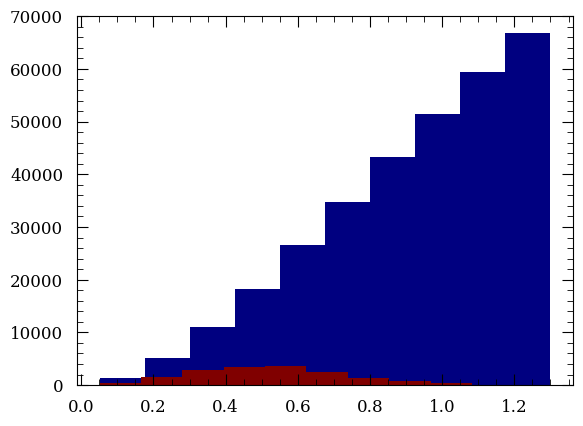

In [17]:
plt.hist(dumpdf['GENZ'])
plt.hist(simdf['zHD'])

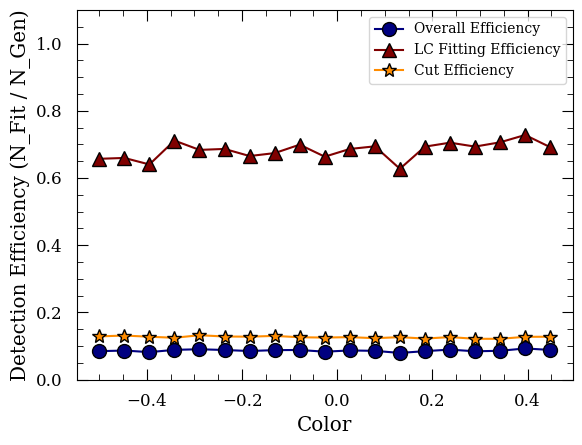

In [18]:

dumpdf, simdf = load_dump_and_sim(100)

cutmask = dumpdf.iloc[np.where(dumpdf['CUTMASK'] == 4095)]

#All events that pass DES quality cuts AND THEN spec cuts
spec = cutmask.iloc[np.where(cutmask['SIM_EFFMASK'] == 5)]


bins = np.linspace(-0.5, 0.5, 20)
a = np.histogram(dumpdf['SALT2x1'], bins = bins)
c = np.histogram(dumpdf['SALT2x1'].iloc[np.where((dumpdf['CUTMASK'] == 4095) & (dumpdf['SIM_EFFMASK'] == 5))], bins = bins)
b = np.histogram(simdf['SIM_x1'], bins = bins)

plt.ylabel('Detection Efficiency (N_Fit / N_Gen)')
plt.plot(a[1][:-1], b[0]/a[0], label = 'Overall Efficiency')
plt.plot(a[1][:-1], b[0]/c[0], label = 'LC Fitting Efficiency')

plt.plot(a[1][:-1], c[0]/a[0], label = 'Cut Efficiency')
plt.legend()
plt.xlabel('Color')
plt.ylim(0, 1.1)
plt.legend()


In [8]:
dumpdf, simdf = load_dump_and_sim(10)

Changed the def of this function without zeros
Changed the def of this function without zeros
Changed the def of this function without zeros


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_36120\1077834301.py:5: RuntimeWarning: invalid value encountered in divide
  a_frac = a_err / a


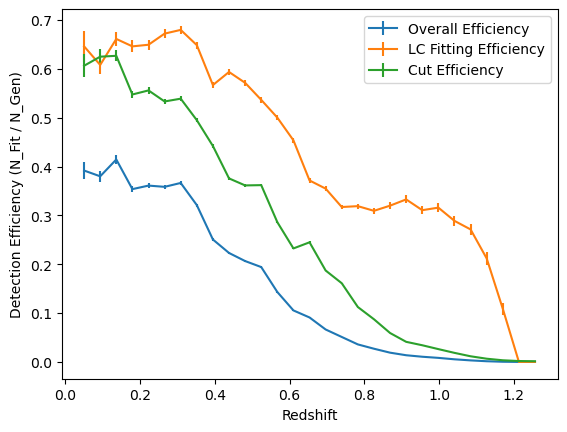

In [ ]:


bins = np.linspace(0.05, 1.3, 30)
a = np.histogram(dumpdf['GENZ'], bins = bins)
c = np.histogram(dumpdf['GENZ'].iloc[np.where((dumpdf['CUTMASK'] == 4095) & (dumpdf['SIM_EFFMASK'] == 5))], bins = bins)
b = np.histogram(simdf['zHD'], bins = bins)

a_err = np.sqrt(a[0])
c_err = np.sqrt(c[0])
b_err = np.sqrt(b[0])



plt.ylabel('Detection Efficiency (N_Fit / N_Gen)')
plt.errorbar(a[1][:-1], b[0]/a[0], yerr = rate_error(b[0],a[0]),  label = 'Overall Efficiency')
plt.errorbar(a[1][:-1], b[0]/c[0], yerr = rate_error(b[0],c[0]), label = 'LC Fitting Efficiency')
plt.errorbar(a[1][:-1], c[0]/a[0], yerr = rate_error(c[0],a[0]), label = 'Cut Efficiency')
plt.legend()
plt.xlabel('Redshift')

plt.legend()

C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_36120\518988369.py:4: RuntimeWarning: invalid value encountered in divide
  a_frac = a_err / a[0]


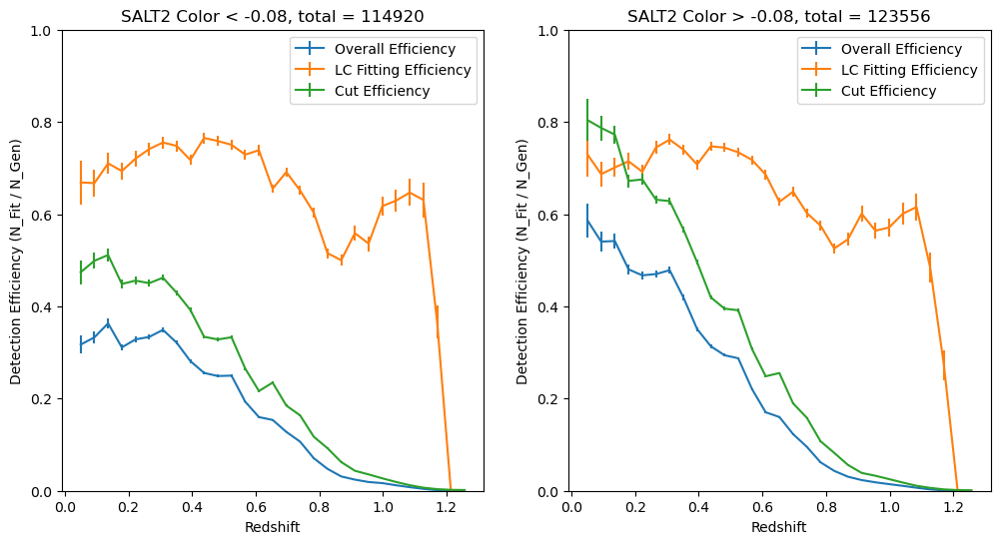

In [10]:

c_cutoff = -0.08

plt.figure(figsize=(12,6))
plt.subplot(1,2,1)

bins = np.linspace(0.05, 1.3, 30)
a = np.histogram(dumpdf['GENZ'][dumpdf['SALT2c'] < c_cutoff], bins = bins)
c = np.histogram(dumpdf['GENZ'].iloc[np.where((dumpdf['CUTMASK'] == 4095) & \
                                            (dumpdf['SIM_EFFMASK'] == 5)  & \
                                            (dumpdf['SALT2c'] < c_cutoff))], bins = bins)
b = np.histogram(simdf['zHD'][simdf['SIM_c'] < c_cutoff], bins = bins)

a_err = np.sqrt(a[0])
c_err = np.sqrt(c[0])
b_err = np.sqrt(b[0])

plt.ylabel('Detection Efficiency (N_Fit / N_Gen)')
plt.errorbar(a[1][:-1], b[0]/a[0], yerr = rate_error(b,a),  label = 'Overall Efficiency')
plt.errorbar(a[1][:-1], b[0]/c[0], yerr = rate_error(b,c), label = 'LC Fitting Efficiency')
plt.errorbar(a[1][:-1], c[0]/a[0], yerr = rate_error(c,a), label = 'Cut Efficiency')
plt.legend()
plt.xlabel('Redshift')

plt.legend()
plt.title('SALT2 Color < {cutoff}, total = {total}'.format(cutoff = c_cutoff, total = np.sum(b[0])))
plt.ylim(0, 1)
plt.subplot(1,2,2)

bins = np.linspace(0.05, 1.3, 30)
a = np.histogram(dumpdf['GENZ'][dumpdf['SALT2c'] > c_cutoff], bins = bins)
c = np.histogram(dumpdf['GENZ'].iloc[np.where((dumpdf['CUTMASK'] == 4095) & \
                                            (dumpdf['SIM_EFFMASK'] == 5)  & \
                                            (dumpdf['SALT2c'] > c_cutoff))], bins = bins)
b = np.histogram(simdf['zHD'][simdf['SIM_c'] > c_cutoff], bins = bins)

a_err = np.sqrt(a[0])
c_err = np.sqrt(c[0])
b_err = np.sqrt(b[0])

plt.ylabel('Detection Efficiency (N_Fit / N_Gen)')
plt.errorbar(a[1][:-1], b[0]/a[0], yerr = rate_error(b,a),  label = 'Overall Efficiency')
plt.errorbar(a[1][:-1], b[0]/c[0], yerr = rate_error(b,c), label = 'LC Fitting Efficiency')
plt.errorbar(a[1][:-1], c[0]/a[0], yerr = rate_error(c,a), label = 'Cut Efficiency')
plt.legend()
plt.ylim(0, 1)
plt.xlabel('Redshift')
plt.title('SALT2 Color > {cutoff}, total = {total}'.format(cutoff = c_cutoff, total = np.sum(b[0])))
plt.legend()

C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_36120\518988369.py:4: RuntimeWarning: invalid value encountered in divide
  a_frac = a_err / a[0]


(0.0, 1.0)

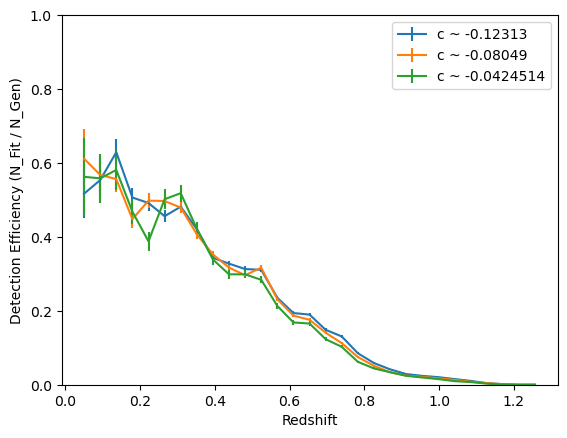

In [11]:

c_all = np.percentile(dumpdf['SALT2c'], [25,50,75])
bins = np.linspace(0.05, 1.3, 30)

for c_cutoff in c_all:
    a = np.histogram(dumpdf['GENZ'][np.isclose(dumpdf['SALT2c'], c_cutoff, 0.1)], bins = bins)
    b = np.histogram(simdf['zHD'][np.isclose(simdf['SIM_c'], c_cutoff, 0.1)], bins = bins)


    plt.ylabel('Detection Efficiency (N_Fit / N_Gen)')
    plt.errorbar(a[1][:-1], b[0]/a[0], yerr = rate_error(b,a),  label = 'c ~ {c_cutoff}'.format(c_cutoff = c_cutoff))

plt.legend()
plt.xlabel('Redshift')

plt.legend()

plt.ylim(0, 1)


## Load and observe Spec efficiency data

PEAKMJD_RANGE: 56300 57500   # Year 123
FIELDLIST: C1+C2
VARNAMES: r_obs_auto obs_gr_auto HOSTEFF
HOSTEFF:    15.400    0.720    1.000 ##1.000
HOSTEFF:    15.400    1.570    1.000 ##1.000
HOSTEFF:    16.200    0.720    1.000 ##1.000
HOSTEFF:    16.200    1.570    1.000 ##1.000
HOSTEFF:    17.000    0.720    1.000 ##1.000
HOSTEFF:    17.000    1.570    1.000 ##1.000
HOSTEFF:    17.800    0.720    1.000 ##1.000
HOSTEFF:    17.800    1.570    1.000 ##1.000
HOSTEFF:    18.600    0.720    1.000 ##1.000
HOSTEFF:    18.600    1.570    1.000 ##1.000
HOSTEFF:    19.400    0.720    1.000 ##1.000
HOSTEFF:    19.400    1.570    1.000 ##1.000
HOSTEFF:    20.200    0.720    0.983 ##0.987
HOSTEFF:    20.200    1.570    0.994 ##0.987
HOSTEFF:    21.000    0.720    0.966 ##0.968
HOSTEFF:    21.000    1.570    0.971 ##0.968
HOSTEFF:    21.800    0.720    0.972 ##0.948
HOSTEFF:    21.800    1.570    0.892 ##0.948
HOSTEFF:    22.600    0.720    0.817 ##0.816
HOSTEFF:    22.600    1.570    0.814 ##0.816
HO

C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_36120\2229200467.py:32: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, new_rows], ignore_index=True)


HOSTEFF:    21.800    1.570    0.705 ##0.750
HOSTEFF:    22.600    0.720    0.614 ##0.614
HOSTEFF:    22.600    1.570    0.613 ##0.614
HOSTEFF:    23.400    0.720    0.370 ##0.359
HOSTEFF:    23.400    1.570    0.317 ##0.359
HOSTEFF:    24.200    0.720    0.154 ##0.125
HOSTEFF:    24.200    1.570    0.011 ##0.125
HOSTEFF:    25.000    0.720    0.000 ##0.000
HOSTEFF:    25.000    1.570    0.000 ##0.000
HOSTEFF:    25.800    0.720    0.000 ##0.000
HOSTEFF:    25.800    1.570    0.000 ##0.000
HOSTEFF:    26.600    0.720    0.000 ##0.000
HOSTEFF:    26.600    1.570    0.000 ##0.000
HOSTEFF:    27.400    0.720    0.000 ##0.000
HOSTEFF:    27.400    1.570    0.000 ##0.000
HOSTEFF:    28.200    0.720    0.000 ##0.000
HOSTEFF:    28.200    1.570    0.000 ##0.000
HOSTEFF:    29.000    0.720    0.000 ##0.000
HOSTEFF:    29.000    1.570    0.000 ##0.000
HOSTEFF:    29.800    0.720    0.000 ##0.000
HOSTEFF:    29.800    1.570    0.000 ##0.000


PEAKMJD_RANGE: 56300 57500   # Year 123
FIELDLIST: X3

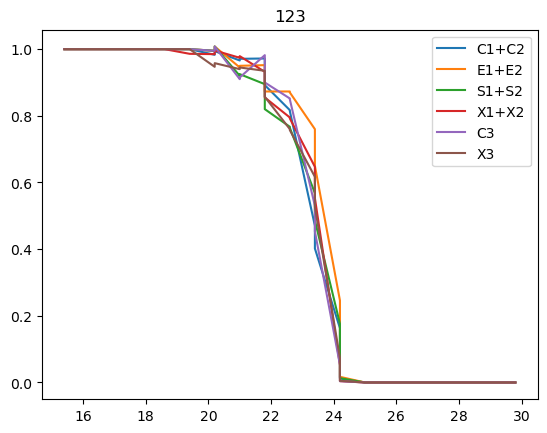

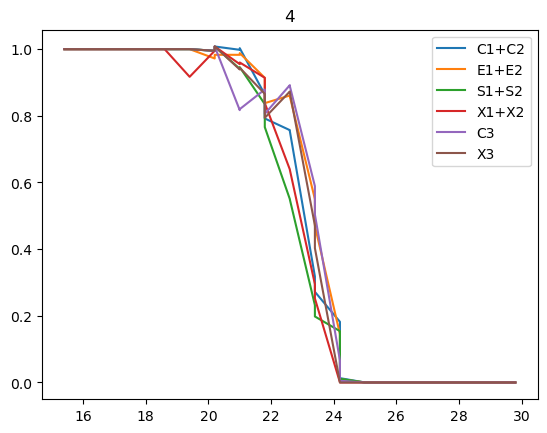

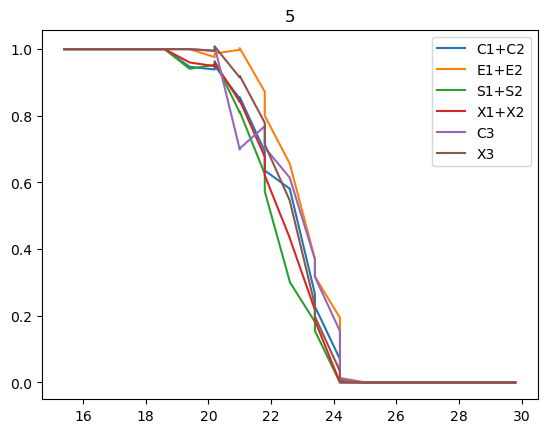

In [12]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
file_path = r"C:\Users\cmeldorf\Desktop\SEARCHEFF_zHOST_DES-SN5YR.DAT"
#searcheff  = pd.read_csv(file, delimiter='   ', skiprows = 23)

df = pd.DataFrame(columns=['Year', 'Field', 'r_obs_auto', 'obs_gr_auto', 'HOST_EFF'])

with open(file_path, 'r') as file:
    year = 'test'
    field = 'test'
    for i, line in enumerate(file):
        
        if i < 20:
            continue
        print(line.strip())
        line = line.split()
        #print(line)

        if 'Year' in line: 
            year = line[-1]
            #print(line)
            #print(year)
        if 'FIELDLIST:' in line:
            field = line[-1]
            #print(line)
            #print(field)
        
        if 'HOSTEFF:' in line:
            #print(year, field)
            new_rows = pd.DataFrame({'Year': year, 'Field': field, 'r_obs_auto': float(line[1]), 'obs_gr_auto': float(line[2]), 'HOST_EFF': float(line[3])}, index = [0])
            df = pd.concat([df, new_rows], ignore_index=True)


for y in df['Year'].unique():
    for f in df['Field'].unique():
        mask = (df['Year'] == y) & (df['Field'] == f)
        plt.plot(df['r_obs_auto'].iloc[np.where(mask)], df['HOST_EFF'].iloc[np.where(mask)], label = f) 
    plt.legend()
    plt.title(y)    
    plt.show()





[0 5 1]
[0.0500408  0.07503998 0.10003917 0.12503835 0.15003754 0.17503672
 0.2000359  0.22503509 0.25003427 0.27503346 0.30003264 0.32503182
 0.35003101 0.37503019 0.40002938 0.42502856 0.45002774 0.47502693
 0.50002611 0.5250253  0.55002448 0.57502366 0.60002285 0.62502203
 0.65002122 0.6750204  0.70001958 0.72501877 0.75001795 0.77501714
 0.80001632 0.8250155  0.85001469 0.87501387 0.90001306 0.92501224
 0.95001142 0.97501061 1.00000979 1.02500898 1.05000816 1.07500734
 1.10000653 1.12500571 1.1500049  1.17500408 1.20000326 1.22500245
 1.25000163 1.27500082 1.3       ]


Text(0, 0.5, 'Detection Efficiency')

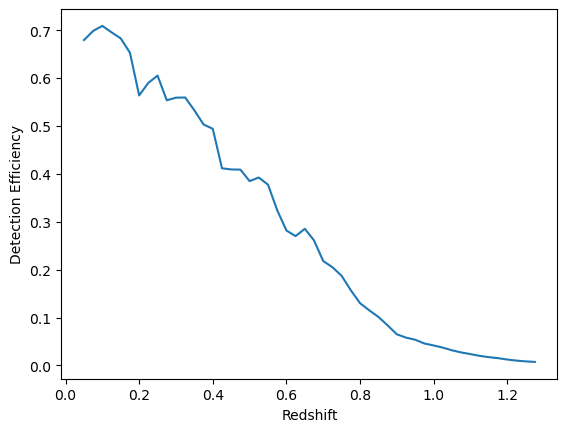

In [13]:
import scipy
print(dumpdf['SIM_EFFMASK'].unique())

detdumpdf = dumpdf.iloc[np.where(dumpdf['CUTMASK'] == 4095)]

means = scipy.stats.binned_statistic(dumpdf['GENZ'], dumpdf['SIM_EFFMASK'], bins = 50)
print(means[1])
plt.plot(means[1][:-1], means[0]/5)
plt.xlabel('Redshift')
plt.ylabel('Detection Efficiency')
#plt.yscale('log')

In [14]:
dumpdf, simdf = load_dump_and_sim(100)

print(dumpdf.iloc[np.where(dumpdf['CUTMASK'] == 4095)].shape)
print(dumpdf.iloc[np.where((dumpdf['CUTMASK'] == 4095) &(dumpdf['SIM_EFFMASK'] == 5))].shape)
print(dumpdf.shape)
print(simdf.shape)
print(dumpdf.tail())
print('----')

(60614, 40)
(34925, 40)
(318216, 40)
(23848, 116)
       VARNAMES:       CID  GENTYPE  SNTYPE  NON1A_INDEX      GENZ  GALZTRUE  \
318211       SN:  38338883        1       0            0  1.275270   1.27806   
318212       SN:   7191628        1     101            0  0.408325   0.40015   
318213       SN:  22848386        1       0            0  0.752136   0.74238   
318214       SN:  36110452        1       0            0  0.894691   0.92673   
318215       SN:  33347810        1       0            0  0.851473   0.83100   

        LIBID         RA        DEC  ...  HOSTMAG_g  HOSTMAG_r  HOSTMAG_i  \
318211   8462  35.561462  -4.972821  ...    24.6239    24.4324    23.9633   
318212   8463   8.395233 -44.239552  ...    23.2791    21.9395    21.4150   
318213   8464  53.596028 -29.802199  ...    22.1948    20.3819    19.2193   
318214   8465   7.114607 -43.158353  ...    22.9965    22.6932    22.1231   
318215   8466   9.013508 -43.631292  ...    23.4904    22.6933    21.5550   

      

(array([  828.,  3156.,  6199.,  9236., 11254., 10412.,  7664.,  5155.,
         4144.,  2566.]),
 array([0.050561 , 0.1754919, 0.3004228, 0.4253537, 0.5502846, 0.6752155,
        0.8001464, 0.9250773, 1.0500082, 1.1749391, 1.29987  ]),
 [<matplotlib.patches.Polygon at 0x166bed3d3d0>])

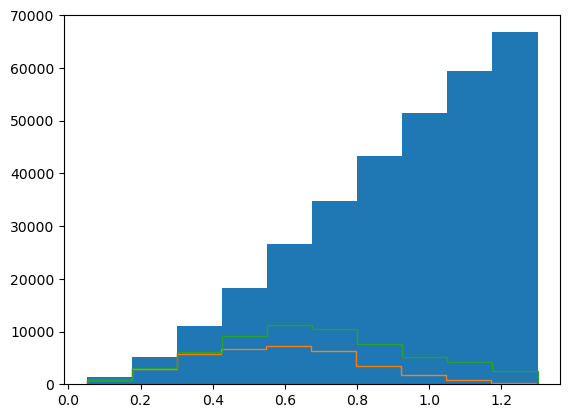

In [15]:
plt.hist(dumpdf['GENZ'])
plt.hist(dumpdf['GENZ'].iloc[np.where(dumpdf['SIM_EFFMASK'] == 5)], histtype = 'step')
plt.hist(dumpdf['GENZ'].iloc[np.where(dumpdf['CUTMASK'] == 4095)], histtype = 'step')

In [16]:
#Just for my sanity
tot = 0
print('BOTH PASS')
print(dumpdf.iloc[np.where((dumpdf['SIM_EFFMASK'] == 5) & (dumpdf['CUTMASK'] == 4095))].shape[0])
tot += dumpdf.iloc[np.where((dumpdf['SIM_EFFMASK'] == 5) & (dumpdf['CUTMASK'] == 4095))].shape[0]
print('BOTH FAIL')
print(dumpdf.iloc[np.where((dumpdf['SIM_EFFMASK'] != 5) & (dumpdf['CUTMASK'] != 4095))].shape[0])
tot += dumpdf.iloc[np.where((dumpdf['SIM_EFFMASK'] != 5) & (dumpdf['CUTMASK'] != 4095))].shape[0]
print('SIM EFFMASK FAIL CUTMASK PASS')
print(dumpdf.iloc[np.where((dumpdf['SIM_EFFMASK'] != 5) & (dumpdf['CUTMASK'] == 4095))].shape[0])
tot += dumpdf.iloc[np.where((dumpdf['SIM_EFFMASK'] != 5) & (dumpdf['CUTMASK'] == 4095))].shape[0]
print('SIM EFFMASK PASS CUTMASK FAIL')
print(dumpdf.iloc[np.where((dumpdf['SIM_EFFMASK'] == 5) & (dumpdf['CUTMASK'] != 4095))].shape[0])
tot += dumpdf.iloc[np.where((dumpdf['SIM_EFFMASK'] == 5) & (dumpdf['CUTMASK'] != 4095))].shape[0]
print('TOTAL')
print(tot)
print(dumpdf.shape[0])

BOTH PASS
34925
BOTH FAIL
256780
SIM EFFMASK FAIL CUTMASK PASS
25689
SIM EFFMASK PASS CUTMASK FAIL
822
TOTAL
318216
318216


In [17]:
simdf.shape

(23848, 116)

C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_36120\401738491.py:28: RuntimeWarning: invalid value encountered in divide
  spec_err = np.sqrt(spec_hist[0])/spec_hist[0]


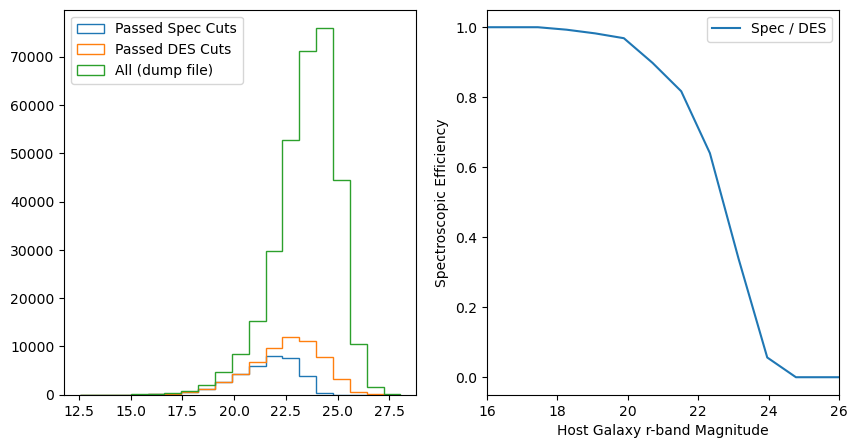

In [18]:
import scipy
plt.figure(figsize = (10,5))



#All events that pass DES quality cuts
cutmask = dumpdf.iloc[np.where(dumpdf['CUTMASK'] == 4095)]

#All events that pass DES quality cuts AND THEN spec cuts
spec = cutmask.iloc[np.where(cutmask['SIM_EFFMASK'] == 5)]


plt.subplot(1,2,1)
bins = np.linspace(np.min(dumpdf['HOSTMAG_r']), np.max(dumpdf['HOSTMAG_r']), 20)

spec_hist = plt.hist(spec['HOSTMAG_r'], bins = bins, density = False, label = 'Passed Spec Cuts', histtype = 'step')
cutmask_hist = plt.hist(cutmask['HOSTMAG_r'], bins = bins, density = False, label = 'Passed DES Cuts', histtype = 'step')
total_hist = plt.hist(dumpdf['HOSTMAG_r'], bins = bins, density = False, label = 'All (dump file)', histtype = 'step')
plt.legend()
plt.subplot(1,2,2)
#plt.plot(a[1][:-1], a[0]/c[0], label = 'Spec / All', color = 'C1')
#plt.plot(a[1][:-1], b[0]/c[0], label = 'DES / All', color = 'C2')

#Error calculation

spec_hist[0][np.where(spec_hist[0] < 10)] = 0

spec_err = np.sqrt(spec_hist[0])/spec_hist[0]
cutmask_err = np.sqrt(cutmask_hist[0])/cutmask_hist[0]
eff_err = spec_hist[0]/cutmask_hist[0] * np.sqrt(spec_err**2 + cutmask_err**2)


#plt.errorbar(spec_hist[1][:-1], spec_hist[0]/cutmask_hist[0], yerr = eff_err, label = 'Spec / DES')

plt.plot(spec_hist[1][:-1], spec_hist[0]/cutmask_hist[0], label = 'Spec / DES')


plt.xlabel('Host Galaxy r-band Magnitude')
plt.ylabel('Spectroscopic Efficiency')
plt.xlim(16,26)
plt.legend()

## $V_{max}$ correction for host galaxies

Max survey dist 9140.377171124106
[3362.1936238  1661.18443818 2984.93538983 ... 2753.46345182 2527.24750605
 6052.96816482] Mpc [22.00484 21.74384 20.453   ... 21.47913 21.36004 23.36023]
24.94422 survey depth
[13016.63479788  7252.60214408 23614.50981875 ... 13579.92327492
 13166.90725954 12553.54517539]
>1 fraction 0.18055226917798495
max and min 1254.7289309769258 1.0


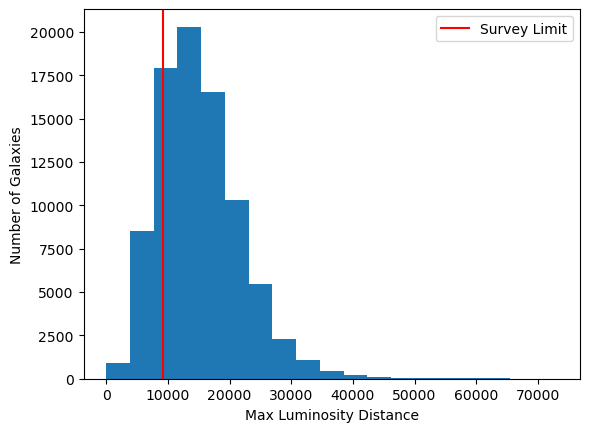

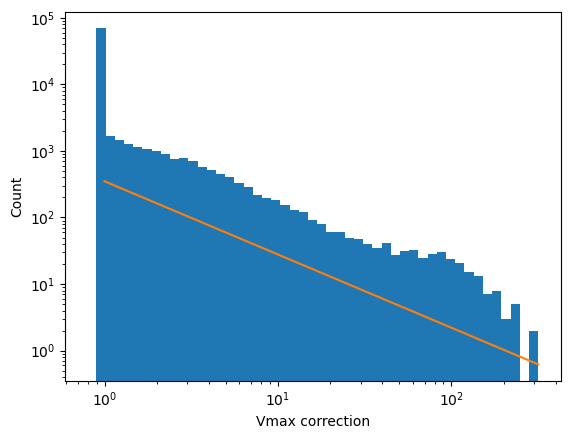

In [54]:
#Vmax corrections
from astropy.cosmology import FlatLambdaCDM
import astropy.units as u
cosmo = FlatLambdaCDM(H0=70 * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)
rsurv_gal = cosmo.luminosity_distance(1.3).value
print('Max survey dist', rsurv_gal)



robs = cosmo.luminosity_distance(simdf.zHD.values)
mobs = simdf.SIM_HOSTLIB_r_obs_auto.values

nanlocs = np.where(np.isnan(robs)) 

mobs = mobs[~np.isnan(robs)]
robs = robs[~np.isnan(robs)]



print(robs, mobs)

msurv = simdf.SIM_HOSTLIB_r_obs_auto.max()
print(msurv, 'survey depth')
rmax = robs * 10 ** ((msurv - mobs)/5)
rmax = rmax.value
print(rmax)


Vmax_correction = np.empty_like(rmax)
Vmax_correction[rmax >= rsurv_gal] = 1
Vmax_correction[rmax < rsurv_gal] = (rsurv_gal / rmax[rmax <= rsurv_gal])**3

print('>1 fraction', np.size(Vmax_correction[np.where(Vmax_correction > 1)]) / np.size(Vmax_correction))
print('max and min', np.max(Vmax_correction), np.min(Vmax_correction))

#print where Vmax correction is nan


bins = np.linspace(0, 8*rsurv_gal, 20)
plt.hist(rmax, bins = bins)
plt.axvline(rsurv_gal, color = 'r', label = 'Survey Limit')
plt.xlabel('Max Luminosity Distance')
plt.ylabel('Number of Galaxies')
plt.legend()
plt.show()



bins = np.logspace(-0.1, 2.5, 50)
a = plt.hist(Vmax_correction, bins = bins)
#plt.xscale('log')
#plt.yscale('symlog')
#Overplot a power law
x = np.logspace(0, 2.5, 100)
y = 350*x**(-1.1)
plt.yscale('log')
plt.xscale('log')
plt.plot(x, y)
plt.xlabel('Vmax correction')
plt.ylabel('Count')
plt.show()

#Sanity check r_surv, is it for SNe or galaxies?



0.9499999999999998 0.95


(array([   6.,    0.,    0.,    0.,    0.,    0.,    0.,   19.,    0.,
           0.,   64.,    0.,  203.,  382.,  631.,  954., 2347., 3315.,
        1926.,  153.]),
 array([0.   , 0.038, 0.076, 0.114, 0.152, 0.19 , 0.228, 0.266, 0.304,
        0.342, 0.38 , 0.418, 0.456, 0.494, 0.532, 0.57 , 0.608, 0.646,
        0.684, 0.722, 0.76 ]),
 [<matplotlib.patches.Polygon at 0x166bf922810>])

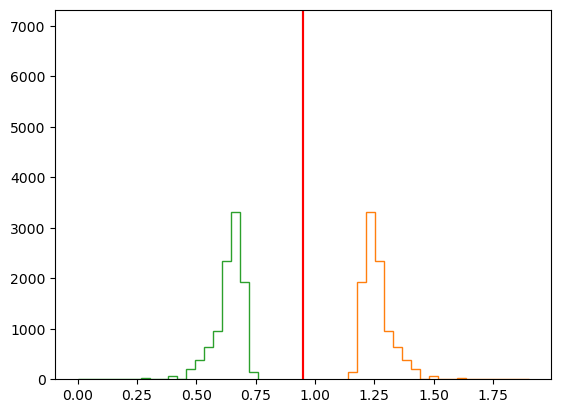

In [20]:
#What does the error on eff look like?
#eps = np.random.normal(0.0, 0.1, 10000)
#eps = np.clip(eps, 0, 1)

eps = 0.95
n = 1000
#Draw Poission distributed number of events
lam = 10
N = np.random.poisson(lam, 10000)
#plt.hist(N, bins = 20)

foo = N * eps

measured_eff = foo / N
plt.hist(measured_eff, bins = 20)

plt.axvline(np.nanpercentile(measured_eff, 16), color = 'r', label = '16th percentile')
plt.axvline(np.nanpercentile(measured_eff, 84), color = 'r', label = '84th percentile')
print(np.nanpercentile(measured_eff, 16), np.nanpercentile(measured_eff, 84))

#Doing it assuming poisson statistics
N_err = np.sqrt(N)/N
foo_err = np.sqrt(foo)/foo
eff_err = foo/N * np.sqrt(N_err**2 + foo_err**2)
eff_err = foo/N * np.sqrt(N_err**2)
upper = foo/N + eff_err
lower = foo/N - eff_err
plt.hist(upper, bins = 20, histtype = 'step')
plt.hist(lower, bins = 20, histtype = 'step')

## Loading real data

#### hostgals is DES 5yr HEAD file https://github.com/des-science/DES-SN5YR/tree/main/0_DATA

#### cosmo_sne is the ~1800 SNe from the same link

In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from astropy.io import fits

hostgals = fits.open(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_DES_HEAD.FITS\DES-SN5YR_DES_HEAD.FITS")[1].data

#classif = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES_classification.csv")

#print(classif['CIDint'].values)
#intIDs = [int(i) for i in hostgals['SNID']]
#print(intIDs)
#hostgals = hostgals[np.where(intIDs == classif['CIDint'].values.any())]
print(hostgals.size)
hostgals = hostgals[hostgals['FAKE'] == 0]
print(hostgals.size)
hostgals = hostgals[hostgals['HOSTGAL_SPECZ'] >= 0.025]
print(hostgals.size)
masses = hostgals['HOSTGAL_LOGMASS']
print(masses.size)

19706
19706
8185
8185


(array([193.,  14.,  28.,  69.,  99., 163., 137., 160., 141., 188., 179.,
        146., 105.,  71.,  53.,  33.,  17.,  14.,  16.,   3.]),
 array([0.02509  , 0.0799015, 0.134713 , 0.1895245, 0.244336 , 0.2991475,
        0.353959 , 0.4087705, 0.463582 , 0.5183935, 0.573205 , 0.6280165,
        0.682828 , 0.7376395, 0.792451 , 0.8472625, 0.902074 , 0.9568855,
        1.011697 , 1.0665085, 1.12132  ]),
 [<matplotlib.patches.Polygon at 0x166bf828790>])

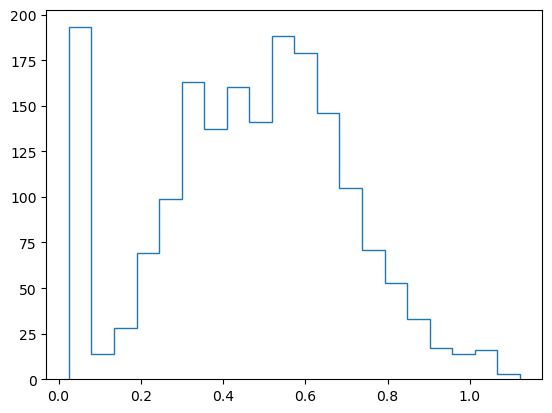

In [22]:
cosmo_sne = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_HD+MetaData.csv")
plt.hist(cosmo_sne['zHD'], bins = 20, histtype = 'step')

## Load Helen's hostlib for our host galaxies

In [159]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np

hostlib = pd.read_table(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_DES.HOSTLIB\DES-SN5YR_DES.HOSTLIB", comment = '#', skiprows = 57, sep = '\s+')
hostlib.shape



(263695, 29)

In [91]:
hostlib = pd.read_table(r"C:\Users\cmeldorf\Downloads\corrected_deduped_with_magauto_logsfr_upto_4.HOSTLIB+HOSTNBR\corrected_deduped_with_magauto_logsfr_upto_4.HOSTLIB+HOSTNBR", skiprows = 2, comment = '#', sep = '\s+')
hostlib.columns

Index(['VARNAMES:', 'GALID', 'RA_GAL', 'DEC_GAL', 'ZTRUE', 'ZERR', 'g_obs',
       'r_obs', 'i_obs', 'z_obs', 'a0_Sersic', 'b0_Sersic', 'n0_Sersic',
       'a_rot', 'LOGMASS', 'LOG_SFR', 'a_DLR', 'b_DLR', 'DLR_area',
       'Sersic_area', 'g_obs_auto', 'r_obs_auto', 'i_obs_auto', 'z_obs_auto',
       'obs_gr', 'NBR_LIST', 'LOGSFR_TRUE'],
      dtype='object')

In [ ]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np

#hostlib = pd.read_table(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_DES.HOSTLIB\DES-SN5YR_DES.HOSTLIB", comment = '#', skiprows = 57, sep = '\s+')
hostlib = pd.read_table(r"C:\Users\cmeldorf\Downloads\corrected_deduped_with_magauto_logsfr_upto_4.HOSTLIB+HOSTNBR\corrected_deduped_with_magauto_logsfr_upto_4.HOSTLIB+HOSTNBR", skiprows = 2, comment = '#', sep = '\s+')

maxz = 1.1
minz = 0.2
max_i = 24.5

hostlib = hostlib[hostlib['ZTRUE'] <= maxz]
hostlib = hostlib[hostlib['ZTRUE'] >= minz]
hostlib = hostlib[hostlib['i_obs_auto'] < max_i]

In [59]:
#Vmax corrections
from astropy.cosmology import FlatLambdaCDM
import astropy.units as u
import scipy.stats
cosmo = FlatLambdaCDM(H0=70 * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)
#This still really needs to be checked TODO
#Wait should I limit both surveys to the same redshift?
#Manual hard cut at 1.3
rsurv_gal = cosmo.luminosity_distance(maxz).value
print('Max survey dist', rsurv_gal)

robs = cosmo.luminosity_distance(hostlib['ZTRUE']).values
mobs = hostlib['i_obs_auto'].values


print(np.max(mobs), np.min(mobs))


msurv = max_i
print(msurv, 'survey depth')
distance_modulus = 10 ** ((msurv - mobs)/5) 
rmax = robs * distance_modulus
print(np.min(rmax))

print(robs[np.argmin(rmax)], 'robs')
print(distance_modulus[np.argmin(rmax)], 'distance_modulus')


Vmax_correction = np.empty_like(rmax)

Vmax_correction = (rsurv_gal / rmax)**3
Vmax_correction[Vmax_correction < 1] = 1



print('>1 fraction', np.size(Vmax_correction[np.where(Vmax_correction > 1)]) / np.size(Vmax_correction))
Vmax_correction[np.where(Vmax_correction == np.inf)] = 1
print('max and min', np.max(Vmax_correction), np.min(Vmax_correction))

#print where Vmax correction is nan


bins = np.linspace(0, 8*rsurv_gal, 20)
plt.hist(rmax, bins = bins)
plt.axvline(rsurv_gal, color = 'r', label = 'Survey Limit')
plt.xlabel('Max Luminosity Distance')
plt.ylabel('Number of Galaxies')
plt.legend()
plt.show()



bins = np.logspace(-0.1, 2.5, 50)
a = plt.hist(Vmax_correction, bins = bins)

#Overplot a power law
x = np.logspace(0, 2.5, 100)
y = 55500*x**(-0.7)
plt.yscale('log')
plt.xscale('log')
plt.plot(x, y)
plt.xlabel('Vmax correction')
plt.ylabel('Count')
plt.show()

bins = np.linspace(minz, maxz, 20)
plt.hist(hostlib['ZTRUE'], bins = bins, histtype = 'step', label = 'Hostlib ZTRUE')
Vmax = scipy.stats.binned_statistic(hostlib['ZTRUE'], Vmax_correction, bins = bins, statistic = 'sum')
plt.plot(bins[1:], Vmax[0])
plt.yscale('log')

#Sanity check r_surv, is it for SNe or galaxies?

NameError: name 'maxz' is not defined

In [95]:
plt.scatter(hostlib['ZTRUE'], hostlib['LOGMASS'], c = np.log10(Vmax_correction), s = 1)


Error in callback <function flush_figures at 0x000001AEC0CE5D00> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

(array([1.10502e+05, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 1.74000e+02, 6.86100e+03, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 8.92000e+02, 1.00000e+00, 2.30000e+03,
        2.86900e+03, 8.35000e+02, 3.70200e+03, 1.80100e+04, 1.12560e+04,
        1.12570e+04, 2.58840e+04, 8.08900e+03, 1.90310e+04, 2.85720e+04,
        2.99500e+04, 1.55180e+04, 5.13530e+04, 2.11150e+04, 3.49420e+04,
        3.13250e+04, 3.06960e+04, 2.65590e+04, 1.84170e+04, 2.53690e+04,
        1.87990e+04, 1.56100e+04, 1.40130e+04, 3.30080e+04, 1.42480e+04,
        1.16430e+04, 1.03230e+04, 2.56200e+04, 2.00110e+04, 1.67000e+04,
        1.51280e+04, 7.99300e+03, 2.36900e+03, 1.05850e+04, 1.24240e+04,
        6.89000e+03, 2.10910e+04, 1.06860e+04, 3.01700e+03, 1.97200e+04,
        1.31550e+04, 6.64200e+03, 5.44900e+03, 1.24620e+04, 1.14660e+04,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00

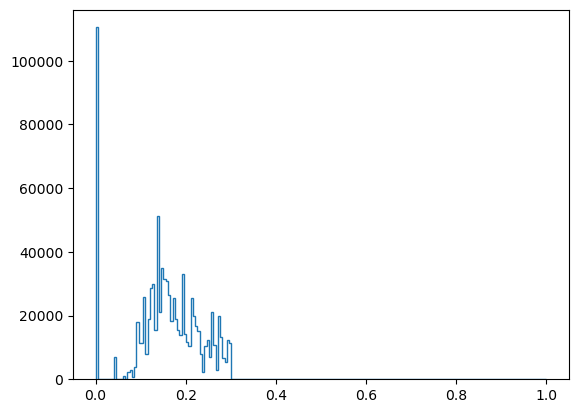

In [61]:
plt.hist(hostlib['ZERR'], bins = np.linspace(0, 1, 200), histtype = 'step', label = 'ZERR')


Index(['CID', 'CIDint', 'IDSURVEY', 'TYPE', 'zHEL', 'zHELERR', 'zCMB',
       'zCMBERR', 'zHD', 'zHDERR', 'VPEC', 'VPECERR', 'MWEBV', 'HOST_ZSPEC',
       'HOST_ZSPECERR', 'HOST_RA', 'HOST_DEC', 'HOST_ANGSEP', 'HOST_DDLR',
       'HOST_LOGMASS', 'HOST_LOGMASS_ERR', 'HOST_COLOR', 'HOST_COLOR_ERR',
       'PKMJD', 'PKMJDERR', 'x1', 'x1ERR', 'c', 'cERR', 'mB', 'mBERR',
       'mB_corr', 'x0', 'x0ERR', 'COV_x1_c', 'COV_x1_x0', 'COV_c_x0', 'NDOF',
       'FITPROB', 'PROB_SCONE', 'PROB_SNIRFV19', 'PROB_SNNDESCC',
       'PROB_SNNJ17', 'PROB_SNNV19', 'MU', 'MUERR_FINAL', 'PROBCC_BEAMS',
       'biasCor_mu', 'biasCor_muCOVSCALE', 'biasCor_muCOVADD'],
      dtype='object')
BinnedStatisticResult(statistic=array([ 730217.81846912, 2816433.74814317, 4106900.33274776,
       3984310.6772318 , 3109424.35852085, 2335389.96042741,
       1433994.42007131, 1097579.20895142,  765488.34550767,
        447190.0349819 ,  303998.49380004,  231737.70860061,
        169683.50247662,  111857.05295106,   69164.

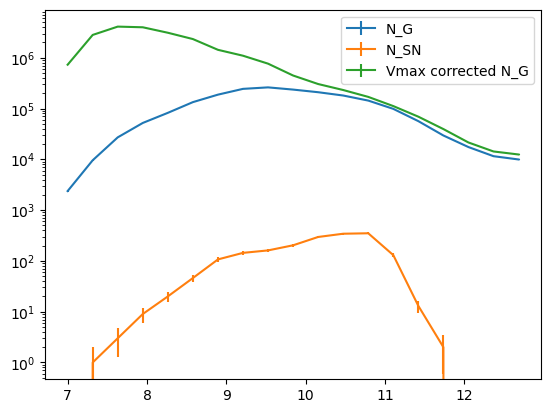

In [96]:
#Actually doing the rate calculation.
import scipy
bins = np.linspace(7, 13, 20)
N_G = np.histogram(hostlib['LOGMASS'], bins = bins)
plt.errorbar(bins[:-1], N_G[0], yerr = np.sqrt(N_G[0]),label = 'N_G')

index_key = np.digitize(hostlib['LOGMASS'], bins) - 1


cosmo_sne = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_HD+MetaData.csv")
print(cosmo_sne.columns)
N_SN = np.histogram(cosmo_sne['HOST_LOGMASS'], bins = bins)

plt.errorbar(bins[:-1], N_SN[0] , yerr = np.sqrt(N_SN[0]), label = 'N_SN')


NGV = scipy.stats.binned_statistic(hostlib['LOGMASS'], Vmax_correction, bins = bins, statistic = 'sum')

print(NGV)


plt.errorbar(bins[:-1], NGV[0], yerr = np.sqrt(N_G[0]) * NGV[0] / N_G[0], label = 'Vmax corrected N_G')
plt.yscale('log')

plt.legend()


In [30]:

plt.figure(figsize = (7,4), dpi = 300)
test_mobs = np.linspace(18,24.5,100)
test_robs = np.linspace(0, rsurv_gal, 100)
mm,rr = np.meshgrid(test_mobs, test_robs)
distance_modulus = 10 ** ((msurv - mm)/5) 
maxmax = rr * distance_modulus
VV = (rsurv_gal / maxmax)**3
VV[VV < 1] = 1
#plt.imshow(np.log10(VV), extent = [18, 24.5, 0, rsurv], aspect = 'auto', origin = 'lower')
#plt.colorbar()
#plt.contour(mm, rr, VV, levels = [1,2,3,4,5,6], colors = ['r','g','g','g', 'g', 'g'])

ro = rsurv_gal * 10 ** ((test_mobs - msurv)/5)
plt.plot(test_mobs, ro, label = 'Correction = 1', ls = '--', color = 'k')


plt.scatter(mobs, robs, s = 3,  alpha = 1, c = np.log10(rsurv_gal**3/rmax**3), vmin = 0)
plt.colorbar(label = 'log(Vmax correction)')
plt.xlabel('Observed i-band Magnitude')
plt.ylabel('Luminosity Distance (Mpc)')


plt.xlim(16,25)
plt.legend()

C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_36120\1601260290.py:7: RuntimeWarning: divide by zero encountered in divide
  VV = (rsurv_gal / maxmax)**3


Error in callback <function flush_figures at 0x00000166B47F9D00> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

In [ ]:
from astropy.cosmology import Planck18 as cosmo  # or use your own cosmology
from astropy.cosmology import z_at_value
import astropy.units as u
#Survey Volumes

from astropy.cosmology import FlatLambdaCDM
import astropy.units as u
cosmo = FlatLambdaCDM(H0=70 * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)

#TODO this needs to be checked

#For now I made a manual hard cut at 1.3
rsurv = cosmo.luminosity_distance(maxz)
print('Max Galaxy survey dist', rsurv)

survey_sphere = 4/3 * np.pi * rsurv**3

r_inner = cosmo.luminosity_distance(minz)
inner_sphere = 4/3 * np.pi * r_inner**3
survey_sphere -= inner_sphere
#format in scientific notation

print('Galaxy Survey sphere', f"{survey_sphere:.2e}")
survey_volume = survey_sphere * (2.7) * 10 # 10 2.7 degrees squared SN regions
V_G = survey_volume / 41252.96125
print('Galaxy Survey Volume', f"{V_G:.2e}")


#TODO this needs to be checked

rsurv = cosmo.luminosity_distance(cosmo_sne['HOST_ZSPEC'].max())
print('Max Galaxy survey dist', rsurv)

survey_sphere = 4/3 * np.pi * rsurv**3
#format in scientific notation

print('Supernova Survey sphere', f"{survey_sphere:.2e}")
survey_volume = survey_sphere * (27)
V_SN = survey_volume / 41252.96125
print('Supernova Survey Volume', f"{V_SN:.2e}")#Time of the survey


NameError: name 'maxz' is not defined

[0.00000000e+00 4.44782055e-05 4.71982788e-05 7.37124540e-05
 1.04655886e-04 1.52117354e-04 2.50210462e-04 2.65794573e-04
 2.88067538e-04 4.07622846e-04 6.86850838e-04 9.66050919e-04
 1.31008476e-03 7.52447939e-04 1.42355851e-04 4.49590383e-05
 0.00000000e+00 0.00000000e+00 0.00000000e+00]
[0.00000000e+00 2.81369862e-07 5.78872615e-07 1.78971062e-06
 5.09210159e-06 1.55892322e-05 5.84977550e-05 9.96425820e-05
 1.51291043e-04 2.94759448e-04 5.85119682e-04 8.66183085e-04
 1.21359812e-03 7.14785063e-04 1.27298351e-04 3.69188076e-05
 0.00000000e+00 0.00000000e+00 0.00000000e+00]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_7692\3639794408.py:19: RuntimeWarning: invalid value encountered in divide
  rate_err = np.sqrt((gal_err/N_G[0])**2 + (sn_err/N_SN[0])**2) * rate


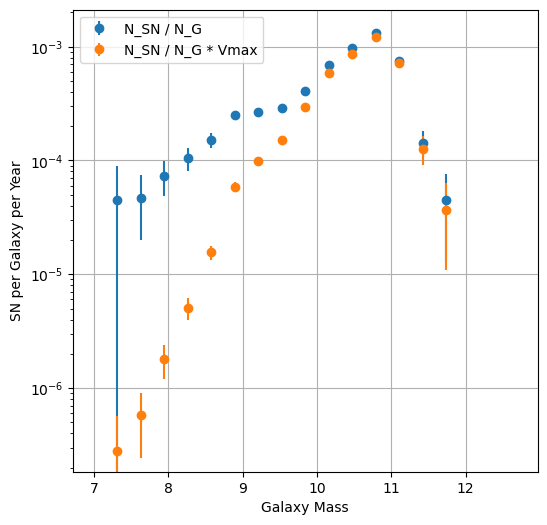

In [ ]:
plt.figure(figsize = (6,6))



#Apply completeness corrections.

#Galaxies first.

bins = np.linspace(7, 13, 20)

rate = N_SN[0] / N_G[0] * V_G / V_SN * 1/total_time
Vmax = scipy.stats.binned_statistic(hostlib['LOGMASS'], Vmax_correction, bins = bins, statistic = 'sum')
rate_update = N_SN[0] / Vmax[0] * V_G / V_SN * 1/total_time 


gal_err = np.sqrt(N_G[0])
sn_err = np.sqrt(N_SN[0])

rate_err = np.sqrt((gal_err/N_G[0])**2 + (sn_err/N_SN[0])**2) * rate
update_err = rate_err *N_G[0] / Vmax[0]
plt.errorbar(bins[:-1], rate, yerr = rate_err, label = 'N_SN / N_G', fmt = 'o')
plt.errorbar(bins[:-1], rate_update, yerr = update_err, label = 'N_SN / N_G * Vmax', fmt = 'o')
plt.ylabel('SN per Galaxy per Year')
plt.xlabel('Galaxy Mass')
plt.yscale('log')
plt.grid('True')
plt.legend()

print(rate)
print(rate_update)

In [ ]:
from astropy.cosmology import Planck18 as cosmo  # or use your own cosmology
from astropy.cosmology import z_at_value
import astropy.units as u




In [ ]:
#Time of the survey
start = np.min(cosmo_sne['PKMJD'][cosmo_sne['PKMJD']>56000])
stop = np.max(cosmo_sne['PKMJD'][cosmo_sne['PKMJD']<56800])
print(start)
print(stop)
print(stop - start)
dur = stop - start
total_time = dur * 5 / 365.25


56530.5
56689.3047
158.8047000000006


In [ ]:
import h5py
import pandas as pd

In [ ]:
philgals = h5py.File(r"C:\Users\cmeldorf\Downloads\deep_X3_hostlib_finalz_sedfit_BC03_vmax_mc_z06.h5", 'r')
print(philgals.keys())
philgals = pd.read_hdf(r"C:\Users\cmeldorf\Downloads\deep_X3_hostlib_finalz_sedfit_BC03_vmax_mc_z06.h5", key = 'main')
for i in philgals.columns:
    print(i)

<KeysViewHDF5 ['main', 'z_0.20_0.40', 'z_0.40_0.60']>
id
bayes.sfh.sfr
bayes.sfh.sfr_err
bayes.stellar.m_star
bayes.stellar.m_star_err
bayes.decam_g
bayes.decam_g_err
bayes.decam_i
bayes.decam_i_err
bayes.decam_r
bayes.decam_r_err
bayes.decam_z
bayes.decam_z_err
best.chi_square
best.reduced_chi_square
best.agn.fracAGN_dale2014
best.attenuation.Av.nebular.continuum_old
best.attenuation.Av.nebular.continuum_young
best.attenuation.Av.nebular.lines_old
best.attenuation.Av.nebular.lines_young
best.attenuation.Av.stellar.old
best.attenuation.Av.stellar.young
best.attenuation.av_old_factor
best.attenuation.decam_g
best.attenuation.decam_i
best.attenuation.decam_r
best.attenuation.decam_z
best.attenuation.powerlaw_slope
best.attenuation.uv_bump_amplitude
best.attenuation.uv_bump_wavelength
best.attenuation.uv_bump_width
best.dust.alpha
best.nebular.f_dust
best.nebular.f_esc
best.nebular.lines_width
best.nebular.logU
best.param.EW(500.7/1.0)
best.param.EW(656.3/1.0)
best.param.restframe_FUV-NUV

51        24.178568
106       23.500280
109       23.283430
115       22.711412
148       24.056950
            ...    
379538    23.004999
379545    20.700136
379547    20.428404
379549    19.955116
379550    18.186314
Name: MAG_AUTO_R, Length: 40415, dtype: float64


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_7692\2714820471.py:12: RuntimeWarning: divide by zero encountered in divide
  VV = (rsurv_gal / maxmax)**3


51        0.3587
106       0.5349
109       0.5529
115       0.5659
148       0.3260
           ...  
379538    0.5476
379545    0.2695
379547    0.2607
379549    0.3122
379550    0.1625
Name: z_peak, Length: 40415, dtype: float32
51        1910.961918
106       3072.211593
109       3197.359326
115       3288.432359
148       1709.451672
             ...     
379538    3160.394150
379545    1372.795297
379547    1321.727813
379549    1625.851481
379550     778.602566
Name: z_peak, Length: 40415, dtype: float64


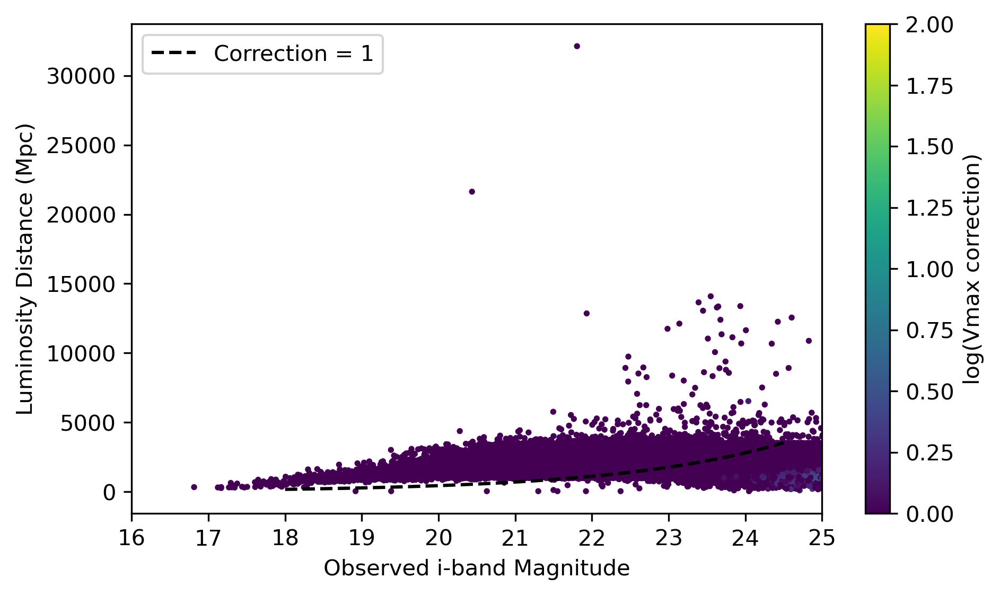

In [ ]:
from astropy.cosmology import FlatLambdaCDM
import astropy.units as u
cosmo = FlatLambdaCDM(H0=70 * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)
rsurv_gal = cosmo.luminosity_distance(0.6).value
msurv = 24.5
plt.figure(figsize = (7,4), dpi = 300)
test_mobs = np.linspace(18,24.5,100)
test_robs = np.linspace(0, rsurv_gal, 100)
mm,rr = np.meshgrid(test_mobs, test_robs)
distance_modulus = 10 ** ((24.5 - mm)/5) 
maxmax = rr * distance_modulus
VV = (rsurv_gal / maxmax)**3
VV[VV < 1] = 1
#plt.imshow(np.log10(VV), extent = [18, 24.5, 0, rsurv], aspect = 'auto', origin = 'lower')
#plt.colorbar()
#plt.contour(mm, rr, VV, levels = [1,2,3,4,5,6], colors = ['r','g','g','g', 'g', 'g'])

ro = rsurv_gal * 10 ** ((test_mobs - msurv)/5)
plt.plot(test_mobs, ro, label = 'Correction = 1', ls = '--', color = 'k')

mobs = philgals['MAG_AUTO_R']
print(mobs)
robs = cosmo.luminosity_distance(philgals['z_peak'])
print(philgals['z_peak'])
print(robs)

# c = np.log10(rsurv_gal**3/rmax**3),
#, vmin = 0
plt.scatter(mobs, robs, s = 3,  alpha = 1, c = np.log10(philgals['V_Max_sedfit']), vmin = 0, vmax = 2)
plt.colorbar(label = 'log(Vmax correction)')
plt.xlabel('Observed i-band Magnitude')
plt.ylabel('Luminosity Distance (Mpc)')


plt.xlim(16,25)
plt.legend()

Max survey dist 3529.995873640599 Mpc
25.77789421081543 survey depth


Text(0, 0.5, 'Phil Vmax correction')

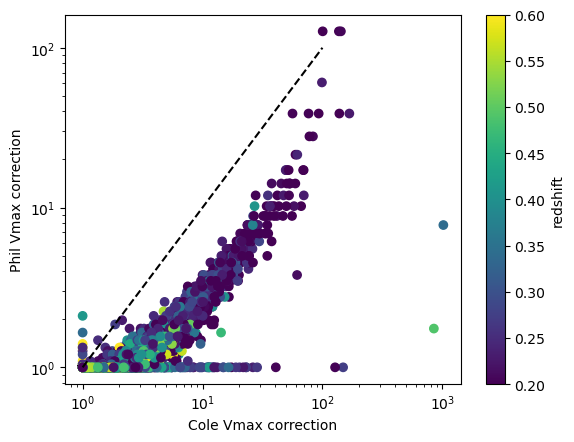

In [ ]:
from astropy.coordinates import Distance
from astropy import units as u
from astropy.cosmology import WMAP5



rsurv_gal = cosmo.luminosity_distance(0.6)
print('Max survey dist', rsurv_gal)



phildists = np.array(philgals['best.universe.luminosity_distance'])* u.m
phildists = phildists.to(u.Mpc).value


#phildists = Distance(value = phildists, unit = u.Mpc)
#robs = cosmo.luminosity_distance(philgals['z_peak'])

robs = Distance(value = phildists, unit = u.Mpc)


mobs = philgals['MAG_AUTO_R']

msurv = np.percentile(mobs, 95)
print(msurv, 'survey depth')

distance_moduli = robs.distmod
abs_mags = mobs - distance_moduli.value 

new_dist_moduli = msurv - abs_mags
rmax = Distance(distmod=new_dist_moduli*u.mag)


distance_modulus = 10 ** ((msurv - mobs)/5) 
rmax = robs * distance_modulus


#rmax = Distance(distmod=(msurv - mobs)*u.mag)

#print(rmax, 'rmax')


Vmax_correction = np.empty_like(rmax)

Vmax_correction = (rsurv_gal / rmax)**3
Vmax_correction[Vmax_correction < 1] = 1

plt.scatter(Vmax_correction, philgals['V_Max_sedfit'],  c = philgals['z_peak'], vmin = 0.2, vmax = 0.6)
plt.colorbar(label = 'redshift')

#plt.scatter(philgals['z_peak'], Vmax_correction/philgals['V_Max_sedfit'], s = 0.5)


plt.plot([1, 100], [1, 100], ls = '--', color = 'k')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Cole Vmax correction')
plt.ylabel('Phil Vmax correction')

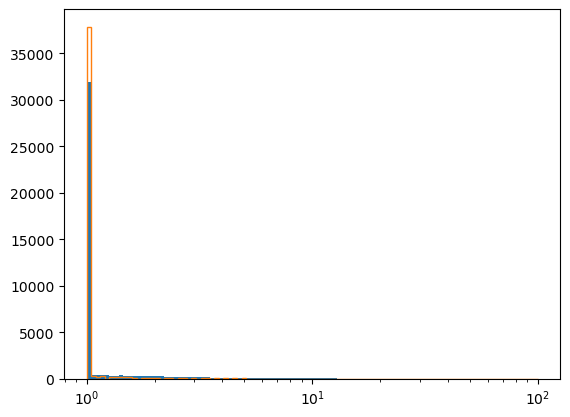

In [ ]:

bins = np.logspace(0,2,100)
plt.hist(Vmax_correction, bins = bins)
plt.hist(philgals['V_Max_sedfit'], bins = bins, histtype = 'step')
plt.xscale('log')

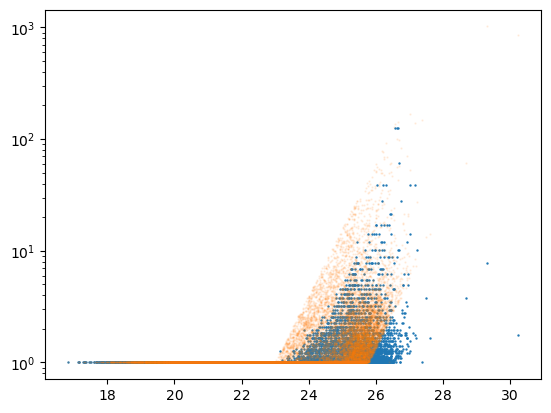

In [ ]:
plt.scatter(philgals['MAG_AUTO_R'], philgals['V_Max_sedfit'], s = 0.5, alpha = 1)
plt.scatter(philgals['MAG_AUTO_R'], Vmax_correction,  s = 0.5, alpha = 0.1)
plt.yscale('log')

KRON_RADIUS
Z_RANK
MAG_KS
MAGERR_KS


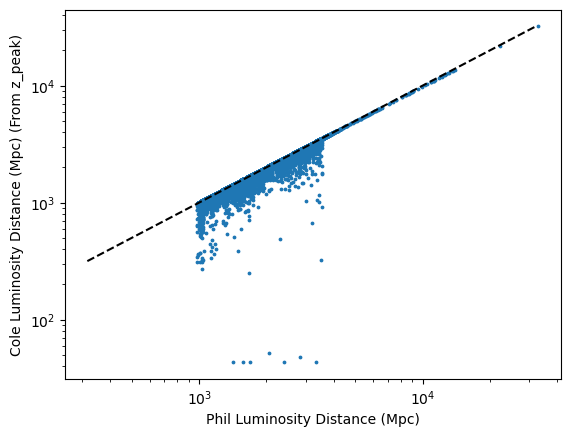

In [ ]:
phildists = np.array(philgals['best.universe.luminosity_distance'])* u.m
phildists = phildists.to(u.Mpc).value
robs = cosmo.luminosity_distance(philgals['z_m2'])
plt.scatter(phildists, robs, s = 3)
plt.xscale('log')
plt.yscale('log')
plt.plot([10**2.5, 10**4.5], [10**2.5, 10**4.5], ls = '--', color = 'k')
plt.xlabel('Phil Luminosity Distance (Mpc)')
plt.ylabel('Cole Luminosity Distance (Mpc) (From z_peak)')


for i in philgals.columns:
    if 'K' in i:
        print(i)


In [ ]:
import astropy.units as u
import astropy.cosmology.units as cu


In [ ]:
phildists = np.array(philgals['best.universe.luminosity_distance'])* u.m
phildists = phildists.to(u.Mpc)

z_converted = phildists.to(cu.redshift, cu.redshift_distance(cosmo, kind="luminosity", zmax=1200))

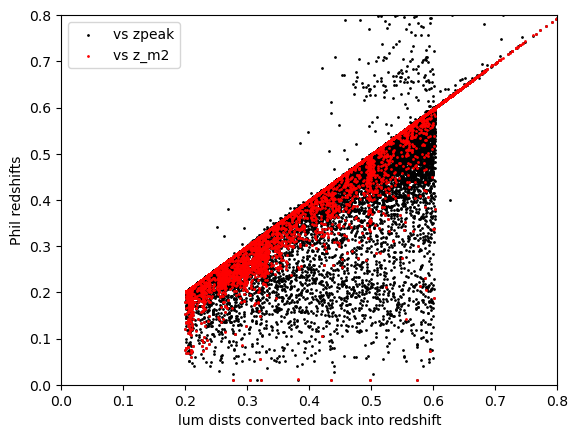

In [ ]:
plt.scatter(z_converted, philgals['z_peak'],  color = 'k', s = 1, label = 'vs zpeak')
plt.scatter(z_converted, philgals['z_m2'],  color = 'r', s = 1, label = 'vs z_m2')


plt.xlabel('lum dists converted back into redshift')
plt.ylabel('Phil redshifts')
plt.xlim(0.0,0.8)
plt.ylim(0.0,0.8)
plt.legend()

In [ ]:
import kcorrect
import numpy as np
import pandas as pd
import astropy
#Initialize kcorrect with the desired filter responses
responses = ['decam_g', 'decam_r', 'decam_i', 'decam_z']
kc = kcorrect.kcorrect.Kcorrect(responses=responses)

Max survey dist 3529.995873640599 Mpc
(39809,) (39809,) (39809,)


Text(0.5, 1.0, 'Without K correction')

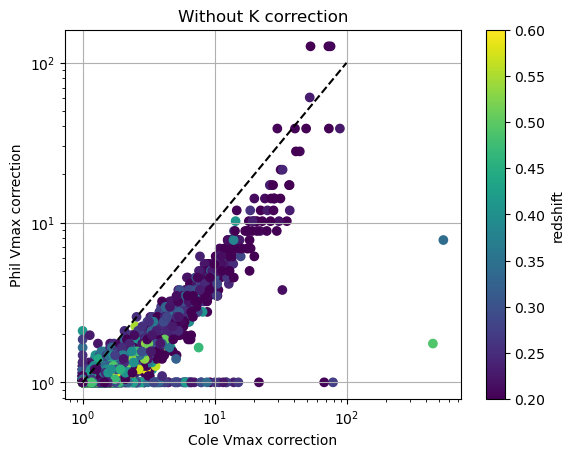

In [ ]:
#Calculate Vmax correction for one galaxy.
#First, get the parameters of the survey.
from astropy.coordinates import Distance
from astropy import units as u
from matplotlib import pyplot as plt

#Max survey distance
cosmo = FlatLambdaCDM(H0=70 * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)
rsurv_gal = cosmo.luminosity_distance(0.6)
print('Max survey dist', rsurv_gal)

philgals = pd.read_hdf(r"C:\Users\cmeldorf\Downloads\deep_X3_hostlib_finalz_sedfit_BC03_vmax_mc_z06.h5", key = 'main')
philgals = philgals.iloc[np.where(philgals['z_peak'] < 0.6)[0]]

#Get luminosity distances from the survey. (I don't have these for the hostlib)
phildists = np.array(philgals['best.universe.luminosity_distance'])* u.m
phildists = phildists.to(u.Mpc)

#rsurv_gal = np.percentile(phildists, 99)
#print('Max survey dist', rsurv_gal)
#Change this to a distance object
r_obs = Distance(value = phildists, unit = u.Mpc)

#Survey magnitudes
m_obs = philgals['MAG_AUTO_R']

#Maximum survey depth
m_surv = np.percentile(m_obs, 99)


distance_moduli = r_obs.distmod     #Astropy calculates distance mod...
abs_mags = m_obs - distance_moduli.value # ... so we can infer absolute magnitude ...
'''
catalogue = philgals
redshift = catalogue.iloc[:]['z_m2']
mags = catalogue.iloc[:][['MAG_AUTO_G', 'MAG_AUTO_R', 'MAG_AUTO_I', 'MAG_AUTO_Z']]
magerrs = catalogue.iloc[:][['MAGERR_AUTO_G', 'MAGERR_AUTO_R', 'MAGERR_AUTO_I', 'MAGERR_AUTO_Z']]

maggies = 10 ** (-0.4 * mags)
maggie_err = 10 ** (-0.4 * magerrs)
ivar = maggie_err ** (-2)
ivar = ivar.values
ivar[ivar > 1e+18] = 1e+18

# "coeffs" is a [5]-array with coefficients multiplying each template
coeffs = kc.fit_coeffs(redshift=redshift, maggies=maggies, ivar=ivar)

# "k" is a [5]-array with the K-corrections in magnitude units
k = kc.kcorrect(redshift=redshift, coeffs=coeffs)

abs_mags = kc.absmag(redshift=redshift, maggies=maggies, ivar=ivar, coeffs=coeffs)[:,1]  
'''


new_dist_moduli = m_surv - abs_mags    # ... so we can calculate a new distance modulus 
                                          # if the galaxy was at the survey depth.
r_max = Distance(distmod=new_dist_moduli*u.mag)
 

Vmax_correction = np.empty_like(r_max)
Vmax_correction = (rsurv_gal / r_max)**3
Vmax_correction[Vmax_correction < 1] = 1

print(np.shape(Vmax_correction), np.shape(philgals['V_Max_sedfit']), np.shape(philgals['z_peak']))


#plotting
plt.scatter(Vmax_correction, philgals['V_Max_sedfit'],  c = philgals['z_peak'], vmin = 0.2, vmax = 0.6)
plt.colorbar(label = 'redshift')
plt.plot([1, 100], [1, 100], ls = '--', color = 'k')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Cole Vmax correction')
plt.ylabel('Phil Vmax correction')
plt.grid('True')
plt.title('Without K correction')

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


dumpdf, simdf = load_dump_and_sim(100)

print(dumpdf.iloc[np.where(dumpdf['CUTMASK'] == 4095)].shape)
print(dumpdf.iloc[np.where((dumpdf['CUTMASK'] == 4095) &(dumpdf['SIM_EFFMASK'] == 5))].shape)
print(dumpdf.shape)
print(simdf.shape)
print(dumpdf.tail())
print('----')


(60614, 40)
(34925, 40)
(318216, 40)
(23848, 116)
       VARNAMES:       CID  GENTYPE  SNTYPE  NON1A_INDEX      GENZ  GALZTRUE  \
318211       SN:  38338883        1       0            0  1.275270   1.27806   
318212       SN:   7191628        1     101            0  0.408325   0.40015   
318213       SN:  22848386        1       0            0  0.752136   0.74238   
318214       SN:  36110452        1       0            0  0.894691   0.92673   
318215       SN:  33347810        1       0            0  0.851473   0.83100   

        LIBID         RA        DEC  ...  HOSTMAG_g  HOSTMAG_r  HOSTMAG_i  \
318211   8462  35.561462  -4.972821  ...    24.6239    24.4324    23.9633   
318212   8463   8.395233 -44.239552  ...    23.2791    21.9395    21.4150   
318213   8464  53.596028 -29.802199  ...    22.1948    20.3819    19.2193   
318214   8465   7.114607 -43.158353  ...    22.9965    22.6932    22.1231   
318215   8466   9.013508 -43.631292  ...    23.4904    22.6933    21.5550   

      

C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_7692\390659907.py:27: RuntimeWarning: invalid value encountered in divide
  spec_err = np.sqrt(spec_hist[0])/spec_hist[0]


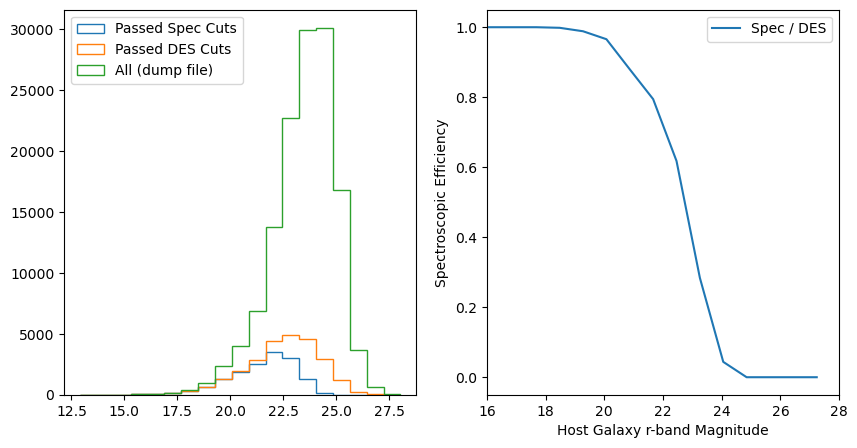

In [ ]:
plt.figure(figsize = (10,5))



#All events that pass DES quality cuts
cutmask = dumpdf.iloc[np.where(dumpdf['CUTMASK'] == 4095)]

#All events that pass DES quality cuts AND THEN spec cuts
spec = cutmask.iloc[np.where(cutmask['SIM_EFFMASK'] == 5)]


plt.subplot(1,2,1)
bins = np.linspace(np.min(dumpdf['HOSTMAG_r']), np.max(dumpdf['HOSTMAG_r']), 20)

spec_hist = plt.hist(spec['HOSTMAG_r'], bins = bins, density = False, label = 'Passed Spec Cuts', histtype = 'step')
cutmask_hist = plt.hist(cutmask['HOSTMAG_r'], bins = bins, density = False, label = 'Passed DES Cuts', histtype = 'step')
total_hist = plt.hist(dumpdf['HOSTMAG_r'], bins = bins, density = False, label = 'All (dump file)', histtype = 'step')
plt.legend()
plt.subplot(1,2,2)
#plt.plot(a[1][:-1], a[0]/c[0], label = 'Spec / All', color = 'C1')
#plt.plot(a[1][:-1], b[0]/c[0], label = 'DES / All', color = 'C2')

#Error calculation

spec_hist[0][np.where(spec_hist[0] < 10)] = 0

spec_err = np.sqrt(spec_hist[0])/spec_hist[0]
cutmask_err = np.sqrt(cutmask_hist[0])/cutmask_hist[0]
eff_err = spec_hist[0]/cutmask_hist[0] * np.sqrt(spec_err**2 + cutmask_err**2)


#plt.errorbar(spec_hist[1][:-1], spec_hist[0]/cutmask_hist[0], yerr = eff_err, label = 'Spec / DES')

plt.plot(spec_hist[1][:-1], spec_hist[0]/cutmask_hist[0], label = 'Spec / DES')

plt.xlabel('Host Galaxy r-band Magnitude')
plt.ylabel('Spectroscopic Efficiency')
plt.xlim(16,28)
plt.legend()


In [ ]:
#This needs to be all efficiencies not just spec

(array([193.,  14.,  28.,  69.,  99., 163., 137., 160., 141., 188., 179.,
        146., 105.,  71.,  53.,  33.,  17.,  14.,  16.,   3.]),
 array([0.02509  , 0.0799015, 0.134713 , 0.1895245, 0.244336 , 0.2991475,
        0.353959 , 0.4087705, 0.463582 , 0.5183935, 0.573205 , 0.6280165,
        0.682828 , 0.7376395, 0.792451 , 0.8472625, 0.902074 , 0.9568855,
        1.011697 , 1.0665085, 1.12132  ]),
 [<matplotlib.patches.Polygon at 0x2d23e7190d0>])

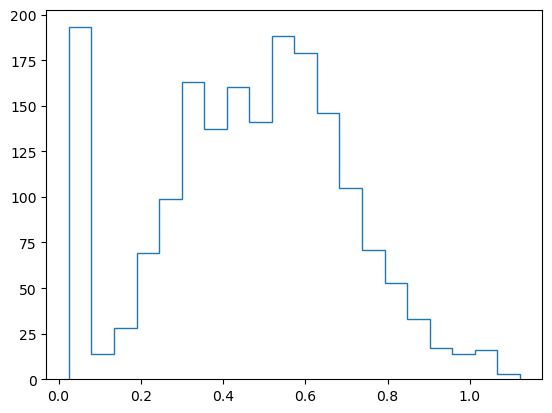

In [ ]:
cosmo_sne = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_HD+MetaData.csv")
plt.hist(cosmo_sne['zHD'], bins = 20, histtype = 'step')

In [9]:


'''
tot = 0
mask = []
for specID in spec['CID']:
    if specID in simdf['CID'].values:
        tot += 1
        print('Found', tot)
        mask.append(True)
    else:
        mask.append(False)
'''

"\ntot = 0\nmask = []\nfor specID in spec['CID']:\n    if specID in simdf['CID'].values:\n        tot += 1\n        print('Found', tot)\n        mask.append(True)\n    else:\n        mask.append(False)\n"

## Calculating SNe Corrections
### First determine the efficiency map as a function of host brightness, redshift, and field.
#### That means we need to determine which field each SN is in.

Index(['CID', 'CIDint', 'IDSURVEY', 'TYPE', 'zHEL', 'zHELERR', 'zCMB',
       'zCMBERR', 'zHD', 'zHDERR', 'VPEC', 'VPECERR', 'MWEBV', 'HOST_ZSPEC',
       'HOST_ZSPECERR', 'HOST_RA', 'HOST_DEC', 'HOST_ANGSEP', 'HOST_DDLR',
       'HOST_LOGMASS', 'HOST_LOGMASS_ERR', 'HOST_COLOR', 'HOST_COLOR_ERR',
       'PKMJD', 'PKMJDERR', 'x1', 'x1ERR', 'c', 'cERR', 'mB', 'mBERR',
       'mB_corr', 'x0', 'x0ERR', 'COV_x1_c', 'COV_x1_x0', 'COV_c_x0', 'NDOF',
       'FITPROB', 'PROB_SCONE', 'PROB_SNIRFV19', 'PROB_SNNDESCC',
       'PROB_SNNJ17', 'PROB_SNNV19', 'MU', 'MUERR_FINAL', 'PROBCC_BEAMS',
       'biasCor_mu', 'biasCor_muCOVSCALE', 'biasCor_muCOVADD'],
      dtype='object')
(1499, 50)


(-46.0, 1.0)

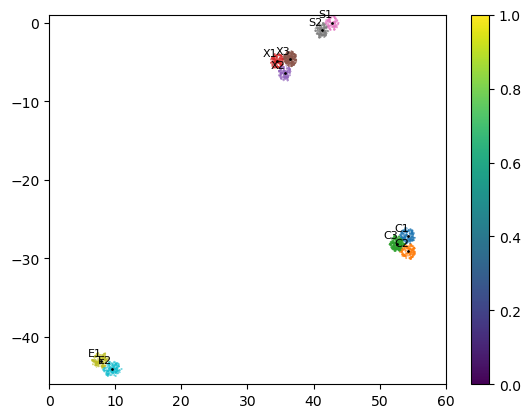

In [10]:
fields = np.array(['C1', 'C2', 'C3', 'X1', 'X2', 'X3', 'S1', 'S2', 'E1', 'E2'])
field_ras = np.array([54.2743,  54.2743, 52.6484, 34.4757, 35.6645, 36.4500,42.8200, 41.1944, 7.8744 , 9.5000,])
field_decs = np.array([-27.1116, -29.0884, -28.1000, -4.9295, -6.4121, -4.6000, 0.0000, -0.9884, -43.0096,  -43.9980])  

cosmo_sne = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_HD+MetaData.csv")
cosmo_sne = cosmo_sne[:1635]
print(cosmo_sne.columns)
cosmo_sne = cosmo_sne[cosmo_sne['PROB_SNNV19'] > 0.5]
print(np.shape(cosmo_sne))

import astropy.units as u
from astropy.coordinates import SkyCoord
c = SkyCoord(ra=cosmo_sne['HOST_RA'].values*u.degree, dec=cosmo_sne['HOST_DEC'].values*u.degree)
catalog = SkyCoord(ra=field_ras*u.degree, dec=field_decs*u.degree)
idx, d2d, d3d = c.match_to_catalog_sky(catalog)

plt.scatter(cosmo_sne['HOST_RA'], cosmo_sne['HOST_DEC'], s = 0.1, alpha = 1, c = idx, cmap ='tab10')
    
plt.scatter(field_ras, field_decs, s = 1, color = 'k', label = 'Fields')

for i in range(len(fields)):
    plt.text(field_ras[i] -1 , field_decs[i] +1, fields[i], fontsize = 8, ha = 'center', va = 'center', color = 'k')

plt.colorbar()
plt.xlim(0,60)
plt.ylim(-46,1)

In [11]:
cosmo_fields = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES_5Y.csv")['FIELD'][:1635]

In [12]:
np.unique(simdf.TYPE)

array([101.])

### Just Deep Fields

In [13]:
def chauvenets_criterion(obs):
    """
    Identify and remove outliers using Chauvenet's criterion.

    From Wikipedia (https://en.wikipedia.org/wiki/Chauvenet%27s_criterion):
    "In statistical theory, Chauvenet's criterion (named for William Chauvenet)
    is a means of assessing whether one piece of experimental data — an outlier
    — from a set of observations, is likely to be spurious."   

    Parameters
    ----------
    obs : array-like
        Set of observations.

    Returns
    -------
    kept : numpy.ndarray
        The observations that have not been rejected.
    rejected : numpy.ndarray
        The observations that have been rejected.

    Examples
    --------
    This example comes from Wikipedia:
    https://en.wikipedia.org/wiki/Chauvenet%27s_criterion#Example

    >>> kept, rejected = chauvenets_criterion([9, 10, 10, 10, 11, 50])
    >>> print(kept)
    [ 9 10 10 10 11]
    >>> print(rejected)
    [50]
    """
    # Sample size
    n = len(obs)
    # Probability represented by one tail of the normal distribution
    P_z = 1 - (1 / (4 * n))

    # Maximum allowable deviation
    D_max = st.norm.ppf(P_z)

    # Mean
    x_bar = np.mean(obs)
    # Sample standard deviation
    s = np.std(obs, ddof=1)
    # z-scores
    z_scores = (obs - x_bar) / s

    # Test z-scores against the maximum allowable deviation
    reject = abs(z_scores) > D_max
    obs = np.array(obs)
    kept = obs[~reject]
    rejected = obs[reject]

    return kept, rejected

(23848, 116)
(23847, 116)
(23417, 116)
(22900, 116)
(17662, 116)
(16902, 116)


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_27096\3567587172.py:37: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  cosmo_sne_deep = cosmo_sne[(cosmo_fields == 'C3') | (cosmo_fields == 'X3')]
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_27096\3567587172.py:57: RuntimeWarning: divide by zero encountered in divide
  chi_2_terms = np.sqrt((real - sim)**2 / real_err**2)
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_27096\3567587172.py:57: RuntimeWarning: invalid value encountered in divide
  chi_2_terms = np.sqrt((real - sim)**2 / real_err**2)


Max Z 1.05 Bin Num 10 Chi2 1.3053044592554148 Best Chi2 1.3053044592554148
Max Z 1.05 Bin Num 14 Chi2 0.9328669587840881 Best Chi2 0.9328669587840881
Max Z 1.0578947368421052 Bin Num 14 Chi2 0.8794595975646077 Best Chi2 0.8794595975646077
Max Z 1.0578947368421052 Bin Num 20 Chi2 0.8739356945189327 Best Chi2 0.8739356945189327
Max Z 1.0657894736842106 Bin Num 14 Chi2 0.8591461384341681 Best Chi2 0.8591461384341681
Max Z 1.0894736842105264 Bin Num 24 Chi2 0.8526261622338484 Best Chi2 0.8526261622338484
Max Z 1.1368421052631579 Bin Num 25 Chi2 0.8090937847118721 Best Chi2 0.8090937847118721
Max Z 1.1842105263157894 Bin Num 26 Chi2 0.7741601842607744 Best Chi2 0.7741601842607744


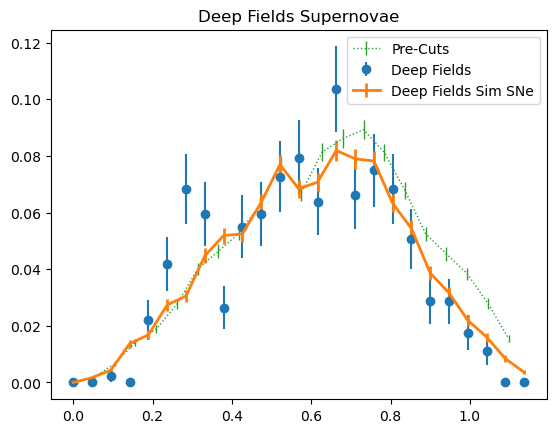

In [14]:
dumpdf, simdf = load_dump_and_sim(100)
simdf_deep = simdf.iloc[np.where((simdf['FIELD'] == 'X3') | (simdf['FIELD'] == 'C3'))[0]]
bins = np.linspace(0, 1.15, 23)

sim = np.histogram(simdf_deep['zCMB'], bins = bins)
plt.errorbar(sim[1][:-1], sim[0]/np.sum(sim[0]), yerr = np.sqrt(sim[0])/np.sum(sim[0]), label = 'Pre-Cuts', color = 'C2', lw = 1, ls = 'dotted')
#Applying Maria's cuts
print(simdf.shape)
simdf = simdf[simdf['SIM_c'] > -0.3]
simdf = simdf[simdf['SIM_c'] < 0.3]
print(simdf.shape)
simdf = simdf[simdf['x1'] > -3]
simdf = simdf[simdf['x1'] < 3]
print(simdf.shape)
simdf = simdf[simdf['HOST_ZSPEC'] > 0.025]
print(simdf.shape)
simdf = simdf[simdf['x1ERR'] < 1]
simdf = simdf[simdf['PKMJDERR'] < 2]
print(simdf.shape)
simdf = simdf[simdf['FITPROB'] > 0.001]
simdf = simdf[simdf['HOST_NMATCH'] > 0]
print(simdf.shape)
deepfields = np.where((fields == 'X3') | (fields == 'C3'))[0]
#Chauvenet's criterion??
#simdf, _  = chauvenets_criterion(simdf['HOST_ZSPEC'])


hostgals = fits.open(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_DES_HEAD.FITS\DES-SN5YR_DES_HEAD.FITS")[1].data
mask = contains_mask(hostgals['SNID'], cosmo_sne['CID'].values)
hostgals = hostgals[mask]
hostgals = hostgals[hostgals['SNID'].argsort()]

#cosmo_sne_deep = cosmo_sne[(idx == deepfields[0]) | (idx == deepfields[1])]
#hostgals_deep = hostgals[(idx == deepfields[0]) | (idx == deepfields[1])]
#idx_deep = idx[(idx == deepfields[0]) | (idx == deepfields[1])]

cosmo_sne_deep = cosmo_sne[(cosmo_fields == 'C3') | (cosmo_fields == 'X3')]

#plt.subplot(1,2,1)
#plt.scatter(cosmo_sne_deep['HOST_RA'], cosmo_sne_deep['HOST_DEC'], s = 1, alpha = 1, cmap ='tab10', c = idx_deep, label = 'Deep Fields')
plt.title('Deep Fields Supernovae')
#plt.subplot(1,2,2)
simdf_deep = simdf.iloc[np.where((simdf['FIELD'] == 'X3') | (simdf['FIELD'] == 'C3'))[0]]


best_chi = 10000
for max_Z in np.linspace(1.05, 1.2, 20):
    for bin_num in np.arange(10,30,1):
        bins = np.linspace(0.0,max_Z, bin_num)
        real = np.histogram(cosmo_sne_deep['zCMB'], bins = bins)
        sim = np.histogram(simdf_deep['zCMB'], bins = bins)
        real_err = np.sqrt(real[0])/np.sum(real[0])


        real = real[0] / np.sum(real[0])
        sim = sim[0] / np.sum(sim[0])
        chi_2_terms = np.sqrt((real - sim)**2 / real_err**2)
        chi_2_terms[np.where(real == 0)] = 0
        chi_2 = np.sum(chi_2_terms)
        chi_2 /= bin_num 
        if chi_2 < best_chi:
            #print('resid', (real - sim)/np.sqrt(real))
            best_chi = chi_2
            best_bins = bins
            best_maxZ = max_Z
            best_bin_num = bin_num
            print('Max Z', max_Z, 'Bin Num', bin_num, 'Chi2', chi_2, 'Best Chi2', best_chi)
        

bins = np.linspace(0.0, best_maxZ, best_bin_num)
real = np.histogram(cosmo_sne_deep['zCMB'], bins = bins)
sim = np.histogram(simdf_deep['zCMB'], bins = bins)
plt.errorbar(real[1][:-1], real[0]/np.sum(real[0]), yerr = np.sqrt(real[0])/np.sum(real[0]), label = 'Deep Fields', color = 'C0', fmt = 'o')
plt.errorbar(sim[1][:-1], sim[0]/np.sum(sim[0]), yerr = np.sqrt(sim[0])/np.sum(sim[0]), label = 'Deep Fields Sim SNe', color = 'C1', lw = 2)
plt.legend()
plt.legend()

### Just shallow fields

[0 0 0 ... 1 1 0]


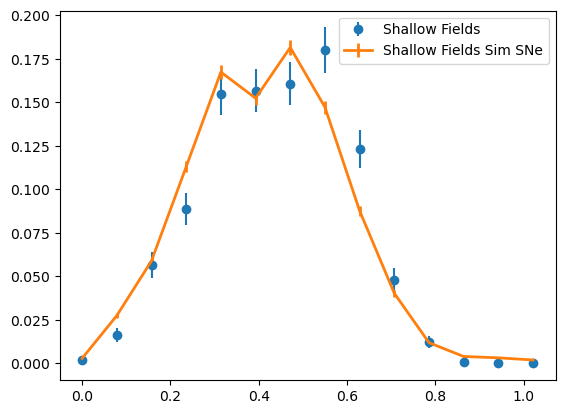

In [15]:

cosmo_sne_shallow = cosmo_sne[(idx != deepfields[0]) & (idx != deepfields[1])]
idx_shallow = idx[(idx != deepfields[0]) & (idx != deepfields[1])]
print(idx_shallow)
simdf_shallow = simdf.iloc[np.where((simdf['FIELD'] != 'X3') & (simdf['FIELD'] != 'C3'))[0]]

bins = np.linspace(0,1.1,15)
real = np.histogram(cosmo_sne_shallow['zHD'], bins = bins)
sim = np.histogram(simdf_shallow['zHD'], bins = bins)
plt.errorbar(real[1][:-1], real[0]/np.sum(real[0]), yerr = np.sqrt(real[0])/np.sum(real[0]), label = 'Shallow Fields', color = 'C0', fmt = 'o')
plt.errorbar(sim[1][:-1], sim[0]/np.sum(sim[0]), yerr = np.sqrt(sim[0])/np.sum(sim[0]), label = 'Shallow Fields Sim SNe', color = 'C1', lw = 2)
plt.legend()
plt.legend()

## Calculate SN efficiency

#### First field match dump df

Index(['VARNAMES:', 'CID', 'GENTYPE', 'SNTYPE', 'NON1A_INDEX', 'GENZ',
       'GALZTRUE', 'LIBID', 'RA', 'DEC', 'MWEBV', 'MU', 'PEAKMJD', 'PEAKMAG_g',
       'PEAKMAG_r', 'PEAKMAG_i', 'PEAKMAG_z', 'SNRMAX_g', 'SNRMAX_r',
       'SNRMAX_i', 'SNRMAX_z', 'SNRMAX', 'SNRMAX2', 'SNRMAX3', 'NOBS',
       'TRESTMIN', 'TRESTMAX', 'TGAPMAX', 'CUTMASK', 'SIM_EFFMASK',
       'HOSTMAG_g', 'HOSTMAG_r', 'HOSTMAG_i', 'HOSTMAG_z', 'SBFLUX_g',
       'SBFLUX_r', 'SBFLUX_i', 'SBFLUX_z', 'SALT2x1', 'SALT2c'],
      dtype='object')


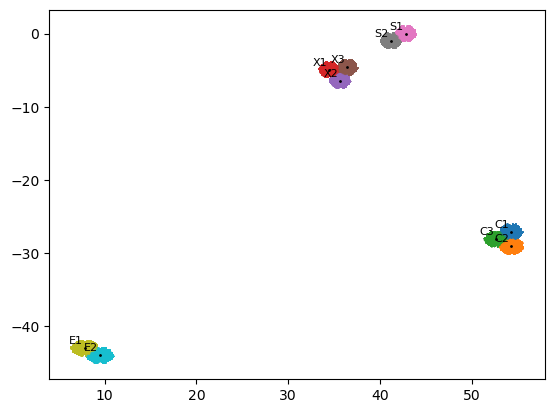

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from astropy.coordinates import SkyCoord
import astropy.units as u
from astropy.io import fits

dumpdf, simdf = load_dump_and_sim(100, maria_cuts = True)



print(dumpdf.columns)
c = SkyCoord(ra=dumpdf['RA'].values*u.degree, dec=dumpdf['DEC'].values*u.degree)
catalog = SkyCoord(ra=field_ras*u.degree, dec=field_decs*u.degree)
idx, d2d, d3d = c.match_to_catalog_sky(catalog)
plt.scatter(dumpdf['RA'], dumpdf['DEC'], s = 0.1, alpha = 1, c= idx, cmap ='tab10')
plt.scatter(field_ras, field_decs, s = 1, color = 'k', label = 'Fields')

for i in range(len(fields)):
    plt.text(field_ras[i] -1 , field_decs[i] +1, fields[i], fontsize = 8, ha = 'center', va = 'center', color = 'k')

deepfields = np.where((fields == 'X3') | (fields == 'C3'))[0]
dumpdf_deep = dumpdf[(idx == deepfields[0]) | (idx == deepfields[1])]
dumpdf_shallow = dumpdf[(idx != deepfields[0]) & (idx != deepfields[1])]

simdf_deep = simdf.iloc[np.where((simdf['FIELD'] == 'X3') | (simdf['FIELD'] == 'C3'))[0]]
simdf_shallow = simdf.iloc[np.where((simdf['FIELD'] != 'X3') & (simdf['FIELD'] != 'C3'))[0]]

(array([0.00000000e+00, 4.83552841e-02, 2.32709805e-01, 9.15728192e-01,
        2.47820831e+00, 4.86877267e+00, 6.99942737e+00, 7.32582554e+00,
        5.08637144e+00, 2.55376344e+00, 8.91550550e-01, 2.08532163e-01,
        5.13774893e-02, 6.04441051e-03, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]),
 array([-0.3       , -0.26842105, -0.23684211, -0.20526316, -0.17368421,
        -0.14210526, -0.11052632, -0.07894737, -0.04736842, -0.01578947,
         0.01578947,  0.04736842,  0.07894737,  0.11052632,  0.14210526,
         0.17368421,  0.20526316,  0.23684211,  0.26842105,  0.3       ]),
 [<matplotlib.patches.Polygon at 0x163a03db1d0>])

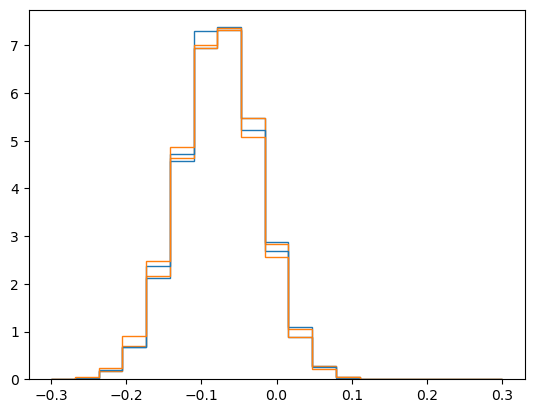

In [17]:
plt.hist(dumpdf_deep['SALT2c'], bins = np.linspace(-0.3, 0.3, 20), histtype = 'step', label = 'Deep Fields', color = 'C0', density = True)
plt.hist(dumpdf_shallow['SALT2c'], bins = np.linspace(-0.3, 0.3, 20), histtype = 'step', label = 'Shallow Fields', color = 'C1', density = True)

plt.hist(simdf_deep['SIM_c'], bins = np.linspace(-0.3, 0.3, 20), histtype = 'step', label = 'Deep Fields', color = 'C0', density = True)
plt.hist(simdf_shallow['SIM_c'], bins = np.linspace(-0.3, 0.3, 20), histtype = 'step', label = 'Shallow Fields', color = 'C1', density = True)

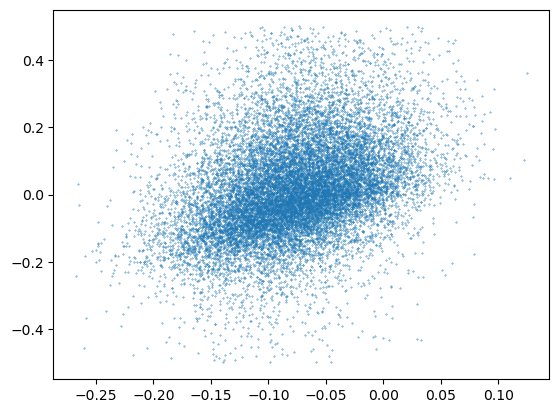

In [18]:
plt.scatter(simdf['SIM_c'], simdf['c'], s = 0.1)

#### Using just deep SNe, calculate efficiency

dump df size (62893, 40)
sim df size (6424, 116)
all cuts shape (161, 40)


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_27096\732582486.py:44: RuntimeWarning: divide by zero encountered in divide
  efficiency_deep = np.nan_to_num(results2[0].T/results1[0].T)
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_27096\732582486.py:44: RuntimeWarning: invalid value encountered in divide
  efficiency_deep = np.nan_to_num(results2[0].T/results1[0].T)


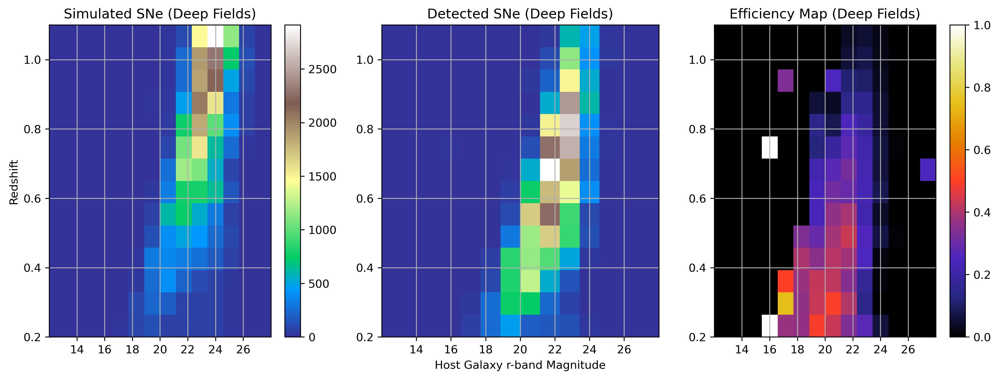

In [19]:
plt.figure(figsize = (15,5),dpi = 300)
plt.tight_layout()

print('dump df size', dumpdf_deep.shape)
print('sim df size', simdf_deep.shape)
#All events that pass DES quality cuts
cutmask = dumpdf_deep.iloc[np.where(dumpdf_deep['CUTMASK'] == 4095)]

#All events that pass DES quality cuts AND THEN spec cuts
spec = cutmask.iloc[np.where(cutmask['SIM_EFFMASK'] == 5)]

mask = spec['CID'].isin(simdf_deep['CID'])
allcuts = spec[mask]


plt.subplot(1,3,1)
xbins = np.linspace(12,28,15)
ybins = np.linspace(0.2,1.1,15)
bins = [xbins, ybins]
results1 = plt.hist2d(dumpdf_deep.HOSTMAG_r, dumpdf_deep.GENZ, bins = bins, cmap = 'terrain')
plt.ylabel('Redshift')
plt.title('Simulated SNe (Deep Fields)')
plt.grid(True)
plt.colorbar()
plt.xticks([14,16,18,20,22,24,26])

plt.subplot(1,3,2)
print('all cuts shape', allcuts.shape)
#results2 = plt.hist2d(allcuts.HOSTMAG_r, allcuts.GENZ, bins = bins, vmax=800,vmin=0,cmap = 'terrain')
results2 = plt.hist2d(simdf_deep.HOST_MAG_r, simdf_deep.zHD, bins = bins,cmap = 'terrain')
plt.xlabel('Host Galaxy r-band Magnitude')
plt.title('Detected SNe (Deep Fields)')
plt.grid(True)
plt.xticks([14,16,18,20,22,24,26])

ax = plt.subplot(1,3,3)
plt.title('Efficiency Map (Deep Fields)')


num = results2[0].T
denom = results1[0].T


efficiency_deep = np.nan_to_num(results2[0].T/results1[0].T)
plt.imshow(efficiency_deep, extent = [xbins[0], xbins[-1], ybins[0], ybins[-1]], aspect = 'auto', origin = 'lower',
                                            cmap = 'CMRmap', vmin = 0, vmax = 1)
plt.colorbar()

plt.xticks([14,16,18,20,22,24,26])
plt.grid(True)
plt.show()

C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_27096\812445883.py:44: RuntimeWarning: invalid value encountered in divide
  efficiency_shallow = np.nan_to_num(results2[0].T/results1[0].T)


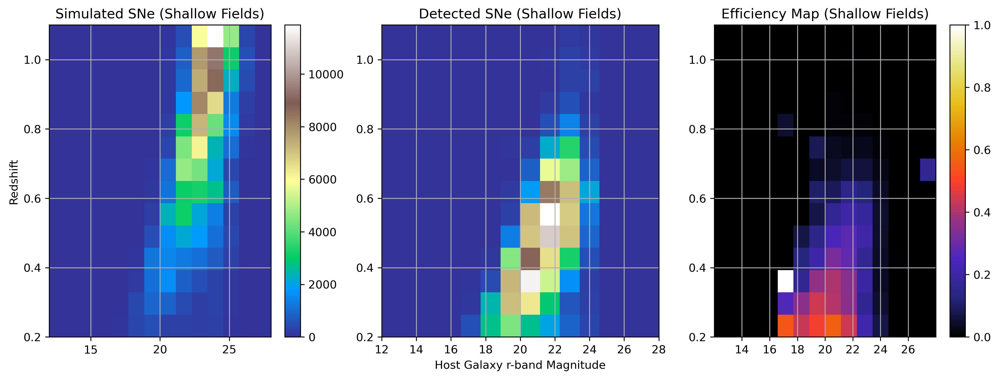

In [20]:
plt.figure(figsize = (15,5),dpi = 300)
plt.tight_layout()


#All events that pass DES quality cuts
cutmask = dumpdf_shallow.iloc[np.where(dumpdf_shallow['CUTMASK'] == 4095)]

#All events that pass DES quality cuts AND THEN spec cuts
spec = cutmask.iloc[np.where(cutmask['SIM_EFFMASK'] == 5)]

mask = spec['CID'].isin(simdf_shallow['CID'])
allcuts = spec[mask]


plt.subplot(1,3,1)
xbins = np.linspace(12,28,15)
ybins = np.linspace(0.2,1.1,15)
bins = [xbins, ybins]
results1 = plt.hist2d(dumpdf_shallow.HOSTMAG_r, dumpdf_shallow.GENZ, bins = bins , cmap = 'terrain')
plt.ylabel('Redshift')
plt.title('Simulated SNe (Shallow Fields)')
plt.grid(True)
plt.colorbar()


plt.subplot(1,3,2)
#results2 = plt.hist2d(allcuts.HOSTMAG_r, allcuts.GENZ, bins = bins, vmax=800,vmin=0,cmap = 'terrain')
results2 = plt.hist2d(simdf_shallow.HOST_MAG_r, simdf_shallow.zHD, bins = bins,cmap = 'terrain')
plt.xlabel('Host Galaxy r-band Magnitude')


plt.title('Detected SNe (Shallow Fields)')
plt.grid(True)


ax = plt.subplot(1,3,3)
plt.title('Efficiency Map (Shallow Fields)')


num = results2[0].T
denom = results1[0].T


efficiency_shallow = np.nan_to_num(results2[0].T/results1[0].T)
plt.imshow(efficiency_shallow, extent = [xbins[0], xbins[-1], ybins[0], ybins[-1]], aspect = 'auto', origin = 'lower',
                                            cmap = 'CMRmap', vmin = 0, vmax = 1)
plt.colorbar()

plt.xticks([14,16,18,20,22,24,26])
plt.grid(True)
plt.show()

[0.000e+00 0.000e+00 0.000e+00 3.000e+00 5.100e+01 3.970e+02 1.813e+03
 3.541e+03 5.065e+03 4.275e+03 9.030e+02 2.100e+01 0.000e+00 2.000e+00] [ 908. 1346. 1825. 1754. 2030. 2150. 1638. 1398. 1037.  731.  519.  328.
  246.  161.]
[3.0000e+00 2.0000e+00 1.0000e+00 2.3000e+01 1.9500e+02 1.2730e+03
 5.9070e+03 1.4016e+04 3.4253e+04 7.0041e+04 6.4506e+04 2.0135e+04
 2.3900e+03 1.1600e+02] [ 2461.  3927.  5657.  7524.  9431. 11746. 13738. 15880. 18147. 20628.
 22681. 24859. 27053. 29129.]
16071.0 212861.0


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_27096\2911862763.py:53: RuntimeWarning: invalid value encountered in divide
  efficiency = np.nan_to_num(results2[0].T/results1[0].T)


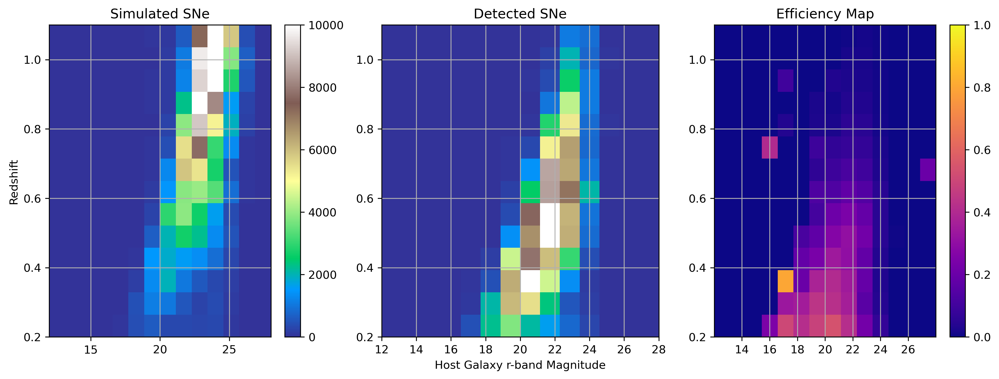

In [21]:
import scipy
plt.figure(figsize = (15,5),dpi = 300)

#All events that pass DES quality cuts
cutmask = dumpdf.iloc[np.where(dumpdf['CUTMASK'] == 4095)]

#All events that pass DES quality cuts AND THEN spec cuts
spec = cutmask.iloc[np.where(cutmask['SIM_EFFMASK'] == 5)]

plt.tight_layout()



mask = spec['CID'].isin(simdf['CID'])
allcuts = spec[mask]


plt.subplot(1,3,1)
xbins = np.linspace(12,28,15)
ybins = np.linspace(0.2,1.1,15)
bins = [xbins, ybins]
#results1 = plt.hist2d(cutmask.HOSTMAG_r, cutmask.GENZ, bins = bins , vmax=400,vmin=0,cmap = 'terrain')
results1 = plt.hist2d(dumpdf.HOSTMAG_r, dumpdf.GENZ, bins = bins , vmax=1e4,vmin=0,cmap = 'terrain')
plt.ylabel('Redshift')
plt.title('Simulated SNe')
plt.grid(True)
plt.colorbar()


plt.subplot(1,3,2)
#results2 = plt.hist2d(allcuts.HOSTMAG_r, allcuts.GENZ, bins = bins, vmax=800,vmin=0,cmap = 'terrain')
results2 = plt.hist2d(simdf.HOST_MAG_r, simdf.zHD, bins = bins, vmax=800,vmin=0,cmap = 'terrain')
plt.xlabel('Host Galaxy r-band Magnitude')


plt.title('Detected SNe')
plt.grid(True)


ax = plt.subplot(1,3,3)
plt.title('Efficiency Map')


num = results2[0].T
denom = results1[0].T


print(np.sum(num, axis = 0), np.sum(num, axis = 1))
print(np.sum(denom, axis = 0), np.sum(denom, axis = 1))
print(np.sum(num), np.sum(denom))


efficiency = np.nan_to_num(results2[0].T/results1[0].T)
plt.imshow(efficiency, extent = [xbins[0], xbins[-1], ybins[0], ybins[-1]], aspect = 'auto', origin = 'lower',
                                            cmap = 'plasma', vmin = 0, vmax = 1)
plt.colorbar()

plt.xticks([14,16,18,20,22,24,26])
plt.grid(True)
#plt.clabel(C1,[0.3, 0.4, 0.5])
plt.show()

#### Get our data

In [22]:
cosmo_fields = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES_5Y.csv")['FIELD'][:1635]
cosmo_sne = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_HD+MetaData.csv")[:1635]
print(np.size(cosmo_fields), np.size(cosmo_sne['CID']))  
cosmo_sne_deep = cosmo_sne[(cosmo_fields == 'C3') | (cosmo_fields == 'X3')]
cosmo_sne_shallow = cosmo_sne[(cosmo_fields != 'C3') & (cosmo_fields != 'X3')]
hostgals = fits.open(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_DES_HEAD.FITS\DES-SN5YR_DES_HEAD.FITS")[1].data

c = SkyCoord(ra=cosmo_sne['HOST_RA'].values*u.degree, dec=cosmo_sne['HOST_DEC'].values*u.degree)
catalog = SkyCoord(ra=field_ras*u.degree, dec=field_decs*u.degree)
idx, d2d, d3d = c.match_to_catalog_sky(catalog)

mask = contains_mask(hostgals['SNID'], cosmo_sne['CID'].values)

hostgals = hostgals[mask]
hostgals = hostgals[hostgals['SNID'].argsort()]

print(np.size(hostgals['SNID']))
print(np.size(cosmo_fields))    
hostgals_deep = hostgals[(cosmo_fields == 'C3') | (cosmo_fields == 'X3')]
hostgals_shallow = hostgals[(cosmo_fields != 'C3') & (cosmo_fields != 'X3')]
print(np.size(hostgals_deep['SNID']))
print(np.size(cosmo_sne_deep['CID']))

1635 1635
1635
1635
509
509


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_27096\2735944708.py:19: RuntimeWarning: divide by zero encountered in divide
  inferred_deep = hist/efficiency_deep
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_27096\2735944708.py:19: RuntimeWarning: invalid value encountered in divide
  inferred_deep = hist/efficiency_deep
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_27096\2735944708.py:46: RuntimeWarning: divide by zero encountered in divide
  inferred_shallow = hist/efficiency_shallow
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_27096\2735944708.py:46: RuntimeWarning: invalid value encountered in divide
  inferred_shallow = hist/efficiency_shallow


c:\Users\cmeldorf\anaconda3\Lib\site-packages\matplotlib\axes\_base.py:2923: RuntimeWarning: overflow encountered in scalar add
  x0, x1 = inverse_trans.transform([x0t - delta, x1t + delta])


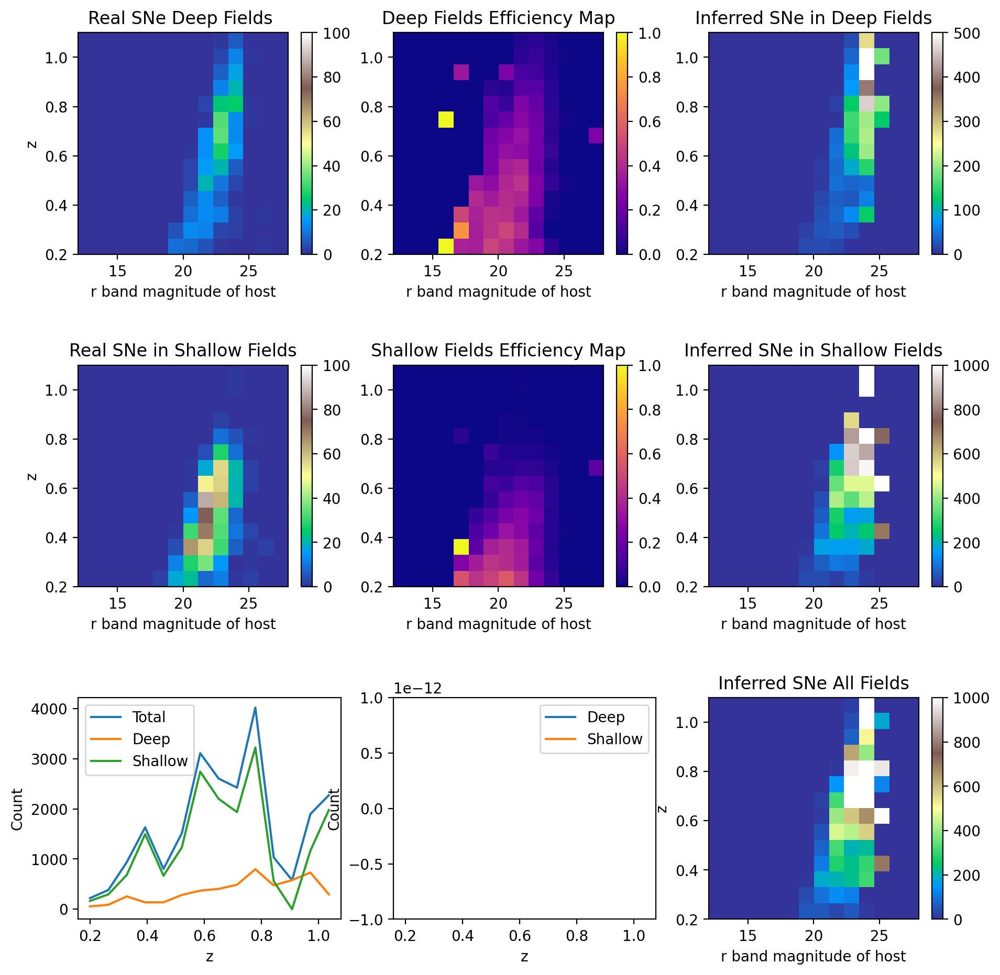

In [23]:
plt.figure(figsize = (11,11), dpi = 200)
plt.subplots_adjust(hspace = 0.5)
plt.subplot(3,3,1)
hist = plt.hist2d(hostgals_deep['HOSTGAL_MAG_r'], cosmo_sne_deep['zHD'][:1635], bins = [xbins, ybins],cmap = 'terrain', vmax = 100)
hist = hist[0].T
plt.ylabel('z')
plt.xlabel('r band magnitude of host') 

plt.title('Real SNe Deep Fields ')
plt.colorbar()
plt.subplot(3,3,2)
plt.title('Deep Fields Efficiency Map')
plt.imshow(efficiency_deep, extent = [np.min(xbins), np.max(xbins), np.min(ybins), np.max(ybins)], aspect = 'auto', origin = 'lower', cmap = 'plasma', vmin = 0, vmax = 1)
plt.colorbar()
plt.xlabel('r band magnitude of host') 

plt.subplot(3,3,3)
plt.title('Inferred SNe in Deep Fields')
inferred_deep = hist/efficiency_deep
inferred_deep[efficiency_deep == 0] = 0
inferred_deep = np.nan_to_num(inferred_deep)
plt.imshow(inferred_deep, extent = [np.min(xbins), np.max(xbins), np.min(ybins), np.max(ybins)], aspect = 'auto', origin = 'lower', cmap = 'terrain', vmin = 0, vmax = 500)
plt.colorbar()
plt.xlabel('r band magnitude of host') 

##########

plt.subplot(3,3,4)
hist = plt.hist2d(hostgals_shallow['HOSTGAL_MAG_r'], cosmo_sne_shallow['zHD'][:1635], bins = [xbins, ybins],cmap = 'terrain', vmax = 100)
hist = hist[0].T
plt.ylabel('z')
plt.title('Real SNe in Shallow Fields')
plt.xlabel('r band magnitude of host') 
plt.colorbar()


plt.subplot(3,3,5)
plt.title('Shallow Fields Efficiency Map')
plt.imshow(efficiency_shallow, extent = [np.min(xbins), np.max(xbins), np.min(ybins), np.max(ybins)], aspect = 'auto', origin = 'lower', cmap = 'plasma', vmin = 0, vmax = 1)
plt.xlabel('r band magnitude of host') 
plt.colorbar()

plt.subplot(3,3,6)
plt.title('Inferred SNe in Shallow Fields')
plt.xlabel('r band magnitude of host') 
inferred_shallow = hist/efficiency_shallow
inferred_shallow[efficiency_shallow == 0] = 0
inferred_shallow = np.nan_to_num(inferred_shallow)
plt.imshow(inferred_shallow, extent = [np.min(xbins), np.max(xbins), np.min(ybins), np.max(ybins)], aspect = 'auto', origin = 'lower', cmap = 'terrain', vmin = 0, vmax = 1000)
plt.colorbar()

##########

plt.subplot(3,3,9)

total_inferred = inferred_shallow + inferred_deep
plt.title('Inferred SNe All Fields')
plt.xlabel('r band magnitude of host') 
plt.ylabel('z')
plt.imshow(total_inferred, extent =[np.min(xbins), np.max(xbins), np.min(ybins), np.max(ybins)], aspect = 'auto', origin = 'lower', cmap = 'terrain', vmin = 0, vmax = 1000)
plt.colorbar()

plt.subplot(3,3,7)
plt.plot(ybins[:-1], np.sum(total_inferred, axis = 1), label = 'Total')
plt.plot(ybins[:-1], np.sum(inferred_deep, axis = 1), label = 'Deep')
plt.plot(ybins[:-1], np.sum(inferred_shallow, axis = 1), label = 'Shallow')

plt.legend()

plt.xlabel('z')
plt.ylabel('Count')

plt.subplot(3,3,8)
#plt.plot(xbins[:-1], np.sum(total_inferred, axis = 0), label = 'Total Inferred')
#plt.plot(xbins[:-1], np.sum(inferred_deep, axis = 0), label = 'Deep Inferred')
#plt.plot(xbins[:-1], np.sum(inferred_shallow, axis = 0), label = 'Shallow Inferred')


plt.plot(ybins[:-1], np.sum(efficiency_deep, axis = 1), label = 'Deep')
plt.plot(ybins[:-1], np.sum(efficiency_shallow, axis = 1), label = 'Shallow')

plt.xlabel('z') 
plt.ylabel('Count')
plt.legend()

## Simultaneously bin on SN color, field, m_r and z

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from astropy.io import fits
from ColeUtils import load_dump_and_sim, contains_mask, rate_error
from astropy.coordinates import SkyCoord
from astropy import units as u
dumpdf, simdf = load_dump_and_sim(1, maria_cuts = True)





In [3]:

fields = np.array(['C1', 'C2', 'C3', 'X1', 'X2', 'X3', 'S1', 'S2', 'E1', 'E2'])
field_ras = np.array([54.2743,  54.2743, 52.6484, 34.4757, 35.6645, 36.4500, 42.8200, 41.1944, 7.8744 , 9.5000,])
field_decs = np.array([-27.1116, -29.0884, -28.1000, -4.9295, -6.4121, -4.6000, 0.0000, -0.9884, -43.0096,  -43.9980])  

c = SkyCoord(ra=dumpdf['RA'].values*u.degree, dec=dumpdf['DEC'].values*u.degree)
catalog = SkyCoord(ra=field_ras*u.degree, dec=field_decs*u.degree)
idx, d2d, d3d = c.match_to_catalog_sky(catalog)

In [ ]:
'''
deepfields = np.where((fields == 'X3') | (fields == 'C3'))[0]
deep_bool = np.zeros_like(idx)
deep_bool[np.where((idx == deepfields[0]) | (idx == deepfields[1]))[0]] = 1
dump_array = dumpdf[['GENZ', 'HOSTMAG_r', 'SALT2c']]
dump_array = dump_array.to_numpy()
dump_array = np.column_stack((dump_array, deep_bool))

z_bins = np.linspace(0, 1, 10)
#z_bins = np.concatenate((z_bins, [1.1]))
#host_bins = np.linspace(12, 28, 5)
#host_bins = np.linspace(12, 27, 5)

host_bins = np.linspace(20,24,10)
host_bins = np.concatenate((host_bins, [12,  27]))


#host_bins = np.concatenate((host_bins, [14, 18, 21, 21.5, 22, 22.5]))
host_bins = np.sort(host_bins)
#print(host_bins)
c_bins = [-3, 0, 3]
depth_bins = [-0.5, 0.5, 1.5]

H_dump, edges = np.histogramdd(dump_array, bins = [z_bins, host_bins, c_bins, depth_bins])

sim_array = simdf[['zHD', 'HOST_MAG_r', 'SIM_c', 'FIELD']]
print(sim_array['FIELD'].unique())
print(np.shape(sim_array['FIELD']))
print(np.shape(sim_array['FIELD'][(sim_array['FIELD'] == 'C3') | (sim_array['FIELD'] == 'X3')]))
sim_array['FIELD'][(sim_array['FIELD'] == 'C3') | (sim_array['FIELD'] == 'X3')] = 1
sim_array['FIELD'][sim_array['FIELD'] != 1] = 0  #What about combined fields?
sim_array = sim_array.to_numpy()
print(np.shape(sim_array[sim_array[:,3] == 1]))

H_sim, edges = np.histogramdd(sim_array, bins = [z_bins, host_bins, c_bins, depth_bins])

hostgals = fits.open(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_DES_HEAD.FITS\DES-SN5YR_DES_HEAD.FITS")[1].data
cosmo_sne = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_HD+MetaData.csv")[:1635]

mask = contains_mask(hostgals['SNID'], cosmo_sne['CID'].values)
hostgals = hostgals[mask]
hostgals = hostgals[hostgals['SNID'].argsort()]
cosmo_fields = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES_5Y.csv")['FIELD'][:1635]
cosmo_fields[(cosmo_fields == 'C3') | (cosmo_fields == 'X3')] = 1
cosmo_fields[cosmo_fields !=1] = 0


real_array = np.array([cosmo_sne['zHD'], hostgals['HOSTGAL_MAG_r'], cosmo_sne['c'], cosmo_fields]).T
print(np.shape(real_array))

H_real, edges = np.histogramdd(real_array, bins = [z_bins, host_bins, c_bins, depth_bins])
'''


['C1' 'X1' 'X3' 'E1+E2' 'S2' 'C3' 'C2' 'E2' 'X2' 'S1' 'C2+C3' 'E1' 'X1+X3'
 'C1+C3' 'S1+S2' 'X1+X2' 'X2+X3']
(845675,)
(318691,)
(318691, 4)


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_15352\706798408.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sim_array['FIELD'][(sim_array['FIELD'] == 'C3') | (sim_array['FIELD'] == 'X3')] = 1
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_15352\706798408.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sim_array['FIELD'][sim_array['FIELD'] != 1] = 0  #What about combined fields?


(1635, 4)


In [4]:
#Same as above but I am trying to make host bins dynamic

deepfields = np.where((fields == 'X3') | (fields == 'C3'))[0]
deep_bool = np.zeros_like(idx)
deep_bool[np.where((idx == deepfields[0]) | (idx == deepfields[1]))[0]] = 1
#Just for fun we switch to x1
dump_array = dumpdf[['GENZ', 'HOSTMAG_r', 'SALT2c']]
#dump_array = dumpdf[['GENZ', 'HOSTMAG_r', 'SALT2x1']]
dump_array = dump_array.to_numpy()
dump_array = np.column_stack((dump_array, deep_bool))

#Just for fun we switch to x1
sim_array = simdf[['zHD', 'HOST_MAG_r', 'SIM_c', 'FIELD']]
#sim_array = simdf[['zHD', 'HOST_MAG_r', 'SIM', 'FIELD']]
sim_array['FIELD'][(sim_array['FIELD'] == 'C3') | (sim_array['FIELD'] == 'X3')] = 1
sim_array['FIELD'][sim_array['FIELD'] != 1] = 0  #What about combined fields?
sim_array = sim_array.to_numpy()


hostgals = fits.open(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_DES_HEAD.FITS\DES-SN5YR_DES_HEAD.FITS")[1].data
cosmo_sne = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_HD+MetaData.csv")[:1635]
mask = contains_mask(hostgals['SNID'], cosmo_sne['CID'].values)
hostgals = hostgals[mask]
hostgals = hostgals[hostgals['SNID'].argsort()]
cosmo_fields = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES_5Y.csv")['FIELD'][:1635]
cosmo_fields[(cosmo_fields == 'C3') | (cosmo_fields == 'X3')] = 1
cosmo_fields[cosmo_fields !=1] = 0
#Just for fun we switch to x1
real_array = np.array([cosmo_sne['zHD'], hostgals['HOSTGAL_MAG_r'], cosmo_sne['c'], cosmo_fields]).T
#real_array = np.array([cosmo_sne['zHD'], hostgals['HOSTGAL_MAG_r'], cosmo_sne['c'], cosmo_fields]).T

z_bins = np.linspace(0.0, 1, 10)
# Just for fun we switch to x1
c_bins = [-3, -0.08, 3]
#c_bins = [-4, 0, 4]
depth_bins = [-0.5, 0.5, 1.5]

host_bins = [12, 28]
for i in range(120):
    new_host_bins = np.concatenate((host_bins, [12 + (i+1)/6]))
    new_host_bins = np.sort(new_host_bins)
    H_dump, edges = np.histogramdd(dump_array, bins = [z_bins, new_host_bins, c_bins, depth_bins])
    H_sim, edges = np.histogramdd(sim_array, bins = [z_bins, new_host_bins, c_bins, depth_bins])
    H_real, edges = np.histogramdd(real_array, bins = [z_bins, new_host_bins, c_bins, depth_bins])
    badbins = np.argwhere((H_sim / H_real < 10) | (H_sim > H_dump))
    if len(badbins) == 0 and np.all(H_dump >= H_sim): # and np.all(np.sum(H_real, axis = (0,2,3)) > 0):
        host_bins = new_host_bins
        print('Found host bins', host_bins)
    else:
        print('Bad bins', new_host_bins)
        if not np.all(H_dump > H_sim):
            print('Dump < Sim')
        print(np.sum(H_real, axis = (0,2,3)))
        print(f'Failed with {len(badbins)} bad bins')


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_6508\605725316.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sim_array['FIELD'][(sim_array['FIELD'] == 'C3') | (sim_array['FIELD'] == 'X3')] = 1
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_6508\605725316.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sim_array['FIELD'][sim_array['FIELD'] != 1] = 0  #What about combined fields?
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_6508\605725316.py:45: RuntimeWarning: divide by zero encountered in divide
  badbins = np.argwhere((H_sim / H_real < 10) | (H_sim > H_dump))
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel

Found host bins [12.         12.16666667 28.        ]
Found host bins [12.         12.16666667 12.33333333 28.        ]
Bad bins [12.         12.16666667 12.33333333 12.5        28.        ]
Dump < Sim
[   0.    0.    0. 1603.]
Failed with 2 bad bins
Found host bins [12.         12.16666667 12.33333333 12.66666667 28.        ]
Bad bins [12.         12.16666667 12.33333333 12.66666667 12.83333333 28.        ]
Dump < Sim
[   0.    0.    0.    0. 1603.]
Failed with 4 bad bins
Found host bins [12.         12.16666667 12.33333333 12.66666667 13.         28.        ]
Bad bins [12.         12.16666667 12.33333333 12.66666667 13.         13.16666667
 28.        ]
Dump < Sim
[   0.    0.    0.    0.    0. 1603.]
Failed with 2 bad bins
Bad bins [12.         12.16666667 12.33333333 12.66666667 13.         13.33333333
 28.        ]
Dump < Sim
[   0.    0.    0.    0.    0. 1603.]
Failed with 2 bad bins
Bad bins [12.         12.16666667 12.33333333 12.66666667 13.         13.5
 28.        ]
Dump < 

In [10]:
#Same as above but I am trying to make host bins dynamic

deepfields = np.where((fields == 'X3') | (fields == 'C3'))[0]
deep_bool = np.zeros_like(idx)
deep_bool[np.where((idx == deepfields[0]) | (idx == deepfields[1]))[0]] = 1
dump_array = dumpdf[['GENZ', 'HOSTMAG_r', 'SALT2c', 'SALT2x1']]
dump_array = dump_array.to_numpy()
dump_array = np.column_stack((dump_array, deep_bool))


#Changed sim to measured!!!!!
#sim_array = simdf[['zHD', 'HOST_MAG_r', 'SIM_c', 'SIM_x1', 'FIELD']]
sim_array = simdf[['zHD', 'HOST_MAG_r', 'c', 'x1', 'FIELD']]
sim_array['FIELD'][(sim_array['FIELD'] == 'C3') | (sim_array['FIELD'] == 'X3')] = 1
sim_array['FIELD'][sim_array['FIELD'] != 1] = 0  #What about combined fields?
sim_array = sim_array.to_numpy()


hostgals = fits.open(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_DES_HEAD.FITS\DES-SN5YR_DES_HEAD.FITS")[1].data
cosmo_sne = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_HD+MetaData.csv")[:1635]
mask = contains_mask(hostgals['SNID'], cosmo_sne['CID'].values)
hostgals = hostgals[mask]
hostgals = hostgals[hostgals['SNID'].argsort()]
cosmo_fields = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES_5Y.csv")['FIELD'][:1635]
cosmo_fields[(cosmo_fields == 'C3') | (cosmo_fields == 'X3')] = 1
cosmo_fields[cosmo_fields !=1] = 0
real_array = np.array([cosmo_sne['zHD'], hostgals['HOSTGAL_MAG_r'], cosmo_sne['c'], cosmo_sne['x1'], cosmo_fields]).T

#z_bins = np.linspace(0, 1, 10)
z_bins = np.linspace(0.2, 1, 8)
c_bins = np.array([-3, -0.08, 3])
#c_bins = np.array([-3, -0.13, 3])
depth_bins = np.array([-0.5, 0.5, 1.5])
x1_bins = np.array([-4, 0, 4])

z_bin_centers = (z_bins[:-1] + z_bins[1:]) / 2
c_bin_centers = (c_bins[:-1] + c_bins[1:]) / 2
x1_bin_centers = (x1_bins[:-1] + x1_bins[1:]) / 2
depth_bin_centers = (depth_bins[:-1] + depth_bins[1:]) / 2

#host_bins = [12, 28]
host_bins = [12, np.inf]
for i in range(120):
    new_host_bins = np.concatenate((host_bins, [12 + (i+1)/6]))
    new_host_bins = np.sort(new_host_bins)
    H_dump, edges = np.histogramdd(dump_array, bins = [z_bins, new_host_bins, c_bins, x1_bins, depth_bins])
    H_sim, edges = np.histogramdd(sim_array, bins = [z_bins, new_host_bins, c_bins, x1_bins, depth_bins])
    H_real, edges = np.histogramdd(real_array, bins = [z_bins, new_host_bins, c_bins, x1_bins, depth_bins])
    badbins = np.argwhere((H_sim / H_real < 10) | ((H_real > 0) & (H_sim > H_dump)))
    #badbins = np.argwhere(H_sim / H_real < 10)
    #and np.all(H_dump >= H_sim)
    if len(badbins) == 0:
        #if len(badbins) == 0: # and not np.any((H_dump < H_sim) * (H_real > 0)): #np.all(H_dump >= H_sim): # and np.all(np.sum(H_real, axis = (0,2,3)) > 0):
        host_bins = new_host_bins
        print('Found host bins', host_bins)
    else:
        #if not np.all(H_dump >= H_sim):
        if len(badbins) == 0:
            print('dump > sim in important bins')
        else:
            print(f'Failed with {len(badbins)} bad bins')
            print('z', z_bin_centers[badbins[:,0]])
            print('host', new_host_bins[badbins[:,1]])
            print('c', c_bin_centers[badbins[:,2]])
            print('x1', x1_bin_centers[badbins[:,3]])
            print('depth', depth_bin_centers[badbins[:,4]])
            print('Real SNE in bad bins')
            print(H_real[badbins[:,0], badbins[:,1], badbins[:,2], badbins[:,3], badbins[:,4]])
            print('Sim SNE in bad bins')
            print(H_sim[badbins[:,0], badbins[:,1], badbins[:,2], badbins[:,3], badbins[:,4]])
            print('Dump SNE in bad bins')
            print(H_dump[badbins[:,0], badbins[:,1], badbins[:,2], badbins[:,3], badbins[:,4]])
            print('------------------------')



C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_6508\4170908197.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sim_array['FIELD'][(sim_array['FIELD'] == 'C3') | (sim_array['FIELD'] == 'X3')] = 1
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_6508\4170908197.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sim_array['FIELD'][sim_array['FIELD'] != 1] = 0  #What about combined fields?
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_6508\4170908197.py:49: RuntimeWarning: divide by zero encountered in divide
  badbins = np.argwhere((H_sim / H_real < 10) | ((H_real > 0) & (H_sim > H_dump)))
C:\Users\cmeldorf\AppData\

Found host bins [12.         12.16666667         inf]
Found host bins [12.         12.16666667 12.33333333         inf]
Found host bins [12.         12.16666667 12.33333333 12.5                inf]
Found host bins [12.         12.16666667 12.33333333 12.5        12.66666667         inf]
Found host bins [12.         12.16666667 12.33333333 12.5        12.66666667 12.83333333
         inf]
Found host bins [12.         12.16666667 12.33333333 12.5        12.66666667 12.83333333
 13.                 inf]
Found host bins [12.         12.16666667 12.33333333 12.5        12.66666667 12.83333333
 13.         13.16666667         inf]
Found host bins [12.         12.16666667 12.33333333 12.5        12.66666667 12.83333333
 13.         13.16666667 13.33333333         inf]
Found host bins [12.         12.16666667 12.33333333 12.5        12.66666667 12.83333333
 13.         13.16666667 13.33333333 13.5                inf]
Found host bins [12.         12.16666667 12.33333333 12.5        12.66666667 

In [ ]:
'''
deepfields = np.where((fields == 'X3') | (fields == 'C3'))[0]
deep_bool = np.zeros_like(idx)
deep_bool[np.where((idx == deepfields[0]) | (idx == deepfields[1]))[0]] = 1
dump_array = dumpdf[['GENZ', 'HOSTMAG_r', 'SALT2c', 'SALT2x1']]
dump_array = dump_array.to_numpy()
dump_array = np.column_stack((dump_array, deep_bool))

sim_array = simdf[['zHD', 'HOST_MAG_r', 'SIM_c', 'SIM_x1', 'FIELD']]
sim_array['FIELD'][(sim_array['FIELD'] == 'C3') | (sim_array['FIELD'] == 'X3')] = 1
sim_array['FIELD'][sim_array['FIELD'] != 1] = 0  #What about combined fields?
sim_array = sim_array.to_numpy()


hostgals = fits.open(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_DES_HEAD.FITS\DES-SN5YR_DES_HEAD.FITS")[1].data
cosmo_sne = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_HD+MetaData.csv")[:1635]
mask = contains_mask(hostgals['SNID'], cosmo_sne['CID'].values)
hostgals = hostgals[mask]
hostgals = hostgals[hostgals['SNID'].argsort()]
cosmo_fields = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES_5Y.csv")['FIELD'][:1635]
cosmo_fields[(cosmo_fields == 'C3') | (cosmo_fields == 'X3')] = 1
cosmo_fields[cosmo_fields !=1] = 0
real_array = np.array([cosmo_sne['zHD'], hostgals['HOSTGAL_MAG_r'], cosmo_sne['c'], cosmo_sne['x1'], cosmo_fields]).T

H_dump, edges = np.histogramdd(dump_array, bins = [z_bins, new_host_bins, c_bins, x1_bins, depth_bins])
H_sim, edges = np.histogramdd(sim_array, bins = [z_bins, new_host_bins, c_bins, x1_bins, depth_bins])
H_real, edges = np.histogramdd(real_array, bins = [z_bins, new_host_bins, c_bins, x1_bins, depth_bins])
'''

C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_15352\1954989866.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sim_array['FIELD'][(sim_array['FIELD'] == 'C3') | (sim_array['FIELD'] == 'X3')] = 1
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_15352\1954989866.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sim_array['FIELD'][sim_array['FIELD'] != 1] = 0  #What about combined fields?


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_6508\3508676887.py:3: RuntimeWarning: divide by zero encountered in divide
  badbins = np.argwhere(H_dump / H_real < 10)
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_6508\3508676887.py:3: RuntimeWarning: invalid value encountered in divide
  badbins = np.argwhere(H_dump / H_real < 10)
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_6508\3508676887.py:8: RuntimeWarning: divide by zero encountered in divide
  badbins = np.argwhere(H_sim / H_real < 10)
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_6508\3508676887.py:8: RuntimeWarning: invalid value encountered in divide
  badbins = np.argwhere(H_sim / H_real < 10)


[]
[]
[]
[]
[]
[]


TypeError: Invalid shape (2, 2, 7) for image data

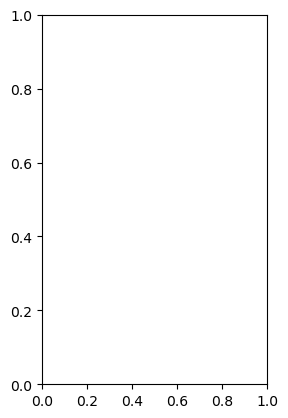

In [11]:
# Where are the bins too sparse?

badbins = np.argwhere(H_dump / H_real < 10)
print(badbins)
print(H_dump[badbins[:,0], badbins[:,1], badbins[:,2], badbins[:,3]])
print(H_real[badbins[:,0], badbins[:,1], badbins[:,2], badbins[:,3]])

badbins = np.argwhere(H_sim / H_real < 10)
print(badbins)
print(H_sim[badbins[:,0], badbins[:,1], badbins[:,2], badbins[:,3]])
print(H_real[badbins[:,0], badbins[:,1], badbins[:,2], badbins[:,3]])

plt.subplot(1,2,1)
plt.imshow(H_real[:, 3, 1, :].T,  aspect = 'auto', origin = 'lower', cmap = 'plasma', vmin = 0, vmax = 100)
plt.colorbar()

plt.subplot(1,2,2)
plt.imshow(H_sim[:, 3, 1, :].T,  aspect = 'auto', origin = 'lower', cmap = 'plasma', vmin = 0, vmax = 100)
plt.colorbar()

print(np.sum(H_sim, axis = (0, 2, 3)))

(array([0.00000e+00, 0.00000e+00, 1.10000e+01, 2.20000e+01, 1.80000e+01,
        9.50000e+01, 5.80000e+01, 0.00000e+00, 0.00000e+00, 6.30000e+01,
        4.27000e+02, 1.65000e+02, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        1.15000e+02, 2.50000e+02, 2.02000e+02, 3.18000e+02, 4.02000e+02,
        3.73000e+02, 4.28000e+02, 8.09000e+02, 1.26500e+03, 1.08700e+03,
        1.38800e+03, 9.47000e+02, 7.32000e+02, 1.29900e+03, 2.07400e+03,
        2.28700e+03, 3.46400e+03, 4.32000e+03, 4.83100e+03, 4.82300e+03,
        6.04200e+03, 8.66400e+03, 1.08040e+04, 1.10050e+04, 1.26860e+04,
        1.72580e+04, 2.15110e+04, 2.10130e+04, 2.29010e+04, 3.00760e+04,
        3.51960e+04, 3.74630e+04, 3.85430e+04, 4.23700e+04, 4.74800e+04,
        4.94510e+04, 5.45190e+04, 5.62240e+04, 5.69490e+04, 8.59892e+05,
        2.19444e+05, 1.00000e+01, 3.00000e+00, 6.00000e+00, 2.00000e+00,
        1.70000e+01, 7.40000e+01, 2.70000e+01, 5.00000e+00, 1.50000e+01,
        9.00000e+01, 2.30000e+01, 0.00000e+00, 0.00

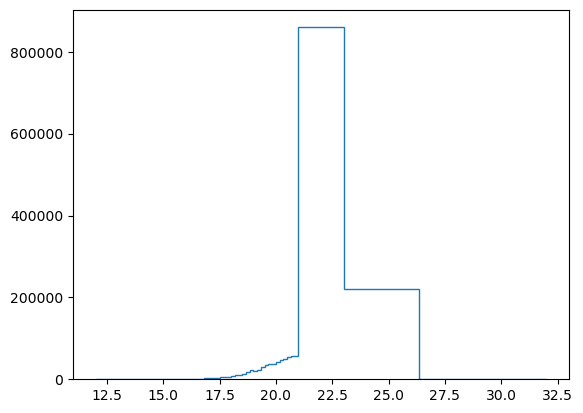

In [12]:
plt.hist(simdf['HOST_MAG_r'], bins = host_bins, histtype = 'step', label = 'Sim SNe')

#plt.plot(host_bins, np.su/m(H_dump, axis = (0,2,4)), label = 'Sim SNe')

NEW ERROR CALCULATION METHOD
[[[[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]

  ...

  [[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]]


 [[[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]

  ...

  [[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]]


 [[[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]

  ...

  [[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]]


 ...


 [[[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]

  ...

  [[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]]


 [[[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]

  ...

  [[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]]


 [[[nan nan]
   [nan nan]]

  [[nan nan]
   [nan nan]]

  [[nan nan]
   [nan na

C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_6508\2766768293.py:1: RuntimeWarning: divide by zero encountered in divide
  H_eff = H_sim / H_dump
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_6508\2766768293.py:1: RuntimeWarning: invalid value encountered in divide
  H_eff = H_sim / H_dump
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_6508\2766768293.py:19: RuntimeWarning: invalid value encountered in divide
  H_inferred = H_real / H_eff
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_6508\2766768293.py:23: RuntimeWarning: divide by zero encountered in divide
  H_inferred_err = H_inferred * np.sqrt(1 /H_real + 1 /H_sim + 1/H_dump)
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_6508\2766768293.py:23: RuntimeWarning: invalid value encountered in multiply
  H_inferred_err = H_inferred * np.sqrt(1 /H_real + 1 /H_sim + 1/H_dump)


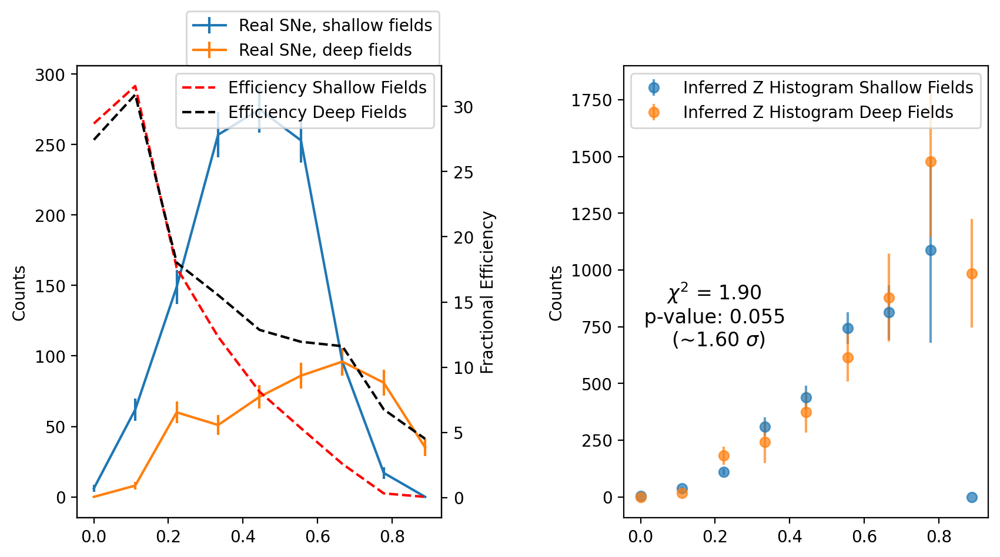

In [7]:
H_eff = H_sim / H_dump
H_eff[np.where(H_dump == 0)] = 0
import scipy
fig, ax = plt.subplots(1,2, figsize = (10,5), dpi = 200)
plt.subplots_adjust(wspace = 0.5)


real_z_hist = np.sum(H_real, axis = (1,2))
ax[0].errorbar(edges[0][:-1], real_z_hist[:,0], yerr = np.sqrt(real_z_hist[:,0]), label = 'Real SNe, shallow fields')
ax[0].errorbar(edges[0][:-1], real_z_hist[:,1], yerr = np.sqrt(real_z_hist[:,1]), label = 'Real SNe, deep fields')
ax[0].set_ylabel('Counts')
ax2 = ax[0].twinx()
ax2.set_ylabel('Fractional Efficiency')
ax2.plot(edges[0][:-1], np.sum(H_eff, axis = (1,2))[:,0], label = 'Efficiency Shallow Fields', ls = '--', color = 'r')
ax2.plot(edges[0][:-1], np.sum(H_eff, axis = (1,2))[:,1], label = 'Efficiency Deep Fields', ls = '--', color = 'k')
ax[0].legend(loc = (0.3, 1))
ax2.legend()

H_inferred = H_real / H_eff
H_inferred[np.where(H_eff == 0)] = 0
H_real_err = np.sqrt(H_real)
#H_inferred_err = H_real_err / H_eff
H_inferred_err = H_inferred * np.sqrt(1 /H_real + 1 /H_sim + 1/H_dump)
print('NEW ERROR CALCULATION METHOD')
print(H_inferred_err)
H_inferred_err[np.where(H_eff == 0)] = 0

z_inferred_err = np.sqrt(np.nansum(H_inferred_err**2, axis = (1,2)))


ax[1].set_ylabel('Counts')
ax[1].errorbar(edges[0][:-1], np.sum(H_inferred, axis = (1,2))[:,0]/4, yerr = z_inferred_err[:,0]/4, label = 'Inferred Z Histogram Shallow Fields', alpha = 0.7, fmt = 'o')
ax[1].errorbar(edges[0][:-1], np.sum(H_inferred, axis = (1,2))[:,1], yerr =z_inferred_err[:,1], label = 'Inferred Z Histogram Deep Fields', alpha = 0.7, fmt = 'o')

s = np.sum(H_inferred, axis = (1,2))[:,0]/4
d = np.sum(H_inferred, axis = (1,2))[:,1]
s_err =z_inferred_err[:,0]/4
d_err = z_inferred_err[:,1]
mean_err = np.sqrt(s_err**2 + d_err**2)

chi_terms = (s - d)**2 / mean_err**2
chi = np.sum(chi_terms[:-1])
#convert chi squared to p value
p = scipy.stats.chi2.sf(chi, np.size(chi_terms[:-1]))
print(p)


sig = scipy.stats.norm.ppf(p, loc = 0, scale = 1)

ax[1].text(0.2, 800, f'$\chi^2$ = {chi/np.size(chi_terms[:-1]):.2f} \n p-value: {p:.3f} \n (~{np.abs(sig):.2f} $\sigma$)', fontsize = 12, ha = 'center', va = 'center')

ax[1].legend()


In [ ]:
np.save('H_eff_2.npy', H_eff)
np.save('H_dump_2.npy', H_dump)
np.save('H_sim_2.npy', H_sim)


NEW ERROR CALCULATION METHOD
[[[[[nan nan]
    [nan nan]]

   [[nan nan]
    [nan nan]]]


  [[[nan nan]
    [nan nan]]

   [[nan nan]
    [nan nan]]]


  [[[nan nan]
    [nan nan]]

   [[nan nan]
    [nan nan]]]


  ...


  [[[nan nan]
    [nan nan]]

   [[nan nan]
    [nan nan]]]


  [[[nan nan]
    [nan nan]]

   [[nan nan]
    [nan nan]]]


  [[[nan nan]
    [nan nan]]

   [[nan nan]
    [nan nan]]]]



 [[[[nan nan]
    [nan nan]]

   [[nan nan]
    [nan nan]]]


  [[[nan nan]
    [nan nan]]

   [[nan nan]
    [nan nan]]]


  [[[nan nan]
    [nan nan]]

   [[nan nan]
    [nan nan]]]


  ...


  [[[nan nan]
    [nan nan]]

   [[nan nan]
    [nan nan]]]


  [[[nan nan]
    [nan nan]]

   [[nan nan]
    [nan nan]]]


  [[[nan nan]
    [nan nan]]

   [[nan nan]
    [nan nan]]]]



 [[[[nan nan]
    [nan nan]]

   [[nan nan]
    [nan nan]]]


  [[[nan nan]
    [nan nan]]

   [[nan nan]
    [nan nan]]]


  [[[nan nan]
    [nan nan]]

   [[nan nan]
    [nan nan]]]


  ...


  [[[nan nan]

C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_6508\1731727328.py:3: RuntimeWarning: divide by zero encountered in divide
  H_eff = H_sim / H_dump
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_6508\1731727328.py:3: RuntimeWarning: invalid value encountered in divide
  H_eff = H_sim / H_dump
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_6508\1731727328.py:21: RuntimeWarning: invalid value encountered in divide
  H_inferred = H_real / H_eff
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_6508\1731727328.py:25: RuntimeWarning: divide by zero encountered in divide
  H_inferred_err = H_inferred * np.sqrt(1 /H_real + 1 /H_sim + 1/H_dump)
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_6508\1731727328.py:25: RuntimeWarning: invalid value encountered in multiply
  H_inferred_err = H_inferred * np.sqrt(1 /H_real + 1 /H_sim + 1/H_dump)


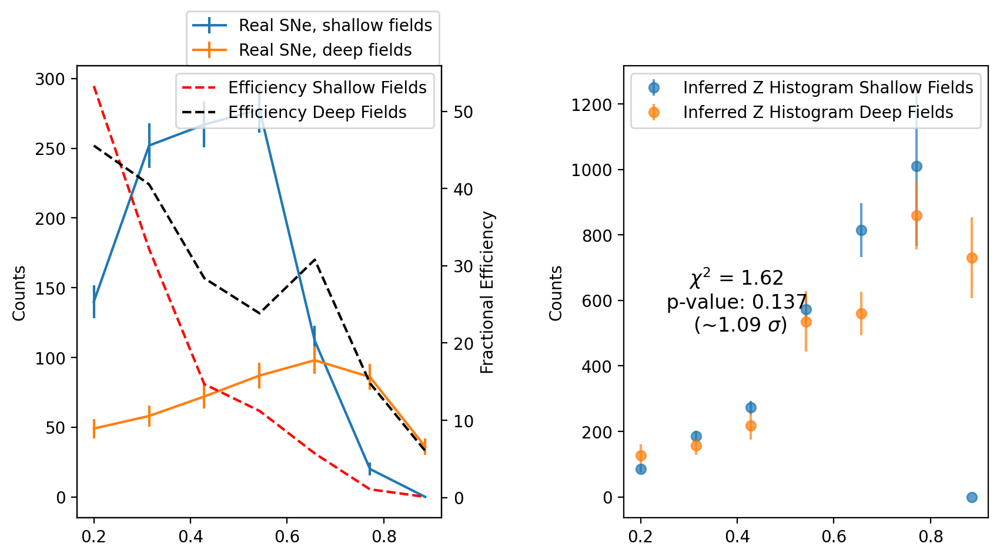

In [13]:
#Exactly the same as above for 5D not 4D

H_eff = H_sim / H_dump
H_eff[np.where(H_dump == 0)] = 0
import scipy
fig, ax = plt.subplots(1,2, figsize = (10,5), dpi = 200)
plt.subplots_adjust(wspace = 0.5)


real_z_hist = np.sum(H_real, axis = (1,2, 3))
ax[0].errorbar(edges[0][:-1], real_z_hist[:,0], yerr = np.sqrt(real_z_hist[:,0]), label = 'Real SNe, shallow fields')
ax[0].errorbar(edges[0][:-1], real_z_hist[:,1], yerr = np.sqrt(real_z_hist[:,1]), label = 'Real SNe, deep fields')
ax[0].set_ylabel('Counts')
ax2 = ax[0].twinx()
ax2.set_ylabel('Fractional Efficiency')
ax2.plot(edges[0][:-1], np.sum(H_eff, axis = (1,2,3))[:,0], label = 'Efficiency Shallow Fields', ls = '--', color = 'r')
ax2.plot(edges[0][:-1], np.sum(H_eff, axis = (1,2, 3))[:,1], label = 'Efficiency Deep Fields', ls = '--', color = 'k')
ax[0].legend(loc = (0.3, 1))
ax2.legend()

H_inferred = H_real / H_eff
H_inferred[np.where(H_eff == 0)] = 0
H_real_err = np.sqrt(H_real)
#H_inferred_err = H_real_err / H_eff
H_inferred_err = H_inferred * np.sqrt(1 /H_real + 1 /H_sim + 1/H_dump)
print('NEW ERROR CALCULATION METHOD')
print(H_inferred_err)
H_inferred_err[np.where(H_eff == 0)] = 0

z_inferred_err = np.sqrt(np.nansum(H_inferred_err**2, axis = (1,2, 3)))


ax[1].set_ylabel('Counts')
ax[1].errorbar(edges[0][:-1], np.sum(H_inferred, axis = (1,2,3))[:,0]/4, yerr = z_inferred_err[:,0]/4, label = 'Inferred Z Histogram Shallow Fields', alpha = 0.7, fmt = 'o')
ax[1].errorbar(edges[0][:-1], np.sum(H_inferred, axis = (1,2,3))[:,1], yerr =z_inferred_err[:,1], label = 'Inferred Z Histogram Deep Fields', alpha = 0.7, fmt = 'o')

s = np.sum(H_inferred, axis = (1,2,3))[:,0]/4
d = np.sum(H_inferred, axis = (1,2,3))[:,1]
s_err =z_inferred_err[:,0]/4
d_err = z_inferred_err[:,1]
mean_err = np.sqrt(s_err**2 + d_err**2)

chi_terms = (s - d)**2 / mean_err**2
chi = np.sum(chi_terms[:-1])
#convert chi squared to p value
p = scipy.stats.chi2.sf(chi, np.size(chi_terms[:-1]))
print(p)


sig = scipy.stats.norm.ppf(p, loc = 0, scale = 1)

ax[1].text(0.4, 600, f'$\chi^2$ = {chi/np.size(chi_terms[:-1]):.2f} \n p-value: {p:.3f} \n (~{np.abs(sig):.2f} $\sigma$)', fontsize = 12, ha = 'center', va = 'center')

ax[1].legend()


NameError: name 'correction' is not defined

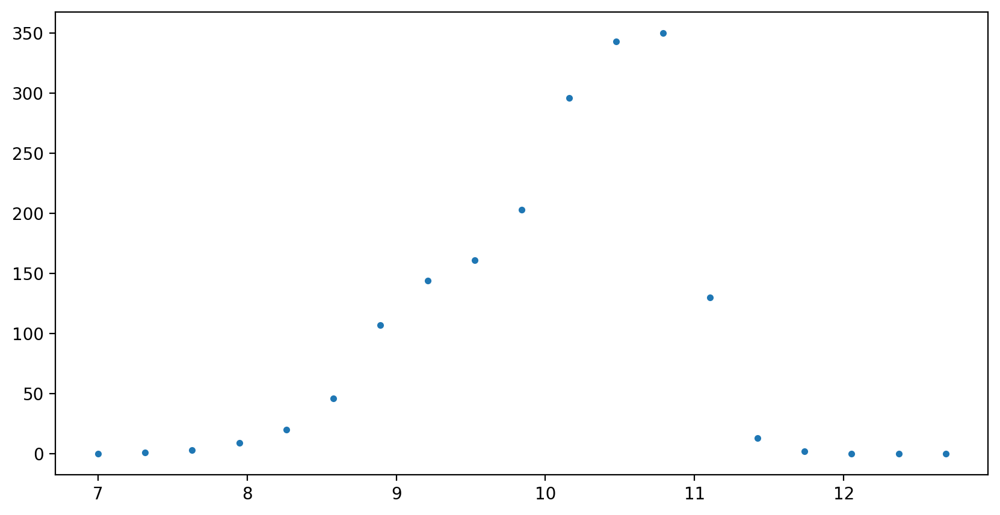

In [71]:
#plt.scatter(cosmo_sne['x1'][:1635], cosmo_sne['HOST_LOGMASS'][:1635], s = 1)

a, b = np.histogram(cosmo_sne['HOST_LOGMASS'], bins = bins)
plt.figure(figsize = (10,5), dpi = 200)

plt.plot(b[:-1], a, label = 'Real SNe Host Mass Histogram', marker = 'o', markersize = 3, ls = 'None')

N_SN = scipy.stats.binned_statistic(cosmo_sne['HOST_LOGMASS'], correction,  bins = bins, statistic = 'sum')
plt.plot(b[:-1], N_SN.statistic, label = 'Sim SNe Host Mass Histogram', marker = 'o', markersize = 3, ls = 'None')
plt.yscale('log')


(15910803, 5)


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_15352\3957301603.py:30: RuntimeWarning: invalid value encountered in divide
  corr_map = dump_hists[i].T/sim_hists[i].T
c:\Users\cmeldorf\anaconda3\Lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_15352\3957301603.py:30: RuntimeWarning: divide by zero encountered in divide
  corr_map = dump_hists[i].T/sim_hists[i].T
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_15352\3957301603.py:33: RuntimeWarning: divide by zero encountered in log10
  ax[i][2].imshow(np.log10(corr_map), extent = [z_bins[0], z_bins[-1], host_bins[0], host_bins[-1]],
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_15352\3957301603.py:69: RuntimeWarning: invalid value encountered in divide
  eff_map = sim_hists[i].T/dump_hists[i].T
c:\Users\cmeldorf\Downloads\ColeUtils.py:35: RuntimeWarning: invalid value encountered in divide
  a_frac = a_err / a
c:\U

Changed the def of this function without zeros
Changed the def of this function without zeros
Changed the def of this function without zeros
Changed the def of this function without zeros
(array([], dtype=int64), array([], dtype=int64))
sim bad []
dump bad []
[0. 0. 0. 0. 0. 0. 0. 0. 0.]
(array([], dtype=int64), array([], dtype=int64))
sim bad []
dump bad []
[0. 0. 0. 0. 0. 0. 0. 0. 0.]
(array([], dtype=int64), array([], dtype=int64))
sim bad []
dump bad []
[0. 0. 0. 0. 0. 0. 0. 0. 0.]
(array([27], dtype=int64), array([4], dtype=int64))
sim bad [1.]
dump bad [0.]
[0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
 2.99615522e+306 0.00000000e+000 0.00000000e+000 0.00000000e+000
 0.00000000e+000]


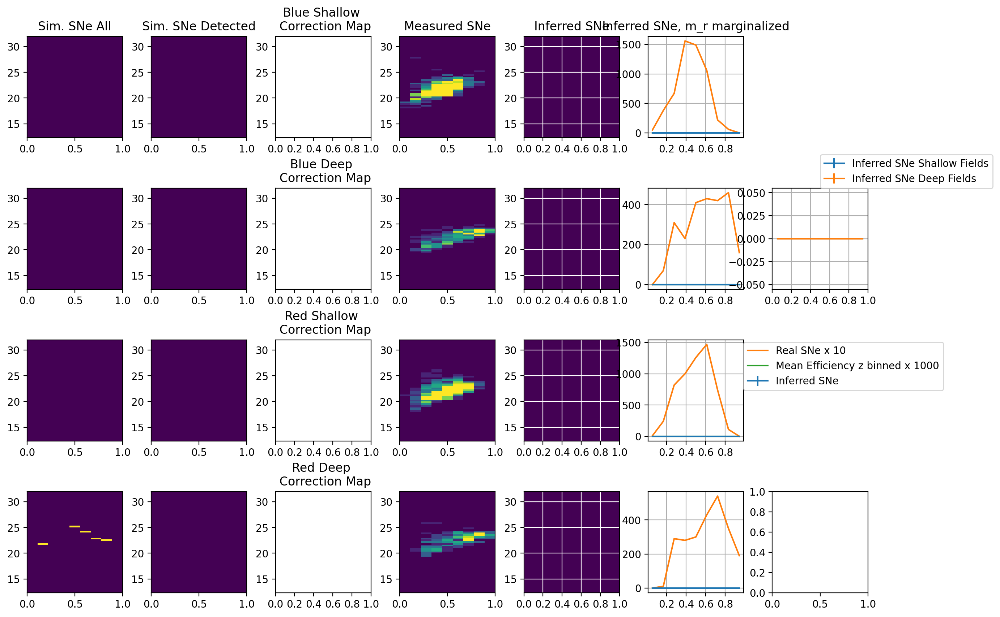

In [126]:
#Do the above graphically. 

print(np.shape(dump_array))
fig, ax = plt.subplots(4,7,figsize = (15,10), dpi = 200)
plt.subplots_adjust(hspace = 0.5, wspace = 0.3)
i = 0

color_cutoff = 0

dump_hists = []
sim_hists = []

for c_condition in [(dump_array[:,2] > color_cutoff), (dump_array[:,2] < color_cutoff)]:
    for depth_index in [0., 1.]:
        dump_subsection = dump_array[np.where((c_condition) & (dump_array[:,3] == depth_index))]
        dump_hists.append(ax[i][0].hist2d(dump_subsection[:,0], dump_subsection[:,1], bins = [z_bins, host_bins], cmap = 'viridis', label = 'Simulated SNe')[0])
        i += 1
ax[0][0].set_title('Sim. SNe All')
i = 0
for c_condition in [(sim_array[:,2] > color_cutoff), (sim_array[:,2] < color_cutoff)]:
    for depth_index in [0., 1.]:    
        sim_subsection = sim_array[np.where((c_condition) & (sim_array[:,3] == depth_index))]
        sim_hists.append(ax[i][1].hist2d(sim_subsection[:,0], sim_subsection[:,1], 
                                         bins = [z_bins, host_bins], cmap = 'viridis', 
                                         vmax = 1000, label = 'Simulated SNe')[0])
        i  += 1

ax[0][1].set_title('Sim. SNe Detected')
for i in range(4):
    corr_map = dump_hists[i].T/sim_hists[i].T
    #corr_map = np.nan_to_num(corr_map, 0)
    corr_map[np.where(corr_map == np.inf)] = 0
    ax[i][2].imshow(np.log10(corr_map), extent = [z_bins[0], z_bins[-1], host_bins[0], host_bins[-1]], 
                    aspect = 'auto', origin = 'lower', cmap = 'plasma', vmin = 0, vmax = 4)
    ax[i][2].set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])
    ax[i][2].grid(True, color = 'white')
    color_title = 'Blue' if i<=1 else 'Red'
    depth_title = 'Deep' if i%2 == 1 else 'Shallow'
    ax[i][2].set_title(f'{color_title} {depth_title} \n Correction Map')
    for j in range(corr_map.shape[1]):
        iqr = np.nanpercentile(corr_map[:,j], 75) - np.nanpercentile(corr_map[:,j], 25)
        args = np.where(corr_map[:,j] > np.nanpercentile(corr_map[:,j], 75) + 10*iqr)[0]
        ax[i][2].plot(z_bins[np.full_like(args, j)], host_bins[args], 'ro',  markersize = 5, fillstyle='none', alpha = 0.5)
        if args.size > 0:
            print(iqr)
            print(np.where(corr_map[:,j] > np.nanpercentile(corr_map[:,j], 75) + 10*iqr)[0])
            print('max', np.nanmax(corr_map[:, j]))
            print('outliers', corr_map[args, j])
            print('loc', z_bins[np.full_like(args, j)], host_bins[args])
            print('-----')
i = 0
real_hists = []
real_hist_errs = []
for c_condition in [(cosmo_sne['c'] > color_cutoff), (cosmo_sne['c'] < color_cutoff)]:
    for depth_index in [cosmo_fields == 0, cosmo_fields == 1]:    
        cosmo_subsection = cosmo_sne.iloc[np.where((c_condition) & (depth_index))]
        hostgals_subsection = hostgals[np.where((c_condition) & (depth_index))]
        real_hists.append(ax[i][3].hist2d(cosmo_subsection['zHD'], hostgals_subsection['HOSTGAL_MAG_r'], bins = [z_bins, host_bins], cmap = 'viridis', vmax = 10, label = 'Real SNe')[0])
        real_hist_errs.append(np.sqrt(real_hists[i]))
        i += 1

ax[0][3].set_title('Measured SNe')

inferred_hists = []
eff_maps = []
eff_err_maps = []
inferred_err_hists = []
for i in range(4):
    eff_map = sim_hists[i].T/dump_hists[i].T
    eff_maps.append(np.nan_to_num(eff_map))
    eff_err_maps.append(np.nan_to_num(rate_error(sim_hists[i].T, dump_hists[i].T)))
    inferred_map = real_hists[i].T / eff_map
    inferred_map = np.nan_to_num(inferred_map)
    inferred_map[eff_map == 0] = 0
    inferred_hists.append(inferred_map.T)
    ax[i][4].imshow(inferred_map, extent = [z_bins[0], z_bins[-1], host_bins[0], host_bins[-1]],
                     aspect = 'auto', origin = 'lower', cmap = 'viridis', vmin = 0, vmax = 1000)
    ax[i][4].set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])
    ax[i][4].grid(True, color = 'white')
    real_frac_err = real_hist_errs[i]/real_hists[i]
    eff_frac_err = eff_err_maps[i]/eff_maps[i]
    inferred_err_hists.append(inferred_hists[i] * 
                              np.sqrt(real_frac_err**2 + eff_frac_err.T**2))
    

ax[0][4].set_title('Inferred SNe')

for i in range(4):
    z_locs = z_bins[:-1] + (z_bins[1] - z_bins[0])/2
    ax[i][5].errorbar(z_locs, np.sum(inferred_hists[i], axis = 1), yerr = np.sqrt(np.nansum(inferred_err_hists[i]**2, axis = 1)), label = 'Inferred SNe')
    ax[i][5].plot(z_locs, np.sum(real_hists[i], axis = 1) * 10 , label = 'Real SNe x 10')
    ax[i][5].set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])
    
    ax[i][5].plot(z_locs, np.nanmean(eff_maps[i], axis = 0) * 1000 ,label = 'Mean Efficiency z binned x 1000')
    print(np.where(eff_maps[i] > 1))
    badcoords = np.where(eff_maps[i] > 1)
    print('sim bad', sim_hists[i][badcoords[1], badcoords[0]])
    print('dump bad', dump_hists[i][badcoords[1], badcoords[0]])
    print(np.nanmean(eff_maps[i], axis = 0))
    ax[i][5].grid(True)
ax[3][5].legend(loc = (1, 2))
ax[0][5].set_title('Inferred SNe, m_r marginalized')

ax[0][6].set_visible(False)
shallow_err = np.sqrt(np.nansum(inferred_err_hists[0]**2, axis = 1) + np.nansum(inferred_err_hists[2]**2, axis = 1))
deep_err = np.sqrt(np.nansum(inferred_err_hists[1]**2, axis = 1) + np.nansum(inferred_err_hists[3]**2, axis = 1))
ax[1][6].errorbar(z_locs, np.sum(inferred_hists[0], axis = 1)+np.sum(inferred_hists[2], axis = 1), yerr = shallow_err, label = 'Inferred SNe Shallow Fields')
ax[1][6].errorbar(z_locs, 4*np.sum(inferred_hists[1], axis = 1)+4*np.sum(inferred_hists[3], axis = 1), yerr = deep_err, label = 'Inferred SNe Deep Fields')
ax[1][6].legend(loc = (0.5, 1))
ax[1][6].set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])
ax[1][6].grid(True)
ax[2][6].set_visible(False)

C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_27096\2253718358.py:5: RuntimeWarning: divide by zero encountered in divide
  eff_map = sim_hists[i].T/dump_hists[i].T
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_27096\2253718358.py:5: RuntimeWarning: invalid value encountered in divide
  eff_map = sim_hists[i].T/dump_hists[i].T


{'whiskers': [<matplotlib.lines.Line2D at 0x163f46b1e50>,
 'caps': [<matplotlib.lines.Line2D at 0x163f4708050>,
 'boxes': [<matplotlib.lines.Line2D at 0x163f46f2850>,
 'medians': [<matplotlib.lines.Line2D at 0x163f47090d0>,
 'fliers': [<matplotlib.lines.Line2D at 0x163f47098d0>,
 'means': []}

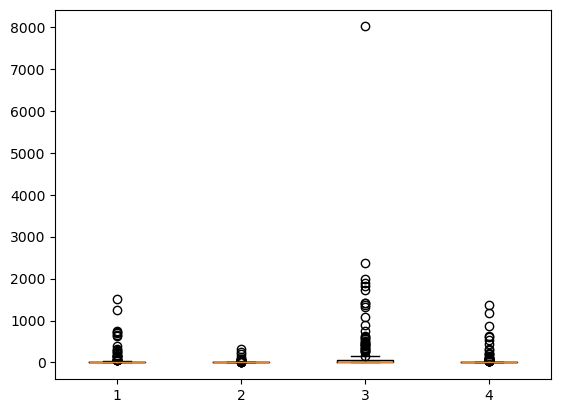

In [32]:
#fig, ax = plt.subplots(4)

flatmaps = []
for i in range(4):
    eff_map = sim_hists[i].T/dump_hists[i].T
    eff_map = np.nan_to_num(eff_map)
    flatmaps.append(1/eff_map[np.where(eff_map !=0 )].flatten())
plt.boxplot(flatmaps)

(1635, 4)
(19, 20, 2, 2)
(19, 2, 2)
[[ 0.  0.]
 [ 0.  0.]
 [ 6.  0.]
 [13.  0.]
 [26. 13.]
 [45.  8.]
 [57. 22.]
 [37.  5.]
 [54. 14.]
 [51. 16.]
 [76. 18.]
 [68. 24.]
 [56. 24.]
 [50. 23.]
 [20. 20.]
 [ 6. 22.]
 [ 0. 12.]
 [ 0. 12.]
 [ 0.  6.]]


ValueError: x and y must have same first dimension, but have shapes (19,) and (9,)

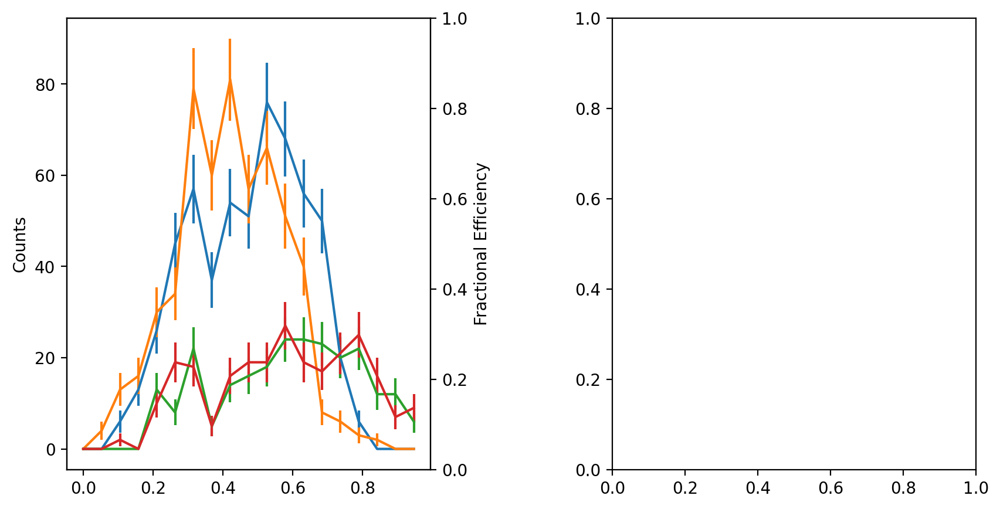

In [33]:
fig, ax = plt.subplots(1,2, figsize = (10,5), dpi = 200)
plt.subplots_adjust(wspace = 0.5)
real_array = np.array([cosmo_sne['zHD'], hostgals['HOSTGAL_MAG_r'], cosmo_sne['c'], cosmo_fields]).T
print(np.shape(real_array))

H_real, edges = np.histogramdd(real_array, bins = [z_bins, host_bins, c_bins, depth_bins])
print(np.shape(H_real))

real_z_hist = np.sum(H_real, axis = (1))
print(np.shape(real_z_hist))
print(real_z_hist[:,0])
ax[0].errorbar(edges[0][:-1], real_z_hist[:,0, 0], yerr = np.sqrt(real_z_hist[:,0, 0]), label = 'Real SNe, shallow fields')
ax[0].errorbar(edges[0][:-1], real_z_hist[:,1, 0], yerr = np.sqrt(real_z_hist[:,1, 0]), label = 'Real SNe, shallow fields')
ax[0].errorbar(edges[0][:-1], real_z_hist[:,0, 1], yerr = np.sqrt(real_z_hist[:,0, 1]), label = 'Real SNe, deep fields')
ax[0].errorbar(edges[0][:-1], real_z_hist[:,1, 1], yerr = np.sqrt(real_z_hist[:,1, 1]), label = 'Real SNe, deep fields')
ax[0].set_ylabel('Counts')


ax2 = ax[0].twinx()
ax2.set_ylabel('Fractional Efficiency')
ax2.plot(edges[0][:-1], np.sum(H_eff, axis = (1))[:,0, 0], label = 'Efficiency Shallow Fields', ls = '--', color = 'r')
ax2.plot(edges[0][:-1], np.sum(H_eff, axis = (1))[:,1, 0], label = 'Efficiency Shallow Fields', ls = '--', color = 'k')
ax2.plot(edges[0][:-1], np.sum(H_eff, axis = (1))[:,0, 1], label = 'Efficiency Deep Fields', ls = '--', color = 'r')
ax2.plot(edges[0][:-1], np.sum(H_eff, axis = (1))[:,1, 1], label = 'Efficiency Deep Fields', ls = '--', color = 'k')
ax[0].legend(loc = (0.3, 1))
ax2.legend()


H_inferred = H_real / H_eff
H_inferred[np.where(H_eff == 0)] = 0
H_real_err = np.sqrt(H_real)
H_inferred_err = H_real_err / H_eff
H_inferred_err[np.where(H_eff == 0)] = 0

z_inferred_err = np.sqrt(np.sum(H_inferred_err**2, axis = (1)))
inferred_hists = np.sum(H_inferred, axis = (1))


ax[1].set_ylabel('Counts')
ax[1].errorbar(edges[0][:-1], inferred_hists[:,0, 0], yerr = z_inferred_err[:,0, 0], label = 'Inferred Z Histogram Shallow Fields')
ax[1].errorbar(edges[0][:-1], inferred_hists[:,1, 0] * 4, yerr = 4 * z_inferred_err[:, 1, 0], label = 'Inferred Z Histogram Shallow Fields')
ax[1].errorbar(edges[0][:-1], inferred_hists[:,0, 1], yerr = z_inferred_err[:,0, 1], label = 'Inferred Z Histogram Deep Fields')
ax[1].errorbar(edges[0][:-1], inferred_hists[:,1, 1] * 4, yerr = 4 * z_inferred_err[:,1, 1], label = 'Inferred Z Histogram Deep Fields')

ax[1].legend()

(1635, 3)
(9, 2, 2)
(169258, 3) (3182160, 3)


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_13232\1807095463.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sim_array['FIELD'][(sim_array['FIELD'] == 'C3') | (sim_array['FIELD'] == 'X3')] = 1
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_13232\1807095463.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sim_array['FIELD'][sim_array['FIELD'] != 1] = 0  #What about combined fields?


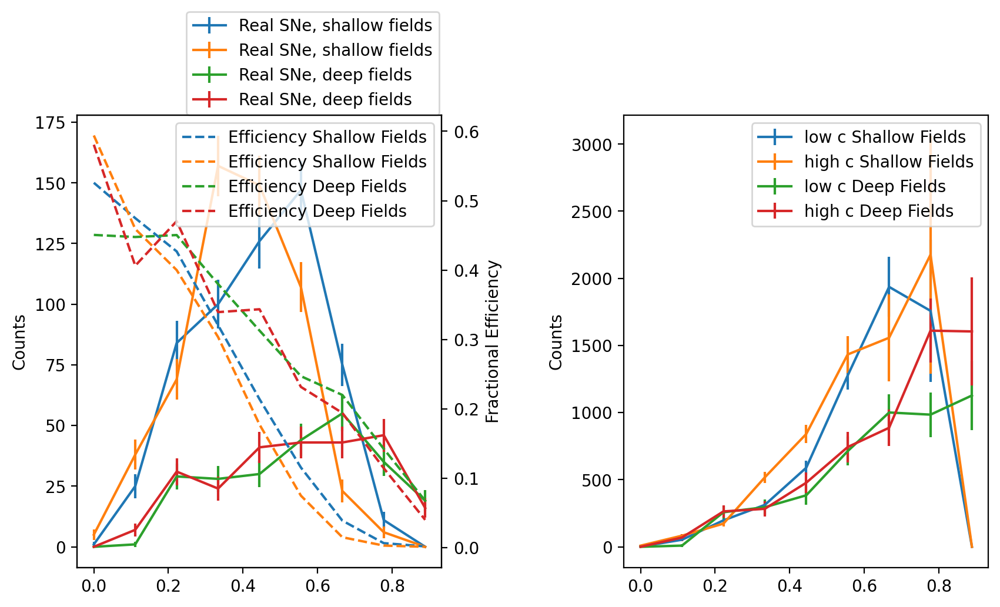

In [ ]:
#not using host bins at all

fig, ax = plt.subplots(1,2, figsize = (10,5), dpi = 200)
plt.subplots_adjust(wspace = 0.5)
real_array = np.array([cosmo_sne['zHD'], cosmo_sne['c'], cosmo_fields]).T
print(np.shape(real_array))

H_real, edges = np.histogramdd(real_array, bins = [z_bins,c_bins, depth_bins])
print(np.shape(H_real))

real_z_hist = H_real

sim_array = simdf[['zHD', 'SIM_c', 'FIELD']]
sim_array['FIELD'][(sim_array['FIELD'] == 'C3') | (sim_array['FIELD'] == 'X3')] = 1
sim_array['FIELD'][sim_array['FIELD'] != 1] = 0  #What about combined fields?
sim_array = sim_array.to_numpy()
deepfields = np.where((fields == 'X3') | (fields == 'C3'))[0]
deep_bool = np.zeros_like(idx)
deep_bool[np.where((idx == deepfields[0]) | (idx == deepfields[1]))[0]] = 1
dump_array = dumpdf[['GENZ', 'SALT2c']]
dump_array = dump_array.to_numpy()
dump_array = np.column_stack((dump_array, deep_bool))
print(sim_array.shape, dump_array.shape)
H_sim = np.histogramdd(sim_array, bins = [z_bins, c_bins, depth_bins])[0]
H_dump = np.histogramdd(dump_array, bins = [z_bins, c_bins, depth_bins])[0]
H_eff = H_sim / H_dump


ax[0].errorbar(edges[0][:-1], real_z_hist[:,0, 0], yerr = np.sqrt(real_z_hist[:,0, 0]), label = 'Real SNe, shallow fields')
ax[0].errorbar(edges[0][:-1], real_z_hist[:,1, 0], yerr = np.sqrt(real_z_hist[:,1, 0]), label = 'Real SNe, shallow fields')
ax[0].errorbar(edges[0][:-1], real_z_hist[:,0, 1], yerr = np.sqrt(real_z_hist[:,0, 1]), label = 'Real SNe, deep fields')
ax[0].errorbar(edges[0][:-1], real_z_hist[:,1, 1], yerr = np.sqrt(real_z_hist[:,1, 1]), label = 'Real SNe, deep fields')
ax[0].set_ylabel('Counts')


ax2 = ax[0].twinx()
ax2.set_ylabel('Fractional Efficiency')
ax2.plot(edges[0][:-1], H_eff[:,0, 0], label = 'Efficiency Shallow Fields', ls = '--', color = 'C0')
ax2.plot(edges[0][:-1], H_eff[:,1, 0], label = 'Efficiency Shallow Fields', ls = '--', color = 'C1')
ax2.plot(edges[0][:-1], H_eff[:,0, 1], label = 'Efficiency Deep Fields', ls = '--', color = 'C2')
ax2.plot(edges[0][:-1], H_eff[:,1, 1], label = 'Efficiency Deep Fields', ls = '--', color = 'C3')
ax[0].legend(loc = (0.3, 1))
ax2.legend()


H_inferred = H_real / H_eff
H_inferred[np.where(H_eff == 0)] = 0
H_real_err = np.sqrt(H_real)
H_inferred_err = H_real_err / H_eff
H_inferred_err[np.where(H_eff == 0)] = 0

z_inferred_err = H_inferred_err
inferred_hists = H_inferred


ax[1].set_ylabel('Counts')
ax[1].errorbar(edges[0][:-1], inferred_hists[:,0, 0], yerr = z_inferred_err[:,0, 0], label = 'low c Shallow Fields')
ax[1].errorbar(edges[0][:-1], inferred_hists[:,1, 0] , yerr =  z_inferred_err[:, 1, 0], label = 'high c Shallow Fields')
ax[1].errorbar(edges[0][:-1], inferred_hists[:,0, 1] * 4, yerr = 4 * z_inferred_err[:,0, 1], label = 'low c Deep Fields')
ax[1].errorbar(edges[0][:-1], inferred_hists[:,1, 1] * 4, yerr = 4 * z_inferred_err[:,1, 1], label = 'high c Deep Fields')

ax[1].legend()


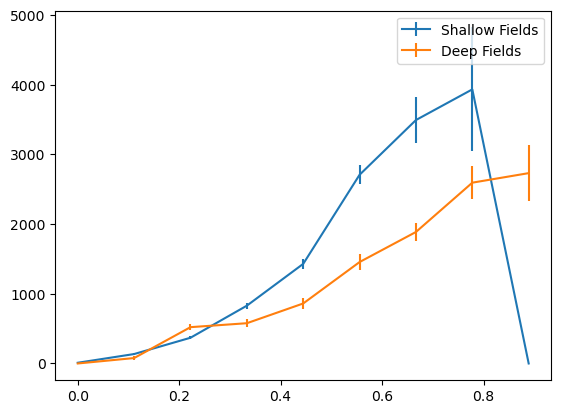

In [ ]:
#plt.errorbar(edges[0][:-1], , yerr = z_inferred_err[:,0, 0], label = 'low c Shallow Fields')
plt.errorbar(edges[0][:-1], inferred_hists[:,1, 0] + inferred_hists[:,0, 0] , yerr =  z_inferred_err[:, 1, 0], label = 'Shallow Fields')
#plt.errorbar(edges[0][:-1],  yerr = 4 * z_inferred_err[:,0, 1], label = 'low c Deep Fields')
plt.errorbar(edges[0][:-1], inferred_hists[:,1, 1] * 4 + inferred_hists[:,0, 1] * 4, yerr = 4 * z_inferred_err[:,1, 1], label = 'Deep Fields')

plt.legend()

In [ ]:
'''
shallow_err = np.sqrt(real_z_hist[:,0]) 
shallow_err[np.where(real_z_hist[:,0] == 0)] = 1
shallow_err = shallow_err / np.sum(H_eff, axis = (1,2))[:,0]

deep_err = np.sqrt(real_z_hist[:,1])
deep_err[np.where(real_z_hist[:,1] == 0)] = 1
deep_err = deep_err / np.sum(H_eff, axis = (1,2))[:,1]
'''

'\nshallow_err = np.sqrt(real_z_hist[:,0]) \nshallow_err[np.where(real_z_hist[:,0] == 0)] = 1\nshallow_err = shallow_err / np.sum(H_eff, axis = (1,2))[:,0]\n\ndeep_err = np.sqrt(real_z_hist[:,1])\ndeep_err[np.where(real_z_hist[:,1] == 0)] = 1\ndeep_err = deep_err / np.sum(H_eff, axis = (1,2))[:,1]\n'

In [ ]:
def marginalize_rate(H, axes, err = False):
    axes_sizes = np.array(H.shape)[np.asarray(axes)]
    if err:
        hsq = np.sum(H**2, axis = axes) 
        H_summed = np.sqrt(hsq)/ np.product(axes_sizes)
    else:
        H_summed = np.sum(H, axis = axes) / np.product(axes_sizes)
    return H_summed

H_eff = H_sim / H_dump
H_eff[np.where(H_dump == 0)] = 0
marginalize_rate(H_eff, (1,2,3))


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_27056\3014440984.py:10: RuntimeWarning: divide by zero encountered in divide
  H_eff = H_sim / H_dump
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_27056\3014440984.py:10: RuntimeWarning: invalid value encountered in divide
  H_eff = H_sim / H_dump
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_27056\3014440984.py:12: DeprecationWarning: `product` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `prod` instead.
  marginalize_rate(H_eff, (1,2,3))


array([0.29753867, 0.42011826, 0.22109602, 0.19525326, 0.13429793,
       0.12560312, 0.08293557, 0.06522436, 0.04143862])

In [ ]:
H_eff = H_sim / H_dump
H_eff[np.where(H_dump == 0)] = 0
print(np.sum(H_eff))


H_eff_err = rate_error(H_sim, H_dump)
np.nan_to_num(H_eff_err, copy = False)
print(H_eff_err[:,0,0,:])
H_eff_err /= (9*2)
H_eff /= (9*2)

print('---')

print('---')
H_eff_err_sq = H_eff_err**2
print('---')
print(np.size(H_eff_err_sq))
H_eff_err_sq = np.sum(H_eff_err_sq, axis = (1,2)) 
print(np.size(H_eff_err_sq))
print(H_eff_err_sq)
print('---')
H_eff_err_sq = np.sqrt(H_eff_err_sq)

print(H_eff_err_sq)

plt.errorbar(edges[0][:-1], np.sum(H_eff, axis = (1,2))[:,0], yerr = H_eff_err_sq[:,0], label = 'Efficiency Shallow Fields', ls = '--', color = 'r')
plt.errorbar(edges[0][:-1], np.sum(H_eff, axis = (1,2))[:,1], yerr = H_eff_err_sq[:,1], label = 'Efficiency Deep Fields', ls = '--', color = 'k')

plt.fill_between(edges[0][:-1], np.sum(H_eff, axis = (1,2))[:,0] + \
                 H_eff_err_sq[:,0], np.sum(H_eff, axis = (1,2))[:,0] - H_eff_err_sq[:,0], color = 'r', alpha = 0.2)
plt.fill_between(edges[0][:-1], np.sum(H_eff, axis = (1,2))[:,1] + \
                 H_eff_err_sq[:,1], np.sum(H_eff, axis = (1,2))[:,1] - H_eff_err_sq[:,1], color = 'k', alpha = 0.2)



57.00620934829727


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_27056\3638659710.py:1: RuntimeWarning: divide by zero encountered in divide
  H_eff = H_sim / H_dump
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_27056\3638659710.py:1: RuntimeWarning: invalid value encountered in divide
  H_eff = H_sim / H_dump


NameError: name 'rate_error' is not defined

## Split the above on color

C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_36120\1974770468.py:24: RuntimeWarning: divide by zero encountered in divide
  inferred = hist/efficiency
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_36120\1974770468.py:24: RuntimeWarning: invalid value encountered in divide
  inferred = hist/efficiency


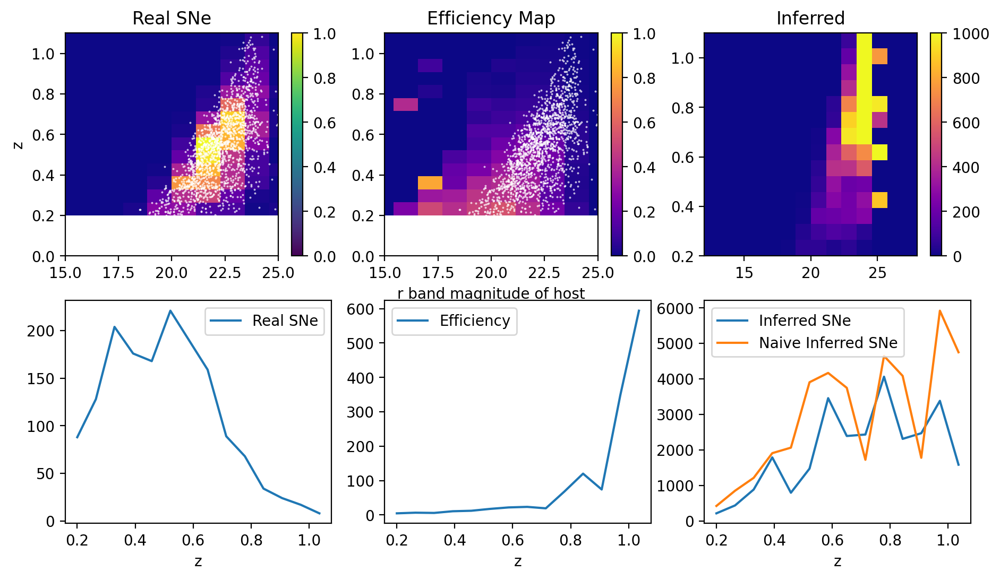

In [ ]:
plt.figure(figsize = (11,6), dpi = 200)
plt.subplot(2,3,1)
hist = plt.hist2d(hostgals['HOSTGAL_MAG_r'], cosmo_sne['zHD'][:1635], bins = [xbins, ybins],cmap = 'plasma', vmax = 100)
hist = hist[0].T
plt.scatter(hostgals['HOSTGAL_MAG_r'], cosmo_sne['zHD'][:1635], s = 0.1, color = 'white')
plt.xlim(15,25)
plt.ylim(0,1.1)
plt.ylabel('z')

plt.title('Real SNe')
plt.colorbar()
plt.subplot(2,3,2)
plt.title('Efficiency Map')
plt.imshow(efficiency,  extent = [np.min(xbins), np.max(xbins), np.min(ybins), np.max(ybins)],aspect = 'auto', origin = 'lower', cmap = 'plasma', vmin = 0, vmax = 1)
plt.xlabel('r band magnitude of host') 
plt.colorbar()

plt.scatter(hostgals['HOSTGAL_MAG_r'], cosmo_sne['zHD'][:1635], s = 0.1, color = 'white')
plt.xlim(15,25)
plt.ylim(0,1.1)

plt.subplot(2,3,3)
plt.title('Inferred')
inferred = hist/efficiency
inferred[efficiency == 0] = 0
inferred = np.nan_to_num(inferred)
plt.imshow(inferred, extent = [np.min(xbins), np.max(xbins), np.min(ybins), np.max(ybins)],aspect = 'auto', origin = 'lower', cmap = 'plasma', vmin = 0, vmax = 1000)
plt.colorbar()


plt.subplot(2,3,4)
plt.plot(ybins[:-1], np.sum(hist, axis = 1), label = 'Real SNe')

naive_hist = np.sum(hist, axis = 1)
plt.xlabel('z')
plt.legend()
plt.subplot(2,3,5)
plt.plot(ybins[:-1], 1/(np.sum(efficiency, axis = 1)/np.size(ybins[:-1])), label = 'Efficiency')
naive_eff = np.sum(efficiency, axis = 1)/np.size(ybins[:-1])
plt.xlabel('z')
plt.legend()

plt.subplot(2,3,6)
plt.plot(ybins[:-1], np.sum(inferred, axis = 1), label = 'Inferred SNe')
plt.plot(ybins[:-1], naive_hist/naive_eff, label = 'Naive Inferred SNe')
plt.xlabel('z')
plt.legend()

(14, 14)


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_36120\3447050907.py:3: RuntimeWarning: divide by zero encountered in divide
  plt.plot(1/np.sum(efficiency, axis = 0))


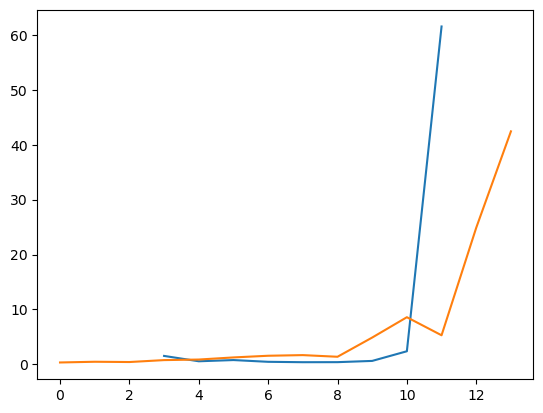

In [ ]:
print(efficiency.shape)

plt.plot(1/np.sum(efficiency, axis = 0))
plt.plot(1/np.sum(efficiency, axis = 1))

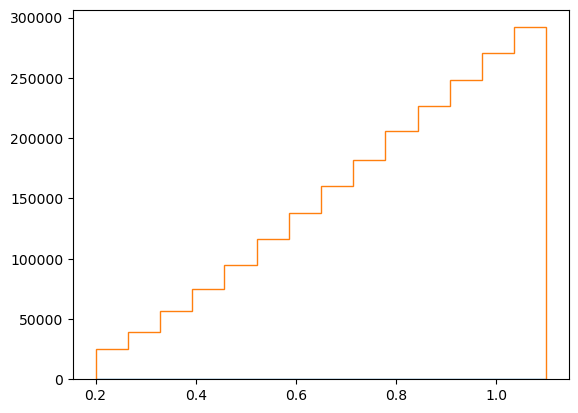

In [ ]:
N_det = plt.hist(allcuts['GENZ'], bins = ybins, histtype = 'step', label = 'Simulated SNe Observed')
Ns = plt.hist(dumpdf['GENZ'], bins = ybins, histtype = 'step', label = 'Simulated SNe')

NameError: name 'z_count_mes' is not defined

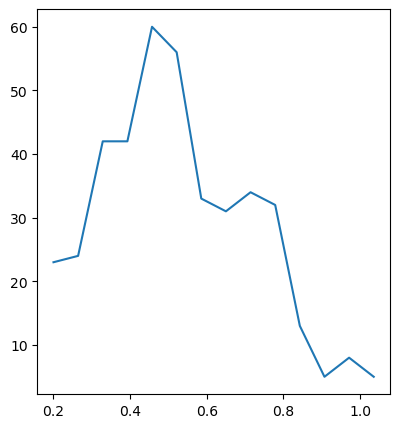

In [ ]:

#
plt.figure(figsize = (10,5), dpi = 100)
plt.subplot(1,2,1)

plt.plot(N_det[1][:-1], N_det[0], label = 'Inferred SNe Simulated')
testeff = N_det[0]/Ns[0]
#plt.plot(N_det[1][:-1], testeff, label = 'Efficiency from histograms')

plt.errorbar(z_count_mes[1][:-1], 5*z_count_mes[0], yerr = count_err, label = 'Real Sne Observed ')

plt.legend()
plt.subplot(1,2,2)
plt.plot(N_det[1][:-1], N_det[0]/testeff, label = 'Inferred SNe Simulated')

plt.errorbar(z_count_mes[1][:-1], 5*z_count_mes[0] / testeff, yerr = count_err, label = 'Inferred SNe Real')
plt.legend()

0.00034411562284927734


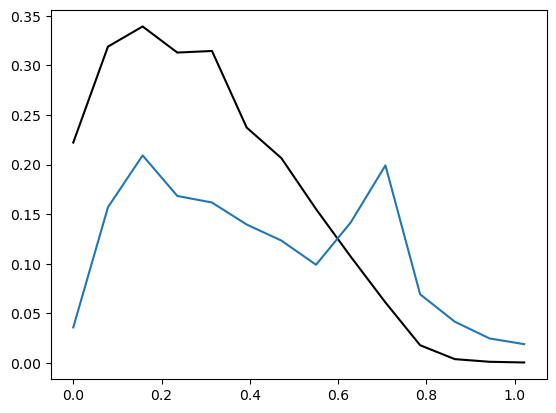

In [ ]:
plt.plot(Ns[1][:-1], N_det[0]/Ns[0], label = 'Efficiency', color = 'k')
print( (N_det[0]/Ns[0])[-1])

testeff = np.sum(efficiency, axis = 0)
#plt.plot(xbins[:-1], testeff, label = 'Efficiency vs r-band mag')

testeff = np.sum(efficiency, axis = 1)/np.size(xbins[:-1])
plt.plot(ybins[:-1], testeff, label = 'Efficiency vs z')
#plt.yscale('log')


#Why does this look different from the other one?

In [ ]:



N_SNe = np.ones_like(cosmo_sne['zHD'][:1635])

z_count_mes = scipy.stats.binned_statistic(cosmo_sne['zHD'][:1635], N_SNe, bins = ybins, statistic = 'sum')

count_err = np.sqrt(z_count_mes[0])

plt.errorbar(z_count_mes[1][:-1], z_count_mes[0], yerr = count_err, label = 'Observed SNe')

N_SNe_intrinsic = np.zeros_like(N_SNe)


print(np.size(z), np.size(idx))

for i in range(np.size(N_SNe)):
    z = cosmo_sne['zHD'][i]
    mag = hostgals['HOSTGAL_MAG_r'][i]
    best_z_arg = np.argmin(np.abs(ybins[:-1] - z))
    best_m_arg = np.argmin(np.abs(xbins[:-1] - mag))
    if idx[i] == deepfields[0] or idx[i] == deepfields[1]:
        efficiency = efficiency_deep
    else:
        efficiency = efficiency_shallow

    eff = efficiency[best_z_arg][best_m_arg]
    #eff = eff_func((mag,z))
    if eff == 0.0:
        N_SNe_intrinsic[i] = 0
    else:
        N_SNe_intrinsic[i] = 1 / eff
    if (N_SNe_intrinsic[i] > 300):
        print(N_SNe_intrinsic[i])
        #N_SNe_intrinsic[i] = 300
        #THIS NEEDS TO BE FIXED TODO XXX
    



z_count_ins = scipy.stats.binned_statistic(cosmo_sne['zHD'][:1635], N_SNe_intrinsic, bins = ybins, statistic = 'sum')
sigma_ins = z_count_ins[0] * np.sqrt(1 / N_det[0] + 1 / z_count_mes[0])
print(1/Ns[0])
plt.errorbar(z_count_ins[1][:-1], z_count_ins[0], yerr = sigma_ins,label = 'Inferred SNe')
plt.xlabel('Redshift')
plt.ylabel('Number of SNe')
plt.legend(loc ='upper left')

NameError: name 'np' is not defined

In [ ]:
#This still needs to not be just spectroscopic efficiency!!!

'''
import astropy.units as u
from astropy.coordinates import SkyCoord

host_ra = cosmo_sne['HOST_RA'][cosmo_sne['HOST_RA'] > -90]
host_dec = cosmo_sne['HOST_DEC'][cosmo_sne['HOST_RA'] > -90]
print(np.size(host_ra))


hostlib = pd.read_table(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_DES.HOSTLIB\DES-SN5YR_DES.HOSTLIB", comment = '#', skiprows = 57, sep = '\s+')


c = SkyCoord(ra=host_ra.values*u.degree, dec=host_dec.values*u.degree)
catalog = SkyCoord(ra=desyr3['RA']*u.degree, dec=desyr3['DEC']*u.degree)
idx, d2d, d3d = c.match_to_catalog_sky(catalog)


#Make bins bigger for zero counts?
#photometric redshifts could also work but harder? Redshift PDFs?
hdul = fits.open(r"C:\Users\cmeldorf\Downloads\y3_deep_fields_wdnf.fits")
desyr3 = hdul[1].data

print(np.min(desyr3.PSF_MAG_G), np.max(desyr3.PSF_MAG_G))

print(desyr3.shape)


desyr3 = desyr3[desyr3['MASK_FLAGS'] == 0]
desyr3 = desyr3[desyr3['MASK_FLAGS_NIR'] == 0]
desyr3 = desyr3[desyr3['FLAGS'] == 0]
desyr3 = desyr3[desyr3['FLAGS_NIR'] == 0]
desyr3 = desyr3[desyr3['FLAGSTR'] == 'ok']
desyr3 = desyr3[desyr3['FLAGSTR_NIR'] == 'ok']
desyr3 = desyr3[desyr3['PSF_MAG_G'] > 0]
print(desyr3.shape)
desyr3 = desyr3[desyr3['PSF_MAG_R'] > 0]
print(desyr3.shape)
desyr3 = desyr3[desyr3['PSF_MAG_I'] > 0]
print(desyr3.shape)
desyr3 = desyr3[desyr3['PSF_MAG_Z'] > 0]
print(desyr3.shape)


desyr3 = desyr3[desyr3['PSF_MAG_J'] > 0]
print(desyr3.shape)
desyr3 = desyr3[desyr3['PSF_MAG_H'] > 0]
print(desyr3.shape)
desyr3 = desyr3[desyr3['PSF_MAG_Ks'] > 0]
print(desyr3.shape)

print(desyr3.columns)
'''


SyntaxError: (unicode error) 'unicodeescape' codec can't decode bytes in position 243-244: truncated \UXXXXXXXX escape (1043884778.py, line 54)

In [ ]:
N_det = plt.hist(allcuts['GENZ'], bins = ybins, histtype = 'step', label = 'Simulated SNe Observed')

KeyError: '[1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024, 2025, 2026, 2027, 2028, 2029, 2030, 2031, 2032, 2033, 2034, 2035, 2036, 2037, 2038, 2039, 2040, 2041, 2042, 2043, 2044, 2045, 2046, 2047, 2048, 2049, 2050, 2051, 2052, 2053, 2054, 2055, 2056, 2057, 2058, 2059, 2060, 2061, 2062, 2063, 2064, 2065, 2066, 2067, 2068, 2069, 2070, 2071, 2072, 2073, 2074, 2075, 2076, 2077, 2078, 2079, 2080, 2081, 2082, 2083, 2084, 2085, 2086, 2087, 2088, 2089, 2090, 2091, 2092, 2093, 2396, 2397, 2398, 2399, 2400, 2401, 2402, 2403, 2404, 2405, 2406, 2407, 2408, 2409, 2410, 2411, 2412, 2413, 2414, 2415, 2416, 2417, 2418, 2419, 2420, 2421, 2422, 2423, 2424, 2425, 2426, 2427, 2428, 2429, 2430, 2431, 2432, 2433, 2434, 2435, 2436, 2437, 2438, 2439, 2440, 2441, 2442, 2443, 2444, 2445, 2446, 2447, 2448, 2449, 2450, 2451, 2452, 2453, 2454, 2455, 2456, 2457, 2458, 2459, 2460, 2461, 2462, 2463, 2464, 2465, 2466, 2468, 2469, 2470, 2471, 2472, 2473, 2474, 2475, 2476, 2477, 2478, 2479, 2480, 2481, 2482, 2483, 2484, 2485, 2486, 2487, 2488, 2489, 2490, 2491, 2492, 2493, 2494, 2495, 2496, 2497, 2498, 2499, 2500, 2501, 2502, 2503, 2504, 2505, 2506, 2507, 2508, 2509, 2510, 2511, 2512, 2513, 2514, 2515, 2516, 2517, 2518, 2519, 2520, 2521, 2522, 2523, 2524, 2525, 2526, 2527, 2528, 2529, 2530, 2531, 2532, 2533, 2534, 2535, 2536, 2537, 2538, 2539, 2540, 2541, 2542, 2543, 2544, 2545, 2546, 2547, 2548, 2549, 2550, 2551, 2552, 2553, 2554, 2555, 2556, 2557, 2558, 2559, 2560, 2561, 2562, 2563, 2564, 2565, 2566, 2567, 2568, 2569, 3290, 3291, 3292, 3293, 3294, 3295, 3296, 3297, 3298, 3299, 3300, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3311, 3312, 3313, 3314, 3315, 3316, 3317, 3318, 3319, 3320, 3321, 3322, 3323, 3324, 3325, 3326, 3327, 3328, 3329, 3330, 3331, 3332, 3333, 3334, 3335, 3336, 3337, 3338, 3339, 3340, 3341, 3342, 3343, 3344, 3345, 3346, 3347, 3348, 3349, 3350, 3351, 3352, 3353, 3354, 3355, 3356, 3357, 3358, 3359, 3360, 3361, 3362, 3363, 3364, 3365, 3366, 3367, 3368, 3369, 3370, 3371, 3372, 3373, 3374, 3375, 3376, 3377, 3378, 3379, 3380, 3381, 3382, 3383, 3384, 3385, 3386, 3387, 3388, 3389, 3390, 3391, 3393, 3394, 3395, 3396, 3397, 3398, 3399, 3400, 3401, 3402, 3403, 3404, 3405, 3406, 3407, 3408, 3409, 3410, 3411, 3412, 3413, 3414, 3415, 3416, 3417, 3418, 3419, 3420, 3421, 3422, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3650, 3651, 3652, 3653, 3654, 3655, 3656, 3657, 3658, 3659, 3660, 3661, 3662, 3663, 3664, 3665, 3666, 3667, 3668, 3669, 3670, 3671, 3672, 3673, 3674, 3675, 3676, 3677, 3678, 3679, 3680, 3681, 3682, 3683, 3684, 3685, 3686, 3687, 3688, 3689, 3690, 3691, 3692, 3693, 3694, 3695, 3696, 3697, 3698, 3699, 3700, 3701, 3702, 3703, 3704, 3705, 3706, 3707, 3708, 3709, 3710, 3711, 3712, 3713, 3714, 3715, 3716, 3717, 3718, 3719, 3720, 3721, 3723, 3724, 3725, 3726, 3727, 3728, 3729, 3730, 3731, 3732, 3733, 3734, 3735, 3736, 3737, 3738, 3739, 3740, 3741, 3742, 3743, 3744, 3745, 3746, 3747, 3748, 3749, 3750, 3751, 3752, 3753, 3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3764, 3765, 3766, 3767, 3768, 3769, 3770, 3771, 3772, 3773, 3774, 3775, 3776, 3777, 3778, 3779, 3780, 3781, 3782, 3783, 3784, 3785, 3786, 3787, 3788, 3789, 3790, 3791, 3792, 3793, 3794, 3795, 3993, 3994, 3995, 3996, 3997, 3998, 3999, 4000, 4001, 4002, 4003, 4004, 4005, 4006, 4007, 4008, 4009, 4010, 4011, 4012, 4013, 4014, 4015, 4016, 4017, 4018, 4019, 4020, 4021, 4022, 4023, 4024, 4025, 4026, 4027, 4028, 4029, 4030, 4031, 4032, 4033, 4034, 4035, 4036, 4037, 4038, 4039, 4040, 4041, 4042, 4043, 4044, 4045, 4046, 4047, 4048, 4049, 4050, 4051, 4052, 4053, 4054, 4055, 4056, 4057, 4058, 4059, 4060, 4061, 4062, 4063, 4064, 4065, 4066, 4067, 4068, 4069, 4070, 4598, 4599, 4600, 4601, 4602, 4603, 4604, 4605, 4606, 4607, 4608, 4609, 4610, 4611, 4612, 4613, 4614, 4615, 4616, 4617, 4618, 4619, 4620, 4621, 4622, 4623, 4624, 4625, 4626, 4627, 4628, 4629, 4630, 4631, 4632, 4633, 4634, 4635, 4636, 4637, 4638, 4639, 4640, 4641, 4642, 4643, 4644, 4645, 4646, 4647, 4648, 4649, 4650, 4651, 4652, 4653, 4654, 4655, 4656, 4657, 4658, 4659, 4660, 4661, 4662, 4663, 4664, 4665, 4666, 4667, 4668, 4669, 4670, 4671, 4672, 4673, 4674, 4675, 4676, 4677, 4678, 4679, 4680, 4681, 4682, 4683, 4684, 4685, 4686, 4687, 4688, 4689, 4690, 4691, 4692, 4693, 4694, 4695, 4696, 4697, 4698, 4699, 4700, 5169, 5170, 5171, 5172, 5173, 5174, 5175, 5176, 5177, 5178, 5179, 5180, 5181, 5182, 5183, 5184, 5185, 5186, 5187, 5188, 5189, 5190, 5191, 5192, 5193, 5194, 5195, 5196, 5197, 5198, 5199, 5200, 5201, 5202, 5203, 5204, 5205, 5206, 5207, 5208, 5209, 5210, 5211, 5212, 5213, 5214, 5215, 5216, 5217, 5218, 5219, 5220, 5221, 5222, 5223, 5224, 5225, 5226, 5227, 5228, 5229, 5230, 5231, 5232, 5233, 5234, 5235, 5236, 5237, 5238, 5239, 5240, 5241, 5242, 5243, 5244, 5245, 5246, 5247, 5248, 5249, 5250, 5251, 5252, 5253, 5254, 5255, 5256, 5257, 5258, 5259, 5260, 5261, 5262, 5263, 5264, 5265, 5266, 5267, 5268, 5269, 5270, 5271, 5272, 5274, 5278, 5281, 5282, 5283, 5288, 5289, 5290, 5295, 5296, 5301, 5302, 5307, 5308, 5309, 5310, 5318, 5319, 5320, 5321, 5326, 5327, 5328, 5329, 5334, 5335, 5336, 5337, 5342, 5350, 5355, 5356, 5357, 5358, 5367, 5368, 5369, 5370, 5371, 5376, 5377, 5378, 5379, 5384, 5385, 5386, 5387, 5388, 5389, 5394, 5395, 5396, 5401, 5402, 5403, 5408, 5409, 5410, 5415, 5416, 5417, 5418, 5423, 5424, 5425, 5430, 5431, 5432, 5433, 5438, 5439, 5440, 5441, 5449, 5450, 5451, 5452, 5453, 5458, 5459, 5460, 5461, 5462, 5463, 5468, 5469, 5470, 5471, 5484, 5485, 5486, 5487, 5488, 5489, 5490, 5491, 5496, 5497, 5503, 5504, 5505, 5510, 5511, 5512, 5513, 5521, 5522, 5523, 5524, 5525, 5530, 5531, 5532, 5533, 5534, 5535, 5536, 5537, 5538, 5539, 5540, 5541, 5542, 5543, 5544, 5545, 5546, 5547, 5548, 5549, 5550, 5551, 5552, 5553, 5554, 5555, 5556, 5557, 5558, 5559, 5560, 5561, 5562, 5563, 5564, 5565, 5566, 5567, 5568, 5569, 5570, 5571, 5572, 5573, 5574, 5575, 5576, 5577, 5578, 5579, 5580, 5581, 5582, 5583, 5584, 5585, 5586, 5587, 5588, 5589, 5590, 5591, 5592, 5593, 5594, 5595, 5596, 5597, 5598, 5599, 5600, 5601, 5602, 5821, 5822, 5823, 5824, 5825, 5826, 5827, 5828, 5829, 5830, 5831, 5832, 5833, 5834, 5835, 5836, 5837, 5838, 5839, 5840, 5841, 5842, 5843, 5844, 5845, 5846, 5847, 5848, 5849, 5850, 5851, 5852, 5853, 5854, 5855, 5856, 5857, 5858, 5859, 5860, 5861, 5862, 5863, 5864, 5865, 5866, 5867, 5868, 5869, 5870, 5871, 5872, 5873, 5874, 5875, 5876, 5877, 5878, 5879, 5880, 5881, 5882, 5883, 5884, 5885, 5886, 5887, 5888, 5889, 5890, 5891, 6597, 6598, 6599, 6600, 6601, 6602, 6603, 6604, 6605, 6606, 6607, 6608, 6609, 6610, 6611, 6612, 6613, 6614, 6615, 6616, 6617, 6618, 6619, 6620, 6621, 6622, 6623, 6624, 6625, 6626, 6627, 6628, 6629, 6630, 6631, 6632, 6633, 6634, 6635, 6636, 6637, 6638, 6639, 6640, 6641, 6642, 6643, 6644, 6645, 6646, 6647, 6648, 6649, 6650, 6651, 6652, 6653, 6654, 6655, 6656, 6657, 6658, 6659, 6660, 6661, 6662, 6663, 6664, 6665, 6666, 6667, 6668, 6669, 6670, 6671, 6672, 6673, 6674, 6675, 6676, 6677, 6678, 6679, 6680, 6681, 6682, 6683, 6684, 6685, 6686, 6687, 6688, 6689, 6690, 6691, 6692, 6693, 6694, 6695, 6696, 6697, 6698, 6699, 6700, 6701, 6702, 6703, 6704, 6821, 6822, 6823, 6828, 6836, 6841, 6842, 6843, 6844, 6853, 6854, 6855, 6856, 6857, 6862, 6863, 6864, 6865, 6870, 6871, 6872, 6873, 6874, 6875, 6876, 6881, 6882, 6883, 6888, 6889, 6890, 6895, 6896, 6897, 6902, 6903, 6904, 6905, 6910, 6911, 6912, 6917, 6918, 6919, 6920, 6925, 6926, 6927, 6928, 6936, 6937, 6938, 6939, 6940, 6945, 6946, 6947, 6948, 6949, 6950, 6955, 6956, 6957, 6958, 6971, 6972, 6973, 6974, 6975, 6976, 6977, 6982, 6983, 6990, 6991, 6992, 6997, 6998, 7006, 7007, 7008, 7009, 7010, 7018, 7019, 7020, 7025, 7026, 7027, 7032, 7033, 7034, 7035, 7040, 7041, 7042, 7043, 7044, 7049, 7050, 7051, 7052, 7057, 7058, 7059, 7060, 7065, 7066, 7067, 7072, 7073, 7074, 7075, 7192, 7197, 7198, 7199, 7200, 7201, 7202, 7203, 7204, 7205, 7206, 7210, 7211, 7212, 7216, 7217, 7218, 7219, 7220, 7221, 7222, 7223, 7224, 7229, 7230, 7231, 7232, 7237, 7240, 7243, 7244, 7245, 7250, 7251, 7252, 7254, 7255, 7256, 7261, 7262, 7266, 7267, 7268, 7269, 7270, 7271, 7272, 7273, 7274, 7275, 7276, 7277, 7279, 7280, 7281, 7282, 7283, 7286, 7291, 7292, 7293, 7294, 7299, 7300, 7301, 7302, 7303, 7304, 7305, 7306, 7307, 7308, 7309, 7310, 7311, 7312, 7313, 7314, 7315, 7316, 7317, 7318, 7319, 7320, 7321, 7322, 7325, 7326, 7327, 7328, 7329, 7330, 7331, 7332, 7333, 7334, 7335, 7336, 7337, 7338, 7339, 7340, 7341, 7342, 7343, 7344, 7345, 7346, 7347, 7348, 7349, 7350, 7351, 7352, 7353, 7354, 8037, 8038, 8039, 8040, 8041, 8042, 8043, 8044, 8045, 8046, 8047, 8048, 8049, 8050, 8051, 8052, 8053, 8054, 8055, 8056, 8057, 8058, 8059, 8060, 8061, 8062, 8063, 8064, 8065, 8066, 8067, 8068, 8069, 8070, 8071, 8072, 8073, 8074, 8075, 8076, 8077, 8078, 8079, 8080, 8081, 8082, 8083, 8084, 8085, 8086, 8087, 8088, 8089, 8090, 8091, 8092, 8093, 8094, 8095, 8096, 8097, 8098, 8099, 8100, 8101, 8102, 8103, 8104, 8105, 8106, 8107, 8108, 8109, 8110, 8111, 8112, 8113, 8114, 8115, 8116, 8117, 8118, 8119, 8120, 8121, 8122, 8123, 8124, 8125, 8126, 8127, 8128, 8129, 8130, 8131, 8132, 8133, 8134, 8135, 8136, 8137, 8138, 8139, 8140, 8141, 8142, 8143, 8144, 8145, 8146, 8147, 8148, 8149, 8150, 8151, 8152, 8154, 8155, 8156, 8157, 8158, 8159, 8160, 8161, 8162, 8163, 8164, 8165, 8166, 8167, 8168, 8169, 8170, 8171, 8172, 8173, 8174, 8175, 8176, 8177, 8178, 8179, 8180, 8181, 8182, 8183, 8184, 8185, 8186, 8187, 8188, 8189, 8190, 8191, 8192, 8193, 8194, 8195, 8196, 8197, 8198, 8199, 8200, 8201, 8202, 8203, 8204, 8205, 8206, 8207, 8208, 8209, 8210, 8211, 8536, 8537, 8538, 8539, 8540, 8541, 8542, 8543, 8544, 8545, 8546, 8547, 8548, 8549, 8550, 8551, 8552, 8553, 8554, 8555, 8556, 8557, 8558, 8559, 8560, 8561, 8562, 8563, 8564, 8565, 8566, 8567, 8568, 8569, 8570, 8571, 8572, 8573, 8574, 8575, 8576, 8577, 8578, 8579, 8580, 8581, 8582, 8583, 8584, 8585, 8586, 8587, 8588, 8589, 8590, 8591, 8592, 8593, 8594, 8595, 8596, 8597, 8598, 8599, 8600, 8601, 8602, 8603, 8604, 8605, 8606, 8607, 8608, 8609, 8610, 8611, 8612, 8613, 8614, 8615, 8616, 8617, 8618, 8619, 8620, 8621, 8622, 8623, 8624, 8625, 8626, 8627, 8628, 8629, 8630, 8959, 8960, 8961, 8962, 8963, 8964, 8965, 8966, 8967, 8968, 8969, 8970, 8971, 8972, 8973, 8974, 8975, 8976, 8977, 8978, 8979, 8980, 8981, 8982, 8983, 8984, 8985, 8986, 8987, 8988, 8989, 8990, 8991, 8992, 8993, 8994, 8995, 8996, 8997, 8998, 8999, 9000, 9001, 9002, 9003, 9004, 9005, 9006, 9007, 9008, 9009, 9010, 9011, 9012, 9013, 9014, 9015, 9016, 9017, 9018, 9019, 9020, 9021, 9022, 9023, 9024, 9025, 9026, 9027, 9028, 9029, 9030, 9031, 9032, 9033, 9034, 9035, 9036, 9037, 9038, 9039, 9040, 9041, 9042, 9043, 9044, 9045, 9046, 9047, 9048, 9049, 9050, 9051, 9052, 9053, 9054, 9055, 9056, 9057, 9058, 9059, 9060, 9061, 9289, 9290, 9291, 9292, 9293, 9294, 9295, 9296, 9297, 9298, 9299, 9300, 9301, 9302, 9303, 9304, 9305, 9306, 9307, 9308, 9309, 9310, 9311, 9312, 9313, 9314, 9315, 9316, 9317, 9318, 9319, 9320, 9321, 9322, 9323, 9324, 9325, 9326, 9327, 9328, 9329, 9330, 9331, 9332, 9333, 9334, 9335, 9336, 9337, 9338, 9339, 9340, 9341, 9342, 9343, 9344, 9345, 9346, 9347, 9348, 9349, 9350, 9351, 9352, 9353, 9354, 9355, 9356, 9357, 9358, 9359, 9360, 9361, 9362, 9363, 9364, 9365, 9366, 9367, 9368, 9369, 9370, 9371, 9372, 9373, 9374, 9375, 9376, 9377, 9378, 9379, 9380, 9381, 9382, 9383, 9384, 9385, 9386, 9387, 9388, 9389, 9390, 9826, 9827, 9828, 9829, 9830, 9831, 9832, 9833, 9834, 9835, 9836, 9837, 9838, 9839, 9840, 9841, 9842, 9843, 9844, 9845, 9846, 9847, 9848, 9849, 9850, 9851, 9852, 9853, 9854, 9855, 9856, 9857, 9858, 9859, 9860, 9861, 9862, 9863, 9864, 9865, 9866, 9867, 9868, 9869, 9870, 9871, 9872, 9873, 9874, 9875, 9876, 9877, 9878, 9879, 9880, 9881, 9882, 9883, 9884, 9885, 9886, 9887, 9888, 9889, 9890, 9891, 9892, 9893, 9894, 9895, 9896, 9897, 9898, 9899, 9900, 9901, 9902, 9903, 9904, 9905, 9906, 9907, 9908, 9909, 9910, 9911, 9912, 9913, 9914, 9915, 9916, 9917, 9918, 9919, 9920, 9921, 9922, 9923, 9924, 9925, 9926, 9927, 10249, 10250, 10251, 10252, 10253, 10254, 10255, 10256, 10257, 10258, 10259, 10260, 10261, 10262, 10263, 10264, 10265, 10266, 10267, 10268, 10269, 10270, 10271, 10272, 10273, 10274, 10275, 10276, 10277, 10278, 10279, 10280, 10281, 10282, 10283, 10284, 10285, 10286, 10287, 10288, 10289, 10290, 10291, 10292, 10293, 10294, 10295, 10296, 10297, 10298, 10299, 10300, 10301, 10302, 10303, 10304, 10305, 10306, 10307, 10308, 10309, 10310, 10311, 10312, 10313, 10314, 10315, 10316, 10318, 10319, 10320, 10321, 10322, 10323, 10324, 10325, 10326, 10327, 10328, 10329, 10330, 10331, 10332, 10333, 10334, 10335, 10336, 10337, 10338, 10339, 10340, 10341, 10342, 10343, 10344, 10345, 10346, 10347, 10348, 10349, 10350, 10351, 10352, 10353, 10354, 10355, 10356, 10357, 10358, 10359, 10360, 10361, 10362, 10363, 10364, 10365, 10366, 10367, 10368, 10369, 10370, 10371, 10372, 10373, 10374, 10375, 10376, 10377, 10378, 10379, 10380, 10381, 10382, 10383, 10384, 10385, 10386, 10387, 10388, 10389, 10390, 10391, 10392, 10393, 10394, 10395, 10396, 10397, 10398, 10399, 10400, 10401, 10402, 10403, 10404, 10405, 10406, 10407, 10408, 10409, 10410, 10411, 10412, 10413, 10414, 10415, 10416, 10764, 10765, 10766, 10767, 10768, 10769, 10770, 10771, 10772, 10773, 10774, 10775, 10776, 10777, 10778, 10779, 10780, 10781, 10782, 10783, 10784, 10785, 10786, 10787, 10788, 10789, 10790, 10791, 10792, 10793, 10794, 10795, 10796, 10797, 10798, 10799, 10800, 10801, 10802, 10803, 10804, 10805, 10806, 10807, 10808, 10809, 10810, 10811, 10812, 10813, 10814, 10815, 10816, 10817, 10818, 10819, 10820, 10821, 10822, 10823, 10824, 10825, 10826, 10827, 10828, 10829, 10830, 10831, 10832, 10833, 10834, 10835, 10836, 10837, 10838, 10839, 10840, 10841, 10842, 10843, 10844, 10845, 10846, 10847, 10848, 10849, 10850, 10851, 10852, 10853, 10854, 10855, 10856, 10857, 10858, 10859, 10860, 10861, 10862, 10863, 10864, 11990, 11991, 11992, 11993, 11994, 11995, 11996, 11997, 11998, 11999, 12000, 12001, 12002, 12003, 12004, 12005, 12006, 12007, 12008, 12009, 12010, 12011, 12012, 12013, 12014, 12015, 12016, 12017, 12018, 12019, 12020, 12021, 12022, 12023, 12024, 12025, 12026, 12027, 12028, 12029, 12030, 12031, 12032, 12033, 12034, 12035, 12036, 12037, 12038, 12039, 12040, 12041, 12042, 12043, 12044, 12045, 12046, 12047, 12048, 12049, 12050, 12051, 12052, 12053, 12054, 12055, 12056, 12057, 12058, 12059, 12060, 12061, 12062, 12063, 12064, 12065, 12066, 12067, 12068, 12069, 12070, 12071, 12072, 12073, 12074, 12075, 12076, 12077, 12078, 12079, 12080, 12081, 12082, 12083, 12084, 12085, 12086, 12087, 12088, 12089, 12090, 12311, 12312, 12313, 12314, 12315, 12316, 12317, 12318, 12319, 12320, 12321, 12322, 12323, 12324, 12325, 12326, 12327, 12328, 12329, 12330, 12331, 12332, 12333, 12334, 12335, 12336, 12337, 12338, 12339, 12340, 12341, 12342, 12343, 12344, 12345, 12346, 12347, 12348, 12349, 12350, 12351, 12352, 12353, 12354, 12355, 12356, 12357, 12358, 12359, 12360, 12361, 12362, 12363, 12364, 12365, 12366, 12367, 12368, 12369, 12370, 12371, 12372, 12373, 12374, 12375, 12376, 12377, 12378, 12379, 12380, 12381, 12382, 12383, 12384, 12385, 12386, 12387, 12388, 12389, 12390, 12391, 12392, 12393, 12394, 12395, 12396, 12397, 12398, 12399, 12400, 12401, 12402, 12403, 12404, 12405, 12406, 12407, 12408, 12537, 12538, 12539, 12540, 12541, 12542, 12543, 12544, 12545, 12546, 12547, 12548, 12549, 12550, 12551, 12552, 12553, 12554, 12555, 12556, 12557, 12558, 12559, 12560, 12561, 12562, 12563, 12564, 12565, 12566, 12567, 12568, 12569, 12570, 12571, 12572, 12573, 12574, 12575, 12576, 12577, 12578, 12579, 12580, 12581, 12582, 12583, 12584, 12585, 12586, 12587, 12588, 12589, 12590, 12591, 12592, 12593, 12594, 12595, 12596, 12597, 12598, 12599, 12600, 12601, 12602, 12603, 12604, 12605, 12606, 12607, 12608, 12609, 12610, 12611, 12612, 12613, 12614, 12615, 12616, 12617, 12618, 12619, 12620, 12621, 12622, 12623, 12625, 12626, 12627, 12628, 12629, 12630, 12631, 12632, 12633, 12634, 12635, 12636, 12637, 12638, 12639, 12640, 12641, 12642, 12643, 12644, 12645, 12646, 12647, 12648, 12649, 12650, 12651, 12652, 12653, 12654, 12655, 12656, 12657, 12658, 12659, 12660, 12661, 12662, 12663, 12664, 12665, 12666, 12667, 12668, 12669, 12670, 12671, 12672, 12673, 12674, 12675, 12676, 12677, 12678, 12679, 12680, 12681, 12682, 12683, 12684, 12685, 12686, 12687, 12688, 12689, 12690, 12691, 12692, 12693, 12694, 12695, 12696, 12697, 12698, 12699, 12700, 12701, 12702, 12703, 12704, 12705, 12706, 12707, 12708, 12709, 12710, 12711, 12712, 12713, 12844, 12845, 12846, 12847, 12848, 12849, 12850, 12851, 12852, 12853, 12854, 12855, 12856, 12857, 12858, 12859, 12860, 12861, 12862, 12863, 12864, 12865, 12866, 12867, 12868, 12869, 12870, 12871, 12872, 12873, 12874, 12875, 12876, 12877, 12878, 12879, 12880, 12881, 12882, 12883, 12884, 12885, 12886, 12887, 12888, 12889, 12890, 12891, 12892, 12893, 12894, 12895, 12896, 12897, 12898, 12899, 12900, 12901, 12902, 12903, 12904, 12905, 12906, 12907, 12908, 12909, 12910, 12911, 12912, 12913, 12914, 12915, 12916, 12917, 12918, 12919, 12920, 12921, 12922, 12923, 12924, 12925, 12926, 12927, 13786, 13787, 13792, 13793, 13794, 13795, 13796, 13797, 13802, 13803, 13807, 13808, 13813, 13814, 13815, 13820, 13821, 13822, 13827, 13828, 13829, 13834, 13835, 13836, 13837, 13838, 13843, 13844, 13845, 13846, 13851, 13852, 13853, 13858, 13859, 13860, 13861, 13866, 13867, 13868, 13869, 13870, 13875, 13876, 13877, 13882, 13887, 13888, 13889, 13890, 13895, 13896, 13897, 13898, 13903, 13904, 13905, 13906, 13907, 13912, 13913, 13914, 13915, 13916, 13917, 13922, 13923, 13928, 13929, 13930, 13931, 13932, 13937, 13938, 13939, 13940, 13945, 13946, 13947, 13948, 13949, 13950, 13955, 13956, 13957, 13958, 13963, 13964, 13969, 13970, 13971, 13972, 13980, 13981, 13982, 13983, 13984, 13989, 13990, 13991, 14000, 14001, 14002, 14003, 14004, 14005, 14010, 14011, 14012, 14013, 14014, 14782, 14783, 14784, 14785, 14786, 14787, 14788, 14789, 14790, 14791, 14792, 14793, 14794, 14795, 14796, 14797, 14798, 14799, 14800, 14801, 14802, 14803, 14804, 14805, 14806, 14807, 14808, 14809, 14810, 14811, 14812, 14813, 14814, 14815, 14816, 14817, 14818, 14819, 14820, 14821, 14822, 14823, 14824, 14825, 14826, 14827, 14828, 14829, 14830, 14831, 14832, 14833, 14834, 14835, 14836, 14837, 14838, 14839, 14840, 14841, 14842, 14843, 14844, 14845, 14846, 14847, 14848, 14849, 14850, 14851, 14852, 14853, 14854, 14855, 14856, 14857, 14858, 14859, 14860, 14861, 14862, 14863, 14864, 14865, 14866, 14867, 14868, 14869, 14870, 14871, 14872, 14873, 14874, 14875, 14876, 14877, 14878, 14879, 14880, 14881, 14882, 14883, 14884, 14885, 14886, 14887, 14888, 14889, 14890, 14891, 14892, 14893, 14894, 14895, 14896, 14897, 14898, 14899, 14900, 14901, 14902, 14903, 14905, 14906, 14907, 14908, 14909, 14910, 14911, 14912, 14913, 14914, 14915, 14916, 14917, 14918, 14919, 14920, 14921, 14922, 14923, 14924, 14925, 14926, 14927, 14928, 14929, 14930, 14931, 14932, 14933, 14934, 14935, 14936, 14937, 14938, 14939, 14940, 14941, 14942, 14943, 14944, 14945, 14946, 14947, 14948, 14949, 14950, 14951, 14952, 14953, 14954, 14956, 14957, 14958, 14959, 14960, 14961, 14962, 14963, 14964, 14965, 14966, 14967, 14968, 14969, 14970, 14971, 14972, 14973, 14974, 14975, 14976, 14977, 14978, 14979, 14980, 14981, 14982, 14983, 14984, 14985, 14986, 14987, 14988, 14989, 14990, 14991, 14992, 14993, 14994, 14995, 14996, 14997, 14998, 14999, 15000, 15001, 15002, 15003, 15004, 15005, 15006, 15007, 15008, 15009, 15010, 15011, 15012, 15013, 15014, 15015, 15016, 15017, 15018, 15019, 15020, 15021, 15022, 15023, 15024, 15025, 15026, 15027, 15028, 15029, 15030, 15031, 15032, 15033, 15034, 15035, 15036, 15037, 15038, 15039, 15040, 15041, 15042, 15043, 15044, 15045, 15046, 15047, 15048, 15049, 15050, 15051, 15052, 15053, 15054, 15055, 15057, 15058, 15059, 15060, 15061, 15062, 15063, 15064, 15065, 15066, 15067, 15068, 15069, 15070, 15071, 15072, 15073, 15074, 15075, 15076, 15077, 15078, 15079, 15080, 15081, 15082, 15083, 15084, 15085, 15086, 15087, 15088, 15089, 15090, 15091, 15092, 15093, 15094, 15095, 15096, 15097, 15098, 15099, 15101, 15102, 15103, 15104, 15105, 15106, 15107, 15108, 15109, 15110, 15111, 15112, 15113, 15114, 15115, 15116, 15117, 15118, 15119, 15120, 15121, 15122, 15123, 15124, 15125, 15126, 15127, 15128, 15129, 15130, 15131, 15132, 15133, 15134, 15135, 15136, 15137, 15138, 15139, 15140, 15141, 15142, 15143, 15144, 15145, 15146, 15147, 15148, 15149, 15150, 15151, 15152, 15153, 15154, 15155, 15156, 15157, 15158, 15159, 15160, 15161, 15277, 15278, 15279, 15280, 15281, 15282, 15283, 15284, 15285, 15286, 15287, 15288, 15289, 15290, 15291, 15292, 15293, 15294, 15295, 15296, 15297, 15298, 15299, 15300, 15301, 15302, 15303, 15304, 15305, 15306, 15307, 15308, 15309, 15310, 15311, 15312, 15313, 15314, 15315, 15316, 15317, 15318, 15319, 15320, 15321, 15322, 15323, 15324, 15325, 15326, 15327, 15328, 15329, 15330, 15331, 15332, 15333, 15334, 15335, 15336, 15337, 15338, 15339, 15340, 15341, 15342, 15343, 15344, 15345, 15346, 15347, 15348, 15349, 15350, 15351, 15352, 15519, 15520, 15521, 15522, 15526, 15527, 15528, 15535, 15536, 15537, 15538, 15542, 15543, 15544, 15545, 15546, 15550, 15551, 15552, 15556, 15557, 15558, 15559, 15563, 15564, 15565, 15572, 15573, 15574, 15578, 15579, 15580, 15584, 15585, 15586, 15590, 15591, 15592, 15593, 15597, 15598, 15599, 15603, 15604, 15605, 15609, 15610, 15611, 15615, 15619, 15620, 15621, 15625, 15629, 15630, 15634, 15635, 15638, 15642, 15643, 15647, 15651, 15652, 15656, 15660, 15661, 15662, 15666, 15667, 15668, 15672, 15673, 15674, 15675, 15676, 15680, 15697, 15698, 15699, 15700, 15701, 15702, 15703, 15704, 15705, 15706, 15707, 15708, 15709, 15710, 15711, 15712, 15713, 15714, 15715, 15716, 15717, 15718, 15719, 15720, 15721, 15722, 15723, 15724, 15725, 15726, 15727, 15728, 15729, 15730, 15731, 15732, 15733, 15734, 15735, 15736, 15737, 15738, 15739, 15740, 15741, 15742, 15743, 15744, 15745, 15746, 15747, 15748, 15749, 15750, 15751, 15752, 15753, 15754, 15755, 15756, 15757, 15758, 15759, 15760, 15761, 15762, 15763, 15764, 15765, 15766, 15767, 15768, 15769, 15770, 15771, 15773, 15774, 15775, 15782, 15783, 15784, 15785, 15786, 15787, 15791, 15792, 15793, 15797, 15798, 15799, 15800, 15804, 15805, 15806, 15807, 15808, 15810, 15817, 15818, 15819, 15822, 15823, 15824, 15831, 15832, 15836, 15837, 15838, 15839, 15840, 15844, 15848, 15849, 15854, 15855, 15856, 15859, 15860, 15861, 15865, 15866, 15867, 15871, 15875, 15879, 15881, 15882, 15886, 15887, 15888, 15890, 15896, 15897, 15898, 15902, 16264, 16265, 16266, 16267, 16268, 16269, 16270, 16271, 16272, 16273, 16274, 16275, 16276, 16277, 16278, 16279, 16280, 16281, 16282, 16283, 16284, 16285, 16286, 16287, 16288, 16289, 16290, 16291, 16292, 16293, 16294, 16295, 16296, 16297, 16298, 16299, 16300, 16301, 16302, 16303, 16304, 16305, 16306, 16307, 16308, 16309, 16310, 16311, 16312, 16313, 16314, 16315, 16316, 16317, 16318, 16319, 16320, 16321, 16322, 16323, 16324, 16325, 16326, 16327, 16328, 16329, 16330, 16331, 16332, 16333, 16334, 16335, 16336, 16337, 16338, 16339, 16340, 16341, 16342, 16343, 16344, 16345, 16346, 16347, 16348, 16349, 16350, 16351, 16352, 16353, 16354, 16355, 16356, 16357, 16358, 16359, 16360, 16361, 16362, 16363, 16364, 16365, 16366, 16367, 16368, 16369, 16370, 16371, 16373, 16374, 16375, 16376, 16377, 16378, 16379, 16380, 16381, 16382, 16383, 16384, 16385, 16386, 16387, 16388, 16389, 16390, 16391, 16392, 16393, 16394, 16395, 16396, 16397, 16398, 16399, 16400, 16401, 16402, 16403, 16404, 16405, 16406, 16407, 16408, 16409, 16410, 16411, 16412, 16413, 16414, 16415, 16416, 16417, 16418, 16419, 16420, 16421, 16422, 16423, 16424, 16425, 16426, 16427, 16428, 16429, 16430, 16431, 16432, 16433, 16434, 16435, 16436, 16437, 16438, 16439, 16440, 16441, 16442, 16443, 16444, 16445, 16446, 16447, 16448, 16449, 16450, 16451, 16452, 16453, 16454, 16455, 16456, 16457, 16458, 16459, 16460, 16461, 16462, 16463, 16464, 16465, 16466, 16467, 16468, 16469, 16470, 16471, 16472, 16473, 16474, 17286, 17287, 17288, 17289, 17290, 17291, 17292, 17293, 17294, 17295, 17296, 17297, 17298, 17299, 17300, 17301, 17302, 17303, 17304, 17305, 17306, 17307, 17308, 17309, 17310, 17311, 17312, 17313, 17314, 17315, 17316, 17317, 17318, 17319, 17320, 17321, 17322, 17323, 17324, 17325, 17326, 17327, 17328, 17329, 17330, 17331, 17332, 17333, 17334, 17335, 17336, 17337, 17338, 17339, 17340, 17341, 17342, 17343, 17344, 17345, 17346, 17347, 17348, 17349, 17350, 17351, 17352, 17353, 17354, 17355, 17356, 17357, 17358, 17359, 17360, 17361, 17362, 17363, 17364, 17365, 17366, 17367, 17368, 17369, 17370, 17371, 17372, 17373, 17374, 17375, 17376, 17377, 17378, 17379, 17380, 17381, 17382, 17383, 17384, 17385, 17386, 17387, 17388, 17389, 17390, 17391, 17392, 17393, 17394, 17639, 17640, 17641, 17642, 17643, 17644, 17645, 17646, 17647, 17648, 17649, 17650, 17651, 17652, 17653, 17654, 17655, 17656, 17657, 17658, 17659, 17660, 17661, 17662, 17663, 17664, 17665, 17666, 17667, 17668, 17669, 17670, 17671, 17672, 17673, 17674, 17675, 17676, 17677, 17678, 17679, 17680, 17681, 17682, 17683, 17684, 17685, 17686, 17687, 17688, 17689, 17690, 17691, 17692, 17693, 17694, 17695, 17696, 17697, 17698, 17699, 17700, 17701, 17702, 17703, 17704, 17705, 17706, 17707, 17708, 17709, 18079, 18080, 18081, 18082, 18083, 18084, 18085, 18086, 18087, 18088, 18089, 18090, 18091, 18092, 18093, 18094, 18095, 18096, 18097, 18098, 18099, 18100, 18101, 18102, 18103, 18104, 18105, 18106, 18107, 18108, 18109, 18110, 18111, 18112, 18113, 18114, 18115, 18116, 18117, 18118, 18119, 18120, 18121, 18122, 18123, 18124, 18125, 18126, 18127, 18128, 18129, 18130, 18131, 18132, 18133, 18134, 18135, 18136, 18137, 18138, 18139, 18140, 18141, 18142, 18143, 18144, 18145, 18146, 18147, 18148, 18149, 18150, 18151, 18152, 18153, 18154, 18155, 18156, 18157, 18158, 18159, 18160, 18161, 18162, 18163, 18164, 18165, 18166, 18167, 18168, 18169, 18170, 18171, 18172, 18173, 18174, 18175, 18176, 18177, 18178, 18179, 18180, 18440, 18441, 18442, 18443, 18444, 18445, 18446, 18447, 18448, 18449, 18450, 18451, 18452, 18453, 18454, 18455, 18456, 18457, 18458, 18459, 18460, 18461, 18462, 18463, 18464, 18465, 18466, 18467, 18468, 18469, 18470, 18471, 18472, 18473, 18474, 18475, 18476, 18477, 18478, 18479, 18480, 18481, 18482, 18483, 18484, 18485, 18486, 18487, 18488, 18489, 18490, 18491, 18492, 18493, 18494, 18495, 18496, 18497, 18498, 18499, 18500, 18501, 18502, 18503, 18504, 18505, 18506, 18507, 18508, 18509, 18510, 18511, 18512, 18513, 18514, 18515, 18516, 18517, 18518, 18519, 18520, 18521, 18522, 18523, 18524, 18525, 18526, 18527, 18528, 18529, 18530, 18531, 18532, 18533, 18534, 18535, 18536, 18537, 18538, 18539, 18540, 18541, 18542, 18543, 18544, 18545, 18546, 18547, 18548, 18549, 18550, 18551, 18552, 18715, 18716, 18717, 18718, 18719, 18720, 18721, 18722, 18723, 18724, 18725, 18726, 18727, 18728, 18729, 18730, 18731, 18732, 18733, 18734, 18735, 18736, 18737, 18738, 18739, 18740, 18741, 18742, 18743, 18744, 18745, 18746, 18747, 18748, 18749, 18750, 18751, 18752, 18753, 18754, 18755, 18756, 18757, 18758, 18759, 18760, 18761, 18762, 18763, 18764, 18765, 18766, 18767, 18768, 18769, 18770, 18771, 18772, 18773, 18774, 18775, 18776, 18777, 18778, 18779, 18780, 18781, 18782, 18783, 18784, 18785, 18786, 18787, 18788, 18789, 18790, 18791, 18792, 18793, 18794, 18795, 18796, 18797, 18798, 18799, 18800, 18801, 18802, 18803, 18804, 18805, 18806, 18807, 18808, 18809, 18810, 18811, 18812, 18813, 18814, 18815, 18816, 18817, 18818, 18819, 18820, 18821, 18822, 18823, 18824, 18825, 18826, 18827, 18828, 18829, 18830, 18831, 18832, 19911, 19912, 19913, 19914, 19919, 19920, 19921, 19922, 19927, 19928, 19929, 19930, 19931, 19932, 19933, 19934, 19939, 19940, 19941, 19946, 19947, 19948, 19949, 19950, 19955, 19956, 19961, 19962, 19963, 19964, 19965, 19966, 19971, 19972, 19973, 19974, 19979, 19980, 19981, 19982, 19987, 19988, 19989, 19994, 19995, 19996, 19997, 20001, 20006, 20007, 20008, 20009, 20013, 20014, 20015, 20016, 20025, 20026, 20027, 20028, 20033, 20034, 20035, 20040, 20041, 20042, 20043, 20048, 20049, 20050, 20051, 20056, 20057, 20058, 20059, 20064, 20065, 20066, 20071, 20072, 20073, 20074, 20079, 20080, 20081, 20086, 20091, 20092, 20093, 20094, 20096, 20097, 20102, 20103, 20104, 20109, 20110, 20111, 20116, 20117, 20118, 20123, 20124, 20129, 20131, 20132, 20133, 20134, 20135, 20136, 20137, 20138, 20139, 20140, 20141, 20142, 20143, 20144, 20145, 20146, 20147, 20148, 20149, 20150, 20151, 20152, 20153, 20154, 20155, 20156, 20157, 20158, 20159, 20160, 20161, 20162, 20163, 20164, 20165, 20166, 20167, 20168, 20169, 20170, 20171, 20172, 20173, 20174, 20175, 20176, 20177, 20178, 20179, 20180, 20181, 20182, 20183, 20184, 20185, 20186, 20187, 20188, 20189, 20190, 20191, 20192, 20193, 20194, 20195, 20196, 20197, 20198, 20199, 20200, 20201, 20202, 20203, 20204, 20205, 20206, 20207, 20208, 20209, 20210, 20211, 20212, 20213, 20214, 20215, 20216, 20217, 20218, 20219, 20220, 20221, 21729, 21730, 21731, 21732, 21733, 21734, 21735, 21736, 21737, 21738, 21739, 21740, 21741, 21742, 21743, 21744, 21745, 21746, 21747, 21748, 21749, 21750, 21751, 21752, 21753, 21754, 21755, 21756, 21757, 21758, 21759, 21760, 21761, 21762, 21763, 21764, 21765, 21766, 21767, 21768, 21769, 21770, 21771, 21772, 21773, 21774, 21775, 21776, 21777, 21778, 21779, 21780, 21781, 21782, 21783, 21784, 21785, 21786, 21787, 21788, 21789, 21790, 21791, 21792, 21793, 21794, 21795, 21796, 21797, 21798, 21799, 21800, 21801, 21802, 21803, 21804, 21805, 21806, 21807, 21808, 21809, 21810, 21811, 21812, 21813, 21814, 21815, 21816, 21817, 21818, 21819, 21820, 21821, 21822, 22561, 22562, 22563, 22564, 22565, 22566, 22567, 22568, 22569, 22570, 22571, 22572, 22573, 22574, 22575, 22576, 22577, 22578, 22579, 22580, 22581, 22582, 22583, 22584, 22585, 22586, 22587, 22588, 22589, 22590, 22591, 22592, 22593, 22594, 22595, 22596, 22597, 22598, 22599, 22600, 22601, 22602, 22603, 22604, 22605, 22606, 22607, 22608, 22609, 22610, 22611, 22612, 22613, 22614, 22615, 22616, 22617, 22618, 22619, 22620, 22621, 22622, 22623, 22624, 22625, 22626, 22627, 22628, 22629, 22630, 22631, 22632, 22633, 22634, 22635, 22636, 22637, 22638, 22639, 22640, 22641, 22642, 22643, 22644, 22645, 22646, 22647, 22648, 22649, 22650, 22651, 22652, 22653, 22654, 22655, 22656, 22657, 22658, 22659, 22660, 23187, 23188, 23189, 23190, 23191, 23192, 23193, 23194, 23195, 23196, 23197, 23198, 23199, 23200, 23201, 23202, 23203, 23204, 23205, 23206, 23207, 23208, 23209, 23210, 23211, 23212, 23213, 23214, 23215, 23216, 23217, 23218, 23219, 23220, 23221, 23222, 23223, 23224, 23225, 23226, 23227, 23228, 23229, 23230, 23231, 23232, 23233, 23234, 23235, 23236, 23237, 23238, 23239, 23240, 23241, 23242, 23243, 23244, 23245, 23246, 23247, 23248, 23249, 23250, 23251, 23252, 23253, 23254, 23255, 23256, 23257, 23258, 23259, 23260, 23365, 23366, 23367, 23368, 23369, 23370, 23371, 23372, 23373, 23374, 23375, 23376, 23377, 23378, 23379, 23380, 23381, 23382, 23383, 23384, 23385, 23386, 23387, 23388, 23389, 23390, 23391, 23392, 23393, 23394, 23395, 23396, 23397, 23398, 23399, 23400, 23401, 23402, 23403, 23404, 23405, 23406, 23407, 23408, 23409, 23410, 23411, 23412, 23413, 23414, 23415, 23416, 23417, 23418, 23419, 23420, 23421, 23422, 23423, 23424, 23425, 23426, 23427, 23428, 23429, 23430, 23431, 23432, 23433, 23434, 23435, 23436, 23437, 23438, 23439, 23440, 23441, 23442, 23443, 23444, 23445, 23446, 23447, 23448, 23449, 23450, 23451, 23452, 23453, 23454, 23455, 23456, 23457, 23458, 23459, 23460, 23461, 23462, 23463, 23464, 23465, 23466, 23467, 23468, 23469, 23470, 23471, 23472, 23473, 23474, 23475, 23476, 23477, 23589, 23590, 23591, 23592, 23593, 23594, 23595, 23596, 23597, 23598, 23599, 23600, 23601, 23602, 23603, 23604, 23605, 23606, 23607, 23608, 23609, 23610, 23611, 23612, 23613, 23614, 23615, 23616, 23617, 23618, 23619, 23620, 23621, 23622, 23623, 23624, 23625, 23626, 23627, 23628, 23629, 23630, 23631, 23632, 23633, 23634, 23635, 23636, 23637, 23638, 23639, 23640, 23641, 23642, 23643, 23644, 23645, 23646, 23647, 23648, 23649, 23650, 23651, 23652, 23653, 23654, 23655, 23656, 23657, 23658, 23659, 23660, 23661, 23662, 23663, 23664, 23665, 23666, 23667, 23668, 23669, 23670, 23671, 23672, 23673, 23674, 23675, 23676, 23677, 23678, 23679, 23680, 23681, 23682, 23683, 23684, 23685, 23686, 23687, 23688, 23689, 23690, 23691, 23692, 23693, 23694, 23695, 23696, 23697, 23698, 23699, 23700, 23701, 23702, 23703, 23704, 23705, 23706, 23707, 23708, 23709, 24010, 24011, 24012, 24013, 24014, 24015, 24016, 24017, 24018, 24019, 24020, 24021, 24022, 24023, 24024, 24025, 24026, 24027, 24028, 24029, 24030, 24031, 24032, 24033, 24034, 24035, 24036, 24037, 24038, 24039, 24040, 24041, 24042, 24043, 24044, 24045, 24046, 24047, 24048, 24049, 24050, 24051, 24052, 24053, 24054, 24055, 24056, 24057, 24058, 24059, 24060, 24061, 24062, 24063, 24064, 24065, 24066, 24067, 24068, 24069, 24070, 24071, 24072, 24073, 24074, 24075, 24076, 24077, 24078, 24079, 24080, 24081, 24082, 24083, 24084, 24085, 24086, 24087, 24088, 24089, 24090, 24091, 24092, 24093, 24094, 24095, 24096, 24171, 24172, 24173, 24174, 24175, 24176, 24178, 24179, 24180, 24181, 24182, 24183, 24184, 24185, 24186, 24187, 24188, 24189, 24190, 24191, 24192, 24193, 24194, 24195, 24196, 24197, 24198, 24199, 24200, 24201, 24202, 24203, 24204, 24205, 24206, 24207, 24208, 24209, 24210, 24211, 24212, 24213, 24214, 24215, 24216, 24217, 24218, 24219, 24220, 24221, 24222, 24223, 24224, 24225, 24226, 24227, 24228, 24229, 24230, 24231, 24232, 24233, 24234, 24235, 24236, 24237, 24238, 24239, 24240, 24241, 24242, 24243, 24244, 24245, 24246, 24247, 24248, 24249, 24250, 24251, 24252, 24253, 24254, 24255, 24256, 24257, 24258, 24259, 24260, 24261, 24262, 24263, 24264, 24265, 24266, 24267, 24268, 24269, 24270, 24271, 24272, 24273, 24274, 24275, 24276, 24277, 24278, 24279, 24280, 24281, 24282, 24283, 24284, 24285, 24286, 24287, 24288, 24289, 24290, 24489, 24490, 24491, 24492, 24493, 24494, 24495, 24496, 24497, 24498, 24499, 24500, 24501, 24502, 24503, 24504, 24505, 24506, 24507, 24508, 24509, 24510, 24511, 24512, 24513, 24514, 24515, 24516, 24517, 24518, 24519, 24520, 24521, 24522, 24523, 24524, 24525, 24526, 24527, 24528, 24529, 24530, 24531, 24532, 24533, 24534, 24535, 24536, 24537, 24538, 24539, 24540, 24541, 24542, 24543, 24544, 24545, 24546, 24547, 24548, 24549, 24550, 24551, 24552, 24553, 24554, 24555, 24556, 24557, 24558, 24559, 24560, 24561, 24562, 24563, 24564, 24565, 24566, 24567, 24568, 24569, 24570, 24571, 24572, 24573, 24574, 24575, 24576, 24577, 24578, 24579, 24580, 24581, 24582, 24583, 24584, 24585, 24586, 24587, 24588, 24589, 24590, 24591, 24592, 24593, 24594, 24595, 24596, 24597, 24598, 24599, 24600, 24601, 24602, 24603, 24604, 24605, 25017, 25019, 25020, 25021, 25022, 25023, 25024, 25025, 25026, 25027, 25028, 25029, 25030, 25031, 25032, 25033, 25034, 25035, 25036, 25037, 25038, 25039, 25040, 25041, 25042, 25043, 25044, 25045, 25046, 25047, 25048, 25049, 25050, 25051, 25052, 25053, 25054, 25055, 25056, 25057, 25058, 25059, 25060, 25061, 25062, 25063, 25064, 25065, 25066, 25067, 25068, 25069, 25070, 25071, 25072, 25073, 25074, 25075, 25076, 25077, 25078, 25079, 25080, 25081, 25082, 25083, 25084, 25085, 25086, 25087, 25088, 25089, 25090, 25091, 25092, 25093, 25094, 25095, 25096, 25097, 25098, 25099, 25100, 25101, 25102, 25103, 25104, 25105, 25106, 25107, 25108, 25109, 25110, 25111, 25112, 25113, 25114, 25115, 25116, 25117, 25118, 25119, 25120, 25121, 25122, 25123, 25124, 25125, 25126, 25127, 25128, 25129, 25130, 25131, 25132, 25214, 25215, 25216, 25217, 25218, 25219, 25220, 25221, 25222, 25223, 25224, 25225, 25226, 25227, 25228, 25229, 25230, 25231, 25232, 25233, 25234, 25235, 25236, 25237, 25238, 25239, 25240, 25241, 25242, 25243, 25244, 25245, 25246, 25247, 25248, 25249, 25250, 25251, 25252, 25253, 25254, 25255, 25256, 25257, 25258, 25259, 25260, 25261, 25262, 25263, 25264, 25265, 25270, 25271, 25272, 25273, 25274, 25275, 25276, 25277, 25278, 25279, 25280, 25281, 25282, 25283, 25284, 25285, 25286, 25287, 25288, 25289, 25290, 25291, 25292, 25293, 25294, 25295, 25296, 25297, 25298, 25299, 25300, 25301, 25302, 25303, 25304, 25305, 25306, 25307, 25308, 25309, 25310, 25311, 25312, 25313, 25314, 25315, 25316, 25317, 25318, 25319, 25320, 25321, 25322, 25323, 25324, 25325, 25326, 25327, 25328, 25329, 25330, 25331, 25332, 25333, 25334, 25335, 25336, 25337, 25338, 25339, 25340, 25341, 25342, 25343, 25344, 25345, 25346, 25347, 25348, 25349, 25350, 25351, 25352, 25353, 25354, 25355, 25356, 25357, 25358, 25359, 25360, 25361, 25362, 25363, 25364, 25365, 25366, 25367, 25368, 25370, 25371, 25372, 25373, 25374, 25375, 25376, 25377, 25378, 25379, 25380, 25381, 25382, 25383, 25384, 25385, 25386, 25387, 25388, 25389, 25390, 25391, 25392, 25393, 25394, 25395, 25396, 25397, 25398, 25399, 25400, 25401, 25402, 25403, 25404, 25405, 25406, 25407, 25408, 25409, 25410, 25411, 25412, 25413, 25414, 25415, 25416, 25417, 25418, 25419, 25420, 25421, 25422, 25423, 25424, 25425, 25426, 25427, 25428, 25429, 25430, 25431, 25432, 25433, 25434, 25435, 25436, 25437, 25438, 25439, 25440, 25441, 25442, 25443, 25444, 25445, 25446, 25447, 25448, 25449, 25450, 25451, 25452, 25453, 25454, 25455, 25456, 25457, 25458, 25459, 25460, 25461, 25462, 25463, 25464, 25465, 25466, 25467, 25468, 25469, 25470, 25471, 25472, 25473, 25474, 25475, 25476, 25477, 25478, 25479, 25583, 25584, 25585, 25586, 25587, 25588, 25589, 25590, 25591, 25592, 25593, 25594, 25595, 25596, 25597, 25598, 25599, 25600, 25601, 25602, 25603, 25604, 25605, 25606, 25607, 25608, 25609, 25610, 25611, 25612, 25613, 25614, 25615, 25616, 25617, 25618, 25619, 25620, 25621, 25622, 25623, 25624, 25625, 25626, 25627, 25628, 25629, 25630, 25631, 25632, 25633, 25634, 25635, 25636, 25637, 25638, 25639, 25640, 25641, 25642, 25643, 25644, 25645, 25646, 25647, 25648, 25649, 25650, 25651, 25652, 25653, 25654, 25655, 25656, 25657, 25658, 25659, 25660, 25661, 25662, 25663, 25664, 25665, 25666, 25667, 25668, 25669, 25670, 25671, 25672, 25673, 25674, 25675, 25676, 25677, 25678, 25679, 25680, 25682, 25683, 25684, 25685, 25686, 25687, 25688, 25689, 25690, 25691, 25692, 25693, 25694, 25695, 25696, 25697, 25698, 25699, 25700, 25701, 25702, 25703, 25704, 25705, 25706, 25707, 25708, 25709, 25710, 25711, 25712, 25713, 25714, 25715, 25716, 25717, 25718, 25719, 25720, 25721, 25722, 25723, 25724, 25725, 25726, 25727, 25728, 25729, 25730, 25731, 25732, 25733, 25734, 25735, 25736, 25737, 25738, 25739, 25740, 25741, 25742, 25743, 25744, 25745, 25746, 25747, 25748, 25749, 25750, 25751, 25752, 25753, 25754, 25755, 25756, 25757, 25758, 25759, 25760, 25761, 25762, 25763, 25764, 25765, 25766, 25767, 25768, 25769, 25770, 25771, 25772, 25773, 25774, 25775, 25776, 25777, 25778, 25779, 25780, 25781, 25782, 25783, 25785, 25786, 25787, 25788, 25789, 25790, 25791, 25792, 25793, 25794, 25795, 25796, 25797, 25798, 25799, 25800, 25801, 25802, 25803, 25804, 25805, 25806, 25807, 25808, 25809, 25810, 25811, 25812, 25813, 25814, 25815, 25816, 25817, 25818, 25819, 25820, 25821, 25822, 25823, 25824, 25825, 25826, 25827, 25828, 25829, 25830, 25831, 25832, 25833, 25834, 25835, 25836, 25837, 25838, 25839, 25840, 25841, 25842, 25843, 25844, 25845, 25846, 25847, 25848, 25849, 25850, 25851, 25852, 25853, 25854, 25855, 25856, 25857, 25858, 25859, 25860, 25861, 25862, 25863, 25864, 25865, 25866, 25867, 25868, 25869, 25870, 25871, 25872, 25873, 25874, 25875, 25876, 25877, 25878, 25879, 25880, 25881, 25882, 25883, 25884, 25885, 25886, 25887, 25888, 25889, 25890, 25891, 25892, 25893, 25894, 25896, 25897, 25898, 25899, 25900, 25901, 25902, 25903, 25904, 25905, 25906, 25907, 25908, 25909, 25910, 25911, 25912, 25913, 25914, 25915, 25916, 25917, 25918, 25919, 25920, 25921, 25922, 25923, 25924, 25925, 25926, 25927, 25928, 25929, 25930, 25931, 25932, 25933, 25934, 25935, 25936, 25937, 25938, 25939, 25940, 25941, 25942, 25943, 25944, 25945, 25946, 25947, 25948, 25949, 25950, 25951, 25952, 25953, 25954, 25955, 25956, 25957, 25958, 25959, 25960, 25961, 25962, 25963, 25964, 25965, 25966, 25967, 25968, 25969, 25970, 25971, 25972, 25973, 25974, 25975, 25976, 25977, 25978, 25979, 25980, 25981, 25982, 25983, 25984, 25985, 25986, 25987, 25988, 25989, 25990, 25991, 25992, 25993, 25994, 25995, 25996, 25997, 25998, 25999, 26000, 26001, 26002, 26003, 26004, 26005, 26006, 26007, 26123, 26124, 26125, 26126, 26127, 26128, 26129, 26130, 26131, 26132, 26133, 26134, 26135, 26136, 26137, 26138, 26139, 26140, 26141, 26142, 26143, 26144, 26145, 26146, 26147, 26148, 26149, 26150, 26151, 26152, 26153, 26154, 26155, 26156, 26157, 26158, 26159, 26160, 26161, 26162, 26163, 26164, 26165, 26166, 26167, 26168, 26169, 26170, 26171, 26172, 26173, 26174, 26175, 26176, 26177, 26178, 26179, 26180, 26181, 26182, 26183, 26184, 26185, 26186, 26187, 26188, 26189, 26190, 26191, 26192, 26193, 26194, 26195, 26196, 26197, 26198, 26200, 26201, 26202, 26203, 26204, 26205, 26206, 26207, 26208, 26209, 26210, 26211, 26212, 26213, 26214, 26215, 26216, 26217, 26218, 26219, 26220, 26221, 26222, 26223, 26224, 26225, 26226, 26227, 26228, 26229, 26230, 26231, 26232, 26233, 26234, 26235, 26236, 26237, 26238, 26239, 26240, 26241, 26242, 26243, 26244, 26245, 26246, 26247, 26248, 26249, 26250, 26251, 26252, 26253, 26254, 26255, 26256, 26257, 26258, 26259, 26260, 26261, 26262, 26263, 26264, 26265, 26266, 26267, 26268, 26269, 26270, 26271, 26272, 26273, 26274, 26275, 26276, 26277, 26278, 26279, 26280, 26281, 26282, 26283, 26284, 26285, 26286, 26287, 26288, 26289, 26290, 26291, 26292, 26293, 26294, 26295, 26296, 26297, 26298, 26299, 26300, 26301, 26302, 26303, 26304, 26305, 26306, 26307, 26308, 26309, 26310, 26311, 26312, 26313, 26314, 26315, 26316, 26317, 26318, 26319, 26320, 26615, 26616, 26617, 26618, 26619, 26620, 26621, 26622, 26623, 26624, 26625, 26626, 26627, 26628, 26629, 26630, 26631, 26632, 26633, 26634, 26635, 26636, 26637, 26638, 26639, 26640, 26641, 26642, 26643, 26644, 26645, 26646, 26647, 26648, 26649, 26650, 26651, 26652, 26653, 26654, 26655, 26656, 26657, 26658, 26659, 26660, 26661, 26662, 26663, 26664, 26665, 26666, 26667, 26668, 26669, 26670, 26671, 26672, 26673, 26674, 26675, 26676, 26677, 26678, 26679, 26680, 26681, 26682, 26683, 26684, 26685, 26686, 26687, 26688, 26689, 26690, 26691, 26692, 26693, 26694, 26695, 26696, 26697, 26698, 26699, 26700, 26701, 26702, 26703, 26704, 26705, 26706, 26707, 26708, 26709, 26710, 26711, 26712, 26713, 26714, 26715, 26716, 26717, 26718, 26719, 26720, 26721, 26722, 26723, 26724, 26725, 26726, 26727, 26728, 26729, 26730, 26731, 26732, 26733, 26734, 26735, 26737, 26738, 26739, 26740, 26741, 26742, 26743, 26744, 26745, 26746, 26747, 26748, 26749, 26750, 26751, 26752, 26753, 26754, 26755, 26756, 26757, 26758, 26759, 26760, 26761, 26762, 26763, 26764, 26765, 26766, 26767, 26768, 26769, 26770, 26771, 26772, 26773, 26774, 26775, 26776, 26777, 26778, 26779, 26780, 26781, 26782, 26783, 26784, 26785, 26786, 26787, 26788, 26789, 26790, 26791, 26792, 26793, 26794, 26795, 26796, 26797, 26798, 26799, 26800, 26801, 26802, 26803, 26804, 26805, 26806, 26807, 26808, 26809, 26810, 26811, 26812, 26813, 26814, 26815, 26816, 26817, 26818, 26819, 26820, 26821, 26822, 26823, 26824, 26825, 26826, 26827, 26828, 26829, 26830, 26831, 26832, 26833, 26834, 26835, 26836, 26837, 26838, 26839, 26840, 26841, 26842, 26843, 26844, 26845, 26846, 26847, 26848, 26849, 26850, 26852, 26853, 26854, 26855, 26856, 26857, 26858, 26859, 26860, 26861, 26862, 26863, 26864, 26865, 26866, 26867, 26868, 26869, 26870, 26871, 26872, 26873, 26874, 26875, 26876, 26877, 26878, 26879, 26880, 26881, 26882, 26883, 26884, 26885, 26886, 26887, 26888, 26889, 26890, 26891, 26892, 26893, 26894, 26895, 26896, 26897, 26898, 26899, 26900, 26901, 26902, 26903, 26904, 26905, 26906, 26907, 26908, 26909, 26910, 26911, 26912, 26913, 26914, 26915, 26916, 26917, 26918, 26919, 26920, 26921, 26922, 26923, 26924, 26925, 26926, 26927, 26928, 26929, 26930, 26931, 26932, 26933, 26934, 26935, 26936, 26937, 26938, 26939, 26940, 26941, 26942, 26943, 26944, 26945, 26946, 26947, 26948, 26949, 26950, 26951, 27182, 27183, 27184, 27185, 27186, 27187, 27188, 27189, 27190, 27191, 27192, 27193, 27194, 27195, 27196, 27197, 27198, 27199, 27200, 27201, 27202, 27203, 27204, 27205, 27206, 27207, 27208, 27209, 27210, 27211, 27212, 27213, 27214, 27215, 27216, 27217, 27218, 27219, 27220, 27221, 27222, 27223, 27224, 27225, 27226, 27227, 27228, 27229, 27230, 27231, 27232, 27233, 27234, 27235, 27236, 27237, 27238, 27239, 27240, 27241, 27242, 27243, 27244, 27245, 27246, 27247, 27248, 27249, 27250, 27251, 27252, 27253, 27254, 27255, 27256, 27257, 27258, 27259, 27260, 27261, 27262, 27263, 27264, 27265, 27266, 27267, 27268, 27269, 27270, 27271, 27272, 27273, 27274, 27275, 27276, 27277, 27278, 27280, 27281, 27282, 27283, 27284, 27285, 27286, 27287, 27288, 27289, 27290, 27291, 27292, 27293, 27294, 27295, 27296, 27297, 27298, 27299, 27300, 27301, 27302, 27303, 27304, 27305, 27306, 27307, 27308, 27309, 27310, 27311, 27312, 27313, 27314, 27315, 27316, 27317, 27318, 27319, 27320, 27321, 27322, 27323, 27324, 27325, 27326, 27327, 27328, 27329, 27330, 27331, 27332, 27333, 27334, 27335, 27336, 27337, 27338, 27339, 27340, 27341, 27342, 27343, 27344, 27345, 27346, 27347, 27348, 27349, 27350, 27351, 27352, 27353, 27354, 27355, 27357, 27358, 27359, 27360, 27361, 27362, 27363, 27364, 27365, 27366, 27367, 27368, 27369, 27370, 27371, 27372, 27373, 27374, 27375, 27376, 27377, 27378, 27379, 27380, 27381, 27382, 27383, 27384, 27385, 27386, 27387, 27388, 27389, 27390, 27391, 27392, 27393, 27394, 27395, 27396, 27397, 27398, 27399, 27400, 27401, 27402, 27403, 27404, 27405, 27406, 27407, 27408, 27409, 27410, 27411, 27412, 27413, 27414, 27415, 27416, 27417, 27418, 27767, 27768, 27769, 27770, 27771, 27772, 27773, 27774, 27775, 27776, 27777, 27778, 27779, 27780, 27781, 27782, 27783, 27784, 27785, 27786, 27787, 27788, 27789, 27790, 27791, 27792, 27793, 27794, 27795, 27796, 27797, 27798, 27799, 27800, 27801, 27802, 27803, 27804, 27805, 27806, 27807, 27808, 27809, 27810, 27811, 27812, 27813, 27814, 27815, 27816, 27817, 27818, 27819, 27820, 27821, 27822, 27823, 27824, 27825, 27826, 27827, 27828, 27829, 27830, 27831, 27832, 27833, 27834, 27835, 27836, 27837, 27838, 27839, 27840, 27841, 27842, 27843, 27844, 27845, 27846, 27847, 27848, 27849, 27850, 27851, 27852, 27853, 27854, 27855, 27856, 27857, 27858, 27859, 27860, 27861, 27862, 27863, 27864, 27865, 27866, 27867, 28237, 28238, 28239, 28240, 28241, 28242, 28243, 28244, 28245, 28246, 28247, 28248, 28249, 28250, 28251, 28252, 28253, 28254, 28255, 28256, 28257, 28258, 28259, 28260, 28261, 28262, 28263, 28264, 28265, 28266, 28267, 28268, 28269, 28270, 28271, 28272, 28273, 28274, 28275, 28276, 28277, 28278, 28279, 28280, 28281, 28282, 28283, 28284, 28285, 28286, 28287, 28288, 28289, 28290, 28291, 28292, 28293, 28294, 28295, 28296, 28297, 28298, 28299, 28300, 28301, 28302, 28303, 28304, 28305, 28306, 28307, 28308, 28309, 28310, 28311, 28312, 28313, 28314, 28315, 28316, 28317, 28318, 28319, 28320, 28321, 28322, 28323, 28324, 28325, 28326, 28327, 28328, 28550, 28551, 28552, 28553, 28554, 28555, 28556, 28557, 28558, 28559, 28560, 28561, 28562, 28563, 28564, 28565, 28566, 28567, 28568, 28569, 28570, 28571, 28572, 28573, 28574, 28575, 28576, 28577, 28578, 28579, 28580, 28581, 28582, 28583, 28584, 28585, 28586, 28587, 28588, 28589, 28590, 28591, 28592, 28593, 28594, 28595, 28596, 28597, 28598, 28599, 28600, 28601, 28602, 28603, 28604, 28605, 28606, 28607, 28608, 28609, 28610, 28611, 28612, 28613, 28614, 28615, 28616, 28617, 28618, 28619, 28620, 28621, 28622, 28623, 28624, 28625, 28626, 28627, 28628, 28629, 28630, 28631, 28632, 28633, 28634, 28635, 28636, 28637, 28638, 28639, 28640, 28641, 28642, 28643, 28644, 28645, 28646, 28647, 28648, 28649, 28650, 28651, 28652, 28653, 28654, 28655, 28656, 28657, 28658, 28659, 28660, 28661, 28860, 28861, 28862, 28863, 28864, 28865, 28866, 28867, 28868, 28869, 28870, 28871, 28872, 28873, 28874, 28875, 28876, 28877, 28878, 28879, 28880, 28881, 28882, 28883, 28884, 28885, 28886, 28887, 28888, 28889, 28890, 28891, 28892, 28893, 28894, 28895, 28896, 28897, 28898, 28899, 28900, 28901, 28902, 28903, 28904, 28905, 28906, 28907, 28908, 28909, 28910, 28911, 28912, 28913, 28914, 28915, 28916, 28917, 28918, 28919, 28920, 28921, 28922, 28923, 28924, 28925, 28926, 28927, 28928, 28929, 28930, 28931, 28932, 28933, 28934, 28935, 28936, 28937, 28938, 28939, 28940, 28941, 28942, 28943, 28944, 28945, 28946, 28947, 28948, 28949, 28950, 28951, 28952, 28953, 28954, 28955, 28956, 28957, 28958, 28959, 28960, 28961, 28962, 28963, 28964, 28965, 28966, 29129, 29130, 29131, 29132, 29133, 29134, 29135, 29136, 29137, 29138, 29139, 29140, 29141, 29142, 29143, 29144, 29145, 29146, 29147, 29148, 29149, 29150, 29151, 29152, 29153, 29154, 29155, 29573, 29574, 29575, 29576, 29577, 29578, 29579, 29580, 29581, 29582, 29583, 29584, 29585, 29586, 29587, 29588, 29589, 29590, 29591, 29592, 29593, 29594, 29595, 29596, 29597, 29598, 29599, 29600, 29601, 29602, 29603, 29604, 29605, 29606, 29607, 29608, 29609, 29610, 29611, 29612, 29613, 29614, 29615, 29616, 29617, 29618, 29619, 29620, 29621, 29622, 29623, 29624, 29625, 29626, 29627, 29628, 29629, 29630, 29631, 29632, 29633, 29634, 29635, 29636, 29637, 29638, 29639, 29640, 29641, 29642, 29643, 29644, 29645, 29646, 29647, 29648, 29649, 29650, 29651, 29652, 29653, 29654, 29655, 29656, 29657, 29658, 29659, 29660, 29661, 29662, 29663, 29664, 29665, 29666, 29667, 29668, 29903, 29904, 29905, 29906, 29907, 29908, 29909, 29910, 29911, 29912, 29913, 29914, 29915, 29916, 29917, 29918, 29919, 29920, 29921, 29922, 29923, 29924, 29925, 29926, 29927, 29928, 29929, 29930, 29931, 29932, 29933, 29934, 29935, 29936, 29937, 29938, 29939, 29940, 29941, 29942, 29943, 29944, 29945, 29946, 29947, 29948, 29949, 29950, 29951, 29952, 29953, 29954, 29955, 29956, 29957, 29958, 29959, 29960, 29961, 29962, 29963, 29964, 29965, 29966, 29967, 29968, 29969, 29970, 29971, 29972, 29973, 29974, 29975, 29976, 29977, 29978, 29979, 29980, 29981, 29982, 29983, 29984, 29985, 29986, 29987, 29988, 29989, 29990, 29991, 29993, 29994, 29995, 29996, 29997, 29998, 29999, 30000, 30001, 30002, 30003, 30004, 30005, 30006, 30007, 30008, 30009, 30010, 30011, 30012, 30013, 30014, 30015, 30016, 30017, 30018, 30019, 30020, 30021, 30022, 30023, 30024, 30025, 30026, 30027, 30028, 30029, 30030, 30031, 30032, 30033, 30034, 30035, 30036, 30037, 30038, 30039, 30040, 30041, 30042, 30043, 30044, 30045, 30046, 30047, 30048, 30049, 30050, 30051, 30052, 30053, 30054, 30055, 30056, 30057, 30058, 30059, 30060, 30061, 30062, 30063, 30064, 30065, 30066, 30067, 30068, 30069, 30070, 30071, 30072, 30073, 30074, 30075, 30076, 30077, 30078, 30079, 30080, 30081, 30082, 30083, 30084, 30085, 30086, 30087, 30088, 30089, 30090, 30091, 30093, 30094, 30095, 30096, 30097, 30098, 30099, 30100, 30101, 30102, 30103, 30104, 30105, 30106, 30107, 30108, 30109, 30110, 30111, 30112, 30113, 30114, 30115, 30116, 30117, 30118, 30119, 30120, 30121, 30122, 30123, 30124, 30125, 30126, 30127, 30128, 30129, 30130, 30131, 30132, 30133, 30134, 30135, 30136, 30137, 30138, 30139, 30140, 30141, 30142, 30143, 30144, 30145, 30146, 30147, 30148, 30149, 30150, 30151, 30152, 30153, 30154, 30155, 30156, 30157, 30158, 30159, 30160, 30161, 30162, 30163, 30164, 30165, 30166, 30167, 30168, 30169, 30170, 30171, 30172, 30173, 30174, 30175, 30176, 30177, 30178, 30179, 30180, 30181, 30182, 30183, 30184, 30185, 30186, 30187, 30188, 30189, 30190, 30191, 30192, 30193, 30194, 30195, 30196, 30197, 30198, 30199, 30200, 30201, 30202, 30203, 30204, 30366, 30367, 30368, 30369, 30370, 30371, 30372, 30373, 30374, 30375, 30376, 30377, 30378, 30379, 30380, 30381, 30382, 30383, 30384, 30385, 30386, 30387, 30388, 30389, 30390, 30391, 30392, 30393, 30394, 30395, 30396, 30397, 30398, 30399, 30400, 30401, 30402, 30403, 30404, 30405, 30406, 30407, 30408, 30409, 30410, 30411, 30412, 30413, 30414, 30415, 30416, 30417, 30418, 30419, 30420, 30421, 30422, 30423, 30424, 30425, 30426, 30427, 30428, 30429, 30430, 30431, 30432, 30433, 30434, 30435, 30436, 30437, 30438, 30439, 30440, 30441, 30442, 30443, 30444, 30445, 30446, 30447, 30448, 30449, 30450, 30451, 30452, 30453, 30454, 30455, 30456, 30457, 30458, 30459, 30460, 30461, 30462, 30463, 30464, 30465, 30466, 30467, 30468, 30469, 30470, 30471, 30472, 30473, 30474, 30475, 30476, 30477, 30478, 30479, 30480, 30482, 30483, 30484, 30485, 30486, 30487, 30488, 30489, 30490, 30491, 30492, 30493, 30494, 30495, 30496, 30497, 30498, 30499, 30500, 30501, 30502, 30503, 30504, 30505, 30506, 30507, 30508, 30509, 30510, 30511, 30512, 30513, 30514, 30515, 30516, 30517, 30518, 30519, 30520, 30521, 30522, 30523, 30524, 30525, 30526, 30527, 30528, 30529, 30530, 30531, 30532, 30533, 30534, 30535, 30536, 30537, 30538, 30539, 30540, 30541, 30542, 30543, 30544, 30545, 30546, 30547, 30548, 30549, 30550, 30551, 30552, 30553, 30554, 30555, 30747, 30748, 30749, 30750, 30751, 30752, 30753, 30754, 30755, 30756, 30757, 30758, 30759, 30760, 30761, 30762, 30763, 30764, 30765, 30766, 30767, 30768, 30769, 30770, 30771, 30772, 30773, 30774, 30775, 30776, 30777, 30778, 30779, 30780, 30781, 30782, 30783, 30784, 30785, 30786, 30787, 30788, 30789, 30790, 30791, 30792, 30793, 30794, 30795, 30796, 30797, 30798, 30799, 30800, 30801, 30802, 30803, 30804, 30805, 30806, 30807, 30808, 30809, 30810, 30811, 30812, 30813, 30814, 30815, 30816, 30817, 30818, 30819, 30820, 30821, 30822, 30823, 30824, 30825, 30826, 30827, 30828, 30829, 30830, 30831, 30832, 30833, 30834, 30835, 30836, 30837, 30838, 30839, 30840, 30841, 30842, 30843, 30844, 30845, 30846, 30847, 30848, 30849, 30850, 30851, 30852, 30853, 30854, 30855, 30856, 30857, 30858, 30859, 30860, 30861, 30862, 30863, 30864, 30865, 30866, 30867, 30868, 31061, 31062, 31063, 31064, 31065, 31066, 31067, 31068, 31069, 31070, 31071, 31072, 31073, 31074, 31075, 31076, 31077, 31078, 31079, 31080, 31081, 31082, 31083, 31084, 31085, 31086, 31087, 31088, 31089, 31090, 31091, 31092, 31093, 31094, 31095, 31096, 31097, 31098, 31099, 31100, 31101, 31102, 31103, 31104, 31105, 31106, 31107, 31108, 31109, 31110, 31111, 31112, 31113, 31114, 31115, 31116, 31117, 31118, 31119, 31120, 31121, 31122, 31123, 31124, 31125, 31126, 31127, 31128, 31129, 31130, 31131, 31132, 31133, 31134, 31135, 31136, 31137, 31138, 31139, 31140, 31141, 31142, 31143, 31144, 31145, 31146, 31147, 31148, 31149, 31150, 31151, 31152, 31153, 31154, 31155, 31156, 31157, 31158, 31159, 31160, 31161, 31162, 31163, 31164, 31165, 31166, 31167, 31168, 31169, 31170, 31171, 31172, 31173, 31175, 31176, 31177, 31178, 31179, 31180, 31181, 31182, 31183, 31184, 31185, 31186, 31187, 31188, 31189, 31190, 31191, 31192, 31193, 31194, 31195, 31196, 31197, 31198, 31199, 31200, 31201, 31202, 31203, 31204, 31205, 31206, 31207, 31208, 31209, 31210, 31211, 31212, 31213, 31214, 31215, 31216, 31217, 31218, 31219, 31220, 31221, 31222, 31223, 31224, 31225, 31226, 31227, 31228, 31229, 31230, 31231, 31232, 31233, 31234, 31235, 31236, 31237, 31238, 31239, 31240, 31241, 31242, 31243, 31244, 31245, 31246, 31247, 31248, 31249, 31250, 31251, 31252, 31253, 31254, 31255, 31256, 31257, 31258, 31259, 31260, 31261, 31262, 31263, 31264, 31265, 31266, 31267, 31268, 31269, 31270, 31271, 31272, 31273, 31274, 31275, 31276, 31277, 31278, 31279, 31280, 31281, 31282, 31283, 31284, 31285, 31286, 31287, 31288, 31289, 31290, 31291, 31292, 31293, 31294, 31295, 31296, 31298, 31299, 31300, 31301, 31302, 31303, 31304, 31305, 31306, 31307, 31308, 31309, 31310, 31311, 31312, 31313, 31314, 31315, 31316, 31317, 31318, 31319, 31320, 31321, 31322, 31323, 31324, 31325, 31326, 31327, 31328, 31329, 31330, 31331, 31332, 31333, 31334, 31335, 31336, 31337, 31338, 31339, 31340, 31341, 31342, 31343, 31344, 31345, 31346, 31347, 31348, 31349, 31350, 31351, 31352, 31353, 31354, 31355, 31356, 31357, 31358, 31359, 31360, 31361, 31362, 31363, 31364, 31365, 31366, 31367, 31368, 31369, 31370, 31371, 31372, 31373, 31374, 31375, 31376, 31377, 31378, 31379, 31380, 31381, 31382, 31383, 31384, 31385, 31386, 31387, 31388, 31389, 31390, 31391, 31392, 31393, 31394, 31395, 31396, 31397, 31398, 31399, 31400, 31401, 31402, 31403, 31404, 31405, 31406, 31407, 31408, 31409, 31410, 31411, 31412, 31413, 31414, 31415, 31416, 31417, 31418, 31419, 31670, 31671, 31672, 31673, 31674, 31675, 31676, 31677, 31678, 31679, 31680, 31681, 31682, 31683, 31684, 31685, 31686, 31687, 31688, 31689, 31690, 31691, 31692, 31693, 31694, 31695, 31696, 31697, 31698, 31699, 31700, 31701, 31702, 31703, 31704, 31705, 31706, 31707, 31708, 31709, 31710, 31711, 31712, 31713, 31831, 31832, 31833, 31834, 31835, 31836, 31837, 31838, 31839, 31840, 31841, 31842, 31843, 31844, 31845, 31846, 31847, 31848, 31849, 31850, 31851, 31852, 31853, 31854, 31855, 31856, 31857, 31858, 31859, 31860, 31861, 31862, 31863, 31864, 31865, 31866, 31867, 31868, 31869, 31870, 31871, 31872, 31874, 31875, 31876, 31877, 31878, 31879, 31880, 31881, 31882, 31883, 31884, 31885, 31886, 31887, 31888, 31889, 31890, 31891, 31892, 31893, 31894, 31895, 31896, 31897, 31898, 31899, 31900, 31901, 31902, 31903, 31904, 31905, 31906, 31907, 31908, 31909, 31910, 31911, 31912, 31913, 31914, 31915, 31916, 31917, 31918, 31919, 31920, 31921, 31922, 31923, 31924, 31925, 31926, 31927, 31928, 31929, 31930, 31931, 31932, 31933, 31934, 31935, 31936, 31937, 31938, 31939, 31940, 31941, 31942, 31943, 31944, 31945, 31946, 31947, 31948, 31949, 31950, 31951, 31952, 31953, 31954, 31955, 31956, 31957, 31958, 31959, 31960, 31961, 31962, 31963, 31964, 31965, 31966, 31967, 31968, 31969, 31970, 31971, 31972, 31973, 32296, 32297, 32298, 32299, 32300, 32301, 32302, 32303, 32304, 32305, 32306, 32307, 32308, 32309, 32310, 32311, 32312, 32313, 32314, 32315, 32316, 32317, 32318, 32319, 32320, 32321, 32322, 32323, 32324, 32325, 32326, 32327, 32328, 32329, 32330, 32331, 32332, 32333, 32334, 32335, 32336, 32337, 32338, 32339, 32340, 32341, 32342, 32343, 32344, 32345, 32346, 32347, 32348, 32349, 32350, 32351, 32352, 32353, 32354, 32355, 32356, 32390, 32391, 32392, 32393, 32398, 32399, 32400, 32401, 32406, 32414, 32419, 32420, 32421, 32422, 32431, 32432, 32433, 32434, 32435, 32440, 32441, 32442, 32443, 32448, 32449, 32450, 32451, 32452, 32453, 32458, 32459, 32460, 32465, 32466, 32467, 32472, 32473, 32474, 32479, 32480, 32481, 32482, 32487, 32488, 32489, 32494, 32495, 32496, 32497, 32502, 32503, 32504, 32505, 32513, 32514, 32515, 32516, 32517, 32522, 32523, 32524, 32525, 32526, 32527, 32532, 32533, 32534, 32535, 32548, 32549, 32550, 32551, 32552, 32553, 32554, 32558, 32559, 32566, 32567, 32568, 32572, 32573, 32574, 32575, 32582, 32583, 32584, 32585, 32586, 32594, 32595, 32596, 32601, 32602, 32603, 32606, 32607, 32608, 32609, 32614, 32615, 32616, 32617, 32618, 32623, 32624, 32625, 32626, 32631, 32632, 32633, 32634, 32639, 32640, 32641, 32646, 33226, 33227, 33228, 33229, 33230, 33231, 33232, 33233, 33234, 33235, 33236, 33237, 33238, 33239, 33240, 33241, 33242, 33243, 33244, 33245, 33246, 33247, 33248, 33249, 33250, 33251, 33252, 33253, 33254, 33255, 33256, 33257, 33258, 33259, 33260, 33261, 33262, 33263, 33264, 33265, 33266, 33267, 33268, 33269, 33270, 33271, 33272, 33273, 33274, 33275, 33276, 33277, 33278, 33279, 33280, 33281, 33282, 33283, 33284, 33285, 33286, 33287, 33288, 33289, 33290, 33291, 33292, 33293, 33294, 33295, 33296, 33297, 33298, 33300, 33301, 33302, 33303, 33304, 33305, 33306, 33307, 33308, 33309, 33310, 33311, 33312, 33313, 33314, 33315, 33316, 33317, 33318, 33319, 33320, 33321, 33322, 33323, 33324, 33325, 33326, 33327, 33328, 33329, 33330, 33331, 33332, 33333, 33334, 33335, 33336, 33337, 33338, 33339, 33340, 33341, 33342, 33343, 33344, 33345, 33346, 33347, 33348, 33349, 33350, 33351, 33352, 33353, 33354, 33355, 33356, 33357, 33358, 33359, 33361, 33362, 33363, 33364, 33365, 33366, 33367, 33368, 33369, 33370, 33371, 33372, 33373, 33374, 33375, 33376, 33377, 33378, 33379, 33380, 33381, 33382, 33383, 33384, 33385, 33386, 33387, 33388, 33389, 33390, 33391, 33392, 33393, 33394, 33395, 33396, 33397, 33398, 33399, 33400, 33401, 33402, 33403, 33404, 33405, 33406, 33407, 33408, 33409, 33410, 33411, 33412, 33413, 33414, 33415, 33416, 33417, 33418, 33419, 33420, 33421, 33422, 33423, 33424, 33425, 33426, 33427, 33428, 33429, 33430, 33431, 33432, 33433, 33434, 33435, 33436, 33437, 33438, 33439, 33440, 33441, 33442, 33443, 33444, 33445, 33446, 33447, 33448, 33449, 33450, 33451, 33452, 33453, 33454, 33455, 33456, 33457, 33458, 33459, 33460, 34439, 34440, 34441, 34442, 34443, 34444, 34445, 34446, 34447, 34448, 34449, 34450, 34451, 34452, 34453, 34454, 34455, 34456, 34457, 34458, 34459, 34460, 34461, 34462, 34463, 34464, 34465, 34466, 34467, 34468, 34469, 34470, 34471, 34472, 34473, 34474, 34475, 34476, 34477, 34478, 34479, 34480, 34481, 34482, 34483, 34484, 34485, 34486, 34487, 34488, 34489, 34490, 34491, 34492, 34493, 34494, 34495, 34496, 34497, 34498, 34499, 34500, 34501, 34502, 34503, 34504, 34505, 34506, 34507, 34508, 34509, 34510, 34511, 34512, 34513, 34514, 34515, 34516, 34517, 34518, 34519, 34520, 34521, 34522, 34523, 34524, 34525, 34526, 34527, 34528, 34529, 34530, 34531, 34532, 34533, 34534, 34535, 34536, 34537, 34538, 34539, 34540, 34541, 34542, 34543, 34544, 34545, 34546, 34547, 34548, 34549, 34550, 34551, 34552, 34762, 34763, 34764, 34765, 34766, 34767, 34768, 34769, 34770, 34771, 34772, 34773, 34774, 34775, 34776, 34777, 34778, 34779, 34780, 34781, 34782, 34783, 34784, 34785, 34786, 34787, 34972, 34973, 34974, 34975, 34976, 34977, 34978, 34979, 34980, 34981, 34982, 34983, 34984, 34985, 34986, 34987, 34988, 34989, 34990, 34991, 34992, 34993, 34994, 34995, 34996, 34997, 34998, 34999, 35000, 35001, 35002, 35003, 35004, 35005, 35006, 35007, 35008, 35009, 35010, 35011, 35012, 35013, 35014, 35015, 35016, 35017, 35018, 35019, 35020, 35021, 35022, 35023, 35024, 35025, 35026, 35027, 35028, 35029, 35030, 35031, 35032, 35033, 35034, 35035, 35036, 35037, 35038, 35039, 35040, 35041, 35042, 35043, 35044, 35045, 35046, 35047, 35048, 35049, 35050, 35051, 35052, 35053, 35054, 35055, 35056, 35057, 35058, 35059, 35060, 35061, 35062, 35063, 35064, 35065, 35066, 35067, 35068, 35069, 35200, 35201, 35202, 35203, 35204, 35205, 35206, 35207, 35208, 35209, 35210, 35211, 35212, 35213, 35214, 35215, 35216, 35217, 35218, 35219, 35220, 35221, 35222, 35223, 35224, 35225, 35226, 35227, 35228, 35229, 35230, 35231, 35232, 35233, 35234, 35235, 35236, 35237, 35238, 35239, 35240, 35241, 35242, 35243, 35244, 35245, 35246, 35247, 35248, 35249, 35250, 35251, 35252, 35253, 35254, 35255, 35256, 35257, 35258, 35259, 35260, 35261, 35262, 35263, 35264, 35265, 35266, 35267, 35268, 35269, 35270, 35271, 35272, 35273, 35274, 35275, 35276, 35277, 35278, 35279, 35280, 35281, 35282, 35283, 35284, 35285, 35286, 35287, 35288, 35289, 35290, 35291, 35292, 35293, 35294, 35295, 35296, 35297, 35298, 35300, 35301, 35302, 35303, 35304, 35305, 35306, 35307, 35308, 35309, 35310, 35311, 35312, 35313, 35314, 35315, 35316, 35317, 35318, 35319, 35320, 35321, 35322, 35323, 35324, 35325, 35326, 35327, 35328, 35329, 35330, 35331, 35332, 35333, 35334, 35335, 35336, 35337, 35338, 35339, 35340, 35341, 35342, 35343, 35344, 35345, 35346, 35347, 35348, 35349, 35350, 35351, 35352, 35353, 35354, 35355, 35356, 35357, 35358, 35359, 35360, 35361, 35362, 35363, 35364, 35365, 35366, 35367, 35368, 35369, 35370, 35371, 35372, 35373, 35374, 35375, 35376, 35377, 35378, 35379, 35380, 35381, 35382, 35383, 35384, 35385, 35386, 35387, 35388, 35389, 35390, 35391, 35392, 35393, 35394, 35395, 35396, 35397, 35398, 35399, 35400, 35401, 35402, 35403, 35404, 35405, 35406, 35407, 35408, 35409, 35410, 35411, 35413, 35414, 35415, 35416, 35417, 35418, 35419, 35420, 35421, 35422, 35423, 35424, 35425, 35426, 35427, 35428, 35429, 35430, 35431, 35432, 35433, 35434, 35435, 35436, 35437, 35438, 35439, 35440, 35441, 35442, 35443, 35444, 35445, 35446, 35447, 35448, 35449, 35451, 35452, 35453, 35454, 35455, 35456, 35457, 35458, 35459, 35460, 35461, 35462, 35463, 35464, 35465, 35466, 35467, 35468, 35469, 35470, 35471, 35472, 35473, 35474, 35475, 35476, 35477, 35478, 35479, 35480, 35481, 35482, 35483, 35484, 35485, 35486, 35487, 35488, 35489, 35490, 35491, 35492, 35493, 35494, 35495, 35496, 35497, 35498, 35499, 35500, 35501, 35502, 35503, 35504, 35505, 35506, 35507, 35508, 35509, 35510, 35511, 35512, 35513, 35514, 35515, 35516, 35517, 35518, 35519, 35520, 35521, 35522, 35524, 35525, 35526, 35527, 35528, 35529, 35530, 35531, 35532, 35533, 35534, 35535, 35536, 35537, 35538, 35539, 35540, 35541, 35542, 35543, 35544, 35545, 35546, 35547, 35548, 35549, 35550, 35551, 35552, 35553, 35554, 35555, 35556, 35557, 35558, 35559, 35560, 35561, 35562, 35563, 35564, 35565, 35566, 35567, 35568, 35569, 35570, 35571, 35572, 35573, 35574, 35575, 35576, 35577, 35578, 35579, 35580, 35581, 35582, 35583, 35584, 35585, 35586, 35587, 35588, 35589, 35590, 35591, 35592, 35593, 35594, 35595, 35596, 35597, 35598, 35599, 35600, 35601, 35602, 35603, 35604, 35605, 35606, 35607, 35608, 35609, 35610, 36209, 36210, 36211, 36212, 36213, 36214, 36215, 36216, 36217, 36218, 36219, 36220, 36221, 36222, 36223, 36224, 36225, 36226, 36227, 36228, 36229, 36230, 36231, 36232, 36233, 36234, 36235, 36236, 36237, 36238, 36239, 36240, 36241, 36242, 36243, 36244, 36245, 36246, 36247, 36248, 36249, 36250, 36251, 36252, 36253, 36254, 36255, 36256, 36257, 36258, 36259, 36260, 36261, 36262, 36263, 36264, 36265, 36266, 36267, 36268, 36269, 36270, 36271, 36272, 36273, 36274, 36275, 36276, 36277, 36307, 36308, 36309, 36310, 36311, 36312, 36313, 36314, 36315, 36316, 36317, 36318, 36319, 36320, 36321, 36322, 36323, 36324, 36325, 36326, 36327, 36328, 36329, 36330, 36331, 36332, 36333, 36334, 36335, 36336, 36337, 36338, 36339, 36340, 36341, 36342, 36343, 36344, 36345, 36346, 36347, 36348, 36349, 36350, 36351, 36352, 36353, 36354, 36355, 36356, 36357, 36358, 36359, 36360, 36361, 36362, 36363, 36364, 36365, 36366, 36367, 36368, 36369, 36370, 36371, 36372, 36373, 36374, 36375, 36376, 36377, 36378, 36379, 36380, 36381, 36382, 36383, 36384, 36386, 36387, 36388, 36389, 36390, 36391, 36392, 36393, 36394, 36395, 36396, 36397, 36398, 36399, 36400, 36401, 36402, 36403, 36404, 36405, 36406, 36407, 36408, 36409, 36410, 36411, 36412, 36413, 36414, 36415, 36416, 36417, 36418, 36419, 36420, 36421, 36422, 36423, 36424, 36425, 36426, 36427, 36428, 36429, 36430, 36431, 36432, 36433, 36434, 36435, 36436, 36437, 36438, 36439, 36440, 36441, 36442, 36443, 36444, 36445, 36446, 36447, 36448, 36449, 36450, 36451, 36452, 36453, 36454, 36455, 36456, 36457, 36458, 36459, 36460, 36461, 36462, 36463, 36464, 36465, 36466, 36467, 36468, 36469, 36470, 36471, 36472, 36473, 36474, 36475, 36476, 36477, 36478, 36479, 36480, 36481, 36482, 36483, 36484, 36485, 36486, 36487, 36488, 36489, 36490, 36491, 36492, 36493, 36494, 36495, 36496, 36497, 36498, 36499, 36500, 36501, 36613, 36614, 36615, 36616, 36617, 36618, 36619, 36620, 36621, 36622, 36623, 36624, 36625, 36626, 36627, 36628, 36629, 36630, 36631, 36632, 36633, 36637, 36638, 36639, 36640, 36641, 36642, 36643, 36644, 36645, 36646, 36647, 36648, 36649, 36650, 36651, 36652, 36653, 36654, 36655, 36656, 36657, 36658, 36659, 36660, 36661, 36662, 36663, 36664, 36665, 36666, 36667, 36668, 36669, 36670, 36671, 36672, 36673, 36674, 36675, 36676, 36677, 36678, 36679, 36680, 36681, 36682, 36683, 36684, 36685, 36686, 36687, 36688, 36689, 36690, 36691, 36692, 36693, 36694, 36695, 36696, 36697, 36698, 36699, 36700, 36701, 36702, 36703, 36704, 36705, 36706, 36707, 37017, 37018, 37019, 37020, 37021, 37022, 37023, 37024, 37025, 37026, 37027, 37028, 37029, 37030, 37031, 37032, 37033, 37034, 37035, 37036, 37037, 37038, 37039, 37040, 37041, 37042, 37043, 37044, 37045, 37046, 37047, 37048, 37049, 37050, 37051, 37052, 37053, 37054, 37055, 37056, 37057, 37058, 37059, 37060, 37061, 37062, 37063, 37064, 37065, 37066, 37067, 37068, 37069, 37070, 37071, 37072, 37073, 37074, 37075, 37076, 37077, 37078, 37079, 37080, 37081, 37082, 37083, 37084, 37085, 37086, 37087, 37088, 37089, 37090, 37091, 37092, 37093, 37094, 37095, 37096, 37097, 37098, 37099, 37100, 37101, 37102, 37103, 37104, 37105, 37106, 37107, 37108, 37109, 37110, 37111, 37112, 37113, 37114, 37115, 37116, 37117, 37118, 37119, 37120, 37121, 37122, 37123, 37124, 37125, 37126, 37127, 37128, 37129, 37130, 37131, 37776, 37777, 37778, 37779, 37780, 37781, 37782, 37783, 37784, 37785, 37786, 37787, 37788, 37789, 37790, 37791, 37792, 37793, 37794, 37795, 37796, 37797, 37798, 37799, 37800, 37801, 37802, 37803, 37804, 37805, 37806, 37807, 37808, 37809, 37810, 37811, 37812, 37813, 37814, 37815, 37816, 37817, 37818, 37819, 37820, 37821, 37822, 37823, 37824, 37825, 37826, 37827, 37828, 37829, 37830, 37831, 37832, 37833, 37834, 37835, 37836, 37837, 37838, 37839, 37840, 37841, 37842, 37843, 37844, 37845, 37846, 37847, 37848, 37849, 37850, 37851, 37852, 37853, 37854, 37855, 37856, 37857, 37858, 37859, 37860, 37861, 37862, 37863, 37864, 37865, 37866, 37867, 37868, 37869, 37870, 37871, 37872, 37873, 37874, 37875, 37876, 37877, 37878, 37879, 37880, 37881, 37882, 37883, 38165, 38166, 38167, 38168, 38169, 38170, 38171, 38172, 38173, 38174, 38175, 38176, 38177, 38178, 38179, 38180, 38181, 38182, 38183, 38184, 38185, 38186, 38187, 38188, 38189, 38190, 38191, 38192, 38193, 38194, 38195, 38196, 38197, 38198, 38199, 38200, 38201, 38202, 38203, 38204, 38205, 38206, 38207, 38208, 38209, 38210, 38211, 38212, 38213, 38214, 38215, 38216, 38217, 38218, 38219, 38220, 38221, 38222, 38223, 38224, 38225, 38226, 38227, 38228, 38838, 38839, 38840, 38841, 38842, 38843, 38844, 38845, 38846, 38847, 38848, 38849, 38850, 38851, 38852, 38853, 38854, 38855, 38856, 38857, 38858, 38859, 38860, 38861, 38862, 38863, 38864, 38865, 38866, 38867, 38868, 38869, 38870, 38871, 38872, 38873, 38874, 38875, 38876, 38877, 38878, 38879, 38880, 38881, 38882, 38883, 38884, 38885, 38886, 38887, 38888, 38889, 38890, 38891, 38892, 38893, 38894, 38895, 38896, 38897, 38898, 38899, 38900, 38901, 38902, 38903, 38904, 38905, 38906, 38907, 38908, 38909, 38910, 38911, 38912, 38913, 38914, 38915, 38916, 38917, 38918, 38919, 38920, 38921, 38922, 38923, 38924, 38925, 38926, 38927, 38928, 38929, 38930, 38931, 38932, 38933, 38934, 38935, 38936, 38937, 38938, 38939, 38940, 38941, 38942, 38943, 38944, 38945, 38946, 38947, 38948, 38949, 38950, 38951, 38952, 38953, 38954, 38955, 38956, 38957, 38958, 38959, 39090, 39091, 39092, 39093, 39094, 39095, 39096, 39097, 39098, 39099, 39100, 39101, 39102, 39103, 39104, 39105, 39106, 39107, 39108, 39109, 39110, 39111, 39112, 39113, 39114, 39115, 39116, 39117, 39118, 39119, 39120, 39121, 39122, 39123, 39124, 39125, 39126, 39127, 39128, 39129, 39130, 39131, 39132, 39133, 39134, 39135, 39136, 39137, 39138, 39139, 39140, 39141, 39142, 39143, 39144, 39145, 39146, 39147, 39148, 39149, 39150, 39151, 39152, 39153, 39154, 39155, 39156, 39157, 39158, 39159, 39160, 39549, 39550, 39551, 39552, 39553, 39554, 39555, 39556, 39557, 39558, 39559, 39560, 39561, 39562, 39563, 39564, 39565, 39566, 39567, 39568, 39569, 39570, 39571, 39572, 39573, 39574, 39575, 39576, 39577, 39578, 39579, 39580, 39581, 39582, 39583, 39584, 39585, 39586, 39587, 39588, 39589, 39590, 39591, 39592, 39593, 39594, 39595, 39596, 39597, 39598, 39599, 39600, 39601, 39602, 39603, 39604, 39605, 39606, 39607, 39608, 39609, 39610, 39611, 39612, 39613, 39614, 39615, 39616, 39617, 39618, 39619, 39620, 39621, 39622, 39623, 39624, 39625, 39626, 39627, 39628, 39629, 39630, 39631, 39632, 39633, 39634, 39635, 39636, 39637, 39638, 39639, 39640, 39641, 39642, 39643, 39644, 39645, 39646, 39647, 39648, 39649, 39650, 39652, 39653, 39654, 39655, 39656, 39657, 39658, 39659, 39660, 39661, 39662, 39663, 39664, 39665, 39666, 39667, 39668, 39669, 39670, 39671, 39672, 39673, 39674, 39675, 39676, 39677, 39678, 39679, 39680, 39681, 39682, 39683, 39684, 39685, 39686, 39687, 39688, 39689, 39690, 39691, 39692, 39693, 39694, 39695, 39696, 39697, 39698, 39699, 39700, 39701, 39702, 39703, 39704, 39705, 39706, 39707, 39708, 39709, 39710, 39711, 39712, 39713, 39714, 39715, 39716, 39717, 39718, 39719, 39720, 39721, 39722, 39723, 39724, 39725, 39726, 39727, 39728, 39729, 39730, 39731, 39732, 39733, 39734, 39735, 39736, 39737, 39738, 39739, 39740, 39741, 39742, 39743, 39744, 39745, 39746, 39747, 39748, 39749, 39750, 39751, 39752, 39753, 39755, 39756, 39757, 39758, 39759, 39760, 39761, 39762, 39763, 39764, 39765, 39766, 39767, 39768, 39769, 39770, 39771, 39772, 39773, 39774, 39775, 39776, 39777, 39778, 39779, 39780, 39781, 39782, 39783, 39784, 39785, 39786, 39787, 39788, 39789, 39790, 39791, 39792, 39793, 39794, 39795, 39796, 39797, 39798, 39799, 39800, 39801, 39802, 39803, 39804, 39805, 39806, 39807, 39808, 39809, 39810, 39811, 39812, 39813, 39814, 39815, 39816, 39817, 39818, 39819, 39820, 39821, 39822, 39823, 39824, 39825, 39826, 39827, 39828, 39829, 39830, 39831, 40033, 40034, 40035, 40036, 40037, 40038, 40039, 40040, 40041, 40042, 40043, 40044, 40045, 40046, 40047, 40048, 40049, 40050, 40051, 40052, 40053, 40054, 40055, 40056, 40057, 40058, 40059, 40060, 40061, 40062, 40063, 40064, 40065, 40066, 40067, 40068, 40069, 40070, 40071, 40072, 40073, 40074, 40075, 40076, 40077, 40078, 40079, 40080, 40081, 40082, 40083, 40084, 40085, 40086, 40087, 40088, 40089, 40090, 40091, 40092, 40093, 40094, 40095, 40096, 40097, 40098, 40099, 40100, 40101, 40102, 40103, 40104, 40105, 40106, 40107, 40108, 40109, 40110, 40111, 40112, 40113, 40114, 40115, 40116, 40117, 40118, 40119, 40120, 40121, 40122, 40123, 40124, 40125, 40126, 40127, 40128, 40592, 40593, 40594, 40595, 40596, 40597, 40598, 40599, 40600, 40601, 40602, 40603, 40604, 40605, 40606, 40607, 40608, 40609, 40610, 40611, 40612, 40613, 40614, 40615, 40616, 40617, 40618, 40619, 40620, 40621, 40622, 40623, 40624, 40625, 40626, 40627, 40628, 40629, 40630, 40631, 40632, 40633, 40634, 40635, 40636, 40637, 40638, 40639, 40640, 40641, 40642, 40643, 40644, 40645, 40646, 40647, 40648, 40649, 40650, 40651, 40652, 40653, 40654, 40655, 40656, 40657, 40658, 40659, 40660, 40661, 40662, 40663, 40664, 40665, 40666, 40667, 40668, 40669, 40670, 40671, 40672, 40673, 40674, 40675, 40676, 40677, 40678, 40679, 40680, 40681, 40682, 40683, 40684, 40685, 40686, 40687, 40688, 40689, 40690, 40691, 40692, 40693, 40694, 40695, 40696, 40697, 40698, 40699, 40700, 40701, 40702, 41187, 41188, 41189, 41190, 41191, 41192, 41193, 41194, 41195, 41196, 41197, 41198, 41199, 41200, 41201, 41202, 41203, 41204, 41205, 41206, 41207, 41208, 41209, 41210, 41211, 41212, 41213, 41214, 41215, 41216, 41217, 41218, 41219, 41220, 41221, 41222, 41223, 41224, 41225, 41226, 41227, 41228, 41229, 41230, 41231, 41232, 41233, 41234, 41235, 41236, 41237, 41238, 41239, 41240, 41241, 41242, 41243, 41244, 41245, 41246, 41247, 41248, 41249, 41250, 41251, 41252, 41253, 41254, 41255, 41256, 41257, 41258, 41259, 41260, 41261, 41262, 41263, 41264, 41265, 41266, 41267, 41268, 41269, 41270, 41271, 41272, 41273, 41274, 41275, 41276, 41277, 41278, 41279, 41280, 41281, 41282, 41283, 41284, 41285, 41286, 41287, 41288, 41289, 41290, 41291, 41292, 41293, 41294, 41295, 41296, 41297, 41298, 41400, 41401, 41402, 41403, 41404, 41405, 41406, 41407, 41408, 41409, 41410, 41411, 41412, 41413, 41414, 41415, 41416, 41417, 41418, 41419, 41420, 41421, 41422, 41423, 41424, 41425, 41426, 41427, 41428, 41429, 41430, 41431, 41432, 41433, 41434, 41435, 41436, 41437, 41438, 41439, 41440, 41441, 41442, 41443, 41444, 41445, 41446, 41447, 41448, 41449, 41450, 41451, 41452, 41453, 41454, 41455, 41456, 41457, 41458, 41459, 41460, 41461, 41462, 41463, 41464, 41465, 41466, 41467, 41468, 41469, 41470, 41471, 41472, 41473, 41474, 41475, 41476, 41477, 41478, 41479, 41480, 41481, 41482, 41483, 41484, 41485, 41486, 41487, 41488, 41489, 41611, 41612, 41613, 41615, 41616, 41617, 41618, 41619, 41620, 41621, 41622, 41623, 41624, 41625, 41626, 41627, 41628, 41629, 41630, 41631, 41632, 41633, 41634, 41635, 41636, 41637, 41638, 41639, 41640, 41641, 41642, 41643, 41644, 41645, 41646, 41647, 41648, 41649, 41650, 41651, 41652, 41653, 41654, 41655, 41656, 41657, 41658, 41659, 41660, 41661, 41662, 41663, 41664, 41665, 41666, 41667, 41668, 41669, 41670, 41671, 41672, 41673, 41674, 41675, 41676, 41677, 41678, 41679, 41680, 41681, 41682, 41683, 41685, 41686, 41687, 41688, 41689, 41690, 41691, 41692, 41693, 41694, 41695, 41696, 41697, 41698, 41699, 41700, 41701, 41702, 41703, 41704, 41705, 41706, 41707, 41708, 41709, 41710, 41711, 41712, 41713, 41714, 41715, 41716, 41717, 41718, 41719, 41720, 41721, 41722, 41723, 41724, 41725, 41726, 41727, 41728, 41729, 41730, 41731, 41732, 41733, 41734, 41735, 41736, 41737, 41738, 41739, 41740, 41741, 41742, 41743, 41744, 41745, 41746, 41747, 41748, 41749, 41750, 41751, 41752, 41753, 41754, 41755, 41756, 41757, 41758, 41759, 41760, 41761, 41762, 41763, 41764, 41765, 41766, 41767, 41768, 41769, 41770, 41771, 41772, 41773, 41774, 41775, 41776, 41777, 41778, 41779, 41780, 41781, 41782, 41783, 41784, 41785, 41786, 41787, 41788, 41789, 41790, 41791, 41792, 41793, 41794, 41795, 41796, 41902, 41903, 41904, 41905, 41906, 41907, 41908, 41909, 41910, 41911, 41912, 41913, 41914, 41915, 41916, 41917, 41918, 41919, 41920, 41921, 41922, 41923, 41924, 41925, 41926, 41927, 41928, 41929, 41930, 41931, 41932, 41933, 41934, 41935, 41936, 41937, 41938, 41939, 41940, 41941, 41942, 41943, 41944, 41945, 41946, 41947, 41948, 41949, 41950, 41951, 41952, 41953, 41954, 41955, 41956, 41957, 41958, 41959, 41960, 41961, 41962, 41963, 41964, 41965, 42206, 42207, 42208, 42209, 42210, 42211, 42212, 42213, 42214, 42215, 42216, 42217, 42218, 42219, 42220, 42221, 42222, 42223, 42224, 42225, 42226, 42227, 42228, 42229, 42230, 42231, 42232, 42233, 42234, 42235, 42236, 42237, 42238, 42239, 42240, 42241, 42242, 42243, 42244, 42245, 42246, 42247, 42248, 42249, 42250, 42251, 42252, 42253, 42254, 42255, 42256, 42257, 42258, 42259, 42260, 42261, 42262, 42263, 42264, 42265, 42266, 42267, 42268, 42269, 42270, 42271, 42272, 42273, 42275, 42276, 42277, 42278, 42279, 42280, 42281, 42282, 42283, 42284, 42285, 42286, 42287, 42288, 42289, 42290, 42291, 42292, 42293, 42294, 42295, 42296, 42297, 42298, 42299, 42300, 42301, 42302, 42303, 42304, 42305, 42306, 42307, 42308, 42309, 42310, 42311, 42312, 42313, 42314, 42315, 42316, 42317, 42318, 42319, 42320, 42321, 42322, 42323, 42324, 42325, 42326, 42327, 42328, 42329, 42330, 42331, 42332, 42333, 42334, 42335, 42336, 42337, 42338, 42339, 42340, 42341, 42342, 42343, 42344, 42345, 42346, 42347, 42348, 42349, 42350, 42351, 42352, 42353, 42354, 42355, 42356, 42357, 42358, 42359, 42360, 42361, 42362, 42363, 42364, 42365, 42366, 42367, 42368, 42369, 42370, 42371, 42372, 42373, 42374, 42375, 42376, 42377, 42378, 42379, 42380, 42381, 42382, 42383, 42384, 42385, 42386, 42387, 42388, 42390, 42391, 42392, 42393, 42394, 42395, 42396, 42397, 42398, 42399, 42400, 42401, 42402, 42403, 42404, 42405, 42406, 42407, 42408, 42409, 42410, 42411, 42412, 42414, 42415, 42416, 42417, 42418, 42419, 42420, 42421, 42422, 42423, 42424, 42425, 42426, 42427, 42428, 42429, 42430, 42431, 42432, 42433, 42434, 42435, 42436, 42437, 42438, 42439, 42440, 42441, 42442, 42443, 42444, 42445, 42446, 42447, 42448, 42449, 42450, 42451, 42452, 42453, 42454, 42455, 42456, 42457, 42458, 42459, 42460, 42461, 42462, 42463, 42464, 42465, 42466, 42467, 42468, 42469, 42470, 42471, 42472, 42473, 42474, 42475, 42476, 42477, 42478, 42479, 42480, 42481, 42482, 42483, 42484, 42485, 42486, 42487, 42488, 42489, 42490, 42491, 42492, 42493, 42494, 42495, 42496, 42497, 42498, 42499, 42500, 42501, 42502, 42503, 42504, 42505, 42506, 42507, 42508, 42509, 42510, 42511, 42512, 42513, 42514, 42515, 42516, 42517, 42518, 42519, 42520, 42521, 42522, 42523, 42524, 42525, 42526, 42527, 42528, 42529, 42530, 42531, 42532, 42533, 42534, 42615, 42616, 42617, 42618, 42619, 42620, 42621, 42622, 42623, 42624, 42625, 42626, 42627, 42628, 42629, 42630, 42631, 42632, 42633, 42634, 42635, 42636, 42637, 42638, 42639, 42640, 42641, 42642, 42643, 42644, 42645, 42646, 42647, 42648, 42649, 42650, 42651, 42652, 42653, 42654, 42655, 42656, 42657, 42658, 42659, 42660, 42661, 42662, 42663, 42664, 42665, 42666, 42667, 42668, 42669, 42670, 42671, 42672, 42673, 42674, 42675, 42676, 42677, 42678, 42679, 42680, 42681, 42682, 42683, 42684, 42685, 42686, 42687, 42688, 42689, 42690, 42691, 42692, 42693, 42694, 42695, 42696, 42697, 42698, 42699, 42700, 42701, 42702, 42703, 42704, 42705, 42706, 42707, 42708, 42709, 42710, 42711, 42712, 42713, 42714, 42715, 42716, 42717, 42718, 42719, 42720, 42721, 42722, 42723, 42724, 42725, 42837, 42838, 42839, 42840, 42841, 42842, 42843, 42844, 42845, 42846, 42847, 42848, 42849, 42850, 42851, 42852, 42853, 42854, 42855, 42856, 42857, 42858, 42859, 42860, 42861, 42862, 42863, 42864, 42865, 42866, 42867, 42868, 42869, 42870, 42871, 42872, 42873, 42874, 42875, 42876, 42877, 42878, 42879, 42880, 42881, 42882, 42883, 42884, 42885, 42886, 42887, 42888, 42889, 42890, 42891, 42892, 42893, 42894, 42895, 42896, 42897, 42898, 42899, 42900, 42901, 42902, 42903, 42904, 42905, 42906, 42907, 42908, 42909, 42910, 42911, 42912, 42913, 42914, 42915, 42916, 42917, 42918, 42919, 42920, 42921, 42922, 42923, 42924, 42925, 42926, 42927, 42928, 42929, 42930, 42931, 42932, 42933, 42934, 42935, 42936, 42937, 42938, 42939, 42940, 42941, 42942, 42943, 42944, 42945, 42946, 42947, 42948, 42949, 42950, 42951, 42952, 42953, 42954, 42955, 42956, 42957, 43125, 43126, 43127, 43128, 43129, 43130, 43131, 43132, 43133, 43134, 43135, 43136, 43137, 43138, 43139, 43140, 43141, 43142, 43143, 43144, 43145, 43146, 43147, 43148, 43149, 43150, 43151, 43152, 43153, 43154, 43155, 43156, 43157, 43158, 43159, 43160, 43161, 43162, 43163, 43164, 43165, 43166, 43167, 43168, 43169, 43170, 43171, 43172, 43173, 43174, 43175, 43176, 43177, 43178, 43179, 43180, 43181, 43182, 43183, 43184, 43185, 43186, 43187, 43188, 43189, 43392, 43393, 43394, 43395, 43396, 43397, 43398, 43399, 43400, 43401, 43402, 43403, 43404, 43405, 43406, 43407, 43408, 43409, 43410, 43411, 43412, 43413, 43414, 43415, 43416, 43417, 43418, 43419, 43420, 43421, 43422, 43423, 43424, 43425, 43426, 43427, 43428, 43429, 43430, 43431, 43432, 43433, 43434, 43435, 43436, 43437, 43438, 43439, 43440, 43441, 43442, 43443, 43444, 43445, 43446, 43447, 43448, 43449, 43450, 43451, 43452, 43453, 43454, 43455, 43456, 43457, 43458, 43459, 43460, 43461, 43462, 43463, 43464, 43465, 43466, 43467, 43468, 43469, 43470, 43471, 43472, 43473, 43474, 43475, 43476, 43477, 43478, 43479, 43480, 43481, 43482, 43483, 43484, 43485, 43486, 43487, 43488, 43489, 43490, 43491, 43492, 43493, 43494, 43495, 43496, 43497, 43498, 43499, 43500, 43501, 43502, 43503, 43504, 43505, 43506, 43507, 43509, 43510, 43511, 43512, 43513, 43514, 43515, 43516, 43517, 43518, 43519, 43520, 43521, 43522, 43523, 43524, 43525, 43526, 43527, 43528, 43529, 43530, 43531, 43532, 43533, 43534, 43535, 43536, 43537, 43538, 43539, 43540, 43541, 43542, 43543, 43544, 43545, 43546, 43547, 43548, 43549, 43550, 43551, 43552, 43553, 43554, 43555, 43556, 43557, 43558, 43559, 43560, 43561, 43562, 43563, 43564, 43565, 43566, 43567, 43568, 43569, 43570, 43571, 43572, 43573, 43574, 43575, 43576, 43577, 43578, 43579, 43580, 43581, 43582, 43583, 43584, 43585, 43586, 43587, 43588, 43589, 43590, 43591, 43592, 43593, 43594, 43595, 43596, 43597, 43598, 43599, 43600, 43601, 43602, 43603, 43604, 43605, 43606, 43607, 43608, 43609, 43610, 43611, 43612, 43613, 43614, 43615, 43616, 43617, 43618, 43619, 43620, 43621, 43622, 43623, 43624, 43625, 43626, 43627, 43628, 43629, 43630, 43932, 43933, 43934, 43935, 43936, 43937, 43938, 43939, 43940, 43941, 43942, 43943, 43944, 43945, 43946, 43947, 43948, 43949, 43950, 43951, 43952, 43953, 43954, 43955, 43956, 43957, 43958, 43959, 43960, 43961, 43962, 43963, 43964, 43965, 43966, 43967, 43968, 43969, 43970, 43971, 43972, 43973, 43974, 44386, 44387, 44388, 44389, 44390, 44391, 44392, 44393, 44394, 44395, 44396, 44397, 44398, 44399, 44400, 44401, 44402, 44403, 44404, 44405, 44406, 44407, 44408, 44409, 44410, 44411, 44412, 44413, 44414, 44415, 44416, 44417, 44418, 44419, 44420, 44421, 44422, 44423, 44424, 44425, 44426, 44427, 44428, 44429, 44430, 44431, 44432, 44433, 44434, 44435, 44436, 44437, 44438, 44439, 44440, 44441, 44442, 44443, 44444, 44445, 44446, 44447, 44448, 44449, 44450, 44451, 44452, 44453, 44454, 44455, 44456, 44457, 44458, 44459, 44460, 44461, 44462, 44463, 44464, 44465, 44466, 44467, 44468, 44469, 44470, 44471, 44472, 44473, 44474, 44475, 44476, 44477, 44478, 44479, 44480, 44481, 44482, 44483, 44485, 44486, 44487, 44488, 44489, 44490, 44491, 44492, 44493, 44494, 44495, 44496, 44497, 44498, 44499, 44500, 44501, 44502, 44503, 44504, 44505, 44506, 44507, 44508, 44509, 44510, 44511, 44512, 44513, 44514, 44515, 44516, 44517, 44518, 44519, 44520, 44521, 44522, 44523, 44524, 44525, 44526, 44527, 44528, 44529, 44530, 44531, 44532, 44533, 44534, 44535, 44536, 44537, 44538, 44539, 44540, 44541, 44542, 44543, 44544, 44545, 44546, 44547, 44548, 44549, 44550, 44551, 44552, 44553, 44554, 44555, 44556, 44557, 44558, 44559, 44560, 44561, 44562, 44563, 44564, 44565, 44566, 44567, 44568, 44569, 44570, 44571, 44572, 44573, 44574, 44575, 44576, 44577, 44578, 44579, 44581, 44582, 44583, 44584, 44585, 44586, 44587, 44588, 44589, 44590, 44591, 44592, 44593, 44594, 44595, 44596, 44597, 44598, 44599, 44600, 44601, 44602, 44603, 44604, 44605, 44606, 44607, 44608, 44609, 44610, 44611, 44612, 44613, 44614, 44615, 44616, 44617, 44618, 44619, 44620, 44621, 44622, 44623, 44624, 44625, 44626, 44627, 44628, 44629, 44630, 44631, 44632, 44633, 44634, 44635, 44636, 44637, 44638, 44639, 44640, 44641, 44642, 44643, 44644, 44645, 44817, 44818, 44819, 44820, 44821, 44822, 44823, 44824, 44825, 44826, 44827, 44828, 44829, 44830, 44831, 44832, 44833, 44834, 44835, 44836, 44837, 44838, 44839, 44840, 44841, 44842, 44843, 44844, 44845, 44846, 44847, 44848, 44849, 44850, 44851, 44852, 44853, 44854, 44855, 44856, 44857, 44858, 44859, 44860, 44861, 44862, 44863, 44864, 44865, 44866, 44867, 44868, 44869, 44870, 44871, 44872, 44873, 44874, 44875, 44876, 44877, 44878, 44879, 44880, 44881, 44882, 44883, 44884, 44885, 44886, 44887, 44888, 44889, 44890, 44891, 44892, 44893, 44894, 44895, 44896, 44897, 44898, 44899, 44900, 44901, 44902, 44903, 44904, 44905, 44906, 44907, 44908, 44909, 44910, 44911, 44912, 44913, 44914, 44915, 44916, 44917, 44957, 44958, 44959, 44960, 44961, 44962, 44963, 44964, 44965, 44966, 44967, 44968, 44969, 44970, 44971, 44972, 44973, 44974, 44975, 44976, 44977, 44978, 44979, 44980, 44981, 44982, 44983, 44984, 44985, 44986, 44987, 44988, 44989, 44990, 44991, 44992, 44993, 44994, 44995, 44996, 44997, 44998, 44999, 45000, 45001, 45002, 45003, 45004, 45005, 45006, 45007, 45008, 45009, 45010, 45011, 45012, 45013, 45014, 45015, 45016, 45017, 45018, 45019, 45020, 45021, 45022, 45023, 45024, 45025, 45026, 45027, 45028, 45029, 45030, 45031, 45032, 45033, 45034, 45035, 45036, 45037, 45038, 45039, 45040, 45041, 45042, 45043, 45044, 45045, 45046, 45047, 45048, 45049, 45050, 45051, 45052, 45053, 45054, 45055, 45056, 45057, 45058, 45059, 45060, 45061, 45062, 45063, 45064, 45065, 45066, 45067, 45068, 45070, 45071, 45072, 45073, 45074, 45075, 45076, 45077, 45078, 45080, 45081, 45082, 45083, 45084, 45086, 45087, 45088, 45089, 45090, 45091, 45092, 45093, 45094, 45095, 45096, 45097, 45098, 45099, 45100, 45101, 45102, 45103, 45104, 45105, 45106, 45107, 45108, 45109, 45110, 45111, 45112, 45113, 45114, 45115, 45116, 45117, 45118, 45119, 45120, 45121, 45122, 45123, 45124, 45125, 45126, 45127, 45128, 45129, 45130, 45131, 45132, 45133, 45134, 45135, 45136, 45137, 45138, 45139, 45140, 45141, 45142, 45143, 45144, 45145, 45146, 45147, 45148, 45149, 45150, 45151, 45152, 45153, 45154, 45155, 45156, 45157, 45158, 45159, 45160, 45161, 45162, 45163, 45164, 45165, 45166, 45167, 45168, 45169, 45170, 45171, 45172, 45173, 45174, 45175, 45176, 45177, 45178, 45179, 45180, 45181, 45182, 45183, 45184, 45185, 45186, 45187, 45188, 45189, 45190, 45191, 45192, 46482, 46483, 46484, 46485, 46486, 46487, 46488, 46489, 46490, 46491, 46492, 46493, 46494, 46495, 46496, 46497, 46498, 46499, 46500, 46501, 46502, 46503, 46504, 46505, 46506, 46507, 46508, 46509, 46510, 46511, 46512, 46513, 46514, 46515, 46516, 46517, 46518, 46519, 46520, 46521, 46522, 46523, 46524, 46525, 46979, 46980, 46981, 46982, 46983, 46984, 46985, 46986, 46987, 46988, 46989, 46990, 46991, 46992, 46993, 46994, 46995, 46996, 46997, 46998, 46999, 47000, 47001, 47002, 47003, 47004, 47005, 47006, 47007, 47008, 47009, 47010, 47011, 47012, 47013, 47014, 47015, 47016, 47017, 47018, 47019, 47020, 47021, 47022, 47023, 47024, 47025, 47026, 47027, 47028, 47029, 47030, 47031, 47032, 47033, 47034, 47035, 47036, 47037, 47038, 47039, 47040, 47041, 47042, 47043, 47044, 47045, 47046, 47047, 47048, 47049, 47050, 47051, 47052, 47053, 47054, 47055, 47056, 47057, 47058, 47059, 47060, 47061, 47062, 47063, 47064, 47065, 47066, 47067, 47068, 47069, 47070, 47071, 47072, 47073, 47074, 47075, 47076, 47077, 47078, 47079, 47080, 47081, 47082, 47083, 47084, 47085, 47086, 47087, 47088, 47089, 47090, 47206, 47207, 47208, 47209, 47210, 47211, 47212, 47213, 47214, 47215, 47216, 47217, 47218, 47219, 47220, 47221, 47222, 47223, 47224, 47225, 47226, 47227, 47228, 47229, 47230, 47231, 47232, 47233, 47234, 47235, 47236, 47237, 47238, 47239, 47240, 47241, 47242, 47243, 47244, 47245, 47246, 47247, 47248, 47249, 47250, 47251, 47252, 47253, 47254, 47255, 47256, 47257, 47258, 47259, 47260, 47261, 47262, 47263, 47264, 47265, 47266, 47267, 47268, 47269, 47270, 47271, 47272, 47273, 47303, 47308, 47309, 47318, 47319, 47332, 47333, 47334, 47335, 47340, 47345, 47350, 47363, 47364, 47369, 47370, 47375, 47562, 47563, 47564, 47565, 47566, 47567, 47568, 47569, 47570, 47571, 47572, 47573, 47574, 47575, 47576, 47577, 47578, 47579, 47580, 47581, 47582, 47583, 47584, 47585, 47586, 47587, 47588, 47589, 47590, 47591, 47592, 47593, 47594, 47595, 47596, 47597, 47598, 47599, 47600, 47601, 47602, 47603, 47604, 47605, 47606, 47607, 47608, 47609, 47610, 47611, 47612, 47613, 47614, 47615, 47616, 47617, 47618, 47619, 47620, 47621, 47622, 47623, 47624, 47625, 47626, 47627, 47628, 47629, 47630, 47631, 47632, 47633, 47634, 47635, 47636, 47637, 47638, 47639, 47640, 47641, 47642, 47643, 47644, 47645, 47646, 47647, 47648, 47649, 47650, 47651, 47652, 47653, 47654, 47655, 47656, 47657, 47658, 47659, 47660, 47661, 47662, 47664, 47665, 47666, 47667, 47668, 47669, 47670, 47671, 47672, 47673, 47674, 47675, 47676, 47677, 47678, 47679, 47680, 47681, 47682, 47683, 47684, 47685, 47686, 47687, 47688, 47689, 47690, 47691, 47692, 47693, 47694, 47695, 47696, 47697, 47698, 47699, 47700, 47701, 47702, 47703, 47704, 47705, 47706, 47707, 47708, 47709, 47710, 47711, 47712, 47713, 47714, 47715, 47716, 47717, 47718, 47719, 47720, 47721, 47722, 47723, 47724, 47725, 47726, 47727, 47728, 47729, 47730, 47731, 47732, 47733, 47734, 47735, 47736, 47737, 47738, 47739, 47740, 47741, 47742, 47743, 47744, 47745, 47746, 47747, 47748, 47749, 47750, 47752, 47753, 47754, 47755, 47756, 47757, 47758, 47759, 47760, 47761, 47762, 47763, 47764, 47765, 47766, 47767, 47768, 47769, 47770, 47771, 47772, 47773, 47774, 47775, 47776, 47777, 47778, 47779, 47780, 47781, 47782, 47783, 47784, 47785, 47786, 47787, 47788, 47789, 47790, 47791, 47792, 47793, 47794, 47795, 47796, 47797, 47798, 47799, 47800, 47801, 47802, 47803, 47804, 47805, 47806, 47807, 47808, 47809, 47810, 47811, 47812, 47813, 47814, 47815, 47816, 47817, 47818, 47819, 47820, 47821, 47822, 47823, 47824, 47825, 47826, 47827, 47828, 47829, 47830, 47831, 47832, 47833, 47834, 47835, 47836, 47837, 47838, 47839, 47840, 47841, 47842, 47843, 47844, 47845, 47846, 47847, 47848, 47849, 47850, 47851, 47852, 47853, 47855, 47856, 47857, 47858, 47859, 47860, 47861, 47862, 47863, 47864, 47865, 47866, 47867, 47868, 47869, 47870, 47871, 47872, 47873, 47874, 47875, 47876, 47877, 47878, 47879, 47880, 47881, 47882, 47883, 47884, 47885, 47886, 47887, 47888, 47889, 47890, 47891, 47892, 47893, 47894, 47895, 47896, 47897, 47898, 47899, 47900, 47901, 47902, 47903, 47904, 47905, 47906, 47907, 47908, 47909, 47910, 47911, 47912, 47913, 47914, 47915, 47916, 47917, 47918, 47919, 47920, 47921, 47922, 47923, 47924, 47925, 47926, 47927, 47928, 47929, 47930, 47931, 47932, 47933, 47934, 47935, 47936, 47937, 47938, 47939, 47940, 47941, 47942, 47943, 47944, 47945, 47946, 47947, 47948, 47949, 47950, 47951, 47952, 47953, 47955, 47956, 47957, 47962, 47963, 47967, 47968, 47969, 47973, 47974, 47978, 47983, 47984, 47985, 47986, 47987, 47988, 47989, 47994, 47995, 47996, 47997, 47998, 47999, 48004, 48005, 48009, 48010, 48015, 48016, 48017, 48022, 48023, 48024, 48029, 48030, 48031, 48036, 48037, 48038, 48039, 48040, 48045, 48046, 48047, 48048, 48053, 48054, 48055, 48056, 48061, 48062, 48063, 48064, 48069, 48070, 48071, 48072, 48073, 48078, 48079, 48080, 48085, 48090, 48091, 48092, 48093, 48098, 48099, 48100, 48101, 48105, 48106, 48107, 48108, 48109, 48114, 48115, 48116, 48117, 48118, 48119, 48124, 48125, 48130, 48131, 48132, 48133, 48134, 48139, 48140, 48141, 48142, 48147, 48148, 48149, 48150, 48151, 48156, 48157, 48158, 48159, 48164, 48165, 48166, 48171, 48172, 48173, 48174, 48182, 48183, 48184, 48185, 48187, 48188, 48189, 48190, 48191, 48192, 48193, 48194, 48195, 48196, 48197, 48198, 48199, 48200, 48201, 48202, 48203, 48204, 48205, 48206, 48207, 48208, 48209, 48210, 48211, 48212, 48213, 48214, 48215, 48216, 48217, 48218, 48219, 48220, 48221, 48222, 48223, 48224, 48225, 48226, 48227, 48228, 48229, 48230, 48231, 48232, 48233, 48234, 48235, 48236, 48237, 48238, 48239, 48240, 48241, 48242, 48243, 48244, 48245, 48246, 48247, 48248, 48249, 48250, 48251, 48252, 48253, 48254, 48255, 48256, 48257, 48258, 48259, 48260, 48261, 48262, 48263, 48264, 48265, 48266, 48267, 48268, 48269, 48270, 48271, 48272, 48273, 48274, 48275, 48276, 48277, 48278, 48279, 48280, 48281, 48282, 48283, 48284, 48285, 48286, 48287, 48288, 48289, 48290, 48291, 48292, 48293, 48294, 48295, 48296, 48297, 48298, 48299, 48300, 48787, 48788, 48789, 48790, 48791, 48792, 48793, 48794, 48795, 48796, 48797, 48798, 48799, 48800, 48801, 48802, 48803, 48804, 48805, 48806, 48807, 48808, 48809, 48810, 48811, 48812, 48813, 48814, 48815, 48816, 48817, 48818, 48819, 48820, 48821, 48822, 48823, 48824, 48825, 48826, 48827, 48828, 48829, 48830, 48831, 48832, 48833, 48834, 48835, 48836, 48837, 48838, 48839, 48840, 48841, 48842, 48843, 48844, 48845, 48846, 48847, 48848, 48849, 48850, 48851, 48852, 48853, 48854, 48855, 48856, 48857, 48858, 48859, 48860, 48861, 48862, 48863, 48864, 48865, 48866, 48867, 48868, 48869, 48870, 48871, 48872, 48873, 48874, 48875, 48876, 48877, 48878, 48879, 48880, 48881, 48882, 48883, 48884, 48885, 48886, 48887, 48888, 48889, 48890, 48891, 48892, 48893, 48894, 48895, 48896, 48897, 48898, 48899, 48900, 48901, 48902, 48903, 48904, 48905, 48906, 48907, 48908, 49054, 49055, 49056, 49057, 49058, 49059, 49060, 49061, 49062, 49063, 49064, 49065, 49066, 49067, 49068, 49069, 49070, 49071, 49072, 49073, 49074, 49075, 49076, 49077, 49078, 49079, 49080, 49081, 49082, 49083, 49084, 49085, 49086, 49087, 49088, 49089, 49090, 49091, 49092, 49093, 49094, 49095, 49096, 49097, 49098, 49099, 49100, 49101, 49102, 49103, 49104, 49665, 49666, 49667, 49668, 49669, 49670, 49671, 49672, 49673, 49674, 49675, 50384, 50385, 50386, 50387, 50388, 50389, 50390, 50391, 50392, 50393, 50394, 50395, 50396, 50397, 50398, 50399, 50400, 50401, 50402, 50403, 50404, 50405, 50406, 50407, 50408, 50409, 50410, 50411, 50412, 50413, 50414, 50415, 50416, 50417, 50418, 50419, 50420, 50421, 50422, 50423, 50424, 50425, 50426, 50427, 50428, 50429, 50430, 50431, 50432, 50433, 50434, 50435, 50436, 50437, 50438, 50439, 50440, 50441, 50442, 50443, 50444, 50445, 50446, 50447, 50448, 50449, 50450, 50451, 50452, 50453, 50454, 50455, 50456, 50457, 50458, 50459, 50460, 50461, 50462, 50463, 50464, 50465, 50466, 50467, 50468, 50469, 50470, 50472, 50473, 50474, 50475, 50476, 50477, 50478, 50479, 50480, 50481, 50482, 50483, 50484, 50485, 50486, 50487, 50488, 50489, 50490, 50491, 50492, 50493, 50494, 50495, 50496, 50497, 50498, 50499, 50500, 50501, 50502, 50503, 50504, 50505, 50506, 50507, 50508, 50509, 50510, 50511, 50512, 50513, 50514, 50515, 50516, 50517, 50518, 50519, 50520, 50521, 50522, 50523, 50524, 50525, 50526, 50527, 50528, 50529, 50530, 50531, 50532, 50533, 50534, 50535, 50536, 50537, 50538, 50539, 50540, 50541, 50542, 50543, 50544, 50545, 50546, 50547, 50548, 50549, 50550, 50551, 50552, 50553, 50554, 50555, 50556, 50557, 50558, 50559, 50560, 50561, 50562, 50563, 50564, 50565, 50566, 50567, 50568, 50569, 50570, 50571, 50572, 50573, 50574, 50575, 50576, 50577, 50578, 50579, 50580, 50581, 50582, 50583, 50584, 50585, 50586, 50587, 50588, 50589, 50590, 51262, 51263, 51264, 51265, 51266, 51267, 51268, 51269, 51270, 51271, 51272, 51273, 51274, 51275, 51276, 51277, 51278, 51279, 51280, 51281, 51282, 51283, 51284, 51285, 51286, 51287, 51288, 51289, 51290, 51291, 51292, 51293, 51294, 51295, 51296, 51297, 51298, 51299, 51300, 51301, 51302, 51303, 51304, 51305, 51306, 51307, 51308, 51309, 51310, 51311, 51312, 51313, 51314, 51315, 51316, 51317, 51318, 51319, 51320, 51321, 51322, 51323, 51324, 51325, 51326, 51327, 51328, 51329, 51330, 51331, 51332, 51333, 51334, 51335, 51336, 51337, 51338, 51339, 51340, 51341, 51342, 51343, 51344, 51345, 51346, 51347, 51348, 51349, 51350, 51351, 51352, 51353, 51354, 51355, 51356, 51357, 51358, 51359, 51360, 51361, 51362, 51363, 51364, 51365, 51366, 51367, 51368, 51369, 51370, 51371, 51372, 51373, 51374, 51375, 51376, 51377, 51378, 51383, 51384, 51385, 51386, 51387, 51388, 51389, 51390, 51391, 51392, 51393, 51394, 51395, 51396, 51397, 51398, 51399, 51400, 51401, 51402, 51403, 51404, 51405, 51406, 51407, 51408, 51409, 51410, 51411, 51412, 51413, 51414, 51415, 51416, 51417, 51418, 51419, 51420, 51421, 51422, 51423, 51424, 51425, 51426, 51427, 51428, 51429, 51430, 51431, 51432, 51433, 51434, 51435, 51436, 51437, 51438, 51439, 51440, 51441, 51442, 51443, 51444, 51445, 51446, 51447, 51448, 51449, 51450, 51451, 51452, 51453, 51454, 51455, 51456, 51457, 51458, 51459, 51460, 51461, 51462, 51463, 51464, 51465, 51466, 51467, 51468, 51469, 51470, 51471, 51472, 51473, 51474, 51475, 51476, 51477, 51478, 51479, 51480, 51481, 51482, 51483, 51484, 51485, 51486, 51487, 51488, 51489, 51490, 51491, 51492, 51493, 51494, 51495, 51496, 51497, 51498, 51499, 51501, 51502, 51503, 51504, 51505, 51506, 51507, 51508, 51509, 51510, 51511, 51512, 51513, 51514, 51515, 51516, 51517, 51518, 51519, 51520, 51521, 51522, 51523, 51524, 51525, 51526, 51527, 51528, 51529, 51530, 51531, 51532, 51533, 51534, 51535, 51536, 51537, 51538, 51539, 51540, 51541, 51542, 51543, 51544, 51545, 51546, 51547, 51548, 51549, 51550, 51551, 51552, 51553, 51554, 51555, 51556, 51557, 51558, 51559, 51560, 51561, 51562, 51563, 51564, 51565, 51566, 51567, 51568, 51569, 51570, 51571, 51572, 51573, 51574, 51575, 51576, 51577, 51578, 51580, 51581, 51582, 51583, 51584, 51585, 51586, 51587, 51588, 51589, 51590, 51591, 51592, 51593, 51594, 51595, 51596, 51597, 51598, 51599, 51600, 51601, 51602, 51603, 51604, 51605, 51606, 51607, 51608, 51609, 51610, 51611, 51612, 51613, 51614, 51615, 51616, 51617, 51618, 51619, 51620, 51621, 51622, 51623, 51624, 51625, 51626, 51627, 51628, 51629, 51630, 51631, 51632, 51633, 51634, 51635, 51636, 51637, 51638, 51639, 51640, 51641, 51642, 51643, 51644, 51645, 51646, 51647, 51648, 51649, 51650, 51651, 51652, 51653, 51654, 51655, 51656, 51657, 51658, 51659, 51660, 51661, 51662, 51663, 51664, 51665, 51666, 51667, 51668, 51669, 51670, 51671, 51672, 51673, 51674, 51675, 51676, 51677, 52018, 52019, 52020, 52021, 52022, 52023, 52024, 52025, 52026, 52027, 52028, 52029, 52030, 52031, 52032, 52033, 52034, 52035, 52036, 52037, 52038, 52039, 52040, 52041, 52042, 52043, 52044, 52045, 52046, 52047, 52048, 52049, 52050, 52051, 52052, 52053, 52054, 52055, 52056, 52057, 52058, 52059, 52060, 52061, 52062, 52063, 52064, 52065, 52066, 52067, 52068, 52069, 52070, 52071, 52072, 52073, 52074, 52075, 52076, 52309, 52310, 52311, 52312, 52313, 52314, 52315, 52316, 52317, 52318, 52319, 52320, 52321, 52322, 52323, 52324, 52325, 52326, 52327, 52328, 52329, 52330, 52331, 52332, 52333, 52334, 52335, 52336, 52337, 52338, 52339, 52340, 52341, 52342, 52343, 52344, 52345, 52346, 52347, 52348, 52349, 52350, 52351, 52352, 52353, 52354, 52355, 52356, 52357, 52358, 52359, 52360, 52361, 52362, 52363, 52364, 52365, 52366, 52367, 52368, 52369, 52370, 52371, 52372, 52373, 52374, 52375, 52376, 52377, 52378, 52379, 52380, 52381, 52382, 52383, 52384, 52385, 52386, 52387, 52388, 52389, 52390, 52391, 52392, 52393, 52394, 52395, 52396, 52397, 52398, 52399, 52400, 52401, 52402, 52403, 52404, 52534, 52535, 52536, 52537, 52538, 52539, 52540, 52541, 52542, 52543, 52544, 52545, 52546, 52547, 52548, 52549, 52550, 52551, 52552, 52553, 52554, 52555, 52556, 52557, 52558, 52559, 52560, 52561, 52562, 52563, 52564, 52565, 52566, 52567, 52568, 52569, 52570, 52571, 52572, 52573, 52574, 52575, 52576, 52577, 52578, 52579, 52580, 52581, 52582, 52583, 52584, 52585, 52586, 52587, 52588, 52589, 52590, 52591, 52592, 52593, 52594, 52595, 52596, 52597, 52598, 52599, 52600, 52601, 52602, 52603, 52604, 52605, 52606, 52607, 52608, 52609, 52610, 52611, 52612, 52613, 52614, 52615, 52616, 52617, 52618, 52619, 52620, 52621, 52622, 52623, 52624, 52625, 52626, 52627, 52628, 52629, 52630, 52631, 52632, 52633, 52634, 52635, 52636, 52637, 52638, 52639, 52640, 52641, 52642, 52643, 52644, 52645, 52646, 52647, 52648, 53160, 53161, 53162, 53163, 53164, 53165, 53166, 53167, 53168, 53169, 53170, 53171, 53172, 53173, 53174, 53175, 53176, 53177, 53178, 53179, 53180, 53181, 53182, 53183, 53184, 53185, 53186, 53187, 53188, 53189, 53190, 53191, 53192, 53193, 53194, 53195, 53196, 53197, 53198, 53199, 53200, 53201, 53202, 53203, 53204, 53205, 53206, 53207, 53208, 53209, 53210, 53211, 53212, 53213, 53214, 53215, 53216, 53217, 53218, 53219, 53220, 53221, 53222, 53223, 53224, 53225, 53226, 53227, 53228, 53229, 53230, 53231, 53232, 53233, 53234, 53235, 53236, 53237, 53238, 53239, 53240, 53241, 53242, 53243, 53244, 53245, 53246, 53247, 53248, 53249, 53250, 53251, 53252, 53253, 53254, 53255, 53256, 53257, 53258, 53259, 53260, 53261, 53262, 53263, 53264, 53265, 53266, 53267, 53268, 53269, 53270, 53447, 53448, 53449, 53450, 53451, 53452, 53453, 53454, 53455, 53456, 53457, 53458, 53459, 53460, 53461, 53462, 53463, 53464, 53465, 53466, 53467, 53468, 53469, 53470, 53471, 53472, 53473, 53474, 53475, 53476, 53477, 53478, 53479, 53480, 53481, 53482, 53483, 53484, 53485, 53486, 53487, 53488, 53489, 53490, 53491, 53492, 53493, 53494, 53812, 53813, 53814, 53815, 53816, 53817, 53818, 53819, 53820, 53821, 53822, 53823, 53824, 53825, 53826, 53827, 53828, 53829, 53830, 53831, 53832, 53833, 53834, 53835, 53836, 53837, 53838, 53839, 53840, 53841, 53842, 53843, 53844, 53845, 53846, 53847, 53848, 53849, 53850, 53851, 53852, 53853, 53854, 53855, 53856, 53857, 53858, 53859, 53860, 53861, 53862, 53863, 53864, 53865, 53866, 53867, 53868, 53869, 53870, 53871, 53872, 53873, 53874, 53875, 53876, 53877, 53878, 53879, 53880, 53881, 53882, 53883, 53884, 53885, 53886, 53887, 53888, 53889, 53890, 53891, 53892, 53893, 53894, 53895, 53896, 53897, 53898, 53899, 53900, 53901, 53902, 53903, 53904, 53905, 53906, 53907, 53908, 53909, 53910, 53911, 53912, 53913, 53914, 53915, 53916, 53917, 53918, 53919, 53920, 53921, 53922, 53923, 53924, 53925, 53926, 53927, 53928, 53929, 53930, 53931, 53932, 53933, 54093, 54094, 54095, 54096, 54097, 54098, 54099, 54100, 54101, 54102, 54103, 54104, 54105, 54106, 54107, 54108, 54109, 54110, 54111, 54112, 54113, 54114, 54115, 54116, 54117, 54118, 54119, 54120, 54121, 54122, 54123, 54124, 54125, 54126, 54127, 54128, 54129, 54130, 54131, 54132, 54133, 54134, 54135, 54136, 54137, 54138, 54139, 54140, 54141, 54142, 54143, 54144, 54145, 54146, 54147, 54148, 54149, 54150, 54151, 54152, 54153, 54154, 54155, 54156, 54157, 54158, 54159, 54160, 54161, 54162, 54163, 54164, 54165, 54166, 54167, 54168, 54169, 54170, 54171, 54172, 54173, 54174, 54175, 54176, 54177, 54178, 54179, 54180, 54181, 54182, 54183, 54184, 54185, 54186, 54187, 54188, 54189, 54190, 54191, 54192, 54193, 54194, 54195, 54196, 54197, 54198, 54199, 54200, 54201, 54202, 54203, 54204, 54581, 54582, 54583, 54584, 54585, 54586, 54587, 54588, 54589, 54590, 54591, 54592, 54593, 54594, 54595, 54596, 54597, 54598, 54599, 54600, 54601, 54602, 54603, 54604, 54605, 54606, 54607, 54608, 54609, 54610, 54611, 54612, 54613, 54614, 54615, 54616, 54617, 54618, 54619, 54620, 54621, 54622, 54623, 54624, 54625, 54626, 54627, 54628, 54629, 54630, 54631, 54632, 54633, 54634, 54635, 54636, 54637, 54638, 54639, 54640, 54641, 54642, 54643, 54644, 54645, 54646, 54647, 54648, 54649, 54650, 54651, 54652, 54653, 54654, 54655, 54656, 54657, 54799, 54800, 54801, 54802, 54803, 54804, 54805, 54806, 54807, 54808, 54809, 54810, 54811, 54812, 54813, 54814, 54815, 54816, 54817, 54818, 54819, 54820, 54821, 54822, 54823, 54824, 54825, 54826, 54827, 54828, 54829, 54830, 54831, 54832, 54833, 54834, 54835, 54836, 54837, 54838, 54839, 54840, 54841, 54842, 54843, 54844, 54845, 54846, 54847, 54848, 54849, 54850, 54851, 54852, 54853, 54854, 54855, 54856, 54857, 54858, 54859, 54860, 54861, 54862, 54863, 54864, 54865, 54866, 54867, 54868, 54869, 54870, 54871, 54872, 54873, 54874, 54875, 54876, 55077, 55078, 55079, 55080, 55081, 55082, 55083, 55084, 55085, 55086, 55087, 55088, 55089, 55090, 55091, 55092, 55093, 55094, 55095, 55096, 55097, 55098, 55099, 55100, 55101, 55102, 55103, 55104, 55105, 55106, 55107, 55108, 55109, 55110, 55111, 55112, 55113, 55114, 55115, 55116, 55117, 55118, 55119, 55120, 55121, 55122, 55123, 55124, 55125, 55126, 55127, 55128, 55129, 55130, 55131, 55132, 55133, 55134, 55135, 55136, 55137, 55138, 55139, 55140, 55141, 55142, 55143, 55144, 55145, 55146, 55147, 55148, 55275, 55276, 55277, 55278, 55279, 55331, 55332, 55333, 55334, 55335, 55336, 55337, 55338, 55339, 55340, 55341, 55342, 55343, 55344, 55345, 55346, 55347, 55348, 55349, 55350, 55351, 55352, 55353, 55354, 55355, 55356, 55357, 55358, 55359, 55360, 55361, 55362, 55363, 55364, 55365, 55366, 55367, 55368, 55369, 55370, 55371, 55372, 55373, 55374, 55375, 55376, 55377, 55378, 55379, 55380, 55381, 55382, 55383, 55384, 55385, 55386, 55387, 55388, 55389, 55390, 55391, 55392, 55393, 55394, 55395, 55396, 55397, 55398, 55399, 55400, 55401, 55402, 55403, 55404, 55405, 55406, 55407, 55408, 55409, 55410, 55411, 55412, 55413, 55414, 55415, 55416, 55417, 55418, 55419, 55420, 55421, 55422, 55423, 55424, 55425, 55426, 55427, 55428, 55429, 55430, 55431, 55432, 55433, 55434, 55435, 55436, 55437, 55438, 55439, 55440, 55441, 55442, 55444, 55445, 55446, 55447, 55448, 55449, 55450, 55451, 55452, 55453, 55454, 55455, 55456, 55457, 55458, 55459, 55460, 55461, 55462, 55463, 55464, 55465, 55466, 55467, 55468, 55469, 55470, 55471, 55472, 55473, 55474, 55475, 55476, 55477, 55478, 55479, 55480, 55481, 55482, 55483, 55484, 55485, 55486, 55487, 55488, 55489, 55490, 55491, 55492, 55493, 55494, 55495, 55496, 55497, 55498, 55499, 55500, 55501, 55502, 55503, 55504, 55505, 55506, 55507, 55508, 55509, 55510, 55511, 55512, 55513, 55514, 55515, 55516, 55517, 55518, 55519, 55520, 55521, 55522, 55523, 55524, 55525, 55526, 55527, 55528, 55529, 55530, 55531, 55532, 55533, 55534, 55535, 55536, 55537, 55538, 55539, 55540, 55541, 55542, 55543, 55544, 55545, 55546, 55547, 55548, 55549, 55550, 55551, 55552, 55553, 55554, 55555, 55556, 55557, 55558, 55559, 55560, 55561, 55562, 55564, 55565, 55566, 55567, 55568, 55569, 55570, 55571, 55572, 55573, 55574, 55575, 55576, 55577, 55578, 55579, 55580, 55581, 55582, 55583, 55584, 55585, 55586, 55587, 55588, 55589, 55590, 55591, 55592, 55593, 55594, 55595, 55596, 55597, 55598, 55599, 55600, 55601, 55602, 55603, 55604, 55605, 55606, 55607, 55608, 55609, 55610, 55612, 55613, 55614, 55615, 55616, 55617, 55618, 55619, 55620, 55621, 55622, 55623, 55624, 55625, 55626, 55627, 55628, 55629, 55630, 55631, 55632, 55633, 55634, 55635, 55636, 55637, 55639, 55640, 55641, 55642, 55643, 55644, 55645, 55646, 55647, 55648, 55649, 55650, 55651, 55652, 55653, 55654, 55655, 55656, 55657, 55658, 55659, 55660, 55661, 55662, 55663, 55664, 55665, 55666, 55667, 55668, 55669, 55670, 55671, 55672, 55673, 55674, 55675, 55676, 55677, 55678, 55679, 55680, 55681, 55682, 55683, 55684, 55685, 55686, 55687, 55688, 55689, 55690, 55691, 55692, 55693, 55694, 55695, 55696, 55697, 55698, 55699, 55700, 55701, 55702, 55703, 55704, 55705, 55706, 55707, 55708, 55709, 55894, 55895, 55896, 55897, 55901, 55905, 55906, 55907, 55911, 55912, 55913, 55914, 55915, 55919, 55920, 55921, 55925, 55926, 55927, 55931, 55932, 55936, 55937, 55938, 55939, 55942, 55943, 55944, 55948, 55952, 55955, 55956, 55960, 55961, 55965, 55966, 55970, 55971, 55975, 55976, 55977, 55984, 55985, 55986, 55990, 55991, 55992, 55996, 55997, 55998, 56002, 56008, 56012, 56013, 56014, 56021, 56022, 56023, 56027, 56028, 56029, 56033, 56034, 56035, 56036, 56037, 56038, 56042, 56043, 56047, 56048, 56049, 56053, 56054, 56058, 56059, 56060, 56064, 56065, 56069, 56070, 56071, 56075, 56076, 56077, 56084, 56085, 56086, 56090, 56091, 56093, 56094, 56095, 56096, 56097, 56098, 56099, 56100, 56101, 56102, 56103, 56104, 56105, 56106, 56107, 56108, 56109, 56110, 56111, 56112, 56113, 56114, 56115, 56116, 56117, 56118, 56119, 56120, 56121, 56122, 56123, 56124, 56125, 56126, 56127, 56128, 56129, 56130, 56131, 56132, 56133, 56134, 56135, 56136, 56137, 56138, 56139, 56140, 56141, 56142, 56143, 56144, 56145, 56146, 56147, 56148, 56149, 56150, 56151, 56152, 56153, 56154, 56155, 56156, 56157, 56158, 56159, 56160, 56161, 56162, 56163, 56164, 56165, 56166, 56167, 56168, 56169, 56170, 56171, 56172, 56173, 56174, 56175, 56176, 56177, 56178, 56179, 56180, 56181, 56182, 56183, 56184, 56185, 56186, 56187, 56188, 56189, 56190, 56191, 56192, 56193, 56757, 56758, 56759, 56760, 56761, 56762, 56763, 56764, 56765, 56766, 56767, 56768, 56769, 56770, 56771, 56772, 56773, 56774, 56775, 56776, 56777, 56778, 56779, 56780, 56781, 56782, 56783, 56784, 56785, 56786, 56787, 56788, 56789, 56790, 56791, 56792, 56793, 56794, 56795, 56796, 56797, 56798, 56799, 56800, 56801, 56802, 56803, 56804, 56805, 56806, 56807, 56808, 56809, 56810, 56811, 56812, 56813, 56814, 56815, 56816, 56817, 56818, 56819, 56820, 56821, 56822, 56823, 56824, 56825, 56826, 56827, 56828, 56829, 56830, 56831, 56832, 56833, 56834, 56835, 56836, 56837, 56838, 56839, 56840, 56841, 56842, 56843, 56844, 56845, 56846, 56847, 56848, 56849, 56850, 56851, 56852, 56853, 56854, 56855, 56856, 56857, 57243, 57244, 57245, 57246, 57247, 57248, 57249, 57250, 57251, 57252, 57253, 57254, 57255, 57256, 57257, 57258, 57259, 57260, 57261, 57262, 57263, 57264, 57265, 57266, 57267, 57268, 57269, 57270, 57271, 57272, 57273, 57274, 57275, 57276, 57277, 57278, 57279, 57280, 57281, 57282, 57283, 57284, 57285, 57286, 57287, 57288, 57289, 57290, 57291, 57292, 57293, 57294, 57295, 57296, 57297, 57298, 57299, 57300, 57301, 57302, 57303, 57304, 57305, 57306, 57307, 57308, 57309, 57310, 57311, 57312, 57313, 57314, 57315, 57316, 57317, 57318, 57319, 57320, 57321, 57322, 57323, 57324, 57325, 57326, 57327, 57328, 57329, 57330, 57331, 57332, 57333, 57334, 57335, 57336, 57337, 57338, 57339, 57340, 57341, 57342, 57343, 57344, 57345, 57346, 57347, 57348, 57349, 57350, 57351, 57352, 57353, 57354, 57355, 57356, 57357, 57358, 57359, 57846, 57847, 57848, 57849, 57850, 57851, 57852, 57853, 57854, 57855, 57856, 57857, 57858, 57859, 57860, 57861, 57862, 57863, 57864, 57865, 57866, 57867, 57868, 57869, 57870, 57871, 57872, 57873, 57874, 57875, 57876, 57877, 57878, 57879, 57880, 57881, 57882, 57883, 57884, 57885, 57886, 57887, 57888, 57889, 57890, 57891, 57892, 57893, 57894, 57895, 57896, 57897, 57898, 57899, 57900, 57901, 57902, 57903, 57904, 57905, 57906, 57907, 57908, 57909, 57910, 57911, 57912, 57913, 57914, 57915, 57916, 57917, 57918, 57919, 57920, 57921, 57922, 57923, 57924, 57925, 57926, 57927, 57928, 57929, 57930, 57931, 57932, 57933, 57934, 57935, 57936, 57937, 57938, 57939, 57940, 57941, 57942, 59094, 59095, 59096, 59097, 59098, 59099, 59100, 59101, 59102, 59103, 59104, 59105, 59106, 59107, 59108, 59109, 59110, 59111, 59112, 59113, 59114, 59115, 59116, 59117, 59118, 59119, 59120, 59121, 59122, 59123, 59124, 59125, 59126, 59127, 59128, 59129, 59130, 59131, 59132, 59133, 59134, 59135, 59136, 59137, 59138, 59139, 59140, 59141, 59142, 59143, 59144, 59145, 59146, 59147, 59148, 59149, 59150, 59151, 59152, 59153, 59154, 59155, 59156, 59157, 59158, 59159, 59160, 59161, 59162, 59163, 59164, 59165, 59166, 59167, 59168, 59169, 59170, 59171, 59172, 59173, 59174, 59175, 59176, 59177, 59178, 59179, 59180, 59181, 59182, 59183, 59184, 59185, 59186, 59187, 59188, 59189, 59190, 59191, 59192, 59193, 59194, 59195, 59197, 59198, 59199, 59200, 59201, 59202, 59203, 59204, 59205, 59206, 59207, 59208, 59209, 59210, 59211, 59212, 59213, 59214, 59215, 59216, 59217, 59218, 59219, 59220, 59221, 59222, 59223, 59224, 59225, 59226, 59227, 59228, 59229, 59230, 59231, 59232, 59233, 59234, 59235, 59236, 59237, 59238, 59239, 59240, 59241, 59242, 59243, 59244, 59245, 59246, 59247, 59248, 59249, 59250, 59251, 59252, 59253, 59254, 59255, 59256, 59257, 59258, 59259, 59260, 59261, 59262, 59263, 59264, 59265, 59266, 59267, 59268, 59269, 59270, 59271, 59272, 59273, 59274, 59275, 59277, 59278, 59279, 59280, 59281, 59282, 59283, 59284, 59285, 59286, 59287, 59288, 59289, 59290, 59291, 59292, 59293, 59294, 59295, 59296, 59297, 59298, 59299, 59300, 59301, 59302, 59303, 59304, 59305, 59306, 59307, 59308, 59309, 59310, 59311, 59312, 59313, 59314, 59315, 59316, 59317, 59318, 59319, 59320, 59321, 59322, 59323, 59324, 59325, 59326, 59327, 59328, 59329, 59330, 59331, 59332, 59333, 59334, 59335, 59336, 59337, 59338, 59339, 59340, 59341, 59342, 59343, 59344, 59345, 59346, 59347, 59348, 60254, 60255, 60256, 60258, 60259, 60260, 60261, 60262, 60263, 60264, 60265, 60266, 60267, 60268, 60269, 60270, 60271, 60272, 60273, 60274, 60275, 60276, 60277, 60278, 60279, 60280, 60281, 60282, 60283, 60284, 60285, 60286, 60287, 60288, 60289, 60290, 60291, 60292, 60293, 60294, 60295, 60296, 60297, 60298, 60299, 60300, 60301, 60302, 60303, 60304, 60509, 60510, 60511, 60512, 60513, 60514, 60515, 60516, 60517, 60518, 60519, 60520, 60521, 60522, 60523, 60524, 60525, 60526, 60527, 60528, 60529, 60530, 60531, 60532, 60533, 60534, 60535, 60536, 60537, 60538, 60539, 60540, 60541, 60542, 60543, 60544, 60545, 60546, 60547, 60548, 60549, 60550, 60551, 60552, 60553, 60554, 60555, 60556, 60557, 60558, 60559, 60560, 60561, 60562, 60563, 60564, 60565, 60566, 60567, 60568, 60569, 60570, 60571, 60572, 60573, 60574, 60575, 60576, 60577, 60578, 60579, 60580, 60581, 60582, 60583, 60584, 60585, 60586, 60587, 60588, 60589, 60590, 60591, 60592, 60593, 60594, 60595, 60596, 60597, 60598, 60599, 60600, 60601, 60602, 60603, 60604, 60605, 60606, 60607, 60608, 60609, 60610, 60611, 60741, 60742, 60743, 60744, 60745, 60746, 60747, 60748, 60749, 60750, 60751, 60752, 60753, 60754, 60755, 60756, 60757, 60758, 60759, 60760, 60761, 60762, 60763, 60764, 60765, 60766, 60767, 60768, 60769, 60770, 60771, 60772, 60773, 60774, 60775, 60776, 60777, 60778, 60779, 60780, 60781, 60782, 60783, 60784, 60785, 60786, 60787, 60788, 60789, 60790, 60791, 60792, 60793, 60794, 60795, 60796, 60797, 60798, 60799, 60800, 60801, 60802, 60803, 60804, 60805, 60806, 60807, 60808, 60809, 60810, 60811, 60812, 60813, 60814, 60815, 60816, 60817, 60818, 60819, 60820, 60821, 60822, 60823, 60824, 60825, 60826, 60827, 60828, 60829, 60830, 60831, 60832, 60833, 60834, 60835, 60836, 60837, 60838, 60839, 60840, 60841, 60842, 60843, 60844, 60845, 60846, 60847, 60848, 60849, 60850, 60851, 60852, 60853, 60854, 60855, 60856, 60857, 60858, 60859, 60861, 60862, 60863, 60864, 60865, 60866, 60867, 60868, 60869, 60870, 60871, 60872, 60873, 60874, 60875, 60876, 60877, 60878, 60879, 60880, 60881, 60882, 60883, 60884, 60885, 60886, 60887, 60888, 60889, 60890, 60891, 60892, 60893, 60894, 60895, 60896, 60897, 60898, 60899, 60900, 60901, 60902, 60903, 60904, 60905, 60906, 60907, 60908, 60909, 60910, 60911, 60912, 60913, 60914, 60915, 60916, 60917, 60918, 60919, 60920, 60921, 60922, 60923, 60924, 60925, 60926, 60927, 60928, 60929, 60930, 60931, 60932, 60933, 60934, 60935, 60936, 60937, 60938, 60939, 60940, 60941, 60942, 60943, 60944, 60945, 60946, 60947, 60948, 60949, 60950, 60951, 60952, 60953, 60954, 60955, 60956, 60957, 60958, 60959, 60960, 60961, 60962, 60963, 60964, 60965, 60966, 60967, 60968, 60969, 60970, 60971, 60972, 60973, 60974, 60975, 60976, 60977, 60978, 60979, 60981, 60982, 60983, 60984, 60985, 60986, 60987, 60988, 60989, 60990, 60991, 60992, 60993, 60994, 60995, 60996, 60997, 60998, 60999, 61000, 61001, 61002, 61003, 61004, 61005, 61006, 61007, 61008, 61009, 61010, 61011, 61012, 61013, 61014, 61015, 61016, 61017, 61018, 61019, 61020, 61021, 61022, 61023, 61024, 61025, 61026, 61027, 61028, 61029, 61030, 61031, 61032, 61033, 61034, 61035, 61036, 61037, 61038, 61039, 61040, 61041, 61042, 61043, 61044, 61045, 61046, 61047, 61048, 61049, 61050, 61051, 61052, 61053, 61054, 61055, 61056, 61057, 61058, 61059, 61060, 61061, 61062, 61063, 61064, 61065, 61066, 61067, 61068, 61069, 61070, 61071, 61072, 61073, 61074, 61075, 61076, 61077, 61078, 61079, 61080, 61081, 61082, 61083, 61084, 61085, 61086, 61087, 61088, 61089, 61090, 61091, 61092, 61093, 61094, 61095, 61222, 61223, 61224, 61225, 61226, 61227, 61228, 61229, 61230, 61231, 61232, 61329, 61330, 61331, 61332, 61333, 61334, 61335, 61336, 61337, 61338, 61339, 61340, 61341, 61342, 61343, 61344, 61345, 61346, 61347, 61348, 61349, 61350, 61351, 61352, 61353, 61354, 61355, 61356, 61357, 61358, 61359, 61360, 61361, 61362, 61363, 61364, 61365, 61366, 61367, 61368, 61369, 61370, 61371, 61372, 61373, 61374, 61375, 61376, 61377, 61378, 61379, 61380, 61381, 61382, 61383, 61384, 61385, 61386, 61387, 61388, 61389, 61390, 61391, 61392, 61393, 61394, 61395, 61396, 61397, 61398, 61399, 61400, 61401, 61402, 61403, 61404, 61405, 61406, 61407, 61408, 61409, 61410, 61411, 61412, 61413, 61414, 61415, 61416, 61417, 61418, 61419, 61420, 61421, 61422, 61423, 61424, 61425, 61426, 61427, 61428, 61429, 61871, 61872, 61873, 61874, 61875, 61876, 61877, 61878, 61879, 61880, 61881, 61882, 61883, 61884, 61885, 61886, 61887, 61888, 61889, 61890, 61891, 61892, 61893, 61894, 61895, 61896, 61897, 61898, 61899, 61900, 61901, 61902, 61903, 61904, 61905, 61906, 61907, 61908, 61909, 61910, 61911, 61912, 61913, 61914, 61915, 61916, 61917, 61918, 61919, 61920, 61921, 61922, 61923, 61924, 61925, 61926, 61927, 61928, 61929, 61930, 61931, 61932, 61933, 61934, 61935, 61936, 61937, 61938, 61939, 61940, 61941, 61942, 61944, 61945, 61946, 61947, 61948, 61949, 61950, 61951, 61952, 61953, 61954, 61955, 61956, 61957, 61958, 61959, 61960, 61961, 61962, 61963, 61964, 61965, 61966, 61967, 61968, 61969, 61970, 61971, 61972, 61973, 61974, 61975, 61976, 61977, 61978, 61979, 61980, 61981, 61982, 61983, 61984, 61985, 61986, 61987, 61988, 61989, 61990, 61991, 61992, 61993, 61994, 61995, 61996, 61997, 61998, 61999, 62000, 62001, 62002, 62003, 62004, 62005, 62006, 62007, 62008, 62009, 62010, 62011, 62012, 62013, 62014, 62015, 62016, 62017, 62018, 62019, 62020, 62021, 62022, 62023, 62024, 62025, 62026, 62027, 62028, 62029, 62030, 62031, 62032, 62033, 62034, 62035, 62036, 62037, 62038, 62039, 62040, 62041, 62042, 62043, 62044, 62045, 62046, 62047, 62048, 62049, 62050, 62051, 62052, 62053, 62054, 62055, 62056, 62057, 62058, 62059, 62060, 62061, 62063, 62064, 62065, 62066, 62067, 62068, 62069, 62070, 62071, 62072, 62073, 62074, 62075, 62076, 62077, 62078, 62079, 62080, 62081, 62082, 62083, 62084, 62085, 62086, 62087, 62088, 62089, 62090, 62091, 62092, 62093, 62094, 62095, 62096, 62097, 62098, 62099, 62100, 62101, 62102, 62103, 62104, 62105, 62106, 62107, 62108, 62109, 62110, 62111, 62112, 62113, 62114, 62115, 62116, 62117, 62118, 62119, 62120, 62121, 62122, 62123, 62124, 62125, 62126, 62127, 62128, 62129, 62130, 62131, 62132, 62133, 62134, 62135, 62136, 62137, 62138, 62139, 62140, 62141, 62142, 62143, 62144, 62145, 62146, 62147, 62148, 62149, 62150, 62151, 62152, 62153, 62154, 62155, 62156, 62157, 62287, 62288, 62289, 62290, 62291, 62292, 62293, 62294, 62295, 62296, 62297, 62298, 62299, 62300, 62301, 62302, 62303, 62304, 62305, 62306, 62307, 62308, 62309, 62310, 62311, 62312, 62313, 62314, 62315, 62316, 62317, 62318, 62319, 62320, 62321, 62322, 62323, 62324, 62325, 62326, 62327, 62328, 62329, 62330, 62331, 62332, 62333, 62334, 62335, 62336, 62337, 62338, 62339, 62340, 62341, 62342, 62343, 62344, 62345, 62346, 62347, 62348, 62349, 62350, 62351, 62352, 62353, 62354, 62355, 62356, 62357, 62358, 62359, 62360, 62361, 62362, 62363, 62364, 62365, 62366, 62367, 62368, 62369, 62370, 62371, 62372, 62373, 62374, 62375, 62376, 62377, 62378, 62379, 62380, 62381, 62382, 62383, 62384, 62385, 62386, 62387, 62388, 62389, 62390, 62391, 62392, 62393, 62394, 62395, 62396, 62397, 62398, 62399, 62400, 62401, 62402, 62403, 62404, 62405, 62600, 62601, 62602, 62603, 62604, 62605, 62606, 62607, 62608, 62609, 62610, 62611, 62612, 62613, 62614, 62615, 62616, 62617, 62618, 62619, 62620, 62621, 62622, 62623, 62624, 62625, 62626, 62627, 62628, 62629, 62630, 62631, 62632, 62633, 62634, 62635, 62636, 62637, 62638, 62639, 62640, 62641, 62642, 62643, 62644, 62645, 62646, 62647, 62648, 62649, 62650, 62651, 62652, 62653, 62654, 62655, 62656, 62657, 62658, 62659, 62660, 62661, 62662, 62663, 62664, 62665, 62666, 62667, 62668, 62669, 62670, 62671, 63047, 63048, 63049, 63050, 63051, 63052, 63053, 63054, 63055, 63056, 63057, 63058, 63059, 63060, 63061, 63062, 63063, 63064, 63065, 63066, 63067, 63068, 63069, 63070, 63071, 63072, 63073, 63074, 63075, 63076, 63077, 63078, 63079, 63080, 63081, 63082, 63083, 63084, 63085, 63086, 63087, 63088, 63089, 63090, 63091, 63092, 63093, 63094, 63095, 63096, 63097, 63098, 63099, 63100, 63101, 63102, 63103, 63104, 63105, 63106, 63107, 63108, 63109, 63110, 63111, 63112, 63113, 63114, 63115, 63116, 63117, 63118, 63119, 63120, 63121, 63122, 63123, 63307, 63308, 63309, 63310, 63311, 63312, 63313, 63314, 63315, 63316, 63317, 63318, 63319, 63320, 63321, 63322, 63323, 63324, 63325, 63326, 63327, 63328, 63329, 63330, 63331, 63332, 63333, 63334, 63335, 63336, 63337, 63338, 63339, 63340, 63341, 63342, 63343, 63344, 63345, 63346, 63347, 63348, 63349, 63350, 63351, 63352, 63353, 63354, 63355, 63356, 63357, 63358, 63359, 63360, 63361, 63362, 63363, 63364, 63365, 63366, 63367, 63368, 63369, 63370, 63372, 63373, 63374, 63375, 63376, 63377, 63378, 63379, 63380, 63381, 63382, 63383, 63384, 63385, 63386, 63387, 63388, 63389, 63390, 63391, 63392, 63393, 63394, 63395, 63396, 63397, 63398, 63399, 63400, 63401, 63402, 63403, 63404, 63405, 63406, 63407, 63408, 63409, 63410, 63411, 63412, 63413, 63414, 63415, 63416, 63417, 63418, 63419, 63420, 63421, 63422, 63423, 63424, 63425, 63426, 63427, 63428, 63429, 63430, 63431, 63432, 63433, 63434, 63435, 63436, 63437, 63438, 63439, 63440, 63441, 63442, 63443, 63444, 63749, 63754, 63755, 63756, 63761, 63762, 63763, 63764, 63765, 63770, 63771, 63776, 63777, 63778, 63779, 63780, 63781, 63786, 63787, 63788, 63789, 63794, 63795, 63796, 63797, 63802, 63803, 63804, 63809, 63810, 63811, 63812, 63816, 63821, 63822, 63823, 63824, 63828, 63829, 63830, 63831, 63840, 63841, 63842, 63843, 63848, 63849, 63850, 63855, 63856, 63857, 63858, 63863, 63864, 63865, 63866, 63871, 63872, 63873, 63874, 63879, 63880, 63881, 63882, 63887, 63888, 63889, 63890, 63895, 63896, 63897, 63902, 63907, 63908, 63909, 63910, 63912, 63913, 63918, 63919, 63920, 63925, 63926, 63927, 63932, 63933, 63934, 63939, 63940, 63945, 63946, 63947, 63951, 63952, 63953, 63954, 63955, 63960, 63961, 63962, 63967, 63968, 63969, 63973, 63975, 63976, 63977, 63978, 63979, 63980, 63981, 63982, 63983, 63984, 63985, 63986, 63987, 63988, 63989, 63990, 63991, 63992, 63993, 63994, 63995, 63996, 63997, 63998, 63999, 64000, 64001, 64002, 64003, 64004, 64005, 64006, 64007, 64008, 64009, 64010, 64011, 64012, 64013, 64014, 64015, 64016, 64017, 64018, 64019, 64020, 64021, 64022, 64023, 64024, 64025, 64026, 64027, 64028, 64029, 64030, 64031, 64032, 64033, 64034, 64035, 64036, 64037, 64038, 64039, 64040, 64041, 64042, 64043, 64044, 64045, 64046, 64047, 64048, 64049, 64050, 64051, 64052, 64053, 64054, 64055, 64056, 64057, 64058, 64059, 64060, 64061, 64062, 64063, 64064, 64065, 64066, 64067, 64068, 64069, 64070, 64071, 64072, 64326, 64327, 64328, 64329, 64330, 64331, 64332, 64333, 64334, 64335, 64336, 64337, 64338, 64339, 64340, 64341, 64342, 64343, 64344, 64345, 64346, 64347, 64348, 64349, 64350, 64351, 64352, 64353, 64354, 64355, 64356, 64357, 64358, 64359, 64360, 64361, 64362, 64363, 64364, 64365, 64366, 64367, 64368, 64369, 64370, 64371, 64372, 64373, 64374, 64375, 64376, 64377, 64378, 64379, 64380, 64381, 64382, 64383, 64384, 64385, 64386, 64387, 64388, 64389, 64390, 64391, 64392, 64393, 64394, 64395, 64396, 64397, 64398, 64399, 64400, 64401, 64402, 64403, 64404, 64405, 64406, 64407, 64408, 64409, 64410, 64411, 64412, 64413, 64414, 64415, 64416, 64417, 64418, 64419, 64420, 64421, 64422, 64423, 64424, 64425, 64426, 64427, 64428, 64429, 64430, 64431, 64432, 64433, 64434, 64435, 64436, 64437, 64438, 64439, 64440, 64442, 64443, 64444, 64445, 64446, 64447, 64448, 64872, 64873, 64874, 64875, 64876, 64877, 64878, 64879, 64880, 64881, 64882, 64883, 64884, 64885, 64886, 64887, 64888, 64889, 64890, 64891, 64892, 64893, 64894, 64895, 64896, 64897, 64898, 64899, 64900, 64901, 64902, 64903, 64904, 64905, 64906, 64907, 64908, 64909, 64910, 64911, 64912, 64913, 64914, 64915, 64916, 64917, 64918, 64919, 64920, 64921, 64922, 64923, 64924, 64925, 64926, 64927, 64928, 64929, 64930, 64931, 64932, 64933, 64934, 64935, 64936, 64937, 64938, 64939, 64940, 64941, 64942, 64943, 64944, 64945, 64946, 65074, 65075, 65076, 65077, 65078, 65079, 65080, 65081, 65082, 65083, 65084, 65085, 65086, 65087, 65088, 65089, 65090, 65091, 65092, 65093, 65094, 65095, 65096, 65097, 65098, 65099, 65100, 65101, 65102, 65103, 65104, 65105, 65106, 65107, 65108, 65109, 65110, 65111, 65112, 65113, 65114, 65115, 65116, 65117, 65118, 65119, 65120, 65121, 65122, 65123, 65124, 65125, 65126, 65127, 65128, 65129, 65130, 65131, 65132, 65133, 65134, 65135, 65136, 65137, 65138, 65139, 65140, 65141, 65142, 65143, 65144, 65145, 65146, 65147, 65148, 65149, 65150, 65151, 65152, 65153, 65154, 65155, 65156, 65157, 65158, 65159, 65160, 65161, 65162, 65163, 65164, 65165, 65166, 65167, 65168, 65169, 65170, 65171, 65172, 65173, 65174, 65175, 65176, 65177, 65178, 65179, 65180, 65181, 65182, 65183, 65184, 65185, 65186, 65187, 65188, 65189, 65190, 65191, 65192, 65193, 65194, 65195, 65202, 65203, 65204, 65205, 65206, 65207, 65208, 65209, 65210, 65211, 65212, 65213, 65214, 65215, 65216, 65217, 65218, 65219, 65220, 65221, 65222, 65223, 65224, 65225, 65226, 65227, 65228, 65229, 65230, 65231, 65232, 65233, 65234, 65235, 65236, 65237, 65238, 65239, 65240, 65241, 65242, 65243, 65244, 65245, 65246, 65247, 65248, 65249, 65250, 65251, 65252, 65253, 65254, 65255, 65256, 65257, 65258, 65259, 65260, 65261, 65262, 65263, 65264, 65265, 65266, 65267, 65268, 65269, 65270, 65271, 65272, 65273, 65274, 65275, 65276, 65277, 65278, 65279, 65280, 65281, 65282, 65283, 65284, 65285, 65286, 65287, 65288, 65289, 65290, 65291, 65292, 65293, 65294, 65295, 65296, 65297, 65298, 65299, 65300, 65301, 65302, 65303, 65304, 65305, 65306, 65307, 65308, 65310, 65311, 65312, 65313, 65314, 65315, 65316, 65317, 65318, 65319, 65320, 65321, 65322, 65323, 65324, 65325, 65326, 65327, 65328, 65329, 65330, 65331, 65332, 65333, 65334, 65335, 65336, 65337, 65338, 65339, 65340, 65341, 65342, 65343, 65344, 65345, 65346, 65347, 65348, 65349, 65350, 65351, 65352, 65353, 65354, 65355, 65356, 65357, 65358, 65359, 65360, 65361, 65362, 65363, 65364, 65365, 65366, 65367, 65368, 65369, 65370, 65371, 65372, 65373, 65374, 65375, 65376, 65377, 65378, 65379, 65380, 65381, 65382, 65383, 65384, 65385, 65386, 65387, 65388, 65389, 65390, 65391, 65392, 65716, 65717, 65718, 65719, 65720, 65721, 65722, 65723, 65724, 65725, 65726, 65727, 65728, 65729, 65730, 65731, 65732, 65733, 65734, 65735, 65736, 65737, 65738, 65739, 65740, 65741, 65742, 65743, 65744, 65745, 65746, 65747, 65748, 65749, 65750, 65751, 65752, 65753, 65754, 65755, 65756, 65757, 65758, 65759, 65760, 65761, 65762, 65763, 65764, 65765, 65766, 65767, 65768, 65769, 65770, 65771, 65772, 65773, 65774, 65775, 65776, 65777, 65778, 65779, 65780, 65781, 65782, 65783, 65784, 65785, 65786, 66331, 66332, 66333, 66334, 66335, 66336, 66337, 66338, 66339, 66340, 66341, 66342, 66343, 66344, 66345, 66346, 66347, 66348, 66349, 66350, 66351, 66352, 66353, 66354, 66355, 66356, 66357, 66358, 66359, 66360, 66361, 66362, 66363, 66364, 66365, 66366, 66367, 66368, 66369, 66370, 66371, 66372, 66373, 66374, 66375, 66376, 66377, 66378, 66379, 66380, 66381, 66382, 66383, 66384, 66385, 66386, 66387, 66388, 66389, 66390, 66391, 66392, 66393, 66394, 66395, 66396, 66397, 66398, 66399, 66400, 66401, 66402, 66403, 66404, 66405, 66406, 66407, 66408, 66409, 66410, 66411, 66412, 66413, 66414, 66415, 66416, 66417, 66418, 66419, 66420, 66421, 66422, 66423, 66424, 66425, 66426, 66427, 66428, 66429, 66430, 66431, 66432, 66433, 66434, 66435, 66436, 66437, 66438, 66439, 66440, 66441, 66442, 66443, 66444, 66445, 66446, 66447, 66448, 66449, 66450, 66451, 66908, 66909, 66910, 66911, 66912, 66913, 66914, 66915, 66916, 66917, 66918, 66919, 66920, 66921, 66922, 66923, 66924, 66925, 66926, 66927, 66928, 66929, 66930, 66931, 66932, 66933, 66934, 66935, 66936, 66937, 66938, 66939, 66940, 66941, 66942, 66943, 66944, 66945, 66946, 66947, 66948, 66949, 66950, 66951, 66952, 66953, 66954, 66955, 66956, 66957, 66958, 66959, 66960, 66961, 66962, 66963, 66964, 66965, 66966, 66967, 66968, 66969, 66970, 66971, 66972, 66973, 66974, 66975, 66976, 66977, 66978, 66979, 66980, 66981, 66982, 66983, 66984, 66985, 66986, 66987, 66988, 66989, 66990, 66991, 66992, 66993, 66994, 66995, 66996, 66997, 66998, 66999, 67000, 67001, 67002, 67003, 67004, 67005, 67006, 67007, 67008, 67009, 67010, 67011, 67012, 67013, 67014, 67015, 67016, 67017, 67018, 67019, 67020, 67169, 67170, 67171, 67172, 67173, 67174, 67175, 67176, 67177, 67178, 67179, 67180, 67181, 67182, 67183, 67184, 67185, 67186, 67187, 67188, 67189, 67190, 67191, 67192, 67193, 67194, 67195, 67196, 67197, 67198, 67199, 67200, 67201, 67202, 67203, 67204, 67205, 67206, 67207, 67208, 67209, 67210, 67211, 67212, 67213, 67214, 67215, 67216, 67217, 67218, 67219, 67220, 67221, 67222, 67223, 67224, 67225, 67226, 67227, 67228, 67229, 67230, 67231, 67232, 67233, 67234, 67235, 67236, 67238, 67239, 67240, 67241, 67242, 67243, 67244, 67245, 67246, 67247, 67248, 67249, 67250, 67251, 67252, 67253, 67254, 67255, 67256, 67257, 67258, 67259, 67260, 67261, 67262, 67263, 67264, 67265, 67266, 67267, 67268, 67269, 67270, 67271, 67272, 67273, 67274, 67275, 67276, 67277, 67278, 67279, 67280, 67281, 67282, 67283, 67284, 67285, 67286, 67287, 67288, 67289, 67290, 67291, 67292, 67293, 67294, 67295, 67296, 67297, 67298, 67299, 67300, 67301, 67302, 67303, 67304, 67305, 67306, 67307, 67308, 67309, 67310, 67311, 67312, 67314, 67315, 67316, 67317, 67318, 67319, 67320, 67321, 67322, 67323, 67324, 67325, 67326, 67327, 67328, 67329, 67330, 67331, 67332, 67333, 67334, 67335, 67336, 67337, 67338, 67339, 67340, 67341, 67342, 67343, 67344, 67345, 67346, 67347, 67348, 67349, 67350, 67351, 67352, 67353, 67354, 67355, 67356, 67357, 67358, 67359, 67360, 67361, 67362, 67363, 67364, 67365, 67366, 67367, 67368, 67369, 67370, 67371, 67372, 67373, 67374, 67375, 67376, 67377, 67378, 67379, 67380, 67381, 67382, 67383, 67384, 67385, 67386, 67387, 67388, 67389, 67390, 67391, 67392, 67393, 67394, 67395, 67396, 67397, 67398, 67399, 67400, 67401, 67402, 67403, 67404, 67405, 67406, 67407, 67408, 67409, 67410, 67411, 67412, 67413, 67414, 67415, 67416, 67417, 67418, 67419, 67420, 67421, 67422, 67423, 67424, 67425, 67426, 67427, 67428, 67429, 67430, 67431, 67432, 67433, 67434, 67435, 67575, 67576, 67577, 67578, 67579, 67580, 67581, 67582, 67583, 67584, 67585, 67586, 67587, 67588, 67589, 67590, 67591, 67592, 67593, 67594, 67595, 67596, 67597, 67598, 67599, 67600, 67601, 67602, 67603, 67604, 67605, 67606, 67607, 67608, 67609, 67610, 67611, 67612, 67613, 67614, 67615, 67616, 67617, 67618, 67619, 67620, 67621, 67622, 68017, 68018, 68019, 68020, 68021, 68022, 68023, 68024, 68025, 68026, 68027, 68028, 68029, 68030, 68031, 68032, 68033, 68034, 68035, 68036, 68037, 68038, 68039, 68040, 68041, 68042, 68043, 68044, 68045, 68046, 68047, 68048, 68049, 68050, 68051, 68052, 68053, 68054, 68055, 68056, 68057, 68058, 68059, 68060, 68061, 68062, 68063, 68064, 68065, 68066, 68067, 68068, 68069, 68070, 68071, 68072, 68073, 68074, 68075, 68076, 68077, 68078, 68079, 68080, 68081, 68082, 68083, 68084, 68085, 68086, 68087, 68088, 68089, 68090, 68091, 68092, 68093, 68298, 68299, 68300, 68301, 68302, 68303, 68304, 68305, 68306, 68307, 68308, 68309, 68310, 68311, 68312, 68313, 68314, 68315, 68316, 68317, 68318, 68319, 68320, 68321, 68322, 68323, 68324, 68325, 68326, 68327, 68328, 68329, 68330, 68331, 68332, 68333, 68334, 68335, 68336, 68337, 68338, 68339, 68340, 68341, 68342, 68343, 68344, 68345, 68346, 68347, 68348, 68349, 68350, 68351, 68352, 68353, 68354, 68355, 68356, 68357, 68358, 68359, 68360, 68361, 68362, 68363, 68364, 68365, 68366, 68367, 68368, 68369, 68370, 68371, 68372, 68373, 68374, 68375, 68376, 68377, 68378, 68379, 68380, 68381, 68382, 68383, 68384, 68385, 68386, 68387, 68388, 68389, 68390, 68391, 68392, 68393, 68394, 68395, 68396, 68397, 68398, 68717, 68718, 68719, 68720, 68721, 68722, 68723, 68724, 68725, 68726, 68727, 68728, 68729, 68730, 68731, 68732, 68733, 68734, 68735, 68736, 68737, 68738, 68739, 68740, 68741, 68742, 68743, 68744, 68745, 68746, 68747, 68748, 68749, 68750, 68751, 68752, 68753, 68754, 68755, 68756, 68757, 68758, 68759, 68760, 68761, 68762, 68763, 68764, 68766, 68767, 68768, 68769, 68770, 68771, 68772, 68773, 68774, 68775, 68776, 68777, 68778, 68779, 68780, 68781, 68782, 68783, 68784, 68785, 68786, 68787, 68788, 68789, 68790, 68791, 68792, 68793, 68794, 68795, 68796, 68797, 68798, 68799, 68800, 68801, 68802, 68803, 68804, 68805, 68806, 68807, 68808, 68809, 68810, 68811, 68812, 68813, 68814, 68815, 68816, 68817, 68818, 68819, 68820, 68821, 68822, 68823, 68824, 68825, 68826, 68827, 68828, 68829, 68830, 68831, 68832, 68833, 68834, 68835, 68836, 68935, 68936, 68937, 68938, 68939, 68940, 68941, 68942, 68943, 68944, 68945, 68946, 68947, 68948, 68949, 68950, 68951, 68952, 68953, 68954, 68955, 68956, 68957, 68958, 68959, 68960, 68961, 68962, 68963, 68964, 68965, 68966, 68967, 68968, 68969, 68970, 68971, 68972, 68973, 68974, 68975, 68976, 68977, 68978, 68979, 68980, 68981, 68982, 68983, 68984, 68985, 68986, 68987, 68988, 68989, 68990, 68991, 68992, 68993, 68994, 68995, 68996, 68997, 68998, 68999, 69000, 69001, 69002, 69003, 69004, 69005, 69006, 69007, 69008, 69009, 69010, 69011, 69012, 69013, 69014, 69015, 69016, 69017, 69018, 69019, 69020, 69021, 69022, 69023, 69024, 69025, 69026, 69027, 69028, 70005, 70006, 70007, 70008, 70013, 70014, 70015, 70020, 70021, 70022, 70023, 70028, 70029, 70030, 70031, 70039, 70040, 70041, 70042, 70043, 70048, 70049, 70050, 70051, 70052, 70053, 70058, 70059, 70060, 70061, 70074, 70075, 70076, 70077, 70078, 70079, 70080, 70085, 70086, 70091, 70092, 70093, 70098, 70099, 70100, 70108, 70109, 70110, 70111, 70112, 70119, 70120, 70121, 70126, 70127, 70128, 70133, 70134, 70135, 70136, 70141, 70142, 70143, 70144, 70145, 70150, 70151, 70152, 70153, 70158, 70159, 70160, 70161, 70166, 70167, 70168, 70173, 70174, 70175, 70176, 70181, 70182, 70183, 70184, 70189, 70190, 70191, 70192, 70193, 70198, 70199, 70200, 70205, 70206, 70207, 70208, 70213, 70214, 70215, 70216, 70217, 70222, 70223, 70224, 70225, 70226, 70232, 70233, 70234, 70235, 70236, 70237, 70238, 70239, 70240, 70241, 70242, 70243, 70244, 70245, 70246, 70247, 70248, 70249, 70250, 70251, 70252, 70253, 70254, 70255, 70256, 70257, 70258, 70259, 70260, 70261, 70262, 70263, 70264, 70265, 70266, 70267, 70268, 70269, 70270, 70271, 70272, 70273, 70274, 70275, 70276, 70277, 70278, 70279, 70280, 70281, 70282, 70283, 70284, 70285, 70286, 70287, 70288, 70289, 70290, 70291, 70292, 70293, 70294, 70295, 70296, 70297, 70298, 70299, 70300, 70301, 70302, 70303, 70304, 70305, 70306, 70307, 70308, 70309, 70310, 70311, 70312, 70313, 70314, 70315, 70316, 70317, 70318, 70319, 70320, 70321, 70435, 70436, 70437, 70438, 70439, 70440, 70441, 70442, 70443, 70444, 70445, 70446, 70447, 70448, 70449, 70450, 70451, 70452, 70453, 70454, 70455, 70456, 70457, 70458, 70459, 70460, 70461, 70462, 70463, 70464, 70465, 70466, 70467, 70468, 70469, 70470, 70471, 70472, 70473, 70474, 70475, 70476, 70477, 70478, 70479, 70480, 70481, 70482, 70483, 70484, 70485, 70486, 70487, 70488, 70489, 70490, 70491, 70492, 70493, 70494, 70495, 70496, 70497, 70498, 70499, 70500, 70501, 70502, 70503, 70504, 70505, 70506, 70507, 70508, 70509, 70510, 70511, 70512, 70513, 70514, 70515, 70516, 70517, 70518, 70519, 70520, 70521, 70522, 70523, 70524, 70525, 70527, 70528, 70529, 70530, 70531, 70532, 70533, 70534, 70535, 70536, 70537, 70538, 70539, 70540, 70541, 70542, 70543, 70544, 70545, 70546, 70547, 70548, 70549, 70550, 70551, 70552, 70553, 70554, 70555, 70556, 70557, 70558, 70559, 70560, 70561, 70562, 70563, 70564, 70565, 70566, 70567, 70568, 70569, 70570, 70571, 70572, 70573, 70574, 70575, 70576, 70577, 70578, 70579, 70580, 70581, 70582, 70583, 70584, 70585, 70586, 70587, 70588, 70589, 70590, 70591, 70592, 70593, 70594, 70595, 70596, 70597, 70598, 70599, 70600, 70601, 70602, 70603, 70604, 70605, 70606, 70607, 70608, 70609, 70610, 70611, 70612, 70613, 70614, 70615, 70616, 70617, 70618, 70619, 70620, 70621, 70622, 70623, 70624, 70625, 70626, 70627, 70628, 70629, 70739, 70740, 70741, 70742, 70743, 70744, 70745, 70747, 70748, 70749, 70750, 70751, 70752, 70753, 70754, 70755, 70756, 70757, 70758, 70759, 70760, 70761, 70762, 70763, 70764, 70765, 70766, 70767, 70768, 70769, 70770, 70771, 70772, 70773, 70774, 70775, 70776, 70777, 70778, 70779, 70780, 70781, 70782, 70783, 70784, 70785, 70786, 70787, 70788, 70789, 70790, 70791, 70792, 70793, 70794, 70795, 70796, 70797, 70798, 70799, 70800, 70801, 70802, 70803, 70804, 70805, 70806, 70807, 70808, 70809, 70810, 70811, 70812, 70813, 70814, 70815, 70816, 70817, 70818, 70819, 70820, 70821, 70822, 70823, 70824, 70825, 70826, 70827, 70828, 70829, 70830, 70831, 70832, 70833, 70834, 70835, 70836, 70837, 70838, 70839, 70840, 70841, 70842, 70843, 70844, 70845, 70846, 70847, 70848, 70850, 70851, 70852, 70853, 70854, 70855, 70856, 70857, 70858, 70859, 70860, 70861, 70862, 70863, 70864, 70865, 70866, 70867, 70868, 70869, 70870, 70871, 70872, 70873, 70874, 70875, 70876, 70877, 70878, 70879, 70880, 70881, 70882, 70883, 70884, 70885, 70886, 70887, 70888, 70889, 70890, 70891, 70892, 70893, 70894, 70895, 70896, 70897, 70898, 70899, 70900, 70901, 70902, 70903, 70904, 70905, 70906, 70907, 70908, 70909, 70910, 70911, 70912, 70913, 70914, 70915, 70916, 70917, 70918, 70919, 70920, 70921, 70922, 70923, 70924, 70925, 70926, 71079, 71080, 71086, 71087, 71088, 71093, 71094, 71095, 71103, 71104, 71109, 71110, 71111, 71112, 71121, 71122, 71123, 71128, 71129, 71130, 71135, 71136, 71137, 71142, 71143, 71148, 71149, 71150, 71155, 71156, 71157, 71164, 71165, 71166, 71171, 71172, 71177, 71178, 71183, 71184, 71185, 71190, 71191, 71200, 71201, 71202, 71206, 71207, 71212, 71213, 71214, 71219, 71220, 71221, 71226, 71227, 71228, 71233, 71432, 71433, 71434, 71435, 71436, 71437, 71438, 71439, 71440, 71441, 71442, 71443, 71444, 71445, 71446, 71447, 71448, 71449, 71450, 71451, 71452, 71453, 71454, 71455, 71456, 71457, 71458, 71459, 71460, 71461, 71462, 71463, 71464, 71465, 71466, 71467, 71468, 71469, 71470, 71471, 71472, 71473, 71474, 71475, 71476, 71477, 71478, 71479, 71480, 71481, 71482, 71483, 71484, 71485, 71486, 71487, 71488, 71489, 71490, 71491, 71492, 71493, 71494, 71495, 71496, 71497, 71498, 71499, 71500, 71501, 71502, 71503, 71504, 71505, 71506, 71507, 71508, 71509, 71510, 71511, 71512, 71513, 71514, 71515, 71516, 71517, 71518, 71519, 71520, 71521, 71522, 71523, 71524, 71525, 71526, 71527, 71528, 71529, 71530, 71531, 71532, 71533, 71534, 71535, 71536, 71537, 71538, 71539, 71540, 71541, 71542, 71608, 71609, 71610, 71611, 71612, 71613, 71614, 71615, 71616, 71617, 71618, 71619, 71620, 71621, 71622, 71623, 71624, 71625, 71626, 71627, 71628, 71629, 71630, 71631, 71632, 71633, 71634, 71635, 71636, 71637, 71638, 71639, 71640, 71641, 71642, 71643, 71644, 71645, 71646, 71647, 71648, 71649, 71650, 71651, 71652, 71653, 71654, 71655, 71656, 71657, 71658, 71659, 71660, 71661, 71662, 71663, 71664, 71665, 71666, 71667, 71668, 71669, 71670, 71671, 72145, 72146, 72147, 72148, 72149, 72150, 72151, 72152, 72153, 72154, 72155, 72156, 72157, 72158, 72159, 72160, 72161, 72162, 72163, 72164, 72165, 72166, 72167, 72168, 72169, 72170, 72171, 72172, 72173, 72174, 72175, 72176, 72177, 72178, 72179, 72180, 72181, 72182, 72183, 72184, 72185, 72186, 72187, 72188, 72189, 72190, 72191, 72192, 72193, 72194, 72195, 72196, 72197, 72198, 72199, 72200, 72201, 72202, 72203, 72204, 72205, 72206, 72207, 72208, 72209, 72210, 72211, 72212, 72213, 72214, 72215, 72216, 72217, 72218, 72219, 72220, 72221, 72222, 72223, 72224, 72225, 72226, 72227, 72228, 72229, 72230, 72231, 72232, 72233, 72234, 72235, 72236, 72237, 72238, 72239, 72240, 72241, 72242, 72243, 72244, 72245, 72246, 72247, 72248, 72249, 72250, 72251, 72252, 72253, 72254, 72255, 72256, 72257, 72666, 72667, 72668, 72669, 72670, 72671, 72672, 72673, 72674, 72675, 72676, 72677, 72678, 72679, 72680, 72681, 72682, 72683, 72684, 72685, 72686, 72687, 72688, 72689, 72690, 72691, 72692, 72693, 72694, 72695, 72696, 72697, 72698, 72699, 72700, 72701, 72702, 72703, 72704, 72705, 72706, 72707, 72708, 72709, 72710, 72711, 72712, 72713, 72714, 72715, 72716, 72717, 72718, 72719, 72720, 72721, 72722, 72723, 72724, 72725, 72726, 72727, 72728, 72729, 72730, 72731, 72732, 72733, 72734, 72735, 72736, 72737, 72738, 72739, 72740, 72741, 72742, 72743, 72744, 72745, 72746, 72747, 72748, 72749, 72750, 72751, 72752, 72753, 72754, 72755, 72756, 72757, 72758, 72759, 72760, 72761, 72762, 72763, 72764, 72765, 72766, 72767, 72768, 72769, 72770, 72771, 72772, 72773, 72774, 72775, 72776, 72777, 72778, 72779, 72780, 72781, 72783, 72784, 72785, 72786, 72787, 72788, 72789, 72790, 72791, 72792, 72793, 72794, 72795, 72796, 72797, 72798, 72799, 72800, 72801, 72802, 72803, 72804, 72805, 72806, 72807, 72808, 72809, 72810, 72811, 72812, 72813, 72814, 72815, 72816, 72817, 72818, 72819, 72820, 72821, 72822, 72823, 72824, 72825, 72826, 72827, 72828, 72829, 72830, 72831, 72832, 72833, 72834, 72835, 72836, 72837, 72838, 72839, 72840, 72841, 72842, 72843, 72844, 72845, 72846, 72847, 72848, 72849, 72850, 72851, 72852, 72853, 72854, 72855, 72856, 72857, 72858, 72859, 72860, 72861, 72862, 72863, 72864, 72865, 72866, 72867, 72868, 72869, 72870, 72871, 72872, 72873, 72874, 72875, 72876, 72877, 72878, 72879, 72880, 72881, 72882, 72883, 73095, 73096, 73097, 73098, 73099, 73100, 73101, 73102, 73103, 73104, 73105, 73106, 73107, 73108, 73109, 73110, 73111, 73112, 73113, 73114, 73115, 73116, 73117, 73118, 73119, 73120, 73121, 73122, 73123, 73124, 73125, 73126, 73127, 73128, 73129, 73130, 73131, 73132, 73133, 73134, 73135, 73136, 73137, 73138, 73139, 73140, 73141, 73142, 73143, 73144, 73145, 73146, 73147, 73148, 73149, 73150, 73151, 73152, 73153, 73154, 73155, 73156, 73157, 73158, 73159, 73160, 73161, 73162, 73163, 73164, 73165, 73166, 73167, 73168, 73169, 73170, 73171, 73172, 73173, 73174, 73175, 73176, 73177, 73178, 73179, 73180, 73182, 73183, 73184, 73185, 73186, 73187, 73188, 73189, 73194, 73199, 73200, 73201, 73202, 73203, 73208, 73209, 73210, 73211, 73212, 73213, 73218, 73219, 73223, 73224, 73225, 73230, 73231, 73236, 73237, 73238, 73239, 73244, 73245, 73246, 73247, 73248, 73252, 73253, 73254, 73255, 73260, 73261, 73265, 73266, 73267, 73271, 73275, 73280, 73281, 73282, 73283, 73284, 73285, 73286, 73291, 73292, 73293, 73294, 73295, 73296, 73301, 73302, 73306, 73307, 73312, 73313, 73314, 73319, 73320, 73321, 73326, 73327, 73328, 73333, 73334, 73335, 73336, 73337, 73342, 73343, 73344, 73345, 73350, 73351, 73352, 73353, 73358, 73359, 73360, 73361, 73366, 73367, 73368, 73369, 73370, 73375, 73376, 73377, 73382, 73387, 73388, 73389, 73394, 73395, 73396, 73397, 73402, 73403, 73404, 73405, 73406, 73411, 73412, 73413, 73414, 73415, 73416, 73421, 73422, 73427, 75303, 75304, 75305, 75306, 75307, 75308, 75309, 75310, 75311, 75312, 75313, 75314, 75315, 75316, 75317, 75318, 75319, 75320, 75321, 75322, 75323, 75324, 75325, 75326, 75327, 75328, 75329, 75330, 75331, 75332, 75333, 75334, 75335, 75336, 75337, 75338, 75339, 75340, 75341, 75342, 75343, 75344, 75345, 75346, 75347, 75348, 75349, 75350, 75351, 75352, 75353, 75354, 75355, 75356, 75357, 75358, 75359, 75360, 75361, 75362, 75363, 75364, 75365, 75366, 75367, 75368, 75369, 75370, 75371, 75372, 75373, 75374, 75375, 75376, 75377, 75378, 75379, 75380, 75381, 75382, 75383, 75384, 75385, 75386, 75387, 75388, 75389, 75390, 75391, 75392, 75393, 75394, 75395, 75396, 75397, 75398, 75399, 75400, 75401, 75402, 75403, 75404, 75405, 75406, 75407, 75408, 75409, 75410, 75411, 75412, 75413, 75414, 75415, 75416, 75417, 75418, 75419, 75420, 75421, 75422, 75423, 75425, 75426, 75427, 75428, 75429, 75430, 75431, 75432, 75433, 75434, 75435, 75436, 75437, 75438, 75439, 75440, 75441, 75442, 75443, 75444, 75445, 75446, 75447, 75448, 75449, 75450, 75451, 75452, 75453, 75454, 75455, 75456, 75457, 75458, 75459, 75460, 75461, 75462, 75463, 75464, 75465, 75466, 75467, 75468, 75469, 75470, 75471, 75472, 75473, 75474, 75475, 75476, 75477, 75478, 75479, 75480, 75481, 75482, 75483, 75484, 75485, 75486, 75487, 75488, 75489, 75490, 75491, 75492, 75493, 75494, 75495, 75496, 75497, 75498, 75499, 75500, 75501, 75502, 75503, 75504, 75505, 75506, 75507, 75508, 75509, 75510, 75511, 75512, 75513, 75514, 75515, 75516, 75517, 75518, 75519, 75520, 75521, 75522, 75523, 75524, 75525, 76268, 76269, 76270, 76271, 76272, 76273, 76274, 76275, 76276, 76277, 76278, 76279, 76280, 76281, 76282, 76283, 76284, 76285, 76286, 76287, 76288, 76289, 76290, 76291, 76292, 76293, 76294, 76295, 76296, 76297, 76298, 76299, 76300, 76301, 76302, 76303, 76304, 76305, 76306, 76307, 76308, 76309, 76310, 76311, 76312, 76313, 76314, 76315, 76316, 76317, 76318, 76319, 76320, 76321, 76322, 76323, 76324, 76325, 76326, 76327, 76328, 76329, 76330, 76331, 76332, 76333, 76334, 76335, 76336, 76337, 76338, 76339, 76340, 76341, 76342, 76343, 76344, 76345, 76346, 76347, 76348, 76349, 76350, 76351, 76352, 76353, 76354, 76355, 76356, 76357, 76358, 76359, 76360, 76361, 76362, 76363, 76364, 76365, 76366, 76367, 76368, 76369, 76370, 76578, 76579, 76580, 76581, 76582, 76583, 76584, 76585, 76586, 76587, 76588, 76589, 76590, 76591, 76592, 76593, 76594, 76595, 76596, 76597, 76598, 76599, 76600, 76601, 76602, 76603, 76604, 76605, 76606, 76607, 76608, 76609, 76610, 76611, 76612, 76613, 76614, 76615, 76616, 76617, 76618, 76619, 76620, 76621, 76622, 76623, 76624, 76625, 76626, 76627, 76628, 76629, 76630, 76631, 76632, 76633, 76634, 76635, 76636, 76637, 76638, 76639, 76640, 76641, 76642, 76643, 76644, 76645, 76646, 76647, 76648, 76649, 76650, 76651, 76652, 76653, 76654, 76655, 76656, 76657, 76658, 76659, 76660, 76661, 76662, 76663, 76664, 76665, 76666, 76667, 76668, 76669, 76670, 76671, 76672, 76673, 76674, 76675, 76676, 76677, 76678, 76679, 76680, 76681, 76682, 76683, 76684, 76685, 76686, 76687, 76688, 77386, 77387, 77388, 77389, 77390, 77391, 77392, 77393, 77394, 77395, 77396, 77397, 77398, 77399, 77400, 77401, 77402, 77403, 77404, 77405, 77406, 77407, 77408, 77409, 77410, 77411, 78134, 78135, 78136, 78137, 78138, 78139, 78140, 78141, 78142, 78143, 78144, 78145, 78146, 78147, 78148, 78149, 78150, 78151, 78152, 78153, 78154, 78155, 78156, 78157, 78523, 78524, 78525, 78526, 78527, 78528, 78529, 78530, 78531, 78532, 78533, 78534, 78535, 78536, 78537, 78538, 78539, 78540, 78541, 78542, 78543, 78544, 78545, 78546, 78547, 78548, 78549, 78550, 78551, 78552, 78553, 78554, 78555, 78556, 78557, 78558, 78559, 78560, 78561, 78562, 78563, 78564, 78565, 78566, 78567, 78568, 78569, 78570, 78571, 78572, 78573, 78574, 78575, 78576, 78577, 78578, 78579, 78580, 78581, 78582, 78583, 78584, 78585, 78586, 78587, 78588, 78589, 78590, 78591, 78592, 78593, 78594, 78595, 78596, 78597, 78598, 78599, 78600, 78601, 78602, 78603, 78604, 78605, 78606, 78607, 78608, 78609, 78610, 78611, 78612, 78613, 78614, 78615, 78616, 78617, 78618, 78619, 78620, 78621, 78622, 78623, 78624, 78625, 78626, 78627, 78628, 78629, 78630, 78631, 78632, 78633, 78634, 78635, 78636, 78637, 78638, 78639, 78640, 78641, 78642, 78643, 78644, 78646, 78647, 78648, 78649, 78650, 78651, 78652, 78653, 78654, 78655, 78656, 78657, 78658, 78659, 78660, 78661, 78662, 78663, 78664, 78665, 78666, 78667, 78668, 78669, 78670, 78671, 78672, 78673, 78674, 78675, 78676, 78677, 78678, 78679, 78680, 78681, 78682, 78683, 78684, 78685, 78686, 78687, 78688, 78689, 78690, 78691, 78692, 78693, 78694, 78695, 78696, 78697, 78698, 78699, 78700, 78701, 78702, 78703, 78704, 78705, 78706, 78707, 78708, 78709, 78710, 78711, 78712, 78713, 78714, 78715, 78716, 78717, 78718, 78719, 78720, 78721, 78722, 78723, 78724, 78725, 78726, 78727, 78728, 78729, 78880, 78881, 78882, 78883, 78884, 78885, 78886, 78887, 78888, 78889, 78890, 78891, 78892, 78893, 78894, 78895, 78896, 78897, 78898, 78899, 78900, 78901, 78902, 78903, 78904, 78905, 78906, 78907, 78908, 78909, 78910, 78911, 78912, 78913, 78914, 78915, 78916, 78917, 78918, 78919, 78920, 78921, 78922, 78923, 78924, 78925, 78926, 78927, 78928, 78929, 78930, 78931, 78932, 78933, 78934, 78935, 78936, 78937, 78938, 78939, 78940, 78941, 78942, 78943, 78944, 78945, 78946, 78947, 78948, 78949, 78950, 78951, 78952, 78953, 78954, 78955, 78956, 78957, 78958, 78959, 78960, 78961, 78962, 78963, 78964, 78965, 78966, 78967, 78968, 78969, 78970, 78971, 78972, 78973, 78974, 78975, 78976, 78977, 78978, 78979, 78980, 78981, 78982, 78983, 78984, 78985, 78986, 78987, 78988, 78989, 78990, 78991, 78992, 78993, 78994, 78995, 78996, 78997, 78998, 79304, 79305, 79306, 79307, 79308, 79309, 79310, 79311, 79312, 79313, 79314, 79315, 79316, 79317, 79318, 79319, 79320, 79321, 79322, 79323, 79324, 79325, 79326, 79327, 79328, 79329, 79330, 79331, 79332, 79333, 79334, 79335, 79336, 79337, 79338, 79339, 79340, 79341, 79342, 79343, 79344, 79345, 79346, 79347, 79348, 79349, 79350, 79351, 79352, 79353, 79354, 79355, 79356, 79357, 79358, 79359, 79360, 79361, 79362, 79363, 79364, 79365, 79366, 79367, 79368, 79369, 79370, 79371, 79372, 79373, 79374, 79375, 79376, 79377, 79378, 79379, 79380, 79381, 79382, 79383, 79384, 79385, 79386, 79387, 79388, 79389, 79390, 79391, 79392, 79393, 79394, 79395, 79396, 79397, 79398, 79399, 79400, 79401, 79402, 79403, 79404, 79405, 79406, 79407, 79408, 79409, 79410, 79412, 79413, 79414, 79415, 79416, 79417, 79418, 79419, 79420, 79421, 79422, 79423, 79424, 79425, 79426, 79427, 79428, 79429, 79430, 79431, 79432, 79433, 79434, 79435, 79436, 79437, 79438, 79439, 79440, 79441, 79442, 79443, 79444, 79445, 79446, 79447, 79448, 79449, 79450, 79451, 79452, 79453, 79454, 79455, 79456, 79457, 79458, 79459, 79460, 79461, 79462, 79463, 79464, 79465, 79466, 79467, 79468, 79469, 79470, 79471, 79472, 79473, 79474, 79475, 79476, 79477, 79478, 79479, 79480, 79481, 79482, 79483, 79484, 79485, 79486, 79487, 79488, 79489, 79490, 79491, 79492, 79493, 79494, 79495, 79496, 79497, 79498, 79499, 79500, 79501, 79502, 79503, 79504, 79505, 79506, 79507, 79508, 79509, 79575, 79576, 79577, 79578, 79579, 79580, 79581, 79582, 79583, 79584, 79585, 79586, 79587, 79588, 79589, 79590, 79591, 79592, 79593, 79594, 79595, 79596, 79597, 79598, 79599, 79600, 79601, 79602, 79603, 79604, 79605, 79606, 79607, 79608, 79609, 79610, 79611, 79612, 79613, 79614, 79615, 79616, 79617, 79618, 79619, 79620, 79621, 79622, 79623, 79624, 79625, 79626, 79627, 79628, 79629, 79630, 79631, 79632, 79633, 79634, 79635, 79636, 79637, 79638, 79639, 79640, 79641, 79642, 79643, 79644, 79645, 79646, 79647, 79648, 79649, 79650, 79651, 79652, 79990, 79991, 79992, 79993, 79994, 79995, 79996, 79997, 79998, 79999, 80000, 80001, 80002, 80003, 80004, 80005, 80006, 80007, 80008, 80009, 80010, 80011, 80012, 80013, 80014, 80015, 80016, 80017, 80018, 80019, 80020, 80021, 80022, 80023, 80024, 80025, 80026, 80027, 80028, 80029, 80030, 80031, 80032, 80033, 80034, 80035, 80036, 80037, 80038, 80039, 80040, 80041, 80042, 80043, 80044, 80045, 80046, 80047, 80048, 80049, 80050, 80051, 80052, 80053, 80054, 80055, 80056, 80057, 80058, 80059, 80060, 80061, 80062, 80063, 80064, 80065, 80066, 80067, 80068, 80069, 80070, 80071, 80072, 80073, 80074, 80075, 80076, 80077, 80078, 80079, 80080, 80081, 80082, 80083, 80084, 80085, 80086, 80087, 80088, 80089, 80090, 80464, 80465, 80466, 80467, 80468, 80469, 80470, 80471, 80472, 80473, 80474, 80475, 80476, 80477, 80478, 80479, 80480, 80481, 80482, 80483, 80484, 80485, 80486, 80487, 80488, 80489, 80490, 80491, 80492, 80493, 80494, 80495, 80496, 80497, 80498, 80499, 80500, 80501, 80502, 80503, 80504, 80505, 80506, 80507, 80508, 80509, 80510, 80511, 80512, 80513, 80514, 80515, 80516, 80517, 80518, 80519, 80520, 80521, 80522, 80523, 80524, 80525, 80526, 80527, 80528, 80529, 80530, 80531, 80532, 80533, 80534, 80535, 80536, 80537, 80538, 80539, 80540, 80541, 80542, 80543, 80544, 80545, 80546, 80547, 80548, 80817, 80818, 80819, 80820, 80821, 80822, 80823, 80824, 80825, 80826, 80827, 80828, 80829, 80830, 80831, 80832, 80833, 80834, 80835, 80836, 80837, 80838, 80839, 80840, 80841, 80842, 80843, 80844, 80845, 80846, 80847, 80848, 80849, 80850, 80851, 80852, 80853, 80854, 80855, 80856, 80857, 80858, 80859, 80860, 80861, 80862, 80863, 80864, 80865, 80866, 80867, 80868, 80869, 80870, 80871, 80872, 80873, 80874, 80875, 80876, 80877, 80878, 80879, 80880, 80881, 80882, 80883, 80884, 80885, 80886, 80887, 80888, 80889, 80890, 80891, 80892, 80893, 80894, 80895, 80896, 80897, 80898, 80899, 80900, 80901, 80902, 80903, 80904, 80905, 80906, 80907, 80908, 80909, 80910, 80911, 80912, 80913, 80914, 80915, 80916, 80917, 80918, 80919, 80920, 80921, 80922, 80923, 80924, 80925, 80926, 80927, 80928, 80929, 80930, 80931, 81038, 81039, 81040, 81041, 81042, 81043, 81044, 81045, 81046, 81047, 81048, 81049, 81050, 81051, 81052, 81053, 81054, 81055, 81056, 81057, 81058, 81059, 81060, 81061, 81062, 81063, 81064, 81065, 81066, 81067, 81068, 81069, 81070, 81071, 81072, 81073, 81074, 81075, 81076, 81077, 81078, 81079, 81080, 81081, 81082, 81083, 81084, 81085, 81086, 81087, 81088, 81089, 81090, 81091, 81092, 81093, 81094, 81095, 81096, 81097, 81098, 81099, 81100, 81101, 81102, 81103, 81104, 81105, 81106, 81107, 81108, 81109, 81110, 81111, 81112, 81113, 81114, 81115, 81116, 81117, 81118, 81119, 81120, 81121, 81122, 81123, 81124, 81125, 81126, 81127, 81128, 81129, 81130, 81131, 81132, 81134, 81135, 81136, 81137, 81138, 81139, 81140, 81141, 81142, 81143, 81144, 81145, 81146, 81147, 81148, 81149, 81150, 81151, 81152, 81153, 81154, 81155, 81156, 81157, 81158, 81159, 81160, 81161, 81162, 81163, 81164, 81165, 81166, 81167, 81168, 81169, 81170, 81171, 81172, 81173, 81174, 81175, 81176, 81177, 81178, 81179, 81180, 81181, 81182, 81183, 81184, 81185, 81186, 81187, 81188, 81189, 81190, 81191, 81192, 81193, 81194, 81195, 81196, 81197, 81198, 81199, 81200, 81201, 81202, 81203, 81204, 81205, 81206, 81207, 81208, 81209, 81210, 81211, 81212, 81213, 81214, 81215, 81216, 81217, 81218, 81219, 81220, 81221, 81222, 81223, 81224, 81225, 81226, 81227, 81228, 81229, 81230, 81231, 81232, 81233, 81234, 81235, 81236, 81237, 81238, 81239, 81240, 81241, 81242, 81560, 81561, 81562, 81563, 81564, 81565, 81566, 81567, 81568, 81569, 81570, 81571, 81572, 81573, 81574, 81575, 81576, 81577, 81578, 81579, 81580, 81581, 81582, 81583, 81584, 81585, 81586, 81587, 81588, 81589, 81590, 81591, 81592, 81593, 81594, 81595, 81596, 81597, 81598, 81599, 81600, 81601, 81602, 81603, 81604, 81605, 81606, 81607, 81608, 81609, 81610, 81611, 81612, 81613, 81614, 81615, 81616, 81617, 81618, 81619, 81620, 81621, 81622, 81623, 81624, 81625, 81626, 81627, 81628, 81629, 81630, 81631, 81632, 81633, 81634, 81635, 81636, 81637, 81638, 81639, 81640, 81641, 81642, 81643, 81644, 81645, 81646, 81647, 81648, 81649, 81650, 81872, 81873, 81874, 81875, 81876, 81877, 81878, 81879, 81880, 81881, 81882, 81883, 81884, 81885, 81886, 81887, 81888, 81889, 81890, 81891, 81892, 81893, 81894, 81895, 81896, 81897, 81898, 81899, 81900, 81901, 81902, 81903, 81904, 81905, 81906, 81907, 81908, 81909, 81910, 81911, 81912, 81913, 81914, 81915, 81916, 81917, 81918, 81919, 81920, 81921, 81922, 81923, 81924, 81925, 81926, 81927, 81928, 81929, 81930, 81931, 81932, 81933, 81934, 81935, 81936, 81937, 81938, 81939, 81940, 81941, 81942, 81943, 81944, 81945, 81946, 81947, 81948, 81949, 81950, 81951, 81952, 81953, 81954, 81955, 81956, 81957, 81958, 81959, 81960, 81961, 81962, 81963, 81964, 81965, 81966, 81967, 81968, 81969, 81970, 81971, 81972, 81973, 81974, 81975, 81976, 81977, 81978, 81979, 81980, 81981, 81982, 81983, 81984, 81985, 81986, 82095, 82096, 82097, 82098, 82099, 82100, 82101, 82102, 82103, 82104, 82105, 82106, 82107, 82108, 82109, 82110, 82111, 82112, 82113, 82114, 82115, 82116, 82117, 82118, 82119, 82120, 82121, 82122, 82123, 82124, 82125, 82126, 82127, 82128, 82129, 82130, 82131, 82132, 82133, 82134, 82135, 82136, 82137, 82138, 82139, 82268, 82269, 82270, 82271, 82272, 82273, 82274, 82275, 82276, 82277, 82278, 82279, 82280, 82281, 82282, 82283, 82284, 82285, 82286, 82287, 82288, 82289, 82290, 82291, 82292, 82293, 82294, 82295, 82296, 82297, 82298, 82299, 82300, 82301, 82302, 82303, 82304, 82305, 82306, 82307, 82308, 82309, 82310, 82312, 82313, 82314, 82315, 82316, 82317, 82318, 82319, 82320, 82321, 82322, 82323, 82324, 82325, 82326, 82327, 82328, 82329, 82330, 82331, 82332, 82333, 82334, 82335, 82336, 82337, 82338, 82339, 82340, 82341, 82342, 82343, 82344, 82345, 82346, 82347, 82348, 82349, 82350, 82351, 82352, 82353, 82354, 82355, 82356, 82357, 82358, 82359, 82360, 82361, 82362, 82363, 82364, 82365, 82366, 82367, 82368, 82369, 82370, 82371, 82486, 82487, 82488, 82489, 82490, 82491, 82492, 82493, 82494, 82495, 82496, 82497, 82498, 82499, 82500, 82501, 82502, 82503, 82504, 82505, 82506, 82507, 82508, 82509, 82510, 82511, 82512, 82513, 82514, 82515, 82516, 82517, 82518, 82519, 82520, 82521, 82522, 82523, 82524, 82525, 82526, 82527, 82528, 82529, 82530, 82531, 82532, 82533, 82534, 82535, 82536, 82537, 82538, 82539, 82540, 82541, 82542, 82543, 82544, 82545, 82546, 82547, 82548, 82549, 82550, 82551, 82552, 82553, 82554, 82555, 82556, 82557, 82558, 82559, 82560, 82561, 82562, 82563, 82564, 82565, 82566, 82567, 82568, 82569, 82570, 82860, 82861, 82862, 82863, 82864, 82865, 82866, 82867, 82868, 82869, 82870, 82871, 82872, 82873, 82874, 82875, 82876, 82877, 82878, 82879, 82880, 82881, 82882, 82883, 82884, 82885, 82886, 82887, 82888, 82889, 82890, 82891, 82892, 82893, 82894, 82895, 82896, 82897, 82898, 82899, 82900, 82901, 82902, 82903, 82904, 82905, 82906, 82907, 82908, 82909, 82910, 82911, 82912, 82913, 82914, 82915, 82916, 82917, 82918, 82919, 82920, 82921, 82922, 82923, 82924, 82925, 82926, 82927, 82928, 82929, 82930, 82931, 82932, 82933, 82934, 82935, 82936, 83139, 83140, 83141, 83142, 83143, 83144, 83145, 83146, 83147, 83148, 83149, 83150, 83151, 83152, 83153, 83154, 83155, 83156, 83157, 83158, 83159, 83160, 83161, 83162, 83163, 83164, 83165, 83166, 83167, 83168, 83169, 83170, 83171, 83172, 83173, 83174, 83175, 83176, 83177, 83178, 83179, 83180, 83181, 83182, 83183, 83184, 83185, 83186, 83187, 83188, 83189, 83190, 83191, 83192, 83193, 83194, 83195, 83196, 83197, 83198, 83199, 83200, 83201, 83202, 83203, 83204, 83205, 83206, 83207, 83208, 83209, 83210, 83211, 83212, 83213, 83214, 83215, 83216, 83217, 83218, 83219, 83220, 83221, 83222, 83223, 83224, 83225, 83226, 83227, 83228, 83229, 83230, 83231, 83232, 83233, 83234, 83235, 83236, 83237, 83238, 83239, 83240, 83241, 83242, 83243, 83244, 83245, 83246, 83247, 83248, 83249, 83444, 83445, 83446, 83447, 83448, 83449, 83450, 83451, 83452, 83453, 83454, 83455, 83456, 83457, 83458, 83459, 83460, 83461, 83462, 83463, 83464, 83465, 83466, 83467, 83468, 83469, 83470, 83471, 83472, 83473, 83474, 83475, 83476, 83477, 83478, 83479, 83480, 83481, 83482, 83483, 83484, 83485, 83486, 83487, 83488, 83489, 83490, 83491, 83492, 83493, 83494, 83495, 83496, 83497, 83498, 83499, 83500, 83501, 83502, 83503, 83504, 83505, 83506, 83507, 83508, 83509, 83878, 83879, 83880, 83881, 83882, 83883, 83884, 83885, 83886, 83887, 83888, 83889, 83890, 83891, 83892, 83893, 83894, 83895, 83896, 83897, 83898, 83899, 83900, 83901, 83902, 83903, 83904, 83905, 83906, 83907, 83908, 83909, 83910, 83911, 83912, 83913, 83914, 83915, 83916, 83917, 83918, 83919, 83920, 83921, 83922, 83923, 83924, 83925, 83926, 83927, 83928, 83929, 83930, 83931, 83932, 83933, 83934, 83935, 83936, 83937, 83938, 83939, 83940, 83941, 83942, 83943, 83944, 83945, 83946, 83947, 83948, 83949, 83950, 83951, 83952, 83953, 83954, 83955, 83956, 83957, 83958, 83959, 83960, 83961, 83962, 83963, 83964, 83965, 83966, 83967, 83968, 83969, 83970, 83971, 83972, 83973, 83974, 83975, 83976, 83977, 83978, 83979, 83980, 83981, 83982, 83983, 83984, 83985, 83986, 83987, 83988, 83989, 83990, 83991, 83992, 84633, 84634, 84635, 84636, 84637, 84638, 84639, 84640, 84641, 84642, 84643, 84644, 84645, 84646, 84647, 84648, 84649, 84650, 84651, 84652, 84653, 84654, 84655, 84656, 84657, 84658, 84659, 84660, 84661, 84662, 84663, 84664, 84665, 84666, 84667, 84668, 84669, 84670, 84671, 84672, 84673, 84674, 84675, 84676, 84677, 84678, 84679, 84680, 84681, 84682, 84683, 84684, 84685, 84686, 84687, 84688, 84689, 84690, 84691, 84692, 84693, 84694, 84695, 84696, 84697, 84698, 84699, 84700, 84701, 84702, 84703, 84704, 84705, 84706, 84707, 84708, 84709, 84710, 84711, 84712, 84713, 84714, 84715, 84716, 84717, 84718, 84719, 84720, 84721, 84722, 84723, 84724, 84725, 84726, 84727, 84728, 84729, 84730, 84731, 84732, 84734, 84735, 84736, 84737, 84738, 84739, 84740, 84741, 84742, 84743, 84744, 84745, 84746, 84747, 84748, 84749, 84750, 84751, 84752, 84753, 84754, 84755, 84756, 84757, 84758, 84759, 84760, 84761, 84762, 84763, 84764, 84765, 84766, 84767, 84768, 84769, 84770, 84771, 84772, 84773, 84774, 84775, 84776, 84777, 84778, 84779, 84780, 85255, 85256, 85257, 85258, 85259, 85260, 85261, 85262, 85263, 85264, 85265, 85266, 85267, 85268, 85269, 85270, 85271, 85272, 85273, 85274, 85275, 85276, 85277, 85278, 85279, 85280, 85281, 85282, 85283, 85284, 85285, 85286, 85287, 85288, 85289, 85290, 85291, 85292, 85293, 85294, 85295, 85296, 85297, 85298, 85299, 85300, 85302, 85303, 85304, 85305, 85306, 85307, 85308, 85309, 85310, 85311, 85312, 85313, 85314, 85315, 85316, 85317, 85318, 85319, 85320, 85321, 85322, 85323, 85324, 85325, 85326, 85327, 85328, 85329, 85330, 85331, 85332, 85333, 85334, 85335, 85336, 85337, 85338, 85339, 85340, 85341, 85342, 85343, 85344, 85345, 85346, 85347, 85348, 85349, 85350, 85351, 85352, 85353, 85354, 85355, 85356, 85357, 85358, 85359, 85360, 85361, 85362, 85363, 85364, 85365, 85366, 85367, 85368, 85369, 85370, 85371, 85372, 85373, 85405, 85406, 85407, 85408, 85409, 85410, 85411, 85412, 85413, 85414, 85415, 85416, 85417, 85418, 85419, 85420, 85421, 85422, 85423, 85424, 85425, 85426, 85427, 85428, 85429, 85430, 85431, 85432, 85433, 85434, 85435, 85436, 85437, 85438, 85439, 85440, 85441, 85442, 85443, 85444, 85445, 85446, 85447, 85448, 85449, 85450, 85451, 85452, 85453, 85454, 85455, 85456, 85457, 85458, 85459, 85460, 85461, 85462, 85463, 85464, 85465, 85466, 85467, 85468, 85469, 85470, 85471, 85472, 85473, 85474, 85475, 85476, 85477, 85478, 85479, 85480, 85481, 85482, 85483, 85484, 85485, 85486, 85487, 85488, 85489, 85490, 85491, 85492, 85493, 85494, 85495, 85496, 85497, 85498, 85499, 85500, 85501, 85502, 85503, 85504, 85505, 85506, 85507, 85508, 85509, 85510, 85511, 85512, 85513, 85514, 85515, 85516, 85517, 85518, 85519, 85520, 85521, 85522, 85523, 85524, 85525, 85526, 85703, 85704, 85705, 85706, 85707, 85708, 85709, 85710, 85711, 85712, 85713, 85714, 85715, 85716, 85717, 85718, 85719, 85720, 85721, 85722, 85723, 85724, 85725, 85726, 85727, 85728, 85729, 85730, 85731, 85732, 85733, 85734, 85735, 85736, 85737, 85738, 85739, 85740, 85741, 85742, 85743, 85744, 85745, 85746, 85747, 85748, 85749, 85750, 85751, 85752, 85753, 85754, 85755, 85756, 85757, 85758, 85759, 85760, 85761, 85762, 85763, 85764, 85765, 85766, 85767, 85768, 85769, 85770, 85771, 85772, 85773, 85774, 85775, 85776, 85777, 85778, 85779, 85780, 85781, 85782, 85783, 85784, 85785, 85786, 85787, 85788, 85789, 85790, 85791, 85792, 85793, 85794, 85795, 85796, 85797, 85798, 85799, 85800, 85801, 85802, 85803, 85804, 85805, 85806, 85807, 85808, 85809, 85810, 85811, 85812, 85813, 85814, 85815, 85816, 85817, 85818, 85819, 86270, 86271, 86272, 86273, 86274, 86275, 86276, 86277, 86278, 86279, 86280, 86281, 86282, 86283, 86284, 86285, 86286, 86287, 86288, 86289, 86290, 86291, 86292, 86293, 86294, 86295, 86296, 86297, 86298, 86299, 86300, 86301, 86302, 86303, 86304, 86305, 86306, 86307, 86308, 86309, 86310, 86311, 86312, 86313, 86314, 86315, 86316, 86317, 86318, 86319, 86320, 86321, 86322, 86323, 86324, 86325, 86326, 86327, 86328, 86329, 86330, 86331, 86332, 86333, 86334, 86335, 86336, 86337, 86338, 86339, 86340, 86341, 86342, 86343, 86344, 86345, 86346, 86347, 86348, 86349, 86350, 86351, 86352, 86353, 86354, 86355, 86356, 86357, 86358, 86359, 86360, 86361, 86362, 86363, 86364, 86365, 86366, 86367, 86368, 86369, 86370, 86371, 86858, 86859, 86860, 86861, 86862, 86863, 86864, 86865, 86866, 86867, 86868, 86869, 86870, 86871, 86872, 86873, 86874, 86875, 86876, 86877, 86878, 86879, 86880, 86881, 86882, 86883, 86884, 86885, 86886, 86887, 86888, 86889, 86890, 86891, 86892, 86893, 86894, 86895, 86896, 86897, 86898, 86899, 86900, 86901, 86902, 86903, 86904, 86905, 86906, 86907, 86908, 86909, 86910, 86911, 86912, 86913, 86914, 86915, 86916, 86917, 86918, 86919, 86920, 86921, 86922, 87056, 87057, 87058, 87059, 87060, 87061, 87062, 87063, 87064, 87065, 87066, 87067, 87068, 87069, 87070, 87071, 87072, 87073, 87074, 87075, 87076, 87077, 87078, 87079, 87080, 87081, 87082, 87083, 87084, 87085, 87086, 87087, 87088, 87089, 87090, 87091, 87092, 87093, 87094, 87095, 87096, 87097, 87098, 87099, 87100, 87101, 87102, 87103, 87104, 87106, 87107, 87108, 87109, 87110, 87111, 87112, 87113, 87114, 87115, 87116, 87117, 87118, 87119, 87120, 87121, 87122, 87123, 87124, 87125, 87126, 87127, 87128, 87129, 87130, 87131, 87132, 87133, 87134, 87135, 87136, 87137, 87138, 87139, 87140, 87141, 87142, 87143, 87144, 87145, 87146, 87147, 87148, 87149, 87150, 87151, 87152, 87153, 87154, 87155, 87156, 87157, 87158, 87159, 87160, 87161, 87162, 87163, 87164, 87165, 87166, 87167, 87168, 87169, 87170, 87171, 87172, 87173, 87174, 87175, 87176, 87177, 87178, 87179, 87180, 87181, 87182, 87183, 87184, 87185, 87186, 87187, 87188, 87189, 87190, 87191, 87192, 87193, 87194, 87195, 87196, 87197, 87198, 87199, 87200, 87201, 87202, 87203, 87204, 87205, 87206, 87207, 87208, 87209, 87210, 87211, 87212, 87213, 87214, 87215, 87216, 87217, 87218, 87219, 87220, 87221, 87222, 87223, 87224, 87225, 88463, 88464, 88465, 88466, 88467, 88468, 88469, 88470, 88471, 88472, 88473, 88474, 88475, 88476, 88477, 88478, 88479, 88480, 88481, 88482, 88483, 88484, 88485, 88486, 88487, 88488, 88489, 88490, 88491, 88492, 88493, 88494, 88495, 88496, 88497, 88498, 88499, 88500, 88501, 88502, 88503, 88504, 88505, 88506, 88507, 88508, 88509, 88510, 88511, 88512, 88513, 88514, 88515, 88516, 88517, 88518, 88519, 88520, 88521, 88522, 88524, 88525, 88526, 88527, 88528, 88529, 88530, 88531, 88532, 88533, 88534, 88535, 88536, 88537, 88538, 88539, 88540, 88541, 88542, 88543, 88544, 88545, 88546, 88547, 88548, 88549, 88550, 88551, 88552, 88553, 88554, 88555, 88556, 88557, 88558, 88559, 88560, 88561, 88562, 88563, 88564, 88565, 88566, 88567, 88568, 88569, 88570, 88571, 88572, 88573, 88574, 88575, 88576, 88577, 88578, 88579, 88580, 88581, 88582, 88583, 88584, 88585, 88586, 88587, 88588, 88589, 88590, 88591, 88592, 88593, 88594, 88595, 88596, 88597, 88598, 88599, 88600, 88601, 88602, 88603, 88604, 88605, 88606, 88607, 88608, 88609, 88610, 88611, 88612, 88613, 88614, 88615, 88616, 88617, 88618, 88619, 88620, 88621, 88622, 88623, 88624, 89316, 89317, 89318, 89319, 89320, 89321, 89322, 89323, 89324, 89325, 89326, 89327, 89328, 89329, 89330, 89331, 89332, 89333, 89334, 89335, 89336, 89337, 89338, 89339, 89340, 89341, 89342, 89343, 89344, 89345, 89346, 89347, 89348, 89349, 89350, 89351, 89352, 89353, 89354, 89355, 89356, 89357, 89358, 89359, 89360, 89361, 89362, 89363, 89364, 89365, 89366, 89367, 89368, 89369, 89370, 89371, 89372, 89373, 89374, 89375, 89376, 89377, 89378, 89379, 89380, 89381, 89382, 89383, 89384, 89385, 89386, 89387, 89388, 89389, 89390, 89391, 89392, 89393, 89394, 89395, 89396, 89397, 89398, 89399, 89400, 89401, 89402, 89403, 89404, 89405, 89406, 89407, 89408, 89409, 89410, 89411, 89412, 89413, 89414, 89415, 89416, 89417, 89418, 89419, 89420, 89421, 89422, 89423, 89424, 89425, 89426, 89427, 89428, 89429, 89430, 89431, 89433, 89434, 89435, 89436, 89437, 89438, 89439, 89440, 89441, 89442, 89443, 89444, 89445, 89446, 89447, 89448, 89449, 89450, 89451, 89452, 89453, 89454, 89455, 89456, 89457, 89458, 89459, 89460, 89461, 89462, 89463, 89464, 89465, 89466, 89467, 89468, 89469, 89470, 89471, 89472, 89473, 89474, 89475, 89476, 89477, 89478, 89479, 89480, 89481, 89482, 89483, 89484, 89485, 89486, 89487, 89488, 89489, 89490, 89491, 89492, 89493, 89494, 89495, 89496, 89497, 89498, 89499, 89500, 89501, 89502, 89503, 89504, 89505, 89506, 89507, 89508, 89509, 89510, 89511, 89512, 89513, 89514, 89515, 89516, 89517, 89518, 89519, 89520, 89521, 89522, 89523, 89524, 89525, 89526, 89527, 89528, 89529, 89530, 89531, 89532, 89533, 89534, 89535, 89536, 89537, 89538, 89539, 89540, 89541, 89542, 89543, 89544, 89545, 89546, 89547, 89656, 89657, 89658, 89659, 89660, 89661, 89662, 89663, 89664, 89665, 89666, 89667, 89668, 89669, 89670, 89671, 89672, 89673, 89674, 89675, 89676, 89677, 89678, 89679, 89680, 89681, 89682, 89683, 89684, 89685, 89686, 89687, 89688, 89689, 89690, 89691, 89692, 89693, 89694, 89695, 89696, 89697, 89698, 89699, 89700, 89701, 89702, 89703, 89704, 89705, 89706, 89707, 89708, 89709, 89710, 89711, 89712, 89713, 89714, 89715, 89716, 89717, 89718, 89719, 89720, 89721, 89722, 89723, 89724, 89725, 89726, 89727, 89728, 89729, 89730, 89731, 89732, 89733, 89734, 89735, 89736, 89737, 89738, 89739, 89740, 89741, 89742, 89743, 89744, 89745, 89746, 89747, 89748, 89749, 89750, 89751, 89752, 89753, 89754, 89755, 90075, 90076, 90077, 90078, 90079, 90080, 90081, 90082, 90083, 90084, 90085, 90086, 90087, 90088, 90089, 90090, 90091, 90092, 90093, 90094, 90095, 90096, 90097, 90098, 90099, 90100, 90101, 90102, 90103, 90104, 90105, 90106, 90107, 90108, 90109, 90110, 90111, 90112, 90113, 90114, 90115, 90116, 90117, 90118, 90119, 90120, 90121, 90122, 90123, 90124, 90125, 90126, 90127, 90128, 90129, 90130, 90131, 90132, 90133, 90134, 90135, 90136, 90137, 90138, 90139, 90140, 90141, 90142, 90143, 90144, 90145, 90146, 90147, 90148, 90149, 90150, 90151, 90152, 90153, 90154, 90155, 90156, 90157, 90158, 90159, 90160, 90161, 90162, 90163, 90164, 90165, 90166, 90167, 90168, 90169, 90170, 90171, 90172, 90173, 90174, 90175, 90354, 90355, 90356, 90357, 90358, 90359, 90360, 90361, 90362, 90363, 90364, 90365, 90366, 90367, 90368, 90369, 90370, 90371, 90372, 90373, 90374, 90375, 90376, 90377, 90378, 90379, 90380, 90381, 90382, 90383, 90384, 90385, 90386, 90387, 90388, 90389, 90390, 90391, 90392, 90393, 90394, 90395, 90396, 90397, 90398, 90399, 90400, 90401, 90402, 90403, 90404, 90405, 90406, 90407, 90408, 90409, 90410, 90411, 90412, 90413, 90414, 90415, 90416, 90417, 90418, 90419, 90420, 90421, 90422, 90423, 90424, 90425, 90426, 90427, 90428, 90429, 90430, 90431, 90432, 90433, 90434, 90435, 90436, 90437, 90438, 90439, 90440, 90441, 90442, 90443, 90444, 90445, 90446, 90447, 90448, 90449, 90450, 90451, 90452, 90453, 90454, 90455, 90456, 90908, 90909, 90910, 90911, 90912, 90913, 90914, 90915, 90916, 90917, 90918, 90919, 90920, 90921, 90922, 90923, 90924, 90925, 90926, 90927, 90928, 90929, 90930, 90931, 90932, 90933, 90934, 90935, 90936, 90937, 90938, 90939, 90940, 90941, 90942, 90943, 90944, 90945, 90946, 90947, 90948, 90949, 90950, 90951, 90952, 90953, 90954, 90955, 90956, 90957, 90958, 90959, 90960, 90961, 90962, 90963, 90964, 90965, 90966, 90967, 90968, 90969, 90970, 90971, 90972, 90973, 90974, 90975, 90976, 90977, 90978, 90979, 90980, 90981, 90982, 90983, 90984, 90985, 90986, 90987, 90988, 90989, 90990, 90991, 90992, 90993, 90994, 90995, 90996, 90997, 90998, 90999, 91000, 91001, 91002, 91003, 91004, 91005, 91006, 91007, 91008, 91009, 91011, 91012, 91013, 91014, 91015, 91016, 91017, 91018, 91019, 91020, 91021, 91022, 91023, 91024, 91025, 91026, 91027, 91028, 91029, 91030, 91031, 91032, 91033, 91034, 91035, 91036, 91037, 91038, 91039, 91040, 91041, 91042, 91043, 91044, 91045, 91046, 91047, 91048, 91049, 91050, 91051, 91052, 91053, 91054, 91055, 91056, 91057, 91058, 91059, 91060, 91061, 91062, 91063, 91064, 91065, 91066, 91067, 91068, 91069, 91070, 91071, 91072, 91073, 91074, 91075, 91076, 91077, 91078, 91079, 91080, 91081, 91082, 91083, 91084, 91085, 91086, 91087, 91088, 91089, 91090, 91091, 91092, 91093, 91094, 91099, 91100, 91101, 91102, 91106, 91107, 91114, 91115, 91116, 91117, 91118, 91122, 91123, 91124, 91125, 91129, 91130, 91131, 91135, 91136, 91137, 91141, 91142, 91146, 91147, 91148, 91152, 91153, 91157, 91158, 91159, 91163, 91164, 91168, 91169, 91170, 91174, 91175, 91179, 91180, 91181, 91182, 91186, 91187, 91188, 91189, 91193, 91194, 91195, 91199, 91200, 91201, 91205, 91206, 91207, 91211, 91212, 91213, 91217, 91218, 91219, 91223, 91224, 92602, 92603, 92604, 92605, 92606, 92607, 92608, 92609, 92610, 92611, 92612, 92613, 92614, 92615, 92616, 92617, 92618, 92619, 92620, 92621, 92622, 92623, 92624, 92625, 92626, 92627, 92628, 92629, 92630, 92631, 92632, 92633, 92634, 92635, 92636, 92637, 92638, 92639, 92640, 92641, 92642, 92643, 92644, 92645, 92646, 92647, 92648, 92649, 92650, 92651, 92652, 92653, 92654, 92655, 92656, 92657, 92658, 92659, 92660, 92661, 92662, 92663, 92664, 92665, 92666, 92667, 92668, 92669, 92670, 92671, 92672, 92673, 92674, 92675, 92676, 92677, 92678, 92679, 92680, 92681, 92682, 92683, 92684, 92685, 92686, 92687, 92688, 92689, 92690, 92691, 92692, 92693, 92694, 92695, 92696, 92697, 92698, 92699, 92700, 92701, 92702, 92703, 92704, 92705, 92706, 92707, 92708, 92709, 92710, 92711, 92712, 92713, 92714, 92715, 92716, 92717, 92718, 92719, 92720, 92721, 92722, 92723, 92725, 92726, 92727, 92728, 92729, 92730, 92731, 92732, 92733, 92734, 92735, 92736, 92737, 92738, 92739, 92740, 92741, 92742, 92743, 92744, 92745, 92746, 92747, 92748, 92749, 92750, 92751, 92752, 92753, 92754, 92755, 92756, 92757, 92758, 92759, 92760, 92761, 92762, 92763, 92764, 92765, 92766, 92767, 92768, 92769, 92770, 92771, 92772, 92773, 92774, 92775, 92776, 92777, 92778, 92779, 92780, 92781, 92782, 92783, 92784, 92785, 92786, 92787, 92994, 92995, 92996, 92997, 92998, 92999, 93000, 93001, 93002, 93003, 93004, 93005, 93006, 93007, 93008, 93009, 93010, 93011, 93012, 93013, 93014, 93015, 93016, 93017, 93018, 93019, 93020, 93021, 93022, 93023, 93024, 93025, 93026, 93027, 93028, 93029, 93030, 93031, 93032, 93033, 93034, 93035, 93036, 93037, 93038, 93039, 93040, 93041, 93042, 93043, 93044, 93045, 93046, 93047, 93048, 93049, 93050, 93051, 93052, 93053, 93054, 93055, 93056, 93057, 93058, 93059, 93060, 93061, 93062, 93063, 93064, 93065, 93066, 93067, 93068, 93069, 93070, 93071, 93072, 93073, 93074, 93075, 93076, 93077, 93078, 93079, 93080, 93081, 93082, 93083, 93084, 93085, 93086, 93087, 93088, 93089, 93090, 93091, 93092, 93093, 93094, 93095, 93096, 93097, 93098, 93099, 93100, 93101, 93102, 93103, 93104, 93105, 93106, 93108, 93109, 93110, 93111, 93112, 93113, 93114, 93115, 93116, 93117, 93118, 93119, 93120, 93121, 93122, 93123, 93124, 93125, 93126, 93127, 93128, 93129, 93130, 93131, 93132, 93133, 93134, 93135, 93136, 93137, 93138, 93139, 93140, 93141, 93142, 93143, 93144, 93145, 93146, 93147, 93148, 93149, 93150, 93151, 93152, 93153, 93154, 93155, 93156, 93157, 93158, 93159, 93160, 93161, 93162, 93163, 93164, 93165, 93166, 93167, 93168, 93169, 93170, 93171, 93172, 93173, 93174, 93175, 93176, 93177, 93178, 93179, 93180, 93181, 93182, 93183, 93184, 93185, 93186, 93187, 93188, 93189, 93190, 93191, 93192, 93193, 93194, 93195, 93196, 93197, 93198, 93199, 93200, 93338, 93339, 93340, 93341, 93342, 93343, 93344, 93345, 93346, 93347, 93348, 93349, 93350, 93351, 93352, 93353, 93354, 93355, 93356, 93357, 93358, 93359, 93360, 93361, 93362, 93363, 93364, 93365, 93366, 93367, 93368, 93369, 93370, 93371, 93372, 93373, 93374, 93375, 93376, 93377, 93378, 93379, 93380, 93381, 93382, 93383, 93384, 93385, 93386, 93387, 93388, 93389, 93390, 93391, 93392, 93393, 93394, 93395, 93396, 93397, 93398, 93399, 93400, 93401, 93402, 93403, 93404, 93405, 93406, 93407, 93408, 93409, 93410, 93411, 93412, 93413, 93414, 93415, 93416, 93417, 93418, 93419, 93420, 93421, 93422, 93423, 93424, 93425, 93426, 93427, 93428, 93429, 93430, 93431, 93432, 93433, 93434, 93435, 93436, 93437, 93438, 93439, 93440, 93441, 93442, 93443, 93444, 93445, 93446, 93447, 93448, 93682, 93683, 93684, 93685, 93686, 93687, 93688, 93689, 93690, 93691, 93692, 93693, 93694, 93695, 93696, 93697, 93698, 93699, 93700, 93701, 93702, 93703, 93704, 93705, 93706, 93707, 93708, 93709, 93710, 93711, 93712, 93713, 93714, 93715, 93716, 93717, 93718, 93719, 93720, 93721, 93722, 93723, 93724, 93725, 93726, 93727, 93728, 93729, 93730, 93731, 93732, 93733, 93734, 93735, 93736, 93737, 93738, 93739, 93740, 93741, 93742, 93743, 93744, 93745, 93746, 93747, 93748, 93749, 94171, 94172, 94173, 94174, 94175, 94176, 94177, 94178, 94179, 94180, 94181, 94182, 94183, 94184, 94185, 94186, 94187, 94188, 94189, 94190, 94191, 94192, 94193, 94194, 94195, 94196, 94197, 94198, 94199, 94200, 94201, 94202, 94203, 94204, 94205, 94206, 94207, 94208, 94209, 94210, 94211, 94212, 94213, 94214, 94215, 94216, 94217, 94218, 94219, 94220, 94221, 94222, 94223, 94224, 94225, 94226, 94227, 94228, 94229, 94230, 94231, 94232, 94233, 94234, 94235, 94236, 94237, 94238, 94239, 94240, 94241, 94242, 94243, 94244, 94245, 94246, 94247, 94248, 94249, 94250, 94251, 94252, 94253, 94254, 94255, 94256, 94257, 94258, 94259, 94260, 94261, 94262, 94263, 94264, 94265, 94266, 94267, 94268, 94269, 94270, 94271, 94272, 94273, 94274, 94420, 94421, 94422, 94423, 94424, 94425, 94426, 94427, 94428, 94429, 94430, 94431, 94432, 94433, 94434, 94435, 94436, 94437, 94438, 94439, 94440, 94441, 94442, 94443, 94444, 94445, 94446, 94447, 94448, 94449, 94450, 94451, 94452, 94453, 94454, 94455, 94456, 94457, 94458, 94459, 94460, 94461, 94462, 94463, 94464, 94465, 94466, 94467, 94468, 94469, 94470, 94471, 94472, 94473, 94474, 94475, 94476, 94477, 94478, 94479, 94480, 94481, 94482, 94483, 94484, 94485, 94486, 94487, 94488, 94489, 94490, 94491, 94492, 94493, 94494, 94495, 94611, 94612, 94613, 94614, 94615, 94616, 94617, 94618, 94619, 94620, 94621, 94622, 94623, 94624, 94625, 94626, 94627, 94628, 94629, 94630, 94631, 94632, 94633, 94634, 94635, 94636, 94637, 94638, 94639, 94640, 94641, 94642, 94643, 94644, 94645, 94646, 94647, 94648, 94649, 94650, 94651, 94652, 94653, 94654, 94655, 94656, 94657, 94658, 94659, 94660, 94661, 94662, 94663, 94664, 94665, 94666, 94667, 94668, 94669, 94670, 94671, 94672, 94673, 94674, 94675, 94676, 94677, 94678, 94679, 94680, 94681, 94682, 94683, 94684, 94685, 94686, 94687, 94688, 94689, 94690, 94691, 94692, 94693, 94694, 94695, 94696, 94697, 94698, 94700, 94701, 94702, 94703, 94704, 94705, 94706, 94707, 94708, 94709, 94710, 94711, 94712, 94713, 94714, 94715, 94716, 94717, 94718, 94719, 94720, 94721, 94722, 94723, 94724, 94725, 94726, 94727, 94728, 94729, 94730, 94731, 94732, 94733, 94734, 94735, 94736, 94737, 94738, 94739, 94740, 94741, 94742, 94743, 94744, 94745, 94746, 94747, 94748, 94749, 94750, 94751, 94752, 94753, 94754, 94755, 94756, 94757, 94758, 94759, 94760, 94761, 94762, 94763, 94764, 94765, 94766, 94767, 94768, 94769, 94770, 94771, 94772, 94773, 94774, 94775, 94776, 94777, 94778, 94779, 94780, 94781, 94782, 94783, 94784, 94785, 94786, 94787, 94788, 94789, 94790, 94791, 94792, 94793, 94794, 94795, 94796, 94797, 94798, 94799, 94800, 94801, 96353, 96354, 96355, 96356, 96357, 96358, 96359, 96360, 96361, 96362, 96363, 96364, 96365, 96366, 96367, 96368, 96369, 96370, 96371, 96372, 96373, 96374, 96375, 96376, 96377, 96378, 96379, 96380, 96381, 96382, 96383, 96384, 96385, 96386, 96387, 96388, 96389, 96390, 96391, 96392, 96393, 96394, 96395, 96396, 96397, 96398, 96399, 96400, 96401, 96402, 96403, 96404, 96405, 96406, 96407, 96408, 96409, 96410, 96411, 96412, 96413, 96414, 96415, 96416, 96417, 96418, 96419, 96420, 96421, 96422, 96423, 96424, 96425, 96426, 96427, 96428, 96429, 96430, 96431, 96432, 96433, 96434, 96435, 96436, 96437, 96438, 96439, 96440, 96441, 96442, 96443, 96444, 96445, 96446, 96447, 96448, 96449, 96450, 96451, 96452, 96453, 96454, 96455, 96456, 96457, 96458, 96459, 96460, 96461, 96462, 96463, 96464, 96465, 96466, 96596, 96597, 96598, 96599, 96600, 96601, 96602, 96603, 96604, 96605, 96606, 96607, 96608, 96609, 96610, 96611, 96612, 96613, 96614, 96615, 96616, 96617, 96618, 96619, 96620, 96621, 96622, 96623, 96624, 96625, 96626, 96627, 96628, 96629, 96630, 96631, 96632, 96633, 96634, 96635, 96636, 96637, 96638, 96639, 96640, 96641, 96642, 96643, 96644, 96645, 96646, 96647, 96648, 96649, 96650, 96651, 96652, 96653, 96654, 96655, 96656, 96657, 96658, 96659, 96660, 96661, 96662, 96663, 96664, 96665, 96666, 96667, 96668, 96669, 96670, 96671, 96673, 96674, 96675, 96676, 96677, 96678, 96679, 96680, 96681, 96682, 96683, 96684, 96685, 96686, 96687, 96688, 96689, 96690, 96691, 96692, 96693, 96694, 96695, 96696, 96697, 96698, 96699, 96700, 96701, 96702, 96703, 96704, 96705, 96706, 96707, 96708, 96709, 96710, 96711, 96712, 96713, 96714, 96715, 96716, 96717, 96718, 96719, 96720, 96721, 96722, 96723, 96724, 96725, 96726, 96727, 96728, 96729, 96730, 96731, 96732, 96733, 96734, 96735, 96736, 96737, 96738, 96739, 96740, 96741, 96742, 96743, 96744, 96745, 96746, 96747, 96748, 96749, 96750, 96751, 96752, 96753, 96754, 96755, 96756, 96757, 96758, 96759, 96760, 96761, 96762, 96763, 96764, 96765, 96766, 96767, 96768, 96769, 96770, 96771, 96772, 96773, 96774, 96775, 96776, 96777, 96971, 96972, 96973, 96974, 96975, 96976, 96977, 96978, 96979, 96980, 96981, 96982, 96983, 96984, 96985, 96986, 96987, 96988, 96989, 96990, 96991, 96992, 96993, 96994, 96995, 96996, 96997, 96998, 96999, 97000, 97001, 97002, 97003, 97004, 97005, 97006, 97007, 97008, 97009, 97010, 97011, 97012, 97013, 97014, 97015, 97016, 97017, 97018, 97019, 97020, 97021, 97022, 97023, 97024, 97025, 97026, 97027, 97028, 97029, 97030, 97031, 97032, 97033, 97034, 97035, 97036, 97037, 97038, 97039, 97040, 97041, 97062, 97063, 97064, 97065, 97066, 97067, 97068, 97069, 97070, 97071, 97072, 97073, 97074, 97075, 97076, 97077, 97078, 97079, 97080, 97081, 97082, 97083, 97084, 97085, 97086, 97087, 97088, 97089, 97090, 97091, 97092, 97093, 97094, 97095, 97096, 97097, 97098, 97099, 97100, 97101, 97102, 97103, 97104, 97105, 97106, 97107, 97108, 97109, 97110, 97111, 97112, 97113, 97114, 97115, 97116, 97117, 97118, 97119, 97120, 97121, 97122, 97123, 97124, 97125, 97126, 97127, 97128, 97129, 97130, 97131, 97132, 97133, 97134, 97135, 97136, 97137, 97138, 97139, 97140, 97141, 97142, 97143, 97144, 97145, 97146, 97147, 97148, 97149, 97150, 97151, 97152, 97153, 97154, 97155, 97156, 97157, 97158, 97159, 97160, 97161, 97163, 97164, 97165, 97166, 97167, 97168, 97169, 97170, 97171, 97172, 97173, 97174, 97175, 97176, 97177, 97178, 97179, 97180, 97181, 97182, 97183, 97184, 97185, 97186, 97187, 97188, 97189, 97190, 97191, 97192, 97193, 97194, 97195, 97196, 97197, 97198, 97199, 97200, 97201, 97202, 97203, 97204, 97205, 97206, 97207, 97208, 97209, 97210, 97211, 97212, 97213, 97214, 97215, 97216, 97217, 97218, 97219, 97220, 97221, 97222, 97223, 97224, 97225, 97226, 97227, 97228, 97229, 97230, 97232, 97233, 97234, 97235, 97236, 97237, 97238, 97239, 97240, 97241, 97242, 97243, 97244, 97245, 97246, 97247, 97248, 97249, 97250, 97251, 97252, 97253, 97254, 97255, 97256, 97257, 97258, 97259, 97260, 97261, 97262, 97263, 97264, 97265, 97266, 97267, 97268, 97269, 97270, 97271, 97272, 97273, 97274, 97275, 97276, 97277, 97278, 97279, 97280, 97281, 97282, 97283, 97284, 97285, 97286, 97287, 97288, 97289, 97290, 97291, 97292, 97293, 97294, 97295, 97296, 97297, 97298, 97299, 97300, 97301, 97302, 97303, 97304, 97305, 97306, 97307, 97308, 97309, 97310, 97311, 97312, 97313, 97314, 97315, 97316, 97317, 97318, 97319, 97320, 97321, 97322, 97323, 97324, 97325, 97326, 97327, 97412, 97413, 97414, 97415, 97416, 97417, 97418, 97419, 97420, 97421, 97422, 97423, 97424, 97425, 97426, 97427, 97428, 97429, 97430, 97431, 97432, 97433, 97434, 97435, 97436, 97437, 97438, 97439, 97440, 97441, 97442, 97443, 97444, 97445, 97446, 97447, 97448, 97449, 97450, 97451, 97452, 97453, 97454, 97455, 97456, 97457, 97458, 97459, 97460, 97461, 97462, 97463, 97464, 97465, 97466, 97467, 97468, 97469, 97470, 97471, 97472, 97473, 97474, 97475, 97476, 97477, 97478, 97479, 97527, 97528, 97529, 97530, 97531, 97532, 97533, 97534, 97535, 97536, 97537, 97538, 97539, 97540, 97541, 97542, 97543, 97544, 97545, 97546, 97547, 97548, 97549, 97550, 97551, 97552, 97553, 97554, 97555, 97556, 97557, 97558, 97559, 97560, 97561, 97562, 97563, 97564, 97565, 97566, 97567, 97568, 97569, 97570, 97571, 97572, 97573, 97574, 97575, 97576, 97577, 97578, 97579, 97580, 97581, 97582, 97583, 97584, 97585, 97586, 97587, 97588, 97589, 97590, 97591, 97592, 97593, 97594, 97595, 97596, 97597, 97598, 97599, 97600, 97601, 97602, 97603, 97604, 97605, 97606, 97607, 97608, 97609, 97610, 97611, 97612, 97613, 97614, 97615, 97616, 97617, 97618, 97619, 97620, 97621, 97622, 97623, 97624, 97626, 97627, 97628, 97629, 97630, 97631, 97632, 97633, 97634, 97635, 97636, 97637, 97638, 97639, 97640, 97641, 97642, 97643, 97644, 97645, 97646, 97647, 97648, 97649, 97650, 97651, 97652, 97653, 97654, 97655, 97656, 97657, 97658, 97659, 97660, 97661, 97662, 97663, 97664, 97665, 97666, 97667, 97668, 97669, 97670, 98211, 98212, 98213, 98214, 98215, 98216, 98217, 98218, 98223, 98228, 98229, 98230, 98231, 98232, 98237, 98238, 98239, 98240, 98241, 98242, 98247, 98248, 98249, 98250, 98255, 98256, 98257, 98262, 98263, 98264, 98265, 98270, 98271, 98272, 98273, 98274, 98279, 98280, 98281, 98282, 98287, 98291, 98294, 98295, 98296, 98301, 98302, 98303, 98308, 98309, 98310, 98315, 98316, 98321, 98322, 98323, 98324, 98333, 98334, 98335, 98336, 98341, 98342, 98343, 98344, 98349, 98350, 98351, 98352, 98357, 98364, 98369, 98370, 98371, 98372, 98381, 98382, 98383, 98384, 98385, 98390, 98391, 98392, 98393, 98398, 98399, 98400, 98401, 98402, 98403, 98404, 98409, 98410, 98411, 98416, 98417, 98418, 98423, 98424, 98425, 98430, 98431, 98432, 98433, 98438, 98439, 98440, 98445, 98446, 98447, 98448, 98453, 98454, 98455, 98456, 98464, 98465, 98466, 98467, 98468, 98473, 98474, 98562, 98563, 98564, 98565, 98566, 98567, 98568, 98569, 98570, 98571, 98572, 98573, 98574, 98575, 98576, 98577, 98578, 98579, 98580, 98581, 98582, 98583, 98584, 98585, 98586, 98587, 98588, 98589, 98590, 98591, 98592, 98593, 98594, 98595, 98596, 98597, 98598, 98599, 98600, 98601, 98602, 98603, 98604, 98605, 98606, 98607, 98608, 98609, 98610, 98611, 98612, 98613, 98614, 98615, 98616, 98617, 98618, 98619, 98620, 98621, 98622, 98623, 98624, 98625, 98626, 98627, 98628, 98629, 98630, 98631, 98633, 98634, 98635, 98636, 98637, 98638, 98639, 98640, 98641, 98642, 98643, 98644, 98645, 98646, 98647, 98648, 98649, 98650, 98651, 98652, 98653, 98654, 98655, 98656, 98657, 98658, 98659, 98660, 98661, 98662, 98663, 98664, 98665, 98666, 98667, 98668, 98669, 98670, 98671, 98672, 98673, 98674, 98675, 98676, 98677, 98678, 98679, 98680, 98681, 98682, 98683, 98684, 98685, 98686, 98687, 98688, 98689, 98690, 98691, 98692, 98693, 98694, 98695, 98696, 98697, 98698, 98699, 98700, 98701, 98702, 98703, 98704, 98705, 98706, 98707, 98708, 98709, 98710, 98711, 98712, 98713, 98714, 98715, 98716, 98717, 98718, 98719, 98720, 98721, 98722, 98723, 98724, 98725, 98726, 98727, 98728, 98729, 98730, 98976, 98977, 98978, 98979, 98980, 98981, 98982, 98983, 98984, 98985, 98986, 98987, 98988, 98989, 98990, 98991, 98992, 98993, 98994, 98995, 98996, 98997, 98998, 98999, 99000, 99001, 99002, 99003, 99004, 99005, 99006, 99007, 99008, 99009, 99010, 99011, 99012, 99013, 99014, 99015, 99016, 99017, 99018, 99019, 99020, 99021, 99022, 99023, 99024, 99025, 99026, 99027, 99028, 99029, 99030, 99031, 99032, 99033, 99034, 99035, 99036, 99037, 99038, 99039, 99040, 99041, 99042, 99043, 99044, 99045, 99046, 99047, 99048, 99049, 99050, 99051, 99052, 99053, 99054, 99055, 99056, 99057, 99058, 99059, 99060, 99061, 99062, 99063, 99064, 99065, 99066, 99067, 99068, 99069, 99070, 99071, 99072, 99073, 99074, 99075, 99076, 99078, 99079, 99080, 99081, 99082, 99083, 99084, 99085, 99086, 99087, 99088, 99089, 99090, 99091, 99092, 99093, 99094, 99095, 99096, 99097, 99098, 99099, 99100, 99101, 99102, 99103, 99104, 99105, 99106, 99107, 99108, 99109, 99110, 99111, 99112, 99113, 99114, 99115, 99116, 99117, 99118, 99119, 99120, 99121, 99122, 99123, 99124, 99125, 99126, 99127, 99128, 99129, 99130, 99131, 99132, 99133, 99134, 99135, 99136, 99137, 99138, 99139, 99140, 99141, 99142, 99143, 99144, 99145, 99146, 99147, 99148, 99149, 99150, 99151, 99152, 99153, 99154, 99155, 99156, 99157, 99158, 99159, 99160, 99161, 99162, 99163, 99164, 99165, 99166, 99167, 99168, 99169, 99170, 99171, 99172, 99173, 99174, 99175, 99176, 99177, 99178, 99179, 99180, 99181, 99182, 99183, 99184, 99185, 99186, 99187, 99188, 99189, 99190, 99239, 99240, 99241, 99242, 99243, 99244, 99245, 99246, 99247, 99248, 99249, 99250, 99251, 99252, 99253, 99254, 99255, 99256, 99257, 99258, 99259, 99260, 99261, 99262, 99263, 99264, 99265, 99266, 99267, 99268, 99269, 99270, 99271, 99272, 99273, 99274, 99275, 99276, 99277, 99278, 99279, 99280, 99281, 99282, 99283, 99284, 99285, 99286, 99287, 99288, 99289, 99290, 99291, 99292, 99293, 99294, 99295, 99296, 99297, 99298, 99299, 99300, 99301, 99302, 99303, 99304, 99305, 99306, 99307, 99308, 99309, 99310, 99311, 99312, 99313, 99314, 99315, 99316, 99663, 99664, 99665, 99666, 99667, 99668, 99669, 99670, 99671, 99672, 99673, 99674, 99675, 99676, 99677, 99678, 99679, 99680, 99681, 99682, 99683, 99684, 99685, 99686, 99687, 99688, 99689, 99690, 99691, 99692, 99693, 99694, 99695, 99696, 99697, 99698, 99699, 99700, 99701, 99702, 99703, 99704, 99705, 99706, 99707, 99708, 99709, 99710, 99711, 99712, 99713, 99714, 99715, 99716, 99717, 99718, 99719, 99720, 99721, 99722, 99723, 99724, 99725, 99726, 99829, 99830, 99831, 99832, 99833, 99834, 99835, 99836, 99837, 99838, 99839, 99840, 99841, 99842, 99843, 99844, 99845, 99846, 99847, 99848, 99849, 99850, 99851, 99852, 99853, 99854, 99855, 99856, 99857, 99858, 99859, 99860, 99861, 99862, 99863, 99864, 99865, 99866, 99867, 99868, 99869, 99870, 99871, 99872, 99873, 99874, 99875, 99876, 99877, 99878, 99879, 99880, 99881, 99882, 99883, 99884, 99885, 99886, 99887, 99888, 99889, 99890, 99891, 99892, 99893, 99894, 99895, 99896, 99897, 99898, 99899, 99900, 99901, 99902, 99903, 99904, 99905, 99906, 99907, 99908, 99909, 99910, 99911, 99912, 99913, 99914, 99915, 99916, 99917, 99918, 99919, 99920, 99921, 99922, 99923, 99924, 99925, 99926, 100104, 100105, 100106, 100107, 100108, 100109, 100110, 100111, 100112, 100113, 100114, 100115, 100116, 100117, 100118, 100119, 100120, 100121, 100122, 100123, 100124, 100125, 100126, 100127, 100128, 100129, 100130, 100131, 100132, 100133, 100134, 100135, 100136, 100137, 100138, 100139, 100140, 100141, 100142, 100143, 100144, 100145, 100146, 100147, 100148, 100149, 100150, 100151, 100152, 100153, 100154, 100155, 100156, 100157, 100158, 100159, 100160, 100161, 100162, 100163, 100164, 100165, 100166, 100167, 100168, 100169, 100170, 100171, 100172, 100173, 100400, 100401, 100402, 100403, 100404, 100405, 100406, 100407, 100408, 100409, 100410, 100411, 100412, 100413, 100414, 100415, 100416, 100417, 100418, 100419, 100420, 100421, 100422, 100423, 100424, 100425, 100426, 100427, 100428, 100429, 100430, 100431, 100432, 100433, 100434, 100435, 100436, 100437, 100438, 100439, 100440, 100441, 100442, 100443, 100444, 100445, 100446, 100447, 100448, 100449, 100450, 100451, 100452, 100453, 100454, 100455, 100456, 100457, 100458, 100459, 100460, 100461, 100462, 100463, 100464, 100465, 100466, 100467, 100468, 100469, 100470, 100471, 100472, 100473, 100474, 100475, 100476, 100477, 100478, 100479, 100480, 100481, 100482, 100483, 100484, 100485, 100486, 100487, 100488, 100489, 100490, 100491, 100492, 100493, 100494, 100495, 100496, 100497, 100498, 100499, 100500, 100501, 100761, 100762, 100763, 100764, 100765, 100766, 100767, 100768, 100769, 100770, 100771, 100772, 100773, 100774, 100775, 100776, 100777, 100778, 100779, 100780, 100781, 100782, 100783, 100784, 100785, 100786, 100787, 100788, 100789, 100790, 100791, 100792, 100793, 100794, 100795, 100796, 100797, 100798, 100799, 100800, 100801, 100802, 100803, 100804, 100805, 100806, 100807, 100808, 100809, 100810, 100811, 100812, 100813, 100814, 100815, 100816, 100817, 100818, 100819, 100820, 100821, 100822, 100823, 100824, 100825, 100826, 100827, 100828, 100829, 100830, 100831, 100832, 100833, 100834, 100835, 100836, 100837, 100838, 100839, 100840, 100841, 100842, 100843, 100844, 100845, 100846, 100847, 100848, 100849, 100850, 100851, 100852, 100853, 100854, 100855, 100856, 100857, 100858, 100859, 100860, 100861, 100862, 101802, 101803, 101804, 101805, 101806, 101807, 101808, 101809, 101810, 101811, 101812, 101813, 101814, 101815, 101816, 101817, 101818, 101819, 101820, 101821, 101822, 101823, 101824, 101825, 101826, 101827, 101828, 101829, 101830, 101831, 101832, 101833, 101834, 101835, 101836, 101837, 101838, 101839, 101840, 101841, 101842, 101843, 101844, 101845, 101846, 101847, 101848, 101849, 101850, 101851, 101852, 101853, 101854, 101855, 101856, 101857, 101858, 101859, 101860, 101861, 101862, 101863, 101864, 101865, 101866, 101867, 101868, 101869, 101870, 101871, 101872, 101873, 101874, 101875, 101876, 101877, 101878, 101879, 101880, 101881, 101882, 101883, 101884, 101885, 101886, 101887, 101888, 101889, 101890, 101891, 101892, 101893, 101894, 101895, 101896, 101897, 101898, 101899, 101900, 101901, 101902, 102040, 102041, 102042, 102043, 102044, 102045, 102046, 102047, 102048, 102049, 102050, 102051, 102052, 102053, 102054, 102055, 102056, 102057, 102058, 102059, 102060, 102061, 102062, 102063, 102064, 102065, 102066, 102067, 102068, 102069, 102070, 102071, 102072, 102073, 102074, 102075, 102076, 102077, 102078, 102079, 102080, 102081, 102082, 102083, 102084, 102085, 102086, 102087, 102088, 102089, 102090, 102091, 102092, 102093, 102094, 102095, 102096, 102097, 102098, 102099, 102100, 102101, 102102, 102478, 102479, 102480, 102481, 102482, 102483, 102484, 102485, 102486, 102487, 102488, 102489, 102490, 102491, 102492, 102493, 102494, 102495, 102496, 102497, 102498, 102499, 102500, 102501, 102502, 102503, 102504, 102505, 102506, 102507, 102508, 102509, 102510, 102511, 102512, 102513, 102514, 102515, 102516, 102517, 102518, 102519, 102520, 102521, 102522, 102523, 102524, 102525, 102526, 102527, 102528, 102529, 102530, 102531, 102532, 102533, 102534, 102535, 102536, 102537, 102538, 102539, 102540, 102541, 102542, 102543, 102544, 102545, 102546, 102547, 102548, 102549, 102550, 102551, 102552, 102553, 102554, 102555, 102556, 102557, 102558, 102559, 102560, 102561, 102562, 102563, 102564, 102565, 102566, 102567, 102568, 102569, 102570, 102571, 102572, 102573, 102574, 102575, 102576, 102577, 103029, 103030, 103031, 103032, 103033, 103034, 103035, 103036, 103037, 103038, 103039, 103040, 103041, 103042, 103043, 103044, 103045, 103046, 103047, 103048, 103049, 103050, 103051, 103052, 103053, 103054, 103055, 103056, 103057, 103058, 103059, 103060, 103061, 103062, 103063, 103064, 103065, 103066, 103067, 103068, 103069, 103070, 103071, 103072, 103073, 103074, 103075, 103076, 103077, 103078, 103079, 103080, 103081, 103082, 103083, 103084, 103085, 103086, 103087, 103088, 103089, 103090, 103091, 103092, 103093, 103094, 103095, 103096, 103097, 103098, 103099, 103100, 103101, 103102, 103103, 103104, 103105, 103106, 103107, 103108, 103109, 103110, 103111, 103112, 103113, 103114, 103115, 103116, 103117, 103118, 103119, 103120, 103121, 103122, 103123, 103124, 103125, 103126, 103127, 103129, 103130, 103131, 103132, 103133, 103134, 103135, 103136, 103137, 103138, 103139, 103140, 103141, 103142, 103143, 103144, 103145, 103146, 103147, 103148, 103149, 103150, 103151, 103152, 103153, 103154, 103155, 103156, 103157, 103158, 103159, 103160, 103161, 103162, 103163, 103164, 103165, 103166, 103167, 103168, 103169, 103170, 103171, 103172, 103173, 103174, 103175, 103176, 103177, 103178, 103179, 103180, 103181, 103182, 103183, 103184, 103185, 103186, 103187, 103188, 103189, 103190, 103191, 103192, 103193, 103194, 103195, 103196, 103197, 103198, 103199, 103200, 103201, 103202, 103203, 103204, 103205, 103206, 103207, 103208, 103209, 103210, 103211, 103212, 103213, 103214, 103215, 103216, 103217, 103218, 103219, 103220, 103221, 103222, 103223, 103224, 103225, 103226, 103227, 103228, 103229, 103351, 103352, 103353, 103354, 103355, 103356, 103357, 103358, 103363, 103368, 103369, 103370, 103371, 103372, 103377, 103378, 103379, 103380, 103381, 103382, 103387, 103388, 103389, 103390, 103395, 103396, 103397, 103402, 103403, 103404, 103405, 103410, 103411, 103412, 103413, 103414, 103419, 103420, 103421, 103422, 103427, 103431, 103434, 103435, 103436, 103441, 103442, 103443, 103448, 103449, 103450, 103455, 103456, 103461, 103462, 103463, 103464, 103473, 103474, 103475, 103476, 103481, 103482, 103483, 103484, 103489, 103490, 103491, 103492, 103497, 103505, 103510, 103511, 103512, 103513, 103522, 103523, 103524, 103525, 103526, 103531, 103532, 103533, 103534, 103539, 103540, 103541, 103542, 103543, 103544, 103549, 103550, 103551, 103556, 103557, 103558, 103563, 103564, 103565, 103570, 103571, 103572, 103573, 103578, 103579, 103580, 103585, 103586, 103587, 103588, 103593, 103594, 103595, 103596, 103604, 103605, 103606, 103607, 103608, 103613, 103614, 104069, 104070, 104071, 104072, 104073, 104074, 104075, 104076, 104077, 104078, 104079, 104080, 104081, 104082, 104083, 104084, 104085, 104086, 104087, 104088, 104089, 104090, 104091, 104092, 104093, 104094, 104095, 104096, 104097, 104098, 104099, 104100, 104101, 104102, 104103, 104104, 104105, 104106, 104107, 104108, 104109, 104110, 104111, 104112, 104113, 104114, 104115, 104116, 104117, 104118, 104119, 104120, 104121, 104122, 104123, 104124, 104125, 104126, 104127, 104128, 104129, 104130, 104131, 104132, 104133, 104134, 104135, 104136, 104137, 104138, 104139, 104140, 104141, 104142, 104143, 104144, 104145, 104146, 104147, 104148, 104149, 104150, 104151, 104152, 104153, 104154, 104155, 104156, 104157, 104158, 104159, 104160, 104161, 104162, 104163, 104164, 104165, 104166, 104167, 104168, 104169, 104171, 104172, 104173, 104174, 104175, 104176, 104177, 104178, 104179, 104180, 104181, 104182, 104183, 104184, 104185, 104186, 104187, 104188, 104189, 104190, 104191, 104192, 104193, 104194, 104195, 104196, 104197, 104198, 104199, 104200, 104201, 104202, 104203, 104204, 104205, 104206, 104207, 104208, 104209, 104210, 104211, 104212, 104213, 104214, 104215, 104216, 104217, 104218, 104219, 104220, 104221, 104222, 104223, 104224, 104225, 104226, 104227, 104228, 104229, 104230, 104231, 104232, 104233, 104234, 104235, 104236, 104237, 104238, 104239, 104240, 104241, 104242, 104243, 104244, 104245, 104246, 104247, 104248, 104249, 104250, 104251, 104252, 104253, 104254, 104255, 104256, 104257, 104258, 104259, 104260, 104261, 104262, 104263, 104264, 104265, 104266, 104267, 104268, 104269, 104270, 104271, 104272, 104273, 104274, 104275, 104276, 104277, 104278, 104279, 104280, 104281, 104378, 104379, 104380, 104381, 104382, 104383, 104384, 104385, 104386, 104387, 104388, 104389, 104390, 104391, 104392, 104393, 104394, 104395, 104396, 104397, 104398, 104399, 104400, 104401, 104402, 104403, 104404, 104405, 104406, 104407, 104408, 104409, 104410, 104411, 104412, 104413, 104414, 104415, 104416, 104417, 104418, 104419, 104420, 104421, 104422, 104423, 104424, 104425, 104426, 104427, 104428, 104429, 104430, 104431, 104432, 104433, 104434, 104435, 104436, 104437, 104438, 104439, 104440, 104441, 104442, 104443, 104444, 104445, 104446, 104447, 104448, 104449, 104450, 104451, 104452, 104453, 104454, 104455, 104456, 104457, 104458, 104459, 104460, 104461, 104462, 104463, 104464, 104465, 104466, 104467, 104468, 104469, 104470, 104471, 104472, 104473, 104474, 104475, 104476, 104477, 104478, 104479, 104480, 104481, 104482, 104483, 104484, 104485, 104486, 104487, 104488, 104489, 104490, 104491, 104492, 104493, 104494, 104495, 104496, 104539, 104540, 104541, 104542, 104543, 104544, 104545, 104546, 104547, 104548, 104549, 104550, 104551, 104552, 104553, 104554, 104555, 104556, 104557, 104558, 104559, 104560, 104561, 104562, 104563, 104564, 104565, 104566, 104567, 104568, 104569, 104570, 104571, 104572, 104573, 104574, 104575, 104576, 104577, 104578, 104579, 104580, 104581, 104582, 104583, 104584, 104585, 104586, 104587, 104588, 104589, 104590, 104591, 104592, 104593, 104594, 104595, 104596, 104597, 104598, 104599, 104600, 104601, 104602, 104603, 104604, 104605, 104606, 104607, 104608, 104609, 104610, 104611, 104612, 104613, 104614, 104615, 104616, 104617, 104618, 104619, 104620, 104621, 104622, 104623, 104624, 104625, 104626, 104627, 104628, 104629, 104630, 104631, 104632, 104633, 104634, 104635, 104636, 104637, 104638, 104639, 104640, 104747, 104748, 104749, 104750, 104751, 104752, 104753, 104754, 104755, 104756, 104757, 104758, 104759, 104760, 104761, 104762, 104763, 104764, 104765, 104766, 104767, 104768, 104769, 104770, 104771, 104772, 104773, 104774, 104775, 104776, 104777, 104778, 104779, 104780, 104781, 104782, 104783, 104784, 104785, 104786, 104787, 104788, 104789, 104790, 104791, 104792, 104793, 104794, 104795, 104796, 104797, 104798, 104799, 104800, 104801, 104802, 104803, 104804, 104805, 104806, 104807, 104808, 104809, 104810, 104811, 104812, 104813, 104814, 104815, 104816, 104817, 104818, 104819, 104820, 104821, 104822, 104823, 104824, 104825, 104826, 104827, 104828, 104829, 104830, 104831, 104832, 104833, 104834, 104835, 104836, 104837, 104838, 104839, 104840, 104841, 104842, 104843, 104844, 104845, 104846, 104847, 104848, 104968, 104969, 104970, 104971, 104972, 104973, 104974, 104975, 104976, 104977, 104978, 104979, 104980, 104981, 104982, 104983, 104984, 104985, 104986, 104987, 104988, 104989, 104990, 104991, 104992, 104993, 104994, 104995, 104996, 104997, 104998, 104999, 105000, 105001, 105002, 105003, 105004, 105005, 105006, 105007, 105008, 105009, 105010, 105011, 105012, 105013, 105014, 105015, 105016, 105017, 105018, 105019, 105020, 105021, 105022, 105023, 105024, 105025, 105026, 105027, 105028, 105029, 105030, 105031, 105032, 105033, 105034, 105035, 105036, 105037, 105038, 105039, 105040, 105041, 105042, 105043, 105044, 105045, 105046, 105047, 105048, 105049, 105050, 105051, 105052, 105053, 105054, 105055, 105056, 105057, 105058, 105059, 105060, 105061, 105062, 105063, 105064, 105065, 105066, 105067, 105068, 105069, 105387, 105388, 105389, 105390, 105391, 105392, 105393, 105394, 105395, 105396, 105397, 105398, 105399, 105400, 105401, 105402, 105403, 105404, 105405, 105406, 105407, 105408, 105409, 105410, 105411, 105412, 105413, 105414, 105415, 105416, 105417, 105418, 105419, 105420, 105421, 105422, 105423, 105424, 105425, 105426, 105427, 105428, 105429, 105430, 105431, 105432, 105433, 105434, 105435, 105436, 105437, 105438, 105439, 105440, 105441, 105442, 105443, 105444, 105445, 105446, 105447, 105448, 105449, 105450, 105451, 105452, 105453, 105454, 105455, 105456, 105457, 105458, 105825, 105826, 105827, 105828, 105829, 105830, 105831, 105832, 105833, 105834, 105835, 105836, 105837, 105838, 105839, 105840, 105841, 105842, 105843, 105844, 105845, 105846, 105847, 105848, 105849, 105850, 105851, 105852, 105853, 105854, 105855, 105856, 105857, 105858, 105859, 105860, 105861, 105862, 105863, 105864, 105865, 105866, 105867, 105868, 105869, 105870, 105871, 105872, 105873, 105874, 105875, 105876, 105877, 105878, 105879, 105880, 105881, 105882, 105883, 105884, 105885, 105886, 105887, 105888, 105889, 105890, 105891, 105892, 105893, 105894, 105895, 105896, 105897, 105898, 105899, 105900, 105901, 105902, 105903, 105904, 105905, 105906, 105907, 105908, 105909, 105910, 105911, 105912, 105913, 105914, 105915, 105916, 105917, 105918, 105919, 105920, 105921, 105922, 105924, 105925, 105926, 105927, 105928, 105929, 105930, 105931, 105932, 105933, 105934, 105935, 105936, 105937, 105938, 105939, 105940, 105941, 105942, 105943, 105944, 105945, 105946, 105947, 105948, 105949, 105950, 105951, 105952, 105953, 105954, 105955, 105956, 105957, 105958, 105959, 105960, 105961, 105962, 105963, 105964, 105965, 105966, 105967, 105968, 105969, 105970, 105971, 105972, 105973, 105974, 105975, 105976, 105977, 105978, 105979, 105980, 105981, 105982, 105983, 105984, 105985, 105986, 105987, 105988, 105989, 105990, 105991, 105992, 105993, 105994, 105995, 105996, 105997, 105998, 105999, 106000, 106001, 106002, 106003, 106004, 106005, 106006, 106007, 106008, 106009, 106010, 106011, 106012, 106013, 106014, 106015, 106016, 106017, 106018, 106019, 106020, 106021, 106022, 106023, 106024, 106156, 106157, 106158, 106159, 106160, 106161, 106162, 106163, 106164, 106165, 106166, 106167, 106168, 106169, 106170, 106171, 106172, 106173, 106174, 106175, 106176, 106177, 106178, 106179, 106180, 106181, 106182, 106183, 106184, 106185, 106186, 106187, 106188, 106189, 106190, 106191, 106192, 106193, 106194, 106195, 106196, 106197, 106198, 106199, 106200, 106201, 106202, 106203, 106204, 106205, 106206, 106207, 106208, 106209, 106210, 106211, 106212, 106213, 106214, 106215, 106216, 106217, 106218, 106219, 106220, 106221, 106222, 106223, 106224, 106225, 106226, 106227, 106228, 106229, 106230, 106231, 106232, 106233, 106234, 106235, 106236, 106237, 106238, 106239, 106240, 106241, 106242, 106243, 106244, 106245, 106246, 106247, 106248, 106249, 106250, 106251, 106252, 106253, 106254, 106255, 106256, 106258, 106259, 106260, 106261, 106262, 106263, 106264, 106265, 106266, 106267, 106268, 106269, 106270, 106271, 106272, 106273, 106274, 106275, 106276, 106277, 106278, 106279, 106280, 106281, 106282, 106283, 106284, 106285, 106286, 106287, 106288, 106289, 106290, 106291, 106292, 106293, 106294, 106295, 106296, 106297, 106298, 106299, 106300, 106301, 106302, 106303, 106304, 106305, 106306, 106307, 106308, 106309, 106310, 106311, 106312, 106313, 106314, 106315, 106316, 106317, 106318, 106319, 106320, 106321, 106322, 106323, 106324, 106325, 106326, 106327, 106328, 106329, 106330, 106331, 106332, 106333, 106334, 106335, 106336, 106337, 106338, 106339, 106340, 106341, 106342, 106343, 106556, 106557, 106558, 106559, 106560, 106561, 106562, 106563, 106564, 106565, 106566, 106567, 106568, 106569, 106570, 106571, 106572, 106573, 106574, 106575, 106576, 106577, 106578, 106579, 106580, 106581, 106582, 106583, 106584, 106585, 106586, 106587, 106588, 106589, 106590, 106591, 106592, 106593, 106594, 106595, 106596, 106597, 106598, 106599, 106600, 106601, 106602, 106603, 106604, 106605, 106606, 106607, 106608, 106609, 106610, 106611, 106612, 106613, 106614, 106615, 106616, 106617, 106618, 106619, 106620, 106621, 106622, 106623, 106624, 106625, 106626, 106627, 106628, 106629, 106630, 106631, 106632, 106633, 106634, 106635, 106636, 106637, 106638, 106639, 106640, 106641, 106642, 106643, 106644, 106645, 106646, 106647, 106648, 106649, 106650, 106651, 106652, 106653, 106654, 106655, 106656, 106657, 106658, 106659, 106660, 106661, 106662, 106663, 106664, 106665, 106666, 106667, 106668, 106669, 106670, 106671, 106672, 106698, 106699, 106700, 106701, 106702, 106703, 106704, 106705, 106706, 106707, 106708, 106709, 106710, 106711, 106712, 106713, 106714, 106715, 106716, 106717, 106718, 106719, 106720, 106721, 106722, 106723, 106724, 106725, 106726, 106727, 106728, 106729, 106730, 106731, 106732, 106733, 106734, 106735, 106736, 106737, 106738, 106739, 106740, 106741, 106742, 106743, 106744, 106745, 106746, 106747, 106748, 106749, 106750, 106751, 106752, 106753, 106754, 106755, 106756, 106757, 106758, 106759, 106760, 106761, 106762, 106763, 106764, 106765, 106766, 106767, 106768, 106769, 106770, 106771, 106772, 106773, 106774, 106775, 106776, 106777, 106778, 106779, 106780, 106781, 106782, 106783, 106784, 106785, 106786, 106787, 106788, 106789, 106790, 106791, 106792, 106793, 106794, 106795, 106796, 106797, 106798, 107250, 107251, 107252, 107253, 107254, 107255, 107256, 107257, 107258, 107259, 107260, 107261, 107262, 107263, 107264, 107265, 107266, 107267, 107268, 107269, 107270, 107271, 107272, 107273, 107274, 107275, 107276, 107277, 107278, 107279, 107280, 107281, 107282, 107283, 107284, 107285, 107286, 107287, 107288, 107289, 107290, 107291, 107292, 107293, 107294, 107295, 107296, 107297, 107298, 107299, 107300, 107301, 107302, 107303, 107304, 107305, 107306, 107307, 107308, 107309, 107310, 107311, 107312, 107313, 107314, 107315, 107316, 107317, 107318, 107319, 107320, 107321, 107322, 107323, 107324, 107325, 107326, 107327, 107328, 107329, 107330, 107331, 107332, 107333, 107334, 107335, 107336, 107337, 107338, 107339, 107340, 107341, 107342, 107343, 107344, 107345, 107346, 107347, 107348, 107349, 107350, 107351, 107352, 107353, 107354, 107355, 107356, 107433, 107434, 107435, 107436, 107437, 107438, 107439, 107440, 107441, 107442, 107443, 107444, 107445, 107446, 107447, 107448, 107449, 107450, 107451, 107452, 107453, 107454, 107455, 107456, 107457, 107458, 107459, 107460, 107461, 107462, 107463, 107464, 107465, 107466, 107467, 107468, 107469, 107470, 107471, 107472, 107473, 107474, 107475, 107476, 107477, 107478, 107479, 107480, 107481, 107482, 107483, 107484, 107485, 107486, 107487, 107488, 107489, 107490, 107491, 107492, 107493, 107494, 107495, 107496, 107497, 107498, 107499, 107500, 107501, 107502, 107503, 107504, 107505, 107506, 107507, 107508, 107509, 107510, 107511, 107512, 107513, 107514, 107515, 107516, 107517, 107518, 107519, 107520, 107521, 107522, 107523, 107524, 107525, 107526, 107527, 107528, 107529, 107643, 107644, 107645, 107646, 107647, 107648, 107649, 107650, 107651, 107652, 107653, 107654, 107655, 107656, 107657, 107658, 107659, 107660, 107661, 107662, 107663, 107664, 107665, 107666, 107667, 107668, 107669, 107670, 107671, 107672, 107673, 107674, 107675, 107676, 107677, 107678, 107679, 107680, 107681, 107682, 107683, 107684, 107685, 107686, 107687, 107688, 107689, 107690, 107691, 107692, 107693, 107694, 107695, 107696, 107697, 107698, 107699, 107700, 107701, 107702, 107703, 107704, 107705, 107706, 107708, 107709, 107710, 107711, 107712, 107713, 107714, 107715, 107716, 107717, 107718, 107719, 107720, 107721, 107722, 107723, 107724, 107725, 107726, 107727, 107728, 107729, 107730, 107731, 107732, 107733, 107734, 107735, 107736, 107737, 107738, 107739, 107740, 107741, 107742, 107743, 107744, 107745, 107746, 107747, 107748, 107749, 107750, 107751, 107752, 107753, 107754, 107755, 107756, 107757, 107758, 107759, 107760, 107761, 107762, 107763, 107764, 107765, 107766, 107767, 107768, 107769, 107770, 107771, 107772, 107773, 107774, 107775, 107776, 107777, 107778, 107779, 107780, 107781, 107782, 107783, 107784, 107785, 107786, 107787, 107788, 107789, 107790, 107791, 107792, 107793, 107794, 107795, 107796, 107797, 107798, 107799, 107800, 107801, 107802, 107803, 107804, 107805, 107806, 107807, 107808, 107809, 107810, 107811, 107812, 107813, 107814, 107815, 107816, 107817, 107818, 107819, 107820, 107821, 108641, 108642, 108643, 108644, 108645, 108646, 108647, 108648, 108649, 108650, 108651, 108652, 108653, 108654, 108655, 108656, 108657, 108658, 108659, 108660, 108661, 108662, 108663, 108664, 108665, 108666, 108667, 108668, 108669, 108670, 108671, 108672, 108673, 108674, 108675, 108676, 108677, 108678, 108679, 108680, 108681, 108682, 108683, 108684, 108685, 108686, 108687, 108688, 108689, 108690, 108691, 108692, 108693, 108694, 108695, 108696, 108697, 108698, 108699, 108700, 108701, 108702, 108703, 108704, 108803, 108804, 108805, 108806, 108807, 108808, 108809, 108810, 108811, 108812, 108813, 108814, 108815, 108816, 108817, 108818, 108819, 108820, 108821, 108822, 108823, 108824, 108825, 108826, 108827, 108828, 108829, 108830, 108831, 108832, 108833, 108834, 108835, 108836, 108837, 108838, 108839, 108840, 108841, 108842, 108843, 108844, 108845, 108846, 108847, 108848, 108849, 108850, 108851, 108852, 108853, 108854, 108855, 108856, 108857, 108858, 108859, 108860, 108861, 108862, 108863, 108864, 108865, 108866, 108867, 108868, 108869, 108870, 108871, 108872, 108873, 108874, 108875, 108876, 108877, 108878, 108879, 108880, 108881, 108882, 108883, 108884, 108885, 109103, 109104, 109105, 109106, 109107, 109108, 109109, 109110, 109111, 109112, 109113, 109114, 109115, 109116, 109117, 109118, 109119, 109120, 109121, 109122, 109123, 109124, 109125, 109126, 109127, 109128, 109129, 109130, 109131, 109132, 109133, 109134, 109135, 109136, 109137, 109138, 109139, 109140, 109141, 109142, 109143, 109144, 109145, 109146, 109147, 109148, 109149, 109150, 109151, 109152, 109153, 109154, 109155, 109156, 109157, 109158, 109159, 109160, 109161, 109162, 109163, 109164, 109165, 109166, 109167, 109168, 109169, 109170, 109171, 109172, 109173, 109174, 109175, 109176, 109177, 109178, 109179, 109180, 109181, 109182, 109183, 109184, 109185, 109186, 109187, 109188, 109189, 109190, 109191, 109192, 109193, 109194, 109195, 109196, 109197, 109198, 109199, 109200, 109201, 109202, 109204, 109205, 109206, 109207, 109208, 109209, 109210, 109211, 109212, 109213, 109214, 109215, 109216, 109217, 109218, 109219, 109220, 109221, 109222, 109223, 109224, 109225, 109226, 109227, 109228, 109229, 109230, 109231, 109232, 109233, 109234, 109235, 109236, 109237, 109238, 109239, 109240, 109241, 109242, 109243, 109244, 109245, 109246, 109247, 109248, 109249, 109250, 109251, 109252, 109253, 109254, 109255, 109256, 109257, 109258, 109259, 109260, 109261, 109262, 109263, 109264, 109265, 109266, 109267, 109268, 109269, 109270, 109271, 109272, 109273, 109274, 109275, 109276, 109277, 109278, 109279, 109280, 109281, 109282, 109283, 109284, 109285, 109286, 109287, 109288, 109289, 109290, 109291, 109292, 109293, 109294, 109295, 109296, 109297, 109298, 109299, 109300, 109301, 109302, 109303, 109304, 109305, 109306, 109307, 109308, 109309, 109310, 109311, 109312, 109313, 109314, 109315, 109316, 109317, 109318, 109319, 109320, 109418, 109419, 109420, 109421, 109422, 109423, 109424, 109425, 109426, 109427, 109428, 109429, 109430, 109431, 109432, 109433, 109434, 109435, 109436, 109437, 109438, 109439, 109440, 109441, 109442, 109443, 109444, 109445, 109446, 109447, 109448, 109449, 109450, 109451, 109452, 109453, 109454, 109455, 109456, 109457, 109458, 109459, 109460, 109461, 109462, 109463, 109464, 109465, 109466, 109467, 109468, 109469, 109470, 109471, 109472, 109473, 109474, 109475, 109476, 109477, 109478, 109479, 109480, 109481, 109482, 109483, 109484, 109485, 109486, 109487, 109488, 109489, 109490, 109491, 109492, 109493, 109494, 109495, 109496, 109498, 109499, 109500, 109501, 109502, 109503, 109504, 109505, 109506, 109507, 109508, 109509, 109510, 109511, 109512, 109513, 109514, 109515, 109516, 109517, 109518, 109519, 109520, 109521, 109522, 109523, 109524, 109525, 109526, 109527, 109528, 109529, 109530, 109531, 109532, 109533, 109534, 109535, 109536, 109537, 109538, 109539, 109540, 109541, 109542, 109543, 109544, 109545, 109546, 109547, 109548, 109549, 109550, 109551, 109552, 109553, 109554, 109555, 109556, 109557, 109558, 109559, 109560, 109561, 109562, 109563, 109564, 109565, 109566, 109567, 109568, 109569, 109570, 109571, 109572, 109573, 109574, 109575, 109576, 109577, 109578, 109579, 109580, 109581, 109582, 109583, 109584, 109585, 109586, 109587, 109588, 109589, 109590, 109591, 109592, 109593, 109594, 109595, 109596, 109597, 109598, 109599, 109600, 109601, 109602, 109603, 109604, 109605, 109606, 109607, 109608, 109609, 109610, 109611, 109612, 109613, 109614, 109615, 109616, 109617, 109618, 110750, 110751, 110752, 110753, 110754, 110755, 110756, 110757, 110758, 110759, 110760, 110761, 110762, 110763, 110764, 110765, 110766, 110767, 110768, 110769, 110770, 110771, 110772, 110773, 110774, 110775, 110776, 110777, 110778, 110779, 110780, 110781, 110782, 110783, 110784, 110785, 110786, 110787, 110788, 110789, 110790, 110791, 110792, 110793, 110794, 110795, 110796, 110797, 110798, 110799, 110800, 110801, 110802, 110803, 110804, 110805, 110806, 110807, 110808, 110809, 110810, 110811, 110812, 110813, 110814, 110815, 110816, 110817, 110818, 110819, 110820, 110821, 110822, 110823, 110824, 110825, 110826, 110827, 110828, 110829, 110830, 110831, 110832, 110833, 110834, 110835, 111125, 111126, 111127, 111128, 111129, 111130, 111131, 111132, 111133, 111134, 111135, 111136, 111137, 111138, 111139, 111140, 111141, 111142, 111143, 111144, 111145, 111146, 111147, 111148, 111149, 111150, 111151, 111152, 111153, 111154, 111155, 111156, 111157, 111158, 111159, 111160, 111161, 111162, 111163, 111164, 111165, 111166, 111167, 111168, 111169, 111170, 111171, 111172, 111173, 111174, 111175, 111176, 111177, 111178, 111179, 111180, 111181, 111182, 111183, 111184, 111185, 111186, 111187, 111188, 111189, 111190, 111191, 111192, 111193, 111194, 111195, 111196, 111197, 111198, 111199, 111200, 111201, 111202, 111203, 111204, 111205, 111206, 111207, 111208, 111209, 111210, 111211, 111212, 111213, 111214, 111215, 111216, 111217, 111218, 111219, 111220, 111221, 111222, 111223, 111224, 111225, 111226, 111227, 111228, 111229, 111230, 111231, 111232, 111233, 111234, 111235, 111236, 111237, 111238, 111239, 111240, 111241, 111243, 111244, 111245, 111246, 111247, 111248, 111249, 111250, 111251, 111252, 111253, 111254, 111255, 111256, 111257, 111258, 111259, 111260, 111261, 111262, 111263, 111264, 111265, 111266, 111267, 111268, 111269, 111270, 111271, 111272, 111273, 111274, 111275, 111276, 111277, 111278, 111279, 111280, 111281, 111282, 111283, 111284, 111285, 111286, 111287, 111288, 111289, 111290, 111291, 111292, 111293, 111294, 111295, 111296, 111297, 111298, 111299, 111300, 111301, 111302, 111303, 111304, 111305, 111306, 111307, 111308, 111309, 111310, 111311, 111312, 111313, 111314, 111315, 111316, 111317, 111318, 111319, 111320, 111321, 111322, 111323, 111324, 111325, 111326, 111327, 111328, 111329, 111330, 111331, 111332, 111333, 111334, 111335, 111336, 111337, 111338, 111339, 111340, 111341, 111342, 111343, 111344, 111345, 111346, 111347, 111348, 111349, 111350, 111351, 111352, 111353, 111354, 111355, 111357, 111358, 111359, 111360, 111361, 111362, 111363, 111364, 111365, 111366, 111367, 111368, 111369, 111370, 111371, 111372, 111373, 111374, 111375, 111376, 111377, 111378, 111379, 111380, 111381, 111382, 111383, 111384, 111385, 111386, 111387, 111388, 111389, 111390, 111391, 111392, 111393, 111394, 111395, 111396, 111397, 111398, 111399, 111400, 111401, 111402, 111403, 111404, 111405, 111406, 111407, 111408, 111409, 111410, 111411, 111412, 111413, 111414, 111415, 111416, 111417, 111418, 111419, 111420, 111421, 111422, 111423, 111424, 111425, 111426, 111427, 111428, 111429, 111430, 111431, 111432, 111433, 111434, 111435, 111436, 111437, 111438, 111439, 111440, 111441, 111442, 111443, 111444, 111445, 111446, 111447, 111448, 111449, 111450, 111451, 111452, 111453, 111454, 111455, 111456, 111457, 111458, 111459, 111460, 111461, 111462, 111463, 111464, 111465, 111466, 111467, 111468, 111469, 111470, 111471, 111472, 111473, 111474, 111475, 111476, 111477, 111478, 112272, 112273, 112274, 112275, 112276, 112277, 112278, 112279, 112280, 112281, 112282, 112283, 112284, 112285, 112286, 112287, 112288, 112289, 112290, 112291, 112292, 112293, 112294, 112295, 112296, 112297, 112298, 112299, 112300, 112301, 112302, 112303, 112304, 112305, 112306, 112307, 112308, 112309, 112310, 112311, 112312, 112313, 112314, 112315, 112316, 112317, 112318, 112319, 112320, 112321, 112322, 112323, 112324, 112325, 112326, 112327, 112328, 112329, 112330, 112331, 112332, 112333, 112334, 112335, 112336, 112337, 112338, 112339, 112340, 112341, 112342, 112343, 112344, 112345, 112346, 112347, 112348, 112349, 112350, 112351, 112352, 112353, 112354, 112355, 112356, 112357, 112359, 112360, 112361, 112362, 112363, 112364, 112365, 112366, 112367, 112368, 112369, 112370, 112371, 112372, 112373, 112374, 112375, 112376, 112377, 112378, 112379, 112380, 112381, 112382, 112383, 112384, 112385, 112386, 112387, 112388, 112389, 112390, 112391, 112392, 112393, 112394, 112395, 112396, 112397, 112398, 112399, 112400, 112401, 112402, 112403, 112404, 112405, 112406, 112407, 112408, 112409, 112410, 112411, 112412, 112413, 112414, 112415, 112416, 112417, 112418, 112419, 112420, 112421, 112422, 112423, 112424, 112425, 112426, 112427, 112428, 112429, 112430, 112431, 112432, 112433, 112434, 112435, 112436, 112437, 112438, 112439, 112440, 112441, 112442, 112443, 112444, 112445, 112446, 112447, 112448, 112449, 112450, 112451, 112452, 112453, 112454, 112455, 112456, 112457, 112458, 112459, 112460, 113162, 113163, 113164, 113165, 113166, 113167, 113168, 113169, 113170, 113171, 113172, 113173, 113174, 113175, 113176, 113177, 113178, 113179, 113180, 113181, 113182, 113183, 113184, 113185, 113186, 113187, 113188, 113189, 113190, 113191, 113192, 113193, 113194, 113195, 113196, 113197, 113198, 113199, 113200, 113201, 113202, 113203, 113204, 113205, 113206, 113207, 113208, 113209, 113210, 113211, 113212, 113213, 113214, 113215, 113216, 113217, 113218, 113219, 113220, 113221, 113222, 113223, 113224, 113225, 113226, 113227, 113228, 113229, 113230, 113231, 113232, 113233, 113234, 113235, 113236, 113237, 113238, 113239, 113240, 113241, 113242, 113243, 113244, 113245, 113246, 113247, 113248, 113249, 113250, 113251, 113252, 113253, 113254, 113256, 113257, 113258, 113259, 113260, 113261, 113262, 113263, 113264, 113265, 113266, 113267, 113268, 113269, 113270, 113271, 113272, 113273, 113274, 113275, 113276, 113277, 113278, 113279, 113280, 113281, 113282, 113283, 113284, 113285, 113286, 113287, 113288, 113289, 113290, 113291, 113292, 113293, 113294, 113295, 113296, 113297, 113298, 114023, 114024, 114025, 114026, 114027, 114028, 114029, 114030, 114031, 114032, 114033, 114034, 114035, 114036, 114037, 114038, 114039, 114040, 114041, 114042, 114043, 114044, 114045, 114046, 114047, 114048, 114049, 114050, 114051, 114052, 114053, 114054, 114055, 114056, 114057, 114058, 114059, 114060, 114061, 114062, 114063, 114064, 114065, 114066, 114067, 114068, 114069, 114070, 114071, 114072, 114073, 114074, 114075, 114076, 114077, 114078, 114079, 114080, 114081, 114082, 114083, 114084, 114085, 114086, 114087, 114088, 114089, 114090, 114091, 114092, 114093, 114094, 114095, 114096, 114097, 114098, 114099, 114100, 114101, 114102, 114103, 114104, 114105, 114106, 114107, 114108, 114109, 114110, 114111, 114112, 114113, 114114, 114115, 114116, 114117, 114118, 114119, 114120, 114266, 114267, 114268, 114269, 114270, 114271, 114272, 114273, 114274, 114275, 114276, 114277, 114278, 114279, 114280, 114281, 114282, 114283, 114284, 114285, 114286, 114287, 114288, 114289, 114290, 114291, 114292, 114293, 114294, 114295, 114296, 114297, 114298, 114299, 114300, 114301, 114302, 114303, 114304, 114305, 114306, 114307, 114308, 114309, 114310, 114311, 114312, 114313, 114314, 114315, 114316, 114317, 114318, 114319, 114320, 114321, 114322, 114323, 114324, 114325, 114326, 114327, 114328, 114329, 114330, 114331, 114332, 114333, 114334, 114335, 114336, 114337, 114338, 114339, 114340, 114341, 114342, 114343, 114344, 114345, 114346, 114347, 114348, 114349, 114350, 114351, 114352, 114353, 114354, 114355, 114356, 114357, 114358, 114359, 114360, 114361, 114362, 114363, 114365, 114378, 114391, 114404, 114409, 114417, 114422, 114435, 114452, 114465, 114474, 114479, 114484, 114594, 114595, 114596, 114597, 114598, 114599, 114600, 114601, 114602, 114603, 114604, 114605, 114606, 114607, 114608, 114609, 114610, 114611, 114612, 114613, 114614, 114615, 114616, 114617, 114618, 114619, 114620, 114621, 114622, 114623, 114624, 114625, 114626, 114627, 114628, 114629, 114630, 114631, 114632, 114633, 114634, 114635, 114636, 114637, 114638, 114639, 114640, 114641, 114642, 114643, 114644, 114645, 114646, 114647, 114648, 114649, 114650, 114651, 114652, 114653, 114654, 114655, 114656, 114657, 114658, 114659, 114660, 114661, 114662, 114663, 114664, 114665, 114666, 114667, 114668, 114669, 114670, 114671, 114672, 114673, 114674, 114675, 114676, 114677, 114678, 114679, 114680, 114681, 114682, 114683, 114684, 114685, 114686, 114687, 114688, 114689, 114690, 114691, 114692, 114693, 114694, 114695, 115323, 115324, 115325, 115326, 115327, 115328, 115329, 115330, 115331, 115332, 115333, 115334, 115335, 115336, 115337, 115338, 115339, 115340, 115341, 115342, 115343, 115344, 115345, 115346, 115347, 115348, 115349, 115350, 115351, 115352, 115353, 115354, 115355, 115356, 115357, 115358, 115359, 115360, 115361, 115362, 115363, 115364, 115365, 115366, 115367, 115368, 115369, 115370, 115371, 115372, 115373, 115374, 115375, 115376, 115377, 115378, 115379, 115380, 115381, 115382, 115383, 115384, 115385, 115386, 115387, 115388, 115389, 115390, 115391, 115392, 115393, 115394, 115395, 115396, 115397, 115398, 115399, 115400, 115401, 115402, 115403, 115404, 115405, 115406, 115407, 115408, 115409, 115410, 115411, 115412, 115413, 115414, 115415, 115416, 115417, 115418, 115419, 115420, 115421, 115664, 115665, 115666, 115667, 115668, 115669, 115670, 115671, 115672, 115673, 115674, 115675, 115676, 115677, 115678, 115679, 115680, 115681, 115682, 115683, 115684, 115685, 115686, 115687, 115688, 115689, 115690, 115691, 115692, 115693, 115694, 115695, 115696, 115697, 115698, 115699, 115700, 115701, 115702, 115703, 115704, 115705, 115706, 115707, 115708, 115709, 115710, 115711, 115712, 115713, 115714, 115715, 115716, 115717, 115718, 115719, 115720, 115721, 115722, 115723, 115724, 115725, 115726, 115727, 115728, 115729, 115730, 115731, 115732, 115733, 115734, 115735, 115736, 115737, 115738, 115739, 115740, 115741, 115742, 115743, 115744, 115745, 115746, 115747, 115748, 115763, 115764, 115765, 115766, 115767, 115768, 115769, 115770, 115771, 115772, 115773, 115774, 115775, 115776, 115777, 115778, 115779, 115780, 115781, 115782, 115783, 115784, 115785, 115786, 115787, 115788, 115789, 115790, 115791, 115792, 115793, 115794, 115795, 115796, 115797, 115798, 115799, 115800, 115801, 115802, 115803, 115804, 115805, 115806, 115807, 115808, 115809, 115810, 115811, 115812, 115813, 115814, 115815, 115816, 115817, 115818, 115819, 115820, 115821, 115822, 115823, 115824, 115825, 115826, 115827, 115828, 115829, 115830, 115831, 115832, 115833, 115834, 115835, 115836, 115837, 115838, 115839, 115840, 116480, 116481, 116482, 116483, 116484, 116485, 116486, 116487, 116488, 116489, 116490, 116491, 116492, 116493, 116494, 116495, 116496, 116497, 116498, 116499, 116500, 116501, 116502, 116503, 116504, 116505, 116506, 116507, 116508, 116509, 116510, 116511, 116512, 116513, 116514, 116515, 116516, 116517, 116518, 116519, 116520, 116521, 116522, 116523, 116524, 116525, 116526, 116527, 116528, 116529, 116530, 116531, 116532, 116533, 116534, 116535, 116536, 116537, 116538, 116539, 116540, 116541, 116542, 116543, 116544, 116545, 116546, 116547, 116548, 116549, 116550, 116551, 116552, 116553, 116554, 116555, 116556, 116557, 116558, 116559, 116560, 116561, 116562, 116563, 116564, 116565, 116566, 116567, 116568, 116569, 116570, 116571, 116572, 116573, 116574, 116575, 116576, 116577, 116578, 116579, 116580, 116581, 116583, 116584, 116585, 116586, 116587, 116588, 116589, 116590, 116591, 116592, 116593, 116594, 116595, 116596, 116597, 116598, 116599, 116600, 116601, 116602, 116603, 116604, 116605, 116606, 116607, 116608, 116609, 116610, 116611, 116612, 116613, 116614, 116615, 116616, 116617, 116618, 116619, 116620, 116621, 116622, 116623, 116624, 116625, 116626, 116627, 116628, 116629, 116630, 116631, 116632, 116633, 116634, 116635, 116636, 116637, 116638, 116639, 116640, 116641, 116642, 116643, 116644, 116645, 116646, 116648, 116649, 116650, 116651, 116652, 116653, 116654, 116655, 116656, 116657, 116658, 116659, 116660, 116661, 116662, 116663, 116664, 116665, 116666, 116667, 116668, 116669, 116670, 116671, 116672, 116673, 116674, 116675, 116676, 116677, 116678, 116679, 116680, 116681, 116682, 116683, 116684, 116685, 116686, 116687, 116688, 116689, 116690, 116691, 116692, 116693, 116694, 116695, 116696, 116697, 116698, 116699, 116700, 116701, 116702, 116703, 116704, 116705, 116706, 116707, 116708, 116709, 116710, 116711, 116712, 116713, 116714, 116715, 116716, 116717, 116718, 116719, 116720, 116721, 116722, 116723, 116724, 116725, 116726, 116727, 116728, 116729, 116730, 116731, 116732, 116733, 116734, 116735, 116736, 116737, 116738, 116739, 116740, 116741, 116742, 116743, 116744, 116745, 116746, 116747, 116748, 116749, 116750, 116751, 116752, 116753, 116754, 116755, 116756, 116757, 116758, 116759, 116760, 116761, 116762, 116763, 116764, 116765, 116766, 116767, 116769, 116770, 116771, 116772, 116773, 116774, 116775, 116776, 116777, 116778, 116779, 116780, 116781, 116782, 116783, 116784, 116785, 116786, 116787, 116788, 116789, 116790, 116791, 116792, 116793, 116794, 116795, 116796, 116797, 116798, 116799, 116800, 116801, 116802, 116803, 116804, 116805, 116806, 116807, 116808, 116809, 116810, 116811, 116812, 116813, 116814, 116815, 116816, 116817, 116818, 116819, 116820, 116821, 116822, 116823, 116824, 116825, 116826, 116827, 116828, 116829, 116830, 116831, 116832, 116833, 116834, 116835, 116836, 116837, 116838, 116839, 116840, 116841, 116842, 116843, 116844, 116845, 116846, 116847, 116848, 116849, 116850, 116851, 116852, 116853, 116854, 116855, 116856, 116857, 116858, 116859, 116860, 116861, 116862, 116863, 116864, 116865, 116866, 116867, 116868, 116869, 117322, 117323, 117324, 117325, 117326, 117327, 117328, 117329, 117330, 117331, 117332, 117333, 117334, 117335, 117336, 117337, 117338, 117339, 117340, 117341, 117342, 117343, 117344, 117345, 117346, 117347, 117348, 117349, 117350, 117351, 117352, 117353, 117354, 117355, 117356, 117357, 117358, 117359, 117360, 117361, 117362, 117363, 117364, 117365, 117366, 117367, 117368, 117369, 117370, 117371, 117372, 117373, 117374, 117375, 117376, 117377, 117378, 117379, 117380, 117381, 117382, 117383, 117384, 117385, 117386, 117387, 117388, 117389, 117390, 117391, 117392, 117393, 117394, 117395, 117396, 117397, 117398, 117399, 117400, 117401, 117402, 117403, 117404, 117405, 117406, 117407, 117408, 117409, 117410, 117411, 117412, 117413, 117414, 117415, 117416, 117417, 117418, 117419, 117420, 117421, 118134, 118135, 118136, 118137, 118138, 118139, 118140, 118141, 118142, 118143, 118144, 118145, 118146, 118147, 118148, 118149, 118150, 118151, 118152, 118153, 118154, 118155, 118156, 118157, 118158, 118159, 118160, 118161, 118162, 118163, 118164, 118165, 118166, 118167, 118168, 118169, 118170, 118171, 118172, 118173, 118174, 118175, 118176, 118177, 118178, 118179, 118180, 118181, 118182, 118183, 118184, 118185, 118186, 118187, 118188, 118189, 118190, 118191, 118192, 118193, 118194, 118195, 118196, 118197, 118198, 118199, 118200, 118201, 118202, 118203, 118204, 118205, 118206, 118207, 118208, 118209, 118210, 118211, 118212, 118213, 118214, 118215, 118216, 118217, 118218, 118219, 118220, 118221, 118222, 118223, 118224, 118225, 118226, 118227, 118228, 118229, 118230, 118231, 118232, 118233, 118234, 118235, 118236, 118237, 118238, 118239, 118240, 118241, 118242, 118243, 118244, 118656, 118657, 118658, 118659, 118660, 118661, 118662, 118663, 118664, 118665, 118666, 118667, 118668, 118669, 118670, 118671, 118672, 118673, 118674, 118675, 118676, 118677, 118678, 118679, 118680, 118681, 118682, 118683, 118684, 118685, 118686, 118687, 118688, 118689, 118690, 118691, 118692, 118693, 118694, 118695, 118696, 118697, 118698, 118699, 118700, 118701, 118702, 118703, 118704, 118705, 118706, 118707, 118708, 118709, 118710, 118711, 118712, 118713, 118714, 118715, 118716, 118717, 118718, 118719, 118720, 118721, 118722, 118723, 118724, 118725, 118726, 118727, 118728, 118729, 118730, 118731, 118732, 118733, 118734, 118735, 118736, 118737, 118738, 118739, 118740, 118741, 118742, 118743, 118744, 118745, 118746, 118747, 118748, 118749, 118750, 118751, 118752, 118753, 118754, 118755, 118757, 118758, 118759, 118760, 118761, 118762, 118763, 118764, 118765, 118766, 118767, 118768, 118769, 118770, 118771, 118772, 118773, 118774, 118775, 118776, 118777, 118778, 118779, 118780, 118781, 118782, 118783, 118784, 118785, 118786, 118787, 118788, 118789, 118790, 118791, 118792, 118793, 118794, 118795, 118796, 118797, 118798, 118799, 118800, 118801, 118802, 118803, 118804, 118805, 118806, 118807, 118808, 118809, 118810, 118811, 118812, 118813, 118814, 118815, 118816, 118817, 118818, 118819, 118820, 118821, 118822, 118823, 118824, 118825, 118826, 118827, 118828, 118829, 118830, 118831, 118832, 118833, 118834, 118835, 118836, 118837, 118838, 118839, 118840, 118841, 118842, 118843, 118844, 118845, 118846, 118847, 118848, 118849, 118850, 118851, 118852, 118853, 118854, 118855, 118856, 118857, 118858, 118859, 118860, 118861, 118862, 118863, 118864, 118865, 118866, 118867, 118868, 118869, 118870, 118871, 118872, 118873, 118874, 118875, 118876, 118877, 118878, 119001, 119002, 119003, 119004, 119005, 119006, 119007, 119008, 119009, 119010, 119011, 119012, 119013, 119014, 119015, 119016, 119017, 119018, 119019, 119020, 119021, 119022, 119023, 119024, 119025, 119026, 119027, 119028, 119029, 119030, 119031, 119032, 119033, 119034, 119035, 119036, 119037, 119038, 119039, 119040, 119041, 119042, 119043, 119044, 119045, 119046, 119047, 119048, 119049, 119050, 119051, 119052, 119053, 119054, 119055, 119056, 119057, 119058, 119059, 119060, 119061, 119062, 119063, 119064, 119065, 119066, 119067, 119068, 119069, 119070, 119071, 119072, 119073, 119074, 119075, 119076, 119077, 119078, 119079, 119080, 119081, 119082, 119083, 119084, 119085, 119086, 119087, 119088, 119089, 119090, 119091, 119092, 119093, 119094, 119095, 119096, 119097, 119098, 119099, 119100, 119101, 119498, 119499, 119500, 119501, 119502, 119503, 119504, 119505, 119506, 119507, 119508, 119509, 119510, 119511, 119512, 119513, 119514, 119515, 119516, 119517, 119518, 119519, 119520, 119521, 119522, 119523, 119524, 119525, 119526, 119527, 119528, 119529, 119530, 119531, 119532, 119533, 119534, 119535, 119536, 119537, 119538, 119539, 119540, 119541, 119542, 119543, 119544, 119545, 119546, 119547, 119548, 119549, 119550, 119551, 119552, 119553, 119554, 119555, 119556, 119557, 119558, 119559, 119560, 119561, 119562, 119563, 119564, 119565, 119566, 119567, 119568, 119569, 119570, 119571, 119572, 119573, 119574, 119575, 119576, 119577, 119578, 119579, 119580, 119581, 119582, 119583, 119584, 119585, 119586, 119587, 119588, 119589, 119590, 119591, 119592, 119593, 119594, 119595, 119596, 119597, 119598, 119599, 119600, 119601, 119602, 119603, 119604, 119605, 119606, 119607, 119608, 119609, 119610, 120066, 120067, 120068, 120069, 120070, 120071, 120072, 120073, 120074, 120075, 120076, 120077, 120078, 120079, 120080, 120081, 120082, 120083, 120084, 120085, 120086, 120087, 120088, 120089, 120090, 120091, 120092, 120093, 120094, 120095, 120096, 120097, 120098, 120099, 120100, 120101, 120102, 120103, 120104, 120105, 120106, 120107, 120108, 120109, 120110, 120111, 120112, 120113, 120114, 120115, 120116, 120117, 120118, 120119, 120120, 120121, 120122, 120123, 120124, 120125, 120126, 120127, 120128, 120129, 120130, 120131, 120132, 120133, 120134, 120135, 120136, 120137, 120138, 120139, 120140, 120141, 120142, 120143, 120144, 120719, 120720, 120721, 120722, 120723, 120724, 120725, 120726, 120727, 120728, 120729, 120730, 120731, 120732, 120733, 120734, 120735, 120736, 120737, 120738, 120739, 120740, 120741, 120742, 120743, 120744, 120745, 120746, 120747, 120748, 120749, 120750, 120751, 120752, 120753, 120754, 120755, 120756, 120757, 120758, 120759, 120760, 120761, 120762, 120763, 120764, 120765, 120766, 120767, 120768, 120769, 120770, 120771, 120772, 120773, 120774, 120775, 120776, 120777, 120778, 120779, 120780, 120781, 120782, 121105, 121106, 121107, 121108, 121113, 121114, 121115, 121116, 121121, 121122, 121123, 121124, 121125, 121130, 121131, 121132, 121137, 121142, 121143, 121144, 121145, 121150, 121151, 121152, 121153, 121158, 121159, 121160, 121161, 121162, 121167, 121168, 121169, 121170, 121171, 121172, 121177, 121178, 121183, 121184, 121185, 121186, 121187, 121192, 121193, 121194, 121195, 121200, 121201, 121202, 121203, 121204, 121209, 121210, 121211, 121212, 121217, 121218, 121223, 121224, 121225, 121226, 121234, 121235, 121236, 121237, 121238, 121243, 121244, 121245, 121254, 121255, 121256, 121257, 121258, 121259, 121260, 121265, 121266, 121267, 121268, 121269, 121274, 121275, 121276, 121277, 121282, 121283, 121284, 121285, 121290, 121291, 121292, 121297, 121298, 121299, 121300, 121305, 121306, 121307, 121312, 121313, 121314, 121315, 121320, 121321, 121326, 121327, 121328, 121329, 121335, 121336, 121337, 121338, 121339, 121340, 121341, 121342, 121343, 121344, 121345, 121346, 121347, 121348, 121349, 121350, 121351, 121352, 121353, 121354, 121355, 121356, 121357, 121358, 121359, 121360, 121361, 121362, 121363, 121364, 121365, 121366, 121367, 121368, 121369, 121370, 121371, 121372, 121373, 121374, 121375, 121376, 121377, 121378, 121379, 121380, 121381, 121382, 121383, 121384, 121385, 121386, 121387, 121388, 121389, 121390, 121391, 121392, 121393, 121394, 121395, 121396, 121397, 121398, 121399, 121400, 121401, 121402, 121403, 121404, 121405, 121406, 121407, 121408, 121409, 121410, 121411, 121412, 121413, 121414, 121415, 121416, 121417, 121418, 121419, 121420, 121421, 121422, 121423, 121424, 121425, 121426, 121427, 121428, 121429, 121430, 121431, 121432, 121433, 121434, 121435, 121436, 121437, 121438, 121439, 121440, 121441, 121442, 121443, 121444, 121445, 121446, 121447, 121448, 121449, 121450, 121451, 121452, 122130, 122131, 122132, 122133, 122134, 122135, 122136, 122137, 122138, 122139, 122140, 122141, 122142, 122143, 122144, 122145, 122146, 122147, 122148, 122149, 122150, 122151, 122152, 122153, 122154, 122155, 122156, 122157, 122158, 122159, 122160, 122161, 122162, 122163, 122164, 122165, 122166, 122167, 122168, 122169, 122170, 122171, 122172, 122173, 122174, 122175, 122176, 122177, 122178, 122179, 122180, 122181, 122182, 122183, 122184, 122185, 122186, 122187, 122188, 122189, 122190, 122191, 122192, 122193, 122194, 122195, 122196, 122197, 122198, 122199, 122200, 122201, 122203, 122204, 122205, 122206, 122207, 122208, 122209, 122210, 122211, 122212, 122213, 122214, 122215, 122216, 122217, 122218, 122219, 122220, 122221, 122222, 122223, 122224, 122225, 122226, 122227, 122228, 122229, 122230, 122231, 122232, 122233, 122234, 122235, 122236, 122237, 122238, 122239, 122240, 122241, 122242, 122243, 122244, 122245, 122246, 122247, 122248, 122249, 122250, 122251, 122252, 122253, 122254, 122255, 122256, 122257, 122258, 122259, 122260, 122261, 122262, 122263, 122264, 122265, 122266, 122267, 122268, 122269, 122270, 122271, 122272, 122273, 122274, 122275, 122276, 122277, 122278, 122279, 122280, 122281, 122282, 122283, 122284, 122285, 122286, 122287, 122288, 122289, 122290, 122291, 122292, 122293, 122294, 122295, 122296, 122297, 122298, 122299, 122300, 122301, 122302, 122303, 122304, 122306, 122307, 122308, 122309, 122310, 122311, 122312, 122313, 122314, 122315, 122316, 122317, 122318, 122319, 122320, 122321, 122322, 122323, 122324, 122325, 122326, 122327, 122328, 122329, 122330, 122331, 122332, 122333, 122334, 122335, 122336, 122337, 122338, 122339, 122340, 122341, 122342, 122343, 122344, 122345, 122346, 122347, 122348, 122349, 122350, 122351, 122352, 122353, 122354, 122355, 122356, 122357, 122358, 122359, 122360, 122361, 122362, 122363, 122364, 122365, 122366, 122367, 122368, 122369, 122370, 122371, 122372, 122373, 122374, 122375, 122376, 122377, 122378, 122379, 122380, 122381, 122382, 122383, 122384, 122385, 122386, 122387, 122388, 122389, 122390, 122391, 122392, 122393, 122394, 122395, 122396, 122397, 122398, 122399, 122400, 122401, 122402, 122403, 122404, 122405, 122406, 123439, 123440, 123441, 123442, 123443, 123444, 123445, 123446, 123447, 123448, 123449, 123450, 123451, 123452, 123453, 123454, 123455, 123456, 123457, 123458, 123459, 123460, 123461, 123462, 123463, 123464, 123465, 123466, 123467, 123468, 123469, 123470, 123471, 123472, 123473, 123474, 123475, 123476, 123477, 123478, 123479, 123480, 123481, 123482, 123483, 123484, 123485, 123486, 123487, 123488, 123489, 123490, 123491, 123492, 123493, 123494, 123495, 123496, 123497, 123498, 123499, 123500, 123501, 123502, 123503, 123504, 123505, 123506, 123507, 123508, 123509, 123510, 123511, 123512, 123513, 123514, 123515, 123516, 123517, 123518, 123519, 123520, 123521, 123522, 123523, 123524, 123525, 123526, 123527, 123528, 123529, 123530, 123531, 123532, 123533, 123534, 123535, 123536, 123537, 123538, 123539, 123540, 123541, 123647, 123650, 123665, 123670, 123674, 123678, 123683, 123697, 123700, 123705, 123710, 123713, 123714, 123717, 123725, 123726, 123727, 123728, 123729, 123730, 123731, 123732, 123733, 123734, 123735, 123736, 123737, 123738, 123739, 123740, 123741, 123742, 123743, 123744, 123745, 123746, 123747, 123748, 123749, 123750, 123751, 123752, 123753, 123754, 123755, 123756, 123757, 123758, 123759, 123760, 123761, 123762, 123763, 123764, 123765, 123766, 123767, 123768, 123769, 123770, 123771, 123772, 123773, 123774, 123775, 123776, 123777, 123778, 123779, 123780, 123781, 123782, 123783, 123784, 123785, 123786, 123787, 123788, 123789, 123790, 123791, 123792, 123793, 123794, 123795, 123796, 123797, 123798, 123799, 123800, 123801, 123802, 123803, 123804, 123805, 123806, 123807, 123808, 123809, 123810, 123811, 123812, 123813, 123814, 123815, 123816, 123817, 123818, 123819, 123820, 123821, 123822, 123823, 123824, 123825, 123826, 124289, 124290, 124291, 124292, 124293, 124294, 124295, 124296, 124297, 124298, 124299, 124300, 124301, 124302, 124303, 124304, 124305, 124306, 124307, 124308, 124309, 124310, 124311, 124312, 124313, 124314, 124315, 124316, 124317, 124318, 124319, 124320, 124321, 124322, 124323, 124324, 124325, 124326, 124327, 124328, 124329, 124330, 124331, 124332, 124333, 124334, 124335, 124336, 124337, 124338, 124339, 124340, 124341, 124342, 124343, 124344, 124345, 124346, 124347, 124348, 124349, 124350, 124351, 124352, 124353, 124354, 124355, 124356, 124357, 124358, 124359, 124360, 124361, 124362, 124363, 124364, 124365, 124366, 124367, 124368, 124369, 124370, 124371, 124372, 124373, 124374, 124375, 124376, 124377, 124378, 124379, 124380, 124381, 124382, 124383, 124384, 124385, 124386, 124387, 124388, 124389, 124390, 124391, 124392, 124393, 124394, 124395, 124396, 124397, 124398, 124399, 124400, 124401, 124402, 124403, 124404, 124405, 124406, 124407, 124408, 124409, 124410, 124412, 124413, 124414, 124415, 124416, 124417, 124418, 124419, 124420, 124421, 124422, 124423, 124424, 124425, 124426, 124427, 124428, 124429, 124430, 124431, 124432, 124433, 124434, 124435, 124436, 124437, 124438, 124439, 124440, 124441, 124442, 124443, 124444, 124445, 124446, 124447, 124448, 124449, 124450, 124451, 124452, 124453, 124454, 124455, 124456, 124457, 124458, 124459, 124460, 124461, 124462, 124463, 124464, 124465, 124466, 124467, 124468, 124469, 124470, 124471, 124472, 124473, 124474, 124475, 124476, 124477, 124478, 124479, 124480, 124481, 124482, 124483, 124484, 124485, 124486, 124487, 124488, 124489, 124490, 124491, 124492, 124493, 124494, 124495, 124496, 124497, 124498, 124499, 124500, 124501, 124502, 124503, 124504, 124505, 124506, 124507, 124508, 124509, 124510, 124511, 124512, 124513, 124514, 124515, 124516, 124517, 124518, 124519, 124520, 124521, 124522, 124523, 124524, 124525, 124526, 124527, 124528, 124529, 124530, 124531, 124532, 125426, 125427, 125428, 125429, 125430, 125431, 125432, 125433, 125434, 125435, 125436, 125437, 125438, 125439, 125440, 125441, 125442, 125443, 125444, 125445, 125446, 125447, 125448, 125449, 125450, 125451, 125452, 125453, 125454, 125455, 125456, 125457, 125458, 125459, 125460, 125461, 125462, 125463, 125464, 125465, 125466, 125467, 125468, 125469, 125470, 125471, 125472, 125473, 125474, 125475, 125476, 125477, 125478, 125479, 125480, 125481, 125482, 125483, 125484, 125485, 125486, 125487, 125488, 125489, 125490, 125491, 125492, 125493, 125494, 125495, 125496, 125497, 125498, 125499, 125500, 125501, 125502, 125503, 125504, 125505, 125506, 125507, 125508, 125509, 125510, 125511, 125512, 125513, 125514, 125515, 125516, 125517, 125518, 125519, 125520, 125521, 125522, 125523, 125524, 125525, 125526, 125527, 125528, 125529, 125530, 125531, 125532, 125533, 125534, 125535, 125536, 125537, 125538, 125539, 125540, 125542, 125543, 125544, 125545, 125546, 125547, 125548, 125549, 125550, 125551, 125552, 125553, 125554, 125555, 125556, 125557, 125558, 125559, 125560, 125561, 125562, 125563, 125564, 125565, 125566, 125567, 125568, 125569, 125570, 125571, 125572, 125573, 125574, 125575, 125576, 125577, 125578, 125579, 125580, 125581, 125582, 125583, 125584, 125585, 125586, 125587, 125588, 125589, 125590, 125591, 125592, 125593, 125594, 125595, 125596, 125597, 125598, 125599, 125600, 125601, 125602, 125603, 125604, 125605, 125606, 125607, 125608, 125609, 125610, 125611, 125612, 125613, 125614, 125615, 125616, 125617, 125618, 125619, 125620, 125621, 125622, 125623, 125624, 125625, 125626, 125627, 125628, 125629, 125630, 125631, 125632, 125633, 125634, 125635, 125636, 125637, 125638, 125639, 125640, 125641, 125642, 125706, 125707, 125708, 125709, 125710, 125711, 125712, 125713, 125714, 125715, 125716, 125717, 125718, 125719, 125720, 125721, 125722, 125723, 125724, 125725, 125726, 125727, 125728, 125729, 125730, 125731, 125732, 125733, 125734, 125735, 125736, 125737, 125738, 125739, 125740, 125741, 125742, 125743, 125744, 125745, 125746, 125747, 125748, 125749, 125750, 125751, 125752, 125753, 125754, 125755, 125756, 125757, 125758, 125759, 125760, 125761, 125762, 125763, 125764, 125765, 125766, 125767, 125768, 125769, 125770, 125771, 125772, 125773, 125774, 125775, 125776, 125777, 125778, 125779, 125780, 125781, 125782, 125783, 125784, 125785, 125786, 125787, 125788, 125789, 125790, 125791, 125792, 125793, 125794, 125795, 125796, 125797, 125798, 125799, 125800, 125801, 125802, 125803, 125804, 125805, 125806, 125807, 125809, 125810, 125811, 125812, 125813, 125814, 125815, 125816, 125817, 125818, 125819, 125820, 125821, 125822, 125823, 125824, 125825, 125826, 125827, 125828, 125829, 125830, 125831, 125832, 125833, 125834, 125835, 125836, 125837, 125838, 125839, 125840, 125841, 125842, 125843, 125844, 125845, 125846, 125847, 125848, 125849, 125850, 125851, 125852, 125853, 125854, 125855, 125856, 125857, 125858, 125859, 125860, 125861, 125862, 125863, 125864, 125865, 125866, 125867, 125868, 125869, 125870, 125871, 125872, 125873, 125874, 125875, 125876, 125877, 125878, 125879, 125880, 125881, 125882, 125883, 125884, 125885, 125886, 125887, 125888, 125889, 125890, 125891, 125892, 125893, 125894, 125895, 125896, 125897, 125898, 125899, 125900, 125901, 125902, 125903, 125904, 125905, 126137, 126138, 126139, 126140, 126141, 126142, 126143, 126144, 126145, 126146, 126147, 126148, 126149, 126150, 126151, 126152, 126153, 126154, 126155, 126156, 126157, 126158, 126159, 126160, 126161, 126162, 126163, 126164, 126165, 126166, 126167, 126168, 126169, 126170, 126171, 126172, 126173, 126174, 126175, 126176, 126177, 126178, 126179, 126180, 126181, 126182, 126183, 126184, 126185, 126186, 126187, 126188, 126189, 126190, 126191, 126192, 126193, 126194, 126195, 126196, 126197, 126198, 126199, 126200, 126201, 126202, 126203, 126204, 126205, 126206, 126207, 126208, 126209, 126210, 126211, 126212, 126213, 126214, 126215, 126216, 126217, 126218, 126219, 126220, 126221, 126222, 126223, 126224, 126225, 126226, 126227, 126228, 126229, 126230, 126231, 126232, 126233, 126234, 126235, 126236, 126237, 126509, 126510, 126511, 126512, 126513, 126603, 126604, 126605, 126606, 126607, 126608, 126609, 126610, 126611, 126612, 126613, 126614, 126615, 126616, 126617, 126618, 126619, 126620, 126621, 126622, 126623, 126624, 126625, 126626, 126627, 126628, 126629, 126630, 126631, 126632, 126633, 126634, 126635, 126636, 126637, 126638, 126639, 126640, 126641, 126642, 126643, 126644, 126645, 126646, 126647, 126648, 126649, 126650, 126651, 126652, 126653, 126654, 126655, 126656, 126657, 126658, 126659, 126660, 126661, 126662, 126663, 126664, 126665, 126666, 126667, 126668, 126669, 126670, 126671, 126672, 126673, 126674, 126675, 126676, 126677, 126678, 126679, 126680, 126682, 126683, 126684, 126685, 126686, 126687, 126688, 126689, 126690, 126691, 126692, 126693, 126694, 126695, 126696, 126697, 126698, 126699, 126700, 126701, 126702, 126703, 126704, 126705, 126706, 126707, 126708, 126709, 126710, 126711, 126712, 126713, 126714, 126715, 126716, 126717, 126718, 126719, 126720, 126721, 126722, 126723, 126724, 126725, 126726, 126727, 126728, 126729, 126730, 126731, 126732, 126733, 126734, 126735, 126736, 126737, 126738, 126739, 126740, 126741, 126742, 126743, 126744, 126745, 126746, 126747, 126748, 126749, 126750, 126751, 126752, 126753, 126754, 126755, 126756, 126757, 126758, 126759, 126760, 126761, 126762, 126763, 126764, 126765, 126766, 126767, 126768, 126769, 126770, 126771, 126772, 126773, 126774, 126775, 126776, 126777, 126778, 126780, 126781, 126782, 126783, 126784, 126785, 126786, 126787, 126788, 126789, 126790, 126791, 126792, 126793, 126794, 126795, 126796, 126797, 126798, 126799, 126800, 126801, 126802, 126803, 126804, 126805, 126806, 126807, 126808, 126809, 126810, 126811, 126812, 126813, 126814, 126815, 126816, 126817, 126818, 126819, 126820, 126821, 126822, 126823, 126824, 126825, 126826, 126827, 126828, 126829, 126830, 126831, 126832, 126833, 126834, 126835, 126836, 126837, 126838, 126839, 126840, 126841, 126842, 126843, 126844, 126845, 126846, 126847, 126848, 126849, 126850, 126851, 126852, 126853, 126854, 126855, 126856, 126857, 126858, 126859, 126860, 126861, 126862, 126863, 126864, 126865, 126866, 126867, 126868, 126869, 126870, 126871, 126872, 126873, 126874, 126875, 126876, 126877, 126878, 126879, 126880, 126881, 126882, 126883, 126884, 126885, 126886, 126887, 126888, 126889, 126890, 126891, 126892, 126893, 126894, 126895, 127995, 127996, 127997, 127998, 127999, 128000, 128001, 128002, 128003, 128004, 128005, 128006, 128007, 128008, 128009, 128010, 128011, 128012, 128013, 128014, 128015, 128016, 128017, 128018, 128019, 128020, 128021, 128022, 128023, 128024, 128025, 128026, 128027, 128028, 128029, 128030, 128031, 128032, 128033, 128034, 128035, 128036, 128037, 128038, 128039, 128040, 128041, 128042, 128043, 128044, 128045, 128046, 128047, 128048, 128049, 128050, 128051, 128052, 128053, 128054, 128055, 128056, 128057, 128058, 128059, 128060, 128061, 128062, 128063, 128064, 128065, 128066, 128067, 128068, 128069, 128070, 128071, 128185, 128186, 128187, 128192, 128193, 128194, 128198, 128202, 128203, 128204, 128208, 128209, 128213, 128214, 128215, 128218, 128223, 128224, 128225, 128230, 128231, 128232, 128236, 128237, 128238, 128242, 128243, 128247, 128248, 128252, 128253, 128255, 128259, 128260, 128264, 128265, 128269, 128273, 128274, 128275, 128279, 128280, 128281, 128283, 128287, 128288, 128289, 128293, 128294, 128298, 128299, 128300, 128304, 128305, 128306, 128310, 128311, 128312, 128316, 128317, 128321, 128322, 128323, 128327, 128328, 128329, 128333, 128334, 128335, 128339, 128340, 128341, 128345, 128346, 128347, 128351, 128352, 128840, 128841, 128842, 128843, 128844, 128845, 128846, 128847, 128848, 128849, 128850, 128851, 128852, 128853, 128854, 128855, 128856, 128857, 128858, 128859, 128860, 128861, 128862, 128863, 128864, 128865, 128866, 128867, 128868, 128869, 128870, 128871, 128872, 128873, 128874, 128875, 128876, 128877, 128878, 128879, 128880, 128881, 128882, 128883, 128884, 128885, 128886, 128887, 128888, 128889, 128890, 128891, 128892, 128893, 128894, 128895, 128896, 128897, 128898, 128899, 128900, 128901, 128902, 128903, 128904, 128906, 128907, 128908, 128909, 128910, 128915, 128916, 128917, 128918, 128919, 128920, 128921, 128922, 128923, 128924, 128925, 128926, 128929, 128930, 128931, 128932, 128933, 128937, 128942, 128943, 128944, 128945, 128949, 128950, 128951, 128952, 128953, 128954, 128955, 128956, 128957, 128958, 128959, 128960, 128961, 128962, 128963, 128964, 128965, 128966, 128967, 128968, 128969, 128970, 128971, 128972, 128973, 128976, 128977, 128978, 128979, 128980, 128981, 128982, 128986, 128987, 128988, 128989, 128990, 128991, 128992, 128993, 128994, 128995, 128996, 128997, 128998, 128999, 129000, 129001, 129002, 129003, 129006, 129007, 129008, 129009, 129018, 129019, 129020, 129021, 129022, 129023, 129024, 129025, 129029, 129030, 129031, 129032, 129033, 129034, 129035, 129036, 129037, 129039, 129040, 129041, 129042, 129043, 129044, 129045, 129046, 129047, 129048, 129049, 129050, 129051, 129052, 129053, 129054, 130219, 130220, 130221, 130222, 130223, 130224, 130225, 130226, 130227, 130228, 130229, 130230, 130231, 130232, 130233, 130234, 130235, 130236, 130237, 130238, 130239, 130240, 130241, 130242, 130243, 130244, 130245, 130246, 130247, 130248, 130249, 130250, 130251, 130252, 130253, 130254, 130255, 130256, 130257, 130258, 130259, 130260, 130261, 130262, 130263, 130264, 130265, 130266, 130267, 130268, 130269, 130270, 130271, 130272, 130273, 130274, 130275, 130276, 130277, 130278, 130279, 130280, 130281, 130282, 130283, 130284, 130285, 130286, 130287, 130288, 130289, 130290, 130291, 130292, 130293, 130294, 130295, 130296, 130297, 130298, 130299, 130300, 130301, 130302, 130303, 130304, 130305, 130306, 130307, 130308, 130309, 130310, 130311, 130312, 130313, 130314, 130315, 130316, 130317, 130318, 130319, 130320, 130321, 130322, 130323, 130324, 130325, 130326, 130327, 130328, 130329, 130330, 130331, 130332, 130333, 130334, 130335, 130336, 130337, 130338, 130339, 130340, 130660, 130661, 130662, 130663, 130664, 130665, 130666, 130667, 130668, 130669, 130670, 130671, 130672, 130673, 130674, 130675, 130676, 130677, 130678, 130679, 130680, 130681, 130682, 130683, 130684, 130685, 130686, 130687, 130688, 130689, 130690, 130691, 130692, 130693, 130694, 130695, 130696, 130697, 130698, 130699, 130700, 130701, 130702, 130703, 130704, 130705, 130706, 130707, 130708, 130709, 130710, 130711, 130712, 130713, 130714, 130715, 130716, 130717, 130718, 130719, 130720, 130721, 130722, 130723, 130724, 130725, 130726, 130727, 130728, 130729, 130730, 130731, 130732, 130733, 130734, 130735, 130736, 130737, 130738, 130739, 130740, 130741, 130742, 130743, 130744, 130745, 130746, 130747, 130748, 130749, 130750, 130751, 130752, 130753, 130754, 130755, 130756, 130757, 130758, 130759, 130760, 130761, 130762, 130763, 130764, 130765, 130766, 130767, 130768, 130769, 130770, 130771, 130772, 130773, 130774, 130775, 130776, 130777, 130778, 130779, 130780, 130872, 130873, 130874, 130875, 130876, 130877, 130878, 130879, 130880, 130881, 130882, 130883, 130884, 130885, 130886, 130887, 130888, 130889, 130890, 130891, 130892, 130893, 130894, 130895, 130896, 130897, 130898, 130899, 130900, 130901, 130902, 130903, 130904, 130905, 130906, 130907, 130908, 130909, 130910, 130911, 130912, 130913, 130914, 130915, 130916, 130917, 130918, 130919, 130920, 130921, 130922, 130923, 130924, 130925, 130926, 130927, 130928, 130929, 130930, 130931, 130932, 130933, 130934, 130935, 130936, 130937, 130938, 130939, 130940, 130941, 130942, 130943, 130944, 130945, 130946, 130947, 130948, 130949, 130950, 130951, 130952, 130953, 130954, 130955, 130956, 130957, 130958, 130959, 130960, 130961, 130962, 130963, 130964, 130965, 130966, 130967, 130968, 130969, 130970, 130971, 130972, 130973, 130974, 130975, 130976, 130977, 130978, 130979, 130980, 130981, 130982, 130983, 130984, 130985, 130986, 130987, 131199, 131200, 131201, 131202, 131203, 131204, 131205, 131206, 131207, 131208, 131209, 131210, 131211, 131212, 131213, 131214, 131215, 131216, 131217, 131218, 131219, 131220, 131221, 131222, 131223, 131224, 131225, 131226, 131227, 131228, 131229, 131230, 131231, 131232, 131233, 131234, 131235, 131236, 131237, 131238, 131239, 131240, 131241, 131242, 131243, 131244, 131245, 131246, 131247, 131248, 131249, 131250, 131251, 131252, 131253, 131254, 131255, 131256, 131257, 131258, 131259, 131260, 131261, 131262, 131263, 131264, 131265, 131266, 131267, 131268, 131269, 131270, 131271, 131272, 131273, 131274, 131275, 131276, 131277, 131278, 131279, 131280, 131281, 131282, 131283, 131284, 131285, 131286, 131287, 131288, 131289, 131290, 131291, 131292, 131293, 131295, 131296, 131297, 131298, 131299, 131300, 131301, 131302, 131303, 131304, 131305, 131306, 131307, 131308, 131309, 131310, 131311, 131312, 131313, 131314, 131315, 131316, 131317, 131318, 131319, 131320, 131321, 131322, 131323, 131324, 131325, 131326, 131327, 131328, 131329, 131330, 131331, 131332, 131333, 131334, 131335, 131336, 131337, 131338, 131339, 131340, 131341, 131342, 131343, 131344, 131345, 131346, 131347, 131348, 131349, 131350, 131351, 131352, 131353, 131354, 131355, 131356, 131357, 131358, 131359, 131360, 131361, 131362, 131363, 131364, 131365, 131366, 131367, 131368, 131369, 131370, 131371, 131372, 131373, 131374, 131375, 131376, 131377, 131378, 131379, 131380, 131381, 131382, 131383, 131384, 131385, 131386, 131387, 131388, 131389, 131390, 131391, 131392, 131393, 131394, 131395, 131605, 131606, 131607, 131608, 131609, 131610, 131611, 131612, 131613, 131614, 131615, 131616, 131617, 131618, 131619, 131620, 131621, 131622, 131623, 131624, 131625, 131626, 131627, 131628, 131629, 131630, 131631, 131632, 131633, 131634, 131635, 131636, 131637, 131638, 131639, 131640, 131641, 131642, 131643, 131644, 131645, 131646, 131647, 131648, 131649, 131650, 131651, 131652, 131653, 131654, 131655, 131656, 131657, 131658, 131659, 131660, 131661, 131662, 131663, 131664, 131665, 131666, 131667, 131668, 131669, 131670, 131671, 131672, 131673, 131674, 131675, 131676, 131677, 131678, 131679, 131680, 131681, 131682, 131683, 131684, 131685, 131686, 131687, 131688, 131689, 131690, 131691, 131692, 131693, 131694, 131695, 131696, 131697, 131698, 131699, 131700, 131701, 131702, 131703, 131705, 131706, 131707, 131708, 131709, 131710, 131711, 131712, 131713, 131714, 131715, 131716, 131717, 131718, 131719, 131720, 131721, 131722, 131723, 131724, 131725, 131726, 131727, 131728, 131729, 131730, 131731, 131732, 131733, 131734, 131735, 131736, 131737, 131738, 131739, 131740, 131741, 131742, 131743, 131744, 131745, 131746, 131747, 131748, 131749, 131750, 131751, 131752, 131753, 131754, 131755, 131756, 131757, 131758, 131759, 131760, 131761, 131762, 131763, 131764, 131765, 131766, 131767, 131768, 131769, 131770, 131771, 131772, 131773, 131774, 131775, 131776, 131777, 131778, 131779, 131780, 131781, 132176, 132177, 132178, 132179, 132180, 132181, 132182, 132183, 132184, 132185, 132186, 132187, 132188, 132189, 132190, 132191, 132192, 132193, 132194, 132195, 132196, 132197, 132198, 132199, 132200, 132201, 132202, 132203, 132204, 132205, 132206, 132207, 132208, 132209, 132210, 132211, 132212, 132213, 132214, 132215, 132216, 132217, 132218, 132219, 132220, 132221, 132222, 132223, 132224, 132225, 132226, 132227, 132228, 132229, 132230, 132231, 132232, 132233, 132234, 132235, 132236, 132237, 132238, 132239, 132240, 132241, 132242, 132243, 132244, 132245, 132246, 132247, 132248, 132249, 132250, 132251, 132252, 132253, 132254, 132255, 132256, 132257, 132258, 132259, 132260, 132261, 132262, 132263, 132264, 132265, 132266, 132267, 132268, 132269, 132270, 132271, 132272, 132273, 132274, 132275, 132276, 132277, 132278, 132279, 132280, 132281, 132282, 132283, 132284, 132285, 132286, 132287, 132288, 132289, 132290, 132291, 132292, 132293, 132294, 132295, 132296, 132297, 132590, 132591, 132592, 132593, 132594, 132595, 132596, 132597, 132598, 132599, 132600, 132601, 132602, 132603, 132604, 132605, 132606, 132607, 132608, 132609, 132610, 132611, 132612, 132613, 132614, 132615, 132616, 132617, 132618, 132619, 132620, 132621, 132622, 132623, 132624, 132625, 132626, 132627, 132628, 132629, 132630, 132631, 132632, 132633, 132634, 132635, 132636, 132637, 132638, 132639, 132640, 132641, 132642, 132643, 132644, 132645, 132646, 132647, 132648, 132649, 132650, 132651, 132652, 132653, 132654, 132655, 132656, 132657, 132658, 132659, 132660, 132661, 132662, 132663, 132664, 132665, 132666, 132667, 132668, 132669, 132670, 132671, 132672, 132673, 132674, 132675, 132676, 132677, 132678, 132679, 132680, 132681, 132682, 132683, 132684, 132685, 132686, 132687, 132689, 132690, 132691, 132692, 132693, 132694, 132695, 132696, 132697, 132698, 132699, 132700, 132701, 132702, 132703, 132704, 132705, 132706, 132707, 132708, 132709, 132710, 132711, 132712, 132713, 132714, 132715, 132716, 132717, 132718, 132719, 132720, 132721, 132722, 132723, 132724, 132725, 132726, 132727, 132728, 132729, 132730, 132731, 132732, 132733, 132734, 132735, 132969, 132970, 132971, 132972, 132973, 132974, 132975, 132976, 132977, 132978, 132979, 132980, 132981, 132982, 132983, 132984, 132985, 132986, 132987, 132988, 132989, 132990, 132991, 132992, 132993, 132994, 132995, 132996, 132997, 132998, 132999, 133000, 133001, 133002, 133003, 133004, 133005, 133006, 133007, 133008, 133009, 133010, 133011, 133012, 133013, 133014, 133015, 133016, 133017, 133018, 133019, 133020, 133021, 133022, 133023, 133024, 133025, 133026, 133027, 133028, 133029, 133030, 133031, 133032, 133033, 133034, 133035, 133036, 133037, 133038, 133039, 133040, 133041, 133042, 133043, 133044, 133045, 133046, 133047, 133048, 133049, 133050, 133051, 133052, 133053, 133054, 133055, 133056, 133057, 133058, 133059, 133060, 133061, 133062, 133063, 133064, 133065, 133066, 133720, 133721, 133722, 133723, 133724, 133725, 133726, 133727, 133728, 133729, 133730, 133731, 133732, 133733, 133734, 133735, 133736, 133737, 133738, 133739, 133740, 133741, 133742, 133743, 133744, 133745, 133746, 133747, 133748, 133749, 133750, 133751, 133752, 133753, 133754, 133755, 133756, 133757, 133758, 133759, 133760, 133761, 133762, 133763, 133764, 133765, 133766, 133767, 133768, 133769, 133770, 133771, 133772, 133773, 133774, 133775, 133776, 133777, 133778, 133779, 133780, 133781, 133782, 133783, 133784, 133785, 133786, 133787, 133788, 133789, 133790, 133791, 133792, 133793, 133794, 133795, 133796, 133797, 133798, 133799, 133800, 133801, 133802, 133803, 133804, 133805, 133806, 133807, 133808, 133809, 133810, 133811, 133812, 133813, 133814, 133815, 133816, 133817, 133818, 133819, 133820, 133821, 133822, 133823, 133824, 133825, 133826, 133827, 133828, 133829, 133830, 133831, 133832, 133833, 133834, 133835, 133836, 133837, 133839, 133840, 133841, 133842, 133843, 133844, 133845, 133846, 133847, 133848, 133849, 133850, 133851, 133852, 133853, 133854, 133855, 133856, 133857, 133858, 133859, 133860, 133861, 133862, 133863, 133864, 133865, 133866, 133867, 133868, 133869, 133870, 133871, 133872, 133873, 133874, 133875, 133876, 133877, 133878, 133879, 133880, 133881, 133882, 133883, 133884, 133885, 133886, 133887, 133888, 133889, 133890, 133891, 133892, 133893, 133894, 133895, 133896, 133897, 133898, 133899, 133900, 133901, 133902, 133903, 133904, 133905, 133906, 133907, 133908, 133909, 133910, 133911, 133912, 133913, 133914, 133915, 133916, 133917, 133918, 134358, 134359, 134360, 134361, 134362, 134363, 134364, 134365, 134366, 134367, 134368, 134369, 134370, 134371, 134372, 134373, 134374, 134375, 134376, 134377, 134378, 134379, 134380, 134381, 134382, 134383, 134384, 134385, 134386, 134387, 134388, 134389, 134390, 134391, 134392, 134393, 134394, 134395, 134396, 134397, 134398, 134399, 134400, 134401, 134402, 134403, 134404, 134405, 134406, 134407, 134408, 134409, 134410, 134411, 134412, 134413, 134414, 134415, 134416, 134417, 134418, 134419, 134420, 134421, 134422, 134423, 134424, 134425, 134426, 134427, 134428, 134429, 134430, 134431, 134432, 134433, 134434, 134435, 134436, 134437, 134438, 134439, 134440, 134441, 134442, 134443, 134444, 134445, 134446, 134447, 134448, 134449, 134450, 134451, 134452, 134453, 134454, 134455, 134456, 134457, 134458, 134459, 134460, 134461, 134462, 134463, 134464, 134465, 134466, 134467, 134468, 134469, 134470, 134471, 134472, 134473, 134474, 134475, 134476, 134477, 134478, 134479, 134603, 134604, 134605, 134606, 134607, 134608, 134609, 134610, 134611, 134612, 134613, 134614, 134616, 134617, 134618, 134619, 134620, 134621, 134622, 134623, 134624, 134625, 134626, 134627, 134628, 134629, 134630, 134631, 134632, 134633, 134634, 134635, 134636, 134637, 134638, 134639, 134640, 134641, 134642, 134643, 134644, 134645, 134646, 134647, 134648, 134649, 134650, 134651, 134652, 134653, 134654, 134655, 134656, 134657, 134658, 134659, 134660, 134661, 134662, 134663, 134664, 134665, 134666, 134667, 134668, 134669, 134670, 134671, 134672, 134673, 134674, 134675, 134676, 134677, 134678, 134679, 134680, 134681, 134682, 134683, 134684, 134685, 134686, 134687, 134688, 134689, 134690, 134691, 134692, 134693, 134694, 134695, 134696, 134697, 134698, 134699, 134700, 134701, 134702, 134703, 134704, 134705, 134706, 134707, 134708, 134709, 134710, 134711, 134712, 134713, 134714, 134715, 134716, 134717, 134718, 134719, 134720, 134721, 134722, 134723, 134724, 134725, 134726, 134727, 134728, 134729, 134730, 134731, 134732, 134733, 134734, 134735, 134736, 134737, 134923, 134924, 134925, 134926, 134927, 134928, 134929, 134930, 134931, 134932, 134933, 134934, 134935, 134936, 134937, 134938, 134939, 134940, 134941, 134942, 134943, 134944, 134945, 134946, 134947, 134948, 134949, 134950, 134951, 134952, 134953, 134954, 134955, 134956, 134957, 134958, 134959, 134960, 134961, 134962, 134963, 134964, 134965, 134966, 134967, 134968, 134969, 134970, 134971, 134972, 134973, 134974, 134975, 134976, 134977, 134978, 134979, 134980, 134981, 134982, 134983, 134984, 134985, 134986, 134987, 134988, 134989, 134990, 134991, 134992, 134993, 134994, 134995, 134996, 134997, 134998, 134999, 135000, 135001, 135002, 135003, 135004, 135005, 135006, 135007, 135008, 135009, 135010, 135011, 135012, 135013, 135014, 135015, 135016, 135017, 135018, 135019, 135020, 135021, 135022, 135023, 135024, 135025, 135026, 135027, 135028, 135029, 135660, 135661, 135662, 135663, 135664, 135665, 135666, 135667, 135668, 135669, 135670, 135671, 135672, 135673, 135674, 135675, 135676, 135677, 135678, 135679, 135680, 135681, 135682, 135683, 135684, 135685, 135686, 135687, 135688, 135689, 135690, 135691, 135692, 135693, 135694, 135695, 135696, 135697, 135698, 135699, 135700, 135701, 135702, 135703, 135704, 135705, 135706, 135707, 135708, 135709, 135710, 135711, 135712, 135713, 135714, 135715, 135716, 135717, 135718, 135719, 135720, 135721, 135722, 135723, 135724, 135725, 135726, 135727, 135728, 135729, 135730, 135731, 135732, 135733, 135734, 135735, 135736, 135737, 135738, 135739, 135740, 135741, 135742, 135743, 135744, 135745, 135746, 135747, 135748, 135749, 135750, 135751, 135752, 135753, 135754, 135755, 135756, 135757, 135758, 135759, 135760, 135761, 135762, 135763, 135764, 135765, 135766, 135767, 135768, 135769, 135770, 135772, 135773, 135774, 135775, 135776, 135777, 135778, 135779, 135780, 135781, 135782, 135783, 135784, 135785, 135786, 135787, 135788, 135789, 135790, 135791, 135792, 135793, 135794, 135795, 135796, 135797, 135798, 135799, 135800, 135801, 135802, 135803, 135804, 135805, 135806, 135807, 135808, 135809, 135810, 135811, 135812, 135813, 135814, 135815, 135816, 135817, 135818, 135819, 135820, 135821, 135822, 135823, 135824, 135825, 135826, 135827, 135828, 135829, 135830, 135831, 135832, 135833, 135834, 135835, 135836, 135837, 135838, 135839, 135840, 135841, 135842, 135843, 135844, 135845, 135846, 135847, 135848, 135849, 135850, 135851, 135852, 135853, 135854, 135855, 135856, 135857, 135858, 135859, 135860, 135861, 135862, 135863, 135864, 135865, 135866, 135867, 135868, 135869, 135870, 135871, 135872, 135873, 136074, 136075, 136076, 136077, 136078, 136079, 136080, 136081, 136082, 136083, 136084, 136085, 136086, 136087, 136088, 136089, 136090, 136091, 136092, 136093, 136094, 136095, 136096, 136097, 136098, 136099, 136100, 136101, 136102, 136103, 136104, 136105, 136106, 136107, 136108, 136109, 136110, 136111, 136112, 136113, 136114, 136115, 136116, 136117, 136118, 136119, 136120, 136121, 136122, 136123, 136124, 136125, 136126, 136127, 136128, 136129, 136130, 136131, 136132, 136133, 136134, 136135, 136136, 136137, 136138, 136139, 136140, 136141, 136142, 136143, 136144, 136145, 136146, 136147, 136148, 136149, 136150, 136151, 136152, 136153, 136154, 136155, 136156, 136157, 136158, 136159, 136160, 136161, 136162, 136163, 136164, 136165, 136166, 136167, 136168, 136169, 136170, 136171, 136172, 136173, 136174, 136175, 136176, 136177, 136178, 136179, 136180, 136181, 136182, 136183, 136184, 136185, 136186, 136187, 136188, 136189, 136190, 136191, 136193, 136194, 136195, 136196, 136197, 136198, 136199, 136200, 136201, 136202, 136203, 136204, 136205, 136206, 136207, 136208, 136209, 136210, 136211, 136212, 136213, 136214, 136215, 136216, 136217, 136218, 136219, 136220, 136221, 136222, 136223, 136224, 136225, 136226, 136227, 136228, 136229, 136230, 136231, 136232, 136233, 136234, 136235, 136236, 136237, 136238, 136239, 136240, 136241, 136242, 136243, 136244, 136245, 136246, 136247, 136248, 136249, 136250, 136251, 136252, 136253, 136254, 136255, 136256, 136257, 136258, 136259, 136260, 136261, 136262, 136263, 136264, 136265, 136266, 136267, 136268, 136269, 136270, 136271, 136272, 136273, 136274, 136275, 136276, 136277, 136278, 136279, 136280, 136281, 136282, 136283, 136284, 136285, 136286, 136287, 136288, 136507, 136508, 136509, 136510, 136511, 136512, 136513, 136514, 136515, 136516, 136517, 136518, 136519, 136520, 136521, 136522, 136523, 136524, 136525, 136526, 136527, 136528, 136529, 136530, 136531, 136532, 136533, 136534, 136535, 136536, 136537, 136538, 136539, 136540, 136541, 136542, 136543, 136544, 136545, 136546, 136547, 136548, 136549, 136550, 136551, 136552, 136553, 136554, 136555, 136556, 136557, 136793, 136794, 136795, 136796, 136797, 136798, 136799, 136800, 136801, 136802, 136803, 136804, 136805, 136806, 136807, 136808, 136809, 136810, 136811, 136812, 136813, 136814, 136815, 136816, 136817, 136818, 136819, 136820, 136821, 136822, 136823, 136824, 136825, 136826, 136827, 136828, 136829, 136830, 136831, 136832, 136833, 136834, 136835, 136836, 136837, 136838, 136839, 136840, 136841, 136842, 136843, 136844, 136845, 136846, 136847, 136848, 136849, 136850, 136851, 136852, 136853, 136854, 136855, 136856, 136857, 136858, 136859, 136860, 136861, 136862, 136863, 136864, 136865, 136866, 136867, 136868, 136869, 137205, 137206, 137207, 137208, 137209, 137210, 137211, 137212, 137213, 137214, 137215, 137216, 137217, 137218, 137219, 137220, 137221, 137222, 137223, 137224, 137225, 137226, 137227, 137228, 137229, 137230, 137231, 137232, 137233, 137234, 137235, 137236, 137237, 137238, 137239, 137240, 137241, 137242, 137243, 137244, 137245, 137246, 137247, 137248, 137249, 137250, 137251, 137252, 137253, 137254, 137255, 137256, 137257, 137258, 137259, 137260, 137261, 137262, 137263, 137264, 137265, 137266, 137267, 137268, 137269, 137270, 137271, 137272, 137273, 137274, 137275, 137276, 137277, 137278, 137279, 137280, 137281, 137282, 137283, 137284, 137285, 137286, 137287, 137288, 137289, 137290, 137291, 137292, 137293, 137294, 137295, 137296, 137297, 137298, 137299, 137300, 137301, 137302, 137303, 137304, 137305, 137307, 137308, 137309, 137310, 137311, 137312, 137313, 137314, 137315, 137316, 137317, 137318, 137319, 137320, 137321, 137322, 137323, 137324, 137325, 137326, 137327, 137328, 137329, 137330, 137331, 137332, 137333, 137334, 137335, 137336, 137337, 137338, 137339, 137340, 137341, 137342, 137343, 137344, 137345, 137346, 137347, 137348, 137349, 137350, 137351, 137352, 137353, 137354, 137355, 137356, 137357, 137358, 137359, 137360, 137361, 137362, 137363, 137364, 137365, 137366, 137367, 137368, 137369, 137370, 137371, 137372, 137373, 137374, 137375, 137376, 137377, 137378, 137379, 137380, 137381, 137382, 137383, 137384, 137385, 137386, 137387, 137388, 137389, 137390, 137391, 137392, 137393, 137394, 137395, 137396, 137397, 137398, 137399, 137400, 137401, 137402, 137403, 137404, 137405, 137406, 137407, 137408, 137409, 137410, 137411, 137412, 137413, 137414, 137415, 137416, 137417, 137418, 137419, 137420, 137421, 137422, 137423, 137424, 137425, 137719, 137755, 137756, 137757, 137758, 137759, 137760, 137761, 137762, 137763, 137764, 137765, 137766, 137767, 137768, 137769, 137770, 137771, 137772, 137773, 137774, 137775, 137776, 137777, 137778, 137779, 137780, 137781, 137782, 137783, 137784, 137785, 137786, 137787, 137788, 137789, 137790, 137791, 137792, 137793, 137794, 137795, 137796, 137797, 137798, 137799, 137800, 137801, 137802, 137803, 137804, 137805, 137806, 137807, 137808, 137809, 137810, 137811, 137812, 137813, 137814, 137815, 137816, 137817, 137818, 137819, 137820, 137821, 137822, 137823, 137824, 137825, 137826, 137827, 137828, 137829, 137830, 137831, 137832, 137833, 137834, 137835, 137836, 137837, 137838, 137839, 137840, 137841, 137842, 137843, 137844, 137845, 137846, 137847, 137848, 137849, 137850, 137851, 137852, 137853, 137854, 137855, 137856, 137979, 137980, 137981, 137982, 137983, 137984, 137985, 137986, 137987, 137988, 137989, 137990, 137991, 137992, 137993, 137994, 137995, 137996, 137997, 137998, 137999, 138000, 138001, 138002, 138003, 138004, 138005, 138006, 138007, 138008, 138009, 138010, 138011, 138012, 138013, 138014, 138015, 138016, 138017, 138018, 138019, 138020, 138021, 138022, 138023, 138024, 138025, 138026, 138027, 138028, 138029, 138030, 138031, 138032, 138033, 138034, 138035, 138036, 138037, 138038, 138039, 138040, 138041, 138042, 138043, 138044, 138045, 138046, 138047, 138048, 138049, 138050, 138051, 138052, 138053, 138054, 138055, 138056, 138057, 138058, 138059, 138060, 138061, 138062, 138063, 138064, 138065, 138066, 138067, 138068, 138069, 138070, 138071, 138072, 138073, 138074, 138075, 138076, 138077, 138078, 138080, 138081, 138082, 138083, 138084, 138085, 138086, 138087, 138088, 138089, 138090, 138091, 138092, 138093, 138094, 138095, 138096, 138097, 138098, 138099, 138100, 138101, 138102, 138103, 138104, 138105, 138106, 138107, 138108, 138109, 138110, 138111, 138112, 138113, 138114, 138115, 138116, 138117, 138118, 138119, 138120, 138121, 138122, 138123, 138124, 138125, 138126, 138127, 138128, 138129, 138130, 138131, 138132, 138133, 138134, 138135, 138136, 138137, 138138, 138139, 138140, 138141, 138142, 138143, 138144, 138145, 138146, 138147, 138148, 138149, 138150, 138151, 138152, 138153, 138154, 138155, 138156, 138157, 138158, 138159, 138160, 138161, 138162, 138163, 138164, 138165, 138166, 138167, 138168, 138169, 138170, 138171, 138172, 138173, 138174, 138175, 138176, 138177, 138178, 138179, 138180, 138181, 138182, 138183, 138184, 138185, 138186, 138187, 138188, 138189, 138190, 138191, 138192, 138298, 138299, 138300, 138301, 138302, 138303, 138304, 138305, 138306, 138307, 138308, 138309, 138310, 138311, 138312, 138313, 138314, 138315, 138316, 138317, 138318, 138319, 138320, 138321, 138322, 138323, 138324, 138325, 138326, 138327, 138328, 138329, 138330, 138331, 138332, 138333, 138334, 138335, 138336, 138337, 138338, 138339, 138340, 138341, 138342, 138343, 138344, 138345, 138346, 138347, 138348, 138349, 138350, 138351, 138352, 138353, 138354, 138355, 138356, 138357, 138358, 138359, 138360, 138361, 138362, 138363, 138364, 138365, 138366, 138367, 138368, 138369, 138370, 138371, 138372, 138373, 138374, 138375, 138376, 138377, 138378, 138379, 138380, 138381, 138382, 138383, 138384, 138385, 138386, 138387, 138388, 138389, 138390, 138391, 138392, 138393, 138394, 138395, 138396, 138397, 138398, 138399, 138400, 138401, 138402, 138403, 138404, 138405, 138406, 138407, 138408, 138409, 138410, 138411, 138412, 138413, 138414, 138415, 138416, 138417, 138418, 138420, 138421, 138422, 138423, 138424, 138425, 138426, 138427, 138428, 138429, 138430, 138431, 138432, 138433, 138434, 138435, 138436, 138437, 138438, 138439, 138440, 138441, 138442, 138443, 138444, 138445, 138446, 138447, 138448, 138449, 138450, 138451, 138452, 138453, 138454, 138455, 138456, 138457, 138458, 138459, 138460, 138461, 138462, 138463, 138464, 138465, 138466, 138467, 138468, 138469, 138470, 138471, 138472, 138473, 138474, 138475, 138476, 138477, 138478, 138479, 138480, 138481, 138482, 138483, 138484, 138485, 138486, 138487, 138488, 138489, 138490, 138491, 138492, 138493, 138494, 138495, 138496, 138497, 138498, 138499, 138781, 138782, 138783, 138784, 138785, 138786, 138787, 138788, 138789, 138790, 138791, 138792, 138793, 138794, 138795, 138796, 138797, 138798, 138799, 138800, 138801, 138802, 138803, 138804, 138805, 138806, 138807, 138808, 138809, 138810, 138811, 138812, 138813, 138814, 138815, 138816, 138817, 138818, 138819, 138820, 138821, 138822, 138823, 138824, 138825, 138826, 138827, 138828, 138829, 138830, 138831, 138832, 138833, 138834, 138835, 138836, 138837, 138838, 138839, 138840, 138841, 138842, 138843, 138844, 138845, 138846, 138847, 138848, 138849, 138850, 138851, 138852, 138853, 138854, 138855, 138856, 138857, 138858, 138859, 138860, 138861, 138862, 138863, 138864, 138865, 138866, 138867, 138868, 138869, 138870, 138871, 138872, 138873, 138874, 138875, 138876, 138877, 138878, 138879, 138880, 138881, 138882, 138883, 138884, 138885, 138886, 138887, 138888, 138889, 138890, 138891, 138892, 138893, 138894, 138895, 138896, 138897, 138898, 138899, 138900, 138901, 138902, 138904, 138905, 138906, 138907, 138908, 138909, 138910, 138911, 138912, 138913, 138914, 138915, 138916, 138917, 138918, 138919, 138920, 138921, 138922, 138923, 138924, 138925, 138926, 138927, 138928, 138929, 138930, 138931, 138932, 138933, 138934, 138935, 138936, 138937, 138938, 138939, 138940, 138941, 138942, 138943, 138944, 138945, 138946, 138947, 138948, 138949, 138950, 138951, 138952, 138953, 138954, 138955, 138956, 138957, 138958, 138959, 138960, 138961, 138962, 138963, 138964, 138965, 138966, 138967, 138968, 138969, 138970, 138971, 138972, 138973, 138974, 138975, 138976, 138977, 138978, 138979, 138980, 138981, 138982, 138983, 138984, 138985, 138986, 138987, 138988, 138989, 138990, 138991, 138992, 138993, 138994, 138995, 138996, 138997, 138998, 138999, 139000, 139001, 139002, 139003, 139004, 139005, 139006, 139007, 139008, 139009, 139010, 139011, 139012, 139013, 139014, 139015, 139016, 139017, 139018, 139019, 139139, 139140, 139141, 139142, 139143, 139144, 139145, 139146, 139147, 139148, 139149, 139150, 139151, 139152, 139153, 139154, 139155, 139156, 139157, 139158, 139159, 139160, 139161, 139162, 139163, 139164, 139165, 139166, 139167, 139168, 139169, 139170, 139171, 139172, 139173, 139174, 139175, 139176, 139177, 139178, 139179, 139180, 139181, 139182, 139183, 139184, 139185, 139186, 139187, 139188, 139189, 139190, 139191, 139192, 139193, 139194, 139195, 139196, 139197, 139198, 139199, 139200, 139201, 139202, 139203, 139204, 139205, 139206, 139207, 139208, 139209, 139210, 139211, 139212, 139213, 139214, 139215, 139216, 139217, 139218, 139219, 139220, 139221, 139222, 139223, 139224, 139225, 139226, 139227, 139228, 139229, 139230, 139231, 139232, 139233, 139234, 139235, 139236, 139237, 139238, 139239, 139240, 139241, 139242, 139243, 139244, 139245, 139246, 139247, 139248, 139249, 139250, 139251, 139253, 139254, 139255, 139256, 139257, 139258, 139259, 139260, 139261, 139262, 139263, 139264, 139265, 139266, 139267, 139268, 139269, 139270, 139271, 139272, 139273, 139274, 139275, 139276, 139277, 139278, 139279, 139280, 139281, 139282, 139283, 139284, 139285, 139286, 139287, 139288, 139289, 139290, 139291, 139292, 139293, 139294, 139295, 139296, 139297, 139298, 139299, 139300, 139301, 139302, 139303, 139304, 139305, 139306, 139307, 139308, 139309, 139310, 139311, 139312, 139313, 139314, 139315, 139316, 139317, 139318, 139319, 139320, 139321, 139322, 139323, 139324, 139325, 139326, 139327, 139328, 139329, 139330, 139331, 139332, 139333, 139334, 139335, 139336, 139337, 139338, 139339, 139340, 139341, 139342, 139343, 139344, 139345, 139346, 139347, 139348, 139349, 139350, 139351, 139352, 139836, 139837, 139838, 139839, 139840, 139841, 139842, 139843, 139844, 139845, 139846, 139847, 139848, 139849, 139850, 139851, 139852, 139853, 139854, 139855, 139856, 139857, 139858, 139859, 139860, 139861, 139862, 139863, 139864, 139865, 139866, 139867, 139868, 139869, 139870, 139871, 139872, 139873, 139874, 139875, 139876, 139877, 139878, 139879, 139880, 139881, 139882, 139883, 139884, 139885, 139886, 139887, 139888, 139889, 139890, 139891, 139892, 139893, 139894, 139895, 139896, 139897, 139898, 139899, 139900, 139901, 139902, 139903, 139904, 139905, 139906, 139907, 139908, 139909, 139910, 139911, 139912, 139913, 139914, 139915, 139916, 139917, 139918, 139919, 139920, 139921, 139922, 139923, 139924, 139925, 139926, 139927, 139928, 139929, 139930, 139931, 139932, 139933, 139934, 139935, 139936, 139937, 139938, 139939, 139940, 139941, 139942, 139943, 139944, 139945, 139946, 139947, 139948, 139949, 140125, 140126, 140127, 140128, 140129, 140130, 140131, 140132, 140133, 140134, 140135, 140136, 140137, 140138, 140139, 140140, 140141, 140142, 140143, 140144, 140145, 140146, 140147, 140148, 140149, 140150, 140151, 140152, 140153, 140154, 140155, 140894, 140895, 140896, 140897, 140898, 140899, 140900, 140901, 140902, 140903, 140904, 140905, 140906, 140907, 140908, 140909, 140910, 140911, 140912, 140913, 140914, 140915, 140916, 140917, 140918, 140919, 140920, 140921, 140922, 140923, 140924, 140925, 140926, 140927, 140928, 140929, 140930, 140931, 140932, 140933, 140934, 140935, 140936, 140937, 140938, 140939, 140940, 140941, 140942, 140943, 140944, 140945, 140946, 140947, 140948, 140949, 140950, 140951, 140952, 140953, 140954, 140955, 140956, 140957, 140958, 140959, 140960, 140961, 140962, 140963, 140964, 140965, 140966, 140967, 140968, 140969, 140970, 140971, 140972, 140973, 140974, 140975, 140976, 140977, 140978, 140979, 140980, 140981, 140982, 141273, 141274, 141275, 141276, 141277, 141278, 141279, 141280, 141281, 141282, 141283, 141284, 141285, 141286, 141287, 141288, 141289, 141290, 141291, 141292, 141293, 141294, 141295, 141296, 141297, 141298, 141299, 141300, 141301, 141302, 141303, 141304, 141305, 141306, 141307, 141308, 141309, 141310, 141311, 141312, 141313, 141314, 141315, 141316, 141317, 141318, 141319, 141320, 141321, 141322, 141323, 141324, 141325, 141326, 141327, 141328, 141329, 141330, 141331, 141332, 141333, 141334, 141335, 141336, 141337, 141338, 141339, 141340, 141341, 141342, 141343, 141344, 141345, 141346, 141347, 141348, 141349, 141350, 141351, 141352, 141353, 141354, 141355, 141356, 141357, 141613, 141614, 141615, 141616, 141617, 141618, 141619, 141620, 141621, 141622, 141623, 141624, 141625, 141626, 141627, 141628, 141629, 141630, 141631, 141632, 141633, 141634, 141635, 141636, 141637, 141638, 141639, 141640, 141641, 141642, 141643, 141644, 141645, 141646, 141647, 141648, 141649, 141650, 141651, 141652, 141653, 141654, 141655, 141656, 141657, 141658, 141659, 141660, 141661, 141662, 141663, 141664, 141665, 141666, 141668, 141669, 141670, 141671, 141672, 141673, 141674, 141675, 141676, 141677, 141678, 141679, 141680, 141681, 141682, 141683, 141684, 141685, 141686, 141687, 141688, 141689, 141690, 141691, 141692, 141693, 141694, 141695, 141696, 141697, 141698, 141699, 141700, 141701, 141702, 141703, 141704, 141705, 141706, 141707, 141708, 141709, 141710, 141711, 141712, 141713, 141714, 141715, 141716, 141717, 141718, 141719, 141720, 141721, 141722, 141723, 141724, 141725, 141726, 141727, 141728, 141729, 141730, 141731, 141732, 141733, 141734, 141735, 141736, 141737, 141738, 141739, 141740, 141741, 141742, 141743, 141744, 141745, 141746, 141747, 141748, 141749, 141902, 141905, 141906, 141907, 141912, 141913, 141914, 141919, 141920, 141921, 141926, 141927, 141932, 141933, 141934, 141935, 141944, 141945, 141946, 141947, 141952, 141953, 141954, 141955, 141960, 141961, 141962, 141963, 141968, 141976, 141981, 141982, 141983, 141984, 141993, 141994, 141995, 141996, 141997, 142002, 142003, 142004, 142005, 142010, 142011, 142012, 142013, 142014, 142015, 142016, 142021, 142022, 142023, 142028, 142029, 142030, 142035, 142036, 142037, 142042, 142043, 142044, 142045, 142050, 142051, 142052, 142057, 142058, 142059, 142060, 142065, 142066, 142067, 142068, 142076, 142077, 142078, 142079, 142080, 142085, 142086, 142087, 142088, 142089, 142090, 142095, 142096, 142097, 142098, 142111, 142112, 142113, 142114, 142115, 142116, 142117, 142122, 142123, 142128, 142129, 142130, 142135, 142136, 142137, 142138, 142146, 142147, 142148, 142149, 142150, 142157, 142158, 142159, 142417, 142418, 142419, 142420, 142421, 142422, 142423, 142424, 142425, 142426, 142427, 142428, 142429, 142430, 142431, 142432, 142433, 142434, 142435, 142436, 142437, 142438, 142439, 142440, 142441, 142442, 142443, 142444, 142445, 142446, 142447, 142448, 142449, 142450, 142451, 142452, 142453, 142454, 142455, 142456, 142457, 142458, 142459, 142460, 142461, 142462, 142463, 142464, 142465, 142466, 142467, 142468, 142469, 142470, 142471, 142472, 142473, 142474, 142475, 142476, 142477, 142478, 142479, 142480, 142481, 142482, 142483, 142484, 142485, 142486, 142487, 142488, 142489, 142490, 142491, 142492, 142493, 142494, 142495, 142496, 142497, 142498, 142499, 142500, 142501, 142502, 142503, 142504, 142505, 142506, 142507, 142508, 142509, 142510, 142511, 142512, 142513, 142514, 142515, 142516, 142517, 142518, 142519, 142520, 142521, 142522, 142523, 142524, 142525, 142526, 142527, 142528, 142530, 142531, 142532, 142533, 142534, 142535, 142536, 142537, 142538, 142539, 142540, 142541, 142542, 142543, 142544, 142545, 142546, 142547, 142548, 142549, 142550, 142551, 142552, 142553, 142554, 142555, 142556, 142557, 142558, 142559, 142560, 142561, 142562, 142563, 142564, 142565, 142566, 142567, 142568, 142569, 142570, 142571, 142572, 142573, 142574, 142575, 142576, 142577, 142578, 142579, 142580, 142581, 142582, 142583, 142584, 142585, 142586, 142587, 142588, 142589, 142590, 142591, 142592, 142593, 142594, 142595, 142596, 142597, 142598, 142599, 142600, 142601, 142602, 142603, 142604, 142605, 142606, 142607, 142608, 142609, 142610, 142611, 142612, 142613, 142614, 142615, 142616, 142617, 142618, 142619, 142620, 142621, 142622, 142623, 142624, 142625, 142626, 142739, 142740, 142741, 142742, 142743, 142744, 142745, 142746, 142747, 142748, 142749, 142750, 142751, 142752, 142753, 142754, 142755, 142756, 142757, 142758, 142759, 142760, 142761, 142762, 142763, 142764, 142765, 142766, 142767, 142768, 142769, 142770, 142771, 142772, 142773, 142774, 142775, 142776, 142777, 142778, 142779, 142780, 142781, 142782, 142783, 142784, 142785, 142786, 142787, 142788, 142789, 142790, 142791, 142792, 142793, 142794, 142795, 142796, 142797, 142798, 142799, 142800, 142801, 142802, 142803, 142804, 142805, 142806, 142807, 142808, 142809, 142810, 142811, 142812, 142813, 142814, 142815, 142816, 142817, 142818, 142819, 142820, 142821, 142822, 142823, 142824, 142825, 142826, 142827, 142828, 142829, 142830, 142831, 142832, 142833, 142834, 142835, 142836, 142837, 142838, 142839, 142840, 142841, 142842, 142843, 142844, 142845, 142846, 142847, 142848, 142849, 142850, 142851, 142852, 142853, 142854, 142855, 142856, 142857, 142858, 143058, 143059, 143060, 143061, 143062, 143063, 143064, 143065, 143066, 143067, 143068, 143069, 143070, 143071, 143072, 143073, 143074, 143075, 143076, 143077, 143078, 143079, 143080, 143081, 143082, 143083, 143084, 143085, 143086, 143087, 143088, 143089, 143090, 143091, 143092, 143093, 143094, 143095, 143096, 143097, 143098, 143099, 143100, 143101, 143102, 143103, 143104, 143105, 143106, 143107, 143108, 143109, 143110, 143111, 143112, 143113, 143114, 143115, 143116, 143117, 143118, 143119, 143120, 143121, 143122, 143123, 143124, 143125, 143126, 143127, 143128, 143129, 143130, 143131, 143132, 143133, 143134, 143135, 143137, 143138, 143139, 143140, 143141, 143142, 143143, 143144, 143145, 143146, 143147, 143148, 143149, 143150, 143151, 143152, 143153, 143154, 143155, 143156, 143157, 143158, 143159, 143160, 143161, 143162, 143163, 143164, 143165, 143166, 143167, 143168, 143169, 143170, 143171, 143172, 143173, 143174, 143175, 143176, 143177, 143178, 143179, 143180, 143181, 143182, 143183, 143184, 143185, 143186, 143187, 143188, 143189, 143190, 143191, 143192, 143193, 143194, 143195, 143196, 143197, 143198, 143199, 143200, 143201, 143202, 143203, 143204, 143205, 143206, 143207, 143208, 143209, 143210, 143211, 143212, 143213, 143214, 143215, 143216, 143217, 143218, 143219, 143220, 143221, 143222, 143223, 143224, 143225, 143226, 143227, 143228, 143229, 143230, 143231, 143232, 143233, 143234, 143235, 143236, 143237, 143238, 143239, 143240, 143241, 143242, 143243, 143244, 143245, 143246, 143247, 143248, 143249, 143250, 143251, 143252, 143253, 143254, 143255, 143256, 143257, 143258, 143372, 143373, 143374, 143375, 143376, 143377, 143378, 143379, 143380, 143381, 143382, 143383, 143384, 143385, 143386, 143387, 143388, 143389, 143390, 143391, 143392, 143393, 143394, 143395, 143396, 143397, 143398, 143399, 143400, 143401, 143402, 143403, 143404, 143405, 143406, 143407, 143408, 143409, 143410, 143411, 143412, 143413, 143414, 143415, 143416, 143417, 143418, 143419, 143420, 143421, 143422, 143423, 143424, 143425, 143426, 143427, 143428, 143429, 143430, 143431, 143432, 143433, 143434, 143435, 143436, 143437, 143438, 143439, 143440, 143441, 143443, 143444, 143445, 143446, 143447, 143448, 143449, 143450, 143451, 143452, 143453, 143454, 143455, 143456, 143457, 143458, 143459, 143460, 143461, 143462, 143463, 143464, 143465, 143466, 143467, 143468, 143469, 143470, 143471, 143472, 143473, 143474, 143475, 143476, 143477, 143478, 143479, 143480, 143481, 143482, 143483, 143484, 143485, 143486, 143487, 143488, 143489, 143490, 143491, 143492, 143493, 143494, 143495, 143496, 143497, 143498, 143499, 143500, 143501, 143502, 143503, 143504, 143505, 143506, 143507, 143508, 143509, 143510, 143511, 143512, 143513, 143514, 143515, 143516, 143517, 143518, 143519, 143520, 143521, 143522, 143523, 143524, 143525, 143526, 143527, 143994, 143995, 143996, 143997, 143998, 143999, 144000, 144001, 144002, 144003, 144004, 144005, 144006, 144007, 144008, 144009, 144010, 144011, 144012, 144013, 144014, 144015, 144016, 144017, 144018, 144019, 144020, 144021, 144022, 144023, 144024, 144025, 144026, 144027, 144028, 144029, 144030, 144031, 144032, 144033, 144034, 144035, 144036, 144037, 144038, 144039, 144040, 144041, 144042, 144043, 144044, 144045, 144046, 144047, 144048, 144049, 144050, 144051, 144052, 144053, 144054, 144055, 144056, 144057, 144058, 144059, 144060, 144061, 144062, 144063, 144064, 144065, 144066, 144067, 144068, 144069, 144070, 144071, 144072, 144073, 144074, 144075, 144076, 144077, 144078, 144079, 144080, 144081, 144165, 144166, 144167, 144168, 144169, 144170, 144171, 144172, 144173, 144174, 144175, 144176, 144177, 144178, 144179, 144180, 144181, 144182, 144183, 144184, 144185, 144186, 144187, 144188, 144189, 144190, 144191, 144192, 144193, 144194, 144195, 144196, 144197, 144198, 144199, 144200, 144201, 144202, 144203, 144204, 144205, 144206, 144207, 144208, 144209, 144210, 144211, 144212, 144213, 144214, 144215, 144216, 144217, 144218, 144219, 144220, 144221, 144222, 144223, 144224, 144225, 144226, 144227, 144228, 144229, 144230, 144231, 144232, 144233, 144234, 144235, 144236, 144237, 144238, 144239, 144240, 144241, 144242, 144243, 144244, 144245, 144246, 144247, 144248, 144249, 144250, 144251, 144252, 144253, 144254, 144255, 144256, 144257, 144258, 144259, 144260, 144261, 144262, 144263, 144264, 144878, 144879, 144880, 144881, 144882, 144883, 144884, 144885, 144886, 144887, 144888, 144889, 145104, 145105, 145106, 145107, 145108, 145109, 145110, 145111, 145112, 145113, 145114, 145115, 145116, 145117, 145118, 145119, 145120, 145121, 145122, 145123, 145124, 145125, 145126, 145127, 145128, 145129, 145130, 145131, 145132, 145133, 145134, 145135, 145136, 145137, 145138, 145139, 145140, 145141, 145142, 145143, 145144, 145145, 145146, 145147, 145148, 145149, 145150, 145151, 145152, 145153, 145154, 145155, 145156, 145157, 145158, 145159, 145160, 145161, 145162, 145163, 145164, 145165, 145166, 145167, 145168, 145169, 145170, 145171, 145172, 145173, 145174, 145175, 145176, 145177, 145178, 145179, 145180, 145181, 145182, 145183, 145184, 145185, 145186, 145187, 145188, 145189, 145190, 145191, 145192, 145193, 145194, 145195, 145196, 145197, 145198, 145199, 145200, 145201, 145202, 145203, 145204, 145519, 145524, 145525, 145526, 145527, 145532, 145533, 145534, 145539, 145540, 145541, 145542, 145547, 145548, 145549, 145550, 145555, 145556, 145557, 145558, 145563, 145564, 145565, 145570, 145571, 145572, 145573, 145578, 145579, 145580, 145581, 145586, 145587, 145588, 145589, 145594, 145595, 145596, 145601, 145602, 145603, 145604, 145609, 145610, 145611, 145612, 145613, 145614, 145615, 145620, 145621, 145622, 145623, 145624, 145629, 145630, 145635, 145642, 145643, 145644, 145645, 145648, 145649, 145650, 145655, 145656, 145661, 145662, 145663, 145668, 145669, 145674, 145675, 145676, 145677, 145684, 145685, 145686, 145687, 145692, 145693, 145694, 145695, 145696, 145701, 145702, 145703, 145704, 145709, 145710, 145711, 145712, 145717, 145718, 145719, 145720, 145725, 145726, 145727, 145728, 145733, 145734, 145735, 145736, 145980, 145981, 145982, 145983, 145984, 145985, 145986, 145987, 145988, 145989, 145990, 145991, 145992, 145993, 145994, 145995, 145996, 145997, 145998, 145999, 146000, 146001, 146002, 146003, 146004, 146005, 146006, 146007, 146008, 146009, 146010, 146011, 146012, 146013, 146014, 146015, 146016, 146017, 146018, 146019, 146020, 146021, 146022, 146023, 146024, 146025, 146026, 146027, 146028, 146029, 146030, 146031, 146032, 146033, 146034, 146035, 146036, 146037, 146038, 146039, 146040, 146041, 146042, 146043, 146044, 146045, 146046, 146047, 146048, 146049, 146050, 146051, 146052, 146053, 146054, 146055, 146056, 146057, 146058, 146059, 146060, 146061, 146062, 146063, 146064, 146065, 146066, 146067, 146068, 146069, 146070, 146071, 146072, 146073, 146074, 146075, 146076, 146077, 146078, 146079, 146080, 146081, 146082, 146083, 146084, 146085, 146086, 146087, 146088, 146089, 146090, 146091, 146092, 146093, 146094, 146095, 146096, 146097, 146098, 146099, 146100, 146101, 146103, 146104, 146105, 146106, 146107, 146108, 146109, 146110, 146111, 146112, 146113, 146114, 146115, 146116, 146117, 146118, 146119, 146120, 146121, 146122, 146123, 146124, 146125, 146126, 146127, 146128, 146129, 146130, 146131, 146132, 146133, 146134, 146135, 146136, 146137, 146138, 146139, 146140, 146141, 146142, 146143, 146144, 146145, 146146, 146147, 146148, 146149, 146150, 146151, 146152, 146153, 146154, 146155, 146156, 146157, 146158, 146159, 146160, 146161, 146162, 146163, 146164, 146165, 146166, 146167, 146168, 146169, 146170, 146171, 146172, 146173, 146174, 146175, 146176, 146177, 146178, 146179, 146180, 146181, 146182, 146183, 146184, 146185, 146186, 146187, 146189, 146190, 146191, 146192, 146193, 146194, 146195, 146196, 146197, 146198, 146199, 146200, 146201, 146202, 146203, 146204, 146205, 146206, 146207, 146208, 146209, 146210, 146211, 146212, 146213, 146214, 146215, 146216, 146217, 146218, 146219, 146220, 146221, 146222, 146223, 146224, 146225, 146226, 146227, 146228, 146229, 146230, 146231, 146232, 146233, 146234, 146235, 146236, 146237, 146238, 146239, 146240, 146241, 146242, 146243, 146244, 146245, 146246, 146247, 146248, 146249, 146250, 146251, 146252, 146253, 146254, 146255, 146256, 146257, 146258, 146259, 146260, 146261, 146262, 146263, 146264, 146265, 146266, 146267, 146268, 146269, 146270, 146271, 146272, 146273, 146274, 146275, 146276, 146277, 146278, 146279, 146280, 146281, 146282, 146283, 146284, 146285, 146286, 146287, 146288, 146289, 146290, 146291, 146292, 146293, 146294, 146295, 146296, 146297, 146298, 146299, 146324, 146325, 146326, 146327, 146328, 146329, 146330, 146331, 146332, 146333, 146334, 146335, 146336, 146337, 146338, 146339, 146340, 146341, 146342, 146343, 146344, 146345, 146346, 146347, 146348, 146349, 146350, 146351, 146352, 146353, 146354, 146355, 146356, 146357, 146358, 146359, 146360, 146361, 146362, 146363, 146364, 146365, 146366, 146367, 146368, 146369, 146370, 146371, 146372, 146373, 146374, 146375, 146376, 146377, 146378, 146379, 146380, 146381, 146382, 146383, 146384, 146385, 146386, 146387, 146388, 146389, 146390, 146391, 146392, 146393, 146394, 146395, 146396, 146397, 146398, 146399, 146400, 146401, 146402, 146403, 146404, 146405, 146406, 146407, 146408, 146409, 146410, 146411, 146412, 146413, 146414, 146415, 146416, 146417, 146418, 146419, 146420, 146421, 146422, 146423, 146424, 146425, 146426, 146427, 146428, 146429, 146430, 146431, 146432, 146433, 146435, 146436, 146437, 146438, 146439, 146440, 146441, 146442, 146443, 146444, 146445, 146446, 146447, 146448, 146449, 146450, 146451, 146452, 146453, 146454, 146455, 146456, 146457, 146458, 146459, 146460, 146461, 146462, 146463, 146464, 146465, 146466, 146467, 146468, 146469, 146470, 146471, 146472, 146473, 146474, 146475, 146476, 146477, 146478, 146479, 146480, 146481, 146482, 146483, 146484, 146485, 146486, 146487, 146488, 146489, 146490, 146491, 146492, 146493, 146494, 146495, 146496, 146497, 146498, 146499, 146500, 146501, 146502, 146503, 146504, 146505, 146506, 146507, 146508, 146509, 146510, 146511, 146512, 146513, 146514, 146515, 146516, 146517, 146518, 146519, 146520, 146521, 146522, 146523, 146524, 146525, 146526, 146527, 146528, 146529, 146530, 146531, 146532, 146533, 146534, 146535, 146536, 146537, 146538, 146539, 146540, 146541, 146542, 146543, 146544, 146545, 146546, 146547, 146548, 146549, 146550, 146551, 146552, 146553, 146554, 146555, 148057, 148058, 148059, 148060, 148061, 148062, 148063, 148064, 148065, 148066, 148067, 148068, 148069, 148070, 148071, 148072, 148073, 148074, 148075, 148076, 148077, 148078, 148079, 148080, 148081, 148082, 148083, 148084, 148085, 148086, 148087, 148088, 148089, 148090, 148091, 148092, 148093, 148094, 148095, 148096, 148097, 148098, 148099, 148100, 148101, 148102, 148103, 148104, 148105, 148106, 148107, 148108, 148109, 148110, 148111, 148112, 148113, 148114, 148115, 148116, 148117, 148118, 148119, 148120, 148121, 148122, 148123, 148124, 148125, 148126, 148127, 148128, 148129, 148130, 148131, 148132, 148133, 148134, 148135, 148136, 148137, 148138, 148139, 148140, 148141, 148142, 148143, 148144, 148145, 148146, 148147, 148148, 148149, 148150, 148151, 148152, 148153, 148154, 148155, 148156, 148157, 148158, 148159, 148160, 148161, 148162, 148163, 148164, 148165, 148166, 148167, 148168, 148169, 148170, 148171, 148172, 148173, 148174, 148175, 148176, 148177, 148579, 148580, 148581, 148582, 148583, 148584, 148585, 148586, 148587, 148588, 148589, 148590, 148591, 148592, 148593, 148594, 148595, 148596, 148597, 148598, 148599, 148600, 148601, 148602, 148603, 148604, 148605, 148606, 148607, 148608, 148609, 148610, 148611, 148612, 148613, 148614, 148615, 148616, 148617, 148618, 148619, 148620, 148621, 148622, 148623, 148624, 148625, 148626, 148627, 148628, 148629, 148630, 148631, 148632, 148633, 148634, 148635, 148636, 148637, 148638, 148639, 148640, 148641, 148768, 148769, 148770, 148771, 148772, 148773, 148774, 148775, 148776, 148777, 148778, 148779, 148780, 148781, 148782, 148783, 148784, 148785, 148786, 148787, 148788, 148789, 148790, 148791, 148792, 148793, 148794, 148795, 148796, 148797, 148798, 148799, 148800, 148801, 148802, 148803, 148804, 148805, 148806, 148807, 148808, 148809, 148810, 148811, 148812, 148813, 148814, 148815, 148816, 148817, 148818, 148819, 148820, 148821, 148822, 148823, 148824, 148825, 148826, 148827, 148828, 148829, 148830, 148831, 148832, 148833, 148834, 148835, 148836, 148837, 148838, 148839, 148840, 148841, 148842, 148843, 148844, 148845, 148846, 148847, 148848, 148849, 148850, 148851, 148852, 148853, 148854, 148855, 148856, 148857, 148858, 148859, 148860, 148861, 148862, 148863, 149045, 149046, 149047, 149048, 149049, 149050, 149051, 149052, 149053, 149054, 149055, 149056, 149057, 149058, 149059, 149060, 149061, 149062, 149063, 149064, 149065, 149066, 149067, 149068, 149069, 149070, 149071, 149072, 149073, 149074, 149075, 149076, 149077, 149078, 149079, 149080, 149081, 149082, 149083, 149084, 149085, 149086, 149087, 149088, 149089, 149090, 149091, 149092, 149093, 149094, 149095, 149096, 149097, 149098, 149099, 149100, 149101, 149102, 149103, 149104, 149105, 149106, 149107, 149108, 149109, 149110, 149111, 149112, 149113, 149114, 149115, 149116, 149117, 149118, 149119, 149120, 149121, 149122, 149123, 149124, 149125, 149126, 149127, 149128, 149129, 149130, 149131, 149132, 149133, 149134, 149135, 149136, 149137, 149138, 149139, 149140, 149141, 149142, 149454, 149455, 149456, 149457, 149458, 149459, 149460, 149461, 149462, 149463, 149464, 149465, 149466, 149467, 149468, 149469, 149470, 149471, 149472, 149473, 149474, 149475, 149476, 149477, 149478, 149479, 149480, 149481, 149482, 149483, 149484, 149485, 149486, 149487, 149488, 149489, 149490, 149491, 149492, 149493, 149494, 149495, 149496, 149497, 149498, 149499, 149500, 149501, 149502, 149503, 149504, 149505, 149506, 149507, 149508, 149509, 149510, 149511, 149512, 149513, 149514, 149515, 149516, 149517, 149518, 149519, 149520, 149521, 149522, 149523, 149524, 149525, 149526, 149527, 149528, 149529, 149530, 149531, 149532, 149533, 149534, 149535, 149536, 149537, 149538, 149539, 149540, 149541, 149542, 149543, 149544, 149545, 149546, 149547, 149548, 149549, 149550, 149551, 149552, 149553, 149554, 149555, 149556, 149557, 149558, 149559, 149560, 149561, 149562, 149563, 149564, 149565, 149566, 149957, 149958, 149959, 149960, 149961, 149962, 149963, 149964, 149965, 149966, 149967, 149968, 149969, 149970, 149971, 149972, 149973, 149974, 149975, 149976, 149977, 149978, 149979, 149980, 149981, 149982, 149983, 149984, 149985, 149986, 149987, 149988, 149989, 149990, 149991, 149992, 149993, 149994, 149995, 149996, 149997, 149998, 149999, 150000, 150001, 150002, 150003, 150004, 150005, 150006, 150007, 150008, 150009, 150010, 150011, 150012, 150013, 150014, 150015, 150016, 150017, 150018, 150019, 150020, 150021, 150022, 150023, 150024, 150025, 150026, 150027, 150028, 150029, 150030, 150031, 150033, 150034, 150035, 150036, 150037, 150038, 150039, 150040, 150041, 150042, 150043, 150044, 150045, 150046, 150047, 150048, 150049, 150050, 150051, 150052, 150053, 150054, 150055, 150056, 150057, 150058, 150059, 150060, 150061, 150062, 150063, 150064, 150065, 150066, 150067, 150068, 150069, 150070, 150071, 150072, 150073, 150074, 150075, 150076, 150077, 150078, 150079, 150080, 150081, 150082, 150083, 150084, 150085, 150086, 150087, 150088, 150089, 150090, 150091, 150092, 150093, 150094, 150095, 150096, 150097, 150098, 150099, 150100, 150101, 150102, 150103, 150104, 150105, 150106, 150107, 150108, 150109, 150110, 150111, 150112, 150113, 150114, 150115, 150116, 150117, 150118, 150119, 150120, 150121, 150122, 150123, 150124, 150125, 150126, 150127, 150128, 150129, 150130, 150131, 150132, 150133, 150134, 150135, 150136, 150137, 150138, 150139, 150140, 150141, 150142, 150143, 150145, 150146, 150147, 150148, 150149, 150150, 150151, 150152, 150153, 150154, 150155, 150156, 150157, 150158, 150159, 150160, 150161, 150162, 150163, 150164, 150165, 150166, 150167, 150168, 150169, 150170, 150171, 150172, 150173, 150174, 150175, 150176, 150177, 150178, 150179, 150180, 150181, 150182, 150183, 150184, 150185, 150186, 150187, 150188, 150189, 150190, 150191, 150192, 150193, 150194, 150195, 150196, 150197, 150198, 150199, 150200, 150201, 150202, 150203, 150204, 150205, 150206, 150207, 150208, 150209, 150210, 150211, 150212, 150213, 150214, 150215, 150216, 150217, 150218, 150219, 150220, 150221, 150222, 150223, 150224, 150225, 150226, 150227, 150228, 150229, 150230, 150231, 150232, 150233, 150234, 150235, 150236, 150237, 150238, 150239, 150240, 150241, 150242, 150243, 150244, 150246, 150247, 150248, 150249, 150250, 150251, 150252, 150253, 150254, 150255, 150256, 150257, 150258, 150259, 150260, 150261, 150262, 150263, 150264, 150265, 150266, 150267, 150268, 150269, 150270, 150271, 150272, 150273, 150274, 150275, 150276, 150277, 150278, 150279, 150280, 150281, 150282, 150283, 150284, 150285, 150286, 150287, 150288, 150289, 150290, 150291, 150292, 150293, 150294, 150295, 150296, 150297, 150298, 150299, 150300, 150301, 150302, 150303, 150304, 150305, 150306, 150307, 150308, 150309, 150310, 150311, 150312, 150313, 150314, 150315, 150316, 150317, 150318, 150319, 150320, 150321, 150322, 150323, 150324, 150325, 150326, 150327, 150328, 150329, 150330, 150331, 150332, 150333, 150334, 150335, 150336, 150337, 150338, 150339, 150340, 150341, 150342, 150343, 150344, 150345, 150346, 150347, 150348, 150349, 150350, 150351, 150352, 150353, 150354, 150355, 150356, 150357, 150358, 150359, 150360, 150361, 151135, 151136, 151137, 151138, 151139, 151140, 151141, 151142, 151143, 151144, 151145, 151146, 151147, 151148, 151149, 151150, 151151, 151152, 151153, 151154, 151155, 151156, 151157, 151158, 151159, 151160, 151161, 151162, 151163, 151164, 151165, 151166, 151167, 151168, 151169, 151170, 151171, 151172, 151173, 151174, 151175, 151176, 151177, 151178, 151179, 151180, 151181, 151182, 151183, 151184, 151185, 151186, 151187, 151188, 151189, 151190, 151191, 151192, 151193, 151194, 151195, 151196, 151197, 151198, 151199, 151200, 151201, 151202, 151203, 151204, 151205, 151206, 151207, 151208, 151209, 151210, 151211, 151212, 151213, 151214, 151215, 151216, 151217, 151218, 151219, 151220, 151221, 151222, 151223, 151224, 151225, 151226, 151227, 151228, 151229, 151230, 151231, 151232, 151233, 151234, 151235, 151236, 151237, 151238, 151239, 151240, 151241, 151242, 151243, 151244, 151245, 151246, 151247, 151248, 151249, 151250, 151251, 151252, 151253, 151254, 151255, 151256, 151595, 151596, 151597, 151598, 151599, 151600, 151601, 151602, 151603, 151604, 151605, 151606, 151607, 151608, 151609, 151610, 151611, 151612, 151613, 151614, 151615, 151616, 151617, 151618, 151619, 151620, 151621, 151622, 151623, 151624, 151625, 151626, 151627, 151628, 151629, 151630, 151631, 151632, 151633, 151634, 151635, 151636, 151637, 151638, 151639, 151640, 151641, 151642, 151643, 151644, 151645, 151646, 151647, 151648, 151649, 151650, 151651, 151652, 151653, 151654, 151655, 151656, 151657, 151658, 151659, 151660, 151661, 151662, 151663, 151664, 151665, 151666, 151667, 151668, 151669, 151670, 151671, 151672, 151673, 151674, 151675, 151676, 151677, 151678, 151679, 151680, 151681, 151682, 151683, 151684, 151685, 151686, 151687, 151688, 151689, 151690, 151691, 151692, 152340, 152341, 152342, 152343, 152344, 152345, 152346, 152347, 152348, 152349, 152350, 152351, 152352, 152353, 152354, 152355, 152356, 152357, 152358, 152359, 152360, 152361, 152362, 152363, 152364, 152365, 152366, 152367, 152368, 152369, 152370, 152371, 152372, 152373, 152374, 152375, 152376, 152377, 152378, 152379, 152380, 152381, 152382, 152383, 152384, 152385, 152386, 152387, 152388, 152389, 152390, 152391, 152392, 152393, 152394, 152395, 152396, 152397, 152398, 152399, 152400, 152401, 152402, 152403, 152404, 152405, 152406, 152407, 152408, 152409, 152410, 152411, 152412, 152413, 152414, 152415, 152416, 152417, 152418, 152419, 152420, 152421, 152422, 152423, 152424, 152425, 152426, 152427, 152428, 152429, 152430, 152431, 152432, 152433, 152434, 152435, 152436, 152437, 152791, 152792, 152793, 152794, 152795, 152796, 152797, 152798, 152799, 152800, 152801, 152802, 152803, 152804, 152805, 152806, 152807, 152808, 152809, 152810, 152811, 152812, 152813, 152814, 152815, 152816, 152817, 152818, 152819, 152820, 152821, 152822, 152823, 152824, 152825, 152826, 152827, 152828, 152829, 152830, 152831, 152832, 152833, 152834, 152835, 152836, 152837, 152838, 152839, 152840, 152841, 152842, 152843, 152844, 152845, 152846, 152847, 152848, 152849, 152850, 152851, 152852, 152853, 152854, 152855, 152856, 152857, 152858, 152859, 152860, 152861, 152862, 152863, 152864, 152865, 152866, 152867, 152868, 152869, 152870, 152871, 152872, 152873, 152874, 152875, 152876, 152877, 152878, 152879, 152880, 152881, 152882, 152883, 152884, 152885, 152886, 152887, 152888, 152889, 152890, 152891, 152892, 152893, 152894, 152895, 152896, 152897, 152898, 152899, 152900, 152901, 152902, 152903, 152904, 152905, 152906, 152907, 152909, 152910, 152911, 152912, 152913, 152914, 152915, 152916, 152917, 152918, 152919, 152920, 152921, 152922, 152923, 152924, 152925, 152926, 152927, 152928, 152929, 152930, 152931, 152932, 152933, 152934, 152935, 152936, 152937, 152938, 152939, 152940, 152941, 152942, 152943, 152944, 152945, 152946, 152947, 152948, 152949, 152950, 152951, 152952, 152953, 152954, 152955, 152956, 152957, 152958, 152959, 152960, 152961, 152962, 152963, 152964, 152965, 152966, 152967, 152968, 152969, 152970, 152971, 152972, 152973, 152974, 152975, 152976, 152977, 152978, 152979, 152980, 152981, 152982, 152983, 152984, 152985, 152986, 153046, 153047, 153048, 153049, 153050, 153051, 153052, 153053, 153054, 153055, 153056, 153057, 153058, 153059, 153060, 153061, 153062, 153063, 153064, 153065, 153066, 153067, 153068, 153069, 153070, 153071, 153072, 153073, 153074, 153075, 153076, 153077, 153078, 153079, 153080, 153081, 153082, 153083, 153084, 153085, 153086, 153087, 153088, 153089, 153090, 153091, 153092, 153093, 153094, 153095, 153096, 153097, 153098, 153099, 153100, 153101, 153102, 153103, 153104, 153105, 153106, 153107, 153108, 153109, 153110, 153111, 153112, 153113, 153114, 153115, 153116, 153117, 153118, 153119, 153120, 153121, 153122, 153123, 153124, 153125, 153126, 153127, 153128, 153129, 153130, 153131, 153132, 153133, 153134, 153135, 153136, 153137, 153138, 153139, 153140, 153141, 153142, 153143, 153144, 153145, 153146, 153147, 153148, 153149, 153150, 153151, 153152, 153153, 153154, 153155, 153156, 153157, 153158, 153159, 153160, 153161, 153162, 153339, 153340, 153341, 153342, 153343, 153344, 153345, 153346, 153347, 153348, 153349, 153350, 153351, 153352, 153353, 153354, 153355, 153356, 153357, 153358, 153359, 153360, 153361, 153362, 153363, 153364, 153365, 153366, 153367, 153368, 153369, 153370, 153371, 153372, 153373, 153374, 153375, 153376, 153377, 153378, 153379, 153380, 153381, 153382, 153383, 153384, 153385, 153386, 153387, 153388, 153389, 153390, 153391, 153392, 153393, 153394, 153395, 153396, 153397, 153398, 153399, 153400, 153401, 153402, 153403, 153404, 153405, 153406, 153407, 153408, 153409, 153410, 153411, 153412, 153413, 153414, 153415, 153416, 153417, 153418, 153419, 153420, 153421, 153422, 153423, 153424, 153425, 153426, 153427, 153428, 153429, 153430, 153431, 153432, 153433, 153434, 153435, 153436, 153437, 153438, 153439, 153440, 153441, 153442, 153443, 153444, 153445, 153446, 153447, 153448, 153449, 153450, 153451, 153452, 153453, 153454, 153455, 153456, 153457, 153458, 153459, 153460, 154029, 154030, 154031, 154032, 154033, 154034, 154035, 154036, 154037, 154038, 154039, 154040, 154041, 154042, 154043, 154044, 154045, 154046, 154047, 154048, 154049, 154050, 154051, 154052, 154053, 154054, 154055, 154056, 154057, 154058, 154059, 154060, 154061, 154062, 154063, 154064, 154065, 154066, 154067, 154068, 154069, 154070, 154071, 154072, 154073, 154074, 154075, 154076, 154077, 154078, 154079, 154080, 154081, 154082, 154083, 154084, 154085, 154086, 154087, 154088, 154089, 154090, 154091, 154092, 154093, 154094, 154095, 154096, 154097, 154098, 154099, 154100, 154101, 154102, 154103, 154104, 154105, 154106, 154107, 154108, 154109, 154110, 154111, 154112, 154113, 154114, 154115, 154116, 154117, 154118, 154119, 154345, 154346, 154347, 154348, 154349, 154350, 154351, 154352, 154353, 154354, 154355, 154356, 154357, 154358, 154359, 154360, 154361, 154362, 154363, 154364, 154365, 154366, 154367, 154368, 154369, 154370, 154371, 154372, 154373, 154374, 154375, 154376, 154377, 154378, 154379, 154380, 154381, 154382, 154383, 154384, 154385, 154386, 154387, 154388, 154389, 154390, 154391, 154392, 154393, 154394, 154395, 154396, 154397, 154398, 154399, 154400, 154401, 154402, 154403, 154404, 154405, 154406, 154407, 154408, 154409, 154410, 154411, 154412, 154413, 154414, 154415, 154416, 154417, 154418, 154419, 154420, 154421, 154422, 154423, 154424, 154425, 154426, 154427, 154428, 154429, 154430, 154431, 154432, 154433, 154434, 154435, 154436, 154437, 154438, 154439, 154440, 154441, 154442, 154443, 154445, 154446, 154447, 154448, 154449, 154450, 154451, 154452, 154453, 154454, 154455, 154456, 154457, 154458, 154459, 154460, 154461, 154462, 154463, 154464, 154465, 154466, 154467, 154468, 154469, 154470, 154471, 154472, 154473, 154474, 154475, 154476, 154477, 154478, 154479, 154480, 154481, 154482, 154483, 154484, 154485, 154486, 154487, 154488, 154489, 154490, 154491, 154492, 154493, 154494, 154495, 154496, 154620, 154621, 154622, 154623, 154624, 154625, 154626, 154627, 154628, 154629, 154630, 154631, 154632, 154633, 154634, 154635, 154636, 154637, 154638, 154639, 154640, 154641, 154642, 154643, 154644, 154645, 154646, 154647, 154648, 154649, 154650, 154651, 154652, 154653, 154654, 154655, 154656, 154657, 154658, 154659, 154660, 154661, 154662, 154663, 154664, 154665, 154666, 154667, 154668, 154669, 154670, 154671, 154672, 154673, 154674, 154675, 154676, 154677, 154678, 154679, 154680, 154681, 154682, 154683, 154684, 154685, 154686, 154687, 154688, 154689, 154690, 154691, 154692, 154693, 154694, 154695, 154696, 154697, 154698, 154699, 154700, 154701, 154702, 154703, 154704, 154705, 154706, 154707, 154708, 154709, 154710, 154711, 154712, 154713, 154714, 154715, 155069, 155070, 155071, 155072, 155073, 155074, 155075, 155076, 155077, 155078, 155079, 155080, 155081, 155082, 155083, 155084, 155085, 155086, 155087, 155088, 155089, 155090, 155091, 155092, 155093, 155094, 155095, 155096, 155097, 155098, 155099, 155100, 155101, 155102, 155103, 155104, 155105, 155106, 155107, 155108, 155109, 155110, 155111, 155112, 155113, 155114, 155115, 155116, 155117, 155118, 155119, 155120, 155121, 155122, 155123, 155124, 155125, 155126, 155127, 155128, 155129, 155130, 155131, 155132, 155133, 155134, 155135, 155136, 155137, 155138, 155139, 155140, 155141, 155142, 155143, 155144, 155145, 155146, 155147, 155148, 155149, 155150, 155151, 155152, 155153, 155154, 155155, 155156, 155157, 155158, 155159, 155160, 155161, 155162, 155163, 155164, 155165, 155166, 155167, 155168, 155169, 155170, 155171, 155172, 155173, 155174, 155175, 155176, 155177, 155178, 155179, 155180, 155181, 155182, 155183, 155184, 155185, 155186, 155187, 155188, 155189, 155438, 155439, 155440, 155441, 155442, 155443, 155444, 155445, 155446, 155447, 155448, 155449, 155450, 155451, 155452, 155453, 155454, 155455, 155456, 155457, 155458, 155459, 155460, 155461, 155462, 155463, 155464, 155465, 155466, 155467, 155468, 155469, 155470, 155471, 155472, 155473, 155474, 155475, 155476, 155477, 155478, 155479, 155480, 155481, 155482, 155483, 155484, 155485, 155486, 155487, 155488, 155489, 155490, 155491, 155492, 155493, 155494, 155495, 155496, 155497, 155498, 155499, 155500, 155501, 155502, 155503, 155504, 155505, 155506, 155507, 155508, 155509, 155510, 155511, 155512, 155513, 155514, 155515, 155516, 155517, 155518, 155519, 155520, 155521, 155522, 155523, 155524, 155525, 155526, 155527, 155528, 155529, 155530, 155531, 155532, 155533, 155534, 155535, 155536, 155537, 155538, 155539, 155540, 155541, 155542, 155543, 155544, 155545, 155546, 155547, 155548, 155549, 155550, 155551, 155552, 155553, 155554, 155555, 155556, 155558, 155559, 155560, 155561, 155562, 155563, 155564, 155565, 155566, 155567, 155568, 155569, 155570, 155571, 155572, 155573, 155574, 155575, 155576, 155577, 155578, 155579, 155580, 155581, 155582, 155583, 155584, 155585, 155586, 155587, 155588, 155589, 155590, 155591, 155592, 155593, 155594, 155595, 155596, 155597, 155598, 155599, 155600, 155601, 155602, 155603, 155604, 155605, 155606, 155607, 155608, 155609, 155610, 155611, 155612, 155613, 155614, 155615, 155616, 155617, 155618, 155619, 155620, 155621, 155622, 155623, 155624, 155625, 155626, 155627, 155628, 155629, 155630, 155631, 155632, 155633, 155634, 155635, 155636, 155995, 155996, 155997, 155998, 155999, 156000, 156001, 156002, 156003, 156004, 156005, 156006, 156007, 156008, 156009, 156010, 156011, 156012, 156013, 156014, 156015, 156016, 156017, 156018, 156019, 156020, 156021, 156022, 156023, 156024, 156025, 156026, 156027, 156028, 156029, 156030, 156031, 156032, 156033, 156034, 156035, 156036, 156037, 156038, 156039, 156040, 156041, 156042, 156043, 156044, 156045, 156046, 156047, 156048, 156049, 156050, 156051, 156052, 156053, 156054, 156055, 156056, 156057, 156058, 156059, 156060, 156061, 156062, 156063, 156064, 156065, 156066, 156067, 156068, 156069, 156070, 156071, 156072, 156073, 156074, 156075, 156076, 156077, 156078, 156079, 156080, 156081, 156082, 156083, 156084, 156085, 156086, 156087, 156088, 156089, 156090, 156091, 156092, 156093, 156094, 156095, 156096, 156097, 156098, 156099, 156100, 156101, 156102, 156296, 156297, 156298, 156299, 156300, 156301, 156302, 156303, 156304, 156305, 156306, 156307, 156308, 156309, 156310, 156311, 156312, 156313, 156314, 156315, 156316, 156317, 156318, 156319, 156320, 156321, 156322, 156323, 156324, 156325, 156326, 156327, 156328, 156329, 156330, 156331, 156332, 156333, 156334, 156335, 156336, 156337, 156338, 156339, 156340, 156341, 156342, 156343, 156344, 156345, 156346, 156347, 156348, 156349, 156350, 156351, 156352, 156353, 156354, 156355, 156356, 156357, 156358, 156359, 156360, 156361, 156362, 156363, 156364, 156365, 156366, 156367, 156368, 156369, 156370, 156371, 156372, 156373, 156374, 156375, 156376, 156377, 156378, 156379, 156380, 156381, 156382, 156383, 156384, 156385, 156386, 156387, 156388, 156389, 156390, 156391, 156392, 156393, 156394, 156395, 156513, 156514, 156515, 156516, 156517, 156518, 156519, 156520, 156521, 156522, 156523, 156524, 156525, 156526, 156527, 156528, 156529, 156530, 156531, 156532, 156533, 156534, 156535, 156536, 156537, 156538, 156539, 156540, 156541, 156542, 156543, 156544, 156545, 156546, 156547, 156548, 156549, 156550, 156551, 156552, 156553, 156554, 156555, 156556, 156557, 156558, 156559, 156560, 156561, 156562, 156563, 156564, 156565, 156566, 156567, 156568, 156569, 156570, 156571, 156572, 156573, 156574, 156575, 156576, 156577, 156578, 156579, 156580, 156581, 156582, 156583, 156584, 156585, 156586, 156587, 156588, 156589, 156590, 156591, 156592, 156593, 156594, 156595, 156596, 156597, 156598, 156599, 156600, 156601, 156602, 156603, 156604, 156605, 156606, 156607, 156608, 156609, 156610, 156611, 156612, 156613, 156614, 157144, 157145, 157146, 157147, 157148, 157149, 157150, 157151, 157152, 157153, 157154, 157155, 157156, 157157, 157158, 157159, 157160, 157161, 157162, 157163, 157164, 157165, 157166, 157167, 157168, 157169, 157170, 157171, 157172, 157173, 157174, 157175, 157176, 157177, 157178, 157179, 157180, 157181, 157182, 157183, 157184, 157185, 157186, 157187, 157188, 157189, 157190, 157191, 157192, 157193, 157194, 157195, 157196, 157197, 157198, 157199, 157200, 157201, 157202, 157203, 157204, 157205, 157206, 157207, 157208, 157209, 157210, 157211, 157212, 157213, 157214, 157215, 157216, 157217, 157218, 157219, 157220, 157221, 157222, 157223, 157224, 157225, 157226, 157227, 157228, 157229, 157230, 157231, 157232, 157233, 157234, 157235, 157236, 157237, 157238, 157239, 157240, 157241, 157242, 157243, 157244, 157245, 157246, 157247, 157248, 157249, 157250, 157251, 157252, 157253, 157254, 157255, 157256, 157257, 157258, 157259, 157260, 157607, 157608, 157609, 157610, 157611, 157616, 157621, 157622, 157623, 157624, 157625, 157630, 157631, 157632, 157633, 157634, 157635, 157640, 157641, 157645, 157646, 157647, 157652, 157653, 157658, 157659, 157660, 157661, 157666, 157667, 157668, 157669, 157670, 157675, 157676, 157677, 157678, 157683, 157684, 157688, 157689, 157690, 157693, 157694, 157698, 157703, 157704, 157705, 157706, 157707, 157708, 157709, 157714, 157715, 157716, 157717, 157718, 157723, 157724, 157728, 157729, 157734, 157735, 157736, 157741, 157742, 157743, 157748, 157749, 157750, 157755, 157756, 157757, 157758, 157759, 157764, 157765, 157766, 157767, 157772, 157773, 157774, 157775, 157780, 157781, 157782, 157783, 157788, 157789, 157790, 157791, 157792, 157797, 157798, 157799, 157804, 157809, 157810, 157811, 157812, 157817, 157818, 157819, 157820, 157825, 157826, 157827, 157828, 157829, 157834, 157835, 157836, 157837, 157838, 157839, 157844, 157845, 157850, 157852, 157853, 157854, 157855, 157856, 157857, 157858, 157859, 157860, 157861, 157862, 157863, 157864, 157865, 157866, 157867, 157868, 157869, 157870, 157871, 157872, 157873, 157874, 157875, 157876, 157877, 157878, 157879, 157880, 157881, 157882, 157883, 157884, 157885, 157886, 157887, 157888, 157889, 157890, 157891, 157892, 157893, 157894, 157895, 157896, 157897, 157898, 157899, 157900, 157901, 157902, 157903, 157904, 157905, 157906, 157907, 157908, 157909, 157910, 157911, 157912, 157913, 157914, 157915, 157916, 157917, 157918, 157919, 157920, 157921, 157922, 157923, 157925, 157926, 157927, 157928, 157929, 157930, 157931, 157932, 157933, 157934, 157935, 157936, 157937, 157938, 157939, 157940, 157941, 157942, 157943, 157944, 157945, 157946, 157947, 157948, 157949, 157950, 157951, 157952, 157953, 157954, 157955, 157956, 157957, 157958, 157959, 157960, 157961, 157962, 157963, 157964, 157965, 157966, 157967, 157968, 157969, 157970, 157971, 157972, 157973, 157974, 157975, 157976, 157977, 157978, 157979, 157980, 157981, 157982, 157983, 157984, 157985, 157986, 157987, 157988, 157989, 157990, 157991, 157992, 157993, 157994, 157995, 157996, 157997, 157998, 157999, 158000, 158001, 158002, 158003, 158004, 158005, 158006, 158007, 158008, 158009, 158010, 158011, 158012, 158013, 158014, 158015, 158016, 158017, 158018, 158019, 158020, 158021, 158022, 158023, 158024, 158025, 158026, 158027, 158028, 158029, 158030, 158031, 158032, 158033, 158034, 158035, 158036, 158038, 158039, 158040, 158041, 158042, 158043, 158044, 158045, 158046, 158047, 158048, 158049, 158050, 158051, 158052, 158053, 158054, 158055, 158056, 158057, 158058, 158059, 158060, 158061, 158062, 158063, 158064, 158065, 158066, 158067, 158068, 158069, 158070, 158071, 158072, 158073, 158074, 158075, 158076, 158077, 158078, 158079, 158080, 158081, 158082, 158083, 158084, 158085, 158086, 158087, 158088, 158089, 158090, 158091, 158092, 158093, 158094, 158095, 158096, 158097, 158098, 158099, 158100, 158101, 158102, 158103, 158104, 158105, 158106, 158107, 158108, 158109, 158110, 158111, 158112, 158113, 158114, 158115, 158116, 158117, 158118, 158119, 158120, 158121, 158362, 158363, 158364, 158365, 158366, 158367, 158368, 158369, 158370, 158371, 158372, 158373, 158374, 158375, 158376, 158377, 158378, 158379, 158380, 158381, 158382, 158383, 158384, 158385, 158386, 158387, 158388, 158389, 158390, 158391, 158392, 158393, 158394, 158395, 158396, 158397, 158398, 158399, 158400, 158401, 158402, 158403, 158404, 158405, 158406, 158407, 158408, 158409, 158410, 158411, 158412, 158413, 158414, 158415, 158416, 158417, 158418, 158419, 158420, 158421, 158422, 158423, 158424, 158425, 158426, 158427, 158428, 158429, 158430, 158431, 158432, 158433, 158434, 158435, 158436, 158437, 158438, 158439, 158440, 158441, 158442, 158443, 158444, 158445, 158446, 158447, 158448, 158449, 158450, 158451, 158452, 158453, 158454, 158455, 158456, 158457, 158458, 158459, 158460, 158580, 158581, 158582, 158583, 158584, 158585, 158586, 158587, 158588, 158589, 158590, 158591, 158592, 158593, 158594, 158595, 158596, 158597, 158598, 158599, 158600, 158601, 158602, 158603, 158604, 158605, 158606, 158607, 158608, 158609, 158610, 158611, 158612, 158613, 158614, 158615, 158616, 158617, 158618, 158619, 158620, 158621, 158622, 158623, 158624, 158625, 158626, 158627, 158628, 158629, 158630, 158631, 158632, 158633, 158634, 158635, 158636, 158637, 158638, 158639, 158640, 158641, 158642, 158643, 158644, 158645, 158646, 158647, 158648, 158649, 158650, 158651, 158652, 158653, 158654, 158655, 158656, 158657, 158658, 158659, 158660, 158661, 158662, 158663, 158664, 158665, 158666, 158667, 158668, 158669, 158670, 158671, 158672, 158673, 158674, 158675, 158676, 158677, 159230, 159231, 159232, 159233, 159234, 159235, 159236, 159237, 159238, 159239, 159240, 159241, 159242, 159243, 159244, 159245, 159246, 159247, 159248, 159249, 159250, 159251, 159252, 159253, 159254, 159255, 159256, 159257, 159258, 159259, 159260, 159261, 159262, 159263, 159264, 159265, 159266, 159267, 159268, 159269, 159270, 159271, 159272, 159273, 159274, 159275, 159276, 159277, 159278, 159279, 159280, 159281, 159282, 159283, 159284, 159285, 159286, 159287, 159438, 159439, 159440, 159441, 159442, 159443, 159444, 159445, 159446, 159447, 159448, 159449, 159450, 159451, 159452, 159453, 159454, 159455, 159456, 159457, 159458, 159459, 159460, 159461, 159462, 159463, 159464, 159465, 159466, 159467, 159468, 159469, 159470, 159471, 159472, 159473, 159474, 159475, 159476, 159477, 159478, 159479, 159480, 159481, 159482, 159483, 159484, 159485, 159486, 159487, 159488, 159489, 159490, 159491, 159492, 159493, 159494, 159495, 159496, 159497, 159498, 159499, 159500, 159501, 159502, 159503, 159504, 159505, 159506, 159507, 159508, 159509, 159510, 159511, 159512, 159513, 159514, 159515, 159516, 159517, 159518, 159519, 159520, 159521, 159522, 159523, 159524, 159525, 159526, 159527, 159528, 159529, 159530, 159531, 159532, 159533, 159534, 159535, 159536, 159537, 159538, 159539, 159540, 159541, 159542, 159543, 159544, 159545, 159546, 159547, 159548, 159549, 159550, 159551, 159552, 159553, 159675, 159676, 159677, 159678, 159679, 159680, 159681, 159682, 159683, 159684, 159685, 159686, 159687, 159688, 159689, 159690, 159691, 159692, 159693, 159694, 159695, 159696, 159697, 159698, 159699, 159700, 159701, 159702, 159703, 159704, 159705, 159706, 159707, 159708, 159709, 159710, 159711, 159712, 159713, 159714, 159715, 159716, 159717, 159718, 159719, 159720, 159721, 159722, 159723, 159724, 159725, 159726, 159727, 159728, 159729, 159730, 159731, 159732, 159733, 159734, 159735, 159736, 159737, 159738, 159739, 159740, 159741, 159742, 159743, 159744, 159745, 159746, 159747, 159748, 159749, 159750, 160210, 160211, 160212, 160213, 160214, 160215, 160216, 160217, 160218, 160219, 160220, 160221, 160222, 160223, 160224, 160225, 160226, 160227, 160228, 160229, 160230, 160231, 160232, 160233, 160234, 160235, 160236, 160237, 160238, 160239, 160240, 160241, 160242, 160243, 160244, 160245, 160246, 160247, 160248, 160249, 160250, 160251, 160252, 160253, 160254, 160255, 160256, 160257, 160258, 160259, 160260, 160261, 160262, 160263, 160264, 160265, 160266, 160267, 160268, 160269, 160270, 160271, 160272, 160273, 160274, 160275, 160276, 160277, 160278, 160279, 160280, 160281, 160282, 160283, 160284, 160285, 160286, 160287, 160288, 160289, 160290, 160291, 160292, 160293, 160294, 160295, 160296, 160297, 160298, 160299, 160300, 160301, 160302, 160303, 160304, 160305, 160306, 160307, 160308, 160309, 160310, 160311, 160312, 160313, 160314, 160315, 160316, 160317, 160318, 160319, 160320, 160321, 160322, 160655, 160656, 160657, 160658, 160659, 160660, 160661, 160662, 160663, 160664, 160665, 160666, 160667, 160668, 160669, 160670, 160671, 160672, 160673, 160674, 160675, 160676, 160677, 160678, 160679, 160680, 160681, 160682, 160683, 160684, 160685, 160686, 160687, 160688, 160689, 160690, 160691, 160692, 160693, 160694, 160695, 160696, 160697, 160698, 160699, 160700, 160701, 160702, 160703, 160704, 160705, 160706, 160707, 160708, 160709, 160710, 160711, 160712, 160713, 160714, 160715, 160716, 160717, 160718, 160719, 160720, 160721, 160722, 160723, 160724, 160725, 160726, 160727, 160728, 160729, 160730, 160731, 160732, 160733, 160734, 160735, 160736, 160737, 160738, 160739, 160740, 160741, 160742, 160743, 160744, 160745, 160746, 160747, 160748, 160749, 161397, 161398, 161399, 161400, 161401, 161402, 161403, 161404, 161405, 161406, 161407, 161408, 161409, 161410, 161411, 161412, 161413, 161414, 161415, 161416, 161417, 161418, 161419, 161420, 161421, 161422, 161423, 161424, 161425, 161426, 161427, 161428, 161429, 161430, 161431, 161432, 161433, 161434, 161435, 161436, 161437, 161438, 161439, 161440, 161441, 161442, 161443, 161444, 161445, 161446, 161447, 161448, 161449, 161450, 161451, 161452, 161453, 161454, 161455, 161456, 161457, 161458, 161459, 161460, 161461, 161462, 161463, 161464, 161465, 161466, 161467, 161468, 161469, 161470, 161471, 161472, 161473, 161474, 161475, 161476, 161477, 161478, 161479, 161480, 161481, 161482, 161483, 161484, 161485, 161486, 161487, 161488, 161489, 161490, 161491, 161492, 161493, 161494, 161495, 161496, 161497, 161498, 161499, 161500, 161501, 161502, 161503, 161504, 161505, 161506, 161507, 161508, 161509, 161510, 161511, 161512, 161513, 161514, 161515, 161516, 161517, 162041, 162042, 162043, 162044, 162045, 162046, 162047, 162048, 162049, 162050, 162051, 162052, 162053, 162054, 162055, 162056, 162057, 162058, 162059, 162060, 162061, 162062, 162063, 162064, 162065, 162066, 162067, 162068, 162069, 162070, 162071, 162072, 162073, 162074, 162075, 162076, 162077, 162078, 162079, 162080, 162081, 162082, 162083, 162084, 162085, 162086, 162087, 162088, 162089, 162090, 162091, 162092, 162093, 162094, 162095, 162096, 162097, 162098, 162099, 162100, 162101, 162102, 162103, 162104, 162105, 162106, 162107, 162108, 162109, 162110, 162111, 162112, 162113, 162114, 162115, 162116, 162117, 162118, 162119, 162120, 162121, 162122, 162123, 162124, 162125, 162126, 162127, 162128, 162129, 162130, 162131, 162132, 162133, 162134, 162135, 162136, 162137, 162138, 162139, 162140, 162172, 162173, 162174, 162175, 162176, 162177, 162178, 162179, 162180, 162181, 162182, 162183, 162184, 162185, 162186, 162187, 162188, 162189, 162190, 162191, 162192, 162193, 162194, 162195, 162196, 162197, 162198, 162199, 162200, 162201, 162202, 162203, 162204, 162205, 162206, 162207, 162208, 162209, 162210, 162211, 162212, 162213, 162214, 162215, 162216, 162217, 162218, 162219, 162220, 162221, 162222, 162223, 162224, 162225, 162226, 162227, 162228, 162229, 162230, 162231, 162232, 162233, 162234, 162235, 162236, 162237, 162238, 162239, 162240, 162241, 162242, 162243, 162244, 162245, 162247, 162248, 162249, 162250, 162251, 162252, 162253, 162254, 162255, 162256, 162257, 162258, 162259, 162260, 162261, 162262, 162263, 162264, 162265, 162266, 162267, 162268, 162269, 162270, 162271, 162272, 162273, 162274, 162275, 162276, 162277, 162278, 162279, 162280, 162281, 162282, 162283, 162284, 162285, 162286, 162287, 162288, 162289, 162290, 162291, 162292, 162293, 162294, 162295, 162296, 162297, 162298, 162299, 162300, 162301, 162302, 162303, 162304, 162305, 162306, 162307, 162308, 162309, 162310, 162311, 162312, 162313, 162314, 162315, 162316, 162317, 162318, 162319, 162320, 162321, 162322, 162323, 162324, 162325, 162326, 162327, 162328, 162329, 162330, 162331, 162332, 162333, 162334, 162335, 162336, 162337, 162338, 162339, 162340, 162341, 162342, 162343, 162344, 162345, 162346, 162347, 162348, 162911, 162912, 162913, 162914, 162915, 162916, 162917, 162918, 162919, 162920, 162921, 162922, 162923, 162924, 162925, 162926, 162927, 162928, 162929, 162930, 162931, 162932, 162933, 162934, 162935, 162936, 162937, 162938, 162939, 162940, 162941, 162942, 162943, 162944, 162945, 162946, 162947, 162948, 162949, 162950, 162951, 162952, 162953, 162954, 162955, 162956, 162957, 162958, 162959, 162960, 162961, 162962, 162963, 162964, 162965, 162966, 162967, 162968, 162969, 162970, 162971, 162972, 162973, 162974, 162975, 162976, 162977, 162978, 162979, 162980, 162981, 162982, 162983, 162984, 162985, 162986, 162987, 162988, 162989, 162990, 162991, 162992, 162993, 162994, 162995, 162996, 162997, 162998, 162999, 163000, 163001, 163002, 163003, 163004, 163005, 163006, 163007, 163008, 163009, 163010, 163011, 163012, 163013, 163014, 163015, 163016, 163017, 163018, 163019, 163020, 163021, 163022, 163023, 163024, 163025, 163026, 163027, 163028, 163029, 163030, 163031, 163033, 163034, 163035, 163036, 163037, 163038, 163039, 163040, 163041, 163042, 163043, 163044, 163045, 163046, 163047, 163048, 163049, 163050, 163051, 163052, 163053, 163054, 163055, 163056, 163057, 163058, 163059, 163060, 163061, 163062, 163063, 163064, 163065, 163066, 163067, 163068, 163069, 163070, 163071, 163072, 163073, 163074, 163075, 163076, 163077, 163078, 163079, 163080, 163081, 163082, 163083, 163084, 163085, 163086, 163087, 163088, 163089, 163090, 163091, 163092, 163093, 163094, 163095, 163096, 163097, 163098, 163099, 163100, 163101, 163102, 163103, 163104, 163105, 163106, 163107, 163108, 163109, 163110, 163111, 163112, 163113, 163114, 163115, 163116, 163117, 163118, 163119, 163120, 163121, 163122, 163123, 163124, 163125, 163126, 163127, 163128, 163129, 163130, 163131, 163132, 163133, 163135, 163136, 163137, 163138, 163139, 163140, 163141, 163142, 163143, 163144, 163145, 163146, 163147, 163148, 163149, 163150, 163151, 163152, 163153, 163154, 163155, 163156, 163157, 163158, 163159, 163160, 163161, 163162, 163163, 163164, 163165, 163166, 163167, 163168, 163169, 163170, 163171, 163172, 163173, 163174, 163175, 163176, 163177, 163178, 163179, 163180, 163181, 163182, 163183, 163184, 163185, 163186, 163187, 163188, 163189, 163190, 163191, 163192, 163193, 163194, 163195, 163196, 163197, 163198, 163199, 163200, 163201, 163202, 163203, 163204, 163205, 163206, 163207, 163208, 163209, 163210, 163211, 163212, 163213, 163214, 163215, 163216, 163217, 163218, 163219, 163220, 163221, 163222, 163223, 163224, 163225, 163226, 163227, 163228, 163229, 163230, 163231, 163232, 163233, 163234, 163235, 163237, 163238, 163239, 163240, 163241, 163242, 163243, 163244, 163245, 163246, 163247, 163248, 163249, 163250, 163251, 163252, 163253, 163254, 163255, 163256, 163257, 163258, 163259, 163260, 163261, 163262, 163263, 163264, 163265, 163266, 163267, 163268, 163269, 163270, 163271, 163272, 163273, 163274, 163275, 163276, 163277, 163278, 163279, 163280, 163281, 163282, 163283, 163284, 163285, 163286, 163287, 163288, 163289, 163290, 163291, 163292, 163293, 163294, 163295, 163296, 163297, 163298, 163299, 163300, 163301, 163302, 163303, 163304, 163305, 163306, 163307, 163308, 163309, 163310, 163311, 163312, 163313, 163314, 163315, 163316, 163317, 163318, 163319, 163320, 163321, 163322, 163323, 163324, 163325, 163326, 163327, 163328, 163329, 163330, 163331, 163332, 163333, 163334, 163335, 163336, 163337, 163695, 163696, 163697, 163698, 163699, 163700, 163701, 163702, 163703, 163704, 163705, 163706, 163707, 163708, 163709, 163710, 163711, 163712, 163713, 163714, 163715, 163716, 163717, 163718, 163719, 163720, 163721, 163722, 163723, 163724, 163725, 163726, 163727, 163728, 163729, 163730, 163731, 163732, 163733, 163734, 163735, 163736, 163737, 163738, 163739, 163740, 163741, 163742, 163743, 163744, 163745, 163746, 163747, 163748, 163749, 163750, 163751, 163752, 163753, 163754, 163755, 163756, 163757, 163758, 163759, 163760, 163761, 163762, 163763, 163764, 163765, 163766, 163767, 163768, 163769, 163770, 163771, 163772, 163773, 163774, 163775, 163776, 163777, 163778, 163779, 163780, 163781, 163782, 163783, 163784, 163785, 163786, 163787, 163788, 163789, 163790, 163791, 163792, 163793, 163794, 163795, 163796, 163797, 163799, 163800, 163801, 163802, 163803, 163804, 163805, 163806, 163807, 163808, 163809, 163810, 163811, 163812, 163813, 163814, 163815, 163816, 163817, 163818, 163819, 163820, 163821, 163822, 163823, 163824, 163825, 163826, 163827, 163828, 163829, 163830, 163831, 163832, 163833, 163834, 163835, 163836, 163837, 163838, 163839, 163840, 163841, 163842, 163843, 163844, 163845, 163846, 163847, 163848, 163849, 163850, 163851, 163852, 163853, 163854, 163855, 163856, 163857, 163858, 163859, 163860, 163861, 163862, 163863, 163864, 163865, 163866, 163867, 163868, 163869, 163870, 163871, 163872, 163873, 163874, 163875, 163876, 163877, 163878, 163879, 163880, 163881, 163882, 164337, 164338, 164339, 164340, 164341, 164342, 164343, 164344, 164345, 164346, 164347, 164348, 164349, 164350, 164351, 164352, 164353, 164354, 164355, 164356, 164357, 164358, 164359, 164360, 164361, 164362, 164363, 164364, 164365, 164366, 164367, 164368, 164369, 164370, 164371, 164372, 164373, 164374, 164375, 164376, 164377, 164378, 164379, 164380, 164381, 164382, 164383, 164384, 164385, 164386, 164387, 164388, 164389, 164390, 164391, 164392, 164393, 164394, 164395, 164396, 164397, 164398, 164399, 164400, 164401, 164402, 164403, 164404, 164405, 164406, 164407, 164408, 164409, 164410, 164411, 164412, 164413, 164414, 164415, 164416, 164417, 164418, 164419, 164420, 165317, 165318, 165319, 165320, 165321, 165322, 165323, 165324, 165325, 165326, 165327, 165328, 165329, 165330, 165331, 165332, 165333, 165334, 165335, 165336, 165337, 165338, 165339, 165340, 165341, 165342, 165343, 165344, 165345, 165346, 165347, 165348, 165349, 165350, 165351, 165352, 165353, 165354, 165355, 165356, 165357, 165358, 165359, 165360, 165361, 165362, 165363, 165364, 165365, 165366, 165367, 165368, 165369, 165370, 165371, 165372, 165373, 165374, 165375, 165376, 165377, 165378, 165379, 165380, 165381, 165382, 165383, 165384, 165385, 165930, 165931, 165932, 165933, 165934, 165935, 165936, 165937, 165938, 165939, 165940, 165941, 165942, 165943, 165944, 165945, 165946, 165947, 165948, 165949, 165950, 165951, 165952, 165953, 165954, 165955, 165956, 165957, 165958, 165959, 165960, 165961, 165962, 165963, 165964, 165965, 165966, 165967, 165968, 165969, 165970, 165971, 165972, 165973, 165974, 165975, 165976, 165977, 165978, 165979, 165980, 165981, 165982, 165983, 165984, 165985, 165986, 165987, 165988, 165989, 165990, 165991, 165992, 165993, 165994, 165995, 165996, 165997, 165998, 165999, 166000, 166001, 166002, 166003, 166004, 166005, 166006, 166007, 166008, 166009, 166010, 166011, 166012, 166013, 166014, 166015, 166016, 166017, 166018, 166019, 166020, 166021, 166022, 166023, 166024, 166025, 166026, 166027, 166028, 166029, 166030, 166274, 166275, 166276, 166277, 166278, 166279, 166280, 166281, 166282, 166283, 166284, 166285, 166286, 166287, 166288, 166289, 166290, 166291, 166292, 166293, 166294, 166295, 166296, 166297, 166298, 166299, 166300, 166301, 166302, 166303, 166304, 166305, 166306, 166307, 166308, 166309, 166310, 166311, 166312, 166313, 166314, 166315, 166316, 166317, 166318, 166319, 166320, 166321, 166322, 166323, 166324, 166325, 166326, 166327, 166328, 166329, 166330, 166331, 166332, 166333, 166334, 166335, 166336, 166337, 166338, 166339, 166340, 166341, 166342, 166343, 166344, 166345, 166346, 166347, 166348, 166349, 166350, 166351, 167105, 167106, 167107, 167108, 167109, 167110, 167111, 167112, 167113, 167114, 167115, 167116, 167117, 167118, 167119, 167120, 167121, 167122, 167123, 167124, 167125, 167126, 167127, 167128, 167129, 167130, 167131, 167132, 167133, 167134, 167135, 167136, 167137, 167138, 167139, 167140, 167141, 167142, 167143, 167144, 167145, 167146, 167147, 167148, 167149, 167150, 167151, 167152, 167153, 167154, 167155, 167156, 167157, 167158, 167159, 167160, 167161, 167162, 167163, 167164, 167165, 167166, 167167, 167168, 167169, 167170, 167171, 167172, 167173, 167174, 167175, 167176, 167177, 167178, 167179, 167180, 167181, 167182, 167183, 167184, 167185, 167186, 167187, 167188, 167189, 167190, 167191, 167192, 167193, 167323, 167324, 167325, 167326, 167327, 167328, 167329, 167330, 167331, 167332, 167333, 167334, 167335, 167336, 167337, 167338, 167339, 167340, 167341, 167342, 167343, 167344, 167345, 167346, 167347, 167348, 167349, 167350, 167351, 167352, 167353, 167354, 167355, 167356, 167357, 167358, 167359, 167360, 167361, 167362, 167363, 167364, 167365, 167366, 167367, 167368, 167369, 167370, 167371, 167372, 167373, 167374, 167375, 167376, 167377, 167378, 167379, 167380, 167381, 167382, 167383, 167384, 167385, 167386, 167387, 167388, 167389, 167390, 167391, 167392, 167393, 167394, 167395, 167396, 167397, 167398, 167399, 167400, 167401, 167402, 167403, 167404, 167405, 167406, 167407, 167408, 167409, 167410, 167411, 167412, 167413, 167414, 167415, 167416, 167417, 167418, 167419, 167420, 167421, 167422, 167423, 167478, 167479, 167480, 167481, 167482, 167483, 167484, 167485, 167486, 167487, 167488, 167489, 167490, 167491, 167492, 167493, 167494, 167495, 167496, 167497, 167498, 167499, 167500, 167501, 167502, 167503, 167504, 167505, 167506, 167507, 167508, 167509, 167510, 167511, 167512, 167513, 167514, 167515, 167516, 167517, 167518, 167519, 167520, 167521, 167522, 167523, 167524, 167525, 167526, 167527, 167528, 167529, 167530, 167531, 167532, 167533, 167534, 167535, 167536, 167537, 167538, 167539, 167540, 167541, 167542, 167543, 167544, 167545, 167546, 167547, 167548, 167549, 167550, 167551, 167552, 167553, 167554, 167555, 167556, 167557, 167558, 167559, 167560, 167561, 167562, 167563, 167564, 167565, 167566, 167567, 167568, 167569, 167570, 167571, 167572, 167573, 167574, 167575, 167576, 167577, 167578, 167579, 167580, 167581, 167582, 167583, 167584, 167585, 167586, 167587, 167588, 167589, 167590, 167591, 167592, 167593, 167594, 167595, 167596, 167597, 167598, 167599, 168342, 168343, 168344, 168345, 168346, 168347, 168348, 168349, 168350, 168351, 168352, 168353, 168354, 168355, 168356, 168357, 168358, 168359, 168360, 168361, 168362, 168363, 168364, 168365, 168366, 168367, 168368, 168369, 168370, 168371, 168372, 168373, 168374, 168375, 168376, 168377, 168378, 168379, 168380, 168381, 168382, 168383, 168384, 168385, 168386, 168387, 168388, 168389, 168390, 168391, 168392, 168393, 168394, 168395, 168396, 168397, 168398, 168399, 168400, 168401, 168402, 168403, 168404, 168405, 168406, 168407, 168408, 168409, 168410, 168411, 168412, 168413, 168414, 168415, 168416, 168417, 168418, 168419, 168420, 168421, 168422, 168423, 168424, 168425, 168426, 168427, 168428, 168429, 168430, 168431, 168432, 168433, 168434, 168435, 168436, 168437, 168438, 168439, 168440, 168441, 168442, 168443, 168444, 168445, 168446, 168447, 168448, 168449, 168450, 168451, 168452, 168453, 168454, 168665, 168666, 168667, 168668, 168669, 168670, 168671, 168672, 168673, 168674, 168675, 168676, 168677, 168678, 168679, 168680, 168681, 168682, 168683, 168684, 168685, 168686, 168687, 168688, 168689, 168690, 168691, 168692, 168693, 168694, 168695, 168696, 168697, 168698, 168699, 168700, 168701, 168702, 168703, 168704, 168705, 168706, 168707, 168708, 168709, 168710, 168711, 168712, 168713, 168714, 168715, 168716, 168717, 168718, 168719, 168720, 168721, 168722, 168723, 168724, 168725, 168726, 168727, 168728, 168729, 168730, 168731, 168732, 168733, 168734, 168735, 168736, 168737, 168738, 168739, 168740, 168741, 168742, 168743, 168744, 168745, 168746, 168747, 168748, 168874, 168875, 168876, 168877, 168878, 168879, 168880, 168881, 168882, 168883, 168884, 168885, 168886, 168887, 168888, 168889, 168890, 168891, 168892, 168893, 168894, 168895, 168896, 168897, 168898, 168899, 168900, 168901, 168902, 168903, 168904, 168905, 168906, 168907, 168908, 168909, 168910, 168911, 168912, 168913, 168914, 168915, 168916, 168917, 168918, 168919, 168920, 168922, 168923, 168924, 168925, 168926, 168927, 168928, 168929, 168930, 168931, 168932, 168933, 168934, 168935, 168936, 168937, 168938, 168939, 168940, 168941, 168942, 168943, 168944, 168945, 168946, 168947, 168948, 168949, 168950, 168951, 168952, 168953, 168954, 168955, 168956, 168957, 168958, 168959, 168960, 168961, 168962, 168963, 168964, 168965, 168966, 168967, 168968, 168969, 168970, 168971, 168972, 168973, 168974, 168975, 168976, 168977, 168978, 168979, 168980, 168981, 168982, 168983, 168984, 168985, 168986, 168987, 168988, 168989, 168990, 168991, 168992, 168993, 168994, 168995, 168996, 168997, 168998, 168999, 169000, 169001, 169002, 169003, 169004, 169005, 169006, 169007, 169008, 169009, 169010, 169011, 169012, 169013, 169014, 169015, 169016, 169017, 169018, 169019, 169020, 169021, 169022, 169023, 169025, 169026, 169027, 169028, 169029, 169030, 169031, 169032, 169033, 169034, 169035, 169036, 169037, 169038, 169039, 169040, 169041, 169042, 169043, 169044, 169045, 169046, 169047, 169048, 169049, 169050, 169051, 169052, 169053, 169054, 169055, 169056, 169057, 169058, 169059, 169060, 169061, 169062, 169063, 169064, 169065, 169066, 169067, 169068, 169069, 169070, 169071, 169072, 169073, 169074, 169075, 169076, 169077, 169078, 169079, 169080, 169081, 169082, 169083, 169084, 169085, 169086, 169087, 169088, 169089, 169090, 169091, 169092, 169093, 169094, 169095, 169097, 169098, 169099, 169100, 169101, 169102, 169103, 169104, 169105, 169106, 169107, 169108, 169109, 169110, 169111, 169112, 169113, 169114, 169115, 169116, 169117, 169118, 169119, 169120, 169121, 169122, 169123, 169124, 169125, 169126, 169127, 169128, 169129, 169130, 169131, 169132, 169133, 169134, 169135, 169136, 169137, 169138, 169139, 169140, 169141, 169142, 169143, 169144, 169145, 169146, 169147, 169148, 169149, 169150, 169151, 169152, 169153, 169154, 169155, 169156, 169157, 169158, 169159, 169160, 169161, 169162, 169163, 169164, 169165, 169166, 169167, 169676, 169677, 169678, 169679, 169680, 169681, 169682, 169683, 169684, 169685, 169686, 169687, 169688, 169689, 169690, 169691, 169692, 169693, 169694, 169695, 169696, 169697, 169698, 169699, 169700, 169701, 169702, 169703, 169704, 169705, 169706, 169707, 169708, 169709, 169710, 169711, 169712, 169713, 169714, 169715, 169716, 169717, 169718, 169719, 169720, 169721, 169722, 169723, 169724, 169725, 169726, 169727, 169728, 169729, 169730, 169731, 169732, 169733, 169734, 169735, 169736, 169737, 169738, 169739, 169740, 169741, 169742, 169743, 169744, 169745, 169746, 169747, 169748, 169749, 169750, 169751, 169752, 169753, 169754, 169755, 169756, 169757, 169758, 169759, 169760, 169761, 169762, 169763, 169764, 169765, 169766, 169767, 169768, 169769, 169770, 169771, 169772, 169773, 169774, 169775, 169776, 169777, 169885, 169886, 169887, 169888, 169889, 169890, 169891, 169892, 169893, 169894, 169895, 169896, 169897, 169898, 169899, 169900, 169901, 169902, 169903, 169904, 169905, 169906, 169907, 169908, 169909, 169910, 169911, 169912, 169913, 169914, 169915, 169916, 169917, 169918, 169919, 169920, 169921, 169922, 169923, 169924, 169925, 169926, 169927, 169928, 169929, 169930, 169931, 169932, 169933, 169934, 169935, 169936, 169937, 169938, 169939, 169940, 169941, 169942, 169943, 169944, 169945, 169946, 169947, 169948, 169949, 169950, 169951, 169952, 169953, 169954, 169955, 169956, 169957, 169958, 169959, 169960, 169961, 169962, 169963, 169964, 169965, 169966, 169967, 169968, 169969, 169970, 169971, 169972, 169973, 169974, 169975, 169976, 169977, 169978, 169979, 169980, 169981, 169982, 170249, 170250, 170251, 170252, 170253, 170254, 170255, 170256, 170257, 170258, 170259, 170260, 170261, 170262, 170263, 170264, 170265, 170266, 170267, 170268, 170269, 170270, 170271, 170272, 170273, 170274, 170275, 170276, 170277, 170278, 170279, 170280, 170281, 170282, 170283, 170284, 170285, 170286, 170287, 170288, 170289, 170290, 170291, 170292, 170293, 170294, 170295, 170296, 170297, 170298, 170299, 170300, 170301, 170302, 170303, 170304, 170305, 170306, 170307, 170308, 170309, 170310, 170311, 170312, 170313, 170314, 170315, 170316, 170317, 170318, 170319, 170320, 170321, 170322, 170323, 170324, 170325, 170326, 170794, 170795, 170796, 170797, 170798, 170799, 170800, 170801, 170802, 170803, 170804, 170805, 170806, 170807, 170808, 170809, 170810, 170811, 170812, 170813, 170814, 170815, 170816, 170817, 170818, 170819, 170820, 170821, 170822, 170823, 170824, 170825, 170826, 170827, 170828, 170829, 170830, 170831, 170832, 170833, 170834, 170835, 170836, 170837, 170838, 170839, 170840, 170841, 170842, 170843, 170844, 170845, 170846, 170847, 170848, 170849, 170850, 170851, 170852, 170853, 170854, 170855, 170856, 170857, 170858, 170859, 170860, 170861, 170862, 170863, 170864, 170865, 170866, 170867, 170868, 170869, 170870, 170871, 170872, 171102, 171103, 171104, 171105, 171106, 171107, 171108, 171109, 171110, 171111, 171112, 171113, 171114, 171115, 171116, 171117, 171118, 171119, 171120, 171121, 171122, 171123, 171124, 171125, 171126, 171127, 171128, 171129, 171130, 171131, 171132, 171133, 171134, 171135, 171136, 171137, 171138, 171139, 171140, 171141, 171142, 171143, 171144, 171145, 171146, 171147, 171148, 171149, 171150, 171151, 171152, 171153, 171154, 171155, 171156, 171157, 171158, 171159, 171160, 171161, 171162, 171163, 171164, 171165, 171166, 171167, 171168, 171169, 171170, 171171, 171172, 171173, 171174, 171175, 171176, 171177, 171178, 171179, 171180, 171181, 171182, 171183, 171184, 171185, 171186, 171187, 171188, 171189, 171190, 171191, 171192, 171193, 171194, 171195, 171196, 171197, 171198, 171199, 171200, 171201, 171202, 171203, 171204, 171205, 171206, 171207, 171208, 171209, 171210, 171211, 171212, 171213, 171214, 171215, 171216, 171217, 171218, 171219, 171220, 171221, 171222, 171223, 171225, 171226, 171227, 171228, 171229, 171230, 171231, 171232, 171233, 171234, 171235, 171236, 171237, 171238, 171239, 171240, 171241, 171242, 171243, 171244, 171245, 171246, 171247, 171248, 171249, 171250, 171251, 171252, 171253, 171254, 171255, 171256, 171257, 171258, 171259, 171260, 171261, 171262, 171263, 171264, 171265, 171266, 171267, 171268, 171269, 171270, 171271, 171272, 171273, 171274, 171275, 171276, 171277, 171278, 171279, 171280, 171281, 171282, 171283, 171284, 171285, 171286, 171287, 171288, 171289, 171290, 171291, 171292, 171293, 171294, 171295, 171296, 171297, 171298, 171299, 171300, 171301, 171302, 171303, 171304, 171305, 171306, 171307, 171308, 171309, 171310, 171311, 171312, 171313, 171314, 171315, 171316, 171317, 171318, 171319, 171320, 171321, 171322, 171323, 171324, 171325, 171326, 171327, 171328, 171329, 171330, 171331, 171332, 171333, 171334, 171335, 171336, 171337, 171338, 171339, 171340, 171341, 171342, 171343, 171344, 171345, 171346, 171447, 171448, 171449, 171450, 171451, 171452, 171453, 171454, 171455, 171456, 171457, 171458, 171459, 171460, 171461, 171462, 171463, 171464, 171465, 171466, 171467, 171468, 171469, 171470, 171471, 171472, 171473, 171474, 171475, 171476, 171477, 171478, 171479, 171480, 171481, 171482, 171483, 171484, 171485, 171486, 171487, 171488, 171489, 171490, 171491, 171492, 171493, 171494, 171495, 171496, 171497, 171498, 171499, 171500, 171501, 171502, 171503, 171504, 171505, 171506, 171507, 171508, 171509, 171510, 171511, 171512, 171513, 171514, 171515, 171516, 171517, 171518, 171519, 171520, 171521, 171522, 171523, 171524, 171525, 171526, 171527, 171528, 171529, 171530, 171531, 171532, 171533, 171534, 171535, 171536, 171537, 171538, 171539, 171540, 171541, 171542, 171543, 171544, 171545, 171546, 171892, 171893, 171894, 171895, 171896, 171897, 171898, 171899, 171900, 171901, 171902, 171903, 171904, 171905, 171906, 171907, 171908, 171909, 171910, 171911, 171912, 171913, 171914, 171915, 171916, 171917, 171918, 171919, 171920, 171921, 171922, 171923, 171924, 171925, 171926, 171927, 171928, 171929, 171930, 171931, 171932, 171933, 171934, 171935, 171937, 171938, 171939, 171940, 171941, 171942, 171943, 171944, 171945, 171946, 171947, 171948, 171949, 171950, 171951, 171952, 171953, 171954, 171955, 171956, 171957, 171958, 171959, 171960, 171961, 171962, 171963, 171964, 171965, 171966, 171967, 171968, 171969, 171970, 171971, 171972, 171973, 171974, 171975, 171976, 171977, 171978, 171979, 171980, 171981, 171982, 171983, 171984, 171985, 172230, 172231, 172232, 172233, 172234, 172235, 172236, 172237, 172238, 172239, 172240, 172241, 172242, 172243, 172244, 172245, 172246, 172247, 172248, 172249, 172250, 172251, 172252, 172253, 172254, 172255, 172256, 172257, 172258, 172259, 172260, 172261, 172262, 172263, 172264, 172265, 172266, 172267, 172268, 172269, 172270, 172271, 172272, 172273, 172274, 172275, 172276, 172277, 172278, 172279, 172280, 172281, 172282, 172283, 172284, 172285, 172286, 172287, 172288, 172289, 172290, 172291, 172292, 172293, 172294, 172295, 172296, 172297, 172298, 172299, 172300, 172301, 172302, 172303, 172304, 172305, 172306, 172307, 172308, 172309, 172310, 172311, 172312, 172313, 172314, 172315, 172316, 172317, 172318, 172319, 172320, 172321, 172322, 172323, 172324, 172325, 172326, 172327, 172328, 172329, 172330, 172331, 172332, 172333, 172334, 172335, 172336, 172337, 172338, 172339, 172340, 172341, 172342, 172343, 172461, 172462, 172463, 172464, 172465, 172466, 172467, 172468, 172469, 172470, 172471, 172472, 172473, 172474, 172475, 172476, 172477, 172478, 172479, 172480, 172481, 172482, 172483, 172484, 172485, 172486, 172487, 172488, 172489, 172490, 172491, 172492, 172493, 172494, 172495, 172496, 172497, 172498, 172499, 172500, 172501, 172502, 172503, 172504, 172505, 172506, 172507, 172508, 172509, 172510, 172511, 172512, 172513, 172514, 172515, 172516, 172517, 172518, 172519, 172520, 172521, 172522, 172523, 172524, 172525, 172526, 172527, 172528, 172529, 172530, 172531, 172532, 172533, 172534, 172535, 172536, 172537, 172538, 172539, 172540, 172541, 172542, 172543, 172544, 172545, 172546, 172547, 172548, 172549, 172550, 172551, 172552, 172553, 172554, 172555, 172556, 172557, 172558, 172559, 172560, 172561, 172562, 172563, 172564, 172565, 172566, 172567, 172568, 172569, 172570, 172571, 172572, 172573, 172574, 172576, 172577, 172578, 172579, 172580, 172581, 172582, 172583, 172584, 172585, 172586, 172587, 172588, 172589, 172590, 172591, 172592, 172593, 172594, 172595, 172596, 172597, 172598, 172599, 172600, 172601, 172602, 172603, 172604, 172605, 172606, 172607, 173905, 173906, 173907, 173908, 173909, 173910, 173911, 173912, 173913, 173914, 173915, 173916, 173917, 173918, 173919, 173920, 173921, 173922, 173923, 173924, 173925, 173926, 173927, 173928, 173929, 173930, 173931, 173932, 173933, 173934, 173935, 173936, 173937, 173938, 173939, 173940, 173941, 173942, 173943, 173944, 173945, 173946, 173947, 173948, 173949, 173950, 173951, 173952, 173953, 173954, 173955, 173956, 173957, 173958, 173959, 173960, 173961, 173962, 173963, 173964, 173965, 173966, 174086, 174087, 174088, 174089, 174090, 174091, 174092, 174093, 174094, 174095, 174096, 174097, 174098, 174099, 174100, 174101, 174102, 174103, 174104, 174105, 174106, 174107, 174108, 174109, 174110, 174111, 174112, 174113, 174114, 174115, 174116, 174117, 174118, 174119, 174120, 174121, 174122, 174123, 174124, 174125, 174126, 174127, 174128, 174129, 174130, 174131, 174132, 174133, 174134, 174135, 174136, 174137, 174138, 174139, 174140, 174141, 174142, 174143, 174144, 174145, 174146, 174147, 174148, 174149, 174150, 174151, 174152, 174153, 174154, 174155, 174156, 174157, 174158, 174159, 174160, 174161, 174162, 174163, 174164, 174165, 174166, 174167, 174168, 174169, 174170, 174171, 174172, 174173, 174174, 174175, 174176, 174177, 174178, 174179, 174180, 174181, 174182, 174183, 174184, 174185, 174186, 174187, 174188, 174189, 174190, 174191, 174192, 174193, 174298, 174299, 174300, 174301, 174302, 174303, 174304, 174305, 174306, 174307, 174308, 174309, 174310, 174311, 174312, 174313, 174314, 174315, 174316, 174317, 174318, 174319, 174320, 174321, 174322, 174323, 174324, 174325, 174326, 174327, 174328, 174329, 174330, 174331, 174332, 174333, 174334, 174335, 174336, 174337, 174338, 174339, 174340, 174341, 174342, 174343, 174344, 174345, 174346, 174347, 174348, 174349, 174350, 174351, 174352, 174353, 174354, 174355, 174356, 174357, 174358, 174359, 174360, 174361, 174362, 174363, 174364, 174365, 174366, 174367, 174368, 174369, 174370, 174371, 174372, 174373, 174374, 174375, 174376, 174377, 174378, 174379, 174380, 174381, 174382, 174383, 174384, 174385, 174386, 174387, 174388, 174389, 174390, 174391, 174392, 174393, 174394, 174395, 174396, 174397, 174398, 174399, 174720, 174721, 174722, 174723, 174724, 174725, 174726, 174727, 174728, 174729, 174730, 174731, 174732, 174733, 174734, 174735, 174736, 174737, 174738, 174739, 174740, 174741, 174742, 174743, 174744, 174745, 174746, 174747, 174748, 174749, 174750, 174751, 174752, 174753, 174754, 174755, 174756, 174757, 174758, 174759, 174760, 174761, 174762, 174763, 174764, 174765, 174766, 174767, 174768, 174769, 174770, 174771, 174772, 174773, 174774, 174775, 174776, 174777, 174778, 174779, 174780, 174781, 174782, 174783, 174784, 174785, 174786, 174787, 174788, 174789, 174790, 174791, 174792, 174793, 174794, 174795, 174796, 174797, 174798, 175076, 175077, 175078, 175079, 175080, 175081, 175082, 175083, 175084, 175085, 175086, 175087, 175088, 175089, 175090, 175091, 175092, 175093, 175094, 175095, 175096, 175097, 175098, 175099, 175100, 175101, 175102, 175103, 175104, 175105, 175106, 175107, 175108, 175109, 175110, 175111, 175112, 175113, 175114, 175115, 175116, 175117, 175118, 175119, 175120, 175121, 175122, 175123, 175124, 175125, 175126, 175127, 175128, 175129, 175130, 175131, 175132, 175133, 175134, 175135, 175136, 175137, 175138, 175139, 175140, 175141, 175142, 175143, 175144, 175145, 175146, 175147, 175148, 175149, 175150, 175151, 175152, 175153, 175154, 175155, 175156, 175157, 175158, 175159, 175160, 175161, 175162, 175163, 175164, 175165, 175166, 175167, 175168, 175169, 175170, 175171, 175172, 175173, 175174, 175175, 175176, 175177, 175178, 175179, 175180, 175181, 175182, 175183, 175184, 175185, 175187, 175188, 175189, 175190, 175191, 175192, 175193, 175194, 175195, 175196, 175197, 175198, 175199, 175200, 175201, 175202, 175203, 175204, 175205, 175206, 175207, 175208, 175209, 175210, 175211, 175212, 175213, 175214, 175215, 175216, 175217, 175218, 175219, 175220, 175221, 175222, 175223, 175224, 175225, 175226, 175227, 175228, 175229, 175230, 175231, 175232, 175233, 175234, 175235, 175236, 175237, 175238, 175239, 175240, 175241, 175242, 175243, 175244, 175245, 175246, 175247, 175248, 175249, 175250, 175251, 175252, 175253, 175254, 175255, 175256, 175257, 175258, 175259, 175260, 175261, 175262, 175263, 175264, 175265, 175266, 175267, 175268, 175269, 175270, 175271, 175272, 175273, 175274, 175275, 175276, 175277, 175278, 175279, 175280, 175281, 175283, 175284, 175285, 175286, 175287, 175288, 175289, 175290, 175291, 175292, 175293, 175294, 175295, 175296, 175297, 175298, 175299, 175300, 175301, 175302, 175303, 175304, 175305, 175306, 175307, 175308, 175309, 175310, 175311, 175312, 175313, 175314, 175315, 175316, 175317, 175318, 175319, 175320, 175321, 175322, 175323, 175324, 175325, 175326, 175327, 175328, 175329, 175330, 175331, 175332, 175333, 175334, 175335, 175336, 175337, 175338, 175339, 175340, 175341, 175342, 175343, 175344, 175345, 175346, 175347, 175348, 175349, 175531, 175532, 175533, 175534, 175535, 175536, 175537, 175538, 175539, 175540, 175541, 175542, 175543, 175544, 175545, 175546, 175547, 175548, 175549, 175550, 175551, 175552, 175553, 175554, 175555, 175556, 175557, 175558, 175559, 175560, 175561, 175562, 175563, 175564, 175565, 175566, 175567, 175568, 175569, 175570, 175571, 175572, 175573, 175574, 175575, 175576, 175577, 175578, 175579, 175580, 175581, 175582, 175583, 175584, 175585, 175586, 175587, 175588, 175589, 175590, 175591, 175592, 175593, 175594, 175595, 175596, 175597, 175598, 175599, 175600, 175601, 175602, 175603, 175604, 175605, 175606, 175607, 175608, 175609, 175610, 175611, 175612, 175613, 175614, 175615, 175616, 175617, 175618, 175619, 175620, 175621, 175622, 175623, 175624, 175625, 175626, 175627, 175628, 175629, 175630, 175631, 175632, 175633, 175634, 175635, 175636, 175637, 175638, 175639, 175640, 176068, 176069, 176070, 176071, 176072, 176073, 176074, 176075, 176076, 176077, 176078, 176079, 176080, 176081, 176082, 176083, 176084, 176085, 176086, 176087, 176088, 176089, 176090, 176091, 176092, 176093, 176094, 176095, 176096, 176097, 176098, 176099, 176100, 176101, 176102, 176103, 176104, 176105, 176106, 176107, 176108, 176109, 176110, 176111, 176112, 176113, 176114, 176115, 176116, 176117, 176118, 176119, 176120, 176121, 176122, 176123, 176124, 176125, 176126, 176127, 176128, 176129, 176130, 176131, 176132, 176133, 176134, 176135, 176136, 176137, 176138, 176139, 176140, 176141, 176142, 176143, 176225, 176226, 176227, 176228, 176229, 176230, 176231, 176232, 176233, 176234, 176235, 176236, 176237, 176238, 176239, 176240, 176241, 176242, 176243, 176244, 176245, 176246, 176247, 176248, 176249, 176250, 176251, 176252, 176253, 176254, 176255, 176256, 176257, 176258, 176259, 176260, 176261, 176262, 176263, 176264, 176265, 176266, 176267, 176268, 176269, 176270, 176271, 176272, 176273, 176274, 176275, 176276, 176277, 176278, 176279, 176280, 176281, 176282, 176283, 176284, 176285, 176286, 176287, 176288, 176289, 176290, 176291, 176735, 176736, 176737, 176738, 176739, 176740, 176741, 176742, 176743, 176744, 176745, 176746, 176747, 176748, 176749, 176750, 176751, 176752, 176753, 176754, 176755, 176756, 176757, 176758, 176759, 176760, 176761, 176762, 176763, 176764, 176765, 176766, 176767, 176768, 176769, 176770, 176771, 176772, 176773, 176774, 176775, 176776, 176777, 176778, 176779, 176780, 176781, 176782, 176783, 176784, 176785, 176786, 176787, 176788, 176789, 176790, 176791, 176792, 176793, 176794, 176795, 176796, 176797, 176798, 176799, 176800, 176801, 176802, 176803, 176804, 176805, 176806, 176807, 176808, 176809, 176810, 176811, 176812, 176813, 176814, 176815, 176816, 176817, 176818, 176819, 176820, 176821, 176822, 176823, 176824, 176825, 176826, 176827, 176828, 176829, 176830, 176831, 176832, 176833, 176834, 176835, 176837, 176838, 176839, 176840, 176841, 176842, 176843, 176844, 176845, 176846, 176847, 176848, 176849, 176850, 176851, 176852, 176853, 176854, 176855, 176856, 176857, 176858, 176859, 176860, 176861, 176862, 176863, 176864, 176865, 176866, 176867, 176868, 176869, 176870, 176871, 176872, 176873, 176874, 176875, 176876, 176877, 176878, 176879, 176880, 176881, 176882, 176883, 176884, 176885, 176886, 176887, 176888, 176889, 176890, 176891, 176892, 176893, 176894, 176895, 176896, 176897, 176898, 176899, 176900, 176901, 176902, 176903, 176904, 176905, 176906, 176907, 176908, 176909, 176910, 176911, 176912, 176913, 176914, 176915, 176916, 176917, 176918, 176919, 176920, 176921, 176922, 176923, 176924, 176925, 176926, 176927, 176928, 176929, 176930, 176931, 176932, 176933, 176934, 176935, 176937, 176938, 176939, 176940, 176941, 176942, 176943, 176944, 176945, 176946, 176947, 176948, 176949, 176950, 176951, 176952, 176953, 176954, 176955, 176956, 176957, 176958, 176959, 176960, 176961, 176962, 176963, 176964, 176965, 176966, 176967, 176968, 176969, 176970, 176971, 176972, 176973, 176974, 176975, 176976, 176977, 176978, 176979, 176980, 176981, 176982, 176983, 176984, 176985, 176986, 176987, 176988, 176989, 176990, 176991, 176992, 176993, 176994, 176995, 176996, 176997, 176998, 176999, 177000, 177001, 177002, 177003, 177004, 177005, 177006, 177007, 177008, 177009, 177010, 177011, 177012, 177013, 177014, 177015, 177016, 177017, 177018, 177019, 177020, 177021, 177022, 177023, 177024, 177025, 177026, 177027, 177028, 177029, 177030, 177031, 177032, 177033, 177034, 177035, 177036, 177037, 177038, 177039, 177040, 177041, 177042, 177043, 177044, 177045, 177046, 177047, 177048, 177049, 177050, 177051, 177566, 177567, 177568, 177569, 177570, 177571, 177572, 177573, 177574, 177575, 177576, 177577, 177578, 177579, 177580, 177581, 177582, 177583, 177584, 177585, 177586, 177587, 177588, 177589, 177590, 177591, 177592, 177593, 177594, 177595, 177596, 177597, 177598, 177599, 177600, 177601, 177602, 177603, 177604, 177605, 177606, 177607, 177608, 177609, 177610, 177611, 177612, 177613, 177614, 177615, 177616, 177617, 177618, 177619, 177620, 177621, 177622, 177623, 177624, 177625, 177626, 177627, 177628, 177629, 177630, 177631, 177632, 177633, 177634, 177635, 177636, 177637, 177638, 177639, 177640, 177641, 177642, 177643, 177644, 177645, 177646, 177647, 177648, 177649, 177650, 177651, 177652, 177653, 177654, 177655, 177656, 177657, 177658, 177659, 177660, 177661, 177662, 177663, 177664, 177665, 177666, 177667, 177668, 177669, 177670, 177671, 177672, 177673, 177674, 177675, 177676, 177677, 177678, 177679, 177680, 177682, 177683, 177684, 177685, 177686, 177687, 177688, 177689, 177690, 177691, 177692, 177693, 177694, 177695, 177696, 177697, 177698, 177699, 177700, 177701, 177702, 177703, 177704, 177705, 177706, 177707, 177708, 177709, 177710, 177711, 177712, 177713, 177714, 177715, 177716, 177717, 177718, 177719, 177720, 177721, 177722, 177723, 177724, 177725, 177726, 177727, 177728, 177729, 177730, 177731, 177732, 177733, 177734, 177735, 177736, 177737, 177738, 177739, 177740, 177741, 177742, 177743, 177744, 177745, 177746, 177747, 177748, 177749, 177750, 177751, 177752, 177753, 177754, 177755, 177756, 177757, 177758, 177759, 177760, 177761, 177762, 177763, 177764, 177765, 177766, 177767, 177768, 177769, 177770, 177771, 177772, 177773, 177774, 177775, 177776, 177777, 177778, 177779, 177780, 177781, 177782, 177783, 177784, 177785, 177786, 177787, 177788, 177789, 177790, 177791, 177792, 177793, 177794, 177795, 177796, 177797, 177798, 177799, 177800, 178277, 178278, 178279, 178280, 178281, 178282, 178283, 178284, 178285, 178286, 178287, 178288, 178289, 178290, 178291, 178292, 178293, 178294, 178295, 178296, 178297, 178298, 178299, 178300, 178301, 178302, 178303, 178304, 178305, 178306, 178307, 178308, 178309, 178310, 178311, 178312, 178313, 178314, 178315, 178316, 178317, 178318, 178319, 178320, 178321, 178322, 178323, 178324, 178325, 178326, 178327, 178328, 178329, 178330, 178331, 178332, 178333, 178334, 178335, 178336, 178337, 178338, 178339, 178340, 178341, 178342, 178343, 178344, 178345, 178346, 178347, 178348, 178349, 178350, 178351, 178352, 178353, 178354, 178355, 178356, 178357, 178358, 178359, 178360, 178361, 178362, 178363, 178364, 178365, 178366, 178367, 178368, 178369, 178370, 178371, 178372, 178373, 178374, 178375, 178524, 178525, 178526, 178527, 178528, 178529, 178530, 178531, 178532, 178533, 178534, 178535, 178536, 178537, 178538, 178539, 178540, 178541, 178542, 178543, 178544, 178545, 178546, 178547, 178548, 178549, 178550, 178551, 178552, 178553, 178554, 178555, 178556, 178557, 178558, 178559, 178560, 178561, 178562, 178563, 178564, 178565, 178566, 178567, 178568, 178569, 178570, 178571, 178572, 178573, 178574, 178575, 178576, 178577, 178578, 178579, 178580, 178581, 178582, 178583, 178584, 178585, 178586, 178587, 178588, 178589, 178590, 178591, 178592, 178593, 178594, 178595, 178596, 178597, 178598, 178599, 178600, 178601, 178602, 178603, 178604, 178605, 178606, 178607, 178608, 178609, 178610, 178611, 178612, 178613, 178614, 178615, 178616, 178617, 178618, 178619, 178620, 178621, 178622, 178623, 178624, 178625, 178626, 178627, 178628, 178629, 178630, 178631, 178632, 178633, 178634, 178635, 178636, 178766, 178767, 178768, 178769, 178770, 178771, 178772, 178773, 178774, 178775, 178776, 178777, 178778, 178779, 178780, 178781, 178782, 178783, 178784, 178785, 178786, 178787, 178788, 178789, 178790, 178791, 178792, 178793, 178794, 178795, 178796, 178797, 178798, 178799, 178800, 178801, 178802, 178803, 178804, 178805, 178806, 178807, 178808, 178809, 178810, 178811, 178812, 178813, 178814, 178815, 178816, 178817, 178818, 178819, 178820, 178821, 178822, 178823, 178824, 178825, 178826, 178827, 178828, 178829, 178830, 178831, 178832, 178833, 178834, 178835, 178836, 178837, 178838, 178839, 178840, 178841, 178842, 178843, 178844, 178845, 178846, 178847, 178848, 178849, 178850, 178851, 178852, 178853, 178854, 178855, 178856, 178857, 178858, 178859, 178860, 178861, 178862, 178863, 178864, 178865, 179042, 179043, 179044, 179045, 179046, 179047, 179048, 179049, 179050, 179051, 179052, 179053, 179054, 179055, 179056, 179057, 179058, 179059, 179060, 179061, 179062, 179063, 179064, 179065, 179066, 179067, 179068, 179069, 179070, 179071, 179072, 179073, 179074, 179075, 179076, 179077, 179078, 179079, 179080, 179081, 179082, 179083, 179084, 179085, 179086, 179087, 179088, 179089, 179090, 179091, 179092, 179093, 179094, 179095, 179096, 179097, 179098, 179099, 179100, 179101, 179102, 179103, 179104, 179105, 179106, 179107, 179108, 179109, 179110, 179111, 179112, 179113, 179114, 179115, 179116, 179117, 179118, 179119, 179120, 179121, 179122, 179123, 179124, 179125, 179126, 179127, 179128, 179129, 179130, 179131, 179132, 179133, 179134, 179135, 179136, 179137, 179138, 179139, 179140, 179141, 179142, 179143, 179144, 179145, 179147, 179148, 179149, 179150, 179151, 179152, 179153, 179154, 179155, 179156, 179157, 179158, 179159, 179160, 179161, 179162, 179163, 179164, 179165, 179166, 179167, 179168, 179169, 179170, 179171, 179172, 179173, 179174, 179175, 179176, 179177, 179178, 179179, 179180, 179181, 179182, 179183, 179184, 179185, 179186, 179187, 179188, 179189, 179190, 179191, 179192, 179193, 179194, 179195, 179196, 179197, 179198, 179199, 179200, 179201, 179202, 179203, 179204, 179205, 179206, 179207, 179208, 179209, 179210, 179211, 179212, 179213, 179214, 179215, 179216, 179217, 179218, 179219, 179220, 179221, 179223, 179224, 179225, 179226, 179227, 179228, 179229, 179230, 179231, 179232, 179233, 179234, 179235, 179236, 179237, 179238, 179239, 179240, 179241, 179242, 179243, 179244, 179245, 179246, 179247, 179248, 179249, 179250, 179251, 179252, 179253, 179254, 179255, 179256, 179257, 179258, 179259, 179260, 179261, 179262, 179263, 179264, 179265, 179266, 179267, 179268, 179269, 179270, 179271, 179272, 179273, 179274, 179275, 179276, 179277, 179278, 179279, 179280, 179281, 179282, 179283, 179284, 179285, 179286, 179287, 179288, 179289, 179290, 179291, 179292, 179293, 179294, 179295, 179296, 179297, 179298, 179299, 179300, 179301, 179302, 179303, 179304, 179305, 179306, 179307, 179308, 179309, 179310, 179311, 179312, 179313, 179314, 179315, 179316, 179317, 179318, 179319, 179417, 179418, 179419, 179420, 179421, 179422, 179423, 179424, 179425, 179426, 179427, 179428, 179429, 179430, 179431, 179432, 179433, 179434, 179435, 179436, 179437, 179438, 179439, 179440, 179441, 179442, 179443, 179444, 179445, 179446, 179447, 179448, 179449, 179450, 179451, 179452, 179453, 179454, 179455, 179456, 179457, 179458, 179459, 179460, 179461, 179462, 179463, 179464, 179465, 179466, 179467, 179468, 179469, 179470, 179471, 179472, 179473, 179474, 179475, 179476, 179477, 179478, 179479, 179480, 179481, 179482, 179483, 179484, 179485, 179486, 179487, 179488, 179489, 179490, 179491, 179492, 179493, 179494, 179495, 179496, 179497, 179498, 179499, 179500, 179501, 179502, 179503, 179504, 179505, 179506, 179507, 179508, 179509, 179510, 179511, 179512, 179513, 179514, 179515, 179516, 179517, 179518, 179519, 179520, 179521, 179522, 179523, 179524, 179525, 179526, 179527, 179528, 179529, 179530, 179531, 179532, 179533, 179534, 179535, 179536, 179537, 179538, 179540, 179541, 179542, 179543, 179544, 179545, 179546, 179547, 179548, 179549, 179550, 179551, 179552, 179553, 179554, 179555, 179556, 179557, 179558, 179559, 179560, 179561, 179562, 179563, 179564, 179565, 179566, 179567, 179568, 179569, 179570, 179571, 179572, 179573, 179574, 179575, 179576, 179577, 179578, 179579, 179580, 179581, 179582, 179583, 179584, 179585, 179586, 179587, 179588, 179589, 179590, 179591, 179592, 179593, 179594, 179595, 179596, 179597, 179598, 179599, 179600, 179601, 179602, 179603, 179604, 179605, 179606, 179607, 179608, 179609, 179610, 179611, 179612, 179613, 179614, 179615, 179616, 179617, 179618, 179619, 179620, 179621, 179622, 179623, 179624, 179625, 179626, 179627, 179628, 179629, 179630, 179631, 179632, 179633, 179634, 179635, 179636, 179637, 179638, 179639, 179640, 179642, 179643, 179644, 179645, 179646, 179647, 179648, 179649, 179650, 179651, 179652, 179653, 179654, 179655, 179656, 179657, 179658, 179659, 179660, 179661, 179662, 179663, 179664, 179665, 179666, 179667, 179668, 179669, 179670, 179671, 179672, 179673, 179674, 179675, 179676, 179677, 179678, 179679, 179680, 179681, 179682, 179683, 179684, 179685, 179686, 179687, 179688, 179689, 179690, 179691, 179692, 179693, 179694, 179695, 179696, 179697, 179698, 179699, 179700, 179701, 179702, 179703, 179704, 179705, 179706, 179707, 179708, 179709, 179710, 179711, 179712, 179713, 179714, 179715, 179716, 179717, 179718, 179719, 179720, 179721, 179722, 179723, 179724, 179725, 179726, 179727, 179728, 179729, 179730, 179731, 179732, 179733, 179734, 179735, 179736, 179737, 179738, 179739, 179740, 179741, 179742, 179743, 180144, 180145, 180146, 180147, 180148, 180149, 180150, 180151, 180152, 180153, 180154, 180155, 180156, 180157, 180158, 180159, 180160, 180161, 180162, 180163, 180164, 180165, 180166, 180167, 180168, 180169, 180170, 180171, 180172, 180173, 180174, 180175, 180176, 180177, 180178, 180179, 180180, 180181, 180182, 180183, 180184, 180185, 180186, 180187, 180188, 180189, 180190, 180191, 180192, 180193, 180194, 180195, 180196, 180197, 180198, 180199, 180200, 180201, 180202, 180203, 180204, 180205, 180206, 180207, 180208, 180209, 180210, 180211, 180212, 180213, 180214, 180215, 180216, 180217, 180218, 180219, 180220, 180221, 180222, 180223, 180224, 180225, 180226, 180227, 180228, 180229, 180230, 180231, 180232, 180233, 180234, 180235, 180236, 180237, 180238, 180239, 180240, 180241, 180242, 180243, 180244, 180246, 180247, 180248, 180249, 180250, 180251, 180252, 180253, 180254, 180255, 180256, 180257, 180258, 180259, 180260, 180261, 180262, 180263, 180264, 180265, 180266, 180267, 180268, 180269, 180270, 180271, 180272, 180273, 180274, 180275, 180276, 180277, 180278, 180279, 180280, 180281, 180282, 180283, 180284, 180285, 180286, 180287, 180288, 180289, 180290, 180291, 180292, 180293, 180294, 180295, 180296, 180297, 180298, 180299, 180300, 180301, 180302, 180303, 180304, 180305, 180306, 180307, 180308, 180309, 180310, 180311, 180312, 180313, 180314, 180315, 180316, 180317, 180318, 180319, 180320, 180321, 180322, 180323, 180324, 180325, 180326, 180327, 180328, 180329, 180330, 180331, 180332, 180333, 180334, 180335, 180336, 180337, 180338, 180339, 180340, 180341, 180342, 180343, 180344, 180345, 180346, 180347, 180348, 180349, 180350, 180351, 180352, 180353, 180354, 180355, 180356, 180357, 180359, 180360, 180361, 180362, 180363, 180364, 180365, 180366, 180367, 180368, 180369, 180370, 180371, 180372, 180373, 180374, 180375, 180376, 180377, 180378, 180379, 180380, 180381, 180382, 180383, 180384, 180385, 180386, 180387, 180388, 180389, 180390, 180391, 180392, 180393, 180394, 180395, 180396, 180397, 180398, 180399, 180400, 180401, 180402, 180403, 180404, 180405, 180406, 180407, 180408, 180409, 180410, 180411, 180412, 180413, 180414, 180415, 180416, 180417, 180418, 180419, 180420, 180421, 180422, 180423, 180424, 180425, 180426, 180427, 180428, 180429, 180430, 180431, 180432, 180433, 180434, 180435, 180436, 180437, 180438, 180439, 180440, 180441, 180442, 180443, 180444, 180445, 180446, 180447, 180448, 180449, 180450, 180451, 180452, 180453, 180454, 180455, 180456, 180457, 180458, 180459, 180460, 180461, 180462, 180463, 180464, 180465, 180466, 180467, 180468, 180469, 180470, 180471, 180472, 180473, 180474, 180475, 180476, 180477, 180478, 180629, 180630, 180631, 180632, 180633, 180634, 180635, 180636, 180637, 180638, 180639, 180640, 180641, 180642, 180643, 180644, 180645, 180646, 180648, 180649, 180650, 180651, 180652, 180653, 180654, 180655, 180656, 180657, 180658, 180659, 180660, 180661, 180662, 180663, 180664, 180665, 180666, 180667, 180668, 180669, 180670, 180671, 180672, 180673, 180674, 180675, 180676, 180677, 180678, 180679, 180680, 180681, 180682, 180683, 180684, 180685, 180686, 180687, 180688, 180689, 180690, 180691, 180692, 180693, 180694, 180695, 180696, 180697, 180698, 180699, 180700, 180701, 180702, 180703, 180704, 180705, 180706, 180707, 180708, 180709, 180710, 180711, 180712, 180713, 180714, 180715, 180716, 180717, 180718, 180719, 180720, 180721, 180722, 180723, 180724, 180726, 180727, 180728, 180729, 180730, 180731, 180732, 180733, 180734, 180735, 180736, 180737, 180738, 180739, 180740, 180741, 180742, 180743, 180744, 180745, 180746, 180747, 180748, 180749, 180750, 180751, 180752, 180753, 180754, 180755, 180756, 180757, 180758, 180759, 180760, 180761, 180762, 180763, 180764, 180765, 180766, 180767, 180768, 180769, 180770, 180771, 180772, 180773, 180774, 180775, 180776, 180777, 180778, 180779, 180780, 180781, 180782, 180783, 180784, 180785, 180786, 180787, 180788, 180789, 180790, 180791, 180792, 180793, 180794, 180795, 180796, 180797, 180798, 180799, 180800, 180801, 180802, 180803, 180804, 180805, 180806, 180807, 180808, 180809, 180810, 180811, 180812, 180813, 180814, 180815, 180816, 180817, 180818, 180819, 180820, 180821, 180822, 180823, 180824, 180825, 180955, 180956, 180957, 180958, 180959, 180960, 180961, 180962, 180963, 180964, 180965, 180966, 180967, 180968, 180969, 180970, 180971, 180972, 180973, 180974, 180975, 180976, 180977, 180978, 180979, 180980, 180981, 180982, 180983, 180984, 180985, 180986, 180987, 180988, 180989, 180990, 180991, 180992, 180993, 180994, 180995, 180996, 180997, 180998, 180999, 181000, 181001, 181002, 181003, 181004, 181005, 181006, 181007, 181008, 181009, 181010, 181011, 181012, 181013, 181014, 181015, 181016, 181017, 181018, 181019, 181020, 181021, 181022, 181023, 181024, 181025, 181026, 181027, 181028, 181029, 181030, 181031, 181032, 181033, 181034, 181035, 181036, 181037, 181038, 181039, 181040, 181041, 181042, 181043, 181044, 181045, 181046, 181047, 181048, 181049, 181050, 181051, 181052, 181053, 181054, 181056, 181057, 181058, 181059, 181060, 181061, 181062, 181063, 181064, 181065, 181066, 181067, 181068, 181069, 181070, 181071, 181072, 181073, 181074, 181075, 181076, 181077, 181078, 181079, 181080, 181081, 181082, 181083, 181084, 181085, 181086, 181087, 181088, 181089, 181090, 181091, 181092, 181093, 181094, 181095, 181096, 181097, 181098, 181099, 181100, 181101, 181102, 181103, 181104, 181105, 181106, 181107, 181108, 181109, 181110, 181111, 181112, 181113, 181114, 181115, 181116, 181117, 181118, 181119, 181120, 181121, 181122, 181123, 181124, 181125, 181126, 181127, 181128, 181129, 181130, 181131, 181132, 181133, 181134, 181135, 181136, 181137, 181138, 181139, 181140, 181141, 181142, 181143, 181144, 181145, 181146, 181147, 181148, 181149, 181150, 181151, 181152, 181153, 181154, 181155, 181156, 181157, 181158, 181159, 181160, 181161, 181162, 181163, 181164, 181165, 181166, 181167, 181401, 181402, 181403, 181404, 181405, 181406, 181407, 181408, 181409, 181410, 181411, 181412, 181413, 181414, 181415, 181416, 181417, 181418, 181419, 181420, 181421, 181422, 181423, 181424, 181425, 181426, 181427, 181428, 181429, 181430, 181431, 181432, 181433, 181434, 181435, 181436, 181437, 181438, 181439, 181440, 181441, 181442, 181443, 181444, 181445, 181446, 181447, 181448, 181449, 181450, 181451, 181452, 181453, 181454, 181455, 181456, 181457, 181458, 181459, 181460, 181461, 181462, 181463, 181464, 181465, 181466, 181467, 181468, 181469, 181470, 181471, 181472, 181473, 181474, 181475, 181476, 181477, 181478, 181479, 181480, 181481, 181482, 181483, 181484, 181485, 181486, 181487, 181488, 181489, 181490, 181491, 181492, 181493, 181494, 181495, 181496, 181497, 181498, 181499, 181500, 181501, 181502, 181503, 181504, 181505, 181506, 181507, 181508, 181509, 181510, 181511, 181512, 181513, 181514, 181515, 181516, 181702, 181703, 181704, 181705, 181706, 181707, 181708, 181709, 181710, 181711, 181712, 181713, 181714, 181715, 181716, 181717, 181718, 181719, 181720, 181721, 181722, 181723, 181724, 181725, 181726, 181727, 181728, 181729, 181730, 181731, 181732, 181733, 181734, 181735, 181736, 181737, 181738, 181739, 181740, 181741, 181742, 181743, 181744, 181745, 181746, 181747, 181748, 181749, 181750, 181751, 181752, 181753, 181754, 181755, 181756, 181757, 181758, 181759, 181760, 181761, 181762, 181763, 181764, 181765, 181766, 181767, 181768, 181769, 181770, 181771, 181772, 181773, 181774, 181775, 181776, 181777, 181778, 181779, 181780, 181781, 181782, 181783, 181784, 181785, 181786, 181787, 181788, 181789, 181790, 181791, 181792, 181793, 181794, 181795, 181796, 181797, 181798, 181799, 181800, 181933, 181934, 181935, 181936, 181937, 181938, 181939, 181940, 181941, 181942, 181943, 181944, 181945, 181946, 181947, 181948, 181949, 181950, 181951, 181952, 181953, 181954, 181955, 181956, 181957, 181958, 181959, 181960, 181961, 181962, 181963, 181964, 181965, 181966, 181967, 181968, 181969, 181970, 181971, 181972, 181973, 181974, 181975, 181976, 181977, 181978, 181979, 181980, 181981, 181982, 181983, 181984, 181985, 181986, 181987, 181988, 181989, 181990, 181991, 181992, 181993, 181994, 181995, 181996, 181997, 181998, 181999, 182000, 182001, 182002, 182003, 182004, 182005, 182006, 182007, 182008, 182009, 182010, 182011, 182012, 182013, 182014, 182015, 182016, 182017, 182018, 182019, 182020, 182021, 182022, 182023, 182024, 182025, 182026, 182027, 182028, 182029, 182030, 182031, 182032, 182033, 182034, 182035, 182036, 182037, 182038, 182039, 182040, 182041, 182042, 182043, 182044, 182045, 182046, 182047, 182048, 182049, 182050, 182051, 182052, 182053, 182297, 182298, 182299, 182300, 182301, 182302, 182303, 182304, 182305, 182306, 182307, 182308, 182309, 182310, 182311, 182312, 182313, 182314, 182315, 182316, 182317, 182318, 182319, 182320, 182321, 182322, 182323, 182324, 182325, 182326, 182327, 182328, 182329, 182330, 182331, 182332, 182333, 182334, 182335, 182336, 182337, 182338, 182339, 182340, 182341, 182342, 182343, 182344, 182345, 182346, 182347, 182348, 182349, 182350, 182351, 182352, 182353, 182354, 182355, 182356, 182357, 182358, 182359, 182360, 182361, 182362, 182363, 182364, 182365, 182366, 182367, 182368, 182369, 182370, 182371, 182372, 182373, 182374, 182375, 182376, 182377, 182378, 182379, 182380, 182381, 182382, 182383, 182384, 182385, 182386, 182387, 182388, 182389, 182390, 182391, 182392, 182393, 182394, 182395, 182396, 182397, 182398, 182505, 182506, 182507, 182508, 182509, 182510, 182511, 182512, 182513, 182514, 182515, 182516, 182517, 182518, 182519, 182520, 182521, 182522, 182523, 182524, 182525, 182526, 182527, 182528, 182529, 182530, 182531, 182532, 182533, 182534, 182535, 182536, 182537, 182538, 182539, 182540, 182541, 182542, 182543, 182544, 182545, 182546, 182547, 182548, 182549, 182550, 182551, 182552, 182553, 182554, 182555, 182556, 182557, 182558, 182559, 182560, 182561, 182562, 182563, 182564, 182565, 182566, 182567, 182568, 182569, 182570, 182571, 182773, 182774, 182775, 182776, 182777, 182778, 182779, 182780, 182781, 182782, 182783, 182784, 182785, 182786, 182787, 182788, 182789, 182790, 182791, 182792, 182793, 182794, 182795, 182796, 182797, 182798, 182799, 182800, 182801, 182802, 182803, 182804, 182805, 182806, 182807, 182808, 182809, 182810, 182811, 182812, 182813, 182814, 182815, 182816, 182817, 182818, 182819, 182820, 182821, 182822, 182823, 182824, 182825, 182826, 182827, 182828, 182829, 182830, 182831, 182832, 182833, 182834, 182835, 182836, 182837, 182838, 182839, 182840, 182841, 182842, 182843, 182844, 182845, 182846, 182847, 182848, 182849, 182850, 182851, 182852, 182853, 182854, 182855, 182856, 182857, 182858, 182859, 182860, 182861, 182862, 182863, 182864, 182865, 182866, 182867, 182868, 182869, 182870, 182871, 182872, 182873, 182874, 183126, 183127, 183128, 183129, 183130, 183131, 183132, 183133, 183134, 183135, 183136, 183137, 183138, 183139, 183140, 183141, 183142, 183143, 183144, 183145, 183146, 183147, 183148, 183149, 183150, 183151, 183152, 183153, 183154, 183155, 183156, 183157, 183158, 183159, 183160, 183161, 183162, 183163, 183164, 183165, 183166, 183167, 183168, 183169, 183170, 183171, 183172, 183173, 183174, 183175, 183176, 183177, 183178, 183179, 183180, 183181, 183182, 183183, 183184, 183185, 183186, 183187, 183188, 183189, 183190, 183191, 183192, 183193, 183194, 183195, 183196, 183197, 183198, 183199, 183200, 183201, 183202, 183203, 183204, 183205, 183206, 183207, 183208, 183209, 183210, 183211, 183212, 183213, 183214, 183215, 183216, 183217, 183218, 183219, 183220, 183221, 183222, 183223, 183224, 183225, 183226, 183227, 183228, 183229, 183230, 183231, 183232, 183233, 183234, 183235, 183236, 183237, 183238, 183239, 183240, 183242, 183243, 183244, 183245, 183246, 183247, 183248, 183249, 183250, 183251, 183252, 183253, 183254, 183255, 183256, 183257, 183258, 183259, 183260, 183261, 183262, 183263, 183264, 183265, 183266, 183267, 183268, 183269, 183270, 183271, 183272, 183273, 183274, 183275, 183276, 183277, 183278, 183279, 183280, 183281, 183282, 183283, 183284, 183285, 183286, 183287, 183288, 183289, 183290, 183291, 183292, 183293, 183294, 183295, 183296, 183297, 183298, 183299, 183300, 183301, 183302, 183303, 183304, 183305, 183306, 183307, 183308, 183309, 183310, 183311, 183312, 183313, 183503, 183504, 183505, 183506, 183507, 183508, 183509, 183510, 183511, 183512, 183513, 183514, 183515, 183516, 183517, 183518, 183519, 183520, 183521, 183522, 183523, 183524, 183525, 183526, 183527, 183528, 183529, 183530, 183531, 183532, 183533, 183534, 183535, 183536, 183537, 183538, 183539, 183540, 183541, 183542, 183543, 183544, 183545, 183546, 183547, 183548, 183549, 183550, 183551, 183552, 183553, 183554, 183555, 183556, 183557, 183558, 183559, 183560, 183561, 183562, 183563, 183564, 183565, 183566, 183567, 183568, 183569, 183570, 183571, 183572, 183573, 183574, 183575, 183576, 183577, 183578, 183579, 183580, 183581, 183582, 183583, 183584, 183585, 183586, 183587, 183588, 183589, 183590, 183591, 183592, 183593, 183594, 183595, 183596, 183597, 183598, 183599, 183600, 183601, 183602, 183603, 183604, 183605, 183606, 183607, 183608, 183609, 183610, 183611, 183612, 183613, 183614, 183615, 183616, 183617, 183618, 183619, 183620, 183621, 183622, 183623, 183624, 183626, 183627, 183628, 183629, 183630, 183631, 183632, 183633, 183634, 183635, 183636, 183637, 183638, 183639, 183640, 183641, 183642, 183643, 183644, 183645, 183646, 183647, 183648, 183649, 183650, 183651, 183652, 183653, 183654, 183655, 183656, 183657, 183658, 183659, 183660, 183661, 183662, 183663, 183664, 183665, 183666, 183667, 183668, 183669, 183670, 183671, 183672, 183673, 183674, 183675, 183676, 183677, 183678, 183679, 183680, 183681, 183682, 183683, 183684, 183685, 183686, 183687, 183688, 183689, 183690, 183691, 183692, 183693, 183694, 183695, 183696, 183697, 183698, 183699, 183700, 183701, 183702, 183703, 183704, 184243, 184244, 184245, 184246, 184247, 184248, 184249, 184250, 184251, 184252, 184253, 184254, 184255, 184256, 184257, 184258, 184259, 184260, 184261, 184262, 184263, 184264, 184265, 184266, 184267, 184268, 184269, 184270, 184271, 184272, 184273, 184274, 184275, 184276, 184277, 184278, 184279, 184280, 184281, 184282, 184283, 184284, 184285, 184286, 184287, 184288, 184289, 184290, 184291, 184292, 184293, 184294, 184295, 184296, 184297, 184298, 184299, 184300, 184301, 184302, 184303, 184304, 184305, 184306, 184307, 184308, 184309, 184310, 184311, 184312, 184313, 184314, 184315, 184316, 184317, 184318, 184319, 184320, 184321, 184322, 184323, 184324, 184326, 184327, 184328, 184329, 184330, 184331, 184332, 184333, 184334, 184335, 184336, 184337, 184338, 184339, 184340, 184341, 184342, 184343, 184344, 184345, 184346, 184347, 184348, 184349, 184350, 184351, 184352, 184353, 184354, 184355, 184356, 184357, 184358, 184359, 184360, 184361, 184362, 184363, 184364, 184365, 184366, 184367, 184368, 184369, 184370, 184372, 184373, 184374, 184375, 184376, 184377, 184378, 184379, 184380, 184381, 184382, 184383, 184384, 184385, 184386, 184387, 184388, 184389, 184390, 184391, 184392, 184393, 184394, 184395, 184396, 184397, 184398, 184399, 184400, 184401, 184402, 184403, 184404, 184405, 184406, 184407, 184408, 184409, 184410, 184411, 184412, 184413, 184414, 184415, 184416, 184417, 184418, 184419, 184420, 184421, 184422, 184423, 184424, 184425, 184426, 184427, 184428, 184429, 184430, 184431, 184432, 184433, 184434, 184435, 184436, 184437, 184438, 184439, 184440, 184441, 184442, 184443, 184444, 184445, 184446, 184447, 184448, 184449, 184450, 184451, 184452, 184453, 184454, 184455, 184456, 184457, 184458, 184459, 184460, 184461, 184462, 184463, 184464, 184465, 184466, 184467, 184468, 184469, 184470, 184472, 184473, 184474, 184475, 184476, 184477, 184478, 184479, 184480, 184481, 184482, 184483, 184484, 184485, 184486, 184487, 184488, 184489, 184490, 184491, 184492, 184493, 184494, 184495, 184496, 184497, 184498, 184499, 184500, 184501, 184502, 184503, 184504, 184505, 184506, 184507, 184508, 184509, 184510, 184511, 184512, 184513, 184514, 184515, 184516, 184517, 184518, 184519, 184520, 184521, 184522, 184523, 184524, 184525, 184526, 184527, 184528, 184529, 184530, 184531, 184532, 184533, 184534, 184535, 184536, 184537, 184538, 184539, 184540, 184541, 184542, 184543, 184544, 184545, 184546, 184547, 184548, 184549, 184550, 184551, 184552, 184553, 184554, 184555, 184556, 184557, 184558, 184559, 184560, 184561, 184562, 184563, 184564, 184565, 184566, 184567, 184568, 184569, 184570, 184571, 184572, 184573, 184755, 184756, 184757, 184758, 184759, 184760, 184761, 184762, 184763, 184764, 184765, 184766, 184767, 184768, 184769, 184770, 184771, 184772, 184773, 184774, 184775, 184776, 184777, 184778, 184779, 184780, 184781, 184782, 184783, 184784, 184785, 184786, 184787, 184788, 184789, 184790, 184791, 184792, 184793, 184794, 184795, 184796, 184797, 184798, 184799, 184800, 184801, 184802, 184803, 184804, 184805, 184806, 184807, 184808, 184809, 184810, 184811, 184812, 184813, 184814, 184815, 184816, 184817, 184818, 184819, 184820, 184821, 184822, 184823, 184824, 184825, 184826, 184827, 184828, 184829, 184830, 184831, 184832, 184833, 184834, 184835, 184836, 184837, 184838, 184839, 184840, 184841, 184842, 184843, 184844, 184845, 184846, 184847, 184848, 184849, 184850, 184851, 184852, 184853, 184854, 184855, 184856, 185505, 185506, 185507, 185508, 185509, 185510, 185511, 185512, 185513, 185514, 185515, 185516, 185517, 185518, 185519, 185520, 185521, 185522, 185523, 185524, 185525, 185526, 185527, 185528, 185529, 185530, 185531, 185532, 185533, 185534, 185535, 185536, 185537, 185538, 185539, 185540, 185541, 185542, 185543, 185544, 185545, 185546, 185547, 185548, 185549, 185550, 185551, 185552, 185553, 185554, 185555, 185556, 185557, 185558, 185559, 185560, 185561, 185562, 185563, 185564, 185565, 185566, 185567, 185568, 185569, 185570, 185571, 185572, 185573, 185574, 185575, 185576, 185577, 185578, 185579, 185580, 185581, 185582, 185583, 185584, 185585, 185586, 185587, 185588, 185589, 185590, 185591, 185592, 185593, 185594, 185595, 185596, 185597, 185598, 185599, 185600, 185601, 185602, 185603, 185604, 185605, 185939, 185940, 185941, 185942, 185943, 185944, 185945, 185946, 185947, 185948, 185949, 185950, 185951, 185952, 185953, 185954, 185955, 185956, 185957, 185958, 185959, 185960, 185961, 185962, 185963, 185964, 185965, 185966, 185967, 185968, 185969, 185970, 185971, 185972, 185973, 185974, 185975, 185976, 185977, 185978, 185979, 185980, 185981, 185982, 185983, 185984, 185985, 185986, 185987, 185988, 185989, 185990, 185991, 185992, 185993, 185994, 185995, 185996, 185997, 185998, 185999, 186000, 186001, 186002, 186003, 186004, 186115, 186116, 186117, 186118, 186119, 186120, 186121, 186122, 186123, 186124, 186125, 186126, 186127, 186128, 186129, 186130, 186131, 186132, 186133, 186134, 186135, 186136, 186137, 186138, 186139, 186140, 186141, 186142, 186143, 186144, 186145, 186146, 186147, 186148, 186149, 186150, 186151, 186152, 186153, 186154, 186155, 186156, 186157, 186158, 186159, 186160, 186161, 186162, 186163, 186164, 186165, 186166, 186167, 186168, 186169, 186170, 186171, 186172, 186173, 186174, 186175, 186176, 186177, 186178, 186179, 186180, 186181, 186182, 186183, 186184, 186185, 186186, 186187, 186188, 186189, 186190, 186191, 186192, 186193, 186194, 186195, 186196, 186197, 186198, 186199, 186200, 186201, 186202, 186203, 186204, 186205, 186206, 186207, 186208, 186209, 186210, 186211, 186212, 186213, 186214, 186215, 186216, 186217, 186218, 186219, 186220, 186221, 186222, 186224, 186225, 186226, 186227, 186228, 186229, 186230, 186231, 186232, 186233, 186234, 186235, 186236, 186237, 186238, 186239, 186240, 186241, 186242, 186243, 186244, 186245, 186246, 186247, 186248, 186249, 186250, 186251, 186252, 186253, 186254, 186255, 186256, 186257, 186258, 186259, 186260, 186261, 186262, 186263, 186264, 186265, 186266, 186267, 186268, 186269, 186270, 186271, 186272, 186273, 186274, 186275, 186276, 186277, 186278, 186279, 186280, 186281, 186282, 186283, 186284, 186285, 186286, 186287, 186288, 186289, 186290, 186291, 186293, 186294, 186295, 186296, 186297, 186298, 186299, 186300, 186301, 186302, 186303, 186304, 186305, 186306, 186307, 186308, 186309, 186310, 186311, 186312, 186313, 186314, 186315, 186316, 186317, 186318, 186319, 186320, 186321, 186322, 186323, 186324, 186325, 186326, 186327, 186328, 186329, 186330, 186331, 186332, 186333, 186334, 186335, 186336, 186337, 186338, 186339, 186340, 186341, 186342, 186343, 186344, 186345, 186346, 186347, 186348, 186349, 186350, 186351, 186352, 186353, 186354, 186355, 186356, 186357, 186358, 186359, 186360, 186361, 186362, 186363, 186364, 186365, 186366, 186367, 186368, 186369, 186370, 186371, 186372, 186373, 186374, 186375, 186376, 186377, 186378, 186379, 186380, 186381, 186382, 186383, 186384, 186385, 186386, 186387, 186388, 186389, 186390, 186391, 186392, 186393, 186394, 186395, 186396, 186397, 186398, 186399, 186400, 186401, 186402, 186403, 186404, 186405, 186406, 186407, 186408, 186409, 186410, 186411, 186412, 186414, 186415, 186416, 186417, 186418, 186419, 186420, 186421, 186422, 186423, 186424, 186425, 186426, 186427, 186428, 186429, 186430, 186431, 186432, 186433, 186434, 186435, 186436, 186437, 186438, 186439, 186440, 186441, 186442, 186443, 186444, 186445, 186446, 186447, 186448, 186449, 186450, 186451, 186452, 186453, 186454, 186455, 186456, 186457, 186458, 186459, 186460, 186461, 186462, 186463, 186464, 186465, 186466, 186467, 186468, 186469, 186470, 186471, 186472, 186473, 186474, 186475, 186476, 186477, 186478, 186479, 186480, 186481, 186482, 186483, 186484, 186485, 186486, 186487, 186488, 186489, 186490, 186491, 186492, 186493, 186494, 186495, 186496, 186497, 186498, 186499, 186500, 186501, 186502, 186503, 186504, 186505, 186506, 186507, 186508, 186509, 186510, 186511, 186512, 186513, 186514, 186636, 186637, 186638, 186639, 186640, 186641, 186642, 186643, 186644, 186645, 186646, 186647, 186648, 186649, 186650, 186651, 186652, 186653, 186654, 186655, 186656, 186657, 186658, 186659, 186660, 186661, 186662, 186663, 186664, 186665, 186666, 186667, 186668, 186669, 186670, 186671, 186672, 186673, 186674, 186675, 186676, 186677, 186678, 186679, 186680, 186681, 186682, 186683, 186684, 186685, 186686, 186687, 186688, 186689, 186690, 186691, 186692, 186693, 186694, 186695, 186696, 186697, 186698, 186699, 186700, 186701, 186702, 186703, 186704, 186705, 186706, 186707, 186708, 186709, 186710, 186711, 186712, 186713, 186714, 186715, 186716, 186717, 186718, 186719, 186720, 186721, 186722, 186723, 186724, 186725, 186726, 186727, 186728, 186729, 186730, 186731, 186732, 186733, 186734, 187230, 187231, 187232, 187233, 187234, 187235, 187236, 187237, 187238, 187239, 187240, 187241, 187242, 187243, 187244, 187245, 187246, 187247, 187248, 187249, 187250, 187251, 187252, 187253, 187254, 187255, 187256, 187257, 187258, 187259, 187260, 187261, 187262, 187263, 187264, 187265, 187266, 187267, 187268, 187269, 187270, 187271, 187272, 187273, 187274, 187275, 187276, 187277, 187278, 187279, 187280, 187281, 187282, 187283, 187284, 187285, 187286, 187287, 187288, 187289, 187290, 187291, 187292, 187293, 187294, 187295, 187296, 187297, 187298, 187299, 187300, 187301, 187302, 187303, 187304, 187305, 187306, 187307, 187308, 187309, 187310, 187311, 187312, 187313, 187314, 187315, 187316, 187317, 187318, 187319, 187320, 187321, 187322, 187323, 187324, 187325, 187326, 187327, 188173, 188174, 188175, 188176, 188177, 188178, 188179, 188180, 188181, 188182, 188183, 188184, 188185, 188186, 188187, 188188, 188189, 188190, 188191, 188192, 188193, 188194, 188195, 188196, 188197, 188198, 188199, 188200, 188201, 188202, 188203, 188204, 188205, 188206, 188207, 188208, 188209, 188210, 188211, 188212, 188213, 188214, 188215, 188216, 188217, 188218, 188219, 188220, 188221, 188222, 188223, 188224, 188225, 188226, 188227, 188228, 188229, 188230, 188231, 188232, 188233, 188234, 188235, 188236, 188237, 188238, 188239, 188240, 188241, 188242, 188243, 188244, 188245, 188246, 188247, 188248, 188249, 188250, 188251, 188252, 188253, 188254, 188255, 188256, 188257, 188258, 188259, 188260, 188261, 188262, 188263, 188264, 188265, 188266, 188267, 188268, 188269, 188270, 188271, 188272, 188273, 188274, 188275, 188276, 188277, 188278, 188279, 188280, 188281, 188282, 188283, 188284, 188285, 188286, 188287, 188288, 188289, 188290, 188292, 188293, 188294, 188295, 188296, 188297, 188298, 188299, 188300, 188301, 188302, 188303, 188304, 188305, 188306, 188307, 188308, 188309, 188310, 188311, 188312, 188313, 188314, 188315, 188316, 188317, 188318, 188319, 188320, 188321, 188322, 188323, 188324, 188325, 188326, 188327, 188328, 188329, 188330, 188331, 188332, 188333, 188334, 188335, 188336, 188337, 188338, 188339, 188340, 188341, 188342, 188343, 188344, 188345, 188346, 188347, 188348, 188349, 188350, 188351, 188352, 188353, 188354, 188355, 188356, 188357, 188358, 188359, 188360, 188361, 188362, 188363, 188364, 188365, 188366, 188367, 188368, 188369, 188370, 188371, 188372, 188373, 188374, 188375, 188376, 188377, 188378, 188379, 188380, 188381, 188382, 188383, 188384, 188385, 188386, 188387, 188388, 188389, 188390, 188391, 188392, 188393, 188394, 188395, 188396, 188397, 188398, 188399, 188400, 188401, 188402, 188403, 188404, 188405, 188406, 188407, 188408, 188409, 188410, 188411, 188866, 188867, 188868, 188869, 188870, 188871, 188872, 188873, 188874, 188875, 188876, 188877, 188878, 188879, 188880, 188881, 188882, 188883, 188884, 188885, 188886, 188887, 188888, 188889, 188890, 188891, 188892, 188893, 188894, 188895, 188896, 188897, 188898, 188899, 188900, 188901, 188902, 188903, 188904, 188905, 188906, 188907, 188908, 188909, 188910, 188911, 188912, 188913, 188914, 188915, 188916, 188917, 188918, 188919, 188920, 188921, 188922, 188923, 188924, 188925, 188926, 188927, 188928, 188929, 188930, 188931, 188932, 188933, 188934, 188935, 188936, 188937, 188938, 188939, 188940, 188941, 188942, 188943, 188944, 188945, 188946, 188947, 188948, 188949, 188950, 188951, 188952, 188953, 188954, 188955, 188956, 188957, 188958, 188959, 188960, 188961, 188962, 188963, 188964, 188965, 188966, 188967, 188968, 188969, 188970, 188971, 188972, 188973, 188974, 188975, 188977, 188978, 188979, 188980, 188981, 188982, 188983, 188984, 188985, 188986, 188987, 188988, 188989, 188990, 188991, 188992, 188993, 188994, 188995, 188996, 188997, 188998, 188999, 189000, 189002, 189003, 189004, 189005, 189006, 189007, 189008, 189009, 189010, 189011, 189012, 189013, 189014, 189015, 189016, 189017, 189018, 189019, 189020, 189021, 189022, 189023, 189024, 189025, 189026, 189027, 189028, 189029, 189030, 189031, 189032, 189033, 189034, 189035, 189036, 189037, 189038, 189039, 189040, 189041, 189042, 189043, 189044, 189045, 189046, 189047, 189048, 189049, 189050, 189051, 189052, 189053, 189054, 189055, 189056, 189057, 189058, 189059, 189060, 189061, 189062, 189063, 189064, 189065, 189066, 189067, 189068, 189069, 189070, 189071, 189072, 189073, 189074, 189075, 189076, 189077, 189078, 189079, 189080, 189081, 189082, 189083, 189084, 189085, 189086, 189087, 189088, 189089, 189090, 189091, 189092, 189093, 189094, 189095, 189096, 189097, 189098, 189099, 189100, 189101, 189102, 189103, 189104, 189105, 189106, 189107, 189108, 189109, 189110, 189111, 189112, 189113, 189114, 189115, 189116, 189117, 189118, 189119, 189120, 189121, 189122, 189123, 189720, 189721, 189722, 189723, 189724, 189725, 189726, 189727, 189728, 189729, 189730, 189731, 189732, 189733, 189734, 189735, 189736, 189737, 189738, 189739, 189740, 189741, 189742, 189743, 189744, 189745, 189746, 189747, 189748, 189749, 189750, 189751, 189752, 189753, 189754, 189755, 189756, 189757, 189758, 189759, 189760, 189761, 189762, 189763, 189764, 189765, 189766, 189767, 189768, 189769, 189770, 189771, 189772, 189773, 189774, 189775, 189776, 189777, 189778, 189779, 189780, 189781, 189782, 189783, 189784, 189785, 189786, 189787, 189788, 189789, 189790, 189791, 189792, 189793, 189794, 189795, 189796, 190000, 190001, 190002, 190003, 190004, 190005, 190006, 190007, 190008, 190009, 190010, 190011, 190012, 190013, 190014, 190015, 190016, 190017, 190018, 190019, 190020, 190021, 190022, 190023, 190024, 190025, 190026, 190027, 190028, 190029, 190030, 190031, 190032, 190033, 190034, 190035, 190036, 190037, 190038, 190039, 190040, 190041, 190042, 190043, 190044, 190045, 190046, 190047, 190048, 190049, 190050, 190051, 190052, 190053, 190054, 190055, 190056, 190057, 190058, 190059, 190060, 190061, 190062, 190063, 190064, 190065, 190066, 190067, 190068, 190069, 190070, 190071, 190072, 190073, 190074, 190075, 190076, 190077, 190080, 190081, 190082, 190083, 190084, 190085, 190086, 190087, 190088, 190089, 190090, 190091, 190092, 190094, 190095, 190096, 190097, 190098, 190099, 190100, 190101, 190102, 190103, 190104, 190105, 190106, 190107, 190108, 190109, 190110, 190111, 190112, 190113, 190114, 190115, 190116, 190117, 190118, 190119, 190121, 190122, 190123, 190124, 190125, 190126, 190127, 190128, 190129, 190130, 190131, 190132, 190133, 190134, 190135, 190136, 190137, 190138, 190139, 190140, 190141, 190142, 190143, 190144, 190145, 190146, 190147, 190148, 190149, 190150, 190151, 190152, 190153, 190154, 190155, 190156, 190157, 190158, 190159, 190795, 190796, 190797, 190798, 190799, 190800, 190801, 190802, 190803, 190804, 190805, 190806, 190807, 190808, 190809, 190810, 190811, 190812, 190813, 190814, 190815, 190816, 190817, 190818, 190819, 190820, 190821, 190822, 190823, 190824, 190825, 190826, 190827, 190828, 190829, 190830, 190831, 190832, 190834, 190835, 190836, 190837, 190838, 190839, 190840, 190841, 190842, 190843, 190844, 190845, 190846, 190847, 190848, 190849, 190850, 190851, 190852, 190853, 190854, 190855, 190856, 190857, 190858, 190859, 190860, 190861, 190862, 190863, 190864, 190865, 190866, 190867, 190868, 190869, 190870, 190871, 190872, 190873, 190874, 190875, 190876, 190877, 190878, 190879, 190880, 190881, 190882, 190883, 190884, 190885, 190886, 190887, 190888, 190889, 190890, 190891, 190892, 190893, 190894, 190895, 190896, 190897, 190898, 190899, 190900, 190901, 190902, 190903, 190904, 190905, 190906, 190907, 190908, 190909, 190910, 190911, 190912, 190913, 190914, 190915, 190916, 190917, 190918, 190919, 190920, 190921, 190922, 190923, 190924, 190925, 190926, 190927, 190928, 190929, 190930, 190931, 190932, 190933, 190935, 190936, 190937, 190938, 190939, 190940, 190941, 190942, 190943, 190944, 190945, 190946, 190947, 190948, 190949, 190950, 190951, 190952, 190953, 190954, 190955, 190956, 190957, 190958, 190959, 190960, 190961, 190962, 190963, 190964, 190965, 190966, 190967, 190968, 190969, 190970, 190971, 190972, 190973, 190974, 190975, 190976, 190977, 190978, 190979, 190980, 190981, 190982, 190983, 190984, 190985, 190986, 190987, 190988, 190989, 190990, 190991, 190992, 190993, 190994, 190995, 190996, 190997, 190998, 190999, 191000, 191001, 191002, 191003, 191004, 191005, 191006, 191007, 191008, 191009, 191010, 191011, 191012, 191013, 191014, 191015, 191016, 191017, 191018, 191441, 191442, 191443, 191444, 191445, 191446, 191447, 191448, 191449, 191450, 191451, 191452, 191453, 191454, 191455, 191456, 191457, 191458, 191459, 191460, 191461, 191462, 191463, 191464, 191465, 191466, 191467, 191468, 191469, 191470, 191471, 191472, 191473, 191474, 191475, 191476, 191477, 191478, 191479, 191480, 191481, 191482, 191483, 191484, 191485, 191486, 191487, 191488, 191489, 191490, 191491, 191492, 191493, 191494, 191495, 191496, 191497, 191498, 191499, 191500, 191501, 191502, 191503, 191504, 191505, 191506, 191507, 191508, 191509, 191510, 191511, 191512, 191513, 191514, 191515, 191516, 191517, 191518, 191519, 191520, 191521, 191522, 191523, 191524, 191525, 191526, 191527, 191528, 191529, 191530, 191531, 191532, 191533, 191534, 191535, 191536, 191537, 191538, 191539, 191540, 191541, 191542, 191543, 191544, 191545, 191546, 191547, 191548, 191549, 191550, 191551, 191552, 191553, 191554, 191555, 191556, 191557, 191558, 191559, 191560, 191561, 191679, 191680, 191681, 191682, 191683, 191684, 191685, 191686, 191687, 191688, 191689, 191690, 191691, 191692, 191693, 191694, 191695, 191696, 191697, 191698, 191699, 191700, 191701, 191702, 191703, 191704, 191705, 191706, 191707, 191708, 191709, 191710, 191711, 191712, 191713, 191714, 191715, 191716, 191717, 191718, 191719, 191720, 191721, 191722, 191723, 191724, 191725, 191726, 191727, 191728, 191729, 191730, 191731, 191732, 191733, 191734, 191735, 191736, 191737, 191738, 191739, 191740, 191741, 191742, 191743, 191744, 191745, 191746, 191747, 191748, 191749, 191750, 191751, 191752, 192077, 192078, 192079, 192080, 192081, 192082, 192083, 192084, 192085, 192086, 192087, 192088, 192089, 192090, 192091, 192092, 192093, 192094, 192095, 192096, 192097, 192098, 192099, 192100, 192101, 192102, 192103, 192104, 192105, 192106, 192107, 192108, 192109, 192110, 192111, 192112, 192113, 192114, 192115, 192116, 192117, 192118, 192119, 192120, 192121, 192122, 192123, 192124, 192125, 192126, 192127, 192128, 192129, 192130, 192131, 192132, 192133, 192134, 192135, 192136, 192137, 192138, 192139, 192140, 192141, 192142, 192143, 192144, 192145, 192146, 192147, 192148, 192149, 192150, 192151, 192152, 192153, 192154, 192155, 192156, 192157, 192158, 192159, 192160, 192161, 192162, 192163, 192164, 192165, 192166, 192167, 192168, 192169, 192170, 192171, 192172, 192173, 192174, 192175, 192176, 192690, 192691, 192692, 192693, 192694, 192695, 192696, 192697, 192698, 192699, 192700, 192701, 192702, 192703, 192704, 192705, 192706, 192707, 192708, 192709, 192710, 192711, 192712, 192713, 192714, 192715, 192716, 192717, 192718, 192719, 192720, 192721, 192722, 192723, 192724, 192725, 192726, 192727, 192728, 192729, 192730, 192731, 192732, 192733, 192734, 192735, 192736, 192737, 192738, 192739, 192740, 192741, 192742, 192743, 192744, 192745, 192746, 192747, 192748, 192749, 192750, 192751, 192752, 192753, 192754, 192755, 192756, 192757, 192758, 192759, 192760, 192761, 192762, 192763, 192764, 192765, 192766, 192767, 192768, 192769, 192770, 192771, 192772, 192773, 192774, 192775, 192776, 192777, 192778, 192779, 192780, 192781, 192782, 192783, 192784, 192785, 192786, 192787, 192788, 193067, 193068, 193069, 193070, 193071, 193072, 193073, 193074, 193075, 193076, 193077, 193078, 193079, 193080, 193081, 193082, 193083, 193084, 193085, 193086, 193087, 193088, 193089, 193090, 193091, 193092, 193093, 193094, 193095, 193096, 193097, 193098, 193099, 193100, 193101, 193102, 193103, 193104, 193105, 193106, 193107, 193108, 193109, 193110, 193111, 193112, 193113, 193114, 193115, 193116, 193117, 193118, 193119, 193120, 193121, 193122, 193123, 193124, 193125, 193126, 193127, 193128, 193129, 193130, 193131, 193132, 193133, 193134, 193135, 193136, 193137, 193138, 193139, 193140, 193141, 193142, 193143, 193144, 193145, 193146, 193147, 193148, 193149, 193150, 193151, 193152, 193153, 193154, 193155, 193156, 193157, 193158, 193159, 193160, 193161, 193162, 193163, 193164, 193165, 193166, 193167, 193168, 193169, 193170, 193171, 193172, 193173, 193174, 193175, 193176, 193177, 193178, 193179, 193180, 193181, 193182, 193613, 193614, 193615, 193616, 193617, 193618, 193619, 193620, 193621, 193622, 193623, 193624, 193625, 193626, 193627, 193628, 193629, 193630, 193631, 193632, 193633, 193634, 193635, 193636, 193637, 193638, 193639, 193640, 193641, 193642, 193643, 193644, 193645, 193646, 193647, 193648, 193649, 193650, 193651, 193652, 193653, 193654, 193655, 193656, 193657, 193658, 193659, 193660, 193661, 193662, 193663, 193664, 193665, 193666, 193667, 193668, 193669, 193670, 193671, 193672, 193673, 193674, 193675, 193676, 193967, 193968, 193969, 193970, 193971, 193972, 193973, 193974, 193975, 193976, 193977, 193978, 193979, 193980, 193981, 193982, 193983, 193984, 193985, 193986, 193987, 193988, 193989, 193990, 193991, 193992, 193993, 193994, 193995, 193996, 193997, 193998, 193999, 194000, 194001, 194002, 194003, 194004, 194005, 194006, 194007, 194008, 194009, 194010, 194011, 194012, 194013, 194014, 194015, 194016, 194017, 194018, 194019, 194020, 194021, 194022, 194023, 194024, 194025, 194026, 194027, 194028, 194029, 194030, 194031, 194032, 194033, 194034, 194035, 194036, 194037, 194038, 194039, 194040, 194041, 194042, 194043, 194044, 194045, 194046, 194047, 194048, 194049, 194050, 194051, 194052, 194054, 194055, 194056, 194057, 194058, 194059, 194060, 194061, 194062, 194063, 194064, 194065, 194066, 194067, 194068, 194069, 194070, 194071, 194072, 194073, 194074, 194075, 194076, 194077, 194078, 194079, 194080, 194081, 194082, 194083, 194084, 194085, 194086, 194087, 194088, 194089, 194090, 194091, 194092, 194093, 194094, 194095, 194096, 194097, 194098, 194099, 194100, 194101, 194102, 194103, 194104, 194105, 194106, 194492, 194493, 194494, 194495, 194496, 194497, 194498, 194499, 194500, 194501, 194502, 194503, 194504, 194505, 194506, 194507, 194508, 194509, 194510, 194511, 194512, 194513, 194514, 194515, 194516, 194517, 194518, 194519, 194520, 194521, 194522, 194523, 194524, 194525, 194526, 194527, 194528, 194529, 194530, 194531, 194532, 194533, 194534, 194535, 194536, 194537, 194538, 194539, 194540, 194541, 194542, 194543, 194544, 194545, 194546, 194547, 194548, 194549, 194550, 194551, 194552, 194553, 194554, 194555, 194556, 194557, 194558, 194559, 194560, 194561, 194562, 194563, 194564, 194565, 194566, 194567, 194568, 194569, 194570, 194571, 194572, 194573, 194574, 194575, 194576, 194577, 194578, 194579, 194580, 194581, 194582, 194583, 194584, 194585, 194586, 194587, 194588, 194589, 194590, 194591, 194592, 194593, 194594, 194595, 194596, 194597, 194598, 194599, 194600, 194601, 194602, 194603, 194604, 194605, 194606, 194607, 194952, 194953, 194954, 194955, 194956, 194957, 194958, 194959, 194960, 194961, 194962, 194963, 194964, 194965, 194966, 194967, 194968, 194969, 194970, 194971, 194972, 194973, 194974, 194975, 194976, 194977, 194978, 194979, 194980, 194981, 194982, 194983, 194984, 194985, 194986, 194987, 194988, 194989, 194990, 194991, 194992, 194993, 194994, 194995, 194996, 194997, 194998, 194999, 195000, 195001, 195002, 195003, 195004, 195005, 195367, 195368, 195369, 195370, 195371, 195372, 195373, 195374, 195375, 195376, 195377, 195378, 195379, 195380, 195381, 195382, 195383, 195384, 195385, 195386, 195387, 195388, 195389, 195390, 195391, 195392, 195393, 195394, 195395, 195396, 195397, 195398, 195399, 195400, 195401, 195402, 195403, 195404, 195405, 195406, 195407, 195408, 195409, 195410, 195411, 195412, 195413, 195414, 195415, 195416, 195417, 195418, 195419, 195420, 195421, 195422, 195423, 195424, 195425, 195426, 195427, 195428, 195429, 195430, 195431, 195432, 195433, 195434, 195435, 195436, 195437, 195438, 195439, 195440, 195441, 195442, 195637, 195638, 195639, 195640, 195641, 195642, 195643, 195644, 195645, 195646, 195647, 195648, 195649, 195650, 195651, 195652, 195653, 195654, 195655, 195656, 195657, 195658, 195659, 195660, 195661, 195662, 195663, 195664, 195665, 195666, 195667, 195668, 195669, 195670, 195671, 195672, 195673, 195674, 195675, 195676, 195677, 195678, 195679, 195680, 195681, 195682, 195683, 195684, 195685, 195686, 195687, 195688, 195689, 195690, 195691, 195692, 195693, 195694, 195695, 195696, 195697, 195698, 195699, 195700, 195701, 195702, 195703, 195704, 195705, 195706, 195707, 195708, 195709, 195710, 195711, 195712, 195826, 195827, 195828, 195829, 195830, 195831, 195832, 195833, 195834, 195835, 195836, 195837, 195838, 195839, 195840, 195841, 195842, 195843, 195844, 195845, 195846, 195847, 195848, 195849, 195850, 195851, 195852, 195853, 195854, 195855, 195856, 195857, 195858, 195859, 195860, 195861, 195862, 195863, 195864, 195865, 195866, 195867, 195868, 195869, 195870, 195871, 195872, 195873, 195874, 195875, 195876, 195877, 195878, 195879, 195880, 195881, 195882, 195883, 195884, 195885, 195886, 195887, 195888, 195889, 195890, 195891, 195892, 195893, 195894, 195895, 195896, 195897, 195898, 196055, 196056, 196057, 196058, 196059, 196060, 196061, 196062, 196063, 196064, 196065, 196066, 196067, 196068, 196069, 196070, 196071, 196072, 196073, 196074, 196075, 196076, 196077, 196078, 196079, 196080, 196081, 196082, 196083, 196084, 196085, 196086, 196087, 196088, 196089, 196090, 196091, 196092, 196093, 196094, 196095, 196096, 196097, 196098, 196099, 196100, 196101, 196102, 196103, 196104, 196105, 196106, 196107, 196108, 196109, 196110, 196111, 196112, 196113, 196114, 196115, 196116, 196117, 196118, 196119, 196120, 196121, 196122, 196123, 196124, 196125, 196126, 196127, 196128, 196129, 196130, 196131, 196132, 196133, 196134, 196135, 196136, 196137, 196138, 196139, 196140, 196141, 196142, 196143, 196144, 196145, 196146, 196147, 196148, 196149, 196150, 196151, 196152, 196153, 196154, 196155, 196156, 196157, 196158, 196159, 196160, 196161, 196162, 196163, 196164, 196165, 196166, 196168, 196169, 196170, 196171, 196172, 196173, 196174, 196175, 196176, 196177, 196178, 196179, 196180, 196181, 196182, 196183, 196184, 196420, 196421, 196422, 196423, 196424, 196425, 196426, 196427, 196428, 196429, 196430, 196431, 196432, 196433, 196434, 196435, 196436, 196437, 196438, 196439, 196440, 196441, 196442, 196443, 196444, 196445, 196446, 196447, 196448, 196449, 196450, 196451, 196452, 196453, 196454, 196455, 196456, 196457, 196458, 196459, 196460, 196461, 196462, 196463, 196464, 196465, 196466, 196467, 196468, 196469, 196470, 196471, 196472, 196473, 196474, 196475, 196476, 196477, 196478, 196479, 196480, 196481, 196482, 196483, 196484, 196485, 196486, 196487, 196488, 196489, 196490, 196491, 196492, 196493, 196494, 196495, 196496, 196497, 196498, 197363, 197364, 197365, 197370, 197371, 197372, 197373, 197378, 197379, 197383, 197384, 197385, 197390, 197391, 197396, 197397, 197398, 197399, 197404, 197405, 197406, 197407, 197408, 197413, 197414, 197415, 197416, 197421, 197425, 197426, 197429, 197430, 197434, 197439, 197440, 197441, 197442, 197443, 197444, 197449, 197450, 197451, 197452, 197453, 197454, 197459, 197460, 197464, 197465, 197470, 197471, 197472, 197477, 197478, 197479, 197484, 197485, 197486, 197491, 197492, 197493, 197494, 197495, 197500, 197501, 197502, 197503, 197508, 197509, 197510, 197511, 197516, 197517, 197518, 197523, 197524, 197525, 197526, 197531, 197532, 197533, 197538, 197543, 197544, 197545, 197546, 197550, 197551, 197552, 197553, 197558, 197559, 197560, 197561, 197562, 197567, 197568, 197569, 197570, 197571, 197572, 197577, 197582, 197583, 197584, 197818, 197819, 197820, 197821, 197822, 197823, 197824, 197825, 197826, 197827, 197828, 197829, 197830, 197831, 197832, 197833, 197834, 197835, 197836, 197837, 197838, 197839, 197840, 197841, 197842, 197843, 197844, 197845, 197846, 197847, 197848, 197849, 197850, 197852, 197853, 197854, 197855, 197856, 197857, 197858, 197859, 197860, 197861, 197862, 197863, 197864, 197865, 197866, 197867, 197868, 197869, 197870, 197871, 197872, 197873, 197874, 197875, 197876, 197877, 197878, 197879, 197880, 197881, 197882, 197883, 197884, 197885, 197886, 197887, 197888, 197889, 197890, 197891, 197892, 197893, 197894, 197895, 197896, 197897, 197898, 197899, 197900, 197901, 197902, 197903, 197904, 197905, 197906, 197907, 197908, 197909, 197910, 197911, 197912, 197913, 197914, 197915, 197916, 197917, 197918, 197919, 197920, 197921, 197922, 197923, 197924, 197925, 197926, 197927, 197928, 197929, 197930, 197931, 197932, 197933, 197934, 197935, 197936, 197937, 197938, 197939, 197940, 197941, 197942, 197943, 197944, 197945, 197946, 197947, 197948, 197949, 197950, 197951, 197952, 197953, 197954, 197955, 197956, 197957, 197958, 197959, 197960, 197961, 197962, 197963, 197964, 197965, 197966, 197967, 197968, 197969, 197970, 197971, 197972, 197973, 198102, 198103, 198104, 198105, 198110, 198111, 198112, 198117, 198118, 198119, 198124, 198125, 198126, 198131, 198132, 198133, 198134, 198139, 198140, 198141, 198146, 198147, 198148, 198149, 198154, 198155, 198156, 198164, 198165, 198166, 198167, 198168, 198173, 198174, 198175, 198176, 198177, 198178, 198183, 198184, 198185, 198186, 198199, 198200, 198201, 198202, 198203, 198204, 198205, 198210, 198211, 198218, 198219, 198220, 198225, 198226, 198227, 198228, 198236, 198237, 198238, 198239, 198240, 198248, 198249, 198250, 198255, 198256, 198257, 198262, 198263, 198264, 198265, 198270, 198271, 198272, 198273, 198274, 198279, 198280, 198281, 198282, 198287, 198288, 198289, 198290, 198295, 198296, 198297, 198302, 198303, 198304, 198305, 198310, 198311, 198312, 198313, 198318, 198319, 198320, 198321, 198322, 198327, 198328, 198329, 198334, 198335, 198336, 198337, 198342, 198344, 198345, 198346, 198347, 198348, 198349, 198350, 198351, 198352, 198353, 198354, 198355, 198356, 198357, 198358, 198359, 198360, 198361, 198362, 198363, 198364, 198365, 198366, 198367, 198368, 198369, 198370, 198371, 198372, 198373, 198374, 198375, 198376, 198377, 198378, 198379, 198380, 198381, 198382, 198383, 198384, 198385, 198386, 198387, 198388, 198389, 198390, 198391, 198392, 198393, 198394, 198395, 198396, 198397, 198398, 198399, 198400, 198401, 198402, 198403, 198404, 198405, 198406, 198407, 198408, 198409, 198410, 198411, 198412, 198413, 198414, 198415, 198416, 198417, 198418, 198419, 198420, 198421, 198422, 198423, 198424, 198425, 198426, 198427, 198428, 198429, 198430, 198431, 198432, 198433, 198434, 198435, 198436, 198437, 198438, 198439, 198440, 198441, 198442, 198443, 198444, 198445, 198446, 198447, 198448, 198449, 198518, 198519, 198520, 198521, 198522, 198523, 198524, 198525, 198526, 198527, 198528, 198529, 198530, 198531, 198532, 198533, 198534, 198535, 198536, 198537, 198538, 198539, 198540, 198541, 198542, 198543, 198544, 198545, 198546, 198547, 198548, 198549, 198550, 198551, 198552, 198553, 198554, 198555, 198556, 198557, 198558, 198559, 198560, 198561, 198562, 198563, 198564, 198565, 198566, 198567, 198568, 198569, 198570, 198571, 198572, 198573, 198574, 198575, 198576, 198577, 198578, 198579, 198580, 198581, 198582, 198583, 198584, 198585, 198586, 198587, 198588, 198589, 198590, 198591, 198592, 198593, 198594, 198595, 198596, 198597, 198598, 198599, 198600, 198601, 198602, 198603, 198604, 198605, 198606, 198607, 198608, 198609, 198610, 198611, 198612, 198613, 198614, 198615, 198616, 198617, 198618, 198619, 199065, 199066, 199067, 199068, 199069, 199070, 199071, 199072, 199073, 199074, 199075, 199076, 199077, 199078, 199079, 199080, 199081, 199082, 199083, 199084, 199085, 199086, 199087, 199088, 199089, 199090, 199091, 199092, 199093, 199094, 199095, 199096, 199097, 199098, 199099, 199100, 199101, 199102, 199103, 199104, 199105, 199106, 199107, 199108, 199109, 199110, 199111, 199112, 199113, 199114, 199115, 199116, 199117, 199118, 199119, 199120, 199121, 199122, 199123, 199124, 199125, 199126, 199127, 199128, 199129, 199130, 199131, 199132, 199133, 199134, 199135, 199136, 199137, 199138, 199139, 199140, 199141, 199142, 199143, 199144, 199145, 199146, 199147, 199148, 199149, 199150, 199151, 199152, 199153, 199154, 199155, 199156, 199157, 199158, 199159, 199160, 199161, 199162, 199163, 199164, 199165, 199166, 199167, 199168, 199169, 199170, 199171, 199172, 199173, 199609, 199610, 199611, 199612, 199613, 199614, 199615, 199616, 199617, 199618, 199619, 199620, 199621, 199622, 199623, 199624, 199625, 199626, 199627, 199628, 199629, 199630, 199631, 199632, 199633, 199634, 199635, 199636, 199637, 199638, 199639, 199640, 199641, 199642, 199643, 199644, 199645, 199646, 199647, 199648, 199649, 199650, 199651, 199652, 199653, 199654, 199655, 199656, 199657, 199658, 199659, 199660, 199661, 199662, 199663, 199664, 199665, 199666, 199667, 199668, 199669, 199670, 199671, 199672, 199673, 199674, 199675, 199676, 199677, 199678, 199679, 199680, 199681, 199682, 199683, 199684, 199685, 199686, 199687, 199688, 199689, 199690, 199691, 199692, 199693, 199694, 199695, 199696, 199697, 199698, 199699, 199700, 199701, 199702, 199703, 199704, 199705, 199706, 199707, 199708, 199709, 199710, 199711, 199712, 199713, 199714, 199715, 199716, 199717, 199718, 199719, 199720, 199721, 199722, 199934, 199935, 199936, 199937, 199938, 199939, 199940, 199941, 199942, 199943, 199944, 199945, 199946, 199947, 199948, 199949, 199950, 199951, 199952, 199953, 199954, 199955, 199956, 199957, 199958, 199959, 199960, 199961, 199962, 199963, 199964, 199965, 199966, 199967, 199968, 199969, 199970, 199971, 199972, 199973, 199974, 199975, 199976, 199977, 199978, 199979, 199980, 199981, 199982, 199983, 199984, 199985, 199986, 199987, 199988, 199989, 199990, 199991, 199992, 199993, 199994, 199995, 199996, 199997, 199998, 199999, 200000, 200001, 200002, 200003, 200004, 200005, 200006, 200007, 200008, 200009, 200010, 200011, 200012, 200013, 200014, 200015, 200016, 200017, 200018, 200019, 200020, 200021, 200022, 200023, 200024, 200025, 200026, 200027, 200028, 200029, 200030, 200031, 200032, 200033, 200034, 200035, 200036, 200037, 200038, 200039, 200040, 200041, 200042, 200043, 200044, 200045, 200046, 200047, 200048, 200049, 200050, 200051, 200052, 200053, 200054, 201015, 201016, 201017, 201018, 201019, 201020, 201021, 201022, 201023, 201024, 201025, 201026, 201027, 201028, 201029, 201030, 201031, 201032, 201033, 201034, 201035, 201036, 201037, 201038, 201039, 201040, 201041, 201042, 201043, 201044, 201045, 201046, 201047, 201048, 201049, 201050, 201051, 201052, 201053, 201054, 201055, 201056, 201057, 201058, 201059, 201060, 201061, 201062, 201063, 201064, 201065, 201066, 201067, 201068, 201069, 201070, 201071, 201072, 201073, 201074, 201075, 201076, 201077, 201078, 201079, 201080, 201081, 201082, 201083, 201084, 201085, 201086, 201087, 201088, 201089, 201090, 201091, 201092, 201093, 201094, 201095, 201096, 201097, 201098, 201099, 201100, 201101, 201102, 201103, 202175, 202176, 202177, 202178, 202179, 202180, 202181, 202182, 202183, 202184, 202185, 202186, 202187, 202188, 202189, 202190, 202191, 202192, 202193, 202194, 202195, 202196, 202197, 202198, 202199, 202200, 202201, 202202, 202203, 202204, 202205, 202206, 202207, 202208, 202209, 202210, 202211, 202212, 202213, 202214, 202215, 202216, 202217, 202218, 202219, 202220, 202221, 202222, 202223, 202224, 202225, 202226, 202227, 202228, 202229, 202230, 202231, 202232, 202233, 202234, 202235, 202236, 202237, 202238, 202239, 202240, 202241, 202242, 202243, 202244, 202245, 202246, 202247, 202248, 202249, 202250, 202251, 202252, 202253, 202254, 202255, 202256, 202257, 202258, 202259, 202260, 202261, 202262, 202263, 202264, 202265, 202266, 202267, 202268, 202269, 202270, 202271, 202272, 202273, 202274, 202275, 202276, 202277, 202278, 202279, 202280, 202281, 202282, 202283, 202284, 202285, 202286, 202287, 203037, 203038, 203039, 203040, 203041, 203042, 203043, 203044, 203045, 203046, 203047, 203048, 203049, 203050, 203051, 203052, 203053, 203054, 203055, 203056, 203057, 203058, 203059, 203060, 203061, 203062, 203063, 203064, 203065, 203066, 203067, 203068, 203069, 203070, 203071, 203072, 203073, 203074, 203075, 203076, 203077, 203078, 203079, 203080, 203081, 203082, 203083, 203084, 203085, 203086, 203087, 203088, 203089, 203090, 203091, 203092, 203093, 203094, 203095, 203096, 203097, 203098, 203099, 203100, 203101, 203102, 203103, 203104, 203105, 203106, 203107, 203108, 203109, 203110, 203111, 203112, 203113, 203114, 203115, 203116, 203117, 203118, 203119, 203120, 203121, 203122, 203123, 203124, 203125, 203126, 203127, 203128, 203129, 203130, 203131, 203132, 203133, 203134, 203135, 203136, 203137, 203138, 203139, 203140, 203141, 203142, 203143, 203144, 203145, 203146, 203464, 203465, 203466, 203467, 203468, 203469, 203470, 203471, 203472, 203473, 203474, 203475, 203476, 203477, 203478, 203479, 203480, 203481, 203482, 203483, 203484, 203485, 203486, 203487, 203488, 203489, 203490, 203491, 203492, 203493, 203494, 203495, 203496, 203497, 203498, 203499, 203500, 203501, 203502, 203503, 203504, 203505, 203506, 203507, 203508, 203509, 203510, 203511, 203512, 203513, 203514, 203515, 203516, 203517, 203518, 203519, 203520, 203521, 203522, 203523, 203524, 203525, 203526, 203527, 203528, 203529, 203530, 203531, 203532, 203533, 203534, 203786, 203787, 203788, 203789, 203790, 203791, 203792, 203793, 203794, 203795, 203796, 203797, 203798, 203799, 203800, 203801, 203802, 203803, 203804, 203805, 203806, 203807, 203808, 203809, 203810, 203811, 203812, 203813, 203814, 203815, 203816, 203817, 203818, 203819, 203820, 203821, 203822, 203823, 203824, 203825, 203826, 203827, 203828, 203829, 203830, 203831, 203832, 203833, 203834, 203835, 203836, 203837, 203838, 203839, 203840, 203841, 203842, 203843, 203844, 203845, 203846, 203847, 203848, 203849, 203850, 203851, 203852, 203853, 203854, 203855, 203856, 203857, 203858, 203859, 203860, 203861, 203862, 203863, 203864, 203865, 203866, 203867, 203868, 203869, 203870, 203871, 203872, 203873, 203874, 203875, 203876, 203877, 203878, 203879, 203880, 203881, 203882, 203883, 203884, 203885, 203886, 203887, 203888, 203889, 203890, 203891, 203892, 203893, 203894, 203895, 203896, 203897, 203898, 203899, 203900, 203901, 204146, 204147, 204148, 204149, 204150, 204151, 204152, 204153, 204154, 204155, 204156, 204157, 204158, 204159, 204160, 204161, 204162, 204163, 204164, 204165, 204166, 204167, 204168, 204169, 204170, 204171, 204172, 204173, 204174, 204175, 204176, 204177, 204178, 204179, 204180, 204181, 204182, 204183, 204184, 204185, 204186, 204187, 204188, 204189, 204190, 204191, 204192, 204752, 204753, 204754, 204755, 204756, 204757, 204758, 204759, 204764, 204769, 204770, 204771, 204772, 204773, 204778, 204779, 204780, 204781, 204782, 204783, 204788, 204789, 204790, 204791, 204796, 204797, 204798, 204803, 204804, 204805, 204806, 204811, 204812, 204813, 204814, 204815, 204820, 204821, 204822, 204823, 204828, 204832, 204835, 204836, 204837, 204842, 204843, 204844, 204849, 204850, 204851, 204856, 204857, 204862, 204863, 204864, 204865, 204873, 204874, 204875, 204876, 204881, 204882, 204883, 204884, 204889, 204890, 204891, 204892, 204897, 204905, 204910, 204911, 204912, 204913, 204922, 204923, 204924, 204925, 204926, 204931, 204932, 204933, 204934, 204939, 204940, 204941, 204942, 204943, 204944, 204945, 204950, 204951, 204952, 204957, 204958, 204959, 204964, 204965, 204966, 204971, 204972, 204973, 204974, 204979, 204980, 204981, 204986, 204987, 204988, 204989, 204994, 204995, 204996, 204997, 205005, 205006, 205007, 205008, 205009, 205014, 205015, 205017, 205018, 205019, 205020, 205021, 205022, 205023, 205024, 205025, 205026, 205027, 205028, 205029, 205030, 205031, 205032, 205033, 205034, 205035, 205036, 205037, 205038, 205039, 205040, 205041, 205042, 205043, 205044, 205045, 205046, 205047, 205048, 205049, 205050, 205051, 205052, 205053, 205054, 205055, 205056, 205057, 205058, 205059, 205060, 205061, 205062, 205063, 205064, 205065, 205066, 205067, 205068, 205069, 205070, 205071, 205072, 205073, 205074, 205075, 205076, 205077, 205078, 205079, 205080, 205081, 205082, 205083, 205084, 205085, 205086, 205087, 205088, 205089, 205090, 205091, 205092, 205093, 205094, 205095, 205096, 205097, 205098, 205099, 205100, 205101, 205102, 205103, 205104, 205105, 205106, 205107, 205108, 205109, 205110, 205111, 205112, 205113, 205114, 205115, 205116, 205117, 205118, 205119, 205235, 205236, 205237, 205238, 205239, 205240, 205241, 205242, 205243, 205244, 205245, 205246, 205247, 205248, 205249, 205250, 205251, 205252, 205253, 205254, 205255, 205256, 205257, 205258, 205259, 205260, 205261, 205262, 205263, 205264, 205265, 205266, 205267, 205268, 205269, 205270, 205271, 205272, 205273, 205274, 205275, 205276, 205277, 205278, 205279, 205280, 205281, 205282, 205283, 205284, 205285, 205286, 205287, 205288, 205289, 205290, 205291, 205292, 205293, 205294, 205295, 205296, 205297, 205298, 205299, 205300, 205301, 205302, 205303, 205304, 205305, 205306, 205307, 205308, 205309, 205310, 205311, 205312, 205313, 205314, 205315, 205316, 205317, 205318, 205319, 205320, 205321, 205322, 205323, 205324, 205325, 205326, 205327, 205328, 205329, 205330, 205331, 205332, 205333, 205334, 205335, 205336, 205337, 205338, 205340, 205341, 205342, 205343, 205344, 205345, 205346, 205347, 205348, 205349, 205350, 205351, 205352, 205353, 205354, 205355, 205356, 205357, 205358, 205359, 205360, 205361, 205362, 205363, 205364, 205365, 205366, 205367, 205368, 205369, 205370, 205371, 205372, 205373, 205374, 205375, 205376, 205377, 205378, 205379, 205380, 205381, 205382, 205383, 205384, 205385, 205386, 205387, 205388, 205389, 205390, 205391, 205392, 205393, 205394, 205395, 205396, 205397, 205398, 205399, 205400, 205401, 205402, 205403, 205404, 205405, 205406, 205407, 205408, 205409, 205410, 205411, 205413, 205414, 205415, 205416, 205417, 205418, 205419, 205420, 205421, 205422, 205423, 205424, 205425, 205426, 205427, 205428, 205429, 205430, 205431, 205432, 205433, 205434, 205435, 205436, 205437, 205438, 205439, 205440, 205441, 205442, 205443, 205444, 205445, 205446, 205447, 205448, 205449, 205450, 205451, 205452, 205453, 205454, 205455, 205456, 205457, 205458, 205459, 205460, 205484, 205485, 205486, 205487, 205488, 205489, 205490, 205491, 205492, 205837, 205838, 205839, 205840, 205841, 205842, 205843, 205844, 205845, 205846, 205847, 205848, 205849, 205850, 205851, 205852, 205853, 205854, 205855, 205856, 205857, 205858, 205859, 205860, 205861, 205862, 205863, 205864, 205865, 205866, 205867, 205868, 205869, 205870, 205871, 205872, 205873, 205874, 205875, 205876, 205877, 205878, 205879, 205880, 205881, 205882, 205883, 205884, 205885, 205886, 205887, 205888, 205889, 205890, 205891, 205892, 205893, 205894, 205895, 205896, 205897, 205898, 205899, 205900, 205901, 205902, 205903, 205904, 205905, 205906, 205907, 205908, 205909, 205910, 205911, 205912, 205913, 205914, 205915, 205916, 205917, 205918, 205919, 205920, 205921, 205922, 205923, 205924, 205925, 205926, 205927, 205928, 205929, 205930, 205931, 205932, 205933, 205934, 206160, 206161, 206162, 206163, 206164, 206165, 206166, 206167, 206168, 206169, 206170, 206171, 206172, 206173, 206174, 206175, 206176, 206177, 206178, 206179, 206180, 206181, 206182, 206183, 206184, 206185, 206186, 206187, 206188, 206189, 206190, 206191, 206192, 206193, 206194, 206195, 206196, 206197, 206198, 206199, 206200, 206201, 206202, 206203, 206204, 206205, 206206, 206207, 206208, 206209, 206210, 206211, 206212, 206213, 206214, 206215, 206216, 206217, 206218, 206219, 206220, 206221, 206222, 206223, 206224, 206225, 206226, 206227, 206228, 206229, 206230, 206231, 206232, 206233, 206234, 206235, 206236, 206237, 206238, 206239, 206240, 206241, 206242, 206243, 206244, 206245, 206246, 206247, 206248, 206604, 206605, 206606, 206616, 207197, 207198, 207199, 207200, 207201, 207202, 207203, 207204, 207205, 207206, 207207, 207208, 207209, 207210, 207211, 207212, 207213, 207214, 207215, 207216, 207217, 207218, 207219, 207220, 207221, 207222, 207223, 207224, 207225, 207226, 207227, 207228, 207229, 207230, 207231, 207232, 207233, 207234, 207235, 207236, 207237, 207238, 207239, 207240, 207241, 207242, 207243, 207244, 207245, 207246, 207247, 207248, 207249, 207250, 207251, 207252, 207253, 207254, 207255, 207256, 207257, 207258, 207259, 207260, 207261, 207262, 207263, 207264, 207265, 207266, 207267, 207268, 207269, 207270, 207271, 207272, 207273, 207274, 207275, 207276, 207277, 207278, 207279, 207280, 207281, 207282, 207283, 207284, 207285, 207286, 207287, 207288, 207289, 207290, 207291, 207292, 207293, 207294, 207295, 207296, 207297, 207298, 207299, 207300, 207301, 207302, 207303, 207304, 207305, 207306, 207307, 207308, 207309, 207310, 207311, 207628, 207629, 207630, 207631, 207632, 207633, 207634, 207635, 207636, 207637, 207638, 207639, 207640, 207641, 207642, 207643, 207644, 207645, 207646, 207647, 207648, 207649, 207650, 207651, 207652, 207653, 207654, 207655, 207656, 207657, 207658, 207659, 207660, 207661, 207662, 207663, 207664, 207665, 207666, 207667, 207668, 207669, 207670, 207671, 207672, 207673, 207674, 207675, 207676, 207677, 207806, 207807, 207808, 207809, 207810, 207811, 207812, 207813, 207814, 207815, 207816, 207817, 207818, 207819, 207820, 207821, 207822, 207823, 207824, 207825, 207826, 207827, 207828, 207829, 207830, 207831, 207832, 207833, 207834, 207835, 207836, 207837, 207838, 207839, 207840, 207841, 207842, 207843, 207844, 207845, 207846, 207847, 207848, 208062, 208063, 208064, 208065, 208066, 208067, 208068, 208069, 208070, 208071, 208072, 208073, 208074, 208075, 208076, 208077, 208078, 208079, 208080, 208081, 208082, 208083, 208084, 208085, 208086, 208087, 208088, 208089, 208090, 208091, 208092, 208093, 208094, 208095, 208096, 208097, 208098, 208099, 208100, 208101, 208102, 208103, 208104, 208105, 208106, 208107, 208108, 208109, 208110, 208111, 208112, 208113, 208114, 208115, 208116, 208117, 208118, 208119, 208120, 208121, 208122, 208123, 208124, 208125, 208126, 208127, 208128, 208129, 208130, 208131, 208133, 208134, 208135, 208136, 208137, 208138, 208139, 208140, 208141, 208142, 208143, 208144, 208145, 208146, 208147, 208148, 208149, 208150, 208151, 208152, 208153, 208154, 208155, 208156, 208157, 208158, 208159, 208160, 208161, 208162, 208163, 208164, 208165, 208166, 208167, 208168, 208169, 208170, 208171, 208172, 208173, 208174, 208175, 208176, 208177, 208178, 208179, 208180, 208181, 208182, 208183, 208184, 208185, 208186, 208187, 208188, 208189, 208190, 208191, 208192, 208193, 208194, 208195, 208196, 208197, 208198, 208199, 208200, 208201, 208202, 208203, 208204, 208205, 208206, 208207, 208208, 208209, 208210, 208211, 208212, 208213, 208214, 208215, 208216, 208217, 208218, 208219, 208220, 208221, 208222, 208223, 208224, 208225, 208226, 208227, 208228, 208229, 208230, 208231, 208233, 208234, 208235, 208236, 208237, 208238, 208239, 208240, 208241, 208242, 208243, 208244, 208245, 208246, 208247, 208248, 208249, 208250, 208251, 208252, 208253, 208254, 208255, 208256, 208257, 208258, 208259, 208260, 208261, 208262, 208263, 208264, 208265, 208266, 208267, 208268, 208269, 208270, 208271, 208272, 208273, 208274, 208275, 208276, 208277, 208278, 208279, 208280, 208281, 208282, 208283, 208284, 208285, 208286, 208287, 208288, 208289, 208290, 208291, 208292, 208293, 208294, 208295, 208296, 208297, 208298, 208299, 208300, 208301, 208302, 208303, 208304, 208305, 208306, 208307, 208308, 208309, 208310, 208311, 208312, 208313, 208314, 208315, 208316, 208317, 208318, 208319, 208320, 208321, 208322, 208323, 208324, 208325, 208326, 208327, 208439, 208440, 208441, 208442, 208443, 208444, 208445, 208446, 208447, 208448, 208449, 208450, 208451, 208452, 208453, 208454, 208455, 208456, 208457, 208458, 208459, 208460, 208461, 208462, 208463, 208464, 208465, 208466, 208467, 208468, 208469, 208470, 208471, 208472, 208473, 208474, 208475, 208476, 208477, 208478, 208479, 208480, 208481, 208482, 208483, 208484, 208485, 208486, 208487, 208488, 208489, 208490, 208491, 208492, 208493, 208494, 208495, 208496, 208497, 208498, 208499, 208500, 208501, 208502, 208503, 208504, 208505, 208506, 208507, 208508, 208509, 208510, 208511, 208512, 208513, 208514, 208515, 208516, 208517, 208518, 208519, 208520, 208521, 208522, 208523, 208524, 208525, 208526, 208527, 208528, 208529, 208530, 208531, 208532, 208533, 208534, 208535, 208536, 208537, 208538, 208539, 208540, 208541, 208542, 208543, 208544, 208545, 208546, 208547, 208548, 208549, 208550, 208552, 208553, 208554, 208555, 208556, 208557, 208558, 208559, 208560, 208561, 208562, 208563, 208564, 208565, 208566, 208567, 208568, 208569, 208570, 208571, 208572, 208573, 208574, 208575, 208576, 208577, 208578, 208579, 208580, 208581, 208582, 208583, 208584, 208585, 208586, 208587, 208588, 208589, 208590, 208591, 208592, 208593, 208594, 208595, 208596, 208597, 208598, 208599, 208600, 208601, 208602, 208603, 208604, 208605, 208606, 208607, 208608, 208609, 208610, 208611, 208612, 208613, 208614, 208615, 208616, 208617, 208618, 208619, 208620, 208621, 208622, 208623, 208624, 208625, 208626, 208627, 208628, 208629, 208630, 208631, 208632, 208633, 208634, 208635, 208636, 208637, 208638, 208639, 208640, 208641, 208642, 208643, 208644, 208645, 208646, 208647, 208648, 208649, 209230, 209231, 209232, 209233, 209234, 209235, 209236, 209237, 209238, 209239, 209240, 209241, 209242, 209243, 209244, 209245, 209246, 209247, 209248, 209249, 209250, 209251, 209252, 209253, 209254, 209255, 209256, 209257, 209258, 209259, 209260, 209261, 209262, 209263, 209264, 209265, 209266, 209267, 209268, 209269, 209270, 209271, 209272, 209273, 209274, 209275, 209276, 209277, 209278, 209279, 209280, 209281, 209282, 209283, 209284, 209285, 209286, 209287, 209288, 209289, 209290, 209291, 209292, 209293, 209294, 209295, 209296, 209297, 209298, 209299, 209301, 209302, 209303, 209304, 209305, 209306, 209307, 209308, 209309, 209310, 209311, 209312, 209313, 209314, 209315, 209316, 209317, 209318, 209319, 209320, 209321, 209322, 209323, 209324, 209325, 209326, 209327, 209328, 209329, 209330, 209331, 209332, 209333, 209334, 209335, 209336, 209337, 209338, 209339, 209340, 209341, 209342, 209343, 209344, 209345, 209346, 209347, 209348, 209349, 209350, 209351, 209352, 209353, 209354, 209355, 209356, 209357, 209358, 209359, 209360, 209361, 209362, 209363, 209439, 209440, 209441, 209442, 209443, 209444, 209445, 209446, 209447, 209448, 209449, 209450, 209451, 209452, 209453, 209454, 209455, 209456, 209457, 209458, 209459, 209460, 209461, 209462, 209463, 209464, 209465, 209466, 209467, 209468, 209469, 209470, 209471, 209472, 209473, 209474, 209475, 209476, 209477, 209478, 209479, 209480, 209481, 209482, 209483, 209484, 209485, 209486, 209487, 209488, 209489, 209490, 209491, 209492, 209493, 209494, 209495, 209496, 209497, 209498, 209499, 209500, 209501, 209502, 209503, 209504, 209505, 209506, 209507, 209508, 209509, 209510, 209511, 209512, 209513, 209514, 209515, 209516, 209517, 209518, 209519, 209520, 209521, 209522, 209523, 209524, 209525, 209526, 209527, 209528, 209529, 209530, 209531, 209532, 209533, 209534, 209535, 209536, 209537, 209538, 209539, 209540, 210095, 210096, 210097, 210098, 210099, 210100, 210101, 210102, 210103, 210104, 210105, 210106, 210107, 210108, 210109, 210110, 210111, 210112, 210113, 210114, 210115, 210116, 210117, 210118, 210119, 210120, 210121, 210122, 210123, 210124, 210125, 210126, 210127, 210128, 210129, 210130, 210131, 210132, 210133, 210134, 210135, 210136, 210137, 210138, 210139, 210140, 210141, 210142, 210143, 210144, 210145, 210146, 210147, 210148, 210149, 210150, 210151, 210152, 210153, 210154, 210155, 210156, 210157, 210158, 210159, 210160, 210161, 210162, 210163, 210164, 210165, 210166, 210167, 210168, 210169, 210170, 210171, 210172, 210173, 210174, 210175, 210176, 210177, 210178, 210179, 210180, 210181, 210182, 210183, 210184, 210185, 210186, 210187, 210188, 210189, 210190, 210191, 210192, 210193, 210194, 211351, 211352, 211353, 211354, 211355, 211356, 211357, 211358, 211359, 211360, 211361, 211362, 211363, 211364, 211365, 211366, 211367, 211368, 211369, 211370, 211371, 211372, 211373, 211374, 211375, 211376, 211377, 211378, 211379, 211380, 211381, 211382, 211383, 211384, 211385, 211386, 211387, 211388, 211389, 211390, 211391, 211392, 211393, 211394, 211395, 211396, 211397, 211398, 211399, 211400, 211401, 211402, 211403, 211404, 211405, 211406, 211407, 211408, 211409, 211410, 211411, 211412, 211413, 211414, 211415, 211416, 211417, 211418, 211419, 211420, 211421, 211422, 211423, 211424, 211425, 211426, 211427, 211428, 211429, 211430, 211431, 211432, 211433, 211434, 211435, 211436, 211437, 211438, 211439, 211440, 211441, 211442, 211443, 211444, 211445, 211446, 211447, 211448, 211449, 211450, 211451, 211452, 211454, 211455, 211456, 211457, 211458, 211459, 211460, 211461, 211462, 211463, 211464, 211465, 211466, 211467, 211468, 211469, 211470, 211471, 211472, 211473, 211474, 211475, 211476, 211477, 211478, 211479, 211480, 211481, 211482, 211483, 211484, 211485, 211486, 211487, 211488, 211489, 211490, 211491, 211492, 211493, 211494, 211495, 211496, 211497, 211498, 211499, 211500, 211501, 211502, 211503, 211504, 211505, 211506, 211507, 211508, 211509, 211510, 211511, 211512, 211513, 211514, 211515, 211516, 211517, 211518, 211519, 211520, 211521, 211522, 211523, 211524, 211525, 211526, 211527, 211528, 211529, 211530, 211531, 211532, 211533, 211534, 211535, 211536, 211537, 211538, 211539, 211540, 211541, 211542, 211543, 211544, 211610, 211611, 211612, 211613, 211614, 211615, 211616, 211617, 211618, 211619, 211620, 211621, 211622, 211623, 211624, 211625, 211626, 211627, 211628, 211629, 211630, 211631, 211632, 211633, 211634, 211635, 211636, 211637, 211638, 211639, 211640, 211641, 211642, 211643, 211644, 211645, 211646, 211647, 211648, 211649, 211650, 211651, 211652, 211653, 211654, 211655, 211656, 211657, 211658, 211659, 211660, 211661, 211662, 211663, 211664, 211665, 211666, 211667, 211668, 211669, 211670, 211671, 211672, 211673, 211674, 211675, 211676, 211677, 211678, 211679, 211680, 211681, 211682, 211683, 211684, 211685, 211686, 211687, 211688, 211689, 211690, 211691, 211692, 211693, 211694, 211695, 211696, 211697, 211698, 211699, 211700, 211701, 211702, 212505, 212506, 212507, 212508, 212509, 212510, 212511, 212512, 212513, 212514, 212515, 212516, 212517, 212518, 212519, 212520, 212521, 212522, 212523, 212524, 212525, 212526, 212527, 212528, 212529, 212530, 212531, 212532, 212533, 212534, 212535, 212536, 212537, 212538, 212539, 212540, 212541, 212542, 212543, 212544, 212545, 212546, 212547, 212548, 212549, 212550, 212551, 212552, 212553, 212554, 212555, 212556, 212557, 212558, 212559, 212560, 212561, 212562, 212563, 212564, 212565, 212566, 212567, 212568, 212569, 212570, 212571, 212572, 212573, 212574, 212575, 212576, 212577, 212578, 212579, 212580, 212581, 212991, 212992, 212993, 212994, 212995, 212996, 212997, 212998, 212999, 213000, 213001, 213002, 213003, 213004, 213005, 213006, 213007, 213008, 213009, 213010, 213011, 213012, 213013, 213014, 213015, 213016, 213017, 213018, 213019, 213020, 213021, 213022, 213023, 213024, 213025, 213026, 213027, 213028, 213029, 213030, 213031, 213032, 213033, 213034, 213035, 213036, 213037, 213038, 213039, 213040, 213041, 213042, 213043, 213044, 213045, 213046, 213047, 213048, 213049, 213050, 213051, 213052, 213053, 213054, 213055, 213056, 213057, 213058, 213059, 213060, 213061, 213062, 213063, 213064, 213065, 213066, 213067, 213068, 213069, 213070, 213071, 213072, 213073, 213074, 213075, 213076, 213077, 213078, 213079, 213080, 213081, 213082, 213083, 213084, 213085, 213086, 213087, 213088, 213469, 213470, 213471, 213472, 213473, 213474, 213475, 213476, 213477, 213478, 213479, 213480, 213481, 213482, 213483, 213484, 213485, 213486, 213487, 213488, 213489, 213490, 213491, 213492, 213493, 213494, 213495, 213496, 213497, 213498, 213499, 213500, 213501, 213502, 213503, 213504, 213505, 213506, 213507, 213508, 213509, 213510, 213511, 213512, 213513, 213514, 213515, 213516, 213518, 213519, 213520, 213521, 213522, 213523, 213524, 213525, 213526, 213527, 213528, 213529, 213530, 213531, 213532, 213533, 213534, 213535, 213536, 213537, 213538, 213539, 213540, 213541, 213542, 213543, 213544, 213545, 213546, 213547, 213548, 213549, 213550, 213551, 213552, 213553, 213554, 213555, 213556, 213557, 213558, 213559, 213560, 213561, 213562, 213563, 213564, 213565, 213566, 213567, 213568, 213569, 213570, 213571, 213803, 213804, 213805, 213806, 213807, 213808, 213809, 213810, 213811, 213812, 213813, 213814, 213815, 213816, 213817, 213818, 213819, 213820, 213821, 213822, 213823, 213824, 213825, 213826, 213827, 213828, 213829, 213830, 213831, 213832, 213833, 213834, 213835, 213836, 213837, 213838, 213839, 213840, 213841, 213842, 213843, 213844, 213845, 213846, 213847, 213848, 213849, 213850, 213851, 213852, 213853, 213854, 213855, 213856, 213857, 213858, 213859, 213860, 213861, 213862, 213863, 213864, 213865, 213866, 213867, 213868, 213869, 213870, 213871, 213872, 213873, 213874, 213875, 213876, 213877, 213878, 213879, 213880, 213881, 213882, 213883, 214098, 214099, 214100, 214101, 214102, 214103, 214104, 214105, 214106, 214107, 214108, 214109, 214110, 214111, 214112, 214113, 214114, 214115, 214116, 214117, 214118, 214119, 214120, 214121, 214122, 214123, 214124, 214125, 214126, 214127, 214128, 214129, 214130, 214131, 214132, 214133, 214134, 214135, 214136, 214137, 214138, 214139, 214140, 214141, 214142, 214143, 214144, 214145, 214146, 214147, 214148, 214149, 214150, 214151, 214152, 214153, 214154, 214155, 214156, 214157, 214158, 214159, 214160, 214161, 214162, 214163, 214164, 214165, 214166, 214167, 214168, 214169, 214170, 214171, 214172, 214173, 214860, 214861, 214862, 214863, 214864, 214865, 214866, 214867, 214868, 214869, 214870, 214871, 214872, 214873, 214874, 214875, 214876, 214877, 214878, 214879, 214880, 214881, 214882, 214883, 214884, 214885, 214886, 214887, 214888, 214889, 214890, 214891, 214892, 214893, 214894, 214895, 214896, 214897, 214898, 214899, 214900, 214901, 214902, 214903, 214904, 214905, 214906, 214907, 214908, 214909, 214910, 214911, 214912, 214913, 214914, 214915, 214916, 214917, 214918, 214919, 214920, 214921, 214922, 214923, 214924, 214925, 214926, 214927, 214928, 214929, 214930, 214931, 214932, 214933, 214934, 214935, 214936, 214937, 214938, 214939, 214940, 214941, 214942, 214943, 214944, 214945, 214946, 214947, 214948, 214949, 214950, 214951, 214952, 214953, 214954, 214955, 214956, 214957, 214958, 214959, 215605, 215606, 215607, 215608, 215609, 215610, 215611, 215612, 215613, 215614, 215615, 215616, 215617, 215618, 215619, 215620, 215621, 215622, 215623, 215624, 215625, 215626, 215627, 215628, 215629, 215630, 215631, 215632, 215633, 215634, 215635, 215636, 215637, 215638, 215639, 215640, 215641, 215642, 215643, 215644, 215645, 215646, 215647, 215648, 215649, 215650, 215651, 215652, 215653, 215654, 215655, 215656, 215657, 215658, 215659, 215660, 215661, 215662, 215663, 215664, 215665, 215666, 215667, 215668, 215669, 215670, 215671, 215672, 215673, 215674, 215675, 215676, 215677, 215678, 215679, 215680, 215681, 216138, 216139, 216140, 216141, 216142, 216143, 216144, 216145, 216146, 216147, 216148, 216149, 216150, 216151, 216152, 216153, 216154, 216155, 216156, 216157, 216158, 216159, 216160, 216161, 216162, 216163, 216164, 216165, 216166, 216167, 216168, 216169, 216170, 216171, 216172, 216173, 216174, 216175, 216176, 216177, 216178, 216179, 216180, 216181, 216182, 216183, 216184, 216185, 216186, 216187, 216188, 216189, 216190, 216191, 216192, 216193, 216194, 216195, 216196, 216197, 216198, 216199, 216200, 216201, 216202, 216203, 216204, 216205, 216206, 216207, 216208, 216209, 216210, 216211, 216212, 216213, 216214, 216215, 216216, 216217, 216218, 216219, 216220, 216221, 216222, 216223, 216224, 216225, 216226, 216227, 216228, 216229, 216230, 216231, 216232, 216233, 216234, 216235, 216236, 216237, 216676, 216677, 216678, 216679, 216680, 216681, 216682, 216683, 216684, 216685, 216686, 216687, 216688, 216689, 216690, 216691, 216692, 216693, 216694, 216695, 216696, 216697, 216698, 216699, 216700, 216701, 216702, 216703, 216704, 216705, 216706, 216707, 216708, 216709, 216710, 216711, 216712, 216713, 216714, 216715, 216716, 216717, 216718, 216719, 216720, 216721, 216722, 216723, 216724, 216725, 216726, 216727, 216728, 216729, 216730, 216731, 216732, 216733, 216734, 216735, 216736, 216737, 216738, 216739, 216740, 216741, 216742, 216743, 216744, 216745, 216746, 216747, 216748, 216749, 216750, 216751, 216752, 216753, 216754, 216755, 216756, 216757, 216758, 216759, 216760, 216761, 216762, 216763, 216764, 216765, 216766, 216767, 216768, 216769, 216770, 216771, 216772, 216773, 216774, 216775, 216776, 216777, 216778, 216779, 216780, 216781, 216782, 216783, 216784, 216785, 216786, 216787, 216788, 216789, 216790, 217350, 217351, 217352, 217353, 217354, 217355, 217356, 217357, 217358, 217359, 217360, 217361, 217362, 217363, 217364, 217365, 217366, 217367, 217368, 217369, 217370, 217371, 217372, 217373, 217374, 217375, 217376, 217377, 217378, 217379, 217380, 217381, 217382, 217383, 217384, 217385, 217386, 217387, 217388, 217389, 217390, 217391, 217392, 217393, 217394, 217395, 217396, 217397, 217398, 217399, 217400, 217401, 217402, 217403, 217404, 217405, 217406, 217407, 217408, 217409, 217410, 217411, 217412, 217413, 217414, 217415, 217416, 217417, 217418, 217419, 217420, 217421, 217422, 217423, 217424, 217425, 217426, 217427, 217428, 217429, 217430, 217431, 217432, 217433, 217434, 217435, 217436, 217437, 217438, 217439, 217440, 217441, 217442, 217443, 217444, 217445, 217545, 217546, 217547, 217548, 217549, 217550, 217551, 217552, 217553, 217554, 217555, 217556, 217557, 217558, 217559, 217560, 217561, 217562, 217563, 217564, 217565, 217566, 217567, 217568, 217569, 217570, 217571, 217572, 217573, 217574, 217575, 217576, 217577, 217578, 217579, 217580, 217581, 217582, 217583, 217584, 217585, 217586, 217587, 217588, 217589, 217590, 217591, 217592, 217593, 217594, 217595, 217596, 217597, 217598, 217599, 217600, 217601, 217602, 217603, 217604, 217605, 217606, 217607, 217608, 217609, 217610, 217611, 217612, 217613, 217614, 217615, 217616, 217617, 217618, 217619, 217620, 217621, 217622, 217623, 217624, 217625, 217626, 217627, 217628, 217629, 217630, 217631, 217632, 217633, 217634, 217635, 217636, 217637, 217638, 217639, 217640, 217641, 217642, 217643, 217644, 217645, 218114, 218115, 218116, 218117, 218118, 218119, 218120, 218121, 218122, 218123, 218124, 218125, 218126, 218127, 218128, 218129, 218130, 218131, 218132, 218133, 218134, 218135, 218136, 218137, 218138, 218139, 218140, 218141, 218142, 218143, 218144, 218145, 218146, 218147, 218148, 218149, 218150, 218151, 218152, 218153, 218154, 218155, 218156, 218157, 218158, 218159, 218160, 218161, 218162, 218163, 218164, 218165, 218166, 218167, 218168, 218169, 218170, 218171, 218172, 218173, 218174, 218175, 218176, 218177, 218179, 218180, 218181, 218182, 218183, 218184, 218185, 218186, 218187, 218188, 218189, 218190, 218191, 218192, 218193, 218194, 218195, 218196, 218197, 218198, 218199, 218200, 218201, 218202, 218203, 218204, 218205, 218206, 218207, 218208, 218209, 218210, 218211, 218212, 218213, 218214, 218215, 218216, 218217, 218218, 218219, 218220, 218221, 218222, 218223, 218224, 218225, 218226, 218227, 218228, 218229, 218230, 218231, 218232, 218233, 218234, 218235, 218236, 218237, 218238, 218239, 218240, 218241, 218242, 218243, 218244, 218245, 218246, 218247, 218248, 218249, 218250, 218251, 218252, 218253, 218254, 218255, 218256, 218257, 218258, 218259, 218260, 218261, 218262, 218263, 218264, 218265, 218266, 218267, 218268, 218269, 218270, 218271, 218272, 218273, 218274, 218275, 218276, 218277, 218278, 218279, 218280, 218281, 218282, 218283, 218284, 218285, 218286, 218287, 218288, 218289, 218290, 218292, 218293, 218294, 218295, 218296, 218297, 218298, 218299, 218300, 218301, 218302, 218303, 218304, 218305, 218306, 218307, 218308, 218309, 218310, 218311, 218312, 218313, 218314, 218315, 218316, 218317, 218318, 218319, 218320, 218321, 218322, 218323, 218324, 218325, 218326, 218327, 218328, 218329, 218330, 218331, 218332, 218333, 218334, 218335, 218336, 218337, 218338, 218339, 218340, 218341, 218342, 218343, 218344, 218345, 218346, 218347, 218348, 218349, 218350, 218351, 218352, 218353, 218354, 218355, 218356, 218357, 218358, 218359, 218360, 218361, 218362, 218363, 218364, 218365, 218366, 218367, 218368, 218369, 218370, 218371, 218372, 218373, 218374, 218375, 218376, 218377, 218378, 218379, 218380, 218381, 218382, 218383, 218384, 218385, 218386, 218387, 218388, 218389, 218390, 218391, 218392, 218783, 218784, 218785, 218786, 218787, 218788, 218789, 218790, 218791, 218792, 218793, 218794, 218795, 218796, 218797, 218798, 218799, 218800, 218801, 218802, 218803, 218804, 218805, 218806, 218807, 218808, 218809, 218810, 218811, 218812, 218813, 218814, 218815, 218816, 218817, 218818, 218819, 218820, 218821, 218822, 218823, 218824, 218825, 218826, 218827, 218828, 218829, 218830, 218831, 218832, 218833, 218834, 218835, 218836, 218837, 218838, 218839, 218840, 218841, 218842, 218843, 218844, 218845, 218846, 218847, 218848, 218849, 218850, 218851, 218852, 218853, 218854, 218855, 218856, 218857, 218858, 218859, 218860, 218861, 218862, 218863, 218864, 218865, 218866, 218867, 218868, 218869, 218870, 218871, 218872, 218873, 218874, 218875, 218876, 218877, 218878, 218879, 218880, 218881, 218882, 218883, 218964, 218965, 218966, 218967, 218968, 218969, 218970, 218971, 218972, 218973, 218974, 218975, 218976, 218977, 218978, 218979, 218980, 218981, 218982, 218983, 219150, 219151, 219152, 219153, 219154, 219155, 219156, 219157, 219158, 219159, 219160, 219161, 219162, 219163, 219164, 219165, 219166, 219167, 219168, 219169, 219170, 219171, 219172, 219173, 219174, 219175, 219176, 219177, 219178, 219179, 219180, 219181, 219182, 219183, 219184, 219185, 219186, 219187, 219188, 219189, 219190, 219191, 219192, 219193, 219194, 219195, 219196, 219197, 219198, 219199, 219200, 219201, 219202, 219522, 219523, 219524, 219525, 219526, 219527, 219528, 219529, 219530, 219531, 219532, 219533, 219534, 219535, 219536, 219537, 219538, 219539, 219540, 219541, 219542, 219543, 219544, 219545, 219546, 219547, 219548, 219549, 219550, 219551, 219552, 219553, 219554, 219555, 219556, 219557, 219558, 219559, 219560, 219561, 219562, 219563, 219564, 219565, 219566, 219567, 219568, 219569, 219570, 219571, 219572, 219573, 219574, 219575, 219576, 219577, 219578, 219579, 219580, 219581, 219582, 219583, 219584, 219585, 219586, 219587, 219588, 219589, 219590, 219591, 219592, 219593, 219594, 219595, 219596, 219597, 219598, 219599, 219600, 219601, 219602, 219603, 219604, 219605, 219606, 219607, 219608, 219609, 219610, 219611, 219612, 219613, 219614, 219615, 219616, 219617, 219619, 219620, 219621, 219622, 219623, 219624, 219625, 219626, 219627, 219628, 219629, 219630, 219631, 219632, 219633, 219634, 219635, 219636, 219637, 219638, 219639, 219640, 219641, 219642, 219643, 219644, 219645, 219646, 219647, 219648, 219649, 219650, 219651, 219652, 219653, 219654, 219655, 219656, 219657, 219658, 219659, 219660, 219661, 219662, 219663, 219664, 219665, 219666, 219667, 219668, 219669, 219670, 219671, 219672, 219673, 219674, 219675, 219676, 219677, 219678, 219679, 219680, 219681, 219682, 219683, 219684, 219685, 219686, 219687, 219688, 219689, 219690, 219691, 219692, 219693, 219694, 219695, 219696, 219697, 219698, 219699, 219700, 219701, 219702, 219703, 219704, 219705, 219706, 219707, 219708, 219709, 219710, 219711, 219712, 219713, 219714, 219715, 219716, 219717, 219718, 219719, 219720, 219721, 219722, 219723, 219724, 219725, 219726, 219727, 219728, 219729, 219730, 219731, 219732, 219733, 219734, 219735, 219736, 219737, 219738, 219739, 219741, 219742, 219743, 219744, 219745, 219746, 219747, 219748, 219749, 219750, 219751, 219752, 219753, 219754, 219755, 219756, 219757, 219758, 219759, 219760, 219761, 219762, 219763, 219764, 219765, 219766, 219767, 219768, 219769, 219770, 219771, 219772, 219773, 219774, 219775, 219776, 219777, 219778, 219779, 219780, 219781, 219782, 219783, 219784, 219785, 219786, 219787, 219788, 219789, 219790, 219791, 220381, 220382, 220383, 220384, 220385, 220386, 220387, 220388, 220389, 220390, 220391, 220392, 220393, 220394, 220395, 220396, 220397, 220398, 220399, 220400, 220401, 220402, 220403, 220404, 220405, 220406, 220407, 220408, 220409, 220410, 220411, 220412, 220413, 220414, 220415, 220416, 220417, 220418, 220419, 220420, 220421, 220422, 220423, 220424, 220425, 220426, 220427, 220428, 220429, 220430, 220431, 220432, 220433, 220434, 220435, 220436, 220437, 220438, 220439, 220440, 220441, 220442, 220443, 220444, 220445, 220446, 220447, 220448, 220449, 220450, 220451, 220452, 220453, 220454, 220455, 220456, 220457, 220458, 220459, 220460, 220461, 220462, 220463, 220464, 220465, 220466, 220467, 220468, 220469, 220470, 220471, 220472, 220473, 220474, 220475, 220476, 220477, 220478, 220480, 220481, 220482, 220483, 220484, 220485, 220486, 220487, 220488, 220489, 220490, 220491, 220492, 220493, 220494, 220495, 220496, 220497, 220498, 220499, 220500, 220501, 220502, 220503, 220504, 220505, 220506, 220507, 220508, 220509, 220510, 220511, 220512, 220513, 220514, 220515, 220516, 220517, 220518, 220519, 220520, 220521, 220522, 220523, 220524, 220525, 220526, 220527, 220528, 220529, 220530, 220531, 220532, 220533, 220534, 220535, 220536, 220537, 220538, 220539, 220540, 220541, 220542, 220543, 220544, 220545, 220546, 220547, 220548, 220549, 220550, 220551, 220552, 220553, 220554, 220555, 220556, 220557, 220558, 220559, 220560, 220561, 220562, 220563, 220564, 220565, 220566, 220567, 220568, 220569, 220570, 220571, 220572, 220573, 220574, 220575, 220576, 220577, 220578, 220579, 220580, 220581, 220582, 220583, 220584, 220585, 220586, 220587, 220588, 220590, 220591, 220592, 220593, 220594, 220595, 220596, 220597, 220598, 220599, 220600, 220601, 220602, 220603, 220604, 220605, 220606, 220607, 220608, 220609, 220610, 220611, 220612, 220613, 220614, 220615, 220616, 220617, 220618, 220619, 220620, 220621, 220622, 220623, 220624, 220625, 220626, 220627, 220628, 220629, 220630, 220631, 220632, 220633, 220634, 220635, 220636, 220637, 220638, 220639, 220640, 220641, 220642, 220643, 220644, 220645, 220646, 220647, 220648, 220649, 220650, 220651, 220652, 220653, 220654, 220655, 220656, 220657, 220658, 220659, 220660, 220661, 220662, 220663, 220664, 220665, 220666, 220667, 220668, 220669, 220670, 220671, 220672, 220673, 220674, 220675, 220676, 220677, 220678, 220679, 220680, 220681, 220682, 220683, 220684, 220685, 220686, 220687, 220688, 220689, 220780, 220781, 220782, 220783, 220784, 220785, 220786, 220787, 220788, 220789, 220790, 220791, 220792, 220793, 220794, 220795, 220796, 220797, 220798, 220799, 220800, 220801, 220802, 220916, 220917, 220918, 220919, 220920, 220921, 220922, 220923, 220924, 220925, 220926, 220927, 220928, 220929, 220930, 220931, 220932, 220933, 220934, 220935, 220936, 220937, 220938, 220939, 220940, 220941, 220942, 220943, 220944, 220945, 220946, 220947, 220948, 220949, 220950, 220951, 220952, 220953, 220954, 220955, 220956, 220957, 220958, 220959, 220960, 220961, 220962, 220963, 220964, 220965, 220966, 220967, 220968, 220969, 220970, 220971, 220972, 220973, 220974, 220975, 220976, 220977, 220978, 220979, 220980, 220981, 220982, 220983, 220984, 220985, 220986, 220987, 220988, 220989, 220990, 220991, 220992, 220993, 220994, 220995, 220996, 220997, 220998, 220999, 221000, 221001, 221002, 221003, 221004, 221005, 221006, 221007, 221008, 221009, 221010, 221011, 221012, 221013, 221014, 221015, 221016, 221018, 221019, 221020, 221021, 221022, 221023, 221024, 221025, 221026, 221027, 221028, 221029, 221030, 221031, 221032, 221033, 221034, 221035, 221036, 221037, 221038, 221039, 221040, 221041, 221042, 221043, 221044, 221045, 221046, 221047, 221048, 221049, 221050, 221051, 221052, 221053, 221054, 221055, 221056, 221057, 221058, 221059, 221060, 221061, 221062, 221063, 221064, 221065, 221066, 221067, 221068, 221069, 221070, 221071, 221072, 221073, 221074, 221075, 221076, 221077, 221078, 221079, 221080, 221081, 221082, 221083, 221084, 221085, 221086, 221087, 221088, 221089, 221090, 221091, 221092, 221093, 221094, 221095, 221096, 221097, 221098, 221099, 221100, 221101, 221102, 221103, 221104, 221105, 221106, 221107, 221108, 221109, 221110, 221111, 221112, 221113, 221114, 221115, 221116, 221117, 221118, 221119, 221279, 221475, 221476, 221477, 221478, 221479, 221480, 221481, 221482, 221483, 221484, 221485, 221486, 221487, 221488, 221489, 221490, 221491, 221492, 221493, 221494, 221495, 221496, 221497, 221498, 221499, 221500, 221501, 221502, 221503, 221504, 221505, 221506, 221507, 221508, 221509, 221510, 221511, 221512, 221513, 221514, 221515, 221516, 221517, 221518, 221519, 221520, 221521, 221522, 221523, 221524, 221525, 221526, 221527, 221528, 221529, 221530, 221531, 221532, 221533, 221534, 221535, 221536, 221537, 221538, 221539, 221540, 221541, 221542, 221543, 221544, 221545, 221546, 221547, 221548, 221549, 221550, 221551, 221552, 221553, 221554, 221555, 221556, 221557, 221558, 221559, 221560, 221561, 221562, 221563, 221564, 221566, 221567, 221568, 221569, 221570, 221571, 221572, 221573, 221574, 221575, 221576, 221577, 221578, 221579, 221580, 221581, 221582, 221583, 221584, 221585, 221586, 221587, 221588, 221589, 221590, 221591, 221592, 221593, 221594, 221595, 221596, 221597, 221598, 221599, 221600, 221601, 221602, 221603, 221604, 221605, 221606, 221607, 221608, 221609, 221610, 221611, 221612, 221613, 221614, 221615, 221616, 221617, 221618, 221619, 221620, 221621, 221622, 221623, 221624, 221625, 221626, 221627, 221628, 221629, 221630, 221631, 221632, 221633, 221634, 221635, 221636, 221637, 221638, 221639, 221640, 221641, 221642, 221783, 221784, 221785, 221786, 221787, 221788, 221789, 221790, 221791, 221792, 221793, 221794, 221795, 221796, 221797, 221798, 221799, 221800, 221801, 221802, 221803, 221804, 221805, 221806, 221807, 221808, 221809, 221810, 221811, 221812, 221813, 221814, 221815, 221816, 221817, 221818, 221819, 221820, 221821, 221822, 221823, 221824, 221825, 221826, 221827, 221828, 221829, 221830, 221831, 221832, 221833, 221834, 221835, 221836, 221837, 221838, 221839, 221840, 221841, 221842, 221843, 221844, 221845, 221846, 221847, 221848, 221849, 221850, 221851, 221852, 221853, 221854, 221855, 221856, 221857, 221858, 221859, 221860, 221861, 221862, 221863, 221864, 221865, 221866, 221867, 221868, 221869, 221870, 221871, 221872, 221873, 221874, 221875, 221876, 221877, 221878, 221879, 221880, 221881, 221882, 221883, 221884, 221885, 221886, 221887, 221888, 222004, 222005, 222006, 222007, 222008, 222009, 222010, 222011, 222012, 222013, 222014, 222015, 222016, 222017, 222018, 222019, 222020, 222021, 222022, 222023, 222024, 222025, 222026, 222027, 222028, 222029, 222030, 222031, 222032, 222033, 222034, 222035, 222036, 222037, 222038, 222039, 222040, 222041, 222042, 222043, 222044, 222045, 222046, 222047, 222048, 222049, 222050, 222051, 222052, 222053, 222054, 222055, 222056, 222057, 222058, 222059, 222060, 222061, 222062, 222063, 222064, 222065, 222066, 222067, 222068, 222069, 222070, 222071, 222072, 222073, 222074, 222075, 222076, 222077, 222078, 222079, 222080, 222081, 222082, 222083, 222084, 222085, 222086, 222087, 222088, 222089, 222090, 222091, 222092, 222093, 222094, 222095, 222096, 222097, 222098, 222099, 222100, 222101, 222102, 222103, 222382, 222383, 222384, 222385, 222386, 222387, 222388, 222389, 222390, 222391, 222392, 222393, 222394, 222395, 222396, 222397, 222398, 222399, 222400, 222401, 222402, 222403, 222404, 222405, 222406, 222407, 222408, 222409, 222410, 222411, 222412, 222413, 222414, 222415, 222416, 222417, 222418, 222419, 222420, 222421, 222422, 222423, 222424, 222425, 222426, 222427, 222428, 222429, 222430, 222431, 222432, 222433, 222434, 222435, 222436, 222437, 222438, 222439, 222440, 222441, 222442, 222443, 222444, 222445, 222446, 222447, 222448, 222449, 222450, 222451, 222452, 222453, 222454, 222455, 222456, 222457, 222458, 222459, 222460, 222461, 222462, 222463, 222464, 222465, 222466, 222467, 222468, 222469, 222470, 222471, 222472, 222473, 222474, 222475, 222575, 222576, 222577, 222578, 222579, 222580, 222581, 222582, 222583, 222584, 222585, 222586, 222587, 222588, 222589, 222590, 222591, 222592, 222593, 222594, 222595, 222596, 222597, 222598, 222599, 222600, 222601, 222602, 222603, 222604, 222605, 222606, 222607, 222608, 222609, 222610, 222611, 222612, 222613, 222614, 222615, 222616, 222617, 222618, 222619, 222620, 222621, 222622, 222623, 222624, 222625, 222626, 222627, 222628, 222629, 222630, 222631, 222632, 222633, 222634, 222635, 222636, 222637, 222638, 222639, 222640, 222641, 222642, 222643, 222644, 222645, 222646, 222647, 222648, 222649, 222650, 222651, 222652, 222653, 222654, 222655, 222656, 222657, 222658, 222659, 222660, 222661, 222662, 222663, 222664, 222665, 222666, 222667, 222668, 222669, 222751, 222752, 222753, 222754, 222755, 222756, 222757, 222758, 222759, 222760, 222761, 222762, 222763, 222764, 222765, 222766, 222767, 222768, 222769, 222770, 222771, 222772, 222773, 222774, 222775, 222776, 222777, 222778, 222779, 222780, 222781, 222782, 222783, 222784, 222785, 222786, 222787, 222788, 222789, 222790, 222791, 222792, 222793, 222794, 222795, 222796, 222797, 222798, 222799, 222800, 222801, 222802, 222803, 222804, 222805, 222806, 222807, 222808, 222809, 222810, 222811, 222812, 222813, 222814, 222815, 222816, 222817, 222818, 222819, 222820, 222821, 222822, 222823, 222824, 222825, 222826, 222827, 222828, 222829, 222830, 222831, 222832, 222833, 222834, 222835, 222836, 222837, 222838, 222839, 222840, 222841, 222842, 222843, 222844, 222845, 222846, 222847, 222848, 222849, 222850, 222851, 222852, 222853, 222854, 223225, 223226, 223227, 223228, 223229, 223230, 223231, 223232, 223233, 223234, 223235, 223236, 223237, 223238, 223239, 223240, 223241, 223242, 223243, 223244, 223245, 223246, 223247, 223248, 223249, 223250, 223251, 223252, 223253, 223254, 223255, 223256, 223257, 223258, 223259, 223260, 223261, 223262, 223263, 223264, 223265, 223266, 223267, 223268, 223269, 223270, 223271, 223272, 223273, 223274, 223275, 223276, 223277, 223278, 223279, 223280, 223281, 223282, 223283, 223284, 223285, 223286, 223287, 223288, 223289, 223290, 223291, 223292, 223293, 223294, 223295, 223296, 223297, 223298, 223299, 223300, 223301, 223486, 223487, 223488, 223489, 223490, 223491, 223492, 223493, 223494, 223495, 223496, 223497, 223498, 223499, 223500, 223501, 223502, 223503, 223504, 223505, 223506, 223507, 223508, 223509, 223510, 223511, 223512, 223513, 223514, 223515, 223516, 223517, 223518, 223519, 223520, 223521, 223522, 223523, 223524, 223525, 223526, 223527, 223528, 223529, 223530, 223531, 223532, 223533, 223534, 223535, 223536, 223537, 223538, 223539, 223540, 223541, 223542, 223543, 223544, 223545, 223546, 223547, 223548, 223549, 223550, 223551, 223552, 223553, 223554, 223555, 223556, 223557, 223558, 223559, 223560, 223561, 223562, 223563, 223564, 223565, 223566, 223567, 223568, 223569, 223570, 223571, 223572, 223573, 223574, 223575, 223576, 223577, 224133, 224134, 224135, 224136, 224137, 224138, 224139, 224140, 224141, 224142, 224143, 224144, 224145, 224146, 224147, 224148, 224149, 224150, 224151, 224152, 224153, 224154, 224155, 224156, 224157, 224158, 224159, 224160, 224161, 224162, 224163, 224164, 224165, 224166, 224167, 224168, 224169, 224170, 224171, 224172, 224173, 224174, 224175, 224176, 224177, 224178, 224179, 224180, 224181, 224182, 224183, 224184, 224185, 224186, 224187, 224188, 224189, 224190, 224191, 224192, 224193, 224194, 224195, 224196, 224197, 224198, 224199, 224200, 224201, 224202, 224203, 224654, 224655, 224656, 224657, 224658, 224659, 224660, 224661, 224662, 224663, 224664, 224665, 224666, 224667, 224668, 224669, 224670, 224671, 224672, 224673, 224674, 224675, 224676, 224677, 224678, 224679, 224680, 224681, 224682, 224683, 224684, 224685, 224686, 224687, 224688, 224689, 224690, 224691, 224692, 224693, 224694, 224695, 224696, 224697, 224698, 224699, 224700, 224701, 224702, 224703, 224704, 224705, 224706, 224707, 224708, 224709, 224710, 224711, 224712, 224713, 224714, 224715, 224716, 224717, 224718, 224719, 224720, 224721, 224722, 224723, 224724, 224725, 224726, 224727, 224728, 224729, 224730, 224731, 224732, 224733, 224734, 224735, 224736, 224737, 224738, 224739, 224740, 224741, 224742, 224743, 224744, 224745, 224746, 224747, 224748, 224749, 224750, 224751, 225058, 225059, 225060, 225061, 225062, 225063, 225064, 225065, 225066, 225067, 225068, 225069, 225070, 225071, 225072, 225073, 225074, 225075, 225076, 225077, 225078, 225079, 225080, 225081, 225082, 225083, 225084, 225085, 225086, 225087, 225088, 225089, 225090, 225091, 225092, 225093, 225094, 225095, 225096, 225097, 225098, 225099, 225100, 225101, 225102, 225103, 225104, 225105, 225106, 225107, 225108, 225109, 225110, 225111, 225112, 225113, 225114, 225115, 225116, 225117, 225118, 225119, 225120, 225121, 225122, 225123, 225124, 225125, 225126, 225127, 225128, 225129, 225130, 225131, 225132, 225133, 225134, 225135, 225136, 225137, 225138, 225139, 225140, 225141, 225142, 225143, 225144, 225145, 225146, 225147, 225148, 225149, 225150, 225151, 225152, 225153, 225154, 225155, 225156, 225157, 225158, 225159, 225160, 225161, 225162, 225163, 225164, 225165, 225166, 225167, 225168, 225169, 225170, 225171, 225172, 225173, 225174, 225175, 225176, 225177, 225178, 225179, 226421, 226422, 226423, 226424, 226425, 226426, 226427, 226428, 226429, 226430, 226431, 226432, 226433, 226434, 226435, 226436, 226437, 226438, 226439, 226440, 226441, 226442, 226443, 226444, 226445, 226446, 226447, 226448, 226449, 226450, 226451, 226452, 226453, 226454, 226455, 226456, 226457, 226458, 226459, 226460, 226461, 226462, 226463, 226464, 226465, 226466, 226467, 226468, 226469, 226470, 226471, 226472, 226473, 226474, 226475, 226476, 226477, 226478, 226479, 226480, 226481, 226482, 226483, 226484, 226485, 226486, 226487, 226488, 226489, 226490, 226491, 226492, 226493, 226494, 226495, 226496, 226497, 226498, 226499, 226500, 226501, 226502, 226503, 226504, 226505, 226506, 226507, 226508, 226509, 226510, 226511, 226512, 226513, 226514, 226515, 226516, 226517, 226665, 226666, 226667, 226668, 226669, 226670, 226671, 226672, 226673, 226674, 226675, 226676, 226677, 226678, 226679, 226680, 226681, 226682, 226683, 226684, 226685, 226686, 226687, 226688, 226689, 226690, 226691, 226692, 226693, 226694, 226695, 226696, 226697, 226698, 226699, 226700, 226701, 226702, 226703, 226704, 226705, 226706, 226707, 226708, 226709, 226710, 226711, 226712, 226713, 226714, 226715, 226716, 226717, 226718, 226719, 226720, 226721, 226722, 226723, 226724, 226725, 226726, 226727, 226728, 226729, 226730, 226731, 226732, 226733, 226734, 226735, 226736, 226737, 226738, 226739, 226740, 226741, 226742, 226743, 226744, 226745, 226746, 226747, 226748, 226749, 226750, 226751, 226752, 226753, 226754, 226755, 226756, 226757, 226758, 226759, 226760, 226761, 226762, 226763, 226764, 226765, 226766, 226767, 226768, 226769, 226770, 226771, 226772, 226773, 226774, 226775, 226776, 226777, 226778, 226779, 226780, 226781, 226782, 226783, 226784, 226785, 227073, 227074, 227075, 227076, 227077, 227078, 227079, 227080, 227081, 227082, 227083, 227084, 227085, 227086, 227087, 227088, 227089, 227090, 227091, 227092, 227093, 227094, 227095, 227096, 227097, 227098, 227099, 227100, 227101, 227102, 227103, 227104, 227105, 227106, 227107, 227108, 227109, 227110, 227111, 227112, 227113, 227114, 227115, 227116, 227117, 227118, 227119, 227120, 227121, 227122, 227123, 227124, 227125, 227126, 227127, 227128, 227129, 227130, 227131, 227132, 227133, 227134, 227135, 227136, 227137, 227138, 227139, 227140, 227141, 227142, 227143, 227144, 227145, 227146, 227147, 227148, 227149, 227150, 227151, 227152, 227153, 227154, 227155, 227156, 227157, 227158, 227159, 227160, 227161, 227162, 227163, 227164, 227165, 227166, 227167, 227168, 227169, 227170, 227171, 227172, 227173, 227407, 227408, 227409, 227410, 227411, 227412, 227413, 227414, 227415, 227416, 227417, 227418, 227419, 227420, 227421, 227422, 227423, 227424, 227425, 227426, 227427, 227428, 227429, 227430, 227431, 227432, 227433, 227434, 227435, 227436, 227437, 227438, 227439, 227440, 227441, 227442, 227443, 227444, 227445, 227446, 227447, 227448, 227449, 227450, 227451, 227452, 227453, 227454, 227455, 227456, 227457, 227458, 227459, 227460, 227461, 227462, 227463, 227464, 227465, 227466, 227467, 227468, 227469, 227470, 227471, 227472, 227473, 227474, 227475, 227476, 227477, 227478, 227479, 227480, 227481, 227482, 227483, 227484, 227485, 227486, 227487, 227488, 227489, 227490, 227491, 227492, 227493, 227494, 227495, 227496, 227497, 227498, 227499, 227500, 227501, 227502, 227503, 227504, 228110, 228111, 228112, 228113, 228114, 228115, 228116, 228117, 228118, 228119, 228120, 228121, 228122, 228123, 228124, 228125, 228126, 228127, 228128, 228129, 228130, 228131, 228132, 228133, 228134, 228135, 228136, 228137, 228138, 228139, 228140, 228141, 228142, 228143, 228144, 228145, 228146, 228147, 228148, 228149, 228150, 228151, 228152, 228153, 228154, 228155, 228156, 228157, 228158, 228159, 228160, 228161, 228162, 228163, 228164, 228165, 228166, 228167, 228168, 228169, 228170, 228171, 228172, 228173, 228174, 228175, 228176, 228177, 228178, 228179, 228180, 228181, 228182, 228183, 228184, 228185, 228186, 228187, 228188, 228189, 228190, 228191, 228192, 228193, 228194, 228195, 228196, 228197, 228198, 228199, 228200, 228201, 228202, 228203, 228204, 228205, 228206, 228207, 228208, 228337, 228338, 228339, 228340, 228341, 228342, 228343, 228344, 228345, 228346, 228347, 228348, 228349, 228350, 228351, 228352, 228353, 228354, 228355, 228356, 228357, 228358, 228359, 228360, 228361, 228362, 228363, 228364, 228365, 228366, 228367, 228368, 228369, 228370, 228371, 228372, 228373, 228374, 228375, 228376, 228377, 228378, 228379, 228380, 228381, 228382, 228383, 228384, 228385, 228386, 228387, 228388, 228389, 228390, 228391, 228392, 228393, 228394, 228395, 228396, 228397, 228398, 228399, 228400, 228401, 228402, 228403, 228404, 228405, 228406, 228407, 228408, 228409, 228410, 228411, 228412, 228413, 228414, 228415, 228416, 228417, 228418, 228419, 228420, 228421, 228422, 228423, 228424, 228425, 228426, 228427, 228428, 228429, 228430, 228431, 228432, 228433, 228434, 228435, 228436, 228566, 228567, 228568, 228569, 228570, 228571, 228572, 228573, 228574, 228575, 228576, 228577, 228578, 228579, 228580, 228581, 228582, 228583, 228584, 228585, 228586, 228587, 228588, 228589, 228590, 228591, 228592, 228593, 228594, 228595, 228596, 228597, 228598, 228599, 228600, 228601, 228602, 228603, 228604, 228605, 228606, 228607, 228608, 228609, 228754, 228755, 228756, 228757, 228758, 228759, 228760, 228761, 228762, 228763, 228764, 228765, 228766, 228767, 228768, 228769, 228770, 228771, 228772, 228773, 228774, 228775, 228776, 228777, 228778, 228779, 228780, 228781, 228782, 228783, 228784, 228785, 228786, 228787, 228788, 228789, 228790, 228791, 228792, 228793, 228794, 228795, 228796, 228797, 228798, 228799, 228800, 228801, 228802, 228803, 228804, 228805, 228806, 228807, 228808, 228809, 228810, 228811, 228812, 228813, 228814, 228815, 228816, 228817, 228818, 228819, 228820, 228821, 228822, 228823, 228824, 228825, 229853, 229854, 229855, 229856, 229857, 229858, 229859, 229860, 229861, 229862, 229863, 229864, 229865, 229866, 229867, 229868, 229869, 229870, 229871, 229872, 229873, 229874, 229875, 229876, 229877, 229878, 229879, 229880, 229881, 229882, 229883, 229884, 229885, 229886, 229887, 229888, 229889, 229890, 229891, 229892, 229893, 229894, 229895, 229896, 229897, 229898, 229899, 229900, 229901, 229902, 229903, 229904, 229905, 229906, 229907, 229908, 229909, 229910, 229911, 229912, 229913, 229914, 229915, 229916, 229917, 229918, 229919, 229920, 229921, 229922, 229923, 229924, 229925, 229926, 229927, 229928, 229929, 229930, 229931, 229932, 229933, 229934, 229935, 229936, 229937, 229938, 229939, 229940, 229941, 229942, 229943, 229944, 229945, 229946, 229947, 229948, 229949, 229950, 229951, 230046, 230047, 230048, 230049, 230050, 230051, 230052, 230053, 230054, 230055, 230056, 230057, 230058, 230059, 230060, 230061, 230062, 230063, 230064, 230065, 230066, 230067, 230068, 230069, 230070, 230071, 230072, 230073, 230074, 230075, 230076, 230077, 230078, 230079, 230080, 230081, 230082, 230083, 230084, 230085, 230086, 230087, 230088, 230089, 230090, 230091, 230092, 230093, 230094, 230095, 230096, 230097, 230098, 230099, 230100, 230101, 230102, 230103, 230104, 230105, 230106, 230107, 230108, 230109, 230110, 230111, 230112, 230113, 230114, 230115, 230116, 230117, 230118, 230119, 230120, 230121, 230122, 230124, 230125, 230126, 230127, 230128, 230129, 230130, 230131, 230132, 230133, 230134, 230135, 230136, 230137, 230138, 230139, 230140, 230141, 230142, 230143, 230144, 230145, 230146, 230147, 230148, 230149, 230150, 230151, 230621, 230622, 230623, 230624, 230625, 230626, 230627, 230628, 230629, 230630, 230631, 230632, 230633, 230634, 230635, 230636, 230637, 230638, 230639, 230640, 230641, 230642, 230643, 230644, 230645, 230646, 230647, 230648, 230649, 230650, 230651, 230652, 230653, 230654, 230655, 230656, 230657, 230658, 230659, 230660, 230661, 230662, 230663, 230664, 230665, 230666, 230667, 230668, 230669, 230670, 230671, 230672, 230673, 230674, 230675, 230676, 230677, 230678, 230679, 230680, 230681, 230682, 230683, 230684, 230685, 230686, 230687, 230688, 230689, 230690, 230691, 230692, 230693, 230694, 230695, 230696, 230697, 230698, 230699, 230700, 230701, 230702, 230703, 230704, 230705, 230706, 230707, 230708, 230709, 230710, 230711, 230712, 230713, 230714, 230715, 230716, 230717, 230718, 230719, 230720, 230721, 230722, 230723, 230724, 230725, 230726, 230727, 230728, 230729, 230730, 230731, 230732, 230733, 230734, 230735, 230736, 230737, 230738, 230739, 230740, 230741, 231010, 231011, 231012, 231013, 231014, 231015, 231016, 231017, 231018, 231019, 231020, 231021, 231022, 231023, 231024, 231025, 231026, 231027, 231028, 231029, 231030, 231031, 231032, 231033, 231034, 231035, 231036, 231037, 231038, 231039, 231040, 231041, 231042, 231043, 231044, 231045, 231046, 231047, 231048, 231049, 231050, 231051, 231052, 231053, 231054, 231055, 231056, 231057, 231058, 231059, 231060, 231061, 231062, 231063, 231064, 231065, 231066, 231067, 231068, 231069, 231070, 231071, 231072, 231073, 231074, 231075, 231076, 231077, 231078, 231079, 231080, 231081, 231082, 231083, 231084, 231085, 231086, 231087, 231088, 231089, 231090, 231091, 231092, 231093, 231094, 231095, 231096, 231097, 231098, 231099, 231100, 231101, 231102, 231103, 231104, 231105, 231106, 231107, 231108, 231109, 231110, 231111, 231112, 231113, 231114, 231115, 231116, 231117, 231118, 231119, 231120, 231121, 231122, 231439, 231440, 231441, 231442, 231443, 231444, 231445, 231446, 231447, 231448, 231449, 231450, 231451, 231452, 231453, 231454, 231455, 231456, 231457, 231458, 231459, 231460, 231461, 231462, 231463, 231464, 231465, 231466, 231467, 231468, 231469, 231470, 231471, 231472, 231473, 231474, 231475, 231476, 231477, 231478, 231479, 231480, 231481, 231482, 231483, 231484, 231485, 231486, 231487, 231488, 231489, 231490, 231491, 231492, 231493, 231494, 231495, 231496, 231497, 231498, 231499, 231500, 231501, 231502, 231503, 231504, 231505, 231506, 231507, 231508, 231509, 231510, 231512, 231513, 231514, 231515, 231516, 231517, 231518, 231519, 231520, 231521, 231522, 231523, 231524, 231525, 231526, 231527, 231528, 231529, 231530, 231531, 231532, 231533, 231534, 231535, 231536, 231537, 231538, 231539, 231540, 231541, 231542, 231543, 231544, 231545, 231546, 231547, 231548, 231549, 231550, 231551, 231552, 231553, 231554, 231555, 231556, 231557, 231558, 231559, 231560, 231561, 231562, 231563, 231564, 231565, 231566, 231567, 231568, 231569, 231570, 231571, 231572, 231573, 231574, 231575, 231576, 231577, 231578, 231579, 231580, 231581, 231582, 231583, 231584, 231585, 231586, 231587, 231588, 231589, 231590, 231591, 231592, 231593, 231594, 231595, 231596, 231597, 231598, 231599, 231600, 231601, 231602, 231603, 231604, 231605, 231606, 231607, 231608, 231609, 231610, 231611, 231612, 231613, 231615, 231616, 231617, 231618, 231619, 231620, 231621, 231622, 231623, 231624, 231625, 231626, 231627, 231628, 231629, 231630, 231631, 231632, 231633, 231634, 231635, 231636, 231637, 231638, 231639, 231640, 231641, 231642, 231643, 231644, 231645, 231646, 231647, 231648, 231649, 231650, 231651, 231652, 231653, 231654, 231655, 231656, 231657, 231658, 231659, 231660, 231661, 231662, 231663, 231664, 231665, 231666, 231667, 231668, 231669, 231670, 231671, 231672, 231673, 231674, 231675, 231676, 231677, 231678, 231679, 231680, 231681, 231682, 231683, 231684, 231685, 231686, 231687, 231688, 231689, 231690, 231691, 231692, 231693, 231694, 231695, 231696, 231697, 231698, 231699, 231700, 231701, 231702, 231703, 231704, 231705, 231706, 231707, 231708, 231709, 231710, 231711, 231712, 231713, 231715, 231716, 231717, 231718, 231719, 231720, 231721, 231722, 231723, 231724, 231725, 231726, 231727, 231728, 231729, 231730, 231731, 231732, 231733, 231734, 231735, 231736, 231737, 231738, 231739, 231740, 231741, 231742, 231743, 231744, 231745, 231746, 231747, 231748, 231749, 231750, 231751, 231752, 231753, 231754, 231755, 231756, 231757, 231758, 231759, 231760, 231761, 231762, 231763, 231764, 231765, 231766, 231767, 231768, 231769, 231770, 231771, 231772, 231773, 231774, 231775, 231776, 231777, 232307, 232308, 232309, 232310, 232311, 232312, 232313, 232314, 232315, 232316, 232317, 232318, 232319, 232320, 232321, 232322, 232323, 232324, 232325, 232326, 232327, 232328, 232329, 232330, 232331, 232332, 232333, 232334, 232335, 232336, 232337, 232338, 232339, 232340, 232341, 232342, 232343, 232344, 232345, 232346, 232347, 232348, 232349, 232350, 232351, 232352, 232353, 232354, 232355, 232356, 232357, 232358, 232359, 232360, 232361, 232362, 232363, 232364, 232365, 232366, 232367, 232368, 232369, 232370, 232371, 232372, 232373, 232374, 232375, 232376, 232377, 232378, 232379, 232380, 232381, 232382, 232383, 232384, 232385, 232386, 232387, 232388, 232389, 232390, 232391, 232392, 232393, 232394, 232395, 232396, 232397, 232398, 232399, 232400, 232401, 232402, 232403, 232404, 232405, 232406, 232407, 232408, 232409, 232410, 232411, 232412, 232413, 232414, 232415, 232416, 232417, 232418, 232419, 232420, 232421, 232422, 232423, 232424, 232425, 232426, 232427, 232429, 232430, 232431, 232432, 232433, 232434, 232435, 232436, 232441, 232442, 232443, 232448, 232449, 232450, 232451, 232452, 232457, 232458, 232459, 232460, 232469, 232470, 232471, 232472, 232473, 232474, 232479, 232480, 232481, 232482, 232483, 232484, 232489, 232490, 232491, 232496, 232497, 232498, 232499, 232500, 232505, 232506, 232507, 232508, 232517, 232518, 232519, 232520, 232525, 232526, 232527, 232528, 232532, 232533, 232534, 232535, 232540, 232541, 232542, 232543, 232544, 232545, 232550, 232551, 232552, 232553, 232558, 232559, 232560, 232565, 232566, 232567, 232568, 232573, 232574, 232579, 232580, 232581, 232586, 232587, 232592, 232593, 232594, 232595, 232600, 232601, 232602, 232606, 232611, 232612, 232613, 232618, 232619, 232624, 232625, 232630, 232631, 232636, 232637, 232638, 232639, 232644, 232645, 233267, 233268, 233269, 233270, 233271, 233272, 233273, 233274, 233275, 233276, 233277, 233278, 233279, 233280, 233281, 233282, 233283, 233284, 233285, 233286, 233287, 233288, 233289, 233290, 233291, 233292, 233293, 233294, 233295, 233296, 233297, 233298, 233299, 233300, 233301, 233302, 233303, 233304, 233305, 233306, 233307, 233308, 233309, 233310, 233311, 233312, 233313, 233314, 233315, 233316, 233317, 233318, 233319, 233320, 233321, 233322, 233323, 233324, 233325, 233326, 233327, 233328, 233329, 233330, 233331, 233332, 233333, 233334, 233335, 233336, 233337, 233338, 233339, 233340, 233597, 233598, 233599, 233600, 233601, 233602, 233603, 233604, 233605, 233606, 233607, 233608, 233609, 233610, 233611, 233612, 233613, 233614, 233615, 233616, 233617, 233618, 233619, 233620, 233621, 233622, 233623, 233624, 233625, 233626, 233627, 233628, 233629, 233630, 233631, 233632, 233633, 233634, 233635, 233636, 233637, 233638, 233639, 233640, 233641, 233642, 233643, 233644, 233645, 233646, 233647, 233648, 233649, 233650, 233651, 233652, 233653, 233654, 233655, 233656, 233657, 233658, 233659, 233660, 233661, 233662, 233663, 233664, 233665, 233666, 233667, 233668, 233669, 233670, 233671, 233672, 233673, 233937, 233938, 233939, 233940, 233941, 233942, 233943, 233944, 233945, 233946, 233947, 233948, 233949, 233950, 233951, 233952, 233953, 233954, 233955, 233956, 233957, 233958, 233959, 233960, 233961, 233962, 233963, 233964, 233965, 233966, 233967, 233968, 233969, 233970, 233971, 233972, 233973, 233974, 233975, 233976, 233977, 233978, 233979, 233980, 233981, 233982, 233983, 233984, 233985, 233986, 233987, 233988, 233989, 233990, 233991, 233992, 233993, 233994, 233995, 233996, 233997, 233998, 233999, 234000, 234001, 234002, 234003, 234004, 234005, 234006, 234007, 234098, 234099, 234100, 234101, 234102, 234103, 234104, 234105, 234106, 234107, 234108, 234109, 234110, 234111, 234112, 234113, 234114, 234115, 234116, 234117, 234118, 234119, 234120, 234121, 234122, 234123, 234124, 234125, 234126, 234127, 234128, 234129, 234130, 234131, 234132, 234133, 234134, 234135, 234136, 234137, 234138, 234139, 234140, 234141, 234142, 234143, 234144, 234145, 234146, 234147, 234148, 234149, 234150, 234151, 234152, 234153, 234154, 234155, 234156, 234157, 234158, 234159, 234160, 234161, 234162, 234163, 234164, 234165, 234166, 234167, 234168, 234169, 234170, 234171, 234172, 234173, 234174, 234175, 234176, 234177, 234178, 234179, 234180, 234181, 234182, 234183, 234184, 234185, 234186, 234187, 234188, 234189, 234190, 234191, 234192, 234193, 234194, 234195, 234196, 234197, 234198, 234199, 234200, 234201, 234202, 234203, 234204, 234205, 234206, 234207, 234208, 234209, 234210, 234212, 234213, 234214, 234215, 234216, 234217, 234218, 234219, 234224, 234229, 234230, 234231, 234232, 234233, 234238, 234239, 234240, 234241, 234242, 234243, 234248, 234249, 234250, 234255, 234256, 234257, 234262, 234263, 234264, 234265, 234270, 234271, 234272, 234273, 234278, 234279, 234280, 234281, 234286, 234290, 234293, 234294, 234295, 234300, 234301, 234302, 234307, 234308, 234309, 234314, 234315, 234320, 234321, 234322, 234323, 234332, 234333, 234334, 234335, 234340, 234341, 234342, 234343, 234348, 234349, 234350, 234351, 234356, 234364, 234369, 234370, 234371, 234372, 234381, 234382, 234383, 234384, 234385, 234390, 234391, 234392, 234393, 234398, 234399, 234400, 234401, 234402, 234403, 234404, 234409, 234410, 234411, 234416, 234417, 234418, 234423, 234424, 234425, 234430, 234431, 234432, 234433, 234438, 234439, 234440, 234445, 234446, 234447, 234448, 234453, 234454, 234455, 234456, 234464, 234465, 234466, 234467, 234468, 234473, 234474, 234671, 234672, 234673, 234674, 234675, 234676, 234677, 234678, 234679, 234680, 234681, 234682, 234683, 234684, 234685, 234686, 234687, 234688, 234689, 234690, 234691, 234692, 234693, 234694, 234695, 234696, 234697, 234698, 234699, 234700, 234701, 234702, 234703, 234704, 234705, 234706, 234707, 234708, 234709, 234710, 234711, 234712, 234713, 234714, 234715, 234716, 234717, 234718, 234719, 234720, 234721, 234722, 234723, 234724, 234725, 234726, 234727, 234728, 234729, 234730, 234731, 234732, 234733, 234734, 234735, 234736, 234737, 234738, 234739, 234740, 234741, 234742, 234743, 234744, 234745, 234746, 235027, 235028, 235029, 235030, 235031, 235032, 235033, 235034, 235035, 235036, 235037, 235038, 235039, 235040, 235041, 235042, 235043, 235044, 235045, 235046, 235047, 235048, 235049, 235050, 235051, 235052, 235053, 235054, 235055, 235056, 235057, 235058, 235059, 235060, 235061, 235062, 235063, 235064, 235065, 235066, 235067, 235068, 235069, 235070, 235071, 235072, 235073, 235074, 235075, 235076, 235077, 235078, 235079, 235080, 235081, 235082, 235083, 235084, 235085, 235086, 235087, 235088, 235089, 235090, 235091, 235092, 235093, 235094, 235095, 235096, 235097, 235098, 235099, 235100, 235101, 235102, 235103, 235104, 235105, 235106, 235107, 235108, 235109, 235110, 235111, 235112, 235113, 235114, 235115, 235116, 235117, 235118, 235119, 235120, 235121, 235122, 235123, 235125, 235126, 235127, 235128, 235129, 235130, 235131, 235132, 235133, 235134, 235135, 235136, 235137, 235138, 235139, 235140, 235141, 235142, 235143, 235144, 235145, 235146, 235147, 235148, 235149, 235150, 235151, 235152, 235153, 235154, 235155, 235156, 235157, 235158, 235159, 235160, 235161, 235162, 235163, 235164, 235165, 235166, 235167, 235168, 235169, 235170, 235171, 235172, 235173, 235174, 235175, 235176, 235177, 235178, 235179, 235180, 235181, 235182, 235183, 235184, 235185, 235186, 235187, 235188, 235189, 235190, 235191, 235192, 235193, 235194, 235195, 235196, 235197, 235198, 235199, 235200, 235201, 235202, 235203, 235204, 235205, 235206, 235207, 235953, 235954, 235955, 235956, 235957, 235958, 235959, 235960, 235961, 235962, 235963, 235964, 235965, 235966, 235967, 235968, 235969, 235970, 235971, 235972, 235973, 235974, 235975, 235976, 235977, 235978, 235979, 235980, 235981, 235982, 235983, 235984, 235985, 235986, 235987, 235988, 235989, 235990, 235991, 235992, 235993, 235994, 235995, 235996, 235997, 235998, 235999, 236000, 236001, 236002, 236003, 236004, 236005, 236006, 236007, 236008, 236009, 236010, 236011, 236012, 236013, 236014, 236015, 236016, 236017, 236018, 236019, 236020, 236021, 236022, 236023, 236024, 236025, 236026, 236027, 236028, 236029, 236030, 236031, 236032, 236033, 236034, 236035, 236036, 236037, 236038, 236039, 236040, 236041, 236042, 236043, 236044, 236045, 236046, 236047, 236048, 236049, 236050, 236051, 236052, 236053, 236054, 236056, 236057, 236058, 236059, 236060, 236061, 236062, 236063, 236064, 236065, 236066, 236067, 236068, 236069, 236070, 236071, 236072, 236073, 236074, 236075, 236076, 236077, 236078, 236079, 236080, 236081, 236082, 236083, 236084, 236085, 236086, 236087, 236088, 236089, 236090, 236091, 236092, 236093, 236094, 236095, 236096, 236097, 236098, 236099, 236100, 236101, 236102, 236103, 236104, 236105, 236106, 236107, 236108, 236109, 236110, 236111, 236112, 236113, 236114, 236115, 236116, 236117, 236118, 236119, 236120, 236121, 236122, 236123, 236124, 236125, 236126, 236127, 236128, 236129, 236130, 236131, 236132, 236133, 236134, 236135, 236136, 236137, 236138, 236139, 236140, 236141, 236142, 236143, 236144, 236145, 236146, 236147, 236148, 236149, 236150, 236151, 236152, 236153, 236154, 236155, 236156, 236157, 236158, 236159, 236160, 236161, 236162, 236163, 236164, 236165, 236166, 236167, 236168, 236169, 236286, 236287, 236288, 236289, 236290, 236291, 236292, 236293, 236294, 236295, 236296, 236297, 236298, 236299, 236300, 236301, 236302, 236303, 236304, 236305, 236306, 236307, 236308, 236309, 236310, 236311, 236312, 236313, 236314, 236315, 236316, 236317, 236318, 236319, 236320, 236321, 236322, 236323, 236324, 236325, 236326, 236327, 236328, 236329, 236330, 236331, 236332, 236333, 236334, 236335, 236336, 236337, 236338, 236339, 236340, 236341, 236342, 236343, 236344, 236345, 236346, 236347, 236348, 236349, 236350, 236351, 236352, 236353, 236354, 236355, 236356, 236357, 236358, 236359, 236360, 236361, 236362, 236364, 236365, 236366, 236367, 236368, 236369, 236370, 236371, 236372, 236373, 236374, 236375, 236376, 236377, 236378, 236379, 236380, 236381, 236382, 236383, 236384, 236385, 236386, 236387, 236388, 236389, 236390, 236391, 236392, 236393, 236394, 236395, 236396, 236397, 236398, 236399, 236400, 236401, 236402, 236403, 236404, 236405, 236406, 236407, 236408, 236409, 236410, 236411, 236412, 236413, 236414, 236415, 236416, 236417, 236418, 236419, 236420, 236421, 236422, 236423, 236424, 236425, 236426, 236427, 236428, 236429, 236430, 236431, 236432, 236433, 236434, 236435, 236436, 236437, 236438, 236439, 236440, 236441, 236442, 236443, 236444, 236445, 236446, 236447, 236448, 236449, 236450, 236451, 236452, 236453, 236454, 236455, 236456, 236457, 236458, 236459, 236460, 236461, 236973, 236974, 236975, 236976, 236977, 236978, 236979, 236980, 236981, 236982, 236983, 236984, 236985, 236986, 236987, 236988, 236989, 236990, 236991, 236992, 236993, 236994, 236995, 236996, 236997, 236998, 236999, 237000, 237001, 237002, 237003, 237004, 237005, 237006, 237007, 237008, 237009, 237010, 237011, 237012, 237013, 237014, 237015, 237016, 237017, 237018, 237019, 237020, 237021, 237022, 237023, 237024, 237025, 237026, 237027, 237028, 237029, 237030, 237031, 237032, 237033, 237034, 237035, 237036, 237037, 237038, 237039, 237040, 237041, 237042, 237043, 237044, 237045, 237046, 237047, 237048, 237049, 237050, 237051, 237052, 237053, 237054, 237055, 237056, 237057, 237058, 238499, 238500, 238501, 238502, 238503, 238504, 238505, 238506, 238507, 238508, 238509, 238510, 238511, 238512, 238513, 238514, 238515, 238516, 238517, 238518, 238519, 238520, 238521, 238522, 238523, 238524, 238525, 238526, 238527, 238528, 238529, 238530, 238531, 238532, 238533, 238534, 238535, 238536, 238537, 238538, 238539, 238540, 238541, 238542, 238543, 238544, 238545, 238546, 238547, 238548, 238549, 238550, 238551, 238552, 238553, 238554, 238555, 238556, 238557, 238558, 238559, 238560, 238561, 238562, 238563, 238564, 238565, 238566, 238567, 238568, 238569, 238570, 238571, 238572, 238573, 238574, 238575, 238576, 238577, 238578, 238579, 238580, 238581, 238582, 238583, 238584, 238585, 238586, 238587, 238588, 238589, 238590, 238591, 238592, 238593, 238594, 238595, 238596, 238597, 238598, 238603, 238604, 238605, 238609, 238613, 238618, 238619, 238620, 238621, 238622, 238623, 238624, 238629, 238630, 238631, 238632, 238633, 238634, 238639, 238640, 238644, 238645, 238650, 238651, 238652, 238656, 238657, 238658, 238663, 238664, 238665, 238670, 238671, 238672, 238673, 238674, 238679, 238680, 238681, 238682, 238687, 238688, 238689, 238690, 238695, 238696, 238697, 238698, 238703, 238704, 238705, 238706, 238707, 238712, 238713, 238714, 238719, 238724, 238725, 238726, 238727, 238732, 238733, 238734, 238735, 238740, 238741, 238742, 238743, 238744, 238749, 238750, 238751, 238752, 238753, 238754, 238759, 238760, 238765, 238766, 238767, 238768, 238769, 238774, 238775, 238776, 238777, 238782, 238783, 238784, 238785, 238786, 238791, 238792, 238793, 238794, 238799, 238800, 238801, 238806, 238807, 238808, 238809, 238817, 238818, 238819, 238820, 238825, 238826, 238827, 238836, 238837, 238838, 238839, 239186, 239187, 239188, 239189, 239190, 239191, 239192, 239193, 239194, 239195, 239196, 239197, 239198, 239199, 239200, 239201, 239202, 239203, 239204, 239205, 239206, 239207, 239208, 239209, 239210, 239211, 239212, 239213, 239214, 239215, 239216, 239217, 239218, 239219, 239220, 239221, 239222, 239223, 239224, 239225, 239226, 239227, 239228, 239229, 239230, 239231, 239232, 239233, 239234, 239235, 239236, 239237, 239238, 239239, 239240, 239241, 239242, 239243, 239244, 239245, 239246, 239247, 239248, 239249, 239250, 239251, 239252, 239253, 239254, 239255, 239256, 239257, 239258, 239259, 239260, 239261, 239262, 239263, 239264, 239265, 239266, 239267, 239268, 239269, 239270, 239271, 239272, 239273, 239274, 239275, 239276, 239277, 239278, 239279, 239280, 239281, 239282, 239283, 239284, 239285, 239286, 239287, 239604, 239605, 239606, 239607, 239608, 239609, 239610, 239611, 239612, 239613, 239614, 239615, 239616, 239617, 239618, 239619, 239620, 239621, 239622, 239623, 239624, 239625, 239626, 239627, 239628, 239629, 239630, 239631, 239632, 239633, 239634, 239635, 239636, 239637, 239638, 239639, 240203, 240204, 240205, 240206, 240207, 240208, 240209, 240210, 240211, 240212, 240213, 240214, 240215, 240216, 240217, 240218, 240219, 240220, 240221, 240222, 240223, 240224, 240225, 240226, 240227, 240228, 240229, 240230, 240231, 240232, 240233, 240234, 240235, 240236, 240237, 240238, 240239, 240240, 240241, 240242, 240243, 240244, 240245, 240246, 240247, 240248, 240249, 240250, 240251, 240252, 240253, 240254, 240255, 240256, 240257, 240258, 240259, 240260, 240261, 240262, 240263, 240264, 240265, 240266, 240267, 240268, 240269, 240270, 240271, 240272, 240273, 240274, 240275, 240276, 240277, 240278, 240279, 240280, 240281, 240282, 240283, 240284, 240285, 240286, 240287, 240288, 240289, 240290, 240291, 240292, 240293, 240294, 240295, 240296, 240297, 240298, 240299, 240300, 240301, 240302, 240410, 240411, 240412, 240413, 240414, 240415, 240416, 240417, 240418, 240419, 240420, 240421, 240422, 240423, 240424, 240425, 240426, 240427, 240428, 240429, 240430, 240431, 240432, 240433, 240434, 240435, 240436, 240437, 240438, 240439, 240440, 240441, 240442, 240443, 240444, 240445, 240446, 240447, 240448, 240449, 240450, 240451, 240452, 240453, 240454, 240455, 240456, 240457, 240458, 240459, 240460, 240461, 240462, 240463, 240464, 240465, 240466, 240467, 240468, 240469, 240470, 240471, 240472, 240473, 240474, 240475, 240476, 240477, 240478, 240479, 240480, 240481, 240482, 240483, 240484, 240485, 240486, 240487, 240488, 240489, 240490, 240491, 240492, 240493, 240494, 240495, 240496, 240497, 240498, 240499, 240500, 240501, 240502, 240503, 240504, 240505, 240506, 240507, 240508, 240509, 240826, 240827, 240828, 240829, 240830, 240831, 240832, 240833, 240834, 240835, 240836, 240837, 240838, 240839, 240840, 240841, 240842, 240843, 240844, 240845, 240846, 240847, 240848, 240849, 240850, 240851, 240852, 240853, 240854, 240855, 240856, 240857, 240858, 240859, 240860, 240861, 240862, 240863, 240864, 240865, 240866, 240867, 240868, 240869, 240870, 240871, 240872, 240873, 240874, 240875, 240876, 240877, 240878, 240879, 240880, 240881, 240882, 240883, 240884, 240885, 240886, 240887, 240888, 240889, 240890, 240891, 240892, 240893, 240894, 240895, 240896, 240897, 240898, 240899, 240900, 240901, 240902, 240903, 240904, 240905, 240906, 240907, 240908, 240909, 240910, 240911, 240912, 240913, 240914, 240915, 240916, 240917, 240918, 240919, 240920, 240921, 240922, 240923, 240924, 240925, 240926, 240927, 240928, 240929, 240930, 240931, 240932, 240933, 240934, 240935, 240936, 240937, 240938, 240939, 240940, 240941, 240942, 240943, 240944, 240945, 240946, 241408, 241409, 241410, 241411, 241412, 241413, 241414, 241415, 241416, 241417, 241418, 241419, 241420, 241421, 241422, 241423, 241424, 241425, 241426, 241427, 241428, 241429, 241430, 241431, 241432, 241433, 241434, 241435, 241436, 241437, 241438, 241439, 241440, 241441, 241442, 241443, 241444, 241445, 241446, 241447, 241448, 241449, 241450, 241451, 241452, 241453, 241454, 241455, 241456, 241457, 241458, 241459, 241460, 241461, 241462, 241463, 241464, 241465, 241466, 241467, 241468, 241469, 241470, 241471, 241472, 241473, 241474, 241475, 241476, 241477, 241478, 241479, 241480, 241481, 241482, 241483, 241484, 241485, 241486, 241487, 241488, 241489, 241490, 241491, 241492, 241493, 241494, 241495, 241496, 241497, 241498, 241499, 241500, 241501, 241502, 241503, 241504, 241505, 241506, 242162, 242163, 242164, 242165, 242166, 242167, 242168, 242169, 242170, 242171, 242172, 242173, 242174, 242175, 242176, 242177, 242178, 242179, 242180, 242181, 242182, 242183, 242184, 242185, 242186, 242187, 242188, 242189, 242190, 242191, 242192, 242193, 242194, 242195, 242196, 242197, 242198, 242199, 242200, 242201, 242202, 242203, 242204, 242205, 242206, 242207, 242208, 242209, 242210, 242211, 242212, 242213, 242214, 242215, 242216, 242217, 242218, 242219, 242220, 242221, 242222, 242223, 242224, 242225, 242226, 242227, 242228, 242229, 242230, 242231, 242232, 242233, 242234, 242235, 242236, 242237, 242238, 242239, 242240, 242241, 242242, 242243, 242244, 242245, 242246, 242247, 242248, 242249, 242250, 242251, 242252, 242253, 242254, 242255, 242256, 242257, 242258, 242259, 242260, 242262, 242264, 242265, 242266, 242267, 242268, 242269, 242270, 242271, 242272, 242273, 242274, 242275, 242276, 242277, 242278, 242279, 242280, 242281, 242282, 242283, 242284, 242285, 242286, 242287, 242288, 242289, 242290, 242291, 242292, 242293, 242294, 242295, 242296, 242297, 242298, 242299, 242300, 242301, 242302, 242303, 242304, 242305, 242306, 242307, 242308, 242309, 242310, 242311, 242312, 242313, 242314, 242315, 242316, 242317, 242318, 242319, 242320, 242321, 242322, 242323, 242324, 242325, 242326, 242327, 242328, 242329, 242330, 242331, 242332, 242333, 242334, 242335, 242336, 242337, 242338, 242339, 242340, 242341, 242342, 242343, 242344, 242345, 242346, 242347, 242348, 242349, 242350, 242351, 242352, 242353, 242354, 242355, 242356, 242357, 242358, 242359, 242360, 242361, 242362, 242363, 242364, 242365, 242366, 242367, 242368, 242369, 242370, 242371, 242372, 242373, 242374, 242375, 242503, 242504, 242505, 242506, 242507, 242508, 242509, 242510, 242511, 242512, 242513, 242514, 242515, 242516, 242517, 242518, 242519, 242520, 242521, 242522, 242523, 242524, 242525, 242526, 242527, 242528, 242529, 242530, 242531, 242532, 242533, 242534, 242535, 242536, 242537, 242538, 242539, 242540, 242541, 242542, 242543, 242544, 242545, 242546, 242547, 242548, 242549, 242550, 242551, 242552, 242553, 242554, 242555, 242556, 242557, 242558, 242559, 242560, 242561, 242562, 242563, 242564, 242565, 242566, 242567, 242568, 242569, 242570, 242571, 242572, 242573, 242574, 242575, 242576, 242577, 242578, 242579, 242580, 242581, 242582, 242583, 242584, 242585, 242586, 242587, 242588, 242589, 242590, 242591, 242592, 242593, 242594, 242595, 242596, 242597, 242598, 242599, 242600, 242601, 242602, 242603, 242604, 242825, 242826, 242827, 242828, 242829, 242830, 242831, 242832, 242833, 242834, 242835, 242836, 242837, 242838, 242839, 242840, 242841, 242842, 242843, 242844, 242845, 242846, 242847, 242848, 242849, 242850, 242851, 242852, 242853, 242854, 242855, 242856, 242857, 242858, 242859, 242860, 242861, 242862, 242863, 242864, 242865, 242866, 242867, 242868, 242869, 242870, 242871, 242872, 242873, 242874, 242875, 242876, 242877, 242878, 242879, 242880, 242881, 242882, 242883, 242884, 242885, 242886, 242887, 242888, 242889, 242890, 242891, 242892, 242893, 242894, 242895, 242896, 242897, 242898, 242899, 242900, 242901, 242902, 242903, 242904, 242905, 242906, 242907, 242908, 242909, 242910, 242911, 242912, 242913, 242914, 242915, 242916, 242917, 242918, 242919, 242920, 242921, 242922, 242923, 242924, 242925, 243025, 243026, 243027, 243028, 243029, 243030, 243031, 243032, 243033, 243034, 243035, 243036, 243037, 243038, 243039, 243040, 243041, 243042, 243043, 243044, 243045, 243046, 243047, 243048, 243049, 243050, 243051, 243052, 243053, 243054, 243055, 243056, 243057, 243058, 243059, 243060, 243061, 243062, 243063, 243064, 243065, 243066, 243067, 243068, 243069, 243070, 243071, 243072, 243073, 243074, 243075, 243076, 243077, 243078, 243079, 243080, 243081, 243082, 243083, 243084, 243085, 243086, 243087, 243088, 243089, 243090, 243091, 243092, 243093, 243094, 243095, 243096, 243097, 243098, 243099, 243100, 243101, 243102, 243103, 243104, 243105, 243106, 243107, 243108, 243109, 243110, 243111, 243112, 243113, 243114, 243115, 243116, 243117, 243118, 243119, 243120, 243121, 243122, 243123, 243789, 243790, 243791, 243792, 243793, 243794, 243795, 243796, 243797, 243798, 243799, 243800, 243801, 243802, 243803, 243804, 243805, 243806, 243807, 243808, 243809, 243810, 243811, 243812, 243813, 243814, 243815, 243816, 243817, 243818, 243819, 243820, 243821, 243822, 243823, 243824, 243825, 243826, 243827, 243828, 243829, 243830, 243831, 243832, 243833, 243834, 243835, 243836, 243837, 243838, 243839, 243840, 243841, 243842, 243843, 243844, 243845, 243846, 243847, 243848, 243849, 243850, 243851, 243852, 243853, 243854, 243855, 243856, 243857, 243858, 243859, 243860, 243861, 243862, 243863, 243864, 243865, 243866, 243867, 243868, 243869, 243870, 243871, 243872, 243873, 243874, 243875, 243876, 243877, 243878, 243879, 243880, 243881, 243882, 243883, 243884, 243885, 243886, 243887, 243888, 244019, 244020, 244021, 244022, 244023, 244024, 244025, 244026, 244027, 244028, 244029, 244030, 244031, 244032, 244033, 244034, 244035, 244036, 244037, 244038, 244039, 244040, 244041, 244042, 244043, 244044, 244045, 244046, 244047, 244048, 244049, 244050, 244051, 244052, 244053, 244054, 244055, 244056, 244057, 244058, 244059, 244060, 244061, 244062, 244063, 244064, 244065, 244066, 244067, 244068, 244069, 244070, 244071, 244072, 244073, 244074, 244075, 244076, 244077, 244078, 244079, 244080, 244081, 244082, 244083, 244084, 244085, 244086, 244087, 244088, 244089, 244090, 244091, 244092, 244093, 244094, 244095, 244096, 244097, 244098, 244099, 244100, 244101, 244102, 244103, 244104, 244105, 244106, 244107, 244108, 244109, 244110, 244111, 244112, 244113, 244114, 244115, 244116, 244117, 244118, 244119, 244120, 244121, 244122, 244123, 244124, 244125, 244126, 244127, 244128, 244129, 244676, 244677, 244678, 244679, 244680, 244681, 244682, 244683, 244684, 244685, 244686, 244687, 244688, 244689, 244690, 244691, 244692, 244693, 244694, 244695, 244696, 244697, 244698, 244699, 244700, 244701, 244702, 244703, 244704, 244705, 244706, 244707, 244708, 244709, 244710, 244711, 244712, 244713, 244714, 244715, 244716, 244717, 244718, 244719, 244720, 244721, 244722, 244723, 244724, 244725, 244726, 244727, 244728, 244729, 244730, 244731, 244732, 244733, 244734, 244735, 244736, 244737, 244738, 244739, 244740, 244741, 244742, 244743, 244744, 244745, 244746, 244747, 244748, 244749, 244750, 244751, 244752, 244753, 244754, 244755, 244756, 244757, 244758, 244759, 244760, 244761, 244762, 244763, 244764, 244765, 244766, 244767, 244768, 244769, 244770, 244771, 244772, 244773, 245251, 245252, 245253, 245254, 245255, 245256, 245257, 245258, 245259, 245260, 245261, 245262, 245263, 245264, 245265, 245266, 245267, 245268, 245269, 245270, 245271, 245272, 245273, 245274, 245275, 245276, 245277, 245278, 245279, 245280, 245281, 245282, 245283, 245284, 245285, 245286, 245287, 245288, 245289, 245290, 245291, 245292, 245293, 245294, 245295, 245296, 245297, 245298, 245299, 245300, 245301, 245302, 245303, 245304, 245305, 245306, 245307, 245308, 245309, 245310, 245311, 245312, 245313, 245314, 245315, 245316, 245317, 245318, 245319, 245320, 245321, 245322, 245323, 245324, 245325, 245326, 245327, 245328, 245329, 245330, 245331, 245332, 245333, 245334, 245335, 245336, 245337, 245338, 245339, 245340, 245341, 245342, 245343, 245344, 245345, 245346, 245347, 245348, 245349, 245350, 245351, 245464, 245465, 245466, 245467, 245468, 245469, 246216, 246217, 246218, 246219, 246220, 246221, 246222, 246223, 246224, 246225, 246226, 246227, 246228, 246229, 246230, 246231, 246232, 246233, 246234, 246235, 246236, 246237, 246238, 246239, 246240, 246241, 246242, 246243, 246244, 246245, 246246, 246247, 246248, 246249, 246250, 246251, 246252, 246253, 246254, 246255, 246256, 246257, 246258, 246259, 246260, 246261, 246262, 246263, 246264, 246265, 246266, 246267, 246268, 246269, 246270, 246271, 246272, 246273, 246274, 246275, 246276, 246277, 246278, 246279, 246280, 246281, 246282, 246283, 246284, 246285, 246286, 246287, 246288, 246289, 246290, 246291, 246292, 246293, 246472, 246473, 247273, 247274, 247275, 247276, 247277, 247278, 247279, 247280, 247281, 247282, 247283, 247284, 247285, 247286, 247287, 247288, 247289, 247290, 247291, 247292, 247293, 247294, 247295, 247296, 247297, 247298, 247299, 247300, 247301, 247302, 247303, 247304, 247305, 247306, 247307, 247308, 247309, 247310, 247311, 247312, 247313, 247314, 247315, 247316, 247317, 247318, 247319, 247320, 247321, 247322, 247323, 247324, 247325, 247326, 247327, 247328, 247329, 247330, 247331, 247332, 247333, 247334, 247335, 247336, 247337, 247338, 247339, 247340, 247341, 247342, 247343, 247344, 247345, 247346, 247347, 247348, 247349, 247350, 247351, 247352, 247353, 247354, 247355, 247356, 247357, 247358, 247359, 247360, 247361, 247362, 247363, 247364, 247365, 247366, 247367, 247368, 247369, 247370, 247371, 247372, 247373, 247374, 247375, 247376, 247377, 247378, 247379, 247380, 247381, 247382, 247383, 247384, 247385, 247386, 247387, 247388, 247526, 247527, 247528, 247529, 247530, 247531, 247532, 247533, 247534, 247535, 247536, 247537, 247538, 247539, 247540, 247541, 247542, 247543, 247544, 247545, 247546, 247547, 247548, 247549, 247550, 247551, 247552, 247553, 247554, 247555, 247556, 247557, 247558, 247559, 247560, 247561, 247562, 247563, 247564, 247565, 247566, 247567, 247568, 247569, 247570, 247571, 247572, 247573, 247574, 247575, 247576, 247577, 247578, 247579, 247580, 247581, 247582, 247583, 247584, 247585, 247586, 247587, 247588, 247589, 247590, 247591, 247592, 247593, 247594, 247595, 247596, 247597, 247598, 247599, 247600, 247601, 247602, 247603, 247604, 247605, 247606, 247607, 247608, 247609, 247610, 247611, 247612, 247613, 247614, 247615, 247616, 247617, 247618, 247619, 247620, 247621, 247622, 247623, 247624, 247625, 247626, 247627, 247628, 247629, 247630, 247631, 247632, 247633, 247634, 247635, 247636, 247637, 247638, 247639, 247640, 247641, 247642, 247643, 248750, 248751, 248752, 248753, 248754, 248755, 248756, 248757, 248758, 248759, 248760, 248761, 248762, 248763, 248764, 248765, 248766, 248767, 248768, 248769, 248770, 248771, 248772, 248773, 248774, 248775, 248776, 248777, 248778, 248779, 248780, 248781, 248782, 248783, 248784, 248785, 248786, 248787, 248788, 248789, 248790, 248791, 248792, 248793, 248794, 248795, 248796, 248797, 248798, 248799, 248800, 248801, 248802, 248803, 248804, 248805, 248806, 248807, 248808, 248809, 248810, 248811, 248812, 248813, 248814, 248815, 248816, 248817, 248818, 248819, 248820, 248821, 248822, 248823, 248824, 248825, 248826, 248827, 248828, 248829, 248830, 248831, 248832, 248833, 248834, 248835, 248836, 248837, 248838, 248839, 248840, 248841, 248842, 248843, 248844, 248845, 248846, 248847, 248848, 248849, 248850, 248851, 249256, 249257, 249258, 249259, 249260, 249261, 249262, 249263, 249264, 249265, 249266, 249267, 249268, 249269, 249270, 249271, 249272, 249273, 249274, 249275, 249276, 249277, 249278, 249279, 249280, 249281, 249282, 249283, 249284, 249285, 249286, 249287, 249288, 249289, 249290, 249291, 249292, 249293, 249294, 249295, 249296, 249297, 249298, 249299, 249300, 249301, 249302, 249303, 249304, 249305, 249306, 249307, 249308, 249309, 249310, 249311, 249312, 249313, 249314, 249315, 249316, 249317, 249318, 249319, 249320, 249321, 249322, 249323, 249324, 249325, 249326, 249327, 249328, 249329, 249330, 249331, 249332, 249333, 249334, 249335, 249336, 249337, 249338, 249339, 249340, 249341, 249342, 249343, 249344, 249345, 249346, 249347, 249348, 249349, 249350, 249351, 249352, 249353, 249354, 249584, 249585, 249586, 249587, 249588, 249589, 249590, 249591, 249592, 249593, 249594, 249595, 249596, 249597, 249598, 249599, 249600, 249601, 249602, 249603, 249604, 249605, 249606, 249607, 249608, 249609, 249610, 249611, 249612, 249613, 249614, 249615, 249616, 249617, 249618, 249619, 249620, 249621, 249622, 249623, 249624, 249625, 249626, 249627, 249628, 249629, 249630, 249631, 249632, 249633, 249634, 249635, 249636, 249637, 249638, 249639, 249640, 249641, 249642, 249643, 249644, 249645, 249646, 249647, 249648, 249649, 249650, 249651, 249652, 249653, 249654, 249655, 249656, 249657, 249658, 249659, 249660, 249661, 249662, 249663, 249664, 249665, 249666, 249667, 249668, 249669, 249670, 249671, 249672, 249673, 249674, 249675, 249676, 249677, 249678, 249679, 249680, 249681, 249682, 249683, 249943, 249944, 249945, 249946, 249947, 249948, 249949, 249950, 249951, 249952, 249953, 249954, 249955, 249956, 249957, 249958, 249959, 249960, 249961, 249962, 249963, 249964, 249965, 249966, 249967, 249968, 249969, 249970, 249971, 249972, 249973, 249974, 249975, 249976, 249977, 249978, 249979, 249980, 249981, 249982, 249983, 249984, 249985, 249986, 249987, 249988, 249989, 249990, 249991, 249992, 249993, 249994, 249995, 249996, 249997, 249998, 249999, 250000, 250001, 250002, 250003, 250004, 250005, 250006, 250007, 250008, 250009, 250010, 250011, 250012, 250013, 250014, 250015, 250016, 250017, 250018, 250019, 250020, 250021, 250022, 250023, 250024, 250025, 250026, 250027, 250028, 250029, 250030, 250031, 250032, 250033, 250034, 250035, 250036, 250037, 250038, 250039, 250040, 250041, 250042, 250043, 250044, 250282, 250283, 250284, 250285, 250286, 250287, 250288, 250289, 250290, 250291, 250292, 250293, 250294, 250295, 250296, 250297, 250298, 250299, 250300, 250301, 250302, 250303, 250304, 250305, 250306, 250307, 250308, 250309, 250310, 250311, 250312, 250313, 250314, 250315, 250316, 250317, 250318, 250319, 250320, 250321, 250322, 250323, 250324, 250325, 250326, 250327, 250328, 250329, 250330, 250331, 250332, 250333, 250334, 250335, 250336, 250337, 250338, 250339, 250340, 250544, 250545, 250546, 250547, 250548, 250549, 250550, 250551, 250552, 250553, 250554, 250555, 250556, 250557, 250558, 250559, 250560, 250561, 250562, 250563, 250564, 250565, 250566, 250567, 250568, 250569, 250570, 250571, 250572, 250573, 250574, 250575, 250576, 250577, 250578, 250579, 250580, 250581, 250582, 250583, 250584, 250585, 250586, 250587, 250588, 250589, 250590, 250591, 250592, 250593, 250594, 250595, 250596, 250597, 250598, 250599, 250600, 250601, 250602, 250603, 250604, 250605, 250606, 250607, 250608, 250609, 250610, 250611, 250612, 250613, 250614, 250615, 250616, 250617, 250618, 250619, 250620, 250621, 250622, 250623, 250624, 250625, 250626, 250627, 250628, 250629, 250630, 250631, 250632, 250633, 250634, 250635, 250636, 250637, 250638, 250639, 250640, 250641, 250642, 250643, 250644, 250645, 250646, 250647, 250648, 250649, 250650, 250651, 250652, 250653, 250654, 250655, 250656, 250865, 250866, 250867, 250868, 250869, 250870, 250871, 250872, 250873, 250874, 250875, 250876, 250877, 250878, 250879, 250880, 250881, 250882, 250883, 250884, 250885, 250886, 250887, 250888, 250889, 250890, 250891, 250892, 250893, 250894, 250895, 250896, 250897, 250898, 250899, 250900, 250901, 250902, 250903, 250904, 250905, 250906, 250907, 250908, 250909, 250910, 250911, 250912, 250913, 250914, 250915, 250916, 250917, 250918, 250919, 250920, 250921, 250922, 250923, 250924, 250925, 250926, 250927, 250928, 250929, 250930, 250931, 250932, 250933, 250934, 250935, 250936, 250937, 250938, 250939, 250940, 250941, 250942, 250943, 250944, 250945, 250946, 250947, 250948, 250949, 250950, 250951, 250952, 250953, 250954, 250955, 250956, 250957, 250958, 250959, 250960, 250961, 250962, 250963, 250964, 250965, 251050, 251051, 251052, 251053, 251054, 251055, 251056, 251057, 251058, 251059, 251060, 251061, 251062, 251063, 251064, 251065, 251066, 251067, 251068, 251069, 251070, 251071, 251072, 251073, 251074, 251075, 251076, 251077, 251078, 251079, 251080, 251081, 251082, 251083, 251084, 251085, 251086, 251087, 251088, 251089, 251090, 251091, 251092, 251093, 251094, 251095, 251096, 251097, 251098, 251099, 251100, 251102, 251103, 251104, 251105, 251106, 251107, 251108, 251109, 251110, 251111, 251112, 251113, 251114, 251115, 251116, 251117, 251118, 251119, 251120, 251121, 251122, 251123, 251124, 251125, 251126, 251127, 251128, 251129, 251130, 251131, 251132, 251133, 251134, 251135, 251136, 251137, 251138, 251139, 251140, 251141, 251142, 251143, 251144, 251145, 251146, 251147, 251148, 251149, 251150, 251151, 251152, 251153, 251154, 251155, 251156, 251157, 251158, 251159, 251160, 251161, 251162, 251163, 251164, 251165, 251166, 251167, 251168, 251169, 251170, 251171, 251172, 251173, 251174, 251175, 251176, 251177, 251178, 251179, 251180, 251181, 251182, 251183, 251184, 251186, 251187, 251188, 251189, 251190, 251191, 251192, 251193, 251194, 251195, 251196, 251197, 251198, 251199, 251200, 251201, 251202, 251203, 251204, 251205, 251206, 251207, 251208, 251209, 251210, 251211, 251212, 251213, 251214, 251215, 251216, 251217, 251218, 251219, 251220, 251221, 251222, 251223, 251224, 251225, 251226, 251227, 251228, 251229, 251230, 251231, 251232, 251233, 251234, 251235, 251236, 251237, 251238, 251239, 251240, 251241, 251242, 251243, 251244, 251245, 251246, 251247, 251248, 251249, 251250, 251251, 251252, 251253, 251254, 251255, 251256, 251257, 251258, 251259, 251260, 251261, 251262, 251263, 251264, 251265, 251266, 251267, 251268, 251269, 251270, 251271, 251272, 251273, 251274, 251275, 251276, 251277, 251278, 251279, 251280, 251281, 251282, 251283, 251284, 251285, 251286, 251287, 252861, 252862, 252863, 252864, 252865, 252866, 252867, 252868, 252869, 252870, 252871, 252872, 252873, 252874, 252875, 252876, 252877, 252878, 252879, 252880, 252881, 252882, 252883, 252884, 252885, 252886, 252887, 252888, 252889, 252890, 252891, 252892, 252893, 252894, 252895, 252896, 252897, 252898, 252899, 252900, 252901, 252902, 252903, 252904, 252905, 252906, 252907, 252908, 252909, 252910, 252911, 252912, 252913, 252914, 252915, 252916, 252917, 252918, 252919, 252920, 252921, 252922, 252923, 252924, 252925, 252926, 252927, 252928, 252929, 252930, 252931, 252932, 253270, 253271, 253272, 253273, 253274, 253275, 253276, 253277, 253278, 253279, 253280, 253281, 253282, 253283, 253284, 253285, 253286, 253287, 253288, 253289, 253290, 253291, 253292, 253293, 253294, 253295, 253296, 253297, 253298, 253299, 253300, 253301, 253302, 253303, 253304, 253305, 253306, 253307, 253308, 253309, 253310, 253311, 253312, 253313, 253314, 253315, 253316, 253317, 253318, 253319, 253320, 253321, 253322, 253323, 253324, 253325, 253326, 253327, 253328, 253329, 253330, 253331, 253332, 253333, 253334, 253335, 253336, 253337, 253338, 253339, 253340, 253341, 253342, 253343, 253344, 253345, 253346, 253347, 253348, 253349, 253350, 253351, 253352, 253353, 253354, 253355, 253356, 253357, 253358, 253359, 253360, 253361, 253362, 253363, 253364, 253365, 253366, 253367, 253725, 253726, 253727, 253728, 253729, 253730, 253731, 253732, 253733, 253734, 253735, 253736, 253737, 253738, 253739, 253740, 253741, 253742, 253743, 253744, 253745, 253746, 253747, 253748, 253749, 253750, 253751, 253752, 253753, 253754, 253755, 253756, 253757, 253758, 253759, 253760, 253761, 253762, 253763, 253764, 253765, 253766, 253767, 253768, 253769, 253770, 253771, 253772, 253773, 253774, 253775, 253776, 253777, 253778, 253779, 253780, 253781, 253782, 253783, 253784, 253785, 253786, 253787, 253788, 253789, 254271, 254272, 254273, 254274, 254275, 254276, 254277, 254278, 254279, 254280, 254281, 254282, 254283, 254284, 254285, 254286, 254287, 254288, 254289, 254290, 254291, 254292, 254293, 254294, 254295, 254296, 254297, 254298, 254299, 254300, 254301, 254302, 254303, 254304, 254305, 254306, 254307, 254308, 254309, 254310, 254311, 254312, 254313, 254314, 254315, 254316, 254317, 254318, 254319, 254320, 254321, 254322, 254323, 254324, 254325, 254326, 254327, 254328, 254329, 254330, 254331, 254332, 254333, 254334, 254335, 254336, 254337, 254338, 254339, 254340, 254341, 254342, 254343, 254344, 254345, 254346, 254347, 254348, 254349, 254350, 254351, 254352, 254353, 254354, 254355, 254356, 254357, 254358, 254359, 254360, 254361, 254362, 254363, 254364, 254365, 254366, 254367, 254368, 254369, 254370, 254371, 254372, 254374, 254375, 254376, 254377, 254378, 254379, 254380, 254381, 254382, 254383, 254384, 254385, 254386, 254387, 254388, 254389, 254390, 254391, 254392, 254393, 254394, 254395, 254396, 254397, 254398, 254399, 254400, 254401, 254402, 254403, 254404, 254405, 254406, 254407, 254408, 254409, 254410, 254411, 254412, 254413, 254414, 254415, 254416, 254417, 254418, 254419, 254420, 254421, 254422, 254423, 254424, 254425, 254426, 254427, 254428, 254429, 254430, 254431, 254432, 254433, 254434, 254435, 254436, 254437, 254438, 254439, 254440, 254441, 254442, 254443, 254444, 254445, 254446, 254447, 254448, 254449, 254450, 254451, 254452, 254453, 254454, 254455, 254456, 254457, 254458, 254459, 254461, 254462, 254463, 254464, 254470, 254471, 254472, 254473, 254478, 254483, 254484, 254485, 254486, 254491, 254492, 254493, 254498, 254499, 254500, 254501, 254504, 254511, 254512, 254513, 254514, 254520, 254521, 254522, 254523, 254528, 254529, 254530, 254531, 254536, 254537, 254538, 254543, 254544, 254549, 254550, 254551, 254553, 254558, 254559, 254560, 254565, 254566, 254567, 254572, 254577, 254578, 254579, 254580, 254585, 254586, 254587, 254588, 254591, 254596, 254597, 254598, 254599, 254604, 254605, 254606, 254611, 254612, 254613, 254618, 254619, 254620, 254621, 254626, 254627, 254628, 254629, 254634, 254635, 254636, 254641, 254642, 254643, 254644, 254649, 254650, 254651, 254652, 254657, 254658, 254659, 254660, 254665, 254666, 254667, 254672, 254673, 254674, 254675, 254680, 254681, 254682, 254919, 254920, 254921, 254922, 254923, 254924, 254925, 254926, 254927, 254928, 254929, 254930, 254931, 254932, 254933, 254934, 254935, 254936, 254937, 254938, 254939, 254940, 254941, 254942, 254943, 254944, 254945, 254946, 254947, 254948, 254949, 254950, 254951, 254952, 254953, 254954, 254955, 254956, 254957, 254958, 254959, 254960, 254961, 254962, 254963, 254964, 254965, 254966, 254967, 254968, 254969, 254970, 254971, 254972, 254973, 254974, 254975, 254976, 254977, 254978, 254979, 254980, 254981, 254982, 254983, 254984, 254985, 254986, 254987, 254988, 254989, 254990, 254991, 254992, 254993, 254994, 254995, 254996, 254997, 254998, 254999, 255000, 255001, 255002, 255003, 255004, 255005, 255006, 255007, 255008, 255009, 255010, 255011, 255012, 255013, 255014, 255015, 255016, 255017, 255018, 255019, 255020, 255021, 255376, 255377, 255378, 255379, 255380, 255381, 255382, 255383, 255388, 255393, 255394, 255395, 255396, 255397, 255402, 255403, 255404, 255405, 255406, 255407, 255412, 255413, 255417, 255418, 255419, 255424, 255425, 255430, 255431, 255432, 255433, 255438, 255439, 255440, 255441, 255442, 255447, 255448, 255449, 255450, 255455, 255456, 255460, 255461, 255462, 255466, 255467, 255471, 255476, 255477, 255478, 255479, 255480, 255481, 255482, 255487, 255488, 255489, 255490, 255491, 255492, 255497, 255498, 255502, 255503, 255508, 255509, 255510, 255515, 255516, 255517, 255522, 255523, 255524, 255529, 255530, 255531, 255532, 255533, 255538, 255539, 255540, 255541, 255546, 255547, 255548, 255549, 255554, 255555, 255556, 255557, 255562, 255563, 255564, 255565, 255566, 255571, 255572, 255573, 255578, 255583, 255584, 255585, 255586, 255591, 255592, 255593, 255594, 255599, 255600, 255601, 255602, 255603, 255608, 255609, 255610, 255611, 255612, 255613, 255618, 255619, 255624, 255714, 255715, 255716, 255717, 255718, 255719, 255720, 255721, 255722, 255723, 255724, 255725, 255726, 255727, 255728, 255729, 255730, 255731, 255732, 255733, 255734, 255735, 255736, 255737, 255738, 255739, 255740, 255741, 255742, 255743, 255744, 255745, 255746, 255747, 255748, 255749, 255750, 255751, 255752, 255753, 255754, 255755, 255756, 255757, 255758, 255759, 255760, 255761, 255762, 255763, 255764, 255765, 255766, 255767, 255768, 255769, 255770, 255771, 255772, 255773, 255774, 255775, 255776, 255777, 255778, 255779, 255780, 255781, 255782, 255783, 255784, 255785, 255786, 255787, 255788, 255789, 255790, 255791, 255792, 255793, 255794, 255795, 255796, 255797, 255798, 255799, 255800, 255801, 255802, 255803, 255804, 255805, 255806, 255807, 255808, 255809, 255810, 255811, 255812, 255813, 255814, 255815, 256131, 256149, 256153, 256156, 257701, 257702, 257703, 257704, 257705, 257706, 257707, 257708, 257709, 257710, 257711, 257712, 257713, 257714, 257715, 257716, 257717, 257718, 257719, 257720, 257721, 257722, 257723, 257724, 257725, 257726, 257727, 257728, 257729, 257730, 257731, 257732, 257733, 257734, 257735, 257736, 257737, 257738, 257739, 257740, 257741, 257742, 257743, 257744, 257745, 257746, 257747, 257748, 257749, 257750, 257751, 257752, 257753, 257754, 257755, 257756, 257757, 257758, 257759, 257760, 257761, 257762, 257763, 257764, 257765, 257766, 257767, 257768, 257769, 257770, 257771, 257772, 257773, 257774, 257775, 257776, 257777, 257778, 257779, 257780, 257781, 257782, 257783, 257784, 257785, 257786, 257787, 257788, 257789, 257790, 257791, 257792, 257793, 257794, 257795, 257796, 257797, 257798, 257799, 257800, 257801, 257802, 257803, 257804, 257805, 257806, 257807, 257808, 257809, 257810, 257811, 257812, 257813, 257814, 257815, 257816, 257950, 257951, 257952, 257953, 257954, 257955, 257956, 257957, 257958, 257959, 257960, 257961, 257962, 257963, 257964, 257965, 257966, 257967, 257968, 257969, 257970, 257971, 257972, 257973, 257974, 257975, 257976, 257977, 257978, 257979, 257980, 257981, 257982, 257983, 257984, 257985, 257986, 257987, 257988, 257989, 257990, 257991, 257992, 257993, 257994, 257995, 257996, 257997, 257998, 257999, 258000, 258001, 258002, 258003, 258004, 258005, 258006, 258007, 258008, 258009, 258010, 258011, 258012, 258013, 258014, 258015, 258016, 258017, 258018, 258019, 258020, 258021, 258022, 258023, 258024, 258025, 258026, 258027, 258028, 258029, 258030, 258031, 258032, 258033, 258034, 258035, 258036, 258037, 258038, 258039, 258040, 258041, 258042, 258043, 258044, 258045, 258046, 258047, 258048, 258049, 258050, 258051, 258052, 258054, 258055, 258056, 258057, 258058, 258059, 258060, 258061, 258062, 258063, 258064, 258065, 258066, 258067, 258068, 258069, 258070, 258071, 258072, 258073, 258074, 258075, 258076, 258077, 258078, 258079, 258080, 258081, 258082, 258083, 258084, 258085, 258086, 258087, 258088, 258089, 258090, 258091, 258092, 258093, 258094, 258095, 258096, 258097, 258098, 258099, 258100, 258101, 258102, 258103, 258104, 258105, 258106, 258107, 258108, 258109, 258110, 258111, 258112, 258113, 258114, 258115, 258116, 258117, 258118, 258119, 258120, 258121, 258122, 258123, 258124, 258125, 258126, 258127, 258128, 258129, 258130, 258131, 258132, 258133, 258134, 258135, 258136, 258137, 258138, 258139, 258140, 258141, 258142, 258143, 258144, 258145, 258146, 258147, 258148, 258149, 258150, 258151, 258152, 258153, 258154, 258155, 258156, 258157, 258158, 258159, 258160, 258161, 258162, 258163, 258164, 258165, 258166, 258167, 258168, 258169, 258170, 258171, 258450, 258451, 258452, 258453, 258454, 258455, 258456, 258457, 258458, 258459, 258460, 258461, 258462, 258463, 258464, 258465, 258466, 258467, 258468, 258469, 258470, 258471, 258472, 258473, 258474, 258475, 258476, 258477, 258478, 258479, 258480, 258481, 258482, 258483, 258484, 258485, 258486, 258487, 258488, 258489, 258490, 258491, 258492, 258493, 258494, 258495, 258496, 258497, 258498, 258499, 258500, 258501, 258502, 258503, 258504, 258505, 258506, 258507, 258508, 258509, 258510, 258511, 258512, 258513, 258514, 258515, 258516, 258517, 258518, 258519, 258520, 258521, 258522, 258523, 258524, 258525, 258526, 258527, 258528, 258529, 258530, 258531, 258532, 258533, 258534, 258535, 258536, 258537, 258538, 258539, 258540, 258541, 258542, 258543, 258544, 258545, 258546, 258547, 258548, 258549, 258550, 258551, 258552, 258553, 258554, 258555, 258556, 258557, 258558, 258559, 258560, 258561, 258562, 258563, 258564, 258565, 258566, 258567, 258568, 258569, 258670, 258671, 258672, 258673, 258674, 258675, 258679, 258683, 258684, 258685, 258689, 258690, 258691, 258692, 258693, 258697, 258698, 258699, 258703, 258704, 258705, 258709, 258710, 258714, 258715, 258716, 258717, 258721, 258722, 258723, 258727, 258731, 258734, 258735, 258739, 258740, 258744, 258745, 258749, 258750, 258754, 258755, 258756, 258763, 258764, 258765, 258769, 258770, 258771, 258775, 258776, 258777, 258781, 258787, 258791, 258792, 258793, 258797, 258798, 258799, 258803, 258804, 258805, 258809, 258810, 258811, 258812, 258813, 258814, 258815, 258816, 258820, 258821, 258822, 258826, 258827, 258831, 258832, 258833, 258837, 258838, 258842, 258843, 258844, 258848, 258849, 258850, 258857, 258858, 258859, 258863, 258864, 258866, 258867, 258868, 258869, 258870, 258871, 258872, 258873, 258878, 258883, 258884, 258885, 258886, 258887, 258892, 258893, 258894, 258895, 258896, 258897, 258902, 258903, 258907, 258908, 258909, 258914, 258915, 258920, 258921, 258922, 258923, 258928, 258929, 258930, 258931, 258932, 258937, 258938, 258939, 258940, 258945, 258946, 258950, 258951, 258952, 258956, 258957, 258961, 258966, 258967, 258968, 258969, 258970, 258971, 258972, 258977, 258978, 258979, 258980, 258981, 258986, 258987, 258991, 258992, 258997, 258998, 258999, 259004, 259005, 259006, 259011, 259012, 259013, 259018, 259019, 259020, 259021, 259022, 259027, 259028, 259029, 259030, 259035, 259036, 259037, 259038, 259043, 259044, 259045, 259046, 259051, 259052, 259053, 259054, 259055, 259060, 259061, 259062, 259067, 259072, 259073, 259074, 259075, 259080, 259081, 259082, 259083, 259088, 259089, 259090, 259091, 259092, 259097, 259098, 259099, 259100, 259101, 259102, 259107, 259108, 259113, 259403, 259404, 259405, 259406, 259407, 259408, 259409, 259410, 259411, 259412, 259413, 259414, 259415, 259416, 259417, 259418, 259419, 259420, 259421, 259422, 259423, 259424, 259425, 259426, 259427, 259428, 259429, 259430, 259431, 259432, 259433, 259434, 259435, 259436, 259437, 259438, 259439, 259440, 259441, 259442, 259443, 259444, 259445, 259446, 259447, 259448, 259449, 259450, 259451, 259452, 259453, 259454, 259455, 259456, 259457, 259458, 259459, 259460, 259461, 259462, 259463, 259464, 259465, 259466, 259467, 259468, 259469, 259470, 259471, 259472, 259473, 259474, 259475, 259476, 259477, 259478, 259479, 259480, 259481, 259482, 259483, 259484, 259485, 259486, 259487, 259488, 259489, 259490, 259491, 259492, 259493, 259494, 259495, 259496, 259497, 259498, 259499, 259500, 259501, 259502, 259503, 259504, 259505, 259506, 259507, 259508, 259509, 259510, 259511, 259512, 259513, 259514, 259717, 259718, 259719, 259720, 259721, 259722, 259723, 259724, 259725, 259726, 259727, 259728, 259729, 259730, 259731, 259732, 259733, 259734, 259735, 259736, 259737, 259738, 259739, 259740, 259741, 259742, 259743, 259744, 259745, 259746, 259747, 259748, 259749, 259750, 259751, 259752, 259753, 259754, 259755, 259756, 259757, 259758, 259759, 259760, 259761, 259762, 259763, 259764, 259765, 259766, 259767, 259768, 259769, 259770, 259771, 259772, 259773, 259774, 259775, 259776, 259777, 259778, 259779, 259780, 259781, 259782, 259783, 259784, 259785, 259786, 259787, 259788, 259789, 259790, 259791, 259792, 259793, 259794, 259795, 259796, 259797, 259798, 259799, 259800, 259801, 259802, 259803, 259804, 259805, 259806, 259807, 259808, 259809, 259810, 259811, 259812, 259813, 259814, 259815, 259816, 259817, 259818, 259819, 259820, 259821, 259822, 259823, 259824, 259825, 259826, 259828, 259829, 259830, 259831, 259832, 259833, 259834, 259835, 259836, 259837, 259838, 259839, 259840, 259841, 259842, 259843, 259844, 259845, 259846, 259847, 259848, 259849, 259850, 259851, 259852, 259853, 259854, 259855, 259856, 259857, 259858, 259859, 259860, 259861, 259862, 259863, 259864, 259865, 259866, 259867, 259868, 259869, 259870, 259871, 259872, 259873, 259874, 259875, 259876, 259877, 259878, 259879, 259880, 259881, 259882, 259883, 259884, 259885, 259886, 259887, 259888, 259889, 259890, 259891, 259892, 259893, 259894, 259895, 259896, 259897, 259898, 259899, 259900, 259901, 259902, 259903, 259904, 259905, 259906, 259907, 259908, 259909, 259910, 259911, 259912, 259913, 259914, 259915, 259916, 259917, 259918, 259919, 259920, 259921, 259922, 259923, 259924, 259925, 259926, 259927, 259928, 259929, 259930, 259931, 259932, 259933, 259934, 259935, 259936, 259937, 259938, 259939, 260004, 260005, 260006, 260007, 260008, 260009, 260010, 260011, 260012, 260013, 260014, 260015, 260016, 260017, 260018, 260019, 260020, 260021, 260022, 260023, 260024, 260025, 260026, 260027, 260028, 260029, 260030, 260031, 260032, 260033, 260034, 260035, 260036, 260037, 260038, 260039, 260040, 260041, 260042, 260043, 260044, 260045, 260046, 260047, 260048, 260049, 260050, 260051, 260052, 260053, 260054, 260055, 260056, 260057, 260058, 260059, 260060, 260061, 260062, 260063, 260064, 260065, 260066, 260067, 260068, 260069, 260070, 260071, 260072, 260073, 260074, 260075, 260076, 260077, 260078, 260079, 260080, 260081, 260082, 260083, 260084, 260085, 260086, 260087, 260088, 260089, 260090, 260091, 260092, 260093, 260094, 260095, 260096, 260097, 260098, 260099, 260100, 260101, 260102, 260103, 260104, 260105, 260106, 260107, 260108, 260109, 260110, 260111, 260112, 260113, 260114, 260115, 260116, 260117, 260118, 260119, 261204, 261205, 261206, 261208, 261209, 261213, 261214, 261219, 261220, 261221, 261225, 261226, 261227, 261232, 261233, 261234, 261239, 261240, 261241, 261242, 261243, 261248, 261249, 261250, 261251, 261256, 261257, 261258, 261259, 261264, 261265, 261266, 261271, 261272, 261273, 261274, 261275, 261280, 261281, 261282, 261287, 261292, 261293, 261294, 261295, 261300, 261301, 261302, 261303, 261308, 261309, 261310, 261311, 261312, 261317, 261318, 261319, 261320, 261321, 261322, 261327, 261328, 261333, 261334, 261335, 261336, 261341, 261342, 261343, 261344, 261349, 261350, 261351, 261352, 261353, 261358, 261359, 261360, 261361, 261366, 261367, 261368, 261373, 261374, 261375, 261376, 261384, 261385, 261386, 261387, 261392, 261393, 261394, 261403, 261404, 261405, 261406, 261407, 261408, 261409, 261414, 261415, 261416, 261417, 261418, 261423, 261424, 261425, 261426, 261431, 261432, 261433, 261434, 261439, 261440, 261441, 261554, 261555, 262629, 262630, 262631, 262632, 262633, 262634, 262635, 262636, 262637, 262638, 262639, 262640, 262641, 262642, 262643, 262644, 262645, 262646, 262647, 262648, 262649, 262650, 262651, 262652, 262653, 262654, 262655, 262656, 262657, 262658, 262659, 262660, 262661, 262662, 262663, 262664, 262665, 262666, 262667, 262668, 262669, 262670, 262671, 262672, 262673, 262674, 262675, 262676, 262677, 262678, 262679, 262680, 262681, 262682, 262683, 262684, 262685, 262686, 262687, 262688, 262689, 262690, 262691, 262692, 262693, 262694, 262695, 262696, 262697, 262698, 262699, 262700, 262701, 262702, 262703, 262704, 262705, 262706, 262707, 262708, 262709, 262710, 262711, 262712, 262713, 262714, 262715, 262716, 262717, 262718, 262719, 262720, 262721, 262722, 262723, 262724, 262725, 262726, 262727, 262728, 262729, 262730, 262731, 262732, 262733, 262734, 262735, 262736, 262737, 262738, 262739, 263339, 263340, 263341, 263342, 263343, 263344, 263345, 263346, 263347, 263348, 263349, 263350, 263351, 263352, 263353, 263354, 263355, 263356, 263357, 263358, 263359, 263360, 263361, 263362, 263363, 263364, 263365, 263366, 263367, 263368, 263369, 263370, 263371, 263372, 263373, 263374, 263375, 263376, 263377, 263378, 263379, 263380, 263381, 263382, 263383, 263384, 263385, 263386, 263387, 263388, 263389, 263390, 263391, 263392, 263393, 263394, 263395, 263396, 263397, 263398, 263399, 263400, 263401, 263402, 263403, 263404, 263405, 263406, 263407, 263408, 263409, 263410, 263411, 263412, 263413, 263414, 263415, 263416, 263417, 263418, 263419, 263420, 263421, 263422, 263423, 263424, 263425, 263426, 263427, 263428, 263429, 263430, 263431, 263432, 263433, 263434, 263435, 263436, 263437, 263438, 263439, 263440, 263441, 263442, 263443, 263444, 263445, 263446, 263447, 263448, 263449, 263450, 263451, 263452, 263453, 263454, 263455, 263456, 263457, 263458, 263460, 263461, 263462, 263463, 263464, 263465, 263466, 263467, 263468, 263469, 263470, 263471, 263472, 263473, 263474, 263475, 263476, 263477, 263478, 263479, 263480, 263481, 263482, 263483, 263484, 263485, 263486, 263487, 263488, 263489, 263490, 263491, 263492, 263493, 263494, 263495, 263496, 263497, 263498, 263499, 263500, 263501, 263502, 263503, 263504, 263505, 263506, 263507, 263508, 263509, 263510, 263511, 263512, 263513, 263514, 263515, 263516, 263517, 263518, 263519, 263520, 263521, 263522, 263523, 263524, 263525, 263526, 263527, 263528, 263529, 263530, 263531, 263532, 263533, 263534, 263535, 263536, 263537, 263538, 263539, 263540, 263541, 263542, 263543, 263544, 263545, 263546, 263547, 263548, 263549, 263550, 263551, 263552, 263553, 263554, 263877, 263878, 263879, 263880, 263881, 263882, 263883, 263884, 263885, 263886, 263887, 263888, 263889, 263890, 263891, 263892, 263893, 263894, 263895, 263896, 263897, 263898, 263899, 263900, 263901, 263902, 263903, 263904, 263905, 263906, 263907, 263908, 263909, 263910, 263911, 263912, 263913, 263914, 263915, 263916, 263917, 263918, 263919, 263920, 263921, 263922, 263923, 263924, 263925, 263926, 263927, 263928, 263929, 263930, 263931, 263932, 263933, 263934, 263935, 263936, 263937, 263938, 263939, 263940, 263941, 263942, 263943, 263944, 263945, 263946, 263947, 263948, 263949, 263950, 263951, 263952, 263953, 263954, 263955, 263956, 263957, 263958, 263959, 263960, 263961, 263962, 263963, 263964, 263965, 263966, 263967, 263968, 263969, 263970, 263971, 263972, 263973, 263974, 263975, 263976, 263977, 264064, 264065, 264066, 264067, 264068, 264069, 264070, 264071, 264072, 264073, 264074, 264075, 264076, 264077, 264078, 264079, 264080, 264081, 264082, 264083, 264084, 264085, 264086, 264087, 264088, 264089, 264090, 264091, 264092, 264093, 264094, 264095, 264096, 264097, 264098, 264099, 264100, 264101, 264102, 264103, 264104, 264105, 264106, 264107, 264108, 264109, 264110, 264111, 264112, 264113, 264114, 264115, 264116, 264117, 264118, 264119, 264120, 264121, 264122, 264123, 264124, 264125, 264126, 264127, 264128, 264129, 264130, 264131, 264132, 264133, 264134, 264135, 264136, 264137, 264138, 264139, 264140, 264141, 264142, 264143, 264144, 264145, 264146, 264147, 264148, 264149, 264150, 264151, 264152, 264153, 264154, 264155, 264156, 264157, 264158, 264159, 264160, 264161, 264162, 264164, 264165, 264166, 264167, 264168, 264169, 264170, 264171, 264172, 264173, 264174, 264175, 264176, 264177, 264178, 264179, 264180, 264181, 264182, 264183, 264184, 264185, 264186, 264187, 264188, 264189, 264190, 264191, 264192, 264193, 264194, 264195, 264196, 264197, 264198, 264199, 264200, 264201, 264202, 264203, 264204, 264205, 264206, 264207, 264208, 264209, 264210, 264211, 264212, 264213, 264214, 264215, 264216, 264217, 264218, 264219, 264220, 264221, 264222, 264223, 264224, 264225, 264226, 264227, 264228, 264229, 264230, 264231, 264232, 264233, 264234, 264235, 264236, 264237, 264238, 264239, 264240, 264241, 264242, 264243, 264244, 264245, 264246, 264247, 264248, 264249, 264250, 264251, 264252, 264253, 264254, 264255, 264256, 264257, 264970, 264971, 264972, 264973, 264974, 264975, 264976, 264977, 264978, 264979, 264980, 264981, 264982, 264983, 264984, 264985, 264986, 264987, 264988, 264989, 264990, 264991, 264992, 264993, 264994, 264995, 264996, 264997, 264998, 264999, 265000, 265001, 265002, 265003, 265004, 265005, 265006, 265007, 265008, 265009, 265010, 265011, 265012, 265013, 265014, 265015, 265016, 265017, 265018, 265019, 265020, 265021, 265022, 265023, 265024, 265025, 265026, 265027, 265028, 265029, 265030, 265031, 265032, 265033, 265034, 265035, 265036, 265037, 265038, 265039, 265040, 265041, 265042, 265043, 265044, 265045, 265046, 265047, 265048, 265049, 265050, 265051, 265052, 265053, 265054, 265055, 265056, 265057, 265058, 265059, 265060, 265061, 265062, 265063, 265064, 265065, 265066, 265067, 265068, 265069, 265070, 265252, 265253, 265254, 265255, 265256, 265257, 265258, 265259, 265260, 265261, 265262, 265263, 265264, 265265, 265266, 265267, 265268, 265269, 265270, 265271, 265272, 265273, 265274, 265275, 265276, 265277, 265278, 265279, 265280, 265281, 265282, 265283, 265284, 265285, 265286, 265287, 265288, 265289, 265290, 265291, 265292, 265293, 265294, 265295, 265296, 265297, 265298, 265299, 265300, 265301, 265302, 265303, 265304, 265305, 265306, 265307, 265308, 265309, 265310, 265311, 265312, 265313, 265314, 265315, 265316, 265317, 265318, 265319, 265320, 265321, 265322, 265323, 265324, 265325, 265326, 265327, 265328, 265329, 265330, 265331, 265332, 265333, 265334, 265335, 265336, 265337, 265338, 265339, 265340, 265341, 265342, 265343, 265344, 265345, 265346, 265347, 265348, 265349, 265350, 265351, 265452, 265453, 265454, 265455, 265456, 265676, 265677, 265678, 265679, 265680, 265681, 265682, 265683, 265684, 265685, 265686, 265687, 265688, 265689, 265690, 265691, 265692, 265693, 265694, 265695, 265696, 265697, 265698, 265699, 265700, 265701, 265702, 265703, 265704, 265705, 265706, 265707, 265708, 265709, 265710, 265711, 265712, 265713, 265714, 265715, 265716, 265717, 265718, 265719, 265720, 265721, 265722, 265723, 265724, 265725, 265726, 265727, 265728, 265729, 265730, 265731, 265732, 265733, 265734, 265735, 265736, 265737, 265738, 265739, 265740, 265741, 265742, 265743, 265744, 265745, 265746, 265747, 265748, 265749, 265750, 265751, 265752, 265753, 265754, 265755, 265756, 265757, 265758, 265759, 265760, 265761, 265762, 265763, 265764, 265765, 265766, 265767, 265768, 265769, 265770, 265771, 265772, 265773, 265774, 265775, 265776, 266001, 266002, 266003, 266004, 266005, 266006, 266007, 266008, 266009, 266010, 266011, 266012, 266013, 266014, 266015, 266016, 266017, 266018, 266019, 266020, 266021, 266022, 266023, 266024, 266025, 266026, 266027, 266028, 266029, 266030, 266031, 266032, 266033, 266034, 266035, 266036, 266037, 266038, 266039, 266040, 266041, 266042, 266043, 266044, 266045, 266046, 266047, 266048, 266368, 266369, 266370, 266371, 266372, 266373, 266374, 266375, 266376, 266377, 266378, 266379, 266380, 266381, 266382, 266383, 266384, 266385, 266386, 266387, 266388, 266389, 266390, 266391, 266392, 266393, 266394, 266395, 266396, 266397, 266398, 266399, 266400, 266401, 266402, 266403, 266404, 266405, 266406, 266407, 266408, 266409, 266410, 266411, 266412, 266413, 266414, 266415, 266416, 266417, 266418, 266419, 266420, 266421, 266422, 266423, 266424, 266425, 266426, 266427, 266428, 266429, 266430, 266431, 266432, 266433, 266434, 266435, 266436, 266437, 266438, 266439, 266440, 266441, 266442, 266443, 266444, 266445, 266446, 266447, 266448, 266449, 266450, 266451, 266452, 266453, 266454, 266455, 266456, 266457, 266458, 266459, 266460, 266461, 266462, 266463, 266464, 266465, 266466, 266467, 266468, 266469, 266470, 266471, 266472, 266473, 266474, 266475, 266476, 266477, 266478, 266479, 266480, 266567, 266568, 266569, 266570, 266571, 266572, 266573, 266574, 266575, 266576, 266577, 266578, 266579, 266580, 266581, 266582, 266583, 266584, 266585, 266586, 266587, 266588, 266589, 266590, 266591, 266592, 266593, 266594, 266595, 266596, 266597, 266598, 266599, 266600, 266601, 266602, 266603, 266604, 266605, 266606, 266607, 266608, 266609, 266610, 266611, 266612, 266613, 266614, 266615, 266616, 266617, 266618, 266619, 266620, 266621, 266622, 266623, 266624, 266625, 266626, 266627, 266628, 266629, 266630, 266631, 266632, 266633, 266634, 266635, 266636, 266637, 266638, 266639, 266640, 266641, 266642, 266643, 266644, 266645, 266646, 266647, 266648, 266649, 266650, 266651, 266652, 266653, 266654, 266655, 266656, 266657, 266658, 266659, 266660, 266661, 266662, 266663, 266664, 266665, 266666, 266667, 266668, 266669, 266670, 266671, 266672, 266673, 266674, 266675, 266676, 266677, 267218, 267219, 267220, 267221, 267222, 267223, 267224, 267225, 267226, 267227, 267228, 267229, 267230, 267231, 267232, 267233, 267234, 267235, 267236, 267237, 267238, 267239, 267240, 267241, 267242, 267243, 267244, 267245, 267246, 267247, 267248, 267249, 267250, 267251, 267252, 267253, 267254, 267255, 267256, 267257, 267258, 267259, 267260, 267261, 267262, 267263, 267264, 267265, 267266, 267267, 267268, 267269, 267270, 267271, 267272, 267273, 267274, 267275, 267276, 267277, 267278, 267279, 267280, 267281, 267282, 267283, 267284, 267285, 267286, 267287, 267288, 267289, 267290, 267291, 267292, 267293, 267294, 267295, 267296, 267297, 267298, 267299, 267300, 267301, 267302, 267303, 267304, 267305, 267306, 267307, 267308, 267309, 267392, 267393, 267394, 267395, 267396, 267397, 267398, 267399, 267400, 267401, 267402, 267403, 267404, 267405, 267406, 267407, 267408, 267409, 267410, 267411, 267412, 267413, 267414, 267415, 267416, 267417, 267418, 267419, 267420, 267421, 267422, 267423, 267424, 267425, 267426, 267427, 267428, 267429, 267430, 267431, 267432, 267433, 267434, 267435, 267436, 267437, 267438, 267439, 267440, 267441, 267442, 267443, 267444, 267445, 267446, 267447, 267448, 267449, 267450, 267451, 267452, 267453, 267454, 267455, 267456, 267457, 267458, 267459, 267460, 267461, 267462, 267463, 267464, 267465, 267466, 267467, 267468, 267469, 267470, 267471, 267472, 267473, 267474, 267475, 267476, 267477, 267478, 267479, 267480, 267481, 267482, 267483, 267484, 267485, 267486, 267487, 267488, 267489, 267490, 267491, 267492, 267493, 267494, 267495, 267496, 267497, 267498, 267499, 267500, 267501, 267502, 267503, 267504, 267505, 267506, 267508, 267509, 267510, 267511, 267512, 267513, 267514, 267515, 267516, 267517, 267518, 267519, 267520, 267521, 267522, 267523, 267524, 267525, 267526, 267527, 267528, 267529, 267530, 267531, 267532, 267533, 267534, 267535, 267536, 267537, 267538, 267539, 267540, 267541, 267542, 267543, 267544, 267545, 267546, 267547, 267548, 267549, 267550, 267551, 267552, 267553, 267554, 267555, 267556, 267557, 267558, 267559, 267560, 267561, 267562, 267563, 267564, 267565, 267566, 267567, 267568, 267569, 267570, 267571, 267572, 267573, 267574, 267575, 267576, 267577, 267578, 267579, 267580, 267581, 267582, 267583, 267584, 267585, 267586, 267587, 267588, 267589, 267590, 267591, 267592, 267593, 267594, 267595, 267596, 267597, 267598, 267599, 267600, 267601, 267602, 267603, 267605, 267606, 267607, 267608, 267609, 267610, 267611, 267612, 267613, 267614, 267615, 267616, 267617, 267618, 267619, 267620, 267621, 267622, 267623, 267624, 267625, 267626, 267627, 267628, 267629, 267630, 267631, 267632, 267633, 267634, 267635, 267636, 267637, 267638, 267639, 267640, 267641, 267642, 267643, 267644, 267645, 267646, 267647, 267648, 267649, 267650, 267651, 267652, 267653, 267654, 267655, 267656, 267657, 267658, 267659, 267660, 267661, 267662, 267663, 267664, 267665, 267666, 267667, 267668, 267669, 267670, 267671, 267672, 267673, 267674, 267675, 267676, 267677, 267678, 267679, 267680, 267681, 267682, 267683, 267684, 267685, 267686, 267688, 267689, 267690, 267691, 267692, 267693, 267694, 267695, 267696, 267697, 267698, 267699, 267700, 267701, 267702, 267703, 267704, 267705, 267706, 267707, 267708, 267709, 267710, 267711, 267712, 267713, 267714, 267715, 267716, 267717, 267718, 267719, 267720, 267721, 267722, 267723, 267724, 267725, 267726, 267727, 267728, 267729, 267730, 267731, 267732, 267733, 267734, 267735, 267736, 267737, 267738, 267739, 267740, 267741, 267742, 267743, 267744, 267745, 267746, 267747, 267748, 267749, 267750, 267751, 267752, 267753, 267754, 267755, 267756, 267757, 267758, 267759, 267760, 267761, 267762, 267763, 267764, 267765, 267766, 267767, 267768, 267769, 267770, 267771, 267772, 267773, 267774, 267775, 267776, 267777, 267778, 267779, 267780, 267781, 267782, 267783, 267785, 267786, 267787, 267788, 267789, 267790, 267791, 267792, 267793, 267794, 267795, 267796, 267797, 267798, 267799, 267800, 267801, 267802, 267803, 267804, 267805, 267806, 267807, 267808, 267809, 267810, 267811, 267812, 267813, 267814, 267815, 267816, 267817, 267818, 267819, 267820, 267821, 267822, 267823, 267824, 267825, 267826, 267827, 267828, 267829, 267830, 267831, 267832, 267833, 267834, 267835, 267836, 267837, 267838, 267839, 267840, 267841, 267842, 267843, 267844, 267845, 267846, 267847, 267848, 267849, 267850, 267851, 267852, 267853, 267854, 267855, 267856, 267857, 267858, 267859, 267860, 267861, 267862, 267863, 267864, 267865, 267866, 267867, 267868, 267869, 267870, 267871, 267872, 267873, 267874, 267875, 267876, 267877, 267878, 267879, 267880, 268325, 268326, 268327, 268328, 268329, 268330, 268331, 268332, 268333, 268334, 268335, 268336, 268337, 268338, 268339, 268340, 268341, 268342, 268343, 268344, 268345, 268346, 268347, 268348, 268349, 268350, 268351, 268352, 268353, 268354, 268355, 268356, 268357, 268358, 268359, 268360, 268361, 268362, 268363, 268364, 268365, 268366, 268367, 268368, 268369, 268370, 268371, 268372, 268373, 268374, 268375, 268376, 268377, 268378, 268379, 268380, 268381, 268382, 268383, 268384, 268385, 268386, 268387, 268388, 268389, 268390, 268391, 268392, 268393, 268394, 268395, 268396, 268397, 268398, 268399, 268400, 268401, 268402, 268403, 268404, 268405, 268406, 268407, 268408, 268409, 268410, 268411, 268412, 268413, 268414, 268415, 268416, 268417, 268418, 268419, 268420, 268421, 268422, 268423, 268424, 268730, 268731, 268732, 268733, 268734, 268735, 268736, 268737, 268738, 268739, 268740, 268741, 268742, 268743, 268744, 268745, 268746, 268747, 268748, 268749, 268750, 268751, 268752, 268753, 268754, 268755, 268756, 268757, 268758, 268759, 268760, 268761, 268762, 268763, 268764, 268765, 268766, 268767, 268768, 268769, 268770, 268771, 268772, 268773, 268774, 268775, 268776, 268777, 268778, 268779, 268780, 268781, 268782, 268783, 268784, 268785, 268786, 268787, 268788, 268789, 268790, 268791, 268792, 268793, 268794, 268795, 268796, 268797, 268798, 268799, 268800, 268801, 268802, 268803, 268804, 268805, 268806, 268807, 268808, 268809, 268810, 268811, 268812, 268813, 268814, 268815, 268816, 268817, 268818, 268819, 268820, 268821, 268822, 268823, 268824, 268825, 268826, 268827, 268828, 268829, 268830, 268831, 268832, 268833, 268834, 268835, 268836, 268837, 268838, 268839, 268840, 268841, 268842, 268843, 268844, 268845, 268846, 268847, 268849, 268850, 268851, 268852, 268853, 268854, 268855, 268856, 268857, 268858, 268859, 268860, 268861, 268862, 268863, 268864, 268865, 268866, 268867, 268868, 268869, 268870, 268871, 268872, 268873, 268874, 268875, 268876, 268877, 268878, 268879, 268880, 268881, 268882, 268883, 268884, 268885, 268886, 268887, 268888, 268889, 268890, 268891, 268892, 268893, 268894, 268895, 268896, 268897, 268898, 268899, 268900, 268901, 268902, 268903, 268904, 268905, 268906, 268907, 268908, 268909, 268910, 270383, 270385, 270386, 270387, 270388, 270389, 270390, 270391, 270392, 270393, 270394, 270395, 270396, 270397, 270398, 270399, 270400, 270401, 270402, 270403, 270404, 270405, 270406, 270407, 270408, 270409, 270410, 270411, 270412, 270413, 270414, 270415, 270416, 270417, 270418, 270419, 270420, 270421, 270422, 270423, 270424, 270425, 270426, 270427, 270428, 270429, 270430, 270431, 270432, 270433, 270434, 270435, 270436, 270437, 270438, 270439, 270440, 270441, 270442, 270443, 270444, 270445, 270446, 270447, 270448, 270449, 270450, 270451, 270452, 270453, 270454, 270455, 270456, 270457, 270458, 270459, 270460, 270461, 270462, 270463, 270464, 270465, 270466, 270467, 270468, 270469, 270470, 270471, 270472, 270473, 270474, 270475, 270476, 270477, 270478, 270479, 270480, 270481, 270482, 270483, 270484, 270485, 270486, 270487, 270488, 270489, 270490, 270491, 270492, 270493, 270494, 270495, 270496, 270497, 270498, 270499, 270500, 270501, 270502, 270503, 270504, 270506, 270507, 270508, 270509, 270510, 270511, 270512, 270513, 270514, 270515, 270516, 270517, 270518, 270519, 270520, 270521, 270522, 270523, 270524, 270525, 270526, 270527, 270528, 270529, 270530, 270531, 270532, 270533, 270534, 270535, 270536, 270537, 270538, 270539, 270540, 270541, 270542, 270543, 270544, 270545, 270546, 270547, 270548, 270549, 270550, 270551, 270552, 270553, 270554, 270555, 270556, 270557, 270558, 270559, 270560, 270561, 270562, 270563, 270564, 270565, 270566, 270567, 270568, 270569, 270570, 270571, 270572, 270573, 270574, 270575, 270576, 270577, 270578, 270579, 270580, 270581, 270582, 270583, 271006, 271007, 271008, 271009, 271010, 271011, 271012, 271013, 271014, 271015, 271016, 271017, 271018, 271019, 271020, 271021, 271022, 271023, 271024, 271025, 271026, 271027, 271028, 271029, 271030, 271031, 271032, 271033, 271034, 271035, 271036, 271037, 271038, 271039, 271040, 271041, 271042, 271043, 271044, 271045, 271046, 271047, 271048, 271049, 271050, 271051, 271052, 271053, 271054, 271055, 271056, 271057, 271058, 271059, 271060, 271061, 271062, 271063, 271064, 271065, 271066, 271067, 271068, 271069, 271070, 271071, 271072, 271073, 271074, 271075, 271076, 271077, 271078, 271079, 271080, 271081, 271082, 271083, 271084, 271085, 271086, 271087, 271088, 271089, 271090, 271091, 271092, 271093, 271094, 271095, 271096, 271097, 271098, 271099, 271100, 271101, 271102, 271103, 271104, 271105, 271106, 271107, 271109, 271110, 271461, 271462, 271463, 271464, 271465, 271466, 271467, 271468, 271469, 271470, 271471, 271472, 271473, 271474, 271475, 271476, 271477, 271478, 271479, 271480, 271481, 271482, 271483, 271484, 271485, 271486, 271487, 271488, 271489, 271490, 271491, 271492, 271493, 271494, 271495, 271496, 271497, 271498, 271499, 271500, 271501, 271502, 271503, 271504, 271505, 271506, 271507, 271508, 271509, 271510, 271511, 271512, 271513, 271514, 271515, 271516, 271517, 271518, 271519, 271520, 271521, 271522, 271523, 271524, 271525, 271526, 271527, 271528, 271529, 271530, 271531, 271532, 271533, 271534, 271535, 271536, 271537, 271538, 271539, 271540, 271541, 271542, 271543, 271544, 271545, 271546, 271547, 271548, 271549, 271550, 271551, 271552, 271553, 271554, 271555, 271556, 271557, 271558, 271559, 271560, 271561, 271562, 271563, 271564, 271565, 271566, 271567, 271568, 271569, 271570, 271756, 271757, 271758, 271759, 271760, 271761, 271762, 271763, 271764, 271765, 271766, 271767, 271768, 271769, 271770, 271771, 271772, 271773, 271774, 271775, 271776, 271777, 271778, 271779, 271780, 271781, 271782, 271783, 271784, 271785, 271786, 271787, 271788, 271789, 271790, 271791, 271792, 271793, 271794, 271795, 271796, 271797, 271798, 271799, 271800, 271801, 271802, 271803, 271804, 271805, 271806, 271807, 271808, 271809, 271810, 271811, 271812, 271813, 271814, 271815, 271816, 271817, 271818, 271819, 271820, 271821, 271822, 271823, 271824, 271825, 271826, 271827, 271828, 271829, 271830, 271831, 271832, 271833, 271834, 271835, 271836, 271837, 271838, 271839, 271840, 271841, 271842, 271843, 271844, 271845, 271846, 271847, 271848, 271849, 271850, 271851, 271852, 271853, 271854, 271855, 271856, 271857, 271858, 271859, 271860, 271861, 271862, 271863, 271864, 272153, 272154, 272155, 272156, 272157, 272158, 272159, 272160, 272161, 272162, 272163, 272164, 272165, 272166, 272167, 272168, 272169, 272170, 272171, 272172, 272173, 272174, 272175, 272176, 272177, 272178, 272179, 272180, 272181, 272182, 272183, 272184, 272185, 272186, 272187, 272188, 272189, 272190, 272191, 272192, 272193, 272194, 272195, 272196, 272197, 272198, 272199, 272200, 272201, 272202, 272203, 272204, 272205, 272206, 272207, 272208, 272209, 272210, 272211, 272212, 272213, 272214, 272215, 272216, 272217, 272218, 272219, 272220, 272221, 272222, 272223, 272224, 272225, 272226, 272227, 272228, 272229, 272230, 272231, 272232, 272233, 272234, 272235, 272236, 272237, 272238, 272239, 272240, 272241, 272242, 272243, 272244, 272245, 272246, 272247, 272248, 272249, 272250, 272251, 272252, 272253, 272254, 272255, 272256, 272257, 272258, 272259, 272260, 272261, 272262, 272263, 272264, 272265, 272266, 272267, 272268, 272269, 272270, 272271, 272272, 272273, 272275, 272276, 272277, 272278, 272279, 272280, 272281, 272282, 272283, 272284, 272285, 272286, 272287, 272288, 272289, 272290, 272291, 272292, 272293, 272294, 272295, 272296, 272297, 272298, 272299, 272300, 272301, 272302, 272303, 272304, 272305, 272306, 272307, 272308, 272309, 272310, 272311, 272312, 272313, 272314, 272315, 272316, 272317, 272318, 272319, 272320, 272321, 272322, 272323, 272324, 272325, 272326, 272327, 272328, 272329, 272330, 272331, 272332, 272333, 272334, 272335, 272336, 272337, 272338, 272339, 272340, 272341, 272342, 272343, 272344, 272345, 272346, 272347, 272348, 272349, 272350, 272351, 272352, 272353, 272354, 272355, 272356, 272357, 272358, 272359, 272360, 272361, 272362, 272363, 272364, 272365, 272366, 272367, 272368, 272369, 272370, 272371, 272372, 272373, 272374, 272375, 272376, 272377, 272378, 272379, 272380, 272381, 272382, 272383, 272384, 272385, 272386, 272387, 272389, 272390, 272391, 272392, 272393, 272394, 272395, 272396, 272397, 272398, 272399, 272400, 272401, 272402, 272403, 272404, 272405, 272406, 272407, 272408, 272409, 272410, 272411, 272412, 272413, 272414, 272415, 272416, 272417, 272418, 272419, 272420, 272421, 272422, 272423, 272424, 272425, 272426, 272427, 272428, 272429, 272430, 272431, 272432, 272433, 272434, 272435, 272436, 272437, 272438, 272439, 272440, 272441, 272442, 272443, 272444, 272445, 272446, 272447, 272448, 272449, 272450, 272451, 272971, 272972, 272973, 272974, 272975, 272976, 272977, 272978, 272979, 272980, 272981, 272982, 272983, 272984, 272985, 272986, 272987, 272988, 272989, 272990, 272991, 272992, 272993, 272994, 272995, 272996, 272997, 272998, 272999, 273000, 273001, 273002, 273003, 273004, 273005, 273006, 273007, 273008, 273009, 273010, 273011, 273012, 273013, 273014, 273015, 273016, 273017, 273018, 273019, 273020, 273021, 273022, 273023, 273024, 273025, 273026, 273027, 273028, 273029, 273030, 273031, 273032, 273033, 273034, 273035, 273036, 273037, 273038, 273039, 273040, 273041, 273042, 273043, 273044, 273046, 273047, 273048, 273049, 273050, 273051, 273052, 273053, 273054, 273055, 273056, 273057, 273058, 273059, 273060, 273061, 273062, 273063, 273064, 273065, 273066, 273067, 273068, 273069, 273070, 273071, 273072, 273073, 273074, 273075, 273076, 273077, 273078, 273079, 273080, 273081, 273082, 273083, 273084, 273085, 273086, 273087, 273088, 273089, 273090, 273091, 273092, 273093, 273094, 273095, 273096, 273097, 273098, 273099, 273100, 273101, 273102, 273103, 273104, 273105, 273106, 273107, 273108, 273109, 273110, 273111, 273112, 273113, 273114, 273115, 273116, 273117, 273118, 273119, 273120, 273121, 273122, 273123, 273124, 273125, 273126, 273127, 273128, 273129, 273130, 273131, 273132, 273133, 273134, 273135, 273136, 273137, 273138, 273139, 273140, 273141, 273142, 273143, 273144, 273145, 273146, 273147, 273148, 273149, 273150, 273151, 273152, 273153, 273154, 273155, 273156, 273157, 273158, 273481, 273482, 273483, 273484, 273485, 273486, 273487, 273488, 273489, 273490, 273491, 273492, 273493, 273494, 273495, 273496, 273497, 273498, 273499, 273500, 273501, 273502, 273503, 273504, 273505, 273506, 273507, 273508, 273509, 273510, 273511, 273512, 273513, 273514, 273515, 273516, 273517, 273518, 273519, 273520, 273521, 273522, 273523, 273524, 273525, 273526, 273527, 273528, 273529, 273530, 273531, 273532, 273533, 273534, 273535, 273536, 273537, 273538, 273539, 273540, 273541, 273542, 273543, 273544, 273545, 273546, 273547, 273548, 273549, 273550, 273551, 273552, 273553, 273554, 273555, 273556, 273838, 273839, 273840, 273841, 273842, 273843, 273844, 273845, 273846, 273847, 273848, 273849, 273850, 273851, 273852, 273853, 273854, 273855, 273856, 273857, 273858, 273859, 273860, 273861, 273862, 273863, 273864, 273865, 273866, 273867, 273868, 273869, 273870, 273871, 274124, 274125, 274126, 274127, 274128, 274129, 274130, 274131, 274132, 274133, 274134, 274135, 274136, 274137, 274138, 274139, 274140, 274141, 274142, 274143, 274144, 274145, 274146, 274147, 274148, 274149, 274150, 274151, 274152, 274153, 274154, 274155, 274156, 274157, 274158, 274159, 274160, 274161, 274162, 274163, 274164, 274165, 274166, 274167, 274168, 274169, 274170, 274171, 274172, 274173, 274174, 274175, 274176, 274177, 274178, 274179, 274180, 274181, 274182, 274183, 274184, 274185, 274186, 274187, 274188, 274189, 274190, 274191, 274192, 274193, 274194, 274195, 274196, 274197, 274198, 274199, 274200, 274201, 274202, 274203, 274204, 274205, 274206, 274207, 274208, 274209, 274210, 274211, 274212, 274213, 274214, 274215, 274216, 274217, 274218, 274219, 274707, 274708, 274709, 274710, 274711, 274712, 274713, 274714, 274715, 274716, 274717, 274718, 274719, 274720, 274721, 274722, 274723, 274724, 274725, 274726, 274727, 274728, 274729, 274730, 274731, 274732, 274733, 274734, 274735, 274736, 274737, 274738, 274739, 274740, 274741, 274742, 274743, 274744, 274745, 274746, 274747, 274748, 274749, 274750, 274751, 274752, 274753, 274754, 274862, 274863, 274864, 274865, 274866, 274867, 274868, 274869, 274870, 274871, 274872, 274873, 274874, 274875, 274876, 274877, 274878, 274879, 274880, 274881, 274882, 274883, 274884, 274885, 274886, 274887, 274888, 274889, 274890, 274891, 274892, 274893, 274894, 274895, 274896, 274897, 274898, 274899, 274900, 274901, 274902, 274903, 274904, 274905, 274906, 274907, 274908, 274909, 274910, 274911, 274912, 274913, 274914, 274915, 274916, 274917, 274918, 274919, 274920, 274921, 274922, 274923, 274924, 274925, 274926, 274927, 274928, 274929, 274930, 274931, 274932, 274933, 274934, 274935, 274936, 274937, 274938, 274939, 274940, 274941, 274942, 274943, 274944, 274945, 274946, 274947, 274948, 274949, 274950, 274951, 274952, 274953, 274954, 274955, 274956, 274957, 274958, 274959, 274960, 274961, 274962, 274963, 274964, 274965, 274966, 274967, 274968, 274969, 274970, 274971, 274972, 274973, 274974, 275104, 275105, 275106, 275107, 275108, 275109, 275110, 275111, 275112, 275113, 275114, 275115, 275116, 275117, 275118, 275119, 275120, 275121, 275122, 275123, 275124, 275125, 275126, 275127, 275128, 275129, 275130, 275131, 275132, 275133, 275134, 275135, 275136, 275137, 275138, 275139, 275140, 275141, 275142, 275143, 275144, 275145, 275146, 275147, 275148, 275149, 275150, 275151, 275152, 275153, 275154, 275155, 275156, 275157, 275158, 275159, 275160, 275161, 275162, 275163, 275164, 275165, 275166, 275167, 275168, 275169, 275170, 275171, 275172, 275173, 275174, 275175, 275176, 275177, 275178, 275179, 275180, 275181, 275182, 275183, 275184, 275185, 275186, 275187, 275188, 275189, 275191, 275192, 275193, 275194, 275195, 275196, 275197, 275198, 275199, 275200, 275201, 275202, 275203, 275204, 275205, 275206, 275207, 275208, 275209, 275210, 275211, 275212, 275213, 275214, 275215, 275216, 275217, 275218, 275219, 275220, 275221, 275222, 275223, 275224, 275225, 275226, 275227, 275228, 275229, 275230, 275231, 275232, 275233, 275234, 275235, 275236, 275237, 275238, 275239, 275240, 275241, 275242, 275243, 275244, 275245, 275246, 275247, 275248, 275249, 275250, 275251, 275252, 275253, 275254, 275255, 275256, 275257, 275258, 275259, 275260, 275261, 275262, 275263, 275264, 275265, 275266, 275267, 275268, 275269, 275270, 275271, 275272, 275273, 275274, 275275, 275276, 275277, 275278, 275279, 275280, 275281, 275282, 275283, 275284, 275285, 275286, 275287, 275288, 275289, 275290, 275291, 275292, 275293, 275294, 275295, 275296, 275297, 275298, 275299, 275300, 275301, 275302, 275303, 275304, 275305, 275306, 275307, 275308, 275309, 275310, 275311, 275312, 275664, 275665, 275666, 275667, 275668, 275669, 275670, 275671, 275672, 275673, 275674, 275675, 275676, 275677, 275678, 275679, 275680, 275681, 275682, 275683, 275684, 275685, 275686, 275687, 275688, 275689, 275690, 275691, 275692, 275693, 275694, 275695, 275696, 275697, 275698, 275699, 275700, 275701, 275702, 275703, 275704, 275705, 275706, 275707, 275708, 275709, 275710, 275711, 275712, 275713, 275714, 275715, 275716, 275717, 275718, 275719, 275720, 275721, 275722, 275723, 275724, 275725, 275726, 275727, 275728, 275729, 275730, 275731, 275732, 275733, 275734, 275735, 275736, 275737, 275738, 275739, 275740, 275741, 275742, 275743, 275744, 275745, 275746, 275747, 275748, 275749, 275750, 275751, 275752, 275753, 275754, 275755, 275756, 275757, 275758, 276221, 276222, 276223, 276224, 276225, 276226, 276227, 276228, 276229, 276230, 276231, 276232, 276233, 276234, 276235, 276236, 276237, 276238, 276239, 276240, 276241, 276242, 276243, 276244, 276245, 276246, 276247, 276248, 276249, 276250, 276251, 276252, 276253, 276254, 276255, 276256, 276257, 276258, 276259, 276260, 276261, 276262, 276263, 276264, 276265, 276266, 276267, 276268, 276269, 276270, 276271, 276272, 276273, 276274, 276275, 276276, 276277, 276278, 276279, 276280, 276281, 276282, 276283, 276284, 276285, 276286, 276287, 276288, 276289, 276290, 276291, 276292, 276293, 276294, 276295, 276296, 276297, 276298, 276299, 276300, 276301, 276302, 276303, 276304, 276305, 276306, 276307, 276308, 276309, 276310, 276311, 276312, 276313, 276314, 276315, 276316, 276317, 276318, 276319, 276320, 276321, 276322, 276323, 276324, 276325, 276326, 276327, 276328, 276330, 276331, 276332, 276333, 276334, 276335, 276336, 276337, 276338, 276339, 276340, 276341, 276342, 276343, 276344, 276345, 276346, 276347, 276348, 276349, 276350, 276351, 276352, 276353, 276354, 276355, 276356, 276357, 276358, 276359, 276360, 276361, 276362, 276363, 276364, 276365, 276366, 276367, 276368, 276369, 276370, 276371, 276372, 276373, 276374, 276375, 276376, 276377, 276378, 276379, 276380, 276381, 276382, 276383, 276384, 276385, 276386, 276387, 276388, 276389, 276390, 276391, 276392, 276393, 276394, 276395, 276396, 276397, 276398, 276399, 276400, 276401, 276402, 276403, 276404, 276405, 276406, 276407, 276408, 276409, 276410, 276411, 276412, 276413, 276414, 276415, 276416, 276417, 276418, 276419, 276420, 276421, 276422, 276423, 276424, 276425, 276426, 276427, 276428, 276429, 276430, 276595, 276596, 276597, 276598, 276599, 276600, 276601, 276602, 276603, 276604, 276605, 276606, 276607, 276608, 276609, 276610, 276611, 276612, 276613, 276614, 276615, 276616, 276617, 276618, 276619, 276620, 276621, 276622, 276623, 276624, 276625, 276626, 276627, 276628, 276629, 276630, 276631, 276632, 276633, 276634, 276635, 276636, 276637, 276638, 276639, 276640, 276641, 276642, 276643, 276644, 276645, 276646, 276647, 276648, 276649, 276650, 276651, 276652, 276653, 276654, 276655, 276656, 276657, 276658, 276659, 276660, 276661, 276662, 276663, 276664, 276665, 276666, 276667, 276668, 276669, 276670, 276671, 276672, 276673, 276674, 276675, 276676, 276677, 276678, 276679, 276680, 276681, 276682, 276683, 276684, 276685, 276686, 276687, 276688, 276689, 276690, 276691, 276692, 276693, 276694, 276695, 276696, 276697, 276698, 276699, 276700, 276701, 276702, 276703, 276704, 276705, 276706, 276707, 276822, 276823, 276824, 276825, 276826, 276827, 276828, 276829, 276831, 276832, 276833, 276834, 276835, 276836, 276837, 276838, 276839, 276840, 276841, 276842, 276843, 276844, 276845, 276846, 276847, 276848, 276849, 276850, 276851, 276852, 276853, 276854, 276855, 276856, 276857, 276858, 276859, 276860, 276861, 276862, 276863, 276864, 276865, 276866, 276867, 276868, 276869, 276870, 276871, 276872, 276873, 276874, 276875, 276876, 276877, 276878, 276879, 276880, 276881, 276882, 276883, 276884, 276885, 276886, 276887, 276888, 276889, 276890, 276891, 276892, 276893, 276894, 276895, 276896, 276897, 276898, 276899, 276900, 276901, 276902, 276903, 276904, 276905, 276906, 276907, 276908, 276909, 276910, 276911, 276913, 276914, 276915, 276916, 276917, 276918, 276919, 276920, 276921, 276922, 276923, 276924, 276925, 276926, 276927, 276928, 276929, 276930, 276931, 276932, 276933, 276934, 276935, 276936, 276937, 276938, 276939, 276940, 276941, 276942, 276943, 276944, 276945, 276946, 276947, 276948, 276949, 276950, 276951, 276952, 276953, 276954, 276955, 276956, 276957, 276958, 276959, 276960, 276961, 276962, 276963, 276964, 276965, 276966, 276967, 276968, 276969, 276970, 276971, 276972, 276973, 276974, 276975, 276976, 276977, 276978, 276979, 276980, 276981, 276982, 276983, 276984, 276985, 276986, 276987, 276988, 276989, 276990, 276991, 276992, 276993, 276994, 276995, 276996, 276997, 276998, 276999, 277000, 277001, 277002, 277003, 277004, 277005, 277006, 277007, 277008, 277009, 277010, 277011, 277012, 277013, 277014, 277015, 277016, 277017, 277018, 277019, 277020, 277021, 277022, 277023, 277024, 277025, 277026, 277105, 277106, 277107, 277108, 277109, 277110, 277111, 277112, 277113, 277114, 277115, 277116, 277117, 277118, 277119, 277120, 277121, 277122, 277123, 277124, 277125, 277126, 277127, 277128, 277129, 277130, 277131, 277132, 277133, 277134, 277135, 277136, 277137, 277138, 277139, 277140, 277141, 277142, 277143, 277144, 277145, 277146, 277147, 277148, 277149, 277150, 277151, 277152, 277153, 277154, 277155, 277156, 277157, 277158, 277159, 277160, 277161, 277162, 277163, 277164, 277165, 277166, 277167, 277168, 277169, 277170, 277171, 277172, 277173, 277174, 277175, 277176, 277177, 277178, 277179, 277180, 277181, 277182, 277183, 277184, 277185, 277186, 277187, 277188, 277189, 277190, 277191, 277192, 277193, 277194, 277195, 277196, 277197, 277198, 277199, 277200, 277201, 277202, 277203, 277204, 277205, 277206, 277302, 277303, 277304, 277305, 277306, 277307, 277308, 277309, 277310, 277311, 277312, 277313, 277314, 277315, 277316, 277317, 277318, 277319, 277320, 277321, 277322, 277323, 277324, 277325, 277326, 277327, 277328, 277329, 277330, 277331, 277332, 277333, 277334, 277335, 277336, 277337, 277338, 277339, 277340, 277341, 277342, 277343, 277344, 277345, 277346, 277347, 277348, 277349, 277350, 277351, 277352, 277353, 277354, 277355, 277356, 277357, 277358, 277359, 277360, 277361, 277362, 277363, 277364, 277365, 277366, 277367, 277368, 277369, 277370, 277371, 277580, 277581, 277582, 277583, 277584, 277585, 277586, 277587, 277588, 277589, 277590, 277591, 277592, 277593, 277594, 277595, 277596, 277597, 277598, 277599, 277600, 277601, 277602, 277603, 277604, 277605, 277606, 277607, 277608, 277609, 277610, 277611, 277612, 277613, 277614, 277615, 277616, 277617, 277618, 277619, 277620, 277621, 277622, 277623, 277624, 277625, 277626, 277627, 277628, 277629, 277630, 277631, 277632, 277633, 277634, 277635, 277636, 277637, 277638, 277639, 277640, 277641, 277642, 277643, 277644, 277645, 277646, 277647, 277648, 277649, 277650, 277651, 277652, 277653, 277654, 277655, 277656, 277657, 277658, 277659, 277660, 277661, 277662, 277663, 277664, 277665, 277666, 277667, 277668, 277669, 277670, 277671, 277672, 277673, 277674, 277675, 277676, 277677, 277679, 277680, 277681, 277682, 277683, 277684, 277685, 277686, 277687, 277688, 277689, 277690, 277691, 277692, 277693, 277694, 277695, 277696, 277697, 277698, 277699, 277700, 277701, 277702, 277703, 277704, 277705, 277706, 277707, 277708, 277709, 277710, 277711, 277712, 277713, 277714, 277715, 277716, 277717, 277718, 277719, 277720, 277721, 277722, 277723, 277724, 277725, 278072, 278073, 278074, 278075, 278076, 278077, 278078, 278079, 278080, 278081, 278082, 278083, 278084, 278085, 278086, 278087, 278088, 278089, 278090, 278091, 278092, 278093, 278094, 278095, 278096, 278097, 278098, 278099, 278100, 278101, 278102, 278103, 278104, 278105, 278106, 278107, 278108, 278109, 278110, 278111, 278112, 278113, 278114, 278115, 278116, 278117, 278118, 278119, 278120, 278121, 278122, 278123, 278124, 278125, 278126, 278127, 278128, 278129, 278130, 278131, 278132, 278133, 278134, 278135, 278136, 278137, 278138, 278139, 278140, 278141, 278142, 278143, 278144, 278268, 278269, 278270, 278271, 278272, 278273, 278274, 278275, 278276, 278277, 278278, 278279, 278280, 278281, 278282, 278283, 278284, 278285, 278286, 278287, 278288, 278289, 278290, 278291, 278292, 278293, 278294, 278295, 278296, 278297, 278298, 278299, 278300, 278301, 278302, 278303, 278304, 278305, 278306, 278307, 278308, 278309, 278310, 278311, 278312, 278313, 278314, 278315, 278316, 278317, 278318, 278319, 278320, 278321, 278322, 278323, 278324, 278325, 278326, 278327, 278328, 278329, 278330, 278331, 278332, 278333, 278334, 278335, 278336, 278337, 278338, 278339, 278340, 278341, 278342, 278343, 278344, 278345, 278346, 278347, 278348, 278349, 278350, 278351, 278352, 278353, 278354, 278355, 278356, 278357, 278358, 278359, 278360, 278361, 278362, 278363, 278364, 278365, 278366, 279239, 279240, 279241, 279242, 279243, 279244, 279245, 279246, 279247, 279248, 279249, 279250, 279251, 279252, 279253, 279254, 279255, 279256, 279257, 279258, 279259, 279260, 279261, 279262, 279263, 279264, 279265, 279266, 279267, 279268, 279269, 279270, 279271, 279272, 279273, 279274, 279275, 279276, 279277, 279278, 279279, 279280, 279281, 279282, 279283, 279284, 279285, 279286, 279287, 279288, 279289, 279290, 279291, 279292, 279293, 279294, 279295, 279296, 279297, 279298, 279299, 279300, 279301, 279302, 279303, 279304, 279305, 279306, 279307, 279308, 279309, 279310, 279311, 279312, 279313, 279314, 279315, 279316, 279317, 279318, 279319, 279320, 279321, 279322, 279323, 279324, 279325, 279326, 279327, 279328, 279329, 279330, 279331, 279332, 279333, 279334, 279335, 279336, 279337, 279338, 279339, 279340, 279341, 279342, 279343, 279344, 279345, 279346, 279347, 279348, 279349, 279350, 279351, 279352, 279353, 279354, 279355, 279356, 279357, 279359, 279360, 279361, 279362, 279363, 279364, 279365, 279366, 279367, 279368, 279369, 279370, 279371, 279372, 279373, 279374, 279375, 279376, 279377, 279378, 279379, 279380, 279381, 279382, 279383, 279384, 279385, 279386, 279387, 279388, 279389, 279390, 279391, 279392, 279393, 279394, 279395, 279396, 279397, 279398, 279399, 279400, 279401, 279402, 279403, 279404, 279405, 279406, 279407, 279408, 279409, 279410, 279411, 279412, 279413, 279414, 279415, 279416, 279417, 279418, 279419, 279420, 279421, 279422, 279423, 279424, 279425, 279426, 279427, 279428, 279429, 279430, 279431, 279432, 279433, 279434, 279435, 279436, 279437, 279438, 279439, 279440, 279441, 279442, 279443, 279444, 279445, 279446, 279447, 279448, 279449, 279450, 279451, 279452, 279453, 279454, 279455, 279456, 279457, 279458, 279459, 279460, 279461, 279462, 279463, 279464, 279465, 279466, 279467, 279468, 279469, 279470, 279471, 279472, 279473, 279474, 279475, 279580, 279581, 279582, 279583, 279584, 279585, 279586, 279587, 279588, 279589, 279590, 279591, 279592, 279593, 279594, 279595, 279596, 279597, 279598, 279599, 279600, 279601, 279602, 279603, 279604, 279605, 279606, 279607, 279608, 279609, 279610, 279611, 279612, 279613, 279614, 279615, 279616, 279617, 279618, 279619, 279620, 279621, 279622, 279623, 279624, 279625, 279626, 279627, 279628, 279629, 279630, 279631, 279632, 279633, 279634, 279635, 279636, 279637, 279638, 279639, 279640, 279641, 279642, 279643, 279644, 279645, 279646, 279647, 279648, 279649, 279650, 279651, 279652, 279653, 279654, 279655, 279656, 279657, 279658, 279659, 279660, 279661, 279662, 279663, 279664, 279665, 279666, 279667, 279668, 279669, 279670, 279671, 279672, 279673, 279674, 279675, 279676, 279677, 279781, 279782, 279783, 279784, 279785, 279786, 279787, 279788, 279793, 279798, 279799, 279800, 279801, 279802, 279807, 279808, 279809, 279810, 279811, 279812, 279817, 279818, 279819, 279820, 279825, 279826, 279827, 279832, 279833, 279834, 279835, 279840, 279841, 279842, 279843, 279844, 279849, 279850, 279851, 279852, 279856, 279860, 279863, 279864, 279865, 279870, 279871, 279872, 279877, 279878, 279879, 279884, 279885, 279890, 279891, 279892, 279893, 279902, 279903, 279904, 279905, 279910, 279911, 279912, 279913, 279918, 279919, 279920, 279921, 279926, 279934, 279939, 279940, 279941, 279950, 279951, 279952, 279953, 279954, 279959, 279960, 279961, 279962, 279967, 279968, 279969, 279970, 279971, 279972, 279977, 279978, 279979, 279984, 279985, 279986, 279991, 279992, 279993, 279998, 279999, 280000, 280001, 280006, 280007, 280008, 280013, 280014, 280015, 280016, 280021, 280022, 280023, 280024, 280032, 280033, 280034, 280035, 280036, 280041, 280042, 280200, 280201, 280202, 280203, 280204, 280205, 280206, 280207, 280208, 280209, 280210, 280211, 280212, 280213, 280214, 280215, 280216, 280217, 280218, 280219, 280220, 280221, 280222, 280223, 280224, 280225, 280226, 280227, 280228, 280229, 280230, 280231, 280232, 280233, 280234, 280235, 280236, 280237, 280238, 280239, 280240, 280241, 280242, 280243, 280244, 280245, 280246, 280247, 280248, 280249, 280250, 280251, 280252, 280253, 280254, 280255, 280256, 280257, 280258, 280259, 280260, 280261, 280262, 280263, 280264, 280265, 280266, 280267, 280268, 280269, 280270, 280271, 280272, 280273, 280274, 280275, 280276, 280277, 280278, 280279, 280280, 280281, 280282, 280283, 280284, 280285, 280286, 280287, 280288, 280289, 280290, 280291, 280293, 280294, 280295, 280296, 280297, 280298, 280299, 280300, 280301, 280302, 280303, 280304, 280305, 280306, 280307, 280308, 280309, 280310, 280311, 280312, 280313, 280314, 280315, 280316, 280317, 280318, 280319, 280320, 280321, 280322, 280323, 280324, 280325, 280326, 280327, 280328, 280329, 280330, 280331, 280332, 280333, 280334, 280335, 280336, 280337, 280338, 280339, 280340, 280341, 280342, 280343, 280344, 280345, 280346, 280347, 280348, 280349, 280350, 280351, 280352, 280353, 280354, 280355, 280356, 280357, 280358, 280359, 280360, 280361, 280362, 280363, 280364, 280365, 280366, 280367, 280368, 280369, 280371, 280372, 280373, 280374, 280375, 280376, 280377, 280378, 280379, 280380, 280381, 280382, 280383, 280384, 280385, 280386, 280387, 280388, 280389, 280390, 280391, 280392, 280393, 280394, 280395, 280396, 280397, 280398, 280399, 280400, 280401, 280402, 280403, 280404, 280405, 280406, 280407, 280408, 280409, 280410, 280411, 280412, 280413, 280414, 280415, 280416, 280417, 280418, 280419, 280420, 280421, 280422, 280423, 280424, 280425, 280426, 280427, 280428, 280429, 280430, 280431, 280432, 280433, 280434, 280435, 280436, 280437, 280438, 280439, 280440, 280441, 280442, 280443, 280444, 280445, 280446, 280447, 280448, 280449, 280450, 280451, 280452, 280453, 280454, 280455, 280456, 280457, 280458, 280459, 280460, 280461, 280462, 280463, 280464, 280465, 280466, 280467, 280468, 280469, 280470, 280471, 280472, 280473, 280474, 280475, 280476, 280477, 280478, 280479, 280480, 280481, 280482, 280483, 280484, 280485, 280486, 280487, 280488, 280489, 280490, 280491, 280492, 281121, 281122, 281123, 281124, 281125, 281126, 281127, 281128, 281129, 281130, 281131, 281132, 281133, 281134, 281135, 281136, 281137, 281138, 281139, 281140, 281141, 281142, 281143, 281144, 281145, 281146, 281147, 281148, 281149, 281150, 281151, 281152, 281153, 281154, 281155, 281156, 281157, 281158, 281159, 281160, 281161, 281162, 281163, 281164, 281165, 281166, 281167, 281168, 281169, 281170, 281171, 281172, 281173, 281174, 281175, 281176, 281177, 281178, 281179, 281180, 281181, 281182, 281183, 281184, 281185, 281186, 281187, 281188, 281189, 281190, 281191, 281192, 281193, 281194, 281195, 281196, 281197, 281198, 281199, 281200, 281201, 281202, 281203, 281204, 281205, 281206, 281207, 281208, 281209, 281210, 281211, 281212, 281213, 281214, 281215, 281216, 281217, 281218, 281219, 281220, 281221, 281222, 281223, 281224, 281225, 281226, 281227, 281228, 281229, 281230, 281231, 281232, 281465, 281466, 281467, 281468, 281469, 281470, 281471, 281472, 281473, 281474, 281475, 281476, 281477, 281478, 281479, 281480, 281481, 281482, 281483, 281484, 281485, 281486, 281487, 281488, 281489, 281490, 281491, 281492, 281493, 281494, 281495, 281496, 281497, 281498, 281499, 281500, 281501, 281502, 281503, 281504, 281505, 281506, 281507, 281508, 281509, 281510, 281511, 281512, 281513, 281514, 281515, 281516, 281517, 281518, 281519, 281520, 281521, 281522, 281523, 281524, 281525, 281526, 281527, 281528, 281529, 281530, 281531, 281532, 281533, 281534, 281535, 281536, 281537, 281538, 281539, 281540, 281541, 281542, 281543, 281544, 281545, 281546, 281547, 281548, 281549, 281550, 281551, 281552, 281553, 281554, 281555, 281556, 281557, 281558, 281559, 281560, 281561, 281562, 281563, 281564, 281565, 281566, 281568, 281569, 281570, 281571, 281572, 281573, 281574, 281575, 281580, 281585, 281586, 281587, 281588, 281589, 281594, 281595, 281596, 281597, 281598, 281599, 281604, 281605, 281609, 281610, 281611, 281616, 281617, 281622, 281623, 281624, 281625, 281630, 281631, 281632, 281633, 281634, 281639, 281640, 281641, 281642, 281647, 281648, 281652, 281653, 281654, 281658, 281659, 281663, 281668, 281669, 281670, 281671, 281672, 281673, 281674, 281679, 281680, 281681, 281682, 281683, 281684, 281689, 281690, 281694, 281695, 281700, 281701, 281702, 281707, 281708, 281709, 281714, 281715, 281716, 281721, 281722, 281723, 281724, 281725, 281730, 281731, 281732, 281733, 281738, 281739, 281740, 281741, 281746, 281747, 281748, 281753, 281754, 281755, 281756, 281757, 281762, 281763, 281764, 281769, 281774, 281775, 281776, 281777, 281782, 281783, 281784, 281785, 281790, 281791, 281792, 281793, 281794, 281799, 281800, 281801, 281802, 281803, 281804, 281809, 281810, 281815, 282041, 282042, 282043, 282044, 282045, 282046, 282047, 282048, 282049, 282050, 282051, 282052, 282053, 282054, 282055, 282056, 282057, 282058, 282059, 282060, 282061, 282062, 282063, 282064, 282065, 282066, 282067, 282068, 282069, 282070, 282071, 282072, 282073, 282074, 282075, 282076, 282077, 282078, 282079, 282080, 282081, 282082, 282083, 282084, 282085, 282086, 282087, 282088, 282089, 282090, 282091, 282092, 282093, 282094, 282095, 282096, 282097, 282098, 282099, 282100, 282101, 282102, 282103, 282104, 282105, 282106, 282107, 282108, 282109, 282110, 282111, 282112, 282114, 282115, 282116, 282117, 282118, 282119, 282120, 282121, 282122, 282123, 282124, 282125, 282126, 282127, 282128, 282129, 282130, 282131, 282132, 282133, 282134, 282135, 282136, 282137, 282138, 282139, 282140, 282141, 282142, 282143, 282144, 282145, 282146, 282147, 282148, 282149, 282150, 282151, 282152, 282153, 282154, 282155, 282156, 282157, 282158, 282159, 282160, 282161, 282162, 282163, 282164, 282165, 282166, 282167, 282168, 282169, 282170, 282171, 282172, 282173, 282174, 282175, 282176, 282177, 282178, 282179, 282180, 282181, 282182, 282183, 282184, 282185, 282186, 282187, 282188, 282189, 282190, 282191, 282192, 282193, 282194, 282195, 282196, 282197, 282198, 282199, 282200, 282201, 282202, 282203, 282204, 282205, 282206, 282207, 282208, 282209, 282210, 282211, 282212, 282213, 282215, 282216, 282217, 282218, 282219, 282220, 282221, 282222, 282223, 282224, 282225, 282226, 282227, 282228, 282229, 282230, 282231, 282232, 282233, 282234, 282235, 282236, 282237, 282238, 282239, 282240, 282241, 282242, 282243, 282244, 282245, 282246, 282247, 282248, 282249, 282250, 282251, 282252, 282253, 282254, 282255, 282256, 282257, 282258, 282259, 282260, 282261, 282262, 282263, 282264, 282265, 282266, 282267, 282268, 282269, 282270, 282271, 282272, 282273, 282274, 282275, 282276, 282277, 282278, 282279, 282280, 282281, 282282, 282283, 282284, 282285, 282286, 282287, 282288, 282289, 282290, 282291, 282292, 282293, 282294, 282295, 282296, 282297, 282298, 282299, 282300, 282301, 282302, 282303, 282304, 282305, 282306, 282307, 282308, 282309, 282310, 282311, 282312, 282313, 282314, 282315, 282316, 282317, 282318, 282319, 282320, 282321, 282322, 282323, 282324, 282325, 282326, 282327, 282328, 282329, 282330, 282332, 282333, 282334, 282335, 282336, 282337, 282338, 282339, 282340, 282341, 282342, 282343, 282344, 282345, 282346, 282347, 282348, 282349, 282350, 282351, 282352, 282353, 282354, 282355, 282356, 282357, 282358, 282359, 282360, 282361, 282362, 282363, 282364, 282365, 282366, 282367, 282368, 282369, 282370, 282371, 282372, 282373, 282374, 282375, 282376, 282377, 282378, 282379, 282380, 282381, 282382, 282383, 282384, 282385, 282386, 282387, 282388, 282389, 282390, 282391, 282392, 282393, 282394, 282395, 282396, 282397, 282398, 282399, 282400, 282401, 282402, 282403, 282404, 282405, 282406, 282407, 282408, 282409, 282410, 282411, 282412, 282413, 282414, 282415, 282416, 282417, 282418, 282419, 282420, 282421, 282422, 282423, 282424, 282425, 282426, 282427, 282428, 282429, 282430, 282431, 282432, 282433, 282434, 282435, 282436, 282437, 282438, 282439, 282440, 282441, 282442, 282443, 282444, 282445, 282446, 282447, 282486, 282487, 282488, 282489, 282490, 282491, 282492, 282493, 282494, 282495, 282496, 282497, 282498, 282499, 282500, 282501, 282502, 282503, 282504, 282505, 282506, 282507, 282508, 282509, 282510, 282511, 282512, 282513, 282514, 282515, 282516, 282517, 282518, 282519, 282520, 282521, 282522, 282523, 282524, 282525, 282526, 282527, 282528, 282529, 282530, 282531, 282532, 282533, 282534, 282535, 282536, 282537, 282538, 282539, 282540, 282541, 282542, 282543, 282544, 282545, 282546, 282547, 282548, 282549, 282550, 282551, 282552, 282553, 282554, 282555, 282556, 282557, 282842, 282843, 282844, 282845, 282846, 282847, 282848, 282849, 282853, 282855, 282856, 282857, 282858, 282861, 282862, 282863, 282864, 282865, 282866, 282867, 282868, 282869, 282870, 282871, 282872, 282874, 282875, 282876, 282877, 282878, 282879, 282880, 282881, 282882, 282883, 282884, 282886, 282887, 282892, 282893, 282894, 282895, 282900, 282901, 282902, 282907, 282908, 282909, 282910, 282914, 282915, 282916, 282917, 282919, 282920, 282921, 282922, 282925, 282926, 282927, 282928, 282929, 282934, 282935, 282936, 282937, 282938, 282939, 282940, 282941, 282942, 282943, 282944, 282946, 282947, 282948, 282949, 282951, 282952, 282953, 282958, 282959, 282960, 282961, 282966, 282967, 282968, 282969, 282973, 282974, 282975, 282976, 282981, 282982, 282983, 282988, 282989, 282990, 282991, 282996, 282997, 282998, 283215, 283216, 283217, 283218, 283219, 283220, 283221, 283222, 283223, 283224, 283225, 283226, 283227, 283228, 283229, 283230, 283231, 283232, 283233, 283234, 283235, 283236, 283237, 283238, 283239, 283240, 283241, 283242, 283243, 283244, 283245, 283246, 283247, 283248, 283249, 283250, 283251, 283252, 283253, 283254, 283255, 283256, 283257, 283258, 283259, 283260, 283261, 283262, 283263, 283264, 283265, 283266, 283267, 283268, 283269, 283270, 283271, 283272, 283273, 283274, 283275, 283276, 283277, 283278, 283279, 283280, 283281, 283282, 283283, 283284, 283285, 283286, 283287, 283288, 283289, 283290, 283291, 283292, 283293, 283294, 283295, 283296, 283297, 283298, 283299, 283300, 283301, 283302, 283303, 283304, 283305, 283306, 283307, 283308, 283309, 283310, 283311, 283312, 283313, 283396, 283397, 283398, 283399, 283400, 283401, 283402, 283403, 283404, 283405, 283406, 283407, 283408, 283409, 283410, 283411, 283412, 283413, 283414, 283415, 283416, 283417, 283418, 283419, 283420, 283421, 283422, 283423, 283424, 283425, 283426, 283427, 283428, 283429, 283430, 283431, 283432, 283433, 283434, 283435, 283436, 283437, 283438, 283439, 283440, 283441, 283442, 283443, 283444, 283445, 283446, 283447, 283448, 283449, 283450, 283451, 283452, 283453, 283454, 283455, 283456, 283457, 283458, 283459, 283460, 283461, 283462, 283463, 283464, 283465, 283466, 283467, 283468, 283469, 283470, 283471, 283472, 283473, 283474, 283475, 283476, 283477, 283478, 283479, 283480, 283481, 283482, 283483, 283484, 283485, 283486, 283487, 283488, 283489, 283490, 283491, 283492, 283493, 283494, 283495, 283636, 283637, 283638, 283639, 283640, 283641, 283642, 283643, 283644, 283645, 283646, 283647, 283648, 283649, 283650, 283651, 283652, 283653, 283654, 283655, 283656, 283657, 283658, 283659, 283660, 283661, 283662, 283663, 283664, 283665, 283666, 283667, 283668, 283669, 283670, 283671, 283672, 283673, 283674, 283675, 283676, 283677, 283678, 283679, 283680, 283681, 283682, 283683, 283684, 283685, 283686, 283687, 283688, 283689, 283690, 283691, 283692, 283693, 283694, 283695, 283696, 283697, 283698, 283699, 283700, 283701, 283702, 283703, 283704, 283705, 283706, 283707, 283708, 283709, 283710, 283711, 283712, 283713, 283714, 283715, 283716, 283717, 283718, 283719, 283720, 283721, 283722, 283723, 283724, 283725, 283726, 283727, 283728, 283729, 283730, 283731, 283732, 283733, 283734, 283735, 283736, 283737, 283817, 283818, 283819, 283820, 283821, 283822, 283823, 283824, 283825, 283826, 283827, 283828, 283829, 283830, 283831, 283832, 283833, 283834, 283835, 283836, 283837, 283838, 283839, 283840, 283841, 283842, 283843, 283844, 283845, 283846, 283847, 283848, 283849, 283850, 283851, 283852, 283853, 283854, 283855, 283856, 283857, 283858, 283859, 283860, 283861, 283862, 283863, 283864, 283865, 283866, 283867, 283868, 283869, 283870, 283871, 283872, 283873, 283874, 283875, 283876, 283877, 283878, 283879, 283880, 283881, 283882, 283883, 283884, 283885, 283886, 283887, 283888, 283889, 283890, 283891, 283892, 283893, 283894, 283895, 283896, 283897, 283898, 283899, 283900, 283901, 283902, 283903, 283904, 283905, 283906, 283907, 283908, 283909, 283910, 283911, 283912, 283913, 283914, 283915, 283916, 283917, 283918, 283919, 283920, 283921, 283922, 283923, 283924, 283925, 283926, 283927, 283928, 283929, 283930, 284085, 284086, 284087, 284088, 284089, 284090, 284091, 284092, 284093, 284094, 284095, 284096, 284097, 284098, 284099, 284100, 284101, 284102, 284103, 284104, 284105, 284106, 284107, 284108, 284109, 284110, 284111, 284112, 284113, 284114, 284115, 284116, 284117, 284118, 284119, 284120, 284121, 284122, 284123, 284124, 284125, 284126, 284127, 284128, 284129, 284130, 284131, 284132, 284133, 284134, 284135, 284136, 284137, 284138, 284139, 284140, 284141, 284142, 284143, 284144, 284145, 284146, 284147, 284148, 284149, 284150, 284151, 284152, 284153, 284154, 284155, 284156, 284157, 284158, 284159, 284160, 284161, 284162, 284163, 284164, 284165, 284166, 284167, 284168, 284169, 284170, 284171, 284172, 284173, 284174, 284175, 284176, 284177, 284178, 284179, 284180, 284181, 284182, 284183, 284184, 284185, 284186, 284187, 284188, 284189, 284190, 284191, 284192, 284193, 284194, 284195, 284196, 284197, 284198, 284228, 284229, 284230, 284231, 284232, 284233, 284234, 284235, 284236, 284237, 284238, 284239, 284240, 284241, 284242, 284243, 284244, 284245, 284246, 284247, 284248, 284249, 284250, 284251, 284252, 284253, 284254, 284255, 284256, 284257, 284258, 284259, 284260, 284261, 284262, 284263, 284264, 284265, 284266, 284267, 284268, 284269, 284270, 284271, 284272, 284273, 284274, 284275, 284276, 284277, 284278, 284279, 284280, 284281, 284282, 284283, 284284, 284285, 284286, 284287, 284288, 284289, 284290, 284291, 284292, 284293, 284294, 284295, 284296, 284297, 284298, 284377, 284378, 284379, 284380, 284381, 284382, 284383, 284384, 284385, 284386, 284387, 284388, 284389, 284390, 284391, 284392, 284393, 284394, 284395, 284396, 284397, 284398, 284399, 284400, 284401, 284402, 284403, 284404, 284405, 284406, 284407, 284408, 284409, 284410, 284411, 284412, 284413, 284414, 284415, 284416, 284417, 284418, 284419, 284420, 284421, 284422, 284423, 284424, 284425, 284426, 284427, 284428, 284429, 284430, 284431, 284432, 284433, 284434, 284435, 284436, 284437, 284438, 284439, 284440, 284441, 284442, 284443, 284444, 284445, 284446, 284447, 284448, 284449, 284450, 284451, 284452, 284453, 284454, 284455, 284456, 284457, 284458, 284459, 284460, 284461, 284462, 284463, 284464, 284465, 284466, 284467, 284468, 284469, 284470, 284471, 284472, 284473, 284474, 284475, 284476, 284477, 284478, 284479, 284480, 284481, 284482, 284540, 284541, 284542, 284543, 284556, 285348, 285349, 285350, 285351, 285352, 285353, 285354, 285355, 285356, 285357, 285358, 285359, 285360, 285361, 285362, 285363, 285364, 285365, 285366, 285367, 285368, 285369, 285370, 285371, 285372, 285373, 285374, 285375, 285376, 285377, 285378, 285379, 285380, 285381, 285382, 285383, 285384, 285385, 285386, 285387, 285388, 285389, 285390, 285391, 285392, 285393, 285394, 285395, 285396, 285397, 285398, 285583, 285584, 285585, 285586, 285587, 285588, 285589, 285590, 285591, 285592, 285593, 285594, 285595, 285596, 285597, 285598, 285599, 285600, 285601, 285602, 285603, 285604, 285605, 285606, 285607, 285608, 285609, 285610, 285611, 285612, 285613, 285614, 285615, 285616, 285617, 285618, 285619, 285620, 285621, 285622, 285623, 285624, 285625, 285626, 285627, 285628, 285629, 285630, 285631, 285632, 285633, 285634, 285635, 285636, 285637, 285638, 285639, 285640, 285641, 285642, 285643, 285644, 285645, 285646, 285647, 285648, 285649, 285650, 285651, 285652, 285653, 285654, 285655, 285656, 285657, 285658, 285659, 285660, 285661, 285662, 285663, 285664, 285665, 285666, 285667, 285668, 285669, 285670, 285671, 285672, 285673, 285674, 285675, 285676, 285677, 285678, 285679, 285680, 285681, 285989, 285990, 285991, 285992, 285993, 285994, 285995, 285996, 285997, 285998, 285999, 286000, 286001, 286002, 286003, 286004, 286005, 286006, 286007, 286008, 286009, 286010, 286011, 286012, 286013, 286014, 286015, 286016, 286017, 286018, 286019, 286020, 286021, 286022, 286023, 286024, 286025, 286026, 286027, 286028, 286029, 286030, 286031, 286032, 286033, 286034, 286035, 286036, 286037, 286038, 286039, 286040, 286041, 286042, 286043, 286044, 286045, 286046, 286047, 286048, 286049, 286050, 286051, 286052, 286053, 286054, 286055, 286056, 286057, 286058, 286059, 286060, 286061, 286062, 286063, 286064, 286065, 286066, 286067, 286068, 286069, 286070, 286071, 286072, 286073, 286074, 286075, 286076, 286077, 286078, 286079, 286080, 286081, 286082, 286083, 286084, 286085, 286086, 286087, 286088, 286089, 286090, 286091, 286092, 286093, 286094, 286095, 286096, 286824, 286825, 286826, 286827, 286828, 286829, 286830, 286831, 286832, 286833, 286834, 286835, 286836, 286837, 286838, 286839, 286840, 286841, 286842, 286843, 286844, 286845, 286846, 286847, 286848, 286849, 286850, 286851, 286852, 286853, 286854, 286855, 286856, 286857, 286858, 286859, 286860, 286861, 286862, 286863, 286864, 286865, 286866, 286867, 286868, 286869, 286870, 286871, 286872, 286873, 286874, 286875, 286876, 286877, 286878, 286879, 286880, 286881, 286882, 286883, 286884, 286885, 286886, 286887, 286888, 286889, 286890, 286891, 286892, 286893, 286894, 286895, 286896, 286897, 286898, 286899, 286900, 286901, 286902, 286903, 286904, 286905, 286906, 286907, 286908, 286909, 286910, 286911, 286912, 286913, 286914, 286915, 286916, 286917, 286918, 286919, 286920, 286921, 286922, 286923, 286924, 286925, 287719, 287720, 287725, 287740, 287744, 287745, 287749, 287750, 287754, 287757, 287761, 287772, 287776, 287791, 287792, 287793, 287795, 287796, 287797, 287798, 287799, 287800, 287801, 287802, 287803, 287804, 287805, 287806, 287807, 287808, 287809, 287810, 287811, 287812, 287813, 287814, 287815, 287816, 287817, 287818, 287819, 287820, 287821, 287822, 287823, 287824, 287825, 287826, 287827, 287828, 287829, 287830, 287831, 287832, 287833, 287834, 287835, 287836, 287837, 287838, 287839, 287840, 287841, 287842, 287843, 287844, 287845, 287846, 287847, 287848, 287849, 287850, 287851, 287852, 287853, 287854, 287855, 287856, 287857, 287858, 287859, 287860, 287861, 287862, 287863, 287864, 287865, 287866, 287867, 287868, 287869, 287870, 287871, 287872, 287873, 288233, 288234, 288235, 288236, 288237, 288238, 288239, 288240, 288241, 288242, 288243, 288244, 288245, 288246, 288247, 288248, 288249, 288250, 288251, 288252, 288253, 288254, 288255, 288256, 288257, 288258, 288259, 288260, 288261, 288262, 288263, 288264, 288265, 288266, 288267, 288268, 288269, 288270, 288271, 288272, 288273, 288274, 288275, 288276, 288277, 288278, 288279, 288280, 288281, 288282, 288283, 288284, 288285, 288286, 288287, 288288, 288289, 288290, 288291, 288590, 288591, 288592, 288593, 288594, 288595, 288596, 288597, 288598, 288599, 288600, 288601, 288602, 288603, 288604, 288605, 288606, 288607, 288608, 288609, 288610, 288611, 288612, 288613, 288614, 288615, 288616, 288617, 288618, 288619, 288620, 288621, 288622, 288751, 288752, 288755, 288756, 288759, 288760, 288761, 288762, 288765, 288768, 288769, 288770, 288771, 288774, 288775, 288778, 288779, 288780, 288783, 288784, 288787, 288790, 288793, 288794, 288797, 288798, 288799, 288802, 288803, 288806, 288807, 288810, 288811, 288814, 288815, 288818, 288819, 288820, 288825, 288828, 288829, 288830, 288831, 288834, 288835, 288838, 288839, 288840, 288841, 288844, 288846, 288847, 288848, 288849, 288850, 288851, 288852, 288853, 288854, 288855, 288856, 288857, 288858, 288859, 288860, 288861, 288862, 288863, 288864, 288865, 288866, 288867, 288868, 288869, 288870, 288871, 288872, 288873, 288874, 288875, 288876, 288877, 288878, 288879, 288880, 288881, 288882, 288883, 288884, 288885, 288886, 288887, 288888, 288889, 288890, 288891, 288892, 288893, 288894, 288895, 288896, 288897, 288898, 288899, 288900, 288901, 288902, 288903, 288904, 288905, 288906, 288907, 288908, 288909, 288910, 288911, 288912, 288913, 288914, 288915, 288916, 288917, 288918, 288919, 288920, 288921, 288922, 288923, 288924, 288925, 288926, 288927, 288928, 288929, 288930, 288931, 288932, 288933, 288934, 288935, 288936, 288937, 288938, 288939, 288940, 288941, 288942, 288943, 288944, 288945, 288946, 288947, 288948, 288949, 288950, 288951, 288952, 288953, 288954, 288955, 288956, 288957, 288958, 288959, 288960, 288961, 289086, 289087, 289088, 289089, 289090, 289091, 289092, 289093, 289094, 289095, 289096, 289097, 289098, 289099, 289317, 289318, 289319, 289320, 289321, 289322, 289323, 289324, 289325, 289326, 289327, 289328, 289329, 289330, 289331, 289332, 289333, 289334, 289335, 289336, 289337, 289338, 289339, 289340, 289341, 289342, 289343, 289344, 289345, 289346, 289347, 289348, 289349, 289350, 289351, 289352, 289353, 289354, 289355, 289356, 289357, 289358, 289359, 289360, 289361, 289362, 289363, 289364, 289365, 289366, 289367, 289368, 289369, 289370, 289371, 289372, 289373, 289374, 289375, 289376, 289377, 289378, 289379, 289380, 289381, 289382, 289383, 289384, 289385, 289386, 289387, 289388, 289389, 289390, 289391, 289392, 289393, 289394, 289395, 289396, 289397, 289398, 289399, 289400, 289401, 289402, 289403, 289404, 289405, 289406, 289407, 289408, 289409, 289410, 289411, 289412, 289413, 289414, 289415, 289416, 289417, 289418, 289419, 289420, 289421, 289422, 289423, 289424, 289425, 289426, 289427, 289428, 289429, 289431, 289435, 289438, 289439, 289440, 289445, 289446, 289447, 289452, 289453, 289454, 289459, 289460, 289465, 289466, 289467, 289468, 289476, 289477, 289478, 289479, 289484, 289485, 289486, 289487, 289492, 289493, 289494, 289495, 289500, 289508, 289513, 289514, 289515, 289516, 289525, 289526, 289527, 289528, 289529, 289534, 289535, 289536, 289537, 289542, 289543, 289544, 289545, 289546, 289547, 289548, 289553, 289554, 289555, 289560, 289561, 289562, 289567, 289568, 289569, 289574, 289575, 289576, 289577, 289582, 289583, 289584, 289589, 289590, 289591, 289592, 289597, 289598, 289599, 289600, 289608, 289609, 289610, 289611, 289612, 289617, 289618, 289619, 289620, 289621, 289622, 289627, 289628, 289629, 289630, 289643, 289644, 289645, 289646, 289647, 289648, 289649, 289650, 289655, 289656, 289663, 289664, 289665, 289670, 289671, 289672, 289673, 289681, 289682, 289683, 289684, 289685, 289690, 289691, 289692, 289693, 289694, 289695, 289696, 289697, 289698, 289699, 289700, 289701, 289702, 289703, 289704, 289705, 289706, 289707, 289708, 289709, 289710, 289711, 289712, 289713, 289714, 289715, 289716, 289717, 289718, 289719, 289720, 289721, 289722, 289723, 289724, 289725, 289726, 289727, 289728, 289729, 289730, 289731, 289732, 289733, 289734, 289735, 289736, 289737, 289738, 289739, 289740, 289741, 289742, 289743, 289744, 289745, 289746, 289747, 289748, 289749, 289750, 289751, 289752, 289753, 289754, 289755, 289756, 289757, 289758, 289759, 289760, 289761, 289762, 289763, 289764, 289881, 289882, 289883, 289884, 289885, 289886, 289887, 289888, 289889, 289890, 289891, 289892, 289893, 289894, 289895, 289896, 289897, 289898, 289899, 289900, 289901, 289902, 289903, 289904, 289905, 289906, 289907, 289908, 289909, 289910, 289911, 289912, 289913, 289914, 289915, 289916, 289917, 289918, 289919, 289920, 289921, 289922, 289923, 289924, 289925, 289926, 289927, 289928, 289929, 289930, 289931, 289932, 289933, 289934, 289935, 289936, 289937, 289938, 289939, 289940, 289941, 289942, 289943, 289944, 289945, 289946, 289947, 289948, 289949, 289950, 289951, 289952, 289953, 289954, 289955, 289956, 289957, 289958, 289959, 289960, 289961, 289962, 289963, 289964, 289965, 289966, 289967, 289968, 289969, 289970, 289971, 289972, 289973, 289974, 289975, 289976, 289977, 289978, 289979, 289980, 289981, 290265, 290266, 290267, 290268, 290269, 290270, 290271, 290272, 290273, 290274, 290275, 290276, 290277, 290278, 290279, 290280, 290281, 290282, 290283, 290284, 290285, 290286, 290287, 290288, 290289, 290290, 290291, 290292, 290293, 290294, 290295, 290296, 290297, 290298, 290299, 290300, 290301, 290302, 290303, 290304, 290305, 290306, 290307, 290308, 290309, 290310, 290311, 290312, 290313, 290314, 290315, 290316, 290317, 290318, 290319, 290320, 290321, 290322, 290323, 290324, 290325, 290326, 290327, 290328, 290329, 290330, 290331, 290332, 290333, 290334, 290335, 290336, 290337, 290338, 290339, 290340, 290341, 290342, 290343, 290344, 290345, 290346, 290347, 290348, 290349, 290350, 290351, 290352, 290353, 290354, 290355, 290356, 290357, 290358, 290359, 290360, 290361, 290362, 290363, 290364, 290607, 290608, 290609, 290610, 290611, 290612, 290613, 290614, 290615, 290616, 290617, 290618, 290619, 290620, 290621, 290622, 290623, 290624, 290625, 290626, 290627, 290628, 290629, 290630, 290631, 290632, 290633, 290634, 290635, 290636, 290637, 290638, 290639, 290640, 290641, 290642, 290643, 290644, 290645, 290646, 290647, 290648, 290649, 290650, 290651, 290652, 290653, 290654, 290655, 290656, 290657, 290658, 290659, 290660, 290661, 290662, 290663, 290664, 290665, 290666, 290667, 290668, 290669, 290670, 290671, 291751, 291752, 291753, 291754, 291755, 291756, 291757, 291758, 291759, 291760, 291761, 291762, 291763, 291764, 291765, 291766, 291767, 291768, 291769, 291770, 291771, 291772, 291773, 291774, 291775, 291776, 291777, 291778, 291779, 291780, 291781, 291782, 291783, 291784, 291785, 291786, 291787, 291788, 291789, 291790, 291791, 291792, 291793, 291794, 291795, 291796, 291797, 291798, 291799, 291800, 291801, 291802, 291803, 291804, 291805, 291806, 291807, 291808, 291809, 291810, 291811, 291812, 291813, 291814, 291815, 291816, 291817, 291818, 291819, 291820, 291821, 291822, 291823, 291824, 291825, 291826, 291827, 291828, 291829, 291830, 291831, 291832, 291833, 291834, 291835, 291836, 291837, 291838, 291839, 291840, 291841, 291842, 291843, 291844, 291845, 292277, 292278, 292279, 292280, 292281, 292282, 292283, 292284, 292285, 292286, 292287, 292288, 292289, 292290, 292291, 292292, 292293, 292294, 292295, 292296, 292297, 292298, 292299, 292300, 292301, 292302, 292303, 292304, 292305, 292306, 292307, 292308, 292309, 292310, 292311, 292312, 292313, 292314, 292315, 292316, 292317, 292318, 292319, 292320, 292321, 292322, 292323, 292324, 292325, 292326, 292327, 292328, 292329, 292330, 292331, 292332, 292333, 292334, 292335, 292336, 292337, 292338, 292339, 292340, 292341, 292342, 292343, 292344, 292345, 292346, 292347, 292348, 292349, 292350, 292351, 292352, 292353, 292354, 292355, 292356, 292357, 292358, 292359, 292360, 292361, 292362, 292363, 292364, 292365, 292366, 292367, 292368, 292369, 292370, 292371, 292372, 293175, 293176, 293181, 293182, 293183, 293184, 293189, 293197, 293202, 293203, 293204, 293205, 293213, 293214, 293215, 293216, 293217, 293222, 293223, 293224, 293225, 293230, 293231, 293232, 293233, 293234, 293235, 293240, 293241, 293242, 293247, 293248, 293249, 293254, 293255, 293256, 293261, 293262, 293263, 293264, 293268, 293269, 293270, 293275, 293276, 293277, 293278, 293283, 293284, 293285, 293286, 293294, 293295, 293296, 293297, 293298, 293303, 293304, 293305, 293306, 293307, 293308, 293313, 293314, 293315, 293316, 293329, 293330, 293331, 293332, 293333, 293334, 293335, 293340, 293341, 293347, 293348, 293349, 293354, 293355, 293356, 293357, 293365, 293366, 293367, 293368, 293369, 293377, 293378, 293379, 293384, 293385, 293386, 293391, 293392, 293393, 293394, 293399, 293400, 293401, 293402, 293403, 293408, 293409, 293410, 293411, 293416, 293417, 293418, 293419, 293424, 293425, 293426, 293431, 293833, 293834, 293835, 293836, 293837, 293838, 293839, 293840, 293841, 293842, 293843, 293844, 293845, 293846, 293847, 293848, 293849, 293850, 293851, 293852, 293853, 293854, 293855, 293856, 293857, 293858, 293859, 293860, 293861, 293862, 293863, 293864, 293865, 293866, 293867, 293868, 293869, 293870, 293871, 293872, 293873, 293874, 293875, 293876, 293877, 293878, 293879, 293880, 293881, 293882, 293883, 293884, 293885, 293886, 293887, 293888, 293889, 293890, 293891, 293892, 293893, 293894, 293895, 293896, 293897, 293898, 293899, 293900, 293901, 293902, 293903, 293904, 293905, 293906, 293907, 293908, 293909, 293910, 293911, 293912, 293913, 293914, 293915, 293916, 293917, 293918, 293919, 293920, 293921, 293922, 293923, 293924, 293925, 293926, 293927, 293928, 293929, 293930, 293931, 293932, 293933, 293934, 293935, 293936, 293937, 293938, 293939, 293940, 293941, 293942, 293943, 294471, 294472, 294473, 294474, 294475, 294476, 294477, 294478, 294479, 294480, 294481, 294482, 294483, 294484, 294485, 294486, 294487, 294488, 294489, 294490, 294491, 294492, 294493, 294494, 294495, 294496, 294497, 294498, 294499, 294500, 294501, 294502, 294503, 294504, 294505, 294506, 294507, 294508, 294509, 294510, 294511, 294512, 294513, 294514, 294515, 294516, 294517, 294518, 294519, 294520, 294521, 294522, 294523, 294524, 294525, 294526, 294527, 294528, 294529, 294530, 294531, 294532, 294533, 294534, 294535, 294536, 294537, 294538, 294539, 294540, 294541, 294542, 294543, 294544, 294545, 294546, 294547, 294548, 294549, 294550, 294551, 294552, 294553, 294554, 294555, 294556, 294557, 294558, 294559, 294560, 294561, 294562, 294563, 294564, 294565, 294566, 294567, 294568, 294569, 294570, 294571, 294572, 294573, 294574, 294576, 294577, 294578, 294579, 294580, 294581, 294582, 294583, 294584, 294585, 294586, 294587, 294588, 294589, 294590, 294591, 294592, 294593, 294594, 294595, 294596, 294597, 294598, 294599, 294600, 294601, 294602, 294603, 294604, 294605, 294606, 294607, 294608, 294609, 294610, 294611, 294612, 294613, 294614, 294615, 294616, 294617, 294618, 294619, 294620, 294621, 294622, 294623, 294624, 294625, 294626, 294627, 294628, 294629, 294630, 294631, 294632, 294633, 294634, 294635, 294636, 294637, 294638, 294639, 294640, 294641, 294642, 294643, 294644, 294645, 294646, 294647, 294648, 294649, 294650, 294651, 294652, 294653, 294654, 294655, 294656, 294657, 294658, 294659, 294660, 294661, 294662, 294663, 294664, 294665, 294666, 294667, 294668, 294669, 294670, 294671, 294672, 294673, 294674, 294675, 294676, 294677, 294678, 294679, 294680, 294681, 294682, 294683, 294684, 294685, 294686, 294687, 294688, 294689, 294690, 294691, 294692, 294693, 294694, 294695, 294696, 294697, 295400, 295401, 295402, 295403, 295404, 295405, 295406, 295407, 295408, 295409, 295410, 295411, 295412, 295413, 295414, 295415, 295416, 295417, 295418, 295419, 295420, 295421, 295422, 295423, 295424, 295425, 295426, 295427, 295428, 295429, 295430, 295431, 295432, 295433, 295434, 295435, 295436, 295437, 295438, 295439, 295440, 295441, 295442, 295443, 295444, 295445, 295446, 295447, 295448, 295449, 295450, 295451, 295452, 295453, 295454, 295455, 295456, 295457, 295458, 295459, 295460, 295461, 295462, 295463, 295464, 295465, 295466, 295467, 295468, 295469, 295470, 295471, 295472, 295473, 295474, 295475, 295476, 295477, 295478, 295479, 295480, 295481, 295482, 295483, 295484, 295485, 295486, 295487, 295488, 295489, 295490, 295491, 295492, 295493, 295494, 295495, 295496, 295497, 295498, 295499, 295500, 295501, 295502, 295503, 295504, 295505, 295506, 295507, 295508, 295509, 295510, 295511, 295512, 295513, 295825, 295826, 295827, 295828, 295829, 295830, 295831, 295832, 295833, 295834, 295835, 295836, 295837, 295838, 295839, 295840, 295943, 295944, 295945, 295946, 295947, 295948, 295949, 295950, 295951, 295952, 295953, 295954, 295955, 295956, 295957, 295958, 295959, 295960, 295961, 295962, 295963, 295964, 295965, 295966, 295967, 295968, 295969, 295970, 295971, 295972, 295973, 295974, 295975, 295976, 295977, 295978, 295979, 295980, 295981, 295982, 295983, 295984, 295985, 295986, 295987, 295988, 295989, 295990, 295991, 295992, 295993, 295994, 295995, 295996, 295997, 295998, 295999, 296000, 296001, 296002, 296003, 296004, 296005, 296006, 296007, 296008, 296009, 296010, 296011, 296012, 296013, 296014, 296015, 296016, 296017, 296018, 296019, 296020, 296021, 296022, 296023, 296024, 296025, 296026, 296027, 296028, 296029, 296030, 296031, 296032, 296033, 296034, 296035, 296036, 296037, 296038, 296039, 296040, 296041, 296042, 296043, 296044, 296045, 296046, 296048, 296049, 296050, 296051, 296052, 296053, 296054, 296055, 296056, 296057, 296058, 296059, 296060, 296061, 296062, 296063, 296064, 296065, 296066, 296067, 296068, 296069, 296070, 296071, 296072, 296073, 296074, 296075, 296076, 296077, 296078, 296079, 296080, 296081, 296082, 296083, 296084, 296085, 296086, 296087, 296088, 296089, 296090, 296091, 296092, 296093, 296094, 296095, 296096, 296097, 296098, 296099, 296100, 296101, 296102, 296103, 296104, 296105, 296106, 296107, 296108, 296109, 296110, 296111, 296112, 296113, 296114, 296115, 296116, 296117, 296118, 296119, 296120, 296121, 296122, 296123, 296466, 296467, 296468, 296469, 296470, 296471, 296472, 296473, 296474, 296475, 296476, 296477, 296478, 296479, 296480, 296481, 296482, 296483, 296484, 296485, 296486, 296487, 296488, 296489, 296490, 296491, 296492, 296493, 296494, 296495, 296496, 296497, 296498, 296499, 296500, 296501, 296502, 296503, 296504, 296505, 296506, 296507, 296508, 296509, 296510, 296511, 296512, 296513, 296514, 296515, 296516, 296517, 296518, 296519, 296520, 296521, 296522, 296523, 296524, 296525, 296526, 296527, 296528, 296529, 296530, 296531, 296532, 296533, 296534, 296535, 296536, 296537, 296538, 296539, 296540, 296541, 296542, 296543, 296544, 296545, 296546, 296547, 296548, 296549, 296550, 296551, 296552, 296553, 296554, 296555, 296556, 296557, 296558, 296559, 296560, 296561, 296562, 296563, 296564, 296565, 296566, 296894, 296895, 296896, 296897, 296898, 296899, 296900, 296901, 296902, 296903, 296904, 296905, 296906, 296907, 296908, 296909, 296910, 296911, 296912, 296913, 296914, 296915, 296916, 296917, 296918, 296919, 296920, 296921, 296922, 296923, 296924, 296925, 296926, 296927, 296928, 296929, 296930, 296931, 296932, 296933, 296934, 296935, 296936, 296937, 296938, 296939, 296941, 296942, 296943, 296944, 296945, 296946, 296947, 296948, 296949, 296950, 296951, 296952, 296953, 296954, 296955, 296956, 296957, 296958, 296959, 296960, 296961, 296962, 296963, 296964, 296965, 296966, 296967, 296968, 296969, 296970, 296971, 296972, 296973, 296974, 296975, 296976, 296977, 296978, 296979, 296980, 296981, 296982, 296983, 296984, 296985, 296986, 296987, 296988, 296989, 296990, 296991, 296992, 296993, 296994, 296995, 296996, 296997, 296998, 296999, 297000, 297001, 297002, 297003, 297004, 297005, 297006, 297007, 297008, 297009, 297010, 297011, 297012, 297013, 297014, 297015, 297016, 297017, 297018, 297019, 297020, 297021, 297022, 297023, 297024, 297025, 297026, 297027, 297028, 297029, 297030, 297031, 297032, 297033, 297034, 297035, 297036, 297037, 297155, 297156, 297157, 297158, 297159, 297160, 297161, 297162, 297163, 297164, 297165, 297166, 297167, 297168, 297169, 297170, 297171, 297172, 297173, 297174, 297175, 297176, 297177, 297178, 297179, 297180, 297181, 297182, 297183, 297184, 297185, 297186, 297187, 297188, 297189, 297190, 297191, 297192, 297193, 297194, 297195, 297196, 297197, 297198, 297199, 297200, 297201, 297202, 297203, 297204, 297205, 297206, 297207, 297208, 297209, 297210, 297211, 297212, 297213, 297214, 297215, 297216, 297217, 297218, 297219, 297220, 297221, 297222, 297223, 297224, 297225, 297226, 297227, 297228, 297229, 297230, 297231, 297232, 297233, 297234, 297235, 297236, 297237, 297238, 297239, 297240, 297241, 297242, 297243, 297244, 297245, 297246, 297247, 297248, 297249, 297250, 297251, 297252, 297253, 297254, 297255, 297256, 297257, 297258, 297259, 297260, 297261, 297262, 297263, 297264, 297265, 297266, 297267, 297268, 297270, 297271, 297272, 297273, 297274, 297275, 297276, 297277, 297278, 297279, 297280, 297281, 297282, 297283, 297284, 297285, 297286, 297287, 297288, 297289, 297290, 297291, 297292, 297293, 297294, 297295, 297296, 297297, 297298, 297299, 297300, 297301, 297302, 297303, 297304, 297305, 297306, 297307, 297308, 297309, 297310, 297311, 297312, 297313, 297314, 297315, 297316, 297317, 297318, 297319, 297320, 297321, 297322, 297323, 297324, 297325, 297326, 297327, 297328, 297329, 297330, 297331, 297332, 297333, 297334, 297335, 297336, 297337, 297338, 297339, 297340, 297341, 297342, 297343, 297344, 297345, 297346, 297470, 297471, 297472, 297473, 297474, 297475, 297476, 297477, 297478, 297479, 297480, 297481, 297482, 297483, 297484, 297485, 297486, 297487, 297488, 297489, 297490, 297491, 297492, 297493, 297494, 297495, 297496, 297497, 297498, 297499, 297500, 297501, 297502, 297503, 297504, 297505, 297506, 297507, 297508, 297509, 297510, 297511, 297512, 297513, 297514, 297515, 297516, 297517, 297518, 297519, 297520, 297521, 297522, 297523, 297524, 297525, 297526, 297527, 297528, 297529, 297530, 297531, 297532, 297533, 297534, 297535, 297536, 297537, 297538, 297539, 297540, 297541, 297542, 297543, 297544, 297545, 297546, 297547, 297548, 297549, 297550, 297551, 297552, 297553, 297554, 297555, 297556, 297557, 297558, 297559, 297560, 297561, 297562, 297563, 297564, 297565, 297566, 297567, 297568, 297569, 297570, 297571, 297572, 297573, 297574, 297575, 297576, 297577, 297578, 297579, 297580, 297581, 297582, 297981, 297982, 297983, 297984, 297985, 297986, 297987, 297988, 297989, 297990, 297991, 297992, 297993, 297994, 297995, 297996, 297997, 297998, 297999, 298000, 298001, 298002, 298003, 298004, 298005, 298006, 298007, 298008, 298009, 298010, 298011, 298012, 298013, 298014, 298015, 298016, 298017, 298018, 298019, 298020, 298021, 298022, 298023, 298024, 298025, 298026, 298027, 298028, 298029, 298030, 298031, 298032, 298033, 298034, 298035, 298036, 298037, 298038, 298039, 298040, 298041, 298042, 298043, 298044, 298045, 298046, 298047, 298048, 298049, 298050, 298051, 298052, 298053, 298054, 298055, 298056, 298057, 298058, 298059, 298060, 298061, 298062, 298063, 298064, 298065, 298066, 298067, 298068, 298069, 298070, 298071, 298072, 298073, 298074, 298075, 298076, 298077, 298078, 298079, 298294, 298295, 298296, 298297, 298298, 298299, 298300, 298301, 298302, 298303, 298304, 298305, 298306, 298307, 298308, 298309, 298310, 298311, 298312, 298313, 298314, 298315, 298316, 298317, 298318, 298319, 298320, 298321, 298322, 298323, 298324, 298325, 298326, 298327, 298328, 298329, 298330, 298331, 298332, 298333, 298334, 298335, 298336, 298337, 298338, 298339, 298340, 298341, 298342, 298343, 298344, 298345, 298346, 298347, 298348, 298349, 298350, 298351, 298352, 298353, 298354, 298355, 298356, 298357, 298358, 298359, 298360, 298361, 298362, 298363, 298364, 298365, 298366, 298367, 298368, 298369, 298370, 298371, 298372, 298373, 298374, 298375, 298376, 298377, 298378, 298379, 298380, 298566, 298567, 298568, 298569, 298570, 298571, 298572, 298573, 298574, 298575, 298576, 298577, 298578, 298579, 298580, 298581, 298582, 298583, 298584, 298585, 298586, 298587, 298588, 298589, 298590, 298591, 298592, 298593, 298594, 298595, 298596, 298597, 298598, 298599, 298600, 298601, 298602, 298603, 298604, 298605, 298606, 298607, 298608, 298609, 298610, 298611, 298612, 298613, 298614, 298615, 298616, 298617, 298618, 298619, 298620, 298621, 298622, 298623, 298624, 298625, 298626, 298627, 298628, 298629, 298630, 298631, 298632, 298633, 298634, 298635, 298636, 298637, 298638, 298639, 298640, 298641, 298642, 298643, 298644, 298645, 298646, 298647, 298648, 298649, 298650, 298651, 298652, 298653, 298654, 298655, 298656, 298657, 298658, 298659, 298660, 298844, 298848, 298849, 298853, 298854, 298855, 298856, 298860, 298861, 298862, 298869, 298873, 298877, 298878, 298882, 298883, 298884, 298888, 298889, 298895, 298896, 298897, 298898, 298902, 298903, 298904, 298905, 298909, 298910, 298920, 298921, 298922, 298923, 298924, 298925, 298929, 298938, 298939, 298940, 298946, 298952, 298956, 298957, 298961, 298962, 298966, 298967, 298968, 298972, 298973, 298977, 298978, 298982, 298986, 298987, 298988, 298992, 298993, 298997, 298998, 299003, 299004, 299005, 299006, 299007, 299008, 299009, 299010, 299011, 299012, 299013, 299014, 299015, 299016, 299017, 299018, 299019, 299020, 299021, 299022, 299023, 299024, 299025, 299026, 299027, 299028, 299029, 299030, 299031, 299032, 299033, 299034, 299035, 299036, 299037, 299038, 299039, 299040, 299041, 299042, 299043, 299044, 299045, 299046, 299047, 299048, 299049, 299050, 299051, 299052, 299053, 299054, 299055, 299056, 299057, 299058, 299059, 299060, 299061, 299062, 299063, 299064, 299065, 299066, 299067, 299068, 299069, 299070, 299071, 299072, 299073, 299074, 299075, 299076, 299077, 299078, 299079, 299694, 299695, 299696, 299697, 299698, 299699, 299700, 299701, 299702, 299703, 299704, 299705, 299706, 299707, 299708, 299709, 299710, 299711, 299712, 299713, 299714, 299715, 299716, 299717, 299718, 299719, 299720, 299721, 299722, 299723, 299724, 299725, 299726, 299727, 299728, 299729, 299730, 299731, 299732, 299733, 299734, 299735, 299736, 299737, 299738, 299739, 299740, 299741, 299742, 299743, 299744, 299745, 299746, 299747, 299748, 299749, 299750, 299751, 299752, 299753, 299754, 299755, 299756, 299757, 299758, 299759, 299760, 299761, 299762, 299763, 299764, 299765, 299766, 299767, 299768, 299769, 299770, 299771, 299772, 299773, 299774, 299775, 299776, 299777, 299778, 299779, 299780, 299781, 299782, 299783, 299784, 299785, 299786, 299787, 299788, 299789, 299790, 299791, 299792, 299793, 299794, 299795, 299796, 299797, 299798, 299799, 299800, 299801, 299802, 299803, 299804, 299805, 299806, 299807, 299808, 299809, 299810, 299811, 299812, 299813, 299814, 299815, 300139, 300140, 300141, 300142, 300143, 300144, 300145, 300146, 300147, 300148, 300149, 300150, 300151, 300152, 300153, 300154, 300155, 300156, 300157, 300158, 300159, 300160, 300161, 300162, 300163, 300164, 300165, 300166, 300167, 300168, 300169, 300170, 300171, 300172, 300173, 300174, 300175, 300176, 300177, 300178, 300179, 300180, 300181, 300182, 300183, 300184, 300185, 300186, 300187, 300188, 300189, 300190, 300191, 300192, 300193, 300194, 300195, 300196, 300197, 300198, 300199, 300200, 300201, 300202, 300203, 300204, 300205, 300206, 300207, 300208, 300209, 300210, 300211, 300212, 300213, 300214, 300215, 300216, 300217, 300218, 300219, 300220, 300221, 300222, 300223, 300224, 300225, 300226, 300227, 300228, 300229, 300230, 300231, 300232, 300233, 300234, 300235, 300236, 300237, 300239, 300240, 300241, 300242, 300243, 300244, 300245, 300246, 300247, 300248, 300249, 300250, 300251, 300252, 300253, 300254, 300255, 300256, 300257, 300258, 300259, 300260, 300261, 300262, 300263, 300264, 300265, 300266, 300267, 300268, 300269, 300270, 300271, 300272, 300273, 300274, 300275, 300276, 300277, 300278, 300279, 300280, 300281, 300282, 300283, 300284, 300285, 300286, 300287, 300288, 300289, 300290, 300291, 300292, 300293, 300294, 300295, 300296, 300297, 300298, 300299, 300300, 300301, 300302, 300303, 300304, 300305, 300306, 300307, 300308, 300309, 300310, 300311, 300312, 300313, 300314, 300315, 300316, 300317, 300318, 300319, 300320, 300321, 300322, 300323, 300324, 300325, 300326, 300327, 300328, 300329, 300330, 300331, 300332, 300333, 300334, 300335, 300336, 300337, 300338, 300339, 300340, 300341, 300343, 300344, 300345, 300346, 300347, 300348, 300349, 300350, 300351, 300352, 300353, 300354, 300355, 300356, 300357, 300358, 300359, 300360, 300361, 300362, 300363, 300364, 300365, 300366, 300367, 300368, 300369, 300370, 300371, 300372, 300373, 300374, 300375, 300376, 300377, 300378, 300379, 300380, 300381, 300382, 300383, 300384, 300385, 300386, 300387, 300388, 300389, 300390, 300391, 300392, 300393, 300394, 300395, 300396, 300397, 300398, 300399, 300400, 300401, 300402, 300403, 300404, 300405, 300406, 300407, 300408, 300409, 300410, 300411, 300412, 300413, 300414, 300415, 300416, 300417, 300418, 300419, 300420, 300421, 300422, 300423, 300424, 300425, 300426, 300427, 300428, 300429, 300430, 300431, 300432, 300433, 300434, 300435, 300436, 300437, 300438, 300439, 300440, 300441, 300442, 300444, 300445, 300446, 300447, 300448, 300449, 300450, 300451, 300452, 300453, 300454, 300455, 300456, 300457, 300458, 300459, 300460, 300461, 300462, 300463, 300464, 300465, 300466, 300467, 300468, 300469, 300470, 300471, 300472, 300473, 300474, 300475, 300476, 300477, 300478, 300479, 300480, 300481, 300482, 300483, 300484, 300485, 300486, 300487, 300488, 300489, 300490, 300491, 300492, 300493, 300494, 300495, 300496, 300497, 300498, 300499, 300500, 300501, 300502, 300503, 300504, 300505, 300506, 300507, 300508, 300509, 300510, 300511, 300512, 300513, 300514, 300515, 300516, 300517, 300518, 300519, 300520, 300521, 300522, 300523, 300524, 300525, 300526, 300527, 300528, 300529, 300530, 300531, 300532, 300533, 300534, 300535, 300536, 300537, 300538, 300539, 300540, 300541, 300542, 300543, 300878, 300879, 300880, 300881, 300882, 300883, 300884, 300885, 300886, 300887, 300888, 300889, 300890, 300891, 300892, 300893, 300894, 300895, 300896, 300897, 300898, 300899, 300900, 300901, 300902, 300903, 300904, 300905, 300906, 300907, 300908, 300909, 300910, 300911, 300912, 300913, 300914, 300915, 300916, 300917, 300918, 300919, 300920, 300921, 300922, 300923, 300924, 300925, 300926, 300927, 300928, 300929, 300930, 300931, 300932, 300933, 300934, 300935, 300936, 300937, 300938, 300939, 300940, 300941, 300942, 300943, 300944, 300945, 300946, 300947, 300948, 300949, 300950, 300951, 300952, 300953, 300954, 300955, 300956, 300957, 300958, 300959, 300960, 300961, 300962, 300963, 300964, 300965, 300966, 300967, 300968, 300969, 300970, 300971, 300972, 300973, 300974, 300975, 300976, 300977, 300978, 300979, 300980, 300981, 300982, 300983, 300984, 300985, 300986, 300987, 300988, 300989, 300990, 300991, 300992, 300993, 300994, 300995, 300996, 300997, 300998, 301629, 301630, 301631, 301632, 301633, 301634, 301635, 301636, 301637, 301638, 301639, 301640, 301641, 301642, 301643, 301644, 301645, 301646, 301647, 301648, 301742, 301743, 301744, 301745, 301746, 301747, 301748, 301749, 301750, 301751, 301752, 301753, 301754, 301755, 301756, 301757, 301758, 301759, 301760, 301761, 301762, 301763, 301764, 301765, 301766, 301767, 301768, 301769, 301770, 301771, 301772, 301773, 301774, 301775, 301776, 301777, 301778, 301779, 301780, 301781, 301782, 301783, 301784, 301785, 301786, 301787, 301788, 301789, 301790, 301791, 301792, 301793, 301794, 301795, 301796, 301797, 301798, 301799, 301800, 301801, 301802, 301803, 301804, 301805, 301806, 301807, 301808, 301809, 301810, 301811, 301812, 301813, 301814, 301815, 301816, 301817, 301818, 301819, 301820, 301821, 301822, 301823, 301824, 301826, 301827, 301828, 301829, 301830, 301831, 301832, 301833, 301834, 301835, 301836, 301837, 301838, 301839, 301840, 301841, 301842, 301843, 301844, 301845, 301846, 301847, 301848, 301849, 301850, 301851, 301852, 301853, 301854, 301855, 301856, 301857, 301858, 301859, 301860, 301861, 301862, 301863, 301864, 301865, 301866, 301867, 301868, 301869, 301870, 301871, 301872, 301873, 301874, 301875, 301876, 301877, 301878, 301879, 301880, 301881, 301882, 301883, 301884, 301885, 301886, 301887, 301888, 301889, 301890, 301891, 301892, 301893, 301894, 301895, 301896, 301897, 301898, 301899, 301900, 301901, 301902, 301903, 301904, 301905, 301906, 301907, 301908, 301909, 301910, 301911, 301912, 301913, 301914, 301915, 301916, 301917, 301918, 301919, 301920, 301921, 301922, 301923, 301924, 301925, 301926, 301927, 301928, 301929, 301930, 301931, 301932, 301933, 301934, 301935, 301936, 301937, 301938, 301939, 301940, 301941, 301942, 301943, 301944, 301945, 301946, 301947, 302406, 302407, 302408, 302409, 302410, 302411, 302412, 302413, 302414, 302415, 302416, 302417, 302418, 302419, 302420, 302421, 302422, 302423, 302424, 302425, 302426, 302427, 302428, 302429, 302430, 302431, 302432, 302433, 302434, 302435, 302436, 302437, 302438, 302439, 302440, 302441, 302442, 302443, 302444, 302445, 302446, 302447, 302448, 302449, 302450, 302451, 302452, 302453, 302454, 302455, 302456, 302457, 302458, 302459, 302460, 302461, 302462, 302463, 302584, 302585, 302586, 302587, 302588, 302589, 302590, 302591, 302592, 302593, 302594, 302595, 302596, 302597, 302598, 302599, 302600, 302601, 302602, 302603, 302604, 302605, 302606, 302607, 302608, 302609, 302610, 302611, 302612, 302613, 302614, 302615, 302616, 302617, 302618, 302619, 302620, 302621, 302622, 302623, 302624, 302625, 302626, 302627, 302628, 302629, 302630, 302631, 302632, 302633, 302634, 302635, 302636, 302637, 302638, 302639, 302640, 302641, 302642, 302643, 302644, 302645, 302646, 302647, 302648, 302649, 302650, 302651, 302652, 302653, 302654, 302655, 302656, 302657, 302658, 302659, 302660, 302661, 302662, 302663, 302664, 302665, 302666, 302667, 302668, 302669, 302670, 302671, 302672, 302673, 302674, 302675, 302676, 302677, 302678, 302679, 302680, 302681, 302682, 302683, 302684, 302685, 302686, 302687, 302688, 302689, 302690, 302691, 302692, 302693, 302695, 302696, 302697, 302698, 302699, 302700, 302701, 302702, 302703, 302704, 302705, 302706, 302707, 302708, 302709, 302710, 302711, 302712, 302713, 302714, 302715, 302716, 302717, 302718, 302719, 302720, 302721, 302722, 302723, 302724, 302725, 302726, 302727, 302728, 302729, 302730, 302731, 302732, 302733, 302734, 302735, 302736, 302737, 302738, 302739, 302740, 302741, 302742, 302743, 302744, 302745, 302746, 302747, 302748, 302749, 302750, 302751, 302752, 302753, 302754, 302755, 302756, 302757, 302758, 302759, 302760, 302761, 302762, 302763, 302764, 302765, 302766, 302767, 302768, 302769, 302770, 302771, 302772, 302773, 302774, 302775, 302776, 302777, 302778, 302779, 302780, 302781, 302782, 302783, 302784, 302785, 302786, 302787, 302788, 302789, 302790, 302791, 302792, 302793, 302794, 302795, 302796, 302798, 302799, 302800, 302801, 302802, 302803, 302804, 302805, 302806, 302807, 302808, 302809, 302810, 302811, 302812, 302813, 302814, 302815, 302816, 302817, 302818, 302819, 302820, 302821, 302822, 302823, 302824, 302825, 302826, 302827, 302828, 302829, 302830, 302831, 302832, 302833, 302834, 302835, 302836, 302837, 302838, 302839, 302840, 302841, 302842, 302843, 302844, 302845, 302846, 302847, 302848, 302849, 302850, 302851, 302852, 302853, 302854, 302855, 302856, 302857, 302858, 302859, 302860, 302861, 302862, 302863, 302864, 302865, 302866, 302867, 302868, 302869, 302870, 302871, 302872, 302873, 302874, 302875, 302876, 302877, 302878, 302879, 302880, 302881, 302882, 302883, 302884, 302885, 302886, 302887, 302888, 302889, 302890, 302891, 302892, 302893, 302894, 302895, 302896, 302897, 302898, 302899, 302900, 302901, 302902, 302903, 302904, 302905, 302906, 302907, 302908, 302909, 303466, 303467, 303468, 303469, 303470, 303471, 303472, 303473, 303474, 303475, 303476, 303477, 303478, 303479, 303480, 303481, 303482, 303483, 303484, 303485, 303486, 303487, 303488, 303489, 303490, 303491, 303492, 303493, 303494, 303495, 303496, 303497, 303498, 303499, 303500, 303501, 303502, 303503, 303504, 303505, 303506, 303507, 303508, 303509, 303510, 303511, 303512, 303513, 303514, 303515, 303516, 303517, 303518, 303519, 303520, 303521, 303522, 303523, 303524, 303525, 303526, 303527, 303528, 303529, 303530, 303531, 303532, 303533, 303534, 303535, 303536, 303537, 303538, 303539, 303540, 303541, 303542, 303543, 303544, 303545, 303546, 303547, 303548, 303549, 303550, 303551, 303552, 303553, 303554, 303555, 303556, 303557, 303558, 303559, 303686, 303687, 303688, 303689, 303690, 303691, 303692, 303693, 303694, 303695, 303696, 303697, 303698, 303699, 303700, 303701, 303702, 303703, 303704, 303705, 303706, 303707, 303708, 303709, 303710, 303711, 303712, 303713, 303714, 303715, 303716, 303717, 303718, 303719, 303720, 303721, 303722, 303723, 303724, 303725, 303726, 303727, 303728, 303729, 303730, 303731, 303732, 303733, 303734, 303735, 303736, 303737, 303738, 303739, 303740, 303741, 303742, 303743, 303744, 303745, 303746, 303747, 303748, 303749, 303750, 303751, 303752, 303753, 303754, 303755, 303756, 303757, 303758, 303759, 303760, 303761, 303762, 303763, 303764, 303765, 303766, 303767, 303768, 303769, 303770, 303771, 303772, 303773, 303774, 303775, 303776, 303777, 303778, 303779, 303780, 303781, 303782, 303783, 303784, 303785, 303786, 304340, 304341, 304342, 304343, 304344, 304345, 304346, 304347, 304348, 304349, 304350, 304351, 304352, 304353, 304354, 304355, 304356, 304357, 304358, 304359, 304360, 304361, 304362, 304363, 304364, 304365, 304366, 304367, 304368, 304369, 304370, 304371, 304372, 304373, 304374, 304375, 304376, 304377, 304378, 304379, 304380, 304381, 304382, 304383, 304384, 304385, 304386, 304387, 304388, 304389, 304390, 304391, 304392, 304393, 304394, 304395, 304396, 304397, 304398, 304399, 304400, 304401, 304402, 304403, 304404, 304405, 304406, 304407, 304408, 304409, 304410, 304411, 304412, 304413, 304414, 304415, 304471, 304472, 304473, 304474, 304475, 304476, 304477, 304478, 304479, 304480, 304481, 304482, 304483, 304484, 304485, 304486, 304487, 304488, 304489, 304490, 304491, 304492, 304493, 304494, 304495, 304496, 304497, 304498, 304499, 304500, 304501, 304502, 304503, 304504, 304505, 304506, 304507, 304508, 304509, 304510, 304511, 304512, 304513, 304514, 304515, 304516, 304517, 304518, 304519, 304520, 304521, 304522, 304523, 304524, 304525, 304526, 304527, 304528, 304529, 304530, 304531, 304532, 304533, 304534, 304535, 304536, 304537, 304538, 304539, 304540, 304541, 304542, 304543, 304544, 304545, 304546, 304547, 304548, 304549, 304550, 304551, 304552, 304553, 304554, 304555, 304556, 304557, 304558, 304559, 304560, 304561, 304562, 304564, 304565, 304566, 304567, 304568, 304569, 304570, 304571, 304572, 304573, 304574, 304575, 304576, 304577, 304578, 304579, 304580, 304581, 304582, 304583, 304584, 304585, 304586, 304587, 304588, 304589, 304590, 304591, 304592, 304593, 304594, 304595, 304596, 304597, 304598, 304599, 304600, 304601, 304602, 304603, 304604, 304605, 304606, 304607, 304608, 304609, 304610, 304611, 304612, 304613, 304614, 304615, 304616, 304617, 304618, 304619, 304620, 304621, 304622, 304623, 304624, 304625, 304626, 304627, 304628, 304629, 304630, 304631, 304632, 304633, 304634, 304635, 304636, 304637, 304638, 304639, 304640, 304641, 304642, 304643, 304644, 304645, 304646, 304647, 304648, 304649, 304650, 304651, 304652, 304653, 304654, 304655, 304656, 304657, 304658, 304659, 304660, 304661, 304662, 304663, 304664, 304665, 304666, 304667, 304668, 304669, 304670, 304671, 304672, 304673, 304674, 304675, 305305, 305306, 305307, 305308, 305309, 305310, 305311, 305312, 305313, 305314, 305315, 305316, 305317, 305318, 305319, 305320, 305321, 305322, 305323, 305324, 305325, 305326, 305327, 305328, 305329, 305330, 305331, 305332, 305333, 305334, 305335, 305336, 305337, 305338, 305339, 305340, 305341, 305342, 305343, 305344, 305345, 305346, 305347, 305348, 305349, 305350, 305351, 305352, 305353, 305354, 305355, 305356, 305357, 305358, 305359, 305360, 305361, 305362, 305363, 305364, 305365, 305366, 305367, 305368, 305369, 305370, 305371, 305372, 305373, 305374, 305375, 305376, 305377, 305378, 305379, 305380, 305381, 305382, 305383, 305384, 305385, 305386, 305387, 305388, 305389, 305390, 305391, 305392, 305393, 305394, 305395, 305396, 305397, 305398, 305399, 305400, 305401, 305402, 305403, 305404, 305405, 305406, 305944, 305945, 305946, 305947, 305948, 305949, 305950, 305951, 305952, 305953, 305954, 305955, 305956, 305957, 305958, 305959, 305960, 305961, 305962, 306182, 306183, 306184, 306188, 306189, 306193, 306198, 306199, 306200, 306201, 306202, 306203, 306204, 306209, 306210, 306211, 306212, 306213, 306214, 306219, 306220, 306224, 306225, 306230, 306231, 306232, 306237, 306238, 306243, 306244, 306245, 306250, 306251, 306252, 306253, 306254, 306259, 306260, 306261, 306262, 306267, 306268, 306269, 306270, 306275, 306276, 306277, 306278, 306283, 306284, 306285, 306286, 306287, 306292, 306293, 306294, 306299, 306304, 306305, 306306, 306307, 306312, 306313, 306314, 306315, 306320, 306321, 306322, 306323, 306324, 306329, 306330, 306331, 306332, 306333, 306334, 306339, 306340, 306345, 306346, 306347, 306348, 306349, 306354, 306355, 306356, 306357, 306362, 306363, 306364, 306365, 306366, 306367, 306372, 306373, 306374, 306375, 306380, 306381, 306386, 306387, 306388, 306389, 306397, 306398, 306399, 306400, 306401, 306406, 306407, 306408, 306414, 306415, 306416, 306417, 306418, 306419, 306420, 306421, 306422, 306423, 306424, 306425, 306426, 306427, 306428, 306429, 306430, 306431, 306432, 306433, 306434, 306435, 306436, 306437, 306438, 306439, 306440, 306441, 306442, 306443, 306444, 306445, 306446, 306447, 306448, 306449, 306450, 306451, 306452, 306453, 306454, 306455, 306456, 306457, 306458, 306459, 306460, 306461, 306462, 306463, 306464, 306465, 306466, 306467, 306468, 306469, 306470, 306471, 306472, 306473, 306474, 306475, 306476, 306477, 306478, 306479, 306480, 306481, 306482, 306483, 306484, 306485, 306486, 306487, 306488, 306489, 306490, 306491, 306492, 306493, 306494, 306495, 306496, 306497, 306498, 306499, 306500, 306501, 306502, 306503, 306504, 306505, 306506, 306507, 306508, 306509, 306510, 306511, 306512, 306513, 306514, 306515, 307260, 307261, 307262, 307263, 307264, 307265, 307266, 307267, 307268, 307269, 307270, 307271, 307272, 307273, 307274, 307275, 307276, 307277, 307278, 307279, 307280, 307281, 307282, 307283, 307284, 307285, 307286, 307287, 307288, 307289, 307290, 307291, 307292, 307293, 307294, 307295, 307296, 307297, 307298, 307299, 307300, 307301, 307302, 307303, 307304, 307305, 307306, 307307, 307308, 307309, 307310, 307311, 307312, 307313, 307314, 307315, 307316, 307317, 307318, 307319, 307320, 307321, 307322, 307323, 307324, 307325, 307326, 307327, 307328, 307329, 307330, 307331, 307332, 307333, 307334, 307335, 307336, 307337, 307338, 307339, 307340, 307341, 307342, 307343, 307344, 307345, 307346, 307347, 307348, 307349, 307350, 307351, 307352, 307353, 307354, 307355, 307356, 307357, 307358, 307359, 307360, 307361, 307363, 307364, 307365, 307366, 307367, 307368, 307369, 307370, 307371, 307372, 307373, 307374, 307375, 307376, 307377, 307378, 307379, 307380, 307381, 307382, 307383, 307384, 307385, 307386, 307387, 307388, 307389, 307390, 307391, 307392, 307393, 307394, 307395, 307396, 307397, 307398, 307399, 307400, 307401, 307402, 307403, 307404, 307405, 307406, 307407, 307408, 307409, 307410, 307411, 307412, 307413, 307414, 307415, 307416, 307417, 307418, 307419, 307420, 307421, 307422, 307423, 307424, 307425, 307426, 307427, 307428, 307429, 307430, 307431, 307432, 307433, 307434, 307435, 307436, 307437, 307438, 307439, 307440, 307441, 307442, 307443, 307444, 307445, 307446, 307447, 307448, 307449, 307450, 307451, 307452, 307453, 307454, 307455, 307456, 307457, 307458, 307459, 307460, 307461, 307462, 307463, 307464, 308048, 308049, 308050, 308051, 308052, 308053, 308054, 308055, 308056, 308057, 308058, 308059, 308060, 308061, 308062, 308063, 308064, 308065, 308066, 308067, 308068, 308069, 308070, 308071, 308072, 308073, 308074, 308075, 308076, 308077, 308078, 308079, 308080, 308081, 308082, 308083, 308084, 308085, 308086, 308087, 308088, 308089, 308090, 308091, 308092, 308093, 308094, 308095, 308096, 308097, 308098, 308099, 308100, 308101, 308102, 308103, 308104, 308105, 308106, 308107, 308108, 308109, 308110, 308111, 308112, 308113, 308114, 308115, 308116, 308117, 308118, 308119, 308120, 308121, 308122, 308123, 308124, 308125, 308126, 308127, 308128, 308129, 308130, 308131, 308132, 308133, 308134, 308135, 308136, 308137, 308138, 308139, 308140, 308141, 308142, 308143, 308144, 308145, 308146, 308147, 308148, 308257, 308258, 308259, 308260, 308261, 308262, 308263, 308264, 308265, 308266, 308267, 308268, 308269, 308270, 308271, 308272, 308273, 308274, 308275, 308276, 308277, 308278, 308279, 308280, 308281, 308282, 308283, 308284, 308285, 308286, 308287, 308288, 308289, 308290, 308291, 308292, 308293, 308294, 308295, 308296, 308297, 308298, 308299, 308300, 308301, 308302, 308303, 308304, 308305, 308306, 308307, 308308, 308309, 308310, 308311, 308312, 308313, 308314, 308315, 308316, 308317, 308318, 308319, 308320, 308321, 308322, 308323, 308324, 308325, 308326, 308327, 308328, 308329, 308330, 308331, 308332, 308333, 308334, 308784, 308785, 308786, 308787, 308788, 308789, 308790, 308791, 308792, 308793, 308794, 308795, 308796, 308797, 308798, 308799, 308800, 308801, 308802, 308803, 308804, 308805, 308806, 308807, 308808, 308809, 308810, 308811, 308812, 308813, 308814, 308815, 308816, 308817, 308818, 308819, 308820, 308821, 308822, 308823, 308824, 308825, 308826, 308827, 308828, 308829, 308830, 308831, 308832, 308833, 308834, 308835, 308836, 308837, 308838, 308839, 308840, 308841, 308842, 308843, 308844, 308845, 308846, 308847, 308848, 308849, 308850, 308851, 308852, 308853, 308854, 308855, 308856, 308857, 308858, 308859, 308860, 308861, 308862, 308863, 308864, 308865, 308866, 308867, 308868, 308869, 308870, 308871, 308872, 308873, 308874, 308875, 308876, 308877, 308878, 308879, 308880, 308881, 308882, 308883, 308884, 308885, 308886, 308977, 308978, 308979, 308980, 308981, 308982, 308983, 308984, 308985, 308986, 308987, 308988, 308989, 308990, 308991, 308992, 308993, 308994, 308995, 308996, 308997, 308998, 308999, 309000, 309001, 309002, 309003, 309004, 309005, 309006, 309007, 309008, 309009, 309010, 309011, 309012, 309013, 309014, 309015, 309016, 309017, 309018, 309019, 309020, 309021, 309022, 309023, 309024, 309025, 309026, 309027, 309028, 309029, 309030, 309031, 309032, 309033, 309034, 309035, 309036, 309037, 309038, 309039, 309040, 309041, 309042, 309043, 309044, 309045, 309046, 309047, 309048, 309049, 309050, 309051, 309052, 309053, 309054, 309055, 309056, 309057, 309058, 309059, 309060, 309061, 309062, 309063, 309064, 309065, 309066, 309067, 309068, 309069, 309070, 309071, 309072, 309073, 309074, 309075, 309076, 309077, 309078, 309079, 309080, 309081, 309082, 309083, 309084, 309085, 309086, 309087, 309088, 309089, 309090, 309667, 309668, 309669, 309670, 309671, 309672, 309673, 309674, 309675, 309676, 309677, 309678, 309679, 309680, 309681, 309682, 309683, 309684, 309685, 309686, 309687, 309688, 309689, 309690, 309691, 309692, 309693, 309694, 309695, 309696, 309697, 309698, 309699, 309700, 309701, 309702, 309703, 309704, 309705, 309706, 309707, 309708, 309709, 309710, 309711, 309712, 309713, 309714, 309715, 309716, 309717, 309718, 309719, 309720, 309721, 309722, 309723, 309724, 309725, 309726, 309727, 309728, 309729, 309730, 309731, 309732, 309733, 309734, 310019, 310020, 310021, 310022, 310023, 310024, 310025, 310026, 310027, 310028, 310029, 310030, 310031, 310032, 310033, 310034, 310035, 310036, 310037, 310038, 310039, 310040, 310041, 310042, 310043, 310044, 310045, 310046, 310047, 310048, 310049, 310050, 310051, 310052, 310053, 310054, 310055, 310056, 310057, 310058, 310059, 310060, 310061, 310062, 310063, 310064, 310065, 310066, 310067, 310068, 310069, 310070, 310071, 310072, 310073, 310074, 310075, 310076, 310077, 310078, 310079, 310080, 310081, 310082, 310083, 310084, 310085, 310086, 310087, 310088, 310089, 310090, 310091, 310092, 310093, 310094, 310095, 310096, 310097, 310098, 310099, 310100, 310101, 310102, 310103, 310104, 310105, 310106, 310107, 310108, 310109, 310110, 310111, 310113, 310114, 310115, 310119, 310120, 310121, 310122, 310123, 310124, 310128, 310129, 310133, 310134, 310135, 310139, 310140, 310144, 310145, 310146, 310150, 310151, 310155, 310156, 310157, 310161, 310162, 310163, 310170, 310171, 310172, 310176, 310177, 310178, 310179, 310180, 310184, 310185, 310186, 310196, 310197, 310198, 310199, 310200, 310204, 310205, 310210, 310211, 310215, 310216, 310217, 310223, 310224, 310225, 310226, 310232, 310233, 310237, 310238, 310242, 310243, 310244, 310248, 310249, 310250, 310251, 310255, 310256, 310257, 310261, 310262, 310263, 310267, 310268, 310272, 310273, 310274, 310278, 310279, 310280, 310284, 310285, 310286, 310287, 310354, 310355, 310356, 310357, 310358, 310359, 310360, 310361, 310362, 310363, 310364, 310365, 310366, 310367, 310368, 310369, 310370, 310371, 310372, 310373, 310374, 310375, 310376, 310377, 310378, 310379, 310380, 310381, 310382, 310383, 310384, 310385, 310386, 310387, 310388, 310389, 310390, 310391, 310392, 310393, 310394, 310395, 310396, 310397, 310398, 310399, 310400, 310401, 310402, 310403, 310404, 310405, 310406, 310407, 310408, 310409, 310410, 310411, 310412, 310413, 310414, 310415, 310416, 310417, 310418, 310419, 310420, 310421, 310422, 310423, 310424, 311092, 311093, 311094, 311095, 311096, 311097, 311098, 311099, 311100, 311101, 311102, 311103, 311104, 311105, 311106, 311107, 311108, 311109, 311110, 311111, 311112, 311113, 311114, 311115, 311116, 311117, 311118, 311119, 311120, 311121, 311122, 311123, 311124, 311125, 311126, 311127, 311128, 311129, 311130, 311131, 311132, 311133, 311134, 311135, 311136, 311137, 311138, 311139, 311140, 311141, 311142, 311143, 311144, 311145, 311146, 311147, 311148, 311149, 311150, 311151, 311152, 311153, 311154, 311155, 311156, 311157, 311158, 311159, 311160, 311161, 311162, 311163, 311164, 311165, 311166, 311167, 311168, 311169, 311170, 311171, 311172, 311173, 311297, 311298, 311299, 311300, 311301, 311302, 311303, 311304, 311305, 311306, 311307, 311308, 311309, 311310, 311311, 311312, 311313, 311314, 311315, 311316, 311317, 311318, 311319, 311320, 311321, 311322, 311323, 311324, 311325, 311326, 311327, 311328, 311329, 311330, 311331, 311332, 311333, 311334, 311335, 311336, 311337, 311338, 311467, 311468, 311469, 311470, 311471, 311472, 311473, 311474, 311475, 311476, 311477, 311478, 311479, 311480, 311481, 311482, 311483, 311484, 311485, 311486, 311487, 311488, 311489, 311490, 311491, 311492, 311493, 311494, 311495, 311496, 311497, 311498, 311499, 311500, 311501, 311502, 311503, 311504, 311505, 311506, 311507, 311508, 311509, 311510, 311511, 311512, 311513, 311514, 311515, 311516, 311517, 311518, 311519, 311520, 311521, 311522, 311523, 311524, 311525, 311526, 311527, 311528, 311529, 311530, 311531, 311532, 311533, 311534, 311535, 311536, 311537, 311538, 311539, 311540, 311541, 311542, 311543, 311544, 311545, 311546, 311547, 311548, 311549, 311550, 311551, 311552, 311553, 311554, 311555, 311556, 311557, 311558, 311560, 311561, 311562, 311563, 311564, 311565, 311566, 311567, 311568, 311569, 311570, 311571, 311572, 311573, 311574, 311575, 311576, 311577, 311578, 311579, 311580, 311581, 311582, 311583, 311584, 311585, 311586, 311587, 311588, 311589, 311590, 311591, 311592, 311593, 311594, 311595, 311596, 311597, 311598, 311599, 311600, 311601, 311602, 311603, 311604, 311605, 311606, 311607, 311608, 311609, 311610, 311611, 311612, 311613, 311614, 311615, 311616, 311617, 311618, 311619, 311620, 311621, 311622, 311623, 311624, 311625, 311626, 311627, 311628, 311629, 311630, 311631, 311632, 311633, 311634, 311635, 311636, 311637, 311638, 311639, 311640, 311641, 311642, 311643, 311644, 311645, 311646, 311647, 311648, 311649, 311650, 311651, 311652, 311653, 311654, 311655, 311656, 311657, 311658, 311659, 312621, 312622, 312623, 312624, 312625, 312626, 312627, 312628, 312629, 312630, 312631, 312632, 312633, 312634, 312635, 312636, 312637, 312638, 312639, 312640, 312641, 312642, 312643, 312644, 312645, 312646, 312647, 312648, 312649, 312650, 312651, 312652, 312653, 312654, 312655, 312656, 312657, 312658, 312659, 312660, 312661, 312662, 312663, 312664, 312665, 312666, 312667, 312668, 312669, 312670, 312671, 312672, 312673, 312674, 312675, 312676, 312677, 312678, 312679, 312680, 312681, 312682, 312683, 312684, 312685, 312686, 312687, 312688, 312689, 312690, 312691, 312692, 312693, 312694, 312695, 312696, 312697, 312698, 312699, 312700, 312701, 312702, 312703, 312704, 312705, 312706, 312707, 312708, 312709, 312710, 312711, 312712, 312713, 312714, 312715, 312716, 312717, 312718, 312719, 312720, 312934, 312935, 312936, 312937, 312938, 312939, 312940, 312941, 312942, 312943, 312944, 312945, 312946, 312947, 312948, 312949, 312950, 312951, 312952, 312953, 312954, 312955, 312956, 312957, 312958, 312959, 312960, 312961, 312962, 312963, 312964, 312965, 312966, 312967, 312968, 312969, 312970, 312971, 312972, 312973, 312974, 312975, 312976, 312977, 312978, 312979, 312980, 312981, 312982, 312983, 312984, 312985, 312986, 312987, 312988, 312989, 312990, 312991, 312992, 312993, 312994, 312995, 312996, 312997, 312998, 312999, 313000, 313001, 313002, 313003, 313004, 313005, 313006, 313007, 313008, 313009, 313010, 313011, 313012, 313013, 313014, 313015, 313016, 313017, 313018, 313019, 313020, 313021, 313022, 313023, 313024, 313025, 313026, 313027, 313028, 313029, 313030, 313031, 313032, 313033, 313034, 313035, 313036, 313037, 313039, 313040, 313041, 313042, 313043, 313044, 313045, 313046, 313047, 313048, 313049, 313050, 313169, 313170, 313171, 313172, 313173, 313174, 313175, 313176, 313177, 313178, 313179, 313180, 313181, 313182, 313183, 313184, 313185, 313186, 313187, 313188, 313189, 313190, 313191, 313192, 313193, 313194, 313195, 313196, 313197, 313198, 313199, 313200, 313201, 313202, 313203, 313204, 313205, 313206, 313207, 313208, 313209, 313210, 313211, 313212, 313213, 313214, 313215, 313216, 313217, 313218, 313219, 313220, 313221, 313222, 313223, 313224, 313225, 313226, 313227, 313228, 313229, 313230, 313231, 313232, 313233, 313234, 313235, 313236, 313237, 313238, 313239, 313240, 313241, 313242, 313243, 313244, 313245, 313246, 313247, 313248, 313249, 313250, 313251, 313252, 313253, 313254, 313255, 313256, 313257, 313258, 313259, 313260, 313261, 313262, 313263, 313264, 313265, 313674, 313675, 313676, 313677, 313678, 313679, 313680, 313681, 313682, 313683, 313684, 313685, 313686, 313687, 313688, 313689, 313690, 313691, 313692, 313693, 313694, 313695, 313696, 313697, 313698, 313699, 313700, 313701, 313702, 313703, 313704, 313705, 313706, 313707, 313708, 313709, 313710, 313711, 313712, 313713, 313714, 313715, 313716, 313717, 313718, 313719, 313720, 313721, 313722, 313723, 313724, 313725, 313726, 313727, 313728, 313729, 313730, 313731, 313732, 313733, 313734, 313735, 313736, 313737, 313738, 313739, 313740, 313741, 313742, 313743, 313744, 313745, 313746, 313747, 313748, 313750, 313751, 313752, 313753, 313754, 313755, 313756, 313757, 313758, 313759, 313760, 313761, 313762, 313763, 313764, 313765, 313766, 313767, 313768, 313769, 313770, 313771, 313772, 313773, 313774, 313775, 313776, 313777, 313778, 313779, 313780, 313781, 313782, 313783, 313784, 313785, 313786, 313787, 313788, 313789, 313790, 313791, 313792, 313793, 313794, 313795, 313796, 313797, 313798, 313799, 313800, 313801, 313802, 313803, 313804, 313805, 313806, 313807, 313808, 313809, 313810, 313811, 313812, 313813, 313814, 313815, 313816, 313817, 313818, 313819, 313820, 313821, 313822, 313823, 313824, 313825, 313826, 313827, 313828, 313829, 313830, 313831, 313832, 313833, 313834, 313835, 313836, 313837, 313838, 313839, 313840, 313841, 313842, 313843, 313844, 313845, 313846, 313847, 313848, 313849, 313850, 313851, 313852, 313853, 313854, 313855, 313856, 313857, 313858, 313859, 313860, 313861, 313862, 313864, 313865, 313866, 313867, 313868, 313869, 313870, 313871, 313872, 313873, 313874, 313875, 313876, 313877, 313878, 313879, 313880, 313881, 313882, 313883, 313884, 313885, 313886, 313887, 313888, 313889, 313890, 313891, 313892, 313893, 313894, 313895, 313896, 313897, 313898, 313899, 313900, 313901, 313902, 313903, 313904, 313905, 313906, 313907, 313908, 313909, 313910, 313911, 313912, 313913, 313914, 313915, 313916, 313917, 313918, 313919, 313920, 313921, 313922, 313923, 313924, 313925, 313926, 313927, 313928, 313929, 313930, 313931, 313932, 313933, 313934, 313935, 313936, 313937, 313938, 313939, 313940, 313941, 313942, 313943, 313944, 313945, 313946, 313947, 313948, 313949, 313950, 313951, 313952, 313953, 313954, 313955, 313956, 313957, 313958, 313959, 313960, 313961, 313962, 313963, 313964, 313965, 313966, 313967, 313968, 313969, 313970, 313971, 313972, 313973, 313974, 313975, 313976, 313977, 313979, 313980, 313981, 313982, 313983, 313984, 313985, 313986, 313987, 313988, 313989, 313990, 313991, 313992, 313993, 313994, 313995, 313996, 313997, 313998, 313999, 314000, 314001, 314002, 314003, 314004, 314005, 314006, 314007, 314008, 314009, 314010, 314011, 314012, 314013, 314014, 314015, 314016, 314017, 314018, 314019, 314020, 314021, 314022, 314023, 314024, 314025, 314026, 314027, 314028, 314029, 314030, 314031, 314032, 314033, 314034, 314035, 314036, 314037, 314038, 314039, 314040, 314041, 314042, 314043, 314044, 314045, 314046, 314047, 314048, 314049, 314050, 314051, 314052, 314053, 314054, 314055, 314056, 314057, 314058, 314059, 314060, 314061, 314062, 314063, 314064, 314065, 314066, 314067, 314068, 314069, 314070, 314071, 314072, 314073, 314074, 314075, 314076, 314077, 314078, 314079, 314080, 314081, 314082, 314083, 314084, 314085, 314086, 314087, 314088, 314166, 314167, 314168, 314169, 314170, 314171, 314172, 314173, 314174, 314175, 314176, 314177, 314178, 314179, 314180, 314181, 314182, 314183, 314184, 314185, 314186, 314187, 314188, 314189, 314190, 314191, 314192, 314193, 314194, 314195, 314196, 314197, 314198, 314199, 314200, 314201, 314202, 314203, 314204, 314205, 314206, 314207, 314208, 314209, 314210, 314211, 314212, 314213, 314214, 314215, 314216, 314217, 314218, 314219, 314220, 314221, 314222, 314223, 314224, 314225, 314226, 314227, 314228, 314229, 314230, 314231, 314232, 314233, 314234, 314235, 314324, 314325, 314326, 314328, 314329, 314330, 314331, 314332, 314333, 314334, 314335, 314336, 314337, 314338, 314339, 314340, 314341, 314342, 314343, 314344, 314346, 314347, 314348, 314349, 314350, 314351, 314352, 314353, 314354, 314355, 314356, 314357, 314358, 314360, 314361, 314362, 314363, 314364, 314365, 314366, 314371, 314372, 314373, 314374, 314376, 314377, 314378, 314379, 314380, 314381, 314382, 314383, 314386, 314387, 314388, 314389, 314390, 314395, 314396, 314397, 314398, 314399, 314400, 314401, 314402, 314403, 314404, 314405, 314406, 314407, 314408, 314409, 314410, 314411, 314412, 314417, 314418, 314419, 314420, 314425, 314426, 314427, 314428, 314430, 314431, 314432, 314433, 314437, 314438, 314439, 314443, 314444, 314445, 314446, 314451, 314452, 314453, 314454, 314455, 314456, 314457, 314459, 314460, 314461, 314462, 314463, 314464, 314465, 314466, 314467, 314468, 314469, 314470, 314471, 314472, 314473, 314474, 314475, 314476, 314477, 314478, 314479, 314480, 314481, 314482, 314483, 314484, 314485, 314486, 314487, 314488, 314489, 314490, 314491, 314492, 314493, 314494, 314495, 314496, 314497, 314498, 314499, 314500, 314501, 314502, 314503, 314504, 314505, 314506, 314507, 314508, 314509, 314510, 314511, 314512, 314513, 314514, 314515, 314516, 314517, 314518, 314519, 314520, 314521, 314522, 314523, 314524, 314525, 314526, 314527, 314528, 314529, 314530, 314531, 314532, 314533, 314534, 314535, 314536, 314537, 314538, 314539, 314540, 314541, 314542, 314543, 314544, 314545, 314546, 314547, 314548, 314549, 314551, 314552, 314553, 314554, 314555, 314556, 314557, 314558, 314559, 314560, 314561, 314562, 314563, 314564, 314565, 314566, 314567, 314568, 314569, 314570, 314571, 314572, 314573, 314574, 314575, 314576, 314577, 314578, 314579, 314580, 314581, 314582, 314583, 314584, 314585, 314586, 314587, 314588, 314589, 314590, 314591, 314592, 314593, 314594, 314595, 314596, 314597, 314598, 314599, 314600, 314601, 314602, 314603, 314604, 314605, 314606, 314607, 314608, 314609, 314610, 314611, 314612, 314613, 314614, 314615, 314616, 314617, 314618, 314619, 314620, 314621, 314622, 314623, 314624, 314625, 314626, 314627, 314628, 314629, 314630, 314631, 314632, 314633, 314634, 314635, 314636, 314637, 314638, 314639, 314640, 314641, 314642, 314643, 314644, 314645, 314646, 314647, 314648, 314649, 314650, 314740, 314741, 314742, 314743, 314744, 314745, 314746, 314747, 314748, 314749, 314750, 314751, 314752, 314753, 314754, 314755, 314756, 314757, 314758, 314759, 314760, 314761, 314762, 314763, 314764, 314765, 314766, 314767, 314768, 314769, 314770, 314771, 314772, 314773, 314774, 314775, 314776, 314777, 314778, 314779, 314780, 314781, 314782, 314783, 314784, 314785, 314786, 314787, 314788, 314789, 314790, 314791, 314792, 314793, 314794, 314795, 314796, 314797, 314798, 314799, 314800, 314801, 314802, 314803, 314804, 314805, 314806, 314807, 314808, 314809, 314810, 314811, 314812, 314813, 314814, 314815, 314816, 314817, 314818, 314819, 314820, 314821, 314822, 314823, 314824, 314825, 314826, 314827, 314828, 314829, 314830, 314831, 314832, 314833, 314834, 314835, 314836, 314837, 314838, 314839, 314840, 314841, 314842, 314843, 314844, 314845, 314846, 314847, 314848, 314849, 314850, 314851, 314852, 314959, 314960, 314961, 314962, 314963, 314964, 314965, 314966, 314971, 314976, 314977, 314978, 314979, 314980, 314985, 314986, 314987, 314988, 314989, 314990, 314995, 314996, 314997, 314998, 315003, 315004, 315009, 315010, 315011, 315012, 315017, 315018, 315019, 315020, 315021, 315026, 315027, 315028, 315029, 315034, 315038, 315041, 315042, 315043, 315048, 315049, 315050, 315055, 315056, 315057, 315062, 315063, 315068, 315069, 315070, 315071, 315080, 315081, 315082, 315083, 315088, 315089, 315090, 315091, 315096, 315097, 315098, 315099, 315104, 315112, 315117, 315118, 315119, 315120, 315129, 315130, 315131, 315132, 315133, 315138, 315139, 315140, 315141, 315146, 315147, 315148, 315149, 315150, 315151, 315152, 315157, 315158, 315159, 315164, 315165, 315166, 315171, 315172, 315173, 315178, 315179, 315180, 315181, 315186, 315187, 315188, 315193, 315194, 315195, 315196, 315201, 315202, 315203, 315204, 315212, 315213, 315214, 315215, 315216, 315221, 315222, 315224, 315225, 315226, 315231, 315232, 315233, 315234, 315239, 315240, 315244, 315245, 315246, 315249, 315250, 315254, 315259, 315260, 315261, 315262, 315263, 315264, 315265, 315270, 315271, 315272, 315273, 315274, 315275, 315280, 315281, 315285, 315286, 315291, 315292, 315293, 315298, 315299, 315300, 315305, 315306, 315307, 315312, 315313, 315314, 315315, 315316, 315321, 315322, 315323, 315324, 315328, 315329, 315330, 315331, 315336, 315337, 315338, 315339, 315344, 315345, 315346, 315347, 315348, 315353, 315354, 315355, 315360, 315365, 315366, 315367, 315368, 315373, 315374, 315375, 315376, 315381, 315382, 315383, 315384, 315385, 315390, 315391, 315392, 315393, 315394, 315395, 315400, 315401, 315406, 315407, 315408, 315409, 315410, 315415, 315416, 315417, 315418, 315423, 315424, 315425, 315426, 315427, 315432, 315433, 315434, 315435, 315440, 315441, 315442, 315447, 315448, 315449, 315450, 315603, 315604, 315605, 315606, 315607, 315608, 315609, 315610, 315611, 315612, 315613, 315614, 315615, 315616, 315617, 315618, 315619, 315620, 315621, 315622, 315623, 315624, 315625, 315626, 315627, 315628, 315629, 315630, 315631, 315632, 315633, 315634, 315636, 315637, 315638, 315639, 315640, 315641, 315642, 315643, 315644, 315645, 315646, 315647, 315648, 315649, 315650, 315651, 315652, 315653, 315654, 315655, 315656, 315657, 315658, 315659, 315660, 315661, 315662, 315663, 315664, 315665, 315666, 315667, 315668, 315669, 315670, 315671, 315672, 315673, 315674, 315675, 315676, 315677, 315678, 315679, 315680, 315681, 315682, 315683, 315684, 315685, 315686, 315687, 315688, 315689, 315690, 315691, 315692, 315693, 315694, 315695, 315696, 315697, 315698, 315699, 315700, 315701, 315702, 315703, 315704, 315705, 315706, 315707, 315708, 315709, 315710, 315711, 315712, 315714, 315715, 315716, 315717, 315718, 315719, 315720, 315721, 315722, 315723, 315724, 315725, 315726, 315727, 315728, 315729, 315730, 315731, 315732, 315733, 315734, 315735, 315736, 315737, 315738, 315739, 315740, 315741, 315742, 315743, 315744, 315745, 315746, 315747, 315748, 315749, 315750, 315751, 315752, 315753, 315754, 315755, 315756, 315757, 315758, 315759, 315760, 315761, 315762, 315763, 315764, 315765, 315766, 315767, 315768, 315769, 315770, 315771, 315772, 315773, 315774, 315775, 315776, 315777, 315778, 315779, 315780, 315781, 315782, 315783, 315784, 315785, 315786, 315787, 315788, 315789, 315790, 315791, 315792, 315793, 315794, 315795, 315796, 315797, 315798, 315799, 315800, 315801, 315802, 315803, 315804, 315805, 315806, 315807, 315808, 315809, 316163, 316164, 316165, 316166, 316167, 316168, 316169, 316170, 316171, 316172, 316173, 316174, 316175, 316176, 316177, 316178, 316179, 316180, 316181, 316182, 316183, 316184, 316185, 316186, 316187, 316188, 316189, 316190, 316191, 316192, 316193, 316194, 316195, 316196, 316197, 316198, 316199, 316200, 316201, 316202, 316203, 316204, 316205, 316206, 316207, 316208, 316209, 316210, 316211, 316212, 316213, 316214, 316215, 316216, 316217, 316218, 316219, 316220, 316221, 316222, 316223, 316224, 316225, 316226, 316227, 316228, 316229, 316230, 316231, 316232, 316233, 316234, 316235, 316236, 316237, 316238, 316239, 316240, 316241, 316242, 316243, 316244, 316245, 316246, 316247, 316248, 316249, 316250, 316251, 316252, 316253, 316254, 316255, 316256, 316257, 316258, 316259, 316260, 316261, 316262, 316263, 316264, 316265, 316266, 316267, 316268, 316269, 316270, 316271, 316272, 316273, 316274, 316275, 316276, 316596, 316597, 316598, 316599, 316600, 316601, 316602, 316603, 316604, 316605, 316606, 316607, 316608, 316609, 316610, 316611, 316612, 316613, 316614, 316615, 316616, 316617, 316618, 316619, 316620, 316621, 316622, 316623, 316624, 316625, 316626, 316627, 316628, 316629, 316630, 316631, 316632, 316633, 316634, 316635, 316636, 316637, 316638, 316639, 316640, 316641, 316642, 316643, 316644, 316645, 316646, 316647, 316648, 316649, 316650, 316651, 316652, 316653, 316654, 316655, 316656, 316657, 316658, 316659, 316660, 316661, 316662, 316663, 316664, 316665, 316666, 316667, 316668, 316669, 316670, 316671, 316672, 316673, 316674, 316675, 316676, 316677, 316678, 316679, 316680, 316681, 316682, 316683, 316684, 316685, 316686, 316687, 316688, 316689, 316690, 316691, 316692, 316693, 316694, 316695, 316696, 316697, 316698, 316699, 316700, 316701, 316702, 316703, 316704, 316705, 316706, 316707, 316708, 316709, 316710, 316711, 316712, 316713, 316714, 316715, 316716, 316717, 316719, 316720, 316721, 316722, 316723, 316724, 316725, 316727, 316728, 316729, 316730, 316731, 316732, 316733, 316734, 316735, 316736, 316737, 316738, 316739, 316740, 316741, 316742, 316743, 316744, 316745, 316746, 316747, 316748, 316749, 316750, 316751, 316752, 316753, 316754, 316755, 316756, 316757, 316758, 316759, 316760, 316761, 316762, 316763, 316764, 316765, 316766, 316767, 316768, 316769, 316770, 316771, 316772, 316773, 316774, 316775, 316776, 316777, 316778, 316779, 316780, 316781, 316782, 316783, 316784, 316785, 316786, 316787, 316788, 316789, 316790, 316791, 316792, 316793, 316794, 316795, 316796, 316797, 316798, 316799, 316800, 316801, 316802, 316803, 316804, 316805, 316806, 316807, 316808, 316809, 316810, 316811, 316812, 316813, 316814, 316815, 316816, 316817, 316818, 316819, 316820, 316821, 316822, 316823, 316824, 316825, 316826, 316827, 316828, 316829, 316830, 316831, 316832, 316833, 316834, 316835, 316836, 316837, 316838, 316839, 316840, 316841, 316842, 316843, 316844, 316845, 316846, 316973, 316974, 316975, 316976, 316977, 316978, 316979, 316980, 316981, 316982, 316983, 316984, 316985, 316986, 316987, 316988, 316989, 316990, 316991, 316992, 316993, 316994, 316995, 316996, 316997, 316998, 316999, 317000, 317001, 317002, 317003, 317004, 317005, 317006, 317007, 317008, 317009, 317010, 317011, 317012, 317013, 317014, 317015, 317016, 317017, 317018, 317019, 317020, 317021, 317022, 317023, 317024, 317025, 317026, 317027, 317028, 317029, 317030, 317031, 317032, 317033, 317034, 317035, 317036, 317037, 317038, 317039, 317040, 317041, 317042, 317043, 317044, 317045, 317046, 317047, 317048, 317049, 317050, 317051, 317052, 317053, 317054, 317055, 317056, 317057, 317058, 317059, 317060, 317061, 317062, 317063, 317064, 317065, 317066, 317067, 317068, 317069, 317070, 317071, 317072, 317073, 317074, 317075, 317076, 317077, 317078, 317079, 317080, 317081, 317082, 317083, 317084, 317085, 317086, 317087, 317215, 317216, 317217, 317218, 317219, 317220, 317221, 317222, 317223, 317224, 317225, 317226, 317227, 317228, 317229, 317230, 317231, 317232, 317233, 317234, 317235, 317236, 317237, 317238, 317239, 317240, 317241, 317242, 317243, 317244, 317245, 317246, 317247, 317248, 317249, 317250, 317251, 317252, 317253, 317254, 317255, 317256, 317257, 317258, 317259, 317260, 317261, 317262, 317263, 317264, 317265, 317266, 317267, 317268, 317269, 317270, 317271, 317272, 317273, 317274, 317275, 317276, 317277, 317278, 317279, 317280, 317281, 317282, 317283, 317284, 317285, 317286, 317287, 317288, 317289, 317290, 317291, 317292, 317293, 317294, 317295, 317296, 317297, 317298, 317299, 317300, 317301, 317302, 317303, 317304, 317305, 317306, 317307, 317308, 317309, 317426, 317427, 317428, 317429, 317430, 317431, 317432, 317433, 317434, 317435, 317436, 317437, 317438, 317439, 317440, 317441, 317442, 317443, 317444, 317445, 317446, 317447, 317448, 317449, 317450, 317451, 317452, 317453, 317454, 317455, 317456, 317457, 317458, 317459, 317460, 317461, 317462, 317463, 317464, 317465, 317466, 317467, 317468, 317469, 317470, 317471, 317472, 317473, 317474, 317475, 317476, 317477, 317478, 317479, 317480, 317481, 317482, 317483, 317484, 317485, 317486, 317487, 317488, 317489, 317490, 317491, 317492, 317493, 317494, 317495, 317496, 317497, 317498, 317499, 317500, 317501, 317502, 317503, 317504, 317505, 317506, 317507, 317508, 317509, 317510, 317511, 317512, 317513, 317514, 317515, 317516, 317517, 317518, 317519, 317520, 317632, 317633, 317634, 317635, 317640, 317641, 317642, 317643, 317648, 317649, 317650, 317651, 317656, 317657, 317658, 317663, 317664, 317665, 317670, 317671, 317672, 317676, 317677, 317678, 317679, 317680, 317685, 317686, 317687, 317688, 317689, 317694, 317695, 317696, 317701, 317705, 317706, 317707, 317708, 317712, 317713, 317720, 317721, 317722, 317726, 317727, 317729, 317730, 317735, 317736, 317737, 317738, 317743, 317744, 317745, 317746, 317747, 317748, 317753, 317754, 317755, 317760, 317761, 317762, 317763, 317768, 317769, 317770, 317771, 317772, 317777, 317778, 317779, 317784, 317785, 317786, 317787, 317792, 317793, 317794, 317795, 317800, 317801, 317802, 317803, 317808, 317809, 317810, 317811, 317816, 317817, 317818, 317819, 317820, 317825, 317826, 317827, 317828, 317833, 317834, 317835, 317836, 317842, 317843, 317844, 317845, 317846, 317847, 317848, 317849, 317850, 317851, 317852, 317853, 317854, 317855, 317856, 317857, 317858, 317859, 317860, 317861, 317862, 317863, 317864, 317865, 317866, 317867, 317868, 317869, 317870, 317871, 317872, 317873, 317874, 317875, 317876, 317877, 317878, 317879, 317880, 317881, 317882, 317883, 317884, 317885, 317886, 317887, 317888, 317889, 317890, 317891, 317892, 317893, 317894, 317895, 317896, 317897, 317898, 317899, 317900, 317901, 317902, 317903, 317904, 317905, 317906, 317907, 317908, 317909, 317910, 317911, 317912, 317913, 317914, 317915, 317916, 317917, 317918, 317919, 317920, 317921, 317922, 317923, 317924, 317925, 317926, 317927, 317928, 317929, 317930, 317931, 317932, 317933, 317934, 317935, 317936, 317937, 317938, 317939, 317940, 318026, 318027, 318028, 318029, 318030, 318031, 318032, 318033, 318034, 318035, 318036, 318037, 318038, 318039, 318040, 318041, 318042, 318043, 318044, 318045, 318046, 318047, 318048, 318049, 318050, 318051, 318052, 318053, 318054, 318055, 318056, 318057, 318058, 318059, 318060, 318061, 318062, 318063, 318064, 318065, 318066, 318067, 318068, 318069, 318070, 318071, 318072, 318073, 318074, 318075, 318076, 318077, 318078, 318079, 318080, 318081, 318082, 318083, 318084, 318085, 318086, 318087, 318088, 318089, 318090, 318091, 318092, 318093, 318094, 318095, 318096, 318097, 318098, 318099, 318100, 318101, 318102, 318103, 318104, 318105, 318106, 318107, 318108, 318109, 318110, 318111, 318112, 318113, 318114, 318115, 318116, 318117, 318118, 318119, 318120, 318121, 318122, 318123, 318124, 318125, 318126, 318347, 318348, 318349, 318350, 318351, 318352, 318353, 318354, 318355, 318356, 318357, 318358, 318359, 318360, 318361, 318362, 318363, 318364, 318365, 318366, 318367, 318368, 318369, 318370, 318371, 318372, 318373, 318374, 318375, 318376, 318377, 318378, 318379, 318380, 318381, 318382, 318383, 318384, 318385, 318386, 318387, 318388, 318389, 318390, 318391, 318392, 318393, 318394, 318395, 318396, 318397, 318398, 318399, 318400, 318401, 318402, 318403, 318404, 318405, 318406, 318407, 318408, 318409, 318410, 318411, 318412, 318413, 318414, 318415, 318416, 318417, 318418, 318419, 318420, 318421, 318422, 318423, 318424, 318425, 318426, 318427, 318428, 318429, 318430, 318431, 318432, 318433, 318434, 318435, 318436, 318437, 318438, 318439, 318440, 318441, 318442, 318443, 318444, 318445, 318446, 318447, 318448, 318696, 318697, 318698, 318703, 318704, 318705, 318710, 318711, 318715, 318716, 318717, 318720, 318721, 318725, 318730, 318731, 318732, 318733, 318734, 318735, 318736, 318741, 318742, 318743, 318744, 318745, 318746, 318751, 318752, 318756, 318757, 318762, 318763, 318764, 318769, 318770, 318771, 318775, 318776, 318777, 318782, 318783, 318784, 318785, 318786, 318791, 318792, 318793, 318794, 318799, 318800, 318801, 318802, 318807, 318808, 318809, 318810, 318815, 318816, 318817, 318818, 318819, 318824, 318825, 318826, 318831, 318836, 318837, 318838, 318839, 318844, 318845, 318846, 318847, 318852, 318853, 318854, 318855, 318856, 318861, 318862, 318863, 318864, 318865, 318866, 318871, 318872, 318877, 318878, 318879, 318880, 318881, 318886, 318887, 318888, 318889, 318894, 318895, 318896, 318897, 318898, 318899, 318904, 318905, 318906, 318907, 318912, 318913, 318914, 318919, 318920, 318921, 318922, 319052, 319053, 319054, 319055, 319056, 319057, 319058, 319059, 319060, 319061, 319062, 319063, 319064, 319065, 319066, 319067, 319068, 319069, 319070, 319071, 319072, 319073, 319074, 319075, 319076, 319077, 319078, 319079, 319080, 319081, 319082, 319083, 319084, 319085, 319086, 319087, 319088, 319089, 319090, 319091, 319092, 319093, 319094, 319095, 319096, 319097, 319098, 319099, 319100, 319101, 319102, 319103, 319104, 319105, 319106, 319107, 319108, 319109, 319110, 319111, 319112, 319113, 319114, 319115, 319116, 319117, 319118, 319119, 319120, 319121, 319122, 319123, 319124, 319125, 319126, 319127, 319128, 319129, 319130, 319131, 319132, 319133, 319134, 319135, 319136, 319137, 319138, 319139, 319140, 319141, 319142, 319143, 319144, 319145, 319146, 319147, 319148, 319149, 319150, 319151, 319152, 319153, 319261, 319262, 319263, 319264, 319265, 319266, 319267, 319268, 319269, 319270, 319271, 319272, 319273, 319274, 319275, 319276, 319277, 319278, 319279, 319280, 319281, 319282, 319283, 319284, 319285, 319286, 319287, 319288, 319289, 319290, 319291, 319292, 319293, 319294, 319295, 319296, 319297, 319298, 319299, 319300, 319301, 319302, 319303, 319304, 319305, 319306, 319307, 319308, 319309, 319310, 319311, 319312, 319313, 319314, 319315, 319316, 319317, 319318, 319319, 319320, 319321, 319322, 319323, 319324, 319325, 319326, 319327, 319328, 319329, 319330, 319331, 319332, 319333, 319334, 319335, 319336, 319337, 319338, 319339, 319340, 319341, 319342, 319343, 319344, 319345, 319346, 319347, 319348, 319349, 319350, 319351, 319352, 319353, 319354, 319355, 319356, 319587, 319588, 319589, 319590, 319591, 319592, 319593, 319594, 319595, 319596, 319597, 319598, 319599, 319600, 319601, 319602, 319603, 319604, 319605, 319606, 319607, 319608, 319609, 319610, 319611, 319612, 319613, 319614, 319615, 319616, 319617, 319618, 319619, 319620, 319621, 319622, 319623, 319624, 319625, 319626, 319627, 319628, 319629, 319630, 319631, 319632, 319633, 319634, 319635, 319636, 319637, 319638, 319639, 319640, 319641, 319642, 319643, 319644, 319645, 319646, 319647, 319648, 319649, 319650, 319651, 319652, 319653, 319654, 319655, 319656, 319657, 319658, 319659, 319660, 319661, 319662, 319663, 319664, 319665, 319666, 319667, 319668, 319669, 319670, 319671, 319672, 319673, 319674, 319675, 319676, 319677, 319678, 319679, 319680, 319681, 319682, 319683, 319684, 319685, 319686, 319687, 319688, 319689, 319690, 319691, 319692, 319693, 319694, 319695, 319696, 319697, 319698, 319699, 319700, 319701, 319702, 319703, 319704, 319705, 319706, 319708, 319709, 319710, 319711, 319712, 319713, 319714, 319715, 319716, 319717, 319718, 319719, 319720, 319721, 319722, 319723, 319724, 319725, 319726, 319727, 319728, 319729, 319730, 319731, 319732, 319733, 319734, 319735, 319736, 319737, 319738, 319739, 319740, 319741, 319742, 319743, 319744, 319745, 319746, 319747, 319748, 319749, 319750, 319751, 319752, 319753, 319754, 319755, 319756, 319757, 319758, 319759, 319760, 319761, 319762, 319763, 319764, 319765, 319766, 319767, 319768, 319769, 319770, 319771, 319772, 319773, 319774, 319775, 319776, 319777, 319778, 319779, 319780, 319781, 319782, 319783, 319784, 319785, 319786, 319787, 319788, 319789, 319790, 319791, 319792, 319793, 319794, 319795, 319796, 319797, 319798, 319799, 319800, 319801, 319802, 319803, 319804, 319805, 319806, 319807, 319808, 319809, 319810, 319811, 320048, 320049, 320050, 320051, 320052, 320053, 320054, 320055, 320056, 320057, 320058, 320059, 320060, 320061, 320062, 320063, 320064, 320065, 320066, 320067, 320068, 320069, 320070, 320071, 320072, 320073, 320074, 320075, 320076, 320077, 320078, 320079, 320080, 320081, 320082, 320083, 320084, 320085, 320086, 320087, 320088, 320089, 320090, 320091, 320092, 320093, 320094, 320095, 320096, 320097, 320098, 320099, 320100, 320101, 320102, 320103, 320104, 320105, 320106, 320107, 320108, 320109, 320110, 320111, 320112, 320113, 320114, 320115, 320116, 320117, 320118, 320119, 320120, 320121, 320122, 320123, 320124, 320125, 320126, 320226, 320227, 320228, 320229, 320230, 320231, 320232, 320233, 320234, 320235, 320236, 320237, 320238, 320239, 320240, 320241, 320242, 320243, 320244, 320245, 320246, 320247, 320248, 320249, 320250, 320251, 320252, 320253, 320254, 320255, 320256, 320257, 320258, 320259, 320260, 320261, 320262, 320263, 320264, 320265, 320266, 320267, 320268, 320269, 320270, 320271, 320272, 320273, 320274, 320275, 320276, 320277, 320278, 320279, 320280, 320281, 320282, 320283, 320284, 320285, 320286, 320287, 320288, 320289, 320290, 320291, 320292, 320293, 320294, 320295, 320296, 320297, 320298, 320299, 320300, 320301, 320302, 320303, 320304, 320305, 320306, 320307, 320308, 320309, 320310, 320311, 320312, 320313, 320314, 320315, 320316, 320317, 320318, 320319, 320320, 320321, 320322, 320323, 320324, 320325, 320326, 320327, 320328, 320329, 320330, 320331, 320332, 320333, 320334, 320335, 320336, 320337, 320338, 320339, 321279, 321280, 321281, 321282, 321283, 321284, 321285, 321286, 321287, 321288, 321289, 321290, 321291, 321292, 321293, 321294, 321295, 321296, 321297, 321298, 321299, 321300, 321301, 321302, 321303, 321304, 321305, 321306, 321307, 321308, 321309, 321310, 321311, 321312, 321313, 321314, 321315, 321316, 321317, 321318, 321319, 321320, 321321, 321322, 321323, 321324, 321325, 321326, 321327, 321328, 321329, 321330, 321331, 321332, 321333, 321334, 321335, 321336, 321337, 321338, 321339, 321340, 321341, 321342, 321343, 321344, 321345, 321346, 321347, 321348, 321349, 321350, 321351, 321352, 321353, 321354, 321355, 321356, 321357, 321358, 321359, 321360, 321361, 321362, 321363, 321364, 321365, 321366, 321367, 321368, 321369, 321370, 321371, 321372, 321373, 321374, 321375, 321376, 321377, 321665, 321666, 321667, 321668, 321669, 321670, 321671, 321672, 321673, 321674, 321675, 321676, 321677, 321678, 321679, 321680, 321681, 321682, 321683, 321684, 321685, 321686, 321687, 321688, 321689, 321690, 321691, 321692, 321693, 321694, 321695, 321696, 321697, 321698, 321699, 321700, 321701, 321702, 321703, 321704, 321705, 321706, 321707, 321708, 321709, 321710, 321711, 321712, 321713, 321714, 321715, 321716, 321717, 321718, 321719, 321720, 321721, 321722, 321723, 321724, 321725, 321726, 321727, 321728, 321729, 321730, 321731, 321732, 321733, 321734, 321735, 321736, 321737, 321738, 321739, 321740, 321741, 321742, 321743, 321744, 321745, 321746, 321747, 321748, 321749, 321750, 321751, 321752, 321753, 321754, 321755, 321756, 321757, 321758, 321759, 321760, 321761, 321762, 321763, 321764, 321765, 322914, 322915, 322916, 322917, 322918, 322919, 322920, 322921, 322922, 322923, 322924, 322925, 322926, 322927, 322928, 322929, 322930, 322931, 322932, 322933, 322934, 322935, 322936, 322937, 322938, 322939, 322940, 322941, 322942, 322943, 322944, 322945, 322946, 322947, 322948, 322949, 322950, 322951, 322952, 322953, 322954, 322955, 322956, 322957, 322958, 322959, 322960, 322961, 322962, 322963, 322964, 322965, 322966, 322967, 322968, 322969, 322970, 322971, 322972, 322973, 322974, 322975, 322976, 322977, 322978, 322979, 322980, 322981, 322982, 322983, 322984, 322985, 322986, 322987, 322988, 322989, 322990, 322991, 322992, 322993, 322994, 322995, 322996, 322997, 322998, 322999, 323000, 323001, 323002, 323003, 323004, 323005, 323006, 323007, 323008, 323009, 323010, 323011, 323012, 323013, 323014, 323121, 323122, 323123, 323124, 323125, 323126, 323127, 323128, 323129, 323130, 323131, 323132, 323133, 323134, 323135, 323136, 323137, 323138, 323139, 323140, 323141, 323142, 323143, 323144, 323145, 323146, 323147, 323148, 323149, 323150, 323151, 323152, 323153, 323154, 323155, 323156, 323157, 323158, 323159, 323160, 323161, 323162, 323163, 323164, 323165, 323166, 323167, 323168, 323169, 323170, 323171, 323172, 323173, 323174, 323175, 323176, 323177, 323178, 323179, 323180, 323181, 323182, 323183, 323184, 323185, 323186, 323187, 323188, 323189, 323190, 323191, 323192, 323193, 323194, 323195, 323196, 323197, 323198, 323199, 323200, 323478, 323479, 323480, 323481, 323482, 323483, 323484, 323485, 323486, 323487, 323488, 323489, 323490, 323491, 323492, 323493, 323494, 323495, 323496, 323497, 323498, 323499, 323500, 323501, 323502, 323503, 323504, 323505, 323506, 323507, 323508, 323509, 323510, 323511, 323512, 323513, 323514, 323515, 323516, 323517, 323518, 323519, 323520, 323521, 323522, 323523, 323524, 323525, 323526, 323527, 323528, 323529, 323530, 323531, 323532, 323533, 323534, 323535, 323536, 323537, 323538, 323539, 323540, 323541, 323542, 323543, 323544, 323545, 323546, 323547, 323548, 323549, 323550, 323551, 323552, 323553, 323554, 323555, 323556, 323557, 323558, 323559, 323560, 323561, 323562, 323563, 323564, 323565, 323566, 323567, 323568, 323569, 323570, 323571, 323572, 323573, 323574, 323575, 323576, 323577, 323578, 323579, 323581, 323582, 323583, 323584, 323585, 323586, 323587, 323588, 323589, 323590, 323591, 323592, 323593, 323594, 323595, 323596, 323597, 323598, 323599, 323600, 323601, 323602, 323603, 323604, 323605, 323606, 323607, 323608, 323609, 323610, 323611, 323612, 323613, 323614, 323615, 323616, 323617, 323618, 323619, 323620, 323621, 323622, 323623, 323624, 323625, 323626, 323627, 323628, 323629, 323630, 323631, 323632, 323633, 323634, 323635, 323636, 323637, 323638, 323639, 323640, 323641, 323642, 323643, 323644, 323645, 323646, 323647, 323648, 323649, 323650, 323651, 323652, 323653, 323654, 323655, 323656, 323657, 323658, 323659, 323660, 323661, 323662, 323663, 323664, 323665, 323666, 323667, 323668, 323669, 323670, 323671, 323672, 323673, 323674, 323675, 323676, 323677, 323678, 323679, 323680, 323681, 323682, 323683, 323684, 323685, 323686, 323687, 323688, 323689, 323690, 323691, 323979, 323980, 323981, 323982, 323983, 323984, 323985, 323986, 323987, 323988, 323989, 323990, 323991, 323992, 323993, 323994, 323995, 323996, 323997, 323998, 323999, 324000, 324001, 324002, 324003, 324004, 324005, 324006, 324007, 324008, 324009, 324010, 324011, 324012, 324013, 324014, 324015, 324016, 324017, 324018, 324019, 324020, 324021, 324022, 324023, 324024, 324025, 324026, 324027, 324028, 324029, 324030, 324031, 324032, 324033, 324034, 324035, 324036, 324037, 324038, 324039, 324040, 324041, 324042, 324043, 324044, 324045, 324046, 324047, 324048, 324049, 324050, 324051, 324052, 324053, 324054, 324055, 324056, 324057, 324058, 324059, 324060, 324061, 324062, 324063, 324064, 324065, 324066, 324067, 324068, 324069, 324070, 324071, 324072, 324073, 324074, 324075, 324076, 324077, 324078, 324079, 324080, 324638, 324639, 324640, 324641, 324642, 324643, 324644, 324645, 324646, 324647, 324648, 324649, 324650, 324651, 324652, 324653, 324654, 324655, 324656, 324657, 324658, 324659, 324660, 324661, 324662, 324663, 324664, 324665, 324666, 324667, 324668, 324669, 324670, 324671, 324672, 324673, 324674, 324675, 324676, 324677, 324678, 324679, 324680, 324681, 324682, 324683, 324684, 324685, 324686, 324687, 324688, 324689, 324690, 324691, 324692, 324693, 324694, 324695, 324696, 324697, 324698, 324699, 324700, 324701, 324702, 324703, 324704, 324705, 324706, 324707, 324708, 324709, 324710, 324711, 324712, 324713, 324714, 324715, 324716, 324717, 324718, 324719, 324720, 324721, 324722, 324723, 324724, 324725, 324726, 324727, 324728, 324729, 324730, 324731, 324732, 324733, 324734, 324735, 324736, 324737, 324738, 324739, 324740, 324741, 324742, 324743, 324744, 324745, 324746, 324747, 324748, 324749, 324750, 324751, 324752, 324753, 324754, 324755, 324756, 324757, 324880, 324881, 324882, 324883, 324884, 324885, 324886, 324887, 324888, 324889, 324890, 324891, 324892, 324893, 324894, 324895, 324896, 324897, 324898, 324899, 324900, 324901, 324902, 324903, 324904, 324905, 324906, 324907, 324908, 324909, 324910, 324911, 324912, 324913, 324914, 324915, 324916, 324917, 324918, 324919, 324920, 324921, 324922, 324923, 324924, 324925, 324926, 324927, 324928, 324929, 324930, 324931, 324932, 324933, 324934, 324935, 324936, 324937, 324938, 324939, 324940, 324941, 324942, 324943, 324945, 324946, 324947, 324948, 324949, 324950, 324951, 324952, 324953, 324954, 324955, 324956, 324957, 324958, 324959, 324960, 324961, 324962, 324963, 324964, 324965, 324966, 324967, 324968, 324969, 324970, 324971, 324972, 324973, 324974, 324975, 324976, 324977, 324978, 324979, 324980, 324981, 324982, 324983, 324984, 324985, 324986, 324987, 324988, 324989, 324990, 324991, 324992, 324993, 324994, 324995, 324996, 324997, 324998, 324999, 325000, 325001, 325002, 325003, 325004, 325005, 325006, 325007, 325008, 325009, 325010, 325011, 325012, 325013, 325014, 325015, 325016, 325017, 325018, 325019, 325020, 325021, 325022, 325023, 325024, 325025, 325026, 325027, 325028, 325029, 325030, 325031, 325032, 325033, 325034, 325035, 325036, 325037, 325038, 325039, 325040, 325041, 325042, 325043, 325044, 325045, 325046, 325047, 325048, 325049, 325050, 325051, 325052, 326148, 326149, 326150, 326151, 326152, 326153, 326154, 326155, 326156, 326157, 326158, 326159, 326160, 326161, 326162, 326163, 326164, 326165, 326166, 326167, 326168, 326169, 326170, 326171, 326172, 326173, 326174, 326175, 326176, 326177, 326178, 326179, 326180, 326181, 326182, 326183, 326184, 326185, 326186, 326187, 326188, 326189, 326190, 326191, 326192, 326193, 326194, 326195, 326196, 326197, 326198, 326199, 326200, 326201, 326202, 326203, 326204, 326205, 326206, 326207, 326208, 326209, 326210, 326211, 326212, 326213, 326214, 326215, 326216, 326217, 326218, 326219, 326220, 326221, 326222, 326223, 326224, 326225, 326226, 326227, 326228, 326229, 326230, 326231, 326232, 326233, 326234, 326235, 326236, 326237, 326238, 326239, 326240, 326241, 326242, 326243, 326244, 326245, 326419, 326420, 326421, 326422, 326423, 326424, 326425, 326426, 326427, 326428, 326429, 326430, 326431, 326432, 326433, 326434, 326435, 326436, 326437, 326438, 326439, 326440, 326441, 326442, 326443, 326444, 326445, 326446, 326447, 326448, 326449, 326450, 326451, 326452, 326453, 326454, 326455, 326456, 326457, 326458, 326459, 326460, 326461, 326462, 326463, 326464, 326465, 326466, 326467, 326468, 326469, 326470, 326471, 326472, 326473, 326474, 326475, 326476, 326477, 326478, 326479, 326480, 326481, 326482, 326483, 326484, 326485, 326486, 326487, 326488, 326489, 326490, 326491, 326492, 326493, 326494, 326495, 326496, 326497, 326498, 326499, 326500, 326501, 326502, 326503, 326504, 326505, 326506, 326507, 326508, 326509, 326510, 326511, 326512, 326513, 326514, 326515, 326516, 326517, 326518, 326519, 326520, 326522, 326523, 326524, 326525, 326526, 326527, 326528, 326529, 326530, 326531, 326532, 326533, 326534, 326535, 326536, 326537, 326538, 326539, 326540, 326541, 326542, 326543, 326544, 326545, 326546, 326547, 326548, 326549, 326550, 326551, 326552, 326553, 326554, 326555, 326556, 326557, 326558, 326559, 326560, 326561, 326562, 326563, 326564, 326565, 326566, 326567, 326568, 326569, 326570, 326571, 326572, 326573, 326574, 326575, 326576, 326577, 326578, 326579, 326580, 326581, 326582, 326583, 326584, 326585, 326586, 326587, 326588, 326589, 326590, 326591, 326592, 326593, 326594, 326595, 326596, 326597, 326598, 326599, 326600, 326601, 326602, 326603, 326604, 326605, 326606, 326607, 326608, 326609, 326610, 326611, 326612, 326613, 326614, 326615, 326616, 326617, 326618, 326619, 326620, 326621, 326622, 326626, 326627, 326628, 326629, 326630, 326631, 326632, 326633, 326634, 326635, 326636, 326637, 326638, 326639, 326640, 326641, 326642, 326643, 326644, 326645, 326646, 326647, 326648, 326649, 326650, 326651, 326652, 326653, 326654, 326655, 326656, 326657, 326658, 326659, 326660, 326661, 326662, 326663, 326664, 326665, 326666, 326667, 326668, 326669, 326670, 326671, 326672, 326673, 326674, 326675, 326676, 326677, 326678, 326679, 326680, 326681, 326682, 326683, 326684, 326685, 326686, 326687, 326688, 326689, 326690, 326691, 326692, 326693, 326694, 326695, 326696, 326697, 326698, 326699, 326700, 326701, 326702, 326703, 326704, 326705, 326706, 326707, 326708, 326709, 326710, 326711, 326712, 326713, 326714, 326715, 326716, 326717, 326718, 326719, 326720, 326721, 326722, 326723, 326724, 326725, 326726, 326727, 326728, 326729, 326730, 326731, 326732, 326733, 326734, 326735, 326736, 326737, 326738, 326739, 326740, 326741, 327106, 327107, 327108, 327109, 327110, 327111, 327112, 327113, 327114, 327115, 327116, 327117, 327118, 327119, 327120, 327121, 327122, 327123, 327124, 327125, 327126, 327127, 327128, 327129, 327130, 327131, 327132, 327133, 327134, 327135, 327136, 327137, 327138, 327139, 327140, 327141, 327142, 327143, 327144, 327145, 327146, 327147, 327148, 327149, 327150, 327151, 327152, 327153, 327154, 327155, 327156, 327157, 327158, 327159, 327160, 327161, 327162, 327163, 327164, 327165, 327166, 327167, 327168, 327169, 327170, 327171, 327172, 327173, 327174, 327175, 327176, 327177, 327178, 327179, 327180, 327181, 327182, 327183, 327184, 327185, 327186, 327187, 327188, 327189, 327190, 327191, 327192, 327193, 327194, 327195, 327196, 327197, 327198, 327199, 327200, 327201, 327202, 327203, 327675, 327676, 327677, 327678, 327679, 327680, 327681, 327686, 327687, 327688, 327689, 327690, 327691, 327696, 327697, 327701, 327702, 327707, 327708, 327709, 327714, 327715, 327716, 327721, 327722, 327723, 327728, 327729, 327730, 327731, 327732, 327737, 327738, 327739, 327740, 327745, 327746, 327747, 327748, 327753, 327754, 327755, 327756, 327761, 327762, 327763, 327764, 327765, 327770, 327771, 327772, 327777, 327782, 327783, 327784, 327785, 327790, 327791, 327792, 327797, 327798, 327799, 327800, 327801, 327806, 327807, 327808, 327809, 327810, 327811, 327816, 327817, 327822, 327823, 327824, 327825, 327826, 327831, 327832, 327833, 327834, 327839, 327840, 327841, 327842, 327843, 327848, 327849, 327850, 327851, 327856, 327857, 327858, 327863, 327864, 327865, 327866, 327874, 327875, 327876, 327877, 327878, 327883, 327884, 327885, 327894, 327895, 327896, 327897, 327898, 327899, 327900, 327905, 327906, 327907, 327908, 328248, 328249, 328250, 328251, 328252, 328253, 328254, 328255, 328256, 328257, 328258, 328259, 328260, 328261, 328262, 328263, 328264, 328265, 328266, 328267, 328268, 328269, 328270, 328271, 328272, 328273, 328274, 328275, 328276, 328277, 328278, 328279, 328280, 328281, 328282, 328283, 328284, 328285, 328286, 328287, 328288, 328289, 328290, 328291, 328292, 328293, 328294, 328295, 328296, 328297, 328298, 328299, 328300, 328301, 328302, 328303, 328304, 328305, 328306, 328307, 328308, 328309, 328310, 328311, 328312, 328313, 328314, 328315, 328316, 328317, 328318, 328319, 328320, 328321, 328322, 328323, 328324, 328325, 328326, 328327, 328328, 328329, 328330, 328331, 328332, 328333, 328334, 328335, 328336, 328337, 328338, 328339, 328340, 328341, 328342, 328343, 328344, 328345, 328346, 328347, 328348, 328349, 328350, 328351, 328352, 328353, 328354, 328355, 328356, 328357, 328358, 328359, 328360, 328361, 328362, 328363, 328364, 328365, 328366, 328367, 328470, 328471, 328472, 328473, 328474, 328475, 328476, 328477, 328478, 328479, 328480, 328481, 328482, 328483, 328484, 328485, 328486, 328487, 328488, 328489, 328490, 328491, 328492, 328493, 328494, 328495, 328496, 328497, 328498, 328499, 328500, 328501, 328502, 328503, 328504, 328505, 328506, 328507, 328508, 328509, 328510, 328511, 328512, 328513, 328514, 328515, 328516, 328517, 328518, 328519, 328520, 328521, 328522, 328523, 328524, 328525, 328526, 328527, 328528, 328529, 328530, 328531, 328532, 328533, 328534, 328535, 328536, 328537, 328538, 328539, 328540, 328541, 328542, 328543, 328544, 328545, 328546, 328547, 328548, 328549, 328550, 328551, 328552, 328553, 328554, 328555, 328556, 328557, 328558, 328559, 328560, 328561, 328562, 328563, 328564, 328565, 328566, 328567, 328568, 328569, 328570, 328727, 328728, 328729, 328730, 328731, 328732, 328733, 328734, 328736, 328737, 328742, 328747, 328748, 328749, 328750, 328755, 328756, 328757, 328758, 328763, 328764, 328765, 328766, 328771, 328772, 328773, 328774, 328775, 328776, 328781, 328782, 328787, 328788, 328789, 328790, 328791, 328796, 328797, 328798, 328799, 328804, 328805, 328806, 328807, 328808, 328809, 328814, 328815, 328816, 328817, 328822, 328823, 328824, 328829, 328830, 328831, 328832, 328838, 328839, 328840, 328841, 328842, 328847, 328848, 328849, 328858, 328859, 328860, 328861, 328862, 328863, 328864, 328869, 328870, 328871, 328872, 328873, 328878, 328879, 328880, 328881, 328886, 328887, 328888, 328889, 328894, 328895, 328896, 328901, 328902, 328903, 328904, 328909, 328910, 328911, 328916, 328917, 328918, 328919, 328924, 328925, 328930, 328931, 328932, 328933, 328938, 328939, 328940, 328945, 328946, 328947, 328948, 328949, 328954, 328955, 328956, 328958, 328959, 328960, 328961, 328962, 328963, 328964, 328965, 328966, 328967, 328968, 328969, 328970, 328971, 328972, 328973, 328974, 328975, 328976, 328977, 328978, 328979, 328980, 328981, 328982, 328983, 328984, 328985, 328986, 328987, 328988, 328989, 328990, 328991, 328992, 328993, 328994, 328995, 328996, 328997, 328998, 328999, 329000, 329001, 329002, 329003, 329004, 329005, 329006, 329007, 329008, 329009, 329010, 329011, 329012, 329013, 329014, 329015, 329016, 329017, 329018, 329019, 329020, 329021, 329022, 329023, 329024, 329025, 329026, 329027, 329028, 329029, 329030, 329031, 329032, 329033, 329034, 329035, 329036, 329037, 329038, 329039, 329040, 329041, 329042, 329043, 329044, 329045, 329046, 329047, 329048, 329049, 329050, 329051, 329052, 329053, 329054, 329055, 329056, 329057, 329058, 329059, 329060, 329061, 329062, 329063, 329064, 329065, 329066, 329067, 329068, 329069, 329070, 329071, 329072, 329073, 329074, 329075, 329076, 329077, 329078, 329299, 329300, 329301, 329302, 329303, 329304, 329305, 329306, 329307, 329308, 329309, 329310, 329311, 329312, 329313, 329314, 329315, 329316, 329317, 329318, 329319, 329320, 329321, 329322, 329323, 329324, 329325, 329326, 329327, 329328, 329329, 329330, 329331, 329332, 329333, 329334, 329335, 329336, 329337, 329338, 329339, 329340, 329341, 329342, 329343, 329344, 329345, 329346, 329347, 329348, 329349, 329350, 329351, 329352, 329353, 329354, 329355, 329356, 329357, 329358, 329359, 329360, 329361, 329362, 329363, 329364, 329365, 329366, 329367, 329368, 329369, 329370, 329371, 329372, 329373, 329374, 329375, 329376, 329377, 329378, 329379, 329380, 329381, 329382, 329383, 329384, 329385, 329386, 329387, 329388, 329389, 329390, 329391, 329392, 329393, 329394, 329395, 329396, 329397, 329398, 329399, 329400, 329401, 329402, 329403, 329404, 329405, 329406, 329407, 329408, 329409, 329410, 329411, 329412, 329413, 329414, 329415, 329417, 329418, 329419, 329420, 329421, 329422, 329423, 329424, 329425, 329426, 329427, 329428, 329429, 329430, 329431, 329432, 329433, 329434, 329435, 329436, 329437, 329438, 329439, 329440, 329441, 329442, 329443, 329444, 329445, 329446, 329447, 329448, 329449, 329450, 329451, 329452, 329453, 329454, 329455, 329456, 329457, 329458, 329459, 329460, 329461, 329462, 329463, 329464, 329465, 329466, 329467, 329468, 329469, 329470, 329471, 329472, 329473, 329474, 329475, 329476, 329477, 329478, 329479, 329480, 329481, 329482, 329483, 329484, 329485, 329486, 329487, 329488, 329489, 329490, 329491, 329492, 329493, 329494, 329495, 329496, 329497, 329498, 329499, 329500, 329501, 329502, 329503, 329504, 329505, 329506, 331595, 331596, 331597, 331598, 331599, 331600, 331601, 331602, 331603, 331604, 331605, 331606, 331607, 331608, 331609, 331610, 331611, 331612, 331613, 331614, 331615, 331616, 331617, 331618, 331619, 331620, 331621, 331622, 331623, 331624, 331625, 331626, 331627, 331628, 331629, 331630, 331631, 331632, 331633, 331634, 331635, 331636, 331637, 331638, 331639, 331640, 331641, 331642, 331643, 331644, 331645, 331646, 331647, 331648, 331649, 331650, 331651, 331652, 331653, 331654, 331655, 331656, 331657, 331658, 331659, 331660, 331661, 331662, 331663, 331664, 331665, 331666, 331667, 331668, 331669, 331670, 331671, 331672, 331673, 331674, 331675, 331676, 333266, 333267, 333268, 333269, 333270, 333271, 333272, 333273, 333274, 333275, 333276, 333277, 333278, 333279, 333280, 333281, 333282, 333283, 333284, 333285, 333286, 333287, 333288, 333289, 333290, 333291, 333292, 333293, 333294, 333295, 333296, 333297, 333298, 333299, 333300, 333301, 333302, 333303, 333304, 333305, 333306, 333307, 333308, 333309, 333310, 333311, 333312, 333313, 333314, 333315, 333316, 333317, 333318, 333319, 333320, 333321, 333322, 333323, 334185, 334186, 334187, 334188, 334189, 334190, 334191, 334192, 334193, 334194, 334195, 334196, 334197, 334198, 334199, 334200, 334201, 334202, 334203, 334204, 334205, 334206, 334207, 334208, 334209, 334210, 334211, 334212, 334213, 334214, 334215, 334216, 334217, 334218, 334219, 334220, 334221, 334222, 334223, 334224, 334225, 334226, 334227, 334228, 334229, 334230, 334231, 334232, 334233, 334234, 334235, 334236, 334237, 334238, 334239, 334240, 334241, 334242, 334243, 334244, 334245, 334246, 334247, 334248, 334249, 334250, 334251, 334252, 334253, 334254, 334255, 334256, 334257, 334258, 334259, 334260, 334261, 334262, 334263, 334264, 334265, 334266, 334267, 334268, 334269, 334270, 334271, 334272, 334273, 334274, 334275, 334276, 334277, 334278, 334279, 334280, 334281, 334633, 334634, 334635, 334636, 334637, 334638, 334639, 334640, 334641, 334642, 334643, 334644, 334645, 334646, 334647, 334648, 334649, 334650, 334651, 334652, 334653, 334654, 334655, 334656, 334657, 334658, 334659, 334660, 334661, 334662, 334663, 334664, 334665, 334666, 334667, 334668, 334669, 334670, 334671, 334672, 334673, 334674, 334675, 334676, 334677, 334678, 334679, 334680, 334681, 334682, 334683, 334684, 334685, 334686, 334687, 334688, 334689, 334690, 334691, 334692, 334693, 334694, 334695, 334696, 334697, 334698, 334699, 334700, 334701, 334702, 334703, 334704, 334705, 334706, 334707, 334708, 334709, 334710, 334711, 334712, 334713, 334714, 334715, 334716, 334717, 334718, 334719, 334720, 334721, 334722, 334723, 334724, 334725, 334726, 334727, 334728, 334729, 334730, 334731, 334732, 334733, 334734, 334735, 334736, 334737, 334738, 334739, 334740, 334741, 334742, 334743, 334744, 334745, 334746, 334747, 334748, 334749, 334750, 334751, 334752, 335474, 335475, 335476, 335477, 335478, 335479, 335480, 335481, 335482, 335483, 335484, 335485, 335486, 335487, 335488, 335489, 335490, 335491, 335492, 335493, 335494, 335495, 335496, 335497, 335498, 335499, 335500, 335501, 335502, 335503, 335504, 335505, 335506, 335507, 335508, 335509, 335510, 335511, 335512, 335513, 335514, 335515, 335516, 335517, 335518, 335519, 335520, 335521, 335522, 335523, 335524, 335525, 335526, 335527, 335528, 335529, 335530, 335531, 335532, 335533, 335534, 335535, 335536, 335537, 335538, 335539, 335540, 335541, 335542, 335543, 335544, 335545, 335546, 335547, 335548, 335549, 335550, 335551, 335552, 335553, 335554, 335555, 335556, 335557, 336041, 336042, 336043, 336044, 336045, 336046, 336047, 336048, 336049, 336050, 336051, 336052, 336053, 336054, 336055, 336056, 336057, 336058, 336059, 336060, 336061, 336062, 336063, 336064, 336065, 336066, 336067, 336068, 336069, 336070, 336071, 336072, 336073, 336074, 336075, 336076, 336077, 336078, 336079, 336080, 336081, 336082, 336083, 336084, 336085, 336086, 336087, 336088, 336089, 336090, 336091, 336092, 336093, 336094, 336095, 336096, 336097, 336098, 336099, 336100, 336101, 336102, 336103, 336104, 336105, 336106, 336107, 336108, 336109, 336110, 336111, 336112, 336113, 336114, 336115, 336116, 336117, 336118, 336119, 336120, 336121, 336122, 336123, 336124, 336125, 336126, 336127, 336128, 336129, 336130, 336131, 336132, 336133, 336134, 336135, 336136, 336137, 336138, 336139, 336140, 336141, 336142, 336143, 336144, 336145, 336146, 336147, 336148, 336149, 336150, 336151, 336152, 336153, 336635, 336636, 336637, 336638, 336639, 336640, 336641, 336642, 336643, 336644, 336645, 336646, 336647, 336648, 336649, 336650, 336651, 336652, 336653, 336654, 336655, 336656, 336657, 336658, 336659, 336660, 336661, 336662, 336663, 336664, 336665, 336666, 336667, 336668, 336669, 336670, 336671, 336672, 336673, 336674, 336675, 336676, 336677, 336678, 336679, 336680, 336681, 336682, 336683, 336684, 336685, 336686, 336687, 336688, 336689, 336690, 336691, 336692, 336693, 336694, 336695, 336696, 336697, 336698, 336699, 336700, 336701, 336702, 336703, 336704, 336705, 336706, 336707, 336708, 336709, 336710, 336711, 336712, 336713, 336714, 336715, 336716, 336717, 336718, 336719, 336720, 336721, 336722, 336723, 336724, 336725, 336726, 336727, 336728, 336729, 336730, 336731, 336732, 336733, 336734, 336735, 336736, 336737, 336738, 336739, 336740, 336741, 336742, 336743, 336744, 336745, 336746, 336747, 336748, 336749, 336857, 336858, 336859, 336860, 336861, 336862, 336863, 336864, 336865, 336866, 336867, 336868, 336869, 336870, 336871, 336872, 336873, 336874, 336875, 336876, 336877, 336878, 336879, 336880, 336881, 336882, 336883, 336884, 336885, 336886, 336887, 336888, 336889, 336890, 336891, 336892, 336893, 336894, 336895, 336896, 336897, 336898, 336899, 336900, 336901, 336902, 336903, 336904, 336905, 336906, 336907, 336908, 336909, 336910, 336911, 336912, 336913, 336914, 336915, 336916, 336917, 336918, 336919, 336920, 336921, 336922, 336923, 336924, 336925, 336926, 336927, 336928, 336929, 336930, 336931, 336932, 336933, 336934, 336935, 336936, 336937, 336938, 336939, 336940, 336941, 336942, 336943, 336944, 336945, 336946, 336947, 336948, 336949, 336950, 336951, 336952, 336953, 336954, 336955, 336956, 336957, 336958, 336959, 336960, 336961, 336962, 336963, 336964, 336965, 336966, 336967, 337266, 337267, 337268, 337269, 337270, 337271, 337272, 337273, 337274, 337275, 337276, 337277, 337278, 337279, 337280, 337281, 337282, 337283, 337284, 337285, 337286, 337287, 337288, 337289, 337290, 337291, 337292, 337293, 337294, 337295, 337296, 337297, 337298, 337299, 337300, 337301, 337302, 337303, 337304, 337305, 337306, 337307, 337308, 337309, 337310, 337311, 337312, 337313, 337314, 337315, 337316, 337317, 337318, 337319, 337320, 337321, 337322, 337323, 337324, 337325, 337326, 337327, 337328, 337329, 337330, 337331, 337332, 337333, 337334, 337335, 337336, 337337, 337339, 337340, 337341, 337342, 337343, 337344, 337345, 337346, 337347, 337348, 337349, 337350, 337351, 337352, 337353, 337354, 337355, 337356, 337357, 337358, 337359, 337360, 337361, 337362, 337363, 337364, 337365, 337366, 337367, 337368, 337369, 337370, 337371, 337372, 337373, 337374, 337375, 337376, 337377, 337378, 337379, 337380, 337381, 337382, 337383, 337385, 337386, 337387, 337388, 337389, 337390, 337391, 337392, 337393, 337394, 337395, 337396, 337397, 337398, 337399, 337400, 337401, 337402, 337403, 337404, 337405, 337406, 337407, 337408, 337409, 337410, 337411, 337412, 337413, 337414, 337415, 337416, 337417, 337418, 337419, 337420, 337421, 337422, 337423, 337424, 337425, 337426, 337427, 337428, 337429, 337430, 337431, 337432, 337433, 337434, 337435, 337436, 337437, 337438, 337439, 337440, 337441, 337442, 337443, 337444, 337445, 337446, 337447, 337448, 337449, 337450, 337451, 337452, 337453, 337454, 337455, 337456, 337457, 337458, 337459, 337460, 337461, 337462, 337463, 337464, 337465, 337466, 337467, 337468, 337469, 337470, 337471, 337472, 337473, 337474, 337475, 337476, 338420, 338421, 338422, 338423, 338424, 338425, 338426, 338427, 338428, 338429, 338430, 338431, 338432, 338433, 338434, 338435, 338436, 338437, 338438, 338439, 338440, 338441, 338442, 338443, 338444, 338445, 338446, 338447, 338448, 338449, 338450, 338451, 338452, 338453, 338454, 338455, 338456, 338457, 338458, 338459, 338460, 338461, 338462, 338463, 338464, 338465, 338466, 338467, 338468, 338469, 338470, 338471, 338472, 338473, 338474, 338475, 338476, 338477, 338478, 338479, 338480, 338481, 338482, 338483, 338485, 338486, 338487, 338488, 338489, 338490, 338491, 338492, 338493, 338494, 338495, 338496, 338497, 338498, 338499, 338500, 338501, 338502, 338503, 338504, 338505, 338506, 338507, 338508, 338509, 338510, 338511, 338512, 338513, 338514, 338515, 338516, 338517, 338518, 338519, 338520, 338521, 338522, 338523, 338524, 338525, 338526, 338527, 338528, 338529, 338530, 338531, 338532, 338533, 338534, 338535, 338536, 338537, 338538, 338539, 338540, 338541, 338542, 338543, 338545, 338546, 338547, 338548, 338549, 338550, 338551, 338552, 338553, 338554, 338555, 338556, 338557, 338558, 338559, 338560, 338561, 338562, 338563, 338564, 338565, 338566, 338567, 338568, 338569, 338570, 338571, 338572, 338573, 338574, 338575, 338576, 338577, 338578, 338579, 338580, 338581, 338582, 338583, 338584, 338585, 338586, 338587, 338588, 338589, 338590, 338591, 338592, 338593, 338594, 338595, 338596, 338597, 338598, 338599, 338600, 338601, 338602, 338603, 338604, 338605, 338606, 338607, 338608, 338910, 338911, 338912, 338913, 338914, 338915, 338916, 338917, 338918, 338919, 338920, 338921, 338922, 338923, 338924, 338925, 338926, 338927, 338928, 338929, 338930, 338931, 338932, 338933, 338934, 338935, 338936, 338937, 338938, 338939, 338940, 338941, 338942, 338943, 338944, 338945, 338946, 338947, 338948, 338949, 338950, 338951, 338952, 338953, 338954, 338955, 338956, 338957, 338958, 338959, 338960, 338961, 338962, 338963, 338964, 338965, 338966, 338967, 338968, 338969, 338970, 338971, 338972, 338973, 338974, 338975, 338976, 338977, 338978, 338979, 338980, 338981, 338982, 338983, 338984, 338985, 338986, 338987, 338988, 338989, 338990, 338991, 338992, 338993, 338994, 338995, 338996, 338997, 338998, 338999, 339000, 339001, 339002, 339003, 339004, 339005, 339006, 339007, 339008, 339009, 339010, 339011, 339140, 339141, 339142, 339143, 339144, 339145, 339146, 339147, 339148, 339149, 339150, 339151, 339152, 339153, 339154, 339155, 339156, 339157, 339158, 339159, 339160, 339161, 339162, 339163, 339164, 339165, 339166, 339167, 339168, 339169, 339170, 339171, 339172, 339173, 339174, 339175, 339176, 339177, 339178, 339179, 339180, 339181, 339182, 339183, 339184, 339185, 339186, 339187, 339188, 339189, 339190, 339191, 339192, 339193, 339194, 339195, 339196, 339197, 339198, 339199, 339200, 339201, 339202, 339203, 339204, 339205, 339206, 339207, 339208, 339209, 339210, 339211, 339212, 339213, 339214, 339215, 339216, 339217, 339218, 339219, 339220, 339221, 339222, 339223, 339224, 339225, 339226, 339227, 339228, 339229, 339230, 339231, 339232, 339233, 339234, 339235, 339236, 339237, 339238, 339239, 339240, 339241, 339242, 339243, 339244, 339245, 339246, 339247, 339248, 339249, 339341, 339342, 339343, 339344, 339345, 339346, 339347, 339348, 339349, 339350, 339351, 339352, 339353, 339354, 339355, 339356, 339357, 339358, 339359, 339360, 339361, 339362, 339363, 339364, 339365, 339366, 339367, 339368, 339369, 339370, 339371, 339372, 339373, 339374, 339375, 339376, 339377, 339378, 339379, 339380, 339381, 339382, 339383, 339384, 339385, 339386, 339387, 339388, 339389, 339390, 339391, 339392, 339393, 339394, 339395, 339396, 339397, 339398, 339399, 339400, 339401, 339402, 339403, 339404, 339405, 339406, 339407, 339408, 339409, 339410, 339411, 339412, 339413, 339414, 339415, 339416, 339418, 339419, 339420, 339421, 339422, 339423, 339424, 339425, 339426, 339427, 339428, 339429, 339430, 339431, 339432, 339433, 339434, 339435, 339436, 339437, 339438, 339439, 339440, 339441, 339442, 339443, 339444, 339445, 339446, 339447, 339448, 339449, 339450, 339451, 339452, 339453, 339454, 339455, 339456, 339457, 339458, 339459, 339460, 339461, 339462, 339463, 339464, 339465, 339466, 339467, 339468, 339469, 339470, 339471, 339472, 339473, 339474, 339475, 339476, 339477, 339478, 339479, 339480, 339481, 339482, 339483, 339484, 339485, 339486, 339487, 339488, 339489, 339490, 339491, 339492, 339493, 339494, 339495, 339496, 339497, 339498, 339499, 339500, 339501, 339502, 339503, 339504, 339505, 339506, 339507, 339508, 339509, 339510, 339511, 339512, 339513, 339514, 339515, 339609, 339610, 339611, 339612, 339613, 339614, 339615, 339616, 339617, 339618, 339619, 339620, 339621, 339622, 339623, 339624, 339625, 339626, 339627, 339628, 339629, 339630, 339631, 339632, 339633, 339634, 339635, 339636, 339637, 339638, 339639, 339640, 339641, 339642, 339643, 339644, 339645, 339646, 339647, 339648, 339649, 339650, 339651, 339652, 339653, 339654, 339655, 339656, 339657, 339658, 339659, 339660, 339661, 339662, 339663, 339664, 339665, 339666, 339667, 339668, 339669, 339670, 339671, 339672, 339673, 339674, 339675, 339676, 339677, 339678, 339679, 339680, 339681, 339682, 339683, 339684, 339685, 339686, 339687, 339688, 339689, 339690, 339691, 340323, 340324, 340325, 340326, 340327, 340328, 340329, 340330, 340331, 340332, 340333, 340334, 340335, 340336, 340337, 340338, 340339, 340340, 340341, 340342, 340343, 340344, 340345, 340346, 340347, 340348, 340349, 340350, 340351, 340352, 340353, 340354, 340355, 340356, 340357, 340358, 340359, 340360, 340361, 340362, 340363, 340364, 340365, 340366, 340367, 340368, 340369, 340370, 340371, 340372, 340373, 340374, 340375, 340376, 340377, 340378, 340379, 340380, 340381, 340382, 340383, 340384, 340385, 340386, 340387, 340388, 340389, 340390, 340391, 340392, 340393, 340394, 340395, 340396, 340397, 340398, 340399, 340400, 340401, 340402, 340403, 340404, 340405, 340406, 340407, 340408, 340409, 340410, 340411, 340412, 340413, 340414, 340415, 340416, 340417, 340418, 340419, 340420, 340421, 340422, 340423, 340424, 340425, 340426, 340427, 340428, 340429, 340430, 340431, 340432, 340433, 340434, 340435, 340878, 340879, 340880, 340881, 340882, 340883, 340884, 340885, 340886, 340887, 340888, 340889, 340890, 340891, 340892, 340893, 340894, 340895, 340896, 340897, 340898, 340899, 340900, 340901, 340902, 340903, 340904, 340905, 340906, 340907, 340908, 340909, 340910, 340911, 340912, 340913, 340914, 340915, 340916, 340917, 340918, 340919, 340920, 340921, 340922, 340923, 340924, 340925, 340926, 340927, 340928, 340929, 340930, 340931, 340932, 340933, 340934, 340935, 340936, 340937, 340938, 340939, 340940, 340941, 340942, 340943, 340944, 340945, 340946, 340947, 340948, 340949, 340950, 340951, 340952, 340953, 340954, 340955, 340956, 340957, 340958, 340959, 340960, 340961, 340962, 340963, 340964, 340965, 340966, 340967, 340968, 340969, 340970, 340971, 340972, 340973, 340974, 340975, 340976, 340977, 340978, 340979, 340980, 340981, 340982, 340983, 340984, 340985, 340986, 340987, 340988, 340989, 340990, 340991, 340992, 340993, 340994, 340995, 340996, 340997, 340998, 340999, 341001, 341002, 341003, 341004, 341005, 341006, 341007, 341008, 341009, 341010, 341011, 341012, 341013, 341014, 341015, 341016, 341017, 341018, 341019, 341020, 341021, 341022, 341153, 341154, 341155, 341156, 341157, 341158, 341159, 341160, 341161, 341162, 341163, 341164, 341165, 341166, 341167, 341168, 341169, 341170, 341171, 341172, 341173, 341174, 341175, 341176, 341177, 341178, 341179, 341180, 341181, 341182, 341183, 341184, 341185, 341186, 341187, 341188, 341189, 341190, 341191, 341192, 341193, 341194, 341195, 341196, 341197, 341198, 341199, 341200, 341201, 341202, 341203, 341204, 341205, 341206, 341207, 341208, 341209, 341210, 341211, 341212, 341213, 341214, 341215, 341216, 341217, 341218, 341219, 341220, 341221, 341222, 341223, 341224, 341225, 341226, 341227, 341228, 341229, 341230, 341231, 341232, 341233, 341234, 341235, 341236, 341237, 341238, 341239, 341240, 341241, 341242, 341244, 341245, 341246, 341247, 341248, 341249, 341250, 341251, 341252, 341253, 341254, 341255, 341256, 341257, 341258, 341259, 341260, 341261, 341262, 341263, 341264, 341265, 341266, 341267, 341268, 341269, 341270, 341271, 341272, 341273, 341274, 341275, 341276, 341277, 341278, 341279, 341280, 341281, 341282, 341283, 341284, 341285, 341286, 341287, 341288, 341289, 341290, 341291, 341292, 341293, 341294, 341295, 341296, 341297, 341298, 341299, 341300, 341301, 341302, 341303, 341304, 341305, 341306, 341307, 341308, 341309, 341310, 341311, 341312, 341313, 341314, 341315, 341316, 341317, 341318, 341319, 341320, 341321, 341322, 341323, 341324, 341325, 341326, 341327, 341328, 341329, 341330, 341331, 341332, 341333, 341334, 341335, 341336, 341337, 341338, 341339, 341340, 341341, 341342, 341343, 341344, 341345, 342110, 342111, 342112, 342113, 342114, 342115, 342116, 342117, 342118, 342119, 342120, 342121, 342122, 342123, 342124, 342125, 342126, 342127, 342128, 342129, 342130, 342131, 342132, 342133, 342134, 342135, 342136, 342137, 342138, 342139, 342140, 342141, 342142, 342143, 342144, 342145, 342146, 342147, 342148, 342149, 342150, 342151, 342152, 342153, 342154, 342155, 342156, 342157, 342158, 342159, 342160, 342161, 342162, 342163, 342164, 342165, 342166, 342167, 342168, 342169, 342170, 342171, 342172, 342173, 342174, 342175, 342176, 342177, 342178, 342179, 342180, 342181, 342182, 342183, 342184, 342185, 342186, 342187, 342188, 342189, 342190, 342191, 342192, 342193, 342194, 342195, 342196, 342197, 342198, 342199, 342200, 342201, 342202, 342203, 342204, 342205, 342206, 342207, 342208, 342209, 342210, 342211, 342212, 342213, 342214, 342215, 342216, 342217, 342218, 342219, 342220, 342221, 342222, 342352, 342353, 342354, 342355, 342356, 342357, 342358, 342359, 342360, 342361, 342362, 342363, 342364, 342365, 342366, 342367, 342368, 342369, 342370, 342371, 342372, 342373, 342374, 342375, 342376, 342377, 342378, 342379, 342380, 342381, 342382, 342383, 342384, 342385, 342386, 342387, 342388, 342389, 342390, 342391, 342392, 342393, 342394, 342395, 342396, 342397, 342398, 342399, 342400, 342401, 342402, 342403, 342404, 342405, 342406, 342407, 342408, 342409, 342410, 342411, 342412, 342413, 342414, 342415, 342416, 342417, 342418, 342419, 342420, 342421, 342422, 342423, 342424, 342425, 342426, 342427, 342428, 342429, 342430, 342431, 342432, 342433, 342434, 342435, 342436, 342437, 342438, 342439, 342440, 342441, 342442, 342443, 342444, 342445, 342446, 342447, 342448, 342449, 342450, 342634, 342635, 342636, 342637, 342638, 342639, 342640, 342641, 342642, 342643, 342644, 342645, 342646, 342647, 342648, 342649, 342650, 342651, 342652, 342653, 342654, 342655, 342656, 342657, 342658, 342659, 342660, 342661, 342662, 342663, 342664, 342665, 342666, 342667, 342668, 342669, 342670, 342671, 342672, 342673, 342674, 342675, 342676, 342677, 342678, 342679, 342680, 342681, 342682, 342683, 342684, 342685, 342686, 342687, 342688, 342689, 342690, 342691, 342692, 342693, 342694, 342695, 342696, 342697, 342698, 342699, 342700, 342701, 342702, 342703, 342704, 342705, 342706, 342707, 342708, 342709, 342710, 342711, 342712, 342713, 342714, 342715, 342716, 342717, 342718, 342719, 342720, 342721, 342722, 342723, 342724, 342725, 342726, 342727, 342728, 342729, 342730, 342731, 343355, 343356, 343357, 343358, 343359, 343360, 343361, 343362, 343363, 343364, 343365, 343366, 343367, 343368, 343369, 343370, 343371, 343372, 343373, 343374, 343375, 343376, 343377, 343378, 343379, 343380, 343381, 343382, 343383, 343384, 343385, 343386, 343387, 343388, 343389, 343390, 343391, 343392, 343393, 343394, 343395, 343396, 343397, 343398, 343399, 343400, 343401, 343402, 343403, 343404, 343405, 343406, 343407, 343408, 343409, 343410, 343411, 343412, 343413, 343414, 343415, 343416, 343417, 343418, 343419, 343420, 343421, 343422, 343423, 343424, 343425, 343426, 343427, 343428, 343429, 343430, 343431, 343432, 343433, 343434, 343435, 343436, 343437, 343438, 343439, 343440, 343441, 343442, 343443, 343444, 343445, 343446, 343447, 343448, 343449, 343450, 343451, 343452, 343547, 343548, 343549, 343550, 343551, 343552, 343553, 343554, 343555, 343556, 343557, 343558, 343559, 343560, 343561, 343562, 343563, 343564, 343565, 343566, 343567, 343568, 343569, 343570, 343571, 343572, 343573, 343574, 343575, 343576, 343577, 343578, 343579, 343580, 343581, 343582, 343583, 343584, 343585, 343586, 343587, 343588, 343589, 343590, 343591, 343592, 343593, 343594, 343595, 343596, 343597, 343598, 343599, 343600, 343601, 343602, 343603, 343604, 343605, 343606, 343607, 343608, 343609, 343610, 343611, 343612, 343613, 343614, 343615, 343616, 343617, 343618, 343619, 343620, 343621, 343622, 343623, 343624, 343625, 343626, 343627, 343628, 344093, 344094, 344095, 344096, 344097, 344098, 344099, 344100, 344101, 344102, 344103, 344104, 344105, 344106, 344107, 344108, 344109, 344110, 344111, 344112, 344113, 344114, 344115, 344116, 344117, 344118, 344119, 344120, 344121, 344122, 344123, 344124, 344125, 344126, 344127, 344128, 344129, 344130, 344131, 344132, 344133, 344134, 344135, 344136, 344137, 344138, 344139, 344140, 344141, 344142, 344143, 344144, 344145, 344146, 344147, 344148, 344149, 344150, 344151, 344152, 344153, 344154, 344155, 344156, 344157, 344158, 344159, 344160, 344161, 344162, 344163, 344164, 344165, 344166, 344167, 344168, 344169, 344170, 344171, 344172, 344173, 344174, 344175, 344176, 344177, 344178, 344179, 344180, 344181, 344182, 344183, 344184, 344185, 344186, 344187, 344188, 344189, 344190, 344191, 344192, 344193, 344194, 344195, 344310, 344311, 344312, 344313, 344314, 344315, 344316, 344317, 344318, 344319, 344320, 344321, 344322, 344323, 344324, 344325, 344326, 344327, 344328, 344329, 344330, 344331, 344332, 344333, 344334, 344335, 344336, 344337, 344338, 344339, 344340, 344341, 344342, 344343, 344344, 344345, 344346, 344347, 344348, 344349, 344350, 344351, 344352, 344353, 344354, 344355, 344356, 344357, 344358, 344359, 344360, 344361, 344362, 344363, 344364, 344365, 344366, 344367, 344368, 344369, 344370, 344371, 344372, 344373, 344374, 344375, 344376, 344377, 344378, 344379, 344380, 344596, 344597, 344598, 344599, 344600, 344601, 344602, 344603, 344604, 344605, 344606, 344607, 344608, 344609, 344610, 344611, 344612, 344613, 344614, 344615, 344616, 344617, 344618, 344619, 344620, 344621, 344622, 344623, 344624, 344625, 344626, 344627, 344628, 344629, 344630, 344631, 344632, 344633, 344634, 344635, 344636, 344637, 344638, 344639, 344640, 344641, 344642, 344643, 344644, 344645, 344646, 344647, 344648, 344649, 344650, 344651, 344652, 344653, 344654, 344655, 344656, 344657, 344658, 344659, 344660, 344661, 344662, 344663, 344664, 344665, 344666, 344667, 344668, 344669, 344670, 344671, 344672, 344673, 344674, 344675, 344676, 344677, 344678, 344679, 344680, 344681, 344682, 344683, 344684, 344685, 344686, 344687, 344688, 344689, 344690, 344691, 344692, 344693, 344694, 344695, 344696, 344697, 344698, 344699, 344700, 344701, 344702, 344703, 344704, 344705, 344706, 344707, 344708, 344709, 344710, 344711, 344712, 344713, 344714, 344715, 344716, 344718, 344719, 344720, 344721, 344722, 344723, 344724, 344725, 344726, 344727, 344728, 344729, 344730, 344731, 344732, 344733, 344734, 344735, 344736, 344737, 344738, 344739, 344740, 344741, 344742, 344743, 344744, 344745, 344746, 344747, 344748, 344749, 344750, 344751, 344752, 344753, 344754, 344755, 344756, 344757, 344758, 344759, 344760, 344761, 344762, 344763, 344764, 344765, 344766, 344767, 344768, 344769, 344770, 344771, 344772, 344773, 344774, 344775, 344776, 344777, 344778, 344779, 344780, 344781, 344782, 344783, 344784, 344785, 344786, 344787, 344788, 344789, 344790, 344791, 344792, 344793, 344794, 344795, 344796, 344797, 344798, 344799, 344800, 344801, 344802, 344803, 344804, 344805, 344806, 344807, 344808, 344809, 344810, 344811, 344812, 344813, 344814, 344815, 344816, 344817, 344818, 344819, 344820, 344821, 344822, 344823, 344824, 344825, 344826, 344827, 344828, 344829, 344830, 344831, 344832, 345259, 345260, 345261, 345262, 345263, 345264, 345265, 345266, 345267, 345268, 345269, 345270, 345271, 345272, 345273, 345274, 345275, 345276, 345277, 345278, 345279, 345280, 345281, 345282, 345283, 345284, 345285, 345286, 345287, 345288, 345289, 345290, 345291, 345292, 345293, 345294, 345295, 345296, 345297, 345298, 345299, 345300, 345301, 345302, 345303, 345304, 345305, 345306, 345307, 345308, 345309, 345310, 345311, 345312, 345313, 345314, 345315, 345316, 345317, 345318, 345319, 345320, 345321, 345322, 345323, 345324, 345325, 345326, 345327, 345328, 345329, 345330, 345331, 345332, 345333, 345334, 345335, 345336, 345337, 345338, 345339, 345340, 345341, 345342, 345343, 345344, 345345, 345346, 345347, 345348, 345349, 345350, 345351, 345352, 345353, 345354, 345355, 345356, 345357, 345358, 345359, 345360, 345361, 345362, 345363, 345364, 345365, 345366, 345367, 345368, 345369, 345370, 345371, 345372, 345373, 345374, 345375, 345376, 345377, 345567, 345568, 345569, 345570, 345571, 345572, 345573, 345574, 345575, 345576, 345577, 345578, 345579, 345580, 345581, 345582, 345583, 345584, 345585, 345586, 345587, 345588, 345589, 345590, 345591, 345592, 345593, 345594, 345595, 345596, 345597, 345598, 345599, 345600, 345601, 345602, 345603, 345604, 345605, 345606, 345607, 345608, 345609, 345610, 345611, 345612, 345613, 345614, 345615, 345616, 345617, 345618, 345619, 345620, 345621, 345622, 345623, 345624, 345625, 345626, 345627, 345628, 345629, 345630, 345631, 345632, 345633, 345634, 345635, 345636, 345637, 345638, 345639, 345640, 345641, 345642, 345643, 345644, 345645, 345646, 345647, 345648, 345649, 345650, 345651, 345652, 345653, 345654, 345655, 345656, 345657, 345658, 345659, 345660, 345661, 345662, 345663, 345664, 345665, 345666, 345667, 345668, 345669, 345670, 345671, 345672, 345673, 345885, 345886, 345887, 345888, 345889, 345890, 345891, 345892, 345893, 345894, 345895, 345896, 345897, 345898, 345899, 345900, 345901, 345902, 345903, 345904, 345905, 345906, 345907, 345908, 345909, 345910, 345911, 345912, 345913, 345914, 345915, 345916, 345917, 345918, 345919, 345920, 345921, 345922, 345923, 345924, 345925, 345926, 345927, 345928, 345929, 345930, 345931, 345932, 345933, 345934, 345935, 345936, 345937, 345938, 345939, 345940, 345941, 345942, 345943, 345944, 345945, 345946, 345947, 345948, 345949, 345950, 345951, 345952, 345953, 345954, 345955, 345956, 345957, 345958, 345959, 345960, 345961, 345962, 346188, 346189, 346190, 346191, 346192, 346193, 346194, 346195, 346196, 346197, 346198, 346199, 346200, 346201, 346202, 346203, 346204, 346205, 346206, 346207, 346208, 346209, 346210, 346211, 346212, 346213, 346214, 346215, 346216, 346217, 346218, 346219, 346220, 346221, 346222, 346223, 346224, 346225, 346226, 346227, 346228, 346229, 346230, 346231, 346232, 346233, 346234, 346235, 346236, 346237, 346238, 346239, 346240, 346241, 346242, 346243, 346244, 346245, 346246, 346247, 346248, 346249, 346250, 346251, 346252, 346253, 346254, 346255, 346256, 346257, 346258, 346259, 346260, 346261, 346262, 346263, 346264, 346904, 346905, 346906, 346907, 346908, 346909, 346910, 346911, 346912, 346913, 346914, 346915, 346916, 346917, 346918, 346919, 346920, 346921, 346922, 346923, 346924, 346925, 346926, 346927, 346928, 346929, 346930, 346931, 346932, 346933, 346934, 346935, 346936, 346937, 346938, 346939, 346940, 346941, 346942, 346943, 346944, 346945, 346946, 346947, 346948, 346949, 346950, 346951, 346952, 346953, 346954, 346955, 346956, 346957, 346958, 346959, 346960, 346961, 346962, 346963, 346964, 346965, 346966, 346967, 346968, 346969, 346970, 346971, 346972, 346973, 346974, 346975, 346976, 346977, 346978, 346979, 346980, 346981, 346982, 346983, 346984, 346985, 346986, 346987, 346988, 346989, 346990, 346991, 346992, 346993, 346994, 346995, 346996, 346997, 346998, 346999, 347000, 347001, 347002, 347003, 347004, 347005, 347006, 347007, 347008, 347009, 347010, 347011, 347012, 347013, 347014, 347015, 347341, 347342, 347343, 347344, 347345, 347346, 347347, 347348, 347349, 347350, 347351, 347352, 347353, 347354, 347355, 347356, 347357, 347358, 347359, 347360, 347361, 347362, 347363, 347364, 347365, 347366, 347367, 347368, 347369, 347370, 347371, 347372, 347373, 347374, 347375, 347376, 347377, 347378, 347379, 347380, 347381, 347382, 347383, 347384, 347385, 347386, 347387, 347388, 347389, 347390, 347391, 347392, 347393, 347394, 347395, 347396, 347397, 347398, 347399, 347400, 347401, 347402, 347403, 347404, 347405, 347406, 347407, 347408, 347409, 347410, 347411, 347412, 347413, 347414, 347670, 347671, 347672, 347673, 347674, 347675, 347676, 347677, 347678, 347679, 347680, 347681, 347682, 347683, 347684, 347685, 347686, 347687, 347688, 347689, 347690, 347691, 347692, 347693, 347694, 347695, 347696, 347697, 347698, 347699, 347700, 347701, 347702, 347703, 347704, 347705, 347706, 347707, 347708, 347709, 347710, 347711, 347712, 347713, 347714, 347715, 347716, 347717, 347718, 347719, 347720, 347721, 347722, 347723, 347724, 347725, 347726, 347727, 347728, 347729, 347730, 347731, 347732, 347733, 347734, 347735, 347736, 347737, 347738, 347739, 347740, 347741, 347742, 347743, 347744, 347745, 347746, 347747, 347748, 347749, 347750, 347751, 347752, 347753, 347754, 347755, 347756, 347757, 347758, 347759, 347760, 347761, 347762, 347763, 347764, 347765, 347766, 347767, 347768, 347769, 347770, 347771, 347772, 347773, 347774, 347775, 347776, 347777, 347778, 347779, 347780, 347781, 347782, 347999, 348000, 348001, 348002, 348003, 348004, 348005, 348006, 348007, 348008, 348009, 348010, 348011, 348012, 348013, 348014, 348015, 348016, 348017, 348018, 348019, 348020, 348021, 348022, 348023, 348024, 348025, 348026, 348027, 348028, 348029, 348030, 348031, 348032, 348033, 348034, 348035, 348036, 348037, 348038, 348039, 348040, 348041, 348042, 348043, 348044, 348045, 348046, 348047, 348048, 348049, 348050, 348051, 348052, 348053, 348054, 348055, 348056, 348057, 348058, 348059, 348060, 348061, 348062, 348063, 348064, 348065, 348066, 348067, 348068, 348069, 348070, 348071, 348072, 348073, 348074, 348150, 348151, 348152, 348153, 348154, 348155, 348156, 348157, 348158, 348159, 348160, 348161, 348162, 348163, 348164, 348165, 348166, 348167, 348168, 348169, 348170, 348171, 348172, 348173, 348174, 348175, 348176, 348177, 348178, 348179, 348180, 348181, 348182, 348183, 348184, 348185, 348186, 348187, 348188, 348189, 348190, 348191, 348192, 348193, 348194, 348195, 348196, 348197, 348198, 348199, 348200, 348201, 348202, 348203, 348204, 348205, 348206, 348207, 348208, 348209, 348210, 348211, 348212, 348213, 348214, 348215, 348216, 348217, 348218, 348219, 348220, 348332, 348333, 348334, 348335, 348336, 348337, 348338, 348339, 348340, 348341, 348342, 348343, 348344, 348345, 348346, 348347, 348348, 348349, 348350, 348351, 348352, 348353, 348354, 348355, 348356, 348357, 348358, 348359, 348360, 348361, 348362, 348363, 348364, 348365, 348366, 348367, 348368, 348369, 348370, 348371, 348372, 348373, 348374, 348375, 348376, 348377, 348378, 348379, 348380, 348381, 348382, 348383, 348384, 348385, 348386, 348387, 348388, 348389, 348390, 348391, 348392, 348393, 348394, 348395, 348396, 348397, 348398, 348399, 348400, 348401, 348402, 348494, 348495, 348496, 348497, 348498, 348499, 348500, 348501, 348502, 348503, 348504, 348505, 348506, 348507, 348508, 348509, 348510, 348511, 348512, 348513, 348514, 348515, 348516, 348517, 348518, 348519, 348520, 348521, 348522, 348523, 348524, 348525, 348526, 348527, 348528, 348529, 348530, 348531, 348532, 348533, 348534, 348535, 348536, 348537, 348538, 348539, 348540, 348541, 348542, 348543, 348544, 348545, 348546, 348547, 348548, 348549, 348550, 348551, 348552, 348553, 348554, 348555, 348556, 348557, 348558, 348559, 348560, 348561, 348562, 348563, 348564, 348565, 348566, 348567, 348568, 348569, 348570, 348571, 348572, 348573, 348574, 348575, 348576, 348577, 348578, 348579, 348580, 348581, 348582, 348583, 348584, 348585, 348586, 348587, 348588, 348589, 348590, 348591, 348592, 348593, 348594, 348595, 348596, 348597, 348598, 348599, 348600, 348601, 348602, 348603, 348604, 348605, 348727, 348728, 348729, 348730, 348731, 348732, 348733, 348734, 348735, 348736, 348737, 348738, 348739, 348740, 348741, 348742, 348743, 348744, 348745, 348746, 348747, 348748, 348749, 348750, 349089, 349090, 349091, 349092, 349096, 349097, 349098, 349103, 349104, 349105, 349106, 349111, 349112, 349113, 349114, 349119, 349120, 349121, 349122, 349127, 349128, 349129, 349134, 349135, 349136, 349141, 349142, 349143, 349147, 349148, 349149, 349150, 349151, 349156, 349157, 349158, 349159, 349160, 349165, 349166, 349167, 349172, 349176, 349177, 349178, 349179, 349183, 349184, 349191, 349192, 349193, 349197, 349198, 349200, 349201, 349206, 349207, 349208, 349209, 349214, 349215, 349216, 349217, 349218, 349219, 349224, 349225, 349226, 349231, 349232, 349233, 349234, 349239, 349240, 349241, 349242, 349243, 349248, 349249, 349250, 349255, 349256, 349257, 349258, 349263, 349264, 349265, 349266, 349271, 349272, 349273, 349274, 349279, 349280, 349281, 349282, 349287, 349288, 349289, 349290, 349292, 349293, 349294, 349295, 349296, 349297, 349298, 349299, 349300, 349301, 349302, 349303, 349304, 349305, 349306, 349307, 349308, 349309, 349310, 349311, 349312, 349313, 349314, 349315, 349316, 349317, 349318, 349319, 349320, 349321, 349322, 349323, 349324, 349325, 349326, 349327, 349328, 349329, 349330, 349331, 349332, 349333, 349334, 349335, 349336, 349337, 349338, 349339, 349340, 349341, 349342, 349343, 349344, 349345, 349346, 349347, 349348, 349349, 349350, 349351, 349352, 349353, 349354, 349355, 349356, 349357, 349358, 349359, 349360, 349361, 349362, 349363, 349364, 349365, 349366, 349367, 349368, 349369, 349370, 349371, 349372, 349373, 349374, 349375, 349376, 349377, 349378, 349379, 349380, 349381, 349382, 349383, 349384, 349385, 349386, 349387, 349388, 349389, 349390, 349503, 349504, 349507, 349508, 349511, 349514, 349518, 349519, 349520, 349521, 349522, 349526, 349527, 349528, 349529, 349533, 349534, 349537, 349541, 349542, 349543, 349547, 349548, 349552, 349553, 349557, 349558, 349559, 349560, 349564, 349565, 349566, 349570, 349571, 349572, 349576, 349577, 349578, 349582, 349583, 349584, 349585, 349589, 349590, 349594, 349598, 349599, 349600, 349604, 349605, 349606, 349610, 349611, 349612, 349616, 349617, 349618, 349619, 349620, 349624, 349628, 349629, 349630, 349631, 349635, 349636, 349637, 349641, 349642, 349643, 349644, 349648, 349649, 349650, 349654, 349655, 349659, 349660, 349661, 349667, 349668, 349669, 349670, 349672, 349673, 349674, 349675, 349676, 349677, 349678, 349679, 349680, 349681, 349682, 349683, 349684, 349685, 349686, 349687, 349688, 349689, 349690, 349691, 349692, 349693, 349694, 349695, 349696, 349697, 349698, 349699, 349700, 349701, 349702, 349703, 349704, 349705, 349706, 349707, 349708, 349709, 349710, 349711, 349712, 349713, 349714, 349715, 349716, 349717, 349718, 349719, 349720, 349721, 349722, 349723, 349724, 349725, 349726, 349727, 349728, 349729, 349730, 349731, 349732, 349733, 349734, 349735, 349736, 349737, 349738, 349739, 349740, 349741, 349742, 349743, 349744, 349745, 349746, 349747, 349748, 349749, 349750, 349751, 349752, 349753, 349754, 349755, 349756, 349757, 349758, 349759, 349760, 349761, 349762, 349763, 349764, 349765, 349766, 349767, 349768, 349769, 349770, 349771, 349772, 349997, 349998, 349999, 350000, 350001, 350002, 350003, 350004, 350005, 350006, 350007, 350008, 350009, 350010, 350011, 350012, 350013, 350014, 350015, 350016, 350017, 350018, 350019, 350020, 350021, 350022, 350023, 350024, 350025, 350026, 350027, 350028, 350029, 350030, 350031, 350032, 350033, 350034, 350035, 350036, 350037, 350038, 350039, 350040, 350041, 350042, 350043, 350044, 350045, 350046, 350047, 350048, 350049, 350050, 350051, 350052, 350053, 350054, 350055, 350056, 350057, 350058, 350059, 350060, 350061, 350062, 350063, 350064, 350065, 350066, 350067, 350068, 350069, 350070, 350071, 350072, 350073, 350074, 350075, 350076, 350077, 350078, 350079, 350080, 350081, 350082, 350083, 350084, 350085, 350086, 350087, 350088, 350089, 350090, 350091, 350092, 350093, 350094, 350095, 350096, 350097, 350098, 350099, 350100, 350101, 350102, 350103, 350104, 350105, 350106, 350107, 350108, 350384, 350385, 350386, 350387, 350390, 350392, 350393, 350396, 350397, 350398, 350401, 350404, 350407, 350410, 350411, 350414, 350415, 350418, 350419, 350422, 350423, 350425, 350428, 350432, 350433, 350434, 350435, 350438, 350439, 350440, 350443, 350445, 350448, 350449, 350452, 350453, 350456, 350459, 350460, 350461, 350464, 350465, 350468, 350469, 350472, 350473, 350476, 350477, 350480, 350483, 350486, 350487, 350490, 350491, 350494, 350495, 350498, 350499, 350500, 350503, 350507, 350508, 350509, 350510, 350511, 350512, 350513, 350514, 350515, 350516, 350517, 350518, 350519, 350520, 350521, 350522, 350523, 350524, 350525, 350526, 350527, 350528, 350529, 350530, 350531, 350532, 350533, 350534, 350535, 350536, 350537, 350538, 350539, 350540, 350541, 350542, 350543, 350544, 350545, 350546, 350547, 350548, 350549, 350550, 350551, 350552, 350553, 350554, 350555, 350556, 350557, 350558, 350559, 350560, 350561, 350562, 350563, 350564, 350565, 350566, 350567, 350568, 350569, 350570, 350571, 350572, 350573, 350574, 350575, 350576, 350577, 350578, 350579, 350580, 350581, 350582, 350583, 350584, 350585, 350586, 350587, 350588, 350589, 350590, 350591, 350592, 350593, 350594, 350595, 350596, 350695, 350696, 350697, 350698, 350699, 350700, 350701, 350702, 350703, 350704, 350705, 350706, 350707, 350708, 350709, 350710, 350711, 350712, 350713, 350714, 350715, 350716, 350717, 350718, 350719, 350720, 350721, 350722, 350723, 350724, 350725, 350726, 350727, 350728, 350729, 350730, 350731, 350732, 350733, 350734, 350735, 350736, 350737, 350738, 350739, 350740, 350741, 350742, 350743, 350744, 350745, 350746, 350747, 350748, 350749, 350750, 350751, 350752, 350753, 350754, 350755, 350756, 350757, 350758, 350759, 350760, 350761, 350762, 350763, 350764, 350765, 350766, 350767, 350768, 350769, 350770, 350771, 350772, 350773, 350774, 350775, 350776, 350777, 350778, 350779, 350780, 350781, 350782, 350783, 350784, 350785, 350786, 350787, 350788, 350789, 350790, 350919, 350920, 350921, 350922, 350923, 350924, 350925, 350926, 350927, 350928, 350929, 350930, 350931, 350932, 350933, 350934, 350935, 350936, 350937, 350938, 350939, 350940, 350941, 350942, 350943, 350944, 350945, 350946, 350947, 350948, 350949, 350950, 350951, 350952, 350953, 350954, 350955, 350956, 350957, 350958, 350959, 350960, 350961, 350962, 350963, 350964, 350965, 350966, 350967, 350968, 350969, 350970, 350971, 350972, 350973, 350974, 350975, 350976, 350977, 350978, 350979, 350980, 350981, 350982, 350983, 350984, 350985, 350986, 350987, 350988, 350989, 350990, 350991, 350992, 350993, 350994, 350996, 350997, 350998, 350999, 351000, 351001, 351002, 351003, 351004, 351005, 351006, 351007, 351008, 351009, 351010, 351011, 351012, 351013, 351014, 351015, 351016, 351017, 351018, 351019, 351020, 351021, 351022, 351023, 351024, 351025, 351026, 351027, 351028, 351029, 351030, 351031, 351032, 351033, 351034, 351035, 351036, 351037, 351038, 351039, 351040, 351041, 351042, 351043, 351044, 351045, 351046, 351047, 351048, 351049, 351050, 351051, 351052, 351053, 351054, 351055, 351056, 351057, 351058, 351059, 351060, 351061, 351062, 351063, 351064, 351065, 351066, 351067, 351068, 351069, 351070, 351071, 351072, 351073, 351074, 351075, 351076, 351077, 351078, 351079, 351080, 351081, 351082, 351083, 351084, 351085, 351086, 351087, 351088, 351089, 351090, 351091, 351092, 351093, 351094, 351095, 351096, 351097, 351098, 351099, 351100, 351101, 351102, 351103, 351104, 351105, 351106, 351107, 351108, 351109, 351110, 351111, 351112, 351113, 351114, 351115, 351116, 351117, 351119, 351120, 351121, 351122, 351123, 351124, 351125, 351126, 351127, 351128, 351129, 351130, 351131, 351132, 351133, 351134, 351135, 351136, 351137, 351138, 351139, 351140, 351141, 351142, 351143, 351144, 351145, 351146, 351147, 351148, 351149, 351150, 351151, 351152, 351153, 351154, 351155, 351156, 351157, 351158, 351159, 351160, 351161, 351162, 351163, 351164, 351165, 351166, 351167, 351168, 351169, 351170, 351171, 351172, 351173, 351174, 351175, 351176, 351177, 351178, 351179, 351180, 351181, 351182, 351183, 351184, 351185, 351186, 351187, 351188, 351189, 351190, 351191, 351192, 351193, 351194, 351195, 351196, 351197, 351198, 351483, 351484, 351485, 351486, 351487, 351488, 351489, 351490, 351491, 351492, 351493, 351494, 351495, 351496, 351497, 351498, 351499, 351500, 351501, 351502, 351503, 351504, 351505, 351506, 351507, 351508, 351509, 351510, 351511, 351512, 351513, 351514, 351515, 351516, 351517, 351518, 351519, 351520, 351521, 351522, 351523, 351524, 351525, 351526, 351527, 351528, 351529, 351530, 351531, 351532, 351533, 351534, 351535, 351536, 351537, 351538, 351539, 351540, 351541, 351542, 351543, 351544, 351545, 351546, 351547, 351548, 351549, 351550, 351551, 351552, 351553, 351554, 351555, 351556, 351557, 351558, 351559, 351560, 351561, 351562, 351563, 351564, 351565, 351566, 351567, 351568, 351569, 351570, 351571, 351572, 351573, 351574, 351575, 351576, 351577, 351578, 351579, 351580, 351581, 351582, 351583, 351584, 351585, 351586, 351587, 351588, 351589, 351590, 351591, 351592, 351593, 351594, 351696, 351697, 351698, 351699, 351700, 351701, 351702, 351703, 351704, 351705, 351706, 351707, 351708, 351709, 351710, 351711, 351712, 351713, 351714, 351715, 351716, 351717, 351718, 351719, 351720, 351721, 351722, 351723, 351724, 351725, 351726, 351727, 351728, 351729, 351730, 351731, 351732, 351733, 351734, 351735, 351736, 351737, 351738, 351739, 351740, 351741, 351742, 351743, 351744, 351745, 351746, 351747, 351748, 351749, 351750, 351751, 351752, 351753, 351754, 351755, 351756, 351757, 351758, 351759, 351760, 351761, 351762, 351763, 351996, 351997, 351998, 351999, 352000, 352001, 352002, 352007, 352008, 352009, 352010, 352011, 352012, 352017, 352018, 352022, 352023, 352028, 352029, 352030, 352034, 352035, 352036, 352041, 352042, 352047, 352048, 352049, 352050, 352051, 352056, 352057, 352058, 352059, 352064, 352065, 352066, 352067, 352072, 352073, 352074, 352075, 352080, 352081, 352082, 352083, 352084, 352089, 352090, 352091, 352096, 352101, 352102, 352103, 352104, 352109, 352110, 352111, 352112, 352117, 352118, 352119, 352120, 352121, 352126, 352127, 352128, 352129, 352130, 352131, 352136, 352137, 352142, 352143, 352144, 352145, 352150, 352151, 352152, 352153, 352158, 352159, 352160, 352161, 352162, 352167, 352168, 352169, 352170, 352175, 352176, 352177, 352182, 352183, 352184, 352185, 352193, 352194, 352195, 352196, 352201, 352202, 352203, 352212, 352213, 352214, 352215, 352216, 352217, 352218, 352223, 352224, 352225, 352226, 352228, 352229, 352230, 352231, 352232, 352233, 352234, 352235, 352236, 352237, 352238, 352239, 352240, 352241, 352242, 352243, 352244, 352245, 352246, 352247, 352248, 352249, 352250, 352251, 352252, 352253, 352254, 352255, 352256, 352257, 352258, 352259, 352260, 352261, 352262, 352263, 352264, 352265, 352266, 352267, 352268, 352269, 352270, 352271, 352272, 352273, 352274, 352275, 352276, 352277, 352278, 352279, 352280, 352281, 352282, 352283, 352284, 352285, 352286, 352287, 352288, 352289, 352290, 352291, 352292, 352293, 352294, 352295, 352296, 352297, 352298, 352299, 352300, 352301, 352302, 352303, 352304, 352305, 352306, 352307, 352308, 352309, 352310, 352311, 352312, 352313, 352314, 352315, 352316, 352317, 352318, 352319, 352320, 352321, 352322, 352323, 352324, 352325, 352326, 352327, 352328, 353206, 353207, 353208, 353209, 353210, 353211, 353212, 353213, 353214, 353215, 353216, 353217, 353218, 353219, 353220, 353221, 353222, 353223, 353224, 353225, 353226, 353227, 353228, 353229, 353230, 353231, 353232, 353233, 353234, 353235, 353236, 353237, 353238, 353239, 353240, 353241, 353242, 353243, 353244, 353245, 353246, 353247, 353248, 353249, 353250, 353251, 353252, 353253, 353254, 353255, 353256, 353257, 353258, 353259, 353260, 353261, 353262, 353263, 353264, 353265, 353266, 353267, 353268, 353269, 353270, 353271, 353272, 353273, 353274, 353275, 353276, 353277, 353278, 353279, 353280, 353281, 353282, 353283, 353284, 353285, 353286, 353287, 353288, 353322, 353323, 353324, 353325, 353326, 353327, 353328, 353329, 353330, 353331, 353332, 353333, 353334, 353335, 353336, 353337, 353338, 353339, 353340, 353341, 353342, 353343, 353344, 353345, 353346, 353347, 353348, 353349, 353350, 353351, 353352, 353353, 353354, 353355, 353356, 353357, 353358, 353359, 353360, 353361, 353362, 353363, 353364, 353365, 353366, 353367, 353368, 353369, 353370, 353371, 353372, 353373, 353374, 353375, 353376, 353377, 353378, 353379, 353380, 353381, 353382, 353383, 353384, 353385, 353386, 353387, 353388, 353389, 353390, 353391, 353392, 353393, 353394, 353395, 353396, 353397, 353398, 353399, 353400, 353401, 353402, 353403, 353404, 353405, 353406, 353407, 353408, 353409, 353410, 353411, 353412, 353413, 353414, 353415, 353416, 353417, 353418, 353419, 353420, 353421, 353422, 353423, 353424, 353425, 353426, 353427, 353428, 353429, 353430, 353431, 353432, 353433, 353434, 353435, 353436, 353437, 353438, 353439, 353440, 353441, 353442, 353443, 353538, 353539, 353540, 353541, 353550, 353551, 353552, 353553, 353558, 353559, 353560, 353565, 353566, 353567, 353568, 353571, 353578, 353579, 353580, 353581, 353587, 353588, 353589, 353590, 353595, 353596, 353597, 353598, 353603, 353604, 353605, 353610, 353611, 353616, 353617, 353618, 353620, 353625, 353626, 353627, 353632, 353633, 353634, 353639, 353644, 353645, 353646, 353647, 353652, 353653, 353654, 353655, 353658, 353663, 353664, 353665, 353666, 353671, 353676, 353677, 353678, 353683, 353684, 353689, 353690, 353691, 353692, 353697, 353698, 353703, 353704, 353705, 353706, 353711, 353712, 353713, 353718, 353719, 353720, 353724, 353725, 353726, 353731, 353736, 353737, 353738, 353974, 353975, 353976, 353977, 353978, 353979, 353980, 353981, 353982, 353983, 353984, 353985, 353986, 353987, 353988, 353989, 353990, 353991, 353992, 353993, 353994, 353995, 353996, 353997, 353998, 353999, 354000, 354001, 354002, 354003, 354004, 354005, 354006, 354007, 354008, 354009, 354010, 354011, 354012, 354013, 354014, 354015, 354016, 354017, 354018, 354019, 354020, 354021, 354022, 354023, 354024, 354025, 354026, 354027, 354028, 354029, 354030, 354031, 354032, 354033, 354034, 354035, 354036, 354037, 354038, 354039, 354040, 354041, 354042, 354043, 354044, 354045, 354046, 354047, 354048, 354049, 354050, 354051, 354052, 354053, 354054, 354055, 354056, 354057, 354058, 354059, 354060, 354061, 354062, 354063, 354064, 354065, 354066, 354067, 354068, 354069, 354070, 354071, 354072, 354073, 354074, 354075, 354076, 354077, 354078, 354079, 354080, 354081, 354082, 354083, 354084, 354085, 354086, 354087, 354088, 354089, 354090, 354091, 354092, 354093, 354094, 354095, 354481, 354482, 354483, 354484, 354485, 354486, 354487, 354488, 354489, 354490, 354491, 354492, 354493, 354494, 354495, 354496, 354497, 354498, 354499, 354500, 354501, 354502, 354503, 354504, 354505, 354506, 354507, 354508, 354509, 354510, 354511, 354512, 354513, 354514, 354515, 354516, 354517, 354518, 354519, 354520, 354521, 354522, 354523, 354524, 354525, 354526, 354527, 354528, 354529, 354530, 354531, 354532, 354533, 354534, 354535, 354536, 354537, 354538, 354539, 354540, 354541, 354542, 354543, 354544, 354545, 354546, 354547, 354548, 354549, 354550, 354551, 354552, 354553, 354554, 354555, 354556, 354557, 354558, 354559, 354560, 354561, 354562, 354563, 354564, 354565, 354566, 354567, 354568, 354569, 354570, 354571, 354572, 354573, 354574, 354575, 354576, 354577, 354578, 354579, 354580, 354581, 354582, 354583, 354584, 354585, 354586, 354587, 354588, 354589, 354590, 354591, 354592, 354593, 354594, 354595, 355151, 355152, 355153, 355154, 355155, 355156, 355157, 355158, 355159, 355160, 355161, 355162, 355163, 355164, 355165, 355166, 355167, 355168, 355169, 355170, 355171, 355172, 355173, 355174, 355175, 355176, 355177, 355178, 355179, 355180, 355181, 355182, 355183, 355184, 355185, 355186, 355187, 355188, 355189, 355190, 355191, 355192, 355193, 355194, 355195, 355196, 355197, 355198, 355199, 355200, 355201, 355202, 355203, 355204, 355205, 355206, 355207, 355208, 355209, 355210, 355211, 355212, 355213, 355214, 355215, 355216, 355217, 355218, 355219, 355220, 355221, 355222, 355223, 355224, 355225, 355226, 355227, 355228, 355229, 355230, 355231, 355232, 355233, 355234, 355235, 355236, 355237, 355238, 355239, 355240, 355241, 355242, 355243, 355244, 355245, 355246, 355247, 355248, 355249, 355250, 355251, 355252, 355253, 355254, 355255, 355256, 355257, 355258, 355259, 355260, 355261, 355262, 355263, 355264, 355265, 355266, 355268, 355269, 355270, 355271, 355272, 355273, 355274, 355275, 355276, 355277, 355278, 355279, 355280, 355281, 355282, 355283, 355284, 355285, 355286, 355287, 355288, 355289, 355290, 355291, 355292, 355293, 355294, 355295, 355296, 355297, 355298, 355299, 355300, 355301, 355302, 355303, 355304, 355305, 355306, 355307, 355308, 355309, 355310, 355311, 355312, 355313, 355314, 355315, 355316, 355317, 355318, 355319, 355320, 355321, 355322, 355323, 355324, 355325, 355326, 355327, 355328, 355329, 355330, 355331, 355332, 355333, 355334, 355335, 355336, 355337, 355338, 355339, 355340, 355341, 355342, 355343, 355344, 355345, 355346, 355347, 355348, 355349, 355350, 355351, 355352, 355353, 355354, 355355, 355356, 355357, 355358, 355359, 355360, 355361, 355362, 355363, 355364, 355365, 355366, 355367, 355368, 355369, 355371, 355372, 355373, 355374, 355375, 355376, 355377, 355378, 355379, 355380, 355381, 355382, 355383, 355384, 355385, 355386, 355387, 355388, 355389, 355390, 355391, 355392, 355393, 355394, 355395, 355396, 355397, 355398, 355399, 355400, 355401, 355402, 355403, 355404, 355405, 355406, 355407, 355408, 355409, 355410, 355411, 355412, 355413, 355414, 355415, 355416, 355417, 355418, 355419, 355420, 355421, 355422, 355423, 355424, 355425, 355426, 355427, 355428, 355429, 355430, 355431, 355432, 355433, 355434, 355435, 355436, 355437, 355438, 355439, 355440, 355441, 355442, 355443, 355444, 355445, 355446, 355447, 355448, 355449, 355450, 355451, 355452, 355453, 355454, 355455, 355456, 355457, 355458, 355459, 355460, 355461, 355462, 355463, 355464, 355465, 355466, 355467, 355680, 355681, 355682, 355683, 355684, 355685, 355686, 355687, 355688, 355689, 355690, 355691, 355692, 355693, 355694, 355695, 355696, 355697, 355698, 355699, 355700, 355701, 355702, 355703, 355704, 355705, 355706, 355707, 355708, 355709, 355710, 355711, 355712, 355713, 355714, 355715, 355716, 355717, 355718, 355719, 355972, 355973, 355974, 355975, 355976, 355977, 355978, 355979, 355980, 355981, 355982, 355983, 355984, 355985, 355986, 355987, 355988, 355989, 355990, 355991, 355992, 355993, 355994, 355995, 355996, 355997, 355998, 355999, 356000, 356001, 356002, 356003, 356004, 356005, 356006, 356007, 356008, 356009, 356010, 356011, 356012, 356013, 356014, 356015, 356016, 356017, 356018, 356019, 356020, 356021, 356022, 356023, 356024, 356025, 356026, 356027, 356028, 356029, 356030, 356031, 356032, 356033, 356034, 356035, 356036, 356037, 356038, 356039, 356040, 356041, 356042, 356043, 356044, 356045, 356046, 356047, 356048, 356049, 356050, 356051, 356052, 356053, 356054, 356055, 356056, 356057, 356058, 356059, 356060, 356061, 356062, 356063, 356064, 356065, 356066, 356067, 356068, 356069, 356070, 356071, 356072, 356073, 356074, 356075, 356076, 356077, 356078, 356079, 356080, 357788, 357789, 357790, 357791, 357792, 357793, 357794, 357795, 357796, 357797, 357798, 357799, 357800, 357801, 357802, 357803, 357804, 357805, 357806, 357807, 357808, 357809, 357810, 357811, 357812, 357813, 357814, 357815, 357816, 357817, 357818, 357819, 357820, 357821, 357822, 357823, 357824, 357825, 357826, 357827, 357828, 357829, 357830, 357831, 357832, 357833, 357834, 357835, 357836, 357837, 357838, 357839, 357840, 357841, 357842, 357843, 357844, 357845, 357846, 357847, 357848, 357849, 357850, 357851, 357852, 357853, 357854, 357855, 357856, 357857, 357858, 357859, 357860, 357861, 357862, 357863, 357864, 357865, 357866, 357867, 357868, 357869, 357870, 357871, 357872, 357873, 357874, 357875, 357876, 357877, 357878, 357879, 357880, 357881, 357882, 357883, 357884, 357885, 357886, 357887, 357888, 357889, 357890, 358206, 358207, 358208, 358209, 358210, 358211, 358212, 358213, 358214, 358215, 358216, 358217, 358218, 358219, 358220, 358221, 358222, 358223, 358224, 358225, 358226, 358227, 358228, 358229, 358230, 358231, 358232, 358233, 358234, 358235, 358236, 358237, 358238, 358239, 358240, 358241, 358242, 358243, 358244, 358245, 358246, 358247, 358248, 358249, 358250, 358251, 358252, 358253, 358254, 358255, 358256, 358257, 358258, 358259, 358260, 358261, 358576, 358577, 358578, 358579, 358580, 358581, 358582, 358583, 358584, 358585, 358586, 358587, 358588, 358589, 358590, 358591, 358592, 358593, 358594, 358595, 358596, 358597, 358598, 358599, 358600, 358601, 358602, 358603, 358604, 358605, 358606, 358607, 358608, 358609, 358610, 358611, 358612, 358613, 358614, 358615, 358616, 358617, 358618, 358619, 358620, 358621, 358622, 358623, 358624, 358625, 358626, 358627, 358628, 358629, 358630, 358631, 358632, 358633, 358634, 358635, 358636, 358637, 358638, 358639, 358640, 358641, 358642, 358643, 358644, 358645, 358646, 358647, 358648, 358649, 358650, 358651, 358652, 358653, 358654, 358655, 358656, 358657, 358658, 358659, 358660, 358661, 358662, 358663, 358664, 358665, 358666, 358667, 358668, 358669, 358670, 358671, 358672, 358673, 358674, 358675, 358676, 358677, 358678, 358679, 358680, 358681, 358682, 358683, 358684, 358685, 358686, 359249, 359250, 359251, 359252, 359257, 359258, 359259, 359264, 359265, 359266, 359267, 359272, 359273, 359274, 359275, 359279, 359280, 359281, 359286, 359287, 359288, 359293, 359294, 359295, 359296, 359301, 359302, 359303, 359304, 359305, 359306, 359307, 359312, 359313, 359314, 359315, 359320, 359321, 359326, 359333, 359334, 359335, 359336, 359339, 359340, 359341, 359346, 359347, 359352, 359353, 359354, 359359, 359360, 359365, 359366, 359367, 359368, 359375, 359376, 359377, 359378, 359383, 359384, 359385, 359386, 359387, 359392, 359393, 359394, 359395, 359400, 359401, 359402, 359403, 359408, 359409, 359410, 359411, 359416, 359417, 359418, 359419, 359424, 359425, 359426, 359427, 359432, 359433, 359434, 359435, 359440, 359441, 359442, 359443, 359448, 359449, 359450, 359451, 359452, 359453, 359734, 359735, 359736, 359737, 359738, 359739, 359740, 359741, 359742, 359743, 359744, 359745, 359746, 359747, 359748, 359749, 359750, 359751, 359752, 359753, 359754, 359755, 359756, 359757, 359758, 359759, 359760, 359761, 359762, 359763, 359764, 359765, 359766, 359767, 359768, 359769, 359770, 359771, 359772, 359773, 359774, 359775, 359776, 359777, 359778, 359779, 359780, 359781, 359782, 359783, 359784, 359785, 359786, 359787, 359788, 359789, 359790, 359791, 359792, 359793, 359794, 359795, 359796, 359797, 359798, 359799, 359800, 359801, 359802, 359803, 359804, 359805, 359807, 359808, 359809, 359810, 359811, 359812, 359813, 359814, 359815, 359816, 359817, 359818, 359819, 359820, 359821, 359822, 359823, 359824, 359825, 359826, 359827, 359828, 359829, 359830, 359831, 359832, 359833, 359834, 359835, 359836, 359837, 359838, 359839, 359840, 359841, 359842, 359843, 359844, 359845, 359846, 359847, 359848, 359849, 359850, 359851, 359852, 359853, 359854, 359855, 359856, 359857, 359858, 359859, 359860, 359861, 359862, 359863, 359864, 359865, 359866, 359867, 359868, 359869, 359870, 359871, 360553, 360554, 360555, 360556, 360557, 360558, 360559, 360560, 360561, 360562, 360563, 360564, 360565, 360566, 360567, 360568, 360569, 360570, 360571, 360572, 360573, 360574, 360575, 360576, 360577, 360578, 360579, 360580, 360581, 360582, 360583, 360584, 360585, 360586, 360587, 360588, 360589, 360590, 360591, 360592, 360593, 360594, 360595, 360596, 360597, 360598, 360599, 360600, 360601, 360602, 360603, 360604, 360605, 360606, 360607, 360608, 360609, 360610, 360611, 360612, 360613, 360614, 360615, 360616, 360617, 360618, 360619, 360620, 360621, 360622, 360623, 360624, 360625, 360626, 360627, 360628, 360629, 360630, 360631, 360632, 360633, 360634, 360635, 360636, 360637, 360638, 360639, 360640, 360641, 360642, 360643, 360644, 360645, 360646, 360647, 360648, 360649, 360650, 360651, 360652, 360653, 360654, 360655, 360656, 360657, 360658, 360659, 360660, 360661, 360662, 360663, 360664, 360665, 360666, 360667, 360668, 360669, 360670, 360671, 360672, 360673, 360674, 360676, 360677, 360678, 360679, 360680, 360681, 360682, 360683, 360684, 360685, 360686, 360687, 360688, 360689, 360690, 360691, 360692, 360693, 360694, 360695, 360696, 360697, 360698, 360699, 360700, 360701, 360702, 360703, 360704, 360705, 360706, 360707, 360708, 360709, 360710, 360711, 360712, 360713, 360714, 360715, 360716, 360717, 360718, 360719, 360720, 360721, 360722, 360723, 360724, 360725, 360726, 360727, 360728, 360729, 360730, 360731, 360732, 360733, 360734, 360735, 360736, 360737, 360738, 360739, 360740, 360741, 360742, 360743, 360744, 360745, 360746, 360747, 360748, 360749, 360750, 360751, 360752, 360753, 360754, 360755, 360756, 360757, 360758, 360759, 360760, 360761, 360762, 360763, 360764, 360765, 360766, 360767, 360768, 360769, 360770, 360771, 360772, 360773, 360774, 360775, 360776, 360777, 360778, 360779, 360780, 360781, 360782, 360783, 360784, 360785, 360786, 360787, 360788, 360789, 360790, 360791, 360792, 360793, 360794, 360795, 361145, 361146, 361147, 361148, 361149, 361150, 361151, 361152, 361153, 361154, 361155, 361156, 361157, 361158, 361159, 361160, 361161, 361162, 361163, 361164, 361165, 361166, 361167, 361168, 361169, 361170, 361171, 361172, 361173, 361174, 361175, 361176, 361177, 361178, 361179, 361180, 361181, 361182, 361183, 361184, 361185, 361186, 361187, 361188, 361189, 361190, 361191, 361192, 361193, 361194, 361195, 361196, 361197, 361198, 361199, 361200, 361201, 361202, 361203, 361204, 361205, 361206, 361207, 361208, 361209, 361210, 361211, 361212, 361213, 361214, 361215, 361216, 361217, 361218, 361219, 361220, 361221, 361222, 361223, 361224, 361225, 361226, 361227, 361228, 361229, 361230, 361231, 361232, 361233, 361234, 361235, 361236, 361237, 361238, 361239, 361240, 361241, 361242, 361243, 361244, 361245, 361246, 361247, 361248, 361249, 361250, 361251, 361252, 361253, 361254, 361255, 361256, 362201, 362202, 362203, 362204, 362205, 362206, 362207, 362208, 362209, 362210, 362211, 362212, 362213, 362214, 362215, 362216, 362217, 362218, 362219, 362220, 362221, 362222, 362223, 362224, 362225, 362226, 362227, 362228, 362229, 362230, 362231, 362232, 362233, 362234, 362235, 362236, 362237, 362238, 362239, 362240, 362241, 362242, 362243, 362244, 362245, 362246, 362247, 362248, 362249, 362250, 362251, 362252, 362253, 362254, 362255, 362256, 362257, 362258, 362259, 362260, 362261, 362262, 362263, 362264, 362265, 362266, 362267, 362268, 362269, 362270, 362271, 362272, 362273, 362274, 362275, 362276, 362277, 362278, 362279, 362280, 362281, 362282, 362283, 362284, 362285, 362286, 362287, 362288, 362289, 362290, 362291, 362292, 362293, 362294, 362295, 362296, 362297, 362298, 362299, 362300, 362301, 362456, 362457, 362458, 362459, 362460, 362461, 362462, 362463, 362464, 362465, 362466, 362467, 362468, 362469, 362470, 362471, 362472, 362473, 362474, 362475, 362476, 362477, 362478, 362479, 362480, 362481, 362482, 362483, 362484, 362485, 362486, 362487, 362488, 362489, 362490, 362491, 362492, 362493, 362494, 362495, 362496, 362497, 362498, 362499, 362500, 362501, 362502, 362503, 362504, 362505, 362506, 362507, 362508, 362509, 362510, 362511, 362512, 362513, 362514, 362515, 362516, 362517, 362518, 362519, 362520, 362521, 362522, 362523, 362524, 362525, 362526, 362527, 362528, 362529, 362530, 362531, 362532, 362533, 362534, 362535, 362536, 362537, 362538, 362539, 362540, 362541, 362542, 362543, 362544, 362545, 362688, 362689, 362690, 362691, 362692, 362693, 362694, 362695, 362696, 362697, 362698, 362699, 362700, 362701, 362702, 362703, 362704, 362705, 362706, 362707, 362708, 362709, 362710, 362711, 362712, 362713, 362714, 362715, 362716, 362717, 362718, 362719, 362720, 362721, 362722, 362723, 362724, 362725, 362726, 362727, 362728, 362729, 362730, 362731, 362732, 362733, 362734, 362735, 362736, 362737, 362738, 362739, 362740, 362741, 362742, 362743, 362744, 362745, 362746, 362747, 362748, 362749, 362750, 362751, 362752, 362753, 362754, 362755, 362756, 362757, 362758, 362759, 362760, 362761, 362762, 362763, 362764, 362765, 362766, 362767, 362768, 362769, 362770, 362771, 362772, 362773, 362774, 362775, 362776, 362777, 362778, 362779, 362780, 362781, 362782, 362783, 362784, 362785, 362786, 362787, 362788, 362789, 362790, 362791, 362792, 362793, 362794, 362795, 362796, 362797, 362798, 362799, 362800, 362928, 362929, 362930, 362931, 362932, 362933, 362934, 362935, 362936, 362937, 362938, 362939, 362940, 362941, 362942, 362943, 362944, 362945, 362946, 362947, 362948, 362949, 362950, 362951, 362952, 362953, 362954, 362955, 362956, 362957, 362958, 362959, 362960, 362961, 362962, 362963, 362964, 362965, 362966, 362967, 362968, 362969, 362970, 362971, 362972, 362973, 362974, 362975, 362976, 362977, 362978, 362979, 362980, 362981, 362982, 362983, 362984, 362985, 362986, 362987, 362988, 362989, 362990, 362991, 362992, 362993, 362994, 362995, 362996, 362997, 362998, 362999, 363000, 363001, 363002, 363003, 363004, 363005, 363006, 363007, 363008, 363009, 363010, 363011, 363012, 363013, 363014, 363015, 363016, 363017, 363018, 363019, 363020, 363021, 363022, 363023, 363024, 363025, 363026, 363027, 363028, 363029, 363030, 363031, 363032, 363033, 363034, 363035, 363036, 363037, 363038, 363039, 363254, 363255, 363256, 363257, 363258, 363259, 363260, 363261, 363262, 363263, 363264, 363265, 363266, 363267, 363268, 363269, 363270, 363271, 363272, 363273, 363274, 363275, 363276, 363277, 363278, 363279, 363280, 363281, 363282, 363283, 363284, 363285, 363286, 363287, 363288, 363289, 363290, 363291, 363292, 363293, 363294, 363295, 363296, 363297, 363298, 363299, 363300, 363301, 363302, 363303, 363304, 363305, 363306, 363307, 363308, 363309, 363310, 363311, 363312, 363313, 363314, 363315, 363316, 363317, 363318, 363319, 363320, 363321, 363322, 363323, 363325, 363326, 363327, 363328, 363329, 363330, 363331, 363332, 363333, 363334, 363335, 363336, 363337, 363338, 363339, 363340, 363341, 363342, 363343, 363344, 363345, 363346, 363347, 363348, 363349, 363350, 363351, 363352, 363353, 363354, 363355, 363356, 363357, 363358, 363359, 363360, 363361, 363362, 363363, 363364, 363365, 363366, 363367, 363368, 363369, 363370, 363371, 363372, 363373, 363374, 363375, 363376, 363377, 363378, 363379, 363380, 363381, 363382, 363383, 363384, 363385, 363386, 363387, 363388, 363389, 363390, 363391, 363392, 363393, 363394, 363395, 363396, 363397, 363398, 363399, 363400, 363401, 363402, 363403, 363404, 363405, 363406, 363407, 363408, 363409, 363410, 363411, 363412, 363413, 363414, 363415, 363416, 363417, 363418, 363419, 363420, 363421, 363422, 363423, 363424, 363673, 363674, 363675, 363676, 363677, 363678, 363679, 363680, 363681, 363682, 363683, 363684, 363685, 363686, 363687, 363688, 363689, 363690, 363691, 363692, 363693, 363694, 363695, 363696, 363697, 363698, 363699, 363700, 363701, 363702, 363703, 363704, 363705, 363706, 363707, 363708, 363709, 363710, 363711, 363712, 363713, 363714, 363715, 363716, 363717, 363718, 363719, 363720, 363721, 363722, 363723, 363724, 363725, 363726, 363905, 363906, 363907, 363908, 363909, 363910, 363911, 363912, 363913, 363914, 363915, 363916, 363917, 363918, 363919, 363920, 363921, 363922, 363923, 363924, 363925, 363926, 363927, 363928, 363929, 363930, 363931, 363932, 363933, 363934, 363935, 363936, 363937, 363938, 363939, 363940, 363941, 363942, 363943, 363944, 363945, 363946, 363947, 363948, 363949, 363950, 363951, 363952, 363953, 363954, 363955, 363956, 363957, 363958, 363959, 363960, 363961, 363962, 363963, 363964, 363965, 363966, 363967, 363968, 363969, 363970, 363971, 363972, 363973, 363974, 363975, 363976, 363977, 363978, 363979, 363980, 363981, 363982, 363983, 363984, 363985, 363986, 363987, 363988, 363989, 363990, 363991, 363992, 363993, 363994, 363995, 363996, 363997, 363998, 363999, 364000, 364001, 364002, 364003, 364004, 364005, 364440, 364441, 364442, 364443, 364444, 364445, 364446, 364447, 364448, 364449, 364450, 364451, 364452, 364453, 364454, 364455, 364456, 364457, 364458, 364459, 364460, 364461, 364462, 364463, 364464, 364465, 364466, 364467, 364468, 364469, 364470, 364471, 364472, 364473, 364474, 364475, 364476, 364477, 364478, 364479, 364480, 364481, 364482, 364483, 364484, 364485, 364486, 364487, 364488, 364489, 364490, 364491, 364492, 364493, 364494, 364495, 364496, 364497, 364498, 364499, 364500, 364501, 364502, 364503, 364504, 364505, 364506, 364507, 364508, 364509, 364510, 364511, 364512, 364513, 364514, 364515, 364516, 364517, 364518, 364519, 364520, 364521, 364522, 364523, 364524, 364525, 364526, 364527, 364528, 364529, 364530, 364531, 364532, 364533, 364534, 364535, 364536, 364537, 364538, 364539, 364540, 364541, 364542, 364543, 364544, 364545, 364546, 364547, 364548, 364549, 364550, 364551, 364552, 364686, 364687, 364688, 364689, 364690, 364691, 364692, 364693, 364694, 364695, 364696, 364697, 364698, 364699, 364700, 364701, 364702, 364703, 364704, 364705, 364706, 364707, 364708, 364709, 364710, 364711, 364712, 364713, 364714, 364715, 364716, 364717, 364718, 364719, 364720, 364721, 364722, 364723, 364724, 364725, 364726, 364727, 364728, 364729, 364730, 364731, 364732, 364733, 364734, 364735, 364736, 364737, 364738, 364739, 364740, 364741, 364742, 364743, 364744, 364745, 364746, 364747, 364748, 364749, 364750, 364751, 364752, 364753, 364754, 364755, 364756, 364757, 364758, 364759, 364760, 364761, 364762, 364763, 364764, 364765, 364766, 364767, 364768, 364769, 364770, 364771, 364772, 364773, 364774, 364775, 364776, 364777, 365567, 365568, 365569, 365570, 365571, 365572, 365573, 365574, 365575, 365576, 365577, 365578, 365579, 365580, 365581, 365582, 365583, 365584, 365585, 365586, 365587, 365588, 365589, 365590, 365591, 365592, 365593, 365594, 365595, 365596, 365597, 365598, 365599, 365600, 365601, 365602, 365603, 365604, 365605, 365606, 365607, 365608, 365609, 365610, 365611, 365612, 365613, 365614, 365615, 365616, 365617, 365618, 365619, 365620, 365621, 365622, 365623, 365624, 365625, 365626, 365627, 365628, 365629, 365630, 365631, 365632, 365633, 365634, 365635, 365636, 365637, 365638, 365639, 365640, 365641, 365642, 365643, 365644, 365645, 365646, 365647, 365648, 365649, 365650, 365651, 365652, 365653, 365654, 365655, 365656, 365657, 365658, 365659, 365660, 365661, 365662, 365663, 365664, 365665, 365666, 365667, 365865, 365866, 365867, 365868, 365869, 365870, 365871, 365872, 365873, 365874, 365875, 365876, 365877, 365878, 365879, 365880, 365881, 365882, 365883, 365884, 365885, 365886, 365887, 365888, 365889, 365890, 365891, 365892, 365893, 365894, 365895, 365896, 365897, 365898, 365899, 365900, 365901, 365902, 365903, 365904, 365905, 365906, 365907, 365908, 365909, 365910, 365911, 365912, 365913, 365914, 365915, 365916, 365917, 365918, 365919, 365920, 365921, 365922, 365923, 365924, 365925, 365926, 365927, 365928, 365929, 365930, 365931, 365932, 365933, 365934, 365935, 365936, 365937, 365938, 365939, 365940, 365941, 365942, 365943, 365944, 365945, 365946, 365947, 365948, 365949, 365950, 365951, 365952, 365953, 365954, 365955, 365956, 365957, 365958, 365959, 365960, 365961, 365962, 365963, 365964, 365965, 365966, 365967, 365968, 365969, 365970, 365971, 365972, 365973, 365974, 365975, 365977, 365978, 365979, 365980, 365981, 365982, 365983, 365984, 365985, 365986, 365987, 365988, 365989, 365990, 365991, 365992, 365993, 365994, 365995, 365996, 365997, 365998, 365999, 366000, 366001, 366002, 366003, 366004, 366005, 366006, 366007, 366008, 366009, 366010, 366011, 366012, 366013, 366014, 366015, 366016, 366017, 366018, 366019, 366020, 366021, 366022, 366023, 366024, 366025, 366026, 366027, 366028, 366029, 366030, 366031, 366032, 366033, 366034, 366035, 366036, 366037, 366038, 366039, 366040, 366041, 366042, 366043, 366044, 366045, 366046, 366047, 366048, 366049, 366050, 366051, 366052, 366053, 366054, 366055, 366056, 366057, 366058, 366059, 366060, 366061, 366062, 366063, 366064, 366065, 366066, 366067, 366068, 366069, 366070, 366071, 366072, 366073, 366074, 366075, 366076, 366077, 366133, 366134, 366135, 366136, 366137, 366138, 366139, 366140, 366141, 366142, 366143, 366144, 366145, 366146, 366147, 366148, 366149, 366150, 366151, 366152, 366153, 366154, 366155, 366156, 366157, 366158, 366159, 366160, 366161, 366162, 366163, 366164, 366165, 366166, 366167, 366168, 366169, 366170, 366171, 366172, 366173, 366174, 366175, 366176, 366177, 366178, 366179, 366981, 366982, 366983, 366984, 366985, 366986, 366987, 366988, 366989, 366990, 366991, 366992, 366993, 366994, 366995, 366996, 366997, 366998, 366999, 367000, 367001, 367002, 367003, 367004, 367005, 367006, 367007, 367008, 367009, 367010, 367011, 367012, 367013, 367014, 367015, 367016, 367017, 367018, 367019, 367020, 367021, 367022, 367023, 367024, 367025, 367026, 367027, 367028, 367029, 367030, 367031, 367032, 367033, 367034, 367035, 367036, 367037, 367038, 367039, 367040, 367041, 367042, 367043, 367044, 367045, 367046, 367047, 367048, 367049, 367050, 367051, 367052, 367053, 367054, 367055, 367056, 367057, 367058, 367059, 367060, 367061, 367062, 367063, 367064, 367065, 367066, 367067, 367068, 367069, 367070, 367071, 367072, 367073, 367074, 367075, 367076, 367077, 367078, 367079, 367080, 367081, 367082, 367083, 367084, 367085, 367086, 367087, 367088, 367089, 367090, 367091, 367092, 367093, 367094, 367308, 367309, 367310, 367311, 367312, 367313, 367314, 367315, 367316, 367317, 367318, 367319, 367320, 367321, 367322, 367323, 367324, 367325, 367326, 367327, 367328, 367329, 367330, 367331, 367332, 367333, 367334, 367335, 367336, 367337, 367338, 367339, 367340, 367341, 367342, 367343, 367344, 367345, 367346, 367347, 367348, 367349, 367350, 367351, 367352, 367353, 367354, 367355, 367356, 367357, 367358, 367359, 367360, 367361, 367362, 367363, 367364, 367365, 367366, 367367, 367368, 367369, 367370, 367371, 367372, 367373, 367374, 367375, 367376, 367377, 367378, 367379, 367380, 367381, 367382, 367383, 367384, 367385, 367386, 367387, 367388, 367389, 367390, 367391, 367392, 367393, 367394, 367395, 367396, 367397, 367398, 367399, 367400, 367401, 367402, 367403, 367404, 367406, 367407, 367408, 367409, 367410, 367411, 367412, 367413, 367414, 367415, 367416, 367417, 367418, 367419, 367420, 367421, 367422, 367423, 367424, 367425, 367426, 367427, 367428, 367429, 367430, 367431, 367432, 367433, 367434, 367435, 367436, 367437, 367438, 367439, 367440, 367441, 367442, 367443, 367444, 367445, 367446, 367447, 367448, 367449, 367450, 367451, 367452, 367453, 367454, 367455, 367456, 367457, 367458, 367459, 367460, 367461, 367462, 367463, 367464, 367465, 367466, 367467, 367468, 367469, 367470, 367471, 367472, 367473, 367474, 367475, 367476, 367477, 367478, 367479, 367480, 367481, 367482, 367483, 367484, 367485, 367486, 367487, 367488, 367489, 367490, 367491, 367492, 367493, 367494, 367495, 367496, 367497, 367498, 367499, 367500, 367501, 367502, 367503, 367504, 367505, 367787, 367788, 367789, 367790, 367791, 367792, 367793, 367794, 367795, 367796, 367797, 367798, 367799, 367800, 367801, 367802, 367803, 367804, 367805, 367806, 367807, 367808, 367809, 367810, 367811, 367812, 367813, 367814, 367815, 367816, 367817, 367818, 367819, 367820, 367821, 367822, 367823, 367824, 367825, 367826, 367827, 367828, 367829, 367830, 367831, 367832, 367833, 367834, 367835, 367836, 367837, 367838, 367839, 367840, 367841, 367842, 367843, 367844, 367845, 367846, 367847, 367848, 367849, 367850, 367851, 367852, 367853, 367854, 367855, 367856, 367857, 367858, 367859, 367860, 367861, 367862, 367863, 367864, 367865, 367866, 367867, 367868, 367869, 367870, 367871, 367872, 367873, 367874, 367875, 367876, 367877, 367878, 367879, 367880, 367881, 367882, 367883, 367884, 367885, 367886, 367887, 367888, 367889, 367890, 367891, 367892, 367893, 367894, 367895, 367896, 367897, 367898, 367899, 368006, 368007, 368008, 368009, 368010, 368011, 368012, 368013, 368014, 368015, 368016, 368017, 368018, 368019, 368020, 368021, 368022, 368023, 368024, 368025, 368026, 368027, 368028, 368029, 368030, 368031, 368032, 368033, 368034, 368035, 368036, 368037, 368038, 368039, 368040, 368041, 368042, 368043, 368044, 368045, 368046, 368047, 368048, 368049, 368050, 368051, 368052, 368053, 368054, 368055, 368056, 368057, 368058, 368059, 368060, 368061, 368062, 368063, 368064, 368065, 368066, 368067, 368068, 368069, 368070, 368071, 368072, 368073, 368074, 368075, 368076, 368077, 368078, 368079, 368080, 368081, 368082, 368083, 368084, 368085, 368086, 368087, 368088, 368089, 368090, 368091, 368092, 368093, 368094, 368095, 368096, 368097, 368098, 368099, 368100, 368101, 368102, 368103, 368104, 368105, 368106, 368107, 368108, 368109, 368110, 368111, 368112, 368113, 368114, 368115, 368116, 368117, 368118, 368432, 368433, 368434, 368435, 368436, 368437, 368438, 368439, 368440, 368441, 368442, 368443, 368444, 368445, 368446, 368447, 368448, 368449, 368450, 368451, 368452, 368453, 368454, 368455, 368456, 368457, 368458, 368459, 368460, 368461, 368462, 368463, 368464, 368465, 368466, 368467, 368468, 368469, 368470, 368471, 368472, 368473, 368474, 368475, 368476, 368477, 368478, 368479, 368480, 368481, 368482, 368483, 368484, 368485, 368486, 368487, 368488, 368489, 368490, 368491, 368492, 368493, 368494, 368495, 368496, 368497, 368498, 368499, 368500, 368501, 368502, 368503, 368504, 368505, 368506, 368507, 368508, 368509, 368510, 368511, 368512, 368513, 368514, 368515, 368516, 368517, 368518, 368519, 368520, 368521, 368522, 368523, 368524, 368525, 368526, 368527, 368528, 368529, 368530, 368531, 368532, 368533, 368534, 368535, 368536, 368537, 368538, 368539, 368540, 368541, 368542, 368543, 368544, 368545, 368546, 368547, 368548, 368549, 368550, 368551, 368552, 368636, 368637, 368638, 368639, 368640, 368641, 368642, 368643, 368644, 368645, 368646, 368647, 368648, 368649, 368650, 368651, 368652, 368653, 368654, 368655, 368656, 368657, 368658, 368659, 368660, 368661, 368662, 368663, 368664, 368665, 368666, 368667, 368668, 368669, 368670, 368671, 368672, 368673, 368674, 368675, 368676, 368677, 368678, 368679, 368680, 368681, 368682, 368683, 368684, 368685, 368686, 368687, 368688, 368689, 368690, 368691, 368692, 368693, 368694, 368695, 368696, 368697, 368698, 368699, 368700, 368701, 368702, 368703, 368704, 368705, 368706, 368707, 368708, 368709, 368710, 368711, 368841, 368842, 368843, 368844, 368845, 368846, 368847, 368848, 368849, 368850, 368851, 368852, 368853, 368854, 368855, 368856, 368857, 368858, 368859, 368860, 368861, 368862, 368863, 368864, 368865, 368866, 368867, 368868, 368869, 368870, 368871, 368872, 368873, 368874, 368875, 368876, 368877, 368878, 368879, 368880, 368881, 368882, 368883, 368884, 368885, 368886, 368887, 368888, 368889, 368890, 368891, 368892, 368893, 368894, 368895, 368896, 368897, 368898, 368899, 368900, 368901, 368902, 368903, 368904, 368905, 368906, 368907, 368908, 368909, 368910, 368911, 368912, 368913, 368914, 368915, 368916, 368917, 368918, 368919, 368920, 368921, 368922, 368923, 368924, 368925, 368926, 368927, 368928, 368929, 368930, 368931, 368932, 368933, 368934, 368935, 368936, 368937, 368938, 368939, 368940, 368941, 368942, 368943, 368944, 368945, 368946, 368947, 368948, 368949, 368950, 368951, 368952, 368953, 368954, 368955, 368956, 369416, 369417, 369418, 369419, 369420, 369421, 369422, 369423, 369424, 369425, 369426, 369427, 369428, 369429, 369430, 369431, 369432, 369433, 369434, 369435, 369436, 369437, 369438, 369439, 369440, 369441, 369442, 369443, 369444, 369445, 369446, 369447, 369448, 369449, 369450, 369451, 369452, 369453, 369454, 369455, 369456, 369457, 369458, 369459, 369460, 369461, 369462, 369463, 369464, 369465, 369466, 369467, 369468, 369469, 369470, 369471, 369472, 369473, 369474, 369475, 369476, 369477, 369478, 369479, 369480, 369481, 369482, 369483, 369484, 369485, 369486, 369487, 369488, 369489, 369490, 369491, 369492, 369493, 369494, 369495, 369496, 369497, 369498, 369499, 369500, 369501, 369502, 369503, 369504, 369505, 369506, 369507, 369508, 369509, 369605, 369606, 369607, 369612, 369613, 369614, 369615, 369620, 369621, 369625, 369626, 369627, 369631, 369632, 369636, 369641, 369642, 369643, 369644, 369645, 369646, 369647, 369652, 369653, 369654, 369655, 369656, 369657, 369662, 369663, 369667, 369672, 369673, 369674, 369679, 369680, 369681, 369686, 369687, 369688, 369693, 369694, 369695, 369696, 369697, 369702, 369703, 369704, 369705, 369710, 369711, 369712, 369713, 369718, 369719, 369720, 369721, 369726, 369727, 369728, 369729, 369730, 369735, 369736, 369737, 369742, 369747, 369748, 369749, 369750, 369755, 369756, 369757, 369758, 369763, 369764, 369765, 369766, 369767, 369772, 369773, 369774, 369775, 369776, 369777, 369782, 369783, 369788, 369789, 369790, 369791, 369792, 369797, 369798, 369799, 369800, 369805, 369806, 369807, 369808, 369809, 369814, 369815, 369816, 369817, 369822, 369823, 369824, 369829, 369830, 369831, 369832, 369958, 369959, 369960, 369961, 369962, 369963, 369964, 369965, 369966, 369967, 369968, 369969, 369970, 369971, 369972, 369973, 369974, 369975, 369976, 369977, 369978, 369979, 369980, 369981, 369982, 369983, 369984, 369985, 369986, 369987, 369988, 369989, 369990, 369991, 369992, 369993, 369994, 369995, 369996, 369997, 369998, 369999, 370000, 370001, 370002, 370003, 370004, 370005, 370006, 370007, 370008, 370009, 370010, 370011, 370012, 370013, 370014, 370015, 370016, 370017, 370018, 370019, 370020, 370021, 370022, 370023, 370024, 370025, 370026, 370027, 370028, 370029, 370030, 370031, 370032, 370033, 370034, 370035, 370036, 370037, 370038, 370039, 370040, 370041, 370042, 370043, 370044, 370045, 370046, 370047, 370048, 370049, 370050, 370051, 370052, 370053, 370054, 370055, 370056, 370057, 370058, 370059, 370181, 370182, 370183, 370184, 370185, 370186, 370187, 370188, 370189, 370190, 370191, 370192, 370193, 370194, 370195, 370196, 370197, 370198, 370199, 370200, 370201, 370202, 370203, 370204, 370205, 370206, 370207, 370208, 370209, 370210, 370211, 370212, 370213, 370214, 370215, 370216, 370217, 370218, 370219, 370220, 370221, 370222, 370223, 370224, 370225, 370226, 370227, 370228, 370229, 370230, 370231, 370232, 370233, 370234, 370235, 370236, 370237, 370238, 370239, 370240, 370241, 370242, 370243, 370244, 370245, 370246, 370247, 370248, 370249, 370250, 370251, 370793, 370794, 370795, 370796, 370797, 370798, 370799, 370800, 370801, 370802, 370803, 370804, 370805, 370806, 370807, 370808, 370809, 371064, 371065, 371066, 371067, 371068, 371069, 371070, 371071, 371072, 371073, 371074, 371075, 371076, 371077, 371078, 371079, 371080, 371081, 371082, 371083, 371084, 371085, 371086, 371087, 371088, 371089, 371090, 371091, 371092, 371093, 371094, 371095, 371096, 371097, 371098, 371099, 371100, 371101, 371102, 371103, 371104, 371105, 371106, 371107, 371108, 371109, 371110, 371111, 371112, 371113, 371114, 371115, 371116, 371117, 371118, 371119, 371120, 371121, 371122, 371123, 371124, 371125, 371126, 371127, 371128, 371129, 371130, 371131, 371132, 371133, 371134, 371135, 371136, 371137, 371138, 371139, 371140, 371141, 371142, 371143, 371144, 371145, 371146, 371147, 371148, 371149, 371150, 371151, 371152, 371153, 371154, 371155, 371157, 371158, 371159, 371160, 371161, 371162, 371163, 371164, 371165, 371166, 371167, 371168, 371169, 371170, 371171, 371172, 371173, 371174, 371175, 371176, 371177, 371178, 371179, 371180, 371181, 371182, 371183, 371184, 371185, 371186, 371187, 371188, 371189, 371190, 371191, 371192, 371193, 371194, 371195, 371196, 371197, 371198, 371199, 371200, 371201, 371202, 371203, 371204, 371205, 371206, 371207, 371208, 371209, 371210, 371211, 371212, 371213, 371214, 371215, 371216, 371217, 371218, 371219, 371220, 371221, 371222, 371223, 371224, 371225, 371226, 371227, 371228, 371229, 371230, 371231, 371232, 371233, 371234, 371235, 371236, 371237, 371238, 371239, 371240, 371241, 371242, 371243, 371244, 371245, 371246, 371247, 371248, 371249, 371250, 371251, 371252, 371253, 371254, 371255, 371256, 371257, 371258, 371259, 371260, 371261, 371262, 371263, 371264, 371265, 371267, 371268, 371269, 371270, 371271, 371272, 371273, 371274, 371275, 371276, 371277, 371278, 371279, 371280, 371281, 371282, 371283, 371284, 371285, 371286, 371287, 371288, 371289, 371290, 371291, 371292, 371293, 371294, 371295, 371296, 371297, 371298, 371299, 371300, 371301, 371302, 371303, 371304, 371305, 371306, 371307, 371308, 371309, 371310, 371311, 371312, 371313, 371314, 371315, 371316, 371317, 371318, 371319, 371320, 371321, 371322, 371323, 371324, 371325, 371326, 371327, 371328, 371329, 371330, 371331, 371332, 371333, 371334, 371335, 371336, 371337, 371338, 371339, 371340, 371341, 371342, 371343, 371344, 371345, 371346, 371347, 371348, 371349, 371350, 371351, 371352, 371353, 371354, 371601, 371602, 371603, 371604, 371605, 371606, 371607, 371608, 371609, 371610, 371611, 371612, 371613, 371614, 371615, 371616, 371617, 371618, 371619, 371620, 371621, 371622, 371623, 371624, 371625, 371626, 371627, 371628, 371629, 371630, 371631, 371632, 371633, 371634, 371635, 371636, 371637, 371638, 371639, 371640, 371641, 371642, 371643, 371644, 371645, 371646, 371647, 371648, 371649, 371650, 371651, 371652, 371653, 371654, 371655, 371656, 371657, 371658, 371659, 371660, 371661, 371662, 371663, 371664, 371665, 371666, 371667, 371668, 371669, 371670, 371671, 371672, 371673, 371674, 371675, 371676, 371677, 372240, 372241, 372242, 372243, 372244, 372245, 372246, 372247, 372248, 372249, 372250, 372251, 372252, 372253, 372254, 372255, 372256, 372257, 372258, 372259, 372260, 372261, 372262, 372263, 372264, 372265, 372266, 372267, 372268, 372269, 372270, 372271, 372272, 372273, 372274, 372275, 372276, 373067, 373068, 373069, 373070, 373071, 373072, 373073, 373074, 373075, 373076, 373077, 373078, 373079, 373080, 373081, 373082, 373083, 373084, 373085, 373086, 373087, 373088, 373089, 373090, 373091, 373092, 373093, 373094, 373095, 373096, 373097, 373098, 373099, 373100, 373101, 373102, 373103, 373104, 373105, 373106, 373107, 373108, 373109, 373110, 373111, 373112, 373113, 373114, 373115, 373116, 373117, 373118, 373119, 373120, 373121, 373122, 373123, 373124, 373125, 373126, 373127, 373128, 373129, 373130, 373131, 373132, 373133, 373134, 373135, 373136, 373137, 373138, 373139, 373140, 373141, 373142, 373143, 373144, 373145, 373456, 373464, 373465, 373466, 373467, 373468, 373469, 373470, 373471, 373472, 373473, 373474, 373475, 373476, 373477, 373478, 373479, 373480, 373481, 373482, 373483, 373484, 373485, 373486, 373487, 373488, 373489, 373490, 373491, 373492, 373493, 373494, 373495, 373496, 373497, 373498, 373499, 373500, 373501, 373502, 373503, 373504, 373505, 373506, 373507, 373508, 373509, 373510, 373511, 373512, 373513, 373514, 373515, 373516, 373517, 373518, 373519, 373520, 373521, 373522, 373524, 373525, 373526, 373527, 373528, 373529, 373530, 373531, 373532, 373533, 373534, 373535, 373536, 373537, 373538, 373539, 373540, 373541, 373542, 373543, 373544, 373545, 373546, 373547, 373548, 373549, 373550, 373551, 373552, 373553, 373554, 373555, 373556, 373557, 373558, 373559, 373560, 373561, 373562, 373563, 373564, 373565, 373566, 373567, 373568, 373569, 373570, 373571, 373572, 373573, 373574, 373575, 373576, 373577, 373578, 373579, 373580, 373581, 373582, 373583, 373584, 373585, 373586, 373587, 373588, 373589, 373590, 373591, 373592, 373593, 373594, 373595, 373596, 373597, 373598, 373599, 373600, 373601, 373602, 373603, 373604, 373605, 373606, 373607, 373608, 373609, 373610, 373611, 373612, 373613, 373614, 373615, 373616, 373617, 373618, 373619, 373620, 373621, 373622, 373623, 373723, 373724, 373725, 373726, 373727, 373728, 373729, 373730, 373731, 373732, 373733, 373734, 373735, 373736, 373737, 373738, 373739, 373740, 373741, 373742, 373743, 373744, 373745, 373746, 373747, 373748, 373749, 373750, 373751, 373752, 373753, 373754, 373755, 373756, 373757, 373758, 373759, 373760, 373761, 373762, 373763, 373764, 373765, 373766, 373767, 373768, 373769, 373770, 373771, 373772, 373773, 373774, 373775, 373776, 373777, 373778, 373779, 373780, 373781, 373782, 373783, 373784, 373785, 373786, 373787, 373788, 373789, 373790, 373791, 373792, 373793, 373794, 373795, 373796, 373797, 373798, 373799, 373800, 373801, 373802, 373803, 373804, 373805, 373806, 373807, 373808, 373809, 373810, 373811, 373812, 373813, 373814, 373815, 373816, 373817, 373818, 373819, 373820, 373821, 373822, 373823, 373824, 374289, 374293, 374294, 374297, 374300, 374303, 374306, 374308, 374309, 374312, 374315, 374317, 374318, 374325, 374326, 374327, 374332, 374333, 374337, 374338, 374341, 374342, 374345, 374346, 374347, 374348, 374349, 374352, 374357, 374358, 374359, 374360, 374363, 374364, 374365, 374369, 374370, 374373, 374374, 374375, 374378, 374381, 374382, 374383, 374386, 374387, 374390, 374393, 374523, 374524, 374525, 374526, 374527, 374528, 374529, 374530, 374531, 374532, 374533, 374534, 374535, 374536, 374537, 374538, 374539, 374540, 374541, 374542, 374543, 374544, 374545, 374546, 374547, 374548, 374549, 374550, 374551, 374552, 374553, 374554, 374555, 374556, 374557, 374558, 374559, 374560, 374561, 374562, 374563, 374564, 374565, 374566, 374567, 374568, 374569, 374570, 374571, 374572, 374573, 374574, 374575, 374576, 374577, 374578, 374579, 374580, 374581, 374582, 374583, 374584, 374585, 374586, 374587, 374588, 374589, 374590, 374591, 374592, 374593, 374594, 374595, 374596, 374597, 374598, 374599, 374600, 374601, 374602, 374603, 374604, 374605, 374606, 374607, 374608, 374609, 374610, 374611, 374612, 374613, 374614, 374615, 374616, 374617, 374618, 374619, 374620, 374621, 374622, 374623, 374624, 374625, 374626, 374627, 374628, 374629, 374630, 374631, 374632, 374633, 374634, 374635, 374636, 374637, 374638, 374639, 374640, 374641, 374643, 374644, 374645, 374646, 374647, 374648, 374649, 374650, 374651, 374652, 374653, 374654, 374655, 374656, 374657, 374658, 374659, 374660, 374661, 374662, 374663, 374664, 374665, 374666, 374667, 374668, 374669, 374670, 374671, 374672, 374673, 374674, 374675, 374676, 374677, 374678, 374679, 374680, 374681, 374682, 374683, 374684, 374685, 374686, 374687, 374688, 374689, 374690, 374691, 374692, 374693, 374694, 374695, 374696, 374697, 374698, 374699, 374700, 374701, 374702, 374703, 374704, 374705, 374706, 374707, 374708, 374709, 374710, 374711, 374712, 374713, 374714, 374715, 374716, 374717, 374718, 374719, 374720, 374721, 374722, 374723, 374724, 374725, 374726, 374727, 374728, 374729, 374730, 374731, 374732, 374733, 374734, 374735, 374736, 374737, 374738, 374739, 374740, 374741, 374742, 374743, 374744, 374745, 374746, 374747, 374748, 374749, 374750, 374751, 374752, 374753, 374844, 374845, 374846, 374847, 374848, 374849, 374850, 374851, 374852, 374853, 374854, 374855, 374856, 374857, 374858, 374859, 374860, 374861, 374862, 374863, 374864, 374865, 374866, 374867, 374868, 374869, 374870, 374871, 374872, 374873, 374874, 374875, 374876, 374877, 374878, 374879, 374880, 374881, 374882, 374883, 374884, 374885, 374886, 374887, 374888, 374889, 374890, 374891, 374892, 374893, 374894, 374895, 374896, 374897, 374898, 374899, 374900, 374901, 374902, 374903, 374904, 374905, 374906, 374907, 374908, 374909, 374910, 374911, 374912, 374913, 374914, 374915, 374916, 374917, 374918, 374919, 374920, 374921, 374922, 374923, 374924, 374925, 374926, 374927, 374928, 374929, 374930, 374931, 374932, 374933, 374934, 374935, 374936, 374937, 374938, 374939, 374940, 374941, 374942, 374943, 374944, 374945, 375301, 375302, 375303, 375304, 375305, 375306, 375307, 375308, 375309, 375310, 375311, 375312, 375313, 375314, 375315, 375316, 375317, 375318, 375319, 375320, 375321, 375322, 375323, 375324, 375325, 375326, 375327, 375328, 375329, 375330, 375331, 375332, 375333, 375334, 375335, 375336, 375337, 375338, 375339, 375340, 375341, 375342, 375343, 375344, 375345, 375346, 375347, 375348, 375349, 375350, 375351, 375352, 375353, 375354, 375355, 375356, 375357, 375358, 375359, 375360, 375361, 375362, 375363, 375364, 375365, 375366, 375367, 375368, 375369, 375370, 375371, 375372, 375373, 375374, 375375, 375376, 375377, 375378, 375379, 375380, 375381, 375382, 375383, 375384, 375385, 375386, 375387, 375388, 375389, 375390, 375391, 375392, 375393, 375394, 375395, 375396, 375397, 375398, 375399, 375400, 375401, 375402, 375745, 375746, 375747, 375748, 375749, 375750, 375751, 375752, 375753, 375755, 375756, 375757, 375758, 375759, 375764, 375765, 375766, 375767, 375768, 375769, 375774, 375775, 375779, 375780, 375781, 375786, 375787, 375792, 375793, 375794, 375795, 375799, 375800, 375801, 375802, 375803, 375807, 375808, 375809, 375810, 375811, 375812, 375815, 375816, 375817, 375821, 375822, 375823, 375824, 375825, 375826, 375827, 375828, 375829, 375830, 375831, 375832, 375833, 375834, 375835, 375836, 375837, 375838, 375839, 375840, 375845, 375846, 375847, 375848, 375849, 375850, 375855, 375856, 375857, 375862, 375863, 375864, 375865, 375866, 375867, 375868, 375869, 375870, 375871, 375872, 375873, 375874, 375875, 375876, 375877, 375878, 375879, 375880, 375881, 375882, 375883, 375884, 375885, 375886, 375887, 375891, 375892, 375893, 375894, 375895, 375896, 375897, 375898, 375899, 375900, 375901, 375902, 375903, 375904, 375905, 375906, 375907, 375908, 375909, 375910, 375911, 375912, 376044, 376045, 376046, 376047, 376048, 376052, 376056, 376057, 376058, 376062, 376063, 376064, 376065, 376066, 376070, 376071, 376074, 376075, 376079, 376080, 376084, 376085, 376089, 376090, 376091, 376092, 376096, 376097, 376098, 376102, 376103, 376106, 376107, 376110, 376113, 376117, 376118, 376119, 376120, 376121, 376125, 376126, 376127, 376128, 376129, 376133, 376134, 376137, 376141, 376142, 376143, 376147, 376148, 376152, 376156, 376157, 376158, 376159, 376163, 376164, 376165, 376169, 376170, 376171, 376175, 376176, 376177, 376181, 376182, 376183, 376184, 376188, 376189, 376193, 376197, 376198, 376199, 376203, 376204, 376205, 376209, 376210, 376211, 376215, 376216, 376217, 376218, 376219, 376223, 376227, 376229, 376230, 376231, 376232, 376233, 376234, 376235, 376236, 376237, 376238, 376239, 376240, 376241, 376242, 376243, 376244, 376245, 376246, 376247, 376248, 376249, 376250, 376251, 376252, 376253, 376254, 376255, 376256, 376257, 376258, 376259, 376260, 376261, 376262, 376263, 376264, 376265, 376266, 376267, 376268, 376269, 376270, 376271, 376272, 376273, 376274, 376275, 376276, 376277, 376278, 376279, 376280, 376281, 376282, 376283, 376284, 376285, 376286, 376287, 376288, 376289, 376290, 376291, 376292, 376293, 376294, 376295, 376296, 376297, 376298, 376299, 376300, 376301, 376302, 376303, 376304, 376305, 376306, 376307, 376308, 376309, 376310, 376311, 376312, 376313, 376314, 376315, 376316, 376317, 376318, 376319, 376320, 376321, 376322, 376323, 376324, 376325, 376326, 376327, 376328, 376329, 376330, 376331, 376346, 376347, 376348, 376349, 376350, 376351, 376352, 376353, 376354, 376355, 376356, 376357, 376358, 376359, 376360, 376361, 376362, 376363, 376364, 376365, 376366, 376367, 376368, 376369, 376370, 376371, 376372, 376373, 376374, 376375, 376376, 376377, 376378, 376379, 376380, 376381, 376382, 376383, 376384, 376385, 376386, 376387, 376388, 376389, 376390, 376391, 376392, 376393, 376394, 376395, 376396, 376397, 376398, 376399, 376400, 376401, 376402, 376403, 376404, 376405, 376406, 376407, 376408, 376409, 376410, 376411, 376412, 376413, 376414, 376415, 376416, 376417, 376418, 376419, 376420, 376421, 376422, 376423, 376424, 376425, 376426, 376427, 376428, 376429, 376430, 376431, 376432, 376433, 376434, 376435, 376436, 376437, 376438, 376439, 376440, 376442, 376443, 376444, 376445, 376446, 376447, 376448, 376449, 376450, 376451, 376452, 376453, 376454, 376455, 376456, 376457, 376458, 376459, 376460, 376461, 376462, 376463, 376464, 376465, 376466, 376467, 376468, 376469, 376470, 376471, 376472, 376473, 376474, 376475, 376476, 376477, 376478, 376479, 376480, 376481, 376482, 376483, 376484, 376485, 376486, 376487, 376488, 376489, 376490, 376491, 376492, 376493, 376494, 376495, 376496, 376497, 376498, 376499, 376500, 376501, 376502, 376503, 376504, 376505, 376506, 376507, 376508, 376509, 376510, 376511, 376512, 376513, 376514, 376515, 376516, 376517, 376518, 376519, 376520, 376521, 376522, 376523, 376524, 376525, 376526, 376527, 376528, 376529, 376530, 376531, 376532, 376533, 376534, 376535, 376536, 376537, 376538, 376539, 376540, 376542, 376543, 376544, 376545, 376546, 376547, 376548, 376549, 376550, 376551, 376552, 376553, 376554, 376555, 376556, 376557, 376558, 376559, 376560, 376561, 376562, 376563, 376564, 376565, 376566, 376567, 376568, 376569, 376570, 376571, 376572, 376573, 376574, 376575, 376576, 376577, 376578, 376579, 376580, 376581, 376582, 376583, 376584, 376585, 376586, 376587, 376588, 376589, 376590, 376591, 376592, 376593, 376594, 376595, 376596, 376597, 376598, 376599, 376600, 376601, 376602, 376603, 376604, 376605, 376606, 376607, 376608, 376609, 376610, 376611, 376612, 376700, 376701, 376702, 376703, 376704, 376705, 376706, 376707, 376708, 376709, 376710, 376711, 376712, 376713, 376714, 376715, 376716, 376717, 376718, 376719, 376720, 376721, 376722, 376723, 376724, 376725, 376726, 376727, 376728, 376729, 376730, 376731, 376732, 376733, 376734, 376735, 376736, 376737, 376738, 376739, 376740, 376741, 376742, 376743, 376744, 376745, 376746, 376747, 376748, 376749, 376750, 376751, 376752, 376753, 376754, 376755, 376756, 376757, 376758, 376759, 376760, 376761, 376762, 376763, 376764, 376765, 376766, 376767, 376768, 376769, 376770, 376771, 376772, 376773, 376774, 376775, 376776, 376777, 376778, 376779, 376780, 376781, 376782, 376783, 376784, 376785, 376786, 376787, 376788, 376789, 376790, 376791, 376792, 376793, 376794, 376795, 376796, 376797, 376798, 376799, 376800, 376801, 376802, 376803, 376804, 376805, 376806, 376807, 376808, 376809, 376810, 376811, 376812, 376813, 376814, 376815, 376816, 376817, 376818, 376819, 377057, 377058, 377059, 377060, 377061, 377062, 377063, 377064, 377065, 377066, 377067, 377068, 377069, 377070, 377071, 377072, 377073, 377074, 377075, 377076, 377077, 377078, 377079, 377080, 377081, 377082, 377083, 377084, 377085, 377086, 377087, 377088, 377089, 377090, 377091, 377092, 377093, 377094, 377095, 377096, 377097, 377098, 377099, 377100, 377101, 377102, 377103, 377104, 377105, 377106, 377107, 377108, 377109, 377110, 377111, 377112, 377113, 377114, 377115, 377116, 377117, 377118, 377119, 377120, 377121, 377122, 377123, 377124, 377125, 377126, 377127, 377128, 377129, 377130, 377131, 377132, 377133, 377134, 377135, 377136, 377137, 377138, 377139, 377140, 377141, 377142, 377143, 377144, 377145, 377146, 377147, 377148, 378185, 378186, 378187, 378188, 378189, 378190, 378191, 378192, 378193, 378194, 378195, 378196, 378197, 378198, 378199, 378200, 378201, 378202, 378203, 378204, 378205, 378206, 378207, 378208, 378209, 378210, 378211, 378212, 378213, 378214, 378215, 378216, 378217, 378218, 378219, 378220, 378221, 378222, 378223, 378224, 378225, 378226, 378227, 378228, 378229, 378230, 378231, 378232, 378233, 378234, 378235, 378236, 378237, 378238, 378239, 378240, 378241, 378242, 378243, 378244, 378245, 378246, 378247, 378248, 378249, 378250, 378251, 378252, 378253, 378254, 378255, 378256, 378257, 378258, 378259, 378260, 378261, 378262, 378263, 378264, 378265, 378266, 378267, 378268, 378269, 378270, 378271, 378272, 378273, 378274, 378275, 378276, 378277, 378278, 378279, 378280, 378281, 378282, 378283, 378284, 378285, 378286, 378287, 378288, 378289, 378290, 378291, 378292, 378293, 378294, 378295, 378296, 378297, 378298, 378299, 378652, 378653, 378654, 378655, 378656, 378657, 378658, 378659, 378660, 378661, 378662, 378663, 378664, 378665, 378666, 378667, 378668, 378669, 378670, 378671, 378672, 378673, 378674, 378675, 378676, 378677, 378678, 378679, 378680, 378681, 378682, 378683, 378684, 378685, 378686, 378687, 378688, 378689, 378690, 378691, 378692, 378693, 378694, 378695, 378696, 378697, 378698, 378699, 378700, 378701, 378702, 378703, 378704, 378705, 378706, 378707, 378708, 378709, 378710, 378711, 378712, 378713, 378714, 378715, 378716, 378717, 378718, 378719, 378720, 378721, 378722, 378723, 378724, 378725, 378726, 378727, 378728, 378729, 378730, 378731, 378732, 378733, 378734, 378735, 378736, 378737, 378738, 378739, 378740, 378741, 378742, 378743, 378744, 378745, 378746, 378747, 378748, 378749, 378750, 378751, 378752, 378753, 378754, 378755, 378756, 378757, 378758, 378759, 379205, 379206, 379207, 379208, 379209, 379210, 379211, 379212, 379213, 379214, 379215, 379216, 379217, 379218, 379219, 379220, 379221, 379222, 379223, 379224, 379225, 379226, 379227, 379228, 379229, 379230, 379231, 379232, 379233, 379234, 379235, 379236, 379237, 379238, 379239, 379240, 379241, 379242, 379243, 379244, 379245, 379246, 379247, 379248, 379249, 379250, 379251, 379252, 379253, 379254, 379255, 379256, 379257, 379258, 379259, 379260, 379261, 379262, 379263, 379264, 379265, 379266, 379267, 379268, 379269, 379270, 379271, 379272, 379273, 379274, 379275, 379276, 379277, 379278, 379279, 379280, 379281, 379282, 379283, 379284, 379285, 379286, 379287, 379288, 379289, 379290, 379291, 379292, 379293, 379294, 379295, 379296, 379297, 379298, 379299, 379300, 379301, 379509, 379510, 379511, 379512, 379513, 379514, 379515, 379516, 379517, 379518, 379519, 379520, 379521, 379522, 379523, 379524, 379525, 379526, 379527, 379528, 379529, 379530, 379531, 379532, 379533, 379534, 379535, 379536, 379537, 379538, 379539, 379540, 379541, 379542, 379543, 379544, 379545, 379546, 379547, 379548, 379549, 379550, 379551, 379552, 379553, 379554, 379555, 379556, 379557, 379558, 379559, 379560, 379561, 379562, 379563, 379564, 379565, 379566, 379567, 379568, 379569, 379570, 379571, 379572, 379573, 379574, 379575, 379576, 379577, 379578, 379579, 379580, 379581, 379582, 379583, 379584, 379585, 379586, 379587, 379588, 379589, 379590, 379591, 379592, 379593, 379594, 379595, 379596, 379597, 379598, 379599, 379600, 379601, 379602, 379603, 379604, 379605, 379606, 379607, 379608, 379609, 379610, 379611, 379612, 379613, 379614, 379615, 379616, 379617, 379618, 379619, 379620, 379621, 379622, 379623, 379624, 379625, 379626, 379627, 379628, 379629, 379631, 379632, 379633, 379634, 379635, 379636, 379637, 379638, 379639, 379640, 379641, 379642, 379643, 379644, 379645, 379646, 379647, 379648, 379649, 379650, 379651, 379652, 379653, 379654, 379655, 379656, 379657, 379658, 379659, 379660, 379661, 379662, 379663, 379664, 379665, 379666, 379667, 379668, 379669, 379670, 379671, 379672, 379673, 379674, 379675, 379676, 379677, 379678, 379679, 379680, 379681, 379682, 379683, 379684, 379685, 379686, 379687, 379688, 379689, 379690, 379691, 379692, 379693, 379694, 379695, 379696, 379697, 379698, 379699, 379700, 379701, 379702, 379703, 379704, 379705, 379706, 379707, 379708, 379709, 379710, 379711, 379712, 379713, 379714, 379715, 379716, 379717, 379718, 379719, 379720, 379721, 379722, 379723, 379724, 379725, 379726, 379727, 379728, 379804, 379805, 379806, 379807, 379808, 379809, 379810, 379811, 379812, 379813, 379814, 379815, 379816, 379817, 379818, 379819, 379820, 379821, 379822, 379823, 379824, 379825, 379826, 379827, 379828, 379829, 379830, 379831, 379832, 379833, 379834, 379835, 379836, 379837, 379838, 379839, 379840, 379841, 379842, 379843, 379844, 379845, 379846, 379847, 379848, 379849, 379850, 379851, 379852, 379853, 379854, 379855, 379856, 379857, 379858, 379859, 379860, 379861, 379862, 379863, 379864, 379865, 379866, 379867, 379868, 379869, 379870, 379871, 379872, 379873, 379874, 379875, 379876, 379877, 379878, 379879, 379880, 379881, 379882, 379883, 379884, 379885, 379886, 379887, 379888, 379889, 379890, 379891, 379892, 379893, 379894, 379895, 379896, 379897, 379898, 379899, 379900, 379901, 379902, 379903, 379904, 379905, 379906, 379907, 379908, 379909, 379910, 379911, 379912, 379913, 379914, 379915, 379916, 379917, 379918, 379919, 379920, 379921, 379922, 379923, 379924, 380951, 380952, 380953, 380954, 380955, 380956, 380957, 380958, 380959, 380960, 380961, 380962, 380963, 380964, 380965, 380966, 380967, 380968, 380969, 380970, 380971, 380972, 380973, 380974, 380975, 380976, 380977, 380978, 380979, 380980, 380981, 380982, 380983, 380984, 380985, 380986, 380987, 380988, 380989, 380990, 380991, 380992, 380993, 380994, 380995, 380996, 380997, 380998, 380999, 381000, 381001, 381002, 381003, 381004, 381005, 381006, 381007, 381008, 381009, 381010, 381011, 381012, 381013, 381014, 381015, 381016, 381017, 381018, 381019, 381020, 381021, 381022, 381023, 381024, 381025, 381026, 381027, 381028, 381029, 381030, 381031, 381032, 381033, 381034, 381035, 381036, 381037, 381038, 381039, 381040, 381041, 381042, 381043, 381044, 381045, 381046, 381047, 381048, 381049, 381050, 381051, 381052, 381053, 381054, 381055, 381056, 381057, 381058, 381059, 381060, 381061, 381062, 381063, 381064, 381065, 381066, 382630, 382631, 382632, 382633, 382634, 382635, 382636, 382637, 382638, 382639, 382640, 382641, 382642, 382643, 382644, 382645, 382646, 382647, 382648, 382649, 382650, 382651, 382652, 382653, 382654, 382655, 382656, 382657, 382658, 382659, 382660, 382661, 382662, 382663, 382664, 382665, 382666, 382667, 382668, 382669, 382670, 382671, 382672, 382673, 382674, 382675, 382676, 382677, 382678, 382679, 382680, 382681, 382682, 382683, 382684, 382685, 382686, 382687, 382688, 382689, 382690, 382691, 382692, 382693, 382694, 382695, 382696, 382697, 382698, 382699, 382700, 382701, 382702, 382703, 382704, 382705, 382706, 382707, 382708, 382709, 382710, 382711, 382712, 382713, 382714, 382715, 382716, 382717, 382718, 382719, 382720, 382721, 382722, 382723, 382724, 382725, 382726, 382727, 382728, 382729, 382730, 382731, 383092, 383093, 383094, 383095, 383096, 383097, 383098, 383099, 383100, 383101, 383102, 383103, 383104, 383105, 383106, 383107, 383108, 383109, 383110, 383111, 383112, 383113, 383114, 383115, 383116, 383117, 383118, 383119, 383120, 383121, 383122, 383123, 383124, 383125, 383126, 383127, 383128, 383129, 383130, 383131, 383132, 383133, 383134, 383135, 383136, 383137, 383138, 383139, 383140, 383141, 383142, 383144, 383145, 383146, 383147, 383148, 383149, 383150, 383151, 383152, 383153, 383154, 383155, 383156, 383157, 383158, 383159, 383160, 383161, 383162, 383163, 383164, 383165, 383166, 383167, 383168, 383169, 383170, 383171, 383172, 383173, 383174, 383175, 383176, 383177, 383178, 383179, 383180, 383181, 383182, 383183, 383184, 383185, 383186, 383187, 383188, 383189, 383190, 383192, 383193, 383194, 383195, 383196, 383197, 383198, 383199, 383200, 383201, 383202, 383203, 383204, 383205, 383206, 383207, 383208, 383209, 383210, 383211, 383212, 383213, 383214, 383215, 383216, 383217, 383218, 383219, 383220, 383221, 383222, 383223, 383224, 383225, 383226, 383227, 383228, 383229, 383230, 383231, 383232, 383233, 383234, 383235, 383236, 383237, 383238, 383239, 383240, 383241, 383242, 383243, 383244, 383245, 383246, 383247, 383248, 383249, 383250, 383251, 383252, 383253, 383254, 383255, 383256, 383257, 383258, 383259, 383260, 383261, 383262, 383263, 383264, 383265, 383266, 383267, 383268, 383269, 383270, 383271, 383272, 383273, 383274, 383275, 383276, 383277, 383278, 383438, 383439, 383440, 383441, 383442, 383443, 383444, 383445, 383446, 383447, 383448, 383449, 383450, 383451, 383452, 383453, 383454, 383455, 383456, 383457, 383458, 383459, 383460, 383461, 383462, 383463, 383464, 383465, 383466, 383467, 383468, 383469, 383470, 383471, 383472, 383473, 383474, 383475, 383476, 383477, 383478, 383479, 383480, 383481, 383482, 383483, 383484, 383485, 383486, 383487, 383488, 383489, 383490, 383491, 383492, 383493, 383494, 383495, 383496, 383497, 383498, 383499, 383500, 383501, 383502, 383503, 383504, 383505, 383506, 383507, 383508, 383509, 383510, 383511, 383512, 383993, 383994, 383995, 383996, 383997, 383998, 383999, 384000, 384001, 384002, 384003, 384004, 384005, 384006, 384007, 384008, 384009, 384010, 384011, 384012, 384013, 384014, 384015, 384016, 384017, 384018, 384019, 384020, 384021, 384022, 384023, 384024, 384025, 384026, 384027, 384028, 384029, 384030, 384031, 384032, 384033, 384034, 384035, 384036, 384037, 384038, 384039, 384040, 384041, 384042, 384043, 384044, 384045, 384046, 384047, 384048, 384049, 384050, 384051, 384052, 384053, 384054, 384055, 384056, 384057, 384058, 384059, 384060, 384061, 384062, 384063, 384064, 384065, 384066, 384067, 384292, 384293, 384294, 384295, 384296, 384297, 384298, 384299, 384300, 384301, 384302, 384303, 384304, 384305, 384306, 384307, 384308, 384309, 384310, 384311, 384312, 384313, 384314, 384315, 384316, 384317, 384318, 384319, 384320, 384321, 384322, 384323, 384324, 384325, 384326, 384327, 384328, 384329, 384330, 384331, 384332, 384333, 384334, 384335, 384336, 384337, 384338, 384339, 384340, 384341, 384342, 384343, 384344, 384345, 384346, 384347, 384348, 384349, 384350, 384351, 384352, 384353, 384354, 384355, 384356, 384357, 384358, 384359, 384360, 384361, 384362, 384363, 384364, 384365, 384366, 384367, 384368, 384369, 384370, 384371, 384372, 384373, 384374, 384375, 384376, 384377, 384378, 384379, 384380, 384381, 384382, 384383, 384384, 384385, 384386, 384387, 384507, 384508, 384509, 384510, 384511, 384512, 384513, 384514, 384515, 384516, 384517, 384518, 384519, 384520, 384521, 384522, 384523, 384524, 384525, 384526, 384527, 384528, 384529, 384530, 384531, 384532, 384533, 384534, 384535, 384536, 384537, 384538, 384539, 384540, 384541, 384542, 384543, 384544, 384545, 384546, 384547, 384548, 384549, 384550, 384551, 384552, 384553, 384554, 384555, 384556, 384557, 384558, 384559, 384560, 384561, 384562, 384563, 384564, 384565, 384566, 384567, 384568, 384569, 384570, 384571, 384572, 384573, 384574, 384575, 384576, 384577, 384578, 384579, 384580, 384581, 384710, 384711, 384712, 384713, 384714, 384715, 384716, 384717, 384718, 384719, 384720, 384721, 384722, 384723, 384724, 384725, 384726, 384727, 384728, 384729, 384730, 384731, 384732, 384733, 384734, 384735, 384736, 384737, 384738, 384739, 384740, 384741, 384742, 384743, 384744, 384745, 384746, 384747, 384748, 384749, 384750, 384751, 384752, 384753, 384754, 384755, 384756, 384757, 384758, 384759, 384760, 384761, 384762, 384763, 384764, 384765, 384766, 384767, 384768, 384769, 384770, 384771, 384772, 384773, 384774, 384775, 384776, 384777, 384778, 384779, 384780, 384781, 384782, 384783, 384784, 384785, 384786, 384787, 384788, 384789, 384790, 384791, 384792, 384793, 384794, 384795, 384797, 384798, 384799, 384800, 384801, 384802, 384803, 384804, 384805, 384806, 384807, 384808, 384809, 384810, 384811, 384812, 384813, 384814, 384815, 384816, 384817, 384818, 384819, 384820, 384821, 384822, 384823, 384824, 384825, 384826, 384827, 384828, 384829, 384830, 384831, 384832, 384833, 384834, 384835, 384836, 384837, 384838, 384839, 384840, 384841, 384842, 384843, 384844, 384845, 384846, 384847, 384848, 384849, 384850, 384851, 384852, 384853, 384854, 384855, 384856, 384857, 384858, 384859, 384860, 384861, 384862, 384863, 384864, 384865, 384866, 384867, 384868, 384869, 384870, 384871, 384872, 384873, 384874, 384875, 384876, 384877, 384878, 384879, 384880, 384881, 384882, 384883, 384884, 384885, 384886, 384887, 384888, 384889, 384890, 384891, 384892, 384893, 384894, 384895, 384896, 384897, 384898, 385110, 385111, 385112, 385113, 385114, 385115, 385116, 385117, 385118, 385119, 385120, 385121, 385122, 385123, 385124, 385125, 385126, 385127, 385128, 385129, 385130, 385131, 385132, 385133, 385134, 385135, 385136, 385137, 385138, 385139, 385140, 385141, 385142, 385143, 385144, 385145, 385146, 385147, 385148, 385149, 385150, 385151, 385152, 385153, 385154, 385155, 385156, 385157, 385158, 385159, 385160, 385161, 385162, 385163, 385164, 385165, 385166, 385167, 385168, 385169, 385170, 385171, 385172, 385173, 385174, 385175, 385176, 385177, 385178, 385179, 385180, 385181, 385182, 385183, 385184, 385185, 385186, 385187, 385188, 385189, 385190, 385191, 385192, 385193, 385194, 385195, 385196, 385197, 385198, 385199, 385200, 385201, 385202, 385203, 385204, 385205, 385206, 385207, 385208, 385317, 385318, 385319, 385320, 385321, 385322, 385323, 385324, 385325, 385326, 385327, 385328, 385329, 385330, 385331, 385332, 385333, 385334, 385335, 385336, 385337, 385338, 385339, 385340, 385341, 385342, 385343, 385344, 385345, 385346, 385347, 385348, 385349, 385350, 385351, 385352, 385353, 385354, 385355, 385356, 385357, 385358, 385359, 385360, 385361, 385362, 385363, 385364, 385365, 385366, 385367, 385368, 385369, 385370, 385371, 385372, 385373, 385374, 385375, 385376, 385377, 385378, 385379, 385380, 385381, 385382, 385383, 385384, 385385, 385386, 385387, 385388, 385389, 385390, 385391, 385392, 385393, 385394, 385395, 385396, 385397, 385398, 385399, 385400, 385401, 385402, 385403, 385404, 385405, 385406, 385407, 385408, 385409, 385410, 385411, 385412, 385413, 385414, 385415, 385416, 385417, 385419, 385420, 385421, 385422, 385423, 385424, 385425, 385426, 385427, 385428, 385429, 385430, 385431, 385432, 385433, 385434, 385435, 385436, 385437, 385438, 385439, 385440, 385441, 385442, 385443, 385444, 385445, 385446, 385447, 385448, 385449, 385450, 385451, 385452, 385453, 385454, 385455, 385456, 385457, 385458, 385459, 385460, 385461, 385462, 385463, 385464, 385465, 385466, 385467, 385468, 385469, 385470, 385471, 385472, 385473, 385474, 385475, 385476, 385477, 385478, 385479, 385480, 385481, 385482, 385483, 385484, 385485, 385486, 385487, 385488, 385489, 385490, 385491, 385492, 385493, 385494, 385495, 385496, 385497, 385498, 385745, 385746, 385747, 385748, 385749, 385750, 385751, 385752, 385753, 385754, 385755, 385756, 385757, 385758, 385759, 385760, 385761, 385762, 385763, 385764, 385765, 385766, 385767, 385768, 385769, 385770, 385771, 385772, 385773, 385774, 385775, 385776, 385777, 385778, 385779, 385780, 385781, 385782, 385783, 385784, 385785, 385786, 385787, 385788, 385789, 385790, 385791, 385792, 385793, 385794, 385795, 385796, 385797, 385798, 385799, 385800, 385801, 385802, 385803, 385804, 385805, 385806, 385807, 385808, 385809, 385810, 385811, 385812, 385813, 385814, 385815, 385816, 385817, 385818, 385819, 385820, 385821, 385822, 385823, 385824, 385825, 385826, 385827, 385828, 385829, 385830, 385831, 385832, 385833, 385834, 385835, 385836, 385837, 385838, 385839, 385840, 385841, 385843, 385844, 385845, 385846, 385847, 385848, 385849, 385850, 385851, 385852, 385853, 385854, 385855, 385856, 385857, 385858, 385859, 385860, 385861, 385862, 385863, 385864, 385865, 385866, 385867, 385868, 385869, 385870, 385871, 385872, 385873, 385874, 385875, 385876, 385877, 385878, 385879, 385880, 385881, 385882, 385883, 385884, 385885, 385886, 385887, 385888, 385889, 385890, 385891, 385892, 385893, 385894, 385895, 385896, 385897, 385898, 385899, 385900, 385901, 385902, 385903, 385904, 385905, 385906, 385907, 385908, 385909, 385910, 385911, 385912, 385913, 385914, 385915, 385916, 385917, 385918, 385919, 385920, 385921, 385922, 385923, 385924, 385925, 385926, 385927, 385928, 385929, 385930, 385931, 385932, 385933, 385934, 385935, 385936, 385937, 385938, 385939, 385940, 385941, 385942, 385943, 385944, 385945, 385946, 385947, 385948, 385949, 385950, 385951, 385952, 385953, 385954, 385955, 385956, 385957, 385958, 385959, 385960, 385961, 385962, 385963, 386231, 386232, 386233, 386234, 386235, 386236, 386237, 386238, 386239, 386240, 386241, 386242, 386243, 386244, 386245, 386246, 386247, 386248, 386249, 386250, 386251, 386252, 386253, 386254, 386255, 386256, 386257, 386258, 386259, 386260, 386261, 386262, 386263, 386264, 386265, 386266, 386267, 386268, 386269, 386270, 386271, 386272, 386273, 386274, 386275, 386276, 386277, 386278, 386279, 386280, 386281, 386282, 386283, 386284, 386285, 386286, 386287, 386288, 386289, 386290, 386291, 386292, 386293, 386294, 386295, 386296, 386297, 386298, 386299, 386300, 386301, 386302, 386303, 386304, 386305, 386306, 386307, 386308, 386309, 386310, 386311, 386312, 386313, 386314, 386315, 386316, 386317, 386318, 386319, 386320, 386321, 386322, 386323, 386324, 386325, 386326, 386327, 386328, 386508, 386509, 386510, 386511, 386512, 386513, 386514, 386515, 386516, 386517, 386518, 386519, 386520, 386521, 386522, 386523, 386524, 386525, 386526, 386527, 386528, 386529, 386530, 386531, 386532, 386533, 386534, 386535, 386536, 386537, 386538, 386539, 386540, 386541, 386542, 386543, 386544, 386545, 386546, 386547, 386548, 386549, 386550, 386551, 386552, 386553, 386554, 386555, 386556, 386557, 386558, 386559, 386560, 386561, 386562, 386563, 386564, 386565, 386566, 386567, 386568, 386569, 386570, 386571, 386572, 386573, 386574, 386575, 386576, 386577, 386578, 386579, 386580, 386581, 386582, 386583, 386584, 386585, 386586, 386587, 386588, 386589, 386590, 386591, 386592, 386593, 386594, 386595, 386596, 386598, 386599, 386600, 386601, 386602, 386603, 386604, 386605, 386606, 386607, 386608, 386609, 386610, 386611, 386612, 386613, 386614, 386615, 386616, 386617, 386618, 386619, 386620, 386621, 386622, 386623, 386624, 386625, 386626, 386627, 386628, 386629, 386630, 386631, 386632, 386633, 386634, 386635, 386636, 386637, 386638, 386639, 386640, 386641, 386642, 386643, 386644, 386645, 386646, 386647, 386648, 386649, 386650, 386651, 386652, 386653, 386654, 386655, 386656, 386657, 386658, 386659, 386660, 386661, 386662, 386663, 386664, 386665, 386666, 386667, 386668, 386669, 386670, 386671, 386778, 386779, 386780, 386781, 386782, 386783, 386784, 386785, 386786, 386787, 386788, 386789, 386790, 386791, 386792, 386793, 386794, 386795, 386796, 386797, 386798, 386799, 386800, 386801, 386802, 386803, 386804, 386805, 386806, 386807, 386808, 386809, 386810, 386811, 386812, 386813, 386814, 386815, 386816, 386817, 386818, 386819, 386820, 386821, 386822, 386823, 386824, 386825, 386826, 386827, 386828, 386829, 386830, 386831, 386832, 386833, 386834, 386835, 386836, 386837, 386838, 386839, 386840, 386841, 386842, 386843, 386844, 386845, 386846, 386847, 386848, 386849, 386850, 386851, 386852, 386853, 386854, 386855, 386856, 386857, 386858, 386859, 386860, 386861, 386862, 386863, 386864, 386865, 386866, 386867, 386868, 386869, 386965, 386966, 386967, 386968, 386969, 386970, 386971, 386972, 386973, 386974, 386975, 386976, 386977, 386978, 386979, 386980, 386981, 386982, 386983, 386984, 386985, 386986, 386987, 386988, 386989, 386990, 386991, 386992, 386993, 386994, 386995, 386996, 386997, 386998, 386999, 387000, 387001, 387002, 387003, 387004, 387005, 387006, 387007, 387008, 387009, 387010, 387011, 387012, 387013, 387014, 387015, 387016, 387017, 387018, 387019, 387020, 387021, 387022, 387023, 387024, 387025, 387026, 387027, 387028, 387029, 387030, 387031, 387032, 387033, 387034, 387035, 387036, 387037, 387038, 387039, 387040, 387041, 387042, 387043, 387044, 387045, 387046, 387047, 387048, 387049, 387050, 387051, 387052, 387053, 387054, 387055, 387056, 387057, 387058, 387059, 387418, 387419, 387420, 387421, 387422, 387423, 387424, 387425, 387426, 387427, 387428, 387429, 387430, 387431, 387432, 387433, 387434, 387435, 387436, 387437, 387438, 387439, 387440, 387441, 387442, 387443, 387444, 387445, 387446, 387447, 387448, 387449, 387450, 387451, 387452, 387453, 387454, 387455, 387456, 387583, 387584, 387585, 387586, 387587, 387588, 387589, 387590, 387591, 387592, 387593, 387594, 387595, 387596, 387597, 387598, 387599, 387600, 387601, 387602, 387603, 387604, 387605, 387606, 387607, 387608, 387609, 387610, 387611, 387612, 387613, 387614, 387615, 387616, 387617, 387618, 387619, 387620, 387621, 387622, 387623, 387624, 387625, 387626, 387627, 387628, 387629, 387630, 387631, 387632, 387633, 387634, 387635, 387636, 387637, 387638, 387639, 387640, 387641, 387642, 387643, 387644, 387645, 387646, 387647, 387648, 387649, 387650, 387651, 387652, 387653, 387654, 387655, 387656, 387657, 387658, 387659, 387660, 387661, 387662, 387663, 387664, 387665, 387666, 387667, 387668, 387669, 387670, 387671, 387672, 387673, 387674, 387675, 387676, 387677, 387678, 387679, 387680, 387681, 387682, 387683, 387684, 387685, 387686, 387687, 387688, 387689, 387690, 387691, 387692, 387693, 387694, 387695, 387696, 387697, 387698, 387699, 387700, 387701, 387702, 387703, 388354, 388355, 388356, 388357, 388358, 388359, 388360, 388361, 388362, 388363, 388364, 388365, 388366, 388367, 388368, 388369, 388370, 388371, 388372, 388373, 388374, 388375, 388376, 388377, 388378, 388379, 388380, 388381, 388382, 388383, 388384, 388385, 388386, 388387, 388388, 388389, 388390, 388391, 388392, 388393, 388394, 388395, 388396, 388397, 388398, 388399, 388400, 388401, 388402, 388403, 388404, 388405, 388406, 388407, 388408, 388409, 388410, 388411, 388412, 388413, 388414, 388415, 388416, 388417, 388421, 388422, 388423, 388424, 388425, 388426, 388427, 388428, 388433, 388438, 388439, 388440, 388441, 388442, 388447, 388448, 388449, 388450, 388451, 388452, 388457, 388458, 388462, 388463, 388464, 388469, 388470, 388475, 388476, 388477, 388478, 388483, 388484, 388485, 388486, 388487, 388492, 388493, 388494, 388495, 388500, 388501, 388505, 388506, 388507, 388510, 388511, 388515, 388520, 388521, 388522, 388523, 388524, 388525, 388526, 388531, 388532, 388533, 388534, 388535, 388536, 388541, 388542, 388546, 388547, 388552, 388553, 388554, 388559, 388560, 388561, 388566, 388567, 388568, 388573, 388574, 388575, 388576, 388577, 388582, 388583, 388584, 388585, 388590, 388591, 388592, 388593, 388598, 388599, 388600, 388601, 388606, 388607, 388608, 388609, 388610, 388615, 388616, 388617, 388622, 388627, 388628, 388629, 388630, 388635, 388636, 388637, 388638, 388643, 388644, 388645, 388646, 388647, 388652, 388653, 388654, 388655, 388656, 388661, 388662, 388667, 389374, 389375, 389376, 389377, 389378, 389379, 389380, 389381, 389382, 389383, 389384, 389385, 389386, 389387, 389388, 389389, 389390, 389391, 389392, 389393, 389394, 389395, 389396, 389397, 389398, 389399, 389400, 389401, 389402, 389403, 389404, 389405, 389406, 389407, 389408, 389409, 389410, 389411, 389412, 389413, 389414, 389415, 389416, 389417, 389418, 389419, 389420, 389421, 389422, 389423, 389424, 389425, 389426, 389427, 389428, 389429, 389430, 389431, 389432, 389433, 389434, 389435, 389436, 389437, 389438, 389439, 389440, 389441, 389442, 389443, 389444, 389445, 389446, 389447, 389448, 389449, 389450, 389451, 389452, 389453, 389454, 389455, 389456, 389457, 389458, 389459, 389460, 389461, 389462, 389463, 389464, 389615, 389616, 389617, 389618, 389619, 389620, 389621, 389622, 389623, 389624, 389625, 389626, 389627, 389628, 389629, 389630, 389631, 389632, 389633, 389634, 389635, 389636, 389637, 389638, 389639, 389640, 389641, 389642, 389643, 389644, 389645, 389646, 389647, 389648, 389649, 389650, 389651, 389652, 389653, 389654, 389655, 389656, 389657, 389658, 389659, 389660, 389661, 389662, 389663, 389664, 389665, 389666, 389667, 389668, 389669, 389670, 389671, 389672, 389673, 389674, 389675, 389676, 389677, 389678, 389679, 389680, 389681, 389682, 389683, 389684, 389685, 389686, 389687, 389688, 389689, 389690, 389691, 389692, 389693, 389694, 389695, 389696, 389697, 389698, 389699, 389700, 389701, 389702, 389703, 389959, 389960, 389961, 389962, 389963, 389964, 389965, 389966, 389967, 389968, 389969, 389970, 389971, 389972, 389973, 389974, 389975, 389976, 389977, 389978, 389979, 389980, 389981, 389982, 389983, 389984, 389985, 389986, 389987, 389988, 389989, 389990, 389991, 389992, 389993, 389994, 389995, 389996, 389997, 389998, 389999, 390000, 390001, 390002, 390003, 390004, 390005, 390006, 390007, 390008, 390009, 390010, 390011, 390012, 390013, 390014, 390015, 390016, 390017, 390018, 390019, 390020, 390021, 390022, 390023, 390024, 390025, 390026, 390027, 390028, 390029, 390030, 390031, 390265, 390266, 390267, 390268, 390269, 390270, 390271, 390272, 390273, 390274, 390275, 390276, 390277, 390278, 390279, 390280, 390281, 390282, 390283, 390284, 390285, 390286, 390287, 390288, 390289, 390290, 390291, 390292, 390293, 390294, 390295, 390296, 390297, 390298, 390299, 390300, 390301, 390302, 390303, 390304, 390305, 390306, 390307, 390308, 390309, 390310, 390311, 390312, 390313, 390314, 390315, 390316, 390317, 390318, 390319, 390320, 390321, 390322, 390323, 390324, 390325, 390326, 390327, 390328, 390329, 390330, 390331, 390332, 390333, 390334, 390335, 390336, 390337, 390338, 390339, 390340, 390341, 390342, 390343, 390344, 390345, 390346, 390347, 390348, 390349, 390350, 390351, 390352, 390353, 390354, 390355, 390356, 390357, 390358, 390359, 390360, 390361, 390362, 390363, 390364, 390365, 390366, 390367, 390368, 390369, 390370, 390371, 390372, 390373, 390374, 390375, 390376, 390377, 390378, 390611, 390612, 390613, 390614, 390615, 390616, 390617, 390618, 390619, 390620, 390621, 390622, 390623, 390624, 390625, 390626, 390627, 390628, 390629, 390630, 390631, 390632, 390633, 390634, 390635, 390636, 390637, 390638, 390639, 390640, 390641, 390642, 390643, 390644, 390645, 390646, 390647, 390648, 390649, 390650, 390651, 390652, 390653, 390654, 390655, 390656, 390657, 390658, 390659, 390660, 390661, 390662, 390663, 390664, 390665, 390666, 390667, 390668, 390669, 390670, 390671, 390672, 390673, 390674, 390675, 390676, 390677, 390678, 390679, 390680, 390681, 390682, 390683, 390684, 390685, 390686, 390687, 390688, 390689, 390690, 390691, 390692, 390693, 390694, 390695, 390696, 390697, 390698, 390699, 390700, 390701, 390702, 390703, 390704, 390705, 390706, 390707, 390708, 390709, 390710, 390711, 390712, 390713, 390714, 390715, 390716, 390717, 390718, 390719, 390720, 390721, 390722, 390723, 390724, 390725, 390726, 390727, 390728, 390729, 390730, 390731, 390938, 390939, 390940, 390941, 390942, 390943, 390944, 390945, 390946, 390947, 390948, 390949, 390950, 390951, 390952, 390953, 390954, 390955, 390956, 390957, 390958, 390959, 390960, 390961, 390962, 390963, 390964, 390965, 390966, 390967, 390968, 390969, 390970, 390971, 390972, 390973, 390974, 390975, 390976, 390977, 390978, 390979, 390980, 390981, 390982, 390983, 390984, 390985, 390986, 390988, 390989, 390990, 390991, 390992, 390993, 390994, 390995, 390996, 390997, 390998, 390999, 391000, 391001, 391002, 391003, 391004, 391005, 391006, 391007, 391008, 391009, 391010, 391011, 391012, 391013, 391014, 391015, 391016, 391017, 391018, 391019, 391020, 391021, 391022, 391023, 391024, 391025, 391026, 391027, 391028, 391029, 391030, 391031, 391032, 391033, 391034, 391035, 391036, 391037, 391038, 391039, 391040, 391041, 391042, 391043, 391044, 391045, 391046, 391047, 391827, 391832, 391833, 391834, 391839, 391840, 391845, 391846, 391847, 391849, 391854, 391855, 391856, 391861, 391862, 391863, 391868, 391873, 391874, 391875, 391876, 391881, 391882, 391883, 391884, 391887, 391892, 391893, 391894, 391895, 391900, 391901, 391902, 391907, 391908, 391909, 391914, 391915, 391916, 391917, 391922, 391923, 391924, 391925, 391930, 391931, 391932, 391937, 391938, 391939, 391940, 391945, 391946, 391947, 391948, 391953, 391954, 391955, 391956, 391961, 391962, 391963, 391968, 391969, 391970, 391971, 391976, 391977, 391978, 391979, 391980, 391981, 391982, 391987, 391988, 391989, 391990, 391991, 391996, 391997, 392002, 392009, 392010, 392011, 392012, 392015, 392016, 392017, 392022, 392023, 392028, 392029, 392030, 392035, 392036, 392041, 392042, 392043, 392044, 392331, 392332, 392333, 392334, 392335, 392336, 392337, 392338, 392339, 392340, 392341, 392342, 392343, 392344, 392345, 392346, 392347, 392348, 392349, 392350, 392351, 392352, 392353, 392354, 392355, 392356, 392357, 392358, 392359, 392360, 392361, 392362, 392363, 392364, 392365, 392366, 392367, 392368, 392369, 392370, 392371, 392372, 392373, 392374, 392375, 392376, 392377, 392378, 392379, 392380, 392381, 392382, 392383, 392384, 392385, 392386, 392387, 392388, 392389, 392390, 392391, 392392, 392393, 392394, 392395, 392396, 392397, 392398, 392399, 392400, 392401, 392402, 392403, 392404, 392405, 392406, 392407, 392408, 392409, 392410, 392411, 392412, 392413, 392414, 392415, 392416, 392546, 392547, 392548, 392549, 392550, 392551, 392552, 392553, 392554, 392555, 392556, 392557, 392558, 392559, 392560, 392561, 392562, 392563, 392564, 392565, 392566, 392567, 392568, 392569, 392570, 392571, 392572, 392573, 392574, 392575, 392576, 392577, 392578, 392579, 392580, 392581, 392582, 392583, 392584, 392585, 392586, 392587, 392588, 392589, 392590, 392591, 392592, 392593, 392594, 392595, 392596, 392597, 392598, 392599, 392600, 392601, 392602, 392603, 392604, 392605, 392606, 392607, 392608, 392609, 392610, 392611, 392612, 392613, 392614, 392615, 392616, 392617, 392618, 392619, 392620, 392621, 392622, 392623, 392624, 392625, 392626, 392627, 392628, 392629, 392630, 392631, 392632, 392633, 392634, 392635, 392636, 392637, 392638, 392639, 392640, 392641, 392642, 392643, 392644, 392645, 392646, 392647, 392759, 392760, 392761, 392762, 392763, 392764, 392765, 392766, 392767, 392768, 392769, 392770, 392771, 392772, 392773, 392774, 392775, 392776, 392777, 392778, 392779, 392780, 392781, 392782, 392783, 392784, 392785, 392786, 392787, 392788, 392789, 392790, 392791, 392792, 392793, 392794, 392795, 392796, 392797, 392798, 392799, 392800, 392801, 392802, 392803, 392804, 392805, 392806, 392807, 392808, 392809, 392810, 392811, 392812, 392813, 392814, 392815, 392816, 392817, 392818, 392819, 392820, 392821, 392822, 392823, 392824, 392825, 392826, 392827, 392828, 392829, 392830, 392831, 392832, 392833, 392834, 392835, 392836, 392837, 392838, 392839, 392840, 392841, 392842, 392843, 392844, 392845, 392846, 392847, 392848, 392849, 392850, 392851, 392852, 392853, 392854, 392855, 392856, 392857, 392858, 392859, 392860, 392861, 392862, 392863, 392864, 392865, 392866, 392867, 392868, 392869, 392870, 392871, 392872, 392873, 392874, 392875, 392876, 392877, 392878, 392879, 392994, 392995, 392996, 392997, 392998, 392999, 393000, 393001, 393002, 393003, 393004, 393005, 393006, 393007, 393008, 393009, 393010, 393011, 393012, 393013, 393014, 393015, 393016, 393017, 393018, 393019, 393020, 393021, 393022, 393023, 393024, 393025, 393026, 393027, 393028, 393029, 393030, 393031, 393032, 393033, 393034, 393035, 393036, 393037, 393038, 393039, 393040, 393041, 393042, 393043, 393044, 393045, 393046, 393047, 393048, 393049, 393050, 393051, 393052, 393053, 393054, 393055, 393056, 393057, 393058, 393059, 393060, 393061, 393062, 393063, 393064, 393065, 393066, 393067, 393068, 393069, 393070, 393071, 393072, 393073, 393074, 393075, 393076, 393077, 393078, 393079, 393080, 393081, 393082, 393083, 393084, 393085, 393086, 393087, 393088, 393089, 393090, 393091, 393092, 393093, 393094, 393095, 393248, 393249, 393250, 393251, 393252, 393253, 393254, 393255, 393256, 393257, 393258, 393259, 393260, 393261, 393262, 393263, 393264, 393265, 393266, 393267, 393268, 393269, 393270, 393271, 393272, 393273, 393274, 393275, 393276, 393277, 393278, 393279, 393280, 393281, 393282, 393283, 393284, 393285, 393286, 393287, 393288, 393289, 393290, 393291, 393292, 393293, 393294, 393295, 393296, 393297, 393298, 393299, 393300, 393301, 393302, 393303, 393304, 393305, 393306, 393395, 393396, 393397, 393398, 393399, 393400, 393401, 393402, 393403, 393404, 393405, 393406, 393407, 393408, 393409, 393410, 393411, 393412, 393413, 393414, 393415, 393416, 393417, 393418, 393419, 393420, 393421, 393422, 393423, 393424, 393425, 393426, 393427, 393428, 393429, 393430, 393431, 393432, 393433, 393434, 393435, 393436, 393437, 393438, 393439, 393440, 393441, 393442, 393443, 393444, 393445, 393446, 393447, 393448, 393449, 393450, 393451, 393452, 393453, 393454, 393455, 393456, 393457, 393458, 393459, 393460, 393461, 393462, 393463, 393464, 393465, 393466, 393467, 393468, 393469, 393470, 393471, 393472, 393473, 393474, 393475, 393476, 393477, 393478, 393479, 393480, 393481, 393482, 393483, 393484, 393485, 393486, 393487, 393488, 393489, 393490, 393491, 393492, 393493, 393495, 393496, 393497, 393498, 393499, 393500, 393501, 393502, 393503, 393504, 393505, 393506, 393507, 393508, 393509, 393510, 393511, 393512, 393513, 393514, 393515, 393516, 393517, 393518, 393519, 393520, 393521, 393522, 393523, 393524, 393525, 393526, 393527, 393528, 393529, 393530, 393531, 393532, 393533, 393534, 393535, 393536, 393537, 393538, 393539, 393540, 393541, 393542, 393543, 393544, 393545, 393546, 393547, 393548, 393549, 393550, 393551, 393552, 393553, 393554, 393555, 393556, 393557, 393558, 393559, 393560, 393561, 393562, 393563, 393564, 393565, 393566, 393567, 393568, 393569, 393570, 393571, 393572, 393573, 393574, 393575, 393576, 393577, 393578, 393579, 393580, 393581, 393582, 393583, 393584, 393585, 393586, 393587, 393588, 393589, 393590, 393591, 393592, 393593, 393594, 393595, 393596, 393597, 393598, 393599, 393600, 393601, 393602, 393603, 393604, 393605, 393606, 393607, 393608, 393609, 393610, 393698, 393699, 393700, 393701, 393702, 393703, 393704, 393705, 393706, 393707, 393708, 393709, 393710, 393711, 393712, 393713, 393714, 393715, 393716, 393717, 393718, 393719, 393720, 393721, 393722, 393723, 393724, 393725, 393726, 393727, 393728, 393729, 393730, 393731, 393732, 393733, 393734, 393735, 393736, 393737, 393738, 393739, 393740, 393741, 393742, 393743, 393744, 393745, 393746, 393747, 393748, 393749, 393750, 393751, 393752, 393753, 393754, 393755, 393756, 393757, 393758, 393759, 393760, 393761, 393762, 393763, 393764, 393765, 393766, 393767, 393768, 393769, 393770, 393771, 393772, 393773, 393774, 393775, 393776, 393777, 393778, 393779, 393780, 393781, 393782, 393783, 393784, 393785, 393786, 393787, 393788, 393789, 393790, 393791, 393792, 393793, 393794, 393795, 393796, 393797, 393798, 393799, 393800, 393801, 394021, 394022, 394023, 394024, 394025, 394026, 394027, 394028, 394029, 394030, 394031, 394032, 394033, 394034, 394035, 394036, 394037, 394038, 394039, 394040, 394041, 394042, 394043, 394044, 394045, 394046, 394047, 394048, 394049, 394050, 394051, 394052, 394053, 394054, 394055, 394056, 394057, 394058, 394059, 394060, 394061, 394062, 394063, 394064, 394065, 394066, 394067, 394068, 394069, 394070, 394071, 394072, 394073, 394074, 394075, 394076, 394077, 394078, 394079, 394080, 394081, 394082, 394083, 394084, 394085, 394086, 394087, 394088, 394089, 394090, 394091, 394092, 394093, 394094, 394095, 394096, 394097, 394098, 394099, 394100, 394101, 394102, 394103, 394104, 394105, 394106, 394107, 394108, 394109, 394110, 394111, 394112, 394113, 394114, 394115, 394116, 394118, 394119, 394120, 394121, 394122, 394123, 394124, 394125, 394126, 394127, 394128, 394129, 394130, 394131, 394132, 394133, 394134, 394135, 394136, 394137, 394138, 394139, 394140, 394141, 394142, 394143, 394144, 394145, 394146, 394147, 394148, 394149, 394150, 394151, 394152, 394153, 394154, 394155, 394156, 394157, 394158, 394159, 394160, 394161, 394162, 394163, 394164, 394165, 394166, 394167, 394168, 394169, 394170, 394171, 394172, 394173, 394174, 394175, 394176, 394177, 394178, 394179, 394180, 394181, 394182, 394183, 394184, 394185, 394186, 394187, 394188, 394189, 394190, 394191, 394192, 394193, 394194, 394195, 394196, 394197, 394198, 394199, 394200, 394201, 394202, 394203, 394204, 394205, 394206, 394207, 394208, 394209, 394210, 394211, 394212, 394213, 394214, 394641, 394642, 394643, 394644, 394645, 394646, 394647, 394648, 394649, 394650, 394651, 394652, 394653, 394654, 394655, 394656, 394657, 394658, 394659, 394660, 394661, 394662, 394663, 394664, 394665, 394666, 394667, 394668, 394669, 394670, 394671, 394672, 394673, 394674, 394675, 394676, 394677, 394678, 394679, 394680, 394681, 394682, 394683, 394684, 394685, 394686, 394687, 394688, 394689, 394690, 394691, 394692, 394693, 394694, 394695, 394696, 394697, 394698, 394699, 394700, 394701, 394702, 394703, 394704, 394705, 394706, 394707, 394708, 394709, 394710, 394711, 394712, 394713, 394714, 394715, 394716, 394717, 394718, 394719, 394720, 394721, 394722, 394723, 394724, 394725, 394726, 394727, 394728, 394729, 394730, 394731, 394732, 394733, 394734, 394735, 394736, 394737, 394738, 394739, 394740, 394741, 394742, 394743, 394744, 394745, 394746, 394747, 394748, 394749, 394750, 394751, 394752, 394753, 394754, 394755, 394756, 394757, 394758, 394759, 394760, 394761, 394762, 394886, 394887, 394888, 394889, 394890, 394891, 394892, 394893, 394894, 394895, 394896, 394897, 394898, 394899, 394900, 394901, 394902, 394903, 394904, 394905, 394906, 394907, 394908, 394909, 394910, 394911, 394912, 394913, 394914, 394915, 394916, 394917, 394918, 394919, 394920, 394921, 394922, 394923, 394924, 394925, 394926, 394927, 394928, 394929, 394930, 394931, 394932, 394933, 394934, 394935, 394936, 394937, 394938, 394939, 394940, 394941, 394942, 394943, 394944, 394945, 394946, 394947, 394948, 394949, 394950, 394951, 394952, 394953, 394954, 394955, 394956, 394957, 394958, 394959, 394960, 394961, 394962, 394963, 394964, 394965, 394966, 394967, 394968, 394969, 394970, 394971, 394972, 394973, 394974, 394975, 394976, 394977, 394978, 394979, 394980, 394981, 394982, 394983, 394984, 394985, 394986, 394987, 394988, 394989, 394990, 394991, 394992, 394993, 394994, 394995, 394996, 394997, 394998, 394999, 395453, 395454, 395455, 395456, 395457, 395458, 395459, 395460, 395461, 395462, 395463, 395464, 395465, 395466, 395467, 395468, 395469, 395470, 395471, 395472, 395473, 395474, 395475, 395476, 395477, 395478, 395479, 395480, 395481, 395482, 395483, 395484, 395485, 395486, 395487, 395488, 395489, 395490, 395491, 395492, 395493, 395495, 395496, 395497, 395498, 395499, 395500, 395501, 395502, 395507, 395512, 395513, 395514, 395515, 395516, 395521, 395522, 395523, 395524, 395525, 395526, 395531, 395532, 395533, 395534, 395539, 395540, 395541, 395546, 395547, 395548, 395549, 395554, 395555, 395556, 395557, 395558, 395563, 395564, 395565, 395566, 395571, 395575, 395578, 395579, 395580, 395584, 395585, 395586, 395591, 395592, 395593, 395598, 395599, 395604, 395605, 395606, 395607, 395616, 395617, 395618, 395623, 395624, 395625, 395626, 395631, 395632, 395633, 395634, 395639, 395647, 395652, 395653, 395654, 395655, 395664, 395665, 395666, 395667, 395668, 395673, 395674, 395675, 395676, 395681, 395682, 395683, 395684, 395685, 395686, 395687, 395692, 395693, 395694, 395699, 395700, 395701, 395706, 395707, 395708, 395713, 395714, 395715, 395716, 395721, 395722, 395723, 395728, 395729, 395730, 395731, 395736, 395737, 395738, 395739, 395747, 395748, 395749, 395750, 395751, 395756, 395757, 396576, 396577, 396578, 396579, 396580, 396581, 396582, 396583, 396584, 396585, 396586, 396587, 396588, 396589, 396590, 396591, 396592, 396593, 396594, 396595, 396596, 396597, 396598, 396599, 396600, 396601, 396602, 396603, 396604, 396605, 396606, 396607, 396608, 396609, 396610, 396611, 396612, 396613, 396614, 396615, 396616, 396617, 396618, 396619, 396620, 396621, 396622, 396623, 396624, 396625, 396626, 396627, 396628, 396629, 396630, 396631, 396632, 396633, 396634, 396635, 396636, 396637, 396638, 396639, 396640, 396641, 396642, 396643, 396644, 396645, 396646, 396647, 396648, 396649, 396650, 396651, 396652, 396653, 396654, 396655, 396656, 396657, 396658, 396659, 396660, 396661, 396662, 396663, 396664, 396665, 396666, 396667, 396668, 396669, 396670, 396671, 396672, 396673, 396674, 396675, 396676, 396677, 396678, 396679, 396680, 396681, 396682, 396683, 396684, 396685, 396686, 396687, 396689, 396690, 396691, 396692, 396693, 396694, 396695, 396696, 396697, 396698, 396699, 396700, 396701, 396702, 396703, 396704, 396705, 396706, 396707, 396708, 396709, 396710, 396711, 396712, 396713, 396714, 396715, 396716, 396717, 396718, 396719, 396720, 396721, 396722, 396723, 396724, 396725, 396726, 396727, 396728, 396729, 396730, 396731, 396732, 396733, 396734, 396735, 396736, 396737, 396738, 396739, 396740, 396741, 396742, 396743, 396744, 396745, 396746, 396747, 396748, 396749, 396750, 396751, 396752, 396753, 396754, 396755, 396756, 396757, 396758, 396759, 396760, 396761, 396762, 396763, 396764, 396765, 396766, 396767, 396768, 396769, 396770, 396771, 396772, 396773, 396774, 396775, 396776, 396777, 396778, 396779, 396780, 396781, 396782, 396783, 396784, 396785, 396786, 396787, 396788, 396789, 396790, 396791, 396792, 396793, 396794, 396795, 396796, 396797, 396798, 396799, 396800, 396801, 396802, 396803, 396804, 396805, 396806, 396807, 396808, 396809, 396811, 396812, 396813, 396814, 396815, 396816, 396817, 396818, 396819, 396820, 396821, 396822, 396823, 396824, 396825, 396826, 396827, 396828, 396829, 396830, 396831, 396832, 396833, 396834, 396835, 396836, 396837, 396838, 396839, 396840, 396841, 396842, 396843, 396844, 396845, 396846, 396847, 396848, 396849, 396850, 396851, 396852, 396853, 396854, 396855, 396856, 396857, 396858, 396859, 396860, 396861, 396862, 396863, 396864, 396865, 396866, 396867, 396868, 396869, 396870, 396871, 396872, 396873, 396874, 396875, 396876, 396877, 396878, 396879, 396880, 396881, 396882, 396883, 396884, 396885, 396886, 396887, 396888, 396889, 396890, 396891, 396892, 396893, 396894, 396895, 396896, 396897, 396898, 396899, 396900, 396901, 396902, 396903, 396904, 396905, 396906, 396907, 396908, 396909, 396910, 396911, 396912, 396914, 396915, 396916, 396917, 396918, 396919, 396920, 396921, 396922, 396923, 396924, 396925, 396926, 396927, 396928, 396929, 396930, 396931, 396932, 396933, 396934, 396935, 396936, 396937, 396938, 396939, 396940, 396941, 396942, 396943, 396944, 396945, 396946, 396947, 396948, 396949, 396950, 396951, 396952, 396953, 396954, 396955, 396956, 396957, 396958, 396959, 396960, 397558, 397559, 397560, 397561, 397562, 397563, 397564, 397565, 397566, 397567, 397568, 397569, 397570, 397571, 397572, 397573, 397574, 397575, 397576, 397577, 397578, 397579, 397580, 397581, 397582, 397583, 397584, 397585, 397586, 397587, 397588, 397589, 397590, 397591, 397592, 397593, 397594, 397595, 397596, 397597, 397598, 397599, 397600, 397601, 397602, 397603, 397604, 397605, 397606, 397607, 397608, 397609, 397610, 397611, 397612, 397613, 397614, 397615, 397616, 397617, 397618, 397619, 397620, 397621, 397622, 397623, 397624, 397625, 397626, 397627, 397628, 397629, 397630, 397631, 397632, 397633, 397634, 397635, 397636, 397637, 397638, 397639, 397640, 397641, 397642, 397643, 397644, 397645, 397646, 397647, 397648, 397649, 397650, 397651, 397652, 397653, 397654, 397655, 397656, 397657, 397659, 397660, 397661, 397662, 397663, 397664, 397665, 397666, 397667, 397668, 397669, 397670, 397671, 397672, 397673, 397674, 397675, 397676, 397677, 397678, 397679, 397680, 397681, 397682, 397683, 397684, 397685, 397686, 397687, 397688, 397689, 397690, 397691, 397692, 397693, 397694, 397695, 397696, 397697, 397698, 397699, 397700, 397701, 397702, 397703, 397704, 397705, 397706, 397707, 397708, 397709, 397710, 397711, 397712, 397713, 397714, 397715, 397716, 397717, 397718, 397719, 397720, 397721, 397722, 397723, 397724, 397725, 397726, 397727, 397728, 397729, 397730, 397731, 397732, 397733, 397734, 397735, 397736, 397737, 397738, 397739, 397740, 397741, 397742, 397743, 397744, 397745, 397746, 397747, 397748, 397749, 397750, 397751, 397752, 397753, 397754, 397755, 397757, 397758, 397759, 397760, 397761, 397762, 397763, 397764, 397765, 397766, 397767, 397768, 397769, 397770, 397771, 397772, 397773, 397774, 397775, 397776, 397777, 397778, 397779, 397780, 397781, 397782, 397783, 397784, 397785, 397786, 397787, 397788, 397789, 397790, 397791, 397792, 397793, 397794, 397795, 397796, 397797, 397798, 397799, 397800, 397801, 397802, 397803, 397804, 397805, 397806, 397807, 397808, 397809, 397810, 397811, 397812, 397813, 397814, 397815, 397816, 397817, 397818, 397819, 397820, 397821, 397822, 397823, 397824, 397825, 397826, 397827, 397828, 397829, 397830, 397831, 397832, 397833, 397834, 397835, 397836, 397837, 397838, 397839, 397840, 397841, 397842, 397843, 397844, 397845, 397846, 397847, 397848, 397849, 397850, 397851, 397852, 397853, 397854, 397856, 397857, 397858, 397859, 397860, 397861, 397862, 397863, 397864, 397865, 397866, 397867, 397868, 397869, 397870, 397871, 397872, 397873, 397874, 397875, 397876, 397877, 397878, 397879, 397880, 397881, 397882, 397883, 397884, 397885, 397886, 397887, 397888, 397889, 397890, 397891, 397892, 397893, 397894, 397895, 397896, 397897, 397898, 397899, 397900, 397901, 397902, 397903, 397904, 397905, 397906, 397907, 397908, 397909, 397910, 397911, 397912, 397913, 397914, 397915, 397916, 397917, 397918, 397919, 397920, 397921, 397922, 397923, 397924, 397925, 397926, 397927, 397928, 397929, 397930, 397931, 397932, 397933, 397934, 397935, 397936, 397937, 397938, 397939, 397940, 397941, 397942, 397943, 397944, 397945, 397946, 397947, 397948, 397949, 397950, 397951, 397952, 397953, 397954, 397955, 397956, 398840, 398841, 398842, 398843, 398848, 398849, 398850, 398851, 398852, 398857, 398858, 398859, 398864, 398869, 398870, 398871, 398872, 398877, 398878, 398879, 398880, 398885, 398886, 398887, 398888, 398889, 398894, 398895, 398896, 398897, 398898, 398899, 398904, 398905, 398910, 398911, 398912, 398913, 398914, 398919, 398920, 398921, 398922, 398927, 398928, 398929, 398930, 398931, 398936, 398937, 398938, 398939, 398944, 398945, 398946, 398951, 398952, 398953, 398954, 398962, 398963, 398964, 398965, 398966, 398971, 398972, 398973, 398982, 398983, 398984, 398985, 398986, 398987, 398988, 398993, 398994, 398995, 398996, 398997, 399002, 399003, 399004, 399005, 399010, 399011, 399012, 399013, 399018, 399019, 399020, 399025, 399026, 399027, 399028, 399033, 399034, 399035, 399040, 399041, 399042, 399043, 399048, 399049, 399054, 399055, 399056, 399057, 399062, 399063, 399064, 399069, 399070, 399071, 399073, 399074, 399075, 399076, 399077, 399078, 399079, 399080, 399081, 399082, 399083, 399084, 399085, 399086, 399087, 399088, 399089, 399090, 399091, 399092, 399093, 399094, 399095, 399096, 399097, 399098, 399099, 399100, 399101, 399102, 399103, 399104, 399105, 399106, 399107, 399108, 399109, 399110, 399111, 399112, 399113, 399114, 399115, 399116, 399117, 399118, 399119, 399120, 399121, 399122, 399123, 399124, 399125, 399126, 399127, 399128, 399129, 399130, 399131, 399132, 399133, 399134, 399135, 399136, 399250, 399251, 399252, 399253, 399254, 399255, 399256, 399257, 399258, 399259, 399260, 399261, 399262, 399263, 399264, 399265, 399266, 399267, 399268, 399269, 399270, 399271, 399272, 399273, 399274, 399275, 399276, 399277, 399278, 399279, 399280, 399281, 399282, 399283, 399284, 399285, 399286, 399287, 399288, 399289, 399290, 399291, 399292, 399293, 399294, 399295, 399296, 399297, 399298, 399299, 399300, 399301, 399302, 399303, 399304, 399305, 399306, 399307, 399308, 399309, 399310, 399311, 399312, 399313, 399314, 399315, 399316, 399317, 399318, 399319, 399320, 399321, 399322, 399323, 399324, 399325, 399326, 399327, 399328, 399329, 399330, 399331, 399332, 399333, 399334, 399335, 399336, 399337, 399338, 399339, 399340, 399341, 399342, 399343, 399344, 399345, 399346, 399347, 399348, 400789, 400790, 400791, 400792, 400793, 400794, 400795, 400796, 400797, 400798, 400799, 400800, 400801, 400802, 400803, 400804, 400805, 400806, 400807, 400808, 400809, 400810, 400811, 400812, 400813, 400814, 400815, 400816, 400817, 400818, 400819, 400820, 400821, 400822, 400823, 400824, 400825, 400826, 400827, 400828, 400829, 400830, 400831, 400832, 400833, 400834, 400835, 400836, 400837, 400838, 400839, 400840, 400841, 400842, 400843, 400844, 400845, 400846, 400847, 400848, 400849, 400850, 400851, 400852, 400853, 400854, 400855, 400856, 400857, 400858, 400859, 400860, 400861, 400862, 400863, 400864, 400865, 400866, 400867, 400868, 400869, 400870, 400871, 400872, 400873, 400874, 400875, 400876, 400877, 400878, 400879, 400880, 400881, 400882, 400883, 400884, 400885, 400886, 400887, 400888, 400889, 401272, 401273, 401274, 401275, 401276, 401277, 401278, 401279, 401280, 401281, 401282, 401283, 401284, 401285, 401286, 401287, 401288, 401289, 401290, 401291, 401292, 401293, 401294, 401295, 401296, 401297, 401298, 401299, 401300, 401301, 401302, 401303, 401304, 401305, 401306, 401307, 401308, 401309, 401310, 401311, 401312, 401313, 401314, 401315, 401316, 401317, 401318, 401319, 401320, 401321, 401322, 401323, 401324, 401325, 401326, 401327, 401328, 401329, 401330, 401331, 401332, 401333, 401334, 401335, 401336, 401337, 401338, 401339, 401340, 401341, 401342, 401343, 401344, 401345, 401346, 401347, 401348, 401349, 401350, 401351, 401352, 401353, 401354, 401355, 401356, 401357, 401358, 401359, 401360, 401361, 401362, 401363, 401364, 401365, 401366, 401367, 401368, 401369, 401370, 401371, 401372, 401373, 401374, 401375, 401376, 401377, 401378, 401379, 401380, 401381, 401382, 401383, 401384, 401385, 401387, 401388, 401389, 401390, 401391, 401392, 401393, 401394, 401395, 401396, 401397, 401398, 401399, 401400, 401401, 401402, 401403, 401404, 401405, 401406, 401407, 401408, 401409, 401410, 401411, 401412, 401413, 401414, 401415, 401416, 401417, 401418, 401419, 401420, 401421, 401422, 401423, 401424, 401425, 401426, 401427, 401428, 401429, 401430, 401431, 401432, 401433, 401434, 401435, 401436, 401437, 401438, 401439, 401440, 401441, 401442, 401443, 401444, 401445, 401446, 401447, 401448, 401449, 401450, 401451, 401452, 401453, 401454, 401455, 401456, 401457, 401458, 401459, 401460, 401461, 401462, 401463, 401464, 401465, 401466, 401467, 401468, 401469, 401470, 401471, 401472, 401473, 401474, 401475, 401476, 401477, 401478, 401479, 401480, 401481, 401589, 401590, 401591, 401592, 401593, 401594, 401595, 401596, 401597, 401598, 401599, 401600, 401601, 401602, 401603, 401604, 401605, 401606, 401607, 401608, 401609, 401610, 401611, 401612, 401613, 401614, 401615, 401616, 401617, 401618, 401619, 401620, 401621, 401622, 401623, 401624, 401625, 401626, 401627, 401628, 401629, 401630, 401631, 401632, 401633, 401634, 401635, 401636, 401637, 401638, 401639, 401640, 401641, 401642, 401643, 401644, 401645, 401646, 401647, 401648, 401649, 401650, 401651, 401652, 401653, 401655, 401656, 401657, 401658, 401659, 401660, 401661, 401913, 401914, 401915, 401916, 401917, 401918, 401919, 401920, 401921, 401922, 401923, 401924, 401925, 401926, 401927, 401928, 401929, 401930, 401931, 401932, 401933, 401934, 401935, 401936, 401937, 401938, 401939, 401940, 401941, 401942, 401943, 401944, 401945, 401946, 401947, 401948, 401949, 401950, 401951, 401952, 401953, 401954, 401955, 401956, 401957, 401958, 401959, 401960, 401961, 401962, 401963, 401964, 401965, 401966, 401967, 401968, 401969, 401970, 401971, 401972, 401973, 401974, 401975, 401976, 401977, 401978, 401979, 401980, 401981, 401982, 401983, 401984, 401985, 401986, 401987, 401988, 401989, 401990, 401991, 401992, 401993, 401994, 401995, 401996, 401997, 401998, 401999, 402000, 402001, 402002, 402003, 402004, 402005, 402006, 402007, 402008, 402009, 402010, 402011, 402012, 402013, 402014, 402015, 402016, 402017, 402018, 402019, 402020, 402021, 402022, 402023, 402024, 402025, 402321, 402322, 402323, 402324, 402325, 402326, 402327, 402328, 402329, 402330, 402331, 402332, 402333, 402334, 402335, 402336, 402337, 402338, 402339, 402340, 402341, 402342, 402343, 402344, 402345, 402346, 402347, 402348, 402349, 402350, 402351, 402352, 402353, 402354, 402355, 402356, 402357, 402358, 402359, 402360, 402361, 402362, 402363, 402364, 402365, 402366, 402367, 402368, 402369, 402370, 402371, 402372, 402373, 402374, 402375, 402376, 402377, 402378, 402379, 402380, 402381, 402382, 402383, 402384, 402385, 402386, 402387, 402388, 402389, 402390, 402391, 402392, 402393, 402394, 402395, 402396, 402397, 402398, 402399, 402400, 402401, 402402, 402403, 402404, 402405, 402406, 402407, 402408, 402409, 402410, 402411, 402412, 402413, 402414, 402415, 402416, 402417, 402418, 402419, 402420, 402421, 402698, 402699, 402700, 402701, 402702, 402703, 402704, 402705, 402706, 402707, 402708, 402709, 402710, 402711, 402712, 402713, 402714, 402715, 402716, 402717, 402718, 402719, 402720, 402721, 402722, 402723, 402724, 402725, 402726, 402727, 402728, 402729, 402730, 402731, 402732, 402733, 402734, 402735, 402736, 402737, 402738, 402739, 402740, 402741, 402742, 402743, 402744, 402745, 402746, 402747, 402748, 402749, 402750, 402751, 402752, 402753, 402754, 402755, 402756, 402757, 402758, 402759, 402760, 402761, 402762, 402763, 402764, 402765, 402766, 402767, 402768, 402769, 402770, 402771, 402772, 402773, 402774, 402775, 402776, 402777, 402778, 402779, 402780, 402781, 402782, 402783, 402784, 402785, 402786, 402787, 402788, 402789, 402790, 402791, 402792, 402793, 402794, 402795, 402796, 402797, 402798, 402799, 402800, 402801, 402802, 402803, 402804, 402805, 402806, 402807, 402808, 402809, 402810, 402811, 402812, 402813, 402814, 402815, 402816, 402817, 402819, 402820, 402821, 402822, 402823, 402824, 402825, 402826, 402827, 402828, 402829, 402830, 402831, 402832, 402833, 402834, 402835, 402836, 402837, 402838, 402839, 402840, 402841, 402842, 402843, 402844, 402845, 402846, 402847, 402848, 402849, 402850, 402851, 402852, 402853, 402854, 402855, 402856, 402857, 402858, 402859, 402860, 402861, 402862, 402863, 402864, 402865, 402866, 402867, 402868, 402869, 402870, 402871, 402872, 402873, 402874, 402875, 402876, 402877, 402878, 402879, 402880, 402881, 402882, 402883, 402884, 402885, 402886, 402887, 402888, 402889, 402890, 402891, 402892, 402893, 402894, 402895, 402896, 402897, 402898, 402899, 402900, 402901, 402902, 402903, 402904, 402905, 402906, 402907, 402908, 402909, 402910, 402911, 402912, 402913, 402914, 402915, 402916, 402917, 402918, 402919, 402920, 402921, 402922, 402923, 402924, 402925, 402926, 402927, 402928, 402929, 402930, 402931, 402933, 402934, 402935, 402936, 402937, 402938, 402939, 402940, 402941, 402942, 402943, 402944, 402945, 402946, 402947, 402948, 402949, 402950, 402951, 402952, 402953, 402954, 402955, 402956, 402957, 402958, 402959, 402960, 402961, 402962, 402963, 402964, 402965, 402966, 402967, 402968, 402969, 402970, 402971, 402972, 402973, 402974, 402975, 402976, 402977, 402978, 402979, 402980, 402981, 402982, 402983, 402984, 402985, 402986, 402987, 402988, 402989, 402990, 402991, 402992, 402993, 402994, 402995, 402996, 402997, 402998, 402999, 403000, 403001, 403002, 403003, 403004, 403005, 403006, 403007, 403008, 403009, 403010, 403011, 403012, 403013, 403014, 403015, 403016, 403017, 403018, 403019, 403020, 403021, 403022, 403023, 403024, 403025, 403026, 403027, 403029, 403030, 403031, 403032, 403033, 403034, 403035, 403036, 403037, 403038, 403039, 403040, 403041, 403042, 403043, 403044, 403045, 403046, 403047, 403048, 403049, 403050, 403051, 403052, 403053, 403054, 403055, 403056, 403057, 403058, 403059, 403060, 403061, 403062, 403063, 403064, 403065, 403066, 403067, 403068, 403069, 403070, 403071, 403072, 403073, 403074, 403075, 403076, 403077, 403078, 403079, 403080, 403081, 403082, 403083, 403084, 403085, 403086, 403087, 403088, 403089, 403090, 403091, 403092, 403093, 403094, 403095, 403096, 403097, 403098, 403099, 403100, 403101, 403102, 403103, 403104, 403105, 403106, 403107, 403108, 403109, 403110, 403111, 403112, 403113, 403114, 403115, 403116, 403117, 403118, 403119, 403120, 403121, 403122, 403124, 403125, 403126, 403127, 403128, 403129, 403130, 403131, 403132, 403133, 403134, 403135, 403136, 403137, 403138, 403139, 403140, 403141, 403142, 403143, 403144, 403145, 403146, 403147, 403148, 403149, 403150, 403151, 403152, 403153, 403154, 403155, 403156, 403157, 403158, 403159, 403160, 403161, 403162, 403163, 403164, 403165, 403166, 403167, 403168, 403169, 403170, 403171, 403172, 403173, 403174, 403175, 403176, 403177, 403178, 403179, 403180, 403181, 403182, 403183, 403184, 403185, 403186, 403187, 403188, 403189, 403190, 403191, 403192, 403193, 403194, 403195, 403196, 403197, 403198, 403199, 403200, 403201, 403202, 403203, 403204, 403205, 403206, 403207, 403208, 403209, 403210, 403211, 403212, 403213, 403214, 403215, 403216, 403217, 403218, 403219, 403220, 403221, 403222, 403223, 403224, 403225, 403226, 403227, 403228, 403229, 403230, 403231, 403232, 403233, 403234, 403235, 403236, 403237, 403238, 403239, 403240, 403241, 403242, 403243, 403244, 403245, 403380, 403381, 403382, 403383, 403384, 403385, 403386, 403387, 403388, 403389, 403390, 403391, 403392, 403393, 403394, 403395, 403396, 403397, 403398, 403399, 403400, 403401, 403402, 403403, 403404, 403405, 403406, 403407, 403408, 403409, 403410, 403411, 403412, 403413, 403414, 403415, 403416, 403417, 403418, 403419, 403420, 403421, 403422, 403423, 403424, 403425, 403426, 403427, 403428, 403429, 403430, 403431, 403432, 403433, 403434, 403435, 403436, 403437, 403438, 403439, 403440, 403441, 403442, 403443, 403444, 403445, 403446, 403447, 403448, 403449, 403450, 403451, 403452, 403453, 403454, 403455, 403456, 403457, 403458, 403459, 403460, 403461, 403462, 403463, 403464, 403465, 403466, 403467, 403468, 403469, 403470, 403471, 403472, 403473, 403474, 403475, 403476, 403477, 403478, 403479, 403480, 403481, 403482, 403483, 403484, 403485, 403486, 403487, 403488, 403489, 403490, 403491, 403492, 403493, 403494, 403495, 404192, 404193, 404194, 404195, 404196, 404197, 404198, 404199, 404200, 404201, 404202, 404203, 404204, 404205, 404206, 404207, 404208, 404209, 404210, 404211, 404212, 404213, 404214, 404215, 404216, 404217, 404218, 404219, 404220, 404221, 404222, 404223, 404224, 404225, 404226, 404227, 404228, 404229, 404230, 404231, 404232, 404233, 404234, 404235, 404236, 404237, 404238, 404239, 404240, 404241, 404242, 404243, 404244, 404245, 404246, 404247, 404248, 404249, 404250, 404251, 404252, 404253, 404254, 404255, 404256, 404257, 404258, 404259, 404260, 404261, 404262, 404263, 404264, 404265, 404266, 404267, 404268, 404269, 404270, 404271, 404272, 404273, 404274, 404275, 404276, 404277, 404278, 404279, 404280, 404281, 404282, 404283, 404284, 404285, 404286, 404287, 404288, 404289, 404290, 404291, 404292, 404293, 404294, 404295, 404296, 404297, 404298, 404299, 404300, 404301, 404302, 404303, 404304, 404305, 404306, 404307, 404308, 404309, 404310, 404311, 404312, 404441, 404442, 404443, 404444, 404445, 404446, 404447, 404448, 404449, 404450, 404451, 404452, 404453, 404454, 404455, 404456, 404457, 404458, 404459, 404460, 404461, 404462, 404463, 404464, 404465, 404466, 404467, 404468, 404469, 404470, 404471, 404472, 404473, 404474, 404475, 404476, 404477, 404478, 404479, 404480, 404481, 404482, 404483, 404484, 404485, 404486, 404487, 404488, 404489, 404490, 404491, 404492, 404493, 404494, 404495, 404496, 404497, 404498, 404499, 404500, 404501, 404502, 404503, 404504, 404505, 404506, 404507, 404508, 404509, 404510, 404511, 404598, 404599, 404600, 404601, 404602, 404603, 404604, 404605, 404606, 404607, 404608, 404609, 404610, 404611, 404612, 404613, 404614, 404615, 404616, 404617, 404618, 404619, 404620, 404621, 404622, 404623, 404624, 404625, 404626, 404627, 404628, 404629, 404630, 404631, 404632, 404633, 404634, 404635, 404636, 404637, 404638, 404639, 404640, 404641, 404642, 404643, 404644, 404645, 404646, 404647, 404648, 404649, 404650, 404651, 404652, 404653, 404654, 404655, 404656, 404657, 404658, 404659, 404660, 404661, 404662, 404663, 404664, 404665, 404666, 404667, 404668, 404669, 404670, 404671, 404672, 404673, 404674, 404675, 404676, 404677, 404678, 404679, 404680, 404681, 404682, 404683, 404684, 404685, 404686, 404687, 404688, 404689, 404690, 404691, 404692, 404693, 404694, 404695, 404696, 404697, 404698, 404699, 404700, 404702, 404703, 404704, 404705, 404706, 404707, 404708, 404709, 404710, 404711, 404712, 404713, 404714, 404715, 404716, 404717, 404718, 404719, 404720, 404721, 404722, 404723, 404724, 404725, 404726, 404727, 404728, 404729, 404730, 404731, 404732, 404733, 404734, 404735, 404736, 404737, 404738, 404739, 404740, 404741, 404742, 404743, 404744, 404745, 404746, 404747, 404748, 404749, 404750, 404751, 404752, 404753, 404754, 404755, 404756, 404757, 404758, 404759, 404760, 404761, 404762, 404763, 404764, 404765, 404766, 404767, 404768, 404769, 404770, 404771, 404772, 404773, 404774, 404775, 404776, 404777, 404778, 404779, 404780, 404781, 404782, 404783, 404784, 404785, 404786, 404787, 404788, 404789, 404790, 404791, 404792, 404793, 404794, 404795, 404796, 404797, 404798, 404799, 404800, 404801, 404802, 405066, 405067, 405068, 405069, 405070, 405071, 405072, 405073, 405074, 405075, 405076, 405077, 405078, 405079, 405080, 405081, 405082, 405083, 405084, 405085, 405086, 405087, 405088, 405089, 405090, 405091, 405092, 405093, 405094, 405095, 405096, 405097, 405098, 405099, 405100, 405101, 405102, 405103, 405104, 405105, 405106, 405107, 405108, 405109, 405110, 405111, 405112, 405113, 405432, 405433, 405434, 405435, 405436, 405437, 405438, 405439, 405440, 405441, 405442, 405443, 405444, 405445, 405446, 405447, 405448, 405449, 405450, 405451, 405452, 405453, 405454, 405455, 405456, 405457, 405458, 405459, 405460, 405461, 405462, 405463, 405464, 405465, 405466, 405467, 405468, 405469, 405470, 405471, 405472, 405473, 405474, 405475, 405476, 405477, 405478, 405479, 405480, 405481, 405482, 405483, 405484, 405485, 405486, 405487, 405488, 405489, 405490, 405491, 405492, 405493, 405494, 405495, 405496, 405497, 405498, 405499, 405500, 405701, 405702, 405703, 405704, 405705, 405706, 405707, 405708, 405709, 405710, 405711, 405712, 405713, 405714, 405715, 405716, 405717, 405718, 405719, 405720, 405721, 405722, 405723, 405724, 405725, 405726, 405727, 405728, 405729, 405730, 405731, 405732, 405733, 405734, 405735, 405736, 405737, 405738, 405739, 405740, 405741, 405742, 405743, 405744, 405745, 405746, 405747, 405748, 405749, 405750, 405751, 405752, 405753, 405754, 405755, 405756, 405757, 405758, 405759, 405760, 405761, 405762, 405763, 405764, 405765, 405766, 405767, 405768, 405769, 405770, 405771, 405772, 405773, 405774, 405775, 405776, 405777, 405778, 405779, 405780, 405781, 405782, 405783, 405784, 405785, 405786, 405787, 405788, 405789, 405790, 405791, 405792, 405793, 405794, 405795, 405796, 405797, 405798, 405902, 405903, 405904, 405905, 405906, 405907, 405908, 405909, 405910, 405911, 405912, 405913, 405914, 405915, 405916, 405917, 405918, 405919, 405920, 405921, 405922, 405923, 405924, 405925, 405926, 405927, 405928, 405929, 405930, 405931, 405932, 405933, 405934, 405935, 405936, 405937, 405938, 405939, 405940, 405941, 405942, 405943, 405944, 405945, 405946, 405947, 405948, 405949, 405950, 405951, 405952, 405953, 405954, 405955, 405956, 405957, 405958, 405959, 405960, 405961, 405962, 405963, 405964, 405965, 405966, 405967, 405968, 405969, 405970, 405971, 405972, 405973, 405974, 405975, 405976, 405977, 405978, 405979, 405980, 405981, 405982, 405983, 405984, 405985, 405986, 405987, 405988, 405989, 405990, 405991, 405992, 405993, 405994, 405995, 405996, 405997, 405998, 405999, 406000, 406001, 406002, 406003, 406004, 406005, 406006, 406007, 406008, 406009, 406010, 406118, 406119, 406120, 406121, 406122, 406123, 406124, 406125, 406126, 406127, 406128, 406129, 406130, 406131, 406132, 406133, 406134, 406135, 406136, 406137, 406138, 406139, 406140, 406141, 406142, 406143, 406144, 406145, 406146, 406147, 406148, 406149, 406150, 406151, 406152, 406153, 406154, 406155, 406156, 406157, 406158, 406159, 406160, 406161, 406162, 406163, 406164, 406165, 406166, 406167, 406168, 406169, 406170, 406171, 406172, 406173, 406174, 406175, 406176, 406177, 406178, 406179, 406180, 406181, 406182, 406183, 406184, 406185, 406186, 406187, 406188, 406189, 406190, 406191, 406192, 406193, 406194, 406195, 406196, 406197, 406198, 406199, 406200, 406201, 406202, 406203, 406204, 406205, 406206, 406207, 406208, 406209, 406210, 406211, 406212, 406213, 406214, 406215, 406216, 406217, 406218, 406219, 406220, 406221, 406222, 406223, 406224, 406225, 406226, 406227, 406228, 406229, 406230, 406231, 406232, 406233, 406234, 406235, 406236, 406237, 406238, 406239, 406356, 406357, 406358, 406359, 406360, 406361, 406362, 406363, 406364, 406365, 406366, 406367, 406368, 406369, 406370, 406371, 406372, 406373, 406374, 406375, 406376, 406377, 406378, 406379, 406380, 406381, 406382, 406383, 406384, 406385, 406386, 406387, 406388, 406389, 406390, 406391, 406392, 406393, 406394, 406395, 406396, 406397, 406398, 406399, 406400, 406401, 406402, 406403, 406404, 406405, 406406, 406407, 406408, 406409, 406410, 406411, 406412, 406413, 406414, 406415, 406416, 406417, 406418, 406419, 406420, 406534, 406535, 406536, 406537, 406538, 406539, 406540, 406541, 406542, 406543, 406544, 406545, 406546, 406547, 406548, 406549, 406550, 406551, 406552, 406553, 406554, 406555, 406556, 406557, 406558, 406559, 406560, 406561, 406562, 406563, 406564, 406565, 406566, 406567, 406568, 406569, 406570, 406571, 406572, 406573, 406574, 406575, 406576, 406577, 406578, 406579, 406580, 406581, 406582, 406583, 406584, 406585, 406586, 406587, 406588, 406589, 406590, 406591, 406592, 406593, 406594, 406595, 406596, 406597, 406598, 406599, 406600, 406601, 406602, 406603, 406604, 406605, 406606, 406607, 406608, 406609, 406610, 406611, 406612, 406613, 406614, 406615, 406616, 406617, 406618, 406619, 406620, 406621, 406622, 406623, 406624, 406625, 406626, 406627, 406628, 406629, 406630, 406631, 406632, 406633, 406634, 406635, 406636, 406637, 406638, 406639, 406640, 406641, 406642, 406643, 406644, 406645, 406646, 406647, 406648, 406649, 406650, 406864, 406865, 406866, 406867, 406868, 406869, 406870, 406871, 406872, 406873, 406874, 406875, 406876, 406877, 406878, 406879, 406880, 406881, 406882, 406883, 406884, 406885, 406886, 406887, 406888, 406889, 406890, 406891, 406892, 406893, 406894, 406895, 406896, 406897, 406898, 406899, 406900, 406901, 406902, 406903, 406904, 406905, 406906, 406907, 406908, 406909, 406910, 406911, 406912, 406913, 406914, 406915, 406916, 406917, 406918, 406919, 406920, 406921, 406922, 406923, 406924, 406925, 406926, 406927, 406928, 406929, 406930, 406931, 406932, 406933, 406934, 406935, 406936, 406937, 406938, 406939, 406940, 406941, 406942, 406943, 406944, 406945, 406946, 406947, 406948, 406949, 406950, 406951, 406952, 406953, 406954, 406955, 406956, 406957, 406958, 406959, 406960, 406961, 406962, 406963, 406964, 406965, 406966, 406967, 406968, 406969, 406970, 406971, 406972, 406973, 406974, 406975, 406976, 406977, 406978, 406979, 407544, 407545, 407546, 407547, 407548, 407549, 407550, 407551, 407552, 407553, 407554, 407555, 407556, 407557, 407558, 407559, 407560, 407561, 407562, 407563, 407564, 407565, 407566, 407567, 407568, 407569, 407570, 407571, 407572, 407573, 407574, 407575, 407576, 407577, 407578, 407579, 407580, 407581, 407582, 407583, 407584, 407585, 407586, 407587, 407588, 407589, 407590, 407591, 407592, 407593, 407594, 407595, 407596, 407597, 407598, 407599, 407600, 407601, 407602, 407603, 407604, 407605, 407606, 407607, 407608, 407609, 407610, 407611, 407612, 407613, 407614, 407615, 407616, 407617, 407618, 407619, 407620, 407621, 407622, 407623, 407624, 407625, 407626, 407627, 407628, 407629, 407630, 407631, 407632, 407633, 407634, 407635, 407636, 407637, 407638, 407639, 407640, 407641, 407642, 407643, 407645, 407646, 407647, 407648, 407649, 407650, 407651, 407652, 407653, 407654, 407655, 407656, 407657, 407658, 407659, 407660, 407661, 407662, 407663, 407664, 407665, 407666, 407667, 407668, 407669, 407670, 407671, 407672, 407673, 407674, 407675, 407676, 407677, 407678, 407679, 407680, 407681, 407682, 407683, 407684, 407685, 407686, 407687, 407688, 407689, 407690, 407691, 407692, 407693, 407694, 407695, 407696, 407697, 407698, 407699, 407700, 407701, 407702, 407703, 407704, 407705, 407706, 407707, 407708, 407709, 407710, 407711, 407712, 407713, 407714, 407715, 407716, 407717, 407718, 407719, 407720, 407721, 407722, 407723, 407724, 407725, 407726, 407727, 407728, 407729, 407730, 407731, 407732, 407733, 407734, 407735, 407736, 407737, 407738, 407739, 407740, 407741, 407742, 407743, 407744, 407745, 407746, 407748, 407749, 407754, 407755, 407763, 407764, 407769, 407770, 407775, 407780, 407781, 407782, 407783, 407788, 407789, 407790, 407791, 407796, 407797, 407802, 407803, 407804, 407805, 407810, 407811, 407812, 407813, 407814, 407819, 407820, 407825, 407830, 407831, 407832, 407837, 407838, 407839, 407840, 407845, 407846, 407847, 407848, 407849, 407854, 407855, 407856, 407857, 407858, 407859, 407864, 407865, 407870, 407871, 407872, 407873, 407874, 407879, 407880, 407881, 407882, 407887, 407888, 407889, 407890, 407891, 407896, 407897, 407898, 407899, 407904, 407909, 407910, 407911, 407912, 407920, 407921, 407922, 407927, 407928, 407929, 407938, 407939, 407940, 407941, 407942, 407943, 407948, 407949, 407950, 407951, 407952, 407957, 407958, 407959, 407960, 407965, 407966, 407967, 407968, 408240, 408241, 408242, 408243, 408244, 408245, 408246, 408247, 408248, 408249, 408250, 408251, 408252, 408253, 408254, 408255, 408256, 408257, 408258, 408259, 408260, 408261, 408262, 408263, 408264, 408265, 408266, 408267, 408268, 408269, 408270, 408271, 408272, 408273, 408274, 408275, 408276, 408277, 408278, 408279, 408280, 408281, 408282, 408283, 408284, 408285, 408286, 408287, 408288, 408289, 408290, 408291, 408292, 408293, 408294, 408295, 408296, 408297, 408298, 408299, 408300, 408301, 408302, 408303, 408304, 408305, 408306, 408307, 408308, 408309, 408310, 408311, 408312, 408313, 408314, 408315, 408316, 408317, 408318, 408319, 408320, 408321, 408322, 408323, 408324, 408325, 408326, 408327, 408328, 408329, 408330, 408331, 408332, 408333, 408334, 408335, 408336, 408337, 408338, 408339, 408340, 408341, 408342, 408343, 408344, 408345, 408346, 408347, 408348, 408349, 408431, 408432, 408433, 408434, 408439, 408440, 408441, 408442, 408447, 408448, 408449, 408450, 408451, 408456, 408457, 408458, 408463, 408468, 408469, 408470, 408471, 408476, 408477, 408478, 408479, 408484, 408485, 408486, 408487, 408488, 408493, 408494, 408495, 408496, 408497, 408498, 408503, 408504, 408509, 408510, 408511, 408512, 408513, 408518, 408519, 408520, 408521, 408526, 408527, 408528, 408529, 408530, 408531, 408536, 408537, 408538, 408539, 408544, 408545, 408546, 408551, 408552, 408553, 408554, 408562, 408563, 408564, 408565, 408566, 408571, 408572, 408573, 408582, 408583, 408584, 408585, 408586, 408587, 408588, 408593, 408594, 408595, 408596, 408597, 408602, 408603, 408604, 408605, 408610, 408611, 408612, 408613, 408618, 408619, 408620, 408625, 408626, 408627, 408628, 408633, 408634, 408635, 408640, 408641, 408642, 408643, 408648, 408649, 408654, 408655, 408656, 408657, 408663, 408664, 408665, 408666, 408667, 408668, 408669, 408670, 408671, 408672, 408673, 408674, 408675, 408676, 408677, 408678, 408679, 408680, 408681, 408682, 408683, 408684, 408685, 408686, 408687, 408688, 408689, 408690, 408691, 408692, 408693, 408694, 408695, 408696, 408697, 408698, 408699, 408700, 408701, 408702, 408703, 408704, 408705, 408706, 408707, 408708, 408709, 408710, 408711, 408712, 408713, 408714, 408715, 408716, 408717, 408718, 408719, 408720, 408721, 408722, 408723, 408724, 408725, 408726, 408727, 408728, 408729, 408730, 408731, 408732, 408733, 408734, 408735, 408736, 408737, 408738, 408739, 408740, 408741, 408742, 408743, 408744, 408745, 408746, 408747, 408748, 408749, 408750, 408751, 408752, 408753, 408754, 408755, 408756, 408757, 408758, 408759, 408760, 408761, 408762, 408763, 408764, 408765, 408766, 408767, 408768, 408769, 408770, 408771, 408772, 408773, 408774, 408775, 408776, 408777, 408778, 409136, 409137, 409138, 409139, 409140, 409141, 409142, 409143, 409144, 409145, 409146, 409147, 409148, 409149, 409150, 409151, 409152, 409153, 409154, 409155, 409156, 409157, 409158, 409159, 409160, 409161, 409162, 409163, 409164, 409165, 409166, 409167, 409168, 409169, 409170, 409171, 409172, 409173, 409174, 409175, 409176, 409177, 409178, 409179, 409180, 409181, 409182, 409183, 409184, 409185, 409186, 409187, 409188, 409189, 409190, 409191, 409192, 409193, 409194, 409195, 409196, 409197, 409198, 409199, 409200, 409201, 409202, 409203, 409204, 409205, 409206, 409207, 409208, 409209, 409210, 409211, 409212, 409213, 409214, 409215, 409216, 409217, 409218, 409219, 409220, 409221, 409222, 409223, 409224, 409225, 409226, 409227, 409228, 409229, 409230, 409324, 409325, 409326, 409327, 409328, 409329, 409330, 409331, 409332, 409333, 409334, 409335, 409336, 409337, 409338, 409339, 409340, 409341, 409342, 409343, 409344, 409345, 409346, 409347, 409348, 409349, 409350, 409351, 409352, 409353, 409354, 409355, 409356, 409357, 409358, 409359, 409360, 409361, 409362, 409363, 409364, 409365, 409366, 409367, 409368, 409369, 409370, 409371, 409372, 409373, 409374, 409375, 409376, 409377, 409378, 409379, 409380, 409381, 409382, 409383, 409384, 409385, 409386, 409387, 409388, 409389, 409390, 409391, 409392, 409393, 409394, 409395, 409396, 409397, 409398, 409399, 409400, 409401, 409402, 409403, 409404, 409405, 409406, 409407, 409408, 409409, 409410, 409411, 409412, 409413, 409414, 409415, 409532, 409533, 409534, 409535, 409536, 409537, 409538, 409539, 409540, 409541, 409542, 409543, 409544, 409545, 409546, 409547, 409548, 409549, 409550, 409551, 409552, 409553, 409554, 409555, 409556, 409557, 409558, 409559, 409560, 409561, 409562, 409563, 409564, 409565, 409566, 409567, 409568, 409569, 409570, 409571, 409572, 409573, 409574, 409575, 409576, 409577, 409578, 409579, 409580, 409581, 409582, 409583, 409584, 409585, 409586, 409587, 409588, 409589, 409590, 409591, 409592, 409593, 409594, 409595, 409596, 409597, 409598, 409599, 409600, 409601, 409602, 409603, 409604, 409605, 409606, 409607, 409608, 409609, 409610, 409611, 409612, 409613, 409614, 409615, 409616, 409617, 409618, 409619, 409620, 409621, 409622, 409623, 409624, 409816, 409817, 409818, 409819, 409820, 409821, 409822, 409823, 409824, 409825, 409826, 409827, 409828, 409829, 409830, 409831, 409832, 409833, 409834, 409835, 409836, 409837, 409838, 409839, 409840, 409841, 409842, 409843, 409844, 409845, 409846, 409847, 409848, 409849, 409850, 409851, 409852, 409853, 409854, 409855, 409856, 409857, 409858, 409859, 409860, 409861, 409862, 409863, 409864, 409865, 409866, 409867, 409868, 409869, 409870, 409871, 409872, 409873, 409874, 409875, 409876, 409877, 409878, 409879, 409880, 409881, 409882, 409883, 409884, 409885, 409886, 409887, 409888, 409889, 409890, 409891, 409892, 409893, 409894, 409895, 409896, 409897, 409898, 409899, 409900, 409901, 409902, 409903, 409904, 409905, 409906, 409907, 409908, 409909, 409910, 409911, 409912, 409913, 409914, 409915, 409916, 409917, 409918, 410166, 410167, 410168, 410169, 410170, 410171, 410172, 410173, 410174, 410175, 410176, 410177, 410178, 410179, 410180, 410181, 410182, 410183, 410184, 410185, 410186, 410187, 410188, 410189, 410190, 410191, 410192, 410193, 410194, 410195, 410196, 410197, 410198, 410199, 410200, 410201, 410202, 410203, 410204, 410205, 410206, 410207, 410208, 410209, 410210, 410211, 410212, 410213, 410214, 410215, 410216, 410217, 410218, 410219, 410220, 410221, 410222, 410223, 410224, 410225, 410226, 410227, 410228, 410229, 410230, 410231, 410232, 410233, 410234, 410235, 410236, 410237, 410238, 410239, 410240, 410241, 410242, 410243, 410244, 410245, 410246, 410247, 410248, 410249, 410250, 410251, 410252, 410253, 410254, 410255, 410256, 410257, 410258, 410259, 410260, 410261, 410262, 410263, 410264, 410265, 410267, 410268, 410269, 410270, 410271, 410272, 410273, 410274, 410275, 410276, 410277, 410278, 410279, 410280, 410281, 410282, 410283, 410284, 410285, 410286, 410287, 410288, 410289, 410290, 410291, 410292, 410293, 410294, 410295, 410296, 410297, 410298, 410299, 410300, 410301, 410302, 410303, 410304, 410305, 410306, 410307, 410308, 410309, 410310, 410311, 410312, 410313, 410314, 410315, 410316, 410317, 410318, 410319, 410320, 410321, 410322, 410323, 410324, 410325, 410326, 410327, 410328, 410329, 410330, 410331, 410332, 410333, 410334, 410335, 410336, 410337, 410338, 410339, 410340, 410341, 410342, 410343, 410344, 410345, 410346, 410347, 410348, 410349, 410350, 410351, 410352, 410353, 410354, 410355, 410356, 410357, 410358, 410359, 410360, 410361, 410362, 410363, 410364, 410366, 410367, 410368, 410369, 410370, 410371, 410372, 410373, 410374, 410375, 410376, 410377, 410378, 410379, 410380, 410381, 410382, 410383, 410384, 410385, 410386, 410387, 410388, 410389, 410390, 410391, 410392, 410393, 410394, 410395, 410396, 410397, 410398, 410399, 410400, 410401, 410402, 410403, 410404, 410405, 410406, 410407, 410408, 410409, 410410, 410411, 410412, 410413, 410414, 410415, 410416, 410417, 410418, 410419, 410420, 410421, 410422, 410423, 410424, 410425, 410426, 410427, 410428, 410429, 410430, 410431, 410432, 410433, 410434, 410435, 410436, 410437, 410438, 410439, 410440, 410441, 410442, 410443, 410444, 410445, 410446, 410447, 410448, 410449, 410450, 410451, 410452, 410453, 410454, 410455, 410456, 410457, 410458, 410459, 410460, 410461, 410462, 410463, 410464, 410465, 410466, 410467, 410468, 410984, 410985, 410986, 410987, 410988, 410989, 410990, 410991, 410992, 410993, 410994, 410995, 410996, 410997, 410998, 410999, 411000, 411001, 411002, 411003, 411004, 411005, 411006, 411007, 411008, 411009, 411010, 411011, 411012, 411013, 411014, 411015, 411016, 411017, 411018, 411019, 411020, 411021, 411022, 411023, 411024, 411025, 411026, 411027, 411028, 411029, 411030, 411031, 411032, 411033, 411034, 411035, 411036, 411037, 411038, 411039, 411040, 411041, 411042, 411043, 411044, 411045, 411046, 411047, 411048, 411049, 411050, 411051, 411052, 411053, 411054, 411055, 411056, 411057, 411058, 411059, 411060, 411061, 411062, 411063, 411064, 411065, 411066, 411067, 411068, 411069, 411070, 411071, 411072, 411073, 411074, 411075, 411076, 411077, 411078, 411120, 411121, 411122, 411123, 411124, 411125, 411126, 411127, 411128, 411129, 411130, 411131, 411132, 411133, 411134, 411135, 411136, 411137, 411138, 411139, 411140, 411141, 411142, 411143, 411144, 411145, 411146, 411147, 411148, 411149, 411150, 411151, 411152, 411153, 411154, 411155, 411156, 411157, 411158, 411159, 411160, 411161, 411162, 411163, 411164, 411165, 411166, 411167, 411168, 411169, 411170, 411171, 411172, 411173, 411174, 411175, 411176, 411177, 411178, 411179, 411180, 411181, 411182, 411183, 411184, 411185, 411186, 411187, 411188, 411189, 411190, 411191, 411192, 411193, 411194, 411195, 411196, 411197, 411198, 411199, 411200, 411201, 411202, 411203, 411204, 411205, 411206, 411207, 411208, 411209, 411210, 411211, 411212, 411213, 411214, 411215, 411216, 411217, 411218, 411508, 411509, 411510, 411511, 411512, 411513, 411514, 411515, 411516, 411517, 411518, 411519, 411520, 411521, 411522, 411523, 411524, 411525, 411526, 411527, 411528, 411529, 411530, 411531, 411532, 411533, 411534, 411535, 411536, 411537, 411538, 411539, 411540, 411541, 411542, 411543, 411544, 411545, 411546, 411547, 411548, 411549, 411550, 411551, 411552, 411553, 411554, 411555, 411556, 411557, 411558, 411559, 411560, 411561, 411562, 411563, 411564, 411565, 411566, 411567, 411568, 411569, 411570, 411571, 411572, 411573, 411574, 411575, 411576, 411577, 411578, 411579, 411580, 411581, 411582, 411583, 411584, 411585, 411586, 411587, 411588, 411589, 411590, 411591, 411592, 411593, 411594, 411595, 411596, 411597, 411598, 411599, 411600, 411601, 411602, 411603, 411604, 411605, 411606, 411607, 411608, 411858, 411859, 411860, 411861, 411862, 411863, 411864, 411865, 411866, 411867, 411868, 411869, 411870, 411871, 411872, 411873, 411874, 411875, 411876, 411877, 411878, 411879, 411880, 411881, 411882, 411883, 411884, 411885, 411886, 411887, 411888, 411889, 411890, 411891, 411892, 411893, 411894, 411895, 411896, 411897, 411898, 411899, 411900, 411901, 411902, 411903, 411904, 411906, 411907, 411908, 411909, 411910, 411911, 411912, 411913, 411914, 411915, 411916, 411917, 411918, 411919, 411920, 411921, 411922, 411923, 411924, 411925, 411926, 411927, 411928, 411929, 411930, 411931, 411932, 411933, 411934, 411935, 411936, 411937, 411938, 411939, 411940, 411941, 411942, 411943, 411944, 411945, 411946, 411947, 411948, 411949, 411950, 411951, 411952, 411953, 411954, 411955, 411956, 411957, 411958, 411959, 411960, 411961, 411962, 411963, 411964, 411965, 411966, 411967, 411968, 411969, 411970, 411971, 411972, 411973, 411974, 411975, 411977, 411978, 411979, 411980, 411981, 411982, 411983, 411984, 411985, 411986, 411987, 411988, 411989, 411990, 411991, 411992, 411993, 411994, 411995, 411996, 411997, 411998, 411999, 412000, 412001, 412002, 412003, 412004, 412005, 412006, 412007, 412008, 412009, 412010, 412011, 412012, 412013, 412014, 412015, 412016, 412017, 412018, 412019, 412020, 412021, 412022, 412023, 412024, 412025, 412026, 412027, 412028, 412029, 412030, 412031, 412032, 412033, 412034, 412035, 412036, 412037, 412038, 412039, 412040, 412041, 412042, 412043, 412044, 412045, 412046, 412047, 412048, 412049, 412050, 412051, 412052, 412053, 412054, 412055, 412056, 412057, 412058, 412059, 412060, 412061, 412062, 412063, 412064, 412065, 412066, 412067, 412068, 412069, 412070, 412071, 412072, 412073, 412074, 412174, 412175, 412176, 412177, 412178, 412179, 412180, 412181, 412182, 412183, 412184, 412185, 412186, 412187, 412188, 412189, 412190, 412191, 412192, 412193, 412194, 412195, 412196, 412197, 412198, 412199, 412200, 412201, 412202, 412203, 412204, 412205, 412206, 412207, 412208, 412209, 412210, 412211, 412212, 412213, 412214, 412215, 412216, 412217, 412218, 412219, 412220, 412221, 412222, 412223, 412224, 412225, 412226, 412227, 412228, 412229, 412230, 412231, 412232, 412233, 412234, 412235, 412236, 412237, 412238, 412239, 412240, 412241, 412242, 412243, 412244, 412245, 412246, 412247, 412417, 412418, 412419, 412420, 412421, 412422, 412423, 412424, 412425, 412426, 412427, 412428, 412429, 412430, 412431, 412432, 412433, 412434, 412435, 412436, 412437, 412438, 412439, 412440, 412441, 412442, 412443, 412444, 412445, 412446, 412447, 412448, 412449, 412450, 412451, 412452, 412453, 412454, 412455, 412456, 412457, 412458, 412459, 412460, 412461, 412462, 412463, 412464, 412465, 412466, 412467, 412468, 412469, 412656, 412657, 412658, 412659, 412660, 412661, 412663, 412664, 412665, 412666, 412667, 412668, 412669, 412670, 412671, 412672, 412673, 412674, 412675, 412676, 412677, 412678, 412679, 412680, 412681, 412682, 412683, 412684, 412685, 412686, 412687, 412688, 412689, 412690, 412691, 412692, 412693, 412694, 412695, 412696, 412697, 412698, 412699, 412700, 412701, 412702, 412703, 412704, 412705, 412706, 412707, 412708, 412709, 412710, 412711, 412712, 412713, 412714, 412715, 412716, 412717, 412718, 412719, 412720, 412721, 412722, 412723, 412724, 412725, 412726, 412727, 412728, 412729, 412730, 412731, 412732, 412733, 412734, 412735, 412736, 412737, 412738, 412739, 412740, 412741, 412742, 412743, 412744, 412745, 412746, 412747, 412748, 412749, 412750, 412751, 412752, 412753, 412754, 412755, 412756, 412757, 412758, 412759, 412919, 412920, 412921, 412922, 412923, 412924, 412925, 412926, 412927, 412928, 412929, 412930, 412931, 412932, 412933, 412934, 412935, 412936, 412937, 412938, 412939, 412940, 412941, 412942, 412943, 412944, 412945, 412946, 412947, 412948, 412949, 412950, 412951, 412952, 412953, 412954, 412955, 412956, 412957, 412958, 412959, 412960, 412961, 412962, 412963, 412964, 412965, 412966, 412967, 412968, 412969, 412970, 412971, 412972, 412973, 412974, 412975, 412976, 412977, 412978, 412979, 412980, 412981, 412982, 412983, 412984, 412985, 412986, 412987, 412988, 412989, 412990, 412991, 412992, 412993, 412994, 412995, 412996, 412997, 412998, 412999, 413000, 413001, 413002, 413078, 413079, 413080, 413081, 413082, 413083, 413084, 413085, 413086, 413087, 413088, 413089, 413090, 413091, 413092, 413093, 413094, 413095, 413096, 413097, 413098, 413099, 413100, 413101, 413102, 413103, 413104, 413105, 413106, 413107, 413108, 413109, 413110, 413111, 413112, 413113, 413114, 413115, 413116, 413117, 413118, 413119, 413120, 413121, 413122, 413123, 413124, 413125, 413126, 413127, 413128, 413129, 413130, 413131, 413132, 413133, 413134, 413135, 413136, 413137, 413138, 413139, 413140, 413141, 413142, 413143, 413144, 413145, 413146, 413147, 413568, 413569, 413570, 413571, 413572, 413573, 413574, 413575, 413576, 413577, 413578, 413579, 413580, 413581, 413582, 413583, 413584, 413585, 413586, 413587, 413588, 413589, 413590, 413591, 413592, 413593, 413594, 413595, 413596, 413597, 413598, 413599, 413600, 413601, 413602, 413603, 413604, 413605, 413606, 413607, 413608, 413609, 413610, 413611, 413612, 413613, 413614, 413615, 413616, 413617, 413618, 413619, 413620, 413621, 413622, 413623, 413624, 413625, 413626, 413627, 413628, 413629, 413630, 413631, 413632, 413633, 413634, 413635, 413636, 413637, 413638, 413639, 413640, 413641, 413642, 413643, 413644, 413645, 413646, 413647, 413648, 413649, 413650, 413651, 413652, 413653, 413654, 413655, 413656, 413657, 413658, 413659, 413660, 413842, 413843, 413844, 413845, 413846, 413847, 413848, 413849, 413850, 413851, 413852, 413853, 413854, 413855, 413856, 413857, 413858, 413859, 413860, 413861, 413862, 413863, 413864, 413865, 413866, 413867, 413868, 413869, 413870, 413871, 413872, 413873, 413874, 413875, 413876, 413877, 413878, 413879, 413880, 413881, 413882, 413883, 413884, 413885, 413886, 413887, 413888, 413889, 413890, 413891, 413892, 413893, 413894, 413895, 413896, 413897, 413898, 413899, 413900, 413901, 413902, 413903, 413904, 413905, 413906, 413907, 413908, 413909, 413910, 413911, 413912, 413913, 413914, 413915, 413916, 413917, 413918, 413919, 413920, 413921, 413922, 413923, 413924, 413925, 413926, 413927, 413928, 413929, 413930, 413931, 413932, 413933, 413934, 413935, 414265, 414266, 414267, 414268, 414269, 414270, 414271, 414272, 414273, 414274, 414275, 414276, 414277, 414278, 414279, 414280, 414281, 414282, 414283, 414284, 414285, 414286, 414287, 414288, 414289, 414290, 414291, 414292, 414293, 414294, 414295, 414296, 414297, 414298, 414299, 414300, 414301, 414302, 414303, 414304, 414305, 414306, 414307, 414308, 414309, 414310, 414311, 414312, 414314, 414315, 414316, 414317, 414318, 414319, 414320, 414321, 414322, 414323, 414324, 414325, 414326, 414327, 414328, 414329, 414330, 414331, 414332, 414333, 414334, 414335, 414336, 414337, 414338, 414339, 414340, 414341, 414342, 414343, 414344, 414345, 414346, 414347, 414348, 414349, 414350, 414351, 414352, 414353, 414354, 414355, 414356, 414357, 414358, 414359, 414360, 414361, 414362, 414363, 414364, 414365, 414366, 414367, 414368, 414369, 414370, 414371, 414372, 414373, 414374, 414375, 414376, 414377, 414378, 414379, 414380, 414381, 414382, 414383, 414384, 414385, 414386, 414387, 414388, 414389, 414390, 414391, 414392, 414393, 414394, 414395, 414396, 414397, 414398, 414399, 414400, 414401, 414402, 414403, 414404, 414405, 414406, 414407, 414408, 414409, 414410, 414411, 414412, 414413, 414414, 414415, 414416, 414417, 414418, 414535, 414536, 414537, 414538, 414539, 414540, 414541, 414542, 414543, 414544, 414545, 414546, 414547, 414548, 414549, 414550, 414551, 414552, 414553, 414554, 414555, 414556, 414557, 414558, 414559, 414560, 414561, 414562, 414563, 414564, 414565, 414566, 414567, 414568, 414569, 414570, 414571, 414572, 414573, 414574, 414575, 414576, 414577, 414578, 414579, 414580, 414581, 414582, 414583, 414584, 414585, 414586, 414587, 414588, 414589, 414590, 414591, 414592, 414593, 414594, 414595, 414596, 414597, 414598, 414599, 414600, 414601, 414602, 414603, 414604, 414605, 414606, 414607, 414608, 414609, 414610, 414611, 414612, 414614, 414615, 414616, 414617, 414618, 414619, 414620, 414621, 414622, 414623, 414624, 414625, 414626, 414627, 414628, 414629, 414630, 414631, 414632, 414633, 414634, 414635, 414636, 414637, 414638, 414639, 414640, 414641, 414642, 414643, 414644, 414645, 414646, 414647, 414648, 414649, 414650, 414651, 414652, 414653, 414654, 414655, 414656, 414657, 414658, 414659, 414660, 414661, 414662, 414663, 414664, 414665, 414666, 414667, 414668, 414669, 414670, 414671, 414672, 414673, 414674, 414675, 414676, 414677, 414678, 414679, 414680, 414681, 414682, 414683, 414684, 414685, 414686, 414687, 414688, 414689, 414690, 414691, 414692, 414693, 414694, 414695, 414696, 414697, 414698, 414699, 414700, 414701, 414702, 414703, 414704, 414706, 414707, 414708, 414709, 414710, 414711, 414712, 414713, 414714, 414715, 414716, 414717, 414718, 414719, 414720, 414721, 414722, 414723, 414724, 414725, 414726, 414727, 414728, 414729, 414730, 414731, 414732, 414733, 414734, 414735, 414736, 414737, 414738, 414739, 414740, 414741, 414742, 414743, 414744, 414745, 414746, 414747, 414748, 414749, 414750, 414751, 414752, 414753, 414754, 414755, 414756, 414757, 414758, 414759, 414760, 414761, 414762, 414763, 414764, 414765, 414766, 414767, 414768, 414769, 414770, 414771, 414772, 414773, 414774, 414775, 414776, 414777, 414778, 414779, 414780, 414781, 414782, 414783, 414784, 414785, 414786, 414787, 414788, 414789, 414790, 414791, 414792, 414793, 414794, 414795, 414796, 414797, 414798, 414799, 414800, 414801, 415632, 415633, 415634, 415635, 415636, 415637, 415638, 415639, 415640, 415641, 415642, 415643, 415644, 415645, 415646, 415647, 415648, 415649, 415650, 415651, 415652, 415653, 415654, 415655, 415656, 415657, 415658, 415659, 415660, 415661, 415662, 415663, 415664, 415665, 415666, 415667, 415668, 415669, 415670, 415671, 415672, 415673, 415674, 415675, 415676, 415677, 415678, 415679, 415680, 415681, 415682, 415683, 415684, 415685, 415686, 415687, 415688, 415689, 415690, 415691, 415692, 415693, 415694, 415695, 415696, 415697, 415698, 415699, 415700, 415701, 415702, 415703, 415704, 415705, 415706, 415707, 415708, 415709, 415710, 415711, 415712, 415713, 415714, 415715, 415716, 415717, 415718, 415719, 415720, 415721, 415722, 415723, 415724, 415725, 415726, 415727, 415849, 415850, 415851, 415852, 415853, 415854, 415855, 415856, 415857, 415858, 415859, 415860, 415861, 415862, 415863, 415864, 415865, 415866, 415867, 415868, 415869, 415870, 415871, 415872, 415873, 415874, 415875, 415876, 415877, 415878, 415879, 415880, 415881, 415882, 415883, 415884, 415885, 415886, 415887, 415888, 415889, 415890, 415891, 415892, 415893, 415894, 415895, 415896, 415897, 415898, 415899, 415900, 415901, 415902, 415903, 415904, 415905, 415906, 415907, 415908, 415909, 415910, 415911, 415912, 415913, 415914, 415915, 415916, 415917, 415918, 415919, 415920, 415921, 415922, 415923, 415924, 415925, 415926, 415927, 415928, 415929, 415930, 415931, 415932, 415933, 415934, 415935, 415936, 415937, 415938, 415939, 415940, 415941, 415942, 415943, 415944, 415945, 415946, 415947, 415948, 415949, 416603, 416604, 416605, 416606, 416607, 416608, 416609, 416610, 416611, 416612, 416613, 416614, 416615, 416616, 416617, 416618, 416619, 416620, 416621, 416622, 416623, 416624, 416625, 416626, 416627, 416628, 416629, 416630, 416631, 416632, 416633, 416634, 416635, 416636, 416637, 416638, 416639, 416640, 416641, 416642, 416643, 416644, 416645, 416646, 416647, 416648, 416649, 416650, 416651, 416652, 416653, 416654, 416655, 416656, 416657, 416658, 416659, 416660, 416661, 416662, 416663, 416664, 416665, 416666, 416667, 416668, 416669, 416670, 416671, 416672, 416673, 416674, 416675, 416676, 416677, 416678, 416679, 416680, 416681, 416682, 416683, 416684, 417214, 417215, 417216, 417217, 417218, 417219, 417220, 417221, 417222, 417223, 417224, 417225, 417226, 417227, 417228, 417229, 417230, 417231, 417232, 417233, 417234, 417235, 417236, 417237, 417238, 417239, 417240, 417241, 417242, 417243, 417244, 417245, 417246, 417247, 417248, 417249, 417250, 417251, 417252, 417253, 417254, 417255, 417256, 417257, 417258, 417259, 417260, 417261, 417262, 417263, 417264, 417265, 417266, 417267, 417268, 417269, 417270, 417271, 417272, 417273, 417274, 417275, 417276, 417277, 417278, 417279, 417280, 417281, 417282, 417283, 417284, 417285, 417286, 417287, 417288, 417289, 417290, 417291, 417292, 417293, 417294, 417295, 417296, 417297, 417298, 417299, 417300, 417301, 417302, 417303, 417304, 417305, 417307, 417308, 417309, 417310, 417313, 417314, 417315, 417316, 417322, 417323, 417324, 417325, 417328, 417329, 417330, 417331, 417332, 417333, 417334, 417336, 417337, 417338, 417339, 417340, 417341, 417342, 417343, 417346, 417347, 417348, 417349, 417353, 417354, 417355, 417356, 417357, 417358, 417359, 417360, 417362, 417363, 417364, 417365, 417367, 417368, 417372, 417373, 417374, 417379, 417380, 417381, 417386, 417387, 417388, 417393, 417394, 417398, 417399, 417400, 417404, 417405, 417406, 417407, 417408, 417413, 417414, 417415, 417420, 417421, 417422, 417426, 417427, 417428, 417429, 417441, 417442, 417443, 417444, 417445, 417448, 417449, 417450, 417451, 417458, 417459, 417460, 417461, 417462, 417466, 417467, 417468, 417470, 417471, 417472, 417473, 417474, 417475, 417476, 417480, 417481, 417482, 417484, 418208, 418209, 418210, 418211, 418212, 418213, 418214, 418215, 418216, 418217, 418218, 418219, 418220, 418221, 418222, 418223, 418224, 418225, 418226, 418227, 418228, 418229, 418230, 418231, 418232, 418233, 418234, 418235, 418236, 418237, 418238, 418239, 418240, 418241, 418242, 418243, 418244, 418245, 418246, 418247, 418248, 418249, 418250, 418251, 418252, 418253, 418254, 418255, 418256, 418257, 418258, 418259, 418260, 418261, 418262, 418263, 418264, 418265, 418266, 418267, 418268, 418269, 418270, 418271, 418272, 418273, 418274, 418275, 418276, 418277, 418278, 418279, 418280, 418281, 418339, 418340, 418341, 418342, 418343, 418344, 418345, 418346, 418347, 418348, 418349, 418350, 418351, 418352, 418353, 418354, 418355, 418356, 418357, 418358, 418359, 418360, 418361, 418362, 418363, 418364, 418365, 418366, 418367, 418368, 418369, 418370, 418371, 418372, 418373, 418374, 418375, 418376, 418377, 418378, 418379, 418380, 418381, 418382, 418383, 418384, 418385, 418386, 418387, 418388, 418389, 418390, 418391, 418392, 418393, 418394, 418395, 418396, 418397, 418398, 418399, 418400, 418401, 418402, 418403, 418404, 418405, 418406, 418407, 418408, 418409, 418410, 418411, 418412, 418413, 418414, 418415, 418416, 418417, 418418, 418419, 418420, 418838, 418839, 418840, 418841, 418842, 418843, 418844, 418845, 418846, 418847, 418848, 418849, 418850, 418851, 418852, 418853, 418854, 418855, 418856, 418857, 418858, 418859, 418860, 418861, 418862, 418863, 418864, 418865, 418866, 418867, 418868, 418869, 418870, 418871, 418872, 418873, 418874, 418875, 418876, 418877, 418878, 418879, 418880, 418881, 418882, 418883, 418884, 418885, 418886, 418887, 418888, 418889, 418890, 418891, 418892, 418893, 418894, 418895, 418896, 418897, 418898, 418899, 418900, 418901, 418902, 418903, 418904, 418905, 418906, 418907, 418908, 418909, 418910, 418911, 418912, 418913, 418914, 418915, 418916, 418917, 418918, 418919, 418920, 418921, 418922, 418923, 418924, 418925, 418926, 418927, 418928, 418929, 418930, 418931, 418932, 418933, 418934, 418935, 418936, 418938, 418939, 418940, 418941, 418942, 418943, 418944, 418945, 418946, 418947, 418948, 418949, 418950, 418951, 418952, 418953, 418954, 418955, 418956, 418957, 418958, 418959, 418960, 418961, 418962, 418963, 418964, 418965, 418966, 418967, 418968, 418969, 418970, 418971, 418972, 418973, 418974, 418975, 418976, 418977, 418978, 418979, 418980, 418981, 418982, 418983, 418984, 418985, 418986, 418987, 418988, 418989, 418990, 418991, 418992, 418993, 418994, 418995, 418996, 418997, 418998, 418999, 419000, 420395, 420396, 420397, 420398, 420399, 420400, 420401, 420402, 420403, 420404, 420405, 420406, 420407, 420408, 420409, 420410, 420411, 420412, 420413, 420414, 420415, 420416, 420417, 420418, 420419, 420420, 420421, 420422, 420423, 420424, 420425, 420426, 420427, 420428, 420429, 420430, 420431, 420432, 420433, 420434, 420435, 420436, 420437, 420438, 420439, 420440, 420441, 420442, 420443, 420444, 420445, 420446, 420447, 420448, 420449, 420450, 420451, 420452, 420453, 420454, 420455, 420456, 420457, 420458, 420459, 420460, 420461, 420462, 420463, 420464, 420465, 420466, 420803, 420804, 420805, 420806, 420807, 420808, 420809, 420810, 420811, 420812, 420813, 420814, 420815, 420816, 420817, 420818, 420819, 420820, 420821, 420822, 420823, 420824, 420825, 420826, 420827, 420828, 420829, 420830, 420831, 420832, 420833, 420834, 420835, 420836, 420837, 420838, 420839, 420840, 420841, 420842, 420843, 420844, 420845, 420846, 420847, 420848, 420849, 420850, 420851, 420852, 420853, 420854, 420855, 420856, 420857, 420858, 420859, 420860, 420861, 420862, 420863, 420864, 420865, 420866, 420867, 420868, 420869, 420870, 420871, 420872, 420873, 420874, 420875, 420876, 420877, 420878, 420879, 420880, 420881, 420882, 420883, 420884, 420885, 420886, 420887, 420888, 420889, 420890, 420891, 420892, 420893, 420894, 420895, 420896, 420897, 420898, 420899, 420900, 420901, 420902, 420903, 420904, 420905, 420906, 420907, 421240, 421241, 421242, 421243, 421244, 421245, 421246, 421247, 421248, 421249, 421250, 421251, 421252, 421253, 421254, 421255, 421256, 421257, 421258, 421259, 421260, 421261, 421262, 421263, 421264, 421265, 421266, 421267, 421268, 421269, 421270, 421271, 421272, 421273, 421274, 421275, 421276, 421277, 421278, 421279, 421280, 421281, 421282, 421284, 421285, 421286, 421287, 421288, 421289, 421290, 421291, 421292, 421293, 421294, 421295, 421296, 421297, 421298, 421299, 421300, 421301, 421302, 421303, 421304, 421305, 421306, 421307, 421308, 421309, 421310, 421311, 421312, 421313, 421314, 421315, 421316, 421317, 421318, 421319, 421320, 421321, 421322, 421323, 421324, 421325, 421326, 421327, 421328, 421329, 421330, 421331, 421332, 421333, 421334, 421335, 421336, 421337, 421338, 421339, 421340, 421341, 421342, 421343, 421344, 421345, 421346, 421347, 421348, 421349, 421350, 421351, 421352, 421353, 421354, 421355, 421356, 421357, 421358, 421359, 421360, 421361, 421362, 421363, 421364, 421365, 421366, 421367, 421368, 421369, 421370, 421371, 421372, 421373, 421374, 421375, 421376, 421377, 421378, 421379, 421380, 421382, 421383, 421388, 421389, 421390, 421395, 421396, 421397, 421398, 421399, 421400, 421405, 421406, 421407, 421408, 421413, 421414, 421415, 421416, 421417, 421418, 421419, 421420, 421425, 421426, 421427, 421432, 421433, 421434, 421435, 421436, 421441, 421442, 421443, 421444, 421453, 421454, 421455, 421456, 421457, 421458, 421463, 421464, 421465, 421466, 421467, 421468, 421473, 421474, 421475, 421480, 421481, 421482, 421483, 421484, 421489, 421490, 421491, 421492, 421501, 421502, 421503, 421504, 421509, 421510, 421511, 421512, 421516, 421517, 421518, 421519, 421524, 421525, 421526, 421527, 421528, 421529, 421534, 421535, 421536, 421537, 421542, 421543, 421544, 421545, 421550, 421551, 421552, 421553, 421558, 421559, 421564, 421565, 421566, 421571, 421572, 421577, 421578, 421579, 421580, 421776, 421777, 421778, 421779, 421780, 421781, 421782, 421783, 421784, 421785, 421786, 421787, 421788, 421789, 421790, 421791, 421792, 421793, 421794, 421795, 421796, 421797, 421798, 421799, 421800, 421801, 421802, 421803, 421804, 421805, 421806, 421807, 421808, 421809, 421810, 421811, 421812, 421813, 421814, 421815, 421816, 421817, 421818, 421819, 421820, 421821, 421822, 421823, 421824, 421825, 421826, 421827, 421828, 421829, 421830, 421831, 421832, 421833, 421834, 421835, 421836, 421837, 421838, 421839, 421840, 421841, 421842, 421843, 421844, 421845, 421846, 421847, 421848, 421849, 421850, 421851, 421852, 421853, 421854, 421855, 421856, 421857, 421858, 421859, 421860, 421861, 421862, 421863, 421864, 421865, 421866, 421867, 421868, 421869, 421870, 421871, 421872, 421873, 421874, 421875, 421876, 421877, 421878, 421879, 421881, 421882, 421883, 421884, 421885, 421886, 421887, 421888, 421889, 421890, 421891, 421892, 421893, 421894, 421895, 421896, 421897, 421898, 421899, 421900, 421901, 421902, 421903, 421904, 421905, 421906, 421907, 421908, 421909, 421910, 421911, 421912, 421913, 421914, 421915, 421916, 421917, 421918, 421919, 421920, 421921, 421922, 421923, 421924, 421925, 421926, 421927, 421928, 421929, 421930, 421931, 421932, 421933, 421934, 421935, 421936, 421937, 421938, 421939, 421940, 421941, 421942, 421943, 421944, 421945, 421946, 421947, 421948, 421949, 421950, 421951, 421952, 421953, 421954, 421955, 421956, 421957, 421958, 421959, 421960, 421961, 421962, 421963, 421964, 421965, 421966, 421967, 421968, 421969, 421970, 421971, 421972, 421973, 421974, 421975, 421976, 421977, 421978, 421979, 421980, 422098, 422099, 422100, 422101, 422102, 422103, 422104, 422105, 422106, 422107, 422108, 422109, 422110, 422111, 422112, 422113, 422114, 422115, 422116, 422117, 422118, 422119, 422120, 422121, 422122, 422123, 422124, 422125, 422126, 422127, 422128, 422129, 422130, 422131, 422132, 422133, 422134, 422135, 422136, 422137, 422138, 422139, 422140, 422141, 422142, 422143, 422144, 422145, 422146, 422147, 422148, 422149, 422150, 422151, 422152, 422153, 422154, 422155, 422156, 422157, 422158, 422159, 422160, 422161, 422162, 422163, 422164, 422165, 422166, 422167, 422168, 422169, 422170, 422171, 422172, 422173, 422174, 422175, 422176, 422177, 422178, 422179, 422180, 422181, 422182, 422183, 422184, 422185, 422186, 422461, 422462, 422463, 422464, 422465, 422466, 422467, 422468, 422469, 422470, 422471, 422472, 422473, 422474, 422475, 422476, 422477, 422478, 422479, 422480, 422481, 422482, 422483, 422484, 422485, 422486, 422487, 422488, 422489, 422490, 422491, 422492, 422493, 422494, 422495, 422496, 422497, 422498, 422499, 422500, 422501, 422502, 422503, 422504, 422505, 422506, 422507, 422508, 422509, 422510, 422511, 422512, 422513, 422514, 422515, 422516, 422517, 422518, 422519, 422633, 422634, 422635, 422636, 422637, 422638, 422639, 422640, 422641, 422642, 422643, 422644, 422645, 422646, 422647, 422648, 422649, 422650, 422651, 422652, 422653, 422654, 422655, 422656, 422657, 422658, 422659, 422660, 422661, 422662, 422663, 422664, 422665, 422666, 422667, 422668, 422669, 422670, 422671, 422672, 422673, 422674, 422675, 422676, 422677, 422678, 422679, 422680, 422681, 422682, 422683, 422684, 422685, 422686, 422687, 422688, 422689, 422690, 422691, 422692, 422693, 422694, 422695, 422696, 422697, 422698, 422700, 422701, 422702, 422703, 422704, 422705, 422706, 422707, 422708, 422709, 422710, 422711, 422712, 422713, 422714, 422715, 422716, 422717, 422718, 422719, 422720, 422721, 422722, 422723, 422724, 422725, 422726, 422727, 422728, 422729, 422730, 422731, 422732, 422733, 422734, 422735, 422736, 422737, 422738, 422739, 422740, 422741, 422742, 422743, 422744, 422745, 422746, 422747, 422748, 422749, 422750, 422751, 422752, 422753, 422754, 422755, 422756, 422757, 422758, 422759, 422760, 422761, 422762, 422763, 422764, 422765, 422766, 422768, 422769, 422770, 422771, 422772, 422773, 422774, 422775, 422776, 422777, 422778, 422779, 422780, 422781, 422782, 422783, 422784, 422785, 422786, 422787, 422788, 422789, 422790, 422791, 422792, 422793, 422794, 422795, 422796, 422797, 422798, 422799, 422800, 422801, 422802, 422803, 422804, 422805, 422806, 422807, 422808, 422809, 422810, 422811, 422812, 422813, 422814, 422815, 422816, 422817, 422818, 422819, 422820, 422821, 422822, 422823, 422824, 422825, 422826, 422827, 422828, 422829, 422830, 422831, 422832, 422833, 422834, 422835, 422836, 422837, 422838, 422839, 422840, 422841, 422842, 422843, 422844, 422845, 422846, 422847, 422848, 422849, 422850, 422851, 422852, 422853, 422854, 422855, 422856, 422857, 422858, 422859, 422860, 422861, 422862, 422863, 422864, 422865, 422866, 422867, 422868, 422869, 422870, 422871, 422872, 422873, 423163, 423164, 423165, 423166, 423167, 423168, 423169, 423170, 423171, 423172, 423173, 423174, 423175, 423176, 423177, 423178, 423179, 423180, 423181, 423182, 423183, 423184, 423185, 423186, 423187, 423188, 423189, 423190, 423191, 423192, 423193, 423194, 423195, 423196, 423197, 423198, 423199, 423200, 423201, 423202, 423203, 423204, 423205, 423206, 423207, 423208, 423209, 423210, 423211, 423212, 423213, 423214, 423215, 423216, 423217, 423218, 423219, 423220, 423221, 423222, 423223, 423224, 423225, 424245, 424246, 424247, 424248, 424249, 424250, 424251, 424252, 424253, 424254, 424255, 424256, 424257, 424258, 424259, 424260, 424261, 424262, 424263, 424264, 424265, 424266, 424267, 424268, 424269, 424270, 424271, 424272, 424273, 424274, 424275, 424276, 424277, 424278, 424279, 424280, 424281, 424282, 424283, 424284, 424285, 424286, 424287, 424288, 424289, 424290, 424291, 424292, 424293, 424294, 424295, 424296, 424297, 424298, 424299, 424300, 424301, 424302, 424303, 424304, 424305, 424306, 424307, 424308, 424309, 424310, 424311, 424313, 424314, 424315, 424316, 424317, 424318, 424319, 424320, 424321, 424322, 424323, 424324, 424325, 424326, 424327, 424328, 424329, 424330, 424331, 424332, 424333, 424334, 424335, 424336, 424337, 424338, 424339, 424340, 424341, 424342, 424343, 424344, 424345, 424346, 424347, 424348, 424349, 424350, 424351, 424352, 424353, 424354, 424355, 424356, 424357, 424358, 424359, 424360, 424361, 424362, 424363, 424364, 424365, 424366, 424367, 424368, 424369, 424370, 424371, 424372, 424373, 424374, 424375, 424376, 424377, 424378, 424379, 424380, 424381, 424382, 424383, 424384, 424385, 424386, 424387, 424388, 424389, 424390, 424391, 424392, 424393, 424394, 424395, 424396, 424398, 424399, 424400, 424401, 424402, 424403, 424404, 424405, 424406, 424407, 424408, 424409, 424410, 424411, 424412, 424413, 424414, 424415, 424416, 424417, 424418, 424419, 424420, 424421, 424422, 424423, 424424, 424425, 424426, 424427, 424428, 424429, 424430, 424431, 424432, 424433, 424434, 424435, 424436, 424437, 424438, 424439, 424440, 424441, 424442, 424443, 424444, 424445, 424446, 424447, 424448, 424449, 424450, 424451, 424452, 424453, 424454, 424455, 424456, 424457, 424458, 424459, 424460, 424461, 424462, 424463, 424464, 424465, 424466, 424467, 424468, 424469, 424470, 424471, 424472, 424473, 424474, 424475, 424476, 424477, 424478, 424479, 424480, 424481, 424482, 424483, 424484, 424485, 424486, 424487, 424488, 424489, 424490, 424491, 424492, 424493, 424494, 424495, 424496, 424497, 424498, 424499, 424602, 424603, 424604, 424605, 424606, 424607, 424608, 424609, 424610, 424611, 424612, 424613, 424614, 424615, 424616, 424617, 424618, 424619, 424620, 424621, 424622, 424623, 424624, 424625, 424626, 424627, 424628, 424629, 424630, 424631, 424632, 424633, 424634, 424635, 424636, 424637, 424638, 424639, 424640, 424641, 424642, 424643, 424644, 424645, 424646, 424647, 424648, 424649, 424650, 424651, 424652, 424653, 424654, 424655, 424656, 424657, 424658, 424659, 424660, 424661, 424662, 424663, 424664, 424665, 424666, 424667, 424668, 424669, 424670, 424671, 424672, 424673, 424674, 424675, 424676, 424677, 424678, 424679, 424680, 424681, 424682, 424683, 424684, 424685, 424686, 424687, 424688, 424689, 424690, 424692, 424693, 424694, 424695, 424696, 424697, 424698, 424699, 424700, 424701, 424702, 424703, 424704, 424705, 424706, 424707, 424708, 424709, 424710, 424711, 424712, 424713, 424714, 424715, 424716, 424717, 424718, 424719, 424720, 424721, 424722, 424723, 424724, 424725, 424726, 424727, 424728, 424729, 424730, 424731, 424732, 424733, 424734, 424735, 424736, 424737, 424738, 424739, 424740, 424741, 424742, 424743, 424744, 424745, 424746, 424747, 424748, 424749, 424750, 424751, 424752, 424753, 424754, 424755, 424756, 424757, 424758, 424759, 424760, 424761, 424762, 424763, 424764, 424765, 424766, 424767, 424768, 424769, 424770, 424771, 424772, 424773, 424774, 424775, 424776, 424777, 424778, 424779, 424780, 424781, 424782, 424783, 424784, 424785, 424786, 424787, 424788, 424789, 424790, 424791, 424792, 424793, 424794, 424899, 424900, 424901, 424902, 424903, 424904, 424905, 424906, 424907, 424908, 424909, 424910, 424911, 424912, 424913, 424914, 424915, 424916, 424917, 424918, 424919, 424920, 424921, 424922, 424923, 424924, 424925, 424926, 424927, 424928, 424929, 424930, 424931, 424932, 424933, 424934, 424935, 424936, 424937, 424938, 424939, 424940, 424941, 424942, 424943, 424944, 424945, 424946, 424947, 424948, 424949, 424950, 424951, 424952, 424953, 424954, 424955, 424956, 424957, 424958, 424959, 424960, 424961, 424962, 424963, 424964, 424965, 424966, 424967, 424968, 424969, 424970, 424971, 424972, 424973, 424974, 424975, 424976, 424977, 424978, 424979, 424980, 424981, 424982, 424983, 424984, 424985, 424986, 424987, 424988, 424989, 424990, 424991, 424992, 424993, 424994, 424995, 424996, 424997, 424998, 424999, 425000, 425033, 425034, 425035, 425036, 425037, 425038, 425039, 425040, 425041, 425042, 425043, 425044, 425045, 425046, 425047, 425048, 425049, 425050, 425051, 425052, 425053, 425054, 425055, 425056, 425057, 425058, 425059, 425060, 425061, 425062, 425063, 425064, 425065, 425066, 425067, 425068, 425069, 425070, 425071, 425072, 425073, 425074, 425075, 425076, 425077, 425078, 425079, 425080, 425081, 425082, 425083, 425084, 425085, 425086, 425087, 425088, 425089, 425090, 425091, 425092, 425093, 425094, 425095, 425096, 425097, 425098, 425099, 425100, 425101, 425102, 425103, 425104, 425105, 425106, 425107, 425108, 425109, 425110, 425111, 425112, 425113, 425114, 425115, 425116, 425318, 425319, 425320, 425321, 425322, 425323, 425324, 425325, 425326, 425327, 425328, 425329, 425330, 425331, 425332, 425333, 425334, 425335, 425336, 425337, 425338, 425339, 425340, 425341, 425342, 425343, 425344, 425345, 425346, 425347, 425348, 425349, 425350, 425351, 425352, 425353, 425354, 425355, 425356, 425357, 425358, 425359, 425360, 425361, 425362, 425363, 425364, 425365, 425366, 425367, 425368, 425369, 425370, 425371, 425372, 425373, 425374, 425375, 425376, 425377, 425378, 425379, 425380, 425381, 425382, 425383, 425384, 425385, 425386, 425387, 425388, 425389, 425390, 425391, 425392, 425393, 425394, 425395, 425396, 425397, 425398, 425399, 425400, 425401, 425520, 425521, 425522, 425523, 425524, 425525, 425526, 425527, 425528, 425529, 425530, 425531, 425532, 425533, 425534, 425535, 425536, 425537, 425538, 425539, 425540, 425541, 425542, 425543, 425544, 425545, 425546, 425547, 425548, 425549, 425550, 425551, 425552, 425553, 425554, 425555, 425556, 425557, 425558, 425559, 425560, 425561, 425562, 425563, 425564, 425565, 425566, 425567, 425568, 425569, 425570, 425571, 425572, 425573, 425574, 425575, 425576, 425577, 425578, 425579, 425580, 425581, 425582, 425583, 425682, 425683, 425684, 425685, 425686, 425687, 425688, 425689, 425690, 425691, 425692, 425693, 425694, 425695, 425696, 425697, 425698, 425699, 425700, 425701, 425702, 425703, 425704, 425705, 425706, 425707, 425708, 425709, 425710, 425711, 425712, 425713, 425714, 425715, 425716, 425717, 425718, 425719, 425720, 425721, 425722, 425723, 425724, 425725, 425726, 425727, 425728, 425729, 425730, 425731, 425732, 425733, 425734, 425735, 425736, 425737, 425738, 425739, 425740, 425741, 425742, 425743, 425871, 425872, 425873, 425874, 425875, 425876, 425877, 425878, 425879, 425880, 425881, 425882, 425883, 425884, 425885, 425886, 425887, 425888, 425889, 425890, 425891, 425892, 425893, 425894, 425895, 425896, 425897, 425898, 425899, 425900, 425901, 425902, 425903, 425904, 425905, 425906, 425907, 425908, 425909, 425910, 425911, 425912, 425913, 425914, 425915, 425916, 425917, 425918, 425919, 425920, 425921, 425922, 425923, 425924, 425925, 425926, 425927, 425928, 425929, 425930, 425931, 425932, 425933, 425934, 425935, 425936, 425937, 425938, 425939, 425940, 425941, 425942, 425943, 425944, 425945, 425946, 425947, 425948, 425949, 425950, 425951, 425952, 425953, 425954, 425955, 425956, 425957, 425959, 425960, 425961, 425962, 425963, 425964, 425965, 425966, 425967, 425968, 425969, 425970, 425971, 425972, 425973, 425974, 425975, 425976, 425977, 425978, 425979, 425980, 425981, 425982, 425983, 425984, 425985, 425986, 425987, 425988, 425989, 425990, 425991, 425992, 425993, 425994, 425995, 425996, 425997, 425998, 425999, 426000, 426001, 426002, 426003, 426004, 426005, 426006, 426007, 426008, 426009, 426010, 426011, 426012, 426013, 426014, 426015, 426016, 426017, 426018, 426019, 426020, 426021, 426022, 426023, 426024, 426025, 426026, 426027, 426028, 426029, 426030, 426031, 426032, 426033, 426034, 426681, 426682, 426683, 426684, 426685, 426686, 426687, 426688, 426689, 426690, 426691, 426692, 426693, 426694, 426695, 426696, 426697, 426698, 426699, 426700, 426701, 426702, 426703, 426704, 426705, 426706, 426707, 426708, 426709, 426710, 426711, 426712, 426713, 426714, 426715, 426716, 426717, 426718, 426719, 426720, 426721, 426722, 426723, 426724, 426725, 426726, 426727, 426728, 426729, 426730, 426731, 426732, 426733, 426734, 426735, 426736, 426737, 426738, 426739, 426740, 426741, 426742, 426743, 426744, 426745, 426746, 426747, 426748, 426749, 426750, 426751, 426752, 426753, 426754, 426755, 426756, 426757, 426758, 426759, 426760, 426761, 426762, 426763, 426764, 426765, 426766, 426767, 426768, 426769, 426770, 426771, 426772, 426773, 426774, 426775, 426776, 426777, 426778, 426779, 426780, 426781, 426782, 426783, 426784, 426785, 426786, 426787, 426788, 426789, 426790, 427460, 427461, 427462, 427463, 427464, 427465, 427466, 427467, 427468, 427469, 427470, 427471, 427472, 427473, 427474, 427475, 427476, 427477, 427478, 427479, 427480, 427481, 427482, 427483, 427484, 427485, 427486, 427487, 427488, 427489, 427490, 427491, 427492, 427493, 427494, 427495, 427496, 427497, 427498, 427499, 427500, 427501, 427502, 427503, 427504, 427505, 427506, 427507, 427508, 427509, 427510, 427511, 427512, 427513, 427514, 427515, 427516, 427517, 427518, 427519, 427520, 427521, 427522, 427523, 427524, 427525, 427526, 427527, 427528, 427529, 427530, 427531, 427532, 427533, 427534, 427535, 427536, 427537, 427538, 427539, 427540, 427541, 427542, 427544, 427545, 427546, 427547, 427548, 427549, 427550, 427551, 427552, 427553, 427554, 427555, 427556, 427557, 427558, 427559, 427560, 427561, 427562, 427563, 427564, 427565, 427566, 427567, 427568, 427569, 427570, 427571, 427572, 427573, 427574, 427575, 427576, 427577, 427578, 427579, 427580, 427581, 427582, 427583, 427584, 427585, 427586, 427587, 427588, 427589, 427590, 427591, 427592, 427593, 427594, 427595, 427596, 427597, 427598, 427599, 427600, 427601, 427602, 427603, 427604, 427605, 427606, 427607, 427608, 427609, 427610, 427611, 427612, 427613, 427614, 427615, 427616, 427617, 427618, 427619, 427620, 427621, 427622, 427623, 427624, 427625, 427626, 427627, 427628, 427629, 427630, 427631, 427632, 427633, 427634, 427635, 427636, 427637, 427638, 427639, 427640, 427641, 427642, 427643, 427755, 427756, 427757, 427758, 427759, 427760, 427761, 427762, 427763, 427764, 427765, 427766, 427767, 427768, 427769, 427770, 427771, 427772, 427773, 427774, 427775, 427776, 427777, 427778, 427779, 427780, 427781, 427782, 427783, 427784, 427785, 427786, 427787, 427788, 427789, 427790, 427791, 427792, 427793, 427794, 427795, 427796, 427797, 427798, 427799, 427800, 427801, 427802, 427803, 427804, 427805, 427806, 427807, 427808, 427809, 427810, 427811, 427812, 427813, 427814, 427815, 427816, 427817, 427818, 427819, 427820, 427821, 427822, 427823, 427824, 427825, 427826, 427827, 427828, 427829, 427830, 427831, 427832, 427833, 427834, 427835, 427836, 427837, 427838, 427839, 427840, 427841, 427842, 427843, 427844, 427845, 427846, 427847, 427848, 427849, 427850, 427851, 427852, 427853, 427962, 427963, 427964, 427965, 427970, 427971, 427972, 427973, 427978, 427979, 427980, 427981, 427982, 427983, 427984, 427985, 427990, 427991, 427992, 427997, 427998, 427999, 428000, 428001, 428006, 428007, 428012, 428013, 428014, 428015, 428016, 428017, 428022, 428023, 428024, 428025, 428030, 428031, 428032, 428033, 428038, 428039, 428040, 428045, 428046, 428047, 428048, 428052, 428057, 428058, 428059, 428060, 428064, 428065, 428066, 428067, 428076, 428077, 428078, 428079, 428084, 428085, 428086, 428091, 428092, 428093, 428098, 428099, 428100, 428101, 428105, 428106, 428107, 428108, 428113, 428114, 428115, 428116, 428121, 428122, 428123, 428127, 428128, 428129, 428134, 428139, 428140, 428141, 428142, 428144, 428145, 428150, 428151, 428152, 428157, 428158, 428159, 428164, 428165, 428166, 428562, 428563, 428564, 428565, 428566, 428567, 428568, 428569, 428570, 428571, 428572, 428573, 428574, 428575, 428576, 428577, 428578, 428579, 428580, 428581, 428582, 428583, 428584, 428585, 428586, 428587, 428588, 428589, 428590, 428591, 428592, 428593, 428594, 428595, 428596, 428597, 428598, 428599, 428600, 428601, 428602, 428603, 428604, 428605, 428606, 428607, 428608, 428609, 428610, 428611, 428612, 428613, 428614, 428615, 428616, 428617, 428618, 428619, 428620, 428621, 428622, 428741, 428742, 428743, 428744, 428745, 428746, 428747, 428748, 428753, 428754, 428759, 428760, 428761, 428762, 428763, 428770, 428771, 428772, 428773, 428777, 428778, 428783, 428784, 428785, 428790, 428791, 428792, 428793, 428798, 428799, 428800, 428801, 428802, 428807, 428808, 428809, 428810, 428815, 428816, 428817, 428818, 428823, 428824, 428825, 428826, 428831, 428832, 428833, 428834, 428835, 428836, 428837, 428838, 428843, 428848, 428849, 428854, 428855, 428856, 428861, 428862, 428863, 428864, 428865, 428866, 428871, 428872, 428873, 428874, 428879, 428880, 428881, 428882, 428883, 428884, 428885, 428886, 428891, 428892, 428893, 428898, 428899, 428900, 428901, 428902, 428907, 428908, 428913, 428914, 428915, 428916, 428917, 428918, 428923, 428924, 428925, 428926, 429120, 429121, 429122, 429123, 429124, 429125, 429126, 429127, 429128, 429129, 429130, 429131, 429132, 429133, 429134, 429135, 429136, 429137, 429138, 429139, 429140, 429141, 429142, 429143, 429144, 429145, 429146, 429147, 429148, 429149, 429150, 429151, 429152, 429153, 429154, 429155, 429156, 429157, 429158, 429159, 429160, 429161, 429162, 429163, 429164, 429165, 429166, 429167, 429168, 429169, 429170, 429171, 429172, 429173, 429174, 429175, 429176, 429177, 429178, 429179, 429180, 429181, 429182, 429183, 429184, 429185, 429186, 429187, 429188, 429189, 429190, 429191, 429192, 429193, 429194, 429481, 429482, 429483, 429484, 429485, 429486, 429487, 429488, 429489, 429490, 429491, 429492, 429493, 429494, 429495, 429496, 429497, 429498, 429499, 429500, 429501, 429502, 429503, 429504, 429505, 429506, 429507, 429508, 429509, 429510, 429511, 429512, 429513, 429514, 429515, 429516, 429517, 429518, 429519, 429520, 429521, 429522, 429523, 429524, 429525, 429526, 429527, 429528, 429529, 429530, 429531, 429532, 429533, 429534, 429535, 429536, 429537, 429538, 429539, 429540, 429541, 429542, 429543, 429544, 429545, 429546, 429547, 429548, 429549, 429550, 429551, 429552, 429553, 429554, 429555, 429556, 429557, 429558, 429559, 429560, 429561, 429562, 429563, 429721, 429722, 429723, 429724, 429725, 429726, 429727, 429728, 429729, 429730, 429731, 429732, 429733, 429734, 429735, 429736, 429737, 429738, 429739, 429740, 429741, 429742, 429743, 429744, 429745, 429746, 429747, 429748, 429749, 429750, 429751, 429752, 429753, 429754, 429755, 429756, 429757, 429758, 429759, 429760, 429761, 429762, 429763, 429764, 429765, 429766, 429767, 429768, 429769, 429770, 429771, 429772, 429773, 429774, 429775, 429776, 429777, 429778, 429779, 429780, 429781, 429782, 429783, 429784, 429785, 429786, 429788, 429789, 429790, 429791, 429792, 429793, 429794, 429795, 429796, 429797, 429798, 429799, 429800, 429801, 429802, 429803, 429804, 429805, 429806, 429807, 429808, 429809, 429810, 429811, 429812, 429813, 429814, 429815, 429816, 429817, 429818, 429819, 429820, 429821, 429822, 429823, 429824, 429825, 429826, 429827, 429828, 429829, 429830, 429831, 429832, 429833, 429834, 429835, 429836, 429837, 429838, 429839, 429840, 429841, 429842, 429843, 429844, 429845, 429846, 429847, 429848, 429849, 429850, 429851, 429852, 429853, 429854, 429855, 429856, 429857, 429858, 429859, 429860, 429861, 429862, 429863, 429864, 429865, 429866, 429867, 429868, 429869, 429870, 429871, 429872, 429873, 429874, 429875, 429876, 429877, 429878, 429879, 429880, 429881, 429882, 429883, 429884, 429885, 429886, 429887, 429888, 429889, 429890, 430200, 430201, 430202, 430203, 430204, 430205, 430206, 430207, 430208, 430209, 430210, 430211, 430212, 430213, 430214, 430215, 430216, 430217, 430218, 430219, 430220, 430221, 430222, 430223, 430224, 430225, 430226, 430227, 430228, 430229, 430230, 430231, 430232, 430233, 430234, 430235, 430236, 430237, 430238, 430239, 430240, 430241, 430242, 430243, 430244, 430245, 430246, 430247, 430248, 430249, 430250, 430251, 430252, 430253, 430254, 430255, 430256, 430257, 430258, 430259, 430260, 430261, 430262, 430263, 430264, 430265, 430266, 430267, 430268, 430269, 430270, 430271, 430272, 430273, 430274, 430275, 430276, 430277, 430278, 430279, 430280, 430281, 430282, 430283, 430284, 430285, 430286, 430287, 430289, 430290, 430291, 430292, 430293, 430294, 430295, 430296, 430297, 430298, 430299, 430300, 430301, 430302, 430303, 430304, 430305, 430306, 430307, 430308, 430309, 430310, 430311, 430312, 430313, 430314, 430315, 430316, 430317, 430318, 430319, 430320, 430321, 430322, 430323, 430324, 430325, 430326, 430327, 430328, 430329, 430330, 430331, 430332, 430333, 430334, 430335, 430336, 430337, 430338, 430339, 430340, 430341, 430342, 430343, 430344, 430345, 430346, 430347, 430348, 430349, 430350, 430351, 430352, 430353, 430354, 430355, 430356, 430357, 430358, 430359, 430360, 430361, 430362, 430363, 430364, 430365, 430366, 430367, 430368, 430369, 430370, 430371, 430372, 430373, 430374, 430375, 430376, 430377, 430378, 430379, 430380, 430381, 430382, 430383, 430384, 430385, 431208, 431209, 431210, 431211, 431212, 431213, 431214, 431215, 431216, 431217, 431218, 431219, 431220, 431221, 431222, 431223, 431224, 431225, 431226, 431227, 431228, 431229, 431230, 431231, 431232, 431233, 431234, 431235, 431236, 431237, 431238, 431239, 431240, 431241, 431242, 431243, 431244, 431245, 431246, 431247, 431248, 431249, 431250, 431251, 431252, 431253, 431254, 431255, 431256, 431257, 431258, 431259, 431260, 431261, 431262, 431263, 431264, 431265, 431266, 431267, 431268, 431269, 431270, 431271, 431272, 431273, 431274, 431275, 431276, 431277, 431278, 431279, 431280, 431281, 431282, 431283, 431284, 431285, 431286, 431287, 431288, 431289, 431290, 431291, 431292, 431293, 431294, 431295, 431296, 431297, 431298, 431299, 431300, 431301, 431302, 431303, 431304, 431305, 431306, 431307, 431308, 431309, 431310, 431311, 431808, 431809, 431810, 431811, 431812, 431813, 431814, 431815, 431816, 431817, 431818, 431819, 431820, 431821, 431822, 431823, 431824, 431825, 431826, 431827, 431828, 431829, 431830, 431831, 431832, 431833, 431834, 431835, 431836, 431837, 431838, 431839, 431840, 431841, 431842, 431843, 431844, 431845, 431846, 431847, 431848, 431849, 431850, 431851, 431852, 431853, 431854, 431855, 431856, 431857, 431858, 431859, 431860, 431861, 431862, 431863, 431864, 431865, 431866, 431867, 431868, 431869, 431870, 431871, 431872, 431873, 431874, 431875, 431876, 431877, 431878, 431879, 431880, 431881, 431882, 431883, 431884, 431885, 431886, 431887, 431888, 431889, 431890, 431891, 431892, 431893, 431894, 431895, 431896, 431897, 431898, 431899, 431900, 431901, 431902, 431903, 431904, 431905, 431906, 431907, 431908, 431909, 431910, 431911, 431913, 431914, 431915, 431916, 431917, 431918, 431919, 431920, 431921, 431922, 431923, 431924, 431925, 431926, 431927, 431928, 431929, 431930, 431931, 431932, 431933, 431934, 431935, 431936, 431937, 431938, 431939, 431940, 431941, 431942, 431943, 431944, 431945, 431946, 431947, 431948, 431949, 431950, 431951, 431952, 431953, 431954, 431955, 431956, 431957, 431958, 431959, 431960, 431961, 431962, 431963, 431964, 431965, 431966, 431967, 431968, 431969, 431970, 431971, 431972, 431973, 431974, 431975, 431976, 431977, 431978, 431979, 431980, 431981, 431982, 431983, 431984, 431985, 431986, 431987, 431988, 431989, 431990, 431991, 431992, 431993, 431994, 431995, 431996, 431997, 431998, 431999, 432000, 432001, 432002, 432003, 432004, 432005, 432006, 432007, 432008, 432149, 432150, 432151, 432152, 432153, 432154, 432155, 432156, 432157, 432158, 432159, 432160, 432161, 432162, 432163, 432164, 432165, 432166, 432167, 432168, 432169, 432170, 432171, 432172, 432173, 432174, 432175, 432176, 432177, 432178, 432179, 432180, 432181, 432182, 432183, 432184, 432185, 432186, 432187, 432188, 432189, 432190, 432191, 432192, 432193, 432194, 432195, 432196, 432197, 432198, 432199, 432200, 432201, 432202, 432203, 432204, 432205, 432206, 432207, 432208, 432209, 432210, 432211, 432212, 432213, 432214, 432215, 432216, 432217, 432218, 432219, 432220, 432221, 432222, 432223, 432224, 432225, 432226, 432227, 432228, 432229, 432230, 432231, 432232, 432233, 432234, 432235, 432236, 432237, 432238, 432239, 432240, 432241, 432242, 432243, 432244, 432245, 432246, 432247, 432248, 432249, 432250, 432251, 432252, 432253, 432254, 432255, 432367, 432368, 432369, 432370, 432371, 432372, 432373, 432374, 432375, 432376, 432377, 432378, 432379, 432380, 432381, 432382, 432383, 432384, 432385, 432386, 432387, 432388, 432389, 432390, 432391, 432392, 432393, 432394, 432395, 432396, 432397, 432398, 432399, 432400, 432401, 432402, 432403, 432404, 432405, 432406, 432407, 432408, 432409, 432410, 432411, 432412, 432413, 432414, 432415, 432416, 432417, 432418, 432419, 432420, 432421, 432422, 432423, 432424, 432425, 432426, 432427, 432428, 432429, 432430, 432431, 432432, 432433, 432434, 432435, 432437, 432438, 432439, 432440, 432441, 432442, 432443, 432444, 432445, 432446, 432447, 432448, 432449, 432450, 432451, 432452, 432453, 432454, 432455, 432456, 432457, 432458, 432459, 432460, 432461, 432462, 432463, 432464, 432465, 432466, 432467, 432468, 432469, 432470, 432471, 432472, 432473, 432474, 432475, 432476, 432477, 432478, 432479, 432480, 432481, 432482, 432483, 432484, 432485, 432486, 432487, 432488, 432489, 432490, 432491, 432492, 432493, 432494, 432495, 432496, 432497, 432498, 432499, 432500, 432501, 432502, 432503, 432504, 432505, 432506, 432507, 432508, 432509, 432510, 432511, 432512, 432513, 432515, 432516, 432517, 432518, 432519, 432520, 432521, 432522, 432523, 432524, 432525, 432526, 432527, 432528, 432529, 432530, 432531, 432532, 432533, 432534, 432535, 432536, 432537, 432538, 432539, 432540, 432541, 432542, 432543, 432544, 432545, 432546, 432547, 432548, 432549, 432550, 432551, 432552, 432553, 432554, 432555, 432556, 432557, 432558, 432559, 432560, 432561, 432562, 432563, 432564, 432565, 432566, 432567, 432568, 432569, 432570, 432571, 432572, 432573, 432574, 432575, 432576, 432577, 432578, 432579, 432580, 432581, 432582, 432583, 432584, 432585, 432586, 432587, 432588, 432589, 432590, 432591, 432592, 432593, 432594, 432595, 432596, 432597, 432598, 432599, 432600, 432601, 432602, 432603, 432604, 432605, 432606, 432607, 432608, 432609, 432610, 432611, 432612, 432613, 432614, 432615, 432768, 432769, 432770, 432771, 432772, 432773, 432774, 432775, 432776, 432777, 432778, 432779, 432780, 432781, 432782, 432783, 432784, 432785, 432786, 432787, 432788, 432789, 432790, 432791, 432792, 432793, 432794, 432795, 432796, 432797, 432798, 432799, 432800, 432801, 432802, 432803, 432804, 432805, 432806, 432807, 432808, 432809, 432810, 432811, 432812, 432813, 432814, 432815, 432816, 432817, 432818, 432819, 432820, 432821, 432822, 432823, 432824, 432825, 432826, 432827, 433010, 433011, 433012, 433013, 433014, 433015, 433016, 433017, 433018, 433019, 433020, 433021, 433022, 433023, 433024, 433025, 433026, 433027, 433028, 433029, 433030, 433031, 433032, 433033, 433034, 433035, 433036, 433037, 433038, 433039, 433040, 433041, 433042, 433043, 433044, 433045, 433046, 433047, 433048, 433049, 433050, 433051, 433052, 433053, 433054, 433055, 433056, 433057, 433058, 433059, 433060, 433061, 433062, 433063, 433064, 433065, 433066, 433067, 433068, 433069, 433070, 433071, 433072, 433073, 433074, 433075, 433076, 433160, 433165, 433166, 433171, 433172, 433173, 433178, 433179, 433180, 433181, 433182, 433183, 433188, 433189, 433190, 433191, 433196, 433197, 433198, 433199, 433200, 433201, 433202, 433203, 433208, 433209, 433210, 433215, 433216, 433217, 433218, 433219, 433224, 433225, 433226, 433227, 433236, 433237, 433238, 433239, 433240, 433241, 433246, 433247, 433248, 433249, 433250, 433251, 433256, 433257, 433258, 433263, 433264, 433265, 433266, 433267, 433272, 433273, 433274, 433275, 433284, 433285, 433286, 433287, 433292, 433293, 433294, 433295, 433299, 433300, 433301, 433302, 433307, 433308, 433309, 433310, 433311, 433312, 433317, 433318, 433319, 433320, 433325, 433326, 433327, 433328, 433333, 433334, 433335, 433336, 433341, 433342, 433347, 433348, 433349, 433354, 433355, 433446, 433447, 433448, 433449, 433450, 433451, 433452, 433453, 433454, 433455, 433456, 433457, 433458, 433459, 433460, 433461, 433462, 433463, 433464, 433465, 433466, 433467, 433468, 433469, 433470, 433471, 433472, 433473, 433474, 433475, 433476, 433477, 433478, 433479, 433480, 433481, 433482, 433483, 433484, 433485, 433486, 433487, 433488, 433489, 433490, 433491, 433492, 433493, 433494, 433495, 433496, 433497, 433498, 433499, 433500, 433501, 433502, 433503, 433504, 433505, 433506, 433507, 433508, 433509, 433510, 433511, 433512, 433513, 433514, 433515, 433516, 433517, 433518, 433519, 433852, 433853, 433854, 433855, 433856, 433857, 433858, 433859, 433860, 433861, 433862, 433863, 433864, 433865, 433866, 433867, 433868, 433869, 433870, 433871, 433872, 433873, 433874, 433875, 433876, 433877, 433878, 433879, 433880, 433881, 433882, 433883, 433884, 433885, 433886, 433887, 433888, 433889, 433890, 433891, 433892, 433893, 433894, 433895, 433896, 433897, 433898, 433899, 433900, 433901, 433902, 433903, 433904, 433905, 433906, 433907, 433908, 433909, 433910, 433911, 433912, 433913, 433914, 433915, 433916, 433917, 433918, 433919, 433920, 433921, 433922, 433923, 433924, 433925, 433926, 433927, 433928, 433929, 433930, 433931, 433932, 433933, 433934, 433935, 433936, 433937, 433938, 433939, 433940, 433941, 433942, 433943, 433944, 433945, 433946, 433947, 433948, 433949, 433950, 433951, 433952, 433953, 433954, 433955, 433956, 433957, 433959, 433960, 433961, 433962, 433963, 433964, 433965, 433966, 433967, 433968, 433969, 433970, 433971, 433972, 433973, 433974, 433975, 433976, 433977, 433978, 433979, 433980, 433981, 433982, 433983, 433984, 433985, 433986, 433987, 433988, 433989, 433990, 433991, 433992, 433993, 433994, 433995, 433996, 433997, 433998, 433999, 434000, 434001, 434002, 434003, 434004, 434005, 434006, 434007, 434008, 434009, 434010, 434011, 434012, 434013, 434014, 434015, 434016, 434017, 434018, 434019, 434020, 434021, 434022, 434023, 434024, 434147, 434148, 434149, 434150, 434151, 434152, 434153, 434154, 434155, 434156, 434157, 434158, 434159, 434160, 434161, 434162, 434163, 434164, 434165, 434166, 434167, 434168, 434169, 434170, 434171, 434172, 434173, 434174, 434175, 434176, 434177, 434178, 434179, 434180, 434181, 434182, 434183, 434184, 434185, 434186, 434187, 434188, 434189, 434190, 434191, 434192, 434193, 434194, 434195, 434196, 434197, 434198, 434199, 434200, 434201, 434202, 434203, 434204, 434205, 434206, 434207, 434208, 434209, 434210, 434211, 434212, 434213, 434214, 434215, 434216, 434217, 434218, 434219, 434220, 434221, 434222, 434223, 434224, 434225, 434226, 434227, 434228, 434229, 434230, 434231, 434232, 434233, 434234, 434235, 434236, 434237, 434238, 434239, 434240, 434241, 434242, 434243, 434244, 434245, 434246, 434247, 434248, 434249, 434383, 434384, 434385, 434386, 434387, 434388, 434389, 434390, 434391, 434392, 434393, 434394, 434395, 434396, 434397, 434398, 434399, 434400, 434401, 434402, 434403, 434404, 434405, 434406, 434407, 434408, 434409, 434410, 434411, 434412, 434413, 434414, 434415, 434416, 434417, 434418, 434419, 434420, 434421, 434422, 434423, 434424, 434425, 434426, 434427, 434428, 434429, 434430, 434431, 434432, 434433, 434434, 434435, 434436, 434437, 434438, 434439, 434440, 434441, 434442, 434443, 434444, 434445, 434446, 434447, 434448, 434449, 434450, 434551, 434552, 434553, 434554, 434555, 434556, 434557, 434558, 434559, 434560, 434561, 434562, 434563, 434564, 434565, 434566, 434567, 434568, 434569, 434570, 434571, 434572, 434573, 434574, 434575, 434576, 434577, 434578, 434579, 434580, 434581, 434582, 434583, 434584, 434585, 434586, 434587, 434588, 434589, 434590, 434591, 434592, 434593, 434594, 434595, 434596, 434597, 434598, 434599, 434600, 434601, 434602, 434603, 434604, 434605, 434606, 434607, 434608, 434609, 434610, 434611, 434612, 434613, 434614, 434615, 434616, 434617, 434618, 434619, 434620, 434621, 434622, 434623, 434624, 434625, 434626, 434627, 434628, 434629, 434630, 434631, 434632, 434633, 434634, 434635, 434636, 434637, 434638, 434744, 434745, 434746, 434747, 434748, 434749, 434750, 434751, 434752, 434753, 434754, 434755, 434756, 434757, 434758, 434759, 434760, 434761, 434762, 434763, 434764, 434765, 434766, 434767, 434768, 434769, 434770, 434771, 434772, 434773, 434774, 434775, 434776, 434777, 434778, 434779, 434780, 434781, 434782, 434783, 434784, 434785, 434786, 434787, 434788, 434789, 434790, 434791, 434792, 434793, 434794, 434795, 434796, 434797, 434798, 434799, 434800, 434801, 434802, 434803, 434804, 434805, 434806, 434807, 434808, 434809, 434810, 434811, 434812, 434813, 434814, 434815, 434816, 434817, 434819, 434820, 434821, 434822, 434823, 434824, 434825, 434826, 434827, 434828, 434829, 434830, 434831, 434832, 434833, 434834, 434835, 434836, 434837, 434838, 434839, 434840, 434841, 434842, 434843, 434844, 434845, 434846, 434847, 434848, 434849, 434850, 434851, 434852, 434853, 434854, 434855, 434856, 434857, 434858, 434859, 434860, 434861, 434862, 434863, 434864, 434865, 434866, 434867, 434868, 434869, 434870, 434871, 434872, 434873, 434874, 434875, 434876, 434877, 434878, 434879, 434880, 434881, 434882, 434883, 434884, 434885, 434886, 434887, 434888, 434889, 434890, 434891, 434892, 434893, 434895, 434896, 434897, 434898, 434899, 434900, 434901, 434902, 434903, 434904, 434905, 434906, 434907, 434908, 434909, 434910, 434911, 434912, 434913, 434914, 434915, 434916, 434917, 434918, 434919, 434920, 434921, 434922, 434923, 434924, 434925, 434926, 434927, 434928, 434929, 434930, 434931, 434932, 434933, 434934, 434935, 434936, 434937, 434938, 434939, 434940, 434941, 434942, 434943, 434944, 434945, 434946, 434947, 434948, 434949, 434950, 434951, 434952, 434953, 434954, 434955, 434956, 434957, 434958, 434959, 434960, 434961, 434962, 434963, 434964, 434965, 434966, 434967, 434968, 434969, 434970, 434971, 434972, 434973, 434974, 434975, 434976, 434977, 434978, 434979, 434980, 434981, 434982, 434983, 434984, 434985, 434986, 434987, 434988, 434989, 434990, 434991, 434992, 434993, 434994, 435338, 435339, 435340, 435341, 435342, 435343, 435344, 435345, 435346, 435347, 435348, 435349, 435350, 435351, 435352, 435353, 435354, 435355, 435356, 435357, 435358, 435359, 435360, 435361, 435362, 435363, 435364, 435365, 435366, 435367, 435368, 435369, 435370, 435371, 435372, 435373, 435374, 435375, 435376, 435377, 435378, 435379, 435380, 435381, 435382, 435383, 435384, 435385, 435386, 435387, 435388, 435389, 435390, 435391, 435392, 435393, 435394, 435395, 435396, 435397, 435398, 435399, 435400, 435401, 435402, 435403, 435404, 435405, 435406, 435407, 435408, 435409, 435410, 435411, 435412, 435413, 435899, 435900, 435901, 435902, 435903, 435904, 435905, 435906, 435907, 435908, 435909, 435910, 435911, 435912, 435913, 435914, 435915, 435916, 435917, 435918, 435919, 435920, 435921, 435922, 435923, 435924, 435925, 435926, 435927, 435928, 435929, 435930, 435931, 435932, 435933, 435934, 435935, 435936, 435937, 435938, 435939, 435940, 435941, 435942, 435943, 435944, 435945, 435946, 435947, 435948, 435949, 435950, 435951, 435952, 435953, 435954, 435955, 435956, 435957, 435958, 435959, 435960, 435961, 436148, 436149, 436150, 436151, 436152, 436153, 436154, 436155, 436156, 436157, 436158, 436159, 436160, 436161, 436162, 436163, 436164, 436165, 436166, 436167, 436168, 436169, 436170, 436171, 436172, 436173, 436174, 436175, 436176, 436177, 436178, 436179, 436180, 436181, 436182, 436183, 436184, 436185, 436186, 436187, 436188, 436189, 436190, 436191, 436192, 436193, 436194, 436195, 436196, 436197, 436198, 436199, 436200, 436201, 436202, 436203, 436204, 436205, 436206, 436207, 436208, 436209, 436210, 436211, 436212, 436213, 436214, 436215, 436216, 436217, 436218, 436219, 436220, 436221, 436222, 436223, 436224, 436225, 436226, 436227, 436228, 436229, 436230, 436231, 436232, 436233, 436234, 436235, 436236, 436237, 436238, 436239, 436240, 436241, 436242, 436243, 436244, 436245, 436246, 436247, 436248, 436250, 436251, 436252, 436253, 436254, 436255, 436256, 436257, 436258, 436259, 436260, 436261, 436262, 436263, 436264, 436265, 436266, 436267, 436268, 436269, 436270, 436271, 436272, 436273, 436274, 436275, 436276, 436277, 436278, 436279, 436280, 436281, 436282, 436283, 436284, 436285, 436286, 436287, 436288, 436289, 436290, 436291, 436292, 436293, 436294, 436295, 436296, 436297, 436298, 436299, 436300, 436301, 436302, 436303, 436304, 436305, 436306, 436307, 436308, 436309, 436310, 436311, 436312, 436313, 436314, 436315, 436316, 436317, 436318, 436319, 436320, 436321, 436322, 436323, 436324, 436325, 436326, 436327, 436328, 436329, 436330, 436331, 436332, 436333, 436334, 436335, 436336, 436337, 436338, 436433, 436434, 436439, 436440, 436441, 436446, 436447, 436448, 436449, 436450, 436451, 436456, 436457, 436458, 436459, 436464, 436465, 436466, 436467, 436468, 436469, 436470, 436471, 436476, 436477, 436478, 436483, 436484, 436485, 436486, 436487, 436492, 436493, 436494, 436495, 436504, 436505, 436506, 436507, 436508, 436509, 436514, 436515, 436516, 436517, 436518, 436519, 436524, 436525, 436526, 436531, 436532, 436533, 436534, 436535, 436540, 436541, 436542, 436543, 436552, 436553, 436554, 436555, 436560, 436561, 436562, 436563, 436567, 436568, 436569, 436570, 436575, 436576, 436577, 436578, 436579, 436580, 436585, 436586, 436587, 436588, 436593, 436594, 436595, 436596, 436601, 436602, 436603, 436604, 436609, 436610, 436615, 436616, 436617, 436622, 436623, 436628, 436629, 436630, 436631, 436636, 436637, 436638, 436642, 437071, 437072, 437073, 437074, 437075, 437076, 437077, 437078, 437079, 437080, 437081, 437082, 437083, 437084, 437085, 437086, 437087, 437088, 437089, 437090, 437091, 437092, 437093, 437094, 437095, 437096, 437097, 437098, 437099, 437100, 437101, 437102, 437103, 437104, 437105, 437106, 437107, 437108, 437109, 437110, 437111, 437112, 437113, 437114, 437115, 437116, 437117, 437118, 437119, 437120, 437121, 437122, 437123, 437124, 437125, 437126, 437127, 437128, 437129, 437130, 437131, 437132, 437133, 437134, 437135, 437136, 437137, 437138, 437139, 437140, 437141, 437142, 437143, 437144, 437145, 437146, 437147, 437148, 437149, 437150, 437151, 437152, 437153, 437154, 437155, 437156, 437157, 437158, 437159, 437160, 437161, 437162, 437163, 437164, 437165, 437166, 437167, 437168, 437169, 437170, 437171, 437172, 437278, 437279, 437280, 437281, 437282, 437283, 437284, 437285, 437286, 437287, 437288, 437289, 437290, 437291, 437292, 437293, 437294, 437295, 437296, 437297, 437298, 437299, 437300, 437301, 437302, 437303, 437304, 437305, 437306, 437307, 437308, 437309, 437310, 437311, 437312, 437313, 437314, 437315, 437316, 437317, 437318, 437319, 437320, 437321, 437322, 437323, 437324, 437325, 437326, 437327, 437328, 437329, 437330, 437331, 437332, 437333, 437334, 437335, 437336, 437337, 437338, 437339, 437340, 437341, 437342, 437343, 437344, 437345, 437346, 437347, 437348, 437349, 437350, 437351, 437352, 437353, 437354, 437355, 437356, 437357, 437358, 437359, 437360, 437361, 437362, 437363, 437364, 437365, 437366, 437367, 437680, 437681, 437682, 437683, 437684, 437685, 437686, 437687, 437688, 437689, 437690, 437691, 437692, 437693, 437694, 437695, 437696, 437697, 437698, 437699, 437700, 437701, 437702, 437703, 437704, 437705, 437706, 437707, 437708, 437709, 437710, 437711, 437712, 437713, 437714, 437715, 437716, 437717, 437718, 437719, 437720, 437721, 437722, 437723, 437724, 437725, 437726, 437727, 437728, 437729, 437730, 437731, 437732, 437733, 437734, 437735, 437736, 437737, 437738, 437739, 437740, 437741, 437742, 437743, 437744, 437745, 437746, 437747, 437748, 437749, 437750, 437751, 437752, 437753, 437754, 437755, 437756, 437757, 437758, 437970, 437971, 437972, 437973, 437974, 437975, 437976, 437977, 437978, 437979, 437980, 437981, 437982, 437983, 437984, 437985, 437986, 437987, 437988, 437989, 437990, 437991, 437992, 437993, 437994, 437995, 437996, 437997, 437998, 437999, 438000, 438001, 438002, 438003, 438004, 438005, 438006, 438007, 438008, 438009, 438010, 438011, 438012, 438013, 438014, 438015, 438016, 438017, 438018, 438019, 438020, 438021, 438022, 438023, 438024, 438025, 438026, 438027, 438028, 438029, 438030, 438031, 438032, 438033, 438034, 438035, 438036, 438037, 438038, 438039, 438040, 438041, 438042, 438043, 438044, 438045, 438046, 438047, 438048, 438049, 438050, 438051, 438052, 438053, 438054, 438055, 438056, 438057, 438058, 438059, 438060, 438080, 438081, 438082, 438083, 438084, 438085, 438086, 438087, 438088, 438089, 438090, 438091, 438092, 438093, 438094, 438095, 438096, 438097, 438098, 438099, 438100, 438101, 438102, 438103, 438104, 438105, 438106, 438107, 438108, 438109, 438110, 438111, 438112, 438113, 438114, 438115, 438116, 438117, 438118, 438119, 438120, 438121, 438122, 438123, 438124, 438125, 438126, 438127, 438128, 438129, 438130, 438131, 438132, 438133, 438134, 438135, 438136, 438137, 438138, 438139, 438140, 438141, 438142, 438143, 438144, 438145, 438146, 438147, 438148, 438149, 438150, 438151, 438152, 438153, 438154, 438155, 438156, 438157, 438158, 438159, 438160, 438161, 438162, 438163, 438164, 438165, 438166, 438167, 438168, 438169, 438170, 438171, 438172, 438173, 438174, 438175, 438176, 438177, 438178, 438179, 438180, 438181, 438720, 438721, 438722, 438723, 438724, 438725, 438726, 438727, 438728, 438729, 438730, 438731, 438732, 438733, 438734, 438735, 438736, 438737, 438738, 438739, 438740, 438741, 438742, 438743, 438744, 438745, 438746, 438747, 438748, 438749, 438750, 438751, 438752, 438753, 438754, 438755, 438756, 438757, 438758, 438759, 438760, 438761, 438762, 438763, 438764, 438765, 438766, 438767, 438768, 438874, 438875, 438876, 438877, 438878, 438879, 438880, 438881, 438882, 438883, 438884, 438885, 438886, 438887, 438888, 438889, 438890, 438891, 438892, 438893, 438894, 438895, 438896, 438897, 438898, 438899, 438900, 438901, 438902, 438903, 438904, 438905, 438906, 438907, 438908, 438909, 438910, 438911, 438912, 438913, 438914, 438915, 438916, 438917, 438918, 438919, 438920, 438921, 438922, 438923, 438924, 438925, 438926, 438927, 438928, 438929, 438930, 438931, 438932, 438933, 438934, 438935, 438936, 438937, 438938, 438939, 438940, 438941, 438942, 438943, 438944, 438945, 438946, 438947, 438948, 438949, 438950, 438951, 438952, 438953, 438954, 438955, 438956, 438957, 438958, 438959, 438960, 438961, 438962, 438963, 438964, 438965, 438966, 438967, 438968, 438969, 438970, 438971, 438972, 438973, 438974, 439074, 439075, 439076, 439077, 439078, 439079, 439080, 439081, 439082, 439083, 439084, 439085, 439086, 439087, 439088, 439089, 439090, 439091, 439092, 439093, 439094, 439095, 439096, 439097, 439098, 439099, 439100, 439101, 439102, 439103, 439104, 439105, 439106, 439107, 439108, 439109, 439110, 439111, 439112, 439113, 439114, 439115, 439116, 439117, 439118, 439119, 439120, 439121, 439122, 439123, 439124, 439125, 439126, 439127, 439128, 439129, 439130, 439131, 439132, 439133, 439134, 439135, 439136, 439137, 439138, 439139, 439140, 439141, 439142, 439143, 439144, 439145, 439146, 439147, 439148, 439500, 439501, 439502, 439503, 439504, 439505, 439506, 439507, 439508, 439509, 439510, 439511, 439512, 439513, 439514, 439515, 439516, 439517, 439518, 439519, 439520, 439521, 439522, 439523, 439524, 439525, 439526, 439527, 439528, 439529, 439530, 439531, 439532, 439533, 439534, 439535, 439536, 439537, 439538, 439539, 439540, 439541, 439542, 439543, 439544, 439545, 439546, 439547, 439548, 439549, 439550, 439551, 439552, 439553, 439554, 439555, 439556, 439557, 439558, 439559, 439560, 439561, 439562, 439563, 439564, 439565, 439566, 439567, 439568, 439569, 439570, 439571, 439572, 439573, 439574, 439575, 439576, 439577, 439578, 439579, 439580, 439581, 439582, 440325, 440326, 440327, 440328, 440329, 440330, 440331, 440332, 440333, 440334, 440335, 440336, 440337, 440338, 440339, 440340, 440341, 440342, 440343, 440344, 440345, 440346, 440347, 440348, 440349, 440350, 440351, 440352, 440353, 440354, 440355, 440356, 440357, 440358, 440359, 440360, 440361, 440362, 440363, 440364, 440365, 440366, 440367, 440368, 440369, 440370, 440371, 440372, 440373, 440374, 440375, 440376, 440377, 440378, 440379, 440380, 440381, 440382, 440383, 440384, 440385, 440386, 440387, 440388, 440389, 440390, 440391, 440392, 440393, 440394, 440395, 440396, 440397, 440398, 440399, 440400, 440401, 440402, 440403, 440404, 440405, 440406, 440407, 440408, 440409, 440410, 440411, 440412, 440413, 440414, 440415, 440416, 440417, 440418, 440419, 440420, 440421, 440423, 440424, 440425, 440426, 440427, 440428, 440429, 440430, 440431, 440432, 440433, 440434, 440435, 440436, 440437, 440438, 440439, 440440, 440441, 440442, 440443, 440444, 440445, 440446, 440447, 440448, 440449, 440450, 440451, 440452, 440453, 440454, 440455, 440456, 440457, 440458, 440459, 440460, 440461, 440462, 440463, 440464, 440465, 440466, 440467, 440468, 440469, 440470, 440471, 440472, 440473, 440474, 440475, 440476, 440477, 440478, 440479, 440480, 440481, 440482, 440483, 440484, 440485, 440486, 440487, 440488, 440489, 440490, 440491, 440492, 440493, 440494, 440495, 440496, 440497, 440498, 440499, 440500, 440501, 440502, 440503, 440504, 440505, 440506, 440507, 440508, 440509, 440510, 440511, 440512, 440513, 440514, 440515, 440516, 440517, 440518, 440519, 440752, 440753, 440754, 440755, 440756, 440757, 440758, 440759, 440760, 440761, 440762, 440763, 440764, 440765, 440766, 440767, 440768, 440769, 440770, 440771, 440772, 440773, 440774, 440775, 440776, 440777, 440778, 440779, 440780, 440781, 440782, 440783, 440784, 440785, 440786, 440787, 440788, 440789, 440790, 440791, 440792, 440793, 440794, 440795, 440796, 440797, 440798, 440799, 440800, 440801, 440802, 440803, 440804, 440805, 440806, 440807, 440808, 440809, 440810, 440811, 440812, 440813, 440814, 440815, 440816, 440817, 440818, 440819, 440820, 440821, 440822, 440823, 440824, 440825, 440826, 441246, 441247, 441248, 441249, 441250, 441251, 441252, 441253, 441254, 441255, 441256, 441257, 441258, 441259, 441260, 441261, 441262, 441263, 441264, 441265, 441266, 441267, 441268, 441269, 441270, 441271, 441272, 441273, 441274, 441275, 441276, 441277, 441278, 441279, 441280, 441281, 441282, 441283, 441284, 441285, 441286, 441287, 441288, 441289, 441290, 441291, 441292, 441293, 441294, 441295, 441296, 441297, 441298, 441299, 441300, 441301, 441302, 441303, 441304, 441305, 441306, 441307, 441308, 441309, 441310, 441311, 441312, 441313, 441314, 441315, 441316, 441317, 441318, 441319, 441320, 441622, 441623, 441624, 441625, 441626, 441627, 441628, 441629, 441630, 441631, 441632, 441633, 441634, 441635, 441636, 441637, 441638, 441639, 441640, 441641, 441642, 441643, 441644, 441645, 441646, 441647, 441648, 441649, 441650, 441651, 441652, 441653, 441654, 441655, 441656, 441657, 441658, 441659, 441660, 441661, 441662, 441663, 441664, 441665, 441666, 441667, 441668, 441669, 441670, 441671, 441946, 441947, 441948, 441949, 441950, 441951, 441952, 441953, 441954, 441955, 441956, 441957, 441958, 441959, 441960, 441961, 441962, 441963, 441964, 441965, 441966, 441967, 441968, 441969, 441970, 441971, 441972, 441973, 441974, 441975, 441976, 441977, 441978, 441979, 441980, 441981, 441982, 441983, 441984, 441985, 441986, 441987, 441988, 441989, 441990, 441991, 441992, 441993, 441994, 441995, 441996, 441997, 441998, 441999, 442000, 442001, 442002, 442003, 442004, 442005, 442006, 442007, 442008, 442009, 442010, 442011, 442012, 442013, 442014, 442015, 442016, 442017, 442018, 442019, 442020, 442021, 442022, 442023, 442024, 442025, 442026, 442027, 442028, 442029, 442030, 442031, 442032, 442033, 442034, 442035, 442036, 442037, 442038, 442039, 442040, 442041, 442042, 442043, 442044, 442045, 442046, 442047, 442048, 442049, 442050, 442051, 442052, 442262, 442263, 442264, 442265, 442266, 442267, 442268, 442269, 442270, 442271, 442272, 442273, 442274, 442275, 442276, 442277, 442278, 442279, 442280, 442281, 442282, 442283, 442284, 442285, 442286, 442287, 442288, 442289, 442290, 442291, 442292, 442293, 442294, 442295, 442296, 442297, 442298, 442299, 442300, 442301, 442302, 442303, 442304, 442305, 442306, 442307, 442308, 442309, 442310, 442311, 442312, 442313, 442314, 442315, 442316, 442317, 442318, 442319, 442320, 442321, 442323, 442324, 442325, 442326, 442327, 442328, 442329, 442330, 442331, 442332, 442333, 442334, 442335, 442336, 442337, 442338, 442339, 442340, 442341, 442342, 442343, 442344, 442345, 442346, 442347, 442348, 442349, 442350, 442351, 442352, 442353, 442354, 442355, 442356, 442357, 442358, 442359, 442360, 442361, 442362, 442363, 442364, 442365, 442366, 442367, 442368, 442369, 442370, 442371, 442372, 442373, 442374, 442375, 442376, 442377, 442378, 442379, 442380, 442381, 442382, 442383, 442384, 442385, 442386, 442387, 442388, 442389, 442390, 442391, 442392, 442393, 442394, 442395, 442396, 442397, 442398, 442399, 442400, 442401, 442402, 442403, 442404, 442405, 442407, 442408, 442409, 442410, 442411, 442412, 442413, 442414, 442415, 442416, 442417, 442418, 442419, 442420, 442421, 442422, 442423, 442424, 442425, 442426, 442427, 442428, 442429, 442430, 442431, 442432, 442433, 442434, 442435, 442436, 442437, 442438, 442439, 442440, 442441, 442442, 442443, 442444, 442445, 442446, 442447, 442448, 442449, 442450, 442451, 442452, 442453, 442454, 442455, 442456, 442457, 442458, 442459, 442460, 442461, 442462, 442463, 442464, 442465, 442466, 442467, 442468, 442469, 442470, 442471, 442472, 442473, 442474, 442475, 442476, 442477, 442478, 442479, 442480, 442481, 442482, 442483, 442484, 442485, 442486, 442487, 442488, 442489, 442490, 442491, 442492, 442493, 442494, 442495, 442496, 442497, 442498, 442499, 442500, 442501, 442502, 442503, 442504, 442505, 442506, 442507, 442508, 442509, 442510, 442511, 442617, 442618, 442619, 442620, 442621, 442622, 442623, 442624, 442625, 442626, 442627, 442628, 442629, 442630, 442631, 442632, 442633, 443163, 443164, 443165, 443166, 443167, 443168, 443173, 443174, 443175, 443176, 443180, 443181, 443182, 443183, 443188, 443189, 443190, 443195, 443196, 443197, 443198, 443202, 443207, 443208, 443209, 443213, 443214, 443215, 443216, 443225, 443226, 443227, 443228, 443233, 443234, 443235, 443240, 443241, 443242, 443247, 443248, 443249, 443250, 443255, 443256, 443257, 443258, 443263, 443264, 443265, 443266, 443271, 443272, 443273, 443277, 443278, 443279, 443284, 443289, 443290, 443291, 443292, 443294, 443295, 443300, 443301, 443302, 443307, 443308, 443309, 443314, 443315, 443316, 443321, 443322, 443327, 443328, 443329, 443333, 443334, 443335, 443336, 443341, 443342, 443343, 443348, 443349, 443350, 443355, 443356, 443357, 443358, 443371, 443372, 443373, 443374, 443375, 443384, 443385, 443386, 443387, 443918, 443919, 443920, 443921, 443922, 443923, 443924, 443925, 443926, 443927, 443928, 443929, 443930, 443931, 443932, 443933, 443934, 443935, 443936, 443937, 443938, 443939, 443940, 443941, 443942, 443943, 443944, 443945, 443946, 443947, 443948, 443949, 443950, 443951, 443952, 443953, 443954, 443955, 443956, 443957, 443958, 443959, 443960, 443961, 443962, 443963, 443964, 443965, 443966, 443967, 443968, 443969, 443970, 443971, 443972, 443973, 443974, 443975, 443976, 443977, 443978, 443979, 443980, 443981, 443982, 443983, 443984, 443985, 443986, 443988, 443989, 443990, 443991, 443992, 443993, 443994, 443995, 443996, 443997, 443998, 443999, 444000, 444001, 444002, 444003, 444004, 444005, 444006, 444007, 444008, 444009, 444010, 444011, 444012, 444013, 444014, 444015, 444016, 444017, 444018, 444019, 444020, 444021, 444022, 444023, 444024, 444025, 444026, 444027, 444028, 444029, 444030, 444031, 444032, 444033, 444034, 444035, 444036, 444037, 444038, 444039, 444426, 444427, 444428, 444429, 444430, 444431, 444432, 444433, 444434, 444435, 444436, 444437, 444438, 444439, 444440, 444441, 444442, 444443, 444444, 444445, 444446, 444447, 444448, 444449, 444450, 444451, 444452, 444453, 444454, 444455, 444456, 444457, 444458, 444459, 444460, 444461, 444462, 444463, 444464, 444465, 444466, 444467, 444468, 444469, 444470, 444471, 444472, 444473, 444474, 444475, 444476, 444477, 444478, 444479, 444480, 444481, 444482, 444483, 444484, 444485, 444486, 444487, 444488, 444489, 444490, 444491, 444492, 444493, 444494, 444495, 444496, 444497, 444498, 444499, 444500, 444501, 444502, 444503, 444504, 444505, 444506, 444507, 444508, 444509, 444510, 444511, 444512, 444513, 444514, 444515, 444516, 444517, 444518, 444519, 444520, 444521, 444522, 444524, 444525, 444526, 444527, 444528, 444529, 444530, 444531, 444532, 444533, 444534, 444535, 444536, 444537, 444538, 444539, 444540, 444541, 444542, 444543, 444544, 444545, 444546, 444547, 444548, 444549, 444550, 444551, 444552, 444553, 444554, 444555, 444556, 444557, 444558, 444559, 444560, 444561, 444562, 444563, 444564, 444565, 444566, 444567, 444568, 444569, 444570, 444571, 444572, 444573, 444574, 444575, 444576, 444577, 444578, 444579, 444580, 444581, 444582, 444583, 444584, 444585, 444586, 444587, 444588, 444589, 444590, 444591, 444592, 444593, 444594, 444595, 444596, 444597, 444809, 444810, 444811, 444812, 444813, 444814, 444815, 444816, 444817, 444818, 444819, 444820, 444821, 444822, 444823, 444824, 444825, 444826, 444827, 444828, 444829, 444830, 444831, 444832, 444833, 444834, 444835, 444836, 444837, 444838, 444839, 444840, 444841, 444842, 444843, 444844, 444845, 444846, 444847, 444848, 444849, 444850, 444851, 444852, 444853, 444854, 444855, 444856, 444857, 444858, 444859, 444860, 444861, 444862, 444863, 444864, 444865, 444866, 444867, 444868, 444869, 444870, 444871, 444872, 444873, 444874, 444875, 444876, 444877, 444878, 444879, 444880, 444881, 444882, 444883, 444884, 444885, 444886, 444887, 444888, 445101, 445102, 445103, 445104, 445105, 445106, 445107, 445108, 445109, 445110, 445111, 445112, 445113, 445114, 445115, 445116, 445117, 445118, 445119, 445120, 445121, 445122, 445123, 445124, 445125, 445126, 445127, 445128, 445129, 445130, 445131, 445132, 445133, 445134, 445135, 445136, 445137, 445138, 445139, 445140, 445141, 445142, 445143, 445144, 445145, 445146, 445147, 445148, 445149, 445150, 445151, 445152, 445153, 445154, 445155, 445156, 445157, 445158, 445159, 445160, 445161, 445162, 445163, 445735, 445736, 445737, 445738, 445739, 445740, 445741, 445742, 445743, 445744, 445745, 445746, 445747, 445748, 445749, 445750, 445751, 445752, 445753, 445754, 445755, 445756, 445757, 445758, 445759, 445760, 445761, 445762, 445763, 445764, 445765, 445766, 445767, 445768, 445769, 445770, 445771, 445772, 445773, 445774, 445775, 445776, 445777, 445778, 445779, 445780, 445781, 445782, 445783, 445784, 445785, 445786, 445787, 445788, 445789, 445790, 445791, 445792, 445793, 445794, 445795, 445796, 445797, 445798, 445799, 445800, 445801, 445802, 445803, 445804, 445805, 445806, 445807, 445808, 445809, 445810, 445811, 445812, 445813, 445814, 445815, 445816, 445817, 445818, 445819, 445820, 445821, 445822, 445823, 445824, 445825, 445826, 445827, 445828, 445829, 445830, 445831, 445832, 445833, 445834, 445835, 445836, 445837, 445838, 445839, 445840, 445948, 445949, 445950, 445951, 445952, 445953, 445954, 445955, 445956, 445957, 445958, 445959, 445960, 445961, 445962, 445963, 445964, 445965, 445966, 445967, 445968, 445969, 445970, 445971, 445972, 445973, 445974, 445975, 445976, 445977, 445978, 445979, 445980, 445981, 445982, 445983, 445984, 445985, 445986, 445987, 445988, 445989, 445990, 445991, 445992, 445993, 445994, 445995, 445996, 445997, 445998, 445999, 446000, 446001, 446002, 446003, 446004, 446005, 446006, 446007, 446008, 446009, 446010, 446011, 446012, 446013, 446014, 446015, 446016, 446017, 446018, 446019, 446020, 446021, 446022, 446023, 446024, 446025, 446027, 446028, 446029, 446030, 446031, 446032, 446033, 446034, 446035, 446036, 446037, 446038, 446039, 446040, 446041, 446042, 446043, 446044, 446045, 446046, 446047, 446048, 446049, 446050, 446051, 446052, 446053, 446054, 446055, 446056, 446057, 446058, 446059, 446060, 446061, 446062, 446063, 446064, 446065, 446066, 446067, 446068, 446069, 446070, 446071, 446072, 446073, 446074, 446075, 446076, 446077, 446078, 446079, 446080, 446081, 446082, 446083, 446084, 446085, 446086, 446087, 446088, 446089, 446090, 446091, 446092, 446093, 446094, 446095, 446096, 446097, 446098, 446099, 446100, 446101, 446102, 446103, 446104, 446105, 446106, 446107, 446108, 446109, 446110, 446111, 446112, 446113, 446114, 446115, 446116, 446117, 446118, 446119, 446120, 446121, 446122, 446123, 446124, 446125, 446126, 446127, 446128, 446129, 446130, 446131, 446132, 446133, 446134, 446135, 446475, 446476, 446477, 446478, 446479, 446480, 446481, 446482, 446483, 446484, 446485, 446486, 446487, 446488, 446489, 446490, 446491, 446492, 446493, 446494, 446495, 446496, 446497, 446498, 446499, 446500, 446501, 446502, 446503, 446504, 446505, 446506, 446507, 446508, 446509, 446510, 446511, 446512, 446513, 446514, 446515, 446516, 446517, 446518, 446519, 446520, 446521, 446522, 446523, 446524, 446525, 446526, 446527, 446528, 446529, 446530, 446531, 446532, 446533, 446534, 446535, 446536, 446537, 446538, 446539, 446540, 446541, 446542, 446543, 446544, 446545, 446546, 446547, 446548, 446549, 446550, 446551, 446552, 446553, 446554, 446555, 446556, 446557, 446558, 446559, 446560, 446561, 446562, 446563, 446564, 446565, 446566, 446567, 446568, 446569, 446570, 446571, 446572, 446573, 446574, 446575, 446576, 446849, 446850, 446851, 446852, 446853, 446854, 446855, 446856, 446857, 446858, 446859, 446860, 446861, 446862, 446863, 446864, 446865, 446866, 446867, 446868, 446869, 446870, 446871, 446872, 446873, 446874, 446875, 446876, 446877, 446878, 446879, 446880, 446881, 446882, 446883, 446884, 446885, 446886, 446887, 446888, 446889, 446890, 446891, 446892, 446893, 446894, 446895, 447006, 447007, 447008, 447009, 447010, 447011, 447012, 447013, 447014, 447015, 447016, 447017, 447018, 447019, 447020, 447021, 447022, 447023, 447024, 447025, 447026, 447027, 447028, 447029, 447030, 447031, 447032, 447033, 447034, 447035, 447036, 447037, 447038, 447039, 447040, 447041, 447042, 447043, 447044, 447045, 447046, 447047, 447048, 447049, 447050, 447051, 447052, 447053, 447054, 447055, 447056, 447057, 447058, 447059, 447060, 447061, 447062, 447063, 447064, 447065, 447066, 447067, 447068, 447069, 447070, 447071, 447072, 447073, 447074, 447075, 447076, 447077, 447078, 447079, 447080, 447189, 447190, 447191, 447192, 447193, 447194, 447195, 447196, 447197, 447198, 447199, 447200, 447201, 447202, 447203, 447204, 447205, 447206, 447207, 447208, 447209, 447210, 447211, 447212, 447213, 447214, 447215, 447216, 447217, 447218, 447219, 447220, 447221, 447222, 447223, 447224, 447225, 447226, 447227, 447228, 447229, 447230, 447231, 447232, 447233, 447234, 447235, 447236, 447237, 447238, 447239, 447240, 447241, 447242, 447243, 447244, 447245, 447246, 447247, 447248, 447249, 447250, 447251, 447252, 447253, 447254, 447255, 447256, 447257, 447258, 447259, 447260, 447261, 447262, 447263, 447264, 447265, 447266, 447267, 447268, 447269, 447270, 447271, 447272, 447273, 447464, 447465, 447466, 447467, 447468, 447469, 447470, 447471, 447472, 447473, 447474, 447475, 447476, 447477, 447478, 447479, 447480, 447481, 447482, 447483, 447484, 447485, 447486, 447487, 447488, 447489, 447490, 447491, 447492, 447493, 447494, 447495, 447496, 447497, 447498, 447499, 447500, 447501, 447502, 447503, 447504, 447505, 447506, 447507, 447508, 447509, 447510, 447511, 447512, 447513, 447514, 447515, 447516, 447517, 447518, 447519, 447520, 447521, 447522, 447523, 447524, 447525, 447526, 447527, 447528, 447529, 447530, 447531, 447532, 447533, 447534, 447535, 447536, 447537, 447538, 447539, 447540, 447541, 447542, 447543, 447544, 447545, 447546, 447547, 447548, 447549, 447550, 447551, 447552, 447553, 447554, 447555, 447556, 447818, 447819, 447820, 447821, 447822, 447823, 447824, 447825, 447826, 447827, 447828, 447829, 447830, 447831, 447832, 447833, 447834, 447835, 447836, 447837, 447838, 447839, 447840, 447841, 447842, 447843, 447844, 447845, 447846, 447847, 447848, 447849, 447850, 447851, 447852, 447853, 447854, 447855, 447856, 447857, 447858, 447859, 447860, 447861, 447862, 447863, 447864, 447865, 447866, 447867, 447868, 447869, 447870, 447871, 447872, 447873, 447874, 447875, 447876, 447877, 447878, 447879, 447880, 447881, 447882, 447883, 447884, 447885, 447886, 447887, 447888, 447889, 447890, 447891, 447892, 447994, 447995, 447996, 447997, 447998, 447999, 448000, 448001, 448002, 448003, 448004, 448005, 448006, 448007, 448008, 448009, 448010, 448011, 448012, 448013, 448014, 448015, 448016, 448017, 448018, 448019, 448020, 448021, 448022, 448023, 448024, 448025, 448026, 448027, 448028, 448029, 448030, 448031, 448032, 448033, 448034, 448035, 448036, 448037, 448038, 448039, 448040, 448041, 448042, 448043, 448044, 448045, 448046, 448047, 448048, 448049, 448050, 448051, 448052, 448053, 448054, 448055, 448056, 448057, 448058, 448059, 448060, 448061, 448062, 448063, 448064, 448065, 448066, 448067, 448068, 448069, 448070, 448071, 448072, 448073, 448074, 448075, 448076, 448077, 448078, 448079, 448080, 448081, 448082, 448083, 448084, 448085, 448086, 448087, 448088, 448089, 448090, 448091, 448092, 448093, 448094, 448316, 448317, 448318, 448319, 448320, 448321, 448322, 448323, 448324, 448325, 448326, 448327, 448328, 448329, 448330, 448331, 448332, 448333, 448334, 448335, 448336, 448337, 448338, 448339, 448340, 448341, 448342, 448343, 448344, 448345, 448346, 448347, 448348, 448349, 448350, 448351, 448352, 448353, 448354, 448355, 448356, 448357, 448358, 448359, 448360, 448361, 448362, 448363, 448364, 448365, 448366, 448367, 448368, 448369, 448370, 448371, 448372, 448373, 448374, 448375, 448376, 448377, 448378, 448379, 448380, 448381, 448382, 448383, 448384, 448385, 448386, 448387, 448388, 448389, 448390, 448391, 448392, 448393, 448394, 448395, 448396, 448397, 448398, 448399, 448508, 448509, 448510, 448511, 448512, 448513, 448514, 448515, 448516, 448517, 448518, 448519, 448520, 448521, 448522, 448523, 448524, 448525, 448526, 448527, 448528, 448529, 448530, 448531, 448532, 448533, 448534, 448535, 448536, 448537, 448538, 448539, 448540, 448541, 448542, 448543, 448544, 448545, 448546, 448547, 448548, 448549, 448550, 448551, 448552, 448553, 448554, 448555, 448556, 448557, 448558, 448559, 448560, 448561, 448562, 448563, 448564, 448565, 448566, 448567, 448568, 448569, 448570, 448571, 448572, 448573, 448574, 448575, 448576, 448577, 448578, 448579, 448580, 448582, 448583, 448584, 448585, 448586, 448587, 448588, 448589, 448590, 448591, 448592, 448593, 448594, 448595, 448596, 448597, 448598, 448599, 448600, 448601, 448602, 448603, 448604, 448605, 448606, 448607, 448608, 448609, 448610, 448611, 448612, 448613, 448614, 448615, 448616, 448617, 448618, 448619, 448620, 448621, 448622, 448623, 448624, 448625, 448626, 448627, 448628, 448629, 448630, 448631, 448632, 448633, 448634, 448635, 448636, 448637, 448638, 448639, 448640, 448641, 448642, 448643, 448644, 448645, 448646, 448647, 448648, 448649, 448650, 448651, 448652, 448653, 448654, 448655, 448656, 448657, 448658, 448659, 448660, 448661, 448662, 448663, 448664, 448665, 448666, 448667, 448668, 448669, 448670, 448671, 448672, 448673, 448674, 448675, 448676, 448677, 448678, 448679, 448680, 448681, 448682, 448683, 448684, 448685, 448686, 448687, 448817, 448818, 448819, 448820, 448821, 448822, 448823, 448824, 448825, 448826, 448827, 448828, 448829, 448830, 448831, 448832, 448833, 448834, 448835, 448836, 448837, 448838, 448839, 448840, 448841, 448842, 448843, 448844, 448845, 448846, 448847, 448848, 448849, 448850, 448851, 448852, 448853, 448854, 448855, 448856, 448857, 448858, 448859, 448860, 448861, 448862, 448863, 448864, 448865, 448866, 448867, 448868, 448869, 448870, 448871, 448872, 448873, 448874, 448875, 448876, 448877, 448878, 448879, 448880, 448881, 448882, 448883, 448884, 448885, 448886, 448887, 448888, 448889, 448890, 448891, 448892, 448893, 448894, 448895, 448896, 448897, 448898, 448899, 448900, 449071, 449072, 449073, 449074, 449075, 449076, 449077, 449078, 449079, 449080, 449081, 449082, 449083, 449084, 449085, 449086, 449087, 449088, 449089, 449090, 449091, 449092, 449093, 449094, 449095, 449096, 449097, 449098, 449099, 449100, 449101, 449102, 449103, 449104, 449105, 449106, 449107, 449108, 449109, 449110, 449111, 449112, 449113, 449114, 449115, 449116, 449117, 449118, 449119, 449120, 449121, 449122, 449123, 449124, 449125, 449126, 449127, 449128, 449129, 449130, 449131, 449132, 449133, 449134, 449135, 449136, 449137, 449138, 449139, 449140, 449141, 449142, 449143, 449144, 449145, 449146, 449147, 449148, 449149, 449150, 449151, 449152, 449153, 449154, 449155, 449156, 449157, 449158, 449159, 449160, 449161, 449162, 449164, 449165, 449166, 449167, 449168, 449169, 449170, 449171, 449172, 449173, 449174, 449175, 449176, 449177, 449178, 449179, 449180, 449181, 449182, 449183, 449184, 449185, 449186, 449187, 449188, 449189, 449190, 449191, 449192, 449193, 449194, 449195, 449196, 449197, 449198, 449199, 449200, 449201, 449202, 449203, 449204, 449205, 449206, 449207, 449208, 449209, 449210, 449211, 449212, 449213, 449214, 449215, 449216, 449217, 449218, 449219, 449220, 449221, 449222, 449223, 449224, 449225, 449226, 449227, 449228, 449229, 449230, 449231, 449232, 449233, 449234, 449235, 449236, 449237, 449238, 449239, 449240, 449241, 449242, 449243, 449244, 449245, 449246, 449247, 449248, 449249, 449250, 449251, 449252, 449253, 449254, 449255, 449256, 449257, 449258, 449259, 449260, 449261, 449262, 449263, 449264, 449265, 449266, 449268, 449269, 449270, 449271, 449272, 449273, 449274, 449275, 449276, 449277, 449278, 449279, 449280, 449281, 449282, 449283, 449284, 449285, 449286, 449287, 449288, 449289, 449290, 449291, 449292, 449293, 449294, 449295, 449296, 449297, 449298, 449299, 449300, 449301, 449302, 449303, 449304, 449305, 449306, 449307, 449308, 449309, 449310, 449311, 449312, 449313, 449314, 449315, 449316, 449317, 449318, 449319, 449320, 449321, 449322, 449323, 449324, 449325, 449326, 449327, 449328, 449329, 449330, 449331, 449332, 449333, 449334, 449335, 449336, 449337, 449338, 449339, 449340, 449341, 449342, 449343, 449344, 449345, 449346, 449347, 449348, 449349, 449350, 449351, 449352, 449353, 449354, 449355, 449356, 449357, 449358, 449359, 449360, 449361, 449362, 449363, 449364, 449365, 449366, 449367, 450685, 450686, 450687, 450688, 450689, 450690, 450691, 450692, 450693, 450694, 450695, 450696, 450697, 450698, 450699, 450700, 450701, 450702, 450703, 450704, 450705, 450706, 450707, 450708, 450709, 450710, 450711, 450712, 450713, 450714, 450715, 450716, 450717, 450718, 450719, 450720, 450721, 450722, 450723, 450724, 450725, 450726, 450727, 450728, 450729, 450730, 450731, 450732, 450733, 450734, 450735, 450736, 450737, 450738, 450739, 450740, 450741, 450742, 450743, 450744, 450745, 450746, 450747, 450748, 450749, 450750, 450751, 450752, 450753, 450754, 450755, 450756, 450757, 450758, 450759, 450760, 450761, 450762, 450763, 450764, 450765, 450766, 450767, 450768, 450769, 450770, 450771, 450772, 450773, 450774, 450776, 450777, 450778, 450779, 450780, 450781, 450782, 450783, 450784, 450785, 450786, 450787, 450788, 450789, 450790, 450791, 450792, 450793, 450794, 450795, 450796, 450797, 450798, 450799, 450800, 450801, 450802, 450803, 450804, 450805, 450806, 450807, 450808, 450809, 450810, 450811, 450812, 450813, 450814, 450815, 450816, 450817, 450818, 450819, 450820, 450821, 450822, 450823, 450824, 450825, 450826, 450827, 450828, 450829, 450830, 450831, 450832, 450833, 450834, 450835, 450836, 450837, 450838, 450839, 450840, 450841, 450842, 450843, 450844, 450845, 450846, 450847, 450848, 450849, 450850, 450851, 450853, 450854, 450855, 450856, 450857, 450858, 450859, 450860, 450861, 450862, 450863, 450864, 450865, 450866, 450867, 450868, 450869, 450870, 450871, 450872, 450873, 450874, 450875, 450876, 450877, 450878, 450879, 450880, 450881, 450882, 450883, 450884, 450885, 450886, 450887, 450888, 450889, 450890, 450891, 450892, 450893, 450894, 450895, 450896, 450897, 450898, 450899, 450900, 450901, 450902, 450903, 450904, 450905, 450906, 450907, 450908, 450909, 450910, 450911, 450912, 450913, 450914, 450915, 450916, 450917, 450918, 450919, 450920, 450921, 450922, 450923, 450924, 450925, 450926, 450927, 450928, 450929, 450930, 450931, 450932, 450933, 450934, 450935, 450936, 450937, 450938, 450939, 450940, 450941, 450942, 450943, 450944, 450945, 450946, 450947, 450948, 450949, 450950, 450951, 450952, 450953, 451238, 451239, 451240, 451241, 451242, 451243, 451244, 451245, 451246, 451247, 451248, 451249, 451250, 451251, 451252, 451253, 451254, 451255, 451256, 451257, 451258, 451259, 451260, 451261, 451262, 451263, 451264, 451265, 451266, 451267, 451268, 451269, 451270, 451271, 451272, 451273, 451274, 451275, 451276, 451277, 451278, 451279, 451280, 451281, 451282, 451283, 451284, 451285, 451286, 451287, 451288, 451289, 451290, 451291, 451292, 451293, 451294, 451295, 451296, 451297, 451298, 451299, 451300, 451301, 451302, 451303, 451304, 451305, 451306, 451307, 451308, 451309, 451310, 451311, 451312, 451507, 451508, 451509, 451510, 451511, 451512, 451513, 451514, 451515, 451516, 451517, 451518, 451519, 451520, 451521, 451522, 451523, 451524, 451525, 451526, 451527, 451528, 451529, 451530, 451531, 451532, 451533, 451534, 451535, 451536, 451537, 451538, 451539, 451540, 451541, 451542, 451543, 451544, 451545, 451546, 451547, 451548, 451549, 451550, 451551, 451552, 451553, 451554, 451555, 451556, 451557, 451558, 451559, 451560, 451561, 451562, 451563, 451564, 451565, 451566, 451567, 451568, 451569, 451570, 451571, 451572, 451573, 451574, 451575, 451576, 451577, 451578, 451579, 451580, 451581, 451582, 451583, 451584, 451585, 451586, 451587, 451588, 451589, 451590, 451591, 451592, 451593, 451594, 451595, 451596, 451597, 451598, 451599, 451825, 451826, 451827, 451828, 451829, 451831, 451835, 451836, 451838, 451840, 451841, 451845, 451849, 451851, 451858, 451859, 451860, 451864, 451867, 452267, 452270, 452271, 452272, 452273, 452276, 452277, 452280, 452281, 452282, 452283, 452286, 452289, 452290, 452293, 452294, 452299, 452300, 452301, 452304, 452305, 452306, 452309, 452310, 452313, 452314, 452315, 452318, 452319, 452324, 452325, 452328, 452329, 452332, 452333, 452336, 452337, 452340, 452341, 452344, 452345, 452348, 452349, 452352, 452355, 452356, 452359, 452364, 452365, 452482, 452483, 452484, 452485, 452486, 452487, 452488, 452489, 452490, 452491, 452492, 452493, 452494, 452495, 452496, 452497, 452498, 452499, 452500, 452501, 452502, 452503, 452504, 452505, 452506, 452507, 452508, 452509, 452510, 452511, 452512, 452513, 452514, 452515, 452516, 452517, 452518, 452519, 452520, 452521, 452522, 452523, 452525, 452526, 452527, 452528, 452529, 452530, 452531, 452532, 452533, 452534, 452535, 452536, 452537, 452538, 452539, 452540, 452541, 452542, 452543, 452544, 452545, 452546, 452547, 452548, 452549, 452550, 452551, 452552, 452553, 452554, 452555, 452556, 452557, 452558, 452559, 452560, 452561, 452562, 452563, 452564, 452565, 452566, 452567, 452568, 452569, 452570, 452571, 452572, 452573, 452574, 452575, 452576, 452577, 452578, 452579, 452580, 452581, 452582, 452583, 452584, 452585, 452586, 452587, 452588, 452589, 452590, 452591, 452592, 452593, 452594, 452595, 452596, 452597, 452598, 452599, 452600, 452601, 452602, 452603, 452604, 452605, 452606, 452607, 452608, 452609, 452610, 452611, 452612, 452613, 452614, 452615, 452616, 452617, 452618, 452619, 452620, 452621, 452622, 452623, 452624, 452625, 452626, 452627, 452628, 452759, 452760, 452761, 452762, 452763, 452764, 452765, 452766, 452767, 452768, 452769, 452770, 452771, 452772, 452773, 452774, 452775, 452776, 452777, 452778, 452779, 452780, 452781, 452782, 452783, 452784, 452785, 452786, 452787, 452788, 452789, 452790, 452791, 452792, 452793, 452794, 452795, 452796, 452797, 452798, 452799, 452800, 452801, 452802, 452803, 452804, 452805, 452806, 452807, 452808, 452809, 452810, 452811, 452812, 452813, 452814, 452815, 452816, 452817, 452818, 452819, 452820, 452821, 452822, 452823, 452824, 452825, 452826, 452827, 452828, 452829, 452830, 452831, 452832, 452833, 452834, 452835, 452836, 452837, 452838, 452839, 452840, 452841, 452842, 452843, 452844, 452845, 452846, 452847, 452848, 452849, 452850, 452851, 452852, 452853, 452854, 452855, 452856, 452857, 452858, 452860, 452861, 452862, 452863, 452864, 452865, 452866, 452867, 452868, 452869, 452870, 452871, 452872, 452873, 452874, 452875, 452876, 452877, 452878, 452879, 452880, 452881, 452882, 452883, 452884, 452885, 452886, 452887, 452888, 452889, 452890, 452891, 452892, 452893, 452894, 452895, 452896, 452897, 452898, 452899, 452900, 452901, 452902, 452903, 452904, 452905, 452906, 452907, 452908, 452909, 452910, 452911, 452912, 452913, 452914, 452915, 452916, 452917, 452918, 452919, 452920, 452921, 452922, 452923, 452924, 452925, 452926, 452927, 452928, 452929, 452930, 452931, 452932, 452933, 452934, 452935, 452936, 452937, 452938, 452939, 452940, 452941, 452942, 452943, 453137, 453138, 453139, 453140, 453141, 453142, 453143, 453144, 453145, 453146, 453147, 453148, 453149, 453150, 453151, 453152, 453153, 453154, 453155, 453156, 453157, 453158, 453159, 453160, 453161, 453162, 453163, 453164, 453165, 453166, 453167, 453168, 453169, 453170, 453171, 453172, 453173, 453174, 453175, 453176, 453177, 453178, 453179, 453180, 453181, 453182, 453183, 453184, 453185, 453186, 453187, 453188, 453189, 453190, 453191, 453192, 453193, 453194, 453195, 453196, 453197, 453198, 453199, 453200, 453201, 453202, 453203, 453204, 453205, 453206, 453207, 453208, 453209, 453210, 453211, 453212, 453213, 453214, 453215, 453216, 453217, 453218, 453219, 453220, 453221, 453222, 453223, 453224, 453225, 453226, 453227, 453228, 453229, 453231, 453232, 453233, 453234, 453235, 453236, 453237, 453238, 453239, 453240, 453241, 453242, 453243, 453244, 453245, 453246, 453247, 453248, 453249, 453250, 453251, 453252, 453253, 453254, 453255, 453256, 453257, 453258, 453259, 453260, 453261, 453262, 453263, 453264, 453265, 453266, 453267, 453268, 453269, 453270, 453271, 453272, 453273, 453274, 453275, 453276, 453277, 453278, 453279, 453280, 453281, 453282, 453283, 453284, 453285, 453286, 453287, 453288, 453289, 453290, 453291, 453292, 453293, 453294, 453295, 453296, 453297, 453298, 453299, 453300, 453301, 453302, 453303, 453304, 453305, 453306, 453307, 453308, 453309, 453310, 453311, 453312, 453313, 453314, 453315, 453316, 453317, 453318, 454123, 454124, 454125, 454126, 454127, 454128, 454129, 454130, 454131, 454132, 454133, 454134, 454135, 454136, 454137, 454138, 454139, 454140, 454141, 454142, 454143, 454144, 454145, 454146, 454147, 454148, 454149, 454150, 454151, 454152, 454153, 454154, 454155, 454156, 454157, 454158, 454159, 454160, 454161, 454162, 454163, 454164, 454165, 454166, 454167, 454168, 454169, 454170, 454171, 454172, 454250, 454251, 454252, 454253, 454254, 454255, 454256, 454257, 454258, 454259, 454260, 454261, 454262, 454263, 454264, 454265, 454266, 454267, 454268, 454269, 454270, 454271, 454272, 454273, 454274, 454275, 454276, 454277, 454278, 454279, 454280, 454281, 454282, 454283, 454284, 454285, 454286, 454287, 454288, 454289, 454290, 454291, 454292, 454293, 454294, 454295, 454296, 454297, 454298, 454299, 454300, 454301, 454302, 454303, 454304, 454305, 454306, 454307, 454308, 454309, 454310, 454311, 454312, 454313, 454314, 454315, 454316, 454317, 454318, 454319, 454320, 454321, 454322, 454323, 454324, 454325, 454326, 454327, 454328, 454329, 454330, 454331, 454332, 454333, 454334, 454335, 454336, 454337, 454338, 454339, 454340, 454341, 454342, 454343, 454344, 454345, 454346, 454347, 454348, 454349, 454350, 454463, 454464, 454465, 454466, 454467, 454468, 454469, 454470, 454471, 454472, 454473, 454474, 454475, 454476, 454477, 454478, 454479, 454480, 454481, 454482, 454483, 454484, 454485, 454486, 454487, 454488, 454489, 454490, 454491, 454492, 454493, 454494, 454495, 454496, 454497, 454498, 454499, 454500, 454501, 454502, 454503, 454504, 454505, 454506, 454507, 454508, 454509, 454510, 454511, 454512, 454513, 454514, 454515, 454516, 454517, 454518, 454519, 454520, 454521, 454522, 454523, 454524, 454525, 454526, 454527, 454528, 454529, 454530, 454531, 454532, 454758, 454759, 454760, 454761, 454762, 454763, 454764, 454765, 454766, 454767, 454768, 454769, 454770, 454771, 454772, 454773, 454774, 454775, 454776, 454777, 454778, 454779, 454780, 454781, 454782, 454783, 454784, 454785, 454786, 454787, 454788, 454789, 454790, 454791, 454792, 454793, 454794, 454795, 454796, 454797, 454798, 454799, 454800, 454801, 454802, 454803, 454804, 454805, 454806, 454807, 454808, 454809, 454810, 454811, 454812, 454813, 454814, 454815, 454816, 454817, 454818, 454819, 454820, 454821, 454822, 454823, 454824, 454825, 454826, 454827, 454828, 454829, 454830, 454831, 454832, 454833, 454834, 454835, 454836, 454837, 454838, 454839, 454840, 454841, 454842, 454843, 454844, 454845, 454846, 454847, 454848, 454849, 454850, 454851, 454852, 454853, 454855, 454856, 454857, 454858, 454859, 454860, 454861, 454862, 454863, 454864, 454865, 454866, 454867, 454868, 454869, 454870, 454871, 454872, 454873, 454874, 454875, 454876, 454877, 454878, 454879, 454880, 454881, 454882, 454883, 454884, 454885, 454886, 454887, 454888, 454889, 454890, 454891, 454892, 454893, 454894, 454895, 454896, 454897, 454898, 454899, 454900, 454901, 454902, 454903, 454904, 454905, 454906, 454907, 454908, 454909, 454910, 454911, 454912, 454913, 454914, 454915, 454916, 454917, 454918, 454919, 454920, 454921, 454922, 454923, 454924, 454925, 454926, 454927, 454928, 454929, 454930, 454931, 454932, 454933, 454934, 454935, 454936, 454937, 454938, 454939, 454940, 454941, 454942, 454943, 454944, 454945, 454946, 454947, 454948, 454949, 454950, 454951, 454952, 454953, 455039, 455040, 455041, 455042, 455043, 455044, 455045, 455046, 455047, 455048, 455049, 455050, 455051, 455052, 455053, 455054, 455055, 455056, 455057, 455058, 455059, 455060, 455061, 455062, 455063, 455064, 455065, 455066, 455067, 455068, 455069, 455070, 455071, 455072, 455073, 455074, 455075, 455076, 455077, 455078, 455079, 455080, 455081, 455082, 455083, 455084, 455085, 455086, 455087, 455088, 455089, 455090, 455091, 455092, 455093, 455094, 455095, 455096, 455097, 455098, 455099, 455100, 455101, 455102, 455103, 455104, 455105, 455106, 455107, 455108, 455109, 455110, 455111, 455112, 455113, 455114, 455115, 455116, 455117, 455118, 455119, 455120, 455121, 455122, 455123, 455124, 455125, 455126, 455127, 455128, 455129, 455130, 455131, 455132, 455133, 455134, 455135, 455136, 455137, 455138, 455140, 455252, 455253, 455254, 455255, 455256, 455257, 455258, 455259, 455260, 455261, 455262, 455263, 455264, 455265, 455266, 455267, 455268, 455269, 455270, 455271, 455272, 455273, 455274, 455275, 455276, 455277, 455278, 455279, 455280, 455281, 455282, 455283, 455284, 455285, 455286, 455287, 455288, 455289, 455290, 455291, 455292, 455293, 455294, 455295, 455296, 455297, 455298, 455299, 455300, 455301, 455302, 455303, 455304, 455305, 455306, 455307, 455308, 455309, 455310, 455311, 455312, 455313, 455314, 455315, 455316, 455317, 455318, 455319, 455320, 455321, 455322, 455323, 455324, 455325, 455326, 455327, 455328, 455329, 455331, 455332, 455333, 455334, 455335, 455336, 455337, 455338, 455339, 455340, 455341, 455342, 455343, 455344, 455345, 455346, 455347, 455348, 455349, 455350, 455351, 455352, 455353, 455354, 455355, 455356, 455357, 455358, 455359, 455360, 455361, 455362, 455363, 455364, 455365, 455366, 455367, 455368, 455369, 455370, 455371, 455372, 455373, 455374, 455375, 455376, 455377, 455378, 455379, 455380, 455381, 455382, 455383, 455384, 455385, 455386, 455387, 455388, 455389, 455390, 455391, 455392, 455393, 455394, 455395, 455396, 455397, 455398, 455399, 455400, 455401, 455402, 455403, 455404, 455405, 455406, 455407, 455408, 455409, 455410, 455411, 455412, 455413, 455414, 455415, 455416, 455417, 455418, 455419, 455420, 455421, 455422, 455423, 455424, 455425, 455426, 455427, 455428, 455429, 455430, 455880, 455881, 455882, 455883, 455884, 455885, 455886, 455887, 455888, 455889, 455890, 455891, 455892, 455893, 455894, 455895, 455896, 455897, 455898, 455899, 455900, 455901, 455902, 455903, 455904, 455905, 455906, 455907, 455908, 455909, 455910, 455911, 455912, 455913, 455914, 455915, 455916, 455917, 455918, 455919, 455920, 455921, 455922, 455923, 455924, 455925, 455926, 455927, 455928, 455929, 455930, 455931, 455932, 455933, 455934, 455935, 455936, 455937, 455938, 455939, 455940, 455941, 455942, 455943, 455944, 455945, 455946, 455947, 455948, 455949, 455950, 455951, 455952, 455953, 455954, 455955, 455956, 455957, 455958, 455959, 455960, 455961, 455962, 455963, 455964, 455965, 455966, 455967, 455968, 455969, 455970, 455971, 455972, 456071, 456072, 456073, 456074, 456075, 456076, 456077, 456078, 456079, 456080, 456081, 456082, 456083, 456084, 456085, 456086, 456087, 456088, 456089, 456090, 456091, 456092, 456093, 456094, 456095, 456096, 456097, 456098, 456099, 456100, 456101, 456102, 456103, 456104, 456105, 456106, 456107, 456108, 456109, 456110, 456111, 456112, 456113, 456114, 456115, 456116, 456117, 456118, 456119, 456120, 456121, 456122, 456123, 456124, 456125, 456126, 456127, 456128, 456129, 456130, 456131, 456132, 456134, 456135, 456136, 456137, 456138, 456139, 456140, 456141, 456142, 456143, 456144, 456145, 456146, 456147, 456148, 456149, 456150, 456151, 456152, 456153, 456154, 456155, 456156, 456157, 456158, 456159, 456160, 456161, 456162, 456163, 456164, 456165, 456166, 456167, 456168, 456169, 456170, 456171, 456172, 456173, 456174, 456175, 456176, 456177, 456178, 456179, 456180, 456181, 456182, 456183, 456184, 456185, 456186, 456187, 456188, 456189, 456190, 456191, 456192, 456193, 456194, 456195, 456196, 456197, 456198, 456199, 456200, 456201, 456202, 456203, 456204, 456205, 456206, 456207, 456208, 456209, 456211, 456212, 456213, 456214, 456219, 456220, 456221, 456222, 456223, 456224, 456229, 456230, 456231, 456232, 456237, 456238, 456239, 456240, 456245, 456246, 456247, 456248, 456253, 456254, 456259, 456260, 456261, 456266, 456267, 456272, 456273, 456274, 456275, 456280, 456281, 456282, 456286, 456291, 456292, 456293, 456298, 456299, 456304, 456305, 456310, 456311, 456316, 456317, 456318, 456319, 456324, 456325, 456326, 456327, 456328, 456333, 456334, 456335, 456336, 456337, 456338, 456339, 456344, 456345, 456346, 456347, 456351, 456355, 456360, 456361, 456362, 456363, 456368, 456369, 456370, 456371, 456380, 456381, 456382, 456383, 456384, 456385, 456386, 456387, 456388, 456389, 456394, 456395, 456396, 456401, 456406, 456407, 456408, 456409, 456414, 456415, 456416, 456417, 456418, 456423, 456424, 456425, 456426, 456431, 456737, 456738, 456739, 456740, 456741, 456742, 456743, 456744, 456745, 456746, 456747, 456748, 456749, 456750, 456751, 456752, 456753, 456754, 456755, 456756, 456757, 456758, 456759, 456760, 456761, 456762, 456763, 456764, 456765, 456766, 456767, 456768, 456769, 456770, 456771, 456772, 456773, 456774, 456775, 456776, 456777, 456778, 456779, 456780, 456781, 456782, 456783, 456784, 456785, 456786, 456787, 456788, 456789, 456790, 456791, 456792, 456793, 456794, 456795, 456796, 456797, 456798, 456799, 456800, 456801, 456802, 456803, 456804, 456805, 456806, 456807, 456808, 456809, 456810, 456811, 456812, 456813, 456814, 456815, 456816, 456817, 456818, 456923, 456924, 456925, 456926, 456927, 456928, 456929, 456930, 456931, 456932, 456933, 456934, 456935, 456936, 456937, 456938, 456939, 456940, 456941, 456942, 456943, 456944, 456945, 456946, 456947, 456948, 456949, 456950, 456951, 456952, 456953, 456954, 456955, 456956, 456957, 456958, 456959, 456960, 456961, 456962, 456963, 456964, 456965, 456966, 456967, 456968, 456969, 456970, 456971, 456972, 456973, 456974, 456975, 456976, 456977, 456978, 456979, 456980, 456981, 456982, 456983, 456984, 456985, 456986, 456987, 456988, 456989, 456990, 456991, 456992, 456993, 456994, 456995, 456996, 456997, 456998, 457000, 457001, 457002, 457003, 457004, 457005, 457006, 457007, 457008, 457009, 457010, 457011, 457012, 457013, 457014, 457015, 457016, 457017, 457018, 457019, 457020, 457021, 457022, 457023, 457024, 457025, 457026, 457027, 457028, 457029, 457030, 457031, 457032, 457033, 457034, 457035, 457036, 457037, 457038, 457039, 457040, 457041, 457042, 457043, 457044, 457045, 457046, 457047, 457048, 457049, 457050, 457051, 457052, 457053, 457054, 457055, 457056, 457057, 457058, 457059, 457060, 457061, 457062, 457063, 457064, 457672, 457673, 457674, 457675, 457676, 457677, 457678, 457679, 457680, 457681, 457682, 457683, 457684, 457685, 457686, 457687, 457688, 457689, 457690, 457691, 457692, 457693, 457694, 457695, 457696, 457697, 457698, 457699, 457700, 457701, 457702, 457703, 457704, 457705, 457706, 457707, 457708, 457709, 457710, 457711, 457712, 457713, 457714, 457715, 457716, 457717, 457718, 457719, 457720, 457721, 457722, 457723, 457724, 457725, 457726, 457727, 457728, 457729, 457730, 457731, 457732, 457733, 457734, 457944, 457945, 457946, 457947, 457952, 457953, 457954, 457955, 457956, 457957, 457958, 457959, 457964, 457965, 457966, 457971, 457972, 457973, 457974, 457975, 457980, 457981, 457982, 457983, 457991, 457992, 457993, 457994, 457995, 457996, 458001, 458002, 458003, 458004, 458005, 458006, 458011, 458012, 458013, 458018, 458019, 458020, 458021, 458022, 458027, 458028, 458029, 458030, 458039, 458040, 458041, 458042, 458047, 458048, 458049, 458050, 458054, 458055, 458056, 458057, 458062, 458063, 458064, 458065, 458066, 458067, 458072, 458073, 458074, 458075, 458080, 458081, 458082, 458083, 458088, 458089, 458090, 458091, 458096, 458097, 458102, 458103, 458104, 458109, 458110, 458115, 458116, 458117, 458118, 458123, 458124, 458125, 458129, 458134, 458135, 458136, 458141, 458142, 458147, 458148, 458153, 458550, 458551, 458552, 458553, 458554, 458555, 458556, 458557, 458558, 458559, 458560, 458561, 458562, 458563, 458564, 458565, 458566, 458567, 458568, 458569, 458570, 458571, 458572, 458573, 458574, 458575, 458576, 458577, 458578, 458579, 458580, 458581, 458582, 458583, 458584, 458585, 458586, 458587, 458588, 458589, 458590, 458591, 458592, 458593, 458594, 458595, 458596, 458597, 458598, 458599, 458600, 458601, 458602, 458603, 458604, 458605, 458606, 458607, 458608, 458609, 458610, 458611, 458612, 458613, 458614, 458615, 458616, 458617, 458618, 458619, 458620, 458621, 458622, 458623, 458624, 458625, 458626, 458627, 458628, 458629, 458630, 458631, 458632, 458633, 458634, 458635, 458636, 458637, 458638, 458639, 458640, 458641, 458642, 458643, 458644, 458645, 458646, 458647, 458648, 458649, 458651, 458652, 458653, 458654, 458655, 458656, 458657, 458658, 458659, 458660, 458661, 458662, 458663, 458664, 458665, 458666, 458667, 458668, 458669, 458670, 458671, 458672, 458673, 458674, 458675, 458676, 458677, 458678, 458679, 458680, 458681, 458682, 458683, 458684, 458685, 458686, 458687, 458688, 458689, 458690, 458691, 458692, 458693, 458694, 458695, 458696, 458697, 458698, 458699, 458700, 458701, 458702, 458703, 458704, 458705, 458706, 458707, 458708, 458709, 458710, 458711, 458712, 458713, 458714, 458715, 458716, 458717, 458718, 458719, 458820, 458821, 458822, 458823, 458824, 458825, 458826, 458827, 458828, 458829, 458830, 458831, 458832, 458833, 458834, 458835, 458836, 458837, 458838, 458839, 458840, 458841, 458842, 458843, 458844, 458845, 458846, 458847, 458848, 458849, 458850, 458851, 458852, 458853, 458854, 458855, 458856, 458857, 458858, 458859, 458860, 458861, 458862, 458863, 458864, 458865, 458866, 458867, 458868, 458869, 458870, 458871, 458872, 458873, 458874, 458875, 458876, 458877, 458878, 458879, 458880, 458881, 458882, 458883, 458884, 458885, 458886, 458887, 458888, 458889, 458890, 458891, 458892, 458893, 458894, 458895, 458896, 458897, 458898, 458899, 458900, 459325, 459326, 459327, 459328, 459329, 459330, 459331, 459332, 459333, 459334, 459335, 459336, 459337, 459338, 459339, 459340, 459341, 459342, 459343, 459344, 459345, 459346, 459347, 459348, 459349, 459350, 459351, 459352, 459353, 459354, 459355, 459356, 459357, 459358, 459359, 459360, 459361, 459362, 459363, 459364, 459365, 459366, 459367, 459368, 459369, 459899, 459900, 459901, 459902, 459903, 459904, 459905, 459906, 459907, 459908, 459909, 459910, 459911, 459912, 459913, 459914, 459915, 459916, 459917, 459918, 459919, 459920, 459921, 459922, 459923, 459924, 459925, 459926, 459927, 459928, 459929, 459930, 459931, 459932, 459933, 459934, 459935, 459936, 459937, 459938, 459939, 459940, 459941, 459942, 459943, 459944, 459945, 459946, 459947, 459948, 459949, 459950, 459951, 459952, 459953, 459954, 459955, 459956, 459957, 459958, 459959, 459960, 459961, 459962, 459963, 459964, 459965, 459966, 459967, 459968, 459969, 459970, 459971, 459972, 459973, 459974, 460444, 460445, 460446, 460447, 460448, 460449, 460450, 460451, 460452, 460453, 460454, 460455, 460456, 460457, 460458, 460459, 460460, 460461, 460462, 460463, 460464, 460465, 460466, 460467, 460468, 460469, 460470, 460471, 460472, 460473, 460474, 460475, 460476, 460477, 460478, 460479, 460480, 460481, 460482, 460483, 460484, 460485, 460486, 460487, 460488, 460489, 460490, 460491, 460492, 460493, 460494, 460495, 460496, 460497, 460498, 460499, 460500, 460501, 460502, 460503, 460504, 460505, 460506, 460507, 460508, 460509, 460510, 460511, 460512, 460513, 460514, 460515, 460516, 460517, 460518, 460987, 460988, 460989, 460990, 460991, 460992, 460993, 460994, 460995, 460996, 460997, 460998, 460999, 461000, 461001, 461002, 461003, 461004, 461005, 461006, 461007, 461008, 461009, 461010, 461011, 461012, 461013, 461014, 461015, 461016, 461017, 461018, 461019, 461020, 461021, 461022, 461023, 461024, 461025, 461026, 461027, 461028, 461029, 461030, 461031, 461032, 461033, 461034, 461035, 461036, 461037, 461038, 461039, 461040, 461041, 461042, 461043, 461044, 461045, 461046, 461047, 461048, 461049, 461050, 461051, 461052, 461053, 461054, 461055, 461056, 461057, 461058, 461059, 461060, 461061, 461062, 461063, 461064, 461065, 461066, 461067, 461068, 461069, 461070, 461177, 461178, 461179, 461180, 461181, 461182, 461183, 461184, 461185, 461186, 461187, 461188, 461189, 461190, 461191, 461192, 461193, 461194, 461195, 461196, 461197, 461198, 461199, 461200, 461201, 461202, 461203, 461204, 461205, 461206, 461207, 461208, 461209, 461210, 461211, 461212, 461213, 461214, 461215, 461216, 461217, 461218, 461219, 461220, 461221, 461222, 461223, 461224, 461225, 461226, 461227, 461228, 461229, 461230, 461231, 461232, 461233, 461234, 461235, 461236, 461237, 461238, 461239, 461240, 461241, 461242, 461243, 461244, 461245, 461246, 461247, 461248, 461249, 461250, 461251, 461252, 461253, 461254, 461255, 461256, 461257, 461258, 461259, 461260, 461261, 461262, 461263, 461264, 461265, 461266, 461267, 461268, 461269, 461270, 461271, 461272, 461273, 461274, 461275, 461277, 461278, 461279, 461280, 461281, 461282, 461283, 461284, 461285, 461286, 461287, 461288, 461289, 461290, 461291, 461292, 461293, 461294, 461295, 461296, 461297, 461298, 461299, 461300, 461301, 461302, 461303, 461304, 461305, 461306, 461307, 461308, 461309, 461310, 461311, 461312, 461313, 461314, 461315, 461316, 461317, 461318, 461319, 461320, 461321, 461322, 461323, 461324, 461325, 461326, 461327, 461328, 461329, 461330, 461331, 461332, 461333, 461334, 461335, 461336, 461337, 461338, 461339, 461340, 461341, 461342, 461343, 461344, 461345, 461346, 461347, 461348, 461349, 461350, 461351, 461352, 461353, 461354, 461355, 461356, 461357, 461358, 461359, 461360, 461361, 461362, 461363, 461364, 461365, 461366, 461367, 461368, 461369, 461370, 461371, 461372, 461373, 461374, 461375, 461376, 461596, 461597, 461598, 461599, 461600, 461601, 461602, 461603, 461604, 461605, 461606, 461607, 461608, 461609, 461610, 461611, 461612, 461613, 461614, 461615, 461616, 461617, 461618, 461619, 461620, 461621, 461622, 461623, 461624, 461625, 461626, 461627, 461628, 461629, 461630, 461631, 461632, 461633, 461634, 461635, 461636, 461637, 461638, 461639, 461640, 461641, 461642, 461643, 461644, 461645, 461646, 461647, 461648, 461649, 461650, 461651, 461652, 461653, 461654, 461655, 461656, 461657, 461658, 461659, 461660, 461661, 461662, 461663, 461664, 461665, 461666, 461667, 461668, 461669, 461670, 461671, 461672, 461673, 461674, 461675, 461676, 461677, 461678, 461679, 461680, 461681, 461682, 461683, 461684, 461685, 461686, 461687, 461688, 461689, 461690, 461691, 461692, 461693, 461694, 461695, 461696, 461697, 461698, 461699, 461700, 461701, 461776, 461777, 461778, 461779, 461780, 461781, 461782, 461783, 461784, 461785, 461786, 461787, 461788, 461789, 461790, 461791, 461792, 461793, 461794, 461795, 461796, 461797, 461798, 461799, 461800, 461801, 461802, 461803, 461804, 461805, 461806, 461807, 461808, 461809, 461810, 461811, 461812, 461813, 461814, 461815, 461816, 461817, 461818, 461819, 461820, 461821, 461822, 461823, 461824, 461825, 461826, 461827, 461828, 461829, 461830, 461831, 461832, 461833, 461834, 461835, 461836, 461837, 461838, 461839, 461840, 461841, 461842, 461843, 461844, 461845, 461846, 461847, 461848, 461849, 461850, 461851, 461852, 461853, 461854, 461855, 461856, 461857, 461858, 461859, 461860, 461861, 461862, 461863, 461864, 461865, 461866, 461867, 461868, 461869, 461870, 461871, 461872, 461873, 461874, 461875, 461876, 461877, 461878, 461879, 461880, 461882, 461883, 461884, 461885, 461886, 461887, 461888, 461889, 461890, 461891, 461892, 461893, 461894, 461895, 461896, 461897, 461898, 461899, 461900, 461901, 461902, 461903, 461904, 461905, 461906, 461907, 461908, 461909, 461910, 461911, 461912, 461913, 461914, 461915, 461916, 461917, 461918, 461919, 461920, 461921, 461922, 461923, 461924, 461925, 461926, 461927, 461928, 461929, 461930, 461931, 461932, 461933, 461934, 461935, 461936, 461937, 461938, 461939, 461940, 461941, 461942, 461943, 461944, 461945, 461946, 461947, 462064, 462065, 462066, 462067, 462068, 462069, 462070, 462071, 462072, 462073, 462074, 462075, 462076, 462077, 462078, 462079, 462080, 462081, 462082, 462083, 462084, 462085, 462086, 462087, 462088, 462089, 462090, 462091, 462092, 462093, 462094, 462095, 462096, 462097, 462098, 462099, 462100, 462101, 462102, 462103, 462104, 462105, 462106, 462107, 462108, 462109, 462110, 462111, 462112, 462113, 462114, 462115, 462116, 462117, 462118, 462119, 462120, 462121, 462122, 462123, 462124, 462125, 462126, 462127, 462128, 462129, 462130, 462131, 462132, 462133, 462134, 462135, 462136, 462137, 462138, 462139, 462140, 462141, 462142, 462143, 462144, 462145, 462146, 462147, 462148, 462149, 462150, 462151, 462152, 462153, 462154, 462155, 462156, 462157, 462158, 462159, 462160, 462161, 462162, 462163, 462165, 462166, 462167, 462168, 462169, 462170, 462171, 462172, 462173, 462174, 462175, 462176, 462177, 462178, 462179, 462180, 462181, 462182, 462183, 462184, 462185, 462186, 462187, 462188, 462189, 462190, 462191, 462192, 462193, 462194, 462195, 462196, 462197, 462198, 462199, 462200, 462201, 462202, 462203, 462204, 462205, 462206, 462207, 462208, 462209, 462210, 462211, 462212, 462213, 462214, 462215, 462216, 462217, 462218, 462219, 462220, 462221, 462222, 462223, 462224, 462225, 462226, 462227, 462228, 462229, 462230, 462231, 462232, 462233, 462234, 462235, 462236, 462237, 462238, 462239, 462240, 462241, 462242, 462243, 462244, 462245, 462246, 462247, 462248, 462249, 462250, 462251, 462252, 462253, 462254, 462255, 462256, 462257, 462258, 462259, 462260, 462261, 462262, 462263, 462264, 462265, 462266, 462267, 462268, 462487, 462488, 462489, 462490, 462491, 462492, 462493, 462494, 462495, 462496, 462497, 462498, 462499, 462500, 462501, 462502, 462503, 462504, 462505, 462506, 462507, 462508, 462509, 462510, 462511, 462512, 462513, 462514, 462515, 462516, 462517, 462518, 462519, 462520, 462521, 462522, 462523, 462524, 462525, 462526, 462527, 462528, 462529, 462530, 462531, 462532, 462533, 462534, 462535, 462536, 462537, 462538, 462539, 462540, 462541, 462542, 462543, 462544, 462545, 462546, 462547, 462548, 462549, 462550, 462551, 462552, 462553, 462554, 462555, 462556, 462557, 462558, 462559, 462560, 462561, 462562, 462563, 462564, 462565, 462566, 462567, 462568, 462569, 462570, 462571, 462572, 462573, 462574, 462575, 462576, 462577, 462578, 462579, 462580, 462581, 462582, 462583, 462584, 462585, 462586, 462587, 462588, 462589, 462590, 463024, 463025, 463026, 463027, 463028, 463029, 463030, 463031, 463032, 463033, 463034, 463035, 463036, 463037, 463038, 463039, 463040, 463041, 463042, 463043, 463044, 463045, 463046, 463047, 463048, 463049, 463050, 463051, 463052, 463053, 463054, 463055, 463056, 463057, 463058, 463059, 463060, 463061, 463062, 463063, 463064, 463065, 463066, 463067, 463068, 463069, 463070, 463071, 463072, 463073, 463074, 463075, 463076, 463077, 463078, 463079, 463080, 463081, 463082, 463083, 463084, 463085, 463086, 463087, 463088, 463089, 463090, 463091, 463092, 463093, 463094, 463095, 463096, 463097, 463098, 463099, 463100, 463101, 463102, 463103, 463104, 463105, 463106, 463107, 463108, 463109, 463110, 463111, 463112, 463276, 463277, 463278, 463279, 463280, 463281, 463282, 463283, 463284, 463285, 463286, 463287, 463288, 463289, 463290, 463291, 463292, 463293, 463294, 463295, 463296, 463297, 463298, 463299, 463300, 463301, 463302, 463303, 463304, 463305, 463306, 463307, 463308, 463309, 463310, 463311, 463312, 463313, 463314, 463315, 463316, 463317, 463318, 463319, 463320, 463321, 463322, 463323, 463324, 463325, 463326, 463327, 463328, 463329, 463330, 463331, 463332, 463333, 463334, 463335, 463336, 463337, 463338, 463339, 463340, 463341, 463342, 463343, 463344, 463345, 463346, 463347, 463348, 463349, 463350, 463351, 463352, 463353, 463354, 463355, 463356, 463357, 463358, 463359, 463360, 463361, 463362, 463363, 463364, 463365, 463366, 463367, 463368, 463369, 463370, 463371, 463372, 463373, 463374, 463375, 463376, 463497, 463498, 463499, 463500, 463501, 463502, 463503, 463504, 463505, 463506, 463507, 463508, 463509, 463510, 463511, 463512, 463513, 463514, 463515, 463516, 463517, 463518, 463519, 463520, 463521, 463522, 463523, 463524, 463525, 463526, 463527, 463528, 463529, 463530, 463531, 463532, 463533, 463534, 463535, 463536, 463537, 463538, 463539, 463540, 463541, 463542, 463543, 463544, 463545, 463546, 463547, 463548, 463549, 463550, 463551, 463552, 463553, 463554, 463555, 463556, 463557, 463558, 463559, 463560, 463561, 463562, 463563, 463564, 463565, 463566, 463567, 463568, 463569, 463570, 463571, 463572, 463573, 463574, 463575, 463576, 463577, 463578, 463579, 463580, 463899, 463900, 463901, 463902, 463903, 463904, 463905, 463906, 463907, 463908, 463909, 463910, 463911, 463912, 463913, 463914, 463915, 463916, 463917, 463918, 463919, 463920, 463921, 463922, 463923, 463924, 463925, 463926, 463927, 463928, 463929, 463930, 463931, 463932, 463933, 463934, 463935, 463936, 463937, 463938, 463939, 463940, 463941, 463942, 463943, 463944, 463945, 463946, 463947, 463948, 463949, 463950, 463951, 463952, 463953, 463954, 463955, 463956, 463957, 463958, 463959, 463960, 463961, 463962, 463963, 463964, 463965, 463966, 463967, 463968, 463969, 463970, 463971, 463972, 463973, 463974, 463975, 463976, 463977, 463978, 463979, 463980, 463981, 463982, 463983, 463984, 463985, 463986, 463987, 463988, 463989, 463990, 463991, 463992, 463993, 463994, 463995, 463996, 463997, 463998, 464119, 464120, 464121, 464122, 464123, 464124, 464125, 464126, 464127, 464128, 464129, 464130, 464131, 464132, 464133, 464134, 464135, 464136, 464137, 464138, 464139, 464140, 464141, 464142, 464143, 464144, 464145, 464146, 464147, 464148, 464149, 464150, 464151, 464152, 464153, 464154, 464155, 464156, 464157, 464158, 464159, 464160, 464161, 464162, 464163, 464164, 464165, 464166, 464167, 464168, 464169, 464170, 464171, 464172, 464173, 464174, 464175, 464176, 464177, 464178, 464179, 464180, 464181, 464182, 464183, 464184, 464185, 464186, 464187, 464188, 464189, 464190, 464191, 464192, 464193, 464194, 464195, 464196, 464197, 464198, 464199, 464200, 464201, 464202, 464203, 464204, 464205, 464206, 464207, 464208, 464209, 464210, 464211, 464212, 464213, 464214, 464215, 464216, 464217, 464218, 464219, 464220, 464221, 464222, 464223, 464305, 464306, 464307, 464308, 464309, 464310, 464311, 464312, 464313, 464314, 464315, 464316, 464317, 464318, 464319, 464320, 464321, 464322, 464323, 464324, 464325, 464326, 464327, 464328, 464329, 464330, 464331, 464332, 464333, 464334, 464335, 464336, 464337, 464338, 464339, 464340, 464341, 464342, 464343, 464344, 464345, 464346, 464347, 464348, 464349, 464350, 464351, 464352, 464353, 464354, 464355, 464356, 464357, 464358, 464359, 464360, 464361, 464362, 464363, 464364, 464365, 464366, 464367, 464368, 466330, 466331, 466332, 466333, 466334, 466335, 466336, 466337, 466338, 466339, 466340, 466341, 466342, 466343, 466344, 466345, 466346, 466347, 466348, 466349, 466350, 466351, 466352, 466353, 466354, 466355, 466356, 466357, 466358, 466359, 466360, 466361, 466362, 466363, 466364, 466365, 466366, 466367, 466368, 466369, 466370, 466371, 466372, 466373, 466374, 466375, 466376, 466377, 466378, 466379, 466380, 466381, 466382, 466383, 466384, 466385, 466386, 466387, 466388, 466389, 466390, 466391, 466392, 466393, 466394, 466395, 466396, 466397, 466398, 466399, 466400, 466401, 466402, 466403, 466404, 466405, 466406, 466407, 466408, 466409, 466410, 466411, 466412, 466725, 466726, 466727, 466728, 466729, 466730, 466731, 466732, 466733, 466734, 466735, 466736, 466737, 466738, 466739, 466740, 466741, 466742, 466743, 466744, 466745, 466746, 466747, 466748, 466749, 466750, 466751, 466752, 466753, 466754, 466755, 466756, 466757, 466758, 466759, 466760, 466761, 466762, 466763, 466764, 466765, 466766, 466767, 466768, 466769, 466770, 466771, 466772, 466773, 466774, 466775, 466776, 466777, 466778, 466779, 466780, 466781, 466782, 466783, 466784, 466785, 466786, 466787, 466788, 466789, 466790, 466791, 466792, 466793, 466794, 466795, 466796, 466797, 466798, 466799, 466800, 466801, 466802, 466803, 466804, 466805, 466806, 466807, 466808, 466809, 466810, 466811, 466812, 466813, 466814, 466815, 466816, 466817, 466818, 466819, 466820, 466821, 466822, 466823, 466824, 466925, 466926, 466927, 466928, 466929, 466930, 466931, 466932, 466933, 466934, 466935, 466936, 466937, 466938, 466939, 466940, 466941, 466942, 466943, 466944, 466945, 466946, 466947, 466948, 466949, 466950, 466951, 466952, 466953, 466954, 466955, 466956, 466957, 466958, 466959, 466960, 466961, 466962, 466963, 466964, 466965, 466966, 466967, 466968, 466969, 466970, 466971, 466972, 466973, 466974, 466975, 466976, 466977, 466978, 466979, 466980, 466981, 466982, 466983, 466984, 466985, 466986, 466987, 466988, 466989, 466990, 466991, 466992, 466993, 466994, 466995, 466996, 466997, 466998, 466999, 467000, 467001, 467002, 467003, 467004, 467005, 467006, 467007, 467008, 467009, 467010, 467011, 467012, 467013, 467014, 467100, 467101, 467102, 467103, 467104, 467105, 467106, 467107, 467108, 467109, 467110, 467111, 467112, 467113, 467114, 467115, 467116, 467117, 467118, 467119, 467120, 467121, 467122, 467123, 467124, 467125, 467126, 467127, 467128, 467129, 467130, 467131, 467132, 467133, 467134, 467135, 467136, 467137, 467138, 467139, 467140, 467141, 467142, 467143, 467144, 467145, 467146, 467147, 467148, 467149, 467150, 467151, 467152, 467153, 467154, 467155, 467156, 467157, 467158, 467159, 467160, 467161, 467162, 467163, 467164, 467165, 467166, 467167, 467267, 467268, 467269, 467270, 467271, 467272, 467273, 467274, 467275, 467276, 467277, 467278, 467279, 467280, 467281, 467282, 467283, 467284, 467285, 467286, 467287, 467288, 467289, 467290, 467291, 467292, 467293, 467294, 467295, 467296, 467297, 467298, 467299, 467300, 467301, 467302, 467303, 467304, 467305, 467306, 467307, 467308, 467309, 467310, 467311, 467312, 467313, 467314, 467315, 467316, 467317, 467318, 467319, 467320, 467321, 467322, 467323, 467324, 467325, 467326, 467327, 467328, 467329, 467330, 467331, 467332, 467333, 467334, 467335, 467336, 467337, 467338, 467339, 467340, 467341, 467342, 467343, 467344, 467345, 467346, 467347, 467348, 467349, 467350, 467351, 467352, 467353, 467354, 467355, 467356, 467357, 467358, 467359, 467360, 467361, 467362, 467363, 467364, 467365, 467366, 467367, 467648, 467649, 467650, 467651, 467652, 467653, 467654, 467655, 467656, 467657, 467658, 467659, 467660, 467661, 467662, 467663, 467664, 467665, 467666, 467667, 467668, 467669, 467670, 467671, 467672, 467673, 467674, 467675, 467676, 467677, 467678, 467679, 467680, 467681, 467682, 467683, 467684, 467685, 467686, 467687, 467688, 467689, 467690, 467691, 467693, 467694, 467695, 467696, 467697, 467698, 467699, 467700, 467701, 467702, 467703, 467704, 467705, 467706, 467707, 467708, 467709, 467710, 467711, 467712, 467713, 467714, 467715, 467716, 467717, 467718, 467719, 467720, 467721, 467722, 467723, 467724, 467725, 467726, 467727, 467728, 467729, 467730, 467731, 467732, 467733, 467734, 467735, 467736, 467737, 467738, 467739, 467740, 467741, 467742, 467743, 467744, 467745, 467746, 467747, 467748, 467749, 467750, 467751, 467752, 467753, 467754, 467755, 468443, 468444, 468445, 468446, 468447, 468448, 468449, 468450, 468451, 468452, 468453, 468454, 468455, 468456, 468457, 468458, 468459, 468460, 468461, 468462, 468463, 468464, 468465, 468466, 468467, 468468, 468469, 468470, 468471, 468472, 468473, 468474, 468475, 468476, 468477, 468478, 468479, 468480, 468481, 468482, 468483, 468484, 468485, 468486, 468487, 468488, 468489, 468490, 468491, 468492, 468493, 468494, 468495, 468496, 468497, 468498, 468499, 468500, 468501, 468502, 468503, 468504, 468505, 468506, 468507, 468508, 468509, 468510, 468511, 468512, 468513, 468514, 468515, 468516, 468517, 468518, 468519, 468520, 468521, 468522, 468523, 468524, 468525, 468526, 468527, 468528, 468529, 468530, 468531, 468532, 468533, 468534, 468535, 468536, 468537, 468538, 468539, 468540, 468541, 468542, 468543, 468544, 468545, 468546, 468547, 468549, 468550, 468551, 468552, 468553, 468554, 468555, 468556, 468557, 468558, 468559, 468560, 468561, 468562, 468563, 468564, 468565, 468566, 468567, 468568, 468569, 468570, 468571, 468572, 468573, 468574, 468575, 468576, 468577, 468578, 468579, 468580, 468581, 468582, 468583, 468584, 468585, 468586, 468587, 468588, 468589, 468590, 468591, 468592, 468593, 468594, 468595, 468596, 468597, 468598, 468599, 468600, 468601, 468602, 468603, 468604, 468605, 468606, 468607, 468608, 468609, 468610, 468611, 468612, 468613, 468614, 468615, 468616, 468617, 468618, 468619, 468620, 468621, 468622, 468623, 468624, 468625, 468626, 468627, 468628, 468629, 468630, 468631, 468632, 468633, 468634, 468635, 468636, 468637, 468638, 468639, 468641, 468642, 468643, 468644, 468645, 468646, 468647, 468648, 468649, 468650, 468651, 468652, 468653, 468654, 468655, 468656, 468657, 468658, 468659, 468660, 468661, 468662, 468663, 468664, 468665, 468666, 468667, 468668, 468669, 468670, 468671, 468672, 468673, 468674, 468675, 468676, 468677, 468678, 468679, 468680, 468681, 468682, 468683, 468684, 468685, 468686, 468687, 468688, 468689, 468690, 468691, 468692, 468693, 468694, 468695, 468696, 468697, 468698, 468699, 468700, 468701, 468702, 468703, 468704, 468705, 468706, 468707, 468708, 468709, 468711, 468712, 468713, 468714, 468715, 468716, 468717, 468718, 468719, 468720, 468721, 468722, 468723, 468724, 468725, 468726, 468727, 468728, 468729, 468730, 468731, 468732, 468733, 468734, 468735, 468736, 468737, 468738, 468739, 468740, 468741, 468742, 468743, 468744, 468745, 468746, 468747, 468748, 468749, 468750, 468751, 468752, 468753, 468754, 468755, 468756, 468757, 468758, 468759, 468760, 468761, 468762, 468763, 468764, 468765, 468766, 468767, 468768, 468769, 468770, 468771, 468772, 468773, 468774, 468775, 468776, 468777, 468778, 468779, 468780, 468781, 468782, 468783, 468784, 468786, 468787, 468788, 468789, 468790, 468791, 468792, 468793, 468794, 468795, 468796, 468797, 468798, 468799, 468800, 468801, 468802, 468803, 468804, 468805, 468806, 468807, 468808, 468809, 468810, 468811, 468812, 468813, 468814, 468815, 468816, 468817, 468818, 468819, 468820, 468821, 468822, 468823, 468824, 468825, 468826, 468827, 468828, 468829, 468830, 468831, 468832, 468833, 468834, 468835, 468836, 468837, 468838, 468839, 468840, 468841, 468842, 468843, 468844, 468845, 468846, 468847, 468848, 468849, 468850, 468851, 468852, 468853, 468854, 468855, 468856, 468857, 468858, 468859, 468860, 468861, 468862, 468863, 468864, 468865, 468866, 468867, 468868, 468869, 468870, 468871, 468872, 468873, 468874, 468875, 468876, 468877, 468878, 468879, 468880, 468881, 468882, 468883, 468884, 468885, 468887, 468888, 468889, 468890, 468891, 468892, 468893, 468894, 468895, 468896, 468897, 468898, 468899, 468900, 468901, 468902, 468903, 468904, 468905, 468906, 468907, 468908, 468909, 468910, 468911, 468912, 468913, 468914, 468915, 468916, 468917, 468918, 468919, 468920, 468921, 468922, 468923, 468924, 468925, 468926, 468927, 468928, 468929, 468930, 468931, 468932, 468933, 468934, 468935, 468936, 468937, 468938, 468939, 468940, 468941, 468942, 468943, 468944, 468945, 468946, 468947, 468948, 468949, 468950, 468951, 468952, 468953, 468954, 468955, 468956, 468957, 468958, 468959, 468960, 468961, 468962, 468963, 468964, 468965, 468966, 468967, 468968, 468969, 468970, 468971, 468972, 468973, 468974, 469204, 469205, 469206, 469207, 469208, 469209, 469210, 469211, 469212, 469213, 469214, 469215, 469216, 469217, 469218, 469219, 469220, 469221, 469222, 469223, 469224, 469225, 469226, 469227, 469228, 469229, 469230, 469231, 469232, 469233, 469234, 469235, 469236, 469237, 469238, 469239, 469240, 469241, 469242, 469243, 469244, 469245, 469246, 469247, 469248, 469249, 469250, 469251, 469252, 469253, 469254, 469255, 469256, 469257, 469258, 469259, 469260, 469261, 469262, 469263, 469264, 469265, 469266, 469267, 469268, 469269, 469270, 469271, 469272, 469273, 469274, 469275, 469276, 469277, 469278, 469279, 469280, 469281, 469282, 469283, 469284, 469587, 469588, 469589, 469590, 469594, 469598, 469599, 469603, 469604, 469605, 469606, 469607, 469611, 469612, 469613, 469617, 469618, 469619, 469620, 469621, 469622, 469626, 469627, 469631, 469632, 469633, 469634, 469638, 469639, 469640, 469647, 469648, 469649, 469650, 469654, 469655, 469656, 469657, 469658, 469662, 469663, 469664, 469668, 469669, 469670, 469671, 469675, 469676, 469677, 469684, 469685, 469686, 469690, 469691, 469692, 469696, 469697, 469698, 469702, 469703, 469704, 469705, 469709, 469710, 469711, 469715, 469716, 469717, 469721, 469722, 469723, 469727, 469731, 469732, 469733, 469737, 470380, 470381, 470382, 470383, 470384, 470385, 470386, 470387, 470388, 470389, 470390, 470391, 470392, 470393, 470394, 470395, 470396, 470397, 470398, 470399, 470400, 470401, 470402, 470403, 470404, 470405, 470406, 470407, 470408, 470409, 470410, 470411, 470412, 470413, 470414, 470415, 470416, 470417, 470418, 470419, 470420, 470421, 470422, 470423, 470424, 470425, 470426, 470427, 470428, 470429, 470430, 470431, 470432, 470433, 470434, 470435, 470436, 470437, 470438, 470439, 470440, 470441, 470442, 470443, 470444, 470445, 470446, 470447, 470448, 470449, 470450, 470451, 470452, 470453, 470454, 470455, 470456, 470457, 470458, 470459, 470460, 470461, 470462, 470463, 470464, 470465, 470466, 470467, 470468, 470469, 470470, 470471, 470472, 470473, 470474, 470475, 470476, 470477, 470478, 470479, 470480, 470481, 470482, 470483, 470484, 470922, 470923, 470924, 470925, 470926, 470927, 470928, 470929, 470930, 470931, 470932, 470933, 470934, 470935, 470936, 470937, 470938, 470939, 470940, 470941, 470942, 470943, 470944, 470945, 470946, 470947, 470948, 470949, 470950, 470951, 470952, 470953, 470954, 470955, 470956, 470957, 470958, 470959, 470960, 470961, 470962, 470963, 470964, 470965, 470966, 470967, 470968, 470969, 470970, 470971, 470972, 470973, 470974, 470975, 470976, 470977, 470978, 470979, 470980, 470981, 470982, 470983, 470984, 470985, 470986, 470987, 470988, 470989, 470990, 470991, 470992, 470993, 470994, 470995, 470996, 470997, 470998, 470999, 471000, 471001, 471002, 471003, 471004, 471005, 471006, 471007, 471008, 471009, 471010, 471011, 471012, 471013, 471014, 471015, 471016, 471017, 471018, 471019, 471020, 471021, 471022, 471023, 471311, 471312, 471313, 471314, 471315, 471316, 471317, 471318, 471319, 471320, 471321, 471322, 471323, 471324, 471325, 471326, 471327, 471328, 471329, 471330, 471331, 471332, 471333, 471334, 471335, 471336, 471337, 471338, 471339, 471340, 471341, 471342, 471343, 471344, 471345, 471346, 471347, 471348, 471349, 471350, 471351, 471352, 471353, 471354, 471355, 471356, 471357, 471358, 471359, 471360, 471361, 471362, 471363, 471364, 471365, 471366, 471367, 471368, 471369, 471370, 471371, 471372, 471373, 471374, 471375, 471376, 471377, 471378, 471379, 471380, 471381, 471382, 471383, 471384, 471385, 471386, 471387, 471388, 471389, 471390, 471391, 471392, 471393, 471394, 471395, 471396, 471397, 471398, 471399, 471400, 471401, 471402, 471403, 471404, 471405, 471406, 471407, 471408, 471409, 471410, 471411, 471412, 471626, 471627, 471628, 471629, 471630, 471631, 471632, 471633, 471634, 471635, 471636, 471637, 471638, 471639, 471640, 471641, 471642, 471643, 471644, 471645, 471646, 471647, 471648, 471649, 471650, 471651, 471652, 471653, 471654, 471655, 471656, 471657, 471658, 471659, 471660, 471661, 471662, 471663, 471664, 471665, 471666, 471667, 471668, 471669, 471670, 471671, 471672, 471673, 471674, 471675, 471676, 471677, 471678, 471679, 471680, 471681, 471682, 471683, 471684, 471685, 471686, 471687, 471688, 471689, 471690, 471691, 471692, 471693, 471694, 471695, 471696, 471697, 471698, 471699, 471700, 471701, 471702, 471703, 471704, 471705, 471706, 471707, 471708, 471709, 471710, 471711, 471712, 471713, 471714, 471715, 471716, 471717, 471718, 471719, 471720, 471721, 471722, 471724, 471725, 471726, 471727, 471728, 471729, 471730, 471731, 471732, 471733, 471734, 471735, 471736, 471737, 471738, 471739, 471740, 471741, 471742, 471743, 471744, 471745, 471746, 471747, 471748, 471749, 471750, 471751, 471752, 471753, 471754, 471755, 471756, 471757, 471758, 471759, 471760, 471761, 471762, 471763, 471764, 471765, 471766, 471767, 471768, 471769, 471770, 471771, 471772, 471773, 471774, 471775, 471776, 471777, 471778, 471779, 471780, 471781, 471782, 471783, 471784, 471785, 471786, 471787, 471788, 471789, 471790, 471791, 471792, 471793, 471794, 471795, 471796, 471797, 471798, 471799, 471800, 471801, 471802, 471803, 471804, 471805, 471806, 471807, 471808, 471809, 471810, 471811, 471812, 471813, 471814, 471815, 471816, 471817, 471818, 471819, 471820, 471821, 471822, 471823, 472114, 472115, 472116, 472117, 472118, 472119, 472120, 472121, 472122, 472123, 472124, 472125, 472126, 472127, 472128, 472129, 472130, 472131, 472132, 472133, 472134, 472135, 472136, 472137, 472138, 472139, 472140, 472141, 472142, 472143, 472144, 472145, 472146, 472147, 472148, 472149, 472150, 472151, 472152, 472153, 472154, 472155, 472156, 472157, 472158, 472159, 472160, 472161, 472162, 472163, 472164, 472165, 472166, 472167, 472168, 472169, 472170, 472171, 472172, 472173, 472174, 472175, 472176, 472177, 472178, 472179, 472180, 472181, 472182, 472183, 472184, 472185, 472186, 472187, 472188, 472189, 472341, 472342, 472343, 472344, 472345, 472346, 472347, 472348, 472349, 472350, 472351, 472352, 472353, 472354, 472355, 472356, 472357, 472358, 472359, 472360, 472361, 472362, 472363, 472364, 472365, 472366, 472367, 472368, 472369, 472370, 472371, 472372, 472373, 472374, 472375, 472376, 472377, 472378, 472379, 472380, 472381, 472382, 472383, 472384, 472385, 472386, 472387, 472388, 472389, 472390, 472391, 472392, 472393, 472394, 472395, 472396, 472397, 472398, 472399, 472400, 472401, 472402, 472403, 472404, 472405, 472406, 472407, 472408, 472409, 472410, 472411, 472412, 472413, 472414, 472415, 472416, 472417, 472418, 472419, 472420, 472421, 472422, 472423, 472424, 472425, 472426, 472427, 472428, 472429, 472430, 472431, 472432, 472433, 472434, 472435, 472436, 472437, 472578, 472579, 472580, 472581, 472582, 472583, 472584, 472585, 472586, 472587, 472588, 472589, 472590, 472591, 472592, 472593, 472594, 472595, 472596, 472597, 472598, 472599, 472600, 472601, 472602, 472603, 472604, 472605, 472606, 472607, 472608, 472609, 472610, 472611, 472612, 472613, 472614, 472615, 472616, 472617, 472618, 472619, 472620, 472621, 472622, 472623, 472624, 472625, 472626, 472627, 472628, 472629, 472630, 472631, 472632, 472633, 472634, 472635, 472636, 472637, 472638, 472639, 472640, 472641, 472642, 472643, 472644, 472645, 472646, 472647, 472648, 472649, 472650, 472651, 472652, 472653, 472654, 472655, 472656, 472657, 472658, 472659, 472660, 472661, 472662, 472663, 472664, 472665, 472666, 472667, 472669, 472670, 472671, 472672, 472673, 472674, 472675, 472676, 472677, 472678, 472679, 472680, 472681, 472682, 472683, 472684, 472685, 472686, 472687, 472688, 472689, 472690, 472691, 472692, 472693, 472694, 472695, 472696, 472697, 472698, 472699, 472700, 472701, 472702, 472703, 472704, 472705, 472706, 472707, 472708, 472709, 472710, 472711, 472712, 472713, 472714, 472715, 472716, 472717, 472718, 472719, 472720, 472721, 472722, 472723, 472724, 472725, 472726, 472727, 472728, 472729, 472730, 472731, 472732, 472733, 472734, 472735, 472736, 472737, 472738, 472739, 472740, 472741, 472742, 472743, 472744, 472745, 472746, 472747, 472748, 472749, 472750, 472751, 472752, 472753, 472754, 472755, 472756, 472757, 472758, 472759, 472760, 472761, 472762, 472763, 472764, 472765, 472767, 472768, 472769, 472770, 472771, 472772, 472773, 472774, 472775, 472776, 472777, 472778, 472779, 472780, 472781, 472782, 472783, 472784, 472785, 472786, 472787, 472788, 472789, 472790, 472791, 472792, 472793, 472794, 472795, 472796, 472797, 472798, 472799, 472800, 472801, 472802, 472803, 472804, 472805, 472806, 472807, 472808, 472809, 472810, 472811, 472812, 472813, 472814, 472815, 472816, 472817, 472818, 472819, 472820, 472821, 472822, 472823, 472824, 472825, 472826, 472827, 472828, 472829, 472830, 472831, 472832, 472833, 472834, 472835, 472836, 472837, 472838, 472839, 472840, 472841, 472842, 472843, 472844, 472845, 472846, 472847, 472848, 472849, 472850, 472851, 472852, 472853, 472854, 472855, 472856, 472857, 472858, 472859, 472860, 472861, 472862, 472863, 472864, 472865, 472866, 472867, 472868, 472869, 472870, 473114, 473115, 473116, 473117, 473118, 473119, 473120, 473121, 473122, 473123, 473124, 473125, 473126, 473127, 473128, 473129, 473130, 473131, 473132, 473133, 473134, 473135, 473136, 473137, 473138, 473139, 473140, 473141, 473142, 473143, 473144, 473145, 473146, 473147, 473148, 473149, 473150, 473151, 473152, 473153, 473154, 473441, 473442, 473443, 473444, 473445, 473446, 473447, 473448, 473449, 473450, 473451, 473452, 473453, 473454, 473455, 473456, 473457, 473458, 473459, 473460, 473461, 473462, 473463, 473464, 473465, 473466, 473467, 473468, 473469, 473470, 473471, 473472, 473473, 473474, 473475, 473476, 473477, 473478, 473479, 473480, 473481, 473482, 473483, 473484, 473485, 473486, 473487, 473488, 473489, 473490, 473491, 473492, 473493, 473494, 473495, 473496, 473497, 473498, 473499, 473500, 473501, 473502, 473503, 473504, 473505, 473506, 473507, 473508, 473509, 473510, 473511, 473512, 473513, 473514, 473515, 473516, 473517, 473518, 473519, 473520, 473521, 473522, 473523, 473524, 473525, 473526, 473527, 473528, 473529, 473530, 473531, 473532, 473533, 473534, 473535, 473536, 473537, 473538, 473539, 473540, 473738, 473739, 473740, 473741, 473742, 473743, 473744, 473745, 473746, 473747, 473748, 473749, 473750, 473751, 473752, 473753, 473754, 473755, 473756, 473757, 473758, 473759, 473760, 473761, 473762, 473763, 473764, 473765, 473766, 473767, 473768, 473769, 473770, 473771, 473772, 473773, 473774, 473775, 473776, 473777, 473778, 473779, 473780, 473781, 473782, 473783, 473784, 473785, 473786, 473787, 473788, 473789, 473790, 473791, 473792, 473793, 473794, 473795, 473796, 473797, 473798, 473799, 473800, 473801, 473802, 473803, 473804, 473805, 473806, 473807, 473808, 473809, 473810, 473811, 473812, 473813, 473814, 473815, 473816, 473817, 473818, 473819, 473820, 473821, 473822, 473823, 473824, 473825, 473826, 473827, 473828, 473829, 473830, 473831, 473832, 473833, 473834, 473835, 474122, 474123, 474124, 474125, 474126, 474127, 474128, 474129, 474130, 474131, 474132, 474133, 474134, 474135, 474136, 474137, 474138, 474139, 474140, 474141, 474142, 474143, 474144, 474145, 474146, 474147, 474148, 474149, 474150, 474151, 474152, 474153, 474154, 474155, 474156, 474157, 474158, 474159, 474160, 474161, 474162, 474163, 474164, 474165, 474166, 474167, 474168, 474169, 474170, 474171, 474172, 474173, 474174, 474175, 474176, 474177, 474178, 474179, 474180, 474181, 474182, 474183, 474184, 474185, 474186, 474187, 474188, 474189, 474190, 474191, 474192, 474193, 474194, 474195, 474196, 474197, 474198, 474199, 474200, 474201, 474202, 474203, 474204, 474205, 474206, 474207, 474208, 474209, 474210, 474211, 474212, 474213, 474214, 474216, 474217, 474218, 474219, 474220, 474221, 474222, 474223, 474224, 474225, 474226, 474227, 474228, 474229, 474230, 474231, 474232, 474233, 474234, 474235, 474236, 474237, 474238, 474239, 474240, 474241, 474242, 474243, 474244, 474245, 474246, 474247, 474248, 474249, 474250, 474251, 474252, 474253, 474254, 474255, 474256, 474257, 474258, 474259, 474260, 474261, 474262, 474263, 474264, 474265, 474266, 474267, 474268, 474269, 474270, 474271, 474272, 474273, 474274, 474275, 474276, 474277, 474278, 474279, 474280, 474281, 474282, 474283, 474284, 474285, 474286, 474287, 474288, 474289, 474290, 474291, 474292, 474293, 474294, 474295, 474296, 474297, 474298, 474299, 474300, 474301, 474302, 474303, 474304, 474305, 474306, 474307, 474308, 474309, 474310, 474311, 474312, 474313, 474314, 474315, 474316, 474638, 474639, 474640, 474641, 474642, 474643, 474644, 474645, 474646, 474647, 474648, 474649, 474650, 474651, 474652, 474653, 474654, 474655, 474656, 474657, 474658, 474659, 474660, 474661, 474662, 474663, 474664, 474665, 474666, 474667, 474668, 474669, 474670, 474671, 474672, 474673, 474674, 474675, 474676, 474677, 474678, 474679, 474680, 474681, 474682, 474683, 474684, 474685, 474686, 474687, 474688, 474689, 474690, 474691, 474692, 474693, 474694, 474695, 474696, 474697, 474698, 474699, 474700, 474701, 474702, 474703, 474704, 474705, 474706, 474707, 474708, 474709, 474710, 474711, 474712, 474713, 474714, 474715, 474716, 474717, 474718, 474719, 474720, 474721, 474722, 474723, 474724, 474725, 474726, 474727, 474932, 474933, 474934, 474935, 474936, 474937, 474938, 474939, 474940, 474941, 474942, 474943, 474944, 474945, 474946, 474947, 474948, 474949, 474950, 474951, 474952, 474953, 474954, 474955, 474956, 474957, 474958, 474959, 474960, 474961, 474962, 474963, 474964, 474965, 474966, 474967, 474968, 474969, 474970, 474971, 474972, 474973, 474974, 474975, 474976, 474977, 474978, 474979, 474980, 474981, 474982, 474983, 474984, 474985, 474986, 474987, 474988, 474989, 474990, 474991, 474992, 474993, 474994, 474995, 474996, 474997, 474998, 474999, 475000, 475001, 475002, 475003, 475004, 475005, 475006, 475007, 475008, 475009, 475010, 475011, 475012, 475013, 475014, 475848, 475849, 475850, 475851, 475852, 475853, 475854, 475855, 475856, 475857, 475858, 475859, 475860, 475861, 475862, 475863, 475864, 475865, 475866, 475867, 475868, 475869, 475870, 475871, 475872, 475873, 475874, 475875, 475876, 475877, 475878, 475879, 475880, 475881, 475882, 475883, 475884, 475885, 475886, 475887, 475888, 475889, 475890, 475891, 475892, 475893, 475894, 475895, 475896, 475897, 475898, 475899, 475900, 475901, 475902, 475903, 475904, 475905, 475906, 475907, 475908, 475909, 475910, 475911, 475912, 475913, 475914, 475915, 475916, 475917, 475918, 475919, 475920, 475921, 475922, 475923, 475924, 475925, 475926, 475927, 475928, 475929, 475930, 475931, 475932, 475933, 475934, 475935, 475936, 475937, 475938, 475939, 475940, 475941, 475942, 475943, 475944, 475945, 475946, 475948, 475949, 475950, 475951, 475952, 475953, 475954, 475955, 475956, 475957, 475958, 475959, 475960, 475961, 475962, 475963, 475964, 475965, 475966, 475967, 475968, 475969, 475970, 475971, 475972, 475973, 475974, 475975, 475976, 475977, 475978, 475979, 475980, 475981, 475982, 475983, 475984, 475985, 475986, 475987, 475988, 475989, 475990, 475991, 475992, 475993, 475994, 475995, 475996, 475997, 475998, 475999, 476000, 476001, 476002, 476003, 476004, 476005, 476006, 476007, 476008, 476009, 476010, 476011, 476012, 476013, 476014, 476015, 476016, 476017, 476018, 476019, 476020, 476021, 476022, 476023, 476024, 476025, 476026, 476027, 476028, 476029, 476030, 476031, 476032, 476033, 476034, 476035, 476036, 476037, 476038, 476039, 476040, 476041, 476042, 476043, 476044, 476045, 476046, 476047, 476048, 476049, 476050, 476051, 476052, 476139, 476140, 476141, 476142, 476143, 476144, 476145, 476146, 476147, 476148, 476149, 476150, 476151, 476152, 476153, 476154, 476155, 476156, 476157, 476158, 476159, 476160, 476161, 476162, 476163, 476164, 476165, 476166, 476167, 476168, 476169, 476170, 476171, 476172, 476173, 476174, 476175, 476176, 476177, 476178, 476179, 476180, 476181, 476182, 476183, 476184, 476185, 476186, 476187, 476188, 476189, 476190, 476191, 476192, 476193, 476194, 476195, 476196, 476197, 476198, 476199, 476200, 476201, 476202, 476203, 476204, 476205, 476206, 476207, 476208, 476209, 476210, 476211, 476212, 476213, 476214, 476215, 476216, 476217, 476218, 476219, 476220, 476221, 476222, 476223, 476224, 476225, 476226, 476227, 476228, 476229, 476230, 476231, 476232, 476233, 476234, 476235, 476236, 476237, 476238, 476240, 476241, 476242, 476243, 476244, 476245, 476246, 476247, 476248, 476249, 476250, 476251, 476252, 476253, 476254, 476255, 476256, 476257, 476258, 476259, 476260, 476261, 476262, 476263, 476264, 476265, 476266, 476267, 476268, 476269, 476270, 476271, 476272, 476273, 476274, 476275, 476276, 476277, 476742, 476743, 476744, 476745, 476746, 476747, 476748, 476749, 476750, 476751, 476752, 476753, 476754, 476755, 476756, 476757, 476758, 476759, 476760, 476761, 476762, 476763, 476764, 476765, 476766, 476767, 476768, 476769, 476770, 476771, 476772, 476773, 476774, 476775, 476776, 476777, 476778, 476779, 476780, 476781, 476782, 476783, 476784, 476785, 476786, 476787, 476788, 476789, 476790, 476791, 476792, 476793, 476794, 476795, 476796, 476797, 476798, 476799, 476800, 476801, 476802, 476803, 476804, 476805, 476806, 476807, 476808, 476809, 476810, 476811, 476812, 476813, 476814, 476815, 476816, 476817, 476818, 476819, 476820, 476821, 476822, 476823, 476824, 476825, 476826, 476827, 476828, 476829, 476830, 476831, 477069, 477070, 477071, 477072, 477073, 477074, 477075, 477076, 477077, 477078, 477079, 477080, 477081, 477082, 477083, 477084, 477085, 477086, 477087, 477088, 477089, 477090, 477091, 477092, 477093, 477094, 477095, 477096, 477097, 477098, 477099, 477100, 477101, 477102, 477103, 477104, 477105, 477106, 477107, 477108, 477109, 477110, 477111, 477112, 477113, 477114, 477115, 477116, 477117, 477118, 477119, 477323, 477324, 477325, 477326, 477327, 477328, 477329, 477330, 477331, 477332, 477333, 477334, 477335, 477336, 477337, 477338, 477339, 477340, 477341, 477342, 477343, 477344, 477345, 477346, 477347, 477348, 477349, 477350, 477351, 477352, 477353, 477354, 477355, 477356, 477357, 477358, 477359, 477360, 477361, 477362, 477363, 477364, 477365, 477366, 477367, 477368, 477369, 477370, 477371, 477372, 477373, 477374, 477375, 477376, 477377, 477378, 477379, 477380, 477381, 477382, 477383, 477384, 477385, 477386, 477387, 477388, 477389, 477390, 477391, 477392, 477393, 477394, 477395, 477396, 477397, 477398, 477399, 477400, 477401, 477402, 477403, 477404, 477405, 477406, 477407, 477408, 477409, 477410, 477411, 477412, 477413, 477414, 477415, 477416, 477417, 477418, 477419, 477420, 477421, 477422, 477423, 477424, 477425, 477427, 477428, 477429, 477430, 477431, 477432, 477433, 477434, 477435, 477436, 477437, 477438, 477439, 477440, 477441, 477442, 477443, 477444, 477445, 477446, 477447, 477448, 477449, 477450, 477451, 477452, 477453, 477454, 477455, 477456, 477457, 477458, 477459, 477460, 477461, 477462, 477463, 477464, 477465, 477466, 477467, 477468, 477579, 477580, 477581, 477582, 477583, 477584, 477585, 477586, 477587, 477588, 477589, 477590, 477591, 477592, 477593, 477594, 477595, 477596, 477597, 477598, 477599, 477600, 477601, 477602, 477603, 477604, 477605, 477606, 477607, 477608, 477609, 477610, 477611, 477612, 477613, 477614, 477615, 477616, 477617, 477618, 477619, 477620, 477621, 477622, 477623, 477624, 477625, 477626, 477627, 477628, 477629, 477630, 477631, 477632, 477633, 477634, 477635, 477636, 477637, 477638, 477639, 477954, 477955, 477956, 477957, 477958, 477959, 477960, 477961, 477962, 477963, 477964, 477965, 477966, 477967, 477968, 477969, 477970, 477971, 477972, 477973, 477974, 477975, 477976, 477977, 477978, 477979, 477980, 477981, 477982, 477983, 477984, 477985, 477986, 477987, 477988, 477989, 477990, 477991, 477992, 477993, 477994, 477995, 477996, 477997, 477998, 477999, 478000, 478001, 478002, 478003, 478004, 478005, 478006, 478007, 478008, 478009, 478010, 478011, 478012, 478013, 478014, 478015, 478016, 478017, 478018, 478019, 478020, 478021, 478022, 478023, 478024, 478025, 478026, 478027, 478028, 478029, 478030, 478031, 478032, 478033, 478034, 478035, 478036, 478037, 478038, 478039, 478040, 478041, 478042, 478043, 478044, 478045, 478046, 478047, 478048, 478049, 478050, 478051, 478052, 478152, 478153, 478154, 478155, 478156, 478157, 478158, 478159, 478160, 478161, 478162, 478163, 478164, 478165, 478166, 478167, 478168, 478169, 478170, 478171, 478172, 478173, 478174, 478175, 478176, 478177, 478178, 478179, 478180, 478181, 478182, 478183, 478184, 478185, 478186, 478187, 478188, 478189, 478190, 478191, 478192, 478193, 478194, 478195, 478196, 478197, 478198, 478199, 478200, 478201, 478202, 478203, 478204, 478205, 478206, 478207, 478208, 478209, 478210, 478211, 478212, 478213, 478214, 478215, 478216, 478217, 478218, 478219, 478220, 478221, 478222, 478223, 478224, 478225, 478226, 478227, 478228, 478229, 478230, 478231, 478232, 478233, 478234, 478235, 478236, 478237, 478238, 478239, 478240, 478241, 478242, 478244, 478245, 478246, 478247, 478248, 478249, 478250, 478251, 478252, 478253, 478254, 478255, 478256, 478257, 478258, 478259, 478260, 478261, 478262, 478263, 478264, 478265, 478266, 478267, 478268, 478269, 478270, 478271, 478272, 478273, 478274, 478275, 478276, 478277, 478278, 478279, 478280, 478281, 478282, 478283, 478284, 478285, 478286, 478287, 478288, 478289, 478290, 478291, 478292, 478293, 478294, 478295, 478296, 478297, 478298, 478299, 478300, 478301, 478302, 478303, 478304, 478305, 478306, 478307, 478308, 478309, 478310, 478311, 478312, 478313, 478314, 478315, 478316, 478317, 478318, 478319, 478320, 478321, 478322, 478323, 478324, 478325, 478326, 478327, 478328, 478329, 478330, 478331, 478332, 478333, 478334, 478335, 478336, 478337, 478338, 478339, 478340, 478341, 478342, 478343, 478344, 478346, 478347, 478348, 478349, 478350, 478351, 478352, 478353, 478354, 478355, 478356, 478357, 478358, 478359, 478360, 478361, 478362, 478363, 478364, 478365, 478366, 478367, 478368, 478369, 478370, 478371, 478372, 478373, 478374, 478375, 478376, 478377, 478378, 478379, 478380, 478385, 478386, 478387, 478388, 478389, 478390, 478391, 478392, 478393, 478394, 478395, 478396, 478397, 478398, 478399, 478400, 478401, 478402, 478403, 478404, 478405, 478406, 478407, 478408, 478409, 478410, 478411, 478412, 478413, 478414, 478415, 478416, 478417, 478418, 478419, 478420, 478421, 478422, 478423, 478424, 478425, 478426, 478427, 478428, 478429, 478430, 478431, 478432, 478433, 478434, 478435, 478436, 478437, 478438, 478439, 478440, 478441, 478442, 478443, 478444, 478445, 478446, 478447, 478448, 478449, 478547, 478548, 478549, 478550, 478559, 478560, 478565, 478566, 478567, 478572, 478573, 478574, 478575, 478576, 478577, 478582, 478583, 478584, 478585, 478590, 478591, 478592, 478593, 478594, 478595, 478596, 478597, 478602, 478603, 478604, 478609, 478610, 478611, 478612, 478613, 478618, 478623, 478624, 478625, 478626, 478627, 478628, 478633, 478634, 478635, 478636, 478641, 478642, 478643, 478644, 478649, 478650, 478651, 478656, 478657, 478658, 478659, 478663, 478668, 478669, 478670, 478671, 478675, 478676, 478677, 478678, 478687, 478688, 478689, 478690, 478695, 478696, 478697, 478702, 478703, 478704, 478705, 478710, 478711, 478712, 478717, 478718, 478719, 478720, 478725, 478726, 478727, 478728, 478733, 478734, 478735, 478736, 478741, 478742, 478743, 478748, 478753, 478754, 478756, 478757, 478758, 478759, 478760, 478761, 478762, 478763, 478764, 478765, 478766, 478767, 478768, 478769, 478770, 478771, 478772, 478773, 478774, 478775, 478776, 478777, 478778, 478779, 478780, 478781, 478782, 478783, 478784, 478785, 478786, 478787, 478788, 478789, 478790, 478791, 478792, 478793, 478794, 478795, 478796, 478797, 478798, 478799, 478800, 478801, 478802, 478803, 478804, 478805, 478806, 478807, 478808, 478809, 478810, 478811, 478812, 478813, 478814, 478815, 478816, 478817, 478818, 478819, 478820, 478821, 478822, 478823, 478824, 478825, 478826, 478827, 478828, 478829, 478830, 478831, 478832, 478833, 478834, 478835, 478836, 478837, 478838, 478839, 478840, 478841, 478842, 478843, 478844, 479373, 479374, 479375, 479376, 479377, 479378, 479379, 479380, 479381, 479382, 479383, 479384, 479385, 479386, 479387, 479388, 479389, 479390, 479391, 479392, 479393, 479394, 479395, 479396, 479397, 479398, 479399, 479400, 479401, 479402, 479403, 479404, 479405, 479406, 479407, 479408, 479409, 479410, 479411, 479412, 479413, 479414, 479415, 479416, 479417, 479418, 479419, 479420, 479421, 479422, 479423, 479424, 479425, 479426, 479427, 479428, 479429, 479430, 479431, 479432, 479433, 479434, 479435, 479436, 479437, 479438, 479439, 479440, 479441, 479442, 479443, 479444, 479445, 479446, 479447, 479448, 479449, 479450, 479451, 479453, 479454, 479455, 479456, 479457, 479458, 479459, 479460, 479461, 479462, 479463, 479464, 479465, 479466, 479467, 479468, 479469, 479470, 479471, 479472, 479473, 479474, 479475, 479476, 479477, 479478, 479479, 479480, 479481, 479482, 479483, 479484, 479485, 479486, 479487, 479488, 479489, 479490, 479491, 479492, 479493, 479494, 479495, 479496, 479497, 479920, 479921, 479922, 479923, 479932, 479933, 479934, 479935, 479940, 479941, 479942, 479943, 479947, 479948, 479949, 479950, 479955, 479956, 479957, 479958, 479959, 479960, 479965, 479966, 479967, 479968, 479973, 479974, 479975, 479976, 479981, 479982, 479983, 479984, 479989, 479990, 479995, 479996, 479997, 480002, 480003, 480008, 480009, 480010, 480011, 480016, 480017, 480018, 480022, 480027, 480028, 480029, 480034, 480035, 480040, 480041, 480046, 480047, 480052, 480053, 480054, 480055, 480060, 480061, 480062, 480063, 480064, 480069, 480070, 480071, 480072, 480073, 480074, 480075, 480080, 480081, 480082, 480083, 480088, 480092, 480097, 480098, 480099, 480100, 480105, 480106, 480107, 480108, 480117, 480118, 480119, 480120, 480121, 480122, 480123, 480124, 480125, 480126, 480131, 480132, 480133, 480138, 480143, 480145, 480146, 480147, 480148, 480149, 480150, 480151, 480152, 480157, 480158, 480159, 480164, 480165, 480166, 480167, 480168, 480173, 480174, 480175, 480176, 480185, 480186, 480187, 480188, 480189, 480190, 480195, 480196, 480197, 480198, 480199, 480200, 480205, 480206, 480207, 480212, 480213, 480214, 480215, 480216, 480221, 480222, 480223, 480224, 480233, 480234, 480235, 480236, 480241, 480242, 480243, 480244, 480248, 480249, 480250, 480251, 480256, 480257, 480258, 480259, 480260, 480261, 480266, 480267, 480268, 480269, 480274, 480275, 480276, 480277, 480282, 480283, 480284, 480285, 480290, 480291, 480296, 480297, 480298, 480303, 480304, 480309, 480310, 480311, 480312, 480317, 480318, 480319, 480323, 480328, 480329, 480330, 480335, 480336, 480341, 480342, 480347, 480348, 480353, 480354, 480355, 480356, 480361, 480362, 480364, 480365, 480366, 480367, 480368, 480369, 480370, 480371, 480372, 480373, 480374, 480375, 480376, 480377, 480378, 480379, 480380, 480381, 480382, 480383, 480384, 480385, 480386, 480387, 480388, 480389, 480390, 480391, 480392, 480393, 480394, 480395, 480396, 480397, 480398, 480399, 480400, 480401, 480402, 480403, 480404, 480405, 480406, 480407, 480408, 480409, 480410, 480411, 480412, 480413, 480414, 480415, 480416, 480417, 480418, 480419, 480420, 480421, 480422, 480423, 480424, 480425, 480426, 480427, 480428, 480429, 480430, 480431, 480432, 480433, 480434, 480435, 480436, 480437, 480438, 480439, 480440, 480441, 480442, 480443, 480444, 480445, 480446, 480447, 480448, 480449, 480450, 480451, 480452, 480453, 480454, 481109, 481110, 481111, 481112, 481113, 481114, 481115, 481116, 481117, 481118, 481119, 481120, 481121, 481122, 481123, 481124, 481125, 481126, 481127, 481128, 481129, 481130, 481131, 481132, 481133, 481134, 481135, 481136, 481137, 481138, 481139, 481140, 481141, 481142, 481143, 481144, 481145, 481146, 481147, 481148, 481149, 481150, 481151, 481152, 481153, 481154, 481155, 481156, 481157, 481158, 481159, 481160, 481161, 481162, 481163, 481164, 481165, 481166, 481167, 481168, 481169, 481170, 481171, 481172, 481173, 481174, 481175, 481176, 481177, 481178, 481179, 481180, 481181, 481182, 481183, 481184, 481185, 481186, 481187, 481188, 481189, 481190, 481191, 481192, 481193, 481194, 481195, 481196, 481197, 481198, 481199, 481200, 481201, 481490, 481491, 481492, 481493, 481494, 481495, 481496, 481497, 481498, 481499, 481500, 481501, 481502, 481503, 481504, 481505, 481506, 481507, 481508, 481509, 481510, 481511, 481512, 481513, 481514, 481515, 481516, 481517, 481518, 481519, 481520, 481521, 481522, 481523, 481524, 481525, 481526, 481527, 481528, 481529, 481530, 481531, 481532, 481533, 481534, 481535, 481536, 481537, 481538, 481539, 481540, 481542, 481543, 481544, 481545, 481546, 481547, 481548, 481549, 481550, 481551, 481552, 481553, 481554, 481555, 481556, 481557, 481558, 481559, 481560, 481561, 481562, 481563, 481564, 481565, 481566, 481567, 481568, 481569, 481570, 481571, 481572, 481573, 481574, 481575, 481576, 481577, 481578, 481579, 481580, 481581, 481582, 481583, 481584, 481585, 481586, 481587, 481588, 481589, 481590, 481591, 481592, 481593, 481594, 481595, 481596, 481597, 481598, 481599, 481600, 481601, 481602, 481603, 481604, 481605, 481606, 481607, 481608, 481609, 481610, 481611, 481612, 481613, 481614, 481615, 481616, 481617, 481618, 481619, 481620, 481621, 481622, 481623, 481624, 481625, 481626, 481627, 481628, 481629, 481630, 481631, 481632, 481633, 481634, 481635, 481636, 481637, 481638, 481639, 481640, 481641, 481642, 481643, 481644, 481645, 481646, 481725, 481726, 481727, 481728, 481729, 481730, 481731, 481732, 481733, 481734, 481735, 481736, 481737, 481738, 481739, 481740, 481741, 481742, 481743, 481744, 481745, 481746, 481747, 481748, 481749, 481750, 481751, 481752, 481753, 481754, 481755, 481756, 481757, 481758, 481759, 481760, 481761, 481762, 481763, 481764, 481765, 481766, 481767, 481768, 481769, 481770, 481771, 481772, 481773, 481774, 481775, 481776, 481777, 481778, 481779, 481780, 481781, 481782, 481783, 481784, 481785, 481786, 481787, 481788, 481789, 481790, 481791, 481792, 481793, 481794, 481795, 481796, 481797, 481798, 481799, 481800, 481801, 481802, 481803, 481804, 481805, 481806, 481807, 481808, 481809, 481810, 481811, 481812, 481813, 481814, 481815, 481816, 481817, 481818, 481819, 481820, 481821, 481822, 481823, 481824, 481825, 481826, 481827, 481828, 482045, 482046, 482047, 482048, 482049, 482050, 482051, 482052, 482053, 482054, 482055, 482056, 482057, 482058, 482059, 482060, 482061, 482062, 482063, 482064, 482065, 482066, 482067, 482068, 482069, 482070, 482071, 482072, 482073, 482074, 482075, 482076, 482077, 482078, 482079, 482080, 482081, 482082, 482083, 482084, 482085, 482086, 482087, 482088, 482089, 482090, 482091, 482092, 482093, 482094, 482095, 482096, 482097, 482098, 482099, 482100, 482101, 482102, 482103, 482104, 482105, 482106, 482107, 482108, 482109, 482110, 482111, 482112, 482113, 482114, 482115, 482116, 482117, 482118, 482119, 482120, 482121, 482122, 482123, 482124, 482125, 482126, 482127, 482128, 482345, 482346, 482347, 482348, 482349, 482350, 482351, 482352, 482353, 482354, 482355, 482356, 482357, 482358, 482359, 482360, 482361, 482362, 482363, 482364, 482365, 482366, 482367, 482368, 482369, 482370, 482371, 482372, 482373, 482374, 482375, 482376, 482377, 482378, 482379, 482380, 482381, 482382, 482383, 482384, 482385, 482386, 482387, 482388, 482389, 482390, 482391, 482392, 482393, 482394, 482395, 482396, 482397, 482398, 482399, 482400, 482401, 482402, 482403, 482404, 482405, 482406, 482407, 482408, 482409, 482410, 482411, 482412, 482413, 482414, 482415, 482416, 482417, 482418, 482419, 482420, 482421, 482422, 482423, 482424, 482425, 482426, 482427, 482428, 482429, 482430, 482431, 482432, 482433, 482434, 482435, 482436, 482437, 482438, 482439, 482440, 482441, 482442, 482443, 482444, 482445, 482446, 482448, 482449, 482450, 482451, 482452, 482453, 482454, 482455, 482456, 482457, 482458, 482459, 482460, 482461, 482462, 482463, 482464, 482465, 482466, 482467, 482468, 482469, 482470, 482471, 482472, 482473, 482474, 482475, 482476, 482477, 482478, 482479, 482480, 482481, 482482, 482483, 482484, 482485, 482486, 482487, 482488, 482489, 482490, 482491, 482492, 482493, 482494, 482495, 482496, 482497, 482498, 482499, 482500, 482501, 482502, 482503, 482504, 482505, 482506, 482507, 482508, 482509, 482510, 482511, 482512, 482513, 482514, 482515, 482516, 482517, 482518, 482519, 482520, 482521, 482522, 482523, 482524, 482525, 482526, 482527, 482528, 482529, 482530, 482531, 482532, 482533, 482534, 482535, 482536, 483010, 483011, 483012, 483013, 483014, 483015, 483016, 483017, 483018, 483019, 483020, 483021, 483022, 483023, 483024, 483025, 483026, 483027, 483028, 483029, 483030, 483031, 483032, 483033, 483034, 483035, 483036, 483037, 483038, 483039, 483040, 483041, 483042, 483043, 483044, 483045, 483046, 483047, 483048, 483049, 483050, 483051, 483052, 483053, 483054, 483055, 483056, 483057, 483058, 483059, 483060, 483061, 483062, 483063, 483064, 483065, 483066, 483067, 483068, 483069, 483070, 483071, 483072, 483073, 483074, 483075, 483076, 483077, 483078, 483546, 483547, 483548, 483549, 483550, 483551, 483552, 483553, 483554, 483555, 483556, 483557, 483558, 483559, 483560, 483561, 483562, 483563, 483564, 483565, 483566, 483567, 483568, 483569, 483570, 483571, 483572, 483573, 483574, 483575, 483576, 483577, 483578, 483579, 483580, 483581, 483582, 483583, 483584, 483585, 483586, 483587, 483588, 483589, 483590, 483591, 483592, 483593, 483594, 483595, 483596, 483597, 483598, 483599, 483600, 483601, 483602, 483603, 483604, 483605, 483606, 483607, 483608, 483609, 483610, 483611, 483612, 483613, 483614, 483615, 483616, 483617, 483618, 483619, 483620, 483621, 483622, 483623, 483624, 483625, 483626, 483627, 483628, 483629, 483630, 483631, 483632, 483634, 483635, 483636, 483637, 483638, 483639, 483640, 483641, 483642, 483643, 483644, 483645, 483646, 483647, 483648, 483649, 483650, 483651, 483652, 483653, 483654, 483655, 483656, 483657, 483658, 483659, 483660, 483661, 483662, 483663, 483664, 483665, 483666, 483667, 483668, 483669, 483670, 483671, 483672, 483673, 483674, 483675, 483676, 483677, 483678, 483679, 483680, 483681, 483682, 483683, 483684, 483685, 483686, 483687, 483688, 483689, 483690, 483691, 483692, 483693, 483694, 483695, 483696, 483697, 483698, 483699, 483700, 483701, 483702, 483703, 483704, 483705, 483706, 483707, 483708, 483709, 483710, 483711, 483712, 483713, 483714, 483715, 483716, 483717, 483718, 483719, 483720, 483721, 483722, 483723, 483724, 483725, 483726, 483727, 483728, 483729, 483730, 483731, 483732, 483733, 483735, 483736, 483737, 483738, 483739, 483740, 483741, 483742, 483743, 483744, 483745, 483746, 483747, 483748, 483749, 483750, 483751, 483752, 483753, 483754, 483755, 483756, 483757, 483758, 483759, 483760, 483761, 483762, 483763, 483764, 483765, 483766, 483767, 483768, 483769, 483770, 483771, 483772, 483773, 483774, 483775, 483776, 483777, 483778, 483779, 483780, 483781, 483782, 483783, 483784, 483785, 483786, 483787, 483788, 483789, 483790, 483791, 483792, 483793, 483794, 483795, 483796, 483797, 483798, 483799, 483800, 483801, 483802, 483803, 483804, 483805, 483806, 483807, 483808, 483809, 483810, 483811, 483812, 483813, 483814, 483815, 483816, 483817, 483818, 483819, 483820, 483821, 483822, 483823, 483824, 483825, 483827, 483828, 483829, 483830, 483831, 483832, 483833, 483834, 483835, 483836, 483837, 483838, 483839, 483840, 483841, 483842, 483843, 483844, 483845, 483846, 483847, 483848, 483849, 483850, 483851, 483852, 483853, 483854, 483855, 483856, 483857, 483858, 483859, 483860, 483861, 483862, 483863, 483864, 483865, 483866, 483867, 483868, 483869, 483870, 483871, 483872, 483873, 483874, 483875, 483876, 483877, 483878, 483879, 483880, 483881, 483882, 483883, 483884, 483885, 483886, 483887, 483888, 483889, 483890, 484102, 484103, 484104, 484105, 484106, 484107, 484108, 484109, 484110, 484111, 484112, 484113, 484114, 484115, 484116, 484117, 484118, 484119, 484120, 484121, 484122, 484123, 484124, 484125, 484126, 484127, 484128, 484129, 484130, 484131, 484132, 484133, 484134, 484135, 484136, 484137, 484138, 484139, 484140, 484141, 484142, 484143, 484144, 484145, 484146, 484147, 484148, 484149, 484150, 484151, 484152, 484153, 484154, 484155, 484156, 484157, 484158, 484159, 484160, 484161, 484162, 484163, 484164, 484165, 484166, 484167, 484168, 484169, 484170, 484171, 484172, 484173, 484174, 484175, 484176, 484177, 484178, 484179, 484180, 484181, 484182, 484183, 484184, 484185, 484186, 484187, 484188, 484189, 484190, 484191, 484192, 484193, 484194, 484195, 484196, 484197, 484198, 484199, 484200, 484201, 484202, 484204, 484205, 484206, 484207, 484208, 484209, 484210, 484211, 484212, 484213, 484214, 484215, 484216, 484217, 484218, 484219, 484220, 484221, 484222, 484223, 484224, 484225, 484226, 484227, 484228, 484229, 484230, 484231, 484232, 484233, 484234, 484235, 484236, 484237, 484238, 484239, 484240, 484241, 484242, 484243, 484244, 484245, 484246, 484247, 484248, 484249, 484250, 484251, 484252, 484253, 484254, 484255, 484256, 484257, 484258, 484259, 484260, 484261, 484262, 484263, 484264, 484384, 484385, 484386, 484387, 484388, 484389, 484390, 484391, 484392, 484393, 484394, 484395, 484396, 484397, 484398, 484399, 484400, 484401, 484402, 484403, 484404, 484405, 484406, 484407, 484408, 484409, 484410, 484411, 484412, 484413, 484414, 484415, 484416, 484417, 484418, 484419, 484420, 484421, 484422, 484423, 484424, 484425, 484426, 484427, 484428, 484429, 484430, 484431, 484432, 484433, 484434, 484435, 484436, 484437, 484438, 484439, 484440, 484441, 484442, 484443, 484444, 484661, 484662, 484663, 484664, 484665, 484666, 484667, 484668, 484669, 484670, 484671, 484672, 484673, 484674, 484675, 484676, 484677, 484678, 484679, 484680, 484681, 484682, 484683, 484684, 484685, 484686, 484687, 484688, 484689, 484690, 484691, 484692, 484693, 484694, 484695, 484696, 484697, 484698, 484699, 484700, 484701, 484702, 484703, 484704, 484705, 484706, 484707, 485284, 485285, 485286, 485287, 485288, 485289, 485290, 485291, 485292, 485293, 485294, 485295, 485296, 485297, 485298, 485299, 485300, 485301, 485302, 485303, 485304, 485305, 485306, 485307, 485308, 485309, 485310, 485311, 485312, 485313, 485314, 485315, 485316, 485317, 485318, 485319, 485320, 485321, 485322, 485323, 485324, 485325, 485326, 485327, 485328, 485329, 485330, 485331, 485332, 485333, 485334, 485335, 485336, 485337, 485338, 485339, 485340, 485341, 485342, 485343, 485344, 485345, 485346, 485347, 485348, 485349, 485350, 485351, 485352, 485353, 485354, 485355, 485356, 485357, 485358, 485359, 485360, 485361, 485362, 485363, 485364, 485365, 485366, 485367, 485368, 485369, 485370, 485371, 485372, 485373, 485374, 485375, 485377, 485378, 485379, 485380, 485381, 485382, 485383, 485384, 485385, 485386, 485387, 485388, 485389, 485390, 485391, 485392, 485393, 485394, 485395, 485396, 485397, 485398, 485399, 485400, 485401, 485402, 485403, 485404, 485405, 485406, 485407, 485408, 485409, 485410, 485411, 485412, 485413, 485414, 485415, 485416, 485417, 485418, 485419, 485420, 485421, 485422, 485423, 485424, 485425, 485426, 485427, 485428, 485429, 485430, 485431, 485432, 485433, 485434, 485435, 485436, 485437, 485438, 485439, 485440, 485441, 485442, 485443, 485444, 485445, 485446, 485447, 485448, 485449, 485450, 485451, 485452, 485453, 485454, 485455, 485456, 485457, 485458, 485459, 485460, 485461, 485462, 485463, 485464, 485465, 485466, 485467, 485468, 485469, 485470, 485471, 485472, 485473, 485474, 485475, 485476, 485477, 485705, 485706, 485707, 485708, 485709, 485710, 485711, 485712, 485713, 485714, 485715, 485716, 485717, 485718, 485719, 485720, 485721, 485722, 485723, 485724, 485725, 485726, 485727, 485728, 485729, 485730, 485731, 485732, 485733, 485734, 485735, 485736, 485737, 485738, 485739, 485740, 485741, 485742, 485743, 485744, 485745, 485746, 485747, 485748, 485749, 485750, 485751, 485752, 485753, 485754, 485755, 485756, 485757, 485758, 485759, 485760, 485761, 485762, 485763, 485764, 485765, 485766, 485767, 485768, 485769, 485770, 485771, 485772, 485773, 485774, 485775, 485776, 485777, 485778, 485779, 485780, 485781, 485782, 485783, 485784, 485785, 485786, 485787, 485788, 485789, 485790, 485791, 485792, 485793, 485794, 485795, 485796, 485797, 485798, 485799, 485800, 485801, 485802, 485803, 485976, 485977, 485982, 485983, 485984, 485989, 485990, 485991, 485992, 485993, 485994, 485999, 486000, 486001, 486002, 486007, 486008, 486009, 486010, 486011, 486012, 486013, 486014, 486019, 486020, 486021, 486026, 486027, 486028, 486029, 486034, 486035, 486040, 486041, 486042, 486043, 486044, 486045, 486050, 486051, 486052, 486053, 486058, 486059, 486060, 486061, 486066, 486067, 486068, 486073, 486074, 486075, 486076, 486080, 486085, 486086, 486087, 486088, 486092, 486093, 486094, 486095, 486104, 486105, 486106, 486107, 486112, 486113, 486114, 486119, 486120, 486121, 486122, 486127, 486128, 486129, 486130, 486135, 486136, 486137, 486138, 486143, 486144, 486145, 486146, 486151, 486152, 486153, 486154, 486159, 486160, 486161, 486166, 486171, 486172, 486173, 486174, 486176, 486177, 486182, 486957, 486958, 486959, 486960, 486961, 486962, 486963, 486964, 486965, 486966, 486967, 486968, 486969, 486970, 486971, 486972, 486973, 486974, 486975, 486976, 486977, 486978, 486979, 486980, 486981, 486982, 486983, 486984, 486985, 486986, 486987, 486988, 486989, 486990, 486991, 486992, 486993, 486994, 486995, 486996, 486997, 486998, 486999, 487000, 487001, 487002, 487003, 487004, 487005, 487006, 487007, 487008, 487009, 487010, 487011, 487012, 487013, 487014, 487015, 487016, 487017, 487018, 487019, 487020, 487021, 487022, 487023, 487024, 487025, 487026, 487027, 487028, 487029, 487030, 487031, 487032, 487033, 487034, 487035, 487036, 487037, 487038, 487039, 487041, 487042, 487043, 487044, 487045, 487046, 487047, 487048, 487049, 487050, 487051, 487052, 487053, 487054, 487055, 487056, 487057, 487058, 487059, 487060, 487061, 487062, 487063, 487064, 487065, 487066, 487067, 487068, 487069, 487070, 487071, 487072, 487073, 487074, 487075, 487076, 487077, 487078, 487079, 487080, 487081, 487082, 487083, 487084, 487085, 487086, 487087, 487088, 487089, 487090, 487091, 487092, 487093, 487094, 487095, 487096, 487097, 487098, 487099, 487100, 487101, 487102, 487103, 487104, 487106, 487107, 487108, 487109, 487110, 487111, 487112, 487113, 487114, 487115, 487116, 487117, 487118, 487119, 487120, 487121, 487122, 487123, 487124, 487125, 487126, 487127, 487128, 487129, 487130, 487131, 487132, 487133, 487134, 487135, 487136, 487137, 487138, 487139, 487140, 487141, 487142, 487143, 487144, 487145, 487146, 487147, 487148, 487149, 487150, 487151, 487152, 487153, 487154, 487155, 487156, 487157, 487158, 487159, 487160, 487161, 487162, 487163, 487164, 487165, 487166, 487167, 487168, 487169, 487170, 487171, 487172, 487173, 487174, 487175, 487176, 487177, 487178, 487179, 487180, 487181, 487182, 487183, 487184, 487185, 487186, 487187, 487188, 487189, 487190, 487191, 487192, 487193, 487194, 487195, 487196, 487198, 487199, 487200, 487201, 487202, 487203, 487204, 487205, 487206, 487207, 487208, 487209, 487210, 487211, 487212, 487213, 487214, 487215, 487216, 487217, 487218, 487219, 487220, 487221, 487222, 487223, 487224, 487225, 487226, 487227, 487228, 487229, 487230, 487231, 487232, 487233, 487234, 487235, 487236, 487237, 487238, 487239, 487240, 487241, 487242, 487243, 487244, 487245, 487246, 487247, 487248, 487249, 487250, 487251, 487252, 487253, 487254, 487255, 487256, 487257, 487258, 487259, 487260, 487261, 487262, 487367, 487368, 487369, 487370, 487371, 487372, 487373, 487374, 487375, 487376, 487377, 487378, 487379, 487380, 487381, 487382, 487383, 487384, 487385, 487386, 487387, 487388, 487389, 487390, 487391, 487392, 487393, 487394, 487395, 487396, 487397, 487398, 487399, 487400, 487401, 487402, 487403, 487404, 487405, 487406, 487407, 487408, 487409, 487410, 487411, 487412, 487413, 487414, 487415, 487416, 487417, 487418, 487419, 487420, 487421, 487422, 487423, 487424, 487425, 487426, 487427, 487428, 487429, 487430, 487431, 487432, 487433, 487434, 487435, 487436, 487437, 487438, 487439, 487440, 487441, 487442, 487443, 487444, 487445, 487446, 487447, 487448, 487449, 487450, 487451, 487452, 487453, 487454, 487455, 487456, 487457, 487458, 487459, 487460, 487461, 487462, 487463, 487464, 487857, 487858, 487859, 487860, 487861, 487862, 487863, 487864, 487865, 487866, 487867, 487868, 487869, 487870, 487871, 487872, 487873, 487874, 487875, 487876, 487877, 487878, 487879, 487880, 487881, 487882, 487883, 487884, 487885, 487886, 487887, 487888, 487889, 487890, 487891, 487892, 487893, 487894, 487895, 487896, 487897, 487898, 487899, 487900, 487901, 487902, 487903, 487904, 487905, 487906, 487907, 487908, 487909, 487910, 487911, 487912, 487913, 487914, 487915, 487916, 487917, 487918, 487919, 487920, 487921, 487922, 487923, 487924, 487925, 487926, 487927, 487928, 487929, 487930, 487931, 487932, 487933, 487934, 487935, 487936, 487937, 487938, 487940, 487941, 487942, 487943, 487944, 487945, 487946, 487947, 487948, 487949, 487950, 487951, 487952, 487953, 487954, 487955, 487956, 487957, 487958, 487959, 487960, 487961, 487962, 487963, 487964, 487965, 487966, 487967, 487968, 487969, 487970, 487971, 487972, 487973, 487974, 487975, 487976, 487977, 487978, 487979, 487980, 487981, 487982, 487983, 487984, 487985, 487986, 487987, 487988, 487989, 487990, 487991, 487992, 487993, 487994, 487995, 487996, 487997, 487998, 487999, 488000, 488001, 488641, 488642, 488643, 488644, 488645, 488646, 488647, 488648, 488649, 488650, 488651, 488652, 488653, 488654, 488655, 488656, 488657, 488658, 488659, 488660, 488661, 488662, 488663, 488664, 488665, 488666, 488667, 488668, 488669, 488670, 488671, 488672, 488673, 488674, 488675, 488676, 488677, 488678, 488679, 488680, 488681, 488682, 488683, 488684, 488685, 488686, 488687, 488688, 488689, 488690, 488691, 488692, 488693, 488694, 488695, 488696, 488697, 488698, 488699, 488700, 488701, 488702, 488703, 488704, 488705, 488706, 488707, 488708, 488709, 488710, 488711, 488712, 488713, 488714, 488715, 488716, 488717, 488718, 488719, 488720, 488721, 488722, 488723, 488724, 488725, 488726, 488727, 488728, 488729, 488730, 488731, 488732, 488733, 488734, 488735, 488736, 488737, 488738, 488739, 488740, 488741, 488742, 488743, 488744, 489372, 489373, 489374, 489375, 489376, 489377, 489378, 489379, 489380, 489381, 489382, 489383, 489384, 489385, 489386, 489387, 489388, 489389, 489390, 489391, 489392, 489393, 489394, 489395, 489396, 489397, 489398, 489399, 489400, 489401, 489402, 489403, 489404, 489405, 489406, 489407, 489408, 489409, 489410, 489411, 489412, 489413, 489414, 489415, 489416, 489417, 489418, 489419, 489420, 489421, 489422, 489423, 489424, 489425, 489426, 489427, 489428, 489429, 489430, 489431, 489432, 489433, 489434, 489435, 489436, 489437, 489438, 489439, 489440, 489441, 489442, 489443, 489444, 489445, 489446, 489447, 489448, 489449, 489450, 489451, 489452, 489453, 489454, 489455, 489456, 489458, 489459, 489460, 489461, 489462, 489463, 489464, 489465, 489466, 489467, 489468, 489469, 489470, 489471, 489472, 489473, 489474, 489475, 489476, 489477, 489478, 489479, 489480, 489481, 489482, 489483, 489484, 489485, 489486, 489487, 489488, 489489, 489490, 489491, 489492, 489493, 489494, 489495, 489496, 489497, 489498, 489499, 489500, 489501, 489502, 489503, 489504, 489505, 489506, 489507, 489508, 489509, 489510, 489511, 489512, 489513, 489514, 489515, 489516, 489517, 489518, 489519, 489520, 489521, 489522, 489523, 489524, 489525, 489526, 489527, 489528, 489529, 489530, 489531, 489532, 489533, 489534, 489535, 489536, 489537, 489538, 489539, 489540, 489541, 489542, 489543, 489544, 489545, 489546, 489547, 489548, 489549, 489550, 489551, 489552, 489553, 489554, 489555, 489556, 489557, 489558, 489559, 489560, 489561, 489562, 489760, 489761, 489762, 489763, 489764, 489765, 489766, 489767, 489768, 489769, 489770, 489771, 489772, 489773, 489774, 489775, 489776, 489777, 489778, 489779, 489780, 489781, 489782, 489783, 489784, 489785, 489786, 489787, 489788, 489789, 489790, 489791, 489792, 489793, 489794, 489795, 489796, 489797, 489798, 489799, 489800, 489801, 489802, 489803, 489804, 489805, 489806, 489807, 489808, 489809, 489810, 489811, 489812, 489813, 489814, 489815, 489816, 489817, 489818, 489819, 489820, 489821, 489822, 489823, 489824, 489825, 489826, 489827, 489828, 489829, 489830, 489831, 489832, 489833, 489834, 489835, 489836, 489837, 489838, 489839, 489840, 489841, 489842, 489843, 489844, 489845, 489846, 489847, 489848, 489849, 489850, 489851, 490664, 490665, 490666, 490667, 490668, 490669, 490670, 490671, 490672, 490673, 490674, 490675, 490676, 490677, 490678, 490679, 490680, 490681, 490682, 490683, 490684, 490685, 490686, 490687, 490688, 490689, 490690, 490691, 490692, 490693, 490694, 490695, 490696, 490697, 490698, 490699, 490700, 490701, 490702, 490703, 490704, 490705, 490706, 490707, 490708, 490709, 490710, 490711, 490712, 490713, 490714, 490715, 490716, 490717, 490718, 490719, 490720, 490721, 490722, 490723, 490724, 490725, 490726, 490727, 490728, 490729, 490730, 490731, 490732, 490733, 490734, 490735, 490736, 490737, 490738, 490739, 490740, 490741, 490742, 490743, 490744, 490745, 490746, 490747, 490748, 490749, 490750, 490751, 490752, 490753, 490754, 490755, 490756, 490757, 490758, 490759, 490761, 490762, 490763, 490764, 490765, 490766, 490767, 490768, 490769, 490770, 490771, 490772, 490773, 490774, 490775, 490776, 490777, 490778, 490779, 490780, 490781, 490782, 490783, 490784, 490785, 490786, 490787, 490788, 490789, 490790, 490791, 490792, 490793, 490794, 490795, 490796, 490797, 490798, 490799, 490800, 490801, 490802, 490803, 490804, 490805, 490806, 490807, 490808, 490809, 490810, 490811, 490812, 490813, 490814, 490815, 490816, 490817, 490818, 490819, 490820, 490821, 490822, 490823, 490824, 490825, 490826, 490827, 490828, 490829, 490830, 490831, 490832, 490833, 490834, 490835, 490836, 490837, 490838, 490839, 490840, 490841, 490842, 490843, 491029, 491030, 491031, 491032, 491033, 491034, 491035, 491036, 491037, 491038, 491039, 491040, 491041, 491042, 491043, 491044, 491045, 491046, 491047, 491048, 491049, 491050, 491051, 491052, 491053, 491054, 491055, 491056, 491057, 491058, 491059, 491060, 491061, 491062, 491063, 491064, 491065, 491066, 491067, 491068, 491069, 491070, 491071, 491072, 491073, 491074, 491075, 491076, 491077, 491078, 491079, 491080, 491081, 491082, 491083, 491084, 491085, 491086, 491087, 491088, 491089, 491090, 491091, 491092, 491093, 491094, 491095, 491097, 491098, 491099, 491100, 491101, 491102, 491103, 491104, 491105, 491106, 491107, 491108, 491109, 491110, 491111, 491112, 491113, 491114, 491115, 491116, 491117, 491118, 491119, 491120, 491121, 491122, 491123, 491124, 491125, 491126, 491127, 491128, 491129, 491130, 491131, 491132, 491133, 491134, 491135, 491136, 491137, 491138, 491139, 491140, 491141, 491142, 491143, 491144, 491145, 491146, 491147, 491148, 491149, 491150, 491151, 491152, 491153, 491154, 491155, 491156, 491157, 491158, 491159, 491160, 491161, 491162, 491163, 491164, 491165, 491166, 491167, 491168, 491169, 491170, 491171, 491172, 491173, 491174, 491175, 491176, 491177, 491178, 491179, 491180, 491181, 491526, 491527, 491528, 491529, 491530, 491531, 491532, 491533, 491534, 491535, 491536, 491537, 491538, 491539, 491540, 491541, 491542, 491543, 491544, 491545, 491546, 491547, 491548, 491549, 491550, 491551, 491552, 491553, 491554, 491555, 491556, 491557, 491558, 491559, 491560, 491561, 491562, 491563, 491564, 491565, 491566, 491567, 491568, 491569, 491570, 491571, 491572, 491573, 491574, 491575, 491576, 491577, 491578, 491579, 491580, 491581, 491582, 491583, 491584, 491585, 491586, 491587, 491588, 491589, 491590, 491591, 491592, 491593, 491594, 491595, 491596, 491598, 491599, 491600, 491601, 491602, 491603, 491604, 491605, 491606, 491607, 491608, 491609, 491610, 491611, 491612, 491613, 491614, 491615, 491616, 491617, 491618, 491619, 491620, 491621, 491622, 491623, 491624, 491625, 491626, 491627, 491628, 491629, 491630, 491631, 491632, 491633, 491634, 491635, 491636, 491637, 491638, 491639, 491640, 491641, 491642, 491643, 491644, 491645, 491646, 491647, 491648, 491649, 491650, 491651, 491652, 491653, 491654, 491655, 491656, 491657, 491658, 491659, 491660, 491661, 491662, 491663, 491664, 491665, 491666, 491667, 491668, 491669, 491670, 491671, 491672, 491673, 491674, 491675, 491676, 491858, 491859, 491860, 491861, 491862, 491863, 491864, 491865, 491866, 491867, 491868, 491869, 491870, 491871, 491872, 491873, 491874, 491875, 491876, 491877, 491878, 491879, 491880, 491881, 491882, 491883, 491884, 491885, 491886, 491887, 491888, 491889, 491890, 491891, 491892, 491893, 491894, 491895, 491896, 491897, 491898, 491899, 491900, 491901, 491902, 491903, 491904, 491905, 491906, 491907, 491908, 491909, 491910, 491911, 491912, 491913, 491914, 491915, 491916, 491917, 491918, 491919, 491920, 491921, 491922, 491923, 491924, 491925, 491926, 491927, 491928, 491929, 491930, 491931, 491932, 491933, 491934, 491935, 491936, 491937, 491938, 491939, 491940, 491941, 491942, 491943, 491944, 491945, 491946, 491947, 491948, 491949, 491950, 491951, 491952, 491953, 491954, 491955, 491956, 491957, 491958, 491959, 491960, 491961, 492061, 492062, 492063, 492064, 492065, 492066, 492067, 492068, 492069, 492070, 492071, 492072, 492073, 492074, 492075, 492076, 492077, 492078, 492079, 492080, 492081, 492082, 492083, 492084, 492085, 492086, 492087, 492088, 492089, 492090, 492091, 492092, 492093, 492094, 492095, 492096, 492097, 492098, 492099, 492100, 492101, 492102, 492103, 492104, 492105, 492106, 492107, 492108, 492109, 492110, 492111, 492112, 492113, 492114, 492115, 492116, 492117, 492118, 492119, 492120, 492121, 492122, 492123, 492124, 492125, 492126, 492127, 492128, 492129, 492130, 492131, 492132, 492133, 492134, 492135, 492136, 492137, 492138, 492139, 492140, 492141, 492142, 492143, 492144, 492146, 492147, 492148, 492149, 492150, 492151, 492152, 492153, 492154, 492155, 492156, 492157, 492158, 492159, 492160, 492161, 492162, 492163, 492164, 492165, 492166, 492167, 492168, 492169, 492170, 492171, 492172, 492173, 492174, 492175, 492176, 492177, 492178, 492179, 492180, 492181, 492182, 492183, 492184, 492185, 492186, 492187, 492188, 492189, 492190, 492191, 492192, 492193, 492194, 492195, 492196, 492197, 492198, 492199, 492200, 492201, 492202, 492203, 492204, 492205, 492206, 492207, 492208, 492209, 492210, 492211, 492212, 492213, 492214, 492215, 492216, 492217, 492218, 492219, 492220, 492221, 492222, 492223, 492224, 492225, 492226, 492227, 492228, 492229, 492230, 492231, 492232, 492233, 492234, 492235, 492236, 492237, 492238, 492550, 492551, 492552, 492553, 492554, 492555, 492556, 492557, 492558, 492559, 492560, 492561, 492562, 492563, 492564, 492565, 492566, 492567, 492568, 492569, 492570, 492571, 492572, 492573, 492574, 492575, 492576, 492577, 492578, 492579, 492580, 492581, 492582, 492583, 492584, 492585, 492586, 492587, 492588, 492589, 492590, 492591, 492592, 492593, 492594, 492595, 492596, 492597, 492598, 492599, 492600, 492601, 492602, 492603, 492604, 492605, 492606, 492607, 492608, 492609, 492610, 492611, 492612, 492613, 492614, 492615, 492616, 492617, 492618, 492619, 492620, 492621, 492622, 492623, 492624, 492625, 492626, 492627, 492628, 492629, 492630, 492631, 492632, 494035, 494036, 494037, 494038, 494039, 494040, 494041, 494042, 494043, 494044, 494045, 494046, 494047, 494048, 494049, 494050, 494051, 494052, 494053, 494054, 494055, 494056, 494057, 494058, 494059, 494060, 494061, 494062, 494063, 494064, 494065, 494066, 494067, 494068, 494069, 494070, 494071, 494072, 494073, 494074, 494075, 494076, 494077, 494078, 494079, 494080, 494081, 494082, 494083, 494084, 494085, 494086, 494087, 494088, 494089, 494090, 494091, 494092, 494093, 494094, 494095, 494096, 494097, 494098, 494414, 494415, 494416, 494417, 494418, 494419, 494420, 494421, 494422, 494423, 494424, 494425, 494426, 494427, 494428, 494429, 494430, 494431, 494432, 494433, 494434, 494435, 494436, 494437, 494438, 494439, 494440, 494441, 494442, 494443, 494444, 494445, 494446, 494447, 494448, 494449, 494450, 494451, 494452, 494453, 494454, 494455, 494456, 494457, 494458, 494459, 494460, 494461, 494462, 494463, 494464, 494465, 494466, 494467, 494468, 494469, 494470, 494471, 494472, 494473, 494474, 494475, 494476, 494477, 494478, 494787, 494788, 494789, 494790, 494791, 494792, 494793, 494794, 494795, 494796, 494797, 494798, 494799, 494800, 494801, 494802, 494803, 494804, 494805, 494806, 494807, 494808, 494809, 494810, 494811, 494812, 494813, 494814, 494815, 494816, 494817, 494818, 494819, 494820, 494821, 494822, 494823, 494824, 494825, 494826, 494827, 494828, 494829, 494830, 494831, 494832, 494833, 494834, 494835, 494836, 494837, 494838, 494839, 494840, 494841, 494842, 494843, 494844, 494845, 494846, 494847, 494848, 494849, 494850, 494851, 494852, 494853, 494854, 494855, 494856, 494857, 494858, 494859, 494860, 494861, 494862, 494863, 494864, 494865, 494866, 494867, 494868, 494869, 494870, 494871, 494872, 494873, 494874, 494875, 494876, 494877, 494878, 494879, 494880, 495262, 495263, 495264, 495265, 495266, 495267, 495268, 495269, 495270, 495271, 495272, 495273, 495274, 495275, 495276, 495277, 495278, 495279, 495280, 495281, 495282, 495283, 495284, 495285, 495286, 495287, 495288, 495289, 495290, 495291, 495292, 495293, 495294, 495295, 495296, 495297, 495298, 495299, 495300, 495301, 495302, 495303, 495416, 495417, 495418, 495419, 495420, 495421, 495422, 495423, 495424, 495425, 495426, 495427, 495428, 495429, 495430, 495431, 495432, 495433, 495434, 495435, 495436, 495437, 495438, 495439, 495440, 495441, 495442, 495443, 495444, 495445, 495446, 495447, 495448, 495449, 495450, 495451, 495452, 495453, 495454, 495547, 495548, 495549, 495550, 495551, 495552, 495553, 495554, 495555, 495556, 495557, 495558, 495559, 495560, 495561, 495562, 495563, 495564, 495565, 495566, 495567, 495568, 495569, 495570, 495571, 495572, 495573, 495574, 495575, 495576, 495577, 495578, 495579, 495580, 495581, 495582, 495583, 495584, 495585, 495586, 495587, 495588, 495589, 495590, 495591, 495592, 495593, 495594, 495595, 495596, 495597, 495598, 495599, 495600, 495601, 495602, 495603, 495604, 495605, 495606, 495607, 495608, 495609, 495610, 495611, 495612, 495613, 495614, 495615, 495616, 495617, 495618, 495619, 495620, 495621, 495622, 495624, 495625, 495626, 495627, 495628, 495629, 495630, 495631, 495632, 495633, 495634, 495635, 495636, 495637, 495638, 495639, 495640, 495641, 495642, 495643, 495644, 495645, 495646, 495647, 495648, 495649, 495650, 495651, 495652, 495653, 495654, 495655, 495656, 495657, 495658, 495659, 495660, 495661, 495662, 495663, 495664, 495665, 495666, 495667, 495668, 495669, 495670, 495671, 495672, 495673, 495674, 495675, 495676, 495677, 495678, 495679, 495680, 495681, 495682, 495683, 495684, 495685, 495686, 495687, 495688, 495689, 495690, 495691, 495692, 495693, 495694, 495695, 495696, 495697, 495698, 495699, 496220, 496221, 496222, 496223, 496224, 496225, 496226, 496227, 496228, 496229, 496230, 496231, 496232, 496233, 496234, 496235, 496236, 496237, 496238, 496239, 496240, 496241, 496242, 496243, 496244, 496245, 496246, 496247, 496248, 496249, 496250, 496251, 496252, 496253, 496254, 496255, 496256, 496257, 496258, 496259, 496260, 496261, 496262, 496263, 496264, 496265, 496266, 496267, 496268, 496269, 496270, 496271, 496272, 496273, 496274, 496275, 496276, 496277, 496278, 496279, 496280, 496281, 496282, 496283, 496284, 496285, 496286, 496287, 496288, 496289, 496290, 496291, 496292, 496293, 496294, 496295, 496296, 496297, 496298, 496299, 496300, 496301, 496302, 496303, 496304, 496305, 496306, 496307, 496308, 496309, 496310, 496311, 496312, 496313, 496314, 496315, 496316, 496317, 496318, 496319, 496320, 496321, 496322, 496646, 496647, 496648, 496649, 496650, 496651, 496652, 496653, 496654, 496655, 496656, 496657, 496658, 496659, 496660, 496661, 496662, 496663, 496664, 496665, 496666, 496667, 496668, 496669, 496670, 496671, 496672, 496673, 496674, 496675, 496676, 496677, 496678, 496679, 496680, 496681, 496682, 496683, 496684, 496685, 496686, 496687, 496688, 496689, 496690, 496691, 496692, 496693, 496694, 496695, 496696, 496697, 496698, 496699, 496700, 496701, 496702, 496703, 496704, 496705, 496706, 496707, 496708, 496709, 496710, 496711, 496712, 496713, 496714, 496715, 496716, 496717, 496718, 496719, 496720, 496721, 496722, 496723, 496724, 496725, 496726, 496727, 496728, 496729, 496730, 496731, 496732, 496733, 496734, 496735, 496736, 496737, 496738, 496739, 496740, 496741, 496742, 496743, 496744, 496745, 496746, 496747, 496748, 496749, 496750, 496835, 496836, 496837, 496838, 496839, 496840, 496841, 496842, 496843, 496844, 496845, 496846, 496847, 496848, 496849, 496850, 496851, 496852, 496853, 496854, 496855, 496856, 496857, 496858, 496859, 496860, 496861, 496862, 496863, 496864, 496865, 496866, 496867, 496868, 496869, 496870, 496871, 496872, 496873, 496874, 496875, 496876, 496877, 496878, 496879, 496880, 496881, 496882, 496883, 496884, 496885, 496886, 496887, 496888, 496889, 496890, 496891, 496892, 496893, 496894, 496895, 496896, 496897, 496898, 496899, 496900, 496901, 496902, 496903, 496904, 496905, 496906, 496907, 496908, 496909, 496910, 496911, 496912, 496913, 496914, 496915, 496916, 496917, 496918, 496919, 496920, 496921, 496922, 497021, 497022, 497023, 497024, 497025, 497026, 497027, 497028, 497029, 497030, 497031, 497032, 497033, 497034, 497035, 497036, 497037, 497038, 497039, 497040, 497041, 497042, 497043, 497044, 497045, 497046, 497047, 497048, 497049, 497050, 497051, 497052, 497053, 497054, 497055, 497056, 497057, 497058, 497059, 497060, 497061, 497062, 497063, 497064, 497065, 497066, 497067, 497068, 497069, 497070, 497071, 497072, 497073, 497074, 497075, 497076, 497077, 497078, 497079, 497080, 497081, 497082, 497083, 497084, 497085, 497086, 497087, 497088, 497089, 497090, 497091, 497092, 497093, 497094, 497095, 497096, 497097, 497098, 497099, 497100, 497101, 497102, 497103, 497104, 497105, 497106, 497107, 497108, 497109, 497190, 497191, 497192, 497193, 497194, 497195, 497196, 497197, 497198, 497199, 497200, 497201, 497202, 497203, 497204, 497205, 497206, 497207, 497208, 497209, 497210, 497211, 497212, 497213, 497214, 497215, 497216, 497217, 497218, 497219, 497220, 497221, 497222, 497223, 497224, 497225, 497226, 497227, 497228, 497229, 497230, 497231, 497232, 497233, 497234, 497235, 497236, 497237, 497238, 497239, 497240, 497241, 497242, 497243, 497244, 497245, 497246, 497247, 497248, 497249, 497250, 497251, 497252, 497253, 497254, 497255, 497256, 497257, 497258, 497259, 497260, 497261, 497262, 497263, 497264, 497265, 497266, 497267, 497268, 497269, 497270, 497271, 497272, 497273, 497274, 497275, 497276, 497277, 497278, 497279, 497280, 497281, 497282, 497283, 497284, 497285, 497286, 497287, 497288, 497289, 497290, 497291, 497292, 497293, 497294, 497295, 497297, 497298, 497299, 497300, 497301, 497302, 497303, 497304, 497305, 497306, 497307, 497308, 497309, 497310, 497311, 497312, 497313, 497314, 497315, 497316, 497317, 497318, 497319, 497320, 497321, 497322, 497323, 497324, 497325, 497326, 497327, 497328, 497329, 497330, 497331, 497332, 497333, 497334, 497335, 497336, 497337, 497338, 497339, 497340, 497341, 497342, 497343, 497344, 497345, 497346, 497347, 497348, 497349, 497350, 497351, 497352, 497353, 497354, 497355, 497356, 497357, 497358, 497359, 497360, 497361, 497362, 497363, 497364, 497365, 497366, 497367, 497368, 497369, 497370, 497371, 497818, 497819, 497820, 497821, 497822, 497823, 497824, 497825, 497826, 497827, 497828, 497829, 497830, 497831, 497832, 497833, 497834, 497835, 497836, 497837, 497838, 497839, 497840, 497841, 497842, 497843, 497844, 497845, 497846, 497847, 497848, 497849, 497850, 497851, 497852, 497853, 497854, 497855, 497856, 497857, 497858, 497859, 497860, 497861, 497862, 497863, 497864, 497865, 497866, 497867, 497868, 497869, 497870, 497871, 497872, 497873, 497874, 497875, 497876, 497877, 497878, 497879, 497880, 497881, 497882, 497883, 498219, 498220, 498221, 498222, 498223, 498224, 498225, 498226, 498227, 498228, 498229, 498230, 498231, 498232, 498233, 498234, 498235, 498236, 498237, 498238, 498239, 498240, 498241, 498242, 498243, 498244, 498245, 498246, 498247, 498248, 498249, 498250, 498251, 498252, 498253, 498254, 498255, 498256, 498257, 498258, 498259, 498260, 498261, 498262, 498263, 498264, 498265, 498266, 498267, 498268, 498269, 498270, 498271, 498272, 498273, 498274, 498275, 498276, 498277, 498278, 498279, 498280, 498281, 498282, 498283, 498284, 498285, 498286, 498287, 498288, 498289, 498290, 498291, 498292, 498293, 498294, 498295, 498296, 498297, 498298, 498299, 498300, 498301, 498302, 498303, 498304, 498305, 498306, 498307, 498308, 498309, 498310, 498315, 498316, 498317, 498318, 498319, 498323, 498327, 498328, 498332, 498333, 498334, 498338, 498339, 498340, 498344, 498345, 498346, 498347, 498351, 498352, 498356, 498357, 498358, 498362, 498363, 498364, 498368, 498369, 498370, 498374, 498375, 498376, 498382, 498383, 498384, 498388, 498389, 498390, 498394, 498395, 498399, 498400, 498404, 498408, 498409, 498413, 498414, 498418, 498419, 498423, 498427, 498428, 498429, 498433, 498434, 498435, 498439, 498440, 498441, 498445, 498446, 498450, 498451, 498452, 498456, 498458, 498459, 498460, 498464, 498465, 498466, 498467, 498468, 498469, 498470, 498471, 498472, 498473, 498474, 498475, 498476, 498477, 498478, 498479, 498480, 498481, 498482, 498483, 498484, 498485, 498486, 498487, 498488, 498489, 498490, 498491, 498492, 498493, 498494, 498495, 498496, 498497, 498498, 498499, 498500, 498501, 498502, 498503, 498504, 498505, 498506, 498507, 498508, 498509, 498510, 498511, 498512, 498513, 498514, 498515, 498516, 498517, 498518, 498519, 498520, 498521, 498522, 498523, 498524, 498525, 498526, 498527, 498528, 498529, 498530, 498531, 498532, 498533, 498534, 498535, 498536, 498537, 498538, 499420, 499421, 499422, 499423, 499424, 499425, 499426, 499427, 499428, 499429, 499430, 499431, 499432, 499433, 499434, 499435, 499436, 499437, 499438, 499439, 499440, 499441, 499442, 499443, 499444, 499445, 499446, 499447, 499448, 499449, 499450, 499451, 499452, 499453, 499454, 499455, 499456, 499457, 499458, 499459, 499460, 499461, 499462, 499463, 499464, 499465, 499466, 499467, 499468, 499469, 499589, 499590, 499591, 499592, 499593, 499594, 499595, 499596, 499597, 499598, 499599, 499600, 499601, 499602, 499603, 499604, 499605, 499606, 499607, 499608, 499609, 499610, 499611, 499612, 499613, 499614, 499615, 499616, 499617, 499618, 499619, 499620, 499621, 499622, 499623, 499624, 499625, 499626, 499627, 499628, 499629, 499630, 499631, 499632, 499633, 499634, 499635, 499636, 499637, 499638, 499639, 499640, 499641, 499642, 499643, 499644, 499645, 499646, 499647, 499648, 499649, 499650, 499651, 499652, 499653, 499654, 499655, 499656, 499657, 499658, 499659, 499660, 499661, 499662, 499663, 499664, 499665, 499666, 499667, 499668, 499669, 499670, 499671, 499672, 499673, 499674, 499675, 499676, 499677, 499678, 499679, 499680, 499681, 499682, 499683, 499684, 499685, 499686, 499687, 499688, 499804, 499805, 499808, 499810, 499812, 499814, 499815, 499817, 499819, 499821, 499823, 499825, 499827, 499829, 499832, 499836, 499838, 499840, 499842, 499844, 499847, 499848, 500062, 500063, 500064, 500065, 500066, 500067, 500068, 500069, 500070, 500071, 500072, 500073, 500074, 500075, 500076, 500077, 500078, 500079, 500080, 500081, 500082, 500083, 500084, 500085, 500086, 500087, 500088, 500089, 500283, 500284, 500285, 500286, 500287, 500288, 500289, 500290, 500291, 500292, 500293, 500294, 500295, 500296, 500297, 500298, 500299, 500300, 500301, 500302, 500303, 500304, 500305, 500306, 500307, 500308, 500309, 500310, 500311, 500418, 500419, 500420, 500421, 500422, 500423, 500424, 500425, 500426, 500427, 500428, 500429, 500430, 500431, 500432, 500433, 500434, 500435, 500436, 500437, 500438, 500439, 500440, 500441, 500442, 500443, 500444, 500445, 500446, 500447, 500448, 500449, 500450, 500451, 500452, 500453, 500454, 500455, 500456, 500457, 500458, 500459, 500460, 500461, 500462, 500463, 500464, 500465, 500466, 500467, 500468, 500469, 500470, 500471, 500472, 500473, 500474, 500475, 500476, 500477, 500478, 500479, 500480, 500481, 500482, 500483, 500484, 500485, 500486, 500487, 500488, 500489, 500490, 500491, 500492, 500493, 500494, 500495, 500496, 500497, 500498, 500499, 500500, 500501, 500502, 500503, 500504, 500505, 500506, 500507, 500508, 500509, 500510, 500511, 500512, 500513, 500514, 500515, 500516, 500517, 500518, 500519, 500520, 500521, 500522, 500523, 500524, 500525, 500526, 500527, 500743, 500744, 500745, 500746, 500747, 500748, 500749, 500750, 500751, 500752, 500753, 500754, 500755, 500756, 500757, 500758, 500759, 500760, 500761, 500762, 500763, 500764, 500765, 500766, 500767, 500768, 500769, 500770, 500771, 500772, 500773, 500774, 500775, 500776, 500777, 500778, 500779, 500780, 500781, 500782, 500783, 500784, 500785, 500786, 500787, 500788, 500789, 500790, 500791, 500792, 500793, 500794, 500795, 500796, 500797, 500798, 500799, 500800, 500801, 500802, 500803, 500804, 500805, 500806, 500807, 500808, 500809, 500810, 500811, 500812, 500999, 501000, 501001, 501002, 501003, 501004, 501005, 501006, 501007, 501008, 501009, 501010, 501011, 501012, 501013, 501014, 501015, 501016, 501017, 501018, 501019, 501020, 501021, 501022, 501023, 501024, 501025, 501026, 501027, 501028, 501029, 501030, 501031, 501032, 501033, 501034, 501035, 501036, 501038, 501039, 501040, 501041, 501042, 501043, 501044, 501045, 501046, 501047, 501048, 501049, 501050, 501051, 501052, 501053, 501054, 501055, 501056, 501057, 501058, 501059, 501060, 501061, 501062, 501063, 501064, 501065, 501066, 501067, 501068, 501069, 501070, 501071, 501072, 501073, 501074, 501075, 501076, 501077, 501078, 501079, 501080, 501081, 501082, 501083, 501084, 501085, 501086, 501087, 501088, 501089, 501090, 501091, 501092, 501093, 501094, 501095, 501096, 501097, 501098, 501099, 501100, 501101, 501102, 501103, 501104, 501105, 501106, 501107, 501108, 501109, 501110, 501111, 501112, 501113, 501114, 501115, 501116, 501117, 501118, 501119, 501120, 501121, 501122, 501123, 501124, 501125, 501126, 501127, 501128, 501129, 501130, 501131, 501132, 501133, 501134, 501135, 501136, 501137, 501250, 501251, 501252, 501253, 501254, 501255, 501256, 501257, 501258, 501259, 501260, 501261, 501262, 501263, 501264, 501265, 501266, 501267, 501268, 501269, 501270, 501271, 501272, 501273, 501274, 501275, 501276, 501277, 501278, 501279, 501280, 501281, 501282, 501283, 501284, 501285, 501286, 501287, 501288, 501289, 501290, 501291, 501292, 501293, 501294, 501295, 501296, 501297, 501298, 501299, 501300, 501301, 501302, 501303, 501304, 501305, 501306, 501307, 501308, 501309, 501310, 501311, 501312, 501313, 501314, 501315, 501316, 501317, 501318, 501319, 501320, 501321, 501322, 501323, 501324, 501325, 501326, 501327, 501328, 501329, 501330, 501331, 501332, 501333, 501334, 501335, 501336, 501337, 501338, 501339, 501340, 501341, 501342, 501343, 501344, 501345, 501346, 501347, 501348, 501349, 501350, 501351, 501352, 501353, 501732, 501733, 501734, 501735, 501736, 501737, 501738, 501739, 501740, 501741, 501742, 501743, 501744, 501745, 501746, 501747, 501748, 501749, 501750, 501751, 501752, 501753, 501754, 501755, 501756, 501757, 501758, 501759, 501760, 501761, 501762, 501763, 501764, 501765, 501766, 501767, 501768, 501769, 501770, 501771, 501772, 501773, 501774, 501775, 501776, 501777, 501778, 501779, 501780, 501781, 501782, 501783, 501784, 501785, 501786, 501787, 501788, 501789, 501790, 501791, 501792, 501793, 501794, 501795, 501796, 501797, 501798, 501799, 501800, 501801, 501802, 501803, 501804, 501805, 501806, 501807, 501808, 501809, 501810, 501811, 501812, 501813, 501814, 501815, 501816, 501817, 501818, 501819, 501820, 501821, 501822, 501823, 501824, 501825, 501826, 501827, 501828, 501829, 501830, 501831, 501832, 501833, 501834, 501836, 501837, 501838, 501839, 501840, 501841, 501842, 501843, 501844, 501845, 501846, 501847, 501848, 501849, 501850, 501851, 501852, 501853, 501854, 501855, 501856, 501857, 501858, 501859, 501860, 501861, 501862, 501863, 501864, 501865, 501866, 501867, 501868, 501869, 501870, 501871, 501872, 501873, 501874, 501875, 501876, 501877, 501878, 501879, 501880, 501881, 501882, 501883, 501884, 501885, 501886, 501887, 501888, 501889, 501890, 501891, 501892, 501893, 501894, 501895, 501896, 501897, 501898, 501899, 501900, 501901, 501902, 501903, 501904, 501905, 501906, 501907, 501908, 501909, 501910, 501911, 501912, 501913, 501914, 501915, 501916, 501917, 501991, 501992, 501993, 501994, 501995, 501996, 501997, 501998, 501999, 502000, 502001, 502002, 502003, 502004, 502005, 502006, 502007, 502008, 502009, 502010, 502011, 502012, 502013, 502014, 502015, 502016, 502017, 502018, 502019, 502020, 502021, 502022, 502023, 502024, 502025, 502026, 502027, 502028, 502029, 502030, 502031, 502032, 502033, 502034, 502035, 502036, 502037, 502038, 502039, 502040, 502041, 502042, 502043, 502044, 502045, 502046, 502047, 502048, 502049, 502050, 502051, 502052, 502053, 502054, 502055, 502056, 502057, 502058, 502059, 502060, 502061, 502062, 502063, 502064, 502065, 502066, 502067, 502068, 502069, 502070, 502071, 502072, 502073, 502074, 502289, 502290, 502291, 502292, 502293, 502294, 502295, 502296, 502297, 502298, 502299, 502300, 502301, 502302, 502303, 502304, 502305, 502306, 502307, 502308, 502309, 502310, 502311, 502312, 502313, 502314, 502315, 502316, 502317, 502318, 502319, 502320, 502321, 502322, 502323, 502324, 502325, 502326, 502327, 502328, 502329, 502330, 502331, 502332, 502333, 502334, 502335, 502336, 502337, 502338, 502339, 502340, 502341, 502342, 502343, 502344, 502345, 502346, 502347, 502348, 502349, 502350, 502351, 502352, 502353, 502354, 502355, 502356, 502357, 502358, 502359, 502360, 502361, 502362, 502363, 502364, 502365, 502366, 502367, 502368, 502369, 502370, 502371, 502481, 502482, 502483, 502484, 502485, 502486, 502487, 502488, 502489, 502490, 502491, 502492, 502493, 502494, 502495, 502496, 502497, 502498, 502499, 502500, 502501, 502502, 502503, 502504, 502505, 502506, 502507, 502508, 502509, 502510, 502511, 502512, 502513, 502514, 502515, 502516, 502517, 502518, 502519, 502520, 502521, 502522, 502523, 502524, 502525, 502526, 502527, 502528, 502529, 502530, 502531, 502532, 502533, 502534, 502535, 502536, 502537, 502538, 502539, 502540, 502541, 502542, 502543, 502544, 502545, 502546, 502547, 502548, 502549, 502550, 502551, 502552, 502553, 502554, 502555, 502556, 502557, 502558, 502559, 502560, 502561, 502562, 502564, 502565, 502566, 502567, 502568, 502569, 502570, 502571, 502572, 502573, 502574, 502575, 502576, 502577, 502578, 502579, 502580, 502581, 502582, 502583, 502584, 502585, 502586, 502587, 502588, 502589, 502590, 502591, 502592, 502593, 502594, 502595, 502596, 502597, 502598, 502599, 502600, 502601, 502602, 502603, 502604, 502605, 502606, 502607, 502608, 502610, 502611, 502612, 502613, 502614, 502615, 502616, 502617, 502618, 502619, 502620, 502621, 502622, 502623, 502624, 502625, 502626, 502627, 502628, 502629, 502630, 502631, 502632, 502633, 502634, 502635, 502636, 502637, 502638, 502639, 502640, 502641, 502642, 502643, 502644, 502645, 502646, 502647, 502648, 502649, 502650, 502651, 502652, 502653, 502654, 502655, 502656, 502657, 502658, 502659, 502660, 502661, 502662, 502663, 502664, 502665, 502666, 502667, 502668, 502669, 502670, 502671, 502672, 502673, 502674, 502675, 502676, 502677, 502678, 502679, 502680, 502681, 502682, 502683, 502684, 502685, 502686, 502687, 502688, 502689, 502690, 502691, 502692, 503080, 503081, 503082, 503083, 503084, 503085, 503086, 503087, 503088, 503089, 503090, 503091, 503092, 503093, 503094, 503095, 503096, 503097, 503098, 503099, 503100, 503101, 503102, 503103, 503104, 503105, 503106, 503107, 503108, 503109, 503110, 503111, 503112, 503113, 503114, 503115, 503116, 503117, 503118, 503119, 503120, 503121, 503122, 503123, 503124, 503125, 503126, 503127, 503128, 503129, 503130, 503131, 503132, 503133, 503134, 503135, 503136, 503137, 503138, 503139, 503140, 503141, 503142, 503143, 503144, 503145, 503146, 503147, 503148, 503149, 503150, 503151, 503152, 503153, 503154, 503155, 503156, 503157, 503158, 503159, 503160, 503161, 503162, 503163, 503164, 503165, 503166, 503167, 503168, 503169, 503170, 503171, 503172, 503173, 503174, 503175, 503176, 503177, 503178, 503179, 503181, 503182, 503183, 503184, 503185, 503186, 503187, 503188, 503189, 503190, 503191, 503192, 503193, 503194, 503195, 503196, 503197, 503198, 503199, 503200, 503201, 503202, 503203, 503204, 503205, 503206, 503207, 503208, 503209, 503210, 503211, 503212, 503213, 503214, 503215, 503216, 503217, 503218, 503219, 503220, 503221, 503222, 503223, 503224, 503225, 503226, 503227, 503228, 503229, 503230, 503231, 503232, 503233, 503234, 503235, 503236, 503237, 503238, 503239, 503240, 503241, 503242, 503243, 503245, 503246, 503247, 503248, 503249, 503250, 503251, 503252, 503253, 503254, 503255, 503256, 503257, 503258, 503259, 503260, 503261, 503262, 503263, 503264, 503265, 503266, 503267, 503268, 503269, 503270, 503271, 503272, 503273, 503274, 503275, 503276, 503277, 503278, 503279, 503280, 503281, 503282, 503283, 503284, 503285, 503286, 503287, 503288, 503289, 503290, 503291, 503292, 503293, 503294, 503295, 503296, 503297, 503298, 503299, 503300, 503301, 503302, 503303, 503304, 503305, 503306, 503307, 503308, 503309, 503310, 503311, 503312, 503313, 503314, 503315, 503316, 503317, 503318, 503319, 503320, 503321, 503322, 503323, 503324, 503325, 503326, 503327, 503328, 503329, 503330, 503331, 503332, 503333, 503334, 503537, 503538, 503539, 503540, 503541, 503542, 503543, 503544, 503545, 503546, 503547, 503548, 503549, 503550, 503551, 503552, 503553, 503554, 503555, 503556, 503557, 503558, 503559, 503560, 503561, 503562, 503563, 503564, 503565, 503566, 503567, 503568, 503569, 503570, 503571, 503572, 503573, 503574, 503575, 503576, 503577, 503578, 503579, 503580, 503581, 503582, 503583, 503584, 503585, 503586, 503587, 503588, 503589, 503590, 503591, 503592, 503593, 503594, 503595, 503596, 503597, 503598, 503599, 503600, 503601, 503602, 503603, 503604, 503605, 503606, 503607, 503608, 503609, 503610, 503611, 503612, 503613, 503614, 503615, 503616, 503617, 503618, 503619, 503620, 503621, 503622, 503623, 503624, 503625, 503626, 503627, 503628, 503629, 503630, 503631, 503632, 503633, 503724, 503725, 503726, 503730, 503731, 503732, 503737, 503738, 503739, 503740, 503741, 503742, 503749, 503750, 503751, 503755, 503756, 503757, 503760, 503764, 503765, 503769, 503770, 503771, 503775, 503779, 503780, 503781, 503785, 503786, 503787, 503788, 503789, 503790, 503794, 503795, 503796, 503797, 503801, 503802, 503803, 503804, 503808, 503809, 503813, 503814, 503815, 503819, 503820, 503821, 503825, 503826, 503827, 503831, 503832, 503833, 503837, 503838, 503839, 503843, 503844, 503845, 503849, 503850, 503851, 503855, 503856, 503860, 503861, 503862, 504241, 504242, 504243, 504244, 504245, 504246, 504247, 504248, 504249, 504250, 504251, 504252, 504253, 504254, 504255, 504256, 504257, 504258, 504259, 504260, 504608, 504609, 504610, 504611, 504612, 504613, 504614, 504615, 504616, 504617, 504618, 504619, 504620, 504621, 504622, 504623, 504624, 504625, 504626, 504627, 504628, 504629, 504630, 504631, 504632, 504633, 504634, 504635, 504636, 504637, 504638, 504639, 504640, 504641, 504642, 504643, 504644, 504645, 504646, 504647, 504648, 504649, 504650, 504651, 504652, 504653, 504654, 504655, 504656, 504657, 504658, 504659, 504660, 504661, 504662, 504663, 504664, 504665, 504666, 504667, 504668, 504669, 504670, 504671, 504672, 504673, 504674, 504675, 504676, 504677, 504678, 504679, 504680, 504681, 504682, 504683, 504684, 504685, 504686, 504687, 504688, 504689, 504690, 504691, 504786, 504787, 504788, 504789, 504790, 504791, 504792, 504793, 504794, 504795, 504796, 504797, 504798, 504799, 504800, 504801, 504802, 504803, 504804, 504805, 504806, 504807, 504808, 504809, 504810, 504811, 504812, 504813, 504814, 504815, 504816, 504817, 504818, 504819, 504820, 504821, 504822, 504823, 504824, 504825, 504826, 504827, 504828, 504829, 504830, 504831, 504832, 504833, 504834, 504835, 504836, 504837, 504838, 504839, 504840, 504841, 504842, 504843, 504844, 504845, 504846, 504847, 504848, 504849, 504850, 504851, 504852, 504853, 504854, 504855, 504856, 504857, 504858, 504859, 505528, 505529, 505530, 505531, 505532, 505533, 505534, 505535, 505536, 505537, 505538, 505539, 505540, 505541, 505542, 505543, 505544, 505545, 505546, 505547, 505548, 505549, 505550, 505551, 505552, 505553, 505554, 505555, 505556, 505557, 505558, 505559, 505560, 505561, 505562, 505563, 505564, 505565, 505566, 505567, 505568, 505569, 505570, 505571, 505572, 505573, 505574, 505575, 505576, 505577, 505578, 505579, 505580, 505581, 505582, 505583, 505584, 505585, 505586, 505587, 505588, 505589, 506050, 506051, 506052, 506053, 506054, 506055, 506056, 506057, 506058, 506059, 506060, 506061, 506062, 506063, 506064, 506065, 506066, 506067, 506068, 506069, 506070, 506071, 506072, 506073, 506074, 506075, 506076, 506077, 506078, 506079, 506080, 506081, 506082, 506083, 506084, 506085, 506086, 506087, 506088, 506089, 506090, 506091, 506092, 506093, 506094, 506095, 506096, 506097, 506098, 506099, 506100, 506101, 506102, 506103, 506104, 506105, 506106, 506107, 506108, 506109, 506110, 506111, 506112, 506113, 506114, 506115, 506116, 506117, 506118, 506119, 506120, 506121, 506122, 506123, 506124, 506125, 506126, 506127, 506128, 506129, 506130, 506131, 506132, 506133, 506134, 506135, 506136, 506137, 506138, 506139, 506140, 506141, 506142, 506143, 506144, 506145, 506146, 506147, 506148, 506149, 506656, 506657, 506658, 506659, 506660, 506661, 506662, 506663, 506664, 506665, 506666, 506667, 506668, 506669, 506670, 506671, 506672, 506673, 506674, 506675, 506676, 506677, 506678, 506679, 506680, 506681, 506682, 506683, 506684, 506685, 506686, 506687, 506688, 506689, 506690, 506691, 506692, 506693, 506694, 506695, 506696, 506697, 506698, 506699, 506700, 506701, 506702, 506703, 506704, 506705, 506706, 506707, 506708, 506709, 506710, 506711, 506712, 506713, 506714, 506715, 506716, 506717, 506718, 506719, 506720, 506721, 506722, 506723, 506724, 506725, 506726, 506727, 506728, 506729, 506730, 506731, 507367, 507368, 507369, 507374, 507375, 507376, 507377, 507378, 507383, 507384, 507385, 507386, 507395, 507396, 507397, 507398, 507403, 507404, 507405, 507406, 507410, 507411, 507412, 507413, 507418, 507419, 507420, 507421, 507422, 507423, 507428, 507429, 507430, 507431, 507436, 507437, 507438, 507439, 507444, 507445, 507446, 507447, 507452, 507453, 507458, 507459, 507460, 507465, 507466, 507471, 507472, 507473, 507474, 507479, 507480, 507481, 507485, 507490, 507491, 507492, 507497, 507498, 507503, 507504, 507509, 507510, 507515, 507516, 507517, 507518, 507523, 507524, 507525, 507526, 507527, 507532, 507533, 507534, 507535, 507536, 507537, 507538, 507543, 507544, 507545, 507546, 507551, 507555, 507560, 507561, 507562, 507563, 507568, 507569, 507570, 507571, 507580, 507581, 507582, 507583, 507584, 507585, 507586, 507587, 507588, 507589, 507840, 507841, 507842, 507843, 507844, 507845, 507846, 507847, 507848, 507849, 507850, 507851, 507852, 507853, 507854, 507855, 507856, 507857, 507858, 507859, 507860, 507861, 507862, 507863, 507864, 507865, 507866, 507867, 507868, 507869, 507870, 507871, 507872, 507873, 507874, 507875, 507876, 507877, 507878, 507879, 507880, 507881, 507882, 507883, 507884, 507885, 507886, 507887, 507888, 507889, 507890, 507891, 507892, 507893, 507894, 507895, 507896, 507897, 507898, 507899, 507900, 507901, 507902, 507903, 507904, 507905, 507906, 507907, 507908, 507909, 507910, 507911, 507912, 507913, 507914, 507915, 507916, 507917, 507918, 507919, 507920, 507921, 507922, 507923, 507924, 507925, 507926, 507927, 507928, 507929, 507930, 507931, 507932, 507934, 507935, 507936, 507937, 507938, 507939, 507940, 507941, 507942, 507943, 507944, 507945, 507946, 507947, 507948, 507949, 507950, 507951, 507952, 507953, 507954, 507955, 507956, 507957, 507958, 507959, 507960, 507961, 507962, 507963, 507964, 507965, 507966, 507967, 507968, 507969, 507970, 507971, 507972, 507973, 507974, 507975, 507976, 507977, 507978, 507979, 507980, 507981, 507982, 507983, 507984, 507985, 507986, 507987, 507988, 507989, 507990, 507991, 507992, 507993, 507994, 507995, 507996, 507997, 507998, 507999, 508000, 508001, 508002, 508003, 508004, 508005, 508006, 508007, 508008, 508009, 508010, 508011, 508012, 508013, 508014, 508015, 508016, 508017, 508018, 508019, 508020, 508021, 508022, 508023, 508024, 508034, 508035, 508036, 508037, 508038, 508039, 508040, 508041, 508042, 508043, 508044, 508045, 508046, 508047, 508048, 508049, 508050, 508051, 508052, 508053, 508054, 508055, 508056, 508057, 508058, 508059, 508060, 508061, 508062, 508063, 508064, 508065, 508066, 508067, 508068, 508069, 508070, 508071, 508072, 508073, 508074, 508075, 508076, 508077, 508078, 508079, 508080, 508081, 508082, 508083, 508084, 508085, 508086, 508087, 508088, 508089, 508090, 508091, 508092, 508093, 508094, 508095, 508096, 508097, 508098, 508099, 508100, 508101, 508102, 508103, 508104, 508105, 508106, 508107, 508108, 508109, 508110, 508111, 508112, 508113, 508114, 508115, 508116, 508117, 508118, 508119, 508120, 508121, 508122, 508123, 508124, 508125, 508126, 508127, 508128, 508129, 508130, 508131, 508132, 508133, 508233, 508234, 508235, 508236, 508237, 508238, 508239, 508240, 508241, 508242, 508243, 508244, 508245, 508246, 508247, 508248, 508249, 508250, 508251, 508252, 508253, 508254, 508255, 508256, 508257, 508258, 508259, 508260, 508261, 508262, 508263, 508264, 508265, 508266, 508267, 508268, 508269, 508270, 508271, 508272, 508273, 508274, 508275, 508276, 508277, 508278, 508279, 508280, 508281, 508282, 508283, 508284, 508285, 508286, 508287, 508288, 508289, 508290, 508291, 508292, 508293, 508294, 508295, 508296, 508297, 508298, 508299, 508300, 508301, 508302, 508303, 508304, 508305, 508306, 508307, 508308, 508309, 508310, 508311, 508312, 508313, 508314, 508315, 508316, 508317, 508318, 508319, 508320, 508321, 508322, 508323, 508324, 508325, 508326, 508327, 508328, 508329, 508330, 508332, 508333, 508334, 508335, 508336, 508337, 508338, 508339, 508340, 508341, 508342, 508343, 508344, 508345, 508346, 508347, 508348, 508349, 508350, 508351, 508352, 508353, 508354, 508355, 508356, 508357, 508358, 508359, 508360, 508361, 508362, 508363, 508364, 508365, 508366, 508367, 508368, 508369, 508370, 508371, 508372, 508373, 508374, 508375, 508376, 508377, 508378, 508379, 508380, 508381, 508382, 508383, 508384, 508385, 508386, 508387, 508388, 508389, 508390, 508391, 508392, 508393, 508394, 508395, 508396, 508397, 508398, 508399, 508400, 508401, 508402, 508403, 508404, 508405, 508406, 508407, 508408, 508854, 508855, 508856, 508857, 508858, 508859, 508860, 508861, 508862, 508863, 508864, 508865, 508866, 508867, 508868, 508869, 508870, 508871, 508872, 508873, 508874, 508875, 508876, 508877, 508878, 508879, 508880, 508881, 508882, 508883, 508884, 508885, 508886, 508887, 508888, 508889, 508890, 508891, 508892, 508893, 508894, 508895, 508896, 508897, 508898, 508899, 508900, 508901, 508902, 508903, 508904, 508905, 508906, 508907, 508908, 508909, 508910, 508911, 508912, 508913, 508914, 508915, 508916, 508917, 508918, 508919, 508920, 508921, 508922, 508923, 508924, 508925, 508926, 508927, 508928, 508929, 510009, 510010, 510011, 510012, 510013, 510014, 510015, 510016, 510017, 510018, 510019, 510020, 510021, 510022, 510023, 510024, 510025, 510026, 510027, 510028, 510029, 510030, 510031, 510032, 510033, 510034, 510035, 510036, 510037, 510038, 510039, 510040, 510041, 510042, 510043, 510044, 510045, 510046, 510047, 510048, 510049, 510050, 510051, 510052, 510053, 510054, 510055, 510056, 510057, 510058, 510059, 510060, 510061, 510062, 510063, 510064, 510065, 510066, 510067, 510068, 510069, 510070, 510071, 510072, 510073, 510074, 510075, 510076, 510077, 510078, 510079, 510080, 510081, 510082, 510083, 510084, 510085, 510086, 510087, 510088, 510089, 510090, 510153, 510154, 510155, 510156, 510157, 510158, 510159, 510160, 510161, 510162, 510163, 510164, 510165, 510166, 510167, 510168, 510169, 510170, 510171, 510172, 510173, 510174, 510175, 510176, 510177, 510178, 510179, 510180, 510181, 510182, 510183, 510184, 510185, 510186, 510187, 510188, 510189, 510190, 510191, 510192, 510193, 510194, 510195, 510196, 510197, 510198, 510199, 510200, 510201, 510202, 510203, 510204, 510205, 510206, 510207, 510208, 510209, 510210, 510211, 510212, 510213, 510214, 510215, 510216, 510217, 510218, 510219, 510220, 510221, 510222, 510223, 510224, 510225, 510226, 510227, 510228, 510229, 510230, 510231, 510232, 510233, 510234, 510235, 510236, 510237, 510238, 510239, 510240, 510242, 510243, 510244, 510245, 510246, 510247, 510248, 510249, 510250, 510251, 510252, 510253, 510254, 510255, 510256, 510257, 510258, 510259, 510260, 510261, 510262, 510263, 510264, 510265, 510266, 510267, 510268, 510269, 510270, 510271, 510272, 510273, 510274, 510275, 510276, 510277, 510278, 510279, 510280, 510281, 510282, 510283, 510284, 510285, 510286, 510287, 510288, 510289, 510290, 510291, 510292, 510293, 510294, 510295, 510296, 510297, 510298, 510299, 510300, 510301, 510302, 510303, 510304, 510305, 510306, 510307, 510308, 510309, 510310, 510311, 510312, 510313, 510314, 510315, 510316, 510317, 510318, 510319, 510320, 510321, 510322, 510323, 510324, 510325, 510326, 510327, 510328, 510329, 510330, 510331, 510332, 510333, 510445, 510446, 510447, 510448, 510449, 510450, 510451, 510452, 510453, 510454, 510455, 510456, 510457, 510458, 510459, 510460, 510461, 510462, 510463, 510464, 510465, 510466, 510467, 510468, 510469, 510470, 510471, 510472, 510473, 510474, 510475, 510476, 510477, 510478, 510479, 510480, 510481, 510482, 510483, 510484, 510485, 510486, 510487, 510488, 510489, 510490, 510491, 510492, 510493, 510494, 510495, 510496, 510497, 510498, 510499, 510500, 510501, 510502, 510503, 510504, 510505, 510506, 510507, 510508, 510509, 510510, 510511, 510512, 510513, 510514, 510515, 510516, 510517, 510518, 510519, 510520, 510521, 510522, 510523, 510524, 510525, 510526, 510527, 510528, 510529, 510530, 510531, 510532, 510533, 510534, 510535, 510536, 510537, 510538, 510539, 510540, 510541, 510542, 510543, 510544, 510545, 510745, 510746, 510747, 510748, 510749, 510750, 510751, 510752, 510753, 510754, 510755, 510756, 510757, 510758, 510759, 510760, 510761, 510762, 510763, 510764, 510765, 510766, 510767, 510768, 510769, 510770, 510771, 510772, 510773, 510774, 510775, 510776, 510777, 510778, 510779, 510780, 510781, 510782, 510783, 510784, 510785, 510786, 510787, 510788, 510789, 510790, 510791, 510792, 510793, 510794, 510795, 510796, 510797, 510798, 510799, 510800, 510801, 510802, 510803, 510804, 510805, 510806, 510807, 510808, 510809, 510810, 510811, 510812, 510813, 510814, 510815, 510816, 510817, 510818, 510819, 510820, 510821, 510822, 510823, 510824, 510825, 510826, 510827, 510828, 510829, 510830, 510831, 510832, 510833, 510834, 510835, 510836, 510837, 510838, 510839, 510840, 510841, 510842, 510843, 510844, 510845, 511040, 511041, 511042, 511043, 511044, 511045, 511046, 511047, 511048, 511049, 511050, 511051, 511052, 511053, 511054, 511055, 511056, 511057, 511058, 511059, 511060, 511061, 511062, 511063, 511064, 511065, 511066, 511067, 511068, 511069, 511070, 511071, 511072, 511073, 511074, 511075, 511076, 511077, 511078, 511079, 511080, 511081, 511082, 511083, 511084, 511085, 511086, 511087, 511088, 511089, 511090, 511091, 511092, 511093, 511094, 511095, 511096, 511097, 511098, 511099, 511100, 511101, 511102, 511103, 511104, 511105, 511106, 511107, 511108, 511172, 511173, 511174, 511175, 511176, 511177, 511178, 511179, 511180, 511181, 511182, 511183, 511184, 511185, 511186, 511187, 511188, 511189, 511190, 511191, 511192, 511193, 511194, 511195, 511196, 511197, 511198, 511199, 511200, 511201, 511202, 511203, 511204, 511205, 511206, 511207, 511208, 511209, 511210, 511211, 511212, 511213, 511214, 511215, 511216, 511217, 511218, 511219, 511220, 511221, 511222, 511223, 511224, 511225, 511226, 511227, 511228, 511229, 511230, 511231, 511232, 511233, 511234, 511235, 511236, 511237, 511238, 511239, 511240, 511241, 511242, 511243, 511244, 511245, 511246, 511303, 511304, 511305, 511306, 511315, 511316, 511321, 511322, 511323, 511328, 511329, 511330, 511331, 511332, 511333, 511338, 511339, 511340, 511341, 511346, 511347, 511348, 511349, 511350, 511351, 511352, 511353, 511358, 511359, 511360, 511365, 511366, 511367, 511368, 511373, 511374, 511379, 511380, 511381, 511382, 511383, 511384, 511389, 511390, 511391, 511392, 511397, 511398, 511399, 511400, 511405, 511406, 511407, 511412, 511413, 511414, 511415, 511419, 511424, 511425, 511426, 511427, 511431, 511432, 511433, 511434, 511443, 511444, 511445, 511446, 511451, 511452, 511453, 511458, 511459, 511460, 511465, 511466, 511467, 511468, 511473, 511474, 511475, 511476, 511481, 511482, 511483, 511484, 511489, 511490, 511491, 511495, 511496, 511501, 511506, 511507, 511509, 511510, 511511, 511512, 511513, 511514, 511515, 511516, 511517, 511518, 511519, 511520, 511521, 511522, 511523, 511524, 511525, 511526, 511527, 511528, 511529, 511530, 511531, 511532, 511533, 511534, 511535, 511536, 511537, 511538, 511539, 511540, 511541, 511542, 511543, 511544, 511545, 511546, 511547, 511548, 511549, 511550, 511551, 511552, 511553, 511554, 511555, 511556, 511557, 511558, 511559, 511560, 511561, 511562, 511563, 511564, 511565, 511566, 511567, 511568, 511569, 511570, 511571, 511572, 511573, 511574, 511575, 511576, 511577, 511578, 511579, 511580, 511581, 511582, 511583, 511584, 511585, 511586, 511587, 511588, 511589, 511590, 511591, 511592, 511593, 511594, 511595, 511596, 511597, 511598, 511599, 511600, 511601, 511602, 511603, 511604, 511605, 511606, 511607, 511957, 511958, 511959, 511960, 511961, 511962, 511963, 511964, 511965, 511966, 511967, 511968, 511969, 511970, 511971, 511972, 511973, 511974, 511975, 511976, 511977, 511978, 511979, 511980, 511981, 511982, 511983, 511984, 511985, 511986, 511987, 511988, 511989, 511990, 511991, 511992, 511993, 511994, 511995, 511996, 511997, 511998, 511999, 512000, 512001, 512002, 512003, 512004, 512005, 512006, 512007, 512008, 512009, 512010, 512011, 512012, 512013, 512014, 512015, 512016, 512017, 512018, 512019, 512020, 512021, 512022, 512023, 512024, 512025, 512026, 512027, 512028, 512029, 512030, 512031, 512032, 512033, 512034, 512035, 512036, 512037, 512038, 512039, 512040, 512041, 512042, 512043, 512044, 512045, 512046, 512047, 512048, 512049, 512050, 512051, 512052, 512053, 512054, 512055, 512056, 512057, 512058, 512059, 512060, 512061, 512063, 512064, 512065, 512069, 512073, 512077, 512078, 512082, 512083, 512084, 512085, 512086, 512090, 512091, 512092, 512096, 512097, 512098, 512099, 512100, 512101, 512105, 512106, 512110, 512111, 512112, 512113, 512117, 512121, 512122, 512123, 512124, 512125, 512129, 512130, 512131, 512135, 512136, 512140, 512141, 512142, 512146, 512147, 512148, 512151, 512155, 512156, 512157, 512160, 512161, 512162, 512169, 512170, 512171, 512175, 512176, 512180, 512181, 512182, 512186, 512187, 512188, 512192, 512193, 512194, 512198, 512199, 512200, 512204, 512205, 512206, 512210, 512211, 512215, 512219, 512379, 512380, 512381, 512382, 512383, 512384, 512385, 512386, 512387, 512388, 512389, 512390, 512391, 512392, 512393, 512394, 512395, 512396, 512397, 512398, 512399, 512400, 512401, 512402, 512403, 512404, 512405, 512406, 512407, 512408, 512409, 512410, 512411, 512412, 512413, 512414, 512415, 512416, 512417, 512418, 512419, 512420, 512421, 512422, 512423, 512424, 512425, 512426, 512427, 512428, 512429, 512430, 512431, 512432, 512433, 512434, 512435, 512436, 512437, 512438, 512439, 512440, 512441, 512442, 512443, 512444, 512445, 512446, 512447, 512448, 512449, 512450, 512451, 512452, 512453, 512454, 512455, 512456, 512457, 512458, 512459, 512460, 512461, 512462, 512463, 512464, 512465, 512466, 512467, 512468, 512469, 512470, 512471, 512472, 512473, 512474, 512475, 512476, 512477, 512478, 512479, 512480, 512481, 512482, 512484, 512485, 512486, 512487, 512488, 512489, 512490, 512491, 512492, 512493, 512494, 512495, 512496, 512497, 512498, 512499, 512500, 512501, 512502, 512503, 512504, 512505, 512506, 512507, 512508, 512509, 512510, 512511, 512512, 512513, 512514, 512515, 512516, 512517, 512518, 512519, 512520, 512521, 512522, 512523, 512524, 512525, 512526, 512527, 512528, 512529, 512530, 512531, 512532, 512533, 512534, 512535, 512536, 512537, 512538, 512539, 512540, 512541, 512542, 512543, 512544, 512545, 512546, 512547, 512548, 512549, 512550, 512551, 512552, 512553, 512554, 512555, 512780, 512781, 512782, 512783, 512784, 512785, 512786, 512787, 512788, 512789, 512790, 512791, 512792, 512793, 512794, 512795, 512796, 512797, 512798, 512799, 512800, 512801, 512802, 512803, 512804, 512805, 512806, 512807, 512808, 512809, 512810, 512811, 512812, 512813, 512814, 512815, 512816, 512817, 512818, 512819, 512820, 512821, 512822, 512823, 512824, 512825, 512826, 512827, 512828, 512829, 512830, 512831, 512832, 512833, 512834, 512835, 512836, 512837, 512838, 512839, 512840, 512841, 512842, 512843, 512844, 512845, 512846, 512847, 512848, 512849, 512850, 512851, 512852, 512853, 512854, 512855, 512856, 512857, 512858, 512859, 512860, 512861, 512862, 512863, 512864, 512865, 512866, 512867, 512868, 512869, 512870, 512871, 512872, 512873, 512874, 512875, 512876, 512877, 512878, 512879, 512880, 512881, 512882, 512883, 513176, 513177, 513178, 513179, 513180, 513181, 513182, 513183, 513184, 513185, 513186, 513187, 513188, 513189, 513190, 513191, 513192, 513193, 513194, 513195, 513196, 513197, 513198, 513199, 513200, 513201, 513202, 513203, 513204, 513205, 513206, 513207, 513208, 513209, 513210, 513211, 513212, 513213, 513214, 513215, 513216, 513217, 513218, 513219, 513220, 513221, 513222, 513223, 513224, 513225, 513226, 513227, 513228, 513229, 513230, 513231, 513232, 513233, 513234, 513235, 513236, 513237, 513238, 513239, 513240, 513241, 513242, 513243, 513244, 513245, 513246, 513247, 513248, 513249, 513250, 513251, 513252, 513253, 513254, 513255, 513256, 513257, 513258, 513259, 513260, 513261, 513262, 513263, 513264, 513265, 513266, 513267, 513268, 513269, 513270, 513271, 513272, 513273, 513274, 513275, 513381, 513382, 513383, 513384, 513385, 513386, 513387, 513388, 513389, 513390, 513391, 513392, 513393, 513394, 513395, 513396, 513397, 513398, 513399, 513400, 513401, 513402, 513403, 513404, 513405, 513406, 513407, 513408, 513409, 513410, 513411, 513412, 513413, 513414, 513415, 513416, 513417, 513418, 513419, 513420, 513421, 513422, 513423, 513424, 513425, 513426, 513427, 513428, 513429, 513430, 513431, 513432, 513433, 513434, 513435, 513436, 513437, 513438, 513439, 513440, 513441, 513442, 513443, 513444, 513445, 513446, 513447, 513448, 513449, 513450, 513451, 513452, 513453, 513454, 513455, 513456, 513457, 513458, 513459, 513460, 513461, 513462, 513463, 513464, 513465, 513466, 513467, 513468, 513469, 513470, 513471, 513472, 513473, 513474, 513475, 513476, 513477, 513478, 513479, 513480, 513481, 513841, 513842, 513843, 513844, 513845, 513846, 513847, 513848, 513849, 513850, 513851, 513852, 513853, 513854, 513855, 513856, 513857, 513858, 513859, 513860, 513861, 513862, 513863, 513864, 513865, 513866, 513867, 513868, 513869, 513870, 513871, 513872, 513873, 513874, 513875, 513876, 513877, 513878, 513879, 513880, 513881, 513882, 513883, 513884, 513885, 513886, 513887, 513888, 513889, 513890, 513891, 513892, 513893, 513894, 513895, 513896, 513897, 513898, 513899, 513900, 513901, 513902, 513903, 513904, 513905, 513906, 513907, 513908, 513909, 513910, 513911, 513912, 513913, 513914, 513915, 513916, 513917, 513918, 513919, 513920, 513921, 513922, 513923, 513924, 513925, 513926, 513927, 513928, 513929, 513930, 513931, 513932, 513933, 513934, 513935, 513936, 514174, 514175, 514176, 514177, 514178, 514179, 514180, 514181, 514182, 514183, 514184, 514185, 514186, 514187, 514188, 514189, 514190, 514191, 514192, 514193, 514194, 514195, 514196, 514197, 514198, 514199, 514200, 514201, 514202, 514203, 514204, 514205, 514206, 514207, 514208, 514209, 514210, 514211, 514212, 514213, 514214, 514215, 514216, 514217, 514218, 514219, 514220, 514221, 514222, 514223, 514224, 514225, 514226, 514227, 514228, 514229, 514230, 514231, 514232, 514233, 514234, 514235, 514236, 514237, 514238, 514239, 514240, 514241, 514242, 514243, 514244, 514245, 514246, 514247, 514248, 514249, 514250, 514251, 514252, 514253, 514254, 514255, 514256, 514257, 514258, 514259, 514260, 514261, 514262, 514263, 514264, 514265, 514266, 514267, 514268, 514269, 514270, 514271, 514272, 514273, 514274, 514275, 514276, 514277, 514278, 514280, 514281, 514282, 514283, 514284, 514285, 514286, 514287, 514288, 514289, 514290, 514291, 514292, 514293, 514294, 514295, 514296, 514297, 514298, 514299, 514300, 514301, 514302, 514303, 514304, 514305, 514306, 514307, 514308, 514309, 514310, 514311, 514312, 514313, 514314, 514315, 514316, 514317, 514318, 514319, 514320, 514321, 514322, 514323, 514324, 514325, 514326, 514327, 514328, 514329, 514330, 514331, 514332, 514333, 514334, 514335, 514336, 514337, 514338, 514339, 514340, 514341, 514342, 514343, 514344, 514345, 514346, 514347, 514348, 514349, 514350, 514351, 514352, 514353, 514354, 514355, 514356, 514357, 514358, 514359, 514360, 514361, 514362, 514363, 514364, 514365, 514366, 514367, 514368, 514369, 514370, 514371, 514372, 514373, 514374, 514375, 514376, 514377, 514378, 514379, 514645, 514646, 514647, 514648, 514649, 514650, 514651, 514652, 514653, 514654, 514655, 514656, 514657, 514658, 514659, 514660, 514661, 514662, 514663, 514664, 514665, 514666, 514667, 514668, 514669, 514670, 514671, 514672, 514673, 514674, 514675, 514676, 514677, 514678, 514679, 514680, 514681, 514682, 514683, 514684, 514685, 514686, 514687, 514688, 514689, 514690, 514691, 514692, 514693, 514694, 514695, 514696, 514697, 514698, 514699, 514700, 514701, 514702, 514703, 514704, 514705, 514706, 514707, 514708, 514709, 514710, 514711, 514712, 514713, 514714, 514715, 514716, 514717, 514718, 514719, 514720, 514721, 514722, 514723, 514724, 514725, 514726, 514727, 514728, 514729, 514730, 514731, 514732, 514733, 514734, 514735, 514736, 514737, 514738, 514739, 514740, 514741, 514742, 514743, 514744, 514745, 514746, 514747, 514748, 514749, 514750, 514752, 514753, 514754, 514755, 514756, 514757, 514758, 514759, 514760, 514761, 514762, 514763, 514764, 514765, 514766, 514767, 514768, 514769, 514770, 514771, 514772, 514773, 514774, 514775, 514776, 514777, 514778, 514779, 514780, 514781, 514782, 514783, 514784, 514785, 514786, 514787, 514788, 514789, 514790, 514791, 514792, 514793, 514794, 514795, 514796, 514797, 514798, 514799, 514800, 514801, 514802, 514803, 514804, 514805, 514806, 514807, 514808, 514809, 514810, 514811, 514812, 514813, 514814, 514815, 514816, 514817, 514818, 514819, 514820, 514821, 514822, 514823, 514824, 514825, 514826, 514827, 514828, 514829, 514830, 514831, 514832, 514833, 514834, 514835, 514837, 514838, 514839, 514840, 514841, 514842, 514843, 514844, 514845, 514846, 514847, 514848, 514849, 514850, 514851, 514852, 514853, 514854, 514855, 514856, 514857, 514858, 514859, 514860, 514861, 514862, 514863, 514864, 514865, 514866, 514867, 514868, 514869, 514870, 514871, 514872, 514873, 514874, 514875, 514876, 514877, 514878, 514879, 514880, 514881, 514882, 514883, 514884, 514885, 514886, 514887, 514888, 514889, 514890, 514891, 514892, 514893, 514894, 514895, 514896, 514897, 514898, 514899, 514900, 514901, 514902, 514904, 514905, 514906, 514907, 514908, 514909, 514910, 514911, 514912, 514913, 514914, 514915, 514916, 514917, 514918, 514919, 514920, 514921, 514922, 514923, 514924, 514925, 514926, 514927, 514928, 514929, 514930, 514931, 514932, 514933, 514934, 514935, 514936, 514937, 514938, 514939, 514940, 514941, 514942, 514943, 514944, 514945, 514946, 514947, 514948, 514949, 514950, 514951, 514952, 514953, 514954, 514955, 514956, 514957, 514958, 514959, 514960, 514961, 514962, 514963, 514964, 514965, 514966, 514967, 514968, 514969, 514970, 514971, 514972, 514973, 514974, 514975, 514976, 514977, 514978, 514979, 514980, 514981, 514982, 514983, 514984, 514985, 514986, 514987, 515079, 515080, 515081, 515082, 515083, 515084, 515085, 515086, 515087, 515088, 515089, 515090, 515091, 515092, 515093, 515094, 515095, 515096, 515097, 515098, 515099, 515100, 515101, 515102, 515103, 515104, 515105, 515106, 515107, 515108, 515109, 515110, 515111, 515112, 515113, 515114, 515115, 515116, 515117, 515118, 515119, 515120, 515121, 515122, 515123, 515124, 515125, 515126, 515127, 515128, 515129, 515130, 515131, 515132, 515133, 515134, 515135, 515136, 515137, 515138, 515139, 515140, 515142, 515143, 515148, 515149, 515150, 515155, 515156, 515157, 515158, 515159, 515160, 515165, 515166, 515167, 515168, 515173, 515174, 515175, 515176, 515177, 515178, 515179, 515180, 515185, 515186, 515187, 515192, 515193, 515194, 515195, 515196, 515201, 515202, 515207, 515208, 515209, 515210, 515211, 515212, 515217, 515218, 515219, 515220, 515225, 515226, 515227, 515228, 515233, 515234, 515235, 515240, 515241, 515242, 515243, 515247, 515252, 515253, 515254, 515255, 515259, 515260, 515261, 515262, 515271, 515272, 515273, 515274, 515279, 515280, 515285, 515286, 515287, 515288, 515293, 515294, 515295, 515296, 515301, 515302, 515303, 515304, 515309, 515310, 515311, 515312, 515317, 515318, 515319, 515320, 515325, 515326, 515327, 515332, 515337, 515338, 515339, 515340, 515342, 515343, 515348, 515349, 515350, 516136, 516137, 516138, 516139, 516140, 516141, 516142, 516143, 516144, 516145, 516146, 516147, 516148, 516149, 516150, 516151, 516152, 516153, 516154, 516155, 516156, 516157, 516158, 516159, 516160, 516161, 516162, 516163, 516164, 516165, 516166, 516167, 516168, 516169, 516170, 516171, 516172, 516173, 516174, 516175, 516176, 516177, 516178, 516179, 516180, 516181, 516182, 516183, 516184, 516185, 516186, 516187, 516188, 516189, 516190, 516191, 516192, 516193, 516194, 516195, 516196, 516197, 516198, 516199, 516200, 516201, 516202, 516203, 516204, 516205, 516206, 516207, 516208, 516209, 516210, 516211, 516212, 516213, 516214, 516215, 516216, 516217, 516218, 516219, 516221, 516222, 516223, 516224, 516225, 516226, 516227, 516228, 516229, 516230, 516231, 516232, 516233, 516234, 516235, 516236, 516237, 516238, 516239, 516240, 516241, 516242, 516243, 516244, 516245, 516246, 516247, 516248, 516249, 516250, 516251, 516252, 516253, 516254, 516255, 516256, 516257, 516258, 516259, 516260, 516261, 516262, 516263, 516264, 516265, 516266, 516267, 516268, 516269, 516270, 516271, 516272, 516273, 516274, 516275, 516276, 516277, 516278, 516279, 516280, 516281, 516282, 516283, 516284, 516285, 516286, 516287, 516288, 516289, 516290, 516291, 516292, 516293, 516294, 516295, 516296, 516297, 516298, 516299, 516300, 516301, 516302, 516303, 516304, 516305, 516306, 516307, 516308, 516309, 516310, 516311, 516312, 516313, 516314, 516315, 516316, 516317, 516318, 516319, 516320, 516321, 516322, 516323, 516324, 516325, 516588, 516589, 516590, 516591, 516592, 516593, 516594, 516595, 516596, 516597, 516598, 516599, 516600, 516601, 516602, 516603, 516604, 516605, 516606, 516607, 516608, 516609, 516610, 516611, 516612, 516613, 516614, 516615, 516616, 516617, 516618, 516619, 516620, 516621, 516622, 516623, 516624, 516625, 516626, 516627, 516628, 516629, 516630, 516631, 516632, 516633, 516634, 516635, 516636, 516637, 516638, 516639, 516640, 516641, 516642, 516643, 516644, 516645, 516646, 516647, 516648, 516649, 516650, 516651, 516652, 516653, 516654, 516655, 516656, 516657, 516658, 516659, 516660, 516661, 516662, 516663, 516664, 516665, 516666, 516667, 516668, 516669, 516670, 516671, 516672, 516673, 516674, 516675, 516676, 516677, 516678, 516679, 516680, 516681, 516682, 516683, 516684, 516685, 516686, 516687, 516688, 517151, 517152, 517153, 517154, 517155, 517156, 517157, 517158, 517159, 517160, 517161, 517162, 517163, 517164, 517165, 517166, 517167, 517168, 517169, 517170, 517171, 517172, 517173, 517174, 517175, 517176, 517177, 517178, 517179, 517180, 517181, 517182, 517183, 517184, 517185, 517186, 517187, 517188, 517189, 517190, 517191, 517192, 517193, 517194, 517195, 517196, 517197, 517198, 517199, 517200, 517201, 517202, 517203, 517204, 517205, 517206, 517207, 517208, 517209, 517210, 517211, 517212, 517213, 517214, 517215, 517216, 517217, 517218, 517219, 517220, 517221, 517222, 517223, 517224, 517225, 517226, 517227, 517228, 517229, 517230, 517231, 517232, 517233, 517234, 517235, 517236, 517237, 517238, 517239, 517240, 517241, 517242, 517243, 517244, 517245, 517246, 517247, 517248, 517249, 517250, 517251, 517253, 517254, 517255, 517256, 517257, 517258, 517259, 517260, 517261, 517262, 517263, 517264, 517265, 517266, 517267, 517268, 517269, 517270, 517271, 517272, 517273, 517274, 517275, 517276, 517277, 517278, 517279, 517280, 517281, 517282, 517283, 517284, 517285, 517286, 517287, 517288, 517289, 517290, 517291, 517292, 517293, 517294, 517295, 517296, 517297, 517298, 517299, 517300, 517301, 517302, 517303, 517304, 517305, 517306, 517307, 517308, 517309, 517310, 517311, 517312, 517313, 517796, 517797, 517798, 517799, 517800, 517801, 517802, 517803, 517804, 517805, 517806, 517807, 517808, 517809, 517810, 517811, 517812, 517813, 517814, 517815, 517816, 517817, 517818, 517819, 517820, 517821, 517822, 517823, 517824, 517825, 517826, 517827, 517828, 517829, 517830, 517831, 517832, 517833, 517834, 517835, 517836, 517837, 517838, 517839, 517840, 517841, 517842, 517843, 517844, 517845, 517846, 517847, 517848, 517849, 517850, 517851, 517852, 517853, 517854, 517855, 517856, 517857, 517858, 517859, 517860, 517861, 517862, 517863, 517864, 517865, 517866, 517867, 517868, 517869, 517870, 517871, 517872, 517873, 517874, 517875, 517876, 517877, 517878, 517879, 517880, 517881, 517882, 517883, 517884, 517885, 517886, 517887, 517888, 517889, 517890, 517891, 517892, 517893, 517894, 517895, 517896, 517897, 518472, 518473, 518474, 518475, 518476, 518477, 518478, 518479, 518480, 518481, 518482, 518483, 518484, 518485, 518486, 518487, 518488, 518489, 518490, 518491, 518492, 518493, 518494, 518495, 518496, 518497, 518498, 518499, 518500, 518501, 518502, 518503, 518504, 518505, 518506, 518507, 518508, 518509, 518510, 518511, 518512, 518513, 518514, 518515, 518516, 518517, 518518, 518519, 518520, 518521, 518522, 518523, 518524, 518525, 518526, 518527, 518528, 518529, 518530, 518531, 518532, 518533, 518534, 518535, 518536, 518537, 518538, 518539, 518540, 518541, 518542, 518543, 518544, 518545, 518546, 518547, 518548, 518549, 518550, 518551, 518552, 518553, 518554, 518555, 518556, 518557, 518558, 518559, 518560, 518561, 518562, 518563, 518564, 518565, 518566, 518567, 518568, 518569, 518570, 518571, 518572, 518573, 518574, 518580, 518581, 518582, 518587, 518588, 518589, 518590, 518595, 518596, 518597, 518598, 518603, 518604, 518605, 518606, 518611, 518612, 518613, 518614, 518619, 518620, 518621, 518622, 518627, 518628, 518629, 518634, 518639, 518640, 518641, 518642, 518644, 518645, 518650, 518651, 518652, 518657, 518658, 518659, 518664, 518665, 518666, 518671, 518676, 518677, 518678, 518682, 518683, 518684, 518685, 518686, 518691, 518692, 518693, 518698, 518699, 518700, 518704, 518705, 518706, 518707, 518720, 518721, 518722, 518723, 518724, 518733, 518734, 518735, 518736, 518744, 518745, 518746, 518747, 518748, 518753, 518754, 518755, 518760, 518761, 518762, 518763, 518764, 518765, 518770, 518771, 518772, 518777, 518782, 518783, 518784, 518785, 518786, 518787, 518792, 518793, 518794, 518795, 518796, 518797, 518798, 518806, 518893, 518894, 518895, 518896, 518897, 518898, 518899, 518900, 518901, 518902, 518903, 518904, 518905, 518906, 518907, 518908, 518909, 518910, 518911, 518912, 518913, 518914, 518915, 518916, 518917, 518918, 518919, 518920, 518921, 518922, 518923, 518924, 518925, 518926, 518927, 518928, 518929, 518930, 518931, 518932, 518933, 518934, 518935, 518936, 518937, 518938, 518939, 518940, 518941, 518942, 518943, 518944, 518945, 518946, 518947, 518948, 518949, 518950, 518951, 518952, 518953, 518954, 518955, 518956, 518957, 518958, 518959, 518960, 518961, 518962, 518963, 518964, 518965, 518966, 518967, 518968, 518969, 518970, 518971, 518972, 518973, 518974, 518975, 518976, 518977, 518978, 518979, 518980, 518981, 518982, 518983, 518984, 518985, 518986, 518987, 518988, 518989, 518990, 518991, 518992, 518993, 518994, 518995, 518996, 518997, 518998, 519425, 519426, 519427, 519428, 519429, 519430, 519431, 519432, 519433, 519434, 519435, 519436, 519437, 519438, 519439, 519440, 519441, 519442, 519443, 519444, 519445, 519446, 519447, 519448, 519449, 519450, 519451, 519452, 519453, 519454, 519455, 519456, 519457, 519458, 519459, 519460, 519461, 519462, 519463, 519464, 519465, 519466, 519467, 519468, 519469, 519470, 519471, 519472, 519473, 519474, 519475, 519476, 519477, 519478, 519479, 519480, 519481, 519482, 519483, 519484, 519485, 519486, 519487, 519488, 519489, 519490, 519491, 519492, 519493, 519494, 519495, 519496, 519497, 519498, 519499, 519500, 519577, 519578, 519579, 519580, 519581, 519582, 519583, 519584, 519585, 519586, 519587, 519588, 519589, 519590, 519591, 519592, 519593, 519594, 519595, 519596, 519597, 519598, 519599, 519600, 519601, 519602, 519603, 519604, 519605, 519606, 519607, 519608, 519609, 519610, 519611, 519612, 519613, 519614, 519615, 519616, 519617, 519618, 519619, 519620, 519621, 519622, 519623, 519624, 519625, 519626, 519627, 519628, 519629, 519630, 519631, 519632, 519633, 519634, 519635, 519636, 519637, 519638, 519639, 519640, 520024, 520025, 520026, 520027, 520028, 520029, 520030, 520031, 520032, 520033, 520034, 520035, 520036, 520037, 520038, 520039, 520040, 520041, 520042, 520043, 520044, 520045, 520046, 520047, 520048, 520049, 520050, 520051, 520052, 520053, 520054, 520055, 520056, 520057, 520058, 520059, 520060, 520061, 520062, 520063, 520064, 520065, 520066, 520067, 520068, 520069, 520070, 520071, 520072, 520073, 520074, 520075, 520076, 520077, 520078, 520079, 520080, 520081, 520082, 520083, 520084, 520085, 520086, 520087, 520088, 520089, 520090, 520091, 520092, 520093, 520094, 520095, 520096, 520097, 520098, 520099, 520100, 520101, 520102, 520103, 520104, 520105, 520106, 520107, 520108, 520109, 520110, 520111, 520112, 520113, 520114, 520115, 520116, 520117, 520118, 520119, 520120, 520121, 520122, 520123, 520124, 520238, 520239, 520240, 520241, 520242, 520243, 520244, 520245, 520246, 520247, 520248, 520249, 520250, 520251, 520252, 520253, 520254, 520255, 520256, 520257, 520258, 520259, 520260, 520261, 520262, 520263, 520264, 520265, 520266, 520267, 520268, 520269, 520270, 520271, 520272, 520273, 520274, 520275, 520276, 520277, 520278, 520279, 520280, 520281, 520282, 520283, 520284, 520285, 520286, 520287, 520288, 520289, 520402, 520403, 520404, 520405, 520406, 520407, 520408, 520409, 520410, 520411, 520412, 520413, 520414, 520415, 520416, 520417, 520418, 520419, 520420, 520421, 520422, 520423, 520424, 520425, 520426, 520427, 520428, 520429, 520430, 520431, 520432, 520433, 520434, 520435, 520436, 520437, 520438, 520439, 520440, 520441, 520442, 520443, 520444, 520445, 520446, 520447, 520448, 520449, 520450, 520451, 520452, 520453, 520454, 520455, 520456, 520457, 520458, 520459, 520460, 520461, 520462, 520463, 520464, 520465, 520466, 520467, 520468, 520469, 520470, 520471, 520472, 520473, 520474, 520475, 520476, 520477, 520478, 520479, 520480, 520481, 520482, 520483, 520484, 520485, 520486, 520487, 520488, 520489, 520490, 520491, 520492, 520493, 520494, 520495, 520496, 520497, 520498, 520499, 520500, 520501, 520502, 520503, 520615, 520616, 520617, 520618, 520619, 520620, 520621, 520622, 520623, 520624, 520625, 520626, 520627, 520628, 520629, 520630, 520631, 520632, 520633, 520634, 520635, 520636, 520637, 520638, 520639, 520640, 520641, 520642, 520643, 520644, 520645, 520646, 520647, 520648, 520649, 520650, 520651, 520652, 520653, 520654, 520655, 520656, 520657, 520658, 520659, 520660, 520661, 520662, 520663, 520664, 520665, 520666, 520667, 520668, 520669, 520670, 520671, 520672, 520673, 520674, 520675, 520676, 520677, 520678, 520679, 520680, 520681, 520682, 520683, 520684, 520685, 520686, 520687, 520688, 520689, 520690, 520691, 520692, 520693, 520694, 520695, 520696, 520697, 520698, 520699, 520700, 520701, 520702, 520703, 521437, 521438, 521439, 521440, 521441, 521442, 521443, 521444, 521445, 521446, 521447, 521448, 521449, 521450, 521451, 521452, 521453, 521454, 521455, 521456, 521457, 521458, 521459, 521460, 521461, 521462, 521463, 521464, 521465, 521466, 521467, 521468, 521469, 521470, 521471, 521472, 521473, 521474, 521475, 521476, 521477, 521478, 521479, 521480, 521481, 521482, 521483, 521484, 521485, 521486, 521487, 521488, 521489, 521490, 521491, 521492, 521493, 521494, 521495, 521496, 521497, 521498, 521499, 521500, 521501, 521502, 521503, 521504, 521505, 521506, 521507, 521508, 521509, 521510, 521511, 521512, 521715, 521716, 521717, 521718, 521722, 521723, 521724, 521729, 521730, 521731, 521732, 521733, 521738, 521739, 521744, 521745, 521746, 521747, 521748, 521749, 521754, 521755, 521756, 521757, 521762, 521763, 521764, 521765, 521770, 521771, 521772, 521777, 521778, 521779, 521780, 521784, 521789, 521790, 521791, 521795, 521796, 521797, 521798, 521807, 521808, 521809, 521810, 521815, 521816, 521817, 521822, 521823, 521824, 521825, 521830, 521831, 521832, 521833, 521838, 521839, 521840, 521841, 521846, 521847, 521848, 521849, 521854, 521855, 521856, 521857, 521862, 521863, 521864, 521869, 521874, 521875, 521876, 521877, 521879, 521880, 521885, 521886, 521887, 521892, 521893, 521894, 521899, 521900, 521901, 521906, 521907, 521912, 521913, 521914, 521918, 521919, 521920, 521921, 521922, 521927, 521928, 521929, 522330, 522331, 522332, 522333, 522334, 522335, 522336, 522337, 522338, 522339, 522340, 522341, 522342, 522343, 522344, 522345, 522346, 522347, 522348, 522349, 522350, 522351, 522352, 522353, 522354, 522355, 522356, 522357, 522358, 522359, 522360, 522361, 522362, 522363, 522364, 522365, 522366, 522367, 522368, 522369, 522370, 522371, 522372, 522373, 522374, 522375, 522376, 522377, 522378, 522379, 522380, 522381, 522382, 522383, 522384, 522385, 522386, 522387, 522388, 522389, 522390, 522391, 522392, 522393, 522394, 522395, 522396, 522397, 522398, 522399, 522400, 522401, 522402, 522403, 522404, 522405, 522406, 522407, 522408, 522409, 522410, 522411, 522412, 522413, 522414, 522415, 522416, 522417, 522418, 522419, 522420, 522421, 522422, 522423, 522424, 522425, 522426, 522427, 522428, 522429, 522430, 522431, 522536, 522537, 522538, 522539, 522540, 522541, 522542, 522543, 522544, 522545, 522546, 522547, 522548, 522549, 522550, 522551, 522552, 522553, 522554, 522555, 522556, 522557, 522558, 522559, 522560, 522561, 522562, 522563, 522564, 522565, 522566, 522567, 522568, 522569, 522570, 522571, 522572, 522573, 522574, 522575, 522576, 522577, 522578, 522579, 522580, 522581, 522582, 522699, 522700, 522701, 522702, 522703, 522704, 522705, 522706, 522707, 522708, 522709, 522710, 522711, 522712, 522713, 522714, 522715, 522716, 522717, 522718, 522719, 522720, 522721, 522722, 522723, 522724, 522725, 522726, 522727, 522728, 522729, 522730, 522731, 522732, 522733, 522734, 522735, 522736, 522737, 522738, 522739, 522740, 522741, 522742, 522743, 522744, 522745, 522847, 522848, 522849, 522850, 522851, 522852, 522853, 522854, 522855, 522856, 522857, 522858, 522859, 522860, 522861, 522862, 522863, 522864, 522865, 522866, 522867, 522868, 522869, 522870, 522871, 522872, 522873, 522874, 522875, 522876, 522877, 522878, 522879, 522880, 522881, 522882, 522883, 522884, 522885, 522886, 522887, 522888, 522889, 522890, 522891, 522892, 522893, 522894, 522895, 522896, 522897, 522898, 522899, 522900, 522901, 522902, 522903, 522904, 522905, 522906, 522907, 522908, 522909, 522910, 522911, 522912, 522913, 522914, 522915, 522916, 522917, 522918, 522919, 522920, 522921, 522922, 522923, 522924, 522925, 522926, 522927, 522928, 522929, 522930, 522931, 522932, 522933, 522934, 522935, 522936, 522937, 522938, 523150, 523151, 523152, 523153, 523154, 523155, 523156, 523157, 523158, 523159, 523160, 523161, 523162, 523163, 523164, 523165, 523166, 523167, 523168, 523169, 523170, 523171, 523172, 523173, 523174, 523175, 523176, 523177, 523178, 523179, 523180, 523181, 523182, 523183, 523184, 523185, 523186, 523187, 523188, 523189, 523190, 523191, 523192, 523193, 523194, 523195, 523196, 523197, 523198, 523199, 523200, 523201, 523202, 523203, 523204, 523205, 523206, 523207, 523208, 523209, 523210, 523211, 523212, 523213, 523214, 523215, 523216, 523217, 523218, 523219, 523220, 523221, 523222, 523223, 523224, 523226, 523227, 523228, 523229, 523230, 523231, 523232, 523233, 523234, 523235, 523236, 523237, 523238, 523239, 523240, 523241, 523242, 523243, 523244, 523245, 523246, 523247, 523248, 523249, 523250, 523251, 523252, 523253, 523254, 523255, 523256, 523257, 523258, 523259, 523260, 523261, 523262, 523263, 523264, 523265, 523266, 523267, 523268, 523269, 523270, 523271, 523272, 523273, 523274, 523275, 523276, 523277, 523278, 523279, 523280, 523281, 523282, 523283, 523284, 523285, 523286, 523287, 523288, 523289, 523290, 523291, 523292, 523293, 523294, 523295, 523296, 523297, 523298, 523299, 523300, 523301, 523302, 523303, 523304, 523305, 523306, 523307, 523385, 523386, 523387, 523388, 523389, 523390, 523391, 523392, 523393, 523394, 523395, 523396, 523397, 523398, 523399, 523400, 523401, 523402, 523403, 523404, 523405, 523406, 523407, 523408, 523409, 523410, 523411, 523412, 523413, 523414, 523415, 523416, 523417, 523418, 523419, 523420, 523421, 523422, 523423, 523424, 523425, 523426, 523427, 523428, 523429, 523430, 523431, 523432, 523433, 523434, 523435, 523436, 523437, 523438, 523439, 523440, 523441, 523442, 523443, 523444, 523445, 523446, 523447, 523448, 523449, 523450, 523451, 523452, 523453, 523454, 523455, 523456, 523457, 523458, 523459, 523460, 523521, 523522, 523523, 523524, 523525, 523526, 523527, 523528, 523529, 523530, 523531, 523532, 523533, 523534, 523535, 523536, 523537, 523538, 523539, 523540, 523541, 523542, 523543, 523544, 523545, 523546, 523547, 523548, 523549, 523550, 523551, 523552, 523553, 523554, 523555, 523556, 523557, 523558, 523559, 523560, 523561, 523562, 523563, 523564, 523565, 523566, 523567, 523568, 523569, 523570, 523571, 523572, 523573, 523574, 523575, 523576, 523577, 523578, 523579, 523580, 523581, 523582, 523583, 523699, 523700, 523701, 523702, 523703, 523704, 523705, 523706, 523707, 523708, 523709, 523710, 523711, 523712, 523713, 523714, 523715, 523716, 523717, 523718, 523719, 523720, 523721, 523722, 523723, 523724, 523725, 523726, 523727, 523728, 523729, 523730, 523731, 523732, 523733, 523734, 523735, 523736, 523737, 523738, 523739, 523740, 523741, 523742, 523743, 523744, 523745, 523746, 523747, 523748, 523749, 523750, 523751, 523752, 523753, 523754, 523755, 523756, 523757, 523758, 523759, 523760, 523761, 523762, 523763, 523764, 523765, 523766, 523767, 523768, 523769, 523770, 523771, 523772, 523773, 523774, 523775, 523776, 523777, 523778, 523779, 523780, 523781, 523782, 523783, 523784, 523785, 523786, 523787, 523788, 523789, 523790, 523791, 523792, 523793, 523794, 523795, 523969, 523970, 523971, 523972, 523973, 523974, 523978, 523982, 523983, 523984, 523988, 523989, 523993, 523994, 523995, 523996, 524000, 524001, 524002, 524006, 524007, 524008, 524012, 524013, 524017, 524018, 524019, 524022, 524026, 524027, 524028, 524031, 524032, 524033, 524040, 524041, 524042, 524046, 524047, 524051, 524052, 524053, 524057, 524058, 524059, 524063, 524064, 524065, 524069, 524070, 524071, 524075, 524076, 524077, 524081, 524082, 524086, 524090, 524091, 524092, 524093, 524095, 524099, 524100, 524101, 524105, 524106, 524110, 524111, 524115, 524119, 524120, 524123, 524124, 524125, 524126, 524128, 524129, 524130, 524131, 524132, 524133, 524134, 524135, 524136, 524137, 524138, 524139, 524140, 524255, 524256, 524257, 524258, 524259, 524260, 524261, 524262, 524263, 524264, 524265, 524266, 524267, 524268, 524269, 524270, 524271, 524272, 524273, 524274, 524275, 524276, 524277, 524278, 524279, 524280, 524281, 524282, 524283, 524284, 524285, 524286, 524287, 524288, 524289, 524290, 524291, 524292, 524293, 524294, 524295, 524296, 524297, 524298, 524299, 524300, 524301, 524302, 524303, 524304, 524305, 524306, 524307, 524308, 524309, 524310, 524311, 524312, 524313, 524314, 524315, 524316, 524317, 524318, 524319, 524320, 524321, 524322, 524323, 524324, 524325, 524326, 524327, 524328, 524329, 524330, 524331, 524332, 524333, 524334, 524335, 524336, 524337, 524338, 524339, 524340, 524341, 524342, 524343, 524344, 524345, 524863, 524864, 524865, 524866, 524867, 524868, 524869, 524870, 524871, 524872, 524873, 524874, 524875, 524876, 524877, 524878, 524879, 524880, 524881, 524882, 524883, 524884, 524885, 524886, 524887, 524888, 524889, 524890, 524891, 524892, 524893, 524894, 524895, 524896, 524897, 524898, 524899, 524900, 524901, 524902, 524903, 524904, 524905, 524906, 524907, 524908, 524909, 524910, 524911, 524912, 524913, 524914, 524915, 524916, 524917, 524918, 524919, 524920, 524921, 524922, 524923, 524924, 524925, 524926, 524927, 524928, 524929, 524930, 525223, 525224, 525225, 525226, 525227, 525228, 525229, 525230, 525231, 525232, 525233, 525234, 525235, 525236, 525237, 525238, 525239, 525240, 525241, 525242, 525243, 525244, 525245, 525246, 525247, 525248, 525249, 525250, 525251, 525252, 525253, 525254, 525255, 525256, 525257, 525258, 525259, 525260, 525261, 525262, 525263, 525264, 525265, 525266, 525267, 525268, 525269, 525270, 525271, 525272, 525273, 525274, 525275, 525276, 525277, 525278, 525279, 525280, 525281, 525282, 525283, 525284, 525285, 525286, 525287, 525288, 525289, 525290, 525978, 525979, 525980, 525981, 525982, 525983, 525984, 525985, 525986, 525987, 525988, 525989, 525990, 525991, 525992, 525993, 525994, 525995, 525996, 525997, 525998, 525999, 526000, 526001, 526002, 526003, 526004, 526005, 526006, 526007, 526008, 526009, 526010, 526011, 526012, 526013, 526014, 526015, 526016, 526017, 526018, 526019, 526020, 526021, 526022, 526023, 526024, 526025, 526026, 526027, 526028, 526029, 526030, 526031, 526032, 526033, 526034, 526035, 526036, 526037, 526038, 526039, 526040, 526041, 526042, 526043, 526044, 526045, 526046, 526047, 526048, 526049, 526257, 526258, 526259, 526260, 526261, 526262, 526263, 526264, 526265, 526266, 526267, 526268, 526269, 526270, 526271, 526272, 526273, 526274, 526275, 526276, 526277, 526278, 526279, 526280, 526281, 526282, 526283, 526284, 526285, 526286, 526287, 526288, 526289, 526290, 526291, 526292, 526293, 526294, 526295, 526296, 526297, 526298, 526299, 526300, 526301, 526302, 526303, 526304, 526305, 526306, 526307, 526308, 526309, 526310, 526311, 526312, 526313, 526314, 526315, 526316, 526317, 526318, 526319, 526320, 526321, 526322, 526323, 526324, 526325, 526326, 526327, 526328, 526329, 526330, 526331, 526332, 526333, 526334, 526335, 526336, 526337, 526338, 526339, 526340, 526341, 526342, 526343, 526344, 526345, 526346, 526347, 526348, 526349, 526350, 526351, 526352, 526353, 526354, 526355, 526356, 526976, 526977, 526978, 526979, 526980, 526981, 526982, 526983, 526984, 526985, 526986, 526987, 526988, 526989, 526990, 526991, 526992, 526993, 526994, 526995, 526996, 526997, 526998, 526999, 527000, 527001, 527002, 527003, 527004, 527005, 527006, 527007, 527008, 527009, 527010, 527011, 527012, 527013, 527014, 527015, 527016, 527017, 527018, 527019, 527020, 527021, 527022, 527023, 527024, 527025, 527026, 527027, 527028, 527029, 527030, 527031, 527032, 527033, 527034, 527035, 527036, 527037, 527038, 527039, 527040, 527041, 527042, 527043, 527044, 527045, 527046, 527047, 527048, 527049, 527050, 527051, 527052, 527053, 527054, 527055, 527056, 527057, 527058, 527059, 527060, 527061, 527062, 527063, 527064, 527065, 527066, 527067, 527068, 527069, 527070, 527071, 527072, 527073, 527074, 527075, 527076, 527077, 527078, 527079, 527081, 527082, 527083, 527084, 527085, 527086, 527087, 527088, 527089, 527090, 527091, 527092, 527093, 527094, 527095, 527096, 527097, 527098, 527099, 527100, 527101, 527102, 527103, 527104, 527105, 527106, 527107, 527108, 527109, 527110, 527111, 527112, 527113, 527114, 527115, 527116, 527117, 527118, 527119, 527120, 527121, 527122, 527123, 527124, 527125, 527126, 527127, 527128, 527129, 527130, 527131, 527132, 527133, 527134, 527135, 527136, 527137, 527138, 527139, 527140, 527141, 527142, 527143, 527144, 527145, 527146, 527147, 527148, 527149, 527150, 527151, 527152, 527153, 527154, 527155, 527156, 527157, 527158, 527159, 527160, 527161, 527162, 527163, 527164, 527165, 527166, 527167, 527168, 527169, 527170, 527171, 527172, 527173, 527174, 527175, 527176, 527177, 527178, 527179, 527180, 527457, 527458, 527459, 527460, 527461, 527462, 527463, 527464, 527465, 527466, 527467, 527468, 527469, 527470, 527471, 527472, 527473, 527474, 527475, 527476, 527477, 527478, 527479, 527480, 527481, 527482, 527483, 527484, 527485, 527486, 527487, 527488, 527489, 527490, 527491, 527492, 527493, 527494, 527495, 527496, 527497, 527498, 527499, 527500, 527501, 527502, 527503, 527504, 527505, 527506, 527507, 527508, 527509, 527510, 527511, 527512, 527513, 527514, 527515, 527516, 527517, 527518, 527519, 527520, 527521, 527522, 527523, 527524, 527525, 527526, 527527, 527528, 527529, 527530, 527531, 527532, 527533, 527534, 527535, 527536, 527537, 527538, 527539, 527540, 527541, 527542, 527543, 527544, 527545, 527546, 527547, 527548, 527549, 527550, 527551, 527552, 527553, 527555, 527556, 527557, 527558, 527559, 527560, 527561, 527562, 527563, 527564, 527565, 527566, 527567, 527568, 527569, 527570, 527571, 527572, 527573, 527574, 527575, 527576, 527577, 527578, 527579, 527580, 527581, 527582, 527583, 527584, 527585, 527586, 527587, 527588, 527589, 527590, 527591, 527592, 527593, 527594, 527595, 527596, 527597, 527598, 527599, 527600, 527601, 527602, 527603, 527604, 527605, 527606, 527607, 527608, 527609, 527610, 527611, 527612, 527613, 527614, 527615, 527616, 527617, 527618, 527619, 527620, 527621, 527622, 527623, 527624, 527625, 527626, 527627, 527628, 527629, 527630, 527631, 527632, 527633, 527634, 527635, 527636, 527637, 527638, 527639, 527640, 527641, 527642, 527643, 527644, 527645, 527646, 527647, 527648, 527649, 527650, 527651, 527652, 527653, 527654, 527655, 528333, 528334, 528335, 528336, 528337, 528338, 528339, 528340, 528341, 528342, 528343, 528344, 528345, 528346, 528347, 528348, 528349, 528350, 528351, 528352, 528353, 528354, 528355, 528356, 528357, 528358, 528359, 528360, 528361, 528362, 528363, 528364, 528365, 528366, 528367, 528368, 528369, 528370, 528371, 528372, 528373, 528374, 528375, 528376, 528377, 528378, 528379, 528380, 528381, 528382, 528383, 528384, 528385, 528386, 528387, 528388, 528389, 528390, 528391, 528392, 528393, 528394, 528395, 528396, 528397, 528398, 528399, 528400, 528401, 528402, 528403, 528404, 528405, 528406, 528407, 528408, 528409, 528410, 528411, 528412, 528413, 528414, 528415, 528416, 528417, 528418, 528419, 528420, 528421, 528422, 528423, 528424, 528426, 528427, 528428, 528429, 528430, 528431, 528432, 528433, 528434, 528435, 528436, 528437, 528438, 528439, 528440, 528441, 528442, 528443, 528444, 528445, 528446, 528447, 528448, 528449, 528450, 528451, 528452, 528453, 528454, 528455, 528456, 528457, 528458, 528459, 528460, 528461, 528462, 528463, 528464, 528465, 528466, 528467, 528468, 528470, 528471, 528472, 528473, 528474, 528475, 528476, 528477, 528478, 528479, 528480, 528481, 528482, 528483, 528484, 528485, 528486, 528487, 528488, 528489, 528490, 528491, 528492, 528493, 528494, 528495, 528496, 528497, 528498, 528499, 528500, 528501, 528502, 528503, 528504, 528505, 528506, 528507, 528508, 528509, 528510, 528511, 528512, 528513, 528514, 528515, 528516, 528517, 528518, 528519, 528520, 528521, 528522, 528523, 528524, 528525, 528526, 528527, 528528, 528529, 528530, 528531, 528532, 528533, 528534, 528535, 528536, 528537, 528538, 528539, 528540, 528541, 528542, 528543, 528544, 528545, 528546, 528547, 528548, 528549, 528550, 528551, 528552, 528553, 528554, 528555, 528556, 528557, 528670, 528671, 528672, 528673, 528674, 528675, 528676, 528677, 528678, 528679, 528680, 528681, 528682, 528683, 528684, 528685, 528686, 528687, 528688, 528689, 528690, 528691, 528692, 528693, 528694, 528695, 528696, 528697, 528698, 528699, 528700, 528701, 528702, 528703, 528704, 528705, 528706, 528707, 528708, 528709, 528710, 528711, 528712, 528713, 528714, 528715, 528716, 528717, 528718, 528719, 528720, 528721, 528722, 528723, 528724, 528725, 528726, 528727, 528728, 528729, 528730, 528731, 528732, 528733, 528734, 528735, 528736, 528737, 528738, 528739, 528740, 528741, 528742, 528743, 528744, 528745, 528746, 528747, 528748, 528749, 528750, 528751, 528752, 528753, 528754, 528755, 528756, 528757, 528758, 528759, 528760, 528761, 528762, 528763, 528764, 528765, 528766, 528767, 528874, 528875, 528876, 528877, 528878, 528879, 528880, 528881, 528882, 528883, 528884, 528885, 528886, 528887, 528888, 528889, 528890, 528891, 528892, 528893, 528894, 528895, 528896, 528897, 528898, 528899, 528900, 528901, 528902, 528903, 528904, 528905, 528906, 528907, 528908, 528909, 528910, 528911, 528912, 528913, 528914, 528915, 528916, 528917, 528918, 528919, 528920, 528921, 528922, 528923, 528924, 528925, 528926, 528927, 528928, 528929, 528930, 528931, 528932, 529143, 529144, 529145, 529146, 529147, 529148, 529149, 529150, 529151, 529152, 529153, 529154, 529155, 529156, 529157, 529158, 529159, 529160, 529161, 529162, 529163, 529164, 529165, 529166, 529167, 529168, 529169, 529170, 529171, 529172, 529173, 529174, 529175, 529176, 529177, 529178, 529179, 529180, 529181, 529182, 529183, 529184, 529185, 529186, 529187, 529188, 529189, 529190, 529191, 529192, 529193, 529194, 529195, 529196, 529197, 529198, 529199, 529200, 529201, 529202, 529203, 529204, 529205, 529206, 529207, 529208, 529209, 529210, 529211, 529212, 529213, 529214, 529215, 529216, 529217, 529218, 529219, 529220, 529221, 529222, 529223, 529224, 529225, 529226, 529227, 529228, 529229, 529230, 529231, 529232, 529233, 529234, 529235, 529236, 529237, 529238, 529239, 529240, 529241, 529242, 529244, 529245, 529246, 529247, 529248, 529249, 529250, 529251, 529252, 529253, 529254, 529255, 529256, 529257, 529258, 529259, 529260, 529261, 529262, 529263, 529264, 529265, 529266, 529267, 529268, 529269, 529270, 529271, 529272, 529273, 529274, 529275, 529276, 529277, 529278, 529279, 529280, 529281, 529282, 529283, 529284, 529285, 529286, 529287, 529288, 529289, 529290, 529291, 529292, 529293, 529294, 529295, 529296, 529297, 529298, 529299, 529300, 529301, 529302, 529303, 529304, 529305, 529306, 529307, 529308, 529309, 529310, 529311, 529312, 529313, 529314, 529315, 529316, 529317, 529318, 529319, 529320, 529321, 529322, 529323, 529324, 529325, 529326, 529327, 529328, 529329, 529330, 529331, 529332, 529423, 529424, 529425, 529426, 529427, 529428, 529429, 529430, 529431, 529432, 529433, 529434, 529435, 529436, 529437, 529438, 529439, 529440, 529441, 529442, 529443, 529444, 529445, 529446, 529447, 529448, 529449, 529450, 529451, 529452, 529453, 529454, 529455, 529456, 529457, 529458, 529459, 529460, 529461, 529462, 529463, 529464, 529633, 529634, 529635, 529636, 529637, 529638, 529639, 529640, 529641, 529642, 529643, 529644, 529645, 529646, 529647, 529648, 529649, 529650, 529651, 529652, 529653, 529654, 529655, 529656, 529657, 529658, 529659, 529660, 529661, 529662, 529663, 529664, 529665, 529666, 529667, 529668, 529669, 529670, 529671, 529672, 529673, 529674, 529675, 529676, 529677, 529678, 529679, 529680, 529681, 529682, 529683, 529684, 529685, 529686, 529687, 529688, 529689, 529690, 529691, 529692, 529693, 529694, 529695, 529696, 529697, 529698, 529699, 529700, 529701, 529702, 529703, 529704, 529705, 529706, 529707, 529709, 529710, 529719, 529720, 529721, 529722, 529723, 529724, 529729, 529730, 529731, 529732, 529733, 529738, 529739, 529740, 529745, 529746, 529747, 529748, 529749, 529754, 529755, 529756, 529757, 529766, 529767, 529768, 529769, 529773, 529774, 529775, 529776, 529780, 529781, 529782, 529783, 529788, 529789, 529790, 529791, 529792, 529793, 529798, 529799, 529800, 529801, 529806, 529807, 529808, 529809, 529814, 529815, 529816, 529817, 529822, 529823, 529828, 529829, 529830, 529835, 529836, 529840, 529841, 529842, 529843, 529848, 529849, 529850, 529854, 529859, 529860, 529861, 529866, 529867, 529872, 529873, 529878, 529879, 529884, 529885, 529886, 529887, 529892, 529893, 529894, 529895, 529896, 529901, 529902, 529903, 529904, 529905, 529906, 529907, 529912, 529913, 529914, 529915, 529919, 529923, 529928, 529929, 529930, 529932, 529933, 529934, 529935, 529936, 529937, 529938, 529939, 529940, 529941, 529942, 529943, 529944, 529945, 529946, 529947, 529948, 529949, 529950, 529951, 529952, 529953, 529954, 529955, 529956, 529957, 529958, 529959, 529960, 529961, 529962, 529963, 529964, 529965, 529966, 529967, 529968, 529969, 529970, 529971, 529972, 529973, 529974, 529975, 529976, 529977, 529978, 529979, 529980, 529981, 529982, 529983, 529984, 529985, 529986, 529987, 529988, 529989, 529990, 529991, 529992, 529993, 529994, 529995, 529996, 529997, 529998, 529999, 530000, 530001, 530002, 530003, 530004, 530005, 530006, 530007, 530008, 530009, 530010, 530011, 530012, 530013, 530014, 530015, 530016, 530017, 530018, 530019, 530020, 530021, 530022, 530023, 530384, 530385, 530386, 530387, 530388, 530389, 530390, 530391, 530392, 530393, 530394, 530395, 530396, 530397, 530398, 530399, 530400, 530401, 530402, 530403, 530404, 530405, 530406, 530407, 530408, 530409, 530410, 530411, 530412, 530413, 530414, 530415, 530416, 530417, 530418, 530419, 530420, 530421, 530422, 530423, 530424, 530425, 530426, 530427, 530428, 530429, 530430, 530431, 530432, 530433, 530434, 530435, 530436, 530437, 530438, 530439, 530440, 530441, 530442, 530443, 530444, 530445, 530446, 530447, 530448, 530449, 530450, 530451, 530452, 530453, 530454, 530455, 530456, 530457, 530458, 530459, 530460, 530461, 530462, 530463, 530464, 530465, 530466, 530467, 530468, 530469, 530470, 530574, 530575, 530576, 530577, 530578, 530579, 530580, 530581, 530582, 530583, 530584, 530585, 530586, 530587, 530588, 530589, 530590, 530591, 530592, 530593, 530594, 530595, 530596, 530597, 530598, 530599, 530600, 530601, 530602, 530603, 530604, 530605, 530606, 530607, 530608, 530609, 530610, 530611, 530612, 530613, 530614, 530615, 530616, 530617, 530618, 530619, 530620, 530621, 530622, 530623, 530624, 530625, 530626, 530627, 530628, 530629, 530630, 530631, 530632, 530633, 530634, 530635, 530636, 530637, 530638, 530639, 530640, 530641, 530642, 530731, 530732, 530733, 530737, 530738, 530739, 530743, 530744, 530745, 530746, 530750, 530751, 530752, 530759, 530760, 530761, 530765, 530766, 530767, 530771, 530772, 530773, 530777, 530778, 530779, 530780, 530784, 530785, 530786, 530790, 530791, 530792, 530796, 530797, 530798, 530802, 530806, 530807, 530808, 530812, 530816, 530817, 530821, 530822, 530825, 530829, 530830, 530834, 530838, 530839, 530843, 530847, 530848, 530849, 530853, 530854, 530855, 530859, 530860, 530861, 530862, 530863, 530867, 530868, 530869, 530873, 530876, 530880, 530881, 530885, 530886, 530887, 530894, 530895, 530896, 530898, 530899, 530900, 530901, 530902, 530903, 530904, 530905, 530906, 530907, 530908, 530909, 530910, 530911, 530912, 530913, 530914, 530915, 530916, 530917, 530918, 530919, 530920, 530921, 530922, 530923, 530924, 530925, 530926, 530927, 530928, 530929, 530930, 530931, 530932, 530933, 530934, 530935, 530936, 530937, 530938, 530939, 530940, 530941, 530942, 530943, 530944, 530945, 530946, 530947, 530948, 530949, 530950, 530951, 530952, 530953, 530954, 530955, 530956, 530957, 530958, 530959, 530960, 530961, 530962, 530963, 530964, 530965, 530966, 530967, 530968, 530969, 530970, 530971, 530972, 530973, 530974, 530975, 530976, 530977, 530978, 530979, 530980, 530981, 530982, 530983, 530984, 530985, 530986, 530987, 530988, 530989, 530990, 530991, 530992, 530993, 530994, 530995, 530996, 530997, 530998, 530999, 531458, 531459, 531460, 531461, 531462, 531463, 531464, 531465, 531466, 531467, 531468, 531469, 531470, 531471, 531472, 531473, 531474, 531475, 531476, 531477, 531478, 531479, 531480, 531481, 531482, 531483, 531484, 531485, 531486, 531487, 531488, 531489, 531490, 531491, 531492, 531493, 531494, 531495, 531496, 531497, 531498, 531499, 531500, 531501, 531502, 531503, 531504, 531505, 531506, 531507, 531508, 531509, 531510, 531511, 531512, 531513, 531514, 531515, 531516, 531517, 531518, 531519, 531520, 531521, 531522, 531523, 531524, 531525, 531526, 531527, 531528, 531529, 531530, 531531, 531532, 531533, 531534, 531535, 531536, 531613, 531614, 531615, 531616, 531617, 531618, 531619, 531620, 531621, 531622, 531623, 531624, 531625, 531626, 531627, 531628, 531629, 531630, 531631, 531632, 531633, 531634, 531635, 531636, 531637, 531638, 531639, 531640, 531641, 531642, 531643, 531644, 531645, 531646, 531647, 531648, 531649, 531650, 531651, 531652, 531653, 531654, 531655, 531656, 531657, 531658, 531659, 531660, 531661, 531774, 531775, 531776, 531780, 531784, 531788, 531789, 531793, 531794, 531795, 531796, 531797, 531801, 531802, 531803, 531807, 531808, 531809, 531810, 531811, 531812, 531816, 531817, 531821, 531822, 531823, 531824, 531828, 531832, 531833, 531834, 531835, 531836, 531840, 531841, 531842, 531846, 531847, 531848, 531852, 531853, 531854, 531858, 531859, 531860, 531863, 531867, 531868, 531869, 531872, 531873, 531874, 531881, 531882, 531883, 531887, 531888, 531892, 531893, 531894, 531898, 531899, 531900, 531904, 531905, 531906, 531910, 531911, 531912, 531916, 531917, 531918, 531922, 531923, 531927, 531931, 531933, 531934, 531935, 531936, 531937, 531938, 531939, 531940, 531941, 531942, 531943, 531944, 531945, 531946, 531947, 531948, 531949, 531950, 531951, 531952, 531953, 531954, 531955, 531956, 531957, 531958, 531959, 531960, 531961, 531962, 531963, 531964, 531965, 531966, 531967, 531968, 531969, 531970, 531971, 531972, 531973, 531974, 531975, 532178, 532179, 532180, 532181, 532182, 532183, 532184, 532185, 532186, 532187, 532188, 532189, 532190, 532191, 532192, 532193, 532194, 532195, 532196, 532197, 532198, 532199, 532200, 532201, 532202, 532203, 532204, 532205, 532206, 532207, 532208, 532209, 532210, 532211, 532212, 532213, 532214, 532215, 532216, 532217, 532218, 532219, 532220, 532221, 532222, 532223, 532224, 532225, 532226, 532227, 532228, 532229, 532230, 532231, 532232, 532233, 532234, 532235, 532236, 532237, 532238, 532239, 532240, 532241, 532242, 532243, 532244, 532245, 532246, 532247, 532248, 532249, 532250, 532251, 532252, 532253, 532254, 532255, 532256, 532257, 532258, 532259, 532260, 532261, 532262, 532263, 532264, 532265, 532266, 532267, 532268, 532269, 532270, 532271, 532272, 532273, 532274, 532275, 532276, 532277, 533364, 533365, 533366, 533367, 533368, 533369, 533370, 533371, 533372, 533373, 533374, 533375, 533376, 533377, 533378, 533379, 533380, 533381, 533382, 533383, 533384, 533385, 533386, 533387, 533388, 533389, 533390, 533391, 533392, 533393, 533394, 533395, 533396, 533397, 533398, 533399, 533400, 533401, 533402, 533403, 533404, 533405, 533406, 533407, 533408, 533409, 533410, 533411, 533412, 533413, 533414, 533415, 533416, 533417, 533418, 533419, 533420, 533421, 533422, 533423, 533424, 533425, 533426, 533427, 533429, 533430, 533431, 533432, 533433, 533434, 533435, 533436, 533437, 533438, 533439, 533440, 533441, 533442, 533443, 533444, 533445, 533446, 533447, 533448, 533449, 533450, 533451, 533452, 533453, 533454, 533455, 533456, 533457, 533458, 533459, 533460, 533461, 533462, 533463, 533464, 533465, 533466, 533467, 533468, 533469, 533470, 533471, 533472, 533473, 533474, 533475, 533476, 533477, 533478, 533479, 533480, 533481, 533482, 533483, 533484, 533485, 533486, 533487, 533488, 533489, 533490, 533491, 533492, 533493, 533494, 533495, 533496, 533497, 533498, 533499, 533500, 533501, 533502, 533503, 533504, 533505, 533506, 533507, 533508, 533509, 533510, 533511, 533513, 533514, 533515, 533516, 533517, 533518, 533519, 533520, 533521, 533522, 533523, 533524, 533525, 533526, 533527, 533528, 533529, 533530, 533531, 533532, 533533, 533534, 533535, 533536, 533537, 533538, 533539, 533540, 533541, 533542, 533543, 533544, 533545, 533546, 533547, 533548, 533549, 533550, 533551, 533552, 533553, 533554, 533555, 533556, 533557, 533558, 533559, 533560, 533561, 533562, 533563, 533564, 533565, 533566, 533567, 533568, 533569, 533570, 533571, 533572, 533573, 533574, 533575, 533576, 533577, 533578, 533579, 533580, 533581, 533582, 533583, 533584, 533585, 533586, 533587, 533588, 533915, 533916, 533917, 533918, 533919, 533920, 533921, 533922, 533923, 533924, 533925, 533926, 533927, 533928, 533929, 533930, 533931, 533932, 533933, 533934, 533935, 533936, 533937, 533938, 533939, 533940, 533941, 533942, 533943, 533944, 533945, 533946, 533947, 533948, 533949, 533950, 533951, 533952, 533953, 533954, 533955, 533956, 533957, 533958, 533959, 533960, 533961, 533962, 533963, 533964, 533965, 533966, 533967, 533968, 533969, 533970, 533971, 533972, 533973, 533974, 533975, 533976, 533977, 533978, 533979, 533980, 533981, 533982, 533983, 533984, 533985, 533986, 533987, 533988, 533989, 533990, 533991, 533992, 533993, 533994, 533995, 533997, 533998, 533999, 534000, 534001, 534002, 534003, 534004, 534005, 534006, 534007, 534008, 534009, 534010, 534011, 534012, 534013, 534014, 534015, 534016, 534017, 534018, 534019, 534020, 534021, 534022, 534023, 534024, 534025, 534026, 534027, 534028, 534029, 534030, 534031, 534032, 534033, 534034, 534035, 534036, 534037, 534038, 534039, 534040, 534041, 534042, 534043, 534044, 534045, 534046, 534047, 534048, 534049, 534050, 534051, 534052, 534053, 534054, 534055, 534056, 534057, 534058, 534059, 534060, 534061, 534062, 534063, 534064, 534065, 534066, 534067, 534068, 534069, 534070, 534071, 534072, 534073, 534074, 534075, 534076, 534077, 534078, 534079, 534080, 534081, 534082, 534083, 534084, 534085, 534086, 534087, 534088, 534089, 534090, 534091, 534092, 534093, 534094, 534095, 534096, 534097, 534475, 534476, 534477, 534478, 534479, 534480, 534481, 534482, 534483, 534484, 534485, 534486, 534487, 534488, 534489, 534490, 534491, 534492, 534493, 534494, 534495, 534496, 534497, 534498, 534499, 534500, 534501, 534502, 534503, 534504, 534505, 534506, 534507, 534508, 534509, 534510, 534511, 534512, 534513, 534514, 534515, 534516, 534517, 534518, 534519, 534520, 534521, 534522, 534523, 534524, 534525, 534526, 534527, 534528, 534529, 534530, 534531, 534532, 534533, 534534, 534535, 534536, 534537, 534538, 534539, 534540, 534541, 534542, 534543, 534544, 534545, 534546, 534547, 534548, 534549, 534550, 534551, 534552, 534553, 534554, 534555, 534556, 534557, 534558, 534559, 534560, 534561, 534562, 534563, 534564, 534565, 534566, 534567, 534568, 534569, 534570, 534571, 534572, 534715, 534716, 534717, 534718, 534719, 534720, 534721, 534722, 534723, 534724, 534725, 534726, 534727, 534728, 534729, 534730, 534731, 534732, 534733, 534734, 534735, 534736, 534737, 534738, 534739, 534740, 534741, 534742, 534743, 534744, 534745, 534746, 534747, 534748, 534749, 534750, 534751, 534752, 534753, 534754, 534755, 534756, 534757, 534758, 534759, 534760, 534761, 534762, 534763, 534764, 534765, 534766, 534767, 534768, 534769, 534770, 534771, 534772, 534773, 534774, 534775, 534776, 534777, 534778, 534779, 534780, 534781, 534782, 534783, 534784, 534785, 534786, 534787, 534788, 534789, 534790, 534791, 534792, 534793, 534794, 534795, 534796, 534797, 534798, 534799, 534800, 534801, 534802, 534803, 534804, 534805, 534806, 534892, 534893, 534894, 534895, 534900, 534901, 534902, 534903, 534916, 534917, 534918, 534919, 534920, 534921, 534922, 534927, 534928, 534935, 534936, 534937, 534942, 534943, 534944, 534945, 534953, 534954, 534955, 534956, 534957, 534965, 534966, 534967, 534972, 534973, 534974, 534979, 534980, 534981, 534982, 534987, 534988, 534989, 534990, 534991, 534996, 534997, 534998, 534999, 535004, 535005, 535006, 535007, 535012, 535013, 535014, 535019, 535020, 535021, 535022, 535027, 535028, 535029, 535030, 535035, 535036, 535037, 535038, 535039, 535044, 535045, 535046, 535051, 535052, 535053, 535054, 535059, 535060, 535061, 535062, 535063, 535068, 535069, 535070, 535071, 535072, 535073, 535078, 535079, 535080, 535081, 535086, 535087, 535088, 535089, 535094, 535095, 535096, 535097, 535102, 535103, 535104, 535105, 535110, 535111, 535112, 535113, 535118, 535119, 535120, 535655, 535656, 535657, 535658, 535659, 535660, 535661, 535662, 535663, 535664, 535665, 535666, 535667, 535668, 535669, 535670, 535671, 535672, 535673, 535674, 535675, 535676, 535677, 535678, 535679, 535680, 535681, 535682, 535683, 535684, 535685, 535686, 535687, 535688, 535689, 535690, 535691, 535692, 535693, 535694, 535695, 535696, 535697, 535698, 535699, 535700, 535701, 535702, 535703, 535704, 535705, 535706, 535707, 535708, 535709, 535710, 535711, 535712, 535713, 535714, 535715, 535716, 535717, 535718, 535719, 535720, 535721, 535722, 535723, 535724, 535725, 535726, 535727, 535728, 535729, 535730, 535732, 535733, 535734, 535735, 535736, 535737, 535738, 535739, 535740, 535741, 535742, 535743, 535744, 535745, 535746, 535747, 535748, 535749, 535750, 535751, 535752, 535753, 535754, 535755, 535756, 535757, 535758, 535759, 535760, 535761, 535762, 535763, 535764, 535765, 535766, 535767, 535768, 535769, 535770, 535771, 535772, 535773, 535774, 535775, 535776, 535777, 535778, 535779, 535780, 535781, 535782, 535783, 535784, 535785, 535786, 535787, 535788, 535789, 535790, 535791, 535792, 535793, 535794, 535795, 535796, 535797, 535798, 535799, 535800, 535801, 535802, 535803, 535804, 535805, 535806, 535807, 535808, 535809, 535810, 535811, 535812, 535813, 535814, 535815, 535817, 535818, 535819, 535820, 535821, 535822, 535823, 535824, 535825, 535826, 535827, 535828, 535829, 535830, 535831, 535832, 535833, 535834, 535835, 535836, 535837, 535838, 535839, 535840, 535841, 535842, 535843, 535844, 535845, 535846, 535847, 535848, 535849, 535850, 535851, 535852, 535853, 535854, 535855, 535856, 535857, 535858, 535859, 535860, 535861, 535862, 535863, 535864, 535865, 535866, 535867, 535868, 535869, 535870, 535871, 535872, 535873, 535874, 535875, 535876, 535877, 535878, 535879, 535880, 535881, 535882, 535883, 535884, 535885, 535886, 535887, 535888, 535889, 535890, 535891, 535892, 535893, 535894, 535895, 535896, 535897, 535898, 536147, 536148, 536149, 536150, 536151, 536152, 536153, 536154, 536155, 536156, 536157, 536158, 536159, 536160, 536161, 536162, 536163, 536164, 536165, 536166, 536167, 536168, 536169, 536170, 536171, 536172, 536173, 536174, 536175, 536176, 536177, 536178, 536179, 536180, 536181, 536182, 536183, 536184, 536185, 536186, 536187, 536188, 536189, 536190, 536191, 536192, 536193, 536194, 536195, 536196, 536197, 536198, 536199, 536200, 536201, 536202, 536203, 536204, 536205, 536206, 536207, 536208, 536209, 536210, 536211, 536212, 536213, 536214, 536215, 536216, 536217, 536218, 536219, 536220, 536221, 536222, 536223, 536224, 536225, 536226, 536227, 536228, 536229, 536230, 536231, 536232, 536233, 536234, 536235, 536237, 536238, 536239, 536240, 536241, 536242, 536243, 536244, 536245, 536246, 536247, 536248, 536249, 536250, 536251, 536252, 536253, 536254, 536255, 536256, 536257, 536258, 536259, 536260, 536261, 536262, 536263, 536264, 536265, 536266, 536267, 536268, 536269, 536270, 536271, 536272, 536273, 536274, 536275, 536276, 536277, 536278, 536279, 536280, 536281, 536282, 536283, 536284, 536285, 536286, 536287, 536288, 536289, 536290, 536291, 536292, 536293, 536294, 536295, 536296, 536297, 536298, 536299, 536300, 536301, 536302, 536303, 536304, 536305, 536306, 536307, 536308, 536309, 536310, 536311, 536312, 536313, 536314, 536315, 536316, 536317, 536318, 536319, 536579, 536580, 536581, 536582, 536583, 536584, 536585, 536586, 536587, 536588, 536589, 536590, 536591, 536592, 536593, 536594, 536595, 536596, 536597, 536598, 536599, 536600, 536601, 536602, 536603, 536604, 536605, 536606, 536607, 536608, 536609, 536610, 536611, 536612, 536613, 536614, 536615, 536616, 536617, 536618, 536619, 536620, 536621, 536622, 536623, 536624, 536625, 536626, 536627, 536628, 536629, 536630, 536631, 536632, 536633, 536634, 536635, 536636, 536637, 536638, 536639, 536640, 536641, 536642, 536643, 536644, 536645, 536646, 536647, 536648, 536649, 536650, 536651, 536652, 536653, 536654, 536655, 536656, 536657, 536658, 536659, 536660, 536661, 536662, 536663, 536664, 536665, 536666, 536667, 536668, 536669, 536670, 536671, 536672, 536673, 536674, 536675, 536676, 536677, 536678, 536889, 536890, 536891, 536892, 536893, 536894, 536895, 536896, 536897, 536898, 536899, 536900, 536901, 536902, 536903, 536904, 536905, 536906, 536907, 536908, 536909, 536910, 536911, 536912, 536913, 536914, 536915, 536916, 536917, 536918, 536919, 536920, 536921, 536922, 536923, 536924, 536925, 536926, 536927, 536928, 536929, 536930, 536931, 536932, 536933, 536934, 536935, 536936, 536937, 536938, 536939, 536940, 536941, 536942, 536943, 536944, 536945, 536946, 536947, 536948, 536949, 536950, 536951, 536952, 536953, 536954, 536955, 536956, 536957, 536958, 536959, 536960, 536961, 536962, 536963, 536965, 536966, 536967, 536968, 536969, 536970, 536971, 536972, 536973, 536974, 536975, 536976, 536977, 536978, 536979, 536980, 536981, 536982, 536983, 536984, 536985, 536986, 536987, 536988, 536989, 536990, 536991, 536992, 536993, 536994, 536995, 536996, 536997, 536998, 536999, 537000, 537001, 537002, 537003, 537004, 537005, 537006, 537007, 537008, 537009, 537010, 537011, 537012, 537013, 537014, 537015, 537016, 537017, 537018, 537019, 537020, 537021, 537022, 537023, 537024, 537025, 537026, 537027, 537028, 537029, 537030, 537031, 537032, 537033, 537034, 537035, 537036, 537037, 537038, 537039, 537040, 537041, 537042, 537043, 537044, 537045, 537046, 537047, 537048, 537049, 537050, 537051, 537052, 537053, 537054, 537055, 537056, 537057, 537058, 537059, 537060, 537061, 537062, 537172, 537173, 537174, 537175, 537176, 537177, 537178, 537179, 537180, 537181, 537182, 537183, 537184, 537185, 537186, 537187, 537188, 537189, 537190, 537191, 537192, 537193, 537194, 537195, 537196, 537197, 537198, 537199, 537200, 537201, 537202, 537203, 537204, 537205, 537206, 537207, 537208, 537209, 537210, 537211, 537212, 537213, 537214, 537215, 537216, 537217, 537218, 537219, 537220, 537221, 537222, 537223, 537224, 537225, 537226, 537227, 537228, 537229, 537230, 537231, 537232, 537233, 537234, 537235, 537236, 537237, 537238, 537239, 537240, 537241, 537242, 537243, 537244, 537245, 537246, 537247, 537248, 537249, 537250, 537251, 537252, 537253, 537254, 537255, 537256, 537257, 537258, 537259, 537260, 537261, 537262, 537263, 537264, 537265, 537266, 537267, 537268, 537269, 537270, 537271, 537273, 537274, 537275, 537276, 537277, 537278, 537279, 537280, 537281, 537282, 537283, 537284, 537285, 537286, 537287, 537288, 537289, 537290, 537291, 537292, 537293, 537294, 537295, 537296, 537297, 537298, 537299, 537300, 537301, 537302, 537303, 537304, 537305, 537306, 537307, 537308, 537309, 537310, 537311, 537312, 537313, 537314, 537315, 537316, 537317, 537318, 537319, 537320, 537321, 537322, 537323, 537324, 537325, 537326, 537327, 537328, 537329, 537330, 537331, 537332, 537333, 537334, 537335, 537336, 537337, 537535, 537536, 537537, 537538, 537539, 537540, 537541, 537542, 537543, 537544, 537545, 537546, 537547, 537548, 537549, 537550, 537551, 537552, 537553, 537554, 537555, 537556, 537557, 537558, 537559, 537560, 537561, 537562, 537563, 537564, 537565, 537566, 537567, 537568, 537569, 537570, 537571, 537572, 537573, 537574, 537575, 537576, 537577, 537578, 537579, 537580, 537581, 537582, 537583, 537584, 537585, 537586, 537587, 537588, 537589, 537590, 537591, 537592, 537593, 537594, 537595, 537596, 537597, 537598, 537599, 537600, 537601, 537602, 537603, 537604, 537605, 537606, 537607, 537608, 537609, 537610, 537611, 537612, 537613, 537614, 537615, 537616, 537738, 537739, 537740, 537741, 537742, 537743, 537744, 537745, 537746, 537747, 537748, 537749, 537750, 537751, 537752, 537753, 537754, 537755, 537756, 537757, 537758, 537759, 537760, 537761, 537762, 537763, 537764, 537765, 537766, 537767, 537768, 537769, 537770, 537771, 537772, 537773, 537774, 537775, 537776, 537777, 537778, 537779, 537780, 537781, 537782, 537783, 537784, 537785, 537786, 537787, 537788, 537789, 537790, 537791, 537792, 537793, 537794, 537795, 537796, 537797, 537798, 537799, 537800, 537801, 537802, 537803, 537804, 537805, 537806, 537807, 537808, 537809, 537810, 537811, 537812, 537813, 537814, 537815, 537816, 537817, 537818, 537819, 537820, 537821, 538002, 538003, 538004, 538005, 538006, 538007, 538008, 538009, 538010, 538011, 538012, 538013, 538014, 538015, 538016, 538017, 538018, 538019, 538020, 538021, 538022, 538023, 538024, 538025, 538026, 538027, 538028, 538029, 538030, 538031, 538032, 538033, 538034, 538035, 538036, 538037, 538038, 538039, 538040, 538041, 538042, 538043, 538044, 538045, 538046, 538047, 538048, 538049, 538050, 538051, 538052, 538053, 538054, 538055, 538056, 538057, 538058, 538059, 538060, 538061, 538062, 538063, 538064, 538065, 538066, 538067, 538068, 538069, 538070, 538071, 538072, 538073, 538074, 538075, 538076, 538077, 538078, 538079, 538080, 538081, 538082, 538083, 538084, 538085, 538086, 538087, 538088, 538089, 538090, 538091, 538092, 538093, 538094, 538095, 538096, 538097, 538098, 538099, 538100, 538101, 538318, 538319, 538320, 538321, 538322, 538323, 538324, 538325, 538326, 538327, 538328, 538329, 538330, 538331, 538332, 538333, 538334, 538335, 538336, 538337, 538338, 538339, 538340, 538341, 538342, 538343, 538344, 538345, 538346, 538347, 538348, 538349, 538350, 538351, 538352, 538353, 538354, 538355, 538356, 538357, 538358, 538359, 538360, 538361, 538362, 538363, 538364, 538365, 538366, 538367, 538368, 538369, 538370, 538371, 538372, 538373, 538374, 538375, 538376, 538377, 538378, 538379, 538380, 538381, 538382, 538383, 538384, 538385, 538386, 538387, 538388, 538389, 538390, 538391, 538392, 538393, 538394, 538395, 538396, 538397, 538398, 538399, 538400, 538401, 538402, 538403, 538404, 538405, 538406, 538407, 538408, 538409, 538410, 538411, 538412, 538413, 538414, 538415, 538416, 538417, 538507, 538508, 538509, 538510, 538511, 538512, 538513, 538514, 538515, 538516, 538517, 538518, 538519, 538520, 538521, 538522, 538523, 538524, 538525, 538526, 538527, 538528, 538529, 538530, 538531, 538532, 538533, 538534, 538535, 538536, 538537, 538538, 538539, 538540, 538541, 538542, 538543, 538544, 538545, 538546, 538547, 538548, 538549, 538550, 538551, 538552, 538553, 538554, 538555, 538556, 538557, 538558, 538559, 538560, 538561, 538562, 538563, 538564, 538565, 538566, 538567, 538568, 538569, 538570, 538571, 538572, 538573, 538574, 538575, 538576, 538577, 538578, 538580, 538581, 538582, 538583, 538584, 538589, 538590, 538595, 538596, 538597, 538602, 538603, 538604, 538605, 538606, 538607, 538612, 538613, 538614, 538615, 538620, 538621, 538622, 538623, 538624, 538625, 538626, 538627, 538632, 538633, 538634, 538639, 538640, 538641, 538642, 538643, 538648, 538649, 538650, 538651, 538660, 538661, 538662, 538663, 538664, 538665, 538670, 538671, 538672, 538673, 538674, 538675, 538680, 538681, 538682, 538687, 538688, 538689, 538690, 538691, 538696, 538697, 538698, 538699, 538708, 538709, 538710, 538711, 538716, 538717, 538718, 538719, 538723, 538724, 538725, 538730, 538731, 538732, 538733, 538734, 538735, 538740, 538741, 538742, 538743, 538748, 538749, 538750, 538751, 538756, 538757, 538758, 538759, 538764, 538765, 538770, 538771, 538772, 538777, 538778, 538887, 538888, 538889, 538890, 538891, 538892, 538893, 538894, 538895, 538896, 538897, 538898, 538899, 538900, 538901, 538902, 538903, 538904, 538905, 538906, 538907, 538908, 538909, 538910, 538911, 538912, 538913, 538914, 538915, 538916, 538917, 538918, 538919, 538920, 538921, 538922, 538923, 538924, 538925, 538926, 538927, 538928, 538929, 538930, 538931, 538932, 538933, 538934, 538935, 538936, 538937, 538938, 538939, 538940, 538941, 538942, 538943, 538944, 538945, 538946, 538947, 538948, 538949, 538950, 538951, 538952, 538953, 538954, 538955, 538956, 538957, 538958, 538959, 538960, 538961, 538962, 538963, 538964, 538965, 538966, 538967, 538968, 538969, 538970, 538971, 538972, 538973, 538974, 538975, 538976, 538977, 538979, 538980, 538981, 538982, 538983, 538984, 538985, 538986, 538987, 538988, 538989, 538990, 538991, 538992, 538993, 538994, 538995, 538996, 538997, 538998, 538999, 539000, 539001, 539002, 539003, 539004, 539005, 539006, 539007, 539008, 539009, 539010, 539011, 539012, 539013, 539014, 539015, 539016, 539017, 539018, 539019, 539020, 539021, 539022, 539023, 539024, 539025, 539026, 539027, 539028, 539029, 539030, 539031, 539032, 539033, 539034, 539035, 539036, 539037, 539038, 539039, 539040, 539041, 539042, 539043, 539044, 539045, 539046, 539047, 539048, 539049, 539050, 539051, 539052, 539053, 539054, 539055, 539056, 539057, 539058, 539059, 539060, 539061, 539062, 539063, 539064, 539065, 539066, 539067, 539068, 539069, 539070, 539071, 539072, 539073, 539074, 539075, 539076, 539077, 539382, 539383, 539384, 539385, 539386, 539387, 539388, 539389, 539390, 539391, 539392, 539393, 539394, 539395, 539396, 539397, 539398, 539399, 539400, 539401, 539402, 539403, 539404, 539405, 539406, 539407, 539408, 539409, 539410, 539411, 539412, 539413, 539414, 539415, 539416, 539417, 539418, 539419, 539420, 539421, 539422, 539423, 539424, 539425, 539426, 539427, 539428, 539429, 539430, 539431, 539432, 539433, 539434, 539435, 539436, 539437, 539438, 539439, 539440, 539441, 539442, 539443, 539444, 539445, 539551, 539552, 539553, 539554, 539555, 539556, 539557, 539558, 539559, 539560, 539561, 539562, 539563, 539564, 539565, 539566, 539567, 539568, 539569, 539570, 539571, 539572, 539573, 539574, 539575, 539576, 539577, 539578, 539579, 539580, 539581, 539582, 539583, 539584, 539585, 539586, 539587, 539588, 539589, 539590, 539591, 539592, 539593, 539594, 539595, 539596, 539597, 539598, 539599, 539600, 539601, 539602, 539603, 539604, 539605, 539606, 539607, 539608, 539609, 539610, 539611, 539612, 539613, 539614, 539615, 539616, 539617, 539618, 539619, 539620, 539621, 539622, 539623, 539624, 539625, 539626, 539627, 539628, 539629, 539630, 539631, 539632, 539633, 539634, 539635, 539636, 539637, 539638, 539639, 539640, 539641, 539642, 539643, 539644, 539645, 539646, 539647, 539648, 539649, 539650, 539651, 539977, 539978, 539979, 539980, 539981, 539982, 539983, 539984, 539985, 539986, 539987, 539988, 539989, 539990, 539991, 539992, 539993, 539994, 539995, 539996, 539997, 539998, 539999, 540000, 540001, 540002, 540003, 540004, 540005, 540006, 540007, 540008, 540009, 540010, 540011, 540012, 540013, 540014, 540015, 540016, 540017, 540018, 540019, 540020, 540021, 540022, 540023, 540024, 540025, 540026, 540027, 540028, 540029, 540030, 540031, 540032, 540033, 540034, 540035, 540036, 540037, 540038, 540039, 540040, 540041, 540042, 540043, 540044, 540045, 540046, 540047, 540048, 540049, 540050, 540051, 540052, 540053, 540054, 540055, 540056, 540057, 540058, 540059, 540060, 540061, 540062, 540063, 540064, 540065, 540066, 540067, 540068, 540177, 540178, 540179, 540180, 540181, 540182, 540183, 540184, 540185, 540186, 540187, 540188, 540189, 540190, 540191, 540192, 540193, 540194, 540195, 540196, 540197, 540198, 540199, 540200, 540201, 540202, 540203, 540204, 540205, 540206, 540207, 540208, 540209, 540210, 540211, 540212, 540213, 540214, 540215, 540216, 540217, 540218, 540219, 540220, 540221, 540222, 540223, 540224, 540225, 540226, 540227, 540228, 540229, 540230, 540231, 540232, 540233, 540234, 540235, 540236, 540237, 540238, 540239, 540240, 540241, 540242, 540243, 540244, 540245, 540246, 540247, 540248, 540249, 540250, 540251, 540252, 540253, 540254, 540255, 540256, 540257, 540258, 540259, 540354, 540355, 540356, 540357, 540358, 540359, 540360, 540361, 540362, 540363, 540364, 540365, 540366, 540367, 540368, 540369, 540370, 540371, 540372, 540373, 540374, 540375, 540376, 540377, 540378, 540379, 540380, 540381, 540382, 540383, 540384, 540385, 540386, 540387, 540388, 540389, 540390, 540391, 540392, 540393, 540394, 540395, 540396, 540397, 540398, 540399, 540400, 540401, 540402, 540403, 540404, 540405, 540406, 540407, 540408, 540409, 540410, 540411, 540412, 540413, 540414, 540415, 540416, 540417, 540418, 540419, 540420, 540421, 540422, 540423, 540424, 540425, 540426, 540427, 540428, 540429, 540430, 540431, 540432, 540433, 540434, 540435, 540436, 540437, 540438, 540439, 540440, 540441, 540442, 540443, 540444, 540445, 540446, 540447, 540448, 540449, 540450, 540451, 540452, 540453, 540455, 540456, 540457, 540458, 540459, 540460, 540461, 540462, 540463, 540464, 540465, 540466, 540467, 540468, 540469, 540470, 540471, 540472, 540473, 540474, 540475, 540476, 540477, 540478, 540479, 540480, 540481, 540482, 540483, 540484, 540485, 540486, 540487, 540488, 540489, 540490, 540491, 540492, 540493, 540494, 540495, 540496, 540497, 540498, 540499, 540500, 540501, 540502, 540503, 540504, 540505, 540506, 540507, 540508, 540509, 540510, 540511, 540512, 540513, 540514, 540515, 540516, 540517, 540518, 540519, 540520, 540521, 540522, 540523, 540524, 540525, 540526, 540527, 540528, 540529, 540531, 540532, 540533, 540534, 540535, 540536, 540537, 540538, 540539, 540540, 540541, 540542, 540543, 540544, 540545, 540546, 540547, 540548, 540549, 540550, 540551, 540552, 540553, 540554, 540555, 540556, 540557, 540558, 540559, 540560, 540561, 540562, 540563, 540564, 540565, 540566, 540567, 540568, 540569, 540570, 540571, 540572, 540573, 540574, 540575, 540576, 540577, 540578, 540579, 540580, 540581, 540582, 540583, 540584, 540585, 540586, 540587, 540588, 540589, 540590, 540591, 540592, 540593, 540594, 540595, 540596, 540597, 540709, 540710, 540711, 540712, 540713, 540714, 540715, 540716, 540717, 540718, 540719, 540720, 540721, 540722, 540723, 540724, 540725, 540726, 540727, 540728, 540729, 540730, 540731, 540732, 540733, 540734, 540735, 540736, 540737, 540738, 540739, 540740, 540741, 540742, 540743, 540744, 540745, 540746, 540747, 540748, 540749, 540750, 540751, 540752, 540753, 540754, 540755, 540756, 540757, 540758, 540759, 540760, 540761, 540762, 540763, 540764, 540765, 540766, 540767, 540768, 540769, 540770, 540771, 540772, 540773, 540774, 540775, 540776, 540777, 540778, 540779, 540780, 540781, 540782, 540783, 540784, 540785, 540786, 540787, 540788, 540789, 540790, 540791, 540792, 540793, 540794, 540795, 540796, 540797, 540798, 540799, 540800, 540801, 540802, 540803, 540804, 540805, 540806, 540807, 540808, 540809, 540810, 541127, 541128, 541129, 541130, 541131, 541132, 541133, 541134, 541135, 541136, 541137, 541138, 541139, 541140, 541141, 541142, 541143, 541144, 541145, 541146, 541147, 541148, 541149, 541150, 541151, 541152, 541153, 541154, 541155, 541156, 541157, 541158, 541159, 541160, 541161, 541162, 541163, 541164, 541165, 541166, 541167, 541168, 541169, 541170, 541171, 541172, 541173, 541174, 541175, 541176, 541177, 541178, 541179, 541180, 541181, 541182, 541183, 541184, 541185, 541186, 541187, 541188, 541189, 541190, 541191, 541192, 541193, 541194, 541195, 541196, 541197, 541198, 541199, 541200, 541201, 541202, 541203, 541204, 541205, 541206, 541207, 541208, 541209, 541210, 541211, 541212, 541213, 541214, 541215, 541216, 541217, 541218, 541219, 541220, 541221, 541222, 541223, 541323, 541324, 541325, 541326, 541327, 541328, 541329, 541330, 541331, 541332, 541333, 541334, 541335, 541336, 541337, 541338, 541339, 541340, 541341, 541342, 541343, 541344, 541345, 541346, 541347, 541348, 541349, 541350, 541351, 541352, 541353, 541354, 541355, 541356, 541357, 541358, 541359, 541360, 541361, 541362, 541363, 541364, 541365, 541366, 541367, 541368, 541369, 541370, 541371, 541372, 541373, 541374, 541375, 541376, 541377, 541378, 541379, 541380, 541381, 541382, 541383, 541384, 541385, 541386, 541387, 541388, 541389, 541390, 541391, 541392, 541393, 541394, 541395, 541396, 541397, 541398, 541399, 541400, 541401, 541402, 541403, 541404, 541405, 541406, 541517, 541518, 541519, 541520, 541521, 541522, 541523, 541524, 541525, 541526, 541527, 541528, 541529, 541530, 541531, 541532, 541533, 541534, 541535, 541536, 541537, 541538, 541539, 541540, 541541, 541542, 541543, 541544, 541545, 541546, 541547, 541548, 541549, 541550, 541551, 541552, 541553, 541554, 541555, 541556, 541557, 541558, 541559, 541560, 541561, 541780, 541781, 541782, 541783, 541784, 541785, 541786, 541787, 541788, 541789, 541790, 541791, 541792, 541793, 541794, 541795, 541796, 541797, 541798, 541799, 541800, 541801, 541802, 541803, 541804, 541805, 541806, 541807, 541808, 541809, 541810, 541811, 541812, 541813, 541814, 541815, 541816, 541817, 541818, 541819, 541820, 541821, 541822, 541823, 541824, 541825, 541826, 541827, 541828, 541829, 541830, 541831, 541832, 541833, 541834, 541835, 541836, 541837, 541838, 541839, 541840, 541841, 541842, 541843, 541844, 541845, 541846, 541847, 541848, 541849, 541850, 541851, 541852, 541853, 541854, 541855, 541856, 541857, 541858, 541859, 541860, 541861, 541862, 541863, 541864, 541865, 541866, 541867, 541868, 541869, 541870, 541871, 541872, 541873, 541874, 541875, 541876, 541877, 541878, 541879, 541880, 541881, 541882, 541883, 542422, 542423, 542424, 542425, 542426, 542427, 542428, 542429, 542430, 542431, 542432, 542433, 542434, 542435, 542436, 542437, 542438, 542439, 542440, 542441, 542442, 542443, 542444, 542445, 542446, 542447, 542448, 542449, 542450, 542451, 542452, 542453, 542454, 542455, 542456, 542457, 542458, 542459, 542460, 542461, 542462, 542463, 542464, 542465, 542466, 542467, 542468, 542469, 542470, 542471, 542472, 542473, 542474, 542475, 542476, 542477, 542478, 542479, 542480, 542481, 542482, 542483, 542484, 542485, 542486, 542487, 542488, 542489, 542490, 542491, 542492, 542493, 542494, 542495, 542496, 542497, 542498, 542499, 542500, 542501, 542502, 542503, 542504, 542505, 542507, 542508, 542509, 542510, 542511, 542512, 542513, 542514, 542515, 542516, 542517, 542518, 542519, 542520, 542521, 542522, 542523, 542524, 542525, 542526, 542527, 542528, 542529, 542530, 542531, 542532, 542533, 542534, 542535, 542536, 542537, 542538, 542539, 542540, 542541, 542542, 542543, 542544, 542545, 542546, 542547, 542548, 542549, 542550, 542551, 542552, 542553, 542554, 542555, 542556, 542557, 542558, 542559, 542560, 542561, 542562, 542563, 542564, 542565, 542566, 542567, 542568, 542569, 542570, 542571, 542572, 542573, 542574, 542575, 542678, 542679, 542680, 542681, 542682, 542683, 542684, 542685, 542686, 542687, 542688, 542689, 542690, 542691, 542692, 542693, 542694, 542695, 542696, 542697, 542698, 542699, 542700, 542701, 542702, 542703, 542704, 542705, 542706, 542707, 542708, 542709, 542710, 542711, 542712, 542713, 542714, 542715, 542716, 542717, 542718, 542719, 542720, 542721, 542722, 542723, 542724, 542725, 542726, 542727, 542728, 542729, 542730, 542731, 542732, 542733, 542734, 542735, 542736, 542737, 542738, 542739, 542740, 542741, 542742, 542743, 542744, 542745, 542746, 542747, 542748, 542749, 542750, 542751, 542752, 542753, 542754, 542755, 542756, 542757, 542758, 542759, 542760, 542761, 542893, 542894, 542895, 542896, 542897, 542898, 542899, 542900, 542901, 542902, 542903, 542904, 542905, 542906, 542907, 542908, 542909, 542910, 542911, 542912, 542913, 542914, 542915, 542916, 542917, 542918, 542919, 542920, 542921, 542922, 542923, 542924, 542925, 542926, 542927, 542928, 542929, 542930, 542931, 542932, 542933, 542934, 542935, 542936, 542937, 542938, 542939, 542940, 542941, 542942, 542943, 542944, 542945, 542946, 542947, 542948, 542949, 542950, 542951, 542952, 542953, 542954, 542955, 542956, 542957, 542958, 542959, 542960, 542961, 542962, 542963, 542964, 542965, 542966, 542967, 542968, 542969, 542970, 542971, 542972, 542973, 542974, 542975, 542976, 543176, 543177, 543178, 543179, 543180, 543181, 543182, 543183, 543184, 543185, 543186, 543187, 543188, 543189, 543190, 543191, 543192, 543193, 543194, 543195, 543196, 543197, 543198, 543199, 543200, 543201, 543202, 543203, 543204, 543205, 543206, 543207, 543208, 543209, 543210, 543211, 543212, 543213, 543214, 543215, 543216, 543217, 543218, 543219, 543220, 543221, 543222, 543223, 543224, 543225, 543226, 543227, 543228, 543229, 543230, 543231, 543232, 543233, 543234, 543235, 543236, 543237, 543238, 543239, 543240, 543241, 543242, 543243, 543244, 543245, 543246, 543247, 543248, 543249, 543250, 543251, 543252, 543253, 543254, 543255, 543256, 543257, 543258, 543259, 543260, 543261, 543262, 543263, 543264, 543265, 543266, 543267, 543268, 543269, 543270, 543271, 543272, 543273, 543274, 543275, 543355, 543356, 543357, 543358, 543359, 543360, 543361, 543362, 543363, 543364, 543365, 543366, 543367, 543368, 543369, 543370, 543371, 543372, 543373, 543374, 543375, 543376, 543377, 543378, 543379, 543380, 543381, 543382, 543383, 543384, 543385, 543386, 543387, 543388, 543389, 543390, 543391, 543392, 543393, 543394, 543395, 543396, 543397, 543398, 543399, 543401, 543402, 543403, 543404, 543405, 543406, 543407, 543408, 543409, 543410, 543411, 543412, 543413, 543414, 543415, 543416, 543417, 543418, 543419, 543420, 543421, 543422, 543423, 543424, 543425, 543426, 543427, 543428, 543429, 543430, 543431, 543432, 543433, 543434, 543435, 543436, 543437, 543438, 543439, 543440, 543441, 543442, 543443, 543444, 543445, 543446, 543447, 543448, 543449, 543450, 543451, 543452, 543453, 543454, 543455, 543456, 543457, 543458, 543459, 543460, 543461, 543462, 543463, 543464, 543465, 543466, 543467, 543468, 543469, 543470, 543471, 543472, 543473, 543474, 543475, 543476, 543477, 543478, 543479, 543480, 543481, 543482, 543483, 543484, 544994, 544995, 544996, 544997, 544998, 544999, 545000, 545001, 545002, 545003, 545004, 545005, 545006, 545007, 545008, 545009, 545010, 545011, 545012, 545013, 545014, 545015, 545016, 545017, 545018, 545019, 545020, 545021, 545022, 545023, 545024, 545025, 545026, 545027, 545028, 545029, 545030, 545031, 545032, 545033, 545034, 545035, 545036, 545037, 545038, 545039, 545040, 545041, 545042, 545043, 545044, 545045, 545046, 545047, 545048, 545049, 545050, 545051, 545052, 545053, 545054, 545055, 545056, 545057, 545058, 545059, 545060, 545061, 545062, 545063, 545064, 545065, 545066, 545067, 545068, 545069, 545070, 545071, 545072, 545073, 545074, 545075, 545076, 545077, 545078, 545079, 545080, 545081, 545082, 545083, 545084, 545085, 545086, 545087, 545088, 545089, 545090, 545091, 545092, 545093, 545094, 545095, 545096, 545097, 545534, 545535, 545536, 545537, 545538, 545539, 545540, 545541, 545542, 545543, 545544, 545545, 545546, 545547, 545548, 545549, 545550, 545551, 545552, 545553, 545554, 545555, 545556, 545557, 545558, 545559, 545560, 545561, 545562, 545563, 545564, 545565, 545566, 545567, 545568, 545569, 545570, 545571, 545572, 545573, 545574, 545575, 545576, 545577, 545578, 545579, 545580, 545581, 545582, 545583, 545584, 545585, 545586, 545587, 545588, 545589, 545590, 545591, 545592, 545593, 545594, 545595, 545596, 545597, 545598, 545599, 545600, 545601, 545602, 545603, 545604, 545605, 545606, 545607, 545608, 545712, 545713, 545714, 545715, 545716, 545717, 545718, 545719, 545720, 545721, 545722, 545723, 545724, 545725, 545726, 545727, 545728, 545729, 545730, 545731, 545732, 545733, 545734, 545735, 545736, 545737, 545738, 545739, 545740, 545741, 545742, 545743, 545744, 545745, 545746, 545747, 545748, 545749, 545750, 545751, 545752, 545753, 545754, 545755, 545756, 545757, 545758, 545759, 545760, 545761, 545762, 545763, 545764, 545765, 545766, 545767, 545768, 545769, 545770, 545771, 545772, 545773, 545774, 545775, 545776, 545777, 545778, 545779, 545780, 545781, 545782, 545783, 545784, 545785, 545786, 545787, 545788, 545789, 545790, 545791, 545792, 545793, 545794, 545795, 545796, 545797, 545798, 545799, 545800, 545801, 545802, 545803, 545804, 545805, 545806, 546090, 546091, 546092, 546093, 546094, 546095, 546096, 546097, 546098, 546099, 546100, 546101, 546102, 546103, 546104, 546105, 546106, 546107, 546108, 546109, 546110, 546111, 546112, 546113, 546114, 546115, 546116, 546117, 546118, 546119, 546120, 546121, 546122, 546123, 546124, 546125, 546126, 546127, 546128, 546129, 546130, 546131, 546132, 546133, 546134, 546135, 546136, 546137, 546138, 546139, 546140, 546141, 546142, 546143, 546344, 546345, 546346, 546347, 546348, 546349, 546353, 546354, 546357, 546358, 546359, 546360, 546364, 546368, 546369, 546370, 546371, 546372, 546376, 546377, 546378, 546382, 546383, 546384, 546388, 546389, 546390, 546394, 546395, 546396, 546399, 546403, 546404, 546405, 546408, 546409, 546410, 546417, 546418, 546419, 546423, 546424, 546428, 546429, 546430, 546434, 546435, 546436, 546440, 546441, 546442, 546446, 546447, 546448, 546452, 546453, 546454, 546458, 546459, 546463, 546467, 546468, 546470, 546474, 546475, 546479, 546480, 546484, 546485, 546489, 546490, 546494, 546495, 546498, 546499, 546500, 546606, 546607, 546608, 546609, 546610, 546611, 546612, 546613, 546614, 546615, 546616, 546617, 546618, 546619, 546620, 546621, 546622, 546623, 546624, 546625, 546626, 546627, 546628, 546629, 546630, 546631, 546632, 546633, 546634, 546635, 546636, 546637, 546638, 546639, 546640, 546641, 546642, 546643, 546644, 546645, 546646, 546647, 546648, 546649, 546650, 546651, 546652, 546653, 546654, 546655, 546656, 546657, 546658, 546659, 546660, 546661, 546662, 546663, 546664, 546665, 546666, 546667, 546668, 546669, 546670, 546671, 546672, 546673, 546674, 546675, 546676, 546677, 546678, 546679, 546680, 546681, 546682, 546683, 546684, 546685, 546686, 546687, 546688, 546689, 546690, 546692, 546697, 546698, 546699, 546704, 546705, 546706, 546707, 546708, 546713, 546714, 546715, 546716, 546725, 546726, 546727, 546728, 546729, 546730, 546735, 546736, 546737, 546738, 546739, 546740, 546744, 546745, 546746, 546751, 546752, 546753, 546754, 546755, 546760, 546761, 546762, 546763, 546772, 546773, 546774, 546775, 546780, 546781, 546782, 546783, 546787, 546788, 546789, 546790, 546795, 546796, 546797, 546798, 546799, 546803, 546804, 546805, 546806, 546811, 546812, 546813, 546814, 546819, 546820, 546821, 546822, 546827, 546828, 546833, 546834, 546835, 546840, 546841, 546846, 546847, 546848, 546849, 546854, 546855, 546856, 546860, 546865, 546866, 546867, 546872, 546873, 546878, 546879, 546884, 546885, 546890, 546891, 546892, 546893, 546898, 546899, 546900, 546901, 546902, 546907, 546908, 546909, 546910, 547106, 547107, 547108, 547109, 547110, 547111, 547112, 547113, 547114, 547115, 547116, 547117, 547118, 547119, 547120, 547121, 547122, 547123, 547124, 547125, 547126, 547127, 547128, 547129, 547130, 547131, 547132, 547133, 547134, 547135, 547136, 547137, 547138, 547139, 547140, 547141, 547142, 547143, 547144, 547145, 547146, 547147, 547148, 547149, 547150, 547151, 547152, 547153, 547154, 547155, 547156, 547157, 547158, 547159, 547160, 547161, 547162, 547163, 547164, 547165, 547166, 547167, 547168, 547169, 547170, 547171, 547172, 547173, 547174, 547176, 547177, 547178, 547179, 547180, 547181, 547182, 547183, 547184, 547185, 547186, 547187, 547188, 547189, 547190, 547191, 547192, 547193, 547194, 547195, 547196, 547197, 547198, 547199, 547200, 547201, 547202, 547203, 547204, 547205, 547206, 547207, 547208, 547209, 547210, 547211, 547212, 547213, 547214, 547215, 547216, 547217, 547218, 547219, 547220, 547221, 547222, 547223, 547224, 547225, 547226, 547227, 547228, 547229, 547230, 547231, 547232, 547233, 547234, 547235, 547236, 547237, 547238, 547239, 547240, 547241, 547242, 547243, 547244, 547245, 547246, 547247, 547248, 547249, 547250, 547251, 547252, 547253, 547254, 547444, 547445, 547446, 547447, 547448, 547449, 547450, 547451, 547452, 547453, 547454, 547455, 547456, 547457, 547458, 547459, 547460, 547461, 547462, 547463, 547464, 547465, 547466, 547467, 547468, 547469, 547470, 547471, 547472, 547473, 547474, 547475, 547476, 547477, 547478, 547479, 547480, 547481, 547482, 547483, 547484, 547485, 547486, 547487, 547488, 547489, 547490, 547491, 547492, 547493, 547494, 547495, 547496, 547497, 547498, 547499, 547500, 547501, 547502, 547503, 547504, 547505, 547506, 547507, 547508, 547509, 547510, 547511, 547512, 547513, 547514, 547515, 547516, 547699, 547700, 547701, 547702, 547703, 547704, 547705, 547706, 547707, 547708, 547709, 547710, 547711, 547712, 547713, 547714, 547715, 547716, 547717, 547718, 547719, 547720, 547721, 547722, 547723, 547724, 547725, 547726, 547727, 547728, 547729, 547730, 547731, 547732, 547733, 547734, 547735, 547736, 547737, 547738, 547739, 547740, 547741, 547742, 547743, 547744, 547745, 547746, 547747, 547748, 547749, 547750, 547751, 547752, 547753, 547754, 547755, 547756, 547757, 547758, 547759, 547760, 547761, 547762, 547763, 547764, 547765, 547766, 547767, 547768, 547769, 547770, 547771, 547772, 547773, 547774, 547775, 547776, 547777, 547778, 547779, 547780, 547781, 547782, 547783, 547784, 547785, 547786, 547787, 547788, 547789, 547790, 547791, 547792, 547793, 547794, 547795, 547796, 547797, 547798, 547799, 547894, 547895, 547896, 547897, 547898, 547899, 547900, 547901, 547902, 547903, 547904, 547905, 547906, 547907, 547908, 547909, 547910, 547911, 547912, 547913, 547914, 547915, 547916, 547917, 547918, 547919, 547920, 547921, 547922, 547923, 547924, 547925, 547926, 547927, 547928, 547929, 547930, 547931, 547932, 547933, 547934, 547935, 547936, 547937, 547938, 547939, 547940, 547941, 547942, 547943, 547944, 547945, 547946, 547947, 547948, 547949, 547950, 547951, 547952, 547953, 547954, 547955, 547956, 547957, 547958, 547959, 547960, 547961, 547962, 547963, 547964, 547965, 547966, 547967, 547968, 547969, 547970, 547971, 547972, 547973, 547974, 547975, 547976, 547977, 547978, 547979, 547980, 547981, 547982, 547983, 547984, 547985, 547986, 547987, 547988, 547989, 547990, 547991, 547992, 547993, 547994, 547995, 547997, 547998, 547999, 548000, 548001, 548002, 548003, 548004, 548005, 548006, 548007, 548008, 548009, 548010, 548011, 548012, 548013, 548014, 548015, 548016, 548017, 548018, 548019, 548020, 548021, 548022, 548023, 548024, 548025, 548026, 548027, 548028, 548029, 548030, 548031, 548032, 548033, 548034, 548035, 548036, 548037, 548038, 548039, 548040, 548041, 548042, 548043, 548044, 548045, 548046, 548047, 548048, 548049, 548050, 548051, 548052, 548053, 548054, 548055, 548056, 548057, 548058, 548059, 548060, 548061, 548062, 548063, 548064, 548065, 548066, 548067, 548068, 548069, 548070, 548071, 548072, 548073, 548074, 548075, 548076, 548077, 548078, 548079, 548080, 548081, 548082, 548083, 548084, 548086, 548087, 548088, 548089, 548090, 548091, 548092, 548093, 548094, 548095, 548096, 548097, 548098, 548099, 548100, 548101, 548102, 548103, 548104, 548105, 548106, 548107, 548108, 548109, 548110, 548111, 548112, 548113, 548114, 548115, 548116, 548117, 548118, 548119, 548120, 548121, 548122, 548123, 548124, 548125, 548126, 548127, 548128, 548129, 548130, 548131, 548132, 548133, 548134, 548135, 548136, 548137, 548138, 548139, 548140, 548141, 548142, 548143, 548144, 548145, 548146, 548147, 548148, 548149, 548150, 548151, 548152, 548153, 548154, 548155, 548156, 548157, 548158, 548159, 548160, 548161, 548162, 548163, 548164, 548165, 548166, 548167, 548168, 548170, 548171, 548172, 548173, 548174, 548175, 548176, 548177, 548178, 548179, 548180, 548181, 548182, 548183, 548184, 548185, 548186, 548187, 548188, 548189, 548190, 548191, 548192, 548193, 548194, 548195, 548196, 548197, 548198, 548199, 548200, 548201, 548202, 548203, 548204, 548205, 548206, 548207, 548208, 548209, 548210, 548211, 548212, 548213, 548214, 548215, 548216, 548217, 548218, 548219, 548220, 548221, 548222, 548223, 548224, 548225, 548226, 548227, 548228, 548229, 548230, 548231, 548232, 548233, 548234, 548235, 548236, 548237, 548238, 548239, 548240, 548241, 548242, 548243, 548244, 548245, 548246, 548247, 548248, 548249, 548250, 548251, 548252, 548253, 548254, 548255, 548256, 548257, 548258, 548259, 548260, 548261, 548262, 548263, 548264, 548265, 548266, 548267, 548268, 548936, 548937, 548938, 548939, 548940, 548941, 548942, 548943, 548944, 548945, 548946, 548947, 548948, 548949, 548950, 548951, 548952, 548953, 548954, 548955, 548956, 548957, 548958, 548959, 548960, 548961, 548962, 548963, 548964, 548965, 548966, 548967, 548968, 548969, 548970, 548971, 548972, 548973, 548974, 548975, 548976, 548977, 548978, 548979, 548980, 548981, 548982, 548983, 548984, 548985, 548986, 548987, 548988, 548989, 548990, 548991, 548992, 548993, 548994, 548995, 548996, 548997, 548998, 548999, 549000, 549001, 549002, 549003, 549004, 549005, 549006, 549007, 549008, 549009, 549010, 549011, 549013, 549014, 549015, 549016, 549017, 549018, 549019, 549020, 549021, 549022, 549023, 549024, 549025, 549026, 549027, 549028, 549029, 549030, 549031, 549032, 549033, 549034, 549035, 549036, 549037, 549038, 549039, 549040, 549041, 549042, 549043, 549044, 549045, 549046, 549047, 549048, 549049, 549050, 549051, 549052, 549053, 549054, 549055, 549056, 549057, 549058, 549059, 549060, 549061, 549062, 549063, 549064, 549065, 549066, 549067, 549068, 549069, 549070, 549071, 549072, 549073, 549074, 549075, 549076, 549077, 549078, 549079, 549080, 549081, 549082, 549083, 549084, 549085, 549086, 549087, 549088, 549089, 549090, 549091, 549092, 549093, 549094, 549095, 549096, 549097, 549098, 549099, 549100, 549101, 549207, 549208, 549209, 549210, 549211, 549212, 549213, 549214, 549215, 549216, 549217, 549218, 549219, 549220, 549221, 549222, 549223, 549224, 549225, 549226, 549227, 549228, 549229, 549230, 549231, 549232, 549233, 549234, 549235, 549236, 549237, 549238, 549239, 549240, 549241, 549242, 549243, 549244, 549245, 549246, 549247, 549248, 549249, 549250, 549251, 549252, 549253, 549254, 549255, 549256, 549257, 549258, 549259, 549260, 549261, 549262, 549263, 549264, 549265, 549266, 549267, 549268, 549269, 549270, 549271, 549272, 549273, 549274, 549275, 549276, 549277, 549278, 549279, 549280, 549281, 549282, 549283, 549284, 549285, 549286, 549287, 549288, 549289, 549290, 549291, 549292, 549293, 549294, 549295, 549296, 549297, 549298, 549299, 549300, 549301, 549302, 549303, 549304, 549305, 549306, 549307, 549308, 549309, 549310, 549311, 551115, 551116, 551117, 551118, 551119, 551120, 551121, 551122, 551123, 551124, 551125, 551126, 551127, 551128, 551129, 551130, 551131, 551132, 551133, 551134, 551135, 551136, 551137, 551138, 551139, 551140, 551141, 551142, 551143, 551144, 551145, 551146, 551147, 551148, 551149, 551150, 551151, 551152, 551153, 551154, 551155, 551156, 551157, 551158, 551159, 551160, 551161, 551162, 551163, 551164, 551165, 551166, 551167, 551168, 551169, 551170, 551171, 551172, 551173, 551174, 551175, 551176, 551177, 551178, 551179, 551180, 551181, 551182, 551183, 551184, 551185, 551186, 551187, 551188, 551189, 551190, 551191, 551192, 551193, 551194, 551195, 551196, 551197, 551198, 551199, 551200, 551201, 551202, 551203, 551204, 551205, 551206, 551207, 551208, 551209, 551210, 551211, 551212, 551213, 551214, 551215, 551216, 551217, 551218, 551340, 551341, 551342, 551343, 551344, 551345, 551346, 551347, 551348, 551349, 551350, 551351, 551352, 551353, 551354, 551355, 551356, 551357, 551358, 551359, 551360, 551361, 551362, 551363, 551364, 551365, 551366, 551367, 551368, 551369, 551370, 551371, 551372, 551373, 551374, 551375, 551376, 551377, 551378, 551379, 551380, 551381, 551382, 551383, 551384, 551385, 551386, 551387, 551388, 551389, 551390, 551391, 551392, 551393, 551394, 551395, 551396, 551397, 551398, 551399, 551400, 551401, 551402, 551403, 551404, 551405, 551406, 551505, 551506, 551507, 551508, 551509, 551510, 551511, 551512, 551513, 551514, 551515, 551516, 551517, 551518, 551519, 551520, 551521, 551522, 551523, 551524, 551525, 551526, 551527, 551528, 551529, 551530, 551531, 551532, 551533, 551534, 551535, 551536, 551537, 551538, 551539, 551540, 551541, 551542, 551543, 551544, 551545, 551546, 551547, 551548, 551549, 551550, 551551, 551552, 551553, 551554, 551555, 551556, 551557, 551558, 551559, 551560, 551561, 551562, 551563, 551564, 551565, 551566, 551567, 551568, 551569, 551570, 551571, 551572, 551573, 551574, 551575, 551576, 551577, 551578, 551579, 551580, 551581, 551582, 551583, 551584, 551585, 551586, 551587, 551588, 551589, 551590, 551591, 551592, 551593, 551594, 551595, 551805, 551806, 551807, 551808, 551809, 551810, 551811, 551812, 551813, 551814, 551815, 551816, 551817, 551818, 551819, 551820, 551821, 551822, 551823, 551824, 551825, 551826, 551827, 551828, 551829, 551830, 551831, 551832, 551833, 551834, 551835, 551836, 551837, 551838, 551839, 551840, 551841, 551842, 551843, 551844, 551845, 551846, 551847, 551848, 551849, 551850, 551851, 551852, 551853, 551854, 551855, 551856, 551857, 551858, 551859, 551860, 551861, 551862, 551863, 551864, 551865, 551866, 551867, 551868, 551869, 551870, 551871, 551872, 551873, 551874, 551875, 551876, 551877, 551878, 551879, 551880, 551881, 551882, 551883, 551884, 551885, 551886, 551887, 551888, 551889, 551890, 551891, 551892, 551893, 551894, 551895, 551896, 551897, 551898, 551899, 551900, 551902, 551903, 551904, 551905, 551906, 551907, 551908, 551909, 551910, 551911, 551912, 551913, 551914, 551915, 551916, 551917, 551918, 551919, 551920, 551921, 551922, 551923, 551924, 551925, 551926, 551927, 551928, 551929, 551930, 551931, 551932, 551933, 551934, 551935, 551936, 551937, 551938, 551939, 551940, 551941, 551942, 551943, 551944, 551945, 551946, 551947, 551948, 551949, 551950, 551951, 551952, 551953, 551954, 551955, 551956, 551957, 551958, 551959, 551960, 551961, 551962, 551963, 551964, 551965, 551966, 551967, 551968, 551969, 551970, 551971, 551972, 551973, 551974, 551975, 551976, 551977, 551978, 551979, 551980, 551981, 551982, 551983, 551984, 551985, 551986, 551987, 551988, 551989, 551990, 551991, 551992, 551993, 551994, 551995, 551996, 551997, 551998, 552000, 552001, 552002, 552003, 552004, 552005, 552006, 552007, 552008, 552009, 552010, 552011, 552012, 552013, 552014, 552015, 552016, 552017, 552018, 552019, 552020, 552021, 552022, 552023, 552024, 552025, 552026, 552027, 552028, 552029, 552030, 552031, 552032, 552033, 552034, 552035, 552036, 552037, 552038, 552039, 552040, 552041, 552042, 552043, 552044, 552045, 552046, 552047, 552048, 552049, 552050, 552051, 552052, 552053, 552054, 552055, 552056, 552057, 552058, 552059, 552060, 552061, 552062, 552063, 552064, 552065, 552066, 552067, 552068, 552069, 552070, 552648, 552649, 552650, 552651, 552652, 552653, 552654, 552655, 552656, 552657, 552658, 552659, 552660, 552661, 552662, 552663, 552664, 552665, 552666, 552667, 552668, 552669, 552670, 552671, 552672, 552673, 552674, 552675, 552676, 552677, 552678, 552679, 552680, 552681, 552682, 552683, 552684, 552685, 552686, 552687, 552688, 552689, 552690, 552691, 552692, 552693, 552694, 552695, 552696, 552697, 552698, 552699, 552700, 552701, 552702, 552703, 552704, 552705, 552706, 552707, 552708, 552709, 552710, 552711, 552712, 552713, 552714, 552715, 552716, 552717, 552718, 552719, 552720, 552721, 552722, 552723, 552724, 552725, 552726, 552727, 552728, 552729, 552730, 552731, 553227, 553228, 553229, 553230, 553231, 553232, 553233, 553234, 553235, 553236, 553237, 553238, 553239, 553240, 553241, 553242, 553243, 553244, 553245, 553246, 553247, 553248, 553249, 553250, 553251, 553252, 553253, 553254, 553255, 553256, 553257, 553258, 553259, 553260, 553261, 553262, 553263, 553264, 553265, 553266, 553267, 553268, 553269, 553270, 553271, 553272, 553273, 553274, 553275, 553276, 553277, 553278, 553279, 553280, 553281, 553282, 553283, 553284, 553285, 553286, 553287, 553288, 553289, 553290, 553291, 553292, 553293, 553294, 553295, 553296, 553297, 553298, 553299, 553300, 553301, 553302, 553303, 553304, 553305, 553306, 553307, 553308, 553309, 553310, 553311, 553312, 553313, 553314, 553315, 553316, 553317, 553318, 553319, 553320, 553321, 553322, 553323, 553324, 553325, 553326, 553327, 553328, 553329, 553330, 553331, 553332, 553334, 553335, 553336, 553337, 553338, 553339, 553340, 553341, 553342, 553343, 553344, 553345, 553346, 553347, 553348, 553349, 553350, 553351, 553352, 553353, 553354, 553355, 553356, 553357, 553358, 553359, 553360, 553361, 553362, 553363, 553364, 553365, 553366, 553367, 553368, 553369, 553370, 553371, 553372, 553373, 553374, 553375, 553376, 553377, 553378, 553379, 553380, 553381, 553382, 553383, 553384, 553385, 553386, 553387, 553388, 553389, 553390, 553391, 553392, 553393, 553394, 553395, 553396, 553397, 553398, 553399, 553400, 553401, 553402, 553403, 553404, 553405, 553406, 553407, 553408, 553409, 553410, 553411, 553412, 553413, 553414, 553415, 553416, 553417, 553419, 553420, 553421, 553422, 553423, 553424, 553425, 553426, 553427, 553428, 553429, 553430, 553431, 553432, 553433, 553434, 553435, 553436, 553437, 553438, 553439, 553440, 553441, 553442, 553443, 553444, 553445, 553446, 553447, 553448, 553449, 553450, 553451, 553452, 553453, 553454, 553455, 553456, 553457, 553458, 553459, 553460, 553461, 553462, 553463, 553464, 553465, 553466, 553467, 553468, 553469, 553470, 553471, 553472, 553473, 553474, 553475, 553476, 553477, 553478, 553479, 553480, 553481, 553482, 553483, 553484, 553485, 553486, 553487, 553488, 553489, 553490, 553491, 553492, 553493, 553494, 553495, 553496, 553497, 553498, 553499, 553500, 553501, 553502, 553503, 553504, 553505, 553506, 553507, 553508, 553509, 553510, 553511, 553512, 553513, 553514, 553515, 553516, 553517, 553518, 553519, 553521, 553522, 553523, 553524, 553525, 553526, 553527, 553528, 553529, 553530, 553531, 553532, 553533, 553534, 553535, 553536, 553537, 553538, 553539, 553540, 553541, 553542, 553543, 553544, 553545, 553546, 553547, 553548, 553549, 553550, 553551, 553552, 553553, 553554, 553555, 553556, 553557, 553558, 553559, 553560, 553561, 553562, 553563, 553564, 553565, 553566, 553567, 553568, 553569, 553570, 553571, 553572, 553573, 553574, 553575, 553576, 553577, 553578, 553579, 553580, 553581, 553582, 553583, 553584, 553585, 553586, 553587, 553588, 553589, 553590, 553591, 553592, 553593, 553594, 553595, 553596, 553597, 553598, 553599, 553600, 553601, 553602, 553603, 553604, 553605, 553606, 553607, 553608, 553609, 553610, 553611, 553612, 553613, 553614, 553615, 553616, 553617, 553618, 553619, 553620, 553621, 553622, 553623, 553932, 553933, 553934, 553935, 553936, 553937, 553938, 553939, 553940, 553941, 553942, 553943, 553944, 553945, 553946, 553947, 553948, 553949, 553950, 553951, 553952, 553953, 553954, 553955, 553956, 553957, 553958, 553959, 553960, 553961, 553962, 553963, 553964, 553965, 553966, 553967, 553968, 553969, 553970, 553971, 553972, 553973, 553974, 553975, 553976, 553977, 553978, 553979, 553980, 553981, 553982, 553983, 553984, 553985, 553986, 553987, 553988, 553989, 553990, 553991, 553992, 553993, 553994, 553995, 553996, 553997, 553998, 553999, 554000, 554001, 554002, 554003, 554004, 554005, 554006, 554007, 554008, 554009, 554010, 554011, 554012, 554013, 554014, 554015, 554017, 554018, 554019, 554020, 554021, 554022, 554023, 554024, 554025, 554026, 554027, 554028, 554029, 554030, 554031, 554032, 554033, 554034, 554035, 554036, 554037, 554038, 554039, 554040, 554041, 554042, 554043, 554044, 554045, 554046, 554047, 554048, 554049, 554050, 554051, 554052, 554053, 554054, 554055, 554056, 554057, 554058, 554059, 554060, 554061, 554062, 554063, 554064, 554065, 554066, 554067, 554068, 554069, 554070, 554071, 554072, 554073, 554074, 554075, 554076, 554077, 554078, 554079, 554080, 554081, 554082, 554084, 554085, 554086, 554087, 554088, 554089, 554090, 554091, 554092, 554093, 554094, 554095, 554096, 554097, 554098, 554099, 554100, 554101, 554102, 554103, 554104, 554105, 554106, 554107, 554108, 554109, 554110, 554111, 554112, 554113, 554114, 554115, 554116, 554117, 554118, 554119, 554120, 554121, 554122, 554123, 554124, 554125, 554126, 554127, 554128, 554129, 554130, 554131, 554132, 554133, 554134, 554135, 554136, 554137, 554138, 554139, 554140, 554141, 554142, 554143, 554144, 554145, 554146, 554147, 554148, 554149, 554150, 554151, 554152, 554153, 554154, 554155, 554156, 554157, 554158, 554159, 554160, 554161, 554162, 554163, 554164, 554165, 554166, 554167, 554168, 554169, 554170, 554171, 554368, 554369, 554370, 554371, 554372, 554373, 554374, 554375, 554376, 554377, 554378, 554379, 554380, 554381, 554382, 554383, 554384, 554385, 554386, 554387, 554388, 554389, 554390, 554391, 554392, 554393, 554394, 554395, 554396, 554397, 554398, 554399, 554400, 554401, 554402, 554403, 554404, 554405, 554406, 554407, 554408, 554409, 554410, 554411, 554412, 554413, 554414, 554415, 554416, 554417, 554418, 554419, 554420, 554421, 554422, 554423, 554424, 554425, 554426, 554427, 554428, 554429, 554430, 554431, 554432, 554433, 554434, 554435, 554436, 554437, 554438, 554439, 554440, 554441, 554442, 554443, 554444, 554445, 554446, 554447, 554448, 554449, 554450, 554451, 554452, 554453, 554454, 554455, 554456, 554457, 554458, 554459, 554460, 554461, 554462, 554463, 554464, 554465, 554466, 554467, 554468, 554469, 554885, 554886, 554887, 554888, 554889, 554890, 554891, 554892, 554893, 554894, 554895, 554896, 554897, 554898, 554899, 554900, 554901, 554902, 554903, 554904, 554905, 554906, 554907, 554908, 554909, 554910, 554911, 554912, 554913, 554914, 554915, 554916, 554917, 554918, 554919, 554920, 554921, 554922, 554923, 554924, 554925, 554926, 554927, 554928, 554929, 554930, 554931, 554932, 554933, 554934, 554935, 554936, 554937, 554938, 554939, 554940, 554941, 554942, 554943, 554944, 554945, 554946, 554947, 554948, 554949, 554950, 554951, 554952, 554953, 554954, 554955, 554956, 554957, 554958, 554959, 554960, 554961, 554962, 554963, 554964, 554965, 554966, 554967, 554968, 554969, 554970, 554971, 554972, 554973, 554974, 554975, 554976, 554977, 554978, 554979, 554980, 554981, 554982, 554983, 554984, 554985, 554986, 554987, 554988, 554989, 554990, 554991, 554993, 554994, 554995, 554996, 554997, 554998, 554999, 555000, 555001, 555002, 555003, 555004, 555005, 555006, 555007, 555008, 555009, 555010, 555011, 555012, 555013, 555014, 555015, 555016, 555017, 555018, 555019, 555020, 555021, 555022, 555023, 555024, 555025, 555026, 555027, 555028, 555029, 555030, 555031, 555032, 555033, 555034, 555035, 555036, 555037, 555038, 555039, 555040, 555041, 555042, 555043, 555044, 555045, 555046, 555047, 555048, 555049, 555050, 555051, 555052, 555053, 555365, 555366, 555367, 555368, 555369, 555370, 555371, 555372, 555373, 555374, 555375, 555376, 555377, 555378, 555379, 555380, 555381, 555382, 555383, 555384, 555385, 555386, 555387, 555388, 555389, 555390, 555391, 555392, 555393, 555394, 555395, 555396, 555397, 555398, 555399, 555400, 555401, 555402, 555403, 555404, 555405, 555406, 555407, 555408, 555409, 555410, 555411, 555412, 555413, 555414, 555415, 555416, 555417, 555418, 555419, 555420, 555421, 555422, 555423, 555424, 555425, 555426, 555427, 555428, 555429, 555430, 555431, 555432, 555433, 555434, 555435, 555436, 555437, 555438, 555439, 555440, 555441, 555442, 555443, 555444, 555445, 555446, 555447, 555448, 555449, 555450, 555451, 555452, 555453, 555454, 555455, 555456, 555457, 555458, 555459, 555460, 555461, 555462, 555463, 555464, 555465, 555466, 555467, 555468, 555469, 555470, 555471, 555472, 555473, 555474, 555475, 555476, 555979, 555980, 555981, 555982, 555983, 555984, 555985, 555986, 555987, 555988, 555989, 555990, 555991, 555992, 555993, 555994, 555995, 555996, 555997, 555998, 555999, 556000, 556001, 556002, 556003, 556004, 556005, 556006, 556007, 556008, 556009, 556010, 556011, 556012, 556013, 556014, 556015, 556016, 556017, 556018, 556019, 556020, 556021, 556022, 556023, 556024, 556025, 556026, 556027, 556028, 556029, 556030, 556031, 556032, 556033, 556034, 556035, 556036, 556037, 556038, 556039, 556040, 556041, 556042, 556043, 556044, 556045, 556046, 556047, 556048, 556049, 556050, 556051, 556052, 556053, 556054, 556055, 556056, 556057, 556058, 556059, 556060, 556061, 556063, 556064, 556065, 556066, 556067, 556068, 556069, 556070, 556071, 556072, 556073, 556074, 556075, 556076, 556077, 556078, 556079, 556080, 556081, 556082, 556083, 556084, 556085, 556086, 556087, 556088, 556089, 556090, 556091, 556092, 556093, 556094, 556095, 556096, 556097, 556098, 556099, 556100, 556101, 556102, 556103, 556104, 556105, 556106, 556107, 556108, 556109, 556110, 556111, 556112, 556113, 556114, 556115, 556116, 556117, 556118, 556119, 556120, 556121, 556122, 556123, 556124, 556125, 556126, 556127, 556128, 556129, 556130, 556131, 556132, 556133, 556134, 556135, 556136, 556137, 556138, 556139, 556140, 556141, 556142, 556143, 556144, 556145, 556146, 556147, 556148, 556149, 556150, 556151, 556152, 556250, 556251, 556252, 556253, 556254, 556255, 556256, 556257, 556258, 556259, 556260, 556261, 556262, 556263, 556264, 556265, 556266, 556267, 556268, 556269, 556270, 556271, 556272, 556273, 556274, 556275, 556276, 556277, 556278, 556279, 556280, 556281, 556282, 556283, 556284, 556285, 556286, 556287, 556288, 556289, 556290, 556291, 556292, 556293, 556294, 556295, 556296, 556297, 556298, 556299, 556300, 556301, 556302, 556303, 556304, 556305, 556306, 556307, 556308, 556309, 556310, 556311, 556312, 556868, 556869, 556870, 556871, 556872, 556873, 556874, 556875, 556876, 556877, 556878, 556879, 556880, 556881, 556882, 556883, 556884, 556885, 556886, 556887, 556888, 556889, 556890, 556891, 556892, 556893, 556894, 556895, 556896, 556897, 556898, 556899, 556900, 556901, 556902, 556903, 556904, 556905, 556906, 556907, 556908, 556909, 556910, 556911, 556912, 556913, 556914, 556915, 556916, 556917, 556918, 556919, 556920, 556921, 556922, 556923, 556924, 556925, 556926, 556927, 556928, 556929, 556930, 556931, 556932, 556933, 556934, 556935, 556936, 556937, 556938, 556939, 556940, 556941, 556942, 556943, 556944, 556945, 556946, 556947, 556948, 556949, 557681, 557682, 557683, 557684, 557685, 557686, 557687, 557688, 557689, 557690, 557691, 557692, 557693, 557694, 557695, 557696, 557697, 557698, 557699, 557700, 557701, 557702, 557703, 557704, 557705, 557706, 557707, 557708, 557709, 557710, 557711, 557712, 557713, 557714, 557715, 557716, 557717, 557718, 557719, 557720, 557721, 557722, 557723, 557724, 557725, 557726, 557727, 557728, 557729, 557730, 557731, 557732, 557733, 557734, 557735, 557736, 557737, 557738, 557739, 557740, 557741, 557742, 557743, 557744, 557745, 557746, 557747, 557748, 557749, 557750, 557751, 557752, 557753, 557754, 557755, 557756, 557926, 557927, 557928, 557929, 557930, 557931, 557932, 557933, 557934, 557935, 557936, 557937, 557938, 557939, 557940, 557941, 557942, 557943, 557944, 557945, 557946, 557947, 557948, 557949, 557950, 557951, 557952, 557953, 557954, 557955, 557956, 557957, 557958, 557959, 557960, 557961, 557962, 557963, 557964, 557965, 557966, 557967, 557968, 557969, 557970, 557971, 557972, 557973, 557974, 557975, 557976, 557977, 557978, 557979, 557980, 557981, 557982, 557983, 557984, 557985, 557986, 557987, 557988, 557989, 557990, 557991, 557993, 557994, 557995, 557996, 557997, 557998, 557999, 558000, 558001, 558002, 558003, 558004, 558005, 558006, 558007, 558008, 558009, 558010, 558011, 558012, 558013, 558014, 558015, 558016, 558017, 558018, 558019, 558020, 558021, 558022, 558023, 558024, 558025, 558026, 558027, 558028, 558029, 558030, 558031, 558032, 558033, 558034, 558035, 558036, 558037, 558038, 558039, 558040, 558041, 558042, 558043, 558044, 558045, 558046, 558047, 558048, 558049, 558050, 558051, 558052, 558053, 558054, 558055, 558056, 558057, 558059, 558060, 558061, 558062, 558063, 558064, 558065, 558066, 558067, 558068, 558069, 558070, 558071, 558072, 558073, 558074, 558075, 558076, 558077, 558078, 558079, 558080, 558081, 558082, 558083, 558084, 558085, 558086, 558087, 558088, 558089, 558090, 558091, 558092, 558093, 558094, 558095, 558096, 558097, 558098, 558099, 558100, 558101, 558102, 558103, 558104, 558105, 558106, 558107, 558108, 558109, 558110, 558111, 558112, 558113, 558114, 558115, 558116, 558117, 558118, 558119, 558120, 558121, 558122, 558123, 558124, 558125, 558126, 558127, 558128, 558129, 558130, 558131, 558132, 558133, 558134, 558135, 558136, 558137, 558138, 558139, 558140, 558298, 558299, 558300, 558301, 558302, 558303, 558304, 558305, 558306, 558307, 558308, 558309, 558310, 558311, 558312, 558313, 558314, 558315, 558316, 558317, 558318, 558319, 558320, 558321, 558322, 558323, 558324, 558325, 558326, 558327, 558328, 558329, 558330, 558331, 558332, 558333, 558334, 558335, 558336, 558337, 558338, 558339, 558340, 558341, 558342, 558343, 558344, 558345, 558346, 558347, 558348, 558349, 558350, 558351, 558352, 558353, 558354, 558355, 558356, 558357, 558358, 558359, 558360, 558361, 558362, 558363, 558364, 558365, 558366, 558367, 558368, 558369, 558370, 558371, 558372, 558373, 558374, 558375, 558376, 558377, 558378, 558379, 558380, 558381, 558382, 558383, 558384, 558385, 558386, 558387, 558388, 558389, 558390, 558391, 558392, 558393, 558394, 558395, 558396, 558397, 558398, 558399, 558401, 558402, 558403, 558404, 558405, 558406, 558407, 558408, 558409, 558410, 558411, 558412, 558413, 558414, 558415, 558416, 558417, 558418, 558419, 558420, 558421, 558422, 558423, 558424, 558425, 558426, 558427, 558428, 558429, 558430, 558431, 558432, 558433, 558434, 558435, 558436, 558437, 558438, 558439, 558440, 558441, 558442, 558443, 558444, 558445, 558446, 558447, 558448, 558449, 558450, 558451, 558452, 558453, 558454, 558455, 558456, 558457, 558458, 558459, 558460, 558461, 558462, 558463, 558464, 558465, 558466, 558467, 558468, 558469, 558470, 558471, 558472, 558473, 558474, 558475, 558476, 558477, 558478, 558479, 558480, 558481, 558482, 558483, 558484, 558485, 558486, 558487, 558488, 559392, 559393, 559394, 559395, 559396, 559397, 559398, 559399, 559400, 559401, 559402, 559403, 559404, 559405, 559406, 559407, 559408, 559409, 559410, 559411, 559412, 559413, 559414, 559415, 559416, 559417, 559418, 559419, 559420, 559421, 559422, 559423, 559424, 559425, 559426, 559427, 559428, 559429, 559430, 559431, 559432, 559433, 559434, 559435, 559436, 559437, 559438, 559439, 559440, 559441, 559442, 559443, 559444, 559445, 559446, 559447, 559448, 559449, 559450, 559451, 559452, 559453, 559454, 559455, 559456, 559457, 559458, 559459, 559460, 559461, 559462, 559463, 559464, 559465, 559466, 559467, 559468, 559469, 559470, 559471, 559472, 559473, 559474, 559475, 559725, 559726, 559727, 559728, 559729, 559730, 559731, 559732, 559733, 559734, 559735, 559736, 559737, 559738, 559739, 559740, 559741, 559742, 559743, 559744, 559745, 559746, 559747, 559748, 559749, 559750, 559751, 559752, 559753, 559754, 559755, 559756, 559757, 559758, 559759, 559760, 559761, 559762, 559763, 559764, 559765, 559766, 559767, 559768, 559769, 559770, 559771, 559772, 559773, 559774, 559775, 559776, 559777, 559778, 559779, 559780, 559781, 559782, 559783, 559784, 559785, 559786, 559787, 559788, 559789, 559790, 559791, 559792, 559793, 559794, 559795, 559796, 559797, 559798, 559799, 559800, 560205, 560206, 560207, 560208, 560209, 560210, 560211, 560212, 560213, 560214, 560215, 560216, 560217, 560218, 560219, 560220, 560221, 560222, 560223, 560224, 560225, 560226, 560227, 560228, 560229, 560230, 560231, 560232, 560233, 560234, 560235, 560236, 560237, 560238, 560239, 560240, 560241, 560242, 560243, 560244, 560245, 560246, 560247, 560248, 560249, 560250, 560251, 560252, 560253, 560254, 560255, 560256, 560257, 560258, 560259, 560260, 560261, 560262, 560263, 560264, 560265, 560266, 560267, 560268, 560269, 560270, 560271, 560272, 560273, 560274, 560275, 560276, 560277, 560278, 560279, 560281, 560282, 560283, 560381, 560382, 560383, 560384, 560385, 560386, 560387, 560388, 560389, 560390, 560391, 560392, 560393, 560394, 560395, 560396, 560397, 560398, 560399, 560400, 560401, 560402, 560403, 560404, 560405, 560406, 560407, 560408, 560409, 560410, 560411, 560412, 560413, 560414, 560415, 560416, 560417, 560418, 560419, 560420, 560421, 560422, 560423, 560424, 560425, 560426, 560427, 560428, 560429, 560430, 560431, 560432, 560433, 560434, 560435, 560436, 560437, 560438, 560439, 560440, 560441, 560442, 560544, 560545, 560546, 560547, 560548, 560549, 560550, 560551, 560552, 560553, 560554, 560555, 560556, 560557, 560558, 560559, 560560, 560561, 560562, 560563, 560564, 560565, 560566, 560567, 560568, 560569, 560570, 560571, 560572, 560573, 560574, 560575, 560576, 560577, 560578, 560579, 560580, 560581, 560582, 560583, 560584, 560585, 560586, 560587, 560588, 560589, 560590, 560591, 560592, 560593, 560594, 560595, 560596, 560597, 560598, 560599, 560600, 560601, 560602, 560603, 560604, 560605, 560606, 560607, 560608, 560609, 560610, 560611, 560612, 560613, 560614, 560615, 560616, 560617, 560618, 560619, 560620, 560621, 560622, 560623, 560624, 560625, 560626, 560627, 560628, 560629, 560630, 560631, 560632, 560633, 560634, 560635, 560636, 560637, 560638, 560639, 560640, 560641, 560831, 560832, 560833, 560834, 560835, 560836, 560837, 560838, 560839, 560840, 560841, 560842, 560843, 560844, 560845, 560846, 560847, 560848, 560849, 560850, 560851, 560852, 560853, 560854, 560855, 560856, 560857, 560858, 560859, 560860, 560861, 560862, 560863, 560864, 560865, 560866, 560867, 560868, 560869, 560870, 560871, 560872, 560873, 560874, 560875, 560876, 560877, 560878, 560879, 560880, 560881, 560882, 560883, 560884, 560885, 560886, 560887, 560888, 560889, 560890, 560891, 560892, 560893, 560894, 560895, 560896, 560897, 560898, 560899, 560900, 560901, 560902, 560903, 560904, 560905, 560906, 561221, 561222, 561223, 561224, 561225, 561226, 561227, 561228, 561229, 561230, 561231, 561232, 561233, 561234, 561235, 561236, 561237, 561238, 561239, 561240, 561241, 561242, 561243, 561244, 561245, 561246, 561247, 561248, 561249, 561250, 561251, 561252, 561253, 561254, 561255, 561256, 561257, 561258, 561259, 561260, 561261, 561262, 561263, 561264, 561265, 561266, 561267, 561268, 561269, 561270, 561271, 561272, 561273, 561274, 561275, 561276, 561277, 561278, 561279, 561280, 561281, 561282, 561283, 561284, 561285, 561286, 561287, 561288, 561289, 561290, 561291, 561292, 561293, 561294, 561295, 561296, 561297, 561298, 561299, 561300, 561301, 561302, 561303, 561304, 561305, 561306, 561307, 561308, 561309, 561310, 561311, 561312, 561313, 561314, 561315, 561316, 561317, 561318, 561319, 561320, 561321, 561322, 561897, 561898, 561899, 561900, 561901, 561902, 561903, 561904, 561905, 561906, 561907, 561908, 561909, 561910, 561911, 561912, 561913, 561914, 561915, 561916, 561917, 561918, 561919, 561920, 561921, 561922, 561923, 561924, 561925, 561926, 561927, 561928, 561929, 561930, 561931, 561932, 561933, 561934, 561935, 561936, 561937, 561938, 561939, 561940, 561941, 561942, 561943, 561944, 561945, 561946, 561947, 561948, 561949, 561950, 561951, 561952, 561953, 561954, 561955, 561956, 561957, 561958, 561959, 561960, 561961, 561962, 561963, 561964, 561965, 561966, 561967, 561968, 561969, 561970, 561971, 561972, 561973, 561974, 561975, 561976, 561977, 561978, 561979, 561980, 561981, 561982, 561983, 561984, 561985, 561986, 561987, 562192, 562193, 562194, 562195, 562196, 562310, 562311, 562312, 562313, 562314, 562315, 562316, 562317, 562318, 562319, 562320, 562321, 562322, 562323, 562324, 562325, 562326, 562327, 562328, 562329, 562330, 562331, 562332, 562333, 562334, 562335, 562336, 562337, 562338, 562339, 562340, 562341, 562342, 562343, 562344, 562345, 562346, 562347, 562348, 562349, 562457, 562458, 562459, 562460, 562461, 562462, 562463, 562464, 562465, 562466, 562467, 562468, 562469, 562470, 562471, 562472, 562473, 562474, 562475, 562476, 562477, 562478, 562479, 562480, 562481, 562482, 562483, 562484, 562485, 562486, 562487, 562488, 562489, 562490, 562491, 562492, 562493, 562494, 562495, 562496, 562497, 562498, 562499, 562500, 562501, 562502, 562503, 562504, 562505, 562506, 562507, 562508, 562509, 562510, 562511, 562512, 562513, 562514, 562515, 562516, 562517, 562518, 562519, 562521, 562522, 562523, 562524, 562525, 562526, 562527, 562528, 562529, 562530, 562531, 562532, 562533, 562534, 562535, 562536, 562537, 562538, 562539, 562540, 562541, 562542, 562543, 562544, 562545, 562546, 562547, 562548, 562549, 562550, 562551, 562552, 562553, 562554, 562555, 562556, 562557, 562558, 562559, 562560, 562561, 562562, 562563, 562564, 562565, 562566, 562567, 562568, 562569, 562570, 562571, 562572, 562573, 562574, 562575, 562576, 562577, 562578, 562579, 562580, 562581, 562582, 562583, 562584, 562585, 562586, 562587, 562588, 562589, 562590, 562591, 562592, 562593, 562594, 562595, 562596, 562597, 562599, 562600, 562601, 562602, 562603, 562604, 562605, 562606, 562607, 562608, 562609, 562610, 562611, 562612, 562613, 562614, 562615, 562616, 562617, 562618, 562619, 562620, 562621, 562622, 562623, 562624, 562625, 562626, 562627, 562628, 562629, 562630, 562631, 562632, 562633, 562634, 562635, 562636, 562637, 562638, 562639, 562640, 562641, 562642, 562643, 562644, 562645, 562646, 562647, 562648, 562649, 562650, 562651, 562652, 562653, 562654, 562655, 562656, 562657, 562658, 562659, 562660, 562661, 562662, 562663, 562664, 562665, 562666, 562667, 562668, 562669, 562670, 562671, 562672, 562673, 562674, 562675, 562676, 562677, 562678, 562679, 562680, 562681, 562682, 562683, 562684, 562685, 562686, 562687, 562688, 562689, 562690, 562691, 562876, 562877, 562878, 562879, 562880, 562881, 562882, 562883, 562884, 562885, 562886, 562887, 562888, 562889, 562890, 562891, 562892, 562893, 562894, 562895, 562896, 562897, 562898, 562899, 562900, 562901, 562902, 562903, 562904, 562905, 562906, 562907, 562908, 562909, 562910, 562911, 562912, 562913, 562914, 562915, 562916, 562917, 562918, 562919, 562920, 562921, 562922, 562923, 562924, 562925, 562926, 562927, 562928, 562929, 562930, 562931, 562932, 562933, 562934, 562935, 562936, 562937, 562938, 562939, 563231, 563232, 563233, 563234, 563235, 563236, 563237, 563238, 563239, 563240, 563241, 563242, 563243, 563244, 563245, 563246, 563247, 563248, 563249, 563250, 563251, 563252, 563253, 563254, 563255, 563256, 563257, 563258, 563259, 563260, 563261, 563262, 563263, 563264, 563265, 563266, 563267, 563268, 563269, 563270, 563271, 563272, 563273, 563274, 563275, 563276, 563277, 563278, 563279, 563280, 563281, 563282, 563283, 563284, 563285, 563286, 563287, 563288, 563289, 563290, 563291, 563292, 563293, 563294, 563295, 563296, 563297, 563298, 563299, 563300, 563301, 563302, 563303, 563304, 563305, 563306, 563307, 563308, 563309, 563310, 563311, 563312, 563313, 563314, 563315, 563316, 563317, 563318, 563319, 563320, 563321, 563533, 563534, 563535, 563536, 563537, 563538, 563539, 563540, 563541, 563542, 563543, 563544, 563545, 563546, 563547, 563548, 563549, 563550, 563551, 563552, 563553, 563554, 563555, 563556, 563557, 563558, 563559, 563560, 563561, 563562, 563563, 563564, 563565, 563566, 563567, 563568, 563569, 563570, 563571, 563572, 563573, 563574, 563575, 563576, 563577, 563578, 563579, 563580, 563581, 563582, 563583, 563584, 563585, 563586, 563587, 563588, 563589, 563590, 563591, 563592, 563593, 563594, 563595, 563596, 563597, 563598, 563599, 563600, 563601, 563602, 563603, 563604, 563605, 563606, 563607, 563608, 563609, 563610, 563611, 563612, 563613, 563614, 563615, 563616, 563617, 563618, 563619, 563620, 563621, 563622, 563623, 563624, 563625, 563626, 563627, 563628, 563629, 563630, 563631, 563632, 563633, 563634, 563635, 563637, 563638, 563639, 563640, 563641, 563642, 563643, 563644, 563645, 563646, 563647, 563648, 563649, 563650, 563651, 563652, 563653, 563654, 563655, 563656, 563657, 563658, 563659, 563660, 563661, 563662, 563663, 563664, 563665, 563666, 563667, 563668, 563669, 563670, 563671, 563672, 563673, 563674, 563675, 563676, 563677, 563678, 563679, 563680, 563681, 563682, 563683, 563684, 563685, 563686, 563687, 563688, 563689, 563690, 563691, 563692, 563693, 563694, 563695, 563696, 563697, 563698, 563699, 563700, 563701, 563702, 563703, 563704, 563705, 563706, 563707, 563708, 563709, 563710, 563711, 563712, 563819, 563820, 563821, 563822, 563823, 563824, 563825, 563826, 563827, 563828, 563829, 563830, 563831, 563832, 563833, 563834, 563835, 564314, 564315, 564316, 564317, 564318, 564319, 564320, 564321, 564322, 564323, 564324, 564325, 564326, 564327, 564328, 564329, 564330, 564331, 564332, 564333, 564334, 564335, 564336, 564337, 564338, 564339, 564340, 564341, 564342, 564343, 564344, 564345, 564346, 564347, 564348, 564349, 564350, 564351, 564352, 564353, 564354, 564355, 564356, 564357, 564358, 564359, 564360, 564361, 564362, 564363, 564364, 564365, 564366, 564367, 564368, 564369, 564370, 564371, 564372, 564373, 564374, 564375, 564376, 564377, 564378, 564379, 564380, 564381, 564382, 564383, 564384, 564385, 564386, 564387, 564388, 564389, 564390, 564391, 564392, 564393, 564394, 564395, 564396, 564397, 564398, 564399, 564400, 564401, 564402, 564403, 564404, 564405, 564406, 564407, 564408, 564409, 564410, 564411, 564412, 564413, 564414, 564415, 564416, 564417, 564418, 564419, 564610, 564611, 564612, 564613, 564614, 564615, 564616, 564617, 564618, 564619, 564620, 564621, 564622, 564623, 564624, 564625, 564626, 564627, 564628, 564629, 564630, 564631, 564632, 564633, 564634, 564635, 564636, 564637, 564638, 564639, 564640, 564641, 564642, 564643, 564644, 564645, 564646, 564647, 564648, 564649, 564650, 564651, 564652, 564653, 564654, 564655, 564656, 564657, 564658, 564659, 564660, 564661, 564662, 564663, 564664, 564665, 564666, 564667, 564668, 564669, 564670, 564671, 564672, 564673, 564674, 564675, 564676, 564677, 564678, 564679, 564680, 564681, 564682, 564683, 564684, 564685, 564686, 564687, 564688, 564689, 564690, 564691, 564692, 564693, 564694, 564695, 564696, 564697, 564698, 564699, 564700, 564701, 564702, 564703, 564704, 564705, 564706, 564707, 564708, 564709, 564710, 564712, 564713, 564714, 564715, 564716, 564717, 564718, 564719, 564720, 564721, 564722, 564723, 564724, 564725, 564726, 564727, 564728, 564729, 564730, 564731, 564732, 564733, 564734, 564735, 564736, 564737, 564738, 564739, 564740, 564741, 564742, 564743, 564744, 564745, 564746, 564747, 564748, 564749, 564750, 564751, 564752, 564753, 564754, 564755, 564756, 564757, 564758, 564759, 564760, 564761, 564762, 564763, 564764, 564765, 564766, 564767, 564768, 564769, 564770, 564771, 564772, 564773, 564774, 564776, 564777, 564778, 564779, 564780, 564781, 564782, 564783, 564784, 564785, 564786, 564787, 564788, 564789, 564790, 564791, 564792, 564793, 564794, 564795, 564796, 564797, 564798, 564799, 564800, 564801, 564802, 564803, 564804, 564805, 564806, 564807, 564808, 564809, 564810, 564811, 564812, 564813, 564814, 564815, 564816, 564817, 564818, 564819, 564820, 564821, 564822, 564823, 564824, 564825, 564826, 564827, 564828, 564829, 564830, 564831, 564832, 564833, 564834, 564835, 564836, 564837, 564838, 564839, 564840, 564841, 564842, 564843, 564844, 564845, 564846, 564847, 564848, 564849, 564850, 564851, 564852, 564853, 564854, 564855, 564856, 564857, 564858, 564859, 564860, 564861, 564862, 564863, 564864, 564865, 564866, 564867, 564868, 564869, 564870, 564871, 564872, 564873, 564874, 564875, 564876, 564878, 564879, 564880, 564881, 564882, 564883, 564884, 564885, 564886, 564887, 564888, 564889, 564890, 564891, 564892, 564893, 564894, 564895, 564896, 564897, 564898, 564899, 564900, 564901, 564902, 564903, 564904, 564905, 564906, 564907, 564908, 564909, 564910, 564911, 564912, 564913, 564914, 564915, 564916, 564917, 564918, 564919, 564920, 564921, 564922, 564923, 564924, 564925, 564926, 564927, 564928, 564929, 564930, 564931, 564932, 564933, 564934, 564935, 564936, 564937, 564938, 564939, 564940, 564941, 564942, 564943, 564944, 564945, 564946, 564947, 564948, 564949, 564950, 564951, 564952, 564953, 564954, 565175, 565176, 565177, 565178, 565179, 565180, 565181, 565182, 565183, 565184, 565185, 565186, 565187, 565188, 565189, 565190, 565191, 565192, 565193, 565194, 565195, 565196, 565197, 565198, 565199, 565200, 565201, 565202, 565203, 565204, 565205, 565206, 565207, 565208, 565209, 565210, 565211, 565212, 565213, 565214, 565215, 565216, 565217, 565218, 565219, 565220, 565221, 565222, 565223, 565224, 565225, 565226, 565227, 565228, 565229, 565230, 565231, 565232, 565233, 565234, 565235, 565236, 565237, 565238, 565239, 565240, 565241, 565242, 565243, 565244, 565245, 565246, 565247, 565248, 565249, 565250, 565251, 565252, 565253, 565254, 565255, 565256, 565257, 565258, 565259, 565260, 565261, 565262, 565341, 565342, 565343, 565347, 565348, 565349, 565353, 565354, 565355, 565356, 565357, 565358, 565362, 565363, 565367, 565368, 565369, 565370, 565374, 565378, 565379, 565380, 565381, 565382, 565386, 565387, 565388, 565392, 565393, 565394, 565398, 565399, 565400, 565404, 565405, 565406, 565409, 565413, 565414, 565415, 565418, 565419, 565420, 565427, 565428, 565429, 565433, 565434, 565438, 565439, 565440, 565444, 565445, 565446, 565450, 565451, 565452, 565456, 565457, 565458, 565462, 565463, 565464, 565468, 565469, 565473, 565477, 565478, 565480, 565484, 565485, 565489, 565490, 565494, 565498, 565499, 565503, 566173, 566174, 566175, 566176, 566177, 566178, 566179, 566180, 566181, 566182, 566183, 566184, 566185, 566186, 566187, 566188, 566189, 566190, 566191, 566192, 566193, 566194, 566195, 566196, 566197, 566198, 566199, 566200, 566201, 566202, 566203, 566204, 566205, 566206, 566207, 566208, 566209, 566210, 566211, 566212, 566213, 566214, 566215, 566216, 566217, 566218, 566219, 566220, 566221, 566222, 566223, 566224, 566225, 566226, 566227, 566228, 566229, 566230, 566231, 566232, 566233, 566234, 566235, 566236, 566237, 566238, 566239, 566240, 566241, 566242, 566243, 566244, 566245, 566246, 566247, 566248, 566249, 566250, 566251, 566252, 566253, 566254, 566255, 566256, 566444, 566445, 566446, 566447, 566448, 566449, 566450, 566451, 566452, 566453, 566454, 566455, 566456, 566457, 566458, 566459, 566460, 566461, 566462, 566463, 566464, 566465, 566466, 566467, 566468, 566469, 566470, 566471, 566472, 566473, 566474, 566475, 566476, 566477, 566478, 566479, 566480, 566481, 566482, 566483, 566484, 566485, 566486, 566487, 566488, 566489, 566490, 566491, 566492, 566493, 566494, 566495, 566496, 566497, 566498, 566499, 566500, 566501, 566502, 566503, 566504, 566505, 566506, 566507, 566508, 566509, 566511, 566512, 566513, 566514, 566515, 566516, 566517, 566518, 566519, 566520, 566521, 566522, 566523, 566524, 566525, 566526, 566527, 566528, 566529, 566530, 566531, 566532, 566533, 566534, 566535, 566536, 566537, 566538, 566539, 566540, 566541, 566542, 566543, 566544, 566545, 566546, 566547, 566548, 566549, 566550, 566551, 566552, 566553, 566554, 566555, 566556, 566557, 566558, 566559, 566560, 566561, 566562, 566563, 566564, 566565, 566566, 566567, 566568, 566569, 566570, 566571, 566572, 566573, 566574, 566575, 566576, 566577, 566578, 566579, 566580, 566581, 566582, 566583, 566584, 566585, 566586, 566587, 566588, 566589, 566590, 566591, 566592, 566593, 566594, 566595, 566596, 566597, 566598, 566599, 566600, 566601, 566685, 566686, 566687, 566688, 566689, 566690, 566691, 566692, 566693, 566694, 566695, 566696, 566697, 566698, 566699, 566700, 566701, 566702, 566703, 566704, 566705, 566706, 566707, 566708, 566709, 566710, 566711, 566712, 566713, 566714, 566715, 566716, 566717, 566718, 566719, 566720, 566721, 566722, 566723, 566724, 566725, 566726, 566727, 566728, 566729, 566730, 566731, 566732, 566733, 566734, 566735, 566736, 566737, 566738, 566739, 566740, 566741, 566742, 566743, 566744, 566745, 566746, 566747, 566748, 566749, 566750, 566751, 566752, 566753, 566754, 566755, 566756, 566757, 566758, 566759, 566760, 566761, 566762, 566763, 566764, 566765, 566766, 566767, 566768, 566769, 566770, 566771, 566772, 566773, 566774, 566775, 566776, 566777, 566779, 566780, 566781, 566782, 566783, 566784, 566785, 566786, 566787, 566788, 566789, 566790, 566791, 566792, 566793, 566794, 566795, 566796, 566797, 566798, 566799, 566800, 566801, 566802, 566803, 566804, 566805, 566806, 566807, 566808, 566809, 566810, 566811, 566812, 566813, 566814, 566815, 566816, 566817, 566818, 566819, 566820, 566821, 566822, 566823, 566824, 566825, 566826, 566827, 566828, 566829, 566830, 566831, 566832, 566833, 566834, 566835, 566836, 566837, 566838, 566839, 566840, 566841, 566842, 566843, 566844, 566845, 566846, 566847, 566848, 566849, 566850, 566851, 566852, 566853, 566854, 566855, 566856, 566857, 566858, 566859, 566860, 566861, 566862, 566863, 566864, 566865, 566866, 566867, 566868, 566869, 566870, 566871, 566872, 566873, 566874, 566875, 566876, 566877, 566878, 566879, 567384, 567385, 567386, 567387, 567392, 567397, 567398, 567402, 567403, 567404, 567409, 567410, 567411, 567412, 567413, 567414, 567418, 567419, 567420, 567421, 567425, 567426, 567427, 567428, 567429, 567430, 567431, 567432, 567436, 567437, 567438, 567442, 567443, 567444, 567445, 567446, 567451, 567452, 567456, 567457, 567458, 567459, 567460, 567461, 567466, 567467, 567468, 567469, 567474, 567475, 567476, 567477, 567481, 567482, 567483, 567488, 567489, 567490, 567491, 567495, 567500, 567501, 567502, 567503, 567507, 567508, 567509, 567510, 567518, 567519, 567520, 567521, 567526, 567527, 567528, 567533, 567534, 567535, 567536, 567540, 567541, 567542, 567543, 567548, 567549, 567550, 567551, 567556, 567557, 567558, 567559, 567564, 567565, 567566, 567570, 567571, 567572, 567577, 567582, 567583, 567691, 567692, 567693, 567694, 567695, 567696, 567697, 567698, 567699, 567700, 567701, 567702, 567703, 567704, 567705, 567706, 567707, 567708, 567709, 567710, 567711, 567712, 567713, 567714, 567715, 567716, 567717, 567718, 567719, 567720, 567721, 567722, 567723, 567724, 567725, 567726, 567727, 567728, 567729, 567730, 567731, 567732, 567733, 567734, 567735, 567736, 567737, 567738, 567739, 567740, 567741, 567742, 567743, 567744, 567745, 567746, 567747, 567748, 567749, 567750, 567751, 567752, 567753, 567754, 567755, 567756, 567757, 567758, 567759, 567760, 567761, 567762, 567763, 567764, 567765, 568199, 568200, 568201, 568202, 568203, 568204, 568205, 568206, 568207, 568208, 568209, 568210, 568211, 568212, 568213, 568214, 568215, 568216, 568217, 568218, 568219, 568220, 568221, 568222, 568223, 568224, 568225, 568226, 568227, 568228, 568229, 568230, 568231, 568232, 568233, 568234, 568235, 568236, 568237, 568238, 568239, 568240, 568241, 568242, 568243, 568244, 568245, 568246, 568247, 568248, 568249, 568250, 568251, 568252, 568253, 568254, 568255, 568256, 568257, 568258, 568259, 568260, 568261, 568262, 568263, 568264, 568265, 568266, 568267, 568268, 568269, 568270, 568271, 568272, 568273, 568274, 568275, 568276, 568277, 568278, 568279, 568280, 568281, 568282, 568283, 568284, 568285, 568286, 568287, 568288, 568289, 568291, 568292, 568293, 568294, 568295, 568296, 568297, 568298, 568299, 568300, 568301, 568302, 568303, 568304, 568305, 568306, 568307, 568308, 568309, 568310, 568311, 568312, 568313, 568314, 568315, 568316, 568317, 568318, 568319, 568320, 568321, 568322, 568323, 568324, 568325, 568326, 568327, 568328, 568329, 568330, 568331, 568332, 568333, 568334, 568335, 568336, 568337, 568338, 568339, 568340, 568341, 568342, 568343, 568344, 568345, 568346, 568347, 568348, 568349, 568350, 568351, 568352, 568353, 568354, 568355, 568356, 568357, 568358, 568359, 568360, 568361, 568362, 568363, 568364, 568365, 568366, 568367, 568368, 568369, 568370, 568371, 568372, 568373, 568374, 568375, 568376, 568377, 568378, 568379, 568380, 568698, 568699, 568700, 568701, 568702, 568703, 568704, 568705, 568706, 568707, 568708, 568709, 568710, 568711, 568712, 568713, 568714, 568715, 568716, 568717, 568718, 568719, 568720, 568721, 568722, 568723, 568724, 568725, 568726, 568727, 568728, 568729, 568730, 568731, 568732, 568733, 568734, 568735, 568736, 568737, 568738, 568739, 568740, 568741, 568742, 568743, 568744, 568745, 568746, 568747, 568748, 568749, 568750, 568751, 568752, 568753, 568754, 568755, 568756, 568757, 568758, 568759, 568760, 568761, 568762, 568763, 568764, 568765, 568766, 568767, 568768, 568769, 568901, 568902, 568903, 568904, 568905, 568906, 568907, 568908, 568909, 568910, 568911, 568912, 568913, 568914, 568915, 568916, 568917, 568918, 568919, 568920, 568921, 568922, 568923, 568924, 568925, 568926, 568927, 568928, 568929, 568930, 568931, 568932, 568933, 568934, 568935, 568936, 568937, 568938, 568939, 568940, 568941, 568942, 568943, 568944, 568945, 568946, 568947, 568948, 568949, 568950, 568951, 568952, 568953, 568954, 568955, 568956, 568957, 568958, 568959, 568960, 568961, 568962, 568963, 568964, 568965, 568966, 568967, 568968, 568969, 568970, 568971, 568972, 568973, 568974, 568975, 568976, 568977, 568978, 568979, 568980, 568981, 568982, 568983, 568984, 568985, 568986, 568987, 568988, 568989, 568990, 568991, 568993, 568994, 568995, 568996, 568997, 568998, 568999, 569000, 569001, 569002, 569003, 569004, 569005, 569006, 569007, 569008, 569009, 569010, 569011, 569012, 569013, 569014, 569015, 569016, 569017, 569018, 569019, 569020, 569021, 569022, 569023, 569024, 569025, 569026, 569027, 569028, 569029, 569030, 569031, 569032, 569033, 569034, 569035, 569036, 569037, 569038, 569039, 569040, 569041, 569042, 569043, 569044, 569045, 569046, 569047, 569048, 569049, 569050, 569051, 569052, 569053, 569054, 569055, 569056, 569057, 569058, 569059, 569060, 569061, 569062, 569063, 569064, 569065, 569066, 569067, 569068, 569069, 569070, 569071, 569072, 569073, 569074, 569075, 569076, 569077, 569078, 569079, 569080, 569239, 569240, 569241, 569242, 569243, 569244, 569245, 569246, 569247, 569248, 569249, 569250, 569251, 569252, 569253, 569254, 569255, 569256, 569257, 569258, 569259, 569260, 569261, 569262, 569263, 569264, 569265, 569266, 569267, 569268, 569269, 569270, 569271, 569272, 569273, 569274, 569275, 569276, 569277, 569278, 569279, 569280, 569281, 569282, 569283, 569284, 569285, 569286, 569287, 569288, 569289, 569290, 569291, 569292, 569293, 569294, 569295, 569296, 569297, 569298, 569299, 569300, 569301, 569302, 569303, 569304, 569305, 569306, 569307, 569308, 569309, 569310, 569311, 569312, 569313, 569314, 569315, 569316, 569317, 569318, 569319, 569320, 569321, 569322, 569323, 569324, 569325, 569326, 569327, 569328, 569329, 569330, 569331, 569332, 569333, 569334, 569335, 569336, 569337, 569338, 569681, 569682, 569683, 569684, 569685, 569686, 569687, 569688, 569689, 569690, 569691, 569692, 569693, 569694, 569695, 569696, 569697, 569698, 569699, 569700, 569701, 569702, 569703, 569704, 569705, 569706, 569707, 569708, 569709, 569710, 569711, 569712, 569713, 569714, 569715, 569716, 569717, 569718, 569719, 569720, 569721, 569722, 569723, 569724, 569725, 569726, 569727, 569728, 569729, 569730, 569731, 569732, 569733, 569734, 569735, 569736, 569737, 569738, 569739, 569740, 569741, 569742, 569743, 569744, 569745, 569746, 569747, 569748, 569749, 569750, 569751, 569752, 569753, 569754, 569976, 569977, 569978, 569979, 569980, 569981, 569982, 569983, 569984, 569985, 569986, 569987, 569988, 569989, 569990, 569991, 569992, 569993, 569994, 569995, 569996, 569997, 569998, 569999, 570000, 570001, 570002, 570003, 570004, 570005, 570006, 570007, 570008, 570009, 570010, 570011, 570012, 570013, 570014, 570015, 570016, 570017, 570018, 570019, 570020, 570021, 570022, 570023, 570024, 570025, 570026, 570027, 570028, 570029, 570030, 570031, 570032, 570033, 570034, 570035, 570036, 570037, 570038, 570039, 570040, 570041, 570042, 570043, 570044, 570045, 570046, 570047, 570048, 570049, 570050, 570051, 570052, 570053, 570054, 570055, 570056, 570057, 570058, 570059, 570060, 570061, 570062, 570063, 570064, 570065, 570066, 570067, 570068, 570069, 570070, 570071, 570072, 570073, 570074, 570075, 570076, 570077, 570078, 570173, 570174, 570175, 570176, 570177, 570178, 570179, 570180, 570181, 570182, 570183, 570184, 570185, 570186, 570187, 570188, 570189, 570190, 570191, 570192, 570193, 570194, 570195, 570196, 570197, 570198, 570199, 570200, 570201, 570202, 570203, 570204, 570205, 570206, 570207, 570208, 570209, 570210, 570211, 570212, 570213, 570214, 570215, 570216, 570217, 570218, 570219, 570220, 570221, 570222, 570223, 570224, 570225, 570226, 570227, 570228, 570229, 570230, 570231, 570232, 570233, 570234, 570235, 570236, 570237, 570238, 570239, 570240, 570241, 570242, 570243, 570244, 570245, 570246, 570247, 570248, 570249, 570250, 570251, 570252, 570253, 570254, 570255, 570256, 570257, 570258, 570259, 570260, 570261, 570262, 570263, 570264, 570265, 570266, 570267, 570268, 570269, 570270, 570271, 570272, 570273, 570543, 570544, 570545, 570546, 570547, 570548, 570549, 570550, 570551, 570552, 570553, 570554, 570555, 570556, 570557, 570558, 570559, 570560, 570561, 570562, 570563, 570564, 570565, 570566, 570567, 570568, 570569, 570570, 570571, 570572, 570573, 570574, 570575, 570576, 570577, 570578, 570579, 570580, 570581, 570582, 570583, 570584, 570585, 570586, 570587, 570588, 570589, 570590, 570591, 570592, 570593, 570594, 570595, 570596, 570597, 570598, 570599, 570600, 570601, 570602, 570603, 570604, 570605, 570606, 570607, 570608, 570609, 570610, 570611, 570612, 570613, 570614, 570615, 570616, 570617, 570618, 570619, 570620, 570621, 570622, 570623, 570624, 570625, 570626, 570627, 570628, 570629, 570630, 571606, 571607, 571608, 571609, 571610, 571611, 571612, 571613, 571614, 571615, 571616, 571617, 571618, 571619, 571620, 571621, 571622, 571623, 571624, 571625, 571626, 571627, 571628, 571629, 571630, 571631, 571632, 571633, 571634, 571635, 571636, 571637, 571638, 571639, 571640, 571641, 571642, 571643, 571644, 571645, 571646, 571647, 571648, 571649, 571650, 571651, 571652, 571653, 571654, 571655, 571656, 571657, 571658, 571659, 571660, 571661, 571662, 571663, 571664, 571665, 571666, 571667, 571668, 571669, 571670, 571671, 571672, 571673, 571674, 571675, 571676, 571677, 571678, 571679, 571680, 571681, 571682, 571683, 571684, 571685, 571686, 571687, 571688, 571689, 571690, 571691, 571692, 571693, 571694, 571695, 571696, 571697, 571698, 571699, 571701, 571702, 571703, 571704, 571705, 571706, 571707, 571708, 571709, 571710, 571711, 571712, 571713, 571714, 571715, 571716, 571717, 571718, 571719, 571720, 571721, 571722, 571723, 571724, 571725, 571726, 571727, 571728, 571729, 571730, 571731, 571732, 571733, 571734, 571735, 571736, 571737, 571738, 571739, 571740, 571741, 571742, 571743, 571744, 571745, 571746, 571747, 571748, 571749, 571750, 571751, 571752, 571753, 571754, 571755, 571756, 571757, 571758, 571759, 571760, 571761, 571762, 571763, 571764, 571765, 571766, 571767, 571768, 571769, 571770, 571771, 571772, 571773, 571774, 571775, 571776, 571777, 571778, 571779, 571780, 571781, 571782, 571783, 571784, 571905, 571906, 571907, 571908, 571909, 571910, 571911, 571912, 571913, 571914, 571915, 571916, 571917, 571918, 571919, 571920, 571921, 571922, 571923, 571924, 571925, 571926, 571927, 571928, 571929, 571930, 571931, 571932, 571933, 571934, 571935, 571936, 571937, 571938, 571939, 571940, 571941, 571942, 571943, 571944, 571945, 571946, 571947, 571948, 571949, 571950, 571951, 571952, 571953, 571954, 571955, 571956, 571957, 571958, 571959, 571960, 571961, 571962, 571963, 571964, 571965, 571966, 571967, 571968, 571969, 571970, 571971, 571972, 571973, 571974, 571975, 571976, 571977, 571978, 571979, 571981, 571982, 571983, 571984, 571985, 571986, 571987, 571988, 571989, 571990, 571991, 571992, 571993, 571994, 571995, 571996, 571997, 571998, 571999, 572000, 572001, 572002, 572003, 572004, 572005, 572006, 572007, 572008, 572009, 572010, 572011, 572012, 572013, 572014, 572015, 572016, 572017, 572018, 572019, 572020, 572021, 572022, 572023, 572024, 572025, 572026, 572027, 572028, 572029, 572030, 572031, 572032, 572033, 572034, 572035, 572036, 572037, 572038, 572039, 572040, 572041, 572042, 572043, 572044, 572045, 572046, 572047, 572048, 572282, 572283, 572284, 572288, 572289, 572290, 572294, 572295, 572296, 572300, 572301, 572302, 572303, 572309, 572310, 572311, 572312, 572313, 572314, 572318, 572319, 572320, 572324, 572325, 572326, 572327, 572333, 572334, 572335, 572338, 572339, 572342, 572343, 572347, 572348, 572349, 572353, 572354, 572355, 572356, 572360, 572361, 572362, 572366, 572367, 572368, 572372, 572373, 572374, 572378, 572379, 572380, 572381, 572382, 572383, 572387, 572391, 572395, 572396, 572400, 572401, 572402, 572403, 572404, 572408, 572409, 572410, 572414, 572415, 572416, 572417, 572418, 572419, 572423, 572424, 572827, 572828, 572829, 572830, 572831, 572832, 572833, 572834, 572835, 572836, 572837, 572838, 572839, 572840, 572841, 572842, 572843, 572844, 572845, 572846, 572847, 572848, 572849, 572850, 572851, 572852, 572853, 572854, 572855, 572856, 572857, 572858, 572859, 572860, 572861, 572862, 572863, 572864, 572865, 572866, 572867, 572868, 572869, 572870, 572871, 572872, 572873, 572874, 572875, 572876, 572877, 572878, 572879, 572880, 572881, 572882, 572883, 572884, 572885, 572886, 572887, 572888, 572889, 572890, 572891, 572892, 572893, 572894, 572895, 572896, 572897, 572898, 572899, 572900, 572901, 572902, 572903, 572904, 572905, 572906, 572907, 572908, 572909, 572910, 572911, 572912, 572913, 572914, 572915, 572916, 572917, 572918, 572919, 572920, 572921, 572922, 572923, 572924, 572925, 572926, 572927, 572928, 573210, 573211, 573212, 573213, 573214, 573215, 573216, 573217, 573218, 573219, 573220, 573221, 573222, 573223, 573224, 573225, 573226, 573227, 573228, 573229, 573230, 573231, 573232, 573233, 573234, 573235, 573236, 573237, 573238, 573239, 573240, 573241, 573242, 573243, 573244, 573245, 573246, 573247, 573248, 573249, 573250, 573251, 573252, 573253, 573254, 573255, 573256, 573257, 573258, 573259, 573260, 573261, 573262, 573263, 573264, 573265, 573266, 573267, 573268, 573269, 573270, 573271, 573272, 573273, 573274, 573275, 573276, 573277, 573278, 573279, 573280, 573281, 573282, 573283, 573284, 573285, 573286, 573287, 573288, 573289, 573290, 573291, 573292, 573293, 573295, 573296, 573297, 573298, 573299, 573300, 573301, 573302, 573303, 573304, 573305, 573306, 573307, 573308, 573309, 573310, 573311, 573312, 573313, 573314, 573315, 573316, 573317, 573318, 573319, 573320, 573321, 573322, 573323, 573324, 573325, 573326, 573327, 573328, 573329, 573330, 573331, 573332, 573333, 573334, 573335, 573336, 573337, 573338, 573339, 573340, 573341, 573342, 573343, 573344, 573345, 573346, 573347, 573348, 573349, 573350, 573351, 573352, 573353, 573354, 573355, 573356, 573357, 573358, 573359, 573360, 573361, 573362, 573363, 573364, 573365, 573366, 573367, 573368, 573369, 573370, 573371, 573372, 573373, 573374, 573375, 573376, 573377, 573378, 573379, 573380, 573381, 573382, 573383, 573384, 573385, 573386, 573387, 573388, 573389, 573390, 573391, 573392, 573393, 573394, 573396, 573397, 573398, 573403, 573408, 573409, 573414, 573415, 573416, 573421, 573422, 573423, 573424, 573425, 573426, 573431, 573432, 573433, 573434, 573439, 573440, 573441, 573442, 573443, 573444, 573445, 573446, 573451, 573452, 573453, 573458, 573459, 573460, 573461, 573462, 573467, 573468, 573473, 573474, 573475, 573476, 573477, 573478, 573483, 573484, 573485, 573486, 573491, 573492, 573493, 573494, 573499, 573500, 573501, 573506, 573507, 573508, 573509, 573513, 573518, 573519, 573520, 573521, 573525, 573526, 573527, 573528, 573537, 573538, 573539, 573540, 573545, 573546, 573547, 573552, 573553, 573554, 573555, 573560, 573561, 573562, 573563, 573568, 573569, 573570, 573571, 573576, 573577, 573578, 573579, 573584, 573585, 573586, 573587, 573592, 573593, 573594, 573599, 573604, 573605, 573607, 573608, 573609, 573610, 573611, 573612, 573613, 573614, 573615, 573616, 573617, 573618, 573619, 573620, 573621, 573622, 573623, 573624, 573625, 573626, 573627, 573628, 573629, 573630, 573631, 573632, 573633, 573634, 573635, 573636, 573637, 573638, 573639, 573640, 573641, 573642, 573643, 573644, 573645, 573646, 573647, 573648, 573649, 573650, 573651, 573652, 573653, 573654, 573655, 573656, 573657, 573658, 573659, 573660, 573661, 573662, 573663, 573664, 573665, 573666, 573667, 573668, 573669, 573670, 573671, 573672, 573673, 573674, 573675, 573676, 573677, 573678, 573679, 573680, 573681, 573682, 573683, 573684, 573685, 573686, 573687, 573688, 573689, 573690, 573692, 573693, 573694, 573695, 573696, 573697, 573698, 573699, 573700, 573701, 573702, 573703, 573704, 573705, 573706, 573707, 573708, 573709, 573710, 573711, 573712, 573713, 573714, 573715, 573716, 573717, 573718, 573719, 573720, 573721, 573722, 573723, 573724, 573725, 573726, 573727, 573728, 573729, 573730, 573731, 573732, 573733, 573734, 573735, 573736, 573737, 573738, 573739, 573740, 573741, 573742, 573743, 573744, 573745, 573746, 573747, 573748, 573749, 573750, 573751, 573752, 573753, 573754, 573755, 573756, 573757, 573758, 573759, 573760, 573761, 573762, 573763, 573764, 573765, 573766, 573767, 573768, 573769, 573770, 573771, 573772, 573773, 573774, 573775, 573776, 573957, 573958, 573959, 573960, 573961, 573962, 573963, 573964, 573965, 573966, 573967, 573968, 573969, 573970, 573971, 573972, 573973, 573974, 573975, 573976, 573977, 573978, 573979, 573980, 573981, 573982, 573983, 573984, 573985, 573986, 573987, 573988, 573989, 573990, 573991, 573992, 573993, 573994, 573995, 573996, 573997, 573998, 573999, 574000, 574001, 574002, 574003, 574004, 574005, 574006, 574007, 574008, 574009, 574010, 574011, 574012, 574013, 574014, 574015, 574016, 574017, 574018, 574019, 574020, 574021, 574022, 574023, 574024, 574025, 574026, 574027, 574028, 574029, 574030, 574031, 574032, 574033, 574034, 574035, 574036, 574037, 574038, 574039, 574040, 574041, 574042, 574043, 574044, 574045, 574046, 574047, 574048, 574049, 574050, 574051, 574052, 574053, 574054, 574055, 574056, 574057, 574141, 574142, 574143, 574144, 574145, 574146, 574147, 574148, 574149, 574150, 574151, 574152, 574153, 574154, 574155, 574156, 574157, 574158, 574159, 574160, 574161, 574162, 574163, 574164, 574165, 574166, 574167, 574168, 574169, 574170, 574171, 574172, 574173, 574174, 574175, 574176, 574177, 574178, 574179, 574180, 574181, 574182, 574183, 574184, 574185, 574186, 574187, 574188, 574189, 574190, 574191, 574192, 574193, 574194, 574195, 574196, 574197, 574198, 574199, 574200, 574201, 574202, 574203, 574204, 574205, 574206, 574207, 574208, 574209, 574210, 574211, 574212, 574213, 574214, 574215, 574216, 574217, 574218, 574219, 574220, 574221, 574222, 574223, 574224, 574225, 574226, 574227, 574228, 574229, 574230, 574231, 574232, 574233, 574234, 574235, 574236, 574237, 574238, 574240, 574241, 574242, 574243, 574244, 574245, 574246, 574247, 574248, 574249, 574250, 574251, 574252, 574253, 574254, 574255, 574256, 574257, 574258, 574259, 574260, 574261, 574262, 574263, 574264, 574265, 574266, 574267, 574268, 574269, 574270, 574271, 574272, 574273, 574274, 574275, 574276, 574277, 574278, 574279, 574280, 574281, 574282, 574283, 574284, 574285, 574286, 574287, 574288, 574289, 574290, 574291, 574292, 574293, 574294, 574295, 574296, 574297, 574298, 574299, 574300, 574301, 574302, 574403, 574404, 574405, 574406, 574407, 574408, 574409, 574410, 574411, 574412, 574413, 574414, 574415, 574416, 574417, 574418, 574419, 574420, 574421, 574422, 574423, 574424, 574425, 574426, 574427, 574428, 574429, 574430, 574431, 574432, 574433, 574434, 574435, 574436, 574437, 574438, 574439, 574440, 574441, 574442, 574443, 574444, 574445, 574446, 574447, 574448, 574449, 574450, 574451, 574452, 574453, 574454, 574455, 574456, 574457, 574458, 574459, 574460, 574461, 574462, 574463, 574464, 574465, 574466, 574467, 574468, 574469, 574470, 574471, 574472, 574473, 574474, 574475, 574476, 574477, 574478, 574479, 574480, 574481, 574482, 574483, 574484, 574485, 574486, 574487, 574488, 574489, 574490, 574491, 574492, 574493, 574494, 574595, 574596, 574597, 574598, 574599, 574600, 574601, 574602, 574603, 574604, 574605, 574606, 574607, 574608, 574609, 574610, 574611, 574612, 574613, 574614, 574615, 574616, 574617, 574618, 574619, 574620, 574621, 574622, 574623, 574624, 574625, 574626, 574627, 574628, 574629, 574630, 574631, 574632, 574633, 574634, 574635, 574636, 574637, 574638, 574639, 574640, 574641, 574642, 574643, 574644, 574645, 574646, 574647, 574648, 574649, 574650, 574651, 574652, 574653, 574654, 574655, 574656, 574657, 574658, 574660, 574661, 574662, 574663, 574664, 574665, 574666, 574667, 574668, 574669, 574670, 574671, 574672, 574673, 574674, 574675, 574676, 574677, 574678, 574679, 574680, 574681, 574682, 574683, 574684, 574685, 574686, 574687, 574688, 574689, 574690, 574691, 574692, 574693, 574694, 574695, 574696, 574697, 574698, 574699, 574700, 574701, 574702, 574703, 574704, 574705, 574706, 574707, 574708, 574709, 574710, 574711, 574712, 574713, 574714, 574715, 574716, 574717, 574718, 574719, 574720, 574721, 574722, 574723, 574724, 574725, 574726, 574727, 574827, 574828, 574829, 574830, 574831, 574832, 574833, 574834, 574835, 574836, 574837, 574838, 574839, 574840, 574841, 574842, 574843, 574844, 574845, 574846, 574847, 574848, 574849, 574850, 574851, 574852, 574853, 574854, 574855, 574856, 574857, 574858, 574859, 574860, 574861, 574862, 574863, 574864, 574865, 574866, 574867, 574868, 574869, 574870, 574871, 574872, 574873, 574874, 574875, 574876, 574877, 574878, 574879, 574880, 574881, 574882, 574883, 574884, 574885, 574886, 574887, 574888, 574889, 574890, 574891, 574892, 574893, 574894, 574895, 574896, 574897, 574898, 574899, 574900, 574901, 574902, 574903, 574904, 574905, 574906, 574907, 574908, 574909, 574910, 574911, 574912, 574913, 574914, 574915, 574916, 574917, 574918, 574919, 574920, 574921, 574922, 574923, 574924, 574925, 574926, 574927, 574928, 574929, 574931, 574932, 574933, 574934, 574935, 574936, 574937, 574938, 574939, 574940, 574941, 574942, 574943, 574944, 574945, 574946, 574947, 574948, 574949, 574950, 574951, 574952, 574953, 574954, 574955, 574956, 574957, 574958, 574959, 574960, 574961, 574962, 574963, 574964, 574965, 574966, 574967, 574968, 574969, 574970, 574971, 574972, 574973, 574974, 574975, 574976, 574977, 574978, 574979, 574980, 574981, 574982, 574983, 574984, 574985, 574986, 574987, 574988, 574989, 574990, 574991, 574992, 574993, 574994, 574995, 574996, 574997, 574998, 574999, 575000, 575001, 575002, 575003, 575004, 575006, 575007, 575008, 575009, 575010, 575011, 575012, 575013, 575115, 575116, 575117, 575118, 575119, 575120, 575121, 575122, 575123, 575124, 575125, 575126, 575127, 575128, 575129, 575130, 575131, 575132, 575133, 575134, 575135, 575136, 575137, 575138, 575139, 575140, 575141, 575142, 575143, 575144, 575145, 575146, 575147, 575148, 575149, 575150, 575151, 575152, 575153, 575154, 575155, 575156, 575157, 575158, 575159, 575160, 575161, 575162, 575163, 575164, 575165, 575166, 575167, 575168, 575169, 575170, 575171, 575172, 575173, 575174, 575175, 575176, 575177, 575178, 575179, 575180, 575181, 575182, 575183, 575184, 575185, 575186, 575187, 575188, 575189, 575190, 575191, 575192, 575193, 575194, 575195, 575196, 575197, 575198, 575199, 575200, 575201, 575202, 575203, 575204, 575205, 575206, 575207, 575208, 575209, 575210, 575211, 575213, 575214, 575215, 575216, 575217, 575218, 575219, 575220, 575221, 575222, 575223, 575224, 575225, 575226, 575227, 575228, 575229, 575230, 575231, 575232, 575233, 575234, 575235, 575236, 575237, 575238, 575239, 575240, 575241, 575242, 575243, 575244, 575245, 575246, 575247, 575248, 575249, 575250, 575251, 575252, 575253, 575254, 575255, 575256, 575257, 575258, 575259, 575260, 575261, 575262, 575263, 575264, 575265, 575266, 575267, 575268, 575269, 575270, 575271, 575272, 575273, 575274, 575275, 575276, 575277, 575278, 575279, 575280, 575281, 575282, 575283, 575284, 575285, 575286, 575287, 575288, 575289, 575290, 575291, 575292, 575293, 575294, 575295, 575296, 575665, 575666, 575667, 575668, 575669, 575670, 575671, 575672, 575673, 575674, 575675, 575676, 575677, 575678, 575679, 575680, 575681, 575682, 575683, 575684, 575685, 575686, 575687, 575688, 575689, 575690, 575691, 575692, 575693, 575694, 575695, 575696, 575697, 575698, 575699, 575700, 575701, 575702, 575703, 575704, 575705, 575706, 575707, 575708, 575709, 575710, 575711, 575712, 575713, 575714, 575715, 575716, 575717, 575718, 575719, 575720, 575721, 575722, 575723, 575724, 575725, 575726, 575727, 575728, 575729, 575730, 575731, 575732, 575733, 575734, 575735, 575736, 575737, 575738, 575739, 575740, 575741, 575742, 575743, 575744, 575745, 575746, 575747, 575748, 575750, 575751, 575752, 575753, 575754, 575755, 575756, 575757, 575758, 575759, 575760, 575761, 575762, 575763, 575764, 575765, 575766, 575767, 575768, 575769, 575770, 575771, 575772, 575773, 575774, 575775, 575776, 575777, 575778, 575779, 575780, 575781, 575782, 575783, 575784, 575785, 575786, 575787, 575788, 575789, 575790, 575791, 575792, 575793, 575794, 575795, 575796, 575797, 575798, 575799, 575800, 575801, 575802, 575803, 575804, 575805, 575806, 575807, 575808, 575809, 575810, 575811, 575812, 575813, 575814, 575815, 575816, 575817, 575818, 575819, 575820, 575821, 575822, 575823, 575824, 576143, 576144, 576145, 576146, 576147, 576148, 576149, 576150, 576151, 576152, 576153, 576154, 576155, 576156, 576157, 576158, 576159, 576160, 576161, 576162, 576163, 576164, 576165, 576166, 576167, 576168, 576169, 576170, 576171, 576172, 576173, 576174, 576175, 576176, 576177, 576178, 576179, 576180, 576181, 576182, 576183, 576184, 576185, 576186, 576187, 576188, 576189, 576190, 576191, 576192, 576193, 576194, 576195, 576196, 576197, 576198, 576199, 576200, 576201, 576202, 576203, 576204, 576205, 576206, 576207, 576208, 576209, 576210, 576211, 576212, 576213, 576214, 576215, 576216, 576217, 576218, 576219, 576220, 576221, 576222, 576223, 576224, 576225, 577025, 577026, 577027, 577028, 577029, 577030, 577031, 577032, 577033, 577034, 577035, 577036, 577037, 577038, 577039, 577040, 577041, 577042, 577043, 577044, 577045, 577046, 577047, 577048, 577049, 577050, 577051, 577052, 577053, 577054, 577055, 577056, 577057, 577058, 577059, 577060, 577061, 577062, 577063, 577064, 577065, 577066, 577067, 577068, 577069, 577070, 577071, 577072, 577073, 577074, 577075, 577076, 577077, 577078, 577079, 577080, 577081, 577082, 577083, 577084, 577085, 577086, 577087, 577088, 577089, 577090, 577091, 577092, 577093, 577094, 577095, 577096, 577097, 577098, 577099, 577209, 577210, 577211, 577212, 577213, 577214, 577215, 577216, 577217, 577218, 577219, 577220, 577221, 577222, 577223, 577224, 577225, 577226, 577227, 577228, 577229, 577230, 577231, 577232, 577233, 577234, 577235, 577236, 577237, 577238, 577239, 577240, 577241, 577242, 577243, 577244, 577245, 577246, 577247, 577248, 577249, 577250, 577251, 577252, 577253, 577254, 577255, 577256, 577257, 577258, 577259, 577260, 577261, 577262, 577263, 577264, 577265, 577266, 577267, 577268, 577269, 577270, 577271, 577272, 577273, 577274, 577275, 577276, 577277, 577278, 577279, 577280, 577281, 577282, 577283, 577284, 577285, 577286, 577287, 577288, 577289, 577290, 577291, 577292, 577293, 577294, 577295, 577296, 577297, 577298, 577299, 577300, 577301, 577302, 577303, 577304, 577305, 577306, 577307, 577856, 577857, 577858, 577859, 577860, 577861, 577862, 577863, 577864, 577865, 577866, 577867, 577868, 577869, 577870, 577871, 577872, 577873, 577874, 577875, 577876, 577877, 577878, 577879, 577880, 577881, 577882, 577883, 577884, 577885, 577886, 577887, 577888, 577889, 577890, 577891, 577892, 577893, 577894, 577895, 577896, 577897, 577898, 577899, 577900, 577901, 577902, 577903, 577904, 577905, 577906, 577907, 577908, 577909, 577910, 577911, 577912, 577913, 577914, 577915, 577916, 577917, 577918, 577920, 577921, 577922, 577923, 577924, 577925, 577926, 577927, 577928, 577929, 577930, 577931, 577932, 577933, 577934, 577935, 577936, 577937, 577938, 577939, 577940, 577941, 577942, 577943, 577944, 577945, 577946, 577947, 577948, 577949, 577950, 577951, 577952, 577953, 577954, 577955, 577956, 577957, 577958, 577959, 577960, 577961, 577962, 577963, 577964, 577965, 577966, 577967, 577968, 577969, 577970, 577971, 577972, 577973, 577974, 577975, 577976, 577977, 577978, 577979, 577980, 577981, 577982, 577983, 577984, 577985, 577986, 577987, 577988, 577989, 577990, 577991, 577992, 577993, 577994, 577995, 577996, 577997, 577998, 577999, 578000, 578001, 578002, 578003, 578004, 578006, 578007, 578008, 578009, 578010, 578011, 578012, 578013, 578014, 578015, 578016, 578017, 578018, 578019, 578020, 578021, 578022, 578023, 578024, 578025, 578026, 578027, 578028, 578029, 578030, 578031, 578032, 578033, 578034, 578035, 578036, 578037, 578038, 578039, 578040, 578041, 578042, 578043, 578044, 578045, 578046, 578047, 578048, 578049, 578050, 578051, 578052, 578053, 578054, 578055, 578056, 578057, 578058, 578059, 578060, 578061, 578062, 578063, 578064, 578065, 578066, 578067, 578068, 578069, 578070, 578071, 578072, 578073, 578074, 578075, 578076, 578077, 578078, 578079, 578080, 578081, 578082, 578083, 578084, 578085, 578086, 578087, 578088, 578089, 578090, 578091, 578092, 578093, 578094, 578095, 578096, 578097, 578098, 578099, 578100, 578101, 578102, 578103, 578104, 578105, 578106, 578107, 578108, 578109, 578111, 578112, 578113, 578114, 578115, 578116, 578117, 578118, 578119, 578120, 578121, 578122, 578123, 578124, 578125, 578126, 578127, 578128, 578129, 578130, 578131, 578132, 578133, 578134, 578135, 578136, 578137, 578138, 578139, 578140, 578141, 578142, 578143, 578144, 578145, 578146, 578147, 578148, 578149, 578150, 578151, 578152, 578153, 578154, 578155, 578156, 578157, 578158, 578159, 578160, 578161, 578162, 578163, 578164, 578165, 578166, 578167, 578168, 578169, 578170, 578171, 578172, 578173, 578174, 578175, 578176, 578177, 578178, 578179, 578180, 578181, 578182, 578183, 578184, 578185, 578186, 578187, 578188, 578189, 578190, 578191, 578192, 578193, 578194, 578195, 578196, 578197, 578198, 578199, 578200, 578201, 578202, 578203, 578204, 578205, 578206, 578207, 578208, 578209, 578374, 578375, 578376, 578377, 578378, 578379, 578380, 578381, 578382, 578383, 578384, 578385, 578386, 578387, 578388, 578389, 578390, 578391, 578392, 578393, 578394, 578395, 578396, 578397, 578398, 578399, 578400, 578401, 578402, 578403, 578404, 578405, 578406, 578407, 578408, 578409, 578410, 578411, 578412, 578413, 578414, 578415, 578416, 578417, 578418, 578419, 578420, 578421, 578422, 578423, 578424, 578425, 578426, 578427, 578428, 578429, 578430, 578431, 578432, 578433, 578434, 578435, 578436, 578437, 578438, 578439, 578440, 578441, 578442, 578443, 578444, 578445, 578446, 578447, 578448, 578449, 578450, 578451, 578452, 578453, 578454, 578455, 578456, 578457, 578458, 578459, 578460, 578461, 578462, 578463, 578464, 578465, 578466, 578467, 578468, 578469, 578470, 578471, 578472, 578473, 578474, 578475, 578476, 578477, 578988, 578989, 578990, 578991, 578992, 578993, 578994, 578995, 578996, 578997, 578998, 578999, 579000, 579001, 579002, 579003, 579004, 579005, 579006, 579007, 579008, 579009, 579010, 579011, 579012, 579013, 579014, 579015, 579016, 579017, 579018, 579019, 579020, 579021, 579022, 579023, 579024, 579025, 579026, 579027, 579028, 579029, 579030, 579031, 579032, 579033, 579034, 579035, 579036, 579037, 579038, 579039, 579040, 579041, 579042, 579043, 579044, 579045, 579046, 579047, 579048, 579049, 579050, 579051, 579052, 579053, 579054, 579055, 579056, 579057, 579058, 579059, 579060, 579061, 579062, 579063, 579064, 579065, 579066, 579067, 579068, 579069, 579070, 579071, 579072, 579073, 579074, 579075, 579076, 579077, 579287, 579288, 579289, 579290, 579291, 579292, 579293, 579294, 579295, 579296, 579297, 579298, 579299, 579300, 579301, 579302, 579303, 579304, 579305, 579306, 579307, 579308, 579309, 579310, 579311, 579312, 579313, 579314, 579315, 579316, 579317, 579318, 579319, 579320, 579321, 579322, 579323, 579324, 579325, 579326, 579327, 579328, 579329, 579330, 579331, 579332, 579333, 579334, 579335, 579336, 579337, 579338, 579339, 579340, 579341, 579342, 579343, 579344, 579345, 579346, 579347, 579348, 579349, 579350, 579351, 579352, 579353, 579354, 579355, 579357, 579358, 579359, 579360, 579361, 579363, 579364, 579365, 579366, 579367, 579368, 579369, 579370, 579371, 579372, 579373, 579374, 579375, 579376, 579377, 579378, 579379, 579380, 579381, 579382, 579383, 579384, 579385, 579386, 579387, 579388, 579389, 579390, 579391, 579392, 579393, 579394, 579395, 579396, 579397, 579398, 579399, 579400, 579401, 579402, 579403, 579404, 579405, 579406, 579407, 579408, 579409, 579410, 579411, 579412, 579413, 579414, 579415, 579416, 579417, 579418, 579419, 579420, 579421, 579422, 579423, 579424, 579425, 579426, 579427, 579428, 579429, 579430, 579431, 579432, 579433, 579434, 579435, 579436, 579437, 579438, 579439, 579441, 579442, 579443, 579444, 579445, 579446, 579447, 579448, 579449, 579450, 579451, 579452, 579453, 579454, 579455, 579456, 579457, 579458, 579459, 579460, 579461, 579462, 579463, 579464, 579465, 579466, 579467, 579468, 579469, 579470, 579471, 579472, 579473, 579474, 579475, 579476, 579477, 579478, 579479, 579480, 579481, 579482, 579483, 579484, 579485, 579486, 579487, 579488, 579489, 579490, 579491, 579492, 579493, 579494, 579495, 579496, 579497, 579498, 579499, 579500, 579501, 579502, 579503, 579504, 579505, 579506, 579507, 579508, 579509, 579510, 579511, 579512, 579513, 579514, 579515, 579516, 579627, 579628, 579629, 579630, 579631, 579632, 579633, 579634, 579635, 579636, 579637, 579638, 579639, 579640, 579641, 579642, 579643, 579644, 579645, 579646, 579647, 579648, 579649, 579650, 579651, 579652, 579653, 579654, 579655, 579656, 579657, 579658, 579659, 579660, 579661, 579662, 579663, 579664, 579665, 579666, 579667, 579668, 579669, 579670, 579671, 579672, 579673, 579674, 579675, 579676, 579677, 579678, 579679, 579680, 579681, 579682, 579683, 579684, 579685, 579686, 579687, 579688, 579689, 579807, 579808, 579809, 579810, 579811, 579812, 579813, 579814, 579815, 579816, 579817, 579818, 579819, 579820, 579821, 579822, 579823, 579824, 579825, 579826, 579827, 579828, 579829, 579830, 579831, 579832, 579833, 579834, 579835, 579836, 579837, 579838, 579839, 579840, 579841, 579842, 579843, 579844, 579845, 579846, 579847, 579848, 579849, 579850, 579851, 579852, 579853, 579854, 579855, 579856, 579857, 579858, 579859, 579860, 579861, 579862, 579863, 579864, 579865, 579866, 579867, 579868, 579869, 579870, 579871, 579872, 579873, 579874, 579875, 579876, 579877, 579878, 579879, 579880, 579881, 579882, 579883, 579884, 579885, 579886, 579887, 579888, 579889, 579890, 579891, 579892, 579893, 579894, 579895, 579896, 579897, 579899, 579900, 579901, 579902, 579903, 579908, 579909, 579914, 579915, 579916, 579921, 579922, 579923, 579924, 579925, 579926, 579931, 579932, 579933, 579934, 579939, 579940, 579941, 579942, 579943, 579944, 579945, 579946, 579951, 579952, 579953, 579958, 579959, 579960, 579961, 579962, 579967, 579968, 579969, 579970, 579979, 579980, 579981, 579982, 579983, 579984, 579989, 579990, 579991, 579992, 579993, 579994, 579999, 580000, 580001, 580006, 580007, 580008, 580009, 580010, 580015, 580016, 580017, 580018, 580027, 580028, 580029, 580030, 580035, 580036, 580037, 580038, 580042, 580043, 580044, 580045, 580050, 580051, 580052, 580053, 580054, 580059, 580060, 580061, 580062, 580067, 580068, 580069, 580070, 580075, 580076, 580077, 580078, 580083, 580084, 580089, 580090, 580091, 580096, 580097, 580512, 580516, 580517, 580521, 580522, 580523, 580524, 580528, 580529, 580530, 580537, 580538, 580539, 580540, 580544, 580545, 580546, 580547, 580548, 580552, 580553, 580554, 580558, 580559, 580560, 580561, 580565, 580566, 580567, 580574, 580575, 580576, 580580, 580581, 580582, 580586, 580587, 580588, 580592, 580593, 580594, 580595, 580599, 580600, 580601, 580605, 580606, 580607, 580611, 580612, 580613, 580617, 580621, 580622, 580623, 580627, 580631, 580632, 580636, 580637, 580640, 580644, 580648, 580652, 580653, 580657, 580661, 580662, 580663, 580667, 580668, 580669, 580673, 580674, 580675, 580677, 580678, 580679, 580680, 580681, 580682, 580683, 580684, 580685, 580686, 580687, 580688, 580689, 580690, 580691, 580692, 580693, 580694, 580695, 580696, 580697, 580698, 580699, 580700, 580701, 580702, 580703, 580704, 580705, 580706, 580707, 580708, 580709, 580710, 580711, 580712, 580713, 580714, 580715, 580716, 580717, 580718, 580719, 580720, 580721, 580722, 580723, 580724, 580725, 580726, 580727, 580728, 580729, 580730, 580731, 580732, 580733, 580734, 580735, 580736, 580737, 580738, 580739, 580740, 580741, 580742, 580743, 580744, 580745, 580746, 580747, 580748, 580749, 580750, 580751, 580752, 580753, 580754, 580755, 580756, 580757, 580758, 580759, 580760, 580761, 580762, 580763, 580764, 580765, 580766, 580767, 580768, 580769, 580770, 580771, 580772, 580773, 580774, 580775, 580776, 580890, 580891, 580892, 580893, 580894, 580895, 580896, 580897, 580898, 580899, 580900, 580901, 580902, 580903, 580904, 580905, 580906, 580907, 580908, 580909, 580910, 580911, 580912, 580913, 580914, 580915, 580916, 580917, 580918, 580919, 580920, 580921, 580922, 580923, 580924, 580925, 580926, 580927, 580928, 580929, 580930, 580931, 581139, 581140, 581141, 581142, 581143, 581144, 581145, 581146, 581147, 581148, 581149, 581150, 581151, 581152, 581153, 581154, 581155, 581156, 581157, 581158, 581159, 581160, 581161, 581162, 581163, 581164, 581165, 581166, 581167, 581168, 581169, 581170, 581171, 581172, 581173, 581174, 581175, 581176, 581177, 581178, 581179, 581180, 581181, 581182, 581183, 581184, 581185, 581186, 581187, 581188, 581189, 581190, 581191, 581192, 581193, 581194, 581195, 581196, 581197, 581198, 581199, 581200, 581201, 581202, 581203, 581204, 581205, 581206, 581207, 581208, 581209, 581210, 581211, 581212, 581213, 581214, 581215, 581216, 581217, 581218, 581219, 581220, 581221, 581222, 581223, 581224, 581225, 581226, 581227, 581228, 581229, 581230, 581231, 581232, 581233, 581234, 581949, 581950, 581951, 581952, 581953, 581954, 581955, 581956, 581957, 581958, 581959, 581960, 581961, 581962, 581963, 581964, 581965, 581966, 581967, 581968, 581969, 581970, 581971, 581972, 581973, 581974, 581975, 581976, 581977, 581978, 581979, 581980, 581981, 581982, 581983, 581984, 581985, 581986, 581987, 581988, 581989, 581990, 581991, 581992, 581993, 581994, 581995, 581996, 581997, 581998, 581999, 582000, 582001, 582002, 582003, 582004, 582005, 582006, 582007, 582008, 582009, 582010, 582011, 582012, 582013, 582014, 582015, 582016, 582017, 582018, 582019, 582020, 582021, 582022, 582023, 582024, 582025, 582026, 582027, 582028, 582029, 582030, 582031, 582032, 582034, 582035, 582036, 582037, 582038, 582039, 582040, 582041, 582042, 582043, 582044, 582045, 582046, 582047, 582048, 582049, 582050, 582051, 582052, 582053, 582054, 582055, 582056, 582057, 582058, 582059, 582060, 582061, 582062, 582063, 582064, 582065, 582066, 582067, 582068, 582069, 582070, 582071, 582072, 582073, 582074, 582075, 582076, 582077, 582078, 582079, 582080, 582081, 582082, 582083, 582084, 582085, 582086, 582087, 582088, 582089, 582090, 582091, 582092, 582093, 582094, 582095, 582096, 582097, 582098, 582099, 582100, 582101, 582102, 582103, 582104, 582105, 582106, 582107, 582108, 582109, 582110, 582111, 582112, 582113, 582114, 582115, 582116, 582117, 582118, 582119, 582120, 582121, 582122, 582123, 582124, 582125, 582126, 582127, 582128, 582129, 582130, 582131, 582132, 582133, 582134, 582136, 582137, 582138, 582139, 582140, 582141, 582142, 582143, 582144, 582145, 582146, 582147, 582148, 582149, 582150, 582151, 582152, 582153, 582154, 582155, 582156, 582157, 582158, 582159, 582160, 582161, 582162, 582163, 582164, 582165, 582166, 582167, 582168, 582169, 582170, 582171, 582172, 582173, 582174, 582175, 582176, 582177, 582178, 582179, 582180, 582181, 582182, 582183, 582184, 582185, 582186, 582187, 582188, 582189, 582190, 582191, 582192, 582193, 582194, 582195, 582196, 582197, 582198, 582199, 582200, 582201, 582202, 582203, 582204, 582205, 582206, 582207, 582208, 582209, 582210, 582211, 582212, 582435, 582436, 582437, 582438, 582439, 582440, 582441, 582442, 582443, 582444, 582445, 582446, 582447, 582448, 582449, 582450, 582451, 582452, 582453, 582454, 582455, 582456, 582457, 582458, 582459, 582460, 582461, 582462, 582463, 582464, 582465, 582466, 582467, 582468, 582469, 582470, 582471, 582472, 582473, 582474, 582475, 582476, 582477, 582478, 582479, 582480, 582481, 582482, 582483, 582484, 582485, 582486, 582487, 582488, 582489, 582490, 582491, 582492, 582493, 582494, 582495, 582496, 582497, 582498, 582499, 582500, 582501, 582502, 582503, 582504, 582505, 582506, 582507, 582508, 582509, 582510, 582511, 582512, 582513, 582514, 582515, 582516, 582517, 582518, 582519, 582520, 582521, 582522, 582523, 582524, 582526, 582527, 582528, 582529, 582530, 582531, 582532, 582533, 582534, 582535, 582536, 582537, 582538, 582539, 582540, 582541, 582542, 582543, 582544, 582545, 582546, 582547, 582548, 582549, 582550, 582551, 582552, 582553, 582554, 582555, 582556, 582557, 582558, 582559, 582560, 582561, 582562, 582563, 582564, 582565, 582566, 582567, 582568, 582569, 582570, 582571, 582572, 582573, 582574, 582575, 582576, 582577, 582578, 582579, 582580, 582581, 582582, 582583, 582584, 582585, 582586, 582587, 582588, 582589, 582590, 582591, 582592, 582813, 582814, 582815, 582816, 582817, 582818, 582819, 582820, 582821, 582822, 582823, 582824, 582825, 582826, 582827, 582828, 582829, 582830, 582831, 582832, 582833, 582834, 582835, 582836, 582837, 582838, 582839, 582840, 582841, 582842, 582843, 582844, 582845, 582846, 582847, 582848, 582849, 582850, 582851, 582852, 582853, 582854, 582855, 582856, 582857, 582858, 582859, 582860, 582861, 582862, 582863, 582864, 582865, 582866, 582867, 582868, 582869, 582870, 582871, 582872, 582873, 582874, 582875, 582876, 582877, 582878, 582879, 582880, 583096, 583097, 583098, 583099, 583100, 583101, 583102, 583103, 583104, 583105, 583106, 583107, 583108, 583109, 583110, 583111, 583112, 583113, 583114, 583115, 583116, 583117, 583118, 583119, 583120, 583121, 583122, 583123, 583124, 583125, 583126, 583127, 583128, 583129, 583130, 583131, 583132, 583133, 583134, 583135, 583136, 583137, 583138, 583139, 583140, 583141, 583142, 583143, 583144, 583145, 583146, 583147, 583148, 583149, 583150, 583151, 583152, 583153, 583154, 583155, 583156, 583157, 583158, 583159, 583160, 583161, 583162, 583163, 583164, 583165, 583166, 583167, 583168, 583169, 583170, 583171, 583172, 583173, 583174, 583175, 583176, 583177, 583178, 583179, 583180, 583181, 583182, 583183, 583184, 583185, 583186, 583187, 583188, 583189, 583190, 583191, 583192, 583193, 583194, 583195, 583196, 583197, 583198, 583492, 583493, 583494, 583495, 583496, 583497, 583498, 583499, 583500, 583501, 583502, 583503, 583504, 583505, 583506, 583507, 583508, 583509, 583510, 583511, 583512, 583513, 583514, 583515, 583516, 583517, 583518, 583519, 583520, 583521, 583522, 583523, 583524, 583525, 583526, 583527, 583528, 583529, 583530, 583531, 583532, 583533, 583534, 583535, 583536, 583537, 583538, 583539, 583540, 583541, 583542, 583543, 583544, 583545, 583546, 583547, 583548, 583549, 583550, 583551, 583552, 583553, 583554, 583555, 583556, 583557, 583558, 583559, 583560, 583561, 583562, 583563, 583564, 583565, 583566, 583567, 583568, 583569, 583570, 583571, 583572, 583573, 583574, 583575, 583688, 583689, 583690, 583691, 583692, 583693, 583694, 583695, 583696, 583697, 583698, 583699, 583700, 583701, 583702, 583703, 583704, 583705, 583706, 583707, 583708, 583709, 583710, 583711, 583712, 583713, 583714, 583715, 583716, 583717, 583718, 583719, 583720, 583721, 583722, 583723, 583724, 583725, 583726, 583727, 583728, 583729, 583730, 583731, 583732, 583733, 583734, 583735, 583736, 583737, 583738, 583739, 583740, 583741, 583742, 583743, 583744, 583745, 583746, 583747, 583748, 583749, 583750, 583960, 583961, 583962, 583963, 583964, 583965, 583966, 583967, 583968, 583969, 583970, 583971, 583972, 583973, 583974, 583975, 583976, 583977, 583978, 583979, 583980, 583981, 583982, 583983, 583984, 583985, 583986, 583987, 583988, 583989, 583990, 583991, 583992, 583993, 583994, 583995, 583996, 583997, 583998, 583999, 584000, 584001, 584002, 584003, 584004, 584005, 584006, 584007, 584008, 584009, 584010, 584011, 584012, 584013, 584014, 584015, 584016, 584017, 584018, 584019, 584020, 584021, 584022, 584023, 584024, 584025, 584026, 584027, 584028, 584029, 584030, 584031, 584032, 584033, 584034, 584035, 584036, 584037, 584038, 584039, 584040, 584041, 584042, 584043, 584044, 584045, 584046, 584047, 584048, 584049, 584050, 584051, 584052, 584053, 584054, 584055, 584056, 584057, 584058, 584059, 584060, 584177, 584178, 584179, 584180, 584181, 584182, 584183, 584184, 584185, 584186, 584187, 584188, 584189, 584190, 584191, 584192, 584193, 584194, 584195, 584196, 584197, 584198, 584199, 584200, 584201, 584202, 584203, 584204, 584205, 584206, 584207, 584208, 584209, 584210, 584211, 584212, 584213, 584214, 584215, 584216, 584217, 584218, 584219, 584220, 584221, 584222, 584223, 584224, 584225, 584226, 584227, 584228, 584229, 584230, 584231, 584232, 584233, 584234, 584235, 584236, 584237, 584238, 584239, 584240, 584241, 584242, 584243, 584244, 584245, 584246, 584247, 584248, 584249, 584250, 584251, 584252, 584253, 584254, 584255, 584256, 584257, 584258, 584259, 584260, 584261, 584262, 584263, 584264, 584265, 584266, 584267, 584268, 584269, 584270, 584271, 584272, 584273, 584274, 584275, 584276, 584277, 584278, 584391, 584392, 584393, 584394, 584395, 584396, 584397, 584398, 584399, 584400, 584401, 584402, 584403, 584404, 584405, 584406, 584407, 584408, 584409, 584410, 584411, 584412, 584413, 584414, 584415, 584416, 584417, 584418, 584419, 584420, 584421, 584422, 584423, 584424, 584425, 584426, 584427, 584428, 584429, 584430, 584431, 584432, 584433, 584434, 584435, 584436, 584437, 584438, 584439, 584440, 584441, 584442, 584443, 584444, 584445, 584446, 584447, 584448, 584449, 584450, 584451, 584452, 584453, 584454, 584455, 584456, 584457, 584458, 584459, 584460, 584461, 584462, 584463, 584464, 584465, 584466, 584467, 584468, 584469, 584470, 584471, 584472, 584473, 584664, 584665, 584666, 584667, 584668, 584669, 584670, 584671, 584672, 584673, 584674, 584675, 584676, 584677, 584678, 584679, 584680, 584681, 584682, 584683, 584684, 584685, 584686, 584687, 584688, 584689, 584690, 584691, 584692, 584693, 584694, 584695, 584696, 584697, 584698, 584699, 584700, 584701, 584702, 584703, 584704, 584705, 584706, 584707, 584708, 584709, 584710, 584711, 584712, 584713, 584714, 584715, 584716, 584717, 584718, 584719, 584720, 584721, 584722, 584723, 584724, 584725, 584726, 584727, 584728, 584729, 584730, 584731, 584732, 584733, 584734, 584735, 584736, 584737, 584738, 584739, 584740, 585244, 585245, 585246, 585247, 585248, 585249, 585250, 585251, 585252, 585253, 585254, 585255, 585256, 585257, 585258, 585259, 585260, 585261, 585262, 585263, 585264, 585265, 585266, 585267, 585268, 585269, 585270, 585271, 585272, 585273, 585274, 585275, 585276, 585277, 585278, 585279, 585280, 585281, 585282, 585283, 585284, 585285, 585286, 585287, 585288, 585289, 585290, 585291, 585292, 585293, 585294, 585295, 585296, 585297, 585298, 585299, 585300, 585301, 585302, 585303, 585304, 585305, 585306, 585405, 585406, 585407, 585408, 585409, 585410, 585411, 585412, 585413, 585414, 585415, 585416, 585417, 585418, 585419, 585420, 585421, 585422, 585423, 585424, 585425, 585426, 585427, 585428, 585429, 585430, 585431, 585432, 585433, 585434, 585435, 585436, 585437, 585438, 585439, 585440, 585441, 585442, 585443, 585444, 585445, 585446, 585447, 585448, 585449, 585450, 585451, 585452, 585453, 585454, 585455, 585456, 585457, 585458, 585459, 585460, 585461, 585462, 585463, 585464, 585465, 585466, 585467, 585468, 585469, 585470, 585471, 585472, 585473, 585474, 585475, 585476, 585477, 585478, 585479, 585480, 585481, 585482, 585483, 585484, 585485, 585486, 585487, 585488, 585489, 585490, 585491, 585492, 585493, 585494, 585495, 585496, 585497, 585498, 585499, 585500, 585501, 585502, 585503, 585812, 585813, 585814, 585815, 585816, 585817, 585818, 585819, 585820, 585821, 585822, 585823, 585824, 585825, 585826, 585827, 585828, 585829, 585830, 585831, 585832, 585833, 585834, 585835, 585836, 585837, 585838, 585839, 585840, 585841, 585842, 585843, 585844, 585845, 585846, 585847, 585848, 585849, 585850, 585851, 585852, 585853, 585854, 585855, 585856, 585857, 585858, 585859, 585860, 585861, 585862, 585863, 585864, 585865, 585866, 585867, 585868, 585869, 585870, 585871, 585872, 585873, 585874, 585875, 585876, 585877, 585878, 585879, 585880, 585881, 585882, 585883, 585884, 585885, 585886, 585887, 585888, 585889, 585890, 585891, 585892, 585893, 585894, 585895, 585896, 585897, 585898, 585899, 585900, 585901, 585902, 585903, 585905, 585906, 585907, 585908, 585909, 585910, 585911, 585912, 585913, 585914, 585915, 585916, 585917, 585918, 585919, 585920, 585921, 585922, 585923, 585924, 585925, 585926, 585927, 585928, 585929, 585930, 585931, 585932, 585933, 585934, 585935, 585936, 585937, 585938, 585939, 585940, 585941, 585942, 585943, 585944, 585945, 585946, 585947, 585948, 585949, 585950, 585951, 585952, 585953, 585954, 585955, 585956, 585957, 585958, 585959, 585960, 585961, 585962, 585963, 586489, 586490, 586491, 586492, 586493, 586494, 586495, 586496, 586497, 586498, 586499, 586500, 586501, 586502, 586503, 586504, 586505, 586506, 586507, 586508, 586509, 586510, 586511, 586512, 586513, 586514, 586515, 586516, 586517, 586518, 586519, 586520, 586521, 586522, 586523, 586524, 586525, 586526, 586527, 586528, 586529, 586530, 586531, 586532, 586533, 586534, 586535, 586536, 586537, 586538, 586539, 586540, 586541, 586542, 586543, 586544, 586545, 586546, 586547, 586548, 586549, 586550, 586551, 586552, 586553, 586554, 586555, 586556, 586557, 586558, 586559, 586560, 586561, 586562, 586563, 586564, 586565, 586566, 586567, 586568, 586569, 586570, 586571, 586572, 586573, 586574, 586575, 586576, 586577, 586578, 586579, 586580, 586581, 586582, 586583, 586584, 586585, 586586, 586587, 587049, 587050, 587051, 587052, 587053, 587054, 587055, 587056, 587057, 587058, 587059, 587060, 587061, 587062, 587063, 587064, 587065, 587066, 587067, 587068, 587069, 587070, 587071, 587072, 587073, 587074, 587075, 587076, 587077, 587078, 587079, 587080, 587081, 587082, 587083, 587084, 587085, 587086, 587087, 587088, 587089, 587090, 587091, 587092, 587093, 587094, 587095, 587096, 587097, 587098, 587099, 587100, 587101, 587102, 587103, 587104, 587105, 587106, 587107, 587108, 587109, 587110, 587111, 587112, 587113, 587114, 587115, 587116, 587117, 587118, 587119, 587120, 587556, 587557, 587558, 587559, 587560, 587561, 587562, 587563, 587564, 587565, 587566, 587567, 587568, 587569, 587570, 587571, 587572, 587573, 587574, 587575, 587576, 587577, 587578, 587579, 587580, 587581, 587582, 587583, 587584, 587585, 587586, 587587, 587588, 587589, 587590, 587591, 587592, 587593, 587594, 587595, 587596, 587597, 587598, 587599, 587600, 587601, 587602, 587603, 587604, 587605, 587606, 587607, 587608, 587609, 587610, 587611, 587612, 587613, 587614, 587615, 587616, 587617, 587618, 587619, 587620, 587621, 587622, 587623, 587624, 587625, 587626, 587627, 587628, 587629, 587630, 587631, 587632, 587633, 587634, 587635, 587636, 587637, 587638, 587639, 587640, 587641, 587642, 587643, 587644, 587645, 587646, 587647, 587648, 587649, 587650, 587651, 587652, 587653, 587654, 587655, 587656, 588063, 588064, 588065, 588066, 588067, 588068, 588069, 588070, 588071, 588072, 588073, 588074, 588075, 588076, 588077, 588078, 588079, 588080, 588081, 588082, 588083, 588084, 588085, 588086, 588087, 588088, 588089, 588090, 588091, 588092, 588093, 588094, 588095, 588096, 588097, 588098, 588099, 588100, 588101, 588102, 588103, 588104, 588105, 588106, 588107, 588108, 588109, 588110, 588111, 588112, 588113, 588114, 588115, 588116, 588117, 588118, 588119, 588120, 588121, 588122, 588123, 588124, 588125, 588126, 588127, 588128, 588129, 588130, 588131, 588132, 588133, 588134, 588135, 588136, 588137, 588240, 588241, 588242, 588243, 588244, 588245, 588246, 588247, 588248, 588249, 588250, 588251, 588252, 588253, 588254, 588255, 588256, 588257, 588258, 588259, 588260, 588261, 588262, 588263, 588264, 588265, 588266, 588267, 588268, 588269, 588270, 588271, 588272, 588273, 588274, 588275, 588276, 588277, 588278, 588279, 588280, 588281, 588282, 588283, 588284, 588285, 588286, 588287, 588288, 588289, 588290, 588291, 588292, 588293, 588294, 588295, 588296, 588297, 588298, 588299, 588300, 588301, 588302, 588303, 588304, 588305, 588306, 588307, 588308, 588309, 588310, 588311, 588312, 588313, 588314, 588315, 588316, 588317, 588318, 588319, 588320, 588321, 588322, 588323, 588324, 588325, 588326, 588327, 588328, 588329, 588330, 588331, 588332, 588333, 588334, 588335, 588336, 588337, 588338, 588339, 588340, 588341, 588342, 588343, 588344, 588352, 588353, 588354, 588355, 588356, 588357, 588358, 588359, 588360, 588361, 588362, 588363, 588364, 588365, 588366, 588367, 588368, 588369, 588370, 588371, 588372, 588373, 588374, 588375, 588376, 588377, 588378, 588379, 588380, 588381, 588382, 588383, 588384, 588385, 588386, 588387, 588388, 588389, 588390, 588391, 588392, 588393, 588394, 588395, 588396, 588397, 588398, 588399, 588400, 588401, 588402, 588403, 588404, 588405, 588406, 588407, 588408, 588409, 588410, 588411, 588412, 588413, 588414, 588415, 588416, 588417, 588418, 588419, 588420, 588421, 588422, 588423, 588424, 588425, 588426, 588427, 588428, 588430, 588431, 588432, 588433, 588434, 588435, 588436, 588437, 588438, 588439, 588440, 588441, 588442, 588443, 588444, 588445, 588446, 588447, 588448, 588449, 588450, 588451, 588452, 588453, 588454, 588455, 588456, 588457, 588458, 588459, 588460, 588461, 588462, 588463, 588464, 588465, 588466, 588467, 588468, 588469, 588470, 588471, 588472, 588473, 588474, 588475, 588476, 588477, 588478, 588479, 588480, 588481, 588482, 588483, 588484, 588485, 588486, 588487, 588488, 588489, 588490, 588491, 588492, 588493, 588494, 588495, 588496, 588497, 588498, 588499, 588500, 588501, 588502, 588503, 588504, 588505, 588506, 588507, 588508, 588509, 588510, 588511, 588512, 588513, 588514, 588515, 588516, 588517, 588518, 588519, 588520, 588521, 588522, 588523, 588524, 588525, 588526, 588527, 588528, 588529, 588931, 588932, 588933, 588934, 588935, 588936, 588937, 588938, 588939, 588940, 588941, 588942, 588943, 588944, 588945, 588946, 588947, 588948, 588949, 588950, 588951, 588952, 588953, 588954, 588955, 588956, 588957, 588958, 588959, 588960, 588961, 588962, 588963, 588964, 588965, 588966, 588967, 588968, 588969, 588970, 588971, 588972, 588973, 588974, 588975, 588976, 588977, 588978, 588979, 588980, 588981, 588982, 588983, 588984, 588985, 588986, 588987, 588988, 588989, 588990, 588991, 588992, 588993, 588994, 588995, 588996, 588997, 588998, 588999, 589000, 589001, 589002, 589003, 589004, 589005, 589006, 589007, 589008, 589009, 589010, 589011, 589012, 589013, 589014, 589015, 589016, 589017, 589018, 589019, 589020, 589021, 589022, 589023, 589024, 589025, 589026, 589027, 589028, 589029, 589031, 589032, 589033, 589034, 589035, 589036, 589037, 589038, 589039, 589040, 589041, 589042, 589043, 589044, 589045, 589046, 589047, 589048, 589049, 589050, 589051, 589052, 589053, 589054, 589055, 589056, 589057, 589058, 589059, 589060, 589061, 589062, 589063, 589064, 589065, 589066, 589067, 589068, 589069, 589070, 589071, 589072, 589073, 589074, 589075, 589076, 589077, 589078, 589079, 589080, 589081, 589082, 589083, 589084, 589085, 589086, 589087, 589088, 589089, 589090, 589091, 589092, 589093, 589094, 589095, 589096, 589097, 589098, 589099, 589100, 589101, 589102, 589103, 589104, 589105, 589106, 589107, 589108, 589109, 589110, 589111, 589112, 589113, 589115, 589117, 589118, 589119, 589120, 589121, 589122, 589123, 589124, 589125, 589126, 589127, 589128, 589129, 589130, 589131, 589132, 589133, 589134, 589135, 589136, 589137, 589138, 589139, 589140, 589141, 589142, 589143, 589144, 589145, 589146, 589147, 589148, 589149, 589150, 589151, 589152, 589153, 589154, 589155, 589156, 589157, 589158, 589159, 589160, 589161, 589162, 589163, 589164, 589165, 589166, 589167, 589168, 589169, 589170, 589171, 589172, 589173, 589174, 589175, 589176, 589177, 589178, 589179, 589180, 589181, 589182, 589183, 589184, 589185, 589186, 589187, 589188, 589189, 589190, 589191, 589192, 589193, 589194, 589195, 589196, 589197, 589198, 589199, 589200, 589201, 589202, 589203, 589204, 589205, 589206, 589207, 589208, 589209, 589210, 589211, 589213, 589214, 589215, 589216, 589217, 589218, 589219, 589220, 589221, 589222, 589223, 589224, 589225, 589226, 589227, 589228, 589229, 589230, 589231, 589232, 589233, 589234, 589235, 589236, 589237, 589238, 589239, 589240, 589241, 589242, 589243, 589244, 589245, 589246, 589247, 589248, 589249, 589250, 589251, 589252, 589253, 589254, 589255, 589256, 589257, 589258, 589259, 589260, 589261, 589262, 589263, 589264, 589265, 589266, 589267, 589268, 589269, 589270, 589271, 589272, 589273, 589274, 589275, 589276, 589277, 589278, 589279, 589280, 589281, 589282, 589283, 589284, 589285, 589286, 589287, 589288, 589289, 589290, 589291, 589292, 589293, 589294, 589295, 589296, 589297, 589298, 589299, 589300, 589301, 589302, 589303, 589304, 589305, 589306, 589307, 589308, 589309, 589310, 589311, 589312, 589313, 589314, 589315, 589626, 589627, 589628, 589629, 589630, 589631, 589632, 589633, 589634, 589635, 589636, 589637, 589638, 589639, 589640, 589641, 589642, 589643, 589644, 589645, 589646, 589647, 589648, 589649, 589650, 589651, 589652, 589653, 589654, 589655, 589656, 589657, 589658, 589659, 589660, 589661, 589662, 589663, 589664, 589665, 589666, 589667, 589668, 589669, 589670, 589671, 589672, 589673, 589674, 589675, 589676, 589677, 589678, 589679, 589680, 589681, 589682, 589683, 589684, 589685, 589686, 589687, 589688, 589689, 589690, 589691, 589692, 589693, 589694, 589695, 589696, 589697, 589698, 589699, 589700, 589701, 589702, 589703, 589704, 589705, 589706, 589707, 589708, 589709, 589710, 589711, 589712, 589713, 589714, 589715, 589716, 589717, 589718, 589719, 589720, 589721, 589722, 589723, 589724, 589725, 589833, 589834, 589835, 589836, 589837, 589838, 589839, 589840, 589841, 589842, 589843, 589844, 589845, 589846, 589847, 589848, 589849, 589850, 589851, 589852, 589853, 589854, 589855, 589856, 589857, 589858, 589859, 589860, 589861, 589862, 589863, 589864, 589865, 589866, 589867, 589868, 589869, 589870, 589871, 589872, 589873, 589874, 589875, 589876, 589877, 589878, 589879, 589880, 589881, 589882, 589883, 589884, 589885, 589886, 589887, 589888, 589889, 589890, 589891, 589892, 589893, 589894, 589895, 589896, 589897, 589898, 589899, 589900, 589901, 589902, 589903, 589904, 589905, 589906, 589907, 589908, 589909, 589910, 589911, 589912, 589913, 589914, 589915, 589916, 589917, 589918, 589919, 589920, 589921, 589922, 589923, 589924, 589925, 589926, 589927, 590004, 590005, 590006, 590007, 590008, 590009, 590010, 590011, 590012, 590013, 590014, 590015, 590016, 590017, 590018, 590019, 590020, 590021, 590022, 590023, 590024, 590025, 590026, 590027, 590028, 590029, 590030, 590031, 590032, 590033, 590034, 590035, 590036, 590037, 590038, 590039, 590040, 590041, 590042, 590043, 590044, 590045, 590046, 590047, 590048, 590049, 590050, 590051, 590052, 590053, 590054, 590055, 590056, 590057, 590058, 590059, 590060, 590061, 590062, 590063, 590064, 590065, 590066, 590067, 590068, 590069, 590070, 590071, 590072, 590073, 590074, 590075, 590076, 590077, 590078, 590079, 590080, 590081, 590082, 590083, 590084, 590085, 590086, 590087, 590088, 590089, 590090, 590091, 590092, 590093, 590094, 590095, 590096, 590097, 590098, 590099, 590100, 590101, 590102, 590103, 590104, 590105, 590106, 590108, 590109, 590118, 590119, 590120, 590121, 590125, 590126, 590127, 590132, 590133, 590134, 590135, 590140, 590141, 590142, 590143, 590148, 590149, 590150, 590151, 590156, 590157, 590158, 590159, 590164, 590165, 590166, 590167, 590172, 590173, 590174, 590179, 590184, 590185, 590186, 590187, 590189, 590190, 590195, 590196, 590197, 590202, 590203, 590204, 590209, 590210, 590211, 590216, 590217, 590222, 590223, 590224, 590228, 590229, 590230, 590231, 590232, 590237, 590238, 590239, 590244, 590245, 590246, 590251, 590252, 590253, 590254, 590267, 590268, 590269, 590270, 590271, 590280, 590281, 590282, 590283, 590291, 590292, 590293, 590294, 590295, 590300, 590301, 590302, 590307, 590308, 590309, 590310, 590311, 590312, 590313, 590318, 590319, 590320, 590325, 590330, 590331, 590332, 590333, 590334, 590335, 590340, 590341, 590342, 590543, 590544, 590545, 590546, 590547, 590548, 590549, 590550, 590551, 590552, 590553, 590554, 590555, 590556, 590557, 590558, 590559, 590560, 590561, 590562, 590563, 590564, 590565, 590566, 590567, 590568, 590569, 590570, 590571, 590572, 590573, 590574, 590575, 590576, 590577, 590578, 590579, 590580, 590581, 590582, 590583, 590584, 590585, 590586, 590587, 590588, 590589, 590590, 590591, 590592, 590593, 590594, 590595, 590596, 590597, 590598, 590599, 590600, 590601, 590602, 590603, 590604, 590605, 590606, 590607, 590608, 590609, 590610, 590611, 590612, 590613, 590614, 590615, 590616, 590617, 590618, 590619, 590620, 590621, 590622, 590623, 590624, 590625, 590627, 590628, 590629, 590630, 590634, 590638, 590639, 590643, 590644, 590645, 590646, 590647, 590651, 590652, 590653, 590657, 590658, 590659, 590660, 590661, 590662, 590666, 590667, 590671, 590672, 590673, 590677, 590678, 590679, 590686, 590687, 590688, 590689, 590692, 590693, 590694, 590695, 590696, 590699, 590700, 590701, 590705, 590706, 590707, 590708, 590711, 590712, 590713, 590720, 590721, 590722, 590726, 590727, 590728, 590732, 590733, 590734, 590738, 590739, 590740, 590741, 590745, 590746, 590747, 590751, 590752, 590753, 590757, 590758, 590759, 590763, 590767, 590768, 590769, 590772, 591261, 591262, 591263, 591264, 591265, 591266, 591267, 591268, 591269, 591270, 591271, 591272, 591273, 591274, 591275, 591276, 591277, 591278, 591279, 591280, 591281, 591282, 591283, 591284, 591285, 591286, 591287, 591288, 591289, 591290, 591291, 591292, 591293, 591294, 591295, 591296, 591297, 591298, 591299, 591300, 591301, 591302, 591303, 591304, 591305, 591306, 591307, 591308, 591309, 591310, 591311, 591312, 591313, 591314, 591315, 591316, 591317, 591318, 591319, 591320, 591321, 591322, 591323, 591324, 591325, 591326, 591327, 591328, 591329, 591330, 591331, 591332, 591333, 591334, 591335, 591336, 591337, 591338, 591339, 591340, 591341, 591342, 591343, 591344, 591345, 591346, 591347, 591348, 591349, 591350, 591351, 591352, 591353, 591354, 591355, 591356, 591357, 591358, 591359, 591360, 591361, 591362, 591364, 591365, 591366, 591367, 591368, 591369, 591370, 591371, 591372, 591373, 591374, 591375, 591376, 591377, 591378, 591379, 591380, 591381, 591382, 591383, 591384, 591385, 591386, 591387, 591388, 591389, 591390, 591391, 591392, 591393, 591394, 591395, 591396, 591397, 591398, 591399, 591400, 591401, 591402, 591403, 591404, 591405, 591406, 591407, 591408, 591409, 591410, 591411, 591412, 591413, 591414, 591415, 591416, 591417, 591418, 591419, 591420, 591421, 591422, 591423, 591424, 591425, 591426, 591427, 591428, 591429, 591430, 591431, 591432, 591433, 591434, 591435, 591436, 591437, 591438, 591439, 591440, 591441, 591442, 591443, 591444, 591445, 591446, 591447, 591448, 591449, 592212, 592213, 592214, 592215, 592216, 592217, 592218, 592219, 592220, 592221, 592222, 592223, 592224, 592225, 592226, 592227, 592228, 592229, 592230, 592231, 592232, 592233, 592234, 592235, 592236, 592237, 592238, 592239, 592240, 592241, 592242, 592243, 592244, 592245, 592246, 592247, 592248, 592249, 592250, 592251, 592252, 592253, 592254, 592255, 592256, 592257, 592258, 592259, 592260, 592261, 592262, 592263, 592264, 592265, 592266, 592267, 592268, 592269, 592270, 592271, 592272, 592273, 592274, 592275, 592276, 592277, 592278, 592279, 592280, 592281, 592282, 592283, 592284, 592285, 592286, 592472, 592473, 592474, 592475, 592476, 592477, 592478, 592479, 592480, 592481, 592482, 592483, 592484, 592485, 592486, 592487, 592488, 592489, 592490, 592491, 592492, 592493, 592494, 592495, 592496, 592497, 592498, 592499, 592500, 592501, 592502, 592503, 592504, 592505, 592506, 592507, 592508, 592509, 592510, 592511, 592512, 592513, 592514, 592515, 592516, 592517, 592518, 592519, 592520, 592521, 592522, 592523, 592524, 592525, 592526, 592527, 592528, 592529, 592530, 592531, 592532, 592533, 592534, 592535, 592536, 592537, 592538, 592539, 592540, 592541, 592542, 592543, 592544, 592545, 592546, 592547, 592548, 592549, 592550, 592551, 592552, 592553, 592554, 592555, 592556, 592557, 592558, 592559, 592560, 592561, 592562, 592563, 592564, 592565, 592566, 592567, 592568, 592569, 592683, 592684, 592685, 592686, 592687, 592688, 592689, 592690, 592691, 592692, 592693, 592694, 592695, 592696, 592697, 592698, 592699, 592700, 592701, 592702, 592703, 592704, 592705, 592706, 592707, 592708, 592709, 592710, 592711, 592712, 592713, 592714, 592715, 592716, 592717, 592718, 592719, 592720, 592721, 592722, 592723, 592724, 592725, 592726, 592727, 592728, 592729, 592730, 592731, 592732, 592733, 592734, 592735, 592736, 592737, 592738, 592739, 592740, 592741, 592742, 592743, 592744, 592745, 592746, 592747, 592748, 592749, 592750, 592751, 592752, 592753, 592754, 592755, 592756, 592757, 592758, 592759, 592760, 592761, 592762, 592763, 592764, 592765, 592766, 592767, 592768, 592769, 592770, 592771, 592772, 592773, 592774, 592775, 592776, 592777, 592778, 592779, 592780, 592781, 592782, 592783, 592784, 592785, 592786, 592787, 592915, 592916, 592917, 592918, 592919, 592920, 592921, 592922, 592923, 592924, 592925, 592926, 592927, 592928, 592929, 592930, 592931, 592932, 592933, 592934, 592935, 592936, 592937, 592938, 592939, 592940, 592941, 592942, 592943, 592944, 592945, 592946, 592947, 592948, 592949, 592950, 592951, 592952, 592953, 592954, 592955, 592956, 592957, 592958, 592959, 592960, 592961, 592962, 592963, 592964, 592965, 592966, 592967, 592968, 592969, 592970, 592971, 592972, 592973, 592974, 592975, 592976, 592977, 592978, 592979, 592980, 592981, 592982, 592983, 592984, 592985, 592986, 592987, 592988, 592989, 592990, 592991, 592992, 592993, 592994, 592995, 592996, 592997, 592998, 592999, 593000, 593001, 593002, 593003, 593004, 593005, 593006, 593007, 593008, 593009, 593010, 593011, 593012, 593013, 593014, 593015, 593223, 593224, 593225, 593226, 593227, 593228, 593229, 593230, 593231, 593232, 593233, 593234, 593235, 593236, 593237, 593238, 593239, 593240, 593241, 593242, 593243, 593244, 593245, 593246, 593247, 593248, 593249, 593250, 593251, 593252, 593253, 593254, 593255, 593256, 593257, 593258, 593259, 593260, 593261, 593262, 593263, 593264, 593265, 593266, 593267, 593268, 593269, 593270, 593271, 593272, 593273, 593274, 593275, 593276, 593277, 593278, 593279, 593280, 593281, 593282, 593283, 593284, 593285, 593286, 593287, 593288, 593289, 593290, 593291, 593292, 593293, 593294, 593295, 593296, 593297, 593298, 593299, 593300, 593301, 593302, 593303, 593304, 593305, 593306, 593307, 593308, 593309, 593310, 593311, 593312, 593313, 593314, 593315, 593316, 593317, 593318, 593319, 593320, 593321, 593322, 593323, 593324, 593325, 593660, 593661, 593662, 593663, 593664, 593665, 593666, 593667, 593668, 593669, 593670, 593671, 593672, 593673, 593674, 593675, 593676, 593677, 593678, 593679, 593680, 593681, 593682, 593683, 593684, 593685, 593686, 593687, 593688, 593689, 593690, 593691, 593692, 593693, 593694, 593695, 593696, 593697, 593698, 593699, 593700, 593701, 593702, 593703, 593704, 593705, 593706, 593707, 593708, 593709, 593710, 593711, 593712, 593713, 593714, 593715, 593716, 593717, 593718, 593719, 593720, 593721, 593722, 593723, 593724, 593725, 593726, 593727, 593728, 593729, 593730, 593731, 593732, 593733, 593734, 593735, 593736, 593737, 593738, 593739, 593740, 593741, 593742, 593743, 593744, 593745, 593746, 593747, 593748, 593749, 593750, 593751, 593752, 593753, 593754, 593755, 593757, 593758, 593759, 593760, 593761, 593762, 593763, 593764, 593765, 593766, 593767, 593768, 593769, 593770, 593771, 593772, 593773, 593774, 593775, 593776, 593777, 593778, 593779, 593780, 593781, 593782, 593783, 593784, 593785, 593786, 593787, 593788, 593789, 593790, 593791, 593792, 593793, 593794, 593795, 593796, 593797, 593798, 593799, 593800, 593801, 593802, 593803, 593804, 593805, 593806, 593807, 593808, 593809, 593810, 593811, 593812, 593813, 593814, 593815, 593816, 593817, 593818, 593819, 593820, 593821, 593822, 593823, 593824, 593825, 593826, 593827, 593828, 593829, 593830, 593831, 593832, 593833, 593834, 593835, 593836, 593838, 593839, 593840, 593841, 593842, 593843, 593844, 593845, 593846, 593847, 593848, 593849, 593850, 593851, 593852, 593853, 593854, 593855, 593856, 593857, 593858, 593859, 593860, 593861, 593862, 593863, 593864, 593865, 593866, 593867, 593868, 593869, 593870, 593871, 593872, 593873, 593874, 593875, 593876, 593877, 593878, 593879, 593880, 593881, 593882, 593883, 593884, 593885, 593886, 593887, 593888, 593889, 593890, 593891, 593892, 593893, 593894, 593895, 593896, 593897, 593898, 593899, 593900, 593901, 593902, 593903, 593904, 593905, 593906, 593907, 593908, 593909, 593910, 593911, 593912, 593913, 593914, 593915, 593916, 593917, 593918, 593919, 593920, 593921, 593922, 593923, 593924, 593925, 593926, 593927, 593928, 593929, 593930, 593931, 593932, 593933, 593934, 593935, 593936, 593937, 593938, 593939, 593940, 593941, 593942, 593943, 594384, 594385, 594386, 594387, 594388, 594389, 594390, 594391, 594392, 594393, 594394, 594395, 594396, 594397, 594398, 594399, 594400, 594401, 594402, 594403, 594404, 594405, 594406, 594407, 594408, 594409, 594410, 594411, 594412, 594413, 594414, 594415, 594416, 594417, 594418, 594419, 594420, 594421, 594422, 594423, 594424, 594425, 594426, 594427, 594428, 594429, 594430, 594431, 594432, 594433, 594434, 594435, 594436, 594437, 594438, 594439, 594440, 594441, 594442, 594443, 594444, 594445, 594446, 594447, 594448, 594449, 594450, 594451, 594452, 594453, 594454, 594455, 594456, 594457, 594458, 594459, 594460, 594461, 594462, 594463, 594464, 594465, 594466, 594468, 594469, 594470, 594471, 594472, 594473, 594474, 594475, 594476, 594477, 594478, 594479, 594480, 594481, 594482, 594483, 594484, 594485, 594486, 594487, 594488, 594489, 594490, 594491, 594492, 594493, 594494, 594495, 594496, 594497, 594498, 594499, 594500, 594501, 594502, 594503, 594504, 594505, 594506, 594507, 594508, 594509, 594510, 594511, 594512, 594513, 594514, 594515, 594516, 594517, 595313, 595314, 595315, 595316, 595317, 595318, 595319, 595320, 595321, 595322, 595323, 595324, 595325, 595326, 595327, 595328, 595329, 595330, 595331, 595332, 595333, 595334, 595335, 595336, 595337, 595338, 595339, 595340, 595341, 595342, 595343, 595344, 595345, 595346, 595347, 595348, 595349, 595350, 595351, 595352, 595353, 595354, 595355, 595356, 595357, 595358, 595359, 595360, 595361, 595362, 595363, 595364, 595365, 595366, 595367, 595368, 595369, 595370, 595371, 595372, 595373, 595374, 595375, 595376, 595377, 595378, 595379, 595380, 595381, 595382, 595383, 595384, 595385, 595386, 595387, 595388, 595389, 595390, 595391, 595392, 595393, 595394, 595395, 595396, 595397, 595398, 595399, 595400, 595401, 595402, 595403, 595404, 595405, 595406, 595407, 595408, 595409, 595410, 595411, 595412, 595413, 595414, 595513, 595517, 595518, 595522, 595523, 595524, 595525, 595526, 595530, 595531, 595532, 595536, 595537, 595538, 595539, 595540, 595541, 595545, 595546, 595550, 595551, 595552, 595556, 595557, 595558, 595565, 595566, 595567, 595568, 595569, 595573, 595574, 595575, 595576, 595580, 595581, 595585, 595586, 595587, 595588, 595592, 595593, 595594, 595600, 595601, 595602, 595606, 595607, 595608, 595611, 595612, 595613, 595617, 595618, 595619, 595620, 595624, 595625, 595626, 595630, 595631, 595632, 595636, 595637, 595638, 595642, 595643, 595647, 595648, 595652, 595653, 595657, 595658, 595659, 595663, 595664, 595665, 595780, 595781, 595782, 595783, 595784, 595785, 595786, 595787, 595788, 595789, 595790, 595791, 595792, 595793, 595794, 595795, 595796, 595797, 595798, 595799, 595800, 595801, 595802, 595803, 595804, 595805, 595806, 595807, 595808, 595809, 595810, 595811, 595812, 595813, 595814, 595815, 595816, 595817, 595818, 595819, 595820, 595821, 595822, 595823, 595824, 595825, 595826, 595827, 595828, 595829, 595830, 595831, 595832, 595833, 595834, 595835, 595836, 595837, 595838, 595839, 595840, 595841, 595842, 595843, 595844, 595845, 595846, 595847, 595848, 595849, 595850, 595851, 595852, 595853, 595854, 595855, 595856, 595857, 595858, 595859, 595860, 595861, 595862, 595863, 595864, 595865, 595866, 595867, 595868, 595869, 595870, 595871, 595872, 595873, 595874, 595875, 595876, 595877, 595878, 595879, 596895, 596896, 596897, 596898, 596899, 596900, 596901, 596902, 596903, 596904, 596905, 596906, 596907, 596908, 596909, 596910, 596911, 596912, 596913, 596914, 596915, 596916, 596917, 596918, 596919, 596920, 596921, 596922, 596923, 596924, 596925, 596926, 596927, 596928, 596929, 596930, 596931, 596932, 596933, 596934, 596935, 596936, 596937, 596938, 596939, 596940, 596941, 596942, 596943, 596944, 596945, 596946, 596947, 596948, 596949, 596950, 596951, 596952, 596953, 596954, 596955, 596956, 596957, 596958, 596959, 596960, 596961, 596962, 596963, 596964, 596965, 596966, 596967, 596968, 596969, 596970, 596971, 596972, 597486, 597487, 597488, 597489, 597490, 597491, 597492, 597493, 597494, 597495, 597496, 597497, 597498, 597499, 597500, 597501, 597502, 597503, 597504, 597505, 597506, 597507, 597508, 597509, 597510, 597511, 597512, 597513, 597514, 597515, 597516, 597517, 597518, 597519, 597520, 597521, 597522, 597523, 597524, 597525, 597526, 597527, 597528, 597529, 597530, 597531, 597532, 597533, 597534, 597535, 597536, 597537, 597538, 597539, 597540, 597541, 597542, 597543, 597544, 597545, 597546, 597547, 597548, 598084, 598085, 598086, 598087, 598088, 598089, 598090, 598091, 598092, 598093, 598094, 598095, 598096, 598097, 598098, 598099, 598100, 598101, 598102, 598103, 598104, 598105, 598106, 598107, 598108, 598109, 598110, 598111, 598112, 598113, 598114, 598115, 598116, 598117, 598118, 598119, 598120, 598121, 598122, 598123, 598124, 598125, 598126, 598127, 598128, 598129, 598130, 598131, 598132, 598133, 598134, 598135, 598136, 598137, 598138, 598139, 598140, 598141, 598142, 598143, 598144, 598145, 598146, 598147, 598148, 598149, 598150, 598151, 598152, 598153, 598154, 598155, 598156, 598157, 598158, 598159, 598160, 598161, 598162, 598163, 598164, 598165, 598166, 598167, 598168, 598169, 598170, 598565, 598566, 598567, 598568, 598569, 598570, 598571, 598572, 598573, 598574, 598575, 598576, 598577, 598578, 598579, 598580, 598581, 598582, 598583, 598584, 598585, 598586, 598587, 598588, 598589, 598590, 598591, 598592, 598593, 598594, 598595, 598596, 598597, 598598, 598599, 598600, 598601, 598602, 598603, 598604, 598605, 598606, 598607, 598608, 598609, 598610, 598611, 598612, 598613, 598614, 598615, 598616, 598617, 598618, 598619, 598620, 598621, 598622, 598623, 598624, 598625, 598626, 598627, 598628, 598629, 598630, 598631, 598632, 598634, 598635, 598636, 598637, 598638, 598639, 598640, 598641, 598642, 598643, 598644, 598645, 598646, 598647, 598648, 598649, 598650, 598651, 598652, 598653, 598654, 598655, 598656, 598657, 598658, 598659, 598660, 598661, 598662, 598663, 598664, 598665, 598666, 598667, 598668, 598669, 598670, 598671, 598672, 598673, 598674, 598675, 598676, 598677, 598678, 598679, 598680, 598681, 598682, 598683, 598684, 598685, 598686, 598687, 598688, 598689, 598690, 598691, 598692, 598693, 598694, 598695, 598696, 598697, 598698, 598699, 598700, 598701, 598702, 598703, 598704, 598705, 598706, 598707, 598708, 599131, 599132, 599133, 599134, 599135, 599136, 599137, 599138, 599139, 599140, 599141, 599142, 599143, 599144, 599145, 599146, 599147, 599148, 599149, 599150, 599151, 599152, 599153, 599154, 599155, 599156, 599157, 599158, 599159, 599160, 599161, 599162, 599163, 599164, 599165, 599166, 599167, 599168, 599169, 599170, 599171, 599172, 599173, 599174, 599175, 599176, 599177, 599178, 599179, 599180, 599181, 599182, 599183, 599184, 599185, 599186, 599187, 599188, 599189, 599190, 599191, 599192, 599193, 599194, 599195, 599196, 599197, 599198, 599199, 599200, 599201, 599202, 599203, 599204, 599205, 599206, 599207, 599208, 599209, 599210, 599211, 599212, 599213, 599214, 599215, 599216, 599217, 599218, 599219, 599220, 599221, 599222, 599223, 599224, 599225, 599226, 599227, 599228, 599229, 599230, 599231, 599232, 599233, 599234, 599235, 599236, 599237, 599330, 599331, 599332, 599333, 599334, 599335, 599336, 599337, 599338, 599339, 599340, 599341, 599342, 599343, 599344, 599345, 599346, 599347, 599348, 599349, 599350, 599351, 599352, 599353, 599354, 599355, 599356, 599357, 599358, 599359, 599360, 599361, 599362, 599363, 599364, 599365, 599366, 599367, 599368, 599369, 599370, 599371, 599372, 599373, 599374, 599375, 599376, 599377, 599378, 599379, 599380, 599381, 599382, 599383, 599384, 599385, 599386, 599387, 599388, 599389, 599390, 599391, 599392, 599393, 599394, 599395, 599396, 599397, 599398, 599399, 599400, 599401, 599402, 599403, 599404, 599405, 599406, 599407, 599408, 599409, 599410, 599411, 599412, 599413, 599414, 599415, 599416, 599417, 599418, 599419, 599420, 599421, 599422, 599423, 599424, 599425, 599426, 599427, 599428, 599429, 599430, 599431, 599433, 599434, 599435, 599436, 599437, 599438, 599439, 599440, 599441, 599442, 599443, 599444, 599445, 599446, 599447, 599448, 599449, 599450, 599451, 599452, 599453, 599454, 599455, 599456, 599457, 599458, 599459, 599460, 599461, 599462, 599463, 599464, 599465, 599466, 599467, 599468, 599469, 599470, 599471, 599472, 599473, 599474, 599475, 599476, 599477, 599478, 599479, 599480, 599481, 599482, 599483, 599484, 599485, 599486, 599487, 599488, 599489, 599490, 599491, 599492, 599493, 599870, 599871, 599872, 599873, 599874, 599875, 599876, 599877, 599878, 599879, 599880, 599881, 599882, 599883, 599884, 599885, 599886, 599887, 599888, 599889, 599890, 599891, 599892, 599893, 599894, 599895, 599896, 599897, 599898, 599899, 599900, 599901, 599902, 599903, 599904, 599905, 599906, 599907, 599908, 599909, 599910, 599911, 599912, 599913, 599914, 599915, 599916, 599917, 599918, 599919, 599920, 599921, 599922, 599923, 599924, 599925, 599926, 599927, 599928, 599929, 599930, 599931, 599932, 599933, 599934, 599935, 599936, 599937, 599938, 599939, 599940, 599941, 599942, 599943, 599944, 599945, 599946, 599947, 599948, 599949, 599950, 599951, 599952, 599953, 599954, 599955, 599956, 599957, 599958, 599959, 599960, 599961, 599962, 599963, 599964, 599965, 599966, 599967, 599968, 599969, 599970, 599971, 599972, 599973, 599974, 599975, 600394, 600395, 600396, 600397, 600398, 600399, 600400, 600401, 600402, 600403, 600404, 600405, 600406, 600407, 600408, 600409, 600410, 600411, 600412, 600413, 600414, 600415, 600416, 600417, 600418, 600419, 600420, 600421, 600422, 600423, 600424, 600425, 600426, 600427, 600428, 600429, 600430, 600431, 601124, 601125, 601126, 601127, 601128, 601129, 601130, 601131, 601132, 601133, 601134, 601135, 601136, 601137, 601138, 601139, 601140, 601141, 601142, 601143, 601144, 601145, 601146, 601147, 601148, 601149, 601150, 601151, 601152, 601153, 601154, 601155, 601156, 601157, 601158, 601159, 601160, 601161, 601162, 601163, 601164, 601165, 601166, 601167, 601168, 601169, 601170, 601171, 601172, 601173, 601174, 601175, 601176, 601177, 601178, 601179, 601180, 601181, 601182, 601183, 601184, 601185, 601186, 601187, 601188, 601189, 601190, 601191, 601192, 601193, 601194, 601195, 601196, 601197, 601198, 601199, 601200, 601201, 601202, 601203, 601204, 601205, 601206, 601207, 601208, 601209, 601211, 601212, 601213, 601214, 601215, 601216, 601217, 601218, 601219, 601220, 601221, 601222, 601223, 601224, 601225, 601226, 601227, 601228, 601229, 601230, 601231, 601232, 601233, 601234, 601235, 601236, 601237, 601238, 601239, 601240, 601241, 601242, 601243, 601244, 601245, 601246, 601247, 601248, 601249, 601250, 601251, 601252, 601253, 601254, 601255, 601256, 601257, 601258, 601259, 601260, 601261, 601262, 601263, 601264, 601265, 601266, 601267, 601268, 601269, 601270, 601271, 601272, 601273, 601274, 601275, 601276, 601277, 601278, 601279, 601280, 601281, 601282, 601283, 601284, 601462, 601463, 601464, 601465, 601466, 601467, 601468, 601469, 601470, 601471, 601472, 601473, 601474, 601475, 601476, 601477, 601478, 601479, 601480, 601481, 601482, 601483, 601484, 601485, 601486, 601487, 601488, 601489, 601490, 601491, 601492, 601493, 601494, 601495, 601496, 601497, 601498, 601499, 601500, 601501, 601502, 601503, 601504, 601505, 601506, 601507, 601508, 601509, 601510, 601511, 601512, 601513, 601514, 601515, 601516, 601517, 601518, 601519, 601520, 601521, 601522, 601523, 601524, 601525, 601526, 601527, 601528, 601529, 601530, 601531, 601532, 601533, 601534, 601535, 601536, 601537, 601538, 601539, 601540, 601541, 601542, 601543, 601544, 601545, 601546, 601547, 601548, 601549, 601550, 601551, 601552, 601553, 601554, 601555, 601556, 601557, 601558, 601559, 601560, 602310, 602311, 602312, 602313, 602314, 602315, 602316, 602317, 602318, 602319, 602320, 602321, 602322, 602323, 602324, 602325, 602326, 602327, 602328, 602329, 602330, 602331, 602332, 602333, 602334, 602335, 602336, 602337, 602338, 602339, 602340, 602341, 602342, 602343, 602344, 602345, 602346, 602347, 602348, 602349, 602350, 602351, 602352, 602353, 602354, 602355, 602356, 602357, 602358, 602359, 602360, 602361, 602362, 602363, 602364, 602365, 602366, 602367, 602368, 602369, 602370, 602371, 602372, 602373, 602374, 602375, 602376, 602377, 602378, 602379, 602380, 602381, 602382, 602383, 602384, 602385, 602386, 602387, 602388, 602389, 602390, 602391, 602392, 602393, 602394, 602395, 602396, 602397, 602398, 602399, 602400, 602401, 602402, 602403, 602404, 602405, 602406, 602407, 602408, 602409, 602410, 602411, 602412, 602413, 602715, 602716, 602717, 602718, 602719, 602720, 602721, 602722, 602723, 602724, 602725, 602726, 602727, 602728, 602729, 602730, 602731, 602732, 602733, 602734, 602735, 602736, 602737, 602738, 602739, 602740, 602741, 602742, 602743, 602744, 602745, 602746, 602747, 602748, 602749, 602750, 602751, 602752, 602753, 602754, 602755, 602756, 602757, 602758, 602759, 602760, 602761, 602762, 602763, 602764, 602765, 602766, 602767, 602768, 602769, 602770, 602771, 602772, 602773, 602774, 602775, 602776, 602777, 602778, 602779, 602780, 602781, 602782, 602783, 602784, 602785, 602786, 602787, 602788, 602789, 602790, 602791, 602792, 602793, 602794, 602795, 602796, 602797, 602798, 602800, 602801, 602802, 602803, 602804, 602805, 602806, 602807, 602808, 602809, 602810, 602811, 602812, 602813, 602814, 602815, 602816, 602817, 602818, 602819, 602820, 602821, 602822, 602823, 602824, 602825, 602826, 602827, 602828, 602829, 602830, 602831, 602832, 602833, 602834, 602835, 602836, 602837, 602838, 602839, 602840, 602841, 602842, 602843, 602844, 602845, 602846, 602847, 602848, 602849, 602850, 602851, 602852, 602853, 602854, 602855, 602856, 602857, 602858, 602859, 602860, 602861, 602862, 602863, 602864, 602865, 602866, 602867, 602868, 602869, 602870, 602871, 602872, 602873, 602874, 602875, 602876, 602877, 602878, 602879, 602880, 602881, 602882, 602883, 602884, 602885, 602886, 602887, 602888, 602889, 602890, 602891, 602892, 602893, 602894, 602895, 602896, 602897, 602898, 602899, 602900, 603259, 603260, 603261, 603262, 603263, 603264, 603265, 603266, 603267, 603268, 603269, 603270, 603271, 603272, 603273, 603274, 603275, 603276, 603277, 603278, 603279, 603280, 603281, 603282, 603283, 603284, 603285, 603286, 603287, 603288, 603289, 603290, 603291, 603292, 603293, 603294, 603295, 603296, 603297, 603298, 603299, 603300, 603301, 603302, 603303, 603304, 603305, 603306, 603307, 603308, 603309, 603310, 603311, 603312, 603313, 603314, 603315, 603316, 603317, 603318, 603319, 603320, 603321, 603322, 603323, 603324, 603325, 603326, 603327, 603328, 603329, 603330, 603331, 603332, 603333, 603334, 603335, 603336, 603337, 603338, 603339, 603340, 603341, 603342, 603343, 603344, 603345, 603346, 603347, 603348, 603349, 603350, 603351, 603352, 603353, 603354, 603355, 603356, 603357, 603358, 603359, 603360, 603361, 603362, 603363, 603365, 603366, 603367, 603368, 603369, 603370, 603371, 603372, 603373, 603374, 603375, 603376, 603377, 603378, 603379, 603380, 603381, 603382, 603383, 603384, 603385, 603386, 603387, 603388, 603389, 603390, 603391, 603392, 603393, 603394, 603395, 603396, 603397, 603398, 603399, 603400, 603401, 603402, 603403, 603404, 603405, 603406, 603407, 603408, 603409, 603410, 603411, 603412, 603413, 603414, 603415, 603416, 603417, 603418, 603419, 603420, 603421, 603422, 603423, 603424, 603425, 603426, 603427, 603428, 603913, 603914, 603915, 603916, 603917, 603918, 603919, 603920, 603921, 603922, 603923, 603924, 603925, 603926, 603927, 603928, 603929, 603930, 603931, 603932, 603933, 603934, 603935, 603936, 603937, 603938, 603939, 603940, 603941, 603942, 603943, 603944, 603945, 603946, 603947, 603948, 603949, 603950, 603951, 603952, 603953, 603954, 603955, 603956, 603957, 603958, 603959, 603960, 603961, 603962, 603963, 603964, 603965, 603966, 603967, 603968, 603969, 603970, 603971, 603972, 603973, 603974, 603975, 603976, 603977, 603978, 603979, 603980, 603981, 603982, 603983, 603984, 603985, 603986, 603987, 604093, 604094, 604095, 604096, 604097, 604098, 604099, 604100, 604101, 604102, 604103, 604104, 604105, 604106, 604107, 604108, 604109, 604110, 604111, 604112, 604113, 604114, 604115, 604116, 604117, 604118, 604119, 604120, 604121, 604122, 604123, 604124, 604125, 604126, 604127, 604128, 604129, 604130, 604131, 604132, 604133, 604134, 604135, 604136, 604137, 604138, 604139, 604140, 604141, 604142, 604143, 604144, 604145, 604146, 604147, 604148, 604149, 604150, 604151, 604152, 604153, 604155, 604156, 604157, 604158, 604159, 604160, 604161, 604162, 604163, 604164, 604165, 604166, 604167, 604168, 604169, 604170, 604171, 604172, 604173, 604174, 604175, 604176, 604177, 604178, 604179, 604180, 604181, 604182, 604183, 604184, 604185, 604186, 604187, 604188, 604189, 604190, 604191, 604192, 604193, 604194, 604195, 604196, 604197, 604198, 604199, 604200, 604201, 604202, 604203, 604204, 604205, 604206, 604207, 604208, 604209, 604210, 604211, 604212, 604213, 604214, 604215, 604216, 604217, 604218, 604219, 604220, 604221, 604222, 604223, 604224, 604225, 604226, 604227, 604228, 604229, 604230, 604231, 604693, 604694, 604695, 604696, 604697, 604698, 604699, 604700, 604701, 604702, 604703, 604704, 604705, 604706, 604707, 604708, 604709, 604710, 604711, 604712, 604713, 604714, 604715, 604716, 604717, 604718, 604719, 604720, 604721, 604722, 604723, 604724, 604725, 604726, 604727, 604728, 604729, 604730, 604731, 604732, 604733, 604734, 604735, 604736, 604737, 604738, 604739, 604740, 604741, 604742, 604743, 604744, 604745, 604746, 604747, 604748, 604749, 604750, 604751, 604752, 604753, 604754, 604755, 604756, 604757, 604758, 604759, 604760, 604761, 604762, 604763, 604764, 604765, 604766, 604767, 604768, 604769, 604770, 604771, 604772, 604773, 604774, 604775, 604776, 605318, 605319, 605320, 605321, 605322, 605323, 605324, 605325, 605326, 605327, 605328, 605329, 605330, 605331, 605332, 605333, 605334, 605335, 605336, 605337, 605338, 605339, 605340, 605341, 605342, 605343, 605344, 605345, 605346, 605347, 605348, 605349, 605350, 605351, 605352, 605353, 605354, 605355, 605356, 605357, 605358, 605359, 605360, 605361, 605362, 605363, 605364, 605365, 605366, 605367, 605368, 605369, 605370, 605371, 605372, 605373, 605374, 605375, 605376, 605377, 605378, 605379, 605380, 605381, 605382, 605383, 605384, 605385, 605386, 605387, 605388, 605389, 605390, 605392, 605393, 605394, 605395, 605396, 605397, 605398, 605399, 605400, 605401, 605402, 605403, 605404, 605405, 605406, 605407, 605408, 605409, 605410, 605411, 605412, 605413, 605414, 605415, 605416, 605417, 605418, 605419, 605420, 605421, 605422, 605423, 605424, 605425, 605426, 605427, 605428, 605429, 605430, 605431, 605432, 605433, 605434, 605435, 605436, 605437, 605438, 605439, 605440, 605441, 605442, 605443, 605444, 605445, 605446, 605447, 605448, 605449, 605450, 605451, 605452, 605453, 605454, 605455, 605456, 605457, 605458, 605459, 605460, 605461, 605462, 605463, 605464, 605465, 605466, 605467, 605468, 605469, 605470, 605471, 605472, 605473, 605474, 605475, 605476, 605477, 605478, 605479, 605480, 605481, 605482, 605483, 605484, 605485, 605486, 605487, 605488, 605489, 605490, 605491, 605492, 605493, 605494, 605495, 605496, 605497, 606271, 606272, 606273, 606274, 606275, 606276, 606277, 606278, 606279, 606280, 606281, 606282, 606283, 606284, 606285, 606286, 606287, 606288, 606289, 606290, 606291, 606292, 606293, 606294, 606295, 606296, 606297, 606298, 606299, 606300, 606301, 606302, 606303, 606304, 606305, 606306, 606307, 606308, 606309, 606310, 606311, 606312, 606313, 606314, 606315, 606316, 606317, 606318, 606319, 606320, 606321, 606322, 606323, 606324, 606325, 606326, 606327, 606328, 606329, 606330, 606331, 606332, 606333, 606334, 606335, 606336, 606337, 606338, 606339, 606340, 606341, 606342, 606343, 606344, 606345, 606346, 606347, 606348, 606349, 606350, 606351, 606352, 606353, 606354, 606552, 606553, 606554, 606555, 606556, 606557, 606558, 606559, 606560, 606561, 606562, 606563, 606564, 606565, 606566, 606567, 606568, 606569, 606570, 606571, 606572, 606573, 606574, 606575, 606576, 606577, 606578, 606579, 606580, 606581, 606582, 606583, 606584, 606585, 606586, 606587, 606588, 606589, 606590, 606591, 606592, 606593, 606594, 606595, 606596, 606597, 606598, 606599, 606600, 606601, 606602, 606603, 606604, 606605, 606606, 606607, 606608, 606609, 606610, 606611, 606612, 606613, 606614, 606615, 606616, 606617, 606618, 606619, 606620, 606621, 606622, 606623, 606624, 606625, 606626, 606627, 606628, 606629, 606630, 606631, 606632, 606633, 606634, 606635, 606636, 606637, 606638, 606737, 606738, 606739, 606740, 606741, 606742, 606743, 606744, 606745, 606746, 606747, 606748, 606749, 606750, 606751, 606752, 606753, 606754, 606755, 606756, 606757, 606758, 606759, 606760, 606761, 606762, 606763, 606764, 606765, 606766, 606767, 606768, 606769, 606770, 606771, 606772, 606773, 606774, 606775, 606776, 606777, 606778, 606779, 606780, 606781, 606782, 606783, 606784, 606785, 606786, 606787, 606788, 606789, 606790, 606791, 606792, 606793, 606794, 606795, 606796, 606797, 606798, 606799, 606800, 606801, 606802, 606803, 606804, 606805, 606806, 606807, 606808, 606809, 606810, 607319, 607320, 607321, 607322, 607323, 607324, 607325, 607326, 607327, 607328, 607329, 607330, 607331, 607332, 607333, 607334, 607335, 607336, 607337, 607338, 607339, 607340, 607341, 607342, 607343, 607344, 607345, 607346, 607347, 607348, 607349, 607350, 607351, 607352, 607353, 607354, 607355, 607356, 607357, 607358, 607359, 607360, 607361, 607362, 607363, 607364, 607365, 607366, 607367, 607368, 607369, 607370, 607371, 607372, 607373, 607374, 607375, 607376, 607377, 607378, 607379, 607380, 607381, 607382, 607383, 607384, 607385, 607386, 607387, 607388, 607389, 607390, 607391, 607392, 607393, 607394, 607395, 607396, 607397, 607398, 607399, 607400, 607401, 607402, 607403, 607404, 607405, 607406, 607407, 607408, 607409, 607410, 607411, 607412, 607413, 608006, 608007, 608008, 608009, 608010, 608011, 608012, 608013, 608014, 608015, 608016, 608017, 608018, 608019, 608020, 608021, 608022, 608023, 608024, 608025, 608026, 608027, 608028, 608029, 608030, 608031, 608032, 608033, 608034, 608035, 608036, 608037, 608038, 608039, 608040, 608041, 608042, 608043, 608044, 608045, 608046, 608047, 608048, 608049, 608050, 608051, 608052, 608053, 608054, 608055, 608056, 608057, 608058, 608059, 608060, 608061, 608062, 608063, 608064, 608065, 608066, 608067, 608068, 608069, 608070, 608071, 608072, 608073, 608074, 608075, 608076, 608077, 608078, 608079, 608080, 608081, 608082, 608083, 608084, 608085, 608086, 608087, 608088, 608089, 608090, 608091, 608092, 608093, 608094, 608095, 608096, 608097, 608098, 608099, 608100, 608101, 608102, 608103, 608104, 608105, 608106, 608107, 608108, 608109, 608110, 608111, 608307, 608308, 608309, 608310, 608311, 608312, 608313, 608314, 608315, 608316, 608317, 608318, 608319, 608320, 608321, 608322, 608323, 608324, 608325, 608326, 608327, 608328, 608329, 608330, 608331, 608332, 608333, 608334, 608335, 608336, 608337, 608338, 608339, 608340, 608341, 608342, 608343, 608344, 608345, 608346, 608347, 608348, 608349, 608350, 608351, 608352, 608353, 608354, 608355, 608356, 608357, 608358, 608359, 608360, 608361, 608362, 608363, 608364, 608365, 608366, 608367, 608368, 608470, 608471, 608472, 608473, 608474, 608475, 608476, 608477, 608478, 608479, 608480, 608481, 608482, 608483, 608484, 608485, 608486, 608487, 608488, 608489, 608490, 608491, 608492, 608493, 608494, 608495, 608496, 608497, 608498, 608499, 608500, 608501, 608502, 608503, 608504, 608505, 608506, 608507, 608508, 608509, 608510, 608511, 608512, 608513, 608514, 608515, 608516, 608517, 608518, 608519, 608520, 608521, 608522, 608523, 608524, 608525, 608526, 608527, 608528, 608529, 608530, 608531, 608532, 608533, 608534, 608535, 608536, 608537, 608538, 608539, 608540, 608541, 608542, 608543, 608544, 608545, 608546, 608547, 608548, 608549, 608550, 608551, 608552, 608553, 608554, 608555, 608556, 608557, 608558, 608559, 608560, 608561, 608562, 608563, 608564, 608565, 608566, 608567, 608568, 608569, 608570, 608571, 608572, 608866, 608867, 608868, 608869, 608870, 608871, 608872, 608873, 608874, 608875, 608876, 608877, 608878, 608879, 608880, 608881, 608882, 608883, 608884, 608885, 608886, 608887, 608888, 608889, 608890, 608891, 608892, 608893, 608894, 608895, 608896, 608897, 608898, 608899, 608900, 608901, 608902, 608903, 608904, 608905, 608906, 608907, 608908, 608909, 608910, 608911, 608912, 608913, 608914, 608915, 608916, 608917, 608918, 608919, 608920, 608921, 608922, 608923, 608924, 608925, 608926, 608927, 608928, 608929, 608930, 608931, 609058, 609059, 609060, 609061, 609062, 609063, 609064, 609065, 609066, 609067, 609068, 609069, 609070, 609071, 609072, 609073, 609074, 609075, 609076, 609077, 609078, 609079, 609080, 609081, 609082, 609083, 609084, 609085, 609086, 609087, 609088, 609089, 609090, 609091, 609092, 609093, 609094, 609095, 609096, 609097, 609098, 609099, 609100, 609101, 609102, 609103, 609104, 609105, 609106, 609107, 609108, 609109, 609110, 609111, 609112, 609113, 609114, 609115, 609116, 609117, 609118, 609119, 609120, 609121, 609122, 609123, 609125, 609126, 609127, 609128, 609129, 609130, 609131, 609132, 609133, 609134, 609135, 609136, 609137, 609138, 609139, 609140, 609141, 609142, 609143, 609144, 609145, 609146, 609147, 609148, 609149, 609150, 609151, 609152, 609153, 609154, 609155, 609156, 609157, 609158, 609159, 609160, 609161, 609162, 609163, 609164, 609165, 609166, 609167, 609168, 609169, 609170, 609171, 609172, 609173, 609174, 609175, 609176, 609177, 609178, 609179, 609180, 609181, 609182, 609183, 609184, 609185, 609186, 609187, 609188, 609189, 609190, 609191, 609192, 609193, 609194, 609195, 609196, 609197, 609198, 609199, 609200, 609593, 609594, 609595, 609596, 609597, 609598, 609599, 609600, 609601, 609602, 609603, 609604, 609605, 609606, 609607, 609608, 609609, 609610, 609611, 609612, 609613, 609614, 609615, 609616, 609617, 609618, 609619, 609620, 609621, 609622, 609623, 609624, 609625, 609626, 609627, 609628, 609629, 609630, 609631, 609632, 609633, 609634, 609635, 609636, 609637, 609638, 609639, 609640, 609641, 609642, 609643, 609644, 609645, 609646, 609647, 609648, 609649, 609650, 609651, 609652, 609653, 609999, 610000, 610001, 610002, 610003, 610004, 610005, 610006, 610007, 610008, 610009, 610010, 610011, 610012, 610013, 610014, 610015, 610016, 610017, 610018, 610019, 610020, 610021, 610022, 610023, 610024, 610025, 610026, 610027, 610028, 610029, 610030, 610031, 610032, 610033, 610034, 610035, 610036, 610037, 610038, 610039, 610040, 610041, 610042, 610043, 610044, 610045, 610046, 610047, 610048, 610049, 610050, 610051, 610052, 610053, 610054, 610055, 610057, 610058, 610059, 610060, 610061, 610062, 610063, 610064, 610065, 610066, 610067, 610068, 610069, 610070, 610071, 610072, 610073, 610074, 610075, 610076, 610077, 610078, 610079, 610080, 610081, 610082, 610083, 610084, 610085, 610086, 610087, 610088, 610089, 610090, 610091, 610092, 610093, 610094, 610095, 610096, 610097, 610098, 610099, 610100, 610101, 610102, 610103, 610104, 610105, 610106, 610107, 610108, 610109, 610110, 610111, 610112, 610113, 610114, 610115, 610116, 610117, 610118, 610119, 610120, 610121, 610122, 610123, 610124, 610125, 610126, 610127, 610128, 610129, 610130, 610131, 610132, 610133, 610134, 610135, 610136, 610137, 610138, 610139, 610140, 610141, 610142, 610143, 610144, 610145, 610146, 610147, 610148, 610149, 610150, 610151, 610152, 610153, 610154, 610155, 610156, 610157, 610158, 610246, 610247, 610248, 610249, 610250, 610251, 610252, 610253, 610254, 610255, 610256, 610257, 610258, 610259, 610260, 610261, 610262, 610263, 610264, 610265, 610266, 610267, 610268, 610269, 610270, 610271, 610272, 610273, 610274, 610275, 610276, 610277, 610278, 610279, 610280, 610281, 610282, 610283, 610284, 610285, 610286, 610287, 610288, 610289, 610290, 610291, 610292, 610293, 610294, 610295, 610296, 610297, 610298, 610299, 610300, 610301, 610302, 610303, 610304, 610305, 610306, 610307, 610308, 610309, 610310, 610311, 610312, 610313, 610314, 610315, 610316, 610317, 610318, 610319, 610320, 610321, 610322, 610323, 610324, 610325, 610326, 610327, 610328, 610329, 610330, 610331, 610332, 610333, 610334, 610335, 610336, 610337, 610338, 610339, 610340, 610341, 610342, 610343, 610344, 610345, 610347, 610348, 610349, 610350, 610351, 610352, 610353, 610354, 610355, 610356, 610357, 610358, 610359, 610360, 610361, 610362, 610363, 610364, 610365, 610366, 610367, 610368, 610369, 610370, 610371, 610372, 610373, 610374, 610375, 610376, 610377, 610378, 610379, 610380, 610381, 610382, 610383, 610384, 610385, 610386, 610387, 610388, 610389, 610390, 610391, 610392, 610393, 610394, 610395, 610396, 610397, 610398, 610399, 610400, 610401, 610402, 610403, 610404, 610405, 610406, 610411, 610412, 610413, 610414, 610415, 610416, 610417, 610418, 610419, 610420, 610421, 610422, 610423, 610424, 610425, 610426, 610427, 610428, 610429, 610430, 610431, 610432, 610433, 610434, 610435, 610436, 610437, 610438, 610439, 610440, 610441, 610442, 610443, 610444, 610445, 610446, 610447, 610448, 610449, 610450, 610451, 610452, 610453, 610454, 610455, 610456, 610457, 610458, 610459, 610460, 610461, 610462, 610463, 610464, 610465, 610466, 610467, 610468, 610469, 610470, 610471, 610472, 610473, 610474, 610475, 610476, 610477, 610478, 610479, 610480, 610481, 610482, 610483, 610484, 610485, 610486, 610487, 610488, 610489, 610490, 610491, 610492, 610493, 610494, 610495, 610496, 610497, 610498, 610499, 610500, 610501, 610502, 610503, 610504, 610505, 610506, 610507, 610508, 610509, 610510, 610512, 610513, 610514, 610515, 610516, 610517, 610518, 610519, 610520, 610521, 610522, 610523, 610524, 610525, 610526, 610527, 610528, 610529, 610530, 610531, 610532, 610533, 610534, 610535, 610536, 610537, 610538, 610539, 610540, 610541, 610542, 610543, 610544, 610545, 610546, 610547, 610548, 610549, 610550, 610551, 610552, 610553, 610554, 610555, 610556, 610557, 610558, 610559, 610560, 610561, 610562, 610563, 610564, 610565, 610566, 610567, 610568, 610569, 610570, 610571, 610572, 610573, 610574, 610575, 610576, 610577, 610578, 610579, 610580, 610581, 610582, 610583, 610584, 610585, 610586, 610587, 610588, 610589, 610590, 610591, 610592, 610593, 610594, 611121, 611122, 611123, 611124, 611125, 611126, 611127, 611128, 611129, 611130, 611131, 611132, 611133, 611134, 611135, 611136, 611137, 611138, 611139, 611140, 611141, 611142, 611143, 611144, 611145, 611146, 611147, 611148, 611149, 611150, 611151, 611152, 611153, 611154, 611155, 611156, 611157, 611158, 611159, 611160, 611161, 611162, 611163, 611164, 611165, 611166, 611167, 611168, 611169, 611170, 611171, 611172, 611173, 611174, 611175, 611176, 611177, 611178, 611179, 611180, 611181, 611182, 611183, 611184, 611185, 611186, 611187, 611188, 611189, 611190, 611191, 611192, 611193, 611194, 611195, 611196, 611371, 611372, 611373, 611374, 611375, 611376, 611377, 611378, 611379, 611380, 611381, 611382, 611383, 611384, 611385, 611386, 611387, 611388, 611389, 611390, 611391, 611392, 611393, 611394, 611395, 611396, 611397, 611398, 611399, 611400, 611401, 611402, 611403, 611404, 611405, 611406, 611407, 611408, 611409, 611410, 611411, 611412, 611413, 611414, 611415, 611416, 611417, 611418, 611419, 611420, 611421, 611422, 611423, 611424, 611425, 611426, 611427, 611428, 611429, 611430, 611431, 611432, 611433, 611434, 611435, 611436, 611437, 611438, 611439, 611440, 611441, 611442, 611443, 611444, 611445, 611446, 611447, 611448, 611449, 611450, 611451, 611452, 611453, 611454, 611455, 611456, 611457, 611458, 611459, 611460, 611461, 611462, 611463, 611464, 611465, 611466, 611468, 611469, 611470, 611471, 611472, 611473, 611474, 611475, 611476, 611477, 611478, 611479, 611480, 611481, 611482, 611483, 611484, 611485, 611486, 611487, 611488, 611489, 611490, 611491, 611492, 611493, 611494, 611495, 611496, 611497, 611498, 611499, 611500, 611501, 611502, 611503, 611504, 611505, 611506, 611507, 611508, 611509, 611510, 611511, 611512, 611513, 611514, 611515, 611516, 611517, 611518, 611519, 611520, 611521, 611522, 611523, 611524, 611525, 611526, 611527, 611528, 611529, 611530, 611531, 611532, 611533, 611534, 611535, 611536, 611537, 611538, 611539, 611540, 611541, 611542, 611543, 611544, 611545, 611546, 611547, 611548, 611549, 611551, 611552, 611553, 611554, 611555, 611556, 611557, 611558, 611559, 611560, 611561, 611562, 611563, 611564, 611565, 611566, 611567, 611568, 611569, 611570, 611571, 611572, 611573, 611574, 611575, 611576, 611577, 611578, 611579, 611580, 611581, 611582, 611583, 611584, 611585, 611586, 611587, 611588, 611589, 611590, 611591, 611592, 611593, 611594, 611595, 611596, 611597, 611598, 611599, 611600, 611601, 611602, 611603, 611604, 611605, 611606, 611607, 611608, 611609, 611610, 611611, 611612, 611613, 611614, 611615, 611616, 611617, 611618, 611619, 611620, 611621, 611622, 611623, 611624, 611625, 611626, 611627, 611628, 611629, 611630, 611631, 611632, 611633, 611634, 611635, 611636, 611637, 611638, 611639, 611640, 611641, 611642, 611643, 611644, 611645, 611646, 611647, 611648, 611951, 611952, 611953, 611954, 611955, 611956, 611957, 611958, 611959, 611960, 611961, 611962, 611963, 611964, 611965, 611966, 611967, 611968, 611969, 611970, 611971, 611972, 611973, 611974, 611975, 611976, 611977, 611978, 611979, 611980, 611981, 611982, 611983, 611984, 611985, 611986, 611987, 611988, 611989, 611990, 611991, 611992, 611993, 611994, 611995, 611996, 611997, 611998, 611999, 612000, 612001, 612002, 612003, 612004, 612005, 612006, 612007, 612008, 612009, 612010, 612011, 612012, 612013, 612014, 612015, 612016, 612017, 612018, 612019, 612020, 612021, 612022, 612023, 612024, 612025, 612026, 612027, 612028, 612029, 612030, 612031, 612032, 612033, 612034, 612035, 612036, 612037, 612038, 612039, 612040, 612041, 612042, 612294, 612295, 612296, 612297, 612298, 612299, 612300, 612301, 612302, 612303, 612304, 612305, 612306, 612307, 612308, 612309, 612310, 612311, 612312, 612313, 612314, 612315, 612316, 612317, 612318, 612319, 612320, 612321, 612322, 612323, 612324, 612325, 612326, 612327, 612328, 612329, 612330, 612331, 612332, 612333, 612334, 612335, 612336, 612337, 612338, 612339, 612340, 612341, 612342, 612343, 612344, 612345, 612346, 612347, 612348, 612349, 612350, 612351, 612352, 612353, 612354, 612355, 612356, 612357, 612358, 612359, 612360, 612361, 612362, 612363, 612364, 612365, 612366, 612367, 612368, 612369, 612370, 612371, 612372, 612373, 612374, 612375, 612376, 612377, 612378, 612379, 612380, 612381, 612382, 612383, 612384, 612385, 612386, 612387, 612388, 612389, 612390, 612391, 612392, 612393, 612394, 612395, 612397, 612398, 612399, 612400, 612401, 612402, 612403, 612404, 612405, 612406, 612407, 612408, 612409, 612410, 612411, 612412, 612413, 612414, 612415, 612416, 612417, 612418, 612419, 612420, 612421, 612422, 612423, 612424, 612425, 612426, 612427, 612428, 612429, 612430, 612431, 612432, 612433, 612434, 612435, 612436, 612437, 612438, 612439, 612440, 612441, 612442, 612443, 612444, 612445, 612446, 612447, 612448, 612449, 612450, 612451, 612452, 612453, 612454, 612455, 612732, 612733, 612734, 612735, 612736, 612737, 612738, 612739, 612740, 612741, 612742, 612743, 612744, 612745, 612746, 612747, 612748, 612749, 612750, 612751, 612752, 612753, 612754, 612755, 612756, 612757, 612758, 612759, 612760, 612761, 612762, 612763, 612764, 612765, 612766, 612767, 612768, 612769, 612770, 612771, 612772, 612773, 612774, 612775, 612776, 612777, 612778, 612779, 612780, 612781, 612782, 612783, 612784, 612785, 612786, 612787, 612788, 612789, 612790, 612791, 612792, 612793, 612794, 612795, 612796, 612797, 612798, 612799, 612800, 612801, 612802, 612803, 612804, 612805, 612806, 612807, 612808, 612809, 612810, 612811, 612812, 612813, 612814, 612815, 612816, 612817, 612818, 612819, 612820, 612821, 612822, 612823, 612824, 612825, 612826, 612827, 612828, 612829, 612830, 612831, 612832, 612834, 612835, 612836, 612837, 612838, 612839, 612840, 612841, 612842, 612843, 612844, 612845, 612846, 612847, 612848, 612849, 612850, 612851, 612852, 612853, 612854, 612855, 612856, 612857, 612858, 612859, 612860, 612861, 612862, 612863, 612864, 612865, 612866, 612867, 612868, 612869, 612870, 612871, 612872, 612873, 612874, 612875, 612876, 612877, 612878, 612879, 612880, 612881, 612882, 612883, 612884, 612885, 612886, 612887, 612888, 612889, 612890, 612891, 612892, 612893, 612894, 612895, 612896, 612897, 612898, 612899, 612900, 612901, 612902, 612903, 612904, 612905, 612906, 612907, 612908, 612909, 612910, 612911, 612912, 612913, 612914, 612915, 612916, 612917, 612918, 612919, 612920, 612921, 612922, 612923, 612924, 612925, 612926, 612927, 612928, 612929, 612930, 612931, 612932, 612934, 612935, 612936, 612937, 612942, 612943, 612944, 612945, 612950, 612951, 612952, 612953, 612954, 612959, 612960, 612961, 612966, 612971, 612972, 612973, 612974, 612979, 612980, 612981, 612982, 612987, 612988, 612989, 612990, 612991, 612996, 612997, 612998, 612999, 613000, 613001, 613006, 613007, 613012, 613013, 613014, 613015, 613016, 613021, 613022, 613023, 613024, 613029, 613030, 613031, 613032, 613033, 613038, 613039, 613040, 613041, 613046, 613047, 613048, 613053, 613054, 613055, 613056, 613064, 613065, 613066, 613067, 613068, 613073, 613074, 613075, 613084, 613085, 613086, 613087, 613088, 613089, 613090, 613095, 613096, 613097, 613098, 613099, 613104, 613105, 613106, 613111, 613112, 613113, 613114, 613118, 613119, 613124, 613125, 613126, 613127, 613132, 613133, 613134, 613139, 613140, 613141, 613142, 613147, 613148, 613153, 613154, 613155, 613156, 613264, 613265, 613266, 613267, 613268, 613269, 613270, 613271, 613272, 613273, 613274, 613275, 613276, 613277, 613278, 613279, 613280, 613281, 613282, 613283, 613284, 613285, 613286, 613287, 613288, 613289, 613290, 613291, 613292, 613293, 613294, 613295, 613296, 613297, 613298, 613299, 613300, 613301, 613302, 613303, 613304, 613305, 613306, 613307, 613308, 613309, 613310, 613311, 613312, 613313, 613314, 613315, 613316, 613317, 613318, 613319, 613320, 613321, 613322, 613323, 613324, 613325, 613326, 613327, 613328, 613329, 613330, 613331, 613332, 613333, 613334, 613335, 613336, 613337, 613338, 613339, 613340, 613341, 613342, 613343, 613344, 613345, 613346, 613347, 613348, 613349, 613350, 613351, 613352, 613353, 613354, 613356, 613357, 613358, 613359, 613360, 613361, 613362, 613363, 613364, 613365, 613366, 613367, 613368, 613369, 613370, 613371, 613372, 613373, 613374, 613375, 613376, 613377, 613378, 613379, 613380, 613381, 613382, 613383, 613384, 613385, 613386, 613387, 613388, 613389, 613390, 613391, 613392, 613393, 613394, 613395, 613396, 613397, 613398, 613399, 613400, 613401, 613402, 613403, 613404, 613405, 613406, 613407, 613408, 613409, 613410, 613411, 613412, 613413, 613414, 613415, 613416, 613417, 613418, 613419, 613420, 613421, 613422, 613423, 613424, 613425, 613426, 613427, 613428, 613429, 613430, 613431, 613432, 613433, 613434, 613435, 613436, 613437, 613438, 613439, 613440, 613442, 613443, 613444, 613445, 613446, 613447, 613448, 613449, 613450, 613451, 613452, 613453, 613454, 613455, 613456, 613457, 613458, 613459, 613460, 613461, 613462, 613463, 613464, 613465, 613466, 613467, 613468, 613469, 613470, 613471, 613472, 613473, 613474, 613475, 613476, 613477, 613478, 613479, 613480, 613481, 613482, 613483, 613484, 613485, 613486, 613487, 613488, 613489, 613490, 613491, 613492, 613493, 613494, 613495, 613496, 613497, 613498, 613499, 613500, 613501, 613502, 613503, 613504, 613505, 613506, 613507, 613508, 613509, 613510, 613511, 613512, 613513, 613514, 613515, 613516, 613517, 613518, 613519, 613520, 613521, 613522, 613523, 613524, 613525, 613526, 613527, 613528, 613529, 613530, 613531, 613532, 613533, 613534, 613535, 613536, 613537, 613538, 613539, 613540, 613541, 613542, 614013, 614014, 614015, 614016, 614017, 614018, 614019, 614020, 614021, 614022, 614023, 614024, 614025, 614026, 614027, 614028, 614029, 614030, 614031, 614032, 614033, 614034, 614035, 614036, 614037, 614038, 614039, 614040, 614041, 614042, 614043, 614044, 614045, 614046, 614047, 614048, 614049, 614050, 614051, 614052, 614053, 614054, 614055, 614056, 614057, 614058, 614059, 614060, 614061, 614063, 614064, 614065, 614066, 614067, 614068, 614069, 614070, 614071, 614072, 614073, 614074, 614075, 614076, 614077, 614078, 614079, 614080, 614081, 614082, 614083, 614084, 614085, 614086, 614087, 614088, 614089, 614090, 614091, 614092, 614093, 614094, 614095, 614096, 614097, 614098, 614099, 614100, 614101, 614102, 614103, 614104, 614105, 614106, 614107, 614108, 614109, 614110, 614111, 614112, 614113, 614114, 614115, 614116, 614117, 614118, 614119, 614120, 614121, 614122, 614123, 614124, 614125, 614126, 614127, 614128, 614129, 614130, 614131, 614132, 614133, 614134, 614135, 614136, 614137, 614138, 614139, 614140, 614141, 614142, 614143, 614144, 614145, 614146, 614368, 614369, 614370, 614371, 614372, 614373, 614374, 614375, 614376, 614377, 614378, 614379, 614380, 614381, 614382, 614383, 614384, 614385, 614386, 614387, 614388, 614389, 614390, 614391, 614392, 614393, 614394, 614395, 614396, 614397, 614398, 614399, 614400, 614401, 614402, 614403, 614404, 614405, 614406, 614407, 614408, 614409, 614410, 614411, 614412, 614413, 614414, 614415, 614416, 614417, 614418, 614419, 614420, 614421, 614422, 614423, 614424, 614425, 614426, 614427, 614428, 614429, 614430, 614431, 614432, 614433, 614434, 614435, 614436, 614437, 614438, 614439, 614440, 614441, 614442, 614443, 614444, 614445, 614446, 614447, 614448, 614449, 614450, 614451, 614452, 614453, 614454, 614455, 614456, 614457, 614458, 614459, 614460, 614461, 614462, 614463, 614464, 614465, 614466, 614467, 614574, 614575, 614576, 614577, 614578, 614579, 614580, 614581, 614582, 614583, 614584, 614585, 614586, 614587, 614588, 614589, 614590, 614591, 614592, 614593, 614594, 614595, 614596, 614597, 614598, 614599, 614600, 614601, 614602, 614603, 614604, 614605, 614606, 614607, 614608, 614609, 614610, 614611, 614612, 614613, 614614, 614615, 614616, 614617, 614618, 614619, 614620, 614621, 614622, 614623, 614624, 614625, 614626, 614627, 614628, 614629, 614630, 614631, 614632, 614633, 614634, 614635, 614636, 614637, 614638, 614639, 614640, 614641, 614642, 614643, 614644, 614645, 614646, 614647, 614648, 614649, 614650, 614651, 614652, 614653, 614654, 614655, 614656, 614657, 614658, 614659, 614660, 614661, 614662, 614663, 614664, 614665, 614666, 614667, 614668, 614669, 614670, 614671, 614672, 614673, 614674, 614675, 614676, 615306, 615307, 615308, 615309, 615310, 615311, 615312, 615313, 615314, 615315, 615316, 615317, 615318, 615319, 615320, 615321, 615322, 615323, 615324, 615325, 615326, 615327, 615328, 615329, 615330, 615331, 615332, 615333, 615334, 615335, 615336, 615337, 615338, 615339, 615340, 615341, 615342, 615343, 615344, 615345, 615346, 615347, 615348, 615349, 615350, 615351, 615352, 615353, 615354, 615355, 615356, 615357, 615358, 615359, 615360, 615361, 615362, 615363, 615364, 615365, 615366, 615367, 615368, 615369, 615370, 615371, 615372, 615373, 615374, 615375, 615376, 615377, 615378, 615379, 615380, 615381, 615382, 615383, 615384, 615385, 615386, 615387, 615388, 615389, 615390, 615391, 615392, 615393, 615394, 615395, 615396, 615397, 615398, 615399, 615400, 615401, 615402, 615403, 615404, 615405, 615406, 615408, 615409, 615410, 615411, 615412, 615413, 615414, 615415, 615416, 615417, 615418, 615419, 615420, 615421, 615422, 615423, 615424, 615425, 615426, 615427, 615428, 615429, 615430, 615431, 615432, 615433, 615434, 615435, 615436, 615437, 615438, 615439, 615440, 615441, 615442, 615443, 615444, 615445, 615446, 615447, 615448, 615449, 615450, 615451, 615452, 615453, 615454, 615455, 615456, 615457, 615458, 615459, 615460, 615461, 615462, 615463, 615464, 615465, 615466, 615467, 615468, 615469, 615470, 615471, 615472, 615473, 615474, 615475, 615476, 615477, 615478, 615479, 615480, 615481, 615482, 615483, 615484, 615485, 615486, 615487, 615488, 615489, 615490, 615491, 615492, 615493, 615494, 615495, 615496, 616233, 616234, 616235, 616236, 616237, 616238, 616239, 616240, 616241, 616242, 616243, 616244, 616245, 616246, 616247, 616248, 616249, 616250, 616251, 616252, 616253, 616254, 616255, 616256, 616257, 616258, 616259, 616260, 616261, 616262, 616263, 616264, 616265, 616266, 616267, 616268, 616269, 616270, 616271, 616272, 616273, 616274, 616275, 616276, 616277, 616278, 616279, 616280, 616281, 616282, 616283, 616284, 616285, 616286, 616287, 616288, 616289, 616290, 616291, 616292, 616293, 616294, 616295, 616296, 616297, 616298, 616299, 616300, 616301, 616302, 616303, 616304, 616306, 616307, 616308, 616309, 616310, 616311, 616312, 616313, 616314, 616315, 616316, 616317, 616318, 616319, 616320, 616321, 616322, 616323, 616324, 616325, 616326, 616327, 616328, 616329, 616330, 616331, 616332, 616333, 616334, 616335, 616336, 616337, 616338, 616339, 616340, 616341, 616342, 616343, 616344, 616345, 616346, 616347, 616348, 616349, 616350, 616351, 616352, 616353, 616354, 616355, 616356, 616357, 616358, 616359, 616360, 616361, 616362, 616363, 616364, 616365, 616366, 616367, 616368, 616369, 616370, 616371, 616372, 616373, 616374, 616375, 616376, 616377, 616378, 616379, 616380, 616381, 616382, 616383, 616384, 616385, 616386, 616387, 616388, 616856, 616857, 616858, 616859, 616860, 616861, 616862, 616863, 616864, 616865, 616866, 616867, 616868, 616869, 616870, 616871, 616872, 616873, 616874, 616875, 616876, 616877, 616878, 616879, 616880, 616881, 616882, 616883, 616884, 616885, 616886, 616887, 616888, 616889, 616890, 616891, 616892, 616893, 616894, 616895, 616896, 616897, 616898, 616899, 616900, 616901, 616902, 616903, 616904, 616905, 616906, 616907, 616908, 616909, 616910, 616911, 616912, 616913, 616914, 616915, 616916, 616917, 616918, 616919, 616920, 616921, 616922, 616923, 616924, 616925, 616926, 616927, 616928, 616929, 616930, 616931, 616932, 616933, 616934, 616935, 616936, 616937, 616938, 616939, 616940, 616941, 616942, 616943, 616944, 616945, 616946, 616947, 616948, 616949, 616950, 616951, 616952, 616953, 616954, 617121, 617124, 617125, 617126, 617127, 617128, 617129, 617130, 617131, 617132, 617133, 617134, 617135, 617136, 617137, 617138, 617139, 617140, 617141, 617142, 617143, 617144, 617145, 617146, 617149, 617150, 617151, 617152, 617153, 617154, 617155, 617156, 617159, 617160, 617161, 617162, 617163, 617164, 617165, 617166, 617167, 617170, 617171, 617172, 617173, 617174, 617175, 617176, 617180, 617181, 617182, 617184, 617185, 617186, 617187, 617188, 617189, 617190, 617191, 617192, 617193, 617194, 617195, 617196, 617197, 617200, 617201, 617202, 617203, 617204, 617205, 617206, 617207, 617209, 617211, 617212, 617216, 617218, 617219, 617220, 617221, 617222, 617223, 617224, 617225, 617226, 617227, 617228, 617229, 617230, 617231, 617232, 617233, 617234, 617235, 617236, 617237, 617238, 617239, 617240, 617241, 617242, 617243, 617244, 617245, 617246, 617247, 617248, 617249, 617250, 617251, 617252, 617253, 617254, 617255, 617256, 617257, 617258, 617259, 617260, 617261, 617262, 617263, 617264, 617265, 617266, 617267, 617268, 617269, 617270, 617271, 617272, 617273, 617274, 617275, 617276, 617277, 617278, 617279, 617280, 617281, 617282, 617283, 617284, 617285, 617286, 617287, 617288, 617289, 617290, 617291, 617292, 617293, 617294, 617295, 617296, 617297, 617298, 617299, 617300, 617301, 617303, 617304, 617305, 617306, 617307, 617308, 617309, 617310, 617311, 617312, 617313, 617314, 617315, 617316, 617317, 617318, 617319, 617320, 617321, 617322, 617323, 617324, 617325, 617326, 617327, 617328, 617329, 617330, 617331, 617332, 617333, 617334, 617335, 617336, 617337, 617338, 617339, 617340, 617341, 617342, 617343, 617344, 617345, 617346, 617347, 617348, 617349, 617350, 617351, 617352, 617353, 617354, 617355, 617356, 617357, 617358, 617359, 617360, 617361, 617362, 617363, 617364, 617365, 617366, 617367, 617368, 617369, 617370, 617371, 617372, 617373, 617374, 617375, 617376, 617377, 617378, 617379, 617380, 617381, 617382, 617383, 617384, 617385, 617386, 617387, 617388, 617389, 617390, 617391, 617392, 617393, 617394, 617848, 617849, 617850, 617851, 617852, 617853, 617854, 617855, 617856, 617857, 617858, 617859, 617860, 617861, 617862, 617863, 617864, 617865, 617866, 617867, 617868, 617869, 617870, 617871, 617872, 617873, 617874, 617875, 617876, 617877, 617878, 617879, 617880, 617881, 617882, 617883, 617884, 617885, 617886, 617887, 617888, 617889, 617890, 617891, 617892, 617893, 617894, 617895, 617896, 617897, 617898, 617899, 617900, 617901, 617902, 617903, 617904, 617905, 618006, 618007, 618008, 618009, 618010, 618011, 618012, 618013, 618014, 618015, 618016, 618017, 618018, 618019, 618020, 618021, 618022, 618023, 618024, 618025, 618026, 618027, 618028, 618029, 618030, 618031, 618032, 618033, 618034, 618035, 618036, 618037, 618038, 618039, 618040, 618041, 618042, 618043, 618044, 618045, 618046, 618047, 618048, 618049, 618050, 618051, 618052, 618053, 618054, 618055, 618056, 618057, 618058, 618059, 618060, 618061, 618062, 618063, 618064, 618065, 618066, 618067, 618068, 618069, 618070, 618071, 618072, 618073, 618074, 618075, 618076, 618077, 618221, 618222, 618223, 618224, 618225, 618226, 618227, 618228, 618229, 618230, 618231, 618232, 618233, 618234, 618235, 618236, 618237, 618238, 618239, 618240, 618241, 618242, 618243, 618244, 618245, 618246, 618247, 618248, 618249, 618250, 618251, 618252, 618253, 618254, 618255, 618256, 618257, 618258, 618259, 618260, 618261, 618262, 618263, 618264, 618265, 618266, 618267, 618268, 618269, 618270, 618271, 618272, 618273, 618274, 618275, 618276, 618277, 618278, 618279, 618280, 618281, 618282, 618283, 618284, 618285, 618286, 618287, 618288, 618289, 618290, 618291, 618292, 618293, 618294, 618295, 618296, 618297, 618298, 618299, 618300, 618301, 618302, 618303, 618304, 618306, 618307, 618308, 618309, 618310, 618311, 618312, 618313, 618314, 618315, 618316, 618317, 618318, 618319, 618320, 618321, 618322, 618323, 618324, 618325, 618326, 618327, 618328, 618329, 618330, 618331, 618332, 618333, 618334, 618335, 618336, 618337, 618338, 618339, 618340, 618341, 618342, 618343, 618344, 618345, 618346, 618347, 618348, 618349, 618350, 618351, 618352, 618353, 618354, 618355, 618356, 618357, 618358, 618359, 618360, 618361, 618362, 618363, 618364, 618365, 618366, 618367, 618368, 618369, 618370, 618371, 618372, 618373, 618374, 618375, 618376, 618377, 618378, 618379, 618380, 618381, 618382, 618383, 618384, 618385, 618386, 618387, 618388, 618389, 618390, 618391, 618392, 618393, 618394, 618395, 618396, 618397, 618398, 618399, 618400, 618401, 618402, 618403, 618404, 618405, 618594, 618595, 618596, 618597, 618598, 618599, 618600, 618601, 618602, 618603, 618604, 618605, 618606, 618607, 618608, 618609, 618610, 618611, 618612, 618613, 618614, 618615, 618616, 618617, 618618, 618619, 618620, 618621, 618622, 618623, 618624, 618625, 618626, 618627, 618628, 618629, 618630, 618631, 618632, 618633, 618634, 618635, 618636, 618637, 618638, 618639, 618640, 618641, 618642, 618643, 618644, 618645, 618646, 618647, 618648, 618649, 618650, 618651, 618652, 618653, 618654, 618655, 618656, 618657, 618658, 618659, 618660, 618661, 618662, 618663, 618664, 618665, 618666, 618667, 618668, 618669, 618670, 618671, 618672, 618673, 618674, 618675, 618676, 618677, 618678, 618679, 618680, 618681, 618682, 618683, 618684, 618685, 618686, 618687, 618688, 618689, 618690, 618691, 618692, 618693, 618694, 618695, 618696, 618805, 618806, 618807, 618808, 618809, 618810, 618811, 618812, 618813, 618814, 618815, 618816, 618817, 618818, 618819, 618820, 618821, 618822, 618823, 618824, 618825, 618826, 618827, 618828, 618829, 618830, 618831, 618832, 618833, 618834, 618835, 618836, 618837, 618838, 618839, 618840, 618841, 618842, 618843, 618844, 618845, 618846, 618847, 618848, 618849, 618850, 618851, 618852, 618853, 618854, 618855, 618856, 618857, 618858, 618859, 618860, 618861, 618862, 618863, 618864, 618865, 618866, 618867, 618868, 618869, 618870, 618871, 618872, 618873, 618874, 618875, 618876, 618877, 618878, 618879, 618880, 618881, 618882, 618883, 618884, 618885, 618886, 618887, 618888, 618889, 618890, 618891, 618892, 618893, 618894, 618895, 618896, 618897, 618898, 618899, 618900, 618901, 618902, 618903, 618904, 618905, 618906, 618907, 618908, 618909, 618910, 618912, 618913, 618914, 618915, 618916, 618917, 618918, 618919, 618920, 618921, 618922, 618923, 618924, 618925, 618926, 618927, 618928, 618929, 618930, 618931, 618932, 618933, 618934, 618935, 618936, 618937, 618938, 618939, 618940, 618941, 618942, 618943, 618944, 618945, 618946, 618947, 618948, 618949, 618950, 618951, 618952, 618953, 618954, 618955, 618956, 618957, 618958, 618959, 618960, 618961, 618962, 618963, 618964, 618965, 618966, 618967, 618968, 618969, 618970, 618971, 618972, 618973, 618974, 618975, 618976, 618977, 618978, 618979, 618980, 618981, 618982, 618983, 618984, 618985, 618986, 618987, 618988, 618989, 618990, 618991, 618992, 618993, 618994, 618995, 619281, 619282, 619283, 619284, 619285, 619286, 619287, 619288, 619289, 619290, 619291, 619292, 619293, 619294, 619295, 619296, 619297, 619298, 619299, 619300, 619301, 619302, 619303, 619304, 619305, 619306, 619307, 619308, 619309, 619310, 619311, 619312, 619313, 619314, 619315, 619316, 619317, 619318, 619319, 619320, 619321, 619322, 619323, 619324, 619325, 619326, 619327, 619328, 619329, 619330, 619331, 619332, 619333, 619334, 619335, 619336, 619337, 619338, 619339, 619340, 619341, 619342, 619343, 619344, 619345, 619346, 619347, 619348, 619349, 619350, 619351, 619352, 619353, 619354, 619355, 619356, 619357, 619358, 619359, 619360, 619361, 619362, 619363, 619364, 619366, 619367, 619368, 619369, 619370, 619371, 619372, 619373, 619374, 619375, 619376, 619377, 619378, 619379, 619380, 619381, 619382, 619383, 619384, 619385, 619386, 619387, 619388, 619389, 619390, 619391, 619392, 619393, 619394, 619395, 619396, 619397, 619398, 619399, 619400, 619401, 619402, 619403, 619404, 619405, 619406, 619407, 619408, 619409, 619410, 619411, 619412, 619413, 619414, 619415, 619416, 619417, 619418, 619419, 619420, 619421, 619422, 619423, 619424, 619425, 619426, 619427, 619428, 619429, 619430, 619431, 619432, 619433, 619434, 619435, 619436, 619437, 619438, 619439, 619440, 619441, 619442, 619443, 619444, 619445, 619446, 619447, 620041, 620042, 620043, 620044, 620049, 620050, 620055, 620060, 620065, 620070, 620071, 620072, 620080, 620081, 620082, 620087, 620088, 620097, 620098, 620099, 620100, 620105, 620106, 620107, 620112, 620113, 620118, 620119, 620124, 620125, 620130, 620131, 620143, 620148, 620153, 620158, 620159, 620164, 620165, 620166, 620167, 620168, 620173, 620174, 620179, 620180, 620185, 620186, 620187, 620192, 620193, 620198, 620199, 620200, 620201, 620206, 620463, 620464, 620465, 620466, 620467, 620468, 620469, 620470, 620471, 620472, 620473, 620474, 620475, 620476, 620477, 620478, 620479, 620480, 620481, 620482, 620483, 620484, 620485, 620486, 620487, 620488, 620489, 620490, 620491, 620492, 620493, 620494, 620495, 620496, 620497, 620498, 620499, 620500, 620501, 620502, 620503, 620504, 620505, 620506, 620507, 620508, 620509, 620510, 620511, 620512, 620513, 620514, 620515, 620516, 620517, 620518, 620519, 620520, 620521, 620522, 620523, 620524, 620525, 620526, 620527, 620528, 620529, 620530, 620531, 620532, 620533, 620534, 620535, 620536, 620537, 620538, 620539, 620540, 620541, 620542, 620543, 620544, 620545, 620546, 620551, 620552, 620556, 620557, 620561, 620562, 620563, 620564, 620568, 620569, 620576, 620577, 620578, 620582, 620583, 620584, 620585, 620586, 620590, 620594, 620595, 620599, 620600, 620601, 620605, 620606, 620607, 620611, 620612, 620613, 620614, 620618, 620619, 620623, 620624, 620625, 620629, 620630, 620631, 620635, 620636, 620637, 620641, 620642, 620643, 620650, 620651, 620652, 620656, 620657, 620658, 620662, 620663, 620667, 620668, 620672, 620676, 620677, 620681, 620682, 620686, 620687, 620691, 621572, 621573, 621574, 621575, 621576, 621577, 621578, 621579, 621580, 621581, 621582, 621583, 621584, 621585, 621586, 621587, 621588, 621589, 621590, 621591, 621592, 621593, 621594, 621595, 621596, 621597, 621598, 621599, 621600, 621601, 621602, 621603, 621604, 621605, 621606, 621607, 621608, 621609, 621610, 621611, 621612, 621613, 621614, 621615, 621616, 621617, 621618, 621619, 621620, 621621, 621622, 621623, 621624, 621625, 621626, 621627, 621628, 621629, 621630, 621631, 621632, 621633, 621634, 621635, 621636, 621637, 621638, 621639, 621640, 621641, 621642, 621643, 621644, 621645, 621646, 621647, 621648, 621649, 621650, 621651, 621652, 621653, 621654, 621655, 621656, 621657, 621658, 621659, 621660, 621662, 621663, 621664, 621665, 621666, 621667, 621668, 621669, 621670, 621671, 621672, 621673, 621674, 621675, 621676, 621677, 621678, 621679, 621680, 621681, 621682, 621683, 621684, 621685, 621686, 621687, 621688, 621689, 621690, 621691, 621692, 621693, 621694, 621695, 621696, 621697, 621698, 621699, 621700, 621701, 621702, 621703, 621704, 621705, 621706, 621707, 621708, 621709, 621710, 621711, 621712, 621713, 621714, 621715, 621716, 621717, 621718, 621719, 621720, 621721, 621722, 621723, 621724, 621725, 621726, 621727, 621728, 621729, 621730, 621731, 621732, 621733, 621734, 621736, 621737, 621738, 621739, 621740, 621741, 621742, 621743, 621744, 621745, 621746, 621747, 621748, 621749, 621750, 621751, 621752, 621753, 621754, 621755, 621756, 621757, 621758, 621759, 621760, 621761, 621762, 621763, 621764, 621765, 621766, 621767, 621768, 621769, 621770, 621771, 621772, 621773, 621774, 621775, 621776, 621777, 621778, 621779, 621780, 621781, 621782, 621783, 621784, 621785, 621786, 621787, 621788, 621789, 621790, 621791, 621792, 621793, 621794, 621795, 621796, 621797, 621798, 621799, 621800, 621801, 621802, 621803, 621804, 621805, 621806, 621807, 621808, 621809, 621810, 621811, 621812, 621813, 621814, 621815, 621816, 621817, 621818, 621819, 621820, 621821, 621822, 621823, 621824, 622187, 622188, 622189, 622190, 622191, 622192, 622193, 622194, 622195, 622196, 622197, 622198, 622199, 622200, 622201, 622202, 622203, 622204, 622205, 622206, 622207, 622208, 622209, 622210, 622211, 622212, 622213, 622214, 622215, 622216, 622217, 622218, 622219, 622220, 622221, 622222, 622223, 622224, 622225, 622226, 622227, 622228, 622229, 622230, 622231, 622232, 622233, 622234, 622235, 622236, 622237, 622238, 622239, 622240, 622241, 622242, 622243, 622244, 622245, 622246, 622247, 622248, 622249, 622250, 622251, 622252, 622253, 622254, 622255, 622256, 622257, 622258, 622259, 622260, 622261, 622262, 622263, 622264, 622265, 622266, 622267, 622268, 622269, 622270, 622271, 622272, 622273, 622274, 622275, 622752, 622753, 622754, 622755, 622756, 622757, 622758, 622759, 622760, 622761, 622762, 622763, 622764, 622765, 622766, 622767, 622768, 622769, 622770, 622771, 622772, 622773, 622774, 622775, 622776, 622777, 622778, 622779, 622780, 622781, 622782, 622783, 622784, 622785, 622786, 622787, 622788, 622789, 622790, 622791, 622792, 622793, 622794, 622795, 622796, 622797, 622798, 622799, 622800, 622801, 622802, 622803, 622804, 622805, 622806, 622807, 622808, 622809, 622810, 622811, 622812, 622813, 622814, 622815, 622816, 622817, 622818, 622819, 622820, 622821, 622822, 622823, 622824, 622825, 622826, 622827, 622828, 622829, 622830, 622831, 622832, 622833, 622834, 622835, 622955, 622956, 622957, 622958, 622959, 622960, 622961, 622962, 622963, 622964, 622965, 622966, 622967, 622968, 622969, 622970, 622971, 622972, 622973, 622974, 622975, 622976, 622977, 622978, 622979, 622980, 622981, 622982, 622983, 622984, 622985, 622986, 622987, 622988, 622989, 622990, 622991, 622992, 622993, 622994, 622995, 622996, 622997, 622998, 622999, 623000, 623001, 623002, 623003, 623004, 623005, 623006, 623007, 623008, 623009, 623010, 623011, 623012, 623013, 623014, 623015, 623016, 623017, 623018, 623019, 623020, 623021, 623022, 623023, 623024, 623025, 623026, 623027, 623028, 623029, 623030, 623031, 623032, 623033, 623034, 623035, 623036, 623037, 623038, 623039, 623040, 623041, 623042, 623043, 623044, 623045, 623046, 623047, 623048, 623049, 623050, 623051, 623052, 623053, 623054, 623056, 623057, 623058, 623059, 623060, 623061, 623062, 623063, 623064, 623065, 623066, 623067, 623068, 623069, 623070, 623071, 623072, 623073, 623074, 623075, 623076, 623077, 623078, 623079, 623080, 623081, 623082, 623083, 623084, 623085, 623086, 623087, 623088, 623089, 623090, 623091, 623092, 623093, 623094, 623095, 623096, 623097, 623098, 623099, 623100, 623101, 623102, 623103, 623104, 623105, 623106, 623107, 623108, 623109, 623110, 623111, 623112, 623113, 623114, 623115, 623116, 623117, 623118, 623119, 623120, 623121, 623122, 623123, 623525, 623526, 623527, 623528, 623529, 623530, 623531, 623532, 623533, 623534, 623535, 623536, 623537, 623538, 623539, 623540, 623541, 623542, 623543, 623544, 623545, 623546, 623547, 623548, 623549, 623550, 623551, 623552, 623553, 623554, 623555, 623556, 623557, 623558, 623559, 623560, 623561, 623562, 623563, 623564, 623565, 623566, 623567, 623568, 623569, 623570, 623571, 623572, 623573, 623574, 623575, 623576, 623577, 623578, 623579, 623580, 623581, 623582, 623583, 623584, 623585, 623586, 623587, 623588, 623589, 623590, 623591, 623592, 623593, 623594, 623595, 623596, 623597, 623598, 623599, 623600, 623601, 623602, 623603, 623604, 623605, 623606, 623607, 623608, 623609, 623610, 623611, 623612, 623613, 623614, 623615, 623616, 623617, 623618, 623619, 623620, 623621, 623622, 623623, 623624, 623625, 623626, 623627, 624383, 624384, 624385, 624386, 624387, 624388, 624389, 624390, 624391, 624392, 624393, 624394, 624395, 624396, 624397, 624398, 624399, 624400, 624401, 624402, 624403, 624404, 624405, 624406, 624407, 624408, 624409, 624410, 624411, 624412, 624413, 624414, 624415, 624416, 624417, 624418, 624419, 624420, 624421, 624422, 624423, 624424, 624425, 624426, 624427, 624428, 624429, 624430, 624431, 624432, 624433, 624434, 624435, 624436, 624437, 624438, 624439, 624440, 624441, 624442, 624443, 624444, 624445, 624446, 624447, 624448, 624449, 624450, 624451, 624452, 624453, 624454, 624455, 624456, 624457, 624458, 624459, 624460, 624461, 624462, 624463, 624464, 624465, 624466, 624467, 624468, 624469, 624470, 624471, 624472, 624473, 624474, 624475, 624476, 624477, 624478, 624479, 624480, 624481, 624482, 624483, 624559, 624560, 624561, 624562, 624563, 624564, 624565, 624566, 624567, 624568, 624569, 624570, 624571, 624572, 624573, 624574, 624575, 624576, 624577, 624578, 624579, 624580, 624581, 624582, 624583, 624584, 624585, 624586, 624587, 624588, 624589, 624590, 624591, 624592, 624593, 624594, 624595, 624596, 624597, 624598, 624599, 624600, 624601, 624602, 624603, 624604, 624605, 624606, 624607, 624608, 624609, 624610, 624611, 624612, 624613, 624614, 624615, 624616, 624617, 624618, 624619, 624620, 624621, 624622, 624623, 624624, 624625, 624626, 624627, 624628, 624629, 624630, 624631, 624632, 624633, 624634, 624635, 624636, 624637, 624638, 624639, 624640, 624641, 624642, 624643, 624644, 624645, 624646, 624647, 624648, 624649, 624650, 624651, 624652, 624653, 624654, 624655, 624656, 624657, 624658, 624659, 624660, 624661, 624662, 624663, 624664, 624665, 624776, 624777, 624778, 624779, 624780, 624781, 624782, 624783, 624784, 624785, 624786, 624787, 624788, 624789, 624790, 624791, 624792, 624793, 624794, 624795, 624796, 624797, 624798, 624799, 624800, 624801, 624802, 624803, 624804, 624805, 624806, 624807, 624808, 624809, 624810, 624811, 624812, 624813, 624814, 624815, 624816, 624817, 624818, 624819, 624820, 624821, 624822, 624926, 624927, 624928, 624929, 624930, 624931, 624932, 624933, 624934, 624935, 624936, 624937, 624938, 624939, 624940, 624941, 624942, 624943, 624944, 624945, 624946, 624947, 624948, 624949, 624950, 624951, 624952, 624953, 624954, 624955, 624956, 624957, 624958, 624959, 624960, 624961, 624962, 624963, 624964, 624965, 624966, 624967, 624968, 624969, 624970, 624971, 624972, 624973, 624974, 624975, 624976, 624977, 624978, 624979, 624980, 624981, 624982, 624983, 624984, 624985, 624986, 624987, 624988, 624989, 624990, 624991, 624992, 624993, 624994, 624995, 624996, 624997, 624998, 624999, 625000, 625001, 625002, 625003, 625004, 625005, 625006, 625007, 625008, 625009, 625010, 625011, 625012, 625013, 625014, 625015, 625016, 625017, 625018, 625019, 625020, 625021, 625022, 625023, 625024, 625025, 625119, 625120, 625121, 625122, 625123, 625124, 625125, 625126, 625127, 625128, 625129, 625130, 625131, 625132, 625133, 625134, 625135, 625136, 625137, 625138, 625139, 625140, 625141, 625142, 625143, 625144, 625145, 625146, 625147, 625148, 625149, 625150, 625151, 625152, 625153, 625154, 625155, 625156, 625157, 625158, 625159, 625160, 625161, 625162, 625163, 625164, 625165, 625166, 625167, 625168, 625169, 625170, 625171, 625172, 625173, 625174, 625175, 625176, 625177, 625178, 625179, 625180, 625181, 625182, 625183, 625184, 625185, 625186, 625187, 625188, 625189, 625190, 625191, 625192, 625193, 625194, 625195, 625196, 625197, 625198, 625199, 625200, 625201, 625202, 625203, 625204, 625205, 625206, 625207, 625208, 625209, 625210, 625211, 625212, 625213, 625214, 625215, 625216, 625217, 625218, 625219, 625220, 625221, 625222, 625223, 625329, 625330, 625331, 625332, 625333, 625334, 625335, 625336, 625337, 625338, 625339, 625340, 625341, 625342, 625343, 625344, 625345, 625346, 625347, 625348, 625349, 625350, 625351, 625352, 625353, 625354, 625355, 625356, 625357, 625358, 625359, 625360, 625361, 625362, 625363, 625364, 625365, 625366, 625367, 625368, 625369, 625370, 625371, 625372, 625373, 625374, 625375, 625376, 625377, 625378, 625379, 625380, 625381, 625382, 625383, 625384, 625385, 625386, 625387, 625388, 625389, 625390, 625391, 625392, 625393, 625394, 625395, 625396, 625397, 625398, 625399, 625400, 625401, 625402, 625403, 625404, 625405, 625406, 625407, 625408, 625409, 625410, 625411, 625412, 625413, 625414, 625415, 625416, 625417, 625418, 625419, 625420, 625421, 625422, 625423, 625424, 625425, 625426, 625427, 625428, 625430, 625431, 625432, 625433, 625434, 625435, 625436, 625437, 625438, 625439, 625440, 625441, 625442, 625443, 625444, 625445, 625446, 625447, 625448, 625449, 625450, 625451, 625452, 625453, 625454, 625455, 625456, 625457, 625458, 625459, 625460, 625461, 625462, 625463, 625464, 625465, 625466, 625467, 625468, 625469, 625470, 625471, 625472, 625473, 625474, 625475, 625476, 625477, 625478, 625479, 625480, 625481, 625482, 625483, 625484, 625485, 625486, 625487, 625488, 625489, 625490, 625491, 625492, 625493, 625494, 625495, 625496, 625497, 625498, 625499, 625500, 625501, 625502, 625503, 625504, 625505, 625506, 625507, 625508, 625509, 625510, 625511, 625512, 625513, 625514, 625515, 625516, 625517, 625518, 625519, 625520, 625521, 625522, 625523, 625524, 625525, 625526, 625527, 625528, 625529, 625530, 625531, 625532, 625533, 625627, 625628, 625629, 625630, 625631, 625632, 625633, 625634, 625635, 625636, 625637, 625638, 625639, 625640, 625641, 625642, 625643, 625644, 625645, 625646, 625647, 625648, 625649, 625650, 625651, 625652, 625653, 625654, 625655, 625656, 625657, 625658, 625659, 625660, 625661, 625662, 625663, 625664, 625665, 625666, 625667, 625668, 625669, 625670, 625671, 625672, 625673, 625674, 625675, 625676, 625677, 625678, 625679, 625680, 625681, 625682, 625683, 625684, 625685, 625686, 625687, 625688, 625689, 625690, 625691, 626075, 626076, 626077, 626078, 626079, 626080, 626081, 626082, 626083, 626084, 626085, 626086, 626087, 626088, 626089, 626090, 626091, 626092, 626093, 626094, 626095, 626096, 626097, 626098, 626099, 626100, 626101, 626102, 626103, 626104, 626105, 626106, 626107, 626108, 626109, 626110, 626111, 626112, 626113, 626114, 626115, 626116, 626117, 626118, 626119, 626120, 626121, 626122, 626123, 626124, 626125, 626126, 626127, 626128, 626129, 626130, 626131, 626132, 626133, 626134, 626135, 626136, 626137, 626138, 626139, 626140, 626141, 626142, 626143, 626144, 626145, 626146, 626147, 626148, 626149, 626150, 626151, 626152, 626153, 626154, 626155, 626156, 626157, 626158, 626159, 626160, 626161, 626162, 626163, 626164, 626165, 626166, 626167, 626168, 626169, 626170, 626171, 626172, 626173, 626174, 626175, 626176, 626394, 626395, 626396, 626397, 626398, 626399, 626400, 626401, 626402, 626403, 626404, 626405, 626406, 626407, 626408, 626409, 626410, 626411, 626412, 626413, 626414, 626415, 626416, 626417, 626418, 626419, 626420, 626421, 626422, 626423, 626424, 626425, 626426, 626427, 626428, 626429, 626430, 626431, 626432, 626433, 626434, 626435, 626436, 626437, 626438, 626439, 626440, 626441, 626442, 626443, 626444, 626445, 626446, 626447, 626448, 626449, 626450, 626451, 626452, 626453, 626454, 626455, 626456, 626457, 626458, 626459, 626460, 626461, 626462, 626463, 626464, 626465, 626466, 626467, 626469, 626470, 626471, 626472, 626473, 626474, 626475, 626476, 626477, 626478, 626479, 626480, 626481, 626482, 626483, 626484, 626485, 626486, 626487, 626488, 626489, 626490, 626491, 626492, 626493, 626494, 626495, 626496, 626497, 626498, 626499, 626500, 626501, 626502, 626503, 626504, 626505, 626506, 626507, 626508, 626509, 626510, 626511, 626512, 626513, 626514, 626515, 626516, 626517, 626518, 626519, 626520, 626521, 626522, 626523, 626524, 626525, 626526, 626527, 626528, 626529, 626530, 626531, 626532, 626533, 626534, 626535, 626536, 626537, 626538, 626539, 626540, 626541, 626542, 626543, 626544, 626545, 626546, 626547, 626548, 626549, 626551, 626552, 626553, 626554, 626555, 626556, 626557, 626558, 626559, 626560, 626561, 626562, 626563, 626564, 626565, 626566, 626567, 626568, 626569, 626570, 626571, 626572, 626573, 626574, 626575, 626576, 626577, 626578, 626579, 626580, 626581, 626582, 626583, 626584, 626585, 626586, 626587, 626588, 626589, 626590, 626591, 626592, 626593, 626594, 626595, 626596, 626597, 626598, 626599, 626600, 626601, 626602, 626603, 626604, 626605, 626606, 626607, 626608, 626609, 626610, 626612, 626613, 626614, 626615, 626616, 626617, 626618, 626619, 626620, 626621, 626622, 626623, 626624, 626625, 626626, 626627, 626628, 626629, 626630, 626631, 626632, 626633, 626634, 626635, 626636, 626637, 626638, 626639, 626640, 626641, 626642, 626643, 626644, 626645, 626646, 626647, 626648, 626649, 626650, 626651, 626652, 626653, 626654, 626655, 626656, 626657, 626658, 626659, 626660, 626661, 626662, 626663, 626664, 626665, 626666, 626667, 626668, 626669, 626670, 626671, 626672, 626673, 626674, 626675, 626676, 626677, 626678, 626679, 626680, 626681, 626682, 626683, 626684, 626685, 626686, 626687, 626688, 626689, 626690, 626691, 626692, 626693, 626694, 626695, 626696, 626697, 626698, 626699, 626700, 626701, 626702, 626703, 626704, 626705, 626706, 626707, 626708, 626709, 626710, 626712, 626713, 626714, 626715, 626716, 626717, 626718, 626719, 626720, 626721, 626722, 626723, 626724, 626725, 626726, 626727, 626728, 626729, 626730, 626731, 626732, 626733, 626734, 626735, 626736, 626737, 626738, 626739, 626740, 626741, 626742, 626743, 626744, 626745, 626746, 626747, 626748, 626749, 626750, 626751, 626752, 626753, 626754, 626755, 626756, 626757, 626758, 626759, 626760, 626761, 626762, 626763, 626764, 626765, 626766, 626767, 626768, 626769, 626770, 626771, 626772, 626773, 626774, 626775, 626776, 626777, 626778, 626779, 626780, 626781, 626782, 626783, 626784, 626785, 626786, 626787, 626788, 626789, 626790, 626791, 626792, 626793, 626794, 626795, 626796, 626797, 626798, 626799, 626800, 626801, 626802, 626803, 626804, 626805, 626806, 626807, 626808, 626809, 626810, 626811, 626812, 626813, 626814, 626815, 626817, 626818, 626819, 626820, 626821, 626826, 626827, 626832, 626833, 626834, 626839, 626840, 626841, 626842, 626843, 626844, 626849, 626850, 626851, 626852, 626857, 626858, 626859, 626860, 626861, 626862, 626863, 626864, 626869, 626870, 626871, 626876, 626877, 626878, 626879, 626880, 626883, 626884, 626885, 626886, 626895, 626896, 626897, 626898, 626899, 626900, 626905, 626906, 626907, 626908, 626909, 626910, 626915, 626916, 626917, 626922, 626923, 626924, 626925, 626926, 626931, 626932, 626933, 626934, 626943, 626944, 626945, 626946, 626951, 626952, 626953, 626954, 626958, 626959, 626960, 626961, 626966, 626967, 626968, 626969, 626970, 626971, 626976, 626977, 626978, 626979, 626984, 626985, 626986, 626987, 626992, 626993, 626994, 626995, 627000, 627001, 627005, 627006, 627007, 627012, 627013, 627248, 627249, 627250, 627251, 627252, 627253, 627254, 627255, 627256, 627257, 627258, 627259, 627260, 627261, 627262, 627263, 627264, 627265, 627266, 627267, 627268, 627269, 627270, 627271, 627272, 627273, 627274, 627275, 627276, 627277, 627278, 627279, 627280, 627281, 627282, 627283, 627284, 627285, 627286, 627287, 627288, 627289, 627290, 627291, 627292, 627293, 627294, 627295, 627296, 627297, 627298, 627299, 627300, 627301, 627302, 627303, 627304, 627305, 627306, 627307, 627308, 627309, 627310, 627311, 627312, 627313, 627314, 627315, 627316, 627317, 627318, 627319, 627320, 627321, 627322, 627323, 627324, 627325, 627326, 627327, 627328, 627329, 627330, 627331, 627333, 627334, 627335, 627336, 627337, 627338, 627339, 627340, 627341, 627342, 627343, 627344, 627345, 627346, 627347, 627348, 627349, 627350, 627351, 627352, 627353, 627354, 627355, 627356, 627357, 627358, 627359, 627360, 627361, 627362, 627363, 627364, 627365, 627366, 627367, 627368, 627369, 627370, 627371, 627372, 627373, 627374, 627375, 627376, 627377, 627378, 627379, 627380, 627381, 627382, 627383, 627384, 627385, 627386, 627387, 627388, 627389, 627390, 627391, 627392, 627393, 627394, 627395, 627396, 627397, 627398, 627399, 627400, 627401, 627402, 627403, 627404, 627405, 627406, 627407, 627408, 627409, 627410, 627411, 627412, 627413, 627414, 627415, 627416, 627417, 627418, 627419, 627420, 627421, 627422, 627423, 627424, 627425, 627426, 627427, 627428, 627429, 627430, 627431, 627432, 627433, 627434, 627435, 627595, 627596, 627597, 627598, 627599, 627600, 627601, 627602, 627603, 627604, 627605, 627606, 627607, 627608, 627609, 627610, 627611, 627612, 627613, 627614, 627615, 627616, 627617, 627618, 627619, 627620, 627621, 627622, 627623, 627624, 627625, 627626, 627627, 627628, 627629, 627630, 627631, 627632, 627633, 627634, 627635, 627636, 627637, 627638, 627639, 627640, 627641, 627642, 627643, 627644, 627645, 627646, 627647, 627648, 627649, 627650, 627651, 627652, 627653, 627654, 627655, 627656, 627657, 627658, 627659, 627660, 627661, 627662, 627663, 627750, 627751, 627752, 627753, 627754, 627755, 627756, 627757, 627758, 627759, 627760, 627761, 627762, 627763, 627764, 627765, 627766, 627767, 627768, 627769, 627770, 627771, 627772, 627773, 627774, 627775, 627776, 627777, 627778, 627779, 627780, 627781, 627782, 627783, 627784, 627785, 627786, 627787, 627788, 627789, 627790, 627791, 627792, 627793, 627794, 627795, 627796, 627797, 627798, 627799, 627800, 627801, 627802, 627803, 627804, 627805, 627806, 627807, 627808, 627809, 627810, 627811, 627812, 627813, 627814, 627815, 627816, 627817, 627818, 627819, 627820, 627821, 627822, 627823, 627824, 627825, 627826, 627827, 627828, 627829, 627830, 627831, 627832, 627833, 627834, 627835, 627836, 627837, 627838, 627839, 627840, 627841, 627842, 627843, 627844, 627845, 628125, 628126, 628127, 628128, 628129, 628130, 628131, 628132, 628133, 628134, 628135, 628136, 628137, 628138, 628139, 628140, 628141, 628142, 628143, 628144, 628145, 628146, 628147, 628148, 628149, 628150, 628151, 628152, 628153, 628154, 628155, 628156, 628157, 628158, 628159, 628160, 628161, 628162, 628163, 628164, 628165, 628166, 628167, 628168, 628169, 628170, 628171, 628172, 628173, 628174, 628175, 628176, 628177, 628178, 628179, 628180, 628181, 628182, 628183, 628184, 628185, 628186, 628187, 628188, 628189, 628190, 628191, 628192, 628193, 628194, 628195, 628196, 628197, 628198, 628199, 628200, 628201, 628202, 628203, 628204, 628205, 628206, 628207, 628208, 628209, 628211, 628212, 628213, 628214, 628215, 628216, 628217, 628218, 628219, 628220, 628221, 628222, 628223, 628224, 628225, 628226, 628227, 628228, 628229, 628230, 628231, 628232, 628233, 628234, 628235, 628236, 628237, 628238, 628239, 628240, 628241, 628242, 628243, 628244, 628245, 628246, 628247, 628248, 628249, 628250, 628251, 628252, 628253, 628254, 628255, 628256, 628257, 628258, 628259, 628260, 628261, 628262, 628263, 628264, 628265, 628266, 628267, 628268, 628269, 628270, 628271, 628272, 628273, 628274, 628275, 628276, 628277, 628278, 628279, 628280, 628281, 628282, 628283, 628284, 628285, 628286, 628287, 628288, 628289, 628290, 628291, 628292, 628293, 628294, 628295, 628296, 628297, 628298, 628299, 628300, 628301, 628302, 628303, 628304, 628305, 628306, 628307, 628308, 628309, 628310, 628311, 628312, 628313, 628314, 628315, 628316, 628697, 628698, 628699, 628700, 628701, 628702, 628703, 628704, 628705, 628706, 628707, 628708, 628709, 628710, 628711, 628712, 628713, 628714, 628715, 628716, 628717, 628718, 628719, 628720, 628721, 628722, 628723, 628724, 628725, 628726, 628727, 628728, 628729, 628730, 628731, 628732, 628733, 628734, 628735, 628737, 628738, 628739, 628740, 628741, 628742, 628743, 628744, 628745, 628746, 628747, 628748, 628749, 628750, 628751, 628752, 628753, 628754, 628755, 628756, 628757, 628758, 628759, 628760, 628761, 628762, 628763, 628764, 628765, 628766, 628767, 628768, 628769, 628770, 628771, 628772, 628773, 628774, 628775, 628776, 628777, 628778, 628779, 628780, 628781, 628782, 628783, 628784, 628785, 628786, 628787, 628788, 628789, 628790, 628791, 628792, 628793, 628794, 628795, 628796, 628797, 628798, 628799, 628800, 628801, 628802, 628803, 628804, 628805, 628806, 628807, 628808, 628809, 628810, 628811, 628812, 628814, 628815, 628816, 628817, 628818, 628819, 628820, 628821, 628822, 628823, 628824, 628825, 628826, 628827, 628828, 628829, 628830, 628831, 628832, 628833, 628834, 628835, 628836, 628837, 628838, 628839, 628840, 628841, 628842, 628843, 628844, 628845, 628846, 628847, 628848, 628849, 628850, 628851, 628852, 628853, 628854, 628855, 628856, 628857, 628858, 628859, 628860, 628861, 628862, 628863, 628864, 628865, 628866, 628867, 628868, 628869, 628870, 628871, 628872, 628873, 628874, 628875, 628876, 628877, 628878, 628879, 628880, 628881, 628882, 628883, 628884, 628885, 628886, 628887, 628888, 628889, 628890, 628891, 629007, 629008, 629009, 629010, 629011, 629012, 629013, 629014, 629015, 629016, 629017, 629018, 629019, 629020, 629021, 629022, 629023, 629024, 629025, 629026, 629027, 629028, 629029, 629030, 629031, 629032, 629033, 629034, 629035, 629036, 629037, 629038, 629039, 629040, 629041, 629042, 629043, 629044, 629045, 629046, 629047, 629048, 629049, 629050, 629051, 629052, 629053, 629054, 629055, 629056, 629057, 629058, 629059, 629060, 629061, 629062, 629063, 629064, 629065, 629066, 629067, 629068, 629069, 629468, 629469, 629470, 629471, 629472, 629473, 629474, 629475, 629476, 629477, 629478, 629479, 629480, 629481, 629482, 629483, 629484, 629485, 629486, 629487, 629488, 629489, 629490, 629491, 629492, 629493, 629494, 629495, 629496, 629497, 629498, 629499, 629500, 629501, 629502, 629503, 629504, 629505, 629506, 629507, 629508, 629509, 629510, 629511, 629512, 629513, 629514, 629515, 629516, 629517, 629518, 629519, 629520, 629521, 629522, 629523, 629524, 629525, 629526, 629527, 629528, 629529, 629530, 629531, 629532, 629533, 629534, 629535, 629536, 629537, 629538, 629539, 629540, 629541, 629542, 629543, 629544, 629545, 629546, 629547, 629548, 629549, 629550, 629551, 629552, 629553, 629554, 629555, 629556, 629557, 629558, 629559, 629560, 629561, 629562, 629563, 629564, 629565, 629566, 629567, 629568, 630593, 630594, 630595, 630708, 630709, 630710, 630711, 630712, 630713, 630714, 630715, 630716, 630717, 630718, 630719, 630720, 630721, 630722, 630723, 630724, 630725, 630726, 630727, 630728, 630729, 630730, 630731, 630732, 630733, 630734, 630735, 630736, 630737, 630738, 630739, 630740, 630741, 630742, 630743, 630744, 630745, 630746, 630747, 630748, 630749, 630750, 630751, 630752, 630753, 630754, 630755, 630756, 630757, 630758, 630759, 630760, 630761, 630762, 630763, 630764, 630765, 630766, 630767, 630768, 630769, 630770, 630771, 630772, 630773, 630774, 630884, 630885, 630886, 630887, 630888, 630889, 630890, 630891, 630892, 630893, 630894, 630895, 630896, 630897, 630898, 630899, 630900, 630901, 630902, 630903, 630904, 630905, 630906, 630907, 630908, 630909, 630910, 630911, 630912, 630913, 630914, 630915, 630916, 630917, 630918, 630919, 630920, 630921, 630922, 630923, 630924, 630925, 630926, 630927, 630928, 630929, 630930, 630931, 630932, 630933, 630934, 630935, 630936, 630937, 630938, 630939, 630940, 630941, 630942, 630943, 630944, 630945, 630946, 630948, 630949, 630950, 630951, 630952, 630953, 630954, 630955, 630956, 630957, 630958, 630959, 630960, 630961, 630962, 630963, 630964, 630965, 630966, 630967, 630968, 630969, 630970, 630971, 630972, 630973, 630974, 630975, 630976, 630977, 630978, 630979, 630980, 630981, 630982, 630983, 630984, 630985, 630986, 630987, 630988, 630989, 630990, 630991, 630992, 630993, 630994, 630995, 630996, 630997, 630998, 630999, 631000, 631001, 631002, 631003, 631004, 631005, 631006, 631007, 631008, 631009, 631010, 631011, 631012, 631013, 631014, 631015, 631016, 631017, 631018, 631019, 631020, 631021, 631022, 631023, 631024, 631144, 631145, 631146, 631147, 631148, 631149, 631150, 631151, 631152, 631153, 631154, 631155, 631156, 631157, 631158, 631159, 631160, 631161, 631162, 631163, 631164, 631165, 631166, 631167, 631168, 631169, 631170, 631171, 631172, 631173, 631174, 631175, 631176, 631177, 631178, 631179, 631180, 631181, 631182, 631183, 631184, 631185, 631186, 631187, 631188, 631189, 631190, 631191, 631192, 631193, 631194, 631195, 631196, 631197, 631198, 631199, 631200, 631201, 631202, 631203, 631204, 631205, 631206, 631207, 631208, 631209, 631210, 631211, 631212, 631213, 631214, 631215, 631216, 631217, 631218, 631219, 631220, 631221, 631222, 631223, 631224, 631225, 631226, 631227, 631477, 631478, 631479, 631480, 631481, 631482, 631483, 631484, 631485, 631486, 631487, 631488, 631489, 631490, 631491, 631492, 631493, 631494, 631495, 631496, 631497, 631498, 631499, 631500, 631501, 631502, 631503, 631504, 631505, 631506, 631507, 631508, 631509, 631510, 631511, 631512, 631513, 631514, 631515, 631516, 631517, 631518, 631519, 631520, 631521, 631522, 631523, 631524, 631525, 631526, 631527, 631528, 631529, 631530, 631531, 631532, 631533, 631534, 631535, 631536, 631537, 631538, 631539, 631540, 631541, 631542, 631543, 631544, 631545, 631546, 631547, 631548, 631549, 631550, 631551, 631552, 631553, 631554, 631555, 631556, 631557, 631558, 631559, 631560, 631561, 631562, 631563, 631564, 631565, 631566, 631567, 631568, 631569, 631570, 631571, 631572, 631573, 631574, 631575, 631576, 631577, 631578, 631579, 631580, 631581, 631582, 631584, 631585, 631586, 631587, 631588, 631589, 631590, 631591, 631592, 631593, 631594, 631595, 631596, 631597, 631598, 631599, 631600, 631601, 631602, 631603, 631604, 631605, 631606, 631607, 631608, 631609, 631610, 631611, 631612, 631613, 631614, 631615, 631616, 631617, 631618, 631619, 631620, 631621, 631622, 631623, 631624, 631625, 631626, 631627, 631628, 631629, 631630, 631631, 631632, 631633, 631634, 631635, 631636, 631637, 631638, 631639, 631640, 631641, 631642, 631643, 631644, 631645, 631646, 631647, 631648, 631649, 631650, 631651, 631652, 631653, 631654, 631655, 631656, 631657, 631658, 631659, 631660, 631661, 631662, 631663, 631664, 631665, 631666, 631667, 631668, 631669, 631670, 631671, 631672, 631673, 631674, 631675, 631676, 631677, 631678, 631679, 631680, 631681, 631682, 631683, 632095, 632100, 632101, 632102, 632103, 632104, 632105, 632106, 632107, 632112, 632113, 632114, 632119, 632120, 632121, 632122, 632123, 632128, 632129, 632134, 632135, 632136, 632137, 632138, 632139, 632144, 632145, 632146, 632147, 632152, 632153, 632154, 632155, 632160, 632161, 632162, 632167, 632168, 632169, 632170, 632174, 632179, 632180, 632181, 632182, 632186, 632187, 632188, 632189, 632198, 632199, 632200, 632201, 632206, 632207, 632208, 632213, 632214, 632215, 632216, 632221, 632222, 632223, 632224, 632229, 632230, 632231, 632232, 632237, 632238, 632239, 632240, 632245, 632246, 632247, 632248, 632253, 632254, 632255, 632260, 632265, 632266, 632267, 632268, 632270, 632271, 632276, 632277, 632278, 632283, 632284, 632285, 632290, 632291, 632296, 632297, 632302, 632303, 632304, 632562, 632563, 632564, 632565, 632566, 632567, 632568, 632569, 632570, 632571, 632572, 632573, 632574, 632575, 632576, 632577, 632578, 632579, 632580, 632581, 632582, 632583, 632584, 632585, 632586, 632587, 632588, 632589, 632590, 632591, 632592, 632593, 632594, 632595, 632596, 632597, 632598, 632599, 632600, 632601, 632602, 632603, 632604, 632605, 632606, 632607, 632608, 632609, 632610, 632611, 632612, 632613, 632614, 632615, 632616, 632617, 632618, 632619, 632620, 632621, 632622, 632623, 632624, 632625, 632626, 632627, 632628, 632629, 632630, 632631, 632632, 632633, 632634, 632635, 632636, 632637, 632638, 632639, 632640, 632641, 632642, 632643, 632644, 632645, 632646, 632647, 632648, 632649, 632650, 632651, 632652, 632653, 632654, 632655, 632656, 632657, 632658, 632659, 632660, 632661, 632662, 632769, 632770, 632771, 632772, 632773, 632774, 632775, 632776, 632777, 632778, 632779, 632780, 632781, 632782, 632783, 632784, 632785, 632786, 632787, 632788, 632789, 632790, 632791, 632792, 632793, 632794, 632795, 632796, 632797, 632798, 632799, 632800, 632801, 632802, 632803, 632804, 632805, 632806, 632807, 632808, 632809, 632810, 632811, 632812, 632813, 632814, 632815, 632816, 632817, 632818, 632819, 632820, 632821, 632822, 632823, 632824, 632825, 632826, 632827, 632828, 632829, 632830, 632831, 632832, 632833, 632834, 632835, 632836, 632837, 632838, 632839, 632840, 632841, 632842, 632843, 632844, 632845, 632846, 632847, 632848, 632849, 632850, 632851, 632852, 632853, 632854, 632855, 632856, 632857, 632858, 632859, 632860, 632861, 632862, 632863, 632864, 632865, 632866, 632867, 632868, 632869, 632870, 632871, 632872, 632873, 633437, 633438, 633439, 633440, 633441, 633442, 633443, 633444, 633445, 633446, 633447, 633448, 633449, 633450, 633451, 633452, 633453, 633454, 633455, 633456, 633457, 633458, 633459, 633460, 633461, 633462, 633463, 633464, 633465, 633466, 633467, 633468, 633469, 633470, 633471, 633472, 633473, 633474, 633475, 633476, 633477, 633478, 633479, 633480, 633481, 633482, 633483, 633484, 633485, 633486, 633487, 633488, 633489, 633490, 633491, 633492, 633493, 633494, 633495, 633496, 633497, 633498, 633499, 633500, 633501, 633502, 633503, 633504, 633505, 633506, 633507, 633508, 633509, 633510, 633511, 633512, 633513, 633514, 633515, 633516, 633517, 633518, 633519, 633627, 633628, 633629, 633630, 633631, 633632, 633633, 633634, 633635, 633636, 633637, 633638, 633639, 633640, 633641, 633642, 633643, 633644, 633645, 633646, 633647, 633648, 633649, 633650, 633651, 633652, 633653, 633654, 633655, 633656, 633657, 633658, 633659, 633660, 633661, 633662, 633663, 633664, 633665, 633666, 633667, 633668, 633669, 633670, 633671, 633672, 633673, 633674, 633675, 633676, 633677, 633678, 633679, 633680, 633681, 633682, 633683, 633684, 633685, 633686, 633687, 633688, 633689, 633690, 633691, 633692, 633693, 633694, 633695, 633696, 633697, 633698, 633699, 634361, 634362, 634363, 634364, 634365, 634366, 634367, 634368, 634369, 634370, 634371, 634372, 634373, 634374, 634375, 634376, 634377, 634378, 634379, 634380, 634381, 634382, 634383, 634384, 634385, 634386, 634387, 634388, 634389, 634390, 634391, 634392, 634393, 634394, 634395, 634396, 634397, 634398, 634399, 634400, 634401, 634402, 634403, 634404, 634405, 634406, 634407, 634408, 634409, 634410, 634411, 634412, 634413, 634414, 634415, 634416, 634417, 634418, 634419, 634420, 634421, 634422, 634423, 634424, 634425, 634426, 634427, 634428, 634429, 634430, 634431, 634432, 634433, 634434, 634435, 634436, 634437, 634438, 634439, 634440, 634441, 634442, 634443, 634444, 634445, 634446, 634447, 634448, 634449, 634450, 634451, 634452, 634453, 634454, 634455, 634456, 634457, 634458, 634459, 634460, 634461, 634462, 634780, 634781, 634782, 634783, 634784, 634785, 634786, 634787, 634788, 634789, 634790, 634791, 634792, 634793, 634794, 634795, 634796, 634797, 634798, 634799, 634800, 634801, 634802, 634803, 634804, 634805, 634806, 634807, 634808, 634809, 634810, 634811, 634812, 634813, 634814, 634815, 634816, 634817, 634818, 634819, 634820, 634821, 634822, 634823, 634824, 634825, 634826, 634827, 634828, 634829, 634830, 634831, 634832, 634833, 634834, 634835, 634836, 634837, 634838, 634839, 634840, 634841, 634842, 634843, 634844, 634845, 634846, 634847, 634848, 634849, 634850, 634851, 634852, 634853, 634854, 634855, 634856, 634857, 634858, 634859, 634860, 634861, 634862, 634863, 634864, 634865, 634866, 634867, 634868, 634869, 634870, 634871, 634872, 634873, 634874, 634875, 634876, 634877, 634878, 634879, 634980, 634981, 634982, 634983, 634984, 634985, 634986, 634987, 634988, 634989, 634990, 634991, 634992, 634993, 634994, 634995, 634996, 634997, 634998, 634999, 635000, 635001, 635002, 635003, 635004, 635005, 635006, 635007, 635008, 635009, 635010, 635011, 635012, 635013, 635014, 635015, 635016, 635017, 635018, 635019, 635020, 635021, 635022, 635023, 635024, 635025, 635026, 635027, 635028, 635029, 635030, 635031, 635032, 635033, 635034, 635035, 635036, 635037, 635038, 635039, 635040, 635041, 635042, 635043, 635044, 635045, 635046, 635047, 635048, 635049, 635050, 635051, 635052, 635053, 635054, 635055, 635056, 635057, 635058, 635059, 635060, 635061, 635062, 635063, 635064, 635065, 635066, 635067, 635068, 635069, 635070, 635071, 635072, 635073, 635074, 635075, 635076, 635077, 635078, 635079, 635080, 635081, 635082, 635083, 635084, 635501, 635502, 635503, 635504, 635505, 635506, 635507, 635508, 635509, 635510, 635511, 635512, 635513, 635514, 635515, 635516, 635517, 635518, 635519, 635520, 635521, 635522, 635523, 635524, 635525, 635526, 635527, 635528, 635529, 635530, 635531, 635532, 635533, 635534, 635535, 635536, 635537, 635538, 635539, 635540, 635541, 635542, 635543, 635544, 635545, 635546, 635547, 635548, 635549, 635550, 635551, 635552, 635553, 635554, 635555, 635556, 635557, 635558, 635559, 635560, 635561, 635562, 635563, 635564, 635565, 635566, 635567, 635568, 635569, 635571, 635572, 635573, 635574, 635575, 635576, 635577, 635578, 635579, 635580, 635581, 635582, 635583, 635584, 635585, 635586, 635587, 635588, 635589, 635590, 635591, 635592, 635593, 635594, 635595, 635596, 635597, 635598, 635599, 635600, 635601, 635602, 635603, 635604, 635605, 635606, 635607, 635608, 635609, 635610, 635611, 635612, 635613, 635614, 635615, 635616, 635617, 635618, 635619, 635620, 635621, 635622, 635623, 635624, 635625, 635626, 635627, 635628, 635629, 635630, 635631, 635632, 635633, 635634, 635635, 635636, 635637, 636021, 636022, 636023, 636024, 636025, 636026, 636027, 636028, 636029, 636030, 636031, 636032, 636033, 636034, 636035, 636036, 636037, 636038, 636039, 636040, 636041, 636042, 636043, 636044, 636045, 636046, 636047, 636048, 636049, 636050, 636051, 636052, 636053, 636054, 636055, 636056, 636057, 636058, 636059, 636060, 636061, 636062, 636063, 636064, 636065, 636066, 636067, 636068, 636069, 636070, 636071, 636072, 636073, 636074, 636075, 636076, 636077, 636078, 636079, 636080, 636081, 636082, 636184, 636185, 636186, 636187, 636188, 636189, 636190, 636191, 636192, 636193, 636194, 636195, 636196, 636197, 636198, 636199, 636200, 636201, 636202, 636203, 636204, 636205, 636206, 636207, 636208, 636209, 636210, 636211, 636212, 636213, 636214, 636215, 636216, 636217, 636218, 636219, 636220, 636221, 636222, 636223, 636224, 636225, 636226, 636227, 636228, 636229, 636230, 636231, 636232, 636233, 636234, 636235, 636236, 636237, 636238, 636239, 636240, 636241, 636242, 636243, 636244, 636245, 636246, 636247, 636248, 636249, 636250, 636251, 636252, 636253, 636340, 636341, 636342, 636343, 636344, 636345, 636346, 636347, 636348, 636349, 636350, 636351, 636352, 636353, 636354, 636355, 636356, 636357, 636358, 636359, 636360, 636361, 636362, 636363, 636364, 636365, 636366, 636367, 636368, 636369, 636370, 636371, 636372, 636373, 636374, 636375, 636376, 636377, 636378, 636379, 636380, 636381, 636382, 636383, 636384, 636385, 636386, 636387, 636388, 636389, 636390, 636391, 636392, 636393, 636394, 636395, 636396, 636397, 636398, 636399, 636400, 636401, 636402, 636479, 636480, 636481, 636482, 636483, 636484, 636485, 636486, 636487, 636488, 636489, 636490, 636491, 636492, 636493, 636494, 636495, 636496, 636497, 636498, 636499, 636500, 636501, 636502, 636503, 636504, 636505, 636506, 636507, 636508, 636509, 636510, 636511, 636512, 636513, 636514, 636515, 636516, 636517, 636518, 636519, 636520, 636521, 636522, 636523, 636524, 636525, 636526, 636527, 636528, 636529, 636530, 636531, 636532, 636533, 636534, 636535, 636536, 636537, 636538, 636539, 636540, 636541, 636542, 636543, 636544, 636545, 636546, 636547, 636548, 636549, 636550, 636551, 636552, 636553, 636554, 636555, 636556, 636557, 636558, 636559, 636560, 636561, 636562, 636563, 636674, 636675, 636676, 636677, 636678, 636679, 636680, 636681, 636682, 636683, 636684, 636685, 636686, 636687, 636688, 636689, 636690, 636691, 636692, 636693, 636694, 636695, 636696, 636697, 636698, 636699, 636700, 636701, 636702, 636703, 636704, 636705, 636706, 636707, 636708, 636709, 636710, 636711, 636712, 636713, 636714, 636715, 636716, 636717, 636718, 636719, 636720, 636721, 636722, 636723, 636724, 636725, 636726, 636727, 636728, 636729, 636730, 636731, 636732, 636733, 636734, 636735, 636736, 636737, 636738, 636739, 636740, 636741, 636742, 636743, 636744, 636745, 636746, 636747, 636748, 636749, 636750, 636751, 636752, 636753, 636754, 636755, 636756, 636757, 636758, 636759, 636760, 636761, 636762, 636884, 636885, 636886, 636887, 636888, 636889, 636890, 636891, 636892, 636893, 636894, 636895, 636896, 636897, 636898, 636899, 636900, 636901, 636902, 636903, 636904, 636905, 636906, 636907, 636908, 636909, 636910, 636911, 636912, 636913, 636914, 636915, 636916, 636917, 636918, 636919, 636920, 636921, 636922, 636923, 636924, 636925, 636926, 636927, 636928, 636929, 636930, 636931, 636932, 636933, 636934, 636935, 636936, 636937, 636938, 636939, 636940, 636941, 636942, 636943, 636944, 636945, 636946, 636947, 636948, 636949, 636950, 636951, 636952, 636953, 636954, 636955, 636956, 636957, 636958, 636959, 636960, 636961, 636962, 636963, 636964, 636965, 636966, 636967, 636968, 636969, 636970, 636971, 636972, 636973, 636974, 636975, 636976, 636977, 636978, 636979, 636980, 636981, 636982, 636983, 637229, 637230, 637231, 637232, 637233, 637234, 637235, 637236, 637237, 637238, 637239, 637240, 637241, 637242, 637243, 637244, 637245, 637246, 637247, 637248, 637249, 637250, 637251, 637252, 637253, 637254, 637255, 637256, 637257, 637258, 637259, 637260, 637261, 637262, 637263, 637264, 637265, 637266, 637267, 637268, 637269, 637270, 637271, 637272, 637273, 637274, 637275, 637276, 637277, 637278, 637279, 637280, 637281, 637282, 637283, 637284, 637285, 637286, 637287, 637288, 637289, 637290, 637291, 637292, 637293, 637294, 637295, 637296, 637297, 637298, 637299, 637300, 637301, 637302, 637303, 637304, 637305, 637306, 637307, 637308, 637309, 637310, 637311, 637312, 637313, 637314, 637315, 637316, 637317, 637318, 637432, 637433, 637434, 637435, 637436, 637437, 637438, 637439, 637440, 637441, 637442, 637443, 637444, 637445, 637446, 637447, 637448, 637449, 637450, 637451, 637452, 637453, 637454, 637455, 637456, 637457, 637458, 637459, 637460, 637461, 637462, 637463, 637464, 637465, 637466, 637467, 637468, 637469, 637470, 637471, 637472, 637473, 637474, 637475, 637476, 637477, 637478, 637479, 637480, 637481, 637482, 637483, 637484, 637485, 637486, 637487, 637488, 637489, 637490, 637491, 637492, 637493, 637494, 637495, 637496, 637497, 637498, 637499, 637500, 637501, 637502, 637503, 637504, 637505, 637506, 637507, 637508, 637509, 637510, 637511, 637512, 637513, 637514, 637515, 637516, 637517, 637518, 637519, 637520, 637521, 637522, 637523, 637524, 637525, 637526, 637527, 637528, 637529, 637530, 637531, 637532, 637533, 637535, 637536, 637537, 637538, 637539, 637540, 637541, 637542, 637543, 637544, 637545, 637546, 637547, 637548, 637549, 637550, 637551, 637552, 637553, 637554, 637555, 637556, 637557, 637558, 637559, 637560, 637561, 637562, 637563, 637564, 637565, 637566, 637567, 637568, 637569, 637570, 637571, 637572, 637573, 637574, 637575, 637576, 637577, 637578, 637579, 637580, 637581, 637582, 637583, 637584, 637585, 637586, 637587, 637588, 637589, 637590, 637591, 637592, 637593, 637594, 637595, 637596, 637597, 637598, 637599, 637600, 637601, 637602, 637603, 637604, 637605, 637606, 637607, 637608, 637609, 637610, 637611, 637612, 637613, 637614, 637615, 637616, 637617, 637618, 637619, 637620, 637621, 637622, 637623, 637624, 637625, 638089, 638090, 638091, 638092, 638093, 638094, 638095, 638096, 638097, 638098, 638099, 638100, 638101, 638102, 638103, 638104, 638105, 638106, 638107, 638108, 638109, 638110, 638111, 638112, 638113, 638114, 638115, 638116, 638117, 638118, 638119, 638120, 638121, 638122, 638123, 638124, 638125, 638126, 638127, 638128, 638129, 638130, 638131, 638132, 638133, 638134, 638135, 638136, 638137, 638138, 638139, 638140, 638141, 638142, 638143, 638144, 638145, 638146, 638147, 638148, 638149, 638150, 638151, 638152, 638153, 638154, 638155, 638156, 638157, 638158, 638159, 638160, 638161, 638162, 638163, 638164, 638165, 638166, 638167, 638168, 638169, 638170, 638171, 638172, 638173, 638174, 638175, 638176, 638177, 638178, 638179, 638180, 638181, 639010, 639011, 639012, 639013, 639014, 639015, 639016, 639017, 639018, 639019, 639020, 639021, 639022, 639023, 639024, 639025, 639026, 639027, 639028, 639029, 639030, 639031, 639032, 639033, 639034, 639035, 639036, 639037, 639038, 639039, 639040, 639041, 639042, 639043, 639044, 639045, 639046, 639047, 639048, 639049, 639050, 639051, 639052, 639053, 639054, 639055, 639056, 639057, 639058, 639059, 639060, 639061, 639062, 639063, 639064, 639065, 639066, 639067, 639068, 639069, 639070, 639071, 639072, 639073, 639074, 639075, 639076, 639077, 639078, 639079, 639080, 639081, 639082, 639083, 639084, 639085, 639086, 639087, 639088, 639089, 639090, 639091, 639092, 639093, 639094, 639095, 639096, 639097, 639098, 639099, 639100, 639101, 639102, 639103, 639104, 639105, 639106, 639107, 639108, 639109, 639110, 639111, 639112, 639220, 639221, 639222, 639223, 639224, 639225, 639226, 639227, 639228, 639229, 639230, 639231, 639232, 639233, 639234, 639235, 639236, 639237, 639238, 639239, 639240, 639241, 639242, 639243, 639244, 639245, 639246, 639247, 639248, 639249, 639250, 639251, 639252, 639253, 639254, 639255, 639256, 639257, 639258, 639259, 639260, 639261, 639262, 639263, 639264, 639265, 639266, 639267, 639268, 639269, 639270, 639271, 639272, 639273, 639274, 639275, 639276, 639277, 639278, 639279, 639280, 639281, 639282, 639283, 639284, 639285, 639286, 639287, 639288, 639289, 639290, 639291, 639292, 639293, 639294, 639295, 639296, 639297, 639298, 639299, 639300, 639301, 639302, 639403, 639404, 639405, 639406, 639407, 639408, 639409, 639410, 639411, 639412, 639413, 639414, 639415, 639416, 639417, 639418, 639419, 639420, 639421, 639422, 639423, 639424, 639425, 639426, 639427, 639428, 639429, 639430, 639431, 639432, 639433, 639434, 639435, 639436, 639437, 639438, 639439, 639440, 639441, 639442, 639443, 639444, 639445, 639446, 639447, 639448, 639449, 639450, 639451, 639452, 639453, 639454, 639455, 639456, 639457, 639458, 639459, 639460, 639461, 639462, 639463, 639464, 639465, 639466, 639467, 639468, 639469, 639470, 639471, 639472, 639473, 639474, 639475, 639476, 639477, 639478, 639479, 639480, 639481, 639482, 639483, 639484, 639485, 639486, 639487, 639488, 639489, 639490, 639607, 639608, 639609, 639610, 639611, 639612, 639613, 639614, 639615, 639616, 639617, 639618, 639619, 639620, 639621, 639622, 639623, 639624, 639625, 639626, 639627, 639628, 639629, 639630, 639631, 639632, 639633, 639634, 639635, 639636, 639637, 639638, 639639, 639640, 639641, 639642, 639643, 639644, 639645, 639646, 639647, 639648, 639649, 639650, 639651, 639652, 639653, 639654, 639655, 639656, 639657, 639658, 639659, 639660, 639661, 639662, 639663, 639664, 639665, 639666, 639667, 639668, 639669, 639670, 639671, 639672, 639673, 639674, 639675, 639676, 639677, 639678, 639679, 639680, 639681, 639682, 639683, 639684, 639685, 639686, 639687, 639688, 639689, 639690, 639691, 639692, 639693, 639694, 639695, 639696, 639697, 639698, 639700, 639701, 639702, 639703, 639704, 639705, 639706, 639707, 639708, 639709, 639710, 639711, 639712, 639713, 639714, 639715, 639716, 639717, 639718, 639719, 639720, 639721, 639722, 639723, 639724, 639725, 639726, 639727, 639728, 639729, 639730, 639731, 639732, 639733, 639734, 639735, 639736, 639737, 639738, 639739, 639740, 639741, 639742, 639743, 639744, 639745, 639746, 639747, 639748, 639749, 639750, 639751, 639752, 639753, 639754, 639755, 639756, 639757, 639758, 639759, 639760, 639761, 639762, 639763, 639764, 639952, 639953, 639954, 639955, 639956, 639957, 639958, 639959, 639960, 639961, 639962, 639963, 639964, 639965, 639966, 639967, 639968, 639969, 639970, 639971, 639972, 639973, 639974, 639975, 639976, 639977, 639978, 639979, 639980, 639981, 639982, 639983, 639984, 639985, 639986, 639987, 639988, 639989, 639990, 639991, 639992, 639993, 639994, 639995, 639996, 639997, 639998, 639999, 640000, 640001, 640002, 640003, 640004, 640005, 640006, 640007, 640008, 640009, 640010, 640011, 640012, 640013, 640014, 640015, 640016, 640017, 640018, 640019, 640020, 640021, 640022, 640023, 640024, 640025, 640026, 640027, 640028, 640029, 640030, 640031, 640032, 640033, 640034, 640035, 640036, 640037, 640038, 640039, 640040, 640041, 640042, 640043, 640710, 640711, 640712, 640713, 640714, 640715, 640716, 640717, 640718, 640719, 640720, 640721, 640722, 640723, 640724, 640725, 640726, 640727, 640728, 640729, 640730, 640731, 640732, 640733, 640734, 640735, 640736, 640737, 640738, 640739, 640740, 640741, 640742, 640743, 640744, 640745, 640746, 640747, 640748, 640749, 640750, 640751, 640752, 640753, 640754, 640755, 640756, 640757, 640758, 640759, 640760, 640761, 640762, 640763, 640764, 640765, 640766, 640767, 640768, 640769, 640770, 640771, 640772, 640773, 640774, 640775, 640776, 640777, 640778, 640779, 640780, 640781, 640782, 640783, 640784, 640785, 640786, 640787, 640788, 640789, 640790, 640791, 640792, 640793, 640794, 640795, 640796, 640797, 640798, 640799, 640800, 640801, 640802, 640803, 640804, 640805, 640806, 640807, 640808, 640809, 640920, 640921, 640922, 640923, 640924, 640925, 640926, 640927, 640928, 640929, 640930, 640931, 640932, 640933, 640934, 640935, 640936, 640937, 640938, 640939, 640940, 640941, 640942, 640943, 640944, 640945, 640946, 640947, 640948, 640949, 640950, 640951, 640952, 640953, 640954, 640955, 640956, 640957, 640958, 640959, 640960, 640961, 640962, 640963, 640964, 640965, 640966, 640967, 640968, 640969, 640970, 640971, 640972, 640973, 640974, 640975, 640976, 640977, 640978, 640979, 640980, 640981, 640982, 640983, 640984, 640985, 640986, 640987, 640988, 640989, 640990, 640991, 640992, 640993, 640994, 640995, 640996, 640997, 640998, 640999, 641000, 641001, 641002, 641003, 641004, 641005, 641006, 641007, 641008, 641009, 641010, 641011, 641012, 641013, 641014, 641015, 641016, 641017, 641018, 641019, 641020, 641021, 641022, 641376, 641377, 641378, 641379, 641380, 641381, 641382, 641383, 641384, 641385, 641386, 641387, 641388, 641389, 641390, 641391, 641392, 641393, 641394, 641395, 641396, 641397, 641398, 641399, 641400, 641401, 641402, 641403, 641404, 641405, 641406, 641407, 641408, 641409, 641410, 641411, 641412, 641413, 641414, 641415, 641416, 641417, 641418, 641419, 641420, 641421, 641422, 641423, 641424, 641425, 641426, 641427, 641428, 641429, 641430, 641431, 641432, 641433, 641434, 641435, 641436, 641437, 641438, 641439, 641440, 641441, 641442, 641443, 641444, 641445, 641446, 641447, 641448, 641449, 641450, 641451, 641452, 641453, 641454, 641455, 641456, 641457, 641458, 641459, 641460, 641461, 641462, 641463, 641464, 641465, 641466, 641467, 641468, 641469, 641470, 641471, 641472, 641473, 641554, 641555, 641556, 641557, 641558, 641559, 641560, 641561, 641562, 641563, 641564, 641565, 641566, 641567, 641568, 641569, 641570, 641571, 641572, 641573, 641574, 641575, 641576, 641577, 641578, 641579, 641580, 641581, 641582, 641583, 641584, 641585, 641586, 641587, 641588, 641589, 641590, 641591, 641592, 641593, 641594, 641595, 641596, 641597, 641598, 641599, 641600, 641601, 641602, 641603, 641604, 641605, 641606, 641607, 641608, 641609, 641610, 641611, 641612, 641613, 641614, 641615, 641616, 641617, 641727, 641728, 641729, 641730, 641731, 641732, 641733, 641734, 641735, 641736, 641737, 641738, 641739, 641740, 641741, 641742, 641743, 641744, 641745, 641746, 641747, 641748, 641749, 641750, 641751, 641752, 641753, 641754, 641755, 641756, 641757, 641758, 641759, 641760, 641761, 641762, 641763, 641764, 641765, 641766, 641767, 641768, 641769, 641770, 641771, 641772, 641773, 641774, 641775, 641776, 641777, 641778, 641779, 641780, 641781, 641782, 641783, 641784, 641785, 641786, 641787, 641788, 641789, 641790, 641791, 641792, 641793, 641794, 641795, 641796, 641797, 641798, 641799, 641800, 641801, 641802, 641803, 641804, 641805, 641806, 641807, 641808, 641809, 641810, 641811, 641812, 641813, 641814, 641815, 641816, 641817, 641818, 641819, 641820, 641821, 641822, 641823, 641824, 641825, 641826, 641827, 641829, 641830, 641831, 641832, 641833, 641834, 641835, 641836, 641837, 641838, 641839, 641840, 641841, 641842, 641843, 641844, 641845, 641846, 641847, 641848, 641849, 641850, 641851, 641852, 641853, 641854, 641855, 641856, 641857, 641858, 641859, 641860, 641861, 641862, 641863, 641864, 641865, 641866, 641867, 641868, 641869, 641870, 641871, 641872, 641873, 641874, 641875, 641876, 641877, 641878, 641879, 641880, 641881, 641882, 641883, 641884, 641885, 641886, 641887, 641888, 641889, 641890, 641891, 641892, 641893, 641894, 641895, 641896, 641897, 641898, 641899, 641900, 641901, 641902, 641903, 641904, 641905, 641906, 641907, 641908, 641909, 641910, 641911, 641912, 641913, 641914, 641915, 641916, 641917, 641918, 641919, 641920, 641921, 641922, 641923, 641924, 641925, 641926, 641927, 641928, 641929, 641930, 641931, 641932, 641933, 641934, 641935, 641936, 641937, 641938, 641939, 641940, 641941, 641942, 641943, 641944, 641945, 641946, 641947, 641948, 641949, 641951, 641952, 641953, 641954, 641955, 641956, 641957, 641958, 641959, 641960, 641961, 641962, 641963, 641964, 641965, 641966, 641967, 641968, 641969, 641970, 641971, 641972, 641973, 641974, 641975, 641976, 641977, 641978, 641979, 641980, 641981, 641982, 641983, 641984, 641985, 641986, 641987, 641988, 641989, 641990, 641991, 641992, 641993, 641994, 641995, 641996, 641997, 641998, 641999, 642000, 642001, 642002, 642003, 642004, 642005, 642006, 642007, 642008, 642009, 642010, 642011, 642012, 642013, 642014, 642015, 642016, 642017, 642018, 642019, 642020, 642021, 642022, 642023, 642024, 642025, 642026, 642027, 642028, 642029, 642030, 642031, 642032, 642033, 642034, 642036, 642037, 642038, 642039, 642040, 642041, 642042, 642043, 642044, 642045, 642046, 642047, 642048, 642049, 642050, 642051, 642052, 642053, 642054, 642055, 642056, 642057, 642058, 642059, 642060, 642061, 642062, 642063, 642064, 642065, 642066, 642067, 642068, 642069, 642070, 642071, 642072, 642073, 642074, 642075, 642076, 642077, 642078, 642079, 642080, 642081, 642082, 642083, 642084, 642085, 642086, 642087, 642088, 642089, 642090, 642091, 642092, 642093, 642094, 642095, 642096, 642097, 642098, 642099, 642100, 642101, 642102, 642103, 642104, 642105, 642106, 642107, 642108, 642109, 642110, 642111, 642112, 642113, 642114, 642115, 642116, 642117, 642118, 642323, 642324, 642325, 642326, 642327, 642328, 642329, 642330, 642331, 642332, 642333, 642334, 642335, 642336, 642337, 642338, 642339, 642340, 642341, 642342, 642343, 642344, 642345, 642346, 642347, 642348, 642349, 642350, 642351, 642352, 642353, 642354, 642355, 642356, 642357, 642358, 642359, 642360, 642361, 642362, 642363, 642364, 642365, 642366, 642367, 642368, 642369, 642370, 642371, 642372, 642373, 642374, 642375, 642376, 642377, 642378, 642379, 642380, 642381, 642382, 642383, 642384, 642385, 642386, 642387, 642388, 642389, 642390, 642391, 642392, 642393, 642394, 642395, 642396, 642397, 642398, 642399, 642400, 642401, 642402, 642403, 642404, 642405, 642406, 642582, 642583, 642584, 642585, 642586, 642587, 642588, 642589, 642590, 642591, 642592, 642593, 642594, 642595, 642596, 642597, 642598, 642599, 642600, 642601, 642602, 642603, 642604, 642605, 642606, 642607, 642608, 642609, 642610, 642611, 642612, 642613, 642614, 642615, 642616, 642617, 642618, 642619, 642620, 642621, 642622, 642623, 642624, 642625, 642626, 642627, 642628, 642629, 642630, 642631, 642632, 642633, 642634, 642635, 642636, 642637, 642638, 642639, 642640, 642641, 642642, 642643, 642644, 642645, 642646, 642647, 642648, 642649, 642650, 642651, 642652, 642653, 642654, 642655, 642656, 642657, 642658, 642659, 642660, 642661, 642662, 642663, 642664, 642665, 642666, 642667, 642668, 642669, 642670, 642671, 642672, 642673, 642674, 642675, 642676, 642677, 642678, 642679, 642680, 642681, 642682, 642683, 642684, 642685, 642686, 642687, 642689, 642690, 642691, 642692, 642693, 642694, 642695, 642696, 642697, 642698, 642699, 642700, 642701, 642702, 642703, 642704, 642705, 642706, 642707, 642708, 642709, 642710, 642711, 642712, 642713, 642714, 642715, 642716, 642717, 642718, 642719, 642720, 642721, 642722, 642723, 642724, 642725, 642726, 642727, 642728, 642729, 642730, 642731, 642732, 642733, 642734, 642735, 642736, 642737, 642738, 642739, 642740, 642741, 642742, 642743, 642744, 642745, 642746, 642747, 642748, 642749, 642750, 642751, 642752, 642753, 642754, 642755, 642756, 642757, 642758, 642759, 642760, 642761, 642762, 642763, 642764, 642765, 642766, 642767, 642768, 642769, 642770, 642771, 642772, 642773, 642774, 642775, 642776, 642777, 642778, 642779, 642780, 642781, 642782, 642783, 642784, 642785, 642786, 642787, 642788, 642789, 642790, 642791, 642872, 642873, 642874, 642875, 642876, 642877, 642878, 642879, 642880, 642881, 642882, 642883, 642884, 642885, 642886, 642887, 642888, 642889, 642890, 642891, 642892, 642893, 642894, 642895, 642896, 642897, 642898, 642899, 642900, 642901, 642902, 642903, 642904, 642905, 642906, 642907, 642908, 642909, 642910, 642911, 642912, 642913, 642914, 642915, 642916, 642917, 642918, 642919, 642920, 642921, 642922, 642923, 642924, 642925, 642926, 642927, 642928, 642929, 642930, 642931, 642932, 642933, 642935, 642936, 642937, 642938, 642939, 642940, 642941, 642942, 642943, 642944, 642945, 642946, 642947, 642948, 642949, 642950, 642951, 642952, 642953, 642954, 642955, 642956, 642957, 642958, 642959, 642960, 642961, 642962, 642963, 642964, 642965, 642966, 642967, 642968, 642969, 642970, 642971, 642972, 642973, 642974, 642975, 642976, 642977, 642978, 642979, 642980, 642981, 642982, 642983, 642984, 642985, 642986, 642987, 642988, 642989, 642990, 642991, 642992, 642993, 642994, 642995, 642996, 642997, 642998, 642999, 643000, 643001, 643002, 643003, 643004, 643005, 643006, 643007, 643008, 643009, 643010, 643011, 643012, 643013, 643014, 643015, 643016, 643017, 643018, 643020, 643021, 643022, 643023, 643024, 643025, 643026, 643027, 643028, 643029, 643030, 643031, 643032, 643033, 643034, 643035, 643036, 643037, 643038, 643039, 643040, 643041, 643042, 643043, 643044, 643045, 643046, 643047, 643048, 643049, 643050, 643051, 643052, 643053, 643054, 643055, 643056, 643057, 643058, 643059, 643060, 643061, 643062, 643063, 643064, 643065, 643066, 643067, 643068, 643069, 643070, 643071, 643072, 643073, 643074, 643075, 643076, 643077, 643078, 643079, 643080, 643081, 643082, 643083, 643084, 643085, 643086, 643087, 643088, 643089, 643090, 643091, 643092, 643093, 643094, 643095, 643096, 643097, 643098, 643099, 643100, 643101, 643102, 643103, 643104, 643105, 643106, 643107, 643108, 643109, 643110, 643111, 643112, 643113, 643114, 643115, 643116, 643117, 643118, 643119, 643561, 643562, 643563, 643564, 643565, 643566, 643567, 643568, 643569, 643570, 643571, 643572, 643573, 643574, 643575, 643576, 643577, 643578, 643579, 643580, 643581, 643582, 643583, 643584, 643585, 643586, 643587, 643588, 643589, 643590, 643591, 643592, 643593, 643594, 643595, 643596, 643597, 643598, 643599, 643600, 643601, 643602, 643603, 643604, 643605, 643606, 643607, 643608, 643609, 643610, 643611, 643612, 643613, 643614, 643615, 643616, 643617, 643618, 643619, 643620, 643621, 643622, 643623, 643624, 643625, 643626, 643627, 643628, 643629, 643630, 643631, 643632, 643633, 643634, 643635, 643636, 643637, 643638, 643639, 643640, 643641, 643642, 643643, 643644, 643645, 643646, 643647, 643648, 643649, 643650, 643651, 643652, 643653, 643654, 643655, 643656, 643657, 643658, 643659, 643660, 643661, 643890, 643891, 643892, 643893, 643894, 643895, 643896, 643897, 643898, 643899, 643900, 643901, 643902, 643903, 643904, 643905, 643906, 643907, 643908, 643909, 643910, 643911, 643912, 643913, 643914, 643915, 643916, 643917, 643918, 643919, 643920, 643921, 643922, 643923, 643924, 643925, 643926, 643927, 643928, 643929, 643930, 643931, 643932, 643933, 643934, 643935, 643936, 643937, 643938, 643939, 643940, 643941, 643942, 643943, 643944, 643945, 643946, 643947, 643948, 643949, 643950, 643951, 643952, 643953, 643954, 643955, 643956, 643957, 643958, 643959, 643960, 643961, 643962, 643963, 643964, 643965, 643966, 643967, 643968, 643969, 643970, 643971, 643972, 643973, 643974, 643975, 643976, 643977, 643978, 643979, 643980, 643981, 643982, 643983, 643984, 643985, 643986, 643987, 643988, 643989, 643990, 643991, 643992, 643993, 643994, 644182, 644183, 644184, 644185, 644186, 644187, 644188, 644189, 644190, 644191, 644192, 644193, 644194, 644195, 644196, 644197, 644198, 644199, 644200, 644201, 644202, 644203, 644204, 644205, 644206, 644207, 644208, 644209, 644210, 644211, 644212, 644213, 644214, 644215, 644216, 644217, 644218, 644219, 644220, 644221, 644222, 644223, 644224, 644225, 644226, 644227, 644228, 644229, 644230, 644231, 644232, 644233, 644234, 644822, 644823, 644824, 644825, 644826, 644827, 644828, 644829, 644830, 644831, 644832, 644833, 644834, 644835, 644836, 644837, 644838, 644839, 644840, 644841, 644842, 644843, 644844, 644845, 644846, 644847, 644848, 644849, 644850, 644851, 644852, 644853, 644854, 644855, 644856, 644857, 644858, 644859, 644860, 644861, 644862, 644863, 644864, 644865, 644866, 644867, 644868, 644869, 644870, 644871, 644872, 644873, 644874, 644875, 644876, 644877, 644878, 644879, 644880, 644881, 644882, 644883, 644884, 644885, 644886, 644887, 644888, 644889, 644890, 644891, 644892, 644893, 644894, 644895, 644896, 644897, 644898, 644899, 644900, 644901, 644902, 644903, 644904, 644905, 644906, 644907, 644908, 644909, 644910, 644911, 644912, 644913, 644914, 644915, 644916, 644917, 645224, 645225, 645226, 645227, 645228, 645229, 645230, 645231, 645232, 645233, 645234, 645235, 645236, 645237, 645238, 645239, 645240, 645241, 645242, 645243, 645244, 645245, 645246, 645247, 645248, 645249, 645250, 645251, 645252, 645253, 645254, 645255, 645256, 645257, 645258, 645259, 645260, 645261, 645262, 645263, 645264, 645265, 645266, 645267, 645268, 645269, 645270, 645271, 645272, 645273, 645274, 645275, 645276, 645277, 645278, 645279, 645280, 645281, 645282, 645283, 645284, 645285, 645286, 645287, 645288, 645289, 645290, 645291, 645292, 645293, 645294, 645295, 645296, 645297, 645298, 645299, 645300, 645301, 645302, 645303, 645304, 645305, 645306, 645307, 645308, 645309, 645310, 645311, 645312, 645313, 645314, 645315, 645316, 645317, 645318, 645319, 645380, 645381, 645382, 645383, 645384, 645385, 645386, 645387, 645388, 645389, 645390, 645391, 645392, 645393, 645394, 645395, 645396, 645397, 645398, 645399, 645400, 645401, 645402, 645403, 645404, 645405, 645406, 645407, 645408, 645409, 645410, 645411, 645412, 645413, 645414, 645415, 645416, 645417, 645418, 645419, 645420, 645421, 645422, 645423, 645424, 645425, 645426, 645427, 645428, 645429, 645430, 645431, 645432, 645433, 645434, 645435, 645436, 645437, 645438, 645439, 645440, 645441, 645442, 645443, 645444, 645445, 645446, 645447, 645448, 645449, 645450, 645451, 645452, 645453, 645454, 645455, 645456, 645457, 645458, 645459, 645460, 645461, 645462, 645463, 645566, 645567, 645568, 645569, 645570, 645571, 645572, 645573, 645574, 645575, 645576, 645577, 645578, 645579, 645580, 645581, 645582, 645583, 645584, 645585, 645586, 645587, 645588, 645589, 645590, 645591, 645592, 645593, 645594, 645595, 645596, 645597, 645598, 645599, 645600, 645601, 645602, 645603, 645604, 645605, 645606, 645607, 645608, 645609, 645610, 645611, 645612, 645613, 645614, 645615, 645616, 645617, 645618, 645619, 645620, 645621, 645622, 645623, 645624, 645625, 645626, 645627, 645628, 645629, 645630, 645631, 645632, 645633, 645634, 645635, 645636, 645637, 645638, 645639, 645640, 645641, 645642, 645643, 645644, 645645, 645646, 645647, 645648, 645649, 645650, 645651, 645652, 645653, 645654, 645655, 645656, 645657, 645658, 645659, 645660, 645661, 645662, 645663, 645664, 645665, 645666, 645667, 645668, 645669, 645670, 645671, 646347, 646348, 646349, 646350, 646351, 646352, 646353, 646354, 646355, 646356, 646357, 646358, 646359, 646360, 646361, 646362, 646363, 646364, 646365, 646366, 646367, 646368, 646369, 646370, 646371, 646372, 646373, 646374, 646375, 646376, 646377, 646378, 646379, 646380, 646381, 646382, 646383, 646384, 646385, 646386, 646387, 646388, 646389, 646390, 646391, 646392, 646393, 646394, 646395, 646396, 646397, 646398, 646399, 646400, 646401, 646402, 646403, 646404, 646405, 646406, 646407, 646408, 646409, 646410, 646411, 646412, 646413, 646414, 646415, 646416, 646417, 646418, 646419, 646420, 646421, 646422, 646423, 646424, 646425, 646426, 646427, 646428, 646429, 646430, 646431, 646432, 646433, 646434, 646435, 646436, 646437, 646438, 646439, 646440, 646441, 646442, 646443, 646444, 646445, 646446, 646828, 646829, 646830, 646831, 646832, 646833, 646834, 646835, 646836, 646837, 646838, 646839, 646840, 646841, 646842, 646843, 646844, 646845, 646846, 646847, 646848, 646849, 646850, 646851, 646852, 646853, 646854, 646855, 646856, 646857, 646858, 646859, 646860, 646861, 646862, 646863, 646864, 646865, 646866, 646867, 646868, 646869, 646870, 646871, 646872, 646873, 646874, 646875, 646876, 646877, 646878, 646879, 646880, 646881, 646882, 646883, 646884, 646885, 646886, 646887, 646888, 646889, 646890, 646891, 646892, 646893, 646894, 646895, 646896, 646897, 646898, 646899, 646900, 646901, 646902, 646903, 646904, 646905, 646906, 646907, 646908, 646909, 646910, 647318, 647319, 647320, 647321, 647322, 647323, 647324, 647325, 647326, 647327, 647328, 647329, 647330, 647331, 647332, 647333, 647334, 647335, 647336, 647337, 647338, 647339, 647340, 647341, 647342, 647343, 647344, 647345, 647346, 647347, 647348, 647349, 647350, 647351, 647352, 647353, 647354, 647355, 647356, 647357, 647358, 647359, 647360, 647361, 647362, 647363, 647364, 647365, 647366, 647367, 647368, 647369, 647370, 647371, 647372, 647373, 647374, 647375, 647376, 647377, 647378, 647379, 647380, 647381, 647382, 647383, 647384, 647385, 647386, 647387, 647388, 647389, 647390, 647391, 647392, 647393, 647394, 647395, 647396, 647397, 647398, 647399, 647400, 647401, 647519, 647520, 647521, 647522, 647523, 647524, 647525, 647526, 647527, 647528, 647529, 647530, 647531, 647532, 647533, 647534, 647535, 647536, 647537, 647538, 647539, 647540, 647541, 647542, 647543, 647544, 647545, 647546, 647547, 647548, 647549, 647550, 647551, 647552, 647553, 647554, 647555, 647556, 647557, 647558, 647559, 647560, 647561, 647562, 647563, 647564, 647565, 647566, 647567, 647568, 647569, 647570, 647571, 647572, 647573, 647574, 647575, 647576, 647577, 647578, 647579, 647580, 647581, 647582, 647583, 647585, 647586, 647587, 647588, 647589, 647590, 647591, 647592, 647593, 647594, 647595, 647596, 647597, 647598, 647599, 647600, 647601, 647602, 647603, 647604, 647605, 647606, 647607, 647608, 647609, 647610, 647611, 647612, 647613, 647614, 647615, 647616, 647617, 647618, 647619, 647620, 647621, 647622, 647623, 647624, 647625, 647626, 647627, 647628, 647629, 647630, 647631, 647632, 647633, 647634, 647635, 647636, 647637, 647638, 647639, 647640, 647641, 647642, 647643, 647644, 647645, 647646, 647647, 647648, 647649, 647650, 647651, 647652, 647653, 647654, 647655, 647656, 647657, 647658, 647659, 647660, 647661, 647662, 647663, 647664, 647665, 647666, 647667, 647668, 647871, 647872, 647873, 647874, 647875, 647876, 647877, 647878, 647879, 647880, 647881, 647882, 647883, 647884, 647885, 647886, 647887, 647888, 647889, 647890, 647891, 647892, 647893, 647894, 647895, 647896, 647897, 647898, 647899, 647900, 647901, 647902, 647903, 647904, 647905, 647906, 647907, 647908, 647909, 647910, 647911, 647912, 647913, 647914, 647915, 647916, 647917, 647918, 647919, 647920, 647921, 647922, 647923, 647924, 647925, 647926, 647927, 647928, 647929, 647930, 647931, 647932, 647933, 647934, 647935, 647936, 647937, 647938, 648048, 648049, 648050, 648051, 648052, 648053, 648054, 648055, 648056, 648057, 648058, 648059, 648060, 648061, 648062, 648063, 648064, 648065, 648066, 648067, 648068, 648069, 648070, 648071, 648072, 648073, 648074, 648075, 648076, 648077, 648078, 648079, 648080, 648081, 648082, 648083, 648084, 648085, 648086, 648087, 648088, 648089, 648090, 648091, 648092, 648093, 648094, 648095, 648096, 648097, 648098, 648099, 648100, 648101, 648102, 648103, 648104, 648105, 648106, 648107, 648108, 648109, 648110, 648111, 648112, 648113, 648114, 648115, 648116, 648117, 648118, 648119, 648120, 648121, 648122, 648123, 648124, 648125, 648126, 648127, 648128, 648129, 648130, 648131, 648132, 648133, 648134, 648135, 648136, 648137, 648138, 648139, 648140, 648141, 648142, 648143, 648144, 648145, 648146, 648147, 648149, 648150, 648151, 648152, 648153, 648154, 648155, 648156, 648157, 648158, 648159, 648160, 648161, 648162, 648163, 648164, 648165, 648166, 648167, 648168, 648169, 648170, 648171, 648172, 648173, 648174, 648175, 648176, 648177, 648178, 648179, 648180, 648181, 648182, 648183, 648184, 648185, 648186, 648187, 648188, 648189, 648190, 648191, 648192, 648193, 648194, 648195, 648196, 648197, 648198, 648199, 648201, 648202, 648203, 648204, 648205, 648206, 648207, 648208, 648209, 648210, 648211, 648212, 648213, 648214, 648215, 648216, 648217, 648218, 648219, 648220, 648221, 648222, 648223, 648224, 648225, 648226, 648227, 648228, 648229, 648230, 648231, 648232, 648233, 648234, 648235, 648236, 648237, 648238, 648239, 648240, 648241, 648242, 648243, 648244, 648245, 648246, 648247, 648248, 648249, 648250, 648251, 648252, 648253, 648254, 648255, 648256, 648257, 648258, 648259, 648260, 648261, 648262, 648263, 648264, 648265, 648266, 648267, 648268, 648269, 648270, 648271, 648272, 648273, 648274, 648276, 648277, 648278, 648279, 648280, 648281, 648282, 648283, 648284, 648285, 648286, 648287, 648288, 648289, 648290, 648291, 648292, 648293, 648294, 648295, 648296, 648297, 648298, 648299, 648300, 648301, 648302, 648303, 648304, 648305, 648306, 648307, 648308, 648309, 648310, 648311, 648312, 648313, 648314, 648315, 648316, 648317, 648318, 648319, 648320, 648321, 648322, 648323, 648324, 648325, 648326, 648327, 648328, 648329, 648330, 648331, 648332, 648333, 648334, 648335, 648336, 648337, 648338, 648339, 648340, 648341, 648342, 648343, 648344, 648345, 648346, 648347, 648348, 648349, 648350, 648351, 648352, 648470, 648471, 648472, 648473, 648474, 648475, 648476, 648477, 648478, 648479, 648480, 648481, 648482, 648483, 648484, 648485, 648486, 648487, 648488, 648489, 648490, 648491, 648492, 648493, 648494, 648495, 648496, 648497, 648498, 648499, 648500, 648501, 648502, 648503, 648504, 648505, 648506, 648507, 648508, 648509, 648510, 648511, 648512, 648513, 648514, 648515, 648516, 648517, 648518, 648519, 648520, 648521, 648522, 648523, 648524, 648525, 648526, 648527, 648528, 648529, 648530, 648531, 648532, 648533, 648534, 648535, 648536, 648537, 648538, 648539, 648540, 648541, 648542, 648543, 648544, 648545, 648546, 648547, 648548, 648549, 648550, 648551, 648552, 648553, 648554, 648555, 648556, 648557, 648558, 648559, 648560, 648561, 648562, 648563, 648564, 648565, 648566, 648567, 648568, 648569, 648570, 648571, 648572, 648573, 648797, 648798, 648799, 648800, 648801, 648802, 648803, 648804, 648805, 648806, 648807, 648808, 648809, 648810, 648811, 648812, 648813, 648814, 648815, 648816, 648817, 648818, 648819, 648820, 648821, 648822, 648823, 648824, 648825, 648826, 648827, 648828, 648829, 648830, 648831, 648832, 648833, 648834, 648835, 648836, 648837, 648838, 648839, 648840, 648841, 648842, 648843, 648844, 648845, 648846, 648847, 648848, 648849, 648850, 648851, 648852, 648853, 648854, 648855, 648856, 648857, 648858, 648859, 648974, 648975, 648976, 648977, 648978, 648979, 648980, 648981, 648982, 648983, 648984, 648985, 648986, 648987, 648988, 648989, 648990, 648991, 648992, 648993, 648994, 648995, 648996, 648997, 648998, 648999, 649000, 649001, 649002, 649003, 649004, 649005, 649006, 649007, 649008, 649009, 649010, 649011, 649012, 649013, 649014, 649015, 649016, 649017, 649018, 649019, 649020, 649021, 649022, 649023, 649024, 649025, 649026, 649027, 649028, 649029, 649030, 649031, 649032, 649033, 649034, 649035, 649036, 649037, 649038, 649039, 649040, 649041, 649042, 649043, 649044, 649045, 649046, 649047, 649048, 649049, 649050, 649051, 649052, 649053, 649054, 649055, 649056, 649057, 649058, 649059, 649060, 649061, 649062, 649063, 649064, 649065, 649066, 649067, 649068, 649069, 649070, 649071, 649073, 649074, 649075, 649076, 649077, 649078, 649079, 649080, 649081, 649082, 649083, 649084, 649085, 649086, 649087, 649088, 649089, 649090, 649091, 649092, 649093, 649094, 649095, 649096, 649097, 649098, 649099, 649100, 649101, 649102, 649103, 649104, 649105, 649106, 649107, 649108, 649109, 649110, 649111, 649112, 649113, 649114, 649115, 649116, 649117, 649118, 649119, 649120, 649121, 649122, 649123, 649124, 649125, 649126, 649127, 649128, 649129, 649130, 649131, 649132, 649133, 649134, 649135, 649136, 649137, 649138, 649139, 649140, 649141, 649142, 649143, 649144, 649145, 649146, 649147, 649148, 649149, 649150, 649151, 649152, 649153, 649154, 649155, 649156, 649157, 649158, 649159, 649160, 649161, 649162, 649163, 649164, 649165, 649166, 649167, 649168, 649169, 649170, 649171, 649172, 649173, 649720, 649721, 649722, 649723, 649724, 649725, 649726, 649727, 649728, 649729, 649730, 649731, 649732, 649733, 649734, 649735, 649736, 649737, 649738, 649739, 649740, 649741, 649742, 649743, 649744, 649745, 649746, 649747, 649748, 649749, 649750, 649751, 649752, 649753, 649754, 649755, 649756, 650616, 650617, 650618, 650619, 650620, 650621, 650622, 650623, 650624, 650625, 650626, 650627, 650628, 650629, 650630, 650631, 650632, 650633, 650634, 650635, 650636, 650637, 650638, 650639, 650640, 650641, 650642, 650643, 650644, 650645, 650646, 650647, 650648, 650649, 650650, 650651, 650652, 650653, 650654, 650655, 650656, 650657, 650658, 650659, 650660, 650661, 650662, 650663, 650664, 650665, 650667, 650668, 650669, 650670, 650671, 650672, 650673, 650674, 650675, 650676, 650677, 650678, 650679, 650680, 650681, 650682, 650683, 650684, 650685, 650686, 650687, 650688, 650689, 650690, 650691, 650692, 650693, 650694, 650695, 650696, 650697, 650698, 650699, 650700, 650701, 650702, 650703, 650704, 650705, 650706, 650707, 650708, 650709, 650710, 650711, 650712, 650713, 650714, 650715, 650716, 650717, 650718, 650719, 650720, 650721, 650722, 650723, 650724, 650725, 650726, 650727, 650728, 650729, 650730, 650731, 650732, 650733, 650734, 650735, 650736, 650737, 650738, 650739, 650740, 650741, 650742, 650743, 650744, 650745, 650746, 650747, 650748, 650749, 650750, 650751, 650752, 650753, 650754, 650755, 650756, 650757, 650758, 650759, 650760, 650761, 650762, 650763, 650764, 650765, 650766, 650767, 650768, 650770, 650771, 650772, 650773, 650774, 650775, 650776, 650777, 650778, 650779, 650780, 650781, 650782, 650783, 650784, 650785, 650786, 650787, 650788, 650789, 650790, 650791, 650792, 650793, 650794, 650795, 650796, 650797, 650798, 650799, 650800, 650801, 650802, 650803, 650804, 650805, 650806, 650807, 650808, 650809, 650810, 650811, 650812, 650813, 650814, 650815, 650816, 650817, 650818, 650819, 650820, 650821, 650822, 650823, 650824, 650825, 650826, 650827, 650828, 650829, 650830, 650831, 650832, 650833, 650834, 650835, 650836, 650837, 650838, 650839, 650840, 650841, 650842, 650843, 650844, 650845, 650846, 650847, 650848, 650849, 650850, 650851, 650852, 650853, 650854, 650855, 650856, 650857, 650858, 650859, 650860, 650861, 650862, 650863, 650864, 650865, 650866, 650867, 650868, 650869, 650870, 650948, 650949, 650950, 650951, 650952, 650953, 650954, 650955, 650956, 650957, 650958, 650959, 650960, 650961, 650962, 650963, 650964, 650965, 650966, 650967, 650968, 650969, 650970, 650971, 650972, 650973, 650974, 650975, 650976, 650977, 650978, 650979, 650980, 650981, 650982, 650983, 650984, 650985, 650986, 650987, 650988, 650989, 650990, 650991, 650992, 650993, 650994, 650995, 650996, 650997, 650998, 650999, 651000, 651001, 651002, 651003, 651004, 651005, 651006, 651007, 651008, 651009, 651010, 651011, 651012, 651013, 651014, 651015, 651016, 651017, 651018, 651019, 651020, 651021, 651022, 651023, 651024, 651025, 651026, 651027, 651028, 651029, 651030, 651031, 651032, 651033, 651034, 651035, 651036, 651037, 651038, 651039, 651040, 651041, 651042, 651043, 651044, 651045, 651046, 651047, 651048, 651049, 651050, 651051, 651052, 651100, 651101, 651102, 651103, 651104, 651105, 651106, 651107, 651108, 651109, 651110, 651111, 651112, 651113, 651114, 651115, 651116, 651117, 651118, 651119, 651120, 651121, 651122, 651123, 651124, 651125, 651126, 651127, 651128, 651129, 651130, 651131, 651132, 651133, 651134, 651135, 651136, 651137, 651138, 651139, 651140, 651141, 651142, 651143, 651144, 651145, 651146, 651147, 651148, 651149, 651150, 651151, 651152, 651153, 651154, 651155, 651156, 651157, 651158, 651159, 651160, 651161, 651162, 651163, 651164, 651165, 651166, 651167, 651168, 651169, 651170, 651171, 651173, 651174, 651175, 651176, 651177, 651178, 651179, 651180, 651181, 651182, 651183, 651184, 651185, 651186, 651187, 651188, 651189, 651190, 651191, 651192, 651193, 651194, 651195, 651196, 651197, 651198, 651199, 651200, 651201, 651202, 651203, 651204, 651205, 651206, 651207, 651208, 651209, 651210, 651211, 651212, 651213, 651214, 651215, 651216, 651217, 651218, 651219, 651220, 651221, 651222, 651223, 651224, 651225, 651226, 651227, 651228, 651229, 651230, 651231, 651232, 651233, 651234, 651235, 651466, 651467, 651468, 651469, 651470, 651471, 651472, 651473, 651474, 651475, 651476, 651477, 651478, 651479, 651480, 651481, 651482, 651483, 651484, 651485, 651486, 651487, 651488, 651489, 651490, 651491, 651492, 651493, 651494, 651495, 651496, 651497, 651498, 651499, 651500, 651501, 651502, 651503, 651504, 651505, 651506, 651507, 651508, 651509, 651510, 651511, 651512, 651513, 651514, 651515, 651516, 651517, 651518, 651519, 651520, 651521, 651522, 651523, 651524, 651525, 651526, 651527, 651528, 651529, 651530, 651531, 651532, 651533, 651534, 651535, 651536, 651537, 651538, 651539, 651540, 651541, 651542, 651543, 651544, 651545, 651546, 651548, 651549, 651550, 651551, 651552, 651553, 651554, 651555, 651556, 651557, 651558, 651559, 651560, 651561, 651562, 651563, 651564, 651565, 651566, 651567, 651568, 651569, 651570, 651571, 651572, 651573, 651574, 651575, 651576, 651577, 651578, 651579, 651580, 651581, 651582, 651583, 651584, 651585, 651586, 651587, 651588, 651589, 651590, 651591, 651592, 651593, 651594, 651595, 651596, 651597, 651598, 651599, 651600, 651601, 651602, 651603, 651604, 651605, 651606, 651607, 651608, 651609, 651610, 651611, 651612, 651613, 651614, 651615, 651616, 651617, 651618, 651619, 651620, 651621, 651622, 651623, 651624, 651625, 651626, 651627, 651628, 651629, 651630, 651631, 651632, 651633, 651634, 651635, 651636, 651637, 651638, 651639, 651640, 651641, 651642, 651643, 651644, 651645, 651646, 651647, 651648, 651649, 651650, 651652, 651653, 651654, 651655, 651656, 651657, 651658, 651659, 651660, 651661, 651662, 651663, 651664, 651665, 651666, 651667, 651668, 651669, 651670, 651671, 651672, 651673, 651674, 651675, 651676, 651677, 651678, 651679, 651680, 651681, 651682, 651683, 651684, 651685, 651686, 651687, 651688, 651689, 651690, 651691, 651692, 651693, 651694, 651695, 651696, 651697, 651698, 651699, 651700, 651701, 651702, 651703, 651704, 651705, 651706, 651707, 651708, 651709, 651710, 651711, 651712, 651713, 651714, 651715, 651716, 651717, 651718, 651719, 651720, 651721, 651722, 651723, 651724, 651725, 651726, 651727, 651728, 651729, 651730, 651731, 651732, 651733, 651734, 651735, 651736, 651737, 651738, 651739, 651740, 651741, 651742, 651743, 651744, 651745, 651746, 651747, 651748, 651749, 651750, 651751, 651752, 651753, 651754, 651756, 651757, 651758, 651759, 651760, 651761, 651762, 651763, 651764, 651765, 651766, 651767, 651768, 651769, 651770, 651771, 651772, 651773, 651774, 651775, 651776, 651777, 651778, 651779, 651780, 651781, 651782, 651783, 651784, 651785, 651786, 651787, 651788, 651789, 651790, 651791, 651792, 651793, 651794, 651795, 651796, 651797, 651798, 651799, 651800, 651801, 651802, 651803, 651804, 651805, 651806, 651807, 651808, 651809, 651810, 651811, 651812, 651813, 651814, 651815, 651816, 651817, 651818, 651819, 651820, 651821, 651822, 651823, 651824, 651825, 651826, 651827, 652250, 652251, 652252, 652253, 652254, 652255, 652256, 652257, 652258, 652259, 652260, 652261, 652262, 652263, 652264, 652265, 652266, 652267, 652268, 652269, 652270, 652271, 652272, 652273, 652274, 652275, 652276, 652277, 652278, 652279, 652280, 652281, 652282, 652283, 652284, 652285, 652286, 652287, 652288, 652289, 652290, 652291, 652292, 652293, 652294, 652295, 652296, 652297, 652298, 652299, 652300, 652301, 652302, 652303, 652304, 652305, 652306, 652307, 652308, 652309, 652310, 652311, 652312, 652313, 652314, 652315, 652316, 652317, 652318, 652319, 652320, 652321, 652322, 652323, 652324, 652325, 652326, 652327, 652328, 652329, 652330, 652331, 652332, 652333, 652334, 652335, 652336, 652337, 652338, 652339, 652340, 652341, 652342, 652343, 652344, 652345, 652346, 652347, 652348, 652349, 652350, 652351, 652352, 652426, 652427, 652428, 652429, 652430, 652431, 652432, 652433, 652434, 652435, 652436, 652437, 652438, 652439, 652440, 652441, 652442, 652443, 652444, 652445, 652446, 652447, 652448, 652449, 652450, 652451, 652452, 652453, 652454, 652455, 652456, 652457, 652458, 652459, 652460, 652461, 652462, 652463, 652464, 652465, 652466, 652467, 652468, 652469, 652470, 652471, 652472, 652473, 652474, 652475, 652476, 652477, 652478, 652479, 652480, 652481, 652482, 652483, 652484, 652485, 652486, 652487, 652488, 652489, 652490, 652491, 652492, 652493, 652494, 652495, 652496, 652497, 652498, 652499, 652500, 652501, 652502, 652503, 652504, 652505, 652506, 652507, 652508, 652509, 652510, 652511, 652512, 652513, 652514, 652515, 652516, 652517, 652518, 652519, 652520, 652521, 652522, 652523, 652524, 652525, 652526, 652527, 652528, 652529, 652854, 652855, 652856, 652857, 652858, 652859, 652860, 652861, 652862, 652863, 652864, 652865, 652866, 652867, 652868, 652869, 652870, 652871, 652872, 652873, 652874, 652875, 652876, 652877, 652878, 652879, 652880, 652881, 652882, 652883, 652884, 652885, 652886, 652887, 652888, 652889, 652890, 652891, 652892, 652893, 652894, 652895, 652896, 652897, 652898, 652899, 652900, 652901, 652902, 652903, 652904, 652905, 652906, 652907, 653004, 653005, 653006, 653007, 653008, 653009, 653010, 653011, 653012, 653013, 653014, 653015, 653016, 653017, 653018, 653019, 653020, 653021, 653022, 653023, 653024, 653025, 653026, 653027, 653028, 653029, 653030, 653031, 653032, 653033, 653034, 653035, 653036, 653037, 653038, 653039, 653040, 653041, 653042, 653043, 653044, 653045, 653046, 653047, 653048, 653049, 653050, 653051, 653052, 653267, 653268, 653269, 653270, 653271, 653272, 653273, 653274, 653275, 653276, 653277, 653278, 653279, 653280, 653281, 653282, 653283, 653284, 653285, 653286, 653287, 653288, 653289, 653290, 653291, 653292, 653293, 653294, 653295, 653296, 653297, 653298, 653299, 653300, 653301, 653302, 653303, 653304, 653305, 653306, 653307, 653308, 653309, 653310, 653311, 653312, 653313, 653314, 653315, 653316, 653317, 653318, 653319, 653320, 653321, 653322, 653323, 653324, 653325, 653326, 653327, 653328, 653329, 653330, 653331, 653332, 653333, 653334, 653335, 653336, 653337, 653338, 653339, 653340, 653341, 653342, 653343, 653344, 653345, 653346, 653347, 653348, 653349, 653350, 653351, 653352, 653353, 653354, 653355, 653356, 653357, 653358, 653359, 653360, 653361, 653362, 653363, 653364, 653365, 653366, 653367, 653669, 653670, 653671, 653672, 653673, 653674, 653675, 653676, 653677, 653678, 653679, 653680, 653681, 653682, 653683, 653684, 653685, 653686, 653687, 653688, 653689, 653690, 653691, 653692, 653693, 653694, 653695, 653696, 653697, 653698, 653699, 653700, 653701, 653702, 653703, 653704, 653705, 653706, 653707, 653708, 653709, 653710, 653711, 653712, 653713, 653714, 653715, 653716, 653717, 653718, 653719, 653720, 653721, 653722, 653723, 653724, 653725, 653726, 653727, 653728, 653729, 653730, 653731, 654248, 654249, 654250, 654251, 654252, 654253, 654254, 654255, 654256, 654257, 654258, 654259, 654260, 654261, 654262, 654263, 654264, 654265, 654266, 654267, 654268, 654269, 654270, 654271, 654272, 654273, 654274, 654275, 654276, 654277, 654278, 654279, 654280, 654281, 654282, 654283, 654284, 654285, 654286, 654287, 654288, 654289, 654290, 654291, 654292, 654293, 654294, 654295, 654296, 654530, 654531, 654532, 654533, 654534, 654535, 654536, 654537, 654538, 654539, 654540, 654541, 654542, 654543, 654544, 654545, 654546, 654547, 654548, 654549, 654550, 654551, 654552, 654553, 654554, 654555, 654556, 654557, 654558, 654559, 654560, 654561, 654562, 654563, 654564, 654565, 654566, 654567, 654568, 654569, 654570, 654571, 654572, 654573, 654574, 654575, 654576, 654577, 654578, 654579, 654580, 654581, 654582, 654583, 654584, 654585, 654586, 654587, 654588, 654589, 654590, 654591, 654592, 654593, 654594, 654595, 654596, 654597, 654598, 654599, 654600, 654601, 654602, 654603, 654604, 654605, 655203, 655204, 655205, 655206, 655207, 655208, 655209, 655210, 655211, 655212, 655213, 655214, 655215, 655216, 655217, 655218, 655219, 655220, 655221, 655222, 655223, 655224, 655225, 655226, 655227, 655228, 655229, 655230, 655231, 655232, 655233, 655234, 655235, 655236, 655237, 655238, 655239, 655240, 655241, 655242, 655243, 655244, 655245, 655246, 655247, 655248, 655249, 655250, 655251, 655252, 655253, 655254, 655255, 655256, 655257, 655258, 655259, 655260, 655261, 655262, 655263, 655264, 655265, 655266, 655267, 655268, 655269, 655270, 655271, 655272, 655273, 655274, 655275, 655511, 655512, 655513, 655514, 655515, 655516, 655517, 655518, 655519, 655520, 655521, 655522, 655523, 655524, 655525, 655526, 655527, 655528, 655529, 655530, 655531, 655532, 655533, 655534, 655535, 655536, 655537, 655538, 655539, 655540, 655541, 655542, 655543, 655544, 655545, 655546, 655547, 655548, 655549, 655550, 655551, 655552, 655553, 655554, 655555, 655556, 655557, 655558, 655559, 655560, 655561, 655562, 655563, 655564, 655565, 655566, 655567, 655568, 655569, 655570, 655571, 655572, 655573, 655574, 655575, 655576, 655577, 655578, 655579, 655580, 655581, 655582, 655583, 655584, 655585, 655586, 655587, 655588, 655589, 655590, 655591, 655592, 655593, 655594, 655595, 655596, 655597, 655598, 655599, 655600, 655601, 655602, 655603, 655799, 655800, 655801, 655802, 655803, 655804, 655805, 655806, 655807, 655808, 655809, 655810, 655811, 655812, 655813, 655814, 655815, 655816, 655817, 655818, 655819, 655820, 655821, 655822, 655823, 655824, 655825, 655826, 655827, 655828, 655829, 655830, 655831, 655832, 655833, 655834, 655835, 655836, 655837, 655838, 655839, 655840, 655841, 655842, 655843, 655844, 655845, 655846, 655847, 655848, 655849, 655850, 655851, 655852, 655853, 655854, 655855, 655856, 655857, 655858, 655859, 655860, 655861, 655862, 655863, 655864, 655865, 655866, 655867, 655868, 655869, 655870, 655871, 655872, 655873, 655874, 655875, 655876, 655877, 655878, 655879, 655880, 655881, 655882, 655883, 655884, 655885, 655886, 655887, 655888, 655889, 655890, 655891, 655892, 655893, 655894, 655895, 655896, 655897, 655898, 655899, 655900, 655901, 655903, 655904, 655905, 655906, 655907, 655908, 655909, 655910, 655911, 655912, 655913, 655914, 655915, 655916, 655917, 655918, 655919, 655920, 655921, 655922, 655923, 655924, 655925, 655926, 655927, 655928, 655929, 655930, 655931, 655932, 655933, 655934, 655935, 655936, 655937, 655938, 655939, 655940, 655941, 655942, 655943, 655944, 655945, 655946, 655947, 655948, 655949, 655950, 655951, 655952, 655953, 655954, 655955, 655956, 655957, 655958, 655959, 655960, 655961, 655962, 655963, 655964, 655965, 655966, 655967, 655968, 655969, 655970, 655971, 655972, 655973, 655974, 655975, 655976, 655977, 655978, 655979, 655980, 655981, 655982, 655983, 655984, 655985, 655986, 655987, 655988, 655989, 655990, 655991, 655992, 655993, 655994, 655996, 655997, 655998, 655999, 656000, 656001, 656002, 656003, 656004, 656005, 656006, 656007, 656008, 656009, 656010, 656011, 656012, 656013, 656014, 656015, 656016, 656017, 656018, 656019, 656020, 656021, 656022, 656023, 656024, 656025, 656026, 656027, 656028, 656029, 656030, 656031, 656032, 656033, 656034, 656035, 656036, 656037, 656038, 656039, 656040, 656041, 656042, 656043, 656044, 656045, 656046, 656047, 656048, 656049, 656050, 656051, 656052, 656053, 656054, 656055, 656056, 656057, 656058, 656059, 656060, 656061, 656062, 656063, 656064, 656065, 656066, 656067, 656068, 656069, 656070, 656071, 656072, 656073, 656074, 656075, 656076, 656077, 656078, 656079, 656080, 656081, 656082, 656083, 656084, 656086, 656087, 656091, 656092, 656093, 656094, 656098, 656099, 656106, 656107, 656108, 656112, 656113, 656114, 656115, 656116, 656120, 656124, 656125, 656129, 656130, 656131, 656135, 656136, 656137, 656141, 656142, 656143, 656144, 656148, 656149, 656153, 656154, 656155, 656159, 656160, 656161, 656165, 656166, 656167, 656171, 656172, 656173, 656180, 656181, 656182, 656186, 656187, 656188, 656192, 656193, 656197, 656198, 656202, 656206, 656207, 656211, 656212, 656216, 656217, 656221, 656225, 656226, 656227, 656407, 656408, 656409, 656410, 656411, 656412, 656413, 656414, 656415, 656416, 656417, 656418, 656419, 656420, 656421, 656422, 656423, 656424, 656425, 656426, 656427, 656428, 656429, 656430, 656431, 656432, 656433, 656434, 656435, 656436, 656437, 656438, 656439, 656440, 656441, 656442, 656443, 656444, 656445, 656446, 656447, 656448, 656449, 656450, 656451, 656452, 656453, 656454, 656455, 656456, 656457, 656458, 656459, 656460, 656461, 656462, 656463, 656464, 656465, 656466, 656467, 656468, 656469, 656470, 656471, 656472, 656473, 656474, 656475, 656476, 656477, 656478, 656479, 656480, 656481, 656482, 656483, 656484, 656485, 656486, 656487, 656488, 656489, 656490, 656491, 656492, 656493, 656494, 656495, 656496, 656497, 656498, 656499, 656500, 656501, 656502, 656503, 656504, 656505, 656506, 656612, 656613, 656614, 656615, 656616, 656617, 656618, 656619, 656620, 656621, 656622, 656623, 656624, 656625, 656626, 656627, 656628, 656629, 656630, 656631, 656632, 656633, 656634, 656635, 656636, 656637, 656638, 656639, 656640, 656641, 656642, 656643, 656644, 656645, 656646, 656647, 656648, 656649, 656650, 656651, 656652, 656653, 656654, 656655, 656656, 656657, 656658, 656659, 656660, 656661, 656662, 656663, 656664, 656665, 656666, 656667, 656668, 656669, 656670, 656671, 656672, 656673, 656674, 656675, 656676, 656677, 656678, 656679, 656680, 656681, 656682, 656683, 656684, 656685, 656686, 656687, 656688, 656689, 656690, 656691, 656692, 656693, 656694, 656695, 656696, 656697, 656698, 656699, 656700, 656701, 656702, 656703, 656704, 656705, 656706, 656707, 656708, 656709, 656710, 656711, 656712, 656713, 656714, 656715, 656717, 656718, 656719, 656720, 656721, 656722, 656723, 656724, 656725, 656726, 656727, 656728, 656729, 656730, 656731, 656732, 656733, 656734, 656735, 656736, 656737, 656738, 656739, 656740, 656741, 656742, 656743, 656744, 656745, 656746, 656747, 656748, 656749, 656750, 656751, 656752, 656753, 656754, 656755, 656756, 656757, 656758, 656759, 656760, 656761, 656762, 656763, 656764, 656765, 656766, 656767, 656768, 656769, 656770, 656771, 656772, 656773, 656774, 656775, 656776, 656777, 656778, 656779, 656780, 656781, 656782, 656783, 656784, 656785, 656786, 656787, 656788, 656789, 656790, 656791, 656792, 656793, 656794, 656795, 656796, 656797, 656798, 656799, 656800, 656801, 656802, 656803, 656804, 656805, 656806, 656807, 656808, 656809, 656810, 656811, 656812, 656813, 656814, 656815, 656816, 656817, 657213, 657214, 657215, 657216, 657217, 657218, 657219, 657220, 657221, 657222, 657223, 657224, 657225, 657226, 657227, 657228, 657229, 657230, 657231, 657232, 657233, 657234, 657235, 657236, 657237, 657238, 657239, 657240, 657241, 657242, 657243, 657244, 657245, 657246, 657247, 657248, 657249, 657250, 657251, 657252, 657253, 657254, 657255, 657256, 657257, 657258, 657259, 657260, 657261, 657262, 657263, 657264, 657265, 657266, 657267, 657268, 657269, 657270, 657271, 657272, 657273, 657274, 657275, 657276, 657277, 657278, 657279, 657280, 657281, 657282, 657283, 657284, 657285, 657286, 657287, 657288, 657289, 657290, 657291, 657292, 657293, 657294, 657295, 657296, 657297, 657298, 657299, 657300, 657301, 657302, 657303, 657304, 657305, 657306, 657307, 657308, 657309, 657310, 657311, 657312, 657313, 657314, 657315, 657316, 657318, 657319, 657320, 657321, 657326, 657331, 657332, 657337, 657338, 657339, 657344, 657345, 657346, 657347, 657348, 657349, 657354, 657355, 657356, 657357, 657362, 657363, 657364, 657365, 657366, 657367, 657368, 657369, 657374, 657375, 657376, 657381, 657382, 657383, 657384, 657385, 657390, 657391, 657396, 657397, 657398, 657399, 657400, 657401, 657406, 657407, 657408, 657409, 657414, 657415, 657416, 657417, 657422, 657423, 657424, 657429, 657430, 657431, 657432, 657436, 657441, 657442, 657443, 657444, 657448, 657449, 657450, 657451, 657460, 657461, 657462, 657463, 657468, 657469, 657470, 657475, 657476, 657477, 657478, 657483, 657484, 657485, 657486, 657491, 657492, 657493, 657494, 657499, 657500, 657501, 657502, 657507, 657508, 657509, 657513, 657514, 657515, 657520, 657525, 657526, 657528, 657529, 657530, 657531, 657532, 657533, 657534, 657535, 657536, 657537, 657538, 657539, 657540, 657541, 657542, 657543, 657544, 657545, 657546, 657547, 657548, 657549, 657550, 657551, 657552, 657553, 657554, 657555, 657556, 657557, 657558, 657559, 657560, 657561, 657562, 657563, 657564, 657565, 657566, 657567, 657568, 657569, 657570, 657571, 657572, 657573, 657574, 657575, 657576, 657577, 657578, 657579, 657580, 657581, 657582, 657583, 657584, 657585, 657586, 657587, 657588, 657589, 657590, 657591, 657592, 657593, 657594, 657595, 657596, 657597, 657598, 657599, 657600, 657601, 657602, 657603, 657604, 657605, 657606, 657607, 657608, 657609, 657610, 657611, 657612, 657613, 657614, 657615, 657616, 657617, 657618, 657619, 657620, 657621, 657622, 657623, 657624, 657625, 657626, 657627, 657628, 657629, 657630, 657631, 657632, 657918, 657919, 657920, 657921, 657922, 657923, 657924, 657925, 657926, 657927, 657928, 657929, 657930, 657931, 657932, 657933, 657934, 657935, 657936, 657937, 657938, 657939, 657940, 657941, 657942, 657943, 657944, 657945, 657946, 657947, 657948, 657949, 657950, 657951, 657952, 657953, 657954, 657955, 657956, 657957, 657958, 657959, 657960, 658291, 658292, 658293, 658294, 658295, 658296, 658297, 658298, 658299, 658300, 658301, 658302, 658303, 658304, 658305, 658306, 658307, 658308, 658309, 658310, 658311, 658312, 658313, 658314, 658315, 658316, 658317, 658318, 658319, 658320, 658321, 658322, 658323, 658324, 658325, 658326, 658327, 658328, 658329, 658330, 658331, 658332, 658333, 658334, 658335, 658336, 658337, 658338, 658339, 658340, 658341, 658342, 658343, 658344, 658345, 658346, 658347, 658348, 658349, 658350, 658351, 658352, 658353, 658354, 658355, 658356, 658357, 658358, 658359, 658360, 658361, 658362, 658363, 658364, 658365, 658366, 658367, 658368, 658369, 658370, 658371, 658372, 658373, 658374, 658375, 658376, 658377, 658378, 658379, 658380, 658381, 658382, 658383, 658384, 658385, 658386, 658387, 658388, 658390, 658391, 658392, 658393, 658394, 658395, 658396, 658397, 658398, 658399, 658400, 658401, 658402, 658403, 658404, 658405, 658406, 658407, 658408, 658409, 658410, 658411, 658412, 658413, 658414, 658415, 658416, 658417, 658418, 658419, 658420, 658421, 658422, 658423, 658424, 658425, 658426, 658427, 658428, 658429, 658430, 658431, 658432, 658433, 658434, 658435, 658436, 658437, 658438, 658439, 658440, 658441, 658442, 658443, 658444, 658445, 658446, 658447, 658448, 658449, 658450, 658451, 658452, 658556, 658557, 658558, 658559, 658560, 658561, 658562, 658563, 658564, 658565, 658566, 658567, 658568, 658569, 658570, 658571, 658572, 658573, 658574, 658575, 658576, 658577, 658578, 658579, 658580, 658581, 658582, 658583, 658584, 658585, 658586, 658587, 658588, 658589, 658590, 658591, 658592, 658593, 658594, 658595, 658596, 658597, 658598, 658599, 658600, 658601, 658602, 658603, 658604, 658605, 658606, 658607, 658608, 658609, 658610, 658611, 658612, 658613, 658614, 658615, 658616, 658617, 658618, 658619, 658620, 658621, 658622, 658623, 658624, 658625, 658626, 658627, 658628, 658629, 658630, 658631, 658632, 658633, 658634, 658635, 658636, 658637, 658638, 658639, 658640, 658641, 658642, 658643, 658644, 658645, 658646, 658647, 658648, 658649, 658650, 658651, 658652, 658653, 658654, 658655, 658656, 658657, 658938, 658939, 658940, 658941, 658942, 658943, 658944, 658945, 658946, 658947, 658948, 658949, 658950, 658951, 658952, 658953, 658954, 658955, 658956, 658957, 658958, 658959, 658960, 658961, 658962, 658963, 658964, 658965, 658966, 658967, 658968, 658969, 658970, 658971, 658972, 658973, 658974, 658975, 658976, 658977, 658978, 658979, 658980, 658981, 658982, 658983, 658984, 659321, 659322, 659323, 659324, 659325, 659326, 659327, 659328, 659329, 659330, 659331, 659332, 659333, 659334, 659335, 659336, 659337, 659338, 659339, 659340, 659341, 659342, 659343, 659344, 659345, 659346, 659347, 659348, 659349, 659350, 659351, 659352, 659353, 659354, 659355, 659356, 659357, 659358, 659359, 659360, 659361, 659362, 659363, 659364, 659365, 659366, 659367, 659368, 659369, 659370, 659371, 659372, 659373, 659374, 659375, 659376, 659377, 659378, 659379, 659380, 659381, 659382, 659383, 659384, 659385, 659386, 659387, 659388, 659389, 659390, 659391, 659392, 659393, 659394, 659395, 659396, 659397, 659398, 659399, 659400, 659401, 659402, 659403, 659404, 659405, 659406, 659407, 659408, 659409, 659411, 659412, 659413, 659414, 659415, 659416, 659417, 659418, 659419, 659420, 659421, 659422, 659423, 659424, 659425, 659426, 659427, 659428, 659429, 659430, 659431, 659432, 659433, 659434, 659435, 659436, 659437, 659438, 659439, 659440, 659441, 659442, 659443, 659444, 659445, 659446, 659447, 659448, 659449, 659450, 659451, 659452, 659453, 659454, 659455, 659456, 659457, 659458, 659459, 659460, 659461, 659462, 659463, 659464, 659465, 659466, 659467, 659468, 659469, 659470, 659471, 659472, 659473, 659474, 659475, 659476, 659477, 659478, 659479, 659480, 659481, 659482, 659483, 659484, 659485, 659571, 659572, 659573, 659574, 659575, 659576, 659577, 659578, 659579, 659580, 659581, 659582, 659583, 659584, 659585, 659586, 659587, 659588, 659589, 659590, 659591, 659592, 659593, 659594, 659595, 659596, 659597, 659598, 659599, 659600, 659601, 659602, 659603, 659604, 659605, 659606, 659607, 659608, 659609, 659610, 659611, 659612, 659613, 659614, 659615, 659616, 659617, 659618, 659619, 659620, 659621, 659622, 659623, 659624, 659625, 659626, 659627, 659628, 659629, 659630, 659631, 659632, 659633, 659634, 659635, 659636, 659637, 659638, 659639, 659640, 659641, 659642, 659643, 659644, 659645, 659646, 659647, 659648, 659649, 659650, 659651, 659652, 659653, 659654, 659655, 659656, 659657, 659658, 659659, 659660, 659661, 659662, 659663, 659664, 659665, 659666, 659667, 659668, 659669, 659670, 659671, 659672, 659966, 659967, 659968, 659969, 659970, 659971, 659972, 659973, 659974, 659975, 659976, 659977, 659978, 659979, 659980, 659981, 659982, 659983, 659984, 659985, 659986, 659987, 659988, 659989, 659990, 659991, 659992, 659993, 659994, 659995, 659996, 659997, 659998, 659999, 660000, 660001, 660002, 660003, 660004, 660005, 660006, 660007, 660008, 660009, 660010, 660011, 660012, 660013, 660014, 660015, 660016, 660017, 660018, 660019, 660020, 660021, 660022, 660023, 660024, 660025, 660026, 660027, 660028, 660029, 660030, 660031, 660032, 660033, 660034, 660035, 660036, 660037, 660038, 660039, 660040, 660041, 660042, 660043, 660044, 660045, 660046, 660047, 660048, 660049, 660050, 660051, 660052, 660053, 660054, 660055, 660056, 660065, 660066, 660067, 660068, 660069, 660070, 660071, 660072, 660073, 660074, 660075, 660076, 660077, 660078, 660079, 660080, 660081, 660082, 660083, 660084, 660085, 660086, 660087, 660088, 660089, 660090, 660091, 660092, 660093, 660094, 660095, 660096, 660097, 660098, 660099, 660100, 660101, 660102, 660103, 660104, 660105, 660106, 660107, 660108, 660109, 660110, 660111, 660112, 660113, 660114, 660115, 660116, 660117, 660118, 660119, 660120, 660121, 660122, 660123, 660124, 660125, 660126, 660127, 660217, 660218, 660219, 660220, 660221, 660222, 660223, 660224, 660225, 660226, 660227, 660228, 660229, 660230, 660231, 660232, 660233, 660234, 660235, 660236, 660237, 660238, 660239, 660240, 660241, 660242, 660243, 660244, 660245, 660246, 660247, 660248, 660249, 660250, 660251, 660252, 660253, 660254, 660255, 660256, 660257, 660258, 660259, 660260, 660773, 660774, 660775, 660776, 660777, 660778, 660779, 660780, 660781, 660782, 660783, 660784, 660785, 660786, 660787, 660788, 660789, 660790, 660791, 660792, 660793, 660794, 660795, 660796, 660797, 660798, 660799, 660800, 660801, 660802, 660803, 660804, 660805, 660806, 660807, 660808, 660809, 660810, 660811, 660812, 660813, 660814, 660815, 660816, 660817, 660818, 660819, 660820, 660821, 660822, 660823, 660824, 660825, 660826, 660827, 660828, 660829, 660830, 660831, 660832, 660833, 660834, 660835, 660836, 660837, 660838, 660839, 660840, 660841, 660842, 660843, 660844, 660845, 660846, 660847, 660848, 660849, 660850, 660851, 660852, 660853, 660854, 660855, 660856, 660857, 660858, 660859, 660860, 660861, 660862, 660863, 660864, 660865, 660866, 660867, 660868, 660869, 660870, 660871, 660872, 660873, 660874, 660943, 660944, 660945, 660946, 660947, 660948, 660949, 660950, 660951, 660952, 660953, 660954, 660955, 660956, 660957, 660958, 660959, 660960, 660961, 660962, 660963, 660964, 660965, 660966, 660967, 660968, 660969, 660970, 660971, 660972, 660973, 660974, 660975, 660976, 660977, 660978, 660979, 660980, 660981, 660982, 660983, 660984, 660985, 660986, 660987, 660988, 660989, 660990, 660991, 660992, 660993, 660994, 660995, 660996, 660997, 660998, 660999, 661000, 661001, 661002, 661003, 661004, 661005, 661006, 661007, 661008, 661009, 661010, 661011, 661012, 661013, 661014, 661015, 661016, 661017, 661018, 661019, 661020, 661021, 661022, 661023, 661024, 661025, 661026, 661028, 661029, 661030, 661031, 661032, 661033, 661034, 661035, 661036, 661037, 661038, 661039, 661040, 661041, 661042, 661043, 661044, 661045, 661046, 661047, 661048, 661049, 661050, 661051, 661052, 661053, 661054, 661055, 661056, 661057, 661058, 661059, 661060, 661061, 661062, 661063, 661064, 661065, 661066, 661067, 661068, 661069, 661070, 661071, 661072, 661073, 661074, 661075, 661076, 661077, 661078, 661079, 661080, 661081, 661082, 661083, 661084, 661085, 661086, 661087, 661088, 661089, 661789, 661790, 661791, 661792, 661793, 661794, 661795, 661796, 661797, 661798, 661799, 661800, 661801, 661802, 661803, 661804, 661805, 661806, 661807, 661808, 661809, 661810, 661811, 661812, 661813, 661814, 661815, 661816, 661817, 661818, 661819, 661820, 661821, 661822, 661823, 661824, 661825, 661826, 661827, 661828, 661829, 661830, 661831, 661832, 661833, 661834, 661835, 661836, 661837, 661838, 661839, 661840, 661841, 661842, 661843, 661844, 661845, 661846, 661847, 661848, 661849, 661850, 661851, 661852, 661853, 661854, 661855, 661856, 661857, 661858, 661859, 661860, 661861, 661862, 661863, 661864, 661865, 661866, 661867, 661868, 661869, 661870, 661871, 661872, 661873, 661874, 661875, 661876, 661877, 661878, 661879, 661880, 661881, 661882, 661883, 661884, 661885, 661886, 661887, 661888, 661889, 661890, 661891, 661892, 661893, 661895, 661896, 661897, 661898, 661899, 661900, 661901, 661902, 661903, 661904, 661905, 661906, 661907, 661908, 661909, 661910, 661911, 661912, 661913, 661914, 661915, 661916, 661917, 661918, 661919, 661920, 661921, 661922, 661923, 661924, 661925, 661926, 661927, 661928, 661929, 661930, 661931, 661932, 661933, 661934, 661935, 661936, 661937, 661938, 661939, 661940, 661941, 661942, 661943, 661944, 661945, 661946, 661947, 661948, 661949, 661950, 661951, 661952, 661953, 661954, 661955, 661956, 661957, 661958, 661959, 661960, 661961, 661962, 661963, 661964, 661965, 661966, 661967, 661968, 661969, 661970, 661971, 661972, 661973, 661974, 661975, 661976, 661977, 661978, 662244, 662245, 662246, 662247, 662248, 662249, 662250, 662251, 662252, 662253, 662254, 662255, 662256, 662257, 662258, 662259, 662260, 662261, 662262, 662263, 662264, 662265, 662266, 662267, 662268, 662269, 662270, 662271, 662272, 662273, 662274, 662275, 662276, 662277, 662278, 662279, 662280, 662281, 662282, 662283, 662284, 662285, 662286, 662287, 662288, 662289, 662290, 662291, 662292, 662293, 662294, 662295, 662296, 662297, 662298, 662299, 662300, 662301, 662302, 662303, 662304, 662305, 662306, 662307, 662308, 662309, 662310, 662311, 662312, 662313, 662314, 662315, 662316, 662317, 662318, 662319, 662320, 662321, 662322, 662323, 662324, 662325, 662326, 662327, 662328, 662329, 662330, 662332, 662333, 662334, 662335, 662336, 662337, 662338, 662339, 662340, 662341, 662342, 662343, 662344, 662345, 662346, 662347, 662348, 662349, 662350, 662351, 662352, 662353, 662354, 662355, 662356, 662357, 662358, 662359, 662360, 662361, 662362, 662363, 662364, 662365, 662366, 662367, 662368, 662369, 662370, 662371, 662372, 662373, 662374, 662375, 662376, 662377, 662378, 662379, 662380, 662381, 662382, 662383, 662384, 662385, 662386, 662387, 662388, 662389, 662390, 662391, 662392, 662393, 662394, 662395, 662396, 662397, 662398, 662399, 662400, 662401, 662402, 662403, 662404, 662405, 662406, 662407, 662408, 662409, 662410, 662411, 662412, 662413, 662414, 662415, 662837, 662838, 662839, 662840, 662841, 662842, 662843, 662844, 662845, 662846, 662847, 662848, 662849, 662850, 662851, 662852, 662853, 662854, 662855, 662856, 662857, 662858, 662859, 662860, 662861, 662862, 662863, 662864, 662865, 662866, 662867, 662868, 662869, 662870, 662871, 662872, 662873, 662874, 662875, 662876, 662877, 662878, 662879, 662880, 662881, 662882, 662883, 662884, 662885, 662886, 662887, 662888, 662889, 662890, 662891, 662892, 662893, 662894, 662895, 662896, 662897, 662898, 662899, 662900, 662901, 662902, 662903, 662904, 662905, 662906, 662907, 662908, 662909, 662910, 662911, 662912, 662913, 662914, 662915, 662916, 662917, 662918, 662919, 662920, 662921, 662922, 662923, 662924, 662925, 662926, 662927, 662928, 662929, 663072, 663073, 663074, 663075, 663076, 663077, 663078, 663079, 663080, 663081, 663082, 663083, 663084, 663085, 663086, 663087, 663088, 663089, 663090, 663091, 663092, 663093, 663094, 663095, 663096, 663097, 663098, 663099, 663100, 663101, 663102, 663103, 663104, 663105, 663106, 663107, 663108, 663109, 663110, 663111, 663112, 663113, 663114, 663115, 663116, 663117, 663118, 663119, 663120, 663121, 663122, 663123, 663124, 663125, 663126, 663127, 663128, 663129, 663130, 663131, 663132, 663133, 663134, 663135, 663136, 663137, 663138, 663139, 663140, 663141, 663142, 663143, 663144, 663145, 663146, 663147, 663148, 663149, 663150, 663151, 663152, 663153, 663154, 663155, 663156, 663157, 663158, 663159, 663160, 663161, 663162, 663163, 663164, 663165, 663166, 663167, 663168, 663169, 663170, 664002, 664003, 664004, 664005, 664006, 664007, 664008, 664009, 664010, 664011, 664012, 664013, 664014, 664015, 664016, 664017, 664018, 664019, 664020, 664021, 664022, 664023, 664024, 664025, 664026, 664027, 664028, 664029, 664030, 664031, 664032, 664033, 664034, 664035, 664036, 664037, 664038, 664039, 664040, 664041, 664042, 664043, 664044, 664045, 664046, 664047, 664048, 664049, 664050, 664051, 664052, 664053, 664054, 664055, 664056, 664057, 664058, 664059, 664060, 664061, 664062, 664063, 664065, 664066, 664067, 664068, 664069, 664070, 664071, 664072, 664073, 664074, 664075, 664076, 664077, 664078, 664079, 664080, 664081, 664082, 664083, 664084, 664085, 664086, 664087, 664088, 664089, 664090, 664091, 664092, 664093, 664094, 664095, 664096, 664097, 664098, 664099, 664100, 664101, 664102, 664103, 664104, 664105, 664106, 664107, 664108, 664109, 664110, 664111, 664112, 664113, 664114, 664115, 664116, 664117, 664118, 664119, 664120, 664121, 664122, 664123, 664124, 664125, 664126, 664127, 664128, 664129, 664130, 664131, 664132, 664133, 664134, 664135, 664136, 664137, 664138, 664139, 664140, 664141, 664142, 664143, 664144, 664145, 664146, 664147, 664148, 664149, 664150, 664151, 664152, 664153, 664154, 664155, 664157, 664158, 664159, 664160, 664161, 664162, 664163, 664164, 664165, 664166, 664167, 664168, 664169, 664170, 664171, 664172, 664173, 664174, 664175, 664176, 664177, 664178, 664179, 664180, 664181, 664182, 664183, 664184, 664185, 664186, 664187, 664188, 664189, 664190, 664191, 664192, 664193, 664194, 664195, 664196, 664197, 664198, 664199, 664200, 664201, 664202, 664203, 664204, 664205, 664206, 664207, 664208, 664209, 664210, 664211, 664212, 664213, 664214, 664215, 664216, 664217, 664218, 664219, 664220, 664221, 664222, 664223, 664224, 664225, 664226, 664227, 664228, 664229, 664230, 664231, 664232, 664233, 664234, 664235, 664236, 664237, 664238, 664239, 664686, 664687, 664688, 664689, 664690, 664691, 664692, 664693, 664694, 664695, 664696, 664697, 664698, 664699, 664700, 664701, 664702, 664703, 664704, 664705, 664706, 664707, 664708, 664709, 664710, 664711, 664712, 664713, 664714, 664715, 664716, 664717, 664718, 664719, 664720, 664721, 664722, 664723, 664724, 664725, 664726, 664727, 664728, 664729, 664730, 664731, 664732, 664733, 664734, 664735, 664736, 664737, 664738, 664739, 664740, 664741, 664742, 664743, 664744, 664745, 664746, 664747, 664748, 664749, 664750, 664751, 664752, 664753, 664754, 664755, 664756, 664757, 664758, 664759, 664760, 664761, 664762, 664770, 664771, 664772, 664773, 664774, 664775, 664779, 664780, 664781, 664785, 664786, 664787, 664788, 664794, 664795, 664796, 664799, 664800, 664804, 664805, 664809, 664810, 664811, 664815, 664816, 664817, 664818, 664822, 664823, 664824, 664828, 664829, 664830, 664834, 664835, 664836, 664840, 664841, 664842, 664843, 664844, 664845, 664849, 664853, 664857, 664858, 664862, 664863, 664864, 664865, 664866, 664870, 664871, 664872, 664876, 664877, 664878, 664879, 664880, 664881, 664885, 664886, 664890, 664891, 664892, 664893, 664897, 664901, 664902, 664903, 664904, 664905, 664910, 664911, 664912, 664913, 664914, 664915, 664916, 664917, 664918, 664919, 664920, 664921, 664922, 664923, 664924, 664925, 664926, 664927, 664928, 664929, 664930, 664931, 664932, 664933, 664934, 664935, 664936, 664937, 664938, 664939, 664940, 664941, 664942, 664943, 664944, 664945, 664946, 664947, 664948, 664949, 664950, 664951, 664952, 664953, 664954, 664955, 664956, 664957, 664958, 664959, 664960, 664961, 664962, 664963, 664964, 664965, 664966, 664967, 664968, 664969, 664970, 664971, 664972, 664973, 664974, 664975, 664976, 664977, 664978, 664979, 664980, 664981, 664982, 665107, 665108, 665109, 665110, 665111, 665112, 665113, 665114, 665115, 665116, 665117, 665118, 665119, 665120, 665121, 665122, 665123, 665124, 665125, 665126, 665127, 665128, 665129, 665130, 665131, 665132, 665133, 665134, 665135, 665136, 665137, 665138, 665139, 665140, 665141, 665142, 665143, 665144, 665145, 665146, 665147, 665148, 665149, 665150, 665151, 665152, 665153, 665154, 665155, 665156, 665157, 665158, 665159, 665160, 665161, 665162, 665163, 665164, 665165, 665166, 665167, 665168, 665169, 665170, 665171, 665172, 665173, 665174, 665175, 665176, 665177, 665178, 665179, 665180, 665181, 665182, 665183, 665184, 665185, 665186, 665187, 665188, 665189, 665190, 665191, 665192, 665193, 665194, 665195, 665196, 665197, 665198, 665199, 665200, 665201, 665202, 665203, 665204, 665205, 665409, 665410, 665411, 665412, 665413, 665414, 665415, 665416, 665417, 665418, 665419, 665420, 665421, 665422, 665423, 665424, 665425, 665426, 665427, 665428, 665429, 665430, 665431, 665432, 665433, 665434, 665435, 665436, 665437, 665438, 665439, 665440, 665441, 665442, 665443, 665444, 665445, 665446, 665447, 665448, 665449, 665450, 665451, 665452, 665453, 665454, 665455, 665456, 665457, 665458, 665459, 665460, 665461, 665462, 665463, 665464, 665465, 665466, 665467, 665468, 665469, 665470, 665471, 665472, 665473, 665474, 665475, 665476, 665477, 665478, 665479, 665480, 665481, 665482, 665483, 665484, 665485, 665486, 665487, 665488, 665489, 665490, 665491, 665492, 665493, 665494, 665495, 665496, 665497, 665498, 665499, 665500, 665501, 665502, 665503, 665504, 665505, 665506, 665507, 665508, 665732, 665733, 665734, 665735, 665736, 665737, 665738, 665739, 665740, 665741, 665742, 665743, 665744, 665745, 665746, 665747, 665748, 665749, 665750, 665751, 665752, 665753, 665754, 665755, 665756, 665757, 665758, 665759, 665760, 665761, 665762, 665763, 665764, 665765, 665766, 665767, 665768, 665769, 665770, 665771, 665772, 665773, 665774, 665775, 665776, 665777, 665778, 665779, 665780, 665781, 665782, 665783, 665784, 665785, 665786, 665787, 665788, 665789, 665790, 665791, 665792, 665793, 665794, 665795, 665796, 665797, 665798, 665799, 665800, 665801, 665802, 665803, 665804, 665805, 665806, 665807, 665808, 665809, 665810, 665811, 665812, 665813, 665814, 665815, 665816, 665817, 665818, 665819, 665820, 665821, 665822, 665823, 666428, 666429, 666430, 666431, 666432, 666433, 666434, 666435, 666436, 666437, 666438, 666439, 666440, 666441, 666442, 666443, 666444, 666445, 666446, 666447, 666448, 666449, 666450, 666451, 666452, 666453, 666454, 666455, 666456, 666457, 666458, 666459, 666460, 666461, 666462, 666463, 666464, 666465, 666466, 666467, 666468, 666469, 666470, 666471, 666472, 666473, 666474, 666475, 666476, 666477, 666478, 666479, 666480, 666481, 666482, 666483, 666484, 666485, 666486, 666487, 666488, 666489, 666490, 666491, 666492, 666493, 666494, 666495, 666496, 666497, 666498, 666499, 666500, 666501, 666502, 666503, 666504, 666505, 666507, 666508, 666509, 666510, 666511, 666512, 666513, 666514, 666515, 666516, 666517, 666518, 666519, 666520, 666521, 666522, 666523, 666524, 666525, 666526, 666527, 666528, 666529, 666530, 666531, 666532, 666533, 666534, 666535, 666536, 666537, 666538, 666539, 666540, 666541, 666542, 666543, 666544, 666545, 666546, 666547, 666548, 666549, 666550, 666551, 666552, 666553, 666554, 666555, 666556, 666557, 666558, 666559, 666560, 666561, 666562, 666563, 666564, 666565, 666566, 666567, 666568, 666569, 666570, 666571, 666572, 666573, 666574, 666575, 666576, 666577, 666578, 666579, 666580, 666581, 666582, 666583, 666584, 666585, 666586, 666587, 666588, 666589, 666591, 666592, 666593, 666594, 666595, 666596, 666597, 666598, 666599, 666600, 666601, 666602, 666603, 666604, 666605, 666606, 666607, 666608, 666609, 666610, 666611, 666612, 666613, 666614, 666615, 666616, 666617, 666618, 666619, 666620, 666621, 666622, 666623, 666624, 666625, 666626, 666627, 666628, 666629, 666630, 666631, 666632, 666633, 666634, 666635, 666636, 666637, 666638, 666639, 666640, 666641, 666642, 666643, 666644, 666645, 666646, 666647, 666648, 666649, 666650, 666651, 666652, 666653, 666654, 666655, 666656, 666657, 666658, 666659, 666660, 666661, 666662, 666663, 666664, 666665, 666666, 666667, 666668, 666669, 666670, 666671, 666672, 666673, 666674, 666675, 666676, 666677, 666678, 666679, 666680, 666681, 666682, 666683, 666684, 666685, 666686, 666687, 666688, 666689, 666690, 666691, 666692, 666693, 666695, 666696, 666697, 666699, 666700, 666701, 666702, 666706, 666707, 666708, 666709, 666710, 666715, 666716, 666717, 666722, 666723, 666724, 666725, 666726, 666727, 666728, 666729, 666730, 666731, 666732, 666733, 666734, 666735, 666737, 666738, 666739, 666740, 666741, 666745, 666746, 666751, 666753, 666755, 666756, 666757, 666758, 666759, 666762, 666763, 666764, 666766, 666767, 666768, 666769, 666770, 666771, 666772, 666775, 666776, 666781, 666782, 666783, 666784, 666787, 666788, 666789, 666790, 666791, 666792, 666793, 666794, 666795, 666796, 666797, 666798, 666799, 666800, 666801, 666802, 666803, 666804, 666805, 666806, 666807, 666808, 666809, 666810, 666811, 666812, 666813, 666814, 666815, 666816, 666817, 666818, 666819, 666820, 666821, 666822, 666823, 666824, 666825, 666826, 666827, 666828, 666829, 666830, 666831, 666832, 666833, 666834, 666835, 666836, 666837, 666838, 666839, 666840, 666841, 666842, 666843, 666844, 666845, 666846, 666847, 666848, 666849, 666952, 666953, 666954, 666955, 666956, 666957, 666958, 666959, 666960, 666961, 666962, 666963, 666964, 666965, 666966, 666967, 666968, 666969, 666970, 666971, 666972, 666973, 666974, 666975, 666976, 666977, 666978, 666979, 666980, 666981, 666982, 666983, 666984, 666985, 666986, 666987, 666988, 666989, 666990, 666991, 666992, 666993, 666994, 666995, 666996, 666997, 666998, 666999, 667000, 667001, 667002, 667003, 667004, 667005, 667006, 667007, 667008, 667009, 667010, 667011, 667012, 667013, 667014, 667015, 667016, 667017, 667018, 667019, 667020, 667021, 667022, 667023, 667024, 667025, 667026, 667027, 667028, 667029, 667030, 667031, 667032, 667033, 667034, 667035, 667143, 667144, 667145, 667146, 667147, 667148, 667149, 667150, 667151, 667152, 667153, 667154, 667155, 667156, 667157, 667158, 667159, 667160, 667161, 667162, 667163, 667164, 667165, 667166, 667167, 667168, 667169, 667170, 667171, 667172, 667173, 667174, 667175, 667176, 667177, 667178, 667179, 667180, 667181, 667182, 667183, 667184, 667185, 667186, 667187, 667188, 667189, 667190, 667191, 667192, 667193, 667194, 667195, 667196, 667197, 667198, 667199, 667200, 667201, 667202, 667203, 667204, 667205, 667206, 667207, 667208, 667209, 667210, 667211, 667212, 667213, 667214, 667215, 667216, 667217, 667218, 667219, 667220, 667221, 667222, 667223, 667224, 667225, 667226, 667227, 667228, 667229, 667230, 667231, 667232, 667457, 667458, 667459, 667460, 667461, 667462, 667463, 667464, 667465, 667466, 667467, 667468, 667469, 667470, 667471, 667472, 667473, 667474, 667475, 667476, 667477, 667478, 667479, 667480, 667481, 667482, 667483, 667484, 667485, 667486, 667487, 667488, 667489, 667490, 667491, 667492, 667493, 667494, 667495, 667496, 667497, 667498, 667499, 667500, 667501, 667502, 667503, 667504, 667505, 667506, 667507, 667508, 667509, 667510, 667511, 667512, 667513, 667514, 667515, 667516, 667517, 667518, 667519, 667520, 667521, 667522, 667523, 667524, 667525, 667526, 667527, 667528, 667529, 667530, 667531, 667532, 667533, 667534, 667535, 667536, 667537, 667538, 667539, 667540, 667541, 667542, 667543, 667544, 667545, 667546, 667547, 667548, 667656, 667657, 667658, 667659, 667660, 667661, 667662, 667663, 667664, 667665, 667666, 667667, 667668, 667669, 667670, 667671, 667672, 667673, 667674, 667675, 667676, 667677, 667678, 667679, 667680, 667681, 667682, 667683, 667684, 667685, 667686, 667687, 667688, 667689, 667690, 667691, 667692, 667693, 667694, 667695, 667696, 667697, 667698, 667699, 667700, 667701, 667702, 667703, 667704, 667705, 667706, 667707, 667708, 667709, 667710, 667711, 667712, 667713, 667714, 667715, 667716, 667717, 667718, 667719, 667720, 667721, 667722, 667723, 667724, 667725, 667726, 667727, 667728, 667729, 667730, 667731, 667732, 667733, 667734, 667735, 667736, 667737, 667738, 667739, 667740, 667741, 667742, 667743, 667744, 667745, 667746, 667747, 667748, 667749, 667750, 667751, 667752, 667753, 667754, 667755, 668080, 668081, 668082, 668083, 668084, 668085, 668086, 668087, 668088, 668089, 668090, 668091, 668092, 668093, 668094, 668095, 668096, 668097, 668098, 668099, 668100, 668101, 668102, 668103, 668104, 668105, 668106, 668107, 668108, 668109, 668110, 668111, 668112, 668113, 668114, 668115, 668116, 668117, 668118, 668119, 668120, 668121, 668122, 668123, 668124, 668125, 668126, 668127, 668128, 668129, 668130, 668131, 668132, 668133, 668134, 668135, 668136, 668137, 668138, 668139, 668140, 668141, 668142, 668143, 668144, 668145, 668146, 668655, 668656, 668657, 668658, 668659, 668660, 668661, 668662, 668663, 668664, 668665, 668666, 668667, 668668, 668669, 668670, 668671, 668672, 668673, 668674, 668675, 668676, 668677, 668678, 668679, 668680, 668681, 668682, 668683, 668684, 668685, 668686, 668687, 668688, 668689, 668690, 668691, 668692, 668693, 668694, 668695, 668696, 668697, 668698, 668699, 668700, 668701, 668702, 668703, 668704, 668705, 668905, 668906, 668907, 668908, 668909, 668910, 668911, 668912, 668913, 668914, 668915, 668916, 668917, 668918, 668919, 668920, 668921, 668922, 668923, 668924, 668925, 668926, 668927, 668928, 668929, 668930, 668931, 668932, 668933, 668934, 668935, 668936, 668937, 668938, 668939, 668940, 668941, 668942, 668943, 668944, 668945, 668946, 668947, 668948, 668949, 668950, 668951, 668952, 668953, 668954, 668955, 668956, 668957, 668958, 668959, 668960, 668961, 668962, 668963, 668964, 668965, 668966, 668967, 668968, 668969, 668970, 668971, 668972, 668973, 668974, 668975, 668976, 668977, 668978, 668979, 668980, 668981, 668982, 668983, 668984, 668985, 668986, 668987, 668988, 668989, 668990, 668991, 668992, 668993, 668994, 668995, 668996, 668997, 668998, 668999, 669000, 669001, 669002, 669003, 669004, 669005, 669006, 669007, 669693, 669694, 669695, 669696, 669697, 669698, 669699, 669700, 669701, 669702, 669703, 669704, 669705, 669706, 669707, 669708, 669709, 669710, 669711, 669712, 669713, 669714, 669715, 669716, 669717, 669718, 669719, 669720, 669721, 669722, 669723, 669724, 669725, 669726, 669727, 669728, 669729, 669730, 669731, 669732, 669733, 669734, 669735, 669736, 669737, 669738, 669739, 669740, 669741, 669742, 669743, 669744, 669745, 669746, 669747, 669748, 669749, 669750, 669751, 669752, 669753, 669754, 669755, 669756, 669757, 669758, 669759, 669760, 669761, 669762, 669763, 669764, 669765, 669766, 669767, 669768, 669769, 669771, 669772, 669773, 669774, 669775, 669776, 669777, 669778, 669779, 669780, 669781, 669782, 669783, 669784, 669785, 669786, 669787, 669788, 669789, 669790, 669791, 669792, 669793, 669794, 669795, 669796, 669797, 669798, 669799, 669800, 669801, 669802, 669803, 669804, 669805, 669806, 669807, 669808, 669809, 669810, 669811, 669812, 669813, 669814, 669815, 669816, 669817, 669818, 669819, 669820, 669821, 669822, 669823, 669824, 669825, 669826, 669827, 669828, 669829, 669830, 669831, 669832, 669833, 669834, 669835, 669836, 669837, 669838, 669839, 669840, 669841, 669842, 669843, 669844, 669845, 669846, 669847, 669848, 669849, 669850, 669851, 669852, 669853, 669854, 669855, 669856, 669857, 669858, 669859, 669860, 669861, 669862, 669863, 669864, 669865, 669866, 669867, 669868, 669869, 669870, 669871, 669873, 669874, 669875, 669876, 669877, 669878, 669879, 669880, 669881, 669882, 669883, 669884, 669885, 669886, 669887, 669888, 669889, 669890, 669891, 669892, 669893, 669894, 669895, 669896, 669897, 669898, 669899, 669900, 669901, 669902, 669903, 669904, 669905, 669906, 669907, 669908, 669909, 669910, 669911, 669912, 669913, 669914, 669915, 669916, 669917, 669918, 669919, 669920, 669921, 669922, 669923, 669924, 669925, 669926, 669927, 669928, 669929, 669930, 669931, 669932, 669933, 669934, 669935, 669936, 669937, 669938, 669939, 669940, 669941, 669942, 669943, 669944, 669945, 669946, 669947, 669948, 669949, 669950, 669951, 669952, 669953, 669954, 669955, 669956, 669957, 669958, 669959, 669960, 669961, 669962, 669963, 669964, 669965, 669966, 669967, 669968, 669969, 669970, 669971, 669972, 671039, 671040, 671041, 671042, 671043, 671044, 671045, 671046, 671047, 671048, 671049, 671050, 671051, 671052, 671053, 671054, 671055, 671056, 671057, 671058, 671059, 671060, 671061, 671062, 671063, 671064, 671065, 671066, 671067, 671068, 671069, 671070, 671071, 671072, 671073, 671074, 671075, 671076, 671077, 671078, 671079, 671080, 671081, 671082, 671083, 671084, 671085, 671086, 671087, 671088, 671089, 671090, 671091, 671092, 671093, 671094, 671095, 671096, 671097, 671098, 671099, 671100, 671101, 671102, 671103, 671104, 671105, 671106, 671107, 671108, 671109, 671110, 671111, 671319, 671320, 671321, 671322, 671323, 671324, 671325, 671326, 671327, 671328, 671329, 671330, 671331, 671332, 671333, 671334, 671335, 671336, 671337, 671338, 671339, 671340, 671341, 671342, 671343, 671344, 671345, 671346, 671347, 671348, 671349, 671350, 671351, 671352, 671353, 671354, 671355, 671356, 671357, 671358, 671359, 671360, 671361, 671362, 671363, 671364, 671365, 671366, 671367, 671368, 671369, 671370, 671371, 671372, 671373, 671374, 671375, 671376, 671377, 671378, 671379, 671380, 671381, 671382, 671383, 671384, 671385, 671386, 671387, 671388, 671389, 671390, 671391, 671392, 671393, 671394, 671395, 671396, 671397, 671398, 671399, 671400, 671401, 671402, 671513, 671514, 671515, 671516, 671517, 671518, 671519, 671520, 671521, 671522, 671523, 671524, 671525, 671526, 671527, 671528, 671529, 671530, 671531, 671532, 671533, 671534, 671535, 671536, 671537, 671538, 671539, 671540, 671541, 671542, 671543, 671544, 671545, 671546, 671547, 671548, 671549, 671550, 671551, 671552, 671553, 671554, 671555, 671556, 671557, 671558, 671559, 671560, 671561, 671562, 671563, 671564, 671565, 671566, 671567, 671568, 671569, 671570, 671571, 671572, 671573, 671574, 671575, 671576, 671577, 671578, 671579, 671580, 671581, 671582, 671689, 671690, 671691, 671692, 671693, 671694, 671695, 671696, 671697, 671698, 671699, 671700, 671701, 671702, 671703, 671704, 671705, 671706, 671707, 671708, 671709, 671710, 671711, 671712, 671713, 671714, 671715, 671716, 671717, 671718, 671719, 671720, 671721, 671722, 671723, 671724, 671725, 671726, 671727, 671728, 671729, 671730, 671731, 671732, 671733, 671734, 671735, 671736, 671737, 671738, 671739, 671740, 671741, 671742, 671743, 671744, 671745, 671746, 671747, 671748, 671749, 671750, 671751, 671752, 671753, 671754, 671755, 671756, 671757, 671758, 671759, 671760, 671761, 671762, 671763, 671764, 671765, 671766, 671767, 671768, 671769, 671770, 671771, 671772, 671773, 671774, 671775, 671776, 671777, 671778, 671779, 671780, 671781, 671782, 671783, 671784, 671785, 671786, 671787, 671788, 671789, 671790, 671791, 671792, 672074, 672075, 672076, 672077, 672078, 672079, 672080, 672081, 672082, 672083, 672084, 672085, 672086, 672087, 672088, 672089, 672090, 672091, 672092, 672093, 672094, 672095, 672096, 672097, 672098, 672099, 672100, 672101, 672102, 672103, 672104, 672105, 672106, 672107, 672108, 672109, 672110, 672111, 672112, 672113, 672114, 672115, 672116, 672117, 672118, 672119, 672120, 672121, 672122, 672123, 672124, 672125, 672126, 672127, 672128, 672129, 672130, 672131, 672132, 672133, 672134, 672135, 672136, 672137, 672138, 672139, 672140, 672141, 672142, 672143, 672144, 672145, 672146, 672147, 672148, 672149, 672150, 672151, 672152, 672153, 672154, 672155, 672156, 672157, 672158, 672159, 672160, 672161, 672162, 672163, 672164, 672165, 672166, 672167, 672168, 672169, 672170, 672171, 672172, 672173, 672174, 672260, 672261, 672262, 672263, 672264, 672265, 672266, 672267, 672268, 672269, 672270, 672271, 672272, 672273, 672274, 672275, 672276, 672277, 672278, 672279, 672280, 672281, 672282, 672283, 672284, 672285, 672286, 672287, 672288, 672289, 672290, 672291, 672292, 672293, 672294, 672295, 672296, 672297, 672298, 672299, 672300, 672301, 672302, 672303, 672304, 672305, 672306, 672307, 672308, 672309, 672310, 672311, 672312, 672313, 672314, 672315, 672316, 672317, 672318, 672319, 672320, 672321, 672322, 672323, 672324, 672325, 672419, 672420, 672421, 672422, 672423, 672424, 672425, 672426, 672427, 672428, 672429, 672430, 672431, 672432, 672433, 672434, 672435, 672436, 672437, 672438, 672439, 672440, 672441, 672442, 672443, 672444, 672445, 672446, 672447, 672448, 672449, 672450, 672451, 672452, 672453, 672454, 672455, 672456, 672457, 672458, 672459, 672460, 672461, 672462, 672463, 672464, 672465, 672466, 672467, 672468, 672469, 672470, 672471, 672472, 672473, 672474, 672475, 672476, 672477, 672478, 672479, 672480, 672481, 672482, 672483, 672484, 672485, 672486, 672487, 672488, 672489, 672490, 672491, 672492, 672493, 672494, 672495, 672496, 672568, 672569, 672570, 672571, 672572, 672573, 672574, 672575, 672576, 672577, 672578, 672579, 672580, 672681, 672682, 672683, 672684, 672685, 672686, 672687, 672688, 672689, 672690, 672691, 672692, 672693, 672694, 672695, 672696, 672697, 672698, 672699, 672700, 672701, 672702, 672703, 672704, 672705, 672706, 672707, 672708, 672709, 672710, 672711, 672712, 672713, 672714, 672715, 672716, 672717, 672718, 672719, 672720, 672721, 672722, 672723, 672724, 672725, 672726, 672727, 672728, 672729, 672730, 672731, 672732, 672733, 672734, 672735, 672736, 672737, 672738, 672739, 672740, 672741, 672742, 672743, 672745, 672746, 672747, 672748, 672749, 672750, 672751, 672752, 672753, 672754, 672755, 672756, 672757, 672758, 672759, 672760, 672761, 672762, 672763, 672764, 672765, 672766, 672767, 672768, 672769, 672770, 672771, 672772, 672773, 672774, 672775, 672776, 672777, 672778, 672779, 672780, 672781, 672782, 672783, 672784, 672785, 672786, 672787, 672788, 672789, 672790, 672791, 672792, 672793, 672794, 672795, 672796, 672797, 672798, 672799, 672800, 672801, 672802, 672803, 672804, 672805, 672806, 672807, 672808, 672809, 672810, 672811, 673004, 673005, 673006, 673007, 673008, 673009, 673010, 673011, 673012, 673013, 673014, 673015, 673016, 673017, 673018, 673019, 673020, 673021, 673022, 673023, 673024, 673025, 673026, 673027, 673028, 673029, 673030, 673031, 673032, 673033, 673034, 673596, 673597, 673598, 673599, 673600, 673601, 673602, 673603, 673604, 673605, 673606, 673607, 673608, 673609, 673610, 673611, 673612, 673613, 673614, 673615, 673616, 673617, 673618, 673619, 673620, 673621, 673622, 673623, 673624, 673625, 673626, 673627, 673628, 673629, 673630, 673631, 673632, 673633, 673634, 673635, 673636, 673637, 673638, 673639, 673640, 673641, 673642, 673643, 673644, 673645, 673646, 673647, 673648, 673649, 673650, 673651, 673652, 673653, 673654, 673655, 673656, 673657, 673658, 673659, 673660, 673661, 673662, 673663, 673664, 673665, 673666, 673667, 673668, 673669, 673670, 673671, 673672, 673673, 673674, 673675, 673676, 673677, 673678, 673679, 674014, 674015, 674016, 674017, 674018, 674019, 674020, 674021, 674022, 674023, 674024, 674025, 674026, 674027, 674028, 674029, 674030, 674031, 674032, 674033, 674034, 674035, 674036, 674037, 674038, 674039, 674040, 674041, 674042, 674043, 674044, 674045, 674046, 674047, 674048, 674049, 674050, 674051, 674052, 674053, 674054, 674055, 674056, 674057, 674058, 674059, 674060, 674061, 674062, 674063, 674064, 674065, 674066, 674067, 674068, 674069, 674070, 674071, 674072, 674073, 674074, 674075, 674076, 674077, 674078, 674079, 674080, 674081, 674082, 674083, 674084, 674085, 674086, 674087, 674088, 674089, 674090, 674091, 674092, 674093, 674094, 674095, 674096, 674097, 674098, 674099, 674100, 674101, 674102, 674103, 674105, 674106, 674107, 674108, 674109, 674110, 674111, 674112, 674113, 674114, 674115, 674116, 674117, 674118, 674119, 674120, 674121, 674122, 674123, 674124, 674125, 674126, 674127, 674128, 674129, 674130, 674131, 674132, 674133, 674134, 674135, 674136, 674137, 674138, 674139, 674140, 674141, 674142, 674143, 674144, 674145, 674146, 674147, 674148, 674149, 674150, 674151, 674152, 674153, 674154, 674155, 674156, 674157, 674158, 674159, 674160, 674161, 674162, 674163, 674164, 674165, 674166, 674167, 674168, 674169, 674170, 674171, 674172, 674173, 674174, 674175, 674176, 674177, 674178, 674179, 674180, 674181, 674182, 674183, 674184, 674185, 674186, 674187, 674188, 674189, 674190, 674191, 674192, 674193, 674194, 674195, 674196, 674197, 674198, 674199, 674200, 674201, 674202, 674203, 674204, 674304, 674305, 674306, 674307, 674308, 674309, 674310, 674311, 674312, 674313, 674314, 674315, 674316, 674317, 674318, 674319, 674320, 674321, 674322, 674323, 674324, 674325, 674326, 674327, 674328, 674329, 674330, 674331, 674332, 674333, 674334, 674335, 674336, 674337, 674338, 674339, 674340, 674341, 674342, 674343, 674344, 674345, 674346, 674347, 674348, 674349, 674350, 674351, 674352, 674353, 674354, 674355, 674356, 674357, 674358, 674359, 674360, 674361, 674362, 674363, 674364, 674365, 674366, 674367, 674368, 674369, 674370, 674371, 674372, 674373, 674374, 674375, 674376, 674377, 674378, 674379, 674380, 674381, 674382, 674383, 674384, 674385, 674386, 674387, 674388, 674389, 674390, 674391, 674392, 675098, 675099, 675100, 675101, 675102, 675103, 675104, 675105, 675106, 675107, 675108, 675109, 675110, 675111, 675112, 675113, 675114, 675115, 675116, 675117, 675118, 675119, 675120, 675121, 675122, 675123, 675124, 675125, 675126, 675127, 675128, 675129, 675130, 675131, 675132, 675133, 675134, 675135, 675136, 675137, 675138, 675139, 675140, 675141, 675142, 675143, 675144, 675145, 675146, 675147, 675148, 675149, 675150, 675151, 675152, 675153, 675154, 675155, 675156, 675157, 675158, 675159, 675160, 675161, 675162, 675163, 675164, 675165, 675167, 675168, 675169, 675170, 675171, 675172, 675173, 675174, 675175, 675176, 675177, 675178, 675179, 675180, 675181, 675182, 675183, 675184, 675185, 675186, 675187, 675188, 675189, 675190, 675191, 675192, 675193, 675194, 675195, 675196, 675197, 675198, 675199, 675200, 675201, 675202, 675203, 675204, 675205, 675206, 675207, 675208, 675209, 675210, 675211, 675212, 675213, 675214, 675215, 675216, 675217, 675218, 675219, 675220, 675221, 675222, 675223, 675224, 675225, 675226, 675227, 675228, 675229, 675230, 675231, 675232, 675233, 675234, 675235, 675236, 675237, 675238, 675239, 675240, 675241, 675242, 675243, 675244, 675245, 675246, 675247, 675248, 675250, 675251, 675252, 675253, 675254, 675255, 675256, 675257, 675258, 675259, 675260, 675261, 675262, 675263, 675264, 675265, 675266, 675267, 675268, 675269, 675270, 675271, 675272, 675273, 675274, 675275, 675276, 675277, 675278, 675279, 675280, 675281, 675282, 675283, 675284, 675285, 675286, 675287, 675288, 675289, 675290, 675291, 675292, 675293, 675294, 675295, 675296, 675297, 675298, 675299, 675300, 675301, 675302, 675303, 675304, 675305, 675306, 675307, 675308, 675309, 675310, 675311, 675312, 675313, 675314, 675315, 675316, 675317, 675318, 675319, 675320, 675321, 675322, 675323, 675324, 675325, 675326, 675327, 675328, 675329, 675330, 675331, 675332, 675333, 675334, 675335, 675336, 675337, 675338, 675339, 675340, 675341, 675342, 675343, 675344, 675345, 675346, 675347, 675348, 675349, 675350, 675460, 675461, 675462, 675463, 675464, 675465, 675466, 675467, 675468, 675469, 675471, 675472, 675473, 675474, 675475, 675476, 675477, 675478, 675479, 675480, 675481, 675482, 675483, 675484, 675485, 675486, 675487, 675488, 675489, 675490, 675491, 675492, 675493, 675494, 675495, 675496, 675497, 675498, 675499, 675500, 675501, 675502, 675503, 675504, 675505, 675506, 675507, 675508, 675509, 675510, 675511, 675512, 675513, 675514, 675515, 675516, 675517, 675518, 675519, 675520, 675521, 675522, 675523, 675524, 675525, 675526, 675527, 675528, 675529, 675530, 675531, 675532, 675533, 675534, 675535, 675536, 675537, 675538, 675539, 675540, 675541, 675542, 675543, 675544, 675545, 675546, 675547, 675548, 675549, 675550, 675551, 675552, 675553, 675554, 675555, 675556, 675557, 675558, 675559, 675560, 675561, 675562, 675563, 675564, 675565, 675566, 675567, 675568, 675569, 675570, 675665, 675666, 675667, 675668, 675669, 675670, 675671, 675672, 675673, 675674, 675675, 675676, 675677, 675678, 675679, 675680, 675681, 675682, 675683, 675684, 675685, 675686, 675687, 675688, 675689, 675690, 675691, 675692, 675693, 675694, 675695, 675696, 675697, 675698, 675699, 675700, 675701, 675702, 675703, 675704, 675705, 675706, 675707, 675708, 675709, 675710, 675711, 675712, 675713, 675714, 675715, 675716, 675717, 675718, 675719, 675720, 675721, 675722, 675723, 675724, 675725, 675726, 675727, 675728, 675729, 675730, 675731, 675732, 675733, 675734, 675735, 675736, 675737, 675738, 675739, 676281, 676282, 676283, 676284, 676285, 676286, 676287, 676288, 676289, 676290, 676291, 676292, 676293, 676294, 676295, 676296, 676297, 676298, 676299, 676300, 676301, 676302, 676303, 676304, 676305, 676306, 676307, 676308, 676309, 676310, 676311, 676312, 676313, 676314, 676315, 676316, 676317, 676318, 676319, 676320, 676321, 676322, 676323, 676324, 676325, 676326, 676327, 676328, 676329, 676330, 676331, 676332, 676333, 676334, 676335, 676336, 676337, 676338, 676339, 676340, 676341, 676342, 676343, 676344, 676345, 676346, 676347, 676348, 676349, 676350, 676351, 676352, 676353, 676354, 676355, 676356, 676357, 676358, 676359, 676360, 676361, 676362, 676363, 676364, 676365, 676366, 676367, 676368, 676369, 676370, 676371, 676372, 676373, 676374, 676375, 676376, 676377, 676378, 676379, 676380, 676381, 676382, 676383, 676384, 676385, 676386, 676388, 676389, 676390, 676391, 676392, 676393, 676394, 676395, 676396, 676397, 676398, 676399, 676400, 676401, 676402, 676403, 676404, 676405, 676406, 676407, 676408, 676409, 676410, 676411, 676412, 676413, 676414, 676415, 676416, 676417, 676418, 676419, 676420, 676421, 676422, 676423, 676424, 676425, 676426, 676427, 676428, 676429, 676430, 676431, 676432, 676433, 676434, 676435, 676436, 676437, 676438, 676439, 676440, 676441, 676442, 676443, 676444, 676445, 676446, 676447, 676448, 676449, 676450, 676451, 676452, 676453, 676454, 676455, 676456, 676457, 676458, 676459, 676460, 676461, 676462, 676463, 676465, 676466, 676467, 676468, 676469, 676470, 676471, 676472, 676473, 676474, 676475, 676476, 676477, 676478, 676479, 676480, 676481, 676482, 676483, 676484, 676485, 676486, 676487, 676488, 676489, 676490, 676491, 676492, 676493, 676494, 676495, 676496, 676497, 676498, 676499, 676500, 676501, 676502, 676503, 676504, 676505, 676506, 676507, 676508, 676509, 676510, 676511, 676512, 676513, 676514, 676515, 676516, 676517, 676518, 676519, 676520, 676521, 676522, 676523, 676524, 676525, 676526, 676527, 676528, 676529, 676530, 676531, 676532, 676533, 676534, 676535, 676536, 676537, 676538, 676539, 676540, 676541, 676542, 676543, 676544, 676545, 676546, 676547, 676548, 676549, 676550, 676551, 676552, 676553, 676554, 676555, 676556, 676557, 676558, 676559, 676560, 676561, 676562, 676564, 676565, 676566, 676567, 676568, 676569, 676570, 676571, 676572, 676573, 676574, 676575, 676576, 676577, 676578, 676579, 676580, 676581, 676582, 676583, 676584, 676585, 676586, 676587, 676588, 676589, 676590, 676591, 676592, 676593, 676594, 676595, 676596, 676597, 676598, 676599, 676600, 676601, 676602, 676603, 676604, 676605, 676606, 676607, 676608, 676609, 676610, 676611, 676612, 676613, 676614, 676615, 676616, 676617, 676618, 676619, 676620, 676621, 676622, 676623, 676624, 676625, 676626, 676627, 676628, 676629, 676630, 676631, 676632, 676633, 676634, 676635, 676636, 676637, 676638, 676639, 676710, 676711, 676712, 676713, 676714, 676715, 676716, 676717, 676718, 676719, 676720, 676721, 676722, 676723, 676724, 676725, 676726, 676727, 676728, 676729, 676730, 676731, 676732, 676733, 676734, 676735, 676736, 676737, 676738, 676739, 676740, 676741, 676742, 676743, 676744, 676745, 676746, 676747, 676748, 676749, 676750, 676751, 676752, 676753, 676754, 676755, 676756, 676757, 676758, 676759, 676760, 676761, 676762, 676763, 676764, 676765, 676766, 676767, 676768, 676769, 676770, 676771, 676772, 676773, 676774, 676775, 676776, 676777, 676778, 676779, 676780, 676781, 676782, 676783, 676784, 676785, 676786, 676787, 676788, 676789, 676790, 676791, 676792, 676793, 676794, 676795, 676796, 676797, 676798, 676799, 676800, 676801, 676802, 676803, 676804, 676805, 676806, 676807, 677061, 677062, 677063, 677064, 677065, 677070, 677071, 677076, 677077, 677078, 677083, 677084, 677085, 677086, 677087, 677088, 677093, 677094, 677095, 677096, 677101, 677102, 677103, 677104, 677105, 677106, 677107, 677108, 677113, 677114, 677115, 677120, 677121, 677122, 677123, 677124, 677129, 677130, 677131, 677132, 677141, 677142, 677143, 677144, 677145, 677146, 677151, 677152, 677153, 677154, 677155, 677156, 677161, 677162, 677163, 677168, 677169, 677170, 677171, 677172, 677177, 677178, 677179, 677180, 677189, 677190, 677191, 677192, 677197, 677198, 677199, 677200, 677204, 677205, 677206, 677207, 677212, 677213, 677214, 677215, 677216, 677221, 677222, 677223, 677224, 677229, 677230, 677231, 677232, 677237, 677238, 677239, 677240, 677245, 677246, 677251, 677252, 677253, 677258, 677259, 677434, 677435, 677436, 677437, 677438, 677439, 677440, 677441, 677442, 677443, 677444, 677445, 677446, 677447, 677448, 677449, 677450, 677451, 677452, 677453, 677454, 677455, 677456, 677457, 677458, 677459, 677460, 677461, 677462, 677463, 677464, 677465, 677466, 677467, 677468, 677469, 677470, 677471, 677472, 677473, 677474, 677475, 677476, 677477, 677478, 677479, 677480, 677481, 677482, 677483, 677484, 677485, 677486, 677487, 677488, 677489, 677490, 677491, 677492, 677493, 677494, 677495, 677496, 677497, 677498, 677499, 677500, 677501, 677502, 677503, 677504, 677505, 677506, 677507, 677508, 677509, 677620, 677621, 677622, 677623, 677624, 677625, 677626, 677627, 677628, 677629, 677630, 677631, 677632, 677633, 677634, 677635, 677636, 677637, 677638, 677639, 677640, 677641, 677642, 677643, 677644, 677645, 677646, 677647, 677648, 677649, 677650, 677651, 677652, 677653, 677654, 677655, 677656, 677657, 677658, 677659, 677660, 677661, 677662, 677663, 677664, 677665, 677666, 677667, 677668, 677669, 677670, 677671, 677672, 677673, 677674, 677675, 677676, 677677, 677678, 677679, 677680, 677681, 677682, 677683, 677684, 677685, 677686, 677687, 677688, 677689, 677690, 677691, 677692, 677693, 677694, 677695, 677696, 677697, 677698, 677699, 677700, 677701, 677702, 677703, 677704, 677705, 677706, 677707, 677708, 677709, 677710, 677711, 677936, 677937, 677938, 677939, 677940, 677941, 677942, 677943, 677944, 677945, 677946, 677947, 677948, 677949, 677950, 677951, 677952, 677953, 677954, 677955, 677956, 677957, 677958, 677959, 677960, 677961, 677962, 677963, 677964, 677965, 677966, 677967, 677968, 677969, 677970, 677971, 677972, 677973, 677974, 677975, 677976, 677977, 677978, 677979, 677980, 677981, 677982, 677983, 677984, 677985, 677986, 677987, 677988, 677989, 677990, 677991, 677992, 677993, 677994, 677995, 677996, 677997, 677998, 677999, 678000, 678001, 678002, 678003, 678004, 678005, 678006, 678007, 678008, 678009, 678010, 678011, 678012, 678013, 678014, 678015, 678016, 678017, 678018, 678019, 678020, 678021, 678022, 678023, 678024, 678025, 678026, 678027, 678028, 678029, 678030, 678031, 678032, 678033, 678034, 678526, 678527, 678528, 678529, 678530, 678531, 678532, 678533, 678534, 678535, 678536, 678537, 678538, 678539, 678540, 678541, 678543, 678544, 678545, 678546, 678547, 678552, 678553, 678558, 678559, 678560, 678565, 678566, 678567, 678568, 678569, 678570, 678575, 678576, 678577, 678578, 678583, 678584, 678585, 678586, 678587, 678588, 678589, 678590, 678595, 678596, 678597, 678602, 678603, 678604, 678605, 678606, 678611, 678612, 678613, 678614, 678623, 678624, 678625, 678626, 678627, 678628, 678633, 678634, 678635, 678636, 678637, 678638, 678643, 678644, 678645, 678650, 678651, 678652, 678653, 678654, 678659, 678660, 678661, 678662, 678671, 678672, 678673, 678674, 678679, 678680, 678681, 678682, 678686, 678687, 678688, 678689, 678694, 678695, 678696, 678697, 678698, 678699, 678704, 678705, 678706, 678707, 678712, 678713, 678714, 678715, 678720, 678721, 678722, 678723, 678728, 678729, 678734, 678735, 678736, 678741, 678742, 678748, 678749, 678750, 678751, 678752, 678753, 678754, 678755, 678756, 678757, 678758, 678759, 678760, 678761, 678762, 678763, 678764, 678765, 678766, 678767, 678768, 678769, 678770, 678771, 678772, 678773, 678774, 678775, 678776, 678777, 678778, 678779, 678780, 678781, 678782, 678783, 678784, 678785, 678786, 678787, 678788, 678789, 678790, 678791, 678792, 678793, 678794, 678795, 678796, 678797, 678798, 678799, 678800, 678801, 678802, 678803, 678804, 678805, 678806, 678807, 678808, 678809, 678810, 678811, 678812, 678813, 678814, 678815, 678816, 678817, 678818, 678819, 678820, 678821, 678822, 678823, 678824, 678825, 678826, 678827, 678828, 678829, 678830, 678831, 678832, 678833, 678834, 678835, 678836, 678837, 678838, 678839, 678840, 678841, 678842, 678843, 678844, 678845, 678846, 678847, 678848, 678849, 678850, 678851, 678852, 679131, 679132, 679133, 679134, 679135, 679136, 679137, 679138, 679139, 679140, 679141, 679142, 679143, 679144, 679145, 679146, 679147, 679148, 679149, 679150, 679151, 679152, 679153, 679154, 679155, 679156, 679157, 679158, 679159, 679160, 679161, 679162, 679163, 679164, 679165, 679166, 679167, 679168, 679169, 679170, 679171, 679172, 679173, 679174, 679175, 679176, 679177, 679178, 679179, 679180, 679181, 679182, 679183, 679184, 679185, 679186, 679187, 679188, 679189, 679190, 679191, 679192, 679193, 679194, 679195, 679196, 679197, 679198, 679199, 679358, 679359, 679360, 679361, 679362, 679363, 679364, 679365, 679366, 679367, 679368, 679369, 679370, 679371, 679372, 679373, 679374, 679375, 679376, 679377, 679378, 679379, 679380, 679381, 679382, 679383, 679384, 679385, 679386, 679387, 679388, 679389, 679390, 679391, 679392, 679393, 679394, 679395, 679396, 679397, 679398, 679399, 679400, 679401, 679402, 679403, 679404, 679405, 679406, 679407, 679408, 679409, 679410, 679411, 679412, 679413, 679414, 679415, 679416, 679417, 679418, 679419, 679420, 679421, 679422, 679423, 679424, 679425, 679426, 679427, 679428, 679429, 679430, 679431, 679432, 679433, 679434, 679435, 679436, 679437, 679438, 679439, 679440, 679441, 679442, 679443, 679444, 679445, 679446, 679447, 679448, 679449, 679450, 679451, 679452, 679453, 679454, 679455, 679457, 679458, 679459, 679460, 679461, 679462, 679463, 679464, 679465, 679466, 679467, 679468, 679469, 679470, 679471, 679472, 679473, 679474, 679475, 679476, 679477, 679478, 679479, 679480, 679481, 679482, 679483, 679484, 679485, 679486, 679487, 679488, 679489, 679490, 679491, 679492, 679493, 679494, 679495, 679496, 679497, 679498, 679499, 679500, 679501, 679502, 679503, 679504, 679505, 679506, 679507, 679508, 679509, 679510, 679511, 679512, 679513, 679514, 679515, 679516, 679517, 679518, 679519, 679520, 679521, 679522, 679523, 679524, 679525, 679526, 679527, 679528, 679529, 679530, 679531, 679532, 679533, 679534, 679535, 679536, 679746, 679747, 679748, 679749, 679750, 679751, 679752, 679753, 679754, 679755, 679756, 679757, 679758, 679759, 679760, 679761, 679762, 679763, 679764, 679765, 679766, 679767, 679768, 679769, 679770, 679771, 679772, 679773, 679774, 679775, 679776, 679777, 679778, 679779, 679780, 679781, 679782, 679783, 679784, 679785, 679786, 679787, 679788, 679789, 679790, 679791, 679792, 679793, 679794, 679795, 679796, 679797, 679798, 679799, 679800, 679801, 679802, 679803, 679804, 679805, 679806, 679807, 679808, 679809, 679810, 679811, 679812, 679813, 679814, 679815, 679816, 679817, 679818, 679819, 679820, 679821, 679822, 679823, 679824, 680044, 680045, 680046, 680047, 680048, 680049, 680050, 680051, 680052, 680053, 680054, 680055, 680056, 680057, 680058, 680059, 680060, 680061, 680062, 680063, 680064, 680065, 680066, 680067, 680068, 680069, 680070, 680071, 680072, 680073, 680074, 680075, 680076, 680077, 680078, 680079, 680080, 680081, 680082, 680083, 680084, 680085, 680086, 680087, 680088, 680089, 680090, 680091, 680092, 680093, 680094, 680095, 680096, 680097, 680098, 680099, 680100, 680101, 680102, 680103, 680104, 680105, 680106, 680107, 680108, 680109, 680110, 680111, 680112, 680113, 680114, 680115, 680116, 680117, 680200, 680201, 680202, 680203, 680204, 680205, 680206, 680207, 680208, 680209, 680210, 680211, 680212, 680213, 680214, 680215, 680216, 680217, 680218, 680219, 680220, 680221, 680222, 680223, 680224, 680225, 680226, 680227, 680228, 680229, 680230, 680231, 680232, 680233, 680234, 680235, 680236, 680237, 680238, 680239, 680240, 680241, 680242, 680243, 680244, 680245, 680246, 680247, 680248, 680249, 680250, 680251, 680252, 680253, 680254, 680255, 680256, 680257, 680258, 680259, 680260, 680261, 680262, 680263, 680264, 680265, 680266, 680267, 680268, 680269, 680270, 680271, 680272, 680273, 680274, 680275, 680276, 680277, 680278, 680279, 680280, 680281, 680282, 680283, 680284, 680285, 680286, 680287, 680288, 680289, 680290, 680292, 680293, 680294, 680295, 680296, 680297, 680298, 680299, 680300, 680301, 680302, 680303, 680304, 680305, 680306, 680307, 680308, 680309, 680310, 680311, 680312, 680313, 680314, 680315, 680316, 680317, 680318, 680319, 680320, 680321, 680322, 680323, 680324, 680325, 680326, 680327, 680328, 680329, 680330, 680331, 680332, 680333, 680334, 680335, 680336, 680337, 680338, 680339, 680340, 680341, 680342, 680343, 680344, 680345, 680346, 680347, 680348, 680349, 680350, 680351, 680352, 680353, 680355, 680356, 680357, 680358, 680359, 680360, 680361, 680362, 680363, 680364, 680365, 680366, 680367, 680368, 680369, 680370, 680371, 680372, 680373, 680374, 680375, 680376, 680377, 680378, 680379, 680380, 680381, 680382, 680383, 680384, 680385, 680386, 680387, 680388, 680389, 680390, 680391, 680392, 680393, 680394, 680395, 680396, 680397, 680398, 680399, 680400, 680401, 680402, 680403, 680404, 680405, 680406, 680407, 680408, 680409, 680410, 680411, 680412, 680413, 680414, 680415, 680416, 680417, 680418, 680419, 680420, 680421, 680422, 680423, 680424, 680425, 680426, 680427, 680428, 680429, 680430, 680431, 680432, 680433, 680434, 680435, 680436, 680437, 680438, 680439, 680440, 680441, 680442, 680443, 680444, 680445, 680446, 680447, 680448, 680449, 680450, 680451, 680452, 680453, 680454, 680711, 680712, 680713, 680714, 680715, 680716, 680717, 680718, 680719, 680720, 680721, 680722, 680723, 680724, 680725, 680726, 680727, 680728, 680729, 680730, 680731, 680732, 680733, 680734, 680735, 680736, 680737, 680738, 680739, 680740, 680741, 680742, 680743, 680744, 680745, 680746, 680747, 680748, 680749, 680750, 680751, 680752, 680753, 680754, 680755, 680756, 680757, 680758, 680759, 680760, 680761, 680762, 680763, 680764, 680765, 680766, 680767, 680768, 680769, 680770, 680771, 680772, 680773, 680774, 680775, 680776, 680777, 680778, 680779, 680780, 680781, 680782, 680783, 680784, 680785, 680786, 680787, 680788, 680789, 680790, 680791, 680792, 680793, 680794, 680795, 680796, 680797, 680798, 680799, 680800, 680801, 680802, 680803, 680804, 680805, 680806, 680807, 680808, 680809, 680810, 680811, 681120, 681121, 681122, 681123, 681124, 681125, 681126, 681127, 681128, 681129, 681130, 681131, 681132, 681133, 681134, 681135, 681136, 681137, 681138, 681139, 681140, 681141, 681142, 681143, 681144, 681145, 681146, 681147, 681148, 681149, 681150, 681151, 681152, 681153, 681154, 681155, 681156, 681157, 681158, 681159, 681160, 681161, 681162, 681163, 681164, 681165, 681166, 681167, 681168, 681169, 681170, 681171, 681172, 681173, 681174, 681175, 681176, 681177, 681178, 681179, 681180, 681181, 681182, 681183, 681184, 681185, 681186, 681187, 681240, 681260, 681304, 681314, 681315, 681316, 681317, 681318, 681319, 681320, 681321, 681322, 681323, 681324, 681325, 681326, 681327, 681328, 681329, 681330, 681331, 681332, 681333, 681334, 681335, 681336, 681337, 681338, 681339, 681340, 681341, 681342, 681343, 681344, 681345, 681346, 681347, 681348, 681349, 681350, 681351, 681352, 681353, 681354, 681355, 681356, 681357, 681358, 681359, 681360, 681361, 681362, 681363, 681364, 681365, 681366, 681367, 681368, 681369, 681370, 681371, 681372, 681373, 681374, 681375, 681376, 681377, 681378, 681379, 681381, 681382, 681383, 681384, 681385, 681386, 681387, 681388, 681389, 681390, 681391, 681392, 681393, 681394, 681395, 681396, 681397, 681398, 681399, 681400, 681401, 681402, 681403, 681404, 681405, 681406, 681407, 681408, 681409, 681410, 681411, 681412, 681413, 681414, 681415, 681416, 681417, 681418, 681419, 681420, 681421, 681422, 681423, 681424, 681425, 681426, 681427, 681428, 681429, 681430, 681431, 681432, 681433, 681434, 681435, 681436, 681437, 681438, 681439, 681440, 681441, 681442, 681443, 681444, 681445, 681446, 681447, 681448, 681449, 681450, 681451, 681452, 681453, 681454, 681455, 681456, 681457, 681458, 681459, 681460, 681461, 681462, 681463, 681464, 681465, 681466, 681467, 681468, 681469, 681470, 681471, 681472, 681473, 681474, 681475, 681476, 681894, 681895, 681896, 681897, 681898, 681899, 681900, 681901, 681902, 681903, 681904, 681905, 681906, 681907, 681908, 681909, 681910, 681911, 681912, 681913, 681914, 681915, 681916, 681917, 681918, 681919, 681920, 681921, 681922, 681923, 681924, 681925, 681926, 681927, 681928, 681929, 681930, 681931, 681932, 681933, 681934, 681935, 681936, 681937, 681938, 681939, 681940, 681941, 681942, 681943, 681944, 681945, 681946, 681947, 681948, 681949, 681950, 681951, 681952, 681953, 681954, 681955, 681956, 681957, 681958, 681959, 681960, 681961, 681962, 681963, 681964, 681965, 681966, 681967, 681968, 681969, 681970, 681971, 681972, 681973, 681974, 681975, 681976, 681977, 681978, 681979, 681980, 681981, 681982, 681983, 681984, 681985, 681986, 681987, 681988, 681989, 682112, 682113, 682114, 682115, 682116, 682117, 682118, 682119, 682120, 682121, 682122, 682123, 682124, 682125, 682126, 682127, 682128, 682129, 682130, 682131, 682132, 682133, 682134, 682135, 682136, 682137, 682138, 682139, 682140, 682141, 682142, 682143, 682144, 682145, 682146, 682147, 682148, 682149, 682150, 682151, 682152, 682153, 682154, 682155, 682156, 682157, 682158, 682159, 682160, 682161, 682162, 682163, 682164, 682165, 682166, 682167, 682168, 682169, 682170, 682171, 682172, 682173, 682174, 682175, 682176, 682177, 682178, 682179, 682180, 682181, 682182, 682183, 682184, 682185, 682186, 682187, 682188, 682189, 682190, 682191, 682192, 682193, 682194, 682195, 682196, 682197, 682198, 682199, 682200, 682201, 682202, 682203, 682204, 682205, 682207, 682208, 682209, 682210, 682211, 682212, 682213, 682214, 682215, 682216, 682217, 682218, 682219, 682220, 682221, 682222, 682223, 682224, 682225, 682226, 682227, 682228, 682229, 682230, 682231, 682232, 682233, 682234, 682235, 682236, 682237, 682238, 682239, 682240, 682241, 682242, 682243, 682244, 682245, 682246, 682247, 682248, 682249, 682250, 682251, 682252, 682253, 682254, 682255, 682256, 682257, 682258, 682259, 682260, 682261, 682262, 682263, 682264, 682265, 682266, 682267, 682268, 682269, 682270, 682271, 682272, 682273, 682274, 682275, 682276, 682277, 682278, 682279, 682280, 682281, 682282, 682364, 682365, 682366, 682367, 682368, 682369, 682370, 682371, 682372, 682373, 682374, 682375, 682376, 682377, 682378, 682379, 682380, 682381, 682382, 682383, 682384, 682385, 682386, 682387, 682388, 682389, 682390, 682391, 682392, 682393, 682394, 682395, 682396, 682397, 682398, 682399, 682400, 682401, 682402, 682403, 682404, 682405, 682406, 682407, 682408, 682409, 682410, 682411, 682412, 682413, 682414, 682415, 682416, 682417, 682418, 682419, 682420, 682421, 682422, 682423, 682424, 682425, 682426, 682427, 682428, 682429, 682430, 682431, 682432, 682433, 682434, 682435, 682436, 682437, 682438, 682439, 682440, 682441, 682442, 682443, 682444, 682445, 682446, 682448, 682449, 682450, 682451, 682452, 682453, 682454, 682455, 682456, 682457, 682458, 682459, 682460, 682461, 682462, 682463, 682464, 682465, 682466, 682467, 682468, 682469, 682470, 682471, 682472, 682473, 682474, 682475, 682476, 682477, 682478, 682479, 682480, 682481, 682482, 682483, 682484, 682485, 682486, 682487, 682488, 682489, 682490, 682491, 682492, 682493, 682494, 682495, 682496, 682497, 682498, 682499, 682500, 682501, 682502, 682503, 682504, 682505, 682506, 682507, 682508, 682509, 682510, 682511, 682512, 682513, 682514, 682515, 682516, 682517, 682518, 682519, 682520, 682521, 682522, 682523, 682524, 682525, 682526, 682527, 682528, 682529, 682530, 682531, 682532, 682533, 682534, 682535, 682536, 682872, 682873, 682874, 682875, 682876, 682877, 682878, 682879, 682880, 682881, 682882, 682883, 682884, 682885, 682886, 682887, 682888, 682889, 682890, 682891, 682892, 682893, 682894, 682895, 682896, 682897, 682898, 682899, 682900, 682901, 682902, 682903, 682904, 682905, 682906, 682907, 682908, 682909, 682910, 682911, 682912, 682913, 682914, 682915, 682916, 682917, 682918, 682919, 682920, 682921, 682922, 682923, 682924, 682925, 682926, 682927, 682928, 682929, 682930, 682931, 682932, 682933, 682935, 682936, 682937, 682938, 682939, 682940, 682941, 682942, 682943, 682944, 682945, 682946, 682947, 682948, 682949, 682950, 682951, 682952, 682953, 682954, 682955, 682956, 682957, 682958, 682959, 682960, 682961, 682962, 682963, 682964, 682965, 682966, 682967, 682968, 682969, 682970, 682971, 682972, 682973, 682974, 682975, 682976, 682977, 682978, 682979, 682980, 682981, 682982, 682983, 682984, 682985, 682986, 682987, 682988, 682989, 682990, 682991, 682992, 682993, 682994, 682995, 682996, 682997, 682998, 682999, 683000, 683001, 683002, 683003, 683004, 683005, 683006, 683007, 683008, 683009, 683010, 683011, 683012, 683013, 683014, 683015, 683016, 683017, 683018, 683019, 683020, 683021, 683022, 683023, 683024, 683025, 683026, 683027, 683028, 683029, 683030, 683031, 683032, 683033, 683034, 683035, 683037, 683038, 683039, 683040, 683041, 683042, 683043, 683044, 683045, 683046, 683047, 683048, 683049, 683050, 683051, 683052, 683053, 683054, 683055, 683056, 683057, 683058, 683059, 683060, 683061, 683062, 683063, 683064, 683065, 683066, 683067, 683068, 683069, 683070, 683071, 683072, 683073, 683074, 683075, 683076, 683077, 683078, 683079, 683080, 683081, 683082, 683083, 683084, 683085, 683086, 683087, 683088, 683089, 683090, 683091, 683092, 683093, 683094, 683095, 683096, 683097, 683098, 683099, 683100, 683101, 683102, 683103, 683104, 683105, 683106, 683107, 683108, 683109, 683110, 683111, 683112, 683113, 683114, 683115, 683116, 683117, 683118, 683119, 683120, 683121, 683122, 683123, 683124, 683125, 683126, 683127, 683128, 683129, 683130, 683131, 683132, 683133, 683134, 683136, 683137, 683138, 683139, 683140, 683141, 683142, 683143, 683144, 683145, 683146, 683147, 683148, 683149, 683150, 683151, 683152, 683153, 683154, 683155, 683156, 683157, 683158, 683159, 683160, 683161, 683162, 683163, 683164, 683165, 683166, 683167, 683168, 683169, 683170, 683171, 683172, 683173, 683174, 683175, 683176, 683177, 683178, 683179, 683180, 683181, 683182, 683183, 683184, 683185, 683186, 683187, 683188, 683189, 683190, 683191, 683192, 683193, 683194, 683195, 683196, 683197, 683198, 683199, 683200, 683201, 683202, 683203, 683204, 683205, 683206, 683207, 683208, 683209, 683210, 683211, 683212, 683213, 683214, 683215, 683216, 683217, 683218, 683219, 683220, 683221, 683222, 683223, 683224, 683225, 683226, 683227, 683744, 683745, 683746, 684938, 684939, 684940, 684941, 684942, 684943, 684944, 684945, 684946, 684947, 684948, 684949, 684950, 684951, 684952, 684953, 684954, 684955, 684956, 684957, 684958, 684959, 684960, 684961, 684962, 684963, 684964, 684965, 684966, 684967, 684968, 684969, 684970, 684971, 684972, 684973, 684974, 684975, 684976, 684977, 684978, 684979, 684980, 684981, 684982, 684983, 684984, 684985, 684986, 684987, 684988, 684989, 684990, 684991, 684992, 684993, 684994, 684995, 684996, 684997, 684998, 684999, 685000, 685001, 685002, 685003, 685004, 685005, 685006, 685007, 685008, 685009, 685010, 685011, 685012, 685013, 685092, 685093, 685094, 685095, 685096, 685097, 685098, 685099, 685100, 685101, 685102, 685103, 685104, 685105, 685106, 685107, 685108, 685109, 685110, 685111, 685112, 685113, 685114, 685115, 685116, 685117, 685118, 685119, 685120, 685121, 685122, 685123, 685124, 685125, 685126, 685127, 685128, 685129, 685130, 685131, 685132, 685133, 685134, 685135, 685136, 685137, 685138, 685139, 685140, 685141, 685142, 685143, 685144, 685145, 685146, 685147, 685148, 685149, 685150, 685151, 685152, 685153, 685154, 685155, 685156, 685157, 685158, 685159, 685160, 685161, 685162, 685163, 685164, 685165, 685166, 685167, 685168, 685169, 685170, 685171, 685172, 685173, 685174, 685611, 685612, 685613, 685614, 685615, 685616, 685617, 685618, 685619, 685620, 685621, 685622, 685623, 685624, 685625, 685626, 685627, 685628, 685629, 685630, 685631, 685632, 685633, 685634, 685635, 685636, 685637, 685638, 685639, 685640, 685641, 685642, 685643, 685644, 685645, 685646, 685647, 685648, 685649, 685650, 685651, 685652, 685653, 685654, 685655, 685656, 685657, 685658, 685659, 685660, 685661, 685662, 685663, 685664, 685665, 685666, 685667, 685668, 685669, 685670, 685671, 685672, 685673, 685674, 685675, 685676, 685677, 685678, 685679, 685680, 685681, 685682, 685684, 685685, 685686, 685687, 685688, 685689, 685690, 685691, 685692, 685693, 685694, 685695, 685696, 685697, 685698, 685699, 685700, 685701, 685702, 685703, 685704, 685705, 685706, 685707, 685708, 685709, 685710, 685711, 685712, 685713, 685714, 685715, 685716, 685717, 685718, 685719, 685720, 685721, 685722, 685723, 685724, 685725, 685726, 685727, 685728, 685729, 685730, 685731, 685732, 685733, 685734, 685735, 685736, 685737, 685738, 685739, 685740, 685741, 685742, 685743, 685744, 685745, 685746, 685747, 685748, 685749, 685750, 685751, 685752, 685975, 685976, 685977, 685978, 685979, 685980, 685981, 685982, 685983, 685984, 685985, 685986, 685987, 685988, 685989, 685990, 685991, 685992, 685993, 685994, 685995, 685996, 685997, 685998, 685999, 686000, 686001, 686002, 686003, 686004, 686005, 686006, 686007, 686008, 686009, 686010, 686011, 686012, 686013, 686014, 686015, 686016, 686017, 686018, 686019, 686020, 686021, 686022, 686023, 686024, 686025, 686026, 686027, 686028, 686029, 686030, 686031, 686032, 686033, 686034, 686035, 686036, 686037, 686038, 686039, 686040, 686041, 686042, 686043, 686044, 686045, 686046, 686047, 686048, 686976, 686977, 686978, 686979, 686980, 686981, 686982, 686983, 686984, 686985, 686986, 686987, 686988, 686989, 686990, 686991, 686992, 686993, 686994, 686995, 686996, 686997, 686998, 686999, 687000, 687001, 687002, 687003, 687004, 687005, 687006, 687007, 687008, 687009, 687010, 687011, 687012, 687013, 687014, 687015, 687016, 687017, 687018, 687019, 687020, 687021, 687022, 687023, 687024, 687025, 687026, 687027, 687028, 687029, 687030, 687031, 687032, 687033, 687034, 687035, 687036, 687037, 687038, 687039, 687040, 687041, 687042, 687043, 687044, 687045, 687046, 687047, 687048, 687049, 687050, 687051, 687052, 687053, 687054, 687055, 687056, 687057, 687058, 687059, 687061, 687062, 687063, 687064, 687065, 687066, 687067, 687068, 687069, 687070, 687071, 687072, 687073, 687074, 687075, 687076, 687077, 687078, 687079, 687080, 687081, 687082, 687083, 687084, 687085, 687086, 687087, 687088, 687089, 687090, 687091, 687092, 687093, 687094, 687095, 687096, 687097, 687098, 687099, 687100, 687101, 687102, 687103, 687104, 687105, 687106, 687107, 687108, 687109, 687110, 687111, 687112, 687113, 687114, 687115, 687116, 687117, 687118, 687119, 687120, 687121, 687122, 687123, 687124, 687125, 687126, 687127, 687128, 687129, 687130, 687131, 687132, 687133, 687134, 687135, 687136, 687137, 687138, 687139, 687140, 687141, 687142, 687143, 687144, 687145, 687146, 687147, 687148, 687149, 687150, 687151, 687152, 687153, 687154, 687155, 687156, 687157, 687158, 687159, 687161, 687162, 687163, 687164, 687165, 687166, 687167, 687168, 687169, 687170, 687171, 687172, 687173, 687174, 687175, 687176, 687177, 687178, 687179, 687180, 687181, 687182, 687183, 687184, 687185, 687186, 687187, 687188, 687189, 687190, 687191, 687192, 687193, 687194, 687195, 687196, 687197, 687198, 687199, 687200, 687201, 687202, 687203, 687204, 687205, 687206, 687207, 687208, 687209, 687210, 687211, 687212, 687213, 687214, 687215, 687216, 687217, 687218, 687219, 687220, 687221, 687222, 687223, 687224, 687225, 687226, 687227, 687228, 687229, 687230, 687231, 687232, 687233, 687234, 687235, 687236, 687237, 687238, 687239, 687240, 687241, 687242, 687243, 687244, 687245, 687246, 687247, 687248, 687249, 687250, 687251, 687252, 687253, 687254, 687255, 687256, 687257, 687258, 687259, 687260, 687261, 687262, 687264, 687265, 687266, 687267, 687268, 687269, 687270, 687271, 687272, 687273, 687274, 687275, 687276, 687277, 687278, 687279, 687280, 687281, 687282, 687283, 687284, 687285, 687286, 687287, 687288, 687289, 687290, 687291, 687292, 687293, 687294, 687295, 687296, 687297, 687298, 687299, 687300, 687301, 687302, 687303, 687304, 687305, 687306, 687307, 687308, 687309, 687310, 687311, 687312, 687313, 687314, 687315, 687316, 687317, 687318, 687319, 687320, 687321, 687322, 687323, 687324, 687325, 687326, 687327, 687328, 687329, 687330, 687331, 687332, 687333, 687334, 687335, 687336, 687337, 687338, 687339, 687340, 687341, 687342, 687343, 687344, 687345, 687346, 687347, 687348, 687349, 687350, 687351, 687352, 687353, 687354, 687355, 687356, 687357, 687358, 687359, 687360, 687361, 687362, 687363, 687364, 687365, 687367, 687368, 687369, 687370, 687371, 687372, 687373, 687374, 687375, 687376, 687377, 687378, 687379, 687380, 687381, 687382, 687383, 687384, 687385, 687386, 687387, 687388, 687389, 687390, 687391, 687392, 687393, 687394, 687395, 687396, 687397, 687398, 687399, 687400, 687401, 687402, 687403, 687404, 687405, 687406, 687407, 687408, 687409, 687410, 687411, 687412, 687413, 687414, 687415, 687416, 687417, 687418, 687419, 687420, 687421, 687422, 687423, 687424, 687425, 687426, 687427, 687428, 687429, 687430, 687431, 687432, 687433, 687434, 687435, 687436, 687437, 687438, 687439, 687440, 687441, 687442, 687443, 687444, 687445, 687446, 687447, 687448, 687449, 687450, 687451, 687452, 687453, 687454, 687455, 687456, 687748, 687749, 687750, 687751, 687752, 687753, 687754, 687755, 687756, 687757, 687758, 687759, 687760, 687761, 687762, 687763, 687764, 687765, 687766, 687767, 687768, 687769, 687770, 687771, 687772, 687773, 687774, 687775, 687776, 687777, 687778, 687779, 687780, 687781, 687782, 687783, 687784, 687785, 687786, 687787, 687788, 687789, 687790, 687791, 687792, 687793, 687794, 687795, 687796, 687797, 687798, 687799, 687800, 687801, 687802, 687803, 687804, 687805, 687806, 687807, 687808, 687809, 687810, 687811, 687812, 687813, 687814, 687815, 687816, 687817, 687818, 687819, 687820, 687821, 687822, 687823, 687824, 687825, 687826, 687827, 687828, 687829, 687830, 687831, 687832, 687833, 687834, 687835, 687836, 687837, 687838, 687839, 687840, 687841, 687842, 687843, 687844, 687845, 687846, 687847, 688076, 688077, 688078, 688079, 688080, 688081, 688082, 688083, 688084, 688085, 688086, 688087, 688088, 688089, 688090, 688091, 688092, 688093, 688094, 688095, 688096, 688097, 688098, 688099, 688100, 688101, 688102, 688103, 688104, 688105, 688106, 688107, 688108, 688109, 688110, 688111, 688112, 688113, 688114, 688115, 688116, 688117, 688118, 688119, 688120, 688121, 688122, 688123, 688124, 688125, 688126, 688127, 688128, 688129, 688130, 688131, 688132, 688133, 688134, 688135, 688136, 688137, 688138, 688139, 688140, 688141, 688142, 688143, 688144, 688145, 688146, 688147, 688148, 688149, 688150, 688151, 688152, 688386, 688387, 688388, 688389, 688390, 688391, 688392, 688393, 688394, 688395, 688396, 688397, 688398, 688399, 688400, 688401, 688402, 688403, 688404, 688405, 688406, 688407, 688408, 688409, 688410, 688411, 688412, 688413, 688414, 688415, 688416, 688417, 688418, 688419, 688420, 688421, 688422, 688423, 688424, 688425, 688426, 688427, 688428, 688429, 688430, 688431, 688432, 688433, 688434, 688435, 688436, 688437, 688438, 688439, 688440, 688441, 688442, 688443, 688444, 688445, 688446, 688447, 688448, 688449, 688450, 688451, 688452, 688453, 688454, 688455, 688456, 688457, 688458, 688459, 688460, 688461, 688462, 688463, 688464, 688465, 688466, 688467, 688468, 688469, 688470, 688471, 688472, 688473, 688474, 688475, 688476, 688477, 688478, 688479, 688480, 688481, 688482, 688483, 688484, 688485, 688486, 689172, 689173, 689174, 689175, 689176, 689177, 689178, 689179, 689180, 689181, 689182, 689183, 689184, 689185, 689186, 689187, 689188, 689189, 689190, 689191, 689192, 689193, 689194, 689195, 689196, 689197, 689198, 689199, 689200, 689201, 689202, 689203, 689204, 689205, 689206, 689207, 689208, 689209, 689210, 689211, 689212, 689213, 689214, 689215, 689216, 689217, 689218, 689219, 689220, 689221, 689222, 689223, 689224, 689225, 689226, 689227, 689228, 689229, 689230, 689231, 689232, 689233, 689234, 689235, 689236, 689237, 689238, 689239, 689240, 689241, 689242, 689243, 689244, 689246, 689247, 689248, 689249, 689250, 689251, 689252, 689253, 689254, 689255, 689256, 689257, 689258, 689259, 689260, 689261, 689262, 689263, 689264, 689265, 689266, 689267, 689268, 689269, 689270, 689271, 689272, 689273, 689274, 689275, 689276, 689277, 689278, 689279, 689280, 689281, 689282, 689283, 689284, 689285, 689286, 689287, 689288, 689289, 689290, 689291, 689292, 689293, 689294, 689295, 689296, 689297, 689298, 689299, 689300, 689301, 689302, 689303, 689304, 689305, 689306, 689307, 689308, 689309, 689310, 689311, 689312, 689313, 689314, 689315, 689316, 689317, 689318, 689319, 689321, 689322, 689323, 689324, 689325, 689326, 689327, 689328, 689329, 689330, 689331, 689332, 689333, 689334, 689335, 689336, 689337, 689338, 689339, 689340, 689341, 689342, 689343, 689344, 689345, 689346, 689347, 689348, 689349, 689350, 689351, 689352, 689353, 689354, 689355, 689356, 689357, 689358, 689359, 689360, 689361, 689362, 689363, 689364, 689365, 689366, 689367, 689368, 689369, 689370, 689371, 689372, 689373, 689374, 689375, 689376, 689377, 689378, 689379, 689380, 689381, 689382, 689383, 689384, 689385, 689386, 689387, 689388, 689389, 689390, 689391, 689392, 689393, 689394, 689395, 689396, 689397, 689398, 689399, 689400, 689401, 689402, 689403, 689404, 689405, 689406, 689407, 689408, 689409, 689410, 689412, 689413, 689414, 689415, 689416, 689417, 689418, 689419, 689420, 689421, 689422, 689423, 689424, 689425, 689426, 689427, 689428, 689429, 689430, 689431, 689432, 689433, 689434, 689435, 689436, 689437, 689438, 689439, 689440, 689441, 689442, 689443, 689444, 689445, 689446, 689447, 689448, 689449, 689450, 689451, 689452, 689453, 689454, 689455, 689456, 689457, 689458, 689459, 689460, 689461, 689462, 689463, 689464, 689465, 689466, 689467, 689468, 689469, 689470, 689471, 689472, 689473, 689474, 689475, 689476, 689477, 689478, 689479, 689480, 689481, 689482, 689483, 689484, 689485, 689486, 689487, 689488, 689489, 689490, 689491, 689492, 689493, 689494, 689495, 689496, 689497, 689498, 689499, 689500, 689501, 689502, 689503, 689504, 689505, 689506, 689507, 689508, 689509, 689510, 689511, 689768, 689769, 689770, 689771, 689772, 689773, 689774, 689775, 689776, 689777, 689778, 689779, 689780, 689781, 689782, 689783, 689784, 689785, 689786, 689787, 689788, 689789, 689790, 689791, 689792, 689793, 689794, 689795, 689796, 689797, 689798, 689799, 689800, 689801, 689802, 689803, 689804, 689805, 689806, 689807, 689808, 689809, 689810, 689811, 689812, 689813, 689814, 689815, 689816, 689817, 689818, 689819, 689820, 689821, 689822, 689823, 689824, 689825, 689826, 689827, 689828, 689829, 689830, 689831, 689832, 689833, 689834, 689835, 689946, 689947, 689948, 689949, 689950, 689951, 689952, 689953, 689954, 689955, 689956, 689957, 689958, 689959, 689960, 689961, 689962, 689963, 689964, 689965, 689966, 689967, 689968, 689969, 689970, 689971, 689972, 689973, 689974, 689975, 689976, 689977, 689978, 689979, 689980, 689981, 689982, 689983, 689984, 689985, 689986, 689987, 689988, 689989, 689990, 689991, 689992, 689993, 689994, 689995, 689996, 689997, 689998, 689999, 690000, 690001, 690002, 690003, 690004, 690005, 690006, 690007, 690009, 690010, 690011, 690012, 690013, 690014, 690015, 690016, 690017, 690018, 690019, 690020, 690021, 690022, 690023, 690024, 690025, 690026, 690027, 690028, 690029, 690030, 690031, 690032, 690033, 690034, 690035, 690036, 690037, 690038, 690039, 690040, 690041, 690042, 690043, 690044, 690045, 690046, 690047, 690048, 690049, 690050, 690051, 690052, 690053, 690054, 690055, 690056, 690057, 690058, 690059, 690060, 690061, 690062, 690063, 690064, 690065, 690066, 690067, 690068, 690069, 690070, 690071, 690072, 690073, 690074, 690075, 690076, 690077, 690078, 690079, 690080, 690081, 690082, 690083, 690084, 690085, 690086, 690087, 690088, 690089, 690090, 690091, 690092, 690093, 690094, 690095, 690096, 690097, 690098, 690099, 690100, 690101, 690102, 690103, 690104, 690105, 690106, 690107, 690108, 690109, 690110, 690221, 690222, 690223, 690224, 690225, 690226, 690227, 690228, 690229, 690230, 690231, 690232, 690233, 690234, 690235, 690236, 690237, 690238, 690239, 690240, 690241, 690242, 690243, 690244, 690245, 690246, 690247, 690248, 690249, 690250, 690251, 690252, 690253, 690254, 690255, 690256, 690257, 690258, 690259, 690260, 690261, 690262, 690263, 690264, 690265, 690266, 690267, 690268, 690269, 690270, 690271, 690272, 690273, 690274, 690275, 690276, 690277, 690278, 690279, 690280, 690281, 690282, 690283, 690284, 690285, 690286, 690287, 690288, 690289, 690290, 690291, 690292, 690293, 690294, 690295, 690296, 690297, 690298, 690299, 690300, 690301, 690302, 690303, 690304, 690305, 690306, 690307, 690308, 690309, 690310, 690311, 690312, 690313, 690314, 690315, 690316, 690317, 690318, 690319, 690320, 690321, 690323, 690324, 690325, 690326, 690327, 690328, 690329, 690330, 690331, 690332, 690333, 690334, 690335, 690336, 690337, 690338, 690339, 690340, 690341, 690342, 690343, 690344, 690345, 690346, 690347, 690348, 690349, 690350, 690351, 690352, 690353, 690354, 690355, 690356, 690357, 690358, 690359, 690360, 690361, 690362, 690363, 690364, 690365, 690366, 690367, 690368, 690369, 690370, 690371, 690372, 690373, 690374, 690375, 690376, 690377, 690378, 690379, 690380, 690381, 690382, 690383, 690384, 690385, 690386, 690387, 690388, 690389, 690390, 690391, 690392, 690393, 690394, 690395, 690396, 690397, 690398, 690399, 690400, 690401, 690402, 690403, 690404, 690405, 690406, 690505, 690506, 690507, 690508, 690509, 690510, 690511, 690512, 690513, 690514, 690515, 690516, 690517, 690518, 690519, 690520, 690521, 690522, 690523, 690524, 690525, 690526, 690527, 690528, 690529, 690530, 690531, 690532, 690533, 690534, 690535, 690536, 690537, 690538, 690539, 690540, 690541, 690542, 690543, 690544, 690545, 690546, 690547, 690548, 690549, 690550, 690551, 690552, 690553, 690554, 690555, 690556, 690557, 690558, 690559, 690560, 690561, 690562, 690563, 690564, 690565, 690566, 690567, 690568, 690569, 690570, 690571, 690572, 690573, 690574, 690575, 690576, 690577, 690578, 690579, 690580, 690581, 691185, 691186, 691187, 691188, 691189, 691190, 691191, 691192, 691193, 691194, 691195, 691196, 691197, 691198, 691199, 691200, 691201, 691202, 691203, 691204, 691205, 691206, 691207, 691208, 691209, 691210, 691211, 691212, 691213, 691214, 691215, 691216, 691217, 691218, 691219, 691220, 691221, 691222, 691223, 691224, 691225, 691226, 691227, 691228, 691229, 691230, 691231, 691232, 691233, 691234, 691235, 691236, 691237, 691238, 691239, 691240, 691241, 691242, 691243, 691244, 691245, 691246, 691247, 691248, 691249, 691250, 691251, 691252, 691253, 691254, 691255, 691256, 691257, 691258, 691259, 691260, 691261, 691262, 691263, 691264, 691265, 691266, 691267, 691268, 691269, 691270, 691271, 691272, 691273, 691274, 691275, 691276, 691277, 691278, 691279, 691280, 691281, 691282, 691283, 691284, 691285, 691286, 691287, 691288, 691501, 691502, 691503, 691504, 691505, 691506, 691507, 691508, 691509, 691510, 691511, 691512, 691513, 691514, 691515, 691516, 691517, 691518, 691519, 691520, 691521, 691522, 691523, 691524, 691525, 691526, 691527, 691528, 691529, 691530, 691531, 691532, 691533, 691534, 691535, 691536, 691537, 691538, 691539, 691540, 691541, 691542, 691543, 691544, 691545, 691546, 691547, 691548, 691549, 691550, 691551, 691552, 691553, 691554, 691555, 691556, 691557, 691558, 691559, 691560, 691561, 691562, 691563, 691564, 691565, 691566, 691567, 691568, 691569, 691570, 691571, 691572, 691573, 691574, 691575, 691576, 691577, 691578, 691579, 691580, 691581, 691582, 691583, 691584, 691585, 691586, 691587, 691588, 691589, 691590, 691591, 691592, 691593, 691594, 691595, 691596, 691597, 691598, 691599, 691600, 691998, 691999, 692000, 692001, 692002, 692003, 692004, 692005, 692006, 692007, 692008, 692009, 692010, 692011, 692012, 692013, 692014, 692015, 692016, 692017, 692018, 692019, 692020, 692021, 692022, 692023, 692024, 692025, 692026, 692027, 692028, 692029, 692030, 692031, 692032, 692033, 692034, 692035, 692036, 692037, 692038, 692039, 692040, 692041, 692042, 692043, 692044, 692045, 692046, 692047, 692048, 692049, 692050, 692051, 692052, 692053, 692054, 692055, 692056, 692057, 692058, 692059, 692060, 692061, 692062, 692063, 692064, 692065, 692066, 692067, 692068, 692069, 692070, 692071, 692072, 692073, 692074, 692075, 692076, 692077, 692078, 692079, 692080, 692081, 692082, 692083, 692084, 692085, 692086, 692087, 692088, 692089, 692090, 692091, 692092, 692093, 692094, 692095, 692096, 692097, 692098, 692100, 692101, 692102, 692103, 692104, 692105, 692106, 692107, 692108, 692109, 692110, 692111, 692112, 692113, 692114, 692115, 692116, 692117, 692118, 692119, 692120, 692121, 692122, 692123, 692124, 692125, 692126, 692127, 692128, 692129, 692130, 692131, 692132, 692133, 692134, 692135, 692136, 692137, 692138, 692139, 692140, 692141, 692142, 692143, 692144, 692145, 692146, 692147, 692148, 692149, 692150, 692151, 692152, 692153, 692154, 692155, 692156, 692157, 692158, 692159, 692160, 692161, 692162, 692163, 692164, 692165, 692166, 692167, 692168, 692169, 692170, 692171, 692172, 692173, 692174, 692175, 692176, 692177, 692178, 692179, 692180, 692181, 692182, 692183, 692184, 692185, 692186, 692187, 692188, 692189, 692190, 692191, 692192, 692193, 692194, 692195, 692196, 692197, 692198, 692199, 692200, 692202, 692203, 692204, 692205, 692206, 692207, 692208, 692209, 692210, 692211, 692212, 692213, 692214, 692215, 692216, 692217, 692218, 692219, 692220, 692221, 692222, 692223, 692224, 692225, 692226, 692227, 692228, 692229, 692230, 692231, 692232, 692233, 692234, 692235, 692236, 692237, 692238, 692239, 692240, 692241, 692242, 692243, 692244, 692245, 692246, 692247, 692248, 692249, 692250, 692251, 692252, 692253, 692254, 692255, 692256, 692257, 692258, 692259, 692260, 692261, 692262, 692263, 692264, 692265, 692266, 692267, 692268, 692269, 692270, 692271, 692272, 692273, 692274, 692275, 692276, 692277, 692278, 692279, 692280, 692281, 692282, 692283, 692284, 692285, 692286, 692287, 692288, 692289, 692290, 692291, 692292, 692293, 692294, 692295, 692296, 692297, 692298, 692299, 692300, 692302, 692303, 692304, 692305, 692306, 692307, 692308, 692309, 692310, 692311, 692312, 692313, 692314, 692315, 692316, 692317, 692318, 692319, 692320, 692321, 692322, 692323, 692324, 692325, 692326, 692327, 692328, 692329, 692330, 692331, 692332, 692333, 692334, 692335, 692336, 692337, 692338, 692339, 692340, 692341, 692342, 692343, 692344, 692345, 692346, 692347, 692348, 692349, 692350, 692351, 692352, 692353, 692354, 692355, 692356, 692357, 692358, 692359, 692360, 692361, 692362, 692363, 692364, 692365, 692366, 692367, 692368, 692369, 692370, 692371, 692372, 692373, 693401, 693402, 693403, 693404, 693405, 693406, 693407, 693408, 693409, 693410, 693411, 693412, 693413, 693414, 693415, 693416, 693417, 693418, 693419, 693420, 693421, 693422, 693423, 693424, 693425, 693426, 693427, 693428, 693429, 693430, 693431, 693432, 693433, 693434, 693435, 693436, 693437, 693438, 693439, 693440, 693441, 693442, 693443, 693444, 693445, 693446, 693447, 693448, 693449, 693450, 693451, 693452, 693453, 693454, 693455, 693456, 693457, 693458, 693459, 693460, 693461, 693462, 693463, 693464, 693465, 693466, 693467, 693468, 693469, 693470, 693471, 693472, 693473, 693474, 693475, 693476, 693477, 693478, 693479, 693480, 693481, 693482, 693483, 693484, 693485, 693486, 693487, 693488, 693489, 693490, 693491, 693492, 693493, 693494, 693495, 693496, 693497, 693498, 693499, 693500, 693501, 693502, 693503, 693597, 693598, 693599, 693600, 693601, 693602, 693603, 693604, 693605, 693606, 693607, 693608, 693609, 693610, 693611, 693612, 693613, 693614, 693615, 693616, 693617, 693618, 693619, 693620, 693621, 693622, 693623, 693624, 693625, 693626, 693627, 693628, 693629, 693630, 693631, 693632, 693633, 693634, 693635, 693636, 693637, 693638, 693639, 693640, 693641, 693642, 693643, 693644, 693645, 693646, 693647, 693648, 693649, 693650, 693651, 693652, 693653, 693654, 693655, 693656, 693658, 693659, 693660, 693661, 693662, 693663, 693664, 693665, 693666, 693667, 693668, 693669, 693670, 693671, 693672, 693673, 693674, 693675, 693676, 693677, 693678, 693679, 693680, 693681, 693682, 693683, 693684, 693685, 693686, 693687, 693688, 693689, 693690, 693691, 693692, 693693, 693694, 693695, 693696, 693697, 693698, 693699, 693700, 693701, 693702, 693703, 693704, 693705, 693706, 693707, 693708, 693709, 693710, 693711, 693712, 693713, 693714, 693715, 693716, 693717, 693718, 693719, 693720, 693721, 693722, 693723, 693724, 693725, 693727, 693728, 693729, 693730, 693731, 693732, 693733, 693734, 693735, 693736, 693737, 693738, 693739, 693740, 693741, 693742, 693743, 693744, 693745, 693746, 693747, 693748, 693749, 693750, 693751, 693816, 693817, 693818, 693819, 693820, 693821, 693822, 693823, 693824, 693825, 693826, 693827, 693828, 693829, 693830, 693831, 693832, 693833, 693834, 693835, 693836, 693837, 693838, 693839, 693840, 693841, 693842, 693843, 693844, 693845, 693846, 693847, 693848, 693849, 693850, 693851, 693852, 693853, 693854, 693855, 693856, 693857, 693858, 693859, 693860, 693861, 693862, 693863, 693864, 693865, 693866, 693867, 693868, 693869, 693870, 693871, 693872, 693873, 693874, 693875, 693876, 693877, 693878, 693879, 693880, 693881, 693882, 693883, 693884, 693885, 693886, 693887, 693888, 693889, 693890, 693891, 693892, 693893, 693894, 693895, 693896, 693897, 693898, 693899, 693900, 693901, 693902, 694275, 694276, 694277, 694278, 694279, 694280, 694281, 694282, 694283, 694284, 694285, 694286, 694287, 694288, 694289, 694290, 694291, 694292, 694293, 694294, 694295, 694296, 694297, 694298, 694299, 694300, 694301, 694302, 694303, 694304, 694305, 694306, 694307, 694308, 694309, 694310, 694311, 694312, 694313, 694314, 694315, 694316, 694317, 694318, 694319, 694320, 694321, 694322, 694323, 694324, 694325, 694326, 694327, 694328, 694329, 694330, 694331, 694332, 694333, 694334, 694335, 694336, 694337, 694338, 694339, 694340, 694341, 694342, 694343, 694344, 694345, 694346, 694347, 694348, 694349, 694350, 694351, 694352, 694353, 694354, 694355, 694356, 694357, 694358, 694359, 694360, 694361, 694362, 694363, 694364, 694365, 694366, 694367, 694368, 694369, 694370, 694371, 694372, 694373, 694374, 694375, 694376, 694377, 694494, 694495, 694496, 694497, 694498, 694499, 694500, 694501, 694502, 694503, 694504, 694505, 694506, 694507, 694508, 694509, 694510, 694511, 694512, 694513, 694514, 694515, 694516, 694517, 694518, 694519, 694520, 694521, 694522, 694523, 694524, 694525, 694526, 694527, 694528, 694529, 694530, 694531, 694532, 694533, 694534, 694535, 694536, 694537, 694538, 694539, 694540, 694541, 694542, 694543, 694544, 694545, 694546, 694547, 694548, 694549, 694550, 694551, 694552, 694553, 694554, 694555, 694556, 694557, 694558, 694559, 694560, 694561, 694562, 694563, 694564, 694565, 694566, 694567, 694568, 694569, 694570, 694571, 694572, 694573, 694574, 694575, 694576, 694577, 694578, 694579, 694580, 694581, 694582, 694914, 694915, 694916, 694917, 694918, 694919, 694920, 694921, 694922, 694923, 694924, 694925, 694926, 694927, 694928, 694929, 694930, 694931, 694932, 694933, 694934, 694935, 694936, 694937, 694938, 694939, 694940, 694941, 694942, 694943, 694944, 694945, 694946, 694947, 694948, 694949, 694950, 694951, 694952, 694953, 694954, 694955, 694956, 694957, 694958, 694959, 694960, 694961, 694962, 694963, 694964, 694965, 694966, 694967, 694968, 694969, 694970, 694971, 694972, 694973, 694974, 694975, 694976, 694977, 694978, 694979, 694980, 694981, 694982, 694983, 694984, 694985, 694986, 694987, 694988, 694989, 694990, 694991, 694992, 694993, 694994, 694995, 694996, 694997, 694998, 694999, 695000, 695001, 695002, 695003, 695004, 695005, 695006, 695007, 695008, 695009, 695010, 695011, 695012, 695013, 695014, 695015, 695941, 695942, 695943, 695944, 695945, 695946, 695947, 695948, 695949, 695950, 695951, 695952, 695953, 695954, 695955, 695956, 695957, 695958, 695959, 695960, 695961, 695962, 695963, 695964, 695965, 695966, 695967, 695968, 695969, 695970, 695971, 695972, 695973, 695974, 695975, 695976, 695977, 695978, 695979, 695980, 695981, 695982, 695983, 695984, 695985, 695986, 695987, 695988, 695989, 695990, 695991, 695992, 695993, 695994, 695995, 695996, 695997, 695998, 695999, 696000, 696001, 696002, 696003, 696004, 696005, 696006, 696007, 696008, 696513, 696514, 696515, 696516, 696517, 696518, 696519, 696520, 696521, 696522, 696523, 696524, 696525, 696526, 696527, 696528, 696529, 696530, 696531, 696532, 696533, 696534, 696535, 696536, 696537, 696538, 696539, 696540, 696541, 696542, 696543, 696544, 696545, 696546, 696547, 696548, 696549, 696550, 696551, 696552, 696553, 696554, 696555, 696556, 696557, 696558, 696559, 696560, 696561, 696562, 696563, 696564, 696565, 696566, 696567, 696568, 696569, 696570, 696571, 696572, 696573, 696574, 696575, 696576, 696577, 696578, 696579, 696580, 696581, 696582, 696583, 696584, 696585, 696586, 696587, 696588, 696589, 697369, 697370, 697371, 697372, 697373, 697374, 697375, 697376, 697377, 697378, 697379, 697380, 697381, 697382, 697383, 697384, 697385, 697386, 697387, 697388, 697389, 697390, 697391, 697392, 697393, 697394, 697395, 697396, 697397, 697398, 697399, 697400, 697401, 697402, 697403, 697404, 697405, 697406, 697407, 697408, 697409, 697410, 697411, 697412, 697413, 697414, 697415, 697416, 697417, 697418, 697419, 697420, 697421, 697422, 697423, 697424, 697425, 697426, 697427, 697428, 697429, 697430, 697431, 697432, 697433, 697434, 697435, 697436, 697437, 697438, 697439, 697440, 697441, 697442, 697443, 697444, 697445, 697446, 697447, 697448, 697449, 697450, 697451, 697452, 697453, 697454, 697455, 697456, 697457, 697458, 697459, 697460, 697461, 697462, 697463, 697464, 697465, 697466, 697467, 697468, 697469, 698005, 698006, 698007, 698008, 698009, 698010, 698011, 698012, 698013, 698014, 698015, 698016, 698017, 698018, 698019, 698020, 698021, 698022, 698023, 698024, 698025, 698026, 698027, 698028, 698029, 698030, 698031, 698032, 698033, 698034, 698035, 698036, 698037, 698038, 698039, 698040, 698041, 698042, 698043, 698044, 698045, 698046, 698047, 698048, 698049, 698050, 698051, 698052, 698053, 698054, 698055, 698056, 698057, 698058, 698059, 698060, 698061, 698062, 698063, 698064, 698065, 698066, 698254, 698255, 698256, 698260, 698261, 698262, 698266, 698267, 698268, 698272, 698273, 698274, 698278, 698279, 698280, 698283, 698284, 698803, 698804, 698805, 698806, 698807, 698808, 698809, 698810, 698811, 698812, 698813, 698814, 698815, 698816, 698817, 698818, 698819, 698820, 698821, 698822, 698823, 698824, 698825, 698826, 698827, 698828, 698829, 698830, 698831, 698832, 698833, 698834, 698835, 698836, 698837, 698838, 698839, 698840, 698841, 698842, 698843, 698844, 698845, 698846, 698847, 698848, 698849, 698850, 698851, 698852, 698853, 698854, 698855, 698856, 698857, 698858, 698859, 698860, 698861, 698862, 698863, 698864, 698865, 698866, 698867, 698868, 698869, 698870, 698871, 698872, 698873, 698874, 698875, 698876, 698877, 698878, 698879, 698880, 698881, 698882, 698883, 698884, 698885, 698886, 698887, 698888, 698889, 698890, 698891, 698892, 698893, 698894, 698895, 698896, 698897, 698898, 698899, 698900, 698901, 698902, 698903, 698904, 698905, 698906, 698908, 698909, 698910, 698911, 698912, 698913, 698914, 698915, 698916, 698917, 698918, 698919, 698920, 698921, 698922, 698923, 698924, 698925, 698926, 698927, 698928, 698929, 698930, 698931, 698932, 698933, 698934, 698935, 698936, 698937, 698938, 698939, 698940, 698941, 698942, 698943, 698944, 698945, 698946, 698947, 698948, 698949, 698950, 698951, 698952, 698953, 698954, 698955, 698956, 698957, 698958, 698959, 698960, 698961, 698962, 698963, 698964, 698965, 698966, 698967, 698968, 698969, 698970, 698971, 698972, 698973, 698974, 698975, 698976, 698977, 698978, 698979, 698980, 698981, 698982, 698983, 698984, 699530, 699531, 699532, 699534, 699535, 699536, 699537, 699538, 699539, 699540, 699541, 699542, 699543, 699544, 699545, 699546, 699547, 699548, 699549, 699550, 699551, 699552, 699553, 699554, 699555, 699556, 699557, 699558, 699559, 699560, 699561, 699562, 699563, 699564, 699565, 699566, 699567, 699568, 699569, 699570, 699571, 699572, 699573, 699574, 699575, 699576, 699577, 699578, 699579, 699580, 699581, 699582, 699583, 699584, 699585, 699586, 699587, 699588, 699589, 699590, 699591, 699592, 699593, 699594, 699595, 699596, 699598, 699599, 699600, 699601, 699602, 699603, 699604, 699605, 699606, 699607, 699608, 699609, 699610, 699611, 699612, 699613, 699614, 699615, 699616, 699617, 699618, 699619, 699620, 699621, 699622, 699623, 699624, 699625, 699626, 699627, 699628, 699629, 699630, 699631, 699632, 699633, 699634, 699635, 699636, 699637, 699638, 699639, 699640, 699641, 699642, 699643, 699644, 699645, 699646, 699647, 699648, 699649, 699650, 699651, 699652, 699653, 699654, 699655, 699656, 699657, 699658, 699659, 699660, 699661, 699662, 699663, 699664, 699665, 699666, 699667, 699668, 699669, 699670, 699671, 699672, 699673, 699674, 699675, 699676, 699677, 699678, 699679, 699680, 699681, 699682, 699683, 699684, 699685, 699686, 699687, 699688, 699689, 699690, 699691, 699692, 699693, 699694, 699695, 699696, 699697, 699698, 699699, 699701, 699702, 699703, 699704, 699705, 699706, 699707, 699708, 699709, 699710, 699711, 699712, 699713, 699714, 699715, 699716, 699717, 699718, 699719, 699720, 699721, 699722, 699723, 699724, 699725, 699726, 699727, 699728, 699729, 699730, 699731, 699732, 699733, 699734, 699735, 699736, 699737, 699738, 699739, 699740, 699741, 699742, 699743, 699745, 699746, 699747, 699748, 699749, 699750, 699751, 699752, 699753, 699754, 699755, 699756, 699757, 699758, 699759, 699760, 699761, 699762, 699763, 699764, 699765, 699766, 699767, 699768, 699769, 699770, 699771, 699772, 699773, 699774, 699775, 699776, 699777, 699778, 699779, 699780, 699781, 699782, 699783, 699784, 699785, 699786, 699787, 699788, 699789, 699790, 699791, 699792, 699793, 699794, 699795, 699796, 699797, 699798, 699799, 699800, 699801, 699802, 699803, 699804, 699805, 699806, 699807, 699808, 699809, 699810, 699811, 699812, 699813, 699814, 699815, 699816, 699817, 699818, 699819, 699820, 699821, 699822, 699823, 699824, 699825, 699826, 699827, 699828, 699829, 699830, 699831, 699832, 699833, 699834, 699835, 699836, 699837, 699838, 699839, 699840, 699841, 699842, 699843, 699845, 699846, 699847, 699848, 699849, 699850, 699851, 699852, 699853, 699854, 699855, 699856, 699857, 699858, 699859, 699860, 699861, 699862, 699863, 699864, 699865, 699866, 699867, 699868, 699869, 699870, 699871, 699872, 699873, 699874, 699875, 699876, 699877, 699878, 699879, 699880, 699881, 699882, 699883, 699884, 699885, 699886, 699887, 699888, 699889, 699890, 699891, 699892, 699893, 699894, 699896, 699897, 699898, 699899, 699900, 699901, 699902, 699903, 699904, 699905, 699906, 699907, 699908, 699909, 699910, 699911, 699912, 699913, 699914, 699915, 699916, 699917, 699918, 699919, 699920, 699921, 699922, 699923, 699924, 699925, 699926, 699927, 699928, 699929, 699930, 699931, 699932, 699933, 699934, 699935, 699936, 699937, 699938, 699939, 699940, 699941, 699942, 699943, 699944, 699945, 699946, 699947, 699948, 699949, 699950, 699951, 699952, 699953, 699954, 699955, 699956, 699957, 699958, 699959, 699960, 699961, 699962, 699963, 699964, 699965, 699966, 699967, 699968, 699969, 699970, 699971, 699972, 699973, 699974, 699975, 699976, 699977, 699978, 699979, 699980, 699981, 699982, 699983, 699984, 699985, 699986, 699987, 699988, 699989, 699990, 699991, 699992, 699993, 699994, 699995, 699996, 699997, 700418, 700419, 700420, 700421, 700422, 700423, 700424, 700425, 700426, 700427, 700428, 700429, 700430, 700431, 700432, 700433, 700434, 700435, 700436, 700437, 700438, 700439, 700440, 700441, 700442, 700443, 700444, 700445, 700446, 700447, 700448, 700449, 700450, 700451, 700452, 700453, 700454, 700455, 700456, 700457, 700458, 700459, 700460, 700461, 700462, 700463, 700464, 700465, 700466, 700467, 700468, 700469, 700470, 700471, 700472, 700473, 700474, 700475, 700476, 700477, 700478, 700479, 700480, 700481, 700482, 700483, 700484, 700485, 700486, 700487, 700488, 700489, 700490, 700491, 700492, 700493, 700494, 700495, 700496, 700497, 700498, 700499, 700500, 700501, 700632, 700633, 700634, 700635, 700636, 700637, 700638, 700639, 700640, 700641, 700642, 700643, 700644, 700645, 700646, 700647, 700648, 700649, 700650, 700651, 700652, 700653, 700654, 700655, 700656, 700657, 700658, 700659, 700660, 700661, 700662, 700663, 700664, 700665, 700666, 700667, 700668, 700669, 700670, 700671, 700672, 700673, 700674, 700675, 700676, 700677, 700678, 700679, 700680, 700681, 700682, 700683, 700684, 700685, 700686, 700687, 700688, 700689, 700690, 700691, 700692, 700693, 700694, 700695, 700696, 700697, 700698, 700699, 700700, 700701, 700702, 700703, 700704, 700705, 700706, 700707, 700708, 700709, 700710, 700711, 700712, 700713, 700714, 700715, 700716, 700717, 700718, 700719, 700720, 700721, 700722, 700723, 700724, 700725, 700726, 700727, 700728, 700729, 700730, 700731, 700732, 700733, 700734, 700736, 700737, 700738, 700739, 700740, 700741, 700742, 700743, 700744, 700745, 700746, 700747, 700748, 700749, 700750, 700751, 700752, 700753, 700754, 700755, 700756, 700757, 700758, 700759, 700760, 700761, 700762, 700763, 700764, 700765, 700766, 700767, 700768, 700769, 700770, 700771, 700772, 700773, 700774, 700775, 700776, 700777, 700778, 700779, 700780, 700781, 700782, 700783, 700784, 700785, 700786, 700787, 700788, 700789, 700790, 700791, 700792, 700793, 700794, 700795, 700796, 700797, 700798, 700799, 700800, 700801, 700802, 700803, 700804, 700805, 700806, 700807, 700808, 700809, 700810, 700811, 700812, 700813, 700814, 700815, 700816, 700817, 700818, 700819, 700820, 700821, 701411, 701412, 701413, 701414, 701415, 701416, 701417, 701418, 701419, 701420, 701421, 701422, 701423, 701424, 701425, 701426, 701427, 701428, 701429, 701430, 701431, 701432, 701433, 701434, 701435, 701436, 701437, 701438, 701439, 701440, 701441, 701442, 701443, 701444, 701445, 701446, 701447, 701448, 701449, 701450, 701451, 701452, 701453, 701454, 701455, 701456, 701457, 701458, 701459, 701460, 701461, 701462, 701463, 701464, 701465, 701466, 701467, 701468, 701469, 701470, 701471, 701472, 701473, 701474, 701475, 701476, 701477, 701478, 701479, 701480, 701481, 701482, 701483, 701484, 701485, 701486, 701487, 701488, 701489, 701490, 701491, 701888, 701889, 701890, 701891, 701892, 701893, 701894, 701895, 701896, 701897, 701898, 701899, 701900, 701901, 701902, 701903, 701904, 701905, 701906, 701907, 701908, 701909, 701910, 701911, 701912, 701913, 701914, 701915, 701916, 701917, 701918, 701919, 701920, 701921, 701922, 701923, 701924, 701925, 701926, 701927, 701928, 701929, 701930, 701931, 701932, 701933, 701934, 701935, 701936, 701937, 701938, 701939, 701940, 701941, 701942, 701943, 701944, 701945, 701946, 701947, 701948, 701949, 701950, 701951, 701952, 701953, 701954, 701955, 701956, 701957, 701958, 701959, 701960, 701961, 701962, 702381, 702382, 702383, 702384, 702385, 702386, 702387, 702388, 702389, 702390, 702391, 702392, 702393, 702394, 702395, 702396, 702397, 702398, 702399, 702400, 702401, 702402, 702403, 702404, 702405, 702406, 702407, 702408, 702409, 702410, 702411, 702412, 702413, 702414, 702415, 702416, 702417, 702418, 702419, 702420, 702421, 702422, 702423, 702424, 702425, 702426, 702427, 702428, 702429, 702430, 702431, 702432, 702433, 702434, 702435, 702436, 702437, 702438, 702439, 702440, 702441, 702442, 702443, 702444, 702445, 702446, 702447, 702449, 702450, 702451, 702452, 702453, 702454, 702455, 702456, 702457, 702458, 702459, 702460, 702461, 702462, 702463, 702464, 702465, 702466, 702467, 702468, 702469, 702470, 702471, 702472, 702473, 702474, 702475, 702476, 702477, 702478, 702479, 702480, 702481, 702482, 702483, 702484, 702485, 702486, 702487, 702488, 702489, 702490, 702491, 702492, 702493, 702494, 702495, 702496, 702497, 702498, 702499, 702500, 702501, 702502, 702503, 702504, 702505, 702506, 702507, 702508, 702509, 702510, 702511, 702512, 702513, 702514, 702515, 702516, 702517, 702518, 702519, 702520, 702521, 702522, 702523, 702524, 702525, 702526, 702731, 702732, 702733, 702734, 702735, 702736, 702737, 702738, 702739, 702740, 702741, 702742, 702743, 702744, 702745, 702746, 702747, 702748, 702749, 702750, 702751, 702752, 702753, 702754, 702755, 702756, 702757, 702758, 702759, 702760, 702761, 702762, 702763, 702764, 702765, 702766, 702767, 702768, 702769, 702770, 702771, 702772, 702773, 702774, 702775, 702776, 702777, 702778, 702779, 702780, 702781, 702782, 702783, 702784, 702785, 702786, 702787, 702788, 702789, 702790, 702791, 702792, 702793, 702794, 702795, 702796, 702797, 702798, 702799, 702800, 702801, 702802, 702803, 702804, 702805, 702806, 702807, 702808, 702809, 702810, 702811, 702812, 702813, 702814, 702815, 702816, 702817, 702818, 702819, 702820, 702821, 702822, 702824, 702825, 702826, 702827, 702828, 702829, 702830, 702831, 702832, 702833, 702834, 702835, 702836, 702837, 702838, 702839, 702840, 702841, 702842, 702843, 702844, 702845, 702846, 702847, 702848, 702849, 702850, 702851, 702852, 702853, 702854, 702855, 702856, 702857, 702858, 702859, 702860, 702861, 702862, 702863, 702864, 702865, 702866, 702867, 702868, 702869, 702870, 702871, 702872, 702873, 702874, 702875, 702876, 702877, 702878, 702879, 702880, 702881, 702882, 702883, 702884, 702885, 702886, 702887, 702888, 702889, 702890, 702891, 702892, 702893, 702894, 702895, 702896, 702897, 702898, 702899, 702900, 702901, 702902, 702903, 702904, 702905, 702906, 702908, 702909, 702910, 702911, 702912, 702913, 702914, 702915, 702916, 702917, 702918, 702919, 702920, 702921, 702922, 702923, 702924, 702925, 702926, 702927, 702928, 702929, 702930, 702931, 702932, 702933, 702934, 702935, 702936, 702937, 702938, 702939, 702940, 702941, 702942, 702943, 702944, 702945, 702946, 702947, 702948, 702949, 702950, 702951, 702952, 702953, 702954, 702955, 702956, 702957, 702958, 702959, 702961, 702962, 702963, 702964, 702965, 702966, 702967, 702968, 702969, 702970, 702971, 702972, 702973, 702974, 702975, 702976, 702977, 702978, 702979, 702980, 702981, 702982, 702983, 702984, 702985, 702986, 702987, 702988, 702989, 702990, 702991, 702992, 702993, 702994, 702995, 702996, 702997, 702998, 702999, 703000, 703001, 703002, 703003, 703004, 703005, 703006, 703007, 703008, 703009, 703010, 703011, 703012, 703013, 703014, 703015, 703016, 703017, 703018, 703019, 703020, 703021, 703022, 703023, 703024, 703025, 703026, 703027, 703028, 703029, 703030, 703031, 703032, 703033, 703034, 703035, 703036, 703037, 703038, 703039, 703040, 703041, 703042, 703043, 703044, 703045, 703046, 703047, 703048, 703154, 703155, 703156, 703157, 703158, 703159, 703160, 703161, 703162, 703163, 703164, 703165, 703166, 703167, 703168, 703169, 703170, 703171, 703172, 703173, 703174, 703175, 703176, 703177, 703178, 703179, 703180, 703181, 703182, 703183, 703184, 703185, 703186, 703187, 703188, 703189, 703190, 703191, 703192, 703193, 703194, 703195, 703196, 703197, 703198, 703199, 703200, 703201, 703202, 703203, 703204, 703205, 703206, 703207, 703208, 703209, 703210, 703211, 703212, 703213, 703214, 703215, 703216, 703217, 703218, 703219, 703220, 703221, 703222, 703223, 703224, 703225, 703226, 703227, 703228, 703229, 703230, 703231, 703232, 703233, 703234, 703235, 703236, 703238, 703239, 703240, 703241, 703242, 703243, 703244, 703245, 703246, 703247, 703248, 703249, 703250, 703251, 703252, 703253, 703254, 703255, 703256, 703257, 703258, 703259, 703260, 703261, 703262, 703263, 703264, 703265, 703266, 703267, 703268, 703269, 703270, 703271, 703272, 703273, 703274, 703275, 703276, 703277, 703278, 703279, 703280, 703281, 703282, 703283, 703284, 703285, 703286, 703287, 703288, 703289, 703290, 703291, 703292, 703293, 703294, 703295, 703296, 703297, 703298, 703299, 703300, 703301, 703302, 703303, 703304, 703305, 703306, 703307, 703308, 703309, 703310, 703311, 703312, 703313, 703314, 703315, 703316, 703317, 703318, 703319, 703320, 703321, 703322, 703323, 703324, 703325, 703326, 703327, 703328, 703329, 703330, 703331, 703332, 703333, 703334, 703335, 703336, 703337, 703338, 703546, 703547, 703548, 703549, 703550, 703551, 703552, 703553, 703554, 703555, 703556, 703557, 703558, 703559, 703560, 703561, 703562, 703563, 703564, 703565, 703566, 703567, 703568, 703569, 703570, 703571, 703572, 703573, 703574, 703575, 703576, 703577, 703578, 703579, 703580, 703581, 703582, 703583, 703584, 703585, 703586, 703587, 703588, 703589, 703590, 703591, 703592, 703593, 703594, 703595, 703596, 703597, 703598, 703599, 703600, 703601, 703602, 703603, 703604, 703605, 703606, 703607, 703608, 703609, 703610, 703611, 703612, 703613, 703614, 703615, 703616, 703617, 703618, 703619, 703620, 703621, 703622, 703623, 703624, 703625, 703626, 703627, 703628, 703629, 703630, 703631, 703632, 703746, 703747, 703748, 703749, 703750, 703751, 703752, 703753, 703754, 703755, 703756, 703757, 703758, 703759, 703760, 703761, 703762, 703763, 703764, 703765, 703766, 703767, 703768, 703769, 703770, 703771, 703772, 703773, 703774, 703775, 703776, 703777, 703778, 703779, 703780, 703781, 703782, 703783, 703784, 703785, 703786, 703787, 703788, 703789, 703790, 703791, 703792, 703793, 703794, 703795, 703796, 703797, 703798, 703799, 703800, 703801, 703802, 703803, 703804, 703805, 703806, 703807, 703808, 703809, 703810, 703811, 703812, 703813, 703814, 703815, 703816, 703817, 703818, 703819, 703820, 703821, 703822, 703823, 703824, 703825, 703826, 703827, 703828, 703829, 703830, 703831, 703832, 703833, 703834, 703835, 703836, 704013, 704014, 704015, 704016, 704017, 704018, 704019, 704020, 704021, 704022, 704023, 704024, 704025, 704026, 704027, 704028, 704029, 704030, 704031, 704032, 704033, 704034, 704035, 704036, 704037, 704038, 704039, 704040, 704041, 704042, 704043, 704044, 704045, 704046, 704047, 704048, 704049, 704050, 704051, 704052, 704053, 704054, 704055, 704056, 704057, 704058, 704059, 704060, 704061, 704062, 704063, 704064, 704065, 704066, 704067, 704068, 704069, 704070, 704071, 704072, 704073, 704074, 704075, 704076, 704077, 704078, 704079, 704080, 704081, 704082, 704083, 704084, 704085, 704086, 704087, 704088, 704089, 704090, 704091, 704092, 704093, 704094, 704095, 704096, 704097, 704098, 704099, 704100, 704101, 704102, 704103, 704104, 704105, 704106, 704107, 704108, 704109, 704110, 704111, 704112, 704113, 704114, 704115, 704116, 704117, 704118, 704213, 704214, 704215, 704216, 704217, 704218, 704219, 704220, 704221, 704222, 704223, 704224, 704225, 704226, 704227, 704228, 704229, 704230, 704231, 704232, 704233, 704234, 704235, 704236, 704237, 704238, 704239, 704240, 704241, 704242, 704243, 704244, 704245, 704246, 704247, 704248, 704249, 704250, 704251, 704252, 704253, 704254, 704255, 704256, 704257, 704258, 704259, 704260, 704261, 704262, 704263, 704264, 704265, 704266, 704267, 704268, 704269, 704270, 704271, 704272, 704273, 704274, 704275, 704276, 704277, 704278, 704279, 704280, 704281, 704282, 704283, 704284, 704285, 704286, 704287, 704288, 704289, 704290, 704291, 704292, 704293, 704294, 704295, 704296, 704487, 704488, 704489, 704490, 704491, 704492, 704493, 704494, 704495, 704496, 704497, 704498, 704499, 704500, 704501, 704502, 704503, 704504, 704505, 704506, 704507, 704508, 704509, 704592, 704593, 704594, 704595, 704596, 704597, 704598, 704599, 704600, 704601, 704602, 704603, 704604, 704605, 704606, 704607, 704608, 704609, 704610, 704611, 704612, 704613, 704614, 704615, 704616, 704617, 704618, 704619, 704620, 704621, 704622, 704623, 704624, 704625, 704626, 704627, 704628, 704629, 704630, 704631, 704632, 704633, 704634, 704635, 704636, 704637, 704638, 704639, 704640, 704641, 704642, 704643, 704644, 704645, 704646, 704647, 704648, 704649, 704650, 704651, 704652, 704653, 704654, 704655, 704656, 704657, 704658, 704659, 704660, 704661, 704662, 704663, 704664, 704665, 704666, 704667, 704668, 704669, 704670, 704671, 704672, 704673, 704674, 704675, 704676, 704677, 704678, 704679, 704680, 704681, 704682, 704683, 704684, 704685, 704686, 704687, 704688, 704689, 704690, 704691, 704693, 704694, 704695, 704696, 704697, 704698, 704699, 704700, 704701, 704702, 704703, 704704, 704705, 704706, 704707, 704708, 704709, 704710, 704711, 704712, 704713, 704714, 704715, 704716, 704717, 704718, 704719, 704720, 704721, 704722, 704723, 704724, 704725, 704726, 704727, 704728, 704729, 704730, 704731, 704732, 704733, 704734, 704735, 704736, 704737, 704738, 704739, 704740, 704741, 704742, 704743, 704744, 704745, 704746, 704747, 704748, 704749, 704750, 704751, 704752, 704753, 704754, 704755, 704756, 704757, 704758, 704759, 704760, 704761, 704978, 704979, 704980, 704981, 704982, 704983, 704984, 704985, 704986, 704987, 704988, 704989, 704990, 704991, 704992, 704993, 704994, 704995, 704996, 704997, 704998, 704999, 705000, 705001, 705002, 705003, 705004, 705005, 705006, 705007, 705008, 705009, 705010, 705011, 705012, 705013, 705014, 705015, 705016, 705017, 705018, 705019, 705020, 705021, 705022, 705023, 705024, 705025, 705026, 705027, 705028, 705029, 705030, 705031, 705032, 705033, 705034, 705035, 705036, 705037, 705038, 705039, 705040, 705041, 705042, 705043, 705044, 705045, 705046, 705047, 705048, 705049, 705050, 705051, 705052, 705053, 705054, 705055, 705056, 705057, 705058, 705059, 705060, 705061, 705062, 705063, 705064, 705065, 705066, 705067, 705068, 705069, 705070, 705071, 705306, 705307, 705308, 705309, 705310, 705311, 705312, 705313, 705314, 705315, 705316, 705317, 705318, 705319, 705320, 705321, 705322, 705323, 705324, 705325, 705326, 705327, 705328, 705329, 705330, 705331, 705332, 705333, 705334, 705335, 705336, 705337, 705338, 705339, 705340, 705341, 705342, 705343, 705344, 705345, 705346, 705347, 705348, 705349, 705350, 705351, 705352, 705353, 705354, 705355, 705356, 705357, 705358, 705359, 705360, 705361, 705362, 705363, 705364, 705365, 705366, 705367, 705368, 705369, 705370, 705371, 705372, 705374, 705375, 705376, 705377, 705378, 705379, 705380, 705381, 705382, 705383, 705384, 705385, 705386, 705387, 705388, 705389, 705390, 705391, 705392, 705393, 705394, 705395, 705396, 705397, 705398, 705399, 705400, 705401, 705402, 705403, 705404, 705405, 705406, 705407, 705408, 705409, 705410, 705411, 705412, 705413, 705414, 705415, 705416, 705417, 705418, 705419, 705420, 705421, 705422, 705423, 705424, 705425, 705426, 705427, 705428, 705429, 705430, 705431, 705432, 705433, 705434, 705435, 705436, 705437, 705438, 705439, 705440, 705441, 705442, 705443, 705444, 705445, 705446, 705447, 705448, 705449, 705450, 705451, 705452, 705453, 705454, 705455, 705456, 705457, 705774, 705775, 705776, 705777, 705778, 705779, 705780, 705781, 705782, 705783, 705784, 705785, 705786, 705787, 705788, 705789, 705790, 705791, 705792, 705793, 705794, 705795, 705796, 705797, 705798, 705799, 705800, 705801, 705802, 705803, 705804, 705805, 705806, 705807, 705808, 705809, 705810, 705811, 705812, 705813, 705814, 705815, 705816, 705817, 705818, 705819, 705820, 705821, 705822, 705823, 705824, 705825, 705826, 705827, 705828, 705829, 705830, 705831, 705832, 705833, 705834, 705835, 705836, 705837, 705838, 705839, 705840, 705841, 705842, 705843, 705844, 705845, 705846, 705847, 705848, 705849, 705850, 705851, 705852, 705853, 705854, 705855, 705856, 705857, 705858, 705859, 705860, 705861, 705862, 705863, 705864, 705865, 705866, 705867, 705868, 705869, 706128, 706129, 706130, 706131, 706132, 706133, 706134, 706135, 706136, 706137, 706138, 706139, 706140, 706141, 706142, 706143, 706144, 706145, 706146, 706147, 706148, 706149, 706150, 706151, 706152, 706153, 706154, 706155, 706156, 706157, 706158, 706159, 706160, 706161, 706162, 706163, 706164, 706165, 706166, 706167, 706168, 706169, 706170, 706171, 706172, 706173, 706174, 706175, 706176, 706177, 706178, 706179, 706180, 706181, 706182, 706183, 706184, 706185, 706186, 706187, 706188, 706189, 706190, 706191, 706192, 706193, 706194, 706195, 706196, 706197, 706198, 706199, 706200, 706201, 706202, 706203, 706204, 706205, 706206, 706207, 706208, 706209, 706210, 706211, 706212, 706213, 706214, 706215, 706216, 706217, 706218, 706219, 706220, 706221, 706222, 706223, 706224, 706225, 706226, 706227, 706228, 706229, 706230, 706231, 706232, 706233, 706417, 706418, 706419, 706420, 706421, 706422, 706423, 706424, 706425, 706426, 706427, 706428, 706429, 706430, 706431, 706432, 706433, 706434, 706435, 706436, 706437, 706438, 706439, 706440, 706441, 706442, 706443, 706444, 706445, 706446, 706447, 706448, 706449, 706450, 706451, 706452, 706453, 706454, 706455, 706456, 706457, 706458, 706459, 706460, 706461, 706462, 706463, 706464, 706465, 706466, 706467, 706468, 706469, 706470, 706471, 706472, 706473, 706474, 706475, 706476, 706477, 706478, 706479, 706480, 706481, 706482, 706483, 706484, 706485, 706486, 706487, 706488, 706489, 706490, 706491, 706492, 706493, 706494, 706495, 706496, 706497, 706498, 706499, 706593, 706594, 706595, 706596, 706597, 706598, 706599, 706600, 706601, 706602, 706603, 706604, 706605, 706606, 706607, 706608, 706609, 706610, 706611, 706612, 706613, 706614, 706615, 706616, 706617, 706618, 706619, 706620, 706621, 706622, 706623, 706624, 706625, 706626, 706627, 706628, 706629, 706630, 706631, 706632, 706633, 706634, 706635, 706636, 706637, 706638, 706639, 706640, 706641, 706642, 706643, 706644, 706645, 706646, 706647, 706648, 706649, 706650, 706651, 706652, 706653, 706654, 706655, 706656, 706657, 706658, 706659, 706660, 706661, 706662, 706663, 706664, 706665, 706666, 706667, 706668, 706669, 706774, 706779, 706780, 706781, 706786, 706787, 706788, 706789, 706790, 706795, 706796, 706801, 706802, 706803, 706804, 706805, 706806, 706811, 706812, 706813, 706814, 706819, 706820, 706821, 706822, 706827, 706828, 706829, 706834, 706835, 706836, 706837, 706841, 706846, 706847, 706848, 706849, 706853, 706854, 706855, 706856, 706865, 706866, 706867, 706868, 706873, 706874, 706875, 706879, 706880, 706881, 706882, 706887, 706888, 706889, 706890, 706895, 706896, 706897, 706898, 706903, 706904, 706905, 706906, 706911, 706912, 706913, 706914, 706919, 706920, 706921, 706926, 706931, 706932, 706933, 706934, 706936, 706937, 706942, 706943, 706944, 706949, 706950, 706951, 706956, 706957, 706958, 706963, 706964, 706969, 706970, 706971, 706975, 706976, 706977, 706978, 706979, 706984, 706985, 706986, 706991, 706992, 706993, 706997, 707057, 707058, 707059, 707060, 707061, 707062, 707063, 707064, 707065, 707066, 707067, 707068, 707069, 707070, 707071, 707072, 707073, 707074, 707075, 707076, 707077, 707078, 707079, 707080, 707081, 707082, 707083, 707084, 707085, 707086, 707087, 707088, 707089, 707090, 707091, 707092, 707093, 707094, 707095, 707096, 707097, 707098, 707099, 707100, 707101, 707102, 707103, 707104, 707105, 707106, 707107, 707108, 707109, 707110, 707111, 707112, 707113, 707114, 707115, 707116, 707117, 707118, 707119, 707120, 707121, 707122, 707123, 707124, 707125, 707126, 707127, 707128, 707129, 707130, 707131, 707132, 707133, 707134, 707135, 707136, 707137, 707138, 707139, 707140, 707141, 707142, 707143, 707144, 707145, 707146, 707147, 707148, 707149, 707150, 707151, 707152, 707153, 707154, 707260, 707261, 707262, 707263, 707264, 707265, 707266, 707267, 707268, 707269, 707270, 707271, 707272, 707273, 707274, 707275, 707276, 707277, 707278, 707279, 707280, 707281, 707282, 707283, 707284, 707285, 707286, 707287, 707288, 707289, 707290, 707291, 707292, 707293, 707294, 707295, 707296, 707297, 707298, 707299, 707300, 707301, 707302, 707303, 707304, 707305, 707306, 707307, 707308, 707309, 707310, 707311, 707312, 707313, 707314, 707315, 707316, 707317, 707318, 707319, 707320, 707321, 707322, 707323, 707324, 707325, 707326, 707327, 707328, 707329, 707330, 707331, 707332, 707333, 707334, 707335, 707336, 707337, 707338, 707339, 707340, 707341, 707342, 707343, 707344, 707345, 707346, 707347, 707348, 707349, 707350, 707351, 707352, 707353, 707354, 707355, 707356, 707357, 707358, 707359, 707360, 707574, 707575, 707576, 707577, 707582, 707583, 707584, 707589, 707590, 707591, 707592, 707593, 707598, 707599, 707600, 707601, 707610, 707611, 707612, 707613, 707618, 707619, 707620, 707621, 707625, 707626, 707627, 707628, 707633, 707634, 707635, 707636, 707637, 707638, 707643, 707644, 707645, 707646, 707651, 707652, 707653, 707654, 707659, 707660, 707661, 707662, 707667, 707668, 707673, 707674, 707675, 707680, 707681, 707686, 707687, 707688, 707689, 707694, 707695, 707696, 707700, 707705, 707706, 707707, 707712, 707713, 707718, 707719, 707724, 707725, 707730, 707731, 707732, 707733, 707738, 707739, 707740, 707741, 707742, 707747, 707748, 707749, 707750, 707751, 707752, 707753, 707758, 707759, 707760, 707761, 707766, 707770, 707775, 707776, 707777, 707778, 707783, 707784, 707785, 707786, 707795, 707796, 707797, 708296, 708297, 708298, 708299, 708300, 708301, 708302, 708303, 708304, 708305, 708306, 708307, 708308, 708309, 708310, 708311, 708312, 708313, 708314, 708315, 708316, 708317, 708318, 708319, 708320, 708321, 708322, 708323, 708324, 708325, 708326, 708327, 708328, 708329, 708330, 708331, 708332, 708333, 708334, 708335, 708336, 708337, 708338, 708339, 708340, 708341, 708342, 708343, 708344, 708345, 708346, 708347, 708348, 708349, 708350, 708351, 708352, 708353, 708354, 708355, 708356, 708357, 708358, 708359, 708360, 708361, 708362, 708363, 708364, 708365, 708366, 708367, 708368, 708369, 708370, 708371, 708372, 708373, 708374, 708375, 708376, 708377, 708378, 708379, 708380, 708381, 708382, 708383, 708384, 708385, 708386, 708387, 708388, 708389, 708390, 708391, 708392, 708393, 708394, 708395, 708396, 708397, 708399, 708400, 708401, 708402, 708403, 708404, 708405, 708406, 708407, 708408, 708409, 708410, 708411, 708412, 708413, 708414, 708415, 708416, 708417, 708418, 708419, 708420, 708421, 708422, 708423, 708424, 708425, 708426, 708427, 708428, 708429, 708430, 708431, 708432, 708433, 708434, 708435, 708436, 708437, 708438, 708439, 708440, 708441, 708442, 708443, 708444, 708445, 708446, 708447, 708448, 708449, 708450, 708451, 708452, 708453, 708454, 708455, 708456, 708457, 708458, 708459, 708460, 708461, 708462, 708463, 708464, 708465, 708466, 708467, 708468, 708469, 708470, 708471, 708472, 708473, 708474, 708475, 708476, 708477, 708478, 708479, 708710, 708711, 708712, 708713, 708714, 708715, 708716, 708717, 708718, 708719, 708720, 708721, 708722, 708723, 708724, 708725, 708726, 708727, 708728, 708729, 708730, 708731, 708732, 708733, 708734, 708735, 708736, 708737, 708738, 708739, 708740, 708741, 708742, 708743, 708744, 708745, 708746, 708747, 708748, 708749, 708750, 708751, 708752, 708753, 708754, 708755, 708756, 708757, 708758, 708759, 708760, 708761, 708762, 708763, 708764, 708765, 708766, 708767, 708768, 708769, 708770, 708771, 708772, 708773, 708774, 708775, 708776, 708777, 708778, 708779, 708780, 708781, 708782, 708783, 708784, 708785, 708786, 708787, 708788, 708789, 708790, 708791, 708792, 708906, 708907, 708908, 708909, 708910, 708911, 708912, 708913, 708914, 708915, 708916, 708917, 708918, 708919, 708920, 708921, 708922, 708923, 708924, 708925, 708926, 708927, 708928, 708929, 708930, 708931, 708932, 708933, 708934, 708935, 708936, 708937, 708938, 708939, 708940, 708941, 708942, 708943, 708944, 708945, 708946, 708947, 708948, 708949, 708950, 708951, 708952, 708953, 708954, 708955, 708956, 708957, 708958, 709170, 709171, 709172, 709173, 709174, 709175, 709176, 709177, 709178, 709179, 709180, 709181, 709182, 709183, 709184, 709185, 709186, 709187, 709188, 709189, 709190, 709191, 709192, 709193, 709194, 709195, 709196, 709197, 709198, 709199, 709200, 709201, 709202, 709203, 709204, 709205, 709206, 709207, 709208, 709209, 709210, 709211, 709212, 709213, 709214, 709215, 709216, 709217, 709218, 709219, 709220, 709221, 709222, 709223, 709224, 709225, 709226, 709227, 709228, 709229, 709230, 709231, 709232, 709233, 709234, 709235, 709236, 709237, 709238, 709239, 709240, 709241, 709242, 709243, 709244, 709245, 709246, 709247, 709248, 709249, 709250, 709251, 709252, 709253, 709254, 709255, 709256, 709257, 709258, 709259, 709260, 709261, 709262, 709263, 709264, 709265, 709266, 709267, 709268, 709366, 709367, 709368, 709369, 709370, 709371, 709372, 709373, 709374, 709375, 709376, 709377, 709378, 709379, 709380, 709381, 709382, 709383, 709384, 709385, 709386, 709387, 709388, 709389, 709390, 709391, 709392, 709393, 709394, 709395, 709396, 709397, 709398, 709399, 709400, 709401, 709402, 709403, 709404, 709405, 709406, 709407, 709408, 709409, 709410, 709411, 709412, 709413, 709414, 709415, 709416, 709417, 709418, 709419, 709420, 709421, 709422, 709423, 709424, 709425, 709426, 709427, 709428, 709429, 709430, 709431, 709432, 709433, 709434, 709435, 709436, 709437, 709438, 709439, 709440, 709441, 709442, 709443, 709444, 709445, 709446, 709447, 709448, 709449, 709450, 709451, 709452, 709453, 709454, 709455, 709456, 709457, 709458, 709459, 709460, 709461, 709462, 709463, 709464, 709465, 709466, 709468, 709469, 709470, 709471, 709472, 709473, 709474, 709475, 709476, 709477, 709478, 709479, 709480, 709481, 709482, 709483, 709484, 709485, 709486, 709487, 709488, 709489, 709490, 709491, 709492, 709493, 709494, 709495, 709496, 709497, 709498, 709499, 709500, 709501, 709502, 709503, 709504, 709505, 709506, 709507, 709508, 709509, 709510, 709511, 709512, 709513, 709514, 709515, 709516, 709517, 709518, 709519, 709520, 709521, 709522, 709523, 709524, 709525, 709526, 709527, 709528, 709529, 709530, 709531, 709532, 709533, 709534, 709535, 709536, 709537, 709538, 709539, 709540, 709541, 709542, 709543, 709544, 709545, 709546, 709547, 709548, 709549, 709550, 709551, 709552, 709553, 709554, 709555, 709556, 709557, 709558, 709559, 709560, 709561, 709562, 709563, 709564, 709565, 709566, 709567, 709685, 709686, 709687, 709688, 709689, 709690, 709691, 709692, 709693, 709694, 709695, 709696, 709697, 709698, 709699, 709700, 709701, 709702, 709703, 709704, 709705, 709706, 709707, 709708, 709709, 709710, 709711, 709712, 709713, 709714, 709715, 709716, 709717, 709718, 709719, 709720, 709721, 709722, 709723, 709724, 709725, 709726, 709727, 709728, 709729, 709730, 709731, 709732, 709733, 709734, 709735, 709736, 709737, 709738, 709739, 709740, 709741, 709742, 709743, 709744, 710174, 710175, 710176, 710177, 710178, 710179, 710180, 710181, 710182, 710183, 710184, 710185, 710186, 710187, 710188, 710189, 710190, 710191, 710192, 710193, 710194, 710195, 710196, 710197, 710198, 710199, 710200, 710201, 710202, 710203, 710204, 710205, 710206, 710207, 710208, 710209, 710210, 710211, 710212, 710213, 710214, 710215, 710216, 710217, 710218, 710219, 710220, 710221, 710222, 710223, 710224, 710225, 710226, 710227, 710228, 710229, 710230, 710231, 710232, 710233, 710234, 710235, 710236, 710237, 710238, 710239, 710240, 710241, 710242, 710243, 710244, 710245, 710246, 710247, 710248, 710249, 710250, 710251, 710252, 710253, 710254, 710255, 710256, 710375, 710376, 710377, 710378, 710379, 710380, 710381, 710382, 710383, 710384, 710385, 710386, 710387, 710388, 710389, 710390, 710391, 710392, 710393, 710394, 710395, 710396, 710397, 710398, 710399, 710400, 710401, 710402, 710403, 710404, 710405, 710406, 710407, 710408, 710409, 710410, 710411, 710412, 710413, 710414, 710415, 710416, 710417, 710418, 710419, 710420, 710421, 710422, 710423, 710424, 710425, 710426, 710427, 710428, 710429, 710430, 710431, 710432, 710433, 710434, 710435, 710436, 710437, 710438, 710439, 710440, 710441, 710442, 710443, 710444, 710445, 710446, 710447, 710448, 710449, 710450, 710451, 710452, 710453, 710454, 710455, 710456, 710457, 710526, 710527, 710528, 710529, 710530, 710531, 710532, 710533, 710534, 710535, 710536, 710537, 710538, 710539, 710540, 710541, 710542, 710543, 710544, 710545, 710546, 710547, 710548, 710549, 710550, 710551, 710552, 710553, 710554, 710555, 710556, 710557, 710558, 710559, 710560, 710561, 710562, 710563, 710564, 710565, 710566, 710567, 710568, 710569, 710570, 710571, 710572, 710573, 710574, 710575, 710576, 710577, 710578, 710579, 710580, 710581, 710582, 710583, 710584, 710585, 710586, 710587, 710588, 710589, 710591, 710592, 710593, 710594, 710595, 710596, 710597, 710598, 710599, 710600, 710601, 710602, 710603, 710604, 710605, 710606, 710607, 710608, 710609, 710610, 710611, 710612, 710613, 710614, 710615, 710616, 710617, 710618, 710619, 710620, 710621, 710622, 710623, 710624, 710625, 710626, 710627, 710628, 710629, 710630, 710631, 710632, 710633, 710634, 710635, 710636, 710637, 710638, 710639, 710640, 710641, 710642, 710643, 710644, 710645, 710646, 710647, 710648, 710649, 710650, 710651, 710652, 710653, 710654, 710655, 710656, 710657, 710658, 710659, 710660, 710661, 710662, 710663, 710664, 710665, 710666, 710667, 710668, 710669, 710670, 710671, 710672, 710673, 710674, 710675, 710676, 710677, 710678, 710679, 710680, 710681, 710682, 710683, 710684, 710685, 710686, 710687, 710688, 710689, 710690, 710691, 710909, 710910, 710911, 710912, 710913, 710914, 710915, 710916, 710917, 710918, 710919, 710920, 710921, 710922, 710923, 710924, 710925, 710926, 710927, 710928, 710929, 710930, 710931, 710932, 710933, 710934, 710935, 710936, 710937, 710938, 710939, 710940, 710941, 710942, 710943, 710944, 710945, 710946, 710947, 710948, 710949, 710950, 710951, 710952, 710953, 710954, 710955, 710956, 710957, 710958, 710959, 710960, 710961, 710962, 710963, 710964, 710965, 710966, 710967, 710968, 710969, 710970, 710971, 710972, 710973, 710974, 710975, 710976, 710977, 710978, 710979, 710980, 710981, 710982, 710983, 710984, 710985, 710986, 710987, 710988, 710989, 710990, 710991, 710992, 710993, 710994, 710995, 710996, 710997, 710998, 710999, 711000, 711001, 711106, 711107, 711108, 711109, 711110, 711111, 711112, 711113, 711114, 711115, 711116, 711117, 711118, 711119, 711120, 711121, 711122, 711123, 711124, 711125, 711126, 711127, 711128, 711129, 711130, 711131, 711132, 711133, 711134, 711135, 711136, 711137, 711138, 711139, 711140, 711141, 711142, 711143, 711144, 711145, 711146, 711147, 711148, 711149, 711151, 711152, 711153, 711154, 711155, 711156, 711157, 711158, 711159, 711160, 711161, 711162, 711163, 711164, 711165, 711166, 711167, 711168, 711169, 711170, 711171, 711172, 711173, 711174, 711175, 711176, 711177, 711178, 711179, 711180, 711181, 711182, 711183, 711184, 711185, 711186, 711187, 711188, 711189, 711190, 711191, 711192, 711193, 711194, 711195, 711196, 711197, 711198, 711199, 711200, 711201, 711202, 711203, 711204, 711205, 711206, 711207, 711208, 711209, 711210, 711211, 711212, 711213, 711214, 711215, 711216, 711217, 711219, 711220, 711221, 711222, 711223, 711224, 711225, 711226, 711227, 711228, 711229, 711230, 711231, 711232, 711233, 711234, 711235, 711236, 711237, 711238, 711239, 711240, 711241, 711242, 711243, 711244, 711245, 711246, 711247, 711248, 711249, 711354, 711355, 711356, 711357, 711358, 711359, 711360, 711361, 711362, 711363, 711364, 711365, 711366, 711367, 711368, 711369, 711370, 711371, 711372, 711373, 711374, 711375, 711376, 711377, 711378, 711379, 711380, 711381, 711382, 711383, 711384, 711385, 711386, 711387, 711388, 711389, 711390, 711391, 711392, 711393, 711394, 711395, 711396, 711397, 711398, 711399, 711400, 711401, 711402, 711403, 711404, 711405, 711406, 711407, 711408, 711409, 711410, 711411, 711412, 711413, 711414, 711415, 711416, 711417, 711418, 711419, 711420, 711421, 711422, 711423, 711424, 711425, 711426, 711427, 711428, 711429, 711430, 711431, 711432, 711433, 711434, 711435, 711436, 711437, 711667, 711668, 711669, 711670, 711671, 711672, 711673, 711674, 711675, 711676, 711677, 711678, 711679, 711680, 711681, 711682, 711683, 711684, 711685, 711686, 711687, 711688, 711689, 711690, 711691, 711692, 711693, 711694, 711695, 711696, 711697, 711698, 711699, 711700, 711701, 711702, 711703, 711704, 711705, 711706, 711707, 711708, 711709, 711710, 711711, 711712, 711713, 711714, 711715, 711716, 711717, 711718, 711719, 711720, 711721, 711722, 711723, 711724, 711725, 711726, 711727, 711728, 711729, 711730, 711731, 711732, 711733, 711734, 711735, 711736, 711737, 711738, 711739, 711740, 711741, 711742, 711743, 711744, 711745, 711746, 711747, 711748, 711749, 711750, 711751, 711752, 711753, 711754, 711755, 711756, 711757, 711758, 711759, 711760, 711761, 711762, 711763, 711764, 711765, 711766, 711767, 711884, 711885, 711886, 711887, 711888, 711889, 711890, 711891, 711892, 711893, 711894, 711895, 711896, 711897, 711898, 711899, 711900, 711901, 711902, 711903, 711904, 711905, 711906, 711907, 711908, 711909, 711910, 711911, 711912, 711913, 711914, 711915, 711916, 711917, 711918, 711919, 711920, 711921, 711922, 711923, 711924, 711925, 711926, 711927, 711928, 711929, 711930, 711931, 711932, 711933, 711934, 711935, 711936, 711937, 711938, 711939, 711940, 711941, 711942, 711943, 711944, 711945, 711946, 711947, 711948, 711949, 711950, 711951, 711952, 711953, 711954, 711955, 711956, 711957, 711958, 711959, 711960, 711961, 711962, 711963, 711964, 711965, 711966, 711967, 711968, 711969, 711970, 711971, 711972, 711973, 711974, 712058, 712059, 712060, 712061, 712062, 712063, 712064, 712065, 712066, 712067, 712068, 712069, 712070, 712071, 712072, 712073, 712074, 712075, 712076, 712077, 712078, 712079, 712080, 712081, 712082, 712083, 712084, 712085, 712086, 712087, 712088, 712089, 712090, 712091, 712092, 712093, 712094, 712095, 712096, 712097, 712098, 712099, 712100, 712101, 712102, 712103, 712104, 712105, 712106, 712107, 712108, 712109, 712110, 712111, 712112, 712113, 712114, 712115, 712116, 712117, 712118, 712119, 712120, 712121, 712122, 712123, 712124, 712125, 712126, 712127, 712128, 712129, 712130, 712131, 712132, 712133, 712134, 712135, 712136, 712137, 712138, 712139, 712140, 712141, 712142, 712143, 712144, 712145, 712146, 712147, 712148, 712149, 712150, 712151, 713096, 713097, 713098, 713099, 713100, 713101, 713102, 713103, 713104, 713105, 713106, 713107, 713108, 713109, 713110, 713111, 713112, 713113, 713114, 713115, 713116, 713117, 713118, 713119, 713120, 713121, 713122, 713123, 713124, 713125, 713126, 713127, 713128, 713129, 713130, 713131, 713132, 713133, 713134, 713135, 713136, 713137, 713138, 713139, 713140, 713141, 713142, 713143, 713144, 713145, 713146, 713147, 713148, 713149, 713150, 713151, 713152, 713153, 713154, 713155, 713156, 713157, 713158, 713159, 713160, 713161, 713162, 713163, 713164, 713165, 713166, 713167, 713168, 713169, 713170, 713171, 713377, 713378, 713379, 713380, 713381, 713382, 713383, 713384, 713388, 713389, 713390, 713391, 713392, 713393, 713394, 713395, 713396, 713397, 713398, 713399, 713400, 713401, 713402, 713403, 713404, 713405, 713406, 713407, 713408, 713411, 713412, 713413, 713415, 713416, 713417, 713418, 713419, 713420, 713421, 713422, 713423, 713424, 713425, 713426, 713427, 713428, 713429, 713430, 713431, 713432, 713433, 713434, 713437, 713438, 713442, 713443, 713444, 713445, 713446, 713447, 713453, 713454, 713455, 713456, 713459, 713460, 713461, 713462, 713464, 713465, 713466, 713582, 713583, 713584, 713585, 713586, 713587, 713588, 713589, 713590, 713591, 713592, 713593, 713594, 713595, 713596, 713597, 713598, 713599, 713600, 713601, 713602, 713603, 713604, 713605, 713606, 713607, 713608, 713609, 713610, 713611, 713612, 713613, 713614, 713615, 713616, 713617, 713618, 713619, 713620, 713621, 713622, 713623, 713624, 713625, 713626, 713627, 713628, 713629, 713630, 713631, 713632, 713633, 713634, 713635, 713636, 713637, 713638, 713639, 713640, 713641, 713642, 713643, 713644, 713645, 713646, 713647, 713648, 713649, 713650, 713651, 713652, 713653, 713654, 713655, 713656, 713657, 713658, 713659, 713660, 713661, 713662, 713663, 713664, 713665, 713666, 713667, 713668, 713669, 713670, 713671, 713672, 713673, 713674, 713675, 713676, 713677, 713678, 713679, 713680, 713681, 713682, 713862, 713863, 713866, 713867, 713868, 713869, 713870, 713874, 713875, 713876, 713880, 713881, 713882, 713883, 713884, 713885, 713889, 713890, 713894, 713895, 713896, 713897, 713901, 713905, 713906, 713907, 713908, 713909, 713913, 713914, 713915, 713919, 713920, 713921, 713925, 713926, 713927, 713931, 713932, 713933, 713936, 713940, 713941, 713942, 713945, 713946, 713947, 713954, 713955, 713956, 713960, 713961, 713965, 713966, 713967, 713971, 713972, 713973, 713977, 713978, 713979, 713983, 713984, 713985, 713989, 713990, 713994, 713995, 713999, 714003, 714004, 714006, 714010, 714011, 714015, 714016, 714020, 714021, 714914, 714915, 714916, 714917, 714918, 714919, 714920, 714921, 714922, 714923, 714924, 714925, 714926, 714927, 714928, 714929, 714930, 714931, 714932, 714933, 714934, 714935, 714936, 714937, 714938, 714939, 714940, 714941, 714942, 714943, 714944, 714945, 714946, 714947, 714948, 714949, 714950, 714951, 714952, 714953, 714954, 714955, 714956, 714957, 714958, 714959, 714960, 714961, 714962, 714963, 714964, 714965, 714966, 714967, 714968, 714969, 714970, 714971, 714972, 714973, 714974, 714975, 714976, 714977, 714978, 714979, 714980, 714981, 714982, 714983, 714984, 714985, 714986, 714987, 714988, 714989, 714990, 714991, 714992, 714993, 714994, 714995, 714996, 714997, 714999, 715000, 715001, 715002, 715003, 715004, 715005, 715006, 715007, 715008, 715009, 715010, 715011, 715012, 715013, 715014, 715015, 715016, 715017, 715018, 715019, 715020, 715021, 715022, 715023, 715024, 715025, 715026, 715027, 715028, 715029, 715030, 715031, 715032, 715033, 715034, 715035, 715036, 715037, 715038, 715039, 715040, 715041, 715042, 715043, 715044, 715045, 715046, 715047, 715048, 715049, 715050, 715051, 715052, 715053, 715054, 715055, 715056, 715057, 715058, 715059, 715060, 715061, 715062, 715063, 715064, 715065, 715066, 715067, 715068, 715069, 715070, 715071, 715072, 715073, 715074, 715075, 715076, 715077, 715078, 715079, 715080, 715081, 715082, 715083, 715084, 715085, 715086, 715087, 715088, 715089, 715090, 715091, 715092, 715093, 715094, 715095, 715096, 715097, 715098, 715099, 715100, 715101, 715743, 715744, 715745, 715746, 715747, 715748, 715749, 715750, 715751, 715752, 715753, 715754, 715755, 715756, 715757, 715758, 715759, 715760, 715761, 715762, 715763, 715764, 715765, 715766, 715767, 715768, 715769, 715770, 715771, 715772, 715773, 715774, 715775, 716639, 716640, 716641, 716642, 716643, 716644, 716645, 716646, 716647, 716648, 716649, 716650, 716651, 716652, 716653, 716654, 716655, 716656, 716657, 716658, 716659, 716660, 716661, 716662, 716663, 716664, 716665, 716666, 716667, 716668, 716669, 716670, 716671, 716672, 716673, 716674, 716675, 716676, 716677, 716678, 716679, 716680, 716681, 716682, 716683, 716684, 716685, 716686, 716687, 716688, 716689, 716690, 716691, 716692, 716693, 716694, 716695, 716696, 716697, 716698, 716699, 716700, 716701, 716702, 716703, 716704, 716705, 716706, 716707, 716708, 716709, 716710, 716711, 716712, 716713, 716714, 716715, 716716, 716717, 716718, 716719, 716720, 716721, 716722, 716723, 716724, 716725, 716726, 716727, 716728, 716729, 716730, 716731, 716732, 716733, 716734, 716735, 716736, 716737, 716738, 716739, 716740, 716953, 716954, 716955, 716956, 716957, 716958, 716959, 716960, 716961, 716962, 716963, 716964, 716965, 716966, 716967, 716968, 716969, 716970, 716971, 716972, 716973, 716974, 716975, 716976, 716977, 716978, 716979, 716980, 716981, 716982, 716983, 716984, 716985, 716986, 716987, 716988, 716989, 716990, 716991, 716992, 716993, 716994, 716995, 717562, 717563, 717564, 717565, 717566, 717567, 717568, 717569, 717570, 717571, 717572, 717573, 717574, 717575, 717576, 717577, 717578, 717579, 717580, 717581, 717582, 717583, 717584, 717585, 717586, 717587, 717588, 717589, 717590, 717591, 717592, 717593, 717594, 717595, 717596, 717597, 717598, 717599, 717600, 717601, 717602, 717603, 717604, 717605, 717606, 717607, 717608, 717609, 717610, 717611, 717612, 717613, 717614, 717615, 717616, 717617, 717618, 717619, 717620, 717621, 717622, 717623, 717624, 717625, 717626, 717627, 717760, 717761, 717762, 717763, 717764, 717765, 717766, 717767, 717768, 717769, 717770, 717771, 717772, 717773, 717774, 717775, 717776, 717777, 717778, 717779, 717780, 717781, 717782, 717783, 717784, 717785, 717786, 717787, 717788, 717789, 717790, 717791, 717792, 717793, 717794, 717795, 717796, 717797, 717798, 717799, 717800, 717801, 717802, 717803, 717804, 717805, 717806, 717807, 717808, 717809, 717810, 717811, 717812, 717813, 717814, 717815, 717816, 717817, 717818, 717819, 717820, 717821, 717822, 717823, 717824, 717825, 717826, 717827, 717828, 717829, 717830, 717831, 717832, 717833, 717834, 717835, 717836, 717837, 717838, 717839, 717840, 717841, 717842, 717843, 717844, 717845, 717846, 717847, 717848, 717849, 717850, 717851, 717853, 717854, 717855, 717856, 717857, 717858, 717859, 717860, 717861, 717862, 717863, 717864, 717865, 717866, 717867, 717868, 717869, 717870, 717871, 717872, 717873, 717874, 717875, 717876, 717877, 717878, 717879, 717880, 717881, 717882, 717883, 717884, 717885, 717886, 717887, 717888, 717889, 717890, 717891, 717892, 717893, 717894, 717895, 717896, 717897, 717898, 717899, 717900, 717901, 717902, 717903, 717904, 717905, 717906, 717907, 717908, 717909, 717910, 717911, 717912, 717913, 717914, 717915, 717916, 717917, 717918, 717919, 718669, 718670, 718671, 718672, 718673, 718674, 718675, 718676, 718677, 718678, 718679, 718680, 718681, 718682, 718683, 718684, 718685, 718686, 718687, 718688, 718689, 718690, 718691, 718692, 718693, 718694, 718695, 718696, 718697, 718698, 718699, 718700, 718701, 718702, 718703, 718704, 718705, 718706, 718707, 718708, 718709, 718710, 718711, 718712, 718713, 718714, 718715, 718716, 718717, 718718, 718719, 718720, 718721, 718722, 718723, 718724, 718725, 718726, 718727, 718728, 718729, 718730, 718731, 718732, 718733, 718734, 718735, 718736, 718737, 718738, 718739, 718740, 718741, 718742, 718743, 718744, 718745, 718746, 718747, 718748, 718749, 718750, 718751, 718752, 718753, 718754, 718755, 718756, 718757, 718758, 718759, 718760, 718761, 718762, 718763, 718764, 718765, 718766, 718767, 719279, 719280, 719281, 719282, 719283, 719284, 719285, 719286, 719287, 719288, 719289, 719290, 719291, 719292, 719293, 719294, 719295, 719296, 719297, 719298, 719299, 719300, 719301, 719302, 719303, 719304, 719305, 719306, 719307, 719308, 719309, 719310, 719311, 719312, 719313, 719314, 719315, 719316, 719317, 719318, 719319, 719320, 719321, 719322, 719323, 719324, 719325, 719326, 719327, 719328, 719329, 719330, 719331, 719332, 719333, 719334, 719335, 719336, 719337, 719338, 719339, 719340, 719341, 719342, 719343, 719344, 719345, 719346, 719347, 719348, 719349, 719350, 719351, 719352, 719353, 719354, 719355, 719356, 719357, 719358, 719359, 719360, 719361, 719362, 719602, 719603, 719604, 719605, 719606, 719607, 719608, 719609, 719610, 719611, 719612, 719613, 719614, 719615, 719616, 719617, 719618, 719619, 719620, 719621, 719622, 719623, 719624, 719625, 719626, 719627, 719628, 719629, 719630, 719631, 719632, 719633, 719634, 719635, 719636, 719637, 719638, 719639, 719640, 719641, 719642, 719643, 719644, 719717, 719718, 719719, 719720, 719721, 719722, 719723, 719724, 719725, 719726, 719727, 719728, 719729, 719730, 719731, 719732, 719733, 719734, 719735, 719736, 719737, 719738, 719739, 719740, 719741, 719742, 719743, 719744, 719745, 719746, 719747, 719748, 719749, 719750, 719751, 719752, 719753, 719754, 719755, 719756, 719757, 719758, 719759, 719760, 719761, 719762, 719763, 719764, 719765, 719766, 719767, 719768, 719769, 719770, 719771, 719772, 719773, 719774, 719775, 719776, 719777, 719778, 719779, 719780, 719781, 719782, 719783, 719784, 719785, 719786, 719787, 719788, 719789, 719790, 719791, 719792, 719793, 719794, 719795, 719796, 719797, 719798, 719799, 719800, 719801, 719802, 719803, 719804, 719805, 719806, 719807, 719808, 719809, 719810, 719811, 719812, 719813, 719814, 719815, 719816, 719817, 719818, 719819, 719820, 719974, 719975, 719976, 719977, 719978, 719979, 719980, 719981, 719982, 719983, 719984, 719985, 719986, 719987, 719988, 719989, 719990, 719991, 719992, 719993, 719994, 719995, 719996, 719997, 719998, 719999, 720000, 720001, 720002, 720003, 720004, 720005, 720006, 720007, 720008, 720009, 720010, 720011, 720012, 720013, 720014, 720015, 720016, 720017, 720018, 720019, 720020, 720021, 720022, 720023, 720024, 720025, 720026, 720027, 720028, 720029, 720030, 720031, 720032, 720033, 720034, 720035, 720036, 720037, 720038, 720039, 720040, 720041, 720042, 720043, 720044, 720045, 720046, 720047, 720048, 720049, 720050, 720051, 720052, 720053, 720054, 720055, 720056, 720057, 720058, 720059, 720060, 720061, 720062, 720063, 720064, 720065, 720489, 720490, 720491, 720492, 720493, 720494, 720495, 720496, 720497, 720498, 720499, 720500, 720501, 720502, 720503, 720504, 720505, 720506, 720507, 720508, 720509, 720510, 720511, 720512, 720513, 720514, 720515, 720516, 720517, 720518, 720519, 720520, 720521, 720522, 720523, 720524, 720525, 720526, 720527, 720528, 720529, 720530, 720531, 720532, 720533, 720534, 720535, 720536, 720537, 720538, 720539, 720540, 720541, 720542, 720543, 720544, 720545, 720546, 720547, 720548, 720549, 720550, 720551, 720552, 720553, 720554, 720555, 720556, 720557, 720558, 720559, 720560, 720561, 720562, 720563, 720857, 720858, 720859, 720860, 720861, 720862, 720863, 720864, 720865, 720866, 720867, 720868, 720869, 720870, 720871, 720872, 720873, 720874, 720875, 720876, 720877, 720878, 720879, 720880, 720881, 720882, 720883, 720884, 720885, 720886, 720887, 720888, 720889, 720890, 720891, 720892, 720893, 720894, 720895, 720896, 720897, 720898, 720899, 720900, 720901, 720902, 720903, 720904, 720905, 720906, 720907, 720908, 720909, 720910, 720911, 720912, 720913, 720914, 720915, 720916, 720917, 720918, 720919, 721478, 721479, 721480, 721481, 721482, 721483, 721484, 721485, 721486, 721487, 721488, 721489, 721490, 721491, 721492, 721493, 721494, 721495, 721496, 721497, 721498, 721499, 721500, 721501, 721502, 721503, 721504, 721505, 721506, 721507, 721508, 721509, 721510, 721511, 721512, 721513, 721514, 721515, 721516, 721517, 721518, 721519, 721520, 721521, 721522, 721523, 721524, 721525, 721526, 721527, 721528, 721529, 721530, 721531, 721532, 721533, 721534, 721535, 721536, 721537, 721538, 721539, 721540, 721541, 721543, 721544, 721545, 721546, 721547, 721548, 721549, 721550, 721551, 721552, 721553, 721554, 721555, 721556, 721557, 721558, 721559, 721560, 721561, 721562, 721563, 721564, 721565, 721566, 721567, 721568, 721569, 721570, 721571, 721572, 721573, 721574, 721575, 721576, 721577, 721578, 721579, 721580, 721581, 721582, 721583, 721584, 721585, 721586, 721587, 721588, 721589, 721590, 721591, 721592, 721593, 721594, 721595, 721596, 721597, 721598, 721599, 721600, 721601, 721602, 721603, 721604, 721605, 721606, 721607, 721608, 721609, 721610, 721611, 721612, 721613, 721614, 721615, 721616, 721617, 721618, 721619, 721620, 721621, 721622, 721623, 721624, 721625, 721626, 721627, 721628, 721629, 721630, 721631, 721632, 721633, 721975, 721976, 721977, 721978, 721979, 721980, 721981, 721982, 721983, 721984, 721985, 721986, 721987, 721988, 721989, 721990, 721991, 721992, 721993, 721994, 721995, 721996, 721997, 721998, 721999, 722000, 722001, 722002, 722003, 722004, 722005, 722006, 722007, 722008, 722009, 722010, 722011, 722012, 722013, 722014, 722015, 722016, 722017, 722018, 722019, 722020, 722021, 722022, 722023, 722024, 722025, 722026, 722027, 722028, 722029, 722030, 722031, 722032, 722033, 722034, 722035, 722036, 722037, 722038, 722039, 722040, 722041, 722042, 722043, 722044, 722045, 722046, 722047, 722048, 722049, 722050, 722051, 722052, 722053, 722054, 722055, 722056, 722057, 722058, 722059, 722060, 722061, 722062, 722063, 722064, 722065, 722066, 722067, 722068, 722069, 722070, 722071, 722072, 722073, 722074, 722075, 722076, 722077, 722078, 722267, 722268, 722269, 722270, 722271, 722272, 722273, 722274, 722275, 722276, 722277, 722278, 722279, 722280, 722281, 722282, 722283, 722284, 722285, 722286, 722287, 722288, 722289, 722290, 722291, 722292, 722293, 722294, 722295, 722296, 722297, 722298, 722299, 722300, 722301, 722302, 722303, 722304, 722305, 722306, 722307, 722308, 722309, 722310, 722311, 722312, 722313, 722314, 722315, 722316, 722317, 722418, 722419, 722420, 722421, 722422, 722423, 722424, 722425, 722426, 722427, 722428, 722429, 722430, 722431, 722432, 722433, 722434, 722435, 722436, 722437, 722438, 722439, 722440, 722441, 722442, 722443, 722444, 722445, 722446, 722447, 722448, 722449, 722450, 722451, 722452, 722453, 722454, 722455, 722456, 722457, 722458, 722459, 722460, 722461, 722462, 722463, 722464, 722465, 722466, 722467, 722468, 722469, 722470, 722471, 722472, 722473, 722474, 722475, 722476, 722477, 722478, 722479, 722480, 722481, 722482, 722483, 722484, 722485, 722486, 722487, 722488, 722489, 722490, 722491, 722492, 722493, 722494, 722495, 722496, 722497, 722498, 722499, 722500, 722501, 722502, 722503, 722504, 722505, 722507, 722508, 722509, 722510, 722511, 722512, 722513, 722514, 722515, 722516, 722517, 722518, 722519, 722520, 722521, 722522, 722523, 722524, 722525, 722526, 722527, 722528, 722529, 722530, 722531, 722532, 722533, 722534, 722535, 722536, 722537, 722538, 722539, 722540, 722541, 722542, 722543, 722544, 722545, 722546, 722547, 722548, 722549, 722550, 722551, 722552, 722553, 722554, 722555, 722556, 722557, 722558, 722559, 722560, 722561, 722562, 722563, 722564, 722565, 722566, 722567, 722568, 722569, 722570, 722571, 722572, 722573, 722574, 722575, 722576, 722577, 722578, 722579, 722580, 722581, 722582, 722583, 722584, 722585, 722586, 722587, 722588, 722589, 722590, 722591, 722592, 722593, 722594, 722595, 722596, 722597, 722598, 722807, 722808, 722809, 722810, 722811, 722812, 722813, 722814, 722815, 722816, 722817, 722818, 722819, 722820, 722821, 722822, 722823, 722824, 722825, 722826, 722827, 722828, 722829, 722830, 722831, 722832, 722833, 722834, 722835, 722836, 722837, 722838, 722839, 722840, 722841, 722842, 722843, 722844, 722845, 722846, 722847, 722848, 722849, 722850, 722851, 722852, 722853, 722854, 722855, 722856, 722857, 722858, 722859, 722860, 722861, 722862, 722863, 722864, 722865, 722866, 722867, 722868, 722869, 722870, 722871, 722872, 722873, 722874, 722875, 722876, 722877, 722878, 722879, 722880, 722881, 722882, 722883, 722884, 722885, 722886, 722887, 722888, 722889, 722890, 722892, 722893, 722894, 722895, 722896, 722897, 722898, 722899, 722900, 722901, 722902, 722903, 722904, 722905, 722906, 722907, 722908, 722909, 722910, 722911, 722912, 722913, 722914, 722915, 722916, 722917, 722918, 722919, 722920, 722921, 722922, 722923, 722924, 722925, 722926, 722927, 722928, 722929, 722930, 722931, 722932, 722933, 722934, 722935, 722936, 722937, 722938, 722939, 722940, 722941, 722942, 722943, 722944, 722945, 722946, 722947, 722948, 722949, 722950, 722951, 722952, 722953, 722954, 722955, 722956, 722957, 722958, 722959, 722960, 722961, 722962, 722963, 722964, 722965, 722966, 722967, 722968, 722969, 722970, 722971, 722972, 722973, 722974, 722975, 722976, 722977, 722978, 722979, 722980, 722981, 722982, 722983, 722984, 722985, 722986, 722987, 722988, 722989, 722990, 722991, 723076, 723077, 723078, 723079, 723080, 723081, 723082, 723083, 723084, 723085, 723086, 723087, 723088, 723089, 723090, 723091, 723092, 723093, 723094, 723095, 723096, 723097, 723098, 723099, 723100, 723101, 723102, 723103, 723104, 723105, 723106, 723107, 723108, 723109, 723110, 723111, 723112, 723113, 723114, 723115, 723116, 723117, 723118, 723119, 723120, 723121, 723122, 723123, 723124, 723125, 723126, 723127, 723128, 723129, 723130, 723131, 723132, 723133, 723134, 723135, 723136, 723137, 723138, 723139, 723140, 723141, 723142, 723143, 723144, 723145, 723146, 723147, 723148, 723149, 723150, 723151, 723152, 723153, 723154, 723155, 723156, 723157, 723158, 723159, 723160, 723161, 723162, 723163, 723164, 723165, 723166, 723167, 723168, 723169, 723170, 723171, 723172, 723173, 723174, 723175, 723571, 723572, 723573, 723574, 723575, 723576, 723577, 723578, 723579, 723580, 723581, 723582, 723583, 723584, 723585, 723586, 723587, 723588, 723589, 723590, 723591, 723592, 723593, 723594, 723595, 723596, 723597, 723598, 723599, 723600, 723601, 723602, 723603, 723604, 723605, 723606, 723607, 723608, 723609, 723610, 723611, 723612, 723613, 723614, 723615, 723616, 723617, 723618, 723619, 723620, 723621, 723622, 723623, 723624, 723625, 723626, 723627, 723628, 723629, 723630, 723631, 723632, 723633, 723634, 723635, 723636, 723637, 723638, 723639, 723640, 723641, 723642, 723643, 723644, 723645, 723646, 723647, 723648, 723649, 723650, 723651, 723652, 723653, 723654, 723655, 723656, 723657, 723658, 723659, 723660, 723661, 723662, 723663, 723664, 723665, 723666, 723667, 723668, 723669, 723670, 723671, 723672, 723673, 723674, 723675, 723676, 723752, 723753, 723754, 723755, 723756, 723757, 723758, 723759, 723760, 723761, 723762, 723763, 723764, 723765, 723766, 723767, 723768, 723769, 723770, 723771, 723772, 723773, 723774, 723775, 723776, 723777, 723778, 723779, 723780, 723781, 723782, 723783, 723784, 723785, 723786, 723787, 723788, 723789, 723790, 723791, 723792, 723793, 723794, 723795, 723796, 723797, 723798, 723799, 723800, 723801, 723802, 723803, 723804, 723805, 723806, 723807, 723808, 723809, 723810, 723811, 723812, 723813, 723814, 723815, 723816, 723817, 723818, 723819, 723820, 723821, 723822, 723823, 723824, 723825, 723826, 723827, 723828, 723829, 723830, 723831, 723832, 723833, 723834, 723835, 723836, 723837, 723838, 723839, 723840, 723841, 723842, 723843, 723844, 723845, 723846, 723847, 723848, 723849, 723850, 723851, 723852, 723853, 723854, 723855, 723856, 723858, 723859, 723860, 723861, 723862, 723863, 723864, 723865, 723866, 723867, 723868, 723869, 723870, 723871, 723872, 723873, 723874, 723875, 723876, 723877, 723878, 723879, 723880, 723881, 723882, 723883, 723884, 723885, 723886, 723887, 723888, 723889, 723890, 723891, 723892, 723893, 723894, 723895, 723896, 723897, 723898, 723899, 723900, 723901, 723902, 723903, 723904, 723905, 723906, 723907, 723908, 723909, 723910, 723911, 723912, 723913, 723914, 723915, 723916, 723917, 723918, 723919, 723920, 723921, 723922, 723923, 723924, 723925, 723926, 723927, 723928, 723929, 723930, 723931, 723932, 723933, 723934, 723935, 723936, 723937, 723938, 723939, 723940, 723941, 723942, 723943, 723944, 723945, 723946, 723947, 723948, 723949, 723950, 723951, 723952, 723953, 724032, 724033, 724034, 724035, 724036, 724037, 724038, 724039, 724040, 724041, 724042, 724043, 724044, 724045, 724046, 724047, 724048, 724049, 724050, 724051, 724052, 724053, 724054, 724055, 724056, 724057, 724058, 724059, 724060, 724061, 724062, 724063, 724064, 724065, 724066, 724067, 724068, 724069, 724070, 724071, 724072, 724073, 724074, 724075, 724076, 724077, 724078, 724079, 724080, 724081, 724082, 724083, 724084, 724085, 724086, 724087, 724088, 724089, 724090, 724091, 724092, 724093, 724094, 724095, 724096, 724097, 724098, 724099, 724100, 724101, 724102, 724103, 724104, 724105, 724106, 724107, 724108, 724109, 724110, 724111, 724112, 724113, 724114, 724115, 724116, 724117, 724118, 724119, 724120, 724121, 724122, 724123, 724124, 724125, 724126, 724127, 724128, 724129, 724130, 724131, 724132, 724133, 724322, 724323, 724324, 724325, 724326, 724327, 724328, 724329, 724330, 724331, 724332, 724333, 724334, 724335, 724336, 724337, 724338, 724339, 724340, 724341, 724342, 724343, 724344, 724345, 724346, 724347, 724348, 724349, 724350, 724351, 724352, 724353, 724354, 724355, 724356, 724357, 724358, 724359, 724360, 724361, 724362, 724363, 724364, 724365, 724366, 724367, 724368, 724369, 724370, 724371, 724372, 724373, 724374, 724375, 724376, 724377, 724378, 724379, 724380, 724381, 724382, 724383, 724384, 724385, 724386, 724387, 724388, 724389, 724390, 724391, 724392, 724393, 724394, 724395, 724396, 724397, 724398, 724399, 724400, 724401, 724402, 724403, 724404, 724405, 724406, 724407, 724408, 724409, 724410, 724411, 724412, 724413, 724414, 724415, 724416, 724417, 724418, 724419, 724420, 724421, 724422, 724423, 724424, 724426, 724427, 724428, 724429, 724430, 724431, 724432, 724433, 724434, 724435, 724436, 724437, 724438, 724439, 724440, 724441, 724442, 724443, 724444, 724445, 724446, 724447, 724448, 724449, 724450, 724451, 724452, 724453, 724454, 724455, 724456, 724457, 724458, 724459, 724460, 724461, 724462, 724463, 724464, 724465, 724466, 724467, 724468, 724469, 724470, 724471, 724472, 724473, 724474, 724475, 724476, 724477, 724478, 724479, 724480, 724481, 724482, 724483, 724484, 724485, 724486, 724487, 724488, 724489, 724490, 724491, 724492, 724493, 724494, 724495, 724496, 724497, 724498, 724499, 724500, 724501, 724502, 724503, 724504, 724505, 724506, 724507, 724508, 724509, 724510, 724511, 724512, 724513, 724514, 724515, 724516, 724517, 724518, 724519, 724520, 724521, 724522, 724523, 724524, 724525, 724729, 724730, 724731, 724732, 724733, 724734, 724735, 724736, 724737, 724738, 724739, 724740, 724741, 724742, 724743, 724744, 724745, 724746, 724747, 724748, 724749, 724750, 724751, 724752, 724753, 724754, 724755, 724756, 724757, 724758, 724759, 724760, 724761, 724762, 724763, 724764, 724765, 724766, 724767, 724768, 724769, 724770, 724771, 724772, 724773, 724774, 724775, 724776, 724777, 724778, 724779, 724780, 724781, 724782, 724783, 724784, 724785, 724786, 724787, 724788, 724789, 724790, 724791, 724792, 724793, 724794, 724795, 724796, 724797, 724798, 724799, 724800, 724801, 724802, 724803, 724804, 724805, 724806, 724807, 724808, 724809, 724810, 724811, 724812, 724813, 724814, 724815, 724816, 724817, 724818, 724819, 724820, 724821, 724822, 724823, 724824, 724825, 724826, 724827, 724828, 724829, 724830, 724831, 724833, 724834, 724835, 724836, 724837, 724838, 724839, 724840, 724841, 724842, 724843, 724844, 724845, 724846, 724847, 724848, 724849, 724850, 724851, 724852, 724853, 724854, 724855, 724856, 724857, 724858, 724859, 724860, 724861, 724862, 724863, 724864, 724865, 724866, 724867, 724868, 724869, 724870, 724871, 724872, 724873, 724874, 724875, 724876, 724877, 724878, 724879, 724880, 724881, 724882, 724883, 724884, 724885, 724886, 724887, 724888, 724889, 724890, 724891, 724892, 724893, 724894, 724895, 724896, 724897, 724898, 724899, 724900, 724901, 724902, 724903, 724904, 724905, 724906, 724907, 724909, 724910, 724911, 724912, 724913, 724914, 724915, 724916, 724917, 724918, 724919, 724920, 724921, 724922, 724923, 724924, 724925, 724926, 724927, 724928, 724929, 724930, 724931, 724932, 724933, 724934, 724935, 724936, 724937, 724938, 724939, 724940, 724941, 724942, 724943, 724944, 724945, 724946, 724947, 724948, 724949, 724950, 724951, 724952, 724953, 724954, 724955, 724956, 724957, 724958, 724959, 724960, 724961, 724962, 724963, 724964, 724965, 724966, 724967, 724968, 724969, 724970, 724971, 724972, 724973, 724974, 724975, 724976, 724977, 724978, 724979, 724980, 724981, 724982, 724983, 724984, 724985, 724986, 724987, 724988, 724989, 724990, 724991, 724992, 724993, 724994, 724995, 724996, 724997, 724998, 724999, 725000, 725001, 725002, 725003, 725004, 725005, 725006, 725007, 725008, 725009, 725010, 725011, 725012, 725013, 725390, 725391, 725392, 725393, 725394, 725395, 725396, 725397, 725398, 725399, 725400, 725401, 725402, 725403, 725404, 725405, 725406, 725407, 725408, 725409, 725410, 725411, 725412, 725413, 725414, 725415, 725416, 725417, 725418, 725419, 725420, 725421, 725422, 725423, 725424, 725425, 725426, 725427, 725428, 725429, 725430, 725431, 725432, 725433, 725434, 725435, 725436, 725437, 725438, 725439, 725440, 725441, 725442, 725443, 725444, 725445, 725446, 725447, 725448, 725449, 725450, 725451, 725452, 725453, 725454, 725455, 725456, 725457, 725458, 725459, 725460, 725461, 725462, 725463, 725464, 725465, 725466, 725467, 725468, 725469, 725470, 725471, 725472, 725473, 725474, 725475, 725476, 725477, 725478, 725479, 725480, 725481, 725482, 725483, 725484, 725485, 725486, 725487, 725488, 725489, 726804, 726805, 726806, 726807, 726808, 726809, 726810, 726811, 726812, 726813, 726814, 726815, 726816, 726817, 726818, 726819, 726820, 726821, 726822, 726823, 726824, 726825, 726826, 726827, 726828, 726829, 726830, 726831, 726832, 726833, 726834, 726835, 726836, 726837, 726838, 726839, 726840, 726841, 726842, 726843, 726844, 726845, 726846, 726847, 726848, 726849, 726850, 726851, 726852, 726853, 726854, 726855, 726856, 726857, 726858, 726859, 726860, 726861, 726862, 726863, 726864, 726865, 726866, 726867, 726868, 726869, 726870, 726871, 726872, 726873, 726874, 726875, 726876, 726877, 726878, 726879, 726880, 726881, 726882, 726883, 726884, 726885, 726886, 726887, 726888, 726889, 726890, 726891, 726892, 726893, 726894, 726895, 726896, 726897, 726898, 726899, 726900, 726901, 726902, 727021, 727022, 727023, 727024, 727025, 727026, 727027, 727028, 727029, 727030, 727031, 727032, 727033, 727034, 727035, 727036, 727037, 727038, 727039, 727040, 727041, 727042, 727043, 727044, 727045, 727046, 727047, 727048, 727049, 727050, 727051, 727052, 727053, 727054, 727055, 727056, 727057, 727058, 727059, 727060, 727061, 727062, 727063, 727064, 727065, 727066, 727067, 727068, 727069, 727070, 727071, 727072, 727073, 727074, 727075, 727076, 727077, 727078, 727079, 727080, 727081, 727082, 727083, 727084, 727085, 727086, 727087, 727088, 727089, 727090, 727091, 727092, 727093, 727094, 727095, 727096, 727097, 727098, 727099, 727100, 727101, 727102, 727103, 727104, 727105, 727106, 727107, 727108, 727109, 727110, 727111, 727112, 727113, 727114, 727115, 727116, 727117, 727118, 727119, 727120, 727121, 727122, 727191, 727192, 727193, 727194, 727195, 727196, 727197, 727198, 727199, 727200, 727201, 727202, 727203, 727204, 727205, 727206, 727207, 727208, 727209, 727210, 727211, 727212, 727213, 727214, 727215, 727216, 727217, 727218, 727219, 727220, 727221, 727222, 727223, 727224, 727225, 727226, 727227, 727228, 727229, 727230, 727231, 727232, 727233, 727234, 727235, 727236, 727237, 727238, 727239, 727240, 727241, 727242, 727243, 727244, 727245, 727246, 727247, 727248, 727249, 727250, 727251, 727252, 727253, 727254, 727255, 727256, 727257, 727258, 727259, 727260, 727261, 727262, 727264, 727265, 727266, 727267, 727268, 727269, 727270, 727271, 727272, 727273, 727274, 727275, 727276, 727277, 727278, 727279, 727280, 727281, 727282, 727283, 727284, 727285, 727286, 727287, 727288, 727289, 727290, 727291, 727292, 727293, 727294, 727295, 727296, 727297, 727298, 727299, 727300, 727301, 727302, 727303, 727304, 727305, 727306, 727307, 727308, 727309, 727310, 727311, 727312, 727313, 727314, 727315, 727316, 727317, 727318, 727319, 727320, 727321, 727322, 727323, 727324, 727325, 727326, 727327, 727328, 727329, 727330, 727331, 727332, 727333, 727334, 727335, 727336, 727337, 727338, 727339, 727340, 727341, 727342, 727343, 727344, 727345, 727346, 727347, 727348, 727349, 727350, 727351, 727352, 727353, 727354, 727355, 727356, 727357, 727358, 727364, 727368, 727370, 727376, 727378, 727381, 727385, 727388, 727392, 727397, 727515, 727516, 727517, 727518, 727519, 727520, 727521, 727522, 727523, 727524, 727525, 727526, 727527, 727528, 727529, 727530, 727531, 727532, 727533, 727534, 727535, 727536, 727537, 727538, 727539, 727540, 727541, 727542, 727543, 727544, 727545, 727546, 727547, 727548, 727549, 727550, 727551, 727552, 727553, 727554, 727555, 727556, 727557, 727558, 727559, 727560, 727561, 727562, 727563, 727564, 727565, 727566, 727567, 727568, 727569, 727570, 727571, 727572, 727573, 727574, 727575, 727576, 727577, 727578, 727579, 727580, 727581, 727582, 727583, 727584, 727585, 727586, 727587, 727588, 727589, 727590, 727591, 727592, 727593, 727594, 727595, 727596, 727597, 727598, 727599, 727600, 727601, 727602, 727603, 727604, 727605, 727607, 727608, 727609, 727610, 727611, 727612, 727613, 727614, 727615, 727616, 727617, 727618, 727619, 727620, 727621, 727622, 727623, 727624, 727625, 727626, 727627, 727628, 727629, 727630, 727631, 727632, 727633, 727634, 727635, 727636, 727637, 727638, 727639, 727640, 727641, 727642, 727643, 727644, 727645, 727646, 727647, 727648, 727649, 727650, 727651, 727652, 727653, 727654, 727765, 727766, 727767, 727768, 727769, 727770, 727771, 727772, 727773, 727774, 727775, 727776, 727777, 727779, 727780, 727781, 727782, 727783, 727784, 727785, 727786, 727787, 727788, 727789, 727790, 727791, 727792, 727793, 727794, 727795, 727796, 727797, 727798, 727799, 727800, 727801, 727802, 727803, 727804, 727805, 727806, 727807, 727808, 727809, 727810, 727811, 727812, 727813, 727814, 727815, 727816, 727817, 727818, 727819, 727820, 727821, 727822, 727823, 727824, 727825, 727826, 727827, 727828, 727829, 727830, 727831, 727832, 727833, 727834, 727835, 727836, 727837, 727838, 727839, 727840, 727841, 727842, 727843, 727844, 727845, 727846, 727847, 727848, 727849, 727850, 727851, 727852, 727853, 727854, 727855, 727856, 727857, 727858, 727859, 727860, 727861, 727862, 727863, 727864, 727865, 727866, 727867, 727868, 727869, 727870, 727871, 727872, 727873, 727874, 727875, 727876, 727877, 727879, 727880, 727881, 727882, 727883, 727884, 727885, 727886, 727887, 727888, 727889, 727890, 727891, 727892, 727893, 727894, 727895, 727896, 727897, 727898, 727899, 727900, 727901, 727902, 727903, 727904, 727905, 727906, 727907, 727908, 727909, 727910, 727911, 727912, 727913, 727914, 727915, 727916, 727917, 727918, 727919, 727920, 727921, 727922, 727923, 727924, 727925, 727926, 727927, 727928, 727929, 727930, 727931, 727932, 727933, 727934, 727935, 727936, 727937, 727938, 727939, 727940, 727941, 727942, 727943, 727944, 727945, 727946, 728046, 728047, 728048, 728049, 728050, 728051, 728052, 728053, 728054, 728055, 728056, 728057, 728058, 728059, 728060, 728061, 728062, 728063, 728064, 728065, 728066, 728067, 728068, 728069, 728070, 728071, 728072, 728073, 728074, 728075, 728076, 728077, 728078, 728079, 728080, 728081, 728082, 728083, 728084, 728085, 728086, 728087, 728088, 728089, 728090, 728091, 728092, 728093, 728094, 728095, 728096, 728097, 728098, 728099, 728100, 728101, 728102, 728103, 728104, 728105, 728106, 728107, 728108, 728109, 728110, 728111, 728112, 728113, 728114, 728115, 728116, 728117, 728118, 728119, 728120, 728121, 728122, 728123, 728124, 728125, 728126, 728127, 728128, 728129, 728130, 728131, 728132, 728133, 728134, 728135, 728136, 728137, 728138, 728139, 728140, 728141, 728142, 728143, 728144, 728145, 728146, 728147, 728148, 728149, 728150, 728423, 728424, 728425, 728426, 728427, 728428, 728429, 728430, 728431, 728432, 728433, 728434, 728435, 728436, 728437, 728438, 728439, 728440, 728441, 728442, 728443, 728444, 728445, 728446, 728447, 728448, 728449, 728450, 728451, 728452, 728453, 728454, 728455, 728456, 728457, 728458, 728459, 728460, 728461, 728462, 728463, 728464, 728465, 728466, 728467, 728468, 728469, 728470, 728471, 728472, 728473, 728474, 728475, 728476, 728477, 728478, 728479, 728480, 728481, 728482, 728483, 728484, 728485, 728486, 728487, 728488, 728489, 728490, 728491, 728492, 728493, 728494, 728495, 728496, 728497, 728498, 728499, 728500, 728501, 728502, 728503, 728504, 728505, 728699, 728700, 728701, 728702, 728703, 728704, 728705, 728706, 728707, 728708, 728709, 728710, 728711, 728712, 728713, 728714, 728715, 728716, 728717, 728718, 728719, 728720, 728721, 728722, 728723, 728724, 728725, 728726, 728727, 728728, 728729, 728730, 728731, 728732, 728733, 728734, 728735, 728736, 728737, 728738, 728739, 728740, 728741, 728742, 728743, 728744, 728745, 728746, 728747, 728748, 728749, 728750, 728751, 728752, 728753, 728754, 728755, 728756, 728757, 728758, 728759, 728760, 728761, 728762, 728763, 728764, 728765, 728766, 728767, 728768, 728769, 728770, 730106, 730107, 730108, 730109, 730110, 730111, 730112, 730113, 730114, 730115, 730116, 730117, 730118, 730119, 730120, 730121, 730122, 730123, 730124, 730125, 730126, 730127, 730128, 730129, 730130, 730131, 730132, 730133, 730134, 730135, 730136, 730137, 730138, 730139, 730140, 730141, 730142, 730143, 730144, 730145, 730146, 730147, 730148, 730149, 730150, 730151, 730152, 730153, 730154, 730155, 730156, 730157, 730158, 730159, 730160, 730161, 730162, 730163, 730164, 730165, 730166, 730167, 730168, 730169, 730170, 730171, 730172, 730173, 730174, 730175, 730176, 730177, 730178, 730179, 730180, 730181, 730182, 730183, 730184, 730185, 730186, 730187, 730188, 730189, 730190, 730191, 730192, 730193, 730194, 730195, 730196, 730197, 730306, 730307, 730308, 730309, 730310, 730311, 730312, 730313, 730314, 730315, 730316, 730317, 730318, 730319, 730320, 730321, 730322, 730323, 730324, 730325, 730326, 730327, 730328, 730329, 730330, 730331, 730332, 730333, 730334, 730335, 730336, 730337, 730338, 730339, 730340, 730341, 730342, 730343, 730344, 730345, 730346, 730347, 730348, 730349, 730350, 730351, 730352, 730353, 730354, 730355, 730356, 730357, 730358, 730359, 730360, 730361, 730362, 730363, 730364, 730365, 730366, 730367, 730368, 730369, 730370, 730371, 730372, 730373, 730374, 730376, 730377, 730378, 730379, 730380, 730381, 730382, 730383, 730384, 730385, 730386, 730387, 730388, 730389, 730390, 730391, 730392, 730393, 730394, 730395, 730396, 730397, 730398, 730399, 730400, 730401, 730402, 730403, 730404, 730405, 730406, 730407, 730408, 730409, 730410, 730411, 730412, 730413, 730414, 730415, 730416, 730417, 730418, 730419, 730420, 730421, 730422, 730423, 730424, 730425, 730426, 730427, 730428, 730429, 730430, 730431, 730432, 730433, 730434, 730435, 730436, 730437, 730438, 730439, 730440, 730441, 730442, 730443, 730444, 730445, 730446, 730447, 730448, 730449, 730450, 730451, 730452, 730453, 730454, 730455, 730456, 730457, 730458, 730459, 730460, 730461, 730462, 730463, 730464, 730465, 730466, 730467, 730468, 730469, 730470, 730471, 730472, 730473, 730475, 730476, 730477, 730478, 730479, 730480, 730481, 730482, 730483, 730484, 730485, 730486, 730487, 730488, 730489, 730490, 730491, 730492, 730493, 730494, 730495, 730496, 730497, 730498, 730499, 730500, 730501, 730502, 730503, 730504, 730505, 730506, 730507, 730508, 730509, 730510, 730511, 730512, 730513, 730514, 730515, 730516, 730517, 730519, 730520, 730521, 730526, 730527, 730528, 730529, 730530, 730531, 730536, 730537, 730538, 730539, 730544, 730545, 730546, 730547, 730548, 730549, 730550, 730551, 730556, 730557, 730558, 730563, 730564, 730565, 730566, 730567, 730572, 730573, 730574, 730575, 730584, 730585, 730586, 730587, 730588, 730589, 730594, 730595, 730596, 730597, 730598, 730599, 730604, 730605, 730606, 730611, 730612, 730613, 730614, 730615, 730620, 730621, 730622, 730623, 730632, 730633, 730634, 730635, 730640, 730641, 730642, 730643, 730647, 730648, 730649, 730650, 730655, 730656, 730657, 730658, 730659, 730660, 730665, 730666, 730667, 730668, 730673, 730674, 730675, 730676, 730681, 730682, 730683, 730684, 730689, 730690, 730695, 730696, 730697, 730702, 730703, 730708, 730709, 730710, 730711, 730716, 730717, 730718, 730722, 730727, 730728, 730729, 730734, 730943, 730944, 730945, 730946, 730947, 730948, 730949, 730950, 730951, 730952, 730953, 730954, 730955, 730956, 730957, 730958, 730959, 730960, 730961, 730962, 730963, 730964, 730965, 730966, 730967, 730968, 730969, 730970, 730971, 730972, 730973, 730974, 730975, 730976, 730977, 730978, 730979, 730980, 730981, 730982, 730983, 730984, 730985, 730986, 730987, 730988, 730989, 730990, 730991, 730992, 730993, 730994, 730995, 730996, 730997, 730998, 730999, 731000, 731001, 731002, 731003, 731004, 731005, 731006, 731007, 731008, 731009, 731010, 731011, 731012, 731013, 731014, 731015, 731016, 731017, 731018, 731019, 731020, 731021, 731022, 731023, 731024, 731025, 731026, 731027, 731028, 731029, 731030, 731031, 731032, 731033, 731034, 731035, 731036, 731037, 731038, 731039, 731040, 731041, 731042, 731043, 731044, 731045, 731047, 731048, 731049, 731050, 731051, 731052, 731053, 731054, 731055, 731056, 731057, 731058, 731059, 731060, 731061, 731062, 731063, 731064, 731065, 731066, 731067, 731068, 731069, 731071, 731072, 731073, 731074, 731083, 731084, 731085, 731086, 731091, 731092, 731093, 731094, 731099, 731100, 731101, 731106, 731107, 731108, 731113, 731114, 731115, 731116, 731117, 731118, 731123, 731124, 731125, 731133, 731134, 731135, 731141, 731142, 731143, 731144, 731149, 731150, 731151, 731152, 731153, 731159, 731160, 731161, 731162, 731167, 731168, 731169, 731170, 731171, 731172, 731173, 731182, 731183, 731184, 731185, 731190, 731191, 731192, 731193, 731198, 731199, 731200, 731201, 731206, 731207, 731208, 731209, 731214, 731215, 731216, 731217, 731222, 731223, 731224, 731225, 731232, 731233, 731234, 731235, 731240, 731241, 731242, 731243, 731248, 731249, 731250, 731251, 731253, 731254, 731255, 731256, 731257, 731258, 731259, 731260, 731261, 731262, 731263, 731264, 731265, 731266, 731267, 731268, 731269, 731270, 731271, 731272, 731273, 731274, 731275, 731276, 731277, 731278, 731279, 731280, 731281, 731282, 731283, 731284, 731285, 731286, 731287, 731288, 731289, 731290, 731291, 731292, 731293, 731294, 731295, 731296, 731297, 731298, 731299, 731300, 731301, 731302, 731303, 731304, 731305, 731306, 731307, 731308, 731309, 731310, 731311, 731312, 731313, 731314, 731315, 731316, 731317, 731318, 731416, 731417, 731418, 731419, 731420, 731421, 731422, 731423, 731424, 731425, 731426, 731427, 731428, 731429, 731430, 731431, 731432, 731433, 731434, 731435, 731436, 731437, 731438, 731439, 731440, 731441, 731442, 731443, 731444, 731445, 731446, 731447, 731448, 731449, 731450, 731451, 731452, 731453, 731454, 731455, 731456, 731457, 731458, 731459, 731460, 731461, 731462, 731463, 731464, 731465, 731466, 731467, 731468, 731469, 731470, 731471, 731472, 731473, 731474, 731475, 731476, 731477, 731478, 731479, 731480, 731481, 731482, 731483, 731484, 731485, 731486, 731487, 731488, 731489, 731490, 731491, 731492, 731493, 731494, 731495, 731496, 731497, 731498, 731500, 731505, 731506, 731511, 731512, 731513, 731518, 731519, 731520, 731521, 731522, 731523, 731528, 731529, 731530, 731531, 731536, 731537, 731538, 731539, 731540, 731541, 731542, 731543, 731548, 731549, 731550, 731555, 731556, 731557, 731558, 731559, 731564, 731565, 731566, 731575, 731576, 731577, 731578, 731579, 731580, 731585, 731586, 731587, 731588, 731589, 731590, 731595, 731596, 731597, 731602, 731603, 731604, 731605, 731606, 731611, 731612, 731613, 731614, 731623, 731624, 731625, 731626, 731631, 731632, 731633, 731634, 731638, 731639, 731640, 731641, 731646, 731647, 731648, 731649, 731650, 731651, 731656, 731657, 731658, 731659, 731664, 731665, 731666, 731667, 731672, 731673, 731674, 731675, 731680, 731681, 731686, 731687, 731688, 731693, 731694, 731700, 731701, 731702, 731703, 731704, 731705, 731706, 731707, 731708, 731709, 731710, 731711, 731712, 731713, 731714, 731715, 731716, 731717, 731718, 731719, 731720, 731721, 731722, 731723, 731724, 731725, 731726, 731727, 731728, 731729, 731730, 731731, 731732, 731733, 731734, 731735, 731736, 731737, 731738, 731739, 731740, 731741, 731742, 731743, 731744, 731745, 731746, 731747, 731748, 731749, 731750, 731751, 731752, 731753, 731754, 731755, 731756, 731757, 731758, 731759, 731760, 731761, 731762, 731763, 731764, 731765, 731766, 731767, 731768, 731769, 731770, 731771, 731772, 731773, 731774, 731775, 731776, 731777, 731778, 731779, 731780, 731781, 731782, 731783, 731784, 731785, 731786, 731787, 731788, 731789, 731790, 731791, 731792, 731793, 731794, 731795, 731796, 731797, 731798, 731969, 731970, 731971, 731972, 731973, 731974, 731975, 731976, 731977, 731978, 731979, 731980, 731981, 731982, 731983, 731984, 731985, 731986, 731987, 731988, 731989, 731990, 731991, 731992, 731993, 731994, 731995, 731996, 731997, 731998, 731999, 732000, 732001, 732002, 732003, 732004, 732005, 732006, 732007, 732008, 732009, 732010, 732011, 732012, 732013, 732014, 732015, 732016, 732017, 732018, 732019, 732020, 732021, 732022, 732023, 732024, 732025, 732026, 732027, 732028, 732029, 732030, 732031, 732126, 732127, 732128, 732129, 732130, 732131, 732132, 732133, 732134, 732135, 732136, 732137, 732138, 732139, 732140, 732141, 732142, 732143, 732144, 732145, 732146, 732147, 732148, 732149, 732150, 732151, 732152, 732153, 732154, 732155, 732156, 732157, 732158, 732159, 732160, 732161, 732162, 732163, 732164, 732165, 732166, 732167, 732168, 732169, 732170, 732171, 732172, 732173, 732174, 732175, 732177, 732178, 732179, 732180, 732181, 732182, 732183, 732184, 732185, 732186, 732187, 732188, 732189, 732190, 732191, 732192, 732193, 732194, 732195, 732196, 732197, 732198, 732199, 732200, 732201, 732202, 732203, 732204, 732205, 732206, 732207, 732208, 732209, 732210, 732211, 732212, 732213, 732214, 732215, 732216, 732217, 732218, 732219, 732220, 732221, 732222, 732223, 732224, 732225, 732226, 732227, 732228, 732229, 732230, 732231, 732232, 732233, 732234, 732235, 732236, 732237, 732238, 732337, 732338, 732339, 732340, 732341, 732342, 732343, 732344, 732345, 732346, 732347, 732348, 732349, 732350, 732351, 732352, 732353, 732354, 732355, 732356, 732357, 732358, 732359, 732360, 732361, 732362, 732363, 732364, 732365, 732366, 732367, 732368, 732369, 732370, 732371, 732372, 732373, 732374, 732375, 732376, 732377, 732378, 732379, 732380, 732381, 732382, 732383, 732384, 732385, 732386, 732387, 732388, 732389, 732390, 732391, 732392, 732393, 732394, 732713, 732714, 732715, 732716, 732717, 732718, 732719, 732720, 732721, 732722, 732723, 732724, 732725, 732726, 732727, 732728, 732729, 732730, 732731, 732732, 732733, 732734, 732735, 732736, 732737, 732738, 732739, 732740, 732741, 732742, 732743, 732744, 732745, 732746, 732747, 732748, 732749, 732750, 732751, 732752, 732753, 732754, 732755, 732756, 732757, 732758, 732759, 732760, 732761, 732762, 732763, 732764, 732765, 732766, 732767, 732768, 732769, 732770, 732771, 732772, 732773, 732774, 732775, 732776, 732777, 732778, 732779, 732780, 732881, 732882, 732883, 732884, 732885, 732886, 732887, 732888, 732889, 732890, 732891, 732892, 732893, 732894, 732895, 732896, 732897, 732898, 732899, 732900, 732901, 732902, 732903, 732904, 732905, 732906, 732907, 732908, 732909, 732910, 732911, 732912, 732913, 732914, 732915, 732916, 732917, 732918, 732919, 732920, 732921, 732922, 732923, 732924, 732925, 732926, 732927, 732928, 732929, 732930, 732931, 732932, 732933, 732934, 732935, 732936, 732937, 732938, 732939, 732940, 732941, 732942, 732943, 732944, 732945, 732946, 732947, 732948, 732949, 732950, 732951, 732952, 732953, 732954, 732955, 732956, 732957, 732958, 732959, 732960, 732961, 732962, 732963, 732964, 732965, 732966, 732967, 732968, 732969, 732970, 732971, 732972, 732973, 732974, 732975, 732976, 732977, 732979, 732980, 732981, 732982, 732983, 732984, 732985, 732986, 732987, 732988, 732989, 732990, 732991, 732992, 732993, 732994, 732995, 732996, 732997, 732998, 732999, 733000, 733001, 733002, 733003, 733004, 733005, 733006, 733007, 733008, 733009, 733010, 733011, 733012, 733013, 733014, 733015, 733016, 733017, 733018, 733019, 733020, 733021, 733022, 733023, 733024, 733025, 733026, 733027, 733028, 733029, 733030, 733031, 733032, 733033, 733034, 733035, 733036, 733037, 733038, 733039, 733040, 733041, 733042, 733043, 733044, 733045, 733046, 733047, 733048, 733049, 733050, 733051, 733052, 733053, 733054, 733055, 733056, 733057, 733058, 733059, 733060, 733061, 733062, 733063, 733064, 733065, 733201, 733202, 733203, 733204, 733205, 733206, 733207, 733208, 733209, 733210, 733211, 733212, 733213, 733214, 733215, 733216, 733217, 733218, 733219, 733220, 733221, 733222, 733223, 733224, 733225, 733226, 733227, 733228, 733229, 733230, 733231, 733232, 733233, 733234, 733235, 733236, 733237, 733238, 733239, 733240, 733241, 733242, 733243, 733244, 733245, 733246, 733247, 733248, 733249, 733250, 733251, 733252, 733253, 733254, 733255, 733256, 733257, 733258, 733259, 733260, 733261, 733262, 733263, 733264, 733265, 733266, 733349, 733350, 733351, 733352, 733353, 733354, 733355, 733356, 733357, 733358, 733359, 733360, 733361, 733362, 733363, 733364, 733365, 733366, 733367, 733368, 733369, 733370, 733371, 733372, 733373, 733374, 733375, 733376, 733377, 733378, 733379, 733380, 733381, 733382, 733383, 733384, 733385, 733386, 733387, 733388, 733389, 733390, 733391, 733392, 733393, 733394, 733395, 733396, 733397, 733398, 733399, 733400, 733401, 733402, 733403, 733404, 733405, 733406, 733407, 733408, 733409, 733410, 733411, 733412, 733413, 733414, 733415, 733416, 733417, 733418, 733419, 733420, 733421, 733422, 733423, 733424, 733425, 733426, 733427, 733428, 733429, 733430, 733431, 733432, 733433, 733434, 733435, 733436, 733437, 733438, 733439, 734243, 734244, 734245, 734246, 734247, 734248, 734249, 734250, 734251, 734252, 734253, 734254, 734255, 734256, 734257, 734258, 734259, 734260, 734261, 734262, 734263, 734264, 734265, 734266, 734267, 734268, 734269, 734270, 734271, 734272, 734273, 734274, 734275, 734276, 734277, 734278, 734279, 734280, 734281, 734282, 734283, 734284, 734285, 734286, 734287, 734288, 734289, 734290, 734291, 734292, 734293, 734294, 734295, 734296, 734297, 734298, 734299, 734300, 734301, 734302, 734303, 734304, 734305, 734306, 734307, 734308, 734309, 734310, 734311, 734312, 734313, 734314, 734315, 734316, 734317, 734318, 734319, 734320, 734321, 734322, 734323, 734324, 734325, 734326, 734431, 734432, 734433, 734434, 734435, 734436, 734437, 734438, 734439, 734440, 734441, 734442, 734443, 734444, 734445, 734446, 734447, 734448, 734449, 734450, 734451, 734452, 734453, 734454, 734455, 734456, 734457, 734458, 734459, 734460, 734461, 734462, 734463, 734464, 734465, 734466, 734467, 734468, 734469, 734470, 734471, 734472, 734473, 734474, 734475, 734476, 734477, 734478, 734479, 734480, 734481, 734482, 734483, 734484, 734485, 734486, 734487, 734488, 734489, 734490, 734491, 734492, 734493, 734494, 734495, 734496, 734497, 734498, 734499, 734500, 734501, 734502, 734503, 734504, 734505, 734506, 734507, 734508, 734509, 734510, 734511, 734512, 734513, 734514, 734515, 734516, 734517, 734518, 734519, 734520, 734602, 734603, 734604, 734605, 734606, 734607, 734608, 734609, 734610, 734611, 734612, 734613, 734614, 734615, 734616, 734617, 734618, 734619, 734620, 734621, 734622, 734623, 734624, 734625, 734626, 734627, 734628, 734629, 734630, 734631, 734632, 734633, 734634, 734635, 734636, 734637, 734638, 734639, 734640, 734641, 734642, 734643, 734644, 734645, 734646, 734647, 734648, 734649, 734650, 734651, 734652, 734653, 734654, 734655, 734656, 734657, 734658, 734659, 734660, 734661, 734662, 734663, 734664, 734665, 734666, 734667, 734668, 734669, 734670, 734671, 734672, 734673, 734674, 734675, 734676, 734678, 734679, 734680, 734681, 734682, 734683, 734684, 734685, 734686, 734687, 734688, 734689, 734690, 734691, 734692, 734693, 734694, 734695, 734696, 734697, 734698, 734699, 734700, 734701, 734702, 734703, 734704, 734705, 734706, 734707, 734708, 734709, 734710, 734711, 734712, 734713, 734714, 734715, 734716, 734717, 734718, 734719, 734720, 734721, 734722, 734723, 734724, 734725, 734726, 734727, 734728, 734729, 734730, 734731, 734732, 734733, 734734, 734735, 734736, 734737, 734738, 735451, 735452, 735453, 735454, 735455, 735456, 735457, 735458, 735459, 735460, 735461, 735462, 735463, 735464, 735465, 735466, 735467, 735468, 735469, 735470, 735471, 735472, 735473, 735474, 735475, 735476, 735477, 735478, 735479, 735480, 735481, 735482, 735483, 735484, 735485, 735486, 735487, 735488, 735489, 735490, 735491, 735492, 735493, 735494, 735495, 735496, 735497, 735498, 735499, 735500, 735501, 735502, 735503, 735504, 735505, 735506, 735507, 735508, 735509, 735510, 735511, 735512, 735513, 735514, 735515, 735516, 735517, 735518, 735519, 735520, 735521, 735522, 735523, 735524, 735525, 735526, 735527, 735528, 735529, 735530, 735531, 735532, 735533, 735534, 735535, 735536, 735537, 735538, 735539, 735540, 735541, 735542, 735543, 735544, 735545, 735546, 735547, 735548, 735549, 735550, 735551, 735839, 735840, 735841, 735842, 735843, 735844, 735845, 735846, 735847, 735848, 735849, 735850, 735851, 735852, 735853, 735854, 735855, 735856, 735857, 735858, 735859, 735860, 735861, 735862, 735863, 735864, 735865, 735866, 735867, 735868, 735869, 735870, 735871, 735872, 735873, 735874, 735875, 735876, 735877, 735878, 735879, 735880, 735881, 735882, 735883, 735884, 735885, 735886, 735887, 735888, 735889, 735890, 735891, 735892, 735893, 735894, 735895, 735896, 735897, 735898, 735899, 735900, 735901, 735902, 735903, 735904, 735905, 735906, 735907, 735908, 735909, 735910, 735911, 735912, 735913, 735914, 735915, 735916, 735917, 736493, 736494, 736495, 736496, 736497, 736498, 736499, 736500, 736501, 736502, 736503, 736504, 736505, 736506, 736507, 736508, 736509, 736510, 736511, 736512, 736513, 736514, 736515, 736516, 736517, 736518, 736519, 736520, 736521, 736522, 736523, 736524, 736525, 736526, 736527, 736528, 736529, 736530, 736531, 736532, 736533, 736534, 736535, 736536, 736537, 736538, 736539, 736540, 736541, 736542, 736543, 736544, 736545, 736546, 736547, 736548, 736549, 736550, 736551, 736552, 736553, 736554, 736555, 736556, 736557, 736558, 736559, 736560, 736561, 736562, 736563, 736564, 736565, 736566, 736567, 736568, 736569, 736570, 736571, 736572, 736573, 736574, 736575, 736576, 736674, 736675, 736676, 736677, 736678, 736679, 736680, 736681, 736682, 736683, 736684, 736685, 736686, 736687, 736688, 736689, 736690, 736691, 736692, 736693, 736694, 736695, 736696, 736697, 736698, 736699, 736700, 736701, 736702, 736703, 736704, 736705, 736706, 736707, 736708, 736709, 736710, 736711, 736712, 736713, 736714, 736715, 736716, 736717, 736718, 736719, 736720, 736721, 736722, 736723, 736724, 736725, 736726, 736727, 736728, 736729, 736730, 736731, 736732, 736733, 736734, 736735, 736736, 736737, 736738, 736739, 736740, 736741, 736742, 736743, 736744, 736745, 736746, 736747, 736748, 736749, 736750, 736751, 736752, 736753, 736754, 736755, 736756, 736757, 736758, 736759, 736760, 736761, 736762, 736763, 736764, 736765, 736766, 736767, 736768, 736769, 736770, 736771, 736772, 736773, 736885, 736886, 736887, 736888, 736889, 736890, 736891, 736892, 736893, 736894, 736895, 736896, 736897, 736898, 736899, 736900, 736901, 736902, 736903, 736904, 736905, 736906, 736907, 736908, 736909, 736910, 736911, 736912, 736913, 736914, 736915, 736916, 736917, 736918, 736919, 736920, 736921, 736922, 736923, 736924, 736925, 736926, 736927, 736928, 736929, 736930, 736931, 736932, 736933, 736934, 736935, 736936, 736937, 736938, 736939, 736940, 736941, 736942, 736943, 736944, 736945, 736946, 736947, 736948, 736949, 736950, 736951, 736952, 736953, 736954, 736955, 736956, 736957, 736958, 736959, 736960, 736961, 736962, 736963, 736964, 736965, 736966, 736967, 736968, 736969, 736970, 736971, 736972, 736973, 736974, 736975, 736976, 736977, 736978, 736979, 736980, 736981, 736982, 736983, 736984, 736985, 736986, 736987, 736988, 736989, 736990, 736992, 736993, 736994, 736995, 736996, 736997, 736998, 736999, 737000, 737001, 737002, 737003, 737004, 737005, 737006, 737007, 737008, 737009, 737010, 737011, 737012, 737013, 737014, 737015, 737016, 737017, 737018, 737019, 737020, 737021, 737022, 737023, 737024, 737025, 737026, 737027, 737028, 737029, 737030, 737031, 737032, 737033, 737034, 737035, 737036, 737037, 737038, 737039, 737040, 737041, 737042, 737043, 737044, 737045, 737046, 737047, 737048, 737049, 737050, 737051, 737052, 737053, 737054, 737369, 737370, 737371, 737372, 737373, 737374, 737375, 737376, 737377, 737378, 737379, 737380, 737381, 737382, 737383, 737384, 737385, 737386, 737387, 737388, 737389, 737390, 737391, 737392, 737393, 737394, 737395, 737396, 737397, 737398, 737399, 737400, 737401, 737402, 737403, 737404, 737405, 737406, 737407, 737408, 737409, 737410, 737411, 737412, 737413, 737414, 737415, 737416, 737417, 737418, 737419, 737420, 737421, 737422, 737423, 737424, 737425, 737426, 737427, 737428, 737429, 737430, 737431, 737432, 737433, 737434, 737435, 737436, 737437, 737438, 737439, 737440, 737441, 737442, 737443, 737444, 737445, 737446, 737447, 737448, 737449, 737450, 737451, 737452, 737453, 737454, 737455, 737456, 737457, 737458, 737459, 737460, 737461, 737462, 737463, 737464, 737465, 737466, 737467, 737468, 737469, 737470, 737472, 737473, 737474, 737475, 737476, 737477, 737478, 737479, 737480, 737481, 737482, 737483, 737484, 737485, 737486, 737487, 737488, 737489, 737490, 737491, 737492, 737493, 737494, 737495, 737496, 737497, 737498, 737499, 737500, 737501, 737502, 737503, 737504, 737505, 737506, 737507, 737508, 737509, 737510, 737511, 737512, 737513, 737514, 737515, 737516, 737517, 737518, 737519, 737520, 737521, 737522, 737523, 737524, 737525, 737526, 737527, 737528, 737529, 737530, 737531, 737532, 737533, 737534, 737535, 737536, 737537, 737538, 737539, 737540, 737541, 737542, 737543, 737544, 737545, 737546, 737547, 737548, 737746, 737747, 737748, 737749, 737750, 737751, 737752, 737753, 737754, 737755, 737756, 737757, 737758, 737759, 737760, 737761, 737762, 737763, 737764, 737765, 737766, 737767, 737768, 737769, 737770, 737771, 737772, 737773, 737774, 737775, 737776, 737777, 737778, 737779, 737780, 737781, 737782, 737783, 737784, 737785, 737786, 737787, 737788, 737789, 737790, 737791, 737792, 737793, 737794, 737795, 737796, 737797, 737798, 737799, 737800, 737801, 737802, 737803, 737804, 737805, 737806, 737807, 737808, 737809, 737810, 737811, 737812, 737813, 737814, 737815, 737816, 737817, 737818, 737819, 737820, 737821, 737822, 737823, 737824, 737825, 737826, 737827, 737828, 737829, 737830, 737831, 737832, 737833, 737834, 737835, 737836, 737837, 737838, 737839, 737840, 737841, 737842, 737843, 737844, 737845, 737846, 737847, 737848, 737850, 737851, 737852, 737853, 737854, 737855, 737856, 737857, 737858, 737859, 737860, 737861, 737862, 737863, 737864, 737865, 737866, 737867, 737868, 737869, 737870, 737871, 737872, 737873, 737874, 737875, 737876, 737877, 737878, 737879, 737880, 737881, 737882, 737883, 737884, 737885, 737886, 737887, 737888, 737889, 737890, 737891, 737892, 737893, 737894, 737895, 737896, 737897, 737898, 737899, 737900, 737901, 737902, 737903, 737904, 737905, 737906, 737907, 737908, 737909, 737910, 737911, 737912, 737913, 737914, 737915, 737916, 737917, 737918, 737919, 737920, 737921, 737922, 737923, 737924, 737925, 737926, 737927, 737928, 737929, 737930, 737931, 737932, 737933, 737934, 737935, 737936, 737937, 737938, 737939, 737940, 737941, 737942, 737943, 737944, 737945, 737946, 737947, 737948, 737949, 737950, 737951, 738411, 738412, 738413, 738414, 738415, 738416, 738417, 738418, 738419, 738420, 738421, 738422, 738423, 738424, 738425, 738426, 738427, 738428, 738429, 738430, 738431, 738432, 738433, 738434, 738435, 738436, 738437, 738438, 738439, 738440, 738441, 738442, 738443, 738444, 738445, 738446, 738447, 738448, 738449, 738450, 738451, 738452, 738453, 738454, 738455, 738456, 738457, 738458, 738459, 738460, 738561, 738562, 738563, 738564, 738565, 738566, 738567, 738568, 738569, 738570, 738571, 738572, 738573, 738574, 738575, 738576, 738577, 738578, 738579, 738580, 738581, 738582, 738583, 738584, 738585, 738586, 738587, 738588, 738589, 738590, 738591, 738592, 738593, 738594, 738595, 738596, 738597, 738598, 738599, 738600, 738601, 738602, 738603, 738604, 738605, 738606, 738607, 738608, 738609, 738610, 738611, 738612, 738613, 738614, 738615, 738616, 738617, 738618, 738619, 738620, 738621, 738622, 738623, 738624, 738625, 738626, 738627, 738628, 738629, 738630, 738861, 738862, 738863, 738864, 738869, 738870, 738871, 738872, 738873, 738874, 738879, 738880, 738881, 738886, 738887, 738888, 738889, 738890, 738895, 738896, 738897, 738898, 738907, 738908, 738909, 738910, 738915, 738916, 738917, 738918, 738922, 738923, 738924, 738925, 738930, 738931, 738932, 738933, 738934, 738939, 738940, 738941, 738942, 738947, 738948, 738949, 738950, 738955, 738956, 738957, 738962, 738963, 738968, 738969, 738970, 738975, 738976, 738980, 738981, 738982, 738983, 738988, 738989, 738990, 738994, 738999, 739000, 739001, 739006, 739007, 739012, 739013, 739018, 739019, 739024, 739025, 739026, 739031, 739032, 739033, 739034, 739035, 739040, 739041, 739042, 739043, 739044, 739045, 739046, 739051, 739052, 739053, 739054, 739059, 739063, 739068, 739069, 739070, 739417, 739418, 739422, 739423, 739424, 739428, 739429, 739430, 739434, 739438, 739439, 739443, 739447, 739448, 739449, 739450, 739454, 739455, 739458, 739462, 739463, 739467, 739471, 739475, 739476, 739480, 739481, 739482, 739486, 739487, 739488, 739489, 739493, 739494, 739495, 739496, 739497, 739498, 739502, 739503, 739504, 739511, 739515, 739516, 739517, 739521, 739522, 739523, 739530, 739531, 739532, 739533, 739534, 739538, 739539, 739540, 739544, 739548, 739549, 739550, 739554, 739555, 739556, 739560, 739561, 739562, 739566, 739567, 739571, 739572, 739573, 739577, 739578, 739579, 739760, 739761, 739762, 739763, 739764, 739765, 739766, 739767, 739772, 739773, 739774, 739779, 739780, 739781, 739782, 739787, 739788, 739789, 739790, 739799, 739800, 739801, 739802, 739803, 739804, 739809, 739810, 739811, 739812, 739813, 739814, 739819, 739820, 739821, 739826, 739827, 739828, 739829, 739830, 739835, 739836, 739837, 739838, 739847, 739848, 739849, 739850, 739855, 739856, 739857, 739858, 739862, 739863, 739864, 739865, 739870, 739871, 739872, 739873, 739874, 739875, 739880, 739881, 739882, 739883, 739888, 739889, 739890, 739891, 739896, 739897, 739898, 739899, 739904, 739905, 739910, 739911, 739912, 739917, 739918, 739923, 739924, 739925, 739926, 739931, 739932, 739933, 739937, 739942, 739943, 739944, 739949, 739950, 739955, 739956, 739961, 739962, 739967, 739968, 739969, 739970, 739975, 739976, 740670, 740671, 740672, 740673, 740674, 740675, 740676, 740677, 740678, 740679, 740680, 740681, 740682, 740683, 740684, 740685, 740686, 740687, 740688, 740689, 740690, 740691, 740692, 740693, 740694, 740695, 740696, 740697, 740698, 740699, 740700, 740701, 740702, 740703, 740704, 740705, 740706, 740707, 740708, 740709, 740710, 740711, 740712, 740713, 740714, 740715, 740716, 740717, 740718, 740719, 740720, 740721, 740722, 740723, 740724, 740725, 740726, 740727, 740728, 740729, 740730, 740731, 740732, 740947, 740948, 740949, 740950, 740951, 740952, 740953, 740954, 740955, 740956, 740957, 740958, 740959, 740960, 740961, 740962, 740963, 740964, 740965, 740966, 740967, 740968, 740969, 740970, 740971, 740972, 740973, 740974, 740975, 740976, 740977, 740978, 740979, 740980, 740981, 740982, 740983, 740984, 740985, 740986, 740987, 740988, 740989, 740990, 740991, 740992, 740993, 740994, 740995, 740996, 740997, 740998, 740999, 741000, 741001, 741002, 741003, 741004, 741005, 741006, 741007, 741008, 741009, 741010, 741011, 741012, 741013, 741014, 741015, 741016, 741017, 741018, 741019, 741020, 741021, 741022, 741023, 741024, 741025, 741026, 741027, 741028, 741029, 741030, 741031, 741032, 741033, 741034, 741035, 741036, 741037, 741038, 741039, 741040, 741041, 741042, 741043, 741044, 741045, 741046, 741048, 741049, 741050, 741051, 741052, 741053, 741054, 741055, 741056, 741057, 741058, 741059, 741060, 741061, 741062, 741063, 741064, 741065, 741066, 741067, 741068, 741069, 741070, 741071, 741072, 741073, 741074, 741075, 741076, 741077, 741078, 741079, 741080, 741081, 741082, 741083, 741084, 741085, 741086, 741087, 741088, 741089, 741090, 741091, 741092, 741093, 741094, 741095, 741096, 741097, 741098, 741099, 741100, 741101, 741102, 741103, 741104, 741105, 741106, 741107, 741108, 741109, 741110, 741111, 741112, 741113, 741114, 741115, 741116, 741117, 741118, 741119, 741120, 741121, 741122, 741123, 741124, 741125, 741126, 741127, 741128, 741129, 741130, 741131, 741132, 741133, 741134, 741135, 741136, 741354, 741355, 741356, 741357, 741358, 741359, 741360, 741361, 741362, 741363, 741364, 741365, 741366, 741367, 741368, 741369, 741370, 741371, 741372, 741373, 741374, 741375, 741376, 741377, 741378, 741379, 741380, 741381, 741382, 741383, 741384, 741385, 741386, 741387, 741388, 741389, 741390, 741391, 741392, 741393, 741394, 741395, 741396, 741397, 741398, 741399, 741400, 741401, 741402, 741403, 741404, 741405, 741406, 741407, 741408, 741409, 741410, 741411, 741412, 741413, 741414, 741415, 741416, 741417, 741418, 741419, 741420, 741421, 741422, 741423, 741424, 741425, 741426, 741427, 741428, 741429, 741430, 741431, 741432, 741433, 741434, 741435, 741436, 741437, 741438, 741439, 741440, 741441, 741442, 741443, 741444, 741445, 741446, 741447, 741448, 741449, 741450, 741451, 741452, 741453, 741777, 741778, 741779, 741780, 741781, 741782, 741783, 741784, 741785, 741786, 741787, 741788, 741789, 741790, 741791, 741792, 741793, 741794, 741795, 741796, 741797, 741798, 741799, 741800, 741801, 741802, 741803, 741804, 741805, 741806, 741807, 741808, 741809, 741810, 741811, 741812, 741813, 741814, 741815, 741816, 741817, 741818, 741819, 741820, 741821, 741822, 741823, 741824, 741825, 741826, 741827, 741828, 741829, 741830, 741831, 741832, 741833, 741834, 741835, 741836, 741837, 741838, 741839, 741840, 741841, 741842, 741843, 741844, 741845, 741846, 741847, 741848, 741849, 741850, 741851, 741852, 741853, 741854, 741855, 741856, 741857, 741858, 741859, 741860, 741861, 741862, 741863, 741864, 741865, 741866, 741867, 741868, 741869, 741870, 741871, 741872, 741873, 741874, 741875, 741876, 741878, 741879, 741880, 741881, 741882, 741883, 741884, 741885, 741886, 741887, 741888, 741889, 741890, 741891, 741892, 741893, 741894, 741895, 741896, 741897, 741898, 741899, 741900, 741901, 741902, 741903, 741904, 741905, 741906, 741907, 741908, 741909, 741910, 741911, 741912, 741913, 741914, 741915, 741916, 741917, 741918, 741919, 741920, 741921, 741922, 741923, 741924, 741925, 741926, 741927, 741928, 741929, 741930, 741931, 741932, 741933, 741934, 741935, 741936, 741937, 741938, 741939, 741940, 741941, 741942, 741943, 741944, 741945, 741946, 741947, 741948, 741949, 741950, 741951, 741952, 741953, 741954, 741955, 741956, 741957, 741958, 741959, 741960, 741961, 741962, 741963, 741964, 741965, 741966, 741967, 741968, 741969, 741970, 741971, 741972, 741973, 741974, 741975, 741976, 741977, 741978, 741979, 741980, 741981, 741983, 741984, 741985, 741990, 741991, 741992, 741993, 741998, 741999, 742000, 742001, 742006, 742007, 742008, 742009, 742014, 742015, 742016, 742017, 742022, 742023, 742024, 742029, 742034, 742035, 742036, 742037, 742039, 742040, 742045, 742046, 742047, 742052, 742053, 742054, 742059, 742060, 742061, 742066, 742067, 742072, 742073, 742074, 742078, 742079, 742080, 742081, 742082, 742086, 742087, 742088, 742093, 742094, 742095, 742100, 742101, 742102, 742103, 742116, 742117, 742118, 742119, 742120, 742129, 742130, 742131, 742132, 742140, 742141, 742142, 742143, 742144, 742149, 742150, 742151, 742156, 742157, 742158, 742159, 742160, 742161, 742162, 742167, 742168, 742169, 742174, 742179, 742180, 742181, 742182, 742183, 742184, 742189, 742190, 742191, 742192, 742193, 742194, 742202, 742203, 742204, 742315, 742316, 742317, 742318, 742319, 742320, 742321, 742322, 742323, 742324, 742325, 742326, 742327, 742328, 742329, 742330, 742331, 742332, 742333, 742334, 742335, 742336, 742337, 742338, 742339, 742340, 742341, 742342, 742343, 742344, 742345, 742346, 742347, 742348, 742349, 742350, 742351, 742352, 742353, 742354, 742355, 742356, 742357, 742358, 742359, 742360, 742361, 742362, 742363, 742364, 742365, 742366, 742367, 742368, 742369, 742370, 742371, 742372, 742373, 742374, 742375, 742376, 742377, 742378, 742379, 742380, 742381, 742382, 742383, 742384, 742385, 742386, 742387, 742388, 742389, 742390, 742391, 742392, 742393, 742394, 742395, 742396, 742397, 742398, 742399, 742694, 742695, 742696, 742697, 742698, 742699, 742700, 742701, 742702, 742703, 742704, 742705, 742706, 742707, 742708, 742709, 742710, 742711, 742712, 742713, 742714, 742715, 742716, 742717, 742718, 742719, 742720, 742721, 742722, 742723, 742724, 742725, 742726, 742727, 742728, 742729, 742730, 742731, 742732, 742733, 742734, 742735, 742736, 742737, 742738, 742739, 742740, 742741, 742742, 742743, 742744, 742745, 742746, 742747, 742748, 742749, 742750, 742751, 742752, 742753, 742754, 742755, 742756, 742757, 742758, 742759, 742760, 742761, 742762, 742763, 742764, 742765, 742766, 742767, 742768, 742769, 742771, 742772, 742773, 742774, 742775, 742776, 742777, 742778, 742779, 742780, 742781, 742782, 742783, 742784, 742786, 742787, 742788, 742789, 742790, 742791, 742792, 742793, 742794, 742795, 742796, 742797, 742798, 742799, 742800, 742801, 742802, 742803, 742804, 742805, 742806, 742807, 742808, 742809, 742810, 742811, 742812, 742813, 742814, 742815, 742816, 742817, 742818, 742819, 742820, 742821, 742822, 742823, 742824, 742825, 742826, 742827, 742828, 742829, 742830, 742831, 742832, 742833, 742834, 742835, 742836, 742837, 742838, 742839, 742840, 742841, 742842, 742843, 742844, 742845, 742846, 742847, 742848, 742849, 742850, 742851, 742852, 742853, 742854, 742855, 742856, 742857, 742858, 742859, 742860, 742861, 742862, 742863, 742864, 742865, 742866, 742867, 742868, 742869, 742870, 742871, 742872, 742873, 742874, 742875, 742876, 742877, 742878, 742879, 742880, 742881, 742882, 742883, 742884, 742885, 742886, 742887, 742888, 742890, 742891, 742892, 742893, 742894, 742895, 742896, 742897, 742898, 742899, 742900, 742901, 742902, 742903, 742904, 742905, 742906, 742907, 742908, 742909, 742910, 742911, 742912, 742913, 742914, 742915, 742916, 742917, 742918, 742919, 742920, 742921, 742922, 742923, 742924, 742925, 742926, 742927, 742928, 742929, 742930, 742931, 742932, 742933, 742934, 742935, 742936, 742937, 742938, 742939, 742940, 742941, 742942, 742943, 742944, 742945, 742946, 742947, 742948, 742949, 742950, 742951, 742952, 742953, 742954, 742955, 742956, 742957, 742958, 742959, 742960, 742961, 742962, 742963, 742964, 742965, 742966, 742967, 742968, 742969, 742970, 742971, 742972, 742973, 742974, 742975, 742976, 742977, 742978, 742979, 742980, 742981, 742982, 742983, 742984, 742985, 742986, 742987, 742988, 742989, 743079, 743080, 743081, 743082, 743083, 743084, 743085, 743086, 743087, 743088, 743089, 743090, 743091, 743092, 743093, 743094, 743095, 743096, 743097, 743098, 743099, 743100, 743101, 743102, 743103, 743104, 743105, 743106, 743107, 743108, 743109, 743110, 743111, 743112, 743113, 743114, 743115, 743116, 743117, 743118, 743119, 743120, 743121, 743122, 743123, 743124, 743125, 743126, 743127, 743128, 743129, 743130, 743131, 743132, 743133, 743134, 743135, 743136, 743137, 743138, 743139, 743140, 743141, 743142, 743143, 743144, 743145, 743146, 743147, 743148, 743149, 743150, 743151, 743152, 743153, 743154, 743155, 743156, 743157, 743158, 743159, 743160, 743161, 743162, 743163, 743164, 743165, 743166, 743167, 743168, 743169, 743170, 743171, 743172, 743173, 743174, 743175, 743176, 743177, 743178, 743179, 743180, 743422, 743423, 743424, 743425, 743426, 743427, 743428, 743429, 743430, 743431, 743432, 743433, 743434, 743435, 743436, 743437, 743438, 743439, 743440, 743441, 743442, 743443, 743444, 743445, 743446, 743447, 743448, 743449, 743450, 743451, 743452, 743453, 743454, 743455, 743456, 743457, 743458, 743459, 743460, 743461, 743462, 743463, 743464, 743465, 743466, 743467, 743468, 743469, 743470, 743471, 743472, 743473, 743474, 743475, 743476, 743477, 743478, 743479, 743480, 743481, 743482, 743483, 743484, 743485, 743486, 743487, 743488, 743489, 743490, 743491, 743492, 743493, 743494, 743495, 743496, 743978, 743979, 743980, 743981, 743982, 743983, 743984, 743985, 743986, 743987, 743988, 743989, 743990, 743991, 743992, 743993, 743994, 743995, 743996, 743997, 743998, 743999, 744000, 744001, 744002, 744003, 744004, 744005, 744006, 744007, 744008, 744009, 744010, 744011, 744012, 744013, 744014, 744015, 744016, 744017, 744018, 744019, 744020, 744021, 744022, 744023, 744024, 744025, 744026, 744027, 744028, 744029, 744030, 744031, 744032, 744033, 744034, 744035, 744036, 744037, 744038, 744039, 744040, 744041, 744042, 744043, 744044, 744045, 744046, 744047, 744048, 744049, 744050, 744052, 744053, 744054, 744055, 744056, 744057, 744058, 744059, 744060, 744061, 744062, 744063, 744064, 744065, 744066, 744067, 744068, 744069, 744070, 744071, 744072, 744073, 744074, 744075, 744076, 744077, 744078, 744079, 744080, 744081, 744082, 744083, 744084, 744085, 744086, 744087, 744088, 744089, 744090, 744091, 744092, 744093, 744094, 744095, 744096, 744097, 744098, 744099, 744100, 744101, 744102, 744103, 744104, 744105, 744106, 744107, 744108, 744109, 744110, 744111, 744112, 744113, 744114, 744115, 744116, 744117, 744118, 744119, 744120, 744121, 744122, 744123, 744124, 744125, 744126, 744127, 744128, 744129, 744130, 744131, 744132, 744133, 744134, 744135, 744473, 744474, 744475, 744476, 744477, 744478, 744479, 744480, 744481, 744482, 744483, 744484, 744485, 744486, 744487, 744488, 744489, 744490, 744491, 744492, 744493, 744494, 744495, 744496, 744497, 744498, 744499, 744500, 744501, 744502, 744503, 744504, 744505, 744506, 744507, 744508, 744509, 744510, 744511, 744512, 744513, 744514, 744515, 744516, 744517, 744518, 744519, 744520, 744521, 744522, 744523, 744524, 744525, 744526, 744527, 744528, 744529, 744530, 744531, 744532, 744533, 744534, 744535, 744536, 744537, 744538, 744539, 744540, 744541, 744542, 744543, 744544, 744545, 744546, 744547, 744548, 744549, 744550, 744551, 744552, 744553, 744554, 744555, 744556, 744794, 744795, 744796, 744797, 744798, 744799, 744800, 744801, 744802, 744803, 744804, 744805, 744806, 744807, 744808, 744809, 744810, 744811, 744812, 744813, 744814, 744815, 744816, 744817, 744818, 744819, 744820, 744821, 744822, 744823, 744824, 744825, 744826, 744827, 744828, 744829, 744830, 744831, 744832, 744833, 744834, 744835, 744836, 744837, 744838, 744839, 744840, 744841, 744842, 744843, 744844, 744845, 744846, 744847, 744848, 744849, 744850, 744851, 744852, 744853, 744854, 744855, 744856, 744857, 744858, 744859, 744860, 744861, 744862, 744863, 744864, 744865, 744866, 744867, 744868, 744869, 744870, 744871, 744872, 744873, 744874, 744875, 744876, 744958, 744959, 744960, 744961, 744962, 744963, 744964, 744965, 744966, 744967, 744968, 744969, 744970, 744971, 744972, 744973, 744974, 744975, 744976, 744977, 744978, 744979, 744980, 744981, 744982, 744983, 744984, 744985, 744986, 744987, 744988, 744989, 744990, 744991, 744992, 744993, 744994, 744995, 744996, 744997, 744998, 744999, 745000, 745001, 745002, 745003, 745004, 745005, 745006, 745007, 745008, 745009, 745010, 745011, 745012, 745013, 745014, 745015, 745016, 745017, 745018, 745019, 745020, 745021, 745022, 745023, 745024, 745025, 745026, 745027, 745028, 745029, 745030, 745031, 745032, 745033, 745034, 745035, 745036, 745037, 745038, 745039, 745040, 745041, 745042, 745043, 745044, 745045, 745046, 745047, 745048, 745049, 745050, 745051, 745052, 745053, 745054, 745055, 745299, 745300, 745301, 745302, 745303, 745304, 745305, 745306, 745307, 745308, 745309, 745310, 745311, 745312, 745313, 745314, 745315, 745316, 745317, 745318, 745319, 745320, 745321, 745322, 745323, 745324, 745325, 745326, 745327, 745328, 745329, 745330, 745331, 745332, 745333, 745334, 745335, 745336, 745337, 745338, 745339, 745340, 745341, 745342, 745343, 745344, 745345, 745346, 745347, 745348, 745349, 745350, 745351, 745352, 745353, 745354, 745355, 745356, 745357, 745358, 745359, 745360, 745361, 745362, 745363, 745364, 745365, 745366, 745367, 745368, 745369, 745370, 745371, 745582, 745583, 745584, 745585, 745586, 745587, 745588, 745589, 745590, 745591, 745592, 745593, 745594, 745595, 745596, 745597, 745598, 745599, 745600, 745601, 745602, 745603, 745604, 745605, 745606, 745607, 745608, 745609, 745610, 745611, 745612, 745613, 745614, 745615, 745616, 745617, 745618, 745619, 745620, 745621, 745622, 745623, 745624, 745625, 745626, 745627, 745628, 745629, 745630, 745631, 745632, 745633, 745634, 745635, 745636, 745637, 745638, 745639, 745640, 745641, 745642, 745643, 745644, 745645, 745646, 745647, 745648, 745649, 745650, 745651, 745652, 745653, 745654, 745655, 745656, 745657, 745658, 745659, 745660, 745661, 745662, 745663, 745664, 745665, 745666, 745667, 745668, 745669, 745670, 745671, 745672, 745673, 745674, 745675, 745676, 745677, 745678, 745679, 745680, 745681, 745682, 745684, 745685, 745686, 745687, 745688, 745689, 745690, 745691, 745692, 745693, 745694, 745695, 745696, 745697, 745698, 745699, 745700, 745701, 745702, 745703, 745704, 745705, 745706, 745707, 745708, 745709, 745710, 745711, 745712, 745713, 745714, 745715, 745716, 745717, 745718, 745719, 745720, 745721, 745722, 745723, 745724, 745725, 745726, 745727, 745728, 745729, 745730, 745731, 745732, 745733, 745734, 745735, 745736, 745737, 745738, 745739, 745740, 745741, 745742, 745743, 745744, 745745, 745746, 745747, 745748, 745749, 745750, 745751, 745752, 745753, 745754, 745755, 745756, 745757, 745758, 745759, 745760, 745761, 745762, 745763, 745764, 745765, 745766, 745767, 745768, 745769, 745770, 745771, 745772, 745773, 745774, 745775, 745776, 745777, 745864, 745865, 745866, 745867, 745868, 745869, 745870, 745871, 745872, 745873, 745874, 745875, 745876, 745877, 745878, 745879, 745880, 745881, 745882, 745883, 745884, 745885, 745886, 745887, 745888, 745889, 745890, 745891, 745892, 745893, 745894, 745895, 745896, 745897, 745898, 745899, 745900, 745901, 745902, 745903, 745904, 745905, 745906, 745907, 745908, 745909, 745910, 745911, 745912, 745913, 745914, 745915, 745916, 745917, 745918, 745919, 745920, 745921, 745922, 745923, 745924, 745925, 745926, 745927, 745928, 745929, 745930, 745931, 745932, 745933, 745934, 745935, 745936, 745937, 745938, 745939, 745940, 745941, 745942, 745943, 745944, 745945, 745946, 745947, 745948, 745949, 745950, 745951, 745952, 745953, 745954, 745955, 745956, 745957, 745958, 745959, 745960, 745961, 745962, 745963, 745964, 745965, 746284, 746285, 746286, 746287, 746288, 746289, 746290, 746291, 746292, 746293, 746294, 746295, 746296, 746297, 746298, 746299, 746300, 746301, 746302, 746303, 746304, 746305, 746306, 746307, 746308, 746309, 746310, 746311, 746312, 746313, 746314, 746315, 746316, 746317, 746318, 746319, 746320, 746321, 746322, 746323, 746324, 746325, 746326, 746327, 746328, 746329, 746330, 746331, 746332, 746333, 746334, 746335, 746336, 746337, 746338, 746339, 746340, 746341, 746342, 746343, 746344, 746345, 746346, 746347, 746348, 746349, 746350, 746351, 746352, 746353, 746354, 746355, 746356, 746357, 746358, 746359, 746360, 746361, 746362, 746363, 746365, 746366, 746367, 746368, 746369, 746370, 746371, 746372, 746373, 746374, 746375, 746376, 746377, 746378, 746379, 746380, 746381, 746382, 746383, 746384, 746385, 746386, 746387, 746388, 746389, 746390, 746391, 746392, 746393, 746394, 746395, 746396, 746397, 746398, 746399, 746400, 746401, 746402, 746403, 746404, 746405, 746406, 746407, 746408, 746409, 746410, 746411, 746412, 746413, 746414, 746415, 746416, 746417, 746418, 746419, 746420, 746421, 746422, 746423, 746424, 746425, 746426, 746427, 746428, 746429, 746430, 746431, 746432, 746433, 746434, 746435, 746436, 746437, 746438, 746439, 746440, 746441, 746442, 746443, 746444, 746445, 746446, 746447, 746448, 746449, 746450, 746451, 746452, 746453, 746454, 746455, 746456, 746457, 746458, 746459, 746460, 746461, 746462, 746463, 746465, 746466, 746467, 746468, 746469, 746470, 746471, 746472, 746473, 746474, 746475, 746476, 746477, 746478, 746479, 746480, 746481, 746482, 746483, 746484, 746485, 746486, 746487, 746488, 746489, 746490, 746491, 746492, 746493, 746494, 746495, 746496, 746497, 746498, 746499, 746500, 746501, 746502, 746503, 746504, 746505, 746506, 746507, 746508, 746509, 746510, 746511, 746512, 746513, 746514, 746515, 746516, 746517, 746518, 746519, 746520, 746521, 746522, 746523, 746524, 746525, 746526, 746527, 746528, 746529, 746530, 746531, 746532, 746533, 746534, 746535, 746536, 746537, 746538, 746539, 746540, 746975, 746976, 746977, 746978, 746979, 746980, 746981, 746982, 746983, 746984, 746985, 746986, 746987, 746988, 746989, 746990, 746991, 746992, 746993, 746994, 746995, 746996, 746997, 746998, 747419, 747420, 747421, 747422, 747423, 747424, 747425, 747426, 747427, 747428, 747429, 747430, 747431, 747432, 747433, 747434, 747435, 747436, 747437, 747438, 747439, 747440, 747441, 747442, 747443, 747444, 747445, 747446, 747447, 747448, 747449, 747450, 747451, 747452, 747453, 747454, 747455, 747456, 747457, 747458, 747459, 747460, 747461, 747462, 747463, 747464, 747465, 747466, 747467, 747468, 747469, 747470, 747471, 747472, 747473, 747474, 747475, 747476, 747477, 747478, 747479, 747480, 747481, 747482, 747483, 747484, 747485, 747486, 747487, 747488, 747489, 747490, 747491, 747492, 747493, 747494, 747495, 747496, 747497, 747498, 747499, 747500, 747501, 747502, 747503, 747504, 747505, 747506, 747507, 747508, 747509, 747510, 747511, 747512, 747513, 747514, 747515, 747516, 747517, 747518, 747519, 747520, 747521, 747522, 747523, 747524, 747525, 747527, 747528, 747529, 747530, 747531, 747532, 747533, 747534, 747535, 747536, 747537, 747538, 747539, 747540, 747541, 747542, 747543, 747544, 747545, 747546, 747547, 747548, 747549, 747550, 747551, 747552, 747553, 747554, 747555, 747556, 747557, 747558, 747559, 747560, 747561, 747562, 747563, 747564, 747565, 747566, 747567, 747568, 747569, 747570, 747571, 747572, 747573, 747574, 747575, 747576, 747577, 747578, 747579, 747580, 747581, 747582, 747583, 747584, 747585, 747586, 747587, 747588, 747589, 747590, 747591, 747592, 747593, 747594, 747595, 747596, 747597, 747598, 747599, 747600, 747601, 747602, 747603, 747604, 747605, 747606, 747607, 747608, 747609, 747610, 747611, 747612, 747613, 747614, 747615, 747616, 747617, 747618, 747619, 747620, 747621, 747622, 747623, 747624, 747625, 747705, 747706, 747707, 747708, 747709, 747710, 747711, 747712, 747713, 747714, 747715, 747716, 747717, 747718, 747719, 747720, 747721, 747722, 747723, 747724, 747725, 747726, 747727, 747728, 747729, 747730, 747731, 747732, 747733, 747734, 747735, 747736, 747737, 747738, 747739, 747740, 747741, 747742, 747743, 747744, 747745, 747746, 747747, 747748, 747749, 747750, 747751, 747752, 747753, 747754, 747755, 747756, 747757, 747758, 747759, 747760, 747761, 747762, 747763, 747764, 747765, 747766, 747767, 747768, 747769, 747770, 747771, 747772, 747773, 747774, 747775, 747776, 747777, 747778, 747779, 747780, 747781, 747782, 747783, 747784, 747785, 747786, 747787, 747788, 747911, 747912, 747913, 747914, 747915, 747916, 747917, 747918, 747919, 747920, 747921, 747922, 747923, 747924, 747925, 747926, 747927, 747928, 747929, 747930, 747931, 747932, 747933, 747934, 747935, 747936, 747937, 747938, 747939, 747940, 747941, 747942, 747943, 747944, 747945, 747946, 747947, 747948, 747949, 747950, 747951, 747952, 747953, 747954, 747955, 747956, 747957, 748272, 748273, 748274, 748275, 748276, 748277, 748278, 748279, 748280, 748281, 748282, 748283, 748284, 748285, 748286, 748287, 748288, 748289, 748290, 748291, 748292, 748293, 748294, 748295, 748296, 748297, 748298, 748299, 748300, 748301, 748302, 748303, 748304, 748305, 748306, 748307, 748308, 748309, 748310, 748311, 748312, 748313, 748314, 748315, 748316, 748317, 748318, 748319, 748320, 748321, 748322, 748323, 748324, 748325, 748326, 748327, 748328, 748329, 748330, 748331, 748332, 748333, 748334, 748335, 748416, 748417, 748418, 748419, 748420, 748421, 748422, 748423, 748424, 748425, 748426, 748427, 748428, 748429, 748430, 748431, 748432, 748433, 748434, 748435, 748436, 748437, 748438, 748439, 748440, 748441, 748442, 748443, 748444, 748445, 748446, 748447, 748448, 748449, 748450, 748451, 748452, 748453, 748454, 748455, 748456, 748457, 748458, 748459, 748460, 748461, 748462, 748463, 748464, 748465, 748466, 748467, 748468, 748469, 748470, 748471, 748472, 748473, 748474, 748475, 748476, 748477, 748478, 748479, 748480, 748481, 748482, 748483, 748484, 748485, 748486, 748487, 748839, 748840, 748841, 748842, 748843, 748844, 748845, 748846, 748847, 748848, 748849, 748850, 748851, 748852, 748853, 748854, 748855, 748856, 748857, 748858, 748859, 748860, 748861, 748862, 748863, 748864, 748865, 748866, 748867, 748868, 748869, 748870, 748871, 748872, 748873, 748874, 748875, 748876, 748877, 748878, 748879, 748880, 748881, 748882, 748883, 748884, 748885, 748886, 748887, 748888, 748889, 748890, 748891, 748892, 748893, 748894, 748895, 748896, 748897, 748898, 748899, 748900, 748901, 748902, 748903, 748904, 748905, 748906, 748907, 748908, 748909, 748910, 748911, 748912, 748913, 749181, 749182, 749183, 749184, 749185, 749186, 749187, 749188, 749189, 749190, 749191, 749192, 749193, 749194, 749195, 749196, 749197, 749198, 749199, 749200, 749201, 749202, 749203, 749204, 749205, 749206, 749207, 749208, 749209, 749210, 749211, 749212, 749213, 749214, 749215, 749216, 749217, 749218, 749219, 749220, 749221, 749222, 749223, 749224, 749225, 749226, 749227, 749228, 749229, 749230, 749231, 749232, 749233, 749234, 749235, 749236, 749237, 749238, 749239, 749240, 749241, 749242, 749243, 749244, 749245, 749246, 749247, 749248, 749249, 749250, 749251, 749252, 749253, 749254, 749255, 749256, 749257, 749258, 749259, 749260, 749261, 749262, 749263, 749264, 749265, 749266, 749267, 749268, 749269, 749271, 749272, 749273, 749274, 749275, 749276, 749277, 749278, 749279, 749280, 749281, 749282, 749283, 749284, 749285, 749286, 749287, 749288, 749289, 749290, 749291, 749292, 749293, 749294, 749295, 749296, 749297, 749298, 749299, 749300, 749301, 749302, 749303, 749304, 749305, 749306, 749307, 749308, 749309, 749310, 749311, 749312, 749313, 749314, 749315, 749316, 749317, 749318, 749319, 749320, 749321, 749322, 749323, 749324, 749325, 749326, 749327, 749328, 749329, 749330, 749331, 749332, 749333, 749334, 749335, 749336, 749337, 749338, 749339, 749340, 749341, 749342, 749343, 749344, 749345, 749346, 749347, 749348, 749349, 749350, 749351, 749352, 749353, 749354, 749355, 749356, 749357, 749358, 749359, 749360, 749361, 749362, 749363, 749364, 749365, 749366, 749367, 749368, 749369, 749370, 749371, 750290, 750291, 750292, 750293, 750294, 750295, 750296, 750297, 750298, 750299, 750300, 750301, 750302, 750303, 750304, 750305, 750306, 750307, 750308, 750309, 750310, 750311, 750312, 750313, 750314, 750315, 750316, 750317, 750318, 750319, 750320, 750321, 750322, 750323, 750324, 750325, 750326, 750327, 750328, 750329, 750331, 750332, 750333, 750334, 750335, 750336, 750337, 750338, 750339, 750340, 750341, 750342, 750343, 750344, 750345, 750346, 750347, 750348, 750349, 750350, 750351, 750352, 750353, 750354, 750355, 750356, 750357, 750358, 750359, 750360, 750361, 750362, 750363, 750364, 750365, 750366, 750367, 750368, 750369, 750370, 750371, 750372, 750373, 750374, 750375, 750376, 750377, 750378, 750379, 750380, 750381, 750382, 750383, 750384, 750385, 750386, 750387, 750388, 750389, 750390, 750391, 750392, 750393, 750394, 750395, 750396, 750397, 750398, 750399, 750400, 750401, 750402, 750403, 750404, 750405, 750406, 750407, 750409, 750410, 750411, 750412, 750413, 750414, 750415, 750416, 750417, 750418, 750419, 750420, 750421, 750422, 750423, 750424, 750425, 750426, 750427, 750428, 750661, 750662, 750663, 750664, 750665, 750666, 750667, 750668, 750669, 750670, 750671, 750672, 750673, 750674, 750675, 750676, 750677, 750678, 750679, 750680, 750681, 750682, 750683, 750684, 750685, 750686, 750687, 750688, 750689, 750690, 750691, 750692, 750693, 750694, 750695, 750696, 750697, 750698, 750699, 750700, 750701, 750702, 750703, 750704, 750705, 750706, 750707, 750708, 750709, 750710, 750711, 750712, 750713, 750714, 750715, 750716, 750717, 750718, 750719, 750720, 750721, 750722, 750723, 750724, 750725, 750726, 750727, 750728, 750729, 750730, 750731, 750732, 750733, 750734, 750735, 750736, 750737, 750738, 750739, 750740, 750741, 750742, 750743, 750744, 750745, 750746, 750747, 750748, 750749, 750750, 750751, 750752, 750753, 750754, 750755, 750756, 750757, 750758, 750759, 750760, 750761, 750762, 750763, 750764, 750765, 750766, 750870, 750871, 750872, 750873, 750874, 750875, 750876, 750877, 750878, 750879, 750880, 750881, 750882, 750883, 750884, 750885, 750886, 750887, 750888, 750889, 750890, 750891, 750892, 750893, 750894, 750895, 750896, 750897, 750898, 750899, 750900, 750901, 750902, 750903, 750904, 750905, 750906, 750907, 750908, 750909, 750910, 750911, 750912, 750913, 750914, 750915, 750916, 750917, 750918, 750919, 750920, 750921, 750922, 750923, 750924, 750925, 750926, 750927, 750928, 750929, 750930, 750931, 750932, 750933, 750934, 750935, 750936, 750937, 750938, 750939, 750940, 750941, 750942, 750943, 750944, 750945, 751366, 751367, 751368, 751369, 751374, 751379, 751380, 751385, 751386, 751387, 751392, 751393, 751394, 751395, 751396, 751397, 751402, 751403, 751404, 751405, 751410, 751411, 751412, 751413, 751414, 751415, 751416, 751417, 751422, 751423, 751424, 751429, 751430, 751431, 751432, 751433, 751438, 751439, 751444, 751445, 751446, 751447, 751448, 751449, 751454, 751455, 751456, 751457, 751462, 751463, 751464, 751465, 751470, 751471, 751472, 751477, 751478, 751479, 751480, 751484, 751489, 751490, 751491, 751492, 751496, 751497, 751498, 751499, 751508, 751509, 751510, 751511, 751516, 751517, 751518, 751523, 751524, 751525, 751526, 751531, 751532, 751533, 751534, 751539, 751540, 751541, 751542, 751547, 751548, 751549, 751550, 751555, 751556, 751557, 751558, 751563, 751564, 751565, 751570, 751575, 751576, 751879, 751880, 751881, 751882, 751883, 751884, 751885, 751886, 751887, 751888, 751889, 751890, 751891, 751892, 751893, 751894, 751895, 751896, 751897, 751898, 751899, 751900, 751901, 751902, 751903, 751904, 751905, 751906, 751907, 751908, 751909, 751910, 751911, 751912, 751913, 751914, 751915, 751916, 751917, 751918, 751919, 751920, 751921, 751922, 751923, 751924, 751925, 751926, 751927, 751928, 751929, 752015, 752016, 752017, 752018, 752019, 752020, 752021, 752022, 752023, 752024, 752025, 752026, 752027, 752028, 752029, 752030, 752031, 752032, 752033, 752034, 752035, 752036, 752037, 752038, 752039, 752040, 752041, 752042, 752043, 752044, 752045, 752046, 752047, 752048, 752049, 752050, 752051, 752052, 752053, 752054, 752055, 752056, 752057, 752058, 752059, 752060, 752061, 752062, 752063, 752064, 752065, 752066, 752067, 752068, 752069, 752070, 752071, 752072, 752073, 752074, 752075, 752076, 752077, 752078, 752079, 752080, 752081, 752082, 752083, 752084, 752085, 752086, 752087, 752088, 752089, 752090, 752091, 752092, 752093, 752094, 752095, 752096, 752097, 752098, 752099, 752100, 752101, 752102, 752103, 752104, 752105, 752106, 752107, 752108, 752109, 752110, 752111, 752112, 752113, 752114, 752194, 752195, 752199, 752200, 752201, 752202, 752203, 752207, 752208, 752209, 752213, 752214, 752215, 752216, 752217, 752218, 752222, 752223, 752227, 752228, 752229, 752230, 752234, 752235, 752236, 752243, 752244, 752245, 752246, 752250, 752251, 752252, 752253, 752254, 752258, 752259, 752260, 752264, 752265, 752266, 752267, 752271, 752272, 752273, 752280, 752281, 752282, 752286, 752287, 752288, 752292, 752293, 752294, 752298, 752299, 752300, 752301, 752305, 752306, 752307, 752311, 752312, 752313, 752317, 752318, 752319, 752323, 752327, 752328, 752329, 752333, 752337, 752338, 752342, 752343, 752346, 752350, 752351, 752859, 752860, 752861, 752862, 752863, 752864, 752865, 752866, 752867, 752868, 752869, 752870, 752871, 752872, 752873, 752874, 752875, 752876, 752877, 752878, 752879, 752880, 752881, 752882, 752883, 752884, 752885, 752886, 752887, 752888, 752889, 752890, 752891, 752892, 752893, 752894, 752895, 752896, 752897, 752898, 752899, 752900, 752901, 752902, 752903, 752904, 752905, 752906, 752907, 752908, 752909, 752910, 752911, 752912, 752913, 752914, 752915, 752916, 752917, 752918, 752919, 752920, 752921, 752922, 752923, 752924, 752925, 752926, 753260, 753261, 753262, 753263, 753264, 753265, 753266, 753267, 753268, 753269, 753270, 753271, 753272, 753273, 753274, 753275, 753276, 753277, 753278, 753279, 753280, 753281, 753282, 753283, 753284, 753285, 753286, 753287, 753288, 753289, 753290, 753291, 753292, 753293, 753294, 753295, 753296, 753297, 753298, 753299, 753300, 753301, 753302, 753303, 753304, 753305, 753306, 753307, 753308, 753309, 753310, 753311, 753312, 753313, 753314, 753315, 753316, 753317, 753318, 753319, 753320, 753321, 753322, 753323, 753324, 753325, 753326, 753327, 753328, 753329, 753330, 753331, 753332, 753333, 753334, 753335, 753336, 753337, 753338, 753339, 753340, 753341, 753342, 753343, 753345, 753346, 753347, 753348, 753349, 753350, 753351, 753352, 753353, 753354, 753355, 753356, 753357, 753358, 753359, 753360, 753361, 753362, 753363, 753364, 753365, 753366, 753367, 753368, 753369, 753370, 753371, 753372, 753373, 753374, 753375, 753376, 753377, 753378, 753379, 753380, 753381, 753382, 753383, 753384, 753385, 753386, 753387, 753388, 753389, 753390, 753391, 753392, 753393, 753394, 753395, 753396, 753397, 753398, 753399, 753400, 753401, 753402, 753403, 753404, 753405, 753406, 753407, 753408, 753409, 753410, 753411, 753412, 753413, 753414, 753415, 753416, 753417, 753418, 753419, 753420, 753421, 753422, 753423, 753424, 753425, 753426, 753427, 753428, 753429, 753430, 753431, 753432, 753433, 753434, 753435, 753436, 753437, 753438, 753439, 753440, 753441, 753442, 753443, 753444, 753542, 753543, 753544, 753545, 753546, 753547, 753548, 753549, 753550, 753551, 753552, 753553, 753554, 753555, 753556, 753557, 753558, 753559, 753560, 753561, 753562, 753563, 753564, 753565, 753566, 753567, 753568, 753569, 753570, 753571, 753572, 753573, 753574, 753575, 753576, 753577, 753578, 753579, 753580, 753581, 753582, 753583, 753584, 753585, 753586, 753587, 753588, 753589, 753590, 753591, 753593, 753594, 753595, 753596, 753597, 753598, 753599, 753600, 753601, 753602, 753603, 753604, 753605, 753606, 753607, 753608, 753609, 753610, 753611, 753612, 753613, 753614, 753615, 753616, 753617, 753618, 753619, 753620, 753621, 753622, 753623, 753624, 753625, 753626, 753627, 753628, 753629, 753630, 753631, 753632, 753633, 753634, 753635, 753636, 753637, 753638, 753639, 753640, 753641, 753642, 753643, 753644, 753645, 753646, 753647, 753648, 753649, 753650, 754093, 754094, 754095, 754096, 754097, 754098, 754099, 754100, 754101, 754102, 754103, 754104, 754105, 754106, 754107, 754108, 754109, 754110, 754111, 754112, 754113, 754114, 754115, 754116, 754117, 754118, 754119, 754120, 754121, 754122, 754123, 754124, 754125, 754126, 754127, 754128, 754129, 754130, 754131, 754132, 754133, 754134, 754135, 754136, 754137, 754138, 754139, 754140, 754141, 754142, 754143, 754144, 754145, 754146, 754147, 754148, 754149, 754150, 754151, 754152, 754153, 754154, 754155, 754156, 754157, 754158, 754159, 754160, 754161, 754162, 754163, 754164, 754165, 754166, 754167, 754168, 754169, 754170, 754171, 754172, 754173, 754174, 754175, 754176, 754177, 754178, 754179, 754180, 754181, 754182, 754183, 754184, 754185, 754186, 754187, 754188, 754189, 754190, 754191, 754192, 754193, 754194, 754195, 754196, 754714, 754715, 754716, 754717, 754718, 754719, 754720, 754721, 754722, 754723, 754724, 754725, 754726, 754727, 754728, 754729, 754730, 754731, 754732, 754733, 754734, 754735, 754736, 754737, 754738, 754739, 754740, 754741, 754742, 754743, 754744, 754745, 754746, 754747, 754748, 754749, 754750, 754751, 754752, 754753, 754754, 754755, 754756, 754757, 754758, 754759, 754760, 754761, 754762, 754763, 754764, 754765, 754766, 754767, 754768, 754769, 754770, 754771, 754772, 754773, 754774, 754775, 754776, 754777, 754778, 754779, 754780, 754781, 754782, 754783, 754784, 754785, 754786, 754787, 754788, 754789, 754790, 754791, 754792, 754793, 754794, 754795, 754796, 754797, 754798, 754799, 754800, 754801, 754802, 754803, 754804, 754805, 754806, 754807, 754808, 754809, 754810, 754811, 754812, 754813, 754814, 754816, 754817, 754818, 754819, 754820, 754821, 754822, 754823, 754824, 754825, 754826, 754827, 754828, 754829, 754830, 754831, 754832, 754833, 754834, 754835, 754836, 754837, 754838, 754839, 754840, 754841, 754842, 754843, 754844, 754845, 754846, 754847, 754848, 754849, 754850, 754851, 754852, 754853, 754854, 754855, 754856, 754857, 754858, 754859, 754860, 754861, 754862, 754863, 754864, 754865, 754866, 754867, 754868, 754869, 754870, 754871, 754872, 754873, 754874, 754875, 754876, 754877, 754878, 754879, 754880, 754881, 754882, 754883, 754884, 754885, 754886, 754887, 754888, 754889, 754890, 754891, 754892, 754893, 754894, 754895, 754896, 754897, 754898, 754899, 754900, 754901, 754902, 754903, 754904, 754905, 754906, 754907, 754908, 754909, 754910, 754911, 754912, 754913, 754914, 754915, 754916, 754917, 754919, 754920, 754921, 754922, 754923, 754924, 754925, 754926, 754927, 754928, 754929, 754930, 754931, 754932, 754933, 754934, 754935, 754936, 754937, 754938, 754939, 754940, 754941, 754942, 754943, 754944, 754945, 754946, 754947, 754948, 754949, 754950, 754951, 754952, 754953, 754954, 754955, 754956, 754957, 754958, 754959, 754960, 754961, 754962, 754963, 754964, 754965, 754966, 754967, 754968, 754969, 754970, 754971, 754972, 754973, 754974, 754975, 754976, 754977, 754978, 754979, 754980, 754981, 754982, 754983, 754984, 754985, 754986, 754987, 754988, 754989, 754990, 754991, 754992, 754993, 754994, 754995, 754996, 754997, 754998, 754999, 755000, 755001, 755249, 755250, 755251, 755252, 755253, 755254, 755255, 755256, 755257, 755258, 755259, 755260, 755261, 755262, 755263, 755264, 755265, 755266, 755267, 755268, 755269, 755270, 755271, 755272, 755273, 755274, 755275, 755276, 755277, 755278, 755279, 755280, 755281, 755282, 755283, 755284, 755285, 755286, 755287, 755288, 755289, 755290, 755291, 755292, 755293, 755294, 755295, 755296, 755297, 755298, 755299, 755300, 755301, 755302, 755303, 755304, 755305, 755306, 755307, 755308, 755309, 755310, 755311, 755312, 755313, 755314, 755315, 755316, 755317, 755318, 755319, 755320, 755321, 755322, 755323, 755324, 755325, 755326, 755327, 755328, 755329, 755330, 755331, 755332, 755334, 755335, 755336, 755337, 755338, 755339, 755340, 755341, 755342, 755343, 755344, 755345, 755346, 755347, 755348, 755349, 755350, 755351, 755352, 755353, 755354, 755355, 755356, 755357, 755358, 755359, 755360, 755361, 755362, 755363, 755364, 755365, 755366, 755367, 755368, 755369, 755370, 755371, 755372, 755373, 755374, 755375, 755376, 755377, 755378, 755379, 755380, 755381, 755382, 755383, 755384, 755385, 755386, 755387, 755388, 755389, 755390, 755391, 755392, 755393, 755394, 755395, 755396, 755397, 755398, 755399, 755400, 755401, 755402, 755403, 755404, 755405, 755406, 755407, 755408, 755409, 755410, 755411, 755412, 755413, 755414, 755415, 755416, 755451, 755452, 755453, 755454, 755455, 755456, 755457, 755458, 755459, 755460, 755461, 755462, 755463, 755464, 755465, 755466, 755467, 755468, 755469, 755470, 755471, 755472, 755473, 755474, 755475, 755476, 755477, 755478, 755479, 755480, 755481, 755482, 755483, 755484, 755485, 755486, 755487, 755488, 755489, 755490, 755491, 755492, 755493, 755494, 755495, 755496, 755497, 755498, 755499, 755500, 755501, 755502, 755503, 755504, 755505, 755506, 755507, 755508, 755509, 755510, 755511, 755512, 755513, 755514, 755515, 755516, 755517, 755518, 755519, 755520, 755521, 755522, 755523, 755524, 755525, 755526, 755527, 755528, 755529, 755530, 755531, 755532, 755533, 755534, 755535, 755536, 755537, 755538, 755539, 755540, 755541, 755542, 755543, 755544, 755545, 755546, 755547, 755548, 755549, 755550, 755881, 755882, 755883, 755884, 755885, 755886, 755887, 755888, 755889, 755890, 755891, 755892, 755893, 755894, 755895, 755896, 755897, 755898, 755899, 755900, 755901, 755902, 755903, 755904, 755905, 755906, 755907, 755908, 755909, 755910, 755911, 755912, 755913, 755914, 755915, 755916, 755917, 755918, 755919, 755920, 755921, 755922, 755923, 756169, 756170, 756171, 756172, 756173, 756174, 756175, 756176, 756177, 756178, 756179, 756180, 756181, 756182, 756183, 756184, 756185, 756186, 756187, 756188, 756189, 756190, 756191, 756192, 756193, 756194, 756195, 756196, 756197, 756198, 756199, 756200, 756201, 756202, 756203, 756204, 756205, 756206, 756207, 756208, 756209, 756210, 756211, 756212, 756213, 756214, 756215, 756216, 756217, 756218, 756219, 756220, 756221, 756222, 756223, 756224, 756225, 756226, 756227, 756228, 756229, 756230, 756231, 756232, 756233, 756234, 756235, 756236, 756237, 756238, 756239, 756240, 756241, 756242, 756243, 756244, 756245, 756246, 756247, 756248, 756249, 756250, 756251, 756252, 756253, 756254, 756255, 756256, 756257, 756258, 756259, 756260, 756261, 756262, 756263, 756264, 756265, 756266, 756267, 756268, 756269, 756270, 756388, 756389, 756390, 756391, 756392, 756393, 756394, 756395, 756396, 756397, 756398, 756399, 756400, 756401, 756402, 756403, 756404, 756405, 756406, 756407, 756408, 756409, 756410, 756411, 756412, 756413, 756414, 756415, 756416, 756417, 756418, 756419, 756420, 756421, 756422, 756423, 756424, 756425, 756426, 756427, 756428, 756429, 756430, 756431, 756432, 756433, 756434, 756435, 756436, 756437, 756438, 756439, 756440, 756441, 756442, 756443, 756444, 756445, 756446, 756447, 756448, 756449, 756450, 756451, 756452, 756453, 756454, 756455, 756456, 756457, 756458, 756459, 756460, 756461, 756462, 756463, 756464, 756465, 756466, 756467, 756468, 756469, 756470, 756471, 756472, 756473, 756474, 756475, 756476, 756477, 756478, 756479, 756480, 756481, 756591, 756594, 756595, 756596, 756597, 756600, 756601, 756604, 756605, 756606, 756607, 756610, 756613, 756614, 756617, 756620, 756621, 756622, 756625, 756626, 756629, 756630, 756633, 756634, 756637, 756638, 756640, 756643, 756644, 756646, 756647, 756652, 756653, 756656, 756659, 756660, 756663, 756664, 756667, 756668, 756671, 756672, 756675, 756676, 756679, 756682, 756685, 756686, 756690, 756691, 756694, 757868, 757869, 757870, 757871, 757872, 757873, 757874, 757875, 757876, 757877, 757878, 757879, 757880, 757881, 757882, 757883, 757884, 757885, 757886, 757887, 757888, 757889, 757890, 757891, 757892, 757893, 757894, 757895, 757896, 757897, 757898, 757899, 757900, 757901, 757902, 757903, 757904, 757905, 757906, 757907, 757908, 757909, 757910, 757911, 757912, 757913, 757914, 757915, 757916, 757917, 757918, 757919, 757920, 757921, 757922, 757923, 757924, 757925, 757926, 757927, 757928, 757929, 757930, 757931, 757932, 757933, 757934, 757935, 757936, 757937, 757938, 757939, 757940, 757941, 757942, 757943, 757944, 757945, 757946, 757947, 757948, 757949, 757950, 757951, 757952, 757953, 757954, 757955, 757956, 757957, 757958, 757959, 757960, 757961, 757962, 757963, 757964, 757965, 757966, 757967, 757968, 757969, 757970, 757972, 757973, 757974, 757975, 757976, 757977, 757978, 757979, 757980, 757981, 757982, 757983, 757984, 757985, 757986, 757987, 757988, 757989, 757990, 757991, 757992, 757993, 757994, 757995, 757996, 757997, 757998, 757999, 758000, 758001, 758002, 758003, 758004, 758005, 758006, 758007, 758008, 758009, 758010, 758011, 758012, 758013, 758014, 758015, 758016, 758017, 758018, 758019, 758020, 758021, 758022, 758023, 758024, 758025, 758026, 758027, 758028, 758029, 758030, 758031, 758032, 758033, 758034, 758035, 758036, 758037, 758038, 758039, 758040, 758041, 758042, 758043, 758044, 758045, 758046, 758047, 758048, 758049, 758050, 758051, 758052, 758053, 758054, 758055, 758056, 758057, 758058, 758059, 758060, 758061, 758062, 758063, 758064, 758065, 758066, 758067, 758068, 758069, 758070, 758071, 758072, 758073, 758188, 758189, 758190, 758191, 758192, 758193, 758194, 758195, 758196, 758197, 758198, 758199, 758200, 758201, 758202, 758203, 758204, 758205, 758206, 758207, 758208, 758209, 758210, 758211, 758212, 758213, 758214, 758215, 758216, 758217, 758218, 758219, 758220, 758221, 758222, 758223, 758224, 758225, 758226, 758227, 758228, 758229, 758230, 758231, 758232, 758233, 758234, 758235, 758236, 758237, 758238, 758239, 758240, 758241, 758242, 758243, 758244, 758245, 758246, 758247, 758248, 758249, 758250, 758251, 758252, 758253, 758254, 758255, 758256, 758257, 758258, 758259, 758260, 758261, 758262, 758263, 758264, 758265, 758266, 758267, 758268, 758269, 758270, 758271, 758272, 758273, 758274, 758275, 758502, 758503, 758504, 758505, 758506, 758507, 758508, 758509, 758510, 758511, 758512, 758513, 758514, 758515, 758516, 758517, 758518, 758519, 758520, 758521, 758522, 758523, 758524, 758525, 758526, 758527, 758528, 758529, 758530, 758531, 758532, 758533, 758534, 758535, 758536, 758537, 758538, 758539, 758540, 758541, 758542, 758543, 758544, 758545, 758546, 758547, 758548, 758549, 758550, 758551, 758552, 758553, 758554, 758555, 758556, 758557, 758558, 758559, 758560, 758561, 758562, 758563, 758564, 758565, 758566, 758567, 758568, 758569, 758570, 758571, 758572, 758573, 758574, 758575, 758576, 758577, 758578, 758579, 758580, 758581, 758582, 758583, 758584, 758585, 758586, 758587, 758588, 758589, 758590, 758591, 758592, 758593, 758594, 758972, 758973, 758974, 758975, 758976, 758977, 758978, 758979, 758980, 758981, 758982, 758983, 758984, 758985, 758986, 758987, 758988, 758989, 758990, 758991, 758992, 758993, 758994, 758995, 758996, 758997, 758998, 758999, 759000, 759001, 759002, 759003, 759004, 759005, 759006, 759007, 759008, 759009, 759010, 759011, 759012, 759013, 759014, 759015, 759016, 759017, 759018, 759019, 759020, 759021, 759022, 759023, 759024, 759025, 759026, 759027, 759028, 759029, 759030, 759031, 759032, 759033, 759034, 759035, 759036, 759037, 759038, 759039, 759040, 759041, 759042, 759043, 759044, 759045, 759046, 759047, 759048, 759049, 759050, 759051, 759052, 759053, 759054, 759055, 759056, 759057, 759058, 759059, 759060, 759061, 759489, 759490, 759491, 759492, 759493, 759494, 759495, 759496, 759497, 759498, 759499, 759500, 759501, 759502, 759503, 759504, 759505, 759506, 759507, 759508, 759509, 759510, 759511, 759512, 759513, 759514, 759515, 759516, 759517, 759518, 759519, 759520, 759521, 759522, 759523, 759524, 759525, 759526, 759527, 759528, 759529, 759530, 759531, 759532, 759533, 759534, 759535, 759536, 759537, 759538, 759539, 759540, 759541, 759542, 759543, 759544, 759545, 759546, 759547, 759548, 759549, 759550, 759551, 759552, 759553, 759554, 759555, 759978, 759979, 759980, 759981, 759982, 759983, 759984, 759985, 759986, 759987, 759988, 759989, 759990, 759991, 759992, 759993, 759994, 759995, 759996, 759997, 759998, 759999, 760000, 760001, 760002, 760003, 760004, 760005, 760006, 760007, 760008, 760009, 760010, 760011, 760012, 760013, 760014, 760015, 760016, 760017, 760018, 760019, 760020, 760021, 760022, 760023, 760024, 760025, 760026, 760027, 760028, 760029, 760030, 760031, 760032, 760033, 760034, 760035, 760036, 760037, 760038, 760039, 760040, 760041, 760042, 760043, 760044, 760045, 760046, 760047, 760048, 760049, 760050, 760051, 760052, 760053, 760054, 760055, 760056, 760057, 760058, 760059, 760060, 760061, 760062, 760063, 760064, 760065, 760066, 760067, 760068, 760069, 760070, 760071, 760072, 760073, 760074, 760075, 760076, 760077, 760079, 760080, 760081, 760082, 760083, 760084, 760085, 760086, 760087, 760088, 760089, 760090, 760091, 760092, 760093, 760094, 760095, 760096, 760097, 760098, 760099, 760100, 760101, 760102, 760103, 760104, 760105, 760106, 760107, 760108, 760109, 760110, 760111, 760112, 760113, 760114, 760115, 760116, 760117, 760118, 760119, 760120, 760121, 760122, 760123, 760124, 760125, 760126, 760127, 760128, 760129, 760130, 760131, 760132, 760133, 760134, 760135, 760136, 760137, 760138, 760139, 760140, 760141, 760142, 760143, 760144, 760145, 760146, 760147, 760148, 760149, 760150, 760151, 760152, 760153, 760154, 760155, 760156, 760157, 760158, 760159, 760160, 760161, 760162, 760163, 761036, 761037, 761038, 761039, 761040, 761041, 761042, 761043, 761044, 761045, 761046, 761047, 761048, 761049, 761050, 761051, 761052, 761053, 761054, 761055, 761056, 761057, 761058, 761059, 761060, 761061, 761062, 761063, 761064, 761065, 761066, 761067, 761068, 761069, 761070, 761071, 761072, 761073, 761074, 761075, 761076, 761077, 761078, 761079, 761080, 761081, 761082, 761083, 761084, 761085, 761086, 761087, 761088, 761089, 761090, 761091, 761092, 761093, 761094, 761095, 761096, 761097, 761098, 761099, 761100, 761101, 761102, 761103, 761104, 761105, 761106, 761107, 761108, 761109, 761110, 761111, 761112, 761113, 761114, 761115, 761116, 761117, 761118, 761119, 761120, 761121, 761122, 761123, 761124, 761125, 761126, 761127, 761128, 761129, 761130, 761131, 761132, 761133, 761134, 761135, 761137, 761138, 761139, 761140, 761141, 761142, 761143, 761144, 761145, 761146, 761147, 761148, 761149, 761150, 761151, 761152, 761153, 761154, 761155, 761156, 761157, 761158, 761159, 761160, 761161, 761162, 761163, 761164, 761165, 761166, 761167, 761168, 761169, 761170, 761171, 761172, 761173, 761174, 761175, 761176, 761177, 761178, 761179, 761180, 761181, 761182, 761183, 761184, 761185, 761186, 761187, 761188, 761189, 761190, 761191, 761192, 761193, 761194, 761195, 761196, 761197, 761198, 761199, 761200, 761201, 761202, 761203, 761204, 761205, 761206, 761208, 761209, 761210, 761211, 761212, 761213, 761214, 761215, 761216, 761217, 761218, 761219, 761220, 761221, 761222, 761223, 761224, 761225, 761226, 761227, 761228, 761229, 761230, 761231, 761232, 761233, 761234, 761235, 761236, 761237, 761238, 761239, 761240, 761241, 761242, 761243, 761244, 761245, 761246, 761247, 761248, 761249, 761250, 761251, 761252, 761253, 761254, 761255, 761256, 761257, 761258, 761259, 761260, 761261, 761262, 761263, 761264, 761265, 761266, 761267, 761268, 761269, 761270, 761271, 761272, 761273, 761274, 761275, 761276, 761277, 761278, 761279, 761280, 761281, 761282, 761283, 761284, 761285, 761286, 761287, 761288, 761289, 761290, 761291, 761292, 761293, 761294, 761295, 761296, 761297, 761298, 761299, 761300, 761301, 761302, 761303, 761304, 761305, 761306, 761307, 761308, 761309, 761410, 761411, 761412, 761413, 761414, 761415, 761416, 761417, 761418, 761419, 761420, 761421, 761422, 761423, 761424, 761425, 761426, 761427, 761428, 761429, 761430, 761431, 761432, 761433, 761434, 761435, 761436, 761437, 761438, 761439, 761440, 761441, 761442, 761443, 761444, 761445, 761446, 761447, 761448, 761449, 761450, 761451, 761452, 761453, 761454, 761455, 761456, 761457, 761458, 761459, 761460, 761461, 761462, 761463, 761464, 761465, 761466, 761467, 761468, 761469, 761470, 761471, 761472, 761473, 761474, 761475, 761476, 761477, 761478, 761479, 761480, 761481, 761482, 761483, 761484, 761485, 761486, 761487, 761488, 761489, 761490, 761491, 761492, 761493, 761494, 761495, 761496, 761497, 761498, 761499, 761500, 761501, 761502, 761503, 761504, 761505, 761506, 761624, 761625, 761626, 761627, 761628, 761629, 761630, 761631, 761632, 761633, 761634, 761635, 761636, 761637, 761638, 761639, 761640, 761641, 761642, 761643, 761644, 761645, 761646, 761647, 761648, 761649, 761650, 761651, 761652, 761653, 761654, 761655, 761656, 761657, 761658, 761659, 761660, 761661, 761662, 761663, 761664, 761665, 761666, 761667, 761668, 761669, 761670, 761671, 761672, 761673, 761674, 761675, 761676, 761677, 761678, 761679, 761680, 761681, 761682, 761683, 761684, 761685, 761686, 761687, 761688, 761689, 761690, 761691, 761692, 761693, 761694, 761695, 761696, 761697, 761698, 761699, 761700, 761701, 761702, 761703, 761704, 761705, 761706, 761707, 761708, 761709, 761710, 761711, 761712, 761713, 761714, 761715, 761716, 761717, 761718, 761719, 761720, 761721, 761722, 761723, 761724, 761725, 761817, 761818, 761819, 761820, 761821, 761822, 761823, 761824, 761825, 761826, 761827, 761828, 761829, 761830, 761831, 761832, 761833, 761834, 761835, 761836, 761837, 761838, 761839, 761840, 761841, 761842, 761843, 761844, 761845, 761846, 761847, 761848, 761849, 761850, 761851, 761852, 761853, 761854, 761855, 761856, 761857, 761858, 761859, 761860, 761861, 761862, 761863, 761864, 761865, 761866, 761867, 761868, 761869, 761870, 761871, 761872, 761873, 761874, 761875, 761876, 761877, 761878, 761879, 761880, 761881, 761882, 761883, 761884, 761885, 761886, 761887, 761888, 761889, 761890, 761891, 761892, 761893, 761894, 761895, 761896, 761897, 761898, 761899, 761900, 761901, 761902, 761903, 761904, 761905, 761906, 761907, 761908, 761909, 761910, 761911, 761912, 761913, 761914, 761915, 762129, 762130, 762131, 762132, 762133, 762134, 762135, 762136, 762137, 762138, 762139, 762140, 762141, 762142, 762143, 762144, 762145, 762146, 762147, 762148, 762149, 762150, 762151, 762152, 762153, 762154, 762155, 762156, 762157, 762158, 762159, 762160, 762161, 762162, 762163, 762164, 762165, 762166, 762167, 762168, 762169, 762170, 762171, 762172, 762173, 762174, 762175, 762176, 762177, 762178, 762179, 762180, 762181, 762182, 762183, 762184, 762185, 762186, 762187, 762188, 762189, 762190, 762191, 762192, 762193, 762194, 762195, 762196, 762197, 762198, 762199, 762200, 762201, 762202, 762203, 762204, 762205, 762206, 762207, 762208, 762209, 762210, 762211, 762212, 762213, 762214, 762215, 762216, 762217, 762218, 762219, 762220, 762221, 762222, 762223, 762224, 762225, 762226, 762227, 762228, 762229, 762230, 762231, 762232, 762233, 762234, 762235, 762311, 762312, 762313, 762314, 762315, 762316, 762317, 762318, 762319, 762320, 762321, 762322, 762323, 762324, 762325, 762326, 762327, 762328, 762329, 762330, 762331, 762332, 762333, 762334, 762335, 762336, 762337, 762338, 762339, 762340, 762341, 762342, 762343, 762344, 762345, 762346, 762347, 762348, 762349, 762350, 762351, 762352, 762353, 762354, 762355, 762356, 762357, 762358, 762359, 762360, 762361, 762362, 762363, 762364, 762365, 762366, 762367, 762368, 762369, 762370, 762371, 762372, 762373, 762374, 762375, 762376, 762377, 762378, 762379, 762380, 762381, 762382, 762383, 762384, 762385, 762386, 762387, 762388, 762389, 762390, 762391, 762392, 762393, 762394, 762395, 762396, 762397, 762398, 762399, 762400, 762401, 762402, 762403, 762404, 762405, 762406, 762407, 762408, 762409, 762521, 762522, 762523, 762524, 762525, 762530, 762531, 762536, 762537, 762538, 762543, 762544, 762545, 762546, 762547, 762548, 762553, 762554, 762555, 762556, 762561, 762562, 762563, 762564, 762565, 762566, 762567, 762568, 762573, 762574, 762575, 762580, 762581, 762582, 762583, 762584, 762589, 762590, 762591, 762592, 762601, 762602, 762603, 762604, 762605, 762606, 762611, 762612, 762613, 762614, 762615, 762616, 762621, 762622, 762623, 762628, 762629, 762630, 762631, 762632, 762637, 762638, 762639, 762640, 762649, 762650, 762651, 762652, 762657, 762658, 762659, 762660, 762664, 762665, 762666, 762667, 762672, 762673, 762674, 762675, 762680, 762681, 762682, 762683, 762688, 762689, 762690, 762691, 762696, 762697, 762698, 762699, 762704, 762705, 762710, 762711, 762712, 762717, 762718, 762838, 762839, 762840, 762841, 762842, 762843, 762844, 762845, 762846, 762847, 762848, 762849, 762850, 762851, 762852, 762853, 762854, 762855, 762856, 762857, 762858, 762859, 762860, 762861, 762862, 762863, 762864, 762865, 762866, 762867, 762868, 762869, 762870, 762871, 762872, 762873, 762874, 762875, 762876, 762877, 762878, 762879, 762880, 762881, 762882, 762883, 762884, 762885, 762886, 762887, 762888, 762889, 762890, 762891, 762892, 762893, 762894, 762895, 762896, 762897, 762898, 762899, 762900, 762901, 762902, 762903, 762904, 762905, 762906, 762907, 762908, 762909, 762910, 762911, 762912, 762913, 762914, 762915, 762916, 762917, 762918, 762919, 762920, 762921, 762922, 762923, 762924, 762925, 762926, 762927, 762928, 763429, 763430, 763431, 763432, 763433, 763434, 763435, 763436, 763437, 763438, 763439, 763440, 763441, 763442, 763443, 763444, 763445, 763446, 763447, 763448, 763449, 763450, 763451, 763452, 763453, 763454, 763455, 763456, 763457, 763458, 763459, 763460, 763461, 763462, 763463, 763464, 763465, 763466, 763467, 763468, 763469, 763470, 763471, 763472, 763473, 763474, 763475, 763476, 763477, 763478, 763479, 763480, 763481, 763482, 763483, 763484, 763485, 763486, 763487, 763488, 763489, 763490, 763491, 763492, 763493, 763494, 763495, 763496, 763497, 763498, 763499, 763500, 763501, 763502, 763503, 763504, 763505, 763506, 763507, 763508, 763509, 763510, 763511, 763512, 763513, 763514, 763515, 763516, 763517, 763518, 763519, 763520, 763521, 763522, 763523, 763524, 763525, 763526, 763527, 763528, 763841, 763842, 763843, 763844, 763845, 763846, 763847, 763848, 763849, 763850, 763851, 763852, 763853, 763854, 763855, 763856, 763857, 763858, 763859, 763860, 763861, 763862, 763863, 763864, 763865, 763866, 763867, 763868, 763869, 763870, 763871, 763872, 763873, 763874, 763875, 763876, 763877, 763878, 763879, 763880, 763881, 763882, 763883, 763884, 763885, 763886, 763887, 763888, 763889, 763890, 763891, 764182, 764183, 764184, 764185, 764186, 764187, 764188, 764189, 764190, 764191, 764192, 764193, 764194, 764195, 764196, 764197, 764198, 764199, 764200, 764201, 764202, 764203, 764204, 764205, 764206, 764207, 764208, 764209, 764210, 764211, 764212, 764213, 764214, 764215, 764216, 764217, 764218, 764219, 764220, 764221, 764222, 764223, 764224, 764225, 764226, 764227, 764228, 764229, 764230, 764231, 764232, 764233, 764234, 764235, 764236, 764237, 764238, 764239, 764240, 764241, 764242, 764243, 764244, 764245, 764246, 764247, 764248, 764249, 764250, 764251, 764252, 764253, 764254, 764255, 764256, 764257, 764258, 764259, 764343, 764344, 764345, 764346, 764347, 764348, 764349, 764350, 764351, 764352, 764353, 764354, 764355, 764356, 764357, 764358, 764359, 764360, 764361, 764362, 764363, 764364, 764365, 764366, 764367, 764368, 764369, 764370, 764371, 764372, 764373, 764374, 764375, 764376, 764377, 764378, 764379, 764380, 764381, 764382, 764383, 764384, 764385, 764386, 764387, 764388, 764389, 764390, 764391, 764392, 764393, 764394, 764395, 764396, 764397, 764398, 764399, 764400, 764401, 764402, 764403, 764404, 764405, 764406, 764407, 764408, 764409, 764410, 764411, 764412, 764413, 764414, 764415, 764416, 764417, 764418, 764903, 764904, 764905, 764906, 764907, 764908, 764909, 764910, 764911, 764912, 764913, 764914, 764915, 764916, 764917, 764918, 764919, 764920, 764921, 764922, 764923, 764924, 764925, 764926, 764927, 764928, 764929, 764930, 764931, 764932, 764933, 764934, 764935, 764936, 764937, 764938, 764939, 764940, 764941, 764942, 764943, 764944, 764945, 764946, 764947, 764948, 764949, 764950, 764951, 764952, 764953, 764954, 764955, 764956, 764957, 764958, 764959, 764960, 764961, 764962, 764963, 764964, 764965, 764966, 764967, 764968, 764969, 764970, 764971, 764972, 764973, 764974, 764975, 764976, 764977, 764978, 764979, 764980, 764981, 764982, 764983, 764984, 764985, 764986, 764987, 764988, 764989, 764990, 764991, 764992, 765105, 765106, 765107, 765108, 765109, 765110, 765111, 765112, 765113, 765114, 765115, 765116, 765117, 765118, 765119, 765120, 765121, 765122, 765123, 765124, 765125, 765126, 765127, 765128, 765129, 765130, 765131, 765132, 765133, 765134, 765135, 765136, 765137, 765138, 765139, 765140, 765141, 765142, 765143, 765144, 765145, 765146, 765147, 765148, 765149, 765150, 765151, 765152, 765153, 765154, 765155, 765156, 765157, 765158, 765159, 765160, 765161, 765162, 765163, 765164, 765165, 765166, 765167, 765168, 765169, 765170, 765171, 765172, 765173, 765174, 765175, 765176, 765177, 765178, 765180, 765181, 765182, 765183, 765184, 765185, 765186, 765187, 765188, 765189, 765190, 765191, 765192, 765193, 765194, 765195, 765196, 765197, 765198, 765199, 765200, 765201, 765202, 765203, 765204, 765205, 765206, 765207, 765208, 765209, 765210, 765211, 765212, 765213, 765214, 765215, 765216, 765217, 765218, 765219, 765220, 765221, 765222, 765223, 765224, 765225, 765226, 765227, 765228, 765229, 765230, 765231, 765232, 765233, 765234, 765235, 765236, 765237, 765238, 765239, 765240, 765241, 765242, 765243, 765244, 765245, 765246, 765247, 765248, 765249, 765250, 765251, 765252, 765253, 765254, 765255, 765256, 765257, 765258, 765259, 765260, 765261, 765262, 765263, 765264, 765265, 765266, 765267, 765268, 765269, 765270, 765271, 765272, 765273, 765274, 765275, 765276, 765277, 765278, 765279, 765280, 765281, 765282, 765283, 765428, 765429, 765430, 765431, 765432, 765433, 765434, 765435, 765436, 765437, 765438, 765439, 765440, 765441, 765442, 765443, 765444, 765445, 765446, 765447, 765448, 765449, 765450, 765451, 765452, 765453, 765454, 765455, 765456, 765457, 765458, 765459, 765460, 765461, 765462, 765463, 765464, 765465, 765466, 765467, 765468, 765469, 765470, 765471, 765472, 765473, 765474, 765475, 765476, 765477, 765478, 765479, 765480, 765481, 765482, 765483, 765484, 765485, 765486, 765487, 765488, 765489, 765490, 765491, 765492, 765493, 765823, 765824, 765825, 765826, 765827, 765828, 765829, 765830, 765831, 765832, 765833, 765834, 765835, 765836, 765837, 765838, 765839, 765840, 765841, 765842, 765843, 765844, 765845, 765846, 765847, 765848, 765849, 765850, 765851, 765852, 765853, 765854, 765855, 765856, 765857, 765858, 765859, 765860, 765861, 765862, 765863, 765864, 765865, 765866, 765867, 765868, 765869, 765870, 765871, 765872, 765873, 765874, 765875, 765876, 765877, 765878, 765879, 765880, 765881, 765882, 765883, 765884, 765885, 765886, 766637, 766638, 766639, 766640, 766641, 766642, 766643, 766644, 766645, 766646, 766647, 766648, 766649, 766650, 766651, 766652, 766653, 766654, 766655, 766656, 766657, 766658, 766659, 766660, 766661, 766662, 766663, 766664, 766665, 766666, 766667, 766668, 766669, 766670, 766671, 766672, 766673, 766674, 766675, 766676, 766677, 766678, 766679, 766680, 766681, 766682, 766683, 766684, 766685, 766686, 766687, 766688, 766689, 766690, 766691, 766692, 766693, 766694, 766695, 766696, 766697, 766698, 766699, 766700, 766701, 766702, 766703, 766704, 766705, 766706, 766707, 766708, 766709, 766710, 766711, 766712, 766713, 766714, 766715, 766716, 766717, 766718, 766719, 766720, 766721, 766722, 766723, 766724, 766725, 766726, 766727, 766728, 766729, 766730, 766731, 766732, 766733, 766734, 766735, 766736, 766737, 766738, 766739, 766859, 766860, 766861, 766862, 766863, 766864, 766865, 766866, 766867, 766868, 766869, 766870, 766871, 766872, 766873, 766874, 766875, 766876, 766877, 766878, 766879, 766880, 766881, 766882, 766883, 766884, 766885, 766886, 766887, 766888, 766889, 766890, 766891, 766892, 766893, 766894, 766895, 766896, 766897, 766898, 766899, 766900, 766901, 766902, 766903, 766904, 766905, 766906, 766907, 766908, 766909, 766910, 766911, 766912, 766913, 766914, 766915, 766916, 766917, 766918, 766919, 766920, 766921, 766922, 766923, 766924, 766925, 766926, 766927, 766928, 766929, 766930, 766931, 766932, 766933, 766934, 766935, 766936, 766937, 766938, 766939, 766940, 766941, 766942, 766943, 766944, 766945, 766946, 766947, 766948, 766949, 766950, 766951, 766952, 766953, 766954, 766955, 766956, 766957, 766958, 766959, 766960, 767077, 767078, 767079, 767080, 767081, 767082, 767083, 767084, 767085, 767086, 767087, 767088, 767089, 767090, 767091, 767092, 767093, 767094, 767095, 767096, 767097, 767098, 767099, 767100, 767101, 767102, 767103, 767104, 767105, 767106, 767107, 767108, 767109, 767110, 767111, 767112, 767113, 767114, 767115, 767116, 767117, 767118, 767119, 767120, 767121, 767122, 767123, 767124, 767125, 767126, 767127, 767128, 767129, 767130, 767131, 767132, 767133, 767134, 767135, 767136, 767137, 767138, 767139, 767140, 767141, 767142, 767143, 767144, 767145, 767146, 767148, 767149, 767150, 767151, 767152, 767153, 767154, 767155, 767156, 767157, 767158, 767159, 767160, 767161, 767162, 767163, 767164, 767165, 767166, 767167, 767168, 767169, 767170, 767171, 767172, 767173, 767174, 767175, 767176, 767177, 767178, 767179, 767180, 767181, 767182, 767183, 767184, 767185, 767186, 767187, 767188, 767189, 767190, 767191, 767192, 767193, 767194, 767195, 767196, 767197, 767198, 767199, 767200, 767201, 767202, 767203, 767204, 767205, 767206, 767207, 767208, 767209, 767210, 767211, 767212, 767213, 767214, 767215, 767216, 767217, 767218, 767219, 767220, 767221, 767222, 767223, 767224, 767225, 767226, 767227, 767228, 767229, 767230, 767231, 767232, 767233, 767234, 767235, 767236, 767349, 767350, 767351, 767352, 767353, 767354, 767355, 767356, 767357, 767358, 767359, 767360, 767361, 767362, 767363, 767364, 767365, 767366, 767367, 767368, 767369, 767370, 767371, 767372, 767373, 767374, 767375, 767376, 767377, 767378, 767379, 767380, 767381, 767382, 767383, 767384, 767385, 767386, 767387, 767388, 767389, 767390, 767391, 767392, 767393, 767394, 767395, 767396, 767397, 767398, 767399, 767400, 767401, 767402, 767403, 767404, 767405, 767406, 767407, 767408, 767409, 767410, 767411, 767412, 767413, 767414, 767415, 767416, 767417, 767418, 767419, 767420, 767421, 767422, 767423, 767424, 767425, 767426, 767428, 767429, 767430, 767431, 767432, 767433, 767434, 767435, 767436, 767437, 767438, 767439, 767440, 767441, 767442, 767443, 767444, 767445, 767446, 767447, 767448, 767449, 767450, 767451, 767452, 767453, 767454, 767455, 767456, 767457, 767458, 767459, 767460, 767461, 767462, 767463, 767464, 767465, 767466, 767467, 767468, 767469, 767470, 767471, 767472, 767473, 767474, 767475, 767476, 767477, 767478, 767479, 767480, 767481, 767482, 767483, 767484, 767485, 767486, 767487, 767488, 767489, 767490, 767491, 767492, 767493, 767494, 767495, 767496, 767497, 767498, 767499, 767500, 767501, 767502, 767503, 767504, 767505, 767506, 767507, 767508, 767509, 767510, 767511, 767512, 767513, 767514, 767515, 767516, 767517, 767518, 767519, 767520, 767521, 767522, 767523, 767524, 767525, 767526, 767527, 767528, 767529, 767530, 767531, 767533, 767534, 767535, 767536, 767537, 767538, 767539, 767540, 767541, 767542, 767543, 767544, 767545, 767546, 767547, 767548, 767549, 767550, 767551, 767552, 767553, 767554, 767555, 767556, 767557, 767558, 767559, 767560, 767561, 767562, 767563, 767564, 767565, 767566, 767567, 767568, 767569, 767570, 767571, 767572, 767573, 767574, 767575, 767576, 767577, 767578, 767579, 767580, 767581, 767582, 767583, 767584, 767585, 767586, 767587, 767588, 767589, 767590, 767591, 767592, 767593, 767594, 767595, 767596, 767597, 767598, 767599, 767600, 767601, 767602, 767603, 767604, 767605, 767606, 767607, 767608, 767609, 767610, 767611, 767727, 767728, 767729, 767730, 767731, 767732, 767733, 767734, 767735, 767736, 767737, 767738, 767739, 767740, 767741, 767742, 767743, 767744, 767745, 767746, 767747, 767748, 767749, 767750, 767751, 767752, 767753, 767754, 767755, 767756, 767757, 767758, 767759, 767760, 767761, 767762, 767763, 767764, 767765, 767766, 767767, 767768, 767769, 767770, 767771, 767772, 767773, 767774, 767775, 767776, 767777, 767778, 767779, 767780, 767781, 767782, 767783, 767784, 767785, 767786, 767787, 767788, 767789, 767790, 767791, 767792, 767793, 767794, 767795, 767796, 767797, 767798, 767799, 767800, 767801, 767802, 767803, 767804, 767805, 767806, 767807, 767808, 767809, 767915, 767916, 767917, 767918, 767919, 767920, 767921, 767922, 767923, 767924, 767925, 767926, 767927, 767928, 767929, 767930, 767931, 767932, 767933, 767934, 767935, 767936, 767937, 767938, 767939, 767940, 767941, 767942, 767943, 767944, 767945, 767946, 767947, 767948, 767949, 767950, 767951, 767952, 767953, 767954, 767955, 767956, 767957, 767958, 767959, 767960, 767961, 767962, 767964, 767965, 767966, 767967, 767968, 767969, 767970, 767971, 767972, 767973, 767974, 767975, 767976, 767977, 767978, 767979, 767980, 767981, 767982, 767983, 767984, 767985, 767986, 767987, 767988, 767989, 767990, 767991, 767992, 767993, 767994, 767995, 767996, 767997, 767998, 767999, 768000, 768001, 768002, 768003, 768004, 768005, 768006, 768007, 768008, 768009, 768010, 768011, 768012, 768013, 768014, 768015, 768016, 768017, 768018, 768019, 768020, 768021, 768022, 768023, 768024, 768025, 768026, 768027, 768028, 768029, 768030, 768031, 768032, 768033, 768034, 768035, 768036, 768037, 768038, 768039, 768040, 768041, 768042, 768043, 768044, 768045, 768046, 768047, 768048, 768049, 768050, 768051, 768052, 768053, 768054, 768055, 768056, 768057, 768058, 768059, 768060, 768061, 768062, 768063, 768064, 768065, 768066, 768475, 768476, 768477, 768478, 768479, 768480, 768481, 768482, 768483, 768484, 768485, 768486, 768487, 768488, 768489, 768490, 768491, 768492, 768493, 768494, 768495, 768496, 768497, 768498, 768499, 768500, 768501, 768502, 768503, 768504, 768505, 768506, 768507, 768508, 768509, 768510, 768511, 768512, 768513, 768514, 768515, 768516, 768517, 768518, 768519, 768520, 768521, 768522, 768523, 768524, 768525, 768526, 768527, 768528, 768529, 768530, 768531, 768532, 768533, 768534, 768535, 768536, 768537, 768538, 768539, 768540, 768541, 768542, 768543, 768544, 768545, 768546, 768547, 768548, 768549, 768550, 768551, 768552, 768553, 768554, 768555, 768556, 768557, 768558, 768559, 768560, 768561, 768562, 768563, 768564, 768565, 768566, 768567, 768568, 768569, 768570, 768571, 768572, 768573, 768574, 768575, 768576, 768653, 768654, 768655, 768656, 768657, 768658, 768659, 768660, 768661, 768662, 768663, 768664, 768665, 768666, 768667, 768668, 768669, 768670, 768671, 768672, 768673, 768674, 768675, 768676, 768677, 768678, 768679, 768680, 768681, 768682, 768683, 768684, 768685, 768686, 768687, 768688, 768689, 768690, 768691, 768692, 768693, 768694, 768695, 768696, 768697, 768698, 768699, 768700, 768701, 768702, 768703, 768704, 768705, 768706, 768707, 768708, 768709, 768710, 768711, 768712, 768713, 768714, 768715, 768716, 768717, 768718, 768719, 768720, 768721, 768722, 768723, 768724, 768725, 768726, 768727, 768728, 768729, 768730, 768731, 768732, 768733, 768734, 768815, 768816, 768817, 768818, 768819, 768820, 768821, 768822, 768823, 768824, 768825, 768826, 768827, 768828, 768829, 768830, 768831, 768832, 768833, 768834, 768835, 768836, 768837, 768838, 768839, 768840, 768841, 768842, 768843, 768844, 768845, 768846, 768847, 768848, 768849, 768850, 768851, 768852, 768853, 768854, 768855, 768856, 768857, 768858, 768859, 768860, 768861, 768862, 768863, 768864, 768865, 768866, 768867, 768868, 768869, 768870, 768871, 768872, 768873, 768874, 768875, 768876, 768877, 768878, 768879, 768880, 768881, 768882, 768883, 768884, 768885, 768886, 768887, 768888, 768889, 768890, 768891, 768892, 768893, 768894, 768895, 768896, 768897, 768898, 768899, 768900, 768901, 768902, 768903, 768904, 768905, 768906, 768907, 768908, 768909, 768910, 768911, 768912, 768913, 768914, 769130, 769131, 769132, 769133, 769134, 769135, 769136, 769137, 769138, 769139, 769140, 769141, 769142, 769143, 769144, 769145, 769146, 769147, 769148, 769149, 769150, 769151, 769152, 769153, 769154, 769155, 769156, 769157, 769158, 769159, 769160, 769161, 769162, 769163, 769164, 769165, 769166, 769167, 769168, 769169, 769170, 769171, 769172, 769173, 769174, 769175, 769176, 769177, 769178, 769179, 769180, 769181, 769182, 769183, 769184, 769185, 769186, 769187, 769188, 769189, 769190, 769191, 769192, 769193, 769194, 769195, 769196, 769197, 769198, 769199, 769200, 769201, 769202, 769203, 769204, 769205, 769206, 769207, 769208, 769209, 769210, 769211, 769212, 769213, 769214, 769215, 769216, 769217, 769218, 769219, 769220, 769524, 769525, 769526, 769527, 769528, 769529, 769530, 769531, 769532, 769533, 769534, 769535, 769536, 769537, 769538, 769539, 769540, 769541, 769542, 769543, 769544, 769545, 769546, 769547, 769548, 769549, 769550, 769551, 769552, 769553, 769554, 769555, 769556, 769557, 769558, 769559, 769560, 769561, 769562, 769563, 769564, 769565, 769566, 769567, 769568, 769569, 769570, 769571, 769572, 769573, 769574, 769575, 769576, 769577, 769578, 769579, 769580, 769581, 769582, 769583, 769584, 769585, 769586, 769587, 769588, 769589, 769590, 769591, 769592, 769593, 769594, 769595, 769596, 769597, 769598, 769599, 769600, 769601, 769602, 769603, 769604, 769605, 769606, 769607, 769608, 769609, 769610, 769611, 769612, 769774, 769775, 769776, 769777, 769778, 769779, 769780, 769781, 769782, 769783, 769784, 769785, 769786, 769787, 769788, 769789, 769790, 769791, 769792, 769793, 769794, 769795, 769796, 769797, 769798, 769799, 769800, 769801, 769802, 769803, 769804, 769805, 769806, 769807, 769808, 769809, 769810, 769811, 769812, 769813, 769814, 769815, 769816, 769817, 769818, 769819, 769820, 769821, 769822, 769823, 769824, 769825, 769826, 769827, 769828, 769829, 769830, 769831, 769832, 769833, 769834, 769835, 769836, 769837, 769838, 769839, 769840, 769841, 769842, 769843, 769844, 769845, 769846, 769847, 769848, 769849, 769850, 769851, 769852, 769853, 769854, 769855, 769856, 769857, 769858, 769859, 769860, 769861, 769862, 769863, 769864, 769865, 769866, 769867, 769868, 769869, 769870, 769871, 769872, 769873, 769874, 769957, 769958, 769959, 769960, 769961, 769962, 769963, 769964, 769965, 769966, 769967, 769968, 769969, 769970, 769971, 769972, 769973, 769974, 769975, 769976, 769977, 769978, 769979, 769980, 769981, 769982, 769983, 769984, 769985, 769986, 769987, 769988, 769989, 769990, 769991, 769992, 769993, 769994, 769995, 769996, 769997, 769998, 769999, 770000, 770001, 770002, 770003, 770004, 770005, 770006, 770007, 770008, 770009, 770010, 770011, 770012, 770013, 770014, 770015, 770016, 770017, 770018, 770019, 770020, 770021, 770023, 770024, 770025, 770026, 770027, 770028, 770029, 770030, 770031, 770032, 770033, 770034, 770035, 770036, 770037, 770038, 770039, 770040, 770041, 770042, 770043, 770044, 770045, 770046, 770047, 770048, 770049, 770050, 770051, 770052, 770053, 770054, 770055, 770056, 770057, 770058, 770059, 770060, 770061, 770062, 770063, 770064, 770065, 770066, 770067, 770068, 770069, 770070, 770071, 770072, 770073, 770074, 770075, 770076, 770077, 770078, 770079, 770080, 770081, 770082, 770083, 770084, 770085, 770086, 770087, 770088, 770089, 770090, 770091, 770092, 770093, 770094, 770095, 770096, 770097, 770098, 770099, 770100, 770101, 770102, 770103, 770104, 770105, 770106, 770107, 770108, 770109, 770110, 770111, 770112, 770113, 770114, 770116, 770117, 770118, 770119, 770120, 770121, 770122, 770123, 770124, 770125, 770126, 770127, 770128, 770129, 770130, 770131, 770132, 770133, 770134, 770135, 770136, 770137, 770138, 770139, 770140, 770141, 770142, 770143, 770144, 770145, 770146, 770147, 770148, 770149, 770150, 770151, 770152, 770153, 770154, 770155, 770156, 770157, 770158, 770159, 770160, 770161, 770162, 770163, 770164, 770165, 770166, 770167, 770168, 770169, 770170, 770171, 770172, 770173, 770174, 770175, 770176, 770177, 770178, 770179, 770180, 770181, 770182, 770183, 770184, 770185, 770186, 770187, 770188, 770189, 770935, 770936, 770937, 770938, 770939, 770940, 770941, 770942, 770943, 770944, 770945, 770946, 770947, 770948, 770949, 770950, 770951, 770952, 770953, 770954, 770955, 770956, 770957, 770958, 770959, 770960, 770961, 770962, 770963, 770964, 770965, 770966, 770967, 770968, 770969, 770970, 770971, 770972, 770973, 770974, 770975, 770976, 770977, 770978, 770979, 770980, 770981, 770982, 770983, 770984, 770985, 770986, 770987, 770988, 770989, 770990, 770991, 770992, 770993, 770994, 770995, 770996, 770997, 770998, 770999, 771000, 771001, 771002, 771003, 771004, 771005, 771006, 771007, 771008, 771009, 771010, 771011, 771012, 771013, 771014, 771015, 771016, 771017, 771018, 771019, 771020, 771021, 771022, 771023, 771024, 771025, 771026, 771027, 771028, 771029, 771030, 771031, 771032, 771033, 771034, 771035, 771036, 771037, 771038, 771149, 771150, 771151, 771152, 771153, 771154, 771155, 771156, 771157, 771158, 771159, 771160, 771161, 771162, 771163, 771164, 771165, 771166, 771167, 771168, 771169, 771170, 771171, 771172, 771173, 771174, 771175, 771176, 771177, 771178, 771179, 771180, 771181, 771182, 771183, 771184, 771185, 771186, 771187, 771188, 771189, 771190, 771191, 771192, 771193, 771194, 771195, 771196, 771197, 771198, 771199, 771200, 771201, 771202, 771203, 771204, 771205, 771206, 771207, 771208, 771209, 771210, 771211, 771212, 771213, 771214, 771215, 771216, 771217, 771218, 771219, 771220, 771221, 771222, 771223, 771224, 771225, 771226, 771227, 771228, 771229, 771230, 771231, 771232, 771233, 771234, 771235, 771236, 771237, 771238, 771239, 771240, 771241, 771242, 771243, 771244, 771245, 771246, 771247, 771248, 771249, 771251, 771252, 771253, 771254, 771255, 771256, 771257, 771258, 771259, 771260, 771261, 771262, 771263, 771264, 771265, 771266, 771267, 771268, 771269, 771270, 771271, 771272, 771273, 771274, 771275, 771276, 771277, 771278, 771279, 771280, 771281, 771282, 771283, 771284, 771285, 771286, 771287, 771288, 771289, 771290, 771291, 771292, 771293, 771294, 771295, 771296, 771297, 771298, 771299, 771300, 771301, 771302, 771303, 771304, 771305, 771306, 771307, 771308, 771309, 771310, 771311, 771312, 771313, 771314, 771315, 771316, 771317, 771318, 771319, 771320, 771321, 771322, 771323, 771324, 771325, 771642, 771643, 771644, 771645, 771646, 771647, 771648, 771649, 771650, 771651, 771652, 771653, 771654, 771655, 771656, 771657, 771658, 771659, 771660, 771661, 771662, 771663, 771664, 771665, 771666, 771667, 771668, 771669, 771670, 771671, 771672, 771673, 771674, 771675, 771676, 771677, 771678, 771679, 771680, 771681, 771682, 771683, 771684, 771685, 771686, 771687, 771688, 771689, 771690, 771691, 771692, 771693, 771694, 771695, 771696, 771697, 771698, 771699, 771700, 771701, 771702, 771703, 771704, 771705, 771706, 771707, 771708, 771709, 772268, 772269, 772270, 772271, 772272, 772273, 772274, 772275, 772276, 772277, 772278, 772279, 772280, 772281, 772282, 772283, 772284, 772285, 772286, 772287, 772288, 772289, 772290, 772291, 772292, 772293, 772294, 772295, 772296, 772297, 772298, 772299, 772300, 772301, 772302, 772303, 772304, 772305, 772306, 772307, 772308, 772309, 772310, 772311, 772312, 772313, 772314, 772315, 772316, 772317, 772318, 772319, 772320, 772321, 772322, 772323, 772324, 772325, 772326, 772327, 772328, 772329, 772330, 772331, 772332, 772333, 772334, 772335, 772336, 772337, 772338, 772339, 772340, 772341, 772342, 772344, 772345, 772346, 772347, 772348, 772349, 772350, 772351, 772352, 772353, 772354, 772355, 772356, 772357, 772358, 772359, 772360, 772361, 772362, 772363, 772364, 772365, 772366, 772367, 772368, 772369, 772370, 772371, 772372, 772373, 772374, 772375, 772376, 772377, 772378, 772379, 772380, 772381, 772382, 772383, 772384, 772385, 772386, 772387, 772388, 772389, 772390, 772391, 772392, 772393, 772394, 772395, 772396, 772397, 772398, 772399, 772400, 772401, 772402, 772403, 772404, 772405, 772406, 772407, 772408, 772409, 772410, 772411, 772412, 772413, 772414, 772415, 772416, 772417, 772418, 772419, 772420, 772421, 772422, 772423, 772424, 772425, 772426, 772427, 772428, 772429, 772430, 772431, 772432, 772433, 772434, 772435, 772436, 772437, 772438, 772439, 772440, 772441, 772442, 772443, 772444, 772445, 772446, 772448, 772449, 772450, 772451, 772452, 772453, 772454, 772455, 772456, 772457, 772458, 772459, 772460, 772461, 772462, 772463, 772464, 772465, 772466, 772467, 772468, 772469, 772470, 772471, 772472, 772473, 772474, 772475, 772476, 772477, 772478, 772479, 772480, 772481, 772482, 772483, 772484, 772485, 772486, 772487, 772488, 772489, 772490, 772491, 772492, 772493, 772494, 772495, 772496, 772497, 772498, 772499, 772500, 772501, 772502, 772503, 772504, 772505, 772506, 772507, 772508, 772509, 772510, 772511, 772512, 772513, 772514, 772515, 772516, 772517, 772518, 772519, 772520, 772521, 772522, 772523, 772524, 772525, 772526, 772527, 772528, 772529, 772530, 772531, 772532, 772533, 772534, 772535, 772536, 772537, 772538, 772758, 772759, 772760, 772761, 772762, 772763, 772764, 772765, 772766, 772767, 772768, 772769, 772770, 772771, 772772, 772773, 772774, 772775, 772776, 772777, 772778, 772779, 772780, 772781, 772782, 772783, 772784, 772785, 772786, 772787, 772788, 772789, 772790, 772791, 772792, 772793, 772794, 772795, 772796, 772797, 772798, 772799, 772800, 772801, 772802, 772803, 772804, 772805, 772806, 772807, 772808, 772809, 772810, 772811, 772812, 772813, 772814, 772815, 772816, 772817, 772818, 772819, 772820, 772822, 772823, 772824, 772825, 772826, 772827, 772828, 772829, 772830, 772831, 772832, 772833, 772834, 772835, 772836, 772837, 772838, 772839, 772840, 772841, 772842, 772843, 772844, 772845, 772846, 772847, 772848, 772849, 772850, 772851, 772852, 772853, 772854, 772855, 772856, 772857, 772858, 772859, 772860, 772861, 772862, 772863, 772864, 772865, 772866, 772867, 772868, 772869, 772870, 772871, 772872, 772873, 772874, 772875, 772876, 772877, 772878, 772879, 772880, 772881, 772882, 772883, 772884, 772885, 772886, 772887, 772888, 772889, 772890, 772891, 772892, 772893, 772894, 772895, 772896, 772897, 772898, 772899, 772900, 772901, 772902, 772903, 772904, 772905, 772906, 772907, 772908, 772909, 772910, 772911, 772912, 772913, 772914, 772915, 772916, 772917, 772918, 772919, 772920, 772921, 772922, 772923, 772924, 773149, 773150, 773151, 773152, 773153, 773154, 773155, 773156, 773157, 773158, 773159, 773160, 773161, 773162, 773163, 773164, 773165, 773166, 773167, 773168, 773169, 773170, 773171, 773172, 773173, 773174, 773175, 773176, 773177, 773178, 773179, 773180, 773181, 773182, 773183, 773184, 773185, 773186, 773187, 773188, 773189, 773190, 773191, 773192, 773193, 773194, 773195, 773196, 773197, 773198, 773199, 773200, 773201, 773202, 773203, 773204, 773205, 773206, 773207, 773208, 773209, 773210, 773211, 773212, 773213, 773214, 773215, 773216, 773217, 773218, 773219, 773220, 773221, 773222, 773223, 773224, 773225, 773227, 773228, 773229, 773230, 773231, 773232, 773233, 773234, 773235, 773236, 773237, 773238, 773239, 773240, 773241, 773242, 773243, 773244, 773245, 773246, 773247, 773248, 773249, 773250, 773251, 773252, 773253, 773254, 773255, 773256, 773257, 773258, 773259, 773260, 773261, 773262, 773263, 773264, 773265, 773266, 773267, 773268, 773269, 773270, 773271, 773272, 773273, 773274, 773275, 773276, 773277, 773278, 773279, 773280, 773281, 773282, 773283, 773284, 773285, 773286, 773287, 773288, 773289, 773290, 773291, 773292, 773293, 773294, 773295, 773296, 773297, 773298, 773299, 773300, 773301, 773302, 773303, 773304, 773305, 773306, 773307, 773308, 773309, 773310, 773311, 773312, 773313, 773314, 773315, 773316, 773317, 773428, 773429, 773430, 773431, 773432, 773433, 773434, 773435, 773436, 773437, 773438, 773439, 773440, 773441, 773442, 773443, 773444, 773445, 773446, 773447, 773448, 773449, 773450, 773451, 773452, 773453, 773454, 773455, 773456, 773457, 773458, 773459, 773460, 773461, 773462, 773463, 773464, 773465, 773466, 773467, 773468, 773469, 773470, 773471, 773472, 773473, 773474, 773475, 773476, 773477, 773478, 773479, 773480, 773481, 773482, 773483, 773484, 773485, 773486, 773487, 773488, 773489, 773490, 773491, 773492, 773493, 773494, 773495, 773496, 773497, 773498, 773499, 773500, 773501, 773502, 773503, 773504, 773505, 773506, 773507, 773508, 773509, 773510, 773511, 773512, 773513, 773514, 773515, 773516, 773517, 773518, 773519, 773520, 773521, 773522, 773523, 773524, 773525, 773526, 773527, 773528, 773736, 773737, 773738, 773739, 773740, 773741, 773742, 773743, 773744, 773745, 773746, 773747, 773748, 773749, 773750, 773751, 773752, 773753, 773754, 773755, 773756, 773757, 773758, 773759, 773760, 773761, 773762, 773763, 773764, 773765, 773766, 773767, 773768, 773769, 773770, 773771, 773772, 773773, 773774, 773775, 773776, 773777, 773778, 773779, 773780, 773781, 773782, 773783, 773784, 773785, 773786, 773787, 773788, 773789, 773790, 773791, 773792, 773793, 773794, 773795, 773796, 773797, 773798, 773799, 773800, 773801, 773802, 773803, 773804, 773805, 773806, 773807, 773808, 773809, 773810, 774238, 774239, 774240, 774241, 774242, 774243, 774244, 774245, 774246, 774247, 774248, 774249, 774250, 774251, 774252, 774253, 774254, 774255, 774256, 774257, 774258, 774259, 774260, 774261, 774262, 774263, 774264, 774265, 774266, 774267, 774268, 774269, 774270, 774271, 774272, 774273, 774274, 774275, 774276, 774277, 774278, 774279, 774280, 774281, 774282, 774283, 774284, 774285, 774286, 774287, 774288, 774289, 774290, 774291, 774292, 774293, 774294, 774295, 774296, 774297, 774298, 774299, 774300, 774301, 774302, 774303, 774304, 774305, 774306, 774307, 774308, 774309, 774310, 774311, 774312, 774313, 774314, 774315, 774316, 774317, 774318, 774319, 774320, 774321, 774322, 774323, 774324, 774325, 774326, 774327, 774328, 774329, 774330, 774331, 774332, 774333, 774334, 774335, 774336, 774337, 774867, 774868, 774869, 774870, 774871, 774872, 774873, 774874, 774875, 774876, 774877, 774878, 774879, 774880, 774881, 774882, 774883, 774884, 774885, 774886, 774887, 774888, 774889, 774890, 774891, 774892, 774893, 774894, 774895, 774896, 774897, 774898, 774899, 774900, 774901, 774902, 774903, 774904, 774905, 774906, 774907, 774908, 774909, 774910, 774911, 774912, 774913, 774914, 774915, 774916, 774917, 774918, 774919, 774920, 774921, 774922, 774923, 774924, 774925, 774926, 774927, 774928, 774929, 774930, 774931, 774932, 774933, 774934, 774935, 774936, 774937, 774938, 774939, 774940, 774941, 774942, 774943, 774944, 774945, 774946, 774947, 774948, 774949, 774950, 775169, 775170, 775171, 775172, 775173, 775174, 775175, 775176, 775177, 775178, 775179, 775180, 775181, 775182, 775183, 775184, 775185, 775186, 775187, 775188, 775189, 775190, 775191, 775192, 775193, 775194, 775195, 775196, 775197, 775198, 775199, 775200, 775201, 775202, 775203, 775204, 775205, 775206, 775207, 775208, 775209, 775210, 775211, 775212, 775213, 775214, 775215, 775216, 775217, 775218, 775219, 775220, 775221, 775222, 775223, 775224, 775225, 775226, 775227, 775228, 775229, 775230, 775231, 775232, 775233, 775234, 775235, 775236, 775237, 775238, 775239, 775240, 775241, 775242, 775243, 775244, 775245, 775246, 775247, 775248, 775249, 775250, 775251, 775252, 775253, 775254, 775255, 775256, 775257, 775258, 775259, 775260, 775261, 775262, 775263, 775264, 775265, 775266, 775267, 775268, 775269, 775271, 775272, 775273, 775274, 775279, 775280, 775281, 775282, 775287, 775288, 775289, 775294, 775295, 775296, 775297, 775301, 775306, 775307, 775308, 775309, 775313, 775314, 775315, 775316, 775325, 775326, 775327, 775328, 775333, 775334, 775335, 775339, 775340, 775341, 775342, 775347, 775348, 775349, 775350, 775355, 775356, 775357, 775358, 775363, 775364, 775365, 775366, 775371, 775372, 775373, 775374, 775379, 775380, 775381, 775386, 775391, 775392, 775393, 775394, 775396, 775397, 775402, 775403, 775404, 775409, 775410, 775411, 775416, 775417, 775418, 775423, 775424, 775429, 775430, 775431, 775435, 775436, 775437, 775438, 775439, 775444, 775445, 775446, 775451, 775452, 775453, 775458, 775459, 775460, 775461, 775474, 775475, 775476, 775477, 775478, 775487, 775488, 775489, 775490, 775498, 775499, 775500, 775501, 775502, 775508, 775509, 775510, 775511, 775512, 775513, 775514, 775515, 775516, 775517, 775518, 775519, 775520, 775521, 775522, 775523, 775524, 775525, 775526, 775527, 775528, 775529, 775530, 775531, 775532, 775533, 775534, 775535, 775536, 775537, 775538, 775539, 775540, 775541, 775542, 775543, 775544, 775545, 775546, 775547, 775548, 775549, 775550, 775551, 775552, 775553, 775554, 775555, 775556, 775557, 775558, 775559, 775560, 775561, 775562, 775563, 775564, 775565, 775566, 775567, 775568, 775569, 775570, 775571, 775572, 775573, 775574, 776002, 776003, 776004, 776005, 776006, 776007, 776008, 776009, 776010, 776011, 776012, 776013, 776014, 776015, 776016, 776017, 776018, 776019, 776020, 776021, 776022, 776023, 776024, 776025, 776026, 776027, 776028, 776029, 776030, 776031, 776032, 776033, 776034, 776035, 776036, 776037, 776038, 776039, 776040, 776041, 776042, 776043, 776044, 776045, 776046, 776047, 776048, 776049, 776050, 776051, 776052, 776053, 776054, 776055, 776056, 776057, 776058, 776059, 776060, 776061, 776062, 776063, 776064, 776065, 776066, 776067, 776068, 776069, 776070, 776071, 776072, 776073, 776074, 776075, 776076, 776077, 776078, 776079, 776080, 776081, 776082, 776083, 776084, 776085, 776086, 776087, 776088, 776089, 776090, 776091, 776092, 776093, 776094, 776294, 776295, 776296, 776297, 776298, 776299, 776300, 776301, 776302, 776303, 776304, 776305, 776306, 776307, 776308, 776309, 776310, 776311, 776312, 776313, 776314, 776315, 776316, 776317, 776318, 776319, 776320, 776321, 776322, 776323, 776324, 776325, 776326, 776327, 776328, 776329, 776330, 776331, 776332, 776333, 776334, 776335, 776336, 776337, 776338, 776339, 776340, 776341, 776342, 776343, 776344, 776345, 776346, 776347, 776348, 776349, 776350, 776351, 776352, 776353, 776354, 776355, 776356, 776357, 776358, 776359, 776360, 776361, 776362, 776363, 776364, 776365, 776366, 776367, 776368, 776369, 776370, 776371, 776372, 776373, 776374, 776375, 776376, 776377, 776378, 776379, 776380, 776381, 776382, 776383, 776384, 776385, 776386, 776387, 776388, 776389, 776390, 776391, 776392, 776393, 776394, 776395, 776503, 776504, 776505, 776506, 776507, 776508, 776509, 776510, 776511, 776512, 776513, 776514, 776515, 776516, 776517, 776518, 776519, 776520, 776521, 776522, 776523, 776524, 776525, 776526, 776527, 776528, 776529, 776530, 776531, 776532, 776533, 776534, 776535, 776536, 776537, 776538, 776539, 776540, 776541, 776542, 776543, 776544, 776545, 776546, 776547, 776548, 776549, 776550, 776551, 776552, 776553, 776554, 776555, 776556, 776557, 776558, 776559, 776560, 776561, 776562, 776563, 776564, 776565, 776566, 776567, 776568, 776569, 776570, 776571, 776572, 776573, 776574, 776575, 776576, 776577, 776578, 776579, 776580, 776581, 776582, 776583, 776584, 776585, 776587, 776588, 776589, 776590, 776591, 776592, 776593, 776594, 776595, 776596, 776597, 776598, 776599, 776600, 776601, 776602, 776603, 776604, 776605, 776606, 776607, 776608, 776609, 776610, 776611, 776612, 776613, 776614, 776615, 776616, 776617, 776618, 776619, 776620, 776621, 776622, 776623, 776624, 776625, 776626, 776627, 776628, 776629, 776630, 776631, 776632, 776633, 776634, 776635, 776636, 776637, 776638, 776639, 776640, 776641, 776642, 776643, 776644, 776645, 776646, 776647, 776648, 776649, 776650, 776651, 776652, 776653, 776654, 776655, 776656, 776657, 776658, 776659, 776660, 776661, 776662, 776663, 776664, 776665, 776666, 776667, 776668, 776669, 776670, 776671, 776672, 776673, 776674, 776675, 776676, 776677, 776678, 776679, 776680, 776681, 776682, 776683, 776684, 776685, 776686, 776687, 776688, 776689, 776690, 776691, 776692, 776693, 776694, 777412, 777413, 777414, 777415, 777416, 777417, 777418, 777419, 777420, 777421, 777422, 777423, 777424, 777425, 777426, 777427, 777428, 777429, 777430, 777431, 777432, 777433, 777434, 777435, 777436, 777437, 777438, 777439, 777440, 777441, 777442, 777443, 777444, 777445, 777446, 777447, 777448, 777449, 777450, 777451, 777452, 777453, 777454, 777455, 777456, 777457, 777458, 777459, 777460, 777461, 777753, 777754, 777755, 777756, 777757, 777758, 777759, 777760, 777761, 777762, 777763, 777764, 777765, 777766, 777767, 777768, 777769, 777770, 777771, 777772, 777773, 777774, 777775, 777776, 777777, 777778, 777779, 777780, 777781, 777782, 777783, 777784, 777785, 777786, 777787, 777788, 777789, 777790, 777791, 777792, 777793, 777794, 777795, 777796, 777797, 777798, 777799, 777800, 777801, 777802, 777803, 777804, 777805, 777806, 777807, 777808, 777809, 777810, 777811, 777812, 777813, 777814, 777815, 777816, 777817, 777818, 777819, 777820, 777821, 777822, 777823, 777824, 777825, 777826, 777827, 777828, 777829, 777830, 777831, 777832, 777833, 777834, 777835, 777836, 777837, 777838, 777839, 777840, 777841, 777842, 777843, 777844, 777845, 777846, 777847, 777848, 777849, 777850, 777851, 777852, 777853, 777854, 777855, 777856, 777857, 777858, 777859, 777860, 777861, 777862, 778074, 778075, 778076, 778077, 778078, 778079, 778080, 778081, 778082, 778083, 778084, 778085, 778086, 778087, 778088, 778089, 778090, 778091, 778092, 778093, 778094, 778095, 778096, 778097, 778098, 778099, 778100, 778101, 778102, 778103, 778104, 778105, 778106, 778107, 778108, 778109, 778110, 778111, 778112, 778113, 778114, 778115, 778116, 778117, 778118, 778119, 778120, 778121, 778122, 778210, 778211, 778212, 778213, 778214, 778215, 778216, 778217, 778218, 778219, 778220, 778221, 778222, 778223, 778224, 778225, 778226, 778227, 778228, 778229, 778230, 778231, 778232, 778233, 778234, 778235, 778236, 778237, 778238, 778239, 778240, 778241, 778242, 778243, 778244, 778245, 778246, 778247, 778248, 778249, 778250, 778251, 778252, 778253, 778254, 778255, 778256, 778257, 778258, 778259, 778260, 778261, 778262, 778263, 778264, 778265, 778266, 778267, 778268, 778269, 778270, 778271, 778272, 778273, 778274, 778275, 778276, 778277, 778278, 778279, 778281, 778282, 778283, 778284, 778285, 778286, 778287, 778288, 778289, 778290, 778291, 778292, 778293, 778294, 778295, 778296, 778297, 778298, 778299, 778300, 778301, 778302, 778303, 778304, 778305, 778306, 778307, 778308, 778309, 778310, 778311, 778312, 778313, 778314, 778315, 778316, 778317, 778318, 778319, 778320, 778321, 778322, 778323, 778324, 778325, 778326, 778327, 778328, 778329, 778330, 778331, 778332, 778333, 778334, 778335, 778336, 778337, 778338, 778339, 778340, 778341, 778342, 778343, 778344, 778345, 778346, 778347, 778348, 778349, 778350, 778351, 778352, 778353, 778354, 778355, 778356, 778357, 778358, 778359, 778360, 778361, 778362, 778363, 778364, 778365, 778366, 778367, 778368, 778369, 778370, 778371, 778372, 778373, 778374, 778375, 778376, 778377, 778378, 778379, 778380, 778382, 778383, 778384, 778385, 778386, 778387, 778388, 778389, 778390, 778391, 778392, 778393, 778394, 778395, 778396, 778397, 778398, 778399, 778400, 778401, 778402, 778403, 778404, 778405, 778406, 778407, 778408, 778409, 778410, 778411, 778412, 778413, 778414, 778415, 778416, 778417, 778418, 778419, 778420, 778421, 778422, 778423, 778424, 778425, 778426, 778427, 778428, 778429, 778430, 778431, 778432, 778433, 778434, 778435, 778436, 778437, 778438, 778439, 778440, 778441, 778442, 778443, 778444, 778445, 778446, 778447, 778448, 778449, 778450, 778451, 778452, 778453, 778454, 778455, 778456, 778457, 778458, 778459, 778460, 778461, 778462, 778463, 778464, 778465, 778466, 778467, 778468, 778469, 778470, 778471, 778472, 778473, 778474, 778475, 778476, 778477, 778478, 778479, 778480, 778481, 778482, 778484, 778485, 778486, 778487, 778488, 778489, 778490, 778491, 778492, 778493, 778494, 778495, 778496, 778497, 778498, 778499, 778500, 778501, 778502, 778503, 778504, 778505, 778506, 778507, 778508, 778509, 778510, 778511, 778512, 778513, 778514, 778515, 778516, 778517, 778518, 778519, 778520, 778521, 778522, 778523, 778524, 778525, 778526, 778527, 778528, 778529, 778530, 778531, 778532, 778533, 778534, 778535, 778536, 778537, 778538, 778539, 778540, 778541, 778542, 778543, 778544, 778545, 778546, 778547, 778548, 778549, 778550, 778551, 778552, 778553, 778554, 778555, 778556, 778557, 778558, 778559, 778560, 778612, 778613, 778614, 778615, 778616, 778617, 778618, 778619, 778620, 778621, 778622, 778623, 778624, 778625, 778626, 778627, 778628, 778629, 778630, 778631, 778632, 778633, 778634, 778635, 778636, 778637, 778638, 778639, 778640, 778641, 778642, 778643, 778644, 778645, 778646, 778647, 778648, 778649, 778650, 778651, 778652, 778653, 778654, 778655, 778656, 778657, 778658, 778659, 778660, 778661, 778662, 778663, 778664, 778665, 778666, 778667, 778668, 778669, 778670, 778671, 778672, 778673, 778674, 778675, 778676, 778677, 778678, 778679, 778680, 778681, 778682, 778683, 778914, 778915, 778916, 778917, 778918, 778919, 778920, 778921, 778922, 778923, 778924, 778925, 778926, 778927, 778928, 778929, 778930, 778931, 778932, 778933, 778934, 778935, 778936, 778937, 778938, 778939, 778940, 779179, 779180, 779181, 779182, 779183, 779184, 779185, 779186, 779187, 779188, 779189, 779190, 779191, 779192, 779193, 779194, 779195, 779196, 779197, 779198, 779199, 779200, 779201, 779202, 779203, 779204, 779205, 779206, 779207, 779208, 779209, 779210, 779211, 779212, 779213, 779214, 779215, 779216, 779217, 779218, 779219, 779220, 779221, 779222, 779223, 779224, 779225, 779226, 779227, 779228, 779229, 779230, 779231, 779232, 779233, 779234, 779235, 779236, 779237, 779238, 779239, 779240, 779241, 779242, 779243, 779244, 779245, 779246, 779247, 779248, 779249, 779250, 779251, 779252, 779253, 779254, 779255, 779256, 779257, 779258, 779259, 779260, 779261, 779262, 779263, 779264, 779265, 779266, 779267, 779268, 779269, 779270, 779271, 779272, 779273, 779274, 779275, 779276, 779277, 779278, 779279, 779280, 779281, 779282, 779283, 779650, 779651, 779652, 779653, 779654, 779655, 779656, 779657, 779658, 779659, 779660, 779661, 779662, 779663, 779664, 779665, 779666, 779667, 779668, 779669, 779670, 779671, 779672, 779673, 779674, 779675, 779676, 779677, 779678, 779679, 779680, 779681, 779682, 779683, 779684, 779685, 779686, 779687, 779688, 779689, 779690, 779691, 779692, 779693, 779694, 779695, 779696, 779697, 779698, 779699, 779700, 779701, 779702, 779703, 779704, 779705, 779706, 779707, 779708, 779709, 779710, 779711, 779712, 779713, 779714, 779715, 779716, 779717, 779718, 779719, 779720, 779721, 779722, 779723, 779724, 779725, 779726, 779727, 779728, 779729, 779730, 779731, 779732, 779733, 779734, 779735, 779736, 779737, 779738, 779739, 779740, 779742, 779743, 779744, 779745, 779746, 779747, 779748, 779749, 779750, 779751, 779752, 779753, 779754, 779755, 779756, 779757, 779758, 779759, 779760, 779761, 779762, 779763, 779764, 779765, 779766, 779767, 779768, 779769, 779770, 779771, 779772, 779773, 779774, 779775, 779776, 779777, 779778, 779779, 779780, 779781, 779782, 779783, 779784, 779785, 779786, 779787, 779788, 779789, 779790, 779791, 779792, 779793, 779794, 779795, 779796, 779797, 779798, 780258, 780259, 780260, 780261, 780262, 780263, 780264, 780265, 780266, 780267, 780268, 780269, 780270, 780271, 780272, 780273, 780274, 780275, 780276, 780277, 780278, 780279, 780280, 780281, 780282, 780283, 780284, 780285, 780286, 780287, 780288, 780289, 780290, 780291, 780292, 780293, 780294, 780295, 780296, 780297, 780298, 780299, 780300, 780301, 780302, 780303, 780304, 780305, 780306, 780307, 780308, 780309, 780310, 780311, 780312, 780313, 780314, 780315, 780316, 780317, 780318, 780319, 780320, 780321, 780322, 780323, 780324, 780325, 780326, 780751, 780752, 780753, 780754, 780755, 780756, 780757, 780758, 780759, 780760, 780761, 780762, 780763, 780764, 780765, 780766, 780767, 780768, 780769, 780770, 780771, 780772, 780773, 780774, 780775, 780776, 780777, 780778, 780779, 780780, 780781, 780782, 780783, 780784, 780785, 780786, 780787, 780788, 780789, 780790, 780791, 780792, 780793, 780794, 780795, 780796, 780797, 780798, 780799, 780800, 780801, 780802, 780803, 780804, 780805, 780806, 780807, 780808, 780809, 780810, 780811, 780812, 780813, 780814, 780815, 780816, 780817, 780818, 780819, 780820, 780821, 781246, 781247, 781248, 781249, 781250, 781251, 781252, 781253, 781254, 781255, 781256, 781257, 781258, 781259, 781260, 781261, 781262, 781263, 781264, 781265, 781266, 781267, 781268, 781269, 781270, 781271, 781272, 781273, 781274, 781275, 781276, 781277, 781278, 781279, 781280, 781281, 781282, 781283, 781284, 781285, 781286, 781287, 781288, 781289, 781290, 781291, 781292, 781293, 781294, 781295, 781296, 781297, 781298, 781299, 781300, 781301, 781302, 781303, 781304, 781305, 781306, 781307, 781308, 781309, 781310, 781311, 781312, 781313, 781314, 781315, 781316, 781317, 781318, 781319, 781320, 781321, 781322, 781323, 781324, 781325, 781326, 781327, 781328, 781329, 781330, 781331, 781332, 781333, 781334, 781335, 781336, 781337, 781338, 781339, 781340, 781341, 781342, 781343, 781344, 781345, 781346, 781347, 781348, 781349, 781350, 781351, 781352, 781353, 781354, 781430, 781431, 781432, 781433, 781434, 781435, 781436, 781437, 781438, 781439, 781440, 781441, 781442, 781443, 781444, 781445, 781446, 781447, 781448, 781449, 781450, 781451, 781452, 781453, 781454, 781455, 781456, 781457, 781458, 781459, 781460, 781461, 781462, 781463, 781464, 781465, 781466, 781467, 781468, 781469, 781643, 781644, 781645, 781646, 781647, 781648, 781649, 781650, 781651, 781652, 781653, 781654, 781655, 781656, 781657, 781658, 781659, 781660, 781661, 781662, 781663, 781664, 781665, 781666, 781667, 781668, 781669, 781670, 781671, 781672, 781673, 782270, 782271, 782272, 782273, 782274, 782275, 782276, 782277, 782278, 782279, 782280, 782281, 782282, 782283, 782284, 782285, 782286, 782287, 782288, 782289, 782290, 782291, 782292, 782293, 782294, 782295, 782296, 782297, 782298, 782299, 782300, 782301, 782302, 782303, 782304, 782305, 782306, 782307, 782308, 782309, 782310, 782311, 782312, 782313, 782314, 782315, 782316, 782317, 782318, 782319, 782320, 782321, 782322, 782323, 782324, 782325, 782326, 782327, 782328, 782329, 782330, 782331, 782332, 782333, 782334, 782335, 782336, 782337, 782338, 782339, 782341, 782342, 782343, 782344, 782345, 782346, 782347, 782348, 782349, 782350, 782351, 782352, 782353, 782354, 782355, 782356, 782357, 782358, 782359, 782360, 782361, 782362, 782363, 782364, 782365, 782366, 782367, 782368, 782369, 782370, 782745, 782746, 782747, 782748, 782749, 782750, 782751, 782752, 782753, 782754, 782755, 782756, 782757, 782758, 782759, 782760, 782761, 782762, 782763, 782764, 782765, 782766, 782767, 782768, 782769, 782770, 782771, 782772, 782773, 782774, 782775, 782776, 782777, 782778, 782779, 782780, 782781, 782782, 782783, 782784, 782785, 782786, 782787, 782788, 782789, 782790, 782791, 782792, 782793, 782794, 782795, 782796, 782797, 782798, 782799, 782800, 782801, 782802, 782803, 782804, 782805, 782806, 782807, 782808, 782809, 782810, 782811, 782812, 782813, 782814, 782815, 782816, 782817, 782818, 782819, 782820, 783062, 783063, 783064, 783065, 783066, 783067, 783068, 783069, 783070, 783071, 783072, 783073, 783074, 783075, 783076, 783077, 783078, 783079, 783080, 783081, 783082, 783083, 783084, 783085, 783086, 783087, 783088, 783089, 783090, 783091, 783092, 783093, 783094, 783095, 783096, 783097, 783098, 783099, 783100, 783101, 783102, 783103, 783104, 783105, 783106, 783107, 783108, 783109, 783110, 783111, 783112, 783113, 783114, 783115, 783116, 783117, 783119, 783120, 783121, 783122, 783123, 783124, 783125, 783126, 783127, 783128, 783129, 783130, 783131, 783132, 783133, 783134, 783135, 783136, 783137, 783138, 783139, 783140, 783141, 783142, 783552, 783553, 783554, 783555, 783556, 783557, 783558, 783559, 783560, 783561, 783562, 783563, 783564, 783565, 783566, 783567, 783568, 783569, 783570, 783571, 783572, 783573, 783574, 783575, 783576, 783577, 783578, 783579, 783580, 783581, 783582, 783583, 783584, 783585, 783586, 783587, 783588, 783589, 783590, 783591, 783592, 783593, 783594, 783595, 783596, 783597, 783598, 783599, 783600, 783601, 783602, 783603, 783604, 783605, 783606, 783607, 783608, 783609, 783610, 783611, 783612, 783613, 783614, 783615, 783616, 783620, 783621, 783622, 783623, 783624, 783625, 783626, 783627, 783628, 783629, 783630, 783631, 783632, 783633, 783634, 783635, 783636, 783637, 783638, 783639, 783640, 783641, 783642, 783643, 783644, 783645, 783646, 783647, 783648, 783649, 783650, 783651, 783652, 783653, 783654, 783655, 783656, 783657, 783658, 783659, 783660, 783661, 783662, 783663, 783664, 783665, 783666, 783667, 783668, 783669, 783670, 783671, 783672, 783673, 783674, 783675, 783676, 783677, 783751, 783752, 783753, 783754, 783755, 783756, 783757, 783758, 783759, 783760, 783761, 783762, 783763, 783764, 783765, 783766, 783767, 783768, 783769, 783770, 783771, 783772, 783773, 783774, 783775, 783776, 783777, 783778, 783779, 783780, 783781, 783782, 783783, 783784, 783785, 783786, 783787, 783880, 783881, 783882, 783883, 783884, 783885, 783886, 783887, 783888, 783889, 783890, 783891, 783892, 783893, 783894, 783895, 783896, 783897, 783898, 783899, 783900, 783901, 783902, 783903, 783904, 783905, 783906, 783907, 783908, 783909, 783910, 783911, 783912, 783913, 783914, 783915, 783916, 783917, 783918, 783919, 783920, 783921, 783922, 783923, 783924, 783925, 783926, 783927, 783928, 783929, 783930, 783931, 783932, 783933, 783934, 783935, 783936, 783937, 783938, 783939, 783940, 783941, 783942, 783943, 783944, 783945, 783946, 783947, 783948, 783949, 783950, 783951, 783952, 783953, 783954, 783955, 783956, 783957, 783958, 783959, 783960, 783961, 783962, 783963, 783964, 783965, 783966, 783967, 783968, 784334, 784335, 784336, 784337, 784338, 784339, 784340, 784341, 784342, 784343, 784344, 784345, 784346, 784347, 784348, 784349, 784350, 784351, 784352, 784353, 784354, 784355, 784356, 784357, 784358, 784359, 784360, 784361, 784362, 784363, 784364, 784365, 784366, 784367, 784368, 784369, 784370, 784371, 784372, 784373, 784374, 784375, 784377, 784378, 784379, 784380, 784381, 784382, 784383, 784384, 784385, 784386, 784387, 784388, 784389, 784390, 784391, 784392, 784393, 784394, 784395, 784396, 784397, 784398, 784399, 784400, 784401, 784402, 784403, 784404, 784405, 784406, 784407, 784408, 784409, 784410, 784411, 784412, 784413, 784414, 784415, 784416, 784417, 784418, 784419, 784420, 784421, 784422, 784423, 784424, 784425, 784426, 784427, 784428, 784429, 784430, 784431, 784432, 784433, 784434, 784435, 784436, 784437, 784438, 784439, 784440, 784441, 784442, 784443, 784444, 784445, 784446, 784447, 784448, 784449, 784450, 784451, 784452, 784453, 784454, 784455, 784456, 784457, 784458, 784459, 784460, 784461, 784462, 784463, 784464, 784465, 784466, 784467, 784468, 784469, 784470, 784471, 784472, 784473, 784474, 784475, 784476, 784477, 784478, 784479, 784480, 784481, 784482, 784483, 784484, 785179, 785180, 785181, 785182, 785183, 785184, 785185, 785186, 785187, 785188, 785189, 785190, 785191, 785192, 785193, 785194, 785195, 785196, 785197, 785198, 785199, 785200, 785201, 785202, 785203, 785204, 785205, 785206, 785207, 785208, 785209, 785210, 785211, 785212, 785213, 785214, 785215, 785216, 785217, 785218, 785219, 785220, 785221, 785222, 785223, 785224, 785225, 785226, 785227, 785228, 785229, 785230, 785231, 785232, 785233, 785234, 785235, 785236, 785237, 785238, 785239, 785240, 785241, 785242, 785243, 785244, 785245, 785246, 785247, 785248, 785249, 785250, 785251, 785252, 785253, 785254, 785255, 785256, 785257, 785258, 785259, 785260, 785261, 785262, 785263, 785264, 785265, 785266, 785268, 785269, 785270, 785271, 785272, 785273, 785274, 785275, 785276, 785277, 785278, 785279, 785280, 785281, 785282, 785283, 785284, 785285, 785286, 785287, 785288, 785289, 785290, 785291, 785292, 785293, 785294, 785295, 785582, 785583, 785584, 785585, 785586, 785587, 785588, 785589, 785590, 785591, 785592, 785593, 785594, 785595, 785596, 785597, 785598, 785599, 785600, 785601, 785602, 785603, 785604, 785605, 785606, 785607, 785608, 785609, 785610, 785611, 785612, 785613, 785614, 785615, 785616, 785617, 785618, 785619, 785620, 785621, 785622, 785623, 785624, 785625, 785626, 785627, 785628, 785629, 785630, 785631, 785632, 785633, 785634, 785635, 785636, 785637, 785638, 785639, 785640, 785641, 785642, 785643, 785644, 785645, 785646, 785647, 785648, 785649, 785650, 785651, 785652, 785653, 785654, 785655, 785656, 785657, 785658, 785659, 785660, 785661, 785662, 785663, 785664, 785665, 785666, 785667, 785668, 785669, 785670, 785671, 785672, 785673, 785674, 785675, 785676, 785677, 785678, 785679, 785680, 785681, 785682, 785683, 785684, 785685, 785686, 785687, 785688, 785689, 785889, 785890, 785891, 785892, 785893, 785894, 785895, 785896, 785897, 785898, 785899, 785900, 785901, 785902, 785903, 785904, 785905, 785906, 785907, 785908, 785909, 785910, 785911, 785912, 785913, 785914, 785915, 785916, 785917, 785918, 785919, 785920, 785921, 785922, 785923, 785924, 785925, 785926, 785927, 785928, 785929, 785930, 786353, 786354, 786355, 786356, 786357, 786358, 786359, 786360, 786361, 786362, 786363, 786364, 786365, 786366, 786367, 786368, 786369, 786370, 786371, 786372, 786373, 786374, 786375, 786376, 786377, 786378, 786379, 786380, 786381, 786382, 786383, 786384, 786385, 786386, 786387, 786388, 786389, 786390, 786391, 786392, 786393, 786394, 786395, 786396, 786397, 786398, 786399, 786400, 786401, 786402, 786403, 786404, 786405, 786406, 786407, 786408, 786409, 786410, 786411, 786412, 786413, 786414, 786415, 786416, 786417, 786418, 786419, 786420, 786652, 786653, 786654, 786655, 786656, 786657, 786658, 786659, 786660, 786661, 786662, 786663, 786664, 786665, 786666, 786667, 786668, 786669, 786670, 786671, 786672, 786673, 786674, 786675, 786676, 786677, 786678, 786679, 786680, 786681, 786682, 786683, 786684, 786685, 786686, 786687, 786688, 786689, 786690, 786691, 786692, 786693, 786694, 786695, 786696, 786697, 786774, 786775, 786776, 786777, 786782, 786783, 786784, 786785, 786798, 786799, 786800, 786801, 786802, 786803, 786804, 786805, 786810, 786811, 786818, 786819, 786820, 786825, 786826, 786827, 786828, 786836, 786837, 786838, 786839, 786840, 786848, 786849, 786850, 786855, 786856, 786857, 786862, 786863, 786864, 786865, 786870, 786871, 786872, 786873, 786874, 786879, 786880, 786881, 786882, 786887, 786888, 786889, 786890, 786895, 786896, 786897, 786902, 786903, 786904, 786905, 786910, 786911, 786912, 786913, 786918, 786919, 786920, 786921, 786922, 786927, 786928, 786929, 786934, 786935, 786936, 786937, 786942, 786943, 786944, 786945, 786946, 786950, 786951, 786952, 786953, 786954, 786955, 786959, 786960, 786961, 786962, 786967, 786968, 786969, 786970, 786975, 786976, 786977, 786978, 786983, 786984, 786985, 786986, 786991, 786992, 786993, 786994, 786999, 787000, 787001, 787007, 787008, 787009, 787010, 787011, 787012, 787013, 787014, 787015, 787016, 787017, 787018, 787019, 787020, 787021, 787022, 787023, 787024, 787025, 787026, 787027, 787028, 787029, 787030, 787031, 787032, 787033, 787034, 787035, 787036, 787037, 787038, 787039, 787040, 787041, 787042, 787043, 787044, 787045, 787046, 787047, 787048, 787049, 787050, 787051, 787052, 787053, 787054, 787055, 787056, 787057, 787058, 787059, 787060, 787061, 787062, 787063, 787064, 787065, 787066, 787067, 787068, 787069, 787070, 787071, 787072, 787073, 787074, 787075, 787076, 787077, 787078, 787079, 787080, 787081, 787083, 787084, 787085, 787086, 787087, 787088, 787089, 787090, 787091, 787092, 787093, 787094, 787095, 787096, 787097, 787098, 787099, 787100, 787101, 787102, 787103, 787104, 787105, 787106, 787107, 787108, 787109, 787110, 787111, 787112, 787113, 787114, 787115, 787116, 787117, 787118, 787119, 787120, 787121, 787122, 787123, 787124, 787125, 787126, 787127, 787128, 787129, 787130, 787131, 787132, 787133, 787134, 787135, 787136, 787137, 787138, 787139, 787140, 787141, 787142, 787143, 787144, 787145, 787146, 787147, 787148, 787149, 787150, 787151, 787152, 787153, 787154, 787155, 787156, 787157, 787158, 787159, 787160, 787161, 787162, 787163, 787164, 787165, 787166, 787167, 787168, 787169, 787170, 787171, 787172, 787173, 787174, 787175, 787176, 787177, 787178, 787179, 787180, 787181, 787182, 787183, 787185, 787186, 787187, 787188, 787189, 787190, 787191, 787192, 787193, 787194, 787195, 787196, 787197, 787198, 787199, 787200, 787201, 787202, 787203, 787204, 787205, 787206, 787207, 787208, 787209, 787210, 787211, 787212, 787213, 787214, 787215, 787216, 787217, 787218, 787219, 787220, 787221, 787222, 787223, 787224, 787225, 787226, 787227, 787228, 787229, 787230, 787231, 787232, 787233, 787234, 787235, 787236, 787237, 787238, 787239, 787240, 787241, 787242, 787243, 787244, 787245, 787246, 787247, 787248, 787249, 787250, 787251, 787252, 787253, 787254, 787255, 787256, 787257, 787258, 787259, 787260, 787261, 787262, 787263, 787264, 787265, 787266, 787267, 787268, 787269, 787270, 787271, 787272, 787273, 787274, 787275, 787276, 787277, 787278, 787279, 787280, 787281, 787282, 787283, 787284, 787589, 787590, 787591, 787592, 787593, 787594, 787595, 787596, 787597, 787598, 787599, 787600, 787601, 787602, 787603, 787604, 787605, 787606, 787607, 787608, 787609, 787610, 787611, 787612, 787613, 787614, 787615, 787616, 787617, 787618, 787619, 787620, 787621, 787622, 787623, 787624, 787625, 787626, 787627, 787628, 787629, 787630, 787631, 787632, 787633, 787634, 787635, 787636, 787637, 787638, 787639, 787640, 787641, 787642, 787643, 787644, 787645, 787646, 787647, 787648, 787649, 787650, 787651, 787652, 787653, 787654, 787655, 787656, 787657, 787658, 787659, 787660, 787661, 787909, 787910, 787911, 787912, 787913, 787914, 787915, 787916, 787917, 787918, 787919, 787920, 787921, 787922, 787923, 787924, 787925, 787926, 787927, 787928, 787929, 787930, 787931, 787932, 787933, 787934, 787935, 787936, 787937, 787938, 787939, 787940, 787941, 787942, 787943, 787944, 787945, 787946, 787947, 787948, 787949, 787950, 787951, 787952, 787953, 787954, 787955, 787956, 787957, 787958, 787959, 787960, 787961, 787962, 787963, 787964, 787965, 787966, 787967, 787968, 787969, 787970, 787971, 787972, 787973, 787974, 787975, 787976, 787977, 787978, 787979, 787980, 787981, 787982, 787983, 787984, 787985, 787986, 787987, 787988, 787989, 787990, 787991, 787992, 787993, 787994, 787995, 787996, 787997, 787998, 787999, 788000, 788001, 788002, 788003, 788005, 788006, 788007, 788008, 788009, 788010, 788011, 788012, 788013, 788014, 788015, 788016, 788017, 788018, 788019, 788020, 788021, 788022, 788023, 788024, 788025, 788026, 788027, 788028, 788029, 788030, 788031, 788032, 788033, 788034, 788035, 788036, 788037, 788038, 788039, 788040, 788041, 788042, 788043, 788044, 788267, 788268, 788269, 788270, 788271, 788272, 788273, 788274, 788275, 788276, 788562, 788563, 788564, 788565, 788566, 788567, 788570, 788571, 788575, 788576, 788577, 788578, 788582, 788586, 788587, 788588, 788589, 788590, 788594, 788595, 788596, 788600, 788601, 788602, 788606, 788607, 788611, 788612, 788613, 788617, 788621, 788622, 788623, 788627, 788628, 788629, 788636, 788637, 788638, 788642, 788643, 788647, 788648, 788649, 788650, 788654, 788655, 788656, 788660, 788661, 788662, 788666, 788667, 788668, 788672, 788673, 788674, 788678, 788679, 788680, 788687, 788688, 788689, 788690, 788691, 788695, 788696, 788700, 788701, 788702, 788706, 788707, 788711, 788712, 788716, 788717, 788721, 788722, 788723, 788724, 789473, 789474, 789475, 789476, 789477, 789478, 789479, 789480, 789481, 789482, 789483, 789484, 789485, 789486, 789487, 789488, 789489, 789490, 789491, 789492, 789493, 789494, 789495, 789496, 789497, 789498, 789499, 789500, 789501, 789502, 789503, 789504, 789505, 789506, 789507, 789508, 789509, 789510, 789511, 789512, 789513, 789514, 789515, 789516, 789517, 789518, 789519, 789520, 789521, 789522, 789523, 789524, 789525, 789526, 789527, 789528, 789529, 789530, 789531, 789532, 789533, 789534, 789535, 789536, 789537, 789538, 789539, 789540, 789541, 789542, 789543, 789544, 789545, 789546, 789547, 789548, 789549, 789550, 789551, 789552, 789553, 789554, 789555, 789637, 789638, 789639, 789640, 789641, 789642, 789643, 789644, 789645, 789646, 789647, 789648, 789649, 789650, 789651, 789652, 789653, 789654, 789655, 789656, 789657, 789658, 789659, 789660, 789661, 789662, 789663, 789664, 789665, 789666, 789667, 789668, 789669, 789670, 789671, 789672, 789673, 789674, 789675, 789676, 789677, 789678, 789679, 789680, 789681, 789682, 789683, 789684, 789685, 789686, 789687, 789688, 789689, 789690, 789691, 789692, 789693, 789694, 789695, 789696, 789697, 789698, 789699, 789700, 789701, 789702, 789704, 789705, 789706, 789707, 789708, 789709, 789710, 789711, 789712, 789713, 789714, 789715, 789716, 789717, 789718, 789719, 789720, 789721, 789722, 789723, 789724, 789725, 789726, 789727, 789728, 789729, 789730, 789731, 789732, 789733, 789734, 789735, 789736, 789737, 789738, 789739, 789740, 789741, 789742, 789743, 789744, 789745, 789746, 789747, 789748, 789749, 789750, 789751, 789752, 789753, 789754, 789755, 789756, 789757, 789758, 789759, 789760, 789761, 789762, 789763, 789764, 789765, 789766, 789767, 789768, 789769, 789770, 789771, 789772, 789773, 789774, 789775, 789776, 789777, 789778, 789779, 789780, 789781, 789782, 789783, 789784, 789785, 789786, 789787, 789788, 789789, 789790, 789791, 789792, 789793, 789794, 789795, 789796, 789797, 789798, 789799, 789800, 789801, 789802, 789803, 789804, 789805, 789806, 789807, 789808, 789809, 789810, 789811, 789812, 789865, 789866, 789867, 789868, 789869, 789870, 789871, 789872, 789873, 789874, 789875, 789876, 789877, 789878, 789879, 789880, 789881, 789882, 789883, 789884, 789885, 789886, 789887, 789888, 789889, 789890, 789891, 789892, 789893, 789894, 789895, 789896, 789897, 789898, 789899, 789900, 789901, 789902, 789903, 789904, 789905, 789906, 789907, 789908, 789909, 789910, 789911, 789912, 789913, 789914, 789915, 789916, 789917, 789918, 789919, 789920, 789921, 789922, 789923, 789924, 789925, 789926, 789927, 789928, 789929, 789930, 789931, 789932, 789933, 789934, 789935, 789936, 789937, 789938, 789939, 789940, 789941, 789942, 789943, 789944, 789945, 789946, 789947, 789948, 789949, 789950, 789951, 789952, 789953, 789954, 789955, 789956, 789957, 789958, 789959, 789960, 789961, 789962, 789963, 789964, 789965, 789966, 789967, 789968, 789969, 789970, 789971, 789972, 789973, 789974, 789975, 790450, 790451, 790452, 790453, 790454, 790455, 790456, 790457, 790458, 790459, 790460, 790461, 790462, 790463, 790464, 790465, 790466, 790467, 790468, 790469, 790470, 790471, 790472, 790473, 790474, 790475, 790476, 790477, 790478, 790479, 790480, 790481, 790482, 790483, 790484, 790485, 790486, 790487, 790488, 790489, 790490, 790491, 790492, 790493, 790494, 790495, 790496, 790497, 790498, 790499, 790500, 790501, 790502, 790503, 790504, 790505, 790506, 790507, 790508, 790509, 790510, 790511, 790512, 790513, 790514, 790515, 790516, 790517, 790518, 790519, 790520, 790521, 790522, 790523, 790524, 790525, 790526, 790527, 790528, 790529, 790530, 790531, 790532, 790533, 790534, 790535, 790536, 790537, 790538, 790539, 790540, 790541, 790542, 790543, 790544, 790545, 790546, 790547, 790548, 791084, 791085, 791086, 791087, 791088, 791089, 791090, 791091, 791092, 791093, 791094, 791095, 791096, 791097, 791098, 791099, 791100, 791101, 791102, 791103, 791104, 791105, 791106, 791107, 791108, 791109, 791110, 791111, 791112, 791113, 791114, 791115, 791116, 791117, 791118, 791119, 791120, 791121, 791122, 791123, 791124, 791125, 791126, 791127, 791128, 791129, 791130, 791131, 791132, 791133, 791134, 791135, 791136, 791137, 791138, 791139, 791140, 791141, 791142, 791143, 791144, 791145, 791146, 791147, 791148, 791149, 791150, 791151, 791152, 791153, 791154, 791155, 791156, 791157, 791158, 791159, 791160, 791161, 791162, 791163, 791164, 791165, 791166, 791167, 791168, 791169, 791170, 791171, 791172, 791173, 791174, 791175, 791176, 791177, 791178, 791179, 791180, 791181, 791182, 791183, 791184, 791273, 791274, 791275, 791276, 791277, 791278, 791279, 791280, 791281, 791282, 791283, 791284, 791285, 791286, 791287, 791288, 791289, 791290, 791291, 791292, 791293, 791294, 791295, 791296, 791297, 791298, 791299, 791300, 791301, 791302, 791303, 791304, 791305, 791306, 791307, 791308, 791309, 791310, 791311, 791312, 791313, 791314, 791315, 791316, 791317, 791318, 791319, 791320, 791321, 791322, 791323, 791324, 791325, 791326, 791327, 791328, 791329, 791330, 791331, 791332, 791333, 791334, 792149, 792150, 792151, 792152, 792153, 792154, 792155, 792156, 792157, 792158, 792159, 792160, 792161, 792162, 792163, 792164, 792165, 792166, 792167, 792168, 792169, 792170, 792171, 792172, 792173, 792174, 792175, 792176, 792177, 792178, 792179, 792180, 792181, 792182, 792183, 792184, 792185, 792186, 792187, 792188, 792189, 792190, 792191, 792192, 792193, 792194, 792195, 792196, 792197, 792198, 792199, 792200, 792201, 792202, 792203, 792204, 792205, 792206, 792207, 792208, 792209, 792210, 792211, 792212, 792213, 792214, 792215, 792216, 792217, 792218, 792219, 792220, 792221, 792222, 792223, 792224, 792225, 792226, 792227, 792228, 792229, 792230, 792231, 792232, 792233, 792234, 792235, 792236, 792237, 792238, 792239, 792240, 792241, 792242, 792244, 792245, 792246, 792247, 792248, 792249, 792250, 792251, 792252, 792253, 792254, 792255, 792256, 792257, 792258, 792259, 792260, 792261, 792262, 792263, 792264, 792265, 792266, 792267, 792268, 792269, 792270, 792271, 792272, 792273, 792274, 792275, 792276, 792277, 792278, 792279, 792280, 792281, 792282, 792283, 792284, 792285, 792286, 792287, 792288, 792289, 792290, 792291, 792292, 792293, 792294, 792295, 792296, 792297, 792298, 792299, 792300, 792301, 792302, 792303, 792304, 792305, 792306, 792307, 792308, 792309, 792310, 792311, 792312, 792313, 792314, 792315, 792316, 792317, 792318, 792319, 792320, 792321, 792322, 792323, 792324, 792325, 792326, 792327, 792328, 792329, 792433, 792434, 792435, 792436, 792437, 792438, 792439, 792440, 792441, 792442, 792443, 792444, 792445, 792446, 792447, 792448, 792449, 792450, 792451, 792452, 792453, 792454, 792455, 792456, 792457, 792458, 792459, 792460, 792461, 792462, 792463, 792464, 792465, 792466, 792467, 792468, 792469, 792470, 792471, 792472, 792473, 792474, 792475, 792476, 792477, 792478, 792479, 792480, 792481, 792482, 792483, 792484, 792485, 792486, 792487, 792488, 792489, 792490, 792491, 792492, 792493, 792494, 792495, 792496, 792497, 792498, 792499, 792500, 792501, 792502, 792503, 792504, 792724, 792725, 792726, 792727, 792728, 792729, 792730, 792731, 792732, 792733, 792734, 792735, 792736, 792737, 792738, 792739, 792740, 792741, 792742, 792743, 792744, 792745, 792746, 792747, 792748, 792749, 792750, 792751, 792752, 792753, 792754, 792755, 792756, 792757, 792758, 792759, 792760, 792761, 792762, 792838, 792839, 792840, 792841, 792842, 792843, 792844, 792845, 792846, 792847, 792848, 792849, 792850, 792851, 792852, 792853, 792854, 792855, 792856, 792857, 792858, 792859, 792860, 792861, 792862, 792863, 792864, 792865, 792866, 792867, 792868, 792869, 792870, 792871, 792872, 792873, 792874, 792875, 792876, 792877, 792878, 792879, 792880, 792881, 792882, 792883, 792884, 792885, 792886, 792887, 792888, 792889, 792890, 792891, 792892, 792893, 792894, 792895, 792896, 792897, 792898, 792899, 792900, 792901, 792902, 793080, 793081, 793082, 793083, 793084, 793085, 793086, 793087, 793088, 793089, 793090, 793091, 793092, 793093, 793094, 793095, 793096, 793097, 793098, 793099, 793100, 793101, 793102, 793103, 793104, 793105, 793106, 793107, 793108, 793109, 793110, 793111, 793112, 793113, 793114, 793115, 793116, 793117, 793118, 793119, 793120, 793121, 793122, 793123, 793124, 793125, 793126, 793127, 793128, 793129, 793130, 793131, 793132, 793133, 793134, 793135, 793136, 793137, 793138, 793139, 793140, 793141, 793142, 793143, 793144, 793145, 793146, 793147, 793148, 793149, 793150, 793151, 793152, 793153, 793154, 793155, 793156, 793157, 793158, 793159, 793160, 793161, 793163, 793164, 793165, 793166, 793167, 793168, 793169, 793170, 793171, 793172, 793173, 793174, 793175, 793176, 793177, 793178, 793179, 793180, 793181, 793182, 793183, 793184, 793185, 793186, 793187, 793188, 793189, 793190, 793191, 793192, 793193, 793194, 793195, 793196, 793197, 793198, 793199, 793200, 793201, 793202, 793203, 793204, 793205, 793206, 793207, 793208, 793209, 793210, 793211, 793212, 793213, 793214, 793215, 793216, 793217, 793218, 793219, 793220, 793221, 793222, 793223, 793224, 793225, 793226, 793227, 793228, 793229, 793230, 793231, 793232, 793233, 793234, 793235, 793236, 793237, 793238, 793239, 793240, 793241, 793242, 793243, 793244, 793245, 793246, 793247, 793248, 793249, 793250, 793251, 793252, 793253, 793254, 793255, 793256, 793257, 793258, 793259, 793260, 793261, 793262, 793506, 793507, 793508, 793509, 793510, 793511, 793512, 793513, 793514, 793515, 793516, 793517, 793518, 793519, 793520, 793521, 793522, 793523, 793524, 793525, 793526, 793527, 793528, 793529, 793530, 793531, 793532, 793533, 793534, 793535, 793536, 793537, 793538, 793539, 793540, 793541, 793542, 793543, 793544, 793545, 793546, 793547, 793548, 793549, 793550, 793551, 793552, 793553, 793554, 793555, 793556, 793557, 793558, 793559, 793560, 793561, 793562, 793563, 793564, 793565, 793566, 793567, 793568, 793569, 793570, 793571, 793572, 793573, 793574, 793575, 793576, 793577, 793578, 793579, 793580, 793581, 793582, 793583, 793584, 793585, 793586, 793587, 793588, 793589, 793590, 793591, 793592, 793593, 793594, 793595, 793596, 793597, 793598, 793599, 793600, 793601, 793602, 794471, 794472, 794473, 794474, 794475, 794476, 794477, 794478, 794479, 794480, 794481, 794482, 794483, 794484, 794485, 794486, 794487, 794488, 794489, 794490, 794491, 794492, 794494, 794495, 794496, 794497, 794498, 794499, 794500, 794501, 794502, 794503, 794504, 794505, 794506, 794507, 794508, 794509, 794510, 794511, 794512, 794513, 794514, 794515, 794516, 794517, 794518, 794519, 794520, 794521, 794522, 794523, 794524, 794525, 794526, 794527, 794528, 794529, 794530, 794531, 794532, 794533, 794534, 794535, 794536, 794537, 794538, 794539, 794540, 794541, 794542, 794543, 794544, 794545, 794546, 794547, 794548, 794549, 794550, 794551, 794552, 794553, 794554, 794555, 794556, 794557, 794558, 794771, 794772, 794773, 794774, 794775, 794776, 794777, 794778, 794779, 794780, 794781, 794782, 794783, 794784, 794785, 794786, 794787, 794788, 794789, 794790, 794791, 794792, 794793, 794794, 794795, 794796, 794797, 794798, 794799, 794800, 794801, 794802, 794803, 794804, 794805, 794806, 794807, 794808, 794809, 794810, 794811, 794812, 794813, 794814, 794815, 794816, 794817, 794818, 794819, 794820, 794821, 794822, 794823, 794824, 794825, 794826, 794827, 794828, 794829, 794830, 794831, 794832, 794833, 794834, 794835, 794836, 794837, 794838, 794840, 794841, 794842, 794843, 794844, 794845, 794846, 794847, 794848, 794849, 794850, 794851, 794852, 794853, 794854, 794855, 794856, 794857, 794858, 794859, 794860, 794861, 794862, 794863, 794864, 794865, 794866, 794867, 794868, 794869, 794870, 794871, 794872, 794873, 794874, 794875, 794876, 794877, 794878, 794879, 794880, 794881, 794882, 794883, 794884, 794885, 794886, 795056, 795057, 795058, 795059, 795060, 795061, 795062, 795063, 795064, 795065, 795066, 795067, 795068, 795069, 795070, 795071, 795072, 795073, 795074, 795075, 795076, 795077, 795078, 795079, 795080, 795081, 795082, 795083, 795084, 795085, 795086, 795087, 795088, 795089, 795090, 795091, 795092, 795093, 795094, 795095, 795096, 795097, 795098, 795099, 795100, 795101, 795102, 795103, 795104, 795105, 795106, 795107, 795108, 796458, 796459, 796461, 796462, 796467, 796468, 796469, 796474, 796475, 796476, 796481, 796482, 796483, 796488, 796489, 796494, 796495, 796496, 796500, 796501, 796502, 796503, 796504, 796509, 796510, 796511, 796516, 796517, 796518, 796523, 796524, 796525, 796526, 796539, 796540, 796541, 796542, 796543, 796552, 796553, 796554, 796555, 796563, 796564, 796565, 796566, 796567, 796572, 796573, 796574, 796579, 796580, 796581, 796582, 796583, 796584, 796585, 796590, 796591, 796592, 796597, 796602, 796603, 796604, 796605, 796606, 796607, 796612, 796613, 796614, 796615, 796616, 796617, 796618, 796626, 796627, 796628, 796633, 796634, 796635, 796636, 796637, 796642, 796643, 796644, 796649, 796650, 796651, 796652, 796653, 796658, 796659, 796660, 796661, 796666, 796667, 796668, 796673, 796674, 797081, 797082, 797083, 797084, 797085, 797086, 797087, 797088, 797089, 797090, 797091, 797092, 797093, 797094, 797095, 797096, 797097, 797098, 797099, 797100, 797101, 797102, 797103, 797104, 797105, 797106, 797107, 797108, 797109, 797110, 797111, 797112, 797113, 797114, 797115, 797116, 797117, 797118, 797119, 797120, 797121, 797122, 797123, 797124, 797125, 797126, 797127, 797128, 797129, 797130, 797131, 797503, 797504, 797505, 797506, 797507, 797508, 797509, 797510, 797511, 797512, 797513, 797514, 797515, 797516, 797517, 797518, 797519, 797520, 797521, 797522, 797523, 797524, 797525, 797526, 797527, 797528, 797529, 797530, 797531, 797532, 797533, 797534, 797535, 797536, 797537, 797538, 797539, 797540, 797541, 797542, 797543, 797544, 797545, 797546, 797547, 797548, 797549, 797550, 797551, 797552, 797553, 797554, 797555, 797556, 797557, 797558, 797559, 797560, 797561, 797562, 797563, 797564, 797565, 797566, 797567, 797568, 797569, 797570, 797571, 797572, 797573, 797574, 797575, 797576, 797577, 797578, 797579, 797783, 797784, 797785, 797786, 797787, 797788, 797789, 797790, 797791, 797792, 797793, 797794, 797795, 797796, 797797, 797798, 797799, 797800, 797801, 797802, 797803, 797804, 797805, 797806, 797807, 797808, 797809, 797810, 797811, 797812, 797813, 797814, 797815, 797816, 797817, 797818, 797819, 797820, 797821, 797822, 797823, 797824, 797825, 797826, 797827, 797828, 797829, 797830, 797831, 797832, 797833, 797834, 797835, 797836, 797837, 797838, 797839, 797840, 797841, 797842, 797843, 797844, 797845, 797846, 797847, 797848, 797849, 797850, 797851, 797852, 797853, 797854, 797855, 797856, 797857, 797858, 797859, 797860, 797861, 797862, 797863, 797864, 797865, 797866, 797867, 797868, 797869, 797870, 797871, 797872, 797873, 797874, 797875, 797876, 797877, 797878, 797879, 797880, 797881, 797882, 797883, 797884, 797885, 797886, 797887, 797888, 797889, 797890, 797891, 797892, 797893, 797894, 797895, 797896, 797897, 798149, 798150, 798151, 798152, 798153, 798154, 798155, 798156, 798157, 798158, 798159, 798160, 798161, 798162, 798163, 798164, 798165, 798166, 798167, 798168, 798169, 798170, 798171, 798172, 798173, 798174, 798175, 798176, 798177, 798178, 798179, 798180, 798181, 798182, 798183, 798184, 798185, 798186, 798187, 798188, 798189, 798190, 798191, 798192, 798193, 798194, 798195, 798196, 798197, 798198, 798199, 798200, 798201, 798202, 798203, 798204, 798205, 798206, 798207, 798208, 798209, 798210, 798211, 798212, 798213, 798214, 798215, 798216, 798217, 798218, 798219, 798220, 798221, 798222, 798223, 798224, 798225, 798226, 798227, 798228, 798229, 798230, 798231, 798232, 798233, 798234, 798235, 798488, 798489, 798490, 798491, 798492, 798493, 798494, 798495, 798496, 798497, 798498, 798499, 798500, 798501, 798502, 798503, 798504, 798505, 798506, 798507, 798508, 798509, 798510, 798511, 798512, 798513, 798514, 798515, 798516, 798517, 798518, 798519, 798520, 798521, 798522, 798523, 798524, 798525, 798526, 798527, 798528, 798529, 798530, 798531, 798532, 798533, 798534, 798535, 798536, 798537, 798538, 798539, 798540, 798541, 798542, 798543, 798544, 798545, 798546, 798547, 798548, 798549, 798550, 798551, 798552, 798553, 798554, 798555, 798556, 798557, 798558, 798559, 798560, 798561, 798562, 798563, 798564, 798565, 798566, 798567, 798568, 798569, 798570, 798571, 798572, 798573, 798574, 798575, 798576, 798577, 798578, 798579, 798580, 798581, 798582, 798583, 798584, 798585, 798586, 798587, 798588, 798589, 798590, 798591, 798592, 798593, 798855, 798856, 798857, 798858, 798859, 798860, 798861, 798862, 798863, 798864, 798865, 798866, 798867, 798868, 798869, 798870, 798871, 798872, 798873, 798874, 798875, 798876, 798877, 798878, 798879, 798880, 798881, 798882, 798883, 798884, 798885, 798886, 798887, 798888, 798889, 798890, 798891, 798892, 798893, 798894, 798895, 798896, 798897, 798898, 798899, 798900, 798901, 798902, 798903, 798904, 798905, 798906, 798907, 798908, 798909, 798910, 798911, 798912, 798913, 798914, 798915, 798916, 798917, 798918, 798919, 798920, 798921, 798922, 798923, 798924, 798925, 799352, 799353, 799354, 799355, 799356, 799357, 799358, 799359, 799360, 799361, 799362, 799363, 799364, 799365, 799366, 799367, 799368, 799369, 799370, 799371, 799372, 799373, 799374, 799375, 799376, 799377, 799378, 799379, 799380, 799381, 799382, 799383, 799384, 799385, 799386, 799387, 799388, 799389, 799390, 799391, 799392, 799393, 799394, 799395, 799396, 799397, 799398, 799399, 799400, 799401, 799402, 799403, 799404, 799405, 799406, 799407, 799408, 799409, 799410, 799411, 799412, 799413, 799414, 799415, 799416, 799417, 799418, 799419, 799420, 799421, 799422, 799423, 799424, 799425, 799426, 799427, 799428, 799429, 799516, 799517, 799518, 799519, 799520, 799521, 799522, 799523, 799524, 799525, 799526, 799527, 799528, 799529, 799530, 799531, 799532, 799533, 799534, 799535, 799536, 799537, 799538, 799539, 799540, 799541, 799542, 799543, 799544, 799545, 799546, 799547, 799548, 799549, 799550, 799551, 799552, 799553, 799554, 799555, 799556, 799557, 799558, 799559, 799560, 799561, 799562, 799563, 799564, 799565, 799566, 799567, 799568, 799569, 799570, 799571, 799572, 799573, 799574, 799575, 799576, 799577, 799578, 799579, 799580, 799581, 799582, 799583, 799584, 799585, 799586, 799587, 799588, 799589, 799590, 799591, 799592, 799593, 799594, 799595, 799596, 799597, 799598, 799599, 799600, 799601, 799602, 799603, 800183, 800184, 800185, 800186, 800187, 800188, 800189, 800190, 800191, 800192, 800193, 800194, 800195, 800196, 800197, 800198, 800199, 800200, 800201, 800202, 800203, 800204, 800205, 800206, 800207, 800208, 800209, 800210, 800211, 800212, 800213, 800214, 800215, 800216, 800217, 800218, 800219, 800220, 800221, 800222, 800223, 800224, 800225, 800226, 800227, 800228, 800229, 800230, 800231, 800232, 800233, 800234, 800235, 800236, 800237, 800238, 800239, 800240, 800241, 800242, 800243, 800244, 800245, 800246, 800247, 800248, 800249, 800250, 800251, 800252, 800253, 801143, 801144, 801145, 801146, 801147, 801148, 801149, 801150, 801151, 801152, 801153, 801154, 801155, 801156, 801157, 801158, 801159, 801160, 801161, 801162, 801163, 801164, 801165, 801166, 801167, 801168, 801169, 801170, 801171, 801172, 801173, 801174, 801175, 801176, 801177, 801178, 801179, 801180, 801181, 801182, 801183, 801184, 801185, 801186, 801187, 801188, 801189, 801190, 801191, 801192, 801193, 801194, 801195, 801196, 801197, 801198, 801199, 801200, 801201, 801202, 801203, 801204, 801205, 801206, 801207, 801208, 801209, 801210, 801211, 801212, 801213, 801214, 801215, 801216, 801217, 801218, 801219, 801220, 801282, 801283, 801284, 801285, 801286, 801287, 801288, 801289, 801290, 801291, 801292, 801293, 801294, 801295, 801296, 801297, 801298, 801299, 801300, 801301, 801302, 801303, 801304, 801305, 801306, 801307, 801308, 801309, 801310, 801311, 801312, 801313, 801314, 801315, 801316, 801317, 801318, 801319, 801320, 801321, 801322, 801323, 801324, 801325, 801326, 801327, 801328, 801329, 801330, 801331, 801332, 801333, 801334, 801335, 801336, 801337, 801338, 801339, 801340, 801341, 801342, 801343, 801344, 801345, 801346, 801347, 801348, 801349, 801350, 801351, 801352, 801353, 801354, 801355, 801356, 801357, 801358, 801359, 801360, 801361, 801362, 801363, 801364, 801365, 801366, 801367, 801368, 801369, 801370, 801371, 801372, 801373, 801374, 801375, 801376, 801377, 801378, 801379, 801381, 801382, 801383, 801384, 801385, 801386, 801387, 801388, 801389, 801390, 801391, 801392, 801393, 801394, 801395, 801396, 801397, 801398, 801399, 801400, 801401, 801402, 801403, 801404, 801405, 801406, 801407, 801408, 801409, 801410, 801411, 801412, 801413, 801414, 801415, 801416, 801417, 801418, 801419, 801420, 801421, 801422, 801423, 801424, 801425, 801426, 801427, 801428, 801594, 801595, 801596, 801597, 801598, 801599, 801600, 801601, 801602, 801603, 801604, 801605, 801606, 801607, 801608, 801609, 801610, 801611, 801612, 801613, 801614, 801615, 801616, 801617, 801618, 801619, 801620, 801621, 801622, 801623, 801624, 801625, 801626, 801627, 801628, 801629, 801630, 801631, 801632, 801633, 801634, 801635, 801636, 801637, 801638, 801639, 801640, 801641, 801642, 801643, 801644, 801645, 801646, 801647, 801648, 801649, 801650, 801651, 801652, 801653, 801654, 801655, 801656, 801657, 801658, 801659, 801660, 801661, 801662, 801663, 801664, 801665, 802100, 802101, 802102, 802103, 802104, 802105, 802106, 802107, 802108, 802109, 802110, 802111, 802112, 802113, 802114, 802115, 802116, 802117, 802118, 802119, 802120, 802121, 802122, 802123, 802124, 802125, 802126, 802127, 802128, 802129, 802130, 802131, 802132, 802133, 802134, 802135, 802136, 802137, 802138, 802139, 802140, 802141, 802142, 802143, 802144, 802145, 802146, 802147, 802148, 802149, 802150, 802151, 802152, 802153, 802154, 802155, 802156, 802157, 802158, 802159, 802160, 802161, 802162, 802163, 802164, 802165, 802166, 802167, 802168, 802169, 802170, 802171, 802172, 802173, 802174, 802175, 802176, 802177, 802178, 802179, 802180, 802181, 802182, 802183, 802184, 802185, 802186, 802187, 802188, 802189, 802190, 802191, 802192, 802193, 802194, 802195, 802196, 802197, 802198, 802199, 802286, 802287, 802288, 802289, 802290, 802291, 802292, 802293, 802294, 802295, 802296, 802297, 802298, 802299, 802300, 802301, 802302, 802303, 802304, 802305, 802306, 802307, 802308, 802309, 802310, 802311, 802312, 802313, 802314, 802315, 802316, 802317, 802318, 802319, 802320, 802321, 802322, 802323, 802324, 802325, 802326, 802327, 802328, 802329, 802330, 802331, 802332, 802333, 802334, 802335, 802336, 802337, 802338, 802339, 802340, 802341, 802342, 802343, 802344, 802345, 802346, 802347, 802348, 802349, 802350, 802351, 802352, 802353, 802354, 802355, 802356, 802357, 802358, 802359, 802360, 802361, 802592, 802593, 802594, 802595, 802596, 802597, 802598, 802599, 802600, 802601, 802602, 802603, 802604, 802605, 802606, 802607, 802608, 802609, 802610, 802611, 802612, 802613, 802614, 802615, 802616, 802617, 802618, 802619, 802620, 802621, 802622, 802623, 802624, 802625, 802626, 802627, 802628, 802629, 802630, 802631, 802632, 802633, 802634, 802635, 802636, 802637, 802638, 802639, 802640, 802641, 802642, 802643, 802644, 802645, 802646, 802647, 802648, 802649, 802650, 802651, 802652, 802653, 802654, 802655, 802656, 802657, 802658, 802659, 802660, 802661, 802662, 802663, 802664, 802665, 802666, 802667, 802668, 802670, 802671, 802672, 802673, 802674, 802675, 802676, 802677, 802678, 802679, 802680, 802681, 802682, 802683, 802684, 802685, 802686, 802687, 802688, 802689, 802690, 802691, 802692, 802693, 802694, 802695, 802696, 802697, 802698, 802699, 802700, 802701, 802702, 802703, 802704, 802705, 802706, 802707, 802708, 802709, 802710, 802711, 802712, 802713, 802714, 802715, 802716, 802717, 802718, 802925, 802926, 802927, 802928, 802929, 802930, 802931, 802932, 802933, 802934, 802935, 802936, 802937, 802938, 802939, 802940, 802941, 802942, 802943, 802944, 802945, 802946, 802947, 802948, 802949, 802950, 802951, 802952, 802953, 802954, 802955, 802956, 802957, 802958, 802959, 802960, 802961, 802962, 802963, 802964, 802965, 802966, 802967, 802968, 802969, 802970, 802971, 802972, 802973, 802974, 802975, 802976, 802977, 802978, 802979, 802980, 802981, 802982, 802983, 802984, 802985, 802986, 802987, 802988, 802989, 802990, 802991, 802992, 802993, 802994, 802995, 802996, 802997, 802998, 802999, 803000, 803001, 803002, 803003, 803004, 803005, 803006, 803007, 803008, 803009, 803153, 803154, 803155, 803156, 803157, 803158, 803159, 803160, 803161, 803162, 803163, 803164, 803165, 803166, 803167, 803168, 803169, 803170, 803171, 803172, 803173, 803174, 803175, 803176, 803177, 803178, 803179, 803180, 803181, 803182, 803183, 803184, 803185, 803186, 803187, 803188, 803189, 803190, 803191, 803192, 803193, 803194, 803195, 803196, 803197, 803198, 803199, 803200, 803201, 803202, 803203, 803204, 803205, 803206, 803207, 803208, 803209, 803210, 803211, 803212, 803213, 803214, 803215, 803216, 803217, 803218, 803219, 803220, 803221, 803222, 803223, 803224, 803225, 803226, 803227, 803228, 803229, 803230, 803231, 803232, 803233, 803234, 803235, 803236, 803237, 803238, 803239, 803240, 803241, 803242, 803243, 803244, 803245, 803246, 803247, 803248, 803249, 803250, 803251, 803252, 803253, 803297, 803298, 803299, 803300, 803301, 803302, 803303, 803304, 803305, 803306, 803307, 803308, 803309, 803310, 803311, 803312, 803313, 803314, 803315, 803316, 803317, 803318, 803319, 803320, 803321, 803322, 803323, 803324, 803325, 803326, 803327, 803328, 803329, 803330, 803331, 803332, 803333, 803334, 803335, 803336, 803337, 803338, 803339, 803340, 803341, 803342, 803343, 803344, 803345, 803346, 803347, 803348, 803349, 803350, 803351, 803352, 803353, 803354, 803355, 803356, 803357, 803358, 803359, 803360, 803361, 803362, 803363, 803364, 803365, 803366, 803367, 803368, 803369, 803370, 803371, 803372, 803373, 803374, 803375, 803376, 803377, 803378, 803379, 803380, 803381, 803382, 803383, 803384, 803385, 803386, 803387, 803388, 803389, 803390, 803391, 803598, 803599, 803600, 803601, 803602, 803603, 803604, 803605, 803606, 803607, 803608, 803609, 803610, 803611, 803612, 803613, 803614, 803615, 803616, 803617, 803618, 803619, 803620, 803621, 803622, 803623, 803624, 803625, 803626, 803627, 803628, 803629, 803630, 803631, 803632, 803633, 803634, 803635, 803636, 803637, 803638, 803639, 803640, 803641, 803642, 803643, 803644, 803645, 803646, 803647, 803648, 803649, 803650, 803651, 803652, 803653, 803654, 803655, 803656, 803657, 803658, 803659, 803660, 803783, 803784, 803785, 803789, 803790, 803791, 803795, 803796, 803797, 803798, 803802, 803803, 803804, 803808, 803809, 803813, 803814, 803820, 803821, 803822, 803823, 803827, 803828, 803835, 803836, 803837, 803838, 803839, 803843, 803844, 803845, 803846, 803850, 803851, 803852, 803856, 803857, 803858, 803862, 803863, 803867, 803868, 803869, 803873, 803874, 803878, 803879, 803880, 803884, 803885, 803889, 803890, 803891, 803895, 803896, 803900, 803901, 803902, 803903, 803907, 803908, 803909, 803910, 803914, 803915, 803916, 803920, 803921, 803922, 803926, 803927, 803928, 803932, 803933, 803934, 803938, 803939, 803940, 803944, 803945, 804021, 804022, 804023, 804024, 804025, 804026, 804027, 804028, 804029, 804030, 804031, 804032, 804033, 804034, 804035, 804036, 804037, 804038, 804039, 804040, 804041, 804042, 804043, 804044, 804045, 804046, 804047, 804048, 804049, 804050, 804051, 804052, 804053, 804054, 804055, 804056, 804057, 804058, 804059, 804060, 804061, 804062, 804063, 804064, 804065, 804066, 804067, 804068, 804069, 804070, 804071, 804072, 804073, 804074, 804075, 804076, 804077, 804078, 804079, 804080, 804081, 804082, 804083, 804084, 804085, 804086, 804087, 804088, 804089, 804537, 804538, 804539, 804540, 804541, 804542, 804543, 804544, 804545, 804546, 804547, 804548, 804549, 804550, 804551, 804552, 804553, 804554, 804555, 804556, 804557, 804558, 804559, 804560, 804561, 804562, 804563, 804564, 804565, 804566, 804567, 804568, 804569, 804570, 804571, 804572, 804573, 804574, 804575, 804576, 804577, 804578, 804579, 804580, 804581, 804582, 804583, 804584, 804585, 804586, 804587, 804588, 804589, 804590, 804591, 804592, 804593, 804594, 804595, 804596, 804597, 804598, 804599, 804600, 804601, 804602, 804603, 804604, 804605, 804606, 805415, 805416, 805417, 805418, 805419, 805420, 805421, 805422, 805423, 805424, 805425, 805426, 805427, 805428, 805429, 805430, 805431, 805432, 805433, 805434, 805435, 805436, 805437, 805438, 805439, 805440, 805441, 805442, 805443, 805444, 805445, 805446, 805447, 805448, 805449, 805450, 805451, 805452, 805453, 805454, 805455, 805456, 805457, 805458, 805459, 805460, 805461, 805462, 805463, 805464, 805465, 805466, 805467, 805468, 805469, 805470, 805471, 805472, 805473, 805474, 805475, 805476, 805477, 805478, 805479, 805480, 805481, 805482, 805483, 805484, 805485, 805486, 805487, 805488, 805687, 805688, 805689, 805690, 805691, 805692, 805693, 805694, 805695, 805696, 805697, 805698, 805699, 805700, 805701, 805702, 805703, 805704, 805705, 805706, 805707, 805708, 805709, 805710, 805711, 805712, 805713, 805714, 805715, 805716, 805717, 805787, 805788, 805789, 805790, 805791, 805792, 805793, 805794, 805795, 805796, 805797, 805798, 805799, 805800, 805801, 805802, 805803, 805804, 805805, 805806, 805807, 805808, 805809, 805810, 805811, 805812, 805813, 805814, 805815, 805816, 805817, 805818, 805819, 805820, 805821, 805822, 805823, 805824, 805825, 805826, 805827, 805828, 805829, 805830, 805831, 805832, 805833, 805834, 805835, 805836, 805837, 805838, 805839, 805840, 805841, 805842, 805843, 805844, 805845, 805846, 805847, 805848, 805849, 805850, 805851, 805852, 805853, 805854, 805855, 805856, 805857, 805858, 805859, 805860, 805861, 805862, 805863, 805864, 805865, 805866, 805867, 805868, 805869, 805870, 805871, 805872, 805873, 805874, 805875, 805876, 805877, 805878, 805879, 805880, 805881, 805882, 805883, 805884, 805885, 805886, 805887, 805888, 805889, 805890, 805891, 805892, 805893, 805894, 805895, 806110, 806111, 806112, 806113, 806114, 806115, 806116, 806117, 806118, 806119, 806120, 806121, 806122, 806123, 806124, 806125, 806126, 806127, 806128, 806129, 806130, 806131, 806132, 806133, 806134, 806135, 806136, 806137, 806138, 806139, 806140, 806141, 806142, 806143, 806144, 806145, 806146, 806147, 806148, 806149, 806150, 806151, 806152, 806153, 806154, 806155, 806156, 806157, 806158, 806159, 806560, 806561, 806562, 806563, 806564, 806565, 806566, 806567, 806568, 806569, 806570, 806571, 806572, 806573, 806574, 806575, 806576, 806577, 806578, 806579, 806580, 806581, 806582, 806583, 806584, 806585, 806586, 806587, 806588, 806589, 806590, 806591, 806592, 806593, 806594, 806595, 806596, 806597, 806598, 806599, 806600, 806601, 806602, 806603, 806604, 806605, 806606, 806607, 806608, 806609, 806610, 806611, 806612, 806613, 806614, 806615, 806616, 806617, 806618, 806619, 806620, 806621, 806622, 806623, 806624, 806625, 806626, 806627, 806628, 806629, 806630, 806631, 806632, 806633, 806634, 806635, 806636, 807503, 807504, 807505, 807506, 807507, 807508, 807509, 807510, 807511, 807512, 807513, 807514, 807515, 807516, 807517, 807518, 807519, 807520, 807521, 807522, 807523, 807524, 807525, 807526, 807527, 807528, 807529, 807530, 807531, 807532, 807533, 807534, 807535, 807536, 807537, 807538, 807539, 807540, 807541, 807542, 807543, 807544, 807545, 807546, 807547, 807548, 807549, 807550, 807551, 807552, 807553, 807554, 807555, 807556, 807557, 807558, 807559, 807560, 807561, 807562, 807563, 807564, 807565, 807566, 807567, 807568, 807569, 807570, 807571, 807572, 807573, 807574, 807575, 807576, 807577, 807578, 807579, 807580, 807581, 807582, 807583, 807584, 807585, 807586, 807587, 807588, 807589, 807590, 807591, 807592, 807593, 807594, 807595, 807596, 807597, 807598, 807599, 807600, 807601, 807602, 807603, 807604, 807605, 807606, 807607, 807608, 807609, 807610, 807611, 807612, 807613, 807614, 807615, 807616, 807617, 807618, 807619, 807620, 807621, 807622, 807623, 807624, 807726, 807727, 807728, 807729, 807730, 807731, 807732, 807733, 807734, 807735, 807736, 807737, 807738, 807739, 807740, 807741, 807742, 807743, 807744, 807745, 807746, 807747, 807748, 807749, 807750, 807751, 807752, 807753, 807754, 807755, 807756, 807757, 807758, 807759, 807760, 807761, 807762, 807763, 807764, 807765, 807766, 807767, 807768, 807769, 807770, 807771, 807772, 807773, 807774, 807775, 807776, 807777, 807778, 807779, 807780, 807781, 807782, 807783, 807784, 807785, 807786, 807787, 807788, 807789, 807790, 807791, 807792, 807793, 807794, 807795, 807796, 807797, 807798, 807799, 807800, 807801, 807802, 807803, 807804, 807805, 807806, 807807, 807808, 807809, 807810, 807811, 807812, 807813, 807814, 807815, 807816, 807817, 807818, 807819, 807820, 807821, 807822, 807823, 807824, 807825, 807826, 808025, 808026, 808027, 808028, 808029, 808030, 808031, 808032, 808033, 808034, 808035, 808036, 808037, 808038, 808039, 808040, 808041, 808042, 808043, 808044, 808045, 808046, 808047, 808048, 808049, 808050, 808051, 808052, 808053, 808054, 808055, 808056, 808057, 808059, 808060, 808061, 808062, 808063, 808064, 808065, 808066, 808067, 808068, 808069, 808070, 808071, 808072, 808073, 808074, 808075, 808076, 808077, 808078, 808079, 808080, 808081, 808082, 808083, 808084, 808085, 808086, 808087, 808088, 808089, 808090, 808091, 808092, 808093, 808094, 808095, 808096, 808097, 808098, 808099, 808100, 808101, 808102, 808103, 808104, 808105, 808106, 808107, 808108, 808109, 808110, 808111, 808112, 808113, 808114, 808115, 808116, 808117, 808118, 808119, 808120, 808121, 808122, 808123, 808124, 808125, 808126, 808127, 808128, 808129, 808130, 808131, 808132, 808133, 808134, 808135, 808136, 808137, 808138, 808139, 808140, 808307, 808308, 808309, 808310, 808311, 808312, 808313, 808314, 808315, 808316, 808317, 808318, 808319, 808320, 808321, 808322, 808323, 808324, 808325, 808326, 808327, 808328, 808329, 808330, 808331, 808332, 808333, 808334, 808335, 808336, 808337, 808338, 808339, 808340, 808341, 808342, 808343, 808344, 808345, 808346, 808347, 808348, 808349, 808350, 808351, 808352, 808353, 808354, 808355, 808356, 808357, 808359, 808360, 808361, 808362, 808363, 808364, 808365, 808366, 808367, 808368, 808369, 808370, 808371, 808372, 808373, 808374, 808375, 808376, 808377, 808378, 808379, 808380, 808381, 808382, 808383, 808384, 808385, 808386, 808387, 808388, 808389, 808390, 808391, 808392, 808393, 808394, 808395, 808396, 808397, 808398, 808399, 808400, 808401, 808402, 808403, 808404, 808405, 808406, 808407, 808408, 808409, 808410, 808411, 808412, 808413, 808414, 808415, 808416, 808417, 808418, 808419, 808420, 808421, 808422, 808423, 808424, 808425, 808426, 808427, 808428, 808429, 808430, 808431, 808432, 808433, 808434, 808435, 808436, 808437, 808438, 808439, 808440, 808441, 808442, 808443, 808444, 808445, 808446, 808447, 808448, 808449, 808450, 808451, 808452, 808453, 808454, 808455, 808456, 808457, 808458, 808459, 809333, 809334, 809335, 809336, 809337, 809338, 809339, 809340, 809341, 809342, 809343, 809344, 809345, 809346, 809347, 809348, 809349, 809350, 809351, 809352, 809353, 809354, 809355, 809356, 809357, 809358, 809359, 809360, 809361, 809362, 809363, 809364, 809365, 809366, 809367, 809368, 809369, 809370, 809371, 809372, 809373, 809374, 809375, 809376, 809377, 809378, 809379, 809380, 809381, 809382, 809383, 809384, 809385, 809386, 809387, 809388, 809389, 809390, 809391, 809392, 809393, 809394, 809395, 809396, 809397, 809398, 809399, 809400, 809401, 809402, 809403, 809405, 809406, 809407, 809408, 809409, 809410, 809411, 809412, 809413, 809414, 809415, 809416, 809417, 809418, 809419, 809420, 809421, 809422, 809423, 809424, 809425, 809426, 809427, 809428, 809429, 809430, 809431, 809432, 809433, 809434, 809435, 809436, 809437, 809438, 809439, 809440, 809441, 809442, 809443, 809444, 809445, 809446, 809447, 809448, 809449, 809450, 809451, 809452, 809453, 809454, 809455, 809456, 809457, 809458, 809459, 809460, 809461, 809462, 809463, 809464, 809465, 809466, 809467, 809468, 809469, 809470, 809471, 809472, 809473, 809474, 809475, 809476, 809477, 809478, 809479, 809480, 809481, 809482, 809483, 809484, 809485, 809486, 809487, 809488, 809489, 809490, 809491, 809492, 809493, 809494, 809495, 809496, 809497, 809498, 809499, 809500, 809501, 809502, 809503, 809504, 809506, 809507, 809508, 809509, 809510, 809511, 809512, 809513, 809514, 809515, 809516, 809517, 809518, 809519, 809520, 809521, 809522, 809523, 809524, 809525, 809526, 809527, 809528, 809529, 809530, 809531, 809532, 809613, 809614, 809615, 809616, 809617, 809618, 809619, 809620, 809621, 809622, 809623, 809624, 809625, 809626, 809627, 809628, 809629, 809630, 809631, 809632, 809633, 809634, 809635, 809636, 809637, 809638, 809639, 809640, 809641, 809642, 809643, 809644, 809645, 809646, 809647, 809648, 809649, 809650, 809651, 809652, 809653, 809654, 809655, 809656, 809657, 809658, 809659, 809660, 809661, 809662, 809663, 809664, 809665, 809666, 809667, 809668, 809669, 809670, 809671, 809672, 809673, 809674, 809675, 809676, 809677, 809678, 809679, 809680, 809681, 809682, 809683, 809684, 809685, 809686, 809687, 809688, 809689, 809690, 809691, 809692, 809693, 809694, 809695, 809696, 809697, 809698, 809699, 809700, 809701, 809702, 809703, 809704, 809705, 809706, 809707, 809708, 809709, 809710, 809711, 809712, 809713, 809714, 809715, 809716, 809717, 809718, 809719, 809720, 809721, 809913, 809914, 809915, 809916, 809917, 809918, 809919, 809920, 809921, 809922, 809923, 809924, 809925, 809926, 809927, 809928, 809929, 809930, 809931, 809932, 809933, 809934, 809935, 809936, 809937, 809938, 809939, 809940, 809941, 809942, 809943, 809945, 809946, 809947, 809948, 809949, 809950, 809951, 809952, 809953, 809954, 809955, 809956, 809957, 809958, 809959, 809960, 809961, 809962, 809963, 809964, 809965, 809966, 809967, 809968, 809969, 809970, 809971, 809972, 809973, 809974, 809975, 809976, 809977, 809978, 809979, 809980, 809981, 809982, 809983, 809984, 809985, 809986, 809987, 809988, 809989, 809990, 809991, 809992, 809993, 809994, 809995, 809996, 809997, 809998, 809999, 810000, 810001, 810002, 810003, 810004, 810005, 810006, 810007, 810008, 810009, 810010, 810011, 810012, 810013, 810014, 810015, 810016, 810017, 810018, 810019, 810021, 810022, 810023, 810024, 810025, 810026, 810027, 810028, 810029, 810030, 810031, 810032, 810033, 810034, 810035, 810036, 810037, 810038, 810039, 810040, 810041, 810042, 810043, 810044, 810045, 810046, 810047, 810048, 810049, 810050, 810051, 810052, 810053, 810054, 810055, 810056, 810057, 810058, 810059, 810060, 810061, 810062, 810063, 810064, 810065, 810066, 810067, 810068, 810069, 810070, 810071, 810072, 810073, 810074, 810075, 810076, 810077, 810078, 810079, 810080, 810081, 810082, 810083, 810084, 810085, 810086, 810087, 810088, 810089, 810090, 810091, 810092, 810093, 810094, 810095, 810096, 810097, 810098, 810099, 810366, 810367, 810368, 810369, 810370, 810371, 810372, 810373, 810374, 810375, 810376, 810377, 810378, 810379, 810380, 810381, 810382, 810383, 810384, 810385, 810386, 810387, 810388, 810389, 810390, 810391, 810392, 810393, 810394, 810395, 810396, 810397, 810398, 810399, 810400, 810401, 810402, 810403, 810404, 810405, 810406, 810407, 810408, 810409, 810410, 810411, 810412, 810413, 810414, 810415, 810416, 810417, 810418, 810419, 810650, 810651, 810652, 810653, 810654, 810655, 810656, 810657, 810658, 810659, 810660, 810661, 810662, 810663, 810664, 810665, 810666, 810667, 810668, 810669, 810670, 810671, 810672, 810673, 810674, 810675, 810676, 810677, 810678, 810679, 810680, 810681, 810682, 810683, 810684, 810685, 810686, 810687, 810688, 810689, 810690, 810691, 810692, 810693, 810694, 810695, 810696, 810697, 810698, 810699, 810700, 810701, 810702, 810703, 810832, 810833, 810834, 810835, 810836, 810837, 810838, 810839, 810840, 810841, 810842, 810843, 810844, 810845, 810846, 810847, 810848, 810849, 810850, 810851, 810852, 810853, 810854, 810855, 810856, 810857, 810858, 810859, 810860, 810861, 810862, 810863, 810864, 810865, 810866, 810867, 810868, 810869, 810870, 810871, 810872, 810873, 810874, 810875, 810876, 811578, 811579, 811580, 811581, 811582, 811583, 811584, 811585, 811586, 811587, 811588, 811589, 811590, 811591, 811592, 811593, 811594, 811595, 811596, 811597, 811598, 811599, 811600, 811601, 811602, 811603, 811604, 811605, 811606, 811607, 811608, 811609, 811610, 811611, 811612, 811613, 811614, 811615, 811616, 811617, 811618, 811619, 811620, 811621, 811622, 811623, 811624, 811625, 811626, 811627, 811628, 811629, 811630, 811631, 811632, 811633, 811634, 811635, 811636, 811637, 811638, 811639, 811640, 811641, 811642, 811643, 811644, 811645, 811646, 811648, 811649, 811650, 811651, 811652, 811653, 811654, 811655, 811656, 811657, 811658, 811659, 811660, 811661, 811662, 811663, 811664, 811665, 811666, 811667, 811668, 811669, 811670, 811671, 811672, 811673, 811674, 811675, 811676, 811677, 811678, 811679, 811680, 811681, 811682, 811683, 811684, 811685, 811686, 811687, 811688, 811689, 811690, 811691, 811692, 811693, 811694, 811695, 811696, 811697, 811698, 811699, 811700, 811701, 811702, 811703, 811704, 811705, 811706, 811707, 811708, 811709, 811710, 811711, 811712, 811713, 811714, 811715, 811716, 811717, 811718, 811719, 811720, 811721, 811722, 811723, 811724, 811725, 811726, 811727, 811728, 811729, 811730, 811731, 811732, 811733, 811734, 811735, 811736, 811737, 811738, 811739, 811740, 811741, 811742, 811743, 811744, 811745, 811746, 811747, 811748, 811749, 811750, 811751, 811752, 811753, 811935, 811936, 811937, 811938, 811939, 811940, 811941, 811942, 811943, 811944, 811945, 811946, 811947, 811948, 811949, 811950, 811951, 811952, 811953, 811954, 811955, 811956, 811957, 811958, 811959, 811960, 811961, 811962, 811963, 811964, 811965, 811966, 811967, 811968, 811969, 811970, 811971, 811972, 811973, 811974, 811975, 811976, 811977, 811978, 811979, 811980, 811981, 811982, 811983, 811984, 811985, 811986, 811987, 811988, 811989, 811990, 811991, 811992, 811993, 811994, 811995, 811996, 811997, 811998, 811999, 812000, 812001, 812002, 812003, 812004, 812005, 812006, 812007, 812008, 812009, 812010, 812011, 812236, 812237, 812238, 812239, 812240, 812241, 812242, 812243, 812244, 812245, 812246, 812247, 812248, 812249, 812250, 812251, 812252, 812253, 812254, 812255, 812256, 812257, 812258, 812259, 812260, 812261, 812262, 812263, 812264, 812265, 812266, 812267, 812268, 812269, 812270, 812271, 812272, 812273, 812274, 812275, 812276, 812277, 812278, 812279, 812280, 812281, 812282, 812283, 812284, 812285, 812286, 812287, 812288, 812289, 812290, 812291, 812292, 812293, 812294, 812295, 812296, 812297, 812298, 812299, 812300, 812301, 812302, 812303, 812304, 812305, 812306, 812307, 812308, 812309, 812310, 812311, 812312, 812313, 812314, 812315, 812316, 812317, 812318, 812319, 812320, 812321, 812322, 812323, 812324, 812325, 812326, 812327, 812328, 812329, 812330, 812331, 812332, 812333, 812334, 812335, 812336, 812337, 812338, 812339, 812340, 812341, 812342, 812343, 812344, 812345, 812627, 812628, 812629, 812630, 812631, 812632, 812633, 812634, 812635, 812636, 812637, 812638, 812639, 812640, 812641, 812642, 812643, 812644, 812645, 812646, 812647, 812648, 812649, 812650, 812651, 812652, 812653, 812654, 812655, 812656, 812657, 812658, 812659, 812660, 812661, 812662, 812663, 812664, 812665, 812666, 812667, 812668, 812669, 812670, 812671, 812672, 812673, 812674, 812675, 812676, 812677, 812678, 812679, 812680, 812681, 812682, 812683, 812684, 812685, 812686, 812687, 812688, 812689, 812690, 812691, 812692, 812693, 812694, 812695, 812696, 812697, 812698, 812699, 812700, 812701, 812971, 812972, 812973, 812974, 812975, 812976, 812977, 812978, 812979, 812980, 812981, 812982, 812983, 812984, 812985, 812986, 812987, 812988, 812989, 812990, 812991, 812992, 812993, 812994, 812995, 812996, 812997, 812998, 812999, 813000, 813001, 813002, 813003, 813004, 813005, 813006, 813007, 813008, 813009, 813010, 813011, 813012, 813013, 813014, 813015, 813016, 813017, 813018, 813019, 813020, 813021, 813022, 813023, 813024, 813025, 813026, 813027, 813028, 813030, 813031, 813034, 813035, 813036, 813039, 813045, 813046, 813048, 813051, 813052, 813055, 813058, 813061, 813062, 813066, 813067, 813068, 813069, 813072, 813073, 813074, 813077, 813078, 813081, 813082, 813085, 813086, 813089, 813090, 813093, 813094, 813097, 813098, 813101, 813102, 813105, 813106, 813107, 813110, 813111, 813114, 813115, 813118, 813119, 813122, 813125, 813126, 813129, 813132, 813133, 813134, 813137, 813138, 813218, 813219, 813220, 813221, 813222, 813223, 813224, 813225, 813226, 813227, 813228, 813229, 813230, 813231, 813232, 813233, 813234, 813235, 813236, 813237, 813238, 813239, 813240, 813241, 813242, 813243, 813244, 813245, 813246, 813247, 813248, 813249, 813250, 813251, 813252, 813253, 813254, 813255, 813256, 813257, 813258, 813259, 813260, 813261, 813262, 813263, 813264, 813265, 813266, 813267, 813268, 813269, 813270, 813271, 813272, 813273, 813274, 813275, 813276, 813277, 813278, 813279, 813280, 813281, 813282, 813283, 813284, 813285, 813286, 813287, 814213, 814214, 814215, 814216, 814217, 814218, 814219, 814220, 814221, 814222, 814223, 814224, 814225, 814226, 814227, 814228, 814229, 814230, 814231, 814232, 814233, 814234, 814235, 814236, 814237, 814238, 814239, 814240, 814241, 814242, 814243, 814244, 814245, 814246, 814247, 814248, 814249, 814250, 814251, 814252, 814253, 814254, 814255, 814256, 814257, 814258, 814259, 814260, 814261, 814262, 814263, 814264, 814265, 814266, 814267, 814268, 814269, 814270, 814271, 814272, 814273, 814274, 814275, 814276, 814277, 814278, 814279, 814280, 814281, 814282, 814283, 814284, 814285, 814286, 814287, 814288, 814289, 814290, 814291, 814292, 814293, 814294, 814295, 814296, 814297, 814298, 814299, 814300, 814301, 814302, 814303, 814304, 814305, 814306, 814307, 814308, 814309, 814310, 814311, 814312, 814313, 814314, 814315, 814316, 814317, 814318, 814319, 814320, 814321, 814322, 814323, 814324, 814325, 814326, 814327, 814328, 814329, 814330, 814331, 814332, 814333, 814514, 814515, 814516, 814517, 814518, 814519, 814520, 814521, 814522, 814523, 814524, 814525, 814526, 814527, 814528, 814529, 814530, 814531, 814532, 814533, 814534, 814535, 814536, 814537, 814538, 814539, 814540, 814541, 814542, 814543, 814544, 814545, 814546, 814547, 814548, 814549, 814550, 814551, 814552, 814553, 814554, 814555, 814556, 814557, 814558, 814559, 814560, 814561, 814562, 814563, 814564, 814565, 814566, 814567, 814568, 814569, 814570, 814571, 814572, 814573, 814574, 814575, 814576, 814577, 814578, 814579, 814580, 814581, 814582, 814583, 814584, 814585, 814586, 814587, 814588, 814589, 814590, 814591, 814592, 814593, 814594, 814791, 814792, 814793, 814794, 814795, 814796, 814797, 814798, 814799, 814800, 814801, 814802, 814803, 814804, 814805, 814806, 814807, 814808, 814809, 814810, 814811, 814812, 814813, 814814, 814815, 814816, 814817, 814818, 814819, 814820, 814821, 814822, 814823, 814824, 814825, 814826, 814827, 814828, 814829, 814830, 814831, 814832, 814833, 814834, 814835, 814836, 814837, 814838, 814839, 814840, 814841, 814842, 814843, 814844, 814845, 814846, 814847, 814848, 814849, 814850, 814851, 814852, 814853, 814854, 814855, 814856, 814857, 814858, 814859, 814860, 814861, 814862, 814863, 814864, 814865, 814866, 814867, 814868, 814869, 814870, 814871, 814872, 814873, 814874, 814875, 814876, 815544, 815545, 815546, 815547, 815548, 815549, 815550, 815551, 815552, 815553, 815554, 815555, 815556, 815557, 815558, 815559, 815560, 815561, 815562, 815563, 815564, 815565, 815566, 815567, 815568, 815569, 815570, 815571, 815572, 815573, 815574, 815575, 815576, 815577, 815578, 815579, 815580, 815581, 815582, 815583, 815584, 815585, 815586, 815587, 815588, 815589, 815590, 815592, 815593, 815594, 815595, 815596, 815597, 815598, 815599, 815600, 815601, 815602, 815603, 815604, 815605, 815606, 815607, 815608, 815609, 815610, 815611, 815612, 815613, 815614, 815615, 815616, 815617, 815618, 815619, 815620, 815621, 815622, 815623, 815624, 815625, 815626, 815627, 815628, 815629, 815630, 815631, 815632, 815633, 815634, 815635, 815636, 815637, 815638, 815639, 815640, 815641, 815642, 815643, 815644, 815645, 815646, 815647, 815648, 815649, 815650, 815651, 815652, 815653, 815654, 815655, 815656, 815657, 815658, 815659, 815660, 815661, 815662, 815663, 815664, 815665, 815666, 815667, 815668, 815669, 815670, 815671, 815672, 815673, 815674, 815675, 815676, 815677, 815678, 815679, 815680, 815681, 815682, 815683, 815684, 815685, 815686, 815687, 815688, 815689, 815690, 815691, 815692, 815694, 815695, 815696, 815697, 815698, 815699, 815700, 815701, 815702, 815703, 815704, 815705, 815706, 815707, 815708, 815709, 815710, 815711, 815712, 815713, 815714, 815715, 815716, 815717, 815718, 815719, 815720, 815721, 815722, 815723, 815724, 815725, 815726, 815727, 815728, 815729, 815730, 815731, 815732, 815733, 815734, 815735, 815736, 815737, 815738, 815739, 815740, 815741, 815742, 815743, 815744, 815745, 815746, 815747, 815748, 815749, 815750, 815751, 815752, 815753, 815754, 815755, 815756, 815757, 815758, 815759, 816148, 816149, 816150, 816151, 816152, 816153, 816154, 816155, 816156, 816157, 816158, 816159, 816160, 816161, 816162, 816163, 816164, 816165, 816166, 816167, 816168, 816169, 816170, 816171, 816172, 816173, 816174, 816175, 816176, 816177, 816178, 816179, 816180, 816181, 816182, 816183, 816184, 816185, 816186, 816187, 816188, 816189, 816190, 816191, 816192, 816193, 816194, 816195, 816196, 816197, 816198, 816199, 816200, 816201, 816202, 816203, 816204, 816205, 816206, 816207, 816208, 816209, 816210, 816211, 816212, 816213, 816214, 816215, 816216, 816217, 816218, 816219, 816440, 816441, 816442, 816443, 816444, 816445, 816446, 816447, 816448, 816449, 816450, 816451, 816452, 816453, 816454, 816455, 816456, 816457, 816458, 816459, 816460, 816461, 816462, 816463, 816464, 816465, 816466, 816467, 816468, 816469, 816470, 816471, 816472, 816473, 816474, 816475, 816476, 816477, 816478, 816479, 816480, 816481, 816482, 816483, 816484, 816485, 816486, 816487, 816488, 816489, 816490, 816491, 816492, 816493, 816494, 816495, 816496, 816497, 816498, 816499, 816500, 816501, 816502, 816503, 816505, 816506, 816507, 816508, 816509, 816510, 816511, 816512, 816513, 816514, 816515, 816516, 816517, 816518, 816519, 816520, 816521, 816522, 816523, 816524, 816525, 816526, 816527, 816528, 816529, 816530, 816531, 816777, 816778, 816779, 816780, 816781, 816782, 816783, 816784, 816785, 816786, 816787, 816788, 816789, 816790, 816791, 816792, 816793, 816794, 816795, 816796, 816797, 816798, 816799, 816800, 816801, 816802, 816803, 816804, 816805, 816806, 816807, 816808, 816809, 816810, 816811, 816812, 816813, 816814, 816815, 816816, 816817, 816818, 816819, 816820, 816821, 816822, 816823, 816824, 816825, 816826, 816827, 816828, 816829, 816830, 816831, 816832, 816833, 816834, 816835, 816836, 816837, 816838, 816839, 816840, 816841, 816842, 816843, 816844, 816845, 816846, 816847, 816848, 817357, 817358, 817359, 817360, 817361, 817362, 817363, 817364, 817365, 817366, 817367, 817368, 817369, 817370, 817371, 817372, 817373, 817374, 817375, 817376, 817377, 817378, 817379, 817380, 817381, 817382, 817383, 817384, 817385, 817386, 817387, 817388, 817389, 817390, 817391, 817392, 817393, 817394, 817395, 817396, 817397, 817398, 817399, 817400, 817401, 817402, 817403, 817404, 817405, 817406, 817407, 817408, 817409, 817410, 817411, 817412, 817413, 817414, 817415, 817416, 817417, 817418, 817419, 817420, 817421, 817422, 817423, 817424, 817425, 817426, 817427, 817428, 817429, 817430, 817431, 817432, 817433, 817434, 817435, 817436, 817437, 817438, 817439, 817440, 817441, 817442, 817443, 817444, 817445, 817446, 817447, 817448, 817449, 817450, 817451, 817452, 817453, 817454, 817455, 817456, 817562, 817563, 817564, 817565, 817566, 817567, 817568, 817569, 817570, 817571, 817572, 817573, 817574, 817575, 817576, 817577, 817578, 817579, 817580, 817581, 817582, 817583, 817584, 817585, 817586, 817587, 817588, 817589, 817590, 817591, 817592, 817593, 817594, 817595, 817596, 817597, 817598, 817599, 817600, 817601, 817602, 817603, 817604, 817605, 817606, 817607, 817608, 817609, 817610, 817611, 817612, 817613, 817614, 817615, 817616, 817617, 817618, 817619, 817620, 817621, 817622, 817623, 817624, 817625, 817626, 817627, 817628, 817629, 817630, 817631, 817632, 817633, 817634, 817635, 817636, 817637, 817638, 817639, 817640, 817641, 817642, 817643, 817644, 817645, 817646, 817647, 817648, 817649, 817650, 817651, 817652, 817653, 817654, 817655, 817657, 817658, 817660, 817661, 817662, 817664, 817666, 817667, 817669, 817671, 817672, 817675, 817676, 817678, 817680, 817682, 817684, 817687, 817689, 817691, 817692, 817694, 817695, 817697, 817699, 818223, 818224, 818225, 818226, 818227, 818228, 818229, 818230, 818231, 818232, 818233, 818234, 818235, 818236, 818237, 818238, 818239, 818240, 818241, 818242, 818243, 818244, 818245, 818246, 818247, 818248, 818249, 818250, 818251, 818252, 818253, 818254, 818255, 818256, 818257, 818258, 818259, 818260, 818261, 818262, 818263, 818264, 818265, 818266, 818267, 818268, 818269, 818270, 818271, 818272, 818273, 818274, 818275, 818276, 818277, 818278, 818279, 818280, 818281, 818282, 818283, 818284, 818285, 818286, 818287, 818288, 818289, 818290, 818291, 818292, 818293, 818294, 818295, 818296, 818297, 818298, 818299, 818300, 818301, 818302, 818303, 818304, 818305, 818306, 818307, 818510, 818511, 818512, 818513, 818514, 818515, 818516, 818517, 818518, 818519, 818520, 818521, 818522, 818523, 818524, 818525, 818526, 818527, 818528, 818529, 818530, 818531, 818532, 818533, 818534, 818535, 818536, 818537, 818538, 818539, 818540, 818541, 818542, 818543, 818544, 818545, 818546, 818547, 818548, 818549, 818550, 818551, 818552, 818553, 818554, 818555, 818556, 818557, 818558, 818559, 818560, 818561, 818562, 818563, 818564, 818565, 818566, 818567, 818568, 818569, 818570, 818571, 818572, 818573, 818574, 818575, 818576, 818577, 818578, 818579, 818580, 818581, 818582, 818583, 818584, 818585, 818586, 818587, 818588, 818589, 818590, 818591, 818592, 818593, 818947, 818948, 818949, 818950, 818951, 818952, 818953, 818954, 818955, 818956, 818957, 818958, 818959, 818960, 818961, 818962, 818963, 818964, 818965, 818966, 818967, 818968, 818969, 818970, 818971, 818972, 818973, 818974, 818975, 818976, 818977, 818978, 818979, 818980, 818981, 818982, 818983, 818984, 818985, 818986, 818987, 818988, 818989, 818990, 818991, 818992, 818993, 818994, 818995, 818996, 818997, 818998, 818999, 819000, 819001, 819002, 819003, 819004, 819005, 819006, 819007, 819008, 819009, 819010, 819011, 819012, 819013, 819014, 819015, 819016, 819017, 819131, 819132, 819133, 819134, 819135, 819136, 819137, 819138, 819139, 819140, 819141, 819142, 819143, 819144, 819145, 819146, 819147, 819148, 819149, 819150, 819151, 819152, 819153, 819154, 819155, 819156, 819157, 819158, 819159, 819160, 819161, 819162, 819163, 819164, 819165, 819166, 819167, 819168, 819169, 819170, 819171, 819172, 819173, 819174, 819175, 819176, 819177, 819178, 819179, 819180, 819181, 819182, 819183, 819184, 819185, 819186, 819187, 819188, 819189, 819190, 819191, 819192, 819193, 819194, 819195, 819196, 819197, 819198, 819199, 819200, 819201, 819202, 819203, 819284, 819285, 819286, 819287, 819288, 819289, 819290, 819291, 819292, 819293, 819294, 819295, 819296, 819297, 819298, 819299, 819300, 819301, 819302, 819303, 819304, 819305, 819306, 819307, 819308, 819309, 819310, 819311, 819312, 819313, 819314, 819315, 819316, 819317, 819318, 819319, 819320, 819321, 819322, 819323, 819324, 819325, 819326, 819327, 819328, 819329, 819330, 819331, 819332, 819333, 819334, 819335, 819336, 819337, 819338, 819339, 819340, 819341, 819342, 819343, 819344, 819345, 819346, 819347, 819348, 819349, 819350, 819351, 819352, 819353, 819354, 819355, 819356, 819357, 819358, 819359, 819361, 819362, 819363, 819364, 819365, 819366, 819367, 819368, 819369, 819370, 819371, 819372, 819373, 819374, 819375, 819376, 819377, 819378, 819379, 819380, 819381, 819382, 819383, 819384, 819385, 819386, 819387, 819388, 819389, 819390, 819391, 819392, 819393, 819394, 819395, 819396, 819397, 819398, 819399, 819400, 819401, 819402, 819403, 819404, 819405, 819406, 819407, 819408, 819409, 819410, 819411, 819412, 819413, 819414, 819415, 819416, 819417, 819418, 819419, 819420, 819421, 819422, 819423, 819424, 819425, 819426, 819427, 819428, 819429, 819430, 819431, 819432, 819433, 819434, 819435, 819436, 819437, 819438, 819439, 819440, 819441, 819442, 819443, 819444, 819445, 819446, 819447, 819448, 819449, 819450, 819557, 819558, 819559, 819560, 819561, 819562, 819563, 819564, 819565, 819566, 819567, 819568, 819569, 819570, 819571, 819572, 819573, 819574, 819575, 819576, 819577, 819578, 819579, 819580, 819581, 819582, 819583, 819584, 819585, 819586, 819587, 819588, 819589, 819590, 819591, 819592, 819593, 819594, 819595, 819596, 819597, 819598, 819599, 819600, 819601, 819602, 819603, 819604, 819605, 819606, 819607, 819608, 819609, 819610, 819611, 819612, 819613, 819614, 819615, 819616, 819617, 819618, 819619, 819620, 819621, 819622, 819623, 819624, 819625, 819626, 819627, 819628, 819629, 819630, 819631, 819632, 819633, 819634, 819635, 819636, 819638, 819639, 819640, 819641, 819642, 819643, 819644, 819645, 819646, 819647, 819648, 819649, 819650, 819651, 819652, 819653, 819654, 819655, 819656, 819657, 819658, 819659, 819660, 819661, 819662, 819663, 819664, 819665, 819666, 819667, 819668, 819669, 819670, 819671, 819672, 819673, 819674, 819675, 819676, 819677, 819678, 819679, 819680, 819681, 819682, 819683, 819684, 819685, 819686, 819687, 819688, 819689, 819690, 819691, 819692, 819693, 819694, 819695, 819696, 819697, 819698, 819699, 819700, 819701, 819702, 819703, 819704, 819705, 819706, 819707, 819708, 819709, 819710, 819711, 819712, 819713, 819714, 819715, 819716, 819717, 819718, 819719, 820265, 820266, 820267, 820268, 820269, 820270, 820271, 820272, 820273, 820274, 820275, 820276, 820277, 820278, 820279, 820280, 820281, 820282, 820283, 820284, 820285, 820286, 820287, 820288, 820289, 820290, 820291, 820292, 820293, 820294, 820295, 820296, 820297, 820298, 820299, 820300, 820301, 820302, 820303, 820304, 820305, 820306, 820307, 820308, 820309, 820310, 820311, 820312, 820313, 820314, 820315, 820316, 820317, 820318, 820319, 820320, 820321, 820322, 820323, 820324, 820325, 820326, 820327, 820328, 820329, 820330, 820331, 820332, 820333, 820334, 820335, 820336, 820337, 820338, 820690, 820691, 820692, 820693, 820694, 820695, 820696, 820697, 820698, 820699, 820700, 820701, 820702, 820703, 820704, 820705, 820706, 820707, 820708, 820709, 820710, 820711, 820712, 820713, 820714, 820715, 820716, 820717, 820718, 820719, 820720, 820721, 820722, 820723, 820724, 820725, 820726, 820727, 820728, 820729, 820730, 820731, 820732, 820733, 820734, 820735, 820736, 820737, 820738, 820739, 820740, 820741, 820742, 820743, 820744, 820745, 820746, 820747, 820748, 820749, 820750, 820751, 820752, 820753, 820754, 820755, 820756, 820757, 820758, 820759, 820760, 820761, 820762, 820763, 820764, 820765, 820766, 820767, 820768, 820769, 820770, 820771, 820772, 820773, 820774, 820775, 820776, 820777, 820778, 820779, 820780, 820781, 820782, 820783, 820784, 820785, 820786, 820787, 820788, 820789, 820884, 820885, 820886, 820887, 820888, 820889, 820890, 820891, 820892, 820893, 820894, 820895, 820896, 820897, 820898, 820899, 820900, 820901, 820902, 820903, 820904, 820905, 820906, 820907, 820908, 820909, 820910, 820911, 820912, 820913, 820914, 820915, 820916, 820917, 820918, 820919, 820920, 820921, 820922, 820923, 820924, 820925, 820926, 820927, 820928, 820929, 820930, 820931, 820932, 820933, 820934, 820935, 820936, 820937, 820938, 820939, 820940, 820941, 820942, 820943, 820944, 820945, 820946, 820947, 820948, 820949, 820950, 820951, 820952, 820953, 820954, 820955, 820956, 820957, 820958, 820959, 820960, 820961, 820962, 820963, 821018, 821019, 821020, 821021, 821022, 821023, 821024, 821025, 821026, 821027, 821028, 821029, 821030, 821031, 821032, 821033, 821034, 821035, 821036, 821037, 821038, 821039, 821040, 821041, 821042, 821043, 821044, 821045, 821046, 821047, 821048, 821049, 821050, 821051, 821052, 821053, 821054, 821055, 821056, 821057, 821058, 821059, 821060, 821061, 821062, 821063, 821064, 821065, 821066, 821067, 821068, 821069, 821070, 821071, 821072, 821073, 821074, 821075, 821076, 821077, 821078, 821079, 821080, 821081, 821082, 821083, 821084, 821085, 821086, 821087, 821088, 821089, 821090, 821091, 821092, 821093, 821094, 821095, 821096, 821097, 821098, 821099, 821100, 821101, 821102, 821103, 821104, 821105, 821106, 821107, 821108, 821109, 821110, 821111, 821112, 821113, 821114, 821115, 821116, 821117, 821118, 821119, 821120, 821121, 821122, 821123, 821124, 821125, 821126, 821128, 821129, 821130, 821131, 821132, 821133, 821134, 821135, 821136, 821137, 821138, 821139, 821140, 821141, 821142, 821143, 821144, 821145, 821146, 821147, 821148, 821149, 821150, 821151, 821152, 821153, 821154, 821155, 821156, 821157, 821158, 821159, 821160, 821161, 821162, 821163, 821164, 821165, 821166, 821167, 821168, 821169, 821170, 821171, 821172, 821173, 821174, 821175, 821176, 821177, 821178, 821179, 821180, 821181, 821182, 821183, 821184, 821286, 821287, 821288, 821289, 821290, 821291, 821292, 821293, 821294, 821295, 821296, 821297, 821298, 821299, 821300, 821301, 821302, 821303, 821304, 821305, 821306, 821307, 821308, 821309, 821310, 821311, 821312, 821313, 821314, 821315, 821316, 821317, 821318, 821319, 821320, 821321, 821322, 821323, 821324, 821325, 821326, 821327, 821328, 821329, 821330, 821331, 821332, 821333, 821334, 821335, 821336, 821337, 821338, 821339, 821340, 821341, 821342, 821343, 821344, 821345, 821346, 821347, 821348, 821349, 821350, 821351, 821352, 821353, 821354, 821355, 821571, 821572, 821573, 821574, 821575, 821576, 821577, 821578, 821579, 821580, 821581, 821582, 821583, 821584, 821585, 821586, 821587, 821588, 821589, 821590, 821591, 821592, 821593, 821594, 821595, 821596, 821597, 821598, 821599, 821600, 821601, 821602, 821603, 821604, 821605, 821606, 821607, 821608, 821609, 821610, 821611, 821612, 821613, 821614, 821615, 821616, 821617, 821618, 821619, 821620, 821621, 821622, 821623, 821624, 821625, 821626, 821627, 821628, 821629, 821630, 821631, 821632, 821633, 821634, 821635, 821636, 821637, 821638, 821639, 821640, 821641, 821642, 821643, 821644, 821645, 821646, 821647, 821648, 821649, 821650, 821651, 821652, 821654, 821655, 821656, 821657, 821658, 821659, 821660, 821661, 821662, 821663, 821664, 821665, 821666, 821667, 821668, 821669, 821670, 821671, 821672, 821673, 821674, 821675, 821676, 821677, 821678, 821679, 821680, 821681, 821682, 821683, 821684, 821685, 821686, 821687, 821688, 821689, 821690, 821691, 821692, 821693, 821694, 821695, 821696, 821697, 821698, 821699, 821700, 821701, 821702, 821703, 821704, 821705, 821706, 821707, 821708, 821709, 821710, 821711, 821712, 821713, 821714, 821715, 821716, 821717, 821718, 821719, 821720, 821721, 821722, 821723, 821724, 821725, 821726, 821727, 821728, 822969, 822970, 822971, 822972, 822973, 822974, 822975, 822976, 822977, 822978, 822979, 822980, 822981, 822982, 822983, 822984, 822985, 822986, 822987, 822988, 822989, 822990, 822991, 822992, 822993, 822994, 822995, 822996, 822997, 822998, 822999, 823000, 823001, 823002, 823003, 823004, 823005, 823006, 823007, 823008, 823009, 823010, 823011, 823012, 823013, 823014, 823015, 823016, 823017, 823018, 823019, 823020, 823224, 823225, 823226, 823227, 823228, 823229, 823230, 823231, 823232, 823233, 823234, 823235, 823236, 823237, 823238, 823239, 823240, 823241, 823242, 823243, 823244, 823245, 823246, 823247, 823248, 823249, 823250, 823251, 823252, 823253, 823254, 823255, 823256, 823257, 823258, 823259, 823260, 823261, 823262, 823263, 823264, 823265, 823266, 823267, 823268, 823269, 823270, 823271, 823272, 823273, 823274, 823275, 823276, 823277, 823278, 823279, 823280, 823281, 823282, 823283, 823284, 823285, 823286, 823287, 823288, 823289, 823290, 823291, 823473, 823474, 823475, 823476, 823477, 823478, 823479, 823480, 823481, 823482, 823483, 823484, 823485, 823486, 823487, 823488, 823489, 823490, 823491, 823492, 823493, 823494, 823495, 823496, 823497, 823498, 823499, 823500, 823501, 823502, 823503, 823504, 823505, 823506, 823507, 823508, 823509, 823510, 823511, 823512, 823513, 823514, 823515, 823516, 823517, 823518, 823519, 823520, 823521, 823522, 823523, 823524, 823525, 823526, 823527, 823528, 823529, 823530, 823531, 823532, 823533, 823534, 823535, 823536, 823537, 823538, 823539, 823540, 823541, 823542, 823543, 823544, 823545, 823546, 823547, 823548, 823549, 823550, 823551, 823552, 823553, 823554, 823555, 823837, 823838, 823839, 823840, 823841, 823842, 823843, 823844, 823845, 823846, 823847, 823848, 823849, 823850, 823851, 823852, 823853, 823854, 823855, 823856, 823857, 823858, 823859, 823860, 823861, 823862, 823863, 823864, 823865, 823866, 823867, 823868, 823869, 823870, 823871, 823872, 823873, 823874, 823875, 823876, 823877, 823878, 823879, 823880, 823881, 823882, 823883, 823884, 823885, 823886, 823887, 823888, 823889, 823890, 823891, 823892, 823893, 823894, 823895, 823896, 823897, 823898, 823899, 823900, 823901, 823902, 823903, 823904, 823905, 823906, 823907, 823908, 823909, 823910, 823911, 823912, 823913, 823914, 823915, 823916, 823917, 823918, 823919, 823920, 823921, 823922, 823923, 823925, 823926, 823927, 823928, 823929, 823930, 823931, 823932, 823933, 823934, 823935, 823936, 823937, 823938, 823939, 823940, 823941, 823942, 823943, 823944, 823945, 823946, 823947, 823948, 823949, 823950, 823951, 823952, 823953, 823954, 823955, 823956, 823957, 823958, 823959, 823960, 823961, 823962, 823963, 823964, 823965, 823966, 823967, 823968, 823969, 823970, 823971, 823972, 823973, 823974, 823975, 823976, 823977, 823978, 823979, 823980, 823981, 823982, 823983, 823984, 823985, 823986, 823987, 823988, 823989, 823990, 823991, 823992, 823993, 823994, 823995, 823996, 823997, 824470, 824471, 824472, 824473, 824474, 824475, 824476, 824477, 824478, 824479, 824480, 824481, 824482, 824483, 824484, 824485, 824486, 824487, 824488, 824489, 824490, 824491, 824492, 824493, 824494, 824495, 824496, 824497, 824498, 824499, 824500, 824501, 824502, 824503, 824504, 824505, 824506, 824507, 824508, 824509, 824510, 824511, 824512, 824513, 824514, 824515, 824516, 824517, 824518, 824519, 824520, 824521, 824522, 824523, 824524, 824525, 824526, 824527, 824528, 824529, 824530, 824531, 824532, 824533, 824534, 824535, 824536, 824537, 824538, 824539, 824540, 824541, 824542, 824543, 824544, 824545, 824546, 824547, 824548, 824549, 824551, 824552, 824553, 824554, 824555, 824556, 824557, 824558, 824559, 824560, 824561, 824562, 824563, 824564, 824565, 824566, 824567, 824568, 824569, 824570, 824571, 824572, 824573, 824574, 824575, 824576, 824577, 824578, 824579, 824580, 824581, 824582, 824583, 824584, 824585, 824586, 824587, 824588, 824589, 824590, 824591, 824592, 824593, 824594, 824595, 824596, 824597, 824598, 824599, 824600, 824601, 824602, 824603, 824604, 824820, 824821, 824822, 824823, 824824, 824825, 824826, 824827, 824828, 824829, 824830, 824831, 824832, 824833, 824834, 824835, 824836, 824837, 824838, 824839, 824840, 824841, 824842, 824843, 824844, 824845, 824846, 824847, 824848, 824849, 824850, 824851, 824852, 824853, 824854, 824855, 824856, 824857, 824858, 824859, 824860, 824861, 824862, 824863, 824864, 824865, 824866, 825478, 825479, 825480, 825481, 825482, 825483, 825484, 825485, 825486, 825487, 825488, 825489, 825490, 825491, 825492, 825493, 825494, 825495, 825496, 825497, 825498, 825499, 825500, 825501, 825502, 825503, 825504, 825505, 825506, 825507, 825508, 825509, 825510, 825511, 825512, 825513, 825514, 825515, 825516, 825517, 825518, 825519, 825520, 825521, 825522, 825523, 825524, 825525, 825526, 825527, 825528, 825529, 825530, 825531, 825532, 825533, 825534, 825535, 825536, 825537, 825538, 825539, 825540, 825541, 825542, 825543, 825544, 825545, 825546, 825547, 825548, 825549, 825550, 825551, 825552, 825553, 825554, 825555, 825556, 825557, 825558, 825559, 825560, 825561, 825562, 825563, 825564, 825565, 825566, 825567, 825568, 825569, 825570, 825571, 825572, 825573, 825574, 825575, 825576, 825577, 825578, 825579, 825580, 825581, 825582, 825583, 825584, 825585, 825692, 825693, 825694, 825695, 825696, 825697, 825698, 825699, 825700, 825701, 825702, 825703, 825704, 825705, 825706, 825707, 825708, 825709, 825710, 825711, 825712, 825713, 825714, 825715, 825716, 825717, 825718, 825719, 825720, 825721, 825722, 825723, 825724, 825725, 825726, 825727, 825728, 825729, 825730, 825731, 825732, 825733, 825734, 825735, 825736, 825737, 825738, 825739, 825740, 825741, 825742, 825743, 825744, 825745, 825746, 825747, 825748, 825749, 825750, 825751, 825752, 825753, 825754, 825755, 825756, 825757, 825758, 825759, 825760, 825761, 825762, 825763, 825764, 825765, 825766, 825767, 825768, 825769, 825770, 825771, 825772, 825773, 825774, 825775, 825776, 825777, 825778, 825779, 825780, 825781, 825782, 825783, 825784, 825785, 825786, 825787, 825788, 825789, 825790, 825791, 825792, 825793, 825795, 825796, 825797, 825798, 825799, 825800, 825801, 825802, 825803, 825804, 825805, 825806, 825807, 825808, 825809, 825810, 825811, 825812, 825813, 825814, 825815, 825816, 825817, 825818, 825819, 825820, 825821, 825822, 825823, 825824, 825825, 825826, 825827, 825828, 825829, 825830, 825831, 825832, 825833, 825834, 825835, 825836, 825837, 825838, 825839, 825840, 825841, 825842, 825843, 825844, 825845, 825846, 825847, 825848, 825849, 825850, 825851, 825852, 825853, 825854, 825855, 825856, 825857, 825858, 825859, 825860, 825861, 825862, 825863, 825864, 825865, 825866, 825867, 825868, 825869, 825870, 825871, 825872, 825873, 825874, 825875, 825876, 825877, 825878, 825879, 825880, 825881, 825882, 825883, 825884, 825885, 825886, 825887, 825888, 825889, 825890, 825891, 825892, 825893, 825894, 825895, 825896, 825897, 825898, 825899, 825900, 825901, 825902, 826728, 826729, 826730, 826731, 826732, 826733, 826734, 826735, 826736, 826737, 826738, 826739, 826740, 826741, 826742, 826743, 826744, 826745, 826746, 826747, 826748, 826749, 826750, 826751, 826752, 826753, 826754, 826755, 826756, 826757, 826758, 826759, 826760, 826761, 826762, 826763, 826764, 826765, 826766, 826767, 826768, 826769, 826770, 826771, 826772, 826773, 826774, 826775, 826776, 826777, 826778, 826779, 826780, 826781, 826782, 826783, 826784, 826785, 826786, 826787, 826788, 826789, 826790, 826791, 826792, 826793, 826794, 826795, 826796, 826797, 826798, 826799, 826800, 826801, 826802, 826803, 826804, 826805, 826806, 826807, 826808, 826809, 826810, 826811, 826812, 826813, 826814, 826815, 826816, 826817, 826818, 826819, 826820, 826821, 826822, 826823, 826824, 826825, 826826, 826827, 826828, 827293, 827294, 827295, 827296, 827297, 827298, 827299, 827300, 827301, 827302, 827303, 827304, 827305, 827306, 827307, 827308, 827309, 827310, 827311, 827312, 827313, 827314, 827315, 827316, 827317, 827318, 827319, 827320, 827321, 827322, 827323, 827324, 827325, 827326, 827327, 827328, 827329, 827330, 827331, 827332, 827333, 827334, 827335, 827336, 827337, 827338, 827339, 827340, 827341, 827342, 827343, 827344, 827345, 827346, 827347, 827348, 827349, 827350, 827351, 827352, 827353, 827354, 827355, 827356, 827357, 827358, 827359, 827360, 827361, 827362, 827363, 827364, 827365, 827366, 827367, 827368, 827369, 827370, 827371, 827372, 827373, 827374, 827375, 827376, 827377, 827378, 827379, 827380, 827381, 827382, 827383, 827384, 827385, 827386, 827387, 827388, 827389, 827390, 827391, 827392, 827393, 827394, 827395, 827396, 827397, 827398, 827399, 827400, 827401, 827402, 827404, 827409, 827410, 827411, 827412, 827413, 827418, 827419, 827420, 827425, 827426, 827427, 827428, 827433, 827434, 827435, 827436, 827437, 827442, 827443, 827444, 827445, 827446, 827447, 827452, 827453, 827454, 827455, 827460, 827461, 827462, 827463, 827468, 827469, 827470, 827471, 827475, 827476, 827477, 827478, 827483, 827484, 827485, 827486, 827491, 827492, 827493, 827618, 827619, 827620, 827621, 827622, 827623, 827624, 827625, 827626, 827627, 827628, 827629, 827630, 827631, 827632, 827633, 827634, 827635, 827636, 827637, 827638, 827639, 827640, 827641, 827642, 827643, 827644, 827645, 827646, 827647, 827648, 827649, 827650, 827651, 827652, 827653, 827654, 827655, 827656, 827657, 827658, 827659, 827660, 827661, 827662, 827663, 827664, 827665, 827666, 827667, 827668, 827669, 827670, 827671, 827672, 827673, 827674, 827675, 827676, 827677, 827678, 827679, 827680, 827681, 827682, 827683, 827684, 827685, 827686, 827687, 827688, 827886, 827887, 827888, 827889, 827890, 827891, 827892, 827893, 827894, 827895, 827896, 827897, 827898, 827899, 827900, 827901, 827902, 827903, 827904, 827905, 827906, 827907, 827908, 827909, 827910, 827911, 827912, 827913, 827914, 827915, 827916, 827917, 827918, 827919, 827920, 827921, 827922, 827923, 827924, 827925, 827926, 827927, 827928, 827929, 827930, 827931, 827932, 827933, 827934, 827935, 827936, 827937, 827938, 827939, 827940, 827941, 827942, 827943, 827944, 827945, 827946, 827947, 827948, 827949, 827950, 827951, 827952, 827953, 827954, 827955, 827956, 827957, 827958, 827959, 827960, 828246, 828247, 828248, 828249, 828250, 828251, 828252, 828253, 828254, 828255, 828256, 828257, 828258, 828259, 828260, 828261, 828262, 828263, 828264, 828265, 828266, 828267, 828268, 828269, 828270, 828271, 828272, 828273, 828274, 828275, 828276, 828277, 828278, 828279, 828280, 828281, 828282, 828283, 828284, 828285, 828286, 828287, 828288, 828289, 828290, 828291, 828292, 828293, 828294, 828295, 828296, 828297, 828298, 828299, 828300, 828301, 828302, 828303, 828304, 828305, 828306, 828307, 828308, 828309, 828310, 828311, 828312, 828313, 828314, 828315, 828316, 828317, 828318, 828319, 828320, 828321, 828322, 828323, 828324, 828325, 828326, 828327, 828328, 828329, 828330, 828331, 828332, 828333, 828334, 828335, 828336, 828337, 828338, 828339, 828340, 828341, 828342, 828343, 828344, 828345, 828452, 828453, 828454, 828455, 828456, 828457, 828458, 828459, 828460, 828461, 828462, 828463, 828464, 828465, 828466, 828467, 828468, 828469, 828470, 828471, 828472, 828473, 828474, 828475, 828476, 828477, 828478, 828479, 828480, 828481, 828482, 828483, 828484, 828485, 828486, 828487, 828488, 828489, 828490, 828491, 828492, 828493, 828494, 828495, 828496, 828497, 828498, 828499, 828500, 828501, 828502, 828503, 828504, 828505, 828506, 828507, 828508, 828509, 828510, 828511, 828512, 828513, 828514, 828515, 828516, 828517, 828518, 828519, 828520, 828521, 828522, 828523, 828524, 828525, 828526, 828527, 828528, 828529, 828530, 828531, 828532, 828533, 828534, 828535, 828536, 828537, 828538, 828539, 828540, 828541, 828542, 828543, 828544, 828545, 828733, 828734, 828735, 828736, 828737, 828738, 828739, 828740, 828741, 828742, 828743, 828744, 828745, 828746, 828747, 828748, 828749, 828750, 828751, 828752, 828753, 828754, 828755, 828756, 828757, 828758, 828759, 828760, 828761, 828762, 828763, 828764, 828765, 828766, 828767, 828768, 828769, 828770, 828771, 828772, 828773, 828774, 828775, 828776, 828777, 828778, 828779, 828780, 828781, 828782, 828783, 828784, 828785, 828786, 828787, 828788, 828789, 828790, 828791, 828792, 828793, 828794, 828795, 828796, 828797, 828798, 828799, 828800, 828801, 828802, 828803, 828804, 828905, 828906, 828907, 828908, 828909, 828910, 828911, 828912, 828913, 828914, 828915, 828916, 828917, 828918, 828919, 828920, 828921, 828922, 828923, 828924, 828925, 828926, 828927, 828928, 828929, 828930, 828931, 828932, 828933, 828934, 828935, 828936, 828937, 828938, 828939, 828940, 828941, 828942, 828943, 828944, 828945, 828946, 828947, 828948, 828949, 828950, 828951, 828952, 828953, 828954, 828955, 828956, 828957, 828958, 828959, 828961, 828962, 828963, 828964, 828969, 828970, 828971, 828976, 828977, 828978, 828979, 828984, 828985, 828986, 828991, 828992, 828993, 828994, 828999, 829000, 829005, 829006, 829007, 829008, 829013, 829014, 829015, 829020, 829021, 829022, 829023, 829024, 829029, 829030, 829031, 829032, 829033, 829034, 829039, 829040, 829041, 829042, 829047, 829048, 829049, 829050, 829055, 829056, 829057, 829058, 829063, 829064, 829065, 829066, 829071, 829072, 829073, 829078, 829079, 829080, 829089, 829090, 829091, 829092, 829093, 829094, 829095, 829096, 829097, 829098, 829099, 829100, 829101, 829102, 829103, 829104, 829105, 829106, 829107, 829108, 829109, 829110, 829111, 829112, 829113, 829114, 829115, 829116, 829117, 829118, 829119, 829120, 829121, 829122, 829123, 829124, 829125, 829126, 829127, 829128, 829129, 829130, 829131, 829132, 829133, 829134, 829135, 829136, 829137, 829138, 829139, 829140, 829141, 829142, 829143, 829144, 829145, 829146, 829147, 829148, 829149, 829150, 829151, 829152, 829153, 829154, 829155, 829156, 829157, 829158, 829159, 829160, 829161, 829162, 829163, 829868, 829869, 829870, 829871, 829872, 829873, 829874, 829875, 829876, 829877, 829878, 829879, 829880, 829881, 829882, 829883, 829884, 829885, 829886, 829887, 829888, 829889, 829890, 829891, 829892, 829893, 829894, 829895, 829896, 829897, 829898, 829899, 829900, 829901, 829902, 829903, 829904, 829905, 829906, 829907, 829908, 829909, 829910, 829911, 829912, 829913, 829914, 829915, 829916, 829917, 829918, 829919, 829920, 829921, 830316, 830317, 830318, 830319, 830320, 830321, 830322, 830323, 830324, 830325, 830326, 830327, 830328, 830329, 830330, 830331, 830332, 830333, 830334, 830335, 830336, 830337, 830338, 830339, 830340, 830341, 830342, 830343, 830344, 830345, 830346, 830347, 830348, 830349, 830350, 830351, 830352, 830353, 830354, 830355, 830356, 830357, 830358, 830359, 830360, 830361, 830362, 830363, 830364, 830365, 830366, 830367, 830368, 830369, 830370, 830371, 830372, 830373, 830374, 830375, 830376, 830377, 830378, 830379, 830380, 830381, 830382, 830383, 830384, 830385, 830386, 830387, 830388, 830389, 830390, 830391, 830392, 830393, 830394, 830395, 830396, 830397, 830398, 830399, 830400, 830401, 830402, 830403, 830404, 830405, 830406, 830407, 830408, 830409, 830410, 830411, 830412, 830413, 830414, 830415, 830416, 830417, 830418, 830419, 830420, 830421, 830422, 830423, 830424, 830425, 830426, 830427, 830701, 830702, 830703, 830704, 830705, 830706, 830707, 830708, 830709, 830710, 830711, 830712, 830713, 830714, 830715, 830716, 830717, 830718, 830719, 830720, 830721, 830722, 830723, 830724, 830725, 830726, 830727, 830728, 830729, 830730, 830731, 830732, 830733, 830734, 830735, 830736, 830737, 830738, 830739, 830740, 830741, 830742, 830743, 830744, 830745, 830746, 830747, 830748, 830749, 830750, 830751, 830752, 830753, 830754, 830755, 830756, 830757, 830758, 830759, 830760, 830761, 830762, 830763, 830764, 830765, 830766, 830767, 830768, 830769, 830770, 830771, 830772, 830773, 830774, 831458, 831459, 831460, 831461, 831462, 831463, 831464, 831465, 831466, 831467, 831468, 831469, 831470, 831471, 831472, 831473, 831474, 831475, 831476, 831477, 831478, 831479, 831480, 831481, 831482, 831483, 831484, 831485, 831486, 831487, 831488, 831489, 831490, 831491, 831492, 831493, 831494, 831495, 831496, 831497, 831498, 831499, 831500, 831501, 831502, 831503, 831504, 831505, 831506, 831507, 831508, 831509, 831510, 831511, 831512, 831513, 831514, 831515, 831516, 831517, 831518, 831519, 831520, 831521, 831522, 831523, 831524, 831525, 831526, 831527, 831528, 831529, 831530, 831531, 831532, 831533, 831534, 831535, 831537, 831538, 831539, 831540, 831541, 831542, 831543, 831544, 831545, 831546, 831547, 831548, 831549, 831550, 831551, 831552, 831553, 831554, 831555, 831556, 831557, 831558, 831559, 831560, 831561, 831562, 831563, 831564, 831565, 831566, 831567, 831568, 831569, 831570, 831571, 831572, 831573, 831574, 831575, 831576, 831577, 831578, 831579, 831580, 831581, 831582, 831583, 831584, 831585, 831586, 831587, 831588, 831589, 831590, 831591, 831592, 831593, 831594, 831595, 831596, 831597, 831598, 831599, 831600, 831601, 831602, 831603, 831604, 831605, 831606, 831607, 831608, 831609, 831610, 831611, 831612, 831613, 831614, 831615, 831616, 831617, 831618, 831619, 831620, 831621, 831622, 831623, 831624, 831625, 831626, 831627, 831628, 831629, 831630, 831631, 831632, 831633, 831634, 831635, 831636, 831637, 831638, 831639, 831640, 831641, 831642, 831643, 831644, 831645, 832142, 832143, 832144, 832145, 832146, 832147, 832148, 832149, 832150, 832151, 832152, 832153, 832154, 832155, 832156, 832157, 832158, 832159, 832160, 832161, 832162, 832163, 832164, 832165, 832166, 832167, 832168, 832169, 832170, 832171, 832172, 832173, 832174, 832175, 832176, 832177, 832178, 832179, 832180, 832181, 832182, 832183, 832184, 832185, 832186, 832187, 832188, 832189, 832190, 832191, 832192, 832193, 832194, 832195, 832196, 832197, 832198, 832199, 832200, 832201, 832202, 832203, 832204, 832205, 832206, 832207, 832208, 832209, 832210, 832211, 832212, 832213, 832214, 832215, 832216, 832217, 832218, 832219, 832220, 832221, 832222, 832223, 832224, 832225, 832226, 832227, 832228, 832229, 832230, 832231, 832232, 832233, 832234, 832235, 832236, 832237, 832238, 832239, 832240, 832241, 832242, 832243, 832244, 832245, 832246, 832247, 832248, 832461, 832462, 832463, 832464, 832465, 832466, 832467, 832468, 832469, 832470, 832471, 832472, 832473, 832474, 832475, 832476, 832477, 832478, 832479, 832480, 832481, 832482, 832483, 832484, 832485, 832486, 832487, 832488, 832489, 832490, 832491, 832492, 832493, 832494, 832495, 832496, 832497, 832498, 832499, 832500, 832501, 832502, 832503, 832504, 832505, 832506, 832507, 832508, 832509, 832510, 832511, 832512, 832513, 832514, 832515, 832516, 832517, 832518, 832519, 832520, 832521, 832522, 832523, 832524, 832525, 832526, 832527, 832528, 832529, 832530, 832531, 832532, 832533, 832534, 832535, 832536, 832537, 832538, 832539, 832540, 832541, 832542, 832543, 832544, 832545, 832546, 832547, 832548, 832549, 832550, 832551, 832552, 832553, 832554, 832555, 832556, 832557, 832558, 832559, 832560, 832561, 832562, 832563, 832564, 832565, 832566, 832567, 832676, 832677, 832678, 832679, 832680, 832681, 832682, 832683, 832684, 832685, 832686, 832687, 832688, 832689, 832690, 832691, 832692, 832693, 832694, 832695, 832696, 832697, 832698, 832699, 832700, 832701, 832702, 832703, 832704, 832705, 832706, 832707, 832708, 832709, 832710, 832711, 832712, 832713, 832714, 832715, 832716, 832717, 832718, 832719, 832720, 832721, 832722, 832723, 832724, 832725, 832726, 832727, 832728, 832729, 832730, 832731, 832732, 832733, 832734, 832735, 832736, 832737, 832738, 832739, 832740, 832741, 832742, 832743, 832744, 832745, 832746, 832747, 832748, 832749, 832750, 832751, 832752, 832753, 832754, 832755, 832756, 832757, 832758, 832759, 832760, 832761, 832762, 832763, 832764, 832765, 832766, 832767, 832768, 832769, 832770, 832935, 832936, 832937, 832938, 832939, 832940, 832941, 832942, 832943, 832945, 832946, 832947, 832948, 832949, 832950, 832951, 832952, 832953, 832954, 832955, 832956, 832957, 832958, 832959, 832960, 832961, 832962, 832963, 832964, 832965, 832966, 832967, 832968, 832969, 832970, 832971, 832972, 832973, 832974, 832975, 832976, 832977, 832978, 832979, 832980, 832981, 832982, 832983, 832984, 832985, 832986, 832987, 832988, 832989, 832990, 832991, 832992, 832993, 832994, 832995, 833107, 833108, 833109, 833110, 833111, 833112, 833113, 833114, 833115, 833116, 833117, 833118, 833119, 833120, 833121, 833122, 833123, 833124, 833125, 833126, 833127, 833128, 833129, 833130, 833131, 833132, 833133, 833134, 833135, 833136, 833137, 833138, 833139, 833140, 833141, 833142, 833143, 833144, 833145, 833146, 833147, 833148, 833149, 833150, 833151, 833152, 833153, 833154, 833155, 833156, 833157, 833158, 833159, 833160, 833161, 833162, 833163, 833164, 833165, 833166, 833167, 833168, 833169, 833170, 833171, 833172, 833173, 833174, 833175, 833176, 833177, 833178, 833179, 833180, 833181, 833182, 833183, 833184, 833185, 833186, 833187, 833188, 833189, 833190, 833191, 833421, 833422, 833423, 833424, 833425, 833426, 833427, 833428, 833429, 833430, 833431, 833432, 833433, 833434, 833435, 833436, 833437, 833438, 833439, 833440, 833441, 833442, 833443, 833444, 833445, 833446, 833447, 833448, 833449, 833450, 833451, 833452, 833453, 833454, 833455, 833456, 833457, 833458, 833459, 833460, 833461, 833462, 833463, 833464, 833465, 833466, 833467, 833468, 833469, 833470, 833471, 833472, 833473, 833474, 833475, 833476, 833477, 833478, 833479, 833480, 833481, 833482, 833483, 833484, 833485, 833486, 833487, 833488, 833489, 833490, 833491, 833492, 833493, 833494, 833495, 833496, 833497, 833655, 833656, 833657, 833658, 833659, 833660, 833661, 833662, 833663, 833664, 833665, 833666, 833667, 833668, 833669, 833670, 833671, 833672, 833673, 833674, 833675, 833676, 833677, 833678, 833679, 833680, 833681, 833682, 833683, 833684, 833685, 833686, 833687, 833688, 833689, 833690, 833691, 833692, 833693, 833694, 833695, 833696, 833697, 833698, 833699, 833700, 833701, 833702, 833703, 833704, 833705, 833706, 833707, 833708, 833709, 833710, 833711, 833712, 833713, 833714, 834000, 834001, 834002, 834003, 834004, 834005, 834006, 834007, 834008, 834009, 834010, 834011, 834012, 834013, 834014, 834015, 834016, 834017, 834018, 834019, 834020, 834021, 834022, 834023, 834024, 834025, 834026, 834027, 834028, 834029, 834030, 834031, 834032, 834033, 834034, 834035, 834036, 834037, 834038, 834039, 834040, 834041, 834042, 834043, 834044, 834045, 834046, 834047, 834048, 834049, 834050, 834051, 834052, 834053, 834055, 834056, 834057, 834058, 834059, 834060, 834061, 834062, 834063, 834064, 834065, 834066, 834067, 834068, 834069, 834070, 834071, 834072, 834073, 834074, 834075, 834076, 834077, 834078, 834079, 834080, 834081, 834082, 834083, 834084, 834085, 834086, 834087, 834088, 834089, 834090, 834091, 834092, 834093, 834094, 834095, 834096, 834097, 834098, 834099, 834100, 834101, 834102, 834103, 834104, 834105, 834106, 834107, 834108, 834109, 834110, 834111, 834112, 834113, 834114, 834115, 834116, 834117, 834118, 834119, 834120, 834121, 834122, 834123, 834124, 834125, 834126, 834127, 834128, 834129, 834130, 834131, 834132, 834133, 834134, 834135, 834136, 834137, 834138, 834139, 834140, 834141, 834142, 834143, 834144, 834145, 834146, 834147, 834148, 834149, 834150, 834151, 834152, 834153, 834154, 834155, 834581, 834582, 834583, 834584, 834585, 834586, 834587, 834588, 834589, 834590, 834591, 834592, 834593, 834594, 834595, 834596, 834597, 834598, 834599, 834600, 834601, 834602, 834603, 834604, 834605, 834606, 834607, 834608, 834683, 834684, 834685, 834686, 834687, 834688, 834689, 834690, 834691, 834692, 834693, 834694, 834695, 834696, 834697, 834698, 834699, 834700, 834701, 834702, 834703, 834704, 834705, 834706, 834707, 834708, 834709, 834710, 834889, 834890, 834891, 834892, 834893, 834894, 834895, 834896, 834897, 834898, 834899, 834900, 834901, 834902, 834903, 834904, 834905, 834906, 834907, 834908, 834909, 834910, 834911, 834912, 834913, 834914, 834915, 834916, 834917, 834918, 834919, 834920, 834921, 834922, 834923, 834924, 834925, 834926, 834927, 834928, 834929, 834930, 834931, 834932, 834933, 834934, 834935, 834936, 834937, 834938, 834939, 834940, 834941, 834942, 834943, 834944, 834945, 834946, 834947, 834948, 834949, 834950, 834951, 834952, 834953, 834954, 834955, 834956, 834957, 834958, 834959, 834960, 834961, 834962, 834963, 834964, 834965, 834966, 834967, 834968, 834969, 834970, 834971, 834972, 834973, 834974, 834975, 834976, 834977, 834978, 834979, 834980, 834981, 834982, 834983, 834984, 834985, 834986, 834987, 834988, 834989, 834990, 834991, 834992, 834993, 834994, 834995, 834996, 834997, 834998, 835223, 835224, 835225, 835226, 835227, 835228, 835229, 835230, 835231, 835232, 835233, 835234, 835235, 835236, 835237, 835238, 835239, 835240, 835241, 835242, 835243, 835244, 835245, 835246, 835247, 835248, 835249, 835250, 835251, 835252, 835253, 835254, 835255, 835256, 835257, 835258, 835259, 835260, 835261, 835262, 835263, 835264, 835265, 835266, 835267, 835268, 835269, 835270, 835271, 835272, 835273, 835274, 835275, 835276, 835277, 835278, 835279, 835494, 835495, 835496, 835497, 835498, 835499, 835500, 835501, 835502, 835503, 835504, 835505, 835506, 835507, 835508, 835509, 835510, 835511, 835512, 835513, 835514, 835515, 835516, 835517, 835518, 835519, 835520, 835521, 835522, 835523, 835524, 835525, 835526, 835527, 835528, 835529, 835530, 835531, 835532, 835533, 835534, 835535, 835536, 835537, 835538, 835539, 835540, 835541, 835542, 835543, 835544, 835545, 835546, 835547, 835548, 835549, 835550, 835551, 835552, 835553, 835554, 835555, 835556, 836781, 836782, 836783, 836784, 836785, 836786, 836787, 836788, 836789, 836790, 836791, 836792, 836793, 836794, 836795, 836796, 836797, 836798, 836799, 836800, 836801, 836802, 836803, 836804, 836805, 836806, 836807, 836808, 836809, 836810, 836811, 836812, 836813, 836814, 836815, 836816, 836817, 836818, 836819, 836820, 836821, 836822, 836823, 836824, 836924, 836925, 836926, 836927, 836928, 836929, 836930, 836931, 836932, 836933, 836934, 836935, 836936, 836937, 836938, 836939, 836940, 836941, 836942, 836943, 836944, 836945, 836946, 836947, 836948, 836949, 836950, 836951, 836952, 836953, 836954, 836955, 836956, 836957, 836958, 836959, 836960, 836961, 836962, 836963, 836964, 836965, 836966, 836967, 836968, 836969, 836970, 836971, 836972, 836973, 836974, 836975, 836976, 836977, 836978, 836979, 836980, 836981, 836982, 836983, 836984, 836985, 836986, 836987, 836988, 836989, 836990, 836991, 836992, 836993, 836994, 836995, 836996, 836997, 836998, 836999, 837000, 837001, 837002, 837003, 837004, 837005, 837006, 837151, 837152, 837153, 837154, 837155, 837156, 837157, 837158, 837159, 837160, 837161, 837162, 837163, 837164, 837165, 837166, 837167, 837168, 837169, 837170, 837171, 837172, 837173, 837174, 837175, 837176, 837177, 837178, 837179, 837180, 837181, 837182, 837183, 837184, 837185, 837186, 837187, 837188, 837189, 837190, 837191, 837192, 837193, 837194, 837195, 837196, 837197, 837198, 837199, 837200, 837201, 837202, 837203, 837204, 837205, 837206, 837207, 837208, 837209, 837210, 837211, 837212, 837213, 837214, 837215, 837216, 837217, 837218, 837219, 837220, 837221, 837222, 837223, 837224, 837225, 837226, 837227, 837228, 837229, 837230, 837231, 837232, 837233, 837234, 837235, 837236, 837237, 837238, 837239, 837240, 837241, 837242, 837243, 837244, 837245, 837246, 837247, 837248, 837249, 837250, 837251, 837252, 837253, 837254, 837255, 837256, 837257, 837258, 837259, 837260, 837593, 837594, 837595, 837596, 837597, 837598, 837599, 837600, 837601, 837602, 837603, 837604, 837605, 837606, 837607, 837608, 837609, 837610, 837611, 837612, 837613, 837614, 837615, 837616, 837617, 837618, 837619, 837620, 837621, 837622, 837623, 837624, 837625, 837626, 837627, 837628, 837629, 837630, 837631, 837632, 837633, 837634, 837635, 837715, 837716, 837717, 837718, 837719, 837720, 837721, 837722, 837723, 837724, 837725, 837726, 837727, 837728, 837729, 837730, 837731, 837732, 837733, 837734, 837735, 837736, 837737, 837738, 837739, 837740, 837741, 837742, 837743, 837744, 837745, 837746, 837747, 837748, 837749, 837750, 837751, 837752, 837753, 837754, 837755, 837756, 837757, 837758, 837759, 837760, 837761, 837762, 837763, 837764, 837765, 837766, 837767, 837768, 837769, 837770, 837771, 837772, 837773, 837774, 837775, 837776, 837777, 837778, 837779, 837780, 837781, 837782, 837783, 837784, 837785, 837786, 837787, 837788, 837789, 837790, 837791, 837792, 837793, 837794, 837795, 837796, 837797, 837798, 837799, 837800, 837801, 837802, 837803, 837804, 837805, 837806, 837807, 837808, 837809, 837810, 837811, 837812, 837813, 837814, 837815, 838018, 838019, 838020, 838021, 838022, 838023, 838024, 838025, 838026, 838027, 838028, 838029, 838030, 838031, 838032, 838033, 838034, 838035, 838036, 838037, 838038, 838039, 838040, 838041, 838042, 838043, 838044, 838045, 838046, 838047, 838048, 838049, 838050, 838051, 838052, 838053, 838054, 838055, 838056, 838057, 838058, 838059, 838060, 838061, 838062, 838063, 838064, 838065, 838066, 838067, 838068, 838069, 838070, 838071, 838072, 838073, 838074, 838075, 838076, 838077, 838078, 838079, 838080, 838081, 838082, 838083, 838084, 838085, 838086, 838087, 838088, 838089, 838090, 838091, 838092, 838093, 838094, 838095, 838096, 838097, 838098, 838099, 838100, 838101, 838102, 838103, 838104, 838105, 838106, 838107, 838108, 838109, 838110, 838111, 838113, 838114, 838115, 838116, 838117, 838118, 838119, 838120, 838121, 838122, 838123, 838124, 838125, 838126, 838127, 838128, 838129, 838130, 838131, 838132, 838133, 838134, 838135, 838136, 838137, 838138, 838139, 838140, 838141, 838142, 838143, 838144, 838145, 838146, 838147, 838148, 838149, 838150, 838151, 838152, 838153, 838155, 838156, 838157, 838158, 838159, 838160, 838161, 838162, 838163, 838164, 838165, 838166, 838167, 838168, 838169, 838170, 838171, 838172, 838173, 838174, 838175, 838176, 838177, 838178, 838179, 838180, 838181, 838182, 838183, 838184, 838185, 838186, 838187, 838188, 838189, 838190, 838191, 838192, 838193, 838194, 838195, 838196, 838197, 838198, 838199, 838200, 838201, 838202, 838203, 838204, 838205, 838206, 838207, 838208, 838209, 838210, 838211, 838212, 838213, 838214, 838215, 838216, 838217, 838218, 838219, 838220, 838221, 838222, 838223, 838224, 838225, 838226, 838227, 838228, 838229, 838230, 838231, 838232, 838233, 838234, 838235, 838236, 838237, 838238, 838239, 838240, 838241, 838242, 838243, 838244, 838245, 838246, 838247, 838248, 838249, 838250, 838251, 838252, 838253, 838254, 838255, 838256, 838257, 838258, 838259, 838260, 838261, 838262, 838263, 838378, 838379, 838380, 838381, 838382, 838383, 838384, 838385, 838386, 838387, 838388, 838389, 838390, 838391, 838392, 838393, 838394, 838395, 838396, 838397, 838398, 838399, 838400, 838401, 838402, 838403, 838404, 838405, 838406, 838407, 838408, 838409, 838410, 838411, 838412, 838413, 838414, 838415, 838416, 838417, 838418, 838419, 838420, 838421, 838422, 838423, 838424, 838425, 838426, 838427, 838428, 838429, 838430, 838431, 838432, 838433, 838434, 838435, 838436, 838437, 838438, 838439, 838440, 838441, 838442, 838443, 838444, 838445, 838446, 838447, 838448, 838449, 838450, 838451, 838452, 838453, 838454, 838455, 838456, 838457, 838458, 838459, 838460, 838461, 838462, 838463, 838464, 838465, 838466, 838467, 838468, 838469, 838470, 838471, 838472, 838473, 838474, 838476, 838477, 838478, 838479, 838480, 838481, 838482, 838483, 838484, 838485, 838486, 838487, 838488, 838489, 838490, 838491, 838492, 838493, 838494, 838495, 838496, 838497, 838498, 838499, 838500, 838501, 838502, 838503, 838504, 838505, 838506, 838507, 838508, 838509, 838510, 838511, 838512, 838513, 838514, 838515, 838516, 838517, 838518, 838519, 838520, 838521, 838522, 838523, 838524, 838525, 838526, 838527, 838528, 838529, 838530, 838531, 838532, 838533, 838534, 838535, 838536, 838537, 838538, 838539, 838540, 838541, 838542, 838543, 838544, 838545, 838546, 838547, 838548, 838549, 838550, 838551, 838552, 838553, 838554, 838555, 838556, 838557, 838558, 838559, 838560, 838561, 838562, 838563, 838564, 838565, 838566, 838567, 838568, 838569, 838570, 838571, 838572, 838573, 838574, 838575, 838576, 839449, 839450, 839451, 839452, 839453, 839454, 839455, 839456, 839457, 839458, 839459, 839460, 839461, 839462, 839463, 839464, 839465, 839466, 839467, 839468, 839469, 839470, 839471, 839472, 839473, 839474, 839475, 839476, 839477, 839478, 839479, 839480, 839481, 839482, 839483, 839484, 839485, 839486, 839487, 839488, 839489, 839490, 839491, 839492, 839493, 839494, 839495, 839496, 839497, 839498, 839499, 839500, 839501, 839502, 839503, 839504, 839505, 839506, 839507, 839508, 839509, 839510, 839511, 839512, 839513, 839514, 839515, 839516, 839517, 839518, 839519, 839520, 839521, 839522, 839523, 839524, 839525, 839526, 839527, 839528, 839529, 839530, 839531, 839532, 839533, 839907, 839908, 839909, 839910, 839911, 839912, 839913, 839914, 839915, 839916, 839917, 839918, 839919, 839920, 839921, 839922, 839923, 839924, 839925, 839926, 839927, 839928, 839929, 839930, 839931, 839932, 839933, 839934, 839935, 839936, 839937, 839938, 839939, 839940, 839941, 839942, 839943, 839944, 839945, 839946, 839947, 839948, 839949, 839950, 839951, 839952, 839953, 839954, 839955, 839956, 839957, 839958, 839959, 839960, 839961, 839962, 839963, 839964, 839965, 839966, 839967, 839968, 839969, 839970, 839971, 839972, 839973, 839974, 839975, 839976, 839977, 839978, 839979, 839980, 839981, 839982, 839983, 839984, 839985, 839986, 839987, 839988, 839989, 839990, 839991, 839992, 839993, 839994, 839995, 839996, 839997, 839998, 839999, 840000, 840001, 840002, 840003, 840004, 840005, 840006, 840007, 840008, 840009, 840010, 840061, 840062, 840063, 840064, 840065, 840066, 840067, 840068, 840069, 840070, 840071, 840072, 840073, 840074, 840075, 840076, 840077, 840078, 840079, 840080, 840081, 840082, 840083, 840084, 840085, 840086, 840087, 840088, 840089, 840090, 840091, 840092, 840093, 840094, 840095, 840096, 840097, 840098, 840099, 840100, 840101, 840102, 840103, 840104, 840105, 840106, 840107, 840108, 840109, 840110, 840111, 840112, 840113, 840114, 840115, 840116, 840117, 840118, 840119, 840120, 840121, 840122, 840123, 840124, 840125, 840126, 840127, 840128, 840129, 840130, 840131, 840132, 840133, 840134, 840135, 840136, 840137, 840138, 840139, 840140, 840142, 840143, 840144, 840145, 840146, 840147, 840148, 840149, 840150, 840151, 840152, 840153, 840154, 840155, 840156, 840157, 840158, 840159, 840160, 840161, 840162, 840163, 840164, 840165, 840166, 840167, 840168, 840169, 840170, 840171, 840172, 840173, 840174, 840175, 840176, 840177, 840178, 840179, 840180, 840181, 840182, 840183, 840184, 840185, 840186, 840187, 840188, 840189, 840190, 840191, 840192, 840193, 840194, 840195, 840196, 840197, 840198, 840199, 840200, 840201, 840202, 840203, 840204, 840205, 840206, 840207, 840208, 840209, 840210, 840211, 840212, 840213, 840214, 840215, 840216, 840217, 840218, 840219, 840220, 840221, 840222, 840223, 840224, 840225, 840226, 840227, 840228, 840229, 840230, 840231, 840232, 840233, 840234, 840235, 840236, 840237, 840238, 840239, 840240, 840241, 840242, 840469, 840470, 840471, 840472, 840473, 840474, 840475, 840476, 840477, 840478, 840479, 840480, 840481, 840482, 840483, 840484, 840485, 840486, 840487, 840488, 840489, 840490, 840491, 840492, 840493, 840494, 840495, 840496, 840497, 840498, 840499, 840500, 840501, 840502, 840503, 840504, 840505, 840613, 840614, 840615, 840616, 840617, 840618, 840619, 840620, 840621, 840622, 840623, 840624, 840625, 840626, 840627, 840628, 840629, 840630, 840631, 840632, 840633, 840634, 840635, 840636, 840637, 840638, 840639, 840640, 840641, 840642, 840643, 840644, 840645, 840646, 840647, 840648, 840649, 840650, 840651, 840652, 840653, 840654, 840655, 840656, 840657, 840658, 840659, 840660, 840661, 840662, 840663, 840664, 840665, 840666, 840667, 840668, 840669, 840670, 840671, 840672, 840673, 840674, 840675, 840676, 840677, 840678, 840679, 840680, 840681, 840682, 840683, 840684, 840685, 840686, 840687, 840688, 840689, 840690, 840691, 840692, 840693, 840694, 840695, 840696, 840697, 840698, 840699, 840700, 840701, 840702, 840703, 840704, 840705, 840706, 840707, 840708, 840709, 840710, 840711, 840713, 840714, 840715, 840716, 840717, 840718, 840719, 840720, 840721, 840722, 840723, 840724, 840725, 840726, 840727, 840728, 840729, 840730, 840731, 840732, 840733, 840734, 840735, 840736, 840737, 840738, 840739, 840740, 840741, 840742, 840743, 840744, 840745, 840746, 840747, 840748, 840749, 840750, 840751, 840752, 840753, 840754, 840755, 840756, 840757, 840758, 840759, 840760, 840761, 840762, 840763, 840764, 840765, 840766, 840767, 840768, 840769, 840770, 840771, 840772, 840773, 840774, 840775, 840776, 840777, 840778, 840779, 840780, 840781, 840782, 840783, 840784, 840785, 840786, 840787, 840788, 840789, 840790, 840791, 840792, 840793, 840794, 840795, 840796, 840797, 840798, 840799, 840800, 841155, 841156, 841157, 841158, 841159, 841160, 841161, 841162, 841163, 841164, 841165, 841166, 841167, 841168, 841169, 841170, 841171, 841172, 841173, 841174, 841175, 841176, 841177, 841178, 841179, 841180, 841181, 841182, 841183, 841184, 841185, 841186, 841187, 841188, 841189, 841190, 841191, 841192, 841193, 841194, 841195, 841196, 841197, 841198, 841199, 841200, 841201, 841202, 841203, 841204, 841205, 841206, 841207, 841208, 841209, 841210, 841211, 841212, 841213, 841214, 841215, 841216, 841217, 841218, 841219, 841220, 841221, 841222, 841223, 841224, 841225, 841226, 841227, 841228, 841229, 841230, 841231, 841232, 841233, 841234, 841235, 841236, 841237, 841238, 841240, 841241, 841242, 841246, 841247, 841248, 841258, 841259, 841260, 841261, 841262, 841266, 841267, 841271, 841272, 841276, 841277, 841278, 841284, 841285, 841286, 841287, 841293, 841294, 841298, 841299, 841303, 841304, 841305, 841309, 841310, 841311, 841312, 841316, 841317, 841318, 841322, 841323, 841324, 841328, 841329, 841333, 841334, 841335, 841339, 841340, 841341, 841345, 841346, 841347, 841348, 841352, 841353, 841357, 841358, 841359, 841363, 841364, 841365, 841366, 841370, 841371, 841372, 841373, 841377, 841378, 841379, 841383, 841384, 841385, 841389, 841390, 841391, 841395, 841396, 841397, 841401, 841402, 841403, 841407, 841408, 841413, 841414, 841415, 841416, 841417, 841418, 841419, 841420, 841421, 841422, 841423, 841424, 841425, 841426, 841427, 841428, 841429, 841430, 841431, 841432, 841433, 841434, 841435, 841436, 841437, 841438, 841439, 841440, 841441, 841442, 841443, 841444, 841445, 841446, 841447, 841448, 841449, 841450, 841451, 841452, 841453, 841454, 841455, 841456, 841457, 841458, 841459, 841460, 841461, 841462, 841463, 841464, 841465, 841466, 841467, 841468, 841469, 841470, 841471, 841472, 841473, 841474, 841475, 841476, 841477, 841478, 841479, 841480, 841481, 841482, 841483, 841484, 841485, 841486, 841487, 841488, 841489, 841490, 841491, 841492, 841493, 841494, 841495, 841496, 841497, 841498, 841499, 841500, 841501, 841502, 841503, 841504, 841505, 841506, 841507, 841508, 841509, 841510, 841511, 841512, 841513, 842094, 842095, 842096, 842097, 842098, 842099, 842100, 842101, 842102, 842103, 842104, 842105, 842106, 842107, 842108, 842109, 842110, 842111, 842112, 842113, 842114, 842115, 842116, 842117, 842118, 842119, 842120, 842121, 842122, 842123, 842124, 842125, 842126, 842127, 842128, 842129, 842130, 842131, 842132, 842133, 842134, 842601, 842602, 842603, 842604, 842605, 842606, 842607, 842608, 842609, 842610, 842611, 842612, 842613, 842614, 842615, 842616, 842617, 842618, 842619, 842620, 842621, 842622, 842623, 842624, 842625, 842626, 842627, 842628, 842629, 842630, 842631, 842632, 842633, 842634, 842635, 842636, 842637, 842638, 842639, 842640, 842641, 842642, 842643, 842644, 842645, 842646, 842647, 842648, 842649, 842650, 842651, 842652, 842653, 842654, 842655, 842656, 842657, 842658, 842659, 842660, 842661, 842662, 842663, 842664, 842665, 842666, 842667, 842668, 842669, 842670, 842671, 842672, 842673, 842674, 842675, 842676, 842678, 842679, 842680, 842681, 842682, 842683, 842684, 842685, 842686, 842687, 842688, 842689, 842690, 842691, 842692, 842693, 842694, 842695, 842696, 842697, 842698, 842699, 842700, 842701, 842702, 842703, 842704, 842705, 842706, 842707, 842708, 842709, 842710, 842711, 842712, 842713, 842714, 842715, 842716, 842717, 842718, 842719, 842720, 842721, 842722, 842723, 842724, 842725, 842726, 842727, 842728, 842729, 842730, 842731, 842732, 842733, 842734, 842735, 842736, 842737, 842738, 842739, 842740, 842741, 842742, 842743, 842744, 842745, 842746, 842747, 842748, 842749, 842750, 842751, 842752, 842753, 842754, 842755, 842756, 842757, 842758, 842759, 842760, 842761, 842762, 842763, 842764, 842765, 842766, 842767, 842768, 842769, 842770, 842771, 842772, 842773, 842774, 842775, 842776, 842777, 842778, 842990, 842991, 842992, 842993, 842994, 842995, 842996, 842997, 842998, 842999, 843000, 843001, 843002, 843003, 843004, 843005, 843006, 843007, 843008, 843009, 843010, 843011, 843012, 843013, 843014, 843015, 843016, 843017, 843018, 843019, 843020, 843021, 843022, 843023, 843024, 843025, 843026, 843027, 843028, 843029, 843030, 843031, 843032, 843033, 843034, 843035, 843036, 843037, 843038, 843039, 843040, 843041, 843042, 843043, 843044, 843045, 843046, 843047, 843048, 843049, 843050, 843051, 843052, 843053, 843054, 843055, 843056, 843057, 843058, 843059, 843060, 843061, 843062, 843063, 843064, 843065, 843066, 843067, 843068, 843069, 843148, 843149, 843150, 843151, 843152, 843153, 843154, 843155, 843156, 843157, 843158, 843159, 843160, 843161, 843162, 843163, 843164, 843165, 843166, 843167, 843168, 843169, 843170, 843171, 843172, 843173, 843174, 843175, 843176, 843177, 843178, 843179, 843180, 843181, 843182, 843183, 843184, 843185, 843186, 843187, 843188, 843189, 843190, 843191, 843192, 843193, 843194, 843195, 843196, 843197, 843198, 843199, 843200, 843201, 843202, 843203, 843204, 843205, 843206, 843207, 843208, 843209, 843210, 843211, 843212, 843213, 843214, 843215, 843216, 843217, 843218, 843219, 843220, 843221, 843222, 843223, 843224, 843225, 843226, 843227, 843228, 843229, 843230, 843231, 843232, 843233, 843234, 843235, 843236, 843237, 843238, 843239, 843240, 843241, 843242, 843243, 843244, 843245, 843246, 843247, 843248, 843249, 843250, 843251, 843252, 843253, 843254, 843255, 843256, 843518, 843519, 843520, 843521, 843522, 843523, 843524, 843525, 843526, 843527, 843528, 843529, 843530, 843531, 843532, 843533, 843534, 843535, 843536, 843537, 843538, 843539, 843540, 843541, 843542, 843543, 843544, 843545, 843546, 843547, 843548, 843549, 843550, 843551, 843552, 843553, 843554, 843555, 843556, 843557, 843558, 843559, 843560, 843561, 843562, 843563, 843564, 843565, 843566, 843567, 843568, 843569, 843570, 843571, 843622, 843623, 843624, 843625, 843626, 843627, 843628, 843629, 843630, 843631, 843632, 843633, 843634, 843635, 843636, 843637, 843638, 843639, 843640, 843641, 843642, 843643, 843644, 843645, 843646, 843647, 843648, 843649, 843650, 843651, 843652, 843653, 843654, 843655, 843656, 843657, 843658, 843659, 843660, 843661, 843662, 843663, 843665, 843666, 843667, 843668, 843669, 843670, 843671, 843672, 843673, 843674, 843675, 843676, 843677, 843678, 843679, 843680, 843681, 843682, 843683, 843684, 843685, 843686, 843687, 843688, 843689, 843690, 843691, 843692, 843693, 843694, 843695, 843696, 843697, 843698, 843699, 843700, 843701, 843702, 843703, 843704, 843705, 843706, 843707, 843708, 843709, 843710, 843711, 843712, 843713, 843714, 843715, 843716, 843717, 843718, 843719, 843720, 843721, 843722, 843723, 843724, 843725, 843726, 843727, 843728, 843729, 843730, 843731, 843732, 843733, 843734, 843735, 843736, 843737, 843738, 843739, 843740, 843741, 844198, 844199, 844200, 844201, 844202, 844203, 844204, 844205, 844206, 844207, 844208, 844209, 844210, 844211, 844212, 844213, 844214, 844215, 844216, 844217, 844218, 844219, 844220, 844221, 844222, 844223, 844224, 844225, 844226, 844227, 844228, 844229, 844230, 844231, 844232, 844233, 844234, 844235, 844236, 844237, 844238, 844239, 844240, 844241, 844242, 844243, 844244, 844245, 844246, 844247, 844248, 844249, 844250, 844251, 844252, 844253, 844254, 844255, 844256, 844257, 844258, 844259, 844260, 844261, 844262, 844263, 844264, 844265, 844266, 844267, 844268, 844269, 844270, 844271, 844272, 844273, 844274, 844275, 844276, 844277, 844278, 844279, 844280, 844281, 844282, 844283, 844284, 844285, 844286, 844287, 844288, 844289, 844290, 844291, 844292, 844293, 844294, 844295, 844296, 844297, 844298, 844300, 844301, 844302, 844303, 844304, 844305, 844306, 844307, 844308, 844309, 844310, 844311, 844312, 844313, 844314, 844315, 844316, 844317, 844318, 844319, 844320, 844321, 844322, 844323, 844324, 844325, 844326, 844327, 844328, 844329, 844330, 844331, 844332, 844333, 844334, 844335, 844336, 844337, 844338, 844339, 844340, 844341, 844342, 844343, 844344, 844345, 844346, 844347, 844348, 844349, 844350, 844351, 844352, 844353, 844354, 844355, 844356, 844357, 844358, 844359, 844360, 844361, 844362, 844363, 844364, 844365, 844366, 844367, 844368, 844369, 844370, 844371, 844372, 844373, 844374, 844375, 844376, 844776, 844777, 844778, 844779, 844780, 844781, 844782, 844783, 844784, 844785, 844786, 844787, 844788, 844789, 844790, 844791, 844792, 844793, 844794, 844795, 844796, 844797, 844798, 844799, 844800, 844801, 844802, 844803, 844804, 844805, 844806, 844807, 844808, 844809, 844810, 844811, 844812, 844813, 844814, 844815, 844816, 844817, 844818, 844819, 844820, 844821, 844822, 844823, 844824, 844825, 844826, 844827, 844828, 844829, 844830, 844831, 844832, 844833, 844834, 844835, 844836, 844837, 844838, 844839, 844840, 844841, 844842, 844843, 844844, 844845, 844846, 844847, 844848, 844849, 844850, 844851, 844852, 844853, 844854, 844855, 844856, 844857, 844858, 844859, 844860, 844861, 844862, 844863, 844864, 844865, 844866, 844867, 844868, 844869, 844870, 844871, 844872, 844873, 844874, 844875, 844876, 844967, 844968, 844969, 844970, 844971, 844972, 844973, 844974, 844975, 844976, 844977, 844978, 844979, 844980, 844981, 844982, 844983, 844984, 844985, 844986, 844987, 844988, 844989, 844990, 844991, 844992, 844993, 844994, 844995, 844996, 844997, 844998, 844999, 845000, 845001, 845002, 845003, 845004, 845329, 845330, 845331, 845332, 845333, 845334, 845335, 845336, 845337, 845338, 845339, 845340, 845341, 845342, 845343, 845344, 845345, 845346, 845347, 845348, 845349, 845350, 845351, 845352, 845353, 845354, 845355, 845356, 845357, 845358, 845359, 845360, 845361, 845362, 845363, 845364, 845365, 845366, 845367, 845368, 845369, 845370, 845371, 845372, 845373, 845374, 845375, 845376, 845377, 845378, 845379, 845380, 845381, 845382, 845383, 845384, 845385, 845386, 845387, 845388, 845389, 845390, 845391, 845392, 845393, 845395, 845396, 845397, 845398, 845399, 845400, 845401, 845402, 845403, 845404, 845405, 845406, 845407, 845408, 845409, 845410, 845411, 845412, 845413, 845414, 845415, 845416, 845417, 845418, 845419, 845420, 845421, 845422, 845423, 845424, 845425, 845426, 845427, 845428, 845429, 845430, 845431, 845432, 845433, 845434, 845435, 845436, 845437, 845438, 845439, 845440, 845441, 845442, 845443, 845444, 845445, 845446, 845447, 845448, 845449, 845450, 845451, 845452, 845453, 845454, 845455, 845456, 845457, 845458, 845459, 845460, 845461, 845462, 845463, 845464, 845465, 845466, 845467, 845468, 845469, 845470, 845471, 845472, 845473, 845475, 845476, 845477, 845478, 845479, 845480, 845481, 845482, 845483, 845484, 845485, 845486, 845487, 845488, 845489, 845490, 845491, 845492, 845493, 845494, 845495, 845496, 845497, 845498, 845499, 845500, 845501, 845502, 845503, 845504, 845505, 845506, 845507, 845508, 845509, 845510, 845511, 845512, 845513, 845514, 845515, 845516, 845517, 845518, 846347, 846348, 846349, 846350, 846351, 846352, 846353, 846354, 846355, 846356, 846357, 846358, 846359, 846360, 846361, 846362, 846363, 846364, 846365, 846366, 846367, 846368, 846369, 846370, 846371, 846372, 846373, 846374, 846375, 846376, 846377, 846378, 846379, 846380, 846381, 846382, 846383, 846384, 846385, 846386, 846387, 846388, 846389, 846390, 846391, 846392, 846393, 846394, 846395, 846396, 846397, 846398, 846399, 846400, 846401, 846402, 846403, 846404, 846405, 846406, 846407, 846408, 846409, 846410, 846411, 846412, 846413, 846414, 846415, 846416, 846417, 846418, 846419, 846420, 846421, 846422, 846423, 846424, 846427, 846428, 846432, 846433, 846434, 846440, 846441, 846442, 846443, 846449, 846450, 846454, 846455, 846459, 846460, 846461, 846465, 846466, 846467, 846468, 846472, 846473, 846474, 846477, 846478, 846479, 846483, 846484, 846488, 846489, 846490, 846494, 846495, 846496, 846500, 846501, 846502, 846503, 846507, 846508, 846512, 846513, 846514, 846518, 846519, 846520, 846521, 846525, 846526, 846527, 846528, 846532, 846533, 846534, 846538, 846539, 846540, 846544, 846545, 846546, 846550, 846551, 846552, 846556, 846557, 846558, 846562, 846563, 847016, 847017, 847018, 847019, 847024, 847025, 847026, 847027, 847040, 847041, 847042, 847043, 847044, 847045, 847046, 847047, 847052, 847053, 847060, 847061, 847062, 847067, 847068, 847069, 847070, 847078, 847079, 847080, 847081, 847082, 847090, 847091, 847092, 847097, 847098, 847099, 847104, 847105, 847106, 847107, 847112, 847113, 847114, 847115, 847116, 847121, 847122, 847123, 847124, 847129, 847130, 847131, 847132, 847137, 847138, 847139, 847144, 847145, 847146, 847147, 847152, 847153, 847154, 847155, 847160, 847161, 847162, 847163, 847164, 847169, 847170, 847171, 847176, 847177, 847178, 847179, 847184, 847185, 847186, 847187, 847188, 847193, 847194, 847195, 847196, 847197, 847198, 847203, 847204, 847205, 847206, 847211, 847212, 847213, 847214, 847219, 847220, 847221, 847222, 847227, 847228, 847229, 847230, 847235, 847236, 847237, 847238, 847243, 847244, 847245, 847429, 847430, 847431, 847432, 847433, 847434, 847435, 847436, 847437, 847438, 847439, 847440, 847441, 847442, 847443, 847444, 847445, 847446, 847447, 847448, 847449, 847450, 847451, 847452, 847453, 847454, 847455, 847456, 847457, 847458, 847459, 847460, 847461, 847462, 847463, 847464, 847465, 847466, 847467, 847468, 847469, 847470, 847471, 847472, 847473, 847474, 847475, 847476, 847477, 847478, 847479, 847480, 847481, 847482, 847483, 847484, 847485, 847486, 847487, 847488, 847489, 847490, 847491, 847492, 847746, 847747, 847748, 847749, 847750, 847751, 847752, 847753, 847754, 847755, 847756, 847757, 847758, 847759, 847760, 847761, 847762, 847763, 847764, 847765, 847766, 847767, 847768, 847769, 847770, 847771, 847772, 847773, 847774, 847775, 847776, 847777, 847778, 847779, 847780, 847781, 847782, 847783, 847784, 847785, 847786, 847787, 847788, 847789, 847790, 847791, 847792, 847793, 847794, 847795, 847796, 847797, 847798, 847799, 847800, 847801, 847802, 847803, 847804, 847805, 847806, 847807, 847808, 847809, 847810, 847811, 847812, 847813, 847814, 847815, 847816, 847817, 847818, 847819, 847820, 847821, 848039, 848040, 848041, 848042, 848043, 848044, 848045, 848046, 848047, 848048, 848049, 848050, 848051, 848052, 848053, 848054, 848055, 848056, 848057, 848058, 848059, 848060, 848061, 848062, 848063, 848064, 848065, 848066, 848067, 848068, 848069, 848070, 848071, 848072, 848073, 848074, 848075, 848076, 848077, 848078, 848079, 848080, 848081, 848082, 848083, 848084, 848085, 848086, 848087, 848088, 848089, 848090, 848091, 848092, 848093, 848094, 848095, 848096, 848097, 848098, 848099, 848100, 848101, 848102, 848103, 848104, 848105, 848106, 848107, 848108, 848109, 848110, 848111, 848112, 848113, 848114, 848115, 848116, 848117, 848118, 848119, 848120, 848121, 848122, 848123, 848124, 848125, 848126, 848127, 848128, 848129, 848130, 848131, 848132, 848133, 848134, 848135, 848136, 848137, 848138, 848304, 848305, 848306, 848307, 848308, 848309, 848310, 848311, 848312, 848313, 848314, 848315, 848316, 848317, 848318, 848319, 848320, 848321, 848322, 848323, 848324, 848325, 848326, 848327, 848328, 848329, 848330, 848331, 848332, 848333, 848334, 848335, 848336, 848337, 848338, 848339, 848340, 848341, 848342, 848343, 848344, 848345, 848346, 848347, 848348, 848349, 848350, 848351, 848352, 848353, 848354, 848355, 848356, 848357, 848358, 848359, 848360, 848361, 848362, 848363, 848364, 848365, 848366, 848367, 848368, 848369, 848370, 848371, 848372, 848373, 848374, 848375, 848612, 848613, 848614, 848615, 848616, 848617, 848618, 848619, 848620, 848621, 848622, 848623, 848624, 848625, 848626, 848627, 848628, 848629, 848630, 848631, 848632, 848633, 848634, 848635, 848636, 848637, 848638, 848639, 848640, 848641, 848642, 848643, 848644, 848645, 848646, 848647, 848648, 848649, 848650, 848651, 848652, 848653, 848654, 848655, 848656, 848657, 848658, 848659, 848660, 848661, 848662, 848663, 848664, 848665, 848666, 848667, 848668, 848669, 848670, 848671, 848672, 848673, 848674, 848675, 848676, 848677, 849020, 849021, 849022, 849023, 849024, 849025, 849026, 849027, 849028, 849029, 849030, 849031, 849032, 849033, 849034, 849035, 849036, 849037, 849038, 849039, 849040, 849041, 849042, 849043, 849044, 849045, 849046, 849047, 849048, 849049, 849050, 849051, 849052, 849053, 849054, 849055, 849056, 849057, 849058, 849059, 849060, 849061, 849062, 849063, 849064, 849065, 849066, 849067, 849068, 849069, 849070, 849071, 849072, 849506, 849507, 849508, 849513, 849514, 849515, 849516, 849521, 849522, 849523, 849524, 849525, 849530, 849531, 849532, 849533, 849538, 849539, 849540, 849541, 849546, 849547, 849548, 849553, 849554, 849555, 849556, 849561, 849562, 849563, 849564, 849569, 849570, 849571, 849572, 849573, 849578, 849579, 849580, 849585, 849586, 849587, 849588, 849593, 849594, 849595, 849596, 849597, 849602, 849603, 849604, 849605, 849606, 849607, 849612, 849613, 849614, 849615, 849620, 849621, 849622, 849623, 849628, 849629, 849630, 849631, 849636, 849637, 849638, 849639, 849644, 849645, 849646, 849647, 849652, 849653, 849654, 850083, 850084, 850085, 850086, 850087, 850088, 850089, 850090, 850091, 850092, 850093, 850094, 850095, 850096, 850097, 850098, 850099, 850100, 850101, 850102, 850103, 850104, 850105, 850106, 850107, 850108, 850109, 850110, 850111, 850112, 850113, 850114, 850115, 850116, 850117, 850118, 850119, 850120, 850121, 850122, 850123, 850124, 850125, 850126, 850127, 850128, 850129, 850130, 850131, 850132, 850133, 850134, 850135, 850136, 850137, 850138, 850139, 850140, 850141, 850142, 850143, 850144, 850145, 850146, 850147, 850148, 850149, 850150, 850151, 850152, 850153, 850154, 850155, 850156, 850157, 850158, 850159, 850160, 850161, 850162, 850163, 850164, 850165, 850166, 850167, 850168, 850169, 850170, 850171, 850172, 850173, 850174, 850175, 850176, 850177, 850178, 850179, 850180, 850181, 850182, 850183, 850184, 850185, 850186, 850187, 850188, 850189, 850190, 850191, 850192, 850304, 850305, 850306, 850307, 850308, 850309, 850310, 850311, 850312, 850313, 850314, 850315, 850316, 850317, 850318, 850319, 850320, 850321, 850322, 850323, 850324, 850325, 850326, 850327, 850328, 850329, 850330, 850331, 850332, 850333, 850334, 850335, 850336, 850337, 850338, 850595, 850596, 850597, 850598, 850599, 850600, 850601, 850602, 850603, 850604, 850605, 850606, 850607, 850608, 850609, 850610, 850611, 850612, 850613, 850614, 850615, 850616, 850617, 850618, 850619, 850620, 850621, 850622, 850623, 850624, 850625, 850626, 850627, 850628, 850629, 850630, 850631, 850632, 850633, 850634, 850635, 850636, 850637, 850638, 850639, 850640, 850641, 850642, 850643, 850644, 850645, 850646, 850647, 850648, 850649, 850650, 850651, 850653, 850654, 850655, 850656, 850657, 850658, 850659, 850660, 850661, 850662, 850663, 850664, 850665, 850666, 850667, 850668, 850669, 850670, 850671, 850672, 850673, 850674, 850675, 850676, 850677, 850678, 850679, 850680, 850681, 850682, 850683, 850684, 850685, 850686, 850687, 850688, 850689, 850690, 850691, 850692, 850693, 850694, 850695, 850696, 850697, 850698, 850699, 850700, 850701, 850702, 850703, 850704, 850705, 850706, 850707, 850708, 850709, 850710, 850711, 850712, 850713, 850714, 850715, 850716, 850717, 850718, 850719, 850720, 850721, 850722, 850723, 850724, 850725, 850726, 850727, 850728, 850729, 850730, 850731, 850732, 850733, 850734, 850735, 850736, 850737, 850738, 850739, 850740, 850741, 850742, 850743, 850744, 850745, 850746, 850747, 850748, 850749, 850750, 850751, 850752, 850753, 850754, 850755, 850756, 850757, 850758, 850864, 850865, 850866, 850867, 850868, 850869, 850870, 850871, 850872, 850873, 850874, 850875, 850876, 850877, 850878, 850879, 850880, 850881, 850882, 850883, 850884, 850885, 850886, 850887, 850888, 850889, 850890, 850891, 850892, 850893, 850894, 850895, 850896, 850897, 850898, 850899, 850900, 850901, 850902, 850903, 850904, 850905, 850906, 850907, 850908, 850909, 850910, 850911, 850912, 850913, 850914, 850915, 850916, 850917, 850918, 850919, 850920, 850921, 850922, 850923, 850924, 850925, 850926, 850927, 850928, 850929, 850930, 850931, 850932, 850933, 850934, 850935, 850936, 850937, 850938, 850939, 850940, 850941, 850942, 850943, 850944, 850945, 850946, 850947, 850948, 850949, 850950, 850951, 850952, 850953, 850954, 850955, 850956, 850957, 850958, 850959, 850960, 850961, 850962, 850963, 850964, 850965, 850966, 850967, 850968, 850969, 850970, 850971, 850972, 851185, 851186, 851187, 851188, 851189, 851190, 851191, 851192, 851193, 851194, 851195, 851196, 851197, 851198, 851199, 851200, 851201, 851202, 851203, 851204, 851205, 851206, 851207, 851208, 851209, 851210, 851211, 851212, 851213, 851214, 851215, 851216, 851217, 851218, 851219, 851220, 851221, 851222, 851223, 851224, 851225, 851226, 851227, 851228, 851229, 851230, 851231, 851232, 851233, 851234, 851329, 851330, 851331, 851332, 851337, 851338, 851339, 851340, 851353, 851354, 851355, 851356, 851357, 851358, 851359, 851364, 851365, 851372, 851373, 851374, 851379, 851380, 851381, 851382, 851390, 851391, 851392, 851393, 851394, 851402, 851403, 851404, 851409, 851410, 851411, 851416, 851417, 851418, 851419, 851424, 851425, 851426, 851427, 851428, 851433, 851434, 851435, 851436, 851441, 851442, 851443, 851444, 851449, 851450, 851451, 851456, 851457, 851458, 851459, 851464, 851465, 851466, 851467, 851472, 851473, 851474, 851475, 851476, 851481, 851482, 851483, 851488, 851489, 851490, 851491, 851496, 851497, 851498, 851499, 851500, 851505, 851506, 851507, 851508, 851509, 851510, 851515, 851516, 851517, 851518, 851523, 851524, 851525, 851526, 851531, 851532, 851533, 851534, 851539, 851540, 851541, 851542, 851547, 851548, 851549, 851550, 851555, 851556, 851557, 851921, 851922, 851923, 851924, 851925, 851926, 851927, 851928, 851929, 851930, 851931, 851932, 851933, 851934, 851935, 851936, 851937, 851938, 851939, 851940, 851941, 851942, 851943, 851944, 851945, 851946, 851947, 851948, 851949, 851950, 851951, 851952, 851953, 851954, 851955, 851956, 851957, 851958, 851959, 851960, 851961, 851962, 851963, 851964, 851965, 851966, 851967, 851968, 851969, 851970, 851971, 852144, 852145, 852146, 852147, 852148, 852149, 852150, 852151, 852152, 852153, 852154, 852155, 852156, 852157, 852158, 852159, 852160, 852161, 852162, 852163, 852164, 852165, 852166, 852167, 852168, 852169, 852170, 852171, 852172, 852173, 852174, 852175, 852176, 852177, 852178, 852179, 852180, 852181, 852182, 852183, 852184, 852185, 852186, 852187, 852188, 852189, 852190, 852288, 852289, 852290, 852291, 852292, 852293, 852294, 852295, 852296, 852297, 852298, 852299, 852300, 852301, 852302, 852303, 852304, 852305, 852306, 852307, 852308, 852309, 852310, 852311, 852312, 852313, 852314, 852315, 852316, 852317, 852318, 852319, 852320, 852321, 852322, 852323, 852324, 852325, 852326, 852327, 852328, 852329, 852330, 852331, 852332, 852333, 852334, 852335, 852336, 852337, 852338, 852339, 852340, 852341, 852342, 852343, 852344, 852345, 852346, 852347, 852348, 852349, 852350, 852351, 852352, 852353, 852354, 852355, 852356, 852357, 852358, 852359, 852360, 852361, 852362, 852363, 852364, 852365, 852478, 852479, 852480, 852481, 852482, 852483, 852484, 852485, 852486, 852487, 852488, 852489, 852490, 852491, 852492, 852493, 852494, 852495, 852496, 852497, 852498, 852499, 852500, 852501, 852502, 852503, 852504, 852505, 852506, 852507, 852508, 852509, 852510, 852511, 852512, 852513, 852514, 852515, 852516, 852517, 852518, 852519, 852520, 852521, 852522, 852523, 852524, 852525, 852526, 852527, 852528, 852529, 852530, 852531, 852532, 852533, 852534, 852535, 852536, 852537, 852538, 852539, 852540, 852541, 852542, 852543, 852544, 852545, 852546, 852547, 852548, 852549, 852550, 852551, 852552, 852553, 852554, 852555, 852556, 852557, 852558, 852559, 852560, 852561, 852562, 852563, 852564, 852565, 852566, 852567, 852568, 852569, 852570, 852571, 852572, 852573, 852574, 852575, 852576, 852577, 852578, 852579, 852580, 852581, 852582, 852583, 852584, 852585, 852586, 852587, 852933, 852934, 852935, 852936, 852937, 852938, 852939, 852940, 852941, 852942, 852943, 852944, 852945, 852946, 852947, 852948, 852949, 852950, 852951, 852952, 852953, 852954, 852955, 852956, 852957, 852958, 852959, 852960, 852961, 852962, 852963, 852964, 852965, 852966, 852967, 852968, 852969, 852970, 852971, 852972, 852973, 852974, 852975, 852976, 852977, 852978, 852979, 852980, 852981, 852982, 852983, 852984, 852985, 852986, 852987, 852988, 852989, 852990, 852991, 852992, 852993, 852994, 852995, 852996, 852997, 852998, 852999, 853000, 853001, 853002, 853003, 853004, 853005, 853006, 853007, 853008, 853009, 853010, 853011, 853012, 853013, 853014, 853015, 853094, 853095, 853096, 853097, 853098, 853099, 853100, 853101, 853102, 853103, 853104, 853105, 853106, 853107, 853108, 853109, 853110, 853111, 853112, 853113, 853114, 853115, 853116, 853117, 853118, 853119, 853120, 853121, 853122, 853123, 853124, 853125, 853126, 853127, 853128, 853129, 853130, 853131, 853132, 853133, 853134, 853135, 853136, 853137, 853138, 853139, 853140, 853141, 853142, 853143, 853144, 853145, 853146, 853147, 853148, 853149, 853150, 853151, 853152, 853153, 853154, 853155, 853156, 853157, 853158, 853159, 853160, 853161, 853162, 853163, 853164, 853165, 853166, 853167, 853168, 853169, 853170, 853171, 853172, 853173, 853174, 853175, 853176, 853177, 853178, 853179, 853180, 853181, 853182, 853183, 853184, 853185, 853186, 853187, 853188, 853189, 853190, 853191, 853192, 853193, 853194, 853195, 853196, 853197, 853198, 853199, 853200, 853201, 854561, 854564, 854565, 854566, 854569, 854570, 854573, 854574, 854577, 854578, 854581, 854582, 854585, 854586, 854589, 854590, 854593, 854766, 854767, 854768, 854769, 854770, 854771, 854772, 854773, 854774, 854775, 854776, 854777, 854778, 854779, 854780, 854781, 854782, 854783, 854784, 854785, 854786, 854787, 854788, 854789, 854790, 854791, 854792, 854793, 854794, 854795, 854796, 854797, 854798, 854799, 854800, 854801, 854802, 854803, 854804, 854805, 854806, 854807, 854808, 854809, 854810, 854811, 854812, 854813, 854814, 854815, 854816, 854817, 854818, 854819, 854820, 854821, 854822, 854823, 854824, 854825, 854826, 854827, 854828, 854829, 854830, 854831, 854832, 854833, 854834, 854835, 854836, 854837, 854838, 854839, 854840, 854841, 854842, 854843, 854844, 854845, 854846, 854847, 854848, 854849, 854850, 854851, 854852, 854853, 854854, 854855, 854856, 854857, 854858, 854859, 854860, 854861, 854862, 854863, 854864, 854865, 854867, 854868, 854869, 854870, 854871, 854872, 854873, 854874, 854875, 854876, 854877, 854878, 854879, 854880, 854881, 854882, 854883, 854884, 854885, 854886, 854887, 854888, 854889, 854890, 854891, 854892, 854893, 854894, 854895, 854896, 854897, 854898, 854899, 854900, 854901, 854902, 854903, 854904, 854905, 854906, 854907, 854908, 854909, 854910, 854911, 854912, 854913, 854914, 854915, 854916, 855379, 855380, 855381, 855382, 855383, 855384, 855385, 855386, 855387, 855388, 855389, 855390, 855391, 855392, 855393, 855394, 855395, 855396, 855397, 855399, 855400, 855401, 855402, 855403, 855404, 855405, 855406, 855407, 855408, 855409, 855410, 855411, 855412, 855413, 855414, 855415, 855416, 855417, 855418, 855419, 855420, 855421, 855422, 855423, 855424, 855425, 855426, 855427, 855428, 855429, 855430, 855431, 855432, 855433, 855434, 855435, 855436, 855437, 855438, 855439, 855440, 855441, 855442, 855443, 855444, 855445, 855446, 855447, 855448, 855449, 855450, 855451, 855452, 855454, 855455, 855456, 855457, 855458, 855459, 855460, 855461, 855462, 855463, 855464, 855465, 855466, 855467, 855468, 855469, 855470, 855471, 855472, 855473, 855474, 855475, 855476, 855477, 855478, 855479, 855480, 855481, 855482, 855483, 855484, 855485, 855486, 855487, 855488, 855489, 855490, 855491, 855492, 855493, 855494, 855495, 855496, 855497, 855498, 855499, 855500, 855501, 855502, 855503, 855504, 855505, 855506, 855507, 855508, 855509, 855510, 855511, 855512, 855513, 855514, 855515, 855516, 855517, 855518, 855519, 855520, 855521, 855522, 855523, 855524, 855525, 855526, 855527, 855528, 855529, 855530, 855531, 855532, 855533, 855953, 855954, 855955, 855956, 855957, 855958, 855959, 855960, 855961, 855962, 855963, 855964, 855965, 855966, 855967, 855968, 855969, 855970, 855971, 855972, 855973, 855974, 855975, 855976, 855977, 855978, 855979, 855980, 855981, 855982, 855983, 855984, 855985, 855986, 855987, 855988, 855989, 855990, 855991, 855992, 855993, 855994, 855995, 855996, 855997, 855998, 855999, 856000, 856001, 856002, 856003, 856004, 856005, 856006, 856007, 856008, 856009, 856010, 856011, 856012, 856013, 856014, 856015, 856016, 856017, 856018, 856019, 856020, 856021, 856022, 856023, 856024, 856025, 856026, 856027, 856028, 856029, 856030, 856031, 856032, 856033, 856034, 856035, 856149, 856150, 856151, 856152, 856153, 856154, 856155, 856156, 856157, 856158, 856159, 856160, 856161, 856162, 856163, 856164, 856165, 856166, 856167, 856168, 856169, 856170, 856171, 856172, 856173, 856174, 856175, 856176, 856177, 856178, 856179, 856180, 856181, 856182, 856183, 856184, 856185, 856186, 856187, 856188, 856189, 856190, 856191, 856192, 856193, 856194, 856195, 856196, 856197, 856198, 856199, 856200, 856201, 856202, 856203, 856204, 856205, 856206, 856207, 856208, 856209, 856210, 856920, 856921, 856922, 856923, 856924, 856925, 856926, 856927, 856928, 856929, 856930, 856931, 856932, 856933, 856934, 856935, 856936, 856937, 856938, 856939, 856940, 856941, 856942, 856943, 856944, 856945, 856946, 856947, 856948, 856949, 856950, 856951, 856952, 856953, 856954, 856955, 856956, 856957, 856958, 856959, 856960, 856961, 856962, 856963, 856964, 856965, 856966, 856967, 856968, 856969, 856970, 856971, 856972, 856973, 856974, 856975, 856976, 857330, 857331, 857332, 857333, 857334, 857335, 857336, 857337, 857338, 857339, 857340, 857341, 857342, 857343, 857344, 857345, 857346, 857347, 857348, 857349, 857350, 857351, 857352, 857353, 857354, 857355, 857356, 857357, 857358, 857359, 857360, 857361, 857362, 857363, 857364, 857365, 857366, 857367, 857368, 857369, 857370, 857371, 857372, 857373, 857374, 857375, 857376, 857377, 857378, 857379, 857380, 857381, 857382, 857383, 857384, 857385, 857386, 857387, 857388, 857389, 857390, 857391, 857392, 857393, 857394, 857395, 857396, 857397, 857398, 857399, 857400, 857401, 857402, 857403, 857404, 857405, 857406, 857407, 857408, 857409, 857410, 857411, 857723, 857724, 857725, 857726, 857727, 857728, 857729, 857730, 857731, 857732, 857733, 857734, 857735, 857736, 857737, 857738, 857739, 857740, 857741, 857742, 857743, 857744, 857745, 857746, 857747, 857748, 857749, 857750, 857751, 857752, 857753, 857754, 857755, 857756, 857757, 857758, 857759, 857760, 857761, 857762, 857763, 857764, 857765, 857766, 857767, 857768, 857769, 857770, 857771, 857772, 857773, 857774, 857775, 857776, 857777, 857778, 857779, 857780, 857781, 857782, 857783, 857784, 857785, 857786, 857787, 857788, 857789, 857790, 857792, 857793, 857794, 857795, 857796, 857797, 857798, 857799, 857800, 857801, 857802, 857803, 857804, 857805, 857806, 857807, 857808, 857809, 857810, 857811, 857812, 857813, 857814, 857815, 857816, 857817, 857818, 857819, 857820, 857821, 857822, 857823, 857824, 857825, 857826, 857827, 857828, 857829, 857830, 857831, 857832, 857833, 857834, 857835, 857836, 857837, 857838, 857839, 857840, 857841, 857842, 857843, 857844, 857845, 857846, 857847, 857848, 857849, 857850, 857851, 857852, 857853, 857854, 857855, 857856, 857857, 857858, 857859, 857860, 857861, 857862, 857863, 857864, 857865, 857866, 857867, 857868, 857869, 857870, 857871, 857872, 857873, 857874, 857875, 857876, 857877, 857878, 857879, 857880, 857881, 857882, 857883, 857884, 857885, 857886, 857887, 857888, 857889, 857890, 857891, 857892, 857893, 857894, 857895, 857896, 857897, 857898, 857899, 857900, 857901, 858052, 858053, 858054, 858055, 858056, 858057, 858058, 858059, 858060, 858061, 858062, 858063, 858064, 858065, 858066, 858067, 858068, 858069, 858070, 858071, 858072, 858073, 858074, 858075, 858076, 858077, 858078, 858079, 858080, 858081, 858082, 858083, 858084, 858085, 858086, 858087, 858088, 858089, 858090, 858091, 858092, 858093, 858094, 858095, 858096, 858097, 858098, 858099, 858198, 858199, 858203, 858204, 858205, 858209, 858210, 858211, 858212, 858215, 858216, 858218, 858219, 858226, 858227, 858228, 858230, 858234, 858235, 858236, 858237, 858244, 858245, 858246, 858247, 858248, 858249, 858250, 858254, 858255, 858256, 858257, 858261, 858262, 858266, 858267, 858268, 858272, 858273, 858277, 858281, 858282, 858283, 858287, 858288, 858292, 858293, 858294, 858298, 858299, 858300, 858304, 858305, 858306, 858310, 858311, 858312, 858316, 858317, 858318, 858322, 858323, 858327, 858328, 858329, 858330, 858334, 858335, 858336, 858338, 858339, 858340, 858341, 858342, 858343, 858344, 858345, 858346, 858347, 858348, 858349, 858350, 858351, 858352, 858353, 858354, 858355, 858356, 858357, 858358, 858359, 858360, 858361, 858362, 858363, 858364, 858365, 858366, 858367, 858368, 858369, 858370, 858371, 858372, 858373, 858374, 858375, 858376, 858377, 858378, 858379, 858380, 858381, 858382, 858383, 858384, 858385, 858386, 858387, 858388, 858389, 858390, 858391, 858392, 858393, 858394, 858395, 858396, 858397, 858398, 858399, 858400, 858401, 858402, 858403, 858404, 858405, 858406, 858407, 858408, 858409, 858410, 858411, 858412, 858413, 858414, 858415, 858416, 858417, 858418, 858419, 858420, 858421, 858422, 858423, 858424, 858425, 858426, 858427, 858428, 858429, 858430, 858431, 858432, 858433, 858434, 858435, 858436, 858437, 859211, 859212, 859213, 859214, 859219, 859220, 859221, 859222, 859227, 859228, 859229, 859230, 859235, 859236, 859237, 859238, 859243, 859244, 859245, 859250, 859251, 859252, 859253, 859261, 859262, 859263, 859264, 859265, 859270, 859271, 859272, 859281, 859282, 859283, 859284, 859285, 859286, 859287, 859292, 859293, 859294, 859295, 859296, 859301, 859302, 859303, 859304, 859309, 859310, 859311, 859312, 859317, 859318, 859319, 859324, 859325, 859326, 859327, 859332, 859333, 859334, 859338, 859339, 859340, 859341, 859346, 859347, 859352, 859353, 859354, 859355, 859360, 859361, 859362, 859367, 859368, 859369, 859370, 859371, 859376, 859377, 859378, 859379, 859380, 859381, 859386, 859387, 859388, 859389, 859394, 859395, 859396, 859397, 859402, 859403, 859404, 859405, 859410, 859411, 859412, 859413, 859418, 859419, 859420, 859421, 859426, 859427, 859428, 859480, 859481, 859482, 859483, 859484, 859485, 859486, 859487, 859488, 859489, 859490, 859491, 859492, 859493, 859494, 859495, 859496, 859497, 859498, 859499, 859500, 859501, 859502, 859503, 859504, 859505, 859506, 859507, 859508, 859509, 859510, 859511, 859512, 859513, 859514, 859515, 859516, 859517, 859518, 859519, 859520, 859521, 859522, 859523, 859524, 859525, 859526, 859527, 859528, 859529, 859530, 859531, 859532, 859533, 859534, 859535, 859536, 859537, 859538, 859539, 859540, 859541, 859542, 859543, 859544, 859545, 859546, 859547, 859548, 860265, 860266, 860267, 860268, 860269, 860270, 860271, 860272, 860273, 860274, 860275, 860276, 860277, 860278, 860279, 860280, 860281, 860282, 860283, 860284, 860285, 860286, 860287, 860288, 860289, 860290, 860291, 860293, 860294, 860295, 860296, 860297, 860298, 860299, 860300, 860301, 860302, 860303, 860304, 860305, 860306, 860307, 860308, 860309, 860310, 860311, 860312, 860313, 860314, 860315, 860316, 860317, 860318, 860319, 860320, 860321, 860322, 860323, 860324, 860325, 860326, 860327, 860328, 860329, 860330, 860331, 860332, 860333, 860334, 860335, 860336, 860337, 860338, 860339, 860340, 860341, 860342, 860343, 860344, 860345, 860346, 860347, 860348, 860349, 860350, 860351, 860352, 860353, 860354, 860355, 860356, 860357, 860358, 860359, 860360, 860361, 860362, 860363, 860364, 860365, 860366, 860367, 860368, 860369, 860370, 860371, 860372, 860373, 860374, 860375, 860705, 860706, 860707, 860708, 860709, 860710, 860711, 860712, 860713, 860714, 860715, 860716, 860717, 860718, 860719, 860720, 860721, 860722, 860723, 860724, 860725, 860726, 860727, 860728, 860729, 860730, 860731, 860732, 860733, 860734, 860735, 860736, 860737, 860738, 860739, 860740, 860741, 860742, 860743, 860744, 860745, 860746, 861178, 861179, 861180, 861181, 861182, 861183, 861184, 861185, 861186, 861187, 861188, 861189, 861190, 861191, 861192, 861193, 861194, 861195, 861196, 861197, 861198, 861199, 861200, 861201, 861202, 861203, 861204, 861205, 861206, 861207, 861208, 861209, 861210, 861211, 861212, 861213, 861214, 861215, 861216, 861217, 861218, 861219, 861220, 861221, 861222, 861223, 861224, 861225, 861226, 861227, 861228, 861229, 861230, 861231, 861232, 861233, 861234, 861235, 861236, 861237, 861238, 861239, 861240, 861241, 861242, 861243, 861244, 861246, 861247, 861248, 861249, 861250, 861251, 861252, 861253, 861254, 861255, 861256, 861257, 861258, 861259, 861260, 861261, 861262, 861263, 861264, 861265, 861266, 861267, 861268, 861269, 861270, 861271, 861272, 861273, 861274, 861275, 861276, 861277, 861278, 861279, 861280, 861281, 861282, 861283, 861284, 861285, 861286, 861287, 861288, 861289, 861290, 861291, 861292, 861293, 861294, 861295, 861296, 861297, 861298, 861299, 861300, 861301, 861302, 861303, 861304, 861305, 861306, 861307, 861308, 861309, 861310, 861311, 861312, 861313, 861314, 861315, 861316, 861317, 861318, 861319, 861404, 861405, 861406, 861407, 861408, 861409, 861410, 861411, 861412, 861413, 861414, 861415, 861416, 861417, 861418, 861419, 861420, 861421, 861422, 861423, 861424, 861425, 861426, 861427, 861428, 861429, 861430, 861431, 861432, 861433, 861434, 861435, 861436, 861437, 861438, 861439, 861440, 861441, 861442, 861443, 861444, 861445, 861446, 861447, 861448, 861449, 861450, 861451, 861452, 861453, 861454, 861455, 861456, 861457, 861458, 861459, 861460, 861461, 861462, 861463, 861464, 861465, 861466, 861467, 861468, 861469, 861470, 861471, 861472, 861473, 861474, 861475, 861476, 861477, 861822, 861823, 861824, 861825, 861826, 861827, 861828, 861829, 861830, 861831, 861832, 861833, 861834, 861835, 861836, 861837, 861838, 861839, 861840, 861841, 861842, 861843, 861844, 861845, 861846, 861847, 861848, 861849, 861850, 861851, 861852, 861853, 861854, 861855, 861856, 861857, 861858, 861859, 861860, 861861, 861862, 861863, 861864, 861865, 861866, 861867, 861868, 861869, 861870, 861871, 861872, 861873, 861874, 861875, 861876, 861877, 861878, 861879, 861880, 861881, 861882, 861883, 861884, 861885, 861886, 861887, 861888, 861889, 861890, 861891, 861892, 861893, 861894, 861895, 861896, 861897, 861898, 861899, 861900, 861901, 861902, 861903, 861904, 861905, 861906, 861907, 861908, 861909, 861910, 861911, 861912, 861913, 861914, 861915, 861916, 861917, 861918, 861919, 861920, 861921, 861922, 861923, 861924, 861925, 861926, 861927, 861928, 861929, 861930, 862274, 862275, 862276, 862281, 862282, 862283, 862284, 862285, 862290, 862291, 862292, 862297, 862301, 862302, 862303, 862304, 862308, 862309, 862316, 862317, 862318, 862322, 862323, 862325, 862330, 862331, 862336, 862337, 862338, 862339, 862340, 862341, 862346, 862347, 862348, 862353, 862354, 862355, 862356, 862361, 862362, 862363, 862364, 862365, 862370, 862371, 862372, 862377, 862378, 862379, 862380, 862385, 862386, 862387, 862388, 862393, 862394, 862395, 862396, 862401, 862402, 862403, 862404, 862409, 862410, 862411, 862412, 862413, 862414, 862419, 862420, 862421, 862426, 862427, 862428, 862429, 862434, 862435, 862436, 862437, 862442, 862446, 862447, 862448, 862449, 862454, 862455, 862460, 862461, 862462, 862463, 862464, 862469, 862470, 862471, 862824, 862825, 862826, 862827, 862828, 862829, 862830, 862831, 862832, 862833, 862834, 862835, 862836, 862837, 862838, 862839, 862840, 862841, 862842, 862843, 862844, 862845, 862846, 862847, 862848, 862849, 862850, 862851, 862852, 862853, 862854, 862855, 862856, 862857, 862858, 862859, 862860, 862861, 862862, 862863, 862864, 862865, 862866, 862867, 862868, 862869, 862870, 862871, 862872, 862873, 862874, 862875, 862876, 862877, 862878, 862879, 862880, 862882, 862883, 862884, 862885, 862886, 862887, 862888, 862889, 862890, 862891, 862892, 862893, 862894, 862895, 862896, 862897, 862898, 862899, 862900, 862901, 862902, 862903, 862904, 862905, 862906, 862907, 862908, 862909, 862910, 862911, 862912, 862913, 862914, 862915, 862916, 862917, 862918, 862919, 862920, 862921, 862922, 862923, 862924, 862925, 862926, 862927, 862928, 862929, 862930, 862931, 862932, 862933, 862934, 862935, 862936, 862937, 862938, 862939, 862940, 862941, 862942, 862943, 862944, 862945, 862946, 862947, 862948, 862949, 862950, 862951, 862952, 862953, 862954, 862955, 862956, 862957, 862958, 862959, 862960, 862961, 862962, 862963, 862964, 862965, 862966, 862967, 862968, 862969, 862970, 862971, 862972, 862973, 862974, 862975, 862976, 863309, 863310, 863311, 863312, 863313, 863314, 863315, 863316, 863317, 863318, 863319, 863320, 863321, 863322, 863323, 863324, 863325, 863326, 863327, 863328, 863329, 863330, 863331, 863332, 863333, 863334, 863335, 863336, 863337, 863338, 863339, 863340, 863341, 863342, 863343, 863344, 863345, 863346, 863347, 863348, 863349, 863350, 863351, 863352, 863353, 863354, 863355, 863356, 863357, 863358, 863359, 863360, 863361, 863362, 863363, 863794, 863795, 863796, 863797, 863798, 863799, 863800, 863801, 863802, 863803, 863804, 863805, 863806, 863807, 863808, 863809, 863810, 863811, 863812, 863813, 863814, 863815, 863816, 863817, 863818, 863819, 863820, 863821, 863822, 863823, 863824, 863825, 863826, 863827, 863828, 863829, 863830, 863831, 863832, 863833, 863834, 863835, 863836, 863837, 863838, 863839, 863840, 863841, 863842, 863843, 863844, 863845, 863846, 863847, 863848, 863849, 863850, 863851, 863852, 863853, 863854, 863855, 863856, 863857, 863858, 863859, 863860, 863861, 863862, 863863, 863864, 863865, 863866, 863867, 863868, 863869, 863870, 863871, 863872, 863873, 863874, 863875, 863876, 863877, 863878, 864496, 864497, 864498, 864499, 864500, 864501, 864502, 864503, 864504, 864505, 864506, 864507, 864508, 864509, 864510, 864511, 864512, 864513, 864514, 864515, 864516, 864517, 864518, 864519, 864520, 864521, 864522, 864523, 864524, 864525, 864526, 864527, 864528, 864529, 864530, 864531, 864532, 864533, 864534, 864535, 864536, 864537, 864538, 864539, 864540, 864541, 864542, 864543, 864544, 864545, 864546, 864547, 864548, 864549, 864550, 864551, 864552, 864553, 864554, 864555, 864556, 864557, 864558, 864559, 864560, 864561, 864562, 864563, 864564, 864565, 864566, 864567, 864568, 864569, 864570, 864571, 864572, 864573, 864574, 864575, 864576, 864577, 864578, 864579, 864580, 864581, 864582, 864583, 864584, 864585, 864586, 864587, 864588, 864589, 864590, 864591, 864592, 864593, 864594, 864595, 864596, 865017, 865018, 865019, 865020, 865021, 865022, 865023, 865024, 865025, 865026, 865027, 865028, 865029, 865030, 865031, 865032, 865033, 865034, 865035, 865036, 865037, 865038, 865039, 865040, 865041, 865042, 865043, 865044, 865045, 865046, 865047, 865048, 865049, 865050, 865051, 865052, 865053, 865054, 865055, 865056, 865057, 865058, 865059, 865060, 865061, 865062, 865063, 865064, 865065, 865066, 865068, 865069, 865070, 865071, 865072, 865073, 865074, 865075, 865076, 865077, 865078, 865079, 865080, 865081, 865082, 865083, 865084, 865085, 865086, 865087, 865088, 865089, 865090, 865091, 865092, 865093, 865094, 865095, 865096, 865097, 865098, 865099, 865100, 865101, 865102, 865103, 865104, 865105, 865106, 865107, 865108, 865109, 865110, 865111, 865112, 865113, 865114, 865115, 865116, 865117, 865118, 865119, 865120, 865121, 865122, 865123, 865124, 865125, 865126, 865127, 865128, 865129, 865130, 865131, 865132, 865133, 865134, 865135, 865136, 865137, 865138, 865139, 865140, 865141, 865142, 865143, 865144, 865145, 865146, 865147, 865148, 865149, 865150, 865151, 865152, 865153, 865154, 865155, 865156, 865157, 865158, 865159, 865160, 865161, 865162, 865163, 865164, 865165, 865166, 865167, 865168, 865169, 865170, 865171, 865172, 865173, 865174, 865176, 865177, 865178, 865179, 865180, 865181, 865182, 865183, 865184, 865185, 865186, 865187, 865188, 865189, 865190, 865191, 865192, 865193, 865194, 865195, 865196, 865197, 865198, 865199, 865200, 865201, 865202, 865203, 865204, 865205, 865206, 865207, 865208, 865209, 865210, 865211, 865212, 865213, 865214, 865215, 865216, 865217, 865218, 865219, 865220, 865221, 865222, 865223, 865224, 865225, 865226, 865227, 865228, 865229, 865230, 865231, 865232, 865233, 865234, 865235, 865236, 865237, 865238, 865239, 865240, 865241, 865242, 865243, 865244, 865604, 865605, 865606, 865607, 865608, 865609, 865610, 865611, 865612, 865613, 865614, 865615, 865616, 865617, 865618, 865619, 865620, 865621, 865622, 865623, 865624, 865625, 865626, 865627, 865628, 865629, 865630, 865631, 865632, 865633, 865634, 865635, 865636, 865637, 865638, 865639, 865640, 865641, 865642, 865643, 865644, 865645, 865646, 865647, 865648, 865649, 865650, 865651, 865652, 865653, 865654, 865655, 865656, 865657, 865658, 865659, 865660, 865661, 865662, 865663, 865664, 865665, 865666, 865667, 865668, 865669, 865670, 865671, 865672, 865673, 865674, 865675, 865676, 865677, 865678, 865679, 865680, 865681, 865682, 865683, 865684, 865685, 865686, 865687, 865688, 865689, 865690, 865691, 865692, 865693, 865694, 865695, 865696, 865697, 865698, 865699, 865700, 865701, 865702, 865703, 865704, 865705, 865706, 865707, 865708, 865709, 865710, 865712, 865717, 865718, 865719, 865724, 865725, 865726, 865729, 865730, 865731, 865732, 865734, 865735, 865736, 865737, 865741, 865742, 865747, 865748, 865749, 865750, 865755, 865756, 865757, 865761, 865766, 865767, 865768, 865773, 865774, 865779, 865784, 865789, 865790, 865791, 865792, 865797, 865798, 865799, 865800, 865801, 865802, 865807, 865808, 865809, 865812, 865813, 865814, 865819, 865820, 865821, 865826, 865827, 865828, 865829, 865834, 865835, 865836, 865837, 865842, 865843, 866024, 866025, 866026, 866027, 866028, 866029, 866030, 866031, 866032, 866033, 866034, 866035, 866036, 866037, 866038, 866039, 866040, 866041, 866042, 866043, 866044, 866045, 866046, 866047, 866048, 866049, 866050, 866051, 866052, 866053, 866054, 866055, 866056, 866057, 866058, 866059, 866060, 866061, 866062, 866063, 866064, 866065, 866066, 866067, 866068, 866069, 866070, 866071, 866072, 866073, 866074, 866075, 866076, 866077, 866078, 866079, 866080, 866081, 866082, 866083, 866084, 866085, 866214, 866215, 866216, 866217, 866218, 866219, 866220, 866221, 866222, 866223, 866224, 866225, 866226, 866227, 866228, 866229, 866230, 866231, 866232, 866233, 866234, 866235, 866236, 866237, 866238, 866239, 866240, 866241, 866242, 866243, 866244, 866245, 866246, 866247, 866248, 866249, 866250, 866251, 866252, 866253, 866254, 866255, 866256, 866257, 866258, 866259, 866260, 866261, 866262, 866263, 866264, 866265, 866266, 866267, 866268, 866269, 866270, 866271, 866272, 866273, 866274, 866275, 866276, 866277, 866278, 866279, 866280, 866281, 866282, 866283, 866284, 866285, 866286, 866287, 866288, 866289, 866290, 867290, 867291, 867292, 867293, 867294, 867295, 867296, 867297, 867298, 867299, 867300, 867301, 867302, 867303, 867304, 867305, 867306, 867307, 867308, 867309, 867310, 867311, 867312, 867313, 867314, 867315, 867316, 867317, 867318, 867319, 867320, 867321, 867322, 867323, 867324, 867325, 867326, 867327, 867328, 867329, 867330, 867331, 867332, 867333, 867334, 867335, 867336, 867337, 867338, 867339, 867340, 867341, 867342, 867343, 867344, 867345, 867346, 867347, 867348, 867349, 867350, 867351, 867352, 867353, 867354, 867355, 867356, 867357, 867358, 867359, 867360, 867361, 867362, 867363, 867364, 867531, 867532, 867533, 867534, 867535, 867536, 867537, 867538, 867539, 867540, 867541, 867542, 867543, 867544, 867545, 867546, 867547, 867548, 867549, 867550, 867551, 867552, 867553, 867554, 867555, 867556, 867557, 867558, 867559, 867560, 867561, 867562, 867563, 867564, 867565, 867566, 867567, 867568, 867569, 867570, 867571, 867572, 867573, 867574, 867575, 867576, 867577, 867578, 867579, 867580, 867581, 867582, 867583, 867584, 867585, 867586, 867587, 867588, 867589, 867590, 867591, 867592, 867593, 867594, 867595, 867596, 867597, 867598, 867599, 867600, 867602, 867603, 867604, 867605, 867606, 867607, 867608, 867609, 867610, 867611, 867612, 867613, 867614, 867615, 867616, 867617, 867618, 867619, 867620, 867621, 867622, 867623, 867624, 867625, 867626, 867627, 867628, 867629, 867630, 867631, 867632, 867633, 867634, 867635, 867636, 867637, 867638, 867639, 867640, 867641, 867642, 867643, 867644, 867645, 867646, 867647, 867648, 867649, 867650, 867651, 867652, 867653, 867654, 867655, 867656, 867657, 867658, 867659, 867660, 867661, 867662, 867663, 867664, 867665, 867666, 867667, 867668, 867669, 867670, 867671, 867672, 867673, 867674, 867675, 867676, 867677, 867678, 867679, 867680, 867681, 867682, 867683, 867684, 867685, 867686, 867687, 867688, 867689, 867690, 867691, 867692, 867693, 867694, 867695, 867696, 867697, 867698, 867699, 867700, 867701, 867702, 868083, 868084, 868085, 868086, 868087, 868088, 868089, 868090, 868091, 868092, 868093, 868094, 868095, 868096, 868097, 868098, 868099, 868100, 868101, 868102, 868103, 868104, 868105, 868106, 868107, 868108, 868109, 868110, 868111, 868112, 868113, 868114, 868115, 868116, 868117, 868118, 868119, 868120, 868121, 868122, 868123, 868124, 868125, 868126, 868127, 868128, 868129, 868130, 868131, 868132, 868133, 868135, 868136, 868137, 868138, 868139, 868140, 868141, 868142, 868143, 868144, 868145, 868146, 868147, 868148, 868149, 868150, 868151, 868152, 868153, 868154, 868155, 868156, 868157, 868158, 868159, 868160, 868161, 868162, 868163, 868164, 868165, 868166, 868167, 868168, 868169, 868170, 868171, 868172, 868173, 868174, 868175, 868176, 868177, 868178, 868179, 868180, 868181, 868182, 868183, 868184, 868185, 868186, 868187, 868188, 868189, 868190, 868191, 868192, 868193, 868194, 868195, 868196, 868197, 868198, 868199, 868200, 868201, 868202, 868203, 868204, 868205, 868206, 868207, 868208, 868209, 868210, 868211, 868212, 868213, 868214, 868215, 868216, 868217, 868218, 868219, 868220, 868221, 868222, 868223, 868224, 868225, 868226, 868227, 868228, 868229, 868230, 868231, 868232, 868233, 868234, 868933, 868934, 868935, 868936, 868937, 868938, 868939, 868940, 868941, 868942, 868943, 868944, 868945, 868946, 868947, 868948, 868949, 868950, 868951, 868952, 868953, 868954, 868955, 868956, 868957, 868958, 868959, 868960, 868961, 868962, 868963, 868964, 868965, 868966, 868967, 868968, 868969, 868970, 868971, 868972, 868973, 868974, 868975, 868976, 868977, 868978, 868979, 868980, 868981, 868982, 868983, 868984, 868985, 868986, 868987, 868988, 868989, 868990, 868991, 868992, 868993, 868994, 868995, 868996, 868997, 868998, 868999, 869000, 869001, 869002, 869003, 869004, 869005, 869006, 869007, 869008, 869009, 869010, 869011, 869012, 869013, 869014, 869015, 869016, 869017, 869018, 869019, 869020, 869021, 869022, 869023, 869024, 869025, 869026, 869027, 869028, 869302, 869303, 869304, 869305, 869306, 869307, 869308, 869309, 869310, 869311, 869312, 869313, 869314, 869315, 869316, 869317, 869318, 869319, 869320, 869321, 869322, 869323, 869324, 869325, 869326, 869327, 869328, 869329, 869330, 869331, 869332, 869333, 869334, 869335, 869336, 869337, 869338, 869339, 869340, 869341, 869342, 869343, 869344, 869345, 869346, 869347, 869348, 869349, 869350, 869351, 869352, 869353, 869354, 869355, 869356, 869357, 869358, 869359, 869360, 869361, 869362, 869363, 869364, 869365, 869366, 869367, 869368, 869369, 869370, 869371, 869372, 869373, 869374, 869375, 869376, 869377, 869378, 869379, 869380, 869381, 869382, 869383, 869384, 869385, 869386, 869387, 869388, 869389, 869390, 869391, 869392, 869393, 869394, 869395, 869396, 869397, 869398, 869399, 869400, 869401, 869402, 869403, 869404, 869405, 869406, 869407, 869408, 869409, 869554, 869555, 869556, 869557, 869558, 869559, 869560, 869561, 869562, 869563, 869564, 869565, 869566, 869567, 869568, 869569, 869570, 869571, 869572, 869573, 869574, 869575, 869576, 869577, 869578, 869579, 869580, 869581, 869582, 869583, 869584, 869585, 869586, 869587, 869588, 869589, 869590, 869591, 869592, 869593, 869594, 869595, 869596, 869597, 869598, 869599, 869600, 869601, 869602, 869603, 869604, 869605, 869606, 869607, 869608, 869609, 869610, 869611, 869612, 869613, 869614, 869615, 869616, 869617, 869618, 869619, 869620, 869621, 869622, 869623, 869740, 869741, 869742, 869743, 869744, 869745, 869746, 869747, 869748, 869749, 869750, 869751, 869752, 869753, 869754, 869755, 869756, 869757, 869758, 869759, 869760, 869761, 869762, 869763, 869764, 869765, 869766, 869767, 869768, 869769, 869770, 869771, 869772, 869773, 869774, 869775, 869776, 869777, 869778, 869779, 869780, 869781, 869782, 869783, 869784, 869785, 869786, 869787, 869788, 869789, 869790, 869791, 869792, 869793, 869794, 869795, 869796, 869797, 869798, 869799, 869800, 869801, 869802, 869803, 869804, 869805, 869806, 869807, 869808, 869809, 869810, 869811, 869812, 869813, 869814, 869815, 869816, 869817, 869818, 869819, 869820, 869821, 869822, 869823, 869824, 869825, 869826, 869827, 869828, 869829, 869830, 869831, 869832, 869833, 869834, 869835, 869836, 869837, 869838, 869839, 869840, 869841, 869842, 869843, 869844, 869845, 869846, 869847, 869848, 869849, 869979, 869980, 869981, 869982, 869983, 869984, 869985, 869986, 869987, 869988, 869989, 869990, 869991, 869992, 869993, 869994, 869995, 869996, 869997, 869998, 869999, 870000, 870001, 870002, 870003, 870004, 870005, 870006, 870007, 870008, 870009, 870010, 870011, 870012, 870013, 870014, 870015, 870016, 870017, 870018, 870019, 870020, 870021, 870022, 870023, 870024, 870025, 870026, 870027, 870028, 870029, 870030, 870031, 870032, 870033, 870034, 870035, 870036, 870037, 870038, 870039, 870040, 870041, 870042, 870043, 870044, 870045, 870046, 870047, 870048, 870049, 870050, 870051, 870052, 870053, 870054, 870055, 870056, 870057, 870058, 870059, 870060, 870296, 870297, 870298, 870299, 870300, 870301, 870302, 870303, 870304, 870305, 870306, 870307, 870308, 870309, 870310, 870311, 870312, 870313, 870314, 870315, 870316, 870317, 870318, 870319, 870320, 870321, 870322, 870323, 870324, 870325, 870326, 870327, 870328, 870329, 870330, 870331, 870332, 870333, 870334, 870335, 870336, 870337, 870338, 870339, 870340, 870341, 870342, 870343, 870344, 870345, 870346, 870347, 870348, 870349, 870350, 870351, 870352, 870353, 870354, 870355, 870356, 870357, 870358, 870359, 870360, 870361, 870362, 870363, 870364, 870365, 870366, 871090, 871091, 871092, 871093, 871094, 871095, 871096, 871097, 871098, 871099, 871100, 871101, 871102, 871103, 871104, 871105, 871106, 871107, 871108, 871109, 871110, 871111, 871112, 871113, 871114, 871115, 871116, 871117, 871118, 871119, 871120, 871121, 871122, 871123, 871124, 871125, 871126, 871127, 871128, 871129, 871130, 871131, 871132, 871133, 871134, 871135, 871136, 871137, 871138, 871139, 871140, 871141, 871142, 871143, 871144, 871145, 871146, 871147, 871148, 871149, 871150, 871151, 871152, 871153, 871154, 871155, 871156, 871157, 871158, 871159, 871160, 871161, 871162, 871163, 871164, 871165, 871166, 871167, 871168, 871169, 871170, 871171, 871172, 871173, 871174, 871175, 871176, 871177, 871178, 871179, 871180, 871181, 871182, 871183, 871184, 871185, 871186, 871187, 871188, 871189, 871190, 871191, 871192, 871193, 871194, 871195, 871196, 871197, 871198, 871840, 871841, 871842, 872297, 872298, 872299, 872300, 872301, 872302, 872303, 872304, 872305, 872306, 872307, 872308, 872309, 872310, 872311, 872312, 872313, 872314, 872315, 872316, 872317, 872318, 872319, 872320, 872321, 872322, 872323, 872324, 872325, 872326, 872327, 872328, 872329, 872330, 872331, 872332, 872333, 872334, 872335, 872336, 872337, 872338, 872339, 872340, 872341, 872342, 872343, 872344, 872345, 872346, 872347, 872348, 872349, 872350, 872351, 872352, 872353, 872354, 872355, 872356, 872357, 872358, 872359, 872360, 872361, 872362, 872363, 872364, 872365, 872366, 872367, 872368, 872369, 872370, 872371, 872372, 872573, 872574, 872575, 872576, 872577, 872578, 872579, 872580, 872581, 872582, 872583, 872584, 872585, 872586, 872587, 872588, 872589, 872590, 872591, 872592, 872593, 872594, 872595, 872596, 872597, 872598, 872599, 872600, 872601, 872602, 872603, 872604, 872605, 872606, 872607, 872608, 872609, 872610, 872611, 872612, 872613, 872614, 872615, 872616, 872617, 873554, 873555, 873556, 873557, 873558, 873559, 873560, 873561, 873562, 873563, 873564, 873565, 873566, 873567, 873568, 873569, 873570, 873571, 873572, 873573, 873574, 873575, 873576, 873577, 873578, 873579, 873580, 873581, 873582, 873583, 873584, 873585, 873586, 873587, 873588, 873589, 873590, 873591, 873592, 873593, 873594, 873595, 873596, 873597, 873598, 873599, 873600, 873601, 873602, 873603, 873604, 873605, 873606, 873607, 873608, 873609, 873610, 873611, 873612, 873613, 873614, 873615, 873616, 873617, 873618, 873619, 873620, 873621, 873622, 873623, 873624, 873625, 873626, 873627, 873628, 873629, 873630, 873631, 873632, 873633, 873634, 873635, 873636, 873637, 873638, 873639, 873640, 873641, 873642, 873643, 873644, 873645, 873646, 873647, 873648, 873649, 873650, 873651, 873652, 873653, 873654, 873655, 873656, 873657, 873658, 873659, 873660, 873661, 873662, 874031, 874032, 874033, 874034, 874035, 874036, 874037, 874038, 874039, 874040, 874041, 874042, 874043, 874044, 874045, 874046, 874047, 874048, 874049, 874050, 874051, 874052, 874053, 874054, 874055, 874056, 874057, 874058, 874059, 874060, 874061, 874062, 874063, 874064, 874065, 874066, 874067, 874068, 874069, 874070, 874071, 874072, 874073, 874074, 874075, 874076, 874077, 874078, 874079, 874080, 874081, 874082, 874083, 874084, 874085, 874086, 874087, 874088, 874089, 874090, 874091, 874092, 874093, 874094, 874095, 874096, 874097, 874098, 874099, 874100, 874101, 874102, 874103, 874104, 874105, 874107, 874108, 874109, 874110, 874111, 874112, 874113, 874114, 874115, 874116, 874117, 874118, 874119, 874120, 874121, 874122, 874123, 874124, 874125, 874126, 874127, 874128, 874129, 874130, 874131, 874132, 874133, 874134, 874135, 874136, 874137, 874138, 874139, 874140, 874141, 874142, 874143, 874144, 874145, 874146, 874147, 874148, 874149, 874150, 874151, 874152, 874153, 874154, 874155, 874156, 874157, 874158, 874159, 874161, 874162, 874163, 874164, 874165, 874166, 874167, 874168, 874169, 874170, 874171, 874172, 874173, 874174, 874175, 874176, 874177, 874178, 874179, 874180, 874181, 874182, 874183, 874184, 874185, 874186, 874187, 874188, 874189, 874190, 874191, 874192, 874193, 874194, 874195, 874196, 874197, 874198, 874199, 874200, 874201, 874202, 874203, 874204, 874205, 874206, 874207, 874208, 874209, 874210, 874211, 874212, 874213, 874214, 874215, 874216, 874217, 874218, 874219, 874220, 874221, 874222, 874223, 874224, 874225, 874226, 874227, 874228, 874229, 874230, 874231, 874232, 874233, 874234, 874235, 874236, 874237, 874238, 874239, 874240, 874241, 874242, 874243, 874244, 875122, 875123, 875124, 875125, 875126, 875127, 875128, 875129, 875130, 875131, 875132, 875133, 875134, 875135, 875136, 875137, 875138, 875139, 875140, 875141, 875142, 875143, 875144, 875145, 875146, 875147, 875148, 875149, 875150, 875151, 875152, 875153, 875154, 875155, 875156, 875157, 875158, 875159, 875160, 875161, 875162, 875163, 875164, 875165, 875166, 875167, 875168, 875169, 875170, 875171, 875172, 875173, 875174, 875237, 875238, 875239, 875240, 875241, 875242, 875243, 875244, 875245, 875246, 875247, 875248, 875249, 875250, 875251, 875252, 875253, 875254, 875255, 875256, 875257, 875258, 875259, 875260, 875261, 875262, 875263, 875264, 875265, 875266, 875267, 875268, 875269, 875270, 875271, 875272, 875273, 875274, 875275, 875276, 875277, 875278, 875279, 875280, 875281, 875282, 875283, 875284, 875285, 875286, 875287, 875288, 875289, 875290, 875291, 875292, 875293, 875294, 875295, 875296, 875297, 875298, 875299, 875300, 875301, 875302, 875303, 875304, 875305, 875306, 875307, 875308, 875309, 875310, 875311, 875312, 875313, 875314, 875315, 875316, 875317, 875318, 875319, 875320, 875321, 875322, 875323, 875324, 875325, 875326, 875327, 875328, 875329, 875330, 875331, 875332, 875333, 875334, 875413, 875414, 875415, 875416, 875417, 875418, 875419, 875420, 875421, 875422, 875423, 875424, 875425, 875426, 875427, 875428, 875429, 875430, 875431, 875432, 875433, 875434, 875435, 875436, 875437, 875438, 875439, 875440, 875441, 875442, 875443, 875444, 875445, 875446, 875447, 875448, 875449, 875450, 875451, 875452, 875453, 875454, 875455, 875456, 875457, 875458, 875459, 875460, 875461, 875462, 875463, 875464, 875465, 875466, 875467, 875468, 875469, 875470, 875471, 875472, 875473, 875474, 875475, 875476, 875477, 875478, 875479, 875480, 875481, 875482, 875483, 875484, 875485, 875486, 875487, 875488, 875489, 875490, 875491, 875492, 875493, 875494, 875495, 875496, 875497, 875498, 875499, 875500, 875501, 875502, 875503, 875504, 875505, 875506, 875507, 875508, 875509, 875510, 875511, 875512, 875513, 875514, 875515, 875516, 875517, 875518, 875519, 875520, 875521, 875716, 875717, 875718, 875719, 875720, 875721, 875722, 875723, 875724, 875725, 875726, 875727, 875728, 875729, 875730, 875731, 875732, 875733, 875734, 875735, 875736, 875737, 875738, 875739, 875740, 875741, 875742, 875743, 875744, 875745, 875746, 875747, 875748, 875749, 875750, 875751, 875752, 875753, 875754, 875755, 875756, 875757, 875758, 875759, 875760, 875761, 875762, 875763, 875764, 875765, 875766, 875767, 875768, 875769, 875770, 875771, 875772, 875773, 875774, 875775, 875776, 875777, 875778, 875779, 875780, 875781, 875782, 875783, 875784, 875785, 875786, 875787, 875788, 875789, 875790, 875791, 875792, 875793, 875794, 875795, 875796, 875797, 875911, 875912, 875913, 875914, 875915, 875916, 875917, 875918, 875919, 875920, 875921, 875922, 875923, 875924, 875925, 875926, 875927, 875928, 875929, 875930, 875931, 875932, 875933, 875934, 875935, 875936, 875937, 875938, 875939, 875940, 875941, 875942, 875943, 875944, 875945, 875946, 875947, 875948, 875949, 875950, 875951, 875952, 875953, 875954, 875955, 875956, 875957, 875958, 875959, 875960, 875961, 875962, 875963, 875964, 875965, 875966, 875967, 875968, 875969, 875970, 875971, 875972, 875973, 875974, 875975, 875976, 875977, 875978, 875979, 875980, 875981, 875982, 875983, 875984, 875985, 875986, 875987, 875988, 875989, 875990, 875991, 875992, 875993, 875994, 875995, 875996, 875997, 875998, 875999, 876000, 876001, 876002, 876003, 876004, 876005, 876006, 876007, 876008, 876009, 876010, 876011, 876012, 876013, 876014, 876015, 876016, 876017, 876018, 876019, 876020, 876021, 876022, 876023, 876024, 876025, 876026, 876027, 876028, 876029, 876205, 876206, 876207, 876208, 876209, 876210, 876211, 876212, 876213, 876214, 876215, 876216, 876217, 876218, 876219, 876220, 876221, 876222, 876223, 876224, 876225, 876226, 876227, 876228, 876229, 876230, 876231, 876232, 876233, 876234, 876235, 876236, 876237, 876238, 876239, 876240, 876241, 876242, 876243, 876244, 876245, 876246, 876247, 876248, 876249, 876250, 876251, 876252, 876253, 876254, 876255, 876256, 876257, 876258, 876259, 876260, 876261, 876262, 876263, 876264, 876265, 876266, 876267, 876268, 876269, 876270, 876271, 876272, 876273, 876274, 876275, 876276, 876277, 876278, 876279, 876280, 876281, 876282, 876283, 876284, 876285, 876286, 876287, 876288, 876289, 876290, 876291, 876292, 876669, 876670, 876671, 876672, 876673, 876674, 876675, 876676, 876677, 876678, 876679, 876680, 876681, 876682, 876683, 876684, 876685, 876686, 876687, 876688, 876689, 876690, 876691, 876692, 876693, 876694, 876695, 876696, 876697, 876698, 876699, 876700, 876701, 876702, 876703, 876704, 876705, 876706, 876707, 876708, 876709, 876710, 876711, 876712, 876713, 876714, 876715, 876716, 876717, 876718, 876719, 876720, 876721, 876722, 876723, 876724, 876725, 876726, 876727, 876728, 876729, 876730, 876731, 876732, 876733, 876734, 876735, 876736, 876737, 876738, 876739, 876740, 876741, 876742, 876743, 876744, 876745, 876746, 876747, 876748, 876749, 876750, 876751, 876752, 876753, 876754, 876755, 876756, 876757, 876758, 876759, 876760, 876761, 876762, 876763, 876764, 876765, 876766, 876946, 876947, 876948, 876949, 876950, 876951, 876952, 876953, 876954, 876955, 876956, 876957, 876958, 876959, 876960, 876961, 876962, 876963, 876964, 876965, 876966, 876967, 876968, 876969, 876970, 876971, 876972, 876973, 876974, 876975, 876976, 876977, 876978, 876979, 876980, 876981, 876982, 876983, 876984, 876985, 876986, 876987, 876988, 876989, 876990, 876991, 876992, 876993, 876994, 876995, 876996, 876997, 876998, 876999, 877000, 877001, 877002, 877003, 877004, 877005, 877006, 877007, 877008, 877009, 877010, 877011, 877012, 877013, 877014, 877015, 877016, 877017, 877018, 877019, 877020, 877021, 877022, 877023, 877150, 877151, 877152, 877153, 877154, 877155, 877156, 877157, 877158, 877159, 877160, 877161, 877162, 877163, 877164, 877165, 877166, 877167, 877168, 877169, 877170, 877171, 877172, 877173, 877174, 877175, 877176, 877177, 877178, 877179, 877180, 877181, 877182, 877183, 877184, 877185, 877186, 877187, 877289, 877290, 877291, 877292, 877293, 877294, 877295, 877296, 877297, 877298, 877299, 877300, 877301, 877302, 877303, 877304, 877305, 877306, 877307, 877308, 877309, 877310, 877311, 877312, 877313, 877314, 877315, 877316, 877317, 877318, 877319, 877320, 877321, 877322, 877323, 877324, 877325, 877326, 877327, 877328, 877329, 877330, 877331, 877332, 877333, 877334, 877335, 877336, 877337, 877338, 877339, 877340, 877341, 877342, 877343, 877344, 877345, 877346, 877347, 877348, 877349, 877350, 877351, 877352, 877353, 877354, 877355, 877356, 877357, 877358, 877359, 877360, 877361, 877362, 877363, 877364, 877365, 877366, 877367, 877368, 877369, 877370, 877371, 877372, 877373, 877374, 877375, 877376, 877377, 877378, 877379, 877380, 877381, 877382, 877383, 877384, 877385, 877386, 877387, 877388, 877389, 877391, 877392, 877393, 877397, 877398, 877399, 877403, 877404, 877405, 877406, 877410, 877411, 877412, 877416, 877417, 877421, 877422, 877423, 877429, 877430, 877431, 877435, 877436, 877437, 877444, 877445, 877446, 877447, 877448, 877449, 877453, 877454, 877455, 877459, 877460, 877461, 877465, 877466, 877467, 877471, 877472, 877476, 877477, 877478, 877482, 877483, 877487, 877488, 877489, 877493, 877494, 877498, 877499, 877500, 877504, 877505, 877509, 877510, 877511, 877512, 877516, 877517, 877518, 877519, 877523, 877524, 877525, 877529, 877530, 877531, 877535, 877536, 877537, 877541, 877542, 877543, 877547, 877548, 877549, 877553, 877554, 877561, 877562, 877563, 877564, 877565, 877566, 877567, 877568, 877569, 877570, 877571, 877572, 877573, 877574, 877575, 877576, 877577, 877578, 877579, 877580, 877581, 877582, 877583, 877584, 877585, 877787, 877788, 877789, 877790, 877791, 877792, 877793, 877794, 877795, 877796, 877797, 877798, 877799, 877800, 877801, 877802, 877803, 877804, 877805, 877806, 877807, 877808, 877809, 877810, 877811, 877812, 877813, 877814, 877815, 877816, 877817, 877818, 877819, 877820, 877821, 877822, 877823, 877824, 877825, 877826, 877827, 877828, 877829, 877830, 877831, 877832, 877833, 877834, 877835, 877836, 878130, 878131, 878132, 878133, 878134, 878135, 878136, 878137, 878138, 878139, 878140, 878141, 878142, 878143, 878144, 878145, 878146, 878147, 878148, 878149, 878150, 878151, 878152, 878153, 878154, 878155, 878156, 878157, 878158, 878159, 878160, 878161, 878162, 878163, 878164, 878165, 878166, 878167, 878168, 878169, 878170, 878171, 878172, 878173, 878174, 878175, 878176, 878177, 878178, 878179, 878180, 878181, 878182, 878183, 878184, 878185, 878186, 878187, 878188, 878189, 878190, 878191, 878192, 878193, 878194, 878195, 878196, 878197, 878198, 878199, 878200, 878201, 878202, 878203, 878204, 878205, 878206, 878207, 878208, 878209, 878210, 878211, 878212, 878213, 878214, 878215, 878216, 878217, 878218, 878219, 878220, 878221, 878222, 878223, 878224, 878225, 878226, 878227, 878228, 878229, 878230, 878231, 878232, 878233, 878234, 878235, 878236, 878237, 878238, 878415, 878416, 878417, 878418, 878419, 878420, 878421, 878422, 878423, 878424, 878425, 878426, 878427, 878428, 878429, 878430, 878431, 878432, 878433, 878434, 878435, 878436, 878437, 878438, 878439, 878440, 878441, 878442, 878443, 878444, 878445, 878446, 878447, 878448, 878449, 878450, 878451, 878452, 878453, 878454, 878455, 878456, 878457, 878458, 878459, 878460, 878461, 878462, 878463, 878464, 878465, 878466, 878467, 878468, 878469, 878470, 878471, 878472, 878473, 878474, 878685, 878686, 878687, 878688, 878689, 878690, 878691, 878692, 878693, 878694, 878695, 878696, 878697, 878698, 878699, 878700, 878701, 878702, 878703, 878704, 878705, 878706, 878707, 878708, 878709, 878710, 878711, 878712, 878713, 878714, 878715, 878716, 878717, 878718, 878719, 878720, 878721, 878722, 878723, 878724, 878725, 878726, 878727, 878728, 878729, 878730, 878731, 878732, 878733, 878734, 878735, 878736, 878737, 878738, 878739, 878740, 878741, 878742, 878743, 878744, 878745, 878746, 878747, 878748, 878749, 878750, 878751, 878752, 878753, 878754, 878991, 878992, 878993, 878994, 878995, 878996, 878997, 878998, 878999, 879000, 879001, 879002, 879003, 879004, 879005, 879006, 879007, 879008, 879009, 879010, 879011, 879012, 879013, 879014, 879015, 879016, 879017, 879018, 879019, 879020, 879021, 879022, 879023, 879024, 879025, 879026, 879027, 879028, 879029, 879030, 879031, 879032, 879033, 879034, 879035, 879036, 879037, 879038, 879039, 879040, 879041, 879042, 879043, 879044, 879045, 879046, 879047, 879048, 879049, 879050, 879051, 879052, 879053, 879054, 879055, 879056, 879057, 879058, 879059, 879060, 879061, 879062, 879063, 879064, 879065, 879066, 879067, 879068, 879069, 879070, 879071, 879072, 879073, 879074, 879075, 879076, 879077, 879078, 879079, 879080, 879081, 879082, 879083, 879084, 879085, 879086, 879087, 879423, 879424, 879425, 879426, 879427, 879428, 879429, 879430, 879431, 879432, 879433, 879434, 879435, 879436, 879437, 879438, 879439, 879440, 879441, 879442, 879443, 879444, 879445, 879446, 879447, 879448, 879449, 879450, 879451, 879452, 879453, 879454, 879455, 879456, 879457, 879458, 879459, 879460, 879461, 879462, 879463, 879464, 879465, 879466, 879467, 879468, 879469, 879470, 879471, 879472, 879473, 879474, 879475, 879476, 879477, 879478, 879479, 879481, 879482, 879483, 879484, 879485, 879486, 879487, 879488, 879489, 879490, 879491, 879492, 879493, 879494, 879495, 879496, 879497, 879498, 879499, 879500, 879501, 879502, 879503, 879504, 879505, 879506, 879507, 879508, 879509, 879510, 879511, 879512, 879513, 879514, 879515, 879516, 879517, 879518, 879519, 879520, 879521, 879522, 879523, 879524, 879525, 879526, 879527, 879528, 879529, 879530, 879531, 879532, 879533, 879534, 879824, 879825, 879826, 879827, 879828, 879829, 879830, 879831, 879832, 879833, 879834, 879835, 879836, 879837, 879838, 879839, 879840, 879841, 879842, 879843, 879844, 879845, 879846, 879847, 879848, 879849, 879850, 879851, 880278, 880279, 880280, 880281, 880282, 880283, 880284, 880285, 880286, 880287, 880288, 880289, 880290, 880291, 880292, 880293, 880294, 880295, 880296, 880297, 880298, 880299, 880300, 880301, 880302, 880303, 880304, 880305, 880306, 880307, 880308, 880309, 880310, 880311, 880312, 880313, 880314, 880315, 880316, 880317, 880318, 880319, 880320, 880321, 880322, 880323, 880324, 880325, 880326, 880569, 880570, 880571, 880572, 880573, 880574, 880575, 880576, 880577, 880578, 880579, 880580, 880581, 880582, 880583, 880584, 880585, 880586, 880587, 880588, 880589, 880590, 880591, 880592, 880593, 880594, 880595, 880596, 880597, 880598, 880599, 880600, 880601, 880602, 880603, 880604, 880605, 880606, 880607, 880608, 880609, 880610, 880611, 880612, 880613, 880614, 880615, 880616, 880617, 880618, 880619, 880620, 880621, 880622, 880623, 880624, 880625, 880626, 880627, 880628, 880629, 880630, 880631, 880632, 880633, 880634, 880635, 880636, 880637, 880638, 880639, 880640, 880641, 880642, 880643, 880644, 880645, 880646, 880647, 880648, 880649, 880650, 880651, 880652, 880653, 880654, 880655, 880656, 880657, 880658, 880659, 880660, 880661, 880662, 880663, 880664, 880665, 880666, 880667, 880668, 880669, 880670, 880671, 880672, 880673, 880674, 880675, 880676, 880677, 880678, 880911, 880912, 880913, 880914, 880915, 880916, 880917, 880918, 880919, 880920, 880921, 880922, 880923, 880924, 880925, 880926, 880927, 880928, 880929, 880930, 880931, 880932, 880933, 880934, 880935, 880936, 880937, 880938, 880939, 880940, 880941, 880942, 880943, 880944, 880945, 880946, 880947, 880948, 880949, 880950, 880951, 880952, 880953, 880954, 880955, 880956, 880957, 880958, 880959, 880960, 880961, 880962, 880963, 880964, 880965, 880966, 880967, 880968, 880969, 880970, 880971, 880972, 880973, 880974, 881176, 881177, 881178, 881179, 881180, 881181, 881182, 881183, 881184, 881185, 881186, 881187, 881188, 881189, 881190, 881191, 881192, 881193, 881194, 881195, 881196, 881197, 881198, 881199, 881200, 881201, 881202, 881203, 881204, 881205, 881206, 881207, 881208, 881209, 881210, 881211, 881212, 881213, 881214, 881215, 881216, 881217, 881218, 881219, 881220, 881221, 881222, 881223, 881224, 881225, 881226, 881227, 881228, 881229, 881230, 881231, 881232, 881233, 881234, 881235, 881236, 881237, 881238, 881239, 881240, 881241, 881242, 881243, 881244, 881245, 881246, 881247, 881248, 881249, 881250, 881251, 881252, 881253, 881254, 881255, 881256, 881257, 881258, 881259, 881260, 881261, 881262, 881263, 881264, 881265, 881266, 881267, 881268, 881269, 881270, 881271, 881272, 881273, 881274, 881275, 881276, 881277, 881278, 881279, 881280, 881281, 881282, 881283, 881284, 881351, 881352, 881353, 881354, 881355, 881356, 881357, 881358, 881359, 881360, 881361, 881362, 881363, 881364, 881365, 881366, 881367, 881368, 881369, 881370, 881371, 881372, 881373, 881374, 881375, 881376, 881377, 881378, 881379, 881380, 881381, 881382, 881383, 881384, 881385, 881386, 881387, 881388, 881389, 881390, 881391, 881392, 881393, 881394, 881395, 881396, 881397, 881398, 881399, 881400, 881401, 881402, 881403, 881404, 881405, 881406, 881407, 881408, 881409, 881410, 881411, 881412, 881413, 881414, 881415, 881416, 881417, 881418, 881419, 881420, 881421, 881422, 881423, 881424, 881425, 881426, 881427, 881429, 881430, 881431, 881432, 881433, 881434, 881435, 881436, 881437, 881438, 881439, 881440, 881441, 881442, 881443, 881444, 881445, 881446, 881447, 881448, 881449, 881450, 881451, 881452, 881453, 881454, 881455, 881456, 881457, 881458, 881459, 881460, 881461, 881462, 881463, 881464, 881465, 881466, 881467, 881468, 881469, 881470, 881471, 881472, 881473, 881474, 881475, 881476, 881477, 881478, 881479, 881480, 881481, 881482, 881483, 881484, 881485, 881486, 881487, 881488, 881489, 881490, 881491, 881492, 881493, 881494, 881495, 881496, 881497, 881498, 881499, 881500, 881501, 881502, 881503, 881504, 881505, 881506, 881507, 881603, 881604, 881605, 881606, 881607, 881608, 881609, 881610, 881611, 881612, 881613, 881614, 881615, 881616, 881617, 881618, 881619, 881620, 881621, 881622, 881623, 881624, 881625, 881626, 881627, 881628, 881629, 881630, 881631, 881632, 881633, 881634, 881635, 881636, 881637, 881638, 881639, 881640, 881641, 881642, 881643, 881644, 881645, 881646, 881647, 881648, 881649, 881650, 881651, 881652, 881653, 881654, 881655, 881656, 881657, 881658, 881659, 881660, 881661, 881662, 881663, 881664, 881665, 881666, 881667, 881668, 881669, 881670, 881671, 881672, 881673, 881674, 881675, 881676, 881677, 881678, 881679, 881680, 881681, 881682, 881683, 881684, 881685, 881686, 881687, 881688, 881689, 881690, 881691, 881692, 881693, 881694, 881695, 881696, 881697, 881698, 881699, 881700, 881701, 881702, 881703, 882127, 882128, 882129, 882130, 882131, 882132, 882133, 882134, 882135, 882136, 882137, 882138, 882139, 882140, 882141, 882142, 882143, 882144, 882145, 882146, 882147, 882148, 882149, 882150, 882151, 882152, 882153, 882154, 882155, 882156, 882157, 882158, 882159, 882160, 882161, 882162, 882163, 882164, 882165, 882166, 882167, 882168, 882169, 882170, 882171, 882172, 882173, 882244, 882245, 882246, 882247, 882248, 882249, 882250, 882251, 882252, 882253, 882254, 882255, 882256, 882257, 882258, 882259, 882260, 882261, 882262, 882263, 882264, 882265, 882266, 882267, 882268, 882269, 882270, 882271, 882272, 882273, 882274, 882275, 882276, 882277, 882278, 882279, 882280, 882281, 882282, 882283, 882284, 882285, 882287, 882288, 882289, 882293, 882294, 882295, 882296, 882297, 882301, 882302, 882303, 882307, 882308, 882309, 882313, 882314, 882315, 882319, 882320, 882321, 882322, 882326, 882327, 882328, 882332, 882333, 882334, 882488, 882489, 882490, 882491, 882492, 882493, 882494, 882495, 882496, 882497, 882498, 882499, 882500, 882501, 882502, 882503, 882504, 882505, 882506, 882507, 882508, 882509, 882510, 882511, 882512, 882513, 882514, 882515, 882516, 882517, 882518, 882519, 882520, 882521, 882522, 882523, 882524, 882525, 882526, 882527, 882528, 882529, 882530, 882531, 882532, 882533, 882534, 882535, 882536, 882537, 882538, 882539, 882540, 882541, 882542, 882543, 882544, 882545, 882546, 882547, 882548, 882549, 882550, 882551, 882552, 882553, 882554, 882555, 882556, 882557, 882558, 882559, 882560, 882561, 882562, 882563, 882564, 882565, 882566, 882685, 882686, 882687, 882688, 882689, 882690, 882691, 882692, 882693, 882694, 882695, 882696, 882697, 882698, 882699, 882700, 882701, 882702, 882703, 882704, 882705, 882706, 882707, 882708, 882709, 882710, 882711, 882712, 882713, 882714, 882715, 882716, 882717, 882718, 882719, 882720, 882721, 882722, 882723, 882724, 882725, 882726, 882727, 882728, 882729, 882730, 882731, 882732, 882733, 882734, 882735, 882736, 882737, 882738, 882739, 882740, 882741, 882742, 882743, 882744, 882745, 882746, 882747, 882748, 882749, 882750, 882751, 882752, 882753, 882754, 882755, 882756, 882757, 882758, 882759, 882760, 882761, 882762, 882763, 882764, 882765, 882766, 882767, 882768, 882769, 882770, 882771, 882772, 882773, 882774, 882775, 882776, 882777, 882778, 882779, 882780, 882781, 882782, 882783, 882784, 882785, 882786, 882787, 882788, 882789, 882790, 882791, 882792, 882793, 882937, 882938, 882939, 882944, 882945, 882950, 882951, 882952, 882957, 882958, 882959, 882964, 882965, 882966, 882971, 882976, 882977, 882978, 882983, 882984, 882985, 882986, 882987, 882992, 882993, 882994, 882999, 883000, 883009, 883010, 883011, 883016, 883017, 883018, 883019, 883024, 883025, 883031, 883036, 883037, 883038, 883047, 883048, 883049, 883050, 883051, 883052, 883053, 883058, 883059, 883060, 883061, 883062, 883067, 883068, 883069, 883070, 883075, 883076, 883077, 883078, 883083, 883084, 883085, 883090, 883091, 883092, 883093, 883098, 883099, 883100, 883105, 883106, 883107, 883108, 883113, 883114, 883119, 883120, 883121, 883122, 883127, 883128, 883129, 883134, 883135, 883136, 883137, 883138, 883143, 883144, 883145, 883146, 883147, 883148, 883153, 883154, 883155, 883156, 883161, 883162, 883163, 883164, 883169, 883170, 883171, 883172, 883177, 883178, 883179, 883180, 883185, 883186, 883187, 883188, 883193, 883194, 883195, 884184, 884185, 884186, 884187, 884188, 884189, 884190, 884191, 884192, 884193, 884194, 884195, 884196, 884197, 884198, 884199, 884200, 884201, 884202, 884203, 884204, 884205, 884206, 884207, 884208, 884209, 884210, 884211, 884212, 884213, 884214, 884215, 884216, 884217, 884218, 884219, 884220, 884221, 884222, 884223, 884224, 884225, 884226, 884227, 884228, 884229, 884230, 884231, 884232, 884233, 884234, 884235, 884236, 884237, 884238, 884239, 884240, 884241, 884242, 884243, 884244, 884245, 884246, 884247, 884248, 884249, 884250, 884251, 884252, 884253, 884254, 884255, 884256, 884257, 884258, 884259, 884260, 884261, 884262, 884263, 884264, 884265, 884266, 884267, 884268, 884269, 884270, 884271, 884272, 884273, 884274, 884275, 884276, 884277, 884278, 884279, 884280, 884281, 884282, 884283, 884284, 884285, 884286, 884287, 884288, 884289, 884290, 884292, 884293, 884294, 884295, 884296, 884297, 884298, 884299, 884300, 884301, 884302, 884303, 884304, 884305, 884306, 884307, 884308, 884309, 884310, 884311, 884312, 884313, 884314, 884315, 884316, 884317, 884318, 884319, 884320, 884321, 884322, 884323, 884324, 884325, 884326, 884327, 884328, 884329, 884330, 884331, 884332, 884333, 884334, 884335, 884336, 884337, 884338, 884339, 884340, 884341, 884342, 884343, 884344, 884345, 884346, 884347, 884348, 884349, 884350, 884351, 884352, 884353, 884354, 884461, 884462, 884463, 884464, 884465, 884466, 884467, 884468, 884469, 884470, 884471, 884472, 884473, 884474, 884475, 884476, 884477, 884478, 884479, 884480, 884481, 884482, 884483, 884484, 884485, 884486, 884487, 884488, 884489, 884490, 884491, 884492, 884493, 884494, 884495, 884496, 884497, 884498, 884499, 884500, 884501, 884502, 884503, 884504, 884505, 884506, 884507, 884508, 884509, 884510, 884511, 884512, 884513, 884514, 884515, 884516, 884517, 884518, 884519, 884520, 884521, 884522, 884523, 884524, 884525, 884526, 884527, 884528, 884529, 884530, 884531, 884532, 884533, 884534, 884535, 884731, 884732, 884733, 884734, 884735, 884736, 884737, 884738, 884739, 884740, 884741, 884742, 884743, 884744, 884745, 884746, 884747, 884748, 884749, 884750, 884751, 884752, 884753, 884754, 884755, 884756, 884757, 884758, 884759, 884760, 884761, 884762, 884763, 884764, 884765, 884766, 884767, 884768, 884769, 884770, 884771, 884772, 884773, 884774, 884775, 884776, 884777, 884778, 884779, 884780, 884781, 884782, 884783, 884784, 884785, 884786, 884787, 884788, 884789, 884790, 884791, 884792, 884793, 884794, 884795, 884796, 884797, 884996, 884997, 884998, 884999, 885000, 885001, 885002, 885003, 885004, 885005, 885006, 885007, 885008, 885009, 885010, 885011, 885012, 885013, 885014, 885015, 885016, 885017, 885018, 885019, 885020, 885021, 885022, 885023, 885024, 885025, 885026, 885027, 885028, 885029, 885030, 885031, 885032, 885033, 885034, 885035, 885036, 885037, 885038, 885039, 885040, 885041, 885042, 885043, 885044, 885045, 885046, 885047, 885048, 885049, 885050, 885051, 885052, 885053, 885054, 885055, 885056, 885057, 885058, 885059, 885060, 885061, 885062, 885063, 885064, 885065, 885066, 885067, 885068, 885069, 885070, 885071, 885072, 885073, 885074, 885075, 885076, 885077, 885078, 885079, 885080, 885081, 885082, 885083, 885084, 885085, 885086, 885087, 885088, 885089, 885090, 885091, 885092, 885093, 885094, 885095, 885096, 885097, 885098, 885099, 885100, 885101, 885102, 885103, 885105, 885106, 885107, 885108, 885109, 885110, 885111, 885112, 885113, 885114, 885115, 885116, 885117, 885118, 885119, 885120, 885121, 885122, 885123, 885124, 885125, 885126, 885127, 885128, 885129, 885130, 885131, 885132, 885133, 885134, 885135, 885136, 885137, 885138, 885139, 885140, 885141, 885142, 885143, 885144, 885145, 885146, 885147, 885148, 885149, 885150, 885151, 885152, 885153, 885154, 885155, 885156, 885157, 885158, 885159, 885160, 885161, 885162, 885163, 885164, 885165, 885166, 885167, 885168, 885169, 885170, 885171, 885172, 885173, 885174, 885175, 885176, 885177, 885178, 885179, 885180, 885235, 885236, 885237, 885238, 885239, 885240, 885241, 885242, 885243, 885244, 885245, 885246, 885247, 885248, 885249, 885250, 885251, 885252, 885253, 885254, 885255, 885256, 885257, 885258, 885259, 885260, 885261, 885262, 885263, 885264, 885265, 885266, 885267, 885268, 885269, 885270, 885271, 885272, 885273, 885274, 885275, 885276, 885277, 885278, 885279, 885280, 885281, 885282, 885283, 885284, 885285, 885286, 885287, 885288, 885289, 885290, 885291, 885292, 885293, 885294, 885295, 885296, 885810, 885811, 885812, 885813, 885814, 885815, 885816, 885817, 885818, 885819, 885820, 885821, 885822, 885823, 885824, 885825, 885826, 885827, 885828, 885829, 885830, 885831, 885832, 885833, 885834, 885835, 885836, 885837, 885838, 885839, 885840, 885841, 885842, 885843, 885844, 885845, 885846, 885847, 885848, 885849, 885850, 885851, 885852, 885853, 885854, 885855, 885856, 885857, 885858, 885859, 885860, 885861, 885862, 885863, 885864, 885865, 885866, 885867, 885868, 885869, 885870, 885871, 885872, 885873, 885874, 885875, 885876, 885877, 885878, 885879, 885880, 885881, 885882, 885883, 885884, 885885, 885886, 885887, 885888, 885889, 885890, 885891, 885892, 885893, 885894, 885895, 885896, 885897, 885898, 885899, 885900, 885901, 885902, 885903, 885904, 885905, 885906, 885907, 885908, 885909, 885910, 885911, 885912, 886133, 886134, 886135, 886136, 886137, 886138, 886139, 886140, 886141, 886142, 886143, 886144, 886145, 886146, 886147, 886148, 886149, 886150, 886151, 886152, 886153, 886154, 886155, 886156, 886157, 886158, 886159, 886160, 886161, 886162, 886163, 886164, 886165, 886166, 886167, 886168, 886169, 886170, 886171, 886172, 886173, 886174, 886175, 886176, 886177, 886178, 886179, 886180, 886181, 886182, 886183, 886184, 886185, 886186, 886187, 886188, 886189, 886190, 886191, 886192, 886193, 886194, 886195, 886196, 886197, 886198, 886199, 886200, 886201, 886202, 886203, 886204, 886205, 886206, 886207, 886208, 886209, 886210, 886211, 886212, 886213, 886214, 886215, 886216, 886217, 886218, 886219, 886220, 886221, 886222, 886223, 886224, 886225, 886226, 886227, 886228, 886229, 886230, 886231, 886232, 886233, 886234, 886235, 886236, 886237, 886238, 886239, 886240, 886241, 886632, 886633, 886634, 886635, 886636, 886637, 886638, 886639, 886640, 886641, 886642, 886643, 886644, 886645, 886646, 886647, 886648, 886649, 886650, 886651, 886652, 886653, 886654, 886655, 886656, 886657, 886658, 886659, 886660, 886661, 886662, 886663, 886664, 886665, 886666, 886667, 886668, 886669, 886670, 886671, 886672, 886673, 886674, 886675, 886676, 886677, 886678, 886679, 886680, 886681, 886682, 886683, 886684, 886685, 886686, 886687, 886688, 886689, 886690, 886691, 886692, 886693, 886694, 886695, 886696, 886697, 886698, 886699, 886700, 886701, 886702, 886703, 886704, 886705, 886706, 886707, 886708, 886709, 886710, 886711, 886712, 886713, 886714, 886715, 886716, 886717, 886718, 886719, 886720, 886721, 886722, 886723, 886724, 886725, 886726, 886727, 886728, 886729, 886730, 886731, 886732, 886733, 886734, 886735, 886736, 886737, 886738, 886739, 886740, 886741, 886742, 887084, 887085, 887086, 887087, 887088, 887089, 887090, 887091, 887092, 887093, 887094, 887095, 887096, 887097, 887098, 887099, 887100, 887101, 887102, 887103, 887104, 887105, 887106, 887107, 887108, 887109, 887110, 887111, 887112, 887113, 887114, 887115, 887116, 887117, 887118, 887119, 887120, 887121, 887122, 887123, 887124, 887125, 887126, 887127, 887128, 887129, 887130, 887131, 887132, 887133, 887134, 887135, 887136, 887137, 887138, 887139, 887140, 887141, 887142, 887143, 887144, 887145, 887146, 887147, 887148, 887149, 887150, 887151, 887152, 887153, 887154, 887155, 887156, 887157, 887158, 887159, 887160, 887161, 887162, 887163, 887164, 887165, 887555, 887556, 887557, 887558, 887559, 887560, 887561, 887562, 887563, 887564, 887565, 887566, 887653, 887654, 887655, 887656, 887657, 887658, 887659, 887660, 887661, 887662, 887663, 887664, 887665, 887666, 887667, 887668, 887669, 887670, 887671, 887672, 887673, 887674, 887675, 887676, 887677, 887678, 887679, 887680, 887681, 887682, 887683, 887684, 887685, 887686, 887687, 887688, 887689, 887690, 887691, 887692, 887693, 887694, 887695, 887696, 887697, 887698, 887699, 887700, 887701, 887702, 887703, 887704, 887705, 887706, 887707, 887708, 887709, 887710, 887711, 887712, 887713, 887714, 887715, 887716, 887717, 887718, 887719, 887720, 887721, 887722, 887723, 887724, 887725, 887726, 887727, 887728, 887729, 887730, 887731, 887732, 887733, 887734, 887735, 887736, 887737, 887738, 887739, 887740, 887741, 887742, 887743, 887744, 887745, 887746, 887747, 887748, 887749, 887750, 887751, 887752, 887753, 887755, 887756, 887757, 887758, 887759, 887760, 887761, 887762, 887763, 887764, 887765, 887766, 887767, 887768, 887769, 887770, 887771, 887772, 887773, 887774, 887775, 887776, 887777, 887778, 887779, 887780, 887781, 887782, 887783, 887784, 887785, 887786, 887787, 887788, 887789, 887790, 887791, 887792, 887793, 887794, 887795, 887796, 887797, 887798, 887799, 887800, 887801, 887802, 887803, 887804, 887805, 887806, 887807, 887808, 887809, 887810, 887811, 887812, 887813, 887814, 887815, 887816, 887817, 887924, 887925, 887926, 887927, 887928, 887929, 887930, 887931, 887932, 887933, 887934, 887935, 887936, 887937, 887938, 887939, 887940, 887941, 887942, 887943, 887944, 887945, 887946, 887947, 887948, 887949, 887950, 887951, 887952, 887953, 887954, 887955, 887956, 887957, 887958, 887959, 887960, 887961, 887962, 887963, 887964, 887965, 887966, 887967, 887968, 887969, 887970, 887971, 887972, 887973, 887974, 887975, 887976, 887977, 887978, 887979, 887980, 887981, 887982, 887983, 887984, 887985, 887986, 887987, 887988, 887989, 887990, 887991, 887992, 887993, 887994, 887995, 887996, 887997, 888086, 888087, 888088, 888089, 888090, 888091, 888092, 888093, 888094, 888095, 888096, 888097, 888098, 888099, 888100, 888101, 888102, 888103, 888104, 888105, 888106, 888107, 888108, 888109, 888110, 888111, 888112, 888113, 888114, 888115, 888116, 888117, 888118, 888119, 888120, 888121, 888122, 888123, 888124, 888125, 888126, 888127, 888128, 888129, 888130, 888131, 888132, 888133, 888134, 888135, 888136, 888137, 888138, 888139, 888140, 888141, 888142, 888143, 888144, 888145, 888146, 888147, 888148, 888149, 888150, 888151, 888152, 888153, 888154, 888155, 888156, 888157, 888158, 888159, 888160, 888161, 888162, 888163, 888164, 888165, 888166, 888168, 888169, 888170, 888171, 888172, 888173, 888174, 888175, 888176, 888177, 888178, 888179, 888180, 888181, 888182, 888183, 888184, 888185, 888186, 888187, 888188, 888189, 888190, 888191, 888192, 888193, 888194, 888195, 888196, 888197, 888198, 888199, 888200, 888201, 888202, 888203, 888204, 888205, 888206, 888207, 888208, 888209, 888210, 888211, 888212, 888213, 888214, 888215, 888216, 888217, 888218, 888219, 888220, 888221, 888222, 888223, 888224, 888225, 888226, 888227, 888228, 888229, 888230, 888231, 888232, 888233, 888234, 888235, 888236, 888237, 888238, 888239, 888240, 888241, 888242, 888243, 888244, 888245, 888246, 888247, 888248, 888249, 888250, 888251, 888252, 888253, 888254, 888255, 888256, 888257, 888258, 888259, 888260, 888261, 888262, 888263, 888264, 888265, 888266, 888267, 888268, 888269, 888270, 888271, 888272, 888273, 888274, 888275, 888277, 888278, 888279, 888280, 888281, 888282, 888283, 888284, 888285, 888286, 888287, 888288, 888289, 888290, 888291, 888292, 888293, 888294, 888295, 888296, 888297, 888298, 888299, 888300, 888301, 888302, 888303, 888304, 888305, 888306, 888307, 888308, 888309, 888310, 888311, 888312, 888313, 888314, 888315, 888316, 888317, 888318, 888319, 888320, 888321, 888622, 888623, 888624, 888625, 888626, 888627, 888628, 888629, 888630, 888631, 888632, 888633, 888634, 888635, 888636, 888637, 888638, 888639, 888640, 888641, 888642, 888643, 888644, 888645, 888646, 888647, 888648, 888649, 888650, 888651, 888652, 888653, 888654, 888655, 889156, 889157, 889158, 889159, 889160, 889161, 889162, 889163, 889164, 889165, 889166, 889167, 889168, 889169, 889170, 889171, 889172, 889173, 889174, 889175, 889176, 889177, 889178, 889179, 889180, 889181, 889182, 889183, 889184, 889185, 889186, 889187, 889188, 889189, 889190, 889191, 889192, 889193, 889194, 889195, 889196, 889197, 889198, 889199, 889200, 889201, 889202, 889203, 889204, 889205, 889206, 889207, 889208, 889209, 889210, 889211, 889212, 889213, 889214, 889215, 889216, 889217, 889218, 889219, 889220, 889221, 889222, 889223, 889224, 889225, 889226, 889227, 889228, 889229, 889230, 889231, 889232, 889233, 889234, 889235, 889236, 889237, 889238, 889239, 889240, 889241, 889242, 889243, 889244, 889245, 889246, 889247, 889248, 889249, 889250, 889251, 889252, 889253, 889254, 889255, 889256, 889257, 889258, 889332, 889333, 889334, 889338, 889339, 889340, 889350, 889351, 889352, 889353, 889354, 889355, 889359, 889360, 889365, 889366, 889370, 889371, 889372, 889378, 889379, 889380, 889381, 889387, 889388, 889392, 889393, 889397, 889398, 889399, 889403, 889404, 889405, 889406, 889410, 889411, 889412, 889416, 889417, 889418, 889422, 889423, 889427, 889428, 889429, 889433, 889434, 889435, 889439, 889440, 889441, 889442, 889446, 889447, 889451, 889452, 889453, 889457, 889458, 889459, 889460, 889464, 889465, 889466, 889467, 889471, 889472, 889473, 889477, 889478, 889479, 889483, 889484, 889485, 889489, 889490, 889491, 889495, 889496, 889497, 889501, 889502, 889827, 889828, 889829, 889830, 889831, 889832, 889833, 889834, 889835, 889836, 889837, 889838, 889839, 889840, 889841, 889842, 889843, 889844, 889845, 889846, 889847, 889848, 889849, 889850, 889851, 889852, 889853, 889854, 889855, 889856, 889857, 889858, 889859, 889860, 889861, 889862, 889863, 889864, 889865, 889866, 889867, 889868, 889869, 889870, 889871, 889872, 889873, 889874, 889875, 889876, 889877, 889878, 889879, 889880, 889881, 889882, 889883, 889884, 889885, 889886, 889887, 889888, 889889, 889890, 889891, 889892, 889893, 889894, 889895, 889896, 889897, 889898, 889899, 889900, 889901, 889902, 889903, 889904, 889905, 889906, 889907, 889908, 889909, 889910, 889911, 889912, 889913, 889914, 889915, 889916, 889917, 889918, 889919, 889920, 889921, 889922, 889923, 889924, 889925, 889926, 889927, 890227, 890228, 890229, 890230, 890231, 890232, 890233, 890234, 890235, 890236, 890237, 890238, 890239, 890240, 890241, 890242, 890243, 890244, 890245, 890246, 890247, 890248, 890249, 890250, 890251, 890252, 890253, 890254, 890255, 890256, 890257, 890258, 890259, 890260, 890261, 890262, 890263, 890264, 890265, 890266, 890267, 890268, 890269, 890270, 890271, 890272, 890273, 890274, 890275, 890276, 890277, 890278, 890279, 890280, 890281, 890282, 890283, 890284, 890285, 890286, 890287, 890288, 890289, 890290, 890291, 890292, 890293, 890294, 890295, 890296, 890297, 890298, 890299, 890300, 890301, 890302, 890303, 890304, 890305, 890306, 890307, 890308, 890309, 890310, 890311, 890312, 890313, 890314, 890315, 890316, 890317, 890318, 890319, 890320, 890321, 890322, 890323, 890324, 890325, 890326, 890327, 890328, 890330, 890334, 890335, 890339, 890340, 890341, 890342, 890346, 890347, 890348, 890355, 890356, 890357, 890358, 890362, 890363, 890364, 890365, 890366, 890370, 890371, 890372, 890376, 890377, 890378, 890379, 890383, 890384, 890385, 890392, 890393, 890394, 890398, 890399, 890400, 890404, 890405, 890406, 890410, 890411, 890412, 890413, 890417, 890418, 890419, 890423, 890424, 890425, 890429, 890430, 890431, 890435, 890439, 890440, 890441, 890445, 890449, 890450, 890454, 890455, 890458, 890462, 890463, 890467, 890471, 890472, 890476, 890480, 890481, 890482, 890486, 890487, 890488, 890492, 890493, 890494, 891908, 891909, 891910, 891911, 891912, 891913, 891914, 891915, 891916, 891917, 891918, 891919, 891920, 891921, 891922, 891923, 891924, 891925, 891926, 891927, 891928, 891929, 891930, 891931, 891932, 891933, 891934, 891935, 891936, 891937, 891938, 891939, 891940, 891941, 891942, 891943, 891944, 891945, 891946, 891947, 891948, 891949, 891950, 891951, 891952, 891953, 891954, 891955, 891956, 891957, 891958, 891959, 891960, 891961, 892040, 892041, 892042, 892043, 892044, 892045, 892046, 892047, 892048, 892049, 892050, 892051, 892052, 892053, 892054, 892055, 892056, 892057, 892058, 892059, 892060, 892061, 892062, 892063, 892064, 892065, 892066, 892067, 892068, 892069, 892070, 892071, 892072, 892073, 892074, 892075, 892076, 892077, 892078, 892079, 892080, 892081, 892082, 892083, 892084, 892085, 892086, 892087, 892088, 892089, 892090, 892091, 892092, 892093, 892094, 892095, 892096, 892097, 892098, 892099, 892100, 892101, 892102, 892103, 892104, 892105, 892106, 892107, 892108, 892109, 892110, 892111, 892112, 892113, 892114, 892115, 892116, 892117, 892118, 892119, 892120, 892121, 892122, 892123, 892124, 892125, 892126, 892127, 892128, 892129, 892130, 892131, 892132, 892133, 892134, 892135, 892136, 892137, 892138, 892139, 892140, 892141, 892142, 892143, 892144, 892145, 892146, 892148, 892149, 892150, 892151, 892152, 892153, 892154, 892155, 892156, 892157, 892158, 892159, 892160, 892161, 892162, 892163, 892164, 892165, 892166, 892167, 892168, 892169, 892170, 892171, 892172, 892173, 892174, 892175, 892176, 892177, 892178, 892179, 892180, 892181, 892182, 892183, 892184, 892185, 892186, 892187, 892188, 892189, 892190, 892191, 892192, 892193, 892194, 892195, 892196, 892197, 892198, 892199, 892200, 892201, 892202, 892203, 892204, 892205, 892206, 892207, 892208, 892209, 892210, 892211, 892212, 892213, 892214, 892215, 892216, 892217, 892218, 892219, 892220, 892221, 892222, 892223, 892224, 892225, 892226, 892227, 892228, 892229, 892230, 892231, 892232, 892233, 892234, 892235, 892236, 892237, 892238, 892239, 892240, 892241, 892242, 892243, 892245, 892246, 892247, 892248, 892249, 892250, 892251, 892252, 892253, 892254, 892255, 892256, 892257, 892258, 892259, 892260, 892261, 892262, 892263, 892264, 892265, 892266, 892267, 892268, 892269, 892270, 892271, 892272, 892273, 892274, 892275, 892276, 892277, 892278, 892279, 892280, 892281, 892282, 892283, 892284, 892285, 892286, 892287, 892288, 892535, 892536, 892537, 892538, 892539, 892540, 892541, 892542, 892543, 892544, 892545, 892546, 892547, 892548, 892549, 892550, 892551, 892552, 892553, 892554, 892555, 892556, 892557, 892558, 892559, 892560, 892561, 892562, 892563, 892564, 892565, 892566, 892567, 892568, 892569, 892570, 892571, 892572, 892573, 892574, 892575, 892576, 892577, 892578, 892579, 892580, 892581, 892582, 892583, 892584, 892585, 892586, 892587, 892797, 892798, 892799, 892800, 892801, 892802, 892803, 892804, 892805, 892806, 892807, 892808, 892809, 892810, 892811, 892812, 892813, 892814, 892815, 892816, 892817, 892818, 892819, 892820, 892821, 892822, 892823, 892824, 892825, 892826, 892827, 892828, 892829, 892830, 892831, 892832, 892833, 892834, 892835, 892836, 892837, 892838, 892839, 892840, 892841, 892842, 892843, 892844, 892845, 892846, 892847, 892848, 892849, 892850, 892851, 892852, 892853, 892854, 892855, 892856, 892857, 892858, 892859, 892860, 892861, 892862, 893069, 893070, 893071, 893072, 893073, 893074, 893075, 893076, 893077, 893078, 893079, 893080, 893081, 893082, 893083, 893084, 893085, 893086, 893087, 893088, 893089, 893090, 893091, 893092, 893093, 893094, 893095, 893096, 893097, 893098, 893099, 893100, 893101, 893102, 893103, 893104, 893105, 893106, 893107, 893108, 893109, 893110, 893111, 893112, 893113, 893114, 893115, 893116, 893117, 893118, 893119, 893120, 893121, 893122, 893123, 893124, 893125, 893126, 893127, 893128, 893129, 893130, 893131, 893132, 893133, 893134, 893135, 893136, 893137, 893138, 893139, 893140, 893141, 893142, 893143, 893144, 893145, 893258, 893259, 893260, 893261, 893262, 893263, 893264, 893265, 893266, 893267, 893268, 893269, 893270, 893271, 893272, 893273, 893274, 893275, 893276, 893277, 893278, 893279, 893280, 893281, 893282, 893283, 893284, 893285, 893286, 893287, 893288, 893289, 893290, 893291, 893292, 893293, 893294, 893295, 893296, 893297, 893298, 893299, 893300, 893301, 893302, 893303, 893304, 893305, 893306, 893307, 893308, 893309, 893310, 893311, 893312, 893313, 893314, 893315, 893316, 893317, 893318, 893319, 893320, 893321, 893322, 893323, 893324, 893325, 893326, 893327, 893328, 893329, 893330, 893331, 893332, 893333, 893334, 893335, 893336, 893337, 893338, 893339, 893340, 893341, 893342, 893343, 893344, 893345, 893346, 893347, 893348, 893349, 893350, 893351, 893353, 893354, 893355, 893356, 893357, 893358, 893359, 893360, 893361, 893362, 893363, 893364, 893365, 893366, 893367, 893368, 893369, 893370, 893371, 893372, 893373, 893374, 893375, 893376, 893377, 893378, 893379, 893380, 893381, 893382, 893383, 893384, 893385, 893386, 893387, 893388, 893389, 893390, 893391, 893392, 893393, 893394, 893395, 893396, 893397, 893398, 893399, 893400, 893401, 893402, 893604, 893605, 893606, 893607, 893608, 893609, 893610, 893611, 893612, 893613, 893614, 893615, 893616, 893617, 893618, 893619, 893620, 893621, 893622, 893623, 893624, 893625, 893626, 893627, 893628, 893629, 893630, 893631, 893632, 893633, 893634, 893635, 893636, 893637, 893638, 893639, 893640, 893641, 893642, 893643, 893644, 893645, 893646, 893647, 893648, 893649, 893650, 893651, 893652, 893653, 893654, 893655, 893656, 893657, 893658, 893659, 893660, 893661, 893662, 893663, 893664, 893665, 893666, 893667, 893668, 893669, 893670, 893671, 893672, 893673, 893674, 893675, 893676, 893677, 893678, 893679, 893680, 893681, 893682, 893683, 893684, 893685, 893686, 893687, 893688, 893689, 893690, 893691, 893692, 893693, 893694, 893695, 893696, 893697, 893698, 893699, 893700, 893701, 893702, 893703, 893704, 893705, 893706, 893707, 893708, 893709, 893710, 893711, 893712, 894264, 894265, 894266, 894267, 894268, 894269, 894270, 894271, 894272, 894273, 894274, 894275, 894276, 894277, 894278, 894279, 894280, 894281, 894282, 894283, 894284, 894285, 894286, 894287, 894288, 894289, 894290, 894291, 894292, 894293, 894294, 894295, 894296, 894297, 894298, 894299, 894300, 894301, 894302, 894303, 894304, 894305, 894306, 894307, 894308, 894309, 894310, 894311, 894312, 894313, 894314, 894315, 894316, 894317, 894318, 894319, 894320, 894321, 894322, 894323, 894324, 894325, 894326, 894327, 894328, 894329, 894330, 894331, 894332, 894333, 894334, 894335, 894336, 894337, 894338, 894339, 894340, 894341, 894342, 894343, 894344, 894345, 894346, 894347, 894348, 894349, 894350, 894351, 894352, 894353, 894354, 894355, 894356, 894357, 894358, 894359, 894360, 894361, 894362, 894363, 894364, 894365, 894366, 894367, 894368, 894369, 894370, 894371, 894372, 894373, 894374, 894375, 894376, 894377, 894378, 894379, 894380, 894381, 894811, 894812, 894813, 894814, 894815, 894816, 894817, 894818, 894819, 894820, 894821, 894822, 894823, 894824, 894825, 894826, 894827, 894828, 894829, 894830, 894831, 894832, 894833, 894835, 894836, 894837, 894838, 894839, 894840, 894841, 894842, 894843, 894844, 894845, 894846, 894847, 894848, 894849, 894850, 894851, 894852, 894853, 894854, 894855, 894856, 894857, 894858, 894859, 894860, 894861, 894862, 894863, 894864, 894865, 894866, 894867, 894868, 894869, 894870, 894871, 894872, 894873, 894874, 894875, 894876, 894877, 894878, 894879, 894880, 894881, 894882, 894883, 894884, 894885, 894886, 894887, 894888, 894889, 894890, 894891, 894892, 894893, 894894, 894895, 894896, 894897, 894898, 894899, 894900, 894901, 894902, 894903, 894904, 894905, 894906, 894907, 894908, 894909, 894910, 894911, 894912, 895016, 895017, 895018, 895023, 895024, 895025, 895029, 895034, 895035, 895036, 895041, 895042, 895047, 895048, 895053, 895054, 895059, 895060, 895061, 895062, 895067, 895068, 895069, 895070, 895071, 895076, 895077, 895078, 895079, 895080, 895081, 895082, 895087, 895088, 895089, 895090, 895095, 895099, 895104, 895105, 895106, 895107, 895112, 895113, 895114, 895115, 895124, 895125, 895126, 895127, 895128, 895129, 895130, 895131, 895132, 895133, 895138, 895139, 895140, 895145, 895150, 895151, 895152, 895153, 895158, 895159, 895160, 895161, 895162, 895167, 895168, 895169, 895170, 895176, 895177, 895178, 895183, 895184, 895185, 895186, 895191, 895192, 895193, 895194, 895198, 895199, 895200, 895201, 895202, 895207, 895208, 895209, 895214, 895215, 895216, 895217, 895218, 895329, 895330, 895331, 895332, 895333, 895334, 895335, 895336, 895337, 895338, 895339, 895340, 895341, 895342, 895343, 895344, 895345, 895346, 895347, 895348, 895349, 895350, 895351, 895352, 895353, 895354, 895355, 895356, 895357, 895358, 895359, 895360, 895361, 895362, 895363, 895364, 895365, 895366, 895367, 895368, 895369, 895370, 895371, 895372, 895373, 895374, 895375, 895376, 895377, 895378, 895379, 895380, 895381, 895382, 895383, 895384, 895385, 895386, 895387, 895388, 895389, 895390, 895391, 895392, 895393, 895394, 895395, 895396, 895397, 895398, 895399, 895400, 895401, 895402, 895403, 895404, 895405, 895406, 895407, 895408, 895409, 895410, 895411, 895412, 895413, 895414, 895415, 895416, 895417, 895418, 895419, 895420, 895421, 895422, 895423, 895424, 895613, 895614, 895615, 895616, 895617, 895618, 895619, 895620, 895621, 895622, 895623, 895624, 895625, 895626, 895627, 895628, 895629, 895630, 895631, 895632, 895633, 895634, 895635, 895636, 895637, 895638, 895639, 895640, 895641, 895642, 895643, 895644, 895645, 895646, 895647, 895648, 895649, 895650, 895651, 896095, 896096, 896097, 896098, 896099, 896100, 896101, 896102, 896103, 896104, 896105, 896106, 896107, 896108, 896109, 896110, 896111, 896112, 896113, 896114, 896115, 896116, 896117, 896118, 896119, 896120, 896121, 896122, 896123, 896124, 896125, 896126, 896127, 896128, 896129, 896130, 896131, 896132, 896133, 896134, 896135, 896136, 896137, 896138, 896139, 896140, 896141, 896142, 896143, 896144, 896145, 896146, 896147, 896148, 896150, 896151, 896152, 896153, 896154, 896155, 896156, 896157, 896158, 896159, 896160, 896161, 896162, 896163, 896164, 896165, 896166, 896167, 896168, 896169, 896170, 896171, 896172, 896173, 896174, 896175, 896176, 896177, 896178, 896179, 896180, 896181, 896182, 896183, 896184, 896185, 896186, 896187, 896188, 896189, 896190, 896191, 896192, 896193, 896194, 896195, 896196, 896197, 896198, 896199, 896200, 896201, 896202, 896203, 896204, 896205, 896206, 896207, 896208, 896209, 896210, 896553, 896554, 896555, 896556, 896557, 896558, 896559, 896560, 896561, 896562, 896563, 896564, 896565, 896566, 896567, 896568, 896569, 896570, 896571, 896572, 896573, 896574, 896575, 896576, 896577, 896578, 896579, 896580, 896581, 896582, 896583, 896584, 896585, 896586, 896587, 896588, 896589, 896590, 896591, 896592, 896593, 896594, 896595, 896596, 896597, 896598, 896599, 896600, 896601, 896602, 896603, 896604, 896605, 896606, 896607, 896608, 896609, 896610, 896611, 896612, 896613, 896614, 896615, 896616, 896617, 896618, 896619, 896620, 896621, 896622, 896623, 896624, 896625, 896626, 896627, 896628, 896629, 896630, 896631, 896632, 896633, 896634, 896635, 896636, 896637, 896638, 896639, 896640, 896641, 896642, 896643, 896644, 896645, 896646, 896647, 896648, 896649, 896650, 896651, 896851, 896852, 896853, 896854, 896855, 896856, 896857, 896858, 896859, 896860, 896861, 896862, 896863, 896864, 896865, 896866, 896867, 896868, 896869, 896870, 896871, 896872, 896873, 896874, 896875, 896876, 896877, 896878, 896879, 896880, 896881, 896882, 896883, 896884, 896885, 896886, 896887, 896888, 896889, 896890, 896891, 896892, 896893, 896894, 896895, 896896, 896897, 896898, 896899, 896900, 896901, 896902, 896903, 896904, 896905, 896906, 896907, 896908, 896909, 896910, 896911, 896912, 896913, 896914, 896915, 896916, 896917, 896918, 896919, 896921, 896922, 896923, 896924, 896925, 896926, 896927, 896928, 896929, 896930, 896931, 896932, 896933, 896934, 896935, 896936, 896937, 896938, 896939, 896940, 896941, 896942, 896943, 896944, 896945, 896946, 896947, 896948, 896949, 896950, 896952, 896953, 896954, 896955, 896956, 896957, 896958, 896959, 896960, 896961, 896962, 896963, 896964, 896965, 896966, 896967, 896968, 896969, 896970, 896971, 896972, 896973, 896974, 896975, 896976, 896977, 896978, 896979, 896980, 896981, 896982, 896983, 896984, 896985, 896986, 896987, 896988, 896989, 896990, 896991, 897299, 897300, 897301, 897302, 897303, 897304, 897305, 897306, 897307, 897308, 897309, 897310, 897311, 897312, 897313, 897314, 897315, 897316, 897317, 897318, 897319, 897320, 897321, 897322, 897323, 897324, 897325, 897326, 897327, 897328, 897329, 897330, 897331, 897332, 897333, 897334, 897335, 897336, 897337, 897338, 897339, 897340, 897341, 897342, 897343, 897344, 897345, 897346, 897347, 897348, 897349, 897350, 897351, 897352, 897353, 897354, 897355, 897356, 897357, 897358, 897359, 897360, 897361, 897362, 897363, 897758, 897759, 897760, 897761, 897762, 897763, 897764, 897765, 897766, 897767, 897768, 897769, 897770, 897771, 897772, 897773, 897774, 897775, 897776, 897777, 897778, 897779, 897780, 897781, 897782, 897783, 897784, 897785, 897786, 897787, 897788, 897789, 897790, 897791, 897792, 897793, 897794, 897795, 897796, 897797, 897798, 897799, 897800, 897801, 897802, 897803, 897804, 897805, 897806, 897807, 897808, 897809, 897810, 897811, 897812, 897813, 897814, 897815, 897816, 897817, 897818, 897819, 897820, 897821, 897822, 897823, 897824, 897825, 897826, 897827, 897828, 897829, 897830, 897831, 897832, 897833, 897834, 897835, 897836, 897837, 897838, 897839, 897840, 897841, 897842, 897843, 897844, 897845, 897846, 897847, 897848, 897849, 897850, 897851, 897852, 897853, 897854, 897855, 897856, 897857, 897858, 898895, 898896, 898897, 898898, 898899, 898900, 898901, 898902, 898903, 898904, 898905, 898906, 898907, 898908, 898909, 898910, 898911, 898912, 898913, 898914, 898915, 898916, 898917, 898918, 898919, 898920, 898921, 898922, 898923, 898924, 898925, 898926, 898927, 898928, 898929, 898930, 898931, 898932, 898933, 898934, 898935, 898936, 898937, 898938, 898939, 898940, 898941, 898942, 898943, 898944, 898945, 898946, 898947, 898948, 898949, 898950, 898951, 898952, 898953, 898954, 898955, 898956, 898957, 898958, 898959, 898960, 898961, 898962, 898963, 898964, 898965, 898966, 898967, 898968, 898969, 898970, 898971, 898972, 898973, 898974, 898975, 898976, 898977, 898978, 898979, 898980, 898981, 898982, 898983, 898984, 898985, 898986, 898987, 898988, 898989, 898990, 898991, 898992, 898993, 898994, 898995, 898996, 898997, 898998, 898999, 899000, 899001, 899002, 899097, 899098, 899099, 899100, 899101, 899102, 899103, 899104, 899105, 899106, 899107, 899108, 899109, 899110, 899111, 899112, 899113, 899114, 899115, 899116, 899117, 899118, 899119, 899120, 899121, 899122, 899123, 899124, 899125, 899126, 899127, 899128, 899129, 899130, 899131, 899132, 899133, 899134, 899135, 899136, 899427, 899428, 899429, 899430, 899431, 899432, 899433, 899434, 899435, 899436, 899437, 899438, 899439, 899440, 899441, 899442, 899443, 899444, 899445, 899446, 899447, 899448, 899449, 899450, 899451, 899452, 899453, 899454, 899455, 899456, 899457, 899458, 899459, 899460, 899461, 899462, 899463, 899464, 899465, 899466, 899467, 899468, 899469, 899470, 899471, 899472, 899473, 899474, 899475, 899476, 899477, 899478, 899479, 899480, 899481, 899482, 899483, 899484, 899485, 899486, 899487, 899488, 899489, 899490, 899491, 899492, 899493, 899494, 899495, 899496, 899497, 899498, 899499, 899500, 899501, 899502, 899503, 899504, 899505, 899506, 899507, 899508, 899509, 899510, 899511, 899512, 899513, 899514, 899515, 899516, 899517, 899518, 899519, 899520, 899521, 899522, 899523, 899524, 899525, 899526, 899527, 899528, 899529, 899530, 899531, 899532, 899533, 899534, 899535, 899885, 899886, 899887, 899888, 899889, 899890, 899891, 899892, 899893, 899894, 899895, 899896, 899897, 899898, 899899, 899900, 899901, 899902, 899903, 899904, 899905, 899906, 899907, 899908, 899909, 899910, 899911, 899912, 899913, 899914, 899915, 899916, 899917, 899918, 899919, 899920, 899921, 899922, 899923, 899924, 899925, 899926, 899927, 899928, 899929, 899930, 899931, 899932, 899933, 899934, 899935, 899936, 899937, 899938, 899939, 899940, 899941, 899942, 899943, 899944, 899945, 899946, 899947, 899948, 899949, 899950, 899951, 899952, 899953, 899954, 899955, 899956, 899957, 899958, 899959, 899960, 899961, 899962, 899963, 899964, 899965, 899966, 899967, 899968, 899969, 899970, 899971, 899972, 899973, 899974, 899975, 899976, 899977, 899978, 899979, 899980, 899981, 899982, 899983, 899984, 899985, 900088, 900093, 900094, 900095, 900100, 900101, 900102, 900103, 900104, 900109, 900110, 900111, 900112, 900121, 900122, 900123, 900124, 900125, 900126, 900131, 900132, 900133, 900134, 900135, 900140, 900141, 900142, 900147, 900148, 900149, 900150, 900151, 900156, 900157, 900158, 900159, 900168, 900169, 900170, 900171, 900176, 900177, 900178, 900179, 900183, 900184, 900185, 900186, 900191, 900192, 900193, 900194, 900195, 900196, 900201, 900202, 900203, 900204, 900209, 900210, 900211, 900212, 900217, 900218, 900219, 900220, 900225, 900226, 900231, 900232, 900233, 900238, 900239, 900244, 900245, 900246, 900247, 900252, 900253, 900254, 900257, 900262, 900263, 900264, 900269, 900270, 900275, 900276, 900281, 900282, 900286, 900287, 900288, 900289, 900294, 900295, 900296, 900297, 900298, 900303, 900304, 900305, 900306, 900308, 900309, 900310, 900311, 900312, 900313, 900314, 900315, 900316, 900317, 900318, 900319, 900320, 900321, 900322, 900323, 900324, 900325, 900326, 900327, 900328, 900329, 900330, 900331, 900332, 900333, 900334, 900335, 900336, 900337, 900338, 900339, 900340, 900341, 900342, 900343, 900344, 900345, 900347, 900348, 900349, 900350, 900351, 900352, 900353, 900354, 900355, 900356, 900357, 900358, 900359, 900360, 900361, 900362, 900363, 900364, 900365, 900366, 900367, 900368, 900369, 900370, 900371, 900372, 900373, 900374, 900375, 900376, 900377, 900378, 900379, 900380, 900381, 900382, 900383, 900384, 900385, 900386, 900387, 900388, 900389, 900390, 900391, 900392, 900393, 900394, 900395, 900396, 900397, 900398, 900399, 900400, 900401, 900402, 900403, 900404, 900405, 900406, 900407, 900408, 900409, 900410, 900411, 900412, 900413, 900414, 900415, 900416, 900417, 900418, 900419, 900420, 900421, 900422, 900423, 900424, 900425, 900426, 900427, 900428, 900429, 900430, 900431, 900432, 900433, 900434, 900435, 900436, 900437, 900438, 900439, 900440, 900441, 900442, 900443, 900444, 900445, 900446, 900447, 900448, 900449, 900450, 900451, 900452, 900453, 900454, 900651, 900652, 900653, 900654, 900655, 900656, 900657, 900658, 900659, 900660, 900661, 900662, 900663, 900664, 900665, 900666, 900667, 900668, 900669, 900670, 900671, 900672, 900673, 900674, 900675, 900676, 900677, 900678, 900679, 900680, 900681, 900682, 900683, 900684, 900685, 900686, 900687, 900688, 900689, 900690, 900691, 900692, 900693, 900694, 900695, 900696, 900697, 900698, 900699, 900700, 900701, 900702, 900703, 900704, 900705, 900706, 900707, 900708, 900709, 900803, 900804, 900805, 900806, 900807, 900808, 900809, 900810, 900811, 900812, 900813, 900814, 900815, 900816, 900817, 900818, 900819, 900820, 900821, 900822, 900823, 900824, 900825, 900826, 900827, 900828, 900829, 900830, 900831, 900832, 900833, 900834, 900835, 900836, 900837, 900838, 900839, 900840, 900841, 900842, 900843, 900844, 900845, 900846, 900847, 900848, 900849, 900850, 900851, 900852, 900853, 900854, 901255, 901256, 901257, 901258, 901259, 901260, 901261, 901262, 901263, 901264, 901265, 901266, 901267, 901268, 901269, 901270, 901271, 901272, 901273, 901274, 901275, 901276, 901277, 901278, 901279, 901280, 901281, 901282, 901283, 901284, 901285, 901286, 901287, 901288, 901289, 901290, 901291, 901292, 901293, 901294, 901295, 901296, 901297, 901298, 901299, 901300, 901301, 901302, 901303, 901304, 901305, 901306, 901307, 901308, 901309, 901310, 901311, 901312, 901313, 901314, 901315, 901316, 901317, 901318, 901419, 901420, 901421, 901422, 901423, 901424, 901425, 901426, 901427, 901428, 901429, 901430, 901431, 901432, 901433, 901434, 901435, 901436, 901437, 901438, 901439, 901440, 901441, 901442, 901443, 901444, 901445, 901446, 901447, 901448, 901449, 901450, 901451, 901452, 901453, 901454, 901455, 901456, 901457, 901458, 901459, 901460, 901461, 901462, 901463, 901464, 901465, 901466, 901467, 901468, 901469, 901470, 901471, 901472, 901473, 901474, 901475, 901476, 901477, 901479, 901480, 901481, 901482, 901483, 901484, 901485, 901486, 901487, 901488, 901489, 901490, 901491, 901492, 901493, 901494, 901495, 901496, 901497, 901498, 901499, 901500, 901501, 901502, 901503, 901504, 901505, 901506, 901507, 901508, 901509, 901510, 901511, 901512, 901513, 901514, 901515, 901516, 901517, 901518, 901519, 901520, 901521, 901522, 901523, 901524, 901525, 901526, 901527, 901528, 901529, 901530, 901531, 901532, 901533, 901534, 901535, 901536, 901537, 901538, 901539, 901540, 901541, 901542, 901543, 901544, 901545, 901546, 901547, 901548, 901549, 901550, 901551, 901552, 901553, 901554, 901696, 901697, 901698, 901699, 901700, 901701, 901702, 901703, 901704, 901705, 901706, 901707, 901708, 901709, 901710, 901711, 901712, 901713, 901714, 901715, 901716, 901717, 901718, 901719, 901720, 901721, 901722, 901723, 901724, 901725, 901726, 901727, 901728, 901729, 901730, 901731, 901732, 901733, 901734, 901735, 901736, 901737, 901738, 901739, 901740, 901741, 901742, 901743, 901744, 901745, 901746, 901747, 901748, 901749, 901750, 901751, 901752, 901753, 901754, 901755, 901756, 901757, 901758, 901759, 901760, 901761, 901762, 901763, 901764, 901765, 901766, 901767, 901768, 901769, 901770, 901771, 901772, 901773, 901774, 901775, 901777, 901778, 901779, 901780, 901781, 901782, 901783, 901784, 901785, 901786, 901787, 901788, 901789, 901790, 901791, 901792, 901793, 901794, 901795, 901796, 901797, 901798, 901799, 901800, 901801, 901802, 901803, 901804, 901805, 901806, 901807, 901808, 901809, 901810, 901811, 901812, 901813, 901814, 901815, 901816, 901817, 901818, 901819, 901820, 901821, 901822, 901823, 901824, 901825, 901826, 901827, 901828, 901829, 901830, 901831, 901832, 901833, 901834, 901835, 901836, 901837, 901838, 901839, 901840, 901841, 901842, 901843, 901844, 901845, 901846, 901847, 901848, 901849, 901850, 901851, 901852, 901853, 901854, 901855, 901857, 901858, 901859, 901860, 901861, 901862, 901863, 901864, 901865, 901866, 901867, 901868, 901869, 901870, 901871, 901872, 901873, 901874, 901875, 901876, 901877, 901878, 901879, 901880, 901881, 901882, 901883, 901884, 901885, 901886, 901887, 901888, 901889, 901890, 901891, 901892, 901893, 901894, 901895, 901896, 901897, 901898, 901899, 901900, 901901, 901902, 901903, 901904, 901905, 901906, 901907, 901908, 901909, 901910, 901911, 901912, 901913, 901914, 901915, 901916, 901917, 901918, 901919, 901920, 901921, 901922, 901923, 901924, 901925, 901926, 901927, 901928, 901929, 901930, 901931, 901932, 901933, 901934, 901935, 901936, 901937, 901938, 901939, 901940, 901941, 901942, 901943, 901944, 901945, 901946, 901947, 901948, 901949, 901950, 901951, 901952, 901953, 901954, 901955, 901956, 901958, 901959, 901960, 901961, 901962, 901963, 901964, 901965, 901966, 901967, 901968, 901969, 901970, 901971, 901972, 901973, 901974, 901975, 901976, 901977, 901978, 901979, 901980, 901981, 901982, 901983, 901984, 901985, 901986, 901987, 901988, 901989, 901990, 901991, 901992, 901993, 901994, 901995, 901996, 901997, 901998, 901999, 902000, 902001, 902002, 902003, 902004, 902005, 902006, 902007, 902008, 902009, 902010, 902011, 902012, 902013, 902014, 902015, 902016, 902017, 902018, 902019, 902020, 902021, 902022, 902023, 902024, 902025, 902355, 902356, 902357, 902358, 902359, 902360, 902361, 902362, 902363, 902364, 902365, 902366, 902367, 902368, 902369, 902370, 902371, 902372, 902373, 902374, 902375, 902376, 902377, 902378, 902658, 902659, 902660, 902661, 902666, 902667, 902668, 902669, 902674, 902675, 902676, 902677, 902682, 902683, 902688, 902689, 902690, 902691, 902696, 902697, 902702, 902703, 902704, 902705, 902706, 902711, 902712, 902713, 902911, 902912, 902913, 902914, 902915, 902916, 902917, 902918, 902919, 902920, 902921, 902922, 902923, 902924, 902925, 902926, 902927, 902928, 902929, 902930, 902931, 902932, 902933, 902934, 902935, 902936, 902937, 902938, 902939, 902940, 902941, 902942, 902943, 902944, 902945, 902946, 902947, 902948, 902949, 902950, 902951, 902952, 902953, 902954, 902955, 902956, 902957, 902958, 902959, 902960, 902961, 902962, 902963, 902964, 902965, 902966, 902967, 902968, 902969, 902970, 902971, 902972, 902973, 902974, 902975, 902976, 902977, 902978, 902979, 902980, 902981, 902982, 902983, 902984, 902985, 902986, 902987, 902988, 902989, 902990, 902991, 902993, 902994, 902995, 903000, 903001, 903002, 903003, 903008, 903009, 903010, 903015, 903016, 903017, 903018, 903023, 903024, 903029, 903030, 903031, 903032, 903037, 903038, 903039, 903044, 903045, 903046, 903047, 903048, 903053, 903054, 903055, 903056, 903057, 903058, 903063, 903064, 903065, 903066, 903071, 903072, 903073, 903074, 903079, 903080, 903081, 903082, 903087, 903088, 903089, 903090, 903095, 903096, 903097, 903098, 903103, 903104, 903105, 903166, 903167, 903168, 903169, 903170, 903171, 903172, 903173, 903174, 903175, 903176, 903177, 903178, 903179, 903180, 903181, 903182, 903183, 903184, 903185, 903186, 903187, 903188, 903189, 903190, 903191, 903192, 903193, 903194, 903195, 903196, 903197, 903198, 903199, 903200, 903201, 903202, 903203, 903767, 903768, 903769, 903770, 903771, 903772, 903773, 903774, 903775, 903776, 903777, 903778, 903779, 903780, 903781, 903782, 903783, 903784, 903785, 903786, 903787, 903788, 903789, 903790, 903791, 903792, 903793, 903794, 903795, 903796, 903797, 903798, 903799, 903800, 903801, 903802, 903803, 903804, 903805, 903806, 903807, 903808, 903809, 903810, 903811, 903812, 903813, 903814, 904101, 904102, 904103, 904104, 904105, 904106, 904107, 904108, 904109, 904110, 904111, 904112, 904113, 904114, 904115, 904116, 904117, 904118, 904119, 904120, 904121, 904122, 904123, 904124, 904125, 904126, 904127, 904128, 904129, 904130, 904131, 904132, 904133, 904134, 904135, 904136, 904137, 904138, 904139, 904140, 904141, 904142, 904143, 904144, 904145, 904146, 904147, 904148, 904149, 904150, 904151, 904152, 904153, 904154, 904155, 904156, 904157, 904158, 904159, 904160, 904161, 904162, 904163, 904164, 904165, 904166, 904167, 904168, 904169, 904170, 904171, 904172, 904173, 904174, 904175, 904476, 904477, 904478, 904479, 904484, 904485, 904486, 904491, 904492, 904493, 904494, 904499, 904500, 904505, 904506, 904507, 904508, 904513, 904514, 904515, 904520, 904521, 904522, 904523, 904524, 904529, 904530, 904531, 904532, 904533, 904534, 904539, 904540, 904541, 904542, 904547, 904548, 904549, 904550, 904554, 904555, 904556, 904557, 904562, 904563, 904564, 904565, 904570, 904571, 904572, 904573, 904578, 904579, 904580, 905105, 905106, 905107, 905108, 905109, 905110, 905111, 905112, 905113, 905114, 905115, 905116, 905117, 905118, 905119, 905242, 905245, 905248, 905249, 905252, 905253, 905256, 905259, 905262, 905263, 905266, 905267, 905270, 905271, 905274, 905276, 905277, 905280, 905281, 905283, 905284, 905287, 905288, 905293, 905294, 905297, 905298, 905301, 905302, 905307, 905308, 905311, 905312, 905315, 905318, 905319, 905322, 905323, 905324, 905327, 905328, 905333, 905599, 905600, 905601, 905602, 905603, 905604, 905605, 905606, 905607, 905608, 905609, 905610, 905611, 905612, 905613, 905614, 905615, 905616, 905617, 905618, 905619, 905620, 905621, 905622, 905623, 905624, 905625, 905626, 905627, 905628, 905629, 905630, 905631, 905632, 905633, 905634, 905635, 905636, 905637, 905638, 905639, 905640, 905641, 905642, 905643, 905644, 905645, 905646, 905647, 905648, 905649, 905650, 905651, 905652, 905653, 905654, 905655, 905656, 905657, 905658, 905659, 905660, 905661, 905662, 905663, 905664, 905665, 905666, 905667, 905668, 905669, 905670, 905671, 905672, 905673, 905674, 905675, 905676, 905677, 905678, 905679, 905680, 905681, 905682, 905683, 905684, 905685, 905686, 905687, 905688, 905689, 905690, 905691, 905692, 905693, 905694, 905695, 905696, 905697, 905698, 905875, 905876, 905877, 905878, 905879, 905880, 905881, 905882, 905883, 905884, 905885, 905886, 905887, 905888, 905889, 905890, 905891, 905892, 905893, 905894, 905895, 905896, 905897, 905898, 905899, 905900, 905901, 905902, 905903, 905904, 905905, 905906, 905907, 905908, 905909, 905910, 905911, 905912, 905913, 905914, 905915, 905916, 905917, 905918, 905919, 905920, 905921, 905922, 905923, 905924, 905925, 905926, 905927, 905928, 905929, 905930, 905931, 905932, 905933, 905934, 905935, 905936, 905937, 905938, 905939, 905940, 905941, 905942, 905943, 905944, 905945, 905946, 905947, 905948, 905949, 905950, 905951, 905952, 905953, 905954, 905955, 905957, 905958, 905959, 905960, 905961, 905962, 905963, 905964, 905965, 905966, 905967, 905968, 905969, 905970, 905971, 905972, 905973, 905974, 905975, 905976, 905977, 905978, 905979, 905980, 905981, 905982, 905983, 905984, 905985, 905986, 905987, 905988, 905989, 905990, 905991, 905992, 905993, 905994, 905995, 905996, 905997, 905998, 905999, 906000, 906001, 906002, 906003, 906004, 906005, 906006, 906007, 906008, 906009, 906010, 906011, 906012, 906013, 906014, 906015, 906016, 906017, 906018, 906019, 906020, 906021, 906022, 906023, 906024, 906025, 906026, 906027, 906028, 906029, 906030, 906031, 906032, 906033, 906034, 906035, 906036, 906037, 906038, 906039, 906040, 906041, 906042, 906044, 906045, 906046, 906047, 906048, 906049, 906050, 906051, 906052, 906053, 906054, 906055, 906056, 906057, 906058, 906059, 906060, 906061, 906062, 906063, 906064, 906065, 906066, 906067, 906068, 906069, 906070, 906071, 906072, 906073, 906074, 906075, 906076, 906077, 906078, 906079, 906080, 906081, 906082, 906083, 906084, 906085, 906086, 906938, 906939, 906940, 906941, 906942, 906943, 906944, 906945, 906946, 906947, 906948, 906949, 906950, 906951, 906952, 906953, 906954, 906955, 906956, 906957, 906958, 906959, 906960, 906961, 906962, 906963, 906964, 906965, 906966, 906967, 906968, 906969, 906970, 906971, 906972, 906973, 906974, 906975, 906976, 906977, 906978, 906979, 906980, 906981, 906982, 906983, 906984, 906985, 906986, 906987, 906988, 906989, 906990, 906991, 906992, 906993, 906994, 906995, 906996, 906997, 906998, 906999, 907000, 907001, 907002, 907003, 907004, 907005, 907006, 907007, 907008, 907009, 907010, 907011, 907012, 907013, 907014, 907016, 907017, 907018, 907019, 907020, 907021, 907022, 907023, 907024, 907025, 907026, 907027, 907028, 907029, 907030, 907031, 907032, 907033, 907034, 907035, 907036, 907037, 907038, 907039, 907040, 907041, 907042, 907043, 907044, 907045, 907046, 907047, 907048, 907049, 907050, 907051, 907052, 907053, 907054, 907055, 907056, 907057, 907058, 907059, 907060, 907061, 907062, 907063, 907064, 907065, 907066, 907067, 907068, 907069, 907070, 907071, 907072, 907073, 907074, 907076, 907077, 907078, 907079, 907080, 907081, 907082, 907083, 907084, 907085, 907086, 907087, 907088, 907089, 907090, 907091, 907092, 907093, 907094, 907095, 907096, 907097, 907098, 907099, 907100, 907101, 907102, 907103, 907104, 907105, 907106, 907107, 907108, 907109, 907110, 907111, 907112, 907113, 907114, 907115, 907116, 907117, 907118, 907119, 907120, 907121, 907122, 907123, 907124, 907125, 907126, 907127, 907128, 907129, 907130, 907131, 907132, 907568, 907569, 907570, 907571, 907572, 907573, 907574, 907575, 907576, 907577, 907578, 907579, 907580, 907581, 907582, 907583, 907584, 907585, 907586, 907587, 907588, 907589, 907590, 907591, 907592, 907593, 907594, 907595, 907596, 907597, 907598, 907599, 907600, 907601, 907602, 907603, 907604, 907605, 907606, 907607, 907608, 907609, 907900, 907901, 907902, 907903, 907904, 907905, 907906, 907907, 907908, 907909, 907910, 907911, 907912, 907913, 907914, 907915, 907916, 907917, 907918, 907919, 907920, 907921, 907922, 907923, 907924, 907925, 907926, 907927, 907928, 907929, 907930, 907931, 907932, 907933, 907934, 907935, 907936, 907937, 907938, 907939, 907940, 907941, 907942, 907943, 907944, 907945, 907946, 907947, 907948, 907949, 907950, 907951, 907952, 907953, 907954, 907955, 907956, 907957, 907958, 907959, 907960, 907961, 907962, 907963, 907964, 907965, 907966, 907967, 907968, 907969, 907970, 907971, 907972, 907973, 907974, 907975, 907976, 907977, 907978, 907979, 907980, 907981, 907982, 907983, 907984, 907985, 907986, 907987, 907988, 907989, 907990, 907991, 907992, 907993, 907994, 907995, 907996, 907997, 907998, 907999, 908000, 908002, 908003, 908004, 908005, 908006, 908007, 908008, 908009, 908010, 908011, 908012, 908013, 908014, 908015, 908016, 908017, 908018, 908019, 908020, 908021, 908022, 908023, 908024, 908025, 908026, 908027, 908028, 908029, 908030, 908031, 908032, 908033, 908034, 908035, 908036, 908037, 908038, 908039, 908040, 908041, 908042, 908043, 908044, 908045, 908046, 908047, 908048, 908049, 908050, 908051, 908052, 908053, 908054, 908055, 908056, 908057, 908058, 908059, 908060, 908061, 908062, 908063, 908064, 908065, 908066, 908067, 908068, 908069, 908070, 908071, 908072, 908073, 908074, 908075, 908076, 908078, 908079, 908080, 908081, 908082, 908083, 908084, 908085, 908086, 908087, 908088, 908089, 908090, 908091, 908092, 908093, 908094, 908095, 908096, 908097, 908098, 908099, 908100, 908101, 908102, 908103, 908104, 908105, 908106, 908107, 908108, 908109, 908110, 908111, 908112, 908113, 908114, 908115, 908116, 908117, 908118, 908119, 908120, 908121, 908122, 908123, 908124, 908125, 908126, 908127, 908128, 908129, 908130, 908131, 908132, 908133, 908134, 908135, 908136, 908137, 908138, 908139, 908140, 908141, 908142, 908143, 908144, 908145, 908146, 908147, 908148, 908149, 908150, 908151, 908152, 908153, 908154, 908155, 908156, 908157, 908158, 908159, 908160, 908161, 908162, 908163, 908164, 908165, 908166, 908167, 908168, 908169, 908170, 908171, 908172, 908173, 908174, 908175, 908176, 908177, 908178, 908179, 908180, 908181, 908182, 908183, 908184, 908185, 908186, 909246, 909247, 909248, 909249, 909250, 909251, 909252, 909253, 909254, 909255, 909256, 909257, 909258, 909259, 909260, 909261, 909262, 909263, 909264, 909265, 909266, 909267, 909268, 909269, 909270, 909271, 909272, 909273, 909274, 909275, 909276, 909277, 909278, 909279, 909280, 909281, 909282, 909283, 909284, 909285, 909286, 909287, 909288, 909289, 909290, 909291, 909292, 909293, 909294, 909295, 909296, 909297, 909298, 909299, 909300, 909301, 909302, 909303, 909304, 909305, 909306, 909307, 909308, 909309, 909310, 909311, 909312, 909313, 909314, 909315, 909316, 909451, 909452, 909453, 909454, 909455, 909456, 909457, 909458, 909459, 909460, 909461, 909462, 909463, 909464, 909465, 909466, 909467, 909468, 909469, 909470, 909471, 909472, 909473, 909474, 909475, 909476, 909477, 909478, 909479, 909480, 909481, 909482, 909483, 909484, 909485, 909486, 909487, 909488, 909489, 909490, 909491, 909492, 909493, 909494, 909495, 909496, 909497, 909499, 909500, 909501, 909502, 909503, 909504, 909505, 909506, 909507, 909508, 909509, 909510, 909511, 909512, 909513, 909514, 909515, 909516, 909517, 909518, 909519, 909520, 909521, 909522, 909523, 909524, 909525, 909526, 909527, 909528, 909529, 909530, 909531, 909532, 909533, 909534, 909535, 909536, 909537, 909538, 909539, 909540, 909541, 909542, 909543, 909544, 909545, 909546, 909547, 909548, 909549, 909550, 909551, 909552, 909553, 909554, 909555, 909556, 909557, 909558, 909559, 909560, 909561, 909562, 909563, 909564, 909565, 909890, 909891, 909892, 909893, 909894, 909895, 909896, 909897, 909898, 909899, 909900, 909901, 909902, 909903, 909904, 909905, 909906, 909907, 909908, 909909, 909910, 909911, 909912, 909913, 909914, 909915, 909916, 909917, 909918, 909919, 909920, 909921, 909922, 909923, 909924, 909925, 909926, 910016, 910017, 910018, 910019, 910020, 910021, 910022, 910023, 910024, 910025, 910026, 910027, 910028, 910029, 910030, 910031, 910032, 910033, 910034, 910035, 910036, 910037, 910038, 910039, 910040, 910041, 910042, 910043, 910044, 910045, 910046, 910047, 910048, 910049, 910050, 910051, 910052, 910053, 910054, 910055, 910056, 910057, 910058, 910059, 910060, 910061, 910062, 910063, 910064, 910065, 910066, 910067, 910068, 910069, 910070, 910071, 910072, 910073, 910074, 910075, 910076, 910077, 910078, 910079, 910080, 910081, 910082, 910083, 910084, 910085, 910086, 910087, 910088, 910089, 910090, 910091, 910092, 910093, 910094, 910095, 910096, 910097, 910098, 910099, 910100, 910101, 910102, 910103, 910104, 910105, 910106, 910107, 910108, 910109, 910110, 910111, 910112, 910113, 910114, 910115, 910116, 910117, 910118, 910119, 910120, 910121, 910122, 910123, 910124, 910126, 910127, 910128, 910129, 910130, 910131, 910132, 910133, 910134, 910135, 910136, 910137, 910138, 910139, 910224, 910225, 910226, 910227, 910228, 910229, 910230, 910231, 910232, 910233, 910234, 910235, 910236, 910237, 910238, 910239, 910240, 910241, 910242, 910243, 910244, 910245, 910246, 910247, 910248, 910249, 910250, 910251, 910252, 910253, 910254, 910255, 910256, 910257, 910258, 910259, 910260, 910261, 910262, 910263, 910264, 910265, 910266, 910267, 910268, 910269, 910270, 910271, 910273, 910274, 910275, 910276, 910277, 910278, 910279, 910280, 910281, 910282, 910283, 910284, 910285, 910286, 910287, 910288, 910289, 910290, 910291, 910292, 910293, 910294, 910295, 910296, 910297, 910298, 910299, 910300, 910301, 910302, 910303, 910304, 910305, 910306, 910307, 910308, 910309, 910310, 910311, 910312, 910313, 910314, 910315, 910316, 910317, 910318, 910319, 910320, 910321, 910322, 910323, 910324, 910325, 910326, 910327, 910328, 910329, 910330, 910331, 910332, 910333, 910334, 910335, 910336, 910337, 910338, 910339, 910340, 910341, 910342, 910343, 910344, 910345, 910346, 910347, 910348, 910349, 910350, 910351, 910352, 910353, 910354, 910355, 910356, 910357, 910358, 910359, 910360, 910361, 910362, 910363, 910364, 910365, 910366, 910367, 910368, 910369, 910370, 910371, 910372, 910373, 910374, 910375, 910376, 910377, 910378, 910379, 910380, 910631, 910632, 910633, 910634, 910635, 910636, 910637, 910638, 910639, 910640, 910641, 910642, 910643, 910644, 910645, 910646, 910647, 910648, 910649, 910650, 910651, 910652, 910653, 910654, 910655, 910656, 910657, 910658, 910659, 910660, 910661, 910662, 910663, 910664, 910665, 910666, 910667, 910668, 910669, 910670, 910671, 910672, 910673, 910674, 910675, 910676, 910677, 910678, 910679, 910680, 910681, 910682, 910683, 910684, 910685, 910686, 910687, 910688, 910689, 910690, 910691, 910692, 910693, 910694, 910695, 910696, 910697, 910883, 910884, 910885, 910886, 910887, 910888, 910889, 910890, 910891, 910892, 910893, 910894, 910895, 910896, 910897, 910898, 910899, 910900, 910901, 910902, 910903, 910904, 910905, 910906, 910907, 910908, 910909, 910910, 910911, 910912, 910913, 910914, 910915, 910916, 910917, 910918, 910919, 910920, 910921, 910922, 910923, 910924, 910925, 910926, 910927, 910928, 910929, 910930, 910931, 910932, 910933, 910934, 910935, 910936, 910937, 910938, 910939, 910940, 910941, 910942, 910943, 910944, 910945, 910946, 910947, 910948, 910949, 910950, 910951, 910952, 910953, 910954, 910955, 910956, 910957, 910958, 910959, 910960, 911462, 911463, 911464, 911465, 911466, 911467, 911468, 911469, 911470, 911471, 911472, 911473, 911474, 911475, 911476, 911477, 911478, 911479, 911480, 911481, 911482, 911483, 911484, 911485, 911486, 911487, 911488, 911489, 911490, 911491, 911492, 911493, 911494, 911495, 911496, 911497, 911498, 911499, 911500, 911501, 911502, 911503, 911504, 911505, 911506, 911507, 911508, 911509, 911510, 911511, 911512, 911513, 911514, 911515, 911516, 911517, 911518, 911519, 911520, 911521, 911522, 911523, 911524, 911525, 911526, 911527, 911528, 911529, 911530, 911531, 911532, 911533, 911534, 911535, 911536, 911537, 911538, 911539, 911540, 911541, 911542, 911543, 911544, 911545, 911546, 911547, 911548, 911549, 911550, 911551, 911552, 911553, 911554, 911555, 911556, 911557, 911558, 911559, 911560, 911561, 911562, 911563, 911564, 911565, 911566, 911567, 911568, 911569, 911570, 911571, 911646, 911647, 911648, 911649, 911650, 911651, 911652, 911653, 911654, 911655, 911656, 911657, 911658, 911659, 911660, 911661, 911662, 911663, 911664, 911665, 911666, 911667, 911668, 911669, 911670, 911671, 911672, 911673, 911674, 911675, 911676, 911677, 911678, 911679, 911680, 911681, 911682, 911683, 911684, 911685, 911686, 911687, 911688, 911689, 911690, 911691, 911692, 911693, 911694, 911695, 911696, 911697, 911698, 911699, 911700, 911701, 911702, 911703, 911704, 911705, 911706, 911707, 911708, 911709, 911710, 911711, 911712, 911713, 911714, 911715, 911716, 911717, 911718, 911719, 911720, 911721, 911722, 911723, 911724, 911725, 911726, 911727, 911728, 911729, 911730, 911731, 911732, 911733, 911734, 911735, 911736, 911737, 911738, 911739, 911740, 911741, 911742, 911743, 911744, 911745, 911942, 911943, 911944, 911945, 911946, 911947, 911948, 911949, 911950, 911951, 911952, 911953, 911954, 911955, 911956, 911957, 911958, 911959, 911960, 911961, 911962, 911963, 911964, 911965, 911966, 911967, 911968, 911969, 911970, 911971, 911972, 911973, 911974, 911975, 911976, 911977, 911978, 911979, 911980, 911981, 911982, 911983, 911984, 911985, 911986, 911987, 911988, 911989, 911990, 911991, 911992, 911993, 911994, 911995, 911996, 911997, 911998, 911999, 912000, 912001, 912002, 912003, 912004, 912005, 912006, 912007, 912008, 912009, 912010, 912011, 912012, 912013, 912014, 912015, 912016, 912017, 912018, 912019, 912020, 912021, 912022, 912023, 912024, 912025, 912026, 912027, 912028, 912029, 912030, 912031, 912032, 912033, 912034, 912035, 912036, 912037, 912038, 912039, 912040, 912041, 912042, 912043, 912044, 912045, 912046, 912047, 912048, 912049, 912050, 912663, 912664, 912665, 912666, 912667, 912668, 912669, 912670, 912671, 912672, 912673, 912674, 912675, 912676, 912677, 912678, 912679, 912680, 912681, 912682, 912683, 912684, 912685, 912686, 912687, 912688, 912689, 912690, 912691, 912692, 912693, 912694, 912695, 912696, 912697, 912698, 912699, 912700, 912701, 912702, 912703, 912704, 912705, 912706, 912707, 912708, 912709, 912710, 912711, 912712, 912713, 912714, 912715, 912716, 912717, 912718, 912719, 912720, 912721, 912722, 912723, 912724, 912725, 912726, 912727, 912728, 912729, 912730, 912731, 912732, 912733, 912734, 912735, 912736, 912737, 912738, 912739, 912740, 912741, 912742, 912743, 912744, 912745, 912746, 912747, 912748, 912749, 912750, 912752, 912753, 912754, 912755, 912756, 912757, 912758, 912759, 912760, 912761, 912762, 912763, 912764, 912765, 912766, 912767, 912768, 912769, 912770, 912771, 912772, 912773, 912774, 912775, 912776, 912777, 912778, 912779, 912780, 912781, 912782, 912783, 912784, 912785, 912786, 912787, 912788, 912789, 912790, 912791, 912792, 912793, 912794, 912795, 912796, 912797, 912798, 912799, 912800, 912801, 912802, 912803, 912804, 912805, 912806, 912807, 912808, 912809, 912810, 912811, 912812, 912813, 912814, 912815, 912816, 912817, 912818, 912819, 912820, 912821, 912822, 912823, 912824, 912825, 912827, 912828, 912829, 912830, 912831, 912832, 912833, 912834, 912835, 912836, 912837, 912838, 912839, 912840, 912841, 912842, 912843, 912844, 912845, 912846, 912847, 912848, 912849, 912850, 912851, 912852, 912853, 912854, 912855, 912856, 912857, 912858, 912859, 912860, 912861, 912862, 912863, 912864, 912865, 912866, 912867, 912868, 912869, 913097, 913098, 913099, 913104, 913105, 913106, 913111, 913112, 913113, 913114, 913115, 913116, 913121, 913122, 913123, 913124, 913129, 913130, 913131, 913136, 913137, 913138, 913139, 913147, 913148, 913149, 913150, 913151, 913156, 913157, 913158, 913167, 913168, 913169, 913170, 913171, 913172, 913177, 913178, 913179, 913180, 913185, 913186, 913187, 913192, 913193, 913194, 913195, 913200, 913201, 913202, 913207, 913208, 913209, 913210, 913215, 913216, 913217, 913222, 913223, 913224, 913225, 913230, 913231, 913236, 913237, 913238, 913239, 913244, 913245, 913246, 913250, 913251, 913252, 913253, 913254, 913259, 913260, 913261, 913262, 913263, 913264, 913269, 913270, 913271, 913276, 913277, 913278, 913279, 913284, 913285, 913286, 913287, 913292, 913293, 913294, 913295, 913300, 913301, 913302, 913303, 913308, 913309, 913310, 913453, 913454, 913455, 913456, 913457, 913458, 913459, 913460, 913461, 913462, 913463, 913464, 913465, 913466, 913467, 913468, 913469, 913470, 913471, 913472, 913473, 913474, 913475, 913476, 913477, 913478, 913479, 913480, 913481, 913482, 913483, 913484, 913485, 913486, 913487, 913488, 913489, 913490, 913491, 913492, 913493, 913494, 913495, 913496, 913497, 913498, 913499, 913500, 913501, 913502, 913503, 913504, 913505, 913506, 913507, 913508, 913509, 913510, 913511, 913512, 913513, 913514, 913515, 913516, 913517, 913518, 913519, 913520, 913521, 913522, 913523, 913524, 913525, 913526, 913527, 913528, 913529, 913530, 913531, 913532, 913533, 913534, 913571, 913572, 913573, 913574, 913575, 913576, 913577, 913578, 913579, 913580, 913581, 913582, 913583, 913584, 913585, 913586, 913587, 913588, 913589, 913590, 913591, 913592, 913593, 913594, 913595, 913596, 913597, 913598, 913599, 913600, 913601, 913602, 913603, 913604, 913605, 913606, 913607, 913608, 913609, 913610, 913611, 913612, 913613, 913614, 913615, 913616, 913617, 913618, 913619, 913620, 913621, 913622, 913623, 913624, 913625, 913626, 913627, 913628, 913629, 913630, 913631, 913632, 913633, 913634, 913635, 913636, 913637, 913638, 913639, 913640, 913641, 913642, 913643, 913644, 913645, 913646, 913647, 913648, 913649, 913650, 913651, 913652, 913653, 913654, 913655, 913656, 913657, 913658, 913659, 913660, 913661, 913662, 913663, 913664, 913665, 913666, 913667, 913668, 913669, 913670, 913671, 913672, 913673, 913674, 913675, 913676, 913677, 913678, 913679, 913680, 913681, 913682, 913683, 913684, 913685, 913686, 913687, 913688, 913689, 913810, 913811, 913812, 913813, 913814, 913815, 913816, 913817, 913818, 913819, 913820, 913821, 913822, 913823, 913824, 913825, 913826, 913827, 913828, 913829, 913830, 913831, 913832, 913833, 913834, 913835, 913836, 913837, 913838, 913839, 913840, 913841, 913842, 913843, 913844, 913845, 913846, 913847, 913848, 913849, 913850, 913851, 913852, 913853, 913854, 913855, 913856, 913857, 913858, 913859, 913860, 913861, 913862, 913863, 913864, 913865, 913866, 913867, 913868, 913869, 913870, 913871, 913872, 913873, 913874, 913875, 913876, 913877, 913878, 913879, 913880, 913881, 913882, 913883, 913884, 913885, 913886, 913887, 913888, 913889, 913890, 913891, 913892, 913893, 913894, 913895, 913896, 913897, 913898, 913899, 913900, 913901, 913902, 913903, 913904, 913905, 913906, 913907, 913908, 913909, 913910, 913973, 913974, 913975, 913976, 913977, 913978, 913979, 913980, 913981, 913982, 913983, 913984, 913985, 913986, 913987, 913988, 913989, 913990, 913991, 913992, 913993, 913994, 913995, 913996, 913997, 913998, 913999, 914000, 914001, 914002, 914003, 914004, 914005, 914006, 914007, 914008, 914009, 914010, 914011, 914012, 914013, 914014, 914015, 914016, 914017, 914018, 914019, 914020, 914021, 914022, 914023, 914024, 914025, 914026, 914027, 914028, 914029, 914030, 914031, 914032, 914033, 914034, 914035, 914036, 914037, 914038, 914039, 914040, 914041, 914330, 914331, 914332, 914337, 914338, 914339, 914340, 914341, 914346, 914347, 914348, 914349, 914354, 914355, 914356, 914357, 914362, 914363, 914364, 914369, 914370, 914371, 914372, 914377, 914378, 914379, 914384, 914385, 914386, 914387, 914392, 914393, 914398, 914399, 914400, 914401, 914406, 914407, 914408, 914412, 914413, 914414, 914415, 914416, 914421, 914422, 914423, 914424, 914425, 914426, 914431, 914432, 914433, 914438, 914439, 914440, 914441, 914446, 914447, 914448, 914449, 914454, 914455, 914456, 914457, 914462, 914463, 914464, 914465, 914470, 914471, 914472, 914687, 914688, 914689, 914690, 914695, 914696, 914697, 914702, 914703, 914704, 914705, 914710, 914711, 914712, 914717, 914718, 914719, 914720, 914725, 914726, 914731, 914732, 914733, 914734, 914739, 914740, 914741, 914746, 914747, 914748, 914749, 914750, 914755, 914756, 914757, 914758, 914759, 914760, 914765, 914766, 914767, 914768, 914773, 914774, 914775, 914776, 914781, 914782, 914783, 914784, 914789, 914790, 914791, 914792, 914797, 914798, 914799, 914800, 914805, 914806, 915025, 915026, 915027, 915028, 915033, 915034, 915035, 915036, 915041, 915042, 915043, 915044, 915049, 915050, 915051, 915052, 915057, 915058, 915059, 915060, 915065, 915066, 915067, 915068, 915073, 915074, 915075, 915878, 915879, 915880, 915881, 915882, 915883, 915884, 915885, 915886, 915887, 915888, 915889, 915890, 915891, 915892, 915893, 915894, 915895, 915896, 915897, 915898, 915899, 915900, 915901, 915902, 915903, 915904, 915905, 915906, 915907, 915908, 915909, 915910, 915911, 915912, 915913, 915914, 915915, 915916, 915917, 915918, 915919, 915920, 915921, 915922, 915923, 915924, 915925, 915926, 915927, 915928, 915929, 915930, 915931, 915932, 915933, 915934, 915935, 915936, 915937, 915938, 915939, 915940, 915941, 915942, 915943, 915944, 915945, 915946, 915947, 915948, 915949, 915950, 915951, 915952, 915953, 915954, 915955, 915956, 915957, 915958, 915959, 915960, 916025, 916026, 916027, 916028, 916029, 916030, 916031, 916032, 916033, 916034, 916035, 916036, 916037, 916038, 916039, 916040, 916041, 916042, 916043, 916044, 916045, 916046, 916047, 916048, 916049, 916050, 916051, 916052, 916053, 916054, 916055, 916056, 916057, 916058, 916059, 916060, 916061, 916062, 916063, 916064, 916065, 916066, 916067, 916068, 916069, 916070, 916071, 916072, 916073, 916074, 916075, 916076, 916077, 916078, 916079, 916080, 916081, 916082, 916083, 916084, 916085, 916086, 916087, 916088, 916654, 916655, 916656, 916657, 916658, 916659, 916660, 916661, 916662, 916663, 916664, 916665, 916666, 916667, 916668, 916669, 916670, 916671, 916672, 916673, 916674, 916675, 916676, 916677, 916678, 916679, 916680, 916681, 916682, 916683, 916684, 916685, 916686, 916687, 916688, 916689, 916690, 916691, 916692, 916693, 916694, 916695, 916696, 916697, 916698, 916699, 916700, 916701, 916702, 916703, 916704, 916705, 916706, 916707, 916708, 916709, 916710, 916711, 916712, 916713, 916714, 916715, 916716, 916717, 916718, 916719, 916720, 916721, 916722, 916723, 916724, 916725, 916726, 916727, 916728, 916729, 916730, 916731, 916732, 916733, 916734, 916735, 916736, 916737, 916738, 916739, 916740, 916741, 916742, 916743, 916744, 916745, 916746, 916747, 916748, 916749, 916750, 916751, 916752, 916753, 916754, 916755, 916757, 916758, 916759, 916760, 916761, 916762, 916763, 916764, 916765, 916766, 916767, 916768, 916769, 916770, 916771, 916772, 916773, 916774, 916775, 916776, 916777, 916778, 916779, 916780, 916781, 916782, 916783, 916784, 916785, 916786, 916787, 916788, 916789, 916790, 916791, 916792, 916793, 916794, 916795, 916796, 916797, 916798, 916799, 916800, 916801, 916802, 916803, 916804, 916805, 916806, 916807, 916808, 916809, 916810, 916811, 916812, 916813, 917773, 917774, 917775, 917776, 917777, 917778, 917779, 917780, 917781, 917782, 917783, 917784, 917785, 917786, 917787, 917788, 917789, 917790, 917791, 917792, 917793, 917794, 917795, 917796, 917797, 917798, 917799, 917800, 917801, 917802, 917803, 917804, 917805, 917806, 917807, 917808, 917809, 917810, 917811, 917812, 917813, 917814, 917816, 917817, 917818, 917819, 917820, 917821, 917822, 917823, 917824, 917825, 917826, 917827, 917828, 917829, 917830, 917831, 917832, 917833, 917834, 917835, 917836, 917837, 917838, 917839, 917840, 917841, 917842, 917843, 917844, 917845, 917846, 917847, 917848, 917849, 917850, 917851, 917852, 917853, 917854, 917855, 917856, 917857, 917858, 917859, 917860, 917861, 917862, 917863, 917864, 917865, 917866, 917867, 917868, 917869, 917870, 917871, 917872, 917873, 917874, 917875, 917876, 917877, 917878, 917879, 917880, 917881, 917882, 917883, 917884, 917885, 917886, 917888, 917889, 917890, 917891, 917892, 917893, 917894, 917895, 917896, 917897, 917898, 917899, 917900, 917901, 917902, 917903, 917904, 917905, 917906, 917907, 917908, 917909, 917910, 917911, 917912, 917913, 917914, 917915, 917916, 917917, 917918, 917919, 917920, 917921, 917922, 917923, 917924, 917925, 917926, 917927, 917928, 917929, 917930, 917931, 917932, 917933, 917934, 917935, 917936, 917937, 917938, 917939, 917940, 917941, 917942, 917943, 917944, 917945, 917946, 917947, 917948, 917949, 917950, 917951, 917952, 917953, 917954, 917955, 917956, 917957, 917958, 917959, 917960, 917961, 917962, 917963, 917964, 917965, 917966, 917967, 917968, 917969, 917970, 917971, 917972, 917973, 917974, 917975, 917976, 917977, 918133, 918134, 918135, 918136, 918137, 918138, 918139, 918140, 918141, 918142, 918143, 918144, 918145, 918146, 918147, 918148, 918149, 918150, 918151, 918152, 918153, 918154, 918155, 918156, 918157, 918158, 918159, 918160, 918161, 918162, 918163, 918164, 918165, 918166, 918167, 918168, 918169, 918170, 918171, 918172, 918173, 918174, 918175, 918176, 918177, 918178, 918179, 918180, 918181, 918182, 918183, 918184, 918185, 918186, 918187, 918188, 918189, 918190, 918191, 918192, 918193, 918194, 918195, 918196, 918197, 918198, 918199, 918250, 918251, 918252, 918253, 918254, 918255, 918256, 918257, 918258, 918259, 918260, 918261, 918262, 918263, 918264, 918265, 918266, 918267, 918268, 918269, 918270, 918271, 918272, 918273, 918274, 918275, 918276, 918277, 918278, 918279, 918280, 918281, 918282, 918283, 918284, 918285, 918286, 918287, 918288, 918289, 918290, 918291, 918292, 918293, 918294, 918295, 918296, 918297, 918298, 918299, 918300, 918301, 918302, 918303, 918304, 918305, 918306, 918307, 918308, 918309, 918310, 918311, 918312, 918313, 918314, 918315, 918316, 918317, 918318, 918319, 918320, 918321, 918322, 918323, 918324, 918325, 918326, 918327, 918328, 918329, 918330, 918331, 918333, 918334, 918335, 918336, 918337, 918338, 918339, 918340, 918341, 918342, 918343, 918344, 918345, 918346, 918347, 918348, 918349, 918350, 918351, 918352, 918353, 918354, 918355, 918356, 918357, 918358, 918359, 918360, 918361, 918362, 918363, 918364, 918365, 918366, 918367, 918368, 918369, 918370, 918371, 918372, 918373, 918655, 918656, 918657, 918658, 918659, 918660, 918661, 918662, 918663, 918664, 918665, 918666, 918667, 918668, 918669, 918670, 918671, 918672, 918673, 918674, 918675, 918676, 918677, 918678, 918679, 918680, 918681, 918682, 918683, 918684, 918685, 918686, 918687, 918688, 918689, 918690, 918691, 918692, 918693, 918694, 918695, 918696, 918697, 918698, 918699, 918700, 918701, 918702, 918703, 918704, 918705, 918706, 918707, 918708, 918709, 918710, 918711, 918712, 918713, 918714, 918715, 918716, 918717, 918718, 918719, 918720, 918721, 918722, 918723, 918724, 918725, 918726, 918727, 918728, 918729, 918730, 918731, 918732, 918733, 918734, 918735, 918736, 918737, 918738, 918869, 918870, 918871, 918872, 918873, 918874, 918875, 918876, 918877, 918878, 918879, 918880, 918881, 918882, 918883, 918884, 918885, 918886, 918887, 918888, 918889, 918890, 918891, 918892, 918893, 918894, 918895, 918896, 918897, 918898, 918899, 918900, 918901, 918902, 918903, 918904, 918905, 918906, 918907, 918908, 918909, 918910, 918911, 918912, 918913, 918914, 918915, 918916, 918917, 918918, 918919, 918920, 918921, 918922, 918923, 918924, 918925, 918926, 918927, 919909, 919910, 919911, 919912, 919913, 919914, 919915, 919916, 919917, 919918, 919919, 919920, 919921, 919922, 919923, 919924, 919925, 919926, 919927, 919928, 919929, 919930, 919931, 919932, 919933, 919934, 919935, 919936, 919937, 919938, 919939, 919940, 919941, 919942, 919943, 919944, 919945, 919946, 919947, 919948, 919949, 919950, 919951, 919952, 919953, 919954, 919955, 920276, 920277, 920278, 920279, 920280, 920281, 920282, 920283, 920284, 920285, 920286, 920287, 920288, 920289, 920290, 920291, 920292, 920293, 920294, 920295, 920296, 920297, 920298, 920299, 920300, 920301, 920302, 920303, 920304, 920305, 920306, 920307, 920308, 920309, 920310, 920311, 920312, 920313, 920314, 920315, 920316, 920317, 920318, 920319, 920320, 920321, 920322, 920323, 920324, 920325, 920326, 920327, 920328, 920329, 920330, 920331, 920332, 920333, 920334, 920335, 920336, 920337, 920338, 920339, 920340, 920341, 920342, 920343, 920344, 920345, 920346, 920347, 920348, 920349, 920408, 920409, 920410, 920411, 920412, 920413, 920414, 920415, 920416, 920417, 920418, 920419, 920420, 920421, 920422, 920423, 920424, 920425, 920426, 920427, 920428, 920429, 920430, 920431, 920432, 920433, 920434, 920435, 920436, 920437, 920438, 920439, 920440, 920441, 920442, 920443, 920444, 920445, 920446, 920447, 920448, 920449, 920450, 920451, 920452, 920453, 920454, 920455, 920456, 920457, 920458, 920459, 920460, 920461, 920462, 920463, 920464, 920465, 920466, 920467, 920468, 920469, 920470, 920471, 920472, 920473, 920474, 920475, 920476, 920975, 920976, 920977, 920978, 920979, 920980, 920981, 920982, 920983, 920984, 920985, 921313, 921314, 921315, 921316, 921317, 921318, 921319, 921320, 921321, 921322, 921323, 921324, 921325, 921326, 921327, 921328, 921329, 921330, 921331, 921332, 921333, 921334, 921335, 921336, 921337, 921338, 921339, 921340, 921341, 921342, 921343, 921344, 921345, 921346, 921347, 921348, 921349, 921350, 921351, 921352, 921353, 921354, 921355, 921356, 921357, 921358, 921359, 921360, 921361, 921362, 921363, 921364, 921365, 921366, 921367, 921368, 921369, 921370, 921371, 921372, 921373, 921374, 921375, 921376, 921377, 921378, 921379, 921380, 921381, 921382, 921383, 921384, 921385, 921386, 921387, 921388, 921389, 921390, 921391, 921392, 921393, 921394, 921395, 921396, 921397, 921398, 921399, 921400, 921401, 921402, 921403, 921404, 921405, 921406, 921407, 921408, 921409, 921410, 921411, 921412, 921413, 921414, 921415, 921416, 921417, 921418, 921419, 921420, 921421, 921422, 921423, 921424, 921425, 921426, 921427, 921428, 922010, 922011, 922012, 922013, 922014, 922015, 922016, 922017, 922018, 922019, 922020, 922021, 922022, 922023, 922024, 922025, 922026, 922027, 922028, 922029, 922030, 922031, 922032, 922033, 922034, 922035, 922036, 922037, 922038, 922039, 922040, 922041, 922042, 922043, 922044, 922045, 922046, 922047, 922048, 922049, 922050, 922051, 922052, 922053, 922054, 922055, 922056, 922057, 922058, 922059, 922060, 922061, 922062, 922063, 922064, 922065, 922066, 922067, 922068, 922069, 922070, 922071, 922072, 922073, 922074, 922075, 922076, 922077, 922078, 922079, 922080, 922081, 922082, 922083, 922084, 922085, 922086, 922450, 922451, 922452, 922453, 922454, 922455, 922456, 922457, 922458, 922459, 922460, 922461, 922462, 922463, 922464, 922465, 922466, 922467, 922468, 922469, 922470, 922471, 922472, 922473, 922474, 922475, 922476, 922477, 922478, 922479, 922480, 922481, 922482, 922483, 922484, 922485, 922486, 922487, 922488, 922489, 922490, 922491, 922492, 922493, 922494, 922495, 922496, 922497, 922498, 922499, 922500, 922501, 922502, 922503, 922504, 922505, 922506, 922507, 922508, 922509, 922510, 922511, 922512, 922513, 922514, 922515, 922516, 922517, 922518, 922519, 922520, 922521, 922522, 922523, 922524, 922525, 922526, 922527, 922528, 922529, 922530, 922531, 922532, 922533, 922534, 922535, 922536, 922537, 922538, 922539, 922540, 922541, 922542, 922543, 922544, 922545, 922546, 922547, 922548, 922549, 922550, 922859, 922860, 922861, 922862, 922863, 922864, 922865, 922866, 922867, 922868, 922869, 922870, 922871, 922872, 922873, 922874, 922875, 922876, 922877, 922878, 922879, 922880, 922881, 922882, 922883, 922884, 922885, 922886, 922887, 922888, 922889, 922890, 922891, 922892, 922893, 922894, 922895, 922896, 922897, 922898, 922899, 922900, 922901, 922902, 922903, 922904, 922905, 922906, 922907, 922908, 922909, 922910, 922911, 922912, 922913, 922914, 922915, 922916, 922917, 922918, 922919, 922920, 922921, 922922, 922923, 922924, 922925, 922926, 922927, 922928, 922929, 922930, 922931, 922932, 922933, 922934, 922935, 922936, 922937, 922938, 922939, 922940, 922941, 922942, 922943, 922944, 922945, 922946, 922947, 922948, 922949, 922950, 922951, 922952, 922953, 922954, 922955, 922956, 922957, 922958, 922959, 922960, 922961, 922962, 922963, 922964, 922965, 922966, 922967, 924125, 924126, 924127, 924128, 924129, 924130, 924131, 924132, 924133, 924134, 924135, 924136, 924137, 924138, 924139, 924140, 924141, 924142, 924143, 924144, 924145, 924146, 924147, 924148, 924149, 924150, 924151, 924152, 924153, 924154, 924155, 924156, 924157, 924158, 924159, 924160, 924161, 924162, 924163, 924164, 924165, 924166, 924167, 924168, 924169, 924170, 924171, 924172, 924173, 924174, 924175, 924176, 924177, 924178, 924179, 924180, 924181, 924182, 924183, 924184, 924185, 924186, 924187, 924188, 924189, 924191, 924192, 924193, 924194, 924195, 924196, 924197, 924198, 924199, 924200, 924201, 924202, 924203, 924204, 924205, 924206, 924207, 924208, 924209, 924210, 924211, 924212, 924213, 924214, 924215, 924216, 924217, 924218, 924219, 924220, 924221, 924222, 924223, 924224, 924225, 924226, 924227, 924228, 924229, 924230, 924231, 924232, 924233, 924234, 924235, 924236, 924237, 924238, 924239, 924240, 924699, 924700, 924701, 924702, 924703, 924704, 924705, 924706, 924707, 924708, 924709, 924710, 924711, 924712, 924713, 924714, 924715, 924716, 924717, 924718, 924719, 924720, 924721, 924722, 924723, 924724, 924725, 924726, 924727, 924728, 924729, 924730, 924731, 924732, 924733, 924734, 924735, 924736, 924738, 924739, 924740, 924741, 924742, 924743, 924744, 924745, 924746, 924747, 924748, 924749, 924750, 924751, 924752, 924753, 924754, 924755, 924756, 924757, 924758, 924759, 924760, 924761, 924762, 924763, 924764, 924765, 924766, 924767, 924768, 924769, 924770, 924771, 924772, 924773, 924774, 924775, 924776, 924777, 924778, 924779, 924780, 924781, 924782, 924783, 924784, 924785, 924786, 924787, 924788, 924789, 924790, 924791, 924792, 924793, 924794, 924795, 924796, 924797, 924798, 924799, 924800, 924801, 924802, 924803, 924804, 924805, 924806, 924807, 924808, 924809, 924810, 924811, 924812, 924813, 924814, 924815, 924816, 924817, 924818, 924819, 924820, 924821, 924822, 924823, 924824, 924825, 924826, 924827, 924828, 924829, 924830, 924831, 924832, 924833, 924834, 924835, 924836, 924837, 924838, 925025, 925026, 925027, 925028, 925029, 925030, 925031, 925032, 925033, 925034, 925035, 925036, 925037, 925038, 925039, 925040, 925041, 925042, 925043, 925044, 925045, 925046, 925047, 925048, 925049, 925050, 925051, 925052, 925053, 925054, 925055, 925056, 925057, 925058, 925059, 925060, 925061, 925062, 925063, 925064, 925065, 925066, 925067, 925068, 925069, 925070, 925071, 925072, 925073, 925074, 925075, 925076, 925077, 925078, 925079, 925080, 925081, 925082, 925083, 925084, 925085, 925086, 925087, 925088, 925089, 925090, 925091, 925092, 925093, 925094, 925095, 925096, 925097, 925098, 925099, 925100, 925101, 925102, 925103, 925104, 925105, 925106, 925107, 925152, 925153, 925154, 925155, 925156, 925157, 925158, 925159, 925160, 925161, 925162, 925163, 925164, 925165, 925166, 925167, 925168, 925169, 925170, 925171, 925172, 925173, 925174, 925175, 925176, 925177, 925178, 925179, 925180, 925181, 925182, 925183, 925184, 925185, 925186, 925187, 925188, 925189, 925190, 925191, 925192, 925193, 925194, 925195, 925196, 925197, 925198, 925199, 925200, 925201, 925202, 925203, 925204, 925205, 925206, 925207, 925208, 925209, 925210, 925211, 925212, 925213, 925214, 925215, 925216, 925217, 925218, 925219, 925220, 925221, 925222, 925223, 925224, 925225, 925226, 925227, 925228, 925229, 925230, 925231, 925232, 925233, 925234, 925235, 925236, 925237, 925238, 925239, 925240, 925241, 925242, 925698, 925699, 925700, 925701, 925702, 925703, 925704, 925705, 925706, 925707, 925708, 925709, 925710, 925711, 925712, 925713, 925714, 925715, 925716, 925717, 925718, 925719, 925720, 925721, 925722, 925723, 925724, 925725, 925726, 925727, 925728, 925729, 925730, 925731, 925732, 925733, 925734, 925735, 925736, 925737, 925738, 925739, 925740, 925741, 925742, 925743, 925744, 925745, 925746, 925942, 925943, 925944, 925945, 925946, 925947, 925948, 925949, 925950, 925951, 925952, 925953, 925954, 925955, 925956, 925957, 925958, 925959, 925960, 925961, 925962, 925963, 925964, 925965, 925966, 925967, 925968, 925969, 925970, 925971, 925972, 925973, 925974, 925975, 925976, 925977, 925978, 925979, 925980, 925981, 925982, 925983, 925984, 925985, 925986, 925987, 925988, 925989, 925990, 925991, 925992, 925993, 925994, 925995, 925996, 925997, 925998, 925999, 926000, 926001, 926002, 926003, 926004, 926005, 926006, 926007, 926008, 926009, 926010, 926011, 926012, 926013, 926014, 926015, 926016, 926017, 926018, 926019, 926168, 926169, 926170, 926171, 926172, 926173, 926174, 926175, 926176, 926177, 926178, 926179, 926180, 926181, 926182, 926183, 926184, 926185, 926186, 926187, 926188, 926189, 926190, 926191, 926192, 926193, 926194, 926195, 926196, 926197, 926198, 926199, 926200, 926201, 926202, 926203, 926204, 926205, 926206, 926207, 926208, 926209, 926210, 926211, 926212, 926213, 926214, 926215, 926216, 926217, 926218, 926219, 926220, 926221, 926222, 926223, 926224, 926225, 926226, 926227, 926228, 926229, 926230, 926231, 926232, 926233, 926234, 926235, 926236, 926237, 926238, 926239, 926240, 926241, 926242, 926243, 926244, 926245, 926246, 926247, 926248, 926249, 926250, 927213, 927214, 927215, 927216, 927217, 927218, 927219, 927220, 927221, 927222, 927223, 927224, 927225, 927226, 927227, 927228, 927229, 927230, 927231, 927232, 927233, 927234, 927235, 927236, 927237, 927238, 927239, 927240, 927241, 927242, 927243, 927244, 927245, 927246, 927247, 927248, 927249, 927250, 927251, 927252, 927253, 927254, 927255, 927256, 927257, 927258, 927259, 927260, 927261, 927262, 927263, 927264, 927265, 927266, 927267, 927268, 927269, 927270, 927271, 927272, 927273, 927274, 927275, 927276, 927277, 927278, 927279, 928401, 928402, 928403, 928404, 928405, 928406, 928407, 928408, 928409, 928410, 928411, 928412, 928413, 928414, 928415, 928416, 928417, 928418, 928419, 928420, 928421, 928422, 928423, 928424, 928425, 928426, 928427, 928428, 928429, 928430, 928431, 928432, 928433, 928434, 928435, 928436, 928437, 928438, 928439, 928440, 928441, 928442, 928443, 928444, 928445, 928446, 928447, 928766, 928767, 928768, 928769, 928770, 928771, 928772, 928773, 928774, 928775, 928776, 928777, 928778, 928779, 928780, 928781, 928782, 928783, 928784, 928785, 928786, 928787, 928788, 928789, 928790, 928791, 928792, 928793, 928794, 928795, 928796, 928797, 928798, 928799, 928800, 928801, 928802, 928803, 928804, 928805, 928806, 928807, 928808, 928809, 928810, 928811, 928812, 928813, 928814, 928815, 928816, 928817, 928818, 928819, 928820, 928821, 928822, 928823, 928824, 928825, 928826, 928827, 928828, 928829, 928830, 928831, 928832, 928833, 928834, 928835, 928836, 928837, 928838, 928839, 928840, 928841, 928842, 928843, 928844, 928845, 928846, 928847, 928848, 928849, 928850, 928851, 928852, 928853, 928854, 928855, 928856, 928857, 928858, 928859, 928860, 928861, 928862, 929103, 929104, 929105, 929106, 929107, 929108, 929109, 929110, 929111, 929112, 929113, 929114, 929115, 929116, 929117, 929118, 929119, 929120, 929121, 929122, 929123, 929124, 929125, 929126, 929127, 929128, 929129, 929130, 929131, 929132, 929133, 929134, 929135, 929136, 929137, 929138, 929139, 929140, 929141, 929142, 929143, 929144, 929145, 929146, 929147, 929148, 929149, 929150, 929151, 929152, 929153, 929154, 929155, 929156, 929157, 929158, 929159, 929160, 929161, 929162, 929163, 929164, 929165, 929166, 929167, 929168, 929169, 929170, 929171, 929172, 929173, 929174, 929175, 929176, 929177, 929178, 929179, 929180, 929181, 929182, 929183, 929184, 929185, 929186, 929187, 929188, 929189, 929190, 929191, 929192, 929193, 929194, 929195, 929196, 929197, 929198, 929199, 929200, 929201, 929202, 929203, 929204, 929205, 929206, 929207, 929208, 929209, 929210, 929211, 929212, 929214, 929215, 929216, 929217, 929218, 929219, 929220, 929221, 929222, 929223, 929224, 929225, 929226, 929227, 929228, 929229, 929230, 929231, 929232, 929233, 929234, 929235, 929236, 929237, 929238, 929239, 929240, 929241, 929242, 929243, 929244, 929245, 929246, 929247, 929248, 929249, 929250, 929251, 929252, 929253, 929254, 929255, 929256, 929257, 929258, 929259, 929260, 929261, 929262, 929263, 929264, 929265, 929266, 929267, 929268, 929269, 929270, 929271, 929272, 929273, 929274, 929275, 929276, 929277, 929278, 929279, 929280, 929281, 929282, 929283, 929284, 929285, 929286, 929287, 929288, 929289, 929290, 929291, 929292, 929293, 929378, 929379, 929380, 929381, 929382, 929383, 929384, 929385, 929386, 929387, 929388, 929389, 929390, 929391, 929392, 929393, 929394, 929395, 929396, 929397, 929398, 929399, 929400, 929401, 929402, 929403, 929404, 929405, 929406, 929407, 929408, 929409, 929410, 929411, 929412, 929413, 929414, 929415, 929416, 929417, 929418, 929419, 929420, 929421, 929422, 929423, 929424, 930259, 930260, 930261, 930262, 930263, 930264, 930265, 930266, 930267, 930268, 930269, 930270, 930271, 930272, 930273, 930274, 930275, 930276, 930277, 930278, 930279, 930280, 930281, 930282, 930283, 930284, 930285, 930286, 930287, 930288, 930289, 930290, 930291, 930292, 930293, 930294, 930295, 930296, 930297, 930298, 930299, 930300, 930301, 930302, 930303, 930304, 930305, 930306, 930307, 930308, 930309, 930310, 930311, 930312, 930313, 930314, 930315, 930316, 930317, 930318, 930319, 930320, 930321, 930322, 930323, 930324, 930325, 930326, 930327, 930328, 930329, 930330, 930331, 930332, 930333, 930334, 930335, 930336, 930337, 930338, 930339, 930340, 930341, 930342, 930343, 930780, 930781, 930782, 930783, 930784, 930785, 930786, 930787, 930788, 930789, 930790, 930791, 930792, 930793, 930794, 930795, 930796, 930797, 930798, 930799, 930800, 930801, 930802, 930803, 930804, 930805, 930806, 930807, 930808, 930809, 930923, 930924, 930925, 930926, 930927, 930928, 930929, 930930, 930931, 930932, 930933, 930934, 930935, 930936, 930937, 930938, 930939, 930940, 930941, 930942, 930943, 930944, 930945, 930946, 930947, 930948, 930949, 930950, 930951, 930952, 930953, 930954, 930955, 930956, 930957, 930958, 930959, 930960, 930961, 930962, 930963, 930964, 930965, 930966, 930967, 930968, 930969, 930970, 930971, 930972, 930973, 930974, 930975, 930976, 930977, 930978, 930979, 930980, 930981, 930982, 930983, 930984, 930985, 930986, 930987, 930988, 930989, 930990, 930991, 930992, 930993, 930994, 930995, 930996, 930997, 930998, 930999, 931000, 931001, 931002, 931003, 931004, 931005, 931006, 931007, 931008, 931009, 931010, 931011, 931012, 931013, 931014, 931015, 931016, 931017, 931018, 931019, 931020, 931021, 931339, 931409, 931410, 931411, 931412, 931413, 931414, 931415, 931416, 931417, 931418, 931419, 931420, 931421, 931422, 931423, 931424, 931425, 931426, 931427, 931428, 931429, 931895, 931896, 931897, 931898, 931899, 931900, 931901, 931902, 931903, 931904, 931905, 931906, 931907, 931908, 931909, 931910, 931911, 931912, 931913, 931914, 931915, 931916, 931917, 931918, 931919, 931920, 931921, 931922, 931923, 931924, 931925, 931926, 931927, 931928, 931929, 931930, 931931, 931932, 931933, 931934, 931935, 931936, 931937, 931938, 931939, 931940, 931941, 931942, 931943, 931944, 931945, 931946, 931947, 931948, 931949, 931950, 931951, 931952, 931953, 931954, 931955, 931956, 931957, 931958, 931959, 931960, 931961, 931962, 931963, 931964, 931965, 931966, 931967, 931968, 931969, 931970, 931971, 931972, 931973, 931974, 931975, 931976, 931977, 931978, 931979, 931980, 931981, 931982, 931983, 931984, 931985, 931986, 931987, 931988, 931989, 931990, 931991, 931992, 931993, 931994, 931995, 931996, 931997, 931998, 931999, 932000, 932001, 932196, 932197, 932198, 932199, 932200, 932201, 932202, 932203, 932204, 932205, 932206, 932207, 932208, 932209, 932210, 932211, 932212, 932213, 932214, 932215, 932216, 932217, 932218, 932219, 932220, 932221, 932222, 932223, 932224, 932225, 932226, 932227, 932228, 932229, 932230, 932231, 932232, 932233, 932234, 932235, 932236, 932237, 932238, 932239, 932240, 932241, 932242, 932243, 932244, 932245, 932246, 932247, 932248, 932249, 932250, 932251, 932252, 932253, 932254, 932255, 932256, 932257, 932258, 932259, 932260, 932261, 932262, 932263, 932264, 932265, 932266, 932267, 932268, 932269, 932270, 932271, 932272, 932273, 932274, 932275, 932276, 932277, 932279, 932280, 932281, 932282, 932283, 932284, 932285, 932286, 932287, 932288, 932289, 932290, 932291, 932292, 932293, 932294, 932295, 932296, 932297, 932298, 932299, 932300, 932301, 932302, 932303, 932304, 932305, 932306, 932307, 932308, 932309, 932310, 932311, 932312, 932313, 932314, 932315, 932316, 932317, 932318, 932320, 932321, 932322, 932323, 932324, 932325, 932326, 932327, 932328, 932329, 932330, 932331, 932332, 932333, 932334, 932335, 932336, 932337, 932338, 932339, 932340, 932341, 932342, 932343, 932344, 932345, 932346, 932347, 932348, 932349, 932350, 932351, 932352, 932353, 932354, 932355, 932356, 932357, 932358, 932359, 932360, 932361, 932362, 932363, 932364, 932365, 932366, 932367, 932368, 932369, 932370, 932371, 932372, 932373, 932374, 932375, 932376, 932377, 932378, 932379, 932380, 932381, 932382, 932383, 932384, 932385, 932386, 932387, 932388, 932389, 932390, 932391, 932392, 932393, 932394, 932395, 932396, 932397, 932398, 932399, 932400, 932401, 932402, 932403, 932404, 932405, 932406, 932407, 932408, 932409, 932410, 932411, 932412, 932413, 932414, 932415, 932416, 932417, 932418, 932419, 932420, 932421, 932422, 932426, 932427, 932431, 932434, 932437, 932440, 932443, 932444, 932447, 932450, 932451, 932452, 932455, 932456, 932459, 932460, 932463, 932466, 932467, 932472, 932473, 932474, 932475, 932476, 932477, 932478, 932481, 932486, 932487, 932490, 932491, 932492, 932495, 932496, 932500, 932501, 932504, 932505, 932508, 932509, 932512, 932513, 932514, 932517, 932518, 932521, 932522, 932631, 932632, 932633, 932634, 932635, 932636, 932637, 932638, 932639, 932640, 932641, 932642, 932643, 932644, 932645, 932646, 932647, 932648, 932649, 932650, 932651, 932652, 932653, 932654, 932655, 932656, 932657, 932658, 932659, 932660, 932661, 932662, 932663, 932664, 932665, 932666, 932667, 932668, 932669, 932670, 932671, 932672, 932673, 932674, 932675, 932676, 932677, 932678, 932679, 932680, 932681, 932682, 932683, 932684, 932685, 932686, 932687, 932688, 932689, 932690, 932691, 932692, 932693, 932694, 932695, 932696, 932697, 932698, 932699, 932700, 932701, 932702, 932703, 932704, 932705, 932706, 932708, 932709, 932710, 932711, 932712, 932713, 932714, 932715, 932716, 932717, 932718, 932719, 932720, 932721, 932722, 932723, 932724, 932725, 932726, 932727, 932728, 932729, 932730, 932731, 932732, 932733, 932734, 932735, 932736, 932737, 932738, 932739, 932740, 932741, 932742, 932743, 932744, 932745, 932746, 932747, 932748, 932749, 932751, 932752, 932753, 932754, 932755, 932756, 932757, 932758, 932759, 932760, 932761, 932762, 932763, 932764, 932765, 932766, 932767, 932768, 932769, 932770, 932771, 932772, 932773, 932774, 932775, 932776, 932777, 932778, 932779, 932780, 932781, 932782, 932783, 932784, 932785, 932786, 932787, 932788, 932789, 932790, 932791, 932792, 932793, 932794, 932795, 932796, 932797, 932798, 932799, 932800, 932801, 932802, 932803, 932804, 932805, 932806, 932807, 932808, 932809, 932810, 932811, 932812, 932813, 932814, 932815, 932816, 932817, 932818, 932819, 932820, 932821, 932822, 932823, 932824, 932825, 932826, 932827, 932828, 932829, 932830, 932831, 932832, 932833, 932834, 933540, 933541, 933542, 933543, 933544, 933545, 933546, 933547, 933548, 933549, 933550, 933551, 933552, 933553, 933554, 933555, 933556, 933557, 933558, 933559, 933560, 933561, 933562, 933563, 933564, 933565, 933566, 933567, 933568, 933569, 933570, 933571, 933572, 933573, 933574, 933575, 933576, 933577, 933578, 933579, 933580, 933581, 933582, 933583, 933584, 933585, 933586, 933587, 933588, 933589, 933590, 933591, 933592, 933593, 933594, 933595, 933596, 933597, 933598, 933599, 933600, 933601, 933602, 933603, 933604, 933605, 933606, 933607, 933608, 933609, 933610, 933611, 933612, 933613, 933614, 933615, 933616, 933617, 933618, 933619, 933620, 933621, 933622, 933623, 933624, 933625, 933626, 933627, 933628, 933629, 933630, 933631, 933632, 933633, 933634, 933635, 933636, 933637, 933638, 933639, 933641, 933642, 933643, 933644, 933649, 933650, 933651, 933652, 933665, 933666, 933667, 933668, 933669, 933670, 933671, 933676, 933677, 933682, 933683, 933684, 933689, 933690, 933691, 933692, 933700, 933701, 933702, 933703, 933704, 933711, 933712, 933713, 933718, 933719, 933720, 933725, 933726, 933727, 933728, 933733, 933734, 933735, 933736, 933737, 933742, 933743, 933744, 933745, 933750, 933751, 933752, 933753, 933758, 933759, 933760, 933765, 933766, 933767, 933768, 933773, 933774, 933775, 933776, 933781, 933782, 933783, 933784, 933785, 933790, 933791, 933792, 933797, 933798, 933799, 933800, 933805, 933806, 933807, 933808, 933809, 933814, 933815, 933816, 933817, 933818, 933819, 933824, 933825, 933826, 933827, 933832, 933833, 933834, 933835, 933840, 933841, 933842, 933843, 933848, 933849, 933850, 933851, 933856, 933857, 933858, 933859, 933864, 933865, 933866, 934593, 934594, 934595, 934596, 934597, 934598, 934599, 934600, 934601, 934602, 934603, 934604, 934605, 934606, 934607, 934608, 934609, 934610, 934611, 934612, 934613, 934614, 934615, 934616, 934617, 934618, 934619, 934620, 934621, 934622, 934623, 934624, 934625, 934626, 934627, 934628, 934629, 934630, 934631, 934632, 934633, 934634, 934635, 934636, 934637, 934638, 934639, 934640, 934641, 934642, 934643, 934644, 934645, 934646, 934647, 934648, 934649, 934650, 934651, 934652, 934653, 934654, 934655, 934656, 934657, 934658, 934659, 934660, 934661, 934662, 934663, 934664, 934665, 934666, 934667, 934668, 934669, 934670, 934671, 934672, 934674, 934675, 934676, 934677, 934678, 934679, 934680, 934681, 934682, 934683, 934684, 934685, 934686, 934687, 934688, 934689, 934690, 934691, 934692, 934693, 934694, 934695, 934696, 934697, 934698, 934699, 934700, 934701, 934702, 934703, 934704, 934705, 934706, 934707, 934708, 934709, 934710, 934711, 934712, 934713, 934714, 934715, 934716, 934717, 934718, 934719, 934720, 934721, 934722, 934723, 934724, 934725, 934726, 934727, 934728, 934729, 934730, 934731, 934732, 934733, 934734, 934735, 934736, 934737, 934738, 934739, 934740, 934741, 934742, 934743, 934744, 934745, 934746, 934747, 934748, 934749, 934750, 934751, 934752, 934753, 934754, 934755, 934756, 934757, 934758, 934759, 934760, 934761, 934762, 934763, 934764, 934765, 934766, 934767, 934768, 934769, 934770, 934771, 934772, 934773, 934774, 934776, 934777, 934778, 934779, 934780, 934781, 934782, 934783, 934784, 934785, 934786, 934787, 934788, 934789, 934790, 934791, 934792, 934793, 934794, 934795, 934796, 934797, 934798, 934799, 934800, 934801, 934802, 934803, 934804, 934805, 934806, 934807, 934808, 934809, 934810, 934811, 934812, 934813, 934814, 934815, 934816, 934817, 934818, 934819, 934820, 934821, 934822, 934823, 934824, 934825, 934826, 934827, 934828, 934829, 934830, 934831, 934832, 934833, 934834, 934835, 934836, 934837, 934838, 934839, 934840, 934841, 934842, 934843, 934844, 934845, 934846, 934847, 934848, 934849, 934850, 934851, 934852, 934853, 934854, 934855, 934856, 934857, 934858, 934859, 934860, 934861, 934862, 934863, 934864, 934865, 934866, 934867, 934868, 934869, 934870, 934871, 934872, 934873, 934874, 934875, 934876, 934877, 934878, 934879, 934880, 934881, 934882, 934883, 934884, 934956, 934957, 934958, 934959, 934960, 934961, 934962, 934963, 934964, 934965, 934966, 934967, 934968, 934969, 934970, 934971, 934972, 934973, 934974, 934975, 934976, 934977, 934978, 934979, 934980, 934981, 934982, 934983, 934984, 934985, 934986, 934987, 934988, 934989, 934990, 934991, 934992, 934993, 934994, 934995, 934996, 934997, 934998, 934999, 935000, 935001, 935002, 935003, 935004, 935005, 935006, 935007, 935008, 935009, 935010, 935011, 935012, 935013, 935014, 935015, 935016, 935017, 935018, 935019, 935020, 935021, 935022, 935023, 935024, 935025, 935026, 935027, 935028, 935029, 935030, 935031, 935032, 935033, 935034, 935035, 935036, 935037, 935038, 935039, 935040, 935041, 935042, 935043, 935044, 935045, 935046, 935047, 935048, 935049, 935050, 935051, 935052, 935053, 935054, 935055, 935056, 936080, 936081, 936082, 936083, 936084, 936085, 936086, 936087, 936088, 936089, 936090, 936091, 936092, 936093, 936094, 936095, 936096, 936097, 936098, 936099, 936100, 936101, 936102, 936103, 936104, 936105, 936106, 936107, 936108, 936109, 936110, 936111, 936112, 936113, 936114, 936115, 936116, 936117, 936118, 936119, 936120, 936121, 936122, 936123, 936124, 936125, 936126, 936127, 936128, 936129, 936130, 936131, 936132, 936133, 936134, 936135, 936136, 936137, 936138, 936139, 936140, 936141, 936142, 936143, 936144, 936145, 936146, 936147, 936148, 936149, 936150, 936151, 936152, 936153, 936154, 936155, 936156, 936157, 936158, 936159, 936160, 936161, 936162, 936163, 936164, 936165, 936166, 936167, 936168, 936169, 936170, 936171, 936172, 936173, 936174, 936175, 936176, 936178, 936179, 936180, 936181, 936182, 936183, 936184, 936185, 936186, 936187, 936188, 936189, 936190, 936191, 936192, 936193, 936194, 936195, 936196, 936197, 936198, 936199, 936200, 936201, 936202, 936203, 936204, 936205, 936206, 936207, 936208, 936209, 936210, 936211, 936212, 936213, 936214, 936215, 936216, 936217, 936218, 936219, 936220, 936221, 936222, 936223, 936224, 936225, 936226, 936227, 936228, 936229, 936230, 936231, 936232, 936233, 936234, 936235, 936236, 936237, 936238, 936239, 936240, 936241, 936242, 936243, 936244, 936245, 936246, 936247, 936248, 936249, 936250, 936251, 936252, 936253, 936254, 936255, 936256, 936257, 936258, 936259, 936260, 936261, 936262, 936263, 936264, 936265, 936266, 936267, 936268, 936269, 936270, 936271, 936272, 936273, 936274, 936275, 936276, 936277, 936278, 936279, 936280, 936281, 936282, 936283, 936284, 936285, 936729, 936730, 936731, 936732, 936733, 936734, 936735, 936736, 936737, 936738, 936739, 936740, 936741, 936742, 936743, 936744, 936745, 936746, 936747, 936748, 936749, 936750, 936751, 936752, 936753, 936754, 936755, 936756, 936757, 936758, 936759, 936760, 936761, 936762, 936763, 936764, 936765, 936766, 936767, 936768, 936769, 936770, 936771, 936772, 936773, 936774, 936775, 936776, 936777, 936778, 936779, 936780, 936781, 936782, 936783, 936784, 936785, 936786, 936787, 936788, 936789, 936790, 936791, 936792, 936793, 936794, 936795, 936796, 936797, 936798, 936799, 936800, 936801, 936802, 936803, 936804, 936805, 936806, 936807, 936808, 936809, 936810, 936881, 936882, 936883, 936884, 936885, 936886, 936887, 936888, 936889, 936890, 936891, 936892, 936893, 936894, 936895, 936896, 936897, 936898, 936899, 936900, 936901, 936902, 936903, 936904, 936905, 936906, 936907, 936908, 936909, 936910, 936911, 936912, 936913, 936914, 936915, 936916, 936917, 936918, 936919, 936920, 936921, 936922, 936923, 936924, 936925, 936926, 936927, 936928, 936929, 936930, 936931, 936932, 936933, 936934, 936935, 936936, 936937, 936938, 936939, 936940, 936941, 936942, 936943, 936944, 936945, 936946, 936947, 936948, 936949, 936950, 936951, 936952, 936953, 936954, 936955, 936956, 936957, 936958, 936959, 936960, 936961, 936962, 936963, 936964, 936965, 936966, 936967, 936968, 936969, 936970, 936971, 936972, 936973, 936974, 937416, 937417, 937418, 937419, 937420, 937421, 937422, 937423, 937424, 937425, 937426, 937427, 937428, 937429, 937430, 937431, 937432, 937433, 937434, 937435, 937436, 937437, 937438, 937439, 937440, 937441, 937442, 937443, 937444, 937445, 937446, 937447, 937448, 937449, 937450, 937451, 937452, 937453, 937454, 937455, 937456, 937457, 937458, 937459, 937460, 937461, 937462, 937463, 937464, 937465, 937466, 937467, 937468, 937469, 937470, 937471, 937472, 937473, 937474, 937475, 937476, 937477, 937478, 937479, 937480, 937481, 937482, 937483, 937484, 937485, 937486, 937487, 937488, 937489, 937490, 937491, 937492, 937493, 937494, 937495, 937496, 937497, 937756, 937757, 937758, 937759, 937760, 937761, 937762, 937763, 937764, 937765, 937766, 937767, 937768, 937769, 937770, 937771, 937772, 937773, 937774, 937775, 937776, 937777, 937778, 937779, 937780, 937781, 937782, 937783, 937784, 937785, 937786, 937787, 937788, 937789, 937790, 937791, 937792, 937793, 937794, 937795, 937796, 937797, 937798, 937799, 937800, 937801, 937802, 937803, 937804, 937805, 937806, 937807, 937808, 937809, 937810, 937811, 937812, 937813, 937814, 937815, 937816, 937817, 937818, 937819, 937820, 937821, 937822, 937823, 937824, 937825, 937826, 937827, 937828, 937829, 937830, 937831, 937832, 937833, 937834, 937835, 937836, 937837, 937838, 937839, 937840, 937841, 937842, 937843, 937844, 937845, 937846, 937847, 937848, 937849, 937850, 937851, 937852, 937853, 937854, 937855, 937856, 937857, 937858, 937859, 937860, 937861, 937862, 937863, 937864, 937954, 937955, 937956, 937957, 937958, 937959, 937960, 937961, 937962, 937963, 937964, 937965, 937966, 937967, 937968, 937969, 937970, 937971, 937972, 937973, 937974, 937975, 937976, 937977, 937978, 937979, 937980, 937981, 937982, 937983, 937984, 937985, 937986, 937987, 937988, 937989, 937990, 937991, 937992, 937993, 937994, 937995, 937996, 937997, 937998, 937999, 938000, 938001, 938002, 938003, 938004, 938005, 938006, 938007, 938008, 938009, 938010, 938011, 938012, 938013, 938014, 938015, 938016, 938017, 938018, 938019, 938020, 938021, 938022, 938023, 938024, 938025, 938026, 938027, 938028, 938029, 938030, 938031, 938032, 938033, 938034, 938035, 938036, 938037, 938038, 938039, 938040, 938041, 938042, 938043, 938044, 938045, 938046, 938047, 938048, 938049, 938050, 938051, 938052, 938054, 938055, 938056, 938057, 938058, 938059, 938060, 938061, 938062, 938063, 938064, 938065, 938066, 938067, 938068, 938069, 938070, 938071, 938072, 938073, 938074, 938075, 938076, 938077, 938078, 938079, 938080, 938081, 938082, 938083, 938084, 938085, 938086, 938087, 938088, 938089, 938090, 938091, 938092, 938093, 938094, 938095, 938096, 938097, 938098, 938099, 938100, 938101, 938102, 938103, 938104, 938105, 938106, 938107, 938108, 938109, 938110, 938111, 938112, 938113, 938114, 938115, 938116, 938117, 938118, 938119, 938120, 938121, 938122, 938123, 938124, 938125, 938126, 938127, 938128, 938129, 938130, 938131, 938132, 938133, 938744, 938745, 938746, 938747, 938748, 938749, 938750, 938751, 938752, 938753, 938754, 938755, 938756, 938757, 938758, 938759, 938760, 938761, 938762, 938763, 938764, 938765, 938766, 938767, 938768, 938769, 938770, 938771, 938772, 938773, 938774, 938775, 938776, 938777, 938778, 938779, 938780, 938781, 938782, 938783, 938784, 938785, 938786, 938787, 938788, 938789, 938790, 938791, 938792, 938793, 938794, 938795, 938796, 938797, 938798, 938799, 938800, 938801, 938802, 938803, 938804, 938805, 938806, 938807, 938808, 938809, 938810, 938811, 938812, 938813, 938814, 938815, 938816, 938817, 938818, 938819, 938820, 938821, 938822, 938823, 938824, 938825, 938826, 939297, 939298, 939299, 939300, 939301, 939302, 939303, 939304, 939305, 939306, 939307, 939308, 939309, 939310, 939311, 939312, 939313, 939314, 939315, 939316, 939317, 939318, 939319, 939320, 939321, 939322, 939323, 939324, 939325, 939326, 939327, 939328, 939329, 939330, 939331, 939332, 939333, 939334, 939335, 939336, 939337, 939338, 939339, 939340, 939341, 939342, 939343, 939344, 939345, 939346, 939347, 939348, 939349, 939350, 939351, 939352, 939353, 939354, 939355, 939356, 939357, 939358, 939359, 939360, 939361, 939362, 939363, 939364, 939365, 939366, 939367, 939368, 939369, 939370, 939371, 939372, 939373, 939374, 939375, 939376, 939377, 939378, 939379, 939380, 939381, 939382, 939383, 939384, 939385, 939386, 939387, 939388, 939389, 939390, 939391, 939392, 939393, 939394, 939395, 939396, 939397, 939398, 939399, 939400, 939401, 939662, 939663, 939664, 939665, 939666, 939667, 939668, 939669, 939670, 939671, 939672, 939673, 939674, 939675, 939676, 939677, 939678, 939679, 939680, 939681, 939682, 939683, 939684, 939685, 939686, 939687, 939688, 939689, 939690, 939691, 939692, 939693, 939694, 939695, 939696, 939697, 939698, 939699, 939700, 939701, 939702, 939703, 939704, 939705, 939706, 939707, 939708, 939709, 939710, 939711, 939712, 939713, 939714, 939715, 939716, 939717, 939718, 939719, 939720, 939721, 939722, 939723, 939724, 939725, 939726, 939727, 939728, 939729, 939730, 939731, 939732, 939733, 939734, 939735, 939736, 939737, 939738, 939739, 939740, 939741, 939742, 939743, 939744, 939745, 939746, 939747, 939748, 939749, 939750, 939751, 939752, 939753, 939754, 939755, 939756, 939757, 939758, 939759, 939760, 939761, 939763, 939764, 939765, 939766, 939767, 939768, 939769, 939770, 939771, 939772, 939773, 939774, 939775, 939776, 939777, 939778, 939779, 939780, 939781, 939782, 939783, 939784, 939785, 939786, 939787, 939788, 939789, 939790, 939791, 939792, 939793, 939794, 939795, 939796, 939797, 939798, 939799, 939800, 939801, 939802, 939803, 939804, 939805, 939806, 939807, 939808, 939809, 939810, 939811, 939812, 939813, 939814, 939815, 939816, 939817, 939818, 939819, 939967, 939968, 939969, 939970, 939971, 939972, 939973, 939974, 939975, 939976, 939977, 939978, 939979, 939980, 939981, 939982, 939983, 939984, 939985, 939986, 939987, 939988, 939989, 939990, 939991, 939992, 939993, 939994, 939995, 939996, 939997, 939998, 939999, 940000, 940001, 940002, 940003, 940004, 940005, 940006, 940007, 940008, 940219, 940220, 940221, 940222, 940223, 940224, 940225, 940226, 940227, 940228, 940229, 940230, 940231, 940232, 940233, 940234, 940235, 940236, 940237, 940238, 940239, 940240, 940241, 940242, 940243, 940244, 940245, 940246, 940247, 940248, 940249, 940250, 940251, 940252, 940253, 940254, 940255, 940256, 940257, 940258, 940259, 940260, 940261, 940262, 940263, 940264, 940265, 940266, 940267, 940268, 940269, 940270, 940271, 940272, 940273, 940274, 940275, 940276, 940277, 940278, 940279, 940280, 940281, 940282, 940283, 940284, 940285, 940286, 940287, 940288, 940289, 940290, 940291, 940292, 940293, 940294, 940295, 940296, 940297, 940298, 940299, 940300, 940301, 940302, 940303, 940304, 940305, 940306, 940307, 940308, 940309, 940310, 940311, 940312, 940313, 940314, 940316, 940317, 940318, 940319, 940320, 940321, 940322, 940323, 940324, 940325, 940326, 940327, 940328, 940329, 940330, 940331, 940332, 940333, 940335, 940336, 940337, 940338, 940339, 940340, 940341, 940342, 940343, 940344, 940345, 940346, 940347, 940348, 940349, 940350, 940351, 940352, 940353, 940354, 940356, 940357, 940358, 940359, 940360, 940361, 940362, 940363, 940364, 940365, 940366, 940367, 940368, 940369, 940370, 940371, 940372, 940373, 940374, 940375, 940376, 940377, 940378, 940379, 940380, 940381, 940382, 940383, 940384, 940385, 940386, 940387, 940388, 940389, 940390, 940391, 940392, 940393, 940394, 940395, 940396, 940397, 940398, 940399, 940400, 940401, 940402, 940403, 940404, 940405, 940406, 940407, 940408, 940409, 940410, 940411, 940412, 940413, 940414, 940415, 940416, 940417, 940418, 940419, 940420, 940421, 940422, 940423, 940424, 940425, 940426, 940428, 940429, 940430, 940431, 940432, 940433, 940434, 940435, 940436, 940437, 940438, 940439, 940440, 940441, 940442, 940443, 940444, 940445, 940446, 940447, 940448, 940449, 940450, 940451, 940452, 940453, 940454, 940455, 940456, 940457, 940458, 940459, 940460, 940461, 940462, 940463, 940465, 940466, 940467, 940468, 940469, 940470, 940471, 940472, 940473, 940474, 940475, 940476, 940477, 940478, 940479, 940480, 940481, 940482, 940483, 940484, 940485, 940486, 940487, 940488, 940489, 940490, 940491, 940492, 940493, 940494, 940495, 940496, 940497, 940498, 940499, 940500, 940501, 940502, 940503, 940504, 940505, 940506, 940507, 940508, 940509, 940510, 940511, 940512, 940513, 940514, 940515, 940516, 940517, 940518, 940519, 940520, 940521, 940522, 940523, 940524, 940525, 940526, 940527, 940528, 940529, 940530, 940531, 940532, 940533, 940534, 940535, 940536, 940537, 940538, 940539, 940540, 940541, 940542, 940543, 940544, 940545, 940750, 940751, 940752, 940753, 940754, 940755, 940756, 940757, 940758, 940759, 940760, 940761, 940762, 940763, 940764, 940765, 940766, 940767, 940768, 940769, 940770, 940771, 940772, 940773, 940774, 940775, 940776, 940777, 940778, 940779, 940780, 940781, 940782, 940783, 940784, 940785, 940786, 940787, 940788, 940789, 940790, 940791, 940792, 940793, 940794, 940795, 940796, 940797, 940798, 940799, 940800, 940801, 940802, 940803, 940804, 940805, 940806, 940807, 940808, 940809, 940810, 940811, 940812, 940813, 940814, 940815, 940816, 940817, 940818, 940819, 940820, 940821, 940822, 940823, 940824, 940825, 940826, 940827, 940828, 940829, 940830, 940831, 940832, 940833, 940834, 940835, 940836, 940837, 940838, 940839, 940840, 940841, 940842, 940843, 940844, 940845, 940846, 940847, 940848, 940849, 940850, 940851, 940852, 940853, 940854, 940855, 940856, 940857, 940859, 940860, 940861, 940862, 940863, 940864, 940865, 940866, 940867, 940868, 940869, 940874, 940875, 940876, 940877, 940878, 940879, 940883, 940884, 940887, 940891, 940892, 940893, 940897, 940898, 940899, 940903, 940904, 940905, 940909, 940910, 940911, 940912, 940916, 940917, 940921, 940922, 940923, 940927, 940928, 940929, 940933, 940934, 940935, 940936, 940937, 940938, 940942, 940943, 940947, 940948, 940949, 940950, 940951, 940955, 940956, 940957, 940961, 940962, 940963, 940964, 940967, 940968, 940969, 940973, 940974, 940978, 940979, 940983, 940984, 940985, 940988, 940989, 940990, 940991, 940995, 940996, 940997, 941001, 941002, 941003, 941007, 941008, 941009, 941013, 941014, 941015, 941020, 941021, 941022, 941023, 941024, 941025, 941026, 941027, 941028, 941029, 941030, 941031, 941032, 941033, 941034, 941035, 941036, 941037, 941038, 941039, 941040, 941041, 941042, 941043, 941044, 941045, 941046, 941047, 941048, 941049, 941050, 941051, 941052, 941053, 941054, 941055, 941056, 941057, 941058, 941059, 941060, 941061, 941062, 941063, 941064, 941065, 941066, 941067, 941068, 941069, 941070, 941071, 941072, 941073, 941074, 941075, 941076, 941077, 941078, 941079, 941080, 941081, 941082, 941083, 941181, 941182, 941183, 941184, 941185, 941186, 941187, 941188, 941189, 941190, 941191, 941192, 941193, 941194, 941195, 941196, 941197, 941198, 941199, 941200, 941201, 941202, 941203, 941204, 941205, 941206, 941207, 941208, 941209, 941210, 941211, 941212, 941213, 941214, 941215, 941216, 941217, 941218, 941219, 941220, 941221, 941222, 941223, 941224, 941225, 941226, 941227, 941228, 941229, 941230, 941231, 941232, 941233, 941234, 941235, 941236, 941237, 941238, 941239, 941240, 941241, 941242, 941243, 941244, 941245, 941246, 941247, 941248, 941249, 941250, 942240, 942241, 942242, 942243, 942244, 942245, 942246, 942247, 942248, 942249, 942250, 942251, 942252, 942253, 942254, 942255, 942256, 942257, 942258, 942259, 942260, 942261, 942262, 942263, 942264, 942265, 942266, 942267, 942268, 942269, 942270, 942271, 942272, 942273, 942274, 942275, 942276, 942277, 942278, 942279, 942280, 942281, 942282, 942283, 942284, 942285, 942286, 942287, 942288, 942289, 942290, 942291, 942292, 942293, 942294, 942295, 942296, 942297, 942298, 942299, 942300, 942301, 942302, 942303, 942304, 942305, 942306, 942307, 942408, 942409, 942410, 942415, 942416, 942417, 942418, 942423, 942424, 942425, 942426, 942427, 942432, 942433, 942434, 942435, 942440, 942441, 942442, 942443, 942448, 942449, 942450, 942455, 942456, 942457, 942458, 942463, 942464, 942465, 942466, 942471, 942472, 942473, 942474, 942475, 942480, 942481, 942482, 942487, 942488, 942489, 942490, 942495, 942496, 942497, 942498, 942499, 942504, 942505, 942506, 942507, 942508, 942509, 942514, 942515, 942516, 942517, 942522, 942523, 942524, 942525, 942530, 942531, 942532, 942533, 942538, 942539, 942540, 942541, 942546, 942547, 942548, 942549, 942554, 942555, 942556, 942833, 942834, 942835, 942836, 942837, 942838, 942839, 942840, 942841, 942842, 942843, 942844, 942845, 942846, 942847, 942848, 942849, 942850, 942851, 942852, 942853, 942854, 942855, 942856, 942857, 942858, 942859, 942860, 942861, 942862, 942863, 942864, 942865, 942866, 942867, 942868, 942869, 942870, 942871, 942872, 942873, 942874, 942875, 942876, 942877, 942878, 942879, 942880, 942881, 942882, 942883, 942884, 942885, 942886, 942887, 942888, 942889, 942890, 942891, 942892, 942893, 942894, 942895, 943465, 943466, 943471, 943472, 943473, 943474, 943479, 943480, 943481, 943486, 943487, 943488, 943493, 943494, 943498, 943499, 943504, 943505, 943506, 943507, 943512, 943513, 943518, 943519, 943520, 943521, 943526, 943527, 943693, 943694, 943695, 943696, 943697, 943698, 943699, 943700, 943701, 943702, 943703, 943704, 943705, 943706, 943707, 943708, 943709, 943710, 943711, 943712, 943713, 943714, 943715, 943716, 943717, 943718, 943719, 943720, 943721, 943722, 943723, 943724, 943725, 943726, 943727, 943728, 943729, 943730, 943731, 943732, 943733, 943734, 943735, 943736, 943737, 943738, 943739, 943740, 943741, 943742, 943743, 943744, 943745, 943746, 943747, 943748, 943749, 943750, 943751, 943752, 943753, 943754, 943756, 943757, 943758, 943759, 943760, 943761, 943762, 943763, 943764, 943765, 943766, 943767, 943768, 943769, 943770, 943771, 943772, 943773, 943774, 943775, 943776, 943777, 943778, 943779, 943780, 943781, 943782, 943783, 943784, 943785, 943786, 943787, 943788, 943789, 943790, 943791, 943792, 943793, 943794, 943795, 943796, 943797, 943798, 943799, 943800, 943801, 943802, 943897, 943898, 943899, 943900, 943901, 943902, 943903, 943904, 943905, 943906, 943907, 943908, 943909, 943910, 943911, 943912, 943913, 943914, 943915, 943916, 943917, 943918, 943919, 943920, 943921, 943922, 943923, 943924, 943925, 943926, 943927, 943928, 943929, 943930, 943931, 943932, 943933, 943934, 943935, 943936, 943937, 943938, 943939, 943940, 943941, 943942, 943943, 943944, 943945, 943946, 943947, 943948, 943949, 943950, 943951, 943952, 943953, 943954, 943955, 943956, 943957, 943958, 943959, 943960, 943961, 943962, 943963, 943964, 943965, 943966, 943967, 943968, 943969, 943970, 943971, 943972, 943973, 943974, 943975, 943976, 944304, 944305, 944306, 944307, 944308, 944309, 944310, 944311, 944312, 944313, 944314, 944315, 944316, 944317, 944318, 944319, 944320, 944321, 944322, 944323, 944324, 944325, 944326, 944327, 944328, 944329, 944330, 944331, 944332, 944333, 944334, 944335, 944336, 944337, 944338, 944339, 944340, 944341, 944342, 944343, 944344, 944345, 944346, 944347, 944348, 944349, 944350, 944351, 944352, 944353, 944354, 944355, 944356, 944357, 944358, 944359, 944360, 944361, 944362, 944363, 944364, 944365, 944367, 944368, 944369, 944370, 944371, 944372, 944373, 944374, 944375, 944376, 944377, 944378, 944379, 944380, 944381, 944382, 944383, 944384, 944385, 944386, 944387, 944388, 944389, 944390, 944391, 944392, 944393, 944394, 944395, 944396, 944397, 944398, 944399, 944400, 944401, 944402, 944403, 944404, 944405, 944406, 944407, 944408, 944409, 944410, 944411, 944412, 944413, 944414, 944415, 944416, 944417, 944418, 944419, 944420, 944421, 944422, 944423, 944424, 944425, 944426, 944427, 944428, 944429, 944430, 944431, 944432, 944433, 944434, 944435, 944436, 944437, 944438, 944439, 944440, 944441, 944442, 944443, 944444, 944445, 944446, 944447, 944448, 944449, 944450, 944451, 944452, 944453, 944454, 944455, 944456, 944457, 944458, 944459, 944460, 944461, 944462, 944463, 944464, 944465, 944466, 944679, 944680, 944681, 944682, 944683, 944684, 944685, 944686, 944687, 944688, 944689, 944690, 944691, 944692, 944693, 944694, 944695, 944696, 944697, 944698, 944699, 944700, 944701, 944702, 944703, 944704, 944705, 944706, 944707, 944708, 944709, 944710, 944711, 944712, 944713, 944714, 944715, 944716, 944717, 944718, 944719, 944720, 944721, 944722, 944723, 944724, 944725, 944726, 944727, 944728, 944729, 944730, 944731, 944732, 944733, 944734, 944735, 944736, 944737, 944738, 944739, 944740, 944741, 944742, 944743, 944744, 944745, 944746, 944747, 944748, 944749, 944750, 944751, 944752, 944753, 945609, 945610, 945611, 945612, 945613, 945614, 945615, 945616, 945617, 945618, 945619, 945620, 945621, 945622, 945623, 945624, 945625, 945626, 945627, 945628, 945629, 945630, 945631, 945632, 945633, 945634, 945635, 945636, 945637, 945638, 945639, 945640, 945641, 945642, 945643, 945644, 945645, 945646, 945647, 945648, 945649, 945650, 945651, 945652, 945653, 945654, 945655, 945656, 945657, 945658, 945659, 945660, 945661, 945662, 945663, 945664, 945665, 945666, 945667, 945668, 945669, 945670, 945671, 945672, 945673, 945674, 945675, 945676, 945677, 945678, 945679, 945680, 945681, 945682, 945683, 945684, 945685, 945686, 945687, 945688, 945689, 945690, 945691, 945692, 945693, 945694, 945695, 945696, 945697, 945698, 945699, 945700, 945701, 945702, 945703, 945704, 945705, 945706, 945707, 945708, 945709, 945710, 945711, 945712, 945713, 945714, 945715, 945716, 945717, 945819, 945820, 945821, 945822, 945823, 945824, 945825, 945826, 945827, 945828, 945829, 945830, 945831, 945832, 945833, 945834, 945835, 945836, 945837, 945838, 945839, 945840, 945841, 945842, 945843, 945844, 945845, 945846, 945847, 945848, 945849, 945850, 945851, 945852, 945853, 945854, 945855, 945856, 945857, 945858, 945859, 945860, 945861, 945862, 945863, 945864, 945865, 945866, 945867, 945868, 945869, 945870, 945871, 945872, 945873, 945874, 945875, 945876, 945877, 945878, 945879, 945880, 945881, 945882, 945883, 945884, 945885, 945886, 945887, 945888, 945889, 945890, 945891, 945892, 945893, 945894, 945895, 945896, 945897, 945898, 945899, 945900, 945901, 945902, 945903, 945904, 945905, 945906, 945907, 945908, 945909, 945910, 945911, 945912, 945913, 945914, 945915, 945916, 945917, 945918, 945919, 945920, 945922, 945923, 945924, 945925, 945926, 945927, 945928, 945929, 945930, 945931, 945932, 945933, 945934, 945935, 945936, 945937, 945938, 945939, 945940, 945941, 945942, 945943, 945944, 945945, 945946, 945947, 945948, 945949, 945950, 945951, 945952, 945953, 945954, 945955, 945956, 945957, 945958, 945959, 945960, 945961, 945962, 945963, 945964, 945965, 945966, 945967, 945968, 945969, 945970, 945971, 945972, 945973, 945974, 945975, 945976, 945977, 945978, 945979, 945980, 945981, 945982, 945983, 945984, 945985, 945986, 945987, 945988, 945989, 945990, 945991, 945992, 945993, 946327, 946328, 946329, 946330, 946331, 946332, 946333, 946334, 946335, 946336, 946337, 946338, 946339, 946340, 946341, 946342, 946343, 946344, 946345, 946346, 946347, 946348, 946349, 946350, 946351, 946352, 946353, 946354, 946355, 946356, 946357, 946358, 946359, 946360, 946361, 946362, 946363, 946364, 946365, 946366, 946367, 946368, 946369, 946370, 946371, 946372, 946373, 946374, 946375, 946376, 946377, 946378, 946379, 946380, 946381, 946382, 946383, 946384, 946385, 946386, 946387, 946388, 946389, 946390, 946391, 946392, 946393, 946394, 946395, 946396, 946397, 946398, 946399, 946400, 946401, 946402, 946403, 946404, 946405, 946406, 946407, 946408, 946409, 946410, 946411, 946412, 946413, 946414, 946415, 946416, 946417, 946418, 946419, 946420, 946421, 946422, 946423, 946424, 946586, 946587, 946588, 946589, 946590, 946591, 946592, 946593, 946594, 946595, 946596, 946597, 946598, 946599, 946600, 946601, 946602, 946603, 946604, 946605, 946606, 946607, 946608, 946609, 946610, 946611, 946612, 946613, 946614, 946615, 946616, 946617, 946618, 946619, 946620, 946621, 946622, 946623, 946624, 946625, 946626, 946627, 946628, 946629, 946630, 946631, 946632, 946633, 946634, 946635, 946636, 946637, 946638, 946639, 946640, 946641, 946642, 946643, 946644, 946645, 946646, 946647, 946648, 946649, 946650, 946651, 946652, 946653, 946654, 946655, 946656, 946657, 946658, 946659, 946660, 946661, 946662, 946663, 946664, 947277, 947278, 947279, 947280, 947281, 947282, 947283, 947284, 947285, 947286, 947287, 947288, 947289, 947290, 947291, 947292, 947293, 947294, 947295, 947296, 947297, 947298, 947299, 947300, 947301, 947302, 947303, 947304, 947305, 947306, 947307, 947308, 947309, 947310, 947311, 947312, 947313, 947314, 947315, 947316, 947317, 947318, 947319, 947320, 947321, 947322, 947323, 947324, 947325, 947326, 947327, 947328, 947329, 947330, 947331, 947332, 947333, 947438, 947439, 947440, 947441, 947442, 947443, 947444, 947445, 947446, 947447, 947448, 947450, 947452, 947453, 947454, 947455, 947456, 947457, 947458, 947459, 947460, 947461, 947462, 947463, 947464, 947465, 947466, 947467, 947468, 947469, 947470, 947471, 947472, 947473, 947474, 947475, 947476, 947477, 947478, 947479, 947480, 947481, 947482, 947483, 947484, 947485, 947486, 947487, 947488, 947489, 947490, 947491, 947492, 947493, 947494, 947495, 947496, 947497, 947498, 947499, 947500, 947501, 947502, 947503, 947504, 947505, 947506, 947507, 947508, 947509, 947510, 947511, 947512, 947513, 947514, 947515, 947516, 947517, 947518, 947519, 947520, 947521, 947522, 947523, 947524, 947525, 947526, 947527, 947528, 947529, 947530, 947531, 947532, 947533, 947534, 947535, 947536, 947537, 947538, 947539, 947540, 947541, 947542, 947543, 947544, 947545, 947546, 947547, 947548, 947549, 947550, 947551, 947552, 947611, 947612, 947613, 947614, 947615, 947616, 947617, 947618, 947619, 947620, 947621, 947622, 947623, 947624, 947625, 947626, 947627, 947628, 947629, 947630, 947631, 947632, 947633, 947634, 947635, 947636, 947637, 947638, 947639, 947640, 947641, 947642, 947643, 947644, 947645, 947646, 947647, 947648, 947649, 947650, 947651, 947652, 947653, 947654, 947655, 947656, 947657, 947658, 947659, 947660, 947661, 947662, 947663, 947664, 947665, 947666, 947667, 947668, 947669, 947670, 947671, 947672, 947673, 947674, 947675, 947676, 947677, 947678, 947679, 947680, 947681, 947682, 947683, 947684, 947685, 947686, 947687, 947688, 947689, 947690, 947691, 947692, 947693, 947694, 947695, 947696, 947697, 947698, 947699, 947700, 947701, 947702, 947703, 947704, 947705, 947706, 947707, 947708, 947709, 947710, 947711, 947712, 947713, 947714, 947715, 947716, 947717, 947718, 947719, 947720, 948073, 948074, 948075, 948076, 948077, 948078, 948079, 948080, 948081, 948082, 948083, 948084, 948085, 948086, 948087, 948088, 948089, 948090, 948091, 948092, 948093, 948094, 948095, 948096, 948097, 948098, 948099, 948100, 948101, 948102, 948103, 948104, 948105, 948106, 948107, 948108, 948109, 948110, 948111, 948112, 948113, 948114, 948115, 948116, 948117, 948118, 948119, 948120, 948121, 948122, 948123, 948124, 948125, 948126, 948127, 948128, 948129, 948130, 948131, 948132, 948133, 948134, 948135, 948136, 948137, 948138, 948139, 948140, 948141, 948142, 948143, 948144, 948145, 948146, 948147, 948148, 948149, 948150, 948222, 948223, 948224, 948225, 948226, 948227, 948228, 948229, 948230, 948231, 948232, 948233, 948234, 948235, 948236, 948237, 948238, 948239, 948240, 948241, 948242, 948243, 948244, 948245, 948246, 948247, 948248, 948249, 948250, 948251, 948252, 948253, 948254, 948255, 948256, 948257, 948258, 948259, 948260, 948261, 948262, 948263, 948264, 948265, 948266, 948267, 948268, 948269, 948270, 948271, 948272, 948273, 948274, 948275, 948276, 948277, 948278, 948279, 948280, 948281, 948282, 948283, 948284, 948285, 948286, 948287, 948288, 948289, 948290, 948291, 948292, 948293, 948294, 948295, 948296, 948297, 948298, 948299, 948300, 948301, 948302, 948303, 948304, 948305, 948306, 948307, 948308, 948309, 948310, 948311, 948312, 948313, 948314, 948315, 948316, 948317, 948318, 948319, 948320, 948321, 948322, 948323, 948324, 948387, 948388, 948389, 948390, 948391, 948392, 948393, 948394, 948395, 948396, 948397, 948398, 948399, 948400, 948401, 948402, 948403, 948404, 948405, 948406, 948407, 948408, 948409, 948410, 948411, 948412, 948413, 948414, 948415, 948416, 948417, 948418, 948419, 948420, 948421, 948422, 948423, 948424, 948425, 948426, 948427, 948428, 948429, 948430, 948431, 948432, 948433, 948434, 948435, 948436, 948437, 948438, 948439, 948440, 948441, 948442, 948443, 948444, 948445, 948446, 948447, 948448, 948449, 948450, 948451, 948452, 948453, 948454, 948455, 948456, 948457, 948458, 948459, 948460, 948461, 948462, 948463, 948464, 948465, 948466, 948467, 948468, 948469, 948470, 948471, 948472, 948473, 948474, 948475, 948476, 948477, 948478, 948479, 948480, 948481, 948482, 948483, 948484, 948485, 948486, 948612, 948613, 948614, 948615, 948616, 948617, 948618, 948619, 948620, 948621, 948622, 948623, 948624, 948625, 948626, 948627, 948628, 948629, 948630, 948631, 948632, 948633, 948634, 948635, 948636, 948637, 948638, 948639, 948640, 948641, 948642, 948643, 948644, 948645, 948646, 948647, 948648, 948649, 948650, 948651, 948652, 948653, 948654, 948655, 948656, 948657, 948658, 948659, 948660, 948661, 948662, 948663, 948664, 948665, 948666, 948667, 948668, 948669, 948670, 948671, 948672, 948673, 948674, 948675, 948676, 948677, 948678, 948679, 948680, 948681, 948682, 948683, 948684, 948685, 948686, 948687, 948688, 948689, 948690, 948691, 948692, 948693, 948694, 948695, 948696, 948697, 948698, 948772, 948773, 948774, 948775, 948776, 948777, 948778, 948779, 948780, 948781, 948782, 948783, 948784, 948785, 948786, 948787, 948788, 948789, 948790, 948791, 948792, 948793, 948794, 948795, 948796, 948797, 948798, 948799, 948800, 948801, 948802, 948803, 948804, 948805, 948806, 948807, 948808, 948809, 948810, 948811, 948812, 948813, 948814, 948815, 948816, 948817, 948818, 948819, 948820, 948821, 948822, 948823, 948824, 948825, 948826, 948827, 948828, 948829, 948830, 948831, 948832, 948833, 948834, 948835, 948836, 948837, 948838, 949041, 949042, 949043, 949044, 949045, 949046, 949047, 949048, 949049, 949050, 949051, 949052, 949053, 949054, 949055, 949056, 949057, 949058, 949059, 949060, 949061, 949062, 949063, 949064, 949065, 949066, 949067, 949181, 949182, 949183, 949184, 949185, 949186, 949187, 949188, 949189, 949190, 949191, 949192, 949193, 949194, 949195, 949196, 949197, 949198, 949199, 949200, 949201, 949202, 949203, 949204, 949205, 949206, 949674, 949675, 949676, 949677, 949678, 949679, 949680, 949681, 949682, 949683, 949684, 949685, 949686, 949687, 949688, 949689, 949690, 949691, 949692, 949693, 949694, 949695, 949696, 949697, 949698, 949699, 949700, 949701, 949702, 949703, 949704, 949705, 949706, 949707, 949708, 949709, 949710, 949711, 949712, 949713, 949714, 949715, 949716, 949717, 949718, 949719, 949720, 949721, 949722, 949723, 949724, 949725, 949726, 949727, 949728, 949729, 949730, 949731, 949732, 949733, 949734, 949735, 949736, 949737, 949738, 949739, 949740, 949741, 949742, 949743, 949744, 949745, 949746, 949747, 949748, 949749, 949750, 949751, 949752, 949753, 949754, 949755, 949756, 949757, 949758, 949759, 949760, 949761, 949762, 949763, 949764, 949765, 949766, 949767, 949768, 949769, 949770, 949771, 949772, 949773, 949774, 949775, 949776, 949777, 949778, 949779, 949780, 949781, 949782, 949783, 949784, 949785, 949786, 949787, 949788, 949789, 949790, 949791, 949792, 949793, 949794, 949795, 949861, 949862, 949863, 949864, 949865, 949866, 949867, 949868, 949869, 949870, 949871, 949872, 949873, 949874, 949875, 949876, 949877, 949878, 949879, 949880, 949881, 949882, 949883, 949884, 949885, 949886, 949887, 949888, 949889, 949890, 949891, 949892, 949893, 949894, 949895, 949896, 949897, 949898, 949899, 949900, 949901, 949903, 949904, 949905, 949906, 949907, 949908, 949909, 949910, 949911, 949912, 949913, 949914, 949915, 949916, 949917, 949918, 949919, 949920, 949921, 949922, 949923, 949924, 949925, 949926, 949927, 949928, 949929, 949930, 949931, 949932, 949933, 949934, 949935, 949936, 949937, 949938, 949939, 949940, 949941, 949942, 949943, 949944, 949945, 949946, 949947, 949948, 949949, 949950, 949951, 949952, 949953, 949954, 949955, 949956, 949957, 949958, 949959, 949960, 949961, 949962, 949963, 949964, 949965, 949966, 949967, 949968, 949969, 949970, 949971, 949972, 949973, 949974, 949975, 949976, 949977, 949978, 949979, 950091, 950092, 950093, 950094, 950095, 950096, 950097, 950098, 950099, 950100, 950101, 950102, 950103, 950104, 950105, 950106, 950107, 950108, 950109, 950110, 950111, 950112, 950113, 950114, 950115, 950375, 950376, 950377, 950378, 950379, 950380, 950381, 950382, 950383, 950384, 950385, 950386, 950387, 950388, 950389, 950390, 950391, 950392, 950393, 950394, 950395, 950396, 950397, 950398, 950399, 950400, 950401, 950402, 950403, 950404, 950405, 950406, 950407, 950408, 950409, 950410, 950411, 950412, 950413, 950414, 950415, 950416, 950417, 950418, 950419, 950420, 950421, 950422, 950423, 950424, 950425, 950426, 950427, 950428, 950429, 950430, 950431, 950432, 950433, 950434, 950435, 950436, 950437, 950438, 950439, 950440, 950441, 950442, 950443, 950444, 950445, 950446, 950447, 950448, 950449, 950450, 950451, 950452, 950453, 950454, 950455, 950456, 950457, 950458, 950459, 950460, 950461, 950462, 950463, 950464, 950465, 950466, 950467, 950468, 950469, 950470, 950471, 950472, 950473, 950474, 950475, 950476, 950477, 950478, 950479, 950480, 950481, 950482, 950483, 950484, 951166, 951167, 951168, 951173, 951174, 951175, 951176, 951184, 951185, 951186, 951187, 951188, 951196, 951197, 951198, 951203, 951204, 951205, 951210, 951211, 951212, 951213, 951218, 951219, 951220, 951221, 951222, 951227, 951228, 951229, 951230, 951235, 951236, 951237, 951238, 951243, 951244, 951245, 951250, 951251, 951252, 951253, 951258, 951259, 951260, 951261, 951266, 951267, 951268, 951269, 951270, 951275, 951276, 951277, 951282, 951283, 951284, 951285, 951290, 951291, 951292, 951293, 951294, 951299, 951300, 951301, 951302, 951303, 951304, 951309, 951310, 951311, 951312, 951317, 951318, 951319, 951320, 951325, 951326, 951327, 951328, 951333, 951334, 951335, 951336, 951341, 951342, 951343, 951344, 951349, 951350, 951351, 951460, 951461, 951462, 951463, 951464, 951465, 951466, 951467, 951468, 951469, 951470, 951471, 951472, 951473, 951474, 951475, 951476, 951477, 951478, 951479, 951480, 951481, 951482, 951483, 951484, 951485, 951486, 951487, 951488, 951489, 951490, 951491, 951492, 951493, 951494, 951495, 951496, 951497, 951498, 951499, 951500, 951501, 951502, 951503, 951504, 951505, 951506, 951507, 951508, 951509, 951510, 951511, 951512, 951513, 951514, 951515, 951516, 951517, 951518, 951519, 951520, 951521, 951522, 951523, 951524, 951525, 951526, 951527, 951528, 951529, 951530, 951531, 951532, 951533, 951534, 951535, 951536, 951538, 951539, 951540, 951541, 951542, 951543, 951544, 951545, 951546, 951547, 951548, 951549, 951550, 951551, 951552, 951553, 951554, 951555, 951556, 951557, 951558, 951559, 951560, 951561, 951562, 951563, 951564, 951565, 951566, 951567, 951568, 951569, 951570, 951571, 951572, 951573, 951574, 951575, 951576, 951577, 951578, 951579, 951580, 951581, 951582, 951583, 951584, 951585, 951586, 951587, 951588, 951589, 951590, 951591, 951592, 951593, 951594, 951595, 951596, 951597, 951598, 951599, 951600, 951601, 951602, 951702, 951703, 951704, 951705, 951706, 951707, 951708, 951709, 951710, 951711, 951712, 951713, 951714, 951715, 951716, 951717, 951718, 951719, 951720, 951721, 951722, 951723, 951724, 951725, 951726, 951727, 951728, 951729, 951730, 951731, 951732, 951733, 951734, 951735, 951736, 951737, 951738, 951739, 951740, 951741, 951742, 951743, 951744, 951745, 951746, 951747, 951748, 951749, 951750, 951751, 951752, 951753, 951754, 951755, 951756, 951757, 951758, 951759, 951760, 951761, 951762, 951763, 951764, 951765, 951766, 951767, 951768, 951769, 951770, 951771, 951772, 951773, 951774, 951775, 951944, 951945, 951946, 951947, 951948, 951949, 951950, 951951, 951952, 951953, 951954, 951955, 951956, 951957, 951958, 951959, 951960, 951961, 951962, 951963, 951964, 951965, 951966, 951967, 951968, 951969, 951970, 951971, 951972, 951973, 951974, 951975, 951976, 951977, 951978, 951979, 951980, 951981, 951982, 951983, 951984, 951985, 951986, 951987, 951988, 951989, 951990, 951991, 951992, 951993, 951994, 951995, 951996, 951997, 951998, 951999, 952000, 952001, 952002, 952003, 952004, 952005, 952006, 952007, 952008, 952009, 952010, 952011, 952012, 952013, 952014, 952015, 952016, 952017, 952018, 952019, 952020, 952021, 952022, 952023, 952024, 952025, 952026, 952027, 952028, 952029, 952030, 952031, 952032, 952033, 952034, 952035, 952036, 952037, 952038, 952039, 952040, 952041, 952042, 952043, 953179, 953180, 953181, 953182, 953183, 953184, 953185, 953186, 953187, 953188, 953189, 953190, 953191, 953192, 953193, 953194, 953195, 953196, 953197, 953198, 953199, 953200, 953201, 953202, 953203, 953204, 953205, 953206, 953207, 953208, 953209, 953210, 953211, 953212, 953213, 953214, 953215, 953216, 953217, 953218, 953219, 953220, 953221, 953222, 953223, 953224, 953225, 953226, 953227, 953228, 953229, 953230, 953231, 953232, 953233, 953234, 953235, 953236, 953237, 953238, 953239, 953240, 953241, 953242, 953243, 953244, 953245, 953246, 953247, 953248, 953249, 953250, 953251, 953252, 953253, 953254, 953255, 953256, 953257, 953258, 953259, 953260, 953262, 953263, 953264, 953265, 953266, 953267, 953268, 953269, 953270, 953271, 953272, 953273, 953274, 953275, 953276, 953277, 953278, 953279, 953280, 953281, 953282, 953283, 953284, 953285, 953286, 953287, 953288, 953289, 953290, 953291, 953292, 953293, 953294, 953295, 953296, 953297, 953298, 953299, 953300, 953301, 953302, 953303, 953304, 953305, 953306, 953307, 953308, 953309, 953310, 953311, 953312, 953313, 953314, 953315, 953316, 953317, 953318, 953319, 953320, 953321, 953322, 953323, 953324, 953325, 953326, 953327, 953328, 953329, 953330, 953331, 953332, 953334, 953335, 953336, 953337, 953338, 953339, 953340, 953341, 953342, 953343, 953344, 953345, 953346, 953347, 953348, 953349, 953350, 953351, 953352, 953353, 953354, 953355, 953356, 953357, 953358, 953359, 953360, 953361, 953362, 953363, 953364, 953365, 953366, 953367, 953368, 953369, 953370, 953371, 953372, 953373, 953374, 953375, 953376, 953377, 953378, 953379, 953380, 953381, 953382, 953383, 953384, 953385, 953386, 953387, 953388, 953389, 953390, 953391, 953392, 953393, 953394, 953395, 953396, 953397, 953398, 953399, 953400, 953401, 953402, 953403, 953404, 953405, 953406, 953407, 953408, 953409, 953410, 953411, 953412, 953413, 953414, 953415, 953416, 953417, 953418, 953419, 953420, 953421, 953422, 953423, 953424, 953425, 953426, 953427, 953428, 953429, 953430, 953431, 953432, 953433, 953434, 953435, 953436, 953437, 953438, 953439, 953440, 953441, 954469, 954470, 954471, 954472, 954473, 954474, 954475, 954476, 954477, 954478, 954479, 954480, 954481, 954482, 954483, 954484, 954485, 954486, 954487, 954488, 954489, 954490, 954491, 954492, 954493, 954494, 954495, 954496, 954497, 954498, 954499, 954500, 954501, 954502, 954503, 954504, 954505, 954506, 954507, 954508, 954509, 954510, 954511, 954512, 954513, 954514, 954515, 954516, 954517, 954518, 954519, 954520, 954521, 954522, 954523, 954524, 954525, 954526, 954527, 954528, 954529, 954530, 954531, 954532, 954533, 954534, 954535, 954536, 954537, 954538, 954539, 954540, 954541, 954542, 954789, 954790, 954791, 954792, 954793, 954794, 954795, 954796, 954797, 954798, 954799, 954800, 954801, 954802, 954803, 954804, 954805, 954806, 954807, 954808, 954809, 954810, 954811, 954812, 954813, 954814, 954815, 954816, 954817, 954818, 954819, 954820, 954821, 954822, 954823, 954824, 954825, 954826, 954827, 954828, 954829, 954830, 954831, 954832, 954833, 954834, 954835, 954836, 954837, 954838, 954839, 954840, 954841, 954842, 954843, 954844, 954845, 954846, 954847, 954848, 954849, 954850, 954851, 954852, 954853, 954854, 954855, 954856, 954857, 954858, 954859, 954860, 954861, 954862, 954863, 954864, 954865, 955036, 955037, 955038, 955039, 955040, 955041, 955042, 955043, 955044, 955045, 955046, 955047, 955048, 955049, 955050, 955051, 955052, 955053, 955054, 955055, 955056, 955057, 955058, 955059, 955060, 955061, 955062, 955063, 955064, 955065, 955066, 955067, 955068, 955069, 955070, 955071, 955072, 955073, 955074, 955075, 955076, 955077, 955078, 955079, 955080, 955081, 955082, 955083, 955084, 955085, 955086, 955087, 955088, 955089, 955090, 955091, 955092, 955093, 955094, 955095, 955096, 955097, 955098, 955099, 955100, 955101, 955102, 955103, 955104, 955105, 955106, 955107, 955108, 955109, 955110, 955111, 955112, 955113, 955114, 955115, 955116, 955117, 955118, 955119, 955120, 955121, 955122, 955123, 955124, 955125, 955126, 955127, 955128, 955129, 955130, 955131, 955132, 955133, 955134, 955787, 955788, 955789, 955790, 955791, 955792, 955793, 955794, 955795, 955796, 955797, 955798, 955799, 955800, 955801, 955802, 955803, 955804, 955805, 955806, 955807, 955808, 955809, 955810, 955811, 955812, 955813, 955814, 955815, 955816, 955817, 955818, 955819, 955820, 955821, 955822, 955823, 955824, 955825, 955826, 955827, 955828, 955829, 955830, 955831, 955832, 955833, 955834, 955835, 955836, 955837, 955838, 955839, 955840, 955841, 955842, 955843, 955844, 955845, 955846, 955847, 955848, 955849, 955850, 955851, 955852, 955853, 955854, 955855, 955856, 955857, 955858, 955859, 955860, 955861, 955862, 955863, 955864, 955865, 955866, 955867, 955868, 955869, 955870, 955871, 955872, 955873, 955874, 955875, 955876, 955877, 955878, 955879, 955880, 955881, 955882, 955883, 955884, 955885, 955886, 955887, 955888, 955889, 955890, 955891, 955892, 955893, 955894, 955895, 955896, 956067, 956068, 956069, 956070, 956071, 956072, 956073, 956074, 956075, 956076, 956077, 956078, 956079, 956080, 956081, 956082, 956083, 956084, 956085, 956086, 956087, 956088, 956089, 956090, 956091, 956092, 956093, 956094, 956095, 956096, 956097, 956098, 956099, 956100, 956101, 956102, 956103, 956104, 956105, 956106, 956107, 956108, 956109, 956110, 956111, 956112, 956113, 956114, 956115, 956116, 956117, 956118, 956119, 956120, 956121, 956122, 956123, 956124, 956125, 956126, 956127, 956128, 956129, 956130, 956131, 956132, 956133, 956134, 956135, 956136, 956137, 956138, 956139, 956140, 956141, 956142, 956143, 956144, 956145, 956146, 956147, 956148, 956149, 956150, 956151, 956152, 956153, 956154, 956155, 956156, 956157, 956158, 956159, 956160, 956161, 956162, 956163, 956164, 956165, 956166, 956167, 956168, 956169, 956170, 956171, 956172, 956173, 956174, 956175, 956176, 957100, 957101, 957102, 957103, 957104, 957105, 957106, 957107, 957108, 957109, 957110, 957111, 957112, 957113, 957114, 957115, 957116, 957117, 957118, 957119, 957120, 957121, 957122, 957123, 957124, 957125, 957126, 957127, 957128, 957129, 957130, 957131, 957132, 957133, 957134, 957135, 957136, 957137, 957138, 957139, 957140, 957141, 957142, 957143, 957144, 957145, 957146, 957147, 957337, 957338, 957339, 957340, 957341, 957342, 957343, 957344, 957345, 957346, 957347, 957348, 957349, 957350, 957351, 957352, 957353, 957354, 957355, 957356, 957357, 957358, 957359, 957360, 957361, 957362, 957363, 957364, 957365, 957366, 957367, 957368, 957369, 957370, 957372, 957373, 957374, 957375, 957376, 957377, 957378, 957379, 957380, 957381, 957382, 957383, 957384, 957385, 957386, 957387, 957388, 957389, 957390, 957391, 957392, 957393, 957394, 957395, 957396, 957397, 957398, 957399, 957400, 957401, 957402, 957403, 957404, 957405, 957406, 957407, 957408, 957409, 957410, 957411, 957412, 957413, 957414, 957415, 957416, 957417, 957418, 957419, 957420, 957421, 957422, 957423, 957424, 957425, 957426, 957427, 957428, 957429, 957430, 957431, 957432, 957433, 957434, 957435, 957436, 957437, 957438, 957439, 957440, 957441, 957442, 957443, 957444, 957445, 957446, 957447, 957448, 957449, 957450, 957451, 957452, 957948, 957949, 957950, 957951, 957952, 957953, 957954, 957955, 957956, 957957, 957958, 957959, 957960, 957961, 957962, 957963, 957964, 957965, 957966, 957967, 957968, 957969, 957970, 957971, 957972, 957973, 957974, 957975, 957976, 957977, 957978, 957979, 957980, 957981, 957982, 957983, 957984, 957985, 957986, 957987, 957988, 957989, 957990, 957991, 957992, 957993, 958909, 958910, 958911, 958912, 958913, 958914, 958915, 958916, 958917, 958918, 958919, 958920, 958921, 958922, 958923, 958924, 958925, 958926, 958927, 958928, 958929, 958930, 958931, 958932, 958933, 958934, 958935, 958936, 958937, 958938, 958939, 958940, 958941, 958942, 958943, 958944, 958945, 958946, 958947, 958948, 958949, 958950, 958951, 958952, 958953, 958954, 958955, 958956, 958957, 958958, 958959, 958960, 958961, 958962, 958963, 958964, 959034, 959035, 959036, 959037, 959038, 959039, 959040, 959041, 959042, 959043, 959044, 959045, 959046, 959047, 959048, 959049, 959050, 959051, 959052, 959053, 959054, 959055, 959056, 959057, 959058, 959059, 959060, 959061, 959062, 959063, 959064, 959065, 959066, 959067, 959068, 959069, 959070, 959071, 959072, 959073, 959074, 959075, 959076, 959077, 959078, 959079, 959080, 959081, 959082, 959083, 959084, 959085, 959086, 959087, 959088, 959089, 959090, 959091, 959092, 959093, 959094, 959095, 959096, 959097, 959098, 959099, 959100, 959101, 959102, 959103, 959104, 959105, 959226, 959227, 959228, 959229, 959230, 959231, 959232, 959233, 959234, 959235, 959236, 959237, 959238, 959239, 959240, 959241, 959242, 959243, 959244, 959245, 959246, 959247, 959248, 959249, 959250, 959251, 959252, 959253, 959254, 959255, 959256, 959257, 959258, 959259, 959260, 959261, 959262, 959263, 959264, 959265, 959266, 959267, 959268, 959269, 959270, 959271, 959272, 959273, 959274, 959275, 959277, 959278, 959279, 959280, 959281, 959282, 959283, 959284, 959285, 959286, 959287, 959288, 959289, 959290, 959291, 959292, 959293, 959294, 959295, 959296, 959297, 959298, 959299, 959300, 959301, 959302, 959303, 959304, 959583, 959584, 959585, 959586, 959587, 959588, 959589, 959590, 959591, 959592, 959593, 959594, 959595, 959596, 959597, 959598, 959599, 959600, 959601, 959602, 959603, 959604, 959605, 959606, 959607, 959608, 959905, 959906, 959907, 959908, 959909, 959910, 959911, 959912, 959913, 959914, 959915, 959916, 959917, 959918, 959919, 959920, 959921, 959922, 959923, 959924, 959925, 959926, 959927, 959928, 959929, 959930, 959931, 959932, 959933, 959934, 959935, 959936, 959937, 959938, 959939, 959940, 959941, 959942, 959943, 959944, 959945, 959946, 959947, 959948, 959949, 959950, 959951, 959952, 959953, 959954, 959955, 959956, 959957, 959958, 959959, 959960, 959961, 959962, 959963, 959964, 959965, 959966, 959967, 959968, 959969, 959970, 959971, 959972, 959973, 959974, 959975, 960085, 960086, 960087, 960088, 960089, 960090, 960091, 960092, 960093, 960094, 960095, 960096, 960097, 960098, 960099, 960100, 960101, 960102, 960103, 960104, 960105, 960106, 960107, 960108, 960109, 960110, 960111, 960112, 960113, 960114, 960115, 960116, 960117, 960118, 960119, 960120, 960121, 960122, 960123, 960124, 960125, 960126, 960127, 960128, 960129, 960130, 960131, 960132, 960133, 960134, 960135, 960136, 960137, 960138, 960139, 960140, 960141, 960142, 960143, 960144, 960145, 960146, 960147, 960148, 960149, 960150, 960151, 960152, 960153, 960154, 960155, 960156, 960157, 960158, 960159, 960160, 960161, 960162, 960163, 960164, 960165, 960166, 960167, 960168, 960169, 960170, 960171, 960172, 960173, 960174, 960175, 960176, 960177, 960178, 960179, 960180, 960181, 960182, 960183, 960184, 960185, 960186, 960187, 960373, 960374, 960375, 960376, 960377, 960378, 960379, 960380, 960381, 960382, 960383, 960384, 960385, 960386, 960387, 960388, 960389, 960390, 960391, 960392, 960393, 960394, 960395, 960396, 960397, 960398, 960399, 960400, 960401, 960402, 960403, 960404, 960405, 960406, 960407, 960408, 960409, 960410, 960411, 960412, 960413, 960414, 960415, 960416, 960417, 960418, 960419, 960420, 960421, 960422, 960423, 960424, 960425, 960426, 960427, 960428, 960429, 960430, 960431, 960432, 960433, 960434, 960435, 960436, 960437, 960438, 960439, 960440, 960441, 960442, 960443, 960444, 960445, 960446, 960447, 960448, 960449, 960450, 960451, 960452, 960453, 960454, 960455, 960456, 960457, 960458, 960459, 960460, 960461, 960462, 960463, 960464, 960465, 960466, 960467, 960468, 960469, 960470, 960471, 960472, 960473, 960474, 960475, 960476, 960850, 960851, 960852, 960853, 960854, 960855, 960856, 960857, 960858, 960859, 960860, 960861, 960862, 960863, 960864, 960865, 960866, 960867, 960868, 960869, 960870, 960871, 960872, 960873, 960874, 960875, 960876, 960877, 960878, 960879, 960880, 960881, 960882, 960883, 960884, 960885, 960886, 960887, 960888, 960889, 960890, 960891, 960892, 960893, 960894, 960895, 960896, 960897, 960898, 960899, 960900, 960901, 960902, 960903, 960904, 960905, 960906, 960907, 960908, 960909, 960910, 960911, 960912, 960913, 960914, 961278, 961279, 961280, 961281, 961282, 961283, 961284, 961285, 961286, 961287, 961288, 961289, 961290, 961291, 961292, 961293, 961294, 961295, 961296, 961297, 961298, 961299, 961300, 961301, 961302, 961303, 961304, 961305, 961306, 961307, 961308, 961309, 961310, 961311, 961312, 961313, 961314, 961315, 961316, 961317, 961318, 961319, 961320, 961321, 961322, 961323, 961324, 961325, 961326, 961327, 961328, 961329, 961330, 961331, 961332, 961333, 961334, 961335, 961336, 961337, 961338, 961339, 961340, 961341, 961342, 961343, 961344, 961345, 961346, 961347, 961348, 961349, 961350, 961351, 961352, 961353, 961354, 961355, 961356, 961357, 961358, 961359, 961360, 961361, 961362, 961363, 961364, 961365, 961366, 961367, 961368, 961369, 961370, 961371, 961372, 961373, 961374, 961375, 961376, 961377, 961378, 961441, 961442, 961443, 961444, 961445, 961446, 961447, 961448, 961449, 961450, 961451, 961452, 961453, 961454, 961455, 961456, 961457, 961458, 961459, 961460, 961461, 961462, 961463, 961464, 961465, 961466, 961467, 961468, 961469, 961470, 961471, 961472, 961473, 961474, 961475, 961476, 961477, 961478, 961479, 961480, 961481, 961482, 961483, 961484, 961485, 961486, 961487, 961488, 961489, 961490, 961491, 962164, 962165, 962166, 962167, 962168, 962169, 962170, 962171, 962172, 962173, 962174, 962175, 962176, 962177, 962178, 962179, 962180, 962181, 962182, 962183, 962184, 962185, 962186, 962187, 962188, 962189, 962190, 962191, 962192, 962193, 962194, 962195, 962196, 962197, 962198, 962199, 962200, 962201, 962202, 962203, 962204, 962205, 962206, 962207, 962208, 962209, 962210, 962211, 962212, 962213, 962214, 962215, 962216, 962217, 962218, 962219, 962220, 962221, 962222, 962223, 962224, 962225, 962226, 962227, 962228, 962229, 962230, 962231, 962232, 962233, 962234, 962235, 962236, 962237, 962238, 962239, 962240, 962398, 962399, 962400, 962401, 962402, 962403, 962404, 962405, 962406, 962407, 962408, 962409, 962410, 962411, 962412, 962413, 962414, 962415, 962416, 962417, 962418, 962419, 962420, 962421, 962422, 962423, 962424, 962425, 962426, 962427, 962428, 962429, 962430, 962431, 962432, 962433, 962434, 962435, 962436, 962437, 962438, 962439, 962440, 962441, 962442, 962443, 962444, 962445, 962446, 962447, 962448, 962449, 962450, 962451, 962452, 962453, 962454, 962455, 962456, 962457, 962458, 962459, 962460, 962461, 962462, 962463, 962464, 962465, 962466, 962467, 962468, 962469, 962470, 962471, 962472, 962473, 962474, 962475, 962476, 962477, 962478, 962479, 962480, 962481, 962482, 962483, 962484, 962485, 962486, 962487, 962488, 962489, 962490, 962491, 962492, 962493, 962494, 962495, 962496, 962497, 962498, 963081, 963082, 963083, 963084, 963085, 963086, 963087, 963088, 963089, 963090, 963091, 963092, 963093, 963094, 963095, 963096, 963097, 963098, 963099, 963100, 963101, 963102, 963103, 963104, 963105, 963106, 963107, 963108, 963109, 963110, 963111, 963112, 963113, 963114, 963115, 963116, 963117, 963118, 963119, 963120, 963121, 963122, 963123, 963124, 963125, 963126, 963127, 963128, 963129, 963130, 963131, 963132, 963133, 963134, 963135, 963136, 963137, 963138, 963139, 963140, 963141, 963142, 963143, 963144, 963145, 963146, 963147, 963148, 963149, 963150, 963151, 963152, 963153, 963154, 963155, 963156, 963157, 963158, 963159, 963160, 963161, 963162, 963163, 963164, 963165, 963166, 963167, 963168, 963169, 963170, 963171, 963172, 963173, 963174, 963175, 963176, 963177, 963178, 963179, 963180, 963279, 963280, 963281, 963282, 963283, 963284, 963285, 963286, 963287, 963288, 963289, 963290, 963291, 963292, 963293, 963294, 963295, 963296, 963297, 963298, 963299, 963300, 963301, 963302, 963303, 963304, 963305, 963306, 963307, 963308, 963309, 963310, 963311, 963312, 963313, 963314, 963315, 963316, 963317, 963318, 963319, 963320, 963321, 963322, 963323, 963324, 963435, 963436, 963437, 963438, 963439, 963440, 963441, 963442, 963443, 963444, 963445, 963446, 963447, 963448, 963449, 963450, 963451, 963452, 963453, 963454, 963455, 963456, 963457, 963458, 963459, 963460, 963461, 963462, 963463, 963464, 963465, 963466, 963467, 963468, 963469, 963470, 963471, 963472, 963473, 963474, 963475, 963476, 963477, 963478, 963479, 963480, 963481, 963482, 963483, 963484, 963485, 963486, 963487, 963488, 963489, 963490, 963491, 963492, 963493, 963494, 963495, 963496, 963497, 963498, 963499, 963500, 963501, 963502, 963503, 963504, 963505, 963506, 963507, 963508, 963509, 963510, 963511, 963512, 963513, 963514, 963515, 963516, 963517, 963518, 963519, 963520, 963521, 963522, 963523, 963524, 963525, 963526, 963527, 963528, 963529, 963530, 963531, 963532, 963533, 963535, 963536, 963537, 963538, 963539, 963540, 963541, 963542, 963543, 963544, 963545, 963546, 963547, 963548, 963549, 963550, 963551, 963552, 963553, 963554, 963555, 963556, 963557, 963558, 963559, 963560, 963561, 963562, 963563, 963564, 963565, 963566, 963567, 963568, 963569, 963570, 963571, 963572, 963573, 963574, 963575, 963576, 963577, 963578, 963579, 963580, 963581, 963582, 963583, 963584, 963585, 963586, 963587, 963588, 963589, 963590, 963591, 963592, 963593, 963594, 963595, 963596, 963597, 963598, 963599, 963601, 963602, 963603, 963604, 963605, 963606, 963607, 963608, 963609, 963610, 963611, 963612, 963613, 963614, 963615, 963616, 963617, 963618, 963619, 963620, 963621, 963622, 963623, 963624, 963625, 963626, 963627, 963628, 963629, 963630, 963631, 963632, 963633, 963634, 963635, 963636, 963637, 963638, 963639, 963640, 963641, 963642, 963643, 963644, 963645, 963646, 963647, 963648, 963649, 963650, 963651, 963652, 963653, 963654, 963655, 963656, 963657, 963658, 963659, 963660, 963661, 963662, 963663, 963664, 963665, 963666, 963667, 963668, 963669, 963670, 963671, 963672, 963673, 963675, 963676, 963677, 963678, 963679, 963680, 963681, 963682, 963683, 963684, 963685, 963686, 963687, 963688, 963689, 963690, 963691, 963692, 963693, 963694, 963695, 963696, 963697, 963698, 963699, 963700, 963701, 963702, 963703, 963704, 963705, 963706, 963707, 963708, 963709, 963710, 963711, 963712, 963713, 963714, 963715, 963716, 963717, 963718, 963719, 963720, 963721, 963722, 963723, 963724, 963725, 963727, 963728, 963729, 963730, 963731, 963732, 963733, 963734, 963735, 963736, 963737, 963738, 963739, 963740, 963741, 963742, 963744, 963745, 963746, 963750, 963751, 963752, 963756, 963757, 963758, 963759, 963763, 963764, 963765, 963769, 963770, 963774, 963775, 963776, 963782, 963783, 963784, 963785, 963789, 963790, 963797, 963798, 963799, 963800, 963801, 963805, 963806, 963807, 963808, 963812, 963813, 963814, 963818, 963819, 963820, 963824, 963825, 963829, 963830, 963831, 963835, 963836, 963839, 963840, 963841, 963843, 963844, 963848, 963849, 963850, 963854, 963855, 963859, 963860, 963861, 963862, 963864, 963865, 963866, 963867, 963871, 963872, 963873, 963877, 963878, 963879, 963883, 963884, 963885, 963888, 963889, 963890, 963894, 963895, 963896, 963900, 963901, 963908, 963909, 963910, 963911, 963912, 963913, 963914, 963915, 963916, 963917, 963918, 963919, 963920, 963921, 963922, 963923, 963924, 963925, 963926, 963927, 963928, 963929, 963930, 963931, 963932, 963933, 963935, 963936, 963937, 963938, 963939, 963940, 963941, 963942, 963943, 963944, 963945, 963946, 963947, 963948, 963949, 963950, 963951, 963952, 963953, 963954, 963955, 963956, 963957, 963958, 963959, 963960, 963961, 963962, 963963, 963964, 963965, 963966, 963967, 963968, 963969, 963970, 963971, 963972, 963973, 963974, 963975, 963976, 963977, 963978, 963979, 963980, 963981, 963982, 963983, 963984, 963985, 963986, 963987, 963988, 963989, 963990, 963991, 964330, 964331, 964332, 964333, 964334, 964335, 964336, 964337, 964338, 964339, 964340, 964341, 964342, 964343, 964344, 964345, 964346, 964347, 964348, 964349, 964350, 964351, 964352, 964353, 964354, 964355, 964356, 964523, 964524, 964525, 964526, 964527, 964528, 964529, 964530, 964531, 964532, 964533, 964534, 964535, 964536, 964537, 964538, 964539, 964540, 964541, 964542, 964543, 964544, 964545, 964546, 964547, 964548, 964549, 964550, 964551, 964552, 964553, 964554, 964555, 964556, 964557, 964558, 964559, 964560, 964561, 964562, 964563, 964564, 964565, 964566, 964567, 964568, 964569, 964570, 964571, 964572, 964573, 964574, 964575, 964576, 964577, 964578, 964579, 965137, 965138, 965139, 965140, 965141, 965142, 965143, 965144, 965145, 965146, 965147, 965148, 965149, 965150, 965151, 965152, 965153, 965154, 965155, 965156, 965157, 965158, 965159, 965160, 965161, 965162, 965163, 965164, 965165, 965166, 965167, 965168, 965169, 965170, 965171, 965172, 965173, 965174, 965175, 965176, 965177, 965178, 965179, 965180, 965181, 965182, 965183, 965184, 965185, 965186, 965313, 965314, 965315, 965316, 965317, 965318, 965319, 965320, 965321, 965322, 965323, 965324, 965325, 965326, 965327, 965428, 965429, 965430, 965431, 965432, 965433, 965434, 965435, 965436, 965437, 965438, 965439, 965440, 965441, 965442, 965443, 965444, 965445, 965446, 965447, 965448, 965449, 965450, 965451, 965452, 965453, 965454, 965455, 965456, 965457, 965458, 965459, 965460, 965461, 965462, 965463, 965464, 965465, 965466, 965467, 965468, 965469, 965470, 965471, 965472, 965473, 965474, 965475, 965476, 965477, 965478, 965479, 965480, 965481, 965482, 965483, 965484, 965485, 965486, 965487, 965488, 965489, 965490, 965491, 965492, 965493, 965494, 965495, 965496, 965497, 965498, 965499, 965500, 965501, 965502, 965503, 965504, 965505, 965506, 965507, 965508, 965509, 965510, 965511, 965512, 965513, 965514, 965515, 965516, 965517, 965518, 965519, 965520, 965521, 965522, 965523, 965524, 965525, 965526, 965527, 965528, 965599, 965600, 965601, 965602, 965603, 965604, 965605, 965606, 965607, 965608, 965609, 965610, 965611, 965612, 965613, 965614, 965615, 965616, 965617, 965618, 965619, 965620, 965621, 965622, 965623, 965624, 965625, 965626, 965627, 965628, 965629, 965630, 965631, 965632, 965633, 965634, 965635, 965636, 965637, 965638, 965639, 965640, 965641, 965642, 965643, 965644, 965645, 965646, 965647, 965648, 965649, 965650, 965651, 965652, 965653, 965654, 965655, 965656, 965657, 965658, 965659, 965660, 965661, 965662, 965663, 965664, 965665, 965666, 965667, 965668, 965669, 965670, 965671, 965672, 965673, 965674, 965675, 965676, 965677, 965678, 965679, 965680, 965681, 965682, 965683, 965684, 965685, 965686, 965687, 965688, 965689, 965690, 965691, 965692, 965693, 965694, 965695, 965696, 965697, 965698, 965699, 966272, 966273, 966274, 966275, 966276, 966277, 966278, 966279, 966280, 966281, 966282, 966283, 966284, 966285, 966286, 966287, 966288, 966289, 966290, 966291, 966292, 966293, 966294, 966295, 966296, 966297, 966298, 966299, 966300, 966301, 966302, 966303, 966304, 966305, 966306, 966307, 966308, 966309, 966310, 966311, 966312, 966313, 966314, 966315, 966316, 966317, 966318, 966319, 966320, 966321, 966322, 966323, 966324, 966325, 966326, 966327, 966328, 966329, 966330, 966331, 966332, 966333, 966334, 966335, 966336, 966337, 966338, 966339, 966340, 966342, 966343, 966344, 966345, 966346, 966347, 966348, 966349, 966350, 966351, 966352, 966353, 966354, 966355, 966356, 966357, 966358, 966359, 966360, 966361, 966362, 966363, 966364, 966365, 966366, 966367, 966368, 966369, 966370, 966371, 966372, 966373, 966374, 966375, 966376, 966377, 966378, 966379, 966380, 966381, 966382, 966383, 966384, 966385, 966386, 966387, 966388, 966389, 966390, 966391, 966392, 966393, 966394, 966395, 966396, 966397, 966398, 966399, 966400, 966401, 966402, 966403, 966404, 966405, 966406, 966407, 966408, 966409, 966410, 966411, 966412, 966413, 966414, 966415, 966416, 966417, 966418, 966419, 966420, 966421, 966422, 966423, 966424, 966425, 966426, 966427, 966428, 966429, 966430, 966431, 966432, 966433, 966434, 966435, 966436, 966437, 966438, 966439, 966440, 966441, 966442, 966443, 966444, 966445, 966446, 966447, 966448, 966449, 966450, 967029, 967030, 967031, 967032, 967033, 967034, 967035, 967036, 967037, 967038, 967039, 967040, 967041, 967042, 967043, 967044, 967045, 967046, 967047, 967048, 967049, 967050, 967051, 967052, 967053, 967054, 967055, 967056, 967057, 967058, 967059, 967060, 967061, 967062, 967063, 967064, 967065, 967066, 967067, 967068, 967069, 967070, 967071, 967072, 967073, 967074, 967075, 967076, 967077, 967078, 967079, 967080, 967081, 967082, 967083, 967084, 967085, 967086, 967087, 967088, 967089, 967090, 967091, 967092, 967093, 967094, 967095, 967096, 967097, 967098, 967099, 967100, 967101, 967320, 967321, 967322, 967323, 967324, 967325, 967326, 967327, 967328, 967329, 967330, 967331, 967332, 967333, 967334, 967335, 967336, 967337, 967338, 967339, 967340, 967341, 967342, 967343, 967344, 967345, 967346, 967347, 967348, 967349, 967350, 967351, 967352, 967353, 967354, 967355, 967356, 967357, 967358, 967359, 967360, 967361, 967362, 967363, 967364, 967365, 967366, 967367, 967368, 967369, 967370, 967371, 967372, 967373, 967374, 967375, 967376, 967377, 967378, 967379, 967380, 967381, 967382, 967383, 967384, 967385, 967386, 967387, 967388, 967389, 967390, 967391, 967392, 967393, 967394, 967395, 967396, 967397, 967398, 967399, 967400, 967401, 967402, 967403, 967404, 967405, 967406, 967407, 967408, 967409, 967410, 967411, 967412, 967413, 967414, 967415, 967416, 967417, 967418, 967419, 967420, 967421, 967422, 967423, 967424, 967425, 967426, 967427, 967428, 968085, 968086, 968087, 968088, 968089, 968090, 968091, 968092, 968093, 968094, 968095, 968096, 968097, 968098, 968099, 968100, 968101, 968102, 968103, 968104, 968105, 968106, 968107, 969153, 969174, 969362, 969363, 969364, 969365, 969366, 969367, 969368, 969369, 969370, 969371, 969372, 969373, 969374, 969375, 969376, 969377, 969378, 969379, 969380, 969381, 969382, 969383, 969384, 969385, 969386, 969387, 969388, 969389, 969390, 969391, 969392, 969393, 969394, 969395, 969396, 969397, 969398, 969399, 969400, 969401, 969402, 969403, 969404, 969405, 969406, 969407, 969408, 969409, 969410, 969411, 969412, 969413, 969414, 969415, 969416, 969417, 969418, 969419, 969420, 969421, 969422, 969423, 969424, 969425, 969426, 969427, 969428, 969429, 969430, 969431, 969432, 969433, 969434, 969435, 969436, 969437, 969438, 969439, 969440, 969441, 969442, 969443, 969444, 969445, 969446, 969447, 969448, 969449, 969450, 969451, 969452, 969453, 969454, 969455, 969456, 969457, 969458, 969459, 969460, 969461, 969462, 969704, 969705, 969706, 969707, 969708, 969709, 969710, 969711, 969712, 969713, 969714, 969715, 969716, 969717, 969718, 969719, 969720, 969721, 969722, 969723, 969724, 969725, 969726, 969727, 969728, 969729, 969730, 969731, 969732, 969733, 969734, 969735, 969736, 969737, 969738, 969739, 969740, 969741, 969742, 969743, 969744, 969745, 969746, 969747, 969748, 969749, 969750, 969751, 969752, 969753, 969754, 969755, 969756, 969757, 969758, 969759, 969760, 969761, 969762, 969763, 969764, 969765, 969766, 969767, 969768, 969769, 969770, 969771, 969772, 969773, 969774, 969775, 969776, 969777, 969778, 969779, 969780, 969781, 969782, 969783, 969784, 969785, 969786, 969787, 969788, 969789, 969790, 969791, 969792, 969793, 969794, 969795, 969796, 969797, 969798, 969799, 969800, 969801, 969802, 969803, 969804, 969805, 969806, 969807, 969808, 969809, 969810, 969811, 969812, 969878, 969879, 969880, 969881, 969882, 969883, 969884, 969885, 969886, 969887, 969888, 969889, 969890, 969891, 969892, 969893, 969894, 969895, 969896, 969897, 969898, 969899, 969900, 969901, 969902, 969903, 969904, 969905, 969906, 969907, 969908, 969909, 969910, 969911, 969912, 969913, 969914, 969915, 969916, 969917, 969918, 969919, 969920, 969921, 969922, 969923, 969924, 969925, 969926, 969927, 969928, 969929, 969930, 969931, 969932, 969933, 969934, 969935, 969936, 969937, 969938, 969939, 969940, 969941, 969942, 969943, 969944, 969945, 969946, 970158, 970159, 970160, 970161, 970162, 970163, 970164, 970165, 970166, 970167, 970168, 970169, 970170, 970171, 970172, 970173, 970174, 970175, 970176, 970177, 970178, 970179, 970180, 970181, 970182, 970183, 970184, 970185, 970186, 970187, 970188, 970189, 970190, 970191, 970192, 970193, 970194, 970195, 970196, 970197, 970198, 970199, 970200, 970201, 970202, 970203, 970204, 970205, 970206, 970207, 970208, 970209, 970210, 970211, 970212, 970213, 970214, 970215, 970216, 970217, 970218, 970219, 970220, 970221, 970222, 970952, 970953, 970954, 970955, 970956, 970957, 970958, 970959, 970960, 970961, 970962, 970963, 970964, 970965, 970966, 970967, 970968, 970969, 970970, 970971, 970972, 970973, 970974, 970975, 970976, 970977, 970978, 970979, 970980, 970981, 970982, 970983, 970984, 970985, 970987, 970988, 970989, 970990, 970991, 970992, 970993, 970994, 970995, 970996, 970997, 970998, 970999, 971000, 971001, 971002, 971003, 971004, 971005, 971006, 971091, 971092, 971093, 971094, 971095, 971096, 971097, 971098, 971099, 971100, 971101, 971102, 971103, 971104, 971105, 971106, 971107, 971108, 971109, 971110, 971111, 971112, 971113, 971114, 971115, 971116, 971117, 971118, 971119, 971120, 971121, 971122, 971123, 971124, 971125, 971126, 971127, 971128, 971129, 971130, 971131, 971132, 971133, 971134, 971135, 971431, 971432, 971433, 971434, 971435, 971436, 971437, 971438, 971439, 971440, 971441, 971442, 971443, 971444, 971445, 971446, 971447, 971448, 971449, 971450, 971451, 971452, 971453, 971454, 971455, 971456, 971457, 971458, 971459, 971460, 971461, 971462, 971463, 971464, 971465, 971466, 971467, 971468, 971469, 971470, 971471, 971472, 971473, 971474, 971475, 971476, 971477, 971478, 971479, 971480, 971481, 971482, 971483, 971484, 971485, 971486, 971487, 971488, 971489, 971490, 971491, 971492, 971493, 971494, 971495, 971496, 971497, 971498, 971499, 971500, 971501, 971502, 971503, 971504, 971505, 971506, 971507, 971508, 971509, 971510, 971511, 971512, 971513, 971514, 971515, 971516, 971517, 971518, 971519, 971520, 971521, 971522, 971523, 971524, 971525, 971526, 971527, 971528, 971529, 971530, 971531, 971532, 971533, 971534, 971535, 971536, 971537, 971538, 971539, 971541, 971542, 971543, 971544, 971545, 971546, 971547, 971548, 971549, 971550, 971551, 971552, 971553, 971554, 971555, 971556, 971557, 971558, 971559, 971560, 971561, 971562, 971563, 971564, 971565, 971566, 971567, 971568, 971569, 971570, 971571, 971572, 971573, 971574, 971575, 971576, 971577, 971578, 971579, 971580, 971581, 971582, 971583, 971584, 971585, 971586, 971587, 971588, 971589, 971590, 971591, 971592, 971593, 971594, 971595, 971596, 971597, 971598, 971599, 971600, 971601, 971602, 971603, 971880, 971881, 971882, 971883, 971884, 971885, 971886, 971887, 971888, 971889, 971890, 971891, 971892, 971893, 971894, 971895, 971896, 971897, 971898, 971899, 971900, 971901, 971902, 971903, 971904, 971905, 971906, 971907, 971908, 971909, 971910, 971911, 971912, 971913, 971914, 971915, 971916, 971917, 971918, 971919, 971920, 971921, 971922, 971923, 971924, 971925, 971926, 971927, 971928, 971929, 971930, 971931, 971932, 971933, 971934, 971935, 971936, 971937, 971938, 971939, 971940, 971941, 971942, 971943, 971944, 971945, 971946, 971947, 971948, 971949, 971950, 971952, 971953, 971954, 971955, 971956, 971957, 971958, 971959, 971960, 971961, 971962, 971963, 971964, 971965, 971966, 971967, 971968, 971969, 971970, 971971, 971972, 971973, 971974, 971975, 971976, 971977, 971978, 971979, 971980, 971981, 971982, 971983, 971984, 971985, 971986, 971987, 971988, 971989, 971990, 971991, 971992, 971993, 971994, 971995, 971996, 971997, 971998, 971999, 972000, 972001, 972002, 972003, 972004, 972005, 972006, 972007, 972008, 972009, 972010, 972011, 972012, 972013, 972014, 972015, 972016, 972017, 972018, 972019, 972020, 972021, 972022, 972023, 972024, 972033, 972034, 972035, 972036, 972037, 972042, 972043, 972044, 972053, 972054, 972055, 972056, 972057, 972058, 972059, 972064, 972065, 972066, 972067, 972068, 972073, 972074, 972075, 972076, 972081, 972082, 972083, 972084, 972089, 972090, 972091, 972096, 972097, 972098, 972099, 972104, 972105, 972106, 972111, 972112, 972113, 972114, 972119, 972120, 972125, 972126, 972127, 972128, 972133, 972134, 972135, 972140, 972141, 972142, 972143, 972144, 972149, 972150, 972151, 972152, 972153, 972154, 972159, 972160, 972161, 972162, 972167, 972168, 972169, 972170, 972174, 972175, 972176, 972177, 972181, 972182, 972183, 972184, 972189, 972190, 972191, 972192, 972197, 972198, 972199, 972208, 972209, 972210, 972211, 972212, 972213, 972214, 972215, 972216, 972217, 972218, 972219, 972220, 972221, 972222, 972223, 972224, 972225, 972226, 972227, 972228, 972229, 972230, 972231, 972232, 972233, 972234, 972235, 972236, 972237, 972238, 972239, 972240, 972241, 972242, 972243, 972244, 972245, 972532, 972533, 972534, 972535, 972536, 972537, 972538, 972539, 972540, 972541, 972542, 972543, 972544, 972545, 972546, 972547, 972548, 972549, 972550, 972551, 972552, 972553, 972554, 972555, 972556, 972557, 972558, 972559, 972560, 972561, 972562, 972563, 972564, 972565, 972566, 972567, 972568, 972569, 972570, 972571, 972572, 972573, 972574, 972575, 972576, 972577, 972578, 972579, 972580, 972581, 972582, 972583, 972584, 972585, 972586, 972587, 972588, 972589, 972590, 972591, 972592, 972593, 972594, 972595, 972596, 972597, 972598, 972599, 972600, 972601, 972602, 972603, 972604, 972605, 972606, 972607, 972608, 972609, 972610, 972611, 972612, 972613, 972614, 972615, 972616, 972617, 972618, 972619, 972620, 972621, 972622, 972623, 972624, 972625, 972626, 972627, 972628, 972883, 972884, 972885, 972886, 972887, 972888, 972889, 972890, 972891, 972892, 972893, 972894, 972895, 972896, 972897, 972898, 972899, 972900, 972901, 972902, 972903, 972904, 972905, 972906, 972907, 972908, 972909, 972910, 972911, 972912, 972913, 972914, 972915, 972916, 972917, 972918, 972919, 972920, 972921, 972922, 972923, 972924, 972925, 972926, 972927, 972928, 972929, 972930, 972931, 972932, 972933, 972934, 972935, 972936, 972937, 972938, 972939, 972940, 972941, 972942, 972943, 972944, 972945, 972946, 972947, 972948, 972949, 972950, 972951, 972952, 972953, 972954, 972955, 972956, 972957, 972958, 972959, 972960, 972961, 972962, 972963, 972964, 972965, 972966, 972967, 972968, 972969, 972970, 972971, 972972, 972973, 972974, 972975, 972976, 972977, 972978, 972979, 972980, 972981, 972982, 972983, 972984, 972985, 972986, 972987, 972988, 974132, 974133, 975028, 975029, 975030, 975031, 975032, 975033, 975034, 975035, 975036, 975037, 975038, 975039, 975040, 975041, 975042, 975043, 975044, 975045, 975046, 975047, 975048, 975049, 975050, 975051, 975052, 975053, 975054, 975055, 975056, 975057, 975058, 975059, 975060, 975061, 975062, 975063, 975064, 975065, 975066, 975067, 975068, 975069, 975070, 975071, 975072, 975073, 975074, 975075, 975076, 975077, 975078, 975079, 975080, 975081, 975082, 975083, 975084, 975085, 975086, 975087, 975088, 975089, 975090, 975091, 975092, 975093, 975094, 975095, 975096, 975097, 975099, 975100, 975101, 975102, 975103, 975104, 975105, 975106, 975107, 975108, 975109, 975110, 975111, 975112, 975113, 975114, 975115, 975116, 975117, 975118, 975119, 975120, 975121, 975122, 975123, 975124, 975125, 975126, 975127, 975128, 975129, 975130, 975131, 975132, 975133, 975134, 975135, 975136, 975137, 975138, 975139, 975140, 975141, 975142, 975143, 975144, 975145, 975146, 975147, 975148, 975149, 975150, 975151, 975152, 975153, 975154, 975155, 975156, 975157, 975158, 975159, 975160, 975161, 975162, 975163, 975164, 975165, 975166, 975167, 975168, 975169, 975170, 975171, 975172, 975173, 975174, 975175, 975176, 975177, 975178, 975179, 975180, 975181, 975182, 975183, 975184, 975185, 975186, 975187, 975188, 975189, 975190, 975191, 975192, 975193, 975194, 975195, 975196, 975500, 975501, 975502, 975503, 975504, 975505, 975506, 975507, 975508, 975509, 975510, 975511, 975512, 975513, 975514, 975515, 975516, 975517, 975518, 975519, 975520, 975521, 975522, 975523, 975525, 975526, 975527, 975528, 975529, 975530, 975531, 975532, 975533, 975534, 975535, 975536, 975537, 975538, 975539, 975540, 975541, 975542, 975543, 975544, 975545, 975546, 975547, 975548, 975549, 975550, 975551, 975552, 975553, 975554, 975555, 975556, 975557, 975558, 975559, 975560, 975561, 975562, 975563, 975564, 975565, 975566, 975567, 975568, 975569, 975570, 975571, 975572, 975573, 975574, 975575, 975576, 975577, 975790, 975791, 975792, 975793, 975794, 975795, 975796, 975797, 975798, 975799, 975800, 975801, 975802, 975803, 975804, 975805, 975806, 975807, 975808, 975809, 975810, 975811, 975812, 975813, 975814, 975815, 975816, 975817, 975818, 975819, 975820, 975821, 975822, 975823, 975824, 975825, 975826, 975827, 975828, 975829, 975830, 975831, 975832, 975833, 975834, 975835, 975836, 975837, 975838, 975839, 975840, 975841, 975842, 975843, 975844, 975845, 975846, 975847, 975848, 975849, 975850, 975851, 975852, 975853, 975854, 975855, 975856, 975857, 975858, 975859, 975860, 975861, 975862, 975863, 975864, 975865, 975866, 975867, 975868, 975869, 975870, 975871, 975872, 975873, 975874, 975875, 975876, 975877, 975878, 975879, 975880, 975881, 975882, 975883, 975884, 975885, 975886, 975887, 975888, 975889, 975890, 975891, 976497, 976498, 976499, 976500, 976501, 976502, 976503, 976504, 976505, 976506, 976507, 976508, 976509, 976510, 976511, 976512, 976513, 976514, 976515, 976516, 976517, 976518, 976519, 976520, 976521, 976522, 976523, 976524, 976525, 976526, 976527, 976528, 976529, 976530, 976531, 976532, 976533, 976534, 976535, 976536, 976537, 976538, 976539, 976540, 976541, 976542, 976543, 976544, 976545, 976546, 976547, 976548, 976549, 976550, 976551, 976552, 976553, 976554, 976555, 976556, 976557, 976558, 976559, 976560, 976561, 976562, 976563, 976564, 976565, 976566, 976567, 976568, 976569, 976570, 976571, 976572, 976573, 976574, 976575, 976576, 976577, 976578, 976579, 976580, 976581, 976582, 976583, 976584, 976585, 976586, 976587, 976588, 976589, 976590, 976591, 976592, 976593, 976594, 976595, 976596, 976597, 976598, 976599, 976600, 976601, 976602, 976603, 976604, 976605, 976607, 976608, 976609, 976610, 976611, 976612, 976613, 976614, 976615, 976616, 976617, 976618, 976619, 976620, 976621, 976622, 976623, 976624, 976625, 976626, 976627, 976628, 976629, 976630, 976631, 976632, 976633, 976634, 976635, 976636, 976637, 976638, 976639, 976640, 976641, 976642, 976643, 976644, 976645, 976646, 976647, 976648, 976649, 976650, 976651, 976652, 976653, 976654, 976655, 976656, 976657, 976658, 976659, 976660, 976661, 976662, 976663, 976664, 976665, 976666, 976667, 976668, 976669, 976670, 976671, 976672, 976673, 976674, 976675, 976676, 976677, 976678, 976679, 976680, 976681, 976682, 976683, 976684, 976685, 976686, 976687, 976688, 976689, 976690, 976691, 976692, 976693, 976694, 976695, 976696, 976697, 976698, 976699, 976700, 976701, 976702, 976703, 976704, 976705, 976706, 976707, 976708, 976709, 976710, 976711, 976712, 976713, 976714, 976715, 976716, 977393, 977394, 977395, 977396, 977397, 977398, 977399, 977400, 977401, 977402, 977403, 977404, 977405, 977406, 977407, 977408, 977409, 977410, 977411, 977412, 977413, 977414, 977415, 977416, 977417, 977418, 977419, 977420, 977421, 977422, 977423, 977424, 977425, 977426, 977427, 977428, 977429, 977430, 977431, 977432, 977433, 977434, 977435, 977436, 977437, 977438, 977439, 977440, 977441, 977442, 977443, 977444, 977445, 977446, 977447, 977448, 977449, 977450, 977451, 977452, 977453, 977454, 977455, 977456, 977457, 977458, 977459, 977460, 977461, 977462, 977463, 977464, 977465, 977466, 977467, 977468, 977469, 977470, 977471, 977472, 977473, 977474, 977475, 977476, 977477, 977478, 977479, 977480, 977481, 977482, 977483, 977484, 977485, 977486, 977487, 977488, 977489, 977490, 977491, 977492, 977493, 977495, 977496, 977497, 977498, 977499, 977500, 977501, 977502, 977503, 977504, 977505, 977506, 977507, 977508, 977509, 977510, 977511, 977512, 977513, 977514, 977515, 977516, 977517, 977518, 977519, 977520, 977521, 977522, 977523, 977524, 977525, 977526, 977527, 977528, 977529, 977530, 977531, 977532, 977533, 977534, 977535, 977536, 977537, 977538, 977539, 977540, 977541, 977542, 977543, 977544, 977545, 977546, 977547, 977548, 977549, 977550, 977551, 977552, 977553, 977554, 977555, 977556, 977557, 977558, 977559, 977560, 977561, 977562, 977563, 977564, 977565, 977566, 977567, 977568, 977569, 977570, 977677, 977678, 977679, 977680, 977681, 977682, 977683, 977684, 977685, 977686, 977687, 977688, 977689, 977690, 977691, 977692, 977693, 977694, 977695, 977696, 977697, 977698, 977699, 977700, 977701, 977702, 977703, 977704, 977705, 977706, 977707, 977708, 977709, 977710, 977711, 977712, 977713, 977714, 977715, 977716, 977717, 977718, 977719, 977720, 977721, 977722, 977723, 977724, 977725, 977726, 977727, 977728, 977729, 977730, 977731, 977732, 977733, 977734, 977735, 977736, 977737, 977738, 977739, 977740, 977741, 977742, 977743, 977744, 977745, 977746, 977747, 977748, 977749, 977750, 977751, 977752, 977753, 977754, 977755, 977756, 977757, 977758, 977759, 977760, 977761, 977762, 977763, 977764, 977765, 977766, 977767, 977768, 977769, 977770, 977771, 977772, 977773, 977774, 977775, 977776, 977777, 977778, 977779, 977780, 977781, 977782, 977783, 977784, 977785, 977839, 977840, 977841, 977842, 977843, 977844, 977845, 977846, 977847, 977848, 977849, 977850, 977851, 977852, 977853, 977854, 977855, 977856, 977857, 977858, 977859, 977860, 977861, 977862, 977863, 977864, 977865, 977866, 977867, 977868, 977869, 977870, 977871, 977872, 977873, 977874, 977875, 977876, 977877, 977878, 977879, 977880, 977881, 977882, 977883, 978164, 978165, 978166, 978167, 978168, 978169, 978170, 978171, 978172, 978173, 978174, 978175, 978176, 978177, 978178, 978179, 978180, 978181, 978182, 978183, 978184, 978185, 978186, 978187, 978188, 978189, 978190, 978191, 978192, 978193, 978194, 978195, 978196, 978197, 978198, 978199, 978200, 978201, 978202, 978203, 978204, 978205, 978206, 978207, 978208, 978209, 978210, 978211, 978212, 978213, 978214, 978215, 978216, 978217, 978218, 978219, 978220, 978221, 978222, 978223, 978224, 978225, 978226, 978227, 978228, 978229, 978230, 978231, 978232, 978233, 978234, 978235, 978236, 978237, 978238, 978239, 978240, 978241, 978243, 978244, 978245, 978246, 978247, 978248, 978249, 978250, 978251, 978252, 978253, 978254, 978255, 978256, 978257, 978258, 978259, 978260, 978261, 978262, 978263, 978264, 978265, 978266, 978267, 978268, 978269, 978270, 978271, 978272, 978273, 978274, 978275, 978276, 978277, 978278, 978279, 978280, 978281, 978282, 978283, 978284, 978285, 978286, 978287, 978288, 978289, 978290, 978291, 978292, 978293, 978294, 978295, 978296, 978297, 978298, 978299, 978300, 978301, 978302, 978303, 978304, 978305, 978306, 978307, 978308, 978309, 978310, 978311, 978312, 978313, 978314, 978315, 978316, 978317, 978318, 978319, 978320, 978321, 978322, 978323, 978324, 978325, 978326, 978327, 978328, 978329, 978330, 978331, 978332, 978333, 978334, 978335, 978336, 978337, 978338, 978339, 978340, 978341, 978343, 978344, 978345, 978346, 978347, 978348, 978349, 978350, 978351, 978352, 978353, 978354, 978355, 978356, 978357, 978358, 978359, 978360, 978361, 978362, 978363, 978364, 978365, 978366, 978367, 978368, 978369, 978370, 978900, 978901, 978902, 978903, 978904, 978905, 978906, 978907, 978908, 978909, 978910, 978911, 978912, 978913, 978914, 978915, 978916, 978917, 978918, 978919, 978920, 978921, 978922, 978923, 978924, 978925, 978926, 978927, 978928, 978929, 978930, 978931, 978932, 978933, 978934, 978935, 978936, 978937, 978938, 978939, 978940, 978941, 978942, 978943, 978944, 978945, 978946, 978947, 978948, 978949, 978950, 978951, 978952, 978953, 978954, 978955, 978956, 978957, 978958, 978959, 978960, 978961, 978962, 978963, 978964, 978965, 978966, 978967, 978968, 978969, 978970, 978971, 978972, 978973, 978974, 978975, 979170, 979171, 979172, 979173, 979174, 979175, 979176, 979177, 979178, 979179, 979180, 979181, 979182, 979183, 979184, 979185, 979186, 979187, 979188, 979189, 979190, 979191, 979192, 979193, 979194, 979195, 979196, 979197, 979198, 979199, 979200, 979201, 979202, 979203, 979204, 979205, 979206, 979207, 979208, 979209, 979210, 979211, 979212, 979213, 979214, 979215, 979216, 979217, 979218, 979219, 979220, 979221, 979222, 979223, 979224, 979225, 979226, 979227, 979228, 979229, 979230, 979231, 979232, 979233, 979234, 979235, 979236, 979237, 979238, 979239, 979240, 979241, 979242, 979243, 979244, 979245, 979246, 979247, 979248, 979249, 979250, 979251, 979252, 979253, 979254, 979255, 979256, 979257, 979258, 979259, 979260, 979261, 979262, 979263, 979264, 979265, 979266, 979267, 979268, 979269, 979270, 979271, 979272, 979273, 979274, 979275, 979276, 979277, 979381, 979382, 979383, 979384, 979389, 979390, 979391, 979392, 979397, 979398, 979399, 979400, 979401, 979402, 979407, 979408, 979409, 979410, 979415, 979416, 979421, 979422, 979423, 979424, 979432, 979433, 979434, 979435, 979436, 979441, 979442, 979443, 979452, 979453, 979454, 979455, 979456, 979457, 979458, 979463, 979464, 979465, 979466, 979467, 979472, 979473, 979474, 979475, 979480, 979481, 979482, 979487, 979488, 979489, 979494, 979495, 979496, 979497, 979502, 979503, 979508, 979509, 979510, 979511, 979516, 979517, 979522, 979523, 979524, 979525, 979530, 979531, 979532, 979537, 979538, 979539, 979540, 979541, 979546, 979547, 979548, 979549, 979550, 979551, 979556, 979557, 979558, 979559, 979564, 979565, 979566, 979567, 979572, 979573, 979574, 979575, 979580, 979581, 979582, 979583, 979588, 979589, 979590, 979591, 979596, 979597, 979598, 979683, 979684, 979685, 979686, 979687, 979688, 979689, 979690, 979691, 979692, 979693, 979694, 979695, 979696, 979697, 979698, 979699, 979700, 979701, 979702, 979703, 979704, 979705, 979706, 979707, 979708, 979709, 979710, 979711, 979712, 979713, 979714, 979715, 979716, 979717, 979718, 979719, 979720, 979721, 979722, 979723, 979724, 979725, 979726, 979727, 979728, 979729, 979730, 980040, 980041, 980042, 980043, 980044, 980045, 980046, 980047, 980048, 980049, 980050, 980051, 980052, 980053, 980054, 980055, 980056, 980057, 980058, 980059, 980060, 980061, 980062, 980063, 980064, 980065, 980066, 980067, 980068, 980069, 980070, 980071, 980072, 980073, 980074, 980075, 980076, 980077, 980078, 980079, 980080, 980081, 980720, 980721, 980722, 980723, 980724, 980725, 980726, 980727, 980728, 980729, 980730, 980731, 980732, 980733, 980734, 980735, 980736, 980737, 980738, 980739, 980740, 980741, 980742, 980743, 980744, 980745, 980746, 980747, 980748, 980749, 980750, 980751, 980752, 980753, 980754, 980755, 980756, 980757, 980758, 980759, 980760, 980761, 980762, 980763, 980764, 980765, 980766, 980767, 980768, 980769, 980770, 980771, 980772, 980773, 980774, 980775, 980776, 980777, 980778, 980779, 980780, 980781, 980782, 980783, 980784, 980785, 980786, 980787, 980788, 980789, 980790, 980791, 980792, 980793, 980794, 980795, 980796, 980797, 980798, 981174, 981175, 981176, 981177, 981178, 981179, 981180, 981181, 981182, 981183, 981184, 981185, 981186, 981187, 981188, 981189, 981190, 981191, 981192, 981193, 981194, 981195, 981196, 981197, 981198, 981199, 981200, 981201, 981202, 981203, 981204, 981205, 981206, 981207, 981208, 981209, 981210, 981211, 981212, 981213, 981214, 981215, 981216, 981217, 981218, 981219, 981220, 981221, 981222, 981223, 981224, 981225, 981226, 981227, 981228, 981229, 981230, 981231, 981232, 981233, 981234, 981235, 981236, 981237, 981238, 981239, 981240, 981241, 981242, 981243, 981244, 981245, 981246, 981247, 981248, 981249, 981250, 981548, 981549, 981550, 981551, 981552, 981553, 981554, 981555, 981556, 981557, 981558, 981559, 981560, 981561, 982108, 982109, 982110, 982111, 982112, 982113, 982114, 982115, 982116, 982117, 982118, 982119, 982120, 982121, 982122, 982123, 982124, 982125, 982126, 982127, 982128, 982129, 982130, 982131, 982132, 982133, 982134, 982135, 982136, 982137, 982138, 982139, 982140, 982141, 982142, 982143, 982144, 982145, 982146, 982147, 982148, 982149, 982150, 982151, 982152, 982153, 982154, 982155, 982156, 982157, 982158, 982159, 982160, 982161, 982162, 982163, 982164, 982165, 982166, 982167, 982168, 982169, 982170, 982171, 982172, 982173, 982882, 982883, 982884, 982885, 982886, 982887, 982888, 982889, 982890, 982891, 982892, 982893, 982894, 982895, 982896, 982897, 982898, 982899, 982900, 982901, 982902, 982903, 982904, 982905, 982906, 982907, 982908, 982909, 982910, 982911, 982912, 982913, 982914, 982915, 982916, 982917, 982918, 982919, 982920, 982921, 982922, 982923, 982924, 982925, 982926, 982927, 982928, 982929, 982930, 982931, 982932, 982933, 982934, 982935, 982936, 982937, 982938, 982939, 982940, 982941, 982942, 982943, 982944, 982945, 982946, 982947, 982948, 982949, 982950, 982951, 982952, 982953, 982954, 982955, 982956, 982957, 982958, 982959, 982960, 982961, 982962, 982963, 982964, 982965, 982966, 982967, 982968, 983050, 983051, 983052, 983053, 983054, 983055, 983056, 983057, 983058, 983059, 983060, 983061, 983062, 983063, 983064, 983065, 983066, 983067, 983068, 983069, 983070, 983071, 983072, 983073, 983074, 983075, 983076, 983077, 983078, 983079, 983080, 983081, 983082, 983083, 983084, 983085, 983086, 983087, 983088, 983089, 983090, 983091, 983092, 983093, 983094, 983095, 983096, 983097, 983098, 983099, 983100, 983101, 983102, 983103, 983104, 983105, 983106, 983107, 983108, 983109, 983110, 983111, 983112, 983113, 983114, 983115, 983116, 983117, 983118, 983119, 983120, 983121, 983122, 983123, 983124, 983125, 983126, 983127, 983128, 983129, 983130, 983131, 983132, 983133, 983134, 983135, 983136, 983137, 983138, 983139, 983140, 983141, 983142, 983143, 983144, 983145, 983146, 983362, 983363, 983364, 983365, 983366, 983367, 983368, 983369, 983370, 983371, 983372, 983373, 983374, 983375, 983376, 983377, 983378, 983379, 983380, 983381, 983382, 983383, 983384, 983385, 983386, 983387, 983388, 983389, 983390, 983391, 983392, 983393, 983394, 983395, 983396, 983397, 983398, 983399, 983400, 983401, 983402, 983403, 983404, 983405, 983406, 983407, 983408, 983409, 983410, 983411, 983412, 983413, 983414, 983415, 983522, 983523, 983524, 983525, 983526, 983527, 983528, 983529, 983530, 983531, 983532, 983533, 983534, 983535, 983536, 983537, 983538, 983539, 983540, 983541, 983542, 983543, 983544, 983545, 983546, 983547, 983548, 983549, 983550, 983551, 983552, 983553, 983554, 983555, 983556, 983557, 983558, 983559, 983560, 983561, 983562, 983563, 983564, 983565, 983566, 983567, 983568, 983569, 983570, 983571, 983572, 983573, 983574, 983575, 983576, 983577, 983578, 983579, 983580, 983581, 983582, 983583, 983584, 983585, 983586, 983587, 983588, 983589, 983590, 983591, 983592, 983593, 983594, 983595, 983596, 983597, 983598, 983599, 983600, 983601, 983602, 983603, 983604, 983605, 983606, 983607, 983608, 983609, 983610, 983611, 983612, 983613, 983614, 983615, 983616, 983617, 983618, 983929, 983930, 983931, 983932, 983933, 983934, 983935, 983936, 983937, 983938, 983939, 983940, 983941, 983942, 983943, 983944, 983945, 983946, 983947, 983948, 983949, 983950, 983951, 983952, 983953, 983954, 983955, 983956, 983957, 983958, 983959, 983960, 983961, 983962, 983963, 983964, 983965, 983966, 983967, 983968, 983969, 983970, 983971, 983972, 983973, 983974, 983975, 983976, 983977, 983978, 983979, 983980, 983981, 983982, 983983, 983984, 983985, 983986, 983987, 983988, 983989, 983990, 983991, 983992, 983993, 983994, 983995, 983996, 983997, 983998, 983999, 984000, 984001, 984002, 984003, 984004, 984005, 984006, 984007, 984008, 984009, 984010, 984011, 984012, 984013, 984014, 984015, 984016, 984017, 984018, 984019, 984020, 984021, 984618, 984619, 984620, 984621, 984622, 984623, 984624, 984625, 984626, 984627, 984628, 984629, 984630, 984631, 984632, 984633, 984634, 984635, 984636, 984637, 984638, 984639, 984640, 984641, 984642, 984643, 984644, 984645, 984646, 984647, 984648, 984649, 984650, 984651, 984652, 984653, 984654, 984655, 984656, 984657, 984658, 984659, 984660, 984661, 984662, 984663, 984664, 984665, 984666, 984667, 984668, 984669, 984670, 984671, 984672, 984673, 984674, 984675, 984676, 984677, 984678, 984679, 984680, 984681, 984682, 984683, 984684, 984685, 984686, 984687, 984688, 984689, 984690, 984691, 984692, 984693, 984694, 984695, 984696, 984697, 984698, 984699, 984700, 984701, 984702, 984703, 984704, 984705, 984706, 984707, 984708, 984709, 984710, 984711, 984712, 984713, 984714, 984715, 984716, 984717, 984825, 984826, 984827, 984828, 984829, 984830, 984831, 984832, 984833, 984834, 984835, 984836, 984837, 984838, 984839, 984840, 984841, 984842, 984843, 984844, 984845, 984846, 984847, 984848, 984849, 984850, 984851, 984852, 984853, 984854, 984855, 984856, 984857, 984858, 984859, 984860, 984861, 984862, 984863, 984864, 984865, 984866, 984867, 984868, 984869, 984870, 984871, 984872, 984873, 984874, 984875, 984876, 984877, 984878, 984879, 984880, 984881, 984882, 984883, 984884, 984885, 984886, 984887, 984888, 984889, 984890, 984891, 984892, 984893, 984894, 984895, 985016, 985017, 985018, 985019, 985020, 985021, 985022, 985023, 985024, 985025, 985026, 985027, 985028, 985029, 985030, 985031, 985032, 985033, 985034, 985035, 985036, 985037, 985038, 985039, 985040, 985041, 985042, 985043, 985044, 985045, 985046, 985047, 985048, 985049, 985050, 985051, 985052, 985053, 985054, 985055, 985056, 985057, 985058, 985059, 985060, 985061, 985062, 985063, 985064, 985065, 985066, 985067, 985068, 985069, 985070, 985071, 985072, 985073, 985074, 985075, 985076, 985077, 985078, 985079, 985080, 985081, 985082, 985083, 985084, 985085, 985086, 985087, 985088, 985089, 985090, 985091, 985092, 985093, 985094, 985095, 985096, 985097, 985098, 985099, 985100, 985101, 985102, 985103, 985104, 985105, 985106, 985107, 985108, 985109, 985110, 985111, 985112, 985113, 985114, 985115, 985116, 985117, 985118, 985119, 985120, 985121, 985122, 985123, 985124, 985125, 985246, 985247, 985248, 985249, 985250, 985251, 985252, 985253, 985254, 985255, 985256, 985257, 985258, 985259, 985260, 985261, 985262, 985263, 985264, 985265, 985266, 985267, 985268, 985269, 985270, 985271, 985272, 985273, 985274, 985275, 985276, 985277, 985278, 985279, 985280, 985281, 985282, 985283, 985284, 985285, 985286, 985287, 985288, 985289, 985290, 985291, 985292, 985293, 985294, 985295, 985296, 985297, 985298, 985299, 985300, 985301, 985302, 985303, 985304, 985305, 985306, 985307, 985308, 985309, 985310, 985311, 985312, 985313, 985314, 985315, 985316, 985317, 985318, 985319, 985320, 985321, 985322, 985323, 985324, 985325, 985326, 985373, 985374, 985375, 985376, 985377, 985378, 985379, 985380, 985381, 985382, 985383, 985384, 985385, 985386, 985387, 985388, 985389, 985390, 985391, 985392, 985393, 985394, 985395, 985396, 985397, 985398, 985399, 985400, 985401, 985402, 985403, 985404, 985405, 985406, 985407, 985408, 985409, 985410, 985411, 985412, 985413, 985414, 985415, 985416, 985417, 985418, 985419, 985420, 985421, 985422, 985423, 985424, 985425, 985426, 985630, 985631, 985632, 985633, 985634, 985635, 985636, 985637, 985638, 985639, 985640, 985641, 985642, 985643, 985644, 985645, 985646, 985647, 985648, 985649, 985650, 985651, 985652, 985653, 985654, 985655, 985656, 985657, 985658, 985659, 985660, 985661, 985662, 985663, 985664, 985665, 985666, 985667, 985668, 985669, 985670, 985671, 985672, 985673, 985674, 985675, 985676, 985677, 985678, 985679, 985680, 985681, 985682, 985683, 985684, 985685, 985687, 985688, 985689, 985690, 985691, 985692, 985693, 985694, 985695, 985696, 985697, 985698, 985699, 985700, 985701, 985702, 985703, 985704, 985705, 985706, 985707, 985708, 985709, 985710, 985711, 985712, 985713, 985714, 985715, 985716, 985717, 985718, 985719, 985720, 985721, 985722, 985723, 985724, 985725, 985726, 985727, 985728, 985729, 985730, 985731, 985732, 985733, 985734, 985735, 985736, 985737, 985738, 985739, 985740, 985741, 985742, 985743, 985744, 985745, 985746, 985747, 985748, 985749, 985750, 985751, 985752, 985753, 985754, 985755, 985756, 985757, 985758, 985759, 985760, 985761, 985762, 985763, 985764, 985765, 985766, 985767, 985768, 985769, 985770, 985771, 985772, 985773, 985774, 985775, 985776, 985777, 985778, 985779, 985780, 985781, 985782, 985783, 985784, 985785, 985786, 985787, 985788, 985789, 985790, 985791, 985792, 985793, 985794, 985795, 985796, 985797, 985798, 985799, 985800, 986797, 986798, 986799, 986800, 986801, 986802, 986803, 986804, 986805, 986806, 986807, 986808, 986809, 986810, 986811, 986812, 986813, 986814, 986815, 986816, 986817, 986818, 986819, 986820, 986821, 986822, 986823, 986824, 986825, 986826, 986827, 986828, 986829, 986830, 986831, 986832, 986833, 986834, 986835, 986836, 986837, 986838, 986839, 986840, 986841, 986842, 986843, 986844, 986845, 986846, 986847, 986848, 986849, 986850, 986851, 986853, 986854, 986855, 986856, 986857, 986858, 986859, 986860, 986861, 986862, 986863, 986864, 986865, 986866, 986867, 986868, 986869, 986870, 986871, 986872, 986873, 986874, 986875, 986876, 986877, 986878, 986879, 986880, 986881, 986882, 986883, 986884, 986885, 986886, 986887, 986888, 986889, 986890, 987320, 987321, 987322, 987323, 987324, 987325, 987326, 987327, 987328, 987329, 987330, 987331, 987332, 987333, 987334, 987335, 987336, 987337, 987338, 987339, 987340, 987341, 987342, 987343, 987344, 987345, 987346, 987347, 987348, 987349, 987350, 987351, 987352, 987353, 987354, 987355, 987356, 987357, 987358, 987359, 987360, 987361, 987362, 987363, 987364, 987365, 987366, 987367, 987368, 987369, 987370, 987371, 987372, 987373, 987374, 987375, 987376, 987377, 987378, 987379, 987380, 987381, 987382, 987383, 987384, 987385, 987386, 987387, 987388, 987389, 987390, 987391, 987392, 987393, 987394, 987395, 987396, 987397, 987398, 987399, 987400, 987401, 987402, 987403, 987404, 987405, 987406, 987407, 987408, 987409, 987410, 987411, 987412, 987413, 987414, 987415, 987416, 987417, 987418, 987419, 987420, 987421, 987495, 987496, 987497, 987498, 987499, 987500, 987501, 987502, 987503, 987504, 987505, 987506, 987507, 987508, 987509, 987510, 987511, 987512, 987513, 987514, 987515, 987516, 987517, 987518, 987519, 987520, 987521, 987522, 987523, 987524, 987525, 987526, 987527, 987528, 987529, 987530, 987531, 987886, 987887, 987888, 987889, 987890, 987891, 987892, 987893, 987894, 987895, 987896, 987897, 987898, 987899, 987900, 987901, 987902, 987903, 987904, 987905, 987906, 987907, 987908, 987909, 987910, 987911, 987912, 987913, 987914, 987915, 987916, 987917, 987918, 987919, 987920, 987921, 987922, 987923, 987924, 987925, 987926, 987927, 987928, 987929, 987930, 987931, 987932, 987933, 987934, 987935, 987936, 987937, 987938, 987939, 987940, 987941, 987942, 987943, 987944, 987945, 987946, 987947, 987948, 987949, 987950, 987951, 987952, 987953, 987954, 987955, 987956, 987957, 987958, 987959, 987960, 987961, 987962, 987963, 987964, 987965, 987966, 987967, 987968, 987969, 987970, 987971, 987972, 987973, 987974, 987975, 987976, 987977, 987978, 987979, 987980, 987981, 987982, 987983, 987984, 987985, 987986, 987987, 987988, 987989, 987990, 987991, 987992, 987994, 987995, 987996, 987997, 987998, 987999, 988000, 988001, 988002, 988003, 988004, 988005, 988006, 988007, 988008, 988009, 988010, 988011, 988012, 988013, 988014, 988015, 988016, 988017, 988018, 988019, 988020, 988021, 988022, 988023, 988024, 988025, 988026, 988027, 988028, 988029, 988030, 988031, 988032, 988033, 988034, 988035, 988036, 988037, 988038, 988039, 988040, 988041, 988042, 988043, 988044, 988045, 988046, 988047, 988048, 988049, 988050, 988051, 988052, 988053, 988054, 988055, 988056, 988057, 988058, 988059, 988060, 988061, 988062, 988063, 988064, 988065, 988223, 988224, 988225, 988226, 988227, 988228, 988229, 988230, 988231, 988232, 988233, 988234, 988235, 988236, 988237, 988238, 988239, 988240, 988241, 988242, 988243, 988244, 988245, 988246, 988247, 988248, 988249, 988250, 988251, 988252, 988253, 988254, 988255, 988256, 988257, 988258, 988259, 988260, 988261, 988262, 988263, 988264, 988265, 988266, 988267, 988268, 988269, 988270, 988271, 988272, 988273, 988274, 988275, 988276, 988277, 988278, 988279, 988280, 988281, 988282, 988283, 988284, 988285, 988286, 988287, 988288, 988289, 988290, 988291, 988292, 988293, 988294, 988295, 988296, 988297, 988298, 988299, 988301, 988302, 988303, 988304, 988305, 988306, 988307, 988308, 988309, 988310, 988311, 988312, 988313, 988314, 988315, 988316, 988317, 988318, 988319, 988320, 988321, 988322, 988323, 988324, 988325, 988326, 988327, 988328, 988329, 988330, 988331, 988332, 988333, 988334, 988335, 988336, 988337, 988338, 988339, 988340, 988341, 988342, 988343, 988344, 988345, 988346, 988347, 988348, 988349, 988350, 988351, 988352, 988353, 988354, 988355, 988356, 988357, 988358, 988359, 988360, 988361, 988362, 988363, 988364, 988365, 988366, 988367, 988368, 988369, 988370, 988371, 988372, 988373, 988374, 988375, 988376, 988377, 988378, 988379, 988380, 988381, 988382, 988383, 988384, 988385, 988386, 988387, 988388, 988389, 988390, 988391, 988392, 988622, 988623, 988624, 988625, 988626, 988627, 988628, 988629, 988630, 988631, 988632, 988633, 988634, 988635, 988636, 988637, 988638, 988639, 988640, 988641, 988642, 988643, 988644, 988645, 988646, 988647, 988648, 988649, 988650, 988651, 988652, 988653, 988654, 988655, 988656, 989048, 989049, 989050, 989055, 989056, 989057, 989058, 989059, 989064, 989065, 989066, 989067, 989068, 989069, 989074, 989075, 989076, 989077, 989082, 989083, 989084, 989085, 989090, 989091, 989092, 989093, 989098, 989099, 989100, 989101, 989106, 989107, 989108, 989109, 989114, 989115, 989116, 989248, 989249, 989250, 989251, 989252, 989253, 989254, 989255, 989256, 989257, 989258, 989259, 989260, 989261, 989262, 989263, 989264, 989265, 989266, 989267, 989268, 989269, 989270, 989271, 989272, 989273, 989274, 989275, 989276, 989277, 989278, 989279, 989280, 989281, 989282, 989283, 989284, 989285, 989286, 989287, 989288, 989289, 989290, 989291, 989292, 989293, 989294, 989295, 989296, 989297, 989298, 989299, 989300, 989301, 989302, 989303, 989304, 989305, 989306, 989307, 989308, 989309, 989310, 989311, 989312, 989313, 989314, 989315, 989316, 989317, 989318, 989319, 989320, 989321, 989322, 989323, 989324, 989325, 989326, 989327, 989328, 989790, 989791, 989792, 989793, 989794, 989795, 989796, 989797, 989798, 989799, 989800, 989801, 989802, 989803, 989804, 989805, 989806, 989807, 989808, 989809, 989810, 989811, 989812, 989813, 989814, 989815, 989816, 989817, 989818, 989819, 989820, 989821, 989822, 989823, 989824, 989825, 989826, 989827, 989828, 989829, 989830, 989831, 989832, 989833, 989834, 989835, 989836, 989837, 989838, 989839, 989840, 989841, 989842, 989843, 989844, 989845, 989846, 989847, 989848, 989849, 989850, 989851, 989852, 989853, 989854, 989855, 989856, 989857, 989858, 989859, 989860, 989861, 989862, 989863, 989864, 989865, 989866, 989867, 989868, 989869, 989870, 990407, 990408, 990409, 990410, 990411, 990412, 990413, 990414, 990415, 990416, 990417, 990418, 990419, 990420, 990421, 990422, 990423, 990424, 990425, 990426, 990427, 990428, 990429, 990430, 990431, 990432, 990433, 990434, 990435, 990436, 990437, 990438, 990439, 990440, 990441, 990442, 990443, 990444, 990445, 990446, 990447, 990448, 990449, 990450, 990451, 990452, 990453, 990454, 990455, 990456, 990457, 990458, 990459, 990460, 990461, 990462, 990463, 990464, 990465, 990466, 990467, 990468, 990469, 990470, 990471, 990472, 990473, 990474, 990475, 990476, 990512, 990513, 990514, 990515, 990516, 990517, 990518, 990519, 990520, 990521, 990522, 990523, 990524, 990525, 990526, 990527, 990528, 990529, 990530, 990531, 990532, 990533, 990534, 990535, 990536, 990537, 990538, 990539, 990540, 990541, 990542, 990543, 990544, 990545, 990546, 990547, 990548, 990549, 990550, 990551, 990552, 990553, 990554, 990555, 990556, 990557, 990558, 990559, 990560, 990561, 990562, 990563, 990564, 990565, 990566, 990568, 990569, 990570, 990571, 990572, 990573, 990574, 990575, 990576, 990577, 990578, 990579, 990580, 990581, 990582, 990583, 990584, 990585, 990586, 990587, 990588, 990589, 990590, 990591, 990592, 990593, 990594, 990595, 990596, 990597, 990598, 990599, 990600, 990601, 990602, 990603, 990604, 990605, 990606, 990607, 990608, 990609, 990610, 990611, 990612, 990613, 990614, 990615, 990616, 990617, 990618, 990619, 990620, 990621, 990622, 990623, 990624, 990625, 990626, 990627, 990628, 990629, 990630, 990631, 990632, 990633, 990634, 990635, 990636, 990637, 990638, 990639, 990640, 990641, 990642, 990643, 990644, 990645, 990646, 990647, 990735, 990736, 990737, 990738, 990739, 990740, 990741, 990742, 990743, 990744, 990745, 990746, 990747, 990748, 990749, 990750, 990751, 990752, 990753, 990754, 990755, 990756, 990757, 990758, 990759, 990760, 990761, 990762, 990763, 990764, 990765, 990766, 990767, 990768, 990769, 990770, 990771, 990772, 990773, 990774, 990775, 990776, 990777, 990778, 990779, 990780, 990781, 990782, 990783, 990784, 990785, 990786, 990787, 990788, 990789, 990790, 990791, 990792, 991148, 991149, 991150, 991151, 991152, 991153, 991154, 991155, 991156, 991157, 991158, 991159, 991160, 991161, 991162, 991163, 991164, 991165, 991166, 991167, 991168, 991169, 991170, 991171, 991172, 991173, 991174, 991175, 991176, 991177, 991178, 991179, 991180, 991181, 991182, 991183, 991184, 991185, 991186, 991187, 991188, 991189, 991190, 991191, 991192, 991193, 991194, 991195, 991196, 991197, 991198, 991199, 991200, 991201, 991202, 991203, 991204, 991205, 991206, 991207, 991208, 991209, 991210, 991211, 991212, 991213, 991214, 991215, 991216, 991217, 991218, 991219, 991220, 991221, 991222, 991223, 991224, 991225, 991226, 991227, 991228, 991229, 991231, 991232, 991233, 991234, 991235, 991236, 991237, 991238, 991239, 991240, 991241, 991242, 991243, 991244, 991245, 991246, 991247, 991248, 991249, 991250, 991251, 991252, 991253, 991254, 991255, 991256, 991257, 991258, 991259, 991260, 991261, 991262, 991263, 991264, 991265, 991266, 991267, 991268, 991269, 991270, 991271, 991272, 991366, 991367, 991368, 991369, 991370, 991371, 991372, 991373, 991374, 991375, 991376, 991377, 991378, 991379, 991380, 991381, 991382, 991383, 991384, 991385, 991386, 991387, 991388, 991389, 991390, 991391, 991392, 991393, 991394, 991395, 991396, 991397, 991398, 991399, 991400, 991401, 991402, 991403, 991404, 991405, 991406, 991407, 991408, 991409, 991410, 991411, 991412, 991413, 991414, 991415, 991416, 991417, 991418, 991419, 991420, 991421, 991422, 991423, 991424, 991425, 991426, 991427, 991428, 991429, 991430, 991431, 991432, 991433, 991434, 991435, 991436, 991437, 991438, 991439, 991440, 991441, 991442, 991443, 991444, 991445, 991446, 991447, 991448, 991449, 991450, 991451, 991452, 991453, 991454, 991455, 991456, 991457, 991458, 991459, 991460, 991461, 991462, 991463, 991464, 991465, 991665, 991666, 991667, 991668, 991669, 991670, 991671, 991672, 991673, 991674, 991675, 991676, 991677, 991678, 991679, 991680, 991681, 991682, 991683, 991684, 991685, 991686, 991687, 991688, 991689, 991690, 991691, 991692, 991693, 991694, 991695, 991696, 991697, 991698, 991699, 991700, 991701, 991702, 991703, 991704, 991705, 991706, 991707, 991708, 991709, 991710, 991711, 991712, 991713, 991714, 991715, 991716, 991717, 991718, 991719, 991720, 991721, 991722, 991723, 991724, 991725, 991726, 991727, 991728, 991729, 991730, 991731, 991732, 991733, 991734, 991735, 991736, 991737, 991738, 991739, 991740, 991741, 991742, 991743, 991744, 991745, 991746, 991747, 991748, 991749, 991750, 991751, 991752, 991861, 991862, 991863, 991864, 991865, 991866, 991867, 991868, 991869, 991870, 991871, 991872, 991873, 991874, 991875, 991876, 991877, 991878, 991879, 991880, 991881, 991882, 991883, 991884, 991885, 991886, 991887, 991888, 991889, 991890, 991891, 991892, 991893, 991894, 991895, 991896, 991897, 991898, 991899, 991900, 991901, 991902, 991903, 991904, 991905, 991906, 991907, 991908, 991909, 991910, 991911, 991912, 991913, 991914, 991915, 991916, 991917, 991918, 991919, 991920, 991921, 991922, 991923, 991924, 991925, 991926, 991927, 991928, 991929, 991930, 991931, 991932, 991933, 991934, 991935, 991936, 991937, 991938, 991939, 991940, 991941, 991942, 991943, 991944, 991945, 991946, 991947, 991948, 991949, 991950, 991951, 991952, 991953, 991954, 991955, 991957, 991958, 991959, 991960, 991961, 991962, 991963, 991964, 991965, 991966, 991967, 991968, 991969, 991970, 991971, 991972, 991973, 991974, 991975, 991976, 991977, 991978, 991979, 991980, 991981, 991982, 991983, 991984, 991985, 991986, 991987, 991988, 991989, 991990, 991991, 991992, 991993, 991994, 991995, 991996, 991997, 991998, 991999, 992000, 992001, 992002, 992003, 992004, 992005, 992006, 992007, 992008, 992009, 992010, 992011, 992012, 992013, 992014, 992015, 992016, 992017, 992018, 992019, 992020, 992021, 992022, 992023, 992024, 992025, 992026, 992027, 992028, 992029, 992030, 992031, 992032, 992033, 992034, 992035, 992036, 992037, 992038, 992039, 992040, 992041, 992042, 992043, 992044, 992045, 992046, 992047, 992048, 992049, 992050, 992051, 992052, 992053, 992054, 992055, 992056, 992057, 992058, 992059, 992060, 992061, 992062, 992063, 992064, 992065, 992066, 992094, 992095, 992096, 992097, 992098, 992099, 992100, 992101, 992102, 992103, 992104, 992105, 992106, 992107, 992108, 992109, 992110, 992111, 992112, 992113, 992114, 992115, 992116, 992117, 992118, 992119, 992120, 992121, 992122, 992123, 992124, 992125, 992126, 992127, 992128, 992129, 992130, 992131, 992132, 992133, 992134, 992135, 992136, 992137, 992138, 992139, 992140, 992141, 992299, 992300, 992301, 992302, 992303, 992304, 992305, 992306, 992307, 992308, 992309, 992310, 992311, 992312, 992313, 992314, 992315, 992316, 992317, 992318, 992319, 992320, 992321, 992322, 992323, 992324, 992325, 992326, 992327, 992328, 992329, 992330, 992331, 992332, 992333, 992334, 992335, 992336, 992337, 992338, 992339, 992340, 992341, 992342, 992343, 992344, 992345, 992346, 992347, 992348, 992349, 992350, 992351, 992352, 992353, 992354, 992355, 992356, 992357, 992358, 992359, 992360, 992361, 992362, 992363, 992364, 992365, 992366, 992367, 992368, 992369, 992370, 992371, 992372, 992373, 992374, 992375, 992376, 992377, 992378, 992379, 992380, 992508, 992509, 992510, 992511, 992512, 992513, 992514, 992515, 992516, 992517, 992518, 992519, 992520, 992521, 992522, 992523, 992524, 992525, 992526, 992527, 992528, 992529, 992530, 992531, 992532, 992533, 992534, 992535, 992536, 992537, 992538, 992539, 992540, 992541, 992542, 992543, 992544, 992545, 992546, 992547, 992548, 992549, 992550, 992551, 992552, 992553, 992554, 992555, 992556, 992557, 992558, 992559, 992560, 992561, 992562, 992563, 992564, 992565, 992566, 992644, 992645, 992646, 992647, 992648, 992649, 992650, 992651, 992652, 992653, 992654, 992655, 992656, 992657, 992658, 992659, 992660, 992661, 992662, 992663, 992664, 992665, 992666, 992667, 992668, 992669, 992670, 992671, 992672, 992673, 992674, 992675, 992676, 992677, 992678, 992679, 992680, 992681, 992682, 992683, 992684, 992685, 992686, 992687, 992688, 992689, 992690, 992691, 992692, 992693, 992694, 992695, 992696, 992697, 992698, 992699, 992700, 992701, 992702, 992703, 992704, 992705, 992706, 992707, 992708, 992709, 992710, 992711, 992712, 992713, 992714, 992715, 992716, 992717, 992718, 992719, 992720, 992721, 992722, 992723, 992724, 992725, 992726, 992727, 992728, 992729, 992730, 992731, 992732, 992733, 992734, 992735, 992736, 992737, 992738, 992739, 992740, 992741, 992742, 992743, 992744, 992745, 992857, 992858, 992859, 992860, 992861, 992862, 992863, 992864, 992865, 992866, 992867, 992868, 992869, 992870, 992871, 992872, 992873, 992874, 992875, 992876, 992877, 992878, 992879, 992880, 992881, 992882, 992883, 992884, 992885, 992886, 992887, 992888, 992889, 992890, 992891, 992892, 992893, 992894, 992895, 992896, 992897, 992898, 992899, 992900, 992901, 992902, 992903, 992904, 992905, 992906, 992907, 992908, 992909, 992910, 992911, 992912, 992913, 992914, 992915, 992916, 992917, 992918, 992919, 992920, 992921, 992922, 992923, 992924, 992925, 992926, 992927, 992928, 992929, 992930, 992931, 992932, 992933, 992934, 992935, 992936, 992937, 992938, 992939, 992940, 992941, 992942, 992943, 992944, 992945, 992946, 992947, 992948, 992949, 992950, 992951, 992952, 992953, 992954, 992955, 992956, 993541, 993542, 993543, 993544, 993546, 993548, 993549, 993553, 993557, 993558, 993561, 993563, 993564, 993565, 993569, 993570, 993571, 993575, 993576, 993577, 993578, 993579, 993582, 993583, 993584, 993588, 993591, 993595, 993596, 993599, 993600, 993601, 993606, 993607, 993608, 993609, 993610, 993611, 993612, 993613, 993614, 993618, 993619, 993620, 993624, 993625, 993626, 993629, 993630, 993631, 993632, 993635, 993636, 993637, 993642, 993643, 993647, 993648, 993649, 993653, 993654, 993655, 993659, 993660, 993661, 993662, 993666, 993667, 993668, 993672, 993673, 993674, 993789, 993790, 993791, 993792, 993793, 993794, 993795, 993796, 993797, 993798, 993799, 993800, 993801, 993802, 993803, 993804, 993805, 993806, 993807, 993808, 993809, 993810, 993811, 993812, 993813, 993814, 993815, 993816, 993817, 993818, 993819, 993820, 993821, 993822, 993823, 993824, 993825, 993826, 993827, 993828, 993829, 993830, 993831, 993832, 993833, 993834, 993835, 993836, 993837, 993838, 993839, 993840, 993841, 993842, 993843, 993844, 993845, 993846, 993847, 993848, 993849, 993850, 993851, 993852, 993853, 993854, 993855, 993856, 993857, 993858, 993859, 993860, 993861, 993862, 993863, 993864, 993865, 993866, 993867, 993868, 993869, 993870, 993871, 993872, 993873, 993874, 993875, 993876, 993877, 993878, 993879, 993880, 993881, 993882, 993883, 993884, 993885, 993886, 993887, 993888, 993974, 993975, 993976, 993977, 993978, 993979, 993980, 993981, 993982, 993983, 993984, 993985, 993986, 993987, 993988, 993989, 993990, 993991, 993992, 993993, 993994, 993995, 993996, 993997, 993998, 993999, 994000, 994001, 994002, 994003, 994004, 994005, 994006, 994007, 994008, 994009, 994010, 994011, 994012, 994013, 994014, 994015, 994016, 994017, 994018, 994019, 994020, 994021, 994022, 994023, 994024, 994025, 994026, 994232, 994233, 994234, 994235, 994236, 994237, 994238, 994239, 994240, 994241, 994242, 994243, 994244, 994245, 994246, 994247, 994248, 994249, 994250, 994251, 994252, 994253, 994254, 994255, 994256, 994257, 994258, 994259, 994260, 994261, 994262, 994263, 994264, 994265, 994266, 994267, 994268, 994269, 994270, 994271, 994272, 994273, 994274, 994275, 994276, 994277, 994278, 994279, 994280, 994281, 994282, 994283, 994284, 994285, 994286, 994287, 994288, 994289, 994290, 994291, 994292, 994293, 994294, 994295, 994296, 994297, 994298, 994299, 994300, 994301, 994302, 994303, 994304, 994305, 994306, 994307, 994308, 994309, 994310, 994311, 994312, 994313, 994314, 994315, 994316, 994317, 994318, 994319, 994320, 994321, 994322, 994323, 994324, 994325, 994326, 994327, 994328, 994329, 994330, 994331, 994332, 994333, 994334, 994335, 994462, 994463, 994464, 994465, 994466, 994467, 994468, 994469, 994470, 994471, 994472, 994473, 994474, 994475, 994476, 994477, 994478, 994479, 994480, 994481, 994482, 994483, 994484, 994485, 994486, 994487, 994488, 994489, 994490, 994491, 994492, 994493, 994494, 994495, 994496, 994497, 994498, 994499, 994500, 994501, 994502, 994503, 994504, 994505, 994506, 994507, 994508, 994509, 994510, 994511, 994512, 994513, 994514, 994515, 994516, 994517, 994518, 994519, 994520, 994521, 994522, 994523, 994524, 994525, 994526, 994527, 994528, 994529, 994530, 994531, 994532, 994533, 994534, 994535, 994536, 994537, 994538, 994539, 994540, 994541, 994542, 994543, 994545, 994546, 994547, 994548, 994549, 994550, 994551, 994552, 994553, 994554, 994555, 994556, 994557, 994558, 994559, 994560, 994561, 994562, 994563, 994564, 994565, 994566, 994567, 994568, 994569, 994570, 994571, 994572, 994573, 994574, 994575, 994576, 994577, 994578, 994579, 994580, 994581, 994582, 994583, 994584, 994585, 994586, 994587, 994588, 994589, 994590, 994591, 994592, 994593, 994594, 994595, 994596, 994597, 994598, 994599, 994600, 994601, 994602, 994603, 994604, 994605, 994606, 994607, 994608, 994609, 994610, 994611, 994613, 994614, 994615, 994616, 994617, 994618, 994619, 994620, 994621, 994622, 994623, 994624, 994625, 994626, 994627, 994628, 994629, 994630, 994631, 994632, 994633, 994634, 994635, 994636, 994637, 994638, 994639, 994640, 994641, 994642, 994643, 994644, 994645, 994646, 994647, 994648, 994649, 994650, 994651, 994652, 994653, 994654, 994655, 994656, 994657, 994658, 994659, 994660, 994661, 994662, 994663, 994664, 994665, 994666, 994667, 994668, 994669, 994670, 994671, 994672, 994673, 994674, 994675, 994676, 994677, 994678, 994679, 994680, 994681, 994682, 994683, 994684, 994685, 994686, 995161, 995162, 995163, 995164, 995165, 995166, 995167, 995168, 995169, 995170, 995171, 995172, 995173, 995174, 995175, 995176, 995177, 995178, 995179, 995180, 995181, 995292, 995293, 995294, 995295, 995296, 995297, 995298, 995299, 995300, 995301, 995302, 995303, 995304, 995305, 995306, 995307, 995308, 995309, 995310, 995311, 995312, 995313, 995314, 995315, 995316, 995317, 995318, 995319, 995320, 995321, 995322, 995323, 995324, 995325, 995326, 995327, 995328, 995329, 995330, 995331, 995332, 995333, 995334, 995335, 995336, 995337, 995338, 995339, 995340, 995341, 995342, 995343, 995344, 995345, 995346, 995347, 995348, 995349, 995350, 995351, 995352, 995353, 995354, 995355, 995356, 995357, 995358, 995359, 995360, 995361, 995362, 995363, 995364, 995365, 995366, 995367, 995368, 995369, 995370, 995371, 995372, 995373, 995374, 995375, 995376, 995377, 995378, 995379, 995380, 995381, 995382, 995383, 995384, 995385, 995386, 995387, 995388, 995389, 995390, 995391, 995392, 995393, 995394, 995395, 995396, 995397, 995398, 995399, 995400, 995402, 995403, 995404, 995405, 995406, 995407, 995408, 995409, 995410, 995411, 995412, 995413, 995414, 995415, 995416, 995417, 995418, 995419, 995420, 995421, 995422, 995423, 995424, 995425, 995426, 995427, 995428, 995429, 995430, 995431, 995432, 995433, 995434, 995435, 995437, 995438, 995439, 995440, 995441, 995442, 995443, 995444, 995445, 995446, 995447, 995448, 995449, 995450, 995451, 995452, 995453, 995454, 995455, 995456, 995457, 995458, 995459, 995460, 995461, 995462, 995463, 995464, 995465, 995466, 995467, 995468, 995469, 995470, 995471, 995472, 995473, 995474, 995475, 995476, 995477, 995478, 995479, 995480, 995481, 995482, 995483, 995484, 995485, 995486, 995487, 995488, 995489, 995490, 995491, 995492, 995493, 995494, 995495, 995496, 995497, 995498, 995499, 995500, 995501, 995502, 995503, 995504, 995505, 995506, 995507, 995508, 995509, 995510, 995511, 995512, 995513, 995514, 995515, 995516, 995517, 995518, 995519, 995520, 995521, 995522, 995523, 995524, 995525, 995526, 995527, 995528, 995529, 995530, 995531, 995532, 995533, 995534, 995535, 995536, 995537, 995538, 995539, 995540, 995541, 995542, 995543, 995544, 995545, 995937, 995938, 995939, 995940, 995941, 995942, 995943, 995944, 995945, 995946, 995947, 995948, 995949, 995950, 995951, 995952, 995953, 995954, 995955, 995956, 995957, 995958, 995959, 995960, 995961, 995962, 995963, 995964, 995965, 995966, 995967, 995968, 995969, 995970, 995971, 995972, 995973, 995974, 995975, 995976, 995977, 995978, 995979, 995980, 995981, 995982, 995983, 995984, 995985, 995986, 995987, 995988, 995989, 995990, 995991, 995992, 995993, 995994, 995995, 995996, 995997, 995998, 995999, 996000, 996001, 996561, 996562, 996563, 996564, 996565, 996566, 996567, 996568, 996569, 996570, 996571, 996572, 996573, 996574, 996575, 996576, 996577, 996578, 996579, 996580, 996581, 996582, 996583, 996584, 996585, 996586, 996587, 996588, 996589, 996590, 996591, 996592, 996593, 996594, 996595, 996596, 996597, 996598, 996599, 996600, 996601, 996602, 996603, 996604, 996605, 996606, 996607, 996608, 996609, 996610, 996611, 996612, 996613, 996614, 996615, 996616, 996617, 996618, 996619, 996620, 996621, 996769, 996770, 996771, 996772, 996773, 996774, 996775, 996776, 996777, 996778, 996779, 996780, 996781, 996782, 996783, 996784, 996785, 996786, 996787, 996788, 996789, 996790, 996791, 996792, 996793, 996794, 996795, 996796, 996797, 996798, 996799, 996800, 996801, 996802, 996803, 996804, 996805, 996806, 996807, 996808, 996809, 996810, 996811, 996812, 996813, 996814, 996815, 996816, 996817, 996818, 996819, 996820, 996821, 996822, 996823, 996824, 996825, 996826, 996827, 996828, 996829, 996830, 996831, 996832, 996833, 996834, 996835, 996836, 996837, 996838, 996839, 996840, 996841, 996842, 996843, 996844, 996845, 996846, 996847, 996848, 996849, 996850, 996851, 996852, 996853, 996854, 996855, 996856, 996857, 996858, 996859, 996860, 996861, 996862, 996863, 996864, 996865, 996866, 996867, 996868, 996869, 996870, 996871, 996872, 996873, 996874, 996875, 996876, 996877, 996879, 996880, 996881, 996882, 996883, 996884, 996885, 996886, 996887, 996888, 996889, 996890, 996891, 996892, 996893, 996894, 996895, 996896, 996897, 996898, 996899, 996900, 996901, 996902, 996903, 996904, 996905, 996906, 996907, 996908, 996909, 996910, 996911, 996912, 996913, 996914, 996915, 996916, 996917, 996918, 996919, 996920, 996921, 996922, 996923, 996924, 996925, 996926, 996927, 996928, 996929, 996930, 996931, 996932, 996933, 996934, 996935, 996936, 996937, 996938, 996939, 996940, 996941, 996942, 996943, 996944, 996945, 996946, 996947, 996948, 996949, 996950, 996951, 996952, 996953, 996954, 996955, 996956, 996957, 996958, 996959, 996960, 996961, 996962, 996963, 996964, 996965, 996966, 996967, 996968, 996969, 996970, 996971, 996972, 996973, 997171, 997172, 997173, 997174, 997175, 997176, 997177, 997178, 997179, 997180, 997181, 997182, 997183, 997184, 997185, 997186, 997187, 997188, 997189, 997190, 997191, 997192, 997193, 997194, 997195, 997196, 997197, 997198, 997199, 997200, 997201, 997202, 997203, 997204, 997205, 997206, 997207, 997208, 997209, 997210, 997211, 997212, 997213, 997214, 997215, 997216, 997217, 997218, 997219, 997220, 997221, 997222, 997223, 997224, 997225, 997226, 997227, 997228, 997229, 997230, 997231, 997232, 997233, 997234, 997235, 997236, 997237, 997238, 997239, 997240, 997241, 997242, 997243, 997244, 997245, 997246, 997247, 997248, 997249, 997250, 997251, 997252, 997253, 997254, 997255, 997256, 997257, 997258, 997259, 997260, 997261, 997262, 997263, 997264, 997265, 997266, 997267, 997268, 997269, 997270, 997386, 997387, 997388, 997389, 997390, 997391, 997392, 997393, 997394, 997395, 997396, 997397, 997398, 997399, 997400, 997401, 997402, 997403, 997404, 997405, 997406, 997407, 997408, 997409, 997410, 997411, 997412, 997413, 997414, 997415, 997416, 997417, 997418, 997419, 997420, 997421, 997422, 997423, 997424, 997425, 997426, 997427, 997429, 997430, 997431, 997432, 997433, 997434, 997435, 997436, 997437, 997438, 997439, 997440, 997441, 997442, 997443, 997444, 997445, 997446, 997447, 997448, 997449, 997450, 997451, 997452, 997453, 997454, 997455, 997456, 997457, 997458, 997459, 997460, 997461, 997462, 997463, 997464, 997465, 997466, 997467, 997468, 997469, 997470, 997471, 997472, 997473, 997474, 997475, 997476, 997477, 997478, 997479, 997480, 997481, 997482, 997483, 997484, 997485, 997486, 997487, 997488, 997489, 997490, 997491, 997492, 997493, 997494, 997495, 997496, 997497, 997498, 997499, 997500, 997501, 997502, 997503, 997504, 997505, 997506, 997507, 997508, 997509, 997510, 997511, 997713, 997714, 997715, 997716, 997717, 997718, 997719, 997720, 997721, 997722, 997723, 997724, 997725, 997726, 997727, 997728, 997729, 997730, 997731, 997732, 997733, 997734, 997735, 997736, 997737, 997738, 997739, 997740, 997741, 997742, 997743, 997744, 997745, 997746, 997747, 997748, 997749, 997750, 997751, 997752, 997753, 997754, 997755, 997756, 997757, 997758, 997759, 997760, 997761, 997762, 997763, 997764, 997765, 997766, 997767, 997768, 997769, 997770, 997771, 997772, 997773, 997774, 997775, 997776, 997777, 997778, 997779, 997780, 997781, 997782, 997783, 998178, 998179, 998180, 998181, 998182, 998183, 998184, 998185, 998186, 998187, 998188, 998189, 998190, 998191, 998192, 998193, 998194, 998195, 998196, 998197, 998198, 998199, 998200, 998201, 998202, 998203, 998204, 998205, 998206, 998207, 998208, 998209, 998210, 998211, 998212, 998213, 998214, 998215, 998216, 998217, 998218, 998219, 998220, 998221, 998222, 998223, 998224, 998225, 998226, 998227, 998228, 998229, 998230, 998231, 998232, 998233, 998234, 998235, 998236, 998237, 998238, 998239, 998240, 998241, 998242, 998243, 998244, 998245, 998246, 998247, 998248, 998249, 998250, 998251, 998252, 998253, 998254, 998255, 998355, 998356, 998357, 998358, 998359, 998360, 998361, 998362, 998363, 998364, 998365, 998366, 998367, 998368, 998369, 998370, 998371, 998372, 998373, 998374, 998375, 998376, 998377, 998378, 998379, 998380, 998381, 998382, 998383, 998384, 998385, 998386, 998387, 998388, 998389, 998390, 998391, 998392, 998393, 998394, 998395, 998396, 998397, 998398, 998399, 998400, 998401, 998402, 998403, 998404, 998405, 998406, 998407, 998408, 998409, 998410, 998411, 998412, 998413, 998414, 998415, 998416, 998417, 998418, 998419, 998420, 998421, 998422, 998423, 998424, 998425, 998426, 998427, 998428, 998429, 998430, 998431, 998432, 998433, 998434, 998435, 998436, 998437, 998438, 998439, 998440, 998441, 998442, 998443, 998444, 998445, 998446, 998447, 998448, 998449, 998450, 998451, 998452, 998453, 998455, 998456, 998457, 998458, 998459, 998460, 998461, 998462, 998463, 998464, 998465, 998466, 998467, 998468, 998469, 998470, 998471, 998472, 998473, 998474, 998475, 998476, 998477, 998478, 998479, 998480, 998481, 998482, 998483, 998484, 998485, 998486, 998487, 998488, 998489, 998490, 998491, 998492, 998493, 998494, 998495, 998496, 998497, 998498, 998499, 998500, 998501, 998502, 998503, 998504, 998505, 998506, 998507, 998508, 998509, 998510, 998511, 998512, 998513, 998514, 998515, 998516, 998517, 998518, 998519, 998520, 998521, 998522, 998523, 998524, 998525, 998526, 998527, 998528, 998529, 998530, 998531, 998532, 998533, 998534, 998535, 998536, 998537, 998538, 998839, 998840, 998841, 998842, 998843, 998844, 998845, 998846, 998847, 998848, 998849, 998850, 998851, 998852, 998853, 998854, 998855, 998856, 998857, 998858, 998859, 998860, 998861, 998862, 998863, 998864, 998865, 998866, 998867, 998868, 998869, 998870, 998871, 998872, 998873, 998874, 998875, 998876, 998877, 998878, 998879, 998880, 998881, 998882, 998883, 998884, 998885, 998886, 998887, 998888, 998889, 998890, 998891, 998892, 998893, 998894, 998895, 998896, 998897, 998898, 998899, 998900, 998901, 998902, 998903, 998904, 998905, 998906, 998907, 998908, 998909, 998910, 998911, 998912, 998913, 998914, 998915, 998916, 998917, 998918, 998919, 998920, 998921, 998922, 998923, 998924, 998925, 998926, 998927, 998928, 998929, 998930, 998931, 998932, 998933, 998934, 998935, 998936, 998937, 998938, 998939, 999486, 999487, 999488, 999489, 999490, 999491, 999492, 999493, 999494, 999495, 999496, 999497, 999498, 999499, 999500, 999501, 999502, 999503, 999504, 999505, 999506, 999507, 999508, 999509, 999510, 999511, 999512, 999513, 999514, 999515, 999516, 999517, 999518, 999519, 999520, 999521, 999522, 999523, 999524, 999525, 999526, 999527, 999528, 999529, 999530, 999531, 999532, 999533, 999534, 999535, 999536, 999537, 999538, 999539, 999540, 999541, 999542, 999543, 999544, 999545, 999546, 999547, 999548, 999549, 999550, 999551, 999552, 999553, 999554, 999555, 999556, 999557, 999558, 999559, 999560, 999561, 999562, 999563, 999564, 999565, 999566, 999567, 999568, 999569, 999570, 999571, 999572, 999573, 999574, 999575, 999576, 999577, 999578, 999579, 999580, 999581, 999582, 999583, 999584, 999585, 999586, 999587, 999588, 999589, 999590, 999591, 999592, 999593, 999594, 999595, 999597, 999598, 999599, 999600, 999601, 999602, 999603, 999604, 999605, 999606, 999607, 999608, 999609, 999610, 999611, 999612, 999613, 999614, 999615, 999616, 999617, 999618, 999619, 999620, 999621, 999622, 999623, 999624, 999625, 999626, 999627, 999628, 999629, 999630, 999631, 999799, 999800, 999801, 999802, 999803, 999804, 999805, 999806, 999807, 999808, 999809, 999810, 999811, 999812, 999813, 999814, 999815, 999816, 999817, 999818, 999819, 999820, 999821, 999822, 999823, 999824, 999825, 999826, 999827, 999828, 999829, 999830, 999831, 999832, 999833, 999834, 999835, 999836, 999837, 999838, 999839, 999840, 999841, 999842, 999843, 999844, 999845, 999846, 999847, 999848, 999849, 999850, 999851, 999852, 999853, 999854, 999855, 999856, 999857, 999858, 999859, 999860, 999861, 999862, 999863, 999864, 999865, 1000274, 1000275, 1000276, 1000277, 1000278, 1000279, 1000280, 1000281, 1000282, 1000283, 1000284, 1000285, 1000286, 1000287, 1000288, 1000289, 1000290, 1000291, 1000292, 1000293, 1000294, 1000295, 1000296, 1000297, 1000298, 1000299, 1000300, 1000301, 1000302, 1000303, 1000304, 1000305, 1000306, 1000307, 1000308, 1000309, 1000310, 1000311, 1000312, 1000313, 1000314, 1000315, 1000316, 1000317, 1000318, 1000319, 1000320, 1000321, 1000322, 1000323, 1000324, 1000325, 1000326, 1000327, 1000328, 1000329, 1000330, 1000331, 1000332, 1000333, 1000334, 1000335, 1000336, 1000337, 1000338, 1000339, 1000340, 1000341, 1000342, 1000343, 1000344, 1000345, 1000346, 1000347, 1000348, 1000349, 1000350, 1000351, 1000352, 1000353, 1000354, 1000355, 1000356, 1000357, 1000358, 1000359, 1000360, 1000361, 1000362, 1000363, 1000364, 1000365, 1000366, 1000367, 1000368, 1000369, 1000370, 1000854, 1000855, 1000856, 1000857, 1000858, 1000859, 1000860, 1000861, 1000862, 1000863, 1000864, 1000865, 1000866, 1000867, 1000868, 1000869, 1000870, 1000871, 1000872, 1000873, 1000874, 1000875, 1000876, 1000877, 1000878, 1000879, 1000880, 1000881, 1000882, 1000883, 1000884, 1000885, 1000886, 1000887, 1000888, 1000889, 1000890, 1000891, 1000892, 1000893, 1000894, 1000895, 1000896, 1000897, 1000898, 1000899, 1000900, 1000901, 1000902, 1000903, 1000904, 1000905, 1000906, 1000907, 1000908, 1000909, 1000910, 1000911, 1000912, 1000913, 1000914, 1000915, 1000916, 1000917, 1000918, 1000919, 1000920, 1000921, 1000922, 1000923, 1000924, 1000925, 1000927, 1000928, 1000929, 1000930, 1000931, 1000932, 1000933, 1000934, 1000935, 1000936, 1000937, 1000938, 1000939, 1000940, 1000941, 1000942, 1000943, 1000944, 1000945, 1000946, 1001204, 1001205, 1001206, 1001207, 1001208, 1001209, 1001210, 1001211, 1001212, 1001213, 1001214, 1001215, 1001216, 1001217, 1001218, 1001219, 1001220, 1001221, 1001222, 1001223, 1001224, 1001225, 1001226, 1001227, 1001228, 1001229, 1001230, 1001231, 1001232, 1001233, 1001234, 1001235, 1001236, 1001237, 1001238, 1001239, 1001240, 1001241, 1001242, 1001243, 1001244, 1001245, 1001246, 1001247, 1001248, 1001249, 1001250, 1001251, 1001252, 1001253, 1001254, 1001255, 1001256, 1001257, 1001258, 1001259, 1001260, 1001261, 1001262, 1001263, 1001264, 1001265, 1001266, 1001267, 1001268, 1001269, 1001270, 1001271, 1001272, 1001273, 1001274, 1001275, 1001276, 1001277, 1001278, 1001279, 1001280, 1001281, 1001282, 1001283, 1001284, 1001285, 1001286, 1001287, 1001288, 1001289, 1001290, 1001291, 1001292, 1001293, 1001294, 1001295, 1001296, 1001297, 1001298, 1001299, 1001300, 1001301, 1001302, 1001303, 1001382, 1001383, 1001384, 1001385, 1001386, 1001387, 1001388, 1001389, 1001390, 1001391, 1001392, 1001393, 1001394, 1001395, 1001396, 1001397, 1001398, 1001399, 1001400, 1001401, 1001402, 1001403, 1001404, 1001405, 1001406, 1001407, 1001408, 1001409, 1001410, 1001411, 1001412, 1001413, 1001414, 1001415, 1001416, 1001417, 1001418, 1001419, 1001420, 1001421, 1001422, 1001423, 1001424, 1001425, 1001426, 1001427, 1001428, 1001429, 1001430, 1001431, 1001432, 1001433, 1001434, 1001435, 1001436, 1001437, 1001438, 1001439, 1001440, 1001441, 1001442, 1001443, 1001444, 1001445, 1001446, 1001447, 1001448, 1001449, 1001450, 1001451, 1001452, 1001453, 1001454, 1001455, 1001456, 1001457, 1001458, 1001459, 1001460, 1001461, 1001462, 1001463, 1001464, 1001465, 1001466, 1001467, 1001468, 1001469, 1001470, 1001471, 1001472, 1001473, 1001474, 1001475, 1001476, 1001477, 1001478, 1001479, 1001481, 1001483, 1001487, 1001488, 1001492, 1001493, 1001497, 1001498, 1001502, 1001503, 1001507, 1001508, 1001511, 1001512, 1001513, 1001517, 1001518, 1001522, 1001523, 1001527, 1001528, 1001529, 1001539, 1001540, 1001541, 1001542, 1001549, 1001550, 1001551, 1001557, 1001558, 1001559, 1001563, 1001564, 1001565, 1001569, 1001570, 1001571, 1001572, 1001573, 1001574, 1001578, 1001579, 1001583, 1001587, 1001588, 1001589, 1001590, 1001591, 1001595, 1001596, 1001597, 1001598, 1001599, 1001605, 1001606, 1001610, 1001611, 1001612, 1001616, 1001617, 1001621, 1001622, 1001623, 1001624, 1001628, 1001629, 1001630, 1001634, 1001638, 1002359, 1002360, 1002361, 1002362, 1002363, 1002364, 1002365, 1002366, 1002367, 1002368, 1002369, 1002370, 1002371, 1002372, 1002373, 1002374, 1002375, 1002376, 1002377, 1002378, 1002379, 1002380, 1002381, 1002382, 1002383, 1002384, 1002385, 1002386, 1002387, 1002388, 1002389, 1002390, 1002391, 1002392, 1002393, 1002394, 1002395, 1002396, 1002397, 1002398, 1002399, 1002400, 1002401, 1002402, 1002403, 1002404, 1002405, 1002406, 1002407, 1002408, 1002409, 1002410, 1002411, 1002412, 1002413, 1002414, 1002415, 1002416, 1002417, 1002418, 1002419, 1002420, 1002421, 1002422, 1002423, 1002424, 1002425, 1002426, 1002427, 1002428, 1002429, 1002430, 1002431, 1002432, 1002433, 1002434, 1002435, 1002436, 1002437, 1002438, 1002439, 1002440, 1002441, 1002442, 1002443, 1002444, 1002445, 1002446, 1002447, 1002448, 1002449, 1002450, 1002451, 1002452, 1002453, 1002454, 1002455, 1002456, 1002457, 1002458, 1002671, 1002672, 1002673, 1002674, 1002675, 1002676, 1002677, 1002678, 1002679, 1002680, 1002681, 1002682, 1002683, 1002684, 1002685, 1002686, 1002687, 1002688, 1002689, 1002690, 1002691, 1002692, 1002693, 1002694, 1002695, 1002696, 1002697, 1002698, 1002699, 1002700, 1002701, 1002702, 1002703, 1002704, 1002705, 1002706, 1002707, 1002708, 1002709, 1002710, 1002711, 1002712, 1002713, 1002714, 1002715, 1002716, 1002717, 1002718, 1002719, 1002720, 1002721, 1002722, 1002723, 1002724, 1002725, 1002726, 1002727, 1002728, 1002729, 1002730, 1002731, 1002732, 1002733, 1002734, 1002735, 1002736, 1002737, 1002738, 1002739, 1002740, 1002741, 1002742, 1002743, 1002744, 1002745, 1002746, 1002747, 1002748, 1002749, 1002750, 1002751, 1002752, 1002753, 1002754, 1002755, 1002756, 1002757, 1002758, 1002759, 1002760, 1002761, 1002762, 1002763, 1002764, 1002765, 1002766, 1002767, 1002768, 1003523, 1003524, 1003525, 1003526, 1003527, 1003528, 1003529, 1003530, 1003531, 1003532, 1003533, 1003534, 1003535, 1003536, 1003537, 1003538, 1003539, 1003540, 1003541, 1003542, 1003543, 1003544, 1003545, 1003546, 1003547, 1003548, 1003549, 1003550, 1003551, 1003552, 1003708, 1003709, 1003710, 1003711, 1003712, 1003713, 1003714, 1003715, 1003716, 1003717, 1003718, 1003719, 1003720, 1003721, 1003722, 1003723, 1003724, 1003725, 1003726, 1003727, 1003728, 1003729, 1003730, 1003731, 1003732, 1003733, 1003734, 1003735, 1003736, 1003737, 1003738, 1003739, 1003740, 1003741, 1003742, 1003743, 1003744, 1003745, 1003746, 1003747, 1003748, 1003749, 1003750, 1003751, 1003752, 1003753, 1003754, 1003755, 1003756, 1003757, 1003758, 1003759, 1003760, 1003761, 1003762, 1003763, 1003764, 1003765, 1003766, 1003767, 1003768, 1003769, 1003770, 1003771, 1003772, 1003773, 1003774, 1003775, 1003776, 1003777, 1003778, 1003779, 1003780, 1003781, 1003782, 1003783, 1003784, 1003785, 1003786, 1003787, 1003788, 1003789, 1003790, 1003791, 1003792, 1003793, 1003794, 1003795, 1003907, 1003908, 1003909, 1003910, 1003911, 1003912, 1003913, 1003914, 1003915, 1003916, 1003917, 1003918, 1003919, 1003920, 1003921, 1003922, 1003923, 1003924, 1003925, 1003926, 1003927, 1003928, 1003929, 1003930, 1003931, 1003932, 1003933, 1003934, 1003935, 1003936, 1003937, 1003938, 1003939, 1003940, 1003941, 1003942, 1003943, 1003944, 1003945, 1003946, 1003947, 1003948, 1003949, 1003950, 1003951, 1003952, 1003953, 1003954, 1003955, 1003956, 1003957, 1003958, 1003959, 1003960, 1003961, 1003962, 1003963, 1003964, 1003965, 1003966, 1003967, 1003968, 1003969, 1003970, 1003971, 1003972, 1003973, 1003974, 1003975, 1003976, 1003977, 1003978, 1003979, 1003980, 1003981, 1003982, 1003983, 1003984, 1003985, 1003986, 1003987, 1003988, 1003989, 1003990, 1003991, 1003992, 1003993, 1003994, 1003995, 1003996, 1003997, 1003998, 1003999, 1004000, 1004001, 1004002, 1004003, 1004004, 1004005, 1004006, 1004086, 1004087, 1004088, 1004089, 1004090, 1004091, 1004092, 1004093, 1004094, 1004095, 1004096, 1004097, 1004098, 1004099, 1004100, 1004101, 1004102, 1004103, 1004104, 1004105, 1004106, 1004107, 1004108, 1004109, 1004110, 1004111, 1004112, 1004113, 1004114, 1004115, 1004116, 1004117, 1004118, 1004119, 1004120, 1004121, 1004122, 1004123, 1004124, 1004125, 1004126, 1004127, 1004128, 1004129, 1004130, 1004131, 1004132, 1004133, 1004134, 1004135, 1004136, 1004137, 1004138, 1004139, 1004140, 1004141, 1004142, 1004143, 1004144, 1004145, 1004146, 1004147, 1004148, 1004149, 1004150, 1004151, 1004152, 1004153, 1004154, 1004155, 1004156, 1004157, 1004158, 1004159, 1004160, 1004161, 1004162, 1004163, 1004164, 1004165, 1004166, 1004167, 1004168, 1004169, 1004170, 1004171, 1004172, 1004173, 1004174, 1004175, 1004176, 1004177, 1004178, 1004179, 1004180, 1004181, 1004182, 1004183, 1004184, 1004185, 1004186, 1004187, 1004188, 1004189, 1004190, 1004191, 1004192, 1004193, 1004194, 1004195, 1004196, 1004197, 1004198, 1004199, 1004797, 1004798, 1004799, 1004800, 1004801, 1004802, 1004803, 1004804, 1004805, 1004806, 1004807, 1004808, 1004809, 1004810, 1004811, 1004812, 1004813, 1004814, 1004815, 1004816, 1004817, 1004818, 1004819, 1004820, 1004821, 1004822, 1004823, 1004824, 1004825, 1004826, 1004827, 1004828, 1004829, 1004830, 1004831, 1004832, 1004833, 1004834, 1004835, 1004836, 1004837, 1004838, 1004839, 1004840, 1004841, 1004842, 1004843, 1004844, 1004845, 1004846, 1004847, 1004848, 1004849, 1004850, 1004851, 1004852, 1004853, 1004854, 1004855, 1004856, 1004857, 1004858, 1004859, 1004860, 1004861, 1004862, 1004863, 1004864, 1004865, 1004866, 1004867, 1004868, 1004869, 1004870, 1004871, 1004872, 1004873, 1004874, 1004875, 1004876, 1004877, 1004878, 1004879, 1004880, 1004881, 1004882, 1004883, 1004884, 1004885, 1004886, 1004887, 1004888, 1004889, 1004890, 1004891, 1004892, 1004893, 1004894, 1004895, 1004896, 1005876, 1005877, 1005878, 1005879, 1005880, 1005881, 1005882, 1005883, 1005884, 1005885, 1005886, 1005887, 1005888, 1005889, 1005890, 1005891, 1005892, 1005893, 1005894, 1005895, 1005896, 1005897, 1005898, 1005899, 1005900, 1005901, 1005902, 1005903, 1005904, 1005905, 1005906, 1006409, 1006410, 1006411, 1006412, 1006413, 1006414, 1006415, 1006416, 1006417, 1006418, 1006419, 1006420, 1006421, 1006422, 1006423, 1006424, 1006425, 1006426, 1006427, 1006428, 1006429, 1006430, 1006431, 1006432, 1006433, 1006434, 1006435, 1006436, 1006437, 1006438, 1006439, 1006440, 1006441, 1006442, 1006443, 1006444, 1006445, 1006446, 1006447, 1006448, 1006449, 1006450, 1006451, 1006452, 1006453, 1006454, 1006455, 1006456, 1006457, 1006458, 1006459, 1006460, 1006461, 1006462, 1006463, 1006464, 1006465, 1006466, 1006467, 1006468, 1006469, 1006470, 1006471, 1006472, 1006473, 1006474, 1006475, 1006476, 1006477, 1006478, 1006479, 1006480, 1006481, 1006482, 1006483, 1006484, 1006485, 1006486, 1006487, 1006488, 1006489, 1006490, 1006491, 1006492, 1006493, 1006494, 1006495, 1006496, 1006497, 1006498, 1006499, 1006500, 1006501, 1006502, 1006503, 1006504, 1006505, 1006506, 1006507, 1006508, 1006509, 1006697, 1006698, 1006699, 1006700, 1006701, 1006702, 1006703, 1006704, 1006705, 1006706, 1006707, 1006708, 1006709, 1006710, 1006711, 1006712, 1006713, 1006714, 1006715, 1006716, 1006717, 1006718, 1006719, 1006720, 1006721, 1006722, 1006723, 1006724, 1006725, 1006726, 1006727, 1006728, 1006729, 1006730, 1006731, 1006732, 1006733, 1006734, 1006735, 1006736, 1006737, 1006738, 1006739, 1006740, 1006741, 1006742, 1006743, 1006744, 1006745, 1006746, 1006747, 1006748, 1006749, 1006750, 1006751, 1006752, 1006753, 1006754, 1006755, 1006757, 1006758, 1006759, 1006760, 1006761, 1006762, 1006763, 1006764, 1006765, 1006766, 1006767, 1006768, 1006769, 1006770, 1006771, 1006772, 1006773, 1006774, 1006775, 1006776, 1006777, 1006778, 1006779, 1006780, 1006781, 1006782, 1006783, 1006784, 1006785, 1006786, 1006787, 1006788, 1006789, 1006790, 1006791, 1006792, 1006793, 1006794, 1006795, 1006796, 1006797, 1006798, 1006799, 1006800, 1006801, 1006802, 1006803, 1006804, 1006805, 1006806, 1006807, 1006808, 1006809, 1006810, 1006811, 1006812, 1006813, 1006814, 1006815, 1006816, 1006817, 1006818, 1006819, 1006820, 1006821, 1006822, 1006823, 1006824, 1006825, 1006826, 1006827, 1006828, 1006829, 1006830, 1006831, 1006832, 1006833, 1006834, 1006835, 1006836, 1006837, 1006839, 1006840, 1006841, 1006842, 1006843, 1006844, 1006845, 1006846, 1006847, 1006848, 1006849, 1006850, 1006851, 1006852, 1006853, 1006854, 1007130, 1007131, 1007132, 1007133, 1007134, 1007135, 1007136, 1007137, 1007138, 1007139, 1007140, 1007141, 1007142, 1007143, 1007144, 1007145, 1007146, 1007147, 1007148, 1007149, 1007150, 1007151, 1007152, 1007153, 1007154, 1007155, 1007156, 1007157, 1007158, 1007159, 1007160, 1007161, 1007162, 1007163, 1007164, 1007165, 1007166, 1007167, 1007168, 1007169, 1007170, 1007171, 1007172, 1007173, 1007174, 1007175, 1007176, 1007177, 1007178, 1007179, 1007180, 1007181, 1007182, 1007183, 1007184, 1007185, 1007186, 1007187, 1007188, 1007189, 1007190, 1007191, 1007192, 1007193, 1007194, 1007195, 1007196, 1007197, 1007198, 1007199, 1007200, 1007201, 1007202, 1007203, 1007204, 1007205, 1007206, 1007207, 1007208, 1007209, 1007210, 1007211, 1007212, 1007213, 1007214, 1007215, 1007216, 1007217, 1007218, 1007219, 1007220, 1007221, 1007222, 1007223, 1007224, 1007225, 1007226, 1007227, 1007228, 1007229, 1007230, 1007633, 1007634, 1007635, 1007640, 1007641, 1007642, 1007643, 1007644, 1007649, 1007650, 1007651, 1007652, 1007653, 1007654, 1007659, 1007660, 1007661, 1007662, 1007667, 1007668, 1007669, 1007670, 1007675, 1007676, 1007677, 1007678, 1007682, 1007683, 1007684, 1007685, 1007690, 1007691, 1007692, 1007693, 1007698, 1007699, 1007700, 1008432, 1008433, 1008434, 1008435, 1008436, 1008437, 1008438, 1008439, 1008440, 1008441, 1008442, 1008443, 1008444, 1008445, 1008446, 1008447, 1008448, 1008449, 1008450, 1008451, 1008452, 1008453, 1008454, 1008455, 1008456, 1008457, 1008458, 1008459, 1008460, 1008461, 1008462, 1008463, 1008464, 1008465, 1008466, 1008467, 1008468, 1008469, 1008470, 1008471, 1008472, 1008473, 1008474, 1008475, 1008476, 1008477, 1008478, 1008479, 1008480, 1008481, 1008482, 1008483, 1008484, 1008485, 1008486, 1008487, 1008488, 1008489, 1008490, 1008491, 1008492, 1008493, 1008494, 1008495, 1008496, 1008497, 1008498, 1008499, 1008500, 1008501, 1008502, 1008503, 1008504, 1008505, 1008506, 1008507, 1008508, 1008509, 1008510, 1008511, 1008512, 1008513, 1008515, 1008516, 1008517, 1008518, 1008519, 1008520, 1008521, 1008522, 1008523, 1008524, 1008525, 1008526, 1008527, 1008528, 1008529, 1008530, 1008531, 1008532, 1008533, 1008534, 1008535, 1008536, 1008537, 1008538, 1008539, 1008540, 1008541, 1008542, 1008543, 1008544, 1008545, 1008546, 1008547, 1008548, 1008549, 1008550, 1008551, 1008552, 1008553, 1008554, 1008555, 1008556, 1008557, 1008558, 1008559, 1008560, 1008561, 1008562, 1008563, 1008564, 1008565, 1008566, 1008567, 1008568, 1008569, 1008570, 1008571, 1008572, 1008573, 1008574, 1008575, 1008576, 1008577, 1008578, 1008579, 1008580, 1008581, 1008582, 1008583, 1008584, 1008585, 1008586, 1008587, 1008588, 1008589, 1008677, 1008678, 1008679, 1008680, 1008681, 1008682, 1008683, 1008684, 1008685, 1008686, 1008687, 1008688, 1008689, 1008690, 1008691, 1008692, 1008693, 1008694, 1008695, 1008696, 1008697, 1008698, 1008699, 1008700, 1008701, 1008702, 1008703, 1008704, 1008705, 1008706, 1008707, 1008708, 1008709, 1008710, 1008711, 1008712, 1008713, 1008714, 1008715, 1008716, 1008717, 1008718, 1008719, 1008720, 1008721, 1008722, 1008723, 1008724, 1008725, 1008726, 1008727, 1008728, 1008729, 1008730, 1008731, 1008732, 1008733, 1008734, 1008735, 1008736, 1008737, 1008738, 1008739, 1008740, 1008741, 1008742, 1008743, 1008744, 1008745, 1008746, 1008747, 1008748, 1008749, 1008750, 1008751, 1008752, 1008753, 1008995, 1008996, 1008997, 1008998, 1008999, 1009000, 1009001, 1009002, 1009003, 1009004, 1009005, 1009006, 1009007, 1009008, 1009009, 1009010, 1009011, 1009012, 1009013, 1009014, 1009015, 1009016, 1009017, 1009018, 1009019, 1009020, 1009021, 1009022, 1009023, 1009024, 1009025, 1009026, 1009027, 1009028, 1009029, 1009030, 1009031, 1009032, 1009033, 1009034, 1009035, 1009036, 1009037, 1009038, 1009039, 1009040, 1009041, 1009042, 1009043, 1009044, 1009045, 1009046, 1009047, 1009048, 1009049, 1009050, 1009051, 1009052, 1009053, 1009054, 1009055, 1009056, 1009057, 1009058, 1009059, 1009060, 1009061, 1009062, 1009063, 1009064, 1009065, 1009066, 1009067, 1009068, 1009069, 1009070, 1009071, 1009184, 1009185, 1009186, 1009187, 1009188, 1009189, 1009190, 1009191, 1009192, 1009193, 1009194, 1009195, 1009196, 1009197, 1009198, 1009199, 1009200, 1009201, 1009202, 1009203, 1009204, 1009205, 1009206, 1009207, 1009208, 1009209, 1009210, 1009211, 1009212, 1009213, 1009214, 1009215, 1009216, 1009217, 1009218, 1009219, 1009220, 1009221, 1009222, 1009223, 1009224, 1009225, 1009226, 1009227, 1009228, 1009229, 1009230, 1009231, 1009232, 1009233, 1009234, 1009235, 1009236, 1009237, 1009238, 1009239, 1009240, 1009241, 1009242, 1009243, 1009244, 1009245, 1009246, 1009247, 1009248, 1009249, 1009250, 1009251, 1009252, 1009253, 1009254, 1009255, 1009256, 1009257, 1009258, 1009259, 1009260, 1009261, 1009262, 1009263, 1009264, 1009265, 1009266, 1009267, 1009268, 1009269, 1009270, 1009271, 1009272, 1009273, 1009274, 1009275, 1009276, 1009277, 1009278, 1009279, 1009280, 1009281, 1009282, 1009283, 1009284, 1009327, 1009328, 1009329, 1009330, 1009331, 1009332, 1009333, 1009334, 1009335, 1009336, 1009337, 1009338, 1009339, 1009340, 1009341, 1009342, 1009343, 1009344, 1009345, 1009346, 1009347, 1009348, 1009349, 1009350, 1009351, 1009352, 1009353, 1009354, 1009355, 1009356, 1009357, 1009358, 1009359, 1009360, 1009361, 1009362, 1009363, 1009364, 1009365, 1009366, 1009367, 1009368, 1009369, 1009370, 1009371, 1009372, 1009373, 1009374, 1009375, 1009376, 1009377, 1009378, 1009379, 1009380, 1009381, 1009382, 1009383, 1009384, 1009385, 1009514, 1009515, 1009516, 1009517, 1009518, 1009519, 1009520, 1009521, 1009522, 1009523, 1009524, 1009525, 1009526, 1009527, 1009528, 1009529, 1009530, 1009531, 1009532, 1009533, 1009534, 1009535, 1009536, 1009537, 1009538, 1009539, 1009540, 1009541, 1009542, 1009543, 1009544, 1009545, 1009546, 1009547, 1009548, 1009549, 1009550, 1009551, 1009552, 1009553, 1009734, 1009735, 1009736, 1009737, 1009738, 1009739, 1009740, 1009741, 1009742, 1009743, 1009744, 1009745, 1009746, 1009747, 1009748, 1009749, 1009750, 1009751, 1009752, 1009753, 1009754, 1009755, 1009756, 1009757, 1009758, 1009759, 1009760, 1009761, 1009762, 1009763, 1009764, 1009765, 1009766, 1009767, 1009768, 1009769, 1009770, 1009771, 1009772, 1009773, 1009774, 1009775, 1009776, 1009777, 1009778, 1009779, 1009780, 1009781, 1009782, 1009783, 1009784, 1009785, 1009786, 1009787, 1009788, 1009789, 1009790, 1009791, 1009792, 1009793, 1009794, 1009795, 1009796, 1009797, 1009798, 1009799, 1009800, 1009801, 1009802, 1009803, 1009804, 1009805, 1009806, 1009807, 1009808, 1009809, 1009810, 1009811, 1009812, 1009813, 1009814, 1009815, 1009816, 1009817, 1009818, 1009819, 1009820, 1009821, 1009822, 1009823, 1009824, 1009825, 1010168, 1010169, 1010173, 1010174, 1010177, 1010181, 1010182, 1010186, 1010190, 1010191, 1010195, 1010199, 1010200, 1010201, 1010205, 1010206, 1010207, 1010211, 1010212, 1010213, 1010214, 1010215, 1010219, 1010220, 1010221, 1010225, 1010228, 1010232, 1010233, 1010237, 1010238, 1010239, 1010246, 1010247, 1010248, 1010249, 1010250, 1010251, 1010252, 1010253, 1010254, 1010258, 1010259, 1010263, 1010267, 1010268, 1010269, 1010273, 1010274, 1010275, 1010276, 1010280, 1010281, 1010282, 1010287, 1010288, 1010292, 1010293, 1010294, 1010298, 1010299, 1010300, 1010304, 1010305, 1010306, 1010307, 1010311, 1010312, 1010313, 1010317, 1010318, 1010323, 1010324, 1010325, 1010326, 1010327, 1010328, 1010329, 1010330, 1010331, 1010332, 1010333, 1010334, 1010335, 1010336, 1010337, 1010338, 1010339, 1010340, 1010341, 1010342, 1010343, 1010344, 1010345, 1010346, 1010347, 1010348, 1010349, 1010350, 1010351, 1010352, 1010353, 1010354, 1010355, 1010356, 1010357, 1010358, 1010359, 1010360, 1010361, 1010362, 1010363, 1010364, 1010365, 1010366, 1010367, 1010368, 1010369, 1010370, 1010371, 1010372, 1010373, 1010374, 1010375, 1010376, 1010377, 1010378, 1010379, 1010380, 1010381, 1010382, 1010383, 1010384, 1010385, 1010386, 1010387, 1010774, 1010775, 1010776, 1010777, 1010778, 1010779, 1010780, 1010781, 1010782, 1010783, 1010784, 1010785, 1010786, 1010787, 1010788, 1010789, 1010790, 1010791, 1010792, 1010793, 1010794, 1010795, 1010796, 1010797, 1010798, 1010799, 1010800, 1010801, 1010802, 1010803, 1010804, 1010805, 1010806, 1010807, 1010808, 1010809, 1010810, 1010811, 1010812, 1010813, 1010814, 1010815, 1010816, 1010817, 1010818, 1010819, 1010820, 1010821, 1010822, 1010823, 1010824, 1010825, 1010826, 1010827, 1010828, 1010829, 1010830, 1010831, 1010832, 1010833, 1010834, 1010835, 1010836, 1010837, 1010838, 1010839, 1010840, 1010841, 1010842, 1010843, 1010845, 1010846, 1010847, 1010848, 1010849, 1010850, 1010851, 1010852, 1010853, 1010854, 1010855, 1010856, 1010857, 1010858, 1010859, 1010860, 1010861, 1010862, 1010863, 1010864, 1010865, 1010866, 1010867, 1010868, 1010869, 1010870, 1010871, 1010872, 1010873, 1010874, 1010875, 1010876, 1010877, 1010878, 1010879, 1010880, 1010881, 1010882, 1010883, 1010884, 1010885, 1010886, 1010887, 1010888, 1010889, 1010890, 1010891, 1010892, 1010893, 1010894, 1010895, 1010896, 1010897, 1010898, 1010899, 1010900, 1010901, 1010902, 1010903, 1010904, 1010905, 1010906, 1010907, 1010908, 1010909, 1010910, 1010911, 1010912, 1010913, 1010914, 1010915, 1010916, 1010917, 1010918, 1010919, 1010920, 1010921, 1010922, 1010923, 1010924, 1010925, 1010926, 1010927, 1010928, 1010929, 1010930, 1010931, 1010932, 1010933, 1010934, 1010935, 1010936, 1010937, 1010938, 1010939, 1010940, 1010941, 1010942, 1010943, 1010944, 1010945, 1011515, 1011516, 1011517, 1011518, 1011519, 1011520, 1011521, 1011522, 1011523, 1011524, 1011525, 1011526, 1011527, 1011528, 1011529, 1011530, 1011531, 1011532, 1011533, 1011534, 1011535, 1011536, 1011537, 1011538, 1011539, 1011540, 1011541, 1011542, 1011543, 1011544, 1011545, 1011546, 1011547, 1011548, 1011549, 1011550, 1011551, 1011552, 1011553, 1011554, 1011555, 1011556, 1011557, 1011558, 1011559, 1011560, 1011561, 1011562, 1011563, 1011564, 1011565, 1011566, 1011567, 1011568, 1011569, 1011570, 1011572, 1011573, 1011574, 1011575, 1011576, 1011577, 1011578, 1011579, 1011580, 1011581, 1011582, 1011583, 1011584, 1011585, 1011586, 1011587, 1011588, 1011589, 1011590, 1011591, 1011592, 1011593, 1011594, 1011595, 1011596, 1011597, 1011598, 1011599, 1011600, 1011601, 1011602, 1011603, 1011604, 1011605, 1011606, 1011607, 1011608, 1011609, 1011610, 1011611, 1011612, 1011613, 1011614, 1011615, 1011616, 1011617, 1011618, 1011619, 1011620, 1011621, 1011623, 1011624, 1011625, 1011626, 1011627, 1011628, 1011629, 1011630, 1011631, 1011632, 1011633, 1011634, 1011635, 1011636, 1011637, 1011638, 1011639, 1011640, 1011641, 1011642, 1011643, 1011644, 1011645, 1011646, 1011647, 1011648, 1011649, 1011650, 1011651, 1011652, 1011653, 1011654, 1011655, 1011656, 1011657, 1011658, 1011659, 1011660, 1011661, 1011662, 1011663, 1011664, 1011665, 1011666, 1011667, 1011668, 1011669, 1011670, 1011671, 1011672, 1011673, 1011674, 1011675, 1011676, 1011677, 1011678, 1011679, 1011680, 1011681, 1011682, 1011683, 1011684, 1011685, 1011686, 1011687, 1011688, 1011689, 1011690, 1011691, 1011692, 1011693, 1011694, 1011695, 1011696, 1011697, 1011698, 1011699, 1011919, 1011920, 1011921, 1011922, 1011923, 1011924, 1011925, 1011926, 1011927, 1011928, 1011929, 1011930, 1011931, 1011932, 1011933, 1011934, 1011935, 1011936, 1011937, 1011938, 1011939, 1011940, 1011941, 1011942, 1011943, 1011944, 1011945, 1011946, 1011947, 1011948, 1011949, 1011950, 1011951, 1011952, 1011953, 1011954, 1011955, 1011956, 1011957, 1011958, 1011959, 1011960, 1011961, 1011962, 1011963, 1011964, 1011965, 1011966, 1011967, 1011968, 1011969, 1011970, 1011971, 1011972, 1011973, 1012104, 1012105, 1012106, 1012107, 1012108, 1012109, 1012110, 1012111, 1012112, 1012113, 1012114, 1012115, 1012116, 1012117, 1012118, 1012119, 1012120, 1012121, 1012122, 1012123, 1012124, 1012125, 1012126, 1012127, 1012128, 1012129, 1012130, 1012131, 1012132, 1012133, 1012134, 1012135, 1012136, 1012137, 1012138, 1012139, 1012140, 1012141, 1012142, 1012143, 1012144, 1012145, 1012146, 1012147, 1012148, 1012149, 1012150, 1012151, 1012152, 1012153, 1012154, 1012155, 1012156, 1012157, 1012158, 1012159, 1012160, 1012161, 1012162, 1012163, 1012164, 1012165, 1012166, 1012167, 1012168, 1012169, 1012170, 1012171, 1012172, 1012173, 1012174, 1012175, 1012176, 1012177, 1012178, 1012179, 1012180, 1012692, 1012693, 1012694, 1012695, 1012696, 1012697, 1012698, 1012699, 1012700, 1012701, 1012702, 1012703, 1012704, 1012705, 1012706, 1012707, 1012708, 1012709, 1012710, 1012711, 1012712, 1012713, 1012714, 1012715, 1012716, 1012717, 1012718, 1012719, 1012720, 1012721, 1012722, 1012723, 1012724, 1012725, 1012726, 1012727, 1012835, 1012836, 1012837, 1012838, 1012839, 1012840, 1012841, 1012842, 1012843, 1012844, 1012845, 1012846, 1012847, 1012848, 1012849, 1012850, 1012851, 1012852, 1012853, 1012854, 1012855, 1012856, 1012857, 1012858, 1012859, 1012860, 1012861, 1012862, 1012863, 1012864, 1012865, 1012866, 1012867, 1012868, 1012869, 1012870, 1012871, 1012872, 1012873, 1012874, 1012875, 1012876, 1012877, 1012878, 1012879, 1012880, 1012881, 1012882, 1012883, 1012884, 1012885, 1012886, 1012887, 1012888, 1012889, 1012890, 1012891, 1012892, 1012893, 1012894, 1012895, 1012896, 1012898, 1012899, 1012900, 1012901, 1012902, 1012903, 1012904, 1012905, 1012906, 1012907, 1012908, 1012909, 1012910, 1012911, 1012912, 1012913, 1012914, 1012915, 1012916, 1012917, 1012918, 1012919, 1012920, 1012921, 1012922, 1012923, 1012924, 1012925, 1012926, 1012927, 1012928, 1012929, 1012930, 1012931, 1012932, 1012933, 1012934, 1012935, 1012936, 1012937, 1012938, 1012939, 1012940, 1012941, 1012942, 1012943, 1012944, 1012945, 1012946, 1012947, 1012948, 1012949, 1012950, 1012951, 1012952, 1012953, 1012954, 1012955, 1012956, 1012957, 1012958, 1012960, 1012961, 1012962, 1012963, 1012964, 1012965, 1012966, 1012967, 1012968, 1012969, 1012970, 1012971, 1012972, 1012973, 1012974, 1012975, 1012976, 1012977, 1012978, 1012979, 1012980, 1012981, 1012982, 1012983, 1012984, 1012985, 1012986, 1012987, 1012988, 1012989, 1012990, 1012991, 1012992, 1012993, 1012994, 1012995, 1012996, 1012997, 1012998, 1012999, 1013000, 1013002, 1013003, 1013004, 1013005, 1013006, 1013007, 1013008, 1013009, 1013010, 1013011, 1013012, 1013013, 1013014, 1013015, 1013016, 1013017, 1013018, 1013019, 1013020, 1013021, 1013022, 1013023, 1013024, 1013025, 1013026, 1013027, 1013028, 1013029, 1013030, 1013031, 1013032, 1013033, 1013034, 1013035, 1013036, 1013037, 1013038, 1013039, 1013040, 1013041, 1013042, 1013043, 1013044, 1013045, 1013046, 1013047, 1013048, 1013049, 1013050, 1013051, 1013052, 1013054, 1013055, 1013056, 1013057, 1013058, 1013059, 1013060, 1013061, 1013062, 1013063, 1013064, 1013065, 1013066, 1013067, 1013068, 1013069, 1013070, 1013071, 1013072, 1013073, 1013074, 1013075, 1013076, 1013077, 1013078, 1013079, 1013080, 1013081, 1013082, 1013083, 1013084, 1013085, 1013086, 1013087, 1013088, 1013089, 1013090, 1013091, 1013092, 1013093, 1013094, 1013095, 1013096, 1013097, 1013098, 1013099, 1013100, 1013101, 1013102, 1013103, 1013104, 1013209, 1013210, 1013211, 1013212, 1013213, 1013214, 1013215, 1013216, 1013217, 1013218, 1013219, 1013220, 1013221, 1013222, 1013223, 1013224, 1013225, 1013226, 1013227, 1013228, 1013229, 1013230, 1013231, 1013232, 1013233, 1013234, 1013235, 1013236, 1013237, 1013238, 1013239, 1013240, 1013241, 1013242, 1013243, 1013244, 1013245, 1013246, 1013247, 1013248, 1013249, 1013250, 1013251, 1013252, 1013253, 1013254, 1013255, 1013256, 1013257, 1013258, 1013259, 1013260, 1013261, 1013262, 1013263, 1013264, 1013265, 1013266, 1013267, 1013268, 1013269, 1013270, 1013271, 1013273, 1013274, 1013275, 1013276, 1013281, 1013282, 1013283, 1013284, 1013297, 1013298, 1013299, 1013300, 1013301, 1013302, 1013303, 1013307, 1013314, 1013315, 1013316, 1013321, 1013322, 1013323, 1013324, 1013332, 1013333, 1013334, 1013335, 1013336, 1013344, 1013345, 1013346, 1013351, 1013352, 1013353, 1013358, 1013359, 1013360, 1013361, 1013366, 1013367, 1013368, 1013369, 1013370, 1013375, 1013376, 1013377, 1013378, 1013383, 1013384, 1013385, 1013386, 1013391, 1013392, 1013393, 1013398, 1013399, 1013400, 1013401, 1013406, 1013407, 1013408, 1013409, 1013414, 1013415, 1013416, 1013417, 1013418, 1013423, 1013424, 1013425, 1013430, 1013431, 1013432, 1013433, 1013438, 1013439, 1013440, 1013441, 1013442, 1013447, 1013448, 1013449, 1013450, 1013451, 1013452, 1013457, 1013458, 1013459, 1013460, 1013465, 1013466, 1013467, 1013468, 1013472, 1013473, 1013474, 1013475, 1013480, 1013481, 1013482, 1013483, 1013488, 1013489, 1013490, 1013491, 1013496, 1013497, 1013498, 1013504, 1013505, 1013506, 1013507, 1013508, 1013509, 1013510, 1013511, 1013512, 1013513, 1013514, 1013515, 1013516, 1013517, 1013518, 1013519, 1013520, 1013521, 1013522, 1013523, 1013524, 1013525, 1013526, 1013527, 1013528, 1013529, 1013530, 1013531, 1013532, 1013533, 1013534, 1013535, 1013536, 1013537, 1013538, 1013539, 1013540, 1013541, 1013542, 1013543, 1013544, 1013545, 1013546, 1013547, 1013548, 1013549, 1013550, 1013551, 1013552, 1013553, 1013554, 1013555, 1013556, 1013557, 1013558, 1013559, 1013560, 1013561, 1013562, 1013601, 1013602, 1013603, 1013604, 1013605, 1013606, 1013607, 1013608, 1013609, 1013610, 1013611, 1013612, 1013613, 1013614, 1013615, 1013616, 1013617, 1013618, 1013619, 1013620, 1013621, 1013622, 1013623, 1013624, 1013625, 1013626, 1013627, 1013628, 1013629, 1013630, 1013631, 1013632, 1013633, 1013634, 1013635, 1013636, 1013637, 1013638, 1013639, 1013640, 1013641, 1013642, 1013643, 1013644, 1013645, 1013646, 1013647, 1013648, 1013649, 1013650, 1013651, 1013652, 1013653, 1013654, 1013817, 1013818, 1013819, 1013820, 1013821, 1013822, 1013823, 1013824, 1013825, 1013826, 1013827, 1013828, 1013829, 1013830, 1013831, 1013832, 1013833, 1013834, 1013835, 1013836, 1013837, 1013838, 1013839, 1013840, 1013841, 1013842, 1013843, 1013844, 1013845, 1013846, 1013847, 1013848, 1013849, 1013850, 1013851, 1013852, 1013853, 1013854, 1013855, 1013856, 1013857, 1013858, 1013859, 1013860, 1013861, 1013862, 1013863, 1013864, 1013865, 1013866, 1013867, 1013868, 1013869, 1013870, 1013871, 1013872, 1013873, 1014126, 1014127, 1014128, 1014129, 1014130, 1014131, 1014132, 1014133, 1014134, 1014135, 1014136, 1014137, 1014138, 1014139, 1014140, 1014141, 1014142, 1014143, 1014144, 1014145, 1014146, 1014147, 1014148, 1014149, 1014150, 1014151, 1014152, 1014153, 1014154, 1014155, 1014156, 1014157, 1014158, 1014159, 1014160, 1014161, 1014162, 1014163, 1014164, 1014165, 1014166, 1014167, 1014168, 1014169, 1014170, 1014171, 1014172, 1014173, 1014174, 1014175, 1014176, 1014177, 1014178, 1014179, 1014180, 1014181, 1014182, 1014183, 1014184, 1014185, 1014186, 1014187, 1014188, 1014189, 1014190, 1014191, 1014192, 1014193, 1014194, 1014195, 1014196, 1014197, 1014198, 1014199, 1014200, 1014201, 1014202, 1014203, 1014204, 1014205, 1014206, 1014207, 1014208, 1014209, 1014210, 1014211, 1014212, 1014213, 1014214, 1014215, 1014216, 1014217, 1014218, 1014219, 1014220, 1014221, 1014222, 1014223, 1014224, 1015052, 1015053, 1015054, 1015055, 1015056, 1015057, 1015058, 1015059, 1015060, 1015061, 1015062, 1015063, 1015064, 1015065, 1015066, 1015067, 1015068, 1015069, 1015070, 1015071, 1015072, 1015073, 1015074, 1015075, 1015076, 1015077, 1015078, 1015079, 1015080, 1015081, 1015082, 1015083, 1015084, 1015085, 1015086, 1015087, 1015088, 1015089, 1015090, 1015091, 1015092, 1015093, 1015094, 1015095, 1015096, 1015097, 1015098, 1015099, 1015100, 1015101, 1015102, 1015204, 1015205, 1015206, 1015207, 1015208, 1015209, 1015210, 1015211, 1015212, 1015213, 1015214, 1015215, 1015216, 1015217, 1015218, 1015219, 1015220, 1015221, 1015222, 1015223, 1015224, 1015225, 1015226, 1015227, 1015228, 1015229, 1015230, 1015231, 1015232, 1015233, 1015438, 1015439, 1015440, 1015441, 1015442, 1015443, 1015444, 1015445, 1015446, 1015447, 1015448, 1015449, 1015450, 1015451, 1015452, 1015453, 1015454, 1015455, 1015456, 1015457, 1015458, 1015459, 1015460, 1015461, 1015462, 1015463, 1015464, 1015465, 1015466, 1015467, 1015468, 1015469, 1015470, 1015471, 1015472, 1015473, 1015474, 1015475, 1015476, 1015477, 1015478, 1015479, 1015480, 1015481, 1015482, 1015483, 1015484, 1015485, 1015486, 1015588, 1015589, 1015590, 1015591, 1015592, 1015593, 1015594, 1015595, 1015596, 1015597, 1015598, 1015599, 1015600, 1015601, 1015602, 1015603, 1015604, 1015605, 1015606, 1015607, 1015608, 1015609, 1015610, 1015611, 1015612, 1015613, 1015614, 1015615, 1015616, 1015617, 1015618, 1015619, 1015620, 1015621, 1015622, 1015623, 1015624, 1015625, 1015626, 1015627, 1015628, 1015629, 1015630, 1015631, 1015632, 1015633, 1015634, 1015635, 1015636, 1015637, 1015638, 1015639, 1015640, 1015641, 1015642, 1015643, 1015644, 1015645, 1015646, 1015647, 1015648, 1015649, 1015650, 1015651, 1015652, 1015653, 1015654, 1015655, 1015656, 1015657, 1015658, 1015659, 1015660, 1015661, 1015662, 1015663, 1015664, 1015665, 1015666, 1015667, 1015668, 1015669, 1015670, 1015671, 1015672, 1015673, 1015674, 1015675, 1015676, 1015677, 1015678, 1015679, 1015680, 1015681, 1015682, 1015683, 1015684, 1015685, 1015686, 1015687, 1015688, 1015835, 1015836, 1015837, 1015838, 1015839, 1015840, 1015841, 1015842, 1015843, 1015844, 1015845, 1015846, 1015847, 1015848, 1015849, 1015850, 1015851, 1015852, 1015853, 1015854, 1015855, 1015856, 1015857, 1015858, 1015859, 1015860, 1015861, 1015862, 1015863, 1015864, 1015865, 1015866, 1015867, 1015868, 1015869, 1015870, 1015871, 1015872, 1015873, 1015874, 1015875, 1015876, 1015877, 1015878, 1015879, 1015880, 1015881, 1015882, 1015883, 1015884, 1015885, 1015886, 1015887, 1015888, 1015889, 1015890, 1015891, 1015892, 1015893, 1015894, 1015895, 1015896, 1015897, 1015898, 1015899, 1015900, 1015901, 1015902, 1015903, 1015904, 1015905, 1015906, 1015907, 1015908, 1015909, 1015910, 1015911, 1015912, 1015913, 1015914, 1015915, 1015916, 1015917, 1015918, 1015919, 1015920, 1015921, 1015922, 1015923, 1015924, 1015925, 1015926, 1015927, 1015928, 1015929, 1015930, 1015931, 1015932, 1015933, 1015934, 1015935, 1015936, 1015937, 1015938, 1015939, 1015940, 1015941, 1015942, 1015943, 1015944, 1016276, 1016277, 1016278, 1016279, 1016280, 1016281, 1016282, 1016283, 1016284, 1016285, 1016286, 1016287, 1016288, 1016289, 1016290, 1016291, 1016292, 1016293, 1016294, 1016295, 1016296, 1016297, 1016298, 1016299, 1016300, 1016301, 1016302, 1016303, 1016304, 1016305, 1016306, 1016307, 1016308, 1016309, 1016310, 1016311, 1016312, 1016313, 1016314, 1016315, 1016316, 1016318, 1016319, 1016320, 1016321, 1016322, 1016323, 1016324, 1016325, 1016326, 1016327, 1016328, 1016329, 1016330, 1016331, 1016332, 1016333, 1016334, 1016335, 1016336, 1016337, 1016338, 1016339, 1016340, 1016341, 1016342, 1016343, 1016344, 1016345, 1016346, 1016347, 1016348, 1016349, 1016350, 1016351, 1016352, 1016353, 1016354, 1016355, 1016356, 1016357, 1016358, 1016359, 1016360, 1016361, 1016362, 1016363, 1016364, 1016365, 1016366, 1016367, 1016368, 1016369, 1016370, 1016371, 1016372, 1016373, 1016374, 1016375, 1016376, 1016377, 1016378, 1016379, 1016380, 1016381, 1016382, 1016383, 1016384, 1016385, 1016386, 1016387, 1016388, 1016389, 1016390, 1016391, 1016392, 1016393, 1016394, 1016395, 1016396, 1016397, 1016398, 1016399, 1016400, 1016401, 1016402, 1016403, 1016404, 1016405, 1016406, 1016407, 1016408, 1016409, 1016410, 1016411, 1016412, 1016413, 1016414, 1016415, 1016416, 1016417, 1016418, 1016523, 1016524, 1016525, 1016526, 1016527, 1016528, 1016529, 1016530, 1016531, 1016532, 1016533, 1016534, 1016535, 1016536, 1016537, 1016538, 1016539, 1016540, 1016541, 1016542, 1016543, 1016544, 1016545, 1016546, 1016547, 1016548, 1016549, 1016550, 1016551, 1016552, 1016553, 1016554, 1016555, 1016556, 1016557, 1016558, 1016559, 1016560, 1016561, 1016562, 1016563, 1016564, 1016565, 1016566, 1016567, 1016568, 1016569, 1016570, 1016571, 1016572, 1016573, 1016574, 1016575, 1016576, 1016577, 1016578, 1016579, 1016580, 1016581, 1016582, 1017004, 1017005, 1017006, 1017007, 1017008, 1017009, 1017010, 1017011, 1017012, 1017013, 1017014, 1017015, 1017016, 1017017, 1017018, 1017019, 1017020, 1017021, 1017022, 1017023, 1017024, 1017025, 1017026, 1017027, 1017028, 1017029, 1017030, 1017031, 1017032, 1017033, 1017034, 1017035, 1017036, 1017037, 1017038, 1017039, 1017040, 1017041, 1017168, 1017169, 1017170, 1017171, 1017172, 1017173, 1017174, 1017175, 1017176, 1017177, 1017178, 1017179, 1017180, 1017181, 1017182, 1017183, 1017184, 1017185, 1017186, 1017187, 1017188, 1017189, 1017190, 1017191, 1017192, 1017193, 1017194, 1017195, 1017196, 1017197, 1017198, 1017199, 1017200, 1017201, 1017202, 1017203, 1017204, 1017205, 1017206, 1017207, 1017208, 1017209, 1017210, 1017211, 1017212, 1017213, 1017214, 1017215, 1017216, 1017217, 1017218, 1017219, 1017220, 1017221, 1017222, 1017223, 1017224, 1017225, 1017226, 1017227, 1017228, 1017229, 1017230, 1017231, 1017232, 1017233, 1017234, 1017235, 1017236, 1017237, 1017238, 1017239, 1017240, 1017241, 1017242, 1017243, 1017244, 1017245, 1017246, 1017247, 1017248, 1017249, 1017250, 1017251, 1017252, 1017253, 1017254, 1017255, 1017256, 1017257, 1017258, 1017259, 1017260, 1017261, 1017262, 1017263, 1017264, 1017787, 1017788, 1017789, 1017790, 1017791, 1017792, 1017793, 1017794, 1017795, 1017796, 1017797, 1017798, 1017799, 1017800, 1017801, 1017802, 1017803, 1017804, 1017805, 1017806, 1017807, 1017808, 1017809, 1017810, 1017811, 1017812, 1017813, 1017814, 1017815, 1017816, 1017817, 1017818, 1017819, 1017821, 1017822, 1017823, 1017824, 1017825, 1017830, 1017831, 1017836, 1017837, 1017838, 1017843, 1017844, 1017845, 1017846, 1017854, 1017855, 1017856, 1017857, 1017858, 1017866, 1017867, 1017868, 1017873, 1017874, 1017875, 1017880, 1017881, 1017882, 1017883, 1017888, 1017889, 1017890, 1017891, 1017892, 1017897, 1017898, 1017899, 1017900, 1017905, 1017906, 1017907, 1017908, 1017912, 1017913, 1017914, 1017919, 1017920, 1017921, 1017922, 1017927, 1017928, 1017929, 1017930, 1017935, 1017936, 1017937, 1017938, 1017939, 1017944, 1017945, 1017946, 1017951, 1017952, 1017953, 1017954, 1017959, 1017960, 1017961, 1017962, 1017963, 1017968, 1017969, 1017970, 1017971, 1017972, 1017977, 1017978, 1017979, 1017980, 1017985, 1017986, 1017987, 1017988, 1017993, 1017994, 1017995, 1017996, 1018001, 1018002, 1018003, 1018004, 1018009, 1018010, 1018011, 1018012, 1018017, 1018018, 1018019, 1018350, 1018351, 1018352, 1018353, 1018354, 1018355, 1018356, 1018357, 1018358, 1018359, 1018360, 1018361, 1018362, 1018363, 1018364, 1018365, 1018366, 1018367, 1018368, 1018369, 1018370, 1018371, 1018372, 1018373, 1018374, 1018375, 1018376, 1018377, 1018378, 1018379, 1018380, 1018381, 1018382, 1018383, 1018384, 1018385, 1018386, 1018387, 1018388, 1018389, 1018390, 1018391, 1018392, 1018393, 1018394, 1018395, 1018396, 1018397, 1018398, 1018399, 1018400, 1018401, 1018402, 1018403, 1018404, 1018405, 1018406, 1018407, 1018408, 1018409, 1018410, 1018411, 1018412, 1018413, 1018414, 1018415, 1018416, 1018417, 1018418, 1018419, 1018420, 1018421, 1018422, 1018423, 1018424, 1018425, 1018426, 1018427, 1018428, 1018429, 1018430, 1018431, 1018432, 1018433, 1018434, 1018435, 1018436, 1018437, 1018438, 1018439, 1018440, 1018441, 1018442, 1018443, 1018444, 1018445, 1018446, 1018447, 1018448, 1018449, 1018450, 1018451, 1018452, 1018453, 1018454, 1018455, 1018456, 1018457, 1018458, 1018721, 1018722, 1018723, 1018724, 1018725, 1018726, 1018727, 1018728, 1018729, 1018730, 1018731, 1018732, 1018733, 1018734, 1018735, 1018736, 1018737, 1018738, 1018739, 1018740, 1018741, 1018742, 1018743, 1018744, 1018745, 1018746, 1018747, 1018748, 1018749, 1018750, 1018751, 1018752, 1018753, 1018754, 1018755, 1018756, 1018757, 1018758, 1018759, 1018760, 1018761, 1018762, 1018763, 1018765, 1018766, 1018767, 1018768, 1018769, 1018770, 1018771, 1018772, 1018773, 1018774, 1018775, 1018776, 1018777, 1018778, 1018779, 1018780, 1018781, 1018782, 1018783, 1018784, 1018785, 1018786, 1018787, 1018788, 1018789, 1018790, 1018791, 1018792, 1018793, 1018794, 1018795, 1018796, 1018797, 1018798, 1018799, 1018800, 1018801, 1018802, 1018803, 1018804, 1018805, 1018806, 1018807, 1018808, 1018809, 1018810, 1018811, 1018812, 1018813, 1018814, 1018815, 1018816, 1018817, 1018818, 1018819, 1018820, 1018821, 1018822, 1018823, 1018824, 1018825, 1018826, 1018827, 1018828, 1018829, 1018830, 1018831, 1018832, 1018833, 1018834, 1018835, 1018836, 1018837, 1018838, 1018839, 1018840, 1018841, 1018842, 1018843, 1018844, 1018845, 1018846, 1018847, 1018848, 1018849, 1018850, 1018851, 1018852, 1018853, 1018854, 1018855, 1018856, 1018857, 1018858, 1018859, 1018860, 1018861, 1018862, 1018863, 1018864, 1018865, 1018866, 1018867, 1018868, 1018869, 1018870, 1018871, 1018872, 1018873, 1018874, 1018875, 1018993, 1018994, 1018995, 1018996, 1018997, 1018998, 1018999, 1019000, 1019001, 1019002, 1019003, 1019004, 1019005, 1019006, 1019007, 1019008, 1019009, 1019010, 1019011, 1019012, 1019013, 1019014, 1019015, 1019016, 1019017, 1019018, 1019019, 1019020, 1019021, 1019022, 1019023, 1019024, 1019025, 1019026, 1019027, 1019028, 1019029, 1019030, 1019031, 1019032, 1019033, 1019034, 1019035, 1019036, 1019037, 1019038, 1019039, 1019040, 1019041, 1019042, 1019043, 1019044, 1019045, 1019046, 1019047, 1019048, 1019049, 1019050, 1019051, 1019052, 1019053, 1019054, 1019055, 1019056, 1019057, 1019058, 1019059, 1019060, 1019061, 1019062, 1019063, 1019064, 1019065, 1019066, 1019067, 1019068, 1019069, 1019070, 1019071, 1019072, 1019073, 1019074, 1019075, 1019076, 1019077, 1019078, 1019079, 1019080, 1019081, 1019082, 1019083, 1019084, 1019085, 1019086, 1019087, 1019088, 1019089, 1019090, 1019348, 1019349, 1019350, 1019351, 1019352, 1019353, 1019354, 1019355, 1019356, 1019357, 1019358, 1019359, 1019360, 1019361, 1019362, 1019363, 1019364, 1019365, 1019366, 1019367, 1019368, 1019369, 1019370, 1019371, 1019372, 1019373, 1019374, 1019375, 1019376, 1019377, 1019378, 1019379, 1019380, 1019381, 1019382, 1019383, 1019384, 1019385, 1019386, 1019387, 1019388, 1019389, 1019390, 1019391, 1019392, 1019393, 1019394, 1019395, 1019396, 1019397, 1019398, 1019399, 1019400, 1019401, 1019402, 1019403, 1019404, 1019405, 1019406, 1019407, 1019408, 1019409, 1019410, 1019411, 1019412, 1019413, 1019414, 1019415, 1019416, 1019417, 1019418, 1019419, 1019420, 1019421, 1019422, 1019423, 1019424, 1019425, 1019426, 1019427, 1019428, 1019429, 1019430, 1019431, 1019432, 1019433, 1019434, 1019435, 1019436, 1019437, 1019438, 1019439, 1019440, 1019441, 1019442, 1019443, 1019444, 1019445, 1019446, 1019447, 1019896, 1019897, 1019898, 1019899, 1019900, 1019901, 1019902, 1019903, 1019904, 1019905, 1019906, 1019907, 1019908, 1019909, 1019910, 1019911, 1019912, 1019913, 1019914, 1019915, 1019916, 1019917, 1019918, 1019919, 1019920, 1019921, 1019922, 1019923, 1019924, 1019925, 1019926, 1019927, 1019928, 1019929, 1019930, 1019931, 1019932, 1019933, 1019934, 1019935, 1019936, 1019937, 1019938, 1019939, 1019940, 1019941, 1019942, 1019943, 1019944, 1019945, 1019946, 1019947, 1019948, 1019949, 1019950, 1019951, 1019952, 1019953, 1019954, 1019955, 1019956, 1019957, 1019958, 1019959, 1019960, 1019961, 1019962, 1019963, 1019964, 1019965, 1019966, 1019967, 1019968, 1019969, 1019970, 1020261, 1020262, 1020265, 1020268, 1020269, 1020272, 1020275, 1020278, 1020279, 1020282, 1020283, 1020286, 1020287, 1020290, 1020291, 1020294, 1020295, 1020298, 1020299, 1020302, 1020303, 1020304, 1020305, 1020308, 1020311, 1020312, 1020313, 1020314, 1020317, 1020318, 1020321, 1020322, 1020323, 1020326, 1020327, 1020330, 1020333, 1020336, 1020337, 1020340, 1020341, 1020342, 1020344, 1020345, 1020348, 1020349, 1020352, 1020353, 1020356, 1020357, 1021400, 1021401, 1021402, 1021403, 1021404, 1021405, 1021406, 1021407, 1021408, 1021409, 1021410, 1021411, 1021412, 1021413, 1021414, 1021415, 1021416, 1021417, 1021418, 1021419, 1021420, 1021421, 1021422, 1021423, 1021424, 1021425, 1021426, 1021427, 1021428, 1021429, 1021430, 1021431, 1021432, 1021433, 1021434, 1021435, 1021436, 1021437, 1021438, 1021439, 1021440, 1021441, 1021442, 1021443, 1021444, 1021445, 1021446, 1021447, 1021448, 1021449, 1021450, 1021451, 1021452, 1021453, 1021454, 1021455, 1021456, 1021457, 1021458, 1021459, 1021460, 1021461, 1021462, 1021463, 1021464, 1021465, 1021466, 1021467, 1021468, 1021469, 1021470, 1021471, 1021637, 1021639, 1021643, 1021644, 1021648, 1021649, 1021653, 1021654, 1021658, 1021659, 1021663, 1021664, 1021667, 1021668, 1021669, 1021673, 1021674, 1021678, 1021679, 1021683, 1021684, 1021685, 1021695, 1021696, 1021697, 1021698, 1021705, 1021706, 1021707, 1021713, 1021714, 1021715, 1021719, 1021720, 1021721, 1021725, 1021726, 1021727, 1021728, 1021729, 1021730, 1021734, 1021735, 1021739, 1021743, 1021744, 1021745, 1021746, 1021747, 1021751, 1021752, 1021753, 1021754, 1021755, 1021761, 1021762, 1021766, 1021767, 1021768, 1021769, 1021773, 1021777, 1021778, 1021779, 1021780, 1021784, 1021785, 1021786, 1021790, 1021791, 1021795, 1021854, 1021855, 1021856, 1021857, 1021858, 1021859, 1021860, 1021861, 1021862, 1021863, 1021864, 1021865, 1021866, 1021867, 1021868, 1021869, 1021870, 1021871, 1021872, 1021873, 1021874, 1021875, 1021876, 1021877, 1021878, 1021879, 1021880, 1021881, 1021882, 1021883, 1021884, 1021885, 1021886, 1021887, 1021888, 1021889, 1021890, 1021891, 1021892, 1021893, 1021894, 1021895, 1021896, 1021897, 1021898, 1021899, 1021900, 1021901, 1021902, 1021903, 1021904, 1021905, 1021906, 1021907, 1021908, 1021909, 1021910, 1021911, 1021912, 1021913, 1021914, 1021915, 1021916, 1021917, 1021918, 1021919, 1021920, 1021921, 1021922, 1021923, 1021924, 1021925, 1021926, 1021927, 1021928, 1021929, 1021930, 1021931, 1021932, 1021933, 1021934, 1021935, 1021936, 1021937, 1021938, 1021939, 1021940, 1021941, 1021942, 1021943, 1021944, 1021945, 1021946, 1021947, 1021948, 1021949, 1021950, 1021951, 1021952, 1021953, 1021954, 1021955, 1021956, 1021957, 1021958, 1021959, 1021960, 1021961, 1021962, 1022096, 1022097, 1022098, 1022099, 1022100, 1022101, 1022102, 1022103, 1022104, 1022105, 1022106, 1022107, 1022108, 1022109, 1022110, 1022111, 1022112, 1022113, 1022114, 1022115, 1022116, 1022117, 1022118, 1022119, 1022120, 1022121, 1022122, 1022123, 1022124, 1022125, 1022126, 1022127, 1022128, 1022129, 1022130, 1022131, 1022132, 1022133, 1022666, 1022667, 1022668, 1022669, 1022670, 1022671, 1022672, 1022673, 1022674, 1022675, 1022676, 1022677, 1022678, 1022679, 1022680, 1022681, 1022682, 1022683, 1022684, 1022685, 1022686, 1022687, 1022688, 1022689, 1022690, 1022691, 1022692, 1022693, 1022694, 1022695, 1022696, 1022697, 1022698, 1022699, 1022700, 1022701, 1022702, 1022703, 1022704, 1022705, 1022706, 1022707, 1022708, 1022709, 1023296, 1023297, 1023298, 1023299, 1023300, 1023301, 1023302, 1023303, 1023304, 1023305, 1023306, 1023307, 1023308, 1023309, 1023310, 1023311, 1023312, 1023313, 1023314, 1023315, 1023316, 1023317, 1023318, 1023319, 1023320, 1023321, 1023322, 1023323, 1023324, 1023325, 1023326, 1023327, 1023328, 1023329, 1023330, 1023331, 1023332, 1023333, 1023334, 1023335, 1023336, 1023337, 1023338, 1023339, 1023340, 1023341, 1023342, 1023343, 1023344, 1023345, 1023346, 1023347, 1023348, 1023349, 1023350, 1023351, 1023352, 1023353, 1023354, 1023355, 1023356, 1023357, 1023358, 1023359, 1023360, 1023361, 1023362, 1023363, 1023364, 1023365, 1023366, 1023367, 1023446, 1023447, 1023448, 1023449, 1023454, 1023455, 1023456, 1023457, 1023458, 1023463, 1023464, 1023465, 1023470, 1023471, 1023472, 1023473, 1023478, 1023479, 1023480, 1023481, 1023482, 1023487, 1023488, 1023489, 1023490, 1023491, 1023492, 1023497, 1023498, 1023499, 1023500, 1023505, 1023506, 1023507, 1023508, 1023513, 1023514, 1023515, 1023516, 1023521, 1023522, 1023523, 1023524, 1023529, 1023530, 1023531, 1023532, 1023537, 1023538, 1023539, 1024136, 1024137, 1024138, 1024139, 1024140, 1024141, 1024142, 1024143, 1024144, 1024145, 1024146, 1024147, 1024148, 1024149, 1024150, 1024151, 1024152, 1024153, 1024154, 1024155, 1024156, 1024157, 1024158, 1024159, 1024160, 1024161, 1024162, 1024163, 1024164, 1024165, 1024166, 1024167, 1024168, 1024169, 1024170, 1024171, 1024172, 1024173, 1024174, 1024175, 1024176, 1024177, 1024178, 1024179, 1024180, 1024181, 1024182, 1024183, 1024184, 1024185, 1024186, 1024187, 1024188, 1024189, 1024190, 1024191, 1024192, 1024193, 1024194, 1024195, 1024196, 1024197, 1024198, 1024199, 1024200, 1024201, 1024202, 1024716, 1024717, 1024718, 1024719, 1024720, 1024721, 1024722, 1024723, 1024724, 1024725, 1024726, 1024727, 1024728, 1024729, 1024730, 1024731, 1025105, 1025106, 1025107, 1025108, 1025109, 1025110, 1025111, 1025112, 1025113, 1025114, 1025115, 1025116, 1025117, 1025118, 1025119, 1025120, 1025121, 1025122, 1025123, 1025124, 1025125, 1025126, 1025127, 1025128, 1025129, 1025130, 1025131, 1025132, 1025133, 1025134, 1025135, 1025136, 1025137, 1025138, 1025139, 1025140, 1025141, 1025142, 1025143, 1025144, 1025145, 1025146, 1025147, 1025148, 1025149, 1025150, 1025151, 1025152, 1025153, 1025154, 1025155, 1025156, 1025157, 1025428, 1025429, 1025430, 1025431, 1025432, 1025433, 1025434, 1025435, 1025436, 1025437, 1025438, 1025439, 1025440, 1025441, 1025442, 1025443, 1025444, 1025445, 1025446, 1025447, 1025448, 1025449, 1025450, 1025451, 1025452, 1025453, 1025454, 1025455, 1025456, 1025457, 1025458, 1025459, 1025460, 1025461, 1025462, 1025463, 1025464, 1025465, 1025466, 1025467, 1025468, 1025469, 1025470, 1025471, 1025472, 1025473, 1025474, 1025517, 1025518, 1025519, 1025520, 1025521, 1025522, 1025523, 1025524, 1025525, 1025526, 1025527, 1025528, 1025529, 1025530, 1025531, 1025532, 1025533, 1025534, 1025535, 1025536, 1025537, 1025538, 1025539, 1025540, 1025541, 1025542, 1025543, 1025544, 1025545, 1025546, 1025547, 1025548, 1025549, 1025550, 1025551, 1025552, 1025553, 1025554, 1025555, 1025556, 1025557, 1025558, 1025559, 1025560, 1025561, 1025562, 1025563, 1025564, 1025565, 1025566, 1025567, 1025568, 1025569, 1025570, 1025571, 1025572, 1025573, 1025574, 1025575, 1025576, 1025577, 1025578, 1025579, 1025580, 1025581, 1025582, 1025583, 1025584, 1025585, 1025586, 1025587, 1025588, 1025589, 1025590, 1025591, 1025592, 1025593, 1025594, 1025595, 1025596, 1025597, 1025598, 1025599, 1025600, 1025601, 1025602, 1025603, 1025604, 1025605, 1025606, 1025607, 1025608, 1025609, 1025610, 1025611, 1025612, 1025613, 1025614, 1025615, 1025616, 1025617, 1025618, 1025619, 1025620, 1025621, 1025622, 1025623, 1025624, 1025625, 1025844, 1025845, 1025846, 1025847, 1025848, 1025849, 1025850, 1025851, 1025852, 1025853, 1025854, 1025855, 1025856, 1025857, 1025858, 1025859, 1025860, 1025861, 1025862, 1025863, 1025864, 1025865, 1025866, 1025867, 1025868, 1025869, 1025870, 1025871, 1025872, 1025873, 1025874, 1025875, 1025876, 1026332, 1026333, 1026334, 1026335, 1026336, 1026337, 1026338, 1026339, 1026340, 1026341, 1026342, 1026343, 1026344, 1026345, 1026346, 1026347, 1026348, 1026349, 1026350, 1026351, 1026352, 1026353, 1026354, 1026355, 1026356, 1026357, 1026358, 1026359, 1026360, 1026361, 1026362, 1026363, 1026364, 1026365, 1026366, 1026367, 1026368, 1026369, 1026370, 1026371, 1026372, 1026373, 1026374, 1026375, 1026376, 1026377, 1026378, 1026379, 1026380, 1026381, 1026382, 1026383, 1026384, 1026385, 1026386, 1026387, 1026388, 1026389, 1026390, 1026391, 1026392, 1026393, 1026394, 1026395, 1026396, 1026397, 1026398, 1026399, 1026400, 1026401, 1026402, 1026403, 1026404, 1026405, 1026406, 1026407, 1026408, 1026409, 1026410, 1026411, 1026412, 1026413, 1026415, 1026416, 1026417, 1026418, 1026419, 1026420, 1026421, 1026422, 1026423, 1026424, 1026425, 1026426, 1026427, 1026428, 1026429, 1026430, 1026431, 1026432, 1026433, 1026434, 1026435, 1026436, 1026437, 1026438, 1026439, 1026440, 1026441, 1026442, 1026443, 1026444, 1026445, 1026446, 1026447, 1026448, 1026449, 1026450, 1026451, 1026452, 1026453, 1026454, 1026455, 1026456, 1026457, 1026458, 1026459, 1026460, 1026461, 1026462, 1026463, 1026464, 1026465, 1026466, 1026467, 1026468, 1026469, 1026470, 1026471, 1026472, 1026473, 1026474, 1026475, 1026476, 1026477, 1026478, 1026479, 1026480, 1026481, 1026482, 1026483, 1026484, 1026485, 1026486, 1026487, 1026488, 1026489, 1026490, 1026491, 1026492, 1026493, 1026494, 1026495, 1026496, 1026497, 1026498, 1026499, 1026500, 1026501, 1026502, 1026503, 1026504, 1026505, 1026506, 1026507, 1026508, 1026509, 1026510, 1026511, 1026512, 1026513, 1026514, 1026515, 1026516, 1026517, 1026518, 1026519, 1026520, 1026521, 1026522, 1026809, 1026810, 1026811, 1026812, 1026813, 1026814, 1026815, 1026816, 1026817, 1026818, 1026819, 1026820, 1026821, 1026822, 1026823, 1026824, 1026825, 1026826, 1026827, 1026828, 1026829, 1026830, 1026831, 1026832, 1026833, 1026834, 1026835, 1026836, 1026837, 1026838, 1026839, 1026840, 1026841, 1026842, 1026843, 1026844, 1026845, 1026846, 1026847, 1026848, 1026849, 1026850, 1026851, 1026852, 1026853, 1026854, 1026855, 1026856, 1026857, 1026858, 1026859, 1026860, 1026861, 1026862, 1026863, 1026864, 1026865, 1026866, 1026867, 1026868, 1026869, 1026870, 1026871, 1026872, 1026873, 1026874, 1026875, 1026876, 1026877, 1026878, 1026879, 1026880, 1026881, 1026882, 1026883, 1026884, 1026885, 1026886, 1026887, 1026888, 1026889, 1026890, 1026983, 1026984, 1026985, 1026986, 1026987, 1026988, 1026989, 1026990, 1026991, 1026992, 1026993, 1026994, 1026995, 1026996, 1026997, 1026998, 1026999, 1027000, 1027001, 1027002, 1027003, 1027004, 1027005, 1027006, 1027007, 1027008, 1027009, 1027010, 1027011, 1027012, 1027013, 1027014, 1027015, 1027016, 1027017, 1027018, 1027019, 1027020, 1027021, 1027022, 1027023, 1027024, 1027025, 1027026, 1027027, 1027028, 1027029, 1027030, 1027031, 1027032, 1027033, 1027034, 1027035, 1027036, 1027037, 1027038, 1027039, 1027040, 1027041, 1027042, 1027043, 1027044, 1027045, 1027046, 1027047, 1027048, 1027215, 1027216, 1027217, 1027218, 1027219, 1027220, 1027221, 1027222, 1027223, 1027224, 1027225, 1027226, 1027227, 1027228, 1027229, 1027230, 1027231, 1027232, 1027233, 1027234, 1027235, 1027236, 1027237, 1027238, 1027239, 1027240, 1027241, 1027242, 1027243, 1027244, 1027245, 1027246, 1027247, 1027248, 1027249, 1027250, 1027251, 1027252, 1027253, 1027254, 1027255, 1027256, 1027257, 1027258, 1027259, 1027260, 1027262, 1027263, 1027264, 1027265, 1027266, 1027267, 1027268, 1027269, 1027270, 1027271, 1027272, 1027273, 1027274, 1027275, 1027276, 1027277, 1027278, 1027279, 1027280, 1027281, 1027282, 1027283, 1027284, 1027285, 1027286, 1027287, 1027288, 1027289, 1027290, 1027291, 1027292, 1027293, 1027294, 1027295, 1027296, 1027297, 1027298, 1027299, 1027300, 1027301, 1027302, 1027303, 1027304, 1027305, 1027306, 1027307, 1027308, 1027309, 1027310, 1027311, 1027312, 1027313, 1027314, 1027315, 1027316, 1027317, 1027318, 1027319, 1027320, 1027321, 1027322, 1027323, 1027324, 1027325, 1027326, 1027327, 1027328, 1027329, 1027330, 1027331, 1027332, 1027333, 1027334, 1027335, 1027336, 1027337, 1027338, 1027339, 1027340, 1027341, 1027342, 1027542, 1027543, 1027544, 1027545, 1027546, 1027547, 1027548, 1027549, 1027550, 1027551, 1027552, 1027553, 1027554, 1027555, 1027556, 1027557, 1027558, 1027559, 1027560, 1027561, 1027562, 1027563, 1027564, 1027565, 1027566, 1027567, 1027568, 1027569, 1027570, 1027571, 1027572, 1027573, 1027574, 1027575, 1027576, 1027577, 1027578, 1027579, 1027580, 1027581, 1027582, 1027583, 1027584, 1027585, 1027586, 1027587, 1027588, 1027589, 1027590, 1027591, 1027592, 1027593, 1027594, 1027595, 1027596, 1027597, 1027598, 1027599, 1027600, 1027601, 1027602, 1027603, 1027604, 1027605, 1027606, 1027607, 1027853, 1027854, 1027855, 1027856, 1027857, 1027858, 1027859, 1027860, 1027861, 1027862, 1027863, 1027864, 1027865, 1027866, 1027867, 1027868, 1027869, 1027870, 1027871, 1027872, 1027873, 1027874, 1027875, 1027876, 1027877, 1027878, 1027879, 1027880, 1027881, 1027882, 1027883, 1027884, 1027885, 1027886, 1027887, 1027888, 1027889, 1027890, 1027891, 1027892, 1027893, 1027894, 1027895, 1027896, 1027897, 1027898, 1027899, 1027900, 1027901, 1027902, 1027903, 1027904, 1027905, 1027906, 1027907, 1027908, 1027909, 1027910, 1027912, 1027913, 1027914, 1027915, 1027916, 1027917, 1027918, 1027919, 1027920, 1027921, 1027922, 1027923, 1027924, 1027925, 1027926, 1027927, 1027928, 1027929, 1027930, 1027931, 1027932, 1027933, 1027934, 1027935, 1027936, 1027937, 1027938, 1027939, 1027940, 1027941, 1027942, 1027943, 1027944, 1027945, 1027946, 1027947, 1027948, 1027949, 1027950, 1027951, 1027952, 1027953, 1027954, 1027955, 1027956, 1027957, 1027958, 1027959, 1027960, 1027961, 1027962, 1027963, 1027964, 1027965, 1027966, 1027967, 1027968, 1027969, 1027970, 1027971, 1027972, 1027973, 1027974, 1027975, 1027976, 1027977, 1027978, 1027979, 1027980, 1027981, 1027982, 1027983, 1027984, 1027985, 1027986, 1027987, 1027988, 1027989, 1027990, 1027991, 1027992, 1027993, 1027994, 1027995, 1027996, 1027997, 1027998, 1027999, 1028000, 1028001, 1028002, 1028003, 1028004, 1028005, 1028006, 1028007, 1028008, 1028009, 1028010, 1028011, 1028012, 1028013, 1028015, 1028016, 1028017, 1028018, 1028019, 1028020, 1028021, 1028022, 1028023, 1028024, 1028025, 1028026, 1028027, 1028028, 1028029, 1028030, 1028031, 1028032, 1028033, 1028034, 1028035, 1028036, 1028037, 1028038, 1028039, 1028040, 1028041, 1028042, 1028043, 1028044, 1028045, 1028046, 1028047, 1028048, 1028049, 1028050, 1028051, 1028052, 1028053, 1028054, 1028055, 1028056, 1028057, 1028058, 1028059, 1028060, 1028061, 1028062, 1028063, 1028064, 1028065, 1028066, 1028067, 1028068, 1028069, 1028070, 1028071, 1028072, 1028073, 1028074, 1028075, 1028076, 1028077, 1028078, 1028079, 1028080, 1028081, 1028082, 1028083, 1028084, 1028085, 1028086, 1028087, 1028088, 1028089, 1028090, 1028091, 1028092, 1028093, 1028094, 1028095, 1028096, 1028097, 1028098, 1028099, 1028100, 1028101, 1028102, 1028103, 1028104, 1028105, 1028106, 1028107, 1028108, 1028109, 1028110, 1028291, 1028292, 1028293, 1028294, 1028295, 1028296, 1028297, 1028298, 1028299, 1028300, 1028301, 1028302, 1028303, 1028304, 1028305, 1028306, 1028307, 1028308, 1028309, 1028310, 1028311, 1028312, 1028313, 1028314, 1028315, 1028316, 1028317, 1028318, 1028319, 1028320, 1028322, 1028323, 1028324, 1028325, 1028326, 1028327, 1028328, 1028329, 1028330, 1028331, 1028332, 1028333, 1028334, 1028335, 1028336, 1028337, 1028338, 1028339, 1028340, 1028341, 1028342, 1028343, 1028344, 1028345, 1028346, 1028347, 1028348, 1028349, 1028350, 1028351, 1028352, 1028353, 1028354, 1028355, 1028356, 1028357, 1028358, 1028359, 1028360, 1028361, 1028362, 1028363, 1028364, 1028365, 1028366, 1028367, 1028368, 1028369, 1028370, 1028371, 1028372, 1028373, 1028374, 1028375, 1028376, 1028377, 1028378, 1028379, 1028380, 1028381, 1028382, 1028383, 1028384, 1028385, 1028386, 1028387, 1028388, 1028389, 1028390, 1028391, 1028392, 1028393, 1028394, 1028395, 1028396, 1028397, 1028398, 1028399, 1028400, 1028401, 1028402, 1028403, 1028404, 1028405, 1028406, 1028407, 1028408, 1028409, 1028410, 1028411, 1028412, 1028413, 1028414, 1028415, 1028416, 1028417, 1028418, 1028419, 1028420, 1028421, 1028422, 1028423, 1028424, 1028425, 1028426, 1028427, 1028428, 1028429, 1028430, 1028780, 1028781, 1028782, 1028783, 1028784, 1028785, 1028786, 1028787, 1028788, 1028789, 1028790, 1028791, 1028792, 1028793, 1028794, 1028795, 1028796, 1028797, 1028798, 1028799, 1028800, 1028801, 1028802, 1028803, 1028804, 1028805, 1028806, 1028807, 1028808, 1028809, 1028810, 1028811, 1028812, 1028813, 1028814, 1028815, 1028816, 1028817, 1028818, 1028819, 1028820, 1028821, 1029280, 1029281, 1029282, 1029283, 1029284, 1029285, 1029286, 1029287, 1029288, 1029289, 1029290, 1029291, 1029292, 1029293, 1029294, 1029295, 1029296, 1029297, 1029298, 1029299, 1029300, 1029301, 1029302, 1029303, 1029304, 1029305, 1029306, 1029307, 1029308, 1029309, 1029310, 1029311, 1029312, 1029313, 1029314, 1029315, 1029316, 1029317, 1029318, 1029319, 1029320, 1029321, 1029322, 1029323, 1029383, 1029384, 1029385, 1029386, 1029387, 1029388, 1029389, 1029390, 1029391, 1029392, 1029393, 1029394, 1029395, 1029396, 1029397, 1029398, 1029399, 1029400, 1029401, 1029402, 1029403, 1029404, 1029405, 1029406, 1029407, 1029408, 1029409, 1029410, 1029411, 1029412, 1029413, 1029414, 1029415, 1029416, 1029417, 1029418, 1029419, 1029420, 1029421, 1029422, 1029423, 1029424, 1029425, 1029426, 1029427, 1029428, 1029429, 1029430, 1029431, 1029432, 1029433, 1029434, 1029435, 1029436, 1029437, 1029438, 1029439, 1029440, 1029441, 1029442, 1029443, 1029444, 1029445, 1029446, 1029447, 1029448, 1029449, 1029450, 1029451, 1029452, 1029453, 1029454, 1029455, 1029456, 1029457, 1029458, 1029459, 1029778, 1029779, 1029780, 1029781, 1029782, 1029783, 1029784, 1029785, 1029786, 1029787, 1029788, 1029789, 1029790, 1029791, 1029792, 1029793, 1029794, 1029795, 1029796, 1029797, 1029798, 1029799, 1029800, 1029801, 1029802, 1029803, 1029804, 1029805, 1029806, 1029807, 1029808, 1029809, 1029810, 1029811, 1029812, 1029813, 1029814, 1029815, 1029816, 1029817, 1029818, 1029819, 1029820, 1029821, 1029822, 1029823, 1029824, 1029825, 1029826, 1029827, 1029828, 1029829, 1029830, 1029831, 1029832, 1029833, 1029834, 1029835, 1029836, 1029837, 1029838, 1029839, 1029840, 1029841, 1029842, 1029843, 1029844, 1029845, 1029846, 1029847, 1029848, 1029849, 1029850, 1029851, 1029852, 1029853, 1029854, 1029855, 1029856, 1029857, 1029858, 1029859, 1029860, 1029861, 1029862, 1029863, 1029864, 1029865, 1029866, 1029867, 1029868, 1029869, 1029870, 1029871, 1029872, 1029873, 1029874, 1029875, 1029876, 1029877, 1029878, 1029879, 1029881, 1029882, 1029883, 1029884, 1029885, 1029886, 1029887, 1029888, 1029889, 1029890, 1029891, 1029892, 1029893, 1029894, 1029895, 1029896, 1029897, 1029898, 1029899, 1029900, 1029901, 1029902, 1029903, 1029904, 1029905, 1029906, 1029907, 1029908, 1029909, 1029910, 1029911, 1029912, 1029913, 1029914, 1029915, 1029916, 1029917, 1029918, 1029919, 1029920, 1029921, 1029922, 1029923, 1029924, 1029925, 1029926, 1029927, 1029928, 1029930, 1029931, 1029932, 1029933, 1029934, 1029935, 1029936, 1029937, 1029938, 1029939, 1029940, 1029941, 1029942, 1029943, 1029944, 1029945, 1029946, 1029947, 1029948, 1029949, 1029950, 1029951, 1029952, 1029953, 1029954, 1029955, 1029956, 1029957, 1029958, 1029959, 1029960, 1029961, 1029962, 1029963, 1029964, 1029965, 1029966, 1029967, 1029968, 1029969, 1029970, 1029971, 1029972, 1029973, 1029974, 1029975, 1029976, 1029977, 1029978, 1029979, 1029980, 1029981, 1029982, 1029983, 1029984, 1029985, 1029986, 1029987, 1029988, 1029989, 1029990, 1029992, 1029993, 1029994, 1029995, 1029996, 1029997, 1029998, 1029999, 1030000, 1030001, 1030002, 1030003, 1030004, 1030005, 1030006, 1030007, 1030008, 1030009, 1030010, 1030011, 1030012, 1030013, 1030014, 1030015, 1030016, 1030017, 1030018, 1030019, 1030020, 1030021, 1030022, 1030023, 1030024, 1030025, 1030026, 1030027, 1030028, 1030029, 1030030, 1030031, 1030032, 1030033, 1030034, 1030035, 1030036, 1030037, 1030038, 1030039, 1030040, 1030041, 1030042, 1030043, 1030044, 1030045, 1030046, 1030047, 1030048, 1030049, 1030050, 1030051, 1030052, 1030053, 1030054, 1030055, 1030056, 1030057, 1030058, 1030059, 1030060, 1030061, 1030062, 1030063, 1030064, 1030065, 1030066, 1030067, 1030068, 1030069, 1030070, 1030072, 1030073, 1030074, 1030075, 1030076, 1030077, 1030078, 1030079, 1030080, 1030081, 1030082, 1030083, 1030084, 1030085, 1030086, 1030087, 1030088, 1030089, 1030090, 1030091, 1030092, 1030093, 1030094, 1030095, 1030096, 1030097, 1030098, 1030099, 1030100, 1030101, 1030102, 1030103, 1030104, 1030105, 1030106, 1030107, 1030108, 1030109, 1030110, 1030111, 1030112, 1030113, 1030114, 1030115, 1030116, 1030117, 1030118, 1030119, 1030120, 1030121, 1030122, 1030123, 1030124, 1030125, 1030126, 1030127, 1030128, 1030129, 1030130, 1030131, 1030132, 1030133, 1030134, 1030135, 1030136, 1030137, 1030138, 1030139, 1030140, 1030141, 1030142, 1030144, 1030145, 1030146, 1030147, 1030152, 1030153, 1030154, 1030155, 1030168, 1030169, 1030170, 1030171, 1030172, 1030173, 1030174, 1030179, 1030180, 1030185, 1030186, 1030187, 1030192, 1030193, 1030194, 1030195, 1030203, 1030204, 1030205, 1030206, 1030207, 1030214, 1030215, 1030216, 1030221, 1030222, 1030223, 1030228, 1030229, 1030230, 1030231, 1030235, 1030236, 1030237, 1030238, 1030239, 1030244, 1030245, 1030246, 1030247, 1030252, 1030253, 1030254, 1030255, 1030260, 1030261, 1030262, 1030267, 1030268, 1030269, 1030270, 1030275, 1030276, 1030277, 1030278, 1030283, 1030284, 1030285, 1030286, 1030287, 1030292, 1030293, 1030294, 1030299, 1030300, 1030301, 1030302, 1030307, 1030308, 1030309, 1030310, 1030311, 1030316, 1030317, 1030318, 1030319, 1030320, 1030321, 1030326, 1030327, 1030328, 1030329, 1030334, 1030335, 1030336, 1030337, 1030342, 1030343, 1030344, 1030345, 1030350, 1030351, 1030352, 1030353, 1030358, 1030359, 1030360, 1030361, 1030366, 1030367, 1030368, 1030582, 1030583, 1030584, 1030585, 1030586, 1030587, 1030588, 1030589, 1030590, 1030591, 1030592, 1030593, 1030594, 1030595, 1030596, 1030597, 1030598, 1030599, 1030600, 1030601, 1030602, 1030603, 1030604, 1030605, 1030606, 1030607, 1030608, 1030609, 1030610, 1030611, 1030612, 1030613, 1030614, 1030615, 1030616, 1030617, 1030618, 1030619, 1030620, 1030621, 1030622, 1030623, 1030624, 1030625, 1030626, 1030627, 1030628, 1030629, 1030630, 1030631, 1030632, 1030633, 1030634, 1030635, 1030636, 1030637, 1030638, 1030639, 1030640, 1030641, 1030642, 1030643, 1030644, 1030645, 1030646, 1030647, 1030648, 1030649, 1030650, 1030651, 1030652, 1030653, 1031111, 1031112, 1031113, 1031114, 1031115, 1031116, 1031117, 1031118, 1031119, 1031120, 1031121, 1031122, 1031123, 1031124, 1031125, 1031126, 1031127, 1031128, 1031129, 1031130, 1031131, 1031132, 1031133, 1031134, 1031135, 1031136, 1031137, 1031138, 1031139, 1031140, 1031141, 1031142, 1031143, 1031144, 1031145, 1031146, 1031147, 1031148, 1031149, 1031150, 1031151, 1031152, 1031153, 1031154, 1031155, 1031156, 1031157, 1031158, 1031159, 1031160, 1031161, 1031162, 1031163, 1031164, 1031165, 1031166, 1031167, 1031168, 1031169, 1031170, 1031171, 1031172, 1031173, 1031174, 1031175, 1031176, 1031177, 1031178, 1031179, 1031180, 1031181, 1031182, 1031183, 1031184, 1031186, 1031187, 1031188, 1031189, 1031190, 1031191, 1031192, 1031193, 1031194, 1031195, 1031196, 1031197, 1031198, 1031199, 1031200, 1031201, 1031202, 1031203, 1031204, 1031205, 1031206, 1031207, 1031208, 1031209, 1031210, 1031211, 1031212, 1031213, 1031214, 1031215, 1031216, 1031217, 1031218, 1031219, 1031220, 1031221, 1031222, 1031223, 1031224, 1031225, 1031226, 1031227, 1031228, 1031229, 1031230, 1031231, 1031232, 1031233, 1031234, 1031235, 1031236, 1031237, 1031238, 1031239, 1031240, 1031241, 1031242, 1031243, 1031244, 1031245, 1031246, 1031247, 1031248, 1031249, 1031250, 1031251, 1031252, 1031253, 1031254, 1031255, 1031256, 1031257, 1031258, 1031259, 1031260, 1031261, 1031262, 1031263, 1031264, 1031265, 1031266, 1031267, 1031268, 1031269, 1031270, 1031271, 1031272, 1031273, 1031274, 1031275, 1031276, 1031277, 1031278, 1031279, 1031280, 1031281, 1031282, 1031283, 1031284, 1031285, 1031286, 1031287, 1031288, 1031289, 1031290, 1031291, 1031292, 1031293, 1031462, 1031463, 1031464, 1031465, 1031466, 1031467, 1031468, 1031469, 1031470, 1031471, 1031472, 1031473, 1031474, 1031475, 1031476, 1031477, 1031478, 1031479, 1031480, 1031481, 1031552, 1031553, 1031554, 1031555, 1031556, 1031557, 1031558, 1031559, 1031560, 1031561, 1031562, 1031563, 1031564, 1031565, 1031566, 1031567, 1031568, 1031569, 1031570, 1031571, 1031572, 1031573, 1031574, 1031575, 1031576, 1031577, 1031578, 1031579, 1031580, 1031581, 1031582, 1031583, 1031584, 1031585, 1031586, 1031587, 1031588, 1031589, 1032048, 1032049, 1032050, 1032051, 1032052, 1032053, 1032054, 1032055, 1032056, 1032057, 1032058, 1032059, 1032060, 1032061, 1032062, 1032063, 1032064, 1032065, 1032066, 1032067, 1032068, 1032069, 1032070, 1032071, 1032072, 1032073, 1032074, 1032075, 1032076, 1032077, 1032078, 1032079, 1032080, 1032081, 1032082, 1032083, 1032084, 1032085, 1032086, 1032087, 1032088, 1032089, 1032090, 1032091, 1032092, 1032093, 1032094, 1032095, 1032096, 1032097, 1032098, 1032099, 1032100, 1032101, 1032102, 1032103, 1032104, 1032105, 1032106, 1032107, 1032108, 1032109, 1032110, 1032111, 1032112, 1032113, 1032114, 1032602, 1032603, 1032604, 1032605, 1032606, 1032607, 1032608, 1032609, 1032610, 1032611, 1032612, 1032613, 1032614, 1032615, 1032616, 1032617, 1032618, 1032619, 1032620, 1032621, 1032622, 1032623, 1032624, 1032625, 1032626, 1032627, 1032628, 1032629, 1032630, 1032631, 1032632, 1032633, 1032634, 1032635, 1032636, 1032637, 1032638, 1032639, 1032640, 1032641, 1032642, 1032643, 1032644, 1032645, 1032646, 1032647, 1032648, 1032649, 1032650, 1032651, 1032652, 1032653, 1032654, 1032655, 1032656, 1032657, 1032658, 1032659, 1032660, 1032661, 1032662, 1032663, 1032664, 1032665, 1032666, 1032667, 1032668, 1032669, 1032670, 1032671, 1032672, 1032673, 1032674, 1032675, 1032676, 1032677, 1032678, 1032679, 1032680, 1032681, 1032682, 1032683, 1032684, 1032685, 1032686, 1032687, 1032688, 1032690, 1032691, 1032692, 1032693, 1032698, 1032699, 1032700, 1032701, 1032706, 1032707, 1032712, 1032713, 1032714, 1032719, 1032720, 1032725, 1032726, 1032727, 1032735, 1032736, 1032741, 1032742, 1032751, 1032752, 1032753, 1032754, 1032759, 1032760, 1032761, 1032762, 1032767, 1032768, 1032769, 1032770, 1032775, 1032780, 1032781, 1032786, 1032787, 1032788, 1032789, 1032794, 1032795, 1032800, 1032801, 1032802, 1032807, 1032812, 1032813, 1032814, 1032815, 1032820, 1032821, 1032822, 1032827, 1032828, 1032829, 1032834, 1032835, 1032836, 1032837, 1032838, 1032843, 1032844, 1032845, 1032850, 1032851, 1032852, 1032857, 1032858, 1032859, 1032860, 1032865, 1032866, 1032871, 1032872, 1032873, 1032874, 1032879, 1032880, 1033454, 1033455, 1033456, 1033457, 1033458, 1033459, 1033460, 1033461, 1033462, 1033463, 1033464, 1033465, 1033466, 1033467, 1033468, 1033469, 1033470, 1033471, 1033472, 1033473, 1033474, 1033475, 1033476, 1033477, 1033478, 1033479, 1033480, 1033481, 1033482, 1033483, 1033484, 1033485, 1033486, 1033487, 1033488, 1033489, 1033490, 1033491, 1033492, 1033493, 1033494, 1033495, 1033496, 1033497, 1033498, 1033499, 1033500, 1033501, 1033502, 1033503, 1033504, 1033505, 1033506, 1033507, 1033508, 1033509, 1033510, 1033511, 1033512, 1033513, 1033514, 1033515, 1033516, 1033517, 1033518, 1033519, 1033520, 1033521, 1033522, 1033523, 1033524, 1033525, 1033526, 1034009, 1034010, 1034011, 1034012, 1034013, 1034014, 1034015, 1034016, 1034017, 1034018, 1034019, 1034020, 1034021, 1034022, 1034023, 1034024, 1034025, 1034026, 1034027, 1034028, 1034029, 1034030, 1034031, 1034032, 1034033, 1034034, 1034035, 1034036, 1034037, 1034038, 1034039, 1034040, 1034041, 1034042, 1034043, 1034044, 1034045, 1034046, 1034047, 1034048, 1034049, 1034050, 1034051, 1034052, 1034053, 1034054, 1034055, 1034056, 1034057, 1034058, 1034059, 1034060, 1034061, 1034062, 1034063, 1034064, 1034065, 1034066, 1034067, 1034068, 1034069, 1034070, 1034071, 1034072, 1034073, 1034074, 1034075, 1034076, 1034077, 1034078, 1034079, 1034080, 1034081, 1034082, 1034083, 1034084, 1034085, 1034086, 1034087, 1034088, 1034089, 1034090, 1034091, 1034092, 1034093, 1034094, 1034095, 1034096, 1034097, 1034098, 1034099, 1034100, 1034101, 1034102, 1034103, 1034104, 1034105, 1034106, 1034107, 1034108, 1034109, 1034110, 1034111, 1034112, 1034113, 1034114, 1034115, 1034116, 1034270, 1034271, 1034272, 1034273, 1034274, 1034275, 1034276, 1034277, 1034278, 1034279, 1034280, 1034281, 1034282, 1034283, 1034284, 1034285, 1034286, 1034287, 1034288, 1034289, 1034290, 1034291, 1034292, 1034293, 1034294, 1034295, 1034296, 1034297, 1034298, 1034299, 1034300, 1034301, 1034302, 1034303, 1034304, 1034305, 1034306, 1034307, 1034308, 1034309, 1034310, 1034311, 1034312, 1034313, 1034314, 1034315, 1034316, 1034317, 1034318, 1034319, 1034320, 1035050, 1035051, 1035052, 1035053, 1035054, 1035055, 1035056, 1035057, 1035058, 1035059, 1035060, 1035061, 1035062, 1035063, 1035064, 1035065, 1035066, 1035067, 1035068, 1035069, 1035070, 1035071, 1035072, 1035073, 1035074, 1035075, 1035076, 1035077, 1035078, 1035079, 1035080, 1035081, 1035082, 1035083, 1035084, 1035085, 1035086, 1035087, 1035088, 1035089, 1035090, 1035091, 1035092, 1035093, 1035094, 1035095, 1035096, 1035097, 1035098, 1035099, 1035100, 1035101, 1035102, 1035103, 1035104, 1035105, 1035106, 1035107, 1035108, 1035109, 1035110, 1035111, 1035112, 1035113, 1035114, 1035115, 1035116, 1035117, 1035118, 1035119, 1035120, 1035121, 1035122, 1035123, 1035124, 1035125, 1035227, 1035228, 1035229, 1035230, 1035231, 1035232, 1035233, 1035234, 1035235, 1035236, 1035237, 1035238, 1035239, 1035240, 1035241, 1035242, 1035243, 1035244, 1035245, 1035246, 1035247, 1035248, 1035249, 1035250, 1035251, 1035252, 1035253, 1035254, 1035255, 1035256, 1035257, 1035258, 1035259, 1035260, 1035261, 1035262, 1035263, 1035264, 1035265, 1035266, 1035267, 1035268, 1035269, 1035270, 1035271, 1035272, 1035273, 1035274, 1035275, 1035276, 1035277, 1035278, 1035279, 1035280, 1035281, 1035282, 1035283, 1035284, 1035285, 1035286, 1035287, 1035288, 1035289, 1035290, 1035291, 1035292, 1035293, 1035294, 1035295, 1035296, 1035297, 1035298, 1035730, 1035731, 1035732, 1035733, 1035734, 1035735, 1035736, 1035737, 1035738, 1035739, 1035740, 1035741, 1035742, 1035743, 1035744, 1035745, 1035746, 1035747, 1035748, 1035749, 1035750, 1035751, 1035752, 1035753, 1035754, 1035755, 1035756, 1035757, 1035758, 1035759, 1035760, 1035761, 1035762, 1035763, 1035764, 1035765, 1035766, 1035767, 1035768, 1035769, 1035770, 1035771, 1035772, 1035773, 1035774, 1035775, 1035776, 1035777, 1035778, 1035779, 1035780, 1035781, 1035782, 1035783, 1035784, 1035785, 1035786, 1035787, 1035788, 1035789, 1035790, 1035791, 1035792, 1035793, 1035794, 1035795, 1035796, 1035797, 1035798, 1035799, 1035800, 1035801, 1035802, 1035803, 1035804, 1035805, 1035806, 1035807, 1035808, 1035809, 1035810, 1036015, 1036016, 1036017, 1036018, 1036019, 1036020, 1036021, 1036022, 1036023, 1036024, 1036025, 1036026, 1036027, 1036028, 1036029, 1036030, 1036031, 1036032, 1036033, 1036034, 1036035, 1036036, 1036037, 1036038, 1036039, 1036040, 1036041, 1036042, 1036043, 1036044, 1036045, 1036046, 1036047, 1036048, 1036049, 1036050, 1036051, 1036052, 1036053, 1036054, 1036055, 1036056, 1036057, 1036058, 1036059, 1036060, 1036061, 1036062, 1036063, 1036064, 1036065, 1036067, 1036068, 1036069, 1036070, 1036071, 1036072, 1036073, 1036074, 1036075, 1036076, 1036077, 1036078, 1036079, 1036080, 1036081, 1036082, 1036083, 1036084, 1036085, 1036086, 1036087, 1036088, 1036089, 1036090, 1036091, 1036092, 1036093, 1036094, 1036095, 1036096, 1036097, 1036098, 1036099, 1036100, 1036101, 1036102, 1036103, 1036104, 1036105, 1036106, 1036107, 1036108, 1036109, 1036110, 1036111, 1036112, 1036113, 1036114, 1036115, 1036116, 1036117, 1036118, 1036119, 1036120, 1036121, 1036122, 1036123, 1036124, 1036125, 1036126, 1036127, 1036128, 1036129, 1036130, 1036131, 1036132, 1036133, 1036134, 1036135, 1036136, 1036137, 1036138, 1036139, 1036140, 1036141, 1036142, 1036143, 1036144, 1036145, 1036146, 1036147, 1036148, 1036149, 1036150, 1036151, 1036152, 1036153, 1036154, 1036155, 1036156, 1036157, 1036158, 1036159, 1036160, 1036161, 1036162, 1036163, 1036164, 1036165, 1036166, 1036687, 1036688, 1036689, 1036690, 1036691, 1036692, 1036693, 1036694, 1036695, 1036696, 1036697, 1036698, 1036699, 1036700, 1036701, 1036702, 1036703, 1036704, 1036705, 1036706, 1036707, 1036708, 1036709, 1036710, 1036711, 1036712, 1036713, 1036714, 1036715, 1036716, 1036717, 1036718, 1036719, 1036720, 1036721, 1036722, 1036723, 1036724, 1036725, 1036726, 1036727, 1036728, 1036729, 1036730, 1036731, 1036959, 1036960, 1036961, 1036962, 1036963, 1036964, 1036965, 1036966, 1036967, 1036968, 1036969, 1036970, 1036971, 1036972, 1036973, 1036974, 1036975, 1036976, 1036977, 1036978, 1036979, 1036980, 1036981, 1036982, 1036983, 1036984, 1036985, 1036986, 1036987, 1036988, 1036989, 1036990, 1036991, 1036992, 1036993, 1036994, 1036995, 1036996, 1036997, 1036998, 1036999, 1037000, 1037001, 1037002, 1037003, 1037004, 1037005, 1037006, 1037007, 1037008, 1037009, 1037010, 1037011, 1037012, 1037013, 1037014, 1037015, 1037016, 1037017, 1037018, 1037019, 1037020, 1037021, 1037022, 1037023, 1037024, 1037025, 1037026, 1037027, 1037028, 1037029, 1037030, 1037031, 1037032, 1037033, 1037034, 1037035, 1037036, 1037037, 1037038, 1037039, 1037040, 1037041, 1037042, 1037043, 1037044, 1037045, 1037046, 1037047, 1037048, 1037049, 1037050, 1037051, 1037052, 1037053, 1037054, 1037055, 1037056, 1037057, 1037058, 1037059, 1037060, 1037061, 1037062, 1037063, 1037064, 1037065, 1037066, 1037067, 1037682, 1037683, 1037684, 1037685, 1037686, 1037687, 1037688, 1037689, 1037690, 1037691, 1037692, 1037693, 1037694, 1037695, 1037696, 1037697, 1037698, 1037699, 1037700, 1037701, 1037702, 1037703, 1037704, 1037705, 1037706, 1037707, 1037708, 1037709, 1037710, 1037711, 1037712, 1037713, 1037714, 1037715, 1037716, 1037717, 1037718, 1037719, 1037720, 1037721, 1037722, 1037723, 1037724, 1037725, 1037726, 1037727, 1037728, 1037729, 1037730, 1037731, 1037732, 1037733, 1037734, 1037735, 1037736, 1037737, 1037738, 1037739, 1037740, 1037741, 1037742, 1037743, 1037744, 1037745, 1037746, 1037747, 1037748, 1037749, 1037750, 1037751, 1037752, 1037753, 1037754, 1037755, 1037756, 1037757, 1037758, 1037759, 1037760, 1037761, 1037762, 1037763, 1037764, 1037765, 1037766, 1037767, 1037768, 1037769, 1037770, 1037771, 1037772, 1037773, 1037774, 1037775, 1037776, 1037777, 1037778, 1037779, 1037780, 1037781, 1037782, 1037783, 1037784, 1037785, 1037786, 1037787, 1038063, 1038064, 1038065, 1038066, 1038067, 1038068, 1038069, 1038070, 1038071, 1038072, 1038073, 1038074, 1038075, 1038076, 1038077, 1038078, 1038079, 1038080, 1038081, 1038082, 1038083, 1038084, 1038085, 1038086, 1038087, 1038088, 1038089, 1038090, 1038091, 1038092, 1038093, 1038094, 1038095, 1038096, 1038097, 1038098, 1038099, 1038100, 1038101, 1038102, 1038103, 1038104, 1038105, 1038106, 1038107, 1038108, 1038109, 1038110, 1038111, 1038112, 1038113, 1038114, 1038115, 1038116, 1038117, 1038118, 1038119, 1038120, 1038121, 1038122, 1038123, 1038124, 1038125, 1038126, 1038127, 1038128, 1038129, 1038130, 1038131, 1038132, 1038133, 1038134, 1038135, 1038136, 1038137, 1038138, 1038139, 1038140, 1038141, 1038142, 1038143, 1038144, 1038810, 1038811, 1038812, 1038813, 1038814, 1038815, 1038816, 1038817, 1038818, 1038819, 1038820, 1038821, 1038822, 1038823, 1038824, 1038825, 1038826, 1038827, 1038828, 1038829, 1038830, 1038831, 1038832, 1038833, 1038834, 1038835, 1038836, 1038837, 1038838, 1038839, 1038840, 1038841, 1038842, 1038843, 1038844, 1038845, 1038846, 1038847, 1038848, 1038849, 1038850, 1038851, 1038852, 1038853, 1038854, 1038855, 1038856, 1038857, 1038858, 1038859, 1038860, 1038861, 1038862, 1038863, 1038864, 1038865, 1038866, 1038867, 1038868, 1038869, 1038870, 1038871, 1038872, 1038873, 1038874, 1038875, 1038876, 1038877, 1038878, 1038879, 1038880, 1038881, 1038882, 1038883, 1038884, 1038885, 1039019, 1039020, 1039021, 1039022, 1039023, 1039024, 1039025, 1039026, 1039027, 1039028, 1039029, 1039030, 1039031, 1039032, 1039033, 1039034, 1039035, 1039036, 1039037, 1039038, 1039039, 1039040, 1039041, 1039042, 1039043, 1039044, 1039045, 1039046, 1039047, 1039048, 1039049, 1039050, 1039051, 1039052, 1039053, 1039054, 1039055, 1039056, 1039057, 1039058, 1039059, 1039060, 1039061, 1039062, 1039063, 1039064, 1039065, 1039066, 1039067, 1039068, 1039069, 1039070, 1039071, 1039072, 1039073, 1039227, 1039228, 1039229, 1039230, 1039235, 1039236, 1039237, 1039238, 1039239, 1039244, 1039245, 1039246, 1039251, 1039255, 1039256, 1039257, 1039258, 1039262, 1039263, 1039270, 1039271, 1039272, 1039276, 1039277, 1039279, 1039280, 1039285, 1039286, 1039287, 1039288, 1039292, 1039293, 1039294, 1039295, 1039296, 1039297, 1039302, 1039303, 1039304, 1039309, 1039310, 1039311, 1039312, 1039317, 1039318, 1039319, 1039320, 1039321, 1039326, 1039327, 1039328, 1039333, 1039334, 1039335, 1039336, 1039341, 1039342, 1039343, 1039344, 1039348, 1039349, 1039350, 1039351, 1039356, 1039357, 1039358, 1039359, 1039364, 1039365, 1039366, 1039367, 1039368, 1039369, 1039374, 1039375, 1039376, 1039377, 1039382, 1039383, 1039384, 1039385, 1039390, 1039391, 1039392, 1039393, 1039398, 1039399, 1039404, 1039405, 1039406, 1039407, 1039412, 1039413, 1039418, 1039419, 1039420, 1039421, 1039422, 1039427, 1039428, 1039429, 1039814, 1039815, 1039816, 1039817, 1039818, 1039819, 1039820, 1039821, 1039822, 1039823, 1039824, 1039825, 1039826, 1039827, 1039828, 1039829, 1039830, 1039831, 1039832, 1039833, 1039834, 1039835, 1039836, 1039837, 1039838, 1039839, 1039840, 1039841, 1039842, 1039843, 1039844, 1039845, 1039846, 1039847, 1039848, 1039849, 1039850, 1039851, 1039852, 1039853, 1039854, 1039855, 1039856, 1039857, 1039858, 1039859, 1039860, 1039861, 1039862, 1039863, 1039864, 1039865, 1039866, 1039867, 1039868, 1039869, 1039870, 1039871, 1039872, 1039873, 1039874, 1039875, 1039876, 1039877, 1039878, 1039879, 1039880, 1039881, 1039882, 1039883, 1039884, 1039885, 1039886, 1039887, 1039888, 1039889, 1039890, 1039891, 1039892, 1039893, 1039894, 1039895, 1039896, 1039897, 1039898, 1039899, 1039900, 1039901, 1039902, 1039903, 1039904, 1039905, 1039906, 1039907, 1039908, 1039909, 1039910, 1039911, 1039912, 1039913, 1039996, 1039997, 1039998, 1039999, 1040000, 1040001, 1040002, 1040003, 1040004, 1040005, 1040006, 1040007, 1040008, 1040009, 1040010, 1040011, 1040012, 1040013, 1040014, 1040015, 1040016, 1040017, 1040018, 1040019, 1040020, 1040021, 1040022, 1040023, 1040024, 1040025, 1040026, 1040027, 1040028, 1040029, 1040030, 1040031, 1040032, 1040033, 1040034, 1040035, 1040036, 1040037, 1040038, 1040039, 1040040, 1040041, 1040042, 1040043, 1040044, 1040045, 1040046, 1040047, 1040048, 1040049, 1040050, 1040051, 1040052, 1040053, 1040054, 1040055, 1040056, 1040057, 1040058, 1040059, 1040060, 1040061, 1040062, 1040063, 1040064, 1040065, 1040066, 1040067, 1040068, 1040069, 1040070, 1040071, 1040072, 1040073, 1040074, 1040075, 1040076, 1040077, 1040078, 1040079, 1040080, 1040081, 1040082, 1040083, 1040084, 1040085, 1040086, 1040087, 1040088, 1040089, 1040090, 1040091, 1040093, 1040094, 1040095, 1040096, 1040097, 1040098, 1040099, 1040100, 1040101, 1040102, 1040103, 1040104, 1040105, 1040106, 1040107, 1040108, 1040109, 1040110, 1040111, 1040112, 1040113, 1040114, 1040115, 1040116, 1040117, 1040118, 1040119, 1040120, 1040121, 1040122, 1040123, 1040124, 1040125, 1040127, 1040128, 1040129, 1040130, 1040131, 1040132, 1040133, 1040134, 1040135, 1040136, 1040137, 1040138, 1040139, 1040140, 1040141, 1040142, 1040143, 1040144, 1040145, 1040146, 1040147, 1040148, 1040149, 1040150, 1040151, 1040152, 1040153, 1040154, 1040155, 1040156, 1040157, 1040158, 1040159, 1040160, 1040161, 1040162, 1040163, 1040164, 1040165, 1040166, 1040167, 1040168, 1040169, 1040170, 1040171, 1040172, 1040173, 1040174, 1040175, 1040176, 1040177, 1040178, 1040179, 1040180, 1040181, 1040182, 1040183, 1040184, 1040185, 1040186, 1040187, 1040188, 1040189, 1040190, 1040191, 1040192, 1040193, 1040194, 1040195, 1040196, 1040197, 1040198, 1040199, 1040200, 1040201, 1040202, 1040203, 1040204, 1040205, 1040206, 1040207, 1040208, 1040209, 1040210, 1040211, 1040212, 1040213, 1040787, 1040788, 1040789, 1040790, 1040791, 1040792, 1040793, 1040794, 1040795, 1040796, 1040797, 1040798, 1040799, 1040800, 1040801, 1040802, 1040803, 1040804, 1040805, 1040806, 1040807, 1040808, 1040809, 1040810, 1040811, 1040812, 1040813, 1040814, 1040815, 1040816, 1040817, 1040818, 1040819, 1040820, 1040821, 1040822, 1040823, 1040824, 1040825, 1040826, 1040827, 1040828, 1040829, 1040830, 1040831, 1040832, 1040833, 1040834, 1040835, 1040836, 1040837, 1040838, 1040839, 1040840, 1040841, 1040842, 1040843, 1040844, 1040845, 1040846, 1040847, 1040848, 1040849, 1040850, 1040851, 1040852, 1040853, 1040854, 1040855, 1040856, 1040857, 1040858, 1040859, 1040860, 1040861, 1040862, 1040863, 1040864, 1040865, 1040866, 1040867, 1040868, 1040869, 1040870, 1040871, 1040872, 1040873, 1040875, 1040876, 1040877, 1040878, 1040879, 1040880, 1040881, 1040882, 1040883, 1040884, 1040885, 1040886, 1040887, 1040888, 1040889, 1040890, 1040891, 1040892, 1040893, 1040894, 1040895, 1040896, 1040897, 1040898, 1040899, 1040900, 1040901, 1040902, 1040903, 1040904, 1040905, 1040906, 1040907, 1040908, 1040909, 1040910, 1040911, 1040912, 1040913, 1040914, 1040915, 1040916, 1040917, 1040918, 1040919, 1040920, 1040921, 1040922, 1040923, 1040924, 1040925, 1040926, 1040927, 1040928, 1040929, 1040930, 1040931, 1040932, 1040933, 1040934, 1040935, 1040936, 1040937, 1040938, 1040939, 1040940, 1040941, 1040942, 1040943, 1040944, 1040945, 1040946, 1040947, 1040948, 1040949, 1040950, 1040951, 1040952, 1040953, 1040954, 1040955, 1040956, 1040957, 1040958, 1040959, 1040960, 1040961, 1040962, 1040963, 1040964, 1040965, 1040966, 1040967, 1040968, 1040969, 1040970, 1040971, 1040972, 1040973, 1040974, 1040975, 1040976, 1040977, 1040978, 1040979, 1040980, 1040981, 1040982, 1040983, 1040984, 1040986, 1040987, 1040988, 1040989, 1040990, 1040991, 1040992, 1040993, 1040994, 1040995, 1040996, 1040997, 1040998, 1040999, 1041000, 1041001, 1041002, 1041003, 1041004, 1041005, 1041006, 1041007, 1041008, 1041009, 1041010, 1041011, 1041012, 1041013, 1041014, 1041015, 1041016, 1041017, 1041018, 1041019, 1041020, 1041021, 1041022, 1041023, 1041024, 1041025, 1041026, 1041027, 1041028, 1041029, 1041030, 1041031, 1041032, 1041033, 1041034, 1041035, 1041036, 1041037, 1041038, 1041039, 1041040, 1041041, 1041042, 1041043, 1041044, 1041045, 1041046, 1041047, 1041048, 1041049, 1041050, 1041051, 1041052, 1041053, 1041054, 1041055, 1041056, 1041158, 1041159, 1041160, 1041161, 1041162, 1041163, 1041164, 1041165, 1041166, 1041167, 1041168, 1041169, 1041170, 1041171, 1041172, 1041173, 1041174, 1041175, 1041176, 1041177, 1041179, 1041180, 1041181, 1041182, 1041183, 1041184, 1041185, 1041186, 1041187, 1041188, 1041189, 1041190, 1041191, 1041192, 1041193, 1041194, 1041195, 1041196, 1041197, 1041198, 1041199, 1041200, 1041201, 1041202, 1041203, 1041204, 1041205, 1041206, 1041207, 1041208, 1041209, 1041210, 1041211, 1041212, 1041213, 1041214, 1041215, 1041216, 1041217, 1041218, 1041219, 1041220, 1041221, 1041222, 1041223, 1041224, 1041225, 1041226, 1041227, 1041228, 1041229, 1041230, 1041231, 1041232, 1041233, 1041234, 1041235, 1041236, 1041238, 1041239, 1041240, 1041241, 1041242, 1041243, 1041244, 1041245, 1041246, 1041247, 1041248, 1041249, 1041250, 1041251, 1041252, 1041253, 1041254, 1041255, 1041256, 1041257, 1041258, 1041259, 1041260, 1041261, 1041262, 1041263, 1041264, 1041265, 1041266, 1041267, 1041268, 1041269, 1041270, 1041271, 1041272, 1041273, 1041274, 1041275, 1041276, 1041277, 1041278, 1041279, 1041280, 1041281, 1041282, 1041283, 1041284, 1041285, 1041286, 1041287, 1041288, 1041289, 1041290, 1041291, 1041292, 1041293, 1041294, 1041295, 1041296, 1041297, 1041298, 1041299, 1041300, 1041301, 1041302, 1041303, 1041304, 1041305, 1041306, 1041307, 1041308, 1041309, 1041310, 1041311, 1041312, 1041313, 1041314, 1041315, 1041316, 1041317, 1041318, 1041319, 1041377, 1041378, 1041379, 1041380, 1041381, 1041382, 1041383, 1041384, 1041385, 1041386, 1041387, 1041388, 1041389, 1041390, 1041391, 1041392, 1041393, 1041394, 1041395, 1041396, 1041397, 1041398, 1041399, 1041400, 1041401, 1041402, 1041403, 1041404, 1041405, 1041406, 1041407, 1041409, 1041410, 1041411, 1041412, 1041413, 1041414, 1041505, 1041506, 1041507, 1041508, 1041509, 1041510, 1041511, 1041512, 1041513, 1041514, 1041515, 1041516, 1041517, 1041518, 1041519, 1041520, 1041521, 1041522, 1041523, 1041645, 1041646, 1041647, 1041648, 1041649, 1041650, 1041651, 1041652, 1041653, 1041654, 1041655, 1041656, 1041657, 1041658, 1041659, 1041660, 1041661, 1041662, 1041663, 1041664, 1041665, 1041666, 1041667, 1041668, 1041669, 1041670, 1041671, 1041672, 1041673, 1041674, 1041675, 1041676, 1041677, 1041678, 1041679, 1041680, 1041681, 1041682, 1041683, 1041684, 1041685, 1041686, 1041687, 1041688, 1041689, 1041690, 1041691, 1041692, 1041693, 1041694, 1041695, 1041696, 1041697, 1041698, 1041699, 1041700, 1041701, 1041702, 1041703, 1041704, 1041705, 1041706, 1041707, 1041708, 1041709, 1041710, 1041711, 1041712, 1041713, 1041714, 1041715, 1041716, 1041717, 1041718, 1041719, 1041720, 1041721, 1041722, 1041723, 1041724, 1041725, 1041726, 1042025, 1042026, 1042027, 1042028, 1042029, 1042030, 1042031, 1042032, 1042033, 1042034, 1042035, 1042036, 1042037, 1042038, 1042039, 1042040, 1042041, 1042042, 1042043, 1042044, 1042045, 1042046, 1042047, 1042048, 1042049, 1042050, 1042051, 1042052, 1042053, 1042054, 1042055, 1042056, 1042057, 1042058, 1042059, 1042060, 1042061, 1042062, 1042063, 1042064, 1042065, 1042066, 1042067, 1042068, 1042069, 1042070, 1042071, 1042072, 1042073, 1042074, 1042075, 1042076, 1042077, 1042078, 1042267, 1042268, 1042269, 1042270, 1042271, 1042272, 1042273, 1042274, 1042275, 1042276, 1042277, 1042278, 1042279, 1042280, 1042281, 1042282, 1042283, 1042284, 1042285, 1042286, 1042287, 1042288, 1042289, 1042290, 1042291, 1042292, 1042293, 1042294, 1042295, 1042296, 1042297, 1042298, 1042299, 1042300, 1042301, 1042302, 1042303, 1042304, 1042305, 1042306, 1042307, 1042308, 1042309, 1042310, 1042311, 1042312, 1042313, 1042314, 1042315, 1042316, 1042317, 1042318, 1042319, 1042320, 1042321, 1042322, 1042323, 1042324, 1042325, 1042326, 1042327, 1042328, 1042329, 1042330, 1042331, 1042332, 1042333, 1042334, 1042335, 1042336, 1042337, 1042338, 1042339, 1042340, 1042341, 1042342, 1042343, 1042344, 1042345, 1042346, 1042347, 1042348, 1042349, 1042350, 1042351, 1042352, 1042353, 1042354, 1042355, 1042356, 1042357, 1042358, 1042359, 1042360, 1042361, 1042362, 1042363, 1042364, 1042365, 1042760, 1042761, 1042762, 1042763, 1042764, 1042765, 1042766, 1042767, 1042768, 1042769, 1042770, 1042771, 1042772, 1042773, 1042774, 1042775, 1042776, 1042777, 1042778, 1042779, 1042780, 1042781, 1042782, 1042783, 1042784, 1042785, 1042786, 1042787, 1042788, 1042789, 1042790, 1042791, 1042792, 1042793, 1042794, 1042795, 1042796, 1042797, 1042798, 1042799, 1042800, 1042801, 1042802, 1042803, 1042804, 1042805, 1042806, 1042807, 1042808, 1042809, 1042810, 1042811, 1042812, 1042813, 1042814, 1042815, 1042816, 1042817, 1042818, 1042819, 1042820, 1042821, 1042822, 1042823, 1042824, 1042825, 1042826, 1042827, 1042828, 1042829, 1042830, 1042831, 1042832, 1042833, 1042834, 1042835, 1042836, 1042837, 1042838, 1042839, 1042840, 1042841, 1042842, 1042843, 1042844, 1042845, 1042846, 1042847, 1042848, 1042849, 1042850, 1042851, 1042852, 1042853, 1042854, 1042855, 1042856, 1042857, 1042858, 1042859, 1042860, 1043035, 1043036, 1043037, 1043038, 1043039, 1043040, 1043041, 1043042, 1043043, 1043044, 1043045, 1043046, 1043047, 1043048, 1043049, 1043050, 1043051, 1043052, 1043053, 1043054, 1043055, 1043056, 1043057, 1043058, 1043059, 1043060, 1043061, 1043062, 1043063, 1043064, 1043065, 1043066, 1043067, 1043068, 1043069, 1043070, 1043071, 1043072, 1043073, 1043074, 1043075, 1043076, 1043077, 1043078, 1043079, 1043080, 1043081, 1043082, 1043083, 1043084, 1043085, 1043086, 1043088, 1043089, 1043090, 1043091, 1043092, 1043093, 1043094, 1043095, 1043096, 1043097, 1043098, 1043099, 1043100, 1043101, 1043102, 1043103, 1043104, 1043105, 1043106, 1043107, 1043108, 1043109, 1043110, 1043111, 1043112, 1043113, 1043114, 1043115, 1043116, 1043117, 1043118, 1043119, 1043120, 1043121, 1043122, 1043123, 1043124, 1043125, 1043126, 1043127, 1043128, 1043129, 1043130, 1043131, 1043132, 1043133, 1043134, 1043135, 1043136, 1043137, 1043138, 1043139, 1043140, 1043141, 1043142, 1043143, 1043144, 1043145, 1043146, 1043147, 1043148, 1043149, 1043150, 1043151, 1043152, 1043153, 1043154, 1043329, 1043330, 1043331, 1043332, 1043333, 1043334, 1043335, 1043336, 1043337, 1043338, 1043339, 1043340, 1043341, 1043342, 1043343, 1043344, 1043345, 1043346, 1043347, 1043348, 1043349, 1043350, 1043351, 1043352, 1043353, 1043354, 1043355, 1043356, 1043357, 1043358, 1043359, 1043360, 1043361, 1043362, 1043363, 1043364, 1043365, 1043366, 1043367, 1043368, 1043369, 1043370, 1043371, 1043372, 1043373, 1043374, 1043375, 1043376, 1043377, 1043378, 1043379, 1043380, 1043381, 1043382, 1043383, 1043384, 1043385, 1043386, 1043387, 1043388, 1043389, 1043390, 1043391, 1043392, 1043393, 1043394, 1043395, 1043396, 1043397, 1043398, 1044086, 1044087, 1044088, 1044089, 1044090, 1044091, 1044092, 1044093, 1044094, 1044095, 1044096, 1044097, 1044098, 1044099, 1044100, 1044101, 1044102, 1044103, 1044104, 1044105, 1044106, 1044107, 1044108, 1044109, 1044110, 1044111, 1044112, 1044113, 1044114, 1044115, 1044116, 1044117, 1044118, 1044119, 1044120, 1044121, 1044122, 1044123, 1044124, 1044125, 1044126, 1044127, 1044128, 1044129, 1044130, 1044131, 1044132, 1044133, 1044134, 1044135, 1044136, 1044137, 1044138, 1044139, 1044140, 1044141, 1044142, 1044143, 1044144, 1044145, 1044146, 1044147, 1044148, 1044149, 1044150, 1044151, 1044152, 1044153, 1044154, 1044155, 1044156, 1044157, 1044158, 1044460, 1044461, 1044462, 1044463, 1044464, 1044465, 1044466, 1044467, 1044468, 1044469, 1044470, 1044471, 1044472, 1044473, 1044474, 1044475, 1044476, 1044477, 1044478, 1044479, 1044480, 1044481, 1044482, 1044483, 1044484, 1044485, 1044486, 1044487, 1044488, 1044489, 1044490, 1044491, 1044492, 1044493, 1044494, 1044495, 1044496, 1044497, 1044498, 1044499, 1044500, 1044501, 1044502, 1044503, 1044504, 1044505, 1044506, 1044507, 1044508, 1044509, 1044510, 1044511, 1044512, 1044513, 1044514, 1044515, 1044516, 1044517, 1044518, 1044519, 1044520, 1044521, 1044522, 1044523, 1044524, 1044525, 1044526, 1044527, 1044528, 1044529, 1044530, 1044531, 1044532, 1044533, 1044534, 1044535, 1044536, 1044537, 1044538, 1044539, 1044540, 1044541, 1044542, 1044543, 1044544, 1044545, 1044546, 1044547, 1044548, 1044549, 1044550, 1044551, 1044552, 1044553, 1044554, 1044555, 1044556, 1044557, 1044558, 1044559, 1044560, 1044561, 1044562, 1044563, 1044564, 1044565, 1044566, 1044567, 1044568, 1044979, 1044980, 1044981, 1044982, 1044983, 1044984, 1044985, 1044986, 1044987, 1044988, 1044989, 1044990, 1044991, 1044992, 1044993, 1044994, 1044995, 1044996, 1044997, 1044998, 1044999, 1045000, 1045001, 1045002, 1045003, 1045004, 1045005, 1045006, 1045007, 1045008, 1045009, 1045010, 1045011, 1045012, 1045013, 1045014, 1045015, 1045017, 1045018, 1045019, 1045020, 1045021, 1045022, 1045023, 1045024, 1045025, 1045026, 1045027, 1045028, 1045029, 1045030, 1045031, 1045032, 1045033, 1045034, 1045035, 1045036, 1045037, 1045038, 1045039, 1045040, 1045041, 1045042, 1045043, 1045044, 1045045, 1045046, 1045047, 1045048, 1045049, 1045050, 1045051, 1045052, 1045053, 1045054, 1045055, 1045056, 1045057, 1045058, 1045059, 1045060, 1045061, 1045062, 1045063, 1045064, 1045065, 1045066, 1045067, 1045068, 1045069, 1045070, 1045071, 1045072, 1045073, 1045074, 1045075, 1045076, 1045077, 1045078, 1045079, 1045080, 1045081, 1045082, 1045083, 1045084, 1045085, 1045086, 1045087, 1045088, 1045089, 1045090, 1045091, 1045092, 1045093, 1045094, 1045095, 1045096, 1045097, 1045098, 1045099, 1045100, 1045101, 1045102, 1045103, 1045104, 1045105, 1045106, 1045107, 1045108, 1045109, 1045110, 1045111, 1045112, 1045113, 1045114, 1045115, 1045116, 1045117, 1045118, 1045510, 1045511, 1045512, 1045513, 1045514, 1045515, 1045516, 1045517, 1045518, 1045519, 1045520, 1045521, 1045522, 1045523, 1045524, 1045525, 1045526, 1045527, 1045528, 1045529, 1045530, 1045531, 1045532, 1045533, 1045534, 1045535, 1045536, 1045537, 1045538, 1045539, 1045540, 1045541, 1045542, 1045543, 1045544, 1045545, 1045546, 1045547, 1045548, 1045549, 1045550, 1045551, 1045552, 1045553, 1045554, 1045555, 1045556, 1045557, 1045558, 1045559, 1045560, 1045561, 1045562, 1045563, 1045564, 1045565, 1045566, 1045567, 1045568, 1045569, 1045570, 1045571, 1045572, 1045573, 1045574, 1045575, 1045576, 1045577, 1045578, 1045579, 1045580, 1045581, 1045582, 1045583, 1045584, 1045585, 1045586, 1045715, 1045716, 1045717, 1045718, 1045719, 1045720, 1045721, 1045722, 1045723, 1045724, 1045725, 1045726, 1045727, 1045728, 1045729, 1045730, 1045731, 1045732, 1045733, 1045734, 1045735, 1045736, 1045737, 1045738, 1045739, 1045740, 1045741, 1045742, 1045743, 1045744, 1045745, 1045746, 1045747, 1045748, 1045749, 1045750, 1045751, 1045752, 1045753, 1045754, 1045755, 1045756, 1045757, 1045758, 1045759, 1045760, 1045761, 1045762, 1045763, 1045764, 1045765, 1045766, 1045767, 1045768, 1045769, 1045770, 1045771, 1045772, 1045773, 1045774, 1045775, 1045776, 1045777, 1045778, 1045779, 1045780, 1045781, 1045782, 1045783, 1045784, 1045785, 1045786, 1045787, 1045788, 1045789, 1045790, 1045791, 1045792, 1045793, 1045794, 1045795, 1045796, 1045797, 1045798, 1045799, 1045800, 1045801, 1045802, 1045803, 1045804, 1045805, 1045806, 1045807, 1045808, 1045809, 1045810, 1045811, 1045812, 1045813, 1045814, 1045815, 1045816, 1045817, 1045818, 1045819, 1045820, 1045821, 1045822, 1045823, 1045902, 1045903, 1045904, 1045905, 1045906, 1045907, 1045908, 1045909, 1045910, 1045911, 1045912, 1045913, 1045914, 1045915, 1045916, 1045917, 1045918, 1045919, 1045920, 1045921, 1045922, 1045923, 1045924, 1045925, 1045926, 1045927, 1045928, 1045929, 1045930, 1045931, 1045932, 1045933, 1045934, 1045935, 1045936, 1045937, 1045938, 1045939, 1045940, 1045941, 1045942, 1045943, 1045944, 1045945, 1045946, 1045947, 1045948, 1045949, 1045950, 1045951, 1045952, 1045953, 1045954, 1045955, 1045956, 1045957, 1045958, 1045959, 1045960, 1045961, 1045962, 1045963, 1045964, 1045965, 1045966, 1045967, 1045968, 1045969, 1045970, 1045971, 1045972, 1045973, 1045974, 1045975, 1045976, 1045977, 1045978, 1045979, 1045980, 1045981, 1045982, 1045983, 1045984, 1045985, 1045986, 1045987, 1045988, 1045989, 1045990, 1045991, 1045992, 1045993, 1045994, 1045995, 1045996, 1045997, 1045998, 1045999, 1046000, 1046001, 1046002, 1046003, 1046004, 1046005, 1046006, 1046007, 1046008, 1046009, 1046011, 1046012, 1046013, 1046014, 1046015, 1046016, 1046017, 1046018, 1046019, 1046020, 1046021, 1046022, 1046023, 1046024, 1046025, 1046026, 1046027, 1046028, 1046029, 1046030, 1046031, 1046032, 1046033, 1046034, 1046035, 1046036, 1046037, 1046038, 1046039, 1046040, 1046041, 1046042, 1046043, 1046044, 1046045, 1046046, 1046047, 1046048, 1046049, 1046050, 1046051, 1046052, 1046053, 1046054, 1046055, 1046056, 1046057, 1046058, 1046059, 1046060, 1046061, 1046062, 1046063, 1046064, 1046065, 1046066, 1046067, 1046068, 1046069, 1046070, 1046071, 1046072, 1046073, 1046074, 1046075, 1046076, 1046077, 1046078, 1046079, 1046080, 1046081, 1046082, 1046083, 1046084, 1046085, 1046086, 1046087, 1046088, 1046089, 1046090, 1046091, 1046463, 1046464, 1046465, 1046466, 1046467, 1046468, 1046469, 1046470, 1046471, 1046472, 1046473, 1046474, 1046475, 1046476, 1046477, 1046478, 1046479, 1046480, 1046481, 1046482, 1046483, 1046484, 1046485, 1046486, 1046487, 1046488, 1046489, 1046490, 1046491, 1046492, 1046493, 1046494, 1046495, 1046496, 1046497, 1046498, 1046499, 1046500, 1046501, 1046502, 1046503, 1046504, 1046505, 1046506, 1046507, 1046508, 1046509, 1046510, 1046511, 1046512, 1046513, 1046514, 1046515, 1046516, 1046517, 1046518, 1046519, 1046520, 1046521, 1046522, 1046523, 1046524, 1046525, 1046526, 1046527, 1046528, 1046529, 1046530, 1046531, 1046532, 1046533, 1046534, 1046535, 1046536, 1046537, 1046539, 1046540, 1046541, 1046542, 1046543, 1046544, 1046545, 1046546, 1046547, 1046548, 1046549, 1046550, 1046551, 1046552, 1046553, 1046554, 1046555, 1046556, 1046557, 1046558, 1046559, 1046560, 1046561, 1046562, 1046563, 1046564, 1046565, 1046566, 1046567, 1046568, 1046569, 1046570, 1046571, 1046572, 1046573, 1046574, 1046575, 1046576, 1046577, 1046578, 1046579, 1046580, 1046581, 1046582, 1046583, 1046584, 1046585, 1046586, 1046587, 1046588, 1046589, 1046590, 1046591, 1046592, 1046593, 1046594, 1046595, 1046596, 1046597, 1046598, 1046599, 1046600, 1046601, 1046603, 1046604, 1046605, 1046606, 1046607, 1046608, 1046609, 1046610, 1046611, 1046612, 1046613, 1046614, 1046615, 1046616, 1046617, 1046618, 1046619, 1046620, 1046621, 1046622, 1046623, 1046624, 1046625, 1046626, 1046627, 1046628, 1046629, 1046630, 1046631, 1046632, 1046633, 1046634, 1046635, 1046636, 1046637, 1046638, 1046639, 1046640, 1046641, 1046642, 1046643, 1046644, 1046645, 1046646, 1046647, 1046648, 1046649, 1046650, 1046651, 1046652, 1046653, 1046654, 1046655, 1046656, 1046657, 1046658, 1046659, 1046660, 1046661, 1046662, 1046663, 1046664, 1046665, 1046666, 1046667, 1046668, 1046669, 1047059, 1047060, 1047061, 1047062, 1047063, 1047064, 1047065, 1047066, 1047067, 1047068, 1047069, 1047070, 1047071, 1047072, 1047073, 1047074, 1047075, 1047076, 1047077, 1047078, 1047079, 1047080, 1047081, 1047082, 1047083, 1047084, 1047085, 1047086, 1047087, 1047088, 1047089, 1047090, 1047091, 1047092, 1047093, 1047094, 1047095, 1047096, 1047097, 1047098, 1047099, 1047100, 1047101, 1047102, 1047103, 1047104, 1047105, 1047106, 1047107, 1047108, 1047916, 1047917, 1047918, 1047919, 1047920, 1047921, 1047922, 1047923, 1047924, 1047925, 1047926, 1047927, 1047928, 1047929, 1047930, 1047931, 1047932, 1047933, 1047934, 1047935, 1047936, 1047937, 1047938, 1047939, 1047940, 1047941, 1047942, 1047943, 1047944, 1047945, 1047946, 1047947, 1047948, 1047949, 1047950, 1047951, 1047952, 1047953, 1047954, 1047955, 1047956, 1047957, 1047958, 1047959, 1047960, 1047961, 1047962, 1047963, 1048173, 1048174, 1048175, 1048176, 1048177, 1048178, 1048179, 1048180, 1048181, 1048182, 1048183, 1048184, 1048185, 1048186, 1048187, 1048188, 1048189, 1048190, 1048191, 1048192, 1048193, 1048194, 1048195, 1048196, 1048197, 1048198, 1048199, 1048200, 1048201, 1048202, 1048203, 1048204, 1048205, 1048206, 1048207, 1048208, 1048209, 1048210, 1048211, 1048212, 1048213, 1048214, 1048215, 1048216, 1048217, 1048218, 1048220, 1048221, 1048222, 1048223, 1048224, 1048225, 1048226, 1048227, 1048228, 1048229, 1048230, 1048231, 1048232, 1048233, 1048234, 1048235, 1048236, 1048237, 1048238, 1048239, 1048240, 1048241, 1048242, 1048243, 1048244, 1048245, 1048246, 1048247, 1048248, 1048249, 1048250, 1048251, 1048252, 1048253, 1048254, 1048255, 1048256, 1048257, 1048258, 1048259, 1048260, 1048261, 1048262, 1048263, 1048264, 1048265, 1048266, 1048267, 1048268, 1048269, 1048270, 1048271, 1048272, 1048273, 1048274, 1048275, 1048276, 1048277, 1048278, 1048279, 1048280, 1048281, 1048282, 1048283, 1048284, 1048285, 1048286, 1048287, 1048288, 1048289, 1048290, 1048291, 1048292, 1048293, 1048294, 1048295, 1048296, 1048297, 1048298, 1048299, 1048300, 1048301, 1048302, 1048303, 1048304, 1048305, 1048306, 1048307, 1048308, 1048309, 1048310, 1048311, 1048312, 1048313, 1048314, 1048315, 1048316, 1048317, 1048318, 1048319, 1048320, 1049770, 1049771, 1049772, 1049773, 1049774, 1049775, 1049776, 1049777, 1049778, 1049779, 1049780, 1049781, 1049782, 1049783, 1049784, 1049785, 1049786, 1049787, 1049788, 1049789, 1049790, 1049791, 1049792, 1049793, 1049794, 1049795, 1049796, 1049797, 1049798, 1049799, 1049800, 1049801, 1049802, 1049803, 1049804, 1049805, 1049806, 1049807, 1049808, 1049809, 1049810, 1049811, 1049812, 1049813, 1049814, 1049815, 1049816, 1049817, 1049818, 1049819, 1049820, 1049821, 1049822, 1049823, 1049824, 1049825, 1049826, 1049827, 1049828, 1049829, 1049830, 1049831, 1049832, 1049833, 1049834, 1049835, 1049836, 1049837, 1049838, 1049839, 1049840, 1049841, 1049842, 1049843, 1049844, 1049845, 1049846, 1049847, 1049848, 1049849, 1049850, 1049851, 1049852, 1049853, 1049854, 1049855, 1049856, 1049857, 1049858, 1049859, 1049860, 1049861, 1049862, 1049863, 1049864, 1049865, 1049866, 1049867, 1049868, 1049869, 1049870, 1049980, 1049981, 1049982, 1049983, 1049984, 1049985, 1049986, 1049987, 1049988, 1049989, 1049990, 1049991, 1049992, 1049993, 1049994, 1049995, 1049996, 1049997, 1049998, 1049999, 1050000, 1050001, 1050002, 1050003, 1050004, 1050005, 1050006, 1050007, 1050008, 1050009, 1050010, 1050011, 1050012, 1050013, 1050014, 1050015, 1050016, 1050017, 1050018, 1050019, 1050020, 1050021, 1050022, 1050023, 1050024, 1050025, 1050026, 1050027, 1050028, 1050029, 1050030, 1050031, 1050032, 1050033, 1050034, 1050035, 1050036, 1050037, 1050038, 1050039, 1050040, 1050041, 1050042, 1050043, 1050044, 1050045, 1050046, 1050047, 1050048, 1050049, 1050050, 1050051, 1050052, 1050053, 1050054, 1050055, 1050056, 1050057, 1050058, 1050059, 1050060, 1050061, 1050062, 1050063, 1050064, 1050065, 1050066, 1050067, 1050068, 1050069, 1050070, 1050071, 1050072, 1050073, 1050074, 1050075, 1050076, 1050077, 1050078, 1050084, 1050085, 1050086, 1050087, 1050088, 1050093, 1050094, 1050095, 1050100, 1050104, 1050105, 1050106, 1050107, 1050111, 1050112, 1050119, 1050120, 1050121, 1050125, 1050126, 1050128, 1050129, 1050134, 1050135, 1050136, 1050137, 1050142, 1050143, 1050144, 1050145, 1050146, 1050147, 1050152, 1050153, 1050154, 1050159, 1050160, 1050161, 1050162, 1050167, 1050168, 1050169, 1050170, 1050171, 1050176, 1050177, 1050178, 1050183, 1050184, 1050185, 1050186, 1050191, 1050192, 1050193, 1050194, 1050199, 1050200, 1050201, 1050202, 1050207, 1050208, 1050209, 1050210, 1050215, 1050216, 1050217, 1050218, 1050219, 1050220, 1050225, 1050226, 1050227, 1050228, 1050233, 1050234, 1050235, 1050236, 1050241, 1050242, 1050243, 1050244, 1050249, 1050250, 1050255, 1050256, 1050257, 1050258, 1050263, 1050264, 1050269, 1050270, 1050271, 1050272, 1050273, 1050278, 1050279, 1050280, 1050654, 1050655, 1050656, 1050657, 1050658, 1050659, 1050660, 1050661, 1050662, 1050663, 1050664, 1050665, 1050666, 1050667, 1050668, 1050669, 1050670, 1050671, 1050672, 1050673, 1050674, 1050675, 1050676, 1050677, 1050678, 1050679, 1050680, 1050681, 1050682, 1050683, 1050684, 1050685, 1050686, 1050687, 1050688, 1050689, 1050690, 1050691, 1050692, 1050693, 1050694, 1050695, 1050696, 1050697, 1050698, 1050699, 1050700, 1050701, 1050702, 1050703, 1050879, 1050880, 1050881, 1050882, 1050883, 1050884, 1050885, 1050886, 1050887, 1050888, 1050889, 1050890, 1050891, 1050892, 1050893, 1050894, 1050895, 1050896, 1050897, 1050898, 1050899, 1050900, 1050901, 1050902, 1050903, 1050904, 1050905, 1050906, 1050907, 1050908, 1050909, 1050910, 1050911, 1050912, 1050913, 1050914, 1050915, 1050916, 1050917, 1050918, 1050919, 1050920, 1050921, 1050922, 1050923, 1050924, 1050925, 1050926, 1051262, 1051263, 1051264, 1051265, 1051266, 1051267, 1051268, 1051269, 1051270, 1051271, 1051272, 1051273, 1051274, 1051275, 1051276, 1051277, 1051278, 1051279, 1051280, 1051281, 1051282, 1051283, 1051284, 1051285, 1051286, 1051287, 1051288, 1051289, 1051290, 1051291, 1051292, 1051293, 1051294, 1051295, 1051296, 1051297, 1051298, 1051299, 1051300, 1051301, 1051302, 1051303, 1051304, 1051305, 1051306, 1051307, 1051308, 1051309, 1051310, 1051311, 1051312, 1051313, 1051314, 1051315, 1051316, 1051317, 1051318, 1051319, 1051320, 1051321, 1051322, 1051323, 1051324, 1051325, 1051326, 1051327, 1051329, 1051330, 1051331, 1051332, 1051333, 1051334, 1051335, 1051336, 1051337, 1051338, 1051339, 1051340, 1051341, 1051342, 1051343, 1051344, 1051345, 1051346, 1051347, 1051348, 1051349, 1051350, 1051351, 1051352, 1051353, 1051354, 1051355, 1051356, 1051357, 1051358, 1051359, 1051360, 1051361, 1051469, 1051470, 1051471, 1051472, 1051473, 1051474, 1051475, 1051476, 1051477, 1051478, 1051479, 1051480, 1051481, 1051482, 1051483, 1051484, 1051485, 1051486, 1051487, 1051488, 1051489, 1051490, 1051491, 1051492, 1051493, 1051494, 1051495, 1051496, 1051497, 1051498, 1051499, 1051500, 1051501, 1051502, 1051503, 1051504, 1051505, 1051506, 1051507, 1051508, 1051509, 1051510, 1051511, 1051512, 1051513, 1051514, 1051515, 1051516, 1051517, 1051518, 1051519, 1051520, 1051521, 1051522, 1051523, 1051524, 1051525, 1051526, 1051527, 1051528, 1051529, 1051530, 1051531, 1051532, 1051533, 1051534, 1051535, 1051536, 1051537, 1051538, 1051539, 1051540, 1051541, 1051542, 1051543, 1051544, 1051545, 1051546, 1051547, 1051548, 1051549, 1051550, 1051551, 1051552, 1051553, 1051554, 1051555, 1051556, 1051557, 1051558, 1051559, 1051560, 1051561, 1051562, 1051563, 1051564, 1051565, 1051566, 1051567, 1051783, 1051784, 1051785, 1051786, 1051787, 1051788, 1051789, 1051790, 1051791, 1051792, 1051793, 1051794, 1051795, 1051796, 1051797, 1051798, 1051799, 1051800, 1051801, 1051802, 1051803, 1051804, 1051805, 1051806, 1051807, 1051808, 1051809, 1051810, 1051811, 1051812, 1051813, 1051814, 1051815, 1051816, 1051817, 1051818, 1051819, 1051820, 1051821, 1051822, 1051823, 1051824, 1051825, 1051826, 1051827, 1051828, 1051829, 1051830, 1051831, 1051832, 1051833, 1051834, 1051835, 1051836, 1051837, 1051838, 1051839, 1051840, 1051841, 1051842, 1051843, 1051844, 1051845, 1051846, 1051847, 1051848, 1051849, 1051850, 1051851, 1051852, 1051853, 1051854, 1051855, 1051856, 1051857, 1051858, 1051859, 1051860, 1051861, 1051862, 1051863, 1051864, 1051865, 1051866, 1051867, 1051868, 1051869, 1051870, 1051871, 1051872, 1051873, 1051874, 1051875, 1051876, 1051877, 1051914, 1051915, 1051916, 1051917, 1051918, 1051919, 1051920, 1051921, 1051922, 1051923, 1051924, 1051925, 1051926, 1051927, 1051928, 1051929, 1051930, 1051931, 1051932, 1051933, 1051934, 1051935, 1051936, 1051937, 1051938, 1051939, 1051940, 1051941, 1051942, 1051943, 1051944, 1051945, 1051946, 1051947, 1051948, 1051949, 1051950, 1051951, 1051952, 1051953, 1051954, 1051955, 1051956, 1051957, 1051958, 1051959, 1051960, 1051961, 1051962, 1051963, 1051964, 1051965, 1051966, 1051967, 1051968, 1051969, 1051970, 1051971, 1051972, 1051973, 1051974, 1051975, 1051976, 1051977, 1051978, 1051979, 1051980, 1051981, 1051982, 1051983, 1051984, 1051985, 1051986, 1051987, 1051988, 1051989, 1051990, 1051991, 1051992, 1051993, 1051994, 1051995, 1051996, 1051997, 1051998, 1051999, 1052000, 1052001, 1052002, 1052003, 1052004, 1052005, 1052006, 1052007, 1052008, 1052009, 1052010, 1052011, 1052012, 1052013, 1052014, 1052016, 1052017, 1052018, 1052019, 1052020, 1052021, 1052022, 1052023, 1052024, 1052025, 1052026, 1052027, 1052028, 1052029, 1052030, 1052031, 1052032, 1052033, 1052034, 1052035, 1052036, 1052037, 1052038, 1052039, 1052040, 1052041, 1052042, 1052043, 1052044, 1052045, 1052046, 1052047, 1052048, 1052049, 1052050, 1052051, 1052052, 1052053, 1052054, 1052055, 1052056, 1052057, 1052058, 1052059, 1052060, 1052061, 1052062, 1052063, 1052064, 1052065, 1052066, 1052067, 1052068, 1052069, 1052107, 1052108, 1052109, 1052110, 1052111, 1052112, 1052113, 1052114, 1052115, 1052116, 1052117, 1052118, 1052119, 1052120, 1052121, 1052122, 1052123, 1052124, 1052125, 1052126, 1052127, 1052128, 1052129, 1052130, 1052131, 1052132, 1052133, 1052134, 1052135, 1052136, 1052137, 1052138, 1052139, 1052651, 1052652, 1052653, 1052654, 1052655, 1052656, 1052657, 1052658, 1052659, 1052660, 1052661, 1052662, 1052663, 1052664, 1052665, 1052666, 1052667, 1052668, 1052669, 1052670, 1052671, 1052672, 1052673, 1052674, 1052675, 1052676, 1052677, 1052678, 1052679, 1052680, 1052681, 1052682, 1052683, 1052684, 1052685, 1052686, 1052687, 1052688, 1052689, 1052690, 1052691, 1052692, 1052693, 1052694, 1052695, 1052696, 1052697, 1052698, 1052699, 1052700, 1052701, 1052702, 1052703, 1052704, 1052705, 1052706, 1052707, 1052708, 1052709, 1052710, 1052711, 1052712, 1052713, 1052714, 1052715, 1052716, 1052717, 1052718, 1052719, 1052720, 1052721, 1052722, 1052723, 1052724, 1052725, 1052726, 1052727, 1052728, 1052729, 1052730, 1052731, 1052732, 1052733, 1052734, 1052735, 1052736, 1052737, 1052738, 1052739, 1052740, 1052741, 1052742, 1052743, 1052744, 1052745, 1052746, 1052748, 1052749, 1052750, 1052751, 1052752, 1052753, 1052754, 1052755, 1052756, 1052757, 1052758, 1052759, 1052760, 1052761, 1052762, 1052763, 1052764, 1052765, 1052766, 1052767, 1052768, 1052769, 1052770, 1052771, 1052772, 1052773, 1052774, 1052775, 1052776, 1052777, 1052778, 1052779, 1052780, 1052781, 1052782, 1052783, 1052784, 1052785, 1052786, 1052787, 1052788, 1052789, 1053667, 1053668, 1053669, 1053670, 1053671, 1053672, 1053673, 1053674, 1053675, 1053676, 1053677, 1053678, 1053679, 1053680, 1053681, 1053682, 1053683, 1053684, 1053685, 1053686, 1053687, 1053688, 1053689, 1053690, 1053691, 1053692, 1053693, 1053694, 1053695, 1053696, 1053697, 1053698, 1053699, 1053700, 1053701, 1053702, 1053703, 1053704, 1053705, 1053706, 1053707, 1053708, 1053709, 1053710, 1053711, 1053712, 1053713, 1053714, 1053715, 1053716, 1053717, 1053718, 1053719, 1053720, 1053721, 1053722, 1053723, 1053724, 1053725, 1053811, 1053812, 1053813, 1053814, 1053815, 1053816, 1053817, 1053818, 1053819, 1053820, 1053821, 1053822, 1053823, 1053824, 1053825, 1053826, 1053827, 1053828, 1053829, 1053830, 1053831, 1053832, 1053833, 1053834, 1053835, 1053836, 1053837, 1053838, 1053839, 1053840, 1053841, 1053842, 1053843, 1053844, 1053845, 1053846, 1053847, 1053848, 1053849, 1053850, 1053851, 1053852, 1053853, 1053854, 1053855, 1053856, 1053857, 1053858, 1053859, 1053860, 1053861, 1053862, 1053863, 1053864, 1053865, 1053866, 1053867, 1053868, 1053869, 1053870, 1053871, 1053872, 1053873, 1053874, 1053875, 1053876, 1053877, 1053878, 1053879, 1053880, 1053881, 1053882, 1053883, 1053884, 1053885, 1053886, 1053887, 1053888, 1053889, 1053890, 1053891, 1053892, 1053893, 1053894, 1053895, 1053896, 1053897, 1053898, 1053899, 1053900, 1053901, 1053902, 1053903, 1053904, 1053905, 1053906, 1053907, 1053908, 1053909, 1053910, 1053911, 1053913, 1053914, 1053915, 1053916, 1053917, 1053918, 1053919, 1053920, 1053921, 1053922, 1053923, 1053924, 1053925, 1053926, 1053927, 1053928, 1053929, 1053930, 1053931, 1053932, 1053933, 1053934, 1053935, 1053936, 1053937, 1053938, 1053939, 1053940, 1053941, 1053942, 1053943, 1053944, 1053945, 1053946, 1053947, 1053948, 1053949, 1053950, 1053951, 1053952, 1053953, 1053954, 1053955, 1053956, 1053957, 1053958, 1053959, 1053960, 1053961, 1053962, 1053963, 1053964, 1053965, 1053966, 1053967, 1053968, 1053969, 1053970, 1053971, 1053972, 1053973, 1053974, 1053975, 1053976, 1053977, 1053978, 1053979, 1053980, 1053981, 1053982, 1053983, 1053984, 1053985, 1053986, 1053987, 1053988, 1053989, 1053990, 1053991, 1053992, 1053993, 1053994, 1053995, 1053996, 1053997, 1053998, 1053999, 1054000, 1054001, 1054002, 1054003, 1054004, 1054005, 1054006, 1054007, 1054008, 1054009, 1054010, 1054011, 1054012, 1054013, 1054014, 1054015, 1054016, 1054128, 1054129, 1054130, 1054131, 1054132, 1054133, 1054134, 1054135, 1054136, 1054137, 1054138, 1054139, 1054140, 1054141, 1054142, 1054143, 1054144, 1054145, 1054146, 1054147, 1054148, 1054149, 1054150, 1054151, 1054152, 1054153, 1054154, 1054155, 1054156, 1054157, 1054158, 1054159, 1054160, 1054161, 1054162, 1054163, 1054164, 1054165, 1054166, 1054167, 1054168, 1054169, 1054170, 1054171, 1054172, 1054173, 1054174, 1054175, 1054176, 1054177, 1054178, 1054179, 1054180, 1054181, 1054182, 1054183, 1054184, 1054185, 1054186, 1054187, 1054188, 1054189, 1054190, 1054191, 1054192, 1054193, 1054194, 1054195, 1054196, 1054197, 1054198, 1054199, 1054200, 1054201, 1054202, 1054203, 1054204, 1054205, 1054206, 1054207, 1054208, 1054209, 1054210, 1054211, 1054212, 1054213, 1054214, 1054215, 1054216, 1054217, 1054218, 1054219, 1054220, 1054221, 1054222, 1054223, 1054224, 1054225, 1054226, 1054227, 1054228, 1054514, 1054515, 1054516, 1054517, 1054518, 1054519, 1054520, 1054521, 1054522, 1054523, 1054524, 1054525, 1054526, 1054527, 1054528, 1054529, 1054530, 1054531, 1054532, 1054533, 1054534, 1054535, 1054536, 1054537, 1054538, 1054539, 1054540, 1054541, 1054542, 1054543, 1054544, 1054545, 1054546, 1054547, 1054548, 1054549, 1054550, 1054551, 1054552, 1054553, 1054554, 1054555, 1054556, 1054557, 1054558, 1054559, 1054560, 1054561, 1054562, 1054563, 1054564, 1054565, 1054566, 1054567, 1054568, 1054569, 1054570, 1054571, 1054572, 1054573, 1054700, 1054701, 1054702, 1054703, 1054704, 1054705, 1054706, 1054707, 1054708, 1054709, 1054710, 1054711, 1054712, 1054713, 1054714, 1054715, 1054716, 1054717, 1054718, 1054719, 1054720, 1054721, 1054722, 1054723, 1054724, 1054725, 1054726, 1054727, 1054728, 1054729, 1054730, 1054731, 1054732, 1054733, 1054734, 1054735, 1054736, 1054737, 1054738, 1054739, 1054740, 1054741, 1054742, 1054743, 1054744, 1054745, 1054746, 1054747, 1054748, 1054749, 1054750, 1054751, 1054752, 1054753, 1054754, 1054755, 1054756, 1054757, 1054758, 1054759, 1054760, 1054762, 1054763, 1054764, 1054765, 1054766, 1054767, 1054768, 1054769, 1054770, 1054771, 1054772, 1054773, 1054774, 1054775, 1054776, 1054777, 1054778, 1054779, 1054780, 1054781, 1054782, 1054783, 1054784, 1054785, 1054786, 1054787, 1054788, 1054789, 1054790, 1054791, 1054792, 1054793, 1054794, 1054795, 1054796, 1054797, 1054798, 1054799, 1054800, 1054801, 1054802, 1054803, 1054804, 1054805, 1054806, 1054807, 1054808, 1054809, 1054810, 1054811, 1054812, 1054813, 1054814, 1054815, 1054816, 1054817, 1054818, 1054819, 1054820, 1054821, 1054822, 1054823, 1054824, 1054825, 1054826, 1054827, 1054828, 1054829, 1054830, 1054831, 1054832, 1054833, 1054834, 1054836, 1054837, 1054838, 1054839, 1054840, 1054841, 1054842, 1054843, 1054844, 1054845, 1054846, 1054847, 1054848, 1054849, 1054850, 1054851, 1054852, 1054853, 1054854, 1054855, 1054856, 1054857, 1054858, 1054859, 1054860, 1054861, 1054862, 1054863, 1054864, 1054865, 1054866, 1054867, 1054868, 1054869, 1054870, 1054871, 1054872, 1054873, 1054874, 1054875, 1054876, 1054877, 1054878, 1054879, 1054880, 1054881, 1054882, 1054883, 1054884, 1054885, 1054886, 1054887, 1054888, 1054889, 1054890, 1054891, 1054892, 1054893, 1054894, 1054895, 1054896, 1054897, 1054898, 1054899, 1054900, 1054901, 1054902, 1054903, 1054904, 1054905, 1054906, 1054907, 1054908, 1054909, 1054910, 1054911, 1054912, 1054913, 1054914, 1054915, 1054916, 1055038, 1055039, 1055040, 1055041, 1055042, 1055043, 1055044, 1055045, 1055046, 1055047, 1055048, 1055049, 1055050, 1055051, 1055052, 1055053, 1055054, 1055055, 1055056, 1055057, 1055058, 1055059, 1055060, 1055061, 1055062, 1055063, 1055064, 1055065, 1055066, 1055067, 1055068, 1055069, 1055070, 1055071, 1055072, 1055073, 1055074, 1055075, 1055076, 1055077, 1055078, 1055079, 1055080, 1055081, 1055082, 1055083, 1055084, 1055085, 1055086, 1055087, 1055088, 1055089, 1055090, 1055091, 1055092, 1055093, 1055094, 1055095, 1055096, 1055097, 1055098, 1055099, 1055100, 1055101, 1055102, 1055103, 1055104, 1055314, 1055315, 1055316, 1055317, 1055318, 1055319, 1055320, 1055321, 1055322, 1055323, 1055324, 1055325, 1055326, 1055327, 1055328, 1055818, 1055819, 1055820, 1055821, 1055822, 1055823, 1055824, 1055825, 1055826, 1055827, 1055828, 1055829, 1055830, 1055831, 1055832, 1055833, 1055834, 1055867, 1055868, 1055869, 1055870, 1055871, 1055872, 1055873, 1055874, 1055875, 1055876, 1055877, 1055878, 1055879, 1055880, 1055881, 1055882, 1055883, 1055884, 1055885, 1055886, 1055887, 1055888, 1055889, 1055890, 1055891, 1055892, 1055893, 1055894, 1055895, 1055896, 1055897, 1055898, 1055899, 1055900, 1055901, 1055902, 1055903, 1055904, 1055905, 1056032, 1056033, 1056034, 1056035, 1056036, 1056037, 1056038, 1056039, 1056040, 1056041, 1056042, 1056043, 1056044, 1056045, 1056046, 1056047, 1056048, 1056049, 1056050, 1056051, 1056052, 1056053, 1056054, 1056055, 1056056, 1056057, 1056058, 1056059, 1056060, 1056061, 1056062, 1056063, 1056064, 1056065, 1056066, 1056067, 1056068, 1056264, 1056265, 1056266, 1056267, 1056268, 1056269, 1056270, 1056271, 1056272, 1056273, 1056274, 1056275, 1056276, 1056277, 1056278, 1056279, 1056280, 1056281, 1056282, 1056283, 1056284, 1056285, 1056286, 1056287, 1056288, 1056289, 1056290, 1056291, 1056292, 1056293, 1056294, 1056295, 1056296, 1056297, 1056298, 1056299, 1056300, 1056301, 1056302, 1056303, 1056304, 1056305, 1056306, 1056307, 1056308, 1056309, 1056310, 1056311, 1056312, 1056313, 1056314, 1056315, 1056316, 1056317, 1056318, 1056319, 1056320, 1056321, 1056322, 1056323, 1056324, 1056325, 1056326, 1056327, 1056328, 1056329, 1056330, 1056331, 1056332, 1056333, 1056334, 1057061, 1057062, 1057063, 1057064, 1057065, 1057066, 1057067, 1057068, 1057069, 1057070, 1057071, 1057072, 1057135, 1057136, 1057137, 1057138, 1057139, 1057140, 1057141, 1057142, 1057143, 1057144, 1057145, 1057146, 1057147, 1057148, 1057149, 1057150, 1057151, 1057152, 1057153, 1057154, 1057155, 1057156, 1057157, 1057158, 1057159, 1057160, 1057161, 1057162, 1057163, 1057164, 1057165, 1057166, 1057167, 1057168, 1057169, 1057170, 1057171, 1057172, 1057173, 1057174, 1057175, 1057176, 1057177, 1057178, 1057179, 1057180, 1057181, 1057182, 1057183, 1057184, 1057185, 1057186, 1057187, 1057188, 1057189, 1057190, 1057191, 1057192, 1057193, 1057194, 1057195, 1057196, 1057197, 1057198, 1057199, 1057200, 1057201, 1057202, 1057203, 1057204, 1057205, 1057206, 1057207, 1057208, 1057209, 1057210, 1057211, 1057375, 1057376, 1057377, 1057381, 1057382, 1057383, 1057387, 1057388, 1057389, 1057393, 1057394, 1057398, 1057399, 1057400, 1057404, 1057405, 1057406, 1057407, 1057410, 1057411, 1057413, 1057414, 1057421, 1057422, 1057423, 1057425, 1057429, 1057430, 1057431, 1057432, 1057439, 1057440, 1057441, 1057442, 1057443, 1057444, 1057445, 1057449, 1057450, 1057451, 1057452, 1057456, 1057457, 1057461, 1057462, 1057463, 1057467, 1057468, 1057472, 1057476, 1057477, 1057478, 1057482, 1057483, 1057487, 1057488, 1057489, 1057493, 1057494, 1057495, 1057499, 1057500, 1057501, 1057505, 1057506, 1057507, 1057511, 1057512, 1057513, 1057517, 1057518, 1057985, 1057986, 1057987, 1057988, 1057989, 1057990, 1057991, 1057992, 1057993, 1057994, 1057995, 1057996, 1057997, 1057998, 1057999, 1058000, 1058001, 1058002, 1058003, 1058004, 1058005, 1058006, 1058007, 1058008, 1058009, 1058010, 1058011, 1058012, 1058013, 1058014, 1058015, 1058016, 1058017, 1058018, 1058019, 1058020, 1058021, 1058022, 1058023, 1058024, 1058025, 1058026, 1058027, 1058028, 1058029, 1058030, 1058031, 1058032, 1058033, 1058034, 1058035, 1058036, 1058037, 1058038, 1058039, 1058040, 1058041, 1058042, 1058043, 1058044, 1058045, 1058046, 1058047, 1058048, 1058049, 1058050, 1058051, 1058052, 1058053, 1058054, 1058055, 1058056, 1058057, 1058058, 1058059, 1058060, 1058061, 1058062, 1058063, 1058064, 1058065, 1058066, 1058067, 1058068, 1058069, 1058070, 1058071, 1058072, 1058073, 1058074, 1058075, 1058076, 1058077, 1058078, 1058079, 1058080, 1058081, 1058082, 1058083, 1058084, 1058085, 1058252, 1058253, 1058254, 1058255, 1058256, 1058257, 1058258, 1058259, 1058260, 1058261, 1058262, 1058263, 1058264, 1058265, 1058266, 1058267, 1058268, 1058269, 1058270, 1058271, 1058272, 1058273, 1058274, 1058275, 1058276, 1058277, 1058278, 1058279, 1058280, 1058281, 1058282, 1058283, 1058284, 1058285, 1058286, 1058287, 1058288, 1058289, 1058290, 1058291, 1058292, 1058293, 1058294, 1058295, 1058296, 1058297, 1058298, 1058299, 1058300, 1058301, 1058302, 1058303, 1058304, 1058305, 1058306, 1058307, 1058308, 1058309, 1058310, 1058311, 1058312, 1058313, 1058314, 1058315, 1058316, 1058317, 1058318, 1058319, 1058320, 1058321, 1058322, 1058323, 1058324, 1058325, 1058326, 1058327, 1058328, 1058329, 1058330, 1058331, 1058332, 1058333, 1058334, 1058335, 1058336, 1058337, 1058338, 1058339, 1058340, 1058341, 1058342, 1058343, 1058344, 1058345, 1058346, 1058347, 1058348, 1058349, 1058350, 1058351, 1058352, 1058353, 1058354, 1058355, 1058356, 1058357, 1058358, 1058359, 1058360, 1058963, 1058964, 1058965, 1058966, 1058967, 1058968, 1058969, 1058970, 1058971, 1058972, 1058973, 1058974, 1058975, 1058976, 1058977, 1058978, 1058979, 1058980, 1058981, 1058982, 1058983, 1058984, 1058985, 1058986, 1058987, 1058988, 1058989, 1058990, 1058991, 1058992, 1058993, 1058994, 1058995, 1058996, 1058997, 1058998, 1058999, 1059000, 1059001, 1059002, 1059003, 1059004, 1059005, 1059006, 1059007, 1059008, 1059009, 1059010, 1059011, 1059012, 1059013, 1059014, 1059015, 1059016, 1059017, 1059018, 1059019, 1059020, 1059021, 1059022, 1059023, 1059024, 1059025, 1059026, 1059027, 1059028, 1059029, 1059030, 1059031, 1059032, 1059033, 1059034, 1059035, 1059036, 1059037, 1059038, 1059039, 1059040, 1059041, 1059042, 1059043, 1059044, 1059046, 1059047, 1059048, 1059049, 1059050, 1059051, 1059052, 1059053, 1059054, 1059055, 1059056, 1059057, 1059058, 1059059, 1059060, 1059061, 1059062, 1059063, 1059064, 1059065, 1059066, 1059067, 1059068, 1059069, 1059070, 1059071, 1059072, 1059073, 1059074, 1059075, 1059076, 1059077, 1059078, 1059079, 1059080, 1059081, 1059082, 1059083, 1059084, 1059085, 1059086, 1059087, 1059088, 1059089, 1059090, 1059091, 1059092, 1059093, 1059094, 1059095, 1059096, 1059097, 1059098, 1059099, 1059100, 1059101, 1059102, 1059103, 1059104, 1059105, 1059106, 1059107, 1059108, 1059109, 1059110, 1059111, 1059112, 1059113, 1059114, 1059115, 1059116, 1059117, 1059118, 1059119, 1059120, 1059121, 1059122, 1059123, 1059124, 1059125, 1059126, 1059127, 1059128, 1059129, 1059130, 1059131, 1059132, 1059133, 1059134, 1059135, 1059136, 1059137, 1059253, 1059254, 1059255, 1059256, 1059257, 1059258, 1059259, 1059260, 1059261, 1059262, 1059263, 1059264, 1059265, 1059266, 1059267, 1059268, 1059269, 1059270, 1059271, 1059272, 1059273, 1059274, 1059275, 1059276, 1059277, 1059278, 1059279, 1059280, 1059281, 1059282, 1059283, 1059284, 1059285, 1059286, 1059287, 1059288, 1059289, 1059290, 1059291, 1059292, 1059293, 1059294, 1059295, 1059296, 1059297, 1059298, 1059299, 1059300, 1059301, 1059302, 1059303, 1059304, 1059305, 1059306, 1059307, 1059308, 1059309, 1059310, 1059311, 1059312, 1059313, 1059314, 1059315, 1059316, 1059317, 1059318, 1059319, 1059320, 1059321, 1059322, 1059323, 1059324, 1059325, 1059326, 1059327, 1059328, 1059329, 1059330, 1059331, 1059332, 1059333, 1059334, 1059335, 1059336, 1059337, 1059338, 1059339, 1059340, 1059341, 1059342, 1059343, 1059344, 1059345, 1059346, 1059347, 1059348, 1059349, 1059350, 1059351, 1059352, 1059353, 1059355, 1059356, 1059357, 1059358, 1059359, 1059360, 1059361, 1059362, 1059363, 1059364, 1059365, 1059366, 1059367, 1059368, 1059369, 1059370, 1059371, 1059372, 1059373, 1059374, 1059375, 1059376, 1059377, 1059378, 1059379, 1059380, 1059381, 1059382, 1059383, 1059384, 1059385, 1059386, 1059387, 1059388, 1059389, 1059390, 1059391, 1059392, 1059393, 1059394, 1059395, 1059396, 1059397, 1059398, 1059399, 1059400, 1059401, 1059402, 1059403, 1059404, 1059405, 1059406, 1059407, 1059408, 1059409, 1059410, 1059411, 1059412, 1059413, 1059414, 1059415, 1059416, 1059417, 1059418, 1059419, 1059420, 1059421, 1059422, 1059423, 1059424, 1059425, 1059426, 1059427, 1059428, 1059429, 1059430, 1059431, 1059432, 1060050, 1060051, 1060055, 1060056, 1060063, 1060064, 1060065, 1060066, 1060067, 1060071, 1060072, 1060073, 1060074, 1060078, 1060079, 1060080, 1060084, 1060085, 1060086, 1060090, 1060091, 1060095, 1060096, 1060097, 1060101, 1060102, 1060106, 1060107, 1060108, 1060112, 1060113, 1060117, 1060118, 1060119, 1060123, 1060124, 1060128, 1060129, 1060130, 1060134, 1060135, 1060136, 1060137, 1060141, 1060142, 1060143, 1060147, 1060148, 1060149, 1060153, 1060154, 1060155, 1060159, 1060160, 1060161, 1060165, 1060166, 1060167, 1060171, 1060172, 1060179, 1060180, 1060181, 1060182, 1060183, 1060184, 1060185, 1060186, 1060187, 1060188, 1060189, 1060190, 1060191, 1060192, 1060193, 1060194, 1060195, 1060196, 1060197, 1060198, 1060199, 1060200, 1060201, 1060202, 1060203, 1060204, 1060205, 1060206, 1060207, 1060208, 1060209, 1060440, 1060441, 1060442, 1060443, 1060444, 1060445, 1060446, 1060447, 1060448, 1060449, 1060450, 1060451, 1060452, 1060453, 1060454, 1060455, 1060456, 1060457, 1060458, 1060459, 1060460, 1060461, 1060462, 1060463, 1060464, 1060465, 1060466, 1060467, 1060468, 1060469, 1060470, 1060471, 1060472, 1060473, 1060474, 1060475, 1060476, 1060477, 1060478, 1060479, 1060480, 1060481, 1060482, 1060483, 1060484, 1060485, 1060486, 1060487, 1060488, 1060489, 1061147, 1061148, 1061149, 1061150, 1061151, 1061152, 1061153, 1061154, 1061155, 1061156, 1061157, 1061158, 1061159, 1061160, 1061161, 1061162, 1061163, 1061164, 1061165, 1061166, 1061167, 1061168, 1061169, 1061170, 1061171, 1061172, 1061173, 1061174, 1061175, 1061176, 1061177, 1061178, 1061179, 1061180, 1061181, 1061182, 1061183, 1061184, 1061185, 1061186, 1061187, 1061188, 1061189, 1061190, 1061191, 1061192, 1061193, 1061194, 1061195, 1061196, 1061197, 1061198, 1061199, 1061200, 1061201, 1061202, 1061203, 1061204, 1061205, 1061206, 1061207, 1061208, 1061209, 1061210, 1061211, 1061863, 1061864, 1061865, 1061866, 1061867, 1061868, 1061869, 1061870, 1061871, 1061872, 1061873, 1061874, 1061875, 1061876, 1061877, 1061878, 1061879, 1061880, 1061881, 1061882, 1061883, 1061884, 1061885, 1061886, 1061887, 1061888, 1061889, 1061890, 1061891, 1061892, 1061893, 1061894, 1061895, 1061896, 1061897, 1061898, 1061899, 1061900, 1061901, 1061902, 1061903, 1061904, 1061905, 1061906, 1061907, 1061908, 1061909, 1061910, 1061911, 1061912, 1061913, 1061914, 1061915, 1061916, 1061917, 1061918, 1061919, 1061920, 1061921, 1061922, 1061923, 1061924, 1061925, 1061926, 1061927, 1061928, 1061929, 1061930, 1061931, 1061932, 1061933, 1061934, 1061935, 1061936, 1061937, 1061938, 1061939, 1061940, 1061941, 1061942, 1061943, 1061944, 1061945, 1061946, 1061947, 1061948, 1061949, 1061950, 1061951, 1061952, 1061953, 1061954, 1061955, 1061956, 1061957, 1061958, 1061959, 1061960, 1061961, 1061962, 1061963, 1062030, 1062031, 1062032, 1062033, 1062034, 1062035, 1062036, 1062037, 1062038, 1062039, 1062040, 1062041, 1062042, 1062043, 1062044, 1062045, 1062046, 1062047, 1062048, 1062049, 1062050, 1062051, 1062052, 1062053, 1062054, 1062055, 1062056, 1062057, 1062058, 1062059, 1062060, 1062061, 1062062, 1062063, 1062064, 1062065, 1062066, 1062067, 1062068, 1062069, 1062070, 1062071, 1062072, 1062073, 1062074, 1062075, 1062076, 1062077, 1062078, 1062079, 1062080, 1062081, 1062082, 1062083, 1062084, 1062085, 1062086, 1062087, 1062088, 1062089, 1062090, 1062091, 1062092, 1062093, 1062094, 1062095, 1062096, 1062097, 1062098, 1062099, 1062100, 1062101, 1062102, 1062103, 1062104, 1062105, 1062106, 1062108, 1062109, 1062110, 1062111, 1062112, 1062113, 1062114, 1062115, 1062116, 1062117, 1062118, 1062119, 1062120, 1062121, 1062122, 1062123, 1062124, 1062125, 1062126, 1062127, 1062128, 1062129, 1062130, 1062131, 1062132, 1062133, 1062134, 1062135, 1062136, 1062137, 1062138, 1062139, 1062140, 1062141, 1062142, 1062143, 1062144, 1062145, 1062146, 1062147, 1062148, 1062149, 1062150, 1062151, 1062152, 1062153, 1062154, 1062155, 1062156, 1062157, 1062158, 1062159, 1062160, 1062161, 1062162, 1062163, 1062164, 1062165, 1062166, 1062167, 1062168, 1062169, 1062170, 1062171, 1062172, 1062173, 1062174, 1062175, 1062176, 1062177, 1062458, 1062459, 1062460, 1062461, 1062462, 1062463, 1062464, 1062465, 1062466, 1062467, 1062468, 1062469, 1062470, 1062471, 1062472, 1062473, 1062474, 1062475, 1062476, 1062477, 1062478, 1062479, 1062480, 1062481, 1062482, 1062483, 1062484, 1062485, 1062486, 1062487, 1062488, 1062489, 1062490, 1062491, 1062492, 1062493, 1062494, 1062495, 1062496, 1062497, 1062498, 1062499, 1062500, 1062501, 1062502, 1062503, 1062504, 1062505, 1062506, 1062507, 1062508, 1062509, 1062510, 1062511, 1062512, 1062513, 1062514, 1062515, 1062516, 1062517, 1062518, 1062519, 1062520, 1062521, 1062522, 1062523, 1062524, 1062525, 1062526, 1062527, 1062886, 1062887, 1062888, 1062889, 1062890, 1062891, 1062892, 1062893, 1062894, 1062895, 1062896, 1062897, 1062898, 1062899, 1062900, 1062901, 1062902, 1062903, 1062904, 1062905, 1062906, 1062907, 1062908, 1062909, 1062910, 1062911, 1062912, 1062913, 1062914, 1062915, 1062916, 1062917, 1062918, 1062919, 1062920, 1062921, 1062922, 1062923, 1062924, 1062925, 1062926, 1063087, 1063088, 1063089, 1063090, 1063091, 1063092, 1063093, 1063094, 1063095, 1063096, 1063097, 1063098, 1063099, 1063100, 1063101, 1063102, 1063103, 1063104, 1063105, 1063106, 1063107, 1063108, 1063109, 1063110, 1063111, 1063112, 1063113, 1063114, 1063115, 1063116, 1063117, 1063118, 1063119, 1063120, 1063121, 1063122, 1063123, 1063124, 1063125, 1063126, 1063127, 1063128, 1063129, 1063130, 1063131, 1063132, 1063133, 1063134, 1063135, 1063598, 1063599, 1063600, 1063601, 1063602, 1063603, 1063604, 1063605, 1063606, 1063607, 1063608, 1063609, 1063610, 1063611, 1063612, 1063613, 1063614, 1063615, 1063616, 1063617, 1063618, 1063619, 1063620, 1063621, 1063622, 1063623, 1063624, 1063625, 1063626, 1063627, 1063628, 1063629, 1063630, 1063631, 1063632, 1063633, 1063634, 1063635, 1063636, 1063637, 1063638, 1063639, 1063640, 1063641, 1063642, 1063643, 1063644, 1063645, 1063646, 1063647, 1063648, 1063649, 1063650, 1063651, 1063652, 1063653, 1063654, 1063655, 1063656, 1063657, 1063658, 1063659, 1063661, 1063662, 1063663, 1063664, 1063665, 1063666, 1063667, 1063668, 1063669, 1063670, 1063671, 1063672, 1063673, 1063674, 1063675, 1063676, 1063677, 1063678, 1063679, 1063680, 1063681, 1063682, 1063683, 1063684, 1063685, 1063686, 1063687, 1063688, 1063689, 1063690, 1063691, 1063692, 1063693, 1063694, 1063695, 1063696, 1063697, 1063698, 1063699, 1063700, 1063701, 1063821, 1063822, 1063823, 1063824, 1063825, 1063826, 1063827, 1063828, 1063829, 1063830, 1063831, 1063832, 1063833, 1063834, 1063835, 1063836, 1063837, 1063838, 1063839, 1063840, 1063841, 1063842, 1063843, 1063844, 1063845, 1063846, 1063847, 1063848, 1063849, 1063850, 1063851, 1063852, 1063853, 1063854, 1063855, 1063856, 1063857, 1063858, 1063859, 1063860, 1063861, 1063862, 1063863, 1063864, 1063865, 1063866, 1063867, 1064182, 1064183, 1064184, 1064185, 1064186, 1064187, 1064188, 1064189, 1064190, 1064191, 1064192, 1064193, 1064194, 1064195, 1064196, 1064197, 1064198, 1064199, 1064200, 1064201, 1064202, 1064203, 1064204, 1064205, 1064206, 1064207, 1064208, 1064209, 1064210, 1064211, 1064212, 1064213, 1064214, 1064215, 1064216, 1064217, 1064218, 1064219, 1064220, 1064221, 1064222, 1064223, 1064224, 1064225, 1064226, 1064227, 1064228, 1064229, 1064230, 1064231, 1064232, 1064233, 1064234, 1064235, 1064236, 1064237, 1064238, 1064239, 1064240, 1064241, 1064242, 1064243, 1064244, 1064245, 1064246, 1064247, 1064248, 1064249, 1064250, 1064251, 1064252, 1064253, 1064254, 1064255, 1064256, 1064257, 1064258, 1064259, 1064547, 1064548, 1064549, 1064550, 1064551, 1064552, 1064553, 1064554, 1064555, 1064556, 1064557, 1064558, 1064559, 1064560, 1064561, 1064562, 1064563, 1064564, 1064565, 1064566, 1064567, 1064568, 1064569, 1064570, 1064571, 1064572, 1064573, 1064574, 1064575, 1064576, 1064577, 1064578, 1064579, 1064580, 1064581, 1064582, 1064583, 1064584, 1064585, 1064586, 1064587, 1064588, 1064589, 1064590, 1064591, 1064592, 1064593, 1064594, 1064595, 1064596, 1064597, 1064598, 1064599, 1064600, 1064601, 1064602, 1064603, 1064604, 1064605, 1064606, 1064607, 1064608, 1064609, 1064610, 1064611, 1064612, 1064613, 1064762, 1064763, 1064764, 1064765, 1064766, 1064767, 1064768, 1064769, 1064770, 1064771, 1064772, 1064773, 1064774, 1064775, 1064776, 1064777, 1064778, 1064779, 1064780, 1064781, 1064782, 1064783, 1064784, 1064785, 1064786, 1064787, 1064788, 1064789, 1064790, 1064791, 1064792, 1064793, 1064794, 1064795, 1064796, 1064797, 1064798, 1064799, 1064800, 1064801, 1064802, 1064803, 1064804, 1064805, 1064806, 1064807, 1064808, 1064809, 1064810, 1064811, 1064812, 1064813, 1064814, 1064815, 1064816, 1064817, 1064818, 1064819, 1064820, 1064821, 1064822, 1064823, 1064824, 1064825, 1064826, 1064827, 1064828, 1064829, 1064830, 1064831, 1064832, 1064833, 1064834, 1064835, 1064836, 1064837, 1064838, 1064839, 1064841, 1064842, 1064843, 1064844, 1064845, 1064846, 1064847, 1064848, 1064849, 1064850, 1064851, 1064852, 1064853, 1064854, 1064855, 1064856, 1064857, 1064858, 1064859, 1064860, 1064861, 1064862, 1064863, 1064864, 1064865, 1064866, 1064867, 1064868, 1064869, 1064870, 1064871, 1064872, 1064873, 1064874, 1064875, 1064876, 1064877, 1064878, 1064879, 1064880, 1064881, 1064882, 1064883, 1064884, 1064885, 1064886, 1064887, 1064888, 1064889, 1064890, 1064891, 1064892, 1064893, 1064894, 1064895, 1064896, 1065450, 1065451, 1065452, 1065453, 1065454, 1065455, 1065456, 1065457, 1065458, 1065459, 1065460, 1065461, 1065462, 1065463, 1065464, 1065465, 1065466, 1065467, 1065468, 1065469, 1065470, 1065471, 1065472, 1065473, 1065474, 1065475, 1065476, 1065477, 1065478, 1065479, 1065480, 1065481, 1065482, 1065483, 1065484, 1065485, 1065486, 1065487, 1065488, 1065489, 1065490, 1065491, 1065492, 1065493, 1065494, 1065495, 1065496, 1065497, 1065498, 1065499, 1065500, 1065501, 1065502, 1065503, 1065504, 1065505, 1065506, 1065507, 1065508, 1065509, 1065510, 1065511, 1065512, 1065513, 1065514, 1065515, 1065516, 1065517, 1065518, 1065519, 1065520, 1065521, 1065522, 1065523, 1065524, 1065525, 1065526, 1065527, 1065528, 1065529, 1065530, 1065531, 1065532, 1065533, 1065534, 1065535, 1065536, 1065537, 1065538, 1065539, 1065540, 1065541, 1065542, 1065543, 1065544, 1065545, 1065546, 1065547, 1065548, 1065549, 1065550, 1066273, 1066274, 1066275, 1066276, 1066277, 1066278, 1066279, 1066280, 1066281, 1066282, 1066283, 1066284, 1066285, 1066286, 1066287, 1066288, 1066289, 1066290, 1066291, 1066292, 1066293, 1066294, 1066295, 1066296, 1066297, 1066298, 1066299, 1066300, 1066301, 1066302, 1066303, 1066304, 1066305, 1066306, 1066307, 1066308, 1066309, 1066310, 1066311, 1066312, 1066313, 1066314, 1066315, 1066316, 1066317, 1066318, 1066319, 1066320, 1066321, 1066322, 1066323, 1066324, 1066325, 1066326, 1066327, 1066328, 1066329, 1066330, 1066331, 1066332, 1066333, 1066334, 1066335, 1066336, 1066337, 1066338, 1066339, 1066340, 1066419, 1066420, 1066421, 1066422, 1066423, 1066424, 1066425, 1066426, 1066427, 1066428, 1066429, 1066430, 1066431, 1066432, 1066433, 1066434, 1066435, 1066436, 1066437, 1066438, 1066439, 1066440, 1066441, 1066442, 1066443, 1066444, 1066445, 1066446, 1066447, 1066448, 1066449, 1066450, 1066451, 1066452, 1066453, 1066454, 1066455, 1066456, 1066457, 1066458, 1066459, 1066460, 1066461, 1066462, 1066463, 1066464, 1066465, 1066466, 1066467, 1066468, 1066469, 1066470, 1066471, 1066472, 1066473, 1066474, 1066475, 1066476, 1066477, 1066478, 1066479, 1066480, 1066902, 1066903, 1066904, 1066905, 1066906, 1066907, 1066908, 1066909, 1066910, 1066911, 1066912, 1066913, 1066914, 1066915, 1066916, 1066917, 1066918, 1066919, 1066920, 1066921, 1066922, 1066923, 1066924, 1066925, 1066926, 1066927, 1066928, 1066929, 1066930, 1066931, 1066932, 1066933, 1066934, 1066935, 1066936, 1066937, 1066938, 1066939, 1066940, 1066941, 1066942, 1066943, 1066944, 1066945, 1066946, 1066947, 1066948, 1066949, 1066950, 1066951, 1066952, 1066953, 1066954, 1066955, 1066956, 1066957, 1066958, 1066959, 1066960, 1066961, 1066962, 1066963, 1066964, 1066965, 1066966, 1066967, 1066968, 1066969, 1066970, 1066971, 1066972, 1066973, 1066974, 1066975, 1066976, 1066977, 1066978, 1066979, 1066980, 1066981, 1066982, 1066983, 1066984, 1066985, 1066986, 1066987, 1066988, 1066989, 1066990, 1066991, 1066992, 1066993, 1066994, 1066995, 1066996, 1066997, 1066998, 1066999, 1067000, 1067001, 1067002, 1067003, 1067004, 1067005, 1067006, 1067007, 1067008, 1067009, 1067010, 1067187, 1067188, 1067189, 1067190, 1067191, 1067192, 1067193, 1067194, 1067195, 1067196, 1067197, 1067198, 1067199, 1067200, 1067201, 1067202, 1067203, 1067204, 1067205, 1067206, 1067207, 1067208, 1067209, 1067210, 1067211, 1067212, 1067213, 1067214, 1067215, 1067216, 1067217, 1067218, 1067219, 1067220, 1067221, 1067222, 1067223, 1067224, 1067225, 1067226, 1067227, 1067228, 1067229, 1067230, 1067231, 1067232, 1067233, 1067234, 1067235, 1067236, 1067237, 1067238, 1067239, 1067240, 1067241, 1067242, 1067243, 1067244, 1067245, 1067246, 1067247, 1067248, 1067249, 1067250, 1067251, 1067252, 1067253, 1067254, 1067255, 1067256, 1067257, 1067258, 1067259, 1067260, 1067261, 1067262, 1067263, 1067264, 1067265, 1067266, 1067267, 1067268, 1067269, 1067270, 1067271, 1067272, 1067273, 1067274, 1067275, 1067276, 1067277, 1067278, 1067279, 1067280, 1067281, 1067282, 1067283, 1067284, 1067285, 1067286, 1067287, 1067288, 1067289, 1067290, 1067291, 1067292, 1067293, 1067294, 1067295, 1067296, 1067380, 1067381, 1067382, 1067383, 1067384, 1067385, 1067386, 1067387, 1067388, 1067389, 1067390, 1067391, 1067392, 1067393, 1067394, 1067395, 1067396, 1067397, 1067398, 1067399, 1067400, 1067401, 1067402, 1067403, 1067404, 1067405, 1067406, 1067407, 1067408, 1067409, 1067410, 1067411, 1067412, 1067413, 1067414, 1067415, 1067416, 1067417, 1067418, 1067419, 1067420, 1067421, 1067422, 1067423, 1067424, 1067425, 1067426, 1067427, 1067428, 1067429, 1067430, 1067431, 1067432, 1067433, 1067434, 1067435, 1067436, 1067437, 1067438, 1067439, 1067440, 1067441, 1067442, 1067443, 1067444, 1067445, 1067446, 1067447, 1067448, 1067449, 1067450, 1067451, 1067452, 1067453, 1067454, 1067455, 1067456, 1067457, 1067458, 1067459, 1067460, 1067461, 1067691, 1067692, 1067693, 1067694, 1067695, 1067696, 1067697, 1067698, 1067699, 1067700, 1067701, 1067702, 1067703, 1067704, 1067705, 1067706, 1067707, 1067708, 1067709, 1067710, 1067711, 1067712, 1067713, 1067714, 1067715, 1067716, 1067717, 1067718, 1067719, 1067720, 1067721, 1067722, 1067723, 1067724, 1067725, 1067726, 1067727, 1067728, 1067729, 1067730, 1067731, 1067732, 1067733, 1067734, 1067735, 1067736, 1067737, 1067738, 1067739, 1067740, 1067741, 1067742, 1067743, 1067744, 1067745, 1067746, 1067747, 1067748, 1067749, 1067750, 1067751, 1067752, 1067753, 1067827, 1067828, 1067829, 1067830, 1067831, 1067832, 1067833, 1067834, 1067835, 1067836, 1067837, 1067838, 1067839, 1067840, 1067841, 1067842, 1067843, 1067844, 1067845, 1067846, 1067847, 1067848, 1067849, 1067850, 1067851, 1067852, 1067853, 1067854, 1067855, 1067856, 1067857, 1067858, 1067859, 1067860, 1067861, 1067862, 1067863, 1067864, 1067865, 1067866, 1067867, 1067868, 1067869, 1067870, 1067871, 1067872, 1067873, 1067874, 1067875, 1067876, 1067877, 1067878, 1067879, 1067880, 1067881, 1067882, 1067883, 1067884, 1067885, 1067886, 1067887, 1067888, 1067889, 1067890, 1067891, 1067892, 1067893, 1067894, 1067895, 1067896, 1067897, 1067898, 1067899, 1067900, 1067901, 1067902, 1067903, 1067904, 1067905, 1067906, 1067907, 1067908, 1067909, 1067910, 1067911, 1067912, 1067913, 1067914, 1067915, 1067916, 1067917, 1067918, 1067919, 1067920, 1067921, 1067922, 1067923, 1067924, 1067925, 1067926, 1067927, 1067928, 1069157, 1069158, 1069159, 1069160, 1069161, 1069162, 1069163, 1069164, 1069165, 1069166, 1069167, 1069168, 1069169, 1069170, 1069171, 1069172, 1069173, 1069174, 1069175, 1069176, 1069177, 1069178, 1069179, 1069180, 1069181, 1069182, 1069183, 1069184, 1069185, 1069186, 1069187, 1069188, 1069189, 1069190, 1069191, 1069192, 1069193, 1069194, 1069195, 1069196, 1069197, 1069198, 1069199, 1069200, 1069201, 1069202, 1069203, 1069204, 1069205, 1069206, 1069207, 1069208, 1069209, 1069210, 1069211, 1069212, 1069213, 1069214, 1069215, 1069216, 1069217, 1069218, 1069219, 1069220, 1069221, 1069222, 1069223, 1069224, 1069225, 1069226, 1069227, 1069228, 1069229, 1069230, 1069231, 1069232, 1069233, 1069234, 1069235, 1069236, 1069237, 1069238, 1069239, 1069240, 1069241, 1069242, 1069243, 1069244, 1069245, 1069246, 1069247, 1069248, 1069249, 1069250, 1069251, 1069252, 1069253, 1069254, 1069255, 1069256, 1069257, 1069258, 1069259, 1069260, 1069261, 1069262, 1069263, 1069264, 1069265, 1069266, 1069267, 1069268, 1069270, 1069271, 1069272, 1069273, 1069274, 1069275, 1069276, 1069277, 1069278, 1069279, 1069280, 1069281, 1069282, 1069283, 1069284, 1069285, 1069286, 1069287, 1069288, 1069289, 1069290, 1069291, 1069292, 1069293, 1069294, 1069295, 1069296, 1069297, 1069298, 1069299, 1069300, 1069301, 1069302, 1069303, 1069304, 1069305, 1069306, 1069307, 1069308, 1069309, 1069310, 1069311, 1069312, 1069313, 1069314, 1069315, 1069316, 1069317, 1069318, 1069319, 1069320, 1069321, 1069322, 1069323, 1069324, 1069325, 1069326, 1069327, 1069328, 1069329, 1069330, 1069331, 1069332, 1069333, 1069334, 1069335, 1069336, 1069337, 1069338, 1069339, 1069340, 1069341, 1069342, 1069343, 1069344, 1069345, 1069346, 1069347, 1069348, 1069349, 1069350, 1069351, 1069352, 1069353, 1069354, 1069355, 1069356, 1069357, 1069358, 1069359, 1069360, 1069361, 1069362, 1069363, 1069364, 1069365, 1069366, 1069367, 1069368, 1069369, 1069370, 1069477, 1069478, 1069479, 1069480, 1069481, 1069482, 1069483, 1069484, 1069485, 1069486, 1069487, 1069488, 1069489, 1069490, 1069491, 1069492, 1069493, 1069494, 1069495, 1069496, 1069497, 1069498, 1069499, 1069500, 1069501, 1069502, 1069503, 1069504, 1069505, 1069506, 1069507, 1069508, 1069509, 1069510, 1069511, 1069512, 1069513, 1069514, 1069515, 1069516, 1069517, 1069518, 1069519, 1069520, 1069521, 1069522, 1069523, 1069524, 1069525, 1069526, 1069527, 1069528, 1069529, 1069530, 1069531, 1069532, 1069533, 1069534, 1069535, 1069536, 1069537, 1069538, 1069539, 1069540, 1069541, 1069542, 1069543, 1069544, 1069545, 1069546, 1069547, 1069548, 1069549, 1069550, 1069551, 1069552, 1069553, 1069554, 1069555, 1069556, 1069557, 1069558, 1069559, 1069560, 1069561, 1069562, 1069563, 1069564, 1069565, 1069566, 1069567, 1069568, 1069569, 1069570, 1069571, 1069572, 1069573, 1069574, 1069575, 1069576, 1069708, 1069709, 1069710, 1069711, 1069712, 1069713, 1069714, 1069715, 1069716, 1069717, 1069718, 1069719, 1069720, 1069721, 1069722, 1069723, 1069724, 1069725, 1069726, 1069727, 1069728, 1069729, 1069730, 1069731, 1069732, 1069733, 1069734, 1069735, 1069736, 1069737, 1069738, 1070186, 1070187, 1070188, 1070189, 1070190, 1070191, 1070192, 1070193, 1070194, 1070195, 1070196, 1070197, 1070198, 1070199, 1070200, 1070201, 1070202, 1070203, 1070204, 1070205, 1070206, 1070207, 1070208, 1070209, 1070210, 1070211, 1070212, 1070213, 1070214, 1070215, 1070216, 1070217, 1070218, 1070219, 1070220, 1070221, 1070222, 1070223, 1070224, 1070225, 1070226, 1070227, 1070228, 1070229, 1070230, 1070231, 1070232, 1070233, 1070234, 1070235, 1070236, 1070237, 1070238, 1070239, 1070240, 1070241, 1070242, 1070243, 1070244, 1070245, 1070246, 1070247, 1070248, 1070249, 1070250, 1070251, 1070252, 1070253, 1070254, 1070255, 1070256, 1070257, 1070258, 1070259, 1070260, 1070261, 1070262, 1070263, 1070264, 1070265, 1070267, 1070268, 1070269, 1070270, 1070271, 1070272, 1070273, 1070274, 1070275, 1070276, 1070277, 1070278, 1070279, 1070280, 1070281, 1070282, 1070283, 1070284, 1070285, 1070286, 1070287, 1070288, 1070289, 1070290, 1070291, 1070292, 1070293, 1070294, 1070295, 1070296, 1070297, 1070298, 1070299, 1070300, 1070301, 1070302, 1070303, 1070304, 1070305, 1070306, 1070307, 1070308, 1070309, 1070310, 1070311, 1070312, 1070313, 1070314, 1070315, 1070316, 1070317, 1070318, 1070319, 1070320, 1070321, 1070322, 1070323, 1070324, 1070325, 1070326, 1070327, 1070328, 1070329, 1070330, 1070331, 1070332, 1070333, 1070334, 1070335, 1070336, 1070337, 1070338, 1070339, 1070340, 1070341, 1070342, 1070343, 1070344, 1070345, 1070346, 1070347, 1070348, 1070349, 1070350, 1070351, 1070352, 1070353, 1070354, 1070355, 1070356, 1070357, 1070358, 1070359, 1070360, 1070361, 1070362, 1070363, 1070364, 1070365, 1070366, 1070367, 1070368, 1070369, 1070370, 1070371, 1070372, 1070373, 1070374, 1070375, 1070377, 1070378, 1070379, 1070380, 1070381, 1070382, 1070383, 1070384, 1070385, 1070386, 1070387, 1070388, 1070389, 1070390, 1070391, 1070392, 1070393, 1070394, 1070395, 1070396, 1070397, 1070398, 1070399, 1070400, 1070401, 1070402, 1070403, 1070404, 1070405, 1070406, 1070407, 1070408, 1070409, 1070410, 1070411, 1070412, 1070413, 1070414, 1070415, 1070416, 1070417, 1070418, 1070419, 1070420, 1070421, 1070422, 1070423, 1070424, 1070425, 1070426, 1070427, 1070428, 1070429, 1070430, 1070431, 1070432, 1070433, 1070434, 1070435, 1070436, 1070437, 1070438, 1070439, 1070440, 1070441, 1070442, 1070443, 1070444, 1070445, 1070446, 1070447, 1070448, 1070449, 1070450, 1070451, 1070452, 1070453, 1070454, 1070455, 1070456, 1070457, 1070458, 1070459, 1070460, 1070461, 1070462, 1070463, 1070464, 1070465, 1070466, 1070467, 1070468, 1070469, 1070470, 1070471, 1070472, 1070473, 1070474, 1070475, 1070476, 1070477, 1070478, 1070479, 1070480, 1070481, 1070482, 1070483, 1070484, 1070485, 1070587, 1070588, 1070589, 1070590, 1070591, 1070592, 1070593, 1070594, 1070595, 1070596, 1070597, 1070598, 1070599, 1070600, 1070601, 1070602, 1070603, 1070604, 1070605, 1070606, 1070607, 1070608, 1070609, 1070610, 1070611, 1070612, 1070613, 1070614, 1070615, 1070616, 1070617, 1070618, 1070619, 1070620, 1070621, 1070622, 1070623, 1070624, 1070625, 1070626, 1070627, 1070628, 1070629, 1070630, 1070631, 1070632, 1070633, 1070634, 1070635, 1070636, 1070637, 1070638, 1070639, 1070640, 1070641, 1070642, 1070984, 1070985, 1070986, 1070987, 1070988, 1070989, 1070990, 1070991, 1070992, 1070993, 1070994, 1070995, 1070996, 1070997, 1070998, 1070999, 1071000, 1071001, 1071002, 1071003, 1071004, 1071005, 1071006, 1071007, 1071008, 1071009, 1071010, 1071011, 1071012, 1071013, 1071014, 1071015, 1071016, 1071017, 1071018, 1071019, 1071020, 1071021, 1071022, 1071023, 1071024, 1071025, 1071026, 1071027, 1071028, 1071029, 1071030, 1071031, 1071032, 1071033, 1071034, 1071035, 1071036, 1071037, 1071038, 1071039, 1071040, 1071041, 1071042, 1071043, 1071044, 1071045, 1071046, 1071047, 1071048, 1071049, 1071050, 1071051, 1071052, 1071053, 1071054, 1071055, 1071056, 1071057, 1071058, 1071059, 1071060, 1071061, 1071062, 1071063, 1071064, 1071065, 1071066, 1071067, 1071068, 1071069, 1071070, 1071071, 1071072, 1071073, 1071074, 1071075, 1071076, 1071077, 1071078, 1071079, 1071080, 1071081, 1071082, 1071083, 1071084, 1071194, 1071647, 1071648, 1071649, 1071650, 1071651, 1071652, 1071653, 1071654, 1071655, 1071656, 1071657, 1071658, 1071659, 1071660, 1071661, 1071662, 1071663, 1071664, 1071665, 1071666, 1071667, 1071668, 1071669, 1071670, 1071671, 1071672, 1071673, 1071674, 1071675, 1071676, 1071677, 1071678, 1071679, 1071680, 1071681, 1071682, 1071683, 1071684, 1071685, 1071686, 1071687, 1071688, 1071689, 1071690, 1071691, 1071692, 1071693, 1071694, 1071695, 1071696, 1071697, 1071698, 1071699, 1071700, 1071701, 1071702, 1071703, 1071704, 1071705, 1071706, 1071707, 1071708, 1071709, 1071710, 1071711, 1071712, 1071713, 1071714, 1071715, 1071716, 1071717, 1071718, 1071719, 1071720, 1071721, 1071722, 1071723, 1071724, 1071725, 1071726, 1071727, 1071728, 1071729, 1071730, 1071731, 1071732, 1071733, 1071734, 1071735, 1071736, 1071737, 1071738, 1071739, 1071740, 1071741, 1071742, 1071743, 1071744, 1071745, 1071746, 1071747, 1071748, 1071749, 1071750, 1071751, 1071752, 1071753, 1071754, 1071755, 1071821, 1071822, 1071823, 1071824, 1071825, 1071826, 1071827, 1071828, 1071829, 1071830, 1071831, 1071832, 1071833, 1071834, 1071835, 1071836, 1071837, 1071838, 1071839, 1071840, 1071841, 1071842, 1071843, 1071844, 1071845, 1071846, 1071847, 1071848, 1071849, 1071850, 1071851, 1071852, 1071853, 1071854, 1071855, 1071856, 1071857, 1071858, 1071859, 1071860, 1071861, 1071862, 1071863, 1071864, 1071865, 1071866, 1071867, 1071868, 1071869, 1071870, 1071871, 1071872, 1071873, 1071874, 1071875, 1071876, 1071877, 1071878, 1071879, 1071880, 1071881, 1071882, 1071883, 1071884, 1071885, 1072018, 1072019, 1072020, 1072021, 1072022, 1072023, 1072024, 1072025, 1072026, 1072027, 1072028, 1072029, 1072030, 1072031, 1072032, 1072033, 1072034, 1072035, 1072036, 1072037, 1072038, 1072039, 1072040, 1072041, 1072042, 1072043, 1072044, 1072045, 1072046, 1072047, 1072048, 1072049, 1072050, 1072051, 1072052, 1072053, 1072054, 1072055, 1072056, 1072057, 1072058, 1072059, 1072060, 1072061, 1072062, 1072063, 1072064, 1072065, 1072066, 1072067, 1072068, 1072069, 1072070, 1072071, 1072072, 1072073, 1072074, 1072075, 1072076, 1072077, 1072078, 1072079, 1072080, 1072081, 1072082, 1072083, 1072084, 1072085, 1072086, 1072087, 1072088, 1072089, 1072090, 1072091, 1072092, 1072093, 1072094, 1072095, 1072096, 1072097, 1072098, 1072099, 1072100, 1072101, 1072102, 1072103, 1072104, 1072105, 1072106, 1072107, 1072108, 1072109, 1072111, 1072112, 1072113, 1072114, 1072115, 1072116, 1072117, 1072118, 1072119, 1072120, 1072121, 1072122, 1072123, 1072124, 1072125, 1072126, 1072127, 1072128, 1072129, 1072130, 1072131, 1072132, 1072133, 1072134, 1072135, 1072136, 1072137, 1072138, 1072139, 1072140, 1072141, 1072142, 1072143, 1072144, 1072145, 1072146, 1072147, 1072148, 1072149, 1072150, 1072151, 1072152, 1072153, 1072154, 1072155, 1072156, 1072157, 1072158, 1072159, 1072160, 1072161, 1072162, 1072163, 1072164, 1072165, 1072166, 1072167, 1072168, 1072169, 1072170, 1072171, 1072172, 1072173, 1072174, 1072175, 1072176, 1072177, 1072178, 1072179, 1072180, 1072181, 1072182, 1072183, 1072184, 1072185, 1072186, 1072187, 1072188, 1072189, 1072190, 1072191, 1072192, 1072193, 1072194, 1072195, 1072196, 1072197, 1072198, 1072199, 1072200, 1072201, 1072202, 1072203, 1072204, 1072205, 1072206, 1072207, 1072208, 1072209, 1072210, 1072211, 1072213, 1072214, 1072215, 1072216, 1072217, 1072218, 1072219, 1072220, 1072221, 1072222, 1072223, 1072224, 1072225, 1072226, 1072227, 1072228, 1072229, 1072230, 1072231, 1072232, 1072233, 1072234, 1072235, 1072236, 1072237, 1072238, 1072239, 1072240, 1072241, 1072242, 1072243, 1072244, 1072245, 1072246, 1072247, 1072248, 1072249, 1072250, 1072251, 1072252, 1072253, 1072254, 1072255, 1072256, 1072257, 1072258, 1072259, 1072260, 1072261, 1072262, 1072263, 1072264, 1072265, 1072266, 1072267, 1072268, 1072269, 1072270, 1072271, 1072272, 1072273, 1072274, 1072275, 1072276, 1072277, 1072278, 1072279, 1072280, 1072281, 1072282, 1072283, 1072284, 1072285, 1072286, 1072287, 1072288, 1072290, 1072291, 1072292, 1072293, 1072294, 1072295, 1072296, 1072297, 1072298, 1072299, 1072300, 1072301, 1072302, 1072303, 1072304, 1072305, 1072306, 1072307, 1072308, 1072309, 1072310, 1072311, 1072312, 1072313, 1072314, 1072315, 1072316, 1072317, 1072318, 1072319, 1072320, 1072321, 1072322, 1072323, 1072324, 1072325, 1072326, 1072327, 1072328, 1072329, 1072330, 1072331, 1072332, 1072333, 1072334, 1072335, 1072336, 1072337, 1072338, 1072339, 1072340, 1072341, 1072342, 1072343, 1072344, 1072345, 1072346, 1072347, 1072348, 1072349, 1072350, 1072351, 1072352, 1072353, 1072354, 1072355, 1072356, 1072357, 1072358, 1072359, 1072360, 1072361, 1072362, 1072363, 1072364, 1072365, 1072366, 1072367, 1072368, 1072369, 1072370, 1072371, 1072372, 1072373, 1072375, 1072376, 1072377, 1072378, 1072379, 1072380, 1072381, 1072382, 1072383, 1072384, 1072385, 1072386, 1072387, 1072388, 1072389, 1072390, 1072391, 1072392, 1072393, 1072394, 1072395, 1072396, 1072397, 1072398, 1072399, 1072400, 1072401, 1072402, 1072403, 1072404, 1072405, 1072406, 1072407, 1072408, 1072409, 1072410, 1072411, 1072412, 1072413, 1072414, 1072415, 1072416, 1072417, 1072418, 1072419, 1072420, 1072421, 1072422, 1072423, 1072424, 1072425, 1072426, 1072427, 1072428, 1072429, 1072430, 1072431, 1072432, 1072433, 1072434, 1072435, 1072436, 1072437, 1072438, 1072439, 1072440, 1072441, 1072442, 1072443, 1072444, 1072445, 1072446, 1072447, 1072448, 1072449, 1072450, 1072451, 1072452, 1072453, 1072454, 1072455, 1072456, 1072457, 1072458, 1072459, 1072460, 1072461, 1072462, 1072463, 1072464, 1072465, 1072466, 1072467, 1072468, 1072469, 1072470, 1072471, 1072472, 1072473, 1072578, 1072579, 1072580, 1072581, 1072582, 1072583, 1072584, 1072585, 1072586, 1072587, 1072588, 1072589, 1072590, 1072591, 1072592, 1072593, 1072594, 1072595, 1072596, 1072597, 1072598, 1072599, 1072600, 1072601, 1072602, 1072603, 1072604, 1072605, 1072606, 1072607, 1072608, 1072609, 1072610, 1072611, 1072612, 1072613, 1072614, 1072615, 1072616, 1072617, 1072618, 1072619, 1072620, 1072621, 1072622, 1072623, 1072624, 1072625, 1072626, 1072627, 1072628, 1072629, 1072630, 1072781, 1072782, 1072783, 1072784, 1072785, 1072786, 1072787, 1072788, 1072789, 1072790, 1072791, 1072792, 1072793, 1072794, 1072795, 1072796, 1072797, 1072798, 1072799, 1072800, 1072801, 1072802, 1072803, 1072804, 1072805, 1072806, 1072807, 1072808, 1072809, 1072810, 1072811, 1072812, 1072813, 1072814, 1072815, 1072816, 1072817, 1072818, 1072819, 1072820, 1072821, 1072822, 1072823, 1072824, 1072825, 1072826, 1072827, 1072828, 1072829, 1072830, 1072831, 1072832, 1072833, 1072834, 1072835, 1072836, 1072837, 1072838, 1072839, 1072840, 1072841, 1072842, 1072843, 1072844, 1072845, 1072846, 1072847, 1072848, 1072849, 1072850, 1072851, 1072852, 1072853, 1072854, 1072855, 1072856, 1072857, 1072858, 1072859, 1072860, 1072861, 1072862, 1072863, 1072864, 1072865, 1072866, 1072867, 1072868, 1072869, 1072870, 1072871, 1072872, 1072873, 1072874, 1072875, 1072876, 1072877, 1073058, 1073059, 1073060, 1073061, 1073062, 1073063, 1073064, 1073065, 1073066, 1073067, 1073068, 1073069, 1073070, 1073071, 1073072, 1073073, 1073074, 1073075, 1073076, 1073077, 1073078, 1073079, 1073080, 1073081, 1073082, 1073083, 1073084, 1073085, 1073086, 1073087, 1073088, 1073089, 1073090, 1073091, 1073092, 1073093, 1073094, 1073095, 1073096, 1073097, 1073098, 1073099, 1073100, 1073101, 1073102, 1073103, 1073104, 1073105, 1073106, 1073107, 1073108, 1073109, 1073110, 1073111, 1073112, 1073113, 1073114, 1073115, 1073116, 1073117, 1073118, 1073119, 1073120, 1073121, 1073122, 1073123, 1073124, 1073125, 1073126, 1073127, 1073128, 1073129, 1073130, 1073131, 1073132, 1073133, 1073134, 1073995, 1073996, 1073997, 1073998, 1073999, 1074000, 1074001, 1074002, 1074003, 1074004, 1074005, 1074006, 1074007, 1074008, 1074009, 1074010, 1074011, 1074012, 1074013, 1074014, 1074015, 1074016, 1074017, 1074018, 1074019, 1074020, 1074021, 1074022, 1074023, 1074024, 1074025, 1074026, 1074027, 1074028, 1074029, 1074030, 1074031, 1074032, 1074033, 1074034, 1074035, 1074036, 1074037, 1074038, 1074039, 1074040, 1074041, 1074042, 1074043, 1074044, 1074045, 1074046, 1074047, 1074048, 1074049, 1074050, 1074051, 1074052, 1074053, 1074054, 1074055, 1074056, 1074057, 1074058, 1074059, 1074060, 1074061, 1074062, 1074063, 1074064, 1074065, 1074066, 1074067, 1074068, 1074069, 1074070, 1074071, 1074072, 1074073, 1074074, 1074075, 1074076, 1074077, 1074078, 1074079, 1074080, 1074081, 1074082, 1074083, 1074084, 1074085, 1074086, 1074087, 1074088, 1074089, 1074090, 1074091, 1074092, 1074093, 1074094, 1074095, 1074096, 1074097, 1074098, 1074099, 1074100, 1074101, 1074102, 1074103, 1074318, 1074319, 1074320, 1074321, 1074322, 1074323, 1074324, 1074325, 1074326, 1074327, 1074328, 1074329, 1074330, 1074331, 1074332, 1074333, 1074334, 1074335, 1074336, 1074337, 1074338, 1074339, 1074340, 1074341, 1074342, 1074343, 1074344, 1074345, 1074346, 1074347, 1074348, 1074349, 1074350, 1074351, 1074352, 1074353, 1074354, 1074355, 1074356, 1074357, 1074358, 1074359, 1074360, 1074361, 1074362, 1074363, 1074364, 1074365, 1074366, 1074367, 1074368, 1074369, 1074370, 1074371, 1074372, 1074373, 1074374, 1074375, 1074376, 1074377, 1074378, 1074379, 1074380, 1074381, 1074382, 1074383, 1074384, 1074385, 1074386, 1074387, 1074388, 1074389, 1074390, 1074391, 1074392, 1074393, 1074394, 1074395, 1074396, 1074397, 1074398, 1074433, 1074777, 1074778, 1074779, 1074780, 1074781, 1074782, 1074783, 1074784, 1074785, 1074786, 1074787, 1074788, 1074789, 1074790, 1074791, 1074792, 1074793, 1074794, 1074795, 1074796, 1074797, 1074798, 1074799, 1074800, 1074801, 1074802, 1074803, 1074804, 1074805, 1074806, 1074807, 1074808, 1074809, 1074810, 1074811, 1074812, 1074813, 1074814, 1074815, 1074816, 1074817, 1074818, 1074819, 1074820, 1074821, 1074822, 1074823, 1074824, 1074825, 1074826, 1074827, 1074828, 1074829, 1074830, 1074831, 1074832, 1074833, 1074834, 1075772, 1075773, 1075774, 1075775, 1075776, 1075777, 1075778, 1075779, 1075780, 1075781, 1075782, 1075783, 1075784, 1075785, 1075786, 1075787, 1075788, 1075789, 1075790, 1075791, 1075792, 1075793, 1075794, 1075795, 1075796, 1075797, 1075798, 1075799, 1075800, 1075801, 1075802, 1075803, 1075804, 1075805, 1075806, 1075807, 1075808, 1075809, 1075810, 1075811, 1075812, 1075813, 1075814, 1075815, 1075816, 1075817, 1075818, 1075819, 1075820, 1075821, 1075917, 1075918, 1075919, 1075920, 1075921, 1075922, 1075923, 1075924, 1075925, 1075926, 1075927, 1075928, 1075929, 1075930, 1075931, 1075932, 1075933, 1075934, 1075935, 1075936, 1075937, 1075938, 1075939, 1075940, 1075941, 1075942, 1075943, 1075944, 1075945, 1075946, 1075947, 1075948, 1075949, 1075950, 1075951, 1075952, 1075953, 1075954, 1075955, 1075956, 1075957, 1075958, 1075959, 1075960, 1075961, 1075962, 1075963, 1076368, 1076369, 1076370, 1076371, 1076372, 1076373, 1076374, 1076375, 1076376, 1076377, 1076378, 1076379, 1076380, 1076381, 1076382, 1076383, 1076384, 1076385, 1076386, 1076387, 1076388, 1076389, 1076390, 1076391, 1076392, 1076393, 1076394, 1076395, 1076396, 1076397, 1076398, 1076399, 1076400, 1076401, 1076402, 1076403, 1076404, 1076405, 1076406, 1076407, 1076408, 1076409, 1076410, 1076411, 1076412, 1076413, 1076414, 1076415, 1076416, 1076417, 1076418, 1076419, 1076420, 1076421, 1076422, 1076423, 1076424, 1076425, 1076426, 1076427, 1076428, 1076429, 1076430, 1076431, 1076432, 1076433, 1076434, 1076435, 1076436, 1076437, 1076438, 1076570, 1076571, 1076572, 1076573, 1076574, 1076575, 1076576, 1076577, 1076578, 1076579, 1076580, 1076581, 1076582, 1076583, 1076584, 1076585, 1076586, 1076587, 1076588, 1076589, 1076590, 1076591, 1076592, 1076593, 1076594, 1076595, 1076596, 1076597, 1076598, 1076599, 1076600, 1076601, 1076602, 1076603, 1076604, 1076605, 1076606, 1076607, 1076608, 1076609, 1076610, 1076611, 1076612, 1076613, 1076614, 1076615, 1076616, 1076617, 1076618, 1076619, 1076620, 1076621, 1076622, 1076623, 1076624, 1076625, 1076626, 1076627, 1076628, 1076629, 1076630, 1076631, 1076632, 1076633, 1076634, 1076635, 1076636, 1076637, 1076638, 1076639, 1076640, 1076641, 1076642, 1076643, 1076644, 1076645, 1076646, 1076647, 1076648, 1076649, 1076650, 1076651, 1076652, 1076653, 1076654, 1076655, 1076656, 1076657, 1076658, 1076659, 1076660, 1076661, 1076662, 1076663, 1076664, 1076665, 1076666, 1076667, 1076668, 1076669, 1076670, 1076819, 1076820, 1076821, 1076822, 1076823, 1076824, 1076825, 1076826, 1076827, 1076828, 1076829, 1076830, 1076831, 1076832, 1076833, 1076834, 1076835, 1076836, 1076837, 1076838, 1076839, 1076840, 1076841, 1076842, 1076843, 1076844, 1076845, 1076846, 1076847, 1076848, 1076849, 1076850, 1076851, 1076852, 1076853, 1076854, 1076855, 1076856, 1076857, 1076858, 1076859, 1076860, 1076861, 1076862, 1076863, 1076864, 1076865, 1076866, 1076867, 1076868, 1076869, 1076870, 1076871, 1076872, 1076873, 1076874, 1076875, 1077072, 1077073, 1077074, 1077075, 1077076, 1077077, 1077078, 1077079, 1077080, 1077081, 1077082, 1077083, 1077084, 1077085, 1077086, 1077087, 1077088, 1077089, 1077090, 1077091, 1077092, 1077093, 1077094, 1077095, 1077096, 1077097, 1077098, 1077099, 1077101, 1077102, 1077103, 1077104, 1077105, 1077106, 1077107, 1077108, 1077109, 1077110, 1077111, 1077112, 1077113, 1077114, 1077115, 1077116, 1077117, 1077118, 1077119, 1077120, 1077121, 1077122, 1077123, 1077124, 1077125, 1077126, 1077127, 1077128, 1077129, 1077130, 1077131, 1077132, 1077133, 1077134, 1077135, 1077136, 1077137, 1077138, 1077139, 1077140, 1077141, 1077142, 1077143, 1077144, 1077145, 1077146, 1077147, 1077148, 1077149, 1077150, 1077151, 1077152, 1077153, 1077154, 1077155, 1077156, 1077157, 1077158, 1077159, 1077161, 1077162, 1077163, 1077164, 1077165, 1077166, 1077167, 1077168, 1077169, 1077170, 1077171, 1077172, 1077173, 1077174, 1077175, 1077176, 1077177, 1077178, 1077179, 1077180, 1077181, 1077182, 1077183, 1077184, 1077185, 1077186, 1077187, 1077188, 1077189, 1077190, 1077191, 1077192, 1077193, 1077194, 1077195, 1077196, 1077197, 1077198, 1077199, 1077200, 1077201, 1077202, 1077203, 1077204, 1077205, 1077206, 1077207, 1077208, 1077209, 1077210, 1077211, 1077212, 1077213, 1077214, 1077215, 1077216, 1077217, 1077218, 1077219, 1077220, 1077221, 1077222, 1077223, 1077224, 1077225, 1078574, 1078575, 1078576, 1078577, 1078578, 1078579, 1078580, 1078581, 1078582, 1078583, 1078584, 1078585, 1078586, 1078587, 1078588, 1078589, 1078590, 1078591, 1078592, 1078593, 1078594, 1078595, 1078596, 1078597, 1078598, 1078599, 1078600, 1078601, 1078602, 1078603, 1078604, 1078605, 1078606, 1078607, 1078608, 1078609, 1078610, 1078611, 1078612, 1078613, 1078614, 1078615, 1078616, 1078617, 1078618, 1078619, 1078620, 1078621, 1078622, 1078623, 1078624, 1078625, 1078626, 1078627, 1078629, 1078630, 1078631, 1078632, 1078633, 1078634, 1078635, 1078636, 1078637, 1078638, 1078639, 1078640, 1078641, 1078642, 1078643, 1078644, 1078645, 1078646, 1078647, 1078648, 1078649, 1078650, 1078651, 1078652, 1078653, 1078654, 1078655, 1078656, 1078657, 1078658, 1078659, 1078660, 1078661, 1078662, 1078663, 1078664, 1078665, 1078666, 1078667, 1078668, 1078669, 1078670, 1078671, 1078672, 1078673, 1078674, 1078675, 1078676, 1078677, 1078678, 1078679, 1078680, 1078681, 1078953, 1078954, 1078955, 1078956, 1078957, 1078958, 1078959, 1078960, 1078961, 1078962, 1078963, 1078964, 1078965, 1078966, 1078967, 1078968, 1078969, 1078970, 1078971, 1078972, 1078973, 1078974, 1078975, 1078976, 1078977, 1078978, 1078979, 1078980, 1078981, 1078982, 1078983, 1078984, 1078985, 1078986, 1078987, 1078988, 1078989, 1078990, 1078991, 1078992, 1078993, 1078994, 1078995, 1078996, 1078997, 1078998, 1078999, 1079000, 1079001, 1079002, 1079003, 1079004, 1079005, 1079006, 1079007, 1079008, 1079009, 1079010, 1079011, 1079012, 1079013, 1079014, 1079015, 1079016, 1079017, 1079018, 1079019, 1079020, 1079021, 1079022, 1079023, 1079024, 1079025, 1079026, 1079027, 1079028, 1079029, 1079030, 1079031, 1079032, 1079033, 1079034, 1079035, 1079036, 1079037, 1079038, 1079039, 1079040, 1079041, 1079042, 1079043, 1079044, 1079045, 1079046, 1079047, 1079048, 1079049, 1079050, 1079051, 1079052, 1079053, 1079055, 1079056, 1079057, 1079058, 1079059, 1079060, 1079061, 1079062, 1079063, 1079064, 1079065, 1079066, 1079067, 1079068, 1079069, 1079070, 1079071, 1079072, 1079073, 1079074, 1079075, 1079076, 1079077, 1079078, 1079079, 1079080, 1079081, 1079082, 1079083, 1079084, 1079085, 1079086, 1079087, 1079088, 1079089, 1079090, 1079091, 1079092, 1079093, 1079094, 1079095, 1079096, 1079097, 1079098, 1079099, 1079100, 1079101, 1079102, 1079103, 1079104, 1079105, 1079106, 1079107, 1079109, 1079110, 1079111, 1079112, 1079113, 1079114, 1079115, 1079116, 1079117, 1079118, 1079119, 1079120, 1079121, 1079122, 1079123, 1079124, 1079125, 1079126, 1079127, 1079128, 1079129, 1079130, 1079131, 1079132, 1079133, 1079134, 1079135, 1079136, 1079137, 1079138, 1079139, 1079140, 1079141, 1079142, 1079143, 1079144, 1079145, 1079146, 1079147, 1079148, 1079149, 1079150, 1079151, 1079152, 1079153, 1079154, 1079155, 1079156, 1079157, 1079158, 1079159, 1079160, 1079161, 1079162, 1079163, 1079164, 1079165, 1079166, 1079167, 1079168, 1079169, 1079170, 1079171, 1079172, 1079173, 1079174, 1079175, 1079176, 1079177, 1079178, 1079179, 1079180, 1079181, 1079182, 1079183, 1079184, 1079185, 1079186, 1079187, 1079188, 1079189, 1079190, 1079191, 1079192, 1079193, 1079194, 1079195, 1079417, 1079418, 1079419, 1079420, 1079421, 1079422, 1079423, 1079424, 1079425, 1079426, 1079427, 1079428, 1079429, 1079430, 1079431, 1079432, 1079433, 1079434, 1079435, 1079436, 1079437, 1079438, 1079439, 1079440, 1079441, 1079442, 1079443, 1079444, 1079445, 1079446, 1079447, 1079448, 1079449, 1079450, 1079451, 1079452, 1079453, 1079454, 1079455, 1079456, 1079457, 1079458, 1079459, 1079460, 1079461, 1079462, 1079463, 1079464, 1079465, 1079466, 1079467, 1079468, 1079469, 1079470, 1079471, 1079472, 1079473, 1079474, 1079475, 1079476, 1079477, 1079478, 1079479, 1079480, 1079481, 1079482, 1079483, 1079484, 1079485, 1079486, 1079487, 1079488, 1079489, 1079490, 1079491, 1079492, 1079493, 1079494, 1079495, 1079496, 1079497, 1079498, 1079499, 1079500, 1079501, 1079502, 1079503, 1079504, 1079505, 1079506, 1079507, 1079508, 1079509, 1079510, 1079511, 1079512, 1079513, 1079514, 1079515, 1079516, 1079517, 1079519, 1079520, 1079521, 1079522, 1079523, 1079524, 1079525, 1079526, 1079527, 1079528, 1079529, 1079530, 1079531, 1079532, 1079533, 1079534, 1079535, 1079536, 1079537, 1079538, 1079539, 1079540, 1079541, 1079542, 1079543, 1079544, 1079545, 1079546, 1079547, 1079548, 1079549, 1079550, 1079551, 1079552, 1079553, 1079554, 1079555, 1079556, 1079557, 1079558, 1079559, 1079560, 1079561, 1079562, 1079563, 1079564, 1079565, 1079566, 1079567, 1079568, 1079569, 1079570, 1079571, 1079572, 1079573, 1079574, 1079575, 1079576, 1079577, 1079578, 1079579, 1079580, 1079581, 1079582, 1079583, 1079584, 1079585, 1079586, 1079587, 1079588, 1079589, 1079590, 1079591, 1079592, 1079593, 1079594, 1079595, 1079596, 1079597, 1079598, 1079599, 1079600, 1079601, 1079602, 1079603, 1079604, 1079605, 1079606, 1079607, 1079608, 1079609, 1079610, 1079611, 1079612, 1079613, 1079614, 1079615, 1079616, 1079617, 1079618, 1079619, 1079621, 1079622, 1079623, 1079624, 1079625, 1079626, 1079627, 1079628, 1079629, 1079630, 1079631, 1079632, 1079633, 1079634, 1079635, 1079636, 1079637, 1079638, 1079639, 1079640, 1079641, 1079642, 1079643, 1079644, 1079645, 1079646, 1079647, 1079648, 1079649, 1079650, 1079651, 1079652, 1079653, 1079654, 1079655, 1079656, 1079657, 1079658, 1079659, 1079660, 1079661, 1079662, 1079663, 1079664, 1079665, 1079666, 1079667, 1079668, 1079669, 1079670, 1079671, 1079672, 1079673, 1079674, 1079675, 1079676, 1079677, 1079678, 1079679, 1079680, 1079681, 1079682, 1079683, 1079684, 1079685, 1079686, 1079687, 1079688, 1079689, 1079690, 1079691, 1079692, 1079693, 1079694, 1079695, 1079696, 1079697, 1079699, 1079700, 1079701, 1079702, 1079703, 1079704, 1079705, 1079706, 1079707, 1079708, 1079709, 1079710, 1079711, 1079712, 1079713, 1079714, 1079715, 1079716, 1079717, 1079718, 1079719, 1079720, 1079721, 1079722, 1079723, 1079724, 1079725, 1079726, 1079727, 1079728, 1079729, 1079730, 1079731, 1079732, 1079733, 1079734, 1079735, 1079736, 1079737, 1079738, 1079739, 1079740, 1079741, 1079742, 1079743, 1079744, 1079745, 1079746, 1079747, 1079748, 1079749, 1079750, 1079751, 1079752, 1079753, 1079754, 1079755, 1079756, 1079757, 1079758, 1079759, 1079760, 1079761, 1079762, 1079763, 1079764, 1079765, 1079766, 1079767, 1079768, 1079769, 1079770, 1079771, 1079772, 1079773, 1079774, 1079775, 1079776, 1079777, 1079778, 1079779, 1079780, 1079781, 1079783, 1079784, 1079785, 1079786, 1079787, 1079788, 1079789, 1079790, 1079791, 1079792, 1079793, 1079794, 1079795, 1079796, 1079797, 1079798, 1079799, 1079800, 1079801, 1079802, 1079803, 1079804, 1079805, 1079806, 1079807, 1079808, 1079809, 1079811, 1079812, 1079813, 1079814, 1079815, 1079816, 1079817, 1079818, 1079819, 1079820, 1079821, 1079822, 1079823, 1079824, 1079825, 1079826, 1079827, 1079828, 1079829, 1079830, 1079831, 1079832, 1079833, 1079834, 1079835, 1079836, 1079837, 1079838, 1079839, 1079840, 1079841, 1079842, 1079843, 1079844, 1079845, 1079846, 1079847, 1079848, 1079849, 1079850, 1079851, 1079852, 1079853, 1079854, 1079855, 1079856, 1079857, 1079858, 1079859, 1079860, 1079861, 1079862, 1079863, 1079864, 1079865, 1079866, 1079867, 1079868, 1079869, 1079870, 1079871, 1079872, 1079873, 1079874, 1079875, 1079876, 1079877, 1079878, 1079879, 1079880, 1079881, 1079882, 1079883, 1079884, 1079885, 1079886, 1079887, 1079888, 1079889, 1079890, 1079891, 1079892, 1079893, 1079894, 1079895, 1079896, 1079897, 1079898, 1079977, 1079978, 1079979, 1079980, 1079981, 1079982, 1079983, 1079984, 1079985, 1079986, 1079987, 1079988, 1079989, 1079990, 1079991, 1079992, 1079993, 1079994, 1079995, 1079996, 1079997, 1079998, 1079999, 1080000, 1080001, 1080002, 1080003, 1080004, 1080005, 1080006, 1080007, 1080008, 1080009, 1080010, 1080011, 1080012, 1080013, 1080014, 1080015, 1080016, 1080017, 1080018, 1080019, 1080020, 1080021, 1080022, 1080023, 1080024, 1080025, 1080026, 1080027, 1080028, 1080029, 1080030, 1080031, 1080032, 1080033, 1080034, 1080035, 1080036, 1080037, 1080038, 1080039, 1080040, 1080041, 1080043, 1080044, 1080045, 1080046, 1080047, 1080048, 1080049, 1080050, 1080051, 1080052, 1080053, 1080054, 1080055, 1080056, 1080057, 1080058, 1080059, 1080060, 1080061, 1080062, 1080063, 1080064, 1080065, 1080066, 1080067, 1080068, 1080069, 1080070, 1080071, 1080072, 1080073, 1080074, 1080075, 1080076, 1080078, 1080079, 1080080, 1080081, 1080082, 1080083, 1080084, 1080085, 1080086, 1080087, 1080088, 1080089, 1080090, 1080091, 1080092, 1080093, 1080094, 1080095, 1080096, 1080097, 1080098, 1080099, 1080100, 1080101, 1080102, 1080103, 1080104, 1080105, 1080106, 1080107, 1080108, 1080109, 1080110, 1080111, 1080112, 1080113, 1080114, 1080115, 1080116, 1080117, 1080118, 1080119, 1080120, 1080121, 1080122, 1080123, 1080124, 1080125, 1080126, 1080127, 1080128, 1080129, 1080130, 1080131, 1080132, 1080133, 1080134, 1080135, 1080136, 1080137, 1080138, 1080139, 1080140, 1080141, 1080142, 1080143, 1080144, 1080145, 1080146, 1080147, 1080148, 1080149, 1080150, 1080151, 1080152, 1080153, 1080154, 1080155, 1080156, 1080157, 1080158, 1080159, 1080160, 1080161, 1080162, 1080163, 1080164, 1080165, 1080166, 1080167, 1080168, 1080169, 1080170, 1080171, 1080172, 1080173, 1080174, 1080175, 1080176, 1080177, 1080523, 1080524, 1080525, 1080526, 1080527, 1080528, 1080529, 1080530, 1080531, 1080532, 1080533, 1080534, 1080535, 1080536, 1080537, 1080538, 1080539, 1080540, 1080541, 1080542, 1080543, 1080544, 1080545, 1080546, 1080547, 1080548, 1080549, 1080550, 1080551, 1080552, 1080553, 1080554, 1080555, 1080556, 1080557, 1080558, 1080559, 1080560, 1080561, 1080562, 1080563, 1080564, 1080565, 1080566, 1080567, 1080568, 1080569, 1080570, 1080571, 1080572, 1080573, 1080574, 1080575, 1080576, 1080577, 1080578, 1080579, 1080580, 1080581, 1080582, 1080583, 1080584, 1080585, 1080586, 1080587, 1080588, 1080589, 1080590, 1080591, 1080592, 1080593, 1080594, 1080595, 1080596, 1080597, 1080598, 1080904, 1080905, 1080906, 1080907, 1080908, 1080909, 1080910, 1080911, 1080912, 1080913, 1080914, 1080915, 1080916, 1080917, 1080918, 1080919, 1080920, 1080921, 1080922, 1080923, 1080924, 1080925, 1080926, 1080927, 1080928, 1080929, 1080930, 1080931, 1080932, 1080933, 1080934, 1080935, 1080936, 1080937, 1080938, 1080939, 1080940, 1080941, 1080942, 1080943, 1080944, 1080945, 1080946, 1080947, 1080948, 1080949, 1080950, 1080951, 1080952, 1080953, 1080954, 1080955, 1080956, 1080957, 1080958, 1080959, 1080960, 1080961, 1080962, 1080963, 1080964, 1080965, 1080966, 1080967, 1080968, 1080969, 1080970, 1080971, 1080972, 1080973, 1080974, 1080975, 1080976, 1080977, 1080978, 1080979, 1080980, 1080981, 1080982, 1080983, 1080984, 1080985, 1080986, 1080987, 1080988, 1080989, 1080990, 1080991, 1080992, 1080993, 1080994, 1080995, 1080996, 1080997, 1080998, 1081197, 1081198, 1081199, 1081200, 1081201, 1081202, 1081203, 1081204, 1081205, 1081206, 1081207, 1081208, 1081209, 1081210, 1081211, 1081212, 1081213, 1081214, 1081215, 1081216, 1081217, 1081218, 1081219, 1081220, 1081221, 1081222, 1081223, 1081224, 1081225, 1081226, 1081227, 1081228, 1081229, 1081230, 1081231, 1081232, 1081233, 1081234, 1081235, 1081236, 1081237, 1081238, 1081239, 1081240, 1081241, 1081242, 1081243, 1081244, 1081245, 1081246, 1081247, 1081248, 1081249, 1081250, 1081251, 1081252, 1081253, 1081254, 1081255, 1081256, 1081257, 1081258, 1081259, 1081260, 1081261, 1081262, 1081263, 1081264, 1081265, 1081266, 1081267, 1081268, 1081269, 1081270, 1081271, 1081272, 1081273, 1081274, 1081275, 1081276, 1081277, 1081278, 1081279, 1081280, 1081281, 1081282, 1081283, 1081284, 1081285, 1081286, 1081287, 1081288, 1081289, 1081290, 1081291, 1081292, 1081293, 1081294, 1081295, 1081296, 1081297, 1081359, 1081360, 1081361, 1081362, 1081363, 1081364, 1081365, 1081366, 1081367, 1081368, 1081369, 1081370, 1081371, 1081372, 1081373, 1081374, 1081375, 1081376, 1081377, 1081378, 1081379, 1081380, 1081381, 1081382, 1081383, 1081384, 1081385, 1081386, 1081387, 1081388, 1081389, 1081390, 1081391, 1081392, 1081393, 1081394, 1081395, 1081396, 1081397, 1081398, 1081399, 1081400, 1081401, 1081402, 1081403, 1081404, 1081405, 1081406, 1081407, 1081408, 1081409, 1081410, 1081411, 1081412, 1081413, 1081414, 1081415, 1081416, 1081417, 1081418, 1081419, 1081420, 1081421, 1081422, 1081423, 1081424, 1081425, 1081426, 1081427, 1081428, 1081429, 1081430, 1081431, 1081432, 1081433, 1081434, 1081435, 1081436, 1081437, 1081438, 1081439, 1081440, 1081441, 1081442, 1081443, 1081444, 1081445, 1081446, 1081448, 1081449, 1081450, 1081451, 1081452, 1081453, 1081454, 1081455, 1081456, 1081457, 1081458, 1081459, 1081460, 1081461, 1081462, 1081463, 1081464, 1081465, 1081466, 1081467, 1081468, 1081469, 1081470, 1081471, 1081472, 1081473, 1081474, 1081475, 1081476, 1081477, 1081478, 1081479, 1081480, 1081481, 1081482, 1081483, 1081484, 1081485, 1081486, 1081487, 1081488, 1081489, 1081490, 1081491, 1081492, 1081493, 1081494, 1081495, 1081496, 1081497, 1081498, 1081499, 1081500, 1081501, 1081502, 1081503, 1081504, 1081505, 1081506, 1081507, 1081508, 1081509, 1081510, 1081511, 1081512, 1081513, 1081514, 1081515, 1081516, 1081517, 1081518, 1081519, 1081520, 1081521, 1081522, 1081523, 1081524, 1081525, 1081526, 1081527, 1081528, 1081529, 1081530, 1082122, 1082123, 1082124, 1082125, 1082126, 1082127, 1082128, 1082129, 1082130, 1082131, 1082132, 1082133, 1082134, 1082135, 1082136, 1082137, 1082138, 1082139, 1082140, 1082141, 1082142, 1082143, 1082144, 1082145, 1082146, 1082147, 1082148, 1082149, 1082150, 1082151, 1082152, 1082153, 1082154, 1082155, 1082156, 1082157, 1082158, 1082159, 1082160, 1082161, 1082162, 1082163, 1082164, 1082165, 1082166, 1082167, 1082168, 1082169, 1082170, 1082171, 1082172, 1082173, 1082174, 1082175, 1082176, 1082177, 1082178, 1082179, 1082180, 1082181, 1082182, 1082183, 1082184, 1082185, 1082186, 1082187, 1082188, 1082311, 1082312, 1082313, 1082314, 1082315, 1082316, 1082317, 1082318, 1082319, 1082320, 1082321, 1082322, 1082323, 1082324, 1082325, 1082326, 1082327, 1082328, 1082329, 1082330, 1082331, 1082332, 1082333, 1082334, 1082335, 1082336, 1082337, 1082338, 1082339, 1082340, 1082341, 1082342, 1082343, 1082344, 1082345, 1082346, 1082347, 1082348, 1082349, 1082350, 1082351, 1082352, 1082353, 1082354, 1082355, 1082356, 1082357, 1082358, 1082359, 1082360, 1082361, 1082362, 1082363, 1082364, 1082365, 1082366, 1082367, 1082368, 1082369, 1082370, 1082371, 1082372, 1082373, 1082374, 1082375, 1082376, 1082377, 1082378, 1082379, 1082380, 1082381, 1082382, 1082383, 1082384, 1082385, 1082386, 1082387, 1082388, 1082389, 1082390, 1082391, 1082392, 1082393, 1082394, 1082395, 1082396, 1082397, 1082398, 1082399, 1082400, 1082401, 1082402, 1082403, 1082404, 1082405, 1082406, 1082407, 1082408, 1082409, 1082410, 1082411, 1082413, 1082414, 1082415, 1082416, 1082417, 1082418, 1082419, 1082420, 1082421, 1082422, 1082423, 1082424, 1082425, 1082426, 1082427, 1082428, 1082429, 1082430, 1082431, 1082432, 1082433, 1082434, 1082435, 1082436, 1082437, 1082438, 1082439, 1082440, 1082441, 1082442, 1082443, 1082444, 1082445, 1082446, 1082447, 1082448, 1082449, 1082450, 1082451, 1082452, 1082453, 1082454, 1082455, 1082456, 1082457, 1082458, 1082459, 1082460, 1082461, 1082462, 1082463, 1082464, 1082465, 1082466, 1082467, 1082468, 1082469, 1082470, 1082471, 1082472, 1082473, 1082474, 1082475, 1082476, 1082477, 1082478, 1082479, 1082480, 1082481, 1082482, 1082483, 1082484, 1082485, 1082486, 1082487, 1082488, 1082489, 1082490, 1082491, 1082492, 1082493, 1082494, 1082495, 1082496, 1082497, 1082498, 1082499, 1082500, 1082501, 1082502, 1082503, 1082504, 1082505, 1082506, 1082507, 1082508, 1082509, 1082510, 1082511, 1082512, 1082513, 1082514, 1082515, 1082516, 1082517, 1082518, 1082519, 1082520, 1082521, 1082583, 1082584, 1082585, 1082586, 1082587, 1082588, 1082589, 1082590, 1082591, 1082592, 1082593, 1082594, 1082595, 1082596, 1082597, 1082598, 1082599, 1082600, 1082601, 1082602, 1082603, 1082604, 1082605, 1082606, 1082607, 1082608, 1082609, 1082610, 1082611, 1082612, 1082613, 1082614, 1082615, 1082616, 1082617, 1082618, 1082619, 1082620, 1082621, 1082622, 1082623, 1082624, 1082625, 1082626, 1082627, 1082628, 1082629, 1082630, 1082631, 1082632, 1082633, 1082634, 1082635, 1082636, 1082637, 1082638, 1082639, 1082640, 1082641, 1082642, 1082643, 1082644, 1082645, 1082646, 1082647, 1082648, 1082649, 1082650, 1082651, 1082652, 1082653, 1082654, 1082655, 1082656, 1082657, 1082658, 1082659, 1082660, 1082661, 1082662, 1082663, 1082664, 1082665, 1082666, 1082667, 1082668, 1082669, 1082670, 1082671, 1082672, 1082673, 1082674, 1082675, 1082781, 1082782, 1082783, 1082784, 1082785, 1082786, 1082787, 1082788, 1082789, 1082790, 1082791, 1082792, 1082793, 1082794, 1082795, 1082796, 1082797, 1082798, 1082799, 1082800, 1082801, 1082802, 1082803, 1082804, 1082805, 1082806, 1082807, 1082808, 1082809, 1082810, 1082811, 1082812, 1082813, 1082814, 1082815, 1082816, 1082817, 1082818, 1082819, 1082820, 1082821, 1082822, 1082823, 1082824, 1082825, 1082826, 1082827, 1082828, 1082829, 1082830, 1082831, 1082832, 1082833, 1082834, 1082835, 1082836, 1082837, 1082838, 1083181, 1083182, 1083183, 1083184, 1083185, 1083186, 1083187, 1083188, 1083189, 1083190, 1083191, 1083192, 1083193, 1083194, 1083195, 1083196, 1083197, 1083198, 1083199, 1083200, 1083201, 1083202, 1083203, 1083204, 1083205, 1083206, 1083207, 1083208, 1083209, 1083210, 1083211, 1083212, 1083213, 1083214, 1083215, 1083216, 1083217, 1083218, 1083219, 1083220, 1083221, 1083222, 1083223, 1083224, 1083225, 1083226, 1083227, 1083228, 1083229, 1083230, 1083231, 1083232, 1083233, 1083234, 1083235, 1083236, 1083237, 1083238, 1083239, 1083240, 1083241, 1083245, 1083246, 1083247, 1083252, 1083253, 1083254, 1083255, 1083262, 1083263, 1083264, 1083265, 1083266, 1083274, 1083275, 1083276, 1083281, 1083282, 1083283, 1083288, 1083289, 1083290, 1083291, 1083296, 1083297, 1083298, 1083299, 1083300, 1083305, 1083306, 1083307, 1083308, 1083313, 1083314, 1083315, 1083316, 1083321, 1083322, 1083323, 1083328, 1083329, 1083330, 1083331, 1083336, 1083337, 1083338, 1083339, 1083344, 1083345, 1083346, 1083347, 1083348, 1083353, 1083354, 1083355, 1083360, 1083361, 1083362, 1083363, 1083368, 1083369, 1083370, 1083371, 1083372, 1083377, 1083378, 1083379, 1083380, 1083381, 1083382, 1083386, 1083387, 1083388, 1083389, 1083394, 1083395, 1083396, 1083397, 1083402, 1083403, 1083404, 1083405, 1083410, 1083411, 1083412, 1083417, 1083418, 1083419, 1083420, 1083425, 1083426, 1083427, 1083433, 1083434, 1083435, 1083436, 1083437, 1083438, 1083439, 1083440, 1083441, 1083442, 1083443, 1083444, 1083445, 1083446, 1083447, 1083448, 1083449, 1083450, 1083451, 1083452, 1083453, 1083454, 1083455, 1083456, 1083457, 1083458, 1083459, 1083460, 1083461, 1083462, 1083463, 1083464, 1083465, 1083466, 1083467, 1083468, 1083469, 1083470, 1083471, 1083472, 1083473, 1083474, 1083475, 1083476, 1083477, 1083478, 1083479, 1083480, 1083481, 1083482, 1083483, 1083484, 1083485, 1083486, 1083487, 1083488, 1083489, 1083490, 1083491, 1083492, 1083493, 1083494, 1083495, 1083496, 1083497, 1083498, 1083499, 1083500, 1083501, 1083502, 1083503, 1083504, 1083505, 1083506, 1083507, 1083508, 1083509, 1083510, 1083511, 1083512, 1083513, 1083514, 1083515, 1083516, 1083517, 1083518, 1083519, 1083520, 1083521, 1083522, 1083523, 1083524, 1083525, 1083526, 1083527, 1083528, 1083529, 1083530, 1083531, 1083532, 1083533, 1083757, 1083758, 1083762, 1083763, 1083766, 1083768, 1083769, 1083770, 1083772, 1083773, 1083774, 1083775, 1083779, 1083780, 1083781, 1083782, 1083784, 1083785, 1083786, 1083790, 1083791, 1083792, 1083796, 1083797, 1083798, 1083800, 1083801, 1083802, 1083805, 1083806, 1083807, 1083808, 1083809, 1083810, 1083811, 1083812, 1083813, 1083814, 1083815, 1083816, 1083817, 1083821, 1083822, 1083823, 1083827, 1083828, 1083829, 1083830, 1083831, 1083832, 1083836, 1083837, 1083841, 1083842, 1083843, 1083845, 1083849, 1083850, 1083851, 1083852, 1083856, 1083857, 1083858, 1083860, 1083861, 1083862, 1083863, 1083864, 1083865, 1083866, 1083867, 1083868, 1083869, 1083870, 1083871, 1083872, 1083873, 1083874, 1083875, 1083876, 1083877, 1083878, 1083879, 1083880, 1083881, 1083882, 1083883, 1083884, 1083885, 1083886, 1083887, 1083888, 1083889, 1083890, 1083891, 1083892, 1083893, 1083894, 1083895, 1083896, 1083897, 1083899, 1083900, 1083901, 1083902, 1083903, 1083904, 1083905, 1083906, 1083907, 1083908, 1083909, 1083910, 1083911, 1083912, 1083913, 1083914, 1083915, 1083916, 1083917, 1083918, 1083919, 1083920, 1083921, 1083922, 1083923, 1083924, 1083925, 1083926, 1083927, 1083928, 1083929, 1083930, 1083931, 1083932, 1083933, 1083934, 1083935, 1083936, 1083937, 1083938, 1083939, 1083940, 1083941, 1083942, 1083943, 1083944, 1083945, 1083946, 1083947, 1083948, 1083949, 1083950, 1083951, 1083952, 1083953, 1083954, 1083955, 1083956, 1083957, 1083958, 1083959, 1083960, 1083961, 1083962, 1083963, 1083964, 1083965, 1083966, 1083967, 1083968, 1083969, 1083970, 1083971, 1083972, 1083973, 1083974, 1083975, 1083976, 1083977, 1083978, 1083979, 1083980, 1083981, 1083982, 1083983, 1083984, 1083985, 1083986, 1083987, 1083988, 1083989, 1083990, 1083991, 1083992, 1083993, 1083994, 1083995, 1083996, 1083997, 1083998, 1083999, 1084000, 1084001, 1084002, 1084003, 1084004, 1084005, 1084006, 1084007, 1084132, 1084133, 1084134, 1084135, 1084136, 1084137, 1084138, 1084139, 1084140, 1084141, 1084142, 1084143, 1084144, 1084145, 1084146, 1084147, 1084148, 1084149, 1084150, 1084151, 1084152, 1084153, 1084154, 1084155, 1084156, 1084157, 1084158, 1084159, 1084160, 1084161, 1084162, 1084163, 1084164, 1084165, 1084166, 1084167, 1084168, 1084169, 1084170, 1084171, 1084172, 1084173, 1084174, 1084175, 1084176, 1084177, 1084178, 1084179, 1084180, 1084181, 1084182, 1084183, 1084184, 1084185, 1084186, 1084187, 1084188, 1084189, 1084190, 1084191, 1084192, 1084193, 1084194, 1084195, 1084196, 1084197, 1084198, 1084199, 1084200, 1084201, 1084202, 1084203, 1084204, 1084205, 1084206, 1084207, 1084208, 1084209, 1084210, 1084211, 1084212, 1084213, 1084214, 1084215, 1084216, 1084217, 1084218, 1084219, 1084220, 1084221, 1084222, 1084945, 1084946, 1084947, 1084951, 1084952, 1084953, 1084957, 1084958, 1084959, 1084960, 1084963, 1084964, 1084965, 1084969, 1084970, 1084974, 1084975, 1084981, 1084982, 1084983, 1084984, 1084988, 1084989, 1084996, 1084997, 1084998, 1084999, 1085000, 1085004, 1085005, 1085006, 1085007, 1085011, 1085012, 1085013, 1085017, 1085018, 1085019, 1085023, 1085024, 1085028, 1085029, 1085030, 1085034, 1085035, 1085039, 1085040, 1085041, 1085045, 1085046, 1085050, 1085051, 1085052, 1085056, 1085057, 1085061, 1085062, 1085063, 1085064, 1085068, 1085069, 1085070, 1085071, 1085075, 1085076, 1085077, 1085081, 1085082, 1085083, 1085087, 1085088, 1085089, 1085093, 1085094, 1085095, 1085099, 1085100, 1085101, 1085105, 1085106, 1085113, 1085114, 1085115, 1085116, 1085117, 1085118, 1085119, 1085120, 1085121, 1085122, 1085123, 1085124, 1085125, 1085126, 1085127, 1085128, 1085129, 1085130, 1085131, 1085132, 1085133, 1085134, 1085135, 1085136, 1085137, 1085138, 1085139, 1085140, 1085141, 1085142, 1085143, 1085144, 1085145, 1085146, 1085147, 1085148, 1085149, 1085150, 1085151, 1085152, 1085153, 1085154, 1085155, 1085156, 1085157, 1085158, 1085159, 1085160, 1085161, 1085162, 1085163, 1085164, 1085165, 1085166, 1085167, 1085168, 1085169, 1085170, 1085171, 1085172, 1085173, 1085174, 1085175, 1085176, 1085177, 1085178, 1085179, 1085180, 1085181, 1085182, 1085183, 1085184, 1085185, 1085186, 1085187, 1085188, 1085189, 1085190, 1085191, 1085192, 1085193, 1085194, 1085195, 1085357, 1085358, 1085359, 1085360, 1085361, 1085362, 1085363, 1085364, 1085365, 1085366, 1085367, 1085368, 1085369, 1085370, 1085371, 1085372, 1085373, 1085374, 1085375, 1085376, 1085377, 1085378, 1085379, 1085380, 1085381, 1085382, 1085383, 1085384, 1085385, 1085386, 1085387, 1085388, 1085389, 1085390, 1085391, 1085392, 1085393, 1085394, 1085395, 1085396, 1085397, 1085398, 1085399, 1085400, 1085401, 1085402, 1085403, 1085404, 1085405, 1085406, 1085407, 1085408, 1085409, 1085410, 1085411, 1085412, 1085413, 1085414, 1085415, 1085416, 1085417, 1085418, 1085419, 1085420, 1085421, 1085422, 1085423, 1085424, 1085425, 1085426, 1085427, 1085428, 1085429, 1085430, 1085431, 1085432, 1085433, 1085434, 1085435, 1085436, 1085437, 1085438, 1085439, 1085440, 1085441, 1085442, 1085443, 1085444, 1085445, 1085446, 1085447, 1085448, 1085449, 1085450, 1085451, 1085452, 1085453, 1085454, 1085455, 1085456, 1085457, 1085574, 1085575, 1085576, 1085577, 1085578, 1085579, 1085580, 1085581, 1085582, 1085583, 1085584, 1085585, 1085586, 1085587, 1085588, 1085589, 1085590, 1085591, 1085592, 1085593, 1085594, 1085595, 1085596, 1085597, 1085598, 1085599, 1085600, 1085601, 1085602, 1085603, 1085604, 1085605, 1085606, 1085607, 1085608, 1085609, 1085610, 1085611, 1085612, 1085613, 1085614, 1085615, 1085616, 1085617, 1085618, 1085619, 1085620, 1085621, 1085622, 1085623, 1085624, 1085625, 1085626, 1085627, 1085628, 1085629, 1085630, 1085631, 1085632, 1085633, 1085634, 1085635, 1085636, 1085637, 1085638, 1085639, 1085640, 1085641, 1085642, 1085643, 1085644, 1085645, 1085646, 1085647, 1085648, 1085649, 1085650, 1085651, 1085652, 1085653, 1085654, 1085655, 1085656, 1085657, 1085658, 1085659, 1085660, 1085661, 1085662, 1085663, 1085664, 1085665, 1085666, 1085667, 1085668, 1085669, 1085670, 1085671, 1085672, 1085673, 1085674, 1086761, 1086762, 1086763, 1086764, 1086765, 1086766, 1086767, 1086768, 1086769, 1086770, 1086771, 1086772, 1086773, 1086774, 1086775, 1086776, 1086777, 1086778, 1086779, 1086780, 1086781, 1086782, 1086783, 1086784, 1086785, 1086786, 1086787, 1086788, 1086789, 1086790, 1086791, 1086792, 1086793, 1086794, 1086795, 1086796, 1086797, 1086798, 1086799, 1086800, 1086801, 1086802, 1086803, 1086804, 1086805, 1086806, 1086807, 1086808, 1086809, 1086810, 1086811, 1086812, 1086813, 1086814, 1086815, 1086816, 1086817, 1086818, 1086819, 1086820, 1086821, 1086822, 1086823, 1086824, 1086825, 1086826, 1086827, 1086828, 1086829, 1086830, 1086831, 1086832, 1086833, 1086834, 1086835, 1086836, 1086837, 1086838, 1086839, 1086840, 1086841, 1086842, 1087035, 1087036, 1087037, 1087038, 1087039, 1087040, 1087041, 1087042, 1087043, 1087170, 1087171, 1087172, 1087173, 1087174, 1087175, 1087176, 1087177, 1087178, 1087179, 1087180, 1087181, 1087182, 1087183, 1087184, 1087185, 1087186, 1087187, 1087188, 1087189, 1087190, 1087191, 1087192, 1087193, 1087194, 1087195, 1087196, 1087197, 1087198, 1087199, 1087200, 1087201, 1087202, 1087203, 1087204, 1087205, 1087206, 1087207, 1087208, 1087209, 1087210, 1087211, 1087212, 1087213, 1087214, 1087215, 1087216, 1087217, 1087218, 1087219, 1087220, 1087221, 1087222, 1087223, 1087224, 1087225, 1087226, 1087227, 1087228, 1087229, 1087230, 1087231, 1087232, 1087233, 1087234, 1087235, 1087236, 1087237, 1087238, 1087239, 1087240, 1087241, 1087242, 1087243, 1087244, 1087245, 1087246, 1087247, 1087248, 1087249, 1087250, 1087251, 1087252, 1087253, 1087254, 1087255, 1087256, 1087257, 1087258, 1087259, 1087260, 1087261, 1087262, 1087263, 1087264, 1087265, 1087266, 1087267, 1087268, 1087269, 1087270, 1088043, 1088044, 1088045, 1088046, 1088047, 1088048, 1088049, 1088050, 1088051, 1088052, 1088053, 1088054, 1088055, 1088056, 1088057, 1088058, 1088059, 1088060, 1088061, 1088062, 1088063, 1088064, 1088065, 1088066, 1088067, 1088068, 1088069, 1088070, 1088071, 1088072, 1088073, 1088074, 1088075, 1088076, 1088077, 1088078, 1088079, 1088080, 1088081, 1088082, 1088083, 1088084, 1088085, 1088086, 1088087, 1088088, 1088089, 1088090, 1088091, 1088092, 1088093, 1088094, 1088095, 1088096, 1088097, 1088098, 1088099, 1088100, 1088101, 1088102, 1088103, 1088104, 1088105, 1088106, 1088107, 1088108, 1088109, 1088110, 1088111, 1088112, 1088113, 1088114, 1088115, 1088116, 1088117, 1088118, 1088119, 1088120, 1088121, 1088122, 1088123, 1088124, 1088125, 1088126, 1088127, 1088128, 1088129, 1088130, 1088131, 1088132, 1088133, 1088134, 1088135, 1088136, 1088137, 1088138, 1088139, 1088140, 1088141, 1088142, 1088143, 1088144, 1088145, 1088146, 1088147, 1088148, 1088149, 1088150, 1088151, 1088152, 1088153, 1088154, 1088155, 1088156, 1088157, 1088158, 1088159, 1088160, 1088161, 1088687, 1088688, 1088689, 1088690, 1088691, 1088692, 1088693, 1088694, 1088695, 1088696, 1088697, 1088698, 1088699, 1088700, 1088701, 1088702, 1088703, 1088704, 1088705, 1088706, 1088707, 1088708, 1088709, 1088710, 1088711, 1088712, 1088713, 1088714, 1088715, 1088716, 1088717, 1088718, 1088719, 1088720, 1088721, 1088722, 1088723, 1088724, 1088725, 1088726, 1088727, 1088728, 1088729, 1088730, 1088731, 1088732, 1088733, 1088734, 1088735, 1088736, 1088737, 1088738, 1088739, 1088740, 1088741, 1088742, 1088743, 1088744, 1088745, 1088746, 1088747, 1088748, 1088749, 1088750, 1088751, 1088752, 1088753, 1088754, 1088755, 1088756, 1088757, 1088758, 1088759, 1088760, 1088761, 1088762, 1088763, 1088764, 1088765, 1088766, 1088767, 1088768, 1088769, 1088770, 1088771, 1088772, 1088773, 1088774, 1088775, 1088776, 1088777, 1088778, 1088779, 1088780, 1088781, 1088782, 1088783, 1088784, 1088785, 1088786, 1088787, 1088788, 1088789, 1088790, 1088791, 1088792, 1088793, 1088794, 1088795, 1088801, 1088802, 1088803, 1088804, 1088805, 1088810, 1088811, 1088812, 1088813, 1088818, 1088819, 1088820, 1088825, 1088826, 1088827, 1088828, 1088836, 1088837, 1088838, 1088839, 1088840, 1088845, 1088846, 1088847, 1088856, 1088857, 1088858, 1088859, 1088860, 1088861, 1088862, 1088867, 1088868, 1088869, 1088870, 1088871, 1088876, 1088877, 1088878, 1088879, 1088884, 1088885, 1088886, 1088887, 1088892, 1088893, 1088894, 1088899, 1088900, 1088901, 1088902, 1088907, 1088908, 1088909, 1088914, 1088915, 1088916, 1088917, 1088922, 1088923, 1088928, 1088929, 1088930, 1088931, 1088936, 1088937, 1088938, 1088942, 1088943, 1088944, 1088945, 1088946, 1088951, 1088952, 1088953, 1088954, 1088955, 1088956, 1088961, 1088962, 1088963, 1088964, 1088969, 1088970, 1088971, 1088972, 1088977, 1088978, 1088979, 1088980, 1088985, 1088986, 1088987, 1088988, 1088993, 1088994, 1088995, 1088996, 1089001, 1089002, 1089003, 1089645, 1089646, 1089647, 1089648, 1089649, 1089650, 1089651, 1089652, 1089653, 1089654, 1089655, 1089656, 1089657, 1089658, 1089659, 1089660, 1089661, 1089662, 1089663, 1089664, 1089665, 1089666, 1089667, 1089668, 1089669, 1089670, 1089671, 1089672, 1089673, 1089674, 1089675, 1089676, 1089677, 1089678, 1089679, 1089680, 1089681, 1089682, 1089683, 1089684, 1089685, 1089686, 1089687, 1089688, 1089689, 1089690, 1089691, 1089692, 1089693, 1089694, 1089695, 1089696, 1089697, 1089698, 1089699, 1089700, 1089701, 1089702, 1089703, 1089704, 1089705, 1089706, 1089707, 1089708, 1089709, 1089710, 1089711, 1089712, 1089713, 1089714, 1089715, 1089716, 1089717, 1089718, 1089719, 1089720, 1089721, 1089722, 1089723, 1089724, 1089725, 1089726, 1089727, 1089728, 1089729, 1089730, 1089731, 1089732, 1089733, 1089734, 1089735, 1089736, 1089737, 1089738, 1089739, 1089740, 1089741, 1089742, 1089743, 1089744, 1089745, 1089746, 1089747, 1089748, 1089749, 1089750, 1089751, 1089912, 1089913, 1089914, 1089915, 1089916, 1089917, 1089918, 1089919, 1089920, 1089921, 1089922, 1089923, 1089924, 1089925, 1089926, 1089927, 1089928, 1089929, 1089930, 1089931, 1089932, 1089933, 1089934, 1089935, 1089936, 1089937, 1089938, 1089939, 1089940, 1089941, 1089942, 1089943, 1089944, 1089945, 1089946, 1089947, 1089948, 1089949, 1089950, 1089951, 1089952, 1089953, 1089954, 1089955, 1089956, 1089957, 1089958, 1089959, 1089960, 1089961, 1089962, 1089963, 1089964, 1089965, 1089966, 1089967, 1089968, 1089969, 1089970, 1089971, 1089972, 1089973, 1089974, 1089975, 1089976, 1089977, 1089978, 1089979, 1089980, 1089981, 1090262, 1090263, 1090264, 1090265, 1090266, 1090267, 1090268, 1090269, 1090270, 1090271, 1090272, 1090273, 1090274, 1090275, 1090276, 1090277, 1090278, 1090279, 1090280, 1090281, 1090282, 1090283, 1090284, 1090285, 1090286, 1090287, 1090288, 1090289, 1090290, 1090291, 1090292, 1090293, 1090294, 1090295, 1090296, 1090297, 1090298, 1090299, 1090300, 1090301, 1090302, 1090303, 1090304, 1090305, 1090306, 1090307, 1090308, 1090309, 1090310, 1090311, 1090312, 1090313, 1090314, 1090315, 1090316, 1090317, 1090318, 1090319, 1090320, 1090321, 1090322, 1090323, 1090324, 1090325, 1090326, 1090327, 1090328, 1090524, 1090525, 1090526, 1090527, 1090528, 1090529, 1090530, 1090531, 1090532, 1090533, 1090534, 1090535, 1090536, 1090537, 1090538, 1090539, 1090540, 1090541, 1090542, 1090543, 1090544, 1090545, 1090546, 1090547, 1090548, 1090549, 1090550, 1090551, 1090552, 1090553, 1090554, 1090555, 1090556, 1090557, 1090558, 1090559, 1090560, 1090561, 1090562, 1090563, 1090564, 1090565, 1090566, 1090567, 1090568, 1090569, 1090570, 1090571, 1090572, 1090573, 1090574, 1090575, 1090576, 1090577, 1090578, 1090579, 1090580, 1090581, 1090582, 1090583, 1090584, 1090585, 1090587, 1090588, 1090589, 1090590, 1090591, 1090592, 1090593, 1090594, 1090595, 1090596, 1090597, 1090598, 1090599, 1090600, 1090601, 1090602, 1090603, 1090604, 1090605, 1090606, 1090607, 1090608, 1090609, 1090610, 1090611, 1090612, 1090613, 1090614, 1090615, 1090616, 1090617, 1090618, 1090619, 1090620, 1090621, 1090622, 1090623, 1090624, 1090625, 1090626, 1090627, 1090628, 1090629, 1090630, 1090631, 1090632, 1090633, 1090634, 1090635, 1090636, 1090637, 1090638, 1090639, 1090640, 1090641, 1090642, 1090643, 1090644, 1090645, 1090646, 1090647, 1090648, 1090650, 1090651, 1090652, 1090653, 1090654, 1090655, 1090656, 1090657, 1090658, 1090659, 1090660, 1090661, 1090662, 1090663, 1090664, 1090665, 1090666, 1090667, 1090668, 1090669, 1090670, 1090671, 1090672, 1090673, 1090674, 1090675, 1090676, 1090677, 1090678, 1090679, 1090680, 1090681, 1090682, 1090683, 1090684, 1090685, 1090686, 1090687, 1090688, 1090689, 1090690, 1090691, 1090692, 1090693, 1090694, 1090695, 1090696, 1090697, 1090698, 1090699, 1090700, 1090701, 1090702, 1090703, 1090704, 1090705, 1090706, 1090707, 1090708, 1090709, 1090710, 1090711, 1090712, 1090713, 1090714, 1090715, 1090716, 1090717, 1090718, 1090719, 1090720, 1090721, 1090722, 1090723, 1090724, 1090725, 1090726, 1091513, 1091514, 1091515, 1091516, 1091517, 1091518, 1091519, 1091520, 1091521, 1091522, 1091523, 1091524, 1091525, 1091526, 1091527, 1091528, 1091529, 1091530, 1091531, 1091532, 1091533, 1091534, 1091535, 1091536, 1091537, 1091538, 1091539, 1091540, 1091541, 1091542, 1091543, 1091544, 1091545, 1091546, 1091547, 1091548, 1091549, 1091550, 1091551, 1091552, 1091553, 1091554, 1091555, 1091556, 1091557, 1091558, 1091559, 1091561, 1091562, 1091563, 1091564, 1091565, 1091566, 1091567, 1091568, 1091569, 1091570, 1091571, 1091572, 1091573, 1091574, 1091575, 1091576, 1091577, 1091578, 1091579, 1091580, 1091581, 1091582, 1091583, 1091584, 1091585, 1091586, 1091587, 1091588, 1091589, 1091590, 1091591, 1091592, 1091593, 1091594, 1091595, 1091596, 1091597, 1091598, 1091599, 1091600, 1091601, 1091602, 1091603, 1091604, 1091605, 1091606, 1091607, 1091608, 1091609, 1091610, 1091611, 1091612, 1091613, 1091614, 1091615, 1091616, 1091617, 1091618, 1091619, 1091620, 1091621, 1091622, 1091623, 1091624, 1091625, 1091626, 1091628, 1091629, 1091630, 1091631, 1091632, 1091633, 1091634, 1091635, 1091636, 1091637, 1091638, 1091639, 1091640, 1091641, 1091642, 1091643, 1091644, 1091645, 1091646, 1091647, 1091648, 1091649, 1091650, 1091651, 1091652, 1091653, 1091654, 1091655, 1091656, 1091657, 1091658, 1091659, 1091660, 1091661, 1091662, 1091663, 1091664, 1091665, 1091666, 1091667, 1091668, 1091669, 1091670, 1091671, 1091672, 1091673, 1091674, 1091675, 1091676, 1091677, 1092049, 1092050, 1092051, 1092052, 1092053, 1092054, 1092055, 1092056, 1092057, 1092058, 1092059, 1092060, 1092061, 1092062, 1092063, 1092064, 1092065, 1092066, 1092067, 1092068, 1092069, 1092070, 1092071, 1092072, 1092073, 1092074, 1092075, 1092076, 1092077, 1092078, 1092079, 1092080, 1092081, 1092082, 1092083, 1092084, 1092085, 1092086, 1092087, 1092088, 1092089, 1092090, 1092091, 1092092, 1092093, 1092094, 1092095, 1092096, 1092097, 1092098, 1092099, 1092100, 1092101, 1092102, 1092103, 1092104, 1092105, 1092106, 1092107, 1092108, 1092109, 1092110, 1092111, 1092112, 1092113, 1092114, 1092115, 1092116, 1092117, 1092118, 1092119, 1092120, 1092121, 1092122, 1092123, 1092124, 1092125, 1092126, 1092127, 1092128, 1092129, 1092130, 1092131, 1092132, 1092133, 1092134, 1092135, 1092136, 1092137, 1092138, 1092139, 1092140, 1092141, 1092142, 1092143, 1092144, 1092145, 1092146, 1092147, 1092148, 1092149, 1092150, 1092151, 1092152, 1092153, 1092154, 1092155, 1092156, 1092158, 1092161, 1092162, 1092163, 1092164, 1092169, 1092170, 1092171, 1092172, 1092173, 1092178, 1092179, 1092180, 1092185, 1092186, 1092187, 1092188, 1092191, 1092192, 1092193, 1092194, 1092195, 1092196, 1092197, 1092198, 1092203, 1092204, 1092205, 1092206, 1092207, 1092208, 1092209, 1092210, 1092211, 1092212, 1092213, 1092214, 1092215, 1092216, 1092219, 1092220, 1092221, 1092222, 1092227, 1092228, 1092229, 1092230, 1092233, 1092234, 1092239, 1092240, 1092241, 1092242, 1092245, 1092246, 1092247, 1092248, 1092249, 1092250, 1092251, 1092256, 1092257, 1092258, 1092388, 1092389, 1092390, 1092391, 1092396, 1092397, 1092398, 1092403, 1092404, 1092405, 1092406, 1092411, 1092412, 1092417, 1092418, 1092419, 1092420, 1092424, 1092425, 1092426, 1092431, 1092432, 1092433, 1092434, 1092435, 1092440, 1092441, 1092442, 1092443, 1092444, 1092449, 1092450, 1092451, 1092452, 1092457, 1092458, 1092459, 1092460, 1092465, 1092466, 1092467, 1092468, 1092473, 1092474, 1092475, 1092480, 1092481, 1092482, 1092483, 1092488, 1092489, 1092490, 1092593, 1092594, 1092595, 1092596, 1092597, 1092598, 1092599, 1092600, 1092601, 1092602, 1092603, 1092604, 1092605, 1092606, 1092607, 1092608, 1092609, 1092610, 1092611, 1092612, 1092613, 1092614, 1092615, 1092616, 1092617, 1092618, 1092619, 1092620, 1092621, 1092622, 1092623, 1092624, 1092625, 1092626, 1092627, 1092628, 1092629, 1092630, 1092631, 1092632, 1092633, 1092634, 1092635, 1092636, 1092637, 1092638, 1092639, 1092640, 1092641, 1092642, 1092643, 1092644, 1092645, 1092646, 1092647, 1092648, 1092649, 1092650, 1092651, 1092652, 1092653, 1092654, 1092655, 1092656, 1092657, 1092658, 1092659, 1092660, 1092661, 1092662, 1092663, 1092664, 1092665, 1092666, 1092667, 1092668, 1092669, 1092670, 1092671, 1092672, 1092673, 1092674, 1092675, 1092676, 1092678, 1092679, 1092680, 1092681, 1092682, 1092683, 1092684, 1092685, 1092686, 1092687, 1092688, 1092689, 1092690, 1092691, 1092692, 1092693, 1092694, 1092695, 1092696, 1092697, 1092698, 1092699, 1092700, 1092701, 1092702, 1092703, 1092704, 1092705, 1092706, 1092707, 1092708, 1092709, 1092710, 1092711, 1092712, 1092713, 1092714, 1092715, 1092716, 1092717, 1092718, 1092719, 1092720, 1092721, 1092722, 1092723, 1092724, 1092725, 1092726, 1092727, 1092728, 1092729, 1092730, 1092731, 1092732, 1092733, 1092734, 1092735, 1092736, 1092737, 1092738, 1092739, 1092740, 1092741, 1092742, 1092743, 1092744, 1092745, 1092746, 1092747, 1092748, 1092749, 1092750, 1092751, 1092752, 1092753, 1092754, 1092755, 1092756, 1092757, 1092758, 1092759, 1092760, 1092761, 1092762, 1093143, 1093144, 1093145, 1093146, 1093147, 1093148, 1093149, 1093150, 1093151, 1093152, 1093153, 1093154, 1093155, 1093156, 1093157, 1093158, 1093159, 1093160, 1093161, 1093162, 1093163, 1093164, 1093165, 1093166, 1093167, 1093168, 1093169, 1093170, 1093171, 1093172, 1093173, 1093174, 1093175, 1093176, 1093177, 1093178, 1093179, 1093180, 1093181, 1093182, 1093183, 1093184, 1093185, 1093186, 1093187, 1093188, 1093189, 1093190, 1093191, 1093192, 1093193, 1093194, 1093195, 1093196, 1093197, 1093198, 1093199, 1093200, 1093201, 1093202, 1093203, 1093204, 1093205, 1093206, 1093207, 1093208, 1093209, 1093210, 1093211, 1093212, 1093213, 1093214, 1093215, 1093216, 1093217, 1093218, 1093219, 1093220, 1093221, 1093222, 1093223, 1093225, 1093226, 1093227, 1093228, 1093229, 1093230, 1093231, 1093232, 1093233, 1093234, 1093235, 1093236, 1093237, 1093238, 1093239, 1093240, 1093241, 1093242, 1093243, 1093244, 1093245, 1093246, 1093247, 1093248, 1093249, 1093250, 1093251, 1093252, 1093253, 1093254, 1093255, 1093256, 1093257, 1093258, 1093259, 1093260, 1093261, 1093262, 1093263, 1093264, 1093265, 1093266, 1093267, 1093268, 1093269, 1093270, 1093271, 1093272, 1093273, 1093274, 1093275, 1093276, 1093277, 1093278, 1093279, 1093280, 1093281, 1093282, 1093283, 1093284, 1093285, 1093286, 1093287, 1093288, 1093289, 1093290, 1093291, 1093292, 1093293, 1093294, 1093295, 1093296, 1093297, 1093298, 1093299, 1093300, 1093301, 1093302, 1093303, 1093304, 1093305, 1093306, 1093307, 1093308, 1093309, 1093310, 1093311, 1093312, 1093313, 1093314, 1093315, 1093316, 1093317, 1093318, 1093319, 1093320, 1093321, 1093322, 1093323, 1093324, 1093412, 1093413, 1093414, 1093415, 1093416, 1093417, 1093418, 1093419, 1093420, 1093421, 1093422, 1093423, 1093424, 1093425, 1093426, 1093427, 1093428, 1093429, 1093430, 1093431, 1093432, 1093433, 1093434, 1093435, 1093436, 1093437, 1093438, 1093439, 1093440, 1093441, 1093442, 1093443, 1093444, 1093445, 1093446, 1093447, 1093448, 1093449, 1093450, 1093451, 1093452, 1093453, 1093644, 1093645, 1093646, 1093647, 1093648, 1093649, 1093650, 1093651, 1093652, 1093653, 1093654, 1093655, 1093656, 1093657, 1093658, 1093659, 1093660, 1093661, 1093662, 1093663, 1093664, 1093665, 1093666, 1093667, 1093668, 1093669, 1093670, 1093671, 1093672, 1093673, 1093674, 1093675, 1093676, 1093677, 1093678, 1093679, 1093680, 1093681, 1093682, 1093683, 1093684, 1093685, 1093686, 1093687, 1093688, 1093689, 1093690, 1093691, 1093692, 1093693, 1093694, 1093695, 1093696, 1093697, 1093698, 1093699, 1093700, 1093701, 1093702, 1093703, 1093704, 1093705, 1093706, 1093707, 1093708, 1093709, 1093710, 1093711, 1093712, 1093713, 1093714, 1093715, 1093716, 1093717, 1093718, 1093719, 1093720, 1093721, 1093722, 1093723, 1093724, 1093725, 1093726, 1093727, 1093728, 1093729, 1093730, 1093731, 1093732, 1093733, 1093734, 1093735, 1093736, 1093737, 1093738, 1093739, 1093740, 1093741, 1093742, 1093743, 1094249, 1094250, 1094251, 1094252, 1094253, 1094254, 1094255, 1094256, 1094257, 1094258, 1094259, 1094260, 1094261, 1094262, 1094263, 1094264, 1094265, 1094266, 1094267, 1094268, 1094269, 1094270, 1094271, 1094272, 1094273, 1094274, 1094275, 1094276, 1094277, 1094278, 1094279, 1094280, 1094281, 1094282, 1094283, 1094284, 1094285, 1094286, 1094287, 1094288, 1094289, 1094290, 1094291, 1094292, 1094293, 1094294, 1094295, 1094296, 1094297, 1094298, 1094299, 1094300, 1094301, 1094302, 1094303, 1094304, 1094305, 1094306, 1094307, 1094308, 1094309, 1094310, 1094311, 1094312, 1094313, 1094549, 1094550, 1094551, 1094552, 1094553, 1094554, 1094555, 1094556, 1094557, 1094558, 1094559, 1094560, 1094561, 1094562, 1094563, 1094564, 1094565, 1094566, 1094567, 1094568, 1094569, 1094570, 1094571, 1094572, 1094573, 1094574, 1094575, 1094576, 1094577, 1094578, 1094579, 1094580, 1094581, 1094582, 1094583, 1094584, 1094585, 1094586, 1094587, 1094588, 1094589, 1094590, 1094591, 1094592, 1094593, 1094594, 1094595, 1094596, 1094597, 1094598, 1094599, 1094600, 1094601, 1094602, 1094603, 1094604, 1094605, 1094606, 1094607, 1094608, 1094609, 1094610, 1094611, 1094612, 1094613, 1094614, 1094615, 1094616, 1094617, 1094618, 1094619, 1094620, 1094621, 1094623, 1094624, 1094625, 1094626, 1094627, 1094628, 1094629, 1094630, 1094631, 1094632, 1094633, 1094634, 1094635, 1094636, 1094637, 1094638, 1094639, 1094640, 1094641, 1094642, 1094643, 1094644, 1094645, 1094646, 1094647, 1094648, 1094649, 1094650, 1094651, 1094652, 1094653, 1094654, 1094655, 1094656, 1094657, 1094658, 1094659, 1094660, 1094661, 1094662, 1094663, 1094664, 1094665, 1094666, 1094667, 1094668, 1094669, 1094670, 1094671, 1094672, 1094673, 1094674, 1094675, 1094676, 1094677, 1094678, 1094679, 1094680, 1094681, 1094682, 1094683, 1094684, 1094685, 1094686, 1094687, 1094688, 1094689, 1094690, 1094691, 1094692, 1094693, 1094694, 1094695, 1094696, 1094697, 1094698, 1094699, 1094700, 1094701, 1094702, 1094703, 1094704, 1094705, 1094706, 1094707, 1094708, 1094709, 1094710, 1094711, 1094712, 1094713, 1094793, 1094794, 1094795, 1094796, 1094797, 1094798, 1094799, 1094800, 1094801, 1094802, 1094803, 1094804, 1094805, 1094806, 1094807, 1094808, 1094809, 1094810, 1094811, 1094812, 1094813, 1094814, 1094815, 1094816, 1094817, 1094818, 1094819, 1094820, 1094821, 1094822, 1094823, 1094824, 1094825, 1094826, 1094827, 1094828, 1094829, 1094830, 1094831, 1094832, 1094833, 1094834, 1094835, 1094836, 1094837, 1094838, 1094839, 1094840, 1094841, 1094842, 1094843, 1094844, 1094845, 1094846, 1094847, 1094848, 1094849, 1094850, 1094851, 1094852, 1094853, 1094854, 1094855, 1094856, 1094857, 1094858, 1095040, 1095041, 1095042, 1095043, 1095044, 1095045, 1095046, 1095047, 1095048, 1095049, 1095050, 1095051, 1095052, 1095053, 1095054, 1095055, 1095056, 1095057, 1095058, 1095059, 1095060, 1095061, 1095062, 1095063, 1095064, 1095065, 1095066, 1095067, 1095068, 1095069, 1095070, 1095071, 1095072, 1095073, 1095074, 1095075, 1095076, 1095077, 1095078, 1095079, 1095080, 1095081, 1095082, 1095083, 1095084, 1095085, 1095086, 1095087, 1095088, 1095089, 1095090, 1095091, 1095092, 1095093, 1095094, 1095095, 1095096, 1095097, 1095098, 1095099, 1095100, 1095101, 1095102, 1095103, 1095104, 1095105, 1095106, 1095107, 1095108, 1095109, 1095110, 1095111, 1095112, 1095113, 1095114, 1095115, 1095116, 1095117, 1095118, 1095119, 1095120, 1095121, 1095122, 1095123, 1095124, 1095125, 1095126, 1095127, 1095128, 1095129, 1095130, 1095131, 1095132, 1095133, 1095134, 1095135, 1095246, 1095247, 1095248, 1095249, 1095250, 1095251, 1095252, 1095253, 1095254, 1095255, 1095256, 1095257, 1095258, 1095259, 1095260, 1095261, 1095262, 1095263, 1095264, 1095265, 1095266, 1095267, 1095268, 1095269, 1095270, 1095271, 1095272, 1095273, 1095274, 1095275, 1095276, 1095277, 1095278, 1095279, 1095280, 1095281, 1095282, 1095283, 1095284, 1095285, 1095286, 1095287, 1095288, 1095289, 1095290, 1095291, 1095292, 1095293, 1095294, 1095295, 1095296, 1095297, 1095298, 1095299, 1095300, 1095301, 1095302, 1095303, 1095304, 1095305, 1095306, 1095307, 1095308, 1095309, 1095310, 1095311, 1095312, 1095313, 1095314, 1095315, 1095316, 1095317, 1095318, 1095319, 1095320, 1095321, 1095322, 1095323, 1095324, 1095325, 1095326, 1095327, 1095328, 1095329, 1095330, 1095331, 1095332, 1095333, 1095334, 1095335, 1095336, 1095337, 1095338, 1095339, 1095340, 1095341, 1095342, 1095343, 1095344, 1095553, 1095554, 1095555, 1095556, 1095557, 1095558, 1095559, 1095560, 1095561, 1095562, 1095563, 1095564, 1095565, 1095566, 1095567, 1095568, 1095569, 1095570, 1095571, 1095572, 1095573, 1095574, 1095575, 1095576, 1095577, 1095578, 1095579, 1095580, 1095581, 1095582, 1095583, 1095584, 1095585, 1095586, 1095587, 1095588, 1095589, 1095590, 1095591, 1095592, 1095593, 1095594, 1095595, 1095596, 1095597, 1095598, 1095599, 1095600, 1095601, 1095602, 1095603, 1095604, 1095605, 1095606, 1095607, 1095608, 1095609, 1095610, 1095611, 1095612, 1095613, 1095614, 1095615, 1095616, 1095617, 1095618, 1095619, 1095621, 1095622, 1095623, 1095624, 1095625, 1095626, 1095627, 1095628, 1095629, 1095630, 1095631, 1095632, 1095633, 1095634, 1095635, 1095636, 1095637, 1095638, 1095639, 1095640, 1095641, 1095642, 1095643, 1095644, 1095645, 1095646, 1095647, 1095648, 1095649, 1095650, 1095651, 1095652, 1095653, 1095654, 1095655, 1095656, 1095657, 1095658, 1095659, 1095660, 1095661, 1095662, 1095663, 1095664, 1095665, 1095666, 1095667, 1095668, 1095669, 1095670, 1095671, 1095672, 1095673, 1095674, 1095675, 1095676, 1095677, 1095678, 1095679, 1095680, 1095681, 1095682, 1095683, 1095684, 1095685, 1095686, 1095687, 1095688, 1095689, 1095690, 1095691, 1095692, 1095693, 1095694, 1095695, 1095696, 1095697, 1095698, 1095699, 1095700, 1095701, 1095702, 1095703, 1095704, 1095705, 1095759, 1095760, 1095761, 1095762, 1095763, 1095764, 1095765, 1095766, 1095767, 1095768, 1095769, 1095770, 1095771, 1095772, 1095773, 1095774, 1095775, 1095776, 1095777, 1095778, 1095779, 1095780, 1095781, 1095782, 1095783, 1095784, 1095785, 1095786, 1095787, 1095788, 1095789, 1095790, 1095791, 1095792, 1095793, 1095794, 1095795, 1095796, 1095797, 1095798, 1095799, 1095800, 1095801, 1095802, 1095803, 1095804, 1095805, 1095806, 1095807, 1095808, 1095809, 1095810, 1095811, 1095812, 1095813, 1095814, 1095815, 1095816, 1095817, 1095818, 1095819, 1095820, 1095821, 1095822, 1095823, 1095824, 1095825, 1095826, 1095827, 1095828, 1095829, 1095830, 1095831, 1095832, 1095833, 1095834, 1095835, 1095836, 1095837, 1095838, 1095839, 1095840, 1095841, 1095842, 1095843, 1095844, 1095845, 1095846, 1095847, 1095848, 1095849, 1095850, 1095851, 1095852, 1095853, 1095854, 1095855, 1095856, 1095857, 1095858, 1095859, 1095861, 1095862, 1095863, 1095864, 1095865, 1095866, 1095867, 1095868, 1095869, 1095870, 1095871, 1095872, 1095873, 1095874, 1095875, 1095876, 1095877, 1095878, 1095879, 1095880, 1095881, 1095882, 1095883, 1095884, 1095885, 1095886, 1095887, 1095888, 1095889, 1095890, 1095891, 1095892, 1095893, 1095894, 1095895, 1095896, 1095897, 1095898, 1095899, 1095900, 1095901, 1095902, 1095903, 1095904, 1095905, 1095906, 1095907, 1095908, 1095909, 1095910, 1095911, 1095912, 1095913, 1095914, 1095915, 1095916, 1095917, 1095918, 1095919, 1095920, 1095921, 1095922, 1095923, 1095924, 1095925, 1095926, 1095927, 1095928, 1095929, 1095930, 1095931, 1095932, 1095933, 1095934, 1095935, 1095936, 1095937, 1095938, 1095939, 1095940, 1095941, 1095942, 1095943, 1095944, 1095945, 1095946, 1095947, 1095948, 1095949, 1095950, 1095951, 1095952, 1095953, 1095954, 1095955, 1095956, 1095957, 1096154, 1096155, 1096156, 1096157, 1096158, 1096159, 1096160, 1096161, 1096162, 1096163, 1096164, 1096165, 1096166, 1096167, 1096168, 1096169, 1096170, 1096171, 1096172, 1096173, 1096174, 1096175, 1096176, 1096177, 1096178, 1096179, 1096180, 1096181, 1096182, 1096183, 1096184, 1096185, 1096186, 1096187, 1096188, 1096189, 1096190, 1096191, 1096192, 1096193, 1096194, 1096195, 1096196, 1096197, 1096198, 1096199, 1096200, 1096201, 1096202, 1096203, 1096204, 1096205, 1096206, 1096207, 1096208, 1096210, 1096211, 1096212, 1096213, 1096214, 1096215, 1096216, 1096217, 1096218, 1096219, 1096220, 1096221, 1096222, 1096223, 1096224, 1096225, 1096226, 1096227, 1096228, 1096229, 1096230, 1096231, 1096232, 1096233, 1096234, 1096235, 1096236, 1096237, 1096238, 1096239, 1096240, 1096241, 1096242, 1096243, 1096244, 1096245, 1096246, 1096247, 1096248, 1096249, 1096250, 1096251, 1096252, 1096253, 1096254, 1096255, 1096256, 1096257, 1096258, 1096259, 1096260, 1096261, 1096262, 1096263, 1096264, 1096265, 1096266, 1096267, 1096268, 1096269, 1096270, 1096271, 1096272, 1096273, 1096274, 1096275, 1096276, 1096277, 1096278, 1096279, 1096280, 1096281, 1096282, 1096283, 1096284, 1096285, 1096286, 1096287, 1096288, 1096289, 1096290, 1096291, 1096292, 1096293, 1096294, 1096295, 1096296, 1096297, 1096298, 1096299, 1096300, 1096301, 1096302, 1096303, 1096304, 1096305, 1096306, 1096307, 1096308, 1096309, 1096310, 1096311, 1096312, 1096313, 1096314, 1096315, 1096316, 1096317, 1096318, 1096319, 1096320, 1096321, 1096322, 1096323, 1096324, 1096325, 1096326, 1096327, 1096328, 1096329, 1096330, 1096331, 1096611, 1096612, 1096613, 1096614, 1096615, 1096616, 1096617, 1096618, 1096619, 1096620, 1096621, 1096622, 1096623, 1096624, 1096625, 1096626, 1096627, 1096628, 1096629, 1096630, 1096631, 1096632, 1096633, 1096634, 1096732, 1096733, 1096734, 1096735, 1096736, 1096737, 1096738, 1096739, 1096740, 1096741, 1096742, 1096743, 1096744, 1096745, 1096746, 1096747, 1096748, 1096749, 1096750, 1096751, 1096752, 1096753, 1096754, 1096755, 1096756, 1096757, 1096758, 1096759, 1096760, 1096761, 1096762, 1096763, 1096764, 1096765, 1096766, 1096767, 1096768, 1096769, 1096770, 1096771, 1096772, 1096773, 1096774, 1097002, 1097003, 1097004, 1097005, 1097006, 1097007, 1097008, 1097009, 1097010, 1097011, 1097012, 1097013, 1097014, 1097015, 1097016, 1097017, 1097018, 1097019, 1097020, 1097021, 1097022, 1097023, 1097024, 1097025, 1097026, 1097027, 1097028, 1097029, 1097030, 1097031, 1097032, 1097033, 1097034, 1097035, 1097036, 1097037, 1097038, 1097039, 1097040, 1097041, 1097042, 1097043, 1097044, 1097045, 1097046, 1097047, 1097048, 1097049, 1097050, 1097051, 1097052, 1097053, 1097054, 1097055, 1097056, 1097057, 1097058, 1097059, 1097060, 1097061, 1097062, 1097063, 1097064, 1097065, 1097066, 1097067, 1097068, 1097069, 1097070, 1097071, 1097072, 1097073, 1097074, 1097075, 1097076, 1097077, 1097078, 1097079, 1097080, 1097081, 1097082, 1097083, 1097084, 1097085, 1097086, 1097087, 1097088, 1097089, 1097090, 1097091, 1097092, 1097093, 1097094, 1097095, 1097096, 1097097, 1097098, 1097099, 1097100, 1097101, 1097418, 1097419, 1097420, 1097421, 1097422, 1097423, 1097424, 1097425, 1097426, 1097427, 1097428, 1097429, 1097430, 1097431, 1097432, 1097433, 1097434, 1097435, 1097436, 1097437, 1097438, 1097439, 1097440, 1097441, 1097442, 1097443, 1097444, 1097445, 1097446, 1097447, 1097448, 1097449, 1097450, 1097451, 1097452, 1097453, 1097454, 1097455, 1097456, 1097457, 1097458, 1097459, 1097460, 1097461, 1097462, 1097463, 1097464, 1097465, 1097466, 1097467, 1097468, 1097469, 1097470, 1097471, 1097472, 1097473, 1097474, 1097475, 1097476, 1097477, 1097478, 1097479, 1097480, 1097481, 1097482, 1097483, 1097484, 1097485, 1097486, 1097487, 1097488, 1097489, 1097490, 1097491, 1097492, 1097493, 1097494, 1097495, 1097496, 1097497, 1097498, 1097499, 1097500, 1097501, 1097502, 1097503, 1097504, 1097505, 1097506, 1097507, 1097508, 1097509, 1097510, 1097511, 1097512, 1097513, 1097514, 1097515, 1097516, 1097517, 1097799, 1097800, 1097801, 1097802, 1097803, 1097804, 1097805, 1097806, 1097807, 1097808, 1097809, 1097810, 1097811, 1097812, 1097813, 1097814, 1097815, 1097816, 1097817, 1097818, 1097819, 1097820, 1097821, 1097822, 1097823, 1097824, 1097825, 1097826, 1097827, 1097828, 1097829, 1097830, 1097831, 1097832, 1097833, 1097834, 1097835, 1097836, 1097837, 1097838, 1097839, 1097840, 1097841, 1097842, 1097843, 1097844, 1097845, 1097846, 1097847, 1097848, 1097849, 1097850, 1097851, 1097852, 1097853, 1097854, 1097855, 1097856, 1097857, 1097858, 1097859, 1097860, 1097861, 1097862, 1097863, 1097864, 1097865, 1097866, 1097867, 1097868, 1097869, 1097870, 1097871, 1097872, 1097873, 1097874, 1097875, 1097876, 1097877, 1097878, 1097879, 1097880, 1097881, 1097882, 1097883, 1097884, 1097885, 1097886, 1097887, 1097888, 1097889, 1097890, 1097891, 1097892, 1097893, 1097894, 1097895, 1097896, 1097897, 1097898, 1097899, 1098257, 1098258, 1098259, 1098260, 1098261, 1098262, 1098263, 1098264, 1098265, 1098266, 1098267, 1098268, 1098269, 1098270, 1098271, 1098272, 1098273, 1098274, 1098275, 1098276, 1098277, 1098278, 1098279, 1098280, 1098281, 1098282, 1098283, 1098284, 1098285, 1098286, 1098287, 1098288, 1098289, 1098290, 1098291, 1098292, 1098293, 1098294, 1098295, 1098296, 1098297, 1098298, 1098299, 1098300, 1098301, 1098302, 1098303, 1098304, 1098305, 1098306, 1098307, 1098308, 1098309, 1098310, 1098311, 1098312, 1098313, 1098314, 1098315, 1098316, 1098317, 1098318, 1098319, 1098320, 1098321, 1098322, 1098323, 1098324, 1098430, 1098431, 1098432, 1098433, 1098434, 1098435, 1098436, 1098437, 1098438, 1098439, 1098440, 1098441, 1098442, 1098443, 1098444, 1098445, 1098446, 1098447, 1098448, 1098449, 1098450, 1098451, 1098452, 1098453, 1098454, 1098455, 1098456, 1098457, 1098458, 1098459, 1098460, 1098461, 1098462, 1098463, 1098464, 1098465, 1098466, 1098467, 1098468, 1098469, 1098470, 1098471, 1098472, 1098473, 1098474, 1098475, 1098476, 1098477, 1098478, 1098479, 1098480, 1098481, 1098482, 1098483, 1098484, 1098485, 1098486, 1098487, 1098488, 1098489, 1098490, 1098491, 1098492, 1098493, 1098494, 1098495, 1098496, 1098497, 1098498, 1098499, 1098500, 1098501, 1098502, 1098503, 1098504, 1098505, 1098506, 1098507, 1098508, 1098509, 1098510, 1098511, 1098512, 1098513, 1098514, 1098515, 1098516, 1098517, 1098518, 1098519, 1098520, 1098521, 1098522, 1098523, 1098524, 1098525, 1098526, 1098527, 1098528, 1098529, 1098530, 1098531, 1098532, 1098533, 1098534, 1098535, 1098536, 1098537, 1098538, 1098540, 1098541, 1098542, 1098543, 1098544, 1098545, 1098546, 1098547, 1098548, 1098549, 1098550, 1098551, 1098552, 1098553, 1098554, 1098555, 1098556, 1098557, 1098558, 1098637, 1098638, 1098639, 1098640, 1098641, 1098642, 1098643, 1098644, 1098645, 1098646, 1098647, 1098648, 1098649, 1098650, 1098651, 1098652, 1098653, 1098654, 1098655, 1098656, 1098657, 1098658, 1098659, 1098660, 1098661, 1098662, 1098663, 1098664, 1098665, 1098666, 1098667, 1098668, 1098669, 1098670, 1098671, 1098672, 1098673, 1098674, 1098675, 1098676, 1098677, 1098678, 1098679, 1098680, 1098681, 1098682, 1098683, 1098684, 1098685, 1098686, 1098687, 1098688, 1098689, 1098690, 1098691, 1098692, 1098693, 1098694, 1098695, 1098696, 1098697, 1098698, 1098699, 1098700, 1098701, 1098802, 1098803, 1098804, 1098805, 1098806, 1098807, 1098808, 1098809, 1098810, 1098811, 1098812, 1098813, 1098814, 1098815, 1098816, 1098817, 1098818, 1098819, 1098820, 1098821, 1098822, 1098823, 1098824, 1098825, 1098826, 1098827, 1098828, 1098829, 1098830, 1098831, 1098832, 1098833, 1098834, 1098835, 1098836, 1098837, 1098838, 1098839, 1098840, 1098841, 1098842, 1098843, 1098844, 1098845, 1098846, 1098847, 1098848, 1098849, 1098850, 1098851, 1098852, 1098853, 1098854, 1098855, 1098856, 1098857, 1098858, 1098859, 1098860, 1098861, 1098862, 1098863, 1098864, 1098865, 1098866, 1098867, 1098868, 1098869, 1098870, 1098871, 1098872, 1098873, 1098874, 1098875, 1098876, 1098877, 1098878, 1098879, 1098880, 1098881, 1098882, 1098883, 1098884, 1098885, 1098886, 1098887, 1098888, 1098889, 1098890, 1098891, 1098892, 1098893, 1098894, 1098895, 1098896, 1098897, 1098898, 1098899, 1098900, 1098901, 1098902, 1099587, 1099588, 1099589, 1099590, 1099591, 1099592, 1099593, 1099594, 1099595, 1099596, 1099597, 1099598, 1099599, 1099600, 1099601, 1099602, 1099603, 1099604, 1099605, 1099606, 1099607, 1099608, 1099609, 1099610, 1099611, 1099612, 1099613, 1099614, 1099615, 1099616, 1099617, 1099618, 1099619, 1099620, 1099621, 1099622, 1099623, 1099624, 1099625, 1099626, 1099627, 1099628, 1099629, 1099630, 1099631, 1099632, 1099633, 1099634, 1099635, 1099636, 1099637, 1099638, 1099639, 1099640, 1099641, 1099642, 1099643, 1099644, 1099645, 1099725, 1099726, 1099727, 1099728, 1099729, 1099730, 1099731, 1099732, 1099733, 1099734, 1099735, 1099736, 1099737, 1099738, 1099739, 1099740, 1099741, 1099742, 1099743, 1099744, 1099745, 1099746, 1099747, 1099748, 1099749, 1099750, 1099751, 1099752, 1099753, 1099754, 1099755, 1099756, 1099757, 1099758, 1099759, 1099760, 1099761, 1099762, 1099763, 1099764, 1099765, 1099766, 1099767, 1099768, 1099769, 1099770, 1099771, 1099772, 1099773, 1099774, 1099775, 1099776, 1099777, 1099778, 1099779, 1099780, 1099781, 1099782, 1099783, 1099784, 1099785, 1099786, 1099787, 1099788, 1099789, 1099790, 1099791, 1099792, 1099793, 1099794, 1099795, 1099916, 1099917, 1099918, 1099919, 1099920, 1099921, 1099922, 1099923, 1099924, 1099925, 1099926, 1099927, 1099928, 1099929, 1099930, 1099931, 1099932, 1099933, 1099934, 1099935, 1099936, 1099937, 1099938, 1099939, 1099940, 1099941, 1099942, 1099943, 1099944, 1099945, 1099946, 1099947, 1099948, 1099949, 1099950, 1099951, 1099952, 1099953, 1099954, 1099955, 1099956, 1099957, 1099958, 1099959, 1099960, 1099961, 1099962, 1100579, 1100580, 1100581, 1100582, 1100583, 1100584, 1100585, 1100586, 1100587, 1100588, 1100589, 1100590, 1100591, 1100592, 1100593, 1100594, 1100595, 1100596, 1100597, 1100598, 1100599, 1100600, 1100601, 1100602, 1100603, 1100604, 1100605, 1100606, 1100607, 1100608, 1100609, 1100610, 1100611, 1100612, 1100613, 1100614, 1100615, 1100616, 1100617, 1100618, 1100619, 1100620, 1100621, 1100622, 1100623, 1100624, 1100625, 1100626, 1100627, 1100628, 1100629, 1100630, 1100631, 1100632, 1100633, 1100634, 1100635, 1100636, 1100637, 1100638, 1100639, 1100640, 1100641, 1100642, 1100643, 1100644, 1100645, 1100646, 1100647, 1100648, 1100649, 1100650, 1100652, 1100653, 1100654, 1100655, 1100656, 1100657, 1100658, 1100659, 1100660, 1100661, 1100662, 1100663, 1100664, 1100665, 1100666, 1100667, 1100668, 1100669, 1100670, 1100671, 1100672, 1100673, 1100674, 1100675, 1100676, 1100677, 1100678, 1100679, 1100680, 1100681, 1100682, 1100683, 1100684, 1100685, 1100686, 1100687, 1100688, 1100689, 1100690, 1100691, 1100692, 1100693, 1100694, 1100695, 1100696, 1100697, 1100698, 1100699, 1100700, 1100701, 1100702, 1100703, 1100704, 1100705, 1100706, 1100707, 1100708, 1100709, 1100710, 1100711, 1100712, 1100713, 1100714, 1100715, 1100716, 1100717, 1100718, 1100719, 1100720, 1100721, 1101413, 1101414, 1101415, 1101416, 1101417, 1101418, 1101419, 1101420, 1101421, 1101422, 1101423, 1101424, 1101425, 1101426, 1101427, 1101428, 1101429, 1101430, 1101431, 1101432, 1101433, 1101434, 1101435, 1101436, 1101437, 1101438, 1101439, 1101440, 1101441, 1101442, 1101443, 1101444, 1101445, 1101446, 1101447, 1101448, 1101449, 1101450, 1101451, 1101452, 1101453, 1101454, 1101455, 1101456, 1101457, 1101458, 1101459, 1101460, 1101461, 1101462, 1101463, 1101464, 1101465, 1101466, 1101467, 1101468, 1101469, 1101470, 1101471, 1101472, 1101473, 1101474, 1101475, 1101476, 1101477, 1101478, 1101479, 1101480, 1101481, 1101482, 1101483, 1101484, 1101485, 1101486, 1101487, 1101488, 1101489, 1101490, 1101491, 1101492, 1101493, 1101494, 1101495, 1101496, 1101497, 1101498, 1101499, 1101642, 1101643, 1101644, 1101645, 1101646, 1101647, 1101648, 1101649, 1101650, 1101651, 1101652, 1101653, 1101654, 1101655, 1101656, 1101657, 1101658, 1101659, 1101660, 1101661, 1101662, 1101663, 1101664, 1101665, 1101666, 1101667, 1101668, 1101669, 1101670, 1101671, 1101672, 1101673, 1101674, 1101675, 1101676, 1101677, 1101678, 1101679, 1101680, 1101681, 1101682, 1101683, 1101684, 1101685, 1101686, 1101687, 1101688, 1101689, 1101690, 1101691, 1101692, 1101693, 1101694, 1101695, 1102146, 1102147, 1102148, 1102149, 1102150, 1102151, 1102152, 1102153, 1102154, 1102155, 1102156, 1102157, 1102158, 1102159, 1102160, 1102161, 1102162, 1102163, 1102164, 1102165, 1102166, 1102167, 1102168, 1102169, 1102170, 1102171, 1102172, 1102173, 1102174, 1102175, 1102176, 1102177, 1102178, 1102179, 1102180, 1102181, 1102182, 1102183, 1102184, 1102185, 1102186, 1102187, 1102188, 1102189, 1102190, 1102191, 1102192, 1102193, 1102194, 1102195, 1102196, 1102197, 1102198, 1102199, 1102200, 1102201, 1102202, 1102203, 1102204, 1102205, 1102206, 1102207, 1102208, 1102209, 1102210, 1102211, 1102212, 1102213, 1102214, 1102215, 1102216, 1102217, 1102218, 1102219, 1102220, 1102221, 1102222, 1102223, 1102224, 1102225, 1102226, 1102227, 1102228, 1102229, 1102230, 1102232, 1102233, 1102234, 1102235, 1102236, 1102237, 1102238, 1102239, 1102240, 1102241, 1102242, 1102243, 1102244, 1102245, 1102246, 1102247, 1102248, 1102249, 1102250, 1102251, 1102252, 1102253, 1102254, 1102255, 1102256, 1102257, 1102258, 1102259, 1102260, 1102261, 1102262, 1102263, 1102264, 1102265, 1102266, 1102267, 1102268, 1102269, 1102270, 1102271, 1102272, 1102273, 1102274, 1102275, 1102276, 1102277, 1102278, 1102279, 1102280, 1102281, 1102282, 1102283, 1102284, 1102285, 1102286, 1102287, 1102288, 1102289, 1102290, 1102291, 1102292, 1102293, 1102294, 1102295, 1102296, 1102297, 1102298, 1102299, 1102300, 1102301, 1102302, 1102303, 1102304, 1102305, 1102307, 1102308, 1102309, 1102310, 1102311, 1102312, 1102313, 1102314, 1102315, 1102316, 1102317, 1102318, 1102319, 1102320, 1102321, 1102322, 1102323, 1102324, 1102325, 1102326, 1102327, 1102328, 1102329, 1102330, 1102331, 1102332, 1102333, 1102334, 1102335, 1102336, 1102337, 1102338, 1102339, 1102340, 1102341, 1102342, 1102343, 1102344, 1102345, 1102346, 1102347, 1102348, 1102349, 1102350, 1102351, 1102950, 1102951, 1102952, 1102953, 1102954, 1102955, 1102956, 1102957, 1102958, 1102959, 1102960, 1102961, 1102962, 1102963, 1102964, 1102965, 1102966, 1102967, 1102968, 1102969, 1102970, 1102971, 1102972, 1102973, 1102974, 1102975, 1102976, 1102977, 1102978, 1102979, 1102980, 1102981, 1102982, 1102983, 1102984, 1102985, 1102986, 1102987, 1102988, 1102989, 1102990, 1102991, 1102992, 1102993, 1102994, 1102995, 1102996, 1102997, 1102998, 1102999, 1103000, 1103001, 1103002, 1103003, 1103004, 1103005, 1103006, 1103007, 1103008, 1103009, 1103010, 1103011, 1103012, 1103013, 1103014, 1103015, 1103016, 1103017, 1103018, 1103019, 1103020, 1103021, 1103022, 1103023, 1103024, 1103025, 1103026, 1103027, 1103028, 1103029, 1103030, 1103031, 1103032, 1103033, 1103034, 1103035, 1103036, 1103037, 1103038, 1103039, 1103041, 1103042, 1103043, 1103044, 1103045, 1103046, 1103047, 1103048, 1103049, 1103050, 1103051, 1103052, 1103053, 1103054, 1103055, 1103056, 1103057, 1103058, 1103059, 1103060, 1103061, 1103062, 1103063, 1103064, 1103065, 1103066, 1103067, 1103068, 1103069, 1103070, 1103071, 1103072, 1103073, 1103074, 1103075, 1103076, 1103077, 1103078, 1103079, 1103080, 1103081, 1103082, 1103083, 1103084, 1103085, 1103086, 1103087, 1103088, 1103089, 1103090, 1103091, 1103092, 1103093, 1103094, 1103095, 1103096, 1103097, 1103098, 1103099, 1103100, 1103101, 1103102, 1103103, 1103104, 1103105, 1103106, 1103107, 1103108, 1103109, 1103110, 1103111, 1103112, 1103113, 1103114, 1103115, 1103116, 1103117, 1103336, 1103337, 1103338, 1103339, 1103340, 1103341, 1103342, 1103343, 1103344, 1103345, 1103346, 1103347, 1103348, 1103349, 1103350, 1103351, 1103352, 1103353, 1103354, 1103355, 1103356, 1103357, 1103358, 1103359, 1103360, 1103361, 1103362, 1103363, 1103364, 1103365, 1103366, 1103367, 1103368, 1103369, 1103370, 1103371, 1103372, 1103373, 1103374, 1103375, 1103376, 1103377, 1103378, 1103379, 1103380, 1103381, 1103382, 1103383, 1103384, 1103385, 1103386, 1103387, 1103388, 1103389, 1103390, 1103391, 1103392, 1103393, 1103394, 1103395, 1103396, 1103397, 1103398, 1103399, 1103400, 1103401, 1103402, 1103403, 1103404, 1103405, 1103406, 1103407, 1103408, 1103409, 1103410, 1103411, 1103412, 1103413, 1103414, 1103415, 1103416, 1103417, 1103418, 1103419, 1103420, 1103421, 1103422, 1103423, 1103424, 1103425, 1103426, 1103427, 1103428, 1103429, 1103430, 1103431, 1103432, 1103433, 1103434, 1103435, 1103436, 1103655, 1103656, 1103657, 1103658, 1103659, 1103660, 1103661, 1103662, 1103663, 1103664, 1103665, 1103666, 1103667, 1103668, 1103669, 1103670, 1103671, 1103672, 1103673, 1103674, 1103675, 1103676, 1103677, 1103678, 1103679, 1103680, 1103681, 1103682, 1103683, 1103684, 1103685, 1103686, 1103687, 1103688, 1103689, 1103690, 1103691, 1103692, 1103693, 1103694, 1103695, 1103696, 1103697, 1103698, 1103699, 1103700, 1103701, 1103702, 1103703, 1103704, 1103705, 1103706, 1103707, 1104113, 1104134, 1104188, 1104189, 1104190, 1104191, 1104192, 1104193, 1104194, 1104195, 1104196, 1104197, 1104198, 1104199, 1104200, 1104201, 1104202, 1104203, 1104204, 1104205, 1104206, 1104207, 1104208, 1104209, 1104210, 1104211, 1104212, 1104213, 1104214, 1104215, 1104216, 1104217, 1104218, 1104219, 1104220, 1104221, 1104222, 1104223, 1104224, 1104225, 1104226, 1104227, 1104228, 1104229, 1104230, 1104231, 1104232, 1104233, 1104234, 1104235, 1104236, 1104237, 1104238, 1104239, 1104240, 1104241, 1104242, 1104243, 1104244, 1104245, 1104246, 1104247, 1104248, 1104249, 1104285, 1104286, 1104287, 1104288, 1104289, 1104290, 1104291, 1104292, 1104293, 1104294, 1104295, 1104296, 1104297, 1104298, 1104299, 1104300, 1104301, 1104302, 1104303, 1104304, 1104305, 1104306, 1104307, 1104308, 1104309, 1104310, 1104311, 1104312, 1104313, 1104314, 1104315, 1104316, 1104317, 1104318, 1104319, 1104320, 1104321, 1104322, 1104323, 1104324, 1104325, 1104326, 1104327, 1104328, 1104329, 1104330, 1104331, 1104332, 1104333, 1104334, 1104335, 1104336, 1104337, 1104338, 1104339, 1104340, 1104410, 1104411, 1104412, 1104413, 1104414, 1104415, 1104416, 1104417, 1104418, 1104419, 1104420, 1104421, 1104422, 1104423, 1104424, 1104425, 1104426, 1104427, 1104428, 1104429, 1104430, 1104431, 1104432, 1104433, 1104434, 1104435, 1104436, 1104437, 1104438, 1104439, 1104440, 1104441, 1104442, 1104443, 1104444, 1104445, 1104446, 1104447, 1104448, 1104449, 1104450, 1104451, 1104452, 1104453, 1104454, 1104455, 1104456, 1104457, 1104458, 1104459, 1104460, 1104461, 1104462, 1104463, 1104464, 1104465, 1104466, 1104467, 1104468, 1104469, 1104470, 1104471, 1104472, 1104473, 1104474, 1104475, 1104476, 1104477, 1104478, 1104479, 1104480, 1104481, 1104482, 1104483, 1104484, 1104485, 1104486, 1104487, 1104488, 1104489, 1104490, 1104491, 1104492, 1104493, 1104494, 1104495, 1104496, 1104497, 1104498, 1104499, 1104500, 1104501, 1104502, 1104503, 1104504, 1104505, 1104506, 1104507, 1104508, 1104509, 1104510, 1104511, 1104512, 1104513, 1104514, 1104515, 1104516, 1104517, 1104678, 1104679, 1104680, 1104681, 1104682, 1104683, 1104684, 1104685, 1104686, 1104687, 1104688, 1104689, 1104690, 1104691, 1104692, 1104693, 1104694, 1104695, 1104696, 1104697, 1104698, 1104699, 1104700, 1105305, 1105306, 1105307, 1105308, 1105309, 1105310, 1105311, 1105312, 1105313, 1105314, 1105315, 1105316, 1105317, 1105318, 1105319, 1105320, 1105321, 1105322, 1105323, 1105324, 1105325, 1105326, 1105327, 1105328, 1105329, 1105330, 1105331, 1105332, 1105333, 1105334, 1105335, 1105336, 1105337, 1105339, 1105340, 1105341, 1105342, 1105343, 1105344, 1105345, 1105346, 1105347, 1105348, 1105349, 1105350, 1105351, 1105352, 1105353, 1105354, 1105355, 1105356, 1105357, 1105358, 1105359, 1105360, 1105361, 1105362, 1105363, 1105364, 1105365, 1105366, 1105367, 1105368, 1105369, 1105370, 1105371, 1105372, 1105373, 1105374, 1105375, 1105376, 1105377, 1105378, 1105379, 1105380, 1105381, 1105382, 1105383, 1105384, 1105385, 1105386, 1105387, 1105388, 1105389, 1105390, 1105391, 1105392, 1105393, 1105394, 1105395, 1105396, 1105397, 1105398, 1105399, 1105400, 1105401, 1105402, 1105403, 1105404, 1105405, 1105406, 1105407, 1105408, 1105409, 1105410, 1105411, 1105412, 1105413, 1105414, 1105415, 1105416, 1105417, 1105418, 1105419, 1105972, 1105973, 1105974, 1105975, 1105976, 1105977, 1105978, 1105979, 1105980, 1105981, 1105982, 1105983, 1105984, 1105985, 1105986, 1105987, 1105988, 1105989, 1105990, 1105991, 1105992, 1105993, 1105994, 1105995, 1105996, 1105997, 1105998, 1105999, 1106000, 1106001, 1106002, 1106003, 1106004, 1106005, 1106006, 1106080, 1106081, 1106082, 1106083, 1106084, 1106085, 1106086, 1106087, 1106088, 1106089, 1106090, 1106091, 1106092, 1106093, 1106094, 1106095, 1106096, 1106097, 1106098, 1106099, 1106100, 1106101, 1106102, 1106103, 1106104, 1106105, 1106106, 1106107, 1106108, 1106109, 1106110, 1106111, 1106112, 1106113, 1106114, 1106115, 1106116, 1106117, 1106118, 1106119, 1106120, 1106121, 1106122, 1106123, 1106124, 1106125, 1106126, 1106127, 1106128, 1106129, 1106130, 1106131, 1106132, 1106133, 1106134, 1106135, 1106136, 1106137, 1106138, 1106139, 1106140, 1106141, 1106142, 1106143, 1106144, 1106145, 1106146, 1106147, 1106148, 1106149, 1106150, 1106151, 1106152, 1106153, 1106154, 1106155, 1106156, 1106157, 1106158, 1106159, 1106160, 1106161, 1106162, 1106163, 1106164, 1106165, 1106166, 1106167, 1106168, 1106169, 1106170, 1106171, 1106172, 1106173, 1106174, 1106175, 1106176, 1106177, 1106178, 1106179, 1106180, 1106349, 1106350, 1106351, 1106352, 1106353, 1106354, 1106355, 1106356, 1106357, 1106358, 1106359, 1106360, 1106361, 1106362, 1106363, 1106364, 1106365, 1106366, 1106367, 1106368, 1106369, 1106370, 1106371, 1106372, 1106373, 1106374, 1106375, 1106376, 1106377, 1106378, 1106379, 1106380, 1106381, 1106382, 1106383, 1106384, 1106385, 1106386, 1106387, 1106388, 1106389, 1106390, 1106391, 1106392, 1106393, 1106394, 1106395, 1106396, 1106397, 1106398, 1106399, 1106400, 1106401, 1106402, 1106403, 1106404, 1106405, 1106406, 1106407, 1106408, 1106409, 1106410, 1106411, 1106563, 1106564, 1106565, 1106566, 1106567, 1106568, 1106569, 1106570, 1106571, 1106572, 1106573, 1106574, 1106575, 1106576, 1106577, 1106578, 1106579, 1106580, 1106581, 1106582, 1106583, 1106584, 1106585, 1106586, 1106587, 1106588, 1106589, 1106590, 1106591, 1106592, 1106593, 1106594, 1106595, 1106596, 1106597, 1106598, 1106599, 1106600, 1106601, 1106602, 1106603, 1106604, 1106605, 1106606, 1106607, 1106608, 1106609, 1106610, 1106611, 1106612, 1106613, 1106614, 1106615, 1106616, 1106617, 1106618, 1106619, 1106620, 1106621, 1106622, 1106623, 1106624, 1106625, 1106626, 1106627, 1106628, 1106629, 1106630, 1106631, 1106632, 1106633, 1107049, 1107050, 1107051, 1107052, 1107053, 1107054, 1107055, 1107056, 1107057, 1107058, 1107059, 1107060, 1107061, 1107062, 1107063, 1107064, 1107065, 1107066, 1107067, 1107068, 1107069, 1107070, 1107071, 1107072, 1107073, 1107074, 1107075, 1107076, 1107077, 1107078, 1107079, 1107080, 1107081, 1107082, 1107083, 1107084, 1107085, 1107086, 1107087, 1107088, 1107089, 1107090, 1107091, 1107092, 1107093, 1107094, 1107095, 1107096, 1107097, 1107098, 1107099, 1107100, 1107101, 1107102, 1107103, 1107104, 1107105, 1107106, 1107107, 1107108, 1107109, 1107110, 1107111, 1107112, 1107113, 1107114, 1107115, 1107116, 1107117, 1107118, 1107119, 1107120, 1107121, 1107122, 1107123, 1107124, 1107125, 1107126, 1107127, 1107128, 1107129, 1107130, 1107131, 1107132, 1107133, 1107134, 1107135, 1107136, 1107137, 1107138, 1107139, 1107140, 1107141, 1107142, 1107143, 1107278, 1107279, 1107280, 1107281, 1107282, 1107283, 1107284, 1107285, 1107286, 1107287, 1107288, 1107289, 1107290, 1107291, 1107292, 1107293, 1107294, 1107295, 1107296, 1107297, 1107298, 1107299, 1107300, 1107301, 1107302, 1107303, 1107304, 1107305, 1107306, 1107307, 1107308, 1107309, 1107310, 1107311, 1107312, 1107313, 1107314, 1107315, 1107316, 1107317, 1107318, 1107319, 1107320, 1107321, 1107322, 1107323, 1107324, 1107325, 1107326, 1107327, 1107328, 1107329, 1107330, 1107331, 1107332, 1107333, 1107334, 1107335, 1107336, 1107337, 1107338, 1107339, 1107340, 1107341, 1107342, 1107343, 1107344, 1107345, 1107346, 1107347, 1107348, 1107349, 1107641, 1107642, 1107643, 1107644, 1107645, 1107646, 1107647, 1107648, 1107649, 1107650, 1107651, 1107652, 1107653, 1107654, 1107655, 1107656, 1107657, 1107658, 1107659, 1107660, 1107661, 1107662, 1107663, 1107664, 1107665, 1107666, 1107667, 1107668, 1107669, 1107670, 1107671, 1107672, 1107673, 1107674, 1107675, 1107676, 1107677, 1107678, 1107679, 1107680, 1107681, 1107682, 1107683, 1107684, 1107685, 1107686, 1107687, 1107688, 1107689, 1107690, 1107691, 1107692, 1107693, 1107694, 1107695, 1107696, 1107697, 1107698, 1107699, 1107700, 1107701, 1107702, 1107703, 1107704, 1107705, 1107706, 1107707, 1107708, 1107709, 1107710, 1107711, 1107712, 1107713, 1107714, 1107715, 1107716, 1107717, 1107718, 1107719, 1107720, 1107721, 1107722, 1107723, 1107724, 1107725, 1107726, 1107727, 1107728, 1107729, 1107730, 1107731, 1107732, 1107733, 1107734, 1107735, 1107736, 1107737, 1107738, 1107739, 1107740, 1107741, 1108069, 1108070, 1108071, 1108072, 1108073, 1108074, 1108075, 1108076, 1108077, 1108078, 1108079, 1108080, 1108081, 1108082, 1108083, 1108084, 1108085, 1108086, 1108087, 1108088, 1108089, 1108090, 1108091, 1108092, 1108093, 1108094, 1108095, 1108096, 1108097, 1108098, 1108099, 1108100, 1108101, 1108102, 1108103, 1108104, 1108105, 1108106, 1108107, 1108108, 1108109, 1108110, 1108111, 1108112, 1108113, 1108114, 1108115, 1108116, 1108117, 1108118, 1108119, 1108120, 1108121, 1108122, 1108123, 1108124, 1108125, 1108126, 1108127, 1108128, 1108129, 1108130, 1108131, 1108132, 1108133, 1108134, 1108135, 1108136, 1108275, 1108276, 1108277, 1108278, 1108279, 1108280, 1108281, 1108282, 1108283, 1108284, 1108285, 1108286, 1108287, 1108288, 1108289, 1108290, 1108291, 1108292, 1108293, 1108294, 1108295, 1108296, 1108297, 1108298, 1108299, 1108300, 1108301, 1108302, 1108303, 1108304, 1108305, 1108306, 1108307, 1108308, 1108309, 1108310, 1108311, 1108312, 1108313, 1108314, 1108315, 1108316, 1108317, 1108318, 1108319, 1108320, 1108321, 1108322, 1108323, 1108324, 1108325, 1108326, 1108327, 1108328, 1108329, 1108330, 1108331, 1108332, 1108333, 1108334, 1108335, 1108336, 1108337, 1108338, 1108339, 1108340, 1108341, 1108342, 1108343, 1108344, 1108345, 1108346, 1108347, 1108348, 1108349, 1108350, 1108351, 1108352, 1108353, 1108654, 1108655, 1108656, 1108657, 1108658, 1108659, 1108660, 1108661, 1108662, 1108663, 1108664, 1108665, 1108666, 1108667, 1108668, 1108669, 1108670, 1108671, 1108672, 1108673, 1108674, 1108675, 1108676, 1108677, 1108678, 1108679, 1108680, 1108681, 1108682, 1108683, 1108684, 1108685, 1108686, 1108687, 1108688, 1108689, 1108690, 1108691, 1108692, 1108693, 1108694, 1108695, 1108696, 1108697, 1108698, 1108699, 1108700, 1108701, 1108702, 1108703, 1108704, 1108705, 1108706, 1108707, 1108708, 1108709, 1108710, 1108711, 1108712, 1108713, 1108714, 1108715, 1108716, 1108717, 1108718, 1108719, 1108720, 1108721, 1108722, 1108723, 1108724, 1108725, 1108726, 1108727, 1108728, 1108729, 1108730, 1108731, 1108732, 1108733, 1108734, 1108735, 1108736, 1108737, 1108738, 1108739, 1108740, 1108741, 1108996, 1108997, 1108998, 1108999, 1109000, 1109001, 1109002, 1109003, 1109004, 1109005, 1109006, 1109007, 1109008, 1109009, 1109010, 1109011, 1109012, 1109013, 1109014, 1109015, 1109016, 1109017, 1109018, 1109019, 1109020, 1109021, 1109022, 1109023, 1109024, 1109025, 1109026, 1109027, 1109028, 1109029, 1109030, 1109031, 1109032, 1109033, 1109034, 1109035, 1109036, 1109037, 1109038, 1109039, 1109040, 1109041, 1109042, 1109043, 1109044, 1109045, 1109046, 1109047, 1109048, 1109049, 1109050, 1109051, 1109052, 1109053, 1109054, 1109055, 1109056, 1109057, 1109058, 1109059, 1109060, 1109061, 1109062, 1109063, 1109064, 1109065, 1109066, 1109067, 1109068, 1109069, 1109070, 1109071, 1109072, 1109073, 1109074, 1109075, 1109076, 1109077, 1109078, 1109079, 1109080, 1109081, 1109082, 1109083, 1109084, 1109085, 1109086, 1109087, 1109088, 1109089, 1109090, 1109091, 1109092, 1109093, 1109094, 1109095, 1109096, 1109097, 1109316, 1109317, 1109318, 1109319, 1109324, 1109325, 1109326, 1109331, 1109332, 1109333, 1109334, 1109339, 1109340, 1109341, 1109346, 1109347, 1109348, 1109349, 1109354, 1109355, 1109360, 1109361, 1109362, 1109363, 1109368, 1109369, 1109370, 1109375, 1109376, 1109377, 1109378, 1109379, 1109384, 1109385, 1109386, 1109387, 1109388, 1109389, 1109394, 1109395, 1109396, 1109397, 1109402, 1109403, 1109404, 1109405, 1109409, 1109410, 1109411, 1109412, 1109417, 1109418, 1109419, 1109420, 1109425, 1109426, 1109427, 1109428, 1109433, 1109434, 1109435, 1109444, 1109445, 1109446, 1109447, 1109448, 1109449, 1109450, 1109451, 1109452, 1109453, 1109454, 1109455, 1109456, 1109457, 1109458, 1109459, 1109460, 1109461, 1109462, 1109463, 1109464, 1109465, 1109466, 1109467, 1109468, 1109469, 1109470, 1109471, 1109472, 1109473, 1109474, 1109475, 1109476, 1109477, 1109478, 1109479, 1109480, 1109481, 1109482, 1109483, 1109484, 1109485, 1109486, 1109487, 1109488, 1109489, 1109490, 1109491, 1109492, 1109493, 1109494, 1109495, 1109496, 1109497, 1109498, 1109499, 1109500, 1109501, 1109502, 1109503, 1109504, 1109505, 1109506, 1109507, 1109508, 1109509, 1109820, 1109821, 1109822, 1109823, 1109824, 1109825, 1109826, 1109827, 1109828, 1109829, 1109830, 1109831, 1109832, 1109833, 1109834, 1109835, 1109836, 1109837, 1109838, 1109839, 1109840, 1109841, 1109842, 1109843, 1109844, 1109845, 1109846, 1109847, 1109848, 1109849, 1109850, 1109851, 1109852, 1109853, 1109854, 1109855, 1109856, 1109857, 1109858, 1109859, 1109860, 1109861, 1109862, 1109863, 1109864, 1109865, 1109866, 1109867, 1109868, 1109869, 1109870, 1109871, 1109872, 1109873, 1109874, 1109875, 1109876, 1109877, 1109878, 1109879, 1109880, 1109881, 1109882, 1109883, 1109884, 1109885, 1109886, 1109887, 1109888, 1109889, 1109890, 1109891, 1109892, 1109893, 1109894, 1109895, 1109896, 1109897, 1109898, 1109899, 1109900, 1109901, 1109902, 1109903, 1109904, 1109905, 1109906, 1109907, 1109908, 1109909, 1109910, 1109911, 1109912, 1109913, 1109914, 1109915, 1109916, 1109917, 1109918, 1109919, 1109920, 1110047, 1110048, 1110049, 1110050, 1110051, 1110052, 1110053, 1110054, 1110055, 1110056, 1110057, 1110058, 1110059, 1110060, 1110061, 1110062, 1110063, 1110064, 1110065, 1110066, 1110067, 1110068, 1110069, 1110253, 1110254, 1110255, 1110256, 1110257, 1110258, 1110259, 1110260, 1110261, 1110262, 1110263, 1110264, 1110265, 1110266, 1110267, 1110268, 1110269, 1110270, 1110271, 1110272, 1110273, 1110274, 1110275, 1110276, 1110277, 1110278, 1110279, 1110280, 1110281, 1110282, 1110283, 1110284, 1110285, 1110286, 1110287, 1110288, 1110289, 1110290, 1110291, 1110292, 1110293, 1110294, 1110295, 1110296, 1110297, 1110298, 1110299, 1110300, 1110301, 1110302, 1110303, 1110304, 1110305, 1110306, 1110307, 1110308, 1110309, 1110310, 1110311, 1110312, 1110313, 1110314, 1110315, 1110316, 1110317, 1110318, 1110319, 1110320, 1110321, 1110322, 1110323, 1110324, 1110325, 1110326, 1110327, 1110328, 1110329, 1110330, 1110331, 1110464, 1110465, 1110466, 1110467, 1110468, 1110469, 1110470, 1110471, 1110472, 1110473, 1110474, 1110475, 1110476, 1110477, 1110478, 1110479, 1110480, 1110481, 1110482, 1110483, 1110484, 1110485, 1110486, 1110487, 1110488, 1110489, 1110490, 1110491, 1110492, 1110493, 1110494, 1110495, 1110496, 1110497, 1110498, 1110499, 1110500, 1110501, 1110502, 1110503, 1110504, 1110505, 1110506, 1110507, 1110508, 1110509, 1110510, 1110511, 1110512, 1110513, 1110514, 1110515, 1110516, 1110517, 1110518, 1110519, 1110520, 1110521, 1110522, 1110523, 1110524, 1110525, 1110526, 1110527, 1110529, 1110530, 1110531, 1110532, 1110533, 1110534, 1110535, 1110536, 1110537, 1110538, 1110539, 1110540, 1110541, 1110542, 1110543, 1110544, 1110545, 1110546, 1110547, 1110548, 1110549, 1110550, 1110551, 1110552, 1110553, 1110554, 1110555, 1110556, 1110557, 1110558, 1110559, 1110560, 1110561, 1110562, 1110563, 1110564, 1110566, 1110567, 1110568, 1110569, 1110570, 1110571, 1110572, 1110573, 1110574, 1110575, 1110576, 1110577, 1110578, 1110579, 1110580, 1110581, 1110582, 1110583, 1110584, 1110585, 1110586, 1110587, 1110588, 1110589, 1110590, 1110591, 1110592, 1110593, 1110594, 1110595, 1110596, 1110597, 1110598, 1110599, 1110600, 1110601, 1110602, 1110603, 1110604, 1110605, 1110606, 1110607, 1110608, 1110609, 1110610, 1110611, 1110612, 1110613, 1110614, 1110615, 1110616, 1110617, 1110785, 1110786, 1110787, 1110788, 1110789, 1110790, 1110791, 1110792, 1110793, 1110794, 1110795, 1110796, 1110797, 1110798, 1110799, 1110800, 1110801, 1110802, 1110803, 1110804, 1110805, 1110806, 1110807, 1110808, 1110809, 1110810, 1110811, 1110812, 1110813, 1110814, 1110815, 1110816, 1110817, 1110818, 1110819, 1110820, 1110821, 1110822, 1110823, 1110824, 1110825, 1110826, 1110827, 1110828, 1110829, 1110830, 1110831, 1110832, 1110833, 1110834, 1110835, 1110836, 1110837, 1110838, 1110839, 1110840, 1110841, 1110842, 1110843, 1110844, 1110845, 1110846, 1110847, 1110848, 1110849, 1110970, 1110971, 1110972, 1110973, 1110974, 1110975, 1110976, 1110977, 1110978, 1110979, 1110980, 1110981, 1110982, 1110983, 1110984, 1110985, 1110986, 1110987, 1110988, 1110989, 1110990, 1110991, 1110992, 1110993, 1110994, 1110995, 1110996, 1110997, 1110998, 1110999, 1111000, 1111001, 1111002, 1111003, 1111004, 1111005, 1111006, 1111007, 1111008, 1111009, 1111010, 1111011, 1111012, 1111013, 1111014, 1111015, 1111016, 1111017, 1111018, 1111019, 1111020, 1111021, 1111022, 1111023, 1111024, 1111025, 1111026, 1111027, 1111028, 1111029, 1111030, 1111031, 1111032, 1111033, 1111034, 1111035, 1111036, 1111037, 1111038, 1111039, 1111040, 1111041, 1111042, 1111043, 1111044, 1111045, 1111046, 1111584, 1111585, 1111586, 1111587, 1111588, 1111589, 1111590, 1111591, 1111592, 1111593, 1111594, 1111595, 1111596, 1111597, 1111598, 1111599, 1111600, 1111601, 1111602, 1111603, 1111604, 1111605, 1111606, 1111607, 1111608, 1111609, 1111610, 1111611, 1111612, 1111613, 1111614, 1111615, 1111616, 1111617, 1111618, 1111619, 1111620, 1111621, 1111622, 1111623, 1111624, 1111625, 1111626, 1111627, 1111628, 1111629, 1111630, 1111631, 1111632, 1111633, 1111774, 1111775, 1111776, 1111777, 1111778, 1111779, 1111780, 1111781, 1111782, 1111783, 1111784, 1111785, 1111786, 1111787, 1111788, 1111789, 1111790, 1111791, 1111792, 1111793, 1111794, 1111795, 1111796, 1111797, 1111798, 1111799, 1111800, 1111801, 1111802, 1111803, 1111804, 1111805, 1111806, 1111807, 1111808, 1111809, 1111810, 1111811, 1111812, 1111813, 1111814, 1111815, 1111816, 1111817, 1111818, 1111819, 1111820, 1111821, 1111822, 1111823, 1111824, 1111825, 1111826, 1111827, 1111828, 1111829, 1111830, 1111831, 1111832, 1111833, 1111834, 1111835, 1111836, 1111837, 1111838, 1111839, 1111840, 1111841, 1111842, 1111843, 1111844, 1111845, 1111846, 1111847, 1111848, 1111849, 1111850, 1111851, 1111852, 1111853, 1111854, 1111855, 1111856, 1111857, 1111858, 1111859, 1111860, 1111861, 1111862, 1111863, 1111864, 1111865, 1111866, 1111867, 1111868, 1111869, 1111870, 1111871, 1111872, 1111963, 1111964, 1111965, 1111966, 1111967, 1111968, 1111969, 1111970, 1111971, 1111972, 1111973, 1111974, 1111975, 1111976, 1111977, 1111978, 1111979, 1111980, 1111981, 1111982, 1111983, 1111984, 1111985, 1111986, 1111987, 1111988, 1111989, 1111990, 1111991, 1111992, 1111993, 1111994, 1111995, 1111996, 1111997, 1111998, 1111999, 1112000, 1112001, 1112002, 1112003, 1112004, 1112005, 1112006, 1112007, 1112008, 1112009, 1112010, 1112011, 1112012, 1112013, 1112014, 1112015, 1112016, 1112017, 1112018, 1112019, 1112020, 1112021, 1112022, 1112023, 1112024, 1112025, 1112026, 1112027, 1112028, 1112029, 1112030, 1112031, 1112032, 1112033, 1112034, 1112035, 1112036, 1112037, 1112038, 1112039, 1112040, 1112041, 1112042, 1112043, 1112044, 1112045, 1112046, 1112047, 1112048, 1112049, 1112050, 1112051, 1112052, 1112053, 1112054, 1112055, 1112056, 1112057, 1112058, 1112059, 1112060, 1112061, 1112062, 1112245, 1112246, 1112247, 1112248, 1112249, 1112250, 1112251, 1112252, 1112253, 1112254, 1112255, 1112256, 1112257, 1112258, 1112259, 1112260, 1112261, 1112262, 1112263, 1112264, 1112265, 1112266, 1112267, 1112268, 1112269, 1112270, 1112271, 1112272, 1112273, 1112274, 1112275, 1112276, 1112277, 1112278, 1112279, 1112280, 1112281, 1112282, 1112283, 1112284, 1112285, 1112286, 1112287, 1112288, 1112289, 1112290, 1112291, 1112292, 1112293, 1112294, 1112295, 1112296, 1112297, 1112298, 1112299, 1112300, 1112301, 1112302, 1112303, 1112304, 1112305, 1112306, 1112307, 1112308, 1112309, 1112310, 1112311, 1112312, 1112313, 1112314, 1112315, 1112316, 1112317, 1112318, 1112319, 1112320, 1112321, 1112322, 1112323, 1112324, 1112325, 1112589, 1112590, 1112591, 1112592, 1112593, 1112594, 1112595, 1112596, 1112597, 1112598, 1112599, 1112600, 1112601, 1112602, 1112603, 1112604, 1112605, 1112606, 1112607, 1112608, 1112609, 1112610, 1112611, 1112612, 1112613, 1112614, 1112615, 1112616, 1112617, 1112618, 1112619, 1112620, 1112621, 1112622, 1112623, 1112624, 1112625, 1112626, 1112627, 1112628, 1112629, 1112630, 1112631, 1112632, 1112633, 1112634, 1112635, 1112636, 1112637, 1112638, 1112639, 1112640, 1112641, 1112642, 1112643, 1112644, 1112645, 1112646, 1112647, 1112648, 1112649, 1112650, 1112651, 1112652, 1112653, 1112654, 1112655, 1112656, 1112657, 1112658, 1112659, 1112660, 1112661, 1112662, 1112663, 1112664, 1112665, 1112666, 1112667, 1112668, 1112669, 1112670, 1112671, 1112672, 1112673, 1112674, 1112675, 1112676, 1112677, 1112945, 1112946, 1112947, 1112948, 1112949, 1112950, 1112951, 1112952, 1112953, 1112954, 1112955, 1112956, 1112957, 1112958, 1112959, 1112960, 1112961, 1112962, 1112963, 1112964, 1112965, 1112966, 1112967, 1112968, 1112969, 1112970, 1112971, 1112972, 1112973, 1112974, 1112975, 1112976, 1112977, 1112978, 1112979, 1112980, 1112981, 1112982, 1112983, 1112984, 1112985, 1112986, 1113656, 1113657, 1113658, 1113659, 1113660, 1113661, 1113662, 1113663, 1113664, 1113665, 1113666, 1113667, 1113668, 1113669, 1113670, 1113671, 1113672, 1113673, 1113674, 1113675, 1113676, 1113677, 1113678, 1113679, 1113680, 1113681, 1113682, 1113683, 1113684, 1113685, 1113686, 1113687, 1113688, 1113689, 1113690, 1113691, 1113692, 1113693, 1113694, 1113695, 1113696, 1113697, 1113698, 1113699, 1113700, 1113701, 1113702, 1113703, 1113704, 1113705, 1113706, 1113707, 1113708, 1113709, 1113710, 1113711, 1113712, 1113713, 1113714, 1113715, 1113716, 1113717, 1113718, 1113719, 1113720, 1113721, 1113722, 1113723, 1113724, 1113725, 1113726, 1113727, 1113728, 1113729, 1113730, 1113731, 1113732, 1113733, 1113734, 1113735, 1113736, 1113737, 1113738, 1113739, 1113740, 1113741, 1113742, 1113743, 1113744, 1113745, 1113746, 1113747, 1113748, 1113749, 1113750, 1113751, 1113752, 1113753, 1113754, 1113755, 1113756, 1113757, 1113758, 1113759, 1113760, 1113761, 1113762, 1113763, 1113764, 1113765, 1114270, 1114271, 1114272, 1114273, 1114274, 1114275, 1114276, 1114277, 1114278, 1114279, 1114280, 1114281, 1114282, 1114283, 1114284, 1114285, 1114286, 1114287, 1114288, 1114289, 1114290, 1114291, 1114292, 1114293, 1114294, 1114295, 1114296, 1114297, 1114298, 1114299, 1114300, 1114301, 1114302, 1114303, 1114304, 1114305, 1114306, 1114307, 1114308, 1114309, 1114310, 1114311, 1114312, 1114313, 1114314, 1114315, 1114316, 1114317, 1114318, 1114319, 1114320, 1114321, 1114322, 1114323, 1114324, 1114325, 1114326, 1114327, 1114328, 1114329, 1114330, 1114331, 1114332, 1114333, 1114334, 1114335, 1114336, 1114337, 1114338, 1114773, 1114774, 1114775, 1114776, 1114777, 1114778, 1114779, 1114780, 1114781, 1114782, 1114783, 1114784, 1114785, 1114786, 1114787, 1114788, 1114789, 1114790, 1114791, 1114792, 1114793, 1114794, 1114795, 1114796, 1114797, 1114798, 1114799, 1114800, 1114801, 1114802, 1114803, 1114804, 1114805, 1114806, 1114807, 1114808, 1114809, 1114810, 1114811, 1114812, 1114813, 1114814, 1114815, 1114816, 1114817, 1114818, 1114819, 1114820, 1114821, 1114822, 1114823, 1114824, 1114825, 1114826, 1114827, 1114828, 1114829, 1114830, 1114831, 1114832, 1114833, 1114834, 1115079, 1115080, 1115081, 1115082, 1115083, 1115084, 1115085, 1115086, 1115087, 1115088, 1115089, 1115090, 1115091, 1115092, 1115093, 1115094, 1115095, 1115096, 1115097, 1115098, 1115099, 1115100, 1115101, 1115102, 1115103, 1115104, 1115105, 1115106, 1115107, 1115108, 1115109, 1115110, 1115111, 1115112, 1115113, 1115114, 1115115, 1115116, 1115117, 1115118, 1115119, 1115120, 1115121, 1115122, 1115123, 1115124, 1115125, 1115126, 1115127, 1115128, 1115129, 1115130, 1115131, 1115132, 1115133, 1115134, 1115135, 1115136, 1115137, 1115138, 1115139, 1115140, 1115141, 1115142, 1115143, 1115144, 1115145, 1115146, 1115147, 1115148, 1115149, 1115150, 1115151, 1115152, 1115153, 1115154, 1115155, 1115156, 1115157, 1115158, 1115159, 1115258, 1115259, 1115260, 1115261, 1115262, 1115263, 1115264, 1115265, 1115266, 1115267, 1115268, 1115269, 1115270, 1115271, 1115272, 1115273, 1115274, 1115275, 1115276, 1115277, 1115278, 1115279, 1115280, 1115281, 1115282, 1115283, 1115284, 1115285, 1115286, 1115287, 1115288, 1115289, 1115290, 1115291, 1115292, 1115293, 1115294, 1115295, 1115296, 1115297, 1115298, 1115299, 1115300, 1115301, 1115302, 1115303, 1115304, 1115305, 1115306, 1115307, 1115508, 1115509, 1115510, 1115511, 1115512, 1115513, 1115514, 1115515, 1115516, 1115517, 1115518, 1115519, 1115520, 1115521, 1115522, 1115523, 1115524, 1115525, 1115526, 1116126, 1116127, 1116128, 1116129, 1116130, 1116131, 1116132, 1116133, 1116134, 1116135, 1116136, 1116137, 1116138, 1116139, 1116140, 1116141, 1116142, 1116143, 1116144, 1116145, 1116146, 1116147, 1116148, 1116149, 1116150, 1116151, 1116152, 1116153, 1116154, 1116155, 1116156, 1116157, 1116158, 1116159, 1116160, 1116161, 1116162, 1116163, 1116164, 1116165, 1116166, 1116167, 1116168, 1116169, 1116170, 1116171, 1116172, 1116173, 1116174, 1116175, 1116176, 1116177, 1116178, 1116179, 1116180, 1116181, 1116182, 1116183, 1116184, 1116185, 1116186, 1116187, 1116188, 1116189, 1116190, 1116191, 1116192, 1116193, 1116194, 1116195, 1116196, 1116197, 1116198, 1116199, 1116200, 1116201, 1116202, 1116203, 1116204, 1116205, 1116206, 1116448, 1116449, 1116450, 1116451, 1116452, 1116453, 1116454, 1116455, 1116456, 1116457, 1116458, 1116459, 1116460, 1116461, 1116462, 1116463, 1116464, 1116465, 1116466, 1116467, 1116468, 1116469, 1116470, 1116471, 1116472, 1116473, 1116474, 1116475, 1116476, 1116477, 1116478, 1116479, 1116480, 1116481, 1116482, 1116483, 1116484, 1116485, 1116486, 1116487, 1116488, 1116489, 1116490, 1116491, 1116492, 1116493, 1116494, 1116495, 1116496, 1116497, 1116498, 1116499, 1116500, 1116501, 1116502, 1116503, 1116504, 1116505, 1116506, 1116507, 1116508, 1116509, 1116510, 1116511, 1116512, 1116513, 1116514, 1116515, 1116516, 1116517, 1116518, 1116519, 1116520, 1116521, 1116522, 1116523, 1116524, 1116526, 1116527, 1116528, 1116529, 1116530, 1116531, 1116532, 1116533, 1116534, 1116535, 1116536, 1116537, 1116538, 1116539, 1116540, 1116541, 1116542, 1116543, 1116544, 1116545, 1116546, 1116547, 1116548, 1116549, 1116550, 1116551, 1116552, 1116553, 1116554, 1116555, 1116556, 1116557, 1116558, 1116559, 1116560, 1116561, 1116562, 1116563, 1116564, 1116565, 1116566, 1116567, 1116568, 1116569, 1116570, 1116571, 1116572, 1116573, 1116574, 1116575, 1116576, 1116577, 1116578, 1116579, 1116580, 1116581, 1116582, 1116583, 1116584, 1116585, 1116586, 1116587, 1116588, 1116589, 1116590, 1116591, 1116592, 1116593, 1116594, 1116595, 1116596, 1116597, 1116598, 1116599, 1116600, 1116601, 1116602, 1116603, 1116604, 1116605, 1116606, 1116607, 1116857, 1116858, 1116859, 1116860, 1116861, 1116862, 1116863, 1116864, 1116865, 1116866, 1116867, 1116868, 1116869, 1116870, 1116871, 1116872, 1116873, 1116874, 1116875, 1116876, 1116877, 1116878, 1116879, 1116880, 1116881, 1116882, 1116883, 1116884, 1116885, 1116887, 1116888, 1116889, 1116890, 1116891, 1116892, 1116893, 1116894, 1116895, 1116896, 1116897, 1116898, 1116899, 1116900, 1116901, 1116902, 1116903, 1116904, 1116905, 1116906, 1116907, 1116908, 1116909, 1116910, 1116911, 1116912, 1116913, 1116914, 1116915, 1116916, 1116917, 1116918, 1116919, 1116920, 1116921, 1116922, 1116923, 1116924, 1116925, 1116926, 1116927, 1116928, 1116929, 1116930, 1116931, 1116932, 1116933, 1116934, 1116935, 1116936, 1116937, 1116938, 1116939, 1116940, 1116941, 1116942, 1116943, 1116944, 1116945, 1116946, 1116947, 1116948, 1116949, 1116950, 1116951, 1116952, 1116953, 1116954, 1116955, 1116956, 1116957, 1116958, 1116959, 1116960, 1116961, 1116962, 1116963, 1116964, 1116965, 1116966, 1116967, 1116968, 1116969, 1116970, 1116971, 1116972, 1116973, 1116974, 1116975, 1116976, 1116977, 1116978, 1116979, 1116980, 1116981, 1116982, 1116983, 1116984, 1116985, 1116986, 1116987, 1117886, 1117887, 1117888, 1117889, 1117890, 1117891, 1117892, 1117893, 1117894, 1117895, 1117896, 1117897, 1117898, 1117899, 1117900, 1117901, 1117902, 1117903, 1117904, 1117905, 1117906, 1117907, 1117908, 1117909, 1117910, 1117911, 1117912, 1117913, 1117914, 1117915, 1117916, 1117917, 1117918, 1117919, 1117920, 1117921, 1117922, 1117923, 1117924, 1117925, 1117926, 1117927, 1117928, 1117929, 1117930, 1117931, 1117932, 1117933, 1117934, 1117935, 1117936, 1117937, 1117938, 1117939, 1117940, 1117941, 1117942, 1117943, 1117944, 1117945, 1117946, 1117947, 1117948, 1117949, 1117950, 1117951, 1117952, 1117953, 1117954, 1117955, 1117956, 1117957, 1117958, 1118203, 1118204, 1118205, 1118206, 1118207, 1118208, 1118209, 1118210, 1118211, 1118212, 1118213, 1118214, 1118215, 1118216, 1118217, 1118218, 1118219, 1118220, 1118221, 1118222, 1118223, 1118224, 1118225, 1118226, 1118227, 1118228, 1118229, 1118230, 1118231, 1118232, 1118233, 1118234, 1118235, 1118236, 1118237, 1118238, 1118239, 1118240, 1118241, 1118242, 1118243, 1118244, 1118245, 1118246, 1118247, 1118248, 1118249, 1118250, 1118251, 1118252, 1118253, 1118254, 1118255, 1118256, 1118257, 1118258, 1118259, 1118260, 1118261, 1118262, 1118263, 1118264, 1118265, 1118266, 1118267, 1118268, 1118269, 1118270, 1118271, 1118272, 1118273, 1118274, 1118275, 1118276, 1118277, 1118278, 1118279, 1118280, 1118281, 1118282, 1118283, 1118284, 1118285, 1118286, 1118287, 1118288, 1118289, 1118290, 1118291, 1118292, 1118293, 1118294, 1118295, 1118296, 1118297, 1118298, 1118299, 1118300, 1118301, 1118302, 1118303, 1118304, 1118305, 1118306, 1118307, 1118308, 1118309, 1118399, 1118400, 1118401, 1118402, 1118406, 1118407, 1118412, 1118413, 1118417, 1118418, 1118419, 1118426, 1118427, 1118428, 1118429, 1118436, 1118437, 1118441, 1118442, 1118446, 1118447, 1118448, 1118452, 1118453, 1118454, 1118455, 1118459, 1118460, 1118461, 1118465, 1118466, 1118467, 1118471, 1118472, 1118473, 1118477, 1118478, 1118482, 1118483, 1118484, 1118488, 1118489, 1118490, 1118494, 1118495, 1118496, 1118500, 1118501, 1118502, 1118506, 1118507, 1118508, 1118512, 1118513, 1118514, 1118515, 1118516, 1118520, 1118521, 1118522, 1118526, 1118527, 1118528, 1118532, 1118533, 1118534, 1118538, 1118539, 1118543, 1118544, 1118545, 1118549, 1118550, 1118555, 1118556, 1118557, 1118558, 1118559, 1118560, 1118561, 1118562, 1118563, 1118564, 1118565, 1118566, 1118567, 1118568, 1118569, 1118570, 1118571, 1118572, 1118573, 1118574, 1118575, 1118576, 1118577, 1118578, 1118579, 1118580, 1118581, 1118582, 1118583, 1118584, 1118585, 1118586, 1118587, 1118588, 1118589, 1118590, 1118591, 1118592, 1118593, 1118594, 1118595, 1118596, 1118597, 1118598, 1118599, 1118600, 1118601, 1118602, 1118603, 1118604, 1118605, 1118606, 1118607, 1118608, 1118609, 1118610, 1118611, 1118612, 1118613, 1118614, 1118615, 1118616, 1118617, 1118618, 1118619, 1118620, 1118621, 1118622, 1118623, 1118624, 1118625, 1118626, 1118627, 1118628, 1118629, 1118630, 1118631, 1118632, 1118633, 1118634, 1118635, 1118636, 1118637, 1118638, 1118639, 1118640, 1118641, 1118642, 1118643, 1118644, 1118645, 1118646, 1118647, 1118648, 1118649, 1118650, 1118651, 1118652, 1118653, 1118654, 1118655, 1118918, 1118919, 1118920, 1118921, 1118922, 1118923, 1118924, 1118925, 1118926, 1118927, 1118928, 1118929, 1118930, 1118931, 1118932, 1118933, 1118934, 1118935, 1118936, 1118937, 1118938, 1118939, 1118940, 1118941, 1118942, 1118943, 1118944, 1118945, 1118946, 1118947, 1118948, 1118949, 1118950, 1118951, 1118952, 1118953, 1118954, 1118955, 1118956, 1118957, 1118958, 1119567, 1119568, 1119569, 1119570, 1119571, 1119572, 1119573, 1119574, 1119575, 1119576, 1119577, 1119578, 1119579, 1119580, 1119581, 1119582, 1119583, 1119584, 1119585, 1119586, 1119587, 1119588, 1119589, 1119590, 1119591, 1119592, 1119593, 1119594, 1119595, 1119596, 1119597, 1119598, 1119599, 1119600, 1119601, 1119602, 1119603, 1119604, 1119605, 1119606, 1119607, 1119608, 1119609, 1119610, 1119611, 1119612, 1119613, 1119614, 1119615, 1119616, 1119617, 1119618, 1119619, 1119620, 1119621, 1119622, 1119623, 1119624, 1119625, 1119626, 1119627, 1119628, 1119629, 1119630, 1119631, 1119632, 1119633, 1119634, 1119635, 1119636, 1119637, 1119638, 1120432, 1120433, 1120434, 1120435, 1120436, 1120437, 1120438, 1120439, 1120440, 1120441, 1120442, 1120443, 1120444, 1120445, 1120446, 1120447, 1120448, 1120449, 1120450, 1120451, 1120452, 1120453, 1120454, 1120455, 1120456, 1120457, 1120458, 1120459, 1120460, 1120461, 1120462, 1120463, 1120464, 1120465, 1120466, 1120467, 1120468, 1120469, 1120470, 1120471, 1120472, 1120473, 1120474, 1120475, 1120476, 1120477, 1120478, 1120479, 1120480, 1120481, 1120482, 1120483, 1120484, 1120485, 1120486, 1120487, 1120488, 1120489, 1120490, 1120491, 1120492, 1120493, 1120494, 1120495, 1120496, 1120497, 1120498, 1120499, 1120500, 1120501, 1120502, 1120503, 1120504, 1120505, 1120507, 1120508, 1120509, 1120510, 1120511, 1120512, 1120513, 1120514, 1120515, 1120516, 1120517, 1120518, 1120519, 1120520, 1120521, 1120522, 1120523, 1120524, 1120525, 1120526, 1120527, 1120528, 1120529, 1120530, 1120531, 1120532, 1120533, 1120534, 1120535, 1120536, 1120537, 1120538, 1120539, 1120540, 1120541, 1120542, 1120543, 1120544, 1120545, 1120546, 1120547, 1120548, 1120549, 1120550, 1120551, 1120552, 1120553, 1120554, 1120555, 1120556, 1120557, 1120558, 1120559, 1120560, 1120561, 1120562, 1120563, 1120564, 1120565, 1120566, 1120567, 1120568, 1120569, 1120570, 1120571, 1120572, 1120573, 1120627, 1120628, 1120629, 1120630, 1120631, 1120632, 1120633, 1120634, 1120635, 1120636, 1120637, 1120638, 1120639, 1120640, 1120641, 1120642, 1120643, 1120644, 1120645, 1120646, 1120647, 1120648, 1120649, 1120650, 1120651, 1120652, 1120653, 1120654, 1120655, 1120656, 1120657, 1120658, 1120659, 1120660, 1120661, 1120662, 1120663, 1120664, 1120665, 1120666, 1120667, 1120668, 1120669, 1120670, 1120671, 1120672, 1120673, 1120674, 1120675, 1120676, 1120677, 1120678, 1120679, 1120680, 1120681, 1120682, 1120683, 1120684, 1120685, 1120686, 1120687, 1120688, 1120689, 1120690, 1120691, 1120692, 1120693, 1120694, 1120695, 1120696, 1120697, 1120698, 1120699, 1120700, 1120701, 1120702, 1120703, 1120704, 1120705, 1120706, 1120707, 1120708, 1120709, 1120710, 1120711, 1120712, 1120713, 1120714, 1120715, 1120716, 1120717, 1120718, 1120719, 1120720, 1120721, 1120722, 1120723, 1120724, 1120725, 1120726, 1120727, 1120728, 1120729, 1120730, 1120731, 1120732, 1120733, 1120804, 1120805, 1120806, 1120807, 1120808, 1120809, 1120810, 1120811, 1120812, 1120813, 1120814, 1120815, 1120816, 1120817, 1120818, 1120819, 1120820, 1120821, 1120822, 1120823, 1120824, 1120825, 1120826, 1120827, 1120828, 1120829, 1120830, 1120831, 1120832, 1120833, 1120834, 1120835, 1120836, 1120837, 1120838, 1120839, 1120840, 1120841, 1120842, 1120843, 1120844, 1120845, 1120846, 1120847, 1120848, 1120849, 1120850, 1120851, 1120852, 1120853, 1120854, 1120855, 1120856, 1120857, 1120858, 1120859, 1120860, 1120861, 1120862, 1120863, 1120864, 1120865, 1120866, 1120867, 1120868, 1120869, 1120870, 1120871, 1120872, 1120873, 1120874, 1120875, 1120876, 1120877, 1120878, 1120879, 1120880, 1120881, 1120882, 1120883, 1120884, 1120885, 1120886, 1120887, 1120888, 1120889, 1120890, 1120891, 1120892, 1120893, 1120894, 1120895, 1120896, 1120897, 1120898, 1120899, 1120900, 1120901, 1120902, 1120903, 1121006, 1121007, 1121008, 1121009, 1121010, 1121011, 1121012, 1121013, 1121014, 1121015, 1121016, 1121017, 1121018, 1121019, 1121020, 1121021, 1121022, 1121023, 1121024, 1121025, 1121026, 1121027, 1121028, 1121029, 1121030, 1121031, 1121032, 1121033, 1121034, 1121035, 1121036, 1121037, 1121038, 1121039, 1121040, 1121041, 1121042, 1121043, 1121044, 1121045, 1121046, 1121047, 1121048, 1121049, 1121050, 1121051, 1121052, 1121053, 1121054, 1121055, 1121307, 1121308, 1121309, 1121310, 1121311, 1121312, 1121313, 1121314, 1121315, 1121316, 1121317, 1121318, 1121319, 1121320, 1121321, 1121322, 1121323, 1121324, 1121325, 1121326, 1121327, 1121328, 1121329, 1121330, 1121331, 1121332, 1121333, 1121334, 1121335, 1121336, 1121337, 1121338, 1121339, 1121340, 1121341, 1121342, 1121343, 1121344, 1121345, 1121346, 1121347, 1121348, 1121349, 1121350, 1121351, 1121352, 1121353, 1121354, 1121355, 1121356, 1121357, 1121358, 1121359, 1121360, 1121361, 1121362, 1121363, 1121364, 1121365, 1121366, 1121367, 1121368, 1121369, 1121370, 1121371, 1121372, 1121373, 1121374, 1121375, 1121376, 1121377, 1121378, 1121379, 1121380, 1121381, 1121382, 1121383, 1121384, 1121385, 1121386, 1121387, 1121388, 1121389, 1121390, 1121391, 1121392, 1121393, 1121394, 1121395, 1121396, 1121397, 1121398, 1121399, 1121400, 1121401, 1121402, 1121403, 1121404, 1121405, 1121406, 1121408, 1121409, 1121410, 1121411, 1121412, 1121413, 1121414, 1121415, 1121416, 1121417, 1121418, 1121419, 1121420, 1121421, 1121422, 1121423, 1121424, 1121425, 1121426, 1121427, 1121428, 1121429, 1121430, 1121431, 1121432, 1121433, 1121434, 1121435, 1121436, 1121437, 1121438, 1121439, 1121440, 1121441, 1121442, 1121443, 1121444, 1121445, 1121446, 1121447, 1121448, 1121449, 1121450, 1121451, 1121452, 1121453, 1121454, 1121455, 1121456, 1121457, 1121458, 1121459, 1121460, 1121461, 1121462, 1121463, 1121464, 1121465, 1121466, 1121467, 1121468, 1121469, 1121470, 1121471, 1121472, 1121473, 1121474, 1121475, 1121476, 1121477, 1121478, 1121479, 1121480, 1121481, 1121482, 1121483, 1121484, 1121485, 1121486, 1121487, 1121488, 1121489, 1121490, 1121491, 1121492, 1121493, 1121494, 1121495, 1121496, 1121497, 1121498, 1121499, 1121500, 1121501, 1121502, 1121503, 1121504, 1121505, 1121506, 1121507, 1121508, 1122219, 1122220, 1122221, 1122222, 1122223, 1122224, 1122225, 1122226, 1122227, 1122228, 1122229, 1122230, 1122231, 1122232, 1122233, 1122234, 1122235, 1122236, 1122237, 1122238, 1122239, 1122240, 1122241, 1122242, 1122243, 1122244, 1122245, 1122246, 1122247, 1122248, 1122249, 1122250, 1122251, 1122252, 1122253, 1122254, 1122255, 1122256, 1122257, 1122258, 1122259, 1122260, 1122261, 1122262, 1122263, 1122264, 1122265, 1122266, 1122267, 1122268, 1122269, 1122270, 1122271, 1122272, 1122273, 1122274, 1122275, 1122276, 1122277, 1122278, 1122279, 1122280, 1122281, 1122282, 1122283, 1122284, 1122285, 1122286, 1122287, 1122288, 1122289, 1122290, 1122291, 1122292, 1122293, 1122294, 1122295, 1122296, 1122297, 1122298, 1122299, 1122300, 1122301, 1122302, 1122303, 1122304, 1122305, 1122306, 1122307, 1122308, 1122309, 1122310, 1122311, 1122312, 1122313, 1122314, 1122315, 1122316, 1122317, 1122318, 1122319, 1122320, 1122321, 1122322, 1122323, 1122324, 1122325, 1122326, 1122327, 1122329, 1122331, 1122333, 1122335, 1122337, 1122339, 1122341, 1122343, 1122346, 1122347, 1122349, 1122351, 1122352, 1122354, 1122356, 1122357, 1122358, 1122360, 1122362, 1122363, 1122365, 1122366, 1122367, 1122368, 1122369, 1122370, 1122372, 1122373, 1122376, 1122377, 1122378, 1122379, 1122380, 1122381, 1122382, 1122383, 1122384, 1122385, 1122386, 1122387, 1122388, 1122389, 1122390, 1122391, 1122392, 1122393, 1122394, 1122395, 1122396, 1122397, 1122398, 1122399, 1122400, 1122401, 1122402, 1122403, 1122404, 1122405, 1122406, 1122407, 1122408, 1122409, 1122410, 1122411, 1122412, 1122413, 1122414, 1122415, 1122416, 1122417, 1122418, 1122419, 1122420, 1122421, 1122422, 1122423, 1122424, 1122425, 1122426, 1122427, 1122428, 1122429, 1122430, 1122431, 1122432, 1122433, 1122434, 1122435, 1122436, 1122437, 1122438, 1122439, 1122440, 1122441, 1122442, 1122443, 1122444, 1122445, 1122446, 1122447, 1122448, 1122449, 1122450, 1122451, 1122452, 1122453, 1122454, 1122455, 1122456, 1122457, 1122458, 1122459, 1122461, 1122462, 1122463, 1122464, 1122465, 1122466, 1122467, 1122468, 1122469, 1122470, 1122471, 1122472, 1122473, 1122474, 1122475, 1122476, 1122477, 1122478, 1122479, 1122480, 1122481, 1122482, 1122483, 1122484, 1122485, 1122486, 1122487, 1122488, 1122489, 1122490, 1122491, 1122492, 1122493, 1122494, 1122495, 1122496, 1122497, 1122498, 1122499, 1122500, 1122501, 1122502, 1122503, 1122504, 1122505, 1122506, 1122507, 1122508, 1122509, 1122510, 1122511, 1122512, 1122513, 1122514, 1122515, 1122516, 1122517, 1122518, 1122519, 1122520, 1122521, 1122522, 1122523, 1122524, 1122525, 1122526, 1122527, 1122528, 1122529, 1122530, 1122531, 1122532, 1122533, 1122534, 1122535, 1122536, 1122537, 1122538, 1122539, 1122540, 1122541, 1122543, 1122544, 1122545, 1122546, 1122547, 1122548, 1122549, 1122550, 1122551, 1122552, 1122553, 1122554, 1122555, 1122556, 1122557, 1122558, 1122559, 1122560, 1122561, 1122562, 1122563, 1122564, 1122565, 1122566, 1122567, 1122568, 1122569, 1122570, 1122571, 1122572, 1122573, 1122574, 1122575, 1122576, 1122577, 1122578, 1122579, 1122580, 1122581, 1122582, 1122583, 1122584, 1122585, 1122586, 1122587, 1122588, 1122589, 1122590, 1122591, 1122592, 1122593, 1122594, 1122595, 1122596, 1122597, 1122598, 1122599, 1122600, 1122601, 1122602, 1122603, 1122604, 1122605, 1122606, 1122607, 1122608, 1122609, 1122610, 1122611, 1122612, 1122613, 1122614, 1122615, 1122616, 1122617, 1122618, 1122619, 1122620, 1122621, 1122622, 1122623, 1122624, 1122625, 1122626, 1122627, 1122628, 1122629, 1122630, 1122631, 1122632, 1122633, 1122634, 1122635, 1122636, 1122637, 1122638, 1122639, 1122640, 1122641, 1122642, 1122643, 1122644, 1122645, 1122646, 1122647, 1122648, 1122649, 1122650, 1122651, 1122652, 1122895, 1122896, 1122897, 1122898, 1122899, 1122900, 1122901, 1122902, 1122903, 1122904, 1122905, 1122906, 1122907, 1122908, 1122909, 1122910, 1122911, 1122912, 1122913, 1122914, 1122915, 1122916, 1122917, 1122918, 1122919, 1122920, 1122921, 1122922, 1122923, 1122924, 1122925, 1122926, 1122927, 1122928, 1122929, 1122930, 1122931, 1122932, 1122933, 1122934, 1122935, 1122936, 1122937, 1122938, 1122939, 1122940, 1122941, 1122942, 1122943, 1122944, 1122945, 1122946, 1122947, 1122948, 1122949, 1122950, 1122951, 1122952, 1122953, 1122954, 1122956, 1122957, 1122958, 1122959, 1122960, 1122961, 1122962, 1122963, 1122964, 1122965, 1122966, 1122967, 1122968, 1122969, 1122970, 1122971, 1122972, 1122973, 1122974, 1122975, 1122976, 1122977, 1122978, 1122979, 1122980, 1122981, 1122982, 1122983, 1122984, 1122985, 1122986, 1122987, 1122988, 1122989, 1122990, 1122991, 1122992, 1122993, 1122994, 1122995, 1122996, 1122997, 1122998, 1122999, 1123000, 1123014, 1123015, 1123016, 1123017, 1123022, 1123023, 1123024, 1123025, 1123026, 1123031, 1123032, 1123033, 1123038, 1123042, 1123043, 1123044, 1123048, 1123049, 1123056, 1123057, 1123058, 1123062, 1123063, 1123065, 1123066, 1123070, 1123071, 1123072, 1123073, 1123078, 1123079, 1123080, 1123081, 1123082, 1123083, 1123088, 1123089, 1123090, 1123095, 1123096, 1123097, 1123098, 1123103, 1123104, 1123105, 1123106, 1123107, 1123112, 1123113, 1123114, 1123119, 1123120, 1123121, 1123122, 1123127, 1123128, 1123129, 1123130, 1123135, 1123136, 1123137, 1123138, 1123143, 1123144, 1123145, 1123146, 1123151, 1123152, 1123153, 1123154, 1123155, 1123156, 1123161, 1123162, 1123163, 1123164, 1123169, 1123170, 1123171, 1123172, 1123177, 1123178, 1123179, 1123180, 1123185, 1123186, 1123191, 1123192, 1123193, 1123194, 1123199, 1123200, 1123205, 1123206, 1123207, 1123208, 1123209, 1123214, 1123215, 1123271, 1123272, 1123273, 1123274, 1123275, 1123276, 1123277, 1123278, 1123279, 1123280, 1123281, 1123282, 1123283, 1123284, 1123285, 1123286, 1123287, 1123568, 1123569, 1123570, 1123571, 1123572, 1123573, 1123574, 1123575, 1123576, 1123577, 1123578, 1123579, 1123580, 1123581, 1123582, 1123583, 1123584, 1123585, 1123586, 1123587, 1123588, 1123589, 1123590, 1123591, 1123592, 1123593, 1123594, 1123595, 1123596, 1123597, 1123598, 1123599, 1123600, 1123601, 1123602, 1123603, 1123604, 1123605, 1123606, 1123607, 1123608, 1123609, 1123610, 1123611, 1123612, 1123613, 1123614, 1123615, 1123616, 1123617, 1123618, 1123619, 1123620, 1123621, 1123622, 1123623, 1123624, 1123625, 1123626, 1123627, 1123628, 1123629, 1123630, 1123631, 1123739, 1123740, 1123741, 1123742, 1123743, 1123748, 1123749, 1123750, 1123759, 1123760, 1123761, 1123762, 1123763, 1123764, 1123765, 1123770, 1123771, 1123772, 1123773, 1123774, 1123779, 1123780, 1123781, 1123782, 1123787, 1123788, 1123789, 1123790, 1123795, 1123796, 1123797, 1123802, 1123803, 1123804, 1123805, 1123810, 1123811, 1123812, 1123817, 1123818, 1123819, 1123820, 1123825, 1123826, 1123831, 1123832, 1123833, 1123834, 1123839, 1123840, 1123841, 1123846, 1123847, 1123848, 1123849, 1123850, 1123855, 1123856, 1123857, 1123858, 1123859, 1123860, 1123865, 1123866, 1123867, 1123868, 1123873, 1123874, 1123875, 1123876, 1123881, 1123882, 1123883, 1123884, 1123889, 1123890, 1123891, 1123892, 1123897, 1123898, 1123899, 1123904, 1123905, 1123906, 1124285, 1124286, 1124287, 1124288, 1124289, 1124290, 1124291, 1124292, 1124293, 1124294, 1124295, 1124296, 1124297, 1124298, 1124299, 1124300, 1124301, 1124302, 1124303, 1124304, 1124305, 1124306, 1124307, 1124308, 1124309, 1124310, 1124311, 1124312, 1124313, 1124314, 1124316, 1124317, 1124318, 1124319, 1124320, 1124321, 1124322, 1124323, 1124324, 1124325, 1124326, 1124327, 1124328, 1124329, 1124330, 1124331, 1124332, 1124333, 1124334, 1124335, 1124336, 1124337, 1124338, 1124339, 1124340, 1124341, 1124342, 1124343, 1124344, 1124345, 1124346, 1124347, 1124348, 1124349, 1124350, 1124351, 1124352, 1124353, 1124354, 1124355, 1124356, 1124357, 1124358, 1124359, 1124360, 1124361, 1124362, 1124363, 1124364, 1124365, 1124366, 1124367, 1124368, 1124369, 1124370, 1124371, 1124372, 1124373, 1124374, 1124375, 1124376, 1124377, 1124378, 1124379, 1124380, 1124381, 1124382, 1124383, 1124384, 1124385, 1124386, 1124387, 1124388, 1124389, 1124390, 1124391, 1124392, 1124393, 1124394, 1124395, 1124396, 1124397, 1124398, 1124399, 1124400, 1124401, 1124402, 1124509, 1124510, 1124511, 1124512, 1124513, 1124514, 1124515, 1124516, 1124517, 1124518, 1124519, 1124520, 1124521, 1124522, 1124523, 1124524, 1124525, 1124526, 1124527, 1124528, 1124529, 1124530, 1124531, 1124532, 1124533, 1124534, 1124535, 1124536, 1124537, 1124538, 1124539, 1124540, 1124541, 1124542, 1124543, 1124544, 1124545, 1124546, 1124547, 1124548, 1124549, 1124550, 1124551, 1124552, 1124553, 1124554, 1124555, 1124556, 1124557, 1124558, 1124559, 1124560, 1124561, 1124562, 1124563, 1124564, 1124565, 1124566, 1124567, 1124568, 1124569, 1124570, 1124572, 1124573, 1124574, 1124575, 1124576, 1124577, 1124578, 1124579, 1124580, 1124581, 1124582, 1124583, 1124584, 1124585, 1124586, 1124587, 1124588, 1124589, 1124590, 1124591, 1124592, 1124593, 1124594, 1124595, 1124596, 1124597, 1124598, 1124599, 1124600, 1124601, 1124602, 1124603, 1124604, 1124605, 1124606, 1124607, 1124608, 1124609, 1124610, 1124611, 1124612, 1124613, 1124614, 1124615, 1124616, 1124617, 1124618, 1124619, 1124620, 1124621, 1124622, 1124623, 1124624, 1124625, 1124626, 1124627, 1124628, 1124629, 1124630, 1124631, 1124632, 1124633, 1124634, 1124635, 1124636, 1124637, 1124638, 1124639, 1124640, 1124641, 1124642, 1124643, 1124644, 1124645, 1124646, 1124647, 1124648, 1124649, 1124650, 1124651, 1124652, 1124653, 1124654, 1124655, 1124656, 1124657, 1124658, 1124659, 1124660, 1124661, 1124662, 1124663, 1124664, 1124665, 1124666, 1124667, 1124668, 1124669, 1124670, 1124671, 1124672, 1124899, 1124900, 1124901, 1124902, 1124903, 1124904, 1124905, 1124906, 1124907, 1124908, 1124909, 1124910, 1124911, 1124912, 1124913, 1124914, 1124915, 1124916, 1124917, 1124918, 1124919, 1124920, 1124921, 1124922, 1124923, 1124924, 1124925, 1124926, 1124927, 1124928, 1124929, 1124930, 1124931, 1124932, 1124933, 1124934, 1124935, 1124936, 1124937, 1124938, 1124939, 1124940, 1124941, 1124942, 1124943, 1124944, 1124945, 1124946, 1124947, 1125196, 1125197, 1125198, 1125199, 1125200, 1125201, 1125202, 1125203, 1125204, 1125205, 1125206, 1125207, 1125208, 1125209, 1125210, 1125211, 1125212, 1125213, 1125214, 1125215, 1125216, 1125217, 1125218, 1125219, 1125220, 1125221, 1125222, 1125223, 1125224, 1125225, 1125226, 1125227, 1125228, 1125229, 1125230, 1125231, 1125232, 1125233, 1125234, 1125235, 1125236, 1125237, 1125238, 1125239, 1125240, 1125241, 1125242, 1125243, 1125244, 1125245, 1125246, 1125247, 1125248, 1125249, 1125250, 1125251, 1125252, 1125253, 1125255, 1125256, 1125257, 1125258, 1125259, 1125260, 1125261, 1125262, 1125263, 1125264, 1125265, 1125266, 1125267, 1125268, 1125269, 1125270, 1125271, 1125272, 1125273, 1125274, 1125275, 1125276, 1125277, 1125278, 1125279, 1125280, 1125281, 1125282, 1125283, 1125284, 1125285, 1125286, 1125287, 1125288, 1125289, 1125290, 1125291, 1125292, 1125293, 1125294, 1125295, 1125296, 1125297, 1125298, 1125299, 1125300, 1125301, 1125302, 1125303, 1125304, 1125305, 1125306, 1125307, 1125918, 1125919, 1125920, 1125921, 1125922, 1125923, 1125924, 1125925, 1125926, 1125927, 1125928, 1125929, 1125930, 1125931, 1125932, 1125933, 1125934, 1125935, 1125936, 1125937, 1125938, 1125939, 1125940, 1125941, 1125942, 1125943, 1125944, 1125945, 1125946, 1125947, 1125948, 1125949, 1125950, 1125951, 1125952, 1125953, 1125954, 1125955, 1125956, 1125957, 1125958, 1125959, 1125960, 1125961, 1125962, 1125963, 1125964, 1125965, 1125966, 1125967, 1125968, 1125969, 1125970, 1125971, 1125972, 1125973, 1125974, 1125975, 1125976, 1125977, 1125978, 1125979, 1125980, 1125981, 1125982, 1125983, 1125984, 1125985, 1125986, 1125987, 1125988, 1125989, 1125990, 1125991, 1125992, 1125993, 1125994, 1125995, 1125996, 1125997, 1125998, 1125999, 1126000, 1126001, 1126002, 1126004, 1126005, 1126006, 1126007, 1126008, 1126009, 1126010, 1126011, 1126012, 1126013, 1126014, 1126015, 1126016, 1126017, 1126018, 1126019, 1126020, 1126021, 1126022, 1126023, 1126024, 1126025, 1126026, 1126027, 1126028, 1126029, 1126030, 1126031, 1126032, 1126033, 1126034, 1126035, 1126036, 1126037, 1126038, 1126039, 1126040, 1126041, 1126042, 1126043, 1126044, 1126045, 1126046, 1126047, 1126048, 1126049, 1126050, 1126051, 1126052, 1126053, 1126054, 1126055, 1126056, 1126057, 1126058, 1126059, 1126060, 1126061, 1126062, 1126063, 1126064, 1126065, 1126066, 1126067, 1126068, 1126069, 1126070, 1126071, 1126072, 1126073, 1126074, 1126075, 1126076, 1126235, 1126236, 1126237, 1126238, 1126239, 1126240, 1126241, 1126242, 1126243, 1126244, 1126245, 1126246, 1126247, 1126248, 1126249, 1126250, 1126251, 1126252, 1126253, 1126254, 1126255, 1126256, 1126257, 1126258, 1126259, 1126260, 1126261, 1126262, 1126263, 1126264, 1126265, 1126266, 1126267, 1126268, 1126269, 1126270, 1126271, 1126272, 1126273, 1126274, 1126275, 1126276, 1126277, 1126278, 1126279, 1126280, 1126281, 1126282, 1126283, 1126284, 1126285, 1126286, 1126287, 1126288, 1126289, 1126290, 1126291, 1126292, 1126293, 1126294, 1126295, 1126296, 1126297, 1126298, 1126299, 1126300, 1126301, 1126302, 1126303, 1126304, 1126305, 1126306, 1126307, 1126308, 1126309, 1126310, 1126311, 1126312, 1126313, 1126314, 1126315, 1126316, 1126317, 1126318, 1126319, 1126320, 1126321, 1126322, 1126323, 1126324, 1126325, 1126326, 1126327, 1126328, 1126329, 1126330, 1126331, 1126332, 1126333, 1126334, 1126335, 1126336, 1126337, 1126338, 1126339, 1126340, 1126341, 1126342, 1126343, 1126344, 1126506, 1126507, 1126508, 1126509, 1126510, 1126511, 1126512, 1126513, 1126514, 1126515, 1126516, 1126517, 1126518, 1126519, 1126520, 1126521, 1126522, 1126523, 1126524, 1126525, 1126526, 1126527, 1126528, 1126529, 1126530, 1126531, 1126532, 1126533, 1126534, 1126535, 1126536, 1126537, 1126538, 1126539, 1126540, 1126541, 1126542, 1126543, 1126544, 1126545, 1126546, 1126547, 1126548, 1126549, 1126550, 1126551, 1126552, 1126553, 1126554, 1126555, 1126556, 1126557, 1126558, 1126559, 1126560, 1126561, 1126562, 1126563, 1126564, 1126565, 1126566, 1126567, 1126568, 1126569, 1126570, 1126571, 1126572, 1126573, 1126574, 1126575, 1126576, 1126577, 1126578, 1126579, 1126580, 1126581, 1126582, 1126583, 1126584, 1126585, 1126586, 1126587, 1126588, 1126589, 1126590, 1126591, 1126592, 1126593, 1126594, 1126595, 1126596, 1126597, 1126598, 1126599, 1126600, 1126601, 1126602, 1126603, 1126604, 1126605, 1126606, 1126607, 1126608, 1126609, 1126611, 1126612, 1126613, 1126614, 1126615, 1126616, 1126617, 1126618, 1126619, 1126620, 1126621, 1126622, 1126623, 1126624, 1126625, 1126626, 1126627, 1126628, 1126629, 1126630, 1126631, 1126632, 1126633, 1126634, 1126635, 1126636, 1126637, 1126638, 1126639, 1126640, 1126641, 1126642, 1126643, 1126644, 1126645, 1126646, 1126647, 1126648, 1126649, 1126650, 1126651, 1126652, 1126653, 1126654, 1126655, 1126656, 1126657, 1126658, 1126659, 1126660, 1126661, 1126662, 1126663, 1126664, 1126665, 1126666, 1126667, 1126668, 1126669, 1126670, 1126671, 1126672, 1126673, 1126674, 1126675, 1126676, 1126677, 1126678, 1126679, 1126680, 1126681, 1126682, 1126683, 1126684, 1126685, 1126686, 1126687, 1126688, 1126689, 1126690, 1126691, 1126692, 1126693, 1126694, 1126695, 1126696, 1126697, 1126698, 1126699, 1126700, 1126701, 1126702, 1126703, 1126704, 1126705, 1126706, 1126707, 1126708, 1126709, 1126710, 1126711, 1127122, 1127123, 1127124, 1127125, 1127126, 1127127, 1127128, 1127129, 1127130, 1127131, 1127132, 1127133, 1127134, 1127135, 1127136, 1127137, 1127138, 1127139, 1127140, 1127141, 1127142, 1127143, 1127144, 1127145, 1127146, 1127147, 1127148, 1127149, 1127150, 1127151, 1127152, 1127153, 1127154, 1127155, 1127156, 1127157, 1127158, 1127159, 1127160, 1127161, 1127162, 1127163, 1127164, 1127165, 1127166, 1127167, 1127168, 1127169, 1127170, 1127171, 1127172, 1127173, 1127174, 1127175, 1127176, 1127177, 1127178, 1127179, 1127180, 1127181, 1127182, 1127183, 1127184, 1127185, 1127186, 1127187, 1127188, 1127189, 1127190, 1127191, 1127192, 1127193, 1127194, 1127195, 1127196, 1127197, 1127198, 1127199, 1127200, 1127201, 1127202, 1127203, 1127204, 1127205, 1127206, 1127207, 1127208, 1127209, 1127210, 1127211, 1127212, 1127213, 1127214, 1127215, 1127216, 1127217, 1127218, 1127219, 1127220, 1127221, 1127222, 1127223, 1127224, 1127225, 1127226, 1127227, 1127228, 1127229, 1127230, 1127417, 1127418, 1127419, 1127420, 1127421, 1127422, 1127423, 1127424, 1127425, 1127426, 1127427, 1127428, 1127429, 1127430, 1127431, 1127432, 1127433, 1127434, 1127435, 1127436, 1127437, 1127438, 1127439, 1127440, 1127441, 1127442, 1127443, 1127444, 1127445, 1127446, 1127447, 1127448, 1127449, 1127450, 1127451, 1127452, 1127453, 1127454, 1127455, 1127456, 1127457, 1127458, 1127459, 1127460, 1127461, 1127462, 1127463, 1127464, 1127465, 1127466, 1127468, 1127469, 1127470, 1127471, 1127472, 1127473, 1127474, 1127475, 1127476, 1127477, 1127478, 1127479, 1127480, 1127481, 1127482, 1127483, 1127484, 1127485, 1127486, 1127487, 1127488, 1127489, 1127490, 1127491, 1127492, 1127493, 1127494, 1127495, 1127496, 1127497, 1127498, 1127499, 1127500, 1127501, 1127502, 1127503, 1127504, 1127505, 1127506, 1127507, 1127508, 1127509, 1127510, 1127511, 1127512, 1127513, 1127514, 1127515, 1127516, 1127517, 1127518, 1127519, 1127520, 1127526, 1127527, 1127528, 1127529, 1127530, 1127537, 1127538, 1127539, 1127544, 1127545, 1127546, 1127551, 1127552, 1127553, 1127554, 1127559, 1127560, 1127561, 1127562, 1127563, 1127568, 1127569, 1127570, 1127571, 1127576, 1127577, 1127578, 1127579, 1127584, 1127585, 1127586, 1127591, 1127592, 1127593, 1127594, 1127599, 1127600, 1127601, 1127602, 1127607, 1127608, 1127609, 1127610, 1127611, 1127616, 1127617, 1127618, 1127623, 1127624, 1127625, 1127626, 1127630, 1127631, 1127632, 1127633, 1127634, 1127638, 1127639, 1127640, 1127641, 1127642, 1127643, 1127648, 1127649, 1127650, 1127651, 1127656, 1127657, 1127658, 1127659, 1127664, 1127665, 1127666, 1127667, 1127672, 1127673, 1127674, 1127675, 1127680, 1127681, 1127682, 1127683, 1127688, 1127689, 1127690, 1127891, 1127892, 1127893, 1127894, 1127895, 1127896, 1127897, 1127898, 1127899, 1127900, 1127901, 1127902, 1127903, 1127904, 1127905, 1127906, 1127907, 1127908, 1127909, 1127910, 1127911, 1127912, 1127913, 1127914, 1127915, 1127916, 1127917, 1127918, 1127919, 1127920, 1127921, 1127922, 1127923, 1127924, 1127925, 1127926, 1127927, 1127928, 1127929, 1127930, 1127931, 1127932, 1127933, 1127934, 1127935, 1127936, 1127937, 1127938, 1127939, 1127940, 1127941, 1127942, 1127943, 1127944, 1127945, 1127946, 1127947, 1127948, 1127949, 1127950, 1127951, 1127952, 1127953, 1127954, 1127955, 1127956, 1127957, 1127958, 1127959, 1127960, 1127961, 1127962, 1127963, 1127964, 1127965, 1127966, 1127967, 1127968, 1127969, 1127970, 1127971, 1127972, 1127973, 1127974, 1127975, 1127976, 1127977, 1127978, 1127979, 1127980, 1127981, 1127982, 1127983, 1127984, 1127985, 1127986, 1127987, 1127988, 1127989, 1128365, 1128366, 1128367, 1128368, 1128369, 1128370, 1128371, 1128372, 1128373, 1128374, 1128375, 1128376, 1128377, 1128378, 1128379, 1128380, 1128381, 1128382, 1128383, 1128384, 1128385, 1128386, 1128387, 1128388, 1128390, 1128391, 1128392, 1128393, 1128394, 1128395, 1128396, 1128397, 1128398, 1128399, 1128400, 1128401, 1128402, 1128403, 1128404, 1128405, 1128406, 1128407, 1128408, 1128409, 1128410, 1128411, 1128412, 1128413, 1128414, 1128415, 1128416, 1128417, 1128418, 1128419, 1128420, 1128421, 1128422, 1128423, 1128424, 1128425, 1128426, 1128427, 1128428, 1128429, 1128430, 1128431, 1128432, 1128433, 1128434, 1128435, 1128436, 1128437, 1128438, 1128439, 1128440, 1128441, 1128442, 1128443, 1128444, 1128445, 1128446, 1128447, 1128448, 1128449, 1128450, 1128451, 1128452, 1128453, 1128454, 1128455, 1128456, 1128457, 1128458, 1128459, 1128460, 1128461, 1128462, 1128463, 1128464, 1128465, 1128466, 1128467, 1128468, 1128469, 1128470, 1128471, 1128472, 1128473, 1128474, 1128475, 1128476, 1128477, 1128478, 1128479, 1128480, 1128481, 1128482, 1128483, 1128484, 1128485, 1128486, 1128487, 1128488, 1128489, 1128490, 1128491, 1128492, 1128493, 1128494, 1128495, 1128496, 1128497, 1128498, 1128973, 1128974, 1128975, 1128976, 1128977, 1128978, 1128979, 1128980, 1128981, 1128982, 1128983, 1128984, 1128985, 1128986, 1128987, 1128988, 1128989, 1128990, 1128991, 1128992, 1128993, 1128994, 1128995, 1128996, 1128997, 1128998, 1128999, 1129000, 1129001, 1129002, 1129003, 1129004, 1129005, 1129006, 1129007, 1129008, 1129009, 1129010, 1129011, 1129012, 1129013, 1129014, 1129015, 1129016, 1129017, 1129018, 1129019, 1129020, 1129021, 1129022, 1129023, 1129024, 1129025, 1129656, 1129657, 1129658, 1129659, 1129660, 1129661, 1129662, 1129663, 1129664, 1129665, 1129666, 1129667, 1129668, 1129669, 1129670, 1129671, 1129672, 1129673, 1129674, 1129675, 1129676, 1129677, 1129678, 1129679, 1129680, 1129681, 1129682, 1129683, 1129684, 1129685, 1129686, 1129687, 1129688, 1129689, 1129690, 1129691, 1129692, 1129693, 1129694, 1129695, 1129696, 1129697, 1129698, 1129699, 1129700, 1129701, 1129756, 1129757, 1129758, 1129759, 1129760, 1129761, 1129762, 1129763, 1129764, 1129765, 1129766, 1129767, 1129768, 1129769, 1129770, 1129771, 1129772, 1129773, 1129774, 1129775, 1129776, 1129777, 1129778, 1129779, 1129780, 1129781, 1129782, 1129783, 1129784, 1129785, 1129786, 1129787, 1129788, 1129789, 1129790, 1129791, 1129792, 1129793, 1129794, 1129795, 1129796, 1129797, 1129798, 1129799, 1129800, 1129801, 1129802, 1129803, 1129804, 1129805, 1129806, 1129807, 1129808, 1129809, 1129810, 1129811, 1129812, 1129813, 1129814, 1129815, 1129816, 1129817, 1130217, 1130218, 1130219, 1130220, 1130221, 1130222, 1130223, 1130224, 1130225, 1130226, 1130227, 1130228, 1130229, 1130230, 1130231, 1130232, 1130233, 1130234, 1130235, 1130236, 1130237, 1130238, 1130239, 1130240, 1130241, 1130242, 1130243, 1130244, 1130245, 1130246, 1130247, 1130248, 1130249, 1130250, 1130251, 1130252, 1130253, 1130254, 1130255, 1130256, 1130257, 1130258, 1130259, 1130260, 1130261, 1130262, 1130263, 1130264, 1130265, 1130266, 1130267, 1130268, 1130269, 1130270, 1130271, 1130272, 1130273, 1130274, 1130275, 1130276, 1130277, 1130278, 1130279, 1130280, 1130281, 1130282, 1130283, 1130284, 1130285, 1130286, 1130287, 1130288, 1130289, 1130290, 1130291, 1130292, 1130293, 1130294, 1130295, 1130296, 1130297, 1130758, 1130759, 1130760, 1130761, 1130762, 1130763, 1130764, 1130765, 1130766, 1130767, 1130768, 1130769, 1130770, 1130771, 1130772, 1130773, 1130774, 1130775, 1130776, 1130777, 1130778, 1130779, 1130780, 1130781, 1130782, 1130783, 1130784, 1130785, 1130786, 1130787, 1130788, 1130789, 1130790, 1130791, 1130792, 1130793, 1130794, 1130795, 1130796, 1130797, 1130798, 1130799, 1130800, 1130801, 1130802, 1130803, 1130804, 1130805, 1130806, 1130807, 1130808, 1130809, 1130810, 1130811, 1130812, 1130813, 1130814, 1130815, 1130816, 1130817, 1130818, 1130819, 1130820, 1130821, 1130822, 1130823, 1130824, 1130825, 1130826, 1130827, 1130828, 1130829, 1130830, 1130831, 1130832, 1130833, 1130834, 1130835, 1130836, 1130837, 1130838, 1130839, 1130840, 1130841, 1130842, 1130843, 1130844, 1130845, 1130846, 1130847, 1130848, 1130849, 1130850, 1130851, 1130852, 1130853, 1130854, 1130855, 1130856, 1130857, 1130858, 1130859, 1130860, 1131140, 1131141, 1131142, 1131143, 1131144, 1131145, 1131146, 1131147, 1131148, 1131149, 1131150, 1131151, 1131152, 1131153, 1131154, 1131155, 1131156, 1131157, 1131158, 1131159, 1131160, 1131161, 1131162, 1131163, 1131164, 1131165, 1131166, 1131167, 1131427, 1131428, 1131429, 1131430, 1131435, 1131436, 1131437, 1131442, 1131443, 1131444, 1131445, 1131446, 1131447, 1131452, 1131453, 1131454, 1131455, 1131460, 1131461, 1131462, 1131467, 1131468, 1131469, 1131470, 1131478, 1131479, 1131480, 1131481, 1131482, 1131487, 1131488, 1131489, 1131498, 1131499, 1131500, 1131501, 1131502, 1131503, 1131504, 1131509, 1131510, 1131511, 1131512, 1131513, 1131518, 1131519, 1131520, 1131521, 1131526, 1131527, 1131528, 1131529, 1131533, 1131534, 1131535, 1131540, 1131541, 1131542, 1131543, 1131548, 1131549, 1131550, 1131555, 1131556, 1131557, 1131558, 1131563, 1131564, 1131569, 1131570, 1131571, 1131572, 1131577, 1131578, 1131579, 1131584, 1131585, 1131586, 1131587, 1131588, 1131593, 1131594, 1131595, 1131596, 1131597, 1131598, 1131603, 1131604, 1131605, 1131606, 1131611, 1131612, 1131613, 1131614, 1131619, 1131620, 1131621, 1131622, 1131627, 1131628, 1131629, 1131634, 1131635, 1131636, 1131637, 1131642, 1131643, 1131644, 1131808, 1131809, 1131810, 1131811, 1131812, 1131813, 1131814, 1131815, 1131816, 1131817, 1131818, 1131819, 1131820, 1131821, 1131822, 1131823, 1131824, 1131825, 1131826, 1131827, 1131828, 1131829, 1131830, 1131831, 1131832, 1131833, 1131834, 1131835, 1131836, 1131837, 1131838, 1131839, 1131840, 1131841, 1131842, 1131843, 1131844, 1131845, 1131846, 1131847, 1131848, 1131849, 1131850, 1131851, 1131852, 1131853, 1131854, 1131855, 1131856, 1131857, 1131858, 1131859, 1131860, 1131861, 1131862, 1131863, 1131864, 1131865, 1131866, 1131867, 1131868, 1131869, 1131870, 1131871, 1131872, 1131873, 1131874, 1131875, 1131876, 1131877, 1131878, 1131879, 1131880, 1131881, 1131882, 1131883, 1131884, 1131885, 1131886, 1131887, 1131888, 1131889, 1131890, 1131891, 1131892, 1131893, 1131894, 1131895, 1131896, 1131897, 1131898, 1131899, 1131900, 1131901, 1131902, 1131903, 1131904, 1131905, 1131906, 1131907, 1131908, 1131914, 1131915, 1131916, 1131917, 1131918, 1131923, 1131924, 1131925, 1131926, 1131931, 1131932, 1131933, 1131934, 1131939, 1131940, 1131941, 1131946, 1131947, 1131948, 1131949, 1131954, 1131955, 1131956, 1131961, 1131962, 1131963, 1131964, 1131969, 1131970, 1131975, 1131976, 1131977, 1131978, 1131983, 1131984, 1131985, 1131990, 1131991, 1131992, 1131993, 1131994, 1131999, 1132000, 1132001, 1132002, 1132003, 1132004, 1132009, 1132010, 1132011, 1132012, 1132017, 1132018, 1132019, 1132020, 1132025, 1132026, 1132027, 1132028, 1132033, 1132034, 1132035, 1132036, 1132041, 1132042, 1132043, 1132044, 1132049, 1132050, 1132051, 1132060, 1132061, 1132062, 1132063, 1132064, 1132065, 1132066, 1132067, 1132068, 1132069, 1132070, 1132071, 1132072, 1132073, 1132074, 1132075, 1132076, 1132077, 1132078, 1132079, 1132080, 1132081, 1132082, 1132083, 1132084, 1132085, 1132086, 1132087, 1132088, 1132089, 1132090, 1132091, 1132092, 1132093, 1132094, 1132095, 1132096, 1132097, 1132098, 1132099, 1132100, 1132101, 1132102, 1132103, 1132104, 1132105, 1132106, 1132107, 1132108, 1132109, 1132110, 1132111, 1132112, 1132113, 1132114, 1132115, 1132116, 1132117, 1132118, 1132119, 1132120, 1132121, 1132122, 1132123, 1132124, 1132125, 1132126, 1132127, 1132231, 1132232, 1132233, 1132234, 1132235, 1132236, 1132237, 1132238, 1132239, 1132240, 1132241, 1132242, 1132243, 1132244, 1132245, 1132246, 1132247, 1132248, 1132249, 1132250, 1132251, 1132252, 1132253, 1132254, 1132255, 1132256, 1132257, 1132258, 1132259, 1132260, 1132261, 1132262, 1132263, 1132264, 1132265, 1132266, 1132267, 1132268, 1132269, 1132270, 1132271, 1132272, 1132273, 1132274, 1132275, 1132276, 1132277, 1132278, 1132279, 1132280, 1132281, 1132282, 1132283, 1132284, 1132285, 1132286, 1132287, 1132288, 1132289, 1132290, 1132291, 1132292, 1132293, 1132294, 1132295, 1132296, 1132297, 1132298, 1132299, 1132300, 1132301, 1132302, 1132303, 1132304, 1132305, 1132306, 1132307, 1132308, 1132309, 1132310, 1132311, 1132312, 1132313, 1132314, 1132315, 1132316, 1132317, 1132318, 1132319, 1132320, 1132321, 1132322, 1132323, 1132324, 1132325, 1132326, 1132327, 1132328, 1132329, 1132330, 1132331, 1132332, 1132333, 1132334, 1132335, 1132336, 1132337, 1132338, 1132427, 1132428, 1132429, 1132430, 1132431, 1132432, 1132433, 1132434, 1132435, 1132436, 1132437, 1132438, 1132439, 1132440, 1132441, 1132442, 1132443, 1132444, 1132445, 1132446, 1132447, 1132448, 1132449, 1132450, 1132451, 1132452, 1132453, 1132454, 1132455, 1132456, 1132457, 1132458, 1132459, 1132460, 1132461, 1132462, 1132463, 1132464, 1132465, 1132466, 1132467, 1132468, 1132469, 1132470, 1132471, 1132472, 1132473, 1132474, 1132475, 1132476, 1132477, 1132478, 1132479, 1132480, 1132481, 1132482, 1132483, 1132484, 1132485, 1132486, 1132487, 1132488, 1132489, 1132490, 1132491, 1132492, 1132493, 1132494, 1132495, 1132496, 1132497, 1132498, 1132499, 1132500, 1132501, 1132502, 1132503, 1132504, 1132856, 1132857, 1132858, 1132859, 1132860, 1132861, 1132862, 1132863, 1132864, 1132865, 1132866, 1132867, 1132868, 1132869, 1132870, 1132871, 1132872, 1132873, 1132874, 1132875, 1132876, 1132877, 1132878, 1132879, 1132880, 1132881, 1132882, 1132883, 1132884, 1132885, 1132886, 1132887, 1132888, 1132889, 1132890, 1132891, 1132892, 1132893, 1132894, 1132895, 1132896, 1132897, 1132898, 1132899, 1132900, 1132901, 1132902, 1132903, 1132904, 1132905, 1132906, 1132907, 1132908, 1132909, 1132910, 1132911, 1132912, 1132913, 1132914, 1132915, 1132916, 1132917, 1132918, 1132919, 1132920, 1132921, 1132922, 1132923, 1132924, 1132925, 1132926, 1132927, 1132928, 1132929, 1132930, 1132931, 1132932, 1132933, 1132934, 1132935, 1132936, 1132937, 1132938, 1132939, 1132940, 1132941, 1132942, 1132943, 1132944, 1132945, 1132946, 1132947, 1132948, 1132949, 1132950, 1132951, 1132952, 1132953, 1132954, 1132955, 1133905, 1133906, 1133907, 1133908, 1133909, 1133910, 1133911, 1133912, 1133913, 1133914, 1133915, 1133916, 1133917, 1133918, 1133919, 1133920, 1133921, 1133922, 1133923, 1133924, 1133925, 1133926, 1133927, 1133928, 1133929, 1133930, 1133931, 1133932, 1133933, 1133934, 1133935, 1133936, 1133937, 1133938, 1133939, 1133940, 1133941, 1133942, 1133943, 1133944, 1133945, 1133946, 1133947, 1133948, 1133949, 1133950, 1133951, 1133952, 1133953, 1133954, 1133955, 1133956, 1133957, 1133958, 1133959, 1133960, 1133961, 1133962, 1133963, 1133964, 1133965, 1133966, 1133967, 1133968, 1133969, 1133970, 1134394, 1134395, 1134396, 1134397, 1134398, 1134399, 1134400, 1134401, 1134402, 1134403, 1134404, 1134405, 1134406, 1134407, 1134408, 1134409, 1134410, 1134411, 1134412, 1134413, 1134414, 1134415, 1134416, 1134417, 1134418, 1134419, 1134420, 1134421, 1134422, 1134423, 1134424, 1134425, 1134426, 1134427, 1134428, 1134429, 1134430, 1134431, 1134432, 1134433, 1134434, 1134435, 1134436, 1134437, 1134438, 1134439, 1134440, 1134441, 1134442, 1134443, 1134444, 1134445, 1134446, 1134447, 1134448, 1134449, 1134450, 1134451, 1134452, 1134453, 1134454, 1134455, 1134456, 1134457, 1134458, 1134459, 1134460, 1134461, 1134462, 1134463, 1134464, 1134465, 1134466, 1134467, 1134468, 1134469, 1134470, 1134471, 1134472, 1135306, 1135307, 1135308, 1135309, 1135310, 1135311, 1135312, 1135313, 1135314, 1135315, 1135316, 1135317, 1135318, 1135319, 1135320, 1135321, 1135322, 1135323, 1135324, 1135325, 1135326, 1135327, 1135328, 1135329, 1135330, 1135331, 1135332, 1135333, 1135334, 1135335, 1135336, 1135337, 1135338, 1135339, 1135340, 1135341, 1135342, 1135343, 1135344, 1135345, 1135346, 1135347, 1135348, 1135349, 1135350, 1135351, 1135352, 1135353, 1135354, 1135355, 1135356, 1135357, 1135358, 1135359, 1135360, 1135361, 1135362, 1135363, 1135364, 1135365, 1135366, 1135367, 1135368, 1135731, 1135732, 1135733, 1135734, 1135735, 1135736, 1135737, 1135738, 1135739, 1135740, 1135741, 1135742, 1135743, 1135744, 1135745, 1135746, 1135747, 1135748, 1135749, 1135750, 1135751, 1135752, 1135753, 1135754, 1135755, 1135756, 1135757, 1135758, 1135759, 1135760, 1135761, 1135762, 1135763, 1135764, 1135765, 1135766, 1135767, 1135768, 1135769, 1135770, 1135771, 1135772, 1135773, 1135774, 1135775, 1135776, 1135777, 1135778, 1135779, 1135780, 1135781, 1135782, 1135783, 1135784, 1135785, 1135786, 1135787, 1135788, 1135789, 1135790, 1135791, 1135792, 1135793, 1135794, 1135795, 1135796, 1135797, 1135798, 1135799, 1135801, 1135802, 1135803, 1135804, 1135805, 1135806, 1135807, 1135808, 1135809, 1135810, 1135811, 1135812, 1135813, 1135814, 1135815, 1135816, 1135817, 1135818, 1135819, 1135820, 1135821, 1135822, 1135823, 1135824, 1135825, 1135826, 1135827, 1135828, 1135829, 1135830, 1135831, 1135832, 1135833, 1135834, 1135835, 1135836, 1135837, 1135838, 1135839, 1135840, 1135841, 1135842, 1135843, 1135844, 1135845, 1135846, 1135847, 1135848, 1135849, 1135850, 1135851, 1135852, 1135853, 1135854, 1135855, 1135856, 1135857, 1135858, 1135859, 1135860, 1135861, 1135862, 1135863, 1135864, 1135865, 1135866, 1135867, 1135868, 1135869, 1135870, 1135871, 1135872, 1135873, 1135874, 1135875, 1135876, 1135877, 1135878, 1135879, 1135880, 1135881, 1136344, 1136345, 1136346, 1136347, 1136352, 1136353, 1136354, 1136355, 1136360, 1136361, 1136362, 1136367, 1136368, 1136369, 1136370, 1136375, 1136376, 1136377, 1136382, 1136383, 1136384, 1136385, 1136390, 1136391, 1136396, 1136397, 1136398, 1136399, 1136404, 1136405, 1136406, 1136411, 1136412, 1136413, 1136414, 1136415, 1136420, 1136421, 1136422, 1136423, 1136424, 1136425, 1136430, 1136431, 1136432, 1136433, 1136438, 1136439, 1136440, 1136441, 1136446, 1136447, 1136448, 1136449, 1136454, 1136455, 1136456, 1136457, 1136462, 1136463, 1136464, 1136465, 1136470, 1136471, 1136472, 1136872, 1136873, 1136874, 1136875, 1136876, 1136877, 1136878, 1136879, 1136880, 1136881, 1136882, 1136883, 1136884, 1136885, 1136886, 1136887, 1136888, 1136889, 1136890, 1136891, 1136892, 1136893, 1136894, 1136895, 1136896, 1136897, 1136898, 1136899, 1136900, 1136901, 1136902, 1136903, 1136904, 1136905, 1136906, 1136907, 1136908, 1136909, 1136910, 1136911, 1136912, 1136913, 1136914, 1136915, 1136916, 1136917, 1136918, 1136919, 1136920, 1136921, 1136922, 1136923, 1136924, 1136925, 1136926, 1136927, 1136928, 1136929, 1136930, 1136931, 1136932, 1136933, 1136934, 1136935, 1136936, 1136937, 1136938, 1136939, 1136940, 1136941, 1136942, 1136943, 1136944, 1136945, 1136946, 1136947, 1136948, 1137354, 1137355, 1137356, 1137357, 1137358, 1137359, 1137360, 1137361, 1137362, 1137363, 1137364, 1137365, 1137366, 1137367, 1137368, 1137369, 1137370, 1137371, 1137372, 1137373, 1137374, 1137375, 1137376, 1137377, 1137378, 1137379, 1137380, 1137381, 1137382, 1137383, 1137384, 1137385, 1137386, 1137387, 1137388, 1137389, 1137390, 1137391, 1137392, 1137393, 1137394, 1137395, 1137396, 1137397, 1137398, 1137399, 1137400, 1137401, 1137402, 1137403, 1137404, 1137405, 1137406, 1137407, 1137408, 1137409, 1137410, 1137411, 1137412, 1137413, 1137414, 1137415, 1137416, 1137417, 1137418, 1137419, 1137420, 1137421, 1137422, 1137423, 1137424, 1137425, 1137426, 1137929, 1137930, 1137931, 1137932, 1137933, 1137934, 1137935, 1137936, 1137937, 1137938, 1137939, 1137940, 1137941, 1137942, 1137943, 1137944, 1137945, 1137946, 1137947, 1137948, 1137949, 1137950, 1137951, 1137952, 1137953, 1137954, 1137955, 1137956, 1137957, 1137958, 1137959, 1137960, 1137961, 1137962, 1137963, 1137964, 1137965, 1137966, 1137967, 1137968, 1137969, 1137970, 1137971, 1137972, 1137973, 1137974, 1137975, 1137976, 1137977, 1137978, 1137979, 1137980, 1137981, 1137982, 1137983, 1137984, 1137985, 1137986, 1137987, 1137988, 1137989, 1137990, 1137991, 1137992, 1137993, 1137994, 1137995, 1137996, 1137997, 1137998, 1137999, 1138000, 1138001, 1138002, 1138003, 1138004, 1138005, 1138006, 1138007, 1138008, 1138009, 1138010, 1138011, 1138012, 1138013, 1138014, 1138015, 1138016, 1138017, 1138018, 1138019, 1138020, 1138021, 1138022, 1138023, 1138024, 1138025, 1138118, 1138119, 1138120, 1138121, 1138122, 1138123, 1138124, 1138125, 1138126, 1138127, 1138128, 1138129, 1138130, 1138131, 1138132, 1138133, 1138134, 1138135, 1138136, 1138137, 1138138, 1138139, 1138140, 1138141, 1138142, 1138143, 1138144, 1138145, 1138146, 1138147, 1138148, 1138149, 1138150, 1138151, 1138152, 1138153, 1138154, 1138155, 1138156, 1138157, 1138158, 1138159, 1138160, 1138161, 1138162, 1138163, 1138164, 1138165, 1138166, 1138167, 1138168, 1138169, 1138170, 1138171, 1138172, 1138173, 1138174, 1138175, 1138176, 1138177, 1138178, 1138179, 1138180, 1138181, 1138182, 1138183, 1138184, 1138185, 1138186, 1138187, 1138188, 1138189, 1138190, 1138191, 1138192, 1138193, 1138194, 1138195, 1138196, 1138197, 1138198, 1138199, 1138200, 1138201, 1138202, 1138203, 1138204, 1138205, 1138206, 1138207, 1138208, 1138209, 1138210, 1138211, 1138212, 1138213, 1138214, 1138215, 1138216, 1138217, 1138218, 1138336, 1138337, 1138338, 1138339, 1138340, 1138341, 1138342, 1138343, 1138344, 1138345, 1138346, 1138347, 1138348, 1138349, 1138350, 1138351, 1138352, 1138353, 1138354, 1138355, 1138356, 1138357, 1138358, 1138359, 1138360, 1138361, 1138362, 1138363, 1138364, 1138365, 1138366, 1138367, 1138368, 1138369, 1138370, 1138371, 1138372, 1138373, 1138374, 1138375, 1138376, 1138377, 1138378, 1138379, 1138380, 1138381, 1138382, 1138383, 1138384, 1138385, 1138386, 1138387, 1138389, 1138390, 1138391, 1138392, 1138393, 1138394, 1138395, 1138396, 1138397, 1138398, 1138399, 1138400, 1138401, 1138402, 1138403, 1138404, 1138405, 1138406, 1138407, 1138408, 1138409, 1138410, 1138411, 1138412, 1138413, 1138414, 1138415, 1138416, 1138417, 1138418, 1138419, 1138420, 1138421, 1138422, 1138423, 1138424, 1138425, 1138426, 1138427, 1138428, 1138429, 1138430, 1138431, 1138432, 1138433, 1138434, 1138435, 1138436, 1138437, 1138438, 1138439, 1138440, 1138441, 1138442, 1138443, 1138444, 1138445, 1138446, 1138447, 1138448, 1138449, 1138450, 1138451, 1138452, 1138453, 1138454, 1138455, 1138456, 1138457, 1138458, 1138459, 1138460, 1138939, 1138940, 1138941, 1138942, 1138943, 1138944, 1138945, 1138946, 1138947, 1138948, 1138949, 1138950, 1138951, 1138952, 1138953, 1138954, 1138955, 1138956, 1138957, 1138958, 1138959, 1138960, 1138961, 1138962, 1138963, 1138964, 1138965, 1138966, 1138967, 1138968, 1138969, 1138970, 1138971, 1138972, 1138973, 1138974, 1138975, 1138976, 1138977, 1138978, 1138979, 1138980, 1138981, 1138982, 1138983, 1138984, 1138985, 1138986, 1138987, 1138988, 1138989, 1138990, 1138991, 1138992, 1138993, 1138994, 1138995, 1138996, 1138997, 1138998, 1138999, 1139000, 1139001, 1139002, 1139003, 1139004, 1139005, 1139006, 1139007, 1139008, 1139009, 1139010, 1139011, 1139012, 1139013, 1139014, 1139015, 1139016, 1139017, 1139018, 1139019, 1139020, 1139021, 1139022, 1139023, 1139024, 1139025, 1139026, 1139027, 1139028, 1139029, 1139030, 1139031, 1139032, 1139033, 1139034, 1139035, 1139036, 1139037, 1139038, 1139039, 1139119, 1139120, 1139121, 1139122, 1139123, 1139124, 1139125, 1139126, 1139127, 1139128, 1139129, 1139130, 1139131, 1139132, 1139133, 1139134, 1139135, 1139136, 1139137, 1139138, 1139139, 1139140, 1139141, 1139142, 1139143, 1139144, 1139145, 1139146, 1139147, 1139148, 1139149, 1139150, 1139151, 1139152, 1139153, 1139154, 1139155, 1139156, 1139157, 1139158, 1139159, 1139160, 1139161, 1139162, 1139163, 1139164, 1139165, 1139166, 1139167, 1139168, 1139169, 1139170, 1139171, 1139172, 1139173, 1139174, 1139175, 1139176, 1139177, 1139178, 1139179, 1139180, 1139181, 1139182, 1139183, 1139184, 1139185, 1139186, 1139187, 1139188, 1139189, 1139190, 1139191, 1139192, 1139193, 1139194, 1139195, 1139196, 1139197, 1139198, 1139199, 1139200, 1139201, 1139202, 1139203, 1139204, 1139205, 1139206, 1139207, 1139213, 1139214, 1139215, 1139216, 1139229, 1139230, 1139231, 1139232, 1139233, 1139234, 1139235, 1139240, 1139241, 1139248, 1139249, 1139250, 1139255, 1139256, 1139257, 1139258, 1139266, 1139267, 1139268, 1139269, 1139270, 1139278, 1139279, 1139280, 1139285, 1139286, 1139287, 1139292, 1139293, 1139294, 1139295, 1139300, 1139301, 1139302, 1139303, 1139308, 1139309, 1139310, 1139311, 1139316, 1139317, 1139318, 1139319, 1139324, 1139325, 1139326, 1139331, 1139332, 1139333, 1139334, 1139339, 1139340, 1139341, 1139342, 1139347, 1139348, 1139349, 1139350, 1139351, 1139356, 1139357, 1139358, 1139363, 1139364, 1139365, 1139366, 1139371, 1139372, 1139373, 1139374, 1139375, 1139380, 1139381, 1139382, 1139383, 1139384, 1139385, 1139390, 1139391, 1139392, 1139393, 1139398, 1139399, 1139400, 1139401, 1139406, 1139407, 1139408, 1139409, 1139414, 1139415, 1139416, 1139417, 1139422, 1139423, 1139424, 1139429, 1139430, 1139431, 1139586, 1139587, 1139588, 1139589, 1139590, 1139591, 1139592, 1139593, 1139594, 1139595, 1139596, 1139597, 1139598, 1139599, 1139600, 1139601, 1139602, 1139603, 1139604, 1139605, 1139606, 1139607, 1139608, 1139609, 1139610, 1139611, 1139612, 1139613, 1139614, 1139615, 1139616, 1139617, 1139618, 1139619, 1139620, 1139621, 1139622, 1139623, 1139624, 1139625, 1139626, 1139627, 1139628, 1139629, 1139630, 1139631, 1139632, 1139633, 1139634, 1139635, 1139636, 1139637, 1139638, 1139639, 1139640, 1139641, 1139642, 1139643, 1139644, 1139645, 1139646, 1139647, 1139648, 1139649, 1139650, 1139651, 1139652, 1139653, 1139654, 1139656, 1139657, 1139658, 1139659, 1139660, 1139661, 1139662, 1139663, 1139664, 1139665, 1139666, 1139667, 1139668, 1139669, 1139670, 1139671, 1139672, 1139673, 1139674, 1139675, 1139676, 1139677, 1139678, 1139679, 1139680, 1139681, 1139682, 1139683, 1139684, 1139685, 1139686, 1139687, 1139688, 1139689, 1139690, 1139691, 1139692, 1139693, 1139694, 1139695, 1139696, 1139697, 1139698, 1139699, 1139700, 1139701, 1139702, 1139703, 1139704, 1139705, 1139706, 1139707, 1139708, 1139709, 1139710, 1139711, 1139712, 1139713, 1139714, 1139715, 1139716, 1139717, 1139718, 1139719, 1139720, 1139721, 1139722, 1139723, 1139724, 1139725, 1139726, 1139727, 1139728, 1139729, 1139730, 1139731, 1139732, 1139733, 1139734, 1139735, 1139736, 1139737, 1139738, 1139739, 1139740, 1139741, 1139742, 1139743, 1139744, 1139745, 1139746, 1139747, 1139988, 1139989, 1139990, 1139991, 1139992, 1139993, 1139994, 1139995, 1139996, 1139997, 1139998, 1139999, 1140000, 1140001, 1140002, 1140003, 1140004, 1140005, 1140006, 1140007, 1140008, 1140009, 1140010, 1140011, 1140012, 1140013, 1140014, 1140015, 1140016, 1140017, 1140018, 1140019, 1140020, 1140021, 1140022, 1140023, 1140024, 1140025, 1140026, 1140027, 1140028, 1140029, 1140030, 1140031, 1140032, 1140033, 1140034, 1140035, 1140036, 1140037, 1140038, 1140039, 1140040, 1140041, 1140042, 1140043, 1140044, 1140045, 1140046, 1140047, 1140048, 1140049, 1140050, 1140051, 1140052, 1140053, 1140054, 1140055, 1140056, 1140057, 1140058, 1140059, 1140060, 1140061, 1140062, 1140063, 1140064, 1140065, 1140066, 1140067, 1140068, 1140069, 1140070, 1140071, 1140072, 1140073, 1140074, 1140075, 1140076, 1140077, 1140078, 1140079, 1140080, 1140081, 1140082, 1140083, 1140084, 1140085, 1140086, 1140087, 1140088, 1140089, 1140701, 1140702, 1140703, 1140704, 1140705, 1140706, 1140707, 1140708, 1140709, 1140710, 1140711, 1140712, 1140713, 1140714, 1140715, 1140716, 1140717, 1140718, 1140719, 1140720, 1140721, 1140722, 1140723, 1140724, 1140725, 1140726, 1140727, 1140728, 1140729, 1140730, 1140731, 1140732, 1140733, 1140734, 1140735, 1140736, 1140737, 1140738, 1140739, 1140740, 1140741, 1140742, 1140743, 1140744, 1140745, 1140746, 1140747, 1140748, 1140749, 1140750, 1140751, 1140752, 1140753, 1140754, 1140755, 1140756, 1140757, 1140758, 1140759, 1140760, 1140761, 1140762, 1140763, 1140764, 1140765, 1140766, 1140767, 1140768, 1140769, 1140770, 1140956, 1140957, 1140958, 1140959, 1140960, 1140961, 1140962, 1140963, 1140964, 1140965, 1140966, 1140967, 1140968, 1140969, 1140970, 1140971, 1140972, 1140973, 1140974, 1140975, 1140976, 1140977, 1140978, 1140979, 1140980, 1140981, 1140982, 1140983, 1140984, 1140985, 1140986, 1140987, 1140988, 1140989, 1140990, 1140991, 1140992, 1140993, 1140994, 1140995, 1140996, 1140997, 1140998, 1140999, 1141000, 1141001, 1141002, 1141003, 1141004, 1141005, 1141006, 1141007, 1141008, 1141009, 1141011, 1141012, 1141013, 1141014, 1141015, 1141016, 1141017, 1141018, 1141019, 1141020, 1141021, 1141022, 1141023, 1141024, 1141025, 1141026, 1141027, 1141028, 1141029, 1141030, 1141031, 1141032, 1141033, 1141034, 1141035, 1141036, 1141037, 1141038, 1141039, 1141040, 1141041, 1141042, 1141043, 1141044, 1141045, 1141046, 1141047, 1141048, 1141049, 1141050, 1141051, 1141052, 1141053, 1141054, 1141055, 1141056, 1141057, 1141058, 1141059, 1141060, 1141061, 1141062, 1141063, 1141064, 1141065, 1141066, 1141067, 1141068, 1141069, 1141070, 1141071, 1141072, 1141073, 1141074, 1141075, 1141076, 1141077, 1141078, 1141079, 1141080, 1141081, 1141082, 1141083, 1141084, 1141085, 1141086, 1141087, 1141088, 1141089, 1141090, 1141091, 1141092, 1141093, 1141094, 1141095, 1141096, 1141097, 1141098, 1141099, 1141100, 1141101, 1141102, 1141103, 1141104, 1141267, 1141268, 1141269, 1141270, 1141271, 1141272, 1141273, 1141274, 1141275, 1141276, 1141277, 1141278, 1141279, 1141280, 1141281, 1141282, 1141283, 1141284, 1141285, 1141286, 1141287, 1141288, 1141289, 1141290, 1141291, 1141292, 1141293, 1141294, 1141295, 1141296, 1141297, 1141298, 1141299, 1141300, 1141301, 1141302, 1141303, 1141304, 1141305, 1141306, 1141307, 1141308, 1141309, 1141310, 1141311, 1141312, 1141370, 1141371, 1141372, 1141373, 1141374, 1141375, 1141376, 1141377, 1141378, 1141379, 1141380, 1141381, 1141382, 1141383, 1141384, 1141385, 1141386, 1141387, 1141388, 1141389, 1141390, 1141391, 1141392, 1141393, 1141394, 1141395, 1141396, 1141397, 1141398, 1141399, 1141400, 1141401, 1141402, 1141403, 1141404, 1141405, 1141406, 1141407, 1141408, 1141409, 1141410, 1141411, 1141412, 1141413, 1141414, 1141415, 1141416, 1141417, 1141418, 1141419, 1141420, 1141421, 1141422, 1141424, 1141425, 1141426, 1141427, 1141428, 1141429, 1141430, 1141431, 1141432, 1141433, 1141434, 1141435, 1141436, 1141437, 1141438, 1141439, 1141440, 1141441, 1141442, 1141443, 1141444, 1141445, 1141446, 1141447, 1141448, 1141449, 1141450, 1141451, 1141452, 1141453, 1141454, 1141455, 1141456, 1141457, 1141458, 1141459, 1141460, 1141461, 1141462, 1141463, 1141464, 1141465, 1141466, 1141467, 1141468, 1141469, 1141470, 1141471, 1141472, 1141473, 1141474, 1141475, 1141476, 1141477, 1142129, 1142130, 1142131, 1142132, 1142133, 1142134, 1142135, 1142136, 1142137, 1142138, 1142139, 1142140, 1142141, 1142142, 1142143, 1142144, 1142145, 1142146, 1142147, 1142148, 1142149, 1142150, 1142151, 1142152, 1142153, 1142154, 1142155, 1142156, 1142157, 1142158, 1142159, 1142160, 1142161, 1142162, 1142163, 1142164, 1142165, 1142166, 1142167, 1142168, 1142169, 1142170, 1142171, 1142172, 1142173, 1142174, 1142175, 1142176, 1142177, 1142178, 1142179, 1142180, 1142181, 1142182, 1142183, 1142184, 1142185, 1142186, 1142187, 1142188, 1142189, 1142190, 1142191, 1142192, 1142193, 1142194, 1142195, 1142196, 1142197, 1142198, 1142199, 1142200, 1142201, 1142202, 1142203, 1142204, 1142205, 1142206, 1142207, 1142208, 1142209, 1142210, 1142211, 1142212, 1142213, 1142214, 1142215, 1142216, 1142217, 1142218, 1142219, 1142220, 1142221, 1142222, 1142223, 1142224, 1142225, 1142226, 1142227, 1142476, 1142477, 1142478, 1142479, 1142480, 1142481, 1142482, 1142483, 1142484, 1142485, 1142486, 1142487, 1142488, 1142489, 1142490, 1142491, 1142492, 1142493, 1142494, 1142495, 1142496, 1142497, 1142498, 1142499, 1142500, 1142501, 1142502, 1142503, 1142504, 1142505, 1142506, 1142507, 1142508, 1142509, 1142510, 1142511, 1142512, 1142513, 1142514, 1142515, 1142516, 1142517, 1142518, 1142519, 1142520, 1142521, 1142522, 1142523, 1142524, 1142525, 1142526, 1142527, 1142528, 1142529, 1142530, 1142531, 1142532, 1142533, 1142534, 1142535, 1142536, 1142537, 1142538, 1142539, 1142540, 1142541, 1142542, 1142543, 1142766, 1142767, 1142768, 1142769, 1142770, 1142771, 1142772, 1142773, 1142774, 1142775, 1142776, 1142777, 1142778, 1142779, 1142780, 1142781, 1142782, 1142783, 1142784, 1142785, 1142786, 1142787, 1142788, 1142789, 1142790, 1142791, 1142792, 1142793, 1142794, 1142795, 1142796, 1142871, 1142872, 1142873, 1142874, 1142875, 1142876, 1142877, 1142878, 1142879, 1142880, 1142881, 1142882, 1142883, 1142884, 1142885, 1142886, 1142887, 1142888, 1142889, 1142890, 1142891, 1142892, 1142893, 1142894, 1142895, 1142896, 1142897, 1142898, 1142899, 1142900, 1142901, 1142902, 1142903, 1142904, 1142905, 1142906, 1142907, 1142908, 1142909, 1142910, 1142911, 1142912, 1142913, 1142914, 1142915, 1142916, 1142917, 1142918, 1142919, 1142920, 1142921, 1142922, 1142923, 1142924, 1142925, 1142926, 1142927, 1142928, 1142929, 1142930, 1142931, 1142932, 1142933, 1142934, 1142935, 1142936, 1142937, 1142938, 1142939, 1142940, 1142941, 1142942, 1142943, 1142944, 1142945, 1142946, 1142947, 1142948, 1142949, 1142950, 1142951, 1142952, 1142953, 1142954, 1142955, 1142956, 1142957, 1142958, 1142959, 1142960, 1142961, 1142962, 1142963, 1142964, 1142965, 1142966, 1142968, 1142969, 1142970, 1142971, 1142972, 1142973, 1142974, 1142975, 1142976, 1142977, 1142978, 1142979, 1142980, 1142981, 1142982, 1142983, 1142984, 1142985, 1142986, 1142987, 1142988, 1142989, 1142990, 1142991, 1142992, 1142993, 1142994, 1142995, 1142996, 1142997, 1142998, 1142999, 1143000, 1143001, 1143002, 1143003, 1143004, 1143005, 1143006, 1143007, 1143008, 1143009, 1143010, 1143011, 1143012, 1143013, 1143014, 1143015, 1143016, 1143017, 1143018, 1143019, 1143020, 1143021, 1143022, 1143023, 1143024, 1143025, 1143026, 1143027, 1143028, 1143029, 1143030, 1143032, 1143033, 1143034, 1143035, 1143036, 1143037, 1143038, 1143039, 1143040, 1143041, 1143042, 1143043, 1143044, 1143045, 1143046, 1143047, 1143048, 1143049, 1143050, 1143051, 1143052, 1143053, 1143054, 1143055, 1143056, 1143057, 1143058, 1143059, 1143060, 1143061, 1143062, 1143063, 1143064, 1143065, 1143066, 1143067, 1143068, 1143069, 1143070, 1143071, 1143072, 1143073, 1143074, 1143075, 1143076, 1143077, 1143078, 1143079, 1143080, 1143081, 1143082, 1143083, 1143084, 1143085, 1143086, 1143087, 1143088, 1143089, 1143090, 1143091, 1143092, 1143093, 1143094, 1143095, 1143096, 1143097, 1143098, 1143099, 1143100, 1143101, 1143102, 1143103, 1143104, 1143105, 1143106, 1143107, 1143108, 1143109, 1143110, 1143111, 1143112, 1143113, 1143114, 1143115, 1143116, 1143117, 1143118, 1143119, 1143120, 1143121, 1143122, 1143123, 1143124, 1143125, 1143126, 1143127, 1143128, 1143129, 1143130, 1143131, 1143132, 1143722, 1143723, 1143724, 1143725, 1143726, 1143727, 1143728, 1143729, 1143730, 1143731, 1143732, 1143733, 1143734, 1143735, 1143736, 1143737, 1143738, 1143739, 1143740, 1143741, 1143742, 1143743, 1143744, 1143745, 1143746, 1143747, 1143748, 1143749, 1143750, 1143751, 1143752, 1143753, 1143754, 1143755, 1143756, 1143757, 1143758, 1143759, 1143760, 1143761, 1143762, 1143763, 1143764, 1143765, 1143766, 1143767, 1143768, 1143769, 1143770, 1143772, 1143773, 1143774, 1143775, 1143776, 1143777, 1143778, 1143779, 1143780, 1143781, 1143782, 1143783, 1143784, 1143785, 1143786, 1143787, 1143788, 1143789, 1143790, 1143791, 1143792, 1143793, 1143794, 1143795, 1143796, 1143797, 1143798, 1143799, 1143801, 1143802, 1143803, 1143804, 1143805, 1143806, 1143807, 1143808, 1143809, 1143810, 1143811, 1143812, 1143813, 1143814, 1143815, 1143816, 1143817, 1143818, 1143819, 1143820, 1143821, 1143822, 1143823, 1143824, 1143825, 1143826, 1143827, 1143828, 1143829, 1143830, 1143831, 1143832, 1143833, 1143834, 1143835, 1143836, 1143837, 1143838, 1143839, 1143840, 1143841, 1143842, 1143843, 1143844, 1143845, 1143846, 1143847, 1143848, 1143849, 1143850, 1143851, 1143852, 1143853, 1143854, 1143855, 1143856, 1143857, 1143858, 1143859, 1143860, 1143861, 1143862, 1143863, 1143864, 1143865, 1143866, 1143867, 1143868, 1143869, 1143870, 1143953, 1143954, 1143955, 1143956, 1143957, 1143958, 1143959, 1143960, 1143961, 1143962, 1143963, 1143964, 1143965, 1143966, 1143967, 1143968, 1143969, 1143970, 1143971, 1143972, 1143973, 1143974, 1143975, 1143976, 1143977, 1143978, 1143979, 1143980, 1143981, 1143982, 1143983, 1143984, 1143985, 1143986, 1143987, 1143988, 1143989, 1143990, 1143991, 1143992, 1143993, 1143994, 1143995, 1143996, 1143997, 1143998, 1143999, 1144000, 1144001, 1144002, 1144003, 1144004, 1144005, 1144006, 1144007, 1144008, 1144009, 1144010, 1144011, 1144012, 1144013, 1144014, 1144015, 1144016, 1144017, 1144018, 1144019, 1144020, 1144021, 1144022, 1144023, 1144024, 1144025, 1144026, 1144027, 1144028, 1144029, 1144030, 1144031, 1144516, 1144517, 1144518, 1144519, 1144520, 1144521, 1144522, 1144523, 1144524, 1144525, 1144526, 1144527, 1144528, 1144529, 1144530, 1144531, 1144532, 1144533, 1144534, 1144535, 1144536, 1144537, 1144538, 1144539, 1144540, 1144541, 1144542, 1144543, 1144544, 1144545, 1144546, 1144547, 1144548, 1144549, 1144550, 1144551, 1144552, 1144553, 1144554, 1144555, 1144556, 1144557, 1144558, 1144559, 1144560, 1144561, 1144562, 1144563, 1144564, 1144565, 1144566, 1144567, 1144568, 1144569, 1144570, 1144571, 1144572, 1144573, 1144574, 1144575, 1144576, 1144577, 1144578, 1144579, 1144580, 1144581, 1144582, 1144583, 1144584, 1144585, 1144586, 1144587, 1144588, 1144589, 1144590, 1144591, 1144592, 1144593, 1144594, 1144595, 1144596, 1144597, 1144598, 1144599, 1144600, 1144601, 1144602, 1144603, 1144604, 1144605, 1144606, 1144607, 1144608, 1144609, 1144610, 1144611, 1144612, 1144613, 1144614, 1144615, 1144616, 1144617, 1144618, 1144619, 1144620, 1144621, 1144622, 1144623, 1144624, 1144625, 1144680, 1144681, 1144686, 1144687, 1144692, 1144693, 1144694, 1144695, 1144700, 1144701, 1144702, 1144707, 1144708, 1144709, 1144710, 1144711, 1144716, 1144717, 1144718, 1144719, 1144720, 1144721, 1144726, 1144727, 1144728, 1144729, 1144733, 1144734, 1144735, 1144736, 1144741, 1144742, 1144743, 1144744, 1144749, 1144750, 1144751, 1144752, 1144757, 1144758, 1144759, 1144760, 1144765, 1144766, 1144767, 1145294, 1145295, 1145296, 1145297, 1145298, 1145299, 1145300, 1145301, 1145302, 1145303, 1145304, 1145305, 1145306, 1145307, 1145308, 1145309, 1145310, 1145311, 1145312, 1145313, 1145314, 1145315, 1145316, 1145317, 1145318, 1145319, 1145320, 1145321, 1145322, 1145323, 1145324, 1145325, 1145326, 1145327, 1145328, 1145329, 1145330, 1145331, 1145332, 1145333, 1145334, 1145335, 1145336, 1145337, 1145338, 1145339, 1145340, 1145341, 1145342, 1145343, 1145344, 1145345, 1145346, 1145412, 1145413, 1145414, 1145415, 1145416, 1145417, 1145418, 1145419, 1145420, 1145421, 1145422, 1145423, 1145424, 1145425, 1145426, 1145427, 1145428, 1145429, 1145430, 1145431, 1145432, 1145433, 1145434, 1145435, 1145436, 1145437, 1145438, 1145439, 1145440, 1145441, 1145442, 1145443, 1145444, 1145445, 1145446, 1145447, 1145448, 1145449, 1145450, 1145451, 1145452, 1145453, 1145454, 1145455, 1145456, 1145457, 1145458, 1145459, 1145460, 1145461, 1145462, 1145463, 1145464, 1145465, 1145466, 1145467, 1145468, 1145470, 1145471, 1145472, 1145473, 1145474, 1145475, 1145476, 1145477, 1145478, 1145479, 1145480, 1145481, 1145482, 1145483, 1145484, 1145485, 1145486, 1145487, 1145488, 1145489, 1145490, 1145491, 1145492, 1145493, 1145494, 1145495, 1145496, 1145497, 1145498, 1145499, 1145500, 1145501, 1145502, 1145503, 1145504, 1145505, 1145506, 1145507, 1145508, 1145509, 1145510, 1145511, 1145512, 1145513, 1145514, 1145515, 1145516, 1145517, 1145518, 1145519, 1145520, 1145521, 1145522, 1145523, 1145524, 1145525, 1145526, 1145527, 1145528, 1145529, 1145530, 1145531, 1145532, 1145533, 1145534, 1145535, 1145536, 1145537, 1145538, 1145539, 1145540, 1145541, 1145542, 1145543, 1145544, 1145545, 1145546, 1145547, 1145548, 1145549, 1145550, 1145551, 1145552, 1145553, 1145554, 1145555, 1145556, 1145557, 1145558, 1145559, 1145560, 1145561, 1145562, 1145563, 1145564, 1145565, 1145566, 1145567, 1145568, 1145569, 1145570, 1145571, 1145572, 1145573, 1145574, 1145575, 1145576, 1145577, 1145578, 1145579, 1145850, 1145851, 1145852, 1145853, 1145854, 1145855, 1145856, 1145857, 1145858, 1145859, 1145860, 1145861, 1145862, 1145863, 1145864, 1145865, 1145866, 1145867, 1145868, 1145869, 1145870, 1145871, 1145872, 1145873, 1145874, 1145875, 1145876, 1145877, 1145878, 1145879, 1145880, 1145881, 1145882, 1145883, 1145884, 1145885, 1145886, 1145887, 1145888, 1145889, 1145890, 1145891, 1145892, 1145893, 1145894, 1145895, 1145896, 1145897, 1145898, 1145899, 1145900, 1145901, 1145902, 1145903, 1145904, 1145905, 1145906, 1145907, 1145908, 1145909, 1145910, 1145911, 1145912, 1145913, 1145914, 1145915, 1145916, 1145917, 1145918, 1145919, 1145920, 1145921, 1145922, 1145923, 1145924, 1145925, 1145926, 1145927, 1145928, 1145929, 1145930, 1145931, 1145932, 1145933, 1145934, 1145935, 1145936, 1145937, 1145938, 1145939, 1145940, 1145941, 1145942, 1145943, 1145944, 1145945, 1145946, 1145947, 1145948, 1145949, 1145950, 1146028, 1146029, 1146030, 1146031, 1146032, 1146033, 1146034, 1146035, 1146036, 1146037, 1146038, 1146039, 1146040, 1146041, 1146042, 1146043, 1146044, 1146045, 1146046, 1146047, 1146048, 1146049, 1146050, 1146051, 1146052, 1146053, 1146054, 1146055, 1146056, 1146057, 1146058, 1146059, 1146060, 1146061, 1146062, 1146063, 1146064, 1146065, 1146066, 1146067, 1146068, 1146069, 1146070, 1146071, 1146072, 1146073, 1146074, 1146075, 1146076, 1146077, 1146078, 1146079, 1146080, 1146081, 1146082, 1146083, 1146084, 1146085, 1146086, 1146087, 1146088, 1146089, 1146090, 1146091, 1146092, 1146093, 1146094, 1146095, 1146096, 1146097, 1146098, 1146099, 1146100, 1146101, 1146102, 1146103, 1146104, 1146105, 1146106, 1146107, 1146108, 1146109, 1146110, 1146111, 1146112, 1146113, 1146114, 1146115, 1146116, 1146117, 1146118, 1146119, 1146120, 1146121, 1146122, 1146123, 1146124, 1146125, 1146126, 1146127, 1146128, 1146129, 1146130, 1146131, 1146132, 1146133, 1146134, 1146135, 1146136, 1146137, 1146138, 1146139, 1146141, 1146142, 1146143, 1146144, 1146145, 1146146, 1146147, 1146148, 1146149, 1146150, 1146151, 1146152, 1146153, 1146154, 1146155, 1146156, 1146157, 1146158, 1146159, 1146160, 1146161, 1146162, 1146163, 1146164, 1146165, 1146166, 1146167, 1146168, 1146169, 1146170, 1146171, 1146172, 1146173, 1146174, 1146175, 1146176, 1146177, 1146178, 1146179, 1146180, 1146181, 1146182, 1146183, 1146184, 1146185, 1146186, 1146187, 1146188, 1146189, 1146190, 1146191, 1146192, 1146193, 1146194, 1146195, 1146196, 1146197, 1146198, 1146199, 1146200, 1146201, 1146202, 1146203, 1146204, 1146205, 1146206, 1146207, 1146208, 1146209, 1146210, 1146211, 1146212, 1146213, 1146214, 1146215, 1146216, 1146217, 1146218, 1146219, 1146220, 1146221, 1146222, 1146223, 1146224, 1146225, 1146226, 1146227, 1146228, 1146229, 1146230, 1146231, 1146232, 1146233, 1146234, 1146235, 1146236, 1146237, 1146238, 1146239, 1146240, 1146241, 1146242, 1146243, 1146244, 1146245, 1146246, 1146247, 1146248, 1146249, 1146250, 1146340, 1146341, 1146342, 1146343, 1146344, 1146345, 1146346, 1146347, 1146348, 1146349, 1146350, 1146351, 1146352, 1146353, 1146354, 1146355, 1146356, 1146357, 1146358, 1146359, 1146360, 1146361, 1146362, 1146363, 1146364, 1146365, 1146366, 1146367, 1146368, 1146369, 1146370, 1146371, 1146372, 1146373, 1146374, 1146375, 1146376, 1146377, 1146378, 1146379, 1146380, 1146381, 1146382, 1146383, 1146384, 1146385, 1146386, 1146387, 1146388, 1146389, 1146390, 1146391, 1146392, 1146393, 1146394, 1146395, 1146396, 1146397, 1146398, 1146399, 1146400, 1146401, 1146402, 1146403, 1146404, 1146405, 1146406, 1146407, 1146408, 1146409, 1146410, 1146411, 1146413, 1146414, 1146415, 1146416, 1146417, 1146418, 1146419, 1146420, 1146421, 1146422, 1146423, 1146424, 1146425, 1146426, 1146427, 1146428, 1146429, 1146430, 1146431, 1146432, 1146433, 1146434, 1146435, 1146436, 1146437, 1146438, 1146439, 1146440, 1146482, 1146483, 1146484, 1146485, 1146486, 1146487, 1146488, 1146489, 1146490, 1146491, 1146492, 1146493, 1146494, 1146495, 1146496, 1146497, 1146498, 1146499, 1146500, 1146501, 1146502, 1146503, 1146504, 1146505, 1146506, 1146507, 1146508, 1146509, 1146510, 1146511, 1146512, 1146513, 1146514, 1146515, 1146516, 1146517, 1146518, 1146519, 1146520, 1146521, 1146522, 1146523, 1146524, 1146525, 1146526, 1146527, 1146528, 1146529, 1146530, 1146531, 1146532, 1146533, 1146534, 1146535, 1146640, 1146641, 1146645, 1146646, 1146649, 1146653, 1146654, 1146658, 1146662, 1146663, 1146667, 1146671, 1146672, 1146673, 1146677, 1146678, 1146679, 1146683, 1146684, 1146685, 1146686, 1146687, 1146691, 1146692, 1146693, 1146697, 1146700, 1146704, 1146705, 1146709, 1146710, 1146711, 1146718, 1146719, 1146720, 1146721, 1146722, 1146723, 1146724, 1146725, 1146726, 1146730, 1146731, 1146735, 1146739, 1146740, 1146741, 1146745, 1146746, 1146747, 1146748, 1146752, 1146753, 1146754, 1146759, 1146760, 1146764, 1146765, 1146766, 1146770, 1146771, 1146772, 1146776, 1146777, 1146778, 1146779, 1146783, 1146784, 1146785, 1146789, 1146790, 1146791, 1146796, 1146797, 1146798, 1146799, 1146800, 1146801, 1146802, 1146803, 1146804, 1146805, 1146806, 1146807, 1146808, 1146809, 1146810, 1146811, 1146812, 1146813, 1146814, 1146815, 1146816, 1146817, 1146818, 1146819, 1146820, 1146821, 1146822, 1146823, 1146824, 1146825, 1146826, 1146827, 1146828, 1146829, 1146830, 1146831, 1146832, 1146833, 1146834, 1146835, 1146836, 1146837, 1146838, 1146839, 1146840, 1146841, 1146842, 1146843, 1146844, 1146845, 1146846, 1146847, 1146848, 1146849, 1146850, 1146851, 1146852, 1146853, 1146854, 1146855, 1146856, 1146857, 1146858, 1146859, 1146860, 1146861, 1146862, 1146863, 1146864, 1146865, 1146866, 1146867, 1146868, 1146869, 1146870, 1146871, 1146872, 1146873, 1146874, 1146875, 1146876, 1146877, 1146878, 1146879, 1146880, 1146881, 1146882, 1146883, 1146884, 1146885, 1146886, 1146887, 1146888, 1146889, 1146890, 1146891, 1146892, 1146893, 1146894, 1146895, 1146896, 1147436, 1147437, 1147438, 1147439, 1147440, 1147441, 1147442, 1147443, 1147444, 1147445, 1147446, 1147447, 1147448, 1147449, 1147450, 1147451, 1147452, 1147453, 1147454, 1147455, 1147750, 1147751, 1147752, 1147753, 1147754, 1147755, 1147756, 1147757, 1147758, 1147759, 1147760, 1147761, 1147762, 1147763, 1147764, 1147765, 1147766, 1147767, 1147768, 1147769, 1147770, 1147771, 1147772, 1147773, 1147774, 1147775, 1147776, 1147777, 1147778, 1147779, 1147780, 1147781, 1147782, 1147783, 1147784, 1147785, 1147786, 1147787, 1147788, 1147789, 1147790, 1147791, 1147792, 1147793, 1147794, 1147795, 1147796, 1147797, 1147798, 1147799, 1147800, 1147801, 1147802, 1147803, 1147804, 1147805, 1147806, 1147807, 1147808, 1147809, 1147810, 1147811, 1147812, 1147813, 1147814, 1147815, 1147816, 1147817, 1147818, 1147819, 1147820, 1147821, 1147822, 1147823, 1147824, 1147825, 1147826, 1147962, 1147963, 1147964, 1147965, 1147966, 1147967, 1147968, 1147969, 1147970, 1147971, 1147972, 1147973, 1147974, 1147975, 1147976, 1147977, 1147978, 1147979, 1147980, 1147981, 1147982, 1147983, 1147984, 1147985, 1147986, 1147987, 1147988, 1147989, 1147990, 1147991, 1147992, 1147993, 1147994, 1147995, 1147996, 1147997, 1147998, 1147999, 1148000, 1148001, 1148002, 1148003, 1148004, 1148005, 1148006, 1148007, 1148008, 1148009, 1148010, 1148011, 1148012, 1148013, 1148014, 1148015, 1148016, 1148017, 1148018, 1148019, 1148020, 1148021, 1148022, 1148023, 1148024, 1148025, 1148026, 1148027, 1148028, 1148029, 1148030, 1148031, 1148032, 1148033, 1148034, 1148035, 1148036, 1148037, 1148038, 1148039, 1148040, 1148041, 1148042, 1148043, 1148044, 1148045, 1148046, 1148047, 1148048, 1148049, 1148050, 1148051, 1148052, 1148053, 1148054, 1148055, 1148056, 1148057, 1148058, 1148059, 1148060, 1148061, 1148062, 1148063, 1148064, 1148065, 1148066, 1148067, 1148068, 1148069, 1148070, 1148071, 1148217, 1148218, 1148219, 1148220, 1148221, 1148222, 1148223, 1148224, 1148225, 1148226, 1148227, 1148228, 1148229, 1148230, 1148231, 1148232, 1148233, 1148234, 1148235, 1148236, 1148237, 1148238, 1148239, 1148240, 1148241, 1148242, 1148243, 1148244, 1148245, 1148246, 1148247, 1148248, 1148249, 1148250, 1148251, 1148252, 1148253, 1148254, 1148255, 1148256, 1148257, 1148258, 1148259, 1148260, 1148261, 1148262, 1148263, 1148264, 1148265, 1148266, 1148267, 1148268, 1148269, 1148270, 1148271, 1148272, 1148273, 1148274, 1148275, 1148276, 1148277, 1148278, 1148279, 1148280, 1148281, 1148282, 1148283, 1148284, 1148285, 1148286, 1148520, 1148521, 1148522, 1148523, 1148524, 1148525, 1148526, 1148527, 1148528, 1148529, 1148530, 1148531, 1148532, 1148533, 1148534, 1148535, 1148536, 1148537, 1148538, 1148539, 1148540, 1148541, 1148542, 1148543, 1148544, 1148545, 1148546, 1148547, 1148548, 1148549, 1148550, 1148551, 1148552, 1148553, 1148554, 1148555, 1148556, 1148557, 1148558, 1148559, 1148560, 1148561, 1148562, 1148563, 1148564, 1148565, 1148566, 1148567, 1148568, 1148569, 1148570, 1148571, 1148572, 1148573, 1148574, 1148575, 1148576, 1148577, 1148578, 1148579, 1148580, 1148581, 1148582, 1148583, 1148584, 1148585, 1148586, 1148587, 1148588, 1148589, 1148590, 1148591, 1148592, 1148593, 1148594, 1148595, 1148596, 1148597, 1148598, 1148599, 1148600, 1148601, 1148602, 1148603, 1148604, 1148605, 1148606, 1148607, 1148608, 1148609, 1148610, 1148611, 1148612, 1148613, 1148614, 1148615, 1148616, 1148617, 1148618, 1148619, 1148620, 1148621, 1148622, 1148623, 1148624, 1148625, 1148626, 1148627, 1148628, 1148629, 1148630, 1148631, 1148632, 1148633, 1148634, 1148635, 1148636, 1148637, 1148638, 1148639, 1148640, 1148642, 1148643, 1148644, 1148645, 1148646, 1148647, 1148648, 1148649, 1148650, 1148651, 1148652, 1148653, 1148654, 1148655, 1148656, 1148657, 1148658, 1148659, 1148660, 1148661, 1148662, 1148663, 1148664, 1148665, 1148666, 1148667, 1148668, 1148669, 1148670, 1148671, 1148672, 1148673, 1148674, 1148675, 1148676, 1148677, 1148678, 1148679, 1148680, 1148681, 1148682, 1148683, 1148684, 1148685, 1148686, 1148687, 1148688, 1148689, 1148690, 1148691, 1148692, 1148918, 1148919, 1148920, 1148921, 1148922, 1148923, 1148924, 1148925, 1148926, 1148927, 1148928, 1148929, 1148930, 1148931, 1148932, 1148933, 1148934, 1148935, 1148936, 1148937, 1148938, 1148939, 1148940, 1148941, 1148942, 1148943, 1148944, 1148945, 1148946, 1148947, 1148948, 1148949, 1148950, 1148951, 1148952, 1148953, 1148954, 1148955, 1148956, 1148957, 1149667, 1149668, 1149669, 1149670, 1149671, 1149672, 1149673, 1149674, 1149675, 1149676, 1149677, 1149678, 1149679, 1149680, 1149681, 1149682, 1149683, 1149684, 1149685, 1149686, 1149687, 1149688, 1149689, 1149690, 1149691, 1149692, 1149693, 1149694, 1149695, 1149696, 1149697, 1149698, 1149699, 1149700, 1149701, 1149702, 1149703, 1149704, 1149705, 1149706, 1149707, 1149708, 1149709, 1149710, 1149711, 1149712, 1149713, 1149714, 1149715, 1149716, 1150423, 1150424, 1150425, 1150426, 1150427, 1150428, 1150429, 1150430, 1150431, 1150432, 1150433, 1150434, 1150435, 1150436, 1150437, 1150438, 1150439, 1150440, 1150441, 1150442, 1150443, 1150444, 1150445, 1150446, 1150447, 1150448, 1150449, 1150450, 1150451, 1150452, 1150453, 1150454, 1150455, 1150456, 1150457, 1150458, 1150459, 1150460, 1150461, 1150462, 1150463, 1150464, 1150465, 1150466, 1150467, 1150468, 1150469, 1150470, 1150471, 1150472, 1150473, 1150474, 1150475, 1150476, 1150477, 1150478, 1150479, 1150480, 1150481, 1150482, 1150483, 1150484, 1150485, 1150486, 1150487, 1150488, 1150489, 1150490, 1150491, 1150492, 1150493, 1150494, 1150495, 1150496, 1150497, 1150498, 1150499, 1150924, 1150925, 1150926, 1150927, 1150928, 1150929, 1150930, 1150931, 1150932, 1150933, 1150934, 1150935, 1150936, 1150937, 1150938, 1150939, 1150940, 1150941, 1150942, 1150943, 1150944, 1150945, 1150946, 1150947, 1150948, 1150949, 1150950, 1150951, 1150952, 1150953, 1150954, 1150955, 1150956, 1150957, 1150958, 1150959, 1150960, 1150961, 1150962, 1150963, 1150964, 1150965, 1150966, 1150967, 1150968, 1150969, 1150970, 1150971, 1150972, 1150973, 1150974, 1150975, 1150976, 1150977, 1150978, 1150979, 1150980, 1150981, 1150982, 1150983, 1150984, 1150985, 1150986, 1150987, 1150988, 1150989, 1150990, 1150991, 1150992, 1150993, 1150994, 1150995, 1150996, 1150997, 1150998, 1150999, 1151000, 1151001, 1151002, 1151003, 1151004, 1151005, 1151006, 1151007, 1151008, 1151009, 1151010, 1151011, 1151012, 1151013, 1151014, 1151015, 1151016, 1151017, 1151018, 1151019, 1151020, 1151021, 1151022, 1151023, 1151024, 1151025, 1151026, 1151027, 1151028, 1151029, 1151030, 1151031, 1151218, 1151219, 1151220, 1151221, 1151222, 1151223, 1151224, 1151225, 1151226, 1151792, 1151793, 1151794, 1151795, 1151796, 1151797, 1151798, 1151799, 1151800, 1151801, 1151802, 1151803, 1151804, 1151805, 1151806, 1151807, 1151808, 1151809, 1151810, 1151811, 1151812, 1151813, 1151814, 1151815, 1151816, 1151817, 1151818, 1151819, 1151820, 1151821, 1151822, 1151823, 1151824, 1151825, 1151826, 1151827, 1151828, 1151829, 1151830, 1151831, 1151832, 1152094, 1152095, 1152096, 1152097, 1152098, 1152099, 1152100, 1152101, 1152102, 1152103, 1152104, 1152105, 1152106, 1152107, 1152108, 1152109, 1152110, 1152111, 1152112, 1152113, 1152114, 1152115, 1152116, 1152117, 1152118, 1152119, 1152120, 1152121, 1152122, 1152123, 1152124, 1152125, 1152126, 1152127, 1152128, 1152129, 1152130, 1152131, 1152132, 1152133, 1152134, 1152135, 1152136, 1152137, 1152138, 1152139, 1152140, 1152141, 1152142, 1152143, 1152144, 1152145, 1152146, 1152147, 1152148, 1152149, 1152150, 1152151, 1152152, 1152153, 1152154, 1152155, 1152156, 1152157, 1152158, 1152159, 1152160, 1152161, 1152162, 1152163, 1152164, 1152165, 1152166, 1152167, 1152168, 1152169, 1152170, 1152171, 1152172, 1152173, 1152174, 1152175, 1152176, 1152177, 1152178, 1152179, 1152180, 1152181, 1152182, 1152183, 1152184, 1152185, 1152186, 1152187, 1152188, 1152189, 1152190, 1152191, 1152192, 1152193, 1152194, 1152195, 1152196, 1152197, 1152198, 1152199, 1152200, 1152201, 1152202, 1152204, 1152205, 1152206, 1152207, 1152208, 1152209, 1152210, 1152211, 1152212, 1152213, 1152214, 1152215, 1152216, 1152217, 1152218, 1152219, 1152220, 1152221, 1152222, 1152223, 1152224, 1152225, 1152226, 1152227, 1152228, 1152229, 1152230, 1152231, 1152232, 1152233, 1152234, 1152235, 1152236, 1152237, 1152238, 1152239, 1152240, 1152241, 1152242, 1152243, 1152244, 1152245, 1152246, 1152247, 1152248, 1152249, 1152250, 1152251, 1152252, 1152253, 1152254, 1152255, 1152256, 1152257, 1152258, 1152259, 1152260, 1152261, 1152262, 1152263, 1152264, 1152265, 1152266, 1152267, 1152268, 1152269, 1152270, 1152271, 1152272, 1152273, 1152274, 1152275, 1152276, 1152277, 1152278, 1152279, 1152280, 1152281, 1152282, 1152283, 1152284, 1152285, 1152286, 1152287, 1152288, 1152289, 1152290, 1152291, 1152292, 1152293, 1152294, 1152295, 1152296, 1152297, 1152298, 1152299, 1152300, 1152301, 1152302, 1152303, 1152304, 1152305, 1152306, 1152307, 1152308, 1152309, 1152310, 1152311, 1152312, 1152391, 1152392, 1152393, 1152394, 1152395, 1152396, 1152397, 1152398, 1152399, 1152400, 1152401, 1152402, 1152403, 1152404, 1152405, 1152406, 1152407, 1152408, 1152409, 1152410, 1152411, 1152412, 1152413, 1152414, 1152415, 1152416, 1152417, 1152418, 1152419, 1152420, 1152421, 1152422, 1152423, 1152424, 1152425, 1152426, 1152427, 1152428, 1152429, 1152430, 1152431, 1152432, 1152433, 1152434, 1152435, 1152436, 1152437, 1152438, 1152439, 1152440, 1152441, 1152442, 1152443, 1152444, 1152445, 1152446, 1152447, 1152448, 1152449, 1152450, 1152451, 1152452, 1152453, 1152454, 1152455, 1152456, 1152457, 1152458, 1152459, 1152460, 1152625, 1152626, 1152627, 1152628, 1152629, 1152630, 1152631, 1152632, 1152633, 1152634, 1152635, 1152636, 1152637, 1152638, 1152639, 1152640, 1152641, 1152642, 1152643, 1152644, 1152645, 1152646, 1152647, 1152648, 1152649, 1152650, 1152651, 1152652, 1152653, 1152654, 1152655, 1152656, 1152657, 1152658, 1152659, 1152660, 1152661, 1152662, 1152663, 1152664, 1152665, 1152666, 1152667, 1152668, 1152669, 1152670, 1152671, 1152672, 1152673, 1152674, 1152675, 1152676, 1152677, 1152678, 1152679, 1152680, 1152681, 1152682, 1152683, 1152993, 1152994, 1152995, 1152996, 1152997, 1152998, 1152999, 1153000, 1153001, 1153002, 1153003, 1153004, 1153005, 1153006, 1153007, 1153008, 1153009, 1153010, 1153011, 1153012, 1153013, 1153014, 1153015, 1153016, 1153017, 1153018, 1153019, 1153020, 1153021, 1153022, 1153023, 1153024, 1153025, 1153026, 1153027, 1153028, 1153029, 1153030, 1153031, 1153032, 1153033, 1153034, 1153035, 1153036, 1153037, 1153038, 1153039, 1153040, 1153041, 1153042, 1153043, 1153044, 1153045, 1153046, 1153047, 1153048, 1153049, 1153050, 1153051, 1153052, 1153053, 1153054, 1153055, 1153056, 1153057, 1153058, 1153059, 1153060, 1153061, 1153062, 1153063, 1153064, 1153065, 1153066, 1153067, 1153068, 1153069, 1153070, 1153071, 1153072, 1153073, 1153074, 1153075, 1153076, 1153077, 1153078, 1153079, 1153080, 1153081, 1153082, 1153083, 1153084, 1153085, 1153086, 1153087, 1153088, 1153089, 1153090, 1153091, 1153092, 1153093, 1153094, 1153095, 1153096, 1153097, 1153098, 1153099, 1153100, 1153101, 1153315, 1153316, 1153317, 1153318, 1153319, 1153320, 1153321, 1153322, 1153323, 1153324, 1153325, 1153326, 1153327, 1153328, 1153329, 1153330, 1153331, 1153332, 1153333, 1153334, 1153335, 1153336, 1153337, 1153338, 1153339, 1153340, 1153341, 1153342, 1153343, 1153344, 1153345, 1153346, 1153347, 1153348, 1153349, 1153350, 1153351, 1153352, 1153353, 1153354, 1153355, 1153356, 1153357, 1153358, 1153359, 1153360, 1153361, 1153362, 1153363, 1153364, 1153365, 1153366, 1153367, 1153368, 1153369, 1153370, 1153371, 1153372, 1153373, 1153374, 1153375, 1153376, 1153377, 1153378, 1153379, 1153380, 1153381, 1153382, 1153383, 1153384, 1153385, 1153386, 1153387, 1153388, 1153389, 1153390, 1153391, 1153392, 1153393, 1153394, 1153395, 1153396, 1153397, 1153398, 1153399, 1153400, 1153401, 1153402, 1153403, 1153838, 1153839, 1153840, 1153841, 1153842, 1153843, 1153844, 1153845, 1153846, 1153847, 1153848, 1153849, 1153850, 1153851, 1153852, 1153853, 1153854, 1153855, 1153856, 1153857, 1153858, 1153859, 1153860, 1153861, 1153862, 1153863, 1153864, 1153865, 1153866, 1153867, 1153868, 1153869, 1153870, 1153871, 1153872, 1153873, 1153874, 1153875, 1153876, 1153877, 1153878, 1153879, 1153880, 1153881, 1153882, 1153883, 1153884, 1153885, 1153886, 1153887, 1153888, 1153889, 1153890, 1153891, 1153892, 1153893, 1153894, 1153895, 1153896, 1153897, 1153898, 1153899, 1153900, 1153901, 1153902, 1153903, 1153904, 1153905, 1153906, 1153907, 1153908, 1153909, 1153910, 1153911, 1153912, 1153913, 1153914, 1153915, 1154778, 1154779, 1154780, 1154781, 1154782, 1154783, 1154784, 1154785, 1154786, 1154787, 1154788, 1154789, 1154790, 1154791, 1154792, 1154793, 1154794, 1154795, 1154796, 1154797, 1154798, 1154799, 1154800, 1154801, 1154802, 1154803, 1154804, 1154805, 1154806, 1154807, 1154808, 1154809, 1154810, 1154811, 1154812, 1154813, 1154814, 1154815, 1154816, 1154817, 1154818, 1154819, 1154820, 1154821, 1154822, 1154823, 1154824, 1154825, 1154826, 1154827, 1154828, 1154829, 1154830, 1154831, 1154832, 1154833, 1154834, 1154835, 1154836, 1154837, 1154838, 1154839, 1154840, 1154841, 1154842, 1154843, 1154844, 1154845, 1154846, 1154847, 1154848, 1154849, 1154850, 1154851, 1154852, 1154853, 1154854, 1154855, 1154856, 1155675, 1155676, 1155677, 1155678, 1155679, 1155680, 1155681, 1155682, 1155683, 1155684, 1155685, 1155686, 1155687, 1155688, 1155689, 1155690, 1155691, 1155692, 1155693, 1155694, 1155695, 1155696, 1155697, 1155698, 1155699, 1155700, 1155701, 1155702, 1155703, 1155704, 1155705, 1155706, 1155707, 1155708, 1155709, 1155710, 1155711, 1155712, 1155713, 1155714, 1155715, 1155716, 1155717, 1155718, 1155719, 1155720, 1155721, 1155722, 1155723, 1155724, 1155725, 1155726, 1155727, 1155728, 1155729, 1155730, 1155731, 1155732, 1155733, 1155734, 1155735, 1155736, 1155737, 1155738, 1155739, 1155740, 1155741, 1155742, 1155743, 1155744, 1155745, 1155746, 1155747, 1155748, 1155749, 1155750, 1155751, 1155752, 1155753, 1155754, 1155755, 1155756, 1155757, 1155758, 1155759, 1155760, 1155761, 1155762, 1155763, 1155764, 1155765, 1155766, 1155767, 1155768, 1155769, 1155770, 1155771, 1155772, 1155773, 1155774, 1155775, 1155776, 1155777, 1155778, 1155779, 1155780, 1155781, 1155782, 1155784, 1155785, 1155786, 1155787, 1155791, 1155792, 1155793, 1155797, 1155798, 1155799, 1155800, 1155806, 1155807, 1155808, 1155811, 1155812, 1155816, 1155817, 1155821, 1155822, 1155823, 1155827, 1155828, 1155829, 1155830, 1155834, 1155835, 1155836, 1155840, 1155841, 1155842, 1155846, 1155847, 1155848, 1155852, 1155853, 1155854, 1155855, 1155856, 1155857, 1155861, 1155865, 1155869, 1155870, 1155874, 1155875, 1155876, 1155877, 1155878, 1155882, 1155883, 1155884, 1155888, 1155889, 1155890, 1155891, 1155892, 1155893, 1155897, 1155898, 1155902, 1155903, 1155904, 1155905, 1155909, 1155913, 1155914, 1155915, 1155916, 1155917, 1155921, 1155922, 1155923, 1156385, 1156386, 1156387, 1156388, 1156389, 1156390, 1156391, 1156392, 1156393, 1156394, 1156395, 1156396, 1156397, 1156398, 1156399, 1156400, 1156401, 1156402, 1156403, 1156404, 1156405, 1156406, 1156407, 1156408, 1156409, 1156410, 1156411, 1156412, 1156413, 1156414, 1156415, 1156416, 1156417, 1156418, 1156419, 1156420, 1156421, 1156422, 1156423, 1156424, 1156425, 1156426, 1156427, 1156428, 1156429, 1156430, 1156431, 1156432, 1156433, 1156434, 1156435, 1156436, 1156437, 1156438, 1156439, 1156440, 1156441, 1156442, 1156443, 1156444, 1156445, 1156446, 1156447, 1156448, 1156449, 1156450, 1156451, 1156452, 1156453, 1156455, 1156456, 1156457, 1156458, 1156459, 1156460, 1156461, 1156462, 1156463, 1156464, 1156465, 1156466, 1156467, 1156468, 1156469, 1156470, 1156471, 1156472, 1156473, 1156474, 1156475, 1156476, 1156477, 1156478, 1156479, 1156480, 1156481, 1156482, 1156483, 1156484, 1156485, 1156486, 1156487, 1156488, 1156489, 1156490, 1156491, 1156492, 1156493, 1156494, 1156495, 1156496, 1156497, 1156498, 1156499, 1156500, 1156501, 1156502, 1156503, 1156504, 1156505, 1156506, 1156507, 1156508, 1156509, 1156510, 1156511, 1156512, 1156513, 1156514, 1156515, 1156516, 1156517, 1156518, 1156519, 1156520, 1156521, 1156522, 1156523, 1156524, 1156525, 1156526, 1156527, 1156528, 1156529, 1156530, 1156531, 1156651, 1156652, 1156653, 1156654, 1156655, 1156656, 1156657, 1156658, 1156659, 1156660, 1156661, 1156662, 1156663, 1156664, 1156665, 1156666, 1156667, 1156668, 1156669, 1156670, 1156671, 1156672, 1156673, 1156674, 1156675, 1156676, 1156677, 1156678, 1156679, 1156680, 1156681, 1156682, 1156683, 1156684, 1156685, 1156686, 1156687, 1156688, 1156689, 1156690, 1156691, 1156692, 1156693, 1156694, 1156695, 1156696, 1156697, 1156698, 1156699, 1156700, 1156701, 1156702, 1156703, 1156704, 1156705, 1156706, 1156707, 1156708, 1156709, 1156710, 1156711, 1156712, 1156713, 1156714, 1156715, 1156716, 1156717, 1156718, 1156719, 1156720, 1156721, 1156722, 1156723, 1156724, 1156725, 1156726, 1156727, 1156728, 1156729, 1156730, 1156731, 1156732, 1156733, 1156734, 1156735, 1156736, 1156737, 1156738, 1156739, 1156740, 1156741, 1156742, 1156743, 1156744, 1156745, 1156746, 1156747, 1156748, 1156749, 1156750, 1156751, 1156752, 1156753, 1156754, 1156755, 1156756, 1156757, 1156758, 1156759, 1156760, 1156812, 1156813, 1156814, 1156815, 1156816, 1156817, 1156818, 1156819, 1156820, 1156821, 1156822, 1156823, 1156824, 1156825, 1156826, 1156827, 1156828, 1156829, 1156830, 1156831, 1156832, 1156833, 1156834, 1156835, 1156836, 1156837, 1156838, 1156839, 1156840, 1156841, 1156842, 1156843, 1156844, 1156845, 1156846, 1156847, 1156848, 1156849, 1156850, 1156851, 1156852, 1156853, 1156854, 1156855, 1156856, 1156857, 1156858, 1156860, 1156861, 1156862, 1156863, 1156864, 1156865, 1156866, 1156867, 1156868, 1156869, 1156870, 1156871, 1156872, 1156873, 1156874, 1156875, 1156876, 1156877, 1156878, 1156879, 1156880, 1156881, 1156882, 1156883, 1156884, 1156885, 1156886, 1156887, 1156888, 1156889, 1156890, 1156891, 1156892, 1156893, 1156894, 1156895, 1156896, 1156897, 1156898, 1156899, 1156900, 1156901, 1156902, 1156903, 1156904, 1156905, 1156906, 1156907, 1156908, 1156909, 1156910, 1156911, 1156912, 1156913, 1156914, 1156915, 1156916, 1156917, 1156918, 1157174, 1157175, 1157176, 1157177, 1157178, 1157179, 1157180, 1157181, 1157182, 1157183, 1157184, 1157185, 1157186, 1157187, 1157188, 1157189, 1157190, 1157191, 1157192, 1157193, 1157194, 1157195, 1157196, 1157197, 1157198, 1157199, 1157200, 1157201, 1157202, 1157203, 1157204, 1157205, 1157206, 1157207, 1157208, 1157209, 1157210, 1157211, 1157212, 1157213, 1157214, 1157215, 1157216, 1157217, 1157218, 1157219, 1157220, 1157221, 1157222, 1157223, 1157224, 1157225, 1157226, 1157227, 1157228, 1157229, 1157230, 1157231, 1157232, 1157233, 1157234, 1157235, 1157236, 1157532, 1157533, 1157534, 1157535, 1157536, 1157537, 1157538, 1157539, 1157540, 1157541, 1157542, 1157543, 1157544, 1157545, 1157546, 1157547, 1157548, 1157549, 1157550, 1157551, 1157552, 1157553, 1157554, 1157555, 1157556, 1157557, 1157558, 1157559, 1157560, 1157561, 1157562, 1157750, 1157751, 1157752, 1157753, 1157754, 1157755, 1157756, 1157757, 1157758, 1157759, 1157760, 1157761, 1157762, 1157763, 1157764, 1157765, 1157766, 1157767, 1157768, 1157769, 1157770, 1157771, 1157772, 1157773, 1157774, 1157775, 1157776, 1157777, 1157778, 1157779, 1157780, 1157781, 1157782, 1157783, 1157784, 1157785, 1157786, 1157787, 1157788, 1157789, 1157790, 1157791, 1157792, 1157793, 1158298, 1158299, 1158300, 1158301, 1158302, 1158303, 1158304, 1158305, 1158306, 1158307, 1158308, 1158309, 1158310, 1158311, 1158312, 1158313, 1158314, 1158315, 1158316, 1158317, 1158318, 1158319, 1158320, 1158321, 1158322, 1158323, 1158324, 1158325, 1158326, 1158327, 1158328, 1158329, 1158330, 1158331, 1158332, 1158333, 1158334, 1158335, 1158336, 1158337, 1158338, 1158339, 1158340, 1158341, 1158342, 1158343, 1158344, 1158345, 1158346, 1158347, 1158348, 1158349, 1158350, 1158351, 1158352, 1158353, 1158354, 1158355, 1158356, 1158357, 1158358, 1158359, 1158360, 1158361, 1158362, 1158363, 1158364, 1158365, 1158366, 1158367, 1158368, 1158369, 1158370, 1158371, 1158372, 1158373, 1158374, 1158375, 1158376, 1158590, 1158591, 1158592, 1158593, 1158594, 1158595, 1158596, 1158597, 1158598, 1158599, 1158600, 1158601, 1158602, 1158603, 1158604, 1158605, 1158606, 1158607, 1158608, 1158609, 1158610, 1158611, 1158612, 1158613, 1158614, 1158615, 1158616, 1158617, 1158618, 1158619, 1158620, 1158621, 1158622, 1158623, 1158624, 1158625, 1158626, 1158627, 1158628, 1158629, 1158630, 1158631, 1158632, 1158633, 1158634, 1158635, 1158636, 1158637, 1158638, 1158639, 1158640, 1158641, 1158642, 1158643, 1158644, 1158645, 1158646, 1158647, 1158648, 1158649, 1158650, 1158651, 1158652, 1158653, 1158654, 1158655, 1158656, 1159377, 1159378, 1159379, 1159384, 1159385, 1159386, 1159387, 1159388, 1159389, 1159390, 1159391, 1159392, 1159393, 1159397, 1159398, 1159399, 1159401, 1159402, 1159403, 1159404, 1159405, 1159406, 1159407, 1159410, 1159411, 1159412, 1159413, 1159414, 1159415, 1159416, 1159417, 1159418, 1159419, 1159420, 1159422, 1159423, 1159424, 1159425, 1159426, 1159427, 1159428, 1159429, 1159430, 1159431, 1159432, 1159433, 1159434, 1159435, 1159436, 1159437, 1159438, 1159439, 1159440, 1159441, 1159442, 1159443, 1159444, 1159445, 1159446, 1159447, 1159448, 1159449, 1159450, 1159451, 1159452, 1159453, 1159454, 1159455, 1159456, 1159457, 1159458, 1159459, 1159460, 1159461, 1159462, 1159463, 1159464, 1159465, 1159470, 1159471, 1159905, 1159906, 1159907, 1159908, 1159909, 1159910, 1159911, 1159912, 1159913, 1159914, 1159915, 1159916, 1159917, 1159918, 1159919, 1159920, 1159921, 1159922, 1159923, 1159924, 1159925, 1159926, 1159927, 1159928, 1159929, 1159930, 1159931, 1159932, 1159933, 1159934, 1159935, 1159936, 1159937, 1159938, 1159939, 1159940, 1159941, 1159942, 1159943, 1159944, 1159945, 1159946, 1159947, 1159948, 1159949, 1159950, 1159951, 1159952, 1159953, 1159954, 1159955, 1159956, 1159957, 1159958, 1159959, 1159960, 1159961, 1159962, 1159963, 1159964, 1159965, 1159966, 1159967, 1159968, 1159969, 1159970, 1159971, 1159972, 1159973, 1159974, 1159975, 1159976, 1160083, 1160084, 1160085, 1160086, 1160087, 1160088, 1160089, 1160090, 1160091, 1160092, 1160093, 1160094, 1160095, 1160096, 1160097, 1160098, 1160099, 1160100, 1160101, 1160102, 1160103, 1160104, 1160105, 1160106, 1160107, 1160108, 1160109, 1160110, 1160111, 1160112, 1160113, 1160114, 1160115, 1160116, 1160117, 1160118, 1160119, 1160120, 1160121, 1160122, 1160123, 1160124, 1160125, 1160126, 1160127, 1160128, 1160129, 1160130, 1160131, 1160132, 1160133, 1160134, 1160135, 1160136, 1160137, 1160138, 1160139, 1160140, 1160141, 1160142, 1160143, 1160144, 1160145, 1160146, 1160147, 1160148, 1160149, 1160150, 1160151, 1160152, 1160153, 1160154, 1160155, 1160156, 1160157, 1160158, 1160159, 1160160, 1160161, 1160162, 1160163, 1160164, 1160165, 1160166, 1160167, 1160168, 1160169, 1160170, 1160171, 1160172, 1160173, 1160174, 1160175, 1160176, 1160177, 1160178, 1160179, 1160180, 1160181, 1160878, 1160879, 1160880, 1160881, 1160882, 1160883, 1160884, 1160885, 1160886, 1160887, 1160888, 1160889, 1160890, 1160891, 1160892, 1160893, 1160894, 1160895, 1160896, 1160897, 1160898, 1160899, 1160900, 1160901, 1160902, 1160903, 1160904, 1160905, 1160906, 1160907, 1160908, 1160909, 1160910, 1160911, 1160912, 1160913, 1160914, 1160915, 1160916, 1160917, 1160918, 1160919, 1160920, 1160921, 1160922, 1160923, 1160924, 1160925, 1160926, 1160927, 1160928, 1160929, 1160930, 1160931, 1160932, 1160933, 1160934, 1160935, 1160936, 1160937, 1160938, 1160939, 1160940, 1160941, 1160942, 1160943, 1160944, 1160945, 1160946, 1160947, 1160948, 1160949, 1160950, 1160951, 1160952, 1160953, 1160954, 1160955, 1160956, 1160957, 1160958, 1160959, 1161475, 1161476, 1161477, 1161478, 1161479, 1161480, 1161481, 1161482, 1161483, 1161484, 1161485, 1161486, 1161487, 1161488, 1161489, 1161490, 1161491, 1161492, 1161493, 1161494, 1161495, 1161496, 1161497, 1161498, 1161499, 1161500, 1161501, 1161502, 1161503, 1161504, 1161505, 1161506, 1161507, 1161508, 1161509, 1161510, 1161511, 1161512, 1161513, 1161514, 1161515, 1161516, 1161517, 1161518, 1161519, 1161520, 1161521, 1161522, 1161523, 1161524, 1161525, 1161526, 1161527, 1161528, 1161529, 1161530, 1161531, 1161532, 1161533, 1161534, 1161535, 1161536, 1161537, 1161538, 1161539, 1161540, 1161541, 1161542, 1161543, 1161544, 1161545, 1161546, 1161547, 1161548, 1161549, 1161550, 1161551, 1161552, 1161553, 1161554, 1161555, 1161556, 1161557, 1161558, 1161559, 1161560, 1161561, 1161562, 1161563, 1161564, 1161565, 1161566, 1161567, 1161568, 1161569, 1161570, 1161571, 1161572, 1161573, 1161574, 1161575, 1161577, 1161578, 1161579, 1161580, 1161581, 1161582, 1161583, 1161584, 1161585, 1161586, 1161587, 1161588, 1161589, 1161590, 1161591, 1161592, 1161593, 1161594, 1161595, 1161596, 1161597, 1161598, 1161599, 1161600, 1161601, 1161602, 1161603, 1161604, 1161605, 1161606, 1161607, 1161608, 1161609, 1161610, 1161611, 1161612, 1161613, 1161614, 1161615, 1161616, 1161617, 1161618, 1161619, 1161620, 1161621, 1161622, 1161623, 1161624, 1161625, 1161626, 1161627, 1161628, 1161629, 1161630, 1161631, 1161632, 1161633, 1161634, 1161635, 1161636, 1161637, 1161638, 1161639, 1161640, 1161641, 1161642, 1161643, 1161644, 1161645, 1161646, 1161647, 1161648, 1161649, 1161650, 1161651, 1161723, 1161724, 1161725, 1161726, 1161727, 1161728, 1161729, 1161730, 1161731, 1161732, 1161733, 1161734, 1161735, 1161736, 1161737, 1161738, 1161739, 1161740, 1161741, 1161742, 1161743, 1161744, 1161745, 1161746, 1161747, 1161748, 1161749, 1161750, 1161751, 1161752, 1161753, 1161754, 1161755, 1161756, 1161757, 1161758, 1161759, 1161760, 1161761, 1161762, 1161763, 1161764, 1161765, 1161767, 1161768, 1161769, 1161770, 1161771, 1161772, 1161773, 1161774, 1161775, 1161776, 1161777, 1161778, 1161779, 1161780, 1161781, 1161782, 1161783, 1161784, 1161785, 1161786, 1161787, 1161788, 1161789, 1161790, 1161791, 1161792, 1161793, 1161794, 1161795, 1161796, 1161797, 1161798, 1161799, 1161800, 1161801, 1161802, 1161803, 1161804, 1161805, 1161806, 1161807, 1161808, 1161809, 1161810, 1161811, 1161812, 1161813, 1161814, 1161815, 1161816, 1161817, 1161818, 1161819, 1161820, 1161821, 1161822, 1161823, 1161824, 1161825, 1161826, 1161827, 1161828, 1161829, 1161830, 1161831, 1161832, 1161833, 1161834, 1161835, 1161836, 1161837, 1161838, 1161839, 1161840, 1161841, 1161842, 1161843, 1161844, 1161845, 1161846, 1161847, 1161848, 1161849, 1161850, 1161851, 1161852, 1161853, 1161854, 1161855, 1161856, 1161857, 1161858, 1161859, 1161860, 1161861, 1161862, 1161863, 1161864, 1161865, 1161866, 1161867, 1161868, 1161869, 1161968, 1161969, 1161970, 1161971, 1161972, 1161973, 1161974, 1161975, 1161976, 1161977, 1161978, 1161979, 1161980, 1161981, 1161982, 1161983, 1161984, 1161985, 1161986, 1161987, 1161988, 1161989, 1161990, 1161991, 1161992, 1161993, 1161994, 1161995, 1161996, 1161997, 1161998, 1161999, 1162000, 1162001, 1162002, 1162003, 1162004, 1162005, 1162006, 1162007, 1162008, 1162009, 1162010, 1162011, 1162012, 1162013, 1162014, 1162015, 1162016, 1162017, 1162018, 1162019, 1162020, 1162021, 1162022, 1162023, 1162024, 1162025, 1162026, 1162027, 1162028, 1162029, 1162030, 1162031, 1162032, 1162033, 1162034, 1162035, 1162159, 1162160, 1162161, 1162162, 1162163, 1162164, 1162165, 1162166, 1162167, 1162168, 1162169, 1162170, 1162171, 1162172, 1162173, 1162174, 1162175, 1162176, 1162177, 1162178, 1162179, 1162180, 1162181, 1162182, 1162183, 1162184, 1162185, 1162186, 1162187, 1162188, 1162189, 1162190, 1162191, 1162192, 1162193, 1162194, 1162195, 1162196, 1162197, 1162198, 1162199, 1162200, 1162201, 1162202, 1162203, 1162204, 1162205, 1162206, 1162207, 1162208, 1162209, 1162210, 1162211, 1162212, 1162213, 1162214, 1162215, 1162216, 1162217, 1162218, 1162219, 1162220, 1162221, 1162222, 1162223, 1162224, 1162225, 1162226, 1162227, 1162228, 1162229, 1162230, 1162231, 1162232, 1162233, 1162589, 1162590, 1162591, 1162592, 1162593, 1162594, 1162595, 1162596, 1162597, 1162598, 1162599, 1162600, 1162601, 1162602, 1162603, 1162604, 1162605, 1162606, 1162607, 1162608, 1162609, 1162610, 1162611, 1162612, 1162613, 1162614, 1162615, 1162616, 1162617, 1162618, 1162619, 1162620, 1162621, 1162622, 1162623, 1162624, 1162625, 1162626, 1162627, 1162628, 1162629, 1162630, 1162631, 1162632, 1162633, 1162634, 1162636, 1162637, 1162638, 1162639, 1162640, 1162641, 1162642, 1162643, 1162644, 1162645, 1162646, 1162647, 1162648, 1162649, 1162650, 1162651, 1162652, 1162653, 1162654, 1162655, 1162656, 1162657, 1162658, 1162659, 1162660, 1162661, 1162662, 1162663, 1162664, 1162665, 1162666, 1162667, 1162668, 1162669, 1162670, 1162671, 1162672, 1162673, 1162674, 1162675, 1162676, 1162677, 1162678, 1162679, 1162680, 1162681, 1162682, 1162683, 1162684, 1162685, 1162686, 1162687, 1162688, 1162689, 1162866, 1162867, 1162868, 1162869, 1162870, 1162871, 1162872, 1162873, 1162874, 1162875, 1162876, 1162877, 1162878, 1162879, 1162880, 1162881, 1162882, 1162883, 1162884, 1162885, 1162886, 1162887, 1162888, 1162889, 1162890, 1162891, 1162892, 1162893, 1162894, 1162895, 1162896, 1162897, 1162898, 1162899, 1162900, 1162901, 1162902, 1162903, 1162904, 1162905, 1162906, 1162907, 1162908, 1162909, 1162910, 1162911, 1162912, 1162913, 1162914, 1162915, 1162916, 1162917, 1162918, 1162919, 1162920, 1162921, 1162922, 1162923, 1162924, 1162925, 1162926, 1162927, 1162928, 1162929, 1162930, 1162931, 1162932, 1162933, 1162934, 1162935, 1162936, 1162937, 1162938, 1162939, 1162940, 1162941, 1162942, 1162943, 1162944, 1162945, 1162946, 1162947, 1162948, 1162949, 1162950, 1162951, 1162952, 1162953, 1162954, 1162955, 1162956, 1162957, 1162958, 1162959, 1162960, 1162961, 1162962, 1162963, 1162964, 1162965, 1162966, 1162967, 1162968, 1162969, 1162970, 1162971, 1162972, 1162973, 1162974, 1163114, 1163115, 1163116, 1163117, 1163118, 1163119, 1163120, 1163121, 1163122, 1163123, 1163124, 1163125, 1163126, 1163127, 1163128, 1163129, 1163130, 1163131, 1163132, 1163133, 1163134, 1163135, 1163136, 1163137, 1163138, 1163139, 1163140, 1163141, 1163142, 1163143, 1163144, 1163145, 1163146, 1163147, 1163148, 1163149, 1163150, 1163151, 1163152, 1163153, 1163154, 1163155, 1163156, 1163157, 1163158, 1163159, 1163160, 1163161, 1163162, 1163163, 1163164, 1163165, 1163166, 1163167, 1163168, 1163169, 1163170, 1163171, 1163172, 1163173, 1163174, 1163175, 1163176, 1163177, 1163178, 1163179, 1163180, 1163181, 1163182, 1163183, 1163184, 1163185, 1163186, 1163187, 1163188, 1163189, 1163190, 1163191, 1163192, 1163193, 1163194, 1163195, 1163196, 1163197, 1163198, 1163199, 1163200, 1163201, 1163202, 1163203, 1163204, 1163205, 1163206, 1163207, 1163208, 1163209, 1163210, 1163211, 1163212, 1163213, 1163214, 1163787, 1163788, 1163789, 1163790, 1163791, 1163792, 1163793, 1163794, 1163795, 1163796, 1163797, 1163798, 1163799, 1163800, 1163801, 1163802, 1163803, 1163804, 1163805, 1163806, 1163807, 1163808, 1163809, 1163810, 1163811, 1163812, 1163813, 1163814, 1163815, 1163816, 1163817, 1163818, 1163819, 1163820, 1163821, 1163822, 1163823, 1163824, 1163825, 1163826, 1163827, 1163828, 1163829, 1163830, 1163831, 1163832, 1163833, 1163834, 1163835, 1163836, 1163837, 1163838, 1163839, 1163840, 1163841, 1163842, 1163843, 1163844, 1163845, 1163846, 1163847, 1163848, 1163849, 1163850, 1163851, 1163852, 1163853, 1163854, 1163855, 1163856, 1163857, 1163858, 1163859, 1163860, 1163861, 1163862, 1163863, 1163864, 1163865, 1163866, 1163867, 1163868, 1163869, 1163870, 1163871, 1163872, 1163873, 1163874, 1163875, 1163876, 1163877, 1163878, 1163879, 1163880, 1163881, 1163882, 1163883, 1164318, 1164319, 1164320, 1164321, 1164322, 1164323, 1164324, 1164325, 1164326, 1164327, 1164328, 1164329, 1164330, 1164331, 1164332, 1164333, 1164334, 1164335, 1164336, 1164337, 1164338, 1164339, 1164340, 1164341, 1164342, 1164343, 1164344, 1164345, 1164346, 1164347, 1164348, 1164349, 1164350, 1164351, 1164352, 1164353, 1164354, 1164355, 1164356, 1164357, 1164358, 1164359, 1164784, 1164785, 1164786, 1164787, 1164788, 1164789, 1164790, 1164791, 1164792, 1164793, 1164794, 1164795, 1164796, 1164797, 1164798, 1164799, 1164800, 1164801, 1164802, 1164803, 1164804, 1164805, 1164806, 1164807, 1164808, 1164809, 1164810, 1164811, 1164812, 1164813, 1164814, 1164815, 1164816, 1164817, 1164818, 1164819, 1164820, 1164821, 1164822, 1164823, 1164824, 1164825, 1164826, 1164827, 1164828, 1164829, 1164830, 1164831, 1164832, 1164833, 1164834, 1164835, 1164836, 1164837, 1164838, 1164839, 1164840, 1164841, 1164842, 1164843, 1164844, 1164845, 1164846, 1164847, 1164848, 1164849, 1164850, 1164851, 1164852, 1164853, 1164854, 1164855, 1164856, 1164857, 1164858, 1164859, 1164860, 1164861, 1164862, 1164863, 1164864, 1164865, 1164866, 1164867, 1164868, 1164869, 1164870, 1164871, 1164872, 1164873, 1164874, 1164875, 1164876, 1164877, 1164878, 1164879, 1164880, 1164881, 1164882, 1164883, 1164884, 1164885, 1164886, 1164887, 1164888, 1164889, 1164890, 1164891, 1165120, 1165121, 1165122, 1165123, 1165124, 1165125, 1165126, 1165127, 1165128, 1165129, 1165130, 1165131, 1165132, 1165133, 1165134, 1165135, 1165136, 1165137, 1165138, 1165139, 1165140, 1165141, 1165142, 1165143, 1165144, 1165145, 1165146, 1165147, 1165148, 1165149, 1165150, 1165151, 1165152, 1165153, 1165154, 1165155, 1165156, 1165157, 1165158, 1165159, 1165160, 1165161, 1165162, 1165163, 1165164, 1165165, 1165166, 1165788, 1165789, 1165790, 1165791, 1165792, 1165793, 1165794, 1165795, 1165796, 1165797, 1165798, 1165799, 1165800, 1165801, 1165802, 1165803, 1165804, 1165805, 1165806, 1165807, 1165808, 1165809, 1165810, 1165811, 1165812, 1165813, 1165814, 1165815, 1165816, 1165817, 1165818, 1165819, 1165820, 1165821, 1165822, 1165823, 1165824, 1165825, 1165826, 1165827, 1165828, 1165829, 1165830, 1165831, 1165832, 1165833, 1165834, 1165835, 1165836, 1165837, 1165838, 1165839, 1165840, 1165841, 1165842, 1165843, 1165844, 1165845, 1165846, 1165847, 1165848, 1165849, 1165850, 1165851, 1165852, 1165853, 1165854, 1165855, 1165856, 1165857, 1165858, 1165859, 1165860, 1165861, 1165862, 1165863, 1165864, 1165865, 1165866, 1165867, 1165868, 1165869, 1165870, 1165871, 1165872, 1165873, 1165874, 1165875, 1165876, 1165877, 1165878, 1165879, 1165880, 1165881, 1165882, 1165883, 1165884, 1165885, 1165886, 1165887, 1165888, 1165889, 1165890, 1165891, 1165892, 1165893, 1165894, 1165895, 1166207, 1166208, 1166209, 1166210, 1166211, 1166212, 1166213, 1166214, 1166215, 1166216, 1166217, 1166218, 1166219, 1166220, 1166221, 1166222, 1166223, 1166224, 1166225, 1166226, 1166227, 1166228, 1166229, 1166230, 1166231, 1166232, 1166233, 1166234, 1166235, 1166236, 1166237, 1166238, 1166239, 1166240, 1166241, 1166242, 1166243, 1166244, 1166245, 1166246, 1166247, 1166248, 1166249, 1166250, 1166251, 1166252, 1166253, 1166254, 1166255, 1166256, 1166257, 1166258, 1166259, 1166260, 1166261, 1166262, 1166263, 1166264, 1166265, 1166266, 1166267, 1166268, 1166269, 1166270, 1166271, 1166272, 1166273, 1166274, 1166275, 1166276, 1166277, 1166278, 1166279, 1166280, 1166281, 1166282, 1166283, 1166284, 1166285, 1166286, 1166287, 1166288, 1166289, 1166290, 1166291, 1166292, 1166293, 1166294, 1166295, 1166296, 1166297, 1166298, 1166299, 1166300, 1166301, 1166302, 1166303, 1166304, 1166305, 1166306, 1166307, 1166308, 1166309, 1166849, 1166850, 1166851, 1166852, 1166853, 1166854, 1166855, 1166856, 1166857, 1166858, 1166859, 1166860, 1166861, 1166862, 1166863, 1166864, 1166865, 1166866, 1166867, 1166868, 1166869, 1166870, 1166871, 1166872, 1166873, 1166874, 1166875, 1166876, 1166878, 1166879, 1166880, 1166881, 1166882, 1166883, 1166884, 1166885, 1166886, 1166887, 1166888, 1166889, 1166890, 1166891, 1166892, 1166893, 1166894, 1166895, 1166896, 1166897, 1166898, 1166899, 1166900, 1166901, 1166902, 1166903, 1166904, 1166905, 1166906, 1166907, 1166908, 1166909, 1166910, 1166911, 1166912, 1166913, 1166914, 1166915, 1166916, 1166917, 1166918, 1166919, 1166920, 1166921, 1166922, 1166923, 1166924, 1166925, 1166926, 1166927, 1166928, 1166929, 1166930, 1166931, 1166932, 1166933, 1166934, 1166935, 1166936, 1166937, 1166938, 1166939, 1166940, 1166941, 1166942, 1166943, 1166944, 1166945, 1166946, 1166947, 1166948, 1166949, 1166950, 1166951, 1166952, 1166953, 1166954, 1166955, 1166956, 1166957, 1166958, 1166959, 1167383, 1167384, 1167385, 1167386, 1167387, 1167388, 1167389, 1167390, 1167391, 1167392, 1167393, 1167394, 1167395, 1167396, 1167397, 1167398, 1167399, 1167400, 1167401, 1167402, 1167403, 1167404, 1167405, 1167406, 1167407, 1167408, 1167409, 1167410, 1167411, 1167412, 1167413, 1167414, 1167415, 1167416, 1167417, 1167418, 1167419, 1167420, 1167421, 1167422, 1167423, 1167424, 1167425, 1167426, 1167427, 1167428, 1167429, 1167430, 1167431, 1167432, 1167433, 1167434, 1167435, 1167436, 1167437, 1167438, 1167439, 1167440, 1167441, 1167442, 1167443, 1167444, 1167445, 1167446, 1167447, 1167448, 1167449, 1167450, 1167451, 1167452, 1167453, 1167454, 1167455, 1167456, 1167457, 1167458, 1167459, 1167460, 1167461, 1167462, 1167463, 1167464, 1167465, 1167466, 1167467, 1167468, 1167469, 1167470, 1167471, 1167472, 1167473, 1167474, 1167475, 1167476, 1167477, 1167478, 1167479, 1167480, 1167481, 1167482, 1167483, 1167484, 1167485, 1167486, 1167487, 1167488, 1167489, 1167490, 1167491, 1167492, 1167494, 1167495, 1167496, 1167497, 1167498, 1167499, 1167500, 1167501, 1167502, 1167503, 1167504, 1167505, 1167506, 1167507, 1167508, 1167509, 1167510, 1167511, 1167512, 1167513, 1167514, 1167515, 1167516, 1167517, 1167518, 1167519, 1167520, 1167521, 1167522, 1167523, 1167524, 1167525, 1167526, 1167527, 1167528, 1167529, 1167530, 1167531, 1167532, 1167533, 1167534, 1167535, 1167536, 1167537, 1167538, 1167539, 1167540, 1167541, 1167542, 1167543, 1167544, 1167545, 1167546, 1167547, 1167548, 1167549, 1167550, 1167551, 1167552, 1167553, 1167554, 1167555, 1167556, 1167557, 1167558, 1167559, 1167560, 1167561, 1167562, 1167563, 1167564, 1167565, 1167566, 1167567, 1167568, 1167569, 1167570, 1167571, 1167572, 1167573, 1167574, 1167575, 1167576, 1167577, 1167578, 1167579, 1167580, 1167924, 1167925, 1167926, 1167927, 1167928, 1167929, 1167930, 1167931, 1167932, 1167933, 1167934, 1167935, 1167936, 1167937, 1167938, 1167939, 1167940, 1167941, 1167942, 1167943, 1167944, 1167945, 1167946, 1167947, 1167948, 1167949, 1167950, 1167951, 1167952, 1167953, 1167954, 1167955, 1167956, 1167957, 1167958, 1167959, 1167960, 1167961, 1167962, 1167963, 1167964, 1167965, 1167966, 1167967, 1167968, 1167969, 1167970, 1167971, 1167972, 1167973, 1167974, 1167975, 1167976, 1167977, 1167978, 1167979, 1167980, 1167981, 1167982, 1167983, 1167984, 1167985, 1167986, 1167987, 1167988, 1167989, 1167990, 1167991, 1167992, 1167993, 1167994, 1167995, 1167996, 1167997, 1167998, 1167999, 1168000, 1168001, 1168002, 1168003, 1168004, 1168005, 1168006, 1168007, 1168008, 1168009, 1168010, 1168560, 1168561, 1168562, 1168563, 1168564, 1168565, 1168566, 1168567, 1168568, 1168569, 1168570, 1168571, 1168572, 1168573, 1168574, 1168575, 1168576, 1168577, 1168578, 1168579, 1168580, 1168581, 1168582, 1168583, 1168584, 1168585, 1168586, 1168587, 1168588, 1168589, 1168590, 1168591, 1168592, 1168593, 1168594, 1168595, 1168596, 1168597, 1168598, 1168599, 1168600, 1168601, 1168602, 1168603, 1168604, 1168605, 1168606, 1168607, 1168608, 1168609, 1168610, 1168611, 1168612, 1168613, 1168614, 1168615, 1168616, 1168617, 1168618, 1168619, 1168620, 1168621, 1168622, 1168623, 1168624, 1168625, 1168626, 1168627, 1168628, 1168629, 1168630, 1168631, 1168632, 1168633, 1168634, 1168635, 1168636, 1168637, 1168638, 1168639, 1168640, 1168641, 1168642, 1168643, 1168644, 1168645, 1168646, 1168647, 1168648, 1168649, 1168650, 1168651, 1168652, 1168653, 1168654, 1168655, 1168656, 1168657, 1168658, 1168659, 1168660, 1168662, 1168663, 1168664, 1168665, 1168666, 1168667, 1168668, 1168669, 1168670, 1168671, 1168672, 1168673, 1168674, 1168675, 1168676, 1168677, 1168678, 1168679, 1168680, 1168681, 1168682, 1168683, 1168684, 1168685, 1168686, 1168687, 1168688, 1168689, 1168690, 1168817, 1168818, 1168819, 1168820, 1168821, 1168822, 1168823, 1168824, 1168825, 1168826, 1168827, 1168828, 1168829, 1168830, 1168831, 1168832, 1168833, 1168834, 1168835, 1168836, 1168837, 1168838, 1168839, 1168840, 1168841, 1168842, 1168843, 1168844, 1168845, 1168846, 1168847, 1168848, 1168849, 1168850, 1168851, 1168852, 1168853, 1168854, 1168855, 1168856, 1168857, 1168858, 1168859, 1168860, 1168861, 1168862, 1168863, 1168864, 1168865, 1168866, 1168867, 1168868, 1168869, 1168870, 1168871, 1168872, 1168873, 1168874, 1168875, 1168876, 1168877, 1168878, 1168879, 1168880, 1168881, 1168883, 1168884, 1168885, 1168886, 1168887, 1168888, 1168889, 1168890, 1168891, 1168892, 1168893, 1168894, 1168895, 1168896, 1168897, 1168898, 1168899, 1168900, 1168901, 1168902, 1168903, 1168904, 1168905, 1168906, 1168907, 1168908, 1168909, 1168910, 1168911, 1168912, 1168913, 1168914, 1168915, 1168916, 1168917, 1168918, 1168919, 1168920, 1168921, 1168922, 1168923, 1168924, 1168925, 1168926, 1168927, 1168928, 1168929, 1168930, 1168931, 1168932, 1168933, 1168934, 1168935, 1168936, 1168937, 1168938, 1168939, 1168940, 1168941, 1168942, 1168943, 1168944, 1168945, 1168946, 1168947, 1168948, 1168949, 1168950, 1168951, 1168952, 1168953, 1168954, 1168955, 1168956, 1168957, 1168958, 1168959, 1168960, 1168961, 1168962, 1168963, 1168964, 1168965, 1168966, 1168967, 1168968, 1168969, 1168970, 1168971, 1168972, 1168973, 1168974, 1169021, 1169022, 1169023, 1169024, 1169025, 1169026, 1169027, 1169028, 1169029, 1169030, 1169031, 1169032, 1169033, 1169034, 1169035, 1169036, 1169037, 1169038, 1169039, 1169040, 1169041, 1169042, 1169043, 1169044, 1169045, 1169046, 1169047, 1169048, 1169049, 1169050, 1169051, 1169052, 1169053, 1169054, 1169055, 1169056, 1169057, 1169058, 1169059, 1169060, 1169061, 1169062, 1169063, 1169064, 1169065, 1169066, 1169067, 1169068, 1169069, 1169646, 1169647, 1169648, 1169649, 1169650, 1169651, 1169652, 1169653, 1169654, 1169655, 1169656, 1169657, 1169658, 1169659, 1169660, 1169661, 1169662, 1169663, 1169664, 1169665, 1169666, 1169667, 1169668, 1169669, 1169670, 1169671, 1169672, 1169673, 1169674, 1169675, 1169676, 1169678, 1169679, 1169680, 1169681, 1169682, 1169683, 1169684, 1169685, 1169686, 1169687, 1169688, 1169689, 1169690, 1169691, 1169692, 1169693, 1169694, 1169695, 1169696, 1169697, 1169698, 1169699, 1169700, 1169701, 1169702, 1169703, 1169704, 1169705, 1169706, 1169707, 1169708, 1169709, 1169710, 1169711, 1169712, 1169713, 1169714, 1169715, 1169716, 1169717, 1169718, 1169719, 1169720, 1169721, 1169722, 1169723, 1169724, 1169725, 1169726, 1169727, 1169728, 1169729, 1169730, 1169731, 1169732, 1169733, 1169734, 1169735, 1169736, 1169737, 1169738, 1169739, 1169740, 1169741, 1169742, 1169743, 1169744, 1169745, 1169746, 1169747, 1169748, 1169749, 1169750, 1169751, 1169752, 1169753, 1169754, 1169755, 1169756, 1169757, 1169758, 1169759, 1169760, 1169761, 1169762, 1169763, 1169764, 1169765, 1169766, 1169767, 1169768, 1169769, 1169770, 1169771, 1169772, 1169773, 1169774, 1169775, 1169776, 1169777, 1169778, 1169780, 1169781, 1169782, 1169783, 1169784, 1169785, 1169786, 1169787, 1169788, 1169789, 1169790, 1169791, 1169792, 1169793, 1169794, 1169795, 1169796, 1169797, 1169798, 1169799, 1169800, 1169801, 1169802, 1169803, 1169804, 1169805, 1169806, 1169807, 1169808, 1169809, 1169810, 1169811, 1169812, 1169813, 1169814, 1169815, 1169816, 1169817, 1169818, 1169819, 1169820, 1169821, 1169822, 1169823, 1169824, 1169825, 1169826, 1169827, 1169828, 1169829, 1169830, 1169831, 1169832, 1169833, 1169834, 1169835, 1169836, 1169837, 1169838, 1169839, 1169840, 1169841, 1169842, 1169843, 1169844, 1169845, 1169846, 1169847, 1169848, 1169849, 1169850, 1169851, 1169852, 1169853, 1169854, 1169855, 1169856, 1169857, 1169858, 1169859, 1169860, 1169861, 1169862, 1169863, 1169968, 1169969, 1169970, 1169971, 1169972, 1169973, 1169974, 1169975, 1169976, 1169977, 1169978, 1169979, 1169980, 1169981, 1169982, 1169983, 1169984, 1169985, 1169986, 1169987, 1169988, 1169989, 1169990, 1169991, 1169992, 1169993, 1169994, 1169995, 1169996, 1169997, 1169998, 1169999, 1170000, 1170001, 1170002, 1170003, 1170004, 1170005, 1170006, 1170007, 1170008, 1170009, 1170010, 1170011, 1170012, 1170013, 1170014, 1170015, 1170016, 1170017, 1170018, 1170019, 1170020, 1170021, 1170022, 1170023, 1170024, 1170025, 1170026, 1170027, 1170028, 1170029, 1170030, 1170031, 1170032, 1170033, 1170034, 1170035, 1170036, 1170037, 1170038, 1170039, 1170040, 1170041, 1170042, 1170043, 1170044, 1170045, 1170046, 1170047, 1170048, 1170049, 1170050, 1170051, 1170052, 1170053, 1170054, 1170055, 1170056, 1170057, 1170058, 1170059, 1170060, 1170061, 1170062, 1170063, 1170064, 1170065, 1170066, 1170067, 1170068, 1170593, 1170594, 1170595, 1170596, 1170597, 1170598, 1170599, 1170600, 1170601, 1170602, 1170603, 1170604, 1170605, 1170606, 1170607, 1170608, 1170609, 1170610, 1170611, 1170612, 1170613, 1170614, 1170615, 1170616, 1170617, 1170618, 1170619, 1170620, 1170621, 1170622, 1170623, 1170624, 1170625, 1170626, 1170627, 1170628, 1170629, 1170630, 1170631, 1170632, 1170633, 1170634, 1170635, 1170636, 1170637, 1170638, 1170639, 1170640, 1170641, 1170642, 1170643, 1170644, 1170645, 1170646, 1170647, 1170648, 1170649, 1170650, 1170651, 1170652, 1170653, 1170654, 1170655, 1170656, 1170657, 1170658, 1170659, 1170660, 1170661, 1170662, 1170663, 1170664, 1170665, 1170666, 1170667, 1170668, 1170669, 1170670, 1170671, 1170672, 1170673, 1170674, 1170675, 1170676, 1170677, 1170678, 1170679, 1170680, 1170681, 1170682, 1170683, 1170684, 1170685, 1170686, 1170687, 1170688, 1170689, 1170690, 1170691, 1170692, 1170693, 1170695, 1170696, 1170697, 1170698, 1170699, 1170700, 1170701, 1170702, 1170703, 1170704, 1170705, 1170706, 1170707, 1170708, 1170709, 1170710, 1170711, 1170712, 1170713, 1170714, 1170715, 1170716, 1170717, 1170718, 1170719, 1170720, 1170721, 1170722, 1170723, 1170724, 1170725, 1170726, 1170727, 1170728, 1170729, 1170730, 1170731, 1170732, 1170733, 1170734, 1170735, 1170736, 1170738, 1170739, 1170740, 1170741, 1170742, 1170743, 1170744, 1170745, 1170746, 1170747, 1170748, 1170749, 1170750, 1170751, 1170752, 1170753, 1170754, 1170755, 1170756, 1170757, 1170758, 1170759, 1170760, 1170761, 1170762, 1170763, 1170764, 1170765, 1170766, 1170767, 1170768, 1170769, 1170770, 1170771, 1170772, 1170773, 1170774, 1170775, 1170776, 1170777, 1170778, 1170779, 1170780, 1170781, 1170782, 1170783, 1170784, 1170785, 1170786, 1170787, 1170788, 1170789, 1170790, 1170791, 1170792, 1170793, 1170794, 1170795, 1170796, 1170797, 1170798, 1170799, 1170800, 1170801, 1170802, 1170803, 1170804, 1170805, 1170806, 1170807, 1170808, 1170809, 1170810, 1170811, 1170812, 1170813, 1170814, 1170815, 1170816, 1170817, 1170818, 1170819, 1170820, 1170821, 1170822, 1170823, 1170824, 1170825, 1170826, 1170827, 1170828, 1170829, 1170830, 1170831, 1170832, 1170833, 1170834, 1170835, 1170836, 1170837, 1170838, 1170915, 1170916, 1170917, 1170918, 1170919, 1170920, 1170921, 1170922, 1170923, 1170924, 1170925, 1170926, 1170927, 1170928, 1170929, 1170930, 1170931, 1170932, 1170933, 1170934, 1170935, 1170936, 1170937, 1170938, 1170939, 1170940, 1170941, 1170942, 1170943, 1170944, 1170945, 1170946, 1170947, 1170948, 1170949, 1170950, 1170951, 1170952, 1170953, 1170954, 1170955, 1170956, 1170957, 1170958, 1170959, 1170960, 1170961, 1170962, 1170963, 1170964, 1170965, 1170966, 1170967, 1170968, 1170969, 1170970, 1170971, 1170972, 1170973, 1170974, 1170975, 1170976, 1170977, 1170978, 1170979, 1170980, 1170981, 1170982, 1170983, 1170984, 1170985, 1170986, 1170987, 1170988, 1170989, 1170990, 1170991, 1170992, 1170993, 1170994, 1170995, 1170996, 1170997, 1170998, 1170999, 1171000, 1171001, 1171002, 1171003, 1171004, 1171005, 1171006, 1171007, 1171008, 1171009, 1171010, 1171011, 1171012, 1171013, 1171014, 1171015, 1171016, 1171017, 1171018, 1171019, 1171020, 1171021, 1171022, 1171023, 1171024, 1171765, 1171766, 1171767, 1171768, 1171769, 1171770, 1171771, 1171772, 1171773, 1171774, 1171775, 1171776, 1171777, 1171778, 1171779, 1171780, 1171781, 1171782, 1171783, 1171784, 1171785, 1171786, 1171787, 1171788, 1171789, 1171790, 1171791, 1171792, 1171793, 1171794, 1171795, 1171796, 1171797, 1171798, 1171799, 1171800, 1171801, 1171802, 1171803, 1171804, 1171805, 1171806, 1171807, 1171808, 1171809, 1171810, 1171811, 1171812, 1171813, 1171814, 1171815, 1171816, 1171817, 1171818, 1171819, 1171820, 1171821, 1171822, 1171823, 1171824, 1171825, 1171826, 1171827, 1171828, 1171829, 1171830, 1171831, 1171832, 1171833, 1171834, 1171835, 1171836, 1171837, 1171838, 1171839, 1171840, 1171841, 1171842, 1171843, 1171844, 1171845, 1171846, 1171847, 1171848, 1171849, 1171850, 1171851, 1171852, 1171853, 1171854, 1171855, 1171856, 1171857, 1171858, 1171859, 1171860, 1171861, 1171862, 1171863, 1171864, 1171865, 1171866, 1171867, 1171868, 1171869, 1171870, 1171871, 1171872, 1171873, 1171874, 1172420, 1172421, 1172422, 1172423, 1172424, 1172425, 1172426, 1172427, 1172428, 1172429, 1172430, 1172431, 1172432, 1172433, 1172434, 1172435, 1172436, 1172437, 1172438, 1172439, 1172440, 1172441, 1172442, 1172443, 1172444, 1172445, 1172446, 1172447, 1172448, 1172449, 1172450, 1172451, 1172452, 1172453, 1172454, 1172455, 1172456, 1172457, 1172458, 1172459, 1172460, 1172461, 1172462, 1172463, 1172464, 1172465, 1172466, 1172467, 1172468, 1172469, 1172470, 1172471, 1172472, 1172473, 1172474, 1172475, 1172476, 1172477, 1172478, 1172479, 1172480, 1172481, 1172482, 1172483, 1172484, 1172485, 1172486, 1172487, 1172488, 1172489, 1172490, 1172491, 1172492, 1172493, 1172494, 1172495, 1172496, 1172497, 1172498, 1172499, 1172500, 1172501, 1172502, 1172503, 1172504, 1172505, 1172506, 1172507, 1172508, 1172509, 1172510, 1172511, 1172512, 1172513, 1172514, 1172515, 1172516, 1172517, 1172518, 1172519, 1172622, 1172623, 1172624, 1172625, 1172626, 1172627, 1172628, 1172629, 1172630, 1172631, 1172632, 1172633, 1172634, 1172635, 1172636, 1172637, 1172638, 1172639, 1172640, 1172641, 1172642, 1172643, 1172644, 1172645, 1172646, 1172647, 1172648, 1172649, 1172650, 1172651, 1172652, 1172653, 1172654, 1173974, 1173975, 1173976, 1173977, 1173978, 1173979, 1173980, 1173981, 1173982, 1173983, 1173984, 1173985, 1173986, 1173987, 1173988, 1173989, 1173990, 1173991, 1173992, 1173993, 1173994, 1173995, 1173996, 1173997, 1173998, 1173999, 1174000, 1174001, 1174002, 1174003, 1174004, 1174005, 1174006, 1174007, 1174008, 1174009, 1174010, 1174011, 1174012, 1174013, 1174014, 1174015, 1174016, 1174017, 1174018, 1174019, 1174020, 1174021, 1174022, 1174023, 1174024, 1174025, 1174026, 1174027, 1174028, 1174029, 1174030, 1174031, 1174032, 1174033, 1174034, 1174035, 1174036, 1174037, 1174038, 1174039, 1174040, 1174041, 1174042, 1174043, 1174044, 1174045, 1174046, 1174047, 1174048, 1174049, 1174050, 1174051, 1174052, 1174053, 1174054, 1174055, 1174056, 1174057, 1174058, 1174059, 1174060, 1174061, 1174062, 1174063, 1174064, 1174065, 1174066, 1174067, 1174068, 1174069, 1174070, 1174071, 1174072, 1174073, 1174400, 1174401, 1174402, 1174403, 1174404, 1174405, 1174406, 1174407, 1174408, 1174409, 1174410, 1174411, 1174412, 1174413, 1174414, 1174415, 1174416, 1174417, 1174418, 1174419, 1174420, 1174421, 1174422, 1174423, 1174424, 1174425, 1174426, 1174427, 1174428, 1174429, 1174430, 1174431, 1174432, 1174433, 1174434, 1174435, 1174436, 1174437, 1174438, 1174439, 1174440, 1174441, 1174442, 1174443, 1174444, 1174445, 1174446, 1174447, 1174448, 1174449, 1174450, 1174451, 1174452, 1174453, 1174454, 1174455, 1174456, 1174457, 1174458, 1174459, 1174460, 1174461, 1174462, 1174463, 1174464, 1174465, 1174466, 1174467, 1174468, 1174469, 1174470, 1174471, 1174472, 1174473, 1174474, 1174475, 1174476, 1174477, 1174478, 1174479, 1174480, 1174481, 1174482, 1174483, 1174484, 1174485, 1174486, 1174487, 1174488, 1174489, 1174490, 1174491, 1174492, 1174493, 1174494, 1174580, 1174581, 1174582, 1174583, 1174588, 1174589, 1174590, 1174591, 1174596, 1174597, 1174598, 1174599, 1174604, 1174605, 1174606, 1174611, 1174612, 1174613, 1174614, 1174619, 1174620, 1174621, 1174622, 1174627, 1174628, 1174629, 1174630, 1174631, 1174636, 1174637, 1174638, 1174643, 1174644, 1174645, 1174646, 1174651, 1174652, 1174653, 1174654, 1174655, 1174660, 1174661, 1174662, 1174663, 1174664, 1174665, 1174670, 1174671, 1174672, 1174673, 1174678, 1174679, 1174680, 1174681, 1174686, 1174687, 1174688, 1174689, 1174694, 1174695, 1174696, 1174697, 1174702, 1174703, 1174704, 1174705, 1174710, 1174711, 1174712, 1174767, 1174768, 1174769, 1174770, 1174771, 1174772, 1174773, 1174774, 1174775, 1174776, 1174777, 1174778, 1174779, 1174780, 1174781, 1174782, 1174783, 1174784, 1174785, 1174786, 1174787, 1174788, 1174789, 1174790, 1174791, 1174792, 1174793, 1174794, 1174795, 1174796, 1174797, 1174798, 1174799, 1174800, 1174801, 1174802, 1174803, 1174804, 1174805, 1174806, 1174807, 1174808, 1174809, 1174810, 1174811, 1174812, 1174813, 1174814, 1174815, 1174816, 1174817, 1174818, 1174819, 1174820, 1174821, 1174822, 1174823, 1174824, 1174825, 1174826, 1174827, 1174828, 1174829, 1174830, 1174831, 1174832, 1174833, 1174834, 1174835, 1174836, 1174837, 1174838, 1174839, 1174840, 1174841, 1174842, 1174843, 1174844, 1174845, 1174846, 1174847, 1174848, 1174849, 1174850, 1174851, 1174852, 1174853, 1174854, 1174855, 1174856, 1174857, 1174858, 1174859, 1174860, 1174861, 1174862, 1174863, 1174864, 1174865, 1174866, 1174867, 1175153, 1175154, 1175155, 1175156, 1175157, 1175158, 1175159, 1175160, 1175161, 1175162, 1175163, 1175164, 1175165, 1175166, 1175167, 1175168, 1175169, 1175170, 1175171, 1175172, 1175173, 1175174, 1175175, 1175176, 1175177, 1175178, 1175179, 1175180, 1175181, 1175182, 1175183, 1175184, 1175185, 1175186, 1175187, 1175188, 1175189, 1175190, 1175191, 1175884, 1175885, 1175886, 1175887, 1175888, 1175889, 1175890, 1175891, 1175892, 1175893, 1175894, 1175895, 1175896, 1175897, 1175898, 1175899, 1175900, 1175901, 1175902, 1175903, 1175904, 1175905, 1175906, 1175907, 1175908, 1175909, 1175910, 1175911, 1175912, 1175913, 1175914, 1175915, 1175916, 1175917, 1175918, 1175919, 1175920, 1175921, 1175922, 1175923, 1175924, 1175925, 1175926, 1175927, 1175928, 1175929, 1175930, 1175931, 1175932, 1175933, 1175934, 1176714, 1176715, 1176716, 1176717, 1176718, 1176719, 1176720, 1176721, 1176722, 1176723, 1176724, 1176725, 1176726, 1176727, 1176728, 1176729, 1176730, 1176731, 1176732, 1176733, 1176734, 1176735, 1176736, 1176737, 1176738, 1176739, 1176740, 1176741, 1176742, 1176743, 1176744, 1176745, 1176746, 1176747, 1176748, 1176749, 1176750, 1176751, 1176752, 1176753, 1176754, 1176755, 1176756, 1176757, 1176758, 1176759, 1176760, 1176761, 1176762, 1176763, 1176764, 1176765, 1176766, 1176767, 1176768, 1176769, 1176770, 1176771, 1176772, 1176773, 1176774, 1176775, 1176776, 1176777, 1176778, 1176779, 1176780, 1176781, 1176782, 1176783, 1176784, 1176785, 1176786, 1176787, 1176788, 1176789, 1176790, 1176791, 1176792, 1176793, 1176794, 1176795, 1176796, 1176797, 1176798, 1176799, 1176800, 1176801, 1176802, 1176803, 1176804, 1176805, 1176806, 1176807, 1176808, 1176809, 1176810, 1176811, 1176812, 1176813, 1176815, 1176816, 1176817, 1176818, 1176819, 1176820, 1176821, 1176822, 1176823, 1176824, 1176825, 1176826, 1176827, 1176828, 1176829, 1176830, 1176831, 1176832, 1176833, 1176834, 1176835, 1176836, 1176837, 1176838, 1176839, 1176840, 1176841, 1176842, 1176843, 1176844, 1176845, 1176846, 1176847, 1176848, 1176849, 1176850, 1176851, 1176852, 1176853, 1176854, 1176855, 1176856, 1176857, 1176858, 1176859, 1176860, 1176861, 1176862, 1176863, 1176864, 1176865, 1176866, 1176867, 1176868, 1176869, 1176870, 1176871, 1176872, 1176873, 1176874, 1176875, 1176876, 1176877, 1176878, 1176879, 1176880, 1176881, 1176882, 1176883, 1176884, 1176885, 1176886, 1176888, 1176889, 1176890, 1176891, 1176892, 1176893, 1176894, 1176895, 1176896, 1176897, 1176898, 1176899, 1176900, 1176901, 1176902, 1176903, 1176904, 1176905, 1176906, 1176907, 1176908, 1176909, 1176910, 1176911, 1176912, 1176913, 1176914, 1176915, 1176916, 1176917, 1176918, 1176919, 1176920, 1176921, 1176922, 1176923, 1176924, 1176925, 1176926, 1176927, 1176928, 1176929, 1176930, 1176931, 1176932, 1176933, 1176934, 1176935, 1176936, 1176937, 1176938, 1176939, 1176940, 1176941, 1176942, 1176943, 1176944, 1176945, 1176946, 1176947, 1176948, 1176949, 1176950, 1176951, 1176952, 1176953, 1176954, 1176955, 1176956, 1176957, 1176958, 1176959, 1176960, 1176961, 1176962, 1176963, 1176964, 1176965, 1176966, 1176967, 1176968, 1176969, 1176970, 1176971, 1176972, 1176973, 1176974, 1176975, 1176976, 1176977, 1176978, 1176979, 1176980, 1176981, 1176982, 1176983, 1176984, 1176985, 1176986, 1176987, 1176988, 1176989, 1177088, 1177089, 1177090, 1177091, 1177092, 1177093, 1177094, 1177095, 1177096, 1177097, 1177098, 1177099, 1177100, 1177101, 1177102, 1177103, 1177104, 1177105, 1177106, 1177107, 1177108, 1177109, 1177110, 1177111, 1177112, 1177113, 1177114, 1177115, 1177116, 1177117, 1177118, 1177119, 1177120, 1177121, 1177122, 1177123, 1177124, 1177125, 1177126, 1177127, 1177128, 1177129, 1177130, 1177131, 1177132, 1177133, 1177134, 1177135, 1177136, 1177137, 1177138, 1177139, 1177140, 1177141, 1177142, 1177143, 1177144, 1177145, 1177146, 1177147, 1177148, 1177149, 1177150, 1177151, 1177152, 1177153, 1177154, 1177155, 1177156, 1177157, 1177158, 1177159, 1177160, 1177161, 1177162, 1177163, 1177164, 1177165, 1177166, 1177167, 1177168, 1177169, 1177170, 1177171, 1177172, 1177173, 1177174, 1177175, 1177176, 1177177, 1177178, 1177179, 1177180, 1177181, 1177182, 1177426, 1177427, 1177428, 1177429, 1177430, 1177431, 1177432, 1177433, 1177434, 1177435, 1177436, 1177437, 1177438, 1177439, 1177440, 1177441, 1177442, 1177443, 1177444, 1177445, 1177446, 1177447, 1177448, 1177449, 1177450, 1177451, 1177452, 1177453, 1177454, 1177455, 1177456, 1177457, 1177458, 1177459, 1177460, 1177461, 1177462, 1177463, 1177464, 1177465, 1177466, 1177467, 1177468, 1177469, 1177470, 1177471, 1177472, 1177473, 1177474, 1177475, 1177476, 1177477, 1177478, 1177479, 1177480, 1177481, 1177482, 1177483, 1177484, 1177485, 1177486, 1177487, 1177488, 1177489, 1177490, 1177491, 1177492, 1177493, 1177494, 1177495, 1177496, 1177497, 1177498, 1177499, 1177500, 1177501, 1177502, 1177503, 1177504, 1177505, 1177506, 1177507, 1177508, 1177509, 1177510, 1177511, 1177512, 1177513, 1177514, 1177515, 1177516, 1177517, 1177518, 1177519, 1177520, 1177521, 1177522, 1177523, 1177524, 1177525, 1177526, 1177527, 1177528, 1177529, 1177530, 1177531, 1177532, 1177533, 1177534, 1177535, 1177864, 1177865, 1177866, 1177867, 1177868, 1177869, 1177870, 1177871, 1177872, 1177873, 1177874, 1177875, 1177876, 1177877, 1177878, 1177879, 1177880, 1177881, 1177882, 1177883, 1177884, 1177885, 1177886, 1177887, 1177888, 1177889, 1177890, 1177891, 1177892, 1177893, 1177894, 1177895, 1177896, 1177897, 1177898, 1177899, 1177900, 1177901, 1177902, 1177903, 1177904, 1177905, 1177906, 1177907, 1177908, 1177909, 1177910, 1177911, 1177912, 1177913, 1177914, 1177915, 1177916, 1177917, 1177918, 1177919, 1177920, 1177921, 1177922, 1177923, 1177924, 1177925, 1177926, 1177927, 1177928, 1177929, 1177930, 1177931, 1177932, 1177933, 1177934, 1177935, 1177936, 1177937, 1177938, 1177939, 1177940, 1177941, 1177942, 1177943, 1177944, 1177945, 1177946, 1177947, 1177948, 1177949, 1177950, 1177951, 1177952, 1177953, 1177954, 1177955, 1177956, 1177957, 1177958, 1177959, 1177960, 1177961, 1177962, 1177963, 1177964, 1177965, 1177966, 1177967, 1177968, 1177969, 1177970, 1177971, 1178047, 1178048, 1178049, 1178050, 1178051, 1178052, 1178053, 1178054, 1178055, 1178056, 1178057, 1178058, 1178059, 1178060, 1178061, 1178062, 1178063, 1178064, 1178065, 1178066, 1178067, 1178068, 1178069, 1178070, 1178071, 1178072, 1178073, 1178074, 1178075, 1178076, 1178077, 1178078, 1178079, 1178080, 1178081, 1178082, 1178083, 1178084, 1178085, 1178086, 1178087, 1178088, 1178089, 1178090, 1178091, 1178092, 1178093, 1178094, 1178095, 1178096, 1178097, 1178098, 1178099, 1178100, 1178773, 1178774, 1178775, 1178776, 1178777, 1178778, 1178779, 1178780, 1178781, 1178782, 1178783, 1178784, 1178785, 1178786, 1178787, 1178788, 1178789, 1178790, 1178791, 1178792, 1178793, 1178794, 1178795, 1178796, 1178797, 1178798, 1178799, 1178800, 1178801, 1178802, 1178803, 1178804, 1178805, 1178806, 1178807, 1178808, 1178809, 1178810, 1178811, 1178812, 1178813, 1178814, 1178815, 1178816, 1178817, 1178818, 1178819, 1178820, 1178821, 1178822, 1178823, 1178824, 1178825, 1178826, 1178827, 1178828, 1178829, 1178830, 1178831, 1178832, 1178833, 1178834, 1178835, 1178836, 1178837, 1178838, 1178839, 1178840, 1178841, 1178842, 1178843, 1178844, 1178845, 1178846, 1178847, 1178848, 1178946, 1178947, 1178948, 1178949, 1178950, 1178951, 1178952, 1178953, 1178954, 1178955, 1178956, 1178957, 1178958, 1178959, 1178960, 1178961, 1178962, 1178963, 1178964, 1178965, 1178966, 1178967, 1178968, 1178969, 1178970, 1178971, 1178972, 1178973, 1178974, 1178975, 1178976, 1178977, 1178978, 1178979, 1178980, 1178981, 1178982, 1178983, 1178984, 1178985, 1178986, 1178987, 1178988, 1178989, 1178990, 1178991, 1178992, 1178993, 1178994, 1178995, 1178996, 1178997, 1178998, 1178999, 1179000, 1179001, 1179002, 1179003, 1179004, 1179005, 1179006, 1179007, 1179008, 1179009, 1179010, 1179011, 1179012, 1179013, 1179014, 1179015, 1179016, 1179017, 1179018, 1179019, 1179020, 1179021, 1179022, 1179023, 1179024, 1179025, 1179026, 1179027, 1179028, 1179029, 1179030, 1179031, 1179032, 1179033, 1179034, 1179035, 1179036, 1179037, 1179038, 1179039, 1179040, 1179041, 1179042, 1179043, 1179044, 1179045, 1179046, 1179548, 1179549, 1179550, 1179551, 1179552, 1179553, 1179554, 1179555, 1179556, 1179557, 1179558, 1179559, 1179560, 1179561, 1179562, 1179563, 1179564, 1179565, 1179566, 1179567, 1179568, 1179569, 1179570, 1179571, 1179572, 1179573, 1179574, 1179575, 1179576, 1179577, 1179578, 1179579, 1179580, 1179581, 1179582, 1179583, 1179584, 1179585, 1179586, 1179587, 1179588, 1179589, 1179590, 1179591, 1179592, 1179593, 1179594, 1179595, 1179596, 1179597, 1179598, 1179599, 1179600, 1179601, 1179602, 1179604, 1179605, 1179792, 1179793, 1179794, 1179795, 1179796, 1179797, 1179798, 1179799, 1179800, 1179801, 1179802, 1179803, 1179804, 1179805, 1179806, 1179807, 1179808, 1179809, 1179810, 1179811, 1179812, 1179813, 1179814, 1179815, 1179816, 1179817, 1179818, 1179819, 1179820, 1179821, 1179822, 1179823, 1179824, 1179825, 1179826, 1179827, 1179828, 1179829, 1179830, 1179831, 1179832, 1179833, 1179834, 1179835, 1179836, 1179837, 1179838, 1179839, 1179840, 1179841, 1179842, 1179843, 1179844, 1179845, 1179846, 1179847, 1179848, 1179849, 1179850, 1179851, 1179852, 1179853, 1179854, 1179855, 1179856, 1179857, 1179858, 1179859, 1179860, 1179861, 1179862, 1179863, 1179864, 1179865, 1179866, 1179867, 1179868, 1179869, 1179870, 1179871, 1179873, 1179874, 1179875, 1179876, 1179877, 1179878, 1179879, 1179880, 1179881, 1179882, 1179883, 1179884, 1179885, 1179886, 1179887, 1179888, 1179889, 1179890, 1179891, 1179892, 1179893, 1179894, 1179895, 1179896, 1179897, 1179898, 1179899, 1179900, 1179901, 1179902, 1179903, 1179904, 1179905, 1179906, 1179907, 1179908, 1179909, 1179910, 1179911, 1179912, 1179913, 1179914, 1179915, 1179916, 1179917, 1179918, 1179919, 1179920, 1179921, 1179922, 1179923, 1179924, 1179925, 1179926, 1179927, 1179928, 1179929, 1179930, 1179931, 1179932, 1179933, 1179934, 1179935, 1179936, 1179937, 1179938, 1179939, 1179940, 1179941, 1179942, 1179943, 1179944, 1179945, 1179946, 1179947, 1179948, 1179949, 1179950, 1179951, 1179952, 1179953, 1179954, 1179955, 1179956, 1179957, 1179958, 1179959, 1179960, 1179961, 1179962, 1179963, 1179964, 1179965, 1179966, 1179967, 1179968, 1179969, 1179970, 1179971, 1179972, 1179973, 1179974, 1179975, 1179976, 1179977, 1179978, 1179979, 1179980, 1179981, 1179982, 1179984, 1179985, 1179986, 1179987, 1179988, 1179989, 1179990, 1179991, 1179992, 1179993, 1179994, 1179995, 1179996, 1179997, 1179998, 1179999, 1180000, 1180001, 1180002, 1180003, 1180004, 1180005, 1180006, 1180007, 1180008, 1180009, 1180010, 1180011, 1180012, 1180013, 1180014, 1180015, 1180016, 1180017, 1180018, 1180019, 1180020, 1180021, 1180022, 1180023, 1180024, 1180025, 1180026, 1180027, 1180028, 1180029, 1180030, 1180031, 1180032, 1180033, 1180034, 1180035, 1180036, 1180037, 1180038, 1180039, 1180040, 1180041, 1180042, 1180043, 1180044, 1180045, 1180046, 1180047, 1180048, 1180049, 1180050, 1180051, 1180052, 1180053, 1180054, 1180134, 1180135, 1180136, 1180137, 1180138, 1180139, 1180140, 1180141, 1180142, 1180143, 1180144, 1180145, 1180146, 1180147, 1180148, 1180149, 1180150, 1180151, 1180152, 1180153, 1180154, 1180155, 1180156, 1180157, 1180158, 1180159, 1180160, 1180161, 1180162, 1180163, 1180164, 1180165, 1180166, 1180167, 1180168, 1180169, 1180170, 1180171, 1180172, 1180173, 1180174, 1180175, 1180176, 1180177, 1180178, 1180179, 1180180, 1180181, 1180182, 1180183, 1180184, 1180185, 1180186, 1180187, 1180188, 1180189, 1180190, 1180191, 1180192, 1180193, 1180194, 1180195, 1180196, 1180197, 1180198, 1180199, 1180200, 1180201, 1180202, 1180203, 1180204, 1180205, 1180206, 1180207, 1180208, 1180210, 1180211, 1180212, 1180213, 1180214, 1180215, 1180216, 1180217, 1180218, 1180219, 1180220, 1180221, 1180222, 1180223, 1180224, 1180225, 1180226, 1180227, 1180228, 1180229, 1180230, 1180231, 1180232, 1180233, 1180234, 1180235, 1180236, 1180237, 1180238, 1180239, 1180240, 1180241, 1180242, 1180243, 1180244, 1180245, 1180246, 1180247, 1180248, 1180249, 1180250, 1180251, 1180252, 1180253, 1180254, 1180255, 1180256, 1180257, 1180258, 1180259, 1180260, 1180261, 1180262, 1180263, 1180264, 1180265, 1180266, 1180267, 1180268, 1180269, 1180270, 1180271, 1180272, 1180273, 1180274, 1180275, 1180276, 1180277, 1180278, 1180279, 1180280, 1180281, 1180282, 1180283, 1180284, 1180285, 1180286, 1180287, 1180288, 1180289, 1180290, 1180291, 1180292, 1180293, 1180295, 1180296, 1180297, 1180298, 1180299, 1180300, 1180301, 1180302, 1180303, 1180304, 1180305, 1180306, 1180307, 1180308, 1180309, 1180310, 1180311, 1180312, 1180313, 1180314, 1180315, 1180316, 1180317, 1180318, 1180319, 1180320, 1180321, 1180322, 1180323, 1180324, 1180325, 1180326, 1180327, 1180328, 1180329, 1180330, 1180331, 1180333, 1180334, 1180335, 1180336, 1180337, 1180338, 1180339, 1180340, 1180341, 1180342, 1180343, 1180344, 1180345, 1180346, 1180347, 1180348, 1180349, 1180350, 1180351, 1180352, 1180353, 1180354, 1180355, 1180356, 1180357, 1180358, 1180359, 1180360, 1180361, 1180362, 1180363, 1180364, 1180365, 1180366, 1180367, 1180368, 1180369, 1180370, 1180371, 1180372, 1180373, 1180374, 1180375, 1180376, 1180377, 1180378, 1180379, 1180380, 1180381, 1180382, 1180383, 1180384, 1180385, 1180386, 1180387, 1180388, 1180389, 1180390, 1180391, 1180392, 1180393, 1180394, 1180395, 1180396, 1180397, 1180398, 1180399, 1180400, 1180401, 1180402, 1180403, 1180490, 1180491, 1180492, 1180493, 1180494, 1180495, 1180496, 1180497, 1180498, 1180499, 1180500, 1180501, 1180502, 1180503, 1180504, 1180505, 1180506, 1180507, 1180508, 1180509, 1180510, 1180511, 1180512, 1180513, 1180514, 1180515, 1180516, 1180517, 1180518, 1180519, 1180520, 1180521, 1180522, 1180523, 1180524, 1180525, 1180526, 1180527, 1180528, 1180529, 1180530, 1180531, 1180532, 1180533, 1180534, 1180535, 1180536, 1180537, 1180538, 1180539, 1180540, 1180541, 1180542, 1180543, 1180544, 1180545, 1180546, 1180547, 1180548, 1180549, 1180550, 1180551, 1180552, 1180553, 1180554, 1180555, 1180556, 1180557, 1180558, 1180559, 1180560, 1180561, 1180562, 1180563, 1180564, 1180565, 1180567, 1180568, 1180569, 1180570, 1180571, 1180572, 1180573, 1180574, 1180575, 1180576, 1180577, 1180578, 1180579, 1180580, 1180581, 1180582, 1180583, 1180584, 1180585, 1180586, 1180587, 1180588, 1180589, 1180590, 1180591, 1180592, 1180593, 1180594, 1180595, 1180596, 1180597, 1180598, 1180599, 1180600, 1180601, 1180602, 1180603, 1180604, 1180605, 1180606, 1180607, 1180608, 1180609, 1180610, 1180611, 1180612, 1180613, 1180614, 1180615, 1180616, 1180617, 1180618, 1180619, 1180620, 1180621, 1180622, 1180623, 1180624, 1180625, 1180626, 1180627, 1180628, 1180629, 1180630, 1180631, 1180632, 1180633, 1180634, 1180635, 1180636, 1180637, 1180638, 1180639, 1180640, 1180641, 1180642, 1181141, 1181142, 1181143, 1181144, 1181145, 1181146, 1181147, 1181148, 1181149, 1181150, 1181151, 1181152, 1181153, 1181154, 1181155, 1181156, 1181157, 1181158, 1181159, 1181160, 1181161, 1181162, 1181163, 1181164, 1181165, 1181166, 1181167, 1181168, 1181169, 1181170, 1181171, 1181172, 1181173, 1181174, 1181175, 1181176, 1181177, 1181178, 1181179, 1181180, 1181181, 1181182, 1181183, 1181184, 1181185, 1181186, 1181187, 1181188, 1181189, 1181190, 1181191, 1181192, 1181193, 1181194, 1181195, 1181196, 1181197, 1181198, 1181199, 1181200, 1181201, 1181202, 1181203, 1181204, 1181205, 1181206, 1181207, 1181208, 1181209, 1181560, 1181561, 1181562, 1181563, 1181564, 1181565, 1181566, 1181567, 1181568, 1181569, 1181570, 1181571, 1181572, 1181573, 1181574, 1181575, 1181576, 1181577, 1181578, 1181579, 1181580, 1181581, 1181582, 1181583, 1181584, 1181585, 1181586, 1181587, 1181588, 1181589, 1181590, 1181591, 1181592, 1181593, 1181594, 1181595, 1181596, 1181597, 1181598, 1181599, 1181600, 1181601, 1181602, 1181603, 1181604, 1181605, 1181606, 1181607, 1181608, 1181609, 1181610, 1181611, 1181612, 1181613, 1181614, 1181615, 1181616, 1181617, 1181618, 1181619, 1181620, 1181621, 1181622, 1181623, 1181624, 1181625, 1181626, 1181627, 1182410, 1182411, 1182412, 1182413, 1182414, 1182415, 1182416, 1182417, 1182418, 1182419, 1182420, 1182421, 1182422, 1182423, 1182424, 1182425, 1182426, 1182427, 1182428, 1182429, 1182430, 1182431, 1182432, 1182433, 1182434, 1182435, 1182436, 1182437, 1182438, 1182439, 1182440, 1182441, 1182442, 1182443, 1182444, 1182445, 1182446, 1182447, 1182448, 1182449, 1182450, 1182451, 1182452, 1182453, 1182454, 1182455, 1182456, 1182457, 1182458, 1182459, 1182460, 1182461, 1182462, 1182463, 1182464, 1182465, 1182466, 1182467, 1182468, 1182469, 1182470, 1182471, 1182472, 1182473, 1182474, 1182475, 1182476, 1182477, 1182478, 1182479, 1182480, 1182481, 1182482, 1182483, 1182484, 1182485, 1182486, 1182974, 1182975, 1182976, 1182977, 1182978, 1182979, 1182980, 1182981, 1182982, 1182983, 1182984, 1182985, 1182986, 1182987, 1182988, 1182989, 1182990, 1182991, 1182992, 1182993, 1182994, 1182995, 1182996, 1182997, 1182998, 1182999, 1183000, 1183001, 1183002, 1183003, 1183004, 1183005, 1183006, 1183007, 1183008, 1183009, 1183010, 1183011, 1183012, 1183013, 1183014, 1183015, 1183016, 1183017, 1183018, 1183020, 1183021, 1183022, 1183023, 1183024, 1183025, 1183026, 1183027, 1183028, 1183029, 1183030, 1183031, 1183032, 1183033, 1183034, 1183035, 1183036, 1183037, 1183038, 1183039, 1183040, 1183041, 1183042, 1183043, 1183044, 1183045, 1183046, 1183047, 1183048, 1183049, 1183050, 1183051, 1183052, 1183053, 1183054, 1183055, 1183056, 1183057, 1183058, 1183059, 1183060, 1183061, 1183062, 1183063, 1183064, 1183065, 1183066, 1183067, 1183068, 1183069, 1183070, 1183071, 1183072, 1183073, 1183074, 1183075, 1183076, 1183077, 1183078, 1183079, 1183080, 1183081, 1183082, 1183083, 1183084, 1183085, 1183086, 1183087, 1183088, 1183089, 1183090, 1183091, 1183092, 1183093, 1183094, 1183095, 1183096, 1183097, 1183098, 1183099, 1183100, 1183101, 1183102, 1183103, 1183104, 1183105, 1183106, 1183107, 1183108, 1183109, 1183110, 1183111, 1183112, 1183113, 1183114, 1183115, 1183245, 1183246, 1183247, 1183248, 1183249, 1183250, 1183251, 1183252, 1183253, 1183254, 1183255, 1183256, 1183257, 1183258, 1183259, 1183260, 1183261, 1183262, 1183263, 1183264, 1183265, 1183266, 1183267, 1183268, 1183269, 1183270, 1183271, 1183272, 1183273, 1183274, 1183275, 1183276, 1183277, 1183278, 1183279, 1183280, 1183281, 1183282, 1183283, 1183284, 1183285, 1183286, 1183287, 1183288, 1183289, 1183290, 1183291, 1183292, 1183293, 1183294, 1183295, 1183296, 1183297, 1183298, 1183299, 1183300, 1183301, 1183302, 1183303, 1183304, 1183305, 1183306, 1183307, 1183308, 1183309, 1183310, 1183311, 1183312, 1183313, 1183314, 1183315, 1183316, 1183317, 1183318, 1183319, 1183320, 1183321, 1183322, 1183323, 1183324, 1183325, 1183326, 1183327, 1183328, 1183329, 1183480, 1183481, 1183482, 1183483, 1183484, 1183485, 1183486, 1183487, 1183488, 1183489, 1183490, 1183491, 1183492, 1183493, 1183494, 1183495, 1183496, 1183497, 1183498, 1183499, 1183500, 1183501, 1183502, 1183503, 1183504, 1183505, 1183506, 1183507, 1183508, 1183509, 1183510, 1183511, 1183512, 1183513, 1183514, 1183515, 1183516, 1183517, 1183518, 1183519, 1183520, 1183521, 1183522, 1183523, 1183524, 1183525, 1183526, 1183527, 1183528, 1183529, 1183530, 1183531, 1183532, 1183533, 1183534, 1183535, 1183536, 1183537, 1183538, 1183539, 1183540, 1183541, 1183542, 1183543, 1183544, 1183545, 1183546, 1183547, 1183548, 1183549, 1183550, 1183648, 1183649, 1183650, 1183651, 1183652, 1183653, 1183654, 1183655, 1183656, 1183657, 1183658, 1183659, 1183660, 1183661, 1183662, 1183663, 1183664, 1183665, 1183666, 1183667, 1183668, 1183669, 1183670, 1183671, 1183672, 1183673, 1183674, 1183675, 1183676, 1183677, 1183678, 1183679, 1183680, 1183681, 1183682, 1183683, 1183684, 1183685, 1183686, 1183687, 1183688, 1183689, 1183690, 1183691, 1183692, 1183693, 1183694, 1183695, 1183696, 1183697, 1183698, 1183699, 1183700, 1183701, 1183702, 1183703, 1183704, 1183705, 1183706, 1183707, 1183708, 1183709, 1183710, 1183711, 1183712, 1183713, 1183714, 1183715, 1183716, 1183717, 1183718, 1183719, 1183720, 1183721, 1183722, 1183723, 1183724, 1183725, 1183726, 1183727, 1183728, 1184050, 1184051, 1184052, 1184053, 1184054, 1184055, 1184056, 1184057, 1184058, 1184059, 1184060, 1184061, 1184062, 1184063, 1184064, 1184065, 1184066, 1184067, 1184068, 1184069, 1184070, 1184071, 1184072, 1184073, 1184074, 1184075, 1184076, 1184077, 1184078, 1184079, 1184080, 1184081, 1184082, 1184083, 1184084, 1184085, 1184086, 1184087, 1184088, 1184089, 1184090, 1184091, 1184092, 1184093, 1184094, 1184095, 1184096, 1184097, 1184098, 1184099, 1184100, 1184101, 1184102, 1184103, 1184104, 1184105, 1184106, 1184107, 1184108, 1184109, 1184110, 1184500, 1184501, 1184502, 1184503, 1184504, 1184505, 1184506, 1184507, 1184508, 1184509, 1184510, 1184511, 1184512, 1184513, 1184514, 1184515, 1184516, 1184517, 1184518, 1184519, 1184520, 1184521, 1184522, 1184523, 1184524, 1184525, 1184526, 1184527, 1184528, 1184529, 1184530, 1184531, 1184532, 1184533, 1184534, 1184535, 1184536, 1184537, 1184538, 1184539, 1184540, 1184541, 1184542, 1184543, 1184544, 1184545, 1184546, 1184547, 1184548, 1184549, 1184550, 1184551, 1184552, 1184553, 1184554, 1184555, 1184556, 1184557, 1184558, 1184559, 1184560, 1184561, 1184562, 1184563, 1184564, 1184565, 1184566, 1184567, 1184568, 1184569, 1184570, 1184571, 1184572, 1184573, 1184574, 1184575, 1184576, 1184577, 1184578, 1184579, 1184580, 1184581, 1184582, 1184583, 1184584, 1184585, 1184586, 1184587, 1184588, 1184589, 1184590, 1185372, 1185373, 1185374, 1185375, 1185376, 1185377, 1185378, 1185379, 1185380, 1185381, 1185382, 1185383, 1185384, 1185385, 1185386, 1185387, 1185388, 1185389, 1185390, 1185391, 1185392, 1185393, 1185394, 1185395, 1185396, 1185397, 1185398, 1185399, 1185400, 1185401, 1185402, 1185403, 1185404, 1185405, 1185406, 1185407, 1185408, 1185409, 1185410, 1185411, 1185412, 1185413, 1185414, 1185415, 1185416, 1185417, 1185418, 1185419, 1185420, 1185421, 1185422, 1185423, 1185424, 1185425, 1185426, 1185428, 1185429, 1185430, 1185431, 1185432, 1185433, 1185434, 1185435, 1185436, 1185437, 1185438, 1185439, 1185440, 1185441, 1185442, 1185443, 1185444, 1185445, 1185446, 1185447, 1185448, 1185449, 1185450, 1185451, 1185452, 1185453, 1185454, 1185455, 1185456, 1185457, 1185458, 1185459, 1185460, 1185461, 1185462, 1185463, 1185464, 1185465, 1185466, 1185467, 1185468, 1185469, 1185470, 1185471, 1185472, 1185473, 1185474, 1185784, 1185785, 1185786, 1185787, 1185788, 1185789, 1185790, 1185791, 1185792, 1185793, 1185794, 1185795, 1185796, 1185797, 1185798, 1185799, 1185800, 1185801, 1185802, 1185803, 1185804, 1185805, 1185806, 1185807, 1185808, 1185809, 1185810, 1185811, 1185812, 1185813, 1185814, 1185815, 1185816, 1185817, 1185818, 1185819, 1185820, 1185821, 1185822, 1185823, 1185824, 1185825, 1185826, 1185827, 1185828, 1185829, 1185830, 1185831, 1185832, 1185833, 1185834, 1185835, 1185836, 1185837, 1185838, 1185839, 1185840, 1185841, 1185842, 1185843, 1185844, 1185845, 1185846, 1185847, 1185848, 1185849, 1185850, 1185851, 1185852, 1185853, 1185854, 1185855, 1185856, 1185857, 1185858, 1185859, 1185860, 1186247, 1186248, 1186249, 1186250, 1186251, 1186252, 1186253, 1186254, 1186255, 1186256, 1186257, 1186258, 1186259, 1186260, 1186261, 1186262, 1186263, 1186264, 1186265, 1186266, 1186267, 1186268, 1186269, 1186270, 1186271, 1186272, 1186273, 1186274, 1186275, 1186276, 1186277, 1186278, 1186279, 1186280, 1186281, 1186282, 1186283, 1186284, 1186285, 1186286, 1186287, 1186288, 1186289, 1186290, 1186291, 1186292, 1186293, 1186294, 1186295, 1186296, 1186297, 1186298, 1186299, 1186300, 1186301, 1186302, 1186303, 1186304, 1186305, 1186306, 1186307, 1186308, 1186309, 1186310, 1186311, 1186312, 1186313, 1186314, 1186315, 1186316, 1186317, 1186318, 1186319, 1186320, 1186321, 1186322, 1186323, 1186324, 1186325, 1186326, 1186327, 1186328, 1186329, 1186330, 1186331, 1186332, 1186333, 1186334, 1186335, 1186336, 1186337, 1186338, 1186339, 1186340, 1186641, 1186642, 1186643, 1186644, 1186645, 1186646, 1186647, 1186648, 1186649, 1186650, 1186651, 1186652, 1186653, 1186654, 1186655, 1186656, 1186657, 1186658, 1186659, 1186660, 1186661, 1186662, 1186663, 1186664, 1186665, 1186666, 1186667, 1186668, 1186669, 1186670, 1186671, 1186672, 1186673, 1186674, 1186675, 1186676, 1186677, 1186678, 1186679, 1186680, 1186681, 1186682, 1186683, 1186684, 1186685, 1186686, 1186687, 1186688, 1186689, 1186690, 1186691, 1186692, 1186693, 1186694, 1186695, 1186696, 1186697, 1186698, 1186699, 1186700, 1186701, 1186702, 1186703, 1186704, 1186705, 1186706, 1186707, 1186708, 1186709, 1186710, 1186711, 1186712, 1186713, 1186714, 1186841, 1186842, 1186843, 1186844, 1186845, 1186846, 1186847, 1186848, 1186849, 1186850, 1186851, 1186852, 1186853, 1186854, 1186855, 1186856, 1186857, 1186858, 1186859, 1186860, 1186861, 1186862, 1186863, 1186864, 1186865, 1186866, 1186867, 1186868, 1186869, 1186870, 1186871, 1186872, 1186873, 1186874, 1186875, 1186876, 1186877, 1186878, 1186879, 1186880, 1186881, 1186882, 1186883, 1186884, 1186885, 1186886, 1186887, 1186888, 1186889, 1186890, 1186891, 1186892, 1186893, 1186894, 1186895, 1186896, 1186897, 1186898, 1186899, 1186900, 1186901, 1186902, 1186903, 1186904, 1186905, 1186906, 1186907, 1186908, 1186909, 1186910, 1186911, 1186912, 1186913, 1186914, 1186915, 1186916, 1186917, 1186918, 1186919, 1186920, 1186921, 1186922, 1186923, 1186924, 1186925, 1186926, 1186927, 1186928, 1186929, 1186930, 1186931, 1186932, 1186933, 1186934, 1186935, 1186936, 1186937, 1186938, 1186939, 1186940, 1186941, 1186943, 1186944, 1186945, 1186946, 1186947, 1186948, 1186949, 1186950, 1186951, 1186952, 1186953, 1186954, 1186955, 1186956, 1186957, 1186958, 1186959, 1186960, 1186961, 1186962, 1186963, 1186964, 1186965, 1186966, 1186967, 1186968, 1186969, 1186970, 1186971, 1186972, 1186973, 1186974, 1186975, 1186976, 1186977, 1186978, 1186979, 1186980, 1186981, 1186982, 1186983, 1186984, 1186985, 1186986, 1186987, 1186988, 1186989, 1186990, 1186991, 1186992, 1186993, 1186994, 1186995, 1186996, 1186997, 1186998, 1186999, 1187000, 1187001, 1187002, 1187003, 1187004, 1187005, 1187006, 1187007, 1187008, 1187009, 1187010, 1187011, 1187012, 1187013, 1187014, 1187015, 1187016, 1187017, 1187018, 1187019, 1187020, 1187021, 1187022, 1187023, 1187024, 1187025, 1187026, 1187027, 1187028, 1187029, 1187030, 1187031, 1187032, 1187033, 1187034, 1187035, 1187036, 1187037, 1187038, 1187039, 1187040, 1187041, 1187042, 1187043, 1187044, 1187045, 1187046, 1187047, 1187048, 1187049, 1187050, 1188026, 1188027, 1188028, 1188029, 1188030, 1188031, 1188032, 1188033, 1188034, 1188035, 1188036, 1188037, 1188038, 1188039, 1188040, 1188041, 1188042, 1188043, 1188044, 1188045, 1188046, 1188047, 1188048, 1188049, 1188050, 1188051, 1188052, 1188053, 1188054, 1188055, 1188056, 1188057, 1188058, 1188059, 1188060, 1188061, 1188062, 1188063, 1188064, 1188065, 1188066, 1188067, 1188068, 1188069, 1188070, 1188071, 1188072, 1188073, 1188074, 1188075, 1188076, 1188077, 1188078, 1188079, 1188080, 1188081, 1188082, 1188083, 1188084, 1188085, 1188086, 1188087, 1188088, 1188089, 1188090, 1188091, 1188092, 1188093, 1188094, 1188095, 1188096, 1188097, 1188098, 1188099, 1188100, 1188101, 1188102, 1188103, 1188104, 1188105, 1188106, 1188107, 1188108, 1188109, 1188110, 1188111, 1188112, 1188113, 1188114, 1188115, 1188116, 1188117, 1188118, 1188119, 1188120, 1188121, 1188122, 1188123, 1188124, 1188125, 1188126, 1188127, 1188128, 1188129, 1188130, 1188131, 1188132, 1188133, 1188134, 1188136, 1188137, 1188138, 1188139, 1188140, 1188141, 1188142, 1188143, 1188144, 1188145, 1188146, 1188147, 1188148, 1188149, 1188150, 1188151, 1188152, 1188153, 1188154, 1188155, 1188156, 1188157, 1188158, 1188159, 1188160, 1188161, 1188162, 1188163, 1188164, 1188165, 1188166, 1188167, 1188168, 1188169, 1188170, 1188171, 1188172, 1188173, 1188174, 1188175, 1188176, 1188177, 1188178, 1188179, 1188180, 1188181, 1188182, 1188183, 1188184, 1188185, 1188186, 1188187, 1188188, 1188189, 1188190, 1188191, 1188192, 1188193, 1188194, 1188195, 1188196, 1188197, 1188198, 1188199, 1188200, 1188201, 1188202, 1188203, 1188204, 1188205, 1188206, 1188207, 1188208, 1188209, 1188210, 1188211, 1188212, 1188213, 1188214, 1188740, 1188741, 1188742, 1188743, 1188744, 1188745, 1188746, 1188747, 1188748, 1188749, 1188750, 1188751, 1188752, 1188753, 1188754, 1188755, 1188756, 1188757, 1188758, 1188759, 1188760, 1188761, 1188762, 1188763, 1188764, 1188765, 1188766, 1188767, 1188768, 1188769, 1188770, 1188771, 1188772, 1188773, 1188774, 1188775, 1188776, 1188777, 1188778, 1188779, 1188780, 1188781, 1188782, 1188783, 1188784, 1188785, 1188786, 1188787, 1188788, 1188789, 1188790, 1188791, 1188792, 1188793, 1188794, 1188795, 1188796, 1188797, 1188798, 1188799, 1188800, 1188801, 1188802, 1188803, 1188804, 1188805, 1188806, 1188807, 1188808, 1188809, 1188810, 1188811, 1188812, 1188813, 1188814, 1188815, 1188816, 1188817, 1188818, 1188819, 1188821, 1188822, 1188823, 1188824, 1188825, 1188826, 1188827, 1188828, 1188829, 1188830, 1188831, 1188832, 1188833, 1188834, 1188835, 1188836, 1188837, 1188838, 1188839, 1188840, 1188841, 1188842, 1188843, 1188844, 1188845, 1188846, 1188847, 1188848, 1188849, 1188850, 1188851, 1188852, 1188853, 1188854, 1188855, 1188856, 1188857, 1188858, 1188859, 1188860, 1188861, 1188862, 1188863, 1188864, 1188865, 1188866, 1188867, 1188868, 1188869, 1188870, 1188871, 1188872, 1188873, 1188874, 1188875, 1188876, 1188877, 1188878, 1188879, 1188880, 1188881, 1188882, 1188883, 1188884, 1188885, 1188886, 1188887, 1188888, 1188889, 1188890, 1188891, 1188892, 1188893, 1188894, 1188895, 1188896, 1188897, 1188898, 1188899, 1188900, 1188901, 1188902, 1188903, 1188904, 1188905, 1188906, 1188907, 1188908, 1188909, 1188910, 1188911, 1188912, 1188913, 1188914, 1188915, 1188916, 1189092, 1189093, 1189094, 1189095, 1189096, 1189097, 1189098, 1189099, 1189100, 1189101, 1189102, 1189103, 1189104, 1189105, 1189106, 1189107, 1189108, 1189109, 1189110, 1189111, 1189112, 1189113, 1189114, 1189115, 1189116, 1189117, 1189118, 1189119, 1189120, 1189121, 1189122, 1189123, 1189124, 1189125, 1189126, 1189127, 1189128, 1189129, 1189130, 1189131, 1189132, 1189133, 1189134, 1189135, 1189136, 1189137, 1189138, 1189139, 1189140, 1189141, 1189142, 1189143, 1189144, 1189145, 1189146, 1189147, 1189148, 1189149, 1189150, 1189151, 1189152, 1189153, 1189154, 1189155, 1189156, 1189157, 1189158, 1189159, 1189160, 1189161, 1189162, 1189163, 1189164, 1189165, 1189166, 1189167, 1189168, 1189169, 1189170, 1189171, 1189172, 1189173, 1189174, 1189175, 1189176, 1189177, 1189178, 1189179, 1189180, 1189181, 1189182, 1189183, 1189184, 1189185, 1189186, 1189187, 1189188, 1189189, 1189190, 1189191, 1189192, 1189243, 1189244, 1189245, 1189246, 1189247, 1189248, 1189249, 1189250, 1189251, 1189252, 1189253, 1189254, 1189255, 1189256, 1189257, 1189258, 1189259, 1189260, 1189261, 1189262, 1189263, 1189264, 1189265, 1189266, 1189267, 1189268, 1189269, 1189270, 1189271, 1189272, 1189273, 1189274, 1189275, 1189276, 1189277, 1189278, 1189279, 1189280, 1189281, 1189282, 1189283, 1189284, 1189285, 1189286, 1189287, 1189288, 1189289, 1189290, 1189291, 1189292, 1189293, 1189294, 1189295, 1189296, 1189297, 1189298, 1189299, 1189300, 1189301, 1189302, 1189303, 1189304, 1189305, 1189306, 1189307, 1189308, 1189309, 1189310, 1189311, 1189525, 1189526, 1189527, 1189528, 1189529, 1189530, 1189531, 1189532, 1189533, 1189534, 1189535, 1189536, 1189537, 1189538, 1189539, 1189540, 1189541, 1189542, 1189543, 1189544, 1189545, 1189546, 1189547, 1189548, 1189549, 1189550, 1189551, 1189552, 1189553, 1189554, 1189555, 1189556, 1189557, 1189558, 1189559, 1189560, 1189561, 1189562, 1189563, 1189564, 1189565, 1189566, 1189567, 1189568, 1189569, 1189570, 1189571, 1189572, 1189573, 1189574, 1189575, 1189576, 1189577, 1189578, 1189579, 1189580, 1189581, 1189582, 1189583, 1189584, 1189585, 1189586, 1189587, 1189588, 1189589, 1189590, 1189591, 1189592, 1189593, 1189594, 1189595, 1189596, 1189597, 1189598, 1189599, 1189600, 1189601, 1189602, 1189603, 1189604, 1189605, 1189606, 1189607, 1189608, 1189609, 1189610, 1189611, 1189612, 1189613, 1189614, 1189615, 1189616, 1189617, 1189618, 1189619, 1189620, 1189621, 1189622, 1189623, 1189624, 1189625, 1189854, 1189855, 1189856, 1189857, 1189858, 1189859, 1189860, 1189861, 1189862, 1189863, 1189864, 1189865, 1189866, 1189867, 1189868, 1189869, 1189870, 1189871, 1189872, 1189873, 1189874, 1189875, 1189876, 1189877, 1189878, 1189879, 1189880, 1189881, 1189882, 1189883, 1189884, 1189885, 1189886, 1189887, 1189888, 1189889, 1189890, 1189891, 1189892, 1189893, 1189894, 1189895, 1189896, 1189897, 1189898, 1189899, 1189900, 1189901, 1189902, 1189903, 1189904, 1189905, 1189906, 1189907, 1189908, 1189909, 1189910, 1189911, 1189912, 1189913, 1189914, 1189915, 1189916, 1189917, 1189918, 1189919, 1189920, 1189921, 1189922, 1189923, 1189924, 1189925, 1189926, 1189927, 1189928, 1190388, 1190634, 1190635, 1190636, 1190637, 1190642, 1190643, 1190644, 1190645, 1190650, 1190654, 1190657, 1190658, 1190659, 1190664, 1190665, 1190666, 1190671, 1190672, 1190673, 1190678, 1190679, 1190684, 1190685, 1190686, 1190687, 1190696, 1190697, 1190698, 1190699, 1190704, 1190705, 1190706, 1190707, 1190712, 1190713, 1190714, 1190715, 1190720, 1190728, 1190733, 1190734, 1190735, 1190736, 1190745, 1190746, 1190747, 1190748, 1190753, 1190754, 1190755, 1190756, 1190761, 1190762, 1190763, 1190764, 1190765, 1190766, 1190767, 1190772, 1190773, 1190774, 1190779, 1190780, 1190781, 1190786, 1190787, 1190788, 1190793, 1190794, 1190795, 1190796, 1190801, 1190802, 1190803, 1190808, 1190809, 1190810, 1190811, 1190816, 1190817, 1190818, 1190819, 1190827, 1190828, 1190829, 1190830, 1190831, 1190836, 1190837, 1190838, 1190839, 1190840, 1190841, 1190846, 1190847, 1190848, 1190849, 1190862, 1190863, 1190864, 1190865, 1190866, 1190867, 1190868, 1190873, 1190874, 1190879, 1190880, 1190881, 1190886, 1190887, 1191319, 1191320, 1191321, 1191322, 1191323, 1191324, 1191325, 1191326, 1191327, 1191328, 1191329, 1191330, 1191331, 1191332, 1191333, 1191334, 1191335, 1191336, 1191337, 1191338, 1191339, 1191340, 1191341, 1191342, 1191343, 1191344, 1191345, 1191346, 1191347, 1191348, 1191349, 1191350, 1191351, 1191352, 1191353, 1191354, 1191355, 1191356, 1191357, 1191358, 1191359, 1191360, 1191361, 1191362, 1191363, 1191364, 1191365, 1191366, 1191367, 1191368, 1191369, 1191370, 1191371, 1191700, 1191701, 1191702, 1191703, 1191704, 1191705, 1191706, 1191707, 1191708, 1191709, 1191710, 1191711, 1191712, 1191713, 1191714, 1191715, 1191716, 1191717, 1191718, 1191719, 1191720, 1191721, 1191722, 1191723, 1191724, 1191725, 1191726, 1191727, 1191728, 1191729, 1191730, 1191731, 1191732, 1191733, 1191734, 1191735, 1191736, 1191737, 1191738, 1191739, 1191740, 1191741, 1191742, 1191743, 1191744, 1191745, 1191746, 1191747, 1191748, 1191749, 1191750, 1191751, 1191752, 1191753, 1191755, 1191756, 1191757, 1191758, 1191759, 1191760, 1191761, 1191762, 1191763, 1191764, 1191765, 1191766, 1191767, 1191768, 1191769, 1191770, 1191771, 1191772, 1191773, 1191774, 1191775, 1191776, 1191777, 1191778, 1191779, 1191780, 1191781, 1191782, 1191783, 1191784, 1191786, 1191787, 1191788, 1191789, 1191790, 1191791, 1191792, 1191793, 1191794, 1191795, 1191796, 1191797, 1191798, 1191799, 1191800, 1191801, 1191802, 1191803, 1191804, 1191805, 1191806, 1191807, 1191808, 1191809, 1191810, 1191811, 1191812, 1191813, 1191814, 1191815, 1191816, 1191817, 1191818, 1191819, 1191820, 1191821, 1191822, 1191823, 1191824, 1191825, 1191826, 1191827, 1191828, 1191829, 1191830, 1191831, 1191832, 1191833, 1191834, 1191835, 1191836, 1191837, 1191838, 1191839, 1191840, 1191841, 1191842, 1191843, 1191844, 1191845, 1191846, 1191847, 1191848, 1191849, 1191850, 1191851, 1191852, 1191853, 1191854, 1191855, 1191856, 1191857, 1191858, 1191859, 1191860, 1191861, 1191862, 1191863, 1191864, 1191865, 1191866, 1191867, 1191868, 1192915, 1192916, 1192917, 1192918, 1192919, 1192920, 1192921, 1192922, 1192923, 1192924, 1192925, 1192926, 1192927, 1192928, 1192929, 1192930, 1192931, 1192932, 1192933, 1192934, 1192935, 1192936, 1192937, 1192938, 1192939, 1192940, 1192941, 1192942, 1192943, 1192944, 1192945, 1192946, 1192947, 1192948, 1192949, 1192950, 1192951, 1192952, 1192953, 1192954, 1192955, 1192956, 1192957, 1192958, 1192959, 1192960, 1192961, 1192962, 1192963, 1192964, 1192965, 1192966, 1192967, 1192968, 1192969, 1192970, 1192971, 1192972, 1192973, 1192974, 1192975, 1192976, 1192977, 1192978, 1192979, 1192980, 1192981, 1192982, 1192983, 1192984, 1192985, 1192986, 1192987, 1192988, 1192989, 1192990, 1192991, 1192992, 1192993, 1192994, 1192995, 1192996, 1192997, 1192998, 1192999, 1193000, 1193001, 1193002, 1193003, 1193004, 1193005, 1193006, 1193007, 1193008, 1193009, 1193010, 1193011, 1193012, 1193013, 1193014, 1193015, 1193388, 1193389, 1193390, 1193391, 1193392, 1193393, 1193394, 1193395, 1193396, 1193397, 1193398, 1193399, 1193400, 1193401, 1193402, 1193403, 1193404, 1193405, 1193406, 1193407, 1193408, 1193409, 1193410, 1193411, 1193412, 1193413, 1193414, 1193415, 1193416, 1193417, 1193418, 1193419, 1193420, 1193421, 1193422, 1193423, 1193424, 1193425, 1193426, 1193427, 1193428, 1193429, 1193430, 1193431, 1193432, 1193433, 1193434, 1193435, 1193436, 1193437, 1193438, 1193439, 1193440, 1193441, 1193442, 1193443, 1193444, 1193445, 1193446, 1193447, 1193448, 1193449, 1193450, 1193451, 1193452, 1193453, 1193454, 1193455, 1193456, 1193457, 1193458, 1193459, 1193460, 1193461, 1193462, 1193463, 1193464, 1193465, 1193466, 1193570, 1193571, 1193572, 1193573, 1193574, 1193575, 1193576, 1193577, 1193578, 1193579, 1193580, 1193581, 1193582, 1193583, 1193584, 1193585, 1193586, 1193587, 1193588, 1193589, 1193590, 1193591, 1193592, 1193593, 1193594, 1193595, 1193596, 1193597, 1193598, 1193599, 1193600, 1193601, 1193602, 1193603, 1193604, 1193605, 1193606, 1193607, 1193608, 1193609, 1193610, 1193611, 1193612, 1193613, 1193614, 1193615, 1193616, 1193617, 1193618, 1193619, 1193620, 1193621, 1193622, 1193623, 1193624, 1193625, 1193626, 1193627, 1193628, 1193629, 1193630, 1193631, 1193632, 1193633, 1193634, 1193635, 1193636, 1193637, 1193638, 1193639, 1193640, 1193641, 1193642, 1193643, 1193644, 1193645, 1193646, 1193647, 1193648, 1193649, 1193650, 1193651, 1193652, 1193653, 1193654, 1193655, 1193656, 1193657, 1193658, 1193659, 1193660, 1193661, 1193662, 1193663, 1193664, 1193665, 1193666, 1193667, 1193668, 1193669, 1193670, 1193671, 1193672, 1193673, 1193674, 1193675, 1193676, 1193677, 1193678, 1194555, 1194556, 1194557, 1194660, 1194661, 1194662, 1194663, 1194664, 1194665, 1194666, 1194667, 1194668, 1194669, 1194670, 1194671, 1194672, 1194673, 1194674, 1194675, 1194676, 1194677, 1194678, 1194679, 1194680, 1194681, 1194682, 1194683, 1194684, 1194685, 1194686, 1194687, 1194688, 1194689, 1194690, 1194691, 1194692, 1194693, 1194694, 1194695, 1194696, 1194697, 1194698, 1194699, 1194700, 1194701, 1194702, 1194703, 1194704, 1194705, 1194706, 1194707, 1194708, 1194709, 1194710, 1194711, 1194712, 1194713, 1194767, 1194768, 1194769, 1194770, 1194771, 1194772, 1194773, 1194774, 1194775, 1194776, 1194777, 1194778, 1194779, 1194780, 1194781, 1194782, 1194783, 1194784, 1194785, 1194786, 1194787, 1194788, 1194789, 1194790, 1194791, 1194792, 1194793, 1194794, 1194795, 1194796, 1194797, 1194798, 1194799, 1194800, 1194801, 1194802, 1194803, 1194804, 1194805, 1194806, 1194807, 1194808, 1194809, 1194810, 1194811, 1194812, 1194813, 1194814, 1194815, 1194816, 1194817, 1194818, 1194819, 1194820, 1194821, 1194822, 1194823, 1194824, 1194825, 1194826, 1194827, 1194828, 1194829, 1194830, 1194831, 1194832, 1194833, 1194834, 1194835, 1194836, 1194837, 1194838, 1194839, 1194840, 1194841, 1194842, 1194843, 1194844, 1194845, 1194846, 1194847, 1194848, 1194849, 1194850, 1194851, 1194852, 1194853, 1194854, 1194855, 1194856, 1194857, 1194858, 1194859, 1194860, 1194861, 1194862, 1194863, 1194864, 1194865, 1194866, 1194867, 1194868, 1194869, 1194870, 1194871, 1194872, 1194873, 1194874, 1194875, 1194877, 1194878, 1194879, 1194880, 1194881, 1194882, 1194883, 1194884, 1194885, 1194886, 1194887, 1194888, 1194889, 1194890, 1194891, 1194892, 1194893, 1194894, 1194895, 1194896, 1194897, 1194898, 1194899, 1194900, 1194901, 1194902, 1194903, 1194904, 1194905, 1194906, 1194907, 1194908, 1194909, 1194910, 1194911, 1194912, 1194913, 1194914, 1194915, 1194916, 1194917, 1196502, 1196503, 1196504, 1196505, 1196506, 1196507, 1196508, 1196509, 1196510, 1196511, 1196512, 1196513, 1196514, 1196515, 1196516, 1196517, 1196518, 1196519, 1196520, 1196521, 1196522, 1196523, 1196524, 1196525, 1196526, 1196527, 1196528, 1196529, 1196530, 1196531, 1196532, 1196533, 1196534, 1196535, 1196536, 1196537, 1196538, 1196539, 1196540, 1196541, 1196542, 1196543, 1196544, 1196545, 1196546, 1196547, 1196548, 1196549, 1196550, 1196551, 1196552, 1196553, 1196554, 1196555, 1196556, 1196557, 1196558, 1196559, 1196560, 1196561, 1196562, 1196563, 1196564, 1196565, 1196566, 1196567, 1196568, 1196569, 1196570, 1196571, 1196572, 1196573, 1196574, 1196575, 1196576, 1196577, 1196578, 1196579, 1196580, 1196581, 1196582, 1196583, 1196584, 1196585, 1196586, 1196587, 1196588, 1196589, 1196590, 1196591, 1196592, 1196593, 1196594, 1196595, 1196596, 1196597, 1196598, 1196599, 1196600, 1196601, 1196602, 1196687, 1196688, 1196689, 1196690, 1196691, 1196692, 1196693, 1196694, 1196695, 1196696, 1196697, 1196698, 1196699, 1196700, 1196701, 1196702, 1196703, 1196704, 1196705, 1196706, 1196707, 1196708, 1196709, 1196710, 1196711, 1196712, 1196713, 1196714, 1196715, 1196716, 1196717, 1196718, 1196719, 1196720, 1196721, 1196722, 1196723, 1196724, 1196725, 1196726, 1196727, 1196728, 1196729, 1196730, 1196731, 1196732, 1196733, 1196734, 1196735, 1196736, 1196737, 1196738, 1196739, 1196740, 1196741, 1196742, 1196743, 1196744, 1196745, 1196746, 1196747, 1196748, 1196749, 1196750, 1196751, 1196752, 1196753, 1196754, 1196755, 1196756, 1196757, 1196758, 1196759, 1196760, 1196761, 1196762, 1196763, 1196764, 1196765, 1196766, 1196767, 1196768, 1196769, 1196770, 1196771, 1196772, 1196773, 1196774, 1196775, 1196776, 1196777, 1196778, 1196779, 1196780, 1196781, 1196782, 1196783, 1196784, 1196785, 1196787, 1196788, 1196789, 1196790, 1196791, 1196792, 1196793, 1196794, 1196795, 1196796, 1196797, 1196798, 1196799, 1196800, 1196801, 1196802, 1196803, 1196804, 1196805, 1196806, 1196807, 1196808, 1196809, 1196810, 1196811, 1196812, 1196813, 1196814, 1196815, 1196816, 1196817, 1196818, 1196819, 1196820, 1196821, 1196822, 1196823, 1196824, 1196825, 1196826, 1196827, 1196828, 1196829, 1196830, 1196831, 1196832, 1196833, 1196835, 1196836, 1196837, 1196838, 1196839, 1196840, 1196841, 1196842, 1196843, 1196844, 1196845, 1196846, 1196847, 1196848, 1196849, 1196850, 1196851, 1196852, 1196853, 1196854, 1196855, 1196856, 1196857, 1196858, 1196859, 1196860, 1196861, 1196862, 1196863, 1196864, 1196865, 1196866, 1196867, 1196868, 1196870, 1196871, 1196872, 1196873, 1196874, 1196875, 1196876, 1196877, 1196878, 1196879, 1196880, 1196881, 1196882, 1196883, 1196884, 1196885, 1196886, 1196887, 1196888, 1196889, 1196890, 1196891, 1196892, 1196893, 1196894, 1196895, 1196896, 1196897, 1196898, 1196899, 1196900, 1196901, 1196902, 1196903, 1196904, 1196905, 1196906, 1196907, 1196908, 1196909, 1196910, 1196911, 1196912, 1196913, 1196914, 1196915, 1196916, 1196917, 1196918, 1196919, 1196920, 1196921, 1196922, 1196923, 1196924, 1196925, 1196926, 1196927, 1196928, 1196929, 1196930, 1196931, 1196932, 1196933, 1196934, 1196935, 1196936, 1196937, 1196938, 1196939, 1196940, 1196941, 1196942, 1196943, 1196944, 1196945, 1196946, 1196947, 1196948, 1196949, 1196950, 1196951, 1196952, 1196953, 1196954, 1196955, 1196956, 1196957, 1196958, 1196959, 1196960, 1196961, 1196962, 1196963, 1196964, 1196965, 1196966, 1196967, 1196968, 1196969, 1196970, 1196971, 1196972, 1196973, 1196974, 1196975, 1196976, 1196977, 1196978, 1197056, 1197057, 1197058, 1197059, 1197060, 1197061, 1197062, 1197063, 1197064, 1197065, 1197066, 1197067, 1197068, 1197069, 1197070, 1197071, 1197072, 1197073, 1197074, 1197075, 1197076, 1197077, 1197078, 1197079, 1197080, 1197081, 1197082, 1197083, 1197084, 1197085, 1197086, 1197087, 1197088, 1197089, 1197090, 1197091, 1197092, 1197093, 1197094, 1197095, 1197096, 1197097, 1197098, 1197099, 1197100, 1197101, 1197102, 1197103, 1197104, 1197105, 1197106, 1197107, 1197108, 1197109, 1197110, 1197111, 1197112, 1197113, 1197114, 1197115, 1197116, 1197117, 1197118, 1197119, 1197120, 1197121, 1197122, 1197123, 1197124, 1197125, 1197126, 1197127, 1197128, 1197129, 1197130, 1197131, 1197132, 1197133, 1197134, 1197135, 1197136, 1197137, 1197138, 1197139, 1197140, 1197141, 1197142, 1197143, 1197144, 1197145, 1197146, 1197147, 1197148, 1197149, 1197150, 1197151, 1197152, 1197153, 1197154, 1197155, 1197156, 1197158, 1197159, 1197160, 1197161, 1197162, 1197163, 1197164, 1197165, 1197166, 1197167, 1197168, 1197169, 1197170, 1197171, 1197172, 1197173, 1197174, 1197175, 1197176, 1197177, 1197178, 1197179, 1197180, 1197181, 1197182, 1197183, 1197184, 1197185, 1197186, 1197187, 1197188, 1197189, 1197190, 1197191, 1197192, 1197193, 1197194, 1197195, 1197196, 1197197, 1197198, 1197199, 1197200, 1197201, 1197202, 1197203, 1197204, 1197205, 1197206, 1197207, 1197208, 1197209, 1197210, 1197211, 1197212, 1197213, 1197214, 1197215, 1197216, 1197217, 1197218, 1197219, 1197220, 1197221, 1197222, 1197223, 1197224, 1197225, 1197226, 1197227, 1197228, 1197229, 1197230, 1197231, 1197232, 1197233, 1197234, 1197235, 1197236, 1197237, 1197238, 1197239, 1197240, 1197241, 1197242, 1197243, 1197244, 1197245, 1197246, 1197247, 1197248, 1197249, 1197250, 1197251, 1197252, 1197253, 1197254, 1197255, 1197256, 1197257, 1197258, 1197260, 1197261, 1197262, 1197263, 1197264, 1197265, 1197266, 1197267, 1197268, 1197269, 1197270, 1197271, 1197272, 1197273, 1197274, 1197275, 1197276, 1197277, 1197278, 1197279, 1197280, 1197281, 1197282, 1197283, 1197284, 1197285, 1197286, 1197287, 1197288, 1197289, 1197290, 1197291, 1197292, 1197293, 1197294, 1197295, 1197296, 1197297, 1197298, 1197299, 1197300, 1197301, 1197302, 1197303, 1197304, 1197305, 1197306, 1197307, 1197308, 1197309, 1197310, 1197311, 1197312, 1197314, 1197315, 1197316, 1197317, 1197318, 1197319, 1197320, 1197321, 1197322, 1197323, 1197324, 1197325, 1197326, 1197327, 1197328, 1197330, 1197331, 1197332, 1197439, 1197440, 1197441, 1197442, 1197443, 1197444, 1197445, 1197446, 1197447, 1197448, 1197449, 1197450, 1197451, 1197452, 1197453, 1197454, 1197455, 1197456, 1197457, 1197458, 1197459, 1197460, 1197461, 1197462, 1197463, 1197464, 1197465, 1197466, 1197467, 1197468, 1197469, 1197470, 1197471, 1197472, 1197473, 1197474, 1197475, 1197476, 1197477, 1197478, 1197479, 1197480, 1197481, 1197482, 1197483, 1197484, 1197485, 1197486, 1197487, 1197488, 1197489, 1197490, 1197491, 1197492, 1197493, 1197494, 1197495, 1197496, 1197497, 1197498, 1197499, 1197500, 1197501, 1197502, 1197503, 1197504, 1197505, 1197506, 1197507, 1197508, 1197509, 1197510, 1197511, 1197512, 1197513, 1197514, 1197515, 1197516, 1197517, 1197518, 1197519, 1197520, 1197521, 1197522, 1197523, 1197524, 1197525, 1197526, 1197527, 1197528, 1197529, 1197530, 1197531, 1197532, 1197533, 1197534, 1197535, 1197536, 1197537, 1197538, 1197539, 1197541, 1197542, 1197543, 1197544, 1197545, 1197546, 1197547, 1197548, 1197549, 1197550, 1197551, 1197552, 1197553, 1197554, 1197555, 1197556, 1197557, 1197558, 1197559, 1197560, 1197561, 1197562, 1197563, 1197564, 1197565, 1197566, 1197567, 1197568, 1197569, 1197570, 1197571, 1197572, 1197573, 1197574, 1197575, 1197576, 1197577, 1197578, 1197579, 1197580, 1197581, 1197582, 1197583, 1197584, 1197585, 1197586, 1197587, 1197588, 1197589, 1197590, 1197591, 1197592, 1197593, 1197594, 1197595, 1197596, 1197597, 1197598, 1197599, 1197600, 1197601, 1197602, 1197603, 1197604, 1197605, 1197606, 1197607, 1197608, 1197609, 1197610, 1197611, 1197612, 1197613, 1197614, 1197615, 1197616, 1197617, 1197618, 1197619, 1197620, 1197621, 1197622, 1197950, 1197951, 1197952, 1197953, 1197954, 1197955, 1197956, 1197957, 1197958, 1197959, 1197960, 1197961, 1197962, 1197963, 1197964, 1197965, 1197966, 1197967, 1197968, 1197969, 1197970, 1197971, 1197972, 1197973, 1197974, 1197975, 1197976, 1197977, 1198299, 1198300, 1198301, 1198302, 1198303, 1198304, 1198305, 1198306, 1198307, 1198308, 1198309, 1198310, 1198311, 1198312, 1198313, 1198314, 1198315, 1198316, 1198317, 1198318, 1198319, 1198320, 1198321, 1198322, 1198323, 1198324, 1198325, 1198326, 1198327, 1198328, 1198329, 1198330, 1198331, 1198332, 1198333, 1198334, 1198335, 1198336, 1198337, 1198338, 1198339, 1198340, 1198341, 1198342, 1198343, 1198344, 1198345, 1198346, 1198347, 1198348, 1198349, 1198350, 1198351, 1198352, 1198353, 1198354, 1198355, 1198356, 1198357, 1198358, 1198359, 1198360, 1198361, 1198362, 1198363, 1198364, 1198365, 1198366, 1198367, 1198368, 1198369, 1198370, 1198371, 1198372, 1198373, 1198374, 1198375, 1198376, 1198377, 1198378, 1198379, 1198380, 1198381, 1198382, 1198383, 1198384, 1198385, 1198386, 1198387, 1198388, 1198389, 1198390, 1198391, 1198392, 1198393, 1198394, 1198395, 1198396, 1198397, 1198398, 1198399, 1198400, 1198401, 1198402, 1198403, 1198404, 1198405, 1198406, 1198796, 1198797, 1198798, 1198799, 1198800, 1198801, 1198802, 1198803, 1198804, 1198805, 1198806, 1198807, 1198808, 1198809, 1198810, 1198811, 1198812, 1198813, 1198814, 1198815, 1198816, 1198817, 1198818, 1198819, 1198820, 1198821, 1198822, 1198823, 1198824, 1198825, 1198826, 1198827, 1198828, 1198829, 1198830, 1198831, 1198832, 1198833, 1198834, 1198835, 1198836, 1198837, 1198838, 1198839, 1198840, 1198841, 1198842, 1198843, 1198844, 1198845, 1198846, 1198847, 1198848, 1198849, 1198850, 1198851, 1198852, 1198853, 1198854, 1198855, 1198856, 1199136, 1199137, 1199138, 1199139, 1199140, 1199141, 1199142, 1199143, 1199144, 1199145, 1199146, 1199147, 1199148, 1199149, 1199150, 1199151, 1199152, 1199153, 1199154, 1199155, 1199156, 1199157, 1199158, 1199159, 1199160, 1199161, 1199162, 1199163, 1199164, 1199165, 1199166, 1199167, 1199168, 1199169, 1199170, 1199171, 1199172, 1199173, 1199174, 1199175, 1199176, 1199178, 1199179, 1199180, 1199181, 1199182, 1199183, 1199184, 1199185, 1199186, 1199187, 1199188, 1199189, 1199190, 1199191, 1199192, 1199193, 1199194, 1199195, 1199196, 1199197, 1199198, 1199199, 1199200, 1199201, 1199202, 1199203, 1199204, 1199205, 1199206, 1199207, 1199208, 1199209, 1199210, 1199211, 1199212, 1199213, 1199214, 1199215, 1199216, 1199217, 1199218, 1199219, 1199220, 1199221, 1199222, 1199223, 1199224, 1199225, 1199226, 1199227, 1199228, 1199229, 1199230, 1199231, 1199232, 1199233, 1199234, 1199235, 1199236, 1199237, 1199238, 1199239, 1199240, 1199241, 1199242, 1199243, 1199244, 1199245, 1199246, 1199247, 1199248, 1199249, 1199250, 1199251, 1199252, 1199253, 1199254, 1199255, 1199256, 1199257, 1199259, 1199260, 1199261, 1199262, 1199263, 1199264, 1199265, 1199266, 1199267, 1199268, 1199269, 1199270, 1199271, 1199272, 1199273, 1199274, 1199275, 1199276, 1199277, 1199278, 1199279, 1199280, 1199281, 1199282, 1199283, 1199284, 1199285, 1199286, 1199287, 1199288, 1199289, 1199290, 1199291, 1199292, 1199293, 1199294, 1199295, 1199296, 1199297, 1199298, 1199299, 1199300, 1199301, 1199302, 1199303, 1199304, 1199305, 1199306, 1199307, 1199308, 1199309, 1199310, 1199311, 1199312, 1200092, 1200093, 1200094, 1200095, 1200096, 1200097, 1200098, 1200099, 1200100, 1200101, 1200102, 1200103, 1200104, 1200105, 1200106, 1200107, 1200108, 1200109, 1200110, 1200111, 1200112, 1200113, 1200114, 1200115, 1200116, 1200117, 1200118, 1200119, 1200121, 1200122, 1200123, 1200124, 1200125, 1200126, 1200127, 1200128, 1200129, 1200130, 1200131, 1200132, 1200133, 1200134, 1200135, 1200136, 1200137, 1200138, 1200139, 1200140, 1200141, 1200142, 1200143, 1200144, 1200145, 1200146, 1200147, 1200148, 1200149, 1200150, 1200151, 1200152, 1200153, 1200154, 1200155, 1200156, 1200157, 1200158, 1200159, 1200160, 1200161, 1200162, 1200163, 1200164, 1200165, 1200166, 1200167, 1200168, 1200169, 1200170, 1200171, 1200172, 1200173, 1200174, 1200175, 1200176, 1200177, 1200178, 1200179, 1200180, 1200181, 1200182, 1200183, 1200184, 1200185, 1200186, 1200187, 1200188, 1200189, 1200190, 1200191, 1200192, 1200193, 1200194, 1200195, 1200196, 1200197, 1200198, 1200199, 1200200, 1200201, 1200202, 1200203, 1200204, 1200205, 1200206, 1200207, 1200208, 1200209, 1200210, 1200211, 1200212, 1200213, 1200214, 1200215, 1200216, 1200217, 1200218, 1200219, 1200220, 1200221, 1200499, 1200500, 1200501, 1200502, 1200503, 1200504, 1200505, 1200506, 1200507, 1200508, 1200509, 1200510, 1200511, 1200512, 1200513, 1200514, 1200515, 1200516, 1200517, 1200518, 1200519, 1200520, 1200521, 1200522, 1200523, 1200524, 1200525, 1200526, 1200527, 1200528, 1200529, 1200530, 1200531, 1200532, 1200533, 1200534, 1200535, 1200536, 1200537, 1200538, 1200539, 1200540, 1200541, 1200542, 1200543, 1200544, 1200545, 1200546, 1200547, 1200548, 1200549, 1200550, 1200551, 1200552, 1200553, 1200554, 1200555, 1200556, 1200557, 1200558, 1200559, 1200560, 1200561, 1200562, 1200563, 1200564, 1200565, 1200566, 1200567, 1200568, 1200569, 1200570, 1200571, 1200572, 1200573, 1200574, 1200575, 1200576, 1200577, 1200578, 1200579, 1200580, 1200581, 1200582, 1200583, 1200584, 1200585, 1200586, 1200587, 1200588, 1200590, 1200591, 1200592, 1200593, 1200594, 1200595, 1200596, 1200597, 1200598, 1200599, 1200600, 1200601, 1200602, 1200603, 1200604, 1200605, 1200606, 1200607, 1200608, 1200609, 1200610, 1200611, 1200612, 1200613, 1200614, 1200615, 1200616, 1200617, 1200618, 1200619, 1200620, 1200621, 1200622, 1200623, 1200624, 1200625, 1200626, 1200627, 1200628, 1200629, 1200630, 1200631, 1200632, 1200633, 1200634, 1200635, 1200636, 1200637, 1200638, 1200639, 1200640, 1200641, 1200642, 1200643, 1200644, 1200645, 1200646, 1200647, 1200648, 1200649, 1200650, 1200651, 1200652, 1200653, 1200654, 1200655, 1200656, 1200657, 1200658, 1200659, 1200660, 1200661, 1200662, 1200663, 1200664, 1200665, 1200666, 1200667, 1200668, 1200669, 1200670, 1200671, 1200672, 1200673, 1200674, 1200675, 1200676, 1200677, 1200678, 1200679, 1200680, 1200681, 1200682, 1200683, 1200684, 1200685, 1200686, 1200687, 1200688, 1200689, 1200690, 1200691, 1200692, 1200693, 1200694, 1200695, 1200696, 1201463, 1201464, 1201465, 1201466, 1201467, 1201468, 1201469, 1201470, 1201471, 1201472, 1201473, 1201474, 1201475, 1201476, 1201477, 1201478, 1201479, 1201480, 1201481, 1201482, 1201483, 1201484, 1201485, 1201486, 1201487, 1201488, 1201489, 1201490, 1201491, 1201492, 1201493, 1201494, 1201495, 1201496, 1201497, 1201498, 1201499, 1201500, 1201501, 1201502, 1201503, 1201504, 1201505, 1201506, 1201507, 1201508, 1201509, 1201510, 1201511, 1201512, 1201513, 1201514, 1201515, 1201516, 1201517, 1201518, 1201519, 1201520, 1201521, 1201522, 1201523, 1201524, 1201525, 1201526, 1201527, 1201528, 1201529, 1201530, 1201531, 1201532, 1201533, 1201534, 1201535, 1201536, 1201537, 1201538, 1201539, 1201540, 1201541, 1201542, 1201543, 1201544, 1201545, 1201546, 1201547, 1201548, 1201549, 1201550, 1201551, 1201552, 1201553, 1201554, 1201555, 1201556, 1201557, 1201558, 1201559, 1201560, 1201561, 1201562, 1201563, 1201564, 1201565, 1201566, 1201567, 1201568, 1201569, 1201570, 1201571, 1201573, 1201574, 1201575, 1201576, 1201577, 1201578, 1201579, 1201580, 1201581, 1201582, 1201583, 1201584, 1201585, 1201586, 1201587, 1201588, 1201589, 1201590, 1201591, 1201592, 1201593, 1201594, 1201595, 1201596, 1201597, 1201598, 1201599, 1201600, 1201601, 1201602, 1201603, 1201604, 1201605, 1201606, 1201607, 1201608, 1201609, 1201610, 1201611, 1201612, 1201613, 1201614, 1201615, 1201616, 1201617, 1201618, 1201619, 1201620, 1201621, 1201622, 1201623, 1201624, 1201625, 1201626, 1201627, 1201628, 1201629, 1201630, 1201631, 1201632, 1201633, 1201634, 1201635, 1201636, 1201637, 1201638, 1201639, 1201640, 1201641, 1201642, 1201643, 1201644, 1201645, 1201646, 1201647, 1201648, 1201649, 1201650, 1201651, 1201652, 1201653, 1202075, 1202076, 1202077, 1202078, 1202079, 1202080, 1202081, 1202082, 1202083, 1202084, 1202085, 1202086, 1202087, 1202088, 1202089, 1202090, 1202091, 1202092, 1202093, 1202094, 1202095, 1202096, 1202097, 1202098, 1202099, 1202100, 1202101, 1202102, 1202103, 1202104, 1202105, 1202106, 1202107, 1202108, 1202109, 1202110, 1202111, 1202112, 1202113, 1202114, 1202115, 1202116, 1202117, 1202118, 1202119, 1202120, 1202121, 1202122, 1202123, 1202124, 1202125, 1202126, 1202127, 1202128, 1202129, 1202130, 1202131, 1202132, 1202133, 1202134, 1202135, 1202136, 1202137, 1202138, 1202139, 1202140, 1202141, 1202142, 1202143, 1202144, 1202145, 1202146, 1202147, 1202148, 1202149, 1202150, 1202151, 1202152, 1202153, 1202154, 1202155, 1202156, 1202157, 1202158, 1202159, 1202160, 1202161, 1202162, 1202163, 1202164, 1202165, 1202166, 1202167, 1202168, 1202169, 1202170, 1202171, 1202172, 1202173, 1202174, 1202175, 1202300, 1202301, 1202302, 1202303, 1202304, 1202305, 1202306, 1202307, 1202308, 1202309, 1202310, 1202311, 1202312, 1202313, 1202314, 1202315, 1202316, 1202317, 1202318, 1202319, 1202320, 1202321, 1202322, 1202323, 1202324, 1202325, 1202326, 1202327, 1202328, 1202329, 1202330, 1202331, 1202332, 1202333, 1202334, 1202335, 1202336, 1202337, 1202338, 1202339, 1202340, 1202341, 1202342, 1202343, 1202344, 1202345, 1202346, 1202347, 1202348, 1202349, 1202350, 1202351, 1202352, 1202353, 1202354, 1202355, 1202356, 1202357, 1202358, 1202359, 1202360, 1202361, 1202362, 1202363, 1202364, 1202365, 1202366, 1202367, 1202368, 1202369, 1202370, 1202371, 1202372, 1202373, 1202374, 1202375, 1202376, 1202377, 1202378, 1202379, 1202380, 1202381, 1202501, 1202502, 1202503, 1202504, 1202505, 1202506, 1202507, 1202508, 1202509, 1202510, 1202511, 1202512, 1202513, 1202514, 1202515, 1202516, 1202517, 1202518, 1202519, 1202520, 1202521, 1202522, 1202523, 1202524, 1202525, 1202526, 1202527, 1202528, 1202529, 1202530, 1202531, 1202532, 1202533, 1202534, 1202535, 1202536, 1202537, 1202538, 1202539, 1202540, 1202541, 1202542, 1202543, 1202544, 1202545, 1202546, 1202547, 1202548, 1202549, 1202551, 1202552, 1202553, 1202554, 1202555, 1202556, 1202557, 1202558, 1202559, 1202560, 1202561, 1202562, 1202563, 1202564, 1202565, 1202566, 1202567, 1202568, 1202569, 1202570, 1202571, 1202572, 1202573, 1202574, 1202575, 1202576, 1202578, 1202579, 1202580, 1202581, 1202582, 1202583, 1202584, 1202585, 1202586, 1202587, 1202588, 1202589, 1202590, 1202591, 1202592, 1202593, 1202594, 1202595, 1202596, 1202597, 1202598, 1202599, 1202600, 1202601, 1202602, 1202603, 1202604, 1202605, 1202606, 1202607, 1202608, 1202609, 1202610, 1202611, 1202612, 1202613, 1202614, 1202615, 1202616, 1202617, 1202618, 1202619, 1202620, 1202621, 1202622, 1202623, 1202624, 1202625, 1202626, 1202627, 1202628, 1202629, 1202630, 1202631, 1202632, 1202633, 1202634, 1202635, 1202636, 1202637, 1202638, 1202639, 1202640, 1202641, 1202642, 1202643, 1202644, 1202645, 1202646, 1202647, 1202648, 1202649, 1202650, 1203419, 1203420, 1203421, 1203422, 1203423, 1203424, 1203425, 1203426, 1203427, 1203428, 1203429, 1203430, 1203431, 1203432, 1203433, 1203434, 1203435, 1203436, 1203437, 1203438, 1203439, 1203440, 1203441, 1203442, 1203443, 1203444, 1203445, 1203446, 1203447, 1203448, 1203449, 1203450, 1203451, 1203452, 1203453, 1203454, 1203455, 1203456, 1203457, 1203458, 1203459, 1203460, 1203461, 1203462, 1203463, 1203464, 1203465, 1203466, 1203467, 1203468, 1203469, 1203470, 1203471, 1203472, 1203473, 1203474, 1203475, 1203476, 1203477, 1203478, 1203479, 1203480, 1203481, 1203482, 1203576, 1203577, 1203578, 1203579, 1203580, 1203581, 1203582, 1203583, 1203584, 1203585, 1203586, 1203587, 1203588, 1203589, 1203590, 1203591, 1203592, 1203593, 1203594, 1203595, 1203596, 1203597, 1203598, 1203599, 1203600, 1203601, 1203602, 1203603, 1203604, 1203605, 1203606, 1203607, 1203608, 1203609, 1203610, 1203611, 1203612, 1203613, 1203614, 1203615, 1203616, 1203617, 1203618, 1203619, 1203620, 1203621, 1203622, 1203623, 1203624, 1203625, 1203626, 1203627, 1203628, 1203629, 1203630, 1203631, 1203632, 1203633, 1203634, 1203763, 1203764, 1203765, 1203766, 1203767, 1203768, 1203769, 1203770, 1203771, 1203772, 1203773, 1203774, 1203775, 1203776, 1203777, 1203778, 1203779, 1203780, 1203781, 1203782, 1203783, 1203784, 1203785, 1203786, 1203787, 1203788, 1203789, 1203790, 1203791, 1203792, 1203793, 1203794, 1203795, 1203796, 1203797, 1203798, 1203799, 1203800, 1203801, 1203802, 1203803, 1203804, 1203805, 1203806, 1203807, 1203808, 1203809, 1203810, 1203811, 1203812, 1203813, 1203814, 1203815, 1203816, 1203817, 1203818, 1203819, 1203820, 1203821, 1203822, 1203823, 1203824, 1203825, 1203953, 1203954, 1203955, 1203956, 1203957, 1203958, 1203959, 1203960, 1203961, 1203962, 1203963, 1203964, 1203965, 1203966, 1203967, 1203968, 1203969, 1203970, 1203971, 1203972, 1203973, 1203974, 1203975, 1203976, 1203977, 1203978, 1203979, 1203980, 1203981, 1203982, 1203983, 1203984, 1203985, 1203986, 1203987, 1203988, 1203989, 1203990, 1203991, 1203992, 1203993, 1203994, 1203995, 1203996, 1203997, 1203998, 1203999, 1204000, 1204001, 1204002, 1204003, 1204004, 1204005, 1204006, 1204007, 1204008, 1204009, 1204010, 1204011, 1204012, 1204013, 1204014, 1204015, 1204016, 1204017, 1204018, 1204019, 1204020, 1204021, 1204022, 1204023, 1204024, 1204025, 1204026, 1204027, 1204029, 1204030, 1204031, 1204032, 1204033, 1204034, 1204035, 1204036, 1204037, 1204038, 1204039, 1204040, 1204041, 1204042, 1204043, 1204044, 1204045, 1204046, 1204047, 1204048, 1204049, 1204050, 1204051, 1204052, 1204053, 1204054, 1204055, 1204056, 1204057, 1204058, 1204059, 1204060, 1204061, 1204062, 1204063, 1204064, 1204065, 1204066, 1204067, 1204068, 1204069, 1204070, 1204071, 1204072, 1204073, 1204074, 1204075, 1204076, 1204077, 1204078, 1204079, 1204080, 1204081, 1204082, 1204083, 1204084, 1204085, 1204086, 1204087, 1204088, 1204089, 1204090, 1204091, 1204092, 1204093, 1204094, 1204095, 1204096, 1204097, 1204098, 1204099, 1204100, 1204101, 1204102, 1204103, 1204104, 1204105, 1204106, 1204107, 1204108, 1204109, 1204110, 1204111, 1204112, 1204113, 1204114, 1204115, 1204116, 1204117, 1204118, 1204119, 1204120, 1204121, 1204122, 1204123, 1204189, 1204190, 1204195, 1204196, 1204197, 1204202, 1204203, 1204204, 1204205, 1204210, 1204211, 1204212, 1204213, 1204214, 1204219, 1204220, 1204221, 1204222, 1204223, 1204224, 1204229, 1204230, 1204231, 1204232, 1204237, 1204238, 1204239, 1204240, 1204245, 1204246, 1204247, 1204248, 1204253, 1204254, 1204255, 1204256, 1204261, 1204262, 1204263, 1204264, 1204269, 1204270, 1204271, 1204423, 1204424, 1204425, 1204426, 1204427, 1204428, 1204429, 1204430, 1204431, 1204432, 1204433, 1204434, 1204435, 1204436, 1204437, 1204438, 1204439, 1204440, 1204441, 1204442, 1204443, 1204444, 1204445, 1204446, 1204447, 1204448, 1204449, 1204450, 1204451, 1204452, 1204453, 1204454, 1204455, 1204456, 1204457, 1204458, 1204459, 1204460, 1204461, 1204462, 1204463, 1204464, 1204465, 1204466, 1204467, 1204468, 1204469, 1204470, 1204471, 1204472, 1204473, 1204474, 1204475, 1204476, 1204477, 1204478, 1204479, 1204480, 1204481, 1204482, 1204483, 1204484, 1204485, 1204486, 1204487, 1204488, 1204489, 1204490, 1204491, 1204492, 1204493, 1204494, 1204495, 1204496, 1204497, 1204498, 1204775, 1204776, 1204777, 1204778, 1204779, 1204780, 1204781, 1204782, 1204783, 1204784, 1204785, 1204786, 1204787, 1204788, 1204789, 1204790, 1204791, 1204792, 1204793, 1204794, 1204795, 1204796, 1204797, 1204798, 1204799, 1204800, 1204801, 1204802, 1204803, 1204804, 1204805, 1204806, 1204807, 1204808, 1204809, 1204810, 1204811, 1204812, 1204813, 1204814, 1204815, 1204816, 1204817, 1204818, 1204819, 1204820, 1204821, 1204822, 1204823, 1204824, 1204825, 1204826, 1204827, 1204828, 1204829, 1204830, 1204831, 1204832, 1204833, 1204834, 1204835, 1204836, 1204837, 1204838, 1204839, 1204840, 1204841, 1204842, 1204843, 1204844, 1204845, 1204846, 1204847, 1204848, 1204849, 1204850, 1204851, 1204852, 1204853, 1204854, 1204855, 1204856, 1204857, 1204858, 1204859, 1204860, 1204861, 1204862, 1204863, 1204864, 1204865, 1204866, 1204867, 1204868, 1204869, 1204870, 1204871, 1204872, 1204873, 1204874, 1204875, 1205204, 1205205, 1205206, 1205207, 1205208, 1205209, 1205210, 1205211, 1205212, 1205213, 1205214, 1205215, 1205216, 1205217, 1205218, 1205219, 1205220, 1205221, 1205222, 1205393, 1205394, 1205395, 1205396, 1205397, 1205398, 1205399, 1205400, 1205401, 1205402, 1205403, 1205404, 1205405, 1205406, 1205407, 1205408, 1205409, 1205410, 1205411, 1205412, 1205413, 1205414, 1205415, 1205416, 1205417, 1205418, 1205419, 1205420, 1205421, 1205422, 1205423, 1205424, 1205425, 1205426, 1205427, 1205428, 1205429, 1205430, 1205431, 1205432, 1205433, 1205434, 1205435, 1205436, 1205437, 1205438, 1205439, 1205440, 1205441, 1205442, 1205443, 1205444, 1205445, 1205446, 1205447, 1205448, 1205449, 1205450, 1205451, 1205452, 1205453, 1205454, 1205455, 1205456, 1205457, 1205458, 1205459, 1205460, 1205461, 1205462, 1205463, 1205464, 1206054, 1206055, 1206056, 1206057, 1206058, 1206059, 1206060, 1206061, 1206062, 1206063, 1206064, 1206065, 1206066, 1206067, 1206068, 1206069, 1206070, 1206071, 1206072, 1206073, 1206074, 1206075, 1206076, 1206077, 1206078, 1206079, 1206080, 1206081, 1206082, 1206083, 1206084, 1206085, 1206086, 1206087, 1206088, 1206089, 1206090, 1206091, 1206092, 1206093, 1206094, 1206095, 1206096, 1206097, 1206098, 1206099, 1206100, 1206101, 1206102, 1206103, 1206104, 1206105, 1206106, 1206107, 1206108, 1206109, 1206110, 1206111, 1206112, 1206113, 1206114, 1206115, 1206116, 1206117, 1206118, 1206119, 1206120, 1206121, 1206122, 1206123, 1206124, 1206125, 1206126, 1206127, 1206128, 1206129, 1206131, 1206132, 1206133, 1206134, 1206135, 1206136, 1206137, 1206138, 1206139, 1206140, 1206141, 1206142, 1206143, 1206144, 1206145, 1206146, 1206147, 1206148, 1206149, 1206150, 1206151, 1206152, 1206153, 1206154, 1206155, 1206156, 1206157, 1206158, 1206159, 1206160, 1206161, 1206162, 1206163, 1206164, 1206165, 1206166, 1206167, 1206168, 1206169, 1206170, 1206171, 1206172, 1206173, 1206408, 1206409, 1206410, 1206411, 1206412, 1206413, 1206414, 1206415, 1206416, 1206417, 1206418, 1206419, 1206420, 1206421, 1206422, 1206423, 1206424, 1206425, 1206426, 1206427, 1206428, 1206429, 1206430, 1206431, 1206432, 1206433, 1206434, 1206435, 1206436, 1206437, 1206438, 1206961, 1206962, 1206963, 1206964, 1206965, 1206966, 1206967, 1206968, 1206969, 1206970, 1206971, 1206972, 1206973, 1206974, 1206975, 1206976, 1206977, 1206978, 1206979, 1206980, 1206981, 1206982, 1206983, 1206984, 1206985, 1206986, 1206987, 1206988, 1206989, 1206990, 1206991, 1206992, 1206993, 1206994, 1206995, 1206996, 1206997, 1206998, 1206999, 1207000, 1207001, 1207002, 1207003, 1207004, 1207005, 1207006, 1207007, 1207008, 1207009, 1207010, 1207011, 1207012, 1207013, 1207014, 1207015, 1207016, 1207017, 1207018, 1207019, 1207020, 1207021, 1207022, 1207023, 1207024, 1207025, 1207026, 1207027, 1207028, 1207029, 1207030, 1207031, 1207032, 1207033, 1207034, 1207035, 1207036, 1207037, 1207038, 1207039, 1207040, 1207041, 1207042, 1207043, 1207044, 1207045, 1207046, 1207047, 1207048, 1207049, 1207050, 1207051, 1207052, 1207053, 1207054, 1207055, 1207056, 1207057, 1207058, 1207059, 1207060, 1207061, 1207229, 1207230, 1207231, 1207232, 1207233, 1207234, 1207235, 1207236, 1207237, 1207238, 1207239, 1207240, 1207241, 1207242, 1207243, 1207244, 1207245, 1207246, 1207247, 1207248, 1207249, 1207250, 1207251, 1207252, 1207253, 1207254, 1207255, 1207256, 1207257, 1207258, 1207259, 1207260, 1207261, 1207262, 1207263, 1207264, 1207265, 1207266, 1207267, 1207268, 1207269, 1207270, 1207271, 1207272, 1207273, 1207274, 1207275, 1207276, 1207277, 1207278, 1207279, 1207280, 1207281, 1207282, 1207283, 1207284, 1207285, 1207286, 1207287, 1207288, 1207289, 1207290, 1207291, 1207292, 1207293, 1207294, 1207295, 1207296, 1207297, 1207298, 1207299, 1207300, 1207301, 1207302, 1207303, 1207304, 1207305, 1207306, 1207307, 1207308, 1207309, 1207310, 1207311, 1207312, 1207313, 1207314, 1207315, 1207316, 1207317, 1207318, 1207319, 1207320, 1207321, 1207322, 1207323, 1207324, 1207325, 1207326, 1207327, 1207328, 1207329, 1207613, 1207614, 1207615, 1207616, 1207617, 1207618, 1207619, 1207620, 1207621, 1207622, 1207623, 1207624, 1207625, 1207626, 1207627, 1207628, 1207629, 1207630, 1207631, 1207632, 1207633, 1207634, 1207635, 1207636, 1207637, 1207638, 1207639, 1207640, 1207641, 1207642, 1207643, 1207644, 1207645, 1207646, 1207647, 1207648, 1207649, 1207651, 1207652, 1207653, 1207654, 1207655, 1207656, 1207657, 1207658, 1207659, 1207660, 1207661, 1207662, 1207663, 1207664, 1207665, 1207666, 1207667, 1207668, 1207669, 1207670, 1207671, 1207672, 1207673, 1207674, 1207675, 1207676, 1207677, 1207678, 1207679, 1207680, 1207681, 1207682, 1207683, 1207684, 1207685, 1207686, 1207687, 1207688, 1207689, 1207690, 1207691, 1207692, 1207693, 1207694, 1207695, 1207696, 1207697, 1207698, 1207699, 1207700, 1207701, 1207702, 1207703, 1207704, 1207705, 1207706, 1207707, 1207708, 1207709, 1207710, 1207711, 1207712, 1207713, 1207714, 1207715, 1207716, 1207717, 1207718, 1207719, 1207720, 1207721, 1207892, 1207893, 1207894, 1207895, 1207896, 1207897, 1207898, 1207899, 1207900, 1207901, 1207902, 1207903, 1207904, 1207905, 1207906, 1207907, 1207908, 1207909, 1207910, 1207911, 1207912, 1207913, 1207914, 1207915, 1207916, 1207917, 1207918, 1207919, 1207920, 1207921, 1207922, 1207923, 1207924, 1207925, 1207926, 1207927, 1207928, 1207929, 1207930, 1207931, 1207932, 1207933, 1207934, 1207935, 1207936, 1207937, 1207938, 1207939, 1207940, 1207941, 1207942, 1207943, 1207944, 1207945, 1207946, 1207947, 1207948, 1207949, 1207950, 1207951, 1207952, 1207953, 1207954, 1207955, 1207956, 1207957, 1207958, 1207959, 1207960, 1207961, 1207962, 1207963, 1207964, 1207965, 1207966, 1207967, 1207968, 1207969, 1207970, 1207971, 1207972, 1207973, 1207974, 1207975, 1207976, 1207977, 1207978, 1207979, 1207980, 1207981, 1207982, 1207983, 1207984, 1207985, 1207986, 1207987, 1207988, 1207989, 1207990, 1207991, 1207992, 1207993, 1207994, 1207995, 1207996, 1207997, 1207998, 1207999, 1208000, 1208002, 1208003, 1208004, 1208005, 1208006, 1208007, 1208008, 1208009, 1208010, 1208011, 1208012, 1208013, 1208014, 1208015, 1208016, 1208017, 1208018, 1208019, 1208020, 1208021, 1208022, 1208023, 1208024, 1208025, 1208026, 1208027, 1208028, 1208029, 1208030, 1208031, 1208032, 1208033, 1208034, 1208035, 1208036, 1208037, 1208038, 1208039, 1208040, 1208041, 1208042, 1208043, 1208044, 1208045, 1208046, 1208047, 1208048, 1208049, 1208050, 1208051, 1208052, 1208053, 1208054, 1208055, 1208056, 1208057, 1208058, 1208059, 1208060, 1208061, 1208062, 1208063, 1208064, 1208065, 1208066, 1208067, 1208068, 1208069, 1208070, 1208071, 1208072, 1208073, 1208074, 1208075, 1208076, 1208077, 1208078, 1208079, 1208080, 1208081, 1208082, 1208083, 1208084, 1208085, 1208086, 1208087, 1208088, 1208089, 1208090, 1208091, 1208092, 1208093, 1208094, 1208095, 1208096, 1208097, 1208098, 1208099, 1208100, 1208101, 1208102, 1208103, 1208104, 1208105, 1208106, 1208107, 1208108, 1208109, 1208210, 1208211, 1208212, 1208213, 1208214, 1208215, 1208216, 1208217, 1208218, 1208219, 1208220, 1208221, 1208222, 1208223, 1208224, 1208225, 1208226, 1208227, 1208228, 1208229, 1208230, 1208231, 1208232, 1208233, 1208234, 1208235, 1208236, 1208237, 1208238, 1208239, 1208240, 1208241, 1208242, 1208243, 1208244, 1208245, 1208246, 1208247, 1208248, 1208249, 1208250, 1208251, 1208252, 1208253, 1208254, 1208255, 1208256, 1208257, 1208258, 1208259, 1208260, 1208261, 1208262, 1208263, 1208264, 1208265, 1208266, 1208267, 1208268, 1208269, 1208270, 1208271, 1208272, 1208273, 1208274, 1208275, 1208276, 1208277, 1208278, 1208279, 1208280, 1208281, 1208282, 1208283, 1208284, 1208331, 1208332, 1208333, 1208334, 1208335, 1208336, 1208337, 1208338, 1208339, 1208340, 1208341, 1208342, 1208343, 1208344, 1208345, 1208346, 1208347, 1208348, 1208349, 1208350, 1208351, 1208352, 1208353, 1208354, 1208355, 1208356, 1208357, 1208358, 1208359, 1208360, 1208361, 1208362, 1208363, 1208364, 1208365, 1208366, 1208367, 1208368, 1208369, 1208370, 1208371, 1208372, 1208373, 1208374, 1208375, 1208376, 1208377, 1208378, 1208379, 1208380, 1208381, 1208382, 1208383, 1208384, 1208385, 1208386, 1208387, 1208388, 1208389, 1208390, 1208391, 1208392, 1208393, 1208394, 1208395, 1208396, 1208397, 1208398, 1208399, 1208400, 1208401, 1208402, 1208403, 1208404, 1208405, 1208406, 1208407, 1208408, 1208409, 1208410, 1208411, 1209086, 1209087, 1209088, 1209089, 1209090, 1209091, 1209092, 1209093, 1209094, 1209095, 1209096, 1209097, 1209098, 1209099, 1209100, 1209101, 1209102, 1209103, 1209104, 1209105, 1209106, 1209107, 1209108, 1209109, 1209110, 1209111, 1209112, 1209113, 1209114, 1209115, 1209116, 1209117, 1209118, 1209119, 1209120, 1209121, 1209122, 1209123, 1209124, 1209125, 1209126, 1209127, 1209128, 1209129, 1209130, 1209131, 1209132, 1209133, 1209134, 1209135, 1209136, 1209137, 1209138, 1209139, 1209140, 1209141, 1209142, 1209143, 1209144, 1209145, 1209146, 1209147, 1209148, 1209149, 1209150, 1209151, 1209152, 1209153, 1209154, 1209155, 1209156, 1209157, 1209158, 1209159, 1209160, 1209161, 1209162, 1209163, 1209164, 1209165, 1209166, 1209167, 1209168, 1209169, 1209170, 1209171, 1209172, 1209173, 1209174, 1209175, 1209176, 1209177, 1209178, 1209179, 1209180, 1209181, 1209182, 1209183, 1209184, 1209185, 1209186, 1209187, 1209188, 1209189, 1209190, 1209191, 1209192, 1209193, 1209194, 1209195, 1209197, 1209198, 1209199, 1209200, 1209201, 1209202, 1209203, 1209204, 1209205, 1209206, 1209207, 1209208, 1209209, 1209210, 1209211, 1209212, 1209213, 1209214, 1209215, 1209216, 1209217, 1209218, 1209219, 1209220, 1209221, 1209222, 1209223, 1209224, 1209225, 1209226, 1209227, 1209228, 1209229, 1209230, 1209231, 1209232, 1209233, 1209234, 1209235, 1209236, 1209237, 1209238, 1209239, 1209240, 1209241, 1209242, 1209243, 1209244, 1209245, 1209246, 1209247, 1209248, 1209249, 1209250, 1209251, 1209252, 1209253, 1209254, 1209255, 1209256, 1209257, 1209258, 1209259, 1209260, 1209261, 1209262, 1209263, 1209264, 1209265, 1209266, 1209267, 1209268, 1209269, 1209270, 1209271, 1209273, 1209274, 1209275, 1209276, 1209277, 1209278, 1209279, 1209280, 1209281, 1209282, 1209283, 1209284, 1209285, 1209286, 1209287, 1209288, 1209289, 1209290, 1209291, 1209292, 1209293, 1209294, 1209295, 1209296, 1209297, 1209298, 1209299, 1209300, 1209301, 1209302, 1209303, 1209304, 1209305, 1209306, 1209307, 1209308, 1209309, 1209310, 1209311, 1209312, 1209313, 1209314, 1209315, 1209316, 1209317, 1209318, 1209319, 1209320, 1209321, 1209322, 1209323, 1209324, 1209325, 1209326, 1209327, 1209328, 1209329, 1209330, 1209331, 1209332, 1209333, 1209334, 1209335, 1209336, 1209337, 1209338, 1209339, 1209340, 1209341, 1209342, 1209343, 1209344, 1209345, 1209346, 1209347, 1209348, 1209349, 1209350, 1209351, 1209352, 1209353, 1209354, 1209355, 1209356, 1209357, 1209358, 1209359, 1209360, 1209361, 1209362, 1209363, 1209364, 1209365, 1209366, 1209367, 1209368, 1209369, 1209370, 1209371, 1209372, 1209373, 1209530, 1209531, 1209532, 1209533, 1209534, 1209535, 1209536, 1209537, 1209538, 1209539, 1209540, 1209541, 1209542, 1209543, 1209544, 1209545, 1209546, 1209547, 1209548, 1209549, 1209550, 1209551, 1209552, 1209553, 1209554, 1209555, 1209556, 1209557, 1209558, 1209559, 1209560, 1209561, 1209562, 1209563, 1209564, 1209565, 1209566, 1209567, 1209568, 1209569, 1209570, 1209571, 1209572, 1209573, 1209574, 1209575, 1209576, 1209577, 1209578, 1209579, 1209580, 1209581, 1209582, 1209583, 1209584, 1209585, 1209586, 1209587, 1209588, 1209589, 1209590, 1209591, 1209592, 1209593, 1209594, 1209595, 1209596, 1209597, 1209598, 1209599, 1209600, 1209601, 1209602, 1209603, 1209604, 1209605, 1209606, 1209607, 1209608, 1209609, 1209610, 1209611, 1209612, 1209613, 1209614, 1209615, 1209616, 1209617, 1209618, 1209619, 1209620, 1209621, 1209622, 1209623, 1209624, 1209625, 1209626, 1209627, 1209628, 1209629, 1209630, 1209898, 1209899, 1209900, 1209901, 1209902, 1209903, 1209904, 1209905, 1209906, 1209907, 1209908, 1209909, 1209910, 1209911, 1209912, 1209913, 1209914, 1209915, 1209916, 1209917, 1209918, 1209919, 1209920, 1209921, 1209922, 1209923, 1209924, 1209925, 1209926, 1209927, 1209928, 1209929, 1209930, 1209931, 1209932, 1209933, 1209934, 1209935, 1209936, 1209937, 1209938, 1209939, 1209940, 1209941, 1209942, 1209943, 1209944, 1209945, 1209946, 1209947, 1209948, 1209949, 1209950, 1209951, 1209952, 1209953, 1209954, 1209955, 1209956, 1209957, 1209958, 1209959, 1209960, 1209961, 1209962, 1209963, 1209964, 1209965, 1209966, 1209967, 1209968, 1209969, 1209970, 1209971, 1209972, 1209973, 1209974, 1209975, 1209976, 1209977, 1210083, 1210084, 1210085, 1210086, 1210087, 1210088, 1210089, 1210090, 1210091, 1210092, 1210093, 1210094, 1210095, 1210096, 1210097, 1210098, 1210099, 1210100, 1210101, 1210102, 1210103, 1210105, 1210106, 1210107, 1210108, 1210109, 1210110, 1210111, 1210112, 1210113, 1210114, 1210115, 1210116, 1210117, 1210118, 1210119, 1210120, 1210121, 1210122, 1210123, 1210124, 1210125, 1210126, 1210127, 1210128, 1210129, 1210130, 1210131, 1210132, 1210133, 1210134, 1210135, 1210136, 1210137, 1210138, 1210139, 1210140, 1210141, 1210142, 1210143, 1210144, 1210145, 1210146, 1210147, 1210148, 1210149, 1210150, 1210151, 1210152, 1210153, 1210154, 1210155, 1210156, 1210157, 1210158, 1210159, 1210160, 1210161, 1210162, 1210163, 1210164, 1210165, 1210166, 1210167, 1210168, 1210169, 1210170, 1210171, 1210172, 1210173, 1210174, 1210175, 1210176, 1210177, 1210178, 1210179, 1210180, 1210181, 1210182, 1210183, 1210184, 1210185, 1210186, 1210187, 1210912, 1210913, 1210914, 1210915, 1210916, 1210917, 1210918, 1210919, 1210920, 1210921, 1210922, 1210923, 1210924, 1210925, 1210926, 1210927, 1210928, 1210929, 1210930, 1210931, 1210932, 1210933, 1210934, 1210935, 1210936, 1210937, 1210938, 1210939, 1210940, 1210941, 1210943, 1210944, 1210945, 1210946, 1210947, 1210948, 1210949, 1210950, 1210951, 1211501, 1211502, 1211503, 1211504, 1211505, 1211506, 1211507, 1211508, 1211509, 1211510, 1211511, 1211512, 1211513, 1211514, 1211515, 1211516, 1211517, 1211518, 1211519, 1211520, 1211521, 1211522, 1211523, 1211524, 1211525, 1211526, 1211527, 1211528, 1211529, 1211530, 1211531, 1211532, 1211533, 1211534, 1211535, 1211536, 1211537, 1211538, 1211539, 1211540, 1211541, 1211542, 1211543, 1211544, 1211545, 1211546, 1211547, 1211548, 1211549, 1211550, 1211551, 1211552, 1211553, 1211554, 1211555, 1211556, 1211557, 1211558, 1211559, 1211560, 1211561, 1211562, 1211563, 1211564, 1211565, 1211566, 1211567, 1211568, 1211569, 1211570, 1211571, 1211572, 1211573, 1211574, 1211575, 1211576, 1211577, 1211578, 1211579, 1211580, 1211581, 1211582, 1211583, 1211584, 1211585, 1211586, 1211587, 1211588, 1211589, 1211590, 1211591, 1211592, 1211593, 1211594, 1211595, 1211596, 1211597, 1211598, 1211599, 1211600, 1211601, 1211602, 1211603, 1211604, 1211605, 1211606, 1211607, 1211608, 1211610, 1211611, 1211612, 1211613, 1211614, 1211615, 1211616, 1211617, 1211618, 1211619, 1211620, 1211621, 1211622, 1211623, 1211624, 1211625, 1211626, 1211627, 1211628, 1211629, 1211630, 1211631, 1211632, 1211633, 1211634, 1211635, 1211636, 1211637, 1211638, 1211639, 1211640, 1211641, 1211642, 1211643, 1211644, 1211645, 1211646, 1211647, 1211648, 1211649, 1211650, 1211651, 1211652, 1211653, 1211654, 1211655, 1211656, 1211657, 1211658, 1211659, 1211660, 1211661, 1211662, 1211663, 1211664, 1211665, 1211666, 1211667, 1211668, 1211669, 1211670, 1211671, 1211672, 1211673, 1211674, 1211675, 1211676, 1211678, 1211679, 1211680, 1211681, 1211682, 1211683, 1211684, 1211685, 1211686, 1211687, 1211688, 1211689, 1211690, 1211691, 1211692, 1211693, 1211694, 1211695, 1211696, 1211697, 1211698, 1211699, 1211700, 1211701, 1211702, 1211703, 1211704, 1211705, 1211706, 1211707, 1211708, 1211709, 1211710, 1211711, 1211712, 1211713, 1211714, 1211715, 1211716, 1211717, 1211718, 1211719, 1211720, 1211721, 1211722, 1211723, 1211724, 1211725, 1211827, 1211828, 1211829, 1211830, 1211831, 1211832, 1211833, 1211834, 1211835, 1211836, 1211837, 1211838, 1211839, 1211840, 1211841, 1211842, 1211843, 1211844, 1211845, 1211846, 1211847, 1211848, 1211849, 1211850, 1211851, 1211852, 1211853, 1211854, 1211855, 1211856, 1211857, 1211858, 1211859, 1211860, 1211861, 1211862, 1211863, 1211864, 1211865, 1211866, 1211867, 1211868, 1211869, 1211870, 1211871, 1211872, 1211873, 1211874, 1211875, 1211876, 1211877, 1211878, 1211879, 1211880, 1211881, 1211882, 1211883, 1211884, 1211885, 1211886, 1211887, 1211888, 1211889, 1211890, 1211891, 1211892, 1211893, 1211894, 1211895, 1211896, 1211897, 1211898, 1211899, 1211900, 1211901, 1211902, 1211969, 1211970, 1211971, 1211972, 1211973, 1211974, 1211975, 1211976, 1211977, 1211978, 1211979, 1211980, 1211981, 1211982, 1211983, 1211984, 1211985, 1211986, 1211987, 1211988, 1211989, 1211990, 1211991, 1211992, 1211993, 1211994, 1211995, 1211996, 1211997, 1211998, 1211999, 1212000, 1212001, 1212002, 1212003, 1212004, 1212005, 1212006, 1212007, 1212008, 1212009, 1212010, 1212011, 1212012, 1212013, 1212014, 1212015, 1212016, 1212017, 1212018, 1212019, 1212020, 1212021, 1212022, 1212023, 1212024, 1212025, 1212026, 1212027, 1212028, 1212029, 1212030, 1212031, 1212032, 1212033, 1212034, 1212035, 1212036, 1212037, 1212038, 1212039, 1212040, 1212041, 1212042, 1212218, 1212219, 1212220, 1212221, 1212222, 1212223, 1212224, 1212225, 1212226, 1212227, 1212228, 1212229, 1212230, 1212231, 1212232, 1212233, 1212234, 1212235, 1212236, 1212237, 1212238, 1212239, 1212240, 1212241, 1212242, 1212243, 1212244, 1212245, 1212246, 1212247, 1212248, 1212249, 1212250, 1212251, 1212252, 1212253, 1212254, 1212255, 1212256, 1212257, 1212258, 1212259, 1212260, 1212261, 1212262, 1212263, 1212264, 1212265, 1212266, 1212267, 1212268, 1212269, 1212270, 1212271, 1212272, 1212273, 1212274, 1212275, 1212276, 1212277, 1212278, 1212279, 1212280, 1212281, 1212282, 1212283, 1212284, 1212285, 1212286, 1212287, 1212288, 1212289, 1212290, 1212291, 1212292, 1212293, 1212294, 1212295, 1212296, 1212297, 1212298, 1212299, 1212300, 1212301, 1212302, 1212303, 1212304, 1212305, 1212306, 1212307, 1212308, 1212309, 1212310, 1212311, 1212312, 1212313, 1212314, 1212315, 1212316, 1212317, 1212318, 1212340, 1212341, 1212342, 1212343, 1212344, 1212345, 1212346, 1212347, 1212348, 1212349, 1212350, 1212351, 1212352, 1212353, 1212354, 1212355, 1212356, 1212357, 1212358, 1212359, 1212360, 1212361, 1212362, 1212363, 1212364, 1212365, 1212366, 1212367, 1212368, 1212369, 1212370, 1212371, 1212372, 1212373, 1212374, 1212375, 1212376, 1212377, 1212378, 1212379, 1212380, 1212381, 1212382, 1212383, 1212384, 1212385, 1212386, 1212387, 1212388, 1212389, 1212390, 1212391, 1212392, 1212393, 1212394, 1212395, 1212396, 1212397, 1212398, 1212399, 1212400, 1212401, 1212402, 1212403, 1212404, 1212405, 1212406, 1212407, 1212408, 1212409, 1212410, 1212411, 1212412, 1212413, 1212414, 1212415, 1212416, 1212417, 1212418, 1212419, 1212420, 1212421, 1212422, 1212423, 1212424, 1212425, 1212426, 1212427, 1212428, 1212429, 1212430, 1212431, 1212432, 1212433, 1212434, 1212435, 1212436, 1212437, 1212438, 1212439, 1212440, 1212591, 1212592, 1212593, 1212594, 1212595, 1212596, 1212597, 1212598, 1212599, 1212600, 1212601, 1212602, 1212603, 1212604, 1212605, 1212606, 1212607, 1212608, 1212609, 1212610, 1212611, 1212612, 1212613, 1212614, 1212615, 1212616, 1212617, 1212618, 1212619, 1212620, 1212621, 1212622, 1212623, 1212624, 1212625, 1212626, 1212627, 1212628, 1212629, 1212630, 1212631, 1212632, 1212633, 1212634, 1212635, 1212636, 1212637, 1212638, 1212639, 1212640, 1212641, 1212642, 1212643, 1212644, 1212645, 1212646, 1212647, 1212648, 1212649, 1212650, 1212651, 1212652, 1212653, 1212654, 1212655, 1212656, 1212657, 1212658, 1212659, 1212660, 1212661, 1212662, 1212663, 1212664, 1212665, 1212666, 1212667, 1212760, 1212761, 1212762, 1212763, 1212764, 1212765, 1212766, 1212767, 1212768, 1212769, 1212770, 1212771, 1212772, 1212773, 1212774, 1212775, 1212776, 1212777, 1212778, 1212779, 1212780, 1212781, 1212782, 1212783, 1212784, 1212785, 1212786, 1212787, 1212788, 1212789, 1212790, 1212791, 1212792, 1212793, 1212794, 1212795, 1212796, 1212797, 1212798, 1212799, 1212800, 1212801, 1212802, 1212803, 1212804, 1212805, 1212806, 1212807, 1212808, 1212809, 1212810, 1212811, 1212812, 1212813, 1212814, 1212815, 1212816, 1212817, 1212818, 1212819, 1212820, 1212821, 1212822, 1212823, 1212824, 1212825, 1212826, 1212827, 1212828, 1212829, 1212830, 1212831, 1212832, 1213025, 1213026, 1213027, 1213028, 1213029, 1213030, 1213031, 1213032, 1213033, 1213034, 1213035, 1213036, 1213037, 1213038, 1213039, 1213040, 1213041, 1213042, 1213043, 1213044, 1213045, 1213046, 1213047, 1213048, 1213049, 1213050, 1213051, 1213052, 1213053, 1213054, 1213055, 1213056, 1213057, 1213058, 1213059, 1213060, 1213061, 1213062, 1213063, 1213064, 1213065, 1213066, 1213067, 1213068, 1213069, 1213070, 1213071, 1213072, 1213073, 1213074, 1213075, 1213076, 1213077, 1213078, 1213079, 1213080, 1213081, 1213082, 1213083, 1213084, 1213085, 1213086, 1213087, 1213088, 1213089, 1213090, 1213091, 1213092, 1213093, 1213094, 1213095, 1213096, 1213431, 1213432, 1213433, 1213434, 1213435, 1213436, 1213437, 1213438, 1213439, 1213440, 1213441, 1213442, 1213443, 1213444, 1213445, 1213446, 1213447, 1213448, 1213449, 1213450, 1213451, 1213452, 1213453, 1213454, 1213455, 1213456, 1213457, 1213458, 1213459, 1213460, 1213461, 1213462, 1213463, 1213464, 1213465, 1213466, 1213467, 1213468, 1213469, 1213470, 1213471, 1213472, 1213473, 1213474, 1213475, 1213476, 1213477, 1213478, 1213479, 1213480, 1213481, 1213482, 1213483, 1213484, 1213485, 1213486, 1213487, 1213488, 1213489, 1213490, 1213491, 1213492, 1213493, 1213494, 1213495, 1213496, 1213497, 1213498, 1213499, 1213500, 1213501, 1213607, 1213608, 1213609, 1213610, 1213611, 1213612, 1213613, 1213614, 1213615, 1213616, 1213617, 1213618, 1213619, 1213620, 1213621, 1213622, 1213623, 1213624, 1213625, 1213626, 1213627, 1213628, 1213629, 1213630, 1213631, 1213632, 1213633, 1213634, 1213635, 1213636, 1213637, 1213638, 1213639, 1213640, 1213641, 1213642, 1213643, 1213644, 1213645, 1213646, 1213647, 1213648, 1213649, 1213650, 1213651, 1213652, 1213653, 1213654, 1213655, 1213656, 1213657, 1213658, 1213659, 1213660, 1213661, 1213662, 1213663, 1213664, 1213665, 1213666, 1213667, 1213668, 1213669, 1213670, 1213671, 1213672, 1213673, 1213674, 1213675, 1213676, 1213677, 1213678, 1213679, 1213680, 1213681, 1213682, 1213852, 1213853, 1213856, 1213857, 1213861, 1213862, 1213863, 1213869, 1213870, 1213871, 1213872, 1213878, 1213879, 1213883, 1213884, 1213887, 1213888, 1213889, 1213893, 1213894, 1213895, 1213896, 1213900, 1213901, 1213902, 1213906, 1213907, 1213908, 1213912, 1213913, 1213917, 1213918, 1213919, 1213923, 1213924, 1213925, 1213929, 1213930, 1213931, 1213932, 1213936, 1213937, 1213941, 1213942, 1213943, 1213947, 1213948, 1213949, 1213950, 1213954, 1213955, 1213956, 1213957, 1213961, 1213962, 1213963, 1213967, 1213968, 1213969, 1213973, 1213974, 1213975, 1213979, 1213980, 1213981, 1213985, 1213986, 1213987, 1213991, 1213992, 1213997, 1213998, 1213999, 1214000, 1214001, 1214002, 1214003, 1214004, 1214005, 1214006, 1214007, 1214008, 1214009, 1214010, 1214011, 1214012, 1214013, 1214014, 1214015, 1214016, 1214017, 1214018, 1214019, 1214020, 1214021, 1214022, 1214023, 1214024, 1214025, 1214026, 1214027, 1214028, 1214029, 1214030, 1214031, 1214032, 1214033, 1214034, 1214035, 1214036, 1214037, 1214038, 1214039, 1214040, 1214041, 1214042, 1214043, 1214044, 1214045, 1214046, 1214047, 1214048, 1214049, 1214050, 1214586, 1214587, 1214588, 1214589, 1214590, 1214591, 1214592, 1214593, 1214594, 1214595, 1214596, 1214597, 1214598, 1214599, 1214600, 1214601, 1214602, 1214603, 1214604, 1214605, 1214606, 1214607, 1214608, 1214609, 1214610, 1214611, 1214612, 1214613, 1214614, 1214615, 1214616, 1214617, 1214618, 1214619, 1214620, 1214621, 1214622, 1214623, 1214624, 1214625, 1214626, 1214627, 1214628, 1214629, 1214630, 1214631, 1214632, 1214633, 1214634, 1214635, 1214636, 1214637, 1214638, 1214639, 1214640, 1214641, 1214642, 1214643, 1214644, 1214645, 1214646, 1214647, 1214648, 1214649, 1214650, 1214651, 1214652, 1214653, 1214654, 1214655, 1214656, 1214657, 1214658, 1214659, 1214660, 1214771, 1214772, 1214773, 1214774, 1214775, 1214776, 1214777, 1214778, 1214779, 1214780, 1214781, 1214782, 1214783, 1214784, 1214785, 1214786, 1214787, 1214788, 1214789, 1214790, 1214791, 1214792, 1214793, 1214794, 1214795, 1214796, 1214797, 1214798, 1214799, 1214800, 1214801, 1214802, 1214803, 1214804, 1214805, 1214806, 1214807, 1214808, 1214809, 1214810, 1214811, 1214812, 1214813, 1214814, 1214815, 1214816, 1214817, 1214818, 1214819, 1214820, 1214821, 1214822, 1214823, 1214824, 1214825, 1214826, 1214827, 1214828, 1214829, 1214830, 1214831, 1214832, 1214833, 1214834, 1214835, 1214836, 1214837, 1214838, 1214839, 1214840, 1214841, 1214842, 1214843, 1214844, 1214845, 1214846, 1214847, 1214848, 1214849, 1214850, 1214851, 1214852, 1214853, 1214854, 1214855, 1214856, 1214857, 1214858, 1214859, 1214860, 1214861, 1214862, 1214974, 1214975, 1214976, 1214977, 1214978, 1214979, 1214980, 1214981, 1214982, 1214983, 1214984, 1214985, 1214986, 1214987, 1214988, 1214989, 1214990, 1214991, 1214992, 1214993, 1214994, 1214995, 1214996, 1214997, 1214998, 1214999, 1215000, 1215001, 1215002, 1215003, 1215004, 1215005, 1215006, 1215007, 1215008, 1215009, 1215010, 1215011, 1215012, 1215013, 1215014, 1215015, 1215016, 1215017, 1215018, 1215019, 1215020, 1215021, 1215022, 1215023, 1215024, 1215025, 1215026, 1215027, 1215028, 1215029, 1215030, 1215031, 1215032, 1215033, 1215034, 1215035, 1215036, 1215037, 1215038, 1215039, 1215040, 1215041, 1215042, 1215043, 1215044, 1215053, 1215054, 1215055, 1215056, 1215057, 1215058, 1215059, 1215060, 1215061, 1215062, 1215063, 1215064, 1215065, 1215066, 1215067, 1215068, 1215069, 1215070, 1215071, 1215072, 1215073, 1215074, 1215075, 1215076, 1215077, 1215078, 1215079, 1215080, 1215081, 1215082, 1215083, 1215084, 1215085, 1215086, 1215087, 1215088, 1215089, 1215090, 1215091, 1215092, 1215093, 1215094, 1215095, 1215096, 1215097, 1215098, 1215099, 1215100, 1215101, 1215102, 1215103, 1215104, 1215105, 1215106, 1215107, 1215108, 1215109, 1215110, 1215111, 1215112, 1215113, 1215114, 1215115, 1215116, 1215117, 1215118, 1215119, 1215120, 1215121, 1215122, 1215123, 1215124, 1215125, 1215126, 1215127, 1215128, 1215129, 1215130, 1215131, 1215132, 1215133, 1215134, 1215411, 1215412, 1215413, 1215414, 1215415, 1215416, 1215417, 1215418, 1215419, 1215420, 1215421, 1215422, 1215423, 1215424, 1215425, 1215426, 1215427, 1215428, 1215429, 1215430, 1215431, 1215432, 1215433, 1215434, 1215435, 1215436, 1215437, 1215438, 1215439, 1215440, 1215441, 1215442, 1215443, 1215444, 1215445, 1215446, 1215447, 1215448, 1215449, 1215450, 1215451, 1215452, 1215453, 1215454, 1215455, 1215456, 1215457, 1215458, 1215459, 1215460, 1215461, 1215462, 1215463, 1215464, 1215465, 1215466, 1215467, 1215468, 1215469, 1215470, 1215471, 1215472, 1215473, 1215474, 1215475, 1215476, 1215477, 1215478, 1215479, 1215480, 1215481, 1215482, 1215483, 1215484, 1215485, 1215486, 1215487, 1215488, 1215489, 1215490, 1215491, 1215492, 1215493, 1215494, 1215495, 1215797, 1215798, 1215799, 1215800, 1215801, 1215802, 1215803, 1215804, 1215805, 1215806, 1215807, 1215808, 1215809, 1215810, 1215811, 1215812, 1215813, 1215814, 1215815, 1215816, 1215817, 1215818, 1215819, 1215820, 1215821, 1215822, 1215823, 1215824, 1215825, 1215826, 1215827, 1215828, 1215829, 1215830, 1215831, 1215832, 1215833, 1215834, 1215835, 1215836, 1215837, 1215838, 1215839, 1215840, 1215841, 1215842, 1215843, 1215844, 1215845, 1215846, 1215847, 1215848, 1215849, 1215850, 1215851, 1215852, 1215853, 1215854, 1215855, 1215856, 1215857, 1215858, 1215859, 1215860, 1215861, 1215862, 1215863, 1215864, 1215865, 1215866, 1215867, 1215868, 1215869, 1215870, 1215871, 1215872, 1215873, 1215874, 1215875, 1215876, 1215877, 1215878, 1215879, 1215880, 1215881, 1215882, 1215883, 1215884, 1215885, 1215886, 1215887, 1215888, 1215889, 1215890, 1215891, 1215892, 1215893, 1215894, 1215895, 1216102, 1216103, 1216104, 1216105, 1216106, 1216107, 1216108, 1216109, 1216110, 1216111, 1216112, 1216113, 1216114, 1216115, 1216116, 1216117, 1216118, 1216119, 1216120, 1216121, 1216122, 1216123, 1216124, 1216125, 1216126, 1216127, 1216128, 1216129, 1216130, 1216131, 1216132, 1216133, 1216134, 1216135, 1216136, 1216137, 1216138, 1216139, 1216140, 1216141, 1216142, 1216143, 1216144, 1216145, 1216146, 1216147, 1216148, 1216149, 1216151, 1216152, 1216153, 1216154, 1216155, 1216156, 1216157, 1216158, 1216159, 1216160, 1216161, 1216162, 1216163, 1216164, 1216165, 1216166, 1216167, 1216168, 1216169, 1216170, 1216171, 1216172, 1216173, 1216174, 1216175, 1216176, 1216177, 1216178, 1216179, 1216180, 1216181, 1216182, 1216183, 1216184, 1216185, 1216186, 1216187, 1216188, 1216189, 1216190, 1216191, 1216192, 1216193, 1216194, 1216195, 1216196, 1216197, 1216198, 1216199, 1216200, 1216201, 1216202, 1216203, 1216204, 1216205, 1216206, 1216207, 1216208, 1216209, 1216210, 1216211, 1216212, 1216213, 1216214, 1216215, 1216216, 1216217, 1216218, 1216219, 1216220, 1216221, 1216222, 1216223, 1216224, 1216225, 1216226, 1216227, 1216228, 1216229, 1216230, 1216231, 1216232, 1216233, 1216234, 1216235, 1216236, 1216237, 1216238, 1216239, 1216240, 1216241, 1216242, 1216243, 1216244, 1216245, 1216458, 1216459, 1216463, 1216464, 1216467, 1216471, 1216472, 1216476, 1216480, 1216481, 1216485, 1216489, 1216490, 1216491, 1216495, 1216496, 1216497, 1216501, 1216502, 1216503, 1216504, 1216505, 1216509, 1216510, 1216511, 1216515, 1216518, 1216522, 1216523, 1216527, 1216528, 1216529, 1216536, 1216537, 1216538, 1216539, 1216540, 1216541, 1216542, 1216543, 1216544, 1216548, 1216549, 1216553, 1216557, 1216558, 1216559, 1216563, 1216564, 1216565, 1216566, 1216570, 1216571, 1216572, 1216577, 1216578, 1216582, 1216583, 1216584, 1216588, 1216589, 1216590, 1216594, 1216595, 1216596, 1216597, 1216601, 1216602, 1216603, 1216607, 1216608, 1216609, 1216708, 1216709, 1216710, 1216711, 1216712, 1216713, 1216714, 1216715, 1216716, 1216717, 1216718, 1216719, 1216720, 1216721, 1216722, 1216723, 1216724, 1216725, 1216726, 1216727, 1216728, 1216729, 1216730, 1216731, 1216732, 1216733, 1216734, 1216735, 1216736, 1216737, 1216738, 1216739, 1216740, 1216741, 1216742, 1216743, 1216744, 1216745, 1216746, 1216747, 1216748, 1216749, 1216750, 1216751, 1216752, 1216753, 1216754, 1216755, 1216756, 1216757, 1216758, 1216759, 1216760, 1216761, 1216762, 1216763, 1216764, 1216765, 1216766, 1216767, 1216768, 1216769, 1216770, 1216771, 1216772, 1216773, 1216774, 1216775, 1216776, 1216777, 1216880, 1216881, 1216882, 1216883, 1216884, 1216885, 1216886, 1216887, 1216888, 1216889, 1216890, 1216891, 1216892, 1216893, 1216894, 1216895, 1216896, 1216897, 1216898, 1216899, 1216900, 1216901, 1216902, 1216903, 1216904, 1216905, 1216906, 1216907, 1216908, 1216909, 1216910, 1216911, 1216912, 1216913, 1216914, 1216915, 1216916, 1216917, 1216918, 1216919, 1216920, 1216921, 1216922, 1216923, 1216924, 1216925, 1216926, 1216927, 1216928, 1216929, 1216930, 1216931, 1216932, 1216933, 1216934, 1216935, 1216936, 1216937, 1216938, 1216939, 1216940, 1216941, 1216942, 1216943, 1216944, 1216945, 1216946, 1216947, 1216948, 1216949, 1216950, 1216951, 1216952, 1216953, 1216954, 1216955, 1216956, 1216957, 1216958, 1216959, 1216960, 1216961, 1216962, 1216963, 1216964, 1216965, 1216966, 1216967, 1216968, 1216969, 1216970, 1216971, 1216972, 1216973, 1216974, 1216975, 1216976, 1216977, 1217518, 1217519, 1217521, 1217522, 1217527, 1217528, 1217529, 1217533, 1217534, 1217535, 1217540, 1217541, 1217542, 1217547, 1217548, 1217553, 1217554, 1217555, 1217559, 1217560, 1217561, 1217562, 1217563, 1217568, 1217569, 1217570, 1217575, 1217576, 1217577, 1217582, 1217583, 1217584, 1217585, 1217598, 1217599, 1217600, 1217601, 1217602, 1217611, 1217612, 1217613, 1217614, 1217622, 1217623, 1217624, 1217625, 1217626, 1217631, 1217632, 1217633, 1217638, 1217639, 1217640, 1217641, 1217642, 1217643, 1217644, 1217649, 1217650, 1217651, 1217656, 1217661, 1217662, 1217663, 1217664, 1217665, 1217666, 1217671, 1217672, 1217673, 1217674, 1217675, 1217676, 1217684, 1217685, 1217686, 1217691, 1217692, 1217693, 1217694, 1217695, 1217700, 1217701, 1217702, 1217707, 1217708, 1217709, 1217710, 1217711, 1217716, 1217717, 1217718, 1217719, 1217724, 1217725, 1217726, 1217731, 1217732, 1217837, 1217838, 1217839, 1217840, 1217841, 1217842, 1217843, 1217844, 1217845, 1217846, 1217847, 1217848, 1217849, 1217850, 1217851, 1217852, 1217853, 1217854, 1217855, 1217856, 1217857, 1217858, 1217859, 1217860, 1217861, 1217862, 1217863, 1217864, 1217865, 1217866, 1217867, 1217868, 1217869, 1217870, 1217871, 1217872, 1217873, 1217874, 1217875, 1217876, 1217877, 1217878, 1217879, 1217880, 1217881, 1217882, 1217883, 1217884, 1217885, 1217886, 1217887, 1217888, 1217889, 1217890, 1217891, 1217892, 1217893, 1217894, 1217895, 1217896, 1217897, 1217898, 1217899, 1217900, 1217901, 1217902, 1217903, 1217904, 1217905, 1217906, 1217907, 1217908, 1217909, 1217910, 1217911, 1217912, 1217913, 1217914, 1217915, 1217916, 1217917, 1217918, 1217919, 1217920, 1217921, 1217922, 1217923, 1217924, 1217925, 1217926, 1217927, 1217928, 1217929, 1217930, 1217931, 1217932, 1217933, 1217934, 1217935, 1217936, 1217937, 1217938, 1217939, 1217940, 1217941, 1217942, 1217944, 1217945, 1217946, 1217947, 1217948, 1217949, 1217950, 1217951, 1217952, 1217953, 1217954, 1217955, 1217956, 1217957, 1217958, 1217959, 1217960, 1217961, 1217962, 1217963, 1217964, 1217965, 1217966, 1217967, 1217968, 1217969, 1217970, 1217971, 1217972, 1217973, 1217974, 1217975, 1217976, 1217977, 1217978, 1217979, 1217980, 1217981, 1217982, 1217983, 1217984, 1217985, 1217986, 1217987, 1217988, 1217989, 1217990, 1217991, 1217992, 1217993, 1217994, 1217995, 1217996, 1217997, 1217998, 1217999, 1218000, 1218001, 1218002, 1218003, 1218004, 1218005, 1218006, 1218007, 1218008, 1218009, 1218010, 1218011, 1218012, 1218013, 1218014, 1218015, 1218016, 1218017, 1218018, 1218019, 1218020, 1218021, 1218022, 1218023, 1218024, 1218025, 1218026, 1218027, 1218028, 1218029, 1218030, 1218031, 1218254, 1218255, 1218256, 1218257, 1218258, 1218259, 1218584, 1218585, 1218586, 1218587, 1218588, 1218589, 1218590, 1218591, 1218592, 1218593, 1218594, 1218595, 1218596, 1218597, 1218598, 1218599, 1218600, 1218601, 1218602, 1218603, 1218604, 1218605, 1218606, 1218607, 1218608, 1218609, 1218610, 1218611, 1218612, 1218613, 1218614, 1218615, 1218616, 1218617, 1218618, 1218619, 1218620, 1218621, 1218622, 1218623, 1218624, 1218625, 1218626, 1218627, 1218628, 1218629, 1218630, 1218631, 1218632, 1218633, 1218634, 1218635, 1218636, 1218637, 1218638, 1218639, 1218640, 1218641, 1218642, 1218643, 1218644, 1218645, 1218646, 1218647, 1218648, 1218649, 1218650, 1218651, 1218652, 1218653, 1218654, 1218655, 1218743, 1218744, 1218745, 1218746, 1218747, 1218748, 1218749, 1218750, 1218751, 1218752, 1218753, 1218754, 1218755, 1218756, 1218757, 1218758, 1218759, 1218760, 1218761, 1218762, 1218763, 1218764, 1218765, 1218766, 1218767, 1218768, 1218769, 1218770, 1218771, 1218772, 1218773, 1218774, 1218775, 1218776, 1218777, 1218778, 1218779, 1218780, 1218781, 1218782, 1218783, 1218784, 1218785, 1218786, 1218787, 1218788, 1218789, 1218790, 1218791, 1218792, 1218793, 1218794, 1218795, 1218796, 1218797, 1218798, 1218799, 1218800, 1218801, 1218802, 1218803, 1218804, 1218805, 1218806, 1218807, 1218808, 1218809, 1218810, 1218811, 1218812, 1218813, 1218814, 1218815, 1218816, 1218817, 1218818, 1218819, 1218820, 1218821, 1218822, 1218823, 1218824, 1218825, 1218826, 1218827, 1218828, 1218829, 1218830, 1218831, 1218833, 1218834, 1218835, 1218836, 1218837, 1218838, 1218839, 1218840, 1218841, 1218842, 1218843, 1218844, 1218845, 1218846, 1218847, 1218848, 1218849, 1218850, 1218851, 1218852, 1218853, 1218854, 1218855, 1218856, 1218857, 1218858, 1218859, 1218860, 1218861, 1218862, 1218863, 1218864, 1218865, 1218866, 1218867, 1218868, 1218869, 1218870, 1218871, 1218872, 1218873, 1218874, 1218875, 1218876, 1218877, 1218878, 1218879, 1218880, 1218881, 1218882, 1218883, 1218884, 1218885, 1218886, 1218887, 1218888, 1218889, 1218890, 1218891, 1218892, 1218893, 1218894, 1218895, 1218896, 1218897, 1218898, 1218899, 1218900, 1218901, 1218902, 1218903, 1218904, 1218905, 1218906, 1218907, 1218908, 1218909, 1218910, 1218911, 1218912, 1218913, 1218914, 1218915, 1218916, 1218917, 1218918, 1218919, 1218920, 1218921, 1218922, 1218923, 1218924, 1218925, 1218926, 1218927, 1218929, 1218930, 1218931, 1218932, 1218933, 1218934, 1218935, 1218936, 1218937, 1218938, 1218939, 1218940, 1218941, 1218942, 1218943, 1218944, 1218945, 1218946, 1218947, 1218948, 1218949, 1218950, 1218951, 1218952, 1218953, 1218954, 1218955, 1218956, 1218957, 1218958, 1218959, 1218960, 1218961, 1218962, 1218963, 1218964, 1218965, 1218966, 1218967, 1218968, 1218969, 1218970, 1218971, 1218972, 1218973, 1218974, 1218975, 1218976, 1218977, 1218978, 1218979, 1218980, 1218981, 1218982, 1218983, 1218984, 1218985, 1218986, 1218987, 1218988, 1218989, 1218990, 1218991, 1218992, 1218993, 1218994, 1218995, 1218996, 1218997, 1218998, 1218999, 1219000, 1219001, 1219002, 1219003, 1219004, 1219005, 1219109, 1219110, 1219111, 1219112, 1219113, 1219114, 1219115, 1219116, 1219117, 1219118, 1219119, 1219120, 1219121, 1219122, 1219123, 1219124, 1219125, 1219126, 1219127, 1219128, 1219129, 1219130, 1219131, 1219132, 1219133, 1219134, 1219135, 1219136, 1219137, 1219138, 1219139, 1219140, 1219141, 1219142, 1219143, 1219144, 1219145, 1219146, 1219147, 1219148, 1219149, 1219150, 1219151, 1219152, 1219153, 1219154, 1219155, 1219156, 1219157, 1219158, 1219159, 1219160, 1219161, 1219162, 1219163, 1219164, 1219165, 1219166, 1219167, 1219168, 1219169, 1219170, 1219171, 1219172, 1219173, 1219174, 1219175, 1219176, 1219177, 1219178, 1219179, 1219180, 1219181, 1219182, 1219183, 1219184, 1219185, 1219186, 1219187, 1219188, 1219189, 1219190, 1219191, 1219192, 1219193, 1219194, 1219195, 1219196, 1219197, 1219198, 1219199, 1219200, 1219422, 1219423, 1219424, 1219425, 1219426, 1219427, 1219428, 1219429, 1219430, 1219431, 1219432, 1219433, 1219434, 1219435, 1219436, 1219437, 1219438, 1219439, 1219440, 1219441, 1219442, 1219443, 1219444, 1219445, 1219446, 1219447, 1219448, 1219449, 1219450, 1219451, 1219452, 1219453, 1219454, 1219455, 1219456, 1219457, 1219458, 1219459, 1219460, 1219461, 1219462, 1219463, 1219464, 1219465, 1219466, 1219467, 1219468, 1219469, 1219470, 1219471, 1219472, 1219473, 1219474, 1219475, 1219476, 1219477, 1219478, 1219479, 1219480, 1219481, 1219482, 1219483, 1219484, 1219485, 1219486, 1219487, 1219488, 1219489, 1219490, 1219491, 1219492, 1219493, 1219494, 1219495, 1219496, 1219497, 1219498, 1219499, 1219500, 1219501, 1219502, 1219503, 1219504, 1219505, 1219506, 1219507, 1219508, 1219509, 1219510, 1219511, 1219512, 1219513, 1219514, 1219515, 1219516, 1219517, 1219518, 1219519, 1219520, 1219521, 1219522, 1219523, 1219524, 1219525, 1219526, 1219528, 1219529, 1219530, 1219531, 1219532, 1219533, 1219534, 1219535, 1219536, 1219537, 1219538, 1219539, 1219540, 1219541, 1219542, 1219543, 1219544, 1219545, 1219546, 1219547, 1219548, 1219549, 1219550, 1219551, 1219552, 1219553, 1219554, 1219555, 1219556, 1219557, 1219558, 1219559, 1219560, 1219561, 1219562, 1219563, 1219564, 1219565, 1219566, 1219567, 1219568, 1219569, 1219570, 1219571, 1219572, 1219573, 1219574, 1219575, 1219576, 1219577, 1219578, 1219579, 1219580, 1219581, 1219582, 1219583, 1219584, 1219585, 1219586, 1219587, 1219588, 1219589, 1219590, 1219591, 1219592, 1219593, 1219594, 1219595, 1219596, 1219597, 1219598, 1219599, 1219600, 1219601, 1219602, 1219603, 1219604, 1219605, 1219606, 1219608, 1219609, 1219610, 1219611, 1219612, 1219613, 1219614, 1219615, 1219616, 1219617, 1219618, 1219619, 1219620, 1219621, 1219622, 1219623, 1219624, 1219625, 1219626, 1219627, 1219628, 1219629, 1219630, 1219631, 1219632, 1219633, 1219634, 1219635, 1219636, 1219637, 1219638, 1219639, 1219640, 1219641, 1219642, 1219643, 1219644, 1219645, 1219646, 1219647, 1219648, 1219649, 1219650, 1219651, 1219652, 1219653, 1219654, 1219655, 1219656, 1219657, 1219658, 1219659, 1219660, 1219661, 1219662, 1219663, 1219664, 1219665, 1219666, 1219667, 1219668, 1219669, 1219670, 1219671, 1219672, 1219673, 1219674, 1219675, 1219676, 1219677, 1219678, 1219679, 1219680, 1219681, 1219682, 1219683, 1219684, 1219685, 1219686, 1219687, 1219688, 1219689, 1219690, 1219691, 1219692, 1219693, 1219694, 1219695, 1219696, 1219697, 1219699, 1219700, 1219701, 1219702, 1219703, 1219704, 1219705, 1219706, 1219707, 1219708, 1219709, 1219710, 1219711, 1219712, 1219713, 1219714, 1219715, 1219716, 1219717, 1219718, 1219719, 1219720, 1219721, 1219722, 1219723, 1219724, 1219725, 1219726, 1219727, 1219728, 1219729, 1219730, 1219731, 1219732, 1219733, 1219734, 1219735, 1219736, 1219737, 1219738, 1219739, 1219740, 1219741, 1219742, 1219743, 1219744, 1219745, 1219746, 1219747, 1219748, 1219749, 1219750, 1219751, 1219752, 1219753, 1219754, 1219755, 1219756, 1219757, 1219758, 1219759, 1219760, 1219761, 1219762, 1219763, 1219764, 1219765, 1219766, 1219767, 1219768, 1219769, 1219770, 1219771, 1219772, 1219773, 1219774, 1219775, 1219776, 1219777, 1219778, 1219779, 1219780, 1219781, 1219782, 1219783, 1219784, 1219785, 1219786, 1219787, 1219788, 1219789, 1219790, 1219791, 1219792, 1219793, 1219794, 1219795, 1219796, 1219797, 1219798, 1219799, 1219800, 1219801, 1219802, 1219804, 1219805, 1219806, 1219807, 1219808, 1219809, 1219810, 1219811, 1219812, 1219813, 1219814, 1219815, 1219816, 1219817, 1219818, 1219819, 1219820, 1219821, 1219822, 1219823, 1219824, 1219825, 1219826, 1219827, 1219828, 1219829, 1219830, 1219831, 1219832, 1219833, 1219834, 1219835, 1219836, 1219837, 1219838, 1219839, 1219840, 1219841, 1219842, 1219843, 1219844, 1219845, 1219846, 1219847, 1219848, 1219849, 1219850, 1219851, 1219852, 1219853, 1219854, 1219855, 1219856, 1219857, 1219858, 1219859, 1219860, 1219861, 1219862, 1219863, 1219864, 1219865, 1219866, 1219867, 1219868, 1219869, 1219870, 1219871, 1219872, 1219873, 1219874, 1219875, 1219876, 1219877, 1219878, 1219879, 1219880, 1219881, 1219882, 1219883, 1219884, 1219885, 1219886, 1219887, 1219888, 1219889, 1219890, 1219891, 1219892, 1219893, 1219894, 1219895, 1219897, 1219898, 1219899, 1219900, 1219901, 1219902, 1219903, 1219904, 1219905, 1219906, 1219907, 1219908, 1219909, 1219910, 1219911, 1219912, 1219913, 1219914, 1219915, 1219916, 1219917, 1219918, 1219919, 1219920, 1219921, 1219922, 1219923, 1219924, 1219925, 1219926, 1219927, 1219928, 1219929, 1219930, 1219931, 1219932, 1219933, 1219934, 1219935, 1219936, 1219937, 1219938, 1219939, 1219940, 1219941, 1219942, 1219943, 1219944, 1219945, 1219946, 1219947, 1219948, 1219949, 1219950, 1219951, 1219952, 1219953, 1219954, 1219955, 1219956, 1219957, 1219958, 1219959, 1219960, 1219961, 1219962, 1219963, 1219964, 1219965, 1219966, 1219967, 1219968, 1219969, 1219970, 1219971, 1219972, 1219973, 1219974, 1219975, 1219976, 1219977, 1219978, 1219979, 1219980, 1219981, 1220429, 1220430, 1220431, 1220432, 1220437, 1220438, 1220439, 1220440, 1220441, 1220446, 1220447, 1220448, 1220449, 1220450, 1220451, 1220456, 1220457, 1220458, 1220459, 1220464, 1220465, 1220466, 1220467, 1220472, 1220473, 1220474, 1220475, 1220480, 1220481, 1220482, 1220483, 1220488, 1220489, 1220490, 1220491, 1220496, 1220497, 1220498, 1220806, 1220807, 1220808, 1220809, 1220810, 1220811, 1220812, 1220813, 1220814, 1220815, 1220816, 1220817, 1220818, 1220819, 1220820, 1220821, 1220822, 1220823, 1220824, 1220825, 1220826, 1220827, 1220828, 1220829, 1220830, 1220831, 1220832, 1220833, 1220834, 1220835, 1220836, 1220837, 1220838, 1220839, 1220840, 1220841, 1220842, 1220843, 1220844, 1220845, 1220846, 1220847, 1220848, 1220849, 1220850, 1220851, 1220852, 1220853, 1220854, 1220855, 1220856, 1220857, 1220858, 1220859, 1220860, 1220861, 1220862, 1220863, 1220864, 1220865, 1220866, 1220867, 1220868, 1220869, 1220870, 1220871, 1220872, 1220873, 1220874, 1220875, 1220876, 1220877, 1220878, 1220879, 1220880, 1220881, 1220882, 1220883, 1220884, 1220885, 1220886, 1220887, 1220888, 1220889, 1220890, 1220891, 1220892, 1220893, 1220894, 1220895, 1220896, 1220897, 1220898, 1220899, 1220901, 1220902, 1220903, 1220904, 1220905, 1220906, 1220907, 1220908, 1220909, 1220910, 1220911, 1220912, 1220913, 1220914, 1220915, 1220916, 1220917, 1220918, 1220919, 1220920, 1220921, 1220922, 1220923, 1220924, 1220925, 1220926, 1220927, 1220928, 1220929, 1220930, 1220931, 1220932, 1220933, 1220934, 1220935, 1220936, 1220937, 1220938, 1220939, 1220940, 1220941, 1220942, 1220943, 1220944, 1220945, 1220946, 1220947, 1220948, 1220949, 1220950, 1220951, 1220952, 1220953, 1220954, 1220955, 1220956, 1220957, 1220958, 1220959, 1220960, 1220961, 1220962, 1220963, 1220964, 1220965, 1220966, 1220967, 1220968, 1220969, 1220970, 1220971, 1220972, 1220973, 1220974, 1220975, 1220976, 1220977, 1220978, 1220979, 1220980, 1220981, 1220982, 1220983, 1220984, 1220985, 1220986, 1220987, 1220988, 1220989, 1220990, 1220991, 1220992, 1220993, 1220994, 1220995, 1220997, 1220998, 1220999, 1221000, 1221001, 1221002, 1221003, 1221004, 1221005, 1221006, 1221007, 1221008, 1221009, 1221010, 1221011, 1221012, 1221013, 1221014, 1221015, 1221016, 1221017, 1221018, 1221019, 1221020, 1221021, 1221022, 1221023, 1221024, 1221025, 1221026, 1221027, 1221028, 1221029, 1221030, 1221031, 1221032, 1221033, 1221034, 1221035, 1221036, 1221037, 1221038, 1221039, 1221040, 1221041, 1221042, 1221043, 1221044, 1221045, 1221046, 1221047, 1221048, 1221049, 1221050, 1221051, 1221052, 1221053, 1221054, 1221055, 1221056, 1221057, 1221058, 1221059, 1221060, 1221061, 1221062, 1221063, 1221064, 1221065, 1221066, 1221067, 1221068, 1221069, 1221070, 1221071, 1221072, 1221073, 1221074, 1221075, 1221076, 1221077, 1221078, 1221079, 1221080, 1221081, 1221082, 1221083, 1221084, 1221085, 1221086, 1221087, 1221088, 1221089, 1221090, 1221091, 1221092, 1221093, 1221094, 1221375, 1221376, 1221377, 1221378, 1221379, 1221380, 1221381, 1221382, 1221383, 1221384, 1221385, 1221386, 1221387, 1221388, 1221389, 1221390, 1221391, 1221392, 1221393, 1221394, 1221395, 1221396, 1221397, 1221398, 1221399, 1221400, 1221401, 1221402, 1221403, 1221404, 1221405, 1221406, 1221407, 1221408, 1221409, 1221410, 1221411, 1221412, 1221413, 1221414, 1221415, 1221416, 1221417, 1221418, 1221419, 1221420, 1221421, 1221422, 1221423, 1221424, 1221425, 1221426, 1221427, 1221428, 1221429, 1221430, 1221486, 1221487, 1221488, 1221489, 1221490, 1221491, 1221492, 1221493, 1221494, 1221495, 1221496, 1221497, 1221498, 1221499, 1221500, 1221501, 1221502, 1221503, 1221504, 1221505, 1221506, 1221507, 1221508, 1221509, 1221510, 1221511, 1221512, 1221513, 1221514, 1221515, 1221516, 1221517, 1221518, 1221519, 1221520, 1221521, 1221522, 1221523, 1221524, 1221525, 1221526, 1221527, 1221528, 1221529, 1221530, 1221531, 1221532, 1221533, 1221534, 1221535, 1221536, 1221537, 1221538, 1221539, 1221540, 1221541, 1221542, 1221543, 1221544, 1221545, 1221546, 1221547, 1221548, 1221549, 1221550, 1221551, 1221552, 1221553, 1221554, 1221555, 1221556, 1221557, 1221558, 1221559, 1221560, 1221561, 1221562, 1221563, 1221564, 1221565, 1221566, 1221567, 1221568, 1221569, 1221570, 1221571, 1221572, 1221573, 1221574, 1221575, 1221576, 1221577, 1221578, 1221579, 1221580, 1221581, 1221770, 1221771, 1221772, 1221773, 1221774, 1221775, 1221776, 1221777, 1221778, 1221779, 1221780, 1221781, 1221782, 1221783, 1221784, 1221785, 1221786, 1221787, 1221788, 1221789, 1221790, 1221791, 1221792, 1221793, 1221794, 1221795, 1221796, 1221797, 1221798, 1221799, 1221800, 1221801, 1221802, 1221803, 1221804, 1221805, 1221806, 1221807, 1221808, 1221809, 1221810, 1221811, 1221812, 1221813, 1221814, 1221815, 1221816, 1221817, 1221818, 1221819, 1221820, 1221821, 1221822, 1221823, 1221824, 1221825, 1221826, 1221827, 1221828, 1221829, 1221830, 1221831, 1221832, 1221833, 1221834, 1221835, 1221836, 1221837, 1221838, 1221839, 1221840, 1221841, 1221842, 1221843, 1221844, 1221845, 1221846, 1221847, 1221848, 1221849, 1221850, 1221851, 1221852, 1221853, 1221854, 1221855, 1221856, 1221857, 1221858, 1221859, 1221860, 1221861, 1221862, 1221863, 1221864, 1221865, 1221866, 1221867, 1221868, 1221869, 1221870, 1221871, 1221984, 1221985, 1221986, 1221987, 1221988, 1221989, 1221990, 1221991, 1221992, 1221993, 1221994, 1221995, 1221996, 1221997, 1221998, 1221999, 1222000, 1222001, 1222002, 1222003, 1222004, 1222005, 1222006, 1222007, 1222008, 1222009, 1222010, 1222011, 1222012, 1222013, 1222014, 1222015, 1222016, 1222017, 1222018, 1222019, 1222020, 1222021, 1222022, 1222023, 1222024, 1222025, 1222026, 1222027, 1222028, 1222029, 1222030, 1222031, 1222032, 1222033, 1222034, 1222035, 1222036, 1222037, 1222038, 1222039, 1222040, 1222041, 1222042, 1222043, 1222044, 1222045, 1222046, 1222047, 1222048, 1222049, 1222050, 1222051, 1222052, 1222053, 1222054, 1222055, 1222056, 1222057, 1222058, 1222059, 1222060, 1222061, 1222062, 1222063, 1222064, 1222065, 1222066, 1222067, 1222068, 1222069, 1222070, 1222071, 1222072, 1222073, 1222074, 1222075, 1222076, 1222077, 1222078, 1222079, 1222080, 1222081, 1222082, 1222083, 1222084, 1222085, 1222086, 1222087, 1222088, 1222089, 1222090, 1222091, 1222092, 1222094, 1222095, 1222096, 1222097, 1222098, 1222099, 1222100, 1222101, 1222102, 1222103, 1222104, 1222105, 1222106, 1222107, 1222108, 1222109, 1222110, 1222111, 1222112, 1222113, 1222114, 1222115, 1222116, 1222117, 1222118, 1222119, 1222120, 1222121, 1222122, 1222123, 1222124, 1222125, 1222126, 1222127, 1222128, 1222129, 1222130, 1222131, 1222132, 1222133, 1222134, 1222135, 1222136, 1222137, 1222138, 1222139, 1222140, 1222141, 1222142, 1222143, 1222144, 1222145, 1222146, 1222147, 1222148, 1222149, 1222150, 1222151, 1222152, 1222153, 1222154, 1222155, 1222156, 1222157, 1222158, 1222159, 1222160, 1222161, 1222162, 1222163, 1222164, 1222165, 1222166, 1222167, 1222168, 1222169, 1222170, 1222171, 1222172, 1222173, 1222174, 1222175, 1222176, 1222177, 1222178, 1222179, 1222180, 1222181, 1222182, 1222183, 1222184, 1222185, 1222186, 1222187, 1222303, 1222308, 1222309, 1222314, 1222315, 1222316, 1222320, 1222321, 1222322, 1222323, 1222324, 1222329, 1222330, 1222331, 1222336, 1222337, 1222338, 1222343, 1222344, 1222345, 1222346, 1222359, 1222360, 1222361, 1222362, 1222363, 1222372, 1222373, 1222374, 1222375, 1222383, 1222384, 1222385, 1222386, 1222387, 1222392, 1222393, 1222394, 1222399, 1222400, 1222401, 1222402, 1222403, 1222404, 1222409, 1222410, 1222411, 1222416, 1222421, 1222422, 1222423, 1222424, 1222425, 1222426, 1222431, 1222432, 1222433, 1222434, 1222435, 1222436, 1222437, 1222445, 1222446, 1222447, 1222452, 1222453, 1222454, 1222455, 1222456, 1222461, 1222462, 1222463, 1222468, 1222469, 1222470, 1222471, 1222472, 1222477, 1222478, 1222479, 1222480, 1222485, 1222486, 1222487, 1222492, 1222493, 1222494, 1222495, 1222496, 1222497, 1222498, 1222499, 1222500, 1222501, 1222506, 1222511, 1222512, 1222513, 1222514, 1222516, 1222517, 1222518, 1222519, 1222520, 1222521, 1222522, 1222523, 1222524, 1222525, 1222526, 1222527, 1222528, 1222529, 1222530, 1222531, 1222532, 1222533, 1222534, 1222535, 1222536, 1222537, 1222538, 1222539, 1222540, 1222541, 1222542, 1222543, 1222544, 1222545, 1222546, 1222547, 1222548, 1222549, 1222550, 1222551, 1222552, 1222553, 1222554, 1222555, 1222556, 1222557, 1222558, 1222559, 1222560, 1222561, 1222562, 1222563, 1222564, 1222565, 1222566, 1222567, 1222568, 1222569, 1222570, 1222571, 1222572, 1222573, 1222574, 1222575, 1222576, 1222577, 1222578, 1222579, 1222580, 1222581, 1222582, 1222583, 1222584, 1222585, 1222586, 1222587, 1222588, 1222589, 1222590, 1222591, 1222592, 1222593, 1222594, 1222595, 1222596, 1222597, 1222598, 1222599, 1222600, 1222601, 1222602, 1222603, 1222604, 1222605, 1222606, 1222607, 1222608, 1222701, 1222702, 1222703, 1222704, 1222705, 1222706, 1222707, 1222708, 1222709, 1222710, 1222711, 1222712, 1222713, 1222714, 1222715, 1222716, 1222717, 1222718, 1222719, 1222720, 1222721, 1222722, 1222723, 1222724, 1222725, 1222726, 1222727, 1222728, 1222729, 1222730, 1222731, 1222732, 1222733, 1222734, 1222735, 1222736, 1222737, 1222738, 1222739, 1222740, 1222741, 1222742, 1222743, 1222744, 1222745, 1222746, 1222747, 1222748, 1222749, 1222750, 1222751, 1222752, 1222753, 1222754, 1222755, 1222756, 1222757, 1222758, 1222759, 1222760, 1222761, 1222762, 1222763, 1222764, 1222765, 1222766, 1222767, 1222768, 1222769, 1222770, 1222771, 1222772, 1222773, 1222774, 1222775, 1222776, 1222777, 1222778, 1222779, 1222780, 1222781, 1222782, 1222783, 1222784, 1222785, 1222786, 1222787, 1222788, 1222789, 1222790, 1222791, 1222792, 1222793, 1222794, 1222795, 1222796, 1223024, 1223025, 1223026, 1223027, 1223028, 1223029, 1223030, 1223031, 1223032, 1223033, 1223034, 1223035, 1223036, 1223037, 1223038, 1223039, 1223040, 1223041, 1223042, 1223043, 1223044, 1223045, 1223046, 1223047, 1223048, 1223049, 1223050, 1223051, 1223052, 1223053, 1223054, 1223055, 1223056, 1223057, 1223058, 1223059, 1223060, 1223061, 1223062, 1223063, 1223064, 1223065, 1223066, 1223067, 1223068, 1223069, 1223070, 1223071, 1223072, 1223073, 1223074, 1223075, 1223076, 1223077, 1223078, 1223079, 1223080, 1223081, 1223082, 1223083, 1223084, 1223085, 1223086, 1223087, 1223088, 1223089, 1223090, 1223091, 1223092, 1223093, 1223094, 1223095, 1223096, 1223097, 1223098, 1223099, 1223100, 1223101, 1223102, 1223103, 1223104, 1223105, 1223106, 1223107, 1223108, 1223109, 1223110, 1223111, 1223112, 1223113, 1223114, 1223115, 1223116, 1223117, 1223118, 1223119, 1223120, 1223121, 1223406, 1223407, 1223408, 1223409, 1223410, 1223411, 1223412, 1223413, 1223414, 1223415, 1223416, 1223417, 1223418, 1223419, 1223420, 1223421, 1223422, 1223423, 1223424, 1223425, 1223426, 1223427, 1223428, 1223429, 1223430, 1223431, 1223432, 1223433, 1223434, 1223435, 1223436, 1223437, 1223438, 1223439, 1223440, 1223441, 1223442, 1223443, 1223444, 1223445, 1223446, 1223447, 1223448, 1223449, 1223450, 1223451, 1223452, 1223453, 1223454, 1223455, 1223456, 1223457, 1223458, 1223459, 1223460, 1223461, 1223462, 1223463, 1223464, 1223465, 1223466, 1223467, 1223468, 1223469, 1223586, 1223587, 1223588, 1223589, 1223590, 1223591, 1223592, 1223593, 1223594, 1223595, 1223596, 1223597, 1223598, 1223599, 1223600, 1223601, 1223602, 1223603, 1223604, 1223605, 1223606, 1223607, 1223608, 1223609, 1223610, 1223611, 1223612, 1223613, 1223614, 1223615, 1223616, 1223617, 1223618, 1223619, 1223620, 1223621, 1223622, 1223623, 1223624, 1223625, 1223626, 1223627, 1223628, 1223629, 1223630, 1223631, 1223632, 1223633, 1223634, 1223635, 1223636, 1223637, 1223638, 1223639, 1223640, 1223641, 1223642, 1223643, 1223644, 1223645, 1223646, 1223647, 1223648, 1223649, 1223650, 1223651, 1223652, 1223653, 1223654, 1223655, 1223656, 1223657, 1223843, 1223844, 1223845, 1223846, 1223847, 1223848, 1223849, 1223850, 1223851, 1223852, 1223853, 1223854, 1223855, 1223856, 1223857, 1223858, 1223859, 1223860, 1223861, 1223862, 1223863, 1223864, 1223865, 1223866, 1223867, 1223868, 1223869, 1223870, 1223871, 1223872, 1223873, 1223874, 1223875, 1223876, 1223877, 1223878, 1223879, 1223880, 1223881, 1223882, 1223883, 1223884, 1223885, 1223886, 1223887, 1223888, 1223889, 1223890, 1223891, 1223892, 1223893, 1223894, 1223895, 1223896, 1223897, 1223898, 1223899, 1223900, 1223901, 1223902, 1223903, 1223904, 1223905, 1223906, 1223907, 1223908, 1223909, 1223910, 1223911, 1223912, 1223913, 1223914, 1223915, 1223916, 1223917, 1223918, 1223919, 1223920, 1223921, 1223922, 1223923, 1223924, 1223925, 1223926, 1223927, 1223928, 1223929, 1223930, 1223931, 1223932, 1223933, 1223934, 1223935, 1223937, 1223938, 1223939, 1223940, 1223941, 1223942, 1223943, 1223944, 1223945, 1223946, 1223947, 1223948, 1223949, 1223950, 1223951, 1223952, 1223953, 1223954, 1223955, 1223956, 1223957, 1223958, 1223959, 1223960, 1223961, 1223962, 1223963, 1223964, 1223965, 1223966, 1223967, 1223968, 1223969, 1223970, 1223971, 1223972, 1223973, 1223974, 1223975, 1223976, 1223977, 1223978, 1223979, 1223980, 1223981, 1223982, 1223983, 1223984, 1223985, 1223986, 1223987, 1223988, 1223989, 1223990, 1223991, 1223992, 1223993, 1223994, 1223995, 1223996, 1223997, 1223998, 1223999, 1224000, 1224001, 1224002, 1224003, 1224004, 1224005, 1224006, 1224007, 1224008, 1224009, 1224010, 1224011, 1224012, 1224013, 1224014, 1224015, 1224016, 1224017, 1224018, 1224019, 1224020, 1224021, 1224022, 1224023, 1224024, 1224025, 1224026, 1224027, 1224028, 1224029, 1224030, 1224031, 1224032, 1224072, 1224073, 1224074, 1224075, 1224076, 1224077, 1224078, 1224079, 1224080, 1224081, 1224082, 1224083, 1224084, 1224085, 1224086, 1224087, 1224088, 1224089, 1224090, 1224091, 1224092, 1224093, 1224094, 1224095, 1224096, 1224097, 1224098, 1224099, 1224100, 1224101, 1224102, 1224103, 1224104, 1224105, 1224106, 1224107, 1224108, 1224109, 1224110, 1224111, 1224112, 1224113, 1224114, 1224115, 1224116, 1224117, 1224118, 1224119, 1224120, 1224121, 1224122, 1224123, 1224124, 1224125, 1224126, 1224127, 1224128, 1224129, 1224130, 1224131, 1224132, 1224133, 1224134, 1224135, 1224136, 1224137, 1224138, 1224139, 1224140, 1224141, 1224142, 1224143, 1224144, 1224145, 1224146, 1224147, 1224148, 1224149, 1224150, 1224151, 1224152, 1224153, 1224154, 1224155, 1224156, 1224157, 1224158, 1224159, 1224160, 1224161, 1224162, 1224163, 1224164, 1224165, 1224166, 1224167, 1224168, 1224169, 1224170, 1224171, 1224172, 1224701, 1224702, 1224703, 1224704, 1224705, 1224706, 1224707, 1224708, 1224709, 1224710, 1224711, 1224712, 1224713, 1224714, 1224715, 1224716, 1224717, 1224718, 1224719, 1224720, 1224721, 1224722, 1224723, 1224724, 1224725, 1224726, 1224727, 1224728, 1224729, 1224730, 1224731, 1224732, 1224733, 1224734, 1224735, 1224736, 1224737, 1224738, 1224739, 1224740, 1224741, 1224742, 1224743, 1224744, 1224745, 1224746, 1224747, 1224748, 1224749, 1224750, 1224751, 1224752, 1224753, 1224754, 1224755, 1224756, 1224757, 1224758, 1224759, 1224760, 1224761, 1224762, 1224763, 1224764, 1224765, 1224766, 1224767, 1224768, 1224769, 1224770, 1224771, 1224772, 1224773, 1224774, 1224775, 1224776, 1224777, 1224778, 1224779, 1224780, 1224781, 1224782, 1224783, 1224784, 1224785, 1224786, 1224787, 1224788, 1224789, 1224790, 1224791, 1224792, 1224793, 1224794, 1224798, 1224799, 1224800, 1224801, 1224802, 1224803, 1224804, 1224805, 1224806, 1224807, 1224808, 1224809, 1224810, 1224811, 1224812, 1224813, 1224814, 1224815, 1224816, 1224817, 1224818, 1224819, 1224820, 1224821, 1224822, 1224823, 1224824, 1224825, 1224826, 1224827, 1224828, 1224829, 1224830, 1224831, 1224832, 1224833, 1224834, 1224835, 1224836, 1224837, 1224838, 1224839, 1224840, 1224841, 1224842, 1224843, 1224844, 1224845, 1224846, 1224847, 1224848, 1224849, 1224850, 1224851, 1224852, 1224853, 1224854, 1224855, 1224856, 1224857, 1224858, 1224859, 1224860, 1224861, 1224862, 1224863, 1224864, 1224865, 1224866, 1224867, 1224868, 1224869, 1224870, 1224871, 1224872, 1224873, 1224874, 1224875, 1224876, 1224877, 1224878, 1224879, 1224880, 1224881, 1224882, 1224883, 1224884, 1224885, 1224886, 1224887, 1224888, 1224889, 1224890, 1224891, 1224892, 1224893, 1224894, 1224895, 1225229, 1225230, 1225231, 1225232, 1225233, 1225234, 1225235, 1225236, 1225237, 1225238, 1225239, 1225240, 1225241, 1225242, 1225243, 1225244, 1225245, 1225246, 1225247, 1225248, 1225249, 1225250, 1225251, 1225252, 1225253, 1225254, 1225255, 1225256, 1225257, 1225258, 1225259, 1225260, 1225261, 1225262, 1225263, 1225264, 1225265, 1225266, 1225267, 1225268, 1225269, 1225270, 1225271, 1225272, 1225273, 1225274, 1225275, 1225276, 1225277, 1225278, 1225279, 1225280, 1225281, 1225282, 1225283, 1225284, 1225285, 1225286, 1225287, 1225288, 1225289, 1225290, 1225291, 1225292, 1225293, 1225294, 1225295, 1225296, 1225297, 1225298, 1225299, 1225300, 1225301, 1225302, 1225303, 1225304, 1225305, 1225306, 1225307, 1225308, 1225309, 1225310, 1225311, 1225312, 1225313, 1225314, 1225315, 1225316, 1225317, 1225318, 1225319, 1225320, 1225321, 1225322, 1225323, 1225324, 1225325, 1225326, 1225327, 1225328, 1225329, 1225330, 1225331, 1225333, 1225338, 1225339, 1225340, 1225341, 1225342, 1225343, 1225344, 1225352, 1225353, 1225354, 1225359, 1225360, 1225361, 1225362, 1225363, 1225368, 1225369, 1225370, 1225375, 1225376, 1225377, 1225378, 1225379, 1225384, 1225385, 1225386, 1225387, 1225392, 1225393, 1225394, 1225399, 1225400, 1225401, 1225402, 1225403, 1225404, 1225405, 1225406, 1225407, 1225408, 1225413, 1225418, 1225419, 1225420, 1225421, 1225422, 1225427, 1225428, 1225429, 1225430, 1225431, 1225432, 1225437, 1225438, 1225439, 1225440, 1225445, 1225446, 1225447, 1225452, 1225453, 1225454, 1225455, 1225460, 1225461, 1225462, 1225463, 1225464, 1225469, 1225470, 1225471, 1225472, 1225477, 1225481, 1225484, 1225485, 1225486, 1225491, 1225492, 1225493, 1225498, 1225499, 1225500, 1225505, 1225506, 1225511, 1225512, 1225513, 1225514, 1225522, 1225523, 1225524, 1225525, 1225530, 1225531, 1225532, 1225533, 1225538, 1225539, 1225540, 1225541, 1225546, 1225554, 1225559, 1225560, 1225561, 1225562, 1225571, 1225866, 1225867, 1225868, 1225869, 1225870, 1225871, 1225872, 1225873, 1225874, 1225875, 1225876, 1225877, 1225878, 1225879, 1225880, 1225881, 1225882, 1225883, 1225884, 1225885, 1225886, 1225887, 1225888, 1225889, 1225890, 1225891, 1225892, 1225893, 1225894, 1225895, 1225896, 1225897, 1225898, 1225899, 1225900, 1225901, 1225902, 1225903, 1225904, 1225905, 1225906, 1225907, 1225908, 1225909, 1225910, 1225911, 1225912, 1225913, 1225914, 1225915, 1225916, 1225917, 1225918, 1225919, 1225920, 1225921, 1225922, 1225923, 1225924, 1225925, 1225926, 1225927, 1225928, 1225929, 1225930, 1225931, 1225932, 1225933, 1225934, 1225935, 1225936, 1225937, 1225938, 1225939, 1225940, 1225941, 1225942, 1225943, 1225944, 1225945, 1225946, 1225947, 1225948, 1225949, 1225950, 1225951, 1225952, 1225954, 1225955, 1225956, 1225957, 1225958, 1225959, 1225960, 1225961, 1225962, 1225963, 1225964, 1225965, 1225966, 1225967, 1225968, 1225969, 1225970, 1225971, 1225972, 1225973, 1225974, 1225975, 1225976, 1225977, 1225978, 1225979, 1225980, 1225981, 1225982, 1225983, 1225984, 1225985, 1225986, 1225987, 1225988, 1225989, 1225990, 1225991, 1225992, 1225993, 1225994, 1225995, 1225996, 1225997, 1225998, 1225999, 1226000, 1226001, 1226002, 1226003, 1226004, 1226005, 1226006, 1226007, 1226008, 1226009, 1226010, 1226011, 1226012, 1226013, 1226014, 1226015, 1226016, 1226017, 1226018, 1226019, 1226020, 1226021, 1226022, 1226023, 1226024, 1226025, 1226026, 1226027, 1226028, 1226029, 1226030, 1226031, 1226032, 1226033, 1226034, 1226035, 1226036, 1226037, 1226038, 1226039, 1226040, 1226041, 1226042, 1226043, 1226044, 1226045, 1226046, 1226047, 1226048, 1226049, 1226050, 1226051, 1226052, 1226053, 1226054, 1226055, 1226057, 1226058, 1226059, 1226060, 1226061, 1226062, 1226063, 1226064, 1226065, 1226066, 1226067, 1226068, 1226069, 1226070, 1226071, 1226072, 1226073, 1226074, 1226075, 1226076, 1226077, 1226078, 1226079, 1226080, 1226081, 1226082, 1226083, 1226084, 1226085, 1226086, 1226087, 1226088, 1226089, 1226090, 1226091, 1226092, 1226093, 1226094, 1226095, 1226096, 1226097, 1226098, 1226099, 1226100, 1226101, 1226102, 1226103, 1226104, 1226105, 1226106, 1226107, 1226108, 1226109, 1226110, 1226111, 1226112, 1226113, 1226114, 1226115, 1226116, 1226117, 1226118, 1226119, 1226120, 1226121, 1226122, 1226123, 1226124, 1226125, 1226126, 1226127, 1226128, 1226129, 1226130, 1226131, 1226132, 1226133, 1226134, 1226135, 1226136, 1226137, 1226138, 1226139, 1226140, 1226141, 1226142, 1226143, 1226144, 1226145, 1226146, 1226147, 1226148, 1226149, 1226150, 1226151, 1226152, 1226153, 1226154, 1226155, 1226157, 1226158, 1226159, 1226160, 1226161, 1226162, 1226163, 1226164, 1226165, 1226166, 1226167, 1226168, 1226169, 1226170, 1226171, 1226172, 1226173, 1226174, 1226175, 1226176, 1226177, 1226178, 1226179, 1226180, 1226181, 1226182, 1226183, 1226184, 1226185, 1226186, 1226187, 1226188, 1226189, 1226190, 1226191, 1226192, 1226193, 1226194, 1226195, 1226196, 1226197, 1226198, 1226199, 1226200, 1226201, 1226202, 1226203, 1226204, 1226205, 1226206, 1226207, 1226208, 1226209, 1226210, 1226211, 1226212, 1226213, 1226214, 1226215, 1226216, 1226217, 1226218, 1226219, 1226220, 1226221, 1226222, 1226223, 1226224, 1226225, 1226226, 1226227, 1226228, 1226229, 1226230, 1226231, 1226232, 1226689, 1226690, 1226691, 1226692, 1226693, 1226694, 1226695, 1226696, 1226697, 1226698, 1226699, 1226700, 1226701, 1226702, 1226703, 1226704, 1226705, 1226706, 1226707, 1226708, 1226709, 1226710, 1226711, 1226712, 1226713, 1226714, 1226715, 1226716, 1226717, 1226718, 1226719, 1226720, 1226721, 1226722, 1226723, 1226724, 1226725, 1226726, 1226727, 1226728, 1226729, 1226730, 1226731, 1226732, 1226733, 1226734, 1226735, 1226736, 1226737, 1226738, 1226739, 1226740, 1226741, 1226742, 1226743, 1226744, 1226745, 1226746, 1226747, 1226748, 1226749, 1226750, 1226751, 1226752, 1226753, 1226754, 1226755, 1226756, 1226757, 1226758, 1226759, 1226760, 1226761, 1226762, 1226763, 1226764, 1226765, 1226766, 1226767, 1226768, 1226769, 1226770, 1226771, 1226772, 1226773, 1226774, 1226775, 1226776, 1226777, 1226778, 1226779, 1227273, 1227274, 1227275, 1227276, 1227277, 1227278, 1227279, 1227280, 1227281, 1227282, 1227283, 1227284, 1227285, 1227286, 1227287, 1227288, 1227289, 1227290, 1227291, 1227292, 1227293, 1227294, 1227295, 1227296, 1227297, 1227298, 1227299, 1227300, 1227301, 1227302, 1227303, 1227304, 1227305, 1227306, 1227307, 1227308, 1227309, 1227310, 1227311, 1227312, 1227313, 1227314, 1227315, 1227316, 1227317, 1227318, 1227319, 1227320, 1227321, 1227322, 1227323, 1227324, 1227325, 1227326, 1227327, 1227328, 1227329, 1227330, 1227331, 1227332, 1227333, 1227334, 1227335, 1227336, 1227337, 1227338, 1227339, 1227340, 1227341, 1227342, 1227343, 1227344, 1227345, 1227346, 1227347, 1227348, 1227349, 1227350, 1227351, 1227352, 1227353, 1227354, 1227355, 1227356, 1227357, 1227358, 1227359, 1227360, 1227361, 1227362, 1227363, 1227364, 1227365, 1227366, 1227368, 1227369, 1227370, 1227371, 1227372, 1227373, 1227374, 1227375, 1227376, 1227377, 1227378, 1227379, 1227380, 1227381, 1227382, 1227383, 1227384, 1227385, 1227386, 1227387, 1227388, 1227389, 1227390, 1227391, 1227392, 1227393, 1227394, 1227395, 1227396, 1227397, 1227398, 1227399, 1227400, 1227401, 1227402, 1227403, 1227404, 1227405, 1227406, 1227407, 1227408, 1227409, 1227410, 1227411, 1227412, 1227413, 1227414, 1227415, 1227416, 1227417, 1227418, 1227419, 1227420, 1227421, 1227422, 1227423, 1227424, 1227425, 1227426, 1227427, 1227428, 1227429, 1227430, 1227431, 1227432, 1227433, 1227434, 1227435, 1227436, 1227437, 1227438, 1227439, 1227440, 1227441, 1227442, 1227443, 1227444, 1227445, 1227446, 1227447, 1227448, 1227449, 1227450, 1227451, 1227452, 1227453, 1227454, 1227455, 1227456, 1227457, 1227458, 1227459, 1227460, 1227563, 1227564, 1227565, 1227566, 1227567, 1227568, 1227569, 1227570, 1227571, 1227572, 1227573, 1227574, 1227575, 1227576, 1227577, 1227578, 1227579, 1227580, 1227581, 1227582, 1227583, 1227584, 1227585, 1227586, 1227587, 1227588, 1227589, 1227590, 1227591, 1227592, 1227593, 1227594, 1227595, 1227596, 1227597, 1227598, 1227599, 1227600, 1227601, 1227602, 1227603, 1227604, 1227605, 1227606, 1227607, 1227608, 1227609, 1227610, 1227611, 1227612, 1227613, 1227614, 1227615, 1227616, 1227617, 1227618, 1227619, 1227620, 1227621, 1227622, 1227623, 1227624, 1227625, 1227626, 1227627, 1227628, 1227629, 1227630, 1227631, 1227632, 1227633, 1227634, 1227635, 1227636, 1227637, 1227638, 1227639, 1227640, 1227641, 1227642, 1227643, 1227644, 1227645, 1227646, 1227647, 1227648, 1227649, 1227650, 1227651, 1227652, 1227653, 1227654, 1227655, 1227656, 1227657, 1227658, 1227659, 1227660, 1227661, 1227836, 1227837, 1227838, 1227839, 1227840, 1227841, 1227842, 1227843, 1227844, 1227845, 1227846, 1227847, 1227848, 1227849, 1227850, 1227851, 1227852, 1227853, 1227854, 1227855, 1227856, 1227857, 1227858, 1227859, 1227860, 1227861, 1227862, 1227863, 1227864, 1227865, 1227866, 1227867, 1227868, 1227869, 1227870, 1227871, 1227872, 1227873, 1227874, 1227875, 1227876, 1227877, 1227878, 1227879, 1227880, 1227881, 1227882, 1227883, 1227884, 1227885, 1227886, 1227887, 1227888, 1227889, 1227890, 1227891, 1227892, 1227893, 1227894, 1227895, 1227896, 1227898, 1227899, 1227900, 1227901, 1227902, 1227903, 1227904, 1227905, 1227906, 1227907, 1227908, 1227909, 1227910, 1227911, 1227912, 1227913, 1227914, 1227915, 1227916, 1227917, 1227918, 1227919, 1227920, 1227921, 1227922, 1227923, 1227924, 1227925, 1227926, 1227927, 1227928, 1227929, 1227930, 1227931, 1227932, 1227933, 1227934, 1227935, 1227936, 1227937, 1227938, 1227939, 1227940, 1227941, 1227942, 1227943, 1227944, 1227945, 1227946, 1227947, 1227948, 1227949, 1227950, 1227951, 1227952, 1227953, 1227954, 1227955, 1227956, 1227957, 1227958, 1227959, 1227960, 1227961, 1227962, 1227963, 1227964, 1227965, 1227966, 1227967, 1227968, 1227969, 1227970, 1227971, 1227972, 1227973, 1227974, 1227975, 1227976, 1227977, 1227978, 1227979, 1227980, 1227981, 1227982, 1227983, 1227984, 1227985, 1227986, 1227987, 1227988, 1227989, 1227990, 1227991, 1227992, 1227993, 1227994, 1227995, 1227996, 1228109, 1228110, 1228111, 1228112, 1228113, 1228114, 1228115, 1228116, 1228117, 1228118, 1228119, 1228120, 1228121, 1228122, 1228123, 1228124, 1228125, 1228126, 1228127, 1228128, 1228129, 1228130, 1228131, 1228132, 1228133, 1228134, 1228135, 1228136, 1228137, 1228138, 1228139, 1228140, 1228141, 1228142, 1228143, 1228144, 1228145, 1228146, 1228147, 1228148, 1228149, 1228150, 1228151, 1228152, 1228153, 1228154, 1228155, 1228156, 1228157, 1228158, 1228159, 1228160, 1228161, 1228162, 1228163, 1228164, 1228165, 1228166, 1228167, 1228168, 1228169, 1228170, 1228171, 1228172, 1228173, 1228174, 1228175, 1228176, 1228177, 1228178, 1228179, 1228180, 1228181, 1228182, 1228183, 1228184, 1228185, 1228186, 1228187, 1228188, 1228189, 1228190, 1228191, 1228192, 1228193, 1228194, 1228195, 1228196, 1228197, 1228198, 1228199, 1228200, 1228201, 1228202, 1228203, 1228204, 1228414, 1228415, 1228416, 1228417, 1228426, 1228427, 1228428, 1228429, 1228437, 1228438, 1228439, 1228440, 1228441, 1228446, 1228447, 1228448, 1228453, 1228454, 1228455, 1228456, 1228457, 1228458, 1228463, 1228464, 1228465, 1228470, 1228475, 1228476, 1228477, 1228478, 1228479, 1228480, 1228485, 1228486, 1228487, 1228488, 1228489, 1228490, 1228491, 1228499, 1228500, 1228501, 1228506, 1228507, 1228508, 1228509, 1228510, 1228515, 1228516, 1228517, 1228522, 1228523, 1228524, 1228525, 1228526, 1228531, 1228532, 1228533, 1228534, 1228539, 1228540, 1228541, 1228546, 1228547, 1228548, 1228549, 1228550, 1228551, 1228552, 1228553, 1228554, 1228555, 1228560, 1228565, 1228566, 1228567, 1228568, 1228569, 1228574, 1228575, 1228576, 1228577, 1228578, 1228579, 1228584, 1228585, 1228586, 1228587, 1228592, 1228593, 1228594, 1228599, 1228600, 1228601, 1228602, 1228607, 1228608, 1228609, 1228610, 1228611, 1228616, 1228617, 1228618, 1228619, 1229315, 1229316, 1229317, 1229318, 1229319, 1229320, 1229321, 1229322, 1229323, 1229324, 1229325, 1229326, 1229327, 1229328, 1229329, 1229330, 1229331, 1229332, 1229333, 1229334, 1229335, 1229336, 1229337, 1229338, 1229339, 1229340, 1229341, 1229342, 1229343, 1229344, 1229345, 1229346, 1229347, 1229348, 1229349, 1229350, 1229351, 1229352, 1229353, 1229354, 1229355, 1229356, 1229357, 1229358, 1229359, 1229360, 1229361, 1229362, 1229363, 1229364, 1229365, 1229366, 1229367, 1229368, 1229369, 1229370, 1229371, 1229372, 1229373, 1229374, 1229375, 1229376, 1229377, 1229378, 1229379, 1229380, 1229381, 1229382, 1229383, 1229384, 1229385, 1229386, 1229387, 1229388, 1229389, 1229390, 1229391, 1229392, 1229393, 1229394, 1229395, 1229396, 1229397, 1229398, 1229399, 1229400, 1229401, 1229402, 1229403, 1229404, 1229405, 1229406, 1229407, 1229408, 1229409, 1230020, 1230021, 1230022, 1230023, 1230024, 1230025, 1230026, 1230027, 1230028, 1230029, 1230030, 1230031, 1230032, 1230033, 1230034, 1230035, 1230036, 1230037, 1230038, 1230039, 1230040, 1230041, 1230042, 1230043, 1230044, 1230045, 1230046, 1230047, 1230048, 1230049, 1230050, 1230051, 1230052, 1230053, 1230054, 1230055, 1230056, 1230057, 1230058, 1230059, 1230060, 1230061, 1230062, 1230063, 1230064, 1230065, 1230066, 1230067, 1230068, 1230069, 1230070, 1230071, 1230072, 1230073, 1230074, 1230075, 1230076, 1230077, 1230078, 1230079, 1230080, 1230081, 1230082, 1230083, 1230084, 1230085, 1230086, 1230087, 1230088, 1230089, 1230090, 1230091, 1230092, 1230093, 1230094, 1230095, 1230096, 1230097, 1230098, 1230099, 1230100, 1230101, 1230102, 1230103, 1230104, 1230105, 1230106, 1230107, 1230108, 1230109, 1230110, 1230111, 1230112, 1230113, 1230114, 1230115, 1230116, 1230117, 1230118, 1230233, 1230234, 1230238, 1230239, 1230242, 1230246, 1230247, 1230251, 1230255, 1230256, 1230260, 1230264, 1230265, 1230266, 1230270, 1230271, 1230272, 1230276, 1230277, 1230278, 1230279, 1230280, 1230284, 1230285, 1230286, 1230290, 1230293, 1230297, 1230298, 1230302, 1230303, 1230304, 1230311, 1230312, 1230313, 1230314, 1230315, 1230316, 1230317, 1230318, 1230319, 1230323, 1230324, 1230328, 1230332, 1230333, 1230334, 1230338, 1230339, 1230340, 1230341, 1230345, 1230346, 1230347, 1230352, 1230353, 1230357, 1230358, 1230359, 1230363, 1230364, 1230365, 1230369, 1230370, 1230371, 1230372, 1230376, 1230377, 1230378, 1230382, 1230383, 1230384, 1230389, 1230390, 1230391, 1230392, 1230397, 1230398, 1230399, 1230404, 1230405, 1230406, 1230407, 1230412, 1230413, 1230414, 1230415, 1230420, 1230421, 1230422, 1230423, 1230424, 1230429, 1230430, 1230431, 1230432, 1230437, 1230438, 1230439, 1230440, 1230441, 1230446, 1230447, 1230448, 1230449, 1230450, 1230451, 1230452, 1230453, 1230458, 1230463, 1230464, 1230465, 1230466, 1230467, 1230472, 1230473, 1230474, 1230475, 1230476, 1230477, 1230482, 1230483, 1230487, 1230488, 1230489, 1230494, 1230495, 1230500, 1230501, 1230502, 1230503, 1230508, 1230509, 1230510, 1230511, 1230512, 1230517, 1230518, 1230519, 1230520, 1230525, 1230526, 1230530, 1230531, 1230532, 1230536, 1230537, 1230541, 1230546, 1230547, 1230548, 1230549, 1230550, 1230551, 1230552, 1230557, 1230558, 1230559, 1230560, 1230561, 1230562, 1230567, 1230568, 1230572, 1230573, 1230578, 1230579, 1230580, 1230585, 1230586, 1230587, 1230592, 1230593, 1230594, 1230599, 1230600, 1230601, 1230602, 1230603, 1230711, 1230712, 1230713, 1230714, 1230715, 1230716, 1230717, 1230718, 1230719, 1230720, 1230721, 1230722, 1230727, 1230728, 1230729, 1230730, 1230731, 1230732, 1230733, 1230734, 1230735, 1230736, 1230737, 1230741, 1230742, 1230743, 1230746, 1230747, 1230750, 1230751, 1230752, 1230754, 1230755, 1230756, 1230757, 1230758, 1230759, 1230761, 1230762, 1230763, 1230764, 1230766, 1230767, 1230768, 1230769, 1230770, 1230772, 1230773, 1230774, 1230775, 1230776, 1230777, 1230778, 1230779, 1230780, 1230781, 1230782, 1230783, 1230784, 1230785, 1230786, 1230787, 1230788, 1230789, 1230790, 1230792, 1230793, 1230794, 1230795, 1230796, 1230797, 1230798, 1230799, 1230800, 1230802, 1230803, 1230804, 1230805, 1230806, 1230807, 1230808, 1230809, 1230810, 1230811, 1230812, 1230813, 1230814, 1230815, 1230816, 1230817, 1230818, 1230819, 1230820, 1230821, 1230822, 1230823, 1230824, 1230825, 1230826, 1230827, 1230828, 1230829, 1230830, 1230831, 1230832, 1230833, 1230834, 1230835, 1230836, 1230837, 1230838, 1230839, 1230840, 1230841, 1230842, 1230843, 1230844, 1230845, 1230846, 1230847, 1230848, 1230849, 1230850, 1230851, 1230852, 1230853, 1230854, 1230855, 1230856, 1230857, 1230858, 1230859, 1230860, 1230861, 1230862, 1230863, 1230864, 1230865, 1230866, 1230867, 1230868, 1230869, 1230870, 1230871, 1230872, 1230873, 1230874, 1230875, 1230876, 1230877, 1230878, 1230879, 1230880, 1230881, 1230882, 1230883, 1230884, 1230885, 1230886, 1230887, 1230888, 1230889, 1230890, 1230891, 1231158, 1231159, 1231160, 1231161, 1231162, 1231163, 1231164, 1231165, 1231166, 1231167, 1231168, 1231169, 1231170, 1231171, 1231172, 1231173, 1231174, 1231175, 1231176, 1231177, 1231178, 1231179, 1231180, 1231181, 1231182, 1231183, 1231184, 1231185, 1231186, 1231187, 1231188, 1231189, 1231190, 1231191, 1231192, 1231193, 1231194, 1231195, 1231196, 1231197, 1231198, 1231199, 1231200, 1231201, 1231202, 1231203, 1231204, 1231205, 1231206, 1231207, 1231208, 1231209, 1231210, 1231211, 1231212, 1231213, 1231214, 1231215, 1231216, 1231217, 1231218, 1231219, 1231220, 1231221, 1231222, 1231223, 1231224, 1231225, 1231226, 1231227, 1231228, 1231229, 1231230, 1231231, 1231232, 1231233, 1231234, 1231235, 1231236, 1231237, 1231238, 1231239, 1231240, 1231241, 1231242, 1231243, 1231244, 1231245, 1231246, 1231247, 1231248, 1231249, 1231250, 1231251, 1231252, 1231253, 1231254, 1231255, 1231256, 1231257, 1231258, 1231259, 1231260, 1231261, 1231273, 1231274, 1231275, 1231276, 1231987, 1231988, 1231989, 1231990, 1231991, 1231992, 1231993, 1231994, 1231995, 1231996, 1231997, 1231998, 1231999, 1232000, 1232001, 1232002, 1232003, 1232004, 1232005, 1232006, 1232007, 1232008, 1232009, 1232010, 1232011, 1232012, 1232013, 1232014, 1232015, 1232016, 1232017, 1232018, 1232019, 1232020, 1232021, 1232022, 1232023, 1232024, 1232025, 1232026, 1232027, 1232028, 1232029, 1232030, 1232031, 1232032, 1232033, 1232034, 1232035, 1232036, 1232037, 1232038, 1232039, 1232040, 1232041, 1232042, 1232043, 1232044, 1232045, 1232046, 1232047, 1232048, 1232049, 1232050, 1232051, 1232052, 1232053, 1232054, 1232055, 1232056, 1232057, 1232058, 1232059, 1232060, 1232061, 1232062, 1232063, 1232064, 1232065, 1232066, 1232067, 1232068, 1232069, 1232070, 1232071, 1232072, 1232073, 1232074, 1232075, 1232076, 1232077, 1232078, 1232079, 1232080, 1232081, 1232082, 1232083, 1232084, 1232293, 1232294, 1232295, 1232296, 1232297, 1232298, 1232299, 1232300, 1232301, 1232302, 1232303, 1232304, 1232305, 1232306, 1232307, 1232308, 1232309, 1232310, 1232311, 1232312, 1232313, 1232314, 1232315, 1232316, 1232317, 1232318, 1232319, 1232320, 1232321, 1232322, 1232323, 1232324, 1232325, 1232326, 1232327, 1232328, 1232329, 1232330, 1232331, 1232332, 1232333, 1232334, 1232335, 1232336, 1232337, 1232338, 1232339, 1232340, 1232341, 1232342, 1232343, 1232344, 1232345, 1232346, 1232347, 1232348, 1232349, 1232350, 1232351, 1232352, 1232353, 1232354, 1232355, 1232356, 1232357, 1232358, 1232359, 1232360, 1232361, 1232362, 1232363, 1232364, 1232365, 1232366, 1232367, 1232368, 1232369, 1232370, 1232371, 1232372, 1232373, 1232374, 1232375, 1232376, 1232377, 1232378, 1232379, 1232586, 1232587, 1232588, 1232589, 1232590, 1232591, 1232592, 1232593, 1232594, 1232595, 1232596, 1232597, 1232598, 1232599, 1232600, 1232601, 1232602, 1232603, 1232604, 1232605, 1232606, 1232607, 1232608, 1232609, 1232610, 1232611, 1232612, 1232613, 1232614, 1232615, 1232616, 1232617, 1232618, 1232619, 1232620, 1232621, 1232622, 1232623, 1232624, 1232625, 1232626, 1232627, 1232628, 1232629, 1232630, 1232631, 1232632, 1232633, 1232634, 1232635, 1232636, 1232637, 1232638, 1232639, 1232640, 1232641, 1232642, 1232643, 1232644, 1232645, 1232646, 1232647, 1232648, 1232649, 1232650, 1232651, 1232652, 1232653, 1232654, 1232655, 1232656, 1232657, 1232658, 1232659, 1232660, 1232661, 1232662, 1232663, 1232664, 1232665, 1232666, 1232667, 1232668, 1232669, 1232670, 1232671, 1232672, 1232673, 1232674, 1232675, 1232676, 1232677, 1232678, 1232679, 1232680, 1232681, 1232682, 1232683, 1232684, 1232941, 1232942, 1232943, 1232944, 1232945, 1232946, 1232947, 1232948, 1232949, 1232950, 1232951, 1232952, 1232953, 1232954, 1232955, 1232956, 1232957, 1232958, 1232959, 1232960, 1232961, 1232962, 1232963, 1232964, 1232965, 1232966, 1232967, 1232968, 1232969, 1232970, 1232971, 1232972, 1232973, 1232974, 1232975, 1232976, 1232977, 1232978, 1232979, 1232980, 1232981, 1232982, 1232983, 1232984, 1232985, 1232986, 1232987, 1232988, 1232989, 1232990, 1232991, 1232992, 1232993, 1232994, 1232995, 1232996, 1232997, 1232998, 1232999, 1233000, 1233001, 1233002, 1233003, 1233004, 1233005, 1233006, 1233007, 1233008, 1233009, 1233010, 1233011, 1233012, 1233013, 1233014, 1233015, 1233016, 1233017, 1233018, 1233019, 1233020, 1233021, 1233022, 1233023, 1233024, 1233025, 1233026, 1233027, 1233028, 1233029, 1233030, 1233031, 1233032, 1233033, 1233034, 1233035, 1233037, 1233038, 1233039, 1233041, 1233042, 1233043, 1233044, 1233045, 1233046, 1233047, 1233048, 1233049, 1233050, 1233055, 1233056, 1233057, 1233058, 1233059, 1233060, 1233063, 1233065, 1233066, 1233067, 1233068, 1233069, 1233072, 1233075, 1233076, 1233077, 1233079, 1233080, 1233081, 1233084, 1233087, 1233091, 1233092, 1233093, 1233094, 1233095, 1233098, 1233099, 1233100, 1233101, 1233102, 1233103, 1233104, 1233105, 1233106, 1233107, 1233108, 1233109, 1233110, 1233111, 1233114, 1233115, 1233116, 1233117, 1233120, 1233121, 1233217, 1233218, 1233219, 1233220, 1233221, 1233222, 1233223, 1233224, 1233225, 1233226, 1233227, 1233228, 1233229, 1233230, 1233231, 1233232, 1233233, 1233234, 1233235, 1233236, 1233237, 1233238, 1233239, 1233240, 1233241, 1233242, 1233243, 1233244, 1233245, 1233246, 1233247, 1233248, 1233249, 1233250, 1233251, 1233252, 1233253, 1233254, 1233255, 1233256, 1233257, 1233258, 1233259, 1233260, 1233261, 1233262, 1233263, 1233264, 1233265, 1233266, 1233267, 1233268, 1233269, 1233270, 1233271, 1233272, 1233273, 1233274, 1233275, 1233276, 1233277, 1233278, 1233279, 1233280, 1233281, 1233282, 1233283, 1233284, 1233285, 1233286, 1233287, 1233288, 1233289, 1233290, 1233291, 1233292, 1233293, 1233294, 1233295, 1233296, 1233297, 1233298, 1233299, 1233714, 1233715, 1233716, 1233717, 1233718, 1233719, 1233720, 1233721, 1233722, 1233723, 1233724, 1233725, 1233726, 1233727, 1233728, 1233729, 1233730, 1233731, 1233732, 1233733, 1233734, 1233735, 1233736, 1233737, 1233738, 1233739, 1233740, 1233741, 1233742, 1233743, 1233744, 1233745, 1233746, 1233747, 1233748, 1233749, 1233750, 1233751, 1233752, 1233753, 1233754, 1233755, 1233756, 1233757, 1233758, 1233759, 1233760, 1233761, 1233762, 1233763, 1233764, 1233765, 1233766, 1233767, 1233768, 1233769, 1233770, 1233771, 1233772, 1233773, 1233774, 1233775, 1233776, 1233777, 1233778, 1233779, 1233780, 1233781, 1233782, 1233783, 1233784, 1233785, 1233786, 1233787, 1233788, 1233789, 1233790, 1233791, 1233792, 1233793, 1233794, 1233795, 1233796, 1233797, 1233798, 1233799, 1233800, 1233801, 1233802, 1233803, 1233804, 1233805, 1233806, 1233807, 1233808, 1233809, 1233810, 1233811, 1233812, 1233827, 1233828, 1233829, 1233830, 1233831, 1233832, 1233833, 1233834, 1233835, 1233836, 1233837, 1233838, 1233839, 1233840, 1233841, 1233842, 1233843, 1233844, 1233845, 1233846, 1233847, 1233848, 1233849, 1233850, 1233851, 1233852, 1233853, 1233854, 1233855, 1233856, 1233857, 1233858, 1233859, 1233860, 1233861, 1233862, 1233863, 1233864, 1233865, 1233866, 1233867, 1233868, 1233869, 1233870, 1233871, 1233872, 1233873, 1233874, 1233875, 1233876, 1233877, 1233878, 1233879, 1233880, 1233881, 1233882, 1233883, 1233884, 1233885, 1233886, 1233887, 1233888, 1233890, 1233891, 1233892, 1233893, 1233894, 1233895, 1233896, 1233897, 1233898, 1233899, 1233900, 1233901, 1233902, 1233903, 1233904, 1233905, 1233906, 1233907, 1233908, 1233909, 1233910, 1233911, 1233912, 1233913, 1233914, 1233915, 1233916, 1233917, 1233918, 1233919, 1233920, 1233921, 1233922, 1233923, 1233924, 1233925, 1233926, 1233927, 1233928, 1233929, 1233930, 1233931, 1233932, 1233933, 1233934, 1233935, 1233936, 1233937, 1233938, 1233939, 1233940, 1233941, 1233942, 1233943, 1233944, 1233945, 1233946, 1233947, 1233948, 1233949, 1233950, 1233951, 1233952, 1233953, 1233954, 1233955, 1233956, 1233957, 1233958, 1233959, 1233960, 1233961, 1233962, 1233963, 1233964, 1233965, 1233966, 1233967, 1233968, 1233969, 1233970, 1233971, 1233972, 1233973, 1233974, 1233975, 1233976, 1233977, 1233978, 1233979, 1233980, 1233981, 1234242, 1234243, 1234244, 1234245, 1234246, 1234247, 1234248, 1234249, 1234250, 1234251, 1234252, 1234253, 1234254, 1234255, 1234256, 1234257, 1234258, 1234259, 1234260, 1234261, 1234262, 1234263, 1234264, 1234265, 1234266, 1234267, 1234268, 1234269, 1234270, 1234271, 1234272, 1234273, 1234274, 1234275, 1234276, 1234277, 1234278, 1234279, 1234280, 1234281, 1234282, 1234283, 1234284, 1234285, 1234286, 1234287, 1234288, 1234289, 1234290, 1234291, 1234292, 1234293, 1234294, 1234295, 1234296, 1234297, 1234298, 1234299, 1234300, 1234301, 1234302, 1234303, 1234304, 1234305, 1234306, 1234307, 1234308, 1234309, 1234310, 1234311, 1234312, 1234313, 1234314, 1234315, 1234316, 1234317, 1234318, 1234319, 1234320, 1234321, 1234322, 1234323, 1234324, 1234325, 1234326, 1234327, 1234328, 1234329, 1234330, 1234331, 1234332, 1234333, 1234334, 1234335, 1234336, 1234338, 1234339, 1234340, 1234341, 1234342, 1234343, 1234344, 1234345, 1234346, 1234347, 1234348, 1234349, 1234350, 1234351, 1234352, 1234353, 1234354, 1234355, 1234356, 1234357, 1234358, 1234359, 1234360, 1234361, 1234362, 1234363, 1234364, 1234365, 1234366, 1234367, 1234368, 1234369, 1234370, 1234371, 1234372, 1234373, 1234374, 1234375, 1234376, 1234377, 1234378, 1234379, 1234380, 1234381, 1234382, 1234383, 1234384, 1234385, 1234386, 1234387, 1234388, 1234389, 1234390, 1234391, 1234392, 1234393, 1234394, 1234395, 1234396, 1234397, 1234398, 1234399, 1234400, 1234401, 1234402, 1234403, 1234404, 1234405, 1234406, 1234407, 1234408, 1234624, 1234625, 1234626, 1234627, 1234628, 1234629, 1234630, 1234631, 1234632, 1234633, 1234634, 1234635, 1234636, 1234637, 1234638, 1234639, 1234640, 1234641, 1234642, 1234643, 1234644, 1234645, 1234646, 1234647, 1234648, 1234649, 1234650, 1234651, 1234652, 1234653, 1234654, 1234655, 1234656, 1234657, 1234658, 1234659, 1234660, 1234661, 1234662, 1234663, 1234664, 1234665, 1234666, 1234667, 1234668, 1234669, 1234670, 1234671, 1234672, 1234673, 1234674, 1234675, 1234676, 1234677, 1234678, 1234679, 1234680, 1234681, 1234682, 1234683, 1234684, 1234685, 1234686, 1234687, 1234688, 1234689, 1234690, 1234691, 1234692, 1234693, 1234694, 1234695, 1234696, 1234697, 1234698, 1234699, 1234700, 1234701, 1234702, 1234703, 1234704, 1234705, 1234706, 1234707, 1234708, 1234709, 1234710, 1234711, 1234712, 1234713, 1234714, 1234959, 1234960, 1234961, 1234962, 1234963, 1234964, 1234965, 1234966, 1234967, 1234968, 1234969, 1234970, 1234971, 1234972, 1234973, 1234974, 1234975, 1234976, 1234977, 1234978, 1234979, 1234980, 1234981, 1234982, 1234983, 1234984, 1234985, 1234986, 1234987, 1234988, 1234989, 1234990, 1234991, 1234992, 1234993, 1234994, 1234995, 1234996, 1234997, 1234998, 1234999, 1235000, 1235001, 1235002, 1235003, 1235004, 1235005, 1235006, 1235007, 1235008, 1235009, 1235010, 1235011, 1235012, 1235013, 1235014, 1235015, 1235016, 1235017, 1235018, 1235019, 1235020, 1235021, 1235022, 1235023, 1235024, 1235025, 1235026, 1235027, 1235028, 1235029, 1235030, 1235031, 1235032, 1235033, 1235034, 1235035, 1235037, 1235038, 1235039, 1235040, 1235041, 1235042, 1235043, 1235044, 1235045, 1235046, 1235047, 1235048, 1235049, 1235050, 1235051, 1235052, 1235053, 1235054, 1235055, 1235056, 1235057, 1235058, 1235059, 1235060, 1235061, 1235062, 1235063, 1235064, 1235065, 1235066, 1235067, 1235068, 1235069, 1235070, 1235071, 1235072, 1235073, 1235074, 1235075, 1235076, 1235077, 1235078, 1235079, 1235080, 1235081, 1235082, 1235083, 1235084, 1235085, 1235086, 1235087, 1235088, 1235089, 1235090, 1235091, 1235092, 1235093, 1235094, 1235095, 1235096, 1235097, 1235098, 1235099, 1235100, 1235101, 1235102, 1235103, 1235104, 1235105, 1235106, 1235738, 1235739, 1235740, 1235741, 1235742, 1235743, 1235744, 1235745, 1235746, 1235747, 1235748, 1235749, 1235750, 1235751, 1235752, 1235753, 1235754, 1235755, 1235756, 1235757, 1235758, 1235759, 1235760, 1235761, 1235762, 1235763, 1235764, 1235765, 1235766, 1235767, 1235768, 1235769, 1235770, 1235771, 1235772, 1235773, 1235774, 1235775, 1235776, 1235777, 1235778, 1235779, 1235780, 1235781, 1235782, 1235783, 1235784, 1235786, 1235787, 1235788, 1235789, 1235790, 1235791, 1235792, 1235793, 1235794, 1235795, 1235796, 1235797, 1235798, 1235799, 1235800, 1235801, 1235802, 1235803, 1235804, 1235805, 1235806, 1235807, 1235808, 1235809, 1235810, 1235811, 1235812, 1235813, 1235814, 1235815, 1235816, 1235817, 1235818, 1235819, 1235820, 1235821, 1235822, 1235823, 1235824, 1235825, 1235826, 1235827, 1235828, 1235829, 1235830, 1235831, 1235832, 1235833, 1235834, 1235835, 1235836, 1235837, 1235838, 1235839, 1235840, 1235841, 1235842, 1235843, 1235844, 1235845, 1235846, 1235847, 1235848, 1235849, 1235850, 1235851, 1235852, 1235853, 1235854, 1235855, 1235856, 1235857, 1235858, 1235859, 1235860, 1235861, 1235862, 1235863, 1235864, 1235865, 1235866, 1235867, 1235868, 1235869, 1235870, 1235871, 1235872, 1235873, 1235874, 1235875, 1235876, 1235877, 1235878, 1235879, 1235880, 1235881, 1235882, 1235883, 1236426, 1236427, 1236428, 1236429, 1236430, 1236431, 1236432, 1236433, 1236434, 1236435, 1236436, 1236437, 1236438, 1236439, 1236440, 1236441, 1236442, 1236443, 1236444, 1236445, 1236446, 1236447, 1236448, 1236449, 1236450, 1236451, 1236452, 1236453, 1236454, 1236455, 1236456, 1236457, 1236458, 1236459, 1236460, 1236461, 1236462, 1236463, 1236464, 1236465, 1236466, 1236467, 1236468, 1236469, 1236470, 1236471, 1236472, 1236473, 1236474, 1236475, 1236476, 1236477, 1236478, 1236479, 1236480, 1236481, 1236482, 1236483, 1236484, 1236485, 1236486, 1236487, 1236488, 1236489, 1236490, 1236491, 1236492, 1236493, 1236494, 1236495, 1236496, 1236497, 1236498, 1236499, 1236500, 1236501, 1236502, 1236503, 1236504, 1236505, 1236506, 1236507, 1236508, 1236509, 1236510, 1236511, 1236512, 1236513, 1236514, 1236515, 1236516, 1236517, 1236518, 1236519, 1236520, 1236521, 1236523, 1236524, 1236525, 1236526, 1236527, 1236528, 1236529, 1236530, 1236531, 1236532, 1236533, 1236534, 1236535, 1236536, 1236537, 1236538, 1236539, 1236540, 1236541, 1236542, 1236543, 1236544, 1236545, 1236546, 1236547, 1236548, 1236549, 1236550, 1236551, 1236552, 1236553, 1236554, 1236555, 1236556, 1236557, 1236558, 1236559, 1236560, 1236561, 1236562, 1236563, 1236564, 1236565, 1236566, 1236567, 1236568, 1236569, 1236570, 1236571, 1236572, 1236573, 1236574, 1236575, 1236576, 1236577, 1236578, 1236579, 1236580, 1236581, 1236582, 1236583, 1236584, 1236585, 1236586, 1236587, 1236588, 1236589, 1236590, 1236591, 1236592, 1236593, 1236594, 1236595, 1236596, 1236597, 1236598, 1236599, 1236600, 1236601, 1236602, 1236603, 1236604, 1236605, 1236606, 1236607, 1236608, 1236609, 1236610, 1236611, 1236612, 1236613, 1236614, 1236615, 1236616, 1236617, 1236619, 1236620, 1236621, 1236622, 1236623, 1236624, 1236625, 1236626, 1236627, 1236628, 1236629, 1236630, 1236631, 1236632, 1236633, 1236634, 1236635, 1236636, 1236637, 1236638, 1236639, 1236640, 1236641, 1236642, 1236643, 1236644, 1236645, 1236646, 1236647, 1236648, 1236649, 1236650, 1236651, 1236652, 1236653, 1236654, 1236655, 1236656, 1236657, 1236658, 1236659, 1236660, 1236661, 1236662, 1236663, 1236664, 1236665, 1236666, 1236667, 1236668, 1236669, 1236670, 1236671, 1236672, 1236673, 1236674, 1236675, 1236676, 1236677, 1236678, 1236679, 1236680, 1236681, 1236682, 1236683, 1236684, 1236685, 1236686, 1236687, 1236688, 1236689, 1236690, 1236691, 1236692, 1236693, 1236694, 1236695, 1236696, 1236697, 1236698, 1236699, 1236700, 1236701, 1236702, 1236703, 1236704, 1236705, 1236706, 1236707, 1236708, 1236709, 1236710, 1236711, 1236712, 1236713, 1236896, 1236897, 1236898, 1236899, 1236900, 1236901, 1236902, 1236903, 1236904, 1236905, 1236906, 1236907, 1236908, 1236909, 1236910, 1236911, 1236912, 1236913, 1236914, 1236915, 1236916, 1236917, 1236918, 1236919, 1236920, 1236921, 1236922, 1236923, 1236924, 1236925, 1236926, 1236927, 1236928, 1236929, 1236930, 1236931, 1236932, 1236933, 1236934, 1236935, 1236936, 1236937, 1236938, 1236939, 1236940, 1236941, 1236942, 1236943, 1236944, 1236945, 1236946, 1236947, 1236948, 1236949, 1236950, 1236951, 1236952, 1236953, 1236954, 1236955, 1236956, 1236957, 1236958, 1236959, 1236960, 1236961, 1236962, 1236963, 1236964, 1236965, 1236966, 1236967, 1236968, 1236969, 1236970, 1236971, 1236972, 1236973, 1236974, 1236975, 1236976, 1236977, 1236978, 1236979, 1236980, 1236981, 1236982, 1236983, 1236984, 1236985, 1236986, 1236987, 1236988, 1236989, 1236991, 1236992, 1236993, 1236994, 1236995, 1236996, 1236997, 1236998, 1236999, 1237000, 1237001, 1237002, 1237003, 1237004, 1237005, 1237006, 1237007, 1237008, 1237009, 1237010, 1237011, 1237012, 1237013, 1237014, 1237015, 1237016, 1237017, 1237018, 1237019, 1237020, 1237021, 1237022, 1237023, 1237024, 1237025, 1237026, 1237027, 1237028, 1237029, 1237030, 1237031, 1237032, 1237033, 1237034, 1237035, 1237036, 1237037, 1237038, 1237039, 1237040, 1237041, 1237042, 1237043, 1237044, 1237045, 1237046, 1237047, 1237048, 1237049, 1237050, 1237051, 1237052, 1237053, 1237054, 1237055, 1237056, 1237057, 1237058, 1237059, 1237060, 1237061, 1237062, 1237063, 1237064, 1237065, 1237066, 1237067, 1237068, 1237069, 1237070, 1237071, 1237072, 1237073, 1237074, 1237075, 1237076, 1237077, 1237078, 1237079, 1237080, 1237081, 1237082, 1237083, 1237084, 1237293, 1237294, 1237295, 1237296, 1237297, 1237298, 1237299, 1237300, 1237301, 1237302, 1237303, 1237304, 1237305, 1237306, 1237307, 1237308, 1237309, 1237310, 1237311, 1237312, 1237313, 1237314, 1237315, 1237316, 1237317, 1237318, 1237319, 1237320, 1237321, 1237322, 1237323, 1237324, 1237325, 1237326, 1237327, 1237328, 1237329, 1237330, 1237331, 1237332, 1237333, 1237334, 1237335, 1237336, 1237337, 1237338, 1237339, 1237340, 1237341, 1237342, 1237343, 1237344, 1237345, 1237346, 1237347, 1237348, 1237349, 1237350, 1237351, 1237352, 1237353, 1237354, 1237355, 1237356, 1237357, 1237358, 1237359, 1237360, 1237361, 1237362, 1237363, 1237364, 1237365, 1237366, 1237367, 1237368, 1237369, 1237370, 1237371, 1237372, 1237373, 1237374, 1237375, 1237376, 1237377, 1237574, 1237575, 1237576, 1237577, 1237578, 1237579, 1237580, 1237581, 1237582, 1237583, 1237584, 1237585, 1237586, 1237587, 1237588, 1237589, 1237590, 1237591, 1237592, 1237593, 1237594, 1237595, 1237596, 1237597, 1237598, 1237599, 1237600, 1237601, 1237602, 1237603, 1237604, 1237605, 1237606, 1237607, 1237608, 1237609, 1237610, 1237611, 1237612, 1237613, 1237614, 1237615, 1237616, 1237617, 1237618, 1237619, 1237620, 1237621, 1237622, 1237623, 1237624, 1237625, 1237626, 1237627, 1237628, 1237629, 1237630, 1237631, 1237632, 1237633, 1237634, 1237635, 1237636, 1237637, 1237638, 1237639, 1237640, 1237641, 1237642, 1237643, 1237644, 1237645, 1237646, 1237647, 1237648, 1237649, 1237650, 1237651, 1237652, 1237653, 1237654, 1237655, 1237656, 1237657, 1237658, 1237659, 1237660, 1237661, 1237662, 1237663, 1237664, 1237665, 1237666, 1237667, 1237668, 1237669, 1237670, 1237672, 1237673, 1237674, 1237675, 1237676, 1237677, 1237678, 1237679, 1237680, 1237681, 1237682, 1237683, 1237684, 1237685, 1237686, 1237687, 1237688, 1237689, 1237690, 1237691, 1237692, 1237693, 1237694, 1237695, 1237696, 1237697, 1237698, 1237699, 1237700, 1237701, 1237702, 1237703, 1237704, 1237705, 1237706, 1237707, 1237708, 1237709, 1237710, 1237711, 1237712, 1237713, 1237714, 1237715, 1237716, 1237717, 1237718, 1237719, 1237720, 1237721, 1237722, 1237723, 1237724, 1237725, 1237726, 1237727, 1237728, 1237729, 1237730, 1237731, 1237732, 1237733, 1237734, 1237735, 1237736, 1237737, 1237738, 1237740, 1237741, 1237742, 1237743, 1237744, 1237745, 1237746, 1237747, 1237748, 1237749, 1237750, 1237751, 1237752, 1237753, 1237754, 1237755, 1237756, 1237757, 1237758, 1237759, 1237760, 1237761, 1237762, 1237763, 1237764, 1237765, 1237766, 1237767, 1237768, 1237769, 1237770, 1237771, 1237772, 1237773, 1237774, 1237775, 1237776, 1237777, 1237778, 1237779, 1237780, 1237781, 1237782, 1237783, 1237784, 1237785, 1237786, 1237787, 1237788, 1237789, 1237790, 1237791, 1237792, 1237793, 1237794, 1237795, 1237796, 1237797, 1237798, 1237799, 1237800, 1237801, 1237802, 1237803, 1237804, 1237805, 1237806, 1237807, 1237808, 1237809, 1237915, 1237916, 1237917, 1237918, 1237919, 1237920, 1237921, 1237922, 1237923, 1237924, 1237925, 1237926, 1237927, 1237928, 1237929, 1237930, 1237931, 1237932, 1237933, 1237934, 1237935, 1237936, 1237937, 1237938, 1237939, 1237940, 1237941, 1237942, 1237943, 1237944, 1237945, 1237946, 1237947, 1237948, 1237949, 1237950, 1237951, 1237952, 1237953, 1237954, 1237955, 1237956, 1237957, 1237958, 1237959, 1237960, 1237961, 1237962, 1237963, 1237964, 1237965, 1237966, 1237967, 1237968, 1237969, 1237970, 1237971, 1237972, 1237973, 1237974, 1237975, 1237976, 1237977, 1237978, 1237979, 1237980, 1238317, 1238318, 1238319, 1238320, 1238321, 1238322, 1238323, 1238324, 1238325, 1238326, 1238327, 1238328, 1238329, 1238330, 1238331, 1238332, 1238333, 1238334, 1238335, 1238336, 1238337, 1238338, 1238339, 1238340, 1238341, 1238342, 1238343, 1238344, 1238345, 1238346, 1238347, 1238348, 1238349, 1238350, 1238351, 1238352, 1238353, 1238354, 1238355, 1238356, 1238357, 1238358, 1238359, 1238360, 1238361, 1238362, 1238363, 1238364, 1238365, 1238366, 1238367, 1238368, 1238369, 1238370, 1238371, 1238372, 1238373, 1238374, 1238375, 1238376, 1238377, 1238378, 1238379, 1238380, 1238381, 1238382, 1238383, 1238384, 1238385, 1238386, 1238387, 1238388, 1238389, 1238390, 1238391, 1238392, 1238393, 1238394, 1238395, 1238396, 1238397, 1238398, 1238399, 1238400, 1238401, 1238402, 1238403, 1238404, 1238405, 1238540, 1238541, 1238542, 1238543, 1238544, 1238545, 1238546, 1238547, 1238548, 1238549, 1238550, 1238551, 1238552, 1238553, 1238554, 1238555, 1238556, 1238557, 1238558, 1238559, 1238560, 1238561, 1238562, 1238563, 1238564, 1238565, 1238566, 1238567, 1238568, 1238569, 1238570, 1238571, 1238572, 1238573, 1238574, 1238575, 1238576, 1238577, 1238578, 1238579, 1238580, 1238581, 1238582, 1238583, 1238584, 1238585, 1238586, 1238587, 1238588, 1238589, 1238590, 1238591, 1238592, 1238593, 1238594, 1238595, 1238596, 1238597, 1238598, 1238599, 1238600, 1238601, 1238602, 1238603, 1238604, 1238605, 1238606, 1238607, 1238608, 1238609, 1238610, 1238611, 1238612, 1238613, 1238614, 1238615, 1238959, 1238960, 1238961, 1238962, 1238963, 1238964, 1238965, 1238966, 1238967, 1238968, 1238969, 1238970, 1238971, 1238972, 1238973, 1238974, 1238975, 1238976, 1238977, 1238978, 1238979, 1238980, 1238981, 1238982, 1238983, 1238984, 1238985, 1238986, 1238987, 1238988, 1238989, 1238990, 1238991, 1238992, 1238993, 1238994, 1238995, 1238996, 1238997, 1238998, 1238999, 1239000, 1239001, 1239002, 1239003, 1239004, 1239005, 1239006, 1239007, 1239008, 1239009, 1239010, 1239011, 1239012, 1239013, 1239014, 1239015, 1239016, 1239017, 1239018, 1239019, 1239020, 1239021, 1239022, 1239023, 1239024, 1239025, 1239026, 1239027, 1239028, 1239029, 1239030, 1239031, 1239032, 1239033, 1239034, 1239035, 1239036, 1239037, 1239038, 1239039, 1239040, 1239041, 1239042, 1239043, 1239044, 1239045, 1239046, 1239047, 1239048, 1239049, 1239050, 1239051, 1239052, 1239053, 1239550, 1239551, 1239552, 1239553, 1239554, 1239555, 1239556, 1239557, 1239558, 1239559, 1239560, 1239561, 1239562, 1239563, 1239564, 1239565, 1239566, 1239567, 1239568, 1239569, 1239570, 1239571, 1239572, 1239573, 1239574, 1239575, 1239576, 1239577, 1239578, 1239579, 1239580, 1239581, 1239582, 1239583, 1239584, 1239585, 1239586, 1239587, 1239588, 1239589, 1239590, 1239591, 1239592, 1239593, 1239594, 1239595, 1239596, 1239598, 1239599, 1239600, 1239601, 1239602, 1239603, 1239604, 1239605, 1239606, 1239607, 1239608, 1239609, 1239610, 1239611, 1239612, 1239613, 1239614, 1239615, 1239616, 1239617, 1239618, 1239619, 1239620, 1239621, 1239622, 1239623, 1239624, 1239625, 1239626, 1239627, 1239628, 1239629, 1239630, 1239631, 1239632, 1239633, 1239634, 1239635, 1239636, 1239637, 1239638, 1239639, 1239640, 1239641, 1239642, 1239643, 1239644, 1239645, 1239646, 1239647, 1239648, 1239649, 1239650, 1239651, 1239652, 1239653, 1239654, 1239655, 1239656, 1239657, 1239658, 1239659, 1239660, 1239661, 1239662, 1239663, 1239664, 1239871, 1239872, 1239873, 1239874, 1239875, 1239876, 1239877, 1239878, 1239879, 1239880, 1239881, 1239882, 1239883, 1239884, 1239885, 1239886, 1239887, 1239888, 1239889, 1239890, 1239891, 1239892, 1239893, 1239894, 1239895, 1239896, 1239897, 1239898, 1239899, 1239900, 1239901, 1239902, 1239903, 1239904, 1239905, 1239906, 1239907, 1239908, 1239909, 1239910, 1239911, 1239912, 1239913, 1239914, 1239915, 1239916, 1239917, 1239918, 1239919, 1239920, 1239921, 1239922, 1239923, 1239924, 1239925, 1239926, 1239927, 1239928, 1239929, 1239930, 1239931, 1239932, 1239933, 1239934, 1239935, 1239936, 1239937, 1239938, 1239939, 1239940, 1239941, 1239942, 1239943, 1239944, 1239945, 1239946, 1239947, 1239948, 1240178, 1240179, 1240180, 1240185, 1240189, 1240190, 1240191, 1240192, 1240193, 1240194, 1240199, 1240200, 1240201, 1240202, 1240203, 1240204, 1240205, 1240213, 1240214, 1240215, 1240220, 1240221, 1240222, 1240223, 1240224, 1240229, 1240230, 1240231, 1240236, 1240237, 1240238, 1240239, 1240240, 1240245, 1240246, 1240247, 1240248, 1240253, 1240254, 1240255, 1240260, 1240261, 1240262, 1240263, 1240264, 1240265, 1240266, 1240267, 1240268, 1240269, 1240274, 1240279, 1240280, 1240281, 1240282, 1240283, 1240288, 1240289, 1240290, 1240291, 1240292, 1240293, 1240298, 1240299, 1240300, 1240301, 1240306, 1240307, 1240308, 1240313, 1240314, 1240315, 1240316, 1240321, 1240322, 1240323, 1240324, 1240325, 1240330, 1240331, 1240332, 1240333, 1240338, 1240342, 1240345, 1240346, 1240347, 1240352, 1240353, 1240358, 1240359, 1240360, 1240365, 1240366, 1240371, 1240372, 1240373, 1240374, 1240382, 1240383, 1240384, 1240385, 1240387, 1240388, 1240389, 1240390, 1240391, 1240392, 1240393, 1240394, 1240395, 1240396, 1240397, 1240398, 1240399, 1240400, 1240401, 1240402, 1240403, 1240404, 1240405, 1240406, 1240407, 1240408, 1240409, 1240410, 1240411, 1240412, 1240413, 1240414, 1240415, 1240416, 1240417, 1240418, 1240419, 1240420, 1240421, 1240422, 1240423, 1240424, 1240425, 1240426, 1240427, 1240428, 1240429, 1240430, 1240431, 1240432, 1240433, 1240434, 1240435, 1240436, 1240437, 1240438, 1240439, 1240440, 1240441, 1240442, 1240443, 1240444, 1240445, 1240446, 1240447, 1240448, 1240449, 1240450, 1240451, 1240452, 1240453, 1240454, 1240455, 1240456, 1240457, 1240458, 1240459, 1240460, 1240461, 1240462, 1240463, 1240464, 1240465, 1240466, 1240467, 1240468, 1240469, 1240470, 1240471, 1240472, 1240473, 1240474, 1240475, 1240476, 1240477, 1240478, 1240479, 1240480, 1240481, 1240482, 1240483, 1240484, 1240485, 1240486, 1240487, 1240488, 1240489, 1240490, 1240491, 1240492, 1240493, 1240494, 1240495, 1240497, 1240498, 1240499, 1240500, 1240501, 1240502, 1240503, 1240504, 1240505, 1240506, 1240507, 1240508, 1240509, 1240510, 1240511, 1240512, 1240513, 1240514, 1240515, 1240516, 1240517, 1240518, 1240519, 1240520, 1240521, 1240522, 1240523, 1240524, 1240525, 1240526, 1240527, 1240528, 1240529, 1240530, 1240531, 1240532, 1240533, 1240534, 1240535, 1240536, 1240537, 1240538, 1240539, 1240540, 1240541, 1240542, 1240543, 1240544, 1240545, 1240546, 1240547, 1240548, 1240549, 1240550, 1240551, 1240552, 1240553, 1240554, 1240555, 1240556, 1240557, 1240558, 1240559, 1240560, 1240561, 1240562, 1240563, 1240564, 1240565, 1240566, 1240567, 1240568, 1240569, 1240570, 1240571, 1240572, 1240573, 1240574, 1240575, 1240576, 1240577, 1240578, 1240579, 1240580, 1240581, 1240582, 1240583, 1240584, 1240585, 1240586, 1240587, 1240588, 1240589, 1240590, 1240591, 1240770, 1240771, 1240772, 1240773, 1240774, 1240775, 1240776, 1240777, 1240778, 1240779, 1240780, 1240781, 1240782, 1240783, 1240784, 1240785, 1240786, 1240787, 1240788, 1240789, 1240790, 1240791, 1240792, 1240793, 1240794, 1240795, 1240796, 1240797, 1240798, 1240799, 1240800, 1240801, 1240802, 1240803, 1240804, 1240805, 1240806, 1240807, 1240808, 1240809, 1240810, 1240811, 1240812, 1240813, 1240814, 1240815, 1240816, 1240817, 1240818, 1240819, 1240820, 1240821, 1240822, 1240823, 1240824, 1240825, 1240826, 1240827, 1240828, 1240829, 1240830, 1240831, 1240832, 1240833, 1240834, 1240835, 1240836, 1240837, 1240838, 1240839, 1240840, 1240841, 1240842, 1240843, 1240844, 1240845, 1240846, 1240847, 1240848, 1240849, 1240850, 1240851, 1240852, 1240853, 1240854, 1240855, 1240856, 1240857, 1240858, 1240859, 1240860, 1240861, 1240862, 1240863, 1240865, 1240866, 1240867, 1240868, 1240869, 1240870, 1240871, 1240872, 1240873, 1240874, 1240875, 1240876, 1240877, 1240878, 1240879, 1240880, 1240881, 1240882, 1240883, 1240884, 1240885, 1240886, 1240887, 1240888, 1240889, 1240890, 1240891, 1240892, 1240893, 1240894, 1240895, 1240896, 1240897, 1240898, 1240899, 1240900, 1240901, 1240902, 1240903, 1240904, 1240905, 1240906, 1240907, 1240908, 1240909, 1240910, 1240911, 1240912, 1240913, 1240914, 1240915, 1240916, 1240917, 1240918, 1240919, 1240920, 1240921, 1240922, 1240923, 1240924, 1240925, 1240926, 1240927, 1240928, 1240929, 1240930, 1240931, 1240932, 1240933, 1240934, 1240935, 1240936, 1240937, 1240938, 1240939, 1240940, 1240941, 1240942, 1240943, 1240944, 1240945, 1240946, 1240947, 1240948, 1240949, 1240950, 1240951, 1240952, 1240953, 1240954, 1240955, 1240956, 1240957, 1240958, 1241715, 1241716, 1241717, 1241718, 1241719, 1241720, 1241721, 1241722, 1241723, 1241724, 1241725, 1241726, 1241727, 1241728, 1241729, 1241730, 1241731, 1241732, 1241733, 1241734, 1241735, 1241736, 1241737, 1241738, 1241739, 1241740, 1241741, 1241742, 1241743, 1241744, 1241745, 1241746, 1241747, 1241748, 1241749, 1241750, 1241751, 1241752, 1241753, 1241754, 1241755, 1241756, 1241757, 1241758, 1241759, 1241760, 1241761, 1241762, 1241763, 1241764, 1241765, 1241766, 1241767, 1241768, 1241769, 1241770, 1241771, 1241772, 1241773, 1241774, 1241775, 1241776, 1241777, 1241778, 1241779, 1241780, 1241781, 1241782, 1241783, 1241784, 1241785, 1241786, 1241787, 1241788, 1241789, 1241790, 1241791, 1241792, 1241793, 1241794, 1241795, 1241796, 1241797, 1241798, 1241799, 1241800, 1241801, 1241802, 1241924, 1241925, 1241926, 1241927, 1241928, 1241929, 1241930, 1241931, 1241932, 1241933, 1241934, 1241935, 1241936, 1241937, 1241938, 1241939, 1241940, 1241941, 1241942, 1241943, 1241944, 1241945, 1241946, 1241947, 1241948, 1241949, 1241950, 1241951, 1241952, 1241953, 1241954, 1241955, 1241956, 1241957, 1241958, 1241959, 1241960, 1241961, 1241962, 1241963, 1241964, 1241965, 1241966, 1241967, 1241968, 1241969, 1241970, 1241971, 1241972, 1241973, 1241974, 1241975, 1241976, 1241977, 1241978, 1241979, 1241980, 1241981, 1241982, 1241983, 1241984, 1241985, 1241986, 1241987, 1241988, 1241989, 1241990, 1241991, 1241992, 1241993, 1241994, 1241995, 1241996, 1241997, 1241998, 1241999, 1242000, 1242001, 1242002, 1242003, 1242004, 1242005, 1242006, 1242007, 1242008, 1242009, 1242010, 1242011, 1242012, 1242013, 1242014, 1242015, 1242016, 1242017, 1242018, 1242019, 1242020, 1242021, 1242401, 1242402, 1242403, 1242404, 1242405, 1242406, 1242407, 1242408, 1242409, 1242410, 1242411, 1242412, 1242413, 1242414, 1242415, 1242416, 1242417, 1242418, 1242419, 1242420, 1242421, 1242422, 1242423, 1242424, 1242425, 1242426, 1242427, 1242428, 1242429, 1242430, 1242431, 1242432, 1242433, 1242434, 1242435, 1242436, 1242437, 1242438, 1242439, 1242440, 1242441, 1242442, 1242443, 1242444, 1242445, 1242446, 1242447, 1242448, 1242449, 1242450, 1242451, 1242452, 1242453, 1242454, 1242455, 1242456, 1242457, 1242458, 1242459, 1242460, 1242461, 1242462, 1242463, 1242464, 1242465, 1242466, 1242467, 1242468, 1242469, 1242470, 1242471, 1242472, 1242473, 1242474, 1242475, 1242476, 1242477, 1242478, 1242479, 1242480, 1242481, 1242482, 1242483, 1242484, 1242485, 1242486, 1242487, 1242488, 1242489, 1242490, 1242491, 1242492, 1242493, 1242494, 1242495, 1242496, 1242497, 1242498, 1242499, 1242500, 1242501, 1242502, 1242503, 1242504, 1242505, 1242506, 1242588, 1242589, 1242590, 1242591, 1242592, 1242593, 1242594, 1242595, 1242596, 1242597, 1242598, 1242599, 1242600, 1242601, 1242602, 1242603, 1242604, 1242605, 1242606, 1242607, 1242608, 1242609, 1242610, 1242611, 1242612, 1242613, 1242614, 1242615, 1242616, 1242617, 1242618, 1242619, 1242620, 1242621, 1242622, 1242623, 1242624, 1242625, 1242626, 1242627, 1242628, 1242629, 1242630, 1242631, 1242632, 1242633, 1242634, 1242635, 1242636, 1242637, 1242638, 1242639, 1242640, 1242641, 1242642, 1242643, 1242644, 1242645, 1242646, 1242647, 1242648, 1242649, 1242650, 1242651, 1242652, 1242653, 1242654, 1242655, 1242656, 1242657, 1242658, 1242659, 1242660, 1242661, 1242662, 1242663, 1242664, 1242665, 1242666, 1242667, 1242668, 1242669, 1242670, 1242671, 1242672, 1242673, 1242674, 1242675, 1242676, 1242677, 1242678, 1242679, 1242680, 1242681, 1242682, 1242683, 1242768, 1242769, 1242770, 1242771, 1242772, 1242773, 1242774, 1242775, 1242776, 1242777, 1242778, 1242779, 1242780, 1242781, 1242782, 1242783, 1242784, 1242785, 1242786, 1242787, 1242788, 1242789, 1242790, 1242791, 1242792, 1242793, 1242794, 1242795, 1242796, 1242797, 1242798, 1242799, 1242800, 1242801, 1242802, 1242803, 1242804, 1242805, 1242806, 1242807, 1242808, 1242809, 1242810, 1242811, 1242858, 1242859, 1242860, 1242861, 1242862, 1242863, 1242864, 1242865, 1242866, 1242867, 1242868, 1242869, 1242870, 1242871, 1242872, 1242873, 1242874, 1242876, 1242877, 1242878, 1242879, 1242881, 1242882, 1242883, 1242884, 1242885, 1242886, 1242887, 1242888, 1242889, 1242890, 1242891, 1242892, 1242893, 1242894, 1242895, 1242896, 1242897, 1242898, 1242899, 1242900, 1242901, 1242902, 1242903, 1242904, 1242905, 1242906, 1242907, 1242908, 1242909, 1242910, 1242911, 1242912, 1242913, 1242914, 1242915, 1242916, 1242917, 1242918, 1242919, 1242920, 1242921, 1242922, 1242923, 1242924, 1242925, 1242926, 1242927, 1242928, 1242929, 1242930, 1242931, 1242932, 1242933, 1242934, 1242935, 1242936, 1242937, 1242938, 1242939, 1242940, 1242941, 1242942, 1242943, 1242944, 1242945, 1242946, 1242947, 1242948, 1242949, 1242950, 1242951, 1242952, 1242953, 1242954, 1242955, 1242956, 1242957, 1242958, 1242959, 1242960, 1242961, 1242962, 1242963, 1242964, 1242965, 1242966, 1242967, 1242968, 1242969, 1242970, 1242971, 1242972, 1242978, 1242979, 1242980, 1242981, 1242982, 1242991, 1242992, 1242993, 1242994, 1243002, 1243003, 1243004, 1243005, 1243006, 1243011, 1243012, 1243013, 1243018, 1243019, 1243020, 1243021, 1243022, 1243023, 1243024, 1243029, 1243030, 1243031, 1243036, 1243041, 1243042, 1243043, 1243044, 1243045, 1243046, 1243051, 1243052, 1243053, 1243054, 1243055, 1243056, 1243057, 1243065, 1243066, 1243067, 1243072, 1243073, 1243074, 1243075, 1243076, 1243081, 1243082, 1243083, 1243088, 1243089, 1243090, 1243091, 1243092, 1243097, 1243098, 1243099, 1243100, 1243105, 1243106, 1243107, 1243112, 1243113, 1243114, 1243115, 1243116, 1243117, 1243118, 1243119, 1243120, 1243121, 1243126, 1243131, 1243132, 1243133, 1243134, 1243135, 1243140, 1243141, 1243142, 1243143, 1243144, 1243145, 1243150, 1243151, 1243152, 1243153, 1243158, 1243159, 1243160, 1243165, 1243166, 1243167, 1243168, 1243173, 1243174, 1243175, 1243176, 1243177, 1243182, 1243184, 1243185, 1243186, 1243187, 1243188, 1243189, 1243190, 1243191, 1243192, 1243193, 1243194, 1243195, 1243196, 1243197, 1243198, 1243199, 1243200, 1243201, 1243202, 1243203, 1243204, 1243205, 1243206, 1243207, 1243208, 1243209, 1243210, 1243211, 1243212, 1243213, 1243214, 1243215, 1243216, 1243217, 1243218, 1243219, 1243220, 1243221, 1243222, 1243223, 1243224, 1243225, 1243226, 1243227, 1243228, 1243229, 1243230, 1243231, 1243232, 1243233, 1243234, 1243235, 1243236, 1243237, 1243238, 1243239, 1243240, 1243241, 1243242, 1243243, 1243244, 1243245, 1243246, 1243247, 1243248, 1243249, 1243250, 1243251, 1243252, 1243253, 1243254, 1243255, 1243256, 1243257, 1243258, 1243259, 1243260, 1243261, 1243262, 1243263, 1243264, 1243265, 1243266, 1243267, 1243268, 1243269, 1243270, 1243271, 1243272, 1243273, 1243274, 1243275, 1243276, 1243277, 1243278, 1243279, 1243280, 1243281, 1243282, 1243283, 1243284, 1243285, 1243286, 1243287, 1243288, 1243289, 1243387, 1243388, 1243389, 1243390, 1243391, 1243392, 1243393, 1243394, 1243395, 1243396, 1243397, 1243398, 1243399, 1243400, 1243401, 1243402, 1243403, 1243404, 1243405, 1243406, 1243407, 1243408, 1243409, 1243410, 1243411, 1243412, 1243413, 1243414, 1243415, 1243416, 1243417, 1243418, 1243419, 1243420, 1243421, 1243422, 1243423, 1243424, 1243425, 1243426, 1243427, 1243428, 1243429, 1243430, 1243431, 1243432, 1243433, 1243434, 1243435, 1243436, 1243437, 1243438, 1243439, 1243440, 1243441, 1243442, 1243443, 1243444, 1243445, 1243446, 1243447, 1243448, 1243449, 1243450, 1243451, 1243452, 1243453, 1243454, 1243455, 1243456, 1243457, 1243458, 1243459, 1243460, 1243461, 1243462, 1243463, 1243464, 1243465, 1243466, 1243467, 1243468, 1243469, 1243470, 1243471, 1243472, 1243473, 1243474, 1243475, 1243476, 1243477, 1243478, 1243479, 1243480, 1243481, 1243482, 1243483, 1243484, 1243485, 1243486, 1243487, 1243488, 1243489, 1243491, 1243492, 1243493, 1243494, 1243495, 1243496, 1243497, 1243498, 1243499, 1243500, 1243501, 1243502, 1243503, 1243504, 1243505, 1243506, 1243507, 1243508, 1243509, 1243510, 1243511, 1243512, 1243513, 1243514, 1243515, 1243516, 1243517, 1243518, 1243519, 1243520, 1243521, 1243522, 1243523, 1243524, 1243525, 1243526, 1243527, 1243528, 1243529, 1243530, 1243531, 1243532, 1243533, 1243534, 1243535, 1243536, 1243537, 1243538, 1243539, 1243540, 1243541, 1243542, 1243543, 1243544, 1243545, 1243546, 1243547, 1243548, 1243549, 1243550, 1243551, 1243552, 1243553, 1243554, 1243555, 1243556, 1243557, 1243558, 1243559, 1243560, 1243561, 1243562, 1243563, 1243564, 1243565, 1243566, 1243567, 1243568, 1243569, 1243570, 1243571, 1243572, 1243573, 1243574, 1243575, 1243576, 1243577, 1243578, 1243579, 1243580, 1243581, 1243582, 1243583, 1243584, 1243585, 1243586, 1243587, 1243588, 1243589, 1243749, 1243750, 1243751, 1243752, 1243753, 1243754, 1243755, 1243756, 1243757, 1243758, 1243759, 1243760, 1243761, 1243762, 1243763, 1243764, 1243765, 1243766, 1243767, 1243768, 1243769, 1243770, 1243771, 1243772, 1243773, 1243774, 1243775, 1243776, 1243777, 1243778, 1243779, 1243780, 1243781, 1243782, 1243783, 1243784, 1243785, 1243786, 1243787, 1243788, 1243789, 1243790, 1243791, 1243792, 1243793, 1243794, 1243795, 1243796, 1243797, 1243798, 1243799, 1243800, 1243801, 1243802, 1243803, 1243804, 1243805, 1243806, 1243807, 1243808, 1243809, 1243810, 1243811, 1243812, 1243813, 1243814, 1243815, 1243816, 1243817, 1243818, 1243819, 1243820, 1243821, 1243822, 1243823, 1243824, 1243825, 1243826, 1243827, 1243828, 1243829, 1243830, 1243831, 1243832, 1243833, 1243834, 1243835, 1243836, 1243837, 1243838, 1243839, 1243840, 1243841, 1243842, 1243843, 1243952, 1243953, 1243954, 1243955, 1243956, 1243957, 1243958, 1243959, 1243960, 1243961, 1243962, 1243963, 1243964, 1243965, 1243966, 1243967, 1243968, 1243969, 1243970, 1243971, 1243972, 1243973, 1243974, 1243975, 1243976, 1243977, 1243978, 1243979, 1243980, 1243981, 1243982, 1243983, 1243984, 1243985, 1243986, 1243987, 1243988, 1243989, 1243990, 1243991, 1243992, 1243993, 1243994, 1243995, 1243996, 1243997, 1243998, 1243999, 1244000, 1244001, 1244002, 1244003, 1244004, 1244005, 1244006, 1244007, 1244008, 1244009, 1244010, 1244011, 1244012, 1244013, 1244014, 1244015, 1244016, 1244017, 1244018, 1244019, 1244020, 1244021, 1244022, 1244023, 1244024, 1244025, 1244026, 1244027, 1244028, 1244029, 1244030, 1244031, 1244032, 1244033, 1244034, 1244035, 1244036, 1244037, 1244038, 1244039, 1244040, 1244041, 1244042, 1244043, 1244044, 1244045, 1244046, 1244047, 1244048, 1244049, 1244050, 1244051, 1244052, 1244053, 1244054, 1244055, 1244646, 1244647, 1244648, 1244649, 1244650, 1244651, 1244652, 1244653, 1244654, 1244655, 1244656, 1244657, 1244658, 1244659, 1244660, 1244661, 1244662, 1244663, 1244664, 1244665, 1244666, 1244667, 1244668, 1244669, 1244670, 1244671, 1244672, 1244673, 1244674, 1244675, 1244676, 1244677, 1244678, 1244679, 1244680, 1244681, 1244682, 1244683, 1244684, 1244685, 1244686, 1244687, 1244688, 1244689, 1244690, 1244691, 1244692, 1244693, 1244694, 1244695, 1244696, 1244697, 1244698, 1244699, 1244700, 1244701, 1244702, 1244703, 1244704, 1244705, 1244706, 1244707, 1244708, 1244709, 1244710, 1244711, 1244712, 1244713, 1244714, 1244715, 1244716, 1244717, 1244718, 1244719, 1244720, 1244721, 1244722, 1244723, 1244724, 1244725, 1244726, 1244727, 1244728, 1244729, 1244730, 1244732, 1244733, 1244734, 1244735, 1244736, 1244737, 1244738, 1244739, 1244740, 1244741, 1244742, 1244743, 1244744, 1244745, 1244746, 1244747, 1244748, 1244749, 1244750, 1244751, 1244752, 1244753, 1244754, 1244755, 1244757, 1244758, 1244759, 1244760, 1244761, 1244762, 1244763, 1244764, 1244765, 1244766, 1244767, 1244768, 1244769, 1244770, 1244771, 1244772, 1244773, 1244774, 1244775, 1244776, 1244777, 1244778, 1244779, 1244780, 1244781, 1244782, 1244783, 1244784, 1244785, 1244786, 1244787, 1244788, 1244789, 1244790, 1244791, 1244792, 1244793, 1244794, 1244795, 1244796, 1244797, 1244798, 1244799, 1244800, 1244801, 1244802, 1244803, 1244804, 1244805, 1244806, 1244807, 1244808, 1244809, 1244810, 1244811, 1244812, 1244813, 1244814, 1244815, 1244816, 1244817, 1244818, 1244819, 1244820, 1244821, 1244822, 1244823, 1244824, 1244825, 1244826, 1244827, 1244828, 1244829, 1244830, 1244831, 1244832, 1244833, 1244834, 1244835, 1244836, 1244837, 1244838, 1244839, 1244840, 1244841, 1244842, 1244843, 1244844, 1244845, 1244846, 1244847, 1244848, 1244849, 1244850, 1244851, 1244960, 1244961, 1244962, 1244963, 1244964, 1244965, 1244966, 1244967, 1244968, 1244969, 1244970, 1244971, 1244972, 1244973, 1244974, 1244975, 1244976, 1244977, 1244978, 1244979, 1244980, 1244981, 1244982, 1244983, 1244984, 1244985, 1244986, 1244987, 1244988, 1244989, 1244990, 1244991, 1244992, 1244993, 1244994, 1244995, 1244996, 1244997, 1244998, 1244999, 1245000, 1245001, 1245002, 1245003, 1245004, 1245005, 1245006, 1245007, 1245008, 1245009, 1245010, 1245011, 1245012, 1245013, 1245014, 1245015, 1245016, 1245017, 1245018, 1245019, 1245020, 1245021, 1245022, 1245023, 1245024, 1245025, 1245026, 1245027, 1245028, 1245029, 1245030, 1245031, 1245032, 1245033, 1245034, 1245035, 1245036, 1245037, 1245038, 1245039, 1245040, 1245041, 1245042, 1245043, 1245044, 1245045, 1245046, 1245047, 1245048, 1245049, 1245050, 1245051, 1245052, 1245053, 1245054, 1245055, 1245056, 1245057, 1245058, 1245059, 1245060, 1245061, 1245062, 1245063, 1245064, 1245065, 1245066, 1245068, 1245069, 1245070, 1245071, 1245072, 1245073, 1245074, 1245075, 1245076, 1245077, 1245078, 1245079, 1245080, 1245081, 1245082, 1245083, 1245084, 1245085, 1245086, 1245087, 1245088, 1245089, 1245090, 1245091, 1245092, 1245093, 1245094, 1245095, 1245096, 1245097, 1245098, 1245099, 1245100, 1245101, 1245102, 1245103, 1245104, 1245105, 1245106, 1245107, 1245108, 1245109, 1245110, 1245111, 1245112, 1245113, 1245114, 1245115, 1245116, 1245117, 1245118, 1245119, 1245120, 1245121, 1245122, 1245123, 1245124, 1245125, 1245126, 1245127, 1245128, 1245129, 1245130, 1245131, 1245132, 1245133, 1245134, 1245135, 1245136, 1245137, 1245138, 1245139, 1245140, 1245141, 1245142, 1245143, 1245144, 1245145, 1245146, 1245147, 1245148, 1245149, 1245150, 1245151, 1245152, 1245153, 1245154, 1245155, 1245156, 1245157, 1245158, 1245159, 1245160, 1245161, 1245162, 1245163, 1245164, 1245165, 1245166, 1245167, 1245168, 1245169, 1245170, 1245171, 1245172, 1245173, 1245174, 1245175, 1245566, 1245567, 1245568, 1245569, 1245570, 1245571, 1245572, 1245573, 1245574, 1245575, 1245576, 1245577, 1245578, 1245579, 1245580, 1245581, 1245582, 1245583, 1245584, 1245585, 1245586, 1245587, 1245588, 1245589, 1245590, 1245591, 1245592, 1245593, 1245594, 1245595, 1245596, 1245597, 1245598, 1245599, 1245600, 1245601, 1245602, 1245603, 1245604, 1245605, 1245606, 1245607, 1245608, 1245609, 1245610, 1245611, 1245612, 1245613, 1245614, 1245615, 1245616, 1245617, 1245618, 1245619, 1245620, 1245621, 1245622, 1245623, 1245624, 1245625, 1245626, 1245627, 1245628, 1245629, 1245630, 1245631, 1245632, 1245633, 1245634, 1245635, 1245636, 1245637, 1245638, 1245639, 1245640, 1245641, 1245642, 1245643, 1245644, 1245645, 1245646, 1245647, 1245648, 1245649, 1245650, 1245651, 1245652, 1245653, 1245654, 1245655, 1245656, 1245657, 1245658, 1245659, 1245660, 1245662, 1245663, 1245664, 1245665, 1245666, 1245667, 1245668, 1245669, 1245670, 1245671, 1245672, 1245673, 1245674, 1245675, 1245676, 1245677, 1245678, 1245679, 1245680, 1245681, 1245682, 1245683, 1245684, 1245685, 1245686, 1245687, 1245688, 1245689, 1245690, 1245691, 1245692, 1245693, 1245694, 1245695, 1245696, 1245697, 1245698, 1245699, 1245700, 1245701, 1245702, 1245703, 1245704, 1245705, 1245706, 1245707, 1245708, 1245709, 1245710, 1245711, 1245712, 1245713, 1245714, 1245715, 1245716, 1245717, 1245718, 1245719, 1245720, 1245721, 1245722, 1245723, 1245724, 1245725, 1245726, 1245727, 1245728, 1245729, 1245730, 1245731, 1245732, 1245733, 1245734, 1245735, 1245736, 1245737, 1245738, 1245739, 1245740, 1245741, 1245742, 1245743, 1245744, 1245745, 1245746, 1245747, 1245748, 1245749, 1245750, 1245751, 1245752, 1245753, 1245754, 1245755, 1245756, 1245757, 1245758, 1245759, 1245760, 1245761, 1245762, 1245763, 1245764, 1245765, 1245766, 1245875, 1245876, 1245877, 1245878, 1245879, 1245880, 1245881, 1245882, 1245883, 1245884, 1245885, 1245886, 1245887, 1245888, 1245889, 1245890, 1245891, 1245892, 1245893, 1245894, 1245895, 1245896, 1245897, 1245898, 1245899, 1245900, 1245901, 1245902, 1245903, 1245904, 1245905, 1245906, 1245907, 1245908, 1245909, 1245910, 1245911, 1245912, 1245913, 1245914, 1245915, 1245916, 1245917, 1245918, 1245919, 1245920, 1245921, 1245922, 1245923, 1245924, 1245925, 1245926, 1245927, 1245928, 1245929, 1245930, 1245931, 1245932, 1245933, 1245934, 1245935, 1245936, 1245937, 1245938, 1245939, 1245940, 1245941, 1245942, 1245943, 1245944, 1245945, 1245946, 1245947, 1245948, 1245949, 1245950, 1245951, 1245952, 1245953, 1245954, 1245955, 1245956, 1245957, 1245958, 1245959, 1245960, 1245961, 1245962, 1245964, 1245965, 1245966, 1245967, 1245968, 1245969, 1245970, 1245971, 1245972, 1245973, 1245974, 1245975, 1245976, 1245977, 1245978, 1245979, 1245980, 1245981, 1245982, 1245983, 1245984, 1245985, 1245986, 1245987, 1245988, 1245989, 1245990, 1245991, 1245992, 1245993, 1245994, 1245995, 1245996, 1245997, 1245998, 1245999, 1246000, 1246001, 1246002, 1246003, 1246004, 1246005, 1246006, 1246007, 1246008, 1246009, 1246010, 1246011, 1246012, 1246013, 1246014, 1246015, 1246016, 1246017, 1246018, 1246019, 1246020, 1246021, 1246022, 1246023, 1246024, 1246025, 1246026, 1246027, 1246028, 1246029, 1246030, 1246031, 1246032, 1246033, 1246034, 1246035, 1246036, 1246037, 1246038, 1246039, 1246040, 1246041, 1246042, 1246043, 1246044, 1246045, 1246046, 1246047, 1246048, 1246049, 1246050, 1246051, 1246052, 1246053, 1246054, 1246055, 1246056, 1246057, 1246058, 1246059, 1246060, 1246061, 1246062, 1246063, 1246064, 1246065, 1246066, 1246067, 1246068, 1246069, 1246070, 1246072, 1246073, 1246074, 1246075, 1246076, 1246077, 1246078, 1246079, 1246080, 1246081, 1246082, 1246083, 1246084, 1246085, 1246086, 1246087, 1246088, 1246089, 1246090, 1246091, 1246092, 1246093, 1246094, 1246095, 1246096, 1246097, 1246098, 1246099, 1246100, 1246101, 1246102, 1246103, 1246104, 1246105, 1246106, 1246107, 1246108, 1246109, 1246110, 1246111, 1246112, 1246113, 1246114, 1246115, 1246116, 1246117, 1246118, 1246119, 1246120, 1246121, 1246122, 1246123, 1246124, 1246125, 1246126, 1246127, 1246128, 1246129, 1246130, 1246131, 1246132, 1246133, 1246134, 1246135, 1246136, 1246137, 1246138, 1246139, 1246140, 1246141, 1246142, 1246143, 1246144, 1246145, 1246146, 1246147, 1246148, 1246149, 1246150, 1246151, 1246152, 1246153, 1246154, 1246155, 1246156, 1246157, 1246158, 1246159, 1246160, 1246161, 1246162, 1246163, 1246164, 1246165, 1246166, 1246167, 1246168, 1246169, 1246170, 1246788, 1246789, 1246790, 1246791, 1246792, 1246793, 1246794, 1246795, 1246796, 1246797, 1246798, 1246799, 1246800, 1246801, 1246802, 1246803, 1246804, 1246805, 1246806, 1246807, 1246808, 1247540, 1247541, 1247542, 1247543, 1247544, 1247545, 1247546, 1247547, 1247548, 1247549, 1247550, 1247551, 1247552, 1247553, 1247554, 1247555, 1247556, 1247557, 1247558, 1247559, 1247560, 1247561, 1247562, 1247563, 1247564, 1247565, 1247566, 1247567, 1247568, 1247569, 1247570, 1247571, 1247572, 1247573, 1247574, 1247575, 1247576, 1247577, 1247578, 1247579, 1247580, 1247581, 1247582, 1247583, 1247584, 1247585, 1247586, 1247587, 1247588, 1247589, 1247590, 1247591, 1247592, 1247593, 1247594, 1247595, 1247596, 1247597, 1247598, 1247599, 1247600, 1247601, 1247796, 1247797, 1247798, 1247799, 1247800, 1247801, 1247802, 1247803, 1247804, 1247805, 1247806, 1247807, 1247808, 1247809, 1247810, 1247811, 1247812, 1247813, 1247814, 1247815, 1247816, 1247817, 1247818, 1247819, 1247820, 1247821, 1247822, 1247823, 1247824, 1247825, 1247826, 1247827, 1247828, 1247829, 1247830, 1247831, 1247832, 1247833, 1247834, 1247835, 1247836, 1247837, 1247838, 1247839, 1247840, 1247841, 1247842, 1247843, 1247844, 1247845, 1247846, 1247847, 1247848, 1247849, 1247850, 1247851, 1247852, 1247853, 1247854, 1247855, 1247856, 1247857, 1247858, 1247859, 1247860, 1247861, 1247863, 1247864, 1247865, 1247866, 1247867, 1247868, 1247869, 1247870, 1247871, 1247872, 1247873, 1247874, 1247875, 1247876, 1247877, 1247878, 1247879, 1247880, 1247881, 1247882, 1247883, 1247884, 1247885, 1247886, 1247887, 1247888, 1247889, 1247890, 1247891, 1247892, 1247893, 1247894, 1247895, 1247896, 1247897, 1247898, 1247899, 1247900, 1247901, 1247902, 1247903, 1247904, 1247905, 1247906, 1247907, 1247908, 1247909, 1247910, 1247911, 1247912, 1247913, 1247914, 1247915, 1247916, 1247917, 1247918, 1247919, 1247920, 1247921, 1247922, 1247923, 1247924, 1247925, 1247926, 1247927, 1247928, 1247929, 1247930, 1247931, 1247932, 1247933, 1247934, 1248242, 1248243, 1248244, 1248245, 1248246, 1248247, 1248248, 1248249, 1248250, 1248251, 1248252, 1248253, 1248254, 1248255, 1248256, 1248257, 1248258, 1248259, 1248260, 1248261, 1248262, 1248263, 1248264, 1248265, 1248266, 1248267, 1248268, 1248269, 1248270, 1248271, 1248272, 1248273, 1248274, 1248275, 1248276, 1248277, 1248278, 1248279, 1248280, 1248281, 1248282, 1248283, 1248284, 1248285, 1248286, 1248287, 1248288, 1248289, 1248290, 1248291, 1248292, 1248293, 1248294, 1248295, 1248296, 1248297, 1248298, 1248299, 1248300, 1248301, 1248302, 1248303, 1248304, 1248305, 1248306, 1248307, 1248308, 1248309, 1248310, 1248311, 1248312, 1248313, 1248314, 1248315, 1248316, 1248317, 1248318, 1248319, 1248320, 1248321, 1248322, 1248323, 1248324, 1248325, 1248326, 1248327, 1248328, 1248329, 1248330, 1248331, 1248332, 1248333, 1248334, 1248335, 1248336, 1248337, 1248338, 1248339, 1248340, 1248342, 1248343, 1248344, 1248345, 1248346, 1248347, 1248348, 1248349, 1248350, 1248351, 1248352, 1248353, 1248354, 1248355, 1248356, 1248357, 1248358, 1248359, 1248360, 1248361, 1248362, 1248363, 1248364, 1248365, 1248366, 1248367, 1248368, 1248369, 1248370, 1248371, 1248372, 1248373, 1248374, 1248375, 1248376, 1248377, 1248378, 1248379, 1248380, 1248381, 1248382, 1248383, 1248384, 1248385, 1248386, 1248387, 1248388, 1248389, 1248390, 1248391, 1248392, 1248393, 1248394, 1248395, 1248396, 1248397, 1248398, 1248399, 1248400, 1248401, 1248402, 1248403, 1248404, 1248405, 1248406, 1248407, 1248408, 1248409, 1248410, 1248411, 1248412, 1248413, 1248414, 1248415, 1248416, 1248417, 1248418, 1248419, 1248420, 1248421, 1248422, 1248423, 1248424, 1248425, 1248426, 1248427, 1248428, 1248429, 1248430, 1248431, 1248432, 1248433, 1248434, 1248435, 1248436, 1248437, 1248438, 1248439, 1248440, 1248441, 1248442, 1248443, 1248444, 1248445, 1248446, 1248448, 1248449, 1248450, 1248451, 1248452, 1248453, 1248454, 1248455, 1248456, 1248457, 1248458, 1248459, 1248460, 1248461, 1248462, 1248463, 1248464, 1248465, 1248466, 1248467, 1248468, 1248469, 1248470, 1248471, 1248472, 1248473, 1248474, 1248475, 1248476, 1248477, 1248478, 1248479, 1248480, 1248481, 1248482, 1248483, 1248484, 1248485, 1248486, 1248487, 1248488, 1248489, 1248490, 1248491, 1248492, 1248493, 1248494, 1248495, 1248496, 1248497, 1248498, 1248499, 1248500, 1248501, 1248502, 1248503, 1248504, 1248505, 1248506, 1248507, 1248508, 1248509, 1248510, 1248511, 1248512, 1248513, 1248514, 1248515, 1248516, 1248517, 1248518, 1248519, 1248520, 1248521, 1248522, 1248523, 1248524, 1248525, 1248526, 1248527, 1248528, 1248529, 1248530, 1248531, 1248532, 1248533, 1248534, 1248535, 1248536, 1248537, 1248538, 1248539, 1248540, 1248541, 1248542, 1248543, 1248544, 1248545, 1248546, 1248547, 1248548, 1248549, 1248550, 1248551, 1248552, 1248553, 1248656, 1248657, 1248658, 1248659, 1248660, 1248661, 1248662, 1248663, 1248664, 1248665, 1248666, 1248667, 1248668, 1248669, 1248670, 1248671, 1248672, 1248673, 1248674, 1248675, 1248676, 1248677, 1248678, 1248679, 1248680, 1248681, 1248682, 1248683, 1248684, 1248685, 1248686, 1248687, 1248688, 1248689, 1248690, 1248691, 1248692, 1248693, 1248694, 1248695, 1248696, 1248697, 1248698, 1248699, 1248700, 1248701, 1248702, 1248703, 1248704, 1248705, 1248706, 1248707, 1248708, 1248709, 1248710, 1248711, 1248712, 1248713, 1248714, 1248715, 1248716, 1248717, 1248718, 1248719, 1248720, 1248721, 1248722, 1248723, 1248724, 1248725, 1248726, 1248727, 1248728, 1248729, 1248730, 1248731, 1248732, 1248733, 1248734, 1248735, 1248736, 1248737, 1248738, 1248739, 1248740, 1248741, 1248742, 1248743, 1248744, 1248745, 1248746, 1248747, 1248748, 1248749, 1248750, 1248751, 1248752, 1248753, 1248754, 1249483, 1249484, 1249485, 1249486, 1249487, 1249488, 1249489, 1249490, 1249491, 1249492, 1249493, 1249494, 1249495, 1249496, 1249497, 1249498, 1249499, 1249500, 1249501, 1249502, 1249503, 1249504, 1249505, 1249506, 1249507, 1249508, 1249509, 1249510, 1249511, 1249512, 1249513, 1249514, 1249515, 1249516, 1249517, 1249518, 1249519, 1249520, 1249521, 1249522, 1249523, 1249524, 1249525, 1249526, 1249527, 1249528, 1249529, 1249530, 1249531, 1249532, 1249533, 1249534, 1249535, 1249536, 1249537, 1249538, 1249539, 1249540, 1249541, 1249542, 1249543, 1249544, 1249545, 1249546, 1249547, 1249548, 1249549, 1249550, 1249551, 1249552, 1249553, 1249554, 1249555, 1249556, 1249557, 1249558, 1249559, 1249560, 1249561, 1249562, 1249563, 1249564, 1249565, 1249566, 1249567, 1249568, 1249569, 1249570, 1249571, 1249572, 1249573, 1249574, 1249575, 1249576, 1249577, 1249578, 1249579, 1249581, 1249582, 1249583, 1249584, 1249585, 1249586, 1249587, 1249588, 1249589, 1249590, 1249591, 1249592, 1249593, 1249594, 1249595, 1249596, 1249597, 1249598, 1249599, 1249600, 1249601, 1249602, 1249603, 1249604, 1249605, 1249606, 1249607, 1249608, 1249609, 1249610, 1249611, 1249612, 1249613, 1249614, 1249615, 1249616, 1249617, 1249618, 1249619, 1249620, 1249621, 1249622, 1249623, 1249624, 1249625, 1249626, 1249627, 1249628, 1249629, 1249630, 1249631, 1249632, 1249633, 1249634, 1249635, 1249636, 1249637, 1249638, 1249639, 1249640, 1249641, 1249642, 1249643, 1249644, 1249645, 1249646, 1249647, 1249648, 1249649, 1249650, 1249651, 1249652, 1249653, 1249654, 1249655, 1249656, 1249657, 1249658, 1249659, 1249660, 1249661, 1249662, 1249663, 1249664, 1249665, 1249666, 1249667, 1249668, 1249669, 1249670, 1249671, 1249672, 1249673, 1249674, 1249675, 1249676, 1249677, 1249678, 1249679, 1249681, 1249682, 1249683, 1249684, 1249685, 1249686, 1249687, 1249688, 1249689, 1249690, 1249691, 1249692, 1249693, 1249694, 1249695, 1249955, 1249956, 1249957, 1249958, 1249959, 1249960, 1249961, 1249962, 1249963, 1249964, 1249965, 1249966, 1249967, 1249968, 1249969, 1249970, 1249971, 1249972, 1249973, 1249974, 1249975, 1249976, 1249977, 1249978, 1249979, 1249980, 1249981, 1249982, 1249983, 1249984, 1249985, 1249986, 1249987, 1249988, 1249989, 1249990, 1249991, 1249992, 1249993, 1249994, 1249995, 1249996, 1249997, 1249998, 1249999, 1250000, 1250001, 1250002, 1250003, 1250004, 1250005, 1250006, 1250007, 1250008, 1250009, 1250010, 1250011, 1250012, 1250013, 1250014, 1250015, 1250016, 1250017, 1250018, 1250019, 1250020, 1250021, 1250022, 1250023, 1250024, 1250025, 1250026, 1250027, 1250028, 1250029, 1250030, 1250031, 1250032, 1250033, 1250034, 1250035, 1250036, 1250037, 1250038, 1250039, 1250040, 1250041, 1250042, 1250043, 1250044, 1250238, 1250239, 1250240, 1250241, 1250242, 1250243, 1250244, 1250245, 1250246, 1250247, 1250248, 1250249, 1250250, 1250251, 1250252, 1250253, 1250254, 1250255, 1250256, 1250257, 1250258, 1250259, 1250260, 1250261, 1250262, 1250263, 1250264, 1250265, 1250266, 1250267, 1250268, 1250269, 1250270, 1250271, 1250272, 1250273, 1250274, 1250275, 1250276, 1250277, 1250278, 1250279, 1250280, 1250281, 1250282, 1250283, 1250284, 1250285, 1250286, 1250287, 1250288, 1250289, 1250290, 1250291, 1250292, 1250293, 1250294, 1250295, 1250296, 1250297, 1250298, 1250299, 1250300, 1250301, 1250302, 1250303, 1250304, 1250305, 1250306, 1250307, 1250308, 1250309, 1250310, 1250311, 1250312, 1250313, 1250314, 1250315, 1250316, 1250317, 1250318, 1250319, 1250320, 1250321, 1250322, 1250323, 1250324, 1250325, 1250326, 1250327, 1250328, 1250329, 1250330, 1250331, 1250332, 1250333, 1250334, 1250335, 1250336, 1250337, 1250440, 1250441, 1250442, 1250443, 1250444, 1250445, 1250446, 1250447, 1250448, 1250449, 1250450, 1250451, 1250452, 1250453, 1250454, 1250455, 1250456, 1250457, 1250458, 1250459, 1250460, 1250461, 1250462, 1250463, 1250464, 1250465, 1250466, 1250467, 1250468, 1250469, 1250470, 1250471, 1250472, 1250473, 1250474, 1250475, 1250476, 1250477, 1250478, 1250479, 1250480, 1250481, 1250482, 1250483, 1250484, 1250485, 1250486, 1250487, 1250488, 1250489, 1250490, 1250491, 1250492, 1250493, 1250494, 1250495, 1250496, 1250497, 1250498, 1250499, 1250500, 1250501, 1250502, 1250503, 1250504, 1250505, 1250506, 1250507, 1250508, 1250509, 1250510, 1250511, 1250512, 1250513, 1250514, 1250515, 1250516, 1250517, 1250518, 1250519, 1250520, 1250521, 1250522, 1250523, 1250524, 1250525, 1250526, 1250527, 1250528, 1250529, 1250530, 1250531, 1250532, 1250533, 1250534, 1250535, 1250536, 1250537, 1250538, 1250539, 1250540, 1250541, 1250542, 1251020, 1251021, 1251022, 1251023, 1251024, 1251025, 1251026, 1251027, 1251028, 1251029, 1251030, 1251031, 1251032, 1251033, 1251034, 1251035, 1251036, 1251037, 1251038, 1251039, 1251040, 1251041, 1251042, 1251043, 1251044, 1251045, 1251046, 1251047, 1251048, 1251049, 1251050, 1251051, 1251052, 1251053, 1251054, 1251055, 1251056, 1251057, 1251058, 1251059, 1251060, 1251061, 1251062, 1251063, 1251064, 1251065, 1251066, 1251067, 1251068, 1251069, 1251070, 1251071, 1251072, 1251073, 1251074, 1251075, 1251076, 1251077, 1251078, 1251079, 1251080, 1251081, 1251082, 1251083, 1251084, 1251085, 1251086, 1251087, 1251088, 1251089, 1251090, 1251091, 1251092, 1251093, 1251094, 1251095, 1251096, 1251097, 1251098, 1251099, 1251100, 1251101, 1251102, 1251103, 1251104, 1251105, 1251106, 1251107, 1251108, 1251109, 1251110, 1251111, 1251112, 1251113, 1251114, 1251455, 1251456, 1251457, 1251458, 1251459, 1251460, 1251461, 1251462, 1251463, 1251464, 1251465, 1251466, 1251467, 1251468, 1251469, 1251470, 1251471, 1251472, 1251473, 1251474, 1251475, 1251476, 1251477, 1251478, 1251479, 1251480, 1251481, 1251482, 1251483, 1251484, 1251485, 1251486, 1251487, 1251488, 1251489, 1251490, 1251491, 1251492, 1251493, 1251494, 1251495, 1251496, 1251497, 1251498, 1251499, 1251500, 1251501, 1251502, 1251503, 1251504, 1251505, 1251506, 1251507, 1251508, 1251509, 1251510, 1251511, 1251512, 1251513, 1251514, 1251515, 1251516, 1251517, 1251518, 1251519, 1251520, 1251521, 1251522, 1251523, 1251524, 1251525, 1251526, 1251527, 1251528, 1251529, 1251530, 1251531, 1251532, 1251533, 1251534, 1251535, 1251536, 1251537, 1251538, 1251539, 1251540, 1251541, 1251542, 1251543, 1251544, 1251545, 1251546, 1251547, 1251548, 1251549, 1251550, 1251551, 1251552, 1251553, 1251554, 1251555, 1251556, 1251557, 1251759, 1251760, 1251761, 1251762, 1251763, 1251764, 1251765, 1251766, 1251767, 1251768, 1251769, 1251770, 1251771, 1251772, 1251773, 1251774, 1251775, 1251776, 1251777, 1251778, 1251779, 1251780, 1251781, 1251782, 1251783, 1251784, 1251785, 1251786, 1251787, 1251788, 1251789, 1251790, 1251791, 1251792, 1251793, 1251794, 1251795, 1251796, 1251797, 1251798, 1251799, 1251800, 1251801, 1251802, 1251803, 1251804, 1251805, 1251806, 1251807, 1251808, 1251809, 1251810, 1251811, 1251812, 1251813, 1251814, 1251815, 1251816, 1251817, 1251818, 1251819, 1251820, 1251821, 1251822, 1251823, 1251824, 1251825, 1251826, 1251827, 1251828, 1251829, 1251830, 1251831, 1251832, 1251833, 1251834, 1251835, 1251836, 1251837, 1251838, 1251839, 1251840, 1251841, 1251842, 1251843, 1251844, 1251845, 1251846, 1251847, 1251848, 1251849, 1251850, 1251851, 1251852, 1251853, 1251854, 1251855, 1251857, 1251858, 1251859, 1251860, 1251861, 1251862, 1251863, 1251864, 1251865, 1251866, 1251867, 1251868, 1251869, 1251870, 1251871, 1251872, 1251873, 1251874, 1251875, 1251876, 1251877, 1251878, 1251879, 1251880, 1251881, 1251882, 1251883, 1251884, 1251885, 1251886, 1251887, 1251888, 1251889, 1251890, 1251891, 1251892, 1251893, 1251894, 1251895, 1251896, 1251897, 1251898, 1251899, 1251900, 1251901, 1251902, 1251903, 1251904, 1251905, 1251906, 1251907, 1251908, 1251909, 1251910, 1251911, 1251912, 1251913, 1251914, 1251915, 1251916, 1251917, 1251918, 1251919, 1251920, 1251921, 1251922, 1251923, 1251924, 1251925, 1251926, 1251927, 1251928, 1251929, 1251930, 1251931, 1251932, 1251933, 1251934, 1251935, 1251936, 1251937, 1251938, 1251939, 1251940, 1251941, 1251942, 1251943, 1251944, 1251945, 1251946, 1251947, 1251948, 1251949, 1251950, 1251951, 1251952, 1251953, 1251954, 1251955, 1252195, 1252196, 1252197, 1252198, 1252199, 1252200, 1252201, 1252202, 1252203, 1252204, 1252205, 1252206, 1252207, 1252208, 1252209, 1252210, 1252211, 1252212, 1252213, 1252214, 1252215, 1252216, 1252217, 1252218, 1252219, 1252220, 1252221, 1252222, 1252223, 1252224, 1252225, 1252226, 1252227, 1252228, 1252229, 1252230, 1252231, 1252232, 1252233, 1252234, 1252235, 1252236, 1252237, 1252238, 1252239, 1252240, 1252241, 1252242, 1252243, 1252244, 1252245, 1252246, 1252247, 1252248, 1252249, 1252250, 1252251, 1252252, 1252253, 1252254, 1252255, 1252256, 1252257, 1252258, 1252259, 1252260, 1252261, 1252262, 1252263, 1252264, 1252265, 1252266, 1252267, 1252268, 1252269, 1252270, 1252271, 1252272, 1252273, 1252274, 1252275, 1252276, 1252277, 1252278, 1252279, 1252280, 1252281, 1252282, 1252283, 1252284, 1252285, 1252286, 1252287, 1252288, 1252289, 1252290, 1252291, 1252292, 1252293, 1252295, 1252504, 1252505, 1252506, 1252507, 1252508, 1252509, 1252743, 1252744, 1252745, 1252746, 1252747, 1252748, 1252749, 1252750, 1252751, 1252752, 1252753, 1252754, 1252755, 1252756, 1252757, 1252758, 1252759, 1252760, 1252761, 1252762, 1252763, 1252764, 1252765, 1252766, 1252767, 1252768, 1252769, 1252770, 1252771, 1252772, 1252773, 1252774, 1252775, 1252776, 1252777, 1252778, 1252779, 1252780, 1252781, 1252782, 1252783, 1252784, 1252785, 1252786, 1252787, 1252788, 1252789, 1252790, 1252791, 1252792, 1252793, 1252794, 1252795, 1252796, 1252797, 1252798, 1252799, 1252800, 1252801, 1252802, 1252803, 1252804, 1252805, 1252806, 1252807, 1252808, 1252809, 1252810, 1252811, 1252812, 1252814, 1252815, 1252816, 1252817, 1252818, 1252819, 1252820, 1252821, 1252822, 1252823, 1252824, 1252825, 1252826, 1252827, 1252828, 1252829, 1252830, 1252831, 1252832, 1252833, 1252834, 1252835, 1252836, 1252837, 1252838, 1252839, 1252840, 1252841, 1252842, 1252843, 1252844, 1252845, 1252846, 1252847, 1252848, 1252849, 1252850, 1252851, 1252852, 1252853, 1252854, 1252855, 1252856, 1252857, 1252858, 1252859, 1252860, 1252861, 1252862, 1252863, 1252864, 1252865, 1252866, 1252867, 1252868, 1252869, 1252870, 1252871, 1252872, 1252873, 1252874, 1252875, 1252876, 1252877, 1252878, 1252879, 1252880, 1252881, 1252882, 1252883, 1252884, 1252885, 1252990, 1252991, 1252992, 1252993, 1252994, 1252995, 1252996, 1252997, 1252998, 1252999, 1253000, 1253001, 1253002, 1253003, 1253004, 1253005, 1253006, 1253007, 1253008, 1253009, 1253010, 1253011, 1253012, 1253013, 1253014, 1253015, 1253016, 1253017, 1253018, 1253019, 1253020, 1253021, 1253022, 1253023, 1253024, 1253025, 1253026, 1253027, 1253028, 1253029, 1253030, 1253031, 1253032, 1253033, 1253034, 1253035, 1253036, 1253037, 1253038, 1253039, 1253040, 1253041, 1253042, 1253043, 1253044, 1253045, 1253046, 1253047, 1253048, 1253049, 1253050, 1253051, 1253052, 1253053, 1253054, 1253055, 1253056, 1253057, 1253058, 1253059, 1253060, 1253061, 1253062, 1253063, 1253064, 1253065, 1253066, 1253067, 1253068, 1253069, 1253070, 1253071, 1253072, 1253073, 1253074, 1253075, 1253076, 1253077, 1253078, 1253079, 1253080, 1253081, 1253082, 1253083, 1253084, 1253392, 1253393, 1253394, 1253395, 1253396, 1253397, 1253398, 1253399, 1253400, 1253401, 1253402, 1253403, 1253404, 1253405, 1253406, 1253407, 1253408, 1253409, 1253410, 1253411, 1253412, 1253413, 1253414, 1253415, 1253416, 1253417, 1253418, 1253419, 1253420, 1253421, 1253422, 1253423, 1253424, 1253425, 1253426, 1253427, 1253428, 1253429, 1253430, 1253431, 1253432, 1253433, 1253434, 1253435, 1253436, 1253437, 1253438, 1253439, 1253440, 1253441, 1253442, 1253443, 1253444, 1253445, 1253446, 1253447, 1253448, 1253449, 1253450, 1253451, 1253452, 1253453, 1253454, 1253455, 1253456, 1253457, 1253458, 1253459, 1253460, 1253461, 1253462, 1253463, 1253464, 1253465, 1253466, 1253467, 1253468, 1253469, 1253470, 1253471, 1253472, 1253473, 1253474, 1253475, 1253476, 1253477, 1253478, 1253479, 1253480, 1253481, 1253482, 1253483, 1253484, 1253485, 1253486, 1253767, 1253768, 1253769, 1253770, 1253771, 1253772, 1253773, 1253774, 1253775, 1253776, 1253777, 1253778, 1253779, 1253780, 1253781, 1253782, 1253783, 1253784, 1253785, 1253786, 1253787, 1253788, 1253789, 1253790, 1253791, 1253792, 1253793, 1253794, 1253795, 1253796, 1253797, 1253798, 1253799, 1253800, 1253801, 1253802, 1253803, 1253804, 1253805, 1253806, 1253807, 1253808, 1253809, 1253810, 1253811, 1253812, 1253813, 1253814, 1253815, 1253816, 1253817, 1253818, 1253819, 1253820, 1253821, 1253822, 1253823, 1253824, 1253825, 1253826, 1254041, 1254042, 1254043, 1254044, 1254045, 1254046, 1254047, 1254048, 1254049, 1254050, 1254051, 1254052, 1254053, 1254054, 1254055, 1254056, 1254057, 1254058, 1254059, 1254060, 1254061, 1254062, 1254063, 1254064, 1254065, 1254066, 1254067, 1254068, 1254069, 1254070, 1254071, 1254072, 1254073, 1254074, 1254075, 1254076, 1254077, 1254078, 1254079, 1254080, 1254081, 1254082, 1254083, 1254084, 1254085, 1254086, 1254087, 1254088, 1254089, 1254090, 1254091, 1254092, 1254093, 1254094, 1254095, 1254096, 1254097, 1254098, 1254099, 1254100, 1254101, 1254102, 1254103, 1254104, 1254105, 1254106, 1254107, 1254108, 1254109, 1254110, 1254111, 1254112, 1254113, 1254114, 1254115, 1254116, 1254117, 1254118, 1254119, 1254120, 1254121, 1254122, 1254123, 1254124, 1254125, 1254126, 1254127, 1254128, 1254129, 1254130, 1254131, 1254132, 1254133, 1254134, 1254135, 1254136, 1254137, 1254138, 1254139, 1254140, 1254141, 1254142, 1254143, 1254144, 1254145, 1254146, 1254147, 1254262, 1254263, 1254264, 1254265, 1254266, 1254267, 1254268, 1254269, 1254270, 1254271, 1254272, 1254273, 1254274, 1254275, 1254276, 1254277, 1254278, 1254279, 1254280, 1254281, 1254282, 1254283, 1254284, 1254285, 1254286, 1254287, 1254288, 1254289, 1254290, 1254291, 1254292, 1254293, 1254294, 1254295, 1254296, 1254297, 1254298, 1254299, 1254300, 1254301, 1254302, 1254303, 1254304, 1254305, 1254306, 1254307, 1254308, 1254309, 1254310, 1254311, 1254312, 1254313, 1254314, 1254315, 1254316, 1254317, 1254318, 1254319, 1254320, 1254321, 1254322, 1254323, 1254324, 1254325, 1254326, 1254327, 1254328, 1254329, 1254330, 1254331, 1254332, 1254333, 1254334, 1254335, 1254336, 1254337, 1254338, 1254339, 1254340, 1254341, 1254342, 1254343, 1254344, 1254345, 1254346, 1254347, 1254348, 1254349, 1254350, 1254351, 1254352, 1254353, 1254354, 1254355, 1254356, 1254357, 1254359, 1254360, 1254361, 1254362, 1254363, 1254364, 1254365, 1254366, 1254367, 1254368, 1254369, 1254370, 1254371, 1254372, 1254373, 1254374, 1254375, 1254376, 1254377, 1254378, 1254379, 1254380, 1254381, 1254382, 1254383, 1254384, 1254385, 1254386, 1254387, 1254388, 1254389, 1254390, 1254391, 1254392, 1254393, 1254394, 1254395, 1254396, 1254397, 1254398, 1254399, 1254400, 1254401, 1254402, 1254403, 1254404, 1254405, 1254406, 1254407, 1254408, 1254409, 1254410, 1254411, 1254412, 1254413, 1254414, 1254415, 1254416, 1254417, 1254418, 1254419, 1254420, 1254421, 1254422, 1254423, 1254424, 1254425, 1254426, 1254427, 1254428, 1254429, 1254430, 1254431, 1254432, 1254433, 1254434, 1254435, 1254436, 1254437, 1254438, 1254439, 1254440, 1254441, 1254442, 1254443, 1254444, 1254445, 1254446, 1254447, 1254448, 1254449, 1254450, 1254451, 1254452, 1254453, 1254454, 1254455, 1254456, 1254457, 1254458, 1254459, 1254460, 1254461, 1254462, 1254463, 1254464, 1254465, 1254466, 1254468, 1254469, 1254470, 1254471, 1254472, 1254473, 1254474, 1254475, 1254476, 1254477, 1254478, 1254479, 1254480, 1254481, 1254482, 1254483, 1254484, 1254485, 1254486, 1254487, 1254488, 1254489, 1254490, 1254491, 1254492, 1254493, 1254494, 1254495, 1254496, 1254497, 1254498, 1254499, 1254500, 1254501, 1254502, 1254503, 1254504, 1254505, 1254506, 1254507, 1254508, 1254509, 1254510, 1254511, 1254512, 1254513, 1254514, 1254515, 1254516, 1254517, 1254518, 1254519, 1254520, 1254521, 1254522, 1254523, 1254524, 1254525, 1254526, 1254527, 1254528, 1254529, 1254530, 1254531, 1254532, 1254533, 1254534, 1254535, 1254536, 1254537, 1254538, 1254539, 1254540, 1254541, 1254542, 1254543, 1254544, 1254545, 1254546, 1254547, 1254548, 1254549, 1254550, 1254551, 1254552, 1254553, 1254554, 1254555, 1254556, 1254557, 1254558, 1255075, 1255076, 1255077, 1255078, 1255079, 1255080, 1255081, 1255082, 1255083, 1255084, 1255085, 1255086, 1255087, 1255088, 1255089, 1255090, 1255091, 1255092, 1255093, 1255094, 1255095, 1255096, 1255097, 1255098, 1255099, 1255100, 1255101, 1255102, 1255103, 1255104, 1255105, 1255106, 1255107, 1255108, 1255109, 1255110, 1255111, 1255112, 1255113, 1255114, 1255115, 1255116, 1255117, 1255118, 1255119, 1255120, 1255121, 1255122, 1255123, 1255124, 1255125, 1255126, 1255127, 1255128, 1255129, 1255130, 1255131, 1255132, 1255133, 1255134, 1255135, 1255136, 1255137, 1255138, 1255139, 1255140, 1255141, 1255142, 1255143, 1255144, 1255145, 1255146, 1255147, 1255148, 1255149, 1255150, 1255151, 1255152, 1255153, 1255154, 1255155, 1255161, 1255162, 1255163, 1255164, 1255172, 1255173, 1255174, 1255175, 1255176, 1255181, 1255182, 1255183, 1255188, 1255189, 1255190, 1255191, 1255192, 1255193, 1255194, 1255199, 1255200, 1255201, 1255206, 1255211, 1255212, 1255213, 1255214, 1255215, 1255216, 1255221, 1255222, 1255223, 1255224, 1255225, 1255226, 1255227, 1255235, 1255236, 1255237, 1255242, 1255243, 1255244, 1255245, 1255246, 1255251, 1255252, 1255253, 1255258, 1255259, 1255260, 1255261, 1255262, 1255267, 1255268, 1255269, 1255270, 1255275, 1255276, 1255277, 1255282, 1255283, 1255284, 1255285, 1255286, 1255287, 1255288, 1255293, 1255298, 1255299, 1255300, 1255301, 1255302, 1255307, 1255308, 1255309, 1255310, 1255311, 1255312, 1255317, 1255318, 1255319, 1255320, 1255325, 1255326, 1255327, 1255332, 1255333, 1255334, 1255335, 1255340, 1255341, 1255342, 1255343, 1255344, 1255349, 1255350, 1255351, 1255352, 1255357, 1255361, 1256328, 1256329, 1256330, 1256331, 1256332, 1256333, 1256334, 1256335, 1256336, 1256337, 1256338, 1256339, 1256340, 1256341, 1256342, 1256343, 1256344, 1256345, 1256346, 1256347, 1256348, 1256349, 1256350, 1256351, 1256352, 1256353, 1256354, 1256355, 1256356, 1256357, 1256358, 1256359, 1256360, 1256361, 1256362, 1256363, 1256364, 1256365, 1256366, 1256367, 1256368, 1256369, 1256370, 1256371, 1256372, 1256373, 1256374, 1256375, 1256376, 1256377, 1256378, 1256379, 1256380, 1256381, 1256382, 1256383, 1256384, 1256385, 1256386, 1256387, 1256388, 1256389, 1256390, 1256391, 1256392, 1256393, 1256394, 1256395, 1256396, 1256397, 1256398, 1256399, 1256400, 1256401, 1256402, 1256403, 1256404, 1256405, 1256406, 1256407, 1256408, 1256409, 1256410, 1256411, 1256412, 1256413, 1256414, 1256415, 1256416, 1256417, 1256418, 1256419, 1256420, 1256421, 1256422, 1256423, 1256424, 1256425, 1256426, 1256427, 1256428, 1256429, 1256430, 1256431, 1256432, 1256433, 1256434, 1256436, 1256437, 1256438, 1256439, 1256440, 1256441, 1256442, 1256443, 1256444, 1256445, 1256446, 1256447, 1256448, 1256449, 1256450, 1256451, 1256452, 1256453, 1256454, 1256455, 1256456, 1256457, 1256458, 1256459, 1256460, 1256461, 1256462, 1256463, 1256464, 1256465, 1256466, 1256467, 1256468, 1256469, 1256470, 1256471, 1256472, 1256473, 1256474, 1256475, 1256476, 1256477, 1256478, 1256479, 1256480, 1256481, 1256482, 1256483, 1256484, 1256485, 1256486, 1256487, 1256488, 1256489, 1256490, 1256491, 1256492, 1256493, 1256494, 1256495, 1256496, 1256497, 1256498, 1256499, 1256500, 1256501, 1256502, 1256503, 1256504, 1256505, 1256506, 1256507, 1256508, 1256509, 1256510, 1256511, 1256512, 1256513, 1256514, 1256515, 1256516, 1256517, 1256518, 1256519, 1256520, 1256521, 1256522, 1256523, 1256524, 1256525, 1256526, 1256527, 1256528, 1256529, 1256530, 1256531, 1256532, 1256533, 1256534, 1256535, 1256536, 1256537, 1256538, 1257147, 1257148, 1257149, 1257150, 1257151, 1257152, 1257153, 1257154, 1257155, 1257156, 1257157, 1257158, 1257159, 1257160, 1257161, 1257162, 1257163, 1257164, 1257165, 1257166, 1257167, 1257168, 1257169, 1257170, 1257171, 1257172, 1257173, 1257174, 1257175, 1257176, 1257177, 1257178, 1257179, 1257180, 1257181, 1257182, 1257183, 1257184, 1257185, 1257186, 1257187, 1257188, 1257189, 1257190, 1257191, 1257192, 1257193, 1257194, 1257195, 1257196, 1257197, 1257198, 1257199, 1257200, 1257201, 1257202, 1257203, 1257204, 1257205, 1257206, 1257207, 1257208, 1257209, 1257210, 1257211, 1257212, 1257213, 1257214, 1257215, 1257216, 1257217, 1257218, 1257219, 1257220, 1257221, 1257222, 1257223, 1257224, 1257225, 1257226, 1257227, 1257228, 1257229, 1257230, 1257231, 1257232, 1257233, 1257234, 1257235, 1257236, 1257237, 1257239, 1257240, 1257241, 1257242, 1257243, 1257244, 1257245, 1257246, 1257247, 1257248, 1257249, 1257250, 1257251, 1257252, 1257253, 1257254, 1257255, 1257256, 1257257, 1257258, 1257259, 1257260, 1257261, 1257262, 1257263, 1257264, 1257265, 1257266, 1257267, 1257268, 1257269, 1257270, 1257271, 1257272, 1257273, 1257274, 1257275, 1257276, 1257277, 1257278, 1257279, 1257280, 1257281, 1257282, 1257283, 1257284, 1257285, 1257286, 1257287, 1257288, 1257289, 1257290, 1257291, 1257292, 1257293, 1257294, 1257295, 1257296, 1257297, 1257298, 1257299, 1257300, 1257301, 1257302, 1257303, 1257304, 1257305, 1257306, 1257363, 1257364, 1257365, 1257366, 1257367, 1257368, 1257369, 1257370, 1257371, 1257372, 1257373, 1257374, 1257375, 1257376, 1257377, 1257378, 1257379, 1257380, 1257381, 1257382, 1257383, 1257384, 1257385, 1257386, 1257387, 1257388, 1257389, 1257390, 1257391, 1257392, 1257393, 1257394, 1257395, 1257396, 1257397, 1257398, 1257399, 1257400, 1257401, 1257402, 1257403, 1257404, 1257405, 1257406, 1257407, 1257408, 1257409, 1257410, 1257411, 1257412, 1257413, 1257414, 1257415, 1257416, 1257417, 1257418, 1257419, 1257420, 1257421, 1257422, 1257423, 1257424, 1257425, 1257426, 1257427, 1257428, 1257429, 1257497, 1257498, 1257499, 1257500, 1257501, 1257502, 1257503, 1257504, 1257505, 1257506, 1257507, 1257508, 1257509, 1257510, 1257511, 1257512, 1257513, 1257514, 1257515, 1257516, 1257517, 1257518, 1257519, 1257520, 1257521, 1257522, 1257523, 1257524, 1257525, 1257526, 1257527, 1257528, 1257529, 1257530, 1257531, 1257532, 1257533, 1257534, 1257535, 1257536, 1257537, 1257538, 1257539, 1257540, 1257541, 1257542, 1257543, 1257544, 1257545, 1257546, 1257547, 1257548, 1257549, 1257550, 1257551, 1257552, 1257553, 1257554, 1257555, 1257556, 1257557, 1257558, 1257559, 1257560, 1257561, 1257562, 1257563, 1257564, 1257565, 1257566, 1257567, 1257568, 1257569, 1257570, 1257571, 1257572, 1257573, 1257574, 1257575, 1257576, 1257577, 1257578, 1257579, 1257580, 1257581, 1257582, 1257660, 1257661, 1257662, 1257663, 1257664, 1257665, 1257666, 1257667, 1257668, 1257669, 1257670, 1257671, 1257672, 1257673, 1257674, 1257675, 1257676, 1257677, 1257678, 1257679, 1257680, 1257681, 1257682, 1257683, 1257684, 1257685, 1257686, 1257687, 1257688, 1257689, 1257690, 1257691, 1257692, 1257693, 1257694, 1257695, 1257696, 1257697, 1257698, 1257699, 1257700, 1257701, 1257702, 1257703, 1257704, 1257705, 1257706, 1257707, 1257708, 1257709, 1257710, 1257711, 1257712, 1257713, 1257714, 1257715, 1257716, 1257717, 1257718, 1257719, 1257720, 1257721, 1257722, 1257723, 1257724, 1257725, 1257726, 1257727, 1257728, 1257729, 1258006, 1258007, 1258008, 1258009, 1258010, 1258011, 1258012, 1258013, 1258014, 1258015, 1258016, 1258017, 1258018, 1258048, 1258049, 1258050, 1258051, 1258052, 1258053, 1258054, 1258055, 1258056, 1258057, 1258058, 1258059, 1258060, 1258061, 1258062, 1258063, 1258064, 1258065, 1258066, 1258067, 1258068, 1258069, 1258070, 1258071, 1258072, 1258073, 1258074, 1258075, 1258076, 1258077, 1258078, 1258079, 1258081, 1258082, 1258083, 1258084, 1258085, 1258086, 1258087, 1258088, 1258089, 1258090, 1258091, 1258092, 1258093, 1258094, 1258095, 1258096, 1258097, 1258098, 1258099, 1258100, 1258101, 1258102, 1258103, 1258104, 1258105, 1258106, 1258107, 1258108, 1258109, 1258110, 1258111, 1258112, 1258113, 1258114, 1258115, 1258116, 1258117, 1258118, 1258119, 1258120, 1258121, 1258122, 1258123, 1258124, 1258125, 1258126, 1258242, 1258243, 1258244, 1258245, 1258246, 1258247, 1258248, 1258249, 1258250, 1258251, 1258252, 1258253, 1258254, 1258255, 1258256, 1258257, 1258258, 1258259, 1258260, 1258261, 1258262, 1258263, 1258264, 1258265, 1258266, 1258267, 1258268, 1258269, 1258270, 1258271, 1258272, 1258273, 1258274, 1258275, 1258276, 1258277, 1258278, 1258279, 1258280, 1258281, 1258282, 1258283, 1258284, 1258285, 1258286, 1258287, 1258288, 1258289, 1258290, 1258291, 1258292, 1258293, 1258294, 1258295, 1258296, 1258297, 1258298, 1258299, 1258300, 1258301, 1258302, 1258303, 1258304, 1258305, 1258306, 1258307, 1258308, 1258309, 1258310, 1258311, 1258312, 1258313, 1258314, 1258315, 1258316, 1258317, 1258318, 1258319, 1258320, 1258321, 1258322, 1258323, 1258324, 1258325, 1258326, 1258327, 1258328, 1258329, 1258330, 1258331, 1258332, 1258333, 1258334, 1258335, 1258336, 1258337, 1258338, 1258339, 1258340, 1258341, 1258342, 1258343, 1258447, 1258448, 1258449, 1258450, 1258451, 1258452, 1258453, 1258454, 1258455, 1258456, 1258457, 1258458, 1258459, 1258460, 1258461, 1258462, 1258463, 1258464, 1258465, 1258466, 1258467, 1258468, 1258469, 1258470, 1258471, 1258472, 1258473, 1258474, 1258475, 1258476, 1258477, 1258478, 1258479, 1258480, 1258481, 1258482, 1258483, 1258484, 1258485, 1258486, 1258487, 1258488, 1258489, 1258490, 1258491, 1258492, 1258493, 1258494, 1258495, 1258496, 1258497, 1258498, 1258499, 1258500, 1258501, 1258502, 1258503, 1258504, 1258505, 1258506, 1258507, 1258508, 1258509, 1258510, 1258511, 1258512, 1258513, 1258514, 1258515, 1258516, 1258517, 1258518, 1258519, 1258520, 1258521, 1258522, 1258523, 1258911, 1258912, 1258913, 1258914, 1258915, 1258916, 1258917, 1258918, 1258919, 1258920, 1258921, 1258922, 1258923, 1258924, 1258925, 1258926, 1258927, 1258928, 1258929, 1258930, 1258931, 1258932, 1258933, 1258934, 1258935, 1258936, 1258937, 1258938, 1258939, 1258940, 1258941, 1258942, 1258943, 1258944, 1258945, 1258946, 1258947, 1258948, 1258949, 1258950, 1258951, 1258952, 1258953, 1258954, 1258955, 1258956, 1258957, 1258958, 1258959, 1258960, 1258961, 1258962, 1258963, 1258964, 1258965, 1258966, 1258967, 1258968, 1258969, 1258970, 1258971, 1258972, 1258973, 1258974, 1258975, 1258976, 1258977, 1258978, 1258979, 1258980, 1258981, 1258982, 1258983, 1259265, 1259266, 1259267, 1259268, 1259269, 1259270, 1259271, 1259272, 1259273, 1259274, 1259275, 1259276, 1259277, 1259278, 1259279, 1259280, 1259281, 1259282, 1259283, 1259284, 1259285, 1259286, 1259287, 1259288, 1259289, 1259290, 1259291, 1259292, 1259293, 1259294, 1259295, 1259296, 1259297, 1259298, 1259299, 1259300, 1259301, 1259302, 1259303, 1259304, 1259305, 1259306, 1259307, 1259308, 1259309, 1259310, 1259311, 1259312, 1259313, 1259314, 1259315, 1259316, 1259317, 1259318, 1259319, 1259320, 1259321, 1259322, 1259323, 1259324, 1259325, 1259326, 1259327, 1259328, 1259329, 1259330, 1259331, 1259332, 1259333, 1259334, 1259335, 1259336, 1259337, 1259338, 1259339, 1259340, 1259341, 1259342, 1259343, 1259344, 1259345, 1259346, 1259347, 1259348, 1259349, 1259350, 1259351, 1259352, 1259353, 1259354, 1259355, 1259356, 1259357, 1259358, 1259359, 1259360, 1259361, 1259362, 1259471, 1259472, 1259473, 1259474, 1259475, 1259476, 1259477, 1259478, 1259479, 1259480, 1259481, 1259482, 1259483, 1259484, 1259485, 1259486, 1259487, 1259488, 1259489, 1259490, 1259491, 1259492, 1259493, 1259494, 1259495, 1259496, 1259497, 1259498, 1259499, 1259500, 1259501, 1259502, 1259503, 1259504, 1259505, 1259506, 1259507, 1259508, 1259509, 1259510, 1259511, 1259512, 1259513, 1259514, 1259515, 1259516, 1259517, 1259518, 1259519, 1259520, 1259521, 1259522, 1259523, 1259524, 1259525, 1259526, 1259527, 1259528, 1259529, 1259530, 1259531, 1259532, 1259533, 1259534, 1259535, 1259536, 1259537, 1259538, 1259539, 1259540, 1259541, 1259542, 1259543, 1259544, 1259545, 1259546, 1259547, 1259548, 1259549, 1259550, 1259551, 1259552, 1259553, 1259554, 1259555, 1259556, 1259557, 1259558, 1259559, 1259560, 1259561, 1259562, 1259563, 1259564, 1259565, 1259566, 1259567, 1259568, 1259569, 1259615, 1259616, 1259617, 1259618, 1259619, 1259620, 1259621, 1259622, 1259623, 1259624, 1259625, 1259626, 1259627, 1259628, 1259629, 1259630, 1259631, 1259632, 1259633, 1259634, 1259635, 1259636, 1259637, 1259638, 1259639, 1259640, 1259641, 1259642, 1259643, 1259644, 1259645, 1259646, 1259647, 1259648, 1259649, 1259650, 1259651, 1259652, 1259653, 1259654, 1259655, 1259656, 1259657, 1259658, 1259659, 1259660, 1259661, 1259662, 1259663, 1259664, 1259665, 1259666, 1259667, 1259668, 1259669, 1259670, 1259671, 1259672, 1259673, 1259674, 1259675, 1259676, 1259677, 1259678, 1259679, 1259680, 1259681, 1259682, 1259683, 1259684, 1259685, 1259686, 1259687, 1259688, 1259689, 1259690, 1259691, 1259692, 1259693, 1259695, 1259696, 1259697, 1259698, 1259699, 1259700, 1259701, 1259702, 1259703, 1259704, 1259705, 1259706, 1259707, 1259708, 1259709, 1259710, 1259711, 1259712, 1259713, 1259714, 1259715, 1259716, 1259717, 1259718, 1259719, 1259720, 1259721, 1259722, 1259723, 1259724, 1259725, 1259726, 1259727, 1259728, 1259729, 1259730, 1259731, 1259732, 1259733, 1259734, 1259735, 1259736, 1259737, 1259738, 1259739, 1259740, 1259741, 1259742, 1259743, 1259744, 1259745, 1259746, 1259747, 1259748, 1259749, 1259750, 1259751, 1259752, 1259753, 1259754, 1259755, 1259756, 1259757, 1259758, 1259759, 1259760, 1259761, 1259762, 1259763, 1259764, 1259765, 1259766, 1259767, 1259768, 1259769, 1259770, 1259771, 1259772, 1259773, 1259774, 1259775, 1259776, 1259777, 1259778, 1259779, 1259780, 1259781, 1259782, 1259783, 1259784, 1259785, 1259786, 1259787, 1259788, 1259789, 1259790, 1259791, 1260202, 1260203, 1260204, 1260205, 1260206, 1260207, 1260208, 1260209, 1260210, 1260211, 1260212, 1260213, 1260214, 1260215, 1260216, 1260217, 1260218, 1260219, 1260220, 1260221, 1260222, 1260223, 1260224, 1260225, 1260226, 1260227, 1260228, 1260229, 1260230, 1260231, 1260232, 1260233, 1260234, 1260235, 1260236, 1260237, 1260238, 1260239, 1260240, 1260241, 1260242, 1260243, 1260244, 1260245, 1260246, 1260247, 1260248, 1260249, 1260250, 1260251, 1260252, 1260253, 1260254, 1260255, 1260256, 1260257, 1260258, 1260259, 1260260, 1260261, 1260262, 1260263, 1260264, 1260265, 1260266, 1260267, 1260268, 1260269, 1260270, 1260271, 1260272, 1260273, 1260274, 1260275, 1260276, 1260277, 1260278, 1260279, 1260280, 1260281, 1260282, 1260283, 1260284, 1260285, 1260286, 1260287, 1260288, 1260289, 1260290, 1260291, 1260292, 1260293, 1260401, 1260402, 1260403, 1260404, 1260405, 1260406, 1260407, 1260408, 1260409, 1260410, 1260411, 1260412, 1260413, 1260414, 1260415, 1260416, 1260417, 1260418, 1260419, 1260420, 1260421, 1260422, 1260423, 1260424, 1260425, 1260426, 1260427, 1260428, 1260429, 1260430, 1260431, 1260432, 1260433, 1260434, 1260435, 1260436, 1260437, 1260438, 1260439, 1260440, 1260441, 1260442, 1260443, 1260444, 1260445, 1260446, 1260447, 1260448, 1260449, 1260450, 1260451, 1260452, 1260453, 1260454, 1260455, 1260456, 1260457, 1260458, 1260459, 1260460, 1260461, 1260462, 1260463, 1260464, 1260465, 1260466, 1260467, 1260468, 1260469, 1260470, 1260471, 1260585, 1260586, 1260587, 1260588, 1260589, 1260590, 1260591, 1260592, 1260593, 1260594, 1260595, 1260596, 1260597, 1260598, 1260599, 1260600, 1260601, 1260602, 1260603, 1260604, 1260605, 1260606, 1260607, 1260608, 1260609, 1260610, 1260611, 1260612, 1260613, 1260614, 1260615, 1260616, 1260617, 1260618, 1260619, 1260620, 1260621, 1260622, 1260623, 1260624, 1260625, 1260626, 1260627, 1260628, 1260629, 1260630, 1260631, 1260632, 1260633, 1260634, 1260635, 1260636, 1260637, 1260638, 1260639, 1260640, 1260641, 1260642, 1260643, 1260644, 1260645, 1260646, 1260647, 1260648, 1260649, 1260650, 1260651, 1260652, 1260653, 1260654, 1260655, 1260657, 1260658, 1260659, 1260660, 1260661, 1260662, 1260663, 1260664, 1260665, 1260666, 1260667, 1260668, 1260669, 1260670, 1260671, 1260672, 1260673, 1260674, 1260675, 1260676, 1260677, 1260678, 1260679, 1260680, 1260681, 1260682, 1260683, 1260684, 1260685, 1260686, 1260687, 1260688, 1260689, 1260690, 1260691, 1260692, 1260693, 1260694, 1260695, 1260696, 1260697, 1260698, 1260699, 1260700, 1260701, 1260702, 1260703, 1260704, 1260705, 1260706, 1260707, 1260708, 1260709, 1260710, 1260711, 1260712, 1260713, 1260714, 1260715, 1260716, 1260717, 1260718, 1260719, 1260720, 1260721, 1260722, 1260723, 1260724, 1260725, 1260726, 1260727, 1260728, 1260729, 1260730, 1260731, 1260732, 1260733, 1260734, 1260735, 1260736, 1260737, 1260738, 1260739, 1260740, 1260741, 1260742, 1260743, 1260744, 1260745, 1260746, 1260748, 1260749, 1260750, 1260751, 1260752, 1260753, 1260754, 1260755, 1260756, 1260757, 1260758, 1260759, 1260760, 1260761, 1260762, 1260763, 1260764, 1260765, 1260766, 1260767, 1260768, 1260769, 1260770, 1260771, 1260772, 1260773, 1260774, 1260775, 1260776, 1260777, 1260778, 1260779, 1260780, 1260781, 1260782, 1260783, 1260784, 1260785, 1260786, 1260787, 1260788, 1260789, 1260790, 1260791, 1260792, 1260793, 1260794, 1260795, 1260796, 1260797, 1260798, 1260799, 1260800, 1260801, 1260802, 1260803, 1260804, 1260805, 1260806, 1260807, 1260808, 1260809, 1260810, 1260811, 1260812, 1260813, 1260814, 1260815, 1260816, 1260817, 1260818, 1260819, 1260820, 1260821, 1260822, 1260823, 1260824, 1260825, 1260826, 1260827, 1260828, 1260829, 1260830, 1260831, 1260832, 1260833, 1260834, 1260835, 1260836, 1260837, 1260838, 1260839, 1260840, 1260942, 1260943, 1260944, 1260945, 1260946, 1260947, 1260948, 1260949, 1260950, 1260951, 1260952, 1260953, 1260954, 1260955, 1260956, 1260957, 1260958, 1260959, 1260960, 1260961, 1260962, 1260963, 1260964, 1260965, 1260966, 1260967, 1260968, 1260969, 1260970, 1260971, 1260972, 1260973, 1260974, 1260975, 1260976, 1260977, 1260978, 1260979, 1260980, 1260981, 1260982, 1260983, 1260984, 1260985, 1260986, 1260987, 1260988, 1260989, 1260990, 1260991, 1260992, 1260993, 1260994, 1260995, 1260996, 1260997, 1260998, 1260999, 1261000, 1261001, 1261002, 1261003, 1261004, 1261005, 1261006, 1261007, 1261008, 1261009, 1261010, 1261011, 1261012, 1261013, 1261014, 1261015, 1261016, 1261017, 1261018, 1261019, 1261020, 1261021, 1261022, 1261023, 1261024, 1261025, 1261026, 1261027, 1261028, 1261029, 1261030, 1261031, 1261032, 1261033, 1261034, 1261035, 1261036, 1261037, 1261038, 1261039, 1261040, 1261041, 1261042, 1261043, 1261044, 1261045, 1261046, 1261047, 1261048, 1261050, 1261051, 1261052, 1261053, 1261054, 1261055, 1261056, 1261057, 1261058, 1261059, 1261060, 1261061, 1261062, 1261063, 1261064, 1261065, 1261066, 1261067, 1261068, 1261069, 1261070, 1261071, 1261072, 1261073, 1261074, 1261075, 1261076, 1261077, 1261078, 1261079, 1261080, 1261081, 1261082, 1261083, 1261084, 1261085, 1261086, 1261087, 1261088, 1261089, 1261090, 1261091, 1261092, 1261093, 1261094, 1261095, 1261096, 1261097, 1261098, 1261099, 1261100, 1261534, 1261535, 1261536, 1261537, 1261538, 1261539, 1261540, 1261541, 1261542, 1261543, 1261544, 1261545, 1261546, 1261547, 1261548, 1261549, 1261550, 1261551, 1261552, 1261553, 1261554, 1261555, 1261556, 1261557, 1261558, 1261559, 1261560, 1261561, 1261562, 1261563, 1261564, 1261565, 1261566, 1261567, 1261568, 1261569, 1261570, 1261571, 1261572, 1261573, 1261574, 1261575, 1261576, 1261577, 1261578, 1261579, 1261580, 1261581, 1261582, 1261583, 1261584, 1261585, 1261586, 1261587, 1261588, 1261589, 1261590, 1261591, 1261592, 1261593, 1261594, 1261595, 1261596, 1261597, 1261598, 1261599, 1261600, 1261601, 1261602, 1261603, 1261604, 1261605, 1261606, 1261607, 1261608, 1261609, 1261610, 1261611, 1261612, 1261613, 1261614, 1261615, 1261616, 1261617, 1261618, 1261619, 1261620, 1261621, 1261622, 1261623, 1261624, 1261625, 1261626, 1261627, 1261628, 1261735, 1261736, 1261737, 1261738, 1261739, 1261740, 1261741, 1261742, 1261743, 1261744, 1261745, 1261746, 1261747, 1261748, 1261749, 1261750, 1261751, 1261752, 1261753, 1261754, 1261755, 1261756, 1261757, 1261758, 1261759, 1261760, 1261761, 1261762, 1261763, 1261764, 1261765, 1261766, 1261767, 1261768, 1261769, 1261770, 1261771, 1261772, 1261773, 1261774, 1261775, 1261776, 1261777, 1261778, 1261779, 1261780, 1261781, 1261867, 1261868, 1261869, 1261870, 1261871, 1261872, 1261873, 1261874, 1261875, 1261876, 1261877, 1261878, 1261879, 1261880, 1261881, 1261882, 1261883, 1261884, 1261885, 1261886, 1261887, 1261888, 1261889, 1261890, 1261891, 1261892, 1261893, 1261894, 1261895, 1261896, 1261897, 1261898, 1261899, 1261900, 1261901, 1261902, 1261903, 1261904, 1261905, 1261906, 1261907, 1261908, 1261909, 1261910, 1261911, 1261912, 1261913, 1261914, 1261915, 1261916, 1261917, 1261918, 1261919, 1261920, 1261921, 1261922, 1261923, 1261924, 1261925, 1261926, 1261927, 1261928, 1261929, 1261930, 1261931, 1261932, 1261933, 1261934, 1261935, 1261936, 1261937, 1261938, 1261939, 1261940, 1261941, 1261942, 1261943, 1261944, 1261945, 1261946, 1261947, 1261948, 1261949, 1261950, 1261951, 1261952, 1261953, 1261954, 1261955, 1261956, 1261957, 1261958, 1261959, 1261960, 1262083, 1262084, 1262085, 1262086, 1262087, 1262088, 1262089, 1262090, 1262091, 1262092, 1262093, 1262094, 1262095, 1262096, 1262097, 1262098, 1262099, 1262100, 1262101, 1262102, 1262103, 1262104, 1262105, 1262106, 1262107, 1262108, 1262109, 1262110, 1262111, 1262112, 1262113, 1262114, 1262115, 1262116, 1262117, 1262118, 1262119, 1262120, 1262121, 1262122, 1262123, 1262124, 1262125, 1262126, 1262127, 1262128, 1262129, 1262130, 1262131, 1262132, 1262133, 1262134, 1262135, 1262136, 1262137, 1262138, 1262139, 1262140, 1262141, 1262142, 1262143, 1262144, 1262145, 1262146, 1262147, 1262148, 1262149, 1262150, 1262151, 1262152, 1262263, 1262264, 1262265, 1262266, 1262267, 1262268, 1262269, 1262270, 1262271, 1262272, 1262273, 1262274, 1262275, 1262276, 1262277, 1262278, 1262279, 1262280, 1262281, 1262282, 1262283, 1262284, 1262285, 1262286, 1262287, 1262288, 1262289, 1262290, 1262291, 1262292, 1262293, 1262294, 1262295, 1262296, 1262297, 1262298, 1262299, 1262300, 1262301, 1262302, 1262303, 1262304, 1262305, 1262306, 1262307, 1262308, 1262309, 1262310, 1262311, 1262312, 1262313, 1262314, 1262315, 1262316, 1262317, 1262318, 1262319, 1262320, 1262321, 1262322, 1262323, 1262324, 1262325, 1262326, 1262327, 1262328, 1262329, 1262330, 1262331, 1262332, 1262333, 1262334, 1262335, 1262336, 1262337, 1262338, 1262339, 1262340, 1262341, 1262342, 1262343, 1262344, 1262345, 1262346, 1262347, 1262348, 1262349, 1262350, 1262351, 1262352, 1262353, 1262354, 1262355, 1262356, 1262357, 1262358, 1262359, 1262360, 1262361, 1262362, 1262363, 1262364, 1262365, 1262366, 1262367, 1262484, 1262485, 1262486, 1262487, 1262488, 1262489, 1262490, 1262491, 1262492, 1262493, 1262494, 1262495, 1262496, 1262497, 1262498, 1262499, 1262500, 1262501, 1262502, 1262503, 1262504, 1262505, 1262506, 1262507, 1262508, 1262509, 1262510, 1262511, 1262512, 1262513, 1262514, 1262515, 1262516, 1262517, 1262518, 1262519, 1262520, 1262521, 1262522, 1262523, 1262524, 1262525, 1262526, 1262527, 1262528, 1262529, 1262530, 1262531, 1262532, 1262533, 1262534, 1262535, 1262536, 1262537, 1262538, 1262539, 1262540, 1262541, 1262542, 1262543, 1262544, 1262545, 1262546, 1262547, 1262548, 1262549, 1262550, 1262551, 1262552, 1262553, 1262554, 1262555, 1262556, 1262557, 1262558, 1262559, 1262560, 1262561, 1262562, 1262564, 1262565, 1262566, 1262567, 1262568, 1262569, 1262570, 1262571, 1262572, 1262573, 1262574, 1262575, 1262576, 1262577, 1262578, 1262579, 1262580, 1262581, 1262582, 1262583, 1262584, 1262585, 1262586, 1262587, 1262588, 1262589, 1262590, 1262591, 1262592, 1262593, 1262594, 1262595, 1262596, 1262597, 1262598, 1262599, 1262600, 1262601, 1262602, 1262603, 1262604, 1262605, 1262606, 1262607, 1262608, 1262609, 1262610, 1262611, 1262612, 1262613, 1262614, 1262615, 1262616, 1262617, 1262618, 1262619, 1262620, 1262621, 1262622, 1262623, 1262624, 1262625, 1262626, 1262627, 1262628, 1262629, 1262630, 1262631, 1262632, 1262633, 1262634, 1262635, 1262636, 1262637, 1262638, 1262639, 1262640, 1262641, 1262642, 1262643, 1262644, 1262645, 1262646, 1262647, 1262648, 1262649, 1262650, 1262651, 1262652, 1262653, 1262654, 1262655, 1262656, 1262888, 1262889, 1262890, 1262891, 1262892, 1262893, 1262894, 1262895, 1262896, 1262897, 1262898, 1262899, 1262900, 1262901, 1262902, 1262903, 1262904, 1262905, 1262906, 1262907, 1262908, 1262909, 1262910, 1262911, 1262912, 1262913, 1262914, 1262915, 1262916, 1262917, 1262918, 1262919, 1262920, 1262921, 1262922, 1262923, 1262924, 1262925, 1262926, 1262927, 1262928, 1262929, 1262930, 1262931, 1262932, 1262933, 1262934, 1262935, 1262936, 1262937, 1262938, 1262939, 1262940, 1262941, 1262942, 1262943, 1262944, 1262945, 1262946, 1262947, 1262948, 1262949, 1262950, 1262951, 1262952, 1262953, 1262954, 1262955, 1262956, 1262957, 1262958, 1262959, 1262960, 1262961, 1262962, 1262963, 1262964, 1262965, 1262966, 1262967, 1262968, 1262969, 1262970, 1262971, 1262972, 1262973, 1262974, 1262975, 1262976, 1262977, 1262978, 1262979, 1262980, 1262981, 1262982, 1263869, 1264092, 1264093, 1264094, 1264095, 1264096, 1264097, 1264098, 1264099, 1264100, 1264101, 1264102, 1264103, 1264104, 1264105, 1264106, 1264107, 1264108, 1264109, 1264110, 1264111, 1264112, 1264113, 1264114, 1264115, 1264116, 1264117, 1264118, 1264119, 1264120, 1264121, 1264122, 1264123, 1264124, 1264125, 1264126, 1264127, 1264128, 1264129, 1264130, 1264131, 1264132, 1264133, 1264134, 1264135, 1264136, 1264137, 1264138, 1264139, 1264140, 1264141, 1264142, 1264143, 1264144, 1264145, 1264146, 1264147, 1264148, 1264149, 1264150, 1264151, 1264152, 1264153, 1264154, 1264155, 1264156, 1264157, 1264158, 1264159, 1264160, 1264161, 1264162, 1264163, 1264164, 1264165, 1264166, 1264167, 1264168, 1264169, 1264170, 1264171, 1264172, 1264173, 1264174, 1264175, 1264176, 1264177, 1264178, 1264179, 1264180, 1264181, 1264182, 1264183, 1264184, 1264185, 1264186, 1264188, 1264189, 1264190, 1264191, 1264192, 1264193, 1264194, 1264195, 1264196, 1264197, 1264198, 1264199, 1264200, 1264201, 1264202, 1264203, 1264204, 1264205, 1264206, 1264207, 1264208, 1264209, 1264210, 1264211, 1264212, 1264213, 1264214, 1264215, 1264216, 1264217, 1264218, 1264219, 1264220, 1264221, 1264222, 1264223, 1264224, 1264225, 1264226, 1264227, 1264228, 1264229, 1264230, 1264231, 1264232, 1264233, 1264234, 1264235, 1264236, 1264237, 1264238, 1264239, 1264240, 1264241, 1264242, 1264243, 1264244, 1264245, 1264246, 1264247, 1264248, 1264249, 1264250, 1264251, 1264252, 1264253, 1264254, 1264255, 1264256, 1264257, 1264258, 1264259, 1264260, 1264261, 1264262, 1264263, 1264264, 1264265, 1264266, 1264267, 1264268, 1264269, 1264270, 1264271, 1264272, 1264273, 1264274, 1264275, 1264276, 1264277, 1264278, 1264279, 1264280, 1264281, 1264282, 1264283, 1264284, 1264285, 1264286, 1264287, 1264288, 1264289, 1264843, 1264844, 1264845, 1264846, 1264847, 1264848, 1264849, 1264850, 1264851, 1264852, 1264853, 1264854, 1264855, 1264856, 1264857, 1264858, 1264859, 1264860, 1264861, 1264862, 1264863, 1264864, 1264865, 1264866, 1264867, 1264868, 1264869, 1264870, 1264871, 1264872, 1264873, 1264874, 1264875, 1264876, 1264877, 1264878, 1264879, 1264880, 1264881, 1264882, 1264883, 1264884, 1264885, 1264886, 1264887, 1264888, 1264889, 1264890, 1264891, 1264892, 1264893, 1264894, 1264895, 1264896, 1264897, 1264898, 1264899, 1264900, 1264901, 1264902, 1264903, 1264904, 1264905, 1264906, 1264907, 1264908, 1264910, 1264911, 1264912, 1264913, 1264914, 1264915, 1264916, 1264917, 1264918, 1264919, 1264920, 1264921, 1264922, 1264923, 1264924, 1264925, 1264926, 1264927, 1264928, 1264929, 1264930, 1264931, 1264932, 1264933, 1264934, 1264935, 1264936, 1264937, 1264938, 1264939, 1264940, 1264941, 1264942, 1264943, 1264944, 1264945, 1264946, 1264947, 1264948, 1264949, 1264950, 1264951, 1264952, 1264953, 1264954, 1264955, 1264956, 1264957, 1264958, 1264959, 1264960, 1264961, 1264962, 1264963, 1264964, 1264965, 1264966, 1264967, 1264968, 1264969, 1264970, 1264971, 1264972, 1264973, 1264974, 1264975, 1264976, 1264977, 1264978, 1264979, 1264980, 1264981, 1264982, 1264983, 1264984, 1264985, 1264986, 1264987, 1264988, 1264996, 1264997, 1264998, 1264999, 1265000, 1265001, 1265002, 1265003, 1265004, 1265005, 1265006, 1265007, 1265008, 1265009, 1265010, 1265011, 1265012, 1265013, 1265014, 1265015, 1265016, 1265017, 1265018, 1265019, 1265020, 1265021, 1265022, 1265023, 1265024, 1265025, 1265026, 1265027, 1265028, 1265029, 1265030, 1265031, 1265032, 1265033, 1265034, 1265035, 1265036, 1265037, 1265038, 1265039, 1265040, 1265041, 1265042, 1265043, 1265044, 1265045, 1265046, 1265047, 1265048, 1265049, 1265050, 1265051, 1265052, 1265053, 1265054, 1265055, 1265056, 1265057, 1265058, 1265059, 1265060, 1265061, 1265062, 1265063, 1265064, 1265065, 1265066, 1265067, 1265068, 1265069, 1265070, 1265071, 1265072, 1265073, 1265074, 1265075, 1265076, 1265077, 1265078, 1265079, 1265080, 1265260, 1265261, 1265262, 1265263, 1265264, 1265265, 1265266, 1265267, 1265268, 1265269, 1265270, 1265271, 1265272, 1265273, 1265274, 1265275, 1265276, 1265277, 1265278, 1265279, 1265280, 1265281, 1265282, 1265283, 1265284, 1265285, 1265286, 1265287, 1265288, 1265289, 1265290, 1265291, 1265292, 1265293, 1265294, 1265295, 1265296, 1265297, 1265298, 1265299, 1265300, 1265301, 1265302, 1265303, 1265304, 1265305, 1265306, 1265307, 1265308, 1265309, 1265310, 1265311, 1265312, 1265313, 1265314, 1265315, 1265316, 1265317, 1265318, 1265319, 1265320, 1265321, 1265322, 1265323, 1265324, 1265325, 1265326, 1265327, 1265328, 1265329, 1265330, 1265331, 1265332, 1265333, 1265334, 1265335, 1265336, 1265337, 1265338, 1265339, 1265340, 1265341, 1265342, 1265343, 1265344, 1265345, 1265346, 1265347, 1265348, 1265349, 1265350, 1265351, 1265352, 1265353, 1265354, 1265355, 1265356, 1265360, 1265361, 1265362, 1265363, 1265364, 1265365, 1265366, 1265367, 1265368, 1265369, 1265370, 1265371, 1265372, 1265373, 1265374, 1265375, 1265376, 1265377, 1265378, 1265379, 1265380, 1265381, 1265382, 1265383, 1265384, 1265385, 1265386, 1265387, 1265388, 1265389, 1265390, 1265391, 1265392, 1265393, 1265394, 1265395, 1265396, 1265397, 1265398, 1265399, 1265400, 1265401, 1265402, 1265403, 1265404, 1265405, 1265406, 1265407, 1265408, 1265409, 1265410, 1265411, 1265412, 1265413, 1265414, 1265415, 1265416, 1265417, 1265418, 1265419, 1265420, 1265421, 1265422, 1265423, 1265424, 1265425, 1265426, 1265427, 1265428, 1265429, 1265430, 1265431, 1265432, 1265433, 1265434, 1265435, 1265436, 1265437, 1265438, 1265439, 1265440, 1265441, 1265442, 1265443, 1265444, 1265445, 1265446, 1265447, 1265448, 1265449, 1265450, 1265451, 1265452, 1265453, 1266438, 1266439, 1266440, 1266441, 1266442, 1266443, 1266444, 1266445, 1266446, 1266447, 1266448, 1266449, 1266450, 1266451, 1266452, 1266453, 1266454, 1266455, 1266456, 1266457, 1266458, 1266459, 1266460, 1266461, 1266462, 1266463, 1266464, 1266465, 1266466, 1266467, 1266468, 1266469, 1266470, 1266471, 1266472, 1266473, 1266474, 1266475, 1266476, 1266477, 1266478, 1266479, 1266480, 1266481, 1266482, 1266483, 1266484, 1266485, 1266486, 1266487, 1266488, 1266489, 1266490, 1266491, 1266492, 1266493, 1266494, 1266495, 1266496, 1266497, 1266498, 1266499, 1266500, 1266501, 1266502, 1266503, 1266504, 1266505, 1266506, 1266507, 1266508, 1266509, 1266510, 1266511, 1266512, 1266513, 1266514, 1266515, 1266516, 1266517, 1266518, 1266519, 1266520, 1266521, 1266522, 1266523, 1266524, 1266525, 1266526, 1266527, 1266528, 1266529, 1266530, 1266531, 1266532, 1266533, 1266534, 1266535, 1266536, 1266748, 1266749, 1266750, 1266751, 1266752, 1266753, 1266754, 1266755, 1266756, 1266757, 1266758, 1266759, 1266760, 1266761, 1266762, 1266763, 1266764, 1266765, 1266766, 1266767, 1266768, 1266769, 1266770, 1266771, 1266772, 1266773, 1266774, 1266775, 1266776, 1266777, 1266778, 1266779, 1266780, 1266781, 1266782, 1266783, 1266784, 1266785, 1266786, 1266787, 1266788, 1266789, 1266790, 1266791, 1266792, 1266793, 1266794, 1266795, 1266796, 1266797, 1266798, 1266799, 1266800, 1266801, 1266802, 1266803, 1266804, 1266805, 1266806, 1266807, 1266808, 1266809, 1266810, 1266811, 1266812, 1266813, 1266814, 1266815, 1266816, 1266817, 1266818, 1266819, 1266820, 1266821, 1266822, 1266823, 1266824, 1266825, 1266826, 1266827, 1266828, 1266829, 1266830, 1266831, 1266832, 1266833, 1266834, 1266835, 1266836, 1266837, 1266838, 1266839, 1266840, 1266841, 1266842, 1266844, 1266845, 1266846, 1266847, 1266848, 1266849, 1266850, 1266851, 1266852, 1266853, 1266854, 1266855, 1266856, 1266857, 1266858, 1266859, 1266860, 1266861, 1266862, 1266863, 1266864, 1266865, 1266866, 1266867, 1266868, 1266869, 1266870, 1266871, 1266872, 1266873, 1266874, 1266875, 1266876, 1266877, 1266878, 1266879, 1266880, 1266881, 1266882, 1266883, 1266884, 1266885, 1266886, 1266887, 1266888, 1266889, 1266890, 1266891, 1266892, 1266893, 1266894, 1266895, 1266896, 1266897, 1266898, 1266899, 1266900, 1266901, 1266902, 1266903, 1266904, 1266905, 1266906, 1266907, 1266908, 1266909, 1266910, 1266911, 1266912, 1266913, 1266914, 1266915, 1266916, 1266917, 1266918, 1266919, 1266920, 1266921, 1266922, 1266923, 1266924, 1266925, 1266926, 1266927, 1266928, 1266929, 1266930, 1266932, 1266933, 1266934, 1266935, 1266936, 1266937, 1266938, 1266939, 1266940, 1266941, 1266942, 1266943, 1266944, 1266945, 1266946, 1266947, 1266948, 1266949, 1266950, 1266951, 1266952, 1266953, 1266954, 1266955, 1266956, 1266957, 1266958, 1266959, 1266960, 1266961, 1266962, 1266963, 1266964, 1266965, 1266966, 1266967, 1266968, 1266969, 1266970, 1266971, 1266972, 1266973, 1266974, 1266975, 1266976, 1266977, 1266978, 1266979, 1266980, 1266981, 1266982, 1266983, 1266984, 1266985, 1266986, 1266987, 1266988, 1266989, 1266990, 1266991, 1266992, 1266993, 1266994, 1266995, 1266996, 1266997, 1266998, 1266999, 1267000, 1267001, 1267002, 1267003, 1267004, 1267005, 1267006, 1267007, 1267008, 1267009, 1267010, 1267011, 1267012, 1267013, 1267014, 1267015, 1267016, 1267017, 1267018, 1267019, 1267594, 1267595, 1267596, 1267597, 1267598, 1267599, 1267600, 1267601, 1267602, 1267603, 1267604, 1267605, 1267606, 1267607, 1267608, 1267609, 1267610, 1267611, 1267612, 1267613, 1267614, 1267615, 1267616, 1267617, 1267618, 1267619, 1267620, 1267621, 1267622, 1267623, 1267624, 1267625, 1267626, 1267627, 1267628, 1267629, 1267630, 1267631, 1267632, 1267633, 1267634, 1267635, 1267636, 1267637, 1267638, 1267639, 1267640, 1267641, 1267642, 1267643, 1267644, 1267645, 1267646, 1267647, 1267648, 1267649, 1267650, 1267651, 1267652, 1267653, 1267654, 1267655, 1267656, 1267657, 1267658, 1267659, 1267660, 1267661, 1267662, 1267663, 1267664, 1267665, 1267666, 1267667, 1267668, 1267669, 1267670, 1267671, 1267672, 1267673, 1267674, 1267675, 1267676, 1267677, 1267678, 1267679, 1267680, 1267681, 1267682, 1267683, 1267684, 1267685, 1267686, 1267687, 1267688, 1267689, 1267690, 1267691, 1267693, 1267694, 1267695, 1267696, 1267697, 1267698, 1267699, 1267700, 1267701, 1267702, 1267703, 1267704, 1267705, 1267706, 1267707, 1267708, 1267709, 1267710, 1267711, 1267712, 1267713, 1267714, 1267715, 1267716, 1267717, 1267718, 1267719, 1267720, 1267721, 1267722, 1267723, 1267724, 1267725, 1267726, 1267727, 1267728, 1267729, 1267730, 1267731, 1267732, 1267733, 1267734, 1267735, 1267736, 1267737, 1267738, 1267739, 1267740, 1267741, 1267742, 1267743, 1267744, 1267745, 1267746, 1267747, 1267748, 1267749, 1267750, 1267751, 1267752, 1267753, 1267754, 1267755, 1267756, 1267757, 1267758, 1267759, 1267760, 1267761, 1267762, 1267763, 1267764, 1267765, 1267766, 1267767, 1267768, 1267769, 1267770, 1267771, 1267772, 1267773, 1267774, 1267775, 1267776, 1267777, 1267778, 1267779, 1267780, 1267781, 1267782, 1267783, 1267784, 1267785, 1267786, 1267787, 1267789, 1267790, 1267791, 1267792, 1267793, 1267794, 1267795, 1267796, 1267797, 1267798, 1267799, 1267800, 1267801, 1267802, 1267803, 1267804, 1267805, 1267806, 1267807, 1267808, 1267809, 1267810, 1267811, 1267812, 1267813, 1267814, 1267815, 1267816, 1267817, 1267818, 1267819, 1267820, 1267821, 1267822, 1267823, 1267824, 1267825, 1267826, 1267827, 1267828, 1267829, 1267830, 1267831, 1267832, 1267833, 1267834, 1267835, 1267836, 1267837, 1267838, 1267839, 1267840, 1267841, 1267842, 1267843, 1267844, 1267845, 1267846, 1267847, 1267848, 1267849, 1267850, 1267851, 1267852, 1267853, 1267854, 1267855, 1267856, 1267857, 1267858, 1267859, 1267860, 1267861, 1267862, 1267863, 1267864, 1267865, 1267866, 1267867, 1267868, 1267869, 1267870, 1267871, 1267872, 1267873, 1267874, 1267875, 1267876, 1267877, 1267878, 1267879, 1267880, 1267881, 1267882, 1267883, 1267884, 1267885, 1267886, 1267982, 1267983, 1267984, 1267985, 1267986, 1267987, 1267988, 1267989, 1267990, 1267991, 1267992, 1267993, 1267994, 1267995, 1267996, 1267997, 1267998, 1267999, 1268000, 1268001, 1268002, 1268003, 1268004, 1268005, 1268006, 1268007, 1268008, 1268009, 1268010, 1268011, 1268012, 1268013, 1268014, 1268015, 1268016, 1268017, 1268018, 1268019, 1268020, 1268021, 1268022, 1268023, 1268024, 1268025, 1268026, 1268027, 1268028, 1268029, 1268030, 1268031, 1268032, 1268033, 1268034, 1268035, 1268036, 1268037, 1268038, 1268039, 1268040, 1268041, 1268042, 1268043, 1268044, 1268045, 1268046, 1268047, 1268048, 1268049, 1268050, 1268051, 1268052, 1268164, 1268165, 1268166, 1268167, 1268168, 1268169, 1268170, 1268171, 1268172, 1268173, 1268174, 1268175, 1268176, 1268177, 1268178, 1268179, 1268180, 1268181, 1268182, 1268183, 1268184, 1268185, 1268186, 1268187, 1268188, 1268189, 1268190, 1268191, 1268192, 1268193, 1268194, 1268195, 1268196, 1268197, 1268198, 1268199, 1268200, 1268201, 1268202, 1268203, 1268204, 1268205, 1268206, 1268207, 1268208, 1268209, 1268210, 1268211, 1268212, 1268213, 1268214, 1268215, 1268216, 1268217, 1268218, 1268219, 1268220, 1268221, 1268222, 1268223, 1268224, 1268225, 1268226, 1268227, 1268228, 1268229, 1268230, 1268231, 1268232, 1268233, 1268234, 1268235, 1268236, 1268237, 1268238, 1268239, 1268240, 1268241, 1268242, 1268243, 1268244, 1268245, 1268246, 1268247, 1268248, 1268249, 1268250, 1268251, 1268252, 1268253, 1268254, 1268255, 1268256, 1268257, 1268258, 1268259, 1268260, 1268261, 1268538, 1268539, 1268540, 1268541, 1268542, 1268543, 1268544, 1268545, 1268546, 1268547, 1268548, 1268549, 1268550, 1268551, 1268552, 1268553, 1268554, 1268555, 1268556, 1268557, 1268558, 1268559, 1268560, 1268561, 1268562, 1268563, 1268564, 1268565, 1268566, 1268567, 1268568, 1268569, 1268570, 1268571, 1268572, 1268573, 1268574, 1268575, 1268576, 1268577, 1268578, 1268579, 1268580, 1268581, 1268582, 1268583, 1268584, 1268585, 1268586, 1268587, 1268588, 1268589, 1268590, 1268591, 1268592, 1268593, 1268594, 1268595, 1268596, 1268597, 1268598, 1268599, 1268600, 1268601, 1268602, 1268603, 1268604, 1268605, 1268606, 1268607, 1268608, 1268609, 1268610, 1268611, 1268612, 1268613, 1268614, 1268615, 1268616, 1268617, 1268618, 1268619, 1268620, 1268621, 1268622, 1268623, 1268624, 1268625, 1268626, 1268627, 1268628, 1268629, 1268630, 1268631, 1268845, 1269651, 1269652, 1269653, 1269654, 1269655, 1269656, 1269657, 1269658, 1269659, 1269660, 1269661, 1269662, 1269663, 1269664, 1269665, 1269666, 1269667, 1269668, 1269669, 1269670, 1269671, 1269672, 1269673, 1269674, 1269675, 1269676, 1269677, 1269678, 1269679, 1269680, 1269681, 1269682, 1269683, 1269684, 1269685, 1269686, 1269687, 1269688, 1269689, 1269690, 1269691, 1269692, 1269693, 1269694, 1269695, 1269696, 1269697, 1269698, 1269699, 1269700, 1269701, 1269702, 1269703, 1269704, 1269705, 1269706, 1269707, 1269708, 1269709, 1269710, 1269711, 1269712, 1269713, 1269714, 1269715, 1269716, 1269717, 1269718, 1269719, 1269720, 1269721, 1269722, 1269723, 1269724, 1269725, 1269726, 1269727, 1269728, 1269729, 1269730, 1269731, 1269732, 1269733, 1269734, 1269735, 1269736, 1269737, 1269738, 1269739, 1269740, 1269741, 1269742, 1269743, 1269744, 1269745, 1269746, 1269747, 1269748, 1269750, 1269751, 1269752, 1269753, 1269754, 1269755, 1269756, 1269757, 1269758, 1269759, 1269760, 1269761, 1269762, 1269763, 1269764, 1269765, 1269766, 1269767, 1269768, 1269769, 1269770, 1269771, 1269772, 1269773, 1269774, 1269775, 1269776, 1269777, 1269778, 1269779, 1269780, 1269781, 1269782, 1269783, 1269784, 1269785, 1269786, 1269787, 1269788, 1269789, 1269790, 1269791, 1269792, 1269793, 1269794, 1269795, 1269796, 1269797, 1269798, 1269799, 1269800, 1269801, 1269802, 1269803, 1269804, 1269805, 1269806, 1269807, 1269808, 1269809, 1269810, 1269811, 1269812, 1269813, 1269814, 1269815, 1269816, 1269817, 1269818, 1269819, 1269820, 1269821, 1269822, 1269823, 1269824, 1269825, 1269826, 1269827, 1269828, 1269829, 1269830, 1269831, 1269832, 1269833, 1269834, 1269835, 1269836, 1269837, 1269838, 1269839, 1269840, 1269841, 1269842, 1269843, 1269844, 1269964, 1269965, 1269966, 1269967, 1269968, 1269969, 1269970, 1269971, 1269972, 1269973, 1269974, 1269975, 1269976, 1269977, 1269978, 1269979, 1269980, 1269981, 1269982, 1269983, 1269984, 1269985, 1269986, 1269987, 1269988, 1269989, 1269990, 1269991, 1269992, 1269993, 1269994, 1269995, 1269996, 1269997, 1269998, 1269999, 1270000, 1270001, 1270002, 1270003, 1270004, 1270005, 1270006, 1270007, 1270008, 1270009, 1270010, 1270011, 1270012, 1270013, 1270014, 1270015, 1270016, 1270017, 1270018, 1270019, 1270020, 1270021, 1270022, 1270023, 1270024, 1270025, 1270026, 1270027, 1270028, 1270029, 1270030, 1270031, 1270032, 1270238, 1270239, 1270240, 1270241, 1270242, 1270243, 1270244, 1270245, 1270246, 1270247, 1270248, 1270249, 1270250, 1270251, 1270252, 1270253, 1270254, 1270255, 1270256, 1270257, 1270258, 1270259, 1270260, 1270261, 1270262, 1270263, 1270264, 1270265, 1270266, 1270267, 1270268, 1270269, 1270270, 1270271, 1270272, 1270273, 1270274, 1270275, 1270276, 1270277, 1270278, 1270279, 1270280, 1270281, 1270282, 1270283, 1270284, 1270285, 1270286, 1270287, 1270288, 1270289, 1270290, 1270291, 1270292, 1270293, 1270294, 1270295, 1270296, 1270297, 1270298, 1270299, 1270300, 1270301, 1270302, 1270303, 1270304, 1270305, 1270306, 1270307, 1270308, 1270309, 1270310, 1270311, 1270312, 1270313, 1270314, 1270315, 1270316, 1270317, 1270318, 1270319, 1270320, 1270321, 1270322, 1270323, 1270324, 1270443, 1270444, 1270445, 1270446, 1270447, 1270448, 1270449, 1270450, 1270451, 1270452, 1270453, 1270454, 1270455, 1270456, 1270457, 1270458, 1270459, 1270460, 1270461, 1270462, 1270463, 1270464, 1270465, 1270466, 1270467, 1270468, 1270469, 1270470, 1270471, 1270472, 1270473, 1270474, 1270475, 1270476, 1270477, 1270478, 1270479, 1270480, 1270481, 1270482, 1270483, 1270484, 1270485, 1270486, 1270487, 1270488, 1270489, 1270490, 1270491, 1270492, 1270493, 1270494, 1270495, 1270496, 1270497, 1270498, 1270499, 1270500, 1270501, 1270502, 1270503, 1270504, 1270505, 1270506, 1270507, 1270508, 1270509, 1270510, 1270511, 1270512, 1270513, 1270612, 1270613, 1270614, 1270615, 1270616, 1270617, 1270618, 1270619, 1270620, 1270621, 1270622, 1270623, 1270624, 1270625, 1270626, 1270627, 1270628, 1270629, 1270630, 1270631, 1270632, 1270633, 1270634, 1270635, 1270636, 1270637, 1270638, 1270639, 1270640, 1270641, 1270642, 1270643, 1270644, 1270645, 1270646, 1270647, 1270648, 1270649, 1270650, 1270651, 1270652, 1270653, 1270654, 1270655, 1270656, 1270657, 1270658, 1270659, 1270660, 1270661, 1270662, 1270663, 1270664, 1270665, 1270666, 1270667, 1270668, 1270669, 1270670, 1270671, 1270672, 1270673, 1270674, 1270675, 1270676, 1270677, 1270678, 1270679, 1270680, 1270681, 1270682, 1270684, 1270685, 1270686, 1270687, 1270688, 1270689, 1270690, 1270691, 1270692, 1270693, 1270694, 1270695, 1270696, 1270697, 1270698, 1270699, 1270700, 1270701, 1270702, 1270703, 1270704, 1270705, 1270706, 1270707, 1270708, 1270709, 1270710, 1270711, 1270712, 1270713, 1270714, 1270715, 1270716, 1270717, 1270718, 1270719, 1270720, 1270721, 1270722, 1270723, 1270724, 1270725, 1270726, 1270727, 1270728, 1270729, 1270730, 1270731, 1270732, 1270733, 1270734, 1270735, 1270736, 1270737, 1270738, 1270739, 1270740, 1270741, 1270742, 1270743, 1270744, 1270745, 1270746, 1270747, 1270748, 1270749, 1270750, 1270751, 1270752, 1270753, 1270754, 1270755, 1270756, 1270757, 1270758, 1270759, 1270760, 1270761, 1270762, 1270763, 1270764, 1270765, 1270766, 1270767, 1270768, 1270769, 1270770, 1270877, 1270878, 1270879, 1270880, 1270881, 1270882, 1270883, 1270884, 1270885, 1270886, 1270887, 1270888, 1270889, 1270890, 1270891, 1270892, 1270893, 1270894, 1270895, 1270896, 1270897, 1270898, 1270899, 1270900, 1270901, 1270902, 1270903, 1270904, 1270905, 1270906, 1270907, 1270908, 1270909, 1270910, 1270911, 1270912, 1270913, 1270914, 1270915, 1270916, 1270917, 1270918, 1270919, 1270920, 1270921, 1270922, 1270923, 1270924, 1270925, 1270926, 1270927, 1270928, 1270929, 1270930, 1270931, 1270932, 1270933, 1270934, 1270935, 1270936, 1270937, 1270938, 1270939, 1270940, 1270941, 1270942, 1270943, 1270944, 1270945, 1270946, 1270947, 1270948, 1270949, 1270950, 1270951, 1270952, 1270953, 1270954, 1270955, 1270956, 1270957, 1270958, 1270959, 1270960, 1270961, 1270962, 1270963, 1270964, 1270965, 1270966, 1270967, 1270968, 1270969, 1270970, 1270971, 1270972, 1270973, 1270974, 1270975, 1270976, 1270977, 1270978, 1270979, 1271065, 1271066, 1271067, 1271068, 1271069, 1271070, 1271071, 1271072, 1271073, 1271074, 1271075, 1271076, 1271077, 1271078, 1271079, 1271080, 1271081, 1271082, 1271083, 1271084, 1271085, 1271086, 1271087, 1271088, 1271089, 1271090, 1271091, 1271092, 1271093, 1271094, 1271095, 1271096, 1271097, 1271098, 1271099, 1271100, 1271101, 1271102, 1271103, 1271104, 1271105, 1271106, 1271107, 1271108, 1271109, 1271110, 1271111, 1271112, 1271113, 1271114, 1271115, 1271116, 1271117, 1271118, 1271119, 1271120, 1271121, 1271122, 1271123, 1271124, 1271125, 1271126, 1271127, 1271128, 1271129, 1271130, 1271131, 1271132, 1271133, 1271134, 1271135, 1271136, 1271137, 1271138, 1271139, 1271140, 1271141, 1271142, 1271143, 1271144, 1271145, 1271146, 1271147, 1271148, 1271149, 1271150, 1271151, 1271152, 1271153, 1271154, 1271155, 1271156, 1271157, 1271158, 1271280, 1271281, 1271282, 1271283, 1271284, 1271285, 1271286, 1271287, 1271288, 1271289, 1271290, 1271291, 1271292, 1271293, 1271294, 1271295, 1271296, 1271297, 1271298, 1271299, 1271300, 1271301, 1271302, 1271303, 1271304, 1271305, 1271306, 1271307, 1271308, 1271309, 1271310, 1271311, 1271312, 1271313, 1271314, 1271315, 1271316, 1271317, 1271318, 1271319, 1271320, 1271321, 1271322, 1271323, 1271324, 1271325, 1271326, 1271327, 1271328, 1271329, 1271330, 1271331, 1271332, 1271333, 1271334, 1271335, 1271336, 1271337, 1271338, 1271339, 1271340, 1271341, 1271342, 1271343, 1271344, 1271345, 1271346, 1271347, 1271348, 1271349, 1271350, 1271352, 1271353, 1271354, 1271355, 1271356, 1271357, 1271358, 1271359, 1271360, 1271361, 1271362, 1271363, 1271364, 1271365, 1271366, 1271367, 1271368, 1271369, 1271370, 1271371, 1271372, 1271373, 1271374, 1271375, 1271376, 1271377, 1271378, 1271379, 1271380, 1271381, 1271382, 1271383, 1271384, 1271385, 1271386, 1271387, 1271388, 1271389, 1271390, 1271391, 1271392, 1271393, 1271394, 1271395, 1271396, 1271397, 1271398, 1271399, 1271400, 1271401, 1271403, 1271404, 1271405, 1271406, 1271407, 1271408, 1271409, 1271410, 1271411, 1271412, 1271413, 1271414, 1271415, 1271416, 1271417, 1271418, 1271419, 1271420, 1271421, 1271422, 1271423, 1271424, 1271425, 1271426, 1271427, 1271428, 1271429, 1271430, 1271431, 1271432, 1271433, 1271434, 1271435, 1271436, 1271437, 1271438, 1271439, 1271440, 1271441, 1271442, 1271443, 1271444, 1271445, 1271446, 1271447, 1271448, 1271449, 1271450, 1271451, 1271452, 1271453, 1271454, 1271455, 1271456, 1271457, 1271458, 1271459, 1271460, 1271461, 1271462, 1271463, 1271464, 1271465, 1271466, 1271467, 1271468, 1271469, 1271470, 1271471, 1271472, 1271473, 1271474, 1271475, 1271476, 1271477, 1271478, 1271479, 1271480, 1271481, 1271482, 1271483, 1271484, 1271485, 1271486, 1271487, 1271488, 1271489, 1271490, 1271492, 1271493, 1271494, 1271495, 1271496, 1271497, 1271498, 1271499, 1271500, 1271501, 1271502, 1271503, 1271504, 1271505, 1271506, 1271507, 1271508, 1271509, 1271510, 1271511, 1271512, 1271513, 1271514, 1271515, 1271516, 1271517, 1271518, 1271519, 1271520, 1271521, 1271522, 1271523, 1271524, 1271525, 1271526, 1271527, 1271528, 1271529, 1271530, 1271531, 1271532, 1271533, 1271534, 1271535, 1271536, 1271537, 1271538, 1271539, 1271540, 1271541, 1271542, 1271543, 1271544, 1271545, 1271546, 1271547, 1271548, 1271549, 1271550, 1271551, 1271552, 1271553, 1271554, 1271555, 1271556, 1271557, 1271558, 1271559, 1271560, 1271561, 1271562, 1271563, 1271564, 1271565, 1271566, 1271567, 1271568, 1271569, 1271570, 1271571, 1271572, 1271573, 1271574, 1271575, 1271576, 1271577, 1271578, 1271579, 1271580, 1271581, 1271582, 1271583, 1271584, 1271585, 1271586, 1271587, 1271588, 1271914, 1271915, 1271916, 1271917, 1271918, 1271919, 1271920, 1271921, 1271922, 1271923, 1271924, 1271925, 1271926, 1271927, 1271928, 1271929, 1271930, 1271931, 1271932, 1271933, 1271934, 1271935, 1271936, 1271937, 1271938, 1271939, 1271940, 1271941, 1271942, 1271943, 1271944, 1271945, 1271946, 1271947, 1271948, 1271949, 1271950, 1271951, 1271952, 1271953, 1271954, 1271955, 1271956, 1271957, 1271958, 1271959, 1271960, 1271961, 1271962, 1271963, 1271964, 1271965, 1271966, 1271967, 1271968, 1271969, 1271970, 1271971, 1271972, 1271973, 1271974, 1271975, 1271976, 1271977, 1271978, 1271979, 1271980, 1271981, 1271982, 1271983, 1271984, 1271985, 1271986, 1271987, 1271988, 1271989, 1271990, 1271991, 1271992, 1271993, 1271994, 1271995, 1271996, 1271997, 1271998, 1271999, 1272000, 1272001, 1272002, 1272003, 1272004, 1272005, 1272006, 1272007, 1272008, 1272009, 1272010, 1272011, 1272012, 1272013, 1272014, 1272015, 1272016, 1272017, 1272018, 1272138, 1272139, 1272140, 1272141, 1272142, 1272143, 1272144, 1272145, 1272146, 1272147, 1272148, 1272149, 1272150, 1272151, 1272152, 1272153, 1272154, 1272155, 1272156, 1272157, 1272158, 1272159, 1272160, 1272161, 1272162, 1272163, 1272164, 1272165, 1272166, 1272167, 1272168, 1272169, 1272170, 1272171, 1272172, 1272173, 1272174, 1272175, 1272176, 1272177, 1272178, 1272179, 1272180, 1272181, 1272182, 1272183, 1272184, 1272185, 1272186, 1272187, 1272188, 1272189, 1272190, 1272191, 1272192, 1272193, 1272194, 1272195, 1272196, 1272197, 1272198, 1272199, 1272200, 1272201, 1272202, 1272203, 1272204, 1272205, 1272206, 1272207, 1272208, 1272209, 1272210, 1272211, 1272212, 1272213, 1272214, 1272215, 1272216, 1272217, 1272218, 1272219, 1272220, 1272221, 1272222, 1272223, 1272224, 1272225, 1272226, 1272227, 1272228, 1272447, 1272448, 1272449, 1272450, 1272451, 1272452, 1272453, 1272454, 1272455, 1272456, 1272457, 1272458, 1272459, 1272460, 1272461, 1272462, 1272463, 1272464, 1272465, 1272466, 1272467, 1272468, 1272469, 1272470, 1272471, 1272472, 1272473, 1272474, 1272475, 1272476, 1272477, 1272478, 1272479, 1272480, 1272481, 1272482, 1272483, 1272484, 1272485, 1272486, 1272487, 1272488, 1272489, 1272490, 1272491, 1272492, 1272493, 1272494, 1272495, 1272496, 1272497, 1272498, 1272499, 1272500, 1272501, 1272502, 1272503, 1272504, 1272505, 1272506, 1272507, 1272508, 1272509, 1272510, 1272511, 1272512, 1272513, 1272514, 1272515, 1272516, 1272517, 1272518, 1272519, 1272520, 1272521, 1272522, 1272523, 1272524, 1272525, 1272526, 1272527, 1272528, 1272529, 1272530, 1272531, 1272532, 1272533, 1272534, 1272535, 1272536, 1272537, 1272538, 1272539, 1272540, 1272541, 1272542, 1272543, 1272544, 1272545, 1272546, 1272547, 1273014, 1273015, 1273016, 1273017, 1273018, 1273019, 1273020, 1273021, 1273022, 1273023, 1273024, 1273025, 1273026, 1273027, 1273028, 1273029, 1273030, 1273031, 1273032, 1273033, 1273034, 1273035, 1273036, 1273037, 1273038, 1273039, 1273040, 1273041, 1273042, 1273043, 1273044, 1273045, 1273046, 1273047, 1273048, 1273049, 1273050, 1273051, 1273052, 1273053, 1273054, 1273055, 1273056, 1273057, 1273058, 1273059, 1273060, 1273061, 1273062, 1273063, 1273064, 1273065, 1273066, 1273067, 1273068, 1273069, 1273070, 1273071, 1273072, 1273073, 1273074, 1273075, 1273076, 1273077, 1273078, 1273079, 1273080, 1273081, 1273082, 1273083, 1273084, 1273085, 1273086, 1273087, 1273088, 1273089, 1273090, 1273091, 1273092, 1273093, 1273094, 1273095, 1273096, 1273097, 1273098, 1273099, 1273220, 1273221, 1273222, 1273223, 1273224, 1273225, 1273226, 1273227, 1273228, 1273229, 1273230, 1273231, 1273232, 1273233, 1273234, 1273235, 1273236, 1273237, 1273238, 1273239, 1273240, 1273241, 1273242, 1273243, 1273244, 1273245, 1273246, 1273247, 1273248, 1273249, 1273250, 1273251, 1273252, 1273253, 1273254, 1273255, 1273256, 1273257, 1273258, 1273259, 1273260, 1273261, 1273262, 1273263, 1273264, 1273265, 1273266, 1273267, 1273268, 1273270, 1273271, 1273272, 1273273, 1273274, 1273275, 1273276, 1273277, 1273278, 1273279, 1273280, 1273281, 1273282, 1273283, 1273284, 1273285, 1273286, 1273287, 1273288, 1273289, 1273290, 1273291, 1273292, 1273293, 1273294, 1273295, 1273296, 1273297, 1273298, 1273299, 1273300, 1273301, 1273302, 1273303, 1273304, 1273305, 1273306, 1273307, 1273308, 1273309, 1273310, 1273311, 1273312, 1273313, 1273314, 1273315, 1273316, 1273317, 1273318, 1273319, 1273320, 1273321, 1273322, 1273323, 1273324, 1273325, 1273326, 1273327, 1273328, 1273329, 1273330, 1273331, 1273332, 1273333, 1273334, 1273335, 1273336, 1273337, 1273338, 1273339, 1273340, 1273341, 1273342, 1273343, 1273344, 1273345, 1273346, 1273347, 1273348, 1273349, 1273350, 1273351, 1273352, 1273353, 1273354, 1273355, 1273356, 1273357, 1273358, 1273359, 1273360, 1273361, 1273362, 1273363, 1273364, 1273365, 1273366, 1273367, 1273368, 1273369, 1273370, 1273372, 1273373, 1273374, 1273375, 1273376, 1273377, 1273378, 1273379, 1273380, 1273381, 1273382, 1273383, 1273384, 1273385, 1273386, 1273387, 1273388, 1273389, 1273390, 1273391, 1273392, 1273393, 1273394, 1273395, 1273396, 1273397, 1273398, 1273399, 1273400, 1273401, 1273402, 1273403, 1273404, 1273405, 1273406, 1273407, 1273408, 1273409, 1273410, 1273411, 1273412, 1273413, 1273414, 1273415, 1273416, 1273417, 1273418, 1273419, 1273420, 1273421, 1273422, 1273423, 1273424, 1273425, 1273426, 1273427, 1273428, 1273429, 1273430, 1273431, 1273432, 1273433, 1273434, 1273435, 1273436, 1273437, 1273438, 1273439, 1273440, 1273441, 1273641, 1273642, 1273643, 1273644, 1273645, 1273646, 1273647, 1273648, 1273649, 1273650, 1273651, 1273652, 1273653, 1273654, 1273655, 1273656, 1273657, 1273658, 1273659, 1273660, 1273661, 1273662, 1273663, 1273664, 1273665, 1273666, 1273667, 1273668, 1273669, 1273670, 1273671, 1273672, 1273673, 1273674, 1273675, 1273676, 1273677, 1273678, 1273679, 1273680, 1273681, 1273682, 1273683, 1273684, 1273685, 1273686, 1273687, 1273688, 1273689, 1273690, 1273691, 1273692, 1273693, 1273694, 1273695, 1273696, 1273697, 1273698, 1273699, 1273700, 1273701, 1273702, 1273703, 1273704, 1273705, 1273706, 1273707, 1273708, 1273709, 1273710, 1273711, 1273712, 1273713, 1273714, 1273715, 1273716, 1273717, 1273718, 1273719, 1273720, 1273721, 1273722, 1273723, 1273724, 1273725, 1273726, 1273727, 1273728, 1273729, 1273730, 1273731, 1273732, 1273733, 1273734, 1273735, 1274005, 1274006, 1274007, 1274008, 1274009, 1274010, 1274011, 1274012, 1274013, 1274014, 1274015, 1274016, 1274017, 1274018, 1274019, 1274020, 1274021, 1274022, 1274023, 1274024, 1274025, 1274026, 1274027, 1274028, 1274029, 1274030, 1274031, 1274032, 1274033, 1274034, 1274035, 1274036, 1274037, 1274038, 1274039, 1274040, 1274041, 1274042, 1274043, 1274044, 1274045, 1274046, 1274047, 1274048, 1274049, 1274050, 1274051, 1274052, 1274053, 1274054, 1274055, 1274056, 1274057, 1274058, 1274059, 1274060, 1274061, 1274062, 1274063, 1274064, 1274065, 1274066, 1274067, 1274068, 1274069, 1274070, 1274071, 1274072, 1274073, 1274074, 1274075, 1274076, 1274077, 1274078, 1274079, 1274080, 1274081, 1274082, 1274083, 1274084, 1274085, 1274086, 1274087, 1274088, 1274089, 1274090, 1274091, 1274092, 1274093, 1274094, 1274095, 1274096, 1274097, 1274098, 1274100, 1274101, 1274102, 1274103, 1274104, 1274105, 1274106, 1274107, 1274108, 1274109, 1274110, 1274111, 1274112, 1274113, 1274114, 1274115, 1274116, 1274117, 1274118, 1274119, 1274120, 1274121, 1274122, 1274123, 1274124, 1274125, 1274126, 1274127, 1274128, 1274129, 1274130, 1274131, 1274132, 1274133, 1274134, 1274135, 1274136, 1274137, 1274138, 1274139, 1274140, 1274141, 1274142, 1274143, 1274144, 1274145, 1274146, 1274147, 1274148, 1274149, 1274150, 1274151, 1274152, 1274153, 1274154, 1274155, 1274156, 1274157, 1274158, 1274159, 1274160, 1274161, 1274162, 1274163, 1274164, 1274165, 1274166, 1274167, 1274168, 1274169, 1274170, 1274171, 1274172, 1274173, 1274174, 1274175, 1274176, 1274177, 1274178, 1274179, 1274180, 1274181, 1274182, 1274183, 1274184, 1274185, 1274186, 1274187, 1274188, 1274189, 1274190, 1274191, 1274192, 1274193, 1274194, 1274195, 1274196, 1274197, 1274198, 1274199, 1274200, 1274201, 1274202, 1274203, 1274204, 1274205, 1274206, 1274207, 1274208, 1274210, 1274211, 1274212, 1274213, 1274214, 1274215, 1274216, 1274217, 1274218, 1274219, 1274220, 1274221, 1274222, 1274223, 1274224, 1274225, 1274226, 1274227, 1274228, 1274229, 1274230, 1274231, 1274232, 1274233, 1274234, 1274235, 1274236, 1274237, 1274238, 1274239, 1274240, 1274241, 1274242, 1274243, 1274244, 1274245, 1274246, 1274247, 1274248, 1274249, 1274250, 1274251, 1274252, 1274253, 1274254, 1274255, 1274256, 1274257, 1274258, 1274259, 1274260, 1274261, 1274262, 1274263, 1274264, 1274265, 1274266, 1274267, 1274268, 1274269, 1274270, 1274271, 1274272, 1274273, 1274274, 1274275, 1274276, 1274277, 1274278, 1274279, 1274280, 1274281, 1274282, 1274283, 1274284, 1274285, 1274286, 1274287, 1274288, 1274289, 1274290, 1274291, 1274292, 1274293, 1274294, 1274295, 1274296, 1274297, 1274298, 1274299, 1274300, 1274301, 1274302, 1274303, 1274304, 1274305, 1274306, 1274307, 1274308, 1274309, 1274310, 1274312, 1274313, 1274314, 1274315, 1274316, 1274317, 1274318, 1274319, 1274320, 1274321, 1274322, 1274323, 1274324, 1274325, 1274326, 1274327, 1274328, 1274329, 1274330, 1274331, 1274332, 1274333, 1274334, 1274335, 1274336, 1274337, 1274338, 1274339, 1274340, 1274341, 1274342, 1274343, 1274344, 1274345, 1274346, 1274347, 1274348, 1274349, 1274350, 1274351, 1274352, 1274353, 1274354, 1274355, 1274356, 1274357, 1274358, 1274359, 1274360, 1274361, 1274362, 1274363, 1274364, 1274365, 1274366, 1274367, 1274368, 1274369, 1274370, 1274371, 1274372, 1274373, 1274374, 1274375, 1274376, 1274377, 1274378, 1274379, 1274380, 1274381, 1274382, 1274383, 1274384, 1274385, 1274386, 1274387, 1274388, 1274389, 1274390, 1274391, 1274392, 1274393, 1274394, 1274395, 1274396, 1274397, 1274398, 1274399, 1274400, 1274401, 1274402, 1274403, 1274404, 1274405, 1274406, 1274407, 1274408, 1274409, 1274410, 1274595, 1274596, 1274597, 1274598, 1274599, 1274600, 1274601, 1274602, 1274603, 1274604, 1274605, 1274606, 1274607, 1274608, 1274609, 1274610, 1274611, 1274612, 1274613, 1274614, 1274615, 1274616, 1274617, 1274618, 1274619, 1274620, 1274621, 1274622, 1274623, 1274624, 1274625, 1274626, 1274627, 1274628, 1274629, 1274630, 1274631, 1274632, 1274633, 1274634, 1274635, 1274636, 1274637, 1274638, 1274639, 1274640, 1274641, 1274642, 1274643, 1274644, 1274645, 1274646, 1274647, 1274648, 1274649, 1274650, 1274651, 1274652, 1274653, 1274654, 1274655, 1274656, 1274657, 1274658, 1274659, 1274660, 1274661, 1274662, 1274663, 1274664, 1274665, 1274666, 1274667, 1274668, 1274669, 1274670, 1274671, 1274672, 1274673, 1274674, 1274675, 1274676, 1274677, 1274678, 1274679, 1274680, 1274681, 1274682, 1274683, 1274684, 1274685, 1274686, 1274687, 1274688, 1274689, 1274690, 1274691, 1274692, 1274693, 1274889, 1274890, 1274891, 1274892, 1274893, 1274894, 1274895, 1274896, 1274897, 1274898, 1274899, 1274900, 1274901, 1274902, 1274903, 1274904, 1274905, 1274906, 1274907, 1274908, 1274909, 1274910, 1274911, 1274912, 1274913, 1274914, 1274915, 1274916, 1274917, 1274918, 1274919, 1274920, 1274921, 1274922, 1274923, 1274924, 1274925, 1274926, 1274927, 1274928, 1274929, 1274930, 1274931, 1274932, 1274933, 1274934, 1274935, 1274936, 1274937, 1274938, 1274939, 1274940, 1274941, 1274942, 1274943, 1274944, 1274945, 1274946, 1274947, 1274948, 1274949, 1274950, 1274951, 1274952, 1274953, 1274954, 1274955, 1274956, 1274957, 1274958, 1275162, 1275163, 1275164, 1275165, 1275166, 1275167, 1275168, 1275169, 1275170, 1275171, 1275172, 1275173, 1275174, 1275175, 1275176, 1275177, 1275178, 1275179, 1275180, 1275181, 1275182, 1275183, 1275184, 1275185, 1275186, 1275187, 1275188, 1275189, 1275190, 1275191, 1275192, 1275193, 1275194, 1275195, 1275196, 1275474, 1275475, 1275476, 1275477, 1275478, 1275479, 1275480, 1275481, 1275482, 1275483, 1275484, 1275485, 1275486, 1275487, 1275488, 1275489, 1275490, 1275491, 1275492, 1275493, 1275494, 1275495, 1275496, 1275497, 1275498, 1275499, 1275500, 1275501, 1275502, 1275503, 1275504, 1275505, 1275506, 1275507, 1275508, 1275509, 1275510, 1275511, 1275512, 1275513, 1275514, 1275515, 1275516, 1275517, 1275518, 1275519, 1275520, 1275521, 1275522, 1275523, 1275524, 1275525, 1275526, 1275527, 1275528, 1275529, 1275531, 1275532, 1275533, 1275534, 1275535, 1275536, 1275537, 1275538, 1275539, 1275540, 1275541, 1275542, 1275543, 1275544, 1275545, 1275546, 1275547, 1275548, 1275549, 1275550, 1275551, 1275552, 1275553, 1275554, 1275555, 1275556, 1275557, 1275558, 1275559, 1275560, 1275561, 1275562, 1275563, 1275564, 1275565, 1275566, 1275567, 1275568, 1275569, 1275570, 1275571, 1275572, 1275573, 1275574, 1275575, 1275576, 1275577, 1275578, 1275579, 1275580, 1275581, 1275582, 1275583, 1275584, 1275585, 1275586, 1275587, 1275588, 1275589, 1275590, 1275591, 1275592, 1275593, 1275594, 1275595, 1275596, 1275597, 1275598, 1275599, 1275600, 1275601, 1275602, 1275603, 1275604, 1275605, 1275606, 1275607, 1275608, 1275609, 1275610, 1275611, 1275612, 1275613, 1275614, 1275615, 1275616, 1275617, 1275618, 1275619, 1275620, 1275621, 1275622, 1275623, 1275624, 1275625, 1275627, 1275628, 1275629, 1275630, 1275631, 1275632, 1275633, 1275634, 1275635, 1275636, 1275637, 1275638, 1275639, 1275640, 1275641, 1275642, 1275643, 1275644, 1275645, 1275646, 1275647, 1275648, 1275649, 1275650, 1275651, 1275652, 1275653, 1275654, 1275655, 1275656, 1275657, 1275658, 1275659, 1275660, 1275661, 1275662, 1276015, 1276016, 1276017, 1276018, 1276019, 1276020, 1276021, 1276022, 1276023, 1276024, 1276025, 1276026, 1276027, 1276028, 1276029, 1276030, 1276031, 1276032, 1276033, 1276034, 1276035, 1276036, 1276037, 1276038, 1276039, 1276040, 1276041, 1276042, 1276043, 1276044, 1276045, 1276046, 1276047, 1276048, 1276049, 1276050, 1276051, 1276052, 1276053, 1276054, 1276055, 1276056, 1276057, 1276058, 1276059, 1276060, 1276061, 1276062, 1276063, 1276064, 1276065, 1276066, 1276067, 1276068, 1276069, 1276070, 1276071, 1276072, 1276073, 1276074, 1276075, 1276076, 1276077, 1276078, 1276079, 1276080, 1276081, 1276082, 1276083, 1276084, 1276085, 1276086, 1276087, 1276088, 1276089, 1276090, 1276091, 1276092, 1276093, 1276094, 1276095, 1276096, 1276097, 1276098, 1276099, 1276100, 1276101, 1276102, 1276103, 1276104, 1276105, 1276106, 1276107, 1276108, 1276109, 1276110, 1276111, 1276112, 1276113, 1276270, 1276271, 1276272, 1276273, 1276274, 1276275, 1276276, 1276277, 1276278, 1276279, 1276280, 1276281, 1276282, 1276283, 1276284, 1276285, 1276286, 1276287, 1276288, 1276289, 1276290, 1276291, 1276292, 1276293, 1276294, 1276295, 1276296, 1276297, 1276298, 1276299, 1276300, 1276301, 1276302, 1276303, 1276304, 1276305, 1276306, 1276307, 1276308, 1276309, 1276310, 1276311, 1276312, 1276313, 1276314, 1276315, 1276316, 1276317, 1276318, 1276319, 1276320, 1276321, 1276322, 1276323, 1276324, 1276325, 1276326, 1276327, 1276328, 1276329, 1276330, 1276331, 1276332, 1276333, 1276334, 1276335, 1276336, 1276337, 1276338, 1276339, 1276340, 1276341, 1276342, 1276343, 1276344, 1276345, 1276346, 1276347, 1276348, 1276349, 1276350, 1276351, 1276352, 1276353, 1276354, 1276355, 1276356, 1276357, 1276358, 1276359, 1276360, 1276361, 1276362, 1276580, 1276581, 1276583, 1276584, 1276589, 1276590, 1276591, 1276596, 1276597, 1276598, 1276603, 1276604, 1276605, 1276610, 1276611, 1276616, 1276617, 1276618, 1276622, 1276623, 1276624, 1276625, 1276626, 1276631, 1276632, 1276633, 1276638, 1276639, 1276640, 1276644, 1276645, 1276646, 1276659, 1276660, 1276661, 1276662, 1276671, 1276672, 1276673, 1276674, 1276682, 1276683, 1276684, 1276685, 1276686, 1276691, 1276692, 1276693, 1276698, 1276699, 1276700, 1276701, 1276702, 1276703, 1276704, 1276709, 1276710, 1276711, 1276716, 1276721, 1276722, 1276723, 1276724, 1276725, 1276726, 1276731, 1276732, 1276733, 1276734, 1276735, 1276736, 1276737, 1276745, 1276746, 1276747, 1276752, 1276753, 1276754, 1276755, 1276756, 1276761, 1276762, 1276763, 1276768, 1276769, 1276770, 1276771, 1276772, 1276777, 1276778, 1276779, 1276780, 1276785, 1276786, 1276787, 1276792, 1276793, 1276795, 1276796, 1276797, 1276798, 1276799, 1276800, 1276801, 1276802, 1276803, 1276804, 1276805, 1276806, 1276807, 1276808, 1276809, 1276810, 1276811, 1276812, 1276813, 1276814, 1276815, 1276816, 1276817, 1276818, 1276819, 1276820, 1276821, 1276822, 1276823, 1276824, 1276825, 1276826, 1276827, 1276828, 1276829, 1276830, 1276831, 1276832, 1276833, 1276834, 1276835, 1276836, 1276837, 1276838, 1276839, 1276840, 1276841, 1276842, 1276843, 1276844, 1276845, 1276846, 1276847, 1276848, 1276849, 1276850, 1276851, 1276852, 1276853, 1276854, 1276855, 1276856, 1276857, 1276858, 1276859, 1276860, 1276861, 1276862, 1276863, 1276864, 1276865, 1276866, 1276867, 1276868, 1276869, 1276870, 1276871, 1276872, 1276873, 1276874, 1276875, 1276876, 1276877, 1276878, 1276879, 1276880, 1276881, 1276882, 1276883, 1276884, 1276885, 1276886, 1277066, 1277067, 1277068, 1277069, 1277070, 1277071, 1277072, 1277073, 1277074, 1277075, 1277076, 1277077, 1277078, 1277079, 1277080, 1277081, 1277082, 1277083, 1277084, 1277085, 1277086, 1277087, 1277088, 1277089, 1277090, 1277091, 1277092, 1277093, 1277094, 1277095, 1277096, 1277097, 1277098, 1277099, 1277100, 1277101, 1277102, 1277103, 1277104, 1277105, 1277106, 1277107, 1277108, 1277109, 1277110, 1277111, 1277112, 1277113, 1277114, 1277115, 1277116, 1277117, 1277118, 1277119, 1277120, 1277121, 1277122, 1277123, 1277124, 1277125, 1277126, 1277127, 1277128, 1277129, 1277130, 1277131, 1277132, 1277133, 1277134, 1277135, 1277136, 1277137, 1277138, 1277139, 1277140, 1277141, 1277142, 1277143, 1277144, 1277145, 1277146, 1277147, 1277148, 1277149, 1277150, 1277151, 1277152, 1277153, 1277154, 1277155, 1277156, 1277157, 1277158, 1277350, 1277351, 1277352, 1277353, 1277354, 1277355, 1277356, 1277357, 1277358, 1277359, 1277360, 1277361, 1277362, 1277363, 1277364, 1277365, 1277366, 1277367, 1277368, 1277369, 1277370, 1277371, 1277372, 1277373, 1277374, 1277375, 1277376, 1277377, 1277378, 1277379, 1277380, 1277381, 1277382, 1277383, 1277384, 1277385, 1277386, 1277387, 1277388, 1277389, 1277390, 1277391, 1277392, 1277393, 1277394, 1277395, 1277396, 1277397, 1277398, 1277399, 1277400, 1277401, 1277402, 1277403, 1277404, 1277405, 1277406, 1277407, 1277408, 1277409, 1277410, 1277411, 1277412, 1277413, 1277414, 1277415, 1277416, 1277417, 1277418, 1277419, 1277420, 1277421, 1277422, 1277423, 1277424, 1277425, 1277426, 1277427, 1277428, 1277429, 1277430, 1277431, 1277432, 1277433, 1277434, 1277435, 1277436, 1277437, 1277438, 1277439, 1277440, 1277441, 1277442, 1277443, 1277444, 1277449, 1277450, 1277451, 1277452, 1277453, 1277454, 1277455, 1277456, 1278229, 1278230, 1278231, 1278232, 1278233, 1278234, 1278235, 1278236, 1278237, 1278238, 1278239, 1278240, 1278241, 1278242, 1278243, 1278244, 1278245, 1278246, 1278247, 1278248, 1278249, 1278250, 1278251, 1278252, 1278253, 1278254, 1278255, 1278256, 1278257, 1278258, 1278259, 1278260, 1278261, 1278262, 1278263, 1278264, 1278265, 1278266, 1278267, 1278268, 1278269, 1278270, 1278271, 1278272, 1278273, 1278274, 1278275, 1278276, 1278277, 1278278, 1278279, 1278280, 1278281, 1278282, 1278283, 1278284, 1278285, 1278286, 1278287, 1278288, 1278289, 1278290, 1278291, 1278292, 1278293, 1278294, 1278295, 1278296, 1278297, 1278298, 1278299, 1278300, 1278301, 1278302, 1278303, 1278304, 1278305, 1278306, 1278307, 1278308, 1278309, 1278310, 1278311, 1278312, 1278313, 1278314, 1278315, 1278316, 1278317, 1278318, 1278319, 1278320, 1278321, 1278322, 1278323, 1278324, 1278325, 1278326, 1278614, 1278615, 1278616, 1278617, 1278618, 1278619, 1278620, 1278621, 1278622, 1278623, 1278624, 1278625, 1278626, 1278627, 1278628, 1278629, 1278630, 1278631, 1278632, 1278633, 1278634, 1278635, 1278636, 1278637, 1278638, 1278639, 1278640, 1278641, 1278642, 1278643, 1278644, 1278645, 1278646, 1278647, 1278648, 1278649, 1278650, 1278651, 1278652, 1278653, 1278654, 1278655, 1278656, 1278657, 1278658, 1278659, 1278660, 1278661, 1278662, 1278663, 1278664, 1278665, 1278666, 1278667, 1278668, 1278669, 1278670, 1278671, 1278672, 1278673, 1278674, 1278675, 1278676, 1278677, 1278678, 1278679, 1278680, 1278681, 1278682, 1278683, 1278684, 1278685, 1278686, 1278687, 1278688, 1278689, 1278690, 1278691, 1278692, 1278693, 1278694, 1278695, 1278696, 1278697, 1278698, 1278699, 1278700, 1278701, 1278702, 1278703, 1278704, 1278705, 1278706, 1278707, 1278708, 1278709, 1278710, 1278711, 1278939, 1278940, 1278941, 1278942, 1278943, 1278944, 1278945, 1278946, 1278947, 1278948, 1278949, 1278950, 1278951, 1278952, 1278953, 1278954, 1278955, 1278956, 1278957, 1278958, 1278959, 1278960, 1278961, 1278962, 1278963, 1278964, 1278965, 1278966, 1278967, 1278968, 1278969, 1278970, 1278971, 1278972, 1278973, 1278974, 1278975, 1278976, 1278977, 1278978, 1278979, 1278980, 1278981, 1278982, 1278983, 1278984, 1278985, 1278986, 1278987, 1278988, 1278989, 1278990, 1278991, 1278992, 1278993, 1278994, 1278995, 1278996, 1278997, 1278998, 1278999, 1279000, 1279001, 1279002, 1279003, 1279004, 1279005, 1279006, 1279007, 1279008, 1279009, 1279010, 1279011, 1279012, 1279013, 1279014, 1279015, 1279016, 1279017, 1279018, 1279019, 1279020, 1279021, 1279022, 1279023, 1279024, 1279025, 1279026, 1279027, 1279028, 1279029, 1279030, 1279031, 1279033, 1279034, 1279035, 1279036, 1279037, 1279038, 1279039, 1279040, 1279041, 1279042, 1279043, 1279044, 1279045, 1279046, 1279047, 1279048, 1279049, 1279050, 1279051, 1279052, 1279053, 1279054, 1279055, 1279056, 1279057, 1279058, 1279059, 1279060, 1279061, 1279062, 1279063, 1279064, 1279065, 1279066, 1279067, 1279068, 1279069, 1279070, 1279071, 1279072, 1279073, 1279074, 1279075, 1279076, 1279077, 1279078, 1279079, 1279080, 1279081, 1279082, 1279083, 1279084, 1279085, 1279086, 1279087, 1279088, 1279089, 1279090, 1279091, 1279092, 1279093, 1279094, 1279095, 1279096, 1279097, 1279098, 1279099, 1279100, 1279101, 1279102, 1279103, 1279104, 1279105, 1279106, 1279107, 1279108, 1279109, 1279110, 1279111, 1279112, 1279113, 1279114, 1279115, 1279116, 1279117, 1279118, 1279119, 1279120, 1279121, 1279122, 1279123, 1279124, 1279125, 1279126, 1279127, 1279128, 1279129, 1279130, 1279131, 1279132, 1279133, 1279134, 1279136, 1279137, 1279138, 1279139, 1279140, 1279141, 1279142, 1279143, 1279144, 1279145, 1279146, 1279147, 1279148, 1279149, 1279150, 1279151, 1279152, 1279153, 1279154, 1279155, 1279156, 1279157, 1279158, 1279159, 1279160, 1279161, 1279162, 1279163, 1279164, 1279165, 1279166, 1279167, 1279168, 1279169, 1279170, 1279171, 1279172, 1279173, 1279174, 1279175, 1279176, 1279177, 1279178, 1279179, 1279180, 1279181, 1279182, 1279183, 1279184, 1279185, 1279186, 1279187, 1279188, 1279189, 1279190, 1279191, 1279192, 1279193, 1279194, 1279195, 1279247, 1279250, 1279251, 1279256, 1279257, 1279261, 1279262, 1279263, 1279264, 1279269, 1279270, 1279271, 1279272, 1279273, 1279278, 1279279, 1279280, 1279281, 1279282, 1279283, 1279284, 1279288, 1279289, 1279290, 1279291, 1279296, 1279304, 1279305, 1279306, 1279307, 1279312, 1279313, 1279314, 1279315, 1279323, 1279324, 1279325, 1279326, 1279327, 1279328, 1279329, 1279330, 1279331, 1279332, 1279337, 1279338, 1279339, 1279344, 1279346, 1279347, 1279348, 1279349, 1279354, 1279355, 1279356, 1279357, 1279358, 1279363, 1279364, 1279365, 1279366, 1279371, 1279372, 1279373, 1279378, 1279379, 1279380, 1279381, 1279386, 1279387, 1279388, 1279389, 1279394, 1279395, 1279396, 1279397, 1279398, 1279403, 1279404, 1279405, 1279406, 1279411, 1279412, 1279413, 1279414, 1279415, 1279417, 1279418, 1279419, 1279420, 1279421, 1279422, 1279423, 1279424, 1279429, 1279434, 1279435, 1279436, 1279437, 1279439, 1279440, 1279441, 1279442, 1279443, 1279444, 1279445, 1279446, 1279447, 1279448, 1279449, 1279450, 1279451, 1279452, 1279453, 1279454, 1279455, 1279456, 1279457, 1279458, 1279459, 1279460, 1279461, 1279462, 1279463, 1279464, 1279465, 1279466, 1279467, 1279468, 1279469, 1279470, 1279471, 1279472, 1279473, 1279474, 1279475, 1279476, 1279477, 1279478, 1279479, 1279480, 1279481, 1279482, 1279483, 1279484, 1279485, 1279486, 1279487, 1279488, 1279489, 1279490, 1279491, 1279492, 1279493, 1279494, 1279495, 1279496, 1279497, 1279498, 1279499, 1279500, 1279501, 1279502, 1279503, 1279504, 1279505, 1279506, 1279507, 1279508, 1279509, 1279510, 1279511, 1279512, 1279514, 1279515, 1279516, 1279517, 1279518, 1279519, 1279520, 1279521, 1279522, 1279523, 1279524, 1279525, 1279526, 1279527, 1279528, 1279529, 1279530, 1279531, 1279532, 1279533, 1279534, 1279535, 1279536, 1279537, 1279538, 1279539, 1279540, 1279541, 1279542, 1279543, 1279544, 1279545, 1279546, 1279547, 1279548, 1279549, 1279550, 1279551, 1279552, 1279553, 1279554, 1279555, 1279556, 1279557, 1279558, 1279559, 1279560, 1279561, 1279562, 1279563, 1279564, 1279565, 1279566, 1279567, 1279568, 1279569, 1279570, 1279571, 1279572, 1279573, 1279574, 1279575, 1279576, 1279577, 1279578, 1279579, 1279580, 1279581, 1279582, 1279583, 1279584, 1279585, 1279586, 1279587, 1279588, 1279589, 1279590, 1279591, 1279592, 1279593, 1279594, 1279595, 1279596, 1279597, 1279598, 1279599, 1279600, 1279601, 1279602, 1279604, 1279605, 1279606, 1279607, 1279608, 1279609, 1279610, 1279611, 1279612, 1279613, 1279614, 1279615, 1279616, 1279617, 1279618, 1279619, 1279620, 1279621, 1279622, 1279623, 1279624, 1279625, 1279626, 1279627, 1279628, 1279629, 1279630, 1279631, 1279632, 1279633, 1279634, 1279635, 1279636, 1279637, 1279638, 1279639, 1279640, 1279641, 1279642, 1279643, 1279644, 1279645, 1279646, 1279647, 1279648, 1279649, 1279650, 1279651, 1279652, 1279653, 1279654, 1279655, 1279656, 1279657, 1279658, 1279659, 1279660, 1279661, 1279662, 1279663, 1279664, 1279665, 1279666, 1279667, 1279668, 1279669, 1279670, 1279671, 1279672, 1279673, 1279674, 1279675, 1279676, 1279677, 1279678, 1279679, 1279680, 1279681, 1279682, 1279683, 1279684, 1279685, 1279686, 1279687, 1279688, 1279689, 1279690, 1279691, 1279692, 1279693, 1279694, 1279695, 1279696, 1279697, 1280369, 1280370, 1280371, 1280372, 1280373, 1280374, 1280375, 1280376, 1280377, 1280378, 1280379, 1280380, 1280381, 1280382, 1280383, 1280384, 1280385, 1280386, 1280387, 1280388, 1280389, 1280390, 1280391, 1280392, 1280393, 1280394, 1280395, 1280396, 1280397, 1280398, 1280399, 1280400, 1280401, 1280402, 1280403, 1280404, 1280405, 1280406, 1280407, 1280408, 1280409, 1280410, 1280411, 1280412, 1280413, 1280414, 1280415, 1280416, 1280417, 1280418, 1280633, 1280634, 1280635, 1280636, 1280637, 1280638, 1280639, 1280640, 1280641, 1280642, 1280643, 1280644, 1280645, 1280646, 1280647, 1280648, 1280649, 1280650, 1280651, 1280652, 1280653, 1280654, 1280655, 1280656, 1280657, 1280658, 1280659, 1280660, 1280661, 1280662, 1280663, 1280664, 1280665, 1280666, 1280667, 1280668, 1280669, 1280670, 1280671, 1280672, 1280673, 1280674, 1280675, 1280676, 1280677, 1280678, 1280679, 1280680, 1280681, 1280682, 1280683, 1280684, 1280685, 1280686, 1280687, 1280688, 1280689, 1280690, 1280691, 1280692, 1280693, 1280694, 1280695, 1280696, 1280697, 1280698, 1280699, 1280700, 1280701, 1280702, 1280703, 1280704, 1280705, 1280706, 1280707, 1280708, 1280709, 1280710, 1280711, 1280712, 1280713, 1280714, 1280715, 1280716, 1280717, 1280718, 1280719, 1280720, 1280721, 1280722, 1280723, 1280724, 1280725, 1280726, 1280727, 1280728, 1280729, 1280731, 1280732, 1280733, 1280734, 1280735, 1280736, 1280737, 1280738, 1280739, 1280740, 1280741, 1280742, 1280743, 1280744, 1280745, 1280746, 1280747, 1280748, 1280749, 1280750, 1280751, 1280752, 1280753, 1280754, 1280755, 1280756, 1280757, 1280758, 1280759, 1280760, 1280761, 1280762, 1280763, 1280764, 1280765, 1280766, 1280767, 1280768, 1280769, 1280770, 1280771, 1280772, 1280773, 1280774, 1280775, 1280776, 1280777, 1280778, 1280779, 1280780, 1280781, 1280782, 1280783, 1280784, 1280785, 1280786, 1280787, 1280788, 1280789, 1280790, 1280791, 1280792, 1280793, 1280794, 1280795, 1280796, 1280797, 1280798, 1280799, 1280800, 1280801, 1280802, 1280803, 1280804, 1280805, 1280806, 1280807, 1280808, 1280809, 1280810, 1280811, 1280812, 1280813, 1280814, 1280815, 1280816, 1280817, 1280818, 1280819, 1280820, 1280821, 1280822, 1280823, 1280824, 1280825, 1280826, 1280827, 1280828, 1280939, 1280940, 1280941, 1280942, 1280943, 1280944, 1280945, 1280946, 1280947, 1280948, 1280949, 1280950, 1280951, 1280952, 1280953, 1280954, 1280955, 1280956, 1280957, 1280958, 1280959, 1280960, 1280961, 1280962, 1280963, 1280964, 1280965, 1280966, 1280967, 1280968, 1280969, 1280970, 1280971, 1280972, 1280973, 1280974, 1280975, 1280976, 1280977, 1280978, 1280979, 1280980, 1280981, 1280982, 1280983, 1280984, 1280985, 1280986, 1280987, 1280988, 1280989, 1280990, 1280991, 1280992, 1280993, 1280994, 1280995, 1280996, 1280997, 1280998, 1280999, 1281000, 1281001, 1281002, 1281003, 1281004, 1281005, 1281006, 1281007, 1281008, 1281009, 1281010, 1281011, 1281012, 1281013, 1281014, 1281015, 1281016, 1281017, 1281018, 1281019, 1281020, 1281021, 1281022, 1281023, 1281024, 1281026, 1281027, 1281028, 1281029, 1281030, 1281031, 1281032, 1281033, 1281034, 1281035, 1281036, 1281037, 1281038, 1281039, 1281040, 1281041, 1281042, 1281043, 1281044, 1281045, 1281046, 1281047, 1281048, 1281049, 1281050, 1281051, 1281052, 1281053, 1281054, 1281055, 1281056, 1281057, 1281058, 1281059, 1281060, 1281061, 1281062, 1281063, 1281064, 1281065, 1281066, 1281067, 1281068, 1281069, 1281070, 1281071, 1281072, 1281073, 1281074, 1281075, 1281076, 1281077, 1281078, 1281079, 1281080, 1281081, 1281082, 1281083, 1281084, 1281085, 1281086, 1281087, 1281088, 1281089, 1281090, 1281091, 1281092, 1281093, 1281094, 1281095, 1281096, 1281097, 1281098, 1281099, 1281100, 1281101, 1281102, 1281103, 1281104, 1281105, 1281106, 1281107, 1281108, 1281109, 1281110, 1281111, 1281112, 1281113, 1281210, 1281211, 1281212, 1281213, 1281214, 1281215, 1281216, 1281217, 1281218, 1281219, 1281220, 1281221, 1281222, 1281223, 1281224, 1281225, 1281226, 1281227, 1281228, 1281229, 1281230, 1281231, 1281232, 1281233, 1281234, 1281235, 1281236, 1281237, 1281238, 1281239, 1281240, 1281241, 1281242, 1281243, 1281244, 1281245, 1281246, 1281247, 1281248, 1281249, 1281250, 1281251, 1281252, 1281253, 1281254, 1281255, 1281256, 1281257, 1281258, 1281259, 1281260, 1281261, 1281263, 1281264, 1281265, 1281266, 1281267, 1281268, 1281269, 1281270, 1281271, 1281272, 1281273, 1281274, 1281275, 1281276, 1281277, 1281278, 1281279, 1281280, 1281281, 1281282, 1281283, 1281284, 1281285, 1281286, 1281287, 1281288, 1281289, 1281290, 1281291, 1281292, 1281293, 1281294, 1281295, 1281296, 1281297, 1281298, 1281299, 1281300, 1281301, 1281302, 1281303, 1281304, 1281305, 1281306, 1281307, 1281308, 1281309, 1281310, 1281311, 1281312, 1281313, 1281314, 1281315, 1281316, 1281317, 1281318, 1281319, 1281320, 1281321, 1281322, 1281323, 1281324, 1281325, 1281326, 1281327, 1281328, 1281329, 1281330, 1281331, 1281332, 1281333, 1281334, 1281335, 1281336, 1281337, 1281338, 1281339, 1281340, 1281341, 1281342, 1281343, 1281344, 1282381, 1282382, 1282383, 1282384, 1282385, 1282386, 1282387, 1282388, 1282389, 1282390, 1282391, 1282392, 1282393, 1282394, 1282395, 1282396, 1282397, 1282398, 1282399, 1282400, 1282401, 1282402, 1282403, 1282404, 1282405, 1282406, 1282407, 1282408, 1282409, 1282410, 1282411, 1282412, 1282413, 1282414, 1282415, 1282416, 1282417, 1282418, 1282419, 1282420, 1282421, 1282422, 1282423, 1282424, 1282425, 1282426, 1282427, 1282428, 1282429, 1282430, 1282431, 1282432, 1282433, 1282434, 1282435, 1282436, 1282437, 1282438, 1282439, 1282440, 1282441, 1282442, 1282443, 1282444, 1282445, 1282446, 1282447, 1282448, 1282449, 1282450, 1282451, 1282452, 1282453, 1282454, 1282455, 1282456, 1282457, 1282458, 1282459, 1282460, 1282461, 1282462, 1282463, 1282464, 1282465, 1282466, 1282467, 1282468, 1282469, 1282470, 1282471, 1282472, 1282473, 1282474, 1282475, 1282476, 1282477, 1282478, 1282479, 1282480, 1282638, 1282639, 1282640, 1282641, 1282642, 1282643, 1282644, 1282645, 1282646, 1282647, 1282648, 1282649, 1282650, 1282651, 1282652, 1282653, 1282654, 1282655, 1282656, 1282657, 1282658, 1282659, 1282660, 1282661, 1282662, 1282663, 1282664, 1282665, 1282666, 1282667, 1282668, 1282669, 1282670, 1282671, 1282672, 1282673, 1282674, 1282675, 1282676, 1282677, 1282678, 1282679, 1282680, 1282681, 1282682, 1282683, 1282684, 1282685, 1282686, 1282687, 1282688, 1282689, 1282690, 1282691, 1282692, 1282693, 1282694, 1282695, 1282696, 1282697, 1282698, 1282699, 1282700, 1282701, 1282702, 1282703, 1282704, 1282705, 1282706, 1282707, 1282708, 1282709, 1282710, 1282711, 1282712, 1282713, 1282714, 1282715, 1282716, 1282717, 1282718, 1282719, 1282720, 1282721, 1282722, 1282723, 1282724, 1282725, 1282726, 1282727, 1282728, 1282729, 1282730, 1282731, 1282732, 1282733, 1282734, 1282735, 1282736, 1283018, 1283019, 1283020, 1283021, 1283022, 1283023, 1283024, 1283025, 1283026, 1283027, 1283028, 1283029, 1283030, 1283031, 1283032, 1283033, 1283034, 1283035, 1283036, 1283037, 1283038, 1283039, 1283040, 1283041, 1283042, 1283043, 1283044, 1283045, 1283046, 1283047, 1283048, 1283049, 1283050, 1283051, 1283052, 1283053, 1283054, 1283055, 1283056, 1283057, 1283058, 1283059, 1283060, 1283061, 1283062, 1283063, 1283064, 1283065, 1283066, 1283067, 1283068, 1283069, 1283070, 1283071, 1283072, 1283073, 1283074, 1283075, 1283076, 1283077, 1283078, 1283079, 1283080, 1283081, 1283082, 1283083, 1283084, 1283085, 1283086, 1283087, 1283088, 1283089, 1283090, 1283091, 1283092, 1283093, 1283094, 1283095, 1283096, 1283097, 1283098, 1283099, 1283100, 1283101, 1283102, 1283103, 1283104, 1283105, 1283106, 1283107, 1283108, 1283109, 1283110, 1283111, 1283112, 1283113, 1283114, 1283115, 1283116, 1283117, 1283118, 1283119, 1283120, 1283127, 1283128, 1283129, 1283130, 1283131, 1283132, 1283133, 1283134, 1283135, 1283136, 1283137, 1283138, 1283139, 1283140, 1283141, 1283142, 1283143, 1283144, 1283145, 1283146, 1283147, 1283148, 1283149, 1283150, 1283151, 1283152, 1283153, 1283154, 1283155, 1283156, 1283157, 1283158, 1283159, 1283160, 1283161, 1283162, 1283163, 1283164, 1283165, 1283166, 1283167, 1283168, 1283169, 1283170, 1283171, 1283172, 1283173, 1283174, 1283175, 1283176, 1283177, 1283178, 1283179, 1283180, 1283181, 1283182, 1283183, 1283184, 1283185, 1283186, 1283187, 1283188, 1283189, 1283190, 1283191, 1283192, 1283193, 1283194, 1283195, 1283196, 1283197, 1283198, 1283199, 1283200, 1283201, 1283202, 1283203, 1283204, 1283205, 1283206, 1283207, 1283208, 1283209, 1283210, 1283211, 1283212, 1283213, 1283214, 1283215, 1283216, 1283217, 1283218, 1283219, 1283220, 1283221, 1283222, 1283223, 1283224, 1283225, 1283226, 1283227, 1283228, 1283230, 1283231, 1283232, 1283233, 1283234, 1283235, 1283236, 1283237, 1283238, 1283239, 1283240, 1283241, 1283242, 1283243, 1283244, 1283245, 1283246, 1283247, 1283248, 1283249, 1283250, 1283251, 1283252, 1283253, 1283254, 1283255, 1283256, 1283257, 1283258, 1283259, 1283260, 1283261, 1283262, 1283263, 1283264, 1283265, 1283266, 1283267, 1283268, 1283269, 1283270, 1283271, 1283272, 1283273, 1283274, 1283275, 1283276, 1283277, 1283278, 1283279, 1283280, 1283281, 1283282, 1283283, 1283284, 1283285, 1283286, 1283287, 1283288, 1283289, 1283290, 1283291, 1283292, 1283293, 1283294, 1283295, 1283296, 1283297, 1283298, 1283299, 1283300, 1283301, 1283302, 1283303, 1283304, 1283305, 1283306, 1283307, 1283308, 1283309, 1283310, 1283311, 1283312, 1283313, 1283314, 1283315, 1283316, 1283317, 1283318, 1283319, 1283320, 1283321, 1283322, 1283323, 1283324, 1283325, 1283326, 1283327, 1283328, 1283329, 1283330, 1283331, 1283333, 1283334, 1283335, 1283336, 1283337, 1283338, 1283339, 1283340, 1283341, 1283342, 1283343, 1283344, 1283345, 1283346, 1283347, 1283348, 1283349, 1283350, 1283351, 1283352, 1283353, 1283354, 1283355, 1283356, 1283357, 1283358, 1283359, 1283360, 1283361, 1283362, 1283363, 1283364, 1283365, 1283366, 1283367, 1283368, 1283369, 1283370, 1283371, 1283372, 1283373, 1283374, 1283375, 1283376, 1283377, 1283378, 1283379, 1283380, 1283381, 1283382, 1283383, 1283384, 1283385, 1283386, 1283387, 1283388, 1283389, 1283390, 1283391, 1283392, 1283393, 1283394, 1283395, 1283396, 1283397, 1283398, 1283399, 1283400, 1283401, 1283402, 1283403, 1283404, 1283405, 1283406, 1283407, 1283408, 1283409, 1283410, 1283411, 1283412, 1283413, 1283414, 1283415, 1283416, 1283417, 1283418, 1283419, 1283420, 1283421, 1283422, 1283423, 1283424, 1283425, 1283426, 1283427, 1283428, 1283429, 1283527, 1283528, 1283529, 1283530, 1283531, 1283532, 1283533, 1283534, 1283535, 1283536, 1283537, 1283538, 1283539, 1283540, 1283541, 1283542, 1283543, 1283544, 1283545, 1283546, 1283547, 1283548, 1283549, 1283550, 1283551, 1283552, 1283553, 1283554, 1283555, 1283556, 1283557, 1283558, 1283559, 1283560, 1283561, 1283562, 1283563, 1283564, 1283565, 1283566, 1283567, 1283568, 1283569, 1283570, 1283571, 1283572, 1283573, 1283574, 1283575, 1283576, 1283577, 1283578, 1283579, 1283580, 1283581, 1283582, 1283583, 1283584, 1283585, 1283586, 1283587, 1283588, 1283589, 1283590, 1283591, 1283592, 1283593, 1283594, 1283723, 1283910, 1283911, 1283912, 1283913, 1283914, 1283915, 1283916, 1283917, 1283918, 1283919, 1283920, 1283921, 1283922, 1283923, 1283924, 1283925, 1283926, 1283927, 1283928, 1283929, 1283930, 1283931, 1283932, 1283933, 1283934, 1283935, 1283936, 1283937, 1283938, 1283939, 1283940, 1283941, 1283942, 1283943, 1283944, 1283945, 1283946, 1283947, 1283948, 1283949, 1283950, 1283951, 1283952, 1283953, 1283954, 1283955, 1283956, 1283957, 1283958, 1283959, 1283960, 1283961, 1283962, 1283963, 1283964, 1283965, 1283966, 1283967, 1283968, 1283969, 1283970, 1283971, 1283972, 1283973, 1283974, 1283975, 1283976, 1283977, 1283978, 1283979, 1283980, 1283981, 1283982, 1283983, 1283984, 1283985, 1283986, 1283987, 1283988, 1283989, 1283990, 1283991, 1283992, 1283993, 1283994, 1283995, 1283996, 1283997, 1283998, 1283999, 1284000, 1284001, 1284002, 1284003, 1284004, 1284005, 1284007, 1284008, 1284009, 1284010, 1284011, 1284012, 1284013, 1284014, 1284015, 1284016, 1284017, 1284018, 1284019, 1284020, 1284021, 1284022, 1284023, 1284024, 1284025, 1284026, 1284027, 1284028, 1284029, 1284030, 1284031, 1284032, 1284033, 1284034, 1284035, 1284036, 1284037, 1284038, 1284039, 1284040, 1284041, 1284042, 1284043, 1284044, 1284045, 1284046, 1284047, 1284048, 1284049, 1284050, 1284051, 1284052, 1284053, 1284054, 1284055, 1284056, 1284057, 1284058, 1284059, 1284060, 1284061, 1284062, 1284063, 1284064, 1284065, 1284066, 1284067, 1284068, 1284069, 1284070, 1284071, 1284072, 1284073, 1284074, 1284075, 1284076, 1284077, 1284078, 1284079, 1284080, 1284081, 1284082, 1284083, 1284084, 1284085, 1284086, 1284158, 1284159, 1284160, 1284161, 1284162, 1284163, 1284164, 1284165, 1284166, 1284167, 1284168, 1284169, 1284170, 1284171, 1284172, 1284173, 1284174, 1284175, 1284176, 1284177, 1284178, 1284179, 1284180, 1284181, 1284182, 1284183, 1284184, 1284185, 1284186, 1284187, 1284188, 1284189, 1284190, 1284191, 1284192, 1284193, 1284194, 1284195, 1284196, 1284197, 1284198, 1284199, 1284200, 1284201, 1284202, 1284203, 1284204, 1284205, 1284206, 1284207, 1284208, 1284209, 1284210, 1284211, 1284212, 1284213, 1284214, 1284215, 1284216, 1284217, 1284218, 1284219, 1284220, 1284221, 1284222, 1284223, 1284224, 1284225, 1284226, 1284227, 1284228, 1284229, 1284230, 1284231, 1284232, 1284233, 1284234, 1284235, 1284236, 1284237, 1284238, 1284239, 1284240, 1284241, 1284242, 1284243, 1284244, 1284245, 1284246, 1284247, 1284248, 1284249, 1284250, 1284251, 1284252, 1284253, 1284254, 1284255, 1284256, 1284257, 1284258, 1284259, 1284260, 1284261, 1284262, 1284263, 1284265, 1284266, 1284267, 1284268, 1284269, 1284270, 1284271, 1284272, 1284273, 1284274, 1284275, 1284276, 1284277, 1284278, 1284279, 1284280, 1284281, 1284282, 1284283, 1284284, 1284285, 1284286, 1284287, 1284288, 1284289, 1284290, 1284291, 1284292, 1284293, 1284294, 1284295, 1284296, 1284297, 1284298, 1284299, 1284300, 1284301, 1284302, 1284303, 1284304, 1284305, 1284306, 1284307, 1284308, 1284309, 1284310, 1284311, 1284312, 1284313, 1284314, 1284315, 1284316, 1284317, 1284318, 1284319, 1284320, 1284321, 1284322, 1284323, 1284324, 1284325, 1284326, 1284327, 1284328, 1284329, 1284330, 1284331, 1284332, 1284333, 1284334, 1284435, 1284436, 1284437, 1284438, 1284439, 1284440, 1284441, 1284442, 1284443, 1284444, 1284445, 1284446, 1284447, 1284448, 1284449, 1284450, 1284451, 1284452, 1284453, 1284454, 1284455, 1284456, 1284457, 1284458, 1284459, 1284460, 1284461, 1284462, 1284463, 1284464, 1284465, 1284466, 1284467, 1284468, 1284469, 1284470, 1284471, 1284472, 1284473, 1284474, 1284475, 1284476, 1284477, 1284478, 1284479, 1284480, 1284481, 1284482, 1284483, 1284484, 1284485, 1284486, 1284487, 1284488, 1284489, 1284490, 1284491, 1284492, 1284493, 1284494, 1284495, 1284496, 1284497, 1284498, 1284499, 1284500, 1284501, 1284502, 1284503, 1284504, 1284505, 1284506, 1284507, 1284508, 1284509, 1284510, 1284511, 1284512, 1284513, 1284514, 1284515, 1284516, 1284517, 1284518, 1284519, 1284520, 1284521, 1284522, 1284523, 1284524, 1284525, 1284526, 1284527, 1284528, 1284529, 1284530, 1284531, 1284532, 1284533, 1284534, 1284535, 1284536, 1284828, 1284829, 1284830, 1284831, 1284832, 1284833, 1284834, 1284835, 1284836, 1284837, 1284838, 1284839, 1284840, 1284841, 1284842, 1284843, 1284844, 1284845, 1284846, 1284847, 1284848, 1284849, 1284850, 1284851, 1284852, 1284853, 1284854, 1284855, 1284856, 1284857, 1284858, 1284859, 1284860, 1284861, 1284862, 1284863, 1284864, 1284865, 1284866, 1284867, 1284868, 1284869, 1284870, 1284871, 1284872, 1284873, 1284874, 1284875, 1284876, 1284877, 1284878, 1284879, 1284880, 1284881, 1284882, 1284883, 1284884, 1284885, 1284886, 1284887, 1284888, 1284889, 1284890, 1284891, 1284892, 1284893, 1284894, 1284895, 1284896, 1284897, 1284898, 1284899, 1284900, 1284901, 1284902, 1284903, 1284904, 1284905, 1284906, 1284907, 1284908, 1284909, 1284910, 1284911, 1284912, 1284913, 1284914, 1284915, 1284916, 1284917, 1284918, 1284919, 1284920, 1284921, 1284922, 1284923, 1284924, 1284925, 1285582, 1285583, 1285584, 1285585, 1285586, 1285587, 1285588, 1285589, 1285590, 1285591, 1285592, 1285593, 1285594, 1285595, 1285596, 1285597, 1285598, 1285599, 1285600, 1285601, 1285602, 1285603, 1285604, 1285605, 1285606, 1285607, 1285608, 1285609, 1285610, 1285611, 1285612, 1285613, 1285614, 1285615, 1285616, 1285617, 1285618, 1285619, 1285620, 1285621, 1285622, 1285623, 1285624, 1285625, 1285626, 1285627, 1285628, 1285629, 1285630, 1285631, 1285632, 1285633, 1285634, 1285635, 1285636, 1285637, 1285638, 1285639, 1285640, 1285641, 1285642, 1285643, 1285644, 1285645, 1285646, 1285647, 1285648, 1285649, 1285650, 1285651, 1285652, 1285653, 1285654, 1285655, 1285656, 1285657, 1285658, 1285659, 1285660, 1285661, 1285662, 1285663, 1285664, 1285665, 1285666, 1285667, 1285668, 1285669, 1285670, 1285671, 1285672, 1285673, 1285674, 1285675, 1285676, 1285677, 1285678, 1285679, 1285680, 1285681, 1285775, 1285776, 1285777, 1285778, 1285779, 1285780, 1285781, 1285782, 1285783, 1285784, 1285785, 1285786, 1285787, 1285788, 1285789, 1285790, 1285791, 1285792, 1285793, 1285794, 1285795, 1285796, 1285797, 1285798, 1285799, 1285800, 1285801, 1285802, 1285803, 1285804, 1285805, 1285806, 1285807, 1285808, 1285809, 1285810, 1285811, 1285812, 1285813, 1285814, 1285815, 1285816, 1285817, 1285818, 1285819, 1285820, 1285821, 1285822, 1285823, 1285824, 1285825, 1285826, 1285827, 1285828, 1285829, 1285830, 1285831, 1285832, 1285833, 1285834, 1285835, 1285836, 1285837, 1285838, 1285839, 1285840, 1285841, 1285842, 1285843, 1285844, 1285845, 1285846, 1285847, 1285848, 1285849, 1285850, 1285851, 1285852, 1285853, 1285854, 1285856, 1285857, 1285858, 1285859, 1285860, 1285861, 1285862, 1285863, 1285864, 1285865, 1285866, 1285867, 1285868, 1285869, 1285870, 1285871, 1285872, 1285873, 1285874, 1285875, 1285876, 1285877, 1285878, 1285879, 1285880, 1285881, 1285882, 1285883, 1285884, 1285885, 1285886, 1285887, 1285888, 1285889, 1285890, 1285891, 1285892, 1285893, 1285894, 1285895, 1285896, 1285897, 1285898, 1285899, 1285900, 1285901, 1285902, 1285903, 1285904, 1285905, 1285906, 1285907, 1285908, 1285909, 1285910, 1285911, 1285912, 1285913, 1285914, 1285915, 1285916, 1285917, 1285918, 1285919, 1285920, 1285921, 1285922, 1285923, 1285924, 1285925, 1285926, 1285927, 1285928, 1285929, 1285930, 1285931, 1285932, 1285933, 1285934, 1285935, 1285936, 1285937, 1285938, 1285939, 1285940, 1285941, 1285942, 1285943, 1285944, 1285945, 1285946, 1285947, 1285948, 1285949, 1286134, 1286135, 1286137, 1286138, 1286139, 1286140, 1286141, 1286142, 1286143, 1286144, 1286145, 1286146, 1286147, 1286148, 1286149, 1286150, 1286151, 1286152, 1286153, 1286154, 1286155, 1286156, 1286157, 1286158, 1286159, 1286160, 1286161, 1286162, 1286163, 1286164, 1286165, 1286166, 1286167, 1286168, 1286169, 1286170, 1286171, 1286172, 1286173, 1286174, 1286175, 1286176, 1286177, 1286178, 1286179, 1286180, 1286181, 1286182, 1286183, 1286184, 1286185, 1286186, 1286187, 1286188, 1286189, 1286190, 1286191, 1286192, 1286193, 1286194, 1286195, 1286196, 1286197, 1286198, 1286199, 1286200, 1286201, 1286202, 1286203, 1286204, 1286205, 1286206, 1286207, 1286208, 1286209, 1286210, 1286211, 1286212, 1286213, 1286644, 1286645, 1286646, 1286647, 1286648, 1286649, 1286650, 1286651, 1286652, 1286653, 1286654, 1286655, 1286656, 1286657, 1286658, 1286659, 1286660, 1286661, 1286662, 1286663, 1286664, 1286665, 1286666, 1286667, 1286668, 1286669, 1286670, 1286671, 1286672, 1286673, 1286674, 1286675, 1286676, 1286677, 1286678, 1286679, 1286680, 1286681, 1286682, 1286683, 1286684, 1286685, 1286686, 1286687, 1286688, 1286689, 1286690, 1286691, 1286692, 1286693, 1286694, 1286695, 1286696, 1286697, 1286698, 1286699, 1286700, 1286701, 1286702, 1286703, 1286704, 1286705, 1286706, 1286707, 1286708, 1286709, 1286710, 1286711, 1286712, 1287024, 1287025, 1287026, 1287027, 1287032, 1287033, 1287034, 1287038, 1287043, 1287044, 1287045, 1287050, 1287051, 1287056, 1287057, 1287062, 1287063, 1287068, 1287069, 1287070, 1287071, 1287076, 1287077, 1287078, 1287079, 1287080, 1287085, 1287086, 1287087, 1287088, 1287089, 1287090, 1287091, 1287096, 1287097, 1287098, 1287099, 1287104, 1287108, 1287113, 1287114, 1287115, 1287116, 1287121, 1287122, 1287123, 1287124, 1287133, 1287134, 1287135, 1287136, 1287137, 1287138, 1287139, 1287140, 1287141, 1287142, 1287147, 1287148, 1287149, 1287154, 1287159, 1287160, 1287161, 1287162, 1287167, 1287168, 1287169, 1287170, 1287171, 1287176, 1287177, 1287178, 1287179, 1287185, 1287186, 1287187, 1287192, 1287193, 1287194, 1287195, 1287200, 1287201, 1287202, 1287203, 1287208, 1287209, 1287210, 1287211, 1287212, 1287217, 1287218, 1287219, 1287220, 1287225, 1287226, 1287227, 1287228, 1287229, 1287235, 1287236, 1287237, 1287238, 1287239, 1287240, 1287241, 1287242, 1287243, 1287244, 1287245, 1287246, 1287247, 1287248, 1287249, 1287250, 1287251, 1287252, 1287253, 1287254, 1287255, 1287256, 1287257, 1287258, 1287259, 1287260, 1287261, 1287262, 1287263, 1287264, 1287265, 1287266, 1287267, 1287268, 1287269, 1287270, 1287271, 1287272, 1287273, 1287274, 1287275, 1287276, 1287277, 1287278, 1287279, 1287280, 1287281, 1287282, 1287283, 1287284, 1287285, 1287286, 1287287, 1287288, 1287289, 1287290, 1287291, 1287292, 1287293, 1287294, 1287295, 1287296, 1287297, 1287298, 1287299, 1287300, 1287301, 1287302, 1287303, 1287304, 1287305, 1287306, 1287307, 1287308, 1287309, 1287310, 1287311, 1287312, 1287313, 1287314, 1287315, 1287316, 1287317, 1287318, 1287319, 1287320, 1287321, 1287322, 1287323, 1287324, 1287325, 1287326, 1287327, 1287328, 1287329, 1287330, 1287331, 1287332, 1287333, 1287334, 1287335, 1287336, 1287337, 1287338, 1287551, 1287552, 1287553, 1287554, 1287555, 1287556, 1287557, 1287558, 1287559, 1287560, 1287561, 1287562, 1287563, 1287564, 1287565, 1287566, 1287567, 1287568, 1287569, 1287581, 1287582, 1287583, 1287584, 1287585, 1287586, 1287587, 1287588, 1287589, 1287590, 1287591, 1287592, 1287593, 1287594, 1287595, 1287596, 1287597, 1287598, 1287599, 1287600, 1287601, 1287602, 1287603, 1287604, 1287605, 1287606, 1287607, 1287608, 1287609, 1287610, 1287611, 1287612, 1287613, 1287614, 1287615, 1287616, 1287617, 1287618, 1287619, 1287620, 1287621, 1287622, 1287623, 1287624, 1287625, 1287626, 1287627, 1287628, 1287629, 1287630, 1287631, 1287632, 1287633, 1287634, 1287635, 1287636, 1287637, 1287638, 1287639, 1287640, 1287641, 1287642, 1287643, 1287644, 1287645, 1287646, 1287647, 1287648, 1287649, 1287650, 1287651, 1287652, 1287757, 1287758, 1287759, 1287760, 1287761, 1287762, 1287763, 1287764, 1287765, 1287766, 1287767, 1287768, 1287769, 1287770, 1287771, 1287772, 1287773, 1287774, 1287775, 1287776, 1287777, 1287778, 1287779, 1287780, 1287781, 1287782, 1287783, 1287784, 1287785, 1287786, 1287787, 1287788, 1287789, 1287790, 1287791, 1287792, 1287793, 1287794, 1287795, 1287796, 1287797, 1287798, 1287799, 1287800, 1287801, 1287802, 1287803, 1287804, 1287805, 1287806, 1287807, 1287808, 1287809, 1287810, 1287811, 1287812, 1287813, 1287814, 1287815, 1287816, 1287817, 1287818, 1287819, 1287820, 1287821, 1287822, 1287823, 1287824, 1287825, 1287826, 1287827, 1287828, 1287829, 1287830, 1287831, 1287832, 1287833, 1287834, 1287835, 1287836, 1287837, 1287838, 1287839, 1287840, 1287841, 1287842, 1287843, 1287844, 1287845, 1287846, 1288143, 1288144, 1288145, 1288146, 1288147, 1288148, 1288149, 1288150, 1288151, 1288152, 1288153, 1288154, 1288155, 1288156, 1288157, 1288158, 1288159, 1288160, 1288161, 1288162, 1288163, 1288164, 1288165, 1288166, 1288167, 1288168, 1288169, 1288170, 1288171, 1288172, 1288173, 1288174, 1288175, 1288176, 1288177, 1288178, 1288179, 1288180, 1288181, 1288182, 1288183, 1288184, 1288185, 1288186, 1288187, 1288188, 1288189, 1288190, 1288191, 1288192, 1288193, 1288194, 1288195, 1288196, 1288197, 1288198, 1288199, 1288200, 1288201, 1288202, 1288203, 1288204, 1288205, 1288206, 1288207, 1288208, 1288209, 1288210, 1288211, 1288212, 1288213, 1288214, 1288215, 1288216, 1288217, 1288218, 1288219, 1288220, 1288221, 1288222, 1288223, 1288224, 1288225, 1288226, 1288227, 1288228, 1288229, 1288230, 1288231, 1288232, 1288233, 1288234, 1288235, 1288236, 1288237, 1288238, 1288239, 1288240, 1288241, 1289063, 1289064, 1289065, 1289066, 1289067, 1289068, 1289069, 1289070, 1289071, 1289072, 1289073, 1289074, 1289075, 1289076, 1289077, 1289078, 1289079, 1289080, 1289081, 1289082, 1289083, 1289084, 1289085, 1289086, 1289087, 1289088, 1289089, 1289090, 1289091, 1289092, 1289093, 1289094, 1289095, 1289096, 1289097, 1289098, 1289099, 1289100, 1289101, 1289102, 1289103, 1289104, 1289105, 1289106, 1289107, 1289108, 1289109, 1289110, 1289112, 1289113, 1289114, 1289115, 1289116, 1289117, 1289118, 1289119, 1289120, 1289121, 1289122, 1289123, 1289124, 1289125, 1289126, 1289127, 1289128, 1289129, 1289130, 1289131, 1289132, 1289133, 1289134, 1289135, 1289136, 1289137, 1289138, 1289139, 1289140, 1289141, 1289142, 1289143, 1289144, 1289145, 1289146, 1289147, 1289148, 1289149, 1289150, 1289151, 1289152, 1289153, 1289154, 1289155, 1289156, 1289157, 1289158, 1289159, 1289160, 1289161, 1289162, 1289163, 1289164, 1289165, 1289166, 1289167, 1289168, 1289169, 1289170, 1289171, 1289172, 1289173, 1289174, 1289175, 1289176, 1289177, 1289178, 1289179, 1289180, 1289181, 1289182, 1289183, 1289184, 1289185, 1289186, 1289187, 1289188, 1289189, 1289190, 1289191, 1289192, 1289193, 1289194, 1289195, 1289196, 1289197, 1289198, 1289199, 1289200, 1289201, 1289202, 1289518, 1289519, 1289520, 1289521, 1289522, 1289523, 1289524, 1289525, 1289526, 1289527, 1289528, 1289529, 1289530, 1289531, 1289532, 1289533, 1289534, 1289535, 1289536, 1289537, 1289538, 1289539, 1289540, 1289541, 1289542, 1289543, 1289544, 1289545, 1289546, 1289547, 1289548, 1289549, 1289550, 1289551, 1289552, 1289553, 1289554, 1289555, 1289556, 1289557, 1289558, 1289559, 1289560, 1289561, 1289562, 1289563, 1289564, 1289565, 1289566, 1289567, 1289568, 1289569, 1289570, 1289571, 1289572, 1289573, 1289574, 1289575, 1289576, 1289577, 1289578, 1289579, 1289580, 1289581, 1289582, 1289583, 1289584, 1289585, 1289586, 1289587, 1289588, 1289589, 1289590, 1289591, 1289592, 1289593, 1289594, 1289595, 1289596, 1289597, 1289598, 1289599, 1289600, 1289601, 1289602, 1289603, 1289604, 1289605, 1289606, 1289607, 1289608, 1289609, 1289610, 1289611, 1289612, 1289613, 1289614, 1289615, 1289616, 1289860, 1289861, 1289862, 1289863, 1289864, 1289865, 1289866, 1289867, 1289868, 1289869, 1289870, 1289871, 1289872, 1289873, 1289874, 1289875, 1289876, 1289877, 1289878, 1289879, 1289880, 1290435, 1290436, 1290437, 1290438, 1290439, 1290440, 1290441, 1290442, 1290443, 1290444, 1290445, 1290446, 1290447, 1290448, 1290449, 1290450, 1290451, 1290452, 1290453, 1290454, 1290455, 1290456, 1290457, 1290458, 1290459, 1290460, 1290461, 1290462, 1290463, 1290464, 1290465, 1290466, 1290467, 1290468, 1290469, 1290470, 1290471, 1290472, 1290473, 1290474, 1290475, 1290476, 1290477, 1290478, 1290479, 1290480, 1290481, 1290482, 1290483, 1290484, 1290485, 1290486, 1290487, 1290488, 1290489, 1290490, 1290491, 1290492, 1290493, 1290494, 1290495, 1290496, 1290497, 1290498, 1290499, 1290500, 1290501, 1290502, 1290503, 1290504, 1290505, 1290506, 1290507, 1290508, 1290509, 1290510, 1290511, 1290512, 1290513, 1290514, 1290515, 1290516, 1290517, 1290518, 1290519, 1290520, 1290521, 1290522, 1290523, 1290524, 1290525, 1290526, 1290527, 1290528, 1290529, 1290530, 1290531, 1290532, 1290533, 1290534, 1290535, 1290536, 1290537, 1290538, 1290539, 1290540, 1290541, 1290542, 1290543, 1290966, 1290967, 1290968, 1290969, 1290970, 1290971, 1290972, 1290973, 1290974, 1290975, 1290976, 1290977, 1290978, 1290979, 1290980, 1290981, 1290982, 1290983, 1290984, 1290985, 1290986, 1290987, 1290988, 1290989, 1290990, 1290991, 1290992, 1290993, 1290994, 1290995, 1290996, 1290997, 1290998, 1290999, 1291000, 1291001, 1291002, 1291003, 1291004, 1291005, 1291006, 1291007, 1291008, 1291009, 1291010, 1291011, 1291012, 1291013, 1291014, 1291015, 1291016, 1291017, 1291018, 1291019, 1291020, 1291021, 1291022, 1291023, 1291024, 1291025, 1291026, 1291027, 1291028, 1291029, 1291030, 1291031, 1291032, 1291033, 1291034, 1291035, 1291036, 1291037, 1291038, 1291039, 1291040, 1291041, 1291042, 1291043, 1291044, 1291045, 1291046, 1291047, 1291048, 1291049, 1291050, 1291051, 1291052, 1291053, 1291054, 1291055, 1291056, 1291057, 1291058, 1291059, 1291060, 1291061, 1291062, 1291063, 1291064, 1291065, 1291066, 1291067, 1291068, 1291069, 1291070, 1291072, 1291073, 1291074, 1291075, 1291080, 1291081, 1291082, 1291083, 1291089, 1291090, 1291091, 1291096, 1291097, 1291098, 1291099, 1291104, 1291105, 1291106, 1291107, 1291112, 1291113, 1291114, 1291115, 1291116, 1291121, 1291122, 1291123, 1291124, 1291129, 1291130, 1291131, 1291132, 1291137, 1291138, 1291139, 1291140, 1291141, 1291142, 1291143, 1291144, 1291149, 1291153, 1291154, 1291155, 1291156, 1291157, 1291162, 1291163, 1291164, 1291165, 1291166, 1291167, 1291172, 1291173, 1291177, 1291178, 1291179, 1291184, 1291185, 1291190, 1291191, 1291192, 1291193, 1291198, 1291199, 1291200, 1291201, 1291202, 1291207, 1291208, 1291209, 1291210, 1291215, 1291216, 1291220, 1291221, 1291222, 1291226, 1291227, 1291231, 1291236, 1291237, 1291238, 1291239, 1291240, 1291241, 1291242, 1291247, 1291248, 1291249, 1291250, 1291251, 1291252, 1291257, 1291258, 1291262, 1291263, 1291268, 1291269, 1291270, 1291275, 1291276, 1291277, 1291282, 1291283, 1291284, 1291290, 1291291, 1291292, 1291293, 1291294, 1291295, 1291296, 1291297, 1291298, 1291299, 1291300, 1291301, 1291302, 1291303, 1291304, 1291305, 1291306, 1291307, 1291308, 1291309, 1291310, 1291311, 1291312, 1291313, 1291314, 1291315, 1291316, 1291317, 1291318, 1291319, 1291320, 1291321, 1291322, 1291323, 1291324, 1291325, 1291326, 1291327, 1291328, 1291329, 1291330, 1291331, 1291332, 1291333, 1291334, 1291335, 1291336, 1291337, 1291338, 1291339, 1291340, 1291341, 1291342, 1291343, 1291344, 1291345, 1291346, 1291347, 1291348, 1291661, 1291662, 1291663, 1291664, 1291665, 1291666, 1291667, 1291668, 1291669, 1291670, 1291671, 1291672, 1291673, 1291674, 1291675, 1291676, 1291677, 1291678, 1291679, 1291680, 1291681, 1291682, 1291683, 1291684, 1291685, 1291686, 1291687, 1291688, 1291689, 1291690, 1291691, 1291692, 1291693, 1291694, 1291695, 1291696, 1291697, 1291698, 1291699, 1291700, 1291701, 1291702, 1291703, 1291704, 1291705, 1291706, 1291707, 1291708, 1291709, 1291710, 1291711, 1291712, 1291713, 1291714, 1291715, 1291716, 1291717, 1291718, 1291719, 1291720, 1291721, 1291722, 1291723, 1291724, 1291725, 1291726, 1291727, 1291728, 1291729, 1291730, 1291731, 1291732, 1291733, 1291734, 1291735, 1291736, 1291737, 1291738, 1291739, 1291740, 1291741, 1291742, 1291744, 1291745, 1291746, 1291747, 1291748, 1291749, 1291750, 1291751, 1291752, 1291753, 1291754, 1291755, 1291756, 1291757, 1291758, 1291759, 1291760, 1291761, 1291762, 1291763, 1291764, 1291765, 1291766, 1291767, 1291768, 1291769, 1291770, 1291771, 1291772, 1291773, 1291774, 1291775, 1291776, 1291777, 1291778, 1291779, 1291780, 1291781, 1291782, 1291783, 1291784, 1291785, 1291786, 1291787, 1291788, 1291789, 1291790, 1291791, 1291792, 1291793, 1291794, 1291795, 1291796, 1291797, 1291798, 1291799, 1291800, 1291801, 1291802, 1291803, 1291804, 1291805, 1291806, 1291807, 1291808, 1291809, 1291810, 1291811, 1291812, 1291813, 1291814, 1291815, 1291816, 1291817, 1291818, 1291819, 1291820, 1291821, 1291822, 1291823, 1291824, 1291825, 1291826, 1291827, 1291828, 1291829, 1291830, 1291831, 1291832, 1291833, 1291834, 1291835, 1291836, 1291837, 1291838, 1291839, 1291840, 1292487, 1292488, 1292489, 1292490, 1292491, 1292492, 1292493, 1292494, 1292495, 1292496, 1292497, 1292498, 1292499, 1292500, 1292501, 1292502, 1292503, 1292504, 1292505, 1292506, 1292507, 1292508, 1292509, 1292510, 1292511, 1292512, 1292513, 1292514, 1292515, 1292516, 1292517, 1292518, 1292519, 1292520, 1292521, 1292522, 1292523, 1292524, 1292525, 1292526, 1292527, 1292528, 1292529, 1292530, 1292531, 1292532, 1292533, 1292534, 1292535, 1292536, 1292537, 1292538, 1292539, 1292540, 1292541, 1292542, 1292543, 1292544, 1292545, 1292546, 1292547, 1292548, 1292549, 1292550, 1292551, 1292552, 1292553, 1292554, 1292555, 1292556, 1292557, 1292558, 1292559, 1292560, 1292561, 1292562, 1292563, 1292564, 1292565, 1292566, 1292567, 1292568, 1292569, 1292636, 1292637, 1292638, 1292639, 1292640, 1292641, 1292642, 1292643, 1292644, 1292645, 1292646, 1292647, 1292648, 1292649, 1292650, 1292651, 1292652, 1292653, 1292654, 1292655, 1292656, 1292657, 1292658, 1292659, 1292660, 1292661, 1292662, 1292663, 1292664, 1292665, 1292666, 1292667, 1292668, 1292669, 1292670, 1292671, 1292672, 1292673, 1292674, 1292675, 1292676, 1292677, 1292678, 1292679, 1292680, 1292681, 1292682, 1292683, 1292684, 1292685, 1292686, 1292687, 1292688, 1292689, 1292690, 1292691, 1292692, 1292693, 1292694, 1292695, 1292696, 1292697, 1292698, 1292699, 1292700, 1292701, 1292702, 1292703, 1292704, 1292705, 1292706, 1292707, 1292708, 1292709, 1292710, 1292711, 1292712, 1292713, 1292714, 1292715, 1292716, 1292717, 1292718, 1292719, 1292720, 1292721, 1292722, 1292723, 1292724, 1292725, 1292726, 1292727, 1292728, 1292729, 1293287, 1293288, 1293289, 1293290, 1293291, 1293292, 1293293, 1293294, 1293295, 1293296, 1293297, 1293298, 1293299, 1293300, 1293301, 1293302, 1293303, 1293304, 1293305, 1293306, 1293307, 1293308, 1293309, 1293310, 1293311, 1293312, 1293313, 1293314, 1293315, 1293316, 1293317, 1293318, 1293319, 1293320, 1293321, 1293322, 1293323, 1293324, 1293325, 1293326, 1293327, 1293328, 1293329, 1293330, 1293331, 1293332, 1293333, 1293334, 1293335, 1293336, 1293337, 1293338, 1293339, 1293340, 1293341, 1293342, 1293343, 1293344, 1293345, 1293346, 1293347, 1293348, 1293349, 1293350, 1293351, 1293352, 1293353, 1293354, 1293355, 1293356, 1293357, 1293358, 1293359, 1293360, 1293361, 1293362, 1293363, 1293364, 1293365, 1293366, 1293367, 1293368, 1293369, 1293370, 1293371, 1293372, 1293373, 1293374, 1293375, 1293376, 1293377, 1293378, 1293379, 1293380, 1293381, 1293382, 1293383, 1293504, 1293505, 1293506, 1293507, 1293508, 1293509, 1293510, 1293511, 1293512, 1293513, 1293514, 1293515, 1293516, 1293517, 1293518, 1293519, 1293520, 1293521, 1293522, 1293523, 1293524, 1293525, 1293526, 1293527, 1293528, 1293529, 1293530, 1293531, 1293532, 1293533, 1293534, 1293535, 1293536, 1293537, 1293538, 1293539, 1293540, 1293541, 1293542, 1293543, 1293544, 1293545, 1293546, 1293547, 1293548, 1293549, 1293550, 1293551, 1293552, 1293553, 1293554, 1293555, 1293556, 1293557, 1293558, 1293559, 1293560, 1293561, 1293562, 1293563, 1293564, 1293565, 1293566, 1293567, 1293568, 1293569, 1293570, 1293571, 1293572, 1293693, 1293694, 1293695, 1293696, 1293697, 1293698, 1293699, 1293700, 1293701, 1293702, 1293703, 1293704, 1293705, 1293706, 1293707, 1293708, 1293709, 1293710, 1293711, 1293712, 1293713, 1293714, 1293715, 1293716, 1293717, 1293718, 1293719, 1293720, 1293721, 1293722, 1293723, 1293724, 1293725, 1293726, 1293727, 1293728, 1293729, 1293730, 1293731, 1293732, 1293733, 1293734, 1293735, 1293736, 1293737, 1293738, 1293739, 1293740, 1293741, 1293742, 1293743, 1293744, 1293745, 1293746, 1293747, 1293748, 1293749, 1293750, 1293751, 1293752, 1293753, 1293754, 1293755, 1293756, 1293757, 1293758, 1293759, 1293760, 1293761, 1293762, 1293763, 1293764, 1293765, 1293766, 1293767, 1293768, 1293769, 1293770, 1293771, 1293772, 1293773, 1293774, 1293775, 1293776, 1293777, 1293778, 1293779, 1293780, 1293781, 1293782, 1293783, 1293784, 1293785, 1293887, 1293888, 1293889, 1293890, 1293891, 1293892, 1293893, 1293894, 1293895, 1293896, 1293897, 1293898, 1293899, 1293900, 1293901, 1293902, 1293903, 1293904, 1293905, 1293906, 1293907, 1293908, 1293909, 1293910, 1293911, 1293912, 1293913, 1293914, 1293915, 1293916, 1293917, 1293918, 1293919, 1293920, 1293921, 1293922, 1293923, 1293924, 1293925, 1293926, 1293927, 1293928, 1293929, 1293930, 1293931, 1293932, 1293933, 1293934, 1293935, 1293936, 1293937, 1293938, 1293939, 1293940, 1293941, 1293942, 1293943, 1293944, 1293945, 1293946, 1293947, 1293948, 1293949, 1293950, 1293951, 1293952, 1293953, 1293954, 1293955, 1293956, 1293957, 1293958, 1293959, 1293960, 1293961, 1293962, 1293963, 1293964, 1293965, 1293966, 1293967, 1293968, 1293969, 1293970, 1293971, 1293972, 1293973, 1293974, 1293975, 1293976, 1293977, 1293978, 1293979, 1293980, 1293981, 1293982, 1293983, 1293984, 1294963, 1294964, 1294965, 1294966, 1294967, 1294968, 1294969, 1294970, 1294971, 1294972, 1294973, 1294974, 1294975, 1294976, 1294977, 1294978, 1294979, 1294980, 1294981, 1294982, 1294983, 1294984, 1294985, 1294986, 1294987, 1294988, 1294989, 1294990, 1294991, 1294992, 1294993, 1294994, 1294995, 1294996, 1294997, 1294998, 1294999, 1295000, 1295001, 1295002, 1295003, 1295004, 1295005, 1295006, 1295007, 1295008, 1295009, 1295010, 1295011, 1295012, 1295013, 1295014, 1295015, 1295016, 1295017, 1295018, 1295019, 1295020, 1295021, 1295022, 1295023, 1295024, 1295025, 1295026, 1295027, 1295028, 1295029, 1295030, 1295031, 1295032, 1295033, 1295034, 1295035, 1295036, 1295037, 1295038, 1295039, 1295040, 1295041, 1295042, 1295043, 1295044, 1295045, 1295046, 1295047, 1295048, 1295049, 1295050, 1295051, 1295052, 1295053, 1295054, 1295055, 1295056, 1295057, 1295062, 1295063, 1295064, 1295065, 1295066, 1295067, 1295068, 1295069, 1295070, 1295071, 1295072, 1295073, 1295074, 1295075, 1295076, 1295077, 1295078, 1295079, 1295080, 1295081, 1295082, 1295083, 1295084, 1295085, 1295086, 1295087, 1295088, 1295089, 1295090, 1295091, 1295092, 1295093, 1295094, 1295095, 1295096, 1295097, 1295098, 1295099, 1295100, 1295101, 1295102, 1295103, 1295104, 1295105, 1295106, 1295107, 1295108, 1295109, 1295110, 1295111, 1295112, 1295113, 1295114, 1295115, 1295116, 1295117, 1295118, 1295119, 1295120, 1295121, 1295122, 1295123, 1295124, 1295125, 1295126, 1295127, 1295128, 1295129, 1295130, 1295131, 1295132, 1295133, 1295134, 1295135, 1295136, 1295137, 1295138, 1295139, 1295140, 1295141, 1295142, 1295143, 1295144, 1295145, 1295146, 1295147, 1295148, 1295149, 1295150, 1295151, 1295152, 1295153, 1295154, 1295155, 1295156, 1295157, 1295158, 1295159, 1295160, 1295161, 1295162, 1295163, 1295164, 1295165, 1295169, 1295170, 1295171, 1295172, 1295173, 1295174, 1295175, 1295176, 1295177, 1295178, 1295179, 1295180, 1295181, 1295182, 1295183, 1295184, 1295185, 1295186, 1295187, 1295188, 1295189, 1295190, 1295191, 1295192, 1295193, 1295194, 1295195, 1295196, 1295197, 1295198, 1295199, 1295200, 1295201, 1295202, 1295203, 1295204, 1295205, 1295206, 1295207, 1295208, 1295209, 1295210, 1295211, 1295212, 1295213, 1295214, 1295215, 1295216, 1295217, 1295218, 1295219, 1295220, 1295221, 1295222, 1295223, 1295224, 1295225, 1295226, 1295227, 1295228, 1295229, 1295230, 1295231, 1295232, 1295233, 1295234, 1295235, 1295236, 1295237, 1295238, 1295239, 1295240, 1295241, 1295242, 1295243, 1295244, 1295245, 1295246, 1295247, 1295248, 1295249, 1295250, 1295251, 1295252, 1295253, 1295254, 1295255, 1295256, 1295257, 1295258, 1295259, 1295260, 1295261, 1295262, 1295263, 1295264, 1295265, 1295266, 1295267, 1295268, 1295269, 1295270, 1295271, 1295377, 1295378, 1295379, 1295380, 1295381, 1295382, 1295383, 1295384, 1295385, 1295386, 1295387, 1295388, 1295389, 1295390, 1295391, 1295392, 1295393, 1295394, 1295395, 1295396, 1295397, 1295398, 1295399, 1295400, 1295401, 1295402, 1295403, 1295404, 1295405, 1295406, 1295407, 1295408, 1295409, 1295410, 1295411, 1295412, 1295413, 1295414, 1295415, 1295416, 1295417, 1295418, 1295419, 1295420, 1295421, 1295422, 1295423, 1295424, 1295740, 1295741, 1295742, 1295743, 1295744, 1295745, 1295746, 1295747, 1295748, 1295749, 1295750, 1295751, 1295752, 1295753, 1295754, 1295755, 1295756, 1295757, 1295758, 1295759, 1295760, 1295761, 1295762, 1295763, 1295764, 1295765, 1295766, 1295767, 1295768, 1295769, 1295770, 1295771, 1295772, 1295773, 1295774, 1295775, 1295776, 1295777, 1295778, 1295779, 1295780, 1295781, 1295782, 1295783, 1295784, 1295785, 1295786, 1295787, 1295788, 1295789, 1295790, 1295791, 1295792, 1296113, 1296114, 1296115, 1296116, 1296117, 1296118, 1296119, 1296120, 1296121, 1296122, 1296123, 1296124, 1296125, 1296126, 1296127, 1296128, 1296129, 1296130, 1296131, 1296132, 1296133, 1296134, 1296135, 1296136, 1296137, 1296138, 1296139, 1296140, 1296141, 1296142, 1296143, 1296144, 1296145, 1296146, 1296147, 1296148, 1296149, 1296150, 1296151, 1296152, 1296153, 1296154, 1296155, 1296156, 1296157, 1296158, 1296159, 1296160, 1296161, 1296162, 1296163, 1296164, 1296165, 1296166, 1296167, 1296168, 1296169, 1296170, 1296171, 1296172, 1296173, 1296174, 1296175, 1296176, 1296177, 1296178, 1296179, 1296180, 1296181, 1296182, 1296183, 1296184, 1296185, 1296186, 1296187, 1296188, 1296189, 1296190, 1296191, 1296192, 1296193, 1296194, 1296195, 1296196, 1296197, 1296198, 1296199, 1296200, 1296201, 1296202, 1296203, 1296204, 1296205, 1296207, 1296208, 1296209, 1296210, 1296211, 1296212, 1296213, 1296214, 1296215, 1296216, 1296217, 1296218, 1296219, 1296220, 1296221, 1296222, 1296223, 1296224, 1296225, 1296226, 1296227, 1296228, 1296229, 1296230, 1296231, 1296232, 1296233, 1296234, 1296235, 1296236, 1296237, 1296238, 1296239, 1296240, 1296241, 1296242, 1296243, 1296244, 1296245, 1296246, 1296247, 1296248, 1296249, 1296250, 1296251, 1296252, 1296253, 1296254, 1296255, 1296256, 1296257, 1296258, 1296259, 1296260, 1296261, 1296262, 1296263, 1296264, 1296265, 1296266, 1296267, 1296268, 1296269, 1296270, 1296271, 1296272, 1296273, 1296274, 1296275, 1296276, 1296277, 1296278, 1296279, 1296280, 1296281, 1296282, 1296283, 1296284, 1296285, 1296286, 1296287, 1296288, 1296290, 1296291, 1296292, 1296293, 1296294, 1296295, 1296296, 1296297, 1296298, 1296299, 1296300, 1296301, 1296302, 1296303, 1296304, 1296305, 1296306, 1296307, 1296308, 1296309, 1296310, 1296311, 1296312, 1296313, 1296314, 1296315, 1296316, 1296317, 1296318, 1296319, 1296320, 1296321, 1296322, 1296323, 1296324, 1296325, 1296326, 1296327, 1296328, 1296329, 1296330, 1296331, 1296332, 1296333, 1296334, 1296335, 1296336, 1296337, 1296338, 1296339, 1296340, 1296341, 1296342, 1296343, 1296344, 1296345, 1296346, 1296347, 1296348, 1296349, 1296350, 1296351, 1296352, 1296353, 1296354, 1296355, 1296356, 1296357, 1296358, 1296359, 1296360, 1296362, 1296363, 1296364, 1296365, 1296366, 1296367, 1296368, 1296369, 1296370, 1296371, 1296372, 1296373, 1296374, 1296375, 1296376, 1296377, 1296378, 1296379, 1296380, 1296381, 1296382, 1296383, 1296384, 1296385, 1296386, 1296387, 1296388, 1296389, 1296390, 1296391, 1296392, 1296393, 1296394, 1296395, 1296396, 1296397, 1296398, 1296399, 1296400, 1296401, 1296402, 1296403, 1296404, 1296405, 1296406, 1296407, 1296408, 1296409, 1296410, 1296411, 1296412, 1296413, 1296414, 1296415, 1296416, 1296417, 1296418, 1296419, 1296420, 1296421, 1296422, 1296423, 1296424, 1296425, 1296426, 1296427, 1296428, 1296429, 1296430, 1296431, 1296432, 1296433, 1296434, 1296435, 1296436, 1296437, 1296438, 1296439, 1296958, 1296959, 1296960, 1296961, 1296962, 1296963, 1296964, 1296965, 1296966, 1296967, 1296968, 1296969, 1296970, 1296971, 1296972, 1296973, 1296974, 1296975, 1296976, 1296977, 1296978, 1296979, 1296980, 1296981, 1296982, 1296983, 1296984, 1296985, 1296986, 1296987, 1296988, 1296989, 1296990, 1296991, 1296992, 1296993, 1296994, 1296995, 1296996, 1296997, 1296998, 1296999, 1297000, 1297001, 1297002, 1297003, 1297004, 1297005, 1297006, 1297007, 1297008, 1297009, 1297010, 1297011, 1297012, 1297013, 1297014, 1297015, 1297016, 1297017, 1297018, 1297019, 1297020, 1297021, 1297022, 1297023, 1297024, 1297025, 1297026, 1297028, 1297029, 1297030, 1297031, 1297032, 1297033, 1297034, 1297035, 1297036, 1297037, 1297038, 1297039, 1297040, 1297041, 1297042, 1297043, 1297044, 1297045, 1297046, 1297047, 1297048, 1297049, 1297050, 1297051, 1297052, 1297053, 1297054, 1297055, 1297056, 1297057, 1297058, 1297059, 1297060, 1297061, 1297062, 1297063, 1297064, 1297065, 1297066, 1297067, 1297068, 1297069, 1297070, 1297071, 1297072, 1297073, 1297074, 1297075, 1297076, 1297077, 1297078, 1297079, 1297080, 1297081, 1297082, 1297083, 1297084, 1297085, 1297086, 1297087, 1297088, 1297089, 1297090, 1297091, 1297092, 1297093, 1297094, 1297095, 1297096, 1297097, 1297098, 1297099, 1297100, 1297101, 1297102, 1297103, 1297104, 1297105, 1297106, 1297107, 1297108, 1297109, 1297110, 1297111, 1297112, 1297113, 1297114, 1297116, 1297117, 1297118, 1297119, 1297120, 1297121, 1297122, 1297123, 1297124, 1297125, 1297126, 1297127, 1297128, 1297129, 1297130, 1297131, 1297132, 1297133, 1297134, 1297135, 1297136, 1297137, 1297138, 1297139, 1297140, 1297141, 1297142, 1297143, 1297144, 1297145, 1297146, 1297147, 1297148, 1297149, 1297150, 1297151, 1297152, 1297153, 1297155, 1297156, 1297157, 1297158, 1297159, 1297160, 1297161, 1297162, 1297163, 1297164, 1297165, 1297166, 1297167, 1297168, 1297169, 1297170, 1297171, 1297172, 1297173, 1297174, 1297175, 1297176, 1297177, 1297178, 1297179, 1297180, 1297181, 1297182, 1297183, 1297184, 1297185, 1297186, 1297187, 1297188, 1297189, 1297190, 1297191, 1297192, 1297193, 1297194, 1297195, 1297196, 1297197, 1297198, 1297199, 1297200, 1297201, 1297202, 1297203, 1297204, 1297205, 1297206, 1297207, 1297208, 1297209, 1297210, 1297211, 1297212, 1297213, 1297214, 1297215, 1297216, 1297217, 1297218, 1297219, 1297220, 1297221, 1297222, 1297223, 1297224, 1297226, 1297227, 1297228, 1297229, 1297230, 1297231, 1297232, 1297233, 1297234, 1297235, 1297236, 1297237, 1297238, 1297239, 1297240, 1297241, 1297242, 1297243, 1297244, 1297245, 1297246, 1297247, 1297248, 1297249, 1297250, 1297251, 1297252, 1297253, 1297254, 1297255, 1297256, 1297257, 1297258, 1297259, 1297260, 1297261, 1297262, 1297263, 1297264, 1297265, 1297266, 1297267, 1297268, 1297269, 1297270, 1297271, 1297272, 1297273, 1297274, 1297275, 1297276, 1297277, 1297278, 1297279, 1297280, 1297281, 1297282, 1297283, 1297284, 1297285, 1297286, 1297287, 1297288, 1297289, 1297290, 1297291, 1297292, 1297293, 1297294, 1297295, 1297296, 1297297, 1297298, 1297299, 1297300, 1297301, 1297302, 1297303, 1297304, 1297305, 1297306, 1297307, 1297308, 1297309, 1297310, 1297311, 1297312, 1297313, 1297314, 1297315, 1297316, 1297317, 1297318, 1297319, 1297517, 1297518, 1297519, 1297520, 1297521, 1297522, 1297523, 1297524, 1297525, 1297526, 1297527, 1297528, 1297529, 1297530, 1297531, 1297532, 1297533, 1297534, 1297535, 1297536, 1297537, 1297538, 1297539, 1297540, 1297541, 1297542, 1297543, 1297544, 1297545, 1297546, 1297547, 1297548, 1297549, 1297550, 1297551, 1297552, 1297553, 1297554, 1297555, 1297556, 1297557, 1297558, 1297559, 1297560, 1297561, 1297562, 1297563, 1297564, 1297565, 1297566, 1297567, 1297568, 1297569, 1297570, 1297571, 1297572, 1297573, 1297574, 1297575, 1297576, 1297577, 1297578, 1297579, 1297580, 1297581, 1297582, 1297583, 1297584, 1297585, 1297586, 1297587, 1297588, 1297589, 1297590, 1297591, 1297592, 1297593, 1297594, 1297595, 1297596, 1297597, 1297598, 1297599, 1297600, 1297601, 1297602, 1297603, 1297604, 1297605, 1297606, 1297607, 1297608, 1297609, 1297610, 1297611, 1297613, 1297614, 1297615, 1297616, 1297617, 1297618, 1297619, 1297620, 1297621, 1297622, 1297623, 1297624, 1297625, 1297626, 1297627, 1297628, 1297629, 1297630, 1297631, 1297632, 1297633, 1297634, 1297635, 1297636, 1297637, 1297638, 1297639, 1297640, 1297641, 1297642, 1297643, 1297644, 1297645, 1297646, 1297647, 1297648, 1297649, 1297650, 1297651, 1297652, 1297653, 1297654, 1297655, 1297656, 1297657, 1297658, 1297659, 1297979, 1297980, 1297981, 1297982, 1297983, 1297984, 1297985, 1297986, 1297987, 1297988, 1297989, 1297990, 1297991, 1297992, 1297993, 1297994, 1297995, 1297996, 1297997, 1297998, 1297999, 1298000, 1298001, 1298002, 1298003, 1298004, 1298005, 1298006, 1298007, 1298008, 1298009, 1298010, 1298011, 1298012, 1298013, 1298014, 1298015, 1298016, 1298017, 1298018, 1298019, 1298020, 1298021, 1298022, 1298023, 1298024, 1298025, 1298026, 1298027, 1298028, 1298029, 1298030, 1298031, 1298032, 1298033, 1298034, 1298035, 1298036, 1298037, 1298038, 1298039, 1298040, 1298041, 1298042, 1298043, 1298044, 1298045, 1298046, 1298047, 1298048, 1298049, 1298050, 1298051, 1298052, 1298053, 1298054, 1298055, 1298056, 1298057, 1298058, 1298059, 1298060, 1298061, 1298062, 1298063, 1298064, 1298065, 1298066, 1298067, 1298068, 1298069, 1298070, 1298071, 1298072, 1298073, 1298074, 1298303, 1298304, 1298305, 1298306, 1298307, 1298308, 1298309, 1298310, 1298311, 1298312, 1298313, 1298314, 1298315, 1298316, 1298317, 1298318, 1298319, 1298320, 1298321, 1298322, 1298323, 1298324, 1298325, 1298326, 1298327, 1298328, 1298329, 1298330, 1298331, 1298332, 1298333, 1298334, 1298335, 1298336, 1298337, 1298338, 1298339, 1298340, 1298341, 1298342, 1298343, 1298344, 1298345, 1298346, 1298347, 1298348, 1298349, 1298350, 1298351, 1298352, 1298353, 1298354, 1298355, 1298356, 1298357, 1298358, 1298359, 1298360, 1298361, 1298362, 1298363, 1298364, 1298365, 1298366, 1298367, 1298368, 1298369, 1298370, 1298371, 1298372, 1298373, 1298482, 1298483, 1298484, 1298485, 1298486, 1298487, 1298488, 1298489, 1298490, 1298491, 1298492, 1298493, 1298494, 1298495, 1298496, 1298497, 1298498, 1298499, 1298500, 1298501, 1298502, 1298503, 1298504, 1298505, 1298506, 1298507, 1298508, 1298509, 1298510, 1298511, 1298512, 1298513, 1298514, 1298515, 1298516, 1298517, 1298518, 1298519, 1298520, 1298521, 1298522, 1298523, 1298524, 1298525, 1298526, 1298527, 1298528, 1298529, 1298530, 1298531, 1298532, 1298533, 1298534, 1298535, 1298536, 1298537, 1298538, 1298539, 1298540, 1298541, 1298542, 1298543, 1298544, 1298545, 1298546, 1298547, 1298548, 1298549, 1298550, 1298551, 1298552, 1298553, 1298554, 1298555, 1298556, 1298557, 1298558, 1298559, 1298560, 1298561, 1298562, 1298563, 1298564, 1298565, 1298566, 1298567, 1298568, 1298569, 1298570, 1298571, 1298572, 1298573, 1298574, 1298575, 1298875, 1298876, 1298877, 1298878, 1298879, 1298880, 1298881, 1298882, 1298883, 1298884, 1298885, 1298886, 1298887, 1298888, 1298889, 1298890, 1298891, 1298892, 1298893, 1298894, 1298895, 1298896, 1298897, 1298898, 1298899, 1298900, 1298901, 1298902, 1298903, 1298904, 1298905, 1298906, 1298907, 1298908, 1298909, 1298910, 1298911, 1298912, 1298913, 1298914, 1298915, 1298916, 1298917, 1298918, 1298919, 1298920, 1298921, 1298922, 1298923, 1298924, 1298925, 1298926, 1298927, 1298928, 1298929, 1298930, 1298931, 1298932, 1298933, 1298934, 1298935, 1298936, 1298937, 1298938, 1298939, 1298940, 1298941, 1298942, 1298943, 1298944, 1298945, 1298946, 1298947, 1299192, 1299193, 1299194, 1299195, 1299196, 1299197, 1299198, 1299199, 1299200, 1299201, 1299202, 1299203, 1299204, 1299205, 1299206, 1299207, 1299208, 1299209, 1299210, 1299211, 1299212, 1299213, 1299214, 1299215, 1299216, 1299217, 1299218, 1299219, 1299220, 1299221, 1299222, 1299223, 1299224, 1299225, 1299226, 1299227, 1299228, 1299229, 1299230, 1299231, 1299232, 1299233, 1299234, 1299235, 1299236, 1299237, 1299238, 1299239, 1299240, 1299241, 1299242, 1299243, 1299244, 1299245, 1299246, 1299247, 1299248, 1299249, 1299250, 1299251, 1299252, 1299253, 1299254, 1299255, 1299256, 1299257, 1299258, 1299259, 1299260, 1299261, 1299262, 1299263, 1299264, 1299265, 1299266, 1299267, 1299268, 1299269, 1299270, 1299271, 1299272, 1299273, 1299274, 1299275, 1299276, 1299277, 1299278, 1299279, 1299280, 1299281, 1299283, 1299284, 1299285, 1299286, 1299287, 1299288, 1299289, 1299290, 1299291, 1299292, 1299293, 1299294, 1299295, 1299296, 1299297, 1299298, 1299299, 1299300, 1299301, 1299302, 1299303, 1299304, 1299305, 1299306, 1299307, 1299308, 1299309, 1299310, 1299311, 1299312, 1299313, 1299314, 1299315, 1299316, 1299317, 1299318, 1299319, 1299320, 1299321, 1299322, 1299323, 1299324, 1299325, 1299326, 1299327, 1299328, 1299329, 1299330, 1299331, 1299332, 1299333, 1299334, 1299335, 1299336, 1299337, 1299338, 1299339, 1299340, 1299341, 1299342, 1299343, 1299344, 1299345, 1299346, 1299347, 1299348, 1299349, 1299350, 1299351, 1299352, 1299353, 1299354, 1299355, 1299356, 1299357, 1299358, 1299359, 1299360, 1299361, 1299362, 1299363, 1299364, 1299365, 1299366, 1299367, 1299368, 1299369, 1299370, 1299371, 1299372, 1299373, 1299374, 1299375, 1299376, 1299378, 1299379, 1299380, 1299381, 1299382, 1299383, 1299384, 1299385, 1299386, 1299387, 1299388, 1299389, 1299390, 1299391, 1299392, 1299393, 1299394, 1299395, 1299396, 1299397, 1299398, 1299399, 1299400, 1299401, 1299402, 1299403, 1299404, 1299405, 1299406, 1299407, 1299408, 1299409, 1299410, 1299411, 1299412, 1299413, 1299414, 1299415, 1299416, 1299417, 1299418, 1299419, 1299420, 1299421, 1299422, 1299423, 1299424, 1299425, 1299426, 1299427, 1299428, 1299429, 1299430, 1299431, 1299432, 1299433, 1299434, 1299435, 1299436, 1299437, 1299438, 1299439, 1299440, 1299441, 1299442, 1299443, 1299444, 1299445, 1299446, 1299447, 1299448, 1299449, 1299450, 1299451, 1299452, 1299453, 1299454, 1299455, 1299456, 1299457, 1299458, 1299459, 1299460, 1299461, 1299462, 1299463, 1299464, 1299465, 1299466, 1299467, 1299468, 1299469, 1299470, 1299471, 1299472, 1299473, 1299474, 1299475, 1299476, 1299478, 1299479, 1299480, 1299481, 1299482, 1299483, 1299484, 1299485, 1299486, 1299487, 1299488, 1299489, 1299490, 1299491, 1299492, 1299493, 1299494, 1299495, 1299496, 1299497, 1299498, 1299499, 1299500, 1299501, 1299502, 1299503, 1299504, 1299505, 1299506, 1299507, 1299508, 1299509, 1299510, 1299511, 1299512, 1299513, 1299514, 1299515, 1299516, 1299517, 1299518, 1299519, 1299520, 1299521, 1299522, 1299523, 1299524, 1299525, 1299526, 1299527, 1299528, 1299529, 1299530, 1299531, 1299532, 1299533, 1299534, 1299535, 1299536, 1299537, 1299538, 1299539, 1299540, 1299541, 1299542, 1299543, 1299544, 1299545, 1299546, 1299547, 1299548, 1299549, 1299550, 1299551, 1299552, 1299553, 1299554, 1299555, 1299556, 1299557, 1299558, 1299559, 1299560, 1299561, 1299562, 1299563, 1299564, 1299565, 1299566, 1299567, 1299568, 1299569, 1299570, 1299571, 1299572, 1299573, 1299574, 1299575, 1299576, 1299577, 1299578, 1299579, 1299580, 1299581, 1299583, 1299584, 1299585, 1299586, 1299587, 1299588, 1299589, 1299590, 1299591, 1299592, 1299593, 1299594, 1299595, 1299596, 1299597, 1299598, 1299599, 1299600, 1299601, 1299602, 1299603, 1299604, 1299605, 1299606, 1299607, 1299608, 1299609, 1299610, 1299611, 1299612, 1299613, 1299614, 1299615, 1299616, 1299617, 1299618, 1299619, 1299620, 1299621, 1299622, 1299623, 1299624, 1299625, 1299626, 1299627, 1299628, 1299629, 1299630, 1299631, 1299632, 1299633, 1299634, 1299635, 1299636, 1299637, 1299638, 1299639, 1299640, 1299641, 1299642, 1299643, 1299644, 1299645, 1299646, 1299647, 1299648, 1299649, 1299650, 1299651, 1299652, 1299653, 1299654, 1299655, 1299656, 1299657, 1299658, 1299659, 1299660, 1299661, 1299662, 1299663, 1299664, 1299665, 1299666, 1299667, 1299668, 1299669, 1299670, 1299671, 1299672, 1299673, 1299674, 1299675, 1299676, 1299677, 1299678, 1299679, 1299680, 1299681, 1299683, 1299684, 1299685, 1299686, 1299687, 1299688, 1299689, 1299690, 1299691, 1299692, 1299693, 1299694, 1299695, 1299696, 1299697, 1299698, 1299699, 1299700, 1299701, 1299702, 1299703, 1299704, 1299705, 1299706, 1299707, 1299708, 1299709, 1299710, 1299711, 1299712, 1299713, 1299714, 1299715, 1299716, 1299717, 1299718, 1299719, 1299720, 1299721, 1299722, 1299723, 1299724, 1299725, 1299726, 1299727, 1299728, 1299729, 1299730, 1299731, 1299732, 1299733, 1299734, 1299735, 1299736, 1299737, 1299738, 1299739, 1299740, 1299741, 1299742, 1299743, 1299744, 1299745, 1299746, 1299747, 1299748, 1299749, 1299750, 1299751, 1299752, 1299753, 1299754, 1299755, 1299756, 1299757, 1299758, 1299759, 1299760, 1299761, 1299762, 1299763, 1299764, 1299765, 1299766, 1299767, 1299768, 1299769, 1299770, 1299771, 1299772, 1299773, 1299774, 1299775, 1299776, 1299886, 1299887, 1299888, 1299889, 1299890, 1299891, 1299892, 1299893, 1299894, 1299895, 1299896, 1299897, 1299898, 1299899, 1299900, 1299901, 1299902, 1299903, 1299904, 1299905, 1299906, 1299907, 1299908, 1299909, 1299910, 1299911, 1299912, 1299913, 1299914, 1299915, 1299916, 1299917, 1299918, 1299919, 1299920, 1299921, 1299922, 1299923, 1299924, 1299925, 1299926, 1299927, 1299928, 1299929, 1299930, 1299931, 1299932, 1299933, 1299934, 1299935, 1299936, 1299937, 1299938, 1299939, 1299940, 1299941, 1299942, 1299943, 1299944, 1299945, 1299946, 1300229, 1300230, 1300231, 1300232, 1300233, 1300234, 1300235, 1300236, 1300237, 1300238, 1300239, 1300240, 1300241, 1300242, 1300243, 1300244, 1300245, 1300246, 1300247, 1300248, 1300249, 1300250, 1300251, 1300252, 1300253, 1300254, 1300255, 1300256, 1300257, 1300258, 1300259, 1300260, 1300261, 1300262, 1300263, 1300264, 1300265, 1300266, 1300267, 1300268, 1300269, 1300270, 1300271, 1300272, 1300273, 1300274, 1300275, 1300276, 1300277, 1300278, 1300279, 1300280, 1300281, 1300282, 1300283, 1300284, 1300285, 1300286, 1300287, 1300288, 1300289, 1300290, 1300291, 1300292, 1300293, 1300294, 1300295, 1300296, 1300297, 1300298, 1300299, 1300564, 1300565, 1300566, 1300567, 1300568, 1300569, 1300570, 1300571, 1300572, 1300573, 1300574, 1300575, 1300580, 1300581, 1300582, 1300583, 1300584, 1300585, 1300586, 1300587, 1300588, 1300589, 1300590, 1300593, 1300594, 1300595, 1300596, 1300597, 1300598, 1300599, 1300600, 1300601, 1300602, 1300603, 1300604, 1300605, 1300606, 1300607, 1300608, 1300609, 1300610, 1300611, 1300612, 1300613, 1300614, 1300615, 1300616, 1300617, 1300618, 1300619, 1300620, 1300621, 1300622, 1300623, 1300624, 1300625, 1300626, 1300627, 1300628, 1300629, 1300630, 1300631, 1300632, 1300633, 1300634, 1300635, 1300750, 1300751, 1300752, 1300753, 1300754, 1300755, 1300756, 1300757, 1300758, 1300759, 1300760, 1300761, 1300762, 1300763, 1300764, 1300765, 1300766, 1300767, 1300768, 1300769, 1300770, 1300771, 1300772, 1300773, 1300774, 1300775, 1300776, 1300777, 1300778, 1300779, 1300780, 1300781, 1300782, 1300783, 1300784, 1300785, 1300786, 1300787, 1300788, 1300789, 1300790, 1300791, 1300792, 1300793, 1300794, 1300795, 1300796, 1300797, 1300798, 1300799, 1300800, 1300801, 1300802, 1300803, 1300804, 1300805, 1300806, 1300807, 1300808, 1300809, 1300810, 1300811, 1300812, 1300813, 1300814, 1300815, 1300816, 1300817, 1300818, 1300819, 1300820, 1300821, 1300822, 1300823, 1300824, 1300825, 1300826, 1300827, 1300828, 1300829, 1300830, 1300831, 1300832, 1300833, 1300834, 1300835, 1300836, 1300837, 1300838, 1300839, 1300840, 1300841, 1300842, 1300843, 1300844, 1300845, 1300846, 1300847, 1300848, 1300850, 1300851, 1300852, 1300853, 1300854, 1300855, 1300856, 1300857, 1300858, 1300859, 1300860, 1300861, 1300862, 1300863, 1300864, 1300865, 1300866, 1300867, 1300868, 1300869, 1300870, 1300871, 1300872, 1300873, 1300874, 1300875, 1300876, 1300877, 1300878, 1300879, 1300880, 1300881, 1300882, 1300883, 1300884, 1300885, 1300886, 1300887, 1300888, 1300889, 1300890, 1300891, 1300892, 1300893, 1300894, 1300895, 1300896, 1300897, 1300898, 1300899, 1300900, 1300901, 1300902, 1300903, 1300904, 1300905, 1300906, 1300907, 1300908, 1300909, 1300910, 1300911, 1300912, 1300913, 1300914, 1300915, 1300916, 1300917, 1300918, 1300919, 1300920, 1300921, 1300922, 1300923, 1300924, 1300925, 1300926, 1300927, 1300928, 1300929, 1300930, 1300931, 1300932, 1300933, 1300934, 1300935, 1300936, 1300937, 1300938, 1300939, 1300940, 1300941, 1300942, 1300943, 1301022, 1301023, 1301024, 1301025, 1301026, 1301027, 1301028, 1301029, 1301030, 1301031, 1301032, 1301033, 1301034, 1301035, 1301036, 1301037, 1301038, 1301039, 1301040, 1301041, 1301042, 1301043, 1301044, 1301045, 1301046, 1301047, 1301048, 1301049, 1301050, 1301051, 1301052, 1301053, 1301054, 1301055, 1301056, 1301057, 1301058, 1301059, 1301060, 1301061, 1301062, 1301063, 1301064, 1301065, 1301066, 1301067, 1301068, 1301069, 1301070, 1301071, 1301072, 1301073, 1301074, 1301075, 1301076, 1301077, 1301078, 1301079, 1301080, 1301081, 1301082, 1301083, 1301084, 1301085, 1301086, 1301087, 1301088, 1301089, 1301090, 1301091, 1301092, 1301093, 1301094, 1301095, 1301096, 1301097, 1301098, 1301099, 1301100, 1301101, 1301102, 1301103, 1301104, 1301105, 1301106, 1301107, 1301108, 1301109, 1301110, 1301111, 1301112, 1301113, 1301115, 1301116, 1301117, 1301118, 1301119, 1301120, 1301121, 1301122, 1301123, 1301124, 1301125, 1301126, 1301127, 1301128, 1301129, 1301130, 1301131, 1301132, 1301133, 1301134, 1301135, 1301136, 1301137, 1301138, 1301139, 1301140, 1301141, 1301142, 1301143, 1301144, 1301145, 1301146, 1301147, 1301148, 1301149, 1301150, 1301151, 1301152, 1301153, 1301154, 1301155, 1301156, 1301157, 1301158, 1301159, 1301160, 1301161, 1301162, 1301163, 1301164, 1301165, 1301166, 1301167, 1301168, 1301169, 1301170, 1301171, 1301172, 1301173, 1301174, 1301175, 1301176, 1301177, 1301178, 1301179, 1301180, 1301181, 1301182, 1301183, 1301184, 1301185, 1301186, 1301187, 1301188, 1301189, 1301190, 1301191, 1301192, 1301193, 1301194, 1301195, 1301196, 1301197, 1301198, 1301199, 1301200, 1301201, 1301202, 1301203, 1301205, 1301206, 1301207, 1301208, 1301213, 1301214, 1301215, 1301216, 1301221, 1301225, 1301230, 1301231, 1301232, 1301233, 1301238, 1301239, 1301240, 1301241, 1301250, 1301251, 1301252, 1301253, 1301254, 1301255, 1301256, 1301257, 1301258, 1301259, 1301264, 1301265, 1301266, 1301271, 1301276, 1301277, 1301278, 1301279, 1301284, 1301285, 1301286, 1301287, 1301288, 1301293, 1301294, 1301295, 1301296, 1301302, 1301303, 1301304, 1301309, 1301310, 1301311, 1301312, 1301317, 1301318, 1301319, 1301320, 1301325, 1301326, 1301327, 1301328, 1301329, 1301334, 1301335, 1301336, 1301337, 1301342, 1301343, 1301344, 1301345, 1301346, 1301351, 1301352, 1301353, 1301354, 1301355, 1301360, 1301365, 1301366, 1301367, 1301368, 1301369, 1301374, 1301375, 1301376, 1301377, 1301378, 1301379, 1301384, 1301385, 1301389, 1301390, 1301391, 1301396, 1301397, 1301402, 1301403, 1301404, 1301405, 1301410, 1301411, 1301413, 1301414, 1301415, 1301416, 1301417, 1301418, 1301419, 1301420, 1301421, 1301422, 1301423, 1301424, 1301425, 1301426, 1301427, 1301428, 1301429, 1301430, 1301431, 1301432, 1301433, 1301434, 1301435, 1301436, 1301437, 1301438, 1301439, 1301440, 1301441, 1301442, 1301443, 1301444, 1301445, 1301446, 1301447, 1301448, 1301449, 1301450, 1301451, 1301452, 1301453, 1301454, 1301455, 1301456, 1301457, 1301458, 1301459, 1301460, 1301461, 1301462, 1301463, 1301464, 1301465, 1301466, 1301467, 1301468, 1301469, 1301470, 1301471, 1301472, 1301473, 1301474, 1301475, 1301476, 1301477, 1301478, 1301479, 1301480, 1301481, 1301482, 1301483, 1301484, 1301485, 1301486, 1301487, 1301488, 1301489, 1301490, 1301491, 1301492, 1301493, 1301494, 1301495, 1301496, 1301497, 1301498, 1301499, 1301500, 1301501, 1301502, 1301503, 1301504, 1301505, 1301506, 1301507, 1301508, 1301509, 1301510, 1301511, 1301512, 1301513, 1301514, 1301515, 1301516, 1301517, 1301519, 1301520, 1301521, 1301522, 1301523, 1301524, 1301525, 1301526, 1301527, 1301528, 1301529, 1301530, 1301531, 1301532, 1301533, 1301534, 1301535, 1301536, 1301537, 1301538, 1301539, 1301540, 1301541, 1301542, 1301543, 1301544, 1301545, 1301546, 1301547, 1301548, 1301549, 1301550, 1301551, 1301552, 1301553, 1301554, 1301555, 1301556, 1301557, 1301558, 1301559, 1301560, 1301561, 1301562, 1301563, 1301564, 1301565, 1301566, 1301567, 1301568, 1301569, 1301570, 1301571, 1301572, 1301573, 1301574, 1301575, 1301576, 1301577, 1301578, 1301579, 1301580, 1301581, 1301582, 1301583, 1301584, 1301585, 1301586, 1301587, 1301588, 1301589, 1301590, 1301591, 1301592, 1301593, 1301594, 1301595, 1301596, 1301597, 1301598, 1301599, 1301600, 1301601, 1301602, 1301603, 1301604, 1301605, 1301606, 1301607, 1301608, 1301609, 1301610, 1301611, 1301612, 1301613, 1301816, 1301817, 1301818, 1301819, 1301820, 1301821, 1301822, 1301823, 1301824, 1301825, 1301826, 1301827, 1301828, 1301829, 1301830, 1301831, 1301832, 1301833, 1301834, 1301835, 1301836, 1301837, 1301838, 1301839, 1301840, 1301841, 1301842, 1301843, 1301844, 1301845, 1301846, 1301847, 1301848, 1301849, 1301850, 1301851, 1301852, 1301853, 1301854, 1301855, 1301856, 1301857, 1301858, 1301859, 1301860, 1301861, 1301862, 1301863, 1301864, 1301865, 1301866, 1301867, 1301868, 1301869, 1301870, 1301871, 1301872, 1301873, 1301874, 1301875, 1301876, 1301877, 1301878, 1301879, 1301880, 1301881, 1301882, 1301883, 1301884, 1301885, 1301886, 1301887, 1301888, 1301889, 1301890, 1301891, 1301892, 1301893, 1301894, 1301895, 1301896, 1301897, 1301898, 1301899, 1301900, 1301901, 1301902, 1301903, 1301904, 1301905, 1301906, 1301907, 1301908, 1301909, 1301910, 1301911, 1301912, 1301914, 1301915, 1301916, 1301917, 1301918, 1301919, 1301920, 1301921, 1301922, 1301923, 1301924, 1301925, 1301926, 1301927, 1301928, 1301929, 1301930, 1301931, 1301932, 1301933, 1301934, 1301935, 1301936, 1301937, 1301938, 1301939, 1301940, 1301941, 1301942, 1301943, 1301944, 1301945, 1301946, 1301947, 1301948, 1301949, 1301950, 1301951, 1301952, 1301953, 1301954, 1301955, 1301956, 1301957, 1301958, 1301959, 1301960, 1301961, 1301962, 1301963, 1301964, 1301965, 1301966, 1301967, 1301968, 1301969, 1301970, 1301971, 1301972, 1301973, 1301974, 1301975, 1301976, 1301977, 1301978, 1301979, 1301980, 1301982, 1301983, 1301984, 1301985, 1301986, 1301987, 1301988, 1301989, 1301990, 1301991, 1301992, 1301993, 1301994, 1301995, 1301996, 1301997, 1301998, 1301999, 1302000, 1302001, 1302002, 1302003, 1302004, 1302005, 1302006, 1302007, 1302008, 1302009, 1302010, 1302011, 1302012, 1302013, 1302014, 1302015, 1302016, 1302017, 1302018, 1302019, 1302020, 1302021, 1302022, 1302023, 1302024, 1302025, 1302026, 1302027, 1302028, 1302029, 1302030, 1302031, 1302032, 1302033, 1302034, 1302035, 1302036, 1302037, 1302038, 1302039, 1302040, 1302041, 1302042, 1302043, 1302044, 1302045, 1302046, 1302047, 1302048, 1302049, 1302050, 1302051, 1302052, 1302053, 1302054, 1302055, 1302056, 1302057, 1302058, 1302059, 1302060, 1302061, 1302062, 1302063, 1302064, 1302065, 1302066, 1302067, 1302068, 1302069, 1302070, 1302071, 1302072, 1302073, 1302074, 1302167, 1302168, 1302169, 1302170, 1302171, 1302172, 1302173, 1302174, 1302175, 1302176, 1302177, 1302178, 1302179, 1302180, 1302181, 1302182, 1302183, 1302184, 1302185, 1302186, 1302187, 1302188, 1302189, 1302190, 1302191, 1302192, 1302193, 1302194, 1302195, 1302196, 1302197, 1302198, 1302199, 1302200, 1302201, 1302202, 1302203, 1302204, 1302205, 1302206, 1302207, 1302208, 1302209, 1302210, 1302211, 1302212, 1302213, 1302214, 1302215, 1302216, 1302217, 1302218, 1302219, 1302220, 1302221, 1302222, 1302223, 1302224, 1302225, 1302226, 1302227, 1302228, 1302229, 1302230, 1302231, 1302232, 1302233, 1302234, 1302235, 1302236, 1302237, 1302238, 1302239, 1302240, 1302241, 1302242, 1302243, 1302244, 1302245, 1302246, 1302247, 1302248, 1302249, 1302250, 1302251, 1302252, 1302253, 1302254, 1302255, 1302256, 1302257, 1302258, 1302259, 1302260, 1302261, 1302262, 1302263, 1302264, 1302265, 1302266, 1302267, 1302268, 1302269, 1302270, 1302271, 1302520, 1302521, 1302522, 1302523, 1302524, 1302525, 1302526, 1302527, 1302528, 1302529, 1302530, 1302531, 1302532, 1302533, 1302534, 1302535, 1302536, 1302537, 1302538, 1302539, 1302540, 1302541, 1302542, 1302543, 1302544, 1302545, 1302546, 1302547, 1302548, 1302549, 1302550, 1302551, 1302552, 1302553, 1302554, 1302555, 1302556, 1302557, 1302558, 1302559, 1302560, 1302561, 1302562, 1302563, 1302564, 1302565, 1302566, 1302567, 1302568, 1302569, 1302570, 1302571, 1302572, 1302573, 1302574, 1302575, 1302576, 1302577, 1302578, 1302579, 1302580, 1302581, 1302582, 1302583, 1302584, 1302585, 1302586, 1302587, 1302588, 1302589, 1302590, 1302591, 1302592, 1302593, 1302594, 1302595, 1302596, 1302597, 1302598, 1302599, 1302600, 1302601, 1302602, 1302603, 1302604, 1302605, 1302606, 1302607, 1302608, 1302609, 1302610, 1302611, 1302612, 1302613, 1302698, 1302699, 1302700, 1302701, 1302702, 1302703, 1302704, 1302705, 1302706, 1302707, 1302708, 1302709, 1302710, 1302711, 1302712, 1302713, 1302714, 1302715, 1302716, 1302717, 1302718, 1302719, 1302720, 1302721, 1302722, 1302723, 1302724, 1302725, 1302726, 1302727, 1302728, 1302729, 1302730, 1302731, 1302732, 1302733, 1302734, 1302735, 1302736, 1302737, 1302738, 1302739, 1302740, 1302741, 1302742, 1302743, 1302744, 1302745, 1302746, 1302747, 1302748, 1302749, 1302750, 1302751, 1302752, 1302753, 1302754, 1302755, 1302756, 1302757, 1302758, 1302759, 1302760, 1302761, 1302762, 1302763, 1302764, 1302765, 1302766, 1302767, 1302768, 1302769, 1302770, 1302771, 1302772, 1302773, 1302774, 1302775, 1302776, 1302777, 1302778, 1302779, 1302780, 1302781, 1302782, 1302783, 1302784, 1302785, 1302786, 1302787, 1302788, 1302789, 1302790, 1302791, 1302792, 1302878, 1302879, 1302880, 1302881, 1302882, 1302883, 1302884, 1302885, 1302886, 1302887, 1302888, 1302889, 1302890, 1302891, 1302892, 1302893, 1302894, 1302895, 1302896, 1302897, 1302898, 1302899, 1302900, 1302901, 1302902, 1302903, 1302904, 1302905, 1302906, 1302907, 1302908, 1302909, 1302910, 1302911, 1302912, 1302913, 1302914, 1302915, 1302916, 1302917, 1302918, 1302919, 1302920, 1302921, 1302922, 1302923, 1302924, 1302925, 1302926, 1302927, 1302928, 1302929, 1302930, 1302931, 1302932, 1302933, 1302934, 1302935, 1302936, 1302937, 1302938, 1302939, 1302940, 1302941, 1302942, 1302943, 1302944, 1302945, 1302946, 1302947, 1303068, 1303069, 1303070, 1303071, 1303072, 1303073, 1303074, 1303075, 1303076, 1303077, 1303078, 1303079, 1303080, 1303081, 1303082, 1303083, 1303084, 1303085, 1303086, 1303087, 1303088, 1303089, 1303090, 1303091, 1303092, 1303093, 1303094, 1303095, 1303096, 1303097, 1303098, 1303099, 1303100, 1303101, 1303102, 1303103, 1303104, 1303105, 1303106, 1303107, 1303108, 1303109, 1303110, 1303111, 1303112, 1303113, 1303114, 1303115, 1303116, 1303117, 1303118, 1303119, 1303120, 1303121, 1303122, 1303123, 1303124, 1303125, 1303126, 1303127, 1303128, 1303129, 1303130, 1303131, 1303132, 1303133, 1303134, 1303135, 1303136, 1303137, 1303138, 1303139, 1303140, 1303141, 1303142, 1303143, 1303144, 1303145, 1303146, 1303147, 1303148, 1303149, 1303150, 1303151, 1303152, 1303153, 1303154, 1303155, 1303156, 1303157, 1303158, 1303159, 1303160, 1303161, 1303162, 1303163, 1303164, 1303165, 1303166, 1303168, 1303169, 1303170, 1303171, 1303172, 1303173, 1303174, 1303176, 1303177, 1303178, 1303179, 1303180, 1303181, 1303182, 1303183, 1303184, 1303185, 1303186, 1303187, 1303188, 1303189, 1303190, 1303191, 1303192, 1303193, 1303194, 1303195, 1303196, 1303197, 1303198, 1303199, 1303200, 1303201, 1303202, 1303203, 1303204, 1303205, 1303206, 1303207, 1303208, 1303209, 1303210, 1303211, 1303212, 1303213, 1303214, 1303215, 1303216, 1303217, 1303218, 1303219, 1303220, 1303221, 1303222, 1303223, 1303224, 1303225, 1303226, 1303227, 1303228, 1303229, 1303230, 1303231, 1303232, 1303233, 1303234, 1303235, 1303236, 1303237, 1303238, 1303239, 1303240, 1303241, 1303242, 1303243, 1303244, 1303245, 1303246, 1303247, 1303248, 1303249, 1303250, 1303251, 1303252, 1303253, 1303254, 1303255, 1303256, 1303257, 1303258, 1303259, 1303260, 1303261, 1303263, 1303264, 1303265, 1303266, 1303267, 1303268, 1303269, 1303270, 1303271, 1303272, 1303273, 1303274, 1303275, 1303276, 1303277, 1303278, 1303279, 1303280, 1303281, 1303282, 1303283, 1303284, 1303285, 1303286, 1303287, 1303288, 1303289, 1303290, 1303291, 1303292, 1303293, 1303294, 1303295, 1303296, 1303297, 1303298, 1303299, 1303300, 1303301, 1303302, 1303303, 1303304, 1303305, 1303306, 1303307, 1303308, 1303309, 1303310, 1303311, 1303312, 1303313, 1303314, 1303315, 1303316, 1303317, 1303318, 1303319, 1303320, 1303321, 1303322, 1303323, 1303324, 1303325, 1303326, 1303327, 1303328, 1303329, 1303330, 1303331, 1303428, 1303429, 1303430, 1303431, 1303432, 1303433, 1303434, 1303435, 1303436, 1303437, 1303438, 1303439, 1303440, 1303441, 1303442, 1303443, 1303444, 1303445, 1303446, 1303447, 1303448, 1303449, 1303450, 1303451, 1303452, 1303453, 1303454, 1303455, 1303456, 1303457, 1303458, 1303459, 1303460, 1303461, 1303462, 1303463, 1303464, 1303465, 1303466, 1303467, 1303468, 1303469, 1303470, 1303471, 1303472, 1303473, 1303474, 1303475, 1303476, 1303477, 1303478, 1303479, 1303480, 1303481, 1303482, 1303483, 1303484, 1303485, 1303486, 1303487, 1303488, 1303489, 1303490, 1303491, 1303492, 1303493, 1303494, 1303495, 1303496, 1303497, 1303498, 1303499, 1303500, 1303501, 1303502, 1303503, 1303504, 1303505, 1303506, 1303507, 1303508, 1303509, 1303510, 1303511, 1303512, 1303513, 1303514, 1303515, 1303516, 1304442, 1304443, 1304444, 1304445, 1304446, 1304447, 1304448, 1304449, 1304450, 1304451, 1304452, 1304453, 1304454, 1304455, 1304456, 1304457, 1304458, 1304459, 1304460, 1304461, 1304462, 1304463, 1304464, 1304465, 1304466, 1304467, 1304468, 1304469, 1304470, 1304471, 1304472, 1304473, 1304474, 1304475, 1304476, 1304477, 1304478, 1304479, 1304480, 1304481, 1304482, 1304483, 1304484, 1304485, 1304486, 1304487, 1304488, 1304489, 1304490, 1304491, 1304492, 1304493, 1304494, 1304495, 1304496, 1304497, 1304498, 1304499, 1304500, 1304501, 1304502, 1304503, 1304504, 1304505, 1304506, 1304507, 1304508, 1304509, 1304510, 1304511, 1304512, 1304513, 1304514, 1304515, 1304516, 1304517, 1304518, 1304519, 1304520, 1304521, 1304522, 1304523, 1304524, 1304525, 1304526, 1304527, 1304528, 1304529, 1304530, 1304531, 1304532, 1304533, 1304534, 1304535, 1304536, 1304537, 1304538, 1304539, 1304540, 1304541, 1304542, 1304543, 1304544, 1304545, 1304546, 1304547, 1304548, 1304549, 1304551, 1304552, 1304553, 1304554, 1304555, 1304556, 1304557, 1304558, 1304559, 1304560, 1304561, 1304562, 1304563, 1304564, 1304565, 1304566, 1304567, 1304568, 1304569, 1304570, 1304571, 1304572, 1304573, 1304574, 1304575, 1304576, 1304577, 1304578, 1304579, 1304580, 1304581, 1304582, 1304583, 1304584, 1304585, 1304586, 1304587, 1304588, 1304589, 1304590, 1304591, 1304592, 1304593, 1304594, 1304595, 1304596, 1304597, 1304598, 1304599, 1304600, 1304601, 1304602, 1304603, 1304604, 1304605, 1304606, 1304607, 1304608, 1304609, 1304610, 1304611, 1304612, 1304613, 1304614, 1304615, 1304616, 1304617, 1304618, 1304619, 1304620, 1304621, 1304622, 1304623, 1304624, 1304625, 1304626, 1304627, 1304628, 1304629, 1304630, 1304631, 1304632, 1304633, 1304634, 1304635, 1304636, 1304637, 1304638, 1304639, 1304640, 1304641, 1304642, 1304643, 1305092, 1305093, 1305094, 1305095, 1305096, 1305097, 1305098, 1305099, 1305100, 1305101, 1305102, 1305103, 1305104, 1305105, 1305106, 1305107, 1305108, 1305109, 1305110, 1305111, 1305112, 1305113, 1305114, 1305115, 1305116, 1305117, 1305118, 1305119, 1305120, 1305121, 1305122, 1305123, 1305124, 1305125, 1305126, 1305127, 1305128, 1305129, 1305130, 1305131, 1305132, 1305133, 1305134, 1305135, 1305136, 1305137, 1305138, 1305139, 1305140, 1305141, 1305142, 1305143, 1305144, 1305145, 1305146, 1305147, 1305148, 1305149, 1305150, 1305151, 1305152, 1305153, 1305154, 1305155, 1305156, 1305157, 1305158, 1305159, 1305160, 1305161, 1305162, 1305163, 1305164, 1305165, 1305166, 1305167, 1305168, 1305169, 1305170, 1305171, 1305172, 1305173, 1305174, 1305175, 1305176, 1305177, 1305178, 1305179, 1305180, 1305384, 1305385, 1305386, 1305387, 1305388, 1305389, 1305390, 1305391, 1305392, 1305393, 1305394, 1305395, 1305396, 1305397, 1305398, 1305399, 1305400, 1305401, 1305402, 1305403, 1305404, 1305405, 1305406, 1305407, 1305408, 1305409, 1305410, 1305411, 1305412, 1305413, 1305414, 1305415, 1305416, 1305417, 1305418, 1305419, 1305420, 1305421, 1305422, 1305423, 1305424, 1305425, 1305426, 1305427, 1305428, 1305429, 1305430, 1305431, 1305432, 1305433, 1305434, 1305435, 1305436, 1305437, 1305438, 1305439, 1305440, 1305441, 1305442, 1305443, 1305444, 1305445, 1305446, 1305447, 1305448, 1305449, 1305450, 1305451, 1305452, 1305453, 1305454, 1305455, 1305456, 1305457, 1305458, 1305459, 1305460, 1305461, 1305462, 1305463, 1305464, 1305465, 1305466, 1305467, 1305468, 1305469, 1305470, 1305471, 1305472, 1305473, 1305474, 1305475, 1305902, 1305903, 1305904, 1305905, 1305906, 1305907, 1305908, 1305909, 1305910, 1305911, 1305912, 1305913, 1305914, 1305915, 1305916, 1305917, 1305918, 1305919, 1305920, 1305921, 1305922, 1305923, 1305924, 1305925, 1305926, 1305927, 1305928, 1305929, 1305930, 1305931, 1305932, 1305933, 1305934, 1305935, 1305936, 1305937, 1305938, 1305939, 1305940, 1305941, 1305942, 1305943, 1305944, 1305945, 1305946, 1305947, 1305948, 1305949, 1305950, 1305951, 1305952, 1305953, 1305954, 1305955, 1305956, 1305957, 1305958, 1305959, 1305960, 1305961, 1305962, 1305963, 1305964, 1305965, 1305966, 1305967, 1305968, 1305969, 1305970, 1305971, 1305972, 1305973, 1305974, 1305975, 1305976, 1305977, 1305978, 1305979, 1305980, 1305981, 1305982, 1305983, 1305984, 1305985, 1305986, 1305987, 1305988, 1305989, 1305990, 1305991, 1305993, 1305994, 1305995, 1305996, 1305997, 1305998, 1305999, 1306000, 1306001, 1306002, 1306003, 1306004, 1306005, 1306006, 1306007, 1306008, 1306009, 1306010, 1306011, 1306012, 1306013, 1306014, 1306015, 1306016, 1306017, 1306018, 1306019, 1306020, 1306021, 1306022, 1306023, 1306024, 1306025, 1306026, 1306027, 1306028, 1306029, 1306030, 1306031, 1306032, 1306033, 1306034, 1306035, 1306036, 1306037, 1306038, 1306039, 1306040, 1306041, 1306042, 1306043, 1306044, 1306045, 1306046, 1306047, 1306048, 1306049, 1306050, 1306051, 1306052, 1306053, 1306054, 1306055, 1306056, 1306057, 1306058, 1306059, 1306060, 1306061, 1306062, 1306063, 1306064, 1306065, 1306066, 1306067, 1306068, 1306069, 1306070, 1306071, 1306072, 1306073, 1306074, 1306075, 1306076, 1306077, 1306078, 1306079, 1306080, 1306081, 1306082, 1306083, 1306084, 1306085, 1306086, 1306087, 1306088, 1306089, 1306090, 1306091, 1306093, 1306094, 1306095, 1306096, 1306097, 1306098, 1306099, 1306100, 1306101, 1306102, 1306103, 1306104, 1306105, 1306106, 1306107, 1306108, 1306109, 1306110, 1306111, 1306112, 1306113, 1306114, 1306115, 1306116, 1306117, 1306118, 1306119, 1306120, 1306121, 1306122, 1306123, 1306124, 1306125, 1306126, 1306127, 1306128, 1306129, 1306130, 1306131, 1306132, 1306133, 1306134, 1306135, 1306136, 1306137, 1306138, 1306139, 1306140, 1306141, 1306142, 1306143, 1306144, 1306145, 1306146, 1306147, 1306148, 1306149, 1306150, 1306151, 1306152, 1306153, 1306154, 1306155, 1306156, 1306157, 1306158, 1306159, 1306160, 1306161, 1306162, 1306163, 1306164, 1306165, 1306166, 1306167, 1306168, 1306169, 1306170, 1306171, 1306172, 1306173, 1306174, 1306175, 1306176, 1306177, 1306178, 1306179, 1306180, 1306181, 1306182, 1306183, 1306184, 1306185, 1306186, 1306187, 1306188, 1306189, 1306190, 1306191, 1306192, 1306193, 1306194, 1306195, 1306196, 1306197, 1306199, 1306200, 1306201, 1306202, 1306203, 1306204, 1306205, 1306206, 1306207, 1306208, 1306209, 1306210, 1306211, 1306212, 1306213, 1306214, 1306215, 1306216, 1306217, 1306218, 1306219, 1306220, 1306221, 1306222, 1306223, 1306224, 1306225, 1306226, 1306227, 1306228, 1306229, 1306230, 1306231, 1306232, 1306233, 1306234, 1306235, 1306236, 1306237, 1306238, 1306239, 1306240, 1306241, 1306242, 1306243, 1306244, 1306245, 1306246, 1306247, 1306248, 1306249, 1306250, 1306251, 1306252, 1306253, 1306254, 1306255, 1306256, 1306257, 1306258, 1306259, 1306260, 1306261, 1306262, 1306263, 1306264, 1306265, 1306266, 1306267, 1306268, 1306269, 1306270, 1306271, 1306272, 1306273, 1306274, 1306275, 1306276, 1306277, 1306278, 1306279, 1306280, 1306281, 1306282, 1306283, 1306284, 1306285, 1306286, 1306287, 1306288, 1306289, 1306290, 1306291, 1306292, 1306293, 1306294, 1306295, 1306296, 1306511, 1306512, 1306513, 1306514, 1306515, 1306516, 1306517, 1306518, 1306519, 1306520, 1306521, 1306522, 1306523, 1306524, 1306525, 1306526, 1306527, 1306528, 1306529, 1306530, 1306531, 1306532, 1306533, 1306534, 1306535, 1306536, 1306537, 1306538, 1306539, 1306540, 1306541, 1306542, 1306543, 1306544, 1306545, 1306546, 1306547, 1306548, 1306549, 1306550, 1306551, 1306552, 1306553, 1306554, 1306555, 1306556, 1306557, 1306558, 1306559, 1306560, 1306561, 1306562, 1306563, 1306564, 1306565, 1306566, 1306567, 1306568, 1306569, 1306570, 1306571, 1306572, 1306573, 1306574, 1306575, 1306576, 1306577, 1306578, 1306579, 1306580, 1306581, 1306582, 1306583, 1306584, 1306585, 1306586, 1306587, 1306588, 1306589, 1306590, 1306591, 1306592, 1306593, 1306594, 1306595, 1306596, 1306597, 1306598, 1306599, 1306600, 1306601, 1306602, 1306603, 1306604, 1306605, 1306606, 1306607, 1306608, 1306609, 1306610, 1306611, 1306612, 1306613, 1306614, 1306615, 1306723, 1306724, 1306725, 1306726, 1306727, 1306728, 1306729, 1306730, 1306731, 1306732, 1306733, 1306734, 1306735, 1306736, 1306737, 1306738, 1306739, 1306740, 1306741, 1306742, 1306743, 1306744, 1306745, 1306746, 1306747, 1306748, 1306749, 1306750, 1306751, 1306752, 1306753, 1306754, 1306755, 1306756, 1306757, 1306758, 1306759, 1306760, 1306761, 1306762, 1306763, 1306764, 1306765, 1306766, 1306767, 1306768, 1306769, 1306770, 1306771, 1306772, 1306773, 1306774, 1306775, 1306776, 1306777, 1306778, 1306779, 1306780, 1306781, 1306782, 1306783, 1306784, 1306785, 1306786, 1306787, 1306788, 1306789, 1306790, 1306791, 1306792, 1306793, 1306794, 1306795, 1306796, 1306797, 1306798, 1306799, 1306800, 1306801, 1306802, 1306803, 1306804, 1306805, 1306806, 1306807, 1306808, 1306809, 1306810, 1306811, 1306812, 1306813, 1306814, 1306815, 1306816, 1306818, 1306819, 1306820, 1306821, 1306822, 1306823, 1306824, 1306825, 1306826, 1306827, 1306828, 1306829, 1306830, 1306831, 1306832, 1306833, 1306834, 1306835, 1306836, 1306837, 1306838, 1306839, 1306840, 1306841, 1306842, 1306843, 1306844, 1306845, 1306846, 1306847, 1306848, 1306849, 1306850, 1306851, 1306852, 1306853, 1306854, 1306855, 1306856, 1306857, 1306858, 1306859, 1306860, 1306861, 1306862, 1306863, 1306864, 1306865, 1306866, 1306867, 1306868, 1306869, 1306870, 1306871, 1306872, 1306873, 1306874, 1306875, 1306876, 1306877, 1306878, 1306879, 1306880, 1306881, 1306882, 1306883, 1306884, 1306885, 1306886, 1306887, 1306888, 1306889, 1306890, 1306891, 1306892, 1306893, 1307001, 1307002, 1307003, 1307004, 1307005, 1307006, 1307007, 1307008, 1307009, 1307010, 1307011, 1307012, 1307013, 1307014, 1307015, 1307016, 1307017, 1307018, 1307019, 1307020, 1307021, 1307022, 1307023, 1307024, 1307025, 1307026, 1307027, 1307028, 1307029, 1307030, 1307031, 1307032, 1307033, 1307034, 1307035, 1307036, 1307037, 1307038, 1307039, 1307040, 1307041, 1307042, 1307043, 1307044, 1307045, 1307046, 1307047, 1307048, 1307049, 1307050, 1307051, 1307052, 1307053, 1307054, 1307055, 1307056, 1307057, 1307058, 1307059, 1307060, 1307061, 1307062, 1307063, 1307064, 1307065, 1307066, 1307067, 1307068, 1307069, 1307070, 1307071, 1307072, 1307073, 1307074, 1307075, 1307076, 1307077, 1307078, 1307079, 1307080, 1307081, 1307082, 1307083, 1307084, 1307085, 1307086, 1307087, 1307088, 1307089, 1307090, 1307091, 1307092, 1307204, 1307205, 1307206, 1307207, 1307208, 1307209, 1307210, 1307211, 1307212, 1307213, 1307214, 1307215, 1307216, 1307217, 1307218, 1307219, 1307220, 1307221, 1307222, 1307223, 1307224, 1307225, 1307226, 1307227, 1307228, 1307229, 1307230, 1307231, 1307232, 1307233, 1307234, 1307235, 1307236, 1307237, 1307238, 1307239, 1307240, 1307241, 1307242, 1307243, 1307244, 1307245, 1307246, 1307247, 1307248, 1307249, 1307250, 1307251, 1307252, 1307253, 1307254, 1307255, 1307256, 1307257, 1307258, 1307259, 1307260, 1307261, 1307262, 1307263, 1307264, 1307265, 1307266, 1307267, 1307268, 1307269, 1307270, 1307271, 1307272, 1307273, 1307274, 1307275, 1307276, 1307277, 1307278, 1307279, 1307280, 1307281, 1307282, 1307283, 1307284, 1307285, 1307286, 1307287, 1307288, 1307289, 1307290, 1307291, 1307292, 1307293, 1307294, 1307295, 1307296, 1307297, 1307298, 1307414, 1307415, 1307416, 1307417, 1307418, 1307427, 1307428, 1307429, 1307430, 1307438, 1307439, 1307440, 1307441, 1307442, 1307447, 1307448, 1307449, 1307454, 1307455, 1307456, 1307457, 1307458, 1307459, 1307460, 1307465, 1307466, 1307467, 1307472, 1307477, 1307478, 1307479, 1307480, 1307481, 1307482, 1307487, 1307488, 1307489, 1307490, 1307491, 1307492, 1307493, 1307501, 1307502, 1307503, 1307508, 1307509, 1307510, 1307511, 1307512, 1307517, 1307518, 1307519, 1307524, 1307525, 1307526, 1307527, 1307528, 1307533, 1307534, 1307535, 1307536, 1307541, 1307542, 1307543, 1307548, 1307549, 1307550, 1307551, 1307552, 1307557, 1307562, 1307563, 1307564, 1307565, 1307566, 1307571, 1307572, 1307573, 1307574, 1307575, 1307576, 1307581, 1307582, 1307583, 1307584, 1307589, 1307590, 1307591, 1307596, 1307597, 1307598, 1307599, 1307604, 1307605, 1307606, 1307607, 1307608, 1307613, 1308066, 1308067, 1308068, 1308069, 1308070, 1308071, 1308072, 1308073, 1308074, 1308075, 1308076, 1308077, 1308078, 1308079, 1308080, 1308081, 1308082, 1308083, 1308084, 1308085, 1308086, 1308087, 1308088, 1308089, 1308090, 1308091, 1308092, 1308093, 1308094, 1308095, 1308096, 1308097, 1308098, 1308099, 1308100, 1308101, 1308102, 1308103, 1308104, 1308105, 1308106, 1308107, 1308108, 1308109, 1308110, 1308111, 1308112, 1308113, 1308114, 1308115, 1308116, 1308117, 1308118, 1308119, 1308120, 1308121, 1308122, 1308123, 1308124, 1308125, 1308126, 1308127, 1308128, 1308129, 1308130, 1308131, 1308132, 1308133, 1308134, 1308135, 1308136, 1308137, 1308138, 1308139, 1308140, 1308141, 1308142, 1308143, 1308144, 1308145, 1308146, 1308147, 1308148, 1308149, 1308150, 1308151, 1308152, 1308153, 1308154, 1308155, 1308156, 1308157, 1308158, 1308159, 1308160, 1308161, 1308162, 1308163, 1308164, 1308165, 1308166, 1308167, 1308168, 1308616, 1308621, 1308622, 1308623, 1308624, 1308625, 1308626, 1308627, 1308628, 1308629, 1308630, 1308631, 1308632, 1308633, 1308634, 1308635, 1308636, 1308637, 1308638, 1308639, 1308640, 1308641, 1308642, 1308643, 1308644, 1308645, 1308646, 1308647, 1308648, 1308649, 1308650, 1308651, 1308652, 1308653, 1308654, 1308655, 1308656, 1308657, 1308658, 1308659, 1308660, 1308661, 1308662, 1308663, 1308664, 1308665, 1308666, 1308667, 1308668, 1308669, 1308670, 1308671, 1308672, 1308673, 1308674, 1308675, 1308676, 1308677, 1308678, 1308679, 1308680, 1308681, 1308682, 1308683, 1308684, 1308685, 1308686, 1308687, 1308688, 1308689, 1308690, 1308691, 1308692, 1309109, 1309110, 1309111, 1309112, 1309113, 1309114, 1309115, 1309116, 1309117, 1309118, 1309119, 1309120, 1309121, 1309122, 1309123, 1309124, 1309125, 1309126, 1309127, 1309128, 1309129, 1309130, 1309131, 1309132, 1309133, 1309134, 1309135, 1309136, 1309137, 1309138, 1309139, 1309140, 1309141, 1309142, 1309143, 1309144, 1309145, 1309146, 1309147, 1309148, 1309149, 1309150, 1309151, 1309152, 1309153, 1309154, 1309155, 1309156, 1309157, 1309158, 1309159, 1309160, 1309161, 1309162, 1309163, 1309164, 1309165, 1309166, 1309167, 1309168, 1309169, 1309170, 1309171, 1309172, 1309173, 1309174, 1309175, 1309176, 1309177, 1309178, 1309179, 1309180, 1309182, 1309183, 1309184, 1309185, 1309186, 1309187, 1309188, 1309189, 1309190, 1309191, 1309192, 1309193, 1309194, 1309195, 1309196, 1309197, 1309198, 1309199, 1309200, 1309201, 1309202, 1309203, 1309204, 1309205, 1309206, 1309207, 1309208, 1309209, 1309210, 1309211, 1309212, 1309213, 1309214, 1309215, 1309216, 1309217, 1309218, 1309219, 1309220, 1309221, 1309222, 1309223, 1309224, 1309225, 1309226, 1309227, 1309228, 1309229, 1309230, 1309231, 1309232, 1309233, 1309234, 1309235, 1309236, 1309237, 1309238, 1309239, 1309240, 1309241, 1309242, 1309243, 1309244, 1309245, 1309246, 1309247, 1309248, 1309249, 1309250, 1309251, 1309252, 1309253, 1309254, 1309255, 1309256, 1309465, 1309466, 1309467, 1309468, 1309469, 1309470, 1309471, 1309472, 1309473, 1309474, 1309475, 1309476, 1309477, 1309478, 1309479, 1309480, 1309481, 1309482, 1309483, 1309484, 1309485, 1309486, 1309487, 1309488, 1309489, 1309490, 1309491, 1309492, 1309493, 1309494, 1309495, 1309496, 1309497, 1309498, 1309499, 1309500, 1309501, 1309502, 1309503, 1309504, 1309505, 1309506, 1309507, 1309508, 1309509, 1309510, 1309511, 1309512, 1309513, 1309514, 1309515, 1309516, 1309517, 1309518, 1309519, 1309520, 1309521, 1309522, 1309523, 1309524, 1309525, 1309526, 1309527, 1309528, 1309529, 1309530, 1309531, 1309532, 1309533, 1309534, 1309535, 1309536, 1309537, 1309538, 1309539, 1309540, 1309541, 1309542, 1309543, 1309544, 1309545, 1309546, 1309547, 1309548, 1309549, 1309550, 1309551, 1309552, 1309553, 1309554, 1309555, 1309556, 1309557, 1309558, 1309559, 1309560, 1309561, 1309563, 1309564, 1309565, 1309566, 1309567, 1309568, 1309569, 1309570, 1309571, 1309572, 1309573, 1309574, 1309575, 1309576, 1309577, 1309578, 1309579, 1309580, 1309581, 1309582, 1309583, 1309584, 1309585, 1309586, 1309587, 1309588, 1309589, 1309590, 1309591, 1309592, 1309593, 1309594, 1309595, 1309596, 1309597, 1309598, 1309599, 1309600, 1309601, 1309602, 1309603, 1309604, 1309605, 1309606, 1309607, 1309608, 1309609, 1309610, 1309611, 1309612, 1309613, 1309614, 1309615, 1309616, 1309617, 1309618, 1309619, 1309620, 1309621, 1309622, 1309623, 1309624, 1309625, 1309626, 1309627, 1309628, 1309629, 1309630, 1309631, 1309632, 1309633, 1309634, 1310005, 1310006, 1310007, 1310008, 1310009, 1310010, 1310011, 1310012, 1310013, 1310014, 1310015, 1310016, 1310017, 1310018, 1310019, 1310020, 1310021, 1310022, 1310023, 1310024, 1310025, 1310026, 1310027, 1310028, 1310029, 1310030, 1310031, 1310032, 1310033, 1310034, 1310035, 1310036, 1310037, 1310038, 1310039, 1310040, 1310041, 1310042, 1310043, 1310044, 1310045, 1310046, 1310047, 1310048, 1310049, 1310050, 1310051, 1310052, 1310053, 1310054, 1310055, 1310056, 1310057, 1310058, 1310059, 1310060, 1310061, 1310062, 1310063, 1310064, 1310065, 1310066, 1310067, 1310068, 1310069, 1310070, 1310071, 1310072, 1310073, 1310074, 1310075, 1310076, 1310077, 1310078, 1310079, 1310080, 1310081, 1310082, 1310083, 1310084, 1310085, 1310086, 1310087, 1310088, 1310089, 1310090, 1310091, 1310092, 1310093, 1310094, 1310095, 1310096, 1310097, 1310098, 1310099, 1310100, 1310102, 1310103, 1310104, 1310105, 1310106, 1310107, 1310108, 1310109, 1310110, 1310111, 1310112, 1310113, 1310114, 1310115, 1310116, 1310117, 1310118, 1310119, 1310120, 1310121, 1310122, 1310123, 1310124, 1310125, 1310126, 1310127, 1310128, 1310129, 1310130, 1310131, 1310132, 1310133, 1310134, 1310135, 1310136, 1310137, 1310138, 1310139, 1310140, 1310141, 1310142, 1310143, 1310144, 1310145, 1310146, 1310147, 1310148, 1310149, 1310150, 1310151, 1310152, 1310153, 1310154, 1310155, 1310156, 1310157, 1310158, 1310159, 1310160, 1310161, 1310162, 1310163, 1310164, 1310165, 1310166, 1310167, 1310168, 1310169, 1310170, 1310171, 1310172, 1310173, 1310174, 1310175, 1310176, 1310177, 1310178, 1310179, 1310180, 1310181, 1310182, 1310183, 1310184, 1310185, 1310186, 1310187, 1310188, 1310189, 1310190, 1310191, 1310192, 1310193, 1310333, 1310334, 1310336, 1310337, 1310342, 1310343, 1310344, 1310349, 1310350, 1310351, 1310356, 1310357, 1310358, 1310363, 1310364, 1310369, 1310370, 1310371, 1310375, 1310376, 1310377, 1310378, 1310379, 1310384, 1310385, 1310386, 1310391, 1310392, 1310393, 1310398, 1310399, 1310400, 1310401, 1310414, 1310415, 1310416, 1310417, 1310418, 1310427, 1310428, 1310429, 1310430, 1310438, 1310439, 1310440, 1310441, 1310442, 1310447, 1310448, 1310449, 1310454, 1310455, 1310456, 1310457, 1310458, 1310459, 1310460, 1310465, 1310466, 1310467, 1310472, 1310477, 1310478, 1310479, 1310480, 1310481, 1310482, 1310487, 1310488, 1310489, 1310490, 1310491, 1310492, 1310493, 1310500, 1310501, 1310502, 1310507, 1310508, 1310509, 1310510, 1310511, 1310516, 1310517, 1310518, 1310523, 1310524, 1310525, 1310526, 1310527, 1310532, 1310533, 1310534, 1310535, 1310540, 1310541, 1310542, 1310547, 1310548, 1310550, 1310551, 1310552, 1310553, 1310554, 1310555, 1310556, 1310557, 1310558, 1310559, 1310560, 1310561, 1310562, 1310563, 1310564, 1310565, 1310566, 1310567, 1310568, 1310569, 1310570, 1310571, 1310572, 1310573, 1310574, 1310575, 1310576, 1310577, 1310578, 1310579, 1310580, 1310581, 1310582, 1310583, 1310584, 1310585, 1310586, 1310587, 1310588, 1310589, 1310590, 1310591, 1310592, 1310593, 1310594, 1310595, 1310596, 1310597, 1310598, 1310599, 1310600, 1310601, 1310602, 1310603, 1310604, 1310605, 1310606, 1310607, 1310608, 1310609, 1310610, 1310611, 1310612, 1310613, 1310614, 1310615, 1310616, 1310617, 1310618, 1310619, 1310620, 1310621, 1310622, 1310623, 1310624, 1310625, 1310626, 1310627, 1310628, 1310629, 1310630, 1310631, 1310632, 1310633, 1310634, 1310635, 1310636, 1310637, 1310638, 1310639, 1310640, 1310641, 1310642, 1310644, 1310645, 1310646, 1310647, 1310648, 1310649, 1310650, 1310651, 1310652, 1310653, 1310654, 1310655, 1310656, 1310657, 1310658, 1310659, 1310660, 1310661, 1310662, 1310663, 1310664, 1310665, 1310666, 1310667, 1310668, 1310669, 1310670, 1310671, 1310672, 1310673, 1310674, 1310675, 1310676, 1310677, 1310678, 1310679, 1310680, 1310681, 1310682, 1310683, 1310684, 1310685, 1310686, 1310687, 1310688, 1310689, 1310690, 1310691, 1310692, 1310693, 1310694, 1310695, 1310696, 1310697, 1310698, 1310699, 1310700, 1310701, 1310702, 1310703, 1310704, 1310705, 1310706, 1310707, 1310708, 1310709, 1310710, 1310711, 1310712, 1310713, 1310714, 1310715, 1310716, 1310717, 1310718, 1310719, 1310720, 1310721, 1310722, 1310723, 1310724, 1310725, 1310726, 1310727, 1310728, 1310729, 1310730, 1310731, 1310732, 1310733, 1310734, 1310735, 1310736, 1310737, 1310738, 1310739, 1310740, 1310741, 1310742, 1310744, 1310745, 1310746, 1310747, 1310748, 1310749, 1310750, 1310751, 1310752, 1310753, 1310754, 1310755, 1310756, 1310757, 1310758, 1310759, 1310760, 1310761, 1310762, 1310763, 1310764, 1310765, 1310766, 1310767, 1310768, 1310769, 1310770, 1310771, 1310772, 1310773, 1310774, 1310775, 1310776, 1310777, 1310778, 1310779, 1310780, 1310781, 1310782, 1310783, 1310784, 1310785, 1310786, 1310787, 1310788, 1310789, 1310790, 1310791, 1310792, 1310793, 1310794, 1310795, 1310796, 1310797, 1310798, 1310799, 1310800, 1310801, 1310802, 1310803, 1310804, 1310805, 1310806, 1310807, 1310808, 1310809, 1310810, 1310812, 1310813, 1310815, 1310816, 1310821, 1310822, 1310823, 1310828, 1310829, 1310830, 1310835, 1310836, 1310837, 1310842, 1310843, 1310847, 1310848, 1310849, 1310853, 1310854, 1310855, 1310856, 1310857, 1310862, 1310863, 1310864, 1310869, 1310870, 1310871, 1310876, 1310877, 1310878, 1310879, 1310892, 1310893, 1310894, 1310895, 1310896, 1310905, 1310906, 1310907, 1310908, 1310916, 1310917, 1310918, 1310919, 1310920, 1310925, 1310926, 1310927, 1310932, 1310933, 1310934, 1310935, 1310936, 1310937, 1310938, 1310943, 1310944, 1310945, 1310950, 1310955, 1310956, 1310957, 1310958, 1310959, 1310960, 1310965, 1310966, 1310967, 1310968, 1310969, 1310970, 1310971, 1310979, 1310980, 1310981, 1310986, 1310987, 1310988, 1310989, 1310990, 1310995, 1310996, 1310997, 1311002, 1311003, 1311004, 1311005, 1311006, 1311011, 1311012, 1311013, 1311014, 1311019, 1311020, 1311021, 1311026, 1311027, 1311031, 1311032, 1311033, 1311034, 1311035, 1311036, 1311037, 1311038, 1311039, 1311040, 1311041, 1311042, 1311043, 1311044, 1311045, 1311046, 1311047, 1311048, 1311049, 1311050, 1311051, 1311052, 1311053, 1311054, 1311055, 1311056, 1311057, 1311058, 1311059, 1311060, 1311061, 1311062, 1311063, 1311064, 1311065, 1311066, 1311067, 1311068, 1311069, 1311070, 1311071, 1311072, 1311073, 1311074, 1311075, 1311076, 1311077, 1311078, 1311079, 1311080, 1311081, 1311082, 1311083, 1311084, 1311085, 1311086, 1311087, 1311088, 1311089, 1311090, 1311091, 1311092, 1311093, 1311094, 1311095, 1311096, 1311097, 1311098, 1311099, 1311100, 1311101, 1311102, 1311103, 1311104, 1311105, 1311106, 1311107, 1311108, 1311109, 1311110, 1311111, 1311112, 1311113, 1311114, 1311115, 1311116, 1311117, 1311118, 1311119, 1311120, 1311121, 1311122, 1311123, 1311124, 1311125, 1311126, 1311127, 1311128, 1311129, 1311135, 1311136, 1311137, 1311138, 1311139, 1311140, 1311141, 1311142, 1311143, 1311144, 1311258, 1311259, 1311260, 1311261, 1311262, 1311263, 1311264, 1311265, 1311266, 1311267, 1311268, 1311269, 1311270, 1311271, 1311272, 1311273, 1311274, 1311275, 1311276, 1311277, 1311278, 1311279, 1311280, 1311281, 1311282, 1311283, 1311284, 1311285, 1311286, 1311287, 1311288, 1311289, 1311290, 1311291, 1311292, 1311293, 1311294, 1311295, 1311296, 1311297, 1311298, 1311299, 1311300, 1311301, 1311302, 1311303, 1311304, 1311305, 1311306, 1311307, 1311308, 1311309, 1311310, 1311311, 1311312, 1311313, 1311314, 1311315, 1311316, 1311317, 1311318, 1311319, 1311320, 1311321, 1311322, 1311323, 1311324, 1311325, 1311326, 1311327, 1311328, 1311329, 1311330, 1311331, 1311332, 1311333, 1311334, 1311335, 1311336, 1311337, 1311338, 1311339, 1311340, 1311341, 1311342, 1311343, 1311344, 1311345, 1311346, 1311347, 1311348, 1311349, 1311350, 1311351, 1311352, 1311353, 1311354, 1311355, 1311357, 1311358, 1311359, 1311360, 1311361, 1311362, 1311363, 1311364, 1311365, 1311366, 1311367, 1311368, 1311369, 1311370, 1311371, 1311372, 1311373, 1311374, 1311375, 1311376, 1311377, 1311378, 1311379, 1311380, 1311381, 1311382, 1311383, 1311384, 1311385, 1311386, 1311387, 1311388, 1311389, 1311390, 1311391, 1311392, 1311393, 1311394, 1311395, 1311396, 1311397, 1311398, 1311399, 1311400, 1311401, 1311402, 1311403, 1311404, 1311405, 1311406, 1311407, 1311408, 1311409, 1311410, 1311411, 1311412, 1311413, 1311414, 1311415, 1311416, 1311417, 1311418, 1311419, 1311420, 1311421, 1311422, 1311423, 1311424, 1311425, 1311426, 1311427, 1311429, 1311430, 1311431, 1311432, 1311433, 1311434, 1311435, 1311436, 1311437, 1311438, 1311439, 1311440, 1311441, 1311442, 1311443, 1311444, 1311445, 1311446, 1311447, 1311448, 1311449, 1311450, 1311451, 1311452, 1311453, 1311454, 1311455, 1311456, 1311457, 1311458, 1311459, 1311460, 1311461, 1311462, 1311463, 1311464, 1311465, 1311466, 1311467, 1311468, 1311469, 1311470, 1311471, 1311472, 1311473, 1311474, 1311475, 1311476, 1311477, 1311478, 1311479, 1311480, 1311481, 1311482, 1311483, 1311484, 1311485, 1311486, 1311487, 1311488, 1311489, 1311490, 1311491, 1311492, 1311493, 1311494, 1311495, 1311496, 1311497, 1311498, 1311499, 1311501, 1311502, 1311503, 1311504, 1311505, 1311506, 1311507, 1311508, 1311509, 1311510, 1311511, 1311512, 1311513, 1311514, 1311515, 1311516, 1311517, 1311518, 1311519, 1311520, 1311521, 1311522, 1311523, 1311524, 1311525, 1311526, 1311527, 1311528, 1311529, 1311530, 1311531, 1311532, 1311533, 1311534, 1311535, 1311536, 1311537, 1311538, 1311539, 1311540, 1311541, 1311542, 1311543, 1311544, 1311545, 1311546, 1311547, 1311548, 1311549, 1311550, 1311551, 1311552, 1311553, 1311554, 1311555, 1311556, 1311557, 1311558, 1311559, 1311560, 1311561, 1311562, 1311563, 1311564, 1311565, 1311566, 1311567, 1311568, 1311569, 1311570, 1311571, 1311572, 1311573, 1311574, 1311575, 1311576, 1311577, 1311578, 1311579, 1311580, 1311581, 1311582, 1311583, 1311584, 1311585, 1311586, 1311587, 1311600, 1311601, 1311602, 1311603, 1311604, 1311605, 1311606, 1311607, 1311608, 1311609, 1311610, 1311611, 1311612, 1311613, 1311614, 1311615, 1311616, 1311617, 1311618, 1311619, 1311620, 1311621, 1311622, 1311623, 1311624, 1311625, 1311626, 1311627, 1311628, 1311629, 1311630, 1311631, 1311632, 1311633, 1311634, 1311635, 1311636, 1311637, 1311638, 1311639, 1311640, 1311641, 1311642, 1311643, 1311644, 1311645, 1311646, 1311647, 1311648, 1311649, 1311650, 1311651, 1311652, 1311653, 1311654, 1311655, 1311656, 1311657, 1311658, 1311659, 1311660, 1311661, 1311662, 1311663, 1311664, 1311665, 1311666, 1311667, 1311668, 1311669, 1311670, 1311671, 1311672, 1311673, 1311674, 1311675, 1311676, 1311677, 1311678, 1311679, 1311680, 1311681, 1311682, 1311683, 1311684, 1311685, 1311686, 1312095, 1312096, 1312097, 1312098, 1312099, 1312100, 1312101, 1312102, 1312103, 1312104, 1312105, 1312106, 1312107, 1312108, 1312109, 1312110, 1312111, 1312112, 1312113, 1312114, 1312115, 1312116, 1312117, 1312118, 1312119, 1312120, 1312121, 1312122, 1312123, 1312124, 1312125, 1312126, 1312127, 1312128, 1312129, 1312130, 1312131, 1312132, 1312133, 1312134, 1312135, 1312136, 1312137, 1312138, 1312139, 1312140, 1312141, 1312142, 1312143, 1312144, 1312145, 1312146, 1312147, 1312148, 1312149, 1312150, 1312151, 1312152, 1312153, 1312154, 1312155, 1312156, 1312157, 1312158, 1312159, 1312160, 1312161, 1312162, 1312163, 1312164, 1312165, 1312166, 1312167, 1312168, 1312169, 1312170, 1312171, 1312172, 1312173, 1312174, 1312175, 1312176, 1312177, 1312178, 1312179, 1312180, 1312181, 1312182, 1312183, 1312184, 1312185, 1312186, 1312187, 1312188, 1312189, 1312190, 1312191, 1312192, 1312414, 1312415, 1312416, 1312417, 1312422, 1312423, 1312424, 1312425, 1312430, 1312431, 1312436, 1312437, 1312442, 1312443, 1312444, 1312445, 1312450, 1312451, 1312452, 1312453, 1312458, 1312459, 1312460, 1312461, 1312466, 1312467, 1312468, 1312469, 1312470, 1312475, 1312476, 1312477, 1312478, 1312483, 1312484, 1312485, 1312486, 1312491, 1312492, 1312493, 1312494, 1312499, 1312500, 1312501, 1312502, 1312503, 1312504, 1312505, 1312506, 1312511, 1312512, 1312513, 1312518, 1312519, 1312520, 1312521, 1312523, 1312524, 1312525, 1312526, 1312531, 1312532, 1312533, 1312538, 1312539, 1312540, 1312541, 1312542, 1312547, 1312548, 1312549, 1312550, 1312555, 1312556, 1312561, 1312562, 1312563, 1312568, 1312569, 1312570, 1312571, 1312576, 1312577, 1312578, 1312579, 1312580, 1312585, 1312586, 1312587, 1312588, 1312593, 1312594, 1312595, 1312596, 1312601, 1312602, 1312603, 1312604, 1312609, 1312610, 1312611, 1312612, 1312694, 1312695, 1312696, 1312697, 1312698, 1312699, 1312700, 1312701, 1312702, 1312703, 1312704, 1312705, 1312706, 1312707, 1312708, 1312709, 1312710, 1312711, 1312712, 1312713, 1312714, 1312715, 1312716, 1312717, 1312718, 1312719, 1312720, 1312721, 1312722, 1312723, 1312724, 1312725, 1312726, 1312727, 1312728, 1312729, 1312730, 1312731, 1312732, 1312733, 1312734, 1312735, 1312736, 1312737, 1312738, 1312739, 1312740, 1312741, 1312742, 1312743, 1312744, 1312745, 1312746, 1312747, 1312748, 1312749, 1312750, 1312751, 1312752, 1312753, 1312754, 1312755, 1312756, 1312757, 1312758, 1312759, 1312760, 1312761, 1312762, 1312763, 1312764, 1312765, 1312766, 1312767, 1312768, 1312769, 1312770, 1312771, 1312772, 1312773, 1312774, 1312775, 1312776, 1312777, 1312778, 1312779, 1312780, 1312781, 1312782, 1312783, 1312784, 1312785, 1312786, 1312787, 1312788, 1312789, 1312790, 1312791, 1313097, 1313098, 1313099, 1313100, 1313101, 1313102, 1313103, 1313104, 1313105, 1313106, 1313107, 1313108, 1313109, 1313110, 1313111, 1313112, 1313113, 1313114, 1313115, 1313116, 1313117, 1313118, 1313119, 1313120, 1313121, 1313122, 1313123, 1313124, 1313125, 1313126, 1313127, 1313128, 1313129, 1313130, 1313131, 1313132, 1313133, 1313134, 1313135, 1313136, 1313137, 1313138, 1313139, 1313140, 1313141, 1313142, 1313143, 1313144, 1313145, 1313146, 1313147, 1313148, 1313149, 1313150, 1313151, 1313152, 1313153, 1313154, 1313155, 1313156, 1313157, 1313158, 1313159, 1313160, 1313161, 1313162, 1313163, 1313164, 1313165, 1313166, 1313167, 1313168, 1313169, 1313170, 1313171, 1313172, 1313173, 1313174, 1313175, 1313176, 1313177, 1313178, 1313179, 1313180, 1313181, 1313182, 1313183, 1313184, 1313185, 1313186, 1313187, 1313188, 1313189, 1313190, 1313191, 1313192, 1313193, 1313194, 1313195, 1313196, 1313197, 1313198, 1313199, 1313200, 1313201, 1313202, 1313203, 1313205, 1313206, 1313207, 1313208, 1313209, 1313210, 1313211, 1313212, 1313213, 1313214, 1313215, 1313216, 1313217, 1313218, 1313219, 1313220, 1313221, 1313222, 1313223, 1313224, 1313225, 1313226, 1313227, 1313228, 1313229, 1313230, 1313231, 1313232, 1313233, 1313234, 1313235, 1313236, 1313237, 1313238, 1313239, 1313240, 1313241, 1313242, 1313243, 1313244, 1313245, 1313246, 1313247, 1313248, 1313249, 1313250, 1313251, 1313252, 1313253, 1313254, 1313255, 1313256, 1313257, 1313258, 1313259, 1313260, 1313261, 1313262, 1313263, 1313264, 1313265, 1313266, 1313267, 1313268, 1313269, 1313270, 1313271, 1313272, 1313273, 1313274, 1313275, 1313276, 1313277, 1313278, 1313279, 1313280, 1313281, 1313282, 1313283, 1313284, 1313285, 1313286, 1313287, 1313288, 1313289, 1313290, 1313291, 1313292, 1313293, 1313294, 1313295, 1313296, 1313297, 1313298, 1313299, 1313300, 1313301, 1313302, 1313303, 1313304, 1313305, 1313306, 1313307, 1313497, 1313498, 1313499, 1313500, 1313501, 1313502, 1313503, 1313504, 1313505, 1313506, 1313507, 1313508, 1313509, 1313510, 1313511, 1313512, 1313513, 1313514, 1313515, 1313516, 1313517, 1313518, 1313519, 1313520, 1313521, 1313522, 1313523, 1313524, 1313525, 1313526, 1313527, 1313528, 1313529, 1313530, 1313531, 1313532, 1313533, 1313534, 1313535, 1313536, 1313537, 1313538, 1313539, 1313540, 1313541, 1313542, 1313543, 1313544, 1313545, 1313546, 1313547, 1313548, 1313549, 1313550, 1313551, 1313552, 1313553, 1313554, 1313555, 1313556, 1313557, 1313558, 1313559, 1313560, 1313561, 1313562, 1313563, 1313564, 1313565, 1313566, 1313567, 1313568, 1313569, 1313570, 1313571, 1313572, 1313573, 1313574, 1313575, 1313576, 1313577, 1313578, 1313579, 1313580, 1313581, 1313582, 1313583, 1313584, 1313912, 1313913, 1313914, 1313915, 1313916, 1313921, 1313922, 1313927, 1313928, 1313929, 1313934, 1313935, 1313936, 1313937, 1313938, 1313939, 1313944, 1313945, 1313946, 1313947, 1313952, 1313953, 1313954, 1313955, 1313956, 1313957, 1313958, 1313959, 1313964, 1313965, 1313966, 1313971, 1313972, 1313973, 1313974, 1313975, 1313980, 1313981, 1313982, 1313983, 1313992, 1313993, 1313994, 1313995, 1313996, 1313997, 1314002, 1314003, 1314004, 1314005, 1314006, 1314007, 1314012, 1314013, 1314014, 1314019, 1314020, 1314021, 1314022, 1314023, 1314028, 1314029, 1314030, 1314031, 1314040, 1314041, 1314042, 1314043, 1314048, 1314049, 1314050, 1314051, 1314055, 1314056, 1314057, 1314058, 1314063, 1314064, 1314065, 1314066, 1314067, 1314068, 1314073, 1314074, 1314075, 1314076, 1314081, 1314082, 1314083, 1314084, 1314089, 1314090, 1314091, 1314092, 1314097, 1314098, 1314103, 1314104, 1314105, 1314110, 1314116, 1314117, 1314118, 1314119, 1314120, 1314121, 1314122, 1314123, 1314124, 1314125, 1314126, 1314127, 1314128, 1314129, 1314130, 1314131, 1314132, 1314133, 1314134, 1314135, 1314136, 1314137, 1314138, 1314139, 1314140, 1314141, 1314142, 1314143, 1314144, 1314145, 1314146, 1314147, 1314148, 1314149, 1314150, 1314151, 1314152, 1314153, 1314154, 1314155, 1314156, 1314157, 1314158, 1314159, 1314160, 1314161, 1314162, 1314163, 1314164, 1314165, 1314166, 1314167, 1314168, 1314169, 1314170, 1314171, 1314172, 1314173, 1314174, 1314175, 1314176, 1314177, 1314178, 1314179, 1314180, 1314181, 1314182, 1314183, 1314184, 1314185, 1314186, 1314187, 1314188, 1314189, 1314190, 1314191, 1314192, 1314193, 1314194, 1314195, 1314196, 1314197, 1314198, 1314199, 1314200, 1314201, 1314202, 1314203, 1314204, 1314205, 1314212, 1314213, 1314214, 1314215, 1314216, 1314217, 1314218, 1314219, 1314220, 1314221, 1314222, 1314223, 1314224, 1314225, 1314226, 1314227, 1314228, 1314229, 1314230, 1314231, 1314232, 1314233, 1314234, 1314235, 1314236, 1314237, 1314238, 1314239, 1314240, 1314241, 1314242, 1314243, 1314244, 1314245, 1314246, 1314247, 1314248, 1314249, 1314250, 1314251, 1314252, 1314253, 1314254, 1314255, 1314256, 1314257, 1314258, 1314259, 1314260, 1314261, 1314262, 1314263, 1314264, 1314265, 1314266, 1314267, 1314268, 1314269, 1314270, 1314271, 1314272, 1314273, 1314274, 1314275, 1314276, 1314277, 1314278, 1314279, 1314280, 1314281, 1314282, 1314712, 1314713, 1314714, 1314718, 1314719, 1314720, 1314721, 1314722, 1314726, 1314727, 1314728, 1314732, 1314735, 1314739, 1314740, 1314744, 1314745, 1314746, 1314753, 1314754, 1314755, 1314756, 1314757, 1314758, 1314759, 1314760, 1314761, 1314765, 1314766, 1314770, 1314774, 1314775, 1314776, 1314780, 1314781, 1314782, 1314783, 1314787, 1314788, 1314789, 1314794, 1314795, 1314799, 1314800, 1314801, 1314805, 1314806, 1314807, 1314811, 1314812, 1314813, 1314814, 1314818, 1314819, 1314820, 1314824, 1314825, 1314826, 1314830, 1314831, 1314832, 1314833, 1314834, 1314835, 1314839, 1314843, 1314844, 1314845, 1314849, 1314850, 1314851, 1314852, 1314853, 1314857, 1314858, 1314861, 1314862, 1314866, 1314867, 1314871, 1315062, 1315063, 1315064, 1315069, 1315070, 1315071, 1315072, 1315077, 1315080, 1315085, 1315086, 1315087, 1315088, 1315093, 1315094, 1315095, 1315096, 1315105, 1315106, 1315107, 1315108, 1315109, 1315110, 1315111, 1315112, 1315113, 1315114, 1315119, 1315120, 1315121, 1315126, 1315131, 1315132, 1315133, 1315134, 1315139, 1315140, 1315141, 1315142, 1315143, 1315148, 1315149, 1315150, 1315151, 1315157, 1315158, 1315159, 1315164, 1315165, 1315166, 1315167, 1315172, 1315173, 1315174, 1315175, 1315180, 1315181, 1315182, 1315183, 1315184, 1315189, 1315190, 1315191, 1315192, 1315197, 1315198, 1315199, 1315200, 1315201, 1315206, 1315207, 1315208, 1315209, 1315210, 1315211, 1315212, 1315213, 1315218, 1315223, 1315224, 1315225, 1315226, 1315227, 1315232, 1315233, 1315234, 1315235, 1315236, 1315237, 1315242, 1315243, 1315247, 1315248, 1315249, 1315254, 1315255, 1315260, 1315261, 1315262, 1315263, 1315268, 1315269, 1315270, 1315271, 1315272, 1315277, 1315279, 1315280, 1315281, 1315282, 1315283, 1315284, 1315285, 1315286, 1315287, 1315288, 1315289, 1315290, 1315291, 1315292, 1315293, 1315294, 1315295, 1315296, 1315297, 1315298, 1315299, 1315300, 1315301, 1315302, 1315303, 1315304, 1315305, 1315306, 1315307, 1315308, 1315309, 1315310, 1315311, 1315312, 1315313, 1315314, 1315315, 1315316, 1315317, 1315318, 1315319, 1315320, 1315321, 1315322, 1315323, 1315324, 1315325, 1315326, 1315327, 1315328, 1315329, 1315330, 1315331, 1315332, 1315333, 1315334, 1315335, 1315336, 1315337, 1315338, 1315339, 1315340, 1315341, 1315342, 1315343, 1315344, 1315345, 1315346, 1315347, 1315348, 1315349, 1315354, 1315355, 1315356, 1315357, 1315358, 1315359, 1315360, 1315361, 1315362, 1315363, 1315364, 1315365, 1315366, 1315367, 1315368, 1315369, 1315370, 1315371, 1315372, 1315373, 1315374, 1315375, 1315376, 1315377, 1315378, 1315379, 1315380, 1315381, 1315382, 1315383, 1315384, 1315385, 1315386, 1315387, 1315388, 1315389, 1315390, 1315391, 1315392, 1315393, 1315394, 1315395, 1315396, 1315397, 1315398, 1315399, 1315400, 1315401, 1315402, 1315403, 1315404, 1315405, 1315406, 1315407, 1315408, 1315409, 1315410, 1315411, 1315412, 1315413, 1315414, 1315415, 1315416, 1315417, 1315418, 1315419, 1315420, 1315421, 1315422, 1315423, 1315424, 1315425, 1315426, 1315427, 1315428, 1315429, 1315430, 1315431, 1315432, 1315433, 1315434, 1315435, 1315436, 1315437, 1315438, 1315439, 1315440, 1315441, 1315442, 1315443, 1315444, 1315445, 1315546, 1315547, 1315548, 1315549, 1315550, 1315551, 1315552, 1315553, 1315554, 1315555, 1315556, 1315557, 1315558, 1315559, 1315560, 1315561, 1315562, 1315563, 1315564, 1315565, 1315566, 1315567, 1315568, 1315569, 1315570, 1315571, 1315572, 1315573, 1315574, 1315575, 1315576, 1315577, 1315578, 1315579, 1315580, 1315581, 1315582, 1315583, 1315584, 1315585, 1315586, 1315587, 1315588, 1315589, 1315590, 1315591, 1315592, 1315593, 1315594, 1315595, 1315596, 1315597, 1315598, 1315599, 1315600, 1315601, 1315602, 1315603, 1315604, 1315605, 1315606, 1315607, 1315608, 1315609, 1315610, 1315611, 1315612, 1315613, 1315614, 1315615, 1315616, 1315617, 1315618, 1315619, 1315620, 1315621, 1315622, 1315623, 1315624, 1315625, 1315626, 1315627, 1315628, 1315629, 1315630, 1316395, 1316396, 1316397, 1316398, 1316399, 1316400, 1316401, 1316402, 1316403, 1316404, 1316405, 1316406, 1316407, 1316408, 1316409, 1316410, 1316411, 1316412, 1316413, 1316414, 1316415, 1316416, 1316417, 1316418, 1316419, 1316420, 1316421, 1316422, 1316423, 1316424, 1316425, 1316426, 1316427, 1316428, 1316429, 1316430, 1316431, 1316432, 1316433, 1316434, 1316435, 1316436, 1316437, 1316438, 1316439, 1316440, 1316441, 1316442, 1316443, 1316444, 1316445, 1316446, 1316447, 1316448, 1316449, 1316450, 1316451, 1316452, 1316453, 1316454, 1316455, 1316456, 1316457, 1316458, 1316459, 1316460, 1316461, 1316462, 1316463, 1316464, 1316465, 1316466, 1316467, 1316468, 1316469, 1316470, 1316471, 1316472, 1316473, 1316474, 1316475, 1316476, 1316477, 1316478, 1316479, 1316480, 1316481, 1316482, 1316483, 1316484, 1316485, 1316486, 1316487, 1316488, 1316489, 1316709, 1316710, 1316711, 1316712, 1316713, 1316714, 1316715, 1316716, 1316717, 1316718, 1316719, 1316720, 1316721, 1316722, 1316723, 1316724, 1316725, 1316726, 1316727, 1316728, 1316729, 1316730, 1316731, 1316732, 1316733, 1316734, 1316735, 1316736, 1316737, 1316738, 1316739, 1316740, 1316741, 1316742, 1316743, 1316744, 1316745, 1316746, 1316747, 1316748, 1316749, 1316750, 1316751, 1316752, 1316753, 1316754, 1316755, 1316756, 1316757, 1316758, 1316759, 1316760, 1316761, 1316762, 1316763, 1316764, 1316765, 1316766, 1316767, 1316768, 1316769, 1316770, 1316771, 1316772, 1316773, 1316774, 1316775, 1316776, 1316777, 1316778, 1316779, 1316780, 1316781, 1316782, 1316783, 1316784, 1316785, 1316786, 1316787, 1316788, 1316789, 1316790, 1316791, 1316792, 1316793, 1316794, 1316795, 1316796, 1316797, 1316798, 1316799, 1316800, 1316801, 1316802, 1316803, 1317070, 1317071, 1317072, 1317073, 1317074, 1317075, 1317076, 1317077, 1317078, 1317079, 1317080, 1317081, 1317082, 1317083, 1317084, 1317085, 1317086, 1317087, 1317088, 1317089, 1317090, 1317091, 1317092, 1317093, 1317094, 1317095, 1317096, 1317097, 1317098, 1317099, 1317100, 1317101, 1317102, 1317103, 1317104, 1317105, 1317106, 1317107, 1317108, 1317109, 1317110, 1317111, 1317112, 1317113, 1317114, 1317115, 1317116, 1317117, 1317118, 1317119, 1317120, 1317121, 1317122, 1317123, 1317124, 1317125, 1317126, 1317127, 1317128, 1317129, 1317130, 1317131, 1317132, 1317133, 1317134, 1317135, 1317136, 1317137, 1317138, 1317139, 1317140, 1317141, 1317142, 1317143, 1317144, 1317145, 1317146, 1317147, 1317148, 1317149, 1317150, 1317151, 1317152, 1317153, 1317154, 1317155, 1317156, 1317157, 1317158, 1317159, 1317160, 1317161, 1317162, 1317401, 1317805, 1317806, 1317807, 1317808, 1317809, 1317810, 1317811, 1317812, 1317813, 1317814, 1317815, 1317816, 1317817, 1317818, 1317819, 1317820, 1317821, 1317822, 1317823, 1317824, 1317825, 1317826, 1317827, 1317828, 1317829, 1317830, 1317831, 1317832, 1317833, 1317834, 1317835, 1317836, 1317837, 1317838, 1317839, 1317840, 1317841, 1317842, 1317843, 1317844, 1317845, 1317846, 1317847, 1317848, 1317849, 1317850, 1317851, 1317852, 1317853, 1317854, 1317855, 1317856, 1317857, 1317858, 1317859, 1317860, 1317861, 1317862, 1317863, 1317864, 1317865, 1317866, 1317867, 1317868, 1317869, 1317870, 1317871, 1317872, 1317873, 1317874, 1317875, 1317876, 1317877, 1317878, 1317879, 1317880, 1317881, 1317882, 1317883, 1317884, 1317885, 1317886, 1317887, 1317888, 1317889, 1317890, 1317891, 1317892, 1318001, 1318002, 1318003, 1318004, 1318005, 1318006, 1318007, 1318008, 1318009, 1318010, 1318011, 1318012, 1318013, 1318014, 1318015, 1318016, 1318017, 1318018, 1318019, 1318020, 1318021, 1318022, 1318023, 1318024, 1318025, 1318026, 1318027, 1318028, 1318029, 1318030, 1318031, 1318032, 1318033, 1318034, 1318035, 1318036, 1318037, 1318038, 1318039, 1318040, 1318041, 1318042, 1318043, 1318044, 1318045, 1318046, 1318047, 1318048, 1318049, 1318050, 1318051, 1318052, 1318053, 1318054, 1318055, 1318056, 1318057, 1318058, 1318059, 1318060, 1318061, 1318062, 1318063, 1318064, 1318065, 1318066, 1318067, 1318068, 1318069, 1318070, 1318071, 1318072, 1318073, 1318074, 1318075, 1318076, 1318077, 1318078, 1318079, 1318080, 1318081, 1318082, 1318083, 1318084, 1318085, 1318086, 1318087, 1318089, 1318090, 1318091, 1318092, 1318093, 1318094, 1318095, 1318096, 1318097, 1318098, 1318099, 1318100, 1318101, 1318102, 1318103, 1318104, 1318105, 1318106, 1318107, 1318108, 1318109, 1318110, 1318111, 1318112, 1318113, 1318114, 1318115, 1318116, 1318117, 1318118, 1318119, 1318120, 1318121, 1318122, 1318123, 1318124, 1318125, 1318126, 1318127, 1318128, 1318129, 1318130, 1318131, 1318132, 1318133, 1318134, 1318135, 1318136, 1318137, 1318138, 1318139, 1318140, 1318141, 1318142, 1318143, 1318144, 1318145, 1318146, 1318147, 1318148, 1318149, 1318150, 1318151, 1318152, 1318153, 1318154, 1318155, 1318156, 1318157, 1318158, 1318159, 1318160, 1318161, 1318162, 1318163, 1318164, 1318165, 1318166, 1318167, 1318168, 1318169, 1318170, 1318171, 1318172, 1318173, 1318174, 1318175, 1318176, 1318177, 1318178, 1318179, 1318180, 1318181, 1318182, 1318183, 1318184, 1318497, 1318498, 1318499, 1318500, 1318501, 1318502, 1318503, 1318504, 1318505, 1318506, 1318507, 1318508, 1318509, 1318510, 1318511, 1318512, 1318513, 1318514, 1318515, 1318516, 1318517, 1318518, 1318519, 1318520, 1318521, 1318522, 1318523, 1318524, 1318525, 1318526, 1318527, 1318528, 1318529, 1318530, 1318531, 1318532, 1318533, 1318534, 1318535, 1318536, 1318537, 1318538, 1318539, 1318540, 1318541, 1318542, 1318543, 1318544, 1318545, 1318546, 1318547, 1318548, 1318549, 1318550, 1318551, 1318552, 1318553, 1318554, 1318555, 1318556, 1318557, 1318558, 1318559, 1318560, 1318561, 1318562, 1318563, 1318564, 1318565, 1318566, 1318567, 1318568, 1318569, 1318570, 1318571, 1318572, 1318573, 1318574, 1318575, 1318576, 1318577, 1318578, 1318579, 1318580, 1318581, 1318582, 1318583, 1318584, 1318585, 1318586, 1318587, 1318588, 1318589, 1318590, 1318591, 1318592, 1318593, 1318594, 1318595, 1318596, 1318597, 1318598, 1318599, 1318822, 1318823, 1318824, 1318825, 1318826, 1318827, 1318828, 1318829, 1318830, 1318831, 1318832, 1318833, 1318834, 1318835, 1318836, 1318837, 1318838, 1318839, 1318840, 1318841, 1318842, 1318843, 1318844, 1318845, 1318846, 1318847, 1318848, 1318849, 1318850, 1318851, 1318852, 1318853, 1318854, 1318855, 1318856, 1318857, 1318858, 1318859, 1318860, 1318861, 1318862, 1318863, 1318864, 1318865, 1318866, 1318867, 1318868, 1318869, 1318870, 1318871, 1318872, 1318873, 1318874, 1318875, 1318876, 1318877, 1318878, 1318879, 1318880, 1318881, 1318882, 1318883, 1318884, 1318885, 1318886, 1318887, 1318888, 1318889, 1318890, 1318891, 1318892, 1318893, 1318894, 1318895, 1318896, 1318897, 1318898, 1318899, 1318900, 1318901, 1318902, 1318903, 1318904, 1318905, 1318906, 1318907, 1318908, 1318910, 1318911, 1318912, 1318913, 1318914, 1318915, 1318916, 1318917, 1318918, 1318919, 1318920, 1318921, 1318922, 1318923, 1318924, 1318925, 1318926, 1318927, 1318928, 1318929, 1318930, 1318931, 1318932, 1318933, 1318934, 1318935, 1318936, 1318937, 1318938, 1318939, 1318940, 1318941, 1318942, 1318943, 1318944, 1318945, 1318946, 1318947, 1318948, 1318949, 1318950, 1318951, 1318952, 1318953, 1318954, 1318955, 1318956, 1318957, 1318958, 1318959, 1318960, 1318961, 1318962, 1318963, 1318964, 1318965, 1318966, 1318967, 1318968, 1318969, 1318970, 1318971, 1318972, 1318973, 1318974, 1318975, 1318976, 1318977, 1318978, 1318979, 1318980, 1318981, 1318982, 1318983, 1318984, 1318985, 1318986, 1318987, 1318988, 1318989, 1318990, 1318991, 1318992, 1318993, 1318994, 1318995, 1318996, 1319281, 1319282, 1319283, 1319284, 1319285, 1319286, 1319287, 1319288, 1319289, 1319290, 1319291, 1319292, 1319293, 1319294, 1319295, 1319296, 1319297, 1319298, 1319299, 1319300, 1319301, 1319302, 1319303, 1319304, 1319305, 1319306, 1319307, 1319308, 1319309, 1319310, 1319311, 1319312, 1319313, 1319314, 1319315, 1319316, 1319317, 1319318, 1319319, 1319320, 1319321, 1319322, 1319323, 1319324, 1319325, 1319326, 1319327, 1319329, 1319330, 1319331, 1319335, 1319340, 1319341, 1319342, 1319347, 1319348, 1319353, 1319354, 1319359, 1319360, 1319365, 1319366, 1319367, 1319368, 1319373, 1319374, 1319375, 1319376, 1319377, 1319382, 1319383, 1319384, 1319385, 1319386, 1319387, 1319388, 1319393, 1319394, 1319395, 1319396, 1319401, 1319405, 1319410, 1319411, 1319412, 1319413, 1319418, 1319419, 1319420, 1319421, 1319430, 1319431, 1319432, 1319433, 1319434, 1319435, 1319436, 1319437, 1319438, 1319439, 1319444, 1319445, 1319446, 1319451, 1319456, 1319457, 1319458, 1319459, 1319464, 1319465, 1319466, 1319467, 1319468, 1319473, 1319474, 1319475, 1319476, 1319482, 1319483, 1319484, 1319489, 1319490, 1319491, 1319492, 1319497, 1319498, 1319499, 1319500, 1319505, 1319506, 1319507, 1319508, 1319509, 1319514, 1319515, 1319516, 1319517, 1319522, 1319523, 1319524, 1319525, 1319526, 1319532, 1319533, 1319534, 1319535, 1319536, 1319537, 1319538, 1319539, 1319540, 1319541, 1319542, 1319543, 1319544, 1319545, 1319546, 1319547, 1319548, 1319549, 1319550, 1319551, 1319552, 1319553, 1319554, 1319555, 1319556, 1319557, 1319558, 1319559, 1319560, 1319561, 1319562, 1319563, 1319564, 1319565, 1319566, 1319567, 1319568, 1319569, 1319570, 1319571, 1319572, 1319573, 1319574, 1319575, 1319576, 1319577, 1319578, 1319579, 1319580, 1319581, 1319582, 1319583, 1319584, 1319585, 1319586, 1319587, 1319588, 1319589, 1319590, 1319591, 1319592, 1319593, 1319594, 1319595, 1319596, 1319597, 1319598, 1319599, 1319600, 1319601, 1319602, 1319603, 1319604, 1319605, 1319606, 1319607, 1319608, 1319609, 1319610, 1319611, 1319612, 1319613, 1319614, 1319615, 1319616, 1319617, 1319618, 1319619, 1319620, 1319621, 1319622, 1319623, 1319624, 1319625, 1319626, 1319627, 1319628, 1319629, 1319630, 1319631, 1319632, 1319830, 1319831, 1319832, 1319833, 1319834, 1319835, 1319836, 1319837, 1319838, 1319839, 1319840, 1319841, 1319842, 1319843, 1319844, 1319845, 1319846, 1319847, 1319848, 1319849, 1319850, 1319851, 1319852, 1319853, 1319854, 1319855, 1319856, 1319857, 1319858, 1319859, 1319860, 1319861, 1319862, 1319863, 1319864, 1319865, 1319866, 1319867, 1319868, 1319869, 1319870, 1319871, 1319872, 1319873, 1319874, 1319875, 1319876, 1319877, 1319878, 1319879, 1319880, 1319881, 1319882, 1319883, 1319884, 1319885, 1319886, 1319887, 1319888, 1319889, 1319890, 1319891, 1319892, 1319893, 1319894, 1319895, 1319896, 1319897, 1319898, 1319899, 1319900, 1319901, 1319902, 1319903, 1319904, 1319905, 1319906, 1319907, 1319908, 1319909, 1319910, 1319911, 1319912, 1319913, 1319914, 1319915, 1319916, 1319917, 1319918, 1319919, 1319920, 1319921, 1319922, 1319923, 1319924, 1319925, 1319926, 1319927, 1319928, 1319929, 1319930, 1319931, 1319932, 1319936, 1319937, 1319938, 1319939, 1319944, 1319945, 1319946, 1319950, 1319955, 1319956, 1319957, 1319962, 1319963, 1319968, 1319969, 1319974, 1319975, 1319980, 1319981, 1319982, 1319983, 1319988, 1319989, 1319990, 1319991, 1319992, 1319997, 1319998, 1319999, 1320000, 1320001, 1320002, 1320003, 1320008, 1320009, 1320010, 1320014, 1320018, 1320023, 1320024, 1320025, 1320026, 1320030, 1320031, 1320032, 1320033, 1320042, 1320043, 1320044, 1320045, 1320046, 1320047, 1320048, 1320049, 1320050, 1320051, 1320056, 1320057, 1320062, 1320067, 1320068, 1320069, 1320070, 1320074, 1320075, 1320076, 1320077, 1320078, 1320082, 1320083, 1320084, 1320085, 1320091, 1320092, 1320093, 1320098, 1320099, 1320100, 1320101, 1320105, 1320106, 1320107, 1320108, 1320113, 1320114, 1320115, 1320116, 1320117, 1320121, 1320122, 1320123, 1320124, 1320128, 1320129, 1320130, 1320131, 1320132, 1320592, 1320593, 1320594, 1320595, 1320596, 1320597, 1320598, 1320599, 1320600, 1320601, 1320602, 1320603, 1320604, 1320605, 1320606, 1320607, 1320608, 1320609, 1320610, 1320611, 1320612, 1320613, 1320614, 1320615, 1320616, 1320617, 1320618, 1320619, 1320620, 1320621, 1320622, 1320623, 1320624, 1320625, 1320626, 1320627, 1320628, 1320629, 1320630, 1320631, 1320632, 1320633, 1320634, 1320635, 1320636, 1320637, 1320638, 1320639, 1320640, 1320641, 1320642, 1320643, 1320644, 1320645, 1320646, 1320647, 1320648, 1320649, 1320650, 1320651, 1320652, 1320653, 1320654, 1320655, 1320656, 1320657, 1320658, 1320761, 1320762, 1320763, 1320764, 1320765, 1320766, 1320767, 1320768, 1320769, 1320770, 1320771, 1320772, 1320773, 1320774, 1320775, 1320776, 1320777, 1320778, 1320779, 1320780, 1320781, 1320782, 1320783, 1320784, 1320785, 1320786, 1320787, 1320788, 1320789, 1320790, 1320791, 1320792, 1320793, 1320794, 1320795, 1320796, 1320797, 1320798, 1320799, 1320800, 1320801, 1320802, 1320803, 1320804, 1320805, 1320806, 1320807, 1320808, 1320809, 1320810, 1320811, 1320812, 1320813, 1320814, 1320815, 1320816, 1320817, 1320818, 1320819, 1320820, 1320821, 1320822, 1320823, 1320824, 1320825, 1321014, 1321015, 1321016, 1321017, 1321018, 1321019, 1321020, 1321021, 1321022, 1321023, 1321024, 1321025, 1321026, 1321027, 1321028, 1321029, 1321030, 1321031, 1321032, 1321033, 1321034, 1321035, 1321036, 1321037, 1321038, 1321039, 1321040, 1321041, 1321042, 1321043, 1321044, 1321045, 1321046, 1321047, 1321048, 1321049, 1321050, 1321051, 1321052, 1321053, 1321054, 1321055, 1321056, 1321057, 1321058, 1321059, 1321060, 1321061, 1321062, 1321063, 1321064, 1321065, 1321066, 1321067, 1321068, 1321069, 1321070, 1321071, 1321072, 1321073, 1321074, 1321075, 1321076, 1321077, 1321078, 1321079, 1321080, 1321081, 1321082, 1321083, 1321084, 1321085, 1321086, 1321087, 1321088, 1321089, 1321090, 1321091, 1321092, 1321093, 1321094, 1321095, 1321096, 1321097, 1321098, 1321099, 1321100, 1321101, 1321102, 1321103, 1321104, 1321522, 1321523, 1321524, 1321525, 1321526, 1321527, 1321528, 1321529, 1321530, 1321531, 1321532, 1321533, 1321534, 1321535, 1321536, 1321537, 1321538, 1321539, 1321540, 1321541, 1321542, 1321543, 1321544, 1321545, 1321546, 1321547, 1321548, 1321549, 1321550, 1321551, 1321552, 1321553, 1321554, 1321555, 1321556, 1321557, 1321558, 1321559, 1321560, 1321561, 1321562, 1321563, 1321564, 1321565, 1321566, 1321567, 1321568, 1321569, 1321570, 1321571, 1321572, 1321573, 1321574, 1321575, 1321576, 1321577, 1321578, 1321579, 1321580, 1321581, 1321582, 1321583, 1321584, 1321585, 1321586, 1321587, 1321588, 1321589, 1321590, 1321591, 1321592, 1321593, 1321594, 1321595, 1321596, 1321597, 1321598, 1321599, 1321600, 1321601, 1321602, 1321603, 1321604, 1321605, 1321606, 1321607, 1321608, 1321609, 1321610, 1321611, 1321612, 1321613, 1321614, 1321615, 1321719, 1321720, 1321721, 1321722, 1321723, 1321724, 1321725, 1321726, 1321727, 1321728, 1321729, 1321730, 1321731, 1321732, 1321733, 1321734, 1321735, 1321736, 1321737, 1321738, 1321739, 1321740, 1321741, 1321742, 1321743, 1321744, 1321745, 1321746, 1321747, 1321748, 1321749, 1321750, 1321751, 1321752, 1321753, 1321754, 1321755, 1321756, 1321757, 1321758, 1321759, 1321760, 1321761, 1321762, 1321763, 1321764, 1321765, 1321766, 1321767, 1321768, 1321769, 1321770, 1321771, 1321772, 1321773, 1321774, 1321775, 1321776, 1321777, 1321778, 1321779, 1321780, 1321781, 1321782, 1321783, 1321784, 1321785, 1321786, 1321787, 1321788, 1321789, 1321790, 1321791, 1321792, 1321793, 1321794, 1321795, 1321796, 1321797, 1321798, 1321799, 1321800, 1321801, 1321802, 1321803, 1321804, 1321805, 1321806, 1321807, 1321808, 1321809, 1321810, 1321811, 1321812, 1321814, 1321815, 1321816, 1321817, 1321818, 1321819, 1321820, 1321821, 1321822, 1321823, 1321824, 1321825, 1321826, 1321827, 1321828, 1321829, 1321830, 1321831, 1321832, 1321833, 1321834, 1321835, 1321836, 1321837, 1321838, 1321839, 1321840, 1321841, 1321842, 1321843, 1321844, 1321845, 1321846, 1321847, 1321848, 1321849, 1321850, 1321851, 1321852, 1321853, 1321854, 1321855, 1321856, 1321857, 1321858, 1321859, 1321860, 1321861, 1321862, 1321863, 1321864, 1321865, 1321866, 1321867, 1321868, 1321869, 1321870, 1321871, 1321872, 1321873, 1321874, 1321875, 1321876, 1321877, 1321878, 1321879, 1321880, 1321881, 1321882, 1321883, 1321884, 1321885, 1321886, 1321887, 1321888, 1321889, 1321890, 1321891, 1321892, 1321893, 1321894, 1321895, 1321896, 1321897, 1321898, 1321899, 1321900, 1321901, 1321902, 1321903, 1321904, 1321905, 1321906, 1321907, 1321908, 1321909, 1321910, 1321911, 1321912, 1321913, 1321914, 1321916, 1321917, 1321918, 1321919, 1321920, 1321921, 1321922, 1321923, 1321924, 1321925, 1321926, 1321927, 1321928, 1321929, 1321930, 1321931, 1321932, 1321933, 1321934, 1321935, 1321936, 1321937, 1321938, 1321939, 1321940, 1321941, 1321942, 1321943, 1321944, 1321945, 1321946, 1321947, 1321948, 1321949, 1321950, 1321951, 1321952, 1321953, 1321954, 1321955, 1321956, 1321957, 1321958, 1321959, 1321960, 1321961, 1321962, 1321963, 1321964, 1321965, 1321966, 1321967, 1321968, 1321969, 1321970, 1321971, 1321972, 1321973, 1321974, 1321975, 1321976, 1321977, 1321978, 1321979, 1321980, 1321981, 1321982, 1321983, 1321984, 1321985, 1321986, 1321987, 1321988, 1321989, 1321990, 1321991, 1321992, 1321993, 1321994, 1321995, 1321996, 1321997, 1321998, 1321999, 1322000, 1322001, 1322002, 1322003, 1322004, 1322005, 1322006, 1322007, 1322008, 1322009, 1322010, 1322011, 1322012, 1322013, 1322014, 1322015, 1322017, 1322018, 1322019, 1322020, 1322021, 1322022, 1322023, 1322024, 1322025, 1322026, 1322027, 1322028, 1322029, 1322030, 1322031, 1322032, 1322033, 1322034, 1322035, 1322036, 1322037, 1322038, 1322039, 1322040, 1322041, 1322042, 1322043, 1322044, 1322045, 1322046, 1322047, 1322048, 1322049, 1322050, 1322051, 1322052, 1322053, 1322054, 1322055, 1322056, 1322057, 1322058, 1322059, 1322060, 1322061, 1322062, 1322063, 1322064, 1322065, 1322066, 1322067, 1322068, 1322069, 1322070, 1322071, 1322072, 1322073, 1322074, 1322075, 1322076, 1322077, 1322078, 1322079, 1322080, 1322081, 1322082, 1322083, 1322084, 1322085, 1322086, 1322087, 1322088, 1322089, 1322090, 1322091, 1322092, 1322093, 1322094, 1322095, 1322096, 1322097, 1322098, 1322099, 1322100, 1322101, 1322102, 1322103, 1322104, 1322105, 1322106, 1322107, 1322108, 1322109, 1322110, 1322111, 1322112, 1322113, 1322114, 1322115, 1322117, 1322118, 1322119, 1322120, 1322121, 1322122, 1322123, 1322124, 1322125, 1322126, 1322127, 1322128, 1322129, 1322130, 1322131, 1322132, 1322133, 1322134, 1322135, 1322136, 1322137, 1322138, 1322139, 1322140, 1322141, 1322142, 1322143, 1322144, 1322145, 1322146, 1322147, 1322148, 1322149, 1322150, 1322151, 1322152, 1322153, 1322154, 1322155, 1322156, 1322157, 1322158, 1322159, 1322160, 1322161, 1322162, 1322163, 1322164, 1322165, 1322166, 1322167, 1322168, 1322169, 1322170, 1322171, 1322172, 1322173, 1322174, 1322175, 1322176, 1322177, 1322178, 1322179, 1322180, 1322181, 1322182, 1322183, 1322184, 1322185, 1322186, 1322769, 1322770, 1322771, 1322772, 1322773, 1322774, 1322775, 1322776, 1322777, 1322778, 1322779, 1322780, 1322781, 1322782, 1322783, 1322784, 1322785, 1322786, 1322787, 1322788, 1322789, 1322790, 1322791, 1322792, 1322793, 1322794, 1322795, 1322796, 1322797, 1322798, 1322799, 1322800, 1322801, 1322802, 1322803, 1322804, 1322805, 1322806, 1322807, 1322808, 1322809, 1322810, 1322811, 1322812, 1322813, 1322814, 1322815, 1322816, 1322817, 1322818, 1322819, 1322820, 1322821, 1322822, 1322823, 1322824, 1322825, 1322826, 1322827, 1322828, 1322829, 1322830, 1322831, 1322832, 1322833, 1322834, 1322835, 1322836, 1322837, 1322838, 1322839, 1322840, 1322841, 1322842, 1322843, 1322844, 1322845, 1322846, 1322847, 1323057, 1323058, 1323059, 1323060, 1323061, 1323062, 1323063, 1323064, 1323065, 1323066, 1323067, 1323068, 1323069, 1323070, 1323071, 1323072, 1323073, 1323074, 1323075, 1323076, 1323077, 1323078, 1323079, 1323080, 1323081, 1323082, 1323083, 1323084, 1323085, 1323086, 1323087, 1323088, 1323089, 1323090, 1323091, 1323092, 1323093, 1323094, 1323095, 1323096, 1323097, 1323098, 1323099, 1323100, 1323101, 1323102, 1323103, 1323104, 1323105, 1323106, 1323107, 1323108, 1323109, 1323110, 1323111, 1323112, 1323113, 1323114, 1323115, 1323116, 1323117, 1323118, 1323119, 1323120, 1323121, 1323122, 1323123, 1323124, 1323125, 1323126, 1323127, 1323128, 1323129, 1323130, 1323131, 1323132, 1323133, 1323134, 1323135, 1323136, 1323137, 1323138, 1323139, 1323140, 1323141, 1323142, 1323143, 1323144, 1323145, 1323146, 1323147, 1323148, 1323149, 1323150, 1323151, 1323152, 1323153, 1323154, 1323155, 1323156, 1323157, 1323158, 1323159, 1323160, 1323161, 1323545, 1323546, 1323547, 1323548, 1323549, 1323550, 1323551, 1323552, 1323553, 1323554, 1323555, 1323556, 1323557, 1323558, 1323559, 1323560, 1323561, 1323562, 1323563, 1323564, 1323565, 1323566, 1323567, 1323568, 1323569, 1323570, 1323571, 1323572, 1323573, 1323574, 1323575, 1323576, 1323577, 1323578, 1323579, 1323580, 1323581, 1323582, 1323583, 1323584, 1323585, 1323586, 1323587, 1323588, 1323589, 1323590, 1323591, 1323592, 1323593, 1323594, 1323595, 1323596, 1323597, 1323598, 1323599, 1323600, 1323601, 1323602, 1323603, 1323604, 1323605, 1323606, 1323607, 1323608, 1323609, 1323610, 1323611, 1323612, 1323613, 1323614, 1323615, 1323616, 1323617, 1323618, 1323619, 1323620, 1323621, 1323622, 1323623, 1323624, 1323625, 1323626, 1323627, 1323628, 1323629, 1323630, 1323631, 1323632, 1323633, 1323634, 1323635, 1323636, 1323637, 1323639, 1323640, 1323641, 1323642, 1323643, 1323644, 1323645, 1323646, 1323647, 1323648, 1323649, 1323650, 1323651, 1323652, 1323653, 1323654, 1323655, 1323656, 1323657, 1323658, 1323659, 1323660, 1323661, 1323662, 1323663, 1323664, 1323665, 1323666, 1323667, 1323668, 1323669, 1323670, 1323671, 1323672, 1323673, 1323674, 1323675, 1323676, 1323677, 1323678, 1323679, 1323680, 1323681, 1323682, 1323683, 1323684, 1323685, 1323686, 1323687, 1323688, 1323689, 1323690, 1323691, 1323692, 1323693, 1323694, 1323695, 1323696, 1323697, 1323698, 1323699, 1323700, 1323701, 1323702, 1323703, 1323704, 1323705, 1323706, 1323707, 1323708, 1323709, 1323710, 1323711, 1323712, 1323713, 1323714, 1323715, 1323716, 1323717, 1323718, 1323719, 1323720, 1323721, 1323722, 1323723, 1323724, 1323725, 1323727, 1323728, 1323729, 1323730, 1323731, 1323732, 1323733, 1323734, 1323735, 1323736, 1323737, 1323738, 1323739, 1323740, 1323741, 1323742, 1323743, 1323744, 1323745, 1323746, 1323747, 1323748, 1323749, 1323750, 1323751, 1323752, 1323753, 1323754, 1323755, 1323756, 1323757, 1323758, 1323759, 1323760, 1323761, 1323762, 1323763, 1323764, 1323765, 1323766, 1323767, 1323768, 1323769, 1323770, 1323771, 1323772, 1323773, 1323774, 1323775, 1323776, 1323777, 1323778, 1323779, 1323780, 1323781, 1323782, 1323783, 1323784, 1323785, 1323786, 1323787, 1323788, 1323789, 1323790, 1323791, 1323792, 1323793, 1323794, 1323795, 1323796, 1323797, 1323798, 1323799, 1323800, 1323801, 1323802, 1323803, 1323804, 1323805, 1323806, 1323807, 1323808, 1323809, 1323810, 1323811, 1323812, 1323813, 1323814, 1323815, 1323816, 1323817, 1323818, 1323819, 1323820, 1323821, 1323822, 1323823, 1323824, 1324304, 1324305, 1324306, 1324307, 1324308, 1324309, 1324310, 1324311, 1324312, 1324313, 1324314, 1324315, 1324316, 1324317, 1324318, 1324319, 1324320, 1324321, 1324322, 1324323, 1324324, 1324325, 1324326, 1324327, 1324328, 1324329, 1324330, 1324331, 1324332, 1324333, 1324334, 1324335, 1324336, 1324337, 1324338, 1324339, 1324340, 1324341, 1324342, 1324343, 1324344, 1324345, 1324346, 1324347, 1324348, 1324349, 1324350, 1324351, 1324352, 1324353, 1324354, 1324355, 1324356, 1324357, 1324358, 1324359, 1324360, 1324361, 1324362, 1324363, 1324364, 1324365, 1324366, 1324367, 1324368, 1324369, 1324370, 1324371, 1324372, 1324373, 1324374, 1324375, 1324376, 1324377, 1324378, 1324379, 1324380, 1324381, 1324382, 1324383, 1324384, 1324385, 1324386, 1324387, 1324388, 1324389, 1324390, 1324391, 1324392, 1324393, 1324394, 1324395, 1324396, 1324397, 1324398, 1324581, 1324582, 1324583, 1324584, 1324585, 1324586, 1324587, 1324588, 1324589, 1324590, 1324591, 1324592, 1324593, 1324594, 1324595, 1324596, 1324597, 1324598, 1324599, 1324600, 1324601, 1324602, 1324603, 1324604, 1324605, 1324606, 1324607, 1324608, 1324609, 1324610, 1324611, 1324612, 1324613, 1324614, 1324615, 1324616, 1324617, 1324618, 1324619, 1324620, 1324621, 1324622, 1324623, 1324624, 1324625, 1324626, 1324627, 1324628, 1324629, 1324630, 1324631, 1324632, 1324633, 1324634, 1324635, 1324636, 1324637, 1324638, 1324639, 1324640, 1324641, 1324642, 1324643, 1324644, 1324645, 1324646, 1324647, 1324648, 1324649, 1324650, 1324651, 1324652, 1324653, 1324654, 1324655, 1324656, 1324657, 1324658, 1324659, 1324660, 1324661, 1324662, 1324663, 1324664, 1324665, 1324666, 1324667, 1324668, 1324669, 1324670, 1324671, 1324672, 1324673, 1324674, 1324675, 1324676, 1324677, 1324780, 1324781, 1324782, 1324783, 1324784, 1324785, 1324786, 1324787, 1324788, 1324789, 1324790, 1324791, 1324792, 1324793, 1324794, 1324795, 1324796, 1324797, 1324798, 1324799, 1324800, 1324801, 1324802, 1324803, 1324804, 1324805, 1324806, 1324807, 1324808, 1324809, 1324810, 1324811, 1324812, 1324813, 1324814, 1324815, 1324816, 1324817, 1324818, 1324819, 1324820, 1324821, 1324822, 1324823, 1324824, 1324825, 1324826, 1324827, 1324828, 1324829, 1324830, 1324831, 1324832, 1324833, 1324834, 1324835, 1324836, 1324837, 1324838, 1324839, 1324840, 1324841, 1324842, 1324843, 1324844, 1324845, 1324846, 1324847, 1324848, 1324849, 1324850, 1324851, 1324852, 1324853, 1324854, 1324855, 1324856, 1324857, 1324858, 1324859, 1324860, 1324861, 1324862, 1324863, 1324864, 1324865, 1324866, 1324867, 1324868, 1324869, 1324870, 1324871, 1324872, 1324873, 1324874, 1324875, 1324876, 1324877, 1324878, 1324880, 1324881, 1324882, 1324883, 1324884, 1324885, 1324886, 1324887, 1324888, 1324889, 1324890, 1324891, 1324892, 1324893, 1324894, 1324895, 1324896, 1324897, 1324898, 1324899, 1324900, 1324901, 1324902, 1324903, 1324904, 1324905, 1324906, 1324907, 1324908, 1324909, 1324910, 1324911, 1324912, 1324913, 1324914, 1324915, 1324916, 1324917, 1324918, 1324919, 1324920, 1324921, 1324923, 1324924, 1324925, 1324926, 1324927, 1324928, 1324929, 1324930, 1324931, 1324932, 1324933, 1324934, 1324935, 1324936, 1324937, 1324938, 1324939, 1324940, 1324941, 1324942, 1324943, 1324944, 1324945, 1324946, 1324947, 1324948, 1324949, 1324950, 1324951, 1324952, 1324953, 1324954, 1324955, 1324956, 1324957, 1324958, 1324959, 1324960, 1324961, 1324962, 1324963, 1324964, 1324965, 1324966, 1324967, 1324968, 1324969, 1324970, 1324971, 1324972, 1324973, 1324974, 1324975, 1324976, 1324977, 1324978, 1324979, 1324980, 1324981, 1324982, 1324983, 1324984, 1324985, 1324986, 1324987, 1324988, 1324989, 1324990, 1324991, 1324992, 1324993, 1324994, 1324995, 1324996, 1324997, 1324998, 1324999, 1325000, 1325001, 1325002, 1325003, 1325004, 1325005, 1325006, 1325007, 1325008, 1325009, 1325010, 1325011, 1325012, 1325013, 1325014, 1325015, 1325016, 1325017, 1325018, 1325019, 1325020, 1325021, 1325022, 1325023, 1325024, 1325026, 1325027, 1325028, 1325029, 1325030, 1325031, 1325032, 1325033, 1325034, 1325035, 1325036, 1325037, 1325038, 1325039, 1325040, 1325041, 1325042, 1325043, 1325044, 1325045, 1325046, 1325047, 1325048, 1325049, 1325050, 1325051, 1325052, 1325053, 1325054, 1325055, 1325056, 1325057, 1325058, 1325059, 1325060, 1325061, 1325062, 1325063, 1325064, 1325065, 1325066, 1325067, 1325068, 1325069, 1325070, 1325071, 1325072, 1325073, 1325074, 1325075, 1325076, 1325077, 1325078, 1325080, 1325081, 1325082, 1325083, 1325084, 1325085, 1325086, 1325087, 1325088, 1325089, 1325090, 1325091, 1325092, 1325093, 1325094, 1325095, 1325096, 1325097, 1325098, 1325099, 1325100, 1325101, 1325102, 1325103, 1325104, 1325105, 1325106, 1325107, 1325108, 1325109, 1325110, 1325111, 1325112, 1325113, 1325114, 1325115, 1325116, 1325117, 1325118, 1325119, 1325120, 1325121, 1325122, 1325123, 1325124, 1325125, 1325126, 1325127, 1325128, 1325129, 1325130, 1325131, 1325132, 1325133, 1325134, 1325135, 1325136, 1325137, 1325138, 1325139, 1325140, 1325141, 1325142, 1325143, 1325144, 1325145, 1325146, 1325147, 1325148, 1325149, 1325150, 1325151, 1325152, 1325153, 1325154, 1325155, 1325156, 1325157, 1325158, 1325159, 1325160, 1325161, 1325162, 1325163, 1325164, 1325165, 1325166, 1325167, 1325168, 1325169, 1325170, 1325171, 1325172, 1325173, 1325174, 1325281, 1325283, 1325284, 1325285, 1325286, 1325290, 1325291, 1325294, 1325295, 1325296, 1325297, 1325299, 1325300, 1325301, 1325302, 1325303, 1325307, 1325311, 1325312, 1325316, 1325317, 1325318, 1325319, 1325320, 1325321, 1325325, 1325326, 1325327, 1325328, 1325329, 1325330, 1325331, 1325332, 1325333, 1325334, 1325335, 1325336, 1325337, 1325338, 1325342, 1325343, 1325344, 1325345, 1325346, 1325347, 1325351, 1325352, 1325353, 1325357, 1325358, 1325359, 1325360, 1325361, 1325362, 1325363, 1325364, 1325365, 1325366, 1325367, 1325368, 1325369, 1325370, 1325371, 1325372, 1325373, 1325374, 1325375, 1325376, 1325377, 1325379, 1325380, 1325381, 1325382, 1325383, 1325384, 1325385, 1325386, 1325387, 1325388, 1325389, 1325390, 1325391, 1325392, 1325393, 1325394, 1325395, 1325396, 1325397, 1325398, 1325399, 1325400, 1325401, 1325402, 1325403, 1325404, 1325405, 1325406, 1325407, 1325408, 1325409, 1325410, 1325411, 1325412, 1325413, 1325414, 1325415, 1325416, 1325417, 1325418, 1325419, 1325420, 1325421, 1325422, 1325423, 1325424, 1325425, 1325426, 1325427, 1325428, 1325429, 1325430, 1325431, 1325432, 1325433, 1325434, 1325435, 1325436, 1325437, 1325438, 1325439, 1325440, 1325441, 1325442, 1325443, 1325444, 1325445, 1325446, 1325447, 1325448, 1325449, 1325450, 1325451, 1325452, 1325453, 1325454, 1325455, 1325456, 1325457, 1325458, 1325459, 1325460, 1325461, 1325462, 1325463, 1325464, 1325465, 1325466, 1325467, 1325468, 1325469, 1325470, 1325471, 1325472, 1325473, 1325474, 1325475, 1325476, 1325477, 1325478, 1325479, 1325480, 1325481, 1325482, 1325483, 1325484, 1325485, 1325486, 1325487, 1325488, 1325489, 1325491, 1325492, 1325493, 1325494, 1325495, 1325496, 1325497, 1325498, 1325499, 1325500, 1325501, 1325502, 1325503, 1325504, 1325505, 1325506, 1325507, 1325508, 1325509, 1325510, 1325511, 1325512, 1325513, 1325514, 1325515, 1325516, 1325517, 1325729, 1325730, 1325731, 1325732, 1325733, 1325734, 1325735, 1325736, 1325737, 1325738, 1325739, 1325740, 1325741, 1325742, 1325743, 1325744, 1325745, 1325746, 1325747, 1325748, 1325749, 1325750, 1325751, 1325752, 1325753, 1325754, 1325755, 1325756, 1325757, 1325758, 1325759, 1325760, 1325761, 1325762, 1325763, 1325764, 1325765, 1325766, 1325767, 1325768, 1325769, 1325770, 1325771, 1325772, 1325773, 1325774, 1325775, 1325776, 1325777, 1325778, 1325779, 1325780, 1325781, 1325782, 1325783, 1325784, 1325785, 1325786, 1325787, 1325788, 1325789, 1325790, 1325791, 1325792, 1325793, 1325794, 1325795, 1325796, 1325797, 1325798, 1325799, 1325800, 1325801, 1325802, 1325803, 1325804, 1325805, 1325806, 1325807, 1325808, 1325809, 1325810, 1325811, 1325812, 1325813, 1325814, 1325815, 1325816, 1325817, 1325818, 1325820, 1325821, 1325822, 1325823, 1325824, 1325825, 1325826, 1325827, 1325828, 1325829, 1325830, 1325831, 1325832, 1325833, 1325834, 1325835, 1325836, 1325837, 1325838, 1325839, 1325840, 1325841, 1325842, 1325843, 1325844, 1325845, 1325846, 1325847, 1325848, 1325849, 1325850, 1325851, 1325852, 1325853, 1325854, 1325855, 1325856, 1325857, 1325858, 1325859, 1325860, 1325861, 1325862, 1325863, 1325864, 1325865, 1325866, 1325867, 1325942, 1325943, 1325944, 1325945, 1325946, 1325947, 1325948, 1325949, 1325950, 1325951, 1325952, 1325953, 1325954, 1325955, 1325956, 1325957, 1325958, 1325959, 1325960, 1325961, 1325962, 1325963, 1325964, 1325965, 1325966, 1325967, 1325968, 1325969, 1325970, 1325971, 1325972, 1325973, 1325974, 1325975, 1325976, 1325977, 1325978, 1325979, 1325980, 1325981, 1325982, 1325983, 1325984, 1325985, 1325986, 1325987, 1325988, 1325989, 1325990, 1325991, 1325992, 1325993, 1325994, 1325995, 1325996, 1325997, 1325998, 1325999, 1326000, 1326001, 1326002, 1326003, 1326004, 1326005, 1326006, 1326007, 1326008, 1326009, 1326010, 1326011, 1326012, 1326013, 1326014, 1326015, 1326016, 1326017, 1326018, 1326019, 1326020, 1326021, 1326022, 1326023, 1326024, 1326025, 1326026, 1326027, 1326028, 1326029, 1326030, 1326031, 1326032, 1326033, 1326034, 1326035, 1326036, 1326037, 1326038, 1326039, 1326041, 1326042, 1326043, 1326044, 1326045, 1326046, 1326047, 1326048, 1326049, 1326050, 1326051, 1326052, 1326053, 1326054, 1326055, 1326056, 1326057, 1326058, 1326059, 1326060, 1326061, 1326062, 1326063, 1326064, 1326065, 1326066, 1326067, 1326068, 1326069, 1326070, 1326071, 1326072, 1326073, 1326074, 1326075, 1326076, 1326077, 1326078, 1326079, 1326080, 1326081, 1326082, 1326083, 1326084, 1326085, 1326086, 1326087, 1326088, 1326089, 1326090, 1326091, 1326092, 1326093, 1326094, 1326095, 1326096, 1326097, 1326098, 1326099, 1326100, 1326101, 1326102, 1326103, 1326104, 1326105, 1326106, 1326107, 1326108, 1326109, 1326110, 1326111, 1326112, 1326113, 1326114, 1326115, 1326116, 1326117, 1326118, 1326119, 1326120, 1326121, 1326122, 1326123, 1326124, 1326125, 1326126, 1326127, 1326236, 1326237, 1326238, 1326239, 1326240, 1326241, 1326242, 1326243, 1326244, 1326245, 1326246, 1326247, 1326248, 1326249, 1326250, 1326251, 1326252, 1326253, 1326254, 1326255, 1326256, 1326257, 1326258, 1326259, 1326260, 1326261, 1326262, 1326263, 1326264, 1326265, 1326266, 1326267, 1326268, 1326269, 1326270, 1326271, 1326272, 1326273, 1326274, 1326275, 1326276, 1326277, 1326278, 1326279, 1326280, 1326281, 1326282, 1326283, 1326284, 1326285, 1326286, 1326287, 1326288, 1326289, 1326290, 1326291, 1326292, 1326293, 1326294, 1326295, 1326296, 1326297, 1326298, 1326299, 1326300, 1326301, 1326302, 1326303, 1326304, 1326305, 1326306, 1326307, 1326308, 1326309, 1326310, 1326311, 1326426, 1326427, 1326428, 1326429, 1326430, 1326431, 1326432, 1326433, 1326434, 1326435, 1326436, 1326437, 1326438, 1326439, 1326440, 1326441, 1326442, 1326443, 1326444, 1326445, 1326446, 1326447, 1326448, 1326449, 1326450, 1326451, 1326452, 1326453, 1326454, 1326455, 1326456, 1326457, 1326458, 1326459, 1326460, 1326461, 1326462, 1326463, 1326464, 1326465, 1326466, 1326467, 1326468, 1326469, 1326470, 1326471, 1326472, 1326473, 1326474, 1326475, 1326476, 1326477, 1326478, 1326479, 1326480, 1326481, 1326482, 1326483, 1326484, 1326485, 1326486, 1326487, 1326488, 1326489, 1326490, 1326491, 1326492, 1326493, 1326494, 1326495, 1326496, 1326497, 1326498, 1326499, 1326500, 1326501, 1326502, 1326503, 1326504, 1326505, 1326506, 1326507, 1326508, 1326509, 1326510, 1326511, 1326512, 1326513, 1326605, 1326606, 1326607, 1326608, 1326609, 1326610, 1326611, 1326612, 1326613, 1326614, 1326615, 1326616, 1326617, 1326618, 1326619, 1326620, 1326621, 1326622, 1326623, 1326624, 1326625, 1326626, 1326627, 1326628, 1326629, 1326630, 1326631, 1326632, 1326633, 1326634, 1326635, 1326636, 1326637, 1326638, 1326639, 1326640, 1326641, 1326642, 1326643, 1326644, 1326645, 1326646, 1326647, 1326648, 1326649, 1326650, 1326651, 1326652, 1326653, 1326654, 1326655, 1326656, 1326657, 1326658, 1326659, 1326660, 1326661, 1326662, 1326663, 1326664, 1326665, 1326666, 1326667, 1326668, 1326669, 1326670, 1326671, 1326672, 1326673, 1326674, 1326675, 1326676, 1326677, 1326678, 1326679, 1326680, 1326681, 1326682, 1326683, 1326684, 1326685, 1326686, 1326687, 1326688, 1326689, 1326690, 1326691, 1326692, 1326694, 1326695, 1326696, 1326697, 1326698, 1326699, 1326700, 1326701, 1326702, 1326703, 1326704, 1326705, 1326706, 1326707, 1326708, 1326709, 1326710, 1326711, 1326712, 1326713, 1326714, 1326715, 1326716, 1326717, 1326718, 1326719, 1326720, 1326721, 1326722, 1326723, 1326724, 1326725, 1326726, 1326727, 1326728, 1326729, 1326730, 1326731, 1326732, 1326733, 1326734, 1326735, 1326736, 1326737, 1326738, 1326739, 1326740, 1326741, 1326742, 1326743, 1326744, 1326745, 1326746, 1326747, 1326748, 1326749, 1326750, 1326751, 1326752, 1326753, 1326754, 1326755, 1326756, 1326757, 1326758, 1326759, 1326760, 1326761, 1326762, 1326763, 1326764, 1326765, 1326766, 1326767, 1326768, 1326769, 1326770, 1326771, 1326772, 1326773, 1326774, 1326775, 1326776, 1326777, 1326778, 1326779, 1326780, 1326781, 1326782, 1326783, 1326784, 1326797, 1326798, 1326799, 1326800, 1326801, 1326802, 1326803, 1326804, 1326805, 1326806, 1326807, 1326808, 1326809, 1326810, 1326811, 1326812, 1326813, 1326814, 1326815, 1326816, 1326817, 1326818, 1326819, 1326820, 1326821, 1326822, 1326823, 1326824, 1326825, 1326826, 1326827, 1326828, 1326829, 1326830, 1326831, 1326832, 1326833, 1326834, 1326835, 1326836, 1326837, 1326838, 1326839, 1326840, 1326841, 1326842, 1326843, 1326844, 1326845, 1326846, 1326847, 1326848, 1326849, 1326850, 1326851, 1326852, 1326853, 1326854, 1326855, 1326856, 1326857, 1326858, 1326859, 1326860, 1326861, 1326862, 1326863, 1326864, 1326865, 1326866, 1326867, 1326868, 1326869, 1326870, 1326871, 1326872, 1326873, 1326874, 1326875, 1326876, 1326877, 1326878, 1326879, 1326880, 1326881, 1326882, 1326883, 1326884, 1326885, 1326886, 1326887, 1326888, 1326889, 1326890, 1326891, 1326892, 1326893, 1326894, 1326895, 1327004, 1327005, 1327006, 1327007, 1327008, 1327009, 1327010, 1327011, 1327012, 1327013, 1327014, 1327015, 1327016, 1327017, 1327018, 1327019, 1327020, 1327021, 1327022, 1327023, 1327024, 1327025, 1327026, 1327027, 1327028, 1327029, 1327030, 1327031, 1327032, 1327033, 1327034, 1327035, 1327036, 1327037, 1327038, 1327039, 1327040, 1327041, 1327042, 1327043, 1327044, 1327045, 1327046, 1327047, 1327048, 1327049, 1327050, 1327051, 1327052, 1327053, 1327054, 1327055, 1327056, 1327057, 1327058, 1327059, 1327060, 1327061, 1327062, 1327063, 1327064, 1327065, 1327066, 1327067, 1327068, 1327069, 1327070, 1327071, 1327072, 1327073, 1327074, 1327075, 1327076, 1327077, 1327078, 1327079, 1327080, 1327081, 1327082, 1327083, 1327084, 1327085, 1327086, 1327087, 1327088, 1327089, 1327090, 1327091, 1327092, 1327093, 1327094, 1327095, 1327096, 1327097, 1327098, 1327099, 1327100, 1327101, 1327440, 1327441, 1327442, 1327443, 1327444, 1327445, 1327446, 1327447, 1327448, 1327449, 1327450, 1327451, 1327452, 1327453, 1327454, 1327455, 1327456, 1327457, 1327458, 1327459, 1327460, 1327461, 1327462, 1327463, 1327464, 1327465, 1327466, 1327467, 1327468, 1327469, 1327470, 1327471, 1327472, 1327473, 1327474, 1327475, 1327476, 1327477, 1327478, 1327479, 1327480, 1327481, 1327482, 1327483, 1327484, 1327485, 1327486, 1327487, 1327488, 1327489, 1327490, 1327491, 1327492, 1327493, 1327494, 1327495, 1327496, 1327497, 1327498, 1327499, 1327500, 1327501, 1327502, 1327503, 1327504, 1327505, 1327506, 1327507, 1327508, 1327509, 1327510, 1327511, 1327512, 1327513, 1327514, 1327515, 1327516, 1327517, 1327518, 1327519, 1327520, 1327521, 1327522, 1327523, 1327524, 1327525, 1327526, 1327527, 1327528, 1327529, 1327530, 1327531, 1327532, 1327533, 1327534, 1327536, 1327537, 1327538, 1327539, 1327540, 1327541, 1327542, 1327543, 1327544, 1327545, 1327546, 1327547, 1327548, 1327549, 1327550, 1327551, 1327552, 1327553, 1327554, 1327555, 1327556, 1327557, 1327558, 1327559, 1327560, 1327561, 1327562, 1327563, 1327564, 1327565, 1327566, 1327567, 1327568, 1327569, 1327570, 1327571, 1327572, 1327573, 1327574, 1327575, 1327576, 1327577, 1327578, 1327579, 1327580, 1327581, 1327582, 1327583, 1327584, 1327585, 1327586, 1327587, 1327588, 1327589, 1327590, 1327591, 1327592, 1327593, 1327594, 1327595, 1327596, 1327597, 1327598, 1327599, 1327600, 1327601, 1327602, 1327603, 1327721, 1327722, 1327723, 1327724, 1327725, 1327726, 1327727, 1327728, 1327729, 1327730, 1327731, 1327732, 1327733, 1327734, 1327735, 1327736, 1327737, 1327738, 1327739, 1327740, 1327741, 1327742, 1327743, 1327744, 1327745, 1327746, 1327747, 1327748, 1327749, 1327750, 1327751, 1327752, 1327753, 1327754, 1327755, 1327756, 1327757, 1327758, 1327759, 1327760, 1327761, 1327762, 1327763, 1327764, 1327765, 1327766, 1327767, 1327768, 1327769, 1327770, 1327771, 1327772, 1327773, 1327774, 1327775, 1327776, 1327777, 1327778, 1327779, 1327780, 1327781, 1327782, 1327783, 1327784, 1327785, 1327786, 1327787, 1327788, 1327789, 1327790, 1327791, 1327792, 1327793, 1327794, 1327795, 1327796, 1327797, 1327798, 1327799, 1327800, 1327801, 1327802, 1327803, 1327804, 1327805, 1327806, 1327807, 1327808, 1327809, 1327810, 1327811, 1327812, 1327813, 1327814, 1327815, 1327816, 1327817, 1327818, 1327819, 1328137, 1328138, 1328139, 1328140, 1328141, 1328142, 1328143, 1328144, 1328145, 1328146, 1328147, 1328148, 1328149, 1328150, 1328151, 1328152, 1328153, 1328154, 1328155, 1328156, 1328157, 1328158, 1328159, 1328160, 1328161, 1328162, 1328163, 1328164, 1328165, 1328166, 1328167, 1328168, 1328169, 1328170, 1328171, 1328172, 1328173, 1328174, 1328175, 1328176, 1328177, 1328178, 1328179, 1328180, 1328181, 1328182, 1328183, 1328184, 1328185, 1328186, 1328187, 1328188, 1328189, 1328190, 1328191, 1328192, 1328193, 1328194, 1328195, 1328196, 1328197, 1328198, 1328199, 1328200, 1328201, 1328202, 1328203, 1328204, 1328205, 1328206, 1328207, 1328208, 1328209, 1328210, 1328211, 1328212, 1328213, 1328214, 1328215, 1328216, 1328217, 1328218, 1328219, 1328220, 1328221, 1328222, 1328223, 1328224, 1328225, 1328226, 1328227, 1328228, 1328229, 1328230, 1328231, 1328232, 1328233, 1328234, 1328235, 1328236, 1328237, 1328238, 1328239, 1328241, 1328242, 1328243, 1328244, 1328245, 1328246, 1328247, 1328248, 1328249, 1328250, 1328251, 1328252, 1328253, 1328254, 1328255, 1328256, 1328257, 1328258, 1328259, 1328260, 1328261, 1328262, 1328263, 1328264, 1328265, 1328266, 1328267, 1328268, 1328269, 1328270, 1328271, 1328272, 1328273, 1328274, 1328275, 1328276, 1328277, 1328278, 1328279, 1328280, 1328281, 1328282, 1328283, 1328284, 1328285, 1328286, 1328287, 1328288, 1328289, 1328290, 1328291, 1328292, 1328293, 1328294, 1328295, 1328296, 1328297, 1328298, 1328299, 1328300, 1328301, 1328302, 1328303, 1328304, 1328305, 1328306, 1328307, 1328308, 1328309, 1328310, 1328311, 1328312, 1328313, 1328314, 1328315, 1328316, 1328317, 1328318, 1328319, 1328320, 1328321, 1328322, 1328323, 1328324, 1328325, 1328326, 1328327, 1328328, 1328329, 1328330, 1328331, 1328332, 1328333, 1328334, 1328335, 1328336, 1328337, 1328442, 1328443, 1328447, 1328448, 1328449, 1328450, 1328451, 1328452, 1328453, 1328454, 1328455, 1328456, 1328457, 1328458, 1328459, 1328460, 1328461, 1328462, 1328463, 1328464, 1328465, 1328466, 1328467, 1328468, 1328469, 1328470, 1328471, 1328472, 1328473, 1328474, 1328475, 1328476, 1328477, 1328478, 1328479, 1328480, 1328481, 1328482, 1328483, 1328484, 1328485, 1328486, 1328487, 1328488, 1328489, 1328490, 1328491, 1328492, 1328493, 1328494, 1328495, 1328496, 1328497, 1328498, 1328499, 1328500, 1328501, 1328502, 1328503, 1328504, 1328505, 1328506, 1328507, 1328508, 1328509, 1328510, 1328511, 1328512, 1328513, 1328514, 1328515, 1328516, 1328517, 1328518, 1328519, 1328520, 1328521, 1328522, 1328523, 1328524, 1328525, 1328526, 1328527, 1328528, 1328529, 1328530, 1328531, 1328532, 1328533, 1328534, 1328535, 1328536, 1328537, 1328538, 1328540, 1328541, 1328542, 1328543, 1328544, 1328545, 1328546, 1328547, 1328548, 1328549, 1328550, 1328551, 1328552, 1328553, 1328554, 1328555, 1328556, 1328557, 1328558, 1328559, 1328560, 1328561, 1328562, 1328563, 1328564, 1328565, 1328566, 1328567, 1328568, 1328569, 1328570, 1328571, 1328572, 1328573, 1328574, 1328575, 1328576, 1328577, 1328578, 1328579, 1328580, 1328581, 1328582, 1328583, 1328584, 1328585, 1328586, 1328587, 1328588, 1328589, 1328590, 1328591, 1328592, 1328593, 1328594, 1328595, 1328596, 1328597, 1328598, 1328599, 1328600, 1328601, 1328602, 1328603, 1328604, 1328605, 1328606, 1328607, 1328608, 1328609, 1328610, 1328611, 1328612, 1328613, 1328614, 1328615, 1328616, 1328617, 1328618, 1328619, 1328620, 1328621, 1328622, 1328623, 1328624, 1328625, 1328626, 1328627, 1328628, 1328629, 1328630, 1328631, 1328632, 1328633, 1328634, 1328635, 1328636, 1328637, 1328638, 1328639, 1328640, 1328641, 1328642, 1328643, 1328645, 1328646, 1328647, 1328648, 1328649, 1328650, 1328651, 1328652, 1328653, 1328654, 1328655, 1328656, 1328657, 1328658, 1328659, 1328660, 1328661, 1328662, 1328663, 1328664, 1328665, 1328666, 1328667, 1328668, 1328669, 1328670, 1328671, 1328672, 1328673, 1328674, 1328675, 1328676, 1328677, 1328678, 1328679, 1328680, 1328681, 1328682, 1328683, 1328684, 1328685, 1328686, 1328687, 1328688, 1328689, 1328690, 1328691, 1328692, 1328693, 1328694, 1328695, 1328696, 1328697, 1328698, 1328699, 1328700, 1328701, 1328702, 1328703, 1328704, 1328705, 1328706, 1328707, 1328708, 1328709, 1328710, 1328711, 1328712, 1328713, 1328714, 1328715, 1328716, 1328717, 1328718, 1328719, 1328720, 1328721, 1328722, 1328723, 1328724, 1328725, 1328726, 1328727, 1328728, 1328729, 1328730, 1328731, 1328732, 1328733, 1328734, 1328735, 1328736, 1328737, 1328738, 1328739, 1328740, 1328741, 1328742, 1328743, 1329032, 1329033, 1329034, 1329035, 1329036, 1329037, 1329038, 1329039, 1329040, 1329041, 1329042, 1329043, 1329044, 1329045, 1329046, 1329047, 1329048, 1329049, 1329050, 1329051, 1329052, 1329053, 1329054, 1329055, 1329056, 1329057, 1329058, 1329059, 1329060, 1329061, 1329062, 1329063, 1329064, 1329065, 1329066, 1329067, 1329068, 1329069, 1329070, 1329071, 1329072, 1329073, 1329074, 1329075, 1329076, 1329077, 1329078, 1329079, 1329080, 1329081, 1329082, 1329083, 1329084, 1329085, 1329086, 1329087, 1329088, 1329089, 1329090, 1329091, 1329092, 1329093, 1329094, 1329095, 1329096, 1329097, 1329098, 1329099, 1329100, 1329101, 1329102, 1329384, 1329385, 1329386, 1329387, 1329388, 1329389, 1329390, 1329391, 1329392, 1329393, 1329394, 1329395, 1329396, 1329397, 1329398, 1329399, 1329400, 1329401, 1329402, 1329403, 1329404, 1329405, 1329406, 1329407, 1329408, 1329409, 1329410, 1329411, 1329412, 1329413, 1329414, 1329415, 1329416, 1329417, 1329418, 1329419, 1329420, 1329421, 1329422, 1329423, 1329424, 1329425, 1329426, 1329427, 1329428, 1329429, 1329430, 1329431, 1329432, 1329433, 1329434, 1329435, 1329436, 1329437, 1329438, 1329439, 1329440, 1329441, 1329442, 1329443, 1329444, 1329445, 1329446, 1329447, 1329448, 1329449, 1329450, 1329451, 1329452, 1329453, 1329454, 1329455, 1329456, 1329457, 1329458, 1329459, 1329460, 1329461, 1329462, 1329463, 1329464, 1329465, 1329466, 1329467, 1329468, 1329469, 1329470, 1329471, 1329472, 1329473, 1329474, 1329475, 1329476, 1329477, 1329478, 1329480, 1329481, 1329482, 1329483, 1329484, 1329485, 1329486, 1329487, 1329488, 1329489, 1329490, 1329491, 1329492, 1329493, 1329494, 1329495, 1329496, 1329497, 1329498, 1329499, 1329500, 1329501, 1329502, 1329503, 1329504, 1329505, 1329506, 1329507, 1329508, 1329509, 1329510, 1329511, 1329512, 1329513, 1329514, 1329515, 1329516, 1329517, 1329518, 1329519, 1329520, 1329521, 1329522, 1329523, 1329524, 1329525, 1329526, 1329527, 1329528, 1329529, 1329530, 1329531, 1329532, 1329533, 1329534, 1329535, 1329536, 1329537, 1329538, 1329539, 1329540, 1329541, 1329542, 1329543, 1329544, 1329545, 1329546, 1329547, 1329548, 1329549, 1329550, 1329551, 1329552, 1329553, 1329554, 1329555, 1329556, 1329557, 1329558, 1329559, 1329560, 1329561, 1329562, 1329563, 1329564, 1329565, 1329566, 1329567, 1329568, 1329569, 1329570, 1329572, 1329573, 1329574, 1329575, 1329576, 1329577, 1329578, 1329579, 1329580, 1329581, 1329582, 1329583, 1329584, 1329585, 1329586, 1329587, 1329588, 1329589, 1329590, 1329591, 1329592, 1329593, 1329594, 1329595, 1329596, 1329597, 1329598, 1329599, 1329600, 1329601, 1329602, 1329603, 1329604, 1329605, 1329606, 1329607, 1329608, 1329609, 1329610, 1329611, 1329612, 1329613, 1329614, 1329615, 1329616, 1329617, 1329618, 1329619, 1329620, 1329621, 1329622, 1329623, 1329624, 1329625, 1329626, 1329627, 1329628, 1329629, 1329630, 1329631, 1329632, 1329633, 1329634, 1329635, 1329636, 1329637, 1329638, 1329639, 1329640, 1329641, 1329642, 1329643, 1329644, 1329645, 1329646, 1329647, 1329648, 1329649, 1329650, 1329651, 1329652, 1329653, 1329654, 1329655, 1329656, 1329657, 1329658, 1329659, 1329660, 1329938, 1329939, 1329940, 1329941, 1329942, 1329943, 1329944, 1329945, 1329946, 1329947, 1329948, 1329949, 1329950, 1329951, 1329952, 1329953, 1329954, 1329955, 1329956, 1329957, 1329958, 1329959, 1329960, 1329961, 1329962, 1329963, 1329964, 1329965, 1329966, 1329967, 1329968, 1329969, 1329970, 1329971, 1329972, 1329973, 1329974, 1329975, 1329976, 1329977, 1329978, 1329979, 1329980, 1329981, 1329982, 1329983, 1329984, 1329985, 1329986, 1329987, 1329988, 1329989, 1329990, 1329991, 1329992, 1329993, 1329994, 1329995, 1329996, 1329997, 1329998, 1329999, 1330000, 1330001, 1330002, 1330003, 1330004, 1330005, 1330006, 1330007, 1330008, 1330269, 1330270, 1330271, 1330272, 1330273, 1330274, 1330275, 1330276, 1330277, 1330278, 1330279, 1330280, 1330281, 1330282, 1330283, 1330284, 1330285, 1330286, 1330287, 1330288, 1330289, 1330290, 1330291, 1330292, 1330293, 1330294, 1330295, 1330296, 1330297, 1330298, 1330299, 1330300, 1330301, 1330302, 1330303, 1330304, 1330305, 1330306, 1330307, 1330308, 1330309, 1330310, 1330311, 1330312, 1330313, 1330314, 1330315, 1330316, 1330317, 1330318, 1330319, 1330320, 1330321, 1330322, 1330323, 1330324, 1330325, 1330326, 1330327, 1330328, 1330329, 1330330, 1330331, 1330332, 1330333, 1330334, 1330335, 1330336, 1330337, 1330338, 1330339, 1330340, 1330341, 1330342, 1330343, 1330344, 1330345, 1330346, 1330347, 1330348, 1330349, 1330350, 1330351, 1330352, 1330353, 1330354, 1330355, 1330356, 1330357, 1330358, 1330359, 1330360, 1330361, 1330362, 1330363, 1330364, 1330365, 1330366, 1330367, 1330573, 1330574, 1330575, 1330576, 1330577, 1330578, 1330579, 1330580, 1330581, 1330582, 1330583, 1330584, 1330585, 1330586, 1330587, 1330588, 1330589, 1330590, 1330591, 1330592, 1330593, 1330594, 1330595, 1330596, 1330597, 1330598, 1330599, 1330600, 1330601, 1330602, 1330603, 1330604, 1330605, 1330606, 1330607, 1330608, 1330609, 1330610, 1330611, 1330612, 1330613, 1330614, 1330615, 1330616, 1330617, 1330618, 1330619, 1330620, 1330621, 1330622, 1330623, 1330624, 1330625, 1330626, 1330627, 1330628, 1330629, 1330630, 1330631, 1330632, 1330633, 1330634, 1330635, 1330636, 1330637, 1330638, 1330639, 1330640, 1330641, 1330642, 1330643, 1330644, 1330645, 1330646, 1330647, 1330648, 1330649, 1330650, 1330651, 1330652, 1330653, 1330654, 1330655, 1330656, 1330657, 1330658, 1330659, 1330660, 1330661, 1330662, 1331102, 1331103, 1331104, 1331105, 1331106, 1331107, 1331108, 1331109, 1331110, 1331111, 1331112, 1331113, 1331114, 1331115, 1331116, 1331117, 1331118, 1331119, 1331120, 1331121, 1331122, 1331123, 1331124, 1331125, 1331126, 1331127, 1331128, 1331129, 1331130, 1331131, 1331132, 1331133, 1331134, 1331135, 1331136, 1331137, 1331138, 1331139, 1331140, 1331141, 1331142, 1331143, 1331144, 1331145, 1331146, 1331147, 1331148, 1331149, 1331150, 1331151, 1331152, 1331153, 1331154, 1331155, 1331156, 1331157, 1331158, 1331159, 1331160, 1331161, 1331162, 1331163, 1331164, 1331165, 1331166, 1331167, 1331168, 1331169, 1331170, 1331171, 1331172, 1331173, 1331174, 1331175, 1331176, 1331177, 1331178, 1331179, 1331181, 1331182, 1331183, 1331184, 1331185, 1331186, 1331187, 1331188, 1331189, 1331190, 1331191, 1331192, 1331193, 1331194, 1331195, 1331196, 1331197, 1331198, 1331199, 1331200, 1331201, 1331202, 1331203, 1331204, 1331205, 1331206, 1331207, 1331208, 1331209, 1331210, 1331211, 1331212, 1331213, 1331214, 1331215, 1331216, 1331217, 1331218, 1331219, 1331220, 1331221, 1331222, 1331223, 1331224, 1331225, 1331226, 1331227, 1331228, 1331229, 1331230, 1331231, 1331232, 1331233, 1331234, 1331235, 1331236, 1331237, 1331238, 1331239, 1331240, 1331241, 1331242, 1331243, 1331244, 1331245, 1331246, 1331247, 1331248, 1331249, 1331250, 1331251, 1331252, 1331253, 1331254, 1331255, 1331256, 1331257, 1331258, 1331259, 1331260, 1331261, 1331262, 1331263, 1331264, 1331265, 1331266, 1331267, 1331268, 1331269, 1331270, 1331271, 1331272, 1331273, 1331274, 1331275, 1331380, 1331381, 1331382, 1331383, 1331384, 1331385, 1331386, 1331387, 1331388, 1331389, 1331390, 1331391, 1331392, 1331393, 1331394, 1331395, 1331396, 1331397, 1331398, 1331399, 1331400, 1331401, 1331402, 1331403, 1331404, 1331405, 1331406, 1331407, 1331408, 1331409, 1331410, 1331411, 1331412, 1331413, 1331414, 1331415, 1331416, 1331417, 1331418, 1331419, 1331420, 1331421, 1331422, 1331423, 1331424, 1331425, 1331426, 1331427, 1331428, 1331429, 1331430, 1331431, 1331432, 1331433, 1331434, 1331435, 1331436, 1331437, 1331438, 1331439, 1331440, 1331441, 1331442, 1331443, 1331444, 1331445, 1331446, 1331447, 1331448, 1331449, 1331450, 1331451, 1331452, 1331453, 1331454, 1331455, 1331456, 1331457, 1331458, 1331459, 1331460, 1331462, 1331463, 1331464, 1331465, 1331466, 1331467, 1331468, 1331469, 1331470, 1331471, 1331472, 1331473, 1331474, 1331475, 1331476, 1331477, 1331478, 1331479, 1331480, 1331481, 1331482, 1331483, 1331484, 1331485, 1331486, 1331487, 1331488, 1331489, 1331490, 1331491, 1331492, 1331493, 1331494, 1331495, 1331496, 1331497, 1331498, 1331499, 1331500, 1331501, 1331502, 1331503, 1331504, 1331505, 1331506, 1331507, 1331508, 1331509, 1331510, 1331511, 1331512, 1331513, 1331514, 1331515, 1331516, 1331517, 1331518, 1331519, 1331520, 1331521, 1331522, 1331523, 1331524, 1331525, 1331526, 1331527, 1331528, 1331529, 1331530, 1331531, 1331532, 1331533, 1331534, 1331535, 1331536, 1331537, 1331538, 1331539, 1331540, 1331541, 1331542, 1331543, 1331544, 1331545, 1331546, 1331547, 1331548, 1331549, 1331550, 1331551, 1331552, 1331553, 1331554, 1331555, 1331556, 1331557, 1331558, 1331661, 1331662, 1331663, 1331664, 1331665, 1331666, 1331667, 1331672, 1331673, 1331674, 1331679, 1331684, 1331685, 1331686, 1331687, 1331692, 1331693, 1331694, 1331695, 1331696, 1331700, 1331701, 1331702, 1331703, 1331709, 1331710, 1331711, 1331716, 1331717, 1331718, 1331719, 1331724, 1331725, 1331726, 1331727, 1331732, 1331733, 1331734, 1331735, 1331736, 1331741, 1331742, 1331743, 1331744, 1331749, 1331750, 1331751, 1331752, 1331753, 1331758, 1331759, 1331760, 1331761, 1331762, 1331763, 1331764, 1331765, 1331770, 1331775, 1331776, 1331777, 1331778, 1331779, 1331784, 1331785, 1331786, 1331787, 1331788, 1331789, 1331794, 1331795, 1331799, 1331800, 1331801, 1331806, 1331807, 1331812, 1331813, 1331814, 1331815, 1331820, 1331821, 1331822, 1331823, 1331824, 1331829, 1331830, 1331831, 1331832, 1331837, 1331838, 1331842, 1331843, 1331844, 1331848, 1331849, 1331853, 1331858, 1331859, 1331860, 1331861, 1331862, 1331864, 1331865, 1331866, 1331867, 1331868, 1331869, 1331870, 1331871, 1331872, 1331873, 1331874, 1331875, 1331876, 1331877, 1331878, 1331879, 1331880, 1331881, 1331882, 1331883, 1331884, 1331885, 1331886, 1331887, 1331888, 1331889, 1331890, 1331891, 1331892, 1331893, 1331894, 1331895, 1331896, 1331897, 1331898, 1331899, 1331900, 1331901, 1331902, 1331903, 1331904, 1331905, 1331906, 1331907, 1331908, 1331909, 1331910, 1331911, 1331912, 1331913, 1331914, 1331915, 1331916, 1331917, 1331918, 1331919, 1331920, 1331921, 1331922, 1331923, 1331924, 1331925, 1331926, 1331927, 1331928, 1331929, 1331930, 1331931, 1331932, 1331933, 1331934, 1331935, 1331936, 1331937, 1331938, 1331939, 1331940, 1331941, 1331942, 1331943, 1331944, 1331945, 1331946, 1331947, 1331948, 1331949, 1331950, 1331951, 1331952, 1331953, 1331954, 1331955, 1331956, 1331957, 1331958, 1331959, 1331960, 1331961, 1331962, 1331968, 1331969, 1331970, 1331971, 1331972, 1331973, 1331974, 1331975, 1331976, 1331977, 1331978, 1331979, 1331980, 1331981, 1331982, 1331983, 1331984, 1331985, 1331986, 1331987, 1331988, 1331989, 1331990, 1331991, 1331992, 1331993, 1331994, 1331995, 1331996, 1331997, 1331998, 1331999, 1332000, 1332001, 1332002, 1332003, 1332004, 1332005, 1332006, 1332007, 1332008, 1332009, 1332010, 1332011, 1332012, 1332013, 1332014, 1332015, 1332016, 1332017, 1332018, 1332019, 1332020, 1332021, 1332022, 1332023, 1332024, 1332025, 1332026, 1332027, 1332028, 1332029, 1332030, 1332031, 1332032, 1332033, 1332034, 1332035, 1332036, 1332037, 1332311, 1332312, 1332313, 1332314, 1332315, 1332316, 1332317, 1332318, 1332319, 1332320, 1332321, 1332322, 1332323, 1332324, 1332325, 1332326, 1332327, 1332328, 1332329, 1332330, 1332331, 1332332, 1332333, 1332334, 1332335, 1332336, 1332337, 1332338, 1332339, 1332340, 1332341, 1332342, 1332343, 1332344, 1332345, 1332346, 1332347, 1332348, 1332349, 1332350, 1332351, 1332352, 1332353, 1332354, 1332355, 1332359, 1332360, 1332361, 1332362, 1332363, 1332364, 1332365, 1332366, 1332367, 1332368, 1332369, 1332370, 1332371, 1332372, 1332373, 1332374, 1332375, 1332376, 1332377, 1332378, 1332379, 1332380, 1332381, 1332382, 1332383, 1332384, 1332385, 1332386, 1332387, 1332388, 1332389, 1332390, 1332391, 1332392, 1332393, 1332394, 1332395, 1332396, 1332397, 1332398, 1332399, 1332400, 1332401, 1332402, 1332403, 1332404, 1332405, 1332406, 1332407, 1332408, 1332409, 1332410, 1332411, 1332412, 1332413, 1332414, 1332415, 1332416, 1332417, 1332418, 1332419, 1332420, 1332421, 1332422, 1332423, 1332424, 1332425, 1332426, 1332427, 1332428, 1332429, 1332430, 1332431, 1332432, 1332433, 1332434, 1332435, 1332436, 1332437, 1332438, 1332439, 1332440, 1332441, 1332442, 1332443, 1332444, 1332445, 1332446, 1332447, 1332448, 1332449, 1332450, 1332451, 1332452, 1332453, 1332454, 1332455, 1332456, 1332457, 1332458, 1332459, 1332460, 1332461, 1332462, 1332464, 1332465, 1332466, 1332467, 1332468, 1332469, 1332470, 1332471, 1332472, 1332473, 1332474, 1332475, 1332476, 1332477, 1332478, 1332479, 1332480, 1332481, 1332482, 1332483, 1332484, 1332485, 1332486, 1332487, 1332488, 1332489, 1332490, 1332491, 1332492, 1332493, 1332494, 1332495, 1332496, 1332497, 1332498, 1332499, 1332500, 1332501, 1332502, 1332503, 1332504, 1332505, 1332506, 1332507, 1332508, 1332509, 1332510, 1332511, 1332512, 1332513, 1332514, 1332515, 1332516, 1332517, 1332518, 1332519, 1332520, 1332521, 1332522, 1332523, 1332524, 1332525, 1332526, 1332527, 1332528, 1332529, 1332530, 1332531, 1332532, 1332533, 1332534, 1332535, 1332536, 1332537, 1332538, 1332539, 1332540, 1332541, 1332542, 1332543, 1332544, 1332545, 1332546, 1332547, 1332548, 1332549, 1332550, 1332551, 1332552, 1332553, 1332554, 1332555, 1332556, 1332557, 1332558, 1332559, 1332560, 1332561, 1332562, 1332563, 1332564, 1332565, 1332566, 1332668, 1332669, 1332670, 1332671, 1332672, 1332673, 1332674, 1332675, 1332676, 1332677, 1332678, 1332679, 1332680, 1332681, 1332682, 1332683, 1332684, 1332685, 1332686, 1332687, 1332688, 1332689, 1332690, 1332691, 1332692, 1332693, 1332694, 1332695, 1332696, 1332697, 1332698, 1332699, 1332700, 1332701, 1332702, 1332703, 1332704, 1332705, 1332706, 1332707, 1332708, 1332709, 1332710, 1332711, 1332712, 1332713, 1332714, 1332715, 1332716, 1332717, 1332718, 1332719, 1332720, 1332721, 1332722, 1332723, 1332724, 1332725, 1332726, 1332727, 1332728, 1332729, 1332730, 1332731, 1332732, 1332733, 1332734, 1332735, 1332736, 1332737, 1332738, 1332739, 1332740, 1332742, 1332743, 1332744, 1332745, 1332746, 1332747, 1332748, 1332749, 1332750, 1332751, 1332752, 1332753, 1332754, 1332755, 1332756, 1332757, 1332758, 1332759, 1332760, 1332761, 1332762, 1332763, 1332764, 1332765, 1332766, 1332767, 1332768, 1332769, 1332770, 1332771, 1332772, 1332773, 1332774, 1332775, 1332776, 1332777, 1332778, 1332779, 1332780, 1332781, 1332782, 1332783, 1332784, 1332785, 1332786, 1332787, 1332788, 1332789, 1332790, 1332791, 1332792, 1332793, 1332794, 1332795, 1332796, 1332797, 1332798, 1332799, 1332800, 1332801, 1332802, 1332803, 1332804, 1332805, 1332806, 1332807, 1332808, 1332914, 1332915, 1332916, 1332921, 1332926, 1332927, 1332928, 1332929, 1332934, 1332935, 1332936, 1332937, 1332938, 1332942, 1332943, 1332944, 1332945, 1332951, 1332952, 1332953, 1332958, 1332959, 1332960, 1332961, 1332966, 1332967, 1332968, 1332969, 1332974, 1332975, 1332976, 1332977, 1332978, 1332983, 1332984, 1332985, 1332986, 1332991, 1332992, 1332993, 1332994, 1332995, 1333000, 1333001, 1333002, 1333003, 1333004, 1333005, 1333006, 1333011, 1333016, 1333017, 1333018, 1333019, 1333020, 1333025, 1333026, 1333027, 1333028, 1333029, 1333030, 1333035, 1333036, 1333040, 1333041, 1333042, 1333047, 1333048, 1333053, 1333054, 1333055, 1333056, 1333061, 1333062, 1333063, 1333064, 1333065, 1333070, 1333071, 1333072, 1333073, 1333078, 1333079, 1333083, 1333084, 1333085, 1333089, 1333090, 1333098, 1333099, 1333100, 1333101, 1333102, 1333103, 1333104, 1333109, 1333110, 1333111, 1333112, 1333113, 1333114, 1333124, 1333125, 1333126, 1333127, 1333128, 1333129, 1333130, 1333131, 1333132, 1333133, 1333134, 1333135, 1333136, 1333137, 1333138, 1333139, 1333140, 1333141, 1333142, 1333143, 1333144, 1333145, 1333146, 1333147, 1333148, 1333149, 1333150, 1333151, 1333152, 1333153, 1333154, 1333155, 1333156, 1333157, 1333158, 1333159, 1333160, 1333161, 1333162, 1333163, 1333164, 1333165, 1333166, 1333167, 1333168, 1333169, 1333170, 1333171, 1333172, 1333173, 1333174, 1333175, 1333176, 1333177, 1333178, 1333179, 1333180, 1333181, 1333182, 1333183, 1333184, 1333185, 1333186, 1333187, 1333188, 1333189, 1333190, 1333191, 1333192, 1333193, 1333194, 1333195, 1333196, 1333197, 1333198, 1333199, 1333200, 1333201, 1333202, 1333203, 1333204, 1333205, 1333206, 1333207, 1333418, 1333419, 1333420, 1333421, 1333422, 1333423, 1333424, 1333425, 1333426, 1333427, 1333428, 1333429, 1333430, 1333431, 1333432, 1333433, 1333434, 1333435, 1333436, 1333437, 1333438, 1333439, 1333440, 1333441, 1333442, 1333443, 1333444, 1333445, 1333446, 1333447, 1333448, 1333449, 1333450, 1333451, 1333452, 1333453, 1333454, 1333455, 1333456, 1333457, 1333458, 1333459, 1333460, 1333461, 1333462, 1333463, 1333464, 1333465, 1333466, 1333467, 1333468, 1333469, 1333470, 1333471, 1333472, 1333473, 1333474, 1333475, 1333476, 1333477, 1333478, 1333479, 1333480, 1333481, 1333482, 1333483, 1333484, 1333485, 1333486, 1333487, 1333488, 1333489, 1333490, 1333491, 1333492, 1333493, 1333494, 1333495, 1333496, 1333497, 1333498, 1333499, 1333500, 1333501, 1333502, 1333503, 1333504, 1333505, 1333506, 1333507, 1333508, 1333509, 1333510, 1333511, 1333512, 1333513, 1333514, 1333515, 1333516, 1333517, 1333518, 1333519, 1333520, 1333521, 1333522, 1333739, 1333740, 1333741, 1333742, 1333743, 1333744, 1333745, 1333746, 1333747, 1333748, 1333749, 1333750, 1333751, 1333752, 1333753, 1333754, 1333755, 1333756, 1333757, 1333758, 1333759, 1333760, 1333761, 1333762, 1333763, 1333764, 1333765, 1333766, 1333767, 1333768, 1333769, 1333770, 1333771, 1333772, 1333773, 1333774, 1333775, 1333776, 1333777, 1333778, 1333779, 1333780, 1333781, 1333782, 1333783, 1333784, 1333785, 1333786, 1333787, 1333788, 1333789, 1333790, 1333791, 1333792, 1333793, 1333794, 1333795, 1333796, 1333797, 1333798, 1333799, 1333800, 1333801, 1333802, 1333803, 1333804, 1333805, 1333806, 1333807, 1333808, 1333809, 1333810, 1333811, 1333812, 1333813, 1333814, 1333815, 1333816, 1333817, 1333818, 1333819, 1333820, 1333821, 1333822, 1333823, 1333824, 1333825, 1333826, 1333827, 1333828, 1333829, 1333830, 1333831, 1333832, 1333833, 1333834, 1333835, 1333836, 1333837, 1333838, 1333839, 1333840, 1333841, 1333842, 1333843, 1334788, 1334789, 1334790, 1334791, 1334792, 1334793, 1334794, 1334795, 1334796, 1334797, 1334798, 1334799, 1334800, 1334801, 1334802, 1334803, 1334804, 1334805, 1334806, 1334807, 1334808, 1334809, 1334810, 1334811, 1334812, 1334813, 1334814, 1334815, 1334816, 1334817, 1334818, 1334819, 1334820, 1334821, 1334822, 1334823, 1334824, 1334825, 1334826, 1334827, 1334828, 1334829, 1334830, 1334831, 1334832, 1334833, 1334834, 1334835, 1334836, 1334837, 1334838, 1334839, 1334840, 1334841, 1334842, 1334843, 1334844, 1334845, 1334846, 1334847, 1334848, 1334849, 1334850, 1334851, 1334852, 1334853, 1334854, 1334855, 1334856, 1334857, 1334858, 1334859, 1334860, 1334861, 1334862, 1334863, 1334864, 1334865, 1334866, 1334867, 1334868, 1334869, 1334870, 1334871, 1334872, 1334873, 1334874, 1334875, 1334876, 1334877, 1334878, 1334879, 1334880, 1334881, 1334882, 1334883, 1334884, 1334997, 1335400, 1335401, 1335402, 1335403, 1335404, 1335405, 1335406, 1335407, 1335408, 1335409, 1335410, 1335411, 1335412, 1335413, 1335414, 1335415, 1335416, 1335417, 1335418, 1335419, 1335420, 1335421, 1335422, 1335423, 1335424, 1335425, 1335426, 1335427, 1335428, 1335429, 1335430, 1335431, 1335432, 1335433, 1335434, 1335435, 1335436, 1335437, 1335438, 1335439, 1335440, 1335441, 1335442, 1335443, 1335444, 1335445, 1335446, 1335447, 1335448, 1335449, 1335450, 1335451, 1335452, 1335453, 1335454, 1335455, 1335456, 1335457, 1335458, 1335459, 1335460, 1335461, 1335462, 1335463, 1335464, 1335465, 1335466, 1335467, 1335468, 1335469, 1335470, 1335471, 1335472, 1335473, 1335474, 1335475, 1335476, 1335477, 1335478, 1335479, 1335480, 1335481, 1335482, 1335483, 1335484, 1335485, 1335486, 1335487, 1335488, 1335489, 1335490, 1335491, 1335492, 1335493, 1335494, 1335495, 1335496, 1335909, 1335910, 1335911, 1335912, 1335913, 1335914, 1335915, 1335916, 1335917, 1335918, 1335919, 1335920, 1335921, 1335922, 1335923, 1335924, 1335925, 1335926, 1335927, 1335928, 1335929, 1335930, 1335931, 1335932, 1335933, 1335934, 1335935, 1335936, 1335937, 1335938, 1335939, 1335940, 1335941, 1335942, 1335943, 1335944, 1335945, 1335946, 1335947, 1335948, 1335949, 1335950, 1335951, 1335952, 1335953, 1335954, 1335955, 1335956, 1335957, 1335958, 1335959, 1335960, 1335961, 1335962, 1335963, 1335964, 1335965, 1335966, 1335967, 1335968, 1335969, 1335970, 1335971, 1335972, 1335973, 1335974, 1335975, 1335976, 1335977, 1335978, 1335979, 1335981, 1335982, 1335983, 1335984, 1335985, 1335986, 1335987, 1335988, 1335989, 1335990, 1335991, 1335992, 1335993, 1335994, 1335995, 1335996, 1335997, 1335998, 1335999, 1336000, 1336001, 1336002, 1336003, 1336004, 1336005, 1336006, 1336007, 1336008, 1336009, 1336010, 1336011, 1336012, 1336013, 1336014, 1336015, 1336016, 1336017, 1336018, 1336019, 1336020, 1336021, 1336022, 1336023, 1336024, 1336025, 1336026, 1336027, 1336028, 1336029, 1336030, 1336031, 1336032, 1336033, 1336034, 1336035, 1336036, 1336037, 1336038, 1336039, 1336040, 1336041, 1336042, 1336043, 1336044, 1336684, 1336685, 1336686, 1336687, 1336688, 1336689, 1336690, 1336691, 1336692, 1336693, 1336694, 1336695, 1336696, 1336697, 1336698, 1336699, 1336700, 1336701, 1336702, 1336703, 1336704, 1336705, 1336706, 1336707, 1336708, 1336709, 1336710, 1336711, 1336712, 1336713, 1336714, 1336715, 1336716, 1336717, 1336718, 1336719, 1336720, 1336721, 1336722, 1336723, 1336724, 1336725, 1336726, 1336727, 1336728, 1336729, 1336730, 1336731, 1336732, 1336733, 1336734, 1336735, 1336736, 1336737, 1336738, 1336739, 1336740, 1336741, 1336742, 1336743, 1336744, 1336745, 1336746, 1336747, 1336748, 1336749, 1336750, 1336751, 1336752, 1336753, 1336754, 1336946, 1336947, 1336949, 1336950, 1336955, 1336956, 1336957, 1336962, 1336963, 1336964, 1336969, 1336970, 1336971, 1336976, 1336977, 1336982, 1336983, 1336984, 1336988, 1336989, 1336990, 1336991, 1336992, 1336997, 1336998, 1336999, 1337004, 1337005, 1337006, 1337011, 1337012, 1337013, 1337014, 1337027, 1337028, 1337029, 1337030, 1337031, 1337040, 1337041, 1337042, 1337043, 1337051, 1337052, 1337053, 1337054, 1337055, 1337060, 1337061, 1337062, 1337067, 1337068, 1337069, 1337070, 1337071, 1337072, 1337073, 1337078, 1337079, 1337080, 1337085, 1337090, 1337091, 1337092, 1337093, 1337094, 1337095, 1337100, 1337101, 1337102, 1337103, 1337104, 1337105, 1337106, 1337114, 1337115, 1337116, 1337121, 1337122, 1337123, 1337124, 1337125, 1337130, 1337131, 1337132, 1337137, 1337138, 1337139, 1337140, 1337141, 1337146, 1337147, 1337148, 1337149, 1337154, 1337155, 1337156, 1337161, 1337162, 1337164, 1337165, 1337166, 1337167, 1337168, 1337169, 1337170, 1337171, 1337172, 1337173, 1337174, 1337175, 1337176, 1337177, 1337178, 1337179, 1337180, 1337181, 1337182, 1337183, 1337184, 1337185, 1337186, 1337187, 1337188, 1337189, 1337190, 1337191, 1337192, 1337193, 1337194, 1337195, 1337196, 1337197, 1337198, 1337199, 1337200, 1337201, 1337202, 1337203, 1337204, 1337205, 1337206, 1337207, 1337208, 1337209, 1337210, 1337211, 1339214, 1339215, 1339216, 1339217, 1339218, 1339219, 1339220, 1339221, 1339222, 1339223, 1339224, 1339225, 1339226, 1339227, 1339228, 1339229, 1339230, 1339231, 1339232, 1339233, 1339234, 1339235, 1339236, 1339237, 1339238, 1339239, 1339240, 1339241, 1339242, 1339243, 1339244, 1339245, 1339246, 1339247, 1339248, 1339249, 1339250, 1339251, 1339252, 1339253, 1339254, 1339255, 1339256, 1339257, 1339258, 1339259, 1339260, 1339261, 1339262, 1339263, 1339264, 1339265, 1339266, 1339267, 1339268, 1339269, 1339270, 1339271, 1339272, 1339273, 1339274, 1339275, 1339276, 1339277, 1339278, 1339279, 1339280, 1339281, 1339282, 1339283, 1339284, 1339285, 1339286, 1339287, 1339288, 1339289, 1339290, 1339291, 1339292, 1339293, 1339294, 1339295, 1339296, 1339297, 1339298, 1339299, 1339300, 1339301, 1339302, 1339438, 1339439, 1339440, 1339441, 1339446, 1339447, 1339448, 1339449, 1339454, 1339455, 1339456, 1339457, 1339462, 1339463, 1339464, 1339469, 1339470, 1339471, 1339472, 1339477, 1339478, 1339480, 1339481, 1339482, 1339483, 1339487, 1339488, 1339491, 1339492, 1339493, 1339502, 1339503, 1339504, 1339506, 1339511, 1339512, 1339513, 1339514, 1339515, 1339516, 1339525, 1339526, 1339527, 1339528, 1339529, 1339530, 1339531, 1339532, 1339537, 1339538, 1339539, 1339540, 1339541, 1339542, 1339543, 1339544, 1339549, 1339550, 1339555, 1339556, 1339557, 1339558, 1339563, 1339564, 1339565, 1339566, 1339571, 1339572, 1339573, 1339574, 1339579, 1339580, 1339581, 1339586, 1339587, 1339588, 1339589, 1339594, 1339595, 1339596, 1339597, 1339601, 1339602, 1339603, 1339608, 1339609, 1339610, 1339611, 1339616, 1339617, 1339618, 1339619, 1339624, 1339625, 1339626, 1339868, 1339869, 1339870, 1339871, 1339872, 1339873, 1339874, 1339875, 1339876, 1339877, 1339878, 1339879, 1339880, 1339881, 1339882, 1339883, 1339884, 1339885, 1339886, 1339887, 1339888, 1339889, 1339890, 1339891, 1339892, 1339893, 1339894, 1339895, 1339896, 1339897, 1339898, 1339899, 1339900, 1339901, 1339902, 1339903, 1339904, 1339905, 1339906, 1339907, 1339908, 1339909, 1339910, 1339911, 1339912, 1339913, 1339914, 1339915, 1339916, 1339917, 1339918, 1339919, 1339920, 1339921, 1339922, 1339923, 1339924, 1339925, 1339926, 1339927, 1339928, 1339929, 1339930, 1339931, 1339932, 1339933, 1339934, 1339935, 1339936, 1339937, 1339938, 1339939, 1339940, 1339941, 1339942, 1339943, 1339944, 1339945, 1339946, 1339947, 1339948, 1339949, 1339950, 1339951, 1339952, 1339953, 1339954, 1339955, 1339956, 1339957, 1339958, 1339959, 1339960, 1339961, 1339962, 1339963, 1339964, 1339966, 1339967, 1339968, 1339969, 1339970, 1339971, 1339972, 1339973, 1339974, 1339975, 1339976, 1339977, 1339978, 1339979, 1339980, 1339981, 1339982, 1339983, 1339984, 1339985, 1339986, 1339987, 1339988, 1339989, 1339990, 1339991, 1339992, 1339993, 1339994, 1339995, 1339996, 1339997, 1339998, 1339999, 1340000, 1340001, 1340002, 1340003, 1340004, 1340005, 1340006, 1340007, 1340008, 1340009, 1340010, 1340011, 1340012, 1340013, 1340014, 1340015, 1340016, 1340017, 1340018, 1340019, 1340020, 1340021, 1340022, 1340023, 1340024, 1340025, 1340026, 1340027, 1340028, 1340029, 1340030, 1340031, 1340032, 1340033, 1340034, 1340035, 1340036, 1340037, 1340124, 1340125, 1340126, 1340127, 1340128, 1340129, 1340130, 1340131, 1340132, 1340133, 1340134, 1340135, 1340136, 1340137, 1340138, 1340139, 1340140, 1340141, 1340142, 1340143, 1340144, 1340145, 1340146, 1340147, 1340148, 1340149, 1340150, 1340151, 1340152, 1340153, 1340154, 1340155, 1340156, 1340157, 1340158, 1340159, 1340160, 1340161, 1340162, 1340163, 1340164, 1340165, 1340166, 1340167, 1340168, 1340169, 1340170, 1340171, 1340172, 1340173, 1340174, 1340175, 1340176, 1340177, 1340178, 1340179, 1340180, 1340181, 1340182, 1340183, 1340184, 1340185, 1340186, 1340187, 1340188, 1340189, 1340190, 1340191, 1340192, 1340193, 1340194, 1340195, 1340196, 1340197, 1340198, 1340199, 1340200, 1340201, 1340202, 1340203, 1340204, 1340205, 1340206, 1340207, 1340208, 1340209, 1340210, 1340211, 1340212, 1340532, 1340533, 1340534, 1340535, 1340536, 1340537, 1340538, 1340539, 1340540, 1340541, 1340542, 1340543, 1340544, 1340545, 1340546, 1340547, 1340548, 1340549, 1340550, 1340551, 1340552, 1340553, 1340554, 1340555, 1340556, 1340557, 1340558, 1340559, 1340560, 1340561, 1340562, 1340563, 1340564, 1340565, 1340566, 1340567, 1340568, 1340569, 1340570, 1340571, 1340572, 1340573, 1340574, 1340575, 1340576, 1340577, 1340578, 1340579, 1340580, 1340581, 1340582, 1340583, 1340584, 1340585, 1340586, 1340587, 1340588, 1340589, 1340590, 1340591, 1340592, 1340593, 1340594, 1340595, 1340596, 1340597, 1340598, 1340599, 1340600, 1340601, 1340602, 1340603, 1340604, 1340605, 1340606, 1340607, 1340608, 1340609, 1340610, 1340611, 1340612, 1340613, 1340614, 1340615, 1340616, 1340617, 1340618, 1340619, 1340620, 1340621, 1340622, 1340623, 1340624, 1340625, 1340626, 1340627, 1340628, 1340629, 1340630, 1340631, 1340632, 1340633, 1340634, 1341136, 1341137, 1341138, 1341139, 1341140, 1341141, 1341142, 1341143, 1341144, 1341145, 1341146, 1341147, 1341148, 1341149, 1341150, 1341151, 1341152, 1341153, 1341154, 1341155, 1341156, 1341157, 1341158, 1341159, 1341160, 1341161, 1341162, 1341163, 1341164, 1341165, 1341166, 1341167, 1341168, 1341169, 1341170, 1341171, 1341172, 1341173, 1341174, 1341175, 1341176, 1341177, 1341178, 1341179, 1341180, 1341181, 1341182, 1341183, 1341184, 1341185, 1341186, 1341187, 1341188, 1341189, 1341190, 1341191, 1341192, 1341193, 1341194, 1341195, 1341196, 1341197, 1341198, 1341199, 1341200, 1341201, 1341202, 1341203, 1341204, 1341205, 1341206, 1341405, 1341406, 1341407, 1341408, 1341409, 1341410, 1341411, 1341412, 1341413, 1341414, 1341415, 1341416, 1341417, 1341418, 1341419, 1341420, 1341421, 1341422, 1341423, 1341424, 1341425, 1341426, 1341427, 1341428, 1341429, 1341430, 1341431, 1341432, 1341433, 1341434, 1341435, 1341436, 1341437, 1341438, 1341439, 1341440, 1341441, 1341442, 1341443, 1341444, 1341445, 1341446, 1341447, 1341448, 1341449, 1341450, 1341451, 1341452, 1341453, 1341454, 1341455, 1341456, 1341457, 1341458, 1341459, 1341460, 1341461, 1341462, 1341463, 1341464, 1341465, 1341466, 1341467, 1341468, 1341469, 1341470, 1341471, 1341472, 1341473, 1341474, 1341475, 1341476, 1341477, 1341478, 1341479, 1341480, 1341481, 1341482, 1341483, 1341484, 1341485, 1341486, 1341487, 1341488, 1341489, 1341490, 1341491, 1341492, 1341493, 1341494, 1341495, 1341496, 1341497, 1341498, 1341499, 1341500, 1341501, 1342480, 1342481, 1342482, 1342483, 1342484, 1342485, 1342486, 1342487, 1342488, 1342489, 1342490, 1342491, 1342492, 1342493, 1342494, 1342495, 1342496, 1342497, 1342498, 1342499, 1342500, 1342501, 1342502, 1342503, 1342504, 1342505, 1342506, 1342507, 1342508, 1342509, 1342510, 1342511, 1342512, 1342513, 1342514, 1342515, 1342516, 1342517, 1342518, 1342519, 1342520, 1342521, 1342522, 1342523, 1342524, 1342525, 1342526, 1342527, 1342528, 1342529, 1342530, 1342531, 1342532, 1342533, 1342534, 1342535, 1342536, 1342537, 1342538, 1342539, 1342540, 1342541, 1342542, 1342543, 1342544, 1342545, 1342546, 1342547, 1342548, 1342549, 1342550, 1342551, 1342552, 1342553, 1342554, 1342555, 1342556, 1342557, 1342558, 1342559, 1342560, 1342561, 1342562, 1342563, 1342564, 1342565, 1342566, 1342567, 1342568, 1342569, 1342570, 1342571, 1342572, 1342573, 1342574, 1342575, 1342576, 1342577, 1342578, 1342579, 1342581, 1342582, 1342583, 1342584, 1342589, 1342590, 1342591, 1342595, 1342600, 1342601, 1342602, 1342607, 1342608, 1342613, 1342614, 1342619, 1342620, 1342625, 1342626, 1342627, 1342628, 1342633, 1342634, 1342635, 1342636, 1342637, 1342642, 1342643, 1342644, 1342645, 1342646, 1342647, 1342648, 1342653, 1342654, 1342655, 1342656, 1342661, 1342665, 1342670, 1342671, 1342672, 1342673, 1342678, 1342679, 1342680, 1342681, 1342690, 1342691, 1342692, 1342693, 1342694, 1342695, 1342696, 1342697, 1342698, 1342703, 1342704, 1342705, 1342710, 1342714, 1342715, 1342716, 1342717, 1342722, 1342723, 1342724, 1342725, 1342726, 1342731, 1342732, 1342733, 1342734, 1342740, 1342741, 1342742, 1342747, 1342748, 1342749, 1342750, 1342755, 1342756, 1342757, 1342758, 1342763, 1342764, 1342765, 1342766, 1342767, 1342772, 1342773, 1342774, 1342775, 1342780, 1342781, 1342782, 1342783, 1342784, 1342899, 1342900, 1342901, 1342902, 1342903, 1342904, 1342905, 1342906, 1342907, 1342908, 1342909, 1342910, 1342911, 1342912, 1342913, 1342914, 1342915, 1342916, 1342917, 1342918, 1342919, 1342920, 1342921, 1342922, 1342923, 1342924, 1342925, 1342926, 1342927, 1342928, 1342929, 1342930, 1342931, 1342932, 1342933, 1342934, 1342935, 1342936, 1342937, 1342938, 1342939, 1342940, 1342941, 1342942, 1342943, 1342944, 1342945, 1342946, 1342947, 1342948, 1342949, 1342950, 1342951, 1342952, 1342953, 1342954, 1342955, 1342956, 1342957, 1342958, 1342959, 1342960, 1342961, 1342962, 1342963, 1342964, 1342965, 1342966, 1342967, 1342968, 1342969, 1342970, 1342971, 1342972, 1342973, 1342974, 1342975, 1342976, 1342977, 1342978, 1342979, 1342980, 1342981, 1342982, 1342983, 1342984, 1342985, 1342986, 1342987, 1342988, 1342989, 1342990, 1342991, 1342992, 1342993, 1343240, 1343241, 1343242, 1343243, 1343244, 1343245, 1343246, 1343247, 1343248, 1343249, 1343250, 1343251, 1343252, 1343253, 1343254, 1343255, 1343256, 1343257, 1343258, 1343259, 1343260, 1343261, 1343262, 1343263, 1343264, 1343265, 1343266, 1343267, 1343268, 1343269, 1343270, 1343271, 1343272, 1343273, 1343274, 1343275, 1343276, 1343277, 1343278, 1343279, 1343280, 1343281, 1343282, 1343283, 1343284, 1343285, 1343286, 1343287, 1343288, 1343289, 1343290, 1343291, 1343292, 1343293, 1343294, 1343295, 1343296, 1343297, 1343298, 1343299, 1343300, 1343301, 1343302, 1343303, 1343304, 1343305, 1343306, 1343307, 1343308, 1343309, 1343310, 1343311, 1343312, 1343313, 1343314, 1343315, 1343316, 1343317, 1343318, 1343319, 1343320, 1343321, 1343322, 1343323, 1343324, 1343325, 1343326, 1343327, 1343328, 1343329, 1343330, 1343331, 1343332, 1343333, 1343334, 1343336, 1343337, 1343338, 1343339, 1343340, 1343341, 1343342, 1343343, 1343344, 1343345, 1343346, 1343347, 1343348, 1343349, 1343350, 1343351, 1343352, 1343353, 1343354, 1343355, 1343356, 1343357, 1343358, 1343359, 1343360, 1343361, 1343362, 1343363, 1343364, 1343365, 1343366, 1343367, 1343368, 1343369, 1343370, 1343371, 1343372, 1343373, 1343374, 1343375, 1343376, 1343377, 1343378, 1343379, 1343380, 1343381, 1343382, 1343383, 1343384, 1343385, 1343386, 1343387, 1343388, 1343389, 1343390, 1343391, 1343392, 1343393, 1343394, 1343395, 1343396, 1343397, 1343398, 1343399, 1343400, 1343401, 1343402, 1343403, 1343404, 1343405, 1343406, 1343407, 1343408, 1343409, 1343410, 1343411, 1343412, 1343413, 1343414, 1343415, 1343416, 1343417, 1343418, 1343419, 1343420, 1343421, 1343422, 1343423, 1343424, 1343425, 1343426, 1343427, 1343428, 1343429, 1343430, 1343432, 1343433, 1343434, 1343435, 1343436, 1343437, 1343438, 1343439, 1343440, 1343441, 1343442, 1343443, 1343444, 1343445, 1343446, 1343447, 1343448, 1343449, 1343450, 1343451, 1343452, 1343453, 1343454, 1343455, 1343456, 1343457, 1343458, 1343459, 1343460, 1343461, 1343462, 1343463, 1343464, 1343465, 1343466, 1343467, 1343468, 1343469, 1343470, 1343471, 1343472, 1343473, 1343474, 1343475, 1343476, 1343477, 1343478, 1343479, 1343480, 1343481, 1343482, 1343483, 1343484, 1343485, 1343486, 1343487, 1343488, 1343489, 1343490, 1343491, 1343492, 1343493, 1343494, 1343495, 1343496, 1343497, 1343498, 1343499, 1343500, 1343501, 1343502, 1343503, 1343504, 1343505, 1343506, 1343507, 1343508, 1343509, 1343510, 1343511, 1343512, 1343513, 1343514, 1343515, 1343516, 1343517, 1343518, 1343519, 1343520, 1343521, 1343522, 1343694, 1343695, 1343696, 1343697, 1343698, 1343699, 1343700, 1343701, 1343702, 1343703, 1343704, 1343705, 1343706, 1343707, 1343708, 1343709, 1343710, 1343711, 1343712, 1343713, 1343714, 1343715, 1343716, 1343717, 1343718, 1343719, 1343720, 1343721, 1343722, 1343723, 1343724, 1343725, 1343726, 1343727, 1343728, 1343729, 1343730, 1343731, 1343732, 1343733, 1343734, 1343735, 1343736, 1343737, 1343738, 1343739, 1343740, 1343741, 1343742, 1343743, 1343744, 1343745, 1343746, 1343747, 1343748, 1343749, 1343750, 1343751, 1343752, 1343753, 1343754, 1343755, 1343756, 1343757, 1343758, 1343759, 1343760, 1343761, 1343762, 1343763, 1343764, 1343765, 1343766, 1343767, 1343768, 1343769, 1343770, 1343771, 1343772, 1343773, 1343774, 1343775, 1343776, 1343777, 1343778, 1343779, 1343780, 1343781, 1343782, 1343783, 1343784, 1343785, 1343786, 1343787, 1343788, 1344298, 1344299, 1344300, 1344301, 1344302, 1344303, 1344304, 1344305, 1344306, 1344307, 1344308, 1344309, 1344310, 1344311, 1344312, 1344313, 1344314, 1344315, 1344316, 1344317, 1344318, 1344320, 1344321, 1344322, 1344323, 1344324, 1344325, 1344326, 1344327, 1344328, 1344329, 1344330, 1344331, 1344332, 1344333, 1344334, 1344335, 1344336, 1344337, 1344338, 1344339, 1344340, 1344341, 1344342, 1344343, 1344344, 1344345, 1344346, 1344347, 1344348, 1344349, 1344350, 1344351, 1344352, 1344353, 1344354, 1344355, 1344356, 1344357, 1344358, 1344359, 1344360, 1344361, 1344362, 1344363, 1344364, 1344365, 1344366, 1344367, 1344368, 1344369, 1344370, 1344371, 1344372, 1344373, 1344374, 1344375, 1344376, 1344377, 1344378, 1344379, 1344380, 1344381, 1344382, 1344383, 1344384, 1344385, 1344386, 1344387, 1344388, 1344389, 1344390, 1344391, 1344392, 1344393, 1344394, 1344395, 1344396, 1344397, 1344398, 1344399, 1344400, 1344401, 1344402, 1344403, 1344404, 1344405, 1344406, 1344407, 1344513, 1344624, 1344625, 1344626, 1344627, 1344628, 1344629, 1344630, 1344631, 1344632, 1344633, 1344634, 1344635, 1344636, 1344637, 1344638, 1344639, 1344640, 1344641, 1344642, 1344643, 1344644, 1344645, 1344646, 1344647, 1344648, 1344649, 1344650, 1344651, 1344652, 1344653, 1344654, 1344655, 1344656, 1344657, 1344658, 1344659, 1344660, 1344661, 1344662, 1344663, 1344664, 1344665, 1344666, 1344667, 1344668, 1344669, 1344670, 1344671, 1344672, 1344673, 1344674, 1344675, 1344676, 1344677, 1344678, 1344679, 1344680, 1344681, 1344682, 1344683, 1344684, 1344685, 1344686, 1344687, 1344688, 1344689, 1344690, 1344691, 1344692, 1344693, 1344694, 1344695, 1344696, 1344697, 1344698, 1344699, 1344700, 1344701, 1344702, 1344703, 1344704, 1344705, 1344706, 1344707, 1344708, 1344709, 1344710, 1344711, 1344712, 1344713, 1344714, 1344715, 1344716, 1344717, 1344718, 1344719, 1344720, 1344721, 1344722, 1344932, 1344933, 1344934, 1344935, 1344936, 1344937, 1344938, 1344939, 1344940, 1344941, 1344942, 1344943, 1344944, 1344945, 1344946, 1344947, 1344948, 1344949, 1344950, 1344951, 1344952, 1344953, 1344954, 1344955, 1344956, 1344957, 1344958, 1344959, 1344960, 1344961, 1344962, 1344963, 1344964, 1344965, 1344966, 1344967, 1344968, 1344969, 1344970, 1344971, 1344972, 1344973, 1344974, 1344975, 1344976, 1344977, 1344978, 1344979, 1344980, 1344981, 1344982, 1344983, 1344984, 1344985, 1344986, 1344987, 1344988, 1344989, 1344990, 1344991, 1344992, 1344993, 1344994, 1344995, 1344996, 1344997, 1344998, 1344999, 1345000, 1345001, 1345002, 1345003, 1345004, 1345005, 1345006, 1345007, 1345008, 1345009, 1345010, 1345011, 1345012, 1345013, 1345014, 1345015, 1345016, 1345017, 1345018, 1345019, 1345020, 1345021, 1345022, 1345023, 1345024, 1345025, 1345026, 1345027, 1345577, 1345578, 1345579, 1345580, 1345581, 1345582, 1345583, 1345584, 1345585, 1345586, 1345587, 1345588, 1345589, 1345590, 1345591, 1345592, 1345593, 1345594, 1345595, 1345596, 1345597, 1345598, 1345599, 1345600, 1345601, 1345602, 1345603, 1345604, 1345605, 1345606, 1345607, 1345608, 1345609, 1345610, 1345611, 1345612, 1345613, 1345614, 1345615, 1345616, 1345617, 1345618, 1345619, 1345620, 1345621, 1345622, 1345623, 1345624, 1345625, 1345626, 1345627, 1345628, 1345629, 1345630, 1345631, 1345632, 1345633, 1345634, 1345635, 1345636, 1345637, 1345638, 1345639, 1345640, 1345641, 1345642, 1345643, 1345644, 1345645, 1345646, 1345647, 1345648, 1345649, 1345650, 1345651, 1345652, 1345653, 1345654, 1345655, 1345656, 1345657, 1345658, 1345659, 1345660, 1345661, 1345662, 1345663, 1345664, 1345665, 1345813, 1345814, 1345815, 1345816, 1345817, 1345818, 1345819, 1345820, 1345821, 1345822, 1345823, 1345824, 1345825, 1345826, 1345827, 1345828, 1345829, 1345830, 1345831, 1345832, 1345833, 1345834, 1345835, 1345836, 1345837, 1345838, 1345839, 1345840, 1345841, 1345842, 1345843, 1345844, 1345845, 1345846, 1345847, 1345848, 1345849, 1345850, 1345851, 1345852, 1345853, 1345854, 1345855, 1345856, 1345857, 1345858, 1345859, 1345860, 1345861, 1345862, 1345863, 1345864, 1345865, 1345866, 1345867, 1345868, 1345869, 1345870, 1345871, 1345872, 1345873, 1345874, 1345875, 1345876, 1345877, 1345878, 1345879, 1345880, 1345881, 1345882, 1345883, 1345884, 1345885, 1345886, 1345887, 1345888, 1345889, 1345890, 1345891, 1345892, 1345893, 1345894, 1345895, 1345896, 1345897, 1345898, 1345899, 1345900, 1345901, 1345902, 1345903, 1345904, 1345905, 1345906, 1345907, 1345908, 1345909, 1345910, 1345911, 1345912, 1345913, 1345914, 1345915, 1345916, 1345917, 1345918, 1345919, 1345920, 1345922, 1345923, 1345924, 1345925, 1345926, 1345927, 1345928, 1345929, 1345930, 1345931, 1345932, 1345933, 1345934, 1345935, 1345936, 1345937, 1345938, 1345939, 1345940, 1345941, 1345942, 1345943, 1345944, 1345945, 1345946, 1345947, 1345948, 1345949, 1345950, 1345951, 1345952, 1345953, 1345954, 1345955, 1345956, 1345957, 1345958, 1345959, 1345960, 1345961, 1345962, 1345963, 1345964, 1345965, 1345966, 1345967, 1345968, 1345969, 1345970, 1345971, 1345972, 1345973, 1345974, 1345975, 1345976, 1345977, 1345978, 1345979, 1345980, 1345981, 1345982, 1345983, 1345984, 1345985, 1345986, 1345987, 1345988, 1345989, 1345990, 1345991, 1345992, 1345993, 1345994, 1345995, 1345996, 1345997, 1345998, 1345999, 1346000, 1346001, 1346002, 1346003, 1346004, 1346005, 1346006, 1346007, 1346008, 1346009, 1346010, 1346011, 1346012, 1346013, 1346014, 1346015, 1346016, 1346017, 1346018, 1346019, 1346020, 1346022, 1346023, 1346024, 1346025, 1346026, 1346027, 1346028, 1346029, 1346030, 1346031, 1346032, 1346033, 1346034, 1346035, 1346036, 1346037, 1346038, 1346039, 1346040, 1346041, 1346042, 1346043, 1346044, 1346045, 1346046, 1346047, 1346048, 1346049, 1346050, 1346051, 1346052, 1346053, 1346054, 1346055, 1346056, 1346057, 1346058, 1346059, 1346060, 1346061, 1346062, 1346063, 1346064, 1346065, 1346066, 1346067, 1346068, 1346069, 1346070, 1346071, 1346072, 1346073, 1346074, 1346075, 1346076, 1346077, 1346078, 1346079, 1346080, 1346081, 1346082, 1346083, 1346084, 1346085, 1346086, 1346087, 1346088, 1346089, 1346090, 1346091, 1346092, 1346093, 1346094, 1346095, 1346096, 1346097, 1346098, 1346099, 1346100, 1346101, 1346102, 1346103, 1346104, 1346105, 1346106, 1346107, 1346108, 1346109, 1346110, 1346111, 1346112, 1346113, 1346114, 1346115, 1346116, 1346336, 1346337, 1346338, 1346339, 1346340, 1346341, 1346342, 1346343, 1346344, 1346345, 1346346, 1346347, 1346348, 1346349, 1346350, 1346351, 1346352, 1346353, 1346354, 1346355, 1346356, 1346357, 1346358, 1346359, 1346360, 1346361, 1346362, 1346363, 1346364, 1346365, 1346366, 1346367, 1346368, 1346369, 1346370, 1346371, 1346372, 1346373, 1346374, 1346375, 1346376, 1346377, 1346378, 1346379, 1346380, 1346381, 1346382, 1346383, 1346384, 1346385, 1346386, 1346387, 1346388, 1346389, 1346390, 1346391, 1346392, 1346393, 1346394, 1346395, 1346396, 1346397, 1346398, 1346399, 1346400, 1346401, 1346402, 1346403, 1346404, 1346405, 1346406, 1346407, 1346408, 1346409, 1346410, 1346411, 1346412, 1346413, 1346414, 1346415, 1346416, 1346417, 1346418, 1346419, 1346420, 1346421, 1346422, 1346423, 1346424, 1346425, 1346426, 1346427, 1346428, 1346429, 1346430, 1346431, 1346432, 1346433, 1346434, 1346435, 1346436, 1346437, 1346438, 1346439, 1346440, 1346441, 1346626, 1346627, 1346628, 1346629, 1346630, 1346631, 1346632, 1346633, 1346634, 1346635, 1346636, 1346637, 1346638, 1346639, 1346640, 1346641, 1346642, 1346643, 1346644, 1346645, 1346646, 1346647, 1346648, 1346649, 1346650, 1346651, 1346652, 1346653, 1346654, 1346655, 1346656, 1346657, 1346658, 1346659, 1346660, 1346661, 1346662, 1346663, 1346664, 1346665, 1346666, 1346667, 1346668, 1346669, 1346670, 1346671, 1346672, 1346673, 1346674, 1346675, 1346676, 1346677, 1346678, 1346679, 1346680, 1346681, 1346682, 1346683, 1346684, 1346685, 1346686, 1346687, 1346688, 1346689, 1346690, 1346691, 1346692, 1346693, 1346694, 1346695, 1346696, 1346697, 1346698, 1346699, 1346700, 1346701, 1346702, 1346703, 1346704, 1346705, 1346706, 1346707, 1346708, 1346709, 1346710, 1346711, 1346712, 1346713, 1346714, 1346715, 1346716, 1346717, 1346718, 1346719, 1346720, 1346721, 1346722, 1346723, 1346724, 1346725, 1347226, 1347227, 1347228, 1347229, 1347230, 1347231, 1347232, 1347233, 1347234, 1347235, 1347236, 1347237, 1347238, 1347239, 1347240, 1347241, 1347242, 1347243, 1347244, 1347245, 1347246, 1347247, 1347248, 1347249, 1347250, 1347251, 1347252, 1347253, 1347254, 1347255, 1347256, 1347257, 1347258, 1347259, 1347260, 1347261, 1347262, 1347263, 1347264, 1347265, 1347266, 1347267, 1347268, 1347269, 1347270, 1347271, 1347272, 1347273, 1347274, 1347275, 1347276, 1347277, 1347278, 1347279, 1347280, 1347281, 1347282, 1347283, 1347284, 1347285, 1347286, 1347287, 1347288, 1347289, 1347290, 1347291, 1347292, 1347293, 1347294, 1347295, 1347296, 1347297, 1347298, 1347299, 1347300, 1347301, 1347302, 1347303, 1347304, 1347305, 1347306, 1347307, 1347308, 1347309, 1347310, 1347311, 1347312, 1347313, 1347314, 1347315, 1347316, 1347317, 1347318, 1347319, 1347320, 1347940, 1347941, 1347942, 1347943, 1347944, 1347945, 1347946, 1347947, 1347948, 1347949, 1347950, 1347951, 1347952, 1347953, 1347954, 1347955, 1347956, 1347957, 1347958, 1347959, 1347960, 1347961, 1347962, 1347963, 1347964, 1347965, 1347966, 1347967, 1347968, 1347969, 1347970, 1347971, 1347972, 1347973, 1347974, 1347975, 1347976, 1347977, 1347978, 1347979, 1347980, 1347981, 1347982, 1347983, 1347984, 1347985, 1347986, 1347987, 1347988, 1347989, 1347990, 1347991, 1347992, 1347993, 1347994, 1347995, 1347996, 1347997, 1347998, 1347999, 1348000, 1348001, 1348002, 1348003, 1348004, 1348005, 1348006, 1348007, 1348008, 1348009, 1348010, 1348011, 1348012, 1348013, 1348014, 1348015, 1348016, 1348017, 1348018, 1348019, 1348020, 1348021, 1348022, 1348023, 1348024, 1348025, 1348026, 1348027, 1348028, 1348029, 1348030, 1348031, 1348032, 1348033, 1348034, 1348035, 1348036, 1348037, 1348038, 1348039, 1348040, 1348139, 1348140, 1348141, 1348142, 1348143, 1348144, 1348145, 1348146, 1348147, 1348148, 1348149, 1348150, 1348151, 1348152, 1348153, 1348154, 1348155, 1348156, 1348157, 1348158, 1348159, 1348160, 1348161, 1348162, 1348163, 1348164, 1348165, 1348166, 1348167, 1348168, 1348169, 1348170, 1348171, 1348172, 1348173, 1348174, 1348175, 1348176, 1348177, 1348178, 1348179, 1348180, 1348181, 1348182, 1348183, 1348184, 1348185, 1348186, 1348187, 1348188, 1348189, 1348190, 1348191, 1348192, 1348193, 1348194, 1348195, 1348196, 1348197, 1348198, 1348199, 1348200, 1348201, 1348202, 1348203, 1348204, 1348205, 1348206, 1348207, 1348209, 1348210, 1348211, 1348212, 1348213, 1348214, 1348215, 1348216, 1348217, 1348218, 1348219, 1348220, 1348221, 1348222, 1348223, 1348224, 1348225, 1348226, 1348227, 1348228, 1348229, 1348230, 1348231, 1348232, 1348233, 1348234, 1348235, 1348236, 1348237, 1348238, 1348239, 1348240, 1348241, 1348242, 1348243, 1348244, 1348245, 1348246, 1348247, 1348248, 1348249, 1348250, 1348251, 1348252, 1348253, 1348254, 1348255, 1348256, 1348257, 1348258, 1348259, 1348260, 1348261, 1348262, 1348263, 1348264, 1348265, 1348266, 1348267, 1348268, 1348269, 1348270, 1348271, 1348272, 1348273, 1348274, 1348275, 1348276, 1348277, 1348278, 1348279, 1348280, 1348281, 1348282, 1348283, 1348284, 1348285, 1348286, 1348287, 1348288, 1348289, 1348290, 1348291, 1348292, 1348293, 1348294, 1348295, 1348296, 1348297, 1348298, 1348300, 1348301, 1348302, 1348303, 1348304, 1348305, 1348306, 1348307, 1348308, 1348309, 1348310, 1348311, 1348312, 1348314, 1348315, 1348316, 1348317, 1348318, 1348319, 1348320, 1348321, 1348322, 1348323, 1348324, 1348325, 1348326, 1348327, 1348328, 1348329, 1348330, 1348331, 1348332, 1348333, 1348334, 1348335, 1348336, 1348337, 1348338, 1348339, 1348340, 1348341, 1348342, 1348343, 1348344, 1348345, 1348346, 1348347, 1348348, 1348349, 1348350, 1348351, 1348352, 1348353, 1348354, 1348355, 1348356, 1348357, 1348358, 1348359, 1348360, 1348361, 1348362, 1348363, 1348364, 1348365, 1348366, 1348367, 1348368, 1348370, 1348371, 1348658, 1348659, 1348660, 1348661, 1348662, 1348663, 1348664, 1348665, 1348666, 1348667, 1348668, 1348669, 1348670, 1348671, 1348672, 1348673, 1348674, 1348675, 1348676, 1348677, 1348678, 1348679, 1348680, 1348681, 1348682, 1348683, 1348684, 1348685, 1348686, 1348687, 1348688, 1348689, 1348690, 1348691, 1348692, 1348693, 1348694, 1348695, 1348696, 1348697, 1348698, 1348699, 1348700, 1348701, 1348702, 1348703, 1348704, 1348705, 1348706, 1348707, 1348708, 1348709, 1348710, 1348711, 1348712, 1348713, 1348714, 1348715, 1348716, 1348717, 1348718, 1348719, 1348720, 1348721, 1348722, 1348723, 1348724, 1348725, 1348726, 1348727, 1348728, 1348840, 1348841, 1348842, 1348843, 1348844, 1348845, 1348846, 1348847, 1348848, 1348849, 1348850, 1348851, 1348852, 1348853, 1348854, 1348855, 1348856, 1348857, 1348858, 1348859, 1348860, 1348861, 1348862, 1348863, 1348864, 1348865, 1348866, 1348867, 1348868, 1348869, 1348870, 1348871, 1348872, 1348873, 1348874, 1348875, 1348876, 1348877, 1348878, 1348879, 1348880, 1348881, 1348882, 1348883, 1348884, 1348885, 1348886, 1348887, 1348888, 1348889, 1348890, 1348891, 1348892, 1348893, 1348894, 1348895, 1348896, 1348897, 1348898, 1348899, 1348900, 1348901, 1348902, 1348903, 1348904, 1348905, 1348906, 1348907, 1348908, 1348909, 1348910, 1348911, 1349341, 1349342, 1349343, 1349344, 1349345, 1349346, 1349347, 1349348, 1349349, 1349350, 1349351, 1349352, 1349353, 1349354, 1349355, 1349356, 1349357, 1349358, 1349359, 1349360, 1349361, 1349362, 1349363, 1349364, 1349365, 1349366, 1349367, 1349368, 1349369, 1349370, 1349371, 1349372, 1349373, 1349374, 1349375, 1349376, 1349377, 1349378, 1349379, 1349380, 1349381, 1349382, 1349383, 1349384, 1349385, 1349386, 1349387, 1349388, 1349389, 1349390, 1349391, 1349392, 1349393, 1349394, 1349395, 1349396, 1349397, 1349398, 1349399, 1349400, 1349401, 1349402, 1349403, 1349404, 1349405, 1349406, 1349407, 1349408, 1349409, 1349410, 1349411, 1349412, 1349413, 1349414, 1349415, 1349416, 1349417, 1349418, 1349419, 1349420, 1349421, 1349422, 1349423, 1349424, 1349425, 1349426, 1349427, 1349428, 1349429, 1349430, 1349431, 1349432, 1349433, 1349434, 1349435, 1349436, 1349437, 1349438, 1349439, 1349440, 1349441, 1349442, 1349443, 1349444, 1349445, 1349446, 1349629, 1349630, 1349631, 1349632, 1349633, 1349634, 1349635, 1349640, 1349641, 1349642, 1349643, 1349648, 1349652, 1349657, 1349658, 1349659, 1349660, 1349665, 1349666, 1349667, 1349668, 1349677, 1349678, 1349679, 1349680, 1349681, 1349682, 1349683, 1349684, 1349685, 1349686, 1349691, 1349692, 1349693, 1349698, 1349703, 1349704, 1349705, 1349706, 1349711, 1349712, 1349713, 1349714, 1349715, 1349720, 1349721, 1349722, 1349723, 1349729, 1349730, 1349731, 1349736, 1349737, 1349738, 1349739, 1349744, 1349745, 1349746, 1349747, 1349752, 1349753, 1349754, 1349755, 1349756, 1349761, 1349762, 1349763, 1349764, 1349769, 1349770, 1349771, 1349772, 1349773, 1349778, 1349779, 1349780, 1349781, 1349782, 1349783, 1349784, 1349785, 1349790, 1349795, 1349796, 1349797, 1349798, 1349799, 1349804, 1349805, 1349806, 1349807, 1349808, 1349809, 1349813, 1349814, 1349818, 1349819, 1349820, 1349825, 1349826, 1349831, 1349832, 1349833, 1349834, 1349839, 1349840, 1349842, 1349843, 1349844, 1349845, 1349846, 1349847, 1349848, 1349849, 1349850, 1349851, 1349852, 1349853, 1349854, 1349855, 1349856, 1349857, 1349858, 1349859, 1349860, 1349861, 1349862, 1349863, 1349864, 1349865, 1349866, 1349867, 1349868, 1349869, 1349870, 1349871, 1349872, 1349873, 1349874, 1349875, 1349876, 1349877, 1349878, 1349879, 1349880, 1349881, 1349882, 1349883, 1349884, 1349885, 1349886, 1349887, 1349888, 1349889, 1349890, 1349891, 1349892, 1349893, 1349894, 1349895, 1349896, 1349897, 1349898, 1349899, 1349900, 1349901, 1349902, 1349903, 1349904, 1349905, 1349906, 1349907, 1349908, 1349909, 1349910, 1349911, 1349912, 1349913, 1349914, 1349915, 1349916, 1349917, 1349918, 1349919, 1349920, 1349921, 1349922, 1349923, 1349924, 1349925, 1349926, 1349927, 1349928, 1349929, 1349930, 1349931, 1349932, 1349933, 1349934, 1350701, 1350702, 1350703, 1350704, 1350705, 1350706, 1350707, 1350708, 1350709, 1350710, 1350711, 1350712, 1350713, 1350714, 1350715, 1350716, 1350717, 1350718, 1350719, 1350720, 1350721, 1350722, 1350723, 1350724, 1350725, 1350726, 1350727, 1350728, 1350729, 1350730, 1350731, 1350732, 1350733, 1350734, 1350735, 1350736, 1350737, 1350738, 1350739, 1350740, 1350741, 1350742, 1350743, 1350744, 1350745, 1350746, 1350747, 1350748, 1350749, 1350750, 1350751, 1350752, 1350753, 1350754, 1350755, 1350756, 1350757, 1350758, 1350759, 1350760, 1350761, 1350762, 1350763, 1350764, 1350765, 1350766, 1350767, 1350768, 1350769, 1350770, 1350771, 1350772, 1350773, 1350774, 1350775, 1350776, 1350777, 1350778, 1350779, 1350780, 1350781, 1350782, 1350783, 1350784, 1350785, 1350786, 1350787, 1350788, 1350789, 1350790, 1350791, 1350792, 1350793, 1350794, 1350795, 1350796, 1350797, 1350799, 1350800, 1350801, 1350802, 1350803, 1350804, 1350805, 1350806, 1350807, 1350808, 1350809, 1350810, 1350811, 1350812, 1350813, 1350814, 1350815, 1350816, 1350817, 1350818, 1350819, 1350820, 1350821, 1350822, 1350823, 1350824, 1350825, 1350826, 1350827, 1350828, 1350829, 1350830, 1350831, 1350832, 1350833, 1350834, 1350835, 1350836, 1350837, 1350838, 1350839, 1350840, 1350841, 1350842, 1350843, 1350844, 1350845, 1350846, 1350847, 1350848, 1350849, 1350850, 1350851, 1350852, 1350853, 1350854, 1350855, 1350856, 1350857, 1350858, 1350859, 1350860, 1350861, 1350862, 1350863, 1350864, 1350865, 1350866, 1350867, 1350868, 1350869, 1350870, 1350871, 1350872, 1350873, 1350874, 1350875, 1350876, 1350877, 1350878, 1350879, 1350880, 1350881, 1350882, 1350883, 1350884, 1350885, 1350886, 1350887, 1350888, 1350889, 1350890, 1350891, 1350892, 1350893, 1351122, 1351123, 1351124, 1351125, 1351126, 1351127, 1351128, 1351129, 1351130, 1351131, 1351132, 1351133, 1351134, 1351135, 1351136, 1351137, 1351138, 1351139, 1351140, 1351141, 1351142, 1351143, 1351144, 1351145, 1351146, 1351147, 1351148, 1351149, 1351150, 1351151, 1351152, 1351153, 1351154, 1351155, 1351156, 1351157, 1351158, 1351159, 1351160, 1351161, 1351162, 1351163, 1351164, 1351165, 1351166, 1351167, 1351168, 1351169, 1351170, 1351171, 1351172, 1351173, 1351174, 1351175, 1351176, 1351177, 1351178, 1351179, 1351180, 1351181, 1351182, 1351183, 1351184, 1351185, 1351186, 1351187, 1351188, 1351189, 1351190, 1351191, 1351192, 1351193, 1351194, 1351195, 1351196, 1351197, 1351198, 1351199, 1351200, 1351201, 1351202, 1351203, 1351204, 1351205, 1351206, 1351207, 1351208, 1351209, 1351210, 1351211, 1351212, 1351213, 1351214, 1351215, 1351216, 1351217, 1351218, 1351434, 1351435, 1351436, 1351437, 1351438, 1351439, 1351440, 1351441, 1351442, 1351443, 1351444, 1351445, 1351446, 1351447, 1351448, 1351449, 1351450, 1351451, 1351452, 1351453, 1351454, 1351455, 1351456, 1351457, 1351458, 1351459, 1351460, 1351461, 1351462, 1351463, 1351464, 1351465, 1351466, 1351467, 1351468, 1351469, 1351470, 1351471, 1351472, 1351473, 1351474, 1351475, 1351476, 1351477, 1351478, 1351479, 1351480, 1351481, 1351482, 1351483, 1351484, 1351485, 1351486, 1351487, 1351488, 1351489, 1351490, 1351491, 1351492, 1351493, 1351494, 1351495, 1351496, 1351497, 1351498, 1351499, 1351500, 1351501, 1351502, 1351503, 1351504, 1351505, 1351506, 1351507, 1351508, 1351509, 1351510, 1351511, 1351512, 1351513, 1351514, 1351515, 1351516, 1351517, 1351518, 1351519, 1351520, 1351521, 1351522, 1351523, 1351524, 1351525, 1351526, 1351527, 1351528, 1351529, 1351530, 1351531, 1351532, 1351533, 1351534, 1351535, 1351536, 1351537, 1351874, 1351875, 1351876, 1351877, 1351878, 1351879, 1351880, 1351881, 1351882, 1351883, 1351884, 1351885, 1351886, 1351887, 1351888, 1351889, 1351890, 1351891, 1351892, 1351893, 1351894, 1351895, 1351896, 1351897, 1351898, 1351899, 1351900, 1351901, 1351902, 1351903, 1351904, 1351905, 1351906, 1351907, 1351908, 1351909, 1351910, 1351911, 1351912, 1351913, 1351914, 1351915, 1351916, 1351917, 1351918, 1351919, 1351920, 1351921, 1351922, 1351923, 1351924, 1351925, 1351926, 1351927, 1351928, 1351929, 1351930, 1351931, 1351932, 1351933, 1351934, 1351935, 1351936, 1351937, 1351938, 1351939, 1351940, 1351941, 1351942, 1351943, 1351944, 1351945, 1351946, 1351947, 1351948, 1351949, 1351950, 1351951, 1351952, 1351953, 1351954, 1351955, 1351956, 1351957, 1351958, 1351959, 1351960, 1351961, 1351962, 1351964, 1351965, 1351966, 1351967, 1351968, 1351969, 1351970, 1351971, 1351972, 1351973, 1351974, 1351975, 1351976, 1351977, 1351978, 1351979, 1351980, 1351981, 1351982, 1351983, 1351984, 1351985, 1351986, 1351987, 1351988, 1351989, 1351990, 1351991, 1351992, 1351993, 1351994, 1351995, 1351996, 1351997, 1351998, 1351999, 1352000, 1352001, 1352002, 1352003, 1352004, 1352005, 1352006, 1352007, 1352008, 1352009, 1352010, 1352011, 1352012, 1352013, 1352014, 1352015, 1352016, 1352017, 1352018, 1352019, 1352020, 1352021, 1352022, 1352023, 1352024, 1352025, 1352026, 1352027, 1352028, 1352029, 1352030, 1352031, 1352032, 1352033, 1352034, 1352035, 1352036, 1352037, 1352038, 1352039, 1352040, 1352041, 1352042, 1352043, 1352044, 1352045, 1352046, 1352047, 1352048, 1352049, 1352050, 1352051, 1352052, 1352053, 1352054, 1352055, 1352056, 1352057, 1352058, 1352059, 1352060, 1352061, 1352062, 1352253, 1352254, 1352255, 1352256, 1352257, 1352258, 1352259, 1352260, 1352261, 1352262, 1352263, 1352264, 1352265, 1352266, 1352267, 1352268, 1352269, 1352270, 1352271, 1352272, 1352273, 1352274, 1352275, 1352276, 1352277, 1352278, 1352279, 1352280, 1352281, 1352282, 1352283, 1352284, 1352285, 1352286, 1352287, 1352288, 1352289, 1352290, 1352291, 1352292, 1352293, 1352294, 1352295, 1352296, 1352297, 1352298, 1352299, 1352300, 1352301, 1352302, 1352303, 1352304, 1352305, 1352306, 1352307, 1352308, 1352309, 1352310, 1352311, 1352312, 1352313, 1352314, 1352315, 1352316, 1352317, 1352318, 1352319, 1352320, 1352321, 1352322, 1352323, 1352324, 1352325, 1352326, 1352327, 1352328, 1352329, 1352330, 1352331, 1352332, 1352333, 1352334, 1352335, 1352336, 1352337, 1352338, 1352339, 1352340, 1352341, 1352342, 1352343, 1352344, 1352345, 1352346, 1352347, 1352348, 1352349, 1352350, 1352351, 1352352, 1352353, 1352354, 1352355, 1352356, 1352357, 1352358, 1352967, 1352968, 1352969, 1352970, 1352971, 1352972, 1352973, 1352974, 1352975, 1352976, 1352977, 1352978, 1352979, 1352980, 1352981, 1352982, 1352983, 1352984, 1352985, 1352986, 1352987, 1352988, 1352989, 1352990, 1352991, 1352992, 1352993, 1352994, 1352995, 1352996, 1352997, 1352998, 1352999, 1353000, 1353001, 1353002, 1353003, 1353004, 1353005, 1353006, 1353007, 1353008, 1353009, 1353010, 1353011, 1353012, 1353013, 1353014, 1353015, 1353016, 1353017, 1353018, 1353019, 1353020, 1353021, 1353022, 1353023, 1353024, 1353025, 1353026, 1353027, 1353028, 1353029, 1353030, 1353031, 1353032, 1353033, 1353034, 1353035, 1353036, 1353037, 1353038, 1353039, 1353040, 1353041, 1353042, 1353043, 1353044, 1353045, 1353046, 1353047, 1353048, 1353049, 1353050, 1353051, 1353052, 1353053, 1353054, 1353055, 1353056, 1353057, 1353058, 1353059, 1353060, 1353061, 1353062, 1353063, 1353064, 1353065, 1353066, 1353067, 1353068, 1353070, 1353071, 1353072, 1353073, 1353074, 1353075, 1353076, 1353077, 1353078, 1353079, 1353080, 1353081, 1353082, 1353083, 1353084, 1353085, 1353086, 1353087, 1353088, 1353089, 1353090, 1353091, 1353092, 1353093, 1353094, 1353095, 1353096, 1353097, 1353098, 1353099, 1353100, 1353101, 1353102, 1353103, 1353104, 1353105, 1353106, 1353107, 1353108, 1353109, 1353110, 1353111, 1353112, 1353113, 1353114, 1353115, 1353116, 1353117, 1353118, 1353119, 1353120, 1353121, 1353122, 1353123, 1353124, 1353125, 1353126, 1353127, 1353128, 1353129, 1353130, 1353131, 1353132, 1353133, 1353134, 1353135, 1353136, 1353137, 1353138, 1353139, 1353140, 1353415, 1353416, 1353417, 1353418, 1353419, 1353420, 1353421, 1353422, 1353423, 1353424, 1353425, 1353426, 1353427, 1353428, 1353429, 1353430, 1353431, 1353432, 1353433, 1353434, 1353435, 1353436, 1353437, 1353438, 1353439, 1353440, 1353441, 1353442, 1353443, 1353444, 1353445, 1353446, 1353447, 1353448, 1353449, 1353450, 1353451, 1353452, 1353453, 1353454, 1353455, 1353456, 1353457, 1353458, 1353459, 1353460, 1353461, 1353462, 1353463, 1353464, 1353465, 1353466, 1353467, 1353468, 1353469, 1353470, 1353471, 1353472, 1353473, 1353474, 1353475, 1353476, 1353477, 1353478, 1353479, 1353480, 1353481, 1353482, 1353483, 1353484, 1353485, 1353486, 1353487, 1353488, 1353489, 1353490, 1353491, 1353492, 1353493, 1353494, 1353495, 1353496, 1353497, 1353498, 1353499, 1353500, 1353501, 1353502, 1353503, 1353504, 1353505, 1353506, 1353507, 1353508, 1353509, 1353510, 1353511, 1353724, 1353959, 1353960, 1353961, 1353962, 1353963, 1353964, 1353965, 1353966, 1353967, 1353968, 1353969, 1353970, 1353971, 1353972, 1353973, 1353974, 1353975, 1353976, 1353977, 1353978, 1353979, 1353980, 1353981, 1353982, 1353983, 1353984, 1353985, 1353986, 1353987, 1353988, 1353989, 1353990, 1353991, 1353992, 1353993, 1353994, 1353995, 1353996, 1353997, 1353998, 1353999, 1354000, 1354001, 1354002, 1354003, 1354004, 1354005, 1354006, 1354007, 1354008, 1354009, 1354010, 1354011, 1354012, 1354013, 1354014, 1354015, 1354016, 1354017, 1354018, 1354019, 1354020, 1354021, 1354022, 1354023, 1354024, 1354025, 1354026, 1354027, 1354028, 1354029, 1354030, 1354031, 1354032, 1354033, 1354034, 1354035, 1354036, 1354037, 1354038, 1354039, 1354040, 1354041, 1354042, 1354043, 1354044, 1354045, 1354046, 1354047, 1354048, 1354049, 1354050, 1354051, 1354052, 1354290, 1354291, 1354293, 1354294, 1354299, 1354300, 1354301, 1354306, 1354307, 1354308, 1354313, 1354314, 1354315, 1354320, 1354321, 1354326, 1354327, 1354328, 1354332, 1354333, 1354334, 1354335, 1354336, 1354341, 1354342, 1354347, 1354348, 1354349, 1354354, 1354355, 1354356, 1354357, 1354370, 1354371, 1354372, 1354373, 1354374, 1354383, 1354384, 1354385, 1354386, 1354394, 1354395, 1354396, 1354397, 1354398, 1354403, 1354404, 1354405, 1354410, 1354411, 1354412, 1354413, 1354414, 1354415, 1354416, 1354421, 1354422, 1354423, 1354428, 1354433, 1354434, 1354435, 1354436, 1354437, 1354438, 1354442, 1354443, 1354444, 1354445, 1354446, 1354447, 1354448, 1354456, 1354457, 1354458, 1354463, 1354464, 1354465, 1354466, 1354467, 1354472, 1354473, 1354474, 1354479, 1354480, 1354481, 1354482, 1354483, 1354488, 1354489, 1354490, 1354491, 1354496, 1354497, 1354498, 1354503, 1354504, 1354512, 1354513, 1354514, 1354515, 1354516, 1354517, 1354518, 1354519, 1354520, 1354521, 1354522, 1354523, 1354524, 1354525, 1354526, 1354527, 1354528, 1354529, 1354530, 1354531, 1354532, 1354533, 1354534, 1354535, 1354536, 1354537, 1354538, 1354539, 1354540, 1354541, 1354542, 1354543, 1354544, 1354545, 1354546, 1354547, 1354548, 1354549, 1354550, 1354551, 1354552, 1354553, 1354554, 1354555, 1354556, 1354557, 1354558, 1354559, 1354560, 1354561, 1354562, 1354563, 1354564, 1354565, 1354566, 1354567, 1354568, 1354569, 1354570, 1354571, 1354572, 1354573, 1354574, 1354575, 1354576, 1354577, 1354578, 1354579, 1354580, 1354581, 1354582, 1354583, 1354584, 1354585, 1354586, 1354587, 1354588, 1354589, 1354590, 1354799, 1354800, 1354801, 1354802, 1354803, 1354804, 1354805, 1354806, 1354807, 1354808, 1354809, 1354810, 1354811, 1354812, 1354813, 1354814, 1354815, 1354816, 1354817, 1354818, 1354819, 1354820, 1354821, 1354822, 1354823, 1354824, 1354825, 1354826, 1354827, 1354828, 1354829, 1354830, 1354831, 1354832, 1354833, 1354834, 1354835, 1354836, 1354837, 1354838, 1354839, 1354840, 1354841, 1354842, 1354843, 1354844, 1354845, 1354846, 1354847, 1354848, 1354849, 1354850, 1354851, 1354852, 1354853, 1354854, 1354855, 1354856, 1354857, 1354858, 1354859, 1354860, 1354861, 1354862, 1354863, 1354864, 1354865, 1354866, 1354867, 1354868, 1354869, 1354870, 1354871, 1354872, 1354873, 1354874, 1354875, 1354876, 1354877, 1354878, 1354879, 1354880, 1354881, 1354882, 1354883, 1354884, 1354885, 1354886, 1354887, 1354888, 1354889, 1355236, 1355237, 1355238, 1355242, 1355243, 1355244, 1355248, 1355249, 1355250, 1355254, 1355255, 1355259, 1355260, 1355261, 1355265, 1355266, 1355268, 1355269, 1355270, 1355273, 1355276, 1355277, 1355284, 1355285, 1355287, 1355291, 1355292, 1355293, 1355294, 1355301, 1355302, 1355303, 1355304, 1355305, 1355306, 1355310, 1355311, 1355312, 1355313, 1355314, 1355315, 1355316, 1355317, 1355321, 1355325, 1355326, 1355327, 1355331, 1355335, 1355336, 1355340, 1355341, 1355342, 1355346, 1355347, 1355351, 1355352, 1355353, 1355357, 1355358, 1355359, 1355363, 1355364, 1355368, 1355369, 1355370, 1355374, 1355375, 1355376, 1355380, 1355381, 1355491, 1355492, 1355493, 1355494, 1355495, 1355496, 1355497, 1355498, 1355499, 1355500, 1355501, 1355502, 1355503, 1355504, 1355505, 1355506, 1355507, 1355508, 1355509, 1355510, 1355511, 1355512, 1355513, 1355514, 1355515, 1355516, 1355517, 1355518, 1355519, 1355520, 1355521, 1355522, 1355523, 1355524, 1355525, 1355526, 1355527, 1355528, 1355529, 1355530, 1355531, 1355532, 1355533, 1355534, 1355535, 1355536, 1355537, 1355538, 1355539, 1355540, 1355541, 1355542, 1355543, 1355544, 1355545, 1355546, 1355547, 1355548, 1355549, 1355550, 1355551, 1355552, 1355553, 1355554, 1355555, 1355556, 1355557, 1355558, 1355559, 1355560, 1355561, 1355562, 1355563, 1355564, 1355565, 1355566, 1355567, 1355568, 1355569, 1355570, 1355571, 1355572, 1355573, 1355574, 1355575, 1355576, 1355577, 1355578, 1355579, 1355580, 1355581, 1355582, 1355583, 1355584, 1355585, 1355586, 1355587, 1355588, 1355589, 1355590, 1355903, 1355904, 1355905, 1355906, 1355907, 1355908, 1355909, 1355910, 1355911, 1355912, 1355913, 1355914, 1355915, 1355916, 1355917, 1355918, 1355919, 1355920, 1355921, 1355922, 1355923, 1355924, 1355925, 1355926, 1355927, 1355928, 1355929, 1355930, 1355931, 1355932, 1355933, 1355934, 1355935, 1355936, 1355937, 1355938, 1355939, 1355940, 1355941, 1355942, 1355943, 1355944, 1355945, 1355946, 1355947, 1355948, 1355949, 1355950, 1355951, 1355952, 1355953, 1355954, 1355955, 1355956, 1355957, 1355958, 1355959, 1355960, 1355961, 1355962, 1355963, 1355964, 1355965, 1355966, 1355967, 1355968, 1355969, 1355970, 1355971, 1355972, 1355973, 1355974, 1355975, 1355976, 1355977, 1355978, 1355979, 1355980, 1355981, 1355982, 1355983, 1355984, 1355985, 1355986, 1355987, 1355988, 1355989, 1355990, 1355991, 1355992, 1355993, 1355994, 1355995, 1355996, 1355997, 1355998, 1355999, 1356000, 1356001, 1356105, 1356106, 1356107, 1356108, 1356109, 1356110, 1356111, 1356112, 1356113, 1356114, 1356115, 1356116, 1356117, 1356118, 1356119, 1356120, 1356121, 1356122, 1356123, 1356124, 1356125, 1356126, 1356127, 1356128, 1356129, 1356130, 1356131, 1356132, 1356133, 1356134, 1356135, 1356136, 1356137, 1356138, 1356139, 1356140, 1356141, 1356142, 1356143, 1356144, 1356145, 1356146, 1356147, 1356148, 1356149, 1356150, 1356151, 1356152, 1356153, 1356154, 1356155, 1356156, 1356157, 1356158, 1356159, 1356160, 1356161, 1356162, 1356163, 1356164, 1356165, 1356166, 1356167, 1356168, 1356169, 1356170, 1356171, 1356172, 1356173, 1356174, 1356175, 1356473, 1356474, 1356475, 1356476, 1356477, 1356478, 1356479, 1356480, 1356481, 1356482, 1356483, 1356484, 1356485, 1356486, 1356487, 1356488, 1356489, 1356490, 1356491, 1356492, 1356493, 1356494, 1356495, 1356496, 1356497, 1356498, 1356499, 1356500, 1356501, 1356502, 1356503, 1356504, 1356505, 1356506, 1356507, 1356508, 1356509, 1356510, 1356511, 1356512, 1356513, 1356514, 1356515, 1356516, 1356517, 1356518, 1356519, 1356520, 1356521, 1356522, 1356523, 1356524, 1356525, 1356526, 1356527, 1356528, 1356529, 1356530, 1356531, 1356532, 1356533, 1356534, 1356535, 1356536, 1356537, 1356538, 1356539, 1356540, 1356541, 1356542, 1356543, 1356544, 1356545, 1356546, 1356547, 1356548, 1356549, 1356550, 1356551, 1356552, 1356553, 1356554, 1356555, 1356556, 1356557, 1356558, 1356559, 1356560, 1356561, 1356562, 1356563, 1356564, 1356565, 1356566, 1356567, 1356568, 1356569, 1356570, 1356571, 1356572, 1356573, 1356575, 1356576, 1356577, 1356578, 1356579, 1356580, 1356581, 1356582, 1356583, 1356584, 1356585, 1356586, 1356587, 1356588, 1356589, 1356590, 1356591, 1356592, 1356593, 1356594, 1356595, 1356596, 1356597, 1356598, 1356599, 1356600, 1356601, 1356602, 1356603, 1356604, 1356605, 1356606, 1356607, 1356608, 1356609, 1356610, 1356611, 1356612, 1356613, 1356614, 1356615, 1356616, 1356617, 1356618, 1356619, 1356620, 1356621, 1356622, 1356623, 1356624, 1356625, 1356626, 1356627, 1356628, 1356629, 1356630, 1356631, 1356632, 1356633, 1356634, 1356635, 1356636, 1356637, 1356638, 1356639, 1356640, 1356641, 1356642, 1356643, 1356644, 1356645, 1356646, 1356647, 1356648, 1356649, 1356650, 1356651, 1356652, 1356653, 1356654, 1356655, 1356656, 1356657, 1356658, 1356659, 1356660, 1356661, 1356662, 1356663, 1356664, 1356665, 1356666, 1356667, 1356668, 1356669, 1356670, 1356671, 1356672, 1356673, 1356674, 1356675, 1356676, 1356677, 1356678, 1356679, 1356680, 1357088, 1357089, 1357090, 1357091, 1357092, 1357093, 1357094, 1357095, 1357096, 1357097, 1357098, 1357099, 1357100, 1357101, 1357102, 1357103, 1357104, 1357105, 1357106, 1357107, 1357108, 1357109, 1357110, 1357111, 1357112, 1357113, 1357114, 1357115, 1357116, 1357117, 1357118, 1357119, 1357120, 1357121, 1357122, 1357123, 1357124, 1357125, 1357126, 1357127, 1357128, 1357129, 1357130, 1357131, 1357132, 1357133, 1357134, 1357135, 1357136, 1357137, 1357138, 1357139, 1357140, 1357141, 1357142, 1357143, 1357144, 1357145, 1357146, 1357147, 1357148, 1357149, 1357150, 1357151, 1357152, 1357153, 1357154, 1357155, 1357156, 1357157, 1357158, 1357160, 1357161, 1357162, 1357163, 1357164, 1357165, 1357166, 1357167, 1357168, 1357169, 1357170, 1357171, 1357172, 1357173, 1357174, 1357175, 1357176, 1357177, 1357178, 1357179, 1357180, 1357181, 1357182, 1357183, 1357184, 1357185, 1357186, 1357187, 1357188, 1357189, 1357190, 1357191, 1357192, 1357193, 1357194, 1357195, 1357196, 1357197, 1357198, 1357199, 1357200, 1357201, 1357202, 1357204, 1357205, 1357206, 1357207, 1357208, 1357209, 1357210, 1357211, 1357212, 1357213, 1357214, 1357215, 1357216, 1357217, 1357218, 1357219, 1357220, 1357221, 1357222, 1357223, 1357224, 1357225, 1357226, 1357227, 1357228, 1357229, 1357230, 1357231, 1357232, 1357233, 1357234, 1357235, 1357236, 1357237, 1357238, 1357239, 1357240, 1357241, 1357242, 1357243, 1357244, 1357245, 1357246, 1357247, 1357248, 1357249, 1357250, 1357251, 1357252, 1357253, 1357254, 1357255, 1357256, 1357257, 1357258, 1357259, 1357260, 1357261, 1357262, 1357263, 1357264, 1357265, 1357266, 1357267, 1357268, 1357269, 1357270, 1357271, 1357272, 1357273, 1357274, 1357275, 1357276, 1357277, 1357278, 1357279, 1357280, 1357281, 1357282, 1357283, 1357284, 1357285, 1357286, 1357287, 1357373, 1357374, 1357375, 1357376, 1357377, 1357378, 1357379, 1357380, 1357381, 1357382, 1357383, 1357384, 1357385, 1357386, 1357387, 1357388, 1357389, 1357390, 1357391, 1357392, 1357393, 1357394, 1357395, 1357396, 1357397, 1357398, 1357399, 1357400, 1357401, 1357402, 1357403, 1357404, 1357405, 1357406, 1357407, 1357408, 1357409, 1357410, 1357411, 1357412, 1357413, 1357414, 1357415, 1357416, 1357417, 1357418, 1357419, 1357421, 1357422, 1357423, 1357424, 1357425, 1357426, 1357427, 1357428, 1357429, 1357430, 1357431, 1357432, 1357433, 1357434, 1357435, 1357436, 1357437, 1357438, 1357439, 1357440, 1357441, 1357442, 1357443, 1357444, 1357445, 1357446, 1357447, 1357448, 1357449, 1357450, 1357451, 1357452, 1357453, 1357454, 1357455, 1357456, 1357457, 1357458, 1357459, 1357460, 1357461, 1357462, 1357463, 1357464, 1357465, 1357466, 1357467, 1357468, 1357469, 1357470, 1357471, 1357472, 1357473, 1357474, 1357475, 1357476, 1357477, 1357478, 1357479, 1357480, 1357481, 1357482, 1357483, 1357484, 1357485, 1357486, 1357487, 1357488, 1357489, 1357490, 1357491, 1357493, 1357494, 1357495, 1357496, 1357497, 1357498, 1357499, 1357500, 1357501, 1357502, 1357503, 1357504, 1357505, 1357506, 1357507, 1357508, 1357509, 1357510, 1357511, 1357512, 1357513, 1357514, 1357515, 1357516, 1357517, 1357518, 1357519, 1357520, 1357521, 1357522, 1357523, 1357524, 1357525, 1357526, 1357527, 1357528, 1357529, 1357530, 1357531, 1357532, 1357533, 1357534, 1357535, 1357536, 1357537, 1357538, 1357539, 1357540, 1357541, 1357542, 1357543, 1357544, 1357545, 1357546, 1357547, 1357548, 1357549, 1357550, 1357551, 1357552, 1357553, 1357554, 1357555, 1357556, 1357557, 1357558, 1357559, 1357560, 1357561, 1357562, 1357563, 1357565, 1357566, 1357567, 1357568, 1357569, 1357570, 1357571, 1357572, 1357573, 1357574, 1357575, 1357576, 1357577, 1357578, 1357579, 1357580, 1357581, 1357582, 1357583, 1357584, 1357585, 1357586, 1357587, 1357588, 1357589, 1357590, 1357591, 1357592, 1357593, 1357594, 1357595, 1357596, 1357597, 1357598, 1357599, 1357600, 1357601, 1357602, 1357603, 1357604, 1357605, 1357606, 1357607, 1357608, 1357609, 1357610, 1357611, 1357612, 1357613, 1357614, 1357615, 1357616, 1357617, 1357618, 1357619, 1357620, 1357621, 1357622, 1357623, 1357624, 1357625, 1357626, 1357627, 1357628, 1357629, 1357630, 1357631, 1357632, 1357633, 1357634, 1357635, 1357636, 1357637, 1357638, 1357639, 1357640, 1357641, 1357642, 1357643, 1357644, 1357645, 1357646, 1357647, 1357648, 1357649, 1357650, 1357651, 1357652, 1357653, 1357654, 1357655, 1357656, 1357657, 1357658, 1357659, 1357660, 1357661, 1357662, 1357663, 1357665, 1357666, 1357667, 1357668, 1357669, 1357670, 1357671, 1357672, 1357673, 1357674, 1357675, 1357676, 1357677, 1357678, 1357679, 1357680, 1357681, 1357682, 1357683, 1357684, 1357685, 1357686, 1357687, 1357688, 1357689, 1357690, 1357691, 1357692, 1357693, 1357694, 1357695, 1357696, 1357697, 1357698, 1357699, 1357700, 1357701, 1357702, 1357703, 1357704, 1357705, 1357706, 1357707, 1357708, 1357709, 1357710, 1357711, 1357712, 1357713, 1357714, 1357715, 1357716, 1357717, 1357718, 1357719, 1357720, 1357721, 1357722, 1357723, 1357724, 1357725, 1357726, 1357727, 1357728, 1357729, 1357730, 1357731, 1357732, 1357733, 1357734, 1357735, 1357736, 1357737, 1358273, 1358274, 1358275, 1358276, 1358277, 1358278, 1358279, 1358280, 1358281, 1358282, 1358283, 1358284, 1358285, 1358286, 1358287, 1358288, 1358289, 1358290, 1358291, 1358292, 1358293, 1358294, 1358295, 1358296, 1358297, 1358298, 1358299, 1358300, 1358301, 1358302, 1358303, 1358304, 1358305, 1358306, 1358307, 1358308, 1358309, 1358310, 1358311, 1358312, 1358313, 1358314, 1358315, 1358316, 1358317, 1358318, 1358319, 1358320, 1358321, 1358322, 1358323, 1358324, 1358325, 1358326, 1358327, 1358328, 1358329, 1358330, 1358331, 1358332, 1358333, 1358334, 1358335, 1358336, 1358337, 1358338, 1358339, 1358340, 1358341, 1358342, 1358343, 1358344, 1358345, 1358346, 1358347, 1358348, 1358349, 1358350, 1358351, 1358352, 1358353, 1358354, 1358355, 1358356, 1358357, 1358358, 1358359, 1358360, 1358361, 1358362, 1358363, 1358364, 1358365, 1358366, 1358367, 1358368, 1358369, 1358370, 1358573, 1358574, 1358575, 1358576, 1358577, 1358578, 1358579, 1358580, 1358581, 1358582, 1358583, 1358584, 1358585, 1358586, 1358587, 1358588, 1358589, 1358590, 1358591, 1358592, 1358593, 1358594, 1358595, 1358596, 1358597, 1358598, 1358599, 1358600, 1358601, 1358602, 1358603, 1358604, 1358605, 1358606, 1358607, 1358608, 1358609, 1358610, 1358611, 1358612, 1358613, 1358614, 1358615, 1358616, 1358617, 1358618, 1358619, 1358620, 1358621, 1358622, 1358623, 1358624, 1358625, 1358626, 1358627, 1358628, 1358629, 1358630, 1358631, 1358632, 1358633, 1358634, 1358635, 1358636, 1358637, 1358638, 1358639, 1358640, 1358641, 1358642, 1358643, 1358644, 1358645, 1358646, 1358647, 1358648, 1358649, 1358650, 1358651, 1358652, 1358653, 1358654, 1358655, 1358656, 1358657, 1358658, 1358659, 1358660, 1358661, 1358662, 1358663, 1358664, 1358665, 1359080, 1359081, 1359082, 1359083, 1359084, 1359085, 1359086, 1359087, 1359088, 1359089, 1359090, 1359091, 1359092, 1359093, 1359094, 1359095, 1359096, 1359097, 1359098, 1359099, 1359100, 1359101, 1359102, 1359103, 1359104, 1359105, 1359106, 1359107, 1359108, 1359109, 1359110, 1359111, 1359112, 1359113, 1359114, 1359115, 1359116, 1359117, 1359118, 1359119, 1359120, 1359121, 1359122, 1359123, 1359124, 1359125, 1359126, 1359127, 1359128, 1359129, 1359130, 1359131, 1359132, 1359133, 1359134, 1359135, 1359136, 1359137, 1359138, 1359139, 1359140, 1359141, 1359142, 1359143, 1359144, 1359145, 1359146, 1359147, 1359148, 1359149, 1359150, 1359151, 1359152, 1359153, 1359154, 1359155, 1359156, 1359157, 1359158, 1359159, 1359160, 1359161, 1359162, 1359163, 1359164, 1359165, 1359166, 1359167, 1359168, 1359169, 1359170, 1359171, 1359172, 1359173, 1359175, 1359176, 1359177, 1359178, 1359179, 1359180, 1359181, 1359182, 1359183, 1359184, 1359185, 1359186, 1359187, 1359188, 1359189, 1359190, 1359191, 1359192, 1359193, 1359194, 1359195, 1359196, 1359197, 1359198, 1359199, 1359200, 1359201, 1359202, 1359203, 1359204, 1359205, 1359206, 1359207, 1359208, 1359209, 1359210, 1359211, 1359212, 1359213, 1359214, 1359215, 1359216, 1359217, 1359218, 1359219, 1359220, 1359221, 1359222, 1359223, 1359224, 1359225, 1359226, 1359227, 1359228, 1359229, 1359230, 1359231, 1359232, 1359233, 1359234, 1359235, 1359236, 1359237, 1359238, 1359239, 1359240, 1359241, 1359242, 1359243, 1359244, 1359245, 1359246, 1359247, 1359248, 1359249, 1359250, 1359251, 1359252, 1359253, 1359254, 1359255, 1359256, 1359257, 1359258, 1359259, 1359260, 1359261, 1359262, 1359701, 1359702, 1359703, 1359704, 1359705, 1359706, 1359707, 1359708, 1359709, 1359710, 1359711, 1359712, 1359713, 1359714, 1359715, 1359716, 1359717, 1359718, 1359719, 1359720, 1359721, 1359722, 1359723, 1359724, 1359725, 1359726, 1359727, 1359728, 1359729, 1359730, 1359731, 1359732, 1359733, 1359734, 1359735, 1359736, 1359737, 1359738, 1359739, 1359740, 1359741, 1359742, 1359743, 1359744, 1359745, 1359746, 1359747, 1359748, 1359749, 1359750, 1359751, 1359752, 1359753, 1359754, 1359755, 1359756, 1359757, 1359758, 1359759, 1359760, 1359761, 1359762, 1359763, 1359764, 1359765, 1359766, 1359767, 1359768, 1359769, 1359770, 1359771, 1359772, 1359773, 1359774, 1359775, 1359776, 1359777, 1359778, 1359779, 1359780, 1359781, 1359782, 1359783, 1359784, 1359785, 1359786, 1359787, 1359788, 1359789, 1359790, 1359791, 1359792, 1359793, 1359794, 1359795, 1359796, 1359797, 1359798, 1359799, 1359800, 1359801, 1359802, 1359803, 1359804, 1360494, 1360495, 1360496, 1360497, 1360498, 1360499, 1360500, 1360501, 1360502, 1360503, 1360504, 1360505, 1360506, 1360507, 1360508, 1360509, 1360510, 1360511, 1360512, 1360513, 1360514, 1360515, 1360516, 1360517, 1360518, 1360519, 1360520, 1360521, 1360522, 1360523, 1360524, 1360525, 1360526, 1360527, 1360528, 1360529, 1360530, 1360531, 1360532, 1360533, 1360534, 1360535, 1360536, 1360537, 1360538, 1360539, 1360540, 1360541, 1360542, 1360543, 1360544, 1360545, 1360546, 1360547, 1360548, 1360549, 1360550, 1360551, 1360552, 1360553, 1360554, 1360555, 1360556, 1360557, 1360558, 1360559, 1360560, 1360561, 1360562, 1360563, 1360564, 1360565, 1360566, 1360567, 1360568, 1360569, 1360570, 1360571, 1360572, 1360573, 1360574, 1360575, 1360576, 1360577, 1360578, 1360579, 1360580, 1360581, 1360582, 1360583, 1360584, 1360585, 1360586, 1360587, 1360588, 1360589, 1360590, 1360591, 1360592, 1360593, 1360594, 1360595, 1360596, 1360597, 1360599, 1360600, 1360601, 1360602, 1360603, 1360604, 1360605, 1360606, 1360607, 1360608, 1360609, 1360610, 1360611, 1360612, 1360613, 1360614, 1360615, 1360616, 1360617, 1360618, 1360619, 1360620, 1360621, 1360622, 1360623, 1360624, 1360625, 1360626, 1360627, 1360628, 1360629, 1360630, 1360631, 1360632, 1360633, 1360634, 1360635, 1360636, 1360637, 1360638, 1360639, 1360640, 1360641, 1360642, 1360643, 1360644, 1360645, 1360838, 1360839, 1360840, 1360841, 1360842, 1360843, 1360844, 1360845, 1360846, 1360847, 1360848, 1360849, 1360850, 1360851, 1360852, 1360853, 1360854, 1360855, 1360856, 1360857, 1360858, 1360859, 1360860, 1360861, 1360862, 1360863, 1360864, 1360865, 1360866, 1360867, 1360868, 1360869, 1360870, 1360871, 1360872, 1360873, 1360874, 1360875, 1360876, 1360877, 1360878, 1360879, 1360880, 1360881, 1360882, 1360883, 1360884, 1360885, 1360886, 1360887, 1360888, 1360889, 1360890, 1360891, 1360892, 1360893, 1360894, 1360895, 1360896, 1360897, 1360898, 1360899, 1360900, 1360901, 1360902, 1360903, 1360904, 1360905, 1360906, 1360907, 1360908, 1360909, 1360910, 1360911, 1360912, 1360913, 1360914, 1360915, 1360916, 1360917, 1360918, 1360919, 1360920, 1360921, 1360922, 1360923, 1360924, 1360925, 1360926, 1360927, 1360928, 1360929, 1360930, 1360931, 1360932, 1360933, 1360934, 1360935, 1360936, 1360937, 1360938, 1360939, 1360940, 1360941, 1360942, 1361261, 1361262, 1361263, 1361264, 1361265, 1361266, 1361267, 1361268, 1361269, 1361270, 1361271, 1361272, 1361273, 1361274, 1361275, 1361276, 1361277, 1361278, 1361279, 1361280, 1361281, 1361282, 1361283, 1361284, 1361285, 1361286, 1361287, 1361288, 1361289, 1361290, 1361291, 1361292, 1361293, 1361294, 1361295, 1361296, 1361297, 1361298, 1361299, 1361300, 1361301, 1361302, 1361303, 1361304, 1361305, 1361306, 1361307, 1361308, 1361309, 1361310, 1361311, 1361312, 1361313, 1361314, 1361315, 1361316, 1361317, 1361318, 1361319, 1361320, 1361321, 1361322, 1361323, 1361324, 1361325, 1361326, 1361327, 1361328, 1361329, 1361330, 1361331, 1361332, 1361333, 1361334, 1361335, 1361336, 1361337, 1361338, 1361339, 1361340, 1361824, 1361825, 1361826, 1361827, 1361828, 1361829, 1361830, 1361831, 1361832, 1361833, 1361834, 1361835, 1361836, 1361837, 1361838, 1361839, 1361840, 1361841, 1361842, 1361843, 1361844, 1361845, 1361846, 1361847, 1361848, 1361849, 1361850, 1361851, 1361852, 1361853, 1361854, 1361855, 1361856, 1361857, 1361858, 1361859, 1361860, 1361861, 1361862, 1361863, 1361864, 1361865, 1361866, 1361867, 1361868, 1361869, 1361870, 1361871, 1361872, 1361873, 1361874, 1361875, 1361876, 1361877, 1361878, 1361879, 1361880, 1361881, 1361882, 1361883, 1361884, 1361885, 1361886, 1361887, 1361888, 1361889, 1361890, 1361891, 1361892, 1361893, 1361894, 1361895, 1361896, 1361897, 1361898, 1361899, 1361900, 1361901, 1361902, 1361903, 1361904, 1361905, 1361906, 1361907, 1361908, 1361909, 1361910, 1361911, 1361912, 1361913, 1361914, 1361915, 1361916, 1361917, 1361918, 1361919, 1361920, 1361921, 1362806, 1362807, 1362808, 1362809, 1362810, 1362811, 1362812, 1362813, 1362814, 1362815, 1362816, 1362817, 1362818, 1362819, 1362820, 1362821, 1362822, 1362823, 1362824, 1362825, 1362826, 1362827, 1362828, 1362829, 1362830, 1362831, 1362832, 1362833, 1362834, 1362835, 1362836, 1362837, 1362838, 1362839, 1362840, 1362841, 1362842, 1362843, 1362844, 1362845, 1362846, 1362847, 1362848, 1362849, 1362850, 1362851, 1362852, 1362853, 1362854, 1362855, 1362856, 1362857, 1362858, 1362859, 1362860, 1362861, 1362862, 1362863, 1362864, 1362865, 1362866, 1362867, 1362868, 1362869, 1362870, 1362871, 1362872, 1362873, 1362874, 1362875, 1362876, 1362877, 1362878, 1362879, 1362880, 1362881, 1362882, 1362883, 1362884, 1362885, 1362886, 1362887, 1362888, 1362889, 1362890, 1362891, 1362892, 1362893, 1362894, 1362895, 1362896, 1362897, 1362898, 1362899, 1362900, 1362902, 1362903, 1362904, 1362905, 1362906, 1362907, 1362908, 1362909, 1362910, 1362911, 1362912, 1362913, 1362914, 1362915, 1362916, 1362917, 1362918, 1362919, 1362920, 1362921, 1362922, 1362923, 1362924, 1362925, 1362926, 1362927, 1362928, 1362929, 1362930, 1362931, 1362932, 1362933, 1362934, 1362935, 1362936, 1362937, 1362938, 1362939, 1362940, 1362941, 1362942, 1362943, 1362944, 1362945, 1362946, 1362947, 1362948, 1362949, 1362950, 1362951, 1362952, 1362953, 1362954, 1362955, 1362956, 1362957, 1362958, 1362959, 1362960, 1362961, 1362962, 1362963, 1362964, 1362965, 1362966, 1362967, 1362968, 1362969, 1362970, 1362971, 1362972, 1362973, 1362974, 1362975, 1362976, 1362977, 1362978, 1362979, 1362980, 1362981, 1362982, 1362983, 1362984, 1362985, 1362986, 1362987, 1362989, 1362990, 1362991, 1362992, 1362993, 1362994, 1362995, 1362996, 1362997, 1362998, 1362999, 1363000, 1363001, 1363002, 1363003, 1363004, 1363005, 1363006, 1363007, 1363008, 1363009, 1363010, 1363011, 1363012, 1363013, 1363014, 1363015, 1363016, 1363017, 1363018, 1363019, 1363020, 1363021, 1363022, 1363023, 1363024, 1363025, 1363026, 1363027, 1363028, 1363029, 1363030, 1363031, 1363032, 1363033, 1363034, 1363035, 1363036, 1363037, 1363038, 1363039, 1363040, 1363041, 1363042, 1363043, 1363044, 1363045, 1363046, 1363047, 1363048, 1363049, 1363050, 1363051, 1363052, 1363053, 1363054, 1363055, 1363056, 1363057, 1363058, 1363059, 1363060, 1363061, 1363062, 1363063, 1363064, 1363065, 1363066, 1363067, 1363068, 1363069, 1363070, 1363071, 1363072, 1363073, 1363074, 1363075, 1363076, 1363077, 1363078, 1363079, 1363080, 1363081, 1363082, 1364093, 1364094, 1364095, 1364096, 1364097, 1364098, 1364099, 1364100, 1364101, 1364102, 1364103, 1364104, 1364105, 1364106, 1364107, 1364108, 1364109, 1364110, 1364111, 1364112, 1364113, 1364114, 1364115, 1364116, 1364117, 1364118, 1364119, 1364120, 1364121, 1364122, 1364123, 1364124, 1364125, 1364126, 1364127, 1364128, 1364129, 1364130, 1364344, 1364345, 1364346, 1364347, 1364348, 1364349, 1364350, 1364351, 1364352, 1364353, 1364354, 1364355, 1364356, 1364357, 1364358, 1364359, 1364360, 1364361, 1364362, 1364363, 1364364, 1364365, 1364366, 1364367, 1364368, 1364369, 1364370, 1364371, 1364372, 1364373, 1364374, 1364375, 1364376, 1364377, 1364378, 1364379, 1364380, 1364381, 1364382, 1364383, 1364384, 1364385, 1364386, 1364387, 1364388, 1364389, 1364390, 1364391, 1364392, 1364393, 1364394, 1364395, 1364396, 1364397, 1364398, 1364399, 1364400, 1364401, 1364402, 1364403, 1364404, 1364405, 1364406, 1364407, 1364408, 1364409, 1364410, 1364411, 1364412, 1364413, 1364414, 1364415, 1364416, 1364417, 1364418, 1364419, 1364420, 1364421, 1364422, 1364423, 1364424, 1364425, 1364426, 1364427, 1364428, 1364429, 1364430, 1364431, 1364432, 1364433, 1364434, 1364435, 1364436, 1364437, 1364438, 1364439, 1364440, 1364441, 1364442, 1364443, 1364444, 1364445, 1364446, 1364447, 1364448, 1364449, 1364450, 1364642, 1364647, 1364648, 1364649, 1364650, 1364655, 1364656, 1364657, 1364658, 1364659, 1364664, 1364665, 1364666, 1364671, 1364672, 1364673, 1364674, 1364679, 1364680, 1364681, 1364686, 1364687, 1364688, 1364689, 1364694, 1364695, 1364696, 1364697, 1364702, 1364703, 1364704, 1364705, 1364706, 1364711, 1364712, 1364713, 1364714, 1364719, 1364720, 1364721, 1364722, 1364727, 1364728, 1364729, 1364734, 1364735, 1364736, 1364741, 1364742, 1364743, 1364744, 1364750, 1364751, 1364752, 1364753, 1364758, 1364763, 1364764, 1364765, 1364766, 1364771, 1364772, 1364773, 1364778, 1364779, 1364780, 1364781, 1364784, 1364791, 1364792, 1364793, 1364794, 1364800, 1364801, 1364802, 1364803, 1364808, 1364809, 1364810, 1364811, 1364816, 1364817, 1364818, 1364823, 1364824, 1364829, 1364830, 1364831, 1364833, 1364834, 1364835, 1364836, 1364837, 1364838, 1364839, 1364840, 1364841, 1364842, 1364843, 1364844, 1364845, 1364846, 1364847, 1364848, 1364849, 1364850, 1364851, 1364852, 1364853, 1364854, 1364855, 1364856, 1364857, 1364858, 1364859, 1364860, 1364861, 1364862, 1364863, 1364864, 1364865, 1364866, 1364867, 1364868, 1364869, 1364870, 1364871, 1364872, 1364873, 1364874, 1364875, 1364876, 1364877, 1364878, 1364879, 1364880, 1364881, 1364882, 1364883, 1364884, 1364885, 1364886, 1364887, 1364888, 1364889, 1364890, 1364891, 1364892, 1364893, 1364894, 1364895, 1364896, 1364897, 1364898, 1365087, 1365088, 1365089, 1365094, 1365099, 1365100, 1365101, 1365102, 1365107, 1365108, 1365109, 1365110, 1365111, 1365115, 1365116, 1365117, 1365118, 1365124, 1365125, 1365126, 1365131, 1365132, 1365133, 1365134, 1365139, 1365140, 1365141, 1365142, 1365147, 1365148, 1365149, 1365150, 1365151, 1365156, 1365157, 1365158, 1365159, 1365164, 1365165, 1365166, 1365167, 1365168, 1365173, 1365174, 1365175, 1365176, 1365177, 1365178, 1365179, 1365180, 1365185, 1365189, 1365190, 1365191, 1365192, 1365193, 1365198, 1365199, 1365200, 1365201, 1365202, 1365203, 1365208, 1365209, 1365213, 1365214, 1365215, 1365220, 1365221, 1365226, 1365227, 1365228, 1365229, 1365234, 1365235, 1365236, 1365237, 1365238, 1365243, 1365244, 1365245, 1365246, 1365251, 1365252, 1365256, 1365257, 1365258, 1365262, 1365263, 1365267, 1365272, 1365273, 1365274, 1365275, 1365276, 1365277, 1365278, 1365283, 1365284, 1365285, 1365286, 1365287, 1365288, 1365412, 1365413, 1365414, 1365415, 1365416, 1365417, 1365418, 1365419, 1365420, 1365421, 1365422, 1365423, 1365424, 1365425, 1365426, 1365427, 1365428, 1365429, 1365430, 1365431, 1365432, 1365433, 1365434, 1365435, 1365436, 1365437, 1365438, 1365439, 1365440, 1365441, 1365442, 1365443, 1365444, 1365445, 1365446, 1365447, 1365448, 1365449, 1365450, 1365451, 1365452, 1365453, 1365454, 1365455, 1365456, 1365457, 1365458, 1365459, 1365460, 1365461, 1365462, 1365463, 1365464, 1365465, 1365466, 1365467, 1365468, 1365469, 1365470, 1365471, 1365472, 1365473, 1365474, 1365475, 1365476, 1365477, 1365478, 1365479, 1365480, 1365481, 1365482, 1365483, 1365484, 1365485, 1365486, 1365487, 1365488, 1365489, 1365490, 1365491, 1365492, 1365493, 1365494, 1365495, 1365496, 1365497, 1365498, 1365500, 1365501, 1365502, 1365503, 1365504, 1365505, 1365506, 1365507, 1365508, 1365509, 1365510, 1365511, 1365512, 1365513, 1365514, 1365515, 1365516, 1365517, 1365518, 1365519, 1365520, 1365521, 1365522, 1365523, 1365524, 1365525, 1365526, 1365527, 1365528, 1365529, 1365530, 1365531, 1365532, 1365533, 1365534, 1365535, 1365536, 1365537, 1365538, 1365539, 1365540, 1365541, 1365542, 1365543, 1365544, 1365545, 1365546, 1365547, 1365548, 1365549, 1365550, 1365551, 1365552, 1365553, 1365554, 1365555, 1365556, 1365557, 1365558, 1365559, 1365560, 1365561, 1365562, 1365563, 1365564, 1365565, 1365566, 1365567, 1365568, 1365569, 1365570, 1365571, 1365572, 1365573, 1365574, 1365575, 1365576, 1365577, 1365578, 1365579, 1365580, 1365581, 1365582, 1365583, 1365584, 1365585, 1365586, 1365587, 1365588, 1365589, 1365590, 1365591, 1365592, 1365593, 1365594, 1365595, 1366156, 1366157, 1366158, 1366159, 1366160, 1366161, 1366162, 1366163, 1366164, 1366165, 1366166, 1366167, 1366168, 1366169, 1366170, 1366171, 1366172, 1366173, 1366174, 1366175, 1366176, 1366177, 1366178, 1366179, 1366180, 1366181, 1366182, 1366183, 1366184, 1366185, 1366186, 1366187, 1366188, 1366189, 1366190, 1366191, 1366192, 1366193, 1366194, 1366195, 1366196, 1366197, 1366198, 1366199, 1366200, 1366201, 1366202, 1366203, 1366204, 1366205, 1366206, 1366207, 1366208, 1366209, 1366210, 1366211, 1366212, 1366213, 1366214, 1366215, 1366216, 1366217, 1366218, 1366219, 1366220, 1366221, 1366222, 1366223, 1366224, 1366225, 1366226, 1366227, 1366228, 1366229, 1366230, 1366231, 1366232, 1366233, 1366234, 1366235, 1366236, 1366237, 1366238, 1366239, 1366240, 1366241, 1366242, 1366243, 1366244, 1366245, 1366246, 1366247, 1366248, 1366249, 1366250, 1366251, 1366508, 1366509, 1366510, 1366511, 1366512, 1366513, 1366514, 1366515, 1366516, 1366517, 1366518, 1366519, 1366520, 1366521, 1366522, 1366523, 1366524, 1366525, 1366526, 1366527, 1366528, 1366529, 1366530, 1366531, 1366532, 1366533, 1366534, 1366535, 1366536, 1366537, 1366538, 1366539, 1366540, 1366541, 1366542, 1366543, 1366544, 1366545, 1366546, 1366547, 1366548, 1366549, 1366550, 1366551, 1366552, 1366553, 1366554, 1366555, 1366556, 1366557, 1366558, 1366559, 1366560, 1366561, 1366562, 1366563, 1366564, 1366565, 1366566, 1366567, 1366568, 1366569, 1366570, 1366571, 1366572, 1366573, 1366574, 1366575, 1366576, 1366577, 1366578, 1366579, 1366580, 1366581, 1366582, 1366583, 1366584, 1366585, 1366586, 1366587, 1366588, 1366589, 1366590, 1366591, 1366592, 1366593, 1366594, 1366595, 1366697, 1366698, 1366699, 1366700, 1366701, 1366702, 1366703, 1366704, 1366705, 1366706, 1366707, 1366708, 1366709, 1366710, 1366711, 1366712, 1366713, 1366714, 1366715, 1366716, 1366717, 1366718, 1366719, 1366720, 1366721, 1366722, 1366723, 1366724, 1366725, 1366726, 1366727, 1366728, 1366729, 1366730, 1366731, 1366732, 1366733, 1366734, 1366735, 1366736, 1366737, 1366738, 1366739, 1366740, 1366741, 1366742, 1366743, 1366744, 1366745, 1366746, 1366747, 1366748, 1366749, 1366750, 1366751, 1366752, 1366753, 1366754, 1366755, 1366756, 1366757, 1366758, 1366759, 1366760, 1366761, 1366762, 1366763, 1366764, 1366765, 1366766, 1366767, 1366768, 1366769, 1366770, 1366771, 1366772, 1366773, 1366774, 1366775, 1366776, 1366777, 1366778, 1366779, 1366780, 1366781, 1366782, 1366783, 1366784, 1366786, 1366787, 1366788, 1366789, 1366790, 1366791, 1367011, 1367012, 1367013, 1367014, 1367015, 1367016, 1367017, 1367018, 1367019, 1367020, 1367021, 1367022, 1367023, 1367024, 1367025, 1367026, 1367027, 1367028, 1367029, 1367030, 1367031, 1367032, 1367033, 1367034, 1367035, 1367036, 1367037, 1367038, 1367039, 1367040, 1367041, 1367042, 1367043, 1367044, 1367045, 1367046, 1367047, 1367048, 1367049, 1367050, 1367051, 1367052, 1367053, 1367054, 1367055, 1367056, 1367057, 1367058, 1367059, 1367060, 1367061, 1367062, 1367063, 1367064, 1367065, 1367066, 1367067, 1367068, 1367069, 1367070, 1367071, 1367072, 1367073, 1367074, 1367075, 1367076, 1367077, 1367078, 1367079, 1367080, 1367081, 1367082, 1367083, 1367084, 1367085, 1367086, 1367087, 1367088, 1367089, 1367090, 1367091, 1367092, 1367093, 1367094, 1367095, 1367096, 1367097, 1367098, 1367099, 1367100, 1367101, 1367102, 1367103, 1367104, 1367105, 1367106, 1367107, 1367108, 1367109, 1367110, 1367111, 1367112, 1367225, 1367226, 1367227, 1367228, 1367229, 1367230, 1367231, 1367232, 1367233, 1367234, 1367235, 1367236, 1367237, 1367238, 1367239, 1367240, 1367241, 1367242, 1367243, 1367244, 1367245, 1367246, 1367247, 1367248, 1367249, 1367250, 1367251, 1367252, 1367253, 1367254, 1367255, 1367256, 1367257, 1367258, 1367259, 1367260, 1367261, 1367262, 1367263, 1367264, 1367265, 1367266, 1367267, 1367268, 1367269, 1367270, 1367271, 1367272, 1367273, 1367274, 1367275, 1367276, 1367277, 1367278, 1367279, 1367280, 1367281, 1367282, 1367283, 1367284, 1367285, 1367286, 1367287, 1367288, 1367289, 1367290, 1367291, 1367292, 1367293, 1367294, 1367295, 1367296, 1367297, 1367298, 1367299, 1367300, 1367301, 1367302, 1367303, 1367304, 1367305, 1367306, 1367307, 1367308, 1367309, 1367310, 1367311, 1367312, 1367313, 1367314, 1367315, 1367316, 1367317, 1367318, 1367319, 1367320, 1367321, 1367322, 1367443, 1367444, 1367445, 1367446, 1367447, 1367448, 1367449, 1367450, 1367451, 1367452, 1367453, 1367454, 1367455, 1367456, 1367457, 1367458, 1367459, 1367460, 1367461, 1367462, 1367463, 1367464, 1367465, 1367466, 1367467, 1367468, 1367469, 1367470, 1367471, 1367472, 1367473, 1367474, 1367475, 1367476, 1367477, 1367478, 1367479, 1367480, 1367481, 1367482, 1367483, 1367484, 1367485, 1367486, 1367487, 1367488, 1367489, 1367490, 1367491, 1367492, 1367493, 1367494, 1367495, 1367496, 1367497, 1367498, 1367499, 1367500, 1367501, 1367502, 1367503, 1367504, 1367505, 1367506, 1367507, 1367508, 1367509, 1367511, 1367512, 1367513, 1367514, 1367515, 1367516, 1367517, 1367518, 1367519, 1367520, 1367521, 1367522, 1367523, 1367524, 1367525, 1367526, 1367527, 1367528, 1367529, 1367530, 1367531, 1367532, 1367533, 1367534, 1367535, 1367536, 1367537, 1367538, 1367539, 1367540, 1367541, 1367542, 1367543, 1367544, 1367545, 1367546, 1367547, 1367548, 1367549, 1367550, 1367551, 1367552, 1367553, 1367554, 1367555, 1367556, 1367557, 1367558, 1367559, 1367560, 1367561, 1367562, 1367563, 1367564, 1367565, 1367566, 1367567, 1367568, 1367569, 1367570, 1367571, 1367572, 1367573, 1367574, 1367575, 1367576, 1367577, 1367578, 1367579, 1367580, 1367581, 1367582, 1367583, 1367584, 1367585, 1367586, 1367587, 1367588, 1367589, 1367590, 1367591, 1367592, 1367593, 1367594, 1367595, 1367596, 1367598, 1367599, 1367600, 1367601, 1367602, 1367603, 1367604, 1367605, 1367606, 1367607, 1367608, 1367609, 1367610, 1367611, 1367612, 1367613, 1367614, 1367615, 1367616, 1367617, 1367618, 1367619, 1367620, 1367621, 1367622, 1367623, 1367624, 1367625, 1367626, 1367627, 1367628, 1367629, 1367630, 1367631, 1367632, 1367633, 1367634, 1367635, 1367636, 1367637, 1367638, 1367639, 1367640, 1367641, 1367642, 1367643, 1367644, 1367645, 1367646, 1367647, 1367648, 1367649, 1367650, 1367651, 1367652, 1367653, 1367654, 1367655, 1367656, 1367657, 1367658, 1367659, 1367660, 1367661, 1367662, 1367663, 1367664, 1367665, 1367666, 1367667, 1367668, 1367669, 1367670, 1367671, 1367672, 1367673, 1367674, 1367675, 1367676, 1367677, 1367678, 1367679, 1367680, 1367681, 1367682, 1367683, 1367684, 1367685, 1367686, 1367687, 1367688, 1367689, 1367690, 1367691, 1367692, 1367693, 1367694, 1367695, 1367696, 1367697, 1367698, 1367699, 1367700, 1367701, 1367702, 1367703, 1367813, 1367814, 1367815, 1367816, 1367817, 1367818, 1367819, 1367820, 1367821, 1367822, 1367823, 1367824, 1367825, 1367826, 1367827, 1367828, 1367829, 1367830, 1367831, 1367832, 1367833, 1367834, 1367835, 1367836, 1367837, 1367838, 1367839, 1367840, 1367841, 1367842, 1367843, 1367844, 1367845, 1367846, 1367847, 1367848, 1367849, 1367850, 1367851, 1367852, 1367853, 1367854, 1367855, 1367856, 1367857, 1367858, 1367859, 1367860, 1367861, 1367862, 1367863, 1367864, 1367865, 1367866, 1367867, 1367868, 1367869, 1367870, 1367871, 1367872, 1367873, 1367874, 1367875, 1367876, 1367877, 1367878, 1367879, 1367880, 1367881, 1367882, 1367883, 1367884, 1367885, 1367886, 1367887, 1367888, 1367889, 1367890, 1367891, 1367892, 1367893, 1367894, 1367895, 1367896, 1367897, 1367898, 1367899, 1367900, 1367901, 1367902, 1367903, 1367904, 1368581, 1368582, 1368583, 1368584, 1368585, 1368586, 1368587, 1368588, 1368589, 1368590, 1368591, 1368592, 1368593, 1368594, 1368595, 1368596, 1368597, 1368598, 1368599, 1368600, 1368601, 1368602, 1368603, 1368604, 1368605, 1368606, 1368607, 1368608, 1368609, 1368610, 1368611, 1368612, 1368864, 1368865, 1368866, 1368867, 1368868, 1368869, 1368870, 1368871, 1368872, 1368873, 1368874, 1368875, 1368876, 1368877, 1368878, 1368879, 1368880, 1368881, 1368882, 1368883, 1368884, 1368885, 1368886, 1368887, 1368888, 1368889, 1368890, 1368891, 1368892, 1368893, 1368894, 1368895, 1368896, 1368897, 1368898, 1368899, 1368900, 1368901, 1368902, 1368903, 1368904, 1368905, 1368906, 1368907, 1368908, 1368909, 1368910, 1368911, 1368912, 1368913, 1368914, 1368915, 1368916, 1368917, 1368918, 1368919, 1368920, 1368921, 1368922, 1368923, 1368924, 1368925, 1368926, 1368927, 1368928, 1368929, 1368930, 1368931, 1368932, 1368933, 1368942, 1368943, 1368944, 1368945, 1368950, 1368951, 1368952, 1368953, 1368958, 1368959, 1368960, 1368961, 1368966, 1368967, 1368968, 1368973, 1368974, 1368975, 1368976, 1368981, 1368982, 1368984, 1368985, 1368986, 1368987, 1368991, 1368992, 1368995, 1368996, 1368997, 1369006, 1369007, 1369008, 1369010, 1369015, 1369016, 1369017, 1369018, 1369019, 1369020, 1369029, 1369030, 1369031, 1369032, 1369033, 1369034, 1369035, 1369036, 1369041, 1369042, 1369043, 1369044, 1369045, 1369046, 1369047, 1369048, 1369053, 1369054, 1369059, 1369060, 1369061, 1369062, 1369067, 1369068, 1369073, 1369074, 1369079, 1369080, 1369081, 1369082, 1369087, 1369088, 1369089, 1369094, 1369095, 1369096, 1369097, 1369102, 1369103, 1369104, 1369105, 1369110, 1369111, 1369112, 1369117, 1369118, 1369119, 1369120, 1369125, 1369126, 1369127, 1369128, 1369133, 1369134, 1369135, 1369373, 1369374, 1369375, 1369376, 1369377, 1369378, 1369379, 1369380, 1369381, 1369382, 1369383, 1369384, 1369385, 1369386, 1369387, 1369388, 1369389, 1369390, 1369391, 1369392, 1369393, 1369394, 1369395, 1369396, 1369397, 1369398, 1369399, 1369400, 1369401, 1369402, 1369403, 1369404, 1369405, 1369406, 1369407, 1369408, 1369409, 1369410, 1369411, 1369412, 1369413, 1369414, 1369415, 1369416, 1369417, 1369418, 1369419, 1369420, 1369421, 1369422, 1369423, 1369424, 1369425, 1369426, 1369427, 1369428, 1369429, 1369430, 1369431, 1369432, 1369433, 1369434, 1369435, 1369436, 1369437, 1369438, 1369439, 1369440, 1369441, 1369442, 1369443, 1369444, 1369445, 1369446, 1369447, 1369448, 1369449, 1369450, 1369451, 1369452, 1369453, 1369454, 1369455, 1369456, 1369457, 1369458, 1369459, 1369460, 1369461, 1369462, 1369463, 1369464, 1369465, 1369466, 1369467, 1369468, 1369469, 1369470, 1369471, 1369472, 1369473, 1369474, 1369475, 1369679, 1369680, 1369681, 1369682, 1369683, 1369684, 1369685, 1369686, 1369687, 1369688, 1369689, 1369690, 1369691, 1369692, 1369693, 1369694, 1369695, 1369696, 1369697, 1369698, 1369699, 1369700, 1369701, 1369702, 1369703, 1369704, 1369705, 1369706, 1369707, 1369708, 1369709, 1369710, 1369711, 1369712, 1369713, 1369714, 1369715, 1369716, 1369717, 1369718, 1369719, 1369720, 1369721, 1369722, 1369723, 1369724, 1369725, 1369726, 1369727, 1369728, 1369729, 1369730, 1369731, 1369732, 1369733, 1369734, 1369735, 1369736, 1369737, 1369738, 1369739, 1369740, 1369741, 1369742, 1369743, 1369744, 1369745, 1369746, 1369747, 1369748, 1369749, 1369750, 1369752, 1369753, 1369754, 1369755, 1369756, 1369757, 1369758, 1369759, 1369760, 1369761, 1369762, 1369763, 1369764, 1369765, 1369766, 1369767, 1369768, 1369769, 1369770, 1369771, 1369772, 1369773, 1369774, 1369775, 1369776, 1369777, 1369778, 1369779, 1369780, 1369781, 1369782, 1369783, 1369784, 1369785, 1369786, 1369787, 1369788, 1369789, 1369790, 1369791, 1369792, 1369793, 1369794, 1369795, 1369796, 1369797, 1369798, 1369799, 1369800, 1369801, 1369802, 1369803, 1369804, 1369805, 1369806, 1369807, 1369808, 1369809, 1369810, 1369811, 1369812, 1369813, 1369814, 1369815, 1369816, 1369817, 1369818, 1369819, 1369820, 1369821, 1369822, 1369823, 1369824, 1369825, 1369826, 1369827, 1369828, 1369829, 1369830, 1369831, 1370045, 1370047, 1370048, 1370049, 1370050, 1370051, 1370052, 1370053, 1370054, 1370055, 1370056, 1370057, 1370058, 1370059, 1370060, 1370061, 1370062, 1370063, 1370064, 1370065, 1370066, 1370067, 1370068, 1370069, 1370070, 1370071, 1370072, 1370073, 1370074, 1370075, 1370076, 1370077, 1370078, 1370079, 1370080, 1370081, 1370082, 1370083, 1370084, 1370085, 1370086, 1370087, 1370088, 1370089, 1370090, 1370091, 1370092, 1370542, 1370543, 1370544, 1370545, 1370546, 1370547, 1370548, 1370549, 1370550, 1370551, 1370552, 1370553, 1370554, 1370555, 1370556, 1370557, 1370558, 1370559, 1370560, 1370561, 1370562, 1370563, 1370564, 1370565, 1370566, 1370567, 1370568, 1370569, 1370570, 1370571, 1370572, 1370573, 1370574, 1370575, 1370576, 1370577, 1370578, 1370579, 1370580, 1370581, 1370582, 1370583, 1370584, 1370585, 1370586, 1370587, 1370588, 1370589, 1370590, 1370591, 1370592, 1370593, 1370594, 1370595, 1370596, 1370597, 1370598, 1370599, 1370600, 1370601, 1370602, 1370603, 1370604, 1370605, 1370606, 1370607, 1370608, 1370609, 1370610, 1370611, 1370612, 1370840, 1370841, 1370842, 1370843, 1370844, 1370845, 1370846, 1370847, 1370848, 1370849, 1370850, 1370851, 1370852, 1370853, 1370854, 1370855, 1370856, 1370857, 1370858, 1370859, 1370860, 1370861, 1370862, 1370863, 1370864, 1370865, 1370866, 1370867, 1370868, 1370869, 1370870, 1370871, 1370872, 1370873, 1370874, 1370875, 1370876, 1370877, 1370878, 1370879, 1370880, 1370881, 1370882, 1370883, 1370884, 1370885, 1370886, 1370887, 1370888, 1370889, 1370890, 1370891, 1370892, 1370893, 1370894, 1370895, 1370896, 1370897, 1370898, 1370899, 1370900, 1370901, 1370902, 1370903, 1370904, 1370905, 1370906, 1370907, 1370908, 1370909, 1370910, 1370911, 1370912, 1370913, 1370914, 1370915, 1370916, 1370917, 1370918, 1370919, 1370920, 1370921, 1370922, 1370923, 1370924, 1370925, 1370926, 1370927, 1371286, 1371287, 1371288, 1371289, 1371290, 1371291, 1371292, 1371293, 1371294, 1371295, 1371296, 1371297, 1371298, 1371299, 1371300, 1371301, 1371302, 1371303, 1371304, 1371305, 1371306, 1371307, 1371308, 1371309, 1371310, 1371311, 1371312, 1371313, 1371314, 1371315, 1371316, 1371317, 1371318, 1371319, 1371320, 1371321, 1371322, 1371323, 1371324, 1371325, 1371326, 1371327, 1371328, 1371329, 1371330, 1371331, 1371332, 1371333, 1371334, 1371335, 1371336, 1371337, 1371338, 1371339, 1371340, 1371341, 1371342, 1371343, 1371344, 1371345, 1371346, 1371347, 1371348, 1371349, 1371350, 1371351, 1371352, 1371353, 1371354, 1371355, 1371356, 1371469, 1371470, 1371471, 1371472, 1371473, 1371474, 1371475, 1371476, 1371477, 1371478, 1371479, 1371480, 1371481, 1371482, 1371483, 1371484, 1371485, 1371486, 1371487, 1371488, 1371489, 1371490, 1371491, 1371492, 1371493, 1371494, 1371495, 1371496, 1371497, 1371498, 1371499, 1371500, 1371501, 1371502, 1371503, 1371504, 1371505, 1371506, 1371507, 1371508, 1371509, 1371510, 1371511, 1371512, 1371513, 1371514, 1371515, 1371516, 1371517, 1371518, 1371519, 1371520, 1371521, 1371522, 1371523, 1371524, 1371525, 1371526, 1371527, 1371528, 1371529, 1371530, 1371531, 1371532, 1371533, 1371534, 1371535, 1371536, 1371537, 1371538, 1371874, 1371875, 1371876, 1371877, 1371878, 1371879, 1371880, 1371881, 1371882, 1371883, 1371884, 1371885, 1371886, 1371887, 1371888, 1371889, 1371890, 1371891, 1371892, 1371893, 1371894, 1371895, 1371896, 1371897, 1371898, 1371899, 1371900, 1371901, 1371902, 1371903, 1371904, 1371905, 1371906, 1371907, 1371908, 1371909, 1371910, 1371911, 1371912, 1371913, 1371914, 1371915, 1371916, 1371917, 1371918, 1371919, 1371920, 1371921, 1371922, 1371923, 1371924, 1371925, 1371926, 1371927, 1371928, 1371929, 1371930, 1371931, 1371932, 1371933, 1371934, 1371935, 1371936, 1371937, 1371938, 1371939, 1371940, 1371941, 1371942, 1371943, 1371944, 1371945, 1371946, 1371947, 1371948, 1371949, 1371950, 1371951, 1371952, 1371953, 1371954, 1371955, 1371956, 1371957, 1371958, 1371959, 1371960, 1371961, 1371962, 1371963, 1371964, 1371965, 1371966, 1371967, 1372184, 1372185, 1372186, 1372187, 1372188, 1372189, 1372190, 1372191, 1372192, 1372193, 1372194, 1372195, 1372196, 1372197, 1372198, 1372199, 1372200, 1372201, 1372202, 1372203, 1372204, 1372205, 1372206, 1372207, 1372208, 1372209, 1372210, 1372211, 1372212, 1372213, 1372214, 1372215, 1372216, 1372217, 1372218, 1372219, 1372220, 1372221, 1372222, 1372223, 1372224, 1372225, 1372226, 1372227, 1372228, 1372229, 1372230, 1372231, 1372232, 1372233, 1372234, 1372235, 1372236, 1372237, 1372238, 1372239, 1372240, 1372241, 1372242, 1372243, 1372244, 1372245, 1372246, 1372247, 1372248, 1372249, 1372250, 1372251, 1372252, 1372253, 1372254, 1372255, 1372256, 1372257, 1372258, 1372259, 1372260, 1372261, 1372262, 1372263, 1372264, 1372265, 1372266, 1372267, 1372268, 1372269, 1372270, 1372271, 1372272, 1372273, 1372275, 1372276, 1372277, 1372278, 1372279, 1372280, 1372281, 1372282, 1372283, 1372284, 1372285, 1372286, 1372287, 1372288, 1372289, 1372290, 1372291, 1372292, 1372293, 1372294, 1372295, 1372296, 1372297, 1372298, 1372299, 1372300, 1372301, 1372302, 1372303, 1372304, 1372305, 1372306, 1372307, 1372308, 1372309, 1372310, 1372311, 1372312, 1372313, 1372314, 1372315, 1372316, 1372317, 1372318, 1372319, 1372320, 1372321, 1372322, 1372323, 1372324, 1372325, 1372326, 1372327, 1372328, 1372329, 1372330, 1372331, 1372332, 1372333, 1372334, 1372335, 1372336, 1372337, 1372338, 1372339, 1372340, 1372341, 1372342, 1372343, 1372344, 1372345, 1372346, 1372347, 1372348, 1372349, 1372350, 1372351, 1372352, 1372353, 1372354, 1372355, 1372356, 1372357, 1372358, 1372359, 1372360, 1372361, 1372362, 1372363, 1372364, 1372365, 1372366, 1372367, 1372368, 1373005, 1373006, 1373007, 1373008, 1373009, 1373010, 1373011, 1373012, 1373013, 1373014, 1373015, 1373016, 1373017, 1373018, 1373019, 1373020, 1373021, 1373022, 1373023, 1373024, 1373025, 1373026, 1373027, 1373028, 1373029, 1373030, 1373031, 1373032, 1373033, 1373034, 1373035, 1373036, 1373037, 1373038, 1373039, 1373040, 1373041, 1373042, 1373043, 1373044, 1373045, 1373046, 1373047, 1373048, 1373049, 1373050, 1373051, 1373052, 1373053, 1373054, 1373055, 1373056, 1373057, 1373058, 1373059, 1373060, 1373061, 1373062, 1373063, 1373064, 1373065, 1373066, 1373067, 1373068, 1373069, 1373070, 1373071, 1373072, 1373073, 1373074, 1373075, 1373076, 1373077, 1373078, 1373079, 1373080, 1373081, 1373087, 1373088, 1373089, 1373094, 1373095, 1373096, 1373100, 1373101, 1373102, 1373103, 1373115, 1373116, 1373117, 1373118, 1373119, 1373128, 1373129, 1373130, 1373131, 1373139, 1373140, 1373141, 1373142, 1373143, 1373148, 1373149, 1373150, 1373155, 1373156, 1373157, 1373158, 1373159, 1373160, 1373161, 1373166, 1373167, 1373168, 1373173, 1373178, 1373179, 1373180, 1373181, 1373182, 1373183, 1373188, 1373189, 1373190, 1373191, 1373192, 1373193, 1373194, 1373202, 1373203, 1373204, 1373209, 1373210, 1373211, 1373212, 1373213, 1373218, 1373219, 1373220, 1373225, 1373226, 1373227, 1373228, 1373229, 1373234, 1373235, 1373236, 1373237, 1373242, 1373243, 1373244, 1373249, 1373250, 1373251, 1373252, 1373253, 1373254, 1373255, 1373260, 1373265, 1373266, 1373267, 1373272, 1373273, 1373274, 1373275, 1373276, 1373280, 1373281, 1373290, 1373351, 1373352, 1373353, 1373354, 1373355, 1373356, 1373357, 1373358, 1373359, 1373360, 1373361, 1373362, 1373363, 1373364, 1373365, 1373366, 1373367, 1373368, 1373369, 1373370, 1373371, 1373372, 1373373, 1373374, 1373375, 1373376, 1373377, 1373378, 1373379, 1373380, 1373381, 1373382, 1373383, 1373384, 1373385, 1373386, 1373387, 1373388, 1373389, 1373390, 1373391, 1373392, 1373393, 1373394, 1373395, 1373396, 1373397, 1373398, 1373399, 1373400, 1373401, 1373402, 1373403, 1373404, 1373405, 1373406, 1373407, 1373408, 1373409, 1373410, 1373411, 1373412, 1373413, 1373414, 1373415, 1373416, 1373417, 1373418, 1373419, 1373420, 1373421, 1373422, 1373423, 1373424, 1373425, 1373426, 1373427, 1373428, 1373429, 1373430, 1373431, 1373432, 1373433, 1373434, 1373435, 1373436, 1373437, 1373438, 1373439, 1373440, 1373441, 1373442, 1373443, 1373548, 1373549, 1373550, 1373551, 1373552, 1373553, 1373554, 1373555, 1373556, 1373557, 1373558, 1373559, 1373560, 1373561, 1373562, 1373563, 1373564, 1373565, 1373566, 1373567, 1373568, 1373569, 1373570, 1373571, 1373572, 1373573, 1373574, 1373575, 1373576, 1373577, 1373578, 1373579, 1373580, 1373581, 1373582, 1373583, 1373584, 1373585, 1373586, 1373587, 1373588, 1373589, 1373590, 1373591, 1373592, 1373593, 1373594, 1373595, 1373596, 1373597, 1373598, 1373599, 1373600, 1373601, 1373602, 1373603, 1373604, 1373605, 1373606, 1373607, 1373608, 1373609, 1373610, 1373611, 1373612, 1373613, 1373614, 1373615, 1373616, 1373617, 1373618, 1373619, 1373620, 1373621, 1373622, 1373623, 1373624, 1373625, 1373626, 1373627, 1373628, 1373629, 1373630, 1373631, 1373632, 1373633, 1373634, 1373635, 1373636, 1373637, 1373638, 1373639, 1373640, 1373641, 1373642, 1373643, 1373644, 1373645, 1373646, 1373647, 1373648, 1373649, 1373650, 1373651, 1373652, 1373653, 1373654, 1373655, 1373657, 1373658, 1373659, 1373660, 1373661, 1373662, 1373663, 1373664, 1373665, 1373666, 1373667, 1373668, 1373669, 1373670, 1373671, 1373672, 1373673, 1373674, 1373675, 1373676, 1373677, 1373678, 1373679, 1373680, 1373681, 1373682, 1373683, 1373684, 1373685, 1373686, 1373687, 1373688, 1373689, 1373690, 1373691, 1373692, 1373693, 1373694, 1373695, 1373696, 1373697, 1373698, 1373699, 1373700, 1373701, 1373702, 1373703, 1373704, 1373705, 1373706, 1373707, 1373708, 1373709, 1373710, 1373711, 1373712, 1373713, 1373714, 1373715, 1373716, 1373717, 1373718, 1373719, 1373720, 1373721, 1373722, 1373723, 1373724, 1373725, 1373726, 1373727, 1373728, 1373729, 1373730, 1373731, 1373732, 1373733, 1373734, 1373735, 1373736, 1373737, 1373738, 1373739, 1373740, 1373741, 1373742, 1373743, 1373744, 1373745, 1373746, 1373747, 1373748, 1373749, 1373750, 1373751, 1373752, 1373753, 1373754, 1373755, 1373756, 1373757, 1373758, 1373759, 1373760, 1373761, 1373762, 1373763, 1373764, 1373765, 1373767, 1373768, 1373769, 1373770, 1373771, 1373772, 1373773, 1373774, 1373775, 1373776, 1373777, 1373778, 1373779, 1373780, 1373781, 1373782, 1373783, 1373784, 1373785, 1373786, 1373787, 1373788, 1373789, 1373790, 1373791, 1373792, 1373793, 1373794, 1373795, 1373796, 1373797, 1373798, 1373799, 1373800, 1373801, 1373802, 1373803, 1373804, 1373805, 1373806, 1373807, 1373808, 1373809, 1373810, 1373811, 1373812, 1373813, 1373814, 1373815, 1373816, 1373817, 1373818, 1373819, 1373820, 1373821, 1373822, 1373823, 1373824, 1373825, 1373826, 1373827, 1373828, 1373829, 1373830, 1373831, 1373832, 1373833, 1373834, 1373835, 1373836, 1373837, 1373838, 1373839, 1373840, 1373841, 1373842, 1373843, 1373844, 1373845, 1373846, 1373847, 1373848, 1373849, 1373850, 1373851, 1373852, 1373853, 1373854, 1373855, 1373856, 1373857, 1373858, 1373859, 1373860, 1373861, 1373862, 1373863, 1373864, 1373865, 1373866, 1373867, 1373868, 1373869, 1373870, 1373871, 1373872, 1374094, 1374095, 1374096, 1374097, 1374098, 1374099, 1374100, 1374101, 1374102, 1374103, 1374104, 1374105, 1374106, 1374107, 1374108, 1374109, 1374110, 1374111, 1374112, 1374113, 1374114, 1374115, 1374116, 1374117, 1374118, 1374119, 1374120, 1374121, 1374122, 1374123, 1374124, 1374125, 1374126, 1374127, 1374128, 1374129, 1374130, 1374131, 1374132, 1374133, 1374134, 1374135, 1374136, 1374137, 1374138, 1374139, 1374140, 1374141, 1374142, 1374143, 1374144, 1374145, 1374146, 1374147, 1374148, 1374149, 1374150, 1374151, 1374152, 1374153, 1374154, 1374155, 1374156, 1374157, 1374158, 1374159, 1374160, 1374161, 1374162, 1374163, 1374164, 1374165, 1374166, 1374167, 1374168, 1374169, 1374170, 1374171, 1374172, 1374173, 1374174, 1374175, 1374176, 1374177, 1374178, 1374179, 1374180, 1374181, 1374182, 1374183, 1374184, 1374185, 1374186, 1374187, 1374188, 1374189, 1374190, 1374191, 1374193, 1374194, 1374195, 1374196, 1374197, 1374198, 1374199, 1374200, 1374201, 1374202, 1374203, 1374204, 1374205, 1374206, 1374207, 1374208, 1374209, 1374210, 1374211, 1374212, 1374213, 1374214, 1374215, 1374216, 1374217, 1374218, 1374219, 1374220, 1374221, 1374222, 1374223, 1374224, 1374225, 1374226, 1374227, 1374228, 1374229, 1374230, 1374231, 1374232, 1374233, 1374234, 1374235, 1374236, 1374237, 1374238, 1374239, 1374240, 1374241, 1374242, 1374243, 1374244, 1374245, 1374246, 1374247, 1374248, 1374249, 1374250, 1374251, 1374252, 1374253, 1374254, 1374255, 1374256, 1374257, 1374258, 1374259, 1374260, 1374261, 1374262, 1374263, 1374264, 1374265, 1374266, 1374267, 1374268, 1374269, 1374270, 1374271, 1374272, 1374273, 1374274, 1374275, 1374276, 1374277, 1374278, 1374279, 1374280, 1374281, 1374282, 1374283, 1374284, 1374285, 1374286, 1374287, 1374288, 1374289, 1374291, 1374292, 1374389, 1374390, 1374391, 1374392, 1374393, 1374394, 1374395, 1374396, 1374397, 1374398, 1374399, 1374400, 1374401, 1374402, 1374403, 1374404, 1374405, 1374406, 1374407, 1374408, 1374409, 1374410, 1374411, 1374412, 1374413, 1374414, 1374415, 1374416, 1374417, 1374418, 1374419, 1374420, 1374421, 1374422, 1374423, 1374424, 1374425, 1374426, 1374427, 1374428, 1374429, 1374430, 1374431, 1374432, 1374433, 1374434, 1374435, 1374436, 1374437, 1374438, 1374439, 1374440, 1374441, 1374442, 1374443, 1374444, 1374445, 1374446, 1374447, 1374448, 1374449, 1374450, 1374451, 1374452, 1374453, 1374454, 1374455, 1374456, 1374457, 1374458, 1374459, 1374460, 1374461, 1374462, 1374463, 1374464, 1374465, 1374466, 1374467, 1374468, 1374469, 1374470, 1374471, 1374472, 1374473, 1374474, 1374475, 1374476, 1374477, 1374478, 1374479, 1374480, 1374481, 1374482, 1374483, 1374484, 1374485, 1374486, 1374487, 1374488, 1374489, 1374490, 1374491, 1374492, 1374493, 1374832, 1374833, 1374834, 1374835, 1374836, 1374837, 1374838, 1374839, 1374840, 1374841, 1374842, 1374843, 1374844, 1374845, 1374846, 1374847, 1374848, 1374849, 1374850, 1374851, 1374852, 1374853, 1374854, 1374855, 1374856, 1374857, 1374858, 1374859, 1374860, 1374861, 1374862, 1374863, 1374864, 1374865, 1374866, 1374867, 1374868, 1374869, 1374870, 1374871, 1374872, 1374873, 1374874, 1374875, 1374876, 1374877, 1374878, 1374879, 1374880, 1374881, 1374882, 1374883, 1374884, 1374885, 1374886, 1374887, 1374888, 1374889, 1374890, 1374891, 1374892, 1374893, 1374894, 1374895, 1374896, 1374897, 1374898, 1374899, 1374900, 1374901, 1374902, 1374903, 1374904, 1374905, 1374906, 1374907, 1374908, 1374909, 1374910, 1374911, 1374912, 1374913, 1374914, 1374915, 1374916, 1374917, 1375223, 1375224, 1375225, 1375226, 1375227, 1375228, 1375229, 1375230, 1375231, 1375232, 1375233, 1375234, 1375235, 1375236, 1375237, 1375238, 1375239, 1375240, 1375241, 1375242, 1375243, 1375244, 1375245, 1375246, 1375247, 1375248, 1375249, 1375250, 1375251, 1375252, 1375253, 1375254, 1375255, 1375256, 1375257, 1375258, 1375259, 1375260, 1375261, 1375262, 1375263, 1375264, 1375265, 1375266, 1375267, 1375268, 1375269, 1375270, 1375271, 1375272, 1375273, 1375274, 1375275, 1375276, 1375277, 1375278, 1375279, 1375280, 1375281, 1375282, 1375283, 1375284, 1375285, 1375286, 1375287, 1375288, 1375289, 1375290, 1375291, 1375292, 1375293, 1375294, 1375295, 1375296, 1375297, 1375298, 1375299, 1375300, 1375301, 1375302, 1375303, 1375304, 1375305, 1375306, 1375307, 1375308, 1375309, 1375310, 1375311, 1375312, 1375313, 1375314, 1375316, 1375317, 1375318, 1375319, 1375320, 1375321, 1375322, 1375323, 1375324, 1375325, 1375326, 1375327, 1375328, 1375329, 1375330, 1375331, 1375332, 1375333, 1375334, 1375335, 1375336, 1375337, 1375338, 1375339, 1375340, 1375341, 1375342, 1375343, 1375344, 1375345, 1375346, 1375347, 1375348, 1375349, 1375350, 1375351, 1375352, 1375353, 1375354, 1375355, 1375356, 1375357, 1375358, 1375359, 1375360, 1375361, 1375362, 1375363, 1375364, 1375365, 1375366, 1375367, 1375368, 1375369, 1375370, 1375371, 1375372, 1375373, 1375374, 1375375, 1375376, 1375377, 1375378, 1375379, 1375380, 1375381, 1375382, 1375383, 1375384, 1375385, 1375386, 1375387, 1375388, 1375389, 1375390, 1375391, 1375392, 1375393, 1375394, 1375395, 1375396, 1375397, 1375398, 1375399, 1375400, 1375401, 1375402, 1375403, 1375404, 1375405, 1375406, 1375407, 1375408, 1375409, 1375410, 1375635, 1375636, 1375637, 1375638, 1375639, 1375640, 1375641, 1375642, 1375643, 1375644, 1375645, 1375646, 1375647, 1375648, 1375649, 1375650, 1375651, 1375652, 1375653, 1375654, 1375655, 1375656, 1375657, 1375658, 1375659, 1375660, 1375661, 1375662, 1375663, 1375664, 1375665, 1375666, 1375667, 1375668, 1375669, 1375670, 1375671, 1375672, 1375673, 1375674, 1375675, 1375676, 1375677, 1375678, 1375679, 1375680, 1375681, 1375682, 1375683, 1375684, 1375685, 1375686, 1375687, 1375688, 1375689, 1375690, 1375691, 1375692, 1375693, 1375694, 1375695, 1375696, 1375697, 1375698, 1375699, 1375700, 1375701, 1375702, 1375703, 1375704, 1375705, 1375706, 1375707, 1375708, 1375709, 1375710, 1375711, 1375712, 1375713, 1375714, 1375715, 1375716, 1375717, 1375718, 1375719, 1375720, 1375721, 1375722, 1375723, 1375724, 1375725, 1375726, 1375727, 1375728, 1375729, 1375730, 1375731, 1375732, 1375733, 1375734, 1375735, 1375736, 1375737, 1375794, 1375795, 1375796, 1375797, 1375798, 1375799, 1375800, 1375801, 1375802, 1375803, 1375804, 1375805, 1375806, 1375807, 1375808, 1375809, 1375810, 1375811, 1375812, 1375813, 1375814, 1375815, 1375816, 1375817, 1375818, 1375819, 1375820, 1375821, 1375822, 1375823, 1375824, 1375825, 1375826, 1375827, 1375828, 1375829, 1375830, 1375831, 1375832, 1375833, 1375834, 1375835, 1375836, 1375837, 1375838, 1375839, 1375840, 1375841, 1375842, 1375843, 1375844, 1375845, 1375846, 1375847, 1375848, 1375849, 1375850, 1375851, 1375852, 1375853, 1375854, 1375855, 1375856, 1375857, 1375858, 1375859, 1375860, 1375861, 1375862, 1375863, 1375864, 1375977, 1375978, 1375979, 1375984, 1375985, 1375986, 1375987, 1375988, 1375989, 1375990, 1375995, 1375996, 1375997, 1375998, 1376003, 1376007, 1376012, 1376013, 1376014, 1376015, 1376020, 1376021, 1376022, 1376023, 1376032, 1376033, 1376034, 1376035, 1376036, 1376037, 1376038, 1376039, 1376040, 1376041, 1376046, 1376047, 1376048, 1376053, 1376058, 1376059, 1376060, 1376061, 1376066, 1376067, 1376068, 1376069, 1376070, 1376075, 1376076, 1376077, 1376078, 1376083, 1376084, 1376085, 1376090, 1376091, 1376092, 1376093, 1376098, 1376099, 1376100, 1376101, 1376106, 1376107, 1376108, 1376109, 1376110, 1376115, 1376116, 1376117, 1376118, 1376123, 1376124, 1376125, 1376126, 1376127, 1376132, 1376133, 1376134, 1376135, 1376136, 1376141, 1376146, 1376147, 1376148, 1376149, 1376150, 1376155, 1376156, 1376157, 1376158, 1376159, 1376160, 1376165, 1376166, 1376170, 1376171, 1376172, 1376177, 1376178, 1376183, 1376184, 1376419, 1376420, 1376421, 1376422, 1376423, 1376424, 1376425, 1376426, 1376427, 1376428, 1376429, 1376430, 1376431, 1376533, 1376534, 1376535, 1376536, 1376537, 1376538, 1376539, 1376540, 1376541, 1376542, 1376543, 1376544, 1376545, 1376546, 1376547, 1376548, 1376549, 1376550, 1376551, 1376552, 1376553, 1376554, 1376555, 1376556, 1376557, 1376558, 1376559, 1376560, 1376561, 1376562, 1376563, 1376564, 1376565, 1376566, 1376567, 1376568, 1376569, 1376570, 1376571, 1376572, 1376573, 1376574, 1376575, 1376576, 1376577, 1376578, 1376579, 1376580, 1376581, 1376582, 1376583, 1376584, 1376585, 1376586, 1376587, 1376588, 1376589, 1376590, 1376591, 1376592, 1376593, 1376594, 1376595, 1376596, 1376597, 1376598, 1376599, 1376600, 1376601, 1376602, 1376603, 1376604, 1376605, 1376606, 1376607, 1376608, 1376609, 1376610, 1376611, 1376612, 1376613, 1376614, 1376615, 1376616, 1376617, 1376618, 1376619, 1376620, 1376621, 1376622, 1376623, 1376624, 1376625, 1376731, 1376732, 1376733, 1376734, 1376735, 1376736, 1376737, 1376738, 1376739, 1376740, 1376741, 1376742, 1376743, 1376744, 1376745, 1376746, 1376747, 1376748, 1376749, 1376750, 1376751, 1376752, 1376753, 1376754, 1376755, 1376756, 1376757, 1376758, 1376759, 1376760, 1376761, 1376762, 1376763, 1376764, 1376765, 1376766, 1376767, 1376768, 1376769, 1376770, 1376771, 1376772, 1376773, 1376774, 1376775, 1376776, 1376777, 1376778, 1376779, 1376780, 1376781, 1376782, 1376783, 1376784, 1376785, 1376786, 1376787, 1376788, 1376789, 1376790, 1376791, 1376792, 1376793, 1376794, 1376875, 1376876, 1376877, 1376878, 1376879, 1376880, 1376881, 1376882, 1376883, 1376884, 1376885, 1376886, 1376887, 1376888, 1376889, 1376890, 1376891, 1376892, 1376893, 1376894, 1376895, 1376896, 1376897, 1376898, 1376899, 1376900, 1376901, 1376902, 1376903, 1376904, 1376905, 1376906, 1376907, 1376908, 1376909, 1376910, 1376911, 1376912, 1376913, 1376914, 1376915, 1376916, 1376917, 1376918, 1376919, 1376920, 1376921, 1376922, 1376923, 1376924, 1376925, 1376926, 1376927, 1376928, 1376929, 1376930, 1376931, 1376932, 1376933, 1376934, 1376935, 1376936, 1376937, 1376938, 1376939, 1376940, 1376941, 1376942, 1376943, 1376944, 1376945, 1376946, 1376947, 1376948, 1376949, 1376950, 1376951, 1376952, 1376953, 1376954, 1376955, 1376956, 1376957, 1376958, 1376959, 1376960, 1376961, 1376962, 1376963, 1376964, 1377397, 1377398, 1377399, 1377400, 1377401, 1377402, 1377403, 1377404, 1377405, 1377406, 1377407, 1377408, 1377409, 1377410, 1377411, 1377412, 1377413, 1377414, 1377415, 1377416, 1377417, 1377418, 1377419, 1377420, 1377421, 1377422, 1377423, 1377424, 1377425, 1377426, 1377427, 1377428, 1377429, 1377430, 1377431, 1377432, 1377433, 1377434, 1377435, 1377436, 1377437, 1377438, 1377439, 1377440, 1377441, 1377442, 1377443, 1377445, 1377446, 1377447, 1377448, 1377449, 1377450, 1377451, 1377452, 1377453, 1377454, 1377455, 1377456, 1377457, 1377458, 1377459, 1377460, 1377461, 1377462, 1377463, 1377464, 1377465, 1377466, 1377467, 1377468, 1377469, 1377470, 1377471, 1377472, 1377473, 1377474, 1377475, 1377476, 1377477, 1377478, 1377479, 1377480, 1377481, 1377482, 1377483, 1377484, 1377485, 1377486, 1377487, 1377488, 1377489, 1377490, 1377491, 1377492, 1377493, 1377494, 1377495, 1377496, 1377497, 1377498, 1377499, 1377500, 1377501, 1377502, 1377503, 1377504, 1377505, 1377506, 1377507, 1377508, 1377509, 1377510, 1377511, 1377512, 1377513, 1377514, 1377515, 1377516, 1377517, 1377518, 1377519, 1377520, 1377521, 1377522, 1377523, 1377524, 1377525, 1377526, 1377527, 1377528, 1377529, 1377530, 1377531, 1377532, 1377533, 1377534, 1377535, 1377536, 1377537, 1377538, 1377539, 1377540, 1377541, 1377542, 1377543, 1378309, 1378310, 1378311, 1378312, 1378313, 1378314, 1378315, 1378316, 1378317, 1378318, 1378319, 1378320, 1378321, 1378322, 1378323, 1378324, 1378325, 1378326, 1378327, 1378328, 1378329, 1378330, 1378331, 1378332, 1378333, 1378334, 1378335, 1378336, 1378337, 1378338, 1378339, 1378340, 1378341, 1378342, 1378343, 1378344, 1378345, 1378346, 1378347, 1378348, 1378349, 1378350, 1378351, 1378352, 1378353, 1378354, 1378355, 1378356, 1378357, 1378358, 1378359, 1378360, 1378361, 1378362, 1378363, 1378364, 1378365, 1378366, 1378367, 1378368, 1378369, 1378370, 1378371, 1378372, 1378373, 1378374, 1378375, 1378376, 1378377, 1378378, 1378379, 1378587, 1378588, 1378589, 1378590, 1378591, 1378592, 1378593, 1378594, 1378595, 1378596, 1378597, 1378598, 1378599, 1378600, 1378601, 1378602, 1378603, 1378604, 1378605, 1378606, 1378607, 1378608, 1378609, 1378610, 1378611, 1378612, 1378613, 1378614, 1378615, 1378616, 1378617, 1378618, 1378619, 1378620, 1378621, 1378622, 1378623, 1378624, 1378625, 1378626, 1378627, 1378628, 1378629, 1378630, 1378631, 1378632, 1378633, 1378634, 1378635, 1378636, 1378637, 1378638, 1378639, 1378640, 1378641, 1378642, 1378643, 1378644, 1378645, 1378646, 1378647, 1378648, 1378649, 1378650, 1378651, 1378652, 1378653, 1378654, 1378655, 1378656, 1378657, 1378658, 1378659, 1378660, 1378661, 1378662, 1378663, 1378664, 1378665, 1378666, 1378667, 1378668, 1378669, 1378670, 1378671, 1378672, 1378673, 1378674, 1378675, 1378676, 1378677, 1378678, 1378679, 1378680, 1378681, 1378682, 1378683, 1378684, 1378685, 1378776, 1378777, 1378778, 1378779, 1378780, 1378781, 1378782, 1378783, 1378784, 1378785, 1378786, 1378787, 1378788, 1378789, 1378790, 1378791, 1378792, 1378793, 1378794, 1378795, 1378796, 1378797, 1378798, 1378799, 1378800, 1378801, 1378802, 1378803, 1378804, 1378805, 1378806, 1378807, 1378808, 1378809, 1378810, 1378811, 1378812, 1378813, 1378814, 1378815, 1378816, 1378817, 1378818, 1378819, 1378820, 1378821, 1378822, 1378823, 1378824, 1378825, 1378826, 1378827, 1378828, 1378829, 1378830, 1378831, 1378832, 1378833, 1378834, 1378835, 1378836, 1378837, 1378838, 1378839, 1378840, 1378841, 1378842, 1378843, 1378844, 1378845, 1378846, 1378847, 1378848, 1378849, 1378850, 1378851, 1378852, 1378853, 1378854, 1378855, 1378856, 1378857, 1378858, 1378859, 1378860, 1378861, 1378862, 1378863, 1378864, 1378865, 1378866, 1378867, 1378868, 1379090, 1379091, 1379092, 1379093, 1379094, 1379095, 1379096, 1379097, 1379098, 1379099, 1379100, 1379101, 1379102, 1379103, 1379104, 1379105, 1379106, 1379107, 1379108, 1379109, 1379110, 1379111, 1379112, 1379113, 1379114, 1379115, 1379116, 1379117, 1379118, 1379119, 1379120, 1379121, 1379122, 1379123, 1379124, 1379125, 1379126, 1379127, 1379128, 1379129, 1379130, 1379131, 1379132, 1379133, 1379134, 1379135, 1379136, 1379137, 1379138, 1379139, 1379140, 1379141, 1379142, 1379143, 1379144, 1379145, 1379146, 1379147, 1379148, 1379149, 1379150, 1379151, 1379152, 1379153, 1379154, 1379155, 1379156, 1379157, 1379158, 1379159, 1379160, 1379161, 1379162, 1379163, 1379164, 1379165, 1379166, 1379167, 1379168, 1379169, 1379170, 1379171, 1379172, 1379173, 1379174, 1379175, 1379176, 1379177, 1379178, 1379179, 1379180, 1379181, 1379182, 1379183, 1379184, 1379185, 1379186, 1379187, 1379188, 1379190, 1379191, 1379192, 1379193, 1379194, 1379195, 1379196, 1379197, 1379198, 1379199, 1379200, 1379201, 1379202, 1379203, 1379204, 1379205, 1379206, 1379207, 1379208, 1379209, 1379210, 1379211, 1379212, 1379213, 1379214, 1379215, 1379216, 1379217, 1379218, 1379219, 1379220, 1379221, 1379222, 1379223, 1379224, 1379225, 1379226, 1379227, 1379228, 1379229, 1379230, 1379231, 1379232, 1379233, 1379234, 1379235, 1379236, 1379237, 1379238, 1379239, 1379240, 1379241, 1379242, 1379243, 1379244, 1379245, 1379246, 1379247, 1379248, 1379249, 1379250, 1379251, 1379252, 1379253, 1379254, 1379255, 1379256, 1379257, 1379258, 1379259, 1379260, 1379261, 1379262, 1379263, 1379264, 1379265, 1379266, 1379267, 1379268, 1379269, 1379270, 1379271, 1379272, 1379273, 1379274, 1379275, 1379276, 1379277, 1379278, 1379279, 1379280, 1379281, 1379282, 1379283, 1379284, 1379285, 1379286, 1379287, 1379288, 1379295, 1379296, 1379297, 1379298, 1379299, 1379300, 1379301, 1379302, 1379303, 1379304, 1379305, 1379306, 1379307, 1379308, 1379309, 1379310, 1379311, 1379312, 1379313, 1379314, 1379315, 1379316, 1379317, 1379318, 1379319, 1379320, 1379321, 1379322, 1379323, 1379324, 1379325, 1379326, 1379327, 1379328, 1379329, 1379330, 1379331, 1379332, 1379333, 1379334, 1379335, 1379336, 1379337, 1379338, 1379339, 1379340, 1379341, 1379342, 1379343, 1379344, 1379345, 1379346, 1379347, 1379348, 1379349, 1379350, 1379351, 1379352, 1379353, 1379354, 1379355, 1379356, 1379357, 1379358, 1379359, 1379360, 1379361, 1379362, 1379363, 1379364, 1379365, 1379366, 1379367, 1379368, 1379369, 1379370, 1379371, 1379372, 1379373, 1379374, 1379375, 1379376, 1379377, 1379378, 1379379, 1379380, 1379381, 1379382, 1379383, 1379497, 1379498, 1379499, 1379500, 1379501, 1379502, 1379503, 1379504, 1379505, 1379506, 1379507, 1379508, 1379509, 1379510, 1379511, 1379512, 1379513, 1379514, 1379515, 1379516, 1379517, 1379518, 1379519, 1379520, 1379521, 1379522, 1379523, 1379524, 1379525, 1379526, 1379527, 1379528, 1379529, 1379530, 1379531, 1379532, 1379533, 1379534, 1379535, 1379536, 1379537, 1379538, 1379539, 1379540, 1379541, 1379542, 1379543, 1379544, 1379545, 1379546, 1379547, 1379548, 1379549, 1379550, 1379551, 1379552, 1379553, 1379554, 1379555, 1379556, 1379557, 1379558, 1379559, 1379560, 1379561, 1379562, 1379563, 1379564, 1379565, 1379566, 1379567, 1379568, 1379569, 1379570, 1379571, 1379572, 1379573, 1379574, 1379575, 1379576, 1379577, 1379578, 1379579, 1379580, 1379581, 1379582, 1379583, 1379584, 1379585, 1379586, 1379587, 1379588, 1379589, 1379590, 1379591, 1379592, 1379593, 1379594, 1379595, 1379596, 1379597, 1379598, 1379599, 1379601, 1379602, 1379603, 1379604, 1379605, 1379606, 1379607, 1379608, 1379609, 1379610, 1379611, 1379612, 1379613, 1379614, 1379615, 1379616, 1379617, 1379618, 1379619, 1379620, 1379621, 1379622, 1379623, 1379624, 1379625, 1379626, 1379627, 1379628, 1379629, 1379630, 1379631, 1379632, 1379633, 1379634, 1379635, 1379636, 1379637, 1379638, 1379639, 1379640, 1379641, 1379642, 1379643, 1379644, 1379645, 1379646, 1379647, 1379648, 1379649, 1379650, 1379651, 1379652, 1379653, 1379654, 1379655, 1379656, 1379657, 1379658, 1379659, 1379660, 1379661, 1379662, 1379663, 1379664, 1379665, 1379666, 1379667, 1379668, 1379669, 1379670, 1379671, 1379672, 1379673, 1379674, 1379675, 1379676, 1379677, 1379678, 1379679, 1379680, 1379681, 1379682, 1379683, 1379684, 1379685, 1379686, 1379687, 1379688, 1379689, 1379690, 1379691, 1379692, 1379693, 1379694, 1379695, 1379697, 1379698, 1379699, 1379700, 1379701, 1379702, 1379703, 1379704, 1379705, 1379706, 1379707, 1379708, 1379709, 1379710, 1379711, 1379712, 1379713, 1379714, 1379715, 1379716, 1379717, 1379718, 1379719, 1379720, 1379721, 1379722, 1379723, 1379724, 1379725, 1379726, 1379727, 1379728, 1379729, 1379730, 1379731, 1379732, 1379733, 1379734, 1379735, 1379736, 1379737, 1379738, 1379739, 1379740, 1379741, 1379742, 1379743, 1379745, 1379746, 1379747, 1379748, 1379749, 1379750, 1379751, 1379752, 1379753, 1379754, 1379755, 1379756, 1379757, 1379758, 1379759, 1379760, 1379761, 1379762, 1379763, 1379764, 1379765, 1379766, 1379767, 1379768, 1379769, 1379770, 1379771, 1379772, 1379773, 1379774, 1379775, 1379776, 1379777, 1379778, 1379779, 1379780, 1379781, 1379782, 1379783, 1379784, 1379785, 1379786, 1379787, 1379788, 1379789, 1379790, 1379791, 1379792, 1379793, 1379794, 1379795, 1379796, 1379797, 1379798, 1379799, 1379800, 1379801, 1379802, 1379803, 1379804, 1379805, 1379806, 1379807, 1379808, 1379809, 1379810, 1379811, 1379812, 1379813, 1379814, 1379815, 1379816, 1379817, 1379818, 1379819, 1379820, 1379821, 1379822, 1379823, 1379824, 1379825, 1379826, 1379827, 1379828, 1379829, 1379830, 1379831, 1379832, 1379833, 1379834, 1379835, 1379836, 1379837, 1379838, 1379839, 1379840, 1379841, 1379842, 1379843, 1380418, 1380419, 1380420, 1380421, 1380422, 1380423, 1380428, 1380429, 1380430, 1380431, 1380432, 1380433, 1380434, 1380442, 1380443, 1380444, 1380449, 1380450, 1380451, 1380452, 1380453, 1380458, 1380459, 1380460, 1380465, 1380466, 1380467, 1380468, 1380469, 1380474, 1380475, 1380476, 1380477, 1380482, 1380483, 1380484, 1380489, 1380490, 1380491, 1380492, 1380493, 1380494, 1380495, 1380496, 1380497, 1380498, 1380503, 1380508, 1380509, 1380510, 1380511, 1380512, 1380517, 1380518, 1380519, 1380520, 1380521, 1380522, 1380527, 1380528, 1380529, 1380530, 1380535, 1380536, 1380537, 1380542, 1380543, 1380544, 1380545, 1380550, 1380551, 1380552, 1380553, 1380554, 1380559, 1380560, 1380561, 1380562, 1380567, 1380571, 1380574, 1380575, 1380576, 1380581, 1380582, 1380583, 1380588, 1380589, 1380590, 1380595, 1380596, 1380601, 1380602, 1380603, 1380604, 1380613, 1380614, 1380615, 1380616, 1380621, 1380622, 1380623, 1380624, 1380936, 1380937, 1380938, 1380939, 1380940, 1380941, 1380942, 1380943, 1380944, 1380945, 1380946, 1380947, 1380948, 1380949, 1380950, 1380951, 1380952, 1380953, 1380954, 1380955, 1380956, 1380957, 1380958, 1380959, 1380960, 1380961, 1380962, 1380963, 1380964, 1380965, 1380966, 1380967, 1380968, 1380969, 1380970, 1380971, 1380972, 1380973, 1380974, 1380975, 1380976, 1380977, 1380978, 1380979, 1380980, 1380981, 1380982, 1380983, 1380984, 1380985, 1380986, 1380987, 1380988, 1380989, 1380990, 1380991, 1380992, 1380993, 1380994, 1380995, 1380996, 1380997, 1380998, 1380999, 1381000, 1381001, 1381002, 1381003, 1381004, 1381005, 1381006, 1381007, 1381008, 1381009, 1381010, 1381011, 1381012, 1381013, 1381014, 1381015, 1381016, 1381017, 1381018, 1381019, 1381020, 1381021, 1381022, 1381023, 1381024, 1381025, 1381026, 1381028, 1381029, 1381030, 1381031, 1381032, 1381033, 1381034, 1381035, 1381036, 1381037, 1381038, 1381039, 1381040, 1381041, 1381042, 1381043, 1381044, 1381045, 1381046, 1381047, 1381048, 1381049, 1381050, 1381051, 1381052, 1381053, 1381054, 1381055, 1381056, 1381057, 1381058, 1381059, 1381060, 1381061, 1381062, 1381063, 1381064, 1381065, 1381066, 1381067, 1381068, 1381069, 1381070, 1381071, 1381072, 1381073, 1381074, 1381075, 1381076, 1381077, 1381078, 1381079, 1381080, 1381081, 1381082, 1381083, 1381084, 1381085, 1381086, 1381087, 1381088, 1381089, 1381123, 1381124, 1381125, 1381126, 1381127, 1381128, 1381129, 1381130, 1381131, 1381132, 1381133, 1381134, 1381135, 1381136, 1381137, 1381138, 1381139, 1381140, 1381141, 1381142, 1381143, 1381144, 1381145, 1381146, 1381147, 1381148, 1381149, 1381150, 1381151, 1381152, 1381153, 1381154, 1381155, 1381156, 1381157, 1381158, 1381159, 1381160, 1381161, 1381162, 1381163, 1381164, 1381165, 1381166, 1381167, 1381168, 1381169, 1381170, 1381171, 1381172, 1381173, 1381174, 1381175, 1381176, 1381177, 1381178, 1381179, 1381180, 1381181, 1381182, 1381183, 1381184, 1381185, 1381186, 1381187, 1381188, 1381189, 1381190, 1381191, 1381192, 1381193, 1381194, 1381195, 1381196, 1381197, 1381198, 1381199, 1381300, 1381301, 1381302, 1381303, 1381304, 1381305, 1381306, 1381307, 1381308, 1381309, 1381310, 1381311, 1381312, 1381313, 1381314, 1381315, 1381316, 1381317, 1381318, 1381319, 1381320, 1381321, 1381322, 1381323, 1381324, 1381325, 1381326, 1381327, 1381328, 1381329, 1381330, 1381331, 1381332, 1381333, 1381334, 1381335, 1381336, 1381337, 1381338, 1381339, 1381340, 1381341, 1381342, 1381343, 1381344, 1381345, 1381346, 1381347, 1381348, 1381349, 1381350, 1381351, 1381352, 1381353, 1381354, 1381355, 1381356, 1381357, 1381358, 1381359, 1381360, 1381361, 1381362, 1381363, 1381364, 1381365, 1381366, 1381367, 1381368, 1381369, 1381483, 1381484, 1381485, 1381486, 1381487, 1381488, 1381489, 1381490, 1381491, 1381492, 1381493, 1381494, 1381495, 1381496, 1381497, 1381498, 1381499, 1381500, 1381501, 1381502, 1381503, 1381504, 1381505, 1381506, 1381507, 1381508, 1381509, 1381510, 1381511, 1381512, 1381513, 1381514, 1381515, 1381516, 1381517, 1381518, 1381519, 1381520, 1381521, 1381522, 1381523, 1381524, 1381525, 1381526, 1381527, 1381528, 1381529, 1381530, 1381531, 1381532, 1381533, 1381534, 1381535, 1381536, 1381537, 1381538, 1381539, 1381540, 1381541, 1381542, 1381543, 1381544, 1381545, 1381546, 1381547, 1381548, 1381549, 1381550, 1381551, 1381552, 1381553, 1381769, 1381770, 1381771, 1381772, 1381773, 1381774, 1381775, 1381776, 1381777, 1381778, 1381779, 1381780, 1381781, 1381782, 1381783, 1381784, 1381785, 1381786, 1381787, 1381788, 1381789, 1381790, 1381791, 1381792, 1381793, 1381794, 1381795, 1381796, 1381797, 1381798, 1381799, 1381800, 1381801, 1381802, 1381803, 1381804, 1381805, 1381806, 1381807, 1381808, 1381809, 1381810, 1381811, 1381812, 1381813, 1381814, 1381815, 1381816, 1381817, 1381818, 1381819, 1381820, 1381821, 1381822, 1381823, 1381824, 1381825, 1381826, 1381827, 1381828, 1381829, 1381830, 1381831, 1381832, 1381833, 1381834, 1381835, 1381836, 1381837, 1381838, 1381839, 1381840, 1382584, 1382585, 1382586, 1382587, 1382588, 1382589, 1382590, 1382591, 1382592, 1382593, 1382594, 1382595, 1382596, 1382597, 1382598, 1382599, 1382600, 1382601, 1382602, 1382603, 1382604, 1382605, 1382606, 1382607, 1382608, 1382609, 1382610, 1382611, 1382612, 1382613, 1382614, 1382615, 1382616, 1382617, 1382618, 1382619, 1382620, 1382621, 1382622, 1382623, 1382624, 1382625, 1382626, 1382627, 1382628, 1382633, 1382634, 1382635, 1382636, 1382637, 1382638, 1382639, 1382640, 1382641, 1382642, 1382643, 1382644, 1382645, 1382646, 1382647, 1382648, 1382649, 1382650, 1382651, 1382652, 1382653, 1382654, 1382655, 1382656, 1382657, 1382658, 1382659, 1382660, 1382661, 1382662, 1382663, 1382664, 1382665, 1382666, 1382667, 1382668, 1382669, 1382670, 1382671, 1382672, 1382673, 1382674, 1382675, 1382676, 1382677, 1382678, 1382679, 1382680, 1382681, 1382682, 1382683, 1382684, 1382685, 1382686, 1382687, 1382688, 1382689, 1382690, 1382691, 1382692, 1382693, 1382694, 1382695, 1382696, 1382697, 1382698, 1382699, 1382700, 1382701, 1382702, 1382703, 1382704, 1382705, 1382706, 1382707, 1382708, 1382709, 1382710, 1382711, 1382712, 1382713, 1382714, 1382715, 1382716, 1382717, 1382718, 1382719, 1382720, 1382721, 1382722, 1382723, 1382724, 1382725, 1382726, 1382727, 1382728, 1382729, 1382730, 1382731, 1382732, 1382966, 1382967, 1382968, 1382969, 1382970, 1382971, 1382972, 1382973, 1382974, 1382975, 1382976, 1382977, 1382978, 1382979, 1382980, 1382981, 1382982, 1382983, 1382984, 1382985, 1382986, 1382987, 1382988, 1382989, 1382990, 1382991, 1382992, 1382993, 1382994, 1382995, 1382996, 1382997, 1382998, 1382999, 1383000, 1383001, 1383002, 1383003, 1383004, 1383005, 1383006, 1383007, 1383008, 1383009, 1383010, 1383011, 1383012, 1383013, 1383014, 1383015, 1383016, 1383017, 1383018, 1383019, 1383020, 1383021, 1383022, 1383023, 1383024, 1383025, 1383026, 1383027, 1383028, 1383029, 1383030, 1383031, 1383032, 1383033, 1383034, 1383035, 1383036, 1383037, 1383038, 1383039, 1383040, 1383041, 1383042, 1383043, 1383044, 1383045, 1383046, 1383047, 1383048, 1383049, 1383050, 1383051, 1383052, 1383053, 1383054, 1383055, 1383056, 1383057, 1383058, 1383059, 1383156, 1383157, 1383158, 1383159, 1383160, 1383161, 1383162, 1383163, 1383164, 1383165, 1383166, 1383167, 1383168, 1383169, 1383170, 1383171, 1383172, 1383173, 1383174, 1383175, 1383176, 1383177, 1383178, 1383179, 1383180, 1383181, 1383182, 1383183, 1383184, 1383185, 1383186, 1383187, 1383188, 1383189, 1383190, 1383191, 1383192, 1383193, 1383194, 1383195, 1383196, 1383197, 1383198, 1383199, 1383200, 1383201, 1383202, 1383203, 1383204, 1383205, 1383206, 1383207, 1383208, 1383209, 1383210, 1383211, 1383212, 1383213, 1383214, 1383215, 1383216, 1383217, 1383218, 1383219, 1383220, 1383221, 1383222, 1383223, 1383224, 1383225, 1383226, 1383227, 1383228, 1383229, 1383230, 1383231, 1383233, 1383234, 1383235, 1383236, 1383237, 1383238, 1383239, 1383240, 1383241, 1383242, 1383243, 1383244, 1383245, 1383246, 1383247, 1383248, 1383249, 1383250, 1383251, 1383252, 1383253, 1383254, 1383255, 1383256, 1383257, 1383258, 1383259, 1383260, 1383261, 1383262, 1383263, 1383264, 1383265, 1383266, 1383267, 1383268, 1383269, 1383270, 1383271, 1383272, 1383273, 1383274, 1383275, 1383276, 1383277, 1383278, 1383279, 1383280, 1383281, 1383282, 1383283, 1383284, 1383285, 1383286, 1383287, 1383288, 1383289, 1383290, 1383291, 1383292, 1383293, 1383294, 1383295, 1383296, 1383297, 1383298, 1383299, 1383300, 1383301, 1383302, 1383303, 1383304, 1383305, 1383306, 1383307, 1383308, 1383309, 1383310, 1383311, 1383312, 1383313, 1383314, 1383315, 1383316, 1383317, 1383544, 1383545, 1383546, 1383547, 1383548, 1383549, 1383550, 1383551, 1383552, 1383553, 1383554, 1383555, 1383556, 1383557, 1383558, 1383559, 1383560, 1383561, 1383562, 1383563, 1383564, 1383565, 1383566, 1383567, 1383568, 1383569, 1383570, 1383571, 1383572, 1383573, 1383574, 1383575, 1383576, 1383577, 1383578, 1383579, 1383580, 1383581, 1383582, 1383583, 1383584, 1383585, 1383586, 1383587, 1383588, 1383589, 1383590, 1383591, 1383592, 1383593, 1383594, 1383595, 1383596, 1383597, 1383598, 1383599, 1383600, 1383601, 1383602, 1383603, 1383604, 1383605, 1383606, 1383607, 1383608, 1383609, 1383610, 1383611, 1383612, 1383613, 1383614, 1383615, 1383617, 1383618, 1383619, 1383620, 1383621, 1383622, 1383623, 1383624, 1383625, 1383626, 1383627, 1383628, 1383629, 1383630, 1383631, 1383632, 1383633, 1383634, 1383635, 1383636, 1383637, 1383638, 1383639, 1383640, 1383641, 1383642, 1383643, 1383644, 1383645, 1383646, 1383647, 1383648, 1383649, 1383650, 1383651, 1383652, 1383653, 1383654, 1383655, 1383656, 1383657, 1383658, 1383659, 1383660, 1383661, 1383662, 1383663, 1383664, 1383665, 1383666, 1383667, 1383668, 1383669, 1383670, 1383671, 1383672, 1383673, 1383674, 1383675, 1383676, 1383677, 1383678, 1383679, 1383680, 1383681, 1383682, 1383683, 1383684, 1383685, 1383686, 1383687, 1383688, 1384420, 1384421, 1384422, 1384423, 1384424, 1384425, 1384426, 1384427, 1384428, 1384429, 1384430, 1384431, 1384432, 1384433, 1384434, 1384435, 1384436, 1384437, 1384438, 1384439, 1384440, 1384441, 1384442, 1384443, 1384444, 1384445, 1384446, 1384447, 1384448, 1384449, 1384450, 1384451, 1384452, 1384453, 1384454, 1384455, 1384456, 1384457, 1384458, 1384459, 1384460, 1384461, 1384462, 1384463, 1384464, 1384465, 1384466, 1384467, 1384468, 1384469, 1384470, 1384471, 1384472, 1384473, 1384474, 1384475, 1384476, 1384477, 1384478, 1384479, 1384480, 1384481, 1384482, 1385235, 1385236, 1385237, 1385238, 1385239, 1385240, 1385241, 1385242, 1385243, 1385244, 1385245, 1385246, 1385247, 1385248, 1385249, 1385250, 1385251, 1385252, 1385253, 1385254, 1385255, 1385256, 1385257, 1385258, 1385259, 1385260, 1385261, 1385262, 1385263, 1385264, 1385265, 1385266, 1385267, 1385268, 1385269, 1385270, 1385271, 1385272, 1385273, 1385274, 1385275, 1385276, 1385277, 1385278, 1385279, 1385280, 1385281, 1385282, 1385283, 1385284, 1385285, 1385286, 1385287, 1385288, 1385289, 1385290, 1385291, 1385292, 1385293, 1385294, 1385295, 1385296, 1385297, 1385298, 1385299, 1385300, 1385301, 1385302, 1385303, 1385304, 1385305, 1385306, 1385307, 1385308, 1385309, 1385310, 1385311, 1385312, 1385313, 1385314, 1385315, 1385316, 1385317, 1385318, 1385319, 1385320, 1385321, 1385322, 1385323, 1385324, 1385325, 1385327, 1385328, 1385329, 1385330, 1385331, 1385332, 1385333, 1385334, 1385335, 1385336, 1385337, 1385338, 1385339, 1385340, 1385341, 1385342, 1385343, 1385344, 1385345, 1385346, 1385347, 1385348, 1385349, 1385350, 1385351, 1385352, 1385353, 1385354, 1385355, 1385356, 1385357, 1385358, 1385359, 1385360, 1385361, 1385362, 1385363, 1385364, 1385365, 1385366, 1385367, 1385368, 1385369, 1385370, 1385371, 1385372, 1385373, 1385374, 1385375, 1385376, 1385377, 1385378, 1385379, 1385380, 1385381, 1385382, 1385383, 1385384, 1385385, 1385386, 1385387, 1385388, 1385389, 1385390, 1385391, 1385392, 1385393, 1385394, 1385395, 1385396, 1385397, 1385398, 1385399, 1385400, 1385401, 1385402, 1385403, 1385404, 1385405, 1385406, 1385407, 1385408, 1385409, 1385410, 1385411, 1385412, 1385413, 1385414, 1385415, 1385416, 1385417, 1385418, 1385419, 1385420, 1385421, 1385423, 1385424, 1385425, 1385426, 1385427, 1385428, 1385429, 1385430, 1385431, 1385432, 1385433, 1385434, 1385435, 1385436, 1385437, 1385438, 1385439, 1385440, 1385441, 1385442, 1385443, 1385444, 1385445, 1385446, 1385447, 1385448, 1385449, 1385450, 1385451, 1385452, 1385453, 1385454, 1385455, 1385456, 1385457, 1385458, 1385459, 1385460, 1385461, 1385462, 1385463, 1385464, 1385465, 1385466, 1385467, 1385468, 1385469, 1385470, 1385567, 1385568, 1385569, 1385570, 1385571, 1385572, 1385573, 1385574, 1385575, 1385576, 1385577, 1385578, 1385579, 1385580, 1385581, 1385582, 1385583, 1385584, 1385585, 1385586, 1385587, 1385588, 1385589, 1385590, 1385591, 1385592, 1385593, 1385594, 1385595, 1385596, 1385597, 1385598, 1385599, 1385600, 1385601, 1385602, 1385603, 1385604, 1385605, 1385606, 1385607, 1385608, 1385609, 1385610, 1385611, 1385612, 1385613, 1385614, 1385615, 1385616, 1385617, 1385618, 1385619, 1385620, 1385621, 1385622, 1385623, 1385624, 1385625, 1385626, 1385627, 1385628, 1385629, 1385630, 1385631, 1385632, 1385633, 1385634, 1385635, 1385636, 1385637, 1385639, 1385640, 1385641, 1385642, 1385643, 1385644, 1385645, 1385646, 1385647, 1385648, 1385649, 1385650, 1385651, 1385652, 1385653, 1385654, 1385655, 1385656, 1385657, 1385658, 1385659, 1385660, 1385661, 1385662, 1385663, 1385664, 1385665, 1385666, 1385667, 1385668, 1385669, 1385670, 1385671, 1385672, 1385673, 1385674, 1385675, 1385676, 1385677, 1385678, 1385679, 1385680, 1385681, 1385682, 1385683, 1385684, 1385685, 1385686, 1385687, 1385688, 1385689, 1385690, 1385691, 1385692, 1385693, 1385694, 1385695, 1385696, 1385697, 1385698, 1385699, 1385700, 1385701, 1385702, 1385703, 1385704, 1385705, 1385706, 1385707, 1385708, 1385709, 1385710, 1385711, 1385712, 1385713, 1385714, 1385715, 1385716, 1386053, 1386054, 1386055, 1386056, 1386057, 1386058, 1386059, 1386060, 1386061, 1386062, 1386063, 1386064, 1386065, 1386066, 1386067, 1386068, 1386069, 1386070, 1386071, 1386072, 1386073, 1386074, 1386075, 1386076, 1386077, 1386078, 1386079, 1386080, 1386081, 1386082, 1386083, 1386084, 1386085, 1386086, 1386087, 1386088, 1386089, 1386090, 1386091, 1386092, 1386093, 1386094, 1386095, 1386096, 1386097, 1386098, 1386099, 1386100, 1386101, 1386102, 1386103, 1386104, 1386105, 1386106, 1386107, 1386108, 1386109, 1386110, 1386111, 1386112, 1386113, 1386114, 1386115, 1386116, 1386117, 1386118, 1386119, 1386120, 1386121, 1386122, 1386123, 1386124, 1386125, 1386126, 1386127, 1386128, 1386129, 1386130, 1386131, 1386132, 1386133, 1386134, 1386135, 1386136, 1386137, 1386138, 1386139, 1386140, 1386141, 1386142, 1386143, 1386144, 1386145, 1386146, 1386147, 1386261, 1386263, 1386264, 1386265, 1386266, 1386267, 1386268, 1386269, 1386270, 1386271, 1386272, 1386273, 1386274, 1386275, 1386276, 1386277, 1386278, 1386279, 1386280, 1386281, 1386282, 1386283, 1386284, 1386285, 1386286, 1386287, 1386288, 1386289, 1386290, 1386291, 1386292, 1386293, 1386294, 1386295, 1386296, 1386297, 1386298, 1386299, 1386300, 1386301, 1386302, 1386303, 1386304, 1386305, 1386306, 1386307, 1386308, 1386309, 1386310, 1386311, 1386312, 1386313, 1386314, 1386315, 1386316, 1386317, 1386318, 1386319, 1386320, 1386321, 1386322, 1386323, 1386324, 1386325, 1386326, 1386327, 1386328, 1386329, 1386330, 1386331, 1386332, 1386333, 1386334, 1386335, 1386336, 1386337, 1386338, 1386339, 1386340, 1386341, 1386342, 1386343, 1386344, 1386345, 1386346, 1386347, 1386348, 1386349, 1386350, 1386351, 1386352, 1386353, 1386354, 1386355, 1386356, 1386357, 1386358, 1386359, 1386360, 1386361, 1386362, 1386363, 1386563, 1386564, 1386565, 1386566, 1386567, 1386568, 1386569, 1386570, 1386571, 1386572, 1386573, 1386574, 1386575, 1386576, 1386577, 1386578, 1386579, 1386580, 1386581, 1386582, 1386583, 1386584, 1386585, 1386586, 1386587, 1386589, 1386590, 1386591, 1386592, 1386593, 1386594, 1386595, 1386596, 1386597, 1386598, 1386599, 1386600, 1386601, 1386602, 1386603, 1386604, 1386605, 1386606, 1386607, 1386608, 1386609, 1386610, 1386611, 1386612, 1386613, 1386614, 1386615, 1386616, 1386617, 1386618, 1386619, 1386620, 1386621, 1386622, 1386623, 1386624, 1386625, 1386626, 1386627, 1386628, 1386629, 1386630, 1386631, 1386632, 1386633, 1386634, 1386635, 1386636, 1386637, 1386638, 1386639, 1386640, 1386641, 1386642, 1386643, 1386644, 1386645, 1386646, 1386647, 1386648, 1386649, 1386650, 1386651, 1386652, 1386653, 1386654, 1386655, 1386656, 1386657, 1386658, 1386659, 1386660, 1386661, 1386662, 1386663, 1386664, 1386665, 1386666, 1386667, 1386668, 1386669, 1386670, 1386671, 1386672, 1386673, 1386674, 1386675, 1386676, 1386677, 1386678, 1386679, 1386680, 1386681, 1386682, 1386775, 1386776, 1386777, 1386778, 1386779, 1386780, 1386781, 1386782, 1386783, 1386784, 1386785, 1386786, 1386787, 1386788, 1386789, 1386790, 1386791, 1386792, 1386793, 1386794, 1386795, 1386796, 1386797, 1386798, 1386799, 1386800, 1386801, 1386802, 1386803, 1386804, 1386805, 1386806, 1386807, 1386808, 1386809, 1386810, 1386811, 1386812, 1386813, 1386814, 1386815, 1386816, 1386817, 1386818, 1386819, 1386820, 1386821, 1386822, 1386823, 1386824, 1386825, 1386826, 1386827, 1386828, 1386829, 1386830, 1386831, 1386832, 1386833, 1386834, 1386835, 1386836, 1386837, 1386838, 1386839, 1386840, 1386841, 1386842, 1386843, 1386844, 1386845, 1386846, 1386847, 1386848, 1386849, 1386850, 1386851, 1386852, 1386853, 1386854, 1386855, 1386856, 1386857, 1386858, 1386859, 1386860, 1386861, 1386957, 1386958, 1386959, 1386960, 1386961, 1386962, 1386963, 1386964, 1386965, 1386966, 1386967, 1386968, 1386969, 1386970, 1386971, 1386972, 1386973, 1386974, 1386975, 1386976, 1386977, 1386978, 1386979, 1386980, 1386981, 1386982, 1386983, 1386984, 1386985, 1386986, 1386987, 1386988, 1386989, 1386990, 1386991, 1386992, 1386993, 1386994, 1386995, 1386996, 1386997, 1386998, 1386999, 1387000, 1387001, 1387002, 1387003, 1387004, 1387005, 1387006, 1387007, 1387008, 1387009, 1387010, 1387011, 1387012, 1387013, 1387014, 1387015, 1387016, 1387017, 1387018, 1387019, 1387020, 1387021, 1387022, 1387023, 1387024, 1387025, 1387026, 1387027, 1387028, 1387029, 1387030, 1387031, 1387032, 1387033, 1387034, 1387035, 1387036, 1387037, 1387038, 1387039, 1387040, 1387041, 1387042, 1387043, 1387044, 1387045, 1387046, 1387260, 1387261, 1387262, 1387263, 1387264, 1387265, 1387266, 1387267, 1387268, 1387269, 1387270, 1387271, 1387272, 1387273, 1387274, 1387275, 1387276, 1387277, 1387278, 1387279, 1387280, 1387281, 1387282, 1387283, 1387284, 1387285, 1387286, 1387287, 1387288, 1387289, 1387290, 1387291, 1387292, 1387293, 1387294, 1387295, 1387296, 1387297, 1387298, 1387299, 1387300, 1387301, 1387302, 1387303, 1387304, 1387305, 1387306, 1387307, 1387308, 1387309, 1387310, 1387311, 1387312, 1387313, 1387314, 1387315, 1387316, 1387317, 1387318, 1387319, 1387320, 1387321, 1387322, 1387323, 1387324, 1387325, 1387326, 1387327, 1387328, 1387329, 1387330, 1387331, 1387332, 1387333, 1387334, 1387335, 1387336, 1387337, 1387338, 1387339, 1387340, 1387341, 1387342, 1387343, 1387344, 1387345, 1387346, 1387347, 1387348, 1387349, 1387350, 1387351, 1387352, 1387353, 1387354, 1387355, 1387356, 1387357, 1387358, 1387360, 1387361, 1387362, 1387363, 1387364, 1387365, 1387366, 1387367, 1387368, 1387369, 1387370, 1387371, 1387372, 1387373, 1387374, 1387375, 1387376, 1387377, 1387378, 1387379, 1387380, 1387381, 1387382, 1387383, 1387384, 1387385, 1387386, 1387387, 1387388, 1387389, 1387390, 1387391, 1387392, 1387393, 1387394, 1387395, 1387396, 1387397, 1387398, 1387399, 1387400, 1387401, 1387402, 1387403, 1387404, 1387405, 1387406, 1387407, 1387408, 1387409, 1387410, 1387411, 1387412, 1387413, 1387414, 1387415, 1387416, 1387417, 1387418, 1387419, 1387420, 1387421, 1387422, 1387423, 1387424, 1387425, 1387426, 1387427, 1387428, 1387429, 1387430, 1387431, 1387432, 1387433, 1387434, 1387435, 1387436, 1387437, 1387438, 1387439, 1387440, 1387441, 1387442, 1387443, 1387444, 1387445, 1387446, 1387447, 1387448, 1387449, 1387450, 1387451, 1387452, 1387453, 1387454, 1387455, 1387456, 1387457, 1387458, 1387459, 1387460, 1387461, 1387462, 1387557, 1387558, 1387559, 1387561, 1387562, 1387563, 1387564, 1387565, 1387566, 1387567, 1387568, 1387569, 1387570, 1387571, 1387572, 1387573, 1387574, 1387575, 1387576, 1387577, 1387578, 1387579, 1387580, 1387581, 1387582, 1387583, 1387584, 1387585, 1387586, 1387587, 1387588, 1387589, 1387590, 1387591, 1387592, 1387593, 1387594, 1387595, 1387596, 1387597, 1387598, 1387599, 1387600, 1387601, 1387602, 1387603, 1387604, 1387605, 1387606, 1387607, 1387608, 1387609, 1387610, 1387611, 1387612, 1387613, 1387614, 1387615, 1387616, 1387617, 1387618, 1387619, 1387620, 1387621, 1387622, 1387623, 1387624, 1387625, 1387626, 1387627, 1387628, 1387629, 1387630, 1387631, 1387632, 1387633, 1387634, 1387635, 1387637, 1387638, 1387639, 1387640, 1387641, 1387642, 1387643, 1387644, 1387645, 1387646, 1387647, 1387648, 1387649, 1387650, 1387651, 1387652, 1387653, 1387654, 1387655, 1387656, 1387657, 1387658, 1387659, 1387660, 1387661, 1387662, 1387663, 1387664, 1387665, 1387666, 1387667, 1387668, 1387669, 1387670, 1387671, 1387672, 1387673, 1387674, 1387675, 1387676, 1387677, 1387678, 1387679, 1387680, 1387681, 1387682, 1387683, 1387684, 1387685, 1387686, 1387687, 1387688, 1387689, 1387690, 1387691, 1387692, 1387693, 1387694, 1387695, 1387696, 1387697, 1387698, 1387699, 1387700, 1387701, 1387702, 1387703, 1387704, 1387705, 1387706, 1387707, 1387708, 1387709, 1387710, 1387711, 1387712, 1387713, 1387714, 1387715, 1387716, 1387717, 1387718, 1387719, 1387720, 1388033, 1388034, 1388035, 1388036, 1388037, 1388038, 1388039, 1388040, 1388041, 1388042, 1388043, 1388044, 1388045, 1388046, 1388047, 1388048, 1388049, 1388050, 1388051, 1388052, 1388053, 1388054, 1388055, 1388056, 1388057, 1388058, 1388059, 1388060, 1388061, 1388062, 1388063, 1388064, 1388065, 1388066, 1388067, 1388068, 1388069, 1388070, 1388071, 1388072, 1388073, 1388074, 1388075, 1388076, 1388077, 1388078, 1388079, 1388080, 1388081, 1388082, 1388083, 1388084, 1388085, 1388086, 1388087, 1388088, 1388089, 1388090, 1388091, 1388092, 1388093, 1388094, 1388095, 1388096, 1388097, 1388098, 1388099, 1388100, 1388101, 1388102, 1388103, 1388104, 1388105, 1388106, 1388107, 1388108, 1388109, 1388110, 1388111, 1388112, 1388113, 1388114, 1388115, 1388116, 1388117, 1388118, 1388119, 1388120, 1388121, 1388122, 1388123, 1388124, 1388125, 1388126, 1388127, 1388128, 1388129, 1388131, 1388132, 1388133, 1388134, 1388135, 1388136, 1388137, 1388138, 1388139, 1388140, 1388141, 1388142, 1388143, 1388144, 1388145, 1388146, 1388147, 1388148, 1388149, 1388150, 1388151, 1388152, 1388153, 1388154, 1388155, 1388156, 1388157, 1388158, 1388159, 1388160, 1388161, 1388162, 1388163, 1388164, 1388165, 1388166, 1388167, 1388168, 1388169, 1388170, 1388171, 1388172, 1388173, 1388174, 1388175, 1388176, 1388177, 1388178, 1388179, 1388180, 1388181, 1388182, 1388183, 1388184, 1388185, 1388186, 1388187, 1388188, 1388189, 1388190, 1388191, 1388192, 1388193, 1388194, 1388195, 1388196, 1388197, 1388198, 1388199, 1388200, 1388201, 1388202, 1388203, 1388204, 1388205, 1388206, 1388207, 1388208, 1388209, 1388210, 1388211, 1388212, 1388213, 1388215, 1388216, 1388217, 1388218, 1388219, 1388220, 1388221, 1388222, 1388223, 1388224, 1388225, 1388226, 1388227, 1388228, 1388229, 1388230, 1388231, 1388232, 1388233, 1388234, 1388235, 1388236, 1388237, 1388238, 1388239, 1388240, 1388241, 1388242, 1388243, 1388244, 1388245, 1388246, 1388247, 1388248, 1388249, 1388250, 1388251, 1388252, 1388253, 1388254, 1388255, 1388256, 1388257, 1388258, 1388259, 1388260, 1388261, 1388262, 1388263, 1388264, 1388265, 1388266, 1388267, 1388268, 1388269, 1388270, 1388271, 1388272, 1388273, 1388274, 1388275, 1388276, 1388277, 1388278, 1388279, 1388280, 1388281, 1388282, 1388283, 1388284, 1388285, 1388286, 1388287, 1388288, 1388289, 1388290, 1388291, 1388292, 1388293, 1388294, 1388295, 1388296, 1388297, 1388298, 1388299, 1388300, 1388301, 1388302, 1388303, 1388304, 1388305, 1388306, 1388307, 1388308, 1388309, 1388310, 1388311, 1388312, 1388313, 1388315, 1388316, 1388317, 1388318, 1388319, 1388320, 1388321, 1388322, 1388323, 1388324, 1388325, 1388326, 1388327, 1388328, 1388329, 1388330, 1388331, 1388332, 1388333, 1388334, 1388335, 1388336, 1388337, 1388338, 1388339, 1388340, 1388341, 1388342, 1388343, 1388344, 1388345, 1388346, 1388347, 1388348, 1388349, 1388350, 1388351, 1388352, 1388353, 1388354, 1388355, 1388356, 1388357, 1388358, 1388359, 1388360, 1388361, 1388362, 1388363, 1388364, 1388365, 1388366, 1388367, 1388368, 1388369, 1388370, 1388371, 1388372, 1388373, 1388374, 1388375, 1388376, 1388377, 1388378, 1388379, 1388380, 1388381, 1388382, 1388383, 1388384, 1388385, 1388386, 1388387, 1388388, 1388389, 1388390, 1388391, 1388392, 1388393, 1388394, 1388395, 1388396, 1388397, 1388398, 1388399, 1388400, 1388401, 1388402, 1388403, 1388404, 1388405, 1388406, 1388407, 1388408, 1388409, 1388532, 1388533, 1388534, 1388535, 1388536, 1388537, 1388538, 1388539, 1388540, 1388541, 1388542, 1388543, 1388544, 1388545, 1388546, 1388547, 1388548, 1388549, 1388550, 1388551, 1388552, 1388553, 1388554, 1388555, 1388556, 1388557, 1388558, 1388559, 1388560, 1388561, 1388562, 1388563, 1388564, 1388565, 1388566, 1388567, 1388568, 1388569, 1388570, 1388571, 1388572, 1388573, 1388574, 1388575, 1388576, 1388577, 1388578, 1388579, 1388580, 1388581, 1388582, 1388583, 1388584, 1388585, 1388586, 1388587, 1388588, 1388589, 1388590, 1388591, 1388592, 1388593, 1388594, 1388595, 1388596, 1388597, 1388598, 1388599, 1388600, 1388601, 1388602, 1388692, 1388693, 1388694, 1388695, 1388696, 1388697, 1388698, 1388699, 1388700, 1388701, 1388702, 1388703, 1388704, 1388705, 1388706, 1388707, 1388708, 1388709, 1388710, 1388711, 1388712, 1388713, 1388714, 1388715, 1388716, 1388717, 1388718, 1388719, 1388720, 1388721, 1388722, 1388723, 1388724, 1388725, 1388726, 1388727, 1388728, 1388729, 1388730, 1388731, 1388732, 1388733, 1388734, 1388735, 1388736, 1388737, 1388738, 1388739, 1388740, 1388741, 1388742, 1388743, 1388744, 1388745, 1388746, 1388747, 1388748, 1388749, 1388750, 1388751, 1388752, 1388753, 1388754, 1388755, 1388756, 1388757, 1388758, 1388759, 1388760, 1388761, 1388762, 1388763, 1388764, 1388765, 1388766, 1388767, 1388768, 1388769, 1388770, 1388771, 1388772, 1388773, 1388774, 1388775, 1388776, 1388777, 1388778, 1388779, 1388780, 1388781, 1388782, 1388783, 1388784, 1388785, 1388786, 1388787, 1388788, 1388789, 1388790, 1388791, 1388792, 1389118, 1389119, 1389120, 1389121, 1389122, 1389123, 1389124, 1389125, 1389126, 1389127, 1389128, 1389129, 1389130, 1389131, 1389132, 1389133, 1389134, 1389135, 1389136, 1389137, 1389138, 1389139, 1389140, 1389141, 1389142, 1389143, 1389144, 1389145, 1389146, 1389147, 1389148, 1389149, 1389150, 1389151, 1389152, 1389153, 1389154, 1389155, 1389156, 1389157, 1389158, 1389159, 1389160, 1389161, 1389162, 1389163, 1389164, 1389165, 1389166, 1389167, 1389168, 1389169, 1389170, 1389171, 1389172, 1389173, 1389174, 1389175, 1389176, 1389177, 1389178, 1389179, 1389180, 1389181, 1389182, 1389183, 1389184, 1389185, 1389186, 1389187, 1389188, 1389189, 1389190, 1389191, 1389192, 1389193, 1389194, 1389195, 1389196, 1389197, 1389198, 1389199, 1389200, 1389201, 1389202, 1389203, 1389204, 1389205, 1389206, 1389207, 1389208, 1389209, 1389210, 1389211, 1389212, 1389213, 1389799, 1389800, 1389801, 1389802, 1389807, 1389808, 1389809, 1389813, 1389818, 1389819, 1389820, 1389825, 1389826, 1389831, 1389832, 1389837, 1389838, 1389843, 1389844, 1389845, 1389846, 1389851, 1389852, 1389853, 1389854, 1389855, 1389860, 1389861, 1389862, 1389863, 1389864, 1389865, 1389866, 1389871, 1389872, 1389873, 1389874, 1389879, 1389882, 1389887, 1389888, 1389889, 1389890, 1389895, 1389896, 1389897, 1389898, 1389907, 1389908, 1389909, 1389910, 1389911, 1389912, 1389913, 1389914, 1389915, 1389916, 1389921, 1389922, 1389923, 1389928, 1389933, 1389934, 1389935, 1389936, 1389941, 1389942, 1389943, 1389944, 1389945, 1389950, 1389951, 1389952, 1389953, 1389959, 1389960, 1389961, 1389966, 1389967, 1389968, 1389969, 1389974, 1389975, 1389976, 1389977, 1389982, 1389983, 1389984, 1389985, 1389986, 1389991, 1389992, 1389993, 1389994, 1389999, 1390000, 1390001, 1390002, 1390003, 1390110, 1390111, 1390112, 1390113, 1390114, 1390115, 1390116, 1390117, 1390118, 1390119, 1390120, 1390121, 1390122, 1390123, 1390124, 1390125, 1390126, 1390127, 1390128, 1390129, 1390130, 1390131, 1390132, 1390133, 1390134, 1390135, 1390136, 1390137, 1390138, 1390139, 1390140, 1390141, 1390142, 1390143, 1390144, 1390145, 1390146, 1390147, 1390148, 1390149, 1390150, 1390151, 1390152, 1390153, 1390154, 1390155, 1390156, 1390157, 1390158, 1390159, 1390160, 1390161, 1390162, 1390163, 1390164, 1390165, 1390166, 1390167, 1390168, 1390169, 1390170, 1390171, 1390172, 1390173, 1390174, 1390175, 1390176, 1390177, 1390178, 1390179, 1390180, 1390181, 1390182, 1390183, 1390184, 1390185, 1390186, 1390187, 1390188, 1390189, 1390190, 1390191, 1390192, 1390193, 1390194, 1390195, 1390196, 1390197, 1390198, 1390199, 1390200, 1390201, 1390202, 1390203, 1390204, 1390205, 1390206, 1390207, 1390208, 1390209, 1390210, 1390211, 1390212, 1390213, 1390214, 1390215, 1390428, 1390429, 1390430, 1390431, 1390432, 1390433, 1390434, 1390435, 1390436, 1390437, 1390438, 1390439, 1390440, 1390441, 1390442, 1390443, 1390444, 1390445, 1390446, 1390447, 1390448, 1390449, 1390450, 1390451, 1390452, 1390453, 1390454, 1390455, 1390456, 1390457, 1390458, 1390459, 1390460, 1390461, 1390462, 1390463, 1390464, 1390465, 1390466, 1390467, 1390468, 1390469, 1390470, 1390471, 1390472, 1390473, 1390474, 1390475, 1390476, 1390477, 1390478, 1390479, 1390480, 1390481, 1390482, 1390483, 1390484, 1390485, 1390486, 1390487, 1390488, 1390489, 1390490, 1390491, 1390492, 1390493, 1390494, 1390495, 1390496, 1390497, 1390498, 1390499, 1390500, 1390501, 1390502, 1390503, 1390504, 1390505, 1390506, 1390507, 1390508, 1390509, 1390510, 1390511, 1390512, 1390513, 1390514, 1390515, 1390516, 1390517, 1390518, 1390519, 1390520, 1390521, 1390523, 1390524, 1390525, 1390526, 1390527, 1390528, 1390529, 1390530, 1390531, 1390532, 1390533, 1390534, 1390535, 1390536, 1390537, 1390538, 1390539, 1390540, 1390541, 1390542, 1390543, 1390544, 1390545, 1390546, 1390547, 1390548, 1390549, 1390550, 1390551, 1390552, 1390553, 1390554, 1390555, 1390556, 1390557, 1390558, 1390559, 1390560, 1390561, 1390562, 1390563, 1390564, 1390565, 1390566, 1390567, 1390568, 1390569, 1390570, 1390571, 1390572, 1390573, 1390574, 1390575, 1390576, 1390577, 1390578, 1390579, 1390580, 1390581, 1390582, 1390583, 1390584, 1390585, 1390586, 1390587, 1390588, 1390589, 1390590, 1390591, 1390592, 1390593, 1390594, 1390595, 1390596, 1390597, 1390598, 1390599, 1390600, 1390601, 1390602, 1390603, 1390604, 1390605, 1390606, 1390607, 1390608, 1390814, 1390815, 1390816, 1390817, 1390818, 1390819, 1390820, 1390821, 1390822, 1390823, 1390824, 1390825, 1390826, 1390827, 1390828, 1390829, 1390830, 1390831, 1390832, 1390833, 1390834, 1390835, 1390836, 1390837, 1390838, 1390839, 1390840, 1390841, 1390842, 1390843, 1390844, 1390845, 1390846, 1390847, 1390848, 1390849, 1390850, 1390851, 1390852, 1390853, 1390854, 1390855, 1390856, 1390857, 1390858, 1390859, 1390860, 1390861, 1390862, 1390863, 1390864, 1390865, 1390866, 1390867, 1390868, 1390869, 1390870, 1390871, 1390872, 1390873, 1390874, 1390875, 1390876, 1390877, 1390878, 1390879, 1390880, 1390881, 1390882, 1390883, 1390884, 1390885, 1390991, 1390992, 1390993, 1390994, 1390995, 1390996, 1390997, 1390998, 1390999, 1391000, 1391001, 1391002, 1391003, 1391004, 1391005, 1391006, 1391007, 1391008, 1391009, 1391010, 1391011, 1391012, 1391013, 1391014, 1391015, 1391016, 1391017, 1391018, 1391019, 1391020, 1391021, 1391022, 1391023, 1391024, 1391025, 1391026, 1391027, 1391028, 1391029, 1391030, 1391031, 1391032, 1391033, 1391034, 1391035, 1391036, 1391037, 1391038, 1391039, 1391040, 1391041, 1391042, 1391043, 1391044, 1391045, 1391046, 1391047, 1391048, 1391049, 1391050, 1391051, 1391052, 1391053, 1391054, 1391055, 1391056, 1391057, 1391058, 1391059, 1391060, 1391061, 1391403, 1391404, 1391405, 1391406, 1391407, 1391408, 1391409, 1391410, 1391411, 1391412, 1391413, 1391414, 1391415, 1391416, 1391417, 1391418, 1391419, 1391420, 1391421, 1391422, 1391423, 1391424, 1391425, 1391426, 1391427, 1391428, 1391429, 1391430, 1391431, 1391432, 1391433, 1391434, 1391435, 1391436, 1391437, 1391438, 1391439, 1391440, 1391441, 1391442, 1391443, 1391444, 1391445, 1391446, 1391447, 1391448, 1391449, 1391450, 1391451, 1391452, 1391453, 1391454, 1391455, 1391456, 1391457, 1391458, 1391459, 1391460, 1391461, 1391462, 1391463, 1391464, 1391465, 1391466, 1391467, 1391468, 1391469, 1391470, 1391471, 1391472, 1391473, 1391474, 1391475, 1391476, 1391477, 1391478, 1391479, 1391480, 1391481, 1391482, 1391483, 1391484, 1391485, 1391486, 1391487, 1391488, 1391489, 1391491, 1391492, 1391493, 1391494, 1391495, 1391496, 1391497, 1391498, 1391499, 1391500, 1391501, 1391502, 1391503, 1391504, 1391505, 1391506, 1391507, 1391508, 1391509, 1391510, 1391511, 1391512, 1391513, 1391514, 1391515, 1391516, 1391517, 1391518, 1391519, 1391520, 1391521, 1391522, 1391523, 1391524, 1391525, 1391526, 1391527, 1391528, 1391529, 1391530, 1391531, 1391532, 1391533, 1391534, 1391535, 1391536, 1391537, 1391538, 1391539, 1391540, 1391541, 1391542, 1391543, 1391544, 1391545, 1391546, 1391547, 1391548, 1391549, 1391550, 1391551, 1391552, 1391553, 1391554, 1391555, 1391556, 1391557, 1391558, 1391559, 1391560, 1391561, 1391562, 1391563, 1391564, 1391565, 1391566, 1391567, 1391568, 1391569, 1391570, 1391571, 1391572, 1391573, 1391574, 1391575, 1391576, 1391577, 1391578, 1391942, 1391943, 1391944, 1391945, 1391946, 1391947, 1391948, 1391949, 1391950, 1391951, 1391952, 1391953, 1391954, 1391955, 1391956, 1391957, 1391958, 1391959, 1391960, 1391961, 1391962, 1391963, 1391964, 1391965, 1391966, 1391967, 1391968, 1391969, 1391970, 1391971, 1391972, 1391973, 1391974, 1391975, 1391976, 1391977, 1391978, 1391979, 1391980, 1391981, 1391982, 1391983, 1391984, 1391985, 1391986, 1391987, 1391988, 1391989, 1391990, 1391991, 1391992, 1391993, 1391994, 1391995, 1391996, 1391997, 1391998, 1391999, 1392000, 1392001, 1392002, 1392003, 1392004, 1392005, 1392006, 1392007, 1392008, 1392009, 1392010, 1392011, 1392012, 1392013, 1392014, 1392015, 1392016, 1392017, 1392018, 1392019, 1392020, 1392021, 1392022, 1392023, 1392024, 1392025, 1392026, 1392027, 1392028, 1392029, 1392030, 1392031, 1392032, 1392033, 1392034, 1392035, 1392036, 1392037, 1392038, 1392039, 1392251, 1392252, 1392253, 1392254, 1392259, 1392260, 1392261, 1392265, 1392270, 1392271, 1392272, 1392277, 1392278, 1392283, 1392284, 1392289, 1392290, 1392295, 1392296, 1392297, 1392298, 1392303, 1392304, 1392305, 1392306, 1392307, 1392312, 1392313, 1392314, 1392315, 1392316, 1392317, 1392318, 1392323, 1392324, 1392325, 1392326, 1392331, 1392335, 1392340, 1392341, 1392342, 1392343, 1392348, 1392349, 1392350, 1392351, 1392360, 1392361, 1392362, 1392363, 1392364, 1392365, 1392366, 1392367, 1392368, 1392369, 1392374, 1392375, 1392376, 1392381, 1392386, 1392387, 1392388, 1392389, 1392394, 1392395, 1392396, 1392397, 1392398, 1392403, 1392404, 1392405, 1392406, 1392412, 1392413, 1392414, 1392419, 1392420, 1392421, 1392422, 1392427, 1392428, 1392429, 1392430, 1392435, 1392436, 1392437, 1392438, 1392439, 1392444, 1392445, 1392446, 1392447, 1392452, 1392453, 1392454, 1392455, 1392456, 1392462, 1392463, 1392464, 1392465, 1392466, 1392467, 1392468, 1392469, 1392470, 1392471, 1392472, 1392473, 1392474, 1392475, 1392476, 1392477, 1392478, 1392479, 1392480, 1392481, 1392482, 1392483, 1392484, 1392485, 1392486, 1392487, 1392488, 1392489, 1392490, 1392491, 1392492, 1392493, 1392494, 1392495, 1392496, 1392497, 1392498, 1392499, 1392500, 1392501, 1392502, 1392503, 1392504, 1392505, 1392506, 1392507, 1392508, 1392509, 1392510, 1392511, 1392512, 1392513, 1392514, 1392515, 1392516, 1392517, 1392518, 1392519, 1392520, 1392521, 1392522, 1392523, 1392524, 1392525, 1392526, 1392527, 1392528, 1392529, 1392530, 1392531, 1392532, 1392533, 1392534, 1392535, 1392536, 1392537, 1392538, 1392539, 1392540, 1392541, 1392542, 1392543, 1392544, 1392545, 1392546, 1392547, 1392548, 1392549, 1392550, 1392551, 1392552, 1392553, 1392554, 1392555, 1392556, 1392557, 1392558, 1392559, 1392560, 1392562, 1392563, 1392564, 1392565, 1392566, 1392567, 1392568, 1392569, 1392570, 1392571, 1392572, 1392573, 1392574, 1392575, 1392576, 1392577, 1392578, 1392579, 1392580, 1392581, 1392582, 1392583, 1392584, 1392585, 1392586, 1392587, 1392588, 1392589, 1392590, 1392591, 1392592, 1392593, 1392594, 1392595, 1392596, 1392597, 1392598, 1392599, 1392600, 1392601, 1392602, 1392603, 1392604, 1392605, 1392606, 1392607, 1392608, 1392609, 1392610, 1392611, 1392612, 1392613, 1392614, 1392615, 1392616, 1392617, 1392618, 1392619, 1392620, 1392621, 1392622, 1392623, 1392624, 1392625, 1392626, 1392627, 1392628, 1392629, 1392630, 1392631, 1392632, 1392633, 1392634, 1392635, 1392636, 1392637, 1392638, 1392639, 1392640, 1392641, 1392642, 1392643, 1392644, 1392645, 1392646, 1392647, 1392648, 1392649, 1392650, 1392651, 1392652, 1392653, 1392654, 1392655, 1392656, 1392658, 1392659, 1392660, 1392661, 1392662, 1392663, 1392664, 1392665, 1392666, 1392667, 1392668, 1392669, 1392670, 1392671, 1392672, 1392673, 1392674, 1392675, 1392676, 1392677, 1392678, 1392679, 1392680, 1392681, 1392682, 1392683, 1392684, 1392685, 1392686, 1392687, 1392688, 1392689, 1392690, 1392691, 1392692, 1392693, 1392694, 1392695, 1392696, 1392697, 1392698, 1392699, 1392700, 1392701, 1392702, 1392703, 1392704, 1392705, 1392706, 1392707, 1392708, 1392709, 1392710, 1392711, 1392712, 1392713, 1392714, 1392715, 1392716, 1392717, 1392718, 1392719, 1392720, 1392721, 1392722, 1392723, 1392724, 1392725, 1392726, 1392727, 1392728, 1393619, 1393620, 1393621, 1393622, 1393623, 1393624, 1393625, 1393626, 1393627, 1393628, 1393629, 1393630, 1393631, 1393632, 1393633, 1393634, 1393635, 1393636, 1393637, 1393638, 1393639, 1393640, 1393641, 1393642, 1393643, 1393644, 1393645, 1393646, 1393647, 1393648, 1393649, 1393650, 1393651, 1393652, 1393653, 1393654, 1393655, 1393656, 1393657, 1393658, 1393659, 1393660, 1393661, 1393662, 1393663, 1393664, 1393665, 1393666, 1393667, 1393668, 1393669, 1393670, 1393671, 1393672, 1393673, 1393674, 1393675, 1393676, 1393677, 1393678, 1393679, 1393680, 1393681, 1393682, 1393683, 1393684, 1393685, 1393686, 1393687, 1393688, 1393689, 1393690, 1393691, 1393692, 1393693, 1393694, 1393695, 1393696, 1393697, 1393698, 1393699, 1393700, 1393701, 1393702, 1393703, 1393704, 1393705, 1393807, 1393808, 1393809, 1393810, 1393811, 1393812, 1393813, 1393814, 1393815, 1393816, 1393817, 1393818, 1393819, 1393820, 1393821, 1393822, 1393823, 1393824, 1393825, 1393826, 1393827, 1393828, 1393829, 1393830, 1393831, 1393832, 1393833, 1393834, 1393835, 1393836, 1393837, 1393838, 1393839, 1393840, 1393841, 1393842, 1393843, 1393844, 1393845, 1393846, 1393847, 1393848, 1393849, 1393850, 1393851, 1393852, 1393853, 1393854, 1393855, 1393856, 1393857, 1393858, 1393859, 1393860, 1393861, 1393862, 1393863, 1393864, 1393865, 1393866, 1393867, 1393868, 1393869, 1393870, 1393984, 1393985, 1393986, 1393987, 1393988, 1393989, 1393990, 1393991, 1393992, 1393993, 1393994, 1393995, 1393996, 1393997, 1393998, 1393999, 1394000, 1394001, 1394002, 1394003, 1394004, 1394005, 1394006, 1394007, 1394008, 1394009, 1394010, 1394011, 1394012, 1394013, 1394014, 1394015, 1394016, 1394017, 1394018, 1394019, 1394020, 1394021, 1394022, 1394023, 1394024, 1394025, 1394026, 1394027, 1394028, 1394029, 1394030, 1394031, 1394032, 1394033, 1394034, 1394035, 1394036, 1394037, 1394038, 1394039, 1394040, 1394041, 1394042, 1394043, 1394044, 1394045, 1394046, 1394047, 1394048, 1394049, 1394050, 1394051, 1394052, 1394053, 1394054, 1394055, 1394056, 1394057, 1394058, 1394059, 1394060, 1394061, 1394062, 1394063, 1394064, 1394065, 1394066, 1394067, 1394068, 1394069, 1394070, 1394071, 1394072, 1394073, 1394074, 1394075, 1394076, 1394077, 1394078, 1394079, 1394080, 1394081, 1394082, 1394398, 1394399, 1394400, 1394401, 1394402, 1394403, 1394404, 1394405, 1394406, 1394407, 1394408, 1394409, 1394410, 1394411, 1394412, 1394413, 1394414, 1394415, 1394416, 1394417, 1394418, 1394419, 1394420, 1394421, 1394422, 1394423, 1394424, 1394425, 1394426, 1394427, 1394428, 1394429, 1394430, 1394431, 1394432, 1394433, 1394434, 1394435, 1394436, 1394437, 1394438, 1394439, 1394440, 1394441, 1394442, 1394443, 1394444, 1394445, 1394446, 1394447, 1394448, 1394449, 1394450, 1394451, 1394452, 1394453, 1394454, 1394455, 1394456, 1394457, 1394458, 1394459, 1394460, 1394461, 1394462, 1394463, 1394464, 1394465, 1394466, 1394467, 1394468, 1394469, 1394470, 1394471, 1394472, 1394473, 1394474, 1394475, 1394476, 1394477, 1394478, 1394479, 1394480, 1394481, 1394482, 1394483, 1394484, 1394485, 1394486, 1394487, 1394488, 1394796, 1394797, 1394798, 1394799, 1394800, 1394801, 1394802, 1394803, 1394804, 1394805, 1394806, 1394807, 1394808, 1394809, 1394810, 1394811, 1394812, 1394813, 1394814, 1394815, 1394816, 1394817, 1394818, 1394819, 1394820, 1394821, 1394822, 1394823, 1394824, 1394825, 1394826, 1394827, 1394828, 1394829, 1394830, 1394831, 1394832, 1394833, 1394834, 1394835, 1394836, 1394837, 1394838, 1394839, 1394840, 1394841, 1394842, 1394843, 1394844, 1394845, 1394846, 1394847, 1394848, 1394849, 1394850, 1394851, 1394852, 1394853, 1394854, 1394855, 1394856, 1394857, 1394858, 1394859, 1394860, 1394861, 1394862, 1394863, 1394864, 1394865, 1394866, 1394867, 1394868, 1394869, 1394870, 1394871, 1394872, 1394873, 1394874, 1394875, 1394876, 1394877, 1394878, 1394879, 1394880, 1394881, 1394882, 1394883, 1394884, 1394885, 1394886, 1394887, 1394888, 1394994, 1394995, 1394996, 1394997, 1394998, 1394999, 1395000, 1395001, 1395002, 1395003, 1395004, 1395005, 1395006, 1395007, 1395008, 1395009, 1395010, 1395011, 1395012, 1395013, 1395014, 1395015, 1395016, 1395017, 1395018, 1395019, 1395020, 1395021, 1395022, 1395023, 1395024, 1395025, 1395026, 1395027, 1395028, 1395029, 1395030, 1395031, 1395032, 1395033, 1395034, 1395035, 1395036, 1395037, 1395038, 1395039, 1395040, 1395041, 1395042, 1395043, 1395044, 1395045, 1395046, 1395047, 1395048, 1395049, 1395050, 1395051, 1395052, 1395053, 1395054, 1395055, 1395056, 1395057, 1395058, 1395059, 1395060, 1395061, 1395062, 1395063, 1395064, 1395065, 1395066, 1395067, 1395068, 1395069, 1395070, 1395071, 1395072, 1395073, 1395074, 1395075, 1395076, 1395077, 1395078, 1395079, 1395080, 1395081, 1395082, 1395083, 1395084, 1395085, 1395086, 1395087, 1395088, 1395089, 1395863, 1395864, 1395865, 1395866, 1397089, 1397090, 1397091, 1397092, 1397093, 1397094, 1397095, 1397100, 1397101, 1397102, 1397107, 1397112, 1397113, 1397114, 1397115, 1397116, 1397117, 1397122, 1397123, 1397124, 1397125, 1397126, 1397127, 1397128, 1397136, 1397137, 1397138, 1397143, 1397144, 1397145, 1397146, 1397147, 1397152, 1397153, 1397154, 1397159, 1397160, 1397161, 1397162, 1397163, 1397168, 1397169, 1397170, 1397171, 1397176, 1397177, 1397178, 1397183, 1397184, 1397185, 1397186, 1397187, 1397188, 1397189, 1397190, 1397191, 1397192, 1397197, 1397202, 1397203, 1397204, 1397205, 1397206, 1397211, 1397212, 1397213, 1397214, 1397215, 1397216, 1397221, 1397222, 1397223, 1397224, 1397229, 1397230, 1397231, 1397236, 1397237, 1397238, 1397239, 1397244, 1397245, 1397246, 1397247, 1397248, 1397253, 1397254, 1397255, 1397256, 1397261, 1397265, 1397268, 1397269, 1397270, 1397275, 1397276, 1397277, 1397282, 1397283, 1397284, 1397289, 1397290, 1397295, 1397296, 1397297, 1397298, 1397412, 1397413, 1397414, 1397415, 1397416, 1397417, 1397418, 1397419, 1397420, 1397421, 1397422, 1397423, 1397424, 1397425, 1397426, 1397427, 1397428, 1397429, 1397430, 1397431, 1397432, 1397433, 1397434, 1397435, 1397436, 1397437, 1397438, 1397439, 1397440, 1397441, 1397442, 1397443, 1397444, 1397445, 1397446, 1397447, 1397448, 1397449, 1397450, 1397451, 1397452, 1397453, 1397454, 1397455, 1397456, 1397457, 1397458, 1397459, 1397460, 1397461, 1397462, 1397463, 1397464, 1397465, 1397466, 1397467, 1397468, 1397469, 1397470, 1397471, 1397472, 1397473, 1397474, 1397475, 1397476, 1397477, 1397478, 1397479, 1397480, 1397481, 1397482, 1397483, 1397484, 1397485, 1397486, 1397487, 1397488, 1397489, 1397490, 1397491, 1397492, 1397493, 1397494, 1397495, 1397496, 1397497, 1397498, 1397499, 1397500, 1397501, 1397502, 1397503, 1397504, 1397505, 1397506, 1397507, 1397508, 1397509, 1397510, 1397511, 1397512, 1397619, 1397620, 1397621, 1397622, 1397623, 1397624, 1397625, 1397626, 1397627, 1397628, 1397629, 1397630, 1397631, 1397632, 1397633, 1397634, 1397635, 1397636, 1397637, 1397638, 1397639, 1397640, 1397641, 1397642, 1397643, 1397644, 1397645, 1397646, 1397647, 1397648, 1397649, 1397650, 1397651, 1397652, 1397653, 1397654, 1397655, 1397656, 1397657, 1397658, 1397659, 1397660, 1397661, 1397662, 1397663, 1397664, 1397665, 1397666, 1397667, 1397668, 1397669, 1397670, 1397671, 1397672, 1397673, 1397674, 1397675, 1397676, 1397677, 1397678, 1397679, 1397680, 1397681, 1397682, 1397683, 1397684, 1397685, 1397686, 1397687, 1397688, 1397689, 1397690, 1397691, 1397692, 1397693, 1397694, 1397695, 1397696, 1397697, 1397698, 1397699, 1397700, 1397701, 1397702, 1397703, 1397704, 1397705, 1397706, 1397707, 1397708, 1397709, 1397710, 1397711, 1397712, 1397713, 1397714, 1398346, 1398347, 1398576, 1398577, 1398578, 1398579, 1398580, 1398581, 1398582, 1398583, 1398584, 1398585, 1398586, 1398587, 1398588, 1398589, 1398590, 1398591, 1398592, 1398593, 1398594, 1398595, 1398596, 1398597, 1398598, 1398599, 1398600, 1398601, 1398602, 1398603, 1398604, 1398605, 1398606, 1398607, 1398608, 1398609, 1398610, 1398611, 1398612, 1398613, 1398614, 1398615, 1398616, 1398617, 1398618, 1398619, 1398620, 1398621, 1398622, 1398623, 1398624, 1398625, 1398626, 1398627, 1398628, 1398629, 1398630, 1398631, 1398632, 1398633, 1398634, 1398635, 1398636, 1398637, 1398638, 1398639, 1398640, 1398641, 1398642, 1398643, 1398644, 1398645, 1398646, 1398647, 1398648, 1398649, 1398650, 1398651, 1398652, 1398653, 1398654, 1398655, 1398656, 1398657, 1398658, 1398659, 1398660, 1398661, 1398662, 1398663, 1398664, 1398665, 1398666, 1398667, 1398668, 1398669, 1398670, 1398671, 1398672, 1398673, 1398674, 1398675, 1398676, 1398677, 1398678, 1398679, 1398680, 1398681, 1398682, 1398844, 1398845, 1398846, 1398847, 1398848, 1398849, 1398850, 1398851, 1398852, 1398853, 1398854, 1398855, 1398856, 1398857, 1398858, 1398859, 1398860, 1398861, 1398862, 1398863, 1398864, 1398865, 1398866, 1398867, 1398868, 1398869, 1398870, 1398871, 1398872, 1398873, 1398874, 1398875, 1398876, 1398877, 1398878, 1398879, 1398880, 1398881, 1398882, 1398883, 1398884, 1398885, 1398886, 1398887, 1398888, 1398889, 1398890, 1398891, 1398892, 1398893, 1398894, 1398895, 1398896, 1398897, 1398898, 1398899, 1398900, 1398901, 1398902, 1398903, 1398904, 1398905, 1398906, 1398907, 1398908, 1398909, 1398910, 1398911, 1398912, 1398913, 1398914, 1398915, 1398916, 1398917, 1398918, 1398919, 1398920, 1398921, 1398922, 1398923, 1398924, 1398925, 1398926, 1398927, 1398928, 1398929, 1398931, 1398932, 1398933, 1398934, 1398935, 1398936, 1398937, 1398938, 1398939, 1398940, 1398941, 1398942, 1398943, 1398944, 1398945, 1398946, 1398947, 1398948, 1398949, 1398950, 1398951, 1398952, 1398953, 1398954, 1398955, 1398956, 1398957, 1398958, 1398959, 1398960, 1398961, 1398962, 1398963, 1398964, 1398965, 1398966, 1398967, 1398968, 1398969, 1398970, 1398971, 1398972, 1398973, 1398974, 1398975, 1398976, 1398977, 1398978, 1398979, 1398980, 1398981, 1398982, 1398983, 1398984, 1398985, 1398986, 1398987, 1398988, 1398989, 1398990, 1398991, 1398992, 1398993, 1398994, 1398995, 1398996, 1398997, 1398998, 1398999, 1399000, 1399001, 1399002, 1399003, 1399004, 1399005, 1399006, 1399007, 1399008, 1399009, 1399010, 1399011, 1399012, 1399013, 1399014, 1399015, 1399016, 1399017, 1399018, 1399019, 1399304, 1399305, 1399306, 1399307, 1399308, 1399309, 1399310, 1399311, 1399312, 1399313, 1399314, 1399315, 1399316, 1399317, 1399318, 1399319, 1399320, 1399321, 1399322, 1399323, 1399324, 1399325, 1399326, 1399327, 1399328, 1399329, 1399330, 1399331, 1399332, 1399333, 1399334, 1399335, 1399336, 1399337, 1399338, 1399339, 1399340, 1399341, 1399342, 1399343, 1399344, 1399345, 1399346, 1399347, 1399348, 1399349, 1399350, 1399351, 1399352, 1399353, 1399354, 1399355, 1399356, 1399357, 1399358, 1399359, 1399360, 1399361, 1399362, 1399363, 1399364, 1399365, 1399366, 1399367, 1399368, 1399369, 1399370, 1399371, 1399372, 1399373, 1399374, 1399375, 1399376, 1399377, 1399378, 1399379, 1399380, 1399381, 1399382, 1399383, 1399384, 1399385, 1399386, 1399387, 1399388, 1399389, 1399390, 1399391, 1399392, 1399393, 1399394, 1399395, 1399396, 1399397, 1399398, 1399400, 1399401, 1399402, 1399403, 1399404, 1399405, 1399406, 1399407, 1399408, 1399409, 1399410, 1399411, 1399412, 1399413, 1399414, 1399415, 1399416, 1399417, 1399418, 1399419, 1399420, 1399421, 1399422, 1399423, 1399424, 1399425, 1399426, 1399427, 1399428, 1399429, 1399430, 1399431, 1399432, 1399433, 1399434, 1399435, 1399436, 1399437, 1399438, 1399439, 1399440, 1399441, 1399442, 1399443, 1399444, 1399445, 1399446, 1399447, 1399448, 1399449, 1399450, 1399451, 1399452, 1399453, 1399454, 1399455, 1399456, 1399457, 1399458, 1399459, 1399460, 1399461, 1399462, 1399463, 1399464, 1399465, 1399466, 1399467, 1399468, 1399469, 1399470, 1399471, 1399472, 1399473, 1399474, 1399475, 1399476, 1399477, 1399478, 1399479, 1399480, 1399481, 1399482, 1399483, 1399484, 1399485, 1399486, 1399487, 1399488, 1399489, 1399490, 1399491, 1399492, 1399493, 1399494, 1399495, 1399496, 1399497, 1399604, 1399605, 1399606, 1399607, 1399608, 1399609, 1399610, 1399611, 1399612, 1399613, 1399614, 1399615, 1399616, 1399617, 1399618, 1399619, 1399620, 1399621, 1399622, 1399623, 1399624, 1399625, 1399626, 1399627, 1399628, 1399629, 1399630, 1399631, 1399632, 1399633, 1399634, 1399635, 1399636, 1399637, 1399638, 1399639, 1399640, 1399641, 1399642, 1399643, 1399644, 1399645, 1399646, 1399647, 1399648, 1399649, 1399650, 1399651, 1399652, 1399653, 1399654, 1399655, 1399656, 1399657, 1399658, 1399659, 1399660, 1399661, 1399662, 1399663, 1399664, 1399665, 1399666, 1399667, 1399668, 1399669, 1399670, 1399671, 1399672, 1399673, 1399674, 1399675, 1399676, 1399677, 1399678, 1399679, 1399680, 1399681, 1399682, 1399683, 1399684, 1399685, 1399686, 1399687, 1399688, 1399689, 1399690, 1399691, 1399692, 1399693, 1399694, 1399695, 1399696, 1399697, 1399698, 1399699, 1399700, 1399701, 1399702, 1399703, 1399704, 1399705, 1399706, 1400151, 1400152, 1400153, 1400154, 1400155, 1400156, 1400157, 1400158, 1400159, 1400160, 1400161, 1400162, 1400163, 1400164, 1400165, 1400166, 1400167, 1400168, 1400169, 1400170, 1400171, 1400172, 1400173, 1400174, 1400175, 1400176, 1400177, 1400178, 1400179, 1400180, 1400181, 1400182, 1400183, 1400184, 1400185, 1400186, 1400187, 1400188, 1400189, 1400190, 1400191, 1400192, 1400193, 1400194, 1400195, 1400196, 1400197, 1400198, 1400199, 1400200, 1400201, 1400202, 1400203, 1400204, 1400205, 1400206, 1400207, 1400208, 1400209, 1400210, 1400211, 1400212, 1400213, 1400214, 1400215, 1400216, 1400217, 1400218, 1400219, 1400220, 1400221, 1400222, 1400223, 1400224, 1400225, 1400226, 1400227, 1400228, 1400229, 1400230, 1400231, 1400232, 1400233, 1400234, 1400235, 1400236, 1400237, 1400238, 1400239, 1400240, 1400241, 1400242, 1400243, 1400244, 1400245, 1400355, 1400356, 1400357, 1400358, 1400359, 1400360, 1400361, 1400362, 1400363, 1400364, 1400365, 1400366, 1400367, 1400368, 1400369, 1400370, 1400371, 1400372, 1400373, 1400374, 1400375, 1400376, 1400377, 1400378, 1400379, 1400380, 1400381, 1400382, 1400383, 1400384, 1400385, 1400386, 1400387, 1400388, 1400389, 1400390, 1400391, 1400392, 1400393, 1400394, 1400395, 1400396, 1400397, 1400398, 1400399, 1400400, 1400401, 1400402, 1400403, 1400404, 1400405, 1400406, 1400407, 1400408, 1400409, 1400410, 1400411, 1400412, 1400413, 1400414, 1400415, 1400416, 1400417, 1400418, 1400419, 1400420, 1400421, 1400422, 1400423, 1400424, 1400425, 1400426, 1400427, 1400428, 1400429, 1400430, 1400431, 1400432, 1400433, 1400434, 1400435, 1400436, 1400437, 1400438, 1400439, 1400440, 1400441, 1400442, 1400443, 1400444, 1400445, 1400446, 1400447, 1400448, 1400449, 1400450, 1400451, 1400452, 1400729, 1400730, 1400731, 1400732, 1400733, 1400734, 1400735, 1400736, 1400737, 1400738, 1400739, 1400740, 1400741, 1400742, 1400743, 1400744, 1400745, 1400746, 1400747, 1400748, 1400749, 1400750, 1400751, 1400752, 1400753, 1400754, 1400755, 1400756, 1400757, 1400758, 1400759, 1400760, 1400761, 1400762, 1400763, 1400764, 1400765, 1400766, 1400767, 1400768, 1400769, 1400770, 1400771, 1400772, 1400773, 1400774, 1400775, 1400776, 1400777, 1400778, 1400779, 1400780, 1400781, 1400782, 1400783, 1400784, 1400785, 1400786, 1400787, 1400788, 1400789, 1400790, 1400791, 1400792, 1400793, 1400794, 1400795, 1400796, 1400797, 1400798, 1400799, 1400800, 1400801, 1400802, 1400803, 1400804, 1400805, 1400806, 1400807, 1400808, 1400809, 1400810, 1400811, 1400812, 1400813, 1400814, 1400815, 1400816, 1400817, 1400818, 1400819, 1400820, 1400821, 1400935, 1400936, 1400937, 1400938, 1400939, 1400940, 1400941, 1400942, 1400943, 1400944, 1400945, 1400946, 1400947, 1400948, 1400949, 1400950, 1400951, 1400952, 1400953, 1400954, 1400955, 1400956, 1400957, 1400958, 1400959, 1400960, 1400961, 1400962, 1400963, 1400964, 1400965, 1400966, 1400967, 1400968, 1400969, 1400970, 1400971, 1400972, 1400973, 1400974, 1400975, 1400976, 1400977, 1400978, 1400979, 1400980, 1400981, 1400982, 1400983, 1400984, 1400985, 1400986, 1400987, 1400988, 1400989, 1400990, 1400991, 1400992, 1400993, 1400994, 1400995, 1400996, 1400997, 1400998, 1400999, 1401000, 1401001, 1401002, 1401003, 1401004, 1401005, 1401006, 1401007, 1401008, 1401009, 1401010, 1401011, 1401012, 1401013, 1401014, 1401015, 1401016, 1401017, 1401018, 1401019, 1401020, 1401021, 1401022, 1401023, 1401024, 1401025, 1401026, 1401027, 1401028, 1401030, 1401031, 1401032, 1401033, 1401034, 1401035, 1401036, 1401037, 1401038, 1401039, 1401040, 1401041, 1401042, 1401043, 1401044, 1401045, 1401046, 1401047, 1401048, 1401049, 1401050, 1401051, 1401052, 1401053, 1401054, 1401055, 1401056, 1401057, 1401058, 1401059, 1401060, 1401061, 1401062, 1401063, 1401064, 1401065, 1401066, 1401067, 1401068, 1401069, 1401070, 1401071, 1401072, 1401073, 1401074, 1401075, 1401076, 1401077, 1401078, 1401079, 1401080, 1401081, 1401082, 1401083, 1401084, 1401085, 1401086, 1401087, 1401088, 1401089, 1401090, 1401091, 1401092, 1401093, 1401094, 1401095, 1401096, 1401097, 1401098, 1401099, 1401644, 1401645, 1401646, 1401647, 1401648, 1401649, 1401650, 1401651, 1401652, 1401653, 1401654, 1401655, 1401656, 1401657, 1401658, 1401659, 1401660, 1401661, 1401662, 1401663, 1401664, 1401665, 1401666, 1401667, 1401668, 1401669, 1401670, 1401671, 1401672, 1401673, 1401674, 1401675, 1401676, 1401677, 1401678, 1401679, 1401680, 1401681, 1401682, 1401683, 1401684, 1401685, 1401686, 1401687, 1401688, 1401689, 1401690, 1401691, 1401692, 1401693, 1401694, 1401695, 1401696, 1401697, 1401698, 1401699, 1401700, 1401701, 1401702, 1401703, 1401704, 1401705, 1401706, 1401707, 1401708, 1401709, 1401710, 1401711, 1401712, 1401713, 1401714, 1401715, 1401716, 1401717, 1401718, 1401719, 1401720, 1401721, 1401722, 1401723, 1401724, 1401725, 1401726, 1401727, 1401728, 1401729, 1401730, 1401731, 1401732, 1401733, 1401734, 1401735, 1401736, 1401737, 1401738, 1401739, 1401740, 1401741, 1402231, 1402232, 1402233, 1402234, 1402235, 1402236, 1402237, 1402238, 1402239, 1402240, 1402241, 1402242, 1402243, 1402244, 1402245, 1402246, 1402247, 1402248, 1402249, 1402250, 1402251, 1402252, 1402253, 1402254, 1402255, 1402256, 1402257, 1402258, 1402259, 1402260, 1402261, 1402262, 1402263, 1402264, 1402265, 1402266, 1402267, 1402268, 1402269, 1402270, 1402271, 1402272, 1402273, 1402274, 1402275, 1402276, 1402277, 1402278, 1402279, 1402280, 1402281, 1402282, 1402283, 1402284, 1402285, 1402286, 1402287, 1402288, 1402289, 1402290, 1402291, 1402292, 1402293, 1402294, 1402295, 1402296, 1402297, 1402298, 1402299, 1402300, 1402301, 1402302, 1402304, 1402305, 1402306, 1402307, 1402308, 1402309, 1402310, 1402311, 1402312, 1402313, 1402314, 1402315, 1402316, 1402317, 1402318, 1402319, 1402320, 1402321, 1402322, 1402323, 1402324, 1402325, 1402326, 1402327, 1402328, 1402329, 1402330, 1402331, 1402332, 1402333, 1402334, 1402335, 1402336, 1402337, 1402338, 1402339, 1402340, 1402341, 1402342, 1402343, 1402344, 1402345, 1402346, 1402347, 1402348, 1402349, 1402350, 1402351, 1402352, 1402353, 1402354, 1402355, 1402356, 1402357, 1402358, 1402359, 1402360, 1402361, 1402362, 1402363, 1402364, 1402365, 1402366, 1402367, 1402368, 1402369, 1402370, 1402371, 1402372, 1402373, 1402374, 1402375, 1402376, 1402377, 1402378, 1402379, 1402380, 1402381, 1402382, 1402383, 1402384, 1402385, 1402386, 1402387, 1402388, 1402389, 1402390, 1402391, 1402392, 1402393, 1402394, 1402395, 1402396, 1402397, 1402398, 1402399, 1402846, 1402847, 1402848, 1402849, 1402850, 1402851, 1402852, 1402853, 1402854, 1402855, 1402856, 1402857, 1402858, 1402859, 1402860, 1402861, 1402862, 1402863, 1402864, 1402865, 1402866, 1402867, 1402868, 1402869, 1402870, 1402871, 1402872, 1402873, 1402874, 1402875, 1402876, 1402877, 1402878, 1402879, 1402880, 1402881, 1402882, 1402883, 1402884, 1402885, 1402886, 1402887, 1402888, 1402889, 1402890, 1402891, 1402892, 1402893, 1402894, 1402895, 1402896, 1402897, 1402898, 1402899, 1402900, 1402901, 1402902, 1402903, 1402904, 1402905, 1402906, 1402907, 1402908, 1402909, 1402910, 1402911, 1402912, 1402913, 1402914, 1402915, 1402916, 1402917, 1402918, 1402919, 1402920, 1402921, 1402922, 1402923, 1402924, 1402925, 1402926, 1402927, 1402928, 1402929, 1402930, 1402931, 1402932, 1402933, 1402934, 1402935, 1402936, 1402937, 1402938, 1402939, 1402940, 1402941, 1402942, 1402943, 1402944, 1402945, 1402946, 1402947, 1402948, 1403057, 1403058, 1403059, 1403060, 1403065, 1403066, 1403067, 1403071, 1403076, 1403077, 1403078, 1403083, 1403084, 1403089, 1403090, 1403095, 1403096, 1403101, 1403102, 1403103, 1403104, 1403109, 1403110, 1403111, 1403112, 1403117, 1403118, 1403119, 1403120, 1403121, 1403122, 1403123, 1403128, 1403129, 1403130, 1403131, 1403136, 1403140, 1403145, 1403146, 1403147, 1403148, 1403153, 1403154, 1403155, 1403156, 1403165, 1403166, 1403167, 1403168, 1403169, 1403170, 1403171, 1403172, 1403173, 1403174, 1403179, 1403180, 1403181, 1403186, 1403191, 1403192, 1403193, 1403194, 1403199, 1403200, 1403201, 1403202, 1403203, 1403208, 1403209, 1403210, 1403211, 1403217, 1403218, 1403219, 1403224, 1403225, 1403226, 1403227, 1403232, 1403233, 1403234, 1403235, 1403240, 1403241, 1403242, 1403243, 1403244, 1403249, 1403250, 1403251, 1403252, 1403257, 1403258, 1403259, 1403260, 1403261, 1404022, 1404023, 1404024, 1404025, 1404026, 1404027, 1404028, 1404029, 1404030, 1404031, 1404032, 1404033, 1404034, 1404035, 1404036, 1404037, 1404038, 1404039, 1404040, 1404041, 1404042, 1404043, 1404044, 1404045, 1404046, 1404047, 1404048, 1404049, 1404050, 1404051, 1404052, 1404053, 1404054, 1404055, 1404056, 1404057, 1404058, 1404059, 1404060, 1404061, 1404062, 1404063, 1404064, 1404065, 1404066, 1404067, 1404068, 1404069, 1404070, 1404071, 1404072, 1404073, 1404074, 1404075, 1404076, 1404077, 1404078, 1404079, 1404080, 1404081, 1404082, 1404083, 1404084, 1404085, 1404086, 1404087, 1404088, 1404089, 1404090, 1404091, 1404092, 1404093, 1404094, 1404095, 1404096, 1404097, 1404098, 1404099, 1404100, 1404101, 1404102, 1404103, 1404104, 1404105, 1404106, 1404107, 1404108, 1404109, 1404110, 1404111, 1404112, 1404113, 1404114, 1404115, 1404116, 1404117, 1404118, 1404119, 1404120, 1404121, 1404122, 1404123, 1404124, 1404125, 1404126, 1404127, 1404128, 1404129, 1404130, 1404131, 1404132, 1404133, 1404135, 1404136, 1404137, 1404138, 1404139, 1404140, 1404141, 1404142, 1404143, 1404144, 1404145, 1404146, 1404147, 1404148, 1404149, 1404150, 1404151, 1404152, 1404153, 1404154, 1404155, 1404156, 1404157, 1404158, 1404159, 1404160, 1404161, 1404162, 1404163, 1404164, 1404165, 1404166, 1404167, 1404168, 1404169, 1404170, 1404171, 1404172, 1404173, 1404174, 1404175, 1404176, 1404177, 1404178, 1404179, 1404180, 1404181, 1404182, 1404183, 1404184, 1404185, 1404186, 1404187, 1404188, 1404189, 1404190, 1404191, 1404192, 1404193, 1404194, 1404195, 1404196, 1404197, 1404198, 1404199, 1404200, 1404201, 1404202, 1404203, 1404204, 1404205, 1404206, 1404207, 1404208, 1404209, 1404210, 1404211, 1404212, 1404213, 1404214, 1404215, 1404216, 1404217, 1404218, 1404219, 1404220, 1404221, 1404222, 1404223, 1404224, 1404225, 1404226, 1404434, 1404435, 1404436, 1404437, 1404438, 1404439, 1404440, 1404441, 1404442, 1404443, 1404444, 1404445, 1404446, 1404447, 1404448, 1404449, 1404450, 1404451, 1404452, 1404453, 1404454, 1404455, 1404456, 1404457, 1404458, 1404459, 1404460, 1404461, 1404462, 1404463, 1404464, 1404465, 1404466, 1404467, 1404468, 1404469, 1404470, 1404471, 1404472, 1404473, 1404474, 1404475, 1404476, 1404477, 1404478, 1404479, 1404480, 1404481, 1404482, 1404483, 1404484, 1404485, 1404486, 1404487, 1404488, 1404489, 1404490, 1404491, 1404492, 1404493, 1404494, 1404495, 1404496, 1404497, 1404498, 1404499, 1404500, 1404501, 1404502, 1404503, 1404504, 1404505, 1404506, 1404507, 1404508, 1404509, 1404510, 1404511, 1404512, 1404513, 1404514, 1404515, 1404516, 1404517, 1404518, 1404519, 1404520, 1404521, 1404713, 1404714, 1404715, 1404716, 1404717, 1404718, 1404719, 1404720, 1404721, 1404722, 1404723, 1404724, 1404725, 1404726, 1404727, 1404728, 1404729, 1404730, 1404731, 1404732, 1404733, 1404734, 1404735, 1404736, 1404737, 1404738, 1404739, 1404740, 1404741, 1404742, 1404743, 1404744, 1404745, 1404746, 1404747, 1404748, 1404749, 1404750, 1404751, 1404752, 1404753, 1404754, 1404755, 1404756, 1404757, 1404758, 1404759, 1404760, 1404761, 1404762, 1404763, 1404764, 1404765, 1404766, 1404767, 1404768, 1404769, 1404770, 1404771, 1404772, 1404773, 1404774, 1404775, 1404776, 1404777, 1404778, 1405522, 1405523, 1405524, 1405525, 1405526, 1405527, 1405528, 1405529, 1405530, 1405531, 1405532, 1405533, 1405534, 1405535, 1405536, 1405537, 1405538, 1405539, 1405540, 1405541, 1405542, 1405543, 1405544, 1405545, 1405546, 1405547, 1405548, 1405549, 1405550, 1405551, 1405552, 1405553, 1405554, 1405555, 1405556, 1405557, 1405558, 1405559, 1405560, 1405561, 1405562, 1405563, 1405564, 1405565, 1405566, 1405567, 1405568, 1405569, 1405570, 1405571, 1405572, 1405573, 1405574, 1405575, 1405576, 1405577, 1405578, 1405579, 1405580, 1405581, 1405582, 1405583, 1405584, 1405585, 1405586, 1405587, 1405588, 1405589, 1405590, 1405591, 1405592, 1405594, 1405595, 1405596, 1405597, 1405598, 1405599, 1405600, 1405601, 1405602, 1405603, 1405604, 1405605, 1405606, 1405607, 1405608, 1405609, 1405610, 1405611, 1405612, 1405613, 1405614, 1405615, 1405616, 1405617, 1405618, 1405619, 1405620, 1405621, 1405622, 1405623, 1405624, 1405625, 1405626, 1405627, 1405628, 1405629, 1405630, 1405631, 1405632, 1405633, 1405634, 1405635, 1405636, 1405637, 1405638, 1405639, 1405640, 1405641, 1405642, 1405643, 1405644, 1405645, 1405646, 1405647, 1405648, 1405649, 1405650, 1405651, 1405652, 1405653, 1405654, 1405655, 1405656, 1405657, 1405658, 1405659, 1405660, 1405661, 1405662, 1405663, 1405664, 1405665, 1405666, 1405667, 1405668, 1405669, 1405670, 1405671, 1405672, 1405673, 1405674, 1405675, 1405676, 1405677, 1405678, 1405679, 1405680, 1405974, 1405975, 1405976, 1405977, 1405978, 1405979, 1405980, 1405981, 1405982, 1405983, 1405984, 1405985, 1405986, 1405987, 1405988, 1405989, 1405990, 1405991, 1405992, 1405993, 1405994, 1405995, 1405996, 1405997, 1405998, 1405999, 1406000, 1406001, 1406002, 1406003, 1406004, 1406005, 1406006, 1406007, 1406008, 1406009, 1406010, 1406011, 1406012, 1406013, 1406014, 1406015, 1406016, 1406017, 1406018, 1406019, 1406020, 1406021, 1406022, 1406023, 1406024, 1406025, 1406026, 1406027, 1406028, 1406029, 1406030, 1406031, 1406032, 1406033, 1406034, 1406035, 1406036, 1406037, 1406038, 1406039, 1406040, 1406041, 1406042, 1406043, 1406044, 1406045, 1406046, 1406047, 1406048, 1406049, 1406050, 1406051, 1406052, 1406053, 1406054, 1406055, 1406056, 1406057, 1406058, 1406059, 1406060, 1406061, 1406062, 1406063, 1406064, 1406065, 1406066, 1406067, 1406594, 1406595, 1406596, 1406597, 1406598, 1406599, 1406600, 1406601, 1406602, 1406603, 1406604, 1406605, 1406606, 1406607, 1406608, 1406609, 1406610, 1406611, 1406612, 1406613, 1406614, 1406615, 1406616, 1406617, 1406618, 1406619, 1406620, 1406621, 1406622, 1406623, 1406624, 1406625, 1406626, 1406627, 1406628, 1406629, 1406630, 1406631, 1406632, 1406633, 1406634, 1406635, 1406636, 1406637, 1406638, 1406639, 1406640, 1406641, 1406642, 1406643, 1406644, 1406645, 1406646, 1406647, 1406648, 1406649, 1406650, 1406651, 1406652, 1406653, 1406654, 1406655, 1406656, 1406657, 1406658, 1406659, 1406660, 1406661, 1406662, 1406663, 1406664, 1406665, 1406666, 1406667, 1406668, 1406669, 1406670, 1406671, 1406672, 1406673, 1406674, 1406675, 1406676, 1406677, 1406678, 1406679, 1406680, 1406681, 1406682, 1406683, 1406684, 1406685, 1406686, 1406736, 1406737, 1406738, 1406739, 1406740, 1406741, 1406742, 1406743, 1406744, 1406745, 1406746, 1406747, 1406748, 1406749, 1406750, 1406751, 1406752, 1406753, 1406754, 1406755, 1406756, 1406757, 1406758, 1406759, 1406760, 1406761, 1406762, 1406763, 1406764, 1406765, 1406766, 1406767, 1406768, 1406769, 1406770, 1406771, 1406772, 1406773, 1406774, 1406775, 1406776, 1406777, 1406778, 1406779, 1406780, 1406781, 1406782, 1406783, 1406784, 1406785, 1406786, 1406787, 1406788, 1406789, 1406790, 1406791, 1406792, 1406793, 1406794, 1406795, 1406796, 1406797, 1406798, 1406799, 1406800, 1406801, 1406802, 1406803, 1406804, 1406805, 1406959, 1406960, 1406961, 1406962, 1406963, 1406964, 1406965, 1406966, 1406967, 1406968, 1406969, 1406970, 1406971, 1406972, 1406973, 1406974, 1406975, 1406976, 1406977, 1406978, 1406979, 1406980, 1406981, 1406982, 1406983, 1406984, 1406985, 1406986, 1406987, 1406988, 1406989, 1406990, 1406991, 1406992, 1406993, 1406994, 1406995, 1406996, 1406997, 1406998, 1406999, 1407000, 1407001, 1407002, 1407003, 1407004, 1407005, 1407006, 1407007, 1407008, 1407009, 1407010, 1407011, 1407012, 1407013, 1407014, 1407015, 1407016, 1407017, 1407018, 1407019, 1407020, 1407021, 1407022, 1407023, 1407024, 1407025, 1407026, 1407027, 1407028, 1407029, 1407030, 1407031, 1407032, 1407033, 1407034, 1407035, 1407036, 1407037, 1407038, 1407039, 1407040, 1407041, 1407042, 1407043, 1407044, 1407045, 1407046, 1407047, 1407048, 1407049, 1407050, 1407051, 1407052, 1407053, 1407054, 1407055, 1407056, 1407057, 1407059, 1407060, 1407061, 1407062, 1407063, 1407064, 1407065, 1407066, 1407067, 1407068, 1407069, 1407070, 1407071, 1407072, 1407073, 1407074, 1407075, 1407076, 1407077, 1407078, 1407079, 1407080, 1407081, 1407082, 1407083, 1407084, 1407085, 1407086, 1407087, 1407088, 1407089, 1407090, 1407091, 1407092, 1407093, 1407094, 1407095, 1407096, 1407097, 1407098, 1407099, 1407100, 1407101, 1407102, 1407103, 1407104, 1407105, 1407546, 1407547, 1407548, 1407549, 1407550, 1407551, 1407552, 1407553, 1407554, 1407555, 1407556, 1407557, 1407558, 1407559, 1407560, 1407561, 1407562, 1407563, 1407564, 1407565, 1407566, 1407567, 1407568, 1407569, 1407570, 1407571, 1407572, 1407573, 1407574, 1407575, 1407576, 1407577, 1407578, 1407579, 1407580, 1407581, 1407582, 1407583, 1407584, 1407585, 1407586, 1407587, 1407588, 1407589, 1407590, 1407591, 1407592, 1407593, 1407594, 1407595, 1407596, 1407597, 1407598, 1407599, 1407600, 1407601, 1407602, 1407603, 1407604, 1407605, 1407606, 1407607, 1407608, 1407609, 1407610, 1407611, 1407612, 1407613, 1407614, 1407615, 1407616, 1407617, 1407618, 1407619, 1407620, 1407621, 1407622, 1407623, 1407624, 1407625, 1407626, 1407627, 1407628, 1407629, 1407630, 1407631, 1407632, 1407633, 1407634, 1407724, 1407725, 1407726, 1407727, 1407728, 1407729, 1407730, 1407731, 1407732, 1407733, 1407734, 1407735, 1407736, 1407737, 1407738, 1407739, 1407740, 1407741, 1407742, 1407743, 1407744, 1407745, 1407746, 1407747, 1407748, 1407749, 1407750, 1407751, 1407752, 1407753, 1407754, 1407755, 1407756, 1407757, 1407758, 1407759, 1407760, 1407761, 1407762, 1407763, 1407764, 1407765, 1407766, 1407767, 1407768, 1407769, 1407770, 1407771, 1407772, 1407773, 1407774, 1407775, 1407776, 1407777, 1407778, 1407779, 1407780, 1407781, 1407782, 1407783, 1407784, 1407785, 1407786, 1407787, 1407788, 1407789, 1407790, 1407791, 1407792, 1407793, 1407794, 1407795, 1407796, 1407797, 1407798, 1407799, 1407800, 1407801, 1407802, 1407803, 1407804, 1407805, 1407806, 1407807, 1407808, 1407809, 1407810, 1407811, 1407812, 1407813, 1407814, 1407815, 1407816, 1407817, 1407818, 1407819, 1407820, 1407821, 1407823, 1407824, 1407825, 1407826, 1407827, 1407828, 1407829, 1407830, 1407831, 1407832, 1407833, 1407834, 1407835, 1407836, 1407837, 1407838, 1407839, 1407840, 1407841, 1407842, 1407843, 1407844, 1407845, 1407846, 1407847, 1407848, 1407849, 1407850, 1407851, 1407852, 1407853, 1407854, 1407855, 1407856, 1407857, 1407858, 1407859, 1407860, 1407861, 1407862, 1407863, 1407864, 1407865, 1407866, 1407867, 1407868, 1407869, 1407870, 1407871, 1407872, 1407873, 1407874, 1407875, 1407876, 1407877, 1407878, 1407879, 1407880, 1407881, 1407882, 1407883, 1407884, 1407885, 1407886, 1407887, 1407888, 1407889, 1407890, 1407979, 1407980, 1407981, 1407982, 1407983, 1407984, 1407985, 1407986, 1407987, 1407988, 1407989, 1407990, 1407991, 1407992, 1407993, 1407994, 1407995, 1407996, 1407997, 1407998, 1407999, 1408000, 1408001, 1408002, 1408003, 1408004, 1408005, 1408006, 1408007, 1408008, 1408009, 1408010, 1408011, 1408012, 1408013, 1408014, 1408015, 1408016, 1408017, 1408018, 1408019, 1408020, 1408021, 1408022, 1408023, 1408024, 1408025, 1408026, 1408027, 1408028, 1408029, 1408030, 1408031, 1408032, 1408033, 1408034, 1408035, 1408036, 1408037, 1408038, 1408039, 1408040, 1408041, 1408042, 1408043, 1408044, 1408045, 1408046, 1408047, 1408048, 1408049, 1408050, 1408051, 1408052, 1408053, 1408054, 1408055, 1408056, 1408057, 1408058, 1408059, 1408060, 1408061, 1408062, 1408063, 1408064, 1408065, 1408066, 1408067, 1408068, 1408069, 1408070, 1408071, 1408072, 1408181, 1408182, 1408183, 1408184, 1408185, 1408186, 1408187, 1408188, 1408189, 1408190, 1408191, 1408192, 1408193, 1408194, 1408195, 1408196, 1408197, 1408198, 1408199, 1408200, 1408201, 1408202, 1408203, 1408204, 1408205, 1408206, 1408207, 1408208, 1408209, 1408210, 1408211, 1408212, 1408213, 1408214, 1408215, 1408216, 1408217, 1408218, 1408219, 1408220, 1408221, 1408222, 1408223, 1408224, 1408225, 1408226, 1408227, 1408228, 1408229, 1408230, 1408231, 1408232, 1408233, 1408234, 1408235, 1408236, 1408237, 1408238, 1408239, 1408240, 1408241, 1408242, 1408243, 1408244, 1408245, 1408246, 1408602, 1408603, 1408604, 1408605, 1408606, 1408607, 1408608, 1408609, 1408610, 1408611, 1408612, 1408613, 1408614, 1408615, 1408616, 1408617, 1408618, 1408619, 1408620, 1408621, 1408622, 1408623, 1408624, 1408625, 1408626, 1408627, 1408628, 1408629, 1408630, 1408631, 1408632, 1408633, 1408634, 1408635, 1408636, 1408637, 1408638, 1408639, 1408640, 1408641, 1408642, 1408643, 1408644, 1408645, 1408646, 1408647, 1408648, 1408649, 1408650, 1408651, 1408652, 1408653, 1408654, 1408655, 1408656, 1408657, 1408658, 1408659, 1408660, 1408661, 1408662, 1408663, 1408664, 1408665, 1408666, 1408667, 1408668, 1408669, 1408670, 1408671, 1408672, 1408673, 1408674, 1408675, 1408676, 1408677, 1408678, 1408679, 1408680, 1408681, 1408682, 1408684, 1408685, 1408686, 1408687, 1408688, 1408689, 1408690, 1408691, 1408692, 1408693, 1408694, 1408695, 1408696, 1408697, 1408698, 1408699, 1408700, 1408701, 1408702, 1408703, 1408704, 1408705, 1408706, 1408707, 1408708, 1408709, 1408710, 1408711, 1408712, 1408713, 1408714, 1408715, 1408716, 1408717, 1408718, 1408719, 1408720, 1408721, 1408722, 1408723, 1408724, 1408725, 1408726, 1408727, 1408728, 1408729, 1408730, 1408731, 1408732, 1408733, 1408734, 1408735, 1408736, 1408737, 1408738, 1408739, 1408740, 1408741, 1408742, 1408743, 1408744, 1408745, 1408746, 1408747, 1408748, 1408749, 1408750, 1408751, 1408752, 1408753, 1408754, 1408755, 1408756, 1408757, 1408758, 1408759, 1408760, 1408761, 1408762, 1408763, 1408764, 1408765, 1408766, 1408767, 1408768, 1408769, 1408770, 1408771, 1408772, 1408773, 1408774, 1408775, 1408776, 1408777, 1408987, 1408988, 1408989, 1408990, 1408991, 1408992, 1408993, 1408994, 1408995, 1408996, 1408997, 1408998, 1408999, 1409000, 1409001, 1409002, 1409003, 1409004, 1409005, 1409006, 1409007, 1409008, 1409009, 1409010, 1409011, 1409012, 1409013, 1409014, 1409015, 1409016, 1409017, 1409018, 1409019, 1409020, 1409021, 1409022, 1409023, 1409024, 1409025, 1409026, 1409027, 1409133, 1409134, 1409135, 1409136, 1409137, 1409138, 1409139, 1409140, 1409141, 1409142, 1409143, 1409144, 1409145, 1409146, 1409147, 1409148, 1409149, 1409150, 1409151, 1409152, 1409153, 1409154, 1409155, 1409156, 1409157, 1409158, 1409159, 1409160, 1409161, 1409162, 1409163, 1409164, 1409165, 1409166, 1409167, 1409168, 1409169, 1409170, 1409171, 1409172, 1409173, 1409174, 1409175, 1409176, 1409177, 1409178, 1409179, 1409181, 1409183, 1409188, 1409189, 1409194, 1409199, 1409200, 1409201, 1409206, 1409211, 1409212, 1409216, 1409217, 1409218, 1409219, 1409224, 1409225, 1409226, 1409231, 1409232, 1409233, 1409238, 1409239, 1409252, 1409253, 1409254, 1409255, 1409264, 1409265, 1409266, 1409267, 1409275, 1409276, 1409277, 1409278, 1409279, 1409283, 1409284, 1409285, 1409290, 1409291, 1409292, 1409297, 1409298, 1409299, 1409304, 1409309, 1409310, 1409311, 1409312, 1409313, 1409318, 1409319, 1409320, 1409321, 1409322, 1409330, 1409331, 1409332, 1409337, 1409338, 1409339, 1409340, 1409345, 1409346, 1409347, 1409352, 1409353, 1409354, 1409355, 1409356, 1409361, 1409362, 1409363, 1409364, 1409369, 1409370, 1409371, 1409376, 1409377, 1409627, 1409628, 1409629, 1409630, 1409631, 1409632, 1409633, 1409634, 1409635, 1409636, 1409637, 1409638, 1409639, 1409640, 1409641, 1409642, 1409643, 1409644, 1409645, 1409646, 1409647, 1409648, 1409649, 1409650, 1409651, 1409652, 1409653, 1409654, 1409655, 1409656, 1409657, 1409658, 1409659, 1409660, 1409661, 1409662, 1409663, 1409664, 1409665, 1409666, 1409667, 1409668, 1409669, 1409670, 1409671, 1409672, 1409673, 1409674, 1409675, 1409676, 1409677, 1409678, 1409679, 1409680, 1409681, 1409682, 1409683, 1409684, 1409685, 1409686, 1409687, 1409688, 1409689, 1409690, 1409691, 1409692, 1409693, 1409694, 1409695, 1409696, 1409697, 1409698, 1409699, 1409700, 1409701, 1409702, 1409703, 1409704, 1409705, 1409706, 1409707, 1409708, 1409709, 1409710, 1409711, 1409712, 1409713, 1409714, 1409715, 1409716, 1409717, 1409718, 1409719, 1409720, 1409721, 1409722, 1409723, 1409724, 1409725, 1409726, 1409727, 1409728, 1409729, 1409846, 1409847, 1409848, 1409849, 1409850, 1409851, 1409852, 1409853, 1409854, 1409855, 1409856, 1409857, 1409858, 1409859, 1409860, 1409861, 1409862, 1409863, 1409864, 1409865, 1409866, 1409867, 1409868, 1409869, 1409870, 1409871, 1409872, 1409873, 1409874, 1409875, 1409876, 1409877, 1409878, 1409879, 1409880, 1409881, 1409882, 1409883, 1409884, 1409885, 1409886, 1409887, 1409888, 1409889, 1409890, 1409891, 1409892, 1409893, 1409894, 1409895, 1409896, 1409897, 1409898, 1409899, 1409900, 1409901, 1409902, 1409903, 1409904, 1409905, 1409906, 1409907, 1409908, 1409909, 1409910, 1409911, 1409912, 1409913, 1409914, 1409915, 1409916, 1409917, 1409918, 1409919, 1409920, 1409921, 1409922, 1409923, 1409924, 1409925, 1409926, 1409927, 1409928, 1409929, 1409930, 1409931, 1409932, 1409933, 1409934, 1409935, 1409936, 1409937, 1409938, 1409939, 1409940, 1409941, 1409942, 1409943, 1409944, 1409945, 1409946, 1409947, 1409948, 1409949, 1409950, 1410054, 1410055, 1410056, 1410057, 1410058, 1410059, 1410060, 1410061, 1410062, 1410063, 1410064, 1410065, 1410066, 1410067, 1410068, 1410069, 1410070, 1410071, 1410072, 1410073, 1410074, 1410075, 1410076, 1410077, 1410078, 1410079, 1410080, 1410081, 1410082, 1410083, 1410084, 1410085, 1410086, 1410087, 1410088, 1410089, 1410090, 1410091, 1410092, 1410093, 1410094, 1410095, 1410096, 1410097, 1410098, 1410099, 1410100, 1410101, 1410102, 1410103, 1410104, 1410105, 1410106, 1410107, 1410108, 1410109, 1410110, 1410111, 1410112, 1410113, 1410114, 1410115, 1410116, 1410117, 1410118, 1410119, 1410120, 1410121, 1410122, 1410123, 1410124, 1410125, 1410126, 1410127, 1410128, 1410129, 1410130, 1410131, 1410132, 1410133, 1410134, 1410135, 1410137, 1410138, 1410139, 1410140, 1410141, 1410142, 1410143, 1410144, 1410145, 1410146, 1410147, 1410148, 1410149, 1410150, 1410151, 1410152, 1410153, 1410154, 1410155, 1410156, 1410157, 1410158, 1410159, 1410160, 1410161, 1410162, 1410163, 1410164, 1410165, 1410166, 1410167, 1410168, 1410169, 1410170, 1410171, 1410172, 1410173, 1410174, 1410175, 1410176, 1410177, 1410178, 1410179, 1410180, 1410181, 1410182, 1410183, 1410184, 1410185, 1410186, 1410187, 1410188, 1410189, 1410190, 1410191, 1410192, 1410193, 1410194, 1410195, 1410196, 1410197, 1410198, 1410199, 1410200, 1410201, 1410202, 1410203, 1410204, 1410205, 1410206, 1410207, 1410208, 1410209, 1410210, 1410211, 1410212, 1410213, 1410214, 1410215, 1410216, 1410217, 1410218, 1410219, 1410220, 1410221, 1410222, 1410223, 1410224, 1410226, 1410227, 1410228, 1410229, 1410230, 1410231, 1410232, 1410233, 1410234, 1410235, 1410236, 1410237, 1410238, 1410239, 1410240, 1410241, 1410242, 1410243, 1410244, 1410245, 1410246, 1410247, 1410248, 1410249, 1410250, 1410251, 1410252, 1410253, 1410254, 1410255, 1410256, 1410257, 1410258, 1410259, 1410260, 1410261, 1410262, 1410263, 1410264, 1410265, 1410266, 1410267, 1410268, 1410269, 1410270, 1410271, 1410272, 1410273, 1410274, 1410275, 1410276, 1410277, 1410278, 1410279, 1410280, 1410281, 1410282, 1410283, 1410284, 1410285, 1410286, 1410287, 1410288, 1410289, 1410290, 1410291, 1410292, 1410293, 1410294, 1410295, 1410296, 1410297, 1410298, 1410299, 1410300, 1410301, 1410302, 1410303, 1410304, 1410305, 1410306, 1410307, 1410308, 1410309, 1410310, 1410311, 1410312, 1410313, 1410315, 1410316, 1410317, 1410318, 1410319, 1410320, 1410321, 1410322, 1410323, 1410324, 1410326, 1410327, 1410328, 1410329, 1410330, 1410331, 1410332, 1410333, 1410334, 1410335, 1410336, 1410337, 1410338, 1410339, 1410340, 1410341, 1410342, 1410343, 1410344, 1410345, 1410346, 1410347, 1410348, 1410349, 1410350, 1410351, 1410352, 1410353, 1410354, 1410355, 1410356, 1410357, 1410358, 1410359, 1410360, 1410361, 1410362, 1410363, 1410364, 1410365, 1410366, 1410367, 1410368, 1410369, 1410370, 1410371, 1410372, 1410373, 1410374, 1410375, 1410376, 1410377, 1410378, 1410379, 1410380, 1410381, 1410382, 1410383, 1410384, 1410385, 1410386, 1410387, 1410388, 1410389, 1410390, 1410391, 1410392, 1410393, 1410394, 1410395, 1410396, 1410397, 1410398, 1410399, 1410400, 1410401, 1410402, 1410403, 1410404, 1410405, 1410406, 1410407, 1410408, 1410409, 1410410, 1410411, 1410412, 1410413, 1410414, 1410415, 1410416, 1410417, 1410418, 1410419, 1410420, 1410421, 1410422, 1410423, 1410424, 1410456, 1410457, 1410458, 1410459, 1410460, 1410461, 1410462, 1410463, 1410464, 1410465, 1410466, 1410467, 1410468, 1410469, 1410470, 1410471, 1410472, 1410473, 1410474, 1410475, 1410476, 1410477, 1410478, 1410479, 1410480, 1410481, 1410482, 1410483, 1410484, 1410485, 1410486, 1410487, 1410488, 1410489, 1410490, 1410491, 1410492, 1410493, 1410494, 1410495, 1410496, 1410497, 1410498, 1410499, 1410500, 1410501, 1410502, 1410503, 1410504, 1410505, 1410506, 1410507, 1410508, 1410509, 1410510, 1410511, 1410512, 1410513, 1410514, 1410515, 1410516, 1410517, 1410518, 1410519, 1410520, 1410521, 1410522, 1410523, 1410524, 1410525, 1410526, 1410527, 1410528, 1410529, 1410530, 1410531, 1410532, 1410533, 1410534, 1410535, 1410536, 1410537, 1410538, 1410539, 1410540, 1410541, 1410542, 1410543, 1410544, 1410545, 1410546, 1410548, 1410549, 1410550, 1410551, 1410552, 1410553, 1410554, 1410555, 1410556, 1410557, 1410558, 1410559, 1410560, 1410561, 1410562, 1410563, 1410564, 1410565, 1410566, 1410567, 1410568, 1410569, 1410570, 1410571, 1410572, 1410573, 1410574, 1410575, 1410576, 1410577, 1410578, 1410579, 1410580, 1410581, 1410582, 1410583, 1410584, 1410585, 1410586, 1410587, 1410588, 1410589, 1410590, 1410591, 1410592, 1410593, 1410594, 1410595, 1410596, 1410597, 1410598, 1410599, 1410600, 1410601, 1410602, 1410603, 1410604, 1410605, 1410606, 1410607, 1410608, 1410609, 1410610, 1410611, 1410612, 1410613, 1410614, 1410615, 1410616, 1410617, 1410618, 1410619, 1410620, 1410621, 1410622, 1410623, 1410624, 1410625, 1410626, 1410627, 1410628, 1410629, 1410630, 1410631, 1410632, 1410633, 1410634, 1410635, 1410636, 1410637, 1410638, 1410639, 1410640, 1410747, 1410748, 1410749, 1410859, 1410860, 1410861, 1410862, 1410863, 1410864, 1410865, 1410866, 1410867, 1410868, 1410869, 1410870, 1410871, 1410872, 1410873, 1410874, 1410875, 1410876, 1410877, 1410878, 1410879, 1410880, 1410881, 1410882, 1410883, 1410884, 1410885, 1410886, 1410887, 1410888, 1410889, 1410890, 1410891, 1410892, 1410893, 1410894, 1410895, 1410896, 1410897, 1410898, 1410899, 1410900, 1410901, 1410902, 1410903, 1410904, 1410905, 1410906, 1410907, 1410908, 1410909, 1410910, 1410911, 1410912, 1410913, 1410914, 1410915, 1410916, 1410917, 1410918, 1410919, 1410920, 1410921, 1410922, 1410923, 1410924, 1410925, 1410926, 1410927, 1410928, 1410929, 1410930, 1410931, 1410932, 1410933, 1410934, 1410935, 1410936, 1410937, 1410938, 1410939, 1410940, 1410941, 1410942, 1410943, 1410944, 1410945, 1410946, 1410947, 1410948, 1410949, 1410950, 1410951, 1410952, 1410953, 1410954, 1411382, 1411383, 1411384, 1411385, 1411386, 1411387, 1411388, 1411389, 1411390, 1411391, 1411392, 1411393, 1411394, 1411395, 1411396, 1411397, 1411398, 1411399, 1411400, 1411401, 1411402, 1411403, 1411404, 1411405, 1411406, 1411407, 1411408, 1411409, 1411410, 1411411, 1411412, 1411413, 1411414, 1411415, 1411416, 1411417, 1411418, 1411419, 1411420, 1411421, 1411422, 1411423, 1411424, 1411425, 1411426, 1411427, 1411428, 1411429, 1411430, 1411431, 1411432, 1411433, 1411434, 1411435, 1411436, 1411437, 1411438, 1411439, 1411440, 1411441, 1411442, 1411443, 1411444, 1411445, 1411446, 1411447, 1411448, 1411449, 1411450, 1411451, 1411452, 1411453, 1411454, 1411455, 1411456, 1411457, 1411458, 1411459, 1411460, 1411461, 1411462, 1411463, 1411464, 1411465, 1411466, 1411467, 1411468, 1411469, 1411470, 1411471, 1411472, 1411473, 1411474, 1411475, 1411476, 1411477, 1411478, 1411479, 1411480, 1411481, 1411482, 1411590, 1411591, 1411592, 1411593, 1411594, 1411595, 1411596, 1411597, 1411598, 1411599, 1411600, 1411601, 1411602, 1411603, 1411604, 1411605, 1411606, 1411607, 1411608, 1411609, 1411610, 1411611, 1411612, 1411613, 1411614, 1411615, 1411616, 1411617, 1411618, 1411619, 1411620, 1411621, 1411622, 1411623, 1411624, 1411625, 1411626, 1411627, 1411628, 1411629, 1411630, 1411631, 1411632, 1411633, 1411634, 1411635, 1411636, 1411637, 1411638, 1411639, 1411640, 1411641, 1411642, 1411643, 1411644, 1411645, 1411646, 1411647, 1411648, 1411649, 1411650, 1411651, 1411652, 1411653, 1411654, 1411655, 1411656, 1411657, 1411658, 1411659, 1411660, 1411661, 1411662, 1411663, 1411664, 1411665, 1411666, 1411667, 1411668, 1411669, 1411670, 1411671, 1411672, 1411673, 1411674, 1411675, 1411676, 1411677, 1411794, 1411795, 1411796, 1411797, 1411798, 1411799, 1411800, 1411801, 1411802, 1411803, 1411804, 1411805, 1411806, 1411807, 1411808, 1411809, 1411810, 1411811, 1411812, 1411813, 1411814, 1411815, 1411816, 1411817, 1411818, 1411819, 1411820, 1411821, 1411822, 1411823, 1411824, 1411825, 1411826, 1411827, 1411828, 1411829, 1411830, 1411831, 1411832, 1411833, 1411834, 1411835, 1411836, 1411837, 1411838, 1411839, 1411840, 1411841, 1411842, 1411843, 1411844, 1411845, 1411846, 1411847, 1411848, 1411849, 1411850, 1411851, 1411852, 1411853, 1411854, 1411855, 1411856, 1411857, 1411858, 1411859, 1411860, 1411861, 1411862, 1411863, 1411864, 1411866, 1411867, 1411868, 1411869, 1411870, 1411871, 1411872, 1411873, 1411874, 1411875, 1411876, 1411877, 1411878, 1411879, 1411880, 1411881, 1411882, 1411883, 1411884, 1411885, 1411886, 1411887, 1411888, 1411889, 1411890, 1411891, 1411892, 1411893, 1411894, 1411895, 1411896, 1411897, 1411898, 1411899, 1411900, 1411901, 1411902, 1411903, 1411904, 1411905, 1411906, 1411907, 1411908, 1411909, 1411910, 1411911, 1411912, 1411913, 1411914, 1411915, 1411916, 1411917, 1411918, 1411919, 1411920, 1411921, 1411922, 1411923, 1411924, 1411925, 1411926, 1411927, 1411928, 1411929, 1411930, 1411931, 1411932, 1411933, 1411934, 1411935, 1411936, 1411937, 1411938, 1411939, 1411940, 1411941, 1411942, 1411943, 1411944, 1411945, 1411946, 1411947, 1411948, 1411949, 1411950, 1411951, 1411952, 1411953, 1411954, 1411955, 1411956, 1411957, 1411958, 1411959, 1411960, 1411961, 1411962, 1411963, 1411965, 1411966, 1411967, 1411968, 1411969, 1411970, 1411971, 1411972, 1411973, 1411974, 1411975, 1411976, 1411977, 1411978, 1411979, 1411980, 1411981, 1411982, 1411983, 1411984, 1411985, 1411986, 1411987, 1411988, 1411989, 1411990, 1411991, 1411992, 1411993, 1411994, 1411995, 1411996, 1411997, 1411998, 1411999, 1412000, 1412001, 1412002, 1412003, 1412004, 1412005, 1412006, 1412007, 1412008, 1412009, 1412010, 1412011, 1412012, 1412136, 1412137, 1412138, 1412139, 1412140, 1412141, 1412142, 1412143, 1412144, 1412145, 1412146, 1412147, 1412148, 1412149, 1412150, 1412151, 1412152, 1412153, 1412154, 1412155, 1412156, 1412157, 1412158, 1412159, 1412160, 1412161, 1412162, 1412163, 1412164, 1412165, 1412166, 1412167, 1412168, 1412169, 1412170, 1412171, 1412172, 1412173, 1412174, 1412175, 1412176, 1412177, 1412178, 1412179, 1412180, 1412181, 1412182, 1412183, 1412184, 1412185, 1412186, 1412187, 1412188, 1412189, 1412190, 1412191, 1412192, 1412193, 1412194, 1412195, 1412196, 1412197, 1412198, 1412199, 1412200, 1412201, 1412202, 1412203, 1412204, 1412205, 1412206, 1412207, 1412208, 1412209, 1412210, 1412211, 1412212, 1412213, 1412214, 1412215, 1412216, 1412217, 1412218, 1412219, 1412220, 1412221, 1412222, 1412223, 1412224, 1412225, 1412226, 1412227, 1412228, 1412229, 1412230, 1412231, 1412232, 1412233, 1412234, 1412235, 1412322, 1412323, 1412324, 1412325, 1412326, 1412327, 1412328, 1412329, 1412330, 1412331, 1412332, 1412333, 1412334, 1412335, 1412336, 1412337, 1412338, 1412339, 1412340, 1412341, 1412342, 1412343, 1412344, 1412345, 1412346, 1412347, 1412348, 1412349, 1412350, 1412351, 1412352, 1412353, 1412354, 1412355, 1412356, 1412357, 1412358, 1412359, 1412360, 1412361, 1412362, 1412363, 1412364, 1412365, 1412366, 1412367, 1412368, 1412369, 1412370, 1412371, 1412372, 1412373, 1412374, 1412375, 1412376, 1412377, 1412378, 1412379, 1412380, 1412381, 1412382, 1412383, 1412384, 1412385, 1412386, 1412387, 1412388, 1412389, 1412390, 1412391, 1412392, 1412393, 1412394, 1412395, 1412396, 1412397, 1412398, 1412399, 1412400, 1412401, 1412402, 1412403, 1412404, 1412405, 1412406, 1412407, 1412408, 1412409, 1412410, 1412411, 1412412, 1412413, 1412414, 1412415, 1412416, 1412417, 1412418, 1412419, 1412420, 1412421, 1412422, 1412423, 1412424, 1412923, 1412924, 1412925, 1412926, 1412927, 1412928, 1412929, 1412930, 1412931, 1412932, 1412933, 1412934, 1412935, 1412936, 1412937, 1412938, 1412939, 1412940, 1412941, 1412942, 1412943, 1412944, 1412945, 1412946, 1412947, 1412948, 1412949, 1412950, 1412951, 1412952, 1412953, 1412954, 1412955, 1412956, 1412957, 1412958, 1412959, 1412960, 1412961, 1412962, 1412963, 1412964, 1412965, 1412966, 1412967, 1412968, 1412969, 1412970, 1412971, 1412972, 1412973, 1412974, 1412975, 1412976, 1412977, 1412978, 1412979, 1412980, 1412981, 1412982, 1412983, 1412984, 1412985, 1412986, 1412987, 1412988, 1412989, 1412990, 1412991, 1412992, 1412993, 1412994, 1412995, 1412996, 1412997, 1412998, 1412999, 1413000, 1413001, 1413002, 1413003, 1413004, 1413005, 1413006, 1413007, 1413008, 1413009, 1413010, 1413011, 1413114, 1413115, 1413116, 1413117, 1413118, 1413119, 1413120, 1413121, 1413122, 1413123, 1413124, 1413125, 1413126, 1413127, 1413128, 1413129, 1413130, 1413131, 1413132, 1413133, 1413134, 1413135, 1413136, 1413137, 1413138, 1413139, 1413140, 1413141, 1413142, 1413143, 1413144, 1413145, 1413146, 1413147, 1413148, 1413149, 1413150, 1413151, 1413152, 1413153, 1413154, 1413155, 1413156, 1413157, 1413158, 1413159, 1413160, 1413161, 1413162, 1413163, 1413164, 1413165, 1413166, 1413167, 1413168, 1413169, 1413170, 1413171, 1413172, 1413173, 1413174, 1413175, 1413176, 1413177, 1413178, 1413179, 1413180, 1413181, 1413182, 1413183, 1413184, 1413185, 1413186, 1413187, 1413188, 1413189, 1413190, 1413191, 1413192, 1413193, 1413194, 1413195, 1413196, 1413197, 1413198, 1413199, 1413200, 1413201, 1413202, 1413203, 1413204, 1413205, 1413206, 1413207, 1413209, 1413210, 1413211, 1413212, 1413213, 1413214, 1413215, 1413216, 1413217, 1413218, 1413219, 1413220, 1413221, 1413222, 1413223, 1413224, 1413225, 1413226, 1413227, 1413228, 1413229, 1413230, 1413231, 1413232, 1413233, 1413234, 1413235, 1413236, 1413237, 1413238, 1413239, 1413240, 1413241, 1413242, 1413243, 1413244, 1413245, 1413246, 1413247, 1413248, 1413249, 1413250, 1413251, 1413252, 1413253, 1413254, 1413255, 1413256, 1413257, 1413258, 1413259, 1413260, 1413261, 1413262, 1413263, 1413264, 1413265, 1413266, 1413267, 1413268, 1413269, 1413270, 1413271, 1413272, 1413273, 1413274, 1413275, 1413276, 1413277, 1413278, 1413279, 1413280, 1413281, 1413282, 1413283, 1413284, 1413285, 1413286, 1413287, 1413288, 1413289, 1413290, 1413291, 1413292, 1413293, 1413294, 1413295, 1413296, 1413297, 1413298, 1413299, 1413300, 1413301, 1413302, 1413303, 1413304, 1413305, 1413306, 1413307, 1413600, 1413601, 1413602, 1413603, 1413604, 1413605, 1413606, 1413607, 1413608, 1413609, 1413610, 1413611, 1413612, 1413613, 1413614, 1413615, 1413616, 1413617, 1413618, 1413619, 1413620, 1413621, 1413622, 1413623, 1413624, 1413625, 1413626, 1413627, 1413628, 1413629, 1413630, 1413631, 1413632, 1413633, 1413634, 1413635, 1413636, 1413637, 1413638, 1413639, 1413640, 1413641, 1413642, 1413643, 1413644, 1413645, 1413646, 1413647, 1413648, 1413649, 1413650, 1413651, 1413652, 1413653, 1413654, 1413655, 1413656, 1413657, 1413658, 1413659, 1413660, 1413661, 1413662, 1413663, 1413664, 1413665, 1413666, 1413667, 1413668, 1413669, 1413670, 1413671, 1413672, 1413673, 1413674, 1413675, 1413676, 1413677, 1413678, 1413679, 1413680, 1413681, 1413682, 1413683, 1413684, 1413685, 1413686, 1413687, 1413688, 1413689, 1413690, 1413691, 1413692, 1413693, 1413694, 1413914, 1413915, 1413916, 1413917, 1413918, 1413919, 1413920, 1413921, 1413922, 1413923, 1413924, 1413925, 1413926, 1413927, 1413928, 1413929, 1413930, 1413931, 1413932, 1413933, 1413934, 1413935, 1413936, 1413937, 1413938, 1413939, 1413940, 1413941, 1413942, 1413943, 1413944, 1413945, 1413946, 1413947, 1413948, 1413949, 1413950, 1413951, 1413952, 1413953, 1413954, 1413955, 1413956, 1413957, 1413958, 1413959, 1413960, 1413961, 1413962, 1413963, 1413964, 1413965, 1413966, 1413967, 1413968, 1413969, 1413970, 1413971, 1413972, 1413973, 1413974, 1413975, 1413976, 1413977, 1413978, 1413979, 1414183, 1414184, 1414185, 1414186, 1414187, 1414188, 1414189, 1414190, 1414191, 1414192, 1414193, 1414194, 1414195, 1414196, 1414197, 1414198, 1414199, 1414200, 1414201, 1414202, 1414203, 1414204, 1414205, 1414206, 1414207, 1414208, 1414209, 1414210, 1414211, 1414212, 1414213, 1414214, 1414215, 1414216, 1414217, 1414218, 1414219, 1414220, 1414221, 1414222, 1414223, 1414224, 1414225, 1414226, 1414227, 1414228, 1414229, 1414230, 1414231, 1414232, 1414233, 1414234, 1414235, 1414236, 1414237, 1414238, 1414239, 1414240, 1414241, 1414242, 1414243, 1414244, 1414245, 1414246, 1414247, 1414248, 1414249, 1414250, 1414251, 1414252, 1414253, 1414255, 1414256, 1414257, 1414258, 1414259, 1414260, 1414261, 1414262, 1414263, 1414264, 1414265, 1414266, 1414267, 1414268, 1414269, 1414270, 1414271, 1414272, 1414273, 1414274, 1414275, 1414276, 1414277, 1414278, 1414279, 1414280, 1414281, 1414282, 1414283, 1414284, 1414285, 1414286, 1414287, 1414288, 1414289, 1414290, 1414291, 1414292, 1414293, 1414294, 1414295, 1414296, 1414297, 1414298, 1414299, 1414300, 1414301, 1414302, 1414303, 1414304, 1414305, 1414306, 1414307, 1414308, 1414309, 1414310, 1414311, 1414312, 1414313, 1414314, 1414315, 1414316, 1414317, 1414318, 1414319, 1414320, 1414321, 1414322, 1414323, 1414324, 1414325, 1414326, 1414327, 1414328, 1414329, 1414330, 1414331, 1414332, 1414333, 1414334, 1414335, 1414336, 1414337, 1414338, 1414339, 1414340, 1414341, 1414342, 1414343, 1414344, 1414345, 1414346, 1414347, 1414348, 1414349, 1414738, 1414739, 1414740, 1414741, 1414742, 1414743, 1414744, 1414745, 1414746, 1414747, 1414748, 1414749, 1414750, 1414751, 1414752, 1414753, 1414754, 1414755, 1414756, 1414757, 1414758, 1414759, 1414760, 1414761, 1414762, 1414763, 1414764, 1414765, 1414766, 1414767, 1414768, 1414769, 1414770, 1414771, 1414772, 1414773, 1414774, 1414775, 1414776, 1414777, 1414778, 1414779, 1414780, 1414781, 1414782, 1414783, 1414784, 1414785, 1414786, 1414787, 1414788, 1414789, 1414790, 1414791, 1414792, 1414793, 1414794, 1414795, 1414796, 1414797, 1414798, 1414799, 1414800, 1414801, 1414802, 1414803, 1414804, 1414805, 1414806, 1414807, 1414808, 1414809, 1414810, 1414811, 1414812, 1414813, 1414814, 1414815, 1414816, 1414817, 1414818, 1414819, 1414820, 1414821, 1414822, 1414823, 1414824, 1414825, 1414826, 1414827, 1414828, 1414829, 1414830, 1414831, 1414832, 1414833, 1414834, 1414836, 1414837, 1414838, 1414839, 1414840, 1414841, 1414842, 1414843, 1414844, 1414845, 1414846, 1414847, 1414848, 1414849, 1414850, 1414851, 1414852, 1414853, 1414854, 1414855, 1414856, 1414857, 1414858, 1414859, 1414860, 1414861, 1414862, 1414863, 1414864, 1414865, 1414866, 1414867, 1414868, 1414869, 1414870, 1414871, 1414872, 1414873, 1414874, 1414875, 1414876, 1414877, 1414878, 1414879, 1414880, 1414881, 1414882, 1414883, 1414884, 1414885, 1414886, 1414887, 1414888, 1414889, 1414890, 1414891, 1414892, 1414893, 1414894, 1414895, 1414896, 1414897, 1414898, 1414899, 1414900, 1414901, 1414902, 1414903, 1414904, 1414905, 1414906, 1414907, 1414908, 1414909, 1414910, 1414911, 1414912, 1414913, 1414914, 1414915, 1414916, 1414917, 1414918, 1414919, 1414920, 1414921, 1414922, 1414923, 1414924, 1414925, 1414926, 1414927, 1414928, 1415099, 1415100, 1415101, 1415102, 1415103, 1415104, 1415105, 1415106, 1415107, 1415108, 1415109, 1415110, 1415111, 1415112, 1415113, 1415114, 1415115, 1415116, 1415117, 1415118, 1415119, 1415120, 1415121, 1415122, 1415123, 1415124, 1415125, 1415126, 1415127, 1415128, 1415129, 1415130, 1415131, 1415132, 1415133, 1415134, 1415135, 1415136, 1415137, 1415138, 1415139, 1415140, 1415141, 1415142, 1415143, 1415144, 1415145, 1415146, 1415147, 1415148, 1415149, 1415150, 1415151, 1415152, 1415153, 1415154, 1415155, 1415156, 1415157, 1415158, 1415159, 1415160, 1415161, 1415162, 1415163, 1415164, 1415165, 1415166, 1415167, 1415168, 1415169, 1415170, 1415171, 1415172, 1415173, 1415174, 1415175, 1415176, 1415177, 1415178, 1415179, 1415180, 1415181, 1415182, 1415183, 1415184, 1415185, 1415186, 1415187, 1415188, 1415189, 1415190, 1415191, 1415192, 1415193, 1415194, 1415195, 1415196, 1415197, 1415198, 1415199, 1415200, 1415201, 1415202, 1415203, 1415205, 1415206, 1415207, 1415208, 1415209, 1415210, 1415211, 1415212, 1415213, 1415214, 1415215, 1415216, 1415217, 1415218, 1415219, 1415220, 1415221, 1415222, 1415223, 1415224, 1415225, 1415226, 1415227, 1415228, 1415229, 1415230, 1415231, 1415232, 1415233, 1415234, 1415235, 1415236, 1415237, 1415238, 1415239, 1415240, 1415241, 1415242, 1415243, 1415244, 1415245, 1415246, 1415247, 1415248, 1415249, 1415250, 1415251, 1415252, 1415253, 1415254, 1415255, 1415256, 1415257, 1415258, 1415259, 1415260, 1415261, 1415262, 1415263, 1415264, 1415265, 1415266, 1415267, 1415268, 1415269, 1415270, 1415271, 1415272, 1415273, 1415274, 1415275, 1415276, 1415277, 1415278, 1415279, 1415280, 1415281, 1415282, 1415283, 1415284, 1415285, 1415286, 1415287, 1415288, 1415289, 1415290, 1415291, 1415292, 1415293, 1415294, 1415295, 1415296, 1415297, 1415298, 1415299, 1415300, 1415301, 1416153, 1416154, 1416155, 1416156, 1416157, 1416158, 1416159, 1416160, 1416161, 1416162, 1416163, 1416164, 1416165, 1416166, 1416167, 1416168, 1416169, 1416170, 1416171, 1416172, 1416173, 1416174, 1416175, 1416176, 1416177, 1416178, 1416179, 1416180, 1416181, 1416182, 1416183, 1416184, 1416185, 1416186, 1416187, 1416188, 1416189, 1416190, 1416191, 1416192, 1416193, 1416194, 1416195, 1416196, 1416197, 1416198, 1416199, 1416200, 1416201, 1416202, 1416203, 1416204, 1416205, 1416206, 1416207, 1416208, 1416209, 1416210, 1416211, 1416212, 1416213, 1416214, 1416215, 1416216, 1416217, 1416218, 1416219, 1416220, 1416221, 1416222, 1416223, 1416224, 1416225, 1416226, 1416227, 1416228, 1416229, 1416230, 1416231, 1416232, 1416233, 1416234, 1416235, 1416236, 1416237, 1416238, 1416239, 1416240, 1416241, 1416242, 1416243, 1416244, 1416245, 1416246, 1416247, 1416248, 1416249, 1416250, 1416251, 1416252, 1416664, 1416665, 1416666, 1416667, 1416668, 1416669, 1416670, 1416671, 1416672, 1416673, 1416674, 1416675, 1416676, 1416677, 1416678, 1416679, 1416680, 1416681, 1416682, 1416683, 1416684, 1416685, 1416686, 1416687, 1416688, 1416689, 1416690, 1416691, 1416692, 1416693, 1416694, 1416695, 1416696, 1416697, 1416698, 1416699, 1416700, 1416701, 1416702, 1416703, 1416704, 1416705, 1416706, 1416707, 1416708, 1416709, 1416710, 1416814, 1416815, 1416816, 1416817, 1416818, 1416819, 1416820, 1416821, 1416822, 1416823, 1416824, 1416825, 1416826, 1416827, 1416828, 1416829, 1416830, 1416831, 1416832, 1416833, 1416834, 1416835, 1416836, 1416837, 1416838, 1416839, 1416840, 1416841, 1416842, 1416843, 1416844, 1416845, 1416846, 1416847, 1416848, 1416849, 1416850, 1416851, 1416852, 1416853, 1416854, 1416855, 1416856, 1416857, 1416858, 1416859, 1416860, 1416861, 1416862, 1416863, 1416864, 1416865, 1416866, 1416867, 1416868, 1416869, 1416870, 1416871, 1416872, 1416873, 1416874, 1416875, 1416876, 1416877, 1416878, 1416879, 1416880, 1416881, 1416882, 1416883, 1416884, 1416885, 1416886, 1416887, 1416888, 1416889, 1416890, 1416891, 1416892, 1416893, 1416894, 1416895, 1416896, 1416897, 1416898, 1416899, 1416900, 1416901, 1416902, 1416903, 1416904, 1416905, 1416906, 1416907, 1416908, 1416909, 1416910, 1416911, 1417015, 1417016, 1417017, 1417018, 1417019, 1417020, 1417021, 1417022, 1417023, 1417024, 1417025, 1417026, 1417027, 1417028, 1417029, 1417030, 1417031, 1417032, 1417033, 1417034, 1417035, 1417036, 1417037, 1417038, 1417039, 1417040, 1417041, 1417042, 1417043, 1417044, 1417045, 1417046, 1417047, 1417048, 1417049, 1417050, 1417051, 1417052, 1417053, 1417054, 1417055, 1417056, 1417057, 1417058, 1417059, 1417060, 1417061, 1417062, 1417063, 1417064, 1417065, 1417066, 1417067, 1417068, 1417069, 1417070, 1417071, 1417072, 1417073, 1417074, 1417075, 1417076, 1417077, 1417078, 1417079, 1417080, 1417081, 1417082, 1417083, 1417084, 1417085, 1417086, 1417087, 1417088, 1417089, 1417090, 1417091, 1417092, 1417093, 1417094, 1417095, 1417096, 1417097, 1417098, 1417099, 1417218, 1417219, 1417220, 1417221, 1417222, 1417223, 1417224, 1417225, 1417226, 1417227, 1417228, 1417229, 1417230, 1417231, 1417232, 1417233, 1417234, 1417235, 1417236, 1417237, 1417238, 1417239, 1417240, 1417241, 1417242, 1417243, 1417244, 1417245, 1417246, 1417247, 1417248, 1417249, 1417250, 1417251, 1417252, 1417253, 1417254, 1417255, 1417256, 1417257, 1417258, 1417259, 1417260, 1417261, 1417262, 1417263, 1417264, 1417265, 1417266, 1417267, 1417268, 1417269, 1417270, 1417271, 1417272, 1417273, 1417274, 1417275, 1417276, 1417277, 1417278, 1417279, 1417280, 1417281, 1417282, 1417283, 1417284, 1417285, 1417286, 1417287, 1417288, 1417289, 1417290, 1417291, 1417292, 1417293, 1417294, 1417295, 1417296, 1417297, 1417298, 1417299, 1417300, 1417301, 1417302, 1417303, 1417304, 1417305, 1417306, 1417307, 1417308, 1417309, 1417310, 1417311, 1417312, 1417313, 1417314, 1417315, 1417316, 1417317, 1417318, 1417319, 1417561, 1417562, 1417563, 1417564, 1417565, 1417566, 1417567, 1417568, 1417569, 1417570, 1417571, 1417572, 1417573, 1417574, 1417575, 1417576, 1417577, 1417578, 1417579, 1417580, 1417581, 1417582, 1417583, 1417584, 1417585, 1417586, 1417587, 1417588, 1417589, 1417590, 1417591, 1417592, 1417593, 1417594, 1417595, 1417596, 1417597, 1417598, 1417599, 1417600, 1417601, 1417602, 1417603, 1417604, 1417605, 1417606, 1417607, 1417608, 1417609, 1417610, 1417611, 1417612, 1417613, 1417614, 1417615, 1417616, 1417617, 1417618, 1417619, 1417620, 1417621, 1417622, 1417623, 1417624, 1417625, 1417626, 1417627, 1417628, 1417629, 1417630, 1417631, 1417632, 1417633, 1417634, 1417635, 1417636, 1417637, 1417638, 1417639, 1417640, 1417641, 1417642, 1417643, 1417644, 1417645, 1417646, 1417647, 1417648, 1417649, 1417650, 1417651, 1417652, 1417653, 1417654, 1417655, 1417656, 1417657, 1417658, 1417659, 1417660, 1417661, 1417662, 1417664, 1417665, 1417666, 1417667, 1417668, 1417669, 1417670, 1417671, 1417672, 1417673, 1417674, 1417675, 1417676, 1417677, 1417678, 1417679, 1417680, 1417681, 1417682, 1417683, 1417684, 1417685, 1417686, 1417687, 1417688, 1417689, 1417690, 1417691, 1417692, 1417693, 1417694, 1417695, 1417696, 1417697, 1417698, 1417699, 1417700, 1417701, 1417702, 1417703, 1417704, 1417705, 1417706, 1417707, 1417708, 1417709, 1417710, 1417711, 1417712, 1417713, 1417714, 1417715, 1417716, 1417717, 1417718, 1417719, 1417720, 1417721, 1417722, 1417723, 1417724, 1417725, 1417726, 1417727, 1417728, 1417729, 1417730, 1417731, 1417732, 1417733, 1417734, 1417735, 1417736, 1417737, 1417738, 1417739, 1417740, 1417741, 1417742, 1417743, 1417744, 1417745, 1417746, 1417747, 1417748, 1417749, 1417750, 1417751, 1417752, 1417753, 1417755, 1417756, 1417757, 1417758, 1417759, 1417760, 1417761, 1417762, 1417763, 1417764, 1417765, 1417766, 1417767, 1417768, 1417769, 1417770, 1417771, 1417772, 1417773, 1417774, 1417775, 1417776, 1417777, 1417778, 1417779, 1417780, 1417781, 1417782, 1417783, 1417784, 1417785, 1417786, 1417787, 1417788, 1417789, 1417790, 1417791, 1417792, 1417793, 1417794, 1417795, 1417796, 1417797, 1417798, 1417799, 1417800, 1417801, 1417802, 1417803, 1417804, 1417805, 1417806, 1417807, 1417808, 1417809, 1417810, 1417811, 1417812, 1417813, 1417814, 1417815, 1417816, 1417817, 1417818, 1417819, 1417820, 1417821, 1417822, 1417823, 1417824, 1417825, 1417826, 1417827, 1417828, 1417829, 1417830, 1417831, 1417832, 1417833, 1417834, 1417835, 1417836, 1417837, 1417838, 1417839, 1417840, 1417841, 1417842, 1417843, 1417844, 1417845, 1417846, 1417847, 1417848, 1417849, 1417850, 1417851, 1417852, 1417853, 1417854, 1417855, 1417856, 1417857, 1418049, 1418050, 1418051, 1418052, 1418053, 1418054, 1418055, 1418056, 1418057, 1418058, 1418059, 1418060, 1418061, 1418062, 1418063, 1418064, 1418065, 1418066, 1418067, 1418068, 1418069, 1418070, 1418071, 1418386, 1418387, 1418388, 1418389, 1418390, 1418391, 1418392, 1418393, 1418394, 1418395, 1418396, 1418397, 1418398, 1418399, 1418400, 1418401, 1418402, 1418403, 1418404, 1418405, 1418406, 1418407, 1418408, 1418409, 1418410, 1418411, 1418412, 1418413, 1418414, 1418415, 1418416, 1418417, 1418418, 1418419, 1418420, 1418421, 1418422, 1418423, 1418424, 1418425, 1418426, 1418427, 1418428, 1418429, 1418430, 1418431, 1418432, 1418433, 1418434, 1418435, 1418436, 1418437, 1418438, 1418439, 1418440, 1418441, 1418442, 1418443, 1418444, 1418445, 1418446, 1418447, 1418448, 1418449, 1418450, 1418451, 1418452, 1418453, 1418454, 1418455, 1418456, 1418457, 1418458, 1418459, 1418460, 1418461, 1418462, 1418463, 1418464, 1418465, 1418466, 1418467, 1418468, 1418469, 1418470, 1418471, 1418472, 1418473, 1418474, 1418475, 1418476, 1418477, 1418595, 1418596, 1418597, 1418598, 1418606, 1418607, 1418608, 1418613, 1418614, 1418615, 1418616, 1418617, 1418622, 1418623, 1418624, 1418629, 1418630, 1418631, 1418632, 1418633, 1418638, 1418639, 1418640, 1418641, 1418645, 1418646, 1418647, 1418652, 1418653, 1418654, 1418655, 1418656, 1418657, 1418658, 1418659, 1418660, 1418665, 1418670, 1418671, 1418672, 1418673, 1418674, 1418679, 1418680, 1418681, 1418682, 1418683, 1418684, 1418689, 1418690, 1418691, 1418692, 1418697, 1418698, 1418699, 1418704, 1418705, 1418706, 1418707, 1418712, 1418713, 1418714, 1418715, 1418716, 1418721, 1418722, 1418723, 1418724, 1418729, 1418733, 1418736, 1418737, 1418738, 1418743, 1418744, 1418745, 1418750, 1418751, 1418752, 1418757, 1418758, 1418763, 1418764, 1418765, 1418766, 1418775, 1418776, 1418777, 1418778, 1418783, 1418784, 1418785, 1418786, 1418791, 1418792, 1418793, 1418794, 1418799, 1418807, 1418812, 1418813, 1418814, 1418815, 1418820, 1418821, 1418822, 1418823, 1418825, 1418826, 1418827, 1418828, 1418829, 1418830, 1418831, 1418832, 1418833, 1418834, 1418835, 1418836, 1418837, 1418838, 1418839, 1418840, 1418841, 1418842, 1418843, 1418844, 1418845, 1418846, 1418847, 1418848, 1418849, 1418850, 1418851, 1418852, 1418853, 1418854, 1418855, 1418856, 1418857, 1418858, 1418859, 1418860, 1418861, 1418862, 1418863, 1418864, 1418865, 1418866, 1418867, 1418868, 1418869, 1418870, 1418871, 1418872, 1418873, 1418874, 1418875, 1418876, 1418877, 1418878, 1418879, 1418880, 1418881, 1418882, 1418883, 1418884, 1418885, 1418886, 1418887, 1418888, 1418889, 1418890, 1418891, 1418892, 1418893, 1418894, 1418895, 1418896, 1418897, 1418898, 1418900, 1418901, 1418902, 1418903, 1418904, 1418905, 1418906, 1418907, 1418908, 1418909, 1418910, 1418911, 1418912, 1418913, 1418914, 1418915, 1418916, 1418917, 1418918, 1418919, 1418920, 1418921, 1418922, 1418923, 1418924, 1418925, 1418926, 1418927, 1419211, 1419212, 1419213, 1419214, 1419215, 1419216, 1419217, 1419218, 1419219, 1419220, 1419221, 1419222, 1419223, 1419224, 1419225, 1419226, 1419227, 1419228, 1419229, 1419230, 1419231, 1419232, 1419233, 1419234, 1419235, 1419236, 1419237, 1419238, 1419239, 1419240, 1419241, 1419242, 1419243, 1419244, 1419245, 1419246, 1419247, 1419248, 1419249, 1419250, 1419251, 1419252, 1419253, 1419254, 1419255, 1419256, 1419257, 1419258, 1419259, 1419260, 1419261, 1419262, 1419263, 1419264, 1419265, 1419266, 1419267, 1419268, 1419269, 1419270, 1419271, 1419272, 1419273, 1419274, 1419275, 1419276, 1419277, 1419278, 1419279, 1419280, 1419281, 1419282, 1419283, 1419284, 1419285, 1419286, 1419287, 1419288, 1419289, 1419290, 1419291, 1419292, 1419293, 1419294, 1419295, 1419296, 1419297, 1419298, 1419299, 1419300, 1419301, 1419302, 1419303, 1419304, 1419305, 1419306, 1419307, 1419308, 1419309, 1419509, 1419510, 1419511, 1419512, 1419513, 1419514, 1419515, 1419516, 1419517, 1419518, 1419519, 1419520, 1419521, 1419522, 1419523, 1419524, 1419525, 1419526, 1419527, 1419528, 1419529, 1419530, 1419531, 1419532, 1419533, 1419534, 1419535, 1419536, 1419537, 1419538, 1419539, 1419540, 1419541, 1419542, 1419543, 1419544, 1419545, 1419546, 1419547, 1419548, 1419549, 1419550, 1419551, 1419552, 1419553, 1419554, 1419555, 1419556, 1419557, 1419558, 1419559, 1419560, 1419561, 1419562, 1419563, 1419564, 1419565, 1419566, 1419567, 1419568, 1419569, 1419570, 1419571, 1419572, 1419573, 1419574, 1419575, 1419576, 1419577, 1419578, 1419579, 1419580, 1419581, 1419582, 1419583, 1419584, 1419585, 1419586, 1419587, 1419588, 1419589, 1419590, 1419591, 1419592, 1419593, 1419594, 1419595, 1419596, 1419597, 1419598, 1419599, 1419600, 1419601, 1419688, 1419689, 1419690, 1419691, 1419692, 1419693, 1419694, 1419695, 1419696, 1419697, 1419698, 1419699, 1419700, 1419701, 1419702, 1419703, 1419704, 1419705, 1419706, 1419707, 1419708, 1419709, 1419710, 1419711, 1419712, 1419713, 1419714, 1419715, 1419716, 1419717, 1419718, 1419719, 1419720, 1419721, 1419722, 1419723, 1419724, 1419725, 1419726, 1419727, 1419728, 1419729, 1419730, 1419731, 1419732, 1419733, 1419734, 1419735, 1419736, 1419737, 1419738, 1419739, 1419740, 1419741, 1419742, 1419743, 1419744, 1419745, 1419746, 1419747, 1419748, 1419749, 1419750, 1419751, 1419752, 1419753, 1419754, 1419755, 1419756, 1419757, 1419758, 1419759, 1419760, 1419761, 1419762, 1419763, 1419764, 1419765, 1419766, 1419767, 1419768, 1419769, 1419770, 1419771, 1419772, 1419773, 1419774, 1419775, 1419776, 1419777, 1419778, 1419779, 1419780, 1419781, 1419782, 1419986, 1419987, 1419988, 1419989, 1419990, 1419991, 1419992, 1419993, 1419994, 1419995, 1419996, 1419997, 1419998, 1419999, 1420000, 1420001, 1420002, 1420003, 1420004, 1420005, 1420006, 1420007, 1420008, 1420009, 1420010, 1420011, 1420012, 1420013, 1420014, 1420015, 1420016, 1420017, 1420018, 1420019, 1420020, 1420021, 1420022, 1420023, 1420024, 1420025, 1420026, 1420027, 1420028, 1420029, 1420030, 1420031, 1420032, 1420033, 1420034, 1420035, 1420036, 1420037, 1420038, 1420039, 1420040, 1420041, 1420042, 1420043, 1420044, 1420045, 1420046, 1420047, 1420048, 1420049, 1420050, 1420051, 1420052, 1420053, 1420054, 1420055, 1420056, 1420057, 1420058, 1420059, 1420060, 1420061, 1420062, 1420064, 1420065, 1420066, 1420067, 1420068, 1420069, 1420070, 1420071, 1420072, 1420073, 1420074, 1420075, 1420076, 1420077, 1420078, 1420079, 1420080, 1420081, 1420082, 1420083, 1420084, 1420085, 1420086, 1420087, 1420088, 1420089, 1420090, 1420091, 1420092, 1420093, 1420094, 1420095, 1420096, 1420097, 1420098, 1420099, 1420100, 1420101, 1420102, 1420103, 1420104, 1420105, 1420106, 1420107, 1420108, 1420109, 1420110, 1420111, 1420112, 1420113, 1420114, 1420115, 1420116, 1420117, 1420118, 1420119, 1420120, 1420121, 1420122, 1420123, 1420124, 1420125, 1420126, 1420127, 1420128, 1420129, 1420130, 1420131, 1420132, 1420133, 1420134, 1420135, 1420136, 1420137, 1420138, 1420139, 1420140, 1420141, 1420142, 1420143, 1420144, 1420145, 1420146, 1420147, 1420148, 1420149, 1420150, 1420151, 1420152, 1420153, 1420154, 1420155, 1420156, 1420157, 1420158, 1420159, 1420160, 1420161, 1420162, 1420168, 1420169, 1420170, 1420171, 1420172, 1420173, 1420174, 1420175, 1420176, 1420177, 1420178, 1420179, 1420180, 1420181, 1420182, 1420183, 1420184, 1420185, 1420186, 1420187, 1420188, 1420189, 1420190, 1420191, 1420192, 1420193, 1420194, 1420195, 1420196, 1420197, 1420198, 1420199, 1420200, 1420201, 1420202, 1420203, 1420204, 1420205, 1420206, 1420207, 1420208, 1420209, 1420210, 1420211, 1420212, 1420213, 1420214, 1420215, 1420216, 1420217, 1420218, 1420219, 1420220, 1420221, 1420222, 1420223, 1420224, 1420225, 1420226, 1420227, 1420228, 1420229, 1420230, 1420231, 1420232, 1420233, 1420234, 1420235, 1420236, 1420237, 1420238, 1420239, 1420240, 1420241, 1420242, 1420243, 1420244, 1420245, 1420246, 1420248, 1420249, 1420250, 1420251, 1420252, 1420253, 1420254, 1420255, 1420256, 1420257, 1420258, 1420259, 1420260, 1420261, 1420262, 1420263, 1420264, 1420265, 1420266, 1420267, 1420268, 1420269, 1420270, 1420271, 1420272, 1420273, 1420274, 1420275, 1420276, 1420277, 1420278, 1420279, 1420280, 1420281, 1420282, 1420283, 1420284, 1420285, 1420286, 1420287, 1420288, 1420289, 1420290, 1420291, 1420292, 1420293, 1420294, 1420295, 1420296, 1420297, 1420298, 1420299, 1420300, 1420301, 1420302, 1420303, 1420304, 1420305, 1420306, 1420307, 1420308, 1420309, 1420310, 1420311, 1420312, 1420313, 1420314, 1420315, 1420316, 1420317, 1420318, 1420319, 1420320, 1420321, 1420322, 1420323, 1420324, 1420325, 1420326, 1420327, 1420328, 1420329, 1420330, 1420331, 1420332, 1420333, 1420334, 1420335, 1420336, 1420337, 1420338, 1420339, 1420340, 1420341, 1420342, 1420343, 1420344, 1420345, 1420346, 1420348, 1420349, 1420350, 1420351, 1420352, 1420353, 1420354, 1420355, 1420356, 1420357, 1420358, 1420359, 1420360, 1420361, 1420362, 1420363, 1420364, 1420365, 1420366, 1420367, 1420368, 1420369, 1420370, 1420371, 1420372, 1420373, 1420374, 1420375, 1420376, 1420377, 1420378, 1420379, 1420380, 1420381, 1420382, 1420383, 1420384, 1420385, 1420386, 1420387, 1420388, 1420389, 1420390, 1420391, 1420392, 1420393, 1420394, 1420395, 1420396, 1420397, 1420398, 1420399, 1420400, 1420401, 1420402, 1420403, 1420404, 1420405, 1420406, 1420407, 1420408, 1420409, 1420410, 1420411, 1420412, 1420413, 1420414, 1420415, 1420416, 1420417, 1420418, 1420419, 1420420, 1420421, 1420422, 1420423, 1420424, 1420425, 1420426, 1420427, 1420428, 1420429, 1420430, 1420431, 1420432, 1420433, 1420434, 1420435, 1420436, 1420437, 1420438, 1420439, 1420440, 1420441, 1420442, 1420633, 1420634, 1420635, 1420636, 1420637, 1420638, 1420639, 1420640, 1420641, 1420642, 1420643, 1420644, 1420645, 1420646, 1420647, 1420648, 1420649, 1420650, 1420651, 1420652, 1420653, 1420654, 1420655, 1420656, 1420657, 1420658, 1420659, 1420660, 1420661, 1420662, 1420663, 1420664, 1420665, 1420666, 1420667, 1420668, 1420669, 1420670, 1420671, 1420672, 1420673, 1420674, 1420675, 1420676, 1420677, 1420678, 1420679, 1420680, 1420681, 1420682, 1420683, 1420684, 1420685, 1420686, 1420687, 1420688, 1420689, 1420690, 1420691, 1420692, 1420693, 1420694, 1420695, 1420696, 1420697, 1420698, 1420699, 1420700, 1420701, 1420702, 1420703, 1420704, 1420705, 1420706, 1420707, 1420708, 1420709, 1420710, 1420711, 1420712, 1420713, 1420714, 1420715, 1420716, 1420717, 1420718, 1420719, 1420720, 1420721, 1420806, 1420807, 1420808, 1420809, 1420817, 1420818, 1420823, 1420824, 1420825, 1420826, 1420827, 1420832, 1420833, 1420834, 1420839, 1420840, 1420841, 1420842, 1420843, 1420848, 1420849, 1420850, 1420855, 1420856, 1420857, 1420862, 1420863, 1420864, 1420865, 1420866, 1420867, 1420868, 1420869, 1420870, 1420871, 1420875, 1420880, 1420881, 1420882, 1420883, 1420884, 1420889, 1420890, 1420891, 1420892, 1420893, 1420894, 1420899, 1420900, 1420901, 1420902, 1420907, 1420908, 1420909, 1420914, 1420915, 1420916, 1420917, 1420922, 1420923, 1420924, 1420925, 1420926, 1420931, 1420932, 1420933, 1420934, 1420939, 1420943, 1420946, 1420947, 1420948, 1420953, 1420954, 1420955, 1420960, 1420961, 1420962, 1420967, 1420968, 1420973, 1420974, 1420975, 1420976, 1420985, 1420986, 1420987, 1420988, 1420993, 1420994, 1420995, 1420996, 1421001, 1421002, 1421003, 1421004, 1421009, 1421017, 1421022, 1421023, 1421024, 1421025, 1421034, 1421035, 1421036, 1421037, 1421038, 1421128, 1421133, 1421134, 1421135, 1421136, 1421145, 1421146, 1421147, 1421148, 1421149, 1421150, 1421151, 1421152, 1421153, 1421154, 1421159, 1421160, 1421161, 1421166, 1421171, 1421172, 1421173, 1421174, 1421179, 1421180, 1421181, 1421182, 1421183, 1421188, 1421189, 1421190, 1421191, 1421197, 1421198, 1421199, 1421204, 1421205, 1421206, 1421207, 1421212, 1421213, 1421214, 1421215, 1421220, 1421221, 1421222, 1421223, 1421224, 1421229, 1421230, 1421231, 1421232, 1421237, 1421238, 1421239, 1421240, 1421241, 1421246, 1421247, 1421248, 1421249, 1421250, 1421251, 1421252, 1421253, 1421258, 1421263, 1421264, 1421265, 1421266, 1421267, 1421272, 1421273, 1421274, 1421275, 1421276, 1421277, 1421282, 1421283, 1421287, 1421288, 1421289, 1421294, 1421295, 1421300, 1421301, 1421302, 1421303, 1421308, 1421309, 1421310, 1421311, 1421312, 1421317, 1421318, 1421319, 1421320, 1421325, 1421326, 1421330, 1421331, 1421332, 1421336, 1421340, 1421342, 1421343, 1421344, 1421345, 1421346, 1421347, 1421348, 1421349, 1421350, 1421351, 1421352, 1421353, 1421354, 1421355, 1421356, 1421357, 1421358, 1421359, 1421360, 1421361, 1421362, 1421363, 1421364, 1421365, 1421366, 1421367, 1421368, 1421369, 1421370, 1421371, 1421372, 1421373, 1421374, 1421375, 1421376, 1421377, 1421378, 1421379, 1421380, 1421381, 1421382, 1421383, 1421384, 1421385, 1421386, 1421387, 1421388, 1421389, 1421390, 1421391, 1421392, 1421393, 1421394, 1421395, 1421396, 1421397, 1421398, 1421399, 1421400, 1421401, 1421402, 1421403, 1421404, 1421405, 1421406, 1421407, 1421408, 1421409, 1421410, 1421411, 1421412, 1421413, 1421414, 1421525, 1421526, 1421527, 1421528, 1421529, 1421530, 1421531, 1421532, 1421533, 1421534, 1421535, 1421536, 1421537, 1421538, 1421539, 1421540, 1421541, 1421542, 1421543, 1421544, 1421545, 1421546, 1421547, 1421548, 1421549, 1421550, 1421551, 1421552, 1421553, 1421554, 1421555, 1421556, 1421557, 1421558, 1421559, 1421560, 1421561, 1421562, 1421563, 1421564, 1421565, 1421566, 1421567, 1421568, 1421569, 1421570, 1421571, 1421572, 1421573, 1421574, 1421575, 1421576, 1421577, 1421578, 1421579, 1421580, 1421581, 1421582, 1421583, 1421584, 1421585, 1421586, 1421587, 1421588, 1421589, 1421590, 1421591, 1422251, 1422252, 1422253, 1422254, 1422255, 1422256, 1422257, 1422258, 1422259, 1422260, 1422261, 1422262, 1422263, 1422264, 1422265, 1422266, 1422267, 1422268, 1422269, 1422270, 1422271, 1422272, 1422273, 1422274, 1422275, 1422276, 1422277, 1422278, 1422279, 1422280, 1422281, 1422282, 1422283, 1422284, 1422285, 1422286, 1422287, 1422288, 1422289, 1422290, 1422291, 1422292, 1422293, 1422294, 1422295, 1422296, 1422297, 1422298, 1422299, 1422300, 1422301, 1422302, 1422303, 1422304, 1422305, 1422306, 1422307, 1422308, 1422309, 1422310, 1422311, 1422312, 1422313, 1422314, 1422315, 1422316, 1422317, 1422318, 1422319, 1422320, 1422321, 1422322, 1422323, 1422324, 1422325, 1422326, 1422327, 1422328, 1422329, 1422330, 1422331, 1422332, 1422333, 1422334, 1422335, 1422336, 1422337, 1422338, 1422339, 1422340, 1422342, 1422343, 1422344, 1422345, 1422346, 1422347, 1422348, 1422349, 1422350, 1422351, 1422352, 1422353, 1422354, 1422355, 1422356, 1422357, 1422358, 1422359, 1422360, 1422361, 1422362, 1422363, 1422364, 1422365, 1422366, 1422367, 1422368, 1422369, 1422370, 1422371, 1422372, 1422373, 1422374, 1422375, 1422376, 1422377, 1422378, 1422379, 1422380, 1422381, 1422382, 1422383, 1422384, 1422385, 1422386, 1422387, 1422388, 1422567, 1422568, 1422569, 1422570, 1422571, 1422572, 1422573, 1422574, 1422575, 1422576, 1422577, 1422578, 1422579, 1422580, 1422581, 1422582, 1422583, 1422584, 1422585, 1422586, 1422587, 1422588, 1422589, 1422590, 1422591, 1422592, 1422593, 1422594, 1422595, 1422596, 1422597, 1422598, 1422599, 1422600, 1422601, 1422602, 1422603, 1422604, 1422605, 1422606, 1422607, 1422608, 1422609, 1422610, 1422611, 1422612, 1422613, 1422614, 1422615, 1422616, 1422617, 1422618, 1422619, 1422620, 1422621, 1422622, 1422623, 1422624, 1422625, 1422626, 1422627, 1422628, 1422629, 1422630, 1422631, 1422632, 1422633, 1422634, 1422635, 1422636, 1422637, 1422638, 1422639, 1422640, 1422641, 1422642, 1422643, 1422644, 1422645, 1422646, 1422647, 1422648, 1422649, 1422650, 1422651, 1422652, 1422653, 1422654, 1422655, 1422656, 1422657, 1422658, 1422659, 1422660, 1422661, 1422662, 1422663, 1422664, 1422665, 1422667, 1422668, 1422669, 1422670, 1422671, 1422672, 1422673, 1422674, 1422675, 1422676, 1422677, 1422678, 1422679, 1422680, 1422681, 1422682, 1422683, 1422684, 1422685, 1422686, 1422687, 1422688, 1422689, 1422690, 1422691, 1422692, 1422693, 1422694, 1422695, 1422696, 1422697, 1422698, 1422699, 1422700, 1422701, 1422702, 1422703, 1422704, 1422705, 1422706, 1422707, 1422708, 1422709, 1422710, 1422711, 1422712, 1422713, 1422714, 1422715, 1422716, 1422717, 1422718, 1422719, 1422720, 1422721, 1422722, 1422723, 1422724, 1422725, 1422726, 1422727, 1422728, 1422729, 1422730, 1422731, 1422732, 1422733, 1422734, 1422735, 1422736, 1422737, 1422738, 1422739, 1422740, 1422741, 1422742, 1422743, 1422744, 1422745, 1422746, 1422747, 1422748, 1422749, 1422750, 1422751, 1422752, 1422753, 1422754, 1422755, 1422756, 1422757, 1422758, 1422759, 1422760, 1423094, 1423095, 1423096, 1423097, 1423098, 1423099, 1423100, 1423101, 1423102, 1423103, 1423104, 1423105, 1423106, 1423107, 1423108, 1423109, 1423110, 1423111, 1423112, 1423113, 1423114, 1423115, 1423116, 1423117, 1423118, 1423119, 1423120, 1423121, 1423122, 1423123, 1423124, 1423125, 1423126, 1423127, 1423128, 1423129, 1423130, 1423131, 1423132, 1423133, 1423134, 1423135, 1423136, 1423137, 1423138, 1423139, 1423140, 1423141, 1423142, 1423143, 1423144, 1423145, 1423146, 1423147, 1423148, 1423149, 1423150, 1423151, 1423152, 1423153, 1423154, 1423155, 1423156, 1423157, 1423158, 1423159, 1423160, 1423161, 1423162, 1423163, 1423164, 1423165, 1423166, 1423167, 1423168, 1423169, 1423170, 1423171, 1423172, 1423173, 1423174, 1423175, 1423176, 1423177, 1423178, 1423179, 1423180, 1423181, 1423182, 1423183, 1423184, 1423185, 1423186, 1423187, 1423188, 1423189, 1423190, 1423191, 1423192, 1423327, 1423328, 1423329, 1423330, 1423331, 1423332, 1423333, 1423334, 1423335, 1423336, 1423337, 1423338, 1423339, 1423340, 1423341, 1423342, 1423343, 1423344, 1423345, 1423346, 1423347, 1423348, 1423349, 1423350, 1423351, 1423352, 1423353, 1423354, 1423355, 1423356, 1423357, 1423358, 1423359, 1423360, 1423361, 1423362, 1423363, 1423364, 1423365, 1423366, 1423367, 1423368, 1423369, 1423370, 1423371, 1423372, 1423373, 1423374, 1423375, 1423376, 1423377, 1423378, 1423379, 1423380, 1423381, 1423382, 1423383, 1423384, 1423385, 1423386, 1423387, 1423388, 1423389, 1423390, 1423391, 1423392, 1423393, 1423394, 1423395, 1423396, 1423397, 1423398, 1423399, 1423400, 1423401, 1423402, 1423404, 1423405, 1423406, 1423407, 1423408, 1423409, 1423410, 1423411, 1423412, 1423413, 1423414, 1423415, 1423416, 1423417, 1423418, 1423419, 1423420, 1423421, 1423422, 1423423, 1423424, 1423425, 1423426, 1423427, 1423428, 1423429, 1423430, 1423431, 1423432, 1423433, 1423434, 1423435, 1423436, 1423437, 1423438, 1423439, 1423440, 1423441, 1423442, 1423443, 1423444, 1423445, 1423446, 1423447, 1423448, 1423449, 1423450, 1423451, 1423452, 1423453, 1423454, 1423455, 1423456, 1423457, 1423458, 1423459, 1423460, 1423461, 1423462, 1423463, 1423464, 1423465, 1423466, 1423467, 1423468, 1423469, 1423470, 1423471, 1423472, 1423473, 1423474, 1423475, 1423476, 1423477, 1423478, 1423479, 1423480, 1423481, 1423482, 1423483, 1423484, 1423485, 1423486, 1423487, 1423488, 1423489, 1423490, 1423729, 1423730, 1423731, 1423732, 1423733, 1423734, 1423735, 1423736, 1423737, 1423738, 1423739, 1423740, 1423741, 1423742, 1423743, 1423744, 1423745, 1423746, 1423747, 1423748, 1423749, 1423750, 1423751, 1423752, 1423753, 1423754, 1423755, 1423756, 1423757, 1423758, 1423759, 1423760, 1423761, 1423762, 1423763, 1423764, 1423765, 1423766, 1423767, 1423768, 1423769, 1423770, 1423771, 1423772, 1423773, 1423774, 1423775, 1423776, 1423777, 1423778, 1423779, 1423780, 1423781, 1423782, 1423783, 1423784, 1423785, 1423786, 1423787, 1423788, 1423789, 1423790, 1423791, 1423792, 1423793, 1423794, 1423795, 1423796, 1423797, 1423798, 1423799, 1423800, 1423801, 1423802, 1423803, 1423804, 1423805, 1423806, 1423807, 1423808, 1423809, 1423810, 1423811, 1423812, 1423813, 1423814, 1423815, 1423816, 1423817, 1423818, 1423819, 1423820, 1423821, 1423822, 1423823, 1423824, 1424157, 1424158, 1424159, 1424160, 1424161, 1424162, 1424163, 1424164, 1424165, 1424166, 1424167, 1424168, 1424169, 1424170, 1424171, 1424172, 1424173, 1424174, 1424175, 1424176, 1424177, 1424178, 1424179, 1424180, 1424181, 1424182, 1424183, 1424184, 1424185, 1424186, 1424187, 1424188, 1424189, 1424190, 1424191, 1424192, 1424193, 1424194, 1424195, 1424196, 1424197, 1424198, 1424199, 1424200, 1424201, 1424202, 1424203, 1424373, 1424374, 1424375, 1424376, 1424377, 1424378, 1424379, 1424380, 1424381, 1424382, 1424383, 1424384, 1424385, 1424386, 1424387, 1424388, 1424389, 1424390, 1424391, 1424392, 1424393, 1424394, 1424395, 1424396, 1424397, 1424398, 1424399, 1424400, 1424401, 1424402, 1424403, 1424404, 1424405, 1424406, 1424407, 1424408, 1424409, 1424410, 1424411, 1424412, 1424413, 1424414, 1424415, 1424416, 1424417, 1424418, 1424419, 1424420, 1424421, 1424422, 1424423, 1424424, 1424425, 1424426, 1424427, 1424428, 1424429, 1424430, 1424431, 1424432, 1424433, 1424434, 1424435, 1424436, 1424437, 1424438, 1424439, 1424440, 1424441, 1424442, 1424443, 1424444, 1424445, 1424446, 1424447, 1424448, 1424449, 1424450, 1424451, 1424452, 1424453, 1424454, 1424455, 1424456, 1424458, 1424459, 1424460, 1424461, 1424462, 1424463, 1424464, 1424465, 1424466, 1424467, 1424468, 1424469, 1424470, 1424471, 1424472, 1424473, 1424474, 1424475, 1424476, 1424477, 1424478, 1424479, 1424480, 1424481, 1424482, 1424483, 1424484, 1424485, 1424486, 1424487, 1424488, 1424489, 1424490, 1424491, 1424492, 1424493, 1424494, 1424495, 1424496, 1424497, 1424498, 1424499, 1424500, 1424501, 1424502, 1424503, 1424504, 1424505, 1424506, 1424507, 1424508, 1424509, 1424510, 1424511, 1424512, 1424513, 1424514, 1424515, 1424516, 1424517, 1424518, 1424519, 1424520, 1424521, 1424522, 1424523, 1424524, 1424525, 1424526, 1424527, 1424528, 1424869, 1424870, 1424871, 1424872, 1424873, 1424874, 1424875, 1424876, 1424877, 1424878, 1424879, 1424880, 1424881, 1424882, 1424883, 1424884, 1424885, 1424886, 1424887, 1424888, 1424889, 1424890, 1424891, 1424892, 1424893, 1424894, 1424895, 1424896, 1424897, 1424898, 1424899, 1424900, 1424901, 1424902, 1424903, 1424904, 1424905, 1424906, 1424907, 1424908, 1424909, 1424910, 1424911, 1424912, 1424913, 1424914, 1424915, 1424916, 1424917, 1424918, 1424919, 1424920, 1424921, 1424922, 1424923, 1424924, 1424925, 1424926, 1424927, 1424928, 1424929, 1424930, 1424931, 1424932, 1424933, 1424934, 1424935, 1424936, 1424937, 1424938, 1424939, 1424940, 1424941, 1424942, 1424943, 1424944, 1424945, 1424946, 1424947, 1424948, 1424949, 1424950, 1424951, 1424952, 1424953, 1424954, 1424955, 1424956, 1424957, 1424958, 1424959, 1424960, 1424961, 1424962, 1424963, 1424964, 1425087, 1425088, 1425089, 1425090, 1425091, 1425092, 1425093, 1425094, 1425095, 1425096, 1425097, 1425098, 1425099, 1425100, 1425101, 1425102, 1425103, 1425104, 1425105, 1425106, 1425107, 1425108, 1425109, 1425110, 1425111, 1425112, 1425113, 1425114, 1425115, 1425116, 1425117, 1425118, 1425119, 1425120, 1425121, 1425122, 1425123, 1425124, 1425125, 1425126, 1425127, 1425128, 1425129, 1425130, 1425131, 1425132, 1425133, 1425134, 1425135, 1425136, 1425137, 1425138, 1425139, 1425140, 1425141, 1425142, 1425143, 1425144, 1425145, 1425146, 1425147, 1425148, 1425149, 1425150, 1425151, 1425152, 1425153, 1425154, 1425155, 1425156, 1425158, 1425159, 1425160, 1425161, 1425162, 1425163, 1425164, 1425165, 1425166, 1425167, 1425168, 1425169, 1425170, 1425171, 1425172, 1425173, 1425174, 1425175, 1425176, 1425177, 1425178, 1425179, 1425180, 1425181, 1425182, 1425183, 1425184, 1425185, 1425186, 1425187, 1425188, 1425189, 1425190, 1425191, 1425192, 1425193, 1425194, 1425195, 1425196, 1425197, 1425198, 1425199, 1425200, 1425201, 1425202, 1425203, 1425204, 1425205, 1425206, 1425207, 1425208, 1425209, 1425210, 1425211, 1425212, 1425213, 1425214, 1425215, 1425216, 1425217, 1425218, 1425219, 1425220, 1425221, 1425222, 1425223, 1425224, 1425225, 1425226, 1425227, 1425228, 1425229, 1425230, 1425231, 1425232, 1425233, 1425234, 1425235, 1425236, 1425237, 1425238, 1425239, 1425240, 1425241, 1425242, 1425243, 1425244, 1425245, 1425246, 1425247, 1425248, 1425249, 1425250, 1425251, 1425252, 1425253, 1425254, 1425480, 1425481, 1425482, 1425483, 1425484, 1425485, 1425486, 1425487, 1425488, 1425489, 1425490, 1425491, 1425492, 1425493, 1425494, 1425495, 1425496, 1425497, 1425498, 1425499, 1425500, 1425501, 1425502, 1425503, 1425504, 1425505, 1425506, 1425507, 1425508, 1425509, 1425510, 1425511, 1425512, 1425513, 1425514, 1425515, 1425516, 1425517, 1425518, 1425519, 1425520, 1425521, 1425522, 1425523, 1425524, 1425525, 1425526, 1425527, 1425528, 1425529, 1425530, 1425531, 1425532, 1425533, 1425534, 1425535, 1425536, 1425537, 1425538, 1425539, 1425540, 1425541, 1425542, 1425543, 1425544, 1425545, 1425546, 1425547, 1425548, 1425549, 1425550, 1425551, 1425552, 1425553, 1425554, 1425555, 1425556, 1425557, 1425558, 1425559, 1425560, 1425561, 1425562, 1425563, 1425564, 1425565, 1425566, 1425567, 1425568, 1425569, 1425570, 1425571, 1425572, 1425573, 1425574, 1425575, 1425576, 1425577, 1425578, 1425579, 1425580, 1425581, 1425582, 1425583, 1425584, 1425585, 1425711, 1425712, 1425713, 1425714, 1425715, 1425716, 1425717, 1425718, 1425719, 1425720, 1425721, 1425722, 1425723, 1425724, 1425725, 1425726, 1425727, 1425728, 1425729, 1425730, 1425731, 1425732, 1425733, 1425734, 1425735, 1425736, 1425737, 1425738, 1425739, 1425740, 1425741, 1425742, 1425743, 1425744, 1425745, 1425746, 1425747, 1425748, 1425749, 1425750, 1425751, 1425752, 1425753, 1425754, 1425755, 1425756, 1425757, 1425758, 1425759, 1425760, 1425761, 1425762, 1425763, 1425764, 1425765, 1425766, 1425767, 1425768, 1425769, 1425770, 1425771, 1425772, 1425773, 1425774, 1425775, 1425776, 1425777, 1425778, 1425779, 1425780, 1425781, 1425782, 1425783, 1425784, 1425785, 1425786, 1425787, 1425788, 1425789, 1425790, 1425791, 1425792, 1425793, 1425794, 1425795, 1425796, 1425797, 1425798, 1425799, 1425800, 1425801, 1425802, 1425803, 1425804, 1425806, 1425807, 1425808, 1425809, 1425810, 1425811, 1425812, 1425813, 1425814, 1425815, 1425816, 1425817, 1425818, 1425819, 1425820, 1425821, 1425822, 1425823, 1425824, 1425825, 1425826, 1425827, 1425828, 1425829, 1425830, 1425831, 1425832, 1425833, 1425834, 1425835, 1425836, 1425837, 1425838, 1425839, 1425840, 1425841, 1425842, 1425843, 1425844, 1425845, 1425846, 1425847, 1425848, 1425849, 1425850, 1425851, 1425852, 1425853, 1425854, 1425855, 1425856, 1425857, 1425858, 1425859, 1425860, 1425861, 1425862, 1425863, 1425864, 1425865, 1425866, 1425867, 1425868, 1425869, 1425870, 1425871, 1425872, 1425873, 1425874, 1425875, 1425876, 1425877, 1425878, 1425879, 1425880, 1425881, 1425882, 1425883, 1425884, 1425885, 1425886, 1425887, 1425888, 1425889, 1425890, 1425891, 1425892, 1425893, 1425894, 1425895, 1425896, 1425897, 1425898, 1425899, 1425900, 1425901, 1425902, 1425903, 1425904, 1425905, 1425907, 1425908, 1425909, 1425910, 1425911, 1425912, 1425913, 1425914, 1425915, 1425916, 1425917, 1425918, 1425919, 1425920, 1425921, 1425922, 1425923, 1425924, 1425925, 1425926, 1425927, 1425928, 1425929, 1425930, 1425931, 1425932, 1425933, 1425934, 1425935, 1425936, 1425937, 1425938, 1425939, 1425940, 1425941, 1425942, 1425943, 1425944, 1425945, 1425946, 1425947, 1425948, 1425949, 1425950, 1425951, 1425952, 1425953, 1425954, 1425955, 1425956, 1425957, 1425958, 1425959, 1425960, 1425961, 1425962, 1425963, 1425964, 1425965, 1425966, 1425967, 1425968, 1425969, 1425970, 1425971, 1425972, 1425973, 1425974, 1425975, 1425976, 1425977, 1425978, 1425979, 1425980, 1425981, 1425982, 1425983, 1425984, 1425985, 1425986, 1425987, 1425988, 1425989, 1425990, 1425991, 1425992, 1425993, 1425994, 1425995, 1425996, 1425997, 1425998, 1425999, 1426000, 1426001, 1426002, 1426003, 1426004, 1426005, 1426007, 1426008, 1426009, 1426010, 1426011, 1426012, 1426013, 1426014, 1426015, 1426016, 1426017, 1426018, 1426019, 1426020, 1426021, 1426022, 1426023, 1426024, 1426025, 1426026, 1426027, 1426028, 1426029, 1426030, 1426031, 1426032, 1426033, 1426034, 1426035, 1426036, 1426037, 1426038, 1426039, 1426040, 1426041, 1426042, 1426043, 1426044, 1426045, 1426046, 1426047, 1426048, 1426049, 1426050, 1426051, 1426052, 1426053, 1426054, 1426055, 1426056, 1426057, 1426058, 1426059, 1426060, 1426061, 1426062, 1426063, 1426064, 1426065, 1426066, 1426067, 1426068, 1426069, 1426070, 1426071, 1426072, 1426073, 1426074, 1426075, 1426076, 1426077, 1426078, 1426079, 1426080, 1426081, 1426082, 1426083, 1426084, 1426085, 1426086, 1426087, 1426088, 1426089, 1426090, 1426091, 1426092, 1426093, 1426094, 1426095, 1426096, 1426097, 1426098, 1426099, 1426100, 1426101, 1426102, 1426103, 1426104, 1426106, 1426107, 1426108, 1426109, 1426110, 1426111, 1426112, 1426113, 1426114, 1426115, 1426116, 1426117, 1426118, 1426119, 1426120, 1426121, 1426122, 1426123, 1426124, 1426125, 1426126, 1426127, 1426128, 1426129, 1426130, 1426131, 1426132, 1426133, 1426134, 1426135, 1426136, 1426137, 1426138, 1426139, 1426140, 1426141, 1426142, 1426143, 1426144, 1426145, 1426146, 1426147, 1426148, 1426149, 1426150, 1426151, 1426152, 1426153, 1426154, 1426155, 1426156, 1426157, 1426158, 1426159, 1426160, 1426161, 1426162, 1426163, 1426164, 1426165, 1426166, 1426167, 1426168, 1426169, 1426170, 1426171, 1426172, 1426173, 1426174, 1426175, 1426176, 1426177, 1426178, 1426179, 1426180, 1426181, 1426182, 1426183, 1426184, 1426185, 1426186, 1426187, 1426188, 1426189, 1426190, 1426191, 1426192, 1426193, 1426194, 1426195, 1426196, 1426197, 1426198, 1426199, 1426200, 1426201, 1426202, 1426203, 1426204, 1426205, 1426206, 1426207, 1426208, 1426209, 1426210, 1426435, 1426436, 1426437, 1426438, 1426439, 1426440, 1426441, 1426442, 1426443, 1426444, 1426445, 1426446, 1426447, 1426448, 1426449, 1426450, 1426451, 1426452, 1426453, 1426454, 1426455, 1426456, 1426457, 1426458, 1426459, 1426460, 1426461, 1426462, 1426463, 1426464, 1426465, 1426466, 1426467, 1426468, 1426469, 1426470, 1426471, 1426472, 1426473, 1426474, 1426475, 1426476, 1426477, 1426478, 1426479, 1426480, 1426481, 1426482, 1426483, 1426484, 1426485, 1426486, 1426487, 1426488, 1426489, 1426490, 1426491, 1426492, 1426493, 1426494, 1426495, 1426496, 1426497, 1426498, 1426499, 1426500, 1426501, 1426502, 1426503, 1426504, 1426505, 1426506, 1426507, 1426508, 1426509, 1426510, 1426511, 1426512, 1426513, 1426514, 1426515, 1426516, 1426517, 1426518, 1426519, 1426520, 1426521, 1426522, 1426523, 1426524, 1426525, 1426526, 1426527, 1426528, 1426529, 1426530, 1426531, 1426532, 1426533, 1426534, 1426535, 1426536, 1427024, 1427025, 1427026, 1427027, 1427028, 1427029, 1427030, 1427031, 1427032, 1427033, 1427034, 1427035, 1427036, 1427037, 1427038, 1427039, 1427040, 1427041, 1427042, 1427043, 1427044, 1427045, 1427046, 1427047, 1427048, 1427049, 1427050, 1427051, 1427052, 1427053, 1427054, 1427055, 1427056, 1427057, 1427058, 1427059, 1427060, 1427061, 1427062, 1427063, 1427064, 1427065, 1427066, 1427067, 1427068, 1427069, 1427070, 1427071, 1427072, 1427073, 1427074, 1427075, 1427076, 1427077, 1427078, 1427079, 1427080, 1427081, 1427082, 1427083, 1427084, 1427085, 1427086, 1427087, 1427088, 1427089, 1427090, 1427091, 1427092, 1427093, 1427094, 1427095, 1427097, 1427098, 1427099, 1427100, 1427101, 1427102, 1427103, 1427104, 1427105, 1427106, 1427107, 1427108, 1427109, 1427110, 1427111, 1427112, 1427113, 1427114, 1427115, 1427116, 1427117, 1427118, 1427119, 1427120, 1427121, 1427122, 1427123, 1427124, 1427125, 1427126, 1427127, 1427128, 1427129, 1427130, 1427131, 1427132, 1427133, 1427134, 1427135, 1427136, 1427137, 1427138, 1427139, 1427140, 1427141, 1427142, 1427143, 1427144, 1427145, 1427146, 1427147, 1427148, 1427149, 1427150, 1427151, 1427152, 1427153, 1427154, 1427155, 1427156, 1427157, 1427158, 1427159, 1427160, 1427161, 1427162, 1427163, 1427164, 1427165, 1427166, 1427167, 1427168, 1427169, 1427170, 1427171, 1427172, 1427173, 1427174, 1427175, 1427176, 1427177, 1427178, 1427179, 1427180, 1427181, 1427182, 1427183, 1427184, 1427185, 1427186, 1427187, 1427188, 1427189, 1427190, 1427191, 1427192, 1427193, 1427194, 1427195, 1427196, 1427197, 1427198, 1427199, 1427200, 1427201, 1427202, 1427299, 1427300, 1427301, 1427302, 1427303, 1427304, 1427305, 1427306, 1427307, 1427308, 1427309, 1427310, 1427311, 1427312, 1427313, 1427314, 1427315, 1427316, 1427317, 1427318, 1427319, 1427320, 1427321, 1427322, 1427323, 1427324, 1427325, 1427326, 1427327, 1427328, 1427329, 1427330, 1427331, 1427332, 1427333, 1427334, 1427335, 1427336, 1427337, 1427338, 1427339, 1427340, 1427341, 1427342, 1427343, 1427344, 1427345, 1427346, 1427347, 1427348, 1427349, 1427350, 1427351, 1427352, 1427353, 1427354, 1427355, 1427356, 1427357, 1427358, 1427359, 1427360, 1427361, 1427362, 1427363, 1427364, 1427365, 1427366, 1427367, 1427368, 1427369, 1427370, 1427371, 1427372, 1427373, 1427374, 1427375, 1427376, 1427377, 1427378, 1427379, 1427380, 1427381, 1427382, 1427383, 1427384, 1427385, 1427386, 1427387, 1427388, 1427389, 1427390, 1427391, 1427392, 1427393, 1427394, 1427395, 1427396, 1427398, 1427399, 1427400, 1427401, 1427402, 1427403, 1427404, 1427405, 1427406, 1427407, 1427408, 1427409, 1427410, 1427411, 1427412, 1427413, 1427414, 1427415, 1427416, 1427417, 1427418, 1427419, 1427420, 1427421, 1427422, 1427423, 1427424, 1427425, 1427426, 1427427, 1427428, 1427429, 1427430, 1427431, 1427432, 1427433, 1427434, 1427435, 1427436, 1427437, 1427438, 1427439, 1427440, 1427441, 1427442, 1427443, 1427444, 1427445, 1427446, 1427447, 1427448, 1427449, 1427450, 1427451, 1427452, 1427453, 1427454, 1427455, 1427456, 1427457, 1427458, 1427459, 1427460, 1427461, 1427462, 1427463, 1427464, 1427465, 1427466, 1427467, 1427468, 1427469, 1427470, 1427471, 1427472, 1427473, 1427474, 1427475, 1427476, 1427477, 1427478, 1427479, 1427480, 1427481, 1427482, 1427483, 1427484, 1427485, 1427486, 1427487, 1427488, 1427489, 1427490, 1427491, 1427492, 1427493, 1427601, 1427602, 1427603, 1427604, 1427605, 1427606, 1427607, 1427608, 1427609, 1427610, 1427611, 1427612, 1427613, 1427614, 1427615, 1427616, 1427617, 1427618, 1427619, 1427620, 1427621, 1427622, 1427623, 1427624, 1427625, 1427626, 1427627, 1427628, 1427629, 1427630, 1427631, 1427632, 1427633, 1427634, 1427635, 1427636, 1427637, 1427638, 1427639, 1427640, 1427641, 1427642, 1427643, 1427644, 1427645, 1427646, 1427647, 1427648, 1427649, 1427650, 1427651, 1427652, 1427653, 1427654, 1427655, 1427656, 1427657, 1427658, 1427659, 1427660, 1427661, 1427662, 1427663, 1427664, 1427665, 1427666, 1427667, 1427668, 1427669, 1427670, 1427671, 1427672, 1427673, 1427674, 1427675, 1427676, 1427677, 1427678, 1427679, 1427680, 1427681, 1427682, 1427683, 1427684, 1427685, 1427686, 1427687, 1427688, 1427689, 1427690, 1427691, 1427692, 1427693, 1427694, 1427695, 1427899, 1427900, 1427901, 1427902, 1427903, 1427904, 1427905, 1427906, 1427907, 1427908, 1427909, 1427910, 1427911, 1427912, 1427913, 1427914, 1427915, 1427916, 1427917, 1427918, 1427919, 1427920, 1427921, 1427922, 1427923, 1427924, 1427925, 1427926, 1427927, 1427928, 1427929, 1427930, 1427931, 1427932, 1427933, 1427934, 1427935, 1427936, 1427937, 1427938, 1427939, 1427940, 1427941, 1427942, 1427943, 1427944, 1427945, 1427946, 1427947, 1427948, 1427949, 1427950, 1427951, 1427952, 1427953, 1427954, 1427955, 1427956, 1427957, 1427958, 1427959, 1427960, 1427961, 1427962, 1427963, 1427964, 1427965, 1427966, 1427967, 1427968, 1427969, 1427971, 1427972, 1427973, 1427974, 1427975, 1427976, 1427977, 1427978, 1427979, 1427980, 1427981, 1427982, 1427983, 1427984, 1427985, 1427986, 1427987, 1427988, 1427989, 1427990, 1427991, 1427992, 1427993, 1427994, 1427995, 1427996, 1427997, 1427998, 1427999, 1428000, 1428001, 1428002, 1428003, 1428004, 1428005, 1428006, 1428007, 1428008, 1428009, 1428010, 1428011, 1428012, 1428013, 1428014, 1428015, 1428016, 1428017, 1428018, 1428019, 1428020, 1428021, 1428022, 1428023, 1428024, 1428025, 1428026, 1428027, 1428028, 1428029, 1428030, 1428031, 1428032, 1428033, 1428034, 1428035, 1428036, 1428037, 1428038, 1428039, 1428040, 1428041, 1428042, 1428043, 1428044, 1428045, 1428046, 1428047, 1428048, 1428049, 1428050, 1428051, 1428052, 1428053, 1428054, 1428055, 1428056, 1428057, 1428058, 1428059, 1428060, 1428061, 1428062, 1428063, 1428064, 1428065, 1428066, 1428067, 1428068, 1428383, 1428384, 1428427, 1428428, 1428429, 1428430, 1428431, 1428432, 1428433, 1428434, 1428435, 1428436, 1428437, 1428438, 1428439, 1428440, 1428441, 1428442, 1428443, 1428444, 1428445, 1428446, 1428447, 1428448, 1428449, 1428450, 1428451, 1428452, 1428453, 1428454, 1428455, 1428456, 1428457, 1428458, 1428459, 1428460, 1428461, 1428462, 1428463, 1428464, 1428465, 1428466, 1428467, 1428468, 1428469, 1428470, 1428471, 1428472, 1428473, 1428474, 1428475, 1428476, 1428477, 1428478, 1428479, 1428480, 1428481, 1428482, 1428483, 1428484, 1428485, 1428486, 1428487, 1429199, 1429200, 1429201, 1429202, 1429203, 1429204, 1429205, 1429206, 1429207, 1429208, 1429209, 1429210, 1429211, 1429212, 1429213, 1429214, 1429215, 1429216, 1429217, 1429218, 1429219, 1429220, 1429221, 1429222, 1429223, 1429224, 1429225, 1429226, 1429227, 1429228, 1429229, 1429230, 1429231, 1429232, 1429233, 1429234, 1429235, 1429236, 1429237, 1429238, 1429239, 1429240, 1429241, 1429242, 1429243, 1429244, 1429245, 1429246, 1429247, 1429248, 1429249, 1429250, 1429251, 1429252, 1429253, 1429254, 1429255, 1429256, 1429257, 1429258, 1429259, 1429260, 1429261, 1429262, 1429263, 1429264, 1429265, 1429266, 1429267, 1429268, 1429269, 1429270, 1429271, 1429272, 1429273, 1429274, 1429275, 1429276, 1429277, 1429278, 1429279, 1429280, 1429281, 1429282, 1429283, 1429284, 1429285, 1429286, 1429287, 1429288, 1429289, 1429290, 1429291, 1429292, 1429293, 1429294, 1429295, 1429296, 1429297, 1429298, 1429299, 1429300, 1429301, 1429724, 1429725, 1429726, 1429727, 1429728, 1429729, 1429730, 1429731, 1429732, 1429733, 1429734, 1429735, 1429736, 1429737, 1429738, 1429739, 1429740, 1429741, 1429742, 1429743, 1429744, 1429745, 1429746, 1429747, 1429748, 1429749, 1429750, 1429751, 1429752, 1429753, 1429754, 1429755, 1429756, 1429757, 1429758, 1429759, 1429760, 1429761, 1429762, 1429763, 1429764, 1429765, 1429766, 1429767, 1429768, 1429769, 1429770, 1429771, 1429772, 1429773, 1429774, 1429775, 1429776, 1429777, 1429778, 1429779, 1429780, 1429781, 1429782, 1429783, 1429784, 1429785, 1429786, 1429787, 1429788, 1429789, 1429790, 1429791, 1429792, 1429793, 1429795, 1429796, 1429797, 1429798, 1429799, 1429800, 1429801, 1429802, 1429803, 1429804, 1429805, 1429806, 1429807, 1429808, 1429809, 1429810, 1429811, 1429812, 1429813, 1429814, 1429815, 1429816, 1429817, 1429818, 1429819, 1429820, 1429821, 1429822, 1429823, 1429824, 1429825, 1429826, 1429827, 1429828, 1429829, 1429830, 1429831, 1429832, 1429833, 1429834, 1429835, 1429836, 1429837, 1429838, 1429839, 1429840, 1429841, 1429842, 1429843, 1429844, 1429845, 1429846, 1429847, 1429848, 1429849, 1429850, 1429851, 1429852, 1429853, 1429854, 1429855, 1429856, 1429857, 1429858, 1429859, 1429860, 1429861, 1429862, 1429863, 1429864, 1429865, 1429866, 1429867, 1429868, 1429869, 1429870, 1429871, 1429872, 1429873, 1429874, 1429875, 1429876, 1429877, 1429878, 1429879, 1429880, 1429881, 1429882, 1429883, 1430087, 1430088, 1430089, 1430090, 1430091, 1430092, 1430093, 1430094, 1430095, 1430096, 1430097, 1430098, 1430099, 1430100, 1430101, 1430102, 1430103, 1430104, 1430105, 1430106, 1430107, 1430108, 1430109, 1430110, 1430111, 1430112, 1430113, 1430114, 1430115, 1430116, 1430117, 1430118, 1430119, 1430120, 1430121, 1430122, 1430123, 1430124, 1430125, 1430126, 1430127, 1430128, 1430129, 1430130, 1430131, 1430132, 1430133, 1430134, 1430135, 1430136, 1430137, 1430138, 1430139, 1430140, 1430141, 1430142, 1430143, 1430144, 1430145, 1430146, 1430147, 1430148, 1430149, 1430150, 1430151, 1430152, 1430153, 1430154, 1430155, 1430156, 1430157, 1430158, 1430159, 1430160, 1430161, 1430162, 1430163, 1430164, 1430165, 1430166, 1430167, 1430647, 1430648, 1430649, 1430650, 1430651, 1430652, 1430653, 1430654, 1430655, 1430656, 1430657, 1430658, 1430659, 1430660, 1430661, 1430662, 1430663, 1430664, 1430665, 1430666, 1430667, 1430668, 1430669, 1430670, 1430671, 1430672, 1430673, 1430674, 1430675, 1430676, 1430677, 1430678, 1430679, 1430680, 1430681, 1430682, 1430683, 1430684, 1430685, 1430686, 1430687, 1430688, 1430689, 1430690, 1430691, 1430692, 1430693, 1430694, 1430695, 1430696, 1430697, 1430698, 1430699, 1430700, 1430701, 1430702, 1430703, 1430704, 1430705, 1430706, 1430707, 1430708, 1430709, 1430710, 1430711, 1430712, 1430713, 1430714, 1430715, 1430716, 1430717, 1430718, 1430719, 1430720, 1430721, 1430722, 1430723, 1430724, 1430725, 1430726, 1430727, 1430728, 1430729, 1430730, 1430731, 1430732, 1430733, 1430734, 1430735, 1430736, 1430737, 1430738, 1430739, 1430740, 1430741, 1430742, 1430743, 1430744, 1430745, 1430746, 1430747, 1431188, 1431189, 1431190, 1431191, 1431192, 1431193, 1431194, 1431195, 1431196, 1431197, 1431198, 1431199, 1431200, 1431201, 1431202, 1431203, 1431204, 1431205, 1431206, 1431207, 1431208, 1431209, 1431210, 1431211, 1431212, 1431213, 1431214, 1431215, 1431216, 1431217, 1431218, 1431219, 1431220, 1431221, 1431222, 1431223, 1431224, 1431225, 1431226, 1431227, 1431228, 1431229, 1431230, 1431231, 1431232, 1431233, 1431234, 1431235, 1431236, 1431237, 1431238, 1431239, 1431240, 1431241, 1431242, 1431243, 1431244, 1431245, 1431246, 1431247, 1431248, 1431249, 1431250, 1431251, 1431252, 1431253, 1431254, 1431255, 1431256, 1431257, 1431258, 1431259, 1431260, 1431261, 1431262, 1431263, 1431264, 1431265, 1431266, 1431267, 1431268, 1431269, 1431270, 1431271, 1431272, 1431273, 1431274, 1431275, 1431276, 1431277, 1431278, 1431279, 1431280, 1431281, 1431282, 1431283, 1431284, 1431285, 1431286, 1431287, 1431288, 1431289, 1431290, 1431291, 1431292, 1431293, 1431294, 1431295, 1431296, 1431297, 1431298, 1431299, 1431300, 1431301, 1431302, 1431303, 1431635, 1431636, 1431637, 1431638, 1431639, 1431640, 1431641, 1431642, 1431643, 1431644, 1431645, 1431646, 1431647, 1431648, 1431649, 1431650, 1431651, 1431652, 1431653, 1431654, 1431655, 1431656, 1431657, 1431658, 1431659, 1431660, 1431661, 1431662, 1431663, 1431664, 1431665, 1431666, 1431667, 1431668, 1431669, 1431670, 1431671, 1431672, 1431673, 1431674, 1431675, 1431676, 1431677, 1431678, 1431679, 1431680, 1431681, 1431682, 1431683, 1431684, 1431685, 1431686, 1431687, 1431688, 1431689, 1431690, 1431691, 1431692, 1431693, 1431694, 1431695, 1431696, 1431697, 1431698, 1431699, 1431700, 1431701, 1431702, 1431703, 1431704, 1431705, 1431706, 1431707, 1431708, 1431709, 1431710, 1431711, 1431712, 1431713, 1431715, 1431716, 1431717, 1431718, 1431719, 1431720, 1431721, 1431722, 1431723, 1431724, 1431725, 1431726, 1431727, 1431728, 1431729, 1431730, 1431731, 1431732, 1431733, 1431734, 1431735, 1431736, 1431737, 1431738, 1431739, 1431740, 1431741, 1431742, 1431743, 1431744, 1431745, 1431746, 1431747, 1431748, 1431749, 1431750, 1431751, 1431752, 1431753, 1431754, 1431755, 1431756, 1431757, 1431758, 1431759, 1431760, 1431761, 1431762, 1431763, 1431764, 1431765, 1431766, 1431767, 1431768, 1431769, 1431770, 1431771, 1431772, 1431773, 1431774, 1431775, 1431776, 1431777, 1431778, 1431779, 1431780, 1431781, 1431782, 1431783, 1431784, 1431785, 1431786, 1431787, 1431788, 1431789, 1431790, 1431791, 1431792, 1431793, 1431794, 1431795, 1431796, 1431797, 1431798, 1431799, 1431903, 1431904, 1431905, 1431906, 1431907, 1431908, 1431909, 1431910, 1431911, 1431912, 1431913, 1431914, 1431915, 1431916, 1431917, 1431918, 1431919, 1431920, 1431921, 1431922, 1431923, 1431924, 1431925, 1431926, 1431927, 1431928, 1431929, 1431930, 1431931, 1431932, 1431933, 1431934, 1431935, 1431936, 1431937, 1431938, 1431939, 1431940, 1431941, 1431942, 1431943, 1431944, 1431945, 1431946, 1431947, 1431948, 1431949, 1431950, 1431951, 1431952, 1431953, 1431954, 1431955, 1431956, 1431957, 1431958, 1431959, 1431960, 1431961, 1431962, 1431963, 1431964, 1431965, 1431966, 1431967, 1431968, 1431969, 1431970, 1431971, 1431972, 1431973, 1431974, 1431975, 1431976, 1431977, 1431978, 1431979, 1431980, 1431981, 1431982, 1431983, 1431985, 1431986, 1431987, 1431988, 1431989, 1431990, 1431991, 1431992, 1431993, 1431994, 1431995, 1431996, 1431997, 1431998, 1431999, 1432000, 1432001, 1432002, 1432003, 1432004, 1432005, 1432006, 1432007, 1432008, 1432009, 1432010, 1432011, 1432012, 1432013, 1432014, 1432015, 1432016, 1432017, 1432018, 1432019, 1432020, 1432021, 1432022, 1432023, 1432024, 1432025, 1432026, 1432027, 1432028, 1432029, 1432030, 1432031, 1432032, 1432033, 1432034, 1432035, 1432036, 1432037, 1432038, 1432039, 1432040, 1432041, 1432042, 1432043, 1432044, 1432045, 1432046, 1432047, 1432048, 1432049, 1432050, 1432051, 1432052, 1432053, 1432054, 1432055, 1432056, 1432057, 1432058, 1432059, 1432060, 1432061, 1432062, 1432063, 1432064, 1432065, 1432066, 1432067, 1432068, 1432069, 1432070, 1432071, 1432072, 1432073, 1432074, 1432075, 1432076, 1432813, 1432814, 1432815, 1432816, 1432817, 1432818, 1432819, 1432820, 1432821, 1432822, 1432823, 1432824, 1432825, 1432826, 1432827, 1432828, 1432829, 1432830, 1432831, 1432832, 1432833, 1432834, 1432835, 1432836, 1432837, 1432838, 1432839, 1432840, 1432841, 1432842, 1432843, 1432844, 1432845, 1432846, 1432847, 1432848, 1432849, 1432850, 1432851, 1432852, 1432853, 1432854, 1432855, 1432856, 1432857, 1432858, 1432859, 1432860, 1432861, 1432862, 1432863, 1432864, 1432865, 1432866, 1432867, 1432868, 1432869, 1432870, 1432871, 1432872, 1432873, 1432874, 1432875, 1432876, 1432877, 1432878, 1432879, 1432880, 1432881, 1432882, 1433213, 1433214, 1433215, 1433216, 1433217, 1433218, 1433219, 1433220, 1433221, 1433222, 1433223, 1433224, 1433225, 1433226, 1433227, 1433228, 1433229, 1433230, 1433231, 1433232, 1433233, 1433234, 1433235, 1433236, 1433237, 1433238, 1433239, 1433240, 1433241, 1433242, 1433243, 1433244, 1433245, 1433246, 1433247, 1433248, 1433249, 1433250, 1433251, 1433252, 1433253, 1433254, 1433255, 1433256, 1433257, 1433258, 1433259, 1433260, 1433261, 1433262, 1433263, 1433264, 1433265, 1433266, 1433267, 1433268, 1433269, 1433270, 1433271, 1433272, 1433273, 1433274, 1433275, 1433276, 1433277, 1433278, 1433279, 1433280, 1433281, 1433282, 1433283, 1433284, 1433285, 1433286, 1433287, 1433288, 1433289, 1433290, 1433291, 1433292, 1433293, 1433294, 1433295, 1433296, 1433297, 1433298, 1433299, 1433300, 1433301, 1433302, 1433303, 1433304, 1433305, 1433306, 1433380, 1433381, 1433382, 1433383, 1433384, 1433385, 1433386, 1433387, 1433388, 1433389, 1433390, 1433391, 1433392, 1433393, 1433394, 1433395, 1433396, 1433397, 1433398, 1433399, 1433400, 1433401, 1433402, 1433403, 1433404, 1433405, 1433406, 1433407, 1433408, 1433409, 1433410, 1433411, 1433412, 1433413, 1433414, 1433415, 1433416, 1433417, 1433418, 1433419, 1433420, 1433421, 1433422, 1433423, 1433424, 1433425, 1433426, 1433427, 1433428, 1433429, 1433430, 1433431, 1433432, 1433433, 1433434, 1433435, 1433436, 1433437, 1433438, 1433439, 1433440, 1433441, 1433442, 1433443, 1433444, 1433445, 1433446, 1433447, 1433448, 1433449, 1433450, 1433451, 1433452, 1433453, 1433454, 1433455, 1433456, 1433457, 1433458, 1433459, 1433460, 1433461, 1433462, 1433463, 1433464, 1433466, 1433467, 1433468, 1433469, 1433470, 1433471, 1433472, 1433473, 1433474, 1433475, 1433476, 1433477, 1433478, 1433479, 1433480, 1433481, 1433482, 1433483, 1433484, 1433485, 1433486, 1433487, 1433488, 1433489, 1433490, 1433491, 1433492, 1433493, 1433494, 1433495, 1433496, 1433497, 1433498, 1433499, 1433500, 1433501, 1433502, 1433503, 1433504, 1433505, 1433506, 1433507, 1433508, 1433509, 1433510, 1433511, 1433512, 1433513, 1433514, 1433515, 1433516, 1433517, 1433518, 1433519, 1433520, 1433521, 1433522, 1433523, 1433524, 1433525, 1433526, 1433527, 1433528, 1433529, 1433530, 1433531, 1433532, 1433533, 1433534, 1433535, 1433536, 1433537, 1433538, 1433539, 1433540, 1433541, 1433542, 1433543, 1433544, 1433545, 1433546, 1433547, 1433548, 1433549, 1433550, 1433551, 1433552, 1433553, 1433554, 1433555, 1433556, 1433557, 1433558, 1433559, 1433560, 1433561, 1433562, 1433563, 1433564, 1433565, 1434205, 1434206, 1434322, 1434323, 1434325, 1434326, 1434327, 1434328, 1434329, 1434330, 1434331, 1434332, 1434333, 1434334, 1434335, 1434336, 1434337, 1434338, 1434339, 1434340, 1434341, 1434342, 1434343, 1434344, 1434345, 1434346, 1434347, 1434348, 1434349, 1434350, 1434351, 1434352, 1434353, 1434354, 1434355, 1434356, 1434357, 1434358, 1434359, 1434360, 1434361, 1434362, 1434363, 1434364, 1434365, 1434366, 1434367, 1434368, 1434369, 1434370, 1434371, 1434372, 1434373, 1434374, 1434375, 1434376, 1434377, 1434378, 1434379, 1434380, 1434381, 1434382, 1434383, 1434384, 1434385, 1434386, 1434387, 1434388, 1434389, 1434390, 1434391, 1434392, 1434393, 1434394, 1434395, 1434396, 1434397, 1434398, 1434399, 1434400, 1434401, 1434512, 1434513, 1434514, 1434515, 1434516, 1434517, 1434518, 1434519, 1434520, 1434521, 1434523, 1434524, 1434528, 1434529, 1434530, 1434531, 1434532, 1434537, 1434538, 1434543, 1434544, 1434549, 1434550, 1434551, 1434552, 1434565, 1434566, 1434567, 1434568, 1434569, 1434578, 1434579, 1434580, 1434588, 1434589, 1434590, 1434591, 1434596, 1434597, 1434598, 1434603, 1434604, 1434605, 1434606, 1434607, 1434608, 1434609, 1434613, 1434614, 1434615, 1434620, 1434625, 1434626, 1434627, 1434628, 1434629, 1434630, 1434634, 1434635, 1434636, 1434637, 1434638, 1434639, 1434640, 1434648, 1434649, 1434653, 1434654, 1434655, 1434656, 1434661, 1434662, 1434663, 1434668, 1434669, 1434670, 1434671, 1434672, 1434677, 1434678, 1434679, 1434684, 1434685, 1434690, 1434691, 1434692, 1434693, 1434694, 1434695, 1434696, 1434697, 1434702, 1434707, 1434708, 1434709, 1434710, 1434711, 1434716, 1434717, 1434718, 1434719, 1434720, 1434721, 1434726, 1434727, 1434916, 1434917, 1434918, 1434919, 1434920, 1434921, 1434922, 1434923, 1434924, 1434925, 1434926, 1434927, 1434928, 1434929, 1434930, 1434931, 1434932, 1434933, 1434934, 1434935, 1434936, 1434937, 1434938, 1434939, 1434940, 1434941, 1434942, 1434943, 1434944, 1434945, 1434946, 1434947, 1434948, 1434949, 1434950, 1434951, 1434952, 1434953, 1434954, 1434955, 1434956, 1434957, 1434958, 1434959, 1434960, 1434961, 1434962, 1434963, 1434964, 1434965, 1434966, 1434967, 1434968, 1434969, 1434970, 1434971, 1434972, 1434973, 1434974, 1434975, 1434976, 1434977, 1434978, 1434979, 1434980, 1434981, 1434982, 1434983, 1434984, 1434985, 1434986, 1434987, 1435028, 1435029, 1435030, 1435031, 1435032, 1435033, 1435034, 1435035, 1435036, 1435037, 1435038, 1435039, 1435040, 1435041, 1435042, 1435043, 1435044, 1435045, 1435046, 1435047, 1435048, 1435049, 1435050, 1435051, 1435052, 1435053, 1435054, 1435055, 1435056, 1435057, 1435058, 1435059, 1435060, 1435061, 1435062, 1435063, 1435064, 1435065, 1435066, 1435067, 1435068, 1435069, 1435070, 1435071, 1435072, 1435073, 1435074, 1435075, 1435076, 1435077, 1435078, 1435079, 1435080, 1435081, 1435082, 1435083, 1435084, 1435085, 1435086, 1435087, 1435088, 1435089, 1435090, 1435091, 1435092, 1435093, 1435094, 1435095, 1435096, 1435097, 1435098, 1435099, 1435100, 1435101, 1435103, 1435104, 1435105, 1435106, 1435107, 1435108, 1435109, 1435110, 1435111, 1435112, 1435113, 1435114, 1435115, 1435116, 1435117, 1435118, 1435119, 1435120, 1435121, 1435122, 1435123, 1435124, 1435125, 1435126, 1435127, 1435128, 1435129, 1435130, 1435131, 1435132, 1435133, 1435134, 1435135, 1435136, 1435137, 1435138, 1435139, 1435140, 1435141, 1435142, 1435143, 1435144, 1435145, 1435146, 1435147, 1435148, 1435149, 1435150, 1435151, 1435152, 1435153, 1435154, 1435155, 1435156, 1435157, 1435158, 1435159, 1435160, 1435161, 1435162, 1435163, 1435164, 1435165, 1435166, 1435167, 1435168, 1435169, 1435460, 1435461, 1435462, 1435463, 1435464, 1435465, 1435466, 1435467, 1435468, 1435469, 1435470, 1435471, 1435472, 1435473, 1435474, 1435475, 1435476, 1435477, 1435478, 1435479, 1435480, 1435481, 1435482, 1435483, 1435484, 1435485, 1435486, 1435487, 1435488, 1435489, 1435490, 1435491, 1435492, 1435493, 1435494, 1435495, 1435496, 1435497, 1435498, 1435499, 1435500, 1435501, 1435502, 1435503, 1435504, 1435505, 1435506, 1435507, 1435508, 1435509, 1435510, 1435511, 1435512, 1435513, 1435514, 1435515, 1435516, 1435517, 1435518, 1435519, 1435520, 1435521, 1435522, 1435523, 1435524, 1435525, 1435526, 1435527, 1435528, 1435529, 1435530, 1435531, 1435532, 1435533, 1435534, 1435535, 1435536, 1435537, 1435538, 1435539, 1435540, 1435541, 1435542, 1435543, 1435544, 1435545, 1435546, 1435547, 1435548, 1435549, 1435550, 1435551, 1435552, 1435553, 1435554, 1435555, 1435556, 1435557, 1435933, 1435934, 1435935, 1435936, 1435937, 1435938, 1435939, 1435940, 1435941, 1435942, 1435943, 1435944, 1435945, 1435946, 1435947, 1435948, 1435949, 1435950, 1435951, 1435952, 1435953, 1435954, 1435955, 1435956, 1435957, 1435958, 1435959, 1435960, 1435961, 1435962, 1435963, 1435964, 1435965, 1435966, 1435967, 1435968, 1435969, 1435970, 1435971, 1435972, 1435973, 1435974, 1435975, 1435976, 1435977, 1435978, 1435979, 1435980, 1435981, 1435982, 1435983, 1435984, 1435985, 1435986, 1435987, 1435988, 1435989, 1435990, 1435991, 1435992, 1435993, 1435994, 1435995, 1435996, 1435997, 1435998, 1435999, 1436000, 1436001, 1436002, 1436240, 1436241, 1436242, 1436243, 1436244, 1436245, 1436246, 1436247, 1436248, 1436249, 1436250, 1436251, 1436252, 1436253, 1436254, 1436255, 1436256, 1436257, 1436258, 1436259, 1436260, 1436261, 1436262, 1436263, 1436264, 1436265, 1436266, 1436267, 1436268, 1436269, 1436270, 1436271, 1436272, 1436273, 1436274, 1436275, 1436276, 1436277, 1436278, 1436279, 1436280, 1436281, 1436282, 1436283, 1436284, 1436285, 1436286, 1436287, 1436288, 1436289, 1436290, 1436291, 1436292, 1436293, 1436294, 1436295, 1436296, 1436297, 1436298, 1436299, 1436300, 1436301, 1436302, 1436303, 1436304, 1436305, 1436306, 1436307, 1436308, 1436309, 1436310, 1436311, 1436312, 1436313, 1436314, 1436315, 1436316, 1436317, 1436318, 1436319, 1436320, 1436321, 1436322, 1436323, 1436431, 1436432, 1436433, 1436434, 1436435, 1436436, 1436437, 1436438, 1436439, 1436440, 1436441, 1436442, 1436443, 1436444, 1436445, 1436446, 1436447, 1436448, 1436449, 1436450, 1436451, 1436452, 1436453, 1436454, 1436455, 1436456, 1436457, 1436458, 1436459, 1436460, 1436461, 1436462, 1436463, 1436464, 1436465, 1436466, 1436467, 1436468, 1436469, 1436470, 1436471, 1436472, 1436473, 1436474, 1436475, 1436476, 1436477, 1436478, 1436479, 1436480, 1436481, 1436482, 1436483, 1436484, 1436485, 1436486, 1436487, 1436488, 1436489, 1436490, 1436491, 1436492, 1436493, 1436494, 1436495, 1436496, 1436497, 1436498, 1436499, 1436500, 1436501, 1436502, 1436503, 1436504, 1436505, 1436506, 1436507, 1436508, 1436509, 1436510, 1436511, 1436512, 1436513, 1436514, 1436515, 1436516, 1436517, 1436518, 1436519, 1436520, 1436521, 1436522, 1436523, 1436524, 1436652, 1436653, 1436654, 1436655, 1436656, 1436657, 1436658, 1436659, 1436660, 1436661, 1436662, 1436663, 1436664, 1436665, 1436666, 1436667, 1437013, 1437014, 1437015, 1437019, 1437020, 1437021, 1437022, 1437023, 1437024, 1437028, 1437029, 1437030, 1437031, 1437035, 1437036, 1437037, 1437038, 1437042, 1437043, 1437047, 1437048, 1437049, 1437053, 1437054, 1437055, 1437059, 1437060, 1437061, 1437065, 1437066, 1437067, 1437071, 1437072, 1437073, 1437077, 1437078, 1437079, 1437083, 1437084, 1437088, 1437089, 1437093, 1437094, 1437095, 1437099, 1437100, 1437101, 1437106, 1437107, 1437108, 1437112, 1437116, 1437117, 1437118, 1437122, 1437123, 1437127, 1437128, 1437129, 1437132, 1437137, 1437138, 1437139, 1437144, 1437145, 1437146, 1437150, 1437151, 1437152, 1437156, 1437157, 1437465, 1437466, 1437467, 1437468, 1437469, 1437470, 1437471, 1437472, 1437473, 1437474, 1437475, 1437476, 1437477, 1437478, 1437479, 1437480, 1437481, 1437482, 1437483, 1437484, 1437485, 1437486, 1437487, 1437488, 1437489, 1437490, 1437491, 1437492, 1437493, 1437494, 1437495, 1437496, 1437497, 1437498, 1437499, 1437500, 1437501, 1437502, 1437503, 1437504, 1437505, 1437506, 1437507, 1437508, 1437509, 1437510, 1437511, 1437512, 1437513, 1437514, 1437515, 1437516, 1437517, 1437518, 1437519, 1437520, 1437521, 1437522, 1437523, 1437524, 1437525, 1437526, 1437527, 1437528, 1437529, 1437530, 1437531, 1437532, 1437533, 1437534, 1437535, 1437536, 1437537, 1437538, 1437539, 1437540, 1437541, 1437542, 1437543, 1437544, 1437545, 1437546, 1437547, 1437548, 1437549, 1437550, 1437551, 1437552, 1437553, 1437554, 1437555, 1437556, 1437557, 1437558, 1437770, 1437771, 1437772, 1437773, 1437774, 1437775, 1437776, 1437777, 1437778, 1437779, 1437780, 1437781, 1437782, 1437783, 1437784, 1437785, 1437786, 1437787, 1437788, 1437789, 1437790, 1437791, 1437792, 1437793, 1437794, 1437795, 1437796, 1437797, 1437798, 1437799, 1437800, 1437801, 1437802, 1437803, 1437804, 1437805, 1437806, 1437807, 1437808, 1437809, 1437810, 1437811, 1437812, 1437813, 1437814, 1437815, 1437816, 1437817, 1437818, 1437819, 1437820, 1437821, 1437822, 1437823, 1437824, 1437825, 1437826, 1437827, 1437828, 1437829, 1437830, 1437831, 1437832, 1437833, 1437834, 1437835, 1437836, 1437837, 1437838, 1437839, 1437840, 1437841, 1437842, 1437843, 1437844, 1437845, 1437846, 1437847, 1437848, 1437849, 1437850, 1437851, 1437852, 1437853, 1437854, 1437855, 1437856, 1437857, 1437858, 1437859, 1437860, 1437861, 1437862, 1437863, 1437864, 1437865, 1437866, 1437867, 1437868, 1437869, 1437870, 1437872, 1437873, 1437874, 1437875, 1437876, 1437877, 1437878, 1437879, 1437880, 1437881, 1437882, 1437883, 1437884, 1437885, 1437886, 1437887, 1437888, 1437889, 1437890, 1437891, 1437892, 1437893, 1437894, 1437895, 1437896, 1437897, 1437898, 1437899, 1437900, 1437901, 1437902, 1437903, 1437904, 1437905, 1437906, 1437907, 1437908, 1437909, 1437910, 1437911, 1437912, 1437913, 1437914, 1437915, 1437916, 1437917, 1437918, 1437919, 1437920, 1437921, 1437922, 1437923, 1437924, 1437925, 1437926, 1437927, 1437928, 1437929, 1437930, 1437931, 1437932, 1437933, 1437934, 1437935, 1437936, 1437937, 1437938, 1437939, 1437940, 1437941, 1437942, 1437943, 1437944, 1437945, 1437946, 1437947, 1437948, 1437949, 1437950, 1437951, 1437952, 1437953, 1437954, 1437955, 1437956, 1437957, 1437958, 1437959, 1437960, 1437961, 1437962, 1437963, 1437964, 1437965, 1437966, 1437968, 1437969, 1437971, 1437972, 1437977, 1437978, 1437979, 1437984, 1437985, 1437986, 1437991, 1437992, 1437997, 1437998, 1438003, 1438004, 1438005, 1438009, 1438010, 1438011, 1438012, 1438013, 1438018, 1438019, 1438020, 1438025, 1438026, 1438027, 1438032, 1438033, 1438034, 1438035, 1438048, 1438049, 1438050, 1438051, 1438052, 1438061, 1438062, 1438063, 1438064, 1438072, 1438073, 1438074, 1438075, 1438076, 1438081, 1438082, 1438083, 1438088, 1438089, 1438090, 1438091, 1438092, 1438093, 1438094, 1438099, 1438100, 1438101, 1438106, 1438111, 1438112, 1438113, 1438114, 1438115, 1438116, 1438121, 1438122, 1438123, 1438124, 1438125, 1438126, 1438127, 1438135, 1438136, 1438137, 1438142, 1438143, 1438144, 1438145, 1438146, 1438151, 1438152, 1438153, 1438158, 1438159, 1438160, 1438161, 1438162, 1438167, 1438168, 1438169, 1438170, 1438175, 1438176, 1438177, 1438182, 1438183, 1438297, 1438298, 1438299, 1438300, 1438301, 1438302, 1438303, 1438304, 1438305, 1438306, 1438307, 1438308, 1438309, 1438310, 1438311, 1438312, 1438313, 1438314, 1438315, 1438316, 1438317, 1438318, 1438319, 1438320, 1438321, 1438322, 1438323, 1438324, 1438325, 1438326, 1438327, 1438328, 1438329, 1438330, 1438331, 1438332, 1438333, 1438334, 1438335, 1438336, 1438337, 1438338, 1438339, 1438340, 1438341, 1438342, 1438343, 1438344, 1438345, 1438346, 1438347, 1438348, 1438349, 1438350, 1438351, 1438352, 1438353, 1438354, 1438355, 1438356, 1438357, 1438358, 1438359, 1438360, 1438361, 1438362, 1438363, 1438364, 1438365, 1438366, 1438367, 1438368, 1438369, 1438370, 1438371, 1438372, 1438373, 1438374, 1438375, 1438376, 1438377, 1438378, 1438379, 1438380, 1438381, 1438382, 1438383, 1438384, 1438385, 1438657, 1438658, 1438659, 1438660, 1438661, 1438662, 1438663, 1438664, 1438665, 1438666, 1438667, 1438668, 1438669, 1438670, 1438671, 1438672, 1438673, 1438674, 1438675, 1438676, 1438677, 1438678, 1438679, 1438680, 1438681, 1438682, 1438683, 1438684, 1438685, 1438686, 1438687, 1438688, 1438689, 1438690, 1438691, 1438692, 1438693, 1438694, 1438695, 1438696, 1438697, 1438698, 1438699, 1438700, 1438701, 1438702, 1438703, 1438704, 1438705, 1438706, 1438707, 1438708, 1438709, 1438710, 1438711, 1438712, 1438713, 1438714, 1438715, 1438716, 1438717, 1438718, 1438719, 1438720, 1438721, 1438722, 1438723, 1438724, 1438725, 1438726, 1438727, 1438728, 1438729, 1438730, 1438731, 1438732, 1438733, 1438734, 1438735, 1438736, 1438737, 1438738, 1438739, 1438740, 1438741, 1438742, 1438743, 1438744, 1438745, 1438746, 1438747, 1438970, 1439268, 1439269, 1439270, 1439271, 1439272, 1439273, 1439274, 1439275, 1439276, 1439277, 1439278, 1439279, 1439280, 1439281, 1439282, 1439283, 1439284, 1439285, 1439286, 1439287, 1439288, 1439289, 1439290, 1439291, 1439292, 1439293, 1439294, 1439295, 1439296, 1439297, 1439298, 1439299, 1439300, 1439301, 1439302, 1439303, 1439304, 1439305, 1439306, 1439307, 1439308, 1439309, 1439310, 1439311, 1439312, 1439313, 1439314, 1439315, 1439316, 1439317, 1439318, 1439319, 1439320, 1439321, 1439322, 1439323, 1439324, 1439325, 1439326, 1439327, 1439328, 1439329, 1439330, 1439331, 1439332, 1439333, 1439334, 1439335, 1439336, 1439337, 1439338, 1439339, 1439340, 1439341, 1439342, 1439343, 1439344, 1439345, 1439346, 1439347, 1439348, 1439349, 1439350, 1439351, 1439352, 1439353, 1439354, 1439355, 1439356, 1439357, 1439358, 1439359, 1439360, 1439361, 1439362, 1439363, 1439364, 1439365, 1439366, 1439368, 1439369, 1439370, 1439371, 1439372, 1439373, 1439374, 1439375, 1439376, 1439377, 1439378, 1439379, 1439380, 1439381, 1439382, 1439383, 1439384, 1439385, 1439386, 1439387, 1439388, 1439389, 1439390, 1439391, 1439392, 1439393, 1439394, 1439395, 1439396, 1439397, 1439398, 1439399, 1439400, 1439401, 1439402, 1439403, 1439404, 1439405, 1439406, 1439407, 1439408, 1439409, 1439410, 1439411, 1439412, 1439413, 1439414, 1439415, 1439416, 1439417, 1439418, 1439419, 1439420, 1439421, 1439422, 1439423, 1439424, 1439425, 1439426, 1439427, 1439428, 1439429, 1439430, 1439431, 1439432, 1439433, 1439434, 1439435, 1439436, 1439437, 1439438, 1439439, 1439440, 1439441, 1439442, 1439443, 1439444, 1439445, 1439446, 1439447, 1439448, 1439449, 1439450, 1439451, 1439452, 1439453, 1439454, 1439455, 1440239, 1440240, 1440241, 1440242, 1440243, 1440244, 1440245, 1440246, 1440247, 1440248, 1440249, 1440250, 1440251, 1440252, 1440253, 1440254, 1440255, 1440256, 1440257, 1440258, 1440259, 1440260, 1440261, 1440262, 1440263, 1440264, 1440265, 1440266, 1440267, 1440268, 1440269, 1440270, 1440271, 1440272, 1440273, 1440274, 1440275, 1440276, 1440277, 1440278, 1440279, 1440280, 1440281, 1440282, 1440283, 1440284, 1440285, 1440286, 1440287, 1440288, 1440289, 1440290, 1440291, 1440292, 1440293, 1440294, 1440295, 1440296, 1440297, 1440298, 1440299, 1440300, 1440301, 1440302, 1440303, 1440304, 1440305, 1440306, 1440307, 1440308, 1440309, 1440310, 1440311, 1440312, 1440313, 1440314, 1440315, 1440316, 1440317, 1440318, 1440319, 1440320, 1440321, 1440322, 1440323, 1440324, 1440325, 1440326, 1440327, 1440328, 1440329, 1440330, 1440331, 1440332, 1440333, 1440334, 1440335, 1440336, 1440337, 1440338, 1440339, 1440340, 1440341, 1440342, 1440420, 1440421, 1440422, 1440423, 1440424, 1440425, 1440426, 1440427, 1440428, 1440429, 1440430, 1440431, 1440432, 1440433, 1440434, 1440435, 1440436, 1440437, 1440438, 1440439, 1440440, 1440441, 1440442, 1440443, 1440444, 1440445, 1440446, 1440447, 1440448, 1440449, 1440450, 1440451, 1440452, 1440453, 1440454, 1440455, 1440456, 1440457, 1440458, 1440459, 1440460, 1440461, 1440462, 1440463, 1440464, 1440465, 1440466, 1440467, 1440468, 1440469, 1440470, 1440471, 1440472, 1440473, 1440474, 1440475, 1440476, 1440477, 1440478, 1440479, 1440480, 1440481, 1440482, 1440483, 1440484, 1440485, 1440486, 1440487, 1440488, 1440489, 1440490, 1440491, 1440492, 1440493, 1440494, 1440495, 1440496, 1440497, 1440498, 1440499, 1440500, 1440501, 1440502, 1440503, 1440504, 1440505, 1440506, 1440507, 1440508, 1440509, 1440510, 1440511, 1440512, 1440513, 1440514, 1440515, 1440813, 1440814, 1440815, 1440816, 1440817, 1440818, 1440819, 1440820, 1440821, 1440822, 1440823, 1440824, 1440825, 1440826, 1440827, 1440828, 1440829, 1440830, 1440831, 1440832, 1440833, 1440834, 1440835, 1440836, 1440837, 1440838, 1440839, 1440840, 1440841, 1440842, 1440843, 1440844, 1440845, 1440846, 1440847, 1440848, 1440849, 1440850, 1440851, 1440852, 1440853, 1440854, 1440855, 1440856, 1440857, 1440858, 1440859, 1440860, 1440861, 1440862, 1440863, 1440864, 1440865, 1440866, 1440867, 1440868, 1440869, 1440870, 1440871, 1440872, 1440874, 1440875, 1440876, 1440877, 1440878, 1440879, 1440880, 1440881, 1440882, 1440883, 1440884, 1440885, 1440886, 1440887, 1440888, 1440889, 1440890, 1440891, 1440892, 1440893, 1440894, 1440895, 1440896, 1440897, 1440898, 1440899, 1440900, 1440901, 1440902, 1440903, 1440904, 1440905, 1440906, 1440907, 1440913, 1440914, 1440915, 1440916, 1440917, 1440918, 1440919, 1440920, 1440921, 1440922, 1440923, 1440924, 1440925, 1440926, 1440927, 1440928, 1440929, 1440930, 1440931, 1440932, 1440933, 1440934, 1440935, 1440936, 1440937, 1440938, 1440939, 1440940, 1440941, 1440942, 1440943, 1440944, 1440945, 1440946, 1440947, 1440948, 1440949, 1440950, 1440951, 1440952, 1440953, 1440954, 1440955, 1440956, 1440957, 1440958, 1440959, 1440960, 1440961, 1440962, 1440963, 1440964, 1440965, 1440966, 1440967, 1440968, 1440969, 1440970, 1440971, 1440972, 1440973, 1440974, 1440975, 1440976, 1440977, 1440978, 1440979, 1440980, 1440981, 1440986, 1440987, 1440988, 1440989, 1440990, 1440991, 1440992, 1440993, 1440994, 1440995, 1440996, 1440997, 1440998, 1440999, 1441001, 1441002, 1441003, 1441004, 1441005, 1441006, 1441007, 1441008, 1441009, 1441010, 1441011, 1441012, 1441013, 1441014, 1441015, 1441016, 1441017, 1441018, 1441019, 1441020, 1441021, 1441022, 1441450, 1441451, 1441452, 1441453, 1441454, 1441455, 1441456, 1441457, 1441458, 1441459, 1441460, 1441461, 1441462, 1441463, 1441464, 1441465, 1441466, 1441467, 1441468, 1441469, 1441470, 1441471, 1441472, 1441473, 1441474, 1441475, 1441476, 1441477, 1441478, 1441479, 1441480, 1441481, 1441482, 1441483, 1441484, 1441485, 1441486, 1441487, 1441488, 1441489, 1441490, 1441491, 1441492, 1441493, 1441494, 1441495, 1441496, 1441497, 1441498, 1441499, 1441500, 1441501, 1441502, 1441503, 1441504, 1441505, 1441506, 1441507, 1441508, 1441509, 1441510, 1441511, 1441512, 1441513, 1441514, 1441515, 1441516, 1441843, 1441844, 1441845, 1441846, 1441847, 1441852, 1441853, 1441854, 1441859, 1441860, 1441861, 1441862, 1441863, 1441864, 1441865, 1441870, 1441871, 1441872, 1441877, 1441882, 1441883, 1441884, 1441885, 1441886, 1441887, 1441892, 1441893, 1441894, 1441895, 1441896, 1441897, 1441898, 1441906, 1441907, 1441908, 1441913, 1441914, 1441915, 1441916, 1441917, 1441922, 1441923, 1441924, 1441929, 1441930, 1441931, 1441932, 1441933, 1441938, 1441939, 1441940, 1441941, 1441946, 1441947, 1441948, 1441953, 1441954, 1441955, 1441956, 1441957, 1441958, 1441959, 1441960, 1441961, 1441962, 1441967, 1441972, 1441973, 1441974, 1441975, 1441976, 1441981, 1441982, 1441983, 1441984, 1441985, 1441986, 1441991, 1441992, 1441993, 1441994, 1441999, 1442000, 1442001, 1442006, 1442007, 1442008, 1442009, 1442014, 1442015, 1442016, 1442017, 1442018, 1442023, 1442024, 1442025, 1442026, 1442031, 1442035, 1442038, 1442260, 1442261, 1442262, 1442263, 1442264, 1442265, 1442266, 1442267, 1442268, 1442269, 1442270, 1442271, 1442272, 1442273, 1442274, 1442275, 1442276, 1442277, 1442278, 1442279, 1442280, 1442281, 1442282, 1442283, 1442284, 1442285, 1442286, 1442287, 1442288, 1442289, 1442290, 1442291, 1442292, 1442293, 1442294, 1442295, 1442296, 1442297, 1442298, 1442299, 1442300, 1442301, 1442302, 1442303, 1442304, 1442305, 1442306, 1442307, 1442308, 1442309, 1442310, 1442311, 1442312, 1442313, 1442314, 1442315, 1442316, 1442317, 1442318, 1442319, 1442320, 1442321, 1442322, 1442323, 1442324, 1442325, 1442327, 1442328, 1442329, 1442330, 1442331, 1442332, 1442333, 1442334, 1442335, 1442336, 1442337, 1442338, 1442339, 1442340, 1442341, 1442342, 1442343, 1442344, 1442345, 1442346, 1442347, 1442348, 1442349, 1442350, 1442351, 1442352, 1442353, 1442354, 1442355, 1442356, 1442357, 1442358, 1442359, 1442360, 1442361, 1442362, 1442363, 1442364, 1442365, 1442366, 1442367, 1442368, 1442369, 1442370, 1442371, 1442372, 1442373, 1442374, 1442375, 1442376, 1442377, 1442378, 1442379, 1442380, 1442381, 1442382, 1442383, 1442384, 1442385, 1442386, 1442387, 1442388, 1442389, 1442390, 1442391, 1442392, 1442393, 1442394, 1442395, 1442396, 1442508, 1442509, 1442510, 1442511, 1442512, 1442513, 1442514, 1442515, 1442516, 1442517, 1442518, 1442519, 1442520, 1442521, 1442522, 1442523, 1442524, 1442525, 1442526, 1442527, 1442528, 1442529, 1442530, 1442531, 1442532, 1442533, 1442534, 1442535, 1442536, 1442537, 1442538, 1442539, 1442540, 1442541, 1442542, 1442543, 1442544, 1442545, 1442546, 1442547, 1442548, 1442549, 1442550, 1442551, 1442552, 1442553, 1442554, 1442555, 1442556, 1442557, 1442558, 1442559, 1442560, 1442561, 1442562, 1442563, 1442564, 1442565, 1442566, 1442567, 1442568, 1442569, 1442570, 1442571, 1442572, 1442573, 1442574, 1442575, 1442576, 1442577, 1442578, 1442803, 1442804, 1442805, 1442806, 1442807, 1442808, 1442809, 1442810, 1442811, 1442812, 1442813, 1442814, 1442815, 1442816, 1442817, 1442818, 1442819, 1442820, 1442821, 1442822, 1442823, 1442824, 1442825, 1442826, 1442827, 1442828, 1442829, 1442830, 1442831, 1442832, 1442833, 1442834, 1442835, 1442836, 1442837, 1442838, 1442839, 1442840, 1442841, 1442842, 1442843, 1442844, 1442845, 1442846, 1442847, 1442848, 1442849, 1442850, 1442851, 1442852, 1442853, 1442854, 1442855, 1442856, 1442857, 1442858, 1442859, 1442860, 1442861, 1442862, 1442863, 1442864, 1442865, 1442866, 1442867, 1442868, 1442869, 1442870, 1442871, 1442872, 1442873, 1442874, 1442875, 1442876, 1442877, 1442878, 1442879, 1442880, 1442881, 1442882, 1442883, 1442884, 1442885, 1442886, 1442887, 1442888, 1442889, 1442890, 1442891, 1442892, 1442893, 1442894, 1442895, 1442896, 1442897, 1443331, 1443332, 1443333, 1443334, 1443335, 1443336, 1443337, 1443338, 1443339, 1443340, 1443341, 1443342, 1443343, 1443344, 1443345, 1443346, 1443347, 1443348, 1443349, 1443350, 1443351, 1443352, 1443353, 1443354, 1443355, 1443356, 1443357, 1443358, 1443359, 1443360, 1443361, 1443362, 1443363, 1443364, 1443365, 1443366, 1443367, 1443368, 1443369, 1443370, 1443371, 1443372, 1443373, 1443374, 1443375, 1443376, 1443377, 1443378, 1443379, 1443380, 1443381, 1443382, 1443383, 1443384, 1443385, 1443386, 1443387, 1443388, 1443389, 1443390, 1443391, 1443392, 1443393, 1443394, 1443395, 1443396, 1443397, 1443398, 1443399, 1443400, 1443401, 1443402, 1443403, 1443404, 1443405, 1443406, 1443407, 1443408, 1443409, 1443410, 1443411, 1443412, 1443413, 1443414, 1443415, 1443416, 1443417, 1443418, 1443419, 1443420, 1443421, 1443422, 1443423, 1443424, 1443425, 1443426, 1443427, 1443428, 1443429, 1443431, 1443432, 1443433, 1443434, 1443435, 1443436, 1443437, 1443438, 1443439, 1443440, 1443441, 1443442, 1443443, 1443444, 1443445, 1443446, 1443447, 1443448, 1443449, 1443450, 1443451, 1443452, 1443453, 1443454, 1443455, 1443456, 1443457, 1443458, 1443459, 1443460, 1443461, 1443462, 1443463, 1443464, 1443465, 1443466, 1443467, 1443468, 1443469, 1443470, 1443471, 1443472, 1443473, 1443474, 1443475, 1443476, 1443477, 1443478, 1443479, 1443480, 1443481, 1443482, 1443483, 1443484, 1443485, 1443486, 1443487, 1443488, 1443489, 1443490, 1443491, 1443492, 1443493, 1443494, 1443495, 1443496, 1443497, 1443498, 1443499, 1443500, 1443501, 1443502, 1443503, 1443504, 1443505, 1443506, 1443507, 1443508, 1443509, 1443510, 1443511, 1443512, 1443513, 1443514, 1443515, 1443516, 1443517, 1443518, 1443519, 1443520, 1443521, 1443522, 1443523, 1443524, 1443525, 1443712, 1443713, 1443714, 1443715, 1443716, 1443717, 1443718, 1443719, 1443720, 1443721, 1443722, 1443723, 1443724, 1443725, 1443726, 1443727, 1443728, 1443729, 1443730, 1443731, 1443732, 1443733, 1443734, 1443735, 1443736, 1443737, 1443738, 1443739, 1443740, 1443741, 1443742, 1443743, 1443744, 1443745, 1443746, 1443747, 1443748, 1443749, 1443750, 1443751, 1443752, 1443753, 1443754, 1443755, 1443756, 1443757, 1443758, 1443759, 1443760, 1443761, 1443762, 1443763, 1443764, 1443765, 1443766, 1443767, 1443768, 1443769, 1443770, 1443771, 1443772, 1443773, 1443774, 1443775, 1443776, 1443777, 1443778, 1443779, 1443780, 1443781, 1443782, 1443783, 1443784, 1443785, 1443786, 1443787, 1443788, 1443789, 1443790, 1443791, 1443792, 1443793, 1443794, 1443795, 1443796, 1443797, 1443798, 1443799, 1443800, 1443801, 1443802, 1443803, 1443804, 1443805, 1443806, 1445051, 1445056, 1445057, 1445058, 1445059, 1445068, 1445069, 1445070, 1445071, 1445072, 1445073, 1445074, 1445075, 1445076, 1445077, 1445082, 1445083, 1445084, 1445089, 1445094, 1445095, 1445096, 1445097, 1445101, 1445102, 1445103, 1445104, 1445105, 1445110, 1445111, 1445112, 1445113, 1445119, 1445120, 1445121, 1445126, 1445127, 1445128, 1445129, 1445134, 1445135, 1445136, 1445137, 1445142, 1445143, 1445144, 1445145, 1445146, 1445151, 1445152, 1445153, 1445154, 1445159, 1445160, 1445161, 1445162, 1445163, 1445168, 1445169, 1445170, 1445171, 1445172, 1445173, 1445174, 1445175, 1445180, 1445185, 1445186, 1445187, 1445188, 1445189, 1445194, 1445195, 1445196, 1445197, 1445198, 1445199, 1445204, 1445205, 1445209, 1445210, 1445211, 1445216, 1445217, 1445222, 1445223, 1445224, 1445225, 1445230, 1445231, 1445232, 1445233, 1445234, 1445239, 1445240, 1445241, 1445242, 1445247, 1445248, 1445252, 1445253, 1445254, 1445258, 1445259, 1445266, 1445267, 1445268, 1445269, 1445270, 1445271, 1445272, 1445273, 1445274, 1445275, 1445276, 1445277, 1445278, 1445279, 1445280, 1445281, 1445282, 1445283, 1445284, 1445285, 1445286, 1445287, 1445288, 1445289, 1445290, 1445291, 1445292, 1445293, 1445294, 1445295, 1445296, 1445297, 1445298, 1445299, 1445300, 1445301, 1445302, 1445303, 1445304, 1445305, 1445306, 1445307, 1445308, 1445309, 1445310, 1445311, 1445312, 1445313, 1445314, 1445315, 1445316, 1445317, 1445318, 1445319, 1445320, 1445321, 1445322, 1445323, 1445324, 1445325, 1445326, 1445327, 1445328, 1445329, 1445330, 1445331, 1445332, 1445333, 1445334, 1445335, 1445336, 1445337, 1445338, 1445339, 1445340, 1445341, 1445342, 1445343, 1445344, 1445345, 1445346, 1445347, 1445348, 1445349, 1445350, 1445351, 1445352, 1445354, 1445355, 1445356, 1445357, 1445358, 1445359, 1445360, 1445361, 1445362, 1445363, 1445364, 1445365, 1445366, 1445367, 1445368, 1445369, 1445370, 1445371, 1445372, 1445373, 1445374, 1445375, 1445376, 1445377, 1445378, 1445379, 1445380, 1445381, 1445382, 1445383, 1445384, 1445385, 1445386, 1445387, 1445388, 1445389, 1445390, 1445391, 1445392, 1445393, 1445394, 1445395, 1445396, 1445397, 1445398, 1445399, 1445400, 1445401, 1445402, 1445403, 1445404, 1445405, 1445406, 1445407, 1445408, 1445409, 1445410, 1445411, 1445412, 1445413, 1445414, 1445415, 1445416, 1445417, 1445418, 1445419, 1445420, 1445421, 1445422, 1445423, 1445424, 1445425, 1445426, 1445427, 1445811, 1445812, 1445813, 1445814, 1445815, 1445816, 1445817, 1445818, 1445819, 1445820, 1445821, 1445822, 1445823, 1445824, 1445825, 1445826, 1445827, 1445828, 1445829, 1445830, 1445831, 1445832, 1445833, 1445834, 1445835, 1445836, 1445837, 1445838, 1445839, 1445840, 1445841, 1445842, 1445843, 1445844, 1445845, 1445846, 1445847, 1445848, 1445849, 1445850, 1445851, 1445852, 1445853, 1445854, 1445855, 1445856, 1445857, 1445858, 1445859, 1445860, 1445861, 1445862, 1445863, 1445864, 1445865, 1445866, 1445867, 1445868, 1445869, 1445870, 1445871, 1445872, 1445873, 1445874, 1445875, 1445876, 1445877, 1445878, 1445879, 1445880, 1445881, 1445882, 1445883, 1445884, 1445885, 1445886, 1445887, 1445888, 1445889, 1445890, 1445891, 1445892, 1445893, 1445894, 1445895, 1445896, 1445897, 1445898, 1445899, 1445900, 1445901, 1445902, 1445903, 1445904, 1446592, 1446593, 1446594, 1446595, 1446600, 1446601, 1446602, 1446606, 1446611, 1446612, 1446613, 1446618, 1446619, 1446624, 1446625, 1446630, 1446631, 1446636, 1446637, 1446638, 1446639, 1446644, 1446645, 1446646, 1446647, 1446648, 1446653, 1446654, 1446655, 1446656, 1446657, 1446658, 1446663, 1446664, 1446665, 1446666, 1446670, 1446674, 1446679, 1446680, 1446681, 1446682, 1446686, 1446687, 1446688, 1446689, 1446698, 1446699, 1446700, 1446701, 1446702, 1446703, 1446704, 1446705, 1446706, 1446707, 1446712, 1446713, 1446714, 1446719, 1446724, 1446725, 1446726, 1446727, 1446731, 1446732, 1446733, 1446734, 1446735, 1446739, 1446740, 1446741, 1446742, 1446748, 1446749, 1446750, 1446755, 1446756, 1446757, 1446758, 1446762, 1446763, 1446764, 1446765, 1446770, 1446771, 1446772, 1446773, 1446774, 1446778, 1446779, 1446780, 1446781, 1446785, 1446786, 1446787, 1446788, 1446789, 1446795, 1446796, 1446797, 1446798, 1446799, 1446800, 1446801, 1446802, 1446803, 1446804, 1446805, 1446806, 1446807, 1446808, 1446809, 1446810, 1446811, 1446812, 1446813, 1446814, 1446815, 1446816, 1446817, 1446818, 1446819, 1446820, 1446821, 1446822, 1446823, 1446824, 1446825, 1446826, 1446827, 1446828, 1446829, 1446830, 1446831, 1446832, 1446833, 1446834, 1446835, 1446836, 1446837, 1446838, 1446839, 1446840, 1446841, 1446842, 1446843, 1446844, 1446845, 1446846, 1446847, 1446848, 1446849, 1446850, 1446851, 1446852, 1446853, 1446854, 1446855, 1446856, 1446857, 1446858, 1446859, 1446860, 1446861, 1446862, 1446863, 1446864, 1446865, 1446866, 1446867, 1446868, 1446869, 1446870, 1446871, 1446872, 1446873, 1446874, 1446875, 1446876, 1446877, 1446878, 1446879, 1446880, 1446881, 1446882, 1446883, 1446884, 1446885, 1446886, 1446887, 1446888, 1446889, 1446891, 1446892, 1446893, 1446894, 1446895, 1446896, 1446897, 1446898, 1446899, 1446900, 1446901, 1446902, 1446903, 1446904, 1446905, 1446906, 1446907, 1446908, 1446909, 1446910, 1446911, 1446912, 1446913, 1446914, 1446915, 1446916, 1446917, 1446918, 1446919, 1446920, 1446921, 1446922, 1446923, 1446924, 1446925, 1446926, 1446927, 1446928, 1446929, 1446930, 1446931, 1446932, 1446933, 1446934, 1446935, 1446936, 1446937, 1446938, 1446939, 1446940, 1446941, 1446942, 1446943, 1446944, 1446945, 1446946, 1446947, 1446948, 1446949, 1446950, 1446951, 1446952, 1446953, 1446954, 1446955, 1446956, 1446957, 1446958, 1446959, 1446960, 1446961, 1446962, 1446963, 1446964, 1446965, 1446966, 1446967, 1446968, 1446969, 1446970, 1446971, 1446972, 1446973, 1446974, 1446975, 1446976, 1446977, 1446978, 1446979, 1446980, 1446981, 1446982, 1446983, 1447180, 1447181, 1447182, 1447183, 1447184, 1447185, 1447186, 1447187, 1447188, 1447189, 1447190, 1447191, 1447192, 1447193, 1447194, 1447195, 1447196, 1447197, 1447198, 1447199, 1447200, 1447201, 1447202, 1447203, 1447204, 1447205, 1447206, 1447207, 1447208, 1447209, 1447210, 1447211, 1447212, 1447213, 1447214, 1447215, 1447216, 1447217, 1447218, 1447219, 1447220, 1447221, 1447222, 1447223, 1447224, 1447225, 1447226, 1447227, 1447228, 1447229, 1447230, 1447231, 1447232, 1447233, 1447234, 1447235, 1447236, 1447237, 1447238, 1447239, 1447240, 1447241, 1447242, 1447243, 1447244, 1447245, 1447246, 1447247, 1447248, 1447249, 1447250, 1447353, 1447354, 1447355, 1447356, 1447357, 1447358, 1447359, 1447360, 1447361, 1447362, 1447363, 1447364, 1447365, 1447366, 1447367, 1447368, 1447369, 1447370, 1447371, 1447372, 1447373, 1447374, 1447375, 1447376, 1447377, 1447378, 1447379, 1447380, 1447381, 1447382, 1447383, 1447384, 1447385, 1447386, 1447387, 1447388, 1447389, 1447390, 1447391, 1447392, 1447393, 1447394, 1447395, 1447396, 1447397, 1447398, 1447399, 1447400, 1447401, 1447402, 1447403, 1447404, 1447405, 1447406, 1447407, 1447408, 1447409, 1447410, 1447411, 1447412, 1447413, 1447414, 1447415, 1447416, 1447417, 1447418, 1447419, 1447420, 1447421, 1447422, 1447423, 1447424, 1447425, 1447426, 1447427, 1447428, 1447429, 1447430, 1447431, 1447432, 1447433, 1447434, 1447435, 1447436, 1447437, 1447438, 1447439, 1447440, 1447441, 1447442, 1447443, 1447444, 1447445, 1447446, 1447447, 1447448, 1447449, 1447450, 1447451, 1447452, 1447453, 1447461, 1447462, 1447463, 1447464, 1447465, 1447466, 1447467, 1447468, 1447469, 1447470, 1447471, 1447472, 1447473, 1447474, 1447475, 1447476, 1447477, 1447478, 1447479, 1447480, 1447481, 1447482, 1447483, 1447484, 1447485, 1447486, 1447487, 1447488, 1447493, 1447494, 1447495, 1447496, 1447497, 1447498, 1447499, 1447500, 1447501, 1447502, 1447503, 1447504, 1447505, 1447506, 1447508, 1447509, 1447510, 1447511, 1447512, 1447513, 1447514, 1447515, 1447516, 1447517, 1447518, 1447519, 1447520, 1447521, 1447522, 1447523, 1447524, 1447525, 1447526, 1447527, 1447528, 1447529, 1447530, 1447531, 1447532, 1447533, 1447534, 1447535, 1447536, 1447537, 1447538, 1447539, 1447540, 1447541, 1447542, 1447543, 1447544, 1447545, 1447546, 1447547, 1447548, 1447552, 1447553, 1447554, 1447555, 1447556, 1447557, 1447559, 1447560, 1447562, 1447563, 1447564, 1447565, 1447566, 1447567, 1447568, 1447569, 1447570, 1447571, 1447572, 1447573, 1447574, 1447575, 1447576, 1447577, 1447579, 1447580, 1447581, 1447582, 1447584, 1447585, 1447586, 1447587, 1447588, 1447589, 1447590, 1447591, 1447592, 1447593, 1447594, 1447595, 1447596, 1447597, 1447598, 1447599, 1447600, 1447601, 1447602, 1447603, 1447604, 1447605, 1447606, 1447607, 1447608, 1447609, 1447610, 1447611, 1447612, 1447613, 1447614, 1447615, 1447616, 1447617, 1447618, 1447619, 1447620, 1447621, 1447622, 1447623, 1447624, 1447625, 1447626, 1447627, 1447628, 1447629, 1447630, 1447631, 1447632, 1447633, 1447634, 1447635, 1447636, 1447637, 1447638, 1447639, 1447640, 1447641, 1447642, 1447643, 1447644, 1447645, 1447646, 1447647, 1447648, 1447649, 1447650, 1447651, 1447652, 1447653, 1447654, 1447655, 1447656, 1447657, 1447658, 1447659, 1447660, 1447661, 1447662, 1447663, 1447664, 1447665, 1447666, 1447667, 1447668, 1447669, 1447670, 1447671, 1447672, 1447673, 1447674, 1447675, 1447676, 1447677, 1447678, 1447842, 1447843, 1447844, 1447845, 1447846, 1447847, 1447848, 1447849, 1447850, 1447851, 1447852, 1447853, 1447854, 1447855, 1447856, 1447857, 1447858, 1447859, 1447860, 1447861, 1447862, 1447863, 1447864, 1447865, 1447866, 1447867, 1447868, 1447869, 1447870, 1447871, 1447872, 1447873, 1447874, 1447875, 1447876, 1447877, 1447878, 1447879, 1447880, 1447881, 1447882, 1447883, 1447884, 1447885, 1447886, 1447887, 1447888, 1447889, 1447890, 1447891, 1447892, 1447893, 1447894, 1447895, 1447896, 1447897, 1447898, 1447899, 1447900, 1447901, 1447902, 1447903, 1447904, 1447905, 1447906, 1447907, 1447908, 1447909, 1447910, 1447911, 1447912, 1447913, 1447914, 1447915, 1447916, 1447917, 1447918, 1447919, 1447920, 1447921, 1447922, 1447923, 1447924, 1447925, 1447926, 1447927, 1447928, 1447929, 1447930, 1447931, 1447932, 1447933, 1447934, 1447935, 1448038, 1448039, 1448040, 1448041, 1448042, 1448043, 1448044, 1448045, 1448046, 1448047, 1448048, 1448049, 1448050, 1448051, 1448052, 1448053, 1448054, 1448055, 1448056, 1448057, 1448058, 1448059, 1448060, 1448061, 1448062, 1448063, 1448064, 1448065, 1448066, 1448067, 1448068, 1448069, 1448070, 1448071, 1448072, 1448073, 1448074, 1448075, 1448076, 1448077, 1448078, 1448079, 1448080, 1448081, 1448082, 1448083, 1448084, 1448085, 1448086, 1448087, 1448088, 1448089, 1448090, 1448091, 1448092, 1448093, 1448094, 1448095, 1448096, 1448097, 1448098, 1448099, 1448100, 1448101, 1448102, 1448103, 1448104, 1448105, 1448106, 1448107, 1448108, 1448109, 1448110, 1448111, 1448112, 1448113, 1448114, 1448115, 1448116, 1448117, 1448118, 1448119, 1448120, 1448121, 1448122, 1448123, 1448124, 1448125, 1448126, 1448127, 1448128, 1448129, 1448130, 1448131, 1448132, 1448133, 1448134, 1448135, 1448136, 1448809, 1448810, 1448811, 1448812, 1448813, 1448814, 1448815, 1448816, 1448817, 1448818, 1448819, 1448820, 1448821, 1448822, 1448823, 1448824, 1448825, 1448826, 1448827, 1448828, 1448829, 1448830, 1448831, 1448832, 1448833, 1448834, 1448835, 1448836, 1448837, 1448838, 1448839, 1448840, 1448841, 1448842, 1448843, 1448844, 1448845, 1448846, 1448847, 1448848, 1448849, 1448850, 1448851, 1448852, 1448853, 1448854, 1448855, 1448856, 1448857, 1448858, 1448859, 1448860, 1448861, 1448862, 1448863, 1448864, 1448865, 1448866, 1448867, 1448868, 1448869, 1448870, 1448871, 1448872, 1448873, 1448874, 1448875, 1448876, 1448877, 1448878, 1448879, 1448880, 1448881, 1448882, 1448883, 1448884, 1448885, 1448886, 1448887, 1448888, 1448889, 1448890, 1448891, 1448892, 1448893, 1448894, 1448895, 1448896, 1448897, 1448898, 1448899, 1448900, 1448901, 1448902, 1448903, 1448904, 1449461, 1449462, 1449463, 1449464, 1449465, 1449466, 1449467, 1449468, 1449469, 1449470, 1449471, 1449472, 1449473, 1449474, 1449475, 1449476, 1449477, 1449478, 1449479, 1449480, 1449481, 1449482, 1449483, 1449484, 1449485, 1449486, 1449487, 1449488, 1449489, 1449490, 1449491, 1449492, 1449493, 1449494, 1449495, 1449496, 1449497, 1449498, 1449499, 1449500, 1449501, 1449502, 1449503, 1449504, 1449505, 1449506, 1449507, 1449508, 1449509, 1449510, 1449511, 1449512, 1449513, 1449514, 1449515, 1449516, 1449517, 1449518, 1449519, 1449520, 1449521, 1449522, 1449523, 1449524, 1449525, 1449526, 1449527, 1449528, 1449529, 1449530, 1449531, 1449532, 1449533, 1449534, 1449535, 1449536, 1449537, 1449538, 1449539, 1449540, 1449541, 1449542, 1449543, 1449544, 1449545, 1449546, 1449547, 1449548, 1449549, 1449550, 1449551, 1449552, 1449553, 1449554, 1449555, 1449556, 1450425, 1450426, 1450427, 1450428, 1450429, 1450430, 1450431, 1450432, 1450433, 1450434, 1450435, 1450436, 1450437, 1450438, 1450439, 1450440, 1450441, 1450442, 1450443, 1450444, 1450445, 1450446, 1450447, 1450448, 1450449, 1450450, 1450451, 1450452, 1450453, 1450454, 1450455, 1450456, 1450457, 1450458, 1450459, 1450460, 1450461, 1450462, 1450463, 1450464, 1450465, 1450466, 1450467, 1450468, 1450469, 1450470, 1450471, 1450472, 1450473, 1450474, 1450475, 1450476, 1450477, 1450478, 1450479, 1450480, 1450481, 1450482, 1450483, 1450484, 1450485, 1450486, 1450487, 1450488, 1450489, 1450490, 1450491, 1450492, 1450493, 1450494, 1450495, 1450675, 1450676, 1450677, 1450678, 1450679, 1450680, 1450681, 1450682, 1450683, 1450684, 1450685, 1450686, 1450687, 1450688, 1450689, 1450690, 1450691, 1450692, 1450693, 1450694, 1450695, 1450696, 1450697, 1450698, 1450699, 1450700, 1450701, 1450702, 1450703, 1450704, 1450705, 1450706, 1450707, 1450708, 1450709, 1450710, 1450711, 1450712, 1450713, 1450714, 1450715, 1450716, 1450717, 1450718, 1450719, 1450720, 1450721, 1450722, 1450723, 1450724, 1450725, 1450726, 1450727, 1450728, 1450729, 1450730, 1450731, 1450732, 1450733, 1450734, 1450735, 1450736, 1450737, 1450738, 1450739, 1450740, 1450741, 1450742, 1450743, 1450744, 1450745, 1450746, 1450747, 1450748, 1450749, 1450750, 1450751, 1450752, 1450753, 1450754, 1450755, 1450756, 1450757, 1450758, 1450759, 1450760, 1450761, 1450762, 1450764, 1450765, 1450766, 1450767, 1450768, 1450769, 1450770, 1450771, 1450772, 1450773, 1450774, 1450775, 1450776, 1450777, 1450778, 1450779, 1450780, 1450781, 1450782, 1450783, 1450784, 1450785, 1450786, 1450787, 1450788, 1450789, 1450790, 1450791, 1450792, 1450793, 1450794, 1450795, 1450796, 1450797, 1450798, 1450799, 1450800, 1450801, 1450802, 1450803, 1450804, 1450805, 1450806, 1450807, 1450808, 1450809, 1450810, 1450811, 1450812, 1450813, 1450814, 1450815, 1450816, 1450817, 1450818, 1450819, 1450820, 1450821, 1450822, 1450823, 1450824, 1450825, 1450826, 1450827, 1450828, 1450829, 1450830, 1450831, 1450832, 1450833, 1450834, 1450835, 1450836, 1450837, 1450838, 1450839, 1450840, 1450841, 1450842, 1450843, 1450844, 1450845, 1450846, 1450847, 1450848, 1450849, 1450850, 1450851, 1450852, 1450853, 1450854, 1450855, 1450856, 1450857, 1450858, 1450859, 1450860, 1451171, 1451172, 1451173, 1451174, 1451175, 1451176, 1451177, 1451178, 1451179, 1451180, 1451181, 1451182, 1451183, 1451184, 1451185, 1451186, 1451187, 1451188, 1451189, 1451190, 1451191, 1451192, 1451193, 1451194, 1451195, 1451196, 1451197, 1451198, 1451199, 1451200, 1451201, 1451202, 1451203, 1451204, 1451205, 1451206, 1451207, 1451208, 1451209, 1451210, 1451211, 1451212, 1451213, 1451214, 1451215, 1451216, 1451217, 1451218, 1451219, 1451220, 1451221, 1451222, 1451223, 1451224, 1451225, 1451226, 1451227, 1451228, 1451229, 1451230, 1451231, 1451232, 1451233, 1451234, 1451235, 1451236, 1451237, 1451238, 1451239, 1451240, 1451241, 1451242, 1451243, 1451244, 1451245, 1451246, 1451247, 1451248, 1451249, 1451250, 1451251, 1451252, 1451253, 1451254, 1451255, 1451256, 1451257, 1451258, 1451259, 1451260, 1451261, 1451262, 1451263, 1451264, 1451265, 1451266, 1451267, 1451268, 1451269, 1451270, 1451271, 1451272, 1451273, 1451274, 1451276, 1451277, 1451278, 1451279, 1451280, 1451281, 1451282, 1451283, 1451284, 1451285, 1451286, 1451287, 1451288, 1451289, 1451290, 1451291, 1451292, 1451293, 1451294, 1451295, 1451296, 1451297, 1451298, 1451299, 1451300, 1451301, 1451302, 1451303, 1451304, 1451305, 1451306, 1451307, 1451308, 1451309, 1451310, 1451311, 1451312, 1451313, 1451314, 1451315, 1451316, 1451317, 1451318, 1451319, 1451320, 1451321, 1451322, 1451323, 1451324, 1451325, 1451326, 1451327, 1451328, 1451329, 1451330, 1451331, 1451332, 1451333, 1451334, 1451335, 1451336, 1451337, 1451338, 1451339, 1451340, 1451341, 1451342, 1451343, 1451344, 1451345, 1451346, 1451347, 1451348, 1451349, 1451350, 1451351, 1451352, 1451353, 1451354, 1451355, 1451356, 1451357, 1451358, 1451359, 1451360, 1451361, 1451362, 1451363, 1451364, 1451365, 1451366, 1451367, 1451368, 1451369, 1451370, 1451371, 1451372, 1451373, 1451374, 1451375, 1451376, 1451823, 1451824, 1451825, 1451826, 1451827, 1451828, 1451829, 1451830, 1451831, 1451832, 1451833, 1451834, 1451835, 1451836, 1451837, 1451838, 1451839, 1451840, 1451841, 1451842, 1451843, 1451844, 1451845, 1451846, 1451847, 1451848, 1451849, 1451850, 1451851, 1451852, 1451853, 1451854, 1451855, 1451856, 1451857, 1451858, 1451859, 1451860, 1451861, 1451862, 1451863, 1451864, 1451865, 1451866, 1451867, 1451868, 1451869, 1451870, 1451871, 1451872, 1451873, 1451874, 1451875, 1451876, 1451877, 1451878, 1451879, 1451880, 1451881, 1451882, 1451883, 1451884, 1451885, 1451886, 1451887, 1451888, 1451889, 1451890, 1451891, 1451892, 1451893, 1451894, 1451972, 1451973, 1451974, 1451975, 1451976, 1451977, 1451978, 1451979, 1451980, 1451981, 1451982, 1451983, 1451984, 1451985, 1451986, 1451987, 1451988, 1451989, 1451990, 1451991, 1451992, 1451993, 1451994, 1451995, 1451996, 1451997, 1451998, 1451999, 1452000, 1452001, 1452002, 1452003, 1452004, 1452005, 1452006, 1452007, 1452008, 1452009, 1452010, 1452011, 1452012, 1452013, 1452014, 1452339, 1452340, 1452341, 1452342, 1452343, 1452344, 1452345, 1452346, 1452347, 1452348, 1452349, 1452350, 1452351, 1452352, 1452353, 1452354, 1452355, 1452356, 1452357, 1452358, 1452359, 1452360, 1452361, 1452362, 1452363, 1452364, 1452365, 1452366, 1452367, 1452368, 1452369, 1452370, 1452371, 1452372, 1452373, 1452374, 1452375, 1452376, 1452377, 1452378, 1452379, 1452380, 1452381, 1452382, 1452383, 1452384, 1452385, 1452386, 1452387, 1452388, 1452389, 1452390, 1452391, 1452392, 1452393, 1452394, 1452395, 1452396, 1452397, 1452398, 1452399, 1452400, 1452401, 1452402, 1452403, 1452404, 1452405, 1452406, 1452407, 1452408, 1452409, 1452410, 1452411, 1452412, 1452413, 1452414, 1452415, 1452416, 1452417, 1452418, 1452419, 1452420, 1452421, 1452422, 1452423, 1452557, 1452558, 1452559, 1452560, 1452561, 1452627, 1452628, 1452629, 1452630, 1452631, 1452632, 1452633, 1452634, 1452635, 1452636, 1452637, 1452638, 1452639, 1452640, 1452641, 1452642, 1452643, 1452644, 1452645, 1452646, 1452647, 1452648, 1452649, 1452650, 1452651, 1452652, 1452653, 1452654, 1452655, 1452656, 1452657, 1452658, 1452659, 1452660, 1452661, 1452662, 1452663, 1452664, 1452665, 1452666, 1452667, 1452668, 1452669, 1452670, 1452671, 1452672, 1452673, 1452674, 1452675, 1452676, 1452677, 1452678, 1452679, 1452680, 1452681, 1452682, 1452683, 1452684, 1452685, 1452686, 1452687, 1452688, 1452689, 1452690, 1452691, 1452692, 1452693, 1452694, 1452695, 1452696, 1452697, 1452698, 1452699, 1452700, 1452701, 1452702, 1452703, 1452704, 1452705, 1452706, 1452707, 1452708, 1452709, 1452710, 1452711, 1452712, 1452713, 1452714, 1452715, 1452716, 1452717, 1452718, 1452719, 1452720, 1453808, 1453809, 1453810, 1453811, 1453812, 1453813, 1453814, 1453815, 1453816, 1453817, 1453818, 1453819, 1453820, 1453821, 1453822, 1453823, 1453824, 1453825, 1453826, 1453827, 1453828, 1453829, 1453830, 1453831, 1453832, 1453833, 1453834, 1453835, 1453836, 1453837, 1453838, 1453839, 1453840, 1453841, 1453842, 1453843, 1453844, 1453845, 1453846, 1453847, 1453848, 1453849, 1453850, 1453851, 1453852, 1453853, 1453854, 1453855, 1453856, 1453857, 1453858, 1453859, 1453860, 1453861, 1453862, 1453863, 1453864, 1453865, 1453866, 1453867, 1453868, 1453869, 1453870, 1453871, 1453872, 1453873, 1453975, 1453976, 1453977, 1453978, 1453979, 1453980, 1453981, 1453982, 1453983, 1453984, 1453985, 1453986, 1453987, 1453988, 1453989, 1453990, 1453991, 1453992, 1453993, 1453994, 1453995, 1453996, 1453997, 1453998, 1453999, 1454000, 1454001, 1454002, 1454003, 1454004, 1454005, 1454006, 1454007, 1454008, 1454009, 1454010, 1454011, 1454012, 1454013, 1454014, 1454015, 1454016, 1454017, 1454018, 1454019, 1454020, 1454021, 1454022, 1454023, 1454024, 1454025, 1454026, 1454027, 1454028, 1454029, 1454030, 1454031, 1454032, 1454033, 1454034, 1454035, 1454036, 1454037, 1454038, 1454039, 1454040, 1454041, 1454042, 1454043, 1454044, 1454045, 1454046, 1454047, 1454048, 1454049, 1454050, 1454051, 1454052, 1454053, 1454054, 1454055, 1454056, 1454057, 1454058, 1454059, 1454060, 1454061, 1454062, 1454063, 1454064, 1454065, 1454066, 1454067, 1454068, 1454069, 1454070, 1454071, 1454072, 1454073, 1454074, 1454075, 1454076, 1454077, 1454078, 1454079, 1454080, 1454683, 1454684, 1454685, 1454686, 1454687, 1454688, 1454689, 1454690, 1454691, 1454692, 1454693, 1454694, 1454695, 1454696, 1454697, 1454698, 1454699, 1454700, 1454701, 1454702, 1454703, 1454704, 1454705, 1454706, 1454707, 1454708, 1454709, 1454710, 1454711, 1454712, 1454713, 1454714, 1454715, 1454716, 1454717, 1454718, 1454719, 1454720, 1454721, 1454722, 1454723, 1454724, 1454725, 1454726, 1454727, 1454728, 1454729, 1454730, 1454731, 1454732, 1454733, 1454734, 1454735, 1454736, 1454737, 1454738, 1454739, 1454740, 1454741, 1454742, 1454743, 1454744, 1454745, 1454746, 1454747, 1454748, 1454749, 1454750, 1454751, 1454752, 1454753, 1454755, 1454756, 1454757, 1454758, 1454759, 1454760, 1454761, 1454762, 1454763, 1454764, 1454765, 1454766, 1454767, 1454768, 1454769, 1454770, 1454771, 1454772, 1454773, 1454774, 1454775, 1454776, 1454777, 1454778, 1454779, 1454780, 1454781, 1454782, 1454783, 1454784, 1454785, 1454786, 1454787, 1454788, 1454789, 1454790, 1454791, 1454792, 1454793, 1454794, 1454795, 1454796, 1454797, 1454798, 1454799, 1454800, 1454801, 1454802, 1454803, 1454804, 1454805, 1454806, 1454807, 1454808, 1454809, 1454810, 1454811, 1454812, 1454813, 1454814, 1454815, 1454816, 1454817, 1454818, 1454819, 1454820, 1454821, 1454822, 1454823, 1454824, 1454825, 1454826, 1454827, 1454828, 1454829, 1454830, 1454831, 1454832, 1454833, 1454834, 1454835, 1454836, 1454837, 1454838, 1454839, 1454840, 1454841, 1454842, 1454843, 1454844, 1454845, 1454846, 1454847, 1454848, 1454849, 1454850, 1454851, 1454852, 1454853, 1454854, 1454855, 1454856, 1454858, 1454859, 1454860, 1454861, 1454862, 1454863, 1454864, 1454865, 1454866, 1454867, 1454868, 1454869, 1454870, 1454871, 1454872, 1454873, 1454874, 1454875, 1454876, 1454877, 1454878, 1454879, 1454880, 1454881, 1454882, 1454883, 1454884, 1454885, 1454886, 1454887, 1454888, 1454889, 1454890, 1454891, 1454892, 1454893, 1454894, 1454895, 1454896, 1454897, 1454898, 1454899, 1454900, 1454901, 1454902, 1454903, 1454904, 1454905, 1454906, 1454907, 1454908, 1454909, 1454910, 1454911, 1454912, 1454913, 1454914, 1454915, 1454916, 1454917, 1454918, 1454919, 1454920, 1454921, 1454922, 1454923, 1454924, 1454925, 1454926, 1454927, 1454928, 1454929, 1454930, 1454931, 1454932, 1454933, 1454934, 1454935, 1454936, 1454937, 1454938, 1454939, 1454940, 1454941, 1454942, 1454943, 1454944, 1454945, 1454946, 1454947, 1454948, 1454949, 1454950, 1454951, 1454952, 1454953, 1454954, 1454955, 1454956, 1454957, 1454958, 1454959, 1454960, 1454961, 1454962, 1454963, 1454964, 1454965, 1454967, 1454968, 1454969, 1454970, 1454971, 1454972, 1454973, 1454974, 1454975, 1454976, 1454977, 1454978, 1454979, 1454980, 1454981, 1454982, 1454983, 1454984, 1454985, 1454986, 1454987, 1454988, 1454989, 1454990, 1454991, 1454992, 1454993, 1454994, 1454995, 1454996, 1454997, 1454998, 1454999, 1455000, 1455001, 1455002, 1455003, 1455004, 1455005, 1455006, 1455007, 1455008, 1455009, 1455010, 1455011, 1455012, 1455013, 1455014, 1455015, 1455016, 1455017, 1455018, 1455019, 1455020, 1455021, 1455022, 1455023, 1455024, 1455025, 1455026, 1455027, 1455028, 1455029, 1455030, 1455031, 1455032, 1455033, 1455034, 1455035, 1455036, 1455037, 1455038, 1455039, 1455040, 1455041, 1455042, 1455043, 1455044, 1455045, 1455046, 1455047, 1455048, 1455049, 1455050, 1455051, 1455052, 1455053, 1455054, 1455055, 1455056, 1455057, 1455058, 1455059, 1455060, 1455061, 1455063, 1455064, 1455065, 1455066, 1455067, 1455068, 1455069, 1455070, 1455071, 1455072, 1455073, 1455074, 1455075, 1455076, 1455077, 1455078, 1455079, 1455080, 1455081, 1455082, 1455083, 1455084, 1455085, 1455086, 1455087, 1455088, 1455089, 1455090, 1455091, 1455092, 1455093, 1455094, 1455095, 1455096, 1455097, 1455098, 1455099, 1455100, 1455101, 1455102, 1455103, 1455104, 1455105, 1455106, 1455107, 1455108, 1455109, 1455110, 1455111, 1455112, 1455113, 1455114, 1455115, 1455116, 1455117, 1455118, 1455119, 1455120, 1455121, 1455122, 1455123, 1455124, 1455125, 1455126, 1455127, 1455128, 1455129, 1455130, 1455131, 1455132, 1455133, 1455134, 1455135, 1455136, 1455137, 1455138, 1455139, 1455140, 1455141, 1455142, 1455143, 1455144, 1455145, 1455146, 1455147, 1455148, 1455149, 1455150, 1455151, 1455152, 1455153, 1455154, 1455155, 1455156, 1455157, 1455278, 1455279, 1455280, 1455281, 1455282, 1455283, 1455284, 1455285, 1455286, 1455287, 1455288, 1455289, 1455290, 1455291, 1455292, 1455293, 1455294, 1455295, 1455296, 1455297, 1455298, 1455299, 1455300, 1455301, 1455302, 1455303, 1455304, 1455305, 1455306, 1455307, 1455308, 1455309, 1455310, 1455311, 1455312, 1455313, 1455314, 1455315, 1455316, 1455317, 1455318, 1455319, 1455320, 1455321, 1455322, 1455323, 1455324, 1455325, 1455326, 1455327, 1455328, 1455329, 1455330, 1455331, 1455332, 1455333, 1455334, 1455335, 1455336, 1455337, 1455338, 1455339, 1455340, 1455341, 1455342, 1455343, 1455344, 1455345, 1455346, 1455347, 1455348, 1455349, 1455350, 1455351, 1455352, 1455353, 1455354, 1455355, 1455356, 1455357, 1455358, 1455359, 1455360, 1455361, 1455362, 1455363, 1455364, 1455365, 1455366, 1455367, 1455368, 1455369, 1455370, 1455371, 1455372, 1455373, 1455374, 1455375, 1455376, 1455378, 1455379, 1455380, 1455381, 1455382, 1455383, 1455384, 1455385, 1455386, 1455387, 1455388, 1455389, 1455390, 1455391, 1455392, 1455393, 1455394, 1455395, 1455396, 1455397, 1455398, 1455399, 1455400, 1455401, 1455402, 1455403, 1455404, 1455405, 1455406, 1455407, 1455408, 1455409, 1455410, 1455411, 1455412, 1455413, 1455414, 1455415, 1455416, 1455417, 1455418, 1455419, 1455420, 1455421, 1455422, 1455423, 1455424, 1455425, 1455426, 1455427, 1455428, 1455429, 1455430, 1455431, 1455432, 1455433, 1455434, 1455435, 1455436, 1455437, 1455438, 1455439, 1455440, 1455441, 1455442, 1455443, 1455444, 1455445, 1455446, 1455447, 1455448, 1455449, 1455450, 1455451, 1455452, 1455453, 1455454, 1455455, 1455456, 1455457, 1455458, 1455459, 1455460, 1455461, 1455462, 1455463, 1455464, 1455465, 1455466, 1455467, 1455468, 1455469, 1455470, 1455471, 1455472, 1455473, 1455474, 1455475, 1455678, 1455679, 1455680, 1455681, 1455682, 1455683, 1455684, 1455685, 1455686, 1455687, 1455688, 1455689, 1455690, 1455691, 1455692, 1455693, 1455694, 1455695, 1455696, 1455697, 1455698, 1455699, 1455700, 1455701, 1455702, 1455703, 1455704, 1455705, 1455706, 1455707, 1455708, 1455709, 1455710, 1455711, 1455712, 1455713, 1455714, 1455715, 1455716, 1455717, 1455718, 1455719, 1455720, 1455721, 1455722, 1455723, 1455724, 1455725, 1455726, 1455727, 1455728, 1455729, 1455730, 1455731, 1455732, 1455733, 1455734, 1455735, 1455736, 1455737, 1455738, 1455739, 1455740, 1455741, 1455742, 1455743, 1455744, 1455745, 1455746, 1455747, 1455748, 1455749, 1455750, 1455751, 1455752, 1455753, 1455754, 1455755, 1455756, 1455757, 1455758, 1455759, 1455760, 1455761, 1455762, 1455763, 1455764, 1455765, 1455766, 1455767, 1455768, 1455769, 1455770, 1455771, 1455772, 1455773, 1455774, 1455775, 1455776, 1455873, 1455874, 1455875, 1455876, 1455877, 1455878, 1455879, 1455880, 1455881, 1455882, 1455883, 1455884, 1455885, 1455886, 1455887, 1455888, 1455889, 1455890, 1455891, 1455892, 1455893, 1455894, 1455895, 1455896, 1455897, 1455898, 1455899, 1455900, 1455901, 1455902, 1455903, 1455904, 1455905, 1455906, 1455907, 1455908, 1455909, 1455910, 1455911, 1455912, 1455913, 1455914, 1455915, 1455916, 1455917, 1455918, 1455919, 1455920, 1455921, 1455922, 1455923, 1455924, 1455925, 1455926, 1455927, 1455928, 1455929, 1455930, 1455931, 1455932, 1455933, 1455934, 1455935, 1455936, 1455937, 1455938, 1455939, 1455940, 1455941, 1455942, 1455943, 1455944, 1455945, 1455946, 1456259, 1456260, 1456261, 1456262, 1456263, 1456264, 1456265, 1456266, 1456267, 1456268, 1456269, 1456270, 1456271, 1456272, 1456273, 1456274, 1456275, 1456276, 1456277, 1456278, 1456279, 1456280, 1456281, 1456282, 1456283, 1456284, 1456285, 1456286, 1456287, 1456288, 1456289, 1456290, 1456291, 1456292, 1456293, 1456294, 1456295, 1456296, 1456297, 1456298, 1456299, 1456300, 1456301, 1456302, 1456303, 1456304, 1456305, 1456306, 1456307, 1456308, 1456309, 1456310, 1456311, 1456312, 1456313, 1456314, 1456315, 1456316, 1456317, 1456318, 1456319, 1456320, 1456321, 1456322, 1456323, 1456324, 1456325, 1456326, 1456327, 1456328, 1456329, 1456330, 1456331, 1456332, 1456333, 1456334, 1456335, 1456336, 1456337, 1456338, 1456339, 1456340, 1456341, 1456342, 1456343, 1456344, 1456345, 1456346, 1456347, 1456348, 1456349, 1456350, 1456351, 1456352, 1456353, 1456354, 1456355, 1456356, 1456357, 1456361, 1456362, 1456363, 1456364, 1456365, 1456366, 1456367, 1456368, 1456369, 1456370, 1456371, 1456372, 1456373, 1456374, 1456375, 1456376, 1456377, 1456378, 1456379, 1456380, 1456381, 1456382, 1456383, 1456384, 1456385, 1456386, 1456387, 1456388, 1456389, 1456390, 1456391, 1456392, 1456393, 1456394, 1456395, 1456396, 1456397, 1456398, 1456399, 1456400, 1456401, 1456402, 1456403, 1456404, 1456405, 1456406, 1456407, 1456408, 1456409, 1456410, 1456411, 1456412, 1456413, 1456414, 1456415, 1456416, 1456417, 1456418, 1456419, 1456420, 1456421, 1456422, 1456423, 1456424, 1456425, 1456426, 1456427, 1456428, 1456429, 1456430, 1456431, 1456432, 1456433, 1456434, 1456435, 1456436, 1456437, 1456438, 1456439, 1456440, 1456441, 1456445, 1456446, 1456447, 1456448, 1456449, 1456450, 1456451, 1456452, 1456453, 1456454, 1456455, 1456456, 1456457, 1456458, 1456459, 1456460, 1456461, 1456462, 1456463, 1456464, 1456465, 1456466, 1456467, 1456468, 1456469, 1456470, 1456471, 1456472, 1456473, 1456474, 1456475, 1456476, 1456477, 1456478, 1456479, 1456480, 1456481, 1456482, 1456483, 1456484, 1456485, 1456486, 1456487, 1456488, 1456489, 1456490, 1456491, 1456492, 1456493, 1456494, 1456495, 1456496, 1456497, 1456498, 1456499, 1456500, 1456501, 1456502, 1456503, 1456504, 1456505, 1456506, 1456507, 1456508, 1456509, 1456510, 1456511, 1456512, 1456513, 1456514, 1456515, 1456516, 1456517, 1456518, 1456519, 1456520, 1456521, 1456522, 1456523, 1456524, 1456525, 1456526, 1456527, 1456528, 1456529, 1456530, 1456531, 1456532, 1456533, 1456534, 1456535, 1456536, 1456537, 1456538, 1456539, 1456540, 1456541, 1456542, 1456543, 1456544, 1456545, 1456547, 1456548, 1456549, 1456550, 1456551, 1456552, 1456553, 1456554, 1456555, 1456556, 1456557, 1456558, 1456559, 1456560, 1456561, 1456562, 1456563, 1456564, 1456565, 1456566, 1456567, 1456568, 1456569, 1456570, 1456571, 1456572, 1456573, 1456574, 1456575, 1456576, 1456577, 1456578, 1456579, 1456580, 1456581, 1456582, 1456583, 1456584, 1456585, 1456586, 1456587, 1456588, 1456589, 1456590, 1456591, 1456592, 1456593, 1456594, 1456595, 1456596, 1456597, 1456598, 1456599, 1456600, 1456601, 1456602, 1456603, 1456604, 1456605, 1456606, 1456607, 1456608, 1456609, 1456610, 1456611, 1456612, 1456613, 1456614, 1456615, 1456616, 1456617, 1456736, 1456737, 1456738, 1456739, 1456740, 1456741, 1456742, 1456743, 1456744, 1456745, 1456746, 1456747, 1456748, 1456749, 1456750, 1456751, 1456752, 1456753, 1456754, 1456755, 1456756, 1456757, 1456758, 1456759, 1456760, 1456761, 1456762, 1456763, 1456764, 1456765, 1456766, 1456767, 1456768, 1456769, 1456770, 1456771, 1456772, 1456773, 1456774, 1456775, 1456776, 1456777, 1456778, 1456779, 1456780, 1456781, 1456782, 1456783, 1456784, 1456785, 1456786, 1456787, 1456788, 1456789, 1456790, 1456791, 1456792, 1456793, 1456794, 1456795, 1456796, 1456797, 1456798, 1456799, 1456800, 1456801, 1456802, 1456803, 1456804, 1456805, 1456806, 1456807, 1456808, 1456809, 1456810, 1456811, 1456812, 1456813, 1456814, 1456815, 1456816, 1456817, 1456818, 1456819, 1456820, 1456821, 1456822, 1456823, 1456824, 1456825, 1456826, 1456827, 1456828, 1456829, 1456830, 1456831, 1456832, 1456833, 1456834, 1456835, 1456836, 1456837, 1457180, 1457181, 1457182, 1457183, 1457184, 1457185, 1457186, 1457187, 1457188, 1457189, 1457190, 1457191, 1457192, 1457193, 1457194, 1457195, 1457196, 1457197, 1457198, 1457199, 1457200, 1457201, 1457202, 1457203, 1457204, 1457205, 1457206, 1457207, 1457208, 1457209, 1457210, 1457211, 1457212, 1457213, 1457214, 1457215, 1457216, 1457217, 1457218, 1457219, 1457220, 1457221, 1457222, 1457223, 1457224, 1457225, 1457226, 1457227, 1457228, 1457229, 1457230, 1457231, 1457232, 1457233, 1457234, 1457235, 1457236, 1457237, 1457238, 1457239, 1457240, 1457241, 1457242, 1457243, 1457244, 1457245, 1457246, 1457247, 1457248, 1457249, 1457250, 1457251, 1457252, 1457253, 1457254, 1457255, 1457256, 1457257, 1457258, 1457259, 1457260, 1457261, 1457262, 1457263, 1457264, 1457265, 1457266, 1457267, 1457268, 1457269, 1457270, 1457271, 1457273, 1457274, 1457276, 1457277, 1457282, 1457283, 1457284, 1457289, 1457290, 1457291, 1457296, 1457297, 1457298, 1457303, 1457304, 1457309, 1457310, 1457311, 1457315, 1457316, 1457317, 1457318, 1457319, 1457324, 1457325, 1457326, 1457331, 1457332, 1457333, 1457338, 1457339, 1457340, 1457341, 1457354, 1457355, 1457356, 1457357, 1457358, 1457367, 1457368, 1457369, 1457370, 1457378, 1457379, 1457380, 1457381, 1457382, 1457387, 1457388, 1457389, 1457394, 1457395, 1457396, 1457397, 1457398, 1457399, 1457400, 1457405, 1457406, 1457407, 1457412, 1457417, 1457418, 1457419, 1457420, 1457421, 1457422, 1457427, 1457428, 1457429, 1457430, 1457431, 1457432, 1457433, 1457441, 1457442, 1457443, 1457448, 1457449, 1457450, 1457451, 1457452, 1457457, 1457458, 1457459, 1457464, 1457465, 1457466, 1457467, 1457468, 1457473, 1457474, 1457475, 1457476, 1457481, 1457482, 1457483, 1457488, 1457489, 1457491, 1457492, 1457493, 1457494, 1457495, 1457496, 1457497, 1457498, 1457499, 1457500, 1457501, 1457502, 1457503, 1457504, 1457505, 1457506, 1457507, 1457508, 1457509, 1457510, 1457511, 1457512, 1457513, 1457514, 1457515, 1457516, 1457517, 1457518, 1457519, 1457520, 1457521, 1457522, 1457523, 1457524, 1457525, 1457526, 1457527, 1457528, 1457529, 1457530, 1457531, 1457532, 1457533, 1457534, 1457535, 1457536, 1457537, 1457538, 1457539, 1457540, 1457541, 1457542, 1457543, 1457544, 1457545, 1457546, 1457547, 1457548, 1457549, 1457550, 1457551, 1457552, 1457553, 1457554, 1457555, 1457556, 1457557, 1457558, 1457559, 1457560, 1457561, 1457562, 1457563, 1457564, 1457565, 1457566, 1457567, 1457568, 1457569, 1457570, 1457571, 1457572, 1457573, 1457574, 1457575, 1457576, 1457577, 1457578, 1457579, 1457580, 1457581, 1457582, 1457583, 1457584, 1457585, 1457587, 1457588, 1457589, 1457590, 1457591, 1457592, 1457593, 1457594, 1457595, 1457596, 1457597, 1457598, 1457599, 1457600, 1457601, 1457602, 1457603, 1457604, 1457605, 1457606, 1457607, 1457608, 1457609, 1457610, 1457611, 1457612, 1457613, 1457614, 1457615, 1457616, 1457617, 1457618, 1457619, 1457620, 1457621, 1457622, 1457623, 1457624, 1457625, 1457626, 1457627, 1457628, 1457629, 1457630, 1457631, 1457632, 1457633, 1457634, 1457635, 1457636, 1457637, 1457638, 1457639, 1457640, 1457641, 1457642, 1457643, 1457644, 1457645, 1457646, 1457647, 1457648, 1457649, 1457650, 1457651, 1457652, 1457653, 1457654, 1457655, 1457656, 1457657, 1457658, 1457659, 1457660, 1457661, 1457662, 1457663, 1457664, 1457665, 1457666, 1457667, 1457668, 1457669, 1457670, 1457671, 1457672, 1457673, 1457674, 1457676, 1457677, 1457678, 1457679, 1457680, 1457681, 1457682, 1457683, 1457684, 1457685, 1457686, 1457687, 1457688, 1457689, 1457690, 1457691, 1457692, 1457693, 1457694, 1457695, 1457696, 1457697, 1457698, 1457699, 1457700, 1457701, 1457702, 1457703, 1457704, 1457705, 1457706, 1457707, 1457708, 1457709, 1457710, 1457711, 1457712, 1457713, 1457714, 1457715, 1457716, 1457717, 1457718, 1457719, 1457720, 1457721, 1457722, 1457723, 1457724, 1457725, 1457726, 1457727, 1457728, 1457729, 1457730, 1457731, 1457732, 1457733, 1457734, 1457735, 1457736, 1457737, 1457738, 1457739, 1457740, 1457741, 1457742, 1457743, 1457744, 1457745, 1457746, 1457747, 1457748, 1457749, 1457750, 1457751, 1457752, 1457753, 1457754, 1457755, 1457756, 1457757, 1457758, 1457759, 1457760, 1457761, 1457762, 1457763, 1457764, 1457765, 1457766, 1457767, 1457768, 1457769, 1457770, 1457771, 1457772, 1457773, 1457774, 1457775, 1457776, 1457777, 1457779, 1457780, 1457784, 1457787, 1457791, 1457792, 1457796, 1457800, 1457801, 1457805, 1457809, 1457810, 1457814, 1457815, 1457819, 1457820, 1457821, 1457823, 1457824, 1457828, 1457831, 1457835, 1457839, 1457840, 1457841, 1457848, 1457849, 1457850, 1457851, 1457853, 1457857, 1457861, 1457862, 1457863, 1457867, 1457868, 1457869, 1457870, 1457874, 1457875, 1457876, 1457881, 1457882, 1457886, 1457887, 1457888, 1457892, 1457893, 1457894, 1457898, 1457899, 1457900, 1457901, 1457905, 1457906, 1457907, 1457911, 1457912, 1457917, 1457918, 1457919, 1457920, 1457921, 1457922, 1457923, 1457924, 1457925, 1457926, 1457927, 1457928, 1457929, 1457930, 1457931, 1457932, 1457933, 1457934, 1457935, 1457936, 1457937, 1457938, 1457939, 1457940, 1457941, 1457942, 1457943, 1457944, 1457945, 1457946, 1457947, 1457948, 1457949, 1457950, 1457951, 1457952, 1457953, 1457954, 1457955, 1457956, 1457957, 1457958, 1457959, 1457960, 1457961, 1457962, 1457963, 1457964, 1457965, 1457966, 1457967, 1457968, 1457969, 1457970, 1457971, 1457972, 1457973, 1457974, 1457975, 1457976, 1457977, 1457978, 1457979, 1457980, 1457981, 1457982, 1457983, 1457984, 1457985, 1457986, 1457987, 1457988, 1457989, 1457990, 1457991, 1457992, 1457993, 1457994, 1457995, 1457996, 1457997, 1457998, 1458000, 1458001, 1458002, 1458003, 1458004, 1458005, 1458006, 1458007, 1458008, 1458009, 1458010, 1458011, 1458012, 1458013, 1458014, 1458015, 1458016, 1458017, 1458018, 1458019, 1458020, 1458021, 1458022, 1458023, 1458024, 1458025, 1458026, 1458027, 1458028, 1458029, 1458030, 1458031, 1458032, 1458033, 1458034, 1458035, 1458036, 1458037, 1458038, 1458039, 1458040, 1458041, 1458042, 1458043, 1458044, 1458045, 1458046, 1458047, 1458048, 1458049, 1458050, 1458051, 1458052, 1458053, 1458054, 1458055, 1458056, 1458057, 1458058, 1458059, 1458060, 1458061, 1458062, 1458063, 1458064, 1458065, 1458066, 1458067, 1458068, 1458069, 1458070, 1458071, 1458072, 1458073, 1458074, 1458075, 1458076, 1458077, 1458078, 1458079, 1458080, 1458081, 1458082, 1458083, 1458084, 1458085, 1458086, 1458087, 1458088, 1458089, 1458090, 1458091, 1458092, 1458093, 1458094, 1458095, 1458096, 1458097, 1458098, 1458100, 1458101, 1458102, 1458103, 1458104, 1458105, 1458106, 1458107, 1458108, 1458109, 1458110, 1458111, 1458112, 1458113, 1458114, 1458115, 1458116, 1458117, 1458118, 1458119, 1458120, 1458121, 1458122, 1458123, 1458124, 1458125, 1458126, 1458127, 1458128, 1458129, 1458130, 1458131, 1458132, 1458133, 1458134, 1458135, 1458136, 1458137, 1458138, 1458139, 1458140, 1458141, 1458142, 1458143, 1458144, 1458145, 1458146, 1458147, 1458148, 1458149, 1458150, 1458151, 1458152, 1458153, 1458154, 1458155, 1458156, 1458157, 1458158, 1458159, 1458160, 1458161, 1458162, 1458163, 1458164, 1458165, 1458166, 1458167, 1458168, 1458169, 1458170, 1458171, 1458172, 1458173, 1458174, 1458175, 1458176, 1458177, 1458178, 1458179, 1458180, 1458181, 1458182, 1458183, 1458184, 1458185, 1458186, 1458187, 1458188, 1458189, 1458190, 1458191, 1458192, 1458193, 1458194, 1458195, 1458196, 1458197, 1458198, 1458199, 1458200, 1458201, 1458202, 1458203, 1458204, 1458287, 1458288, 1458289, 1458290, 1458291, 1458292, 1458293, 1458294, 1458295, 1458296, 1458297, 1458298, 1458299, 1458300, 1458301, 1458302, 1458303, 1458304, 1458305, 1458306, 1458307, 1458308, 1458309, 1458310, 1458311, 1458312, 1458313, 1458314, 1458315, 1458316, 1458317, 1458318, 1458319, 1458320, 1458321, 1458322, 1458323, 1458324, 1458325, 1458326, 1458327, 1458328, 1458329, 1458330, 1458331, 1458332, 1458333, 1458334, 1458335, 1458336, 1458337, 1458338, 1458339, 1458340, 1458341, 1458342, 1458343, 1458344, 1458345, 1458346, 1458347, 1458348, 1458349, 1458350, 1458351, 1458352, 1458353, 1458354, 1458355, 1458356, 1458357, 1458358, 1458359, 1458360, 1458361, 1458362, 1458363, 1458364, 1458365, 1458366, 1458367, 1458368, 1458369, 1458370, 1458371, 1458372, 1458373, 1458374, 1458375, 1458376, 1458377, 1458378, 1458379, 1458380, 1458381, 1458382, 1458383, 1458667, 1458668, 1458669, 1458670, 1458671, 1458672, 1458673, 1458674, 1458675, 1458676, 1458677, 1458678, 1458679, 1458680, 1458681, 1458682, 1458683, 1458684, 1458685, 1458686, 1458687, 1458688, 1458689, 1458690, 1458691, 1458692, 1458693, 1458694, 1458695, 1458696, 1458697, 1458698, 1458699, 1458700, 1458701, 1458702, 1458703, 1458704, 1458705, 1458706, 1458707, 1458708, 1458709, 1458710, 1458711, 1458712, 1458713, 1458714, 1458715, 1458716, 1458717, 1458718, 1458719, 1458720, 1458721, 1458722, 1458723, 1458724, 1458725, 1458726, 1458727, 1458728, 1458729, 1458730, 1458731, 1458732, 1458733, 1458734, 1458735, 1458736, 1458737, 1458738, 1458739, 1458740, 1458741, 1458742, 1458743, 1458744, 1458745, 1458746, 1458747, 1458748, 1458749, 1458750, 1458751, 1458752, 1458753, 1458754, 1458755, 1458756, 1458757, 1458758, 1458759, 1458760, 1458761, 1458762, 1458763, 1458764, 1458765, 1458766, 1458768, 1458769, 1458770, 1458771, 1458772, 1458773, 1458774, 1458775, 1458776, 1458777, 1458778, 1458779, 1458780, 1458781, 1458782, 1458783, 1458784, 1458785, 1458786, 1458787, 1458788, 1458789, 1458790, 1458791, 1458792, 1458793, 1458794, 1458795, 1458796, 1458797, 1458798, 1458799, 1458800, 1458801, 1458802, 1458803, 1458804, 1458805, 1458806, 1458807, 1458808, 1458809, 1458810, 1458811, 1458813, 1458814, 1458815, 1458816, 1458817, 1458818, 1458819, 1458820, 1458821, 1458822, 1458823, 1458824, 1458825, 1458826, 1458827, 1458828, 1458829, 1458830, 1458831, 1458832, 1458833, 1458834, 1458835, 1458836, 1458837, 1458838, 1458839, 1458840, 1458841, 1458842, 1458843, 1458844, 1458845, 1458846, 1458847, 1458848, 1458849, 1458850, 1458851, 1458852, 1458853, 1458854, 1458855, 1458856, 1458857, 1458858, 1458859, 1458860, 1458861, 1458862, 1458863, 1458864, 1458865, 1458866, 1458867, 1458868, 1458869, 1458870, 1458871, 1458872, 1458873, 1458874, 1458875, 1458876, 1458877, 1458878, 1458879, 1458880, 1458881, 1458882, 1458883, 1458884, 1458885, 1458886, 1458887, 1458888, 1458889, 1458890, 1458891, 1458892, 1458893, 1458894, 1458895, 1458896, 1458897, 1458898, 1458899, 1458900, 1459471, 1459472, 1459473, 1459474, 1459475, 1459476, 1459477, 1459478, 1459479, 1459480, 1459481, 1459482, 1459483, 1459484, 1459485, 1459486, 1459487, 1459488, 1459489, 1459490, 1459491, 1459492, 1459493, 1459494, 1459495, 1459496, 1459497, 1459498, 1459499, 1459500, 1459501, 1459502, 1459503, 1459504, 1459505, 1459506, 1459507, 1459508, 1459509, 1459510, 1459511, 1459512, 1459513, 1459514, 1459515, 1459516, 1459517, 1459518, 1459519, 1459520, 1459521, 1459522, 1459523, 1459524, 1459525, 1459526, 1459527, 1459529, 1459530, 1459531, 1459532, 1459533, 1459534, 1459535, 1459536, 1459537, 1459538, 1459539, 1459540, 1459541, 1459542, 1459543, 1459544, 1459545, 1459546, 1459547, 1459548, 1459549, 1459550, 1459551, 1459552, 1459553, 1459554, 1459555, 1459556, 1459557, 1459558, 1459559, 1459560, 1459561, 1459562, 1459563, 1459564, 1459565, 1459566, 1459567, 1459568, 1459569, 1459570, 1459571, 1459572, 1459573, 1459574, 1459575, 1459576, 1459577, 1459578, 1459579, 1459580, 1459581, 1459582, 1459583, 1459584, 1459585, 1459586, 1459587, 1459588, 1459589, 1459590, 1459591, 1459592, 1459593, 1459594, 1459595, 1459596, 1459597, 1459598, 1459599, 1459600, 1459601, 1459602, 1459603, 1459604, 1459605, 1459606, 1459607, 1459608, 1459609, 1459610, 1459611, 1459725, 1459726, 1459727, 1459728, 1459729, 1459730, 1459731, 1459732, 1459733, 1459734, 1459735, 1459736, 1459737, 1459738, 1459739, 1459740, 1459741, 1459742, 1459743, 1459744, 1459745, 1459746, 1459747, 1459748, 1459749, 1459750, 1459751, 1459752, 1459753, 1459754, 1459755, 1459756, 1459757, 1459758, 1459759, 1459760, 1459761, 1459762, 1459763, 1459764, 1459765, 1459766, 1459767, 1459768, 1459769, 1459770, 1459771, 1459772, 1459773, 1459774, 1459775, 1459776, 1459777, 1459778, 1459779, 1459780, 1459781, 1459782, 1459783, 1459784, 1459785, 1459786, 1459787, 1459788, 1459789, 1459790, 1459791, 1459792, 1459793, 1459794, 1459795, 1459796, 1459797, 1459798, 1459799, 1459800, 1459801, 1459802, 1459803, 1459804, 1459805, 1459806, 1459807, 1459808, 1459809, 1459810, 1459811, 1459813, 1459814, 1459815, 1459816, 1459817, 1459818, 1459819, 1459820, 1459821, 1459822, 1459823, 1459824, 1459825, 1459826, 1459827, 1459828, 1459829, 1459830, 1459831, 1459832, 1459833, 1459834, 1459835, 1459836, 1459837, 1459838, 1459839, 1459840, 1459841, 1459842, 1459843, 1459844, 1459845, 1459846, 1459847, 1459848, 1459849, 1459850, 1459851, 1459852, 1459853, 1459854, 1459855, 1459856, 1459857, 1459858, 1459859, 1459860, 1459861, 1459862, 1459863, 1459864, 1459865, 1459866, 1459867, 1459868, 1459869, 1459870, 1459871, 1459872, 1459873, 1459874, 1459875, 1459876, 1459877, 1459878, 1459879, 1459880, 1459881, 1459882, 1459883, 1459884, 1459885, 1459886, 1459887, 1459888, 1459889, 1459890, 1459891, 1459892, 1459893, 1459894, 1459895, 1459896, 1459897, 1459898, 1459899, 1459900, 1459901, 1459902, 1459903, 1459904, 1459905, 1459906, 1459907, 1459908, 1459909, 1459910, 1459911, 1459912, 1459913, 1459914, 1459915, 1459916, 1459918, 1459919, 1459920, 1459921, 1459922, 1459923, 1459924, 1459925, 1459926, 1459927, 1459928, 1459929, 1459930, 1459931, 1459932, 1459933, 1459934, 1459935, 1459936, 1459937, 1459938, 1459939, 1459940, 1459941, 1459942, 1459943, 1459944, 1459945, 1459946, 1459947, 1459948, 1459949, 1459950, 1459951, 1459952, 1459953, 1459954, 1459955, 1459956, 1459957, 1459958, 1459959, 1459960, 1459961, 1459962, 1459963, 1459964, 1459965, 1459966, 1459967, 1459968, 1459969, 1459970, 1459971, 1459972, 1459973, 1459974, 1459975, 1459976, 1459977, 1459978, 1459979, 1459980, 1459981, 1459982, 1459983, 1459984, 1459985, 1459986, 1459987, 1459988, 1459989, 1459990, 1459991, 1459992, 1459993, 1459994, 1459995, 1459996, 1459997, 1459998, 1459999, 1460000, 1460001, 1460002, 1460003, 1460004, 1460005, 1460006, 1460007, 1460008, 1460009, 1460010, 1460011, 1460012, 1460013, 1460014, 1460015, 1460016, 1460475, 1460476, 1460477, 1460478, 1460479, 1460480, 1460481, 1460482, 1460483, 1460484, 1460485, 1460486, 1460487, 1460488, 1460489, 1460490, 1460491, 1460492, 1460493, 1460494, 1460495, 1460496, 1460497, 1460498, 1460499, 1460500, 1460501, 1460502, 1460503, 1460504, 1460505, 1460506, 1460507, 1460508, 1460509, 1460510, 1460511, 1460512, 1460513, 1460514, 1460515, 1460516, 1460517, 1460518, 1460519, 1460520, 1460521, 1460522, 1460523, 1460524, 1460525, 1460526, 1460527, 1460528, 1460529, 1460530, 1460531, 1460532, 1460533, 1460534, 1460535, 1460536, 1460537, 1460538, 1460539, 1460540, 1460541, 1460542, 1460543, 1460544, 1460545, 1460546, 1460547, 1460548, 1460549, 1460550, 1460551, 1460552, 1460553, 1460554, 1460555, 1460556, 1460557, 1460558, 1460559, 1460560, 1460561, 1460562, 1460563, 1460564, 1460684, 1460685, 1460686, 1460687, 1460688, 1460689, 1460690, 1460691, 1460692, 1460693, 1460694, 1460695, 1460696, 1460697, 1460698, 1460699, 1460700, 1460701, 1460702, 1460703, 1460704, 1460705, 1460706, 1460707, 1460708, 1460709, 1460710, 1460711, 1460712, 1460713, 1460714, 1460715, 1460716, 1460717, 1460718, 1460719, 1460720, 1460721, 1460722, 1460723, 1460724, 1460725, 1460726, 1460727, 1460728, 1460729, 1460730, 1460731, 1460732, 1460733, 1460734, 1460735, 1460736, 1460737, 1460738, 1460739, 1460740, 1460741, 1460742, 1460743, 1460744, 1460745, 1460746, 1460747, 1460748, 1460749, 1460750, 1460751, 1460752, 1460753, 1460754, 1460755, 1460756, 1460757, 1460758, 1460759, 1460760, 1460761, 1460762, 1460763, 1460764, 1460765, 1460766, 1460767, 1460768, 1460769, 1460770, 1460771, 1460772, 1460773, 1460774, 1460775, 1460776, 1460777, 1460779, 1460780, 1460781, 1460782, 1460783, 1460784, 1460785, 1460786, 1460787, 1460788, 1460789, 1460790, 1460791, 1460792, 1460793, 1460794, 1460795, 1460796, 1460797, 1460798, 1460799, 1460800, 1460801, 1460802, 1460803, 1460804, 1460805, 1460806, 1460807, 1460808, 1460809, 1460810, 1460811, 1460812, 1460813, 1460814, 1460815, 1460816, 1460817, 1460818, 1460819, 1460820, 1460821, 1460822, 1460823, 1460824, 1460825, 1460826, 1460827, 1460828, 1460829, 1460830, 1460831, 1460832, 1460833, 1460834, 1460835, 1460836, 1460837, 1460838, 1460839, 1460840, 1460841, 1460842, 1460843, 1460844, 1460845, 1460846, 1460847, 1460848, 1460849, 1460850, 1460851, 1460852, 1460853, 1460854, 1460855, 1460856, 1460857, 1460858, 1460859, 1460860, 1460861, 1460862, 1460863, 1460864, 1460865, 1460866, 1460867, 1460868, 1460869, 1460870, 1460871, 1460872, 1460873, 1460874, 1460875, 1460876, 1460877, 1460878, 1460879, 1460880, 1460881, 1460882, 1460884, 1460885, 1460886, 1460887, 1460888, 1460889, 1460890, 1460891, 1460892, 1460893, 1460894, 1460895, 1460896, 1460897, 1460898, 1460899, 1460900, 1460901, 1460902, 1460903, 1460904, 1460905, 1460906, 1460907, 1460908, 1460909, 1460910, 1460911, 1460912, 1460913, 1460914, 1460915, 1460916, 1460917, 1460918, 1460919, 1460920, 1460921, 1460922, 1460923, 1460924, 1460925, 1460926, 1460927, 1460928, 1460929, 1460930, 1460931, 1460932, 1460933, 1460934, 1460935, 1460936, 1460937, 1460938, 1460939, 1460940, 1460941, 1460942, 1460943, 1460944, 1460945, 1460946, 1460947, 1460948, 1460949, 1460950, 1460951, 1460952, 1460953, 1460954, 1460955, 1460956, 1460957, 1460958, 1460959, 1460960, 1460961, 1460962, 1460963, 1460964, 1460965, 1460966, 1460967, 1460968, 1460969, 1460970, 1460971, 1461056, 1461057, 1461058, 1461059, 1461060, 1461061, 1461062, 1461063, 1461064, 1461065, 1461066, 1461067, 1461068, 1461069, 1461070, 1461071, 1461072, 1461073, 1461074, 1461075, 1461076, 1461077, 1461078, 1461079, 1461080, 1461081, 1461082, 1461083, 1461084, 1461085, 1461086, 1461087, 1461088, 1461089, 1461090, 1461091, 1461092, 1461093, 1461094, 1461095, 1461096, 1461097, 1461098, 1461099, 1461100, 1461101, 1461102, 1461103, 1461104, 1461105, 1461106, 1461107, 1461108, 1461109, 1461110, 1461111, 1461112, 1461113, 1461114, 1461115, 1461116, 1461117, 1461118, 1461119, 1461120, 1461121, 1461122, 1461123, 1461124, 1461125, 1461126, 1461127, 1461128, 1461129, 1461130, 1461131, 1461132, 1461133, 1461134, 1461135, 1461136, 1461137, 1461138, 1461139, 1461140, 1461141, 1461142, 1461143, 1461144, 1461145, 1461146, 1461147, 1461148, 1461149, 1461150, 1461151, 1461152, 1461156, 1461157, 1461158, 1461159, 1461160, 1461161, 1461162, 1461163, 1461164, 1461165, 1461166, 1461167, 1461168, 1461169, 1461170, 1461171, 1461172, 1461173, 1461174, 1461175, 1461176, 1461177, 1461178, 1461179, 1461180, 1461181, 1461182, 1461183, 1461184, 1461185, 1461186, 1461187, 1461188, 1461189, 1461190, 1461191, 1461192, 1461193, 1461194, 1461195, 1461196, 1461197, 1461198, 1461199, 1461200, 1461201, 1461202, 1461203, 1461204, 1461205, 1461206, 1461207, 1461208, 1461209, 1461210, 1461211, 1461212, 1461213, 1461214, 1461215, 1461216, 1461217, 1461218, 1461219, 1461220, 1461221, 1461222, 1461562, 1461563, 1461564, 1461565, 1461566, 1461567, 1461568, 1461569, 1461570, 1461571, 1461572, 1461573, 1461574, 1461575, 1461576, 1461577, 1461578, 1461579, 1461580, 1461581, 1461582, 1461583, 1461584, 1461585, 1461586, 1461587, 1461588, 1461589, 1461590, 1461591, 1461592, 1461593, 1461594, 1461595, 1461596, 1461597, 1461598, 1461599, 1461600, 1461601, 1461602, 1461603, 1461604, 1461605, 1461606, 1461607, 1461608, 1461609, 1461610, 1461611, 1461612, 1461613, 1461614, 1461615, 1461616, 1461617, 1461618, 1461619, 1461620, 1461621, 1461622, 1461623, 1461624, 1461625, 1461626, 1461627, 1461628, 1461629, 1461630, 1461631, 1461632, 1461633, 1461634, 1461635, 1461636, 1461637, 1461638, 1461639, 1461640, 1461641, 1461642, 1461643, 1461644, 1461645, 1461646, 1461647, 1461648, 1461649, 1461650, 1461651, 1461652, 1461653, 1461654, 1461655, 1461656, 1461657, 1461658, 1461659, 1461660, 1461661, 1461985, 1461986, 1461987, 1461988, 1461989, 1461990, 1461991, 1461992, 1461993, 1461994, 1461995, 1461996, 1461997, 1461998, 1461999, 1462000, 1462001, 1462002, 1462003, 1462004, 1462005, 1462006, 1462007, 1462008, 1462009, 1462010, 1462011, 1462012, 1462013, 1462014, 1462015, 1462016, 1462017, 1462018, 1462019, 1462020, 1462021, 1462022, 1462023, 1462024, 1462025, 1462026, 1462027, 1462028, 1462029, 1462030, 1462031, 1462032, 1462033, 1462034, 1462035, 1462036, 1462037, 1462038, 1462039, 1462040, 1462041, 1462042, 1462043, 1462044, 1462045, 1462046, 1462047, 1462048, 1462049, 1462050, 1462051, 1462052, 1462053, 1462054, 1462055, 1462056, 1462057, 1462058, 1462059, 1462060, 1462061, 1462062, 1462063, 1462064, 1462065, 1462066, 1462067, 1462068, 1462069, 1462070, 1462071, 1462072, 1462073, 1462074, 1462075, 1462076, 1462077, 1462078, 1462079, 1462080, 1462081, 1462082, 1462083, 1462084, 1462085, 1462086, 1462087, 1462088, 1462090, 1462091, 1462092, 1462093, 1462094, 1462095, 1462096, 1462097, 1462098, 1462099, 1462100, 1462101, 1462102, 1462103, 1462104, 1462105, 1462106, 1462107, 1462108, 1462109, 1462110, 1462111, 1462112, 1462113, 1462114, 1462115, 1462116, 1462117, 1462118, 1462119, 1462120, 1462121, 1462122, 1462123, 1462124, 1462125, 1462126, 1462127, 1462128, 1462129, 1462130, 1462131, 1462132, 1462133, 1462134, 1462135, 1462136, 1462305, 1462306, 1462307, 1462308, 1462309, 1462310, 1462311, 1462312, 1462313, 1462314, 1462315, 1462316, 1462317, 1462318, 1462319, 1462320, 1462321, 1462322, 1462323, 1462324, 1462325, 1462326, 1462327, 1462328, 1462329, 1462330, 1462331, 1462332, 1462333, 1462334, 1462335, 1462336, 1462337, 1462338, 1462339, 1462340, 1462341, 1462342, 1462343, 1462344, 1462345, 1462346, 1462347, 1462348, 1462349, 1462350, 1462351, 1462352, 1462353, 1462354, 1462355, 1462356, 1462357, 1462358, 1462359, 1462360, 1462361, 1462362, 1462363, 1462364, 1462365, 1462366, 1462367, 1462368, 1462369, 1462370, 1462371, 1462372, 1462373, 1462374, 1462375, 1462376, 1462377, 1462378, 1462379, 1462380, 1462381, 1462382, 1462383, 1462384, 1462385, 1462386, 1462387, 1462388, 1462389, 1462390, 1462391, 1462392, 1462393, 1462394, 1462396, 1462397, 1462398, 1462399, 1462400, 1462401, 1462402, 1462403, 1462404, 1462405, 1462406, 1462407, 1462408, 1462409, 1462410, 1462411, 1462412, 1462413, 1462414, 1462415, 1462416, 1462417, 1462418, 1462419, 1462420, 1462421, 1462422, 1462423, 1462424, 1462425, 1462426, 1462427, 1462428, 1462429, 1462430, 1462431, 1462432, 1462433, 1462434, 1462435, 1462436, 1462437, 1462438, 1462439, 1462440, 1462441, 1462442, 1462443, 1462444, 1462445, 1462446, 1462447, 1462448, 1462449, 1462450, 1462451, 1462452, 1462453, 1462454, 1462455, 1462456, 1462457, 1462458, 1462459, 1462460, 1462461, 1462462, 1462463, 1462464, 1462465, 1462466, 1462467, 1462468, 1462469, 1462470, 1462471, 1462472, 1462473, 1463228, 1463229, 1463974, 1463975, 1463976, 1463977, 1463978, 1463979, 1463980, 1463981, 1463982, 1463983, 1463984, 1463985, 1463986, 1463987, 1463988, 1463989, 1463990, 1463991, 1463992, 1463993, 1463994, 1463995, 1463996, 1463997, 1463998, 1463999, 1464000, 1464001, 1464002, 1464003, 1464004, 1464005, 1464006, 1464007, 1464008, 1464009, 1464010, 1464011, 1464012, 1464013, 1464014, 1464015, 1464016, 1464017, 1464018, 1464019, 1464020, 1464021, 1464022, 1464023, 1464024, 1464025, 1464026, 1464027, 1464028, 1464029, 1464030, 1464031, 1464032, 1464033, 1464034, 1464035, 1464036, 1464037, 1464038, 1464039, 1464040, 1464041, 1464042, 1464043, 1464044, 1464046, 1464047, 1464048, 1464049, 1464050, 1464051, 1464052, 1464053, 1464054, 1464055, 1464056, 1464057, 1464058, 1464059, 1464060, 1464061, 1464062, 1464063, 1464064, 1464065, 1464066, 1464067, 1464068, 1464069, 1464070, 1464071, 1464072, 1464073, 1464074, 1464075, 1464076, 1464077, 1464078, 1464079, 1464080, 1464081, 1464082, 1464083, 1464084, 1464085, 1464086, 1464087, 1464088, 1464089, 1464090, 1464091, 1464092, 1464093, 1464094, 1464095, 1464096, 1464097, 1464098, 1464100, 1464101, 1464102, 1464103, 1464104, 1464105, 1464106, 1464107, 1464108, 1464109, 1464110, 1464111, 1464112, 1464113, 1464114, 1464115, 1464116, 1464117, 1464118, 1464119, 1464120, 1464121, 1464122, 1464123, 1464124, 1464125, 1464126, 1464127, 1464128, 1464129, 1464130, 1464131, 1464132, 1464133, 1464134, 1464135, 1464136, 1464137, 1464138, 1464139, 1464140, 1464141, 1464142, 1464143, 1464144, 1464145, 1464146, 1464147, 1464148, 1464149, 1464150, 1464151, 1464152, 1464153, 1464154, 1464155, 1464156, 1464157, 1464158, 1464159, 1464160, 1464161, 1464162, 1464163, 1464164, 1464165, 1464166, 1464167, 1464168, 1464169, 1464170, 1464171, 1464172, 1464173, 1464174, 1464175, 1464176, 1464177, 1464178, 1464179, 1464180, 1464197, 1464198, 1464199, 1464200, 1464201, 1464202, 1464203, 1464204, 1464205, 1464206, 1464207, 1464208, 1464209, 1464210, 1464211, 1464212, 1464213, 1464214, 1464215, 1464216, 1464217, 1464218, 1464219, 1464220, 1464221, 1464222, 1464223, 1464224, 1464225, 1464226, 1464227, 1464228, 1464229, 1464230, 1464231, 1464232, 1464233, 1464234, 1464235, 1464236, 1464237, 1464238, 1464239, 1464240, 1464241, 1464242, 1464243, 1464244, 1464245, 1464246, 1464247, 1464248, 1464249, 1464250, 1464251, 1464252, 1464253, 1464254, 1464255, 1464256, 1464257, 1464258, 1464259, 1464260, 1464261, 1464262, 1464263, 1464264, 1464265, 1464266, 1464267, 1464268, 1464269, 1464270, 1464271, 1464272, 1464273, 1464274, 1464275, 1464276, 1464277, 1464278, 1464279, 1464280, 1464281, 1464282, 1464283, 1464284, 1464285, 1464286, 1464287, 1464288, 1464289, 1464290, 1464291, 1464292, 1464293, 1464295, 1464296, 1464297, 1464298, 1464299, 1464300, 1464301, 1464302, 1464303, 1464304, 1464305, 1464306, 1464307, 1464308, 1464309, 1464310, 1464311, 1464312, 1464313, 1464314, 1464315, 1464316, 1464317, 1464318, 1464319, 1464320, 1464321, 1464322, 1464323, 1464324, 1464325, 1464326, 1464327, 1464328, 1464329, 1464330, 1464331, 1464332, 1464333, 1464334, 1464335, 1464336, 1464337, 1464338, 1464339, 1464340, 1464341, 1464342, 1464343, 1464344, 1464345, 1464346, 1464347, 1464348, 1464349, 1464350, 1464351, 1464352, 1464353, 1464354, 1464355, 1464356, 1464357, 1464358, 1464359, 1464360, 1464361, 1464362, 1464363, 1464365, 1464366, 1464367, 1464368, 1464369, 1464370, 1464371, 1464372, 1464373, 1464374, 1464375, 1464376, 1464377, 1464378, 1464379, 1464380, 1464381, 1464382, 1464383, 1464384, 1464385, 1464386, 1464387, 1464388, 1464389, 1464390, 1464391, 1464392, 1464393, 1464394, 1464395, 1464396, 1464397, 1464398, 1464399, 1464400, 1464401, 1464402, 1464403, 1464404, 1464405, 1464406, 1464407, 1464408, 1464409, 1464410, 1464411, 1464412, 1464413, 1464414, 1464415, 1464416, 1464417, 1464418, 1464419, 1464420, 1464421, 1464422, 1464423, 1464424, 1464425, 1464426, 1464427, 1464428, 1464429, 1464430, 1464431, 1464432, 1464433, 1464434, 1464435, 1464436, 1464437, 1464438, 1464439, 1464440, 1464441, 1464442, 1464443, 1464444, 1464445, 1464446, 1464447, 1464448, 1464449, 1464450, 1464451, 1464452, 1464453, 1464454, 1464455, 1464456, 1464457, 1464458, 1464459, 1464460, 1464461, 1464462, 1464463, 1464581, 1464582, 1464583, 1464584, 1464585, 1464586, 1464587, 1464588, 1464589, 1464590, 1464591, 1464592, 1464593, 1464594, 1464595, 1464596, 1464597, 1464598, 1464599, 1464600, 1464601, 1464602, 1464603, 1464604, 1464605, 1464606, 1464607, 1464608, 1464609, 1464610, 1464611, 1464612, 1464613, 1464614, 1464615, 1464616, 1464617, 1464618, 1464619, 1464620, 1464621, 1464622, 1464623, 1464624, 1464625, 1464626, 1464627, 1464628, 1464629, 1464630, 1464631, 1464632, 1464633, 1464634, 1464635, 1464636, 1464637, 1464638, 1464639, 1464640, 1464641, 1464642, 1464643, 1464644, 1464645, 1464646, 1464647, 1464648, 1464649, 1464650, 1464651, 1464652, 1464653, 1464654, 1464655, 1464656, 1464657, 1464658, 1464659, 1464660, 1464661, 1464662, 1464663, 1464664, 1464665, 1464666, 1464667, 1464668, 1464669, 1464670, 1464671, 1464672, 1464673, 1464678, 1464679, 1464682, 1464683, 1464687, 1464688, 1464689, 1464693, 1464694, 1464697, 1464698, 1464700, 1464703, 1464706, 1464707, 1464708, 1464713, 1464714, 1464717, 1464718, 1464719, 1464720, 1464721, 1464724, 1464725, 1464726, 1464727, 1464732, 1464733, 1464736, 1464737, 1464740, 1464741, 1464744, 1464745, 1464748, 1464749, 1464752, 1464753, 1464756, 1464757, 1464760, 1464761, 1464764, 1464767, 1464768, 1464772, 1464773, 1464774, 1464775, 1464776, 1464777, 1464778, 1464779, 1464780, 1464781, 1464782, 1464783, 1464784, 1464785, 1464786, 1464787, 1464788, 1464789, 1464790, 1464791, 1464792, 1464793, 1464794, 1464795, 1464796, 1464797, 1464798, 1464799, 1464800, 1464801, 1464802, 1464803, 1464804, 1464805, 1464925, 1464926, 1464927, 1464928, 1464929, 1464930, 1464931, 1464932, 1464933, 1464934, 1464935, 1464936, 1464937, 1464938, 1464939, 1464940, 1464941, 1464942, 1464943, 1464944, 1464945, 1464946, 1464947, 1464948, 1464949, 1464950, 1464951, 1464952, 1464953, 1464954, 1464955, 1464956, 1464957, 1464958, 1464959, 1464960, 1464961, 1464962, 1464963, 1464964, 1464965, 1464966, 1464967, 1464968, 1464969, 1464970, 1464971, 1464972, 1464973, 1464974, 1464975, 1464976, 1464977, 1464978, 1464979, 1464980, 1464981, 1464982, 1464983, 1464984, 1464985, 1464986, 1464987, 1464988, 1464989, 1464990, 1464991, 1464992, 1464993, 1464994, 1464995, 1464996, 1464997, 1464998, 1464999, 1465000, 1465001, 1465002, 1465003, 1465004, 1465005, 1465006, 1465007, 1465008, 1465009, 1465010, 1465011, 1465012, 1465013, 1465014, 1465015, 1465016, 1465017, 1465018, 1465019, 1465020, 1465021, 1465022, 1465023, 1465024, 1465025, 1465027, 1465028, 1465029, 1465030, 1465031, 1465032, 1465033, 1465034, 1465035, 1465036, 1465037, 1465038, 1465039, 1465040, 1465041, 1465042, 1465043, 1465044, 1465045, 1465046, 1465047, 1465048, 1465049, 1465050, 1465051, 1465052, 1465053, 1465054, 1465055, 1465056, 1465057, 1465058, 1465059, 1465060, 1465061, 1465062, 1465063, 1465064, 1465065, 1465066, 1465067, 1465068, 1465069, 1465070, 1465071, 1465072, 1465073, 1465074, 1465075, 1465076, 1465077, 1465078, 1465079, 1465080, 1465081, 1465082, 1465083, 1465084, 1465085, 1465086, 1465087, 1465088, 1465089, 1465090, 1465091, 1465092, 1465093, 1465094, 1465095, 1465096, 1465097, 1465098, 1465099, 1465100, 1465101, 1465102, 1465103, 1465104, 1465105, 1465106, 1465107, 1465108, 1465109, 1465110, 1465111, 1465112, 1465113, 1465114, 1465115, 1465116, 1465117, 1465118, 1465119, 1465120, 1465121, 1465122, 1465123, 1465124, 1465125, 1465126, 1465127, 1465583, 1465584, 1465585, 1465586, 1465587, 1465588, 1465589, 1465590, 1465591, 1465592, 1465593, 1465594, 1465595, 1465596, 1465597, 1465598, 1465599, 1465600, 1465601, 1465602, 1465603, 1465604, 1465605, 1465606, 1465607, 1465608, 1465609, 1465610, 1465611, 1465612, 1465613, 1465614, 1465615, 1465616, 1465617, 1465618, 1465619, 1465620, 1465621, 1465622, 1465623, 1465624, 1465625, 1465626, 1465627, 1465628, 1465629, 1465630, 1465631, 1465632, 1465633, 1465634, 1465635, 1465636, 1465637, 1465638, 1465639, 1465640, 1465641, 1465642, 1465643, 1465644, 1465645, 1465646, 1465647, 1465648, 1465649, 1465650, 1465651, 1465652, 1465653, 1465654, 1465655, 1465656, 1465657, 1465658, 1465659, 1465660, 1465661, 1465662, 1465663, 1465664, 1465665, 1465666, 1465667, 1465668, 1465669, 1465670, 1465671, 1465672, 1465673, 1465674, 1465785, 1465786, 1465787, 1465788, 1465789, 1465790, 1465791, 1465792, 1465793, 1465794, 1465795, 1465796, 1465797, 1465798, 1465799, 1465800, 1465801, 1465802, 1465803, 1465804, 1465805, 1465806, 1465807, 1465808, 1465809, 1465810, 1465811, 1465812, 1465813, 1465814, 1465815, 1465816, 1465817, 1465818, 1465819, 1465820, 1465821, 1465822, 1465823, 1465824, 1465825, 1465826, 1465827, 1465828, 1465829, 1465830, 1465831, 1465832, 1465833, 1465834, 1465835, 1465836, 1465837, 1465838, 1465839, 1465840, 1465841, 1465842, 1465843, 1465844, 1465845, 1465846, 1465847, 1465848, 1465849, 1465850, 1465851, 1465852, 1465853, 1465854, 1465855, 1465856, 1465857, 1465858, 1465859, 1465860, 1465861, 1465862, 1465863, 1465864, 1465865, 1465866, 1465867, 1465868, 1465869, 1465870, 1465871, 1465872, 1465873, 1465874, 1465875, 1465876, 1465877, 1465878, 1465879, 1465880, 1465881, 1465882, 1465883, 1466258, 1466259, 1466260, 1466261, 1466262, 1466263, 1466264, 1466265, 1466266, 1466267, 1466268, 1466269, 1466270, 1466271, 1466272, 1466273, 1466274, 1466275, 1466276, 1466277, 1466278, 1466279, 1466280, 1466281, 1466282, 1466283, 1466284, 1466285, 1466286, 1466287, 1466288, 1466289, 1466290, 1466291, 1466292, 1466293, 1466294, 1466295, 1466296, 1466297, 1466298, 1466299, 1466300, 1466301, 1466302, 1466303, 1466304, 1466305, 1466306, 1466307, 1466308, 1466309, 1466310, 1466311, 1466312, 1466313, 1466314, 1466315, 1466316, 1466317, 1466318, 1466319, 1466320, 1466321, 1466322, 1466323, 1466324, 1466325, 1466326, 1466327, 1466328, 1466329, 1466330, 1466331, 1466332, 1466333, 1466334, 1466335, 1466336, 1466337, 1466338, 1466339, 1466340, 1466341, 1466342, 1466343, 1466344, 1466345, 1466346, 1466347, 1466348, 1466349, 1466350, 1466458, 1466459, 1466460, 1466461, 1466462, 1466463, 1466464, 1466465, 1466466, 1466467, 1466468, 1466469, 1466470, 1466471, 1466472, 1466473, 1466474, 1466475, 1466476, 1466477, 1466478, 1466479, 1466480, 1466481, 1466482, 1466483, 1466484, 1466485, 1466486, 1466487, 1466488, 1466489, 1466490, 1466491, 1466492, 1466493, 1466494, 1466495, 1466496, 1466497, 1466498, 1466499, 1466500, 1466501, 1466502, 1466503, 1466504, 1466505, 1466506, 1466507, 1466508, 1466509, 1466510, 1466511, 1466512, 1466513, 1466514, 1466515, 1466516, 1466517, 1466518, 1466519, 1466520, 1466521, 1466522, 1466523, 1466524, 1466525, 1466526, 1466527, 1466528, 1466529, 1466530, 1466531, 1466532, 1466533, 1466534, 1466535, 1466536, 1466537, 1466538, 1466539, 1466540, 1466541, 1466542, 1466543, 1466544, 1466545, 1466546, 1466547, 1466548, 1466549, 1466550, 1466551, 1466552, 1466990, 1466991, 1466992, 1466993, 1466994, 1466995, 1466996, 1466997, 1466998, 1466999, 1467000, 1467001, 1467002, 1467003, 1467004, 1467005, 1467006, 1467007, 1467008, 1467009, 1467010, 1467011, 1467012, 1467013, 1467014, 1467015, 1467016, 1467017, 1467018, 1467019, 1467020, 1467021, 1467022, 1467023, 1467024, 1467025, 1467026, 1467027, 1467028, 1467029, 1467030, 1467031, 1467032, 1467033, 1467034, 1467035, 1467036, 1467037, 1467038, 1467039, 1467040, 1467041, 1467042, 1467043, 1467044, 1467045, 1467046, 1467047, 1467048, 1467049, 1467050, 1467051, 1467052, 1467053, 1467054, 1467055, 1467056, 1467057, 1467058, 1467059, 1467061, 1467062, 1467063, 1467064, 1467065, 1467066, 1467067, 1467068, 1467069, 1467070, 1467071, 1467072, 1467073, 1467074, 1467075, 1467076, 1467077, 1467078, 1467079, 1467080, 1467081, 1467082, 1467083, 1467084, 1467085, 1467086, 1467087, 1467088, 1467089, 1467090, 1467091, 1467092, 1467093, 1467094, 1467095, 1467096, 1467097, 1467098, 1467099, 1467100, 1467101, 1467102, 1467103, 1467104, 1467105, 1467106, 1467107, 1467108, 1467109, 1467110, 1467111, 1467112, 1467113, 1467114, 1467115, 1467116, 1467117, 1467118, 1467119, 1467120, 1467121, 1467122, 1467123, 1467124, 1467125, 1467126, 1467127, 1467128, 1467129, 1467130, 1467131, 1467132, 1467133, 1467134, 1467135, 1467136, 1467137, 1467138, 1467139, 1467140, 1467145, 1467146, 1467147, 1467148, 1467149, 1467150, 1467151, 1467152, 1467153, 1467154, 1467159, 1467160, 1467161, 1467162, 1467163, 1467164, 1467165, 1467166, 1467167, 1467169, 1467170, 1467171, 1467172, 1467173, 1467174, 1467175, 1467176, 1467177, 1467178, 1467179, 1467180, 1467181, 1467182, 1467183, 1467184, 1467185, 1467186, 1467187, 1467188, 1467189, 1467190, 1467191, 1467192, 1467193, 1467194, 1467195, 1467196, 1467197, 1467198, 1467199, 1467200, 1467201, 1467202, 1467203, 1467204, 1467205, 1467206, 1467207, 1467208, 1467209, 1467210, 1467211, 1467212, 1467213, 1467214, 1467215, 1467216, 1467217, 1467218, 1467219, 1467220, 1467221, 1467222, 1467223, 1467224, 1467225, 1467226, 1467227, 1467228, 1467229, 1467230, 1467231, 1467232, 1467233, 1467234, 1467235, 1467236, 1467237, 1467238, 1467239, 1467240, 1467241, 1467242, 1467243, 1467244, 1467245, 1467246, 1467247, 1467248, 1467249, 1467250, 1467251, 1467252, 1467253, 1467254, 1467255, 1467256, 1467257, 1467258, 1467259, 1467260, 1467261, 1467262, 1467263, 1467264, 1467375, 1467376, 1467377, 1467378, 1467379, 1467380, 1467381, 1467382, 1467383, 1467384, 1467385, 1467386, 1467387, 1467388, 1467389, 1467390, 1467391, 1467392, 1467393, 1467394, 1467395, 1467396, 1467397, 1467398, 1467399, 1467400, 1467401, 1467402, 1467403, 1467404, 1467405, 1467406, 1467407, 1467408, 1467409, 1467410, 1467411, 1467412, 1467413, 1467414, 1467415, 1467416, 1467417, 1467418, 1467419, 1467420, 1467421, 1467422, 1467423, 1467424, 1467425, 1467426, 1467427, 1467428, 1467429, 1467430, 1467431, 1467432, 1467433, 1467434, 1467435, 1467436, 1467437, 1467438, 1467439, 1467440, 1467441, 1467442, 1467443, 1467444, 1467445, 1467446, 1467447, 1467448, 1467449, 1467450, 1467451, 1467452, 1467453, 1467454, 1467455, 1467456, 1467457, 1467458, 1467459, 1467460, 1467461, 1467462, 1467463, 1467464, 1467465, 1467466, 1467467, 1467468, 1467469, 1467470, 1467471, 1467472, 1467474, 1467475, 1467476, 1467477, 1467478, 1467479, 1467480, 1467481, 1467482, 1467483, 1467484, 1467485, 1467486, 1467487, 1467488, 1467489, 1467490, 1467491, 1467492, 1467493, 1467494, 1467495, 1467496, 1467497, 1467498, 1467499, 1467500, 1467501, 1467502, 1467503, 1467504, 1467505, 1467506, 1467507, 1467508, 1467509, 1467510, 1467511, 1467512, 1467513, 1467514, 1467515, 1467516, 1467517, 1467518, 1467519, 1467520, 1467521, 1467522, 1467523, 1467524, 1467525, 1467526, 1467527, 1467528, 1467529, 1467530, 1467531, 1467532, 1467533, 1467534, 1467535, 1467536, 1467537, 1467538, 1467539, 1467540, 1467541, 1467542, 1467543, 1467544, 1467545, 1467546, 1467547, 1467548, 1467549, 1467550, 1467551, 1467552, 1467553, 1467554, 1467555, 1467556, 1467557, 1467762, 1467763, 1467764, 1467765, 1467766, 1467767, 1467768, 1467769, 1467770, 1467771, 1467772, 1467773, 1467774, 1467775, 1467776, 1467777, 1467778, 1467779, 1467780, 1467781, 1467782, 1467783, 1467784, 1467785, 1467786, 1467787, 1467788, 1467789, 1467790, 1467791, 1467792, 1467793, 1467794, 1467795, 1467796, 1467797, 1467798, 1467799, 1467800, 1467801, 1467802, 1467803, 1467804, 1467805, 1467806, 1467807, 1467808, 1467809, 1467810, 1467811, 1467812, 1467813, 1467814, 1467815, 1467816, 1467817, 1467818, 1467819, 1467820, 1467821, 1467822, 1467823, 1467824, 1467825, 1467826, 1467827, 1467828, 1467829, 1467830, 1467831, 1467832, 1467833, 1467834, 1467835, 1467836, 1467837, 1467838, 1467839, 1467840, 1467948, 1467949, 1467950, 1467951, 1467952, 1467953, 1467954, 1467955, 1467956, 1467957, 1467958, 1467959, 1467960, 1467961, 1467962, 1467963, 1467964, 1467965, 1467966, 1467967, 1467968, 1467969, 1467970, 1467971, 1467972, 1467973, 1467974, 1467975, 1467976, 1467977, 1467978, 1467979, 1467980, 1467981, 1467982, 1467983, 1467984, 1467985, 1467986, 1467987, 1467988, 1467989, 1467990, 1467991, 1467992, 1467993, 1467994, 1467995, 1467996, 1467997, 1467998, 1467999, 1468000, 1468001, 1468002, 1468003, 1468004, 1468005, 1468006, 1468007, 1468008, 1468009, 1468010, 1468011, 1468012, 1468013, 1468014, 1468015, 1468016, 1468017, 1468018, 1468019, 1468020, 1468021, 1468022, 1468023, 1468024, 1468025, 1468026, 1468027, 1468028, 1468029, 1468030, 1468031, 1468032, 1468033, 1468034, 1468035, 1468036, 1468037, 1468038, 1468039, 1468163, 1468164, 1468165, 1468166, 1468167, 1468168, 1468169, 1468170, 1468171, 1468172, 1468173, 1468174, 1468175, 1468176, 1468177, 1468178, 1468179, 1468180, 1468181, 1468182, 1468183, 1468184, 1468185, 1468186, 1468187, 1468188, 1468189, 1468190, 1468191, 1468192, 1468193, 1468194, 1468195, 1468196, 1468197, 1468198, 1468199, 1468200, 1468201, 1468202, 1468203, 1468204, 1468205, 1468206, 1468207, 1468208, 1468209, 1468210, 1468211, 1468212, 1468213, 1468214, 1468215, 1468216, 1468217, 1468218, 1468219, 1468220, 1468221, 1468222, 1468223, 1468224, 1468225, 1468226, 1468227, 1468228, 1468229, 1468230, 1468231, 1468232, 1468233, 1468234, 1468235, 1468236, 1468237, 1468238, 1468239, 1468240, 1468241, 1468242, 1468243, 1468244, 1468245, 1468246, 1468247, 1468248, 1468249, 1468250, 1468251, 1468252, 1468253, 1468254, 1468255, 1468256, 1468257, 1468258, 1468259, 1468260, 1468261, 1468262, 1468263, 1468264, 1468265, 1468266, 1468267, 1468268, 1468791, 1468792, 1468793, 1468794, 1468795, 1468796, 1468797, 1468798, 1468799, 1468800, 1468801, 1468802, 1468803, 1468804, 1468805, 1468806, 1468807, 1468808, 1468809, 1468810, 1468811, 1468812, 1468813, 1468814, 1468815, 1468816, 1468817, 1468818, 1468819, 1468820, 1468821, 1468822, 1468823, 1468824, 1468825, 1468826, 1468827, 1468828, 1468829, 1468830, 1468831, 1468832, 1468833, 1468834, 1468835, 1468836, 1468837, 1468838, 1468839, 1468840, 1468841, 1468842, 1468843, 1468844, 1468845, 1468846, 1468847, 1468848, 1468849, 1468850, 1468851, 1469036, 1469037, 1469038, 1469039, 1469040, 1469041, 1469042, 1469043, 1469044, 1469045, 1469046, 1469047, 1469048, 1469049, 1469050, 1469051, 1469052, 1469053, 1469054, 1469055, 1469056, 1469057, 1469058, 1469059, 1469060, 1469061, 1469062, 1469063, 1469064, 1469065, 1469066, 1469067, 1469068, 1469069, 1469070, 1469071, 1469072, 1469073, 1469074, 1469075, 1469076, 1469077, 1469078, 1469079, 1469080, 1469081, 1469082, 1469083, 1469170, 1469171, 1469172, 1469173, 1469174, 1469175, 1469176, 1469177, 1469178, 1469179, 1469180, 1469181, 1469182, 1469183, 1469184, 1469185, 1469186, 1469187, 1469188, 1469189, 1469190, 1469191, 1469192, 1469193, 1469194, 1469195, 1469196, 1469197, 1469198, 1469199, 1469200, 1469201, 1469202, 1469203, 1469204, 1469205, 1469206, 1469207, 1469208, 1469209, 1469210, 1469211, 1469212, 1469213, 1469214, 1469215, 1469216, 1469217, 1469218, 1469219, 1469220, 1469221, 1469222, 1469223, 1469224, 1469225, 1469226, 1469227, 1469228, 1469229, 1469230, 1469231, 1469232, 1469233, 1469234, 1469235, 1469236, 1469237, 1469238, 1469239, 1469240, 1469241, 1469242, 1469243, 1469244, 1469245, 1469246, 1469247, 1469248, 1469249, 1469250, 1469251, 1469252, 1469253, 1469254, 1469255, 1469256, 1469257, 1469258, 1469259, 1469260, 1469261, 1469262, 1469263, 1469264, 1469265, 1469560, 1469561, 1469562, 1469563, 1469564, 1469565, 1469566, 1469567, 1469568, 1469569, 1469570, 1469571, 1469572, 1469573, 1469574, 1469575, 1469576, 1469577, 1469578, 1469579, 1469580, 1469581, 1469582, 1469583, 1469584, 1469585, 1469586, 1469587, 1469588, 1469589, 1469590, 1469591, 1469592, 1469593, 1469594, 1469595, 1469596, 1469597, 1469598, 1469599, 1469600, 1469601, 1469602, 1469603, 1469604, 1469605, 1469606, 1469607, 1469608, 1469609, 1469610, 1469611, 1469612, 1469613, 1469614, 1469615, 1469616, 1469617, 1469618, 1469619, 1469620, 1469621, 1469622, 1469623, 1469624, 1469625, 1469626, 1469627, 1469628, 1469629, 1469630, 1469632, 1469633, 1469634, 1469635, 1469636, 1469637, 1469638, 1469639, 1469640, 1469641, 1469642, 1469643, 1469644, 1469645, 1469646, 1469647, 1469648, 1469649, 1469650, 1469651, 1469652, 1469653, 1469654, 1469655, 1469656, 1469657, 1469658, 1469659, 1469660, 1469661, 1469662, 1469663, 1469664, 1469665, 1469666, 1469667, 1469668, 1469669, 1469670, 1469671, 1469672, 1469673, 1469674, 1469675, 1469676, 1469677, 1469678, 1469679, 1469680, 1469681, 1469682, 1469683, 1469684, 1469685, 1469686, 1469687, 1469688, 1469689, 1469690, 1469691, 1469692, 1469693, 1469694, 1469695, 1469696, 1469697, 1469698, 1469699, 1469700, 1469701, 1469702, 1469703, 1469704, 1469705, 1469706, 1469707, 1469708, 1469709, 1469710, 1469711, 1469712, 1469713, 1469714, 1469715, 1469716, 1469717, 1469718, 1469719, 1469720, 1469721, 1469722, 1469723, 1469724, 1469725, 1469726, 1470225, 1470226, 1470227, 1470228, 1470229, 1470230, 1470231, 1470232, 1470233, 1470234, 1470235, 1470236, 1470237, 1470238, 1470239, 1470240, 1470241, 1470242, 1470243, 1470244, 1470245, 1470246, 1470247, 1470248, 1470249, 1470250, 1470251, 1470252, 1470253, 1470254, 1470255, 1470256, 1470257, 1470258, 1470259, 1470260, 1470261, 1470262, 1470263, 1470264, 1470265, 1470266, 1470267, 1470268, 1470269, 1470270, 1470271, 1470272, 1470273, 1470274, 1470275, 1470276, 1470277, 1470278, 1470279, 1470280, 1470281, 1470282, 1470283, 1470284, 1470285, 1470286, 1470287, 1470288, 1470289, 1470290, 1470291, 1470292, 1470293, 1470294, 1470295, 1470296, 1470297, 1470298, 1470299, 1470300, 1470301, 1470302, 1470303, 1470304, 1470305, 1470306, 1470307, 1470308, 1470309, 1470310, 1470311, 1470312, 1470313, 1470314, 1470315, 1470316, 1470317, 1470318, 1470319, 1470320, 1470321, 1470847, 1470848, 1470849, 1470850, 1470851, 1470852, 1470853, 1470854, 1470855, 1470856, 1470857, 1470858, 1470859, 1470860, 1470861, 1470862, 1470863, 1470864, 1470865, 1470866, 1470867, 1470868, 1470869, 1470870, 1470871, 1470872, 1470873, 1470874, 1470875, 1470876, 1470877, 1470878, 1470879, 1470880, 1470881, 1470882, 1470883, 1470884, 1470885, 1470886, 1470887, 1470888, 1470889, 1470890, 1470891, 1470892, 1470893, 1470894, 1470895, 1470896, 1470897, 1470898, 1470899, 1470900, 1470901, 1470902, 1470903, 1470904, 1470905, 1470906, 1470907, 1470908, 1470909, 1470910, 1470911, 1470912, 1470913, 1470914, 1470915, 1470916, 1470917, 1470918, 1470919, 1470920, 1470921, 1470922, 1470923, 1470924, 1470925, 1470926, 1470927, 1470928, 1470929, 1470930, 1470931, 1470932, 1470933, 1470934, 1470935, 1470936, 1470937, 1470938, 1470939, 1471066, 1471067, 1471068, 1471069, 1471070, 1471071, 1471072, 1471073, 1471074, 1471075, 1471076, 1471077, 1471078, 1471079, 1471080, 1471081, 1471082, 1471083, 1471084, 1471085, 1471086, 1471087, 1471088, 1471089, 1471090, 1471091, 1471092, 1471093, 1471094, 1471095, 1471096, 1471097, 1471098, 1471099, 1471100, 1471101, 1471102, 1471103, 1471104, 1471105, 1471106, 1471107, 1471108, 1471109, 1471110, 1471111, 1471112, 1471113, 1471114, 1471115, 1471116, 1471117, 1471118, 1471119, 1471120, 1471121, 1471122, 1471123, 1471124, 1471125, 1471126, 1471127, 1471128, 1471129, 1471130, 1471131, 1471132, 1471133, 1471134, 1471135, 1471136, 1471137, 1471138, 1471139, 1471140, 1471141, 1471142, 1471143, 1471144, 1471145, 1471146, 1471147, 1471148, 1471149, 1471150, 1471151, 1471152, 1471154, 1471155, 1471156, 1471157, 1471158, 1471159, 1471160, 1471161, 1471162, 1471163, 1471164, 1471165, 1471166, 1471167, 1471168, 1471169, 1471170, 1471171, 1471172, 1471173, 1471174, 1471175, 1471176, 1471177, 1471178, 1471179, 1471180, 1471181, 1471182, 1471183, 1471184, 1471185, 1471186, 1471187, 1471188, 1471189, 1471190, 1471191, 1471192, 1471193, 1471194, 1471195, 1471196, 1471197, 1471198, 1471199, 1471200, 1471201, 1471202, 1471203, 1471204, 1471205, 1471206, 1471207, 1471208, 1471209, 1471210, 1471211, 1471212, 1471213, 1471214, 1471215, 1471216, 1471217, 1471218, 1471219, 1471220, 1471221, 1471222, 1471223, 1471224, 1471225, 1471226, 1471227, 1471228, 1471229, 1471230, 1471231, 1471232, 1471233, 1471234, 1471235, 1471236, 1471237, 1471238, 1471239, 1471240, 1471241, 1471461, 1471462, 1471463, 1471464, 1471465, 1471466, 1471467, 1471468, 1471469, 1471470, 1471471, 1471472, 1471473, 1471474, 1471475, 1471476, 1471477, 1471478, 1471479, 1471480, 1471481, 1471482, 1471483, 1471484, 1471485, 1471486, 1471487, 1471488, 1471489, 1471490, 1471491, 1471492, 1471493, 1471494, 1471495, 1471496, 1471497, 1471498, 1471499, 1471500, 1471501, 1471502, 1471503, 1471504, 1471505, 1471506, 1471507, 1471508, 1471727, 1471728, 1471729, 1471730, 1471731, 1471732, 1471733, 1471734, 1471735, 1471736, 1471737, 1471738, 1471739, 1471740, 1471741, 1471742, 1471743, 1471744, 1471745, 1471746, 1471747, 1471748, 1471749, 1471750, 1471751, 1471752, 1471753, 1471754, 1471755, 1471756, 1471757, 1471758, 1471759, 1471760, 1471761, 1471762, 1471763, 1471764, 1471765, 1471766, 1471767, 1471768, 1471769, 1471770, 1471771, 1471772, 1471773, 1471774, 1471775, 1471776, 1471777, 1471778, 1471779, 1471780, 1471781, 1471782, 1471783, 1471784, 1471785, 1471786, 1471787, 1471788, 1471789, 1471790, 1471791, 1471792, 1471793, 1471794, 1471795, 1471796, 1471797, 1471798, 1471799, 1471800, 1471801, 1471802, 1471803, 1471804, 1471805, 1471806, 1471807, 1471808, 1471809, 1471810, 1471811, 1471812, 1471813, 1471814, 1471815, 1471816, 1471817, 1471818, 1471819, 1471820, 1471821, 1471822, 1471823, 1471824, 1471825, 1471826, 1471827, 1471828, 1471829, 1471830, 1471831, 1471832, 1472289, 1472290, 1472291, 1472292, 1472293, 1472294, 1472295, 1472296, 1472297, 1472298, 1472299, 1472300, 1472301, 1472302, 1472303, 1472304, 1472305, 1472306, 1472307, 1472308, 1472309, 1472310, 1472311, 1472312, 1472313, 1472314, 1472315, 1472316, 1472317, 1472318, 1472319, 1472320, 1472321, 1472322, 1472323, 1472324, 1472325, 1472326, 1472327, 1472328, 1472329, 1472330, 1472331, 1472332, 1472333, 1472334, 1472335, 1472336, 1472337, 1472338, 1472339, 1472340, 1472341, 1472342, 1472343, 1472344, 1472345, 1472346, 1472347, 1472348, 1472349, 1472350, 1472351, 1472352, 1472353, 1472354, 1472355, 1472356, 1472357, 1472358, 1472359, 1472360, 1472361, 1472362, 1472363, 1472364, 1472365, 1472366, 1472367, 1472368, 1472369, 1472370, 1472371, 1472372, 1472373, 1472374, 1472375, 1472376, 1472377, 1472378, 1472380, 1472381, 1472382, 1472383, 1472384, 1472385, 1472386, 1472387, 1472388, 1472389, 1472390, 1472391, 1472392, 1472393, 1472394, 1472395, 1472396, 1472397, 1472398, 1472399, 1472400, 1472401, 1472402, 1472403, 1472404, 1472405, 1472406, 1472407, 1472408, 1472409, 1472410, 1472411, 1472412, 1472413, 1472414, 1472415, 1472416, 1472417, 1472418, 1472419, 1472420, 1472421, 1472422, 1472423, 1472424, 1472425, 1472426, 1472427, 1472428, 1472429, 1472430, 1472431, 1472432, 1472433, 1472434, 1472435, 1472436, 1472437, 1472438, 1472439, 1472440, 1472441, 1472442, 1472443, 1472444, 1472445, 1472446, 1472447, 1472448, 1472449, 1472450, 1472451, 1472452, 1472453, 1472454, 1472455, 1472456, 1472457, 1472458, 1472459, 1472460, 1472461, 1472462, 1472463, 1472464, 1472465, 1472466, 1472467, 1472468, 1472470, 1472471, 1472472, 1472473, 1472474, 1472475, 1472476, 1472477, 1472478, 1472479, 1472480, 1472481, 1472482, 1472483, 1472484, 1472485, 1472486, 1472487, 1472488, 1472489, 1472490, 1472491, 1472492, 1472493, 1472494, 1472495, 1472496, 1472497, 1472498, 1472499, 1472500, 1472501, 1472502, 1472503, 1472504, 1472505, 1472506, 1472507, 1472508, 1472509, 1472510, 1472511, 1472512, 1472513, 1472514, 1472515, 1472516, 1472517, 1472518, 1472519, 1472520, 1472521, 1472522, 1472523, 1472524, 1472525, 1472526, 1472527, 1472528, 1472529, 1472530, 1472531, 1472532, 1472533, 1472534, 1472535, 1472536, 1472537, 1472538, 1472539, 1472540, 1472541, 1472542, 1472543, 1472544, 1472545, 1472546, 1472547, 1472548, 1472549, 1472550, 1472551, 1472552, 1472553, 1472554, 1472555, 1472556, 1472557, 1472558, 1472559, 1472560, 1472561, 1472562, 1472563, 1472564, 1472565, 1472566, 1472567, 1472568, 1472569, 1472570, 1472571, 1472572, 1472573, 1472574, 1472576, 1472577, 1472578, 1472579, 1472580, 1472581, 1472582, 1472583, 1472584, 1472585, 1472586, 1472587, 1472588, 1472589, 1472590, 1472591, 1472592, 1472593, 1472594, 1472595, 1472596, 1472597, 1472598, 1472599, 1472600, 1472601, 1472602, 1472603, 1472604, 1472605, 1472606, 1472607, 1472608, 1472609, 1472610, 1472611, 1472612, 1472613, 1472614, 1472615, 1472616, 1472617, 1472618, 1472619, 1472620, 1472621, 1472622, 1472623, 1472624, 1472625, 1472626, 1472627, 1472628, 1472629, 1472630, 1472631, 1472632, 1472633, 1472634, 1472635, 1472636, 1472637, 1472638, 1472639, 1472640, 1472641, 1472642, 1472643, 1472644, 1472645, 1472646, 1472647, 1472648, 1472649, 1472650, 1472651, 1472652, 1472653, 1472654, 1472655, 1472656, 1472657, 1472658, 1472659, 1472660, 1472661, 1472662, 1472663, 1472664, 1472665, 1472666, 1472667, 1472668, 1472669, 1472670, 1472671, 1472672, 1472673, 1472674, 1472675, 1472676, 1472677, 1472678, 1472679, 1472794, 1472795, 1472796, 1472797, 1472798, 1472799, 1472800, 1472801, 1472802, 1472803, 1472804, 1472805, 1472806, 1472807, 1472808, 1472809, 1472810, 1472811, 1472812, 1472813, 1472814, 1472815, 1472816, 1472817, 1472818, 1472819, 1472820, 1472821, 1472822, 1472823, 1472824, 1472825, 1472826, 1472827, 1472828, 1472829, 1472830, 1472831, 1472832, 1472833, 1472834, 1472835, 1472836, 1472837, 1472838, 1472839, 1472840, 1472841, 1472842, 1472843, 1472844, 1472845, 1472846, 1472847, 1472848, 1472849, 1472850, 1472851, 1472852, 1472853, 1472854, 1472855, 1472856, 1472857, 1472858, 1472859, 1472860, 1472861, 1472862, 1472863, 1472864, 1472865, 1472866, 1472867, 1472868, 1472869, 1472870, 1472871, 1472872, 1472873, 1472874, 1472875, 1472876, 1472877, 1472878, 1472879, 1472880, 1473310, 1473311, 1473312, 1473313, 1473314, 1473315, 1473316, 1473317, 1473318, 1473319, 1473320, 1473321, 1473322, 1473323, 1473324, 1473325, 1473326, 1473327, 1473328, 1473329, 1473330, 1473331, 1473332, 1473333, 1473334, 1473335, 1473336, 1473337, 1473338, 1473339, 1473340, 1473341, 1473342, 1473343, 1473344, 1473345, 1473346, 1473347, 1473348, 1473349, 1473350, 1473351, 1473352, 1473353, 1473354, 1473355, 1473356, 1473357, 1473358, 1473359, 1473360, 1473361, 1473362, 1473363, 1473364, 1473365, 1473366, 1473367, 1473368, 1473369, 1473370, 1473371, 1473372, 1473373, 1473374, 1473375, 1473376, 1473377, 1473378, 1473379, 1473380, 1473381, 1473382, 1473383, 1473384, 1473385, 1473386, 1473387, 1473388, 1473389, 1473390, 1473391, 1473392, 1473393, 1473394, 1473395, 1473396, 1473397, 1473398, 1473399, 1473400, 1473401, 1473402, 1473403, 1473404, 1473586, 1473587, 1473588, 1473589, 1473590, 1473591, 1473592, 1473593, 1473594, 1473595, 1473596, 1473597, 1473598, 1473599, 1473600, 1473601, 1473602, 1473603, 1473604, 1473605, 1473606, 1473607, 1473608, 1473609, 1473610, 1473611, 1473612, 1473613, 1473614, 1473615, 1473616, 1473617, 1473618, 1473619, 1473620, 1473621, 1473622, 1473623, 1473624, 1473625, 1473626, 1473627, 1473628, 1473629, 1473630, 1473631, 1473632, 1473633, 1473634, 1473635, 1473636, 1473637, 1473638, 1473639, 1473640, 1473641, 1473642, 1473643, 1473644, 1473645, 1473646, 1473647, 1473648, 1473649, 1473650, 1473651, 1473652, 1473653, 1473654, 1473655, 1473656, 1473839, 1473840, 1473841, 1473842, 1473843, 1473844, 1473845, 1473846, 1473847, 1473848, 1473849, 1473850, 1473851, 1473852, 1473853, 1473854, 1473855, 1473856, 1473857, 1473858, 1473859, 1473860, 1473861, 1473862, 1473863, 1473864, 1473865, 1473866, 1473867, 1473868, 1473869, 1473870, 1473871, 1473872, 1473873, 1473874, 1473875, 1473876, 1473877, 1473878, 1473879, 1473880, 1473881, 1473882, 1473883, 1473884, 1473885, 1473886, 1473887, 1473888, 1473889, 1473890, 1473891, 1473892, 1473893, 1473894, 1473895, 1473896, 1473897, 1473898, 1473899, 1473900, 1473901, 1473902, 1473903, 1473904, 1473905, 1473906, 1473907, 1473908, 1473909, 1473910, 1473911, 1473912, 1473913, 1473914, 1473915, 1473916, 1473917, 1473918, 1473919, 1473920, 1473921, 1473922, 1473923, 1473924, 1473925, 1473926, 1473927, 1473928, 1473929, 1473930, 1473931, 1473932, 1473933, 1473934, 1473935, 1474340, 1474341, 1474342, 1474343, 1474344, 1474345, 1474346, 1474347, 1474348, 1474349, 1474350, 1474351, 1474352, 1474353, 1474354, 1474355, 1474356, 1474357, 1474358, 1474359, 1474360, 1474361, 1474362, 1474363, 1474364, 1474365, 1474366, 1474367, 1474368, 1474369, 1474370, 1474371, 1474372, 1474373, 1474374, 1474375, 1474376, 1474377, 1474378, 1474379, 1474380, 1474381, 1474382, 1474383, 1474384, 1474385, 1474386, 1474387, 1474388, 1474389, 1474390, 1474391, 1474392, 1474393, 1474394, 1474395, 1474396, 1474397, 1474398, 1474399, 1474400, 1474401, 1474402, 1474403, 1474404, 1474405, 1474406, 1474407, 1474408, 1474409, 1474410, 1474411, 1474412, 1474413, 1474414, 1474415, 1474416, 1474417, 1474418, 1474419, 1474420, 1474421, 1474422, 1474423, 1474424, 1474425, 1474426, 1474427, 1474428, 1474429, 1474430, 1474444, 1474445, 1474446, 1474447, 1474448, 1474449, 1474450, 1474451, 1474452, 1474453, 1474454, 1474455, 1474456, 1474457, 1474458, 1474459, 1474460, 1474461, 1474462, 1474463, 1474464, 1474465, 1474466, 1474467, 1474468, 1474469, 1474470, 1474471, 1474472, 1474473, 1474474, 1474475, 1474476, 1474477, 1474478, 1474479, 1474480, 1474481, 1474482, 1474483, 1474484, 1474485, 1474486, 1474487, 1474488, 1474489, 1474490, 1474491, 1474492, 1474493, 1474494, 1474495, 1474496, 1474497, 1474498, 1474499, 1474500, 1474501, 1474502, 1474503, 1474504, 1474505, 1474506, 1474507, 1474508, 1474509, 1474510, 1474511, 1474512, 1474513, 1474514, 1474515, 1474516, 1474517, 1474518, 1474519, 1474520, 1474521, 1474522, 1474523, 1474524, 1474525, 1474526, 1474527, 1474528, 1474529, 1474530, 1474531, 1474532, 1474533, 1474534, 1474535, 1474536, 1474537, 1474538, 1474539, 1474540, 1474541, 1474542, 1474543, 1474544, 1474545, 1474546, 1474547, 1474548, 1474550, 1474551, 1474552, 1474553, 1474554, 1474555, 1474556, 1474557, 1474558, 1474559, 1474560, 1474561, 1474562, 1474563, 1474564, 1474565, 1474566, 1474567, 1474568, 1474569, 1474570, 1474571, 1474572, 1474573, 1474574, 1474575, 1474576, 1474577, 1474578, 1474579, 1474580, 1474581, 1474582, 1474583, 1474584, 1474585, 1474586, 1474587, 1474588, 1474589, 1474590, 1474591, 1474592, 1474593, 1474594, 1474595, 1474596, 1474597, 1474598, 1474599, 1474600, 1474601, 1474602, 1474603, 1474604, 1474605, 1474606, 1474607, 1474608, 1474609, 1474610, 1474611, 1474612, 1474613, 1474614, 1474615, 1474616, 1474617, 1474618, 1474619, 1474620, 1474621, 1474622, 1474623, 1474624, 1474625, 1474626, 1474627, 1474628, 1474629, 1474630, 1474631, 1474632, 1474633, 1474634, 1474635, 1474636, 1474949, 1474950, 1474951, 1474952, 1474953, 1474954, 1474955, 1474956, 1474957, 1474958, 1474959, 1474960, 1474961, 1474962, 1474963, 1474964, 1474965, 1474966, 1474967, 1474968, 1474969, 1474970, 1474971, 1474972, 1474973, 1474974, 1474975, 1474976, 1474977, 1474978, 1474979, 1474980, 1474981, 1474982, 1474983, 1474984, 1474985, 1474986, 1474987, 1474988, 1474989, 1474990, 1474991, 1474992, 1474993, 1474994, 1474995, 1474996, 1474997, 1474998, 1474999, 1475000, 1475001, 1475002, 1475003, 1475004, 1475005, 1475006, 1475007, 1475008, 1475009, 1475010, 1475011, 1475012, 1475013, 1475014, 1475015, 1475016, 1475017, 1475018, 1475019, 1475020, 1475021, 1475022, 1475023, 1475024, 1475025, 1475026, 1475027, 1475028, 1475029, 1475030, 1475031, 1475032, 1475033, 1475034, 1475035, 1475036, 1475037, 1475038, 1475039, 1475040, 1475041, 1475042, 1475043, 1475044, 1475045, 1475046, 1475047, 1475048, 1475049, 1475050, 1475051, 1475052, 1475053, 1475463, 1475464, 1475465, 1475466, 1475467, 1475468, 1475469, 1475470, 1475471, 1475472, 1475473, 1475474, 1475475, 1475476, 1475477, 1475478, 1475479, 1475480, 1475481, 1475482, 1475483, 1475484, 1475485, 1475486, 1475487, 1475488, 1475489, 1475490, 1475491, 1475492, 1475493, 1475494, 1475495, 1475496, 1475497, 1475498, 1475499, 1475500, 1475501, 1475502, 1475503, 1475504, 1475505, 1475506, 1475507, 1475508, 1475509, 1475510, 1476146, 1476147, 1476148, 1476149, 1476150, 1476151, 1476152, 1476153, 1476154, 1476155, 1476156, 1476157, 1476158, 1476159, 1476160, 1476161, 1476162, 1476163, 1476164, 1476165, 1476166, 1476167, 1476168, 1476169, 1476170, 1476171, 1476172, 1476173, 1476174, 1476175, 1476176, 1476177, 1476178, 1476179, 1476180, 1476181, 1476182, 1476183, 1476184, 1476185, 1476186, 1476187, 1476188, 1476189, 1476190, 1476191, 1476192, 1476193, 1476194, 1476195, 1476196, 1476197, 1476198, 1476199, 1476200, 1476201, 1476202, 1476203, 1476204, 1476205, 1476206, 1476207, 1476208, 1476209, 1476210, 1476211, 1476212, 1476213, 1476214, 1476215, 1476216, 1476217, 1476219, 1476220, 1476221, 1476222, 1476223, 1476224, 1476225, 1476226, 1476227, 1476228, 1476229, 1476230, 1476231, 1476232, 1476233, 1476234, 1476235, 1476236, 1476237, 1476238, 1476239, 1476240, 1476241, 1476242, 1476243, 1476244, 1476245, 1476246, 1476247, 1476248, 1476249, 1476250, 1476251, 1476252, 1476253, 1476254, 1476255, 1476256, 1476257, 1476258, 1476259, 1476260, 1476261, 1476262, 1476263, 1476264, 1476265, 1476266, 1476888, 1476889, 1476890, 1476891, 1476892, 1476893, 1476894, 1476895, 1476896, 1476897, 1476898, 1476899, 1476900, 1476901, 1476902, 1476903, 1476904, 1476905, 1476906, 1476907, 1476908, 1476909, 1476910, 1476911, 1476912, 1476913, 1476914, 1476915, 1476916, 1476917, 1476918, 1476919, 1476920, 1476921, 1476922, 1476923, 1476924, 1476925, 1476926, 1476927, 1476928, 1476929, 1476930, 1476931, 1476932, 1476933, 1476934, 1476935, 1476936, 1476937, 1476938, 1476939, 1476940, 1476941, 1476942, 1476943, 1476944, 1476945, 1476946, 1476947, 1476948, 1476949, 1476950, 1476951, 1476952, 1476953, 1476954, 1476955, 1476956, 1476957, 1476958, 1476959, 1476960, 1476961, 1476962, 1476963, 1476964, 1476966, 1476967, 1476968, 1476969, 1476970, 1476971, 1476972, 1476973, 1476974, 1476975, 1476976, 1476977, 1476978, 1476979, 1476980, 1476981, 1476982, 1476983, 1476984, 1476985, 1476986, 1476987, 1476988, 1476989, 1476990, 1476991, 1476992, 1476993, 1476994, 1476995, 1476996, 1476997, 1476998, 1476999, 1477000, 1477001, 1477002, 1477003, 1477004, 1477005, 1477006, 1477007, 1477008, 1477009, 1477010, 1477011, 1477012, 1477013, 1477014, 1477015, 1477016, 1477017, 1477018, 1477019, 1477020, 1477021, 1477022, 1477023, 1477024, 1477025, 1477026, 1477027, 1477028, 1477029, 1477030, 1477031, 1477032, 1477033, 1477034, 1477035, 1477036, 1477037, 1477038, 1477039, 1477040, 1477041, 1477042, 1477043, 1477044, 1477045, 1477046, 1477047, 1477048, 1477049, 1477050, 1477051, 1477052, 1477053, 1477054, 1477058, 1477059, 1477060, 1477061, 1477062, 1477063, 1477064, 1477065, 1477066, 1477067, 1477068, 1477069, 1477070, 1477071, 1477072, 1477073, 1477074, 1477075, 1477076, 1477077, 1477078, 1477079, 1477080, 1477081, 1477082, 1477083, 1477084, 1477085, 1477086, 1477087, 1477088, 1477089, 1477090, 1477091, 1477092, 1477093, 1477094, 1477095, 1477096, 1477097, 1477098, 1477099, 1477100, 1477101, 1477102, 1477103, 1477104, 1477105, 1477106, 1477107, 1477108, 1477109, 1477110, 1477111, 1477112, 1477113, 1477114, 1477115, 1477116, 1477117, 1477118, 1477119, 1477120, 1477121, 1477122, 1477123, 1477124, 1477125, 1477126, 1477127, 1477128, 1477129, 1477130, 1477131, 1477132, 1477133, 1477134, 1477135, 1477136, 1477137, 1477138, 1477139, 1477140, 1477141, 1477142, 1477143, 1477144, 1477145, 1477146, 1477147, 1477529, 1477530, 1477531, 1477532, 1477533, 1477534, 1477535, 1477536, 1477537, 1477538, 1477539, 1477540, 1477541, 1477542, 1477543, 1477544, 1477545, 1477546, 1477547, 1477548, 1477549, 1477550, 1477551, 1477552, 1477553, 1477554, 1477555, 1477556, 1477557, 1477558, 1477559, 1477560, 1477561, 1477562, 1477563, 1477564, 1477565, 1477566, 1477567, 1477568, 1477569, 1477570, 1477571, 1477572, 1477573, 1477574, 1477575, 1477576, 1477577, 1477578, 1477579, 1477580, 1477581, 1477582, 1477583, 1477584, 1477585, 1477586, 1477587, 1477588, 1477589, 1477590, 1477591, 1477592, 1477593, 1477594, 1477595, 1477596, 1477597, 1477598, 1477599, 1477600, 1477601, 1477602, 1477603, 1477604, 1477605, 1477606, 1477607, 1477608, 1477609, 1477610, 1477611, 1477612, 1477613, 1477614, 1477724, 1477725, 1477726, 1477727, 1477728, 1477729, 1477730, 1477731, 1477732, 1477733, 1477734, 1477735, 1477736, 1477737, 1477738, 1477739, 1477740, 1477741, 1477742, 1477743, 1477744, 1477745, 1477746, 1477747, 1477748, 1477749, 1477750, 1477751, 1477752, 1477753, 1477754, 1477755, 1477756, 1477757, 1477758, 1477759, 1477760, 1477761, 1477762, 1477763, 1477764, 1477765, 1477766, 1477767, 1477768, 1477769, 1477770, 1477771, 1477772, 1477773, 1477774, 1477775, 1477776, 1477777, 1477778, 1477779, 1477780, 1477781, 1477782, 1477783, 1477784, 1477785, 1477786, 1477787, 1477788, 1477789, 1477790, 1477791, 1477792, 1477793, 1477794, 1477795, 1477796, 1477797, 1477798, 1477799, 1477800, 1477801, 1477802, 1477803, 1477804, 1477805, 1477806, 1477807, 1477808, 1477809, 1477810, 1477811, 1477812, 1477813, 1477814, 1477815, 1477816, 1477817, 1477818, 1477819, 1477820, 1477821, 1477822, 1477823, 1477824, 1478134, 1478135, 1478136, 1478137, 1478138, 1478139, 1478140, 1478141, 1478142, 1478143, 1478144, 1478145, 1478146, 1478147, 1478148, 1478149, 1478150, 1478151, 1478152, 1478153, 1478154, 1478155, 1478156, 1478157, 1478158, 1478159, 1478160, 1478161, 1478162, 1478163, 1478164, 1478165, 1478166, 1478167, 1478168, 1478169, 1478170, 1478171, 1478172, 1478173, 1478174, 1478175, 1478176, 1478177, 1478178, 1478179, 1478180, 1478181, 1478182, 1478183, 1478184, 1478185, 1478186, 1478187, 1478188, 1478189, 1478190, 1478191, 1478192, 1478193, 1478194, 1478195, 1478196, 1478197, 1478198, 1478199, 1478200, 1478201, 1478202, 1478203, 1478204, 1478205, 1478206, 1478207, 1478208, 1478209, 1478210, 1478211, 1478212, 1478213, 1478214, 1478215, 1478216, 1478217, 1478218, 1478219, 1478220, 1478221, 1478222, 1478223, 1478224, 1478225, 1478226, 1478227, 1478228, 1478229, 1478230, 1478231, 1478232, 1478233, 1478234, 1478235, 1478236, 1478237, 1478238, 1478239, 1478240, 1478241, 1478243, 1478244, 1478245, 1478246, 1478247, 1478248, 1478249, 1478250, 1478251, 1478252, 1478253, 1478254, 1478255, 1478256, 1478257, 1478258, 1478259, 1478260, 1478261, 1478262, 1478263, 1478264, 1478265, 1478266, 1478267, 1478268, 1478269, 1478270, 1478271, 1478272, 1478273, 1478274, 1478275, 1478276, 1478277, 1478278, 1478279, 1478280, 1478281, 1478282, 1478283, 1478284, 1478285, 1478286, 1478287, 1478288, 1478289, 1478290, 1478291, 1478292, 1478293, 1478294, 1478295, 1478296, 1478297, 1478298, 1478299, 1478300, 1478301, 1478302, 1478303, 1478304, 1478305, 1478306, 1478307, 1478308, 1478309, 1478310, 1478311, 1478312, 1478313, 1478314, 1478315, 1478316, 1478317, 1478318, 1478319, 1478320, 1478321, 1478322, 1478323, 1478324, 1478325, 1478326, 1478327, 1478328, 1478329, 1478330, 1478331, 1478332, 1478333, 1478334, 1478335, 1478440, 1478441, 1478442, 1478443, 1478444, 1478445, 1478446, 1478447, 1478448, 1478449, 1478450, 1478451, 1478452, 1478453, 1478454, 1478455, 1478456, 1478457, 1478458, 1478459, 1478460, 1478461, 1478462, 1478463, 1478464, 1478465, 1478466, 1478467, 1478468, 1478469, 1478470, 1478471, 1478472, 1478473, 1478474, 1478475, 1478476, 1478477, 1478478, 1478479, 1478480, 1478481, 1478482, 1478483, 1478484, 1478485, 1478486, 1478487, 1478488, 1478489, 1478490, 1478491, 1478492, 1478493, 1478494, 1478495, 1478496, 1478497, 1478498, 1478499, 1478500, 1478501, 1478502, 1478503, 1478504, 1478505, 1478506, 1478507, 1478508, 1478509, 1478510, 1478511, 1478512, 1478513, 1478514, 1478515, 1478516, 1478517, 1478518, 1478519, 1478520, 1478521, 1478522, 1478523, 1478524, 1478525, 1478526, 1478527, 1478528, 1478529, 1478530, 1478531, 1478532, 1478533, 1478534, 1478535, 1478536, 1478537, 1478538, 1478539, 1478540, 1478541, 1478542, 1478543, 1478544, 1479063, 1479064, 1479065, 1479066, 1479067, 1479068, 1479069, 1479070, 1479071, 1479072, 1479073, 1479074, 1479075, 1479076, 1479077, 1479078, 1479079, 1479080, 1479081, 1479082, 1479083, 1479084, 1479085, 1479086, 1479087, 1479088, 1479089, 1479090, 1479091, 1479092, 1479093, 1479094, 1479095, 1479096, 1479097, 1479098, 1479099, 1479100, 1479101, 1479102, 1479103, 1479104, 1479105, 1479106, 1479107, 1479108, 1479109, 1479110, 1479111, 1479112, 1479113, 1479114, 1479115, 1479116, 1479117, 1479118, 1479119, 1479120, 1479121, 1479122, 1479123, 1479124, 1479125, 1479126, 1479127, 1479128, 1479129, 1479130, 1479131, 1479132, 1479133, 1479134, 1479135, 1479136, 1479137, 1479138, 1479139, 1479140, 1479141, 1479142, 1479143, 1479144, 1479145, 1479146, 1479147, 1479148, 1479149, 1479150, 1479151, 1479152, 1479153, 1479154, 1479155, 1479156, 1479157, 1479158, 1479159, 1479160, 1479161, 1479162, 1479163, 1479164, 1479165, 1479167, 1479168, 1479169, 1479170, 1479171, 1479172, 1479173, 1479174, 1479175, 1479176, 1479177, 1479178, 1479179, 1479180, 1479181, 1479182, 1479183, 1479184, 1479185, 1479186, 1479187, 1479188, 1479189, 1479190, 1479191, 1479192, 1479193, 1479194, 1479195, 1479196, 1479197, 1479198, 1479199, 1479200, 1479201, 1479202, 1479203, 1479204, 1479205, 1479206, 1479207, 1479208, 1479209, 1479210, 1479211, 1479212, 1479213, 1479214, 1479215, 1479216, 1479217, 1479218, 1479219, 1479220, 1479221, 1479222, 1479223, 1479224, 1479225, 1479226, 1479227, 1479228, 1479229, 1479230, 1479231, 1479232, 1479233, 1479234, 1479235, 1479236, 1479237, 1479238, 1479239, 1479240, 1479241, 1479242, 1479243, 1479244, 1479245, 1479246, 1479247, 1479248, 1479249, 1479250, 1479251, 1479252, 1479253, 1479254, 1479255, 1479256, 1479257, 1479258, 1479259, 1479260, 1479261, 1479262, 1479263, 1479264, 1479265, 1479380, 1479381, 1479382, 1479383, 1479384, 1479385, 1479386, 1479387, 1479388, 1479389, 1479390, 1479391, 1479392, 1479393, 1479394, 1479395, 1479396, 1479397, 1479398, 1479399, 1479400, 1479401, 1479402, 1479403, 1479404, 1479405, 1479406, 1479407, 1479408, 1479409, 1479410, 1479411, 1479412, 1479413, 1479414, 1479415, 1479416, 1479417, 1479418, 1479419, 1479420, 1479422, 1479423, 1479424, 1479425, 1479426, 1479427, 1479428, 1479429, 1479430, 1479431, 1479432, 1479433, 1479434, 1479435, 1479436, 1479437, 1479438, 1479439, 1479440, 1479441, 1479442, 1479443, 1479444, 1479445, 1479446, 1479447, 1479448, 1479449, 1479450, 1479451, 1479452, 1479453, 1479454, 1479455, 1479456, 1479457, 1479458, 1479459, 1479460, 1479461, 1479462, 1479463, 1479464, 1479465, 1479466, 1479467, 1479468, 1479469, 1479470, 1479471, 1479472, 1479473, 1479474, 1479475, 1479476, 1479477, 1479478, 1479479, 1479480, 1479481, 1479482, 1479483, 1479484, 1479485, 1479486, 1479487, 1479489, 1479490, 1479491, 1479500, 1479501, 1479502, 1479503, 1479504, 1479505, 1479506, 1479507, 1479512, 1479513, 1479514, 1479519, 1479520, 1479521, 1479522, 1479523, 1479529, 1479530, 1479531, 1479532, 1479536, 1479537, 1479542, 1479543, 1479544, 1479549, 1479550, 1479551, 1479552, 1479557, 1479558, 1479559, 1479560, 1479561, 1479566, 1479567, 1479568, 1479569, 1479574, 1479575, 1479576, 1479577, 1479582, 1479583, 1479584, 1479585, 1479590, 1479591, 1479592, 1479593, 1479594, 1479595, 1479596, 1479597, 1479602, 1479607, 1479608, 1479613, 1479614, 1479615, 1479619, 1479620, 1479621, 1479622, 1479623, 1479624, 1479629, 1479630, 1479631, 1479632, 1479637, 1479638, 1479639, 1479640, 1479641, 1479642, 1479643, 1479644, 1479649, 1479650, 1479651, 1479656, 1479657, 1479658, 1479659, 1479660, 1479661, 1479662, 1479667, 1479668, 1479669, 1479670, 1479671, 1479672, 1479775, 1479776, 1479777, 1479778, 1479779, 1479780, 1479781, 1479782, 1479783, 1479784, 1479785, 1479786, 1479787, 1479788, 1479789, 1479790, 1479791, 1479792, 1479793, 1479794, 1479795, 1479796, 1479797, 1479798, 1479799, 1479800, 1479801, 1479802, 1479803, 1479804, 1479805, 1479806, 1479807, 1479808, 1479809, 1479810, 1479811, 1479812, 1479813, 1479814, 1479815, 1479816, 1479817, 1479818, 1479819, 1479820, 1479821, 1479822, 1479823, 1479824, 1479825, 1479826, 1479827, 1479828, 1479829, 1479830, 1479831, 1479832, 1479833, 1480132, 1480133, 1480134, 1480135, 1480136, 1480137, 1480138, 1480139, 1480140, 1480141, 1480142, 1480143, 1480144, 1480145, 1480146, 1480147, 1480148, 1480149, 1480150, 1480151, 1480152, 1480153, 1480154, 1480155, 1480156, 1480157, 1480158, 1480159, 1480160, 1480161, 1480162, 1480163, 1480164, 1480165, 1480166, 1480167, 1480168, 1480169, 1480170, 1480171, 1480172, 1480173, 1480174, 1480175, 1480176, 1480177, 1480178, 1480179, 1480180, 1480181, 1480182, 1480183, 1480184, 1480185, 1480186, 1480187, 1480188, 1480189, 1480190, 1480191, 1480192, 1480193, 1480194, 1480195, 1480196, 1480198, 1480199, 1480200, 1480201, 1480202, 1480203, 1480204, 1480205, 1480206, 1480207, 1480208, 1480209, 1480210, 1480211, 1480212, 1480213, 1480214, 1480215, 1480216, 1480217, 1480218, 1480219, 1480220, 1480221, 1480222, 1480223, 1480224, 1480225, 1480226, 1480227, 1480228, 1480229, 1480230, 1480231, 1480232, 1480233, 1480234, 1480235, 1480236, 1480237, 1480238, 1480239, 1480240, 1480241, 1480242, 1480243, 1480244, 1480245, 1480246, 1480247, 1480248, 1480249, 1480250, 1480251, 1480252, 1480253, 1480254, 1480255, 1480256, 1480257, 1480258, 1480259, 1480260, 1480261, 1480262, 1480263, 1480264, 1480265, 1480266, 1480267, 1480268, 1480269, 1480270, 1480271, 1480272, 1480273, 1480274, 1480275, 1480276, 1480277, 1480278, 1480279, 1480280, 1480281, 1480282, 1480283, 1480284, 1480285, 1480286, 1480287, 1480288, 1480289, 1480290, 1480291, 1480292, 1480293, 1480294, 1480295, 1480296, 1480297, 1480298, 1480300, 1480301, 1480302, 1480303, 1480304, 1480305, 1480306, 1480307, 1480308, 1480309, 1480310, 1480311, 1480312, 1480313, 1480314, 1480315, 1480316, 1480317, 1480318, 1480319, 1480320, 1480321, 1480322, 1480323, 1480324, 1480325, 1480326, 1480327, 1480328, 1480329, 1480330, 1480331, 1480332, 1480333, 1480334, 1480335, 1480336, 1480337, 1480338, 1480339, 1480340, 1480341, 1480342, 1480343, 1480344, 1480345, 1480346, 1480347, 1480348, 1480349, 1480350, 1480351, 1480352, 1480353, 1480354, 1480355, 1480356, 1480357, 1480358, 1480359, 1480360, 1480361, 1480362, 1480363, 1480364, 1480365, 1480366, 1480367, 1480368, 1480369, 1480370, 1480371, 1480372, 1480373, 1480374, 1480375, 1480376, 1480378, 1480379, 1480380, 1480381, 1480382, 1480383, 1480384, 1480385, 1480386, 1480387, 1480388, 1480389, 1480390, 1480391, 1480392, 1480393, 1480394, 1480395, 1480396, 1480397, 1480398, 1480399, 1480400, 1480401, 1480402, 1480403, 1480404, 1480405, 1480406, 1480407, 1480408, 1480409, 1480410, 1480411, 1480412, 1480413, 1480414, 1480415, 1480416, 1480417, 1480418, 1480419, 1480420, 1480421, 1480422, 1480423, 1480424, 1480425, 1480426, 1480427, 1480428, 1480429, 1480430, 1480431, 1480432, 1480433, 1480434, 1480435, 1480436, 1480437, 1480438, 1480439, 1480440, 1480441, 1480640, 1480641, 1480642, 1480643, 1480644, 1480645, 1480646, 1480647, 1480648, 1480649, 1480650, 1480651, 1480652, 1480653, 1480654, 1480655, 1480656, 1480657, 1480658, 1480659, 1480660, 1480661, 1480662, 1480663, 1480664, 1480665, 1480666, 1480667, 1480668, 1480669, 1480670, 1480671, 1480672, 1480673, 1480674, 1480675, 1480676, 1480677, 1480678, 1480679, 1480680, 1480681, 1480682, 1480683, 1480684, 1480685, 1480686, 1480687, 1480688, 1480689, 1480690, 1480691, 1480692, 1480693, 1480694, 1480695, 1480696, 1480697, 1480698, 1480699, 1480700, 1480701, 1480702, 1480703, 1480704, 1480705, 1480706, 1480707, 1480708, 1480709, 1480710, 1480711, 1480712, 1480713, 1480714, 1480715, 1480716, 1480717, 1480718, 1480719, 1480720, 1480721, 1480722, 1481272, 1481273, 1481274, 1481275, 1481276, 1481277, 1481278, 1481279, 1481280, 1481281, 1481282, 1481283, 1481284, 1481285, 1481286, 1481287, 1481288, 1481289, 1481290, 1481291, 1481292, 1481293, 1481294, 1481295, 1481296, 1481297, 1481298, 1481299, 1481300, 1481301, 1481302, 1481303, 1481304, 1481305, 1481306, 1481307, 1481308, 1481309, 1481310, 1481311, 1481312, 1481313, 1481314, 1481315, 1481316, 1481317, 1481318, 1481319, 1481320, 1481321, 1481322, 1481323, 1481324, 1481325, 1481326, 1481327, 1481328, 1481329, 1481330, 1481331, 1481332, 1481333, 1481334, 1481335, 1481336, 1481337, 1481338, 1481339, 1481340, 1481341, 1481342, 1481343, 1481344, 1481345, 1481346, 1481347, 1481348, 1481349, 1481350, 1481351, 1481352, 1481353, 1481354, 1481355, 1481356, 1481357, 1481358, 1481359, 1481360, 1481361, 1481362, 1481363, 1481364, 1481365, 1481366, 1481367, 1481368, 1481369, 1481370, 1481371, 1481467, 1481468, 1481469, 1481470, 1481471, 1481472, 1481473, 1481474, 1481475, 1481476, 1481477, 1481478, 1481479, 1481480, 1481481, 1481482, 1481483, 1481484, 1481485, 1481486, 1481487, 1481488, 1481489, 1481490, 1481491, 1481492, 1481493, 1481494, 1481495, 1481496, 1481497, 1481498, 1481499, 1481500, 1481501, 1481502, 1481503, 1481504, 1481505, 1481506, 1481507, 1481508, 1481509, 1481510, 1481511, 1481512, 1481513, 1481514, 1481515, 1481516, 1481517, 1481518, 1481519, 1481520, 1481521, 1481522, 1481523, 1481524, 1481525, 1481526, 1481527, 1481528, 1481529, 1481530, 1481531, 1481532, 1481533, 1481534, 1481535, 1481536, 1481537, 1481538, 1481539, 1481540, 1481541, 1481542, 1481543, 1481544, 1481545, 1481546, 1481547, 1481548, 1481549, 1481550, 1481551, 1481552, 1481553, 1481554, 1481555, 1481556, 1481557, 1481558, 1481559, 1481560, 1481561, 1481562, 1481563, 1481564, 1481566, 1481567, 1481568, 1481569, 1481570, 1481571, 1481572, 1481573, 1481574, 1481575, 1481576, 1481577, 1481578, 1481579, 1481580, 1481581, 1481582, 1481583, 1481584, 1481585, 1481586, 1481587, 1481588, 1481589, 1481590, 1481591, 1481592, 1481593, 1481594, 1481595, 1481596, 1481597, 1481598, 1481599, 1481600, 1481601, 1481602, 1481603, 1481604, 1481605, 1481606, 1481607, 1481608, 1481609, 1481610, 1481611, 1481612, 1481613, 1481614, 1481615, 1481616, 1481617, 1481618, 1481619, 1481620, 1481621, 1481622, 1481623, 1481624, 1481625, 1481626, 1481627, 1481628, 1481629, 1481630, 1481631, 1481632, 1481633, 1481634, 1481635, 1481636, 1481637, 1481638, 1481639, 1481640, 1481641, 1481642, 1481643, 1481644, 1481645, 1481647, 1481648, 1481649, 1481650, 1481651, 1481652, 1481653, 1481654, 1481655, 1481656, 1481657, 1481658, 1481659, 1481660, 1481661, 1481662, 1481663, 1481664, 1481665, 1481666, 1481667, 1481668, 1481669, 1481670, 1481671, 1481672, 1481673, 1481674, 1481675, 1481676, 1481677, 1481678, 1481679, 1481680, 1481681, 1481682, 1481683, 1481684, 1481685, 1481686, 1481687, 1481688, 1481689, 1481690, 1481691, 1481692, 1481693, 1481694, 1482240, 1482241, 1482242, 1482243, 1482248, 1482249, 1482250, 1482255, 1482256, 1482257, 1482258, 1482259, 1482266, 1482267, 1482268, 1482269, 1482273, 1482274, 1482279, 1482280, 1482281, 1482286, 1482287, 1482288, 1482289, 1482294, 1482295, 1482296, 1482297, 1482298, 1482303, 1482304, 1482305, 1482306, 1482311, 1482312, 1482313, 1482314, 1482319, 1482320, 1482321, 1482322, 1482327, 1482328, 1482329, 1482330, 1482331, 1482332, 1482333, 1482334, 1482339, 1482344, 1482345, 1482350, 1482351, 1482352, 1482357, 1482358, 1482359, 1482360, 1482361, 1482362, 1482367, 1482368, 1482369, 1482370, 1482375, 1482376, 1482377, 1482378, 1482379, 1482380, 1482381, 1482382, 1482387, 1482388, 1482389, 1482394, 1482395, 1482396, 1482397, 1482398, 1482403, 1482404, 1482409, 1482410, 1482411, 1482412, 1482413, 1482414, 1482419, 1482420, 1482421, 1482422, 1482427, 1482428, 1482429, 1482430, 1482646, 1482647, 1482648, 1482649, 1482650, 1482651, 1482652, 1482653, 1482654, 1482655, 1482656, 1482657, 1482658, 1482659, 1482660, 1482661, 1482662, 1482663, 1482664, 1482665, 1482666, 1482667, 1482668, 1482669, 1482670, 1482671, 1482672, 1482673, 1482674, 1482675, 1482676, 1482677, 1482678, 1482679, 1482680, 1482681, 1482682, 1482683, 1482684, 1482685, 1482686, 1482687, 1482688, 1482689, 1482690, 1482691, 1482692, 1482693, 1482694, 1482695, 1482696, 1482697, 1482698, 1482699, 1482700, 1482701, 1482702, 1482703, 1482704, 1482705, 1482706, 1482707, 1482708, 1482709, 1482710, 1482711, 1482712, 1482713, 1482714, 1482715, 1482716, 1482717, 1482718, 1482719, 1482720, 1482721, 1482722, 1482723, 1482724, 1482725, 1482726, 1482727, 1482728, 1482729, 1482730, 1482731, 1482732, 1482733, 1482734, 1482735, 1482736, 1482737, 1482738, 1482739, 1482740, 1482742, 1482743, 1482744, 1482745, 1482746, 1482747, 1482748, 1482749, 1482750, 1482751, 1482752, 1482753, 1482754, 1482755, 1482756, 1482757, 1482758, 1482759, 1482760, 1482761, 1482762, 1482763, 1482764, 1482765, 1482766, 1482767, 1482768, 1482769, 1482770, 1482771, 1482772, 1482773, 1482774, 1482775, 1482776, 1482777, 1482778, 1482779, 1482780, 1482781, 1482782, 1482783, 1482784, 1482785, 1482786, 1482787, 1482788, 1482789, 1482790, 1482791, 1482792, 1482793, 1482794, 1482795, 1482796, 1482797, 1482798, 1482799, 1482800, 1482801, 1482802, 1482803, 1482804, 1482805, 1482806, 1482807, 1482808, 1482809, 1482810, 1482811, 1482812, 1482813, 1482814, 1482815, 1482816, 1482817, 1482818, 1482819, 1482820, 1482821, 1482822, 1482824, 1482825, 1482826, 1482827, 1482828, 1482829, 1482830, 1482831, 1482832, 1482833, 1482834, 1482835, 1482836, 1482837, 1482838, 1482839, 1482840, 1482841, 1482842, 1482843, 1482844, 1482845, 1482846, 1482847, 1482848, 1482849, 1482850, 1482851, 1482852, 1482853, 1482854, 1482855, 1482856, 1482857, 1482858, 1482859, 1482860, 1482861, 1482862, 1482863, 1482864, 1482865, 1482866, 1482867, 1482868, 1482869, 1482870, 1482871, 1482872, 1482873, 1482874, 1482875, 1482876, 1482877, 1482878, 1482879, 1482880, 1482881, 1482882, 1482883, 1482884, 1482885, 1482886, 1482887, 1482888, 1482889, 1482890, 1482891, 1482892, 1482893, 1482894, 1482895, 1482896, 1482897, 1482898, 1482899, 1482900, 1482901, 1482902, 1482903, 1482904, 1482905, 1482906, 1482907, 1482908, 1482909, 1482910, 1482911, 1482912, 1482913, 1482914, 1482915, 1482916, 1482917, 1482918, 1482919, 1482920, 1482921, 1482922, 1482923, 1483022, 1483023, 1483024, 1483025, 1483026, 1483027, 1483028, 1483029, 1483030, 1483031, 1483032, 1483033, 1483034, 1483035, 1483036, 1483037, 1483038, 1483039, 1483040, 1483041, 1483042, 1483043, 1483044, 1483045, 1483046, 1483047, 1483048, 1483049, 1483050, 1483051, 1483052, 1483053, 1483054, 1483055, 1483056, 1483057, 1483058, 1483059, 1483060, 1483061, 1483062, 1483063, 1483064, 1483065, 1483066, 1483067, 1483068, 1483069, 1483070, 1483071, 1483072, 1483073, 1483074, 1483075, 1483076, 1483077, 1483078, 1483079, 1483080, 1483081, 1483082, 1483083, 1483084, 1483085, 1483086, 1483087, 1483088, 1483089, 1483090, 1483091, 1483092, 1483093, 1483094, 1483095, 1483096, 1483097, 1483098, 1483099, 1483100, 1483101, 1483102, 1483103, 1483104, 1483105, 1483106, 1483107, 1483108, 1483109, 1483110, 1483111, 1483112, 1483113, 1483114, 1483115, 1483116, 1483117, 1483190, 1483191, 1483192, 1483193, 1483194, 1483195, 1483196, 1483197, 1483198, 1483199, 1483200, 1483201, 1483202, 1483203, 1483204, 1483205, 1483206, 1483207, 1483208, 1483209, 1483210, 1483211, 1483212, 1483213, 1483214, 1483215, 1483216, 1483217, 1483218, 1483219, 1483220, 1483221, 1483222, 1483223, 1483224, 1483225, 1483226, 1483227, 1483228, 1483229, 1483230, 1483231, 1483232, 1483233, 1483234, 1483235, 1483236, 1483237, 1483238, 1483239, 1483240, 1483241, 1483242, 1483243, 1483244, 1483245, 1483246, 1483247, 1483248, 1483249, 1483250, 1483251, 1483252, 1483253, 1483254, 1483255, 1483256, 1483257, 1483258, 1483259, 1483260, 1483261, 1483262, 1483263, 1483264, 1483265, 1483266, 1483267, 1483268, 1483269, 1483270, 1483271, 1483272, 1483273, 1483274, 1483275, 1483276, 1483277, 1483278, 1483279, 1483280, 1483281, 1483282, 1483283, 1483284, 1483285, 1483286, 1483287, 1483288, 1483289, 1483290, 1483291, 1484759, 1484760, 1484761, 1484762, 1484763, 1484764, 1484765, 1484766, 1484767, 1484768, 1484769, 1484770, 1484771, 1484772, 1484773, 1484774, 1484775, 1484776, 1484777, 1484778, 1484779, 1484780, 1484781, 1484782, 1484783, 1484784, 1484785, 1484786, 1484787, 1484788, 1484789, 1484790, 1484791, 1484792, 1484793, 1484794, 1484795, 1484796, 1484797, 1484798, 1484799, 1484800, 1484801, 1484802, 1484803, 1484804, 1484805, 1484806, 1484807, 1484808, 1484809, 1484810, 1484811, 1484812, 1484813, 1484814, 1484815, 1484816, 1484817, 1484818, 1484819, 1484820, 1484821, 1484822, 1484823, 1484825, 1484826, 1484827, 1484828, 1484829, 1484830, 1484831, 1484832, 1484833, 1484834, 1484835, 1484836, 1484837, 1484838, 1484839, 1484840, 1484841, 1484842, 1484843, 1484844, 1484845, 1484846, 1484847, 1484848, 1484849, 1484850, 1484851, 1484852, 1484853, 1484854, 1484855, 1484856, 1484857, 1484858, 1484859, 1484860, 1484861, 1484862, 1484863, 1484864, 1484865, 1484866, 1484867, 1484868, 1484870, 1484871, 1484872, 1484873, 1484874, 1484875, 1484876, 1484877, 1484878, 1484879, 1484880, 1484881, 1484882, 1484883, 1484884, 1484885, 1484886, 1484887, 1484888, 1484889, 1484890, 1484891, 1484892, 1484893, 1484894, 1484895, 1484896, 1484897, 1484898, 1484899, 1484900, 1484901, 1484902, 1484903, 1484904, 1484905, 1484906, 1484907, 1484908, 1484909, 1484910, 1484911, 1484912, 1484913, 1484914, 1484915, 1484916, 1484917, 1484918, 1484919, 1484920, 1484921, 1484922, 1484923, 1484924, 1484925, 1484926, 1484927, 1484928, 1484929, 1484930, 1484931, 1485293, 1485294, 1485295, 1485299, 1485300, 1485305, 1485306, 1485307, 1485312, 1485313, 1485322, 1485323, 1485324, 1485325, 1485326, 1485331, 1485336, 1485337, 1485338, 1485339, 1485343, 1485344, 1485345, 1485346, 1485351, 1485352, 1485353, 1485354, 1485355, 1485360, 1485361, 1485362, 1485363, 1485368, 1485369, 1485370, 1485371, 1485376, 1485377, 1485378, 1485379, 1485384, 1485385, 1485386, 1485387, 1485392, 1485393, 1485394, 1485395, 1485396, 1485397, 1485398, 1485406, 1485407, 1485408, 1485409, 1485410, 1485411, 1485412, 1485413, 1485418, 1485419, 1485420, 1485425, 1485426, 1485427, 1485428, 1485429, 1485435, 1485436, 1485437, 1485438, 1485442, 1485443, 1485447, 1485448, 1485449, 1485454, 1485455, 1485456, 1485457, 1485462, 1485463, 1485464, 1485465, 1485466, 1485471, 1485472, 1485473, 1485474, 1485479, 1485480, 1485481, 1485482, 1485487, 1485488, 1485489, 1485490, 1485495, 1485496, 1485497, 1485498, 1485824, 1485825, 1485826, 1485827, 1485828, 1485829, 1485830, 1485831, 1485832, 1485833, 1485834, 1485835, 1485836, 1485837, 1485838, 1485839, 1485840, 1485841, 1485842, 1485843, 1485844, 1485845, 1485846, 1485847, 1485848, 1485849, 1485850, 1485851, 1485852, 1485853, 1485854, 1485855, 1485856, 1485857, 1485858, 1485859, 1485860, 1485861, 1485862, 1485863, 1485864, 1485865, 1485866, 1485867, 1485868, 1485869, 1485870, 1485871, 1485872, 1485873, 1485874, 1485875, 1485876, 1485877, 1485878, 1485879, 1485880, 1485881, 1485882, 1485883, 1485884, 1485885, 1485886, 1485887, 1485888, 1485889, 1485890, 1485891, 1485892, 1485893, 1485894, 1485895, 1485896, 1485897, 1485898, 1485899, 1485900, 1485901, 1485902, 1485903, 1485904, 1485981, 1485982, 1485983, 1485984, 1485985, 1485986, 1485987, 1485988, 1485989, 1485990, 1485991, 1485992, 1485993, 1485994, 1485995, 1485996, 1485997, 1485998, 1485999, 1486000, 1486001, 1486002, 1486003, 1486004, 1486005, 1486006, 1486007, 1486008, 1486009, 1486010, 1486011, 1486012, 1486013, 1486014, 1486015, 1486016, 1486017, 1486018, 1486019, 1486020, 1486021, 1486022, 1486023, 1486024, 1486026, 1486027, 1486028, 1486029, 1486030, 1486031, 1486032, 1486033, 1486034, 1486035, 1486036, 1486037, 1486038, 1486039, 1486040, 1486041, 1486042, 1486043, 1486044, 1486045, 1486046, 1486047, 1486048, 1486049, 1486050, 1486051, 1486052, 1486053, 1486054, 1486055, 1486056, 1486057, 1486058, 1486059, 1486060, 1486061, 1486062, 1486063, 1486064, 1486065, 1486066, 1486067, 1486068, 1486069, 1486070, 1486071, 1486072, 1486073, 1486074, 1486075, 1486076, 1486077, 1486078, 1486079, 1486080, 1486081, 1486082, 1486083, 1486084, 1486085, 1486086, 1486087, 1486088, 1486089, 1486090, 1486091, 1486092, 1486093, 1486094, 1486095, 1486096, 1486097, 1486098, 1486099, 1486100, 1486101, 1486102, 1486103, 1486104, 1486105, 1486106, 1486107, 1486108, 1486109, 1486110, 1486111, 1486112, 1486520, 1486521, 1486522, 1486523, 1486524, 1486525, 1486526, 1486527, 1486528, 1486529, 1486530, 1486531, 1486532, 1486533, 1486534, 1486535, 1486536, 1486537, 1486538, 1486539, 1486540, 1486541, 1486542, 1486543, 1486544, 1486545, 1486546, 1486547, 1486548, 1486549, 1486550, 1486551, 1486552, 1486553, 1486554, 1486555, 1486556, 1486557, 1486558, 1486559, 1486560, 1486561, 1486562, 1486563, 1486564, 1486565, 1486566, 1486567, 1486568, 1486569, 1486570, 1486571, 1486572, 1486573, 1486574, 1486575, 1486576, 1486577, 1486578, 1486579, 1486580, 1486581, 1486582, 1486583, 1486584, 1486585, 1486586, 1486587, 1486588, 1486589, 1486590, 1486591, 1486592, 1486593, 1486594, 1486595, 1486596, 1486597, 1486598, 1486599, 1486600, 1486601, 1486602, 1486603, 1486604, 1486605, 1486606, 1486607, 1486608, 1486609, 1486610, 1486611, 1486612, 1486613, 1486614, 1486615, 1486616, 1486617, 1486618, 1486619, 1486620, 1486621, 1486937, 1486938, 1486939, 1486940, 1486941, 1486942, 1486943, 1486944, 1486945, 1486946, 1486947, 1486948, 1486949, 1486950, 1486951, 1486952, 1486953, 1486954, 1486955, 1486956, 1486957, 1486958, 1486959, 1486960, 1486961, 1486962, 1486963, 1486964, 1486965, 1486966, 1486967, 1486968, 1486969, 1486970, 1486971, 1486972, 1486973, 1486974, 1486975, 1486976, 1486977, 1486978, 1486979, 1486980, 1486981, 1486982, 1486983, 1486984, 1486985, 1486986, 1486987, 1486988, 1486989, 1486990, 1486991, 1486992, 1486993, 1486994, 1486995, 1486996, 1486997, 1486998, 1486999, 1487000, 1487001, 1487002, 1487003, 1487004, 1487005, 1487006, 1487007, 1487008, 1487009, 1487010, 1487011, 1487012, 1487013, 1487014, 1487015, 1487016, 1487017, 1487018, 1487019, 1487020, 1487021, 1487022, 1487023, 1487024, 1487025, 1487026, 1487027, 1487028, 1487029, 1487030, 1487031, 1487032, 1487033, 1487034, 1487035, 1487036, 1487038, 1487039, 1487040, 1487041, 1487042, 1487043, 1487044, 1487045, 1487046, 1487047, 1487048, 1487049, 1487050, 1487051, 1487052, 1487053, 1487054, 1487055, 1487056, 1487057, 1487058, 1487059, 1487060, 1487061, 1487062, 1487063, 1487064, 1487065, 1487066, 1487067, 1487068, 1487069, 1487070, 1487071, 1487072, 1487073, 1487074, 1487075, 1487076, 1487077, 1487078, 1487079, 1487080, 1487081, 1487082, 1487083, 1487084, 1487085, 1487086, 1487087, 1487088, 1487089, 1487090, 1487091, 1487092, 1487093, 1487094, 1487095, 1487096, 1487097, 1487098, 1487099, 1487100, 1487101, 1487102, 1487103, 1487104, 1487105, 1487106, 1487107, 1487108, 1487109, 1487110, 1487111, 1487112, 1487113, 1487114, 1487216, 1487217, 1487218, 1487221, 1487222, 1487226, 1487227, 1487228, 1487232, 1487233, 1487234, 1487238, 1487239, 1487240, 1487241, 1487242, 1487248, 1487249, 1487250, 1487251, 1487252, 1487253, 1487257, 1487258, 1487262, 1487263, 1487264, 1487265, 1487270, 1487271, 1487272, 1487275, 1487279, 1487280, 1487284, 1487285, 1487286, 1487290, 1487291, 1487292, 1487293, 1487297, 1487298, 1487299, 1487303, 1487304, 1487305, 1487309, 1487310, 1487311, 1487315, 1487316, 1487317, 1487318, 1487319, 1487320, 1487324, 1487328, 1487332, 1487335, 1487336, 1487337, 1487338, 1487339, 1487343, 1487344, 1487345, 1487349, 1487350, 1487351, 1487352, 1487353, 1487460, 1487461, 1487462, 1487463, 1487464, 1487465, 1487466, 1487467, 1487468, 1487469, 1487470, 1487471, 1487472, 1487473, 1487474, 1487475, 1487476, 1487477, 1487478, 1487479, 1487480, 1487481, 1487482, 1487483, 1487484, 1487485, 1487486, 1487487, 1487488, 1487489, 1487490, 1487491, 1487492, 1487493, 1487494, 1487495, 1487496, 1487497, 1487498, 1487499, 1487500, 1487501, 1487502, 1487503, 1487504, 1487505, 1487506, 1487507, 1487508, 1487509, 1487510, 1487511, 1487512, 1487513, 1487514, 1487515, 1487516, 1487517, 1487518, 1487519, 1487520, 1487521, 1487522, 1487523, 1487525, 1487526, 1487527, 1487528, 1487529, 1487530, 1487531, 1487532, 1487533, 1487534, 1487535, 1487536, 1487537, 1487538, 1487539, 1487540, 1487541, 1487542, 1487543, 1487544, 1487545, 1487546, 1487547, 1487548, 1487549, 1487550, 1487551, 1487552, 1487553, 1487554, 1487555, 1487556, 1487557, 1487558, 1487559, 1487560, 1487561, 1487562, 1487563, 1487564, 1487565, 1487566, 1487567, 1487568, 1487569, 1487570, 1487571, 1487572, 1487573, 1487574, 1487875, 1487876, 1487877, 1487878, 1487879, 1487880, 1487881, 1487882, 1487883, 1487884, 1487885, 1487886, 1487887, 1487888, 1487889, 1487890, 1487891, 1487892, 1487893, 1487894, 1487895, 1487896, 1487897, 1487898, 1487899, 1487900, 1487901, 1487902, 1487903, 1487904, 1487905, 1487906, 1487907, 1487908, 1487909, 1487910, 1487911, 1487912, 1487913, 1487914, 1487915, 1487916, 1487917, 1487918, 1487919, 1487920, 1487921, 1487922, 1487923, 1487924, 1487925, 1487926, 1487927, 1487928, 1487929, 1487930, 1487931, 1487932, 1487933, 1487934, 1487935, 1487936, 1487937, 1487938, 1487939, 1487940, 1487941, 1487942, 1487943, 1487944, 1487945, 1487946, 1487947, 1487948, 1487949, 1488158, 1488159, 1488160, 1488161, 1488162, 1488163, 1488164, 1488165, 1488166, 1488167, 1488168, 1488169, 1488170, 1488171, 1488172, 1488173, 1488174, 1488175, 1488176, 1488177, 1488178, 1488179, 1488180, 1488181, 1488182, 1488183, 1488184, 1488185, 1488186, 1488187, 1488188, 1488189, 1488190, 1488191, 1488192, 1488193, 1488194, 1488195, 1488196, 1488197, 1488198, 1488199, 1488200, 1488201, 1488202, 1488203, 1488204, 1488205, 1488206, 1488207, 1488208, 1488209, 1488210, 1488211, 1488212, 1488213, 1488214, 1488215, 1488216, 1488217, 1488218, 1488219, 1488220, 1488221, 1488222, 1488223, 1488224, 1488225, 1488226, 1488227, 1488228, 1488229, 1488230, 1488231, 1488232, 1488233, 1488234, 1488235, 1488236, 1488237, 1488238, 1488239, 1488240, 1488241, 1488242, 1488244, 1488245, 1488246, 1488247, 1488248, 1488249, 1488250, 1488251, 1488252, 1488253, 1488254, 1488255, 1488256, 1488257, 1488258, 1488259, 1488260, 1488261, 1488262, 1488263, 1488264, 1488265, 1488266, 1488267, 1488268, 1488269, 1488270, 1488271, 1488272, 1488273, 1488274, 1488275, 1488276, 1488277, 1488278, 1488279, 1488280, 1488281, 1488282, 1488283, 1488284, 1488285, 1488286, 1488287, 1488288, 1488289, 1488290, 1488291, 1488292, 1488293, 1488295, 1488296, 1488297, 1488298, 1488299, 1488300, 1488301, 1488302, 1488303, 1488304, 1488305, 1488306, 1488307, 1488308, 1488309, 1488310, 1488311, 1488312, 1488313, 1488314, 1488315, 1488316, 1488317, 1488318, 1488319, 1488320, 1488321, 1488322, 1488323, 1488324, 1488325, 1488326, 1488327, 1488328, 1488329, 1488330, 1488331, 1488332, 1488333, 1488334, 1488335, 1488336, 1488337, 1488338, 1488339, 1488340, 1488341, 1488342, 1488343, 1488344, 1488345, 1488346, 1488347, 1488348, 1488349, 1488350, 1488351, 1488352, 1488353, 1488354, 1488355, 1488356, 1488357, 1488358, 1488359, 1488360, 1488361, 1488362, 1488363, 1488364, 1488365, 1488366, 1488367, 1488368, 1488369, 1488370, 1488371, 1488372, 1488373, 1488374, 1488375, 1488376, 1488377, 1488378, 1488379, 1488380, 1488381, 1488382, 1488383, 1488384, 1488385, 1488386, 1488387, 1488388, 1488389, 1488390, 1488391, 1488392, 1488393, 1488394, 1488395, 1488396, 1488397, 1488398, 1488399, 1488400, 1488402, 1488403, 1488404, 1488405, 1488406, 1488407, 1488408, 1488409, 1488410, 1488411, 1488412, 1488413, 1488414, 1488415, 1488416, 1488417, 1488418, 1488419, 1488420, 1488421, 1488422, 1488423, 1488424, 1488425, 1488426, 1488427, 1488428, 1488429, 1488430, 1488431, 1488432, 1488433, 1488434, 1488435, 1488436, 1488437, 1488438, 1488439, 1488440, 1488441, 1488442, 1488443, 1488444, 1488445, 1488446, 1488447, 1488448, 1488449, 1488450, 1488451, 1488452, 1488542, 1488543, 1488544, 1488545, 1488546, 1488547, 1488548, 1488549, 1488550, 1488551, 1488552, 1488553, 1488554, 1488555, 1488556, 1488557, 1488558, 1488559, 1488560, 1488561, 1488562, 1488563, 1488564, 1488565, 1488566, 1488567, 1488568, 1488569, 1488570, 1488571, 1488572, 1488573, 1488574, 1488575, 1488576, 1488577, 1488578, 1488579, 1488580, 1488581, 1488582, 1488583, 1488584, 1488585, 1488586, 1488587, 1488588, 1488589, 1488590, 1488591, 1488592, 1488593, 1488594, 1488595, 1488596, 1488597, 1488598, 1488599, 1488600, 1488601, 1488602, 1488603, 1488604, 1488605, 1488606, 1488607, 1488608, 1488609, 1488610, 1488611, 1488612, 1488613, 1488614, 1488615, 1488616, 1488617, 1488618, 1488619, 1488620, 1488621, 1488622, 1488623, 1488732, 1488733, 1488734, 1488735, 1488736, 1488737, 1488738, 1488739, 1488740, 1488741, 1488742, 1488743, 1488744, 1488745, 1488746, 1488747, 1488748, 1488749, 1488750, 1488751, 1488752, 1488753, 1488754, 1488755, 1488756, 1488757, 1488758, 1488759, 1488760, 1488761, 1488762, 1488763, 1488764, 1488765, 1488766, 1488767, 1488768, 1488769, 1488770, 1488771, 1488772, 1488773, 1488774, 1488775, 1488776, 1488777, 1488778, 1488779, 1488780, 1488781, 1488782, 1488783, 1488784, 1488785, 1488786, 1488787, 1488788, 1488789, 1488790, 1488791, 1488792, 1488793, 1488794, 1488795, 1488796, 1488797, 1488798, 1488799, 1488800, 1488801, 1488802, 1488803, 1488804, 1488805, 1488806, 1488807, 1488808, 1488809, 1488810, 1488811, 1488812, 1488813, 1488814, 1488815, 1488816, 1488817, 1488818, 1488819, 1488820, 1488821, 1488822, 1488823, 1488824, 1488825, 1488826, 1488827, 1488828, 1488829, 1488830, 1488831, 1488832, 1488833, 1489043, 1489044, 1489045, 1489046, 1489047, 1489048, 1489049, 1489050, 1489051, 1489052, 1489053, 1489054, 1489055, 1489056, 1489057, 1489058, 1489059, 1489060, 1489061, 1489062, 1489063, 1489064, 1489065, 1489066, 1489067, 1489068, 1489069, 1489070, 1489071, 1489072, 1489073, 1489074, 1489075, 1489076, 1489077, 1489078, 1489079, 1489080, 1489081, 1489082, 1489083, 1489084, 1489085, 1489086, 1489087, 1489088, 1489089, 1489090, 1489091, 1489092, 1489093, 1489094, 1489095, 1489096, 1489097, 1489098, 1489099, 1489100, 1489101, 1489102, 1489103, 1489104, 1489105, 1489106, 1489107, 1489108, 1489109, 1489110, 1489111, 1489112, 1489113, 1489114, 1489115, 1489116, 1489117, 1489118, 1489119, 1489120, 1489121, 1489122, 1489123, 1489124, 1489125, 1489432, 1489433, 1489434, 1489435, 1489436, 1489437, 1489438, 1489439, 1489440, 1489441, 1489442, 1489443, 1489444, 1489445, 1489446, 1489447, 1489448, 1489449, 1489450, 1489451, 1489452, 1489453, 1489454, 1489455, 1489456, 1489457, 1489458, 1489459, 1489460, 1489461, 1489462, 1489463, 1489464, 1489465, 1489466, 1489467, 1489468, 1489469, 1489470, 1489471, 1489472, 1489474, 1489475, 1489476, 1489477, 1489478, 1489479, 1489480, 1489481, 1489482, 1489483, 1489484, 1489485, 1489486, 1489487, 1489488, 1489489, 1489490, 1489491, 1489492, 1489493, 1489494, 1489495, 1489496, 1489497, 1489498, 1489499, 1489500, 1489501, 1489502, 1489503, 1489504, 1489505, 1489506, 1489507, 1489508, 1489509, 1489510, 1489511, 1489512, 1489513, 1489514, 1489515, 1489516, 1489517, 1489518, 1489519, 1489520, 1489521, 1489522, 1489523, 1489524, 1489525, 1489526, 1489527, 1489528, 1489529, 1489530, 1489531, 1489738, 1489739, 1489740, 1489741, 1489742, 1489743, 1489744, 1489745, 1489746, 1489747, 1489748, 1489749, 1489750, 1489751, 1489752, 1489753, 1489754, 1489755, 1489756, 1489757, 1489758, 1489759, 1489760, 1489761, 1489762, 1489763, 1489764, 1489765, 1489766, 1489767, 1489768, 1489769, 1489770, 1489771, 1489772, 1489773, 1489774, 1489775, 1489776, 1489777, 1489778, 1489779, 1489780, 1489781, 1489782, 1489783, 1489784, 1489785, 1489786, 1489787, 1489788, 1489789, 1489790, 1489791, 1489792, 1489793, 1489794, 1489795, 1489796, 1489797, 1489798, 1489799, 1489800, 1489801, 1489802, 1489803, 1489804, 1489805, 1489806, 1489807, 1489808, 1489809, 1489810, 1489811, 1489812, 1489813, 1489814, 1489815, 1489816, 1489817, 1489818, 1489819, 1489820, 1489821, 1489822, 1489823, 1489824, 1489825, 1489826, 1489827, 1489828, 1489923, 1489924, 1489925, 1489926, 1489927, 1489928, 1489929, 1489930, 1489931, 1489932, 1489933, 1489934, 1489935, 1489936, 1489937, 1489938, 1489939, 1489940, 1489941, 1489942, 1489943, 1489944, 1489945, 1489946, 1489947, 1489948, 1489949, 1489950, 1489951, 1489952, 1489953, 1489954, 1489955, 1489956, 1489957, 1489958, 1489959, 1489960, 1489961, 1489962, 1489963, 1489964, 1489965, 1489966, 1489967, 1489968, 1489969, 1489970, 1489971, 1489972, 1489973, 1489974, 1489975, 1489976, 1489977, 1489978, 1489979, 1489980, 1489981, 1489982, 1489983, 1489984, 1489985, 1489986, 1489987, 1489988, 1489989, 1489990, 1489991, 1489992, 1489993, 1489994, 1489995, 1489996, 1489997, 1489998, 1489999, 1490000, 1490001, 1490002, 1490003, 1490004, 1490005, 1490006, 1490007, 1490008, 1490009, 1490010, 1490011, 1490012, 1490013, 1490014, 1490015, 1490016, 1490017, 1490018, 1490019, 1490020, 1490021, 1490022, 1490023, 1490024, 1490101, 1490102, 1490103, 1490104, 1490105, 1490106, 1490107, 1490108, 1490109, 1490110, 1490111, 1490112, 1490113, 1490114, 1490115, 1490116, 1490117, 1490118, 1490119, 1490120, 1490121, 1490122, 1490123, 1490124, 1490125, 1490126, 1490127, 1490128, 1490129, 1490130, 1490131, 1490132, 1490133, 1490134, 1490135, 1490136, 1490137, 1490138, 1490139, 1490140, 1490141, 1490142, 1490143, 1490144, 1490145, 1490146, 1490147, 1490148, 1490149, 1490150, 1490151, 1490152, 1490153, 1490154, 1490155, 1490156, 1490157, 1490158, 1490159, 1490160, 1490161, 1490162, 1490163, 1490164, 1490165, 1490166, 1490167, 1490168, 1490169, 1490170, 1490171, 1490172, 1490173, 1490174, 1490175, 1490176, 1490177, 1490178, 1490179, 1490180, 1490181, 1490182, 1490183, 1490185, 1490186, 1490187, 1490188, 1490189, 1490190, 1490191, 1490192, 1490193, 1490194, 1490195, 1490196, 1490197, 1490198, 1490199, 1490200, 1490201, 1490202, 1490203, 1490204, 1490205, 1490206, 1490207, 1490208, 1490209, 1490210, 1490211, 1490212, 1490213, 1490214, 1490215, 1490216, 1490217, 1490218, 1490219, 1490220, 1490221, 1490222, 1490223, 1490224, 1490225, 1490226, 1490227, 1490228, 1490229, 1490230, 1490231, 1490232, 1490233, 1490234, 1490235, 1490236, 1490237, 1490238, 1490239, 1490240, 1490241, 1490242, 1490243, 1490244, 1490245, 1490246, 1490247, 1490248, 1490249, 1490250, 1490251, 1490252, 1490253, 1490254, 1490255, 1490256, 1490257, 1490258, 1490259, 1490260, 1490261, 1490262, 1490356, 1490357, 1490358, 1490359, 1490360, 1490361, 1490362, 1490363, 1490364, 1490365, 1490366, 1490367, 1490368, 1490369, 1490370, 1490371, 1490372, 1490373, 1490374, 1490375, 1490376, 1490377, 1490378, 1490379, 1490380, 1490381, 1490382, 1490383, 1490384, 1490385, 1490386, 1490387, 1490388, 1490389, 1490390, 1490391, 1490392, 1490393, 1490394, 1490395, 1490396, 1490397, 1490398, 1490399, 1490400, 1490401, 1490402, 1490403, 1490404, 1490405, 1490406, 1490407, 1490408, 1490409, 1490410, 1490411, 1490412, 1490413, 1490414, 1490415, 1490416, 1490417, 1490418, 1490419, 1490420, 1490421, 1490422, 1490423, 1490424, 1490425, 1490426, 1490427, 1490428, 1490429, 1490430, 1490431, 1490432, 1490433, 1490434, 1490435, 1490436, 1490437, 1490438, 1490439, 1490440, 1490441, 1490442, 1490443, 1490444, 1490445, 1490446, 1490447, 1490448, 1490449, 1490450, 1490451, 1490452, 1490453, 1490776, 1490777, 1490778, 1490779, 1490784, 1490785, 1490786, 1490787, 1490792, 1490793, 1490798, 1490799, 1490804, 1490805, 1490806, 1490807, 1490812, 1490813, 1490814, 1490815, 1490820, 1490821, 1490822, 1490823, 1490828, 1490829, 1490830, 1490831, 1490832, 1490837, 1490838, 1490839, 1490840, 1490845, 1490846, 1490847, 1490848, 1490853, 1490854, 1490855, 1490856, 1490861, 1490862, 1490863, 1490864, 1490865, 1490866, 1490867, 1490868, 1490873, 1490874, 1490875, 1490880, 1490881, 1490882, 1490883, 1490885, 1490886, 1490887, 1490888, 1490893, 1490894, 1490895, 1490900, 1490901, 1490902, 1490903, 1490904, 1490909, 1490910, 1490911, 1490912, 1490917, 1490918, 1490923, 1490924, 1490925, 1490930, 1490931, 1490932, 1490933, 1490938, 1490939, 1490940, 1490941, 1490942, 1490947, 1490948, 1490949, 1490950, 1490955, 1490956, 1490957, 1490958, 1490963, 1490964, 1490965, 1490966, 1490971, 1490972, 1490973, 1490974, 1491584, 1491585, 1491586, 1491587, 1491588, 1491589, 1491590, 1491591, 1491592, 1491593, 1491594, 1491595, 1491596, 1491597, 1491598, 1491599, 1491600, 1491601, 1491602, 1491603, 1491604, 1491605, 1491606, 1491607, 1491608, 1491609, 1491610, 1491611, 1491612, 1491613, 1491614, 1491615, 1491616, 1491617, 1491618, 1491619, 1491620, 1491621, 1491622, 1491623, 1491624, 1491625, 1491626, 1491627, 1491628, 1491629, 1491630, 1491631, 1491632, 1491633, 1491634, 1491635, 1491636, 1491637, 1491638, 1491639, 1491640, 1491641, 1491642, 1491643, 1491644, 1491645, 1491646, 1491647, 1491648, 1491649, 1491650, 1491651, 1491652, 1491653, 1491654, 1491655, 1491656, 1491657, 1491658, 1491659, 1491660, 1491661, 1491864, 1491865, 1491866, 1491867, 1491868, 1491869, 1491870, 1491871, 1491872, 1491873, 1491874, 1491875, 1491876, 1491877, 1491878, 1491879, 1491880, 1491881, 1491882, 1491883, 1491884, 1491885, 1491886, 1491887, 1491888, 1491889, 1491890, 1491891, 1491892, 1491893, 1491894, 1491895, 1491896, 1491897, 1491898, 1491899, 1491900, 1491901, 1491902, 1491903, 1491904, 1491905, 1491906, 1491907, 1491908, 1491909, 1491910, 1491911, 1491912, 1491913, 1491914, 1491915, 1491916, 1491917, 1491918, 1491919, 1491920, 1491921, 1491922, 1491923, 1492021, 1492022, 1492023, 1492024, 1492025, 1492026, 1492027, 1492028, 1492029, 1492030, 1492031, 1492032, 1492033, 1492034, 1492035, 1492036, 1492037, 1492038, 1492039, 1492040, 1492041, 1492042, 1492043, 1492044, 1492045, 1492046, 1492047, 1492048, 1492049, 1492050, 1492051, 1492052, 1492053, 1492054, 1492055, 1492056, 1492057, 1492058, 1492059, 1492060, 1492061, 1492062, 1492063, 1492064, 1492065, 1492066, 1492067, 1492068, 1492069, 1492070, 1492071, 1492072, 1492073, 1492074, 1492075, 1492076, 1492077, 1492078, 1492079, 1492080, 1492081, 1492082, 1492083, 1492084, 1492085, 1492087, 1492088, 1492089, 1492090, 1492091, 1492092, 1492093, 1492094, 1492095, 1492096, 1492097, 1492098, 1492099, 1492100, 1492101, 1492102, 1492103, 1492104, 1492105, 1492106, 1492107, 1492108, 1492109, 1492110, 1492111, 1492112, 1492113, 1492114, 1492115, 1492116, 1492117, 1492118, 1492119, 1492120, 1492121, 1492122, 1492123, 1492124, 1492125, 1492126, 1492127, 1492128, 1492129, 1492130, 1492131, 1492132, 1492133, 1492134, 1492135, 1492136, 1492137, 1492138, 1492139, 1492140, 1492141, 1492142, 1492143, 1492144, 1492145, 1492146, 1492147, 1492148, 1492149, 1492150, 1492151, 1492152, 1492153, 1492154, 1492155, 1492156, 1492157, 1492158, 1492159, 1492160, 1492161, 1492162, 1492163, 1492164, 1492165, 1492166, 1492167, 1492168, 1492169, 1492170, 1492171, 1492172, 1492173, 1492174, 1492175, 1492176, 1492177, 1492178, 1492179, 1492180, 1492181, 1492182, 1492183, 1492184, 1492185, 1492186, 1492279, 1492280, 1492281, 1492282, 1492283, 1492284, 1492285, 1492286, 1492287, 1492288, 1492289, 1492290, 1492291, 1492292, 1492293, 1492294, 1492295, 1492296, 1492297, 1492298, 1492299, 1492300, 1492301, 1492302, 1492303, 1492304, 1492305, 1492306, 1492307, 1492308, 1492309, 1492310, 1492311, 1492312, 1492313, 1492314, 1492315, 1492316, 1492317, 1492318, 1492319, 1492320, 1492321, 1492322, 1492323, 1492324, 1492325, 1492326, 1492327, 1492328, 1492329, 1492330, 1492331, 1492332, 1492333, 1492334, 1492335, 1492336, 1492337, 1492338, 1492339, 1492340, 1492341, 1492342, 1492343, 1492344, 1492345, 1492346, 1492347, 1492348, 1492349, 1492350, 1492351, 1492352, 1492353, 1492354, 1492355, 1492356, 1492357, 1492358, 1492359, 1492360, 1492361, 1492362, 1492363, 1492364, 1492365, 1492366, 1492367, 1492368, 1492369, 1492370, 1492371, 1492372, 1492373, 1492374, 1492375, 1492376, 1492377, 1492544, 1492545, 1492546, 1492547, 1492548, 1492549, 1492550, 1492551, 1492552, 1492553, 1492554, 1492555, 1492556, 1492557, 1492558, 1492559, 1492560, 1492561, 1492562, 1492563, 1492564, 1492565, 1492566, 1492567, 1492568, 1492569, 1492570, 1492571, 1492572, 1492573, 1492574, 1492575, 1492576, 1492577, 1492578, 1492579, 1492580, 1492581, 1492582, 1492583, 1492584, 1492585, 1492586, 1492587, 1492588, 1492589, 1492590, 1492591, 1492592, 1492593, 1492594, 1492595, 1492596, 1492597, 1492598, 1492599, 1492600, 1492601, 1492602, 1492603, 1492604, 1492605, 1492606, 1492607, 1492608, 1492609, 1492610, 1492611, 1492612, 1492613, 1492614, 1492615, 1492616, 1492617, 1492618, 1492619, 1492620, 1492621, 1492622, 1492623, 1492624, 1492625, 1492626, 1492627, 1492628, 1492629, 1492630, 1492631, 1492632, 1492633, 1492634, 1492635, 1492636, 1492637, 1492638, 1492639, 1492640, 1492641, 1492642, 1492643, 1492644, 1492645, 1492647, 1492648, 1492649, 1492650, 1492651, 1492652, 1492653, 1492654, 1492655, 1492656, 1492657, 1492658, 1492659, 1492660, 1492661, 1492662, 1492663, 1492664, 1492665, 1492666, 1492667, 1492668, 1492669, 1492670, 1492671, 1492672, 1492673, 1492674, 1492675, 1492676, 1492677, 1492678, 1492679, 1492680, 1492681, 1492682, 1492683, 1492684, 1492685, 1492686, 1492687, 1492688, 1492689, 1492690, 1492691, 1492692, 1492693, 1492694, 1492695, 1492696, 1492697, 1492698, 1492699, 1492700, 1492701, 1492702, 1492703, 1492704, 1492705, 1492706, 1492707, 1492708, 1492709, 1492710, 1492711, 1492712, 1492713, 1492714, 1492715, 1492716, 1492717, 1492718, 1492719, 1492720, 1492721, 1492722, 1492723, 1492724, 1492725, 1492726, 1492727, 1492728, 1492729, 1492730, 1492731, 1492733, 1492734, 1492735, 1492736, 1492737, 1492738, 1492739, 1492740, 1492741, 1492742, 1492743, 1492744, 1492745, 1492746, 1492747, 1492748, 1492749, 1492750, 1492751, 1492752, 1492753, 1492754, 1492755, 1492756, 1492757, 1492758, 1492759, 1492760, 1492761, 1492762, 1492763, 1492764, 1492765, 1492766, 1492767, 1492768, 1492769, 1492770, 1492771, 1492772, 1492773, 1492774, 1492775, 1492776, 1492777, 1492778, 1492779, 1492780, 1492781, 1492782, 1492783, 1492784, 1492785, 1492786, 1492787, 1492788, 1492789, 1492790, 1492791, 1492792, 1492793, 1492794, 1492795, 1492796, 1492797, 1492798, 1492799, 1492800, 1492801, 1492802, 1492803, 1492804, 1492805, 1492806, 1492807, 1492808, 1492809, 1492810, 1492811, 1492991, 1492992, 1492993, 1492994, 1492995, 1492996, 1492997, 1492998, 1492999, 1493000, 1493001, 1493002, 1493003, 1493004, 1493005, 1493006, 1493007, 1493008, 1493009, 1493010, 1493011, 1493012, 1493013, 1493014, 1493015, 1493016, 1493017, 1493018, 1493019, 1493020, 1493021, 1493022, 1493023, 1493024, 1493025, 1493026, 1493027, 1493028, 1493029, 1493030, 1493031, 1493032, 1493033, 1493034, 1493035, 1493036, 1493037, 1493038, 1493039, 1493040, 1493041, 1493042, 1493043, 1493044, 1493045, 1493046, 1493047, 1493048, 1493049, 1493050, 1493051, 1493052, 1493053, 1493054, 1493055, 1493056, 1493057, 1493058, 1493059, 1493060, 1493061, 1493062, 1493063, 1493064, 1493065, 1493066, 1493067, 1493068, 1493069, 1493070, 1493071, 1493072, 1493073, 1493074, 1493075, 1493076, 1493077, 1493078, 1493079, 1493080, 1493081, 1493082, 1493083, 1493084, 1493085, 1493086, 1493087, 1493088, 1493089, 1493090, 1493091, 1493092, 1493094, 1493095, 1493096, 1493097, 1493098, 1493099, 1493100, 1493101, 1493102, 1493103, 1493104, 1493105, 1493106, 1493107, 1493108, 1493109, 1493110, 1493111, 1493112, 1493113, 1493114, 1493115, 1493116, 1493117, 1493118, 1493119, 1493120, 1493121, 1493122, 1493123, 1493124, 1493125, 1493126, 1493127, 1493128, 1493129, 1493130, 1493131, 1493132, 1493133, 1493134, 1493135, 1493136, 1493137, 1493138, 1493139, 1493140, 1493141, 1493142, 1493143, 1493144, 1493145, 1493146, 1493147, 1493148, 1493149, 1493150, 1493151, 1493152, 1493153, 1493154, 1493155, 1493156, 1493157, 1493158, 1493159, 1493160, 1493410, 1493411, 1493412, 1493413, 1493414, 1493415, 1493416, 1493417, 1493418, 1493419, 1493420, 1493421, 1493422, 1493423, 1493424, 1493425, 1493426, 1493427, 1493428, 1493429, 1493430, 1493431, 1493432, 1493433, 1493434, 1493435, 1493436, 1493437, 1493438, 1493439, 1493440, 1493441, 1493442, 1493443, 1493444, 1493445, 1493446, 1493447, 1493448, 1493449, 1493450, 1493451, 1493452, 1493453, 1493454, 1493455, 1493456, 1493457, 1493458, 1493459, 1493460, 1493461, 1493462, 1493463, 1493464, 1493465, 1493466, 1493467, 1493468, 1493469, 1493470, 1493471, 1493472, 1493473, 1493474, 1493475, 1493476, 1493477, 1493478, 1493479, 1493480, 1493481, 1493482, 1493483, 1493484, 1493485, 1493486, 1493487, 1493488, 1493489, 1493490, 1493491, 1493492, 1493493, 1493494, 1493495, 1493496, 1493497, 1493498, 1493499, 1493500, 1493501, 1493502, 1493503, 1493504, 1493505, 1493506, 1493507, 1493508, 1493510, 1493511, 1493512, 1493513, 1493514, 1493515, 1493516, 1493517, 1493518, 1493519, 1493520, 1493521, 1493522, 1493523, 1493524, 1493525, 1493526, 1493527, 1493528, 1493529, 1493530, 1493531, 1493532, 1493533, 1493534, 1493535, 1493536, 1493537, 1493538, 1493539, 1493540, 1493541, 1493542, 1493543, 1493544, 1493545, 1493546, 1493547, 1493548, 1493549, 1493550, 1493551, 1493552, 1493553, 1493554, 1493555, 1493556, 1493557, 1493558, 1493559, 1493560, 1493561, 1493562, 1493563, 1493564, 1493565, 1493566, 1493567, 1493568, 1493569, 1493570, 1493571, 1493572, 1493573, 1493574, 1493575, 1493576, 1493577, 1493578, 1493579, 1493580, 1493581, 1493582, 1493583, 1493584, 1493585, 1493586, 1493587, 1493588, 1493589, 1493590, 1493591, 1493592, 1493593, 1493594, 1493595, 1493596, 1493597, 1493598, 1493599, 1493600, 1493601, 1493602, 1493603, 1493604, 1493605, 1493606, 1493607, 1493608, 1493609, 1493610, 1493611, 1493694, 1493695, 1493696, 1493697, 1493698, 1493699, 1493700, 1493701, 1493702, 1493703, 1493704, 1493705, 1493706, 1493707, 1493708, 1493709, 1493710, 1493711, 1493712, 1493713, 1493714, 1493715, 1493716, 1493717, 1493718, 1493719, 1493720, 1493721, 1493722, 1493723, 1493724, 1493725, 1493726, 1493727, 1493728, 1493729, 1493730, 1493731, 1493732, 1493733, 1493734, 1493735, 1493736, 1493737, 1493738, 1493739, 1493740, 1493741, 1493742, 1493743, 1493744, 1493745, 1493746, 1493747, 1493748, 1493749, 1493750, 1493751, 1493752, 1493753, 1493754, 1493755, 1493756, 1493757, 1493758, 1493759, 1493760, 1493761, 1493762, 1493763, 1493764, 1493765, 1493766, 1493767, 1493987, 1493988, 1493989, 1493990, 1493991, 1493992, 1493993, 1493994, 1493995, 1493996, 1493997, 1493998, 1493999, 1494000, 1494001, 1494002, 1494003, 1494004, 1494005, 1494006, 1494007, 1494008, 1494009, 1494010, 1494011, 1494012, 1494013, 1494014, 1494015, 1494016, 1494017, 1494018, 1494019, 1494020, 1494021, 1494022, 1494023, 1494024, 1494025, 1494026, 1494027, 1494028, 1494029, 1494030, 1494031, 1494032, 1494033, 1494034, 1494035, 1494036, 1494037, 1494038, 1494039, 1494040, 1494041, 1494042, 1494043, 1494044, 1494045, 1494046, 1494047, 1494048, 1494049, 1494050, 1494051, 1494052, 1494053, 1494054, 1494055, 1494056, 1494057, 1494058, 1494059, 1494060, 1494061, 1494062, 1494063, 1494064, 1494065, 1494066, 1494463, 1494464, 1494465, 1494466, 1494467, 1494468, 1494469, 1494470, 1494471, 1494472, 1494473, 1494474, 1494475, 1494476, 1494477, 1494478, 1494479, 1494480, 1494481, 1494482, 1494483, 1494484, 1494485, 1494486, 1494487, 1494488, 1494489, 1494490, 1494491, 1494492, 1494493, 1494494, 1494495, 1494496, 1494497, 1494498, 1494499, 1494500, 1494501, 1494502, 1494503, 1494504, 1494505, 1494506, 1494507, 1494508, 1494509, 1494510, 1494511, 1494512, 1494513, 1494514, 1494515, 1494516, 1494517, 1494518, 1494519, 1494520, 1494521, 1494522, 1494523, 1494524, 1494525, 1494526, 1494527, 1494528, 1494529, 1494530, 1494531, 1494532, 1494533, 1494534, 1494535, 1494536, 1494537, 1494538, 1494539, 1494540, 1494541, 1494542, 1494543, 1494544, 1494545, 1494546, 1494547, 1494548, 1494549, 1494550, 1494551, 1494552, 1494553, 1494554, 1494555, 1494556, 1494557, 1494558, 1494559, 1494560, 1494561, 1494562, 1494563, 1494564, 1494780, 1494781, 1494785, 1494786, 1494787, 1494788, 1494793, 1494794, 1494795, 1494796, 1494797, 1494802, 1494803, 1494804, 1494805, 1494810, 1494811, 1494812, 1494813, 1494818, 1494819, 1494820, 1494821, 1494826, 1494827, 1494828, 1494829, 1494830, 1494831, 1494832, 1494833, 1494838, 1494843, 1494844, 1494849, 1494850, 1494851, 1494856, 1494857, 1494858, 1494859, 1494860, 1494861, 1494866, 1494867, 1494868, 1494869, 1494874, 1494875, 1494876, 1494877, 1494878, 1494879, 1494880, 1494881, 1494886, 1494887, 1494888, 1494893, 1494894, 1494895, 1494896, 1494897, 1494902, 1494903, 1494908, 1494909, 1494910, 1494911, 1494912, 1494913, 1494918, 1494919, 1494920, 1494921, 1494926, 1494927, 1494928, 1494929, 1494934, 1494935, 1494936, 1494941, 1494942, 1494943, 1494944, 1494948, 1494953, 1494954, 1494955, 1494956, 1494960, 1494961, 1494962, 1494963, 1494972, 1494973, 1494974, 1494975, 1495054, 1495055, 1495056, 1495057, 1495058, 1495059, 1495060, 1495061, 1495062, 1495063, 1495064, 1495065, 1495066, 1495067, 1495068, 1495069, 1495070, 1495071, 1495072, 1495073, 1495074, 1495075, 1495076, 1495077, 1495078, 1495079, 1495080, 1495081, 1495082, 1495083, 1495084, 1495085, 1495086, 1495087, 1495088, 1495089, 1495090, 1495091, 1495092, 1495093, 1495094, 1495095, 1495096, 1495097, 1495098, 1495099, 1495100, 1495101, 1495102, 1495103, 1495104, 1495105, 1495106, 1495107, 1495108, 1495109, 1495110, 1495111, 1495112, 1495113, 1495114, 1495115, 1495116, 1495117, 1495118, 1495119, 1495120, 1495121, 1495122, 1495123, 1495124, 1495125, 1495126, 1495127, 1495128, 1495130, 1495131, 1495132, 1495133, 1495134, 1495135, 1495136, 1495137, 1495138, 1495139, 1495140, 1495141, 1495142, 1495143, 1495144, 1495145, 1495146, 1495147, 1495148, 1495149, 1495150, 1495151, 1495152, 1495153, 1495154, 1495155, 1495156, 1495157, 1495158, 1495159, 1495160, 1495161, 1495162, 1495163, 1495164, 1495165, 1495166, 1495167, 1495168, 1495169, 1495170, 1495171, 1495172, 1495173, 1495174, 1495175, 1495176, 1495177, 1495178, 1495179, 1495180, 1495181, 1495182, 1495183, 1495184, 1495185, 1495186, 1495187, 1495188, 1495189, 1495190, 1495191, 1495192, 1495193, 1495194, 1495195, 1495196, 1495197, 1495198, 1495199, 1495200, 1495201, 1495202, 1495203, 1495204, 1495205, 1495206, 1495207, 1495208, 1495209, 1495210, 1495211, 1495212, 1495414, 1495415, 1495416, 1495417, 1495418, 1495419, 1495420, 1495421, 1495422, 1495423, 1495424, 1495425, 1495426, 1495427, 1495428, 1495429, 1495430, 1495431, 1495432, 1495433, 1495434, 1495435, 1495436, 1495437, 1495438, 1495439, 1495440, 1495441, 1495442, 1495443, 1495444, 1495445, 1495446, 1495447, 1495448, 1495449, 1495450, 1495451, 1495452, 1495453, 1495454, 1495455, 1495456, 1495457, 1495458, 1495459, 1495460, 1495461, 1495462, 1495463, 1495464, 1495465, 1495466, 1495467, 1495468, 1495469, 1495470, 1495471, 1495472, 1495473, 1495474, 1495475, 1495476, 1495477, 1495478, 1495479, 1495480, 1495481, 1495482, 1495483, 1495484, 1495485, 1495486, 1495487, 1495488, 1495489, 1495490, 1495491, 1495492, 1495493, 1495494, 1495495, 1495496, 1495628, 1495629, 1495630, 1495631, 1495632, 1495637, 1495638, 1495639, 1495640, 1495641, 1495646, 1495647, 1495648, 1495649, 1495650, 1495651, 1495656, 1495657, 1495658, 1495659, 1495660, 1495661, 1495662, 1495663, 1495665, 1495666, 1495667, 1495668, 1495669, 1495672, 1495673, 1495674, 1495675, 1495676, 1495677, 1495678, 1495679, 1495680, 1495681, 1495682, 1495687, 1495688, 1495689, 1495690, 1495691, 1495692, 1495693, 1495694, 1495695, 1495696, 1495697, 1495703, 1495704, 1495705, 1495706, 1495707, 1495708, 1495709, 1495710, 1495712, 1495713, 1495718, 1495719, 1495720, 1495721, 1495722, 1495725, 1495726, 1495727, 1495728, 1495732, 1495733, 1495738, 1495739, 1495740, 1495741, 1495742, 1495743, 1495744, 1495749, 1495750, 1495751, 1495752, 1495753, 1495754, 1495755, 1495756, 1495757, 1495759, 1495760, 1495761, 1495762, 1495764, 1495765, 1495766, 1495767, 1495772, 1495773, 1495774, 1495775, 1496178, 1496179, 1496180, 1496181, 1496182, 1496183, 1496184, 1496185, 1496186, 1496187, 1496188, 1496189, 1496190, 1496191, 1496192, 1496193, 1496194, 1496195, 1496196, 1496197, 1496198, 1496199, 1496200, 1496201, 1496202, 1496203, 1496204, 1496205, 1496206, 1496207, 1496208, 1496209, 1496210, 1496211, 1496212, 1496213, 1496214, 1496215, 1496216, 1496217, 1496218, 1496219, 1496220, 1496221, 1496222, 1496223, 1496224, 1496225, 1496226, 1496227, 1496228, 1496229, 1496230, 1496231, 1496232, 1496233, 1496234, 1496235, 1496236, 1496237, 1496238, 1496239, 1496240, 1496241, 1496242, 1496243, 1496244, 1496245, 1496246, 1496247, 1496248, 1496249, 1496250, 1496251, 1496252, 1496253, 1496254, 1496255, 1496256, 1496257, 1496258, 1496259, 1496624, 1496625, 1496626, 1496627, 1496628, 1496629, 1496630, 1496631, 1496632, 1496633, 1496634, 1496635, 1496636, 1496637, 1496638, 1496639, 1496640, 1496641, 1496642, 1496643, 1496644, 1496645, 1496646, 1496647, 1496648, 1496649, 1496650, 1496651, 1496652, 1496653, 1496654, 1496655, 1496656, 1496657, 1496658, 1496659, 1496660, 1496661, 1496662, 1496663, 1496664, 1496665, 1496666, 1496667, 1496668, 1496669, 1496670, 1496671, 1496672, 1496673, 1496674, 1496675, 1496676, 1496677, 1496678, 1496679, 1496680, 1496681, 1496682, 1496683, 1496684, 1496685, 1496686, 1496687, 1496688, 1496689, 1496690, 1496691, 1496692, 1496693, 1496694, 1496695, 1496696, 1496697, 1496698, 1496699, 1496700, 1496701, 1496702, 1496704, 1496705, 1496706, 1496707, 1496708, 1496709, 1496710, 1496711, 1496712, 1496713, 1496714, 1496715, 1496716, 1496717, 1496718, 1496719, 1496720, 1496721, 1496722, 1496723, 1496724, 1496725, 1496726, 1496727, 1496728, 1496729, 1496730, 1496731, 1496732, 1496733, 1496734, 1496735, 1496736, 1496737, 1496738, 1496739, 1496740, 1496741, 1496742, 1496743, 1496744, 1496745, 1496746, 1496747, 1496748, 1496749, 1496750, 1496751, 1496752, 1496753, 1496754, 1496755, 1496756, 1496757, 1496758, 1496759, 1496760, 1496761, 1496762, 1496763, 1496764, 1496765, 1496766, 1496767, 1496768, 1496769, 1496770, 1496771, 1496772, 1496773, 1496774, 1496775, 1496776, 1496777, 1496778, 1496779, 1496780, 1496781, 1496782, 1496783, 1496953, 1496954, 1496955, 1496960, 1496961, 1496962, 1496963, 1496964, 1496967, 1496968, 1496969, 1496970, 1496975, 1496976, 1496977, 1496978, 1496983, 1496984, 1496985, 1496986, 1496990, 1496991, 1496992, 1496993, 1496998, 1496999, 1497000, 1497001, 1497006, 1497007, 1497008, 1497009, 1497014, 1497015, 1497016, 1497017, 1497020, 1497021, 1497022, 1497023, 1497024, 1497025, 1497030, 1497031, 1497032, 1497033, 1497038, 1497039, 1497040, 1497041, 1497042, 1497043, 1497044, 1497045, 1497050, 1497051, 1497056, 1497057, 1497058, 1497059, 1497064, 1497065, 1497070, 1497071, 1497072, 1497073, 1497074, 1497079, 1497080, 1497081, 1497083, 1497084, 1497085, 1497086, 1497087, 1497088, 1497089, 1497090, 1497091, 1497092, 1497093, 1497094, 1497095, 1497096, 1497097, 1497098, 1497099, 1497100, 1497101, 1497102, 1497103, 1497104, 1497105, 1497106, 1497107, 1497108, 1497109, 1497110, 1497111, 1497112, 1497113, 1497114, 1497115, 1497116, 1497117, 1497118, 1497119, 1497120, 1497121, 1497122, 1497123, 1497124, 1497125, 1497126, 1497127, 1497128, 1497129, 1497130, 1497131, 1497132, 1497133, 1497134, 1497135, 1497136, 1497137, 1497138, 1497139, 1497140, 1497141, 1497142, 1497143, 1497144, 1497145, 1497146, 1497147, 1497148, 1497149, 1497150, 1497151, 1497152, 1497153, 1497154, 1497155, 1497156, 1497157, 1497158, 1497159, 1497160, 1497161, 1497162, 1497163, 1497164, 1497165, 1497166, 1497167, 1497168, 1497169, 1497170, 1497171, 1497172, 1497173, 1497174, 1497175, 1497176, 1497177, 1497564, 1497565, 1497566, 1497567, 1497568, 1497569, 1497570, 1497571, 1497572, 1497573, 1497574, 1497575, 1497576, 1497577, 1497578, 1497579, 1497580, 1497581, 1497582, 1497583, 1497584, 1497585, 1497586, 1497587, 1497588, 1497589, 1497590, 1497591, 1497592, 1497593, 1497594, 1497595, 1497596, 1497597, 1497598, 1497599, 1497600, 1497601, 1497602, 1497603, 1497604, 1497605, 1497606, 1497607, 1497608, 1497609, 1497610, 1497611, 1497612, 1497613, 1497614, 1497615, 1497616, 1497617, 1497618, 1497619, 1497620, 1497621, 1497622, 1497623, 1497624, 1497625, 1497626, 1497627, 1497628, 1497629, 1497630, 1497631, 1497632, 1497633, 1497634, 1497635, 1497636, 1497637, 1497638, 1497639, 1497640, 1497641, 1497642, 1497643, 1497644, 1497645, 1497646, 1497851, 1497852, 1497853, 1497854, 1497855, 1497856, 1497857, 1497858, 1497859, 1497860, 1497861, 1497862, 1497863, 1497864, 1497865, 1497866, 1497867, 1497868, 1497869, 1497870, 1497871, 1497872, 1497873, 1497874, 1497875, 1497876, 1497877, 1497878, 1497879, 1497880, 1497881, 1497882, 1497883, 1497884, 1497885, 1497886, 1497887, 1497888, 1497889, 1497890, 1497891, 1497892, 1497893, 1497894, 1497895, 1497896, 1497897, 1497898, 1497899, 1497900, 1497901, 1497902, 1497903, 1497904, 1497905, 1497906, 1497907, 1497908, 1497909, 1497910, 1497911, 1497912, 1497913, 1497914, 1497915, 1497916, 1497917, 1497918, 1497919, 1497920, 1497921, 1497922, 1497923, 1497924, 1497925, 1497926, 1497927, 1497928, 1497929, 1497930, 1497931, 1497932, 1497933, 1497934, 1497935, 1497936, 1497937, 1497938, 1497939, 1497940, 1497941, 1497942, 1497943, 1497944, 1497945, 1497946, 1497947, 1497948, 1497950, 1497951, 1497952, 1497953, 1497954, 1497955, 1497956, 1497957, 1497958, 1497959, 1497960, 1497961, 1497962, 1497963, 1497964, 1497965, 1497966, 1497967, 1497968, 1497969, 1497970, 1497971, 1497972, 1497973, 1497974, 1497975, 1497976, 1497977, 1497978, 1497979, 1497980, 1497981, 1497982, 1497983, 1497984, 1497985, 1497986, 1497987, 1497988, 1497989, 1497990, 1497991, 1497992, 1497993, 1497994, 1497995, 1497996, 1497997, 1497998, 1497999, 1498000, 1498001, 1498002, 1498003, 1498004, 1498005, 1498006, 1498007, 1498008, 1498009, 1498010, 1498011, 1498012, 1498013, 1498014, 1498015, 1498016, 1498017, 1498018, 1498019, 1498020, 1498021, 1498022, 1498023, 1498456, 1498457, 1498458, 1498459, 1498460, 1498461, 1498462, 1498463, 1498464, 1498465, 1498466, 1498467, 1498468, 1498469, 1498470, 1498471, 1498472, 1498473, 1498474, 1498475, 1498476, 1498477, 1498478, 1498479, 1498480, 1498481, 1498482, 1498483, 1498484, 1498485, 1498486, 1498487, 1498488, 1498489, 1498490, 1498491, 1498492, 1498493, 1498494, 1498495, 1498496, 1498497, 1498498, 1498499, 1498500, 1498501, 1498502, 1498503, 1498504, 1498505, 1498506, 1498507, 1498508, 1498509, 1498510, 1498511, 1498512, 1498513, 1498514, 1498515, 1498516, 1498517, 1498518, 1498519, 1498520, 1498521, 1498522, 1498523, 1498524, 1498525, 1498526, 1498527, 1498528, 1498529, 1498530, 1498531, 1498532, 1498533, 1498534, 1498535, 1498536, 1498538, 1498539, 1498540, 1498541, 1498542, 1498543, 1498544, 1498545, 1498546, 1498547, 1498548, 1498549, 1498550, 1498551, 1498552, 1498553, 1498554, 1498555, 1498556, 1498557, 1498558, 1498559, 1498560, 1498561, 1498562, 1498563, 1498564, 1498565, 1498566, 1498567, 1498568, 1498569, 1498570, 1498571, 1498572, 1498573, 1498574, 1498575, 1498576, 1498577, 1498578, 1498579, 1498580, 1498581, 1498582, 1498583, 1498584, 1498585, 1498586, 1498587, 1498588, 1498589, 1498590, 1498591, 1498592, 1498593, 1498594, 1498595, 1498596, 1498597, 1498598, 1498599, 1498600, 1498601, 1498602, 1498603, 1498604, 1498605, 1498606, 1498607, 1498608, 1498609, 1498610, 1498611, 1498612, 1498613, 1498614, 1498615, 1498616, 1498877, 1498878, 1498879, 1498880, 1498881, 1498882, 1498883, 1498884, 1498885, 1498886, 1498887, 1498888, 1498889, 1498890, 1498891, 1498892, 1498893, 1498894, 1498895, 1498896, 1498897, 1498898, 1498899, 1498900, 1498901, 1498902, 1498903, 1498904, 1498905, 1498906, 1498907, 1498908, 1498909, 1498910, 1498911, 1498912, 1498913, 1498914, 1498915, 1498916, 1498917, 1498918, 1498919, 1498920, 1498921, 1498922, 1498923, 1498924, 1498925, 1498926, 1498927, 1498928, 1498929, 1498930, 1498931, 1498932, 1498933, 1498934, 1498935, 1498936, 1498937, 1498938, 1498939, 1498940, 1498941, 1498942, 1498943, 1498944, 1498945, 1498946, 1498947, 1498948, 1498949, 1498950, 1498951, 1498952, 1498953, 1498954, 1498955, 1498956, 1498957, 1498958, 1498959, 1498961, 1498962, 1498963, 1498964, 1498965, 1498966, 1498967, 1498968, 1498969, 1498970, 1498971, 1498972, 1498973, 1498974, 1498975, 1498976, 1498977, 1498978, 1498979, 1498980, 1498981, 1498982, 1498983, 1498984, 1498985, 1498986, 1498987, 1498988, 1498989, 1498990, 1498991, 1498992, 1498993, 1498994, 1498995, 1498996, 1498997, 1498998, 1498999, 1499000, 1499001, 1499002, 1499003, 1499004, 1499005, 1499006, 1499007, 1499008, 1499009, 1499010, 1499011, 1499012, 1499013, 1499014, 1499015, 1499016, 1499017, 1499018, 1499019, 1499020, 1499021, 1499123, 1499124, 1499125, 1499126, 1499127, 1499128, 1499129, 1499130, 1499131, 1499132, 1499133, 1499134, 1499135, 1499136, 1499137, 1499138, 1499139, 1499140, 1499141, 1499142, 1499143, 1499144, 1499145, 1499146, 1499147, 1499148, 1499149, 1499150, 1499151, 1499152, 1499153, 1499154, 1499155, 1499156, 1499157, 1499158, 1499159, 1499160, 1499161, 1499162, 1499163, 1499164, 1499165, 1499166, 1499167, 1499168, 1499169, 1499170, 1499171, 1499172, 1499173, 1499174, 1499175, 1499176, 1499177, 1499178, 1499179, 1499180, 1499181, 1499182, 1499183, 1499184, 1499185, 1499186, 1499187, 1499188, 1499189, 1499190, 1499191, 1499192, 1499193, 1499194, 1499195, 1499196, 1499198, 1499199, 1499200, 1499201, 1499203, 1499204, 1499205, 1499206, 1499207, 1499208, 1499209, 1499210, 1499211, 1499212, 1499213, 1499214, 1499215, 1499216, 1499217, 1499218, 1499219, 1499220, 1499221, 1499222, 1499223, 1499224, 1499225, 1499226, 1499227, 1499228, 1499229, 1499230, 1499231, 1499232, 1499233, 1499234, 1499235, 1499236, 1499237, 1499238, 1499239, 1499240, 1499241, 1499242, 1499243, 1499244, 1499245, 1499246, 1499247, 1499248, 1499249, 1499250, 1499251, 1499252, 1499253, 1499254, 1499255, 1499256, 1499257, 1499258, 1499259, 1499260, 1499261, 1499262, 1499263, 1499264, 1499265, 1499266, 1499267, 1499268, 1499269, 1499270, 1499271, 1499272, 1499273, 1499274, 1499275, 1499276, 1499277, 1499278, 1499279, 1499280, 1499281, 1499282, 1499283, 1499284, 1499285, 1499286, 1499287, 1499288, 1499289, 1499290, 1499291, 1499292, 1499293, 1499294, 1499295, 1499296, 1499297, 1499298, 1499299, 1499300, 1499301, 1499302, 1499303, 1499451, 1499452, 1499453, 1499454, 1499455, 1499456, 1499457, 1499458, 1499459, 1499460, 1499461, 1499462, 1499463, 1499464, 1499465, 1499466, 1499467, 1499468, 1499469, 1499470, 1499471, 1499472, 1499473, 1499474, 1499475, 1499476, 1499477, 1499478, 1499479, 1499480, 1499481, 1499482, 1499483, 1499484, 1499485, 1499486, 1499487, 1499488, 1499489, 1499490, 1499491, 1499492, 1499493, 1499494, 1499495, 1499496, 1499497, 1499498, 1499499, 1499500, 1499501, 1499502, 1499503, 1499504, 1499505, 1499506, 1499507, 1499508, 1499509, 1499510, 1499511, 1499512, 1499513, 1499514, 1499515, 1499516, 1499517, 1499518, 1499519, 1499520, 1499521, 1499522, 1499523, 1499524, 1499525, 1499526, 1499527, 1499528, 1499529, 1499530, 1499531, 1499532, 1499533, 1499534, 1499535, 1499536, 1499537, 1499538, 1499539, 1499540, 1499541, 1499542, 1499543, 1499544, 1499545, 1499546, 1499547, 1499740, 1499741, 1499742, 1499743, 1499744, 1499745, 1499746, 1499747, 1499748, 1499749, 1499750, 1499751, 1499752, 1499753, 1499754, 1499755, 1499756, 1499757, 1499758, 1499759, 1499760, 1499761, 1499762, 1499763, 1499764, 1499765, 1499766, 1499767, 1499768, 1499769, 1499770, 1499771, 1499772, 1499773, 1499774, 1499775, 1499776, 1499777, 1499778, 1499779, 1499780, 1499781, 1499782, 1499783, 1499784, 1499785, 1499786, 1499787, 1499788, 1499789, 1499790, 1499791, 1499792, 1499793, 1499794, 1499795, 1499796, 1499797, 1499798, 1499799, 1499800, 1499801, 1499802, 1499803, 1499804, 1499805, 1499806, 1499807, 1499808, 1499809, 1499810, 1499811, 1499812, 1499813, 1499814, 1499815, 1499816, 1499817, 1499818, 1499819, 1499820, 1499821, 1499822, 1499823, 1499824, 1499825, 1499826, 1499827, 1499828, 1499829, 1499830, 1499831, 1499832, 1499833, 1499834, 1499835, 1499836, 1499837, 1499838, 1499839, 1499840, 1500159, 1500160, 1500161, 1500162, 1500163, 1500164, 1500165, 1500166, 1500167, 1500168, 1500169, 1500170, 1500171, 1500172, 1500173, 1500174, 1500175, 1500176, 1500177, 1500178, 1500179, 1500180, 1500181, 1500182, 1500183, 1500184, 1500185, 1500186, 1500187, 1500188, 1500189, 1500190, 1500191, 1500192, 1500193, 1500194, 1500195, 1500196, 1500197, 1500198, 1500199, 1500200, 1500201, 1500202, 1500203, 1500204, 1500205, 1500206, 1500207, 1500208, 1500209, 1500210, 1500211, 1500212, 1500213, 1500214, 1500215, 1500216, 1500217, 1500218, 1500219, 1500220, 1500221, 1500326, 1500327, 1500328, 1500329, 1500330, 1500331, 1500332, 1500333, 1500334, 1500335, 1500336, 1500337, 1500338, 1500339, 1500340, 1500341, 1500342, 1500343, 1500344, 1500345, 1500346, 1500347, 1500348, 1500349, 1500350, 1500351, 1500352, 1500353, 1500354, 1500355, 1500356, 1500357, 1500358, 1500359, 1500360, 1500361, 1500362, 1500363, 1500364, 1500365, 1500366, 1500367, 1500368, 1500369, 1500370, 1500371, 1500372, 1500373, 1500374, 1500375, 1500376, 1500377, 1500378, 1500379, 1500380, 1500381, 1500382, 1500383, 1500384, 1500385, 1500386, 1500387, 1500388, 1500389, 1500390, 1500391, 1500392, 1500393, 1500394, 1500395, 1500396, 1500397, 1500398, 1500399, 1500400, 1500401, 1500402, 1500403, 1500404, 1500405, 1500502, 1500503, 1500504, 1500505, 1500506, 1500507, 1500508, 1500509, 1500510, 1500511, 1500512, 1500513, 1500514, 1500515, 1500516, 1500517, 1500518, 1500519, 1500520, 1500521, 1500522, 1500523, 1500524, 1500525, 1500526, 1500527, 1500528, 1500529, 1500530, 1500531, 1500532, 1500533, 1500534, 1500535, 1500536, 1500537, 1500538, 1500539, 1500540, 1500541, 1500542, 1500543, 1500544, 1500545, 1500546, 1500547, 1500548, 1500549, 1500550, 1500551, 1500552, 1500553, 1500554, 1500555, 1500556, 1500557, 1500558, 1500559, 1500560, 1500561, 1500562, 1500563, 1500564, 1500565, 1500566, 1500567, 1500568, 1500569, 1500570, 1500571, 1500572, 1500573, 1500574, 1500575, 1500576, 1500577, 1500578, 1500579, 1500580, 1500582, 1500583, 1500584, 1500585, 1500586, 1500587, 1500588, 1500589, 1500590, 1500591, 1500592, 1500593, 1500594, 1500595, 1500596, 1500597, 1500598, 1500599, 1500600, 1500601, 1500602, 1500603, 1500604, 1500605, 1500606, 1500607, 1500608, 1500609, 1500610, 1500611, 1500612, 1500613, 1500614, 1500615, 1500616, 1500617, 1500618, 1500619, 1500620, 1500621, 1500622, 1500623, 1500624, 1500625, 1500626, 1500627, 1500628, 1500629, 1500630, 1500631, 1500632, 1500633, 1500634, 1500635, 1500636, 1500637, 1500638, 1500639, 1500640, 1500641, 1500642, 1500643, 1500644, 1500645, 1500646, 1500647, 1500648, 1500649, 1500650, 1500651, 1500652, 1500653, 1500654, 1500655, 1500656, 1500657, 1500658, 1500659, 1500661, 1500662, 1500663, 1500664, 1500665, 1500666, 1500667, 1500668, 1500669, 1500670, 1500671, 1500672, 1500673, 1500674, 1500675, 1500676, 1500677, 1500678, 1500679, 1500680, 1500681, 1500682, 1500683, 1500684, 1500685, 1500686, 1500687, 1500688, 1500689, 1500690, 1500691, 1500692, 1500693, 1500694, 1500695, 1500696, 1500697, 1500698, 1500699, 1500700, 1500701, 1500702, 1500703, 1500704, 1500705, 1500706, 1500707, 1500708, 1500709, 1500710, 1500711, 1500712, 1500713, 1500714, 1500715, 1500716, 1500717, 1500718, 1500719, 1500720, 1500721, 1500722, 1500723, 1500724, 1500725, 1500726, 1500727, 1500728, 1500729, 1500730, 1500731, 1500732, 1500733, 1500734, 1500735, 1500736, 1500737, 1500738, 1500739, 1500740, 1500741, 1500742, 1500743, 1500744, 1500745, 1500746, 1500747, 1500748, 1500749, 1500750, 1500751, 1500752, 1500753, 1500755, 1500756, 1500757, 1500758, 1500759, 1500760, 1500761, 1500762, 1500763, 1500764, 1500765, 1500766, 1500767, 1500768, 1500769, 1500770, 1500771, 1500772, 1500773, 1500774, 1500775, 1500776, 1500777, 1500778, 1500779, 1500780, 1500781, 1500782, 1500783, 1500784, 1500785, 1500786, 1500787, 1500788, 1500789, 1500790, 1500791, 1500792, 1500793, 1500794, 1500795, 1500796, 1500797, 1500798, 1500799, 1500800, 1500801, 1500802, 1500803, 1500804, 1500805, 1500806, 1500807, 1500808, 1500809, 1500810, 1500811, 1500812, 1500813, 1500814, 1500815, 1500816, 1500817, 1500818, 1500819, 1500820, 1500821, 1500822, 1500823, 1500824, 1500825, 1500826, 1500827, 1500828, 1500829, 1500830, 1500831, 1500832, 1500833, 1500834, 1500835, 1500836, 1500837, 1500839, 1500840, 1500841, 1500842, 1500843, 1500844, 1500845, 1500846, 1500847, 1500848, 1500849, 1500850, 1500851, 1500852, 1500853, 1500854, 1500855, 1500856, 1500857, 1500858, 1500859, 1500860, 1500861, 1500862, 1500863, 1500864, 1500865, 1500866, 1500867, 1500868, 1500869, 1500870, 1500871, 1500872, 1500873, 1500874, 1500875, 1500876, 1500877, 1500878, 1500879, 1500880, 1500881, 1500882, 1500883, 1500884, 1500885, 1500886, 1500887, 1500888, 1500889, 1500890, 1500891, 1500892, 1500893, 1500894, 1500895, 1500896, 1500897, 1500898, 1500899, 1500900, 1500901, 1500902, 1500903, 1500904, 1500905, 1500906, 1500907, 1500908, 1500909, 1500910, 1500911, 1500912, 1500913, 1500914, 1500915, 1500916, 1500917, 1500918, 1500919, 1500989, 1500990, 1500991, 1500992, 1500993, 1500994, 1500995, 1500996, 1500997, 1500998, 1500999, 1501000, 1501001, 1501002, 1501003, 1501004, 1501005, 1501006, 1501007, 1501008, 1501009, 1501010, 1501011, 1501012, 1501013, 1501014, 1501015, 1501016, 1501017, 1501018, 1501019, 1501020, 1501021, 1501022, 1501023, 1501024, 1501025, 1501026, 1501027, 1501028, 1501029, 1501030, 1501031, 1501032, 1501033, 1501034, 1501035, 1501036, 1501037, 1501038, 1501039, 1501040, 1501041, 1501042, 1501043, 1501044, 1501045, 1501046, 1501047, 1501048, 1501049, 1501050, 1501051, 1501052, 1501053, 1501054, 1501055, 1501056, 1501057, 1501058, 1501059, 1501060, 1501061, 1501062, 1501063, 1501064, 1501065, 1501066, 1501067, 1501068, 1501069, 1501070, 1501071, 1501274, 1501275, 1501276, 1501277, 1501278, 1501279, 1501280, 1501281, 1501282, 1501283, 1501284, 1501285, 1501286, 1501287, 1501288, 1501289, 1501290, 1501291, 1501292, 1501293, 1501294, 1501295, 1501296, 1501297, 1501298, 1501299, 1501300, 1501301, 1501302, 1501303, 1501304, 1501305, 1501306, 1501307, 1501308, 1501309, 1501310, 1501311, 1501312, 1501313, 1501314, 1501315, 1501316, 1501317, 1501318, 1501319, 1501320, 1501321, 1501322, 1501323, 1501324, 1501325, 1501326, 1501327, 1501328, 1501329, 1501330, 1501331, 1501332, 1501333, 1501334, 1501335, 1501336, 1501337, 1501338, 1501339, 1501340, 1501341, 1501342, 1501343, 1501344, 1501345, 1501346, 1501347, 1501348, 1501349, 1501350, 1501351, 1501352, 1501353, 1501354, 1501553, 1501554, 1501555, 1501556, 1501557, 1501558, 1501559, 1501560, 1501561, 1501562, 1501563, 1501564, 1501565, 1501566, 1501567, 1501568, 1501569, 1501570, 1501571, 1501572, 1501573, 1501574, 1501575, 1501576, 1501577, 1501578, 1501579, 1501580, 1501581, 1501582, 1501583, 1501584, 1501585, 1501586, 1501587, 1501588, 1501589, 1501590, 1501591, 1501592, 1501593, 1501594, 1501595, 1501596, 1501597, 1501598, 1501599, 1501600, 1501774, 1501775, 1501776, 1501777, 1501778, 1501779, 1501780, 1501781, 1501782, 1501783, 1501784, 1501785, 1501786, 1501787, 1501788, 1501789, 1501790, 1501791, 1501792, 1501793, 1501794, 1501795, 1501796, 1501797, 1501798, 1501799, 1501800, 1501801, 1501802, 1501803, 1501804, 1501805, 1501806, 1501807, 1501808, 1501809, 1501810, 1501811, 1501812, 1501813, 1501814, 1501815, 1501816, 1501817, 1501818, 1501819, 1501820, 1501821, 1501822, 1501823, 1501824, 1501825, 1501826, 1501827, 1501828, 1501829, 1501830, 1501831, 1501832, 1501833, 1501834, 1501835, 1501836, 1501837, 1501838, 1501839, 1501840, 1501841, 1501842, 1501843, 1501844, 1501845, 1501846, 1501847, 1501848, 1501849, 1501850, 1501851, 1501852, 1501853, 1501854, 1501855, 1501856, 1501857, 1501858, 1501859, 1501860, 1501861, 1501862, 1501863, 1501864, 1501865, 1501866, 1501867, 1501868, 1501869, 1501870, 1501871, 1501872, 1501873, 1501874, 1501875, 1502391, 1502392, 1502393, 1502394, 1502395, 1502396, 1502397, 1502398, 1502399, 1502400, 1502401, 1502402, 1502403, 1502404, 1502405, 1502406, 1502407, 1502408, 1502409, 1502410, 1502411, 1502412, 1502413, 1502414, 1502415, 1502416, 1502417, 1502418, 1502419, 1502420, 1502421, 1502422, 1502423, 1502424, 1502425, 1502426, 1502427, 1502428, 1502429, 1502430, 1502431, 1502432, 1502433, 1502434, 1502435, 1502436, 1502437, 1502438, 1502439, 1502440, 1502441, 1502442, 1502443, 1502444, 1502445, 1502446, 1502447, 1502448, 1502449, 1502450, 1502451, 1502452, 1502453, 1502454, 1502455, 1502456, 1502457, 1502458, 1502459, 1502460, 1502461, 1502462, 1502463, 1502464, 1502465, 1502466, 1502467, 1502468, 1502469, 1502470, 1502471, 1502472, 1502473, 1502474, 1502475, 1502476, 1502477, 1502478, 1502479, 1502480, 1502481, 1502482, 1502483, 1502484, 1502485, 1502486, 1502487, 1502488, 1502489, 1502490, 1502491, 1503152, 1503153, 1503154, 1503155, 1503156, 1503157, 1503158, 1503159, 1503160, 1503161, 1503162, 1503163, 1503164, 1503165, 1503166, 1503167, 1503168, 1503169, 1503170, 1503171, 1503172, 1503173, 1503174, 1503175, 1503176, 1503177, 1503178, 1503179, 1503180, 1503181, 1503182, 1503183, 1503184, 1503185, 1503186, 1503187, 1503188, 1503189, 1503190, 1503191, 1503192, 1503193, 1503194, 1503195, 1503196, 1503197, 1503198, 1503199, 1503200, 1503201, 1503202, 1503203, 1503204, 1503205, 1503206, 1503207, 1503208, 1503209, 1503210, 1503211, 1503212, 1503213, 1503214, 1503215, 1503216, 1503217, 1503218, 1503219, 1503220, 1503221, 1503222, 1503223, 1503224, 1503225, 1503226, 1503227, 1503228, 1503229, 1503230, 1503330, 1503331, 1503332, 1503333, 1503334, 1503335, 1503336, 1503337, 1503338, 1503339, 1503340, 1503341, 1503342, 1503343, 1503344, 1503345, 1503346, 1503347, 1503348, 1503349, 1503350, 1503351, 1503352, 1503353, 1503354, 1503355, 1503356, 1503357, 1503358, 1503359, 1503360, 1503361, 1503362, 1503363, 1503364, 1503365, 1503366, 1503367, 1503368, 1503369, 1503370, 1503371, 1503372, 1503373, 1503374, 1503375, 1503376, 1503377, 1503378, 1503379, 1503380, 1503381, 1503382, 1503383, 1503384, 1503385, 1503386, 1503387, 1503388, 1503389, 1503390, 1503391, 1503392, 1503393, 1503394, 1503395, 1503396, 1503397, 1503398, 1503399, 1503400, 1503401, 1503402, 1503403, 1503404, 1503405, 1503406, 1503407, 1503408, 1503409, 1503410, 1503411, 1503412, 1503413, 1503414, 1503415, 1503416, 1503417, 1503418, 1503419, 1503420, 1503421, 1503422, 1503423, 1503424, 1503425, 1503426, 1503427, 1503428, 1503429, 1503430, 1503431, 1503432, 1503433, 1503434, 1503435, 1503436, 1503437, 1503438, 1503439, 1503440, 1503441, 1503442, 1503443, 1503444, 1503445, 1503446, 1503447, 1503448, 1503553, 1503554, 1503555, 1503556, 1503557, 1503558, 1503559, 1503560, 1503561, 1503562, 1503563, 1503564, 1503565, 1503566, 1503567, 1503568, 1503569, 1503570, 1503571, 1503572, 1503573, 1503574, 1503575, 1503576, 1503577, 1503578, 1503579, 1503580, 1503581, 1503582, 1503583, 1503584, 1503585, 1503586, 1503587, 1503588, 1503589, 1503590, 1503591, 1503592, 1503593, 1503594, 1503595, 1503596, 1503597, 1503598, 1503599, 1503600, 1503601, 1503602, 1503603, 1503604, 1503605, 1503606, 1503607, 1503608, 1503609, 1503610, 1503611, 1503612, 1503613, 1503614, 1503615, 1503616, 1503617, 1503618, 1503619, 1503620, 1503621, 1503622, 1503623, 1503624, 1503625, 1503626, 1503627, 1503628, 1503629, 1503630, 1503631, 1503632, 1503633, 1503634, 1503635, 1503636, 1503637, 1503638, 1503639, 1503640, 1503641, 1503642, 1503643, 1503644, 1503645, 1503646, 1503904, 1503905, 1503906, 1503907, 1503908, 1503909, 1503910, 1503911, 1503912, 1503913, 1503914, 1503915, 1503916, 1503917, 1503918, 1503919, 1503920, 1503921, 1503922, 1503923, 1503924, 1503925, 1503926, 1503927, 1503928, 1503929, 1503930, 1503931, 1503932, 1503933, 1503934, 1503935, 1503936, 1503937, 1503938, 1503939, 1503940, 1503941, 1503942, 1503943, 1503944, 1503945, 1503946, 1503947, 1503948, 1503949, 1503950, 1503951, 1503952, 1503953, 1503954, 1503955, 1503956, 1503957, 1503958, 1503959, 1503960, 1503961, 1503962, 1503963, 1503964, 1503965, 1503966, 1503967, 1503968, 1503969, 1503970, 1503971, 1503972, 1503973, 1503974, 1503975, 1503976, 1503977, 1503978, 1503979, 1503980, 1503981, 1503982, 1503992, 1503993, 1503994, 1503995, 1503996, 1504001, 1504006, 1504007, 1504008, 1504009, 1504014, 1504015, 1504016, 1504017, 1504021, 1504022, 1504023, 1504024, 1504025, 1504030, 1504031, 1504032, 1504033, 1504037, 1504038, 1504039, 1504044, 1504045, 1504046, 1504047, 1504052, 1504053, 1504054, 1504055, 1504060, 1504061, 1504062, 1504063, 1504064, 1504065, 1504066, 1504075, 1504076, 1504077, 1504078, 1504079, 1504080, 1504081, 1504082, 1504087, 1504088, 1504089, 1504094, 1504095, 1504096, 1504097, 1504098, 1504105, 1504106, 1504107, 1504108, 1504112, 1504113, 1504118, 1504119, 1504120, 1504125, 1504126, 1504127, 1504128, 1504133, 1504134, 1504135, 1504136, 1504137, 1504142, 1504143, 1504144, 1504145, 1504150, 1504151, 1504152, 1504153, 1504158, 1504159, 1504160, 1504161, 1504166, 1504167, 1504168, 1504169, 1504170, 1504171, 1504172, 1504173, 1504178, 1504183, 1504184, 1504190, 1504191, 1504192, 1504193, 1504194, 1504195, 1504196, 1504197, 1504198, 1504199, 1504200, 1504201, 1504202, 1504203, 1504204, 1504205, 1504206, 1504207, 1504208, 1504209, 1504210, 1504211, 1504212, 1504213, 1504214, 1504215, 1504216, 1504217, 1504218, 1504219, 1504220, 1504221, 1504222, 1504223, 1504224, 1504225, 1504226, 1504227, 1504228, 1504229, 1504230, 1504231, 1504232, 1504233, 1504234, 1504235, 1504236, 1504237, 1504238, 1504239, 1504240, 1504241, 1504242, 1504243, 1504244, 1504245, 1504246, 1504247, 1504248, 1504249, 1504250, 1504251, 1504252, 1504253, 1504254, 1504255, 1504256, 1504257, 1504258, 1504259, 1504260, 1504261, 1504262, 1504263, 1504264, 1504265, 1504266, 1504267, 1504268, 1504269, 1504270, 1504271, 1504272, 1504273, 1504274, 1504275, 1504276, 1504277, 1504278, 1504279, 1504280, 1504281, 1504282, 1504283, 1504284, 1504285, 1504286, 1504287, 1504288, 1504289, 1504290, 1504292, 1504293, 1504294, 1504295, 1504296, 1504297, 1504298, 1504299, 1504300, 1504301, 1504302, 1504303, 1504304, 1504305, 1504306, 1504307, 1504308, 1504309, 1504310, 1504311, 1504312, 1504313, 1504314, 1504315, 1504316, 1504317, 1504318, 1504319, 1504320, 1504321, 1504322, 1504323, 1504324, 1504325, 1504326, 1504327, 1504328, 1504329, 1504330, 1504331, 1504332, 1504333, 1504334, 1504335, 1504336, 1504337, 1504338, 1504339, 1504340, 1504341, 1504342, 1504343, 1504344, 1504345, 1504346, 1504347, 1504348, 1504349, 1504350, 1504351, 1504352, 1504353, 1504354, 1504355, 1504356, 1504357, 1504358, 1504359, 1504360, 1504361, 1504362, 1504363, 1504364, 1504365, 1504366, 1504367, 1504368, 1504369, 1504649, 1504650, 1504651, 1504652, 1504653, 1504654, 1504655, 1504656, 1504657, 1504658, 1504659, 1504660, 1504661, 1504662, 1504663, 1504664, 1504665, 1504666, 1504667, 1504668, 1504669, 1504670, 1504671, 1504672, 1504673, 1504674, 1504675, 1504676, 1504677, 1504678, 1504679, 1504680, 1504681, 1504682, 1504683, 1504684, 1504685, 1504686, 1504687, 1504688, 1504689, 1504690, 1504691, 1505007, 1505008, 1505009, 1505010, 1505011, 1505012, 1505013, 1505014, 1505015, 1505016, 1505017, 1505018, 1505019, 1505020, 1505021, 1505022, 1505023, 1505024, 1505025, 1505026, 1505027, 1505028, 1505029, 1505030, 1505031, 1505032, 1505033, 1505034, 1505035, 1505036, 1505037, 1505038, 1505039, 1505040, 1505041, 1505042, 1505043, 1505044, 1505045, 1505046, 1505047, 1505048, 1505049, 1505050, 1505051, 1505052, 1505053, 1505054, 1505055, 1505056, 1505057, 1505058, 1505059, 1505060, 1505061, 1505062, 1505063, 1505064, 1505065, 1505066, 1505067, 1505068, 1505069, 1505070, 1505071, 1505072, 1505073, 1505074, 1505075, 1505076, 1505077, 1505078, 1505079, 1505415, 1505416, 1505417, 1505418, 1505419, 1505420, 1505421, 1505422, 1505423, 1505424, 1505425, 1505426, 1505427, 1505428, 1505429, 1505430, 1505431, 1505432, 1505433, 1505434, 1505435, 1505436, 1505437, 1505438, 1505439, 1505440, 1505441, 1505442, 1505443, 1505444, 1505445, 1505446, 1505447, 1505448, 1505449, 1505450, 1505451, 1505452, 1505453, 1505454, 1505455, 1505456, 1505457, 1505458, 1505459, 1505460, 1505461, 1505462, 1505463, 1505464, 1505465, 1505466, 1505467, 1505468, 1505469, 1505470, 1505471, 1505472, 1505473, 1505474, 1505475, 1505476, 1505477, 1505478, 1505479, 1505480, 1505481, 1505482, 1505483, 1505484, 1505485, 1505486, 1505487, 1505488, 1505489, 1505490, 1505491, 1505492, 1505493, 1505494, 1505495, 1505496, 1505497, 1505721, 1505722, 1505723, 1505724, 1505725, 1505726, 1505727, 1505728, 1505729, 1505730, 1505731, 1505732, 1505733, 1505734, 1505735, 1505736, 1505737, 1505738, 1505739, 1505740, 1505741, 1505742, 1505743, 1505744, 1505745, 1505746, 1505747, 1505748, 1505749, 1505750, 1505751, 1505752, 1505753, 1505754, 1505755, 1505756, 1505757, 1505758, 1505759, 1505760, 1505761, 1505762, 1505763, 1505764, 1505765, 1505766, 1505767, 1505768, 1505769, 1505770, 1505771, 1505772, 1505773, 1505774, 1505775, 1505776, 1505777, 1505778, 1505779, 1505780, 1505781, 1505782, 1505783, 1505784, 1505785, 1505786, 1505787, 1505788, 1505789, 1505790, 1505791, 1505792, 1505793, 1505794, 1505795, 1505796, 1505797, 1505798, 1505799, 1505800, 1505801, 1505802, 1505803, 1505804, 1505805, 1505806, 1505807, 1505808, 1505809, 1505810, 1505811, 1505812, 1505813, 1505814, 1505815, 1505816, 1505817, 1505818, 1505819, 1505820, 1505821, 1505823, 1505824, 1505825, 1505826, 1505827, 1505828, 1505829, 1505830, 1505831, 1505832, 1505833, 1505834, 1505835, 1505836, 1505837, 1505838, 1505839, 1505840, 1505841, 1505842, 1505843, 1505844, 1505845, 1505846, 1505847, 1505848, 1505849, 1505850, 1505851, 1505852, 1505853, 1505854, 1505855, 1505856, 1505857, 1505858, 1505859, 1505860, 1505861, 1505862, 1505863, 1505864, 1505865, 1505866, 1505867, 1505868, 1505869, 1505870, 1505871, 1505872, 1505873, 1505874, 1505875, 1505876, 1505877, 1505878, 1505879, 1505880, 1505881, 1505882, 1505883, 1505884, 1505885, 1505886, 1505887, 1505888, 1505889, 1505890, 1505891, 1505892, 1505893, 1505894, 1505895, 1505896, 1505897, 1505898, 1505899, 1505900, 1505901, 1505902, 1505903, 1505904, 1506012, 1506013, 1506014, 1506015, 1506016, 1506017, 1506018, 1506019, 1506020, 1506021, 1506022, 1506023, 1506024, 1506025, 1506026, 1506027, 1506028, 1506029, 1506030, 1506031, 1506032, 1506033, 1506034, 1506035, 1506036, 1506037, 1506038, 1506039, 1506040, 1506041, 1506042, 1506043, 1506044, 1506045, 1506046, 1506047, 1506048, 1506049, 1506050, 1506051, 1506052, 1506053, 1506054, 1506055, 1506056, 1506057, 1506058, 1506059, 1506060, 1506061, 1506062, 1506063, 1506064, 1506065, 1506066, 1506067, 1506068, 1506069, 1506070, 1506071, 1506072, 1506073, 1506074, 1506075, 1506076, 1506077, 1506078, 1506079, 1506080, 1506081, 1506082, 1506083, 1506084, 1506085, 1506086, 1506087, 1506088, 1506089, 1506090, 1506091, 1506092, 1506093, 1506094, 1506095, 1506096, 1506097, 1506388, 1506389, 1506390, 1506391, 1506392, 1506393, 1506394, 1506395, 1506396, 1506397, 1506398, 1506399, 1506400, 1506401, 1506402, 1506403, 1506404, 1506405, 1506406, 1506407, 1506408, 1506409, 1506410, 1506411, 1506412, 1506413, 1506414, 1506415, 1506416, 1506417, 1506418, 1506419, 1506420, 1506421, 1506422, 1506423, 1506424, 1506425, 1506426, 1506427, 1506428, 1506429, 1506430, 1506431, 1506432, 1506433, 1506434, 1506435, 1506436, 1506437, 1506438, 1506439, 1506440, 1506441, 1506442, 1506443, 1506444, 1506445, 1506446, 1506447, 1506448, 1506449, 1506450, 1506451, 1506452, 1506453, 1506454, 1506455, 1506456, 1506457, 1506458, 1506459, 1506460, 1506461, 1506462, 1506463, 1506464, 1506465, 1506466, 1506467, 1506571, 1506572, 1506573, 1506574, 1506575, 1506576, 1506577, 1506578, 1506579, 1506580, 1506581, 1506582, 1506583, 1506584, 1506585, 1506586, 1506587, 1506588, 1506589, 1506590, 1506591, 1506592, 1506593, 1506594, 1506595, 1506596, 1506597, 1506598, 1506599, 1506600, 1506601, 1506602, 1506603, 1506604, 1506605, 1506606, 1506607, 1506608, 1506609, 1506610, 1506611, 1506612, 1506613, 1506614, 1506615, 1506616, 1506617, 1506618, 1506619, 1506620, 1506621, 1506622, 1506623, 1506624, 1506625, 1506626, 1506627, 1506628, 1506629, 1506630, 1506631, 1506632, 1506633, 1506634, 1506635, 1506931, 1506932, 1506933, 1506934, 1506935, 1506936, 1506937, 1506938, 1506939, 1506940, 1506941, 1506942, 1506943, 1506944, 1506945, 1506946, 1506947, 1506948, 1506949, 1506950, 1506951, 1506952, 1506953, 1506954, 1506955, 1506956, 1506957, 1506958, 1506959, 1506960, 1506961, 1506962, 1506963, 1506964, 1506965, 1506966, 1506967, 1506968, 1506969, 1506970, 1506971, 1506972, 1506973, 1506974, 1506975, 1506976, 1506977, 1506978, 1506979, 1506980, 1506981, 1506982, 1506983, 1506984, 1506985, 1506986, 1506987, 1506988, 1506989, 1506990, 1506991, 1506992, 1506993, 1506994, 1506995, 1506996, 1506997, 1506998, 1506999, 1507000, 1507001, 1507002, 1507003, 1507004, 1507005, 1507006, 1507007, 1507008, 1507009, 1507010, 1507011, 1507012, 1507265, 1507266, 1507267, 1507268, 1507269, 1507270, 1507271, 1507272, 1507273, 1507274, 1507275, 1507276, 1507277, 1507278, 1507279, 1507280, 1507281, 1507282, 1507283, 1507284, 1507285, 1507286, 1507287, 1507288, 1507289, 1507290, 1507291, 1507292, 1507293, 1507294, 1507295, 1507296, 1507297, 1507298, 1507299, 1507300, 1507301, 1507302, 1507303, 1507304, 1507305, 1507306, 1507307, 1507308, 1507309, 1507310, 1507311, 1507312, 1507313, 1507314, 1507315, 1507316, 1507317, 1507318, 1507319, 1507320, 1507321, 1507322, 1507323, 1507324, 1507325, 1507326, 1507327, 1507328, 1507329, 1507330, 1507331, 1507332, 1507333, 1507334, 1507335, 1507336, 1507337, 1507338, 1507339, 1507340, 1507341, 1507342, 1507343, 1507344, 1507345, 1507346, 1507347, 1507348, 1507349, 1507350, 1507351, 1507352, 1507353, 1507354, 1507355, 1507356, 1507357, 1507358, 1507359, 1507360, 1507361, 1507362, 1507363, 1507364, 1507365, 1507366, 1507367, 1507368, 1507369, 1507370, 1507544, 1507545, 1507546, 1507547, 1507548, 1507549, 1507550, 1507551, 1507552, 1507553, 1507554, 1507555, 1507556, 1507557, 1507558, 1507559, 1507560, 1507561, 1507562, 1507563, 1507564, 1507565, 1507566, 1507567, 1507568, 1507569, 1507570, 1507571, 1507572, 1507573, 1507574, 1507575, 1507576, 1507577, 1507578, 1507579, 1507580, 1507581, 1507582, 1507583, 1507584, 1507585, 1507586, 1507587, 1507588, 1507589, 1507590, 1507591, 1507592, 1507593, 1507594, 1507595, 1507596, 1507597, 1507598, 1507599, 1507600, 1507601, 1507602, 1507603, 1507604, 1507605, 1507606, 1507607, 1508000, 1508001, 1508002, 1508003, 1508004, 1508005, 1508006, 1508007, 1508008, 1508009, 1508010, 1508011, 1508012, 1508013, 1508014, 1508015, 1508016, 1508017, 1508018, 1508019, 1508020, 1508021, 1508022, 1508023, 1508024, 1508025, 1508026, 1508027, 1508028, 1508029, 1508030, 1508031, 1508032, 1508033, 1508034, 1508035, 1508036, 1508037, 1508038, 1508039, 1508040, 1508041, 1508042, 1508043, 1508044, 1508045, 1508046, 1508047, 1508048, 1508049, 1508050, 1508051, 1508052, 1508053, 1508054, 1508055, 1508056, 1508057, 1508058, 1508059, 1508060, 1508061, 1508062, 1508063, 1508064, 1508065, 1508066, 1508067, 1508068, 1508069, 1508070, 1508071, 1508072, 1508073, 1508074, 1508075, 1508076, 1508077, 1508078, 1508079, 1508080, 1508081, 1508082, 1508083, 1508084, 1508085, 1508086, 1508087, 1508088, 1508089, 1508090, 1508091, 1508092, 1508093, 1508094, 1508096, 1508097, 1508098, 1508099, 1508100, 1508101, 1508102, 1508103, 1508104, 1508105, 1508106, 1508107, 1508108, 1508109, 1508110, 1508111, 1508112, 1508113, 1508114, 1508115, 1508116, 1508117, 1508118, 1508119, 1508120, 1508121, 1508122, 1508123, 1508124, 1508125, 1508126, 1508127, 1508128, 1508129, 1508130, 1508131, 1508132, 1508133, 1508134, 1508135, 1508136, 1508137, 1508138, 1508139, 1508140, 1508141, 1508142, 1508143, 1508144, 1508145, 1508146, 1508147, 1508148, 1508149, 1508150, 1508151, 1508152, 1508153, 1508154, 1508155, 1508156, 1508157, 1508158, 1508159, 1508160, 1508161, 1508162, 1508163, 1508164, 1508165, 1508166, 1508167, 1508169, 1508170, 1508171, 1508172, 1508173, 1508174, 1508175, 1508176, 1508177, 1508178, 1508179, 1508180, 1508181, 1508182, 1508183, 1508184, 1508185, 1508186, 1508187, 1508188, 1508189, 1508190, 1508191, 1508192, 1508193, 1508194, 1508195, 1508196, 1508197, 1508198, 1508199, 1508200, 1508201, 1508202, 1508203, 1508204, 1508205, 1508206, 1508207, 1508208, 1508209, 1508210, 1508211, 1508212, 1508213, 1508214, 1508215, 1508216, 1508217, 1508218, 1508219, 1508220, 1508221, 1508222, 1508223, 1508224, 1508225, 1508226, 1508227, 1508228, 1508229, 1508230, 1508231, 1508232, 1508233, 1508234, 1508235, 1508236, 1508237, 1508238, 1508239, 1508240, 1508241, 1508242, 1508243, 1508244, 1508245, 1508246, 1508247, 1508248, 1508249, 1508250, 1508251, 1508359, 1508360, 1508361, 1508362, 1508363, 1508364, 1508365, 1508366, 1508367, 1508368, 1508369, 1508370, 1508371, 1508372, 1508373, 1508374, 1508375, 1508376, 1508377, 1508378, 1508379, 1508380, 1508381, 1508382, 1508383, 1508384, 1508385, 1508386, 1508387, 1508388, 1508389, 1508390, 1508391, 1508392, 1508393, 1508394, 1508395, 1508396, 1508397, 1508398, 1508399, 1508400, 1508401, 1508402, 1508403, 1508404, 1508405, 1508406, 1508407, 1508408, 1508409, 1508410, 1508411, 1508412, 1508413, 1508414, 1508415, 1508416, 1508417, 1508418, 1508419, 1508420, 1508421, 1508422, 1508423, 1508424, 1508425, 1508426, 1508427, 1508428, 1508429, 1508430, 1508431, 1508432, 1508433, 1508434, 1508435, 1508436, 1508438, 1508439, 1508440, 1508441, 1508442, 1508443, 1508444, 1508445, 1508446, 1508447, 1508448, 1508449, 1508450, 1508451, 1508452, 1508453, 1508454, 1508455, 1508456, 1508457, 1508458, 1508459, 1508460, 1508461, 1508462, 1508463, 1508464, 1508465, 1508466, 1508467, 1508468, 1508469, 1508470, 1508471, 1508472, 1508473, 1508474, 1508475, 1508476, 1508477, 1508478, 1508479, 1508480, 1508481, 1508482, 1508483, 1508484, 1508485, 1508486, 1508487, 1508488, 1508489, 1508490, 1508491, 1508492, 1508493, 1508494, 1508495, 1508496, 1508497, 1508498, 1508499, 1508500, 1508501, 1508502, 1508503, 1508504, 1508505, 1508506, 1508507, 1508508, 1508509, 1508510, 1508511, 1508512, 1508514, 1508515, 1508516, 1508517, 1508518, 1508519, 1508520, 1508521, 1508522, 1508523, 1508524, 1508525, 1508526, 1508527, 1508528, 1508529, 1508530, 1508531, 1508532, 1508533, 1508534, 1508535, 1508536, 1508537, 1508538, 1508539, 1508540, 1508541, 1508542, 1508543, 1508544, 1508545, 1508546, 1508547, 1508548, 1508549, 1508550, 1508551, 1508552, 1508553, 1508554, 1508555, 1508556, 1508557, 1508558, 1508559, 1508560, 1508561, 1508562, 1508563, 1508564, 1508565, 1508566, 1508567, 1508568, 1508569, 1508570, 1508571, 1508572, 1508573, 1508574, 1508575, 1508576, 1508577, 1508578, 1508580, 1508581, 1508582, 1508583, 1508584, 1508585, 1508586, 1508587, 1508588, 1508589, 1508590, 1508591, 1508592, 1508593, 1508594, 1508595, 1508596, 1508597, 1508598, 1508599, 1508600, 1508601, 1508602, 1508603, 1508604, 1508605, 1508606, 1508607, 1508608, 1508609, 1508610, 1508611, 1508612, 1508613, 1508614, 1508615, 1508616, 1508617, 1508618, 1508619, 1508620, 1508621, 1508622, 1508623, 1508624, 1508625, 1508626, 1508627, 1508628, 1508629, 1508630, 1508631, 1508632, 1508633, 1508634, 1508635, 1508636, 1508637, 1508638, 1508639, 1508640, 1508641, 1508642, 1508643, 1508644, 1508645, 1508646, 1508647, 1508648, 1508649, 1508650, 1508651, 1508652, 1508653, 1508654, 1508655, 1508656, 1508657, 1508658, 1508659, 1508660, 1508661, 1508662, 1508761, 1508762, 1508763, 1508764, 1508765, 1508766, 1508767, 1508768, 1508769, 1508770, 1508771, 1508772, 1508773, 1508774, 1508775, 1508776, 1508777, 1508778, 1508779, 1508780, 1508781, 1508782, 1508783, 1508784, 1508785, 1508786, 1508787, 1508788, 1508789, 1508790, 1508791, 1508792, 1508793, 1508794, 1508795, 1508796, 1508797, 1508798, 1508799, 1508800, 1508801, 1508802, 1508803, 1508804, 1508805, 1508806, 1508807, 1508808, 1508809, 1508810, 1508811, 1508812, 1508813, 1508814, 1508815, 1508816, 1508817, 1508818, 1508819, 1508820, 1508821, 1508822, 1508823, 1508824, 1508825, 1508826, 1508827, 1508828, 1508829, 1508830, 1508831, 1508832, 1508833, 1508834, 1508835, 1508836, 1508837, 1508838, 1508840, 1508841, 1508842, 1508843, 1508844, 1508845, 1508846, 1508847, 1508848, 1508849, 1508850, 1508851, 1508852, 1508853, 1508854, 1508855, 1508856, 1508857, 1508858, 1508859, 1508860, 1508861, 1508862, 1508863, 1508864, 1508865, 1508866, 1508867, 1508868, 1508869, 1508870, 1508871, 1508872, 1508873, 1508874, 1508875, 1508876, 1508877, 1508878, 1508879, 1508880, 1508881, 1508882, 1508883, 1508884, 1508885, 1508886, 1508887, 1508888, 1508889, 1508890, 1508891, 1508892, 1508893, 1508894, 1508895, 1508896, 1508897, 1508898, 1508899, 1508900, 1508901, 1508902, 1508903, 1508904, 1508905, 1508906, 1508907, 1508908, 1508909, 1508910, 1508911, 1508912, 1508913, 1508914, 1508915, 1508916, 1508917, 1509579, 1509580, 1509581, 1509582, 1509583, 1509584, 1509585, 1509586, 1509587, 1509588, 1509589, 1509590, 1509591, 1509592, 1509593, 1509594, 1509595, 1509596, 1509597, 1509598, 1509599, 1509600, 1509601, 1509602, 1509603, 1509604, 1509605, 1509606, 1509607, 1509608, 1509609, 1509610, 1509611, 1509612, 1509613, 1509614, 1509615, 1509616, 1509617, 1509618, 1509619, 1509620, 1509621, 1509622, 1509623, 1509624, 1509625, 1509626, 1509627, 1509628, 1509629, 1509630, 1509631, 1509632, 1509633, 1509634, 1509635, 1509636, 1509637, 1509638, 1509639, 1509640, 1509641, 1509642, 1509643, 1509644, 1509645, 1509646, 1509647, 1509648, 1509649, 1509650, 1509651, 1509652, 1509653, 1509654, 1509655, 1509656, 1509657, 1509658, 1509659, 1509660, 1509661, 1509662, 1509663, 1509664, 1509665, 1509666, 1509667, 1509668, 1509669, 1509670, 1509671, 1509672, 1509673, 1509674, 1509676, 1509677, 1509678, 1509679, 1509680, 1509681, 1509682, 1509683, 1509684, 1509685, 1509686, 1509687, 1509688, 1509689, 1509690, 1509691, 1509692, 1509693, 1509694, 1509695, 1509696, 1509697, 1509698, 1509699, 1509700, 1509701, 1509702, 1509703, 1509704, 1509705, 1509706, 1509707, 1509708, 1509709, 1509710, 1509711, 1509712, 1509713, 1509714, 1509715, 1509716, 1509717, 1509718, 1509719, 1509720, 1509721, 1509722, 1509723, 1509724, 1509725, 1509726, 1509727, 1509728, 1509729, 1509730, 1509731, 1509732, 1509733, 1509734, 1509735, 1509736, 1509737, 1509738, 1509739, 1509740, 1509741, 1509742, 1509743, 1509744, 1509745, 1509746, 1509747, 1509748, 1509749, 1509750, 1509751, 1509752, 1509753, 1509754, 1509755, 1509756, 1509757, 1509758, 1509759, 1509760, 1509761, 1509762, 1509763, 1509764, 1509765, 1509766, 1509767, 1509773, 1509774, 1509775, 1509780, 1509781, 1509786, 1509787, 1509788, 1509793, 1509794, 1509803, 1509804, 1509805, 1509806, 1509807, 1509812, 1509817, 1509818, 1509819, 1509820, 1509825, 1509826, 1509827, 1509828, 1509833, 1509834, 1509835, 1509836, 1509837, 1509842, 1509843, 1509844, 1509845, 1509850, 1509851, 1509852, 1509853, 1509858, 1509859, 1509860, 1509861, 1509866, 1509867, 1509868, 1509869, 1509874, 1509875, 1509876, 1509877, 1509878, 1509879, 1509880, 1509889, 1509890, 1509891, 1509892, 1509893, 1509894, 1509895, 1509896, 1509901, 1509902, 1509903, 1509908, 1509909, 1509910, 1509911, 1509912, 1509919, 1509920, 1509921, 1509922, 1509925, 1509926, 1509931, 1509932, 1509933, 1509938, 1509939, 1509940, 1509941, 1509946, 1509947, 1509948, 1509949, 1509950, 1509955, 1509956, 1509957, 1509958, 1509963, 1509964, 1509965, 1509966, 1509971, 1509972, 1509973, 1509974, 1509979, 1509980, 1509981, 1509982, 1509984, 1509985, 1509986, 1509987, 1509988, 1509989, 1509990, 1509991, 1509992, 1509993, 1509994, 1509995, 1509996, 1509997, 1509998, 1509999, 1510000, 1510001, 1510002, 1510003, 1510004, 1510005, 1510006, 1510007, 1510008, 1510009, 1510010, 1510011, 1510012, 1510013, 1510014, 1510015, 1510016, 1510017, 1510018, 1510019, 1510020, 1510021, 1510022, 1510023, 1510024, 1510025, 1510026, 1510027, 1510028, 1510029, 1510030, 1510031, 1510032, 1510033, 1510034, 1510035, 1510036, 1510037, 1510038, 1510039, 1510040, 1510041, 1510042, 1510043, 1510044, 1510045, 1510046, 1510047, 1510048, 1510049, 1510050, 1510051, 1510052, 1510053, 1510054, 1510055, 1510056, 1510057, 1510058, 1510059, 1510060, 1510061, 1510062, 1510063, 1510064, 1510065, 1510066, 1510067, 1510068, 1510069, 1510070, 1510071, 1510072, 1510073, 1510074, 1510075, 1510076, 1510077, 1510078, 1510079, 1510080, 1510081, 1510086, 1510087, 1510088, 1510092, 1510093, 1510094, 1510098, 1510099, 1510103, 1510104, 1510108, 1510109, 1510110, 1510114, 1510115, 1510116, 1510120, 1510121, 1510122, 1510126, 1510127, 1510128, 1510129, 1510133, 1510134, 1510135, 1510139, 1510140, 1510141, 1510145, 1510146, 1510147, 1510151, 1510152, 1510153, 1510154, 1510155, 1510156, 1510160, 1510161, 1510165, 1510166, 1510167, 1510168, 1510169, 1510170, 1510174, 1510175, 1510179, 1510180, 1510181, 1510182, 1510186, 1510187, 1510188, 1510192, 1510193, 1510197, 1510198, 1510202, 1510203, 1510204, 1510208, 1510209, 1510210, 1510211, 1510215, 1510216, 1510217, 1510221, 1510222, 1510226, 1510227, 1510228, 1510232, 1510233, 1510234, 1510423, 1510424, 1510425, 1510426, 1510427, 1510428, 1510429, 1510430, 1510431, 1510432, 1510433, 1510434, 1510435, 1510436, 1510437, 1510438, 1510439, 1510440, 1510441, 1510442, 1510443, 1510444, 1510445, 1510446, 1510447, 1510448, 1510449, 1510450, 1510451, 1510452, 1510453, 1510454, 1510455, 1510456, 1510457, 1510458, 1510459, 1510460, 1510461, 1510462, 1510463, 1510464, 1510465, 1510466, 1510467, 1510468, 1510469, 1510470, 1510471, 1510472, 1510473, 1510474, 1510475, 1510476, 1510477, 1510478, 1510479, 1510480, 1510481, 1510482, 1510483, 1510484, 1510485, 1510486, 1510487, 1510488, 1510489, 1510490, 1510491, 1510492, 1510493, 1510494, 1510495, 1510496, 1510497, 1510498, 1510499, 1510500, 1510501, 1510502, 1510503, 1510504, 1510505, 1510506, 1510507, 1510508, 1510509, 1510510, 1510511, 1510512, 1510513, 1510514, 1510515, 1510516, 1510517, 1510518, 1510519, 1510635, 1510636, 1510637, 1510638, 1510639, 1510640, 1510641, 1510642, 1510643, 1510644, 1510645, 1510646, 1510647, 1510648, 1510649, 1510650, 1510651, 1510652, 1510653, 1510654, 1510655, 1510656, 1510657, 1510658, 1510659, 1510660, 1510661, 1510662, 1510663, 1510664, 1510665, 1510666, 1510667, 1510668, 1510669, 1510670, 1510671, 1510672, 1510673, 1510674, 1510675, 1510676, 1510677, 1510678, 1510679, 1510680, 1510681, 1510682, 1510683, 1510684, 1510685, 1510686, 1510687, 1510688, 1510689, 1510690, 1510691, 1510692, 1510693, 1510694, 1510695, 1510696, 1510697, 1510698, 1510699, 1510700, 1510701, 1510702, 1510703, 1510704, 1510705, 1510706, 1510707, 1510708, 1510709, 1510710, 1510712, 1510713, 1510714, 1510715, 1510716, 1510717, 1510718, 1510719, 1510720, 1510721, 1510722, 1510723, 1510724, 1510725, 1510726, 1510727, 1510728, 1510729, 1510730, 1510731, 1510732, 1510733, 1510734, 1510735, 1510736, 1510737, 1510738, 1510739, 1510740, 1510741, 1510742, 1510743, 1510744, 1510745, 1510746, 1510747, 1510748, 1510749, 1510750, 1510751, 1510752, 1510753, 1510754, 1510755, 1510756, 1510757, 1510758, 1510759, 1510760, 1510761, 1510762, 1510763, 1510764, 1510765, 1510766, 1510767, 1510768, 1510769, 1510770, 1510771, 1510772, 1510773, 1510774, 1510775, 1510776, 1510777, 1510778, 1510779, 1510780, 1510781, 1510782, 1510783, 1510784, 1510785, 1510786, 1510787, 1510788, 1510789, 1510790, 1510791, 1510792, 1510793, 1510794, 1510795, 1510796, 1510797, 1510798, 1510799, 1510800, 1510801, 1510802, 1510803, 1510804, 1510805, 1510806, 1510807, 1510808, 1510809, 1510810, 1510811, 1510812, 1510813, 1511209, 1511210, 1511211, 1511212, 1511213, 1511214, 1511215, 1511216, 1511217, 1511218, 1511219, 1511220, 1511221, 1511222, 1511223, 1511224, 1511225, 1511226, 1511227, 1511228, 1511229, 1511230, 1511231, 1511232, 1511233, 1511234, 1511235, 1511236, 1511237, 1511238, 1511239, 1511240, 1511241, 1511242, 1511243, 1511244, 1511245, 1511246, 1511247, 1511248, 1511249, 1511250, 1511251, 1511252, 1511253, 1511254, 1511255, 1511256, 1511257, 1511258, 1511259, 1511260, 1511261, 1511262, 1511263, 1511264, 1511265, 1511266, 1511267, 1511268, 1511269, 1511270, 1511271, 1511272, 1511273, 1511274, 1511275, 1511276, 1511277, 1511278, 1511279, 1511280, 1511281, 1511282, 1511283, 1511284, 1511285, 1511286, 1511287, 1511288, 1511289, 1511290, 1511291, 1511292, 1511701, 1511702, 1511703, 1511704, 1511705, 1511706, 1511707, 1511708, 1511709, 1511710, 1511711, 1511712, 1511713, 1511714, 1511715, 1511716, 1511717, 1511718, 1511719, 1511720, 1511721, 1511722, 1511723, 1511724, 1511725, 1511726, 1511727, 1511728, 1511729, 1511730, 1511731, 1511732, 1511733, 1511734, 1511735, 1511736, 1511737, 1511738, 1511739, 1511740, 1511741, 1511742, 1511743, 1511744, 1511745, 1511746, 1511747, 1511748, 1511749, 1511750, 1511751, 1511752, 1511753, 1511754, 1511755, 1511756, 1511757, 1511758, 1511759, 1511760, 1511761, 1511762, 1511763, 1511764, 1511765, 1511766, 1511767, 1511768, 1511769, 1511770, 1511771, 1511772, 1511773, 1511774, 1511775, 1511776, 1511777, 1511778, 1511779, 1511780, 1511781, 1511782, 1511783, 1511785, 1511786, 1511787, 1511788, 1511789, 1511790, 1511791, 1511792, 1511793, 1511794, 1511795, 1511796, 1511797, 1511798, 1511799, 1511800, 1511801, 1511802, 1511803, 1511804, 1511805, 1511806, 1511807, 1511808, 1511809, 1511810, 1511811, 1511812, 1511813, 1511814, 1511815, 1511816, 1511817, 1511818, 1511819, 1511820, 1511821, 1511822, 1511823, 1511824, 1511825, 1511826, 1511827, 1511828, 1511829, 1511830, 1511831, 1511832, 1511833, 1511834, 1511835, 1511836, 1511837, 1511838, 1511839, 1511840, 1511841, 1511842, 1511843, 1511844, 1511845, 1511846, 1511847, 1511848, 1511849, 1511850, 1511851, 1511852, 1511853, 1511854, 1511855, 1511856, 1511857, 1511858, 1511859, 1511860, 1511861, 1511862, 1511863, 1511864, 1511865, 1511866, 1511867, 1511868, 1511869, 1511870, 1511871, 1511872, 1511873, 1511874, 1511875, 1511876, 1511877, 1511878, 1511879, 1511880, 1512197, 1512198, 1512199, 1512200, 1512201, 1512202, 1512203, 1512204, 1512205, 1512206, 1512207, 1512208, 1512209, 1512210, 1512211, 1512212, 1512213, 1512214, 1512215, 1512216, 1512217, 1512218, 1512219, 1512220, 1512221, 1512222, 1512223, 1512224, 1512225, 1512226, 1512227, 1512228, 1512229, 1512230, 1512231, 1512232, 1512233, 1512234, 1512235, 1512236, 1512237, 1512238, 1512239, 1512240, 1512241, 1512242, 1512243, 1512244, 1512245, 1512246, 1512247, 1512248, 1512249, 1512250, 1512251, 1512252, 1512253, 1512254, 1512255, 1512256, 1512257, 1512258, 1512259, 1512260, 1512261, 1512262, 1512263, 1512264, 1512265, 1512266, 1512267, 1512268, 1512269, 1512270, 1512271, 1512272, 1512273, 1512274, 1512350, 1512351, 1512352, 1512353, 1512354, 1512355, 1512356, 1512357, 1512358, 1512359, 1512360, 1512361, 1512362, 1512363, 1512364, 1512365, 1512366, 1512367, 1512368, 1512369, 1512370, 1512371, 1512372, 1512373, 1512374, 1512375, 1512376, 1512377, 1512378, 1512379, 1512380, 1512381, 1512382, 1512383, 1512384, 1512385, 1512386, 1512387, 1512388, 1512389, 1512390, 1512391, 1512392, 1512393, 1512394, 1512395, 1512396, 1512397, 1512398, 1512399, 1512400, 1512401, 1512402, 1512403, 1512404, 1512405, 1512406, 1512407, 1512408, 1512409, 1512410, 1512411, 1512412, 1512413, 1512414, 1512706, 1512707, 1512708, 1512709, 1512710, 1512711, 1512712, 1512713, 1512714, 1512715, 1512716, 1512717, 1512718, 1512719, 1512720, 1512721, 1512722, 1512723, 1512724, 1512725, 1512726, 1512727, 1512728, 1512729, 1512730, 1512731, 1512732, 1512733, 1512734, 1512735, 1512736, 1512737, 1512738, 1512739, 1512740, 1512741, 1512742, 1512743, 1512744, 1512745, 1512746, 1512747, 1512748, 1512749, 1512750, 1512751, 1512752, 1512753, 1512754, 1512755, 1512756, 1512757, 1512758, 1512759, 1512760, 1512761, 1512762, 1512763, 1512764, 1512765, 1512766, 1512767, 1512768, 1512769, 1512770, 1512771, 1512772, 1512773, 1512774, 1512775, 1512776, 1512777, 1512778, 1512779, 1512780, 1512781, 1512782, 1512783, 1512784, 1512785, 1512786, 1512787, 1512788, 1512789, 1512790, 1512791, 1512792, 1512848, 1512849, 1512850, 1512851, 1512852, 1512853, 1512854, 1512855, 1512856, 1512857, 1512858, 1512859, 1512860, 1512861, 1512862, 1512863, 1512864, 1512865, 1512866, 1512867, 1512868, 1512869, 1512870, 1512871, 1512872, 1512873, 1512874, 1512875, 1512876, 1512877, 1512878, 1512879, 1512880, 1512881, 1512882, 1512883, 1512884, 1512885, 1512886, 1512887, 1512888, 1512889, 1512890, 1512891, 1512892, 1512893, 1512894, 1512895, 1512896, 1512897, 1512898, 1512899, 1512900, 1512901, 1512902, 1512903, 1512904, 1512905, 1512906, 1512907, 1512908, 1512909, 1512910, 1512911, 1512912, 1512913, 1512914, 1512915, 1512916, 1512917, 1512918, 1512919, 1512920, 1512921, 1512922, 1512923, 1512924, 1512925, 1512926, 1512927, 1512928, 1512929, 1512930, 1512931, 1512932, 1512933, 1512934, 1512935, 1512936, 1512937, 1512938, 1512939, 1512940, 1512942, 1512943, 1512944, 1512945, 1512946, 1512947, 1512948, 1512949, 1512950, 1512951, 1512952, 1512953, 1512954, 1512955, 1512956, 1512957, 1512958, 1512959, 1512960, 1512961, 1512962, 1512963, 1512964, 1512965, 1512966, 1512967, 1512968, 1512969, 1512970, 1512971, 1512972, 1512973, 1512974, 1512975, 1512976, 1512977, 1512978, 1512979, 1512980, 1512981, 1512982, 1512983, 1512984, 1512986, 1512987, 1512988, 1512989, 1512990, 1512991, 1512992, 1512993, 1512994, 1512995, 1512996, 1512997, 1512998, 1512999, 1513000, 1513001, 1513002, 1513003, 1513004, 1513005, 1513006, 1513007, 1513008, 1513009, 1513010, 1513011, 1513012, 1513013, 1513014, 1513015, 1513016, 1513017, 1513018, 1513019, 1513020, 1513021, 1513022, 1513023, 1513024, 1513025, 1513026, 1513027, 1513028, 1513029, 1513030, 1513031, 1513032, 1513033, 1513034, 1513035, 1513036, 1513037, 1513038, 1513039, 1513040, 1513041, 1513042, 1513043, 1513044, 1513045, 1513046, 1513047, 1513048, 1513049, 1513050, 1513051, 1513052, 1513140, 1513141, 1513142, 1513143, 1513144, 1513145, 1513146, 1513147, 1513148, 1513149, 1513150, 1513151, 1513152, 1513153, 1513154, 1513155, 1513156, 1513157, 1513158, 1513159, 1513160, 1513161, 1513162, 1513163, 1513164, 1513165, 1513166, 1513167, 1513168, 1513169, 1513170, 1513171, 1513172, 1513173, 1513174, 1513175, 1513176, 1513177, 1513178, 1513179, 1513180, 1513181, 1513182, 1513183, 1513184, 1513185, 1513186, 1513187, 1513188, 1513189, 1513190, 1513191, 1513192, 1513193, 1513194, 1513195, 1513196, 1513197, 1513198, 1513199, 1513200, 1513201, 1513202, 1513203, 1513204, 1513205, 1513206, 1513207, 1513208, 1513209, 1513210, 1513211, 1513212, 1513213, 1513214, 1513215, 1513216, 1513217, 1513218, 1513219, 1513220, 1513221, 1513222, 1513223, 1513224, 1513225, 1513226, 1513227, 1513228, 1513229, 1513230, 1513231, 1513232, 1513233, 1513234, 1513235, 1513236, 1513237, 1513617, 1513618, 1513619, 1513620, 1513621, 1513622, 1513623, 1513624, 1513625, 1513626, 1513627, 1513628, 1513629, 1513630, 1513631, 1513632, 1513633, 1513634, 1513635, 1513636, 1513637, 1513638, 1513639, 1513640, 1513641, 1513642, 1513643, 1513644, 1513645, 1513646, 1513647, 1513648, 1513649, 1513650, 1513651, 1513652, 1513653, 1513654, 1513655, 1513656, 1513657, 1513658, 1513659, 1513660, 1513661, 1513662, 1513663, 1513664, 1513665, 1513666, 1513667, 1513668, 1513669, 1513670, 1513671, 1513672, 1513673, 1513674, 1513675, 1513676, 1513677, 1513678, 1513679, 1513680, 1513681, 1513682, 1513683, 1513684, 1513685, 1513686, 1513687, 1513688, 1513689, 1513690, 1513691, 1513692, 1513693, 1513694, 1513695, 1513696, 1513796, 1513797, 1513798, 1513799, 1513800, 1513801, 1513802, 1513803, 1513804, 1513805, 1513806, 1513807, 1513808, 1513809, 1513810, 1513811, 1513812, 1513813, 1513814, 1513815, 1513816, 1513817, 1513818, 1513819, 1513820, 1513821, 1513822, 1513823, 1513824, 1513825, 1513826, 1513827, 1513828, 1513829, 1513830, 1513831, 1513832, 1513833, 1513834, 1513835, 1513950, 1513951, 1513952, 1513953, 1513954, 1513955, 1513956, 1513957, 1513958, 1513959, 1513960, 1513961, 1513962, 1513963, 1513964, 1513965, 1513966, 1513967, 1513968, 1513969, 1513970, 1513971, 1513972, 1513973, 1513974, 1513975, 1513976, 1513977, 1513978, 1513979, 1513980, 1513981, 1513982, 1513983, 1513984, 1513985, 1513986, 1513987, 1513988, 1513989, 1513990, 1513991, 1513992, 1513993, 1513994, 1513995, 1513996, 1513997, 1513998, 1513999, 1514000, 1514001, 1514002, 1514003, 1514004, 1514005, 1514006, 1514007, 1514008, 1514009, 1514010, 1514011, 1514012, 1514013, 1514014, 1514015, 1514016, 1514017, 1514018, 1514019, 1514020, 1514021, 1514022, 1514023, 1514024, 1514025, 1514026, 1514027, 1514028, 1514029, 1514030, 1514031, 1514878, 1514879, 1514880, 1514881, 1514882, 1514883, 1514884, 1514885, 1514886, 1514887, 1514888, 1514889, 1514890, 1514891, 1514892, 1514893, 1514894, 1514895, 1514896, 1514897, 1514898, 1514899, 1514900, 1514901, 1514902, 1514903, 1514904, 1514905, 1514906, 1514907, 1514908, 1514909, 1514910, 1514911, 1514912, 1514913, 1514914, 1514915, 1514916, 1514917, 1514918, 1514919, 1514920, 1514921, 1514922, 1514923, 1514924, 1514925, 1514926, 1514927, 1514928, 1514929, 1514930, 1514931, 1514932, 1514933, 1514934, 1514935, 1514936, 1514937, 1514938, 1514939, 1514940, 1514941, 1514942, 1514943, 1514944, 1514945, 1514946, 1514947, 1514948, 1514949, 1514950, 1514951, 1514952, 1514953, 1514954, 1514955, 1514956, 1514957, 1514958, 1514959, 1515334, 1515335, 1515336, 1515337, 1515338, 1515339, 1515340, 1515341, 1515342, 1515343, 1515344, 1515345, 1515346, 1515347, 1515348, 1515349, 1515350, 1515351, 1515352, 1515353, 1515354, 1515355, 1515356, 1515357, 1515358, 1515359, 1515360, 1515361, 1515362, 1515363, 1515364, 1515365, 1515366, 1515367, 1515368, 1515369, 1515370, 1515371, 1515372, 1515373, 1515374, 1515375, 1515376, 1515377, 1515378, 1515379, 1515380, 1515381, 1515382, 1515383, 1515384, 1515385, 1515386, 1515387, 1515388, 1515389, 1515390, 1515391, 1515392, 1515393, 1515394, 1515465, 1515466, 1515467, 1515468, 1515469, 1515470, 1515471, 1515472, 1515473, 1515474, 1515475, 1515476, 1515477, 1515478, 1515479, 1515480, 1515481, 1515482, 1515483, 1515484, 1515485, 1515486, 1515487, 1515488, 1515489, 1515490, 1515491, 1515492, 1515493, 1515494, 1515495, 1515496, 1515497, 1515498, 1515499, 1515500, 1515501, 1515502, 1515503, 1515504, 1515505, 1515506, 1515507, 1515508, 1515509, 1515510, 1515511, 1515512, 1515513, 1515514, 1515515, 1515516, 1515517, 1515518, 1515519, 1515520, 1515521, 1515522, 1515523, 1515524, 1515525, 1515526, 1515527, 1515528, 1515529, 1515530, 1515531, 1515532, 1515533, 1515534, 1515535, 1515536, 1515537, 1515538, 1515539, 1515540, 1515541, 1515542, 1515543, 1515544, 1515545, 1515546, 1515547, 1515548, 1515549, 1515550, 1515859, 1515860, 1515861, 1515862, 1515863, 1515864, 1515865, 1515866, 1515867, 1515868, 1515869, 1515870, 1515871, 1515872, 1515873, 1515874, 1515875, 1515876, 1515877, 1515878, 1515879, 1515880, 1515881, 1515882, 1515883, 1515884, 1515885, 1515886, 1515887, 1515888, 1515889, 1515890, 1515891, 1515892, 1515893, 1515894, 1515895, 1515896, 1515897, 1515898, 1515899, 1515900, 1515901, 1516082, 1516083, 1516084, 1516085, 1516086, 1516087, 1516088, 1516089, 1516090, 1516091, 1516092, 1516093, 1516094, 1516095, 1516096, 1516097, 1516098, 1516099, 1516100, 1516101, 1516102, 1516103, 1516104, 1516105, 1516106, 1516107, 1516108, 1516109, 1516110, 1516111, 1516112, 1516113, 1516114, 1516115, 1516116, 1516117, 1516118, 1516119, 1516120, 1516436, 1516437, 1516438, 1516439, 1516440, 1516441, 1516442, 1516443, 1516444, 1516445, 1516446, 1516447, 1516448, 1516449, 1516450, 1516451, 1516452, 1516453, 1516454, 1516455, 1516456, 1516457, 1516458, 1516459, 1516460, 1516461, 1516462, 1516463, 1516464, 1516465, 1516466, 1516467, 1516468, 1516469, 1516470, 1516471, 1516472, 1516473, 1516474, 1516475, 1516476, 1516477, 1516478, 1516479, 1516480, 1516481, 1516482, 1516483, 1516484, 1516485, 1516486, 1516487, 1516488, 1516489, 1516490, 1516491, 1516492, 1516493, 1516494, 1516495, 1516496, 1516497, 1516498, 1516499, 1516501, 1516502, 1516503, 1516504, 1516505, 1516506, 1516507, 1516508, 1516509, 1516510, 1516511, 1516512, 1516513, 1516514, 1516515, 1516516, 1516517, 1516518, 1516519, 1516520, 1516521, 1516522, 1516523, 1516524, 1516525, 1516526, 1516527, 1516528, 1516529, 1516530, 1516531, 1516532, 1516533, 1516534, 1516535, 1516536, 1516537, 1516538, 1516539, 1516540, 1516541, 1516761, 1516762, 1516763, 1516764, 1516765, 1516766, 1516767, 1516768, 1516769, 1516770, 1516771, 1516772, 1516773, 1516774, 1516775, 1516776, 1516777, 1516778, 1516779, 1516780, 1516781, 1516782, 1516783, 1516784, 1516785, 1516786, 1516787, 1516788, 1516789, 1516790, 1516791, 1516792, 1516793, 1516794, 1516795, 1516796, 1516797, 1516798, 1516799, 1516800, 1516801, 1516802, 1516803, 1516804, 1516805, 1516806, 1516807, 1516808, 1516809, 1516810, 1516811, 1516812, 1516813, 1516814, 1516815, 1516816, 1516817, 1516818, 1516819, 1516820, 1516821, 1516822, 1516881, 1516882, 1516883, 1516884, 1516885, 1516886, 1516887, 1516888, 1516889, 1516890, 1516891, 1516892, 1516893, 1516894, 1516895, 1516896, 1516897, 1516898, 1516899, 1516900, 1516901, 1516902, 1516903, 1516904, 1516905, 1516906, 1516907, 1516908, 1516909, 1516910, 1516911, 1516912, 1516913, 1516914, 1516915, 1516916, 1516917, 1516918, 1516919, 1516920, 1516921, 1516922, 1516923, 1516924, 1516925, 1516926, 1516927, 1516928, 1516929, 1516930, 1516931, 1516932, 1516933, 1516934, 1516935, 1516936, 1516937, 1516938, 1516939, 1516940, 1516941, 1516942, 1516943, 1516944, 1516945, 1516946, 1516947, 1516948, 1516949, 1516950, 1516951, 1516952, 1516953, 1516954, 1516955, 1516956, 1516957, 1516958, 1516959, 1517336, 1517337, 1517338, 1517339, 1517340, 1517341, 1517342, 1517343, 1517344, 1517345, 1517346, 1517347, 1517348, 1517349, 1517350, 1517351, 1517352, 1517353, 1517354, 1517355, 1517356, 1517357, 1517358, 1517359, 1517360, 1517361, 1517362, 1517363, 1517364, 1517365, 1517366, 1517367, 1517368, 1517369, 1517370, 1517371, 1517372, 1517373, 1517374, 1517375, 1517376, 1517377, 1517378, 1517379, 1517380, 1517381, 1517382, 1517383, 1517384, 1517385, 1517386, 1517387, 1517388, 1517389, 1517390, 1517391, 1517392, 1517393, 1517394, 1517395, 1517396, 1517397, 1517415, 1517416, 1517417, 1517418, 1517419, 1517420, 1517421, 1517422, 1517423, 1517424, 1517425, 1517426, 1517427, 1517428, 1517429, 1517430, 1517431, 1517432, 1517433, 1517434, 1517435, 1517436, 1517437, 1517438, 1517439, 1517440, 1517441, 1517442, 1517443, 1517444, 1517445, 1517446, 1517447, 1517448, 1517449, 1517450, 1517451, 1517452, 1517453, 1517454, 1517455, 1517456, 1517457, 1517458, 1517459, 1517460, 1517461, 1517462, 1517463, 1517464, 1517465, 1517466, 1517467, 1517468, 1517469, 1517470, 1517471, 1517472, 1517473, 1517474, 1517475, 1517476, 1517477, 1517478, 1517479, 1517480, 1517481, 1517482, 1517483, 1517484, 1517485, 1517486, 1517487, 1517488, 1517489, 1517490, 1517491, 1517492, 1517493, 1517494, 1517495, 1517794, 1517795, 1517798, 1517799, 1517800, 1517801, 1517804, 1517807, 1517808, 1517809, 1517810, 1517813, 1517814, 1517817, 1517818, 1517819, 1517822, 1517823, 1517826, 1517829, 1517832, 1517835, 1517836, 1517837, 1517840, 1517841, 1517844, 1517845, 1517848, 1517849, 1517852, 1517853, 1517856, 1517857, 1517858, 1517863, 1517866, 1517867, 1517868, 1517871, 1517872, 1517875, 1517876, 1517877, 1517878, 1517881, 1517884, 1517886, 1517887, 1517888, 1517889, 1517890, 1517891, 1517892, 1517893, 1517894, 1517895, 1517896, 1517897, 1517898, 1517899, 1517900, 1517901, 1517902, 1517903, 1517904, 1517905, 1517906, 1517907, 1517908, 1517909, 1517910, 1517911, 1517912, 1517913, 1517914, 1517915, 1517916, 1517917, 1517918, 1517919, 1517920, 1517921, 1517922, 1517923, 1517924, 1517925, 1517926, 1517927, 1517928, 1517929, 1517930, 1517931, 1517932, 1517933, 1517934, 1517935, 1517936, 1517937, 1517938, 1517939, 1517940, 1517941, 1517942, 1517943, 1517944, 1517945, 1517946, 1518156, 1518157, 1518158, 1518159, 1518160, 1518161, 1518162, 1518163, 1518164, 1518165, 1518166, 1518167, 1518168, 1518169, 1518170, 1518171, 1518172, 1518173, 1518174, 1518175, 1518176, 1518177, 1518178, 1518179, 1518180, 1518181, 1518182, 1518183, 1518184, 1518185, 1518186, 1518187, 1518188, 1518189, 1518190, 1518191, 1518192, 1518193, 1518194, 1518195, 1518196, 1518197, 1518198, 1518199, 1518200, 1518201, 1518202, 1518203, 1518204, 1518205, 1518206, 1518207, 1518208, 1518209, 1518210, 1518211, 1518212, 1518213, 1518214, 1518215, 1518216, 1518217, 1518218, 1518219, 1518220, 1518221, 1518222, 1518223, 1518224, 1518225, 1518226, 1518227, 1518228, 1518229, 1518230, 1518231, 1518232, 1518233, 1518234, 1518235, 1518236, 1518237, 1518319, 1518320, 1518321, 1518322, 1518323, 1518324, 1518325, 1518326, 1518327, 1518328, 1518329, 1518330, 1518331, 1518332, 1518333, 1518334, 1518335, 1518336, 1518337, 1518338, 1518339, 1518340, 1518341, 1518342, 1518343, 1518344, 1518345, 1518346, 1518347, 1518348, 1518349, 1518350, 1518351, 1518352, 1518353, 1518354, 1518355, 1518356, 1518357, 1518358, 1518359, 1518360, 1518567, 1518568, 1518569, 1518570, 1518571, 1518572, 1518573, 1518574, 1518575, 1518576, 1518577, 1518578, 1518579, 1518580, 1518581, 1518582, 1518583, 1518584, 1518585, 1518586, 1518587, 1518588, 1518589, 1518590, 1518591, 1518592, 1518593, 1518594, 1518595, 1518596, 1518597, 1518598, 1518599, 1518600, 1518601, 1518602, 1518603, 1518604, 1518605, 1518606, 1518607, 1518608, 1518609, 1518610, 1518611, 1518612, 1518613, 1518614, 1518615, 1518616, 1518617, 1518618, 1518619, 1518620, 1518621, 1518622, 1518623, 1518624, 1518625, 1518626, 1518627, 1518628, 1518629, 1518630, 1518631, 1518632, 1518633, 1518634, 1518635, 1518636, 1518637, 1518638, 1518639, 1518640, 1518641, 1518642, 1518643, 1518644, 1518645, 1518646, 1518647, 1518648, 1518945, 1518946, 1518947, 1518948, 1518949, 1518950, 1518951, 1518952, 1518953, 1518954, 1518955, 1518956, 1518957, 1518958, 1518959, 1518960, 1518961, 1518962, 1518963, 1518964, 1518965, 1518966, 1518967, 1518968, 1518969, 1518970, 1518971, 1518972, 1518973, 1518974, 1518975, 1518976, 1518977, 1518978, 1518979, 1518980, 1518981, 1518982, 1518983, 1518984, 1518985, 1518986, 1518987, 1518988, 1518989, 1518990, 1518991, 1518992, 1518993, 1518994, 1518995, 1518996, 1518997, 1518998, 1518999, 1519000, 1519001, 1519002, 1519003, 1519004, 1519005, 1519006, 1519007, 1519008, 1519009, 1519010, 1519011, 1519012, 1519013, 1519014, 1519015, 1519016, 1519017, 1519018, 1519019, 1519020, 1519021, 1519022, 1519023, 1519024, 1519025, 1519026, 1519027, 1519028, 1519029, 1519030, 1519031, 1519032, 1519033, 1519034, 1519035, 1519036, 1519037, 1519038, 1519039, 1519040, 1519041, 1519042, 1519043, 1519044, 1519045, 1519047, 1519048, 1519049, 1519050, 1519051, 1519052, 1519053, 1519054, 1519055, 1519056, 1519057, 1519058, 1519059, 1519060, 1519061, 1519062, 1519063, 1519064, 1519065, 1519066, 1519067, 1519068, 1519069, 1519070, 1519071, 1519072, 1519073, 1519074, 1519075, 1519076, 1519077, 1519078, 1519079, 1519080, 1519081, 1519082, 1519083, 1519084, 1519085, 1519086, 1519087, 1519088, 1519089, 1519090, 1519091, 1519092, 1519093, 1519094, 1519095, 1519096, 1519097, 1519098, 1519099, 1519100, 1519101, 1519102, 1519103, 1519104, 1519105, 1519106, 1519107, 1519108, 1519109, 1519110, 1519111, 1519112, 1519113, 1519114, 1519115, 1519116, 1519117, 1519118, 1519119, 1519120, 1519121, 1519122, 1519123, 1519124, 1519125, 1519126, 1519127, 1519128, 1519129, 1519130, 1519131, 1519132, 1519133, 1519134, 1519135, 1519136, 1519137, 1519138, 1519139, 1519140, 1519141, 1519142, 1519143, 1519144, 1519145, 1519147, 1519148, 1519149, 1519150, 1519151, 1519152, 1519153, 1519154, 1519155, 1519156, 1519157, 1519158, 1519159, 1519160, 1519161, 1519162, 1519163, 1519164, 1519165, 1519166, 1519167, 1519168, 1519169, 1519170, 1519171, 1519172, 1519173, 1519174, 1519175, 1519176, 1519177, 1519178, 1519179, 1519180, 1519181, 1519182, 1519183, 1519184, 1519185, 1519186, 1519187, 1519188, 1519189, 1519190, 1519191, 1519192, 1519193, 1519194, 1519195, 1519196, 1519197, 1519198, 1519199, 1519200, 1519201, 1519202, 1519203, 1519204, 1519205, 1519206, 1519207, 1519208, 1519209, 1519210, 1519211, 1519212, 1519213, 1519214, 1519215, 1519216, 1519217, 1519218, 1519219, 1519220, 1519221, 1519222, 1519223, 1519224, 1519225, 1519226, 1519227, 1519228, 1519229, 1519230, 1519231, 1519232, 1519233, 1519234, 1519235, 1519236, 1519237, 1519238, 1519239, 1519240, 1519241, 1519242, 1519243, 1519244, 1519245, 1519246, 1519247, 1519248, 1519364, 1519365, 1519366, 1519367, 1519368, 1519369, 1519370, 1519371, 1519372, 1519373, 1519374, 1519375, 1519376, 1519377, 1519378, 1519379, 1519380, 1519381, 1519382, 1519383, 1519384, 1519385, 1519386, 1519387, 1519388, 1519389, 1519390, 1519391, 1519392, 1519393, 1519394, 1519395, 1519396, 1519397, 1519398, 1519399, 1519400, 1519401, 1519402, 1519403, 1519404, 1519405, 1519406, 1519407, 1519408, 1519409, 1519410, 1519411, 1519412, 1519413, 1519414, 1519415, 1519416, 1519417, 1519418, 1519419, 1519420, 1519421, 1519422, 1519423, 1519424, 1519425, 1519426, 1519427, 1519428, 1519429, 1519430, 1519431, 1519432, 1519433, 1519434, 1519435, 1519436, 1519437, 1519438, 1519439, 1519440, 1519441, 1519442, 1519443, 1519444, 1519445, 1519446, 1519448, 1519449, 1519450, 1519451, 1519452, 1519453, 1519454, 1519455, 1519456, 1519457, 1519458, 1519459, 1519460, 1519461, 1519462, 1519463, 1519464, 1519465, 1519466, 1519467, 1519468, 1519469, 1519470, 1519471, 1519472, 1519473, 1519474, 1519475, 1519476, 1519477, 1519478, 1519479, 1519480, 1519481, 1519482, 1519483, 1519484, 1519485, 1519486, 1519487, 1519488, 1519489, 1519490, 1519491, 1519492, 1519493, 1519494, 1519495, 1519496, 1519497, 1519498, 1519499, 1519500, 1519501, 1519502, 1519503, 1519504, 1519505, 1519506, 1519507, 1519508, 1519509, 1519510, 1519511, 1519512, 1519513, 1519514, 1519515, 1519516, 1519517, 1519518, 1519519, 1519520, 1519521, 1519522, 1519523, 1519524, 1519525, 1519526, 1519528, 1519529, 1519530, 1519531, 1519532, 1519533, 1519534, 1519535, 1519536, 1519537, 1519538, 1519539, 1519540, 1519541, 1519542, 1519543, 1519544, 1519545, 1519546, 1519547, 1519548, 1519549, 1519550, 1519551, 1519552, 1519553, 1519554, 1519555, 1519556, 1519557, 1519558, 1519559, 1519560, 1519561, 1519562, 1519563, 1519564, 1519565, 1519566, 1519567, 1519568, 1519569, 1519570, 1519572, 1519573, 1519574, 1519575, 1519576, 1519577, 1519578, 1519579, 1519580, 1519581, 1519582, 1519583, 1519584, 1519585, 1519586, 1519587, 1519588, 1519589, 1519590, 1519591, 1519592, 1519593, 1519594, 1519595, 1519596, 1519597, 1519598, 1519599, 1519600, 1519601, 1519602, 1519603, 1519604, 1519605, 1519606, 1519607, 1519608, 1519609, 1519610, 1519611, 1519612, 1519613, 1519614, 1519615, 1519616, 1519617, 1519618, 1519619, 1519620, 1519621, 1519622, 1519623, 1519624, 1519625, 1519626, 1519627, 1519628, 1519629, 1519630, 1519631, 1519632, 1519633, 1519634, 1519635, 1519636, 1519637, 1519638, 1519639, 1519640, 1519641, 1519642, 1519643, 1519644, 1519645, 1519646, 1519647, 1519648, 1519649, 1519650, 1519651, 1519652, 1519653, 1519655, 1519656, 1519657, 1519658, 1519659, 1519660, 1519661, 1519662, 1519663, 1519664, 1519665, 1519666, 1519667, 1519668, 1519669, 1519670, 1519671, 1519672, 1519673, 1519674, 1519675, 1519676, 1519677, 1519678, 1519679, 1519680, 1519681, 1519682, 1519683, 1519684, 1519685, 1519686, 1519687, 1519688, 1519689, 1519690, 1519691, 1519692, 1519693, 1519694, 1519695, 1519696, 1519697, 1519698, 1519699, 1519700, 1519701, 1519702, 1519703, 1519704, 1519705, 1519706, 1519707, 1519708, 1519709, 1519710, 1519711, 1519712, 1519713, 1520172, 1520173, 1520174, 1520175, 1520176, 1520177, 1520178, 1520179, 1520180, 1520181, 1520182, 1520183, 1520184, 1520185, 1520186, 1520187, 1520188, 1520189, 1520190, 1520191, 1520192, 1520193, 1520194, 1520195, 1520196, 1520197, 1520198, 1520199, 1520200, 1520201, 1520202, 1520203, 1520204, 1520205, 1520206, 1520207, 1520208, 1520209, 1520210, 1520211, 1520212, 1520213, 1520214, 1520215, 1520216, 1520217, 1520218, 1520219, 1520220, 1520221, 1520222, 1520223, 1520224, 1520225, 1520226, 1520227, 1520228, 1520229, 1520230, 1520231, 1520232, 1520233, 1520234, 1520235, 1520236, 1520237, 1520238, 1520239, 1520240, 1520241, 1520242, 1520243, 1520244, 1520245, 1520246, 1520247, 1520248, 1520249, 1520250, 1520251, 1520252, 1520253, 1520254, 1520255, 1520256, 1520257, 1520258, 1520259, 1520260, 1520261, 1520262, 1520263, 1520264, 1520265, 1520266, 1520268, 1520269, 1520270, 1520271, 1520272, 1520273, 1520274, 1520275, 1520276, 1520277, 1520278, 1520279, 1520280, 1520281, 1520282, 1520283, 1520284, 1520285, 1520286, 1520287, 1520288, 1520289, 1520290, 1520291, 1520292, 1520293, 1520294, 1520295, 1520296, 1520297, 1520298, 1520299, 1520300, 1520301, 1520302, 1520303, 1520304, 1520305, 1520306, 1520307, 1520308, 1520309, 1520310, 1520311, 1520312, 1520313, 1520314, 1520315, 1520316, 1520317, 1520318, 1520319, 1520320, 1520321, 1520322, 1520323, 1520324, 1520325, 1520326, 1520327, 1520328, 1520329, 1520330, 1520331, 1520332, 1520333, 1520334, 1520335, 1520336, 1520337, 1520338, 1520339, 1520340, 1520341, 1520342, 1520343, 1520344, 1520345, 1520346, 1520347, 1520348, 1520349, 1520350, 1520351, 1520352, 1520353, 1520354, 1520355, 1520356, 1520357, 1520358, 1520359, 1520360, 1520361, 1520362, 1520363, 1520364, 1520365, 1520366, 1520367, 1520368, 1521314, 1521315, 1521316, 1521317, 1521318, 1521319, 1521320, 1521321, 1521322, 1521323, 1521324, 1521325, 1521326, 1521327, 1521328, 1521329, 1521330, 1521331, 1521332, 1521333, 1521334, 1521335, 1521336, 1521337, 1521338, 1521339, 1521340, 1521341, 1521342, 1521343, 1521344, 1521345, 1521346, 1521347, 1521348, 1521349, 1521350, 1521351, 1521352, 1521353, 1521354, 1521355, 1521356, 1521357, 1521358, 1521359, 1521360, 1521361, 1521362, 1521363, 1521364, 1521365, 1521366, 1521367, 1521368, 1521369, 1521370, 1521371, 1521372, 1521373, 1521374, 1521375, 1521376, 1521377, 1521378, 1521379, 1521380, 1521381, 1521382, 1521383, 1521384, 1521385, 1521386, 1521387, 1521388, 1521389, 1521390, 1521391, 1521392, 1521393, 1521394, 1521395, 1521396, 1521397, 1521398, 1521399, 1521400, 1521401, 1521402, 1521403, 1521404, 1521405, 1521406, 1521407, 1521408, 1521409, 1521410, 1521411, 1521412, 1521413, 1521414, 1521994, 1521995, 1521996, 1521997, 1521998, 1521999, 1522000, 1522001, 1522002, 1522003, 1522004, 1522005, 1522006, 1522007, 1522008, 1522009, 1522010, 1522011, 1522012, 1522013, 1522014, 1522015, 1522016, 1522017, 1522018, 1522019, 1522020, 1522021, 1522022, 1522023, 1522024, 1522025, 1522026, 1522027, 1522028, 1522029, 1522030, 1522031, 1522032, 1522033, 1522034, 1522035, 1522036, 1522037, 1522038, 1522039, 1522040, 1522041, 1522042, 1522043, 1522044, 1522045, 1522046, 1522047, 1522048, 1522049, 1522050, 1522051, 1522052, 1522053, 1522054, 1522055, 1522056, 1522057, 1522058, 1522059, 1522060, 1522061, 1522062, 1522063, 1522064, 1522065, 1522066, 1522067, 1522068, 1522069, 1522071, 1522072, 1522073, 1522074, 1522075, 1522076, 1522077, 1522078, 1522079, 1522080, 1522081, 1522082, 1522083, 1522084, 1522085, 1522086, 1522087, 1522088, 1522089, 1522090, 1522091, 1522092, 1522093, 1522094, 1522095, 1522096, 1522097, 1522098, 1522099, 1522100, 1522101, 1522102, 1522103, 1522104, 1522105, 1522106, 1522107, 1522108, 1522109, 1522110, 1522111, 1522112, 1522113, 1522114, 1522115, 1522116, 1522117, 1522118, 1522119, 1522120, 1522121, 1522122, 1522123, 1522124, 1522125, 1522126, 1522127, 1522128, 1522316, 1522317, 1522318, 1522322, 1522326, 1522327, 1522331, 1522332, 1522339, 1522340, 1522341, 1522342, 1522346, 1522350, 1522351, 1522352, 1522356, 1522357, 1522358, 1522362, 1522363, 1522364, 1522365, 1522369, 1522370, 1522371, 1522375, 1522376, 1522377, 1522381, 1522382, 1522383, 1522387, 1522388, 1522389, 1522393, 1522394, 1522395, 1522396, 1522397, 1522404, 1522405, 1522406, 1522407, 1522408, 1522409, 1522413, 1522414, 1522415, 1522419, 1522420, 1522421, 1522422, 1522428, 1522429, 1522430, 1522433, 1522434, 1522438, 1522439, 1522443, 1522444, 1522445, 1522449, 1522450, 1522451, 1522452, 1522456, 1522457, 1522458, 1522462, 1522463, 1522464, 1522468, 1522469, 1522470, 1522474, 1522475, 1522476, 1522478, 1522479, 1522480, 1522481, 1522482, 1522483, 1522484, 1522485, 1522486, 1522487, 1522488, 1522489, 1522490, 1522491, 1522492, 1522493, 1522494, 1522495, 1522496, 1522497, 1522498, 1522499, 1522500, 1522501, 1522502, 1522503, 1522504, 1522505, 1522506, 1522507, 1522508, 1522509, 1522510, 1522511, 1522512, 1522513, 1522514, 1522515, 1522516, 1522517, 1522518, 1522519, 1522520, 1522521, 1522522, 1522523, 1522524, 1522525, 1522526, 1522527, 1522528, 1522529, 1522530, 1522531, 1522532, 1522533, 1522534, 1522535, 1522536, 1522537, 1522538, 1522539, 1522540, 1522541, 1522542, 1522543, 1522544, 1522545, 1522546, 1522547, 1522548, 1522549, 1522550, 1522551, 1522552, 1522553, 1522554, 1522657, 1522658, 1522659, 1522660, 1522661, 1522662, 1522663, 1522664, 1522665, 1522666, 1522667, 1522668, 1522669, 1522670, 1522671, 1522672, 1522673, 1522674, 1522675, 1522676, 1522677, 1522678, 1522679, 1522680, 1522681, 1522682, 1522683, 1522684, 1522685, 1522686, 1522687, 1522688, 1522689, 1522690, 1522691, 1522692, 1522693, 1522694, 1522695, 1522696, 1522697, 1522698, 1522699, 1522700, 1522701, 1522702, 1522703, 1522704, 1522705, 1522706, 1522707, 1522708, 1522709, 1522710, 1522711, 1522712, 1522713, 1522714, 1522715, 1522716, 1522717, 1522718, 1522719, 1522720, 1522721, 1522722, 1522723, 1522724, 1522725, 1522726, 1522727, 1522728, 1522729, 1522730, 1522731, 1522732, 1522733, 1522734, 1522735, 1522943, 1522944, 1522945, 1522950, 1522951, 1522956, 1522957, 1522958, 1522963, 1522964, 1522973, 1522974, 1522975, 1522976, 1522977, 1522982, 1522987, 1522988, 1522989, 1522990, 1522995, 1522996, 1522997, 1522998, 1523003, 1523004, 1523005, 1523006, 1523007, 1523012, 1523013, 1523014, 1523015, 1523019, 1523020, 1523021, 1523026, 1523027, 1523028, 1523029, 1523034, 1523035, 1523036, 1523037, 1523042, 1523043, 1523044, 1523045, 1523046, 1523047, 1523048, 1523057, 1523058, 1523059, 1523060, 1523061, 1523062, 1523063, 1523064, 1523069, 1523070, 1523071, 1523076, 1523077, 1523078, 1523079, 1523086, 1523087, 1523088, 1523089, 1523093, 1523094, 1523099, 1523100, 1523101, 1523106, 1523107, 1523108, 1523109, 1523114, 1523115, 1523116, 1523117, 1523118, 1523123, 1523124, 1523125, 1523126, 1523131, 1523132, 1523133, 1523134, 1523139, 1523140, 1523141, 1523142, 1523147, 1523148, 1523149, 1523150, 1523361, 1523362, 1523367, 1523368, 1523369, 1523370, 1523375, 1523376, 1523377, 1523378, 1523383, 1523384, 1523385, 1523386, 1523387, 1523392, 1523393, 1523394, 1523395, 1523400, 1523401, 1523402, 1523403, 1523408, 1523409, 1523410, 1523411, 1523416, 1523417, 1523418, 1523419, 1523420, 1523421, 1523422, 1523423, 1523428, 1523429, 1523430, 1523435, 1523436, 1523437, 1523438, 1523440, 1523441, 1523442, 1523443, 1523448, 1523449, 1523450, 1523455, 1523456, 1523457, 1523458, 1523459, 1523464, 1523465, 1523466, 1523467, 1523472, 1523473, 1523478, 1523479, 1523480, 1523485, 1523486, 1523487, 1523488, 1523493, 1523494, 1523495, 1523496, 1523497, 1523502, 1523503, 1523504, 1523505, 1523510, 1523511, 1523512, 1523513, 1523518, 1523519, 1523520, 1523521, 1523526, 1523527, 1523528, 1523529, 1523534, 1523535, 1523536, 1523537, 1523538, 1523543, 1523544, 1523549, 1523550, 1523551, 1523556, 1523557, 1523559, 1523560, 1523561, 1523562, 1523563, 1523564, 1523565, 1523566, 1523567, 1523568, 1523569, 1523570, 1523571, 1523572, 1523573, 1523574, 1523575, 1523576, 1523577, 1523578, 1523579, 1523580, 1523581, 1523582, 1523583, 1523584, 1523585, 1523586, 1523587, 1523588, 1523589, 1523590, 1523591, 1523592, 1523593, 1523594, 1523595, 1523596, 1523597, 1523598, 1523599, 1523600, 1523601, 1523602, 1523603, 1523604, 1523605, 1523606, 1523607, 1523608, 1523609, 1523610, 1523611, 1523612, 1523690, 1523691, 1523692, 1523693, 1523694, 1523695, 1523696, 1523697, 1523698, 1523699, 1523700, 1523701, 1523702, 1523703, 1523704, 1523705, 1523706, 1523707, 1523708, 1523709, 1523710, 1523711, 1523712, 1523713, 1523714, 1523715, 1523716, 1523717, 1523718, 1523719, 1523720, 1523721, 1523722, 1523723, 1523724, 1523725, 1523726, 1523727, 1523728, 1523729, 1523730, 1523731, 1523732, 1523733, 1523734, 1523735, 1523736, 1523737, 1523738, 1523739, 1523740, 1523741, 1523742, 1523743, 1523744, 1523745, 1523746, 1523747, 1523748, 1523749, 1523750, 1523751, 1523752, 1523753, 1523754, 1523755, 1523756, 1523757, 1523758, 1523759, 1523760, 1523761, 1523762, 1523763, 1523764, 1523765, 1523766, 1523767, 1523768, 1523769, 1523770, 1523771, 1523772, 1523773, 1523774, 1523775, 1523776, 1523777, 1523778, 1523779, 1523780, 1523781, 1523782, 1523783, 1523784, 1523785, 1523786, 1523787, 1523788, 1523789, 1524261, 1524262, 1524263, 1524264, 1524265, 1524266, 1524267, 1524268, 1524269, 1524270, 1524271, 1524272, 1524273, 1524274, 1524275, 1524276, 1524277, 1524278, 1524279, 1524280, 1524281, 1524282, 1524283, 1524284, 1524285, 1524286, 1524287, 1524288, 1524289, 1524290, 1524291, 1524292, 1524293, 1524294, 1524295, 1524296, 1524297, 1524298, 1524299, 1524300, 1524301, 1524302, 1524303, 1524304, 1524305, 1524306, 1524307, 1524308, 1524309, 1524310, 1524311, 1524312, 1524313, 1524314, 1524315, 1524316, 1524317, 1524786, 1524787, 1524788, 1524789, 1524790, 1524791, 1524792, 1524793, 1524794, 1524795, 1524796, 1524797, 1524798, 1524799, 1524800, 1524801, 1524802, 1524803, 1524804, 1524805, 1524806, 1524807, 1524808, 1524809, 1524810, 1524811, 1524812, 1524813, 1524814, 1524815, 1524816, 1524817, 1524818, 1524819, 1524820, 1524821, 1524822, 1524823, 1524824, 1524825, 1524826, 1524827, 1524828, 1524829, 1524830, 1524831, 1524832, 1524833, 1524834, 1524835, 1524836, 1524837, 1524838, 1524839, 1524840, 1524841, 1524842, 1524843, 1524844, 1524845, 1524846, 1524847, 1524848, 1524849, 1524850, 1524851, 1524852, 1524853, 1524854, 1524855, 1524856, 1524857, 1524858, 1524859, 1524860, 1524861, 1524862, 1524863, 1524864, 1524865, 1524866, 1524867, 1524868, 1524869, 1524870, 1524871, 1524872, 1524873, 1524874, 1524875, 1524876, 1524877, 1524878, 1524879, 1524880, 1524881, 1524882, 1525188, 1525189, 1525190, 1525191, 1525192, 1525193, 1525194, 1525195, 1525196, 1525197, 1525198, 1525199, 1525200, 1525201, 1525202, 1525203, 1525204, 1525205, 1525206, 1525207, 1525208, 1525209, 1525210, 1525211, 1525212, 1525213, 1525214, 1525215, 1525216, 1525217, 1525218, 1525219, 1525220, 1525221, 1525222, 1525223, 1525224, 1525225, 1525226, 1525227, 1525228, 1525229, 1525230, 1525231, 1525232, 1525233, 1525234, 1525235, 1525236, 1525237, 1525238, 1525239, 1525240, 1525241, 1525242, 1525243, 1525244, 1525245, 1525246, 1525247, 1525248, 1525249, 1525250, 1525251, 1525252, 1525253, 1525254, 1525255, 1525256, 1525257, 1525258, 1525259, 1525260, 1525261, 1525262, 1525263, 1525264, 1525265, 1525266, 1525267, 1525268, 1525269, 1525310, 1525311, 1525312, 1525313, 1525314, 1525315, 1525316, 1525317, 1525318, 1525319, 1525320, 1525321, 1525322, 1525323, 1525324, 1525325, 1525326, 1525327, 1525328, 1525329, 1525330, 1525331, 1525332, 1525333, 1525334, 1525335, 1525336, 1525337, 1525338, 1525339, 1525340, 1525341, 1525342, 1525343, 1525344, 1525345, 1525346, 1525347, 1525348, 1525349, 1525350, 1525351, 1525352, 1525353, 1525354, 1525355, 1525356, 1525357, 1525358, 1525359, 1525360, 1525361, 1525362, 1525363, 1525364, 1525365, 1525366, 1525367, 1525368, 1525369, 1525370, 1525371, 1525372, 1525373, 1525374, 1525375, 1525376, 1525377, 1525378, 1525379, 1525380, 1525381, 1525382, 1525383, 1525384, 1525385, 1525386, 1525387, 1525388, 1525389, 1525390, 1525391, 1525499, 1525500, 1525501, 1525502, 1525503, 1525504, 1525505, 1525506, 1525507, 1525508, 1525509, 1525510, 1525511, 1525512, 1525513, 1525514, 1525515, 1525516, 1525517, 1525518, 1525519, 1525520, 1525521, 1525522, 1525523, 1525524, 1525525, 1525526, 1525527, 1525528, 1525529, 1525530, 1525531, 1525532, 1525533, 1525534, 1525535, 1525536, 1525537, 1525538, 1525539, 1525540, 1525541, 1525542, 1525543, 1525544, 1525545, 1525546, 1525547, 1525548, 1525549, 1525550, 1525551, 1525552, 1525553, 1525554, 1525555, 1525556, 1525557, 1525558, 1525559, 1525560, 1525561, 1525562, 1525563, 1525564, 1525565, 1525566, 1525567, 1525568, 1525569, 1525570, 1525571, 1525572, 1525679, 1525680, 1525681, 1525682, 1525683, 1525684, 1525685, 1525686, 1525687, 1525688, 1525689, 1525690, 1525691, 1525692, 1525693, 1525694, 1525695, 1525696, 1525697, 1525698, 1525699, 1525700, 1525701, 1525702, 1525703, 1525704, 1525705, 1525706, 1525707, 1525708, 1525709, 1525710, 1525711, 1525712, 1525713, 1525714, 1525715, 1525716, 1525717, 1525718, 1525719, 1525720, 1525721, 1525722, 1525723, 1525724, 1525725, 1525726, 1525727, 1525728, 1525729, 1525730, 1525731, 1525732, 1525733, 1525734, 1525735, 1525736, 1525737, 1525738, 1525739, 1525740, 1525741, 1525742, 1525743, 1525744, 1525745, 1525746, 1525747, 1525748, 1525749, 1525750, 1525751, 1525752, 1525753, 1525754, 1525755, 1525756, 1525757, 1525758, 1525759, 1525760, 1525761, 1525762, 1525763, 1525764, 1525765, 1525767, 1525768, 1525769, 1525770, 1525775, 1525776, 1525777, 1525781, 1525786, 1525787, 1525788, 1525793, 1525794, 1525799, 1525800, 1525805, 1525806, 1525811, 1525812, 1525813, 1525814, 1525818, 1525819, 1525820, 1525821, 1525822, 1525827, 1525828, 1525829, 1525830, 1525831, 1525832, 1525833, 1525838, 1525839, 1525840, 1525841, 1525846, 1525849, 1525854, 1525855, 1525856, 1525857, 1525862, 1525863, 1525864, 1525865, 1525874, 1525875, 1525876, 1525877, 1525878, 1525879, 1525880, 1525881, 1525882, 1525883, 1525888, 1525889, 1525890, 1525895, 1525900, 1525901, 1525902, 1525903, 1525908, 1525909, 1525910, 1525911, 1525912, 1525917, 1525918, 1525919, 1525920, 1525926, 1525927, 1525928, 1525933, 1525934, 1525935, 1525936, 1525941, 1525942, 1525943, 1525944, 1525949, 1525950, 1525951, 1525952, 1525953, 1525958, 1525959, 1525960, 1525961, 1525966, 1525967, 1525968, 1525969, 1525970, 1526267, 1526268, 1526269, 1526270, 1526271, 1526272, 1526273, 1526274, 1526275, 1526276, 1526277, 1526278, 1526279, 1526280, 1526281, 1526282, 1526283, 1526284, 1526285, 1526286, 1526287, 1526288, 1526289, 1526290, 1526291, 1526292, 1526293, 1526294, 1526295, 1526296, 1526297, 1526298, 1526299, 1526300, 1526301, 1526302, 1526303, 1526304, 1526305, 1526306, 1526307, 1526308, 1526309, 1526310, 1526311, 1526312, 1526313, 1526314, 1526315, 1526316, 1526317, 1526318, 1526319, 1526320, 1526321, 1526322, 1526323, 1526324, 1526325, 1526326, 1526327, 1526328, 1526329, 1526330, 1526331, 1526332, 1526333, 1526334, 1526335, 1526336, 1526337, 1526338, 1526339, 1526340, 1526341, 1526342, 1526343, 1526344, 1526345, 1526346, 1526347, 1526348, 1526349, 1526350, 1526351, 1526352, 1526353, 1526354, 1526355, 1526356, 1526357, 1526358, 1526359, 1526360, 1526361, 1526362, 1526363, 1526364, 1526365, 1526366, 1526367, 1526368, 1526370, 1526371, 1526372, 1526373, 1526374, 1526375, 1526376, 1526377, 1526378, 1526379, 1526380, 1526381, 1526382, 1526383, 1526384, 1526385, 1526386, 1526387, 1526388, 1526389, 1526390, 1526391, 1526392, 1526393, 1526394, 1526395, 1526396, 1526397, 1526398, 1526399, 1526400, 1526401, 1526402, 1526403, 1526404, 1526405, 1526406, 1526407, 1526408, 1526409, 1526410, 1526411, 1526412, 1526413, 1526414, 1526415, 1526416, 1526417, 1526418, 1526419, 1526420, 1526421, 1526422, 1526423, 1526424, 1526425, 1526426, 1526427, 1526428, 1526429, 1526430, 1526431, 1526432, 1526433, 1526434, 1526435, 1526436, 1526437, 1526438, 1526439, 1526440, 1526441, 1526442, 1526721, 1526722, 1526723, 1526724, 1526725, 1526726, 1526727, 1526728, 1526729, 1526730, 1526731, 1526732, 1526733, 1526734, 1526735, 1526736, 1526737, 1526738, 1526739, 1526740, 1526741, 1526742, 1526743, 1526744, 1526745, 1526746, 1526747, 1526748, 1526749, 1526750, 1526751, 1526752, 1526753, 1526754, 1526755, 1526756, 1526757, 1526758, 1526759, 1526760, 1526761, 1526762, 1526763, 1526764, 1526765, 1526766, 1526767, 1526768, 1526769, 1526770, 1526771, 1526772, 1526773, 1526774, 1526775, 1526776, 1526777, 1526778, 1526779, 1526780, 1526781, 1526782, 1526783, 1526784, 1526785, 1526786, 1526787, 1526788, 1526789, 1526790, 1526791, 1526792, 1526793, 1526794, 1526795, 1526796, 1526797, 1526798, 1526799, 1526800, 1526801, 1526802, 1526803, 1526804, 1526805, 1526806, 1526807, 1526808, 1526809, 1526810, 1526811, 1526812, 1526813, 1526814, 1526815, 1526816, 1526817, 1526818, 1526819, 1526820, 1526821, 1526822, 1527045, 1527046, 1527047, 1527048, 1527049, 1527050, 1527051, 1527052, 1527053, 1527054, 1527055, 1527056, 1527057, 1527058, 1527059, 1527060, 1527061, 1527062, 1527063, 1527064, 1527065, 1527066, 1527067, 1527068, 1527069, 1527070, 1527071, 1527072, 1527073, 1527074, 1527075, 1527076, 1527077, 1527078, 1527079, 1527080, 1527081, 1527082, 1527083, 1527084, 1527085, 1527086, 1527087, 1527088, 1527089, 1527090, 1527091, 1527092, 1527093, 1527094, 1527095, 1527096, 1527097, 1527098, 1527099, 1527100, 1527101, 1527102, 1527103, 1527104, 1527105, 1527106, 1527107, 1527108, 1527109, 1527307, 1527308, 1527309, 1527310, 1527311, 1527312, 1527313, 1527314, 1527315, 1527316, 1527317, 1527318, 1527319, 1527320, 1527321, 1527322, 1527323, 1527324, 1527325, 1527326, 1527327, 1527328, 1527329, 1527330, 1527331, 1527332, 1527333, 1527334, 1527335, 1527336, 1527337, 1527338, 1527339, 1527340, 1527341, 1527342, 1527343, 1527344, 1527345, 1527346, 1527347, 1527348, 1527349, 1527350, 1527351, 1527352, 1527353, 1527354, 1527355, 1527356, 1527357, 1527358, 1527359, 1527360, 1527361, 1527362, 1527363, 1527364, 1527365, 1527366, 1527367, 1527368, 1527369, 1527370, 1527371, 1527372, 1527373, 1527374, 1527375, 1527376, 1527377, 1527378, 1527379, 1527380, 1527381, 1527382, 1527383, 1527384, 1527385, 1527580, 1527581, 1527582, 1527583, 1527584, 1527585, 1527586, 1527587, 1527588, 1527589, 1527590, 1527591, 1527592, 1527593, 1527594, 1527595, 1527596, 1527597, 1527598, 1527599, 1527600, 1527601, 1527602, 1527603, 1527604, 1527605, 1527606, 1527607, 1527608, 1527609, 1527610, 1527611, 1527612, 1527613, 1527614, 1527615, 1527616, 1527617, 1527618, 1527619, 1527620, 1527621, 1527622, 1527623, 1527624, 1527625, 1527626, 1527627, 1527628, 1527629, 1527630, 1527631, 1527632, 1527633, 1527634, 1527635, 1527636, 1527637, 1527638, 1527639, 1527640, 1527641, 1527642, 1527643, 1527644, 1527645, 1527646, 1527647, 1527648, 1527649, 1527650, 1527651, 1527652, 1527653, 1527654, 1527655, 1527656, 1527657, 1527658, 1527659, 1527660, 1527661, 1527662, 1527663, 1527664, 1527665, 1527666, 1527667, 1527668, 1527669, 1527670, 1527671, 1527672, 1527673, 1527674, 1527675, 1527676, 1527677, 1527678, 1527679, 1527680, 1527788, 1527789, 1527790, 1527791, 1527792, 1527793, 1527794, 1527795, 1527796, 1527797, 1527798, 1527799, 1527800, 1527801, 1527802, 1527803, 1527804, 1527805, 1527806, 1527807, 1527808, 1527809, 1527810, 1527811, 1527812, 1527813, 1527814, 1527815, 1527816, 1527817, 1527818, 1527819, 1527820, 1527821, 1527822, 1527823, 1527824, 1527825, 1527826, 1527827, 1527828, 1527829, 1527830, 1527831, 1527832, 1527833, 1527834, 1527835, 1527836, 1527837, 1527838, 1527839, 1527840, 1527841, 1527842, 1527843, 1527844, 1527845, 1527846, 1527847, 1527848, 1527849, 1527850, 1527851, 1527852, 1527853, 1527854, 1527855, 1527856, 1527857, 1527858, 1527859, 1527860, 1527861, 1527862, 1527863, 1527864, 1527865, 1527866, 1527867, 1527868, 1527869, 1527870, 1527871, 1527872, 1527873, 1527874, 1527875, 1527876, 1527952, 1527953, 1527954, 1527955, 1527956, 1527957, 1527958, 1527959, 1527960, 1527961, 1527962, 1527963, 1527964, 1527965, 1527966, 1527967, 1527968, 1527969, 1527970, 1527971, 1527972, 1527973, 1527974, 1527975, 1527976, 1527977, 1527978, 1527979, 1527980, 1527981, 1527982, 1527983, 1527984, 1527985, 1527986, 1527987, 1527988, 1527989, 1527990, 1527991, 1527992, 1527993, 1527994, 1527995, 1527996, 1527997, 1527998, 1527999, 1528000, 1528001, 1528002, 1528003, 1528004, 1528005, 1528006, 1528007, 1528008, 1528009, 1528010, 1528011, 1528012, 1528013, 1528014, 1528015, 1528016, 1528017, 1528018, 1528019, 1528020, 1528021, 1528022, 1528023, 1528024, 1528025, 1528026, 1528027, 1528028, 1528029, 1528136, 1528137, 1528138, 1528139, 1528140, 1528141, 1528142, 1528143, 1528144, 1528145, 1528146, 1528147, 1528148, 1528149, 1528150, 1528151, 1528152, 1528153, 1528154, 1528155, 1528156, 1528157, 1528158, 1528159, 1528160, 1528161, 1528162, 1528163, 1528164, 1528165, 1528166, 1528167, 1528168, 1528169, 1528170, 1528171, 1528172, 1528173, 1528174, 1528175, 1528176, 1528177, 1528178, 1528179, 1528180, 1528181, 1528182, 1528183, 1528184, 1528185, 1528186, 1528187, 1528188, 1528189, 1528190, 1528191, 1528192, 1528193, 1528194, 1528195, 1528196, 1528197, 1528198, 1528199, 1528200, 1528201, 1528202, 1528203, 1528204, 1528205, 1528206, 1528207, 1528208, 1528209, 1528210, 1528211, 1528212, 1528213, 1528214, 1528215, 1528216, 1528217, 1528218, 1528219, 1528220, 1528755, 1528756, 1528757, 1528758, 1528759, 1528760, 1528761, 1528762, 1528763, 1528764, 1528765, 1528766, 1528767, 1528768, 1528769, 1528770, 1528771, 1528772, 1528773, 1528774, 1528775, 1528776, 1528777, 1528778, 1528779, 1528780, 1528781, 1528782, 1528783, 1528784, 1528785, 1528786, 1528787, 1528788, 1528789, 1528790, 1528791, 1528792, 1528793, 1528794, 1528796, 1528797, 1528798, 1528799, 1528800, 1528801, 1528802, 1528803, 1528804, 1528805, 1528806, 1528807, 1528808, 1528809, 1528810, 1528811, 1528812, 1528813, 1528814, 1528815, 1528816, 1528817, 1528818, 1528819, 1528820, 1528821, 1528822, 1528823, 1528824, 1528825, 1528826, 1528827, 1528828, 1528829, 1528830, 1528831, 1528832, 1528833, 1528834, 1528835, 1528836, 1528837, 1528838, 1528839, 1528840, 1528841, 1528842, 1528843, 1528844, 1528845, 1528846, 1528847, 1528848, 1528849, 1528850, 1528851, 1528852, 1528853, 1528854, 1528855, 1528856, 1528857, 1528858, 1528859, 1528860, 1528861, 1528862, 1528863, 1528864, 1528865, 1528866, 1528867, 1528868, 1528869, 1528870, 1528871, 1528872, 1528873, 1528875, 1528876, 1528877, 1528878, 1528879, 1528880, 1528881, 1528882, 1528883, 1528884, 1528885, 1528886, 1528887, 1528888, 1528889, 1528890, 1528891, 1528892, 1528893, 1528894, 1528895, 1528896, 1528897, 1528898, 1528899, 1528900, 1528901, 1528902, 1528903, 1528904, 1528905, 1528906, 1528907, 1528908, 1528909, 1528910, 1528911, 1528912, 1528913, 1528914, 1528915, 1528916, 1528917, 1528918, 1528919, 1528920, 1528921, 1528922, 1528923, 1528924, 1528925, 1528926, 1528927, 1528928, 1528929, 1528930, 1528931, 1528932, 1528933, 1528934, 1528935, 1528936, 1528937, 1528938, 1528939, 1528940, 1528941, 1528942, 1528943, 1528944, 1528945, 1528946, 1528947, 1528948, 1528949, 1528950, 1528951, 1528952, 1528953, 1528954, 1528955, 1528956, 1528957, 1528958, 1528959, 1528960, 1528961, 1528962, 1528963, 1528964, 1528965, 1528966, 1528967, 1528968, 1528969, 1528970, 1528971, 1528972, 1528973, 1528974, 1528975, 1529432, 1529433, 1529434, 1529435, 1529436, 1529437, 1529438, 1529439, 1529440, 1529441, 1529442, 1529443, 1529444, 1529445, 1529446, 1529447, 1529448, 1529449, 1529450, 1529451, 1529452, 1529453, 1529454, 1529455, 1529456, 1529457, 1529458, 1529459, 1529460, 1529461, 1529462, 1529463, 1529464, 1529465, 1529466, 1529467, 1529468, 1529469, 1529470, 1529471, 1529472, 1529473, 1529474, 1529475, 1529476, 1529477, 1529478, 1529479, 1529480, 1529486, 1529487, 1529488, 1529489, 1529494, 1529495, 1529500, 1529501, 1529506, 1529507, 1529508, 1529509, 1529514, 1529515, 1529516, 1529517, 1529522, 1529523, 1529524, 1529525, 1529530, 1529531, 1529532, 1529533, 1529534, 1529539, 1529540, 1529541, 1529542, 1529547, 1529548, 1529549, 1529550, 1529555, 1529556, 1529557, 1529558, 1529562, 1529563, 1529564, 1529565, 1529566, 1529567, 1529568, 1529569, 1529574, 1529575, 1529576, 1529581, 1529582, 1529583, 1529584, 1529586, 1529587, 1529588, 1529589, 1529594, 1529595, 1529596, 1529601, 1529602, 1529603, 1529604, 1529605, 1529610, 1529611, 1529612, 1529613, 1529618, 1529619, 1529624, 1529625, 1529626, 1529630, 1529631, 1529632, 1529633, 1529638, 1529639, 1529640, 1529641, 1529642, 1529647, 1529648, 1529649, 1529650, 1529655, 1529656, 1529657, 1529658, 1529663, 1529664, 1529665, 1529666, 1529671, 1529672, 1529673, 1529674, 1529679, 1529680, 1529681, 1529682, 1529683, 1529716, 1529717, 1529718, 1529719, 1529720, 1529721, 1529722, 1529723, 1529724, 1529725, 1529726, 1529727, 1529728, 1529729, 1529730, 1529731, 1529732, 1529733, 1529734, 1529735, 1529736, 1529737, 1529738, 1529739, 1529740, 1529741, 1529742, 1529743, 1529744, 1529745, 1529746, 1529747, 1529748, 1529749, 1529750, 1529751, 1529752, 1529753, 1529754, 1529755, 1529756, 1529757, 1529758, 1529759, 1529760, 1529761, 1529762, 1529763, 1529764, 1529765, 1529766, 1529767, 1529768, 1529769, 1529770, 1529771, 1529772, 1529773, 1529774, 1529775, 1529776, 1529777, 1529778, 1529779, 1529780, 1529781, 1529782, 1529783, 1529784, 1529785, 1529786, 1529787, 1529788, 1529789, 1529790, 1529791, 1529792, 1529793, 1529794, 1529795, 1529796, 1529797, 1529798, 1529799, 1529800, 1529801, 1529802, 1529803, 1529804, 1529805, 1529806, 1529807, 1529808, 1529809, 1529810, 1529811, 1529812, 1529813, 1529814, 1529815, 1529817, 1529818, 1529819, 1529820, 1529821, 1529850, 1529856, 1529857, 1529858, 1529859, 1529864, 1529865, 1529866, 1529867, 1529872, 1529873, 1529878, 1529879, 1529883, 1529884, 1529885, 1529886, 1529891, 1529892, 1529893, 1529894, 1529899, 1529900, 1529901, 1529902, 1529907, 1529908, 1529909, 1529910, 1529911, 1529916, 1529917, 1529918, 1529919, 1529924, 1529925, 1529926, 1529927, 1529932, 1529933, 1529934, 1529935, 1529940, 1529941, 1529942, 1529943, 1529944, 1529945, 1529946, 1529947, 1529952, 1529953, 1529954, 1529959, 1529960, 1529961, 1529962, 1529964, 1529965, 1529966, 1529967, 1529972, 1529973, 1529974, 1529978, 1529979, 1529980, 1529981, 1529986, 1529987, 1529988, 1529989, 1529994, 1529995, 1530000, 1530001, 1530002, 1530007, 1530008, 1530009, 1530010, 1530015, 1530016, 1530017, 1530018, 1530019, 1530024, 1530025, 1530026, 1530027, 1530032, 1530033, 1530034, 1530035, 1530040, 1530041, 1530042, 1530043, 1530048, 1530049, 1530050, 1530051, 1530057, 1530058, 1530059, 1530060, 1530061, 1530062, 1530063, 1530064, 1530065, 1530066, 1530067, 1530068, 1530069, 1530070, 1530071, 1530072, 1530073, 1530074, 1530075, 1530076, 1530077, 1530078, 1530079, 1530080, 1530081, 1530082, 1530083, 1530084, 1530085, 1530086, 1530087, 1530088, 1530089, 1530090, 1530091, 1530092, 1530093, 1530094, 1530095, 1530096, 1530097, 1530098, 1530099, 1530100, 1530101, 1530102, 1530103, 1530104, 1530105, 1530106, 1530107, 1530108, 1530109, 1530110, 1530111, 1530112, 1530113, 1530114, 1530115, 1530116, 1530117, 1530119, 1530120, 1530121, 1530122, 1530123, 1530124, 1530125, 1530126, 1530127, 1530128, 1530129, 1530130, 1530131, 1530132, 1530133, 1530134, 1530135, 1530136, 1530137, 1530138, 1530139, 1530140, 1530141, 1530142, 1530143, 1530144, 1530145, 1530146, 1530147, 1530148, 1530149, 1530150, 1530151, 1530152, 1530153, 1530154, 1530155, 1530156, 1530157, 1530158, 1530159, 1530160, 1530161, 1530162, 1530163, 1530164, 1530165, 1530166, 1530167, 1530168, 1530169, 1530170, 1530171, 1530172, 1530173, 1530174, 1530175, 1530176, 1530177, 1530178, 1530179, 1530180, 1530181, 1530182, 1530183, 1530184, 1530185, 1530186, 1530187, 1530188, 1530189, 1530190, 1530191, 1530192, 1530193, 1530194, 1530195, 1530196, 1530197, 1530198, 1530199, 1530200, 1530201, 1530202, 1530203, 1530204, 1530205, 1530206, 1530207, 1530208, 1530209, 1530210, 1530211, 1530212, 1530213, 1530214, 1530431, 1530432, 1530433, 1530434, 1530435, 1530436, 1530437, 1530438, 1530439, 1530440, 1530441, 1530442, 1530443, 1530444, 1530445, 1530446, 1530447, 1530448, 1530449, 1530450, 1530451, 1530452, 1530453, 1530454, 1530455, 1530456, 1530457, 1530458, 1530459, 1530460, 1530461, 1530462, 1530463, 1530464, 1530465, 1530466, 1530467, 1530468, 1530469, 1530470, 1530471, 1530472, 1530473, 1530474, 1530475, 1530476, 1530477, 1530478, 1530479, 1530480, 1530481, 1530482, 1530483, 1530484, 1530485, 1530486, 1530487, 1530488, 1530489, 1530490, 1530491, 1530492, 1530493, 1530494, 1530495, 1530496, 1530497, 1530498, 1530499, 1530500, 1530501, 1530502, 1530503, 1530504, 1530505, 1530506, 1530507, 1530508, 1530509, 1530510, 1530511, 1530512, 1530514, 1530515, 1530516, 1530517, 1530518, 1530519, 1530520, 1530521, 1530522, 1530523, 1530524, 1530525, 1530526, 1530527, 1530528, 1530529, 1530530, 1530531, 1530532, 1530533, 1530534, 1530535, 1530536, 1530537, 1530538, 1530539, 1530540, 1530541, 1530542, 1530543, 1530544, 1530545, 1530546, 1530547, 1530548, 1530549, 1530550, 1530551, 1530552, 1530553, 1530554, 1530555, 1530556, 1530557, 1530558, 1530559, 1530560, 1530561, 1530562, 1530563, 1530564, 1530565, 1530566, 1530567, 1530568, 1530569, 1530570, 1530571, 1530572, 1530573, 1530574, 1530575, 1530576, 1530577, 1530578, 1530579, 1530580, 1530581, 1530582, 1530583, 1530584, 1530585, 1530586, 1530587, 1530588, 1530589, 1530590, 1530591, 1530592, 1530593, 1530594, 1530595, 1530596, 1530597, 1530598, 1530599, 1530600, 1530601, 1530602, 1530603, 1530604, 1530605, 1530606, 1530607, 1530608, 1530609, 1530610, 1530611, 1530612, 1530614, 1530615, 1530616, 1530617, 1530618, 1530619, 1530620, 1530621, 1530622, 1530623, 1530624, 1530625, 1530626, 1530627, 1530628, 1530629, 1530630, 1530631, 1530632, 1530633, 1530634, 1530635, 1530636, 1530637, 1530638, 1530639, 1530640, 1530641, 1530642, 1530643, 1530644, 1530645, 1530646, 1530647, 1530648, 1530649, 1530650, 1530651, 1530652, 1530653, 1530654, 1530655, 1530656, 1530657, 1530658, 1530659, 1530660, 1530661, 1530662, 1530663, 1530664, 1530665, 1530666, 1530667, 1530668, 1530669, 1530670, 1530671, 1530672, 1530673, 1530674, 1530675, 1530676, 1530677, 1530678, 1530679, 1530680, 1530681, 1530682, 1530683, 1530684, 1530685, 1530687, 1530688, 1530689, 1530690, 1530691, 1530692, 1530693, 1530695, 1530696, 1530697, 1530698, 1530699, 1530700, 1530701, 1530702, 1530703, 1530704, 1530705, 1530706, 1530707, 1530708, 1530709, 1530710, 1530711, 1530712, 1530713, 1530714, 1530715, 1530716, 1530717, 1530718, 1530719, 1530720, 1530721, 1530722, 1530723, 1530724, 1530725, 1530726, 1530727, 1530728, 1530729, 1530730, 1530731, 1530732, 1530733, 1530734, 1530735, 1530736, 1530737, 1530738, 1530739, 1530740, 1530741, 1530742, 1530743, 1530744, 1530745, 1530746, 1530747, 1530748, 1530749, 1530750, 1530751, 1530752, 1530753, 1530754, 1530755, 1530756, 1530757, 1530758, 1530759, 1530760, 1530761, 1530762, 1530763, 1530764, 1530765, 1530766, 1530767, 1530768, 1530769, 1530770, 1530771, 1530772, 1530773, 1530774, 1530775, 1530777, 1530778, 1530779, 1530780, 1530781, 1530782, 1530783, 1530784, 1530785, 1530786, 1530787, 1530788, 1530789, 1530790, 1530791, 1530792, 1530793, 1530794, 1530795, 1530796, 1530797, 1530798, 1530799, 1530800, 1530801, 1530802, 1530803, 1530804, 1530805, 1530806, 1530807, 1530808, 1530809, 1530810, 1530811, 1530812, 1530813, 1530814, 1530815, 1530816, 1530817, 1530818, 1530819, 1530820, 1530821, 1530822, 1530823, 1530824, 1530825, 1530826, 1530827, 1530828, 1530829, 1530830, 1530831, 1530832, 1530833, 1530834, 1530835, 1530836, 1530837, 1530838, 1530839, 1530840, 1531071, 1531072, 1531073, 1531074, 1531075, 1531076, 1531077, 1531078, 1531079, 1531080, 1531081, 1531082, 1531083, 1531084, 1531085, 1531086, 1531087, 1531088, 1531089, 1531090, 1531091, 1531092, 1531093, 1531094, 1531095, 1531096, 1531097, 1531098, 1531099, 1531100, 1531101, 1531102, 1531103, 1531104, 1531105, 1531106, 1531107, 1531108, 1531109, 1531110, 1531111, 1531112, 1531113, 1531114, 1531115, 1531116, 1531117, 1531118, 1531119, 1531120, 1531121, 1531122, 1531123, 1531124, 1531125, 1531126, 1531127, 1531128, 1531129, 1531130, 1531131, 1531132, 1531133, 1531134, 1531135, 1531136, 1531137, 1531138, 1531139, 1531140, 1531141, 1531142, 1531143, 1531144, 1531145, 1531146, 1531147, 1531148, 1531149, 1531151, 1531152, 1531153, 1531154, 1531155, 1531156, 1531157, 1531158, 1531159, 1531160, 1531161, 1531162, 1531163, 1531164, 1531165, 1531166, 1531167, 1531168, 1531169, 1531170, 1531171, 1531172, 1531173, 1531174, 1531175, 1531176, 1531177, 1531270, 1531271, 1531272, 1531273, 1531274, 1531275, 1531276, 1531277, 1531278, 1531279, 1531280, 1531281, 1531282, 1531283, 1531284, 1531285, 1531286, 1531287, 1531288, 1531289, 1531290, 1531291, 1531292, 1531293, 1531294, 1531295, 1531296, 1531297, 1531298, 1531299, 1531300, 1531301, 1531302, 1531303, 1531304, 1531305, 1531306, 1531307, 1531308, 1531309, 1531310, 1531311, 1531312, 1531313, 1531314, 1531315, 1531316, 1531317, 1531318, 1531319, 1531320, 1531321, 1531322, 1531323, 1531324, 1531325, 1531326, 1531327, 1531328, 1531329, 1531330, 1531331, 1531332, 1531333, 1531334, 1531335, 1531336, 1531337, 1531338, 1531339, 1531340, 1531341, 1531342, 1531343, 1531344, 1531345, 1531346, 1531347, 1531348, 1531349, 1531350, 1531351, 1531456, 1531457, 1531458, 1531459, 1531460, 1531461, 1531462, 1531463, 1531464, 1531465, 1531466, 1531467, 1531468, 1531469, 1531470, 1531471, 1531472, 1531473, 1531474, 1531475, 1531476, 1531477, 1531478, 1531479, 1531480, 1531481, 1531482, 1531483, 1531484, 1531485, 1531486, 1531487, 1531488, 1531489, 1531490, 1531597, 1531598, 1531599, 1531600, 1531601, 1531602, 1531603, 1531604, 1531605, 1531606, 1531607, 1531608, 1531609, 1531610, 1531611, 1531612, 1531613, 1531614, 1531615, 1531616, 1531617, 1531618, 1531619, 1531620, 1531621, 1531622, 1531623, 1531624, 1531625, 1531626, 1531627, 1531628, 1531629, 1531630, 1531631, 1531632, 1531633, 1531634, 1531635, 1531636, 1531637, 1531638, 1531639, 1531640, 1531641, 1531642, 1531643, 1531644, 1531645, 1531646, 1531647, 1531648, 1531649, 1531650, 1531651, 1531652, 1531653, 1531654, 1531655, 1531656, 1531657, 1531658, 1531659, 1531660, 1531661, 1531662, 1531663, 1531664, 1531665, 1531666, 1531667, 1531668, 1531669, 1531939, 1531940, 1531941, 1531942, 1531943, 1531944, 1531945, 1531946, 1531947, 1531948, 1531949, 1531950, 1531951, 1531952, 1531953, 1531954, 1531955, 1531956, 1531957, 1531958, 1531959, 1531960, 1531961, 1531962, 1531963, 1531964, 1531965, 1531966, 1531967, 1531968, 1531969, 1531970, 1531971, 1531972, 1531973, 1531974, 1531975, 1531976, 1531977, 1531978, 1531979, 1531980, 1531981, 1531982, 1531983, 1531984, 1531985, 1531986, 1531987, 1531988, 1531989, 1531990, 1531991, 1531992, 1531993, 1531994, 1531995, 1531996, 1531997, 1531998, 1531999, 1532000, 1532001, 1532002, 1532003, 1532004, 1532005, 1532006, 1532007, 1532008, 1532009, 1532010, 1532011, 1532012, 1532013, 1532014, 1532015, 1532016, 1532017, 1532018, 1532019, 1532020, 1532021, 1532022, 1532023, 1532024, 1532025, 1532026, 1532027, 1532028, 1532029, 1532030, 1532031, 1532032, 1532033, 1532034, 1532036, 1532037, 1532038, 1532039, 1532040, 1532041, 1532042, 1532043, 1532044, 1532045, 1532046, 1532047, 1532048, 1532049, 1532050, 1532051, 1532052, 1532053, 1532054, 1532055, 1532056, 1532057, 1532058, 1532059, 1532060, 1532061, 1532062, 1532063, 1532064, 1532065, 1532066, 1532067, 1532068, 1532069, 1532070, 1532071, 1532072, 1532073, 1532074, 1532075, 1532076, 1532077, 1532078, 1532194, 1532195, 1532196, 1532197, 1532198, 1532199, 1532200, 1532201, 1532202, 1532203, 1532204, 1532205, 1532206, 1532207, 1532208, 1532209, 1532210, 1532211, 1532212, 1532213, 1532214, 1532215, 1532216, 1532217, 1532218, 1532219, 1532220, 1532221, 1532222, 1532223, 1532224, 1532225, 1532226, 1532227, 1532228, 1532229, 1532230, 1532231, 1532232, 1532233, 1532234, 1532235, 1532236, 1532237, 1532238, 1532239, 1532240, 1532241, 1532242, 1532243, 1532244, 1532245, 1532246, 1532247, 1532248, 1532249, 1532250, 1532337, 1532338, 1532339, 1532340, 1532341, 1532342, 1532343, 1532344, 1532345, 1532346, 1532347, 1532348, 1532349, 1532350, 1532351, 1532352, 1532353, 1532354, 1532355, 1532356, 1532357, 1532358, 1532359, 1532360, 1532361, 1532362, 1532363, 1532364, 1532365, 1532366, 1532367, 1532368, 1532369, 1532370, 1532371, 1532372, 1532373, 1532374, 1532375, 1532376, 1532377, 1532378, 1532379, 1532380, 1532381, 1532382, 1532383, 1532384, 1532385, 1532386, 1532387, 1532388, 1532389, 1532390, 1532391, 1532392, 1532393, 1532394, 1532395, 1532470, 1532471, 1532472, 1532473, 1532478, 1532479, 1532480, 1532481, 1532486, 1532487, 1532488, 1532493, 1532494, 1532499, 1532500, 1532505, 1532506, 1532507, 1532508, 1532513, 1532514, 1532515, 1532516, 1532521, 1532522, 1532523, 1532524, 1532529, 1532530, 1532531, 1532532, 1532537, 1532538, 1532539, 1532543, 1532544, 1532549, 1532550, 1532551, 1532552, 1532555, 1532556, 1532557, 1532566, 1532567, 1532568, 1532569, 1532570, 1532571, 1532572, 1532573, 1532582, 1532583, 1532584, 1532585, 1532586, 1532591, 1532592, 1532593, 1532594, 1532599, 1532600, 1532601, 1532602, 1532607, 1532608, 1532609, 1532610, 1532615, 1532616, 1532617, 1532621, 1532622, 1532623, 1532628, 1532629, 1532630, 1532631, 1532632, 1532637, 1532638, 1532639, 1532644, 1533055, 1533056, 1533057, 1533058, 1533059, 1533060, 1533061, 1533062, 1533063, 1533064, 1533065, 1533066, 1533067, 1533068, 1533069, 1533070, 1533071, 1533072, 1533073, 1533074, 1533075, 1533076, 1533077, 1533078, 1533079, 1533080, 1533081, 1533082, 1533083, 1533084, 1533085, 1533086, 1533087, 1533088, 1533089, 1533090, 1533091, 1533092, 1533093, 1533094, 1533095, 1533096, 1533097, 1533098, 1533099, 1533100, 1533101, 1533102, 1533103, 1533104, 1533105, 1533106, 1533107, 1533108, 1533109, 1533110, 1533111, 1533112, 1533113, 1533114, 1533115, 1533116, 1533117, 1533118, 1533119, 1533120, 1533121, 1533122, 1533123, 1533124, 1533125, 1533126, 1533127, 1533128, 1533129, 1533130, 1533131, 1533132, 1533133, 1533134, 1533135, 1533136, 1533137, 1533139, 1533140, 1533141, 1533142, 1533143, 1533144, 1533145, 1533146, 1533147, 1533148, 1533149, 1533150, 1533151, 1533152, 1533153, 1533154, 1533155, 1533156, 1533157, 1533158, 1533159, 1533160, 1533161, 1533162, 1533163, 1533164, 1533165, 1533166, 1533167, 1533168, 1533169, 1533170, 1533171, 1533172, 1533173, 1533174, 1533175, 1533176, 1533177, 1533178, 1533179, 1533180, 1533181, 1533182, 1533183, 1533184, 1533185, 1533186, 1533187, 1533188, 1533189, 1533190, 1533191, 1533192, 1533193, 1533194, 1533195, 1533196, 1533197, 1533198, 1533199, 1533200, 1533201, 1533202, 1533203, 1533204, 1533205, 1533206, 1533207, 1533208, 1533209, 1533738, 1533739, 1533740, 1533741, 1533742, 1533743, 1533744, 1533745, 1533746, 1533747, 1533748, 1533749, 1533750, 1533751, 1533752, 1533753, 1533754, 1533755, 1533756, 1533757, 1533758, 1533759, 1533760, 1533761, 1533762, 1533763, 1533764, 1533765, 1533766, 1533767, 1533768, 1533769, 1533770, 1533771, 1533772, 1533773, 1533774, 1533775, 1533776, 1533777, 1533778, 1533779, 1533780, 1533781, 1533782, 1533783, 1533784, 1533785, 1533786, 1533787, 1533788, 1533789, 1533790, 1533791, 1533792, 1533793, 1533794, 1533795, 1533796, 1533797, 1533798, 1533799, 1533800, 1533801, 1533802, 1533803, 1533804, 1533898, 1533899, 1533900, 1533901, 1533902, 1533903, 1533904, 1533905, 1533906, 1533907, 1533908, 1533909, 1533910, 1533911, 1533912, 1533913, 1533914, 1533915, 1533916, 1533917, 1533918, 1533919, 1533920, 1533921, 1533922, 1533923, 1533924, 1533925, 1533926, 1533927, 1533928, 1533929, 1533930, 1533931, 1533932, 1533933, 1533934, 1533935, 1533936, 1533937, 1533938, 1533939, 1533940, 1533941, 1533942, 1533943, 1533944, 1533945, 1533946, 1533947, 1533948, 1533949, 1533950, 1533951, 1533952, 1533953, 1533954, 1533955, 1533956, 1533957, 1534090, 1534091, 1534092, 1534093, 1534094, 1534095, 1534096, 1534097, 1534098, 1534099, 1534100, 1534101, 1534102, 1534103, 1534104, 1534105, 1534106, 1534107, 1534108, 1534109, 1534110, 1534111, 1534112, 1534113, 1534114, 1534115, 1534116, 1534117, 1534118, 1534119, 1534120, 1534121, 1534122, 1534123, 1534124, 1534125, 1534126, 1534127, 1534128, 1534129, 1534130, 1534131, 1534132, 1534133, 1534134, 1534135, 1534136, 1534137, 1534138, 1534139, 1534140, 1534141, 1534142, 1534143, 1534144, 1534145, 1534146, 1534147, 1534148, 1534149, 1534150, 1534151, 1534152, 1534153, 1534154, 1534155, 1534156, 1534157, 1534158, 1534159, 1534160, 1534161, 1534162, 1534163, 1534164, 1534165, 1534166, 1534241, 1534242, 1534243, 1534244, 1534245, 1534246, 1534247, 1534248, 1534249, 1534250, 1534251, 1534252, 1534253, 1534254, 1534255, 1534256, 1534257, 1534258, 1534259, 1534260, 1534261, 1534262, 1534263, 1534264, 1534265, 1534266, 1534267, 1534268, 1534269, 1534270, 1534271, 1534272, 1534273, 1534274, 1534275, 1534276, 1534277, 1534278, 1534279, 1534280, 1534281, 1534282, 1534283, 1534284, 1534285, 1534286, 1534287, 1534288, 1534289, 1534290, 1534291, 1534292, 1534293, 1534294, 1534295, 1534296, 1534297, 1534298, 1534299, 1534300, 1534301, 1534302, 1534303, 1534304, 1534305, 1534306, 1534307, 1534308, 1534309, 1534310, 1534311, 1534312, 1534313, 1534314, 1534315, 1534316, 1534317, 1534318, 1534319, 1534320, 1534321, 1534322, 1534323, 1535027, 1535028, 1535029, 1535030, 1535031, 1535032, 1535033, 1535034, 1535035, 1535036, 1535037, 1535038, 1535039, 1535040, 1535041, 1535042, 1535043, 1535044, 1535045, 1535046, 1535047, 1535048, 1535049, 1535050, 1535051, 1535052, 1535053, 1535054, 1535055, 1535056, 1535057, 1535058, 1535059, 1535060, 1535061, 1535062, 1535063, 1535064, 1535065, 1535066, 1535067, 1535068, 1535069, 1535070, 1535071, 1535072, 1535073, 1535074, 1535075, 1535076, 1535077, 1535078, 1535079, 1535080, 1535081, 1535082, 1535083, 1535084, 1535085, 1535086, 1535087, 1535088, 1535089, 1535090, 1535091, 1535092, 1535093, 1535094, 1535095, 1535096, 1535097, 1535098, 1535099, 1535100, 1535101, 1535102, 1535103, 1535104, 1535105, 1535106, 1535107, 1535108, 1535109, 1535110, 1535111, 1535112, 1535113, 1535114, 1535115, 1535116, 1535117, 1535118, 1535119, 1535120, 1535121, 1535122, 1535123, 1535124, 1535125, 1535126, 1535127, 1535226, 1535227, 1535228, 1535229, 1535230, 1535231, 1535232, 1535233, 1535234, 1535235, 1535236, 1535237, 1535238, 1535239, 1535240, 1535241, 1535242, 1535243, 1535244, 1535245, 1535246, 1535247, 1535248, 1535249, 1535250, 1535251, 1535252, 1535253, 1535254, 1535255, 1535256, 1535257, 1535258, 1535259, 1535260, 1535261, 1535262, 1535263, 1535264, 1535265, 1535266, 1535267, 1535268, 1535269, 1535270, 1535271, 1535272, 1535273, 1535274, 1535275, 1535276, 1535277, 1535278, 1535279, 1535280, 1535281, 1535282, 1535283, 1535284, 1535285, 1535286, 1535287, 1535288, 1535289, 1535290, 1535291, 1535292, 1535293, 1535294, 1535295, 1535296, 1535297, 1535298, 1535299, 1535300, 1535301, 1535302, 1535303, 1535304, 1535305, 1535306, 1535307, 1535308, 1535309, 1535310, 1535311, 1535312, 1535313, 1535314, 1535315, 1535316, 1535317, 1535318, 1535319, 1535320, 1535321, 1535322, 1535323, 1535324, 1535325, 1535327, 1535518, 1535519, 1535520, 1535521, 1535522, 1535523, 1535524, 1535525, 1535526, 1535527, 1535528, 1535529, 1535530, 1535531, 1535532, 1535533, 1535534, 1535535, 1535536, 1535537, 1535538, 1535539, 1535540, 1535541, 1535542, 1535543, 1535544, 1535545, 1535546, 1535547, 1535548, 1535549, 1535550, 1535551, 1535552, 1535553, 1535554, 1535555, 1535556, 1535557, 1535558, 1535559, 1535560, 1535561, 1535562, 1535563, 1535564, 1535565, 1535566, 1535567, 1535568, 1535569, 1535570, 1535571, 1535572, 1535573, 1535574, 1535575, 1535576, 1535577, 1535578, 1535579, 1535580, 1535581, 1535582, 1535583, 1535584, 1535585, 1535586, 1535587, 1535588, 1535589, 1535590, 1535591, 1535592, 1535593, 1535594, 1535595, 1535596, 1535597, 1535598, 1535599, 1535600, 1535601, 1535602, 1535603, 1535604, 1535605, 1535606, 1535607, 1535608, 1535609, 1535610, 1535611, 1535612, 1535613, 1535614, 1535615, 1535616, 1535617, 1535618, 1535619, 1535709, 1535710, 1535711, 1535712, 1535713, 1535714, 1535715, 1535716, 1535717, 1535718, 1535719, 1535720, 1535721, 1535722, 1535723, 1535724, 1535725, 1535726, 1535727, 1535728, 1535729, 1535730, 1535731, 1535732, 1535733, 1535734, 1535735, 1535736, 1535737, 1535738, 1535739, 1535740, 1535741, 1535742, 1535743, 1535744, 1535745, 1535746, 1535747, 1535748, 1535749, 1535750, 1535751, 1535752, 1535753, 1535754, 1535755, 1535756, 1535757, 1535759, 1535760, 1535761, 1535762, 1535763, 1535764, 1535765, 1535766, 1535767, 1535768, 1535769, 1535770, 1535771, 1535772, 1535773, 1535774, 1535775, 1535776, 1535777, 1535778, 1535779, 1535780, 1535781, 1535782, 1535783, 1535784, 1535785, 1535786, 1535787, 1535788, 1535789, 1535790, 1535791, 1535792, 1535793, 1535794, 1535795, 1535796, 1535797, 1535798, 1535799, 1535800, 1535801, 1535802, 1535803, 1535804, 1535805, 1535806, 1535807, 1535808, 1535809, 1535810, 1535811, 1535812, 1535813, 1535814, 1535815, 1535816, 1535817, 1535818, 1535819, 1535820, 1535821, 1535822, 1535823, 1535824, 1535825, 1535826, 1535827, 1535828, 1535829, 1535830, 1535831, 1535832, 1535833, 1535834, 1535835, 1535836, 1535837, 1535838, 1535839, 1535840, 1535841, 1535842, 1535843, 1535844, 1535845, 1535846, 1535847, 1535848, 1535849, 1535850, 1535851, 1535852, 1535853, 1535854, 1535855, 1535856, 1535857, 1535858, 1535859, 1535860, 1536114, 1536115, 1536116, 1536117, 1536118, 1536119, 1536120, 1536121, 1536122, 1536123, 1536124, 1536125, 1536126, 1536127, 1536128, 1536129, 1536130, 1536131, 1536132, 1536133, 1536134, 1536135, 1536136, 1536137, 1536138, 1536139, 1536140, 1536141, 1536142, 1536143, 1536144, 1536145, 1536146, 1536147, 1536148, 1536149, 1536150, 1536151, 1536152, 1536153, 1536154, 1536155, 1536156, 1536157, 1536158, 1536159, 1536160, 1536161, 1536162, 1536163, 1536164, 1536165, 1536166, 1536167, 1536168, 1536169, 1536170, 1536171, 1536172, 1536173, 1536174, 1536175, 1536176, 1536177, 1536178, 1536179, 1536180, 1536181, 1536182, 1536183, 1536184, 1536185, 1536186, 1536187, 1536188, 1536189, 1536190, 1536191, 1536192, 1536194, 1536195, 1536196, 1536197, 1536198, 1536199, 1536200, 1536201, 1536202, 1536203, 1536204, 1536205, 1536206, 1536207, 1536208, 1536209, 1536210, 1536211, 1536212, 1536213, 1536214, 1536215, 1536216, 1536217, 1536218, 1536219, 1536220, 1536221, 1536222, 1536223, 1536224, 1536225, 1536226, 1536227, 1536228, 1536229, 1536230, 1536231, 1536232, 1536233, 1536234, 1536235, 1536236, 1536237, 1536238, 1536239, 1536240, 1536241, 1536242, 1536243, 1536244, 1536245, 1536246, 1536247, 1536248, 1536249, 1536250, 1536251, 1536252, 1536253, 1536254, 1536255, 1536256, 1536257, 1536258, 1536259, 1536260, 1536261, 1536262, 1536263, 1536264, 1536265, 1536266, 1536267, 1536268, 1536269, 1536270, 1536271, 1536272, 1536273, 1536274, 1536280, 1536281, 1536286, 1536287, 1536292, 1536293, 1536294, 1536299, 1536300, 1536309, 1536310, 1536311, 1536312, 1536313, 1536318, 1536323, 1536324, 1536325, 1536326, 1536331, 1536332, 1536333, 1536334, 1536339, 1536340, 1536341, 1536342, 1536343, 1536348, 1536349, 1536350, 1536351, 1536356, 1536357, 1536358, 1536363, 1536364, 1536365, 1536366, 1536371, 1536372, 1536373, 1536374, 1536379, 1536380, 1536381, 1536382, 1536383, 1536384, 1536385, 1536394, 1536395, 1536396, 1536397, 1536398, 1536399, 1536400, 1536401, 1536406, 1536407, 1536408, 1536413, 1536414, 1536415, 1536416, 1536417, 1536424, 1536425, 1536426, 1536427, 1536431, 1536432, 1536437, 1536438, 1536439, 1536444, 1536445, 1536446, 1536447, 1536452, 1536453, 1536454, 1536455, 1536456, 1536460, 1536461, 1536462, 1536463, 1536468, 1536469, 1536470, 1536471, 1536476, 1536477, 1536478, 1536479, 1536484, 1536485, 1536486, 1536487, 1536489, 1536490, 1536491, 1536492, 1536493, 1536494, 1536495, 1536496, 1536497, 1536498, 1536499, 1536500, 1536501, 1536502, 1536503, 1536504, 1536505, 1536506, 1536507, 1536508, 1536509, 1536510, 1536511, 1536512, 1536513, 1536514, 1536515, 1536516, 1536517, 1536518, 1536519, 1536520, 1536521, 1536522, 1536523, 1536524, 1536525, 1536526, 1536527, 1536528, 1536529, 1536530, 1536531, 1536532, 1536533, 1536534, 1536535, 1536536, 1536537, 1536538, 1536539, 1536540, 1536541, 1536542, 1536543, 1536544, 1536545, 1536546, 1536547, 1536548, 1536549, 1536550, 1536551, 1536552, 1536553, 1536554, 1536555, 1536556, 1536557, 1536558, 1536559, 1536560, 1536561, 1536562, 1536563, 1536564, 1536565, 1536566, 1536567, 1536568, 1536569, 1536570, 1536571, 1536572, 1536573, 1536574, 1536575, 1536576, 1536577, 1536578, 1536579, 1536580, 1536581, 1536582, 1536583, 1536584, 1536585, 1536586, 1536587, 1536588, 1536589, 1536590, 1536597, 1536598, 1536599, 1536600, 1536601, 1536602, 1536603, 1536604, 1536605, 1536606, 1536607, 1536608, 1536609, 1536610, 1536611, 1536612, 1536613, 1536614, 1536615, 1536616, 1536617, 1536618, 1536619, 1536620, 1536621, 1536622, 1536623, 1536624, 1536625, 1536626, 1536627, 1536628, 1536629, 1536630, 1536631, 1536632, 1536633, 1536634, 1536635, 1536636, 1536637, 1536638, 1536639, 1536640, 1536642, 1536643, 1536644, 1536645, 1536646, 1536647, 1536648, 1536649, 1536650, 1536651, 1536652, 1536653, 1536654, 1536655, 1536656, 1536657, 1536658, 1536659, 1536660, 1536661, 1536662, 1536663, 1536664, 1536665, 1536666, 1536667, 1536668, 1536669, 1536670, 1536671, 1536672, 1536673, 1536674, 1536675, 1536676, 1536677, 1536678, 1536679, 1536680, 1536681, 1536682, 1536683, 1536684, 1536685, 1536686, 1536687, 1536688, 1536689, 1536690, 1536691, 1536692, 1536693, 1536694, 1536695, 1536696, 1536697, 1536698, 1536699, 1536700, 1536701, 1536702, 1536703, 1536704, 1536705, 1536706, 1536707, 1536708, 1536709, 1536710, 1536711, 1536712, 1536713, 1536714, 1536715, 1536716, 1536717, 1536718, 1536719, 1536720, 1536721, 1536722, 1536723, 1536967, 1536968, 1536969, 1536970, 1536971, 1536972, 1536973, 1536974, 1536975, 1536976, 1536977, 1536978, 1536979, 1536980, 1536981, 1536982, 1536983, 1536984, 1536985, 1536986, 1536987, 1536988, 1536989, 1536990, 1536991, 1536992, 1536993, 1536994, 1536995, 1536996, 1536997, 1536998, 1536999, 1537000, 1537001, 1537002, 1537003, 1537004, 1537005, 1537006, 1537007, 1537008, 1537009, 1537010, 1537011, 1537012, 1537013, 1537014, 1537015, 1537016, 1537017, 1537018, 1537019, 1537020, 1537021, 1537022, 1537023, 1537024, 1537025, 1537026, 1537027, 1537028, 1537029, 1537030, 1537031, 1537032, 1537033, 1537034, 1537035, 1537036, 1537037, 1537038, 1537039, 1537040, 1537041, 1537042, 1537043, 1537044, 1537045, 1537046, 1537047, 1537049, 1537050, 1537051, 1537052, 1537053, 1537054, 1537055, 1537056, 1537057, 1537058, 1537059, 1537060, 1537061, 1537062, 1537063, 1537064, 1537065, 1537066, 1537067, 1537068, 1537069, 1537070, 1537071, 1537072, 1537073, 1537074, 1537075, 1537076, 1537077, 1537078, 1537079, 1537080, 1537081, 1537082, 1537083, 1537084, 1537085, 1537086, 1537087, 1537088, 1537089, 1537090, 1537091, 1537092, 1537093, 1537094, 1537095, 1537096, 1537097, 1537098, 1537099, 1537100, 1537101, 1537102, 1537103, 1537104, 1537105, 1537106, 1537107, 1537108, 1537109, 1537110, 1537111, 1537112, 1537113, 1537114, 1537115, 1537116, 1537117, 1537118, 1537119, 1537120, 1537121, 1537122, 1537123, 1537124, 1537125, 1537126, 1537127, 1537128, 1537129, 1537627, 1537628, 1537629, 1537630, 1537631, 1537632, 1537633, 1537634, 1537635, 1537636, 1537637, 1537638, 1537639, 1537640, 1537641, 1537642, 1537643, 1537644, 1537645, 1537646, 1537647, 1537648, 1537649, 1537650, 1537651, 1537652, 1537653, 1537654, 1537655, 1537656, 1537657, 1537658, 1537659, 1537660, 1537661, 1537662, 1537663, 1537664, 1537665, 1537666, 1537667, 1537668, 1537669, 1537670, 1537671, 1537672, 1537673, 1537674, 1537675, 1537676, 1537677, 1537678, 1537679, 1537680, 1537681, 1537682, 1537683, 1537684, 1537685, 1537686, 1537687, 1537688, 1537689, 1537690, 1537691, 1537692, 1537693, 1537694, 1537695, 1537696, 1537697, 1537698, 1537699, 1537700, 1537701, 1537702, 1537703, 1537704, 1537705, 1537706, 1537707, 1537708, 1537709, 1537711, 1537712, 1537713, 1537714, 1537715, 1537716, 1537717, 1537718, 1537719, 1537720, 1537721, 1537722, 1537723, 1537724, 1537725, 1537726, 1537727, 1537728, 1537729, 1537730, 1537731, 1537732, 1537733, 1537734, 1537735, 1537736, 1537737, 1537738, 1537739, 1537740, 1537741, 1537742, 1537743, 1537744, 1537745, 1537746, 1537747, 1537748, 1537749, 1537750, 1537751, 1537752, 1537753, 1537754, 1537755, 1537756, 1537757, 1537758, 1537759, 1537760, 1537761, 1537762, 1537763, 1537764, 1537765, 1537766, 1537767, 1537768, 1537769, 1537770, 1537771, 1537772, 1537773, 1537774, 1537775, 1537776, 1537777, 1537778, 1537779, 1537780, 1537781, 1537782, 1537783, 1537784, 1537785, 1537786, 1537787, 1537788, 1537789, 1537790, 1537791, 1537792, 1537793, 1537794, 1537795, 1537796, 1537797, 1538053, 1538054, 1538055, 1538056, 1538057, 1538058, 1538059, 1538060, 1538061, 1538062, 1538063, 1538064, 1538065, 1538066, 1538067, 1538068, 1538069, 1538070, 1538071, 1538072, 1538073, 1538074, 1538075, 1538076, 1538077, 1538078, 1538079, 1538080, 1538081, 1538082, 1538083, 1538084, 1538085, 1538086, 1538087, 1538088, 1538089, 1538090, 1538091, 1538092, 1538093, 1538094, 1538095, 1538096, 1538097, 1538098, 1538099, 1538100, 1538101, 1538102, 1538103, 1538104, 1538105, 1538106, 1538107, 1538108, 1538109, 1538110, 1538111, 1538112, 1538113, 1538114, 1538115, 1538116, 1538117, 1538118, 1538119, 1538120, 1538121, 1538122, 1538123, 1538124, 1538125, 1538126, 1538127, 1538128, 1538129, 1538130, 1538131, 1538132, 1538134, 1538135, 1538136, 1538137, 1538138, 1538139, 1538140, 1538141, 1538142, 1538143, 1538144, 1538145, 1538146, 1538147, 1538148, 1538149, 1538150, 1538151, 1538152, 1538153, 1538154, 1538155, 1538156, 1538157, 1538158, 1538159, 1538160, 1538161, 1538162, 1538163, 1538164, 1538165, 1538166, 1538167, 1538168, 1538169, 1538170, 1538171, 1538172, 1538173, 1538174, 1538175, 1538176, 1538177, 1538178, 1538179, 1538180, 1538181, 1538182, 1538183, 1538184, 1538185, 1538186, 1538187, 1538188, 1538189, 1538190, 1538191, 1538192, 1538193, 1538194, 1538195, 1538196, 1538197, 1538198, 1538199, 1538200, 1538201, 1538202, 1538203, 1538204, 1538205, 1538206, 1538207, 1538408, 1538409, 1538410, 1538411, 1538412, 1538413, 1538414, 1538415, 1538416, 1538417, 1538418, 1538419, 1538420, 1538421, 1538422, 1538423, 1538424, 1538425, 1538426, 1538427, 1538428, 1538429, 1538430, 1538431, 1538432, 1538433, 1538434, 1538435, 1538436, 1538437, 1538438, 1538439, 1538440, 1538441, 1538442, 1538443, 1538444, 1538445, 1538446, 1538447, 1538448, 1538449, 1538450, 1538451, 1538452, 1538453, 1538454, 1538455, 1538456, 1538457, 1538458, 1538459, 1538460, 1538461, 1538462, 1538463, 1538464, 1538465, 1538466, 1538467, 1538468, 1538469, 1538470, 1538471, 1538472, 1538473, 1538474, 1538475, 1538476, 1538477, 1538478, 1538479, 1538480, 1538481, 1538482, 1538483, 1538484, 1538485, 1538486, 1538487, 1538488, 1538489, 1538490, 1538491, 1538492, 1538493, 1538494, 1538495, 1538496, 1538497, 1538498, 1538499, 1538500, 1538843, 1538844, 1538845, 1538846, 1538847, 1538848, 1538849, 1538850, 1538851, 1538852, 1538853, 1538854, 1538855, 1538856, 1538857, 1538858, 1538859, 1538860, 1538861, 1538862, 1538863, 1538864, 1538865, 1538866, 1538867, 1538868, 1538869, 1538870, 1538871, 1538872, 1538873, 1538874, 1538875, 1538876, 1538877, 1538878, 1538879, 1538880, 1538881, 1538882, 1538883, 1538884, 1538885, 1538886, 1538887, 1538888, 1538889, 1538890, 1538891, 1538892, 1538893, 1538894, 1538895, 1538896, 1538897, 1538898, 1538899, 1538900, 1538901, 1538902, 1538903, 1538904, 1538905, 1538906, 1538907, 1538908, 1538909, 1538910, 1538911, 1538912, 1538913, 1538914, 1538915, 1538916, 1538917, 1538918, 1538919, 1538920, 1538921, 1538922, 1538923, 1538924, 1538925, 1538926, 1538927, 1539002, 1539003, 1539004, 1539005, 1539006, 1539007, 1539008, 1539009, 1539010, 1539011, 1539012, 1539013, 1539014, 1539015, 1539016, 1539017, 1539018, 1539019, 1539020, 1539021, 1539022, 1539023, 1539024, 1539025, 1539026, 1539027, 1539028, 1539029, 1539030, 1539031, 1539032, 1539033, 1539034, 1539035, 1539036, 1539037, 1539038, 1539039, 1539040, 1539041, 1539042, 1539043, 1539044, 1539045, 1539046, 1539047, 1539048, 1539049, 1539050, 1539051, 1539052, 1539053, 1539054, 1539055, 1539056, 1539057, 1539058, 1539059, 1539060, 1539061, 1539062, 1539063, 1539064, 1539065, 1539066, 1539067, 1539068, 1539069, 1539070, 1539071, 1539072, 1539073, 1539074, 1539075, 1539076, 1539077, 1539078, 1539079, 1539080, 1539081, 1539082, 1539083, 1539084, 1539491, 1539492, 1539493, 1539494, 1539495, 1539496, 1539497, 1539498, 1539499, 1539500, 1539501, 1539502, 1539503, 1539504, 1539505, 1539506, 1539507, 1539508, 1539509, 1539510, 1539511, 1539512, 1539513, 1539514, 1539515, 1539516, 1539517, 1539518, 1539519, 1539520, 1539521, 1539522, 1539523, 1539524, 1539525, 1539526, 1539527, 1539528, 1539529, 1539530, 1539531, 1539532, 1539533, 1539534, 1539535, 1539536, 1539537, 1539538, 1539539, 1539540, 1539541, 1539542, 1539543, 1539544, 1539545, 1539546, 1539547, 1539548, 1539549, 1539550, 1539551, 1539552, 1539553, 1539554, 1539555, 1539556, 1539557, 1539558, 1539559, 1539560, 1539561, 1539562, 1539563, 1539564, 1539565, 1539566, 1539567, 1539568, 1539569, 1539570, 1539571, 1539572, 1539573, 1539574, 1539575, 1539576, 1539577, 1539578, 1539579, 1539580, 1539581, 1539582, 1539583, 1539584, 1539585, 1539586, 1539587, 1539588, 1539589, 1539590, 1539591, 1539592, 1539593, 1539594, 1539595, 1539596, 1539598, 1539599, 1539600, 1539601, 1539602, 1539603, 1539604, 1539605, 1539606, 1539607, 1539608, 1539609, 1539610, 1539611, 1539612, 1539613, 1539614, 1539615, 1539616, 1539617, 1539618, 1539619, 1539620, 1539621, 1539622, 1539623, 1539624, 1539625, 1539626, 1539627, 1539628, 1539629, 1539630, 1539631, 1539632, 1539633, 1539634, 1539635, 1539636, 1539637, 1539638, 1539639, 1539640, 1539641, 1539642, 1539643, 1539644, 1539645, 1539646, 1539647, 1539648, 1539649, 1539650, 1539651, 1539652, 1539653, 1539654, 1539655, 1539656, 1539657, 1539659, 1539660, 1539661, 1539662, 1539663, 1539664, 1539665, 1539666, 1539667, 1539668, 1539669, 1539670, 1539671, 1539672, 1539673, 1539674, 1539675, 1539676, 1539677, 1539678, 1539679, 1539680, 1539681, 1539682, 1539683, 1539684, 1539685, 1539686, 1539687, 1539688, 1539689, 1539690, 1539691, 1539692, 1539693, 1539694, 1539695, 1539696, 1539697, 1539698, 1539699, 1539700, 1539701, 1539702, 1539703, 1539704, 1539705, 1539706, 1539707, 1539708, 1539709, 1539710, 1539711, 1539712, 1539713, 1539714, 1539715, 1539716, 1539717, 1539718, 1539719, 1539720, 1539721, 1539722, 1539723, 1539724, 1539725, 1539726, 1539727, 1539728, 1539729, 1539730, 1539731, 1539732, 1539733, 1539734, 1539735, 1539736, 1539832, 1539833, 1539834, 1539835, 1539836, 1539837, 1539838, 1539839, 1539840, 1539841, 1539842, 1539843, 1539844, 1539845, 1539846, 1539847, 1539848, 1539849, 1539850, 1539851, 1539852, 1539853, 1539854, 1539855, 1539856, 1539857, 1539858, 1539859, 1539860, 1539861, 1539862, 1539863, 1539864, 1539865, 1539866, 1539867, 1539868, 1539869, 1539870, 1539871, 1539872, 1539873, 1539874, 1539875, 1539876, 1539877, 1539878, 1539879, 1539880, 1539881, 1539882, 1539883, 1539884, 1539885, 1539886, 1539887, 1539888, 1539889, 1539890, 1539891, 1539892, 1539893, 1539894, 1539895, 1539896, 1539897, 1539898, 1539899, 1539900, 1539901, 1539902, 1539903, 1539904, 1539905, 1539906, 1539907, 1539908, 1539909, 1539910, 1539911, 1539912, 1539913, 1539914, 1540130, 1540131, 1540132, 1540133, 1540134, 1540135, 1540136, 1540137, 1540138, 1540139, 1540140, 1540141, 1540142, 1540143, 1540144, 1540145, 1540146, 1540147, 1540148, 1540149, 1540150, 1540151, 1540152, 1540153, 1540154, 1540155, 1540156, 1540157, 1540158, 1540159, 1540160, 1540161, 1540162, 1540163, 1540164, 1540165, 1540166, 1540167, 1540168, 1540169, 1540170, 1540171, 1540172, 1540173, 1540174, 1540175, 1540176, 1540177, 1540178, 1540179, 1540180, 1540181, 1540182, 1540183, 1540184, 1540185, 1540186, 1540187, 1540188, 1540189, 1540190, 1540191, 1540192, 1540193, 1540194, 1540195, 1540196, 1540197, 1540198, 1540199, 1540200, 1540201, 1540202, 1540203, 1540204, 1540205, 1540206, 1540207, 1540208, 1540209, 1540210, 1540211, 1540689, 1540690, 1540691, 1540692, 1540693, 1540694, 1540695, 1540696, 1540697, 1540698, 1540699, 1540700, 1540701, 1540702, 1540703, 1540704, 1540705, 1540706, 1540707, 1540708, 1540709, 1540710, 1540711, 1540712, 1540713, 1540714, 1540715, 1540716, 1540717, 1540718, 1540719, 1540720, 1540721, 1540722, 1540723, 1540724, 1540725, 1540726, 1540727, 1540728, 1540729, 1540730, 1540731, 1540732, 1540733, 1540734, 1540735, 1540736, 1540737, 1540738, 1540739, 1540740, 1540741, 1540742, 1540743, 1540744, 1540745, 1540746, 1540747, 1540748, 1540749, 1540750, 1540751, 1540752, 1540753, 1540754, 1540755, 1540756, 1540757, 1540758, 1540759, 1540760, 1540761, 1540762, 1540763, 1540764, 1540765, 1540766, 1540874, 1540875, 1540876, 1540877, 1540878, 1540879, 1540880, 1540881, 1540882, 1540883, 1540884, 1540885, 1540886, 1540887, 1540888, 1540889, 1540890, 1540891, 1540892, 1540893, 1540894, 1540895, 1540896, 1540897, 1540898, 1540899, 1540900, 1540901, 1540902, 1540903, 1540904, 1540905, 1540906, 1540907, 1540908, 1540909, 1540910, 1540911, 1540912, 1540913, 1540914, 1540915, 1540916, 1540917, 1540918, 1540919, 1540920, 1540921, 1540922, 1540923, 1540924, 1540925, 1540926, 1540927, 1540928, 1540929, 1540930, 1540931, 1540932, 1540933, 1540934, 1540935, 1540936, 1540937, 1540938, 1540939, 1540940, 1540941, 1540942, 1540943, 1540944, 1540945, 1540946, 1540947, 1540948, 1540949, 1540950, 1540951, 1540952, 1540953, 1540954, 1540955, 1540956, 1540957, 1540958, 1540959, 1540960, 1540961, 1540962, 1540963, 1540964, 1540965, 1540966, 1540967, 1540968, 1540969, 1540970, 1540971, 1541264, 1541265, 1541266, 1541267, 1541268, 1541269, 1541270, 1541271, 1541272, 1541273, 1541274, 1541275, 1541276, 1541277, 1541278, 1541279, 1541280, 1541281, 1541282, 1541283, 1541284, 1541285, 1541286, 1541287, 1541288, 1541289, 1541290, 1541291, 1541292, 1541293, 1541294, 1541295, 1541296, 1541297, 1541298, 1541299, 1541300, 1541301, 1541302, 1541303, 1541304, 1541305, 1541306, 1541307, 1541308, 1541309, 1541310, 1541311, 1541312, 1541313, 1541314, 1541315, 1541316, 1541317, 1541318, 1541319, 1541320, 1541321, 1541322, 1541323, 1541324, 1541325, 1541326, 1541327, 1541502, 1541503, 1541504, 1541505, 1541506, 1541507, 1541508, 1541509, 1541510, 1541511, 1541512, 1541513, 1541514, 1541515, 1541516, 1541517, 1541518, 1541519, 1541520, 1541521, 1541522, 1541523, 1541524, 1541525, 1541526, 1541527, 1541528, 1541529, 1541530, 1541531, 1541532, 1541533, 1541534, 1541535, 1541536, 1541537, 1541538, 1541539, 1541540, 1541541, 1541542, 1541543, 1541544, 1541545, 1541546, 1541547, 1541548, 1541549, 1541550, 1541551, 1541552, 1541553, 1541554, 1541555, 1541556, 1541557, 1541558, 1541559, 1541560, 1541561, 1541562, 1541563, 1541564, 1541565, 1541566, 1541567, 1541568, 1541569, 1541570, 1541571, 1541572, 1541573, 1541574, 1541575, 1541576, 1541577, 1541578, 1541579, 1541580, 1541581, 1541582, 1541583, 1541584, 1541585, 1541586, 1541587, 1541588, 1541589, 1541590, 1541591, 1541592, 1541593, 1541594, 1541595, 1541596, 1541597, 1541598, 1541599, 1541600, 1541601, 1541602, 1541698, 1541699, 1541700, 1541701, 1541702, 1541703, 1541704, 1541705, 1541706, 1541707, 1541708, 1541709, 1541710, 1541711, 1541712, 1541713, 1541714, 1541715, 1541716, 1541717, 1541718, 1541719, 1541720, 1541721, 1541722, 1541723, 1541724, 1541725, 1541726, 1541727, 1541728, 1541729, 1541730, 1541731, 1541732, 1541733, 1541734, 1541735, 1541736, 1541737, 1541738, 1541739, 1541740, 1541741, 1541742, 1541743, 1541744, 1541745, 1541746, 1541747, 1541748, 1541749, 1541750, 1541751, 1541752, 1541753, 1541754, 1541755, 1541756, 1541757, 1541758, 1541759, 1541760, 1541761, 1541762, 1541763, 1541764, 1541765, 1541766, 1541767, 1541768, 1541769, 1541770, 1541771, 1541772, 1541773, 1541774, 1541775, 1541776, 1541777, 1541778, 1541779, 1541780, 1541781, 1541782, 1541783, 1541784, 1541785, 1541786, 1541787, 1541788, 1541789, 1541790, 1541791, 1541792, 1541793, 1541794, 1541795, 1541796, 1541797, 1541798, 1541800, 1541801, 1541802, 1541803, 1541804, 1541805, 1541806, 1541807, 1541808, 1541809, 1541810, 1541811, 1541812, 1541813, 1541814, 1541815, 1541816, 1541817, 1541818, 1541819, 1541820, 1541821, 1541822, 1541823, 1541824, 1541825, 1541826, 1541827, 1541828, 1541829, 1541830, 1541831, 1541832, 1541833, 1541834, 1541835, 1541836, 1541837, 1541838, 1541839, 1541840, 1541841, 1541842, 1541843, 1541844, 1541845, 1541846, 1541847, 1541848, 1541849, 1541850, 1541851, 1541852, 1541853, 1541854, 1541855, 1541856, 1541857, 1541858, 1541859, 1541860, 1541861, 1541862, 1541863, 1541864, 1541865, 1541866, 1541867, 1541868, 1541869, 1541870, 1541871, 1541872, 1541873, 1541874, 1541875, 1541876, 1541877, 1541878, 1541879, 1541880, 1541881, 1541882, 1541883, 1541884, 1541885, 1541886, 1541887, 1541888, 1541889, 1541890, 1541891, 1541892, 1541893, 1541894, 1541895, 1541896, 1541897, 1541898, 1541899, 1541900, 1541901, 1541903, 1541904, 1541905, 1541906, 1541907, 1541908, 1541909, 1541910, 1541911, 1541912, 1541913, 1541914, 1541915, 1541916, 1541917, 1541918, 1541919, 1541920, 1541921, 1541922, 1541923, 1541924, 1541925, 1541926, 1541927, 1541928, 1541929, 1541930, 1541931, 1541932, 1541933, 1541934, 1541935, 1541936, 1541937, 1541938, 1541939, 1541940, 1541941, 1541942, 1541943, 1541944, 1541945, 1541946, 1541947, 1541948, 1541949, 1541950, 1541951, 1541952, 1541953, 1541954, 1541955, 1541956, 1541957, 1541958, 1541959, 1541960, 1541961, 1541962, 1541963, 1541964, 1541965, 1541966, 1541967, 1541968, 1541969, 1541970, 1541971, 1541972, 1541973, 1541974, 1541975, 1541976, 1541977, 1541978, 1541979, 1541980, 1541981, 1541982, 1541983, 1541984, 1542164, 1542165, 1542166, 1542167, 1542168, 1542169, 1542170, 1542171, 1542172, 1542173, 1542174, 1542175, 1542176, 1542177, 1542178, 1542179, 1542180, 1542181, 1542182, 1542183, 1542184, 1542185, 1542186, 1542187, 1542188, 1542189, 1542190, 1542191, 1542192, 1542193, 1542194, 1542195, 1542196, 1542197, 1542198, 1542199, 1542200, 1542201, 1542202, 1542203, 1542204, 1542205, 1542206, 1542207, 1542208, 1542209, 1542210, 1542211, 1542212, 1542213, 1542214, 1542215, 1542216, 1542217, 1542218, 1542219, 1542220, 1542221, 1542222, 1542223, 1542224, 1542225, 1542226, 1542227, 1542228, 1542229, 1542230, 1542231, 1542232, 1542233, 1542234, 1542235, 1542236, 1542556, 1542557, 1542558, 1542559, 1542560, 1542561, 1542562, 1542563, 1542564, 1542565, 1542566, 1542567, 1542568, 1542569, 1542570, 1542571, 1542572, 1542573, 1542574, 1542575, 1542576, 1542577, 1542578, 1542579, 1542580, 1542581, 1542582, 1542583, 1542584, 1542585, 1542586, 1542587, 1542588, 1542589, 1542590, 1542591, 1542592, 1542593, 1542594, 1542595, 1542596, 1542597, 1542598, 1542599, 1542600, 1542601, 1542602, 1542603, 1542604, 1542605, 1542606, 1542607, 1542608, 1542609, 1542610, 1542611, 1542612, 1542613, 1542614, 1542615, 1542616, 1542617, 1542618, 1542619, 1542620, 1542621, 1542622, 1542623, 1542624, 1542625, 1542626, 1542627, 1542628, 1542629, 1542630, 1542631, 1542632, 1542633, 1542634, 1542635, 1542636, 1542637, 1542638, 1542639, 1542640, 1542641, 1542642, 1542643, 1542644, 1542645, 1542646, 1542647, 1542648, 1542649, 1542650, 1542651, 1542652, 1542653, 1542654, 1542655, 1542656, 1542657, 1542658, 1542659, 1542660, 1542661, 1542702, 1542703, 1542704, 1542705, 1542706, 1542707, 1542708, 1542709, 1542710, 1542711, 1542712, 1542713, 1542714, 1542715, 1542716, 1542717, 1542718, 1542719, 1542720, 1542721, 1542722, 1542723, 1542724, 1542725, 1542726, 1542727, 1542728, 1542729, 1542730, 1542731, 1542732, 1542733, 1542734, 1542735, 1542736, 1542737, 1542738, 1542739, 1542740, 1542741, 1542742, 1542743, 1542744, 1542745, 1542746, 1542747, 1542748, 1542749, 1542750, 1542751, 1542752, 1542753, 1542754, 1542755, 1542756, 1542757, 1542758, 1542759, 1542760, 1542761, 1542762, 1542763, 1542764, 1542765, 1542766, 1542767, 1542768, 1542769, 1542770, 1542772, 1542773, 1542774, 1542775, 1542776, 1542777, 1542778, 1542779, 1542780, 1542781, 1542782, 1542783, 1542784, 1542785, 1542786, 1542787, 1542788, 1542789, 1542790, 1542791, 1542792, 1542793, 1542794, 1542795, 1542796, 1542797, 1542798, 1542799, 1542800, 1542801, 1542802, 1542803, 1542804, 1542805, 1542806, 1542807, 1542808, 1542809, 1542810, 1542811, 1542812, 1542813, 1542814, 1542815, 1542816, 1542817, 1542818, 1542819, 1542820, 1542821, 1542822, 1542823, 1542824, 1542825, 1542826, 1542827, 1542828, 1542829, 1542830, 1542831, 1542832, 1542833, 1542834, 1542835, 1542836, 1542837, 1542838, 1542839, 1542840, 1542841, 1542842, 1542843, 1542844, 1542845, 1542846, 1542847, 1542848, 1542849, 1542850, 1542851, 1542852, 1542853, 1542854, 1542855, 1542856, 1542857, 1542858, 1542859, 1542860, 1542861, 1542862, 1542863, 1542864, 1542865, 1542866, 1542867, 1542868, 1542869, 1542870, 1542871, 1542872, 1543247, 1543248, 1543249, 1543250, 1543251, 1543252, 1543253, 1543254, 1543255, 1543256, 1543257, 1543258, 1543259, 1543260, 1543261, 1543262, 1543263, 1543264, 1543265, 1543266, 1543267, 1543268, 1543269, 1543270, 1543271, 1543272, 1543273, 1543274, 1543275, 1543276, 1543277, 1543278, 1543279, 1543280, 1543281, 1543282, 1543283, 1543284, 1543285, 1543286, 1543287, 1543288, 1543289, 1543290, 1543291, 1543292, 1543293, 1543294, 1543295, 1543296, 1543297, 1543298, 1543299, 1543300, 1543301, 1543302, 1543303, 1543304, 1543305, 1543306, 1543307, 1543308, 1543309, 1543310, 1543311, 1543312, 1543313, 1543314, 1543315, 1543316, 1543317, 1543318, 1543319, 1543320, 1543321, 1543322, 1543323, 1543324, 1543325, 1543326, 1543327, 1543328, 1543329, 1543524, 1543525, 1543526, 1543527, 1543528, 1543529, 1543530, 1543531, 1543532, 1543533, 1543534, 1543535, 1543536, 1543537, 1543538, 1543539, 1543540, 1543541, 1543542, 1543543, 1543544, 1543545, 1543546, 1543547, 1543548, 1543549, 1543550, 1543551, 1543552, 1543553, 1543554, 1543555, 1543556, 1543557, 1543558, 1543559, 1543560, 1543561, 1543562, 1543563, 1543564, 1543565, 1543566, 1543567, 1543568, 1543569, 1543570, 1543571, 1543572, 1543573, 1543574, 1543575, 1543576, 1543577, 1543578, 1543579, 1543580, 1543581, 1543582, 1543583, 1543584, 1543585, 1543586, 1543587, 1543588, 1543589, 1543590, 1543591, 1543592, 1543593, 1543594, 1543595, 1543596, 1543597, 1543598, 1543599, 1543600, 1543601, 1543602, 1543603, 1543604, 1543606, 1543607, 1543608, 1543609, 1543610, 1543611, 1543612, 1543613, 1543614, 1543615, 1543616, 1543617, 1543618, 1543619, 1543620, 1543621, 1543622, 1543623, 1543624, 1543625, 1543626, 1543627, 1543628, 1543629, 1543630, 1543631, 1543632, 1543633, 1543634, 1543635, 1543636, 1543637, 1543638, 1543639, 1543640, 1543641, 1543642, 1543643, 1543644, 1543645, 1543646, 1543647, 1543648, 1543649, 1543650, 1543651, 1543652, 1543653, 1543654, 1543655, 1543656, 1543657, 1543658, 1543659, 1543660, 1543661, 1543662, 1543663, 1543664, 1543665, 1543666, 1543667, 1543668, 1543669, 1543670, 1543671, 1543672, 1543673, 1543674, 1543675, 1543676, 1543677, 1543678, 1543679, 1543680, 1543681, 1543682, 1543683, 1543684, 1543685, 1543686, 1543687, 1543688, 1543689, 1543690, 1543691, 1543692, 1543693, 1543694, 1543695, 1543696, 1543697, 1543698, 1543699, 1543700, 1543701, 1543702, 1543703, 1543704, 1543705, 1543706, 1543809, 1543810, 1543811, 1543812, 1543813, 1543814, 1543815, 1543816, 1543817, 1543818, 1543819, 1543820, 1543821, 1543822, 1543823, 1543824, 1543825, 1543826, 1543827, 1543828, 1543829, 1543830, 1543831, 1543832, 1543833, 1543834, 1543835, 1543836, 1543837, 1543838, 1543839, 1543840, 1543841, 1543842, 1543843, 1543844, 1543845, 1543846, 1543847, 1543848, 1543849, 1543850, 1543851, 1543852, 1543853, 1543854, 1543855, 1543856, 1543857, 1543858, 1543859, 1543860, 1543861, 1543862, 1543863, 1543864, 1543865, 1543866, 1543867, 1543868, 1543869, 1543870, 1543871, 1543872, 1543873, 1543874, 1543875, 1543876, 1543877, 1543878, 1543879, 1543880, 1543881, 1543882, 1543883, 1543884, 1543885, 1543886, 1543887, 1543888, 1543889, 1543890, 1543891, 1543892, 1543893, 1543894, 1543895, 1543896, 1543897, 1543898, 1543899, 1543900, 1543901, 1543902, 1543903, 1543904, 1543905, 1543906, 1544208, 1544209, 1544210, 1544211, 1544212, 1544213, 1544214, 1544215, 1544216, 1544217, 1544218, 1544219, 1544220, 1544221, 1544222, 1544223, 1544224, 1544225, 1544226, 1544227, 1544228, 1544229, 1544230, 1544231, 1544232, 1544233, 1544234, 1544235, 1544236, 1544237, 1544238, 1544239, 1544240, 1544241, 1544242, 1544243, 1544244, 1544245, 1544246, 1544247, 1544248, 1544249, 1544250, 1544251, 1544252, 1544253, 1544254, 1544255, 1544256, 1544257, 1544258, 1544259, 1544260, 1544261, 1544262, 1544263, 1544264, 1544265, 1544266, 1544267, 1544268, 1544269, 1544270, 1544271, 1544272, 1544273, 1544274, 1544275, 1544276, 1544277, 1544278, 1544279, 1544280, 1544281, 1544282, 1544283, 1544284, 1544285, 1544286, 1544287, 1544288, 1544289, 1544290, 1544291, 1544292, 1544293, 1544294, 1544295, 1544296, 1544297, 1544298, 1544299, 1544300, 1544301, 1544302, 1544303, 1544304, 1544305, 1544306, 1544307, 1544308, 1544309, 1544598, 1544599, 1544600, 1544601, 1544602, 1544603, 1544604, 1544605, 1544606, 1544607, 1544608, 1544609, 1544610, 1544611, 1544612, 1544613, 1544614, 1544615, 1544616, 1544617, 1544618, 1544619, 1544620, 1544621, 1544622, 1544623, 1544624, 1544625, 1544626, 1544627, 1544628, 1544629, 1544630, 1544631, 1544632, 1544633, 1544634, 1544635, 1544636, 1544637, 1544638, 1544639, 1544640, 1544641, 1544642, 1544643, 1544644, 1544645, 1544646, 1544647, 1544648, 1544649, 1544650, 1544651, 1544652, 1544653, 1544654, 1544655, 1544656, 1544657, 1544658, 1544659, 1544660, 1544661, 1544662, 1544663, 1544664, 1544665, 1544666, 1544667, 1544668, 1544669, 1544670, 1544671, 1544672, 1544673, 1544674, 1544675, 1544676, 1544677, 1544678, 1544679, 1544680, 1544681, 1544682, 1544683, 1544684, 1544685, 1544686, 1544687, 1544688, 1544689, 1544690, 1544691, 1544692, 1544693, 1544694, 1544695, 1544696, 1544697, 1544698, 1544699, 1544978, 1544979, 1544984, 1544985, 1544990, 1544991, 1544992, 1544997, 1544998, 1545007, 1545008, 1545009, 1545010, 1545011, 1545016, 1545021, 1545022, 1545023, 1545024, 1545029, 1545030, 1545031, 1545032, 1545037, 1545038, 1545039, 1545040, 1545041, 1545046, 1545047, 1545048, 1545049, 1545053, 1545054, 1545055, 1545060, 1545061, 1545062, 1545063, 1545068, 1545069, 1545070, 1545071, 1545076, 1545077, 1545078, 1545079, 1545080, 1545081, 1545082, 1545090, 1545091, 1545092, 1545093, 1545094, 1545095, 1545096, 1545097, 1545102, 1545103, 1545104, 1545109, 1545110, 1545111, 1545112, 1545113, 1545120, 1545121, 1545122, 1545123, 1545127, 1545128, 1545133, 1545134, 1545135, 1545140, 1545141, 1545142, 1545143, 1545148, 1545149, 1545150, 1545151, 1545152, 1545157, 1545158, 1545159, 1545160, 1545165, 1545166, 1545167, 1545168, 1545173, 1545174, 1545175, 1545176, 1545181, 1545182, 1545183, 1545184, 1545186, 1545187, 1545188, 1545189, 1545190, 1545191, 1545192, 1545193, 1545194, 1545195, 1545196, 1545197, 1545198, 1545199, 1545200, 1545201, 1545202, 1545203, 1545204, 1545205, 1545206, 1545207, 1545208, 1545209, 1545210, 1545211, 1545212, 1545213, 1545214, 1545215, 1545216, 1545217, 1545218, 1545219, 1545220, 1545221, 1545222, 1545223, 1545224, 1545225, 1545226, 1545227, 1545228, 1545229, 1545230, 1545231, 1545232, 1545233, 1545234, 1545235, 1545236, 1545237, 1545238, 1545239, 1545240, 1545241, 1545242, 1545243, 1545244, 1545245, 1545246, 1545247, 1545248, 1545249, 1545250, 1545251, 1545252, 1545253, 1545254, 1545255, 1545256, 1545257, 1545258, 1545259, 1545260, 1545261, 1545262, 1545263, 1545358, 1545359, 1545360, 1545361, 1545362, 1545363, 1545364, 1545365, 1545366, 1545367, 1545368, 1545369, 1545370, 1545371, 1545372, 1545373, 1545374, 1545375, 1545376, 1545377, 1545378, 1545379, 1545380, 1545381, 1545382, 1545383, 1545384, 1545385, 1545386, 1545387, 1545388, 1545389, 1545390, 1545391, 1545392, 1545393, 1545394, 1545395, 1545396, 1545397, 1545398, 1545399, 1545400, 1545401, 1545402, 1545403, 1545404, 1545405, 1545406, 1545407, 1545408, 1545409, 1545410, 1545411, 1545412, 1545413, 1545414, 1545415, 1545416, 1545417, 1545418, 1545419, 1545420, 1545421, 1545422, 1545423, 1545424, 1545425, 1545426, 1545427, 1545428, 1545429, 1545430, 1545431, 1545432, 1545433, 1545434, 1545435, 1545436, 1545437, 1545438, 1545440, 1545441, 1545442, 1545443, 1545444, 1545445, 1545446, 1545447, 1545448, 1545449, 1545450, 1545451, 1545452, 1545453, 1545454, 1545455, 1545456, 1545457, 1545458, 1545459, 1545460, 1545461, 1545462, 1545463, 1545464, 1545465, 1545466, 1545467, 1545468, 1545469, 1545470, 1545471, 1545472, 1545473, 1545474, 1545475, 1545476, 1545477, 1545478, 1545479, 1545480, 1545481, 1545482, 1545483, 1545484, 1545485, 1545486, 1545487, 1545488, 1545489, 1545490, 1545491, 1545492, 1545493, 1545494, 1545495, 1545496, 1545497, 1545498, 1545499, 1545500, 1545501, 1545502, 1545503, 1545504, 1545505, 1545506, 1545507, 1545508, 1545509, 1545510, 1545511, 1545512, 1545513, 1545514, 1545515, 1545516, 1545517, 1545518, 1545519, 1545520, 1545522, 1545523, 1545524, 1545525, 1545526, 1545527, 1545528, 1545529, 1545530, 1545531, 1545532, 1545533, 1545534, 1545535, 1545536, 1545537, 1545538, 1545539, 1545540, 1545541, 1545542, 1545543, 1545544, 1545545, 1545546, 1545547, 1545548, 1545549, 1545550, 1545551, 1545552, 1545553, 1545554, 1545555, 1545556, 1545557, 1545558, 1545559, 1545560, 1545561, 1545562, 1545563, 1545564, 1545565, 1545566, 1545567, 1545568, 1545569, 1545570, 1545571, 1545572, 1545573, 1545574, 1545575, 1545576, 1545577, 1545578, 1545579, 1545580, 1545581, 1545582, 1545583, 1545584, 1545585, 1545586, 1545587, 1545588, 1545589, 1545590, 1545591, 1545592, 1545593, 1545594, 1545595, 1545596, 1545597, 1545598, 1545599, 1545600, 1545601, 1545602, 1545603, 1545604, 1545605, 1545606, 1545807, 1545808, 1545809, 1545810, 1545811, 1545812, 1545813, 1545814, 1545815, 1545816, 1545817, 1545818, 1545819, 1545820, 1545821, 1545822, 1545823, 1545824, 1545825, 1545826, 1545827, 1545828, 1545829, 1545830, 1545831, 1545832, 1545833, 1545834, 1545835, 1545836, 1545837, 1545838, 1545839, 1545840, 1545841, 1545842, 1545843, 1545844, 1545845, 1545846, 1545847, 1545848, 1545849, 1545850, 1545851, 1545852, 1545853, 1545854, 1545855, 1545856, 1545857, 1545858, 1545859, 1545860, 1545861, 1545862, 1545863, 1545864, 1545865, 1545866, 1545867, 1545868, 1545869, 1545870, 1545871, 1545872, 1545873, 1545874, 1545875, 1545876, 1545877, 1545878, 1545879, 1545880, 1545881, 1545882, 1545883, 1546091, 1546092, 1546093, 1546094, 1546095, 1546096, 1546097, 1546098, 1546099, 1546100, 1546101, 1546102, 1546103, 1546104, 1546105, 1546106, 1546107, 1546108, 1546109, 1546110, 1546111, 1546112, 1546113, 1546114, 1546115, 1546116, 1546117, 1546118, 1546119, 1546120, 1546121, 1546122, 1546123, 1546124, 1546125, 1546126, 1546127, 1546128, 1546129, 1546130, 1546131, 1546132, 1546133, 1546134, 1546135, 1546136, 1546137, 1546138, 1546139, 1546140, 1546141, 1546142, 1546143, 1546144, 1546145, 1546146, 1546147, 1546148, 1546149, 1546150, 1546151, 1546152, 1546153, 1546154, 1546155, 1546156, 1546157, 1546158, 1546159, 1546160, 1546161, 1546162, 1546163, 1546164, 1546165, 1546166, 1546167, 1546168, 1546169, 1546170, 1546171, 1546172, 1546494, 1546495, 1546496, 1546497, 1546498, 1546499, 1546500, 1546501, 1546502, 1546503, 1546504, 1546505, 1546506, 1546507, 1546508, 1546509, 1546510, 1546511, 1546512, 1546513, 1546514, 1546515, 1546516, 1546517, 1546518, 1546519, 1546520, 1546521, 1546522, 1546523, 1546524, 1546525, 1546526, 1546527, 1546528, 1546529, 1546530, 1546531, 1546532, 1546533, 1546534, 1546535, 1546536, 1546537, 1546538, 1546539, 1546540, 1546541, 1546542, 1546543, 1546544, 1546545, 1546546, 1546547, 1546548, 1546549, 1546550, 1546551, 1546552, 1546553, 1546554, 1546555, 1546633, 1546634, 1546635, 1546636, 1546637, 1546638, 1546639, 1546640, 1546641, 1546642, 1546643, 1546644, 1546645, 1546646, 1546647, 1546648, 1546649, 1546650, 1546651, 1546652, 1546653, 1546654, 1546655, 1546656, 1546657, 1546658, 1546659, 1546660, 1546661, 1546662, 1546663, 1546664, 1546665, 1546666, 1546667, 1546668, 1546669, 1546670, 1546671, 1546672, 1546673, 1546674, 1546675, 1546676, 1546677, 1546678, 1546679, 1546680, 1546681, 1546682, 1546683, 1546684, 1546685, 1546686, 1546687, 1546688, 1546689, 1546690, 1546691, 1546692, 1546693, 1546694, 1546695, 1546803, 1546804, 1546805, 1546806, 1546807, 1546808, 1546809, 1546810, 1546811, 1546812, 1546813, 1546814, 1546815, 1546816, 1546817, 1546818, 1546819, 1546820, 1546821, 1546822, 1546823, 1546824, 1546825, 1546826, 1546827, 1546828, 1546829, 1546830, 1546831, 1546832, 1546833, 1546834, 1546835, 1546836, 1546837, 1546838, 1546839, 1546840, 1546841, 1546842, 1546843, 1546844, 1546845, 1546846, 1546847, 1546848, 1546849, 1546850, 1546851, 1546852, 1546853, 1546854, 1546855, 1546856, 1546857, 1546858, 1546859, 1546860, 1546861, 1546862, 1546863, 1546864, 1546865, 1546866, 1546867, 1546868, 1546869, 1546870, 1546871, 1546872, 1546873, 1546874, 1546875, 1546876, 1546877, 1546878, 1546879, 1546880, 1546881, 1546882, 1546883, 1546884, 1546885, 1546886, 1546887, 1546888, 1546889, 1546890, 1546891, 1546892, 1546893, 1546894, 1546895, 1546896, 1546897, 1546898, 1546899, 1546900, 1546901, 1546996, 1546997, 1546998, 1546999, 1547000, 1547001, 1547002, 1547003, 1547004, 1547005, 1547006, 1547007, 1547008, 1547009, 1547010, 1547011, 1547012, 1547013, 1547014, 1547015, 1547016, 1547017, 1547018, 1547019, 1547020, 1547021, 1547022, 1547023, 1547024, 1547025, 1547026, 1547027, 1547028, 1547029, 1547030, 1547031, 1547032, 1547033, 1547034, 1547035, 1547036, 1547037, 1547038, 1547039, 1547040, 1547041, 1547042, 1547043, 1547044, 1547045, 1547046, 1547047, 1547048, 1547049, 1547050, 1547051, 1547052, 1547053, 1547054, 1547055, 1547056, 1547057, 1547058, 1547059, 1547060, 1547061, 1547062, 1547063, 1547064, 1547065, 1547066, 1547067, 1547068, 1547069, 1547070, 1547071, 1547072, 1547073, 1547074, 1547075, 1547076, 1547077, 1547078, 1547079, 1547080, 1547081, 1547082, 1547083, 1547084, 1547085, 1547086, 1547087, 1547088, 1547089, 1547090, 1547091, 1547092, 1547093, 1547094, 1547095, 1547096, 1547097, 1547099, 1547100, 1547101, 1547102, 1547103, 1547104, 1547105, 1547106, 1547107, 1547108, 1547109, 1547110, 1547111, 1547112, 1547113, 1547114, 1547115, 1547116, 1547117, 1547118, 1547119, 1547120, 1547121, 1547122, 1547123, 1547124, 1547125, 1547126, 1547127, 1547128, 1547129, 1547130, 1547131, 1547132, 1547133, 1547134, 1547135, 1547136, 1547137, 1547138, 1547139, 1547140, 1547141, 1547142, 1547143, 1547144, 1547145, 1547146, 1547147, 1547148, 1547149, 1547150, 1547151, 1547152, 1547153, 1547154, 1547155, 1547156, 1547157, 1547158, 1547159, 1547160, 1547161, 1547162, 1547163, 1547164, 1547165, 1547166, 1547167, 1547168, 1547169, 1547170, 1547171, 1547172, 1547173, 1547174, 1547175, 1547176, 1547177, 1547178, 1547179, 1547180, 1547181, 1547182, 1547183, 1547184, 1547185, 1547186, 1547187, 1547188, 1547189, 1547190, 1547191, 1547192, 1547193, 1547194, 1547195, 1547196, 1547197, 1547198, 1547438, 1547439, 1547440, 1547441, 1547442, 1547443, 1547444, 1547445, 1547446, 1547447, 1547448, 1547449, 1547450, 1547451, 1547452, 1547453, 1547454, 1547455, 1547456, 1547457, 1547458, 1547459, 1547460, 1547461, 1547462, 1547463, 1547464, 1547465, 1547466, 1547467, 1547468, 1547469, 1547470, 1547471, 1547472, 1547473, 1547474, 1547475, 1547476, 1547477, 1547478, 1547479, 1547480, 1547481, 1547482, 1547483, 1547484, 1547485, 1547486, 1547487, 1547488, 1547489, 1547490, 1547491, 1547492, 1547493, 1547494, 1547495, 1547496, 1547497, 1547498, 1547499, 1547500, 1547501, 1547502, 1547503, 1547504, 1547505, 1547506, 1547507, 1547508, 1547509, 1547510, 1547511, 1547512, 1547513, 1547514, 1547515, 1547516, 1547517, 1547518, 1547519, 1547520, 1547521, 1547522, 1547523, 1547524, 1547525, 1547526, 1547527, 1547528, 1547529, 1547530, 1547531, 1547532, 1547533, 1547534, 1547535, 1547536, 1547537, 1547538, 1547539, 1547958, 1547959, 1547960, 1547961, 1548897, 1548898, 1548899, 1548900, 1548901, 1548902, 1548903, 1548904, 1548905, 1548906, 1548907, 1548908, 1548909, 1548910, 1548911, 1548912, 1548913, 1548914, 1548915, 1548916, 1548917, 1548918, 1548919, 1548920, 1548921, 1548922, 1548923, 1548924, 1548925, 1548926, 1548927, 1548928, 1548929, 1548930, 1548931, 1548932, 1548933, 1548934, 1548935, 1548936, 1548937, 1548938, 1548939, 1548940, 1548941, 1548942, 1548943, 1548944, 1548945, 1548946, 1548947, 1548948, 1548949, 1548950, 1548951, 1548952, 1548953, 1548954, 1548955, 1548956, 1548957, 1548958, 1548959, 1548960, 1548961, 1548962, 1548963, 1548964, 1548965, 1548966, 1548967, 1548968, 1548969, 1548970, 1548971, 1548972, 1548973, 1548974, 1548975, 1548976, 1548977, 1548978, 1549276, 1549277, 1549278, 1549279, 1549280, 1549281, 1549282, 1549283, 1549284, 1549285, 1549286, 1549287, 1549288, 1549289, 1549290, 1549291, 1549292, 1549293, 1549294, 1549295, 1549296, 1549297, 1549298, 1549299, 1549300, 1549301, 1549302, 1549303, 1549304, 1549305, 1549306, 1549307, 1549308, 1549309, 1549310, 1549311, 1549312, 1549313, 1549314, 1549315, 1549316, 1549317, 1549318, 1549319, 1549320, 1549321, 1549322, 1549323, 1549324, 1549325, 1549326, 1549327, 1549328, 1549329, 1549330, 1549331, 1549332, 1549333, 1549334, 1549335, 1549336, 1549337, 1549338, 1549339, 1549340, 1549341, 1549342, 1549343, 1549344, 1549345, 1549346, 1549347, 1549348, 1549349, 1549350, 1549351, 1549352, 1549353, 1549354, 1549355, 1549356, 1549357, 1549358, 1549360, 1549361, 1549362, 1549363, 1549364, 1549365, 1549366, 1549367, 1549368, 1549369, 1549370, 1549371, 1549372, 1549373, 1549374, 1549375, 1549376, 1549377, 1549378, 1549379, 1549380, 1549381, 1549382, 1549383, 1549384, 1549385, 1549386, 1549387, 1549388, 1549389, 1549390, 1549391, 1549392, 1549393, 1549394, 1549395, 1549396, 1549397, 1549398, 1549399, 1549400, 1549401, 1549402, 1549403, 1549404, 1549405, 1549406, 1549407, 1549408, 1549409, 1549410, 1549411, 1549412, 1549413, 1549414, 1549415, 1549416, 1549417, 1549418, 1549419, 1549420, 1549421, 1549422, 1549423, 1549424, 1549425, 1549426, 1549427, 1549428, 1549429, 1549430, 1549431, 1549432, 1549433, 1549434, 1549436, 1549437, 1549438, 1549439, 1549440, 1549441, 1549442, 1549443, 1549444, 1549445, 1549446, 1549447, 1549448, 1549449, 1549450, 1549451, 1549452, 1549453, 1549454, 1549455, 1549456, 1549457, 1549458, 1549459, 1549460, 1549461, 1549462, 1549463, 1549464, 1549465, 1549466, 1549467, 1549468, 1549469, 1549470, 1549471, 1549472, 1549473, 1549474, 1549475, 1549476, 1549477, 1549478, 1549479, 1549480, 1549481, 1549482, 1549483, 1549484, 1549485, 1549486, 1549487, 1549488, 1549489, 1549490, 1549491, 1549492, 1549493, 1550259, 1550260, 1550261, 1550262, 1550263, 1550264, 1550265, 1550266, 1550267, 1550268, 1550269, 1550270, 1550271, 1550272, 1550273, 1550274, 1550275, 1550276, 1550277, 1550278, 1550279, 1550280, 1550281, 1550282, 1550283, 1550284, 1550285, 1550286, 1550287, 1550288, 1550289, 1550290, 1550291, 1550292, 1550293, 1550294, 1550295, 1550296, 1550297, 1550298, 1550299, 1550300, 1550301, 1550302, 1550303, 1550304, 1550305, 1550306, 1550307, 1550308, 1550309, 1550310, 1550311, 1550312, 1550313, 1550314, 1550315, 1550316, 1550317, 1550318, 1550319, 1550320, 1550321, 1550322, 1550323, 1550324, 1550325, 1550326, 1550327, 1550328, 1550329, 1550330, 1550331, 1550332, 1550333, 1550334, 1550335, 1550336, 1550337, 1550338, 1550339, 1550340, 1550341, 1550342, 1550343, 1550344, 1550345, 1550346, 1550347, 1550348, 1550349, 1550350, 1550351, 1550352, 1550353, 1550354, 1550355, 1550356, 1550357, 1550358, 1550359, 1550360, 1550362, 1550363, 1550364, 1550365, 1550366, 1550367, 1550368, 1550369, 1550370, 1550371, 1550372, 1550373, 1550374, 1550375, 1550376, 1550377, 1550378, 1550379, 1550380, 1550381, 1550382, 1550383, 1550384, 1550385, 1550386, 1550387, 1550388, 1550389, 1550390, 1550391, 1550392, 1550393, 1550394, 1550395, 1550396, 1550397, 1550398, 1550399, 1550400, 1550401, 1550402, 1550403, 1550404, 1550405, 1550406, 1550407, 1550408, 1550409, 1550410, 1550411, 1550412, 1550413, 1550414, 1550415, 1550416, 1550417, 1550418, 1550419, 1550420, 1550421, 1550422, 1550423, 1550424, 1550425, 1550426, 1550427, 1550428, 1550429, 1550430, 1550431, 1550432, 1550433, 1550434, 1550435, 1550436, 1550437, 1550438, 1550439, 1550440, 1550441, 1550442, 1550443, 1550444, 1550445, 1550446, 1550447, 1550448, 1550449, 1550450, 1550451, 1550452, 1550453, 1550454, 1550455, 1550456, 1550457, 1550458, 1550459, 1550460, 1550461, 1550462, 1550744, 1550745, 1550746, 1550747, 1550748, 1550749, 1550750, 1550751, 1550752, 1550753, 1550754, 1550755, 1550756, 1550757, 1550758, 1550759, 1550760, 1550761, 1550762, 1550763, 1550764, 1550765, 1550766, 1550767, 1550768, 1550769, 1550770, 1550771, 1550772, 1550773, 1550774, 1550775, 1550776, 1550777, 1550778, 1550779, 1550780, 1550781, 1550782, 1550783, 1550784, 1550785, 1550786, 1550787, 1550788, 1550789, 1550790, 1550791, 1550792, 1550793, 1550794, 1550795, 1550796, 1550797, 1550798, 1550799, 1550800, 1550801, 1550802, 1550803, 1550804, 1550805, 1550806, 1550807, 1550808, 1550809, 1550810, 1550811, 1550812, 1550813, 1550814, 1550815, 1550816, 1550817, 1550818, 1550819, 1550820, 1550821, 1550822, 1550823, 1550824, 1550825, 1550826, 1550827, 1550828, 1550829, 1550830, 1550831, 1550832, 1550833, 1550834, 1550835, 1550836, 1550837, 1550838, 1550839, 1550840, 1550841, 1550842, 1550843, 1550844, 1550845, 1550847, 1550848, 1550849, 1550850, 1550851, 1550852, 1550853, 1550854, 1550855, 1550856, 1550857, 1550858, 1550859, 1550860, 1550861, 1550862, 1550863, 1550864, 1550865, 1550866, 1550867, 1550868, 1550869, 1550870, 1550871, 1550872, 1550873, 1550874, 1550875, 1550876, 1550877, 1550878, 1550879, 1550880, 1550881, 1550882, 1550883, 1550884, 1550885, 1550886, 1550887, 1550888, 1550889, 1550890, 1550891, 1550892, 1550893, 1550894, 1550895, 1550896, 1550897, 1550898, 1550899, 1550900, 1550901, 1550902, 1550903, 1550904, 1550905, 1550907, 1550908, 1550909, 1550910, 1550911, 1550912, 1550913, 1550914, 1550915, 1550916, 1550917, 1550918, 1550919, 1550920, 1550921, 1550922, 1550923, 1550924, 1550925, 1550926, 1550927, 1550928, 1550929, 1550930, 1550931, 1550932, 1550933, 1550934, 1550935, 1550936, 1550937, 1550938, 1550939, 1550940, 1550941, 1550942, 1550943, 1550944, 1550945, 1550946, 1550947, 1550948, 1550949, 1550950, 1550951, 1550952, 1550953, 1550954, 1550955, 1550956, 1551158, 1551159, 1551160, 1551161, 1551162, 1551163, 1551164, 1551165, 1551166, 1551167, 1551168, 1551169, 1551170, 1551171, 1551172, 1551173, 1551174, 1551175, 1551176, 1551177, 1551178, 1551179, 1551180, 1551181, 1551182, 1551183, 1551184, 1551185, 1551186, 1551187, 1551188, 1551189, 1551190, 1551191, 1551192, 1551193, 1551194, 1551195, 1551196, 1551197, 1551198, 1551199, 1551200, 1551201, 1551202, 1551203, 1551204, 1551205, 1551206, 1551207, 1551208, 1551209, 1551210, 1551211, 1551212, 1551213, 1551214, 1551215, 1551216, 1551217, 1551218, 1551219, 1551220, 1551221, 1551222, 1551223, 1551224, 1551225, 1551226, 1551227, 1551228, 1551229, 1551230, 1551231, 1551232, 1551233, 1551234, 1551235, 1551236, 1551237, 1551238, 1551239, 1551241, 1551242, 1551243, 1551244, 1551245, 1551246, 1551247, 1551248, 1551249, 1551250, 1551251, 1551252, 1551253, 1551254, 1551255, 1551256, 1551257, 1551258, 1551259, 1551260, 1551261, 1551262, 1551263, 1551264, 1551265, 1551266, 1551267, 1551268, 1551269, 1551270, 1551271, 1551272, 1551273, 1551274, 1551275, 1551276, 1551277, 1551278, 1551279, 1551280, 1551281, 1551282, 1551283, 1551284, 1551285, 1551286, 1551287, 1551288, 1551289, 1551290, 1551291, 1551292, 1551293, 1551294, 1551295, 1551296, 1551297, 1551298, 1551299, 1551300, 1551301, 1551302, 1551303, 1551304, 1551305, 1551306, 1551307, 1551308, 1551309, 1551310, 1551311, 1551312, 1551313, 1551314, 1551315, 1551316, 1551317, 1551318, 1551319, 1551320, 1551321, 1551322, 1551323, 1551324, 1551325, 1551326, 1551327, 1551328, 1551329, 1551330, 1551332, 1551333, 1551334, 1551335, 1551336, 1551337, 1551338, 1551339, 1551340, 1551341, 1551342, 1551343, 1551344, 1551345, 1551346, 1551347, 1551348, 1551349, 1551350, 1551351, 1551352, 1551353, 1551354, 1551355, 1551356, 1551357, 1551358, 1551359, 1551360, 1551361, 1551362, 1551363, 1551364, 1551365, 1551366, 1551367, 1551368, 1551369, 1551370, 1551371, 1551372, 1551373, 1551374, 1551375, 1551376, 1551377, 1551378, 1551379, 1551380, 1551381, 1551382, 1551383, 1551384, 1551385, 1551386, 1551387, 1551388, 1551389, 1551390, 1551391, 1551392, 1551393, 1551394, 1551395, 1551396, 1551397, 1551398, 1551399, 1551400, 1551401, 1551402, 1551403, 1551941, 1551942, 1551943, 1551944, 1551945, 1551946, 1551947, 1551948, 1551949, 1551950, 1551951, 1551952, 1551953, 1551954, 1551955, 1551956, 1551957, 1551958, 1551959, 1551960, 1551961, 1551962, 1551963, 1551964, 1551965, 1551966, 1551967, 1551968, 1551969, 1551970, 1551971, 1551972, 1551973, 1551974, 1551975, 1551976, 1551977, 1551978, 1551979, 1551980, 1551981, 1551982, 1551983, 1551984, 1551985, 1551986, 1551987, 1551988, 1551989, 1551990, 1551991, 1551992, 1551993, 1551994, 1551995, 1551996, 1551997, 1551998, 1551999, 1552000, 1552001, 1552002, 1552003, 1552004, 1552005, 1552006, 1552007, 1552008, 1552009, 1552010, 1552011, 1552012, 1552013, 1552014, 1552015, 1552016, 1552017, 1552018, 1552019, 1552020, 1552021, 1552022, 1552023, 1552025, 1552026, 1552027, 1552028, 1552029, 1552030, 1552031, 1552032, 1552033, 1552034, 1552035, 1552036, 1552037, 1552038, 1552039, 1552040, 1552041, 1552042, 1552043, 1552044, 1552045, 1552046, 1552047, 1552048, 1552049, 1552050, 1552051, 1552052, 1552053, 1552054, 1552055, 1552056, 1552057, 1552058, 1552059, 1552060, 1552061, 1552062, 1552063, 1552064, 1552065, 1552066, 1552067, 1552068, 1552069, 1552070, 1552071, 1552072, 1552073, 1552074, 1552075, 1552076, 1552077, 1552078, 1552079, 1552080, 1552081, 1552082, 1552083, 1552084, 1552085, 1552086, 1552087, 1552088, 1552306, 1552307, 1552308, 1552309, 1552310, 1552311, 1552312, 1552313, 1552314, 1552315, 1552316, 1552317, 1552318, 1552319, 1552320, 1552321, 1552322, 1552323, 1552324, 1552325, 1552326, 1552327, 1552328, 1552329, 1552330, 1552331, 1552332, 1552333, 1552334, 1552335, 1552336, 1552337, 1552338, 1552339, 1552340, 1552341, 1552342, 1552343, 1552344, 1552345, 1552346, 1552347, 1552348, 1552349, 1552350, 1552351, 1552352, 1552353, 1552354, 1552355, 1552356, 1552357, 1552358, 1552359, 1552360, 1552361, 1552362, 1552363, 1552364, 1552365, 1552366, 1552367, 1552368, 1552369, 1552370, 1552371, 1552372, 1552373, 1552374, 1552375, 1552376, 1552377, 1552378, 1552379, 1552380, 1552381, 1552382, 1552383, 1552384, 1552385, 1552386, 1552387, 1552388, 1552389, 1552390, 1552391, 1552392, 1552393, 1552394, 1552395, 1552396, 1552397, 1552398, 1552399, 1552400, 1552401, 1552403, 1552404, 1552405, 1552406, 1552407, 1552408, 1552409, 1552410, 1552411, 1552412, 1552413, 1552414, 1552415, 1552416, 1552417, 1552418, 1552419, 1552420, 1552421, 1552422, 1552423, 1552424, 1552425, 1552426, 1552427, 1552428, 1552429, 1552430, 1552431, 1552432, 1552433, 1552434, 1552435, 1552436, 1552437, 1552438, 1552439, 1552440, 1552441, 1552442, 1552443, 1552444, 1552445, 1552446, 1552447, 1552448, 1552449, 1552450, 1552451, 1552452, 1552453, 1552454, 1552455, 1552456, 1552457, 1552458, 1552459, 1552460, 1552461, 1552462, 1552463, 1552464, 1552465, 1552466, 1552467, 1552578, 1552579, 1552580, 1552581, 1552582, 1552583, 1552584, 1552585, 1552586, 1552587, 1552588, 1552589, 1552590, 1552591, 1552592, 1552593, 1552594, 1552595, 1552596, 1552597, 1552598, 1552599, 1552600, 1552601, 1552602, 1552603, 1552604, 1552605, 1552606, 1552607, 1552608, 1552609, 1552610, 1552611, 1552612, 1552613, 1552614, 1552615, 1552616, 1552617, 1552618, 1552619, 1552620, 1552621, 1552622, 1552623, 1552624, 1552625, 1552626, 1552627, 1552628, 1552629, 1552630, 1552631, 1552632, 1552633, 1552634, 1552635, 1552636, 1552637, 1552638, 1552639, 1552640, 1552641, 1552642, 1552643, 1552644, 1552645, 1552646, 1552647, 1552648, 1552649, 1552650, 1552651, 1552652, 1552653, 1552654, 1552655, 1552656, 1552657, 1552658, 1552659, 1552660, 1552661, 1552662, 1552663, 1552664, 1552665, 1552666, 1552667, 1552668, 1552669, 1552670, 1552671, 1552672, 1552673, 1552674, 1552675, 1552676, 1552677, 1552678, 1552679, 1552701, 1552702, 1552703, 1552704, 1552705, 1552706, 1552707, 1552708, 1552709, 1552710, 1552711, 1552712, 1552713, 1552714, 1552715, 1552716, 1552717, 1552718, 1552719, 1552720, 1552721, 1552722, 1552723, 1552724, 1552725, 1552726, 1552727, 1552728, 1552729, 1552730, 1552731, 1552732, 1552733, 1552734, 1552735, 1552736, 1552737, 1552738, 1552739, 1552740, 1552741, 1552742, 1552743, 1552744, 1552745, 1552746, 1552747, 1552748, 1552749, 1552750, 1552751, 1552752, 1552753, 1552754, 1552755, 1552756, 1552757, 1552758, 1552759, 1552761, 1552762, 1552763, 1552764, 1552765, 1552766, 1552767, 1552768, 1552769, 1552770, 1552771, 1552772, 1552773, 1552774, 1552775, 1552776, 1552777, 1552778, 1552779, 1552780, 1552781, 1552782, 1552783, 1552784, 1552785, 1552786, 1552787, 1552788, 1552789, 1552790, 1552791, 1552792, 1552793, 1552794, 1552795, 1552796, 1552797, 1552798, 1552799, 1552800, 1552801, 1552802, 1552803, 1552804, 1552805, 1552806, 1552807, 1552808, 1552809, 1552810, 1552811, 1552812, 1552813, 1552814, 1552815, 1552816, 1552817, 1552818, 1552819, 1552820, 1552821, 1552822, 1552823, 1552824, 1552825, 1552826, 1552827, 1552828, 1552829, 1552830, 1552831, 1552832, 1552833, 1552834, 1552835, 1552836, 1552837, 1552838, 1552839, 1552840, 1552841, 1552842, 1552843, 1552844, 1552845, 1552846, 1552847, 1552848, 1552849, 1552850, 1552851, 1552852, 1552853, 1552854, 1552855, 1552856, 1552857, 1552858, 1552859, 1552860, 1552861, 1552862, 1552863, 1552864, 1552865, 1552867, 1552868, 1552869, 1552870, 1552871, 1552872, 1552873, 1552874, 1552875, 1552876, 1552877, 1552878, 1552879, 1552880, 1552881, 1552882, 1552883, 1552884, 1552885, 1552886, 1552887, 1552888, 1552889, 1552890, 1552891, 1552892, 1552893, 1552894, 1552895, 1552896, 1552897, 1552898, 1552899, 1552900, 1552901, 1552902, 1552903, 1552904, 1552905, 1552906, 1552907, 1552908, 1552909, 1552910, 1552911, 1552912, 1552913, 1552914, 1552915, 1552916, 1552917, 1552918, 1552919, 1552920, 1552921, 1552922, 1552923, 1552924, 1552925, 1552926, 1552927, 1552928, 1552929, 1552930, 1552931, 1552932, 1552933, 1552934, 1552935, 1552936, 1552937, 1552938, 1552939, 1552940, 1552941, 1552942, 1552943, 1552944, 1552945, 1552946, 1552947, 1552948, 1552949, 1552950, 1552951, 1552952, 1553255, 1553256, 1553257, 1553258, 1553259, 1553260, 1553261, 1553262, 1553263, 1553264, 1553265, 1553266, 1553267, 1553268, 1553269, 1553270, 1553271, 1553272, 1553273, 1553274, 1553275, 1553276, 1553277, 1553278, 1553279, 1553280, 1553281, 1553282, 1553283, 1553284, 1553285, 1553286, 1553287, 1553288, 1553289, 1553290, 1553291, 1553292, 1553293, 1553294, 1553295, 1553296, 1553297, 1553298, 1553299, 1553300, 1553301, 1553302, 1553303, 1553304, 1553305, 1553306, 1553307, 1553308, 1553309, 1553310, 1553311, 1553312, 1553313, 1553314, 1553315, 1553316, 1553317, 1553318, 1553319, 1553320, 1553321, 1553322, 1553323, 1553324, 1553325, 1553326, 1553327, 1553328, 1553329, 1553330, 1553331, 1553332, 1553333, 1553334, 1553335, 1553336, 1553337, 1553338, 1553339, 1553340, 1553341, 1553342, 1553343, 1553344, 1553345, 1553346, 1553347, 1553348, 1553349, 1553350, 1553351, 1553352, 1553353, 1553354, 1553355, 1553356, 1553358, 1553359, 1553360, 1553361, 1553362, 1553363, 1553364, 1553365, 1553366, 1553367, 1553368, 1553369, 1553370, 1553371, 1553372, 1553373, 1553374, 1553375, 1553376, 1553377, 1553378, 1553379, 1553380, 1553381, 1553382, 1553383, 1553384, 1553385, 1553386, 1553387, 1553388, 1553389, 1553390, 1553391, 1553392, 1553393, 1553394, 1553395, 1553396, 1553397, 1553398, 1553399, 1553400, 1553401, 1553402, 1553403, 1553404, 1553405, 1553406, 1553407, 1553408, 1553409, 1553410, 1553411, 1553412, 1553413, 1553414, 1553415, 1553416, 1553417, 1553418, 1553419, 1553420, 1553421, 1553422, 1553423, 1553424, 1553425, 1553426, 1553427, 1553428, 1553429, 1553430, 1553431, 1553432, 1553433, 1553434, 1553435, 1553436, 1553437, 1553438, 1553439, 1553514, 1553515, 1553516, 1553517, 1553518, 1553519, 1553520, 1553521, 1553522, 1553523, 1553524, 1553525, 1553526, 1553527, 1553528, 1553529, 1553530, 1553531, 1553532, 1553533, 1553534, 1553535, 1553536, 1553537, 1553538, 1553539, 1553540, 1553541, 1553542, 1553543, 1553544, 1553545, 1553546, 1553547, 1553548, 1553549, 1553550, 1553551, 1553552, 1553553, 1553554, 1553555, 1553556, 1553557, 1553558, 1553559, 1553560, 1553561, 1553562, 1553563, 1553564, 1553565, 1553566, 1553567, 1553568, 1553569, 1553570, 1553571, 1553572, 1553573, 1553574, 1553575, 1553576, 1553577, 1553578, 1553580, 1553581, 1553582, 1553583, 1553584, 1553585, 1553586, 1553587, 1553588, 1553589, 1553590, 1553591, 1553592, 1553593, 1553594, 1553595, 1553596, 1553597, 1553598, 1553599, 1553600, 1553601, 1553602, 1553603, 1553604, 1553605, 1553606, 1553607, 1553608, 1553609, 1553610, 1553611, 1553612, 1553613, 1553614, 1553615, 1553616, 1553617, 1553618, 1553619, 1553620, 1553621, 1553622, 1553623, 1553624, 1553625, 1553626, 1553627, 1553628, 1553629, 1553630, 1553631, 1553632, 1553633, 1553634, 1553635, 1553636, 1553637, 1553638, 1553639, 1553640, 1553641, 1553642, 1553643, 1553644, 1553645, 1553646, 1553647, 1553648, 1553649, 1553650, 1553651, 1553652, 1553653, 1553654, 1553655, 1553656, 1553657, 1553658, 1553659, 1553660, 1553661, 1553662, 1553663, 1553664, 1553665, 1553666, 1553667, 1553668, 1553669, 1553670, 1553671, 1553672, 1553673, 1553758, 1553759, 1553760, 1553761, 1553762, 1553763, 1553764, 1553765, 1553766, 1553767, 1553768, 1553769, 1553770, 1553771, 1553772, 1553773, 1553774, 1553775, 1553776, 1553777, 1553778, 1553779, 1553780, 1553781, 1553782, 1553783, 1553784, 1553785, 1553786, 1553787, 1553788, 1553789, 1553790, 1553791, 1553792, 1553793, 1553794, 1553795, 1553796, 1553797, 1553798, 1553799, 1553800, 1553801, 1553802, 1553803, 1553804, 1553805, 1553806, 1553807, 1553808, 1553809, 1553810, 1553811, 1553812, 1553813, 1553814, 1553815, 1553816, 1553817, 1553818, 1553819, 1553820, 1553821, 1553822, 1553823, 1553824, 1553825, 1553826, 1553827, 1553828, 1553829, 1553830, 1553831, 1553832, 1553833, 1553834, 1553835, 1553836, 1553837, 1553838, 1553839, 1553840, 1553841, 1553842, 1553843, 1553844, 1553845, 1553846, 1553847, 1553848, 1553849, 1553850, 1553851, 1553852, 1553853, 1553854, 1553855, 1553856, 1553857, 1553858, 1553954, 1553955, 1553956, 1553957, 1553958, 1553959, 1553960, 1553961, 1553962, 1553963, 1553964, 1553965, 1553966, 1553967, 1553968, 1553969, 1553970, 1553971, 1553972, 1553973, 1553974, 1553975, 1553976, 1553977, 1553978, 1553979, 1553980, 1553981, 1553982, 1553983, 1553984, 1553985, 1553986, 1553987, 1553988, 1553989, 1553990, 1553991, 1553992, 1553993, 1553994, 1553995, 1553996, 1553997, 1553998, 1553999, 1554000, 1554001, 1554002, 1554003, 1554004, 1554005, 1554006, 1554007, 1554008, 1554009, 1554010, 1554011, 1554012, 1554013, 1554014, 1554015, 1554016, 1554017, 1554018, 1554019, 1554020, 1554021, 1554022, 1554023, 1554024, 1554025, 1554026, 1554027, 1554028, 1554029, 1554030, 1554031, 1554032, 1554033, 1554034, 1554035, 1554036, 1554037, 1554038, 1554039, 1554040, 1554041, 1554042, 1554043, 1554044, 1554045, 1554046, 1554047, 1554447, 1554448, 1554449, 1554450, 1554451, 1554452, 1554453, 1554454, 1554455, 1554456, 1554457, 1554458, 1554459, 1554460, 1554461, 1554462, 1554463, 1554464, 1554465, 1554466, 1554467, 1554468, 1554469, 1554470, 1554471, 1554472, 1554473, 1554474, 1554475, 1554476, 1554477, 1554478, 1554479, 1554480, 1554481, 1554482, 1554483, 1554484, 1554485, 1554486, 1554487, 1554488, 1554489, 1554490, 1554491, 1554492, 1554493, 1554494, 1554495, 1554496, 1554497, 1554498, 1554499, 1554500, 1554501, 1554502, 1554503, 1554504, 1554505, 1554506, 1554507, 1554508, 1554509, 1554510, 1554511, 1554512, 1554513, 1554514, 1554515, 1554516, 1554517, 1554518, 1554519, 1554520, 1554521, 1554522, 1554695, 1554696, 1554697, 1554698, 1554699, 1554700, 1554701, 1554702, 1554703, 1554704, 1554705, 1554706, 1554707, 1554708, 1554709, 1554710, 1554711, 1554712, 1554713, 1554714, 1554715, 1554716, 1554717, 1554718, 1554719, 1554720, 1554721, 1554722, 1554723, 1554724, 1554725, 1554726, 1554727, 1554728, 1554729, 1554730, 1554731, 1554732, 1554733, 1554734, 1554735, 1554736, 1554737, 1554738, 1554739, 1554740, 1554741, 1554742, 1554743, 1554744, 1554745, 1554746, 1554747, 1554748, 1554749, 1554750, 1554751, 1554752, 1554753, 1554754, 1554756, 1554757, 1554758, 1554759, 1554760, 1554761, 1554762, 1554763, 1554764, 1554765, 1554766, 1554767, 1554768, 1554769, 1554770, 1554771, 1554772, 1554773, 1554774, 1554775, 1554776, 1554777, 1554778, 1554779, 1554780, 1554781, 1554782, 1554783, 1554784, 1554785, 1554786, 1554787, 1554788, 1554789, 1554790, 1554791, 1554792, 1554793, 1554794, 1554795, 1554796, 1554797, 1554798, 1554799, 1554800, 1554801, 1554802, 1554803, 1554804, 1554805, 1554806, 1554807, 1554808, 1554809, 1554810, 1554811, 1554812, 1554813, 1554814, 1554815, 1554816, 1554817, 1554818, 1554819, 1554820, 1554821, 1554822, 1554823, 1554824, 1554825, 1554826, 1554827, 1554828, 1554829, 1554830, 1554831, 1554832, 1554833, 1555231, 1555232, 1555233, 1555234, 1555235, 1555236, 1555237, 1555238, 1555239, 1555240, 1555241, 1555242, 1555243, 1555244, 1555245, 1555246, 1555247, 1555248, 1555249, 1555250, 1555251, 1555252, 1555253, 1555254, 1555255, 1555256, 1555257, 1555258, 1555259, 1555260, 1555261, 1555262, 1555263, 1555264, 1555265, 1555266, 1555267, 1555268, 1555269, 1555270, 1555271, 1555272, 1555273, 1555274, 1555275, 1555276, 1555277, 1555278, 1555279, 1555280, 1555281, 1555282, 1555283, 1555284, 1555285, 1555286, 1555287, 1555288, 1555289, 1555557, 1555558, 1555559, 1555560, 1555561, 1555562, 1555563, 1555564, 1555565, 1555566, 1555567, 1555568, 1555569, 1555570, 1555571, 1555572, 1555573, 1555574, 1555575, 1555576, 1555577, 1555578, 1555579, 1555580, 1555581, 1555582, 1555583, 1555584, 1555585, 1555586, 1555587, 1555588, 1555589, 1555590, 1555591, 1555592, 1555593, 1555594, 1555595, 1555596, 1555597, 1555598, 1555599, 1555600, 1555601, 1555602, 1555603, 1555604, 1555605, 1555606, 1555607, 1555608, 1555609, 1555610, 1555611, 1555612, 1555613, 1555614, 1555615, 1555616, 1555617, 1555618, 1555619, 1555620, 1555621, 1555622, 1555623, 1555624, 1555625, 1555626, 1555627, 1555628, 1555629, 1555630, 1555631, 1555632, 1555633, 1555634, 1555635, 1555636, 1555637, 1555638, 1555639, 1555640, 1555641, 1555642, 1555643, 1555644, 1555645, 1555646, 1555647, 1555648, 1555649, 1555650, 1555651, 1555652, 1555763, 1555764, 1555765, 1555769, 1555770, 1555771, 1555775, 1555779, 1555783, 1555784, 1555785, 1555786, 1555790, 1555791, 1555792, 1555796, 1555797, 1555798, 1555802, 1555803, 1555804, 1555805, 1555809, 1555810, 1555811, 1555815, 1555816, 1555817, 1555821, 1555822, 1555823, 1555827, 1555828, 1555829, 1555830, 1555831, 1555832, 1555836, 1555837, 1555841, 1555842, 1555843, 1555845, 1555846, 1555847, 1555851, 1555852, 1555856, 1555857, 1555858, 1555862, 1555863, 1555864, 1555868, 1555869, 1555873, 1555874, 1555878, 1555879, 1555880, 1555884, 1555885, 1555886, 1555890, 1555891, 1555892, 1555896, 1555897, 1555898, 1555902, 1555903, 1555904, 1555908, 1555909, 1555910, 1555915, 1555916, 1555917, 1555918, 1555919, 1555920, 1555921, 1555922, 1555923, 1555924, 1555925, 1555926, 1555927, 1555928, 1555929, 1555930, 1555931, 1555932, 1555933, 1555934, 1555935, 1555936, 1555937, 1555938, 1555939, 1555940, 1555941, 1555942, 1555943, 1555944, 1555945, 1555946, 1555947, 1555948, 1555949, 1555950, 1555951, 1555952, 1555953, 1555954, 1555955, 1555956, 1555957, 1555958, 1555959, 1555960, 1555961, 1555962, 1555963, 1555964, 1555965, 1555966, 1555967, 1555968, 1555969, 1555970, 1555971, 1555972, 1555973, 1555974, 1555975, 1555976, 1555977, 1555978, 1555979, 1555980, 1555981, 1555982, 1555983, 1555984, 1555985, 1555986, 1555987, 1555988, 1555989, 1555990, 1555991, 1555992, 1555993, 1555994, 1555995, 1555996, 1555997, 1555998, 1555999, 1556000, 1556001, 1556002, 1556003, 1556004, 1556005, 1556006, 1556007, 1556008, 1556009, 1556010, 1556011, 1556012, 1556013, 1556014, 1556015, 1556016, 1556017, 1556018, 1556019, 1556020, 1556021, 1556022, 1556023, 1556024, 1556025, 1556026, 1556027, 1556029, 1556030, 1556031, 1556032, 1556033, 1556034, 1556035, 1556036, 1556037, 1556038, 1556039, 1556040, 1556041, 1556042, 1556043, 1556044, 1556045, 1556046, 1556047, 1556048, 1556049, 1556050, 1556051, 1556052, 1556053, 1556054, 1556055, 1556056, 1556057, 1556058, 1556059, 1556060, 1556061, 1556062, 1556063, 1556064, 1556065, 1556066, 1556067, 1556068, 1556069, 1556070, 1556071, 1556072, 1556073, 1556074, 1556075, 1556076, 1556077, 1556078, 1556079, 1556080, 1556081, 1556082, 1556083, 1556084, 1556085, 1556086, 1556088, 1556089, 1556090, 1556091, 1556092, 1556093, 1556094, 1556095, 1556096, 1556097, 1556098, 1556099, 1556100, 1556101, 1556102, 1556103, 1556104, 1556105, 1556106, 1556107, 1556108, 1556109, 1556110, 1556111, 1556112, 1556113, 1556114, 1556115, 1556116, 1556117, 1556118, 1556119, 1556120, 1556121, 1556122, 1556123, 1556124, 1556125, 1556126, 1556127, 1556128, 1556129, 1556130, 1556131, 1556132, 1556133, 1556134, 1556135, 1556136, 1556137, 1556138, 1556139, 1556140, 1556141, 1556142, 1556143, 1556144, 1556145, 1556146, 1556147, 1556148, 1556149, 1556150, 1556151, 1556152, 1556153, 1556154, 1556155, 1556156, 1556157, 1556158, 1556159, 1556160, 1556161, 1556432, 1556433, 1556434, 1556435, 1556436, 1556437, 1556438, 1556439, 1556440, 1556441, 1556442, 1556443, 1556444, 1556445, 1556446, 1556447, 1556448, 1556449, 1556450, 1556451, 1556452, 1556453, 1556454, 1556455, 1556456, 1556457, 1556458, 1556459, 1556460, 1556461, 1556462, 1556463, 1556464, 1556465, 1556466, 1556467, 1556468, 1556469, 1556470, 1556471, 1556472, 1556473, 1556474, 1556475, 1556476, 1556477, 1556478, 1556479, 1556480, 1556481, 1556482, 1556483, 1556484, 1556485, 1556486, 1556487, 1556488, 1556489, 1556490, 1556491, 1556492, 1556493, 1556494, 1556495, 1556496, 1556497, 1556498, 1556499, 1556500, 1556501, 1556502, 1556503, 1556504, 1556505, 1556506, 1556507, 1556508, 1556509, 1556510, 1556511, 1556512, 1556513, 1556514, 1556515, 1556516, 1556517, 1556518, 1556519, 1556520, 1556521, 1556522, 1556523, 1556524, 1556525, 1556526, 1556606, 1556607, 1556608, 1556609, 1556610, 1556611, 1556612, 1556613, 1556614, 1556615, 1556616, 1556617, 1556618, 1556619, 1556620, 1556621, 1556622, 1556623, 1556624, 1556625, 1556626, 1556627, 1556628, 1556629, 1556630, 1556631, 1556632, 1556633, 1556634, 1556635, 1556636, 1556637, 1556638, 1556639, 1556640, 1556641, 1556642, 1556643, 1556644, 1556645, 1556646, 1556647, 1556648, 1556649, 1556650, 1556651, 1556652, 1556653, 1556654, 1556655, 1556656, 1556657, 1556658, 1556659, 1556660, 1556661, 1556662, 1556663, 1556664, 1556665, 1556666, 1556667, 1556668, 1556669, 1556670, 1556671, 1556672, 1556673, 1556674, 1556675, 1556676, 1556677, 1556678, 1556679, 1556680, 1556681, 1556682, 1556683, 1556684, 1556685, 1556686, 1556687, 1556688, 1556689, 1556690, 1556691, 1556692, 1556693, 1556694, 1556695, 1556696, 1556697, 1556698, 1556699, 1556700, 1556701, 1556702, 1556703, 1556704, 1556705, 1556706, 1556707, 1556708, 1556709, 1556710, 1556711, 1556712, 1556713, 1556714, 1557264, 1557265, 1557266, 1557267, 1557268, 1557269, 1557270, 1557271, 1557272, 1557273, 1557274, 1557275, 1557276, 1557277, 1557278, 1557279, 1557280, 1557281, 1557282, 1557283, 1557284, 1557285, 1557286, 1557287, 1557288, 1557289, 1557290, 1557291, 1557292, 1557293, 1557294, 1557295, 1557296, 1557297, 1557298, 1557299, 1557300, 1557301, 1557302, 1557303, 1557304, 1557305, 1557306, 1557307, 1557308, 1557309, 1557310, 1557311, 1557312, 1557313, 1557314, 1557315, 1557316, 1557317, 1557318, 1557319, 1557320, 1557321, 1557322, 1557323, 1557324, 1557325, 1557326, 1557327, 1557328, 1557329, 1557330, 1557331, 1557332, 1557333, 1557334, 1557335, 1557336, 1557337, 1557338, 1557339, 1557340, 1557341, 1557342, 1557343, 1557344, 1557345, 1557346, 1557347, 1557348, 1557349, 1557350, 1557351, 1557352, 1557353, 1557354, 1557355, 1557356, 1557357, 1557359, 1557360, 1557361, 1557362, 1557363, 1557364, 1557365, 1557366, 1557367, 1557368, 1557369, 1557370, 1557371, 1557372, 1557373, 1557374, 1557375, 1557376, 1557377, 1557378, 1557379, 1557380, 1557381, 1557382, 1557383, 1557384, 1557385, 1557386, 1557387, 1557388, 1557389, 1557390, 1557391, 1557392, 1557393, 1557394, 1557395, 1557396, 1557397, 1557398, 1557399, 1557400, 1557401, 1557402, 1557403, 1557404, 1557405, 1557406, 1557407, 1557408, 1557409, 1557410, 1557411, 1557412, 1557413, 1557414, 1557415, 1557416, 1557417, 1557418, 1557419, 1557420, 1557421, 1557422, 1557423, 1557424, 1557425, 1557426, 1557427, 1557428, 1557429, 1557430, 1557431, 1557432, 1557433, 1557529, 1557530, 1557531, 1557532, 1557533, 1557534, 1557535, 1557536, 1557537, 1557538, 1557539, 1557540, 1557541, 1557542, 1557543, 1557544, 1557545, 1557546, 1557547, 1557548, 1557549, 1557550, 1557551, 1557552, 1557553, 1557554, 1557555, 1557556, 1557557, 1557558, 1557559, 1557560, 1557561, 1557562, 1557563, 1557564, 1557565, 1557566, 1557567, 1557568, 1557569, 1557570, 1557571, 1557572, 1557573, 1557574, 1557575, 1557576, 1557577, 1557578, 1557579, 1557580, 1557581, 1557582, 1557583, 1557584, 1557585, 1557586, 1557587, 1557588, 1557589, 1557590, 1557591, 1557592, 1557593, 1557594, 1557595, 1557596, 1557597, 1557598, 1557599, 1557600, 1557601, 1557602, 1557603, 1557604, 1557605, 1557606, 1557607, 1557608, 1557609, 1557610, 1557611, 1557613, 1557614, 1557615, 1557616, 1557617, 1557618, 1557619, 1557620, 1557621, 1557622, 1557623, 1557624, 1557625, 1557626, 1557627, 1557628, 1557629, 1557630, 1557631, 1557632, 1557633, 1557634, 1557635, 1557636, 1557637, 1557638, 1557639, 1557640, 1557641, 1557642, 1557643, 1557644, 1557645, 1557646, 1557647, 1557648, 1557649, 1557650, 1557651, 1557652, 1557653, 1557654, 1557655, 1557656, 1557657, 1557658, 1557659, 1557660, 1557661, 1557662, 1557663, 1557664, 1557665, 1557666, 1557667, 1557668, 1557669, 1557670, 1557671, 1557672, 1557673, 1557674, 1557675, 1557676, 1557677, 1557678, 1557679, 1557680, 1557681, 1557682, 1557683, 1557684, 1557685, 1557686, 1557687, 1557688, 1557689, 1557690, 1557691, 1557692, 1557693, 1557694, 1557802, 1557803, 1557804, 1557805, 1557806, 1557807, 1557808, 1557809, 1557810, 1557811, 1557812, 1557813, 1557814, 1557815, 1557816, 1557817, 1557818, 1557819, 1557820, 1557821, 1557822, 1557823, 1557824, 1557825, 1557826, 1557827, 1557828, 1557829, 1557830, 1557831, 1557832, 1557833, 1557834, 1557835, 1557836, 1557837, 1557838, 1557839, 1557840, 1557841, 1557842, 1557843, 1557844, 1557845, 1557846, 1557847, 1557848, 1557849, 1557850, 1557851, 1557852, 1557853, 1557854, 1557855, 1557856, 1557857, 1557858, 1557859, 1557860, 1557861, 1557862, 1557863, 1557864, 1557865, 1557866, 1557868, 1557869, 1557870, 1557871, 1557872, 1557873, 1557874, 1557875, 1557876, 1557877, 1557878, 1557879, 1557880, 1557881, 1557882, 1557883, 1557884, 1557885, 1557886, 1557887, 1557888, 1557889, 1557890, 1557891, 1557892, 1557893, 1557894, 1557895, 1557896, 1557897, 1557898, 1557899, 1557900, 1557901, 1557902, 1557903, 1557904, 1557905, 1557906, 1557907, 1557908, 1557909, 1557910, 1557911, 1557912, 1557913, 1557914, 1557915, 1557916, 1557917, 1557918, 1557919, 1557920, 1557921, 1557922, 1557923, 1557924, 1557925, 1557926, 1557927, 1557928, 1557929, 1557930, 1557931, 1557932, 1557933, 1557934, 1557935, 1557936, 1557937, 1557938, 1557939, 1557940, 1557941, 1557942, 1557943, 1557944, 1557945, 1557946, 1557947, 1558063, 1558064, 1558069, 1558070, 1558075, 1558076, 1558077, 1558082, 1558083, 1558092, 1558093, 1558094, 1558095, 1558096, 1558101, 1558106, 1558107, 1558108, 1558109, 1558114, 1558115, 1558116, 1558117, 1558122, 1558123, 1558124, 1558125, 1558126, 1558131, 1558132, 1558133, 1558134, 1558139, 1558140, 1558141, 1558146, 1558147, 1558148, 1558149, 1558154, 1558155, 1558156, 1558157, 1558162, 1558163, 1558164, 1558165, 1558166, 1558167, 1558168, 1558177, 1558178, 1558179, 1558180, 1558181, 1558182, 1558183, 1558184, 1558189, 1558190, 1558191, 1558196, 1558197, 1558198, 1558199, 1558200, 1558207, 1558208, 1558209, 1558210, 1558214, 1558215, 1558220, 1558221, 1558222, 1558227, 1558228, 1558229, 1558230, 1558235, 1558236, 1558237, 1558238, 1558239, 1558244, 1558245, 1558246, 1558247, 1558252, 1558253, 1558254, 1558255, 1558260, 1558261, 1558262, 1558263, 1558268, 1558269, 1558270, 1558271, 1558342, 1558343, 1558344, 1558345, 1558346, 1558347, 1558348, 1558349, 1558350, 1558351, 1558352, 1558353, 1558354, 1558355, 1558356, 1558357, 1558358, 1558359, 1558360, 1558361, 1558362, 1558363, 1558364, 1558365, 1558366, 1558367, 1558368, 1558369, 1558370, 1558371, 1558372, 1558373, 1558374, 1558375, 1558376, 1558377, 1558378, 1558379, 1558380, 1558381, 1558382, 1558383, 1558384, 1558385, 1558386, 1558387, 1558388, 1558389, 1558390, 1558391, 1558392, 1558393, 1558394, 1558395, 1558396, 1558397, 1558398, 1558399, 1558400, 1558401, 1558402, 1558403, 1558404, 1558405, 1558406, 1558407, 1558408, 1558409, 1558410, 1558411, 1558412, 1558413, 1558414, 1558415, 1558416, 1558417, 1558418, 1558419, 1558420, 1558421, 1558422, 1558423, 1558424, 1558598, 1558599, 1558600, 1558601, 1558602, 1558603, 1558604, 1558605, 1558606, 1558607, 1558608, 1558609, 1558610, 1558611, 1558612, 1558613, 1558614, 1558615, 1558616, 1558617, 1558618, 1558619, 1558620, 1558621, 1558622, 1558623, 1558624, 1558625, 1558626, 1558627, 1558628, 1558629, 1558630, 1558631, 1558632, 1558633, 1558634, 1558635, 1558636, 1558637, 1558638, 1558639, 1558640, 1558641, 1558642, 1558643, 1558644, 1558645, 1558646, 1558647, 1558648, 1558649, 1558650, 1558651, 1558652, 1558653, 1558654, 1558655, 1558656, 1558851, 1558852, 1558853, 1558854, 1558855, 1558856, 1558857, 1558858, 1558859, 1558860, 1558861, 1558862, 1558863, 1558864, 1558865, 1558866, 1558867, 1558868, 1558869, 1558870, 1558871, 1558872, 1558873, 1558874, 1558875, 1558876, 1558877, 1558878, 1558879, 1558880, 1558881, 1558882, 1558883, 1558884, 1558885, 1558886, 1558887, 1558888, 1558889, 1558890, 1558891, 1558892, 1558893, 1558894, 1558895, 1558896, 1558897, 1558898, 1558899, 1558900, 1558901, 1558902, 1558903, 1558904, 1558905, 1558906, 1558907, 1558908, 1558909, 1558910, 1558911, 1558912, 1558913, 1558914, 1558915, 1558916, 1558917, 1558918, 1558919, 1558920, 1558921, 1558922, 1558923, 1558924, 1558925, 1558926, 1558927, 1558932, 1558933, 1558934, 1558935, 1558936, 1558937, 1558938, 1558939, 1558940, 1558941, 1558942, 1558943, 1558944, 1558945, 1558946, 1558947, 1558948, 1558949, 1558950, 1558951, 1558952, 1558953, 1558954, 1558955, 1558956, 1558957, 1558958, 1558959, 1558960, 1558961, 1558962, 1558963, 1558964, 1558965, 1558966, 1558967, 1558968, 1558969, 1558970, 1558971, 1558972, 1558973, 1558974, 1558975, 1558976, 1558977, 1558978, 1558979, 1558980, 1558981, 1558982, 1558983, 1558984, 1558985, 1558986, 1558987, 1558988, 1558989, 1558990, 1558991, 1558992, 1558993, 1558994, 1558995, 1558996, 1558997, 1558998, 1558999, 1559000, 1559001, 1559002, 1559003, 1559004, 1559005, 1559006, 1559007, 1559008, 1559009, 1559010, 1559011, 1559012, 1559013, 1559014, 1559016, 1559017, 1559018, 1559019, 1559020, 1559021, 1559022, 1559023, 1559024, 1559025, 1559026, 1559027, 1559028, 1559029, 1559030, 1559031, 1559032, 1559033, 1559034, 1559035, 1559036, 1559037, 1559038, 1559039, 1559040, 1559041, 1559042, 1559043, 1559044, 1559045, 1559046, 1559047, 1559048, 1559049, 1559050, 1559051, 1559052, 1559053, 1559054, 1559055, 1559056, 1559057, 1559058, 1559360, 1559361, 1559362, 1559363, 1559364, 1559365, 1559366, 1559367, 1559368, 1559369, 1559370, 1559371, 1559372, 1559373, 1559374, 1559375, 1559376, 1559377, 1559378, 1559379, 1559380, 1559381, 1559382, 1559383, 1559384, 1559385, 1559386, 1559387, 1559388, 1559389, 1559390, 1559391, 1559392, 1559393, 1559394, 1559395, 1559396, 1559397, 1559398, 1559399, 1559400, 1559401, 1559402, 1559403, 1559404, 1559405, 1559406, 1559407, 1559408, 1559409, 1559410, 1559411, 1559412, 1559413, 1559414, 1559415, 1559416, 1559417, 1559418, 1559419, 1559420, 1559421, 1559422, 1559423, 1559424, 1559425, 1559426, 1559427, 1559428, 1559429, 1559430, 1559431, 1559432, 1559433, 1559434, 1559435, 1559436, 1559437, 1559438, 1559439, 1559440, 1559441, 1559442, 1559443, 1559444, 1559473, 1559474, 1559475, 1559476, 1559477, 1559478, 1559479, 1559480, 1559481, 1559482, 1559483, 1559484, 1559485, 1559486, 1559487, 1559488, 1559489, 1559490, 1559491, 1559492, 1559493, 1559494, 1559495, 1559496, 1559497, 1559498, 1559499, 1559500, 1559501, 1559502, 1559503, 1559504, 1559505, 1559506, 1559507, 1559508, 1559509, 1559510, 1559511, 1559512, 1559513, 1559514, 1559515, 1559516, 1559517, 1559518, 1559519, 1559520, 1559521, 1559522, 1559523, 1559524, 1559525, 1559526, 1559527, 1559528, 1559529, 1559530, 1559531, 1559532, 1559533, 1559534, 1559535, 1559536, 1559537, 1559538, 1559539, 1559540, 1559541, 1559542, 1559543, 1559544, 1559545, 1559546, 1559547, 1559548, 1559549, 1559550, 1559551, 1559552, 1559553, 1559554, 1559556, 1559557, 1559558, 1559559, 1559560, 1559561, 1559562, 1559563, 1559564, 1559565, 1559566, 1559567, 1559568, 1559569, 1559570, 1559571, 1559572, 1559573, 1559574, 1559575, 1559576, 1559577, 1559578, 1559579, 1559580, 1559581, 1559582, 1559583, 1559584, 1559585, 1559586, 1559587, 1559588, 1559589, 1559590, 1559591, 1559592, 1559593, 1559594, 1559595, 1559596, 1559597, 1559598, 1559599, 1559600, 1559601, 1559602, 1559603, 1559604, 1559605, 1559606, 1559607, 1559608, 1559609, 1559610, 1559611, 1559612, 1559613, 1559614, 1559615, 1559616, 1559617, 1559618, 1559619, 1559620, 1559621, 1559622, 1559623, 1559624, 1559625, 1559626, 1559627, 1559628, 1559629, 1559630, 1559631, 1559632, 1559633, 1559634, 1559635, 1559636, 1559637, 1559638, 1559639, 1559640, 1559641, 1559642, 1559643, 1559644, 1559645, 1559646, 1559647, 1559648, 1559649, 1559650, 1559651, 1559652, 1559653, 1559928, 1559929, 1559930, 1559931, 1559932, 1559933, 1559934, 1559935, 1559936, 1559937, 1559938, 1559939, 1559940, 1559941, 1559942, 1559943, 1559944, 1559945, 1559946, 1559947, 1559948, 1559949, 1559950, 1559951, 1559952, 1559953, 1559954, 1559955, 1559956, 1559957, 1559958, 1559959, 1559960, 1559961, 1559962, 1559963, 1559964, 1559965, 1559966, 1559967, 1559968, 1559969, 1559970, 1559971, 1559972, 1559973, 1559974, 1559975, 1559976, 1559977, 1559978, 1559979, 1559980, 1559981, 1559982, 1559983, 1559984, 1559985, 1560064, 1560065, 1560066, 1560067, 1560068, 1560069, 1560070, 1560071, 1560072, 1560073, 1560074, 1560075, 1560076, 1560077, 1560078, 1560079, 1560080, 1560081, 1560082, 1560083, 1560084, 1560085, 1560086, 1560087, 1560088, 1560089, 1560090, 1560091, 1560092, 1560093, 1560094, 1560095, 1560096, 1560097, 1560098, 1560099, 1560100, 1560101, 1560102, 1560103, 1560104, 1560105, 1560106, 1560107, 1560108, 1560109, 1560110, 1560111, 1560112, 1560113, 1560114, 1560115, 1560116, 1560117, 1560118, 1560119, 1560120, 1560121, 1560122, 1560123, 1560124, 1560125, 1560126, 1560127, 1560128, 1560129, 1560130, 1560131, 1560132, 1560133, 1560134, 1560135, 1560136, 1560137, 1560138, 1560139, 1560140, 1560141, 1560142, 1560143, 1560144, 1560145, 1560146, 1560147, 1560148, 1560149, 1560150, 1560151, 1560152, 1560153, 1560154, 1560155, 1560156, 1560157, 1560158, 1560159, 1560160, 1560161, 1560162, 1560163, 1560164, 1560165, 1560365, 1560366, 1560367, 1560368, 1560369, 1560370, 1560371, 1560372, 1560373, 1560374, 1560375, 1560376, 1560377, 1560378, 1560379, 1560380, 1560381, 1560382, 1560383, 1560384, 1560385, 1560386, 1560387, 1560388, 1560389, 1560390, 1560391, 1560392, 1560393, 1560394, 1560395, 1560396, 1560397, 1560398, 1560399, 1560400, 1560401, 1560402, 1560403, 1560404, 1560405, 1560406, 1560407, 1560408, 1560409, 1560410, 1560411, 1560412, 1560413, 1560414, 1560415, 1560416, 1560417, 1560418, 1560419, 1560420, 1560421, 1560422, 1560423, 1560424, 1560425, 1560426, 1560427, 1560428, 1560429, 1560430, 1560431, 1560432, 1560433, 1560434, 1560435, 1560436, 1560437, 1560438, 1560439, 1560440, 1560441, 1560442, 1560443, 1560444, 1560445, 1560446, 1560447, 1560448, 1560449, 1560450, 1560451, 1560452, 1560453, 1560454, 1560455, 1560456, 1560457, 1560458, 1560459, 1560460, 1560461, 1560462, 1560463, 1560559, 1560560, 1560561, 1560562, 1560563, 1560564, 1560565, 1560566, 1560567, 1560568, 1560569, 1560570, 1560571, 1560572, 1560573, 1560574, 1560575, 1560576, 1560577, 1560578, 1560579, 1560580, 1560581, 1560582, 1560583, 1560584, 1560585, 1560586, 1560587, 1560588, 1560589, 1560590, 1560591, 1560592, 1560593, 1560594, 1560595, 1560596, 1560597, 1560598, 1560599, 1560600, 1560601, 1560602, 1560603, 1560604, 1560605, 1560606, 1560607, 1560608, 1560609, 1560610, 1560611, 1560612, 1560613, 1560614, 1560615, 1560616, 1560617, 1560618, 1560619, 1560620, 1560621, 1560622, 1560623, 1560624, 1560625, 1560626, 1560627, 1560628, 1560629, 1560630, 1560631, 1560632, 1560633, 1560634, 1560635, 1560636, 1560637, 1560638, 1561708, 1561709, 1561710, 1561711, 1561712, 1561713, 1561714, 1561715, 1561716, 1561717, 1561718, 1561719, 1561720, 1561721, 1561722, 1561723, 1561724, 1561725, 1561726, 1561727, 1561728, 1561729, 1561730, 1561731, 1561732, 1561733, 1561734, 1561735, 1561736, 1561737, 1561738, 1561739, 1561740, 1561741, 1561742, 1561743, 1561744, 1561745, 1561746, 1561747, 1561748, 1561749, 1561750, 1561751, 1561752, 1561753, 1561754, 1561755, 1561756, 1561757, 1561758, 1561759, 1561760, 1561761, 1561762, 1561763, 1561764, 1561765, 1561766, 1561767, 1561768, 1561769, 1561770, 1561771, 1561772, 1561773, 1561774, 1561775, 1561776, 1561777, 1561778, 1561779, 1561780, 1561781, 1561782, 1561783, 1561784, 1561785, 1562327, 1562328, 1562329, 1562330, 1562331, 1562332, 1562333, 1562334, 1562335, 1562336, 1562337, 1562338, 1562339, 1562340, 1562341, 1562342, 1562343, 1562344, 1562345, 1562346, 1562347, 1562348, 1562349, 1562350, 1562351, 1562352, 1562353, 1562354, 1562355, 1562356, 1562357, 1562358, 1562359, 1562360, 1562361, 1562362, 1562363, 1562364, 1562365, 1562366, 1562367, 1562368, 1562369, 1562370, 1562371, 1562372, 1562373, 1562374, 1562375, 1562376, 1562377, 1562378, 1562379, 1562380, 1562381, 1562382, 1562383, 1562384, 1562385, 1562386, 1562387, 1562388, 1562389, 1562650, 1562651, 1562755, 1562756, 1562757, 1562758, 1562759, 1562760, 1562761, 1562762, 1562763, 1562764, 1562765, 1562766, 1562767, 1562768, 1562769, 1562770, 1562771, 1562772, 1562773, 1562774, 1562775, 1562776, 1562777, 1562778, 1562779, 1562780, 1562781, 1562782, 1562783, 1562784, 1562785, 1562786, 1562787, 1562788, 1562789, 1562790, 1562791, 1562792, 1562793, 1562794, 1562795, 1562796, 1562797, 1562798, 1562799, 1562800, 1562801, 1562802, 1562803, 1562804, 1562805, 1562806, 1562807, 1562808, 1562809, 1562810, 1562811, 1562812, 1562813, 1562814, 1562815, 1562816, 1562817, 1562818, 1562819, 1562820, 1562821, 1562822, 1562823, 1562824, 1562825, 1562826, 1562827, 1562828, 1562829, 1562830, 1562831, 1562832, 1562833, 1562834, 1562835, 1562836, 1562837, 1562838, 1562839, 1562840, 1562841, 1562842, 1562843, 1562844, 1562845, 1562846, 1562847, 1562848, 1562957, 1562958, 1562959, 1562960, 1562961, 1562962, 1562963, 1562964, 1562965, 1562966, 1562967, 1562968, 1562969, 1562970, 1562971, 1562972, 1562973, 1562974, 1562975, 1562976, 1562977, 1562978, 1562979, 1562980, 1562981, 1562982, 1562983, 1562984, 1562985, 1562986, 1562987, 1562988, 1562989, 1562990, 1562991, 1562992, 1562993, 1562994, 1562995, 1562996, 1562997, 1562998, 1562999, 1563000, 1563001, 1563002, 1563003, 1563004, 1563005, 1563006, 1563007, 1563008, 1563009, 1563010, 1563011, 1563012, 1563013, 1563014, 1563015, 1563016, 1563017, 1563018, 1563019, 1563020, 1563021, 1563022, 1563023, 1563024, 1563025, 1563026, 1563027, 1563028, 1563029, 1563030, 1563031, 1563032, 1563033, 1563034, 1563035, 1563036, 1563037, 1563038, 1563039, 1563040, 1563041, 1563042, 1563043, 1563044, 1563045, 1563046, 1563047, 1563048, 1563049, 1563050, 1563051, 1563052, 1563054, 1563055, 1563056, 1563057, 1563058, 1563059, 1563060, 1563061, 1563062, 1563063, 1563064, 1563065, 1563066, 1563067, 1563068, 1563069, 1563070, 1563071, 1563072, 1563073, 1563074, 1563075, 1563076, 1563077, 1563078, 1563079, 1563080, 1563081, 1563082, 1563083, 1563084, 1563085, 1563086, 1563087, 1563088, 1563089, 1563090, 1563091, 1563092, 1563093, 1563094, 1563095, 1563096, 1563097, 1563098, 1563099, 1563100, 1563101, 1563102, 1563103, 1563104, 1563105, 1563106, 1563107, 1563108, 1563109, 1563306, 1563307, 1563308, 1563309, 1563310, 1563311, 1563312, 1563313, 1563314, 1563315, 1563316, 1563317, 1563318, 1563319, 1563320, 1563321, 1563322, 1563323, 1563324, 1563325, 1563326, 1563327, 1563328, 1563329, 1563330, 1563331, 1563332, 1563333, 1563334, 1563335, 1563336, 1563337, 1563338, 1563339, 1563340, 1563341, 1563342, 1563343, 1563344, 1563345, 1563346, 1563347, 1563348, 1563349, 1563350, 1563351, 1563352, 1563353, 1563354, 1563355, 1563356, 1563357, 1563358, 1563359, 1563360, 1563361, 1563362, 1563363, 1563364, 1563365, 1563366, 1563367, 1563368, 1563369, 1563370, 1563371, 1563372, 1563373, 1563374, 1563375, 1563376, 1563377, 1563378, 1563379, 1563380, 1563381, 1563382, 1563383, 1563384, 1563385, 1563386, 1563387, 1563388, 1563389, 1563390, 1563391, 1563392, 1563393, 1563394, 1563395, 1563396, 1563397, 1563398, 1563399, 1563400, 1563401, 1563402, 1563403, 1563404, 1563405, 1563407, 1563408, 1563409, 1563410, 1563411, 1563412, 1563413, 1563414, 1563415, 1563416, 1563417, 1563418, 1563419, 1563420, 1563421, 1563422, 1563423, 1563424, 1563425, 1563426, 1563427, 1563428, 1563429, 1563430, 1563431, 1563432, 1563433, 1563434, 1563435, 1563436, 1563437, 1563438, 1563439, 1563440, 1563441, 1563442, 1563443, 1563444, 1563445, 1563446, 1563447, 1563448, 1563449, 1563450, 1563451, 1563452, 1563453, 1563454, 1563455, 1563456, 1563457, 1563458, 1563459, 1563460, 1563461, 1563462, 1563463, 1563464, 1563465, 1563466, 1563467, 1563468, 1563469, 1563470, 1563471, 1563587, 1563588, 1563589, 1563590, 1563591, 1563592, 1563593, 1563594, 1563595, 1563596, 1563597, 1563598, 1563599, 1563600, 1563601, 1563602, 1563603, 1563604, 1563605, 1563606, 1563711, 1563712, 1563713, 1563714, 1563715, 1563716, 1563717, 1563718, 1563719, 1563720, 1563721, 1563722, 1563723, 1563724, 1563725, 1563726, 1563727, 1563728, 1563729, 1563730, 1563731, 1563732, 1563733, 1563734, 1563735, 1563736, 1563737, 1563738, 1563739, 1563740, 1563741, 1563742, 1563743, 1563744, 1563745, 1563746, 1563747, 1563748, 1563749, 1563750, 1563751, 1563752, 1563753, 1563754, 1563755, 1563756, 1563757, 1563758, 1563759, 1563760, 1563761, 1563762, 1563763, 1563764, 1563765, 1563766, 1563767, 1563768, 1563769, 1563770, 1563771, 1563772, 1563773, 1563774, 1563775, 1563776, 1563777, 1563778, 1563779, 1563780, 1563781, 1563782, 1563783, 1563784, 1563785, 1563786, 1563787, 1563788, 1563789, 1563790, 1563791, 1564198, 1564199, 1564200, 1564201, 1564202, 1564203, 1564204, 1564205, 1564206, 1564207, 1564208, 1564209, 1564210, 1564211, 1564212, 1564213, 1564214, 1564215, 1564216, 1564217, 1564218, 1564219, 1564220, 1564221, 1564222, 1564223, 1564224, 1564225, 1564226, 1564227, 1564228, 1564229, 1564230, 1564231, 1564232, 1564233, 1564234, 1564235, 1564236, 1564237, 1564238, 1564239, 1564240, 1564241, 1564242, 1564243, 1564244, 1564245, 1564246, 1564247, 1564248, 1564249, 1564250, 1564251, 1564252, 1564253, 1564254, 1564255, 1564256, 1564257, 1564258, 1564259, 1564260, 1564261, 1564262, 1564263, 1564264, 1564265, 1564266, 1564267, 1564268, 1564269, 1564270, 1564271, 1564272, 1564877, 1564878, 1564879, 1564880, 1564881, 1564882, 1564883, 1564884, 1564885, 1564886, 1564887, 1564888, 1564889, 1564890, 1564891, 1564892, 1564893, 1565074, 1565075, 1565076, 1565077, 1565078, 1565079, 1565080, 1565081, 1565082, 1565083, 1565084, 1565085, 1565086, 1565087, 1565088, 1565089, 1565090, 1565091, 1565092, 1565093, 1565094, 1565095, 1565096, 1565097, 1565098, 1565099, 1565100, 1565101, 1565102, 1565103, 1565104, 1565105, 1565106, 1565107, 1565108, 1565109, 1565110, 1565111, 1565112, 1565113, 1565114, 1565115, 1565116, 1565117, 1565118, 1565119, 1565120, 1565121, 1565122, 1565123, 1565124, 1565125, 1565126, 1565127, 1565128, 1565129, 1565130, 1565131, 1565132, 1565133, 1565134, 1565135, 1565136, 1565137, 1565138, 1565139, 1565140, 1565141, 1565142, 1565143, 1565144, 1565145, 1565146, 1565147, 1565148, 1565149, 1565150, 1565151, 1565269, 1565270, 1565271, 1565272, 1565273, 1565274, 1565275, 1565276, 1565277, 1565278, 1565279, 1565280, 1565281, 1565282, 1565283, 1565284, 1565285, 1565286, 1565287, 1565288, 1565289, 1565290, 1565291, 1565292, 1565293, 1565294, 1565295, 1565296, 1565297, 1565298, 1565299, 1565300, 1565301, 1565302, 1565303, 1565304, 1565305, 1565306, 1565307, 1565308, 1565309, 1565310, 1565311, 1565312, 1565313, 1565314, 1565315, 1565316, 1565317, 1565318, 1565319, 1565320, 1565321, 1565322, 1565323, 1565324, 1565325, 1565326, 1565327, 1565328, 1565329, 1565330, 1565882, 1565883, 1565884, 1565885, 1565886, 1565887, 1565888, 1565889, 1565890, 1565891, 1565892, 1565893, 1565894, 1565895, 1565896, 1565897, 1565898, 1565899, 1565900, 1565901, 1565902, 1565903, 1565904, 1565905, 1565906, 1565907, 1565908, 1565909, 1565910, 1565911, 1565912, 1565913, 1565914, 1565915, 1565916, 1565917, 1565918, 1565919, 1565920, 1565921, 1565922, 1565923, 1565924, 1565925, 1565926, 1565927, 1565928, 1565929, 1565930, 1565931, 1565932, 1565933, 1565934, 1565935, 1565936, 1565937, 1565938, 1565939, 1565940, 1565941, 1565943, 1565944, 1565945, 1565946, 1565947, 1565948, 1565949, 1565950, 1565951, 1565952, 1565953, 1565954, 1565955, 1565956, 1565957, 1565958, 1565959, 1565960, 1565961, 1565962, 1565963, 1565964, 1565965, 1565966, 1565967, 1565968, 1565969, 1565970, 1565971, 1565972, 1565973, 1565974, 1565975, 1565976, 1565977, 1565978, 1565979, 1565980, 1565981, 1565982, 1565983, 1565984, 1565985, 1565986, 1565987, 1565988, 1565989, 1566197, 1566198, 1566199, 1566200, 1566201, 1566202, 1566203, 1566204, 1566205, 1566206, 1566207, 1566208, 1566209, 1566210, 1566211, 1566212, 1566213, 1566214, 1566215, 1566216, 1566217, 1566218, 1566219, 1566220, 1566221, 1566222, 1566223, 1566224, 1566225, 1566226, 1566227, 1566228, 1566229, 1566230, 1566231, 1566232, 1566233, 1566234, 1566235, 1566236, 1566237, 1566238, 1566239, 1566240, 1566241, 1566242, 1566243, 1566244, 1566245, 1566246, 1566247, 1566248, 1566249, 1566250, 1566251, 1566252, 1566253, 1566254, 1566255, 1566256, 1566257, 1566258, 1566259, 1566260, 1566261, 1566262, 1566263, 1566264, 1566265, 1566266, 1566267, 1566268, 1566269, 1566270, 1566271, 1566272, 1566273, 1566274, 1566275, 1566276, 1566277, 1566278, 1566279, 1566280, 1566281, 1566282, 1566283, 1566284, 1566285, 1566286, 1566287, 1566288, 1566289, 1566290, 1566291, 1566292, 1566293, 1566294, 1566405, 1566406, 1566407, 1566408, 1566409, 1566410, 1566411, 1566412, 1566413, 1566414, 1566415, 1566416, 1566417, 1566418, 1566419, 1566420, 1566421, 1566422, 1566423, 1566424, 1566425, 1566426, 1566427, 1566428, 1566429, 1566430, 1566431, 1566432, 1566433, 1566434, 1566435, 1566436, 1566437, 1566438, 1566439, 1566440, 1566441, 1566442, 1566443, 1566444, 1566445, 1566446, 1566447, 1567607, 1567608, 1567609, 1567610, 1567611, 1567612, 1567613, 1567614, 1567615, 1567616, 1567617, 1567618, 1567620, 1567621, 1567622, 1567623, 1567624, 1567625, 1567626, 1567627, 1567628, 1567629, 1567630, 1567631, 1567632, 1567633, 1567634, 1567635, 1567636, 1567637, 1567638, 1567639, 1567640, 1567641, 1567642, 1567643, 1567644, 1567645, 1567646, 1567647, 1567648, 1567649, 1567650, 1567651, 1567652, 1567653, 1567654, 1567655, 1567656, 1567657, 1567658, 1567659, 1567660, 1567661, 1567662, 1567663, 1567664, 1567665, 1567666, 1567667, 1567668, 1567669, 1567670, 1567671, 1567672, 1567673, 1567674, 1567675, 1567676, 1567677, 1567678, 1567679, 1567680, 1567681, 1567682, 1567683, 1567684, 1567685, 1567686, 1567687, 1567688, 1567689, 1567690, 1567691, 1567692, 1567693, 1567694, 1567695, 1567696, 1567697, 1567698, 1567699, 1567701, 1567702, 1567703, 1567704, 1567705, 1567706, 1567707, 1567708, 1567709, 1567710, 1567711, 1567712, 1567713, 1567714, 1567715, 1567716, 1567717, 1567718, 1567719, 1567720, 1567721, 1567722, 1567723, 1567724, 1567725, 1567726, 1567727, 1567728, 1567729, 1567730, 1567731, 1567732, 1567733, 1567734, 1567735, 1567736, 1567737, 1567738, 1567739, 1567740, 1567741, 1567742, 1567743, 1567744, 1567745, 1567746, 1567747, 1567748, 1567749, 1567750, 1567751, 1567752, 1567753, 1567754, 1567755, 1567756, 1567757, 1567758, 1567759, 1567760, 1567761, 1567762, 1567763, 1567764, 1567765, 1567766, 1567767, 1567768, 1567769, 1567770, 1567771, 1567772, 1567773, 1567774, 1567775, 1567776, 1567777, 1567778, 1567779, 1567780, 1567781, 1567782, 1567783, 1567784, 1567785, 1567786, 1567787, 1567788, 1567789, 1567790, 1567791, 1567792, 1567793, 1567794, 1567795, 1567796, 1567797, 1567798, 1568178, 1568179, 1568180, 1568181, 1568182, 1568183, 1568184, 1568185, 1568186, 1568187, 1568188, 1568189, 1568190, 1568191, 1568192, 1568193, 1568194, 1568195, 1568196, 1568197, 1568198, 1568199, 1568200, 1568201, 1568202, 1568203, 1568204, 1568205, 1568206, 1568207, 1568208, 1568209, 1568210, 1568211, 1568212, 1568213, 1568214, 1568215, 1568216, 1568217, 1568218, 1568219, 1568220, 1568221, 1568222, 1568223, 1568224, 1568225, 1568226, 1568227, 1568228, 1568229, 1568230, 1568231, 1568232, 1568233, 1568234, 1568235, 1568236, 1568237, 1568238, 1568239, 1568240, 1568241, 1568242, 1568243, 1568244, 1568245, 1568246, 1568247, 1568248, 1568249, 1568250, 1568251, 1568252, 1568253, 1568254, 1568255, 1568256, 1568258, 1568259, 1568260, 1568261, 1568262, 1568263, 1568264, 1568265, 1568266, 1568267, 1568268, 1568269, 1568270, 1568271, 1568272, 1568273, 1568274, 1568275, 1568276, 1568277, 1568278, 1568279, 1568280, 1568281, 1568282, 1568283, 1568284, 1568285, 1568286, 1568287, 1568288, 1568289, 1568290, 1568291, 1568292, 1568293, 1568294, 1568295, 1568296, 1568297, 1568298, 1568299, 1568300, 1568301, 1568302, 1568303, 1568304, 1568305, 1568306, 1568307, 1568308, 1568309, 1568310, 1568311, 1568312, 1568313, 1568314, 1568315, 1568316, 1568317, 1568318, 1568319, 1568320, 1568321, 1568322, 1568323, 1568324, 1568325, 1568326, 1568327, 1568328, 1568329, 1568330, 1568331, 1568332, 1568333, 1568334, 1568335, 1568336, 1568337, 1568338, 1568339, 1568340, 1568341, 1568342, 1568343, 1568344, 1568345, 1568346, 1568347, 1568348, 1568349, 1568350, 1568351, 1568352, 1568353, 1568354, 1568355, 1568356, 1568357, 1568358, 1568360, 1568361, 1568362, 1568363, 1568364, 1568365, 1568366, 1568367, 1568368, 1568369, 1568370, 1568371, 1568372, 1568373, 1568374, 1568375, 1568376, 1568377, 1568378, 1568379, 1568380, 1568381, 1568382, 1568383, 1568384, 1568385, 1568386, 1568387, 1568388, 1568389, 1568390, 1568391, 1568392, 1568393, 1568394, 1568395, 1568396, 1568397, 1568398, 1568399, 1568400, 1568401, 1568402, 1568403, 1568404, 1568405, 1568406, 1568407, 1568408, 1568409, 1568410, 1568411, 1568412, 1568413, 1568414, 1568415, 1568416, 1568417, 1568418, 1568419, 1568420, 1568421, 1568422, 1568423, 1568424, 1568425, 1568426, 1568427, 1568428, 1568429, 1568430, 1568431, 1568432, 1568433, 1568434, 1568435, 1568436, 1568437, 1568438, 1568439, 1568440, 1568441, 1568442, 1569014, 1569015, 1569016, 1569017, 1569018, 1569019, 1569020, 1569021, 1569022, 1569023, 1569024, 1569025, 1569026, 1569027, 1569028, 1569029, 1569030, 1569031, 1569032, 1569033, 1569034, 1569035, 1569036, 1569037, 1569038, 1569039, 1569040, 1569041, 1569042, 1569043, 1569044, 1569045, 1569046, 1569047, 1569048, 1569049, 1569050, 1569051, 1569052, 1569053, 1569054, 1569055, 1569056, 1569057, 1569058, 1569059, 1569060, 1569061, 1569062, 1569063, 1569064, 1569065, 1569066, 1569067, 1569068, 1569069, 1569070, 1569071, 1569072, 1569073, 1569074, 1569075, 1569076, 1569077, 1569078, 1569079, 1569080, 1569081, 1569082, 1569083, 1569084, 1569085, 1569086, 1569087, 1569088, 1569089, 1569090, 1569394, 1569395, 1569396, 1569397, 1569398, 1569399, 1569400, 1569401, 1569402, 1569403, 1569404, 1569405, 1569406, 1569407, 1569408, 1569409, 1569410, 1569411, 1569412, 1569413, 1569414, 1569415, 1569416, 1569417, 1569418, 1569419, 1569420, 1569421, 1569422, 1569423, 1569424, 1569425, 1569426, 1569427, 1569428, 1569429, 1569430, 1569431, 1569432, 1569433, 1569434, 1569435, 1569436, 1569437, 1569438, 1569439, 1569440, 1569441, 1569442, 1569443, 1569444, 1569445, 1569446, 1569447, 1569448, 1569449, 1569450, 1569451, 1569452, 1569453, 1569454, 1569455, 1569456, 1569457, 1569458, 1569459, 1569460, 1569461, 1569462, 1569463, 1569464, 1569465, 1569466, 1569467, 1569468, 1569469, 1569471, 1569472, 1569473, 1569474, 1569475, 1569476, 1569477, 1569478, 1569479, 1569480, 1569481, 1569482, 1569483, 1569484, 1569485, 1569486, 1569487, 1569488, 1569489, 1569490, 1569491, 1569492, 1569493, 1569494, 1569495, 1569496, 1569497, 1569498, 1569499, 1569500, 1569501, 1569502, 1569503, 1569504, 1569505, 1569506, 1569507, 1569508, 1569509, 1569510, 1569511, 1569512, 1569513, 1569514, 1569515, 1569516, 1569517, 1569518, 1569519, 1569520, 1569521, 1569522, 1569523, 1569524, 1569525, 1569526, 1569527, 1569528, 1569529, 1569530, 1569531, 1569532, 1569533, 1569640, 1569641, 1569646, 1569647, 1569652, 1569653, 1569658, 1569659, 1569660, 1569661, 1569666, 1569667, 1569668, 1569669, 1569674, 1569675, 1569676, 1569677, 1569682, 1569683, 1569684, 1569685, 1569686, 1569691, 1569692, 1569693, 1569694, 1569699, 1569700, 1569701, 1569702, 1569707, 1569708, 1569709, 1569710, 1569714, 1569715, 1569716, 1569717, 1569718, 1569719, 1569720, 1569721, 1569726, 1569727, 1569728, 1569733, 1569734, 1569735, 1569736, 1569738, 1569739, 1569740, 1569741, 1569746, 1569747, 1569748, 1569753, 1569754, 1569755, 1569756, 1569757, 1569762, 1569763, 1569764, 1569765, 1569770, 1569771, 1569776, 1569777, 1569778, 1569783, 1569784, 1569785, 1569786, 1569791, 1569792, 1569793, 1569794, 1569795, 1569800, 1569801, 1569802, 1569803, 1569808, 1569809, 1569810, 1569811, 1569816, 1569817, 1569818, 1569819, 1569824, 1569825, 1569826, 1569827, 1569832, 1569833, 1569834, 1569835, 1569836, 1569841, 1569842, 1569899, 1569900, 1569901, 1569902, 1569903, 1569904, 1569905, 1569906, 1569907, 1569908, 1569909, 1569910, 1569911, 1569912, 1569913, 1569914, 1569915, 1569916, 1569917, 1569918, 1569919, 1569920, 1569921, 1569922, 1569923, 1569924, 1569925, 1569926, 1569927, 1569928, 1569929, 1569930, 1569931, 1569932, 1569933, 1569934, 1569935, 1569936, 1569937, 1569938, 1569939, 1569940, 1569941, 1569942, 1569943, 1569944, 1569945, 1569946, 1569947, 1569948, 1569949, 1569950, 1569951, 1569952, 1569953, 1569954, 1569955, 1569956, 1569957, 1569958, 1569959, 1569960, 1569961, 1569962, 1569963, 1569964, 1569965, 1569966, 1569967, 1569968, 1569969, 1569970, 1569971, 1569972, 1569973, 1569974, 1569975, 1569976, 1569977, 1569978, 1569979, 1569980, 1569981, 1569982, 1569983, 1569984, 1569985, 1569986, 1569987, 1569988, 1569989, 1569990, 1569991, 1569992, 1569993, 1570073, 1570074, 1570075, 1570076, 1570077, 1570078, 1570079, 1570080, 1570081, 1570082, 1570083, 1570084, 1570085, 1570086, 1570087, 1570088, 1570089, 1570090, 1570091, 1570092, 1570093, 1570094, 1570095, 1570096, 1570097, 1570098, 1570099, 1570100, 1570101, 1570102, 1570103, 1570104, 1570105, 1570106, 1570107, 1570108, 1570109, 1570110, 1570111, 1570112, 1570113, 1570114, 1570115, 1570116, 1570117, 1570118, 1570119, 1570120, 1570121, 1570122, 1570123, 1570124, 1570125, 1570126, 1570127, 1570128, 1570129, 1570130, 1570131, 1570132, 1570133, 1570134, 1570617, 1570618, 1570619, 1570620, 1570621, 1570622, 1570623, 1570624, 1570625, 1570626, 1570627, 1570628, 1570629, 1570630, 1570631, 1570632, 1570633, 1570634, 1570635, 1570636, 1570637, 1570638, 1570639, 1570640, 1570641, 1570642, 1570643, 1570644, 1570645, 1570646, 1570647, 1570648, 1570649, 1570650, 1570651, 1570652, 1570653, 1570654, 1570655, 1570656, 1570657, 1570658, 1570659, 1570660, 1570661, 1570662, 1570663, 1570664, 1570665, 1570666, 1570667, 1570668, 1570669, 1570670, 1570671, 1570672, 1570673, 1570674, 1570675, 1570676, 1570677, 1570678, 1570679, 1570680, 1570681, 1570682, 1570683, 1570684, 1570685, 1570686, 1570687, 1570688, 1570689, 1570690, 1570691, 1570692, 1570693, 1570694, 1570695, 1570696, 1570697, 1570698, 1570699, 1570700, 1570701, 1570702, 1570703, 1570704, 1570705, 1570706, 1570707, 1570708, 1570709, 1570710, 1570711, 1570712, 1570713, 1570714, 1570715, 1570716, 1570797, 1570798, 1570799, 1570800, 1570801, 1570802, 1570803, 1570804, 1570805, 1570806, 1570807, 1570808, 1570809, 1570810, 1570811, 1570812, 1570813, 1570814, 1570815, 1570816, 1570817, 1570818, 1570819, 1570820, 1570821, 1570822, 1570823, 1570824, 1570825, 1570826, 1570827, 1570828, 1570829, 1570830, 1570831, 1570832, 1570833, 1570834, 1570835, 1570836, 1570837, 1570838, 1570839, 1570840, 1570841, 1570842, 1570843, 1570844, 1570845, 1570846, 1570847, 1570848, 1570849, 1570850, 1570851, 1570852, 1570853, 1570854, 1570855, 1570856, 1570857, 1570858, 1570859, 1570860, 1570861, 1570862, 1570863, 1570864, 1570865, 1570866, 1570867, 1570868, 1570869, 1570870, 1570871, 1570872, 1570873, 1570874, 1570875, 1570876, 1570877, 1570878, 1570879, 1570880, 1570881, 1570882, 1570883, 1570884, 1570885, 1570886, 1570887, 1570888, 1570889, 1570890, 1570891, 1570892, 1571072, 1571073, 1571074, 1571075, 1571076, 1571077, 1571078, 1571079, 1571080, 1571081, 1571082, 1571083, 1571084, 1571085, 1571086, 1571087, 1571088, 1571089, 1571090, 1571091, 1571092, 1571093, 1571094, 1571095, 1571096, 1571097, 1571098, 1571099, 1571100, 1571101, 1571102, 1571103, 1571104, 1571105, 1571106, 1571107, 1571108, 1571109, 1571110, 1571111, 1571112, 1571113, 1571114, 1571115, 1571116, 1571117, 1571118, 1571119, 1571120, 1571121, 1571122, 1571123, 1571124, 1571125, 1571126, 1571127, 1571128, 1571129, 1571130, 1571131, 1571132, 1571133, 1571134, 1571135, 1571136, 1571137, 1571138, 1571139, 1571140, 1571141, 1571142, 1571143, 1571144, 1571145, 1571146, 1571147, 1571148, 1571149, 1571150, 1571232, 1571233, 1571234, 1571235, 1571236, 1571237, 1571238, 1571239, 1571240, 1571241, 1571242, 1571243, 1571244, 1571245, 1571246, 1571247, 1571248, 1571249, 1571250, 1571251, 1571252, 1571253, 1571254, 1571255, 1571256, 1571257, 1571258, 1571259, 1571260, 1571261, 1571262, 1571263, 1571264, 1571265, 1571266, 1571267, 1571268, 1571269, 1571270, 1571271, 1571272, 1571273, 1571274, 1571275, 1571276, 1571277, 1571278, 1571279, 1571280, 1571281, 1571282, 1571283, 1571284, 1571285, 1571286, 1571287, 1571288, 1571289, 1571290, 1571291, 1571292, 1571293, 1571294, 1571295, 1571741, 1571742, 1571743, 1571744, 1571745, 1571746, 1571747, 1571748, 1571749, 1571750, 1571751, 1571752, 1571753, 1571754, 1571755, 1571756, 1571757, 1571758, 1571759, 1571760, 1571761, 1571762, 1571763, 1571764, 1571765, 1571766, 1571767, 1571768, 1571769, 1571770, 1571771, 1571772, 1571773, 1571774, 1571775, 1571776, 1571777, 1571778, 1571779, 1571780, 1571781, 1571782, 1571783, 1571784, 1571785, 1571786, 1571787, 1571788, 1571789, 1571790, 1571791, 1571792, 1571793, 1571794, 1571795, 1571796, 1571797, 1571798, 1571799, 1571800, 1571801, 1571802, 1571803, 1571804, 1571805, 1571806, 1571807, 1571808, 1571809, 1571810, 1571811, 1571812, 1571813, 1571814, 1571815, 1571816, 1571817, 1571818, 1571819, 1571820, 1571822, 1571823, 1571824, 1571825, 1571826, 1571827, 1571828, 1571829, 1571830, 1571831, 1571832, 1571833, 1571834, 1571835, 1571836, 1571837, 1571838, 1571839, 1571840, 1571841, 1571842, 1571843, 1571844, 1571845, 1571846, 1571847, 1571848, 1571849, 1571850, 1571851, 1571852, 1571853, 1571854, 1571855, 1571856, 1571857, 1571858, 1571859, 1571860, 1571861, 1571862, 1571863, 1571864, 1571865, 1571866, 1571867, 1571868, 1571869, 1571870, 1571871, 1571872, 1571873, 1571874, 1571875, 1571876, 1571877, 1571878, 1571879, 1571880, 1571881, 1571882, 1571883, 1571884, 1571885, 1571886, 1571887, 1571888, 1571889, 1571890, 1571891, 1571892, 1571893, 1571894, 1571895, 1571896, 1571897, 1571898, 1571899, 1571900, 1571901, 1571902, 1571903, 1571904, 1571905, 1571906, 1571907, 1571908, 1571909, 1571910, 1571911, 1571912, 1571913, 1571914, 1571915, 1572025, 1572026, 1572027, 1572028, 1572029, 1572030, 1572031, 1572032, 1572033, 1572034, 1572035, 1572036, 1572037, 1572038, 1572039, 1572040, 1572041, 1572042, 1572043, 1572044, 1572045, 1572046, 1572047, 1572048, 1572049, 1572050, 1572051, 1572052, 1572053, 1572054, 1572055, 1572056, 1572057, 1572058, 1572059, 1572060, 1572061, 1572062, 1572063, 1572064, 1572065, 1572066, 1572067, 1572068, 1572069, 1572070, 1572071, 1572072, 1572073, 1572074, 1572075, 1572076, 1572077, 1572078, 1572079, 1572080, 1572081, 1572082, 1572083, 1572084, 1572085, 1572086, 1572087, 1572088, 1572089, 1572090, 1572091, 1572092, 1572093, 1572094, 1572095, 1572096, 1572097, 1572098, 1572099, 1572100, 1572101, 1572102, 1572623, 1572624, 1572625, 1572626, 1572627, 1572628, 1572629, 1572630, 1572631, 1572632, 1572633, 1572634, 1572635, 1572636, 1572637, 1572638, 1572639, 1572640, 1572641, 1572642, 1572643, 1572644, 1572645, 1572646, 1572647, 1572648, 1572649, 1572650, 1572651, 1572652, 1572653, 1572654, 1572655, 1572656, 1572657, 1572658, 1572659, 1572660, 1572661, 1572662, 1572663, 1572664, 1572665, 1572666, 1572667, 1572668, 1572669, 1572670, 1572671, 1572672, 1572673, 1572674, 1572675, 1572676, 1572677, 1572678, 1572679, 1572680, 1572681, 1572682, 1572683, 1572685, 1572686, 1572687, 1572688, 1572689, 1572690, 1572691, 1572692, 1572693, 1572694, 1572695, 1572696, 1572697, 1572698, 1572699, 1572700, 1572701, 1572702, 1572703, 1572704, 1572705, 1572706, 1572707, 1572708, 1572709, 1572710, 1572711, 1572712, 1572713, 1572714, 1572715, 1572716, 1572717, 1572718, 1572719, 1572720, 1572721, 1572722, 1572723, 1572724, 1572725, 1572726, 1572727, 1572728, 1572729, 1572730, 1572731, 1572732, 1572733, 1572734, 1572735, 1572736, 1572737, 1572738, 1572739, 1572740, 1572741, 1572742, 1572743, 1572744, 1572745, 1572746, 1572747, 1572748, 1572749, 1572750, 1572751, 1572752, 1572753, 1572754, 1572755, 1572756, 1572757, 1572758, 1572759, 1572760, 1572761, 1572762, 1572763, 1572764, 1572765, 1572766, 1572767, 1572768, 1572769, 1572770, 1572771, 1572772, 1572773, 1572774, 1572775, 1572776, 1572777, 1572778, 1572779, 1572780, 1572781, 1573026, 1573027, 1573028, 1573029, 1573030, 1573031, 1573032, 1573033, 1573034, 1573035, 1573036, 1573037, 1573038, 1573039, 1573040, 1573041, 1573042, 1573043, 1573044, 1573045, 1573046, 1573047, 1573048, 1573049, 1573050, 1573051, 1573052, 1573053, 1573054, 1573055, 1573056, 1573057, 1573058, 1573059, 1573060, 1573061, 1573062, 1573063, 1573064, 1573065, 1573066, 1573067, 1573068, 1573069, 1573070, 1573071, 1573072, 1573073, 1573074, 1573075, 1573076, 1573077, 1573078, 1573079, 1573080, 1573081, 1573082, 1573083, 1573084, 1573085, 1573086, 1573087, 1573088, 1573089, 1573090, 1573091, 1573092, 1573093, 1573094, 1573095, 1573096, 1573097, 1573098, 1573099, 1573100, 1573101, 1573102, 1573103, 1573104, 1573105, 1573106, 1573107, 1573108, 1573109, 1573110, 1573111, 1573112, 1573113, 1573114, 1573115, 1573116, 1573117, 1573118, 1573119, 1573120, 1573121, 1573122, 1573123, 1573124, 1573125, 1573126, 1573128, 1573129, 1573130, 1573131, 1573132, 1573133, 1573134, 1573135, 1573136, 1573137, 1573138, 1573139, 1573140, 1573141, 1573142, 1573143, 1573144, 1573145, 1573146, 1573147, 1573148, 1573149, 1573150, 1573151, 1573152, 1573153, 1573154, 1573453, 1573454, 1573455, 1573456, 1573457, 1573458, 1573459, 1573460, 1573461, 1573462, 1573463, 1573464, 1573465, 1573466, 1573467, 1573468, 1573469, 1573470, 1573471, 1573472, 1573473, 1573474, 1573475, 1573476, 1573477, 1573478, 1573479, 1573480, 1573481, 1573482, 1573483, 1573484, 1573485, 1573486, 1573487, 1573488, 1573489, 1573490, 1573491, 1573492, 1573493, 1573494, 1573495, 1573496, 1573497, 1573498, 1573499, 1573500, 1573501, 1573502, 1573503, 1573504, 1573505, 1573506, 1573507, 1573508, 1573509, 1573510, 1573511, 1573512, 1573513, 1573514, 1573515, 1573516, 1573517, 1573518, 1573519, 1573520, 1573521, 1573522, 1573523, 1573524, 1573525, 1573526, 1573527, 1573528, 1573529, 1573530, 1573531, 1573532, 1573533, 1573534, 1573539, 1573540, 1573541, 1573545, 1573546, 1573547, 1573548, 1573552, 1573553, 1573554, 1573558, 1573559, 1573560, 1573564, 1573565, 1573566, 1573570, 1573571, 1573572, 1573576, 1573577, 1573578, 1573579, 1573580, 1573587, 1573588, 1573589, 1573590, 1573591, 1573592, 1573596, 1573597, 1573598, 1573602, 1573603, 1573604, 1573605, 1573611, 1573612, 1573613, 1573616, 1573617, 1573621, 1573622, 1573626, 1573627, 1573628, 1573632, 1573633, 1573634, 1573635, 1573639, 1573640, 1573641, 1573645, 1573646, 1573647, 1573651, 1573652, 1573653, 1573657, 1573658, 1573659, 1573660, 1573661, 1573662, 1573666, 1573670, 1573674, 1573675, 1573679, 1573680, 1573681, 1573682, 1573683, 1573687, 1573688, 1573690, 1573691, 1573692, 1573693, 1573694, 1573695, 1573696, 1573697, 1573698, 1573699, 1573700, 1573701, 1573702, 1573703, 1573704, 1573705, 1573706, 1573707, 1573708, 1573709, 1573710, 1573711, 1573712, 1573713, 1573714, 1573715, 1573716, 1573717, 1573718, 1573719, 1573720, 1573721, 1573722, 1573723, 1573724, 1573725, 1573726, 1573727, 1573728, 1573729, 1573730, 1573731, 1573732, 1573733, 1573734, 1573735, 1573736, 1573737, 1573738, 1573739, 1573740, 1573741, 1573742, 1573743, 1573744, 1573745, 1573746, 1573747, 1573748, 1573749, 1573750, 1573751, 1573752, 1573753, 1573754, 1573755, 1573756, 1573757, 1573758, 1573759, 1573760, 1573761, 1573762, 1573763, 1573765, 1573766, 1573767, 1573768, 1573769, 1573770, 1573771, 1573772, 1573773, 1573774, 1573775, 1573776, 1573777, 1573778, 1573779, 1573780, 1573781, 1573782, 1573783, 1573784, 1573785, 1573786, 1573787, 1573788, 1573789, 1573790, 1573791, 1573792, 1573793, 1573794, 1573795, 1573796, 1573797, 1573798, 1573799, 1573800, 1573801, 1573802, 1573803, 1573804, 1573805, 1573806, 1573807, 1573808, 1573809, 1573810, 1573811, 1573812, 1573813, 1573814, 1573815, 1573816, 1573817, 1573818, 1573819, 1573820, 1573821, 1573822, 1573823, 1573824, 1573825, 1573826, 1573827, 1573828, 1573829, 1573830, 1573831, 1573832, 1573833, 1573834, 1573835, 1573836, 1573837, 1573838, 1573839, 1573840, 1573841, 1573842, 1573938, 1573939, 1573940, 1573941, 1573942, 1573947, 1573948, 1573953, 1573954, 1573955, 1573960, 1573961, 1573962, 1573963, 1573964, 1573965, 1573970, 1573971, 1573972, 1573973, 1573978, 1573979, 1573980, 1573981, 1573982, 1573983, 1573984, 1573985, 1573990, 1573991, 1573992, 1573997, 1573998, 1573999, 1574000, 1574001, 1574006, 1574007, 1574008, 1574009, 1574018, 1574019, 1574020, 1574021, 1574022, 1574023, 1574028, 1574029, 1574030, 1574031, 1574032, 1574033, 1574038, 1574039, 1574040, 1574045, 1574046, 1574047, 1574048, 1574049, 1574054, 1574055, 1574056, 1574057, 1574066, 1574067, 1574068, 1574069, 1574074, 1574075, 1574076, 1574077, 1574081, 1574082, 1574083, 1574088, 1574089, 1574090, 1574091, 1574092, 1574093, 1574098, 1574099, 1574100, 1574101, 1574106, 1574107, 1574108, 1574109, 1574114, 1574115, 1574116, 1574117, 1574122, 1574123, 1574128, 1574129, 1574130, 1574135, 1574136, 1574238, 1574239, 1574240, 1574241, 1574242, 1574243, 1574244, 1574245, 1574246, 1574247, 1574248, 1574249, 1574250, 1574251, 1574252, 1574253, 1574254, 1574255, 1574257, 1574258, 1574259, 1574260, 1574261, 1574262, 1574263, 1574264, 1574265, 1574266, 1574267, 1574268, 1574269, 1574270, 1574271, 1574272, 1574273, 1574274, 1574275, 1574276, 1574277, 1574278, 1574279, 1574280, 1574281, 1574282, 1574283, 1574284, 1574285, 1574286, 1574287, 1574288, 1574289, 1574290, 1574291, 1574292, 1574293, 1574294, 1574295, 1574296, 1574297, 1574298, 1574299, 1574300, 1574301, 1574302, 1574303, 1574304, 1574305, 1574306, 1574307, 1574308, 1574309, 1574310, 1574311, 1574312, 1574313, 1574314, 1574315, 1574316, 1574317, 1574318, 1574319, 1574320, 1574321, 1574322, 1574323, 1574324, 1574325, 1574326, 1574327, 1574328, 1574329, 1574330, 1574331, 1574332, 1574333, 1574334, 1574335, 1574336, 1574337, 1574338, 1574339, 1574340, 1574341, 1574342, 1574343, 1574344, 1574345, 1574346, 1574347, 1574348, 1574349, 1574440, 1574441, 1574442, 1574443, 1574448, 1574449, 1574450, 1574451, 1574456, 1574457, 1574458, 1574459, 1574460, 1574461, 1574462, 1574463, 1574468, 1574469, 1574470, 1574475, 1574476, 1574477, 1574478, 1574480, 1574481, 1574482, 1574483, 1574488, 1574489, 1574490, 1574495, 1574496, 1574497, 1574498, 1574499, 1574504, 1574505, 1574506, 1574507, 1574512, 1574513, 1574518, 1574519, 1574520, 1574525, 1574526, 1574527, 1574528, 1574533, 1574534, 1574535, 1574536, 1574537, 1574542, 1574543, 1574544, 1574545, 1574550, 1574551, 1574552, 1574553, 1574558, 1574559, 1574560, 1574561, 1574566, 1574567, 1574568, 1574569, 1574574, 1574575, 1574576, 1574577, 1574578, 1574583, 1574584, 1574589, 1574590, 1574591, 1574596, 1574597, 1574598, 1574599, 1574600, 1574601, 1574606, 1574607, 1574608, 1574609, 1574614, 1574615, 1574616, 1574617, 1574618, 1574619, 1574620, 1575185, 1575186, 1575187, 1575188, 1575189, 1575190, 1575191, 1575192, 1575193, 1575447, 1575448, 1575449, 1575450, 1575451, 1575452, 1575453, 1575454, 1575455, 1575456, 1575457, 1575458, 1575459, 1575460, 1575461, 1575462, 1575463, 1575464, 1575465, 1575466, 1575467, 1575468, 1575469, 1575470, 1575471, 1575472, 1575473, 1575474, 1575475, 1575476, 1575477, 1575478, 1575479, 1575480, 1575481, 1575482, 1575483, 1575484, 1575485, 1575486, 1575487, 1575488, 1575489, 1575490, 1575491, 1575492, 1575493, 1575494, 1575496, 1575497, 1575498, 1575499, 1575500, 1575501, 1575502, 1575503, 1575504, 1575505, 1575506, 1575507, 1575508, 1575509, 1575510, 1575511, 1575512, 1575513, 1575514, 1575515, 1575516, 1575517, 1575518, 1575519, 1575520, 1575521, 1575522, 1575523, 1575524, 1575525, 1575526, 1575527, 1575528, 1575529, 1575530, 1575531, 1575532, 1575533, 1575534, 1575535, 1575536, 1575537, 1575538, 1575539, 1575540, 1575541, 1575542, 1575543, 1575544, 1575545, 1575546, 1575547, 1575548, 1575549, 1575550, 1575551, 1575552, 1575553, 1575554, 1575555, 1575556, 1575557, 1575558, 1575559, 1575560, 1575561, 1575562, 1575563, 1575564, 1575565, 1575566, 1575567, 1575568, 1575569, 1575570, 1575571, 1575572, 1575573, 1575574, 1575575, 1575576, 1575577, 1575578, 1575682, 1575683, 1575684, 1575685, 1575686, 1575687, 1575688, 1575689, 1575690, 1575691, 1575692, 1575693, 1575694, 1575695, 1575696, 1575697, 1575698, 1575699, 1575700, 1575701, 1575702, 1575703, 1575704, 1575705, 1575706, 1575707, 1575708, 1575709, 1575710, 1575711, 1575712, 1575713, 1575714, 1575715, 1575716, 1575717, 1575718, 1575719, 1575720, 1575721, 1575722, 1575723, 1575724, 1575725, 1575726, 1575727, 1575728, 1575729, 1575730, 1575731, 1575732, 1575733, 1575734, 1575735, 1575736, 1575737, 1575738, 1575739, 1575740, 1575741, 1575742, 1575743, 1575744, 1575745, 1575746, 1575747, 1575748, 1575749, 1575750, 1575751, 1575752, 1575753, 1575754, 1575755, 1575756, 1575757, 1575758, 1575759, 1575760, 1575761, 1575762, 1575763, 1575764, 1575765, 1575766, 1575767, 1575768, 1575769, 1575770, 1575771, 1575772, 1575773, 1575774, 1575775, 1575776, 1575777, 1575778, 1575779, 1575780, 1576315, 1576316, 1576317, 1576318, 1576319, 1576320, 1576321, 1576322, 1576323, 1576324, 1576325, 1576326, 1576327, 1576328, 1576329, 1576330, 1576331, 1576332, 1576333, 1576334, 1576335, 1576336, 1576337, 1576338, 1576339, 1576340, 1576341, 1576342, 1576343, 1576344, 1576345, 1576346, 1576347, 1576348, 1576349, 1576350, 1576351, 1576352, 1576353, 1576354, 1576355, 1576356, 1576357, 1576358, 1576359, 1576360, 1576361, 1576362, 1576363, 1576364, 1576365, 1576366, 1576367, 1576368, 1576369, 1576370, 1576371, 1576372, 1576373, 1576374, 1576375, 1576376, 1576377, 1576378, 1576379, 1576380, 1576381, 1576382, 1576383, 1576384, 1576385, 1576386, 1576387, 1576388, 1576389, 1576390, 1576391, 1576392, 1576393, 1576394, 1576395, 1576396, 1576397, 1576398, 1576399, 1576400, 1576401, 1576402, 1576403, 1576404, 1576405, 1576406, 1576407, 1576408, 1576409, 1576410, 1576411, 1576412, 1576413, 1576414, 1576415, 1576416, 1576657, 1576658, 1576659, 1576660, 1576661, 1576662, 1576663, 1576664, 1576665, 1576666, 1576667, 1576668, 1576669, 1576670, 1576671, 1576672, 1576673, 1576674, 1576675, 1576676, 1576677, 1576678, 1576679, 1576680, 1576681, 1576682, 1576683, 1576684, 1576685, 1576686, 1576687, 1576688, 1576689, 1576690, 1576691, 1576692, 1576693, 1576694, 1576695, 1576696, 1576697, 1576698, 1576699, 1576700, 1576701, 1576702, 1576703, 1576704, 1576705, 1576706, 1576707, 1576708, 1576709, 1576710, 1576711, 1576712, 1576713, 1576714, 1576715, 1576716, 1576717, 1576718, 1576719, 1576720, 1576721, 1576722, 1576723, 1576724, 1576725, 1576726, 1576727, 1576728, 1576729, 1576730, 1576731, 1576732, 1576733, 1576734, 1576735, 1576736, 1576737, 1576738, 1576739, 1576741, 1576742, 1576743, 1576744, 1576745, 1576746, 1576747, 1576748, 1576749, 1576750, 1576751, 1576752, 1576753, 1576754, 1576755, 1576756, 1576757, 1576758, 1576759, 1576760, 1576761, 1576762, 1576763, 1576764, 1576765, 1576766, 1576767, 1576768, 1576769, 1576770, 1576771, 1576772, 1576773, 1576774, 1576775, 1576776, 1576777, 1576778, 1576779, 1576780, 1576781, 1576782, 1576783, 1576784, 1576785, 1576786, 1576787, 1576788, 1576789, 1576790, 1576791, 1576792, 1576793, 1576794, 1576795, 1576796, 1576797, 1576798, 1576799, 1576800, 1576801, 1576802, 1576803, 1576804, 1576805, 1576806, 1576807, 1576808, 1576809, 1576810, 1576811, 1576812, 1576813, 1576814, 1576815, 1576816, 1576817, 1576818, 1576819, 1577726, 1577727, 1577728, 1577729, 1577730, 1577731, 1577732, 1577733, 1577734, 1577735, 1577736, 1577737, 1577738, 1577739, 1577740, 1577741, 1577742, 1577743, 1577744, 1577745, 1577746, 1577747, 1577748, 1577749, 1577750, 1577751, 1577752, 1577753, 1577754, 1577755, 1577756, 1577757, 1577758, 1577759, 1577760, 1577761, 1577762, 1577763, 1577764, 1577765, 1577766, 1577767, 1577768, 1577769, 1577770, 1577771, 1577772, 1577773, 1577774, 1577775, 1577776, 1577777, 1577778, 1577779, 1577780, 1577781, 1577782, 1577783, 1577784, 1577785, 1577786, 1577787, 1577788, 1577789, 1577790, 1577791, 1577792, 1577793, 1577794, 1577795, 1577796, 1577797, 1577798, 1577799, 1577800, 1577801, 1577802, 1577803, 1577804, 1577805, 1577806, 1577807, 1577808, 1577809, 1577810, 1577811, 1577812, 1577813, 1577814, 1577815, 1577816, 1577817, 1577818, 1577819, 1577820, 1577821, 1577822, 1577823, 1577824, 1577826, 1577827, 1577828, 1577829, 1577830, 1577831, 1577832, 1577833, 1577834, 1577835, 1577836, 1577837, 1577838, 1577839, 1577840, 1577841, 1577842, 1577843, 1577844, 1577845, 1577846, 1577847, 1577848, 1577849, 1577850, 1577851, 1577852, 1577853, 1577854, 1577855, 1577856, 1577857, 1577858, 1577859, 1577860, 1577861, 1577862, 1577863, 1577864, 1577865, 1577866, 1577867, 1577868, 1577869, 1577870, 1577871, 1577872, 1577873, 1577874, 1577875, 1577876, 1577877, 1577878, 1577879, 1577880, 1577881, 1577882, 1577883, 1577884, 1577885, 1577886, 1577887, 1577888, 1577889, 1577890, 1577892, 1577893, 1577894, 1577895, 1577896, 1577897, 1577898, 1577899, 1577900, 1577901, 1577902, 1577903, 1577904, 1577905, 1577906, 1577907, 1577908, 1577909, 1577910, 1577911, 1577912, 1577913, 1577914, 1577915, 1577916, 1577917, 1577918, 1577919, 1577920, 1577921, 1577922, 1577923, 1577924, 1577925, 1577926, 1577927, 1577928, 1577929, 1577930, 1577931, 1577932, 1577933, 1577934, 1577935, 1577936, 1577937, 1577938, 1577939, 1577940, 1577941, 1577942, 1577943, 1577944, 1577945, 1577946, 1577947, 1577948, 1577949, 1577950, 1577951, 1577952, 1577954, 1577955, 1577956, 1577957, 1577958, 1577959, 1577960, 1577961, 1577962, 1577963, 1577964, 1577965, 1577966, 1577967, 1577968, 1577969, 1577970, 1577971, 1577972, 1577973, 1577974, 1577975, 1577976, 1577977, 1577978, 1577979, 1577980, 1577981, 1577982, 1577983, 1577984, 1577985, 1577986, 1577987, 1577988, 1577989, 1577990, 1577991, 1577992, 1577993, 1577994, 1577995, 1577996, 1577997, 1577998, 1577999, 1578000, 1578001, 1578002, 1578003, 1578004, 1578005, 1578006, 1578007, 1578008, 1578009, 1578010, 1578011, 1578012, 1578013, 1578014, 1578015, 1578016, 1578017, 1578018, 1578019, 1578020, 1578021, 1578022, 1578023, 1578024, 1578025, 1578026, 1578027, 1578028, 1578029, 1578030, 1578031, 1578032, 1578033, 1578034, 1578035, 1578036, 1578037, 1578038, 1578039, 1578040, 1578041, 1578042, 1578043, 1578044, 1578045, 1578046, 1578047, 1578048, 1578049, 1578050, 1578051, 1578053, 1578054, 1578055, 1578056, 1578057, 1578058, 1578059, 1578060, 1578061, 1578062, 1578063, 1578064, 1578065, 1578066, 1578067, 1578068, 1578069, 1578070, 1578071, 1578072, 1578073, 1578074, 1578075, 1578076, 1578077, 1578078, 1578079, 1578080, 1578081, 1578082, 1578083, 1578084, 1578085, 1578086, 1578087, 1578088, 1578089, 1578090, 1578091, 1578092, 1578093, 1578094, 1578095, 1578096, 1578097, 1578098, 1578099, 1578100, 1578101, 1578102, 1578103, 1578104, 1578105, 1578106, 1578107, 1578108, 1578109, 1578110, 1578111, 1578112, 1578113, 1578114, 1578115, 1578116, 1578117, 1578118, 1578119, 1578120, 1578121, 1578122, 1578123, 1578124, 1578125, 1578126, 1578127, 1578128, 1578129, 1578130, 1578131, 1578132, 1578340, 1578341, 1578342, 1578343, 1578344, 1578345, 1578346, 1578347, 1578348, 1578349, 1578350, 1578351, 1578352, 1578353, 1578354, 1578355, 1578356, 1578357, 1578358, 1578359, 1578360, 1578361, 1578362, 1578363, 1578364, 1578365, 1578366, 1578367, 1578368, 1578369, 1578370, 1578371, 1578372, 1578373, 1578374, 1578375, 1578376, 1578377, 1578378, 1578379, 1578380, 1578381, 1578382, 1578383, 1578384, 1578385, 1578386, 1578387, 1578388, 1578389, 1578390, 1578391, 1578392, 1578393, 1578394, 1578395, 1578396, 1578397, 1578398, 1578399, 1578400, 1578401, 1578402, 1578403, 1578404, 1578405, 1578406, 1578407, 1578408, 1578409, 1578410, 1578411, 1578412, 1578413, 1578414, 1578415, 1578416, 1578417, 1578418, 1578419, 1578420, 1578421, 1578422, 1578726, 1578727, 1578728, 1578729, 1578730, 1578731, 1578732, 1578733, 1578734, 1578735, 1578736, 1578737, 1578738, 1578739, 1578740, 1578741, 1578742, 1578743, 1578744, 1578745, 1578746, 1578747, 1578748, 1578749, 1578750, 1578751, 1578752, 1578753, 1578754, 1578755, 1578756, 1578757, 1578758, 1578759, 1578760, 1578761, 1578762, 1578763, 1578764, 1578765, 1578766, 1578767, 1578768, 1578769, 1578770, 1578771, 1578772, 1578773, 1578774, 1578775, 1578776, 1578777, 1578778, 1578779, 1578780, 1578781, 1578782, 1578783, 1578784, 1578785, 1578786, 1578787, 1578788, 1578789, 1578790, 1578791, 1578792, 1578793, 1578794, 1578795, 1578796, 1578797, 1578798, 1578799, 1578800, 1578801, 1578802, 1578803, 1578804, 1578805, 1578806, 1578807, 1579673, 1579674, 1579675, 1579676, 1579677, 1579678, 1579679, 1579680, 1579681, 1579682, 1579683, 1579684, 1579685, 1579686, 1579687, 1579688, 1579689, 1579690, 1579691, 1579692, 1579693, 1579694, 1579695, 1579696, 1579697, 1579698, 1579699, 1579700, 1579701, 1579702, 1579703, 1579704, 1579705, 1579706, 1579707, 1579708, 1579709, 1579710, 1579711, 1579712, 1579713, 1579714, 1579715, 1579716, 1579717, 1579718, 1579719, 1579720, 1579721, 1579722, 1579723, 1579724, 1579725, 1579726, 1579727, 1579728, 1579729, 1579730, 1579731, 1579732, 1579733, 1579734, 1579735, 1579736, 1579737, 1579738, 1579739, 1579740, 1579741, 1579742, 1579743, 1579744, 1579745, 1579746, 1579747, 1579748, 1579749, 1579750, 1579751, 1579752, 1579753, 1579754, 1579755, 1579756, 1579757, 1579758, 1579759, 1579760, 1579761, 1579762, 1579763, 1579764, 1579765, 1579766, 1579767, 1579768, 1579769, 1579770, 1579771, 1579776, 1579777, 1579778, 1579782, 1579783, 1579784, 1579788, 1579789, 1579790, 1579794, 1579795, 1579799, 1579803, 1579804, 1579805, 1579809, 1579810, 1579811, 1579815, 1579816, 1579817, 1579821, 1579822, 1579823, 1579827, 1579828, 1579831, 1579832, 1579836, 1579837, 1579838, 1579841, 1579842, 1579843, 1579850, 1579851, 1579852, 1579853, 1579854, 1579855, 1579862, 1579863, 1579864, 1579865, 1579869, 1579870, 1579871, 1579875, 1579876, 1579877, 1579881, 1579882, 1579883, 1579887, 1579888, 1579891, 1579892, 1579896, 1579897, 1579898, 1579899, 1579903, 1579904, 1579905, 1579909, 1579911, 1579912, 1579913, 1579914, 1579915, 1579916, 1579917, 1579918, 1579919, 1579920, 1579921, 1579922, 1579923, 1579924, 1579925, 1579926, 1579927, 1579928, 1579929, 1579930, 1579931, 1579932, 1579933, 1579934, 1579935, 1579936, 1579937, 1579938, 1579939, 1579940, 1579941, 1579942, 1579943, 1579944, 1579945, 1579946, 1579947, 1579948, 1579949, 1579950, 1579951, 1579952, 1579953, 1579954, 1579955, 1579956, 1579957, 1579958, 1579959, 1579960, 1579961, 1579962, 1579963, 1579964, 1579965, 1579966, 1579967, 1579968, 1579969, 1579970, 1579971, 1579972, 1579973, 1579974, 1579975, 1579976, 1579977, 1579978, 1579979, 1579980, 1579981, 1579982, 1579983, 1579984, 1579985, 1579986, 1579987, 1579988, 1579989, 1579990, 1579991, 1579992, 1579993, 1579994, 1579995, 1579996, 1579997, 1579998, 1579999, 1580000, 1580001, 1580002, 1580003, 1580004, 1580005, 1580006, 1580007, 1580008, 1580009, 1580010, 1580012, 1580013, 1580014, 1580015, 1580016, 1580017, 1580018, 1580019, 1580020, 1580021, 1580022, 1580023, 1580024, 1580025, 1580026, 1580027, 1580028, 1580029, 1580030, 1580031, 1580032, 1580033, 1580034, 1580035, 1580036, 1580037, 1580038, 1580039, 1580040, 1580041, 1580042, 1580043, 1580044, 1580045, 1580046, 1580047, 1580048, 1580049, 1580050, 1580051, 1580052, 1580053, 1580054, 1580055, 1580056, 1580057, 1580058, 1580059, 1580060, 1580061, 1580062, 1580063, 1580064, 1580065, 1580066, 1580067, 1580068, 1580069, 1580070, 1580071, 1580072, 1580073, 1580074, 1580075, 1580076, 1580077, 1580078, 1580079, 1580080, 1580081, 1580082, 1580083, 1580084, 1580085, 1580086, 1580392, 1580393, 1580394, 1580395, 1580396, 1580397, 1580398, 1580399, 1580400, 1580401, 1580402, 1580403, 1580404, 1580405, 1580406, 1580407, 1580408, 1580409, 1580410, 1580411, 1580412, 1580413, 1580414, 1580415, 1580416, 1580417, 1580418, 1580419, 1580420, 1580421, 1580422, 1580423, 1580424, 1580425, 1580426, 1580427, 1580428, 1580429, 1580430, 1580431, 1580432, 1580433, 1580434, 1580435, 1580436, 1580437, 1580438, 1580439, 1580440, 1580441, 1580442, 1580443, 1580444, 1580445, 1580446, 1580447, 1580448, 1580449, 1580450, 1580451, 1580452, 1580453, 1580454, 1580455, 1580456, 1580457, 1580458, 1580459, 1580460, 1580461, 1580462, 1580463, 1580464, 1580465, 1580466, 1580467, 1580468, 1580469, 1580470, 1580471, 1580472, 1580473, 1580474, 1580475, 1580476, 1580477, 1580478, 1580479, 1580480, 1580481, 1580482, 1580483, 1580484, 1580485, 1580486, 1580487, 1580489, 1580490, 1580491, 1580492, 1580493, 1580494, 1580495, 1580496, 1580497, 1580498, 1580499, 1580500, 1580501, 1580502, 1580503, 1580504, 1580505, 1580506, 1580507, 1580508, 1580509, 1580510, 1580511, 1580512, 1580513, 1580514, 1580515, 1580516, 1580517, 1580518, 1580519, 1580520, 1580521, 1580522, 1580523, 1580524, 1580525, 1580526, 1580527, 1580528, 1580529, 1580530, 1580531, 1580532, 1580533, 1580534, 1580535, 1580536, 1580537, 1580538, 1580539, 1580540, 1580541, 1580542, 1580543, 1580544, 1580545, 1580546, 1580547, 1580548, 1580549, 1580550, 1580551, 1580552, 1580553, 1580554, 1580555, 1580556, 1580557, 1580558, 1580559, 1580560, 1580561, 1580562, 1580563, 1580564, 1580565, 1580566, 1580567, 1580568, 1580569, 1580570, 1580571, 1580572, 1580573, 1580574, 1580575, 1580576, 1580577, 1580578, 1580579, 1580580, 1580581, 1580582, 1580583, 1580584, 1580585, 1580586, 1580587, 1580588, 1580589, 1580590, 1580591, 1580592, 1580594, 1580595, 1580596, 1580597, 1580598, 1580599, 1580600, 1580601, 1580602, 1580603, 1580604, 1580605, 1580606, 1580607, 1580608, 1580609, 1580610, 1580611, 1580612, 1580613, 1580614, 1580615, 1580616, 1580617, 1580618, 1580619, 1580620, 1580621, 1580622, 1580623, 1580624, 1580625, 1580626, 1580627, 1580628, 1580629, 1580630, 1580631, 1580632, 1580633, 1580634, 1580635, 1580636, 1580637, 1580638, 1580639, 1580640, 1580641, 1580642, 1580643, 1580644, 1580645, 1580646, 1580647, 1580648, 1580649, 1580650, 1580651, 1580652, 1580653, 1580654, 1580655, 1580656, 1580657, 1580658, 1580659, 1580660, 1580661, 1580662, 1580663, 1580664, 1580665, 1580666, 1580667, 1580668, 1580669, 1580670, 1580671, 1580672, 1581225, 1581226, 1581227, 1581228, 1581229, 1581230, 1581231, 1581232, 1581233, 1581234, 1581235, 1581236, 1581237, 1581238, 1581239, 1581240, 1581241, 1581242, 1581243, 1581244, 1581245, 1581246, 1581247, 1581248, 1581249, 1581250, 1581251, 1581252, 1581253, 1581254, 1581255, 1581256, 1581258, 1581259, 1581260, 1581261, 1581262, 1581263, 1581264, 1581265, 1581266, 1581267, 1581268, 1581269, 1581270, 1581271, 1581272, 1581273, 1581274, 1581275, 1581276, 1581277, 1581278, 1581279, 1581280, 1581281, 1581282, 1581283, 1581284, 1581285, 1581286, 1581287, 1581288, 1581289, 1581290, 1581291, 1581292, 1581293, 1581294, 1581295, 1581296, 1581297, 1581298, 1581299, 1581300, 1581301, 1581302, 1581303, 1581304, 1581305, 1581306, 1581307, 1581308, 1581309, 1581310, 1581311, 1581312, 1581313, 1581314, 1581315, 1581316, 1581317, 1581318, 1581319, 1581320, 1581321, 1581322, 1581323, 1581324, 1581325, 1581326, 1581327, 1581328, 1581329, 1581330, 1581331, 1581332, 1581333, 1581334, 1581335, 1581336, 1581337, 1581338, 1581339, 1581340, 1581341, 1581342, 1581343, 1581344, 1581345, 1581346, 1581347, 1581348, 1581349, 1581350, 1581351, 1581352, 1581353, 1581354, 1581355, 1581356, 1581357, 1581358, 1581359, 1581466, 1581467, 1581468, 1581469, 1581470, 1581471, 1581472, 1581473, 1581474, 1581475, 1581575, 1581576, 1581577, 1581578, 1581579, 1581580, 1581581, 1581582, 1581583, 1581584, 1581585, 1581586, 1581587, 1581588, 1581589, 1581590, 1581591, 1581592, 1581593, 1581594, 1581595, 1581596, 1581597, 1581598, 1581599, 1581600, 1581601, 1581602, 1581603, 1581604, 1581605, 1581606, 1581607, 1581608, 1581609, 1581610, 1581611, 1581612, 1581613, 1581614, 1581615, 1581616, 1581617, 1581618, 1581619, 1581620, 1581621, 1581622, 1581623, 1581624, 1581625, 1581626, 1581627, 1581628, 1581629, 1581630, 1581631, 1581632, 1581633, 1581634, 1581635, 1581636, 1581637, 1581638, 1581639, 1581640, 1581641, 1581642, 1581643, 1581644, 1581645, 1581646, 1581647, 1581648, 1581649, 1581650, 1581651, 1581652, 1581653, 1581654, 1581655, 1581656, 1581657, 1581658, 1581659, 1581660, 1581661, 1581662, 1581663, 1581664, 1581665, 1581666, 1581667, 1581668, 1581669, 1581670, 1581671, 1581672, 1581673, 1581674, 1581676, 1581677, 1581678, 1581679, 1581680, 1581681, 1581682, 1581683, 1581684, 1581685, 1581686, 1581687, 1581688, 1581689, 1581690, 1581691, 1581692, 1581693, 1581694, 1581695, 1581696, 1581697, 1581698, 1581699, 1581700, 1581701, 1581702, 1581703, 1581704, 1581705, 1581706, 1581707, 1581708, 1581709, 1581710, 1581711, 1581712, 1581713, 1581714, 1581715, 1581716, 1581717, 1581718, 1581719, 1581720, 1581721, 1581722, 1581723, 1581724, 1581725, 1581726, 1581727, 1581728, 1581729, 1581730, 1581731, 1581732, 1581733, 1581734, 1581735, 1581736, 1581737, 1581738, 1581739, 1581740, 1581741, 1581742, 1581743, 1581744, 1581745, 1581746, 1581747, 1581748, 1581749, 1581750, 1581751, 1581752, 1581753, 1581754, 1581755, 1581756, 1581757, 1581758, 1581759, 1581760, 1581761, 1581762, 1581763, 1581764, 1581765, 1581766, 1581767, 1581768, 1581769, 1581770, 1581771, 1581772, 1581774, 1581775, 1581776, 1581777, 1581778, 1581779, 1581780, 1581781, 1581782, 1581783, 1581784, 1581785, 1581786, 1581787, 1581788, 1581789, 1581790, 1581791, 1581792, 1581793, 1581794, 1581795, 1581796, 1581797, 1581798, 1581799, 1581800, 1581801, 1581802, 1581803, 1581804, 1581805, 1581806, 1581807, 1581808, 1581809, 1581810, 1581811, 1581812, 1581813, 1581814, 1581815, 1581816, 1581817, 1581818, 1581819, 1581820, 1581821, 1581822, 1581823, 1581824, 1581825, 1581826, 1581827, 1581828, 1581829, 1581830, 1581831, 1581832, 1581833, 1581834, 1581835, 1581836, 1581837, 1581838, 1581839, 1581840, 1581841, 1581842, 1581843, 1581844, 1581845, 1581846, 1581847, 1581848, 1581849, 1581850, 1581851, 1581852, 1581854, 1581855, 1581856, 1581857, 1581858, 1581859, 1581860, 1581861, 1581862, 1581863, 1581864, 1581865, 1581866, 1581867, 1581868, 1581869, 1581870, 1581871, 1581872, 1581873, 1581874, 1581875, 1581876, 1581877, 1581878, 1581879, 1581880, 1581881, 1581882, 1581883, 1581884, 1581885, 1581886, 1581887, 1581888, 1581889, 1581890, 1581891, 1581892, 1581893, 1581894, 1581895, 1581896, 1581897, 1581898, 1581899, 1581900, 1581901, 1581902, 1581903, 1581904, 1581905, 1581906, 1581907, 1581908, 1581909, 1581910, 1581911, 1581912, 1581913, 1581914, 1581915, 1581916, 1581917, 1581918, 1581919, 1581920, 1581921, 1581922, 1581924, 1581925, 1581926, 1581927, 1581928, 1581929, 1581930, 1581931, 1581932, 1581933, 1581934, 1581935, 1581936, 1581937, 1581938, 1581939, 1581940, 1581941, 1581942, 1581943, 1581944, 1581945, 1581946, 1581947, 1581948, 1581949, 1581950, 1581951, 1581952, 1581953, 1581954, 1581955, 1581956, 1581957, 1581958, 1581959, 1581960, 1581961, 1581962, 1581963, 1581964, 1581965, 1581966, 1581967, 1581968, 1581969, 1581970, 1581971, 1581972, 1581973, 1581974, 1581975, 1581976, 1581977, 1581978, 1581979, 1581980, 1581981, 1581982, 1581983, 1581984, 1581985, 1581987, 1581988, 1581989, 1581990, 1581991, 1581992, 1581993, 1581994, 1581995, 1581996, 1581997, 1581998, 1581999, 1582000, 1582001, 1582002, 1582003, 1582004, 1582005, 1582006, 1582007, 1582008, 1582009, 1582010, 1582011, 1582012, 1582013, 1582014, 1582015, 1582016, 1582017, 1582018, 1582019, 1582020, 1582021, 1582022, 1582023, 1582024, 1582025, 1582026, 1582027, 1582028, 1582029, 1582030, 1582031, 1582032, 1582033, 1582034, 1582035, 1582036, 1582037, 1582038, 1582039, 1582040, 1582041, 1582042, 1582043, 1582044, 1582045, 1582046, 1582047, 1582048, 1582049, 1582050, 1582051, 1582052, 1582053, 1582054, 1582055, 1582056, 1582057, 1582058, 1582059, 1582060, 1582061, 1582062, 1582063, 1582064, 1582065, 1582066, 1582067, 1582068, 1582069, 1582070, 1582071, 1582072, 1582073, 1582074, 1582075, 1582077, 1582078, 1582079, 1582080, 1582081, 1582082, 1582083, 1582084, 1582085, 1582086, 1582087, 1582088, 1582089, 1582090, 1582091, 1582092, 1582093, 1582094, 1582095, 1582096, 1582097, 1582098, 1582099, 1582100, 1582101, 1582102, 1582103, 1582104, 1582105, 1582106, 1582107, 1582108, 1582109, 1582110, 1582111, 1582112, 1582113, 1582114, 1582115, 1582169, 1582170, 1582171, 1582172, 1582173, 1582174, 1582175, 1582176, 1582177, 1582178, 1582179, 1582180, 1582181, 1582182, 1582183, 1582184, 1582185, 1582186, 1582187, 1582188, 1582189, 1582190, 1582191, 1582192, 1582193, 1582194, 1582195, 1582196, 1582197, 1582198, 1582199, 1582200, 1582201, 1582202, 1582203, 1582204, 1582205, 1582206, 1582207, 1582208, 1582209, 1582210, 1582211, 1582212, 1582213, 1582214, 1582215, 1582216, 1582217, 1582218, 1582219, 1582220, 1582221, 1582222, 1582223, 1582224, 1582225, 1582226, 1582227, 1582228, 1582229, 1582230, 1582231, 1582232, 1582233, 1582234, 1582235, 1582236, 1582237, 1582238, 1582239, 1582240, 1582241, 1582242, 1582243, 1582244, 1582245, 1582246, 1582247, 1582248, 1582249, 1582608, 1582609, 1582610, 1582611, 1582612, 1582613, 1582614, 1582615, 1582616, 1582617, 1582618, 1582619, 1582620, 1582621, 1582622, 1582623, 1582624, 1582625, 1582626, 1582627, 1582628, 1582629, 1582630, 1582631, 1582632, 1582633, 1582634, 1582635, 1582636, 1582637, 1582638, 1582639, 1582640, 1582641, 1582642, 1582643, 1582644, 1582645, 1582646, 1582647, 1582648, 1582649, 1582650, 1582651, 1582652, 1582653, 1582654, 1582655, 1582656, 1582657, 1582658, 1582659, 1582660, 1582661, 1582662, 1582663, 1582664, 1582665, 1582666, 1582667, 1582668, 1582669, 1582670, 1582671, 1582672, 1582673, 1582674, 1582675, 1582676, 1582677, 1582678, 1582679, 1582680, 1582681, 1582682, 1582683, 1582684, 1582685, 1582686, 1582687, 1582688, 1582689, 1582690, 1582691, 1582692, 1582693, 1582695, 1582696, 1582697, 1582698, 1582699, 1582700, 1582701, 1582702, 1582703, 1582704, 1582705, 1582706, 1582707, 1582708, 1582709, 1582710, 1582711, 1582712, 1582713, 1582714, 1582715, 1582716, 1582717, 1582718, 1582719, 1582720, 1582721, 1582722, 1582723, 1582724, 1582725, 1582726, 1582727, 1582728, 1582729, 1582730, 1582731, 1582732, 1582733, 1582734, 1582735, 1582736, 1582737, 1582738, 1582739, 1582740, 1582741, 1582742, 1582743, 1582744, 1582745, 1582746, 1582747, 1582748, 1582749, 1582750, 1582751, 1582752, 1582753, 1582754, 1582755, 1582756, 1582757, 1582758, 1582759, 1582760, 1582761, 1582762, 1582763, 1582764, 1582765, 1582766, 1582767, 1582768, 1582769, 1582770, 1582771, 1582772, 1582773, 1582774, 1582775, 1582776, 1582777, 1582778, 1582779, 1582780, 1582781, 1582782, 1582783, 1582784, 1582785, 1582786, 1582787, 1582788, 1582789, 1582790, 1582791, 1582792, 1582793, 1583144, 1583145, 1583146, 1583147, 1583148, 1583149, 1583150, 1583151, 1583152, 1583153, 1583154, 1583155, 1583156, 1583157, 1583158, 1583159, 1583160, 1583161, 1583162, 1583163, 1583164, 1583165, 1583166, 1583167, 1583168, 1583169, 1583170, 1583171, 1583172, 1583173, 1583174, 1583175, 1583176, 1583177, 1583178, 1583179, 1583180, 1583181, 1583182, 1583183, 1583184, 1583185, 1583186, 1583187, 1583188, 1583189, 1583190, 1583191, 1583192, 1583193, 1583194, 1583195, 1583196, 1583197, 1583198, 1583199, 1583200, 1583201, 1583202, 1583203, 1583204, 1583205, 1583206, 1583207, 1583208, 1583209, 1583210, 1583211, 1583212, 1583213, 1583214, 1583215, 1583216, 1583217, 1583218, 1583219, 1583220, 1583221, 1583222, 1583223, 1583224, 1583225, 1583227, 1583228, 1583229, 1583230, 1583231, 1583232, 1583233, 1583234, 1583235, 1583236, 1583237, 1583238, 1583239, 1583240, 1583241, 1583242, 1583243, 1583244, 1583245, 1583246, 1583247, 1583248, 1583249, 1583250, 1583251, 1583252, 1583253, 1583254, 1583255, 1583256, 1583257, 1583258, 1583259, 1583260, 1583261, 1583262, 1583263, 1583264, 1583265, 1583266, 1583267, 1583268, 1583269, 1583270, 1583271, 1583272, 1583273, 1583274, 1583275, 1583276, 1583277, 1583278, 1583279, 1583280, 1583281, 1583282, 1583283, 1583284, 1583285, 1583286, 1583287, 1583288, 1583289, 1583290, 1583291, 1583292, 1583293, 1583294, 1583295, 1583296, 1583297, 1583298, 1583299, 1583300, 1583301, 1583302, 1583303, 1583304, 1583305, 1583306, 1583307, 1583308, 1583309, 1583310, 1583311, 1583312, 1583313, 1583314, 1583315, 1583316, 1583317, 1583318, 1583319, 1583320, 1583321, 1583322, 1583323, 1583324, 1583326, 1583327, 1583328, 1583329, 1583330, 1583331, 1583332, 1583333, 1583334, 1583335, 1583336, 1583337, 1583338, 1583339, 1583340, 1583341, 1583342, 1583343, 1583344, 1583345, 1583346, 1583347, 1583348, 1583349, 1583350, 1583351, 1583352, 1583353, 1583354, 1583355, 1583356, 1583357, 1583358, 1583359, 1583360, 1583361, 1583362, 1583363, 1583364, 1583365, 1583366, 1583367, 1583368, 1583369, 1583370, 1583371, 1583372, 1583373, 1583374, 1583375, 1583376, 1583377, 1583378, 1583379, 1583380, 1583381, 1583382, 1583384, 1583385, 1583386, 1583387, 1583388, 1583389, 1583390, 1583391, 1583392, 1583393, 1583394, 1583395, 1583396, 1583397, 1583398, 1583399, 1583400, 1583401, 1583402, 1583403, 1583404, 1583405, 1583406, 1583407, 1583408, 1583409, 1583410, 1583411, 1583412, 1583413, 1583414, 1583415, 1583416, 1583417, 1583418, 1583419, 1583420, 1583421, 1583422, 1583423, 1583503, 1583504, 1583505, 1583506, 1583507, 1583508, 1583509, 1583510, 1583511, 1583512, 1583513, 1583514, 1583515, 1583516, 1583517, 1583518, 1583519, 1583520, 1583521, 1583522, 1583523, 1583524, 1583525, 1583526, 1583527, 1583528, 1583529, 1583530, 1583531, 1583532, 1583533, 1583534, 1583535, 1583536, 1583537, 1583538, 1583539, 1583540, 1583541, 1583542, 1583543, 1583544, 1583545, 1583546, 1583547, 1583548, 1583549, 1583550, 1583551, 1583552, 1583553, 1583554, 1583555, 1583556, 1583557, 1583558, 1583559, 1583560, 1583561, 1583562, 1583563, 1583564, 1583565, 1583566, 1583567, 1583568, 1583569, 1583570, 1583571, 1583572, 1583573, 1583574, 1583575, 1583576, 1583577, 1583693, 1583694, 1583695, 1583696, 1583697, 1583698, 1583699, 1583700, 1583701, 1583702, 1583703, 1583704, 1583705, 1583706, 1583707, 1583708, 1583709, 1583710, 1583711, 1583712, 1583713, 1583714, 1583715, 1583716, 1583717, 1583718, 1583719, 1583720, 1583721, 1583722, 1583723, 1583724, 1583725, 1583726, 1583727, 1583728, 1583729, 1583730, 1583731, 1583732, 1583733, 1583734, 1583735, 1583736, 1583737, 1583738, 1583739, 1583740, 1583741, 1583742, 1583743, 1583744, 1583745, 1583746, 1583747, 1583748, 1583749, 1583750, 1583751, 1583752, 1583753, 1583754, 1584047, 1584048, 1584049, 1584050, 1584051, 1584052, 1584053, 1584054, 1584055, 1584056, 1584057, 1584058, 1584059, 1584060, 1584061, 1584062, 1584063, 1584064, 1584065, 1584066, 1584067, 1584068, 1584069, 1584070, 1584071, 1584072, 1584073, 1584074, 1584075, 1584076, 1584077, 1584078, 1584079, 1584080, 1584081, 1584082, 1584083, 1584084, 1584085, 1584086, 1584087, 1584088, 1584089, 1584090, 1584091, 1584092, 1584093, 1584094, 1584095, 1584096, 1584097, 1584098, 1584099, 1584100, 1584101, 1584102, 1584103, 1584104, 1584105, 1584106, 1584107, 1584108, 1584109, 1584110, 1584111, 1584112, 1584113, 1584114, 1584115, 1584116, 1584117, 1584118, 1584119, 1584120, 1584121, 1584122, 1584123, 1584124, 1584125, 1584126, 1584127, 1584129, 1584130, 1584131, 1584132, 1584133, 1584134, 1584135, 1584136, 1584137, 1584138, 1584139, 1584140, 1584141, 1584142, 1584143, 1584144, 1584145, 1584146, 1584147, 1584148, 1584149, 1584150, 1584151, 1584152, 1584153, 1584154, 1584155, 1584156, 1584157, 1584158, 1584159, 1584160, 1584161, 1584162, 1584163, 1584164, 1584165, 1584166, 1584167, 1584168, 1584169, 1584170, 1584171, 1584172, 1584173, 1584174, 1584175, 1584176, 1584177, 1584178, 1584179, 1584180, 1584181, 1584182, 1584183, 1584184, 1584185, 1584186, 1584187, 1584188, 1584189, 1584190, 1584191, 1584192, 1584193, 1584194, 1584195, 1584196, 1584197, 1584198, 1584199, 1584200, 1584201, 1584202, 1584203, 1584204, 1584205, 1584206, 1584207, 1584611, 1584612, 1584613, 1584614, 1584615, 1584616, 1584617, 1584618, 1584619, 1584620, 1584621, 1584622, 1584623, 1584624, 1584625, 1584626, 1584627, 1584628, 1584629, 1584630, 1584631, 1584632, 1584633, 1584634, 1584635, 1584636, 1584637, 1584638, 1584639, 1584640, 1584641, 1584642, 1584643, 1584644, 1584645, 1584646, 1584647, 1584648, 1584649, 1584650, 1584651, 1584652, 1584653, 1584654, 1584655, 1584656, 1584657, 1584658, 1584659, 1584660, 1584661, 1584662, 1584663, 1584664, 1584665, 1584666, 1584667, 1584668, 1584669, 1584670, 1584671, 1584672, 1584673, 1584674, 1584675, 1584676, 1584677, 1584678, 1584679, 1584680, 1584681, 1584982, 1584983, 1584984, 1584985, 1584986, 1584987, 1584988, 1584989, 1584990, 1584991, 1584992, 1584993, 1584994, 1584995, 1584996, 1584997, 1584998, 1584999, 1585000, 1585001, 1585002, 1585003, 1585004, 1585005, 1585006, 1585007, 1585008, 1585009, 1585010, 1585011, 1585012, 1585013, 1585014, 1585015, 1585016, 1585017, 1585018, 1585019, 1585020, 1585021, 1585022, 1585023, 1585024, 1585025, 1585026, 1585027, 1585028, 1585029, 1585030, 1585031, 1585032, 1585033, 1585034, 1585035, 1585036, 1585037, 1585038, 1585039, 1585040, 1585041, 1585042, 1585043, 1585044, 1585045, 1585046, 1585047, 1585048, 1585049, 1585050, 1585051, 1585052, 1585053, 1585054, 1585055, 1585056, 1585057, 1585058, 1585059, 1585060, 1585061, 1585062, 1585064, 1585065, 1585066, 1585067, 1585068, 1585069, 1585070, 1585071, 1585072, 1585073, 1585074, 1585075, 1585076, 1585077, 1585078, 1585079, 1585080, 1585081, 1585082, 1585083, 1585084, 1585085, 1585086, 1585087, 1585088, 1585089, 1585090, 1585091, 1585092, 1585093, 1585094, 1585095, 1585096, 1585097, 1585098, 1585099, 1585100, 1585101, 1585102, 1585103, 1585104, 1585105, 1585106, 1585107, 1585108, 1585109, 1585110, 1585111, 1585112, 1585113, 1585114, 1585115, 1585116, 1585117, 1585118, 1585119, 1585120, 1585121, 1585122, 1585123, 1585124, 1585125, 1585126, 1585127, 1585128, 1585129, 1585130, 1585131, 1585132, 1585133, 1585134, 1585135, 1585136, 1585137, 1585138, 1585139, 1585140, 1585141, 1585142, 1585143, 1585144, 1585442, 1585443, 1585444, 1585445, 1585446, 1585447, 1585448, 1585449, 1585450, 1585451, 1585452, 1585453, 1585454, 1585455, 1585456, 1585457, 1585458, 1585459, 1585460, 1585461, 1585462, 1585463, 1585464, 1585465, 1585466, 1585467, 1585468, 1585469, 1585470, 1585471, 1585472, 1585473, 1585474, 1585475, 1585476, 1585477, 1585478, 1585479, 1585480, 1585481, 1585482, 1585483, 1585484, 1585485, 1585486, 1585487, 1585488, 1585489, 1585490, 1585491, 1585492, 1585493, 1585494, 1585495, 1585496, 1585497, 1585498, 1585499, 1585500, 1585501, 1585502, 1585503, 1585504, 1585505, 1585506, 1585507, 1585508, 1585509, 1585510, 1585511, 1585512, 1585513, 1585514, 1585516, 1585517, 1585518, 1585519, 1585520, 1585521, 1585522, 1585523, 1585524, 1585525, 1585526, 1585527, 1585528, 1585529, 1585530, 1585531, 1585532, 1585533, 1585534, 1585535, 1585536, 1585537, 1585538, 1585539, 1585540, 1585541, 1585542, 1585543, 1585544, 1585545, 1585546, 1585547, 1585548, 1585549, 1585550, 1585551, 1585552, 1585553, 1585554, 1585555, 1585556, 1585557, 1585558, 1585559, 1585560, 1585561, 1585562, 1585563, 1585564, 1585565, 1585566, 1585567, 1585568, 1585569, 1585570, 1585571, 1585572, 1585573, 1585574, 1585575, 1585576, 1585577, 1585578, 1585579, 1585580, 1585581, 1585582, 1585583, 1585584, 1585585, 1585586, 1585587, 1585588, 1585589, 1585590, 1585591, 1585592, 1585593, 1585594, 1586083, 1586084, 1586085, 1586086, 1586087, 1586088, 1586089, 1586090, 1586091, 1586092, 1586093, 1586094, 1586095, 1586096, 1586097, 1586098, 1586099, 1586100, 1586101, 1586102, 1586103, 1586104, 1586105, 1586106, 1586107, 1586108, 1586109, 1586110, 1586111, 1586112, 1586113, 1586114, 1586115, 1586116, 1586117, 1586118, 1586119, 1586120, 1586121, 1586122, 1586123, 1586124, 1586125, 1586126, 1586127, 1586128, 1586129, 1586130, 1586131, 1586132, 1586133, 1586134, 1586135, 1586136, 1586137, 1586138, 1586139, 1586140, 1586141, 1586142, 1586143, 1586144, 1586145, 1586146, 1586147, 1586148, 1586149, 1586150, 1586151, 1586152, 1586153, 1586154, 1586155, 1586156, 1586157, 1586159, 1586160, 1586161, 1586162, 1586163, 1586164, 1586165, 1586166, 1586167, 1586168, 1586169, 1586170, 1586171, 1586172, 1586173, 1586174, 1586175, 1586176, 1586177, 1586178, 1586179, 1586180, 1586181, 1586182, 1586183, 1586184, 1586185, 1586186, 1586187, 1586188, 1586189, 1586190, 1586191, 1586192, 1586193, 1586194, 1586195, 1586196, 1586197, 1586198, 1586199, 1586200, 1586201, 1586202, 1586203, 1586204, 1586205, 1586206, 1586207, 1586208, 1586209, 1586210, 1586211, 1586212, 1586213, 1586214, 1586215, 1586216, 1586217, 1586218, 1586219, 1586220, 1586221, 1586222, 1586223, 1586224, 1586225, 1586226, 1586227, 1586228, 1586229, 1586230, 1586231, 1586232, 1586233, 1586234, 1586235, 1586236, 1587084, 1587085, 1587086, 1587087, 1587088, 1587089, 1587090, 1587091, 1587092, 1587093, 1587094, 1587095, 1587096, 1587097, 1587098, 1587099, 1587100, 1587101, 1587102, 1587103, 1587104, 1587105, 1587106, 1587107, 1587108, 1587109, 1587110, 1587111, 1587112, 1587113, 1587114, 1587115, 1587116, 1587117, 1587118, 1587119, 1587120, 1587121, 1587122, 1587123, 1587124, 1587125, 1587126, 1587127, 1587128, 1587129, 1587130, 1587131, 1587132, 1587133, 1587134, 1587135, 1587136, 1587137, 1587138, 1587139, 1587140, 1587141, 1587142, 1587143, 1587144, 1587145, 1587146, 1587147, 1587148, 1587149, 1587150, 1587151, 1587152, 1587153, 1587154, 1587155, 1587156, 1587157, 1587158, 1587159, 1587160, 1587161, 1587162, 1587163, 1587164, 1587165, 1587166, 1587167, 1587168, 1587169, 1587170, 1587171, 1587172, 1587173, 1587174, 1587175, 1587176, 1587177, 1587178, 1587179, 1587180, 1587181, 1587182, 1587183, 1587184, 1587185, 1587186, 1587197, 1587198, 1587199, 1587200, 1587201, 1587202, 1587203, 1587204, 1587205, 1587206, 1587207, 1587208, 1587209, 1587210, 1587211, 1587212, 1587213, 1587214, 1587215, 1587216, 1587217, 1587218, 1587219, 1587220, 1587221, 1587222, 1587223, 1587224, 1587225, 1587226, 1587227, 1587228, 1587229, 1587230, 1587231, 1587232, 1587233, 1587234, 1587235, 1587236, 1587237, 1587238, 1587239, 1587240, 1587241, 1587242, 1587243, 1587244, 1587245, 1587246, 1587247, 1587248, 1587249, 1587250, 1587251, 1587252, 1587253, 1587254, 1587255, 1587256, 1587257, 1587258, 1587259, 1587260, 1587261, 1587262, 1587263, 1587264, 1587265, 1587266, 1587267, 1587268, 1587269, 1587270, 1587271, 1587272, 1587273, 1587274, 1587275, 1587276, 1587277, 1587755, 1587756, 1587757, 1587758, 1587759, 1587760, 1587761, 1587762, 1587763, 1587764, 1587765, 1587766, 1587767, 1587768, 1587769, 1587770, 1587771, 1587772, 1587773, 1587774, 1587775, 1587776, 1587777, 1587778, 1587779, 1587780, 1587781, 1587782, 1587783, 1587784, 1587785, 1587786, 1587787, 1587788, 1587789, 1587790, 1587791, 1587792, 1587793, 1587794, 1587795, 1587796, 1587797, 1587798, 1587799, 1587800, 1587801, 1587802, 1587803, 1587804, 1587805, 1587806, 1587807, 1587808, 1587809, 1587810, 1587811, 1587812, 1587813, 1587814, 1587815, 1587816, 1587817, 1587818, 1588101, 1588102, 1588103, 1588104, 1588105, 1588106, 1588107, 1588108, 1588109, 1588110, 1588111, 1588112, 1588113, 1588114, 1588115, 1588116, 1588117, 1588118, 1588119, 1588120, 1588121, 1588122, 1588123, 1588124, 1588125, 1588126, 1588127, 1588128, 1588129, 1588130, 1588131, 1588132, 1588133, 1588134, 1588135, 1588136, 1588137, 1588138, 1588139, 1588140, 1588141, 1588142, 1588143, 1588144, 1588145, 1588146, 1588147, 1588148, 1588149, 1588150, 1588151, 1588152, 1588153, 1588154, 1588155, 1588156, 1588157, 1588158, 1588159, 1588160, 1588161, 1588162, 1588163, 1588164, 1588165, 1588166, 1588167, 1588168, 1588169, 1588170, 1588171, 1588172, 1588173, 1588174, 1588175, 1588176, 1588177, 1588178, 1588179, 1588180, 1588181, 1588182, 1588183, 1588184, 1588185, 1588186, 1588187, 1588188, 1588189, 1588190, 1588191, 1588192, 1588193, 1588194, 1588195, 1588196, 1588197, 1588198, 1588199, 1588589, 1588590, 1588591, 1588592, 1588593, 1588598, 1588599, 1588600, 1588601, 1588606, 1588607, 1588612, 1588613, 1588614, 1588619, 1588620, 1588621, 1588622, 1588627, 1588628, 1588629, 1588630, 1588631, 1588636, 1588637, 1588638, 1588639, 1588644, 1588645, 1588646, 1588647, 1588652, 1588653, 1588654, 1588655, 1588660, 1588661, 1588662, 1588663, 1588668, 1588669, 1588670, 1588671, 1588672, 1588677, 1588678, 1588683, 1588684, 1588685, 1588690, 1588691, 1588692, 1588693, 1588694, 1588695, 1588700, 1588701, 1588702, 1588703, 1588708, 1588709, 1588710, 1588711, 1588712, 1588713, 1588714, 1588715, 1588720, 1588721, 1588722, 1588727, 1588728, 1588729, 1588730, 1588731, 1588735, 1588736, 1588737, 1588738, 1588747, 1588748, 1588749, 1588750, 1588751, 1588752, 1588757, 1588758, 1588759, 1588760, 1588761, 1588762, 1588767, 1588768, 1588769, 1589179, 1589180, 1589181, 1589182, 1589183, 1589184, 1589185, 1589186, 1589187, 1589188, 1589189, 1589190, 1589191, 1589192, 1589193, 1589194, 1589195, 1589196, 1589197, 1589198, 1589199, 1589200, 1589201, 1589202, 1589203, 1589204, 1589205, 1589206, 1589207, 1589208, 1589209, 1589210, 1589211, 1589212, 1589213, 1589214, 1589215, 1589216, 1589217, 1589218, 1589219, 1589220, 1589221, 1589222, 1589223, 1589224, 1589225, 1589226, 1589227, 1589228, 1589229, 1589230, 1589231, 1589232, 1589233, 1589234, 1589235, 1589236, 1589237, 1589238, 1589239, 1589240, 1589241, 1589242, 1589243, 1589244, 1589245, 1589246, 1589247, 1589248, 1589249, 1589250, 1589251, 1589252, 1589253, 1589254, 1589255, 1589256, 1589257, 1589258, 1589259, 1589260, 1589261, 1589262, 1589263, 1589264, 1589265, 1589266, 1589267, 1589268, 1589269, 1589270, 1589271, 1589272, 1589273, 1589274, 1589275, 1589276, 1589486, 1589487, 1589488, 1589489, 1589490, 1589491, 1589492, 1589493, 1589494, 1589495, 1589496, 1589497, 1589498, 1589499, 1589500, 1589501, 1589502, 1589503, 1589504, 1589505, 1589506, 1589507, 1589508, 1589509, 1589510, 1589511, 1589512, 1589513, 1589514, 1589515, 1589516, 1589517, 1589518, 1589519, 1589520, 1589521, 1589522, 1589523, 1589524, 1589525, 1589526, 1589527, 1589528, 1589529, 1589530, 1589531, 1589532, 1589533, 1589534, 1589535, 1589536, 1589537, 1589538, 1589539, 1589540, 1589541, 1589542, 1589543, 1589544, 1589832, 1589833, 1589834, 1589835, 1589836, 1589837, 1589838, 1589839, 1589840, 1589841, 1589842, 1589843, 1589844, 1589845, 1589846, 1589847, 1589848, 1589849, 1589850, 1589851, 1589852, 1589853, 1589854, 1589855, 1589856, 1589857, 1589858, 1589859, 1589860, 1589861, 1589862, 1589863, 1589864, 1589865, 1589866, 1589867, 1589868, 1589869, 1589870, 1589871, 1589872, 1589873, 1589874, 1589875, 1589876, 1589877, 1589878, 1589879, 1589880, 1589881, 1589882, 1589883, 1589884, 1589885, 1589886, 1589887, 1589888, 1589889, 1589890, 1589891, 1589892, 1589893, 1589894, 1589895, 1589896, 1589897, 1589898, 1589899, 1589900, 1589901, 1589902, 1589903, 1589904, 1589905, 1589906, 1589907, 1589908, 1589909, 1589910, 1589911, 1589912, 1589913, 1590004, 1590005, 1590006, 1590007, 1590008, 1590009, 1590010, 1590011, 1590012, 1590013, 1590014, 1590015, 1590016, 1590017, 1590018, 1590019, 1590020, 1590021, 1590022, 1590023, 1590024, 1590025, 1590026, 1590027, 1590028, 1590029, 1590030, 1590031, 1590032, 1590033, 1590034, 1590035, 1590036, 1590037, 1590038, 1590039, 1590040, 1590041, 1590042, 1590043, 1590044, 1590045, 1590046, 1590047, 1590048, 1590049, 1590050, 1590051, 1590052, 1590053, 1590054, 1590055, 1590056, 1590057, 1590058, 1590059, 1590060, 1590061, 1590062, 1590063, 1590064, 1590065, 1590066, 1590067, 1590068, 1590069, 1590070, 1590071, 1590072, 1590073, 1590074, 1590075, 1590076, 1590077, 1590078, 1590182, 1590183, 1590184, 1590185, 1590186, 1590187, 1590188, 1590189, 1590190, 1590191, 1590192, 1590193, 1590194, 1590195, 1590196, 1590197, 1590198, 1590199, 1590200, 1590201, 1590202, 1590203, 1590204, 1590205, 1590206, 1590207, 1590208, 1590209, 1590210, 1590211, 1590212, 1590213, 1590214, 1590215, 1590216, 1590217, 1590218, 1590219, 1590220, 1590221, 1590222, 1590223, 1590224, 1590225, 1590226, 1590227, 1590228, 1590229, 1590230, 1590231, 1590232, 1590233, 1590234, 1590235, 1590236, 1590237, 1590238, 1590239, 1590240, 1590241, 1590242, 1590243, 1590244, 1590245, 1590246, 1590247, 1590248, 1590249, 1590250, 1590251, 1590252, 1590253, 1590254, 1590255, 1590256, 1590257, 1590258, 1590259, 1590260, 1590261, 1590262, 1590263, 1590264, 1590265, 1590266, 1590267, 1590268, 1590269, 1590270, 1590271, 1590272, 1590273, 1590274, 1590275, 1590276, 1590277, 1590278, 1590280, 1590281, 1590282, 1590283, 1590284, 1590285, 1590286, 1590287, 1590288, 1590289, 1590290, 1590291, 1590292, 1590293, 1590294, 1590295, 1590296, 1590297, 1590298, 1590299, 1590300, 1590301, 1590302, 1590303, 1590304, 1590305, 1590306, 1590307, 1590308, 1590309, 1590310, 1590311, 1590312, 1590313, 1590314, 1590315, 1590316, 1590317, 1590318, 1590319, 1590320, 1590321, 1590322, 1590323, 1590324, 1590325, 1590326, 1590327, 1590328, 1590329, 1590330, 1590331, 1590332, 1590333, 1590334, 1590335, 1590336, 1590337, 1590338, 1590434, 1590435, 1590436, 1590438, 1590439, 1590440, 1590444, 1590445, 1590449, 1590450, 1590451, 1590452, 1590456, 1590457, 1590458, 1590462, 1590466, 1590467, 1590471, 1590472, 1590473, 1590477, 1590478, 1590479, 1590480, 1590484, 1590485, 1590486, 1590490, 1590491, 1590492, 1590496, 1590497, 1590498, 1590502, 1590503, 1590504, 1590508, 1590509, 1590510, 1590511, 1590515, 1590519, 1590520, 1590524, 1590525, 1590526, 1590527, 1590528, 1590532, 1590533, 1590534, 1590538, 1590539, 1590540, 1590541, 1590542, 1590543, 1590547, 1590548, 1590552, 1590553, 1590554, 1590558, 1590559, 1590560, 1590567, 1590568, 1590569, 1590570, 1590571, 1590575, 1590577, 1590578, 1590579, 1590580, 1590581, 1590582, 1590583, 1590584, 1590585, 1590586, 1590587, 1590588, 1590589, 1590590, 1590591, 1590592, 1590593, 1590594, 1590595, 1590596, 1590597, 1590598, 1590599, 1590600, 1590601, 1590602, 1590603, 1590604, 1590605, 1590606, 1590607, 1590608, 1590609, 1590610, 1590611, 1590612, 1590613, 1590614, 1590615, 1590616, 1590617, 1590618, 1590619, 1590620, 1590621, 1590622, 1590623, 1590624, 1590625, 1590626, 1590627, 1590628, 1590629, 1590630, 1590631, 1590632, 1590633, 1590634, 1590635, 1590636, 1590637, 1590638, 1590639, 1590640, 1590641, 1590721, 1590722, 1590723, 1590724, 1590725, 1590726, 1590727, 1590728, 1590729, 1590730, 1590731, 1590732, 1590733, 1590734, 1590735, 1590736, 1590737, 1590738, 1590739, 1590740, 1590741, 1590742, 1590743, 1590744, 1590745, 1590746, 1590747, 1590748, 1590749, 1590750, 1590751, 1590752, 1590753, 1590754, 1590755, 1590756, 1590757, 1590758, 1590759, 1590760, 1590761, 1590762, 1590763, 1590764, 1590765, 1590766, 1590767, 1590768, 1590769, 1590770, 1590771, 1590772, 1590773, 1590774, 1590775, 1590776, 1590777, 1590778, 1590779, 1590780, 1590781, 1590782, 1590783, 1590784, 1590785, 1590786, 1590787, 1590788, 1590789, 1590790, 1590791, 1590792, 1590793, 1590794, 1590795, 1590796, 1590797, 1590798, 1590799, 1590800, 1590801, 1590802, 1590803, 1590805, 1590806, 1590807, 1590808, 1590809, 1590810, 1590811, 1590812, 1590813, 1590814, 1590815, 1590816, 1590817, 1590818, 1590819, 1590820, 1590821, 1590822, 1590823, 1590824, 1590825, 1590826, 1590827, 1590828, 1590829, 1590830, 1590831, 1590832, 1590833, 1590834, 1590835, 1590836, 1590837, 1590838, 1590839, 1590840, 1590841, 1590842, 1590843, 1590844, 1590845, 1590846, 1590847, 1590848, 1590849, 1590850, 1590851, 1590852, 1590853, 1590854, 1590855, 1590856, 1590857, 1590858, 1590859, 1590860, 1590861, 1590862, 1590863, 1590864, 1590865, 1590866, 1590867, 1590868, 1590869, 1590870, 1590871, 1590872, 1590873, 1590874, 1590875, 1590876, 1590877, 1590878, 1590879, 1590880, 1590881, 1590882, 1590883, 1590884, 1590885, 1590886, 1590887, 1590888, 1590889, 1590890, 1590891, 1590892, 1590893, 1590894, 1590895, 1590896, 1590897, 1590898, 1590899, 1590900, 1590901, 1590902, 1590903, 1590904, 1591004, 1591005, 1591006, 1591007, 1591008, 1591009, 1591010, 1591011, 1591012, 1591013, 1591014, 1591015, 1591016, 1591017, 1591018, 1591019, 1591020, 1591021, 1591022, 1591023, 1591024, 1591025, 1591026, 1591027, 1591028, 1591029, 1591030, 1591031, 1591032, 1591033, 1591034, 1591035, 1591036, 1591037, 1591038, 1591039, 1591040, 1591041, 1591042, 1591043, 1591044, 1591045, 1591046, 1591047, 1591048, 1591049, 1591050, 1591051, 1591052, 1591053, 1591054, 1591055, 1591056, 1591057, 1591058, 1591059, 1591060, 1591061, 1591062, 1591063, 1591064, 1591065, 1591066, 1591067, 1591068, 1591069, 1591070, 1591071, 1591072, 1591073, 1591074, 1591075, 1591076, 1591077, 1591078, 1591079, 1591080, 1591081, 1591082, 1591083, 1591084, 1591085, 1591086, 1591087, 1591088, 1591089, 1591090, 1591091, 1591092, 1591093, 1591094, 1591095, 1591096, 1591097, 1591098, 1591099, 1591386, 1591387, 1591388, 1591389, 1591390, 1591391, 1591392, 1591393, 1591394, 1591395, 1591396, 1591397, 1591398, 1591399, 1591400, 1591401, 1591402, 1591403, 1591404, 1591405, 1591406, 1591407, 1591408, 1591409, 1591410, 1591411, 1591412, 1591413, 1591414, 1591415, 1591416, 1591417, 1591418, 1591419, 1591420, 1591421, 1591422, 1591423, 1591424, 1591425, 1591426, 1591427, 1591428, 1591429, 1591430, 1591431, 1591432, 1591433, 1591434, 1591435, 1591436, 1591437, 1591438, 1591439, 1591440, 1591441, 1591442, 1591443, 1591444, 1591445, 1591446, 1591447, 1591448, 1591449, 1591450, 1591451, 1591452, 1591453, 1591454, 1591455, 1591456, 1591457, 1591458, 1591459, 1591460, 1591461, 1591462, 1591463, 1591464, 1591465, 1591466, 1591467, 1591468, 1591469, 1591470, 1591471, 1591472, 1591473, 1591474, 1591475, 1591476, 1591477, 1591478, 1591479, 1591480, 1591481, 1591482, 1591483, 1591484, 1591485, 1591788, 1591789, 1591790, 1591791, 1591792, 1591793, 1591794, 1591795, 1591796, 1591797, 1591798, 1591799, 1591800, 1591801, 1591802, 1591803, 1591804, 1591805, 1591806, 1591807, 1591808, 1591809, 1591810, 1591811, 1591812, 1591813, 1591814, 1591815, 1591816, 1591817, 1591818, 1591819, 1591820, 1591821, 1591822, 1591823, 1591824, 1591825, 1591826, 1591827, 1591828, 1591829, 1591830, 1591831, 1591832, 1591833, 1591834, 1591835, 1591836, 1591837, 1591838, 1591839, 1591840, 1591841, 1591842, 1591843, 1591844, 1591845, 1591846, 1591847, 1591848, 1591849, 1591850, 1591851, 1591852, 1591853, 1591854, 1591855, 1591856, 1591857, 1591858, 1591859, 1591860, 1591861, 1591862, 1591863, 1591864, 1591865, 1591866, 1591867, 1591868, 1592004, 1592005, 1592006, 1592007, 1592008, 1592009, 1592010, 1592011, 1592012, 1592013, 1592014, 1592015, 1592016, 1592017, 1592018, 1592019, 1592020, 1592021, 1592022, 1592023, 1592024, 1592025, 1592026, 1592027, 1592028, 1592029, 1592030, 1592031, 1592032, 1592033, 1592034, 1592035, 1592036, 1592037, 1592038, 1592039, 1592040, 1592041, 1592042, 1592043, 1592044, 1592045, 1592046, 1592047, 1592048, 1592049, 1592050, 1592051, 1592052, 1592053, 1592054, 1592055, 1592056, 1592057, 1592058, 1592059, 1592060, 1592061, 1592062, 1592063, 1592064, 1592065, 1592066, 1592067, 1592068, 1592069, 1592070, 1592071, 1592072, 1592073, 1592074, 1592075, 1592076, 1592077, 1592078, 1592079, 1592080, 1592081, 1592082, 1592083, 1592084, 1592085, 1592086, 1592087, 1592088, 1592089, 1592090, 1592091, 1592092, 1592093, 1592094, 1592095, 1592096, 1592097, 1592098, 1592099, 1592100, 1592101, 1592102, 1592103, 1592207, 1592208, 1592209, 1592210, 1592211, 1592212, 1592213, 1592214, 1592215, 1592216, 1592217, 1592218, 1592219, 1592220, 1592221, 1592222, 1592223, 1592224, 1592225, 1592226, 1592227, 1592228, 1592229, 1592230, 1592231, 1592232, 1592233, 1592234, 1592235, 1592236, 1592237, 1592238, 1592239, 1592240, 1592241, 1592242, 1592243, 1592244, 1592245, 1592246, 1592247, 1592248, 1592249, 1592250, 1592251, 1592252, 1592253, 1592254, 1592255, 1592256, 1592257, 1592258, 1592259, 1592260, 1592261, 1592262, 1592263, 1592264, 1592265, 1592266, 1592267, 1592268, 1592269, 1592270, 1592271, 1592272, 1592273, 1592274, 1592275, 1592276, 1592277, 1592278, 1592279, 1592280, 1592281, 1592282, 1592283, 1592284, 1592285, 1592286, 1592287, 1592288, 1592289, 1592748, 1592749, 1592750, 1592754, 1592755, 1592756, 1592760, 1592761, 1592765, 1592766, 1592770, 1592771, 1592772, 1592776, 1592777, 1592778, 1592782, 1592783, 1592784, 1592788, 1592789, 1592790, 1592791, 1592795, 1592796, 1592797, 1592801, 1592802, 1592803, 1592807, 1592808, 1592809, 1592813, 1592814, 1592815, 1592816, 1592817, 1592818, 1592822, 1592823, 1592827, 1592828, 1592829, 1592830, 1592831, 1592832, 1592836, 1592837, 1592838, 1592842, 1592843, 1592844, 1592845, 1592849, 1592850, 1592851, 1592855, 1592856, 1592860, 1592861, 1592865, 1592866, 1592867, 1592871, 1592872, 1592873, 1592874, 1592878, 1592879, 1592880, 1592884, 1592885, 1592886, 1592890, 1592891, 1592892, 1592896, 1592897, 1592898, 1593480, 1593481, 1593482, 1593483, 1593484, 1593485, 1593486, 1593487, 1593488, 1593489, 1593490, 1593491, 1593492, 1593493, 1593494, 1593495, 1593496, 1593497, 1593498, 1593499, 1593500, 1593501, 1593502, 1593503, 1593504, 1593505, 1593506, 1593507, 1593508, 1593509, 1593510, 1593511, 1593512, 1593513, 1593514, 1593515, 1593516, 1593517, 1593518, 1593519, 1593520, 1593521, 1593522, 1593523, 1593524, 1593525, 1593526, 1593527, 1593528, 1593529, 1593530, 1593531, 1593532, 1593533, 1593534, 1593535, 1593536, 1593537, 1593538, 1593539, 1593540, 1593541, 1593543, 1593544, 1593545, 1593546, 1593547, 1593548, 1593549, 1593550, 1593551, 1593552, 1593553, 1593554, 1593555, 1593556, 1593557, 1593558, 1593559, 1593560, 1593561, 1593562, 1593563, 1593564, 1593565, 1593566, 1593567, 1593568, 1593569, 1593570, 1593571, 1593572, 1593573, 1593574, 1593575, 1593576, 1593577, 1593578, 1593579, 1593580, 1593581, 1593582, 1593583, 1593584, 1593585, 1593586, 1593587, 1593588, 1593589, 1593590, 1593591, 1593592, 1593593, 1593594, 1593595, 1593596, 1593597, 1593598, 1593599, 1593600, 1593601, 1593602, 1593603, 1593604, 1593605, 1593606, 1593607, 1593608, 1593609, 1593610, 1593611, 1593612, 1593613, 1593614, 1593615, 1593616, 1593617, 1593619, 1593620, 1593621, 1593622, 1593623, 1593624, 1593625, 1593626, 1593627, 1593628, 1593629, 1593630, 1593631, 1593632, 1593633, 1593634, 1593635, 1593636, 1593637, 1593638, 1593639, 1593640, 1593641, 1593642, 1593643, 1593644, 1593645, 1593646, 1593647, 1593648, 1593649, 1593650, 1593651, 1593652, 1593653, 1593654, 1593655, 1593656, 1593657, 1593658, 1593659, 1593660, 1593661, 1593662, 1593663, 1593664, 1593665, 1593666, 1593667, 1593668, 1593669, 1593670, 1593671, 1593672, 1593673, 1593674, 1593675, 1593676, 1593677, 1593678, 1593679, 1593680, 1593681, 1593682, 1593683, 1593684, 1593685, 1593686, 1593687, 1593688, 1593689, 1593690, 1593691, 1593692, 1593693, 1593694, 1593695, 1593696, 1593697, 1593698, 1593699, 1593700, 1593701, 1593702, 1593703, 1593704, 1593705, 1593706, 1593707, 1593708, 1593709, 1593710, 1593711, 1593712, 1593713, 1593920, 1593921, 1593922, 1593923, 1593924, 1593925, 1593926, 1593927, 1593928, 1593929, 1593930, 1593931, 1593932, 1593933, 1593934, 1593935, 1593936, 1593937, 1593938, 1593939, 1593940, 1593941, 1593942, 1593943, 1593944, 1593945, 1593946, 1593947, 1593948, 1593949, 1593950, 1593951, 1593952, 1593953, 1593954, 1593955, 1593956, 1593957, 1593958, 1593959, 1593960, 1593961, 1593962, 1593963, 1593964, 1593965, 1593966, 1593967, 1593968, 1593969, 1593970, 1593971, 1593972, 1593973, 1593974, 1593975, 1593976, 1593977, 1593978, 1593979, 1593980, 1593981, 1593982, 1593983, 1593984, 1593985, 1593986, 1593987, 1593988, 1593989, 1593990, 1593991, 1593992, 1593993, 1593994, 1593995, 1593996, 1594481, 1594482, 1594483, 1594486, 1594487, 1594490, 1594491, 1594492, 1594495, 1594496, 1594497, 1594500, 1594501, 1594502, 1594503, 1594504, 1594509, 1594510, 1594511, 1594512, 1594513, 1594514, 1594517, 1594518, 1594521, 1594522, 1594523, 1594527, 1594528, 1594529, 1594532, 1594533, 1594536, 1594537, 1594540, 1594541, 1594542, 1594545, 1594546, 1594547, 1594550, 1594551, 1594552, 1594555, 1594556, 1594557, 1594560, 1594561, 1594562, 1594565, 1594566, 1594567, 1594568, 1594569, 1594570, 1594575, 1594576, 1594579, 1594580, 1594583, 1594584, 1594585, 1594586, 1594587, 1594590, 1594591, 1594592, 1594595, 1594596, 1594597, 1594598, 1594599, 1594600, 1594704, 1594705, 1594706, 1594707, 1594712, 1594713, 1594714, 1594715, 1594720, 1594721, 1594726, 1594727, 1594732, 1594733, 1594734, 1594735, 1594740, 1594741, 1594742, 1594743, 1594748, 1594749, 1594750, 1594751, 1594756, 1594757, 1594758, 1594759, 1594760, 1594765, 1594766, 1594767, 1594768, 1594773, 1594774, 1594775, 1594776, 1594781, 1594782, 1594783, 1594784, 1594789, 1594790, 1594791, 1594792, 1594793, 1594794, 1594795, 1594796, 1594801, 1594802, 1594803, 1594808, 1594809, 1594810, 1594811, 1594813, 1594814, 1594815, 1594816, 1594821, 1594822, 1594823, 1594828, 1594829, 1594830, 1594831, 1594832, 1594837, 1594838, 1594839, 1594840, 1594845, 1594846, 1594851, 1594852, 1594853, 1594858, 1594859, 1594860, 1594861, 1594866, 1594867, 1594868, 1594869, 1594870, 1594875, 1594876, 1594877, 1594878, 1594883, 1594884, 1594885, 1594886, 1594891, 1594892, 1594893, 1594894, 1594899, 1594900, 1594901, 1594902, 1594908, 1594909, 1594910, 1594911, 1594912, 1594913, 1594914, 1594915, 1594916, 1594917, 1594918, 1594919, 1594920, 1594921, 1594922, 1594923, 1594924, 1594925, 1594926, 1594927, 1594928, 1594929, 1594930, 1594931, 1594932, 1594933, 1594934, 1594935, 1594936, 1594937, 1594938, 1594939, 1594940, 1594941, 1594942, 1594943, 1594944, 1594945, 1594946, 1594947, 1594948, 1594949, 1594950, 1594951, 1594952, 1594953, 1594954, 1594955, 1594956, 1594957, 1594958, 1594959, 1594960, 1594961, 1594962, 1594963, 1594964, 1594965, 1594966, 1594968, 1594969, 1594970, 1594971, 1594972, 1594973, 1594974, 1594975, 1594976, 1594977, 1594978, 1594979, 1594980, 1594981, 1594982, 1594983, 1594984, 1594985, 1594986, 1594987, 1594988, 1594989, 1594990, 1594991, 1594992, 1594993, 1594994, 1594995, 1594996, 1594997, 1594998, 1594999, 1595000, 1595001, 1595002, 1595003, 1595004, 1595005, 1595006, 1595007, 1595008, 1595009, 1595010, 1595011, 1595012, 1595013, 1595014, 1595015, 1595016, 1595017, 1595018, 1595019, 1595020, 1595021, 1595022, 1595023, 1595024, 1595025, 1595026, 1595027, 1595028, 1595029, 1595030, 1595031, 1595032, 1595033, 1595034, 1595035, 1595036, 1595037, 1595038, 1595039, 1595040, 1595041, 1595042, 1595043, 1595044, 1595136, 1595137, 1595138, 1595139, 1595140, 1595141, 1595142, 1595143, 1595144, 1595145, 1595146, 1595147, 1595148, 1595149, 1595150, 1595151, 1595152, 1595153, 1595154, 1595155, 1595156, 1595157, 1595158, 1595159, 1595160, 1595161, 1595162, 1595163, 1595164, 1595165, 1595166, 1595167, 1595168, 1595169, 1595170, 1595171, 1595172, 1595173, 1595174, 1595175, 1595176, 1595177, 1595178, 1595179, 1595180, 1595181, 1595182, 1595183, 1595184, 1595185, 1595186, 1595187, 1595188, 1595189, 1595190, 1595191, 1595192, 1595193, 1595194, 1595195, 1595196, 1595197, 1595198, 1595199, 1595200, 1595201, 1595202, 1595203, 1595204, 1595205, 1595206, 1595207, 1595208, 1595209, 1595210, 1595211, 1595212, 1595213, 1595214, 1595215, 1595216, 1595217, 1595218, 1595268, 1595269, 1595270, 1595271, 1595272, 1595273, 1595274, 1595275, 1595276, 1595277, 1595278, 1595279, 1595280, 1595281, 1595282, 1595283, 1595284, 1595285, 1595286, 1595287, 1595288, 1595289, 1595290, 1595291, 1595292, 1595293, 1595294, 1595295, 1595296, 1595297, 1595298, 1595299, 1595300, 1595301, 1595302, 1595303, 1595304, 1595305, 1595306, 1595307, 1595308, 1595309, 1595310, 1595311, 1595312, 1595313, 1595314, 1595315, 1595316, 1595317, 1595318, 1595319, 1595320, 1595321, 1595322, 1595323, 1595324, 1595325, 1595326, 1595327, 1595328, 1595329, 1595330, 1595331, 1595332, 1595333, 1595334, 1595335, 1595336, 1595337, 1595338, 1595339, 1595340, 1595341, 1595342, 1595343, 1595344, 1595345, 1595346, 1595347, 1595348, 1595349, 1595350, 1595351, 1595352, 1595353, 1595354, 1595355, 1595356, 1595357, 1595358, 1595359, 1595360, 1595361, 1595362, 1595363, 1595364, 1595365, 1596700, 1596701, 1596702, 1596703, 1596704, 1596705, 1596706, 1596707, 1596708, 1596709, 1596710, 1596711, 1596712, 1596713, 1596714, 1596715, 1596716, 1596717, 1596718, 1596719, 1596720, 1596721, 1596722, 1596723, 1596724, 1596725, 1596726, 1596727, 1596728, 1596729, 1596730, 1596731, 1596732, 1596733, 1596734, 1596735, 1596736, 1596737, 1596738, 1596739, 1596740, 1596741, 1596742, 1596743, 1596744, 1596745, 1596746, 1596747, 1596748, 1596749, 1596750, 1596751, 1596752, 1596753, 1596869, 1596870, 1596871, 1596872, 1596873, 1596874, 1596875, 1596876, 1596877, 1596878, 1596879, 1596880, 1596881, 1596882, 1596883, 1596884, 1596885, 1596886, 1596887, 1596888, 1596889, 1596890, 1596891, 1596892, 1596893, 1596894, 1596895, 1596896, 1596897, 1596898, 1596899, 1596900, 1596901, 1596902, 1596903, 1596904, 1596905, 1596906, 1596907, 1596908, 1596909, 1596910, 1596911, 1596912, 1596913, 1596914, 1596915, 1596916, 1596917, 1596918, 1596919, 1596920, 1596921, 1596922, 1596923, 1596924, 1596925, 1596926, 1596927, 1596928, 1596929, 1596930, 1596931, 1596932, 1596933, 1596934, 1596935, 1596936, 1596937, 1596938, 1596939, 1596940, 1596941, 1596942, 1596943, 1596944, 1596945, 1596946, 1596947, 1596948, 1596949, 1596950, 1597127, 1597128, 1597129, 1597130, 1597131, 1597132, 1597133, 1597134, 1597135, 1597136, 1597137, 1597138, 1597139, 1597140, 1597141, 1597142, 1597143, 1597144, 1597145, 1597146, 1597147, 1597148, 1597149, 1597150, 1597151, 1597152, 1597153, 1597154, 1597155, 1597156, 1597157, 1597158, 1597159, 1597160, 1597161, 1597162, 1597163, 1597164, 1597165, 1597166, 1597167, 1597168, 1597169, 1597170, 1597171, 1597172, 1597173, 1597174, 1597175, 1597176, 1597177, 1597178, 1597179, 1597180, 1597426, 1597427, 1597428, 1597429, 1597430, 1597431, 1597432, 1597433, 1597434, 1597435, 1597436, 1597437, 1597438, 1597439, 1597440, 1597441, 1597442, 1597443, 1597444, 1597445, 1597446, 1597447, 1597448, 1597449, 1597450, 1597451, 1597452, 1597453, 1597454, 1597455, 1597456, 1597457, 1597458, 1597459, 1597460, 1597461, 1597462, 1597463, 1597464, 1597465, 1597466, 1597467, 1597468, 1597469, 1597470, 1597471, 1597472, 1597473, 1597474, 1597475, 1597476, 1597477, 1597478, 1597479, 1597480, 1597481, 1597482, 1597483, 1597484, 1597485, 1597486, 1597487, 1597488, 1597489, 1597490, 1597491, 1597492, 1597493, 1597494, 1597495, 1597496, 1597497, 1597498, 1597499, 1597500, 1597501, 1597502, 1597503, 1597504, 1597505, 1597506, 1597507, 1597508, 1597509, 1597510, 1597511, 1597512, 1597513, 1597514, 1597515, 1597516, 1597517, 1597518, 1597519, 1597520, 1597521, 1597522, 1597524, 1597525, 1597526, 1597527, 1597528, 1597529, 1597530, 1597531, 1597532, 1597533, 1597534, 1597535, 1597536, 1597537, 1597538, 1597539, 1597540, 1597541, 1597542, 1597543, 1597544, 1597545, 1597546, 1597547, 1597548, 1597549, 1597550, 1597551, 1597552, 1597553, 1597554, 1597555, 1597556, 1597557, 1597558, 1597559, 1597560, 1597561, 1597562, 1597563, 1597564, 1597565, 1597566, 1597567, 1597568, 1597569, 1597570, 1597571, 1597572, 1597573, 1597574, 1597575, 1597576, 1597577, 1597578, 1597579, 1597580, 1597581, 1597582, 1597583, 1597770, 1597771, 1597772, 1597773, 1597774, 1597775, 1597776, 1597777, 1597778, 1597779, 1597780, 1597781, 1597782, 1597783, 1597784, 1597785, 1597786, 1597787, 1597788, 1597789, 1597790, 1597791, 1597792, 1597793, 1597794, 1597795, 1597796, 1597797, 1597798, 1597799, 1597800, 1597801, 1597802, 1597803, 1597804, 1597805, 1597806, 1597807, 1597808, 1597809, 1597810, 1597811, 1597812, 1597813, 1597814, 1597815, 1597816, 1597817, 1597818, 1597819, 1597820, 1597821, 1597822, 1597823, 1597824, 1597825, 1597826, 1597827, 1597828, 1597829, 1597830, 1597831, 1597832, 1597833, 1597834, 1597835, 1597836, 1597837, 1597838, 1597839, 1597840, 1597841, 1597842, 1597843, 1597844, 1597845, 1597846, 1597967, 1597968, 1597969, 1597970, 1597971, 1597972, 1597973, 1597974, 1597975, 1597976, 1597977, 1597978, 1597979, 1597980, 1597981, 1597982, 1597983, 1597984, 1597985, 1597986, 1597987, 1597988, 1597989, 1597990, 1597991, 1597992, 1597993, 1597994, 1597995, 1597996, 1597997, 1597998, 1597999, 1598000, 1598001, 1598002, 1598003, 1598004, 1598005, 1598006, 1598007, 1598008, 1598009, 1598010, 1598011, 1598012, 1598013, 1598014, 1598015, 1598016, 1598017, 1598018, 1598019, 1598020, 1598021, 1598022, 1598023, 1598024, 1598025, 1598026, 1598027, 1598028, 1598029, 1598030, 1598031, 1598032, 1598033, 1598034, 1598035, 1598036, 1598037, 1598038, 1598039, 1598040, 1598041, 1598042, 1598043, 1598044, 1598431, 1598432, 1598433, 1598434, 1598435, 1598436, 1598437, 1598438, 1598439, 1598440, 1598441, 1598442, 1598443, 1598444, 1598445, 1598446, 1598447, 1598448, 1598449, 1598450, 1598451, 1598452, 1598453, 1598454, 1598455, 1598456, 1598457, 1598458, 1598459, 1598460, 1598461, 1598462, 1598463, 1598464, 1598465, 1598466, 1598467, 1598468, 1598469, 1598470, 1598471, 1598472, 1598473, 1598474, 1598475, 1598476, 1598477, 1598478, 1598479, 1598480, 1598481, 1598482, 1598483, 1598484, 1598485, 1598486, 1598487, 1598488, 1598489, 1598490, 1598491, 1598492, 1598493, 1598494, 1598495, 1598861, 1598862, 1598863, 1598864, 1598865, 1598866, 1598867, 1598868, 1598869, 1598870, 1598871, 1598872, 1598873, 1598874, 1598875, 1598876, 1598877, 1598878, 1598879, 1598880, 1598881, 1598882, 1598883, 1598884, 1598885, 1598886, 1598887, 1598888, 1598889, 1598890, 1598891, 1598892, 1598893, 1598894, 1598895, 1598896, 1598897, 1598898, 1598899, 1598900, 1598901, 1598902, 1598903, 1598904, 1598905, 1598906, 1598907, 1598908, 1598909, 1598910, 1598911, 1598912, 1598913, 1598914, 1598915, 1598916, 1598917, 1598918, 1598919, 1598920, 1598921, 1598922, 1598923, 1598924, 1598925, 1598926, 1598927, 1598928, 1598929, 1598930, 1598931, 1598932, 1598933, 1598934, 1598935, 1598936, 1598938, 1598939, 1598940, 1598941, 1598942, 1598943, 1598944, 1598945, 1598946, 1598947, 1598948, 1598949, 1598950, 1598951, 1598952, 1598953, 1598954, 1598955, 1598956, 1598957, 1598958, 1598959, 1598960, 1598961, 1598962, 1599349, 1599350, 1599351, 1599352, 1599353, 1599354, 1599355, 1599356, 1599357, 1599358, 1599359, 1599360, 1599361, 1599362, 1599363, 1599364, 1599365, 1599366, 1599367, 1599368, 1599369, 1599370, 1599371, 1599372, 1599373, 1599374, 1599375, 1599376, 1599377, 1599378, 1599379, 1599380, 1599381, 1599382, 1599383, 1599384, 1599385, 1599386, 1599387, 1599388, 1599389, 1599390, 1599391, 1599392, 1599393, 1599394, 1599395, 1599396, 1599397, 1599398, 1599399, 1599400, 1599401, 1599402, 1599403, 1599404, 1599405, 1599406, 1599407, 1599408, 1599409, 1599410, 1599411, 1599412, 1599413, 1599414, 1599415, 1599416, 1599417, 1599418, 1599419, 1599420, 1599421, 1599422, 1599423, 1599424, 1599425, 1599426, 1599427, 1599428, 1599429, 1599430, 1599523, 1599524, 1599525, 1599526, 1599527, 1599528, 1599529, 1599530, 1599531, 1599532, 1599533, 1599534, 1599535, 1599536, 1599537, 1599538, 1599539, 1599540, 1599541, 1599542, 1599543, 1599544, 1599545, 1599546, 1599547, 1599548, 1599549, 1599550, 1599551, 1599552, 1599553, 1599554, 1599555, 1599556, 1599557, 1599558, 1599559, 1599560, 1599561, 1599562, 1599563, 1599564, 1599565, 1599566, 1599567, 1599568, 1599569, 1599570, 1599571, 1599572, 1599573, 1599574, 1599575, 1599576, 1599577, 1599578, 1599579, 1599580, 1599581, 1599582, 1599583, 1599584, 1599585, 1599586, 1599587, 1599588, 1599589, 1599590, 1599591, 1599592, 1599593, 1599594, 1599595, 1599596, 1599597, 1599598, 1599599, 1599605, 1599606, 1599607, 1599608, 1599613, 1599614, 1599619, 1599620, 1599621, 1599626, 1599627, 1599628, 1599629, 1599634, 1599635, 1599636, 1599637, 1599638, 1599643, 1599644, 1599645, 1599646, 1599651, 1599652, 1599653, 1599654, 1599659, 1599660, 1599661, 1599662, 1599667, 1599668, 1599669, 1599670, 1599675, 1599676, 1599677, 1599678, 1599679, 1599684, 1599685, 1599690, 1599691, 1599692, 1599697, 1599698, 1599699, 1599700, 1599701, 1599702, 1599707, 1599708, 1599709, 1599710, 1599715, 1599716, 1599717, 1599718, 1599719, 1599720, 1599721, 1599722, 1599727, 1599728, 1599729, 1599734, 1599735, 1599736, 1599737, 1599738, 1599743, 1599744, 1599745, 1599746, 1599755, 1599756, 1599757, 1599758, 1599759, 1599760, 1599765, 1599766, 1599767, 1599768, 1599769, 1599770, 1599775, 1599776, 1599777, 1599782, 1599783, 1599784, 1599785, 1599786, 1599791, 1599792, 1599793, 1599794, 1600947, 1600948, 1600949, 1600950, 1600951, 1600952, 1600953, 1600954, 1600955, 1600956, 1600957, 1600958, 1600959, 1600960, 1600961, 1600962, 1600963, 1600964, 1600965, 1600966, 1600967, 1600968, 1600969, 1600970, 1600971, 1600972, 1600973, 1600974, 1600975, 1600976, 1600977, 1600978, 1600979, 1600980, 1600981, 1600982, 1600983, 1600984, 1600985, 1600986, 1600987, 1600988, 1600989, 1600990, 1600991, 1600992, 1600993, 1600994, 1600995, 1600996, 1600997, 1600998, 1600999, 1601000, 1601001, 1601002, 1601003, 1601004, 1601005, 1601006, 1601007, 1601008, 1601009, 1601010, 1601011, 1601012, 1601013, 1601014, 1601015, 1601016, 1601017, 1601018, 1601019, 1601020, 1601021, 1601022, 1601023, 1601024, 1601025, 1601026, 1601027, 1601028, 1601116, 1601117, 1601118, 1601121, 1601122, 1601123, 1601124, 1601129, 1601130, 1601131, 1601136, 1601137, 1601138, 1601139, 1601140, 1601145, 1601146, 1601147, 1601148, 1601153, 1601154, 1601159, 1601160, 1601161, 1601166, 1601167, 1601168, 1601169, 1601174, 1601175, 1601176, 1601177, 1601178, 1601183, 1601184, 1601185, 1601186, 1601191, 1601192, 1601193, 1601194, 1601199, 1601200, 1601201, 1601202, 1601207, 1601208, 1601209, 1601210, 1601215, 1601216, 1601217, 1601218, 1601219, 1601224, 1601225, 1601230, 1601231, 1601232, 1601237, 1601238, 1601239, 1601240, 1601241, 1601242, 1601247, 1601248, 1601249, 1601250, 1601255, 1601256, 1601257, 1601258, 1601259, 1601260, 1601261, 1601262, 1601267, 1601268, 1601269, 1601274, 1601275, 1601276, 1601277, 1601278, 1601283, 1601284, 1601285, 1601286, 1601295, 1601296, 1601297, 1601298, 1601299, 1601300, 1601305, 1601306, 1601739, 1601740, 1601741, 1601742, 1601743, 1601744, 1601745, 1601746, 1601747, 1601748, 1601749, 1601750, 1601751, 1601752, 1601753, 1601754, 1601755, 1601756, 1601757, 1601758, 1601759, 1601760, 1601761, 1601762, 1601763, 1601764, 1601765, 1601766, 1601767, 1601768, 1601769, 1601770, 1601771, 1601772, 1601773, 1601774, 1601775, 1601776, 1601777, 1601778, 1601779, 1601780, 1601781, 1601782, 1601783, 1601784, 1601785, 1601786, 1601787, 1601788, 1601789, 1601790, 1601791, 1601792, 1601793, 1601794, 1601795, 1601796, 1601797, 1601798, 1601799, 1601800, 1601801, 1601802, 1601803, 1601804, 1601805, 1601806, 1601807, 1601808, 1601809, 1601810, 1601811, 1601812, 1601813, 1601814, 1601815, 1601816, 1601817, 1601818, 1601819, 1601820, 1602404, 1602405, 1602406, 1602407, 1602408, 1602409, 1602410, 1602411, 1602412, 1602413, 1602414, 1602415, 1602416, 1602417, 1602418, 1602419, 1602420, 1602421, 1602422, 1602423, 1602424, 1602425, 1602426, 1602427, 1602428, 1602429, 1602430, 1602431, 1602432, 1602433, 1602434, 1602435, 1602436, 1602437, 1602438, 1602439, 1602440, 1602441, 1602442, 1602443, 1602444, 1602445, 1602446, 1602447, 1602448, 1602449, 1602450, 1602451, 1602452, 1602453, 1602454, 1602455, 1602456, 1602457, 1602458, 1602459, 1602460, 1602461, 1602462, 1602463, 1602464, 1602465, 1602466, 1602467, 1602468, 1602469, 1602470, 1602471, 1602472, 1602473, 1602474, 1602475, 1602476, 1602477, 1602478, 1602479, 1602480, 1602481, 1602482, 1602483, 1602484, 1602485, 1602486, 1602487, 1602488, 1602489, 1602490, 1602491, 1602492, 1602493, 1602494, 1602495, 1602496, 1602497, 1602498, 1602499, 1602500, 1602501, 1602502, 1602503, 1602504, 1602505, 1602507, 1602508, 1602509, 1602510, 1602511, 1602512, 1602513, 1602514, 1602515, 1602516, 1602517, 1602518, 1602519, 1602520, 1602521, 1602522, 1602523, 1602524, 1602525, 1602526, 1602527, 1602528, 1602529, 1602530, 1602531, 1602532, 1602533, 1602534, 1602535, 1602536, 1602537, 1602538, 1602539, 1602540, 1602541, 1602542, 1602543, 1602544, 1602545, 1602546, 1602547, 1602548, 1602549, 1602550, 1602551, 1602552, 1602553, 1602554, 1602555, 1602556, 1602557, 1602558, 1602633, 1602634, 1602635, 1602636, 1602637, 1602638, 1602639, 1602640, 1602641, 1602642, 1602643, 1602644, 1602645, 1602646, 1602647, 1602648, 1602649, 1602650, 1602651, 1602652, 1602653, 1602654, 1602655, 1602656, 1602657, 1602658, 1602659, 1602660, 1602661, 1602662, 1602663, 1602664, 1602665, 1602666, 1602667, 1602668, 1602669, 1602670, 1602671, 1602672, 1602673, 1602674, 1602675, 1602676, 1602677, 1602678, 1602679, 1602680, 1602681, 1602682, 1602683, 1602684, 1602685, 1602686, 1602687, 1602688, 1602689, 1602690, 1602691, 1602692, 1602693, 1602694, 1602695, 1602696, 1602697, 1602698, 1602699, 1602700, 1602701, 1602702, 1602703, 1602704, 1602705, 1602706, 1602707, 1602708, 1602709, 1602710, 1602711, 1602712, 1602713, 1602714, 1602715, 1602820, 1602821, 1602822, 1602823, 1602824, 1602825, 1602826, 1602827, 1602828, 1602829, 1602830, 1602831, 1602832, 1602833, 1602834, 1602835, 1602836, 1602837, 1602838, 1602839, 1602840, 1602841, 1602842, 1602843, 1602844, 1602845, 1602846, 1602847, 1602848, 1602849, 1602850, 1602851, 1602852, 1602853, 1602854, 1602855, 1602856, 1602857, 1602858, 1602859, 1602860, 1602861, 1602862, 1602863, 1602864, 1602865, 1602866, 1602867, 1602868, 1602869, 1602870, 1602871, 1602872, 1602873, 1602874, 1602875, 1602876, 1602877, 1602878, 1602879, 1602880, 1602881, 1602882, 1602883, 1602884, 1602885, 1602886, 1602887, 1602888, 1602889, 1602890, 1602891, 1602892, 1602893, 1602894, 1602895, 1602896, 1602897, 1602898, 1602899, 1602900, 1602901, 1602902, 1603000, 1603001, 1603002, 1603003, 1603004, 1603005, 1603006, 1603007, 1603008, 1603009, 1603010, 1603011, 1603012, 1603013, 1603014, 1603015, 1603016, 1603017, 1603018, 1603019, 1603020, 1603021, 1603022, 1603023, 1603024, 1603025, 1603026, 1603027, 1603028, 1603029, 1603030, 1603031, 1603032, 1603033, 1603034, 1603035, 1603036, 1603037, 1603038, 1603039, 1603040, 1603041, 1603042, 1603043, 1603044, 1603045, 1603046, 1603047, 1603048, 1603049, 1603050, 1603051, 1603052, 1603053, 1603054, 1603055, 1603056, 1603057, 1603058, 1603059, 1603060, 1603061, 1603062, 1603063, 1603064, 1603065, 1603066, 1603067, 1603068, 1603069, 1603070, 1603071, 1603072, 1603073, 1603074, 1603075, 1603076, 1603077, 1603078, 1603079, 1603080, 1603081, 1603083, 1603084, 1603085, 1603086, 1603087, 1603088, 1603089, 1603090, 1603091, 1603092, 1603093, 1603094, 1603095, 1603096, 1603097, 1603098, 1603099, 1603100, 1603101, 1603102, 1603103, 1603104, 1603105, 1603106, 1603107, 1603108, 1603109, 1603110, 1603111, 1603112, 1603113, 1603114, 1603115, 1603116, 1603117, 1603118, 1603119, 1603120, 1603121, 1603122, 1603123, 1603124, 1603125, 1603126, 1603127, 1603128, 1603129, 1603130, 1603131, 1603132, 1603133, 1603134, 1603135, 1603136, 1603137, 1603138, 1603139, 1603140, 1603141, 1603142, 1603143, 1603144, 1603145, 1603146, 1603147, 1603148, 1603149, 1603150, 1603151, 1603152, 1603153, 1603154, 1603155, 1603156, 1603157, 1603158, 1603159, 1603160, 1603161, 1603162, 1603163, 1603164, 1603166, 1603167, 1603168, 1603169, 1603170, 1603171, 1603172, 1603173, 1603174, 1603175, 1603176, 1603177, 1603178, 1603179, 1603180, 1603181, 1603182, 1603183, 1603184, 1603185, 1603186, 1603187, 1603188, 1603189, 1603190, 1603191, 1603192, 1603193, 1603194, 1603195, 1603196, 1603197, 1603198, 1603199, 1603200, 1603201, 1603202, 1603203, 1603204, 1603205, 1603206, 1603207, 1603208, 1603209, 1603210, 1603211, 1603212, 1603213, 1603214, 1603215, 1603216, 1603217, 1603218, 1603219, 1603220, 1603221, 1603222, 1603223, 1603224, 1603225, 1603226, 1603227, 1603228, 1603229, 1603230, 1603231, 1603232, 1603233, 1603234, 1603235, 1603236, 1603237, 1603238, 1603239, 1603240, 1603241, 1603242, 1603243, 1603244, 1603245, 1603246, 1603247, 1603248, 1603249, 1603250, 1603251, 1603252, 1603253, 1603254, 1603255, 1603256, 1603257, 1603258, 1603259, 1603260, 1603261, 1603262, 1603263, 1603264, 1603265, 1603266, 1603268, 1603269, 1603270, 1603271, 1603272, 1603273, 1603274, 1603275, 1603276, 1603277, 1603278, 1603279, 1603280, 1603281, 1603282, 1603283, 1603284, 1603285, 1603286, 1603287, 1603288, 1603289, 1603290, 1603291, 1603292, 1603293, 1603294, 1603295, 1603296, 1603297, 1603298, 1603299, 1603300, 1603301, 1603302, 1603303, 1603304, 1603305, 1603306, 1603307, 1603308, 1603309, 1603310, 1603311, 1603312, 1603313, 1603314, 1603315, 1603316, 1603317, 1603318, 1603319, 1603320, 1603321, 1603322, 1603323, 1603324, 1603325, 1603326, 1603327, 1603328, 1603329, 1603330, 1603331, 1603332, 1603333, 1603334, 1603335, 1603336, 1603337, 1603338, 1603339, 1603340, 1603341, 1603342, 1603343, 1603344, 1603345, 1603400, 1603401, 1603402, 1603403, 1603404, 1603405, 1603406, 1603407, 1603408, 1603409, 1603410, 1603411, 1603412, 1603413, 1603414, 1603415, 1603416, 1603417, 1603418, 1603419, 1603420, 1603421, 1603422, 1603423, 1603424, 1603425, 1603426, 1603427, 1603428, 1603429, 1603430, 1603431, 1603432, 1603433, 1603434, 1603435, 1603436, 1603437, 1603438, 1603439, 1603440, 1603441, 1603442, 1603443, 1603444, 1603445, 1603446, 1603447, 1603448, 1603449, 1603450, 1603451, 1603452, 1603453, 1603454, 1603455, 1603456, 1603457, 1603458, 1603459, 1603460, 1603461, 1603462, 1603463, 1603464, 1603465, 1603466, 1603467, 1603468, 1603469, 1603470, 1603471, 1603472, 1603473, 1603474, 1603475, 1603476, 1603477, 1603478, 1603480, 1603481, 1603482, 1603483, 1603484, 1603485, 1603486, 1603487, 1603488, 1603489, 1603490, 1603491, 1603492, 1603493, 1603494, 1603495, 1603496, 1603497, 1603498, 1603499, 1603500, 1603501, 1603502, 1603503, 1603504, 1603505, 1603506, 1603507, 1603508, 1603509, 1603510, 1603511, 1603512, 1603513, 1603514, 1603515, 1603516, 1603517, 1603518, 1603519, 1603520, 1603521, 1603522, 1603523, 1603524, 1603525, 1603526, 1603527, 1603528, 1603529, 1603530, 1603531, 1603532, 1603533, 1603534, 1603535, 1603536, 1603537, 1603538, 1603539, 1603540, 1603541, 1603542, 1603543, 1603544, 1603545, 1603546, 1603547, 1603548, 1603549, 1603550, 1603551, 1603552, 1603553, 1603554, 1603555, 1603556, 1603557, 1603558, 1603559, 1603560, 1603561, 1603562, 1603563, 1603564, 1603565, 1603566, 1603567, 1603568, 1603569, 1603570, 1603571, 1603572, 1603573, 1603574, 1603575, 1603576, 1603577, 1603578, 1603580, 1603581, 1603582, 1603583, 1603584, 1603585, 1603586, 1603587, 1603588, 1603589, 1603590, 1603591, 1603592, 1603593, 1603594, 1603595, 1603596, 1603597, 1603598, 1603600, 1603601, 1603602, 1603603, 1603604, 1603605, 1603606, 1603607, 1603608, 1603609, 1603610, 1603611, 1603613, 1603614, 1603615, 1603616, 1603617, 1603618, 1603619, 1603620, 1603621, 1603622, 1603623, 1603624, 1603625, 1603626, 1603627, 1603628, 1603629, 1603630, 1603631, 1603632, 1603633, 1603634, 1603635, 1603636, 1603637, 1603638, 1603639, 1603640, 1603641, 1603642, 1603643, 1603644, 1603645, 1603646, 1603647, 1603648, 1603649, 1603650, 1603651, 1603652, 1603653, 1603654, 1603655, 1603656, 1603657, 1603658, 1603659, 1603660, 1603661, 1603662, 1603663, 1604060, 1604061, 1604062, 1604063, 1604064, 1604065, 1604066, 1604067, 1604068, 1604069, 1604070, 1604071, 1604072, 1604073, 1604074, 1604075, 1604076, 1604077, 1604078, 1604079, 1604080, 1604081, 1604082, 1604083, 1604084, 1604085, 1604086, 1604087, 1604088, 1604089, 1604090, 1604091, 1604092, 1604093, 1604094, 1604095, 1604096, 1604097, 1604098, 1604099, 1604100, 1604101, 1604102, 1604103, 1604104, 1604105, 1604106, 1604107, 1604108, 1604109, 1604110, 1604111, 1604112, 1604113, 1604114, 1604115, 1604116, 1604117, 1604118, 1604119, 1604120, 1604121, 1604122, 1604123, 1604124, 1604125, 1604126, 1604127, 1604128, 1604129, 1604130, 1604131, 1604132, 1604133, 1604134, 1604135, 1604136, 1604137, 1604138, 1604139, 1604140, 1604141, 1604142, 1604143, 1604144, 1604145, 1604146, 1604147, 1604148, 1604149, 1604150, 1604151, 1604152, 1604153, 1604154, 1604155, 1604156, 1604157, 1604158, 1604159, 1604160, 1604161, 1604163, 1604164, 1604165, 1604166, 1604167, 1604168, 1604169, 1604170, 1604171, 1604172, 1604173, 1604174, 1604175, 1604176, 1604177, 1604178, 1604179, 1604180, 1604181, 1604182, 1604183, 1604184, 1604185, 1604186, 1604187, 1604188, 1604189, 1604190, 1604191, 1604192, 1604193, 1604194, 1604195, 1604196, 1604197, 1604198, 1604199, 1604200, 1604201, 1604202, 1604203, 1604204, 1604205, 1604206, 1604207, 1604208, 1604209, 1604210, 1604211, 1604212, 1604213, 1604214, 1604215, 1604216, 1604217, 1604218, 1604219, 1604220, 1604221, 1604222, 1604223, 1604224, 1604225, 1604226, 1604227, 1604229, 1604230, 1604231, 1604232, 1604233, 1604234, 1604235, 1604236, 1604237, 1604238, 1604239, 1604240, 1604241, 1604242, 1604243, 1604244, 1604245, 1604246, 1604247, 1604248, 1604249, 1604250, 1604251, 1604252, 1604253, 1604254, 1604255, 1604256, 1604257, 1604258, 1604259, 1604260, 1604261, 1604262, 1604263, 1604264, 1604265, 1604266, 1604267, 1604268, 1604269, 1604270, 1604271, 1604272, 1604273, 1604274, 1604275, 1604276, 1604277, 1604278, 1604279, 1604280, 1604281, 1604282, 1604283, 1604284, 1604285, 1604286, 1604287, 1604288, 1604289, 1604290, 1604291, 1604292, 1604293, 1604294, 1604295, 1604296, 1604297, 1604298, 1604299, 1604300, 1604301, 1604302, 1604303, 1604304, 1604305, 1604306, 1604307, 1604308, 1604383, 1604384, 1604385, 1604386, 1604387, 1604388, 1604389, 1604390, 1604391, 1604392, 1604393, 1604394, 1604395, 1604396, 1604397, 1604398, 1604399, 1604400, 1604401, 1604402, 1604403, 1604404, 1604405, 1604406, 1604407, 1604408, 1604409, 1604410, 1604411, 1604412, 1604413, 1604414, 1604415, 1604416, 1604417, 1604418, 1604419, 1604420, 1604421, 1604422, 1604423, 1604424, 1604425, 1604426, 1604427, 1604428, 1604429, 1604430, 1604431, 1604432, 1604433, 1604434, 1604435, 1604436, 1604437, 1604438, 1604439, 1604440, 1604441, 1604442, 1604443, 1604444, 1604445, 1604446, 1604447, 1604448, 1604449, 1604450, 1604451, 1604452, 1604453, 1604454, 1604455, 1604456, 1604457, 1604458, 1604459, 1604460, 1604461, 1604462, 1604463, 1604464, 1604465, 1604466, 1604467, 1604468, 1604469, 1604470, 1604471, 1604472, 1604473, 1604474, 1604475, 1604476, 1604477, 1604478, 1604479, 1604480, 1604692, 1604693, 1604694, 1604695, 1604696, 1604697, 1604698, 1604699, 1604700, 1604701, 1604702, 1604703, 1604704, 1604705, 1604706, 1604707, 1604708, 1604709, 1604710, 1604711, 1604712, 1604713, 1604714, 1604715, 1604716, 1604717, 1604718, 1604719, 1604720, 1604721, 1604722, 1604723, 1604724, 1604725, 1604726, 1604727, 1604728, 1604729, 1604730, 1604731, 1604732, 1604733, 1604734, 1604735, 1604736, 1604737, 1604738, 1604739, 1604740, 1604741, 1604742, 1604743, 1604744, 1604745, 1604746, 1604747, 1604748, 1604749, 1604750, 1604751, 1604752, 1604753, 1604754, 1604755, 1604940, 1604941, 1604942, 1604943, 1604944, 1604945, 1604946, 1604947, 1604948, 1604949, 1604950, 1604951, 1604952, 1604953, 1604954, 1604955, 1604956, 1604957, 1604958, 1604959, 1604960, 1604961, 1604962, 1604963, 1604964, 1604965, 1604966, 1604967, 1604968, 1604969, 1604970, 1604971, 1604972, 1604973, 1604974, 1604975, 1604976, 1604977, 1604978, 1604979, 1604980, 1604981, 1604982, 1604983, 1604984, 1604985, 1604986, 1604987, 1604988, 1604989, 1604990, 1604991, 1604992, 1604993, 1604994, 1604995, 1604996, 1604997, 1604998, 1604999, 1605000, 1605001, 1605002, 1605003, 1605004, 1605005, 1605006, 1605007, 1605008, 1605009, 1605010, 1605011, 1605012, 1605013, 1605014, 1605015, 1605016, 1605017, 1605018, 1605019, 1605020, 1605021, 1605022, 1605023, 1605024, 1605025, 1605026, 1605027, 1605028, 1605029, 1605030, 1605031, 1605032, 1605033, 1605034, 1605035, 1605036, 1605037, 1605038, 1605039, 1605040, 1605041, 1605149, 1605150, 1605151, 1605152, 1605153, 1605154, 1605155, 1605156, 1605157, 1605158, 1605159, 1605160, 1605161, 1605162, 1605163, 1605164, 1605165, 1605166, 1605167, 1605168, 1605169, 1605170, 1605171, 1605172, 1605173, 1605174, 1605175, 1605176, 1605177, 1605178, 1605179, 1605180, 1605181, 1605182, 1605183, 1605184, 1605185, 1605186, 1605187, 1605188, 1605189, 1605190, 1605191, 1605192, 1605193, 1605194, 1605195, 1605196, 1605197, 1605198, 1605199, 1605200, 1605201, 1605202, 1605203, 1605204, 1605421, 1605422, 1605423, 1605424, 1605425, 1605426, 1605427, 1605428, 1605429, 1605430, 1605431, 1605432, 1605433, 1605434, 1605435, 1605436, 1605437, 1605438, 1605439, 1605440, 1605441, 1605442, 1605443, 1605444, 1605445, 1605446, 1605447, 1605448, 1605449, 1605450, 1605451, 1605452, 1605453, 1605454, 1605455, 1605456, 1605457, 1605458, 1605459, 1605460, 1605461, 1605462, 1605463, 1605464, 1605465, 1605466, 1605467, 1605468, 1605469, 1605470, 1605471, 1605472, 1605473, 1605474, 1605475, 1605476, 1605477, 1605478, 1605479, 1605480, 1605481, 1605482, 1605483, 1605484, 1605485, 1605486, 1605487, 1605488, 1605489, 1605490, 1605491, 1605492, 1605493, 1605494, 1605495, 1605496, 1605497, 1605499, 1605500, 1605501, 1605502, 1605503, 1605504, 1605505, 1605506, 1605507, 1605508, 1605509, 1605510, 1605511, 1605512, 1605513, 1605514, 1605515, 1605516, 1605517, 1605518, 1605519, 1605520, 1605521, 1605522, 1605523, 1605524, 1605525, 1605526, 1605527, 1605528, 1605529, 1605530, 1605531, 1605532, 1605533, 1605534, 1605535, 1605536, 1605537, 1605538, 1605539, 1605540, 1605541, 1605542, 1605543, 1605544, 1605545, 1605546, 1605547, 1605548, 1605952, 1605953, 1605954, 1605955, 1605956, 1605957, 1605958, 1605959, 1605960, 1605961, 1605962, 1605963, 1605964, 1605965, 1605966, 1605967, 1605968, 1605969, 1605970, 1605971, 1605972, 1605973, 1605974, 1605975, 1605976, 1605977, 1605978, 1605979, 1605980, 1605981, 1605982, 1605983, 1605984, 1605985, 1605986, 1605987, 1605988, 1605989, 1605990, 1605991, 1605992, 1605993, 1605994, 1605995, 1605996, 1605997, 1605998, 1605999, 1606000, 1606001, 1606002, 1606003, 1606004, 1606005, 1606006, 1606007, 1606008, 1606009, 1606010, 1606011, 1606012, 1606013, 1606014, 1606015, 1606016, 1606017, 1606018, 1606019, 1606020, 1606021, 1606022, 1606023, 1606024, 1606025, 1606026, 1606027, 1606028, 1606029, 1606030, 1606031, 1606032, 1606033, 1606034, 1606036, 1606037, 1606038, 1606039, 1606040, 1606041, 1606042, 1606043, 1606044, 1606045, 1606046, 1606047, 1606048, 1606049, 1606050, 1606051, 1606052, 1606053, 1606054, 1606055, 1606056, 1606057, 1606058, 1606059, 1606060, 1606061, 1606062, 1606063, 1606064, 1606065, 1606066, 1606067, 1606068, 1606069, 1606070, 1606071, 1606072, 1606073, 1606074, 1606075, 1606076, 1606077, 1606078, 1606079, 1606080, 1606081, 1606082, 1606083, 1606084, 1606085, 1606086, 1606087, 1606088, 1606089, 1606090, 1606091, 1606092, 1606093, 1606094, 1606095, 1606096, 1606097, 1606098, 1606099, 1606100, 1606101, 1606102, 1606103, 1606104, 1606105, 1606106, 1606107, 1606108, 1606109, 1606110, 1606111, 1606112, 1606113, 1606114, 1606115, 1606116, 1606117, 1606118, 1606119, 1606120, 1606121, 1606122, 1606123, 1606124, 1606125, 1606126, 1606127, 1606128, 1606129, 1606130, 1606131, 1606132, 1606133, 1606134, 1606135, 1606730, 1606731, 1606732, 1606733, 1606734, 1606735, 1606736, 1606737, 1606738, 1606739, 1606740, 1606741, 1606742, 1606743, 1606744, 1606745, 1606746, 1606747, 1606748, 1606749, 1606750, 1606751, 1606752, 1606753, 1606754, 1606755, 1606756, 1606757, 1606758, 1606759, 1606760, 1606761, 1606762, 1606763, 1606764, 1606765, 1606766, 1606767, 1606768, 1606769, 1606770, 1606771, 1606772, 1606773, 1606940, 1606941, 1606942, 1606943, 1606944, 1606945, 1606946, 1606947, 1606948, 1606949, 1606950, 1606951, 1606952, 1606953, 1606954, 1606955, 1606956, 1606957, 1606958, 1606959, 1606960, 1606961, 1606962, 1606963, 1606964, 1606965, 1606966, 1606967, 1606968, 1606969, 1606970, 1606971, 1606972, 1606973, 1606974, 1606975, 1606976, 1606977, 1606978, 1606979, 1606980, 1606981, 1606982, 1606983, 1606984, 1606985, 1606986, 1606987, 1606988, 1606989, 1606990, 1606991, 1606992, 1606993, 1606994, 1606995, 1606996, 1606997, 1606998, 1606999, 1607000, 1607001, 1607002, 1607003, 1607004, 1607005, 1607006, 1607007, 1607008, 1607009, 1607010, 1607011, 1607012, 1607013, 1607014, 1607015, 1607016, 1607018, 1607019, 1607020, 1607021, 1607022, 1607023, 1607024, 1607025, 1607026, 1607027, 1607028, 1607029, 1607030, 1607031, 1607032, 1607033, 1607034, 1607035, 1607036, 1607037, 1607038, 1607039, 1607040, 1607041, 1607042, 1607043, 1607044, 1607045, 1607046, 1607047, 1607048, 1607049, 1607050, 1607051, 1607052, 1607053, 1607054, 1607055, 1607056, 1607057, 1607058, 1607059, 1607060, 1607061, 1607062, 1607063, 1607064, 1607065, 1607066, 1607067, 1607068, 1607069, 1607070, 1607071, 1607072, 1607073, 1607074, 1607075, 1607076, 1607077, 1607078, 1607079, 1607080, 1607081, 1607082, 1607083, 1607084, 1607085, 1607086, 1607087, 1607088, 1607264, 1607265, 1607266, 1607267, 1607268, 1607269, 1607270, 1607271, 1607272, 1607273, 1607274, 1607275, 1607276, 1607277, 1607278, 1607279, 1607280, 1607281, 1607282, 1607283, 1607284, 1607285, 1607286, 1607287, 1607288, 1607289, 1607290, 1607291, 1607292, 1607293, 1607294, 1607295, 1607296, 1607297, 1607298, 1607299, 1607300, 1607301, 1607302, 1607303, 1607304, 1607305, 1607306, 1607307, 1607308, 1607309, 1607310, 1607311, 1607312, 1607313, 1607314, 1607315, 1607316, 1607317, 1607318, 1607319, 1607320, 1607321, 1607322, 1607323, 1607324, 1607325, 1607326, 1607327, 1607328, 1607329, 1607330, 1607331, 1607332, 1607333, 1607334, 1607335, 1607336, 1607337, 1607338, 1607339, 1607340, 1607341, 1607342, 1607343, 1607344, 1607345, 1607346, 1607347, 1607348, 1607349, 1607350, 1607351, 1607352, 1607353, 1607354, 1607355, 1607356, 1607357, 1607358, 1607359, 1607361, 1607362, 1607363, 1607364, 1607365, 1607366, 1607367, 1607368, 1607369, 1607370, 1607371, 1607372, 1607373, 1607374, 1607375, 1607376, 1607377, 1607378, 1607379, 1607380, 1607381, 1607382, 1607383, 1607384, 1607385, 1607386, 1607387, 1607388, 1607389, 1607390, 1607391, 1607392, 1607393, 1607394, 1607395, 1607396, 1607397, 1607398, 1607399, 1607400, 1607401, 1607402, 1607403, 1607404, 1607405, 1607406, 1607407, 1607408, 1607409, 1607410, 1607411, 1607412, 1607413, 1607414, 1607415, 1607416, 1607417, 1607418, 1607419, 1607420, 1607421, 1607422, 1607423, 1607424, 1607425, 1607426, 1607427, 1607428, 1607429, 1607430, 1607431, 1607432, 1607433, 1607434, 1607435, 1607436, 1607437, 1607438, 1607439, 1607440, 1607441, 1607442, 1607443, 1607444, 1607445, 1607446, 1607447, 1607448, 1607449, 1607450, 1607451, 1607452, 1607453, 1607454, 1607455, 1607456, 1607457, 1607458, 1607459, 1607460, 1607638, 1607639, 1607640, 1607641, 1607642, 1607643, 1607644, 1607645, 1607646, 1607647, 1607648, 1607649, 1607650, 1607651, 1607652, 1607653, 1607654, 1607655, 1607656, 1607657, 1607658, 1607659, 1607660, 1607661, 1607662, 1607663, 1607664, 1607665, 1607666, 1607667, 1607668, 1607669, 1607670, 1607671, 1607672, 1607673, 1607674, 1607675, 1607676, 1607677, 1607678, 1607679, 1607680, 1607681, 1607682, 1607683, 1607684, 1607685, 1607686, 1607687, 1607688, 1607689, 1607690, 1607691, 1607692, 1607693, 1607694, 1607695, 1607696, 1607697, 1607698, 1607699, 1607700, 1607701, 1607702, 1607703, 1607704, 1607705, 1607706, 1607707, 1607708, 1607709, 1607710, 1607711, 1607712, 1607713, 1607714, 1607716, 1607717, 1607718, 1607719, 1607720, 1607721, 1607722, 1607723, 1607724, 1607725, 1607726, 1607727, 1607728, 1607729, 1607730, 1607731, 1607732, 1607733, 1607734, 1607735, 1607736, 1607737, 1607738, 1607739, 1607740, 1607741, 1607742, 1607743, 1607744, 1607745, 1607746, 1607747, 1607748, 1607749, 1607750, 1607751, 1607752, 1607753, 1607754, 1607755, 1607756, 1607757, 1607758, 1607759, 1607760, 1607761, 1607762, 1607763, 1607764, 1607765, 1607766, 1607767, 1607768, 1607769, 1607770, 1607771, 1607772, 1607773, 1607774, 1607775, 1607776, 1607777, 1607778, 1607779, 1607780, 1607781, 1607782, 1607783, 1607784, 1607785, 1607786, 1607787, 1607788, 1607789, 1607790, 1607791, 1607792, 1607793, 1607896, 1607897, 1607898, 1607899, 1607900, 1607901, 1607902, 1607903, 1607904, 1607905, 1607906, 1607907, 1607908, 1607909, 1607910, 1607911, 1607912, 1607913, 1607914, 1607915, 1607916, 1607917, 1607918, 1607919, 1607920, 1607921, 1607922, 1607923, 1607924, 1607925, 1607926, 1607927, 1607928, 1607929, 1607930, 1607931, 1607932, 1607933, 1607934, 1607935, 1607936, 1607937, 1607938, 1607939, 1607940, 1607941, 1607942, 1607943, 1607944, 1607945, 1607946, 1607947, 1607948, 1607949, 1607950, 1607951, 1607952, 1607953, 1607954, 1607955, 1607956, 1607958, 1607959, 1607960, 1607961, 1607962, 1607963, 1607964, 1607965, 1607966, 1607967, 1607968, 1607969, 1607970, 1607971, 1607972, 1607973, 1607974, 1607975, 1607976, 1607977, 1607978, 1607979, 1607980, 1607981, 1607982, 1607983, 1607984, 1607985, 1607986, 1607987, 1607988, 1607989, 1607990, 1607991, 1607992, 1607993, 1607994, 1607995, 1607996, 1607997, 1607998, 1607999, 1608000, 1608001, 1608002, 1608003, 1608004, 1608005, 1608006, 1608007, 1608008, 1608009, 1608010, 1608011, 1608012, 1608013, 1608014, 1608015, 1608016, 1608017, 1608018, 1608019, 1608020, 1608021, 1608022, 1608023, 1608024, 1608025, 1608026, 1608027, 1608028, 1608029, 1608030, 1608031, 1608032, 1608033, 1608034, 1608036, 1608037, 1608038, 1608039, 1608040, 1608041, 1608042, 1608043, 1608044, 1608045, 1608046, 1608047, 1608048, 1608049, 1608050, 1608051, 1608052, 1608053, 1608054, 1608055, 1608056, 1608057, 1608058, 1608059, 1608060, 1608061, 1608062, 1608063, 1608064, 1608065, 1608066, 1608067, 1608068, 1608069, 1608070, 1608071, 1608072, 1608073, 1608074, 1608075, 1608076, 1608077, 1608078, 1608079, 1608080, 1608081, 1608082, 1608083, 1608084, 1608085, 1608086, 1608087, 1608088, 1608089, 1608090, 1608091, 1608092, 1608093, 1608094, 1608095, 1608096, 1608097, 1608098, 1608099, 1608100, 1608101, 1608102, 1608103, 1608104, 1608105, 1608106, 1608107, 1608108, 1608109, 1608110, 1608111, 1608112, 1608113, 1608114, 1608115, 1608116, 1608117, 1608118, 1608119, 1608120, 1608121, 1608122, 1608123, 1608124, 1608125, 1608126, 1608127, 1608128, 1608129, 1608130, 1608131, 1608132, 1608133, 1608134, 1608135, 1608136, 1608138, 1608139, 1608140, 1608141, 1608142, 1608143, 1608144, 1608145, 1608146, 1608147, 1608148, 1608149, 1608150, 1608151, 1608152, 1608153, 1608154, 1608155, 1608156, 1608157, 1608158, 1608159, 1608160, 1608161, 1608162, 1608163, 1608164, 1608165, 1608166, 1608167, 1608168, 1608169, 1608170, 1608171, 1608172, 1608173, 1608174, 1608175, 1608176, 1608177, 1608178, 1608179, 1608180, 1608181, 1608182, 1608183, 1608184, 1608185, 1608186, 1608187, 1608188, 1608189, 1608190, 1608191, 1608192, 1608193, 1608194, 1608195, 1608196, 1608197, 1608198, 1608199, 1608200, 1608201, 1608202, 1608203, 1608204, 1608205, 1608206, 1608207, 1608208, 1608209, 1608210, 1608211, 1608212, 1608213, 1608214, 1608215, 1608216, 1608217, 1608218, 1608905, 1608906, 1608907, 1608908, 1608909, 1608910, 1608911, 1608912, 1608913, 1608914, 1608915, 1608916, 1608917, 1608918, 1608919, 1608920, 1608921, 1608922, 1608923, 1608924, 1608925, 1608926, 1608927, 1608928, 1608929, 1608930, 1608931, 1608932, 1608933, 1608934, 1608935, 1608936, 1608937, 1608938, 1608939, 1608940, 1608941, 1608942, 1608943, 1608944, 1608945, 1608946, 1608947, 1608948, 1608949, 1608950, 1608951, 1608952, 1608953, 1608954, 1608955, 1608956, 1608957, 1608958, 1608959, 1608960, 1608961, 1608962, 1608963, 1608964, 1608965, 1608966, 1608967, 1608968, 1608969, 1608970, 1608971, 1608972, 1608973, 1608974, 1608975, 1608976, 1608977, 1608978, 1608979, 1608980, 1608981, 1608982, 1608983, 1608984, 1608985, 1608986, 1608987, 1608988, 1608989, 1608990, 1608991, 1608992, 1608993, 1608994, 1608995, 1608996, 1608997, 1608998, 1608999, 1609000, 1609001, 1609002, 1609003, 1609004, 1609005, 1609006, 1609110, 1609111, 1609112, 1609113, 1609114, 1609115, 1609116, 1609117, 1609118, 1609119, 1609120, 1609121, 1609122, 1609123, 1609124, 1609125, 1609126, 1609127, 1609128, 1609129, 1609130, 1609131, 1609132, 1609133, 1609134, 1609135, 1609136, 1609137, 1609138, 1609139, 1609140, 1609141, 1609142, 1609143, 1609144, 1609145, 1609146, 1609147, 1609148, 1609149, 1609150, 1609151, 1609152, 1609153, 1609154, 1609155, 1609156, 1609157, 1609158, 1609159, 1609160, 1609161, 1609162, 1609163, 1609164, 1609165, 1609166, 1609167, 1609168, 1609169, 1609170, 1609171, 1609172, 1609173, 1609174, 1609175, 1609176, 1609177, 1609178, 1609179, 1609180, 1609181, 1609182, 1609183, 1609184, 1609185, 1609186, 1609187, 1609188, 1609189, 1609190, 1609191, 1609297, 1609298, 1609299, 1609300, 1609301, 1609302, 1609303, 1609304, 1609305, 1609306, 1609307, 1609308, 1609309, 1609310, 1609311, 1609312, 1609313, 1609314, 1609315, 1609316, 1609317, 1609318, 1609319, 1609320, 1609321, 1609322, 1609323, 1609324, 1609325, 1609326, 1609327, 1609328, 1609329, 1609330, 1609331, 1609332, 1609333, 1609334, 1609335, 1609336, 1609337, 1609338, 1609339, 1609340, 1609341, 1609342, 1609343, 1609344, 1609345, 1609346, 1609347, 1609348, 1609349, 1609350, 1609351, 1609352, 1609353, 1609354, 1609355, 1609356, 1609357, 1609358, 1609359, 1609360, 1609361, 1609362, 1609363, 1609364, 1609365, 1609366, 1609367, 1609368, 1609369, 1609370, 1609371, 1609372, 1609373, 1609374, 1609375, 1609376, 1609377, 1609378, 1609379, 1609802, 1609803, 1609804, 1609805, 1609806, 1609807, 1609808, 1609809, 1609810, 1609811, 1609812, 1609813, 1609814, 1609815, 1609816, 1609817, 1609818, 1609819, 1609820, 1609821, 1609822, 1609823, 1609824, 1609825, 1609826, 1609827, 1609828, 1609829, 1609830, 1609831, 1609832, 1609833, 1609834, 1609835, 1609836, 1609837, 1609838, 1609839, 1609840, 1609841, 1609842, 1609843, 1609844, 1609845, 1609846, 1609847, 1609848, 1609849, 1609850, 1609851, 1609852, 1609853, 1609854, 1609855, 1609856, 1609857, 1609858, 1609859, 1609860, 1609861, 1609862, 1609863, 1609864, 1609865, 1609866, 1609867, 1609868, 1609869, 1609870, 1609871, 1609872, 1609873, 1609874, 1609875, 1609876, 1609877, 1609878, 1609879, 1609880, 1609881, 1609883, 1609884, 1609885, 1609886, 1609887, 1609888, 1609889, 1609890, 1609891, 1609892, 1609893, 1609894, 1609895, 1609896, 1609897, 1609898, 1609899, 1609900, 1609901, 1609902, 1609903, 1609904, 1609905, 1609906, 1609907, 1609908, 1609909, 1609910, 1609911, 1609912, 1609913, 1609914, 1609915, 1609916, 1609917, 1609918, 1609919, 1609920, 1609921, 1609922, 1609923, 1609924, 1609925, 1609926, 1609927, 1609928, 1609929, 1609931, 1609932, 1609933, 1609934, 1609935, 1609936, 1609937, 1609938, 1609939, 1609940, 1609941, 1609942, 1609943, 1609944, 1609945, 1609946, 1609947, 1609948, 1609949, 1609950, 1609951, 1609952, 1609953, 1609954, 1609955, 1609956, 1609957, 1609958, 1609959, 1609960, 1609961, 1609962, 1609963, 1609964, 1609965, 1609966, 1609967, 1609968, 1609969, 1609970, 1609971, 1609972, 1609973, 1609974, 1609975, 1609976, 1609977, 1609978, 1609979, 1609980, 1609981, 1609982, 1609983, 1609984, 1609985, 1609986, 1609987, 1609988, 1609989, 1609990, 1609991, 1609992, 1609993, 1609994, 1609995, 1609996, 1609997, 1609998, 1609999, 1610000, 1610001, 1610002, 1610003, 1610004, 1610005, 1610006, 1610008, 1610009, 1610010, 1610011, 1610012, 1610013, 1610014, 1610015, 1610016, 1610017, 1610018, 1610019, 1610020, 1610021, 1610022, 1610023, 1610024, 1610025, 1610026, 1610027, 1610028, 1610029, 1610030, 1610031, 1610032, 1610033, 1610034, 1610035, 1610036, 1610037, 1610038, 1610039, 1610040, 1610041, 1610042, 1610043, 1610044, 1610045, 1610046, 1610047, 1610048, 1610049, 1610050, 1610051, 1610052, 1610053, 1610054, 1610055, 1610056, 1610057, 1610058, 1610059, 1610060, 1610061, 1610062, 1610063, 1610064, 1610065, 1610066, 1610067, 1610068, 1610069, 1610070, 1610071, 1610072, 1610073, 1610074, 1610075, 1610076, 1610077, 1610078, 1610079, 1610080, 1610081, 1610082, 1610083, 1610084, 1610085, 1610086, 1610087, 1610088, 1610089, 1610090, 1610305, 1610306, 1610307, 1610308, 1610309, 1610310, 1610311, 1610312, 1610313, 1610314, 1610315, 1610316, 1610317, 1610318, 1610319, 1610320, 1610321, 1610322, 1610323, 1610324, 1610325, 1610326, 1610327, 1610328, 1610329, 1610330, 1610331, 1610332, 1610333, 1610334, 1610335, 1610336, 1610337, 1610338, 1610339, 1610340, 1610341, 1610342, 1610343, 1610344, 1610345, 1610346, 1610347, 1610348, 1610349, 1610350, 1610351, 1610352, 1610353, 1610354, 1610355, 1610356, 1610357, 1610358, 1610359, 1610360, 1610361, 1610362, 1610363, 1610364, 1610365, 1610366, 1610367, 1610368, 1610369, 1610370, 1610371, 1610372, 1610373, 1610374, 1610375, 1610377, 1610378, 1610379, 1610380, 1610381, 1610382, 1610383, 1610384, 1610385, 1610386, 1610387, 1610388, 1610389, 1610390, 1610391, 1610392, 1610393, 1610394, 1610395, 1610396, 1610397, 1610398, 1610399, 1610400, 1610401, 1610402, 1610403, 1610404, 1610405, 1610406, 1610407, 1610408, 1610409, 1610410, 1610411, 1610412, 1610413, 1610414, 1610415, 1610416, 1610417, 1610418, 1610419, 1610420, 1610421, 1610422, 1610423, 1610424, 1610425, 1610426, 1610427, 1610428, 1610429, 1610430, 1610431, 1610432, 1610433, 1610434, 1610435, 1610436, 1610437, 1610438, 1610439, 1610440, 1610441, 1610656, 1610657, 1610658, 1610659, 1610660, 1610661, 1610662, 1610663, 1610664, 1610665, 1610666, 1610667, 1610668, 1610669, 1610670, 1610671, 1610672, 1610673, 1610674, 1610675, 1610676, 1610677, 1610678, 1610679, 1610680, 1610681, 1610682, 1610683, 1610684, 1610685, 1610686, 1610687, 1610688, 1610689, 1610690, 1610852, 1610853, 1610854, 1610855, 1610856, 1610857, 1610858, 1610859, 1610860, 1610861, 1610862, 1610863, 1610864, 1610865, 1610866, 1610867, 1610868, 1610869, 1610870, 1610871, 1610872, 1610873, 1610874, 1610875, 1610876, 1610877, 1610878, 1610879, 1610880, 1610881, 1610882, 1610883, 1610884, 1610885, 1610886, 1610887, 1610888, 1610889, 1610890, 1610891, 1610892, 1610893, 1610894, 1610895, 1610896, 1610897, 1610898, 1610899, 1610900, 1610901, 1610902, 1610903, 1610904, 1610905, 1610906, 1610907, 1610908, 1610909, 1610910, 1610911, 1610912, 1610913, 1610914, 1610915, 1610916, 1610917, 1610918, 1610919, 1610920, 1610921, 1610922, 1610923, 1610924, 1610925, 1610926, 1610927, 1610928, 1610929, 1610930, 1610931, 1610932, 1610933, 1610934, 1610935, 1610936, 1610937, 1610938, 1610939, 1610940, 1610941, 1610942, 1610943, 1610944, 1610945, 1610946, 1610947, 1610948, 1611460, 1611461, 1611462, 1611463, 1611464, 1611465, 1611466, 1611467, 1611468, 1611469, 1611470, 1611471, 1611472, 1611473, 1611474, 1611475, 1611476, 1611477, 1611478, 1611479, 1611480, 1611481, 1611482, 1611483, 1611484, 1611485, 1611486, 1611487, 1611488, 1611489, 1611490, 1611491, 1611492, 1611493, 1611494, 1611495, 1611496, 1611497, 1611498, 1611499, 1611500, 1611501, 1611502, 1611503, 1611504, 1611505, 1611506, 1611507, 1611508, 1611509, 1611510, 1611511, 1611512, 1611513, 1611514, 1611515, 1611516, 1611517, 1611518, 1611519, 1611520, 1611521, 1611522, 1611523, 1611524, 1611525, 1611526, 1611527, 1611528, 1611529, 1611530, 1611531, 1611532, 1611533, 1611534, 1611535, 1611536, 1611537, 1611538, 1611539, 1611540, 1611541, 1611542, 1611543, 1611544, 1611545, 1611546, 1611547, 1611548, 1611549, 1611550, 1611551, 1611552, 1611553, 1611554, 1611555, 1611556, 1611557, 1611558, 1611817, 1611818, 1611819, 1611820, 1611821, 1611822, 1611823, 1611824, 1611825, 1611826, 1611827, 1611828, 1611829, 1611830, 1611831, 1611832, 1611833, 1611834, 1611835, 1611836, 1611837, 1611838, 1611839, 1611840, 1611841, 1611842, 1611843, 1611844, 1611845, 1611846, 1611847, 1611848, 1611849, 1611850, 1611851, 1611852, 1611853, 1611854, 1611855, 1611856, 1611857, 1611858, 1611859, 1611860, 1611861, 1611862, 1611863, 1611864, 1611865, 1611866, 1611867, 1611868, 1611869, 1611870, 1611871, 1611872, 1611873, 1611874, 1611875, 1611876, 1611877, 1611878, 1611879, 1611880, 1611881, 1611882, 1611883, 1611884, 1611885, 1611886, 1611887, 1611888, 1611889, 1611890, 1611891, 1611892, 1611893, 1611894, 1611895, 1611896, 1611897, 1611898, 1612377, 1612378, 1612379, 1612380, 1612381, 1612382, 1612383, 1612384, 1612385, 1612386, 1612387, 1612388, 1612389, 1612390, 1612391, 1612392, 1612393, 1612394, 1612395, 1612396, 1612397, 1612398, 1612399, 1612400, 1612401, 1612402, 1612403, 1612404, 1612405, 1612406, 1612407, 1612408, 1612409, 1612410, 1612411, 1612412, 1612413, 1612414, 1612415, 1612416, 1612417, 1612418, 1612419, 1612420, 1612421, 1612422, 1612423, 1612424, 1612425, 1612426, 1612427, 1612428, 1612429, 1612430, 1612431, 1612432, 1612433, 1612434, 1612435, 1612436, 1612437, 1612438, 1612439, 1612440, 1612441, 1612442, 1612443, 1612444, 1612445, 1612446, 1612447, 1612448, 1612449, 1612450, 1612451, 1612452, 1612453, 1612454, 1612455, 1612456, 1612457, 1612458, 1612459, 1612556, 1612557, 1612558, 1612559, 1612560, 1612561, 1612562, 1612563, 1612564, 1612565, 1612566, 1612567, 1612568, 1612569, 1612570, 1612571, 1612572, 1612573, 1612574, 1612575, 1612576, 1612577, 1612578, 1612579, 1612580, 1612581, 1612582, 1612583, 1612584, 1612585, 1612586, 1612587, 1612588, 1612589, 1612590, 1612591, 1612592, 1612593, 1612594, 1612595, 1612596, 1612597, 1612598, 1612599, 1612600, 1612601, 1612602, 1612603, 1612604, 1612605, 1612606, 1612607, 1612608, 1612609, 1612610, 1612611, 1612612, 1612613, 1612614, 1612616, 1612617, 1612618, 1612619, 1612620, 1612621, 1612622, 1612623, 1612624, 1612625, 1612626, 1612627, 1612628, 1612629, 1612630, 1612631, 1612632, 1612633, 1612634, 1612635, 1612636, 1612637, 1612638, 1612639, 1612640, 1612641, 1612642, 1612643, 1612644, 1612645, 1612646, 1612647, 1612648, 1612649, 1612650, 1612651, 1612652, 1612653, 1612654, 1612655, 1612656, 1612657, 1612658, 1612659, 1612660, 1612661, 1612662, 1612663, 1612664, 1612665, 1612666, 1612667, 1612668, 1612669, 1612670, 1612671, 1612672, 1612673, 1612674, 1612675, 1612676, 1612677, 1612678, 1612679, 1612680, 1612681, 1612682, 1612683, 1612684, 1612685, 1612686, 1612687, 1612688, 1612689, 1612690, 1612691, 1612697, 1612698, 1612699, 1612700, 1612705, 1612706, 1612707, 1612708, 1612713, 1612714, 1612719, 1612720, 1612725, 1612726, 1612727, 1612728, 1612733, 1612734, 1612735, 1612736, 1612741, 1612742, 1612743, 1612744, 1612749, 1612750, 1612751, 1612752, 1612753, 1612758, 1612759, 1612760, 1612761, 1612766, 1612767, 1612768, 1612769, 1612774, 1612775, 1612776, 1612777, 1612782, 1612783, 1612784, 1612785, 1612786, 1612787, 1612788, 1612789, 1612794, 1612795, 1612796, 1612801, 1612802, 1612803, 1612804, 1612806, 1612807, 1612808, 1612809, 1612814, 1612815, 1612816, 1612821, 1612822, 1612823, 1612824, 1612825, 1612830, 1612831, 1612832, 1612833, 1612838, 1612839, 1612844, 1612845, 1612846, 1612851, 1612852, 1612853, 1612854, 1612859, 1612860, 1612861, 1612862, 1612863, 1612868, 1612869, 1612870, 1612871, 1612876, 1612877, 1612878, 1612879, 1612884, 1612885, 1612886, 1612887, 1612892, 1612893, 1612894, 1612895, 1612901, 1612902, 1612903, 1612904, 1612905, 1612906, 1612907, 1612908, 1612909, 1612910, 1612911, 1612912, 1612913, 1612914, 1612915, 1612916, 1612917, 1612918, 1612919, 1612920, 1612921, 1612922, 1612923, 1612924, 1612925, 1612926, 1612927, 1612928, 1612929, 1612930, 1612931, 1612932, 1612933, 1612934, 1612935, 1612936, 1612937, 1612938, 1612939, 1612940, 1612941, 1612942, 1612943, 1612944, 1612945, 1612946, 1612947, 1612948, 1612949, 1612950, 1612951, 1612952, 1612953, 1612954, 1612955, 1612956, 1612957, 1612958, 1612959, 1612960, 1612961, 1612962, 1612963, 1612964, 1612965, 1612966, 1612967, 1612968, 1612969, 1612970, 1612971, 1612972, 1612973, 1612974, 1612975, 1612976, 1612977, 1612978, 1612979, 1612980, 1612981, 1612982, 1612983, 1612984, 1612985, 1612986, 1612987, 1612988, 1612989, 1612990, 1612991, 1612992, 1612993, 1612994, 1612995, 1612996, 1612997, 1612998, 1612999, 1613000, 1613493, 1613494, 1613495, 1613496, 1613497, 1613498, 1613499, 1613500, 1613501, 1613502, 1613503, 1613504, 1613505, 1613506, 1613507, 1613508, 1613509, 1613510, 1613511, 1613512, 1613513, 1613514, 1613515, 1613516, 1613517, 1613518, 1613519, 1613520, 1613521, 1613522, 1613523, 1613524, 1613525, 1613526, 1613527, 1613528, 1613529, 1613530, 1613531, 1613532, 1613533, 1613534, 1613535, 1613536, 1613537, 1613538, 1613539, 1613540, 1613541, 1613542, 1613543, 1613544, 1613545, 1613546, 1613547, 1613548, 1613549, 1613550, 1613551, 1613552, 1613553, 1613554, 1613555, 1613556, 1613557, 1613558, 1613559, 1613560, 1613561, 1613562, 1613563, 1613564, 1613565, 1613566, 1613567, 1613568, 1613569, 1613570, 1613571, 1613572, 1613573, 1613574, 1613575, 1613576, 1613577, 1613578, 1613579, 1613580, 1613581, 1613582, 1613583, 1613584, 1613585, 1613586, 1613587, 1613588, 1613589, 1613590, 1613591, 1613592, 1613593, 1613594, 1613903, 1613904, 1613905, 1613909, 1613910, 1613911, 1613912, 1613916, 1613917, 1613921, 1613925, 1613926, 1613927, 1613931, 1613932, 1613933, 1613937, 1613938, 1613939, 1613943, 1613944, 1613945, 1613946, 1613947, 1613951, 1613955, 1613956, 1613957, 1613958, 1613962, 1613963, 1613964, 1613968, 1613969, 1613970, 1613971, 1613975, 1613976, 1613977, 1613981, 1613982, 1613986, 1613987, 1613988, 1613994, 1613995, 1613996, 1613997, 1614001, 1614002, 1614009, 1614010, 1614011, 1614012, 1614013, 1614017, 1614018, 1614019, 1614020, 1614024, 1614025, 1614026, 1614030, 1614031, 1614032, 1614036, 1614037, 1614041, 1614042, 1614043, 1614047, 1614048, 1614052, 1614053, 1614054, 1614058, 1614059, 1614063, 1614064, 1614065, 1614069, 1614070, 1614074, 1614075, 1614077, 1614078, 1614079, 1614080, 1614081, 1614082, 1614083, 1614084, 1614085, 1614086, 1614087, 1614088, 1614089, 1614090, 1614091, 1614092, 1614093, 1614094, 1614095, 1614096, 1614097, 1614098, 1614099, 1614100, 1614101, 1614102, 1614103, 1614104, 1614105, 1614106, 1614107, 1614108, 1614109, 1614110, 1614111, 1614112, 1614113, 1614114, 1614115, 1614116, 1614117, 1614118, 1614119, 1614120, 1614121, 1614122, 1614123, 1614124, 1614125, 1614126, 1614127, 1614128, 1614129, 1614130, 1614131, 1614132, 1614133, 1614134, 1614135, 1614136, 1614137, 1614138, 1614139, 1614140, 1614141, 1614142, 1614143, 1614144, 1614145, 1614146, 1614147, 1614148, 1614149, 1614150, 1614151, 1614152, 1614153, 1614154, 1614155, 1614156, 1614157, 1614158, 1614443, 1614444, 1614445, 1614446, 1614447, 1614448, 1614449, 1614450, 1614451, 1614452, 1614453, 1614454, 1614455, 1614456, 1614457, 1614458, 1614459, 1614460, 1614461, 1614462, 1614463, 1614464, 1614465, 1614466, 1614467, 1614468, 1614469, 1614470, 1614471, 1614472, 1614473, 1614474, 1614475, 1614476, 1614477, 1614478, 1614479, 1614480, 1614481, 1614482, 1614483, 1614484, 1614485, 1614486, 1614487, 1614488, 1614489, 1614490, 1614491, 1614492, 1614493, 1614494, 1614495, 1614496, 1614497, 1614498, 1614499, 1614500, 1614501, 1614502, 1614503, 1614504, 1614505, 1614506, 1614507, 1614508, 1614509, 1614510, 1614511, 1614512, 1614513, 1614514, 1614515, 1614516, 1614517, 1614518, 1614519, 1614520, 1614521, 1614522, 1614523, 1614524, 1614808, 1614809, 1614810, 1614811, 1614812, 1614813, 1614814, 1614815, 1614816, 1614817, 1614818, 1614819, 1614820, 1614821, 1614822, 1614823, 1614824, 1614825, 1614826, 1614827, 1614828, 1614829, 1614830, 1614831, 1614832, 1614833, 1614834, 1614835, 1614836, 1614837, 1614838, 1614839, 1614840, 1614841, 1614842, 1614843, 1614844, 1614845, 1614846, 1614847, 1614848, 1614849, 1614850, 1614851, 1614852, 1614853, 1614854, 1614855, 1614856, 1614857, 1614858, 1614859, 1614860, 1614861, 1614862, 1614863, 1614864, 1614865, 1614866, 1614867, 1614868, 1614869, 1614870, 1614871, 1614872, 1614873, 1614874, 1614875, 1614876, 1614877, 1614878, 1614879, 1614880, 1614881, 1614882, 1614883, 1614884, 1614885, 1614886, 1614887, 1614888, 1614889, 1614890, 1614891, 1614892, 1614893, 1614894, 1614895, 1614896, 1614897, 1614898, 1614899, 1614900, 1614901, 1614902, 1614903, 1614904, 1614905, 1614906, 1614907, 1614908, 1615187, 1615188, 1615189, 1615190, 1615191, 1615192, 1615193, 1615194, 1615195, 1615196, 1615197, 1615198, 1615199, 1615200, 1615201, 1615202, 1615203, 1615204, 1615205, 1615206, 1615207, 1615208, 1615209, 1615210, 1615211, 1615212, 1615213, 1615214, 1615215, 1615216, 1615217, 1615218, 1615219, 1615220, 1615221, 1615222, 1615223, 1615224, 1615225, 1615226, 1615227, 1615228, 1615229, 1615230, 1615231, 1615232, 1615233, 1615234, 1615235, 1615236, 1615237, 1615238, 1615239, 1615240, 1615241, 1615242, 1615243, 1615244, 1615245, 1615246, 1615247, 1615248, 1615249, 1615250, 1615251, 1615252, 1615253, 1615254, 1615255, 1615256, 1615257, 1615258, 1615259, 1615260, 1615261, 1615262, 1615263, 1615264, 1615265, 1615266, 1615367, 1615368, 1615369, 1615370, 1615371, 1615372, 1615373, 1615374, 1615375, 1615376, 1615377, 1615378, 1615379, 1615380, 1615381, 1615382, 1615383, 1615384, 1615385, 1615386, 1615387, 1615388, 1615389, 1615390, 1615391, 1615392, 1615393, 1615394, 1615395, 1615396, 1615397, 1615398, 1615399, 1615400, 1615401, 1615402, 1615403, 1615404, 1615405, 1615406, 1615407, 1615408, 1615409, 1615410, 1615411, 1615412, 1615413, 1615414, 1615415, 1615416, 1615417, 1615418, 1615419, 1615420, 1615421, 1615422, 1615423, 1615424, 1615425, 1615426, 1615427, 1615428, 1615429, 1615430, 1615431, 1615432, 1615433, 1615434, 1615435, 1615436, 1615437, 1615438, 1615439, 1615440, 1615441, 1615442, 1615443, 1615444, 1615445, 1615446, 1615447, 1615448, 1615449, 1615451, 1615452, 1615453, 1615454, 1615455, 1615456, 1615457, 1615458, 1615459, 1615460, 1615461, 1615462, 1615463, 1615464, 1615465, 1615466, 1615467, 1615468, 1615469, 1615470, 1615471, 1615472, 1615473, 1615474, 1615475, 1615476, 1615477, 1615478, 1615479, 1615480, 1615481, 1615482, 1615483, 1615484, 1615485, 1615486, 1615487, 1615488, 1615489, 1615490, 1615491, 1615492, 1615493, 1615494, 1615495, 1615496, 1615497, 1615498, 1615499, 1615500, 1615501, 1615502, 1615503, 1615504, 1615505, 1615506, 1615507, 1615508, 1615509, 1615510, 1615511, 1615512, 1615513, 1615514, 1615515, 1615516, 1615517, 1615518, 1615519, 1615520, 1615521, 1615636, 1615637, 1615638, 1615639, 1615640, 1615641, 1615642, 1615643, 1615644, 1615645, 1615646, 1615647, 1615648, 1615649, 1615650, 1615651, 1615652, 1615653, 1615654, 1615655, 1615656, 1615657, 1615658, 1615659, 1615660, 1615661, 1615662, 1615663, 1615664, 1615665, 1615666, 1615667, 1615668, 1615669, 1615670, 1615671, 1615672, 1615673, 1615674, 1615675, 1615676, 1615677, 1615678, 1615679, 1615680, 1615681, 1615682, 1615683, 1615684, 1615685, 1615686, 1615687, 1615688, 1615689, 1615690, 1615691, 1615692, 1615693, 1615694, 1615695, 1615696, 1615697, 1615698, 1615699, 1615700, 1615701, 1615702, 1615703, 1615704, 1615705, 1615706, 1615707, 1615708, 1615709, 1615710, 1615711, 1615712, 1615713, 1615714, 1615715, 1615716, 1615717, 1615718, 1615719, 1615720, 1615721, 1615722, 1615723, 1615724, 1615725, 1615726, 1615727, 1615728, 1615729, 1615730, 1615731, 1615732, 1616684, 1616685, 1616686, 1616687, 1616688, 1616689, 1616690, 1616691, 1616692, 1616693, 1616694, 1616695, 1616696, 1616697, 1616698, 1616699, 1616700, 1616701, 1616702, 1616703, 1616704, 1616705, 1616706, 1616707, 1616708, 1616709, 1616710, 1616711, 1616712, 1616713, 1616714, 1616715, 1616716, 1616717, 1616718, 1616719, 1616720, 1616721, 1616722, 1616723, 1616724, 1616725, 1616726, 1616727, 1616728, 1616729, 1616730, 1616731, 1616732, 1616733, 1616734, 1616735, 1616736, 1616737, 1616738, 1616739, 1616740, 1616741, 1616742, 1616743, 1616744, 1616745, 1616746, 1616747, 1616748, 1616749, 1616750, 1616751, 1616752, 1616753, 1616754, 1616755, 1616756, 1616757, 1616758, 1616759, 1616760, 1616761, 1616762, 1616763, 1616764, 1616765, 1616766, 1616767, 1616768, 1616769, 1616770, 1616771, 1616772, 1616773, 1616774, 1616775, 1616776, 1616777, 1616778, 1616779, 1616780, 1616781, 1616783, 1616784, 1616785, 1616786, 1616787, 1616788, 1616789, 1616790, 1616791, 1616792, 1616793, 1616794, 1616795, 1616796, 1616797, 1616798, 1616799, 1616800, 1616801, 1616802, 1616803, 1616804, 1616805, 1616806, 1616807, 1616808, 1616809, 1616810, 1616811, 1616812, 1616813, 1616814, 1616815, 1616816, 1616817, 1616818, 1616819, 1616820, 1616821, 1616822, 1616823, 1616824, 1616825, 1616826, 1616827, 1616828, 1616829, 1616830, 1616831, 1616832, 1616833, 1616834, 1616835, 1616836, 1616837, 1616838, 1616839, 1616840, 1616841, 1616842, 1616843, 1616844, 1616845, 1616846, 1616847, 1616848, 1616849, 1616850, 1616851, 1616852, 1616853, 1616854, 1616855, 1616856, 1616857, 1616858, 1616859, 1616860, 1616861, 1616862, 1616863, 1616864, 1616865, 1617154, 1617155, 1617156, 1617160, 1617161, 1617162, 1617163, 1617166, 1617167, 1617168, 1617172, 1617173, 1617174, 1617178, 1617179, 1617180, 1617184, 1617185, 1617186, 1617187, 1617188, 1617189, 1617193, 1617197, 1617201, 1617202, 1617206, 1617207, 1617208, 1617209, 1617210, 1617214, 1617215, 1617216, 1617220, 1617221, 1617222, 1617223, 1617224, 1617225, 1617229, 1617230, 1617234, 1617235, 1617236, 1617237, 1617241, 1617245, 1617246, 1617247, 1617248, 1617249, 1617253, 1617254, 1617255, 1617259, 1617260, 1617261, 1617265, 1617266, 1617267, 1617271, 1617272, 1617273, 1617276, 1617280, 1617281, 1617282, 1617285, 1617286, 1617287, 1617294, 1617295, 1617296, 1617298, 1617299, 1617300, 1617301, 1617302, 1617303, 1617304, 1617305, 1617306, 1617307, 1617308, 1617309, 1617310, 1617311, 1617312, 1617313, 1617314, 1617315, 1617316, 1617317, 1617318, 1617319, 1617320, 1617321, 1617322, 1617323, 1617324, 1617325, 1617326, 1617327, 1617328, 1617329, 1617330, 1617331, 1617332, 1617333, 1617334, 1617335, 1617336, 1617337, 1617338, 1617339, 1617340, 1617341, 1617342, 1617343, 1617344, 1617345, 1617346, 1617347, 1617348, 1617349, 1617350, 1617351, 1617352, 1617353, 1617354, 1617355, 1617356, 1617357, 1617358, 1617359, 1617360, 1617361, 1617362, 1617363, 1617364, 1617365, 1617366, 1617367, 1617368, 1617369, 1617370, 1617371, 1617372, 1617373, 1617374, 1617375, 1617377, 1617378, 1617379, 1617380, 1617381, 1617382, 1617383, 1617384, 1617385, 1617386, 1617387, 1617388, 1617389, 1617390, 1617391, 1617392, 1617393, 1617394, 1617395, 1617396, 1617397, 1617398, 1617399, 1617400, 1617401, 1617402, 1617403, 1617404, 1617405, 1617406, 1617407, 1617408, 1617409, 1617410, 1617411, 1617412, 1617413, 1617414, 1617415, 1617416, 1617417, 1617418, 1617419, 1617420, 1617421, 1617422, 1617423, 1617424, 1617425, 1617426, 1617427, 1617428, 1617429, 1617430, 1617431, 1617432, 1617433, 1617434, 1617435, 1617436, 1617437, 1617438, 1617439, 1617440, 1617441, 1617442, 1617443, 1617444, 1617445, 1617446, 1617447, 1617448, 1617449, 1617450, 1617451, 1617452, 1617453, 1617454, 1617455, 1617456, 1617457, 1617458, 1617459, 1617460, 1617461, 1617691, 1617692, 1617693, 1617694, 1617695, 1617696, 1617697, 1617698, 1617699, 1617700, 1617701, 1617702, 1617703, 1617704, 1617705, 1617706, 1617707, 1617708, 1617709, 1617710, 1617711, 1617712, 1617713, 1617714, 1617715, 1617716, 1617717, 1617718, 1617719, 1617720, 1617721, 1617722, 1617723, 1617724, 1617725, 1617726, 1617727, 1617728, 1617729, 1617730, 1617731, 1617732, 1617733, 1617734, 1617735, 1617736, 1617737, 1617738, 1617739, 1617740, 1617741, 1617742, 1617743, 1617744, 1617745, 1617746, 1617747, 1617748, 1617749, 1617750, 1617751, 1617752, 1617753, 1617754, 1617755, 1617756, 1617757, 1617758, 1617759, 1617760, 1617761, 1617762, 1617763, 1617764, 1617765, 1617766, 1617767, 1617768, 1617769, 1617771, 1617772, 1617773, 1617774, 1617775, 1617776, 1617777, 1617778, 1617779, 1617780, 1617781, 1617782, 1617783, 1617784, 1617785, 1617786, 1617787, 1617788, 1617789, 1617790, 1617791, 1617792, 1617793, 1617794, 1617795, 1617796, 1617797, 1617798, 1617799, 1617800, 1617801, 1617802, 1617803, 1617804, 1617805, 1617806, 1617807, 1617808, 1617809, 1617810, 1617811, 1617812, 1617813, 1617814, 1617815, 1617816, 1617817, 1617818, 1617819, 1617820, 1617821, 1617822, 1617823, 1617824, 1617825, 1617826, 1617827, 1617828, 1617829, 1617830, 1617831, 1617832, 1617833, 1617834, 1617835, 1617836, 1617837, 1617838, 1617839, 1617840, 1617841, 1617842, 1617843, 1617844, 1617845, 1617846, 1617847, 1617848, 1617849, 1617850, 1617851, 1617852, 1617853, 1617854, 1617855, 1617856, 1617857, 1617858, 1617859, 1617860, 1617861, 1617862, 1617863, 1617864, 1617865, 1617866, 1617867, 1617868, 1617869, 1617870, 1617871, 1618002, 1618003, 1618004, 1618005, 1618006, 1618007, 1618008, 1618009, 1618010, 1618011, 1618012, 1618013, 1618014, 1618015, 1618016, 1618017, 1618018, 1618019, 1618020, 1618021, 1618022, 1618023, 1618024, 1618025, 1618026, 1618027, 1618028, 1618029, 1618030, 1618031, 1618032, 1618033, 1618034, 1618035, 1618036, 1618037, 1618038, 1618039, 1618040, 1618041, 1618042, 1618043, 1618044, 1618045, 1618046, 1618047, 1618048, 1618049, 1618050, 1618051, 1618052, 1618053, 1618054, 1618055, 1618056, 1618057, 1618058, 1618059, 1618060, 1618061, 1618062, 1618063, 1618064, 1618065, 1618066, 1618067, 1618068, 1618069, 1618070, 1618071, 1618072, 1618073, 1618074, 1618075, 1618076, 1618077, 1618078, 1618079, 1618080, 1618081, 1618082, 1618083, 1618084, 1618085, 1618086, 1618087, 1618088, 1618089, 1618090, 1618091, 1618092, 1618093, 1618094, 1618095, 1618096, 1618097, 1618098, 1618099, 1618100, 1618101, 1618206, 1618207, 1618208, 1618209, 1618210, 1618211, 1618212, 1618213, 1618214, 1618215, 1618216, 1618217, 1618218, 1618219, 1618220, 1618221, 1618222, 1618223, 1618224, 1618225, 1618226, 1618227, 1618228, 1618229, 1618230, 1618410, 1618411, 1618412, 1618413, 1618414, 1618415, 1618416, 1618418, 1618419, 1618420, 1618421, 1618422, 1618423, 1618424, 1618425, 1618426, 1618427, 1618428, 1618429, 1618430, 1618431, 1618432, 1618433, 1618434, 1618435, 1618436, 1618437, 1618438, 1618439, 1618440, 1618441, 1618442, 1618443, 1618444, 1618445, 1618446, 1618447, 1618448, 1618449, 1618450, 1618451, 1618452, 1618453, 1618454, 1618455, 1618456, 1618457, 1618458, 1618459, 1618460, 1618461, 1618462, 1618463, 1618464, 1618465, 1618466, 1618467, 1618468, 1618469, 1618470, 1618471, 1618472, 1618473, 1618474, 1618475, 1618476, 1618477, 1618478, 1618479, 1618480, 1618481, 1618482, 1618483, 1618484, 1618485, 1618486, 1618487, 1618488, 1618489, 1618490, 1618491, 1618492, 1618493, 1618494, 1618495, 1618496, 1618497, 1618498, 1618499, 1618500, 1618501, 1618502, 1618503, 1618504, 1618505, 1618506, 1618507, 1618508, 1618509, 1618510, 1618511, 1618512, 1618513, 1618514, 1618515, 1618516, 1618517, 1618518, 1618519, 1618919, 1618920, 1618921, 1618922, 1618923, 1618924, 1618925, 1618926, 1618927, 1618928, 1618929, 1618930, 1618931, 1618932, 1618933, 1618934, 1618935, 1618936, 1618937, 1618938, 1618939, 1618940, 1618941, 1618942, 1618943, 1618944, 1618945, 1618946, 1618947, 1618948, 1618949, 1618950, 1618951, 1618952, 1618953, 1618954, 1618955, 1618956, 1618957, 1618958, 1618959, 1618960, 1618961, 1618962, 1618963, 1618964, 1618965, 1618966, 1618967, 1618968, 1618969, 1618970, 1618971, 1618972, 1618973, 1618974, 1618975, 1618976, 1618977, 1618978, 1618979, 1618980, 1618981, 1618982, 1618983, 1618984, 1618985, 1618986, 1618987, 1618988, 1618989, 1618990, 1618991, 1618992, 1618993, 1618994, 1619437, 1619438, 1619439, 1619440, 1619441, 1619442, 1619443, 1619444, 1619445, 1619446, 1619447, 1619448, 1619449, 1619450, 1619451, 1619452, 1619453, 1619454, 1619455, 1619456, 1619457, 1619458, 1619459, 1619460, 1619461, 1619462, 1619463, 1619464, 1619465, 1619466, 1619467, 1619468, 1619469, 1619470, 1619471, 1619472, 1619473, 1619474, 1619475, 1619476, 1619477, 1619478, 1619479, 1619480, 1619481, 1619482, 1619483, 1619484, 1619485, 1619486, 1619487, 1619488, 1619489, 1619490, 1619491, 1619492, 1619493, 1619494, 1619495, 1619496, 1619497, 1619498, 1619499, 1619500, 1619501, 1619502, 1619503, 1619504, 1619505, 1619506, 1619507, 1619508, 1619509, 1619510, 1619511, 1619512, 1619513, 1619621, 1619622, 1619623, 1619624, 1619625, 1619626, 1619627, 1619628, 1619629, 1619630, 1619631, 1619632, 1619633, 1619634, 1619635, 1619636, 1619637, 1619638, 1619639, 1619640, 1619641, 1619642, 1619643, 1619644, 1619645, 1619646, 1619647, 1619648, 1619649, 1619650, 1619651, 1619652, 1619653, 1619654, 1619655, 1619656, 1619657, 1619658, 1619659, 1619660, 1619661, 1619662, 1619663, 1619664, 1619665, 1619666, 1619667, 1619668, 1619669, 1619670, 1619671, 1619672, 1619673, 1619674, 1619675, 1619676, 1619677, 1619678, 1619679, 1619680, 1619681, 1619682, 1619683, 1619684, 1619685, 1619686, 1619687, 1619688, 1619689, 1619690, 1619691, 1619692, 1619693, 1619694, 1619695, 1619696, 1619787, 1619788, 1619789, 1619790, 1619791, 1619792, 1619793, 1619794, 1619795, 1619796, 1619797, 1619798, 1619799, 1619800, 1619801, 1619802, 1619803, 1619804, 1619805, 1619806, 1619807, 1619808, 1619809, 1619810, 1619811, 1619812, 1619813, 1619814, 1619815, 1619816, 1619817, 1619818, 1619819, 1619820, 1619821, 1619822, 1619823, 1619824, 1619825, 1619826, 1619827, 1619828, 1619829, 1619830, 1619831, 1619832, 1619833, 1619834, 1619835, 1619836, 1619837, 1619838, 1619839, 1619840, 1619841, 1619842, 1619843, 1619844, 1619845, 1619846, 1619847, 1619848, 1619849, 1619850, 1619851, 1619852, 1619853, 1619854, 1619855, 1619856, 1619857, 1619858, 1619859, 1619860, 1619861, 1619862, 1619863, 1619864, 1620361, 1620362, 1620363, 1620364, 1620365, 1620366, 1620367, 1620368, 1620369, 1620370, 1620371, 1620372, 1620373, 1620374, 1620375, 1620376, 1620377, 1620378, 1620379, 1620380, 1620381, 1620382, 1620383, 1620384, 1620385, 1620386, 1620387, 1620388, 1620389, 1620390, 1620391, 1620392, 1620393, 1620394, 1620395, 1620396, 1620397, 1620398, 1620399, 1620400, 1620401, 1620402, 1620403, 1620404, 1620405, 1620406, 1620407, 1620408, 1620409, 1620706, 1620707, 1620708, 1620709, 1620710, 1620711, 1620712, 1620713, 1620714, 1620715, 1620716, 1620717, 1620718, 1620719, 1620720, 1620721, 1620722, 1620723, 1620724, 1620725, 1620726, 1620727, 1621007, 1621008, 1621009, 1621010, 1621011, 1621012, 1621013, 1621014, 1621015, 1621016, 1621017, 1621018, 1621019, 1621020, 1621021, 1621022, 1621023, 1621024, 1621025, 1621026, 1621027, 1621028, 1621029, 1621030, 1621031, 1621032, 1621033, 1621034, 1621035, 1621036, 1621037, 1621038, 1621039, 1621040, 1621041, 1621042, 1621043, 1621044, 1621045, 1621046, 1621047, 1621048, 1621049, 1621050, 1621051, 1621052, 1621053, 1621054, 1621055, 1621056, 1621057, 1621058, 1621059, 1621060, 1621061, 1621062, 1621063, 1621064, 1621065, 1621066, 1621067, 1621068, 1621069, 1621070, 1621071, 1621072, 1621073, 1621074, 1621075, 1621076, 1621077, 1621078, 1621079, 1621080, 1621081, 1621082, 1621083, 1621084, 1621085, 1621086, 1621087, 1621088, 1621089, 1621090, 1621091, 1621092, 1621093, 1621094, 1621095, 1621096, 1621097, 1621098, 1621099, 1621898, 1621899, 1621900, 1621901, 1621902, 1621903, 1621904, 1621905, 1621906, 1621907, 1621908, 1621909, 1621910, 1621911, 1621912, 1621913, 1621914, 1621915, 1621916, 1621917, 1621918, 1621919, 1621920, 1621921, 1621922, 1621923, 1621924, 1621925, 1621926, 1621927, 1621928, 1621929, 1621930, 1621931, 1621932, 1621933, 1621934, 1621935, 1621936, 1621937, 1621938, 1621939, 1621940, 1621941, 1621942, 1621943, 1621944, 1621945, 1621946, 1621947, 1621948, 1621949, 1621950, 1621951, 1621952, 1621953, 1621954, 1621955, 1621956, 1621957, 1621958, 1621959, 1621960, 1621961, 1621962, 1621963, 1621964, 1621965, 1621966, 1621967, 1621968, 1621969, 1621970, 1621971, 1621972, 1621973, 1621978, 1621979, 1621980, 1621984, 1621985, 1621986, 1621990, 1621991, 1621995, 1621996, 1622000, 1622001, 1622005, 1622006, 1622010, 1622011, 1622012, 1622015, 1622016, 1622017, 1622021, 1622022, 1622023, 1622027, 1622028, 1622030, 1622031, 1622034, 1622035, 1622036, 1622038, 1622039, 1622042, 1622043, 1622044, 1622051, 1622052, 1622053, 1622057, 1622058, 1622059, 1622060, 1622063, 1622064, 1622065, 1622072, 1622073, 1622074, 1622078, 1622079, 1622080, 1622083, 1622084, 1622088, 1622089, 1622090, 1622094, 1622095, 1622096, 1622097, 1622101, 1622102, 1622159, 1622160, 1622161, 1622162, 1622163, 1622164, 1622165, 1622166, 1622167, 1622168, 1622169, 1622170, 1622171, 1622172, 1622173, 1622174, 1622175, 1622176, 1622177, 1622178, 1622179, 1622180, 1622181, 1622182, 1622183, 1622184, 1622185, 1622186, 1622187, 1622188, 1622189, 1622190, 1622191, 1622192, 1622193, 1622194, 1622195, 1622196, 1622197, 1622198, 1622199, 1622200, 1622201, 1622202, 1622203, 1622204, 1622205, 1622206, 1622207, 1622208, 1622209, 1622210, 1622211, 1622212, 1622213, 1622214, 1622215, 1622216, 1622217, 1622218, 1622219, 1622220, 1622221, 1622222, 1622223, 1622224, 1622225, 1622226, 1622227, 1622228, 1622229, 1622230, 1622231, 1622232, 1622233, 1622234, 1622235, 1622236, 1622237, 1622238, 1622239, 1622240, 1622241, 1622242, 1622243, 1622244, 1622245, 1622246, 1622247, 1622248, 1622249, 1622250, 1622251, 1622252, 1622253, 1622254, 1622255, 1622256, 1622768, 1622769, 1622770, 1622771, 1622772, 1622773, 1622774, 1622775, 1622776, 1622777, 1622778, 1622779, 1622780, 1622781, 1622782, 1622783, 1622784, 1622785, 1622786, 1622787, 1622788, 1622789, 1622790, 1622791, 1622792, 1622793, 1622794, 1622795, 1622796, 1622797, 1622798, 1622799, 1622800, 1622801, 1622802, 1622803, 1622804, 1622805, 1622806, 1622807, 1622808, 1622809, 1622810, 1622811, 1622812, 1622813, 1622814, 1622815, 1622816, 1622817, 1622818, 1622819, 1622820, 1622821, 1622822, 1622823, 1622824, 1622825, 1622826, 1622827, 1622828, 1622829, 1622830, 1622831, 1622832, 1622833, 1622834, 1622835, 1622836, 1622837, 1622838, 1622839, 1622840, 1622841, 1622842, 1622843, 1622844, 1622845, 1622846, 1622847, 1622848, 1622849, 1622850, 1622851, 1622852, 1622853, 1622854, 1622855, 1622856, 1622857, 1622858, 1622859, 1622860, 1622861, 1622862, 1622863, 1622864, 1622865, 1623108, 1623109, 1623110, 1623111, 1623112, 1623113, 1623114, 1623115, 1623116, 1623117, 1623118, 1623119, 1623120, 1623121, 1623122, 1623123, 1623124, 1623125, 1623126, 1623127, 1623128, 1623129, 1623130, 1623131, 1623132, 1623133, 1623134, 1623135, 1623136, 1623137, 1623138, 1623139, 1623140, 1623141, 1623142, 1623143, 1623144, 1623145, 1623146, 1623147, 1623148, 1623612, 1623613, 1623614, 1623615, 1623616, 1623617, 1623618, 1623619, 1623620, 1623621, 1623622, 1623623, 1623624, 1623625, 1623626, 1623627, 1623628, 1623629, 1623630, 1623631, 1623632, 1623633, 1623634, 1623635, 1623636, 1623637, 1623638, 1623639, 1623640, 1623641, 1623642, 1623643, 1623644, 1623645, 1623646, 1623647, 1623648, 1623649, 1623650, 1623651, 1623652, 1623653, 1623654, 1623655, 1623656, 1623657, 1623658, 1623659, 1623660, 1623661, 1623662, 1623663, 1623664, 1623665, 1623666, 1623667, 1623668, 1623669, 1623670, 1623671, 1623672, 1623673, 1623674, 1623675, 1623676, 1623677, 1623678, 1623679, 1623680, 1623681, 1623682, 1623683, 1623684, 1623685, 1623686, 1623687, 1623688, 1623689, 1623690, 1623691, 1623692, 1623693, 1623694, 1623695, 1623696, 1623697, 1623698, 1623699, 1623700, 1623701, 1623702, 1623703, 1623704, 1623705, 1623706, 1623707, 1623708, 1623709, 1623710, 1623711, 1623811, 1623812, 1623813, 1623814, 1623815, 1623816, 1623817, 1623818, 1623819, 1623820, 1623821, 1623822, 1623823, 1623824, 1623825, 1623826, 1623827, 1623828, 1623829, 1623830, 1623831, 1623832, 1623833, 1623834, 1623835, 1623836, 1623837, 1623838, 1623839, 1623840, 1623841, 1623842, 1623843, 1623844, 1623845, 1623846, 1623847, 1623848, 1623849, 1623850, 1623851, 1623852, 1623853, 1623854, 1623855, 1623856, 1623857, 1623858, 1623859, 1623860, 1623861, 1623862, 1623863, 1623864, 1623865, 1623866, 1623867, 1623868, 1623869, 1623870, 1623871, 1623872, 1623873, 1623874, 1623875, 1623876, 1623877, 1623878, 1623879, 1623880, 1623881, 1623882, 1623883, 1623884, 1623885, 1623886, 1623887, 1623888, 1623889, 1623890, 1623891, 1623892, 1623893, 1623894, 1623895, 1623896, 1623897, 1623898, 1623899, 1623900, 1623901, 1623902, 1623903, 1623904, 1623905, 1623906, 1624133, 1624134, 1624135, 1624136, 1624137, 1624138, 1624139, 1624140, 1624141, 1624142, 1624143, 1624144, 1624145, 1624146, 1624147, 1624148, 1624149, 1624150, 1624151, 1624152, 1624153, 1624154, 1624155, 1624156, 1624157, 1624158, 1624159, 1624160, 1624161, 1624162, 1624163, 1624164, 1624165, 1624166, 1624167, 1624168, 1624169, 1624170, 1624171, 1624172, 1624173, 1624174, 1624175, 1624176, 1624177, 1624178, 1624179, 1624180, 1624181, 1624182, 1624183, 1624184, 1624185, 1624186, 1624187, 1624188, 1624189, 1624190, 1624191, 1624192, 1624193, 1624194, 1624195, 1624196, 1624197, 1624198, 1624199, 1624200, 1624201, 1624202, 1624293, 1624294, 1624295, 1624296, 1624297, 1624298, 1624299, 1624300, 1624301, 1624302, 1624303, 1624304, 1624305, 1624306, 1624307, 1624308, 1624309, 1624310, 1624311, 1624312, 1624313, 1624314, 1624315, 1624316, 1624317, 1624318, 1624319, 1624320, 1624321, 1624322, 1624323, 1624324, 1624325, 1624326, 1624327, 1624328, 1624329, 1624330, 1624331, 1624332, 1624333, 1624334, 1624335, 1624336, 1624337, 1624338, 1624339, 1624340, 1624341, 1624342, 1624343, 1624344, 1624345, 1624346, 1624347, 1624348, 1624349, 1624350, 1624351, 1624352, 1624353, 1624354, 1624355, 1624356, 1624357, 1624358, 1624359, 1624360, 1624361, 1624362, 1624363, 1624364, 1624365, 1624366, 1624367, 1624368, 1624369, 1624370, 1624468, 1624469, 1624470, 1624471, 1624472, 1624473, 1624474, 1624475, 1624476, 1624477, 1624478, 1624479, 1624480, 1624481, 1624482, 1624483, 1624484, 1624485, 1624486, 1624487, 1624488, 1624489, 1624490, 1624491, 1624492, 1624493, 1624494, 1624495, 1624496, 1624497, 1624498, 1624499, 1624500, 1624501, 1624502, 1624503, 1624504, 1624505, 1624506, 1624507, 1624508, 1624509, 1624510, 1624511, 1624512, 1624513, 1624514, 1624515, 1624516, 1624517, 1624518, 1624519, 1624520, 1624521, 1624522, 1624523, 1624524, 1624525, 1624526, 1624527, 1624528, 1624529, 1624530, 1624531, 1624532, 1624533, 1624534, 1624535, 1624536, 1624537, 1624538, 1624539, 1624540, 1624541, 1624542, 1624543, 1624544, 1624545, 1624546, 1624547, 1624548, 1624549, 1624550, 1624630, 1624631, 1624632, 1624633, 1624634, 1624635, 1624636, 1624637, 1624638, 1624639, 1624640, 1624641, 1624642, 1624643, 1624644, 1624645, 1624646, 1624647, 1624648, 1624649, 1624650, 1624651, 1624652, 1624653, 1624654, 1624655, 1624656, 1624657, 1624658, 1624659, 1624660, 1624661, 1624662, 1624663, 1624664, 1624665, 1624666, 1624667, 1624668, 1624669, 1624670, 1624671, 1624672, 1624673, 1624674, 1624675, 1624676, 1624677, 1624678, 1624679, 1624680, 1624681, 1624682, 1624683, 1624684, 1624685, 1624686, 1624687, 1624688, 1624689, 1624690, 1624691, 1624692, 1624693, 1624694, 1624695, 1624696, 1624697, 1624698, 1624699, 1624700, 1624701, 1624702, 1624703, 1624704, 1624706, 1624707, 1624708, 1624709, 1624710, 1624711, 1624712, 1624713, 1624714, 1624715, 1624716, 1624717, 1624718, 1624719, 1624720, 1624721, 1624722, 1624723, 1624724, 1624725, 1624726, 1624727, 1624728, 1624729, 1624730, 1624731, 1624732, 1624733, 1624734, 1624735, 1624736, 1624737, 1624738, 1624739, 1624740, 1624741, 1624742, 1624743, 1624744, 1624745, 1624746, 1624747, 1624748, 1624749, 1624750, 1624751, 1624752, 1624753, 1624754, 1624755, 1624756, 1624757, 1624758, 1624759, 1624760, 1624761, 1624762, 1624763, 1624764, 1624765, 1624766, 1624767, 1624768, 1624769, 1624770, 1624771, 1624772, 1624773, 1624774, 1624775, 1624776, 1624777, 1624778, 1624779, 1624780, 1624781, 1624782, 1624783, 1624784, 1624785, 1624786, 1624787, 1624788, 1624789, 1624790, 1624791, 1624792, 1624793, 1624794, 1624795, 1624796, 1624797, 1624798, 1624799, 1624800, 1624801, 1624802, 1624803, 1624804, 1624805, 1624806, 1624807, 1624808, 1624809, 1624810, 1624811, 1624813, 1624814, 1624815, 1625073, 1625074, 1625075, 1625076, 1625077, 1625078, 1625079, 1625080, 1625081, 1625082, 1625083, 1625084, 1625085, 1625086, 1625087, 1625088, 1625089, 1625090, 1625091, 1625092, 1625093, 1625094, 1625095, 1625096, 1625097, 1625098, 1625099, 1625100, 1625101, 1625102, 1625103, 1625104, 1625105, 1625106, 1625107, 1625108, 1625109, 1625110, 1625111, 1625112, 1625113, 1625114, 1625115, 1625116, 1625117, 1625118, 1625119, 1625120, 1625121, 1625122, 1625123, 1625124, 1625125, 1625126, 1625127, 1625128, 1625129, 1625130, 1625131, 1625132, 1625133, 1625134, 1625135, 1625136, 1625137, 1625138, 1625139, 1625140, 1625141, 1625142, 1625143, 1625144, 1625145, 1625146, 1625147, 1625148, 1625149, 1625150, 1625151, 1625152, 1625153, 1625154, 1625155, 1625156, 1625157, 1625158, 1625159, 1625160, 1625161, 1625162, 1625163, 1625164, 1625165, 1625166, 1625167, 1625168, 1625169, 1625170, 1625172, 1625275, 1625276, 1625277, 1625278, 1625279, 1625280, 1625281, 1625282, 1625283, 1625284, 1625285, 1625286, 1625287, 1625288, 1625289, 1625290, 1625291, 1625292, 1625293, 1625294, 1625295, 1625296, 1625297, 1625298, 1625299, 1625300, 1625301, 1625302, 1625303, 1625304, 1625305, 1625306, 1625307, 1625308, 1625309, 1625310, 1625311, 1625312, 1625313, 1625314, 1625315, 1625316, 1625317, 1625318, 1625319, 1625320, 1625321, 1625322, 1625323, 1625324, 1625325, 1625326, 1625327, 1625328, 1625329, 1625330, 1625331, 1625332, 1625333, 1625334, 1625335, 1625336, 1625337, 1625338, 1625339, 1625340, 1625341, 1625342, 1625343, 1625344, 1625345, 1625346, 1625347, 1625348, 1625349, 1625350, 1625351, 1625352, 1625353, 1625354, 1625355, 1625356, 1625357, 1625432, 1625433, 1625434, 1625435, 1625436, 1625437, 1625438, 1625439, 1625440, 1625441, 1625442, 1625443, 1625444, 1625445, 1625446, 1625447, 1625448, 1625449, 1625450, 1625451, 1625452, 1625453, 1625454, 1625455, 1625456, 1625457, 1625458, 1625459, 1625460, 1625461, 1625462, 1625463, 1625464, 1625465, 1625466, 1625467, 1625468, 1625469, 1625470, 1625471, 1625472, 1625473, 1625474, 1625475, 1625476, 1625477, 1625478, 1625479, 1625480, 1625481, 1625482, 1625483, 1625484, 1625485, 1625486, 1625487, 1625488, 1625489, 1625490, 1625491, 1625492, 1625493, 1625494, 1625495, 1625496, 1625497, 1625498, 1625499, 1625500, 1625501, 1625502, 1625503, 1625504, 1625505, 1625506, 1625507, 1625508, 1625509, 1625510, 1625511, 1625512, 1625513, 1625515, 1625516, 1625517, 1625518, 1625519, 1625520, 1625521, 1625522, 1625523, 1625524, 1625525, 1625526, 1625527, 1625528, 1625529, 1625530, 1625531, 1625532, 1625533, 1625534, 1625535, 1625536, 1625537, 1625538, 1625539, 1625540, 1625541, 1625542, 1625543, 1625544, 1625545, 1625546, 1625547, 1625548, 1625549, 1625550, 1625551, 1625552, 1625553, 1625554, 1625555, 1625556, 1625557, 1625558, 1625559, 1625560, 1625561, 1625562, 1625563, 1625564, 1625565, 1625566, 1625567, 1625568, 1625569, 1625570, 1625571, 1625572, 1625573, 1625574, 1625575, 1625576, 1625577, 1625578, 1625579, 1625580, 1625581, 1625582, 1625583, 1625584, 1625585, 1625586, 1625587, 1625588, 1625589, 1625590, 1625591, 1625592, 1625593, 1625594, 1625595, 1625596, 1625597, 1625598, 1625599, 1625600, 1625601, 1625602, 1625603, 1625604, 1625605, 1625606, 1625607, 1625854, 1625855, 1625856, 1625857, 1625858, 1625859, 1625860, 1625861, 1625862, 1625863, 1625864, 1625865, 1625866, 1625867, 1625868, 1625869, 1625870, 1625871, 1625872, 1625873, 1625874, 1625875, 1625876, 1625877, 1625878, 1625879, 1625880, 1625881, 1625882, 1625883, 1625884, 1625885, 1625886, 1625887, 1625888, 1625889, 1625890, 1625891, 1625892, 1625893, 1625894, 1625895, 1625896, 1625897, 1625898, 1625899, 1625900, 1625901, 1625902, 1625903, 1625904, 1625905, 1625906, 1625907, 1625908, 1625909, 1625910, 1625911, 1625912, 1625913, 1625914, 1625915, 1625916, 1625917, 1625918, 1625919, 1625920, 1625921, 1625922, 1625923, 1625924, 1625925, 1625926, 1625927, 1625928, 1625929, 1625930, 1625931, 1625932, 1625933, 1625934, 1625935, 1625936, 1625937, 1625938, 1625939, 1625940, 1625941, 1625942, 1625943, 1625944, 1625945, 1625946, 1625947, 1625948, 1625949, 1625950, 1625951, 1625952, 1625953, 1625954, 1625955, 1626359, 1626360, 1626361, 1626362, 1626363, 1626364, 1626365, 1626366, 1626367, 1626368, 1626369, 1626370, 1626371, 1626372, 1626373, 1626374, 1626375, 1626376, 1626377, 1626378, 1626379, 1626380, 1626381, 1626382, 1626383, 1626384, 1626385, 1626386, 1626387, 1626388, 1626389, 1626390, 1626391, 1626392, 1626393, 1626394, 1626395, 1626396, 1626397, 1626398, 1626399, 1626400, 1626401, 1626402, 1626403, 1626404, 1626405, 1626406, 1626407, 1626408, 1626409, 1626410, 1626411, 1626412, 1626413, 1626414, 1626415, 1626416, 1626417, 1626418, 1626419, 1626420, 1626421, 1626422, 1626423, 1626424, 1626425, 1626426, 1626427, 1626428, 1626429, 1626430, 1626431, 1626432, 1626433, 1626434, 1626435, 1626436, 1626437, 1626438, 1626439, 1626440, 1626441, 1626443, 1626444, 1626445, 1626446, 1626447, 1626448, 1626449, 1626450, 1626451, 1626452, 1626453, 1626454, 1626455, 1626456, 1626457, 1626458, 1626459, 1626460, 1626461, 1626462, 1626463, 1626464, 1626465, 1626466, 1626467, 1626468, 1626469, 1626470, 1626471, 1626472, 1626473, 1626474, 1626475, 1626476, 1626477, 1626478, 1626479, 1626480, 1626481, 1626482, 1626483, 1626484, 1626485, 1626486, 1626487, 1626488, 1626489, 1626490, 1626491, 1626492, 1626493, 1626494, 1626495, 1626496, 1626497, 1626498, 1626499, 1626500, 1626501, 1626502, 1626503, 1626505, 1626506, 1626507, 1626508, 1626509, 1626510, 1626511, 1626512, 1626513, 1626514, 1626515, 1626516, 1626517, 1626518, 1626519, 1626520, 1626521, 1626522, 1626523, 1626524, 1626525, 1626526, 1626527, 1626528, 1626529, 1626530, 1626531, 1626532, 1626533, 1626534, 1626535, 1626536, 1626537, 1626538, 1626539, 1626540, 1626541, 1626542, 1626543, 1626544, 1626545, 1626546, 1626755, 1626756, 1626757, 1626758, 1626759, 1626760, 1626761, 1626762, 1626763, 1626764, 1626765, 1626766, 1626767, 1626768, 1626769, 1626770, 1626771, 1626772, 1626773, 1626774, 1626775, 1626776, 1626777, 1626778, 1626779, 1626780, 1626781, 1626782, 1626783, 1626784, 1626785, 1626786, 1626787, 1626788, 1626789, 1626790, 1626791, 1626792, 1626793, 1626794, 1626795, 1626796, 1626797, 1626798, 1626799, 1626800, 1626801, 1626802, 1626803, 1626804, 1626805, 1626806, 1626807, 1626808, 1626809, 1626810, 1626811, 1626812, 1626813, 1626814, 1626815, 1626816, 1626817, 1626818, 1626819, 1626820, 1626821, 1626822, 1626823, 1626824, 1626825, 1626826, 1626827, 1626828, 1626829, 1626830, 1626831, 1626832, 1626833, 1626834, 1626835, 1626836, 1626837, 1626838, 1626839, 1626840, 1626841, 1626842, 1626843, 1626844, 1626845, 1626846, 1626847, 1626848, 1626849, 1626850, 1626851, 1626852, 1626853, 1626854, 1626855, 1626856, 1626857, 1626859, 1626860, 1626861, 1626862, 1626863, 1626864, 1626865, 1626866, 1626867, 1626868, 1626869, 1626870, 1626871, 1626872, 1626873, 1626874, 1626875, 1626876, 1626877, 1626878, 1626879, 1626880, 1626881, 1626882, 1626883, 1626884, 1626885, 1626886, 1626887, 1626888, 1626889, 1626890, 1626891, 1626892, 1626893, 1626894, 1626895, 1626896, 1626897, 1626898, 1626899, 1626900, 1626901, 1626902, 1626903, 1626904, 1626905, 1626906, 1626907, 1626908, 1626909, 1626910, 1626911, 1626912, 1626913, 1626914, 1626915, 1626916, 1626917, 1626918, 1626919, 1626920, 1626921, 1626922, 1626923, 1626924, 1626925, 1626926, 1626927, 1626928, 1626929, 1626930, 1626931, 1626932, 1626933, 1626934, 1626935, 1626936, 1626937, 1626938, 1626939, 1626940, 1626941, 1626942, 1626943, 1626944, 1626945, 1626946, 1626947, 1626948, 1626949, 1626950, 1626951, 1626952, 1626953, 1626954, 1626955, 1626956, 1626957, 1626958, 1626959, 1626960, 1627066, 1627067, 1627068, 1627069, 1627070, 1627071, 1627072, 1627073, 1627074, 1627075, 1627076, 1627077, 1627078, 1627079, 1627080, 1627081, 1627082, 1627083, 1627084, 1627085, 1627086, 1627087, 1627088, 1627089, 1627090, 1627091, 1627092, 1627093, 1627094, 1627095, 1627096, 1627097, 1627098, 1627099, 1627100, 1627101, 1627102, 1627103, 1627104, 1627105, 1627106, 1627107, 1627108, 1627109, 1627110, 1627111, 1627112, 1627113, 1627114, 1627115, 1627116, 1627117, 1627118, 1627119, 1627120, 1627121, 1627122, 1627123, 1627124, 1627125, 1627126, 1627127, 1627128, 1627129, 1627130, 1627131, 1627132, 1627133, 1627134, 1627135, 1627136, 1627137, 1627138, 1627139, 1627140, 1627141, 1627142, 1627143, 1627144, 1627145, 1627146, 1627147, 1627148, 1627149, 1627150, 1627151, 1627152, 1627153, 1627154, 1627155, 1627156, 1627157, 1627158, 1627159, 1627160, 1627161, 1627162, 1627163, 1627164, 1627165, 1627547, 1627548, 1627549, 1627550, 1627551, 1627552, 1627553, 1627554, 1627555, 1627556, 1627557, 1627558, 1627559, 1627560, 1627561, 1627562, 1627563, 1627564, 1627565, 1627566, 1627567, 1627568, 1627569, 1627570, 1627571, 1627572, 1627573, 1627574, 1627575, 1627576, 1627577, 1627578, 1627579, 1627580, 1627581, 1627582, 1627583, 1627584, 1627585, 1627586, 1627587, 1627588, 1627589, 1627590, 1627591, 1627592, 1627593, 1627594, 1627595, 1627596, 1627597, 1627598, 1627599, 1627600, 1627601, 1627602, 1627603, 1627604, 1627605, 1627606, 1627607, 1627608, 1627609, 1627610, 1627611, 1627612, 1627613, 1627614, 1627615, 1627616, 1627617, 1627618, 1627619, 1627620, 1627621, 1627622, 1627623, 1627624, 1627625, 1627626, 1627627, 1627628, 1627629, 1627630, 1627631, 1627632, 1627633, 1627634, 1627635, 1627636, 1627637, 1627638, 1627639, 1627640, 1627641, 1627642, 1627643, 1627644, 1627645, 1627646, 1628213, 1628214, 1628215, 1628216, 1628217, 1628218, 1628219, 1628220, 1628221, 1628222, 1628223, 1628224, 1628225, 1628226, 1628227, 1628228, 1628229, 1628230, 1628231, 1628232, 1628233, 1628234, 1628235, 1628236, 1628237, 1628238, 1628239, 1628240, 1628241, 1628242, 1628243, 1628244, 1628245, 1628246, 1628247, 1628248, 1628249, 1628250, 1628251, 1628252, 1628253, 1628254, 1628255, 1628256, 1628257, 1628258, 1628259, 1628260, 1628261, 1628262, 1628263, 1628264, 1628265, 1628266, 1628267, 1628268, 1628269, 1628270, 1628271, 1628272, 1628273, 1628274, 1628275, 1628276, 1628658, 1628659, 1628660, 1628661, 1628662, 1628663, 1628664, 1628665, 1628666, 1628667, 1628668, 1628669, 1628670, 1628671, 1628672, 1628673, 1628674, 1628675, 1628676, 1628677, 1628678, 1628679, 1628680, 1628681, 1628682, 1628683, 1628684, 1628685, 1628686, 1628687, 1628688, 1628689, 1628690, 1628691, 1628692, 1628693, 1628694, 1628695, 1628696, 1628697, 1628698, 1628699, 1628700, 1628701, 1628702, 1628703, 1628704, 1628705, 1628706, 1628707, 1628708, 1628709, 1628710, 1628711, 1628712, 1628713, 1628714, 1628715, 1628716, 1628717, 1628718, 1628719, 1628720, 1628721, 1628722, 1628723, 1628724, 1628725, 1628726, 1628727, 1628728, 1628729, 1628730, 1628731, 1628732, 1628733, 1628734, 1628735, 1628736, 1628737, 1628738, 1628739, 1628740, 1628741, 1628742, 1628743, 1628744, 1628745, 1628746, 1628747, 1628748, 1628749, 1628750, 1628751, 1628752, 1628753, 1628754, 1628755, 1629060, 1629061, 1629062, 1629063, 1629064, 1629065, 1629066, 1629067, 1629068, 1629069, 1629070, 1629071, 1629072, 1629073, 1629074, 1629075, 1629076, 1629077, 1629078, 1629079, 1629080, 1629081, 1629082, 1629083, 1629084, 1629085, 1629086, 1629087, 1629088, 1629089, 1629090, 1629091, 1629092, 1629093, 1629094, 1629095, 1629096, 1629097, 1629098, 1629099, 1629100, 1629101, 1629102, 1629103, 1629104, 1629105, 1629106, 1629107, 1629108, 1629109, 1629110, 1629111, 1629112, 1629113, 1629114, 1629115, 1629116, 1629117, 1629118, 1629119, 1629120, 1629121, 1629122, 1629123, 1629124, 1629125, 1629126, 1629127, 1629128, 1629129, 1629130, 1629131, 1629132, 1629133, 1629134, 1629135, 1629136, 1629137, 1629138, 1629139, 1629140, 1629141, 1629142, 1629143, 1629144, 1629145, 1629146, 1629147, 1629148, 1629149, 1629150, 1629151, 1629152, 1629153, 1629154, 1629155, 1629156, 1629157, 1629158, 1629159, 1629160, 1629161, 1629427, 1629428, 1629429, 1629430, 1629431, 1629432, 1629433, 1629434, 1629435, 1629436, 1629437, 1629438, 1629439, 1629440, 1629441, 1629442, 1629443, 1629444, 1629445, 1629446, 1629447, 1629448, 1629449, 1629450, 1629451, 1629452, 1629453, 1629454, 1629455, 1629456, 1629457, 1629458, 1629459, 1629460, 1629461, 1629462, 1629463, 1629464, 1629465, 1629466, 1629467, 1629468, 1629469, 1629470, 1629471, 1629472, 1629473, 1629474, 1629475, 1629476, 1629477, 1629478, 1629479, 1629480, 1629481, 1629482, 1629483, 1629484, 1629485, 1629486, 1629487, 1629488, 1629489, 1629490, 1629491, 1629492, 1629493, 1629494, 1629495, 1629496, 1629497, 1629498, 1629499, 1629500, 1629501, 1629502, 1629503, 1629504, 1629505, 1629506, 1629507, 1629508, 1629509, 1629510, 1629511, 1629512, 1629513, 1629514, 1629515, 1629516, 1629517, 1629518, 1629519, 1629520, 1629923, 1629924, 1629925, 1629926, 1629927, 1629928, 1629929, 1629930, 1629931, 1629932, 1629933, 1629934, 1629935, 1629936, 1629937, 1629938, 1629939, 1629940, 1629941, 1629942, 1629943, 1629944, 1629945, 1629946, 1629947, 1629948, 1629949, 1629950, 1629951, 1629952, 1629953, 1629954, 1629955, 1629956, 1629957, 1629958, 1629959, 1629960, 1629961, 1629962, 1629963, 1629964, 1629965, 1629966, 1629967, 1629968, 1629969, 1629970, 1629971, 1629972, 1629973, 1629974, 1629975, 1629976, 1629977, 1629978, 1629979, 1629980, 1629981, 1629982, 1629983, 1629984, 1629985, 1629986, 1629987, 1629988, 1629989, 1629990, 1629991, 1630201, 1630202, 1630203, 1630204, 1630205, 1630206, 1630207, 1630208, 1630209, 1630210, 1630211, 1630212, 1630213, 1630214, 1630215, 1630216, 1630217, 1630218, 1630219, 1630220, 1630221, 1630222, 1630223, 1630224, 1630225, 1630226, 1630227, 1630228, 1630229, 1630230, 1630231, 1630232, 1630233, 1630234, 1630235, 1630236, 1630237, 1630238, 1630239, 1630240, 1630241, 1630242, 1630243, 1630244, 1630245, 1630246, 1630247, 1630248, 1630249, 1630250, 1630251, 1630252, 1630253, 1630254, 1630255, 1630256, 1630257, 1630258, 1630259, 1630260, 1630261, 1630262, 1630263, 1630264, 1630265, 1630266, 1630267, 1630268, 1630269, 1630270, 1630271, 1630272, 1630273, 1630274, 1630275, 1630276, 1630277, 1630278, 1630280, 1630281, 1630282, 1630283, 1630284, 1630285, 1630286, 1630287, 1630288, 1630289, 1630290, 1630291, 1630292, 1630293, 1630294, 1630295, 1630296, 1630297, 1630298, 1630299, 1630300, 1630301, 1630302, 1630303, 1630304, 1630305, 1630306, 1630307, 1630308, 1630309, 1630310, 1630311, 1630312, 1630313, 1630314, 1630315, 1630316, 1630317, 1630318, 1630319, 1630320, 1630321, 1630322, 1630323, 1630324, 1630325, 1630326, 1630327, 1630328, 1630329, 1630427, 1630428, 1630429, 1630430, 1630431, 1630432, 1630433, 1630434, 1630435, 1630436, 1630437, 1630438, 1630439, 1630440, 1630441, 1630442, 1630443, 1630444, 1630445, 1630446, 1630447, 1630448, 1630449, 1630450, 1630451, 1630452, 1630453, 1630454, 1630455, 1630456, 1630457, 1630458, 1630459, 1630460, 1630461, 1630462, 1630463, 1630464, 1630465, 1630466, 1630467, 1630468, 1630469, 1630470, 1630471, 1630472, 1630473, 1630474, 1630475, 1630476, 1630477, 1630478, 1630479, 1630480, 1630481, 1630482, 1630483, 1630484, 1630485, 1630486, 1630487, 1630488, 1630489, 1630490, 1630491, 1630492, 1630493, 1630494, 1630495, 1630496, 1630497, 1630498, 1630499, 1630500, 1630501, 1630502, 1630503, 1630504, 1630505, 1630506, 1630507, 1630509, 1630510, 1630511, 1630512, 1630513, 1630514, 1630515, 1630516, 1630517, 1630518, 1630519, 1630520, 1630521, 1630522, 1630523, 1630524, 1630525, 1630526, 1630527, 1630528, 1630529, 1630530, 1630531, 1630532, 1630533, 1630534, 1630535, 1630536, 1630537, 1630538, 1630539, 1630540, 1630541, 1630542, 1630543, 1630544, 1630545, 1630546, 1630547, 1630548, 1630549, 1630550, 1630551, 1630552, 1630553, 1630554, 1630555, 1630556, 1630557, 1630558, 1630559, 1630560, 1630561, 1630562, 1630563, 1630564, 1630565, 1630566, 1630567, 1630568, 1630569, 1630570, 1630571, 1630572, 1630573, 1630574, 1630575, 1630576, 1630577, 1630578, 1630579, 1630580, 1630581, 1630582, 1630583, 1630584, 1630585, 1630586, 1630587, 1630588, 1630589, 1630590, 1630591, 1630592, 1630593, 1630594, 1630595, 1630596, 1630597, 1630598, 1630599, 1630600, 1630601, 1630602, 1630603, 1630604, 1630605, 1630606, 1630607, 1630682, 1630683, 1630684, 1630685, 1630686, 1630687, 1630688, 1630689, 1630690, 1630691, 1630692, 1630693, 1630694, 1630695, 1630696, 1630697, 1630698, 1630699, 1630700, 1630701, 1630702, 1630703, 1630704, 1630705, 1630706, 1630707, 1630708, 1630709, 1630710, 1630711, 1630712, 1630713, 1630714, 1630715, 1630716, 1630717, 1630718, 1630719, 1630720, 1630721, 1630722, 1630723, 1630724, 1630725, 1630726, 1630727, 1630728, 1630729, 1630730, 1630731, 1630732, 1630733, 1630734, 1630735, 1630736, 1630737, 1630738, 1630739, 1630740, 1630741, 1630742, 1630743, 1630744, 1630745, 1630746, 1630747, 1630748, 1630749, 1630750, 1630751, 1630752, 1630753, 1630754, 1630755, 1630756, 1630757, 1630758, 1630759, 1630760, 1631480, 1631481, 1631482, 1631483, 1631484, 1631485, 1631486, 1631487, 1631488, 1631489, 1631490, 1631491, 1631492, 1631493, 1631494, 1631495, 1631496, 1631497, 1631498, 1631499, 1631500, 1631501, 1631502, 1631503, 1631504, 1631505, 1631506, 1631507, 1631508, 1631509, 1631510, 1631511, 1631512, 1631513, 1631514, 1631515, 1631516, 1631517, 1631518, 1631519, 1631520, 1631521, 1631522, 1631523, 1631524, 1631525, 1631526, 1631527, 1631528, 1631529, 1631530, 1631531, 1631532, 1631533, 1631534, 1631535, 1631536, 1631537, 1631538, 1631539, 1631540, 1631541, 1631542, 1631543, 1631544, 1631545, 1631546, 1631547, 1631548, 1631549, 1631550, 1631657, 1631658, 1631659, 1631660, 1631661, 1631662, 1631663, 1631664, 1631665, 1631666, 1631667, 1631668, 1631669, 1631670, 1631671, 1631672, 1631673, 1631674, 1631675, 1631676, 1631677, 1631678, 1631679, 1631680, 1631681, 1631682, 1631683, 1631684, 1631685, 1631686, 1631687, 1631688, 1631689, 1631690, 1631691, 1631692, 1631693, 1631694, 1631695, 1631696, 1631697, 1631698, 1631699, 1631700, 1631701, 1631702, 1631703, 1631704, 1631705, 1631706, 1631707, 1631708, 1631709, 1631710, 1631711, 1631712, 1631713, 1631714, 1631715, 1631716, 1631717, 1631718, 1631719, 1631720, 1631721, 1631722, 1631723, 1631724, 1631725, 1631726, 1631727, 1631728, 1631729, 1631730, 1631731, 1631732, 1631733, 1631734, 1631735, 1631736, 1631737, 1631738, 1631739, 1631740, 1631741, 1631742, 1631972, 1631973, 1631974, 1631975, 1631976, 1631977, 1631978, 1631979, 1631980, 1631981, 1631982, 1631983, 1631984, 1631985, 1631986, 1631987, 1631988, 1631989, 1631990, 1631991, 1631992, 1631993, 1631994, 1631995, 1631996, 1631997, 1631998, 1631999, 1632000, 1632001, 1632002, 1632003, 1632004, 1632005, 1632006, 1632007, 1632008, 1632009, 1632010, 1632011, 1632012, 1632013, 1632014, 1632015, 1632016, 1632017, 1632018, 1632019, 1632020, 1632021, 1632022, 1632023, 1632024, 1632025, 1632026, 1632027, 1632028, 1632029, 1632030, 1632031, 1632032, 1632033, 1632034, 1632035, 1632036, 1632037, 1632038, 1632039, 1632040, 1632041, 1632042, 1632043, 1632044, 1632045, 1632046, 1632047, 1632048, 1632049, 1632050, 1632051, 1632052, 1632054, 1632055, 1632056, 1632057, 1632058, 1632059, 1632060, 1632061, 1632062, 1632063, 1632064, 1632065, 1632066, 1632067, 1632068, 1632069, 1632070, 1632071, 1632072, 1632073, 1632074, 1632075, 1632076, 1632077, 1632078, 1632079, 1632080, 1632081, 1632082, 1632083, 1632084, 1632085, 1632086, 1632087, 1632088, 1632089, 1632090, 1632091, 1632092, 1632093, 1632094, 1632095, 1632096, 1632097, 1632098, 1632099, 1632100, 1632101, 1632102, 1632103, 1632104, 1632105, 1632106, 1632107, 1632108, 1632109, 1632110, 1632111, 1632112, 1632113, 1632114, 1632115, 1632116, 1632117, 1632118, 1632119, 1632120, 1632121, 1632122, 1632123, 1632124, 1632125, 1632126, 1632127, 1632128, 1632130, 1632131, 1632132, 1632133, 1632134, 1632135, 1632136, 1632137, 1632138, 1632139, 1632140, 1632141, 1632142, 1632143, 1632144, 1632145, 1632146, 1632147, 1632148, 1632149, 1632150, 1632151, 1632152, 1632153, 1632154, 1632155, 1632156, 1632157, 1632158, 1632159, 1632160, 1632161, 1632162, 1632163, 1632164, 1632165, 1632166, 1632167, 1632168, 1632169, 1632170, 1632171, 1632172, 1632173, 1632174, 1632175, 1632176, 1632177, 1632178, 1632179, 1632180, 1632181, 1632182, 1632183, 1632184, 1632185, 1632186, 1632187, 1632188, 1632189, 1632190, 1632191, 1632192, 1632193, 1632194, 1632195, 1632196, 1632197, 1632198, 1632199, 1632200, 1632201, 1632202, 1632203, 1632204, 1632205, 1632206, 1632207, 1632208, 1632209, 1632210, 1632211, 1632212, 1632213, 1632214, 1632215, 1632216, 1632222, 1632223, 1632224, 1632225, 1632226, 1632227, 1632228, 1632237, 1632238, 1632239, 1632240, 1632241, 1632242, 1632243, 1632244, 1632249, 1632250, 1632251, 1632256, 1632257, 1632258, 1632259, 1632260, 1632267, 1632268, 1632269, 1632270, 1632273, 1632274, 1632279, 1632280, 1632281, 1632286, 1632287, 1632288, 1632289, 1632294, 1632295, 1632296, 1632297, 1632298, 1632303, 1632304, 1632305, 1632306, 1632311, 1632312, 1632313, 1632314, 1632319, 1632320, 1632321, 1632322, 1632327, 1632328, 1632329, 1632330, 1632331, 1632332, 1632333, 1632334, 1632339, 1632344, 1632345, 1632350, 1632351, 1632352, 1632357, 1632358, 1632359, 1632360, 1632361, 1632362, 1632367, 1632368, 1632369, 1632370, 1632375, 1632376, 1632377, 1632378, 1632379, 1632380, 1632381, 1632382, 1632387, 1632388, 1632389, 1632394, 1632395, 1632396, 1632397, 1632398, 1632403, 1632404, 1632409, 1632410, 1632411, 1632412, 1632414, 1632415, 1632416, 1632417, 1632418, 1632419, 1632420, 1632421, 1632422, 1632423, 1632424, 1632425, 1632426, 1632427, 1632428, 1632429, 1632430, 1632431, 1632432, 1632433, 1632434, 1632435, 1632436, 1632437, 1632438, 1632439, 1632440, 1632441, 1632442, 1632443, 1632444, 1632445, 1632446, 1632447, 1632448, 1632449, 1632450, 1632451, 1632452, 1632453, 1632454, 1632455, 1632456, 1632457, 1632458, 1632459, 1632460, 1632461, 1632462, 1632463, 1632464, 1632465, 1632466, 1632467, 1632468, 1632469, 1632470, 1632471, 1632472, 1632473, 1632474, 1632475, 1632476, 1632477, 1632478, 1632479, 1632480, 1632481, 1632482, 1632483, 1632484, 1632485, 1632486, 1632487, 1632488, 1632489, 1632490, 1632491, 1632492, 1632493, 1632494, 1632495, 1632496, 1632497, 1632498, 1632499, 1632500, 1632501, 1632502, 1632503, 1632504, 1632505, 1632506, 1632507, 1632508, 1632509, 1632510, 1632511, 1632513, 1632514, 1632515, 1632516, 1632517, 1632518, 1632519, 1632520, 1632521, 1632522, 1632523, 1632524, 1632525, 1632526, 1632527, 1632528, 1632529, 1632530, 1632531, 1632532, 1632533, 1632534, 1632535, 1632536, 1632537, 1632538, 1632539, 1632540, 1632541, 1632542, 1632543, 1632544, 1632545, 1632546, 1632547, 1632548, 1632549, 1632550, 1632551, 1632552, 1632553, 1632554, 1632555, 1632556, 1632557, 1632558, 1632559, 1632560, 1632561, 1632562, 1632563, 1632564, 1632565, 1632566, 1632567, 1632568, 1632569, 1632570, 1632571, 1632572, 1632573, 1632574, 1632575, 1632576, 1632577, 1632578, 1632579, 1632580, 1632581, 1632582, 1632583, 1632584, 1632585, 1632586, 1632587, 1632588, 1632589, 1632590, 1632591, 1632592, 1632593, 1632594, 1633163, 1633164, 1633165, 1633166, 1633167, 1633168, 1633169, 1633170, 1633171, 1633172, 1633173, 1633174, 1633175, 1633176, 1633177, 1633178, 1633179, 1633180, 1633181, 1633182, 1633183, 1633184, 1633185, 1633186, 1633187, 1633188, 1633189, 1633190, 1633191, 1633192, 1633193, 1633194, 1633195, 1633196, 1633197, 1633198, 1633199, 1633200, 1633201, 1633202, 1633203, 1633204, 1633205, 1633206, 1633207, 1633208, 1633209, 1633210, 1633211, 1633212, 1633213, 1633214, 1633215, 1633216, 1633217, 1633218, 1633219, 1633220, 1633221, 1633222, 1633705, 1633706, 1633707, 1633708, 1633709, 1633710, 1633711, 1633712, 1633713, 1633714, 1633715, 1633716, 1633717, 1633718, 1633719, 1633720, 1633721, 1633722, 1633723, 1633724, 1633725, 1633726, 1633727, 1633728, 1633729, 1633730, 1633731, 1633732, 1633733, 1633734, 1633735, 1633736, 1633737, 1633738, 1633739, 1633740, 1633741, 1633742, 1633743, 1633744, 1633745, 1633746, 1633747, 1633748, 1633749, 1633750, 1633751, 1633752, 1633753, 1633754, 1633755, 1633756, 1633757, 1633758, 1633759, 1633760, 1633761, 1633762, 1633763, 1633764, 1633765, 1633766, 1633767, 1633768, 1633769, 1633770, 1633771, 1633772, 1633773, 1633774, 1633775, 1633776, 1633777, 1633778, 1633779, 1633780, 1633781, 1633782, 1633783, 1633784, 1633785, 1633890, 1633891, 1633892, 1633893, 1633894, 1633895, 1633896, 1633897, 1633898, 1633899, 1633900, 1633901, 1633902, 1633903, 1633904, 1633905, 1633906, 1633907, 1633908, 1633909, 1633910, 1633911, 1633912, 1633913, 1633914, 1633915, 1633916, 1633917, 1633918, 1633919, 1633920, 1633921, 1633922, 1633923, 1633924, 1633925, 1633926, 1633927, 1633928, 1633929, 1633930, 1633931, 1633932, 1633933, 1633934, 1633935, 1633936, 1633937, 1633938, 1633939, 1633940, 1633941, 1633942, 1633943, 1633944, 1633945, 1633946, 1633947, 1633948, 1633949, 1633950, 1633951, 1633952, 1633953, 1633954, 1633955, 1633956, 1633957, 1633958, 1633959, 1633960, 1633961, 1633962, 1633963, 1633964, 1633965, 1633966, 1633967, 1633968, 1633969, 1633970, 1633971, 1633973, 1633974, 1633975, 1633976, 1633977, 1633978, 1633979, 1633980, 1633981, 1633982, 1633983, 1633984, 1633985, 1633986, 1633987, 1633988, 1633989, 1633990, 1633991, 1633992, 1633993, 1633994, 1633995, 1633996, 1633997, 1633998, 1633999, 1634000, 1634001, 1634002, 1634003, 1634004, 1634005, 1634006, 1634007, 1634008, 1634009, 1634010, 1634011, 1634012, 1634013, 1634014, 1634015, 1634016, 1634017, 1634018, 1634019, 1634020, 1634021, 1634022, 1634023, 1634024, 1634025, 1634026, 1634027, 1634028, 1634029, 1634030, 1634031, 1634032, 1634033, 1634034, 1634035, 1634036, 1634037, 1634038, 1634039, 1634040, 1634041, 1634042, 1634043, 1634044, 1634045, 1634046, 1634047, 1634048, 1634049, 1634050, 1634051, 1634052, 1634053, 1634054, 1634055, 1634056, 1634057, 1634058, 1634059, 1634060, 1634061, 1634062, 1634063, 1634064, 1634065, 1634066, 1634067, 1634068, 1634070, 1634071, 1634072, 1634073, 1634074, 1634075, 1634076, 1634077, 1634078, 1634079, 1634080, 1634081, 1634082, 1634083, 1634084, 1634085, 1634086, 1634087, 1634088, 1634089, 1634090, 1634091, 1634092, 1634093, 1634094, 1634095, 1634096, 1634097, 1634098, 1634099, 1634100, 1634101, 1634102, 1634103, 1634104, 1634105, 1634106, 1634107, 1634108, 1634109, 1634110, 1634111, 1634112, 1634113, 1634114, 1634115, 1634116, 1634117, 1634118, 1634119, 1634120, 1634121, 1634122, 1634123, 1634124, 1634125, 1634126, 1634127, 1634128, 1634129, 1634130, 1634131, 1634132, 1634133, 1634134, 1634135, 1634136, 1634137, 1634138, 1634139, 1634140, 1634141, 1634142, 1634143, 1634144, 1634146, 1634147, 1634148, 1634149, 1634150, 1634151, 1634152, 1634153, 1634154, 1634155, 1634156, 1634157, 1634158, 1634159, 1634160, 1634161, 1634162, 1634163, 1634164, 1634165, 1634166, 1634167, 1634168, 1634169, 1634170, 1634171, 1634172, 1634173, 1634174, 1634175, 1634176, 1634177, 1634178, 1634179, 1634180, 1634181, 1634182, 1634183, 1634184, 1634185, 1634186, 1634187, 1634188, 1634189, 1634190, 1634191, 1634192, 1634193, 1634194, 1634195, 1634196, 1634197, 1634198, 1634199, 1634200, 1634201, 1634202, 1634203, 1634204, 1634205, 1634206, 1634207, 1634208, 1634209, 1634210, 1634211, 1634212, 1634213, 1634214, 1634215, 1634216, 1634217, 1634218, 1634219, 1634220, 1634221, 1634222, 1634223, 1634224, 1634225, 1634226, 1634227, 1634228, 1634229, 1634230, 1634231, 1634232, 1634233, 1634234, 1634235, 1634236, 1634237, 1634238, 1634239, 1634240, 1634241, 1634242, 1634243, 1634244, 1634245, 1634561, 1634562, 1634563, 1634564, 1634565, 1634566, 1634567, 1634568, 1634569, 1634570, 1634571, 1634572, 1634573, 1634574, 1634575, 1634576, 1634577, 1634578, 1634579, 1634580, 1634581, 1634582, 1634583, 1634584, 1634585, 1634586, 1634587, 1634588, 1634589, 1634590, 1634591, 1634592, 1634593, 1634594, 1634595, 1634596, 1634597, 1634598, 1634599, 1634600, 1634601, 1634602, 1634603, 1634604, 1634605, 1634606, 1634607, 1634608, 1634609, 1634610, 1634611, 1634612, 1634613, 1634614, 1634615, 1634616, 1634617, 1634618, 1634619, 1634620, 1634621, 1634622, 1634623, 1634624, 1634625, 1634626, 1634627, 1634628, 1634629, 1634630, 1634631, 1634632, 1634633, 1634634, 1634635, 1634636, 1634637, 1634638, 1634639, 1634640, 1634641, 1634642, 1634643, 1634647, 1634648, 1634651, 1634652, 1634655, 1634656, 1634659, 1634660, 1634663, 1634664, 1634665, 1634666, 1634669, 1634672, 1634673, 1634674, 1634675, 1634678, 1634679, 1634682, 1634683, 1634684, 1634687, 1634688, 1634691, 1634694, 1634697, 1634698, 1634701, 1634702, 1634703, 1634706, 1634707, 1634710, 1634711, 1634714, 1634715, 1634718, 1634719, 1634722, 1634723, 1634724, 1634729, 1634732, 1634733, 1634734, 1634735, 1634738, 1634739, 1634742, 1634850, 1634851, 1634852, 1634853, 1634854, 1634855, 1634856, 1634857, 1634858, 1634859, 1634860, 1634861, 1634862, 1634863, 1634864, 1634865, 1634866, 1634867, 1634868, 1634869, 1634870, 1634871, 1634872, 1634873, 1634874, 1634875, 1634876, 1634877, 1634878, 1634879, 1634880, 1634881, 1634882, 1634883, 1634884, 1634885, 1634886, 1634887, 1634888, 1634889, 1634890, 1634891, 1634892, 1634893, 1634894, 1634895, 1634896, 1634897, 1634898, 1634899, 1634900, 1634901, 1634902, 1634903, 1634904, 1634905, 1634906, 1635170, 1635171, 1635172, 1635173, 1635174, 1635175, 1635176, 1635177, 1635178, 1635179, 1635180, 1635181, 1635182, 1635183, 1635184, 1635185, 1635186, 1635187, 1635188, 1635189, 1635190, 1635191, 1635192, 1635193, 1635194, 1635195, 1635196, 1635197, 1635198, 1635199, 1635200, 1635201, 1635202, 1635203, 1635204, 1635205, 1635206, 1635207, 1635208, 1635209, 1635210, 1635211, 1635212, 1635213, 1635214, 1635215, 1635216, 1635217, 1635218, 1635219, 1635220, 1635221, 1635222, 1635223, 1635224, 1635225, 1635226, 1635227, 1635228, 1635229, 1635230, 1635231, 1635232, 1635233, 1635234, 1635235, 1635236, 1635237, 1635238, 1635239, 1635240, 1635241, 1635242, 1635243, 1635244, 1635245, 1635246, 1635247, 1635248, 1635249, 1635250, 1635251, 1635252, 1635253, 1635254, 1635255, 1635256, 1635257, 1635258, 1635259, 1635260, 1635261, 1635262, 1635263, 1635264, 1635265, 1635266, 1635267, 1635268, 1635269, 1635559, 1635560, 1635561, 1635562, 1635563, 1635564, 1635565, 1635566, 1635567, 1635568, 1635569, 1635570, 1635571, 1635572, 1635573, 1635574, 1635575, 1635576, 1635577, 1635578, 1635579, 1635580, 1635581, 1635582, 1635583, 1635584, 1635585, 1635586, 1635587, 1635588, 1635589, 1635590, 1635591, 1635592, 1635593, 1635594, 1635595, 1635596, 1635597, 1635598, 1635599, 1635600, 1635601, 1635602, 1635603, 1635604, 1635605, 1635606, 1635607, 1635608, 1635609, 1635610, 1635611, 1635612, 1635613, 1635614, 1635615, 1635616, 1635617, 1635618, 1635619, 1635620, 1635621, 1635622, 1635623, 1635624, 1635625, 1635626, 1635627, 1635628, 1635629, 1635630, 1635631, 1635632, 1635633, 1635634, 1635635, 1635636, 1635637, 1635638, 1635639, 1635640, 1635641, 1635643, 1635644, 1635645, 1635646, 1635647, 1635648, 1635649, 1635650, 1635651, 1635652, 1635653, 1635654, 1635655, 1635656, 1635657, 1635658, 1635659, 1635660, 1635661, 1635662, 1635663, 1635664, 1635665, 1635666, 1635667, 1635668, 1635669, 1635670, 1635671, 1635672, 1635673, 1635674, 1635675, 1635676, 1635677, 1635678, 1635679, 1635680, 1635681, 1635682, 1635683, 1635684, 1635685, 1635687, 1635688, 1635689, 1635690, 1635691, 1635692, 1635693, 1635694, 1635695, 1635696, 1635697, 1635698, 1635699, 1635700, 1635701, 1635702, 1635703, 1635704, 1635705, 1635706, 1635707, 1635708, 1635709, 1635710, 1635711, 1635712, 1635713, 1635714, 1635715, 1635716, 1635717, 1635718, 1635719, 1635720, 1635721, 1635722, 1635723, 1635724, 1635725, 1635726, 1635727, 1635728, 1635729, 1635730, 1635731, 1635732, 1635733, 1635734, 1635735, 1635736, 1635737, 1635738, 1635739, 1635740, 1635741, 1635742, 1635743, 1635744, 1635745, 1635746, 1635747, 1635748, 1635749, 1635750, 1635751, 1635752, 1635753, 1635754, 1635755, 1635756, 1635757, 1635758, 1635759, 1635760, 1635761, 1635763, 1635764, 1635765, 1635766, 1635767, 1635768, 1635769, 1635770, 1635771, 1635772, 1635773, 1635774, 1635775, 1635776, 1635777, 1635778, 1635779, 1635780, 1635781, 1635782, 1635783, 1635784, 1635785, 1635786, 1635787, 1635788, 1635789, 1635790, 1635791, 1635792, 1635793, 1635794, 1635795, 1635796, 1635797, 1635798, 1635799, 1635800, 1635801, 1635802, 1635803, 1635804, 1635805, 1635806, 1635807, 1635808, 1635809, 1635810, 1635811, 1635812, 1635813, 1635814, 1635815, 1635816, 1635817, 1635818, 1635819, 1635820, 1635821, 1635822, 1635823, 1635824, 1635825, 1635826, 1635827, 1635829, 1635830, 1635831, 1635832, 1635833, 1635834, 1635835, 1635836, 1635837, 1635838, 1635839, 1635840, 1635841, 1635842, 1635843, 1635844, 1635845, 1635846, 1635847, 1635848, 1635849, 1635850, 1635851, 1635852, 1635853, 1635854, 1635855, 1635856, 1635857, 1635858, 1635859, 1635860, 1635861, 1635862, 1635863, 1635864, 1635865, 1635866, 1635867, 1635868, 1635869, 1635870, 1635871, 1635872, 1635873, 1635874, 1635875, 1635876, 1635877, 1635878, 1635879, 1635880, 1635881, 1635882, 1635883, 1635884, 1635885, 1635886, 1635887, 1635888, 1635889, 1635890, 1635891, 1635892, 1635893, 1635974, 1635975, 1635976, 1635977, 1635978, 1635979, 1635980, 1635981, 1635982, 1635983, 1635984, 1635985, 1635986, 1635987, 1635988, 1635989, 1635990, 1635991, 1635992, 1635993, 1635994, 1635995, 1635996, 1635997, 1635998, 1635999, 1636000, 1636001, 1636002, 1636003, 1636004, 1636005, 1636006, 1636007, 1636008, 1636009, 1636010, 1636011, 1636012, 1636013, 1636014, 1636015, 1636016, 1636017, 1636018, 1636019, 1636020, 1636021, 1636022, 1636023, 1636024, 1636025, 1636026, 1636027, 1636028, 1636029, 1636030, 1636031, 1636032, 1636033, 1636034, 1636035, 1636036, 1636037, 1636038, 1636039, 1636040, 1636041, 1636042, 1636043, 1636044, 1636045, 1636046, 1636047, 1636048, 1636049, 1636050, 1636051, 1636052, 1636053, 1636054, 1636055, 1636056, 1636057, 1636058, 1636059, 1636060, 1636168, 1636169, 1636170, 1636171, 1636172, 1636173, 1636174, 1636175, 1636176, 1636177, 1636178, 1636179, 1636180, 1636181, 1636182, 1636183, 1636184, 1636185, 1636186, 1636187, 1636188, 1636189, 1636190, 1636191, 1636192, 1636193, 1636194, 1636195, 1636196, 1636197, 1636198, 1636199, 1636200, 1636201, 1636202, 1636203, 1636204, 1636205, 1636206, 1636207, 1636208, 1636209, 1636210, 1636211, 1636212, 1636213, 1636214, 1636215, 1636216, 1636217, 1636218, 1636219, 1636220, 1636221, 1636222, 1636223, 1636224, 1636225, 1636226, 1636227, 1636228, 1636229, 1636230, 1636231, 1636232, 1636233, 1636234, 1636235, 1636236, 1636237, 1636238, 1636239, 1636240, 1636241, 1636242, 1636243, 1636244, 1636245, 1636246, 1636247, 1636248, 1636249, 1636250, 1636251, 1636252, 1636253, 1636254, 1636255, 1636256, 1636257, 1636258, 1636259, 1636260, 1636261, 1636262, 1636264, 1636265, 1636266, 1636267, 1636268, 1636269, 1636270, 1636271, 1636272, 1636273, 1636274, 1636275, 1636276, 1636277, 1636278, 1636279, 1636280, 1636281, 1636282, 1636283, 1636284, 1636285, 1636286, 1636287, 1636288, 1636289, 1636290, 1636291, 1636292, 1636293, 1636294, 1636295, 1636296, 1636297, 1636298, 1636299, 1636300, 1636301, 1636302, 1636303, 1636304, 1636305, 1636306, 1636307, 1636308, 1636309, 1636310, 1636311, 1636312, 1636313, 1636314, 1636315, 1636316, 1636317, 1636318, 1636319, 1636320, 1636321, 1636322, 1636323, 1636324, 1636325, 1636326, 1636327, 1636328, 1636329, 1636330, 1636331, 1636332, 1636333, 1636334, 1636335, 1636336, 1636337, 1636338, 1636339, 1636340, 1636341, 1636342, 1636343, 1636344, 1636345, 1636346, 1636347, 1636348, 1636349, 1636350, 1636351, 1636352, 1636353, 1636354, 1636355, 1636356, 1636357, 1636464, 1636871, 1636872, 1636873, 1636874, 1636875, 1636876, 1636877, 1636878, 1636879, 1636880, 1636881, 1636882, 1636883, 1636884, 1636885, 1636886, 1636887, 1636888, 1636889, 1636890, 1636891, 1636892, 1636893, 1636894, 1636895, 1636896, 1636897, 1636898, 1636899, 1636900, 1636901, 1636902, 1636903, 1636904, 1636905, 1636906, 1636907, 1636908, 1636909, 1636910, 1636911, 1636912, 1636913, 1636914, 1636915, 1636916, 1636917, 1636918, 1636919, 1636920, 1636921, 1636922, 1636923, 1636924, 1636925, 1636926, 1636927, 1636928, 1636929, 1636930, 1636931, 1636932, 1636933, 1636934, 1636935, 1636936, 1636937, 1636938, 1636939, 1636940, 1636941, 1636942, 1636943, 1636944, 1636945, 1636946, 1636947, 1636948, 1636949, 1636950, 1636951, 1636952, 1636953, 1637450, 1637451, 1637452, 1637456, 1637460, 1637461, 1637462, 1637463, 1637464, 1637468, 1637469, 1637470, 1637471, 1637475, 1637476, 1637477, 1637480, 1637481, 1637485, 1637486, 1637490, 1637491, 1637494, 1637495, 1637496, 1637502, 1637503, 1637504, 1637505, 1637506, 1637510, 1637511, 1637515, 1637516, 1637517, 1637520, 1637521, 1637524, 1637528, 1637532, 1637533, 1637534, 1637538, 1637539, 1637540, 1637541, 1637545, 1637546, 1637547, 1637551, 1637552, 1637556, 1637559, 1637560, 1637561, 1637565, 1637569, 1637574, 1637575, 1637576, 1637577, 1637578, 1637579, 1637580, 1637581, 1637582, 1637583, 1637584, 1637585, 1637586, 1637587, 1637588, 1637589, 1637590, 1637591, 1637592, 1637593, 1637594, 1637595, 1637596, 1637597, 1637598, 1637599, 1637600, 1637601, 1637602, 1637603, 1637604, 1637605, 1637606, 1637607, 1637608, 1637609, 1637610, 1637611, 1637612, 1637613, 1637614, 1637615, 1637616, 1637617, 1637618, 1637619, 1637620, 1637621, 1637622, 1637623, 1637624, 1637625, 1637626, 1637627, 1637628, 1637629, 1637630, 1637631, 1637632, 1637633, 1637634, 1637635, 1637636, 1637637, 1637638, 1637639, 1637640, 1637641, 1637642, 1637643, 1637644, 1637645, 1637646, 1637647, 1637648, 1637649, 1637650, 1637651, 1637652, 1637654, 1637655, 1637656, 1637657, 1637658, 1637659, 1637660, 1637661, 1637662, 1637663, 1637664, 1637665, 1637666, 1637667, 1637668, 1637669, 1637670, 1637671, 1637672, 1637673, 1637674, 1637675, 1637676, 1637677, 1637678, 1637679, 1637680, 1637681, 1637682, 1637683, 1637684, 1637685, 1637686, 1637687, 1637688, 1637689, 1637690, 1637691, 1637692, 1637693, 1637694, 1637695, 1637696, 1637697, 1637698, 1637699, 1637700, 1637701, 1637702, 1637703, 1637704, 1637705, 1637706, 1637707, 1637708, 1637709, 1637710, 1637711, 1637712, 1637713, 1637714, 1637715, 1637716, 1637717, 1637718, 1637719, 1637720, 1637721, 1637722, 1637723, 1637724, 1637725, 1637726, 1637727, 1637728, 1637729, 1637730, 1637731, 1637739, 1637740, 1637741, 1637742, 1637747, 1637748, 1637749, 1637754, 1637755, 1637756, 1637757, 1637759, 1637760, 1637761, 1637762, 1637767, 1637768, 1637769, 1637774, 1637775, 1637776, 1637777, 1637778, 1637783, 1637784, 1637785, 1637786, 1637790, 1637791, 1637796, 1637797, 1637798, 1637801, 1637802, 1637803, 1637808, 1637809, 1637810, 1637811, 1637812, 1637817, 1637818, 1637819, 1637820, 1637824, 1637825, 1637826, 1637827, 1637832, 1637833, 1637834, 1637835, 1637840, 1637841, 1637842, 1637843, 1637847, 1637848, 1637849, 1637850, 1637851, 1637855, 1637856, 1637861, 1637862, 1637863, 1637868, 1637869, 1637870, 1637871, 1637872, 1637873, 1637878, 1637879, 1637880, 1637881, 1637886, 1637887, 1637888, 1637889, 1637890, 1637891, 1637892, 1637893, 1637898, 1637899, 1637900, 1637905, 1637906, 1637907, 1637908, 1637909, 1637914, 1637915, 1637916, 1637917, 1637926, 1637927, 1637928, 1637929, 1637931, 1637932, 1637933, 1637934, 1637935, 1637936, 1637937, 1637938, 1637939, 1637940, 1637941, 1637942, 1637943, 1637944, 1637945, 1637946, 1637947, 1637948, 1637949, 1637950, 1637951, 1637952, 1637953, 1637954, 1637955, 1637956, 1637957, 1637958, 1637959, 1637960, 1637961, 1637962, 1637963, 1637964, 1637965, 1637966, 1637967, 1637968, 1637969, 1637970, 1637971, 1637972, 1637973, 1637974, 1637975, 1637976, 1637977, 1637978, 1637979, 1637980, 1637981, 1637982, 1637983, 1637984, 1637985, 1637986, 1637987, 1637988, 1637989, 1637990, 1637991, 1637992, 1637993, 1637994, 1637995, 1637996, 1637997, 1637998, 1637999, 1638000, 1638001, 1638002, 1638003, 1638004, 1638005, 1638006, 1638007, 1638008, 1638009, 1638010, 1638011, 1638118, 1638119, 1638120, 1638121, 1638122, 1638123, 1638124, 1638125, 1638126, 1638127, 1638128, 1638129, 1638130, 1638131, 1638132, 1638133, 1638134, 1638135, 1638136, 1638137, 1638138, 1638139, 1638140, 1638141, 1638142, 1638143, 1638144, 1638145, 1638146, 1638147, 1638148, 1638149, 1638150, 1638151, 1638152, 1638153, 1638154, 1638155, 1638156, 1638157, 1638158, 1638159, 1638160, 1638161, 1638162, 1638163, 1638164, 1638165, 1638166, 1638167, 1638168, 1638169, 1638170, 1638171, 1638172, 1638173, 1638174, 1638175, 1638176, 1638177, 1638178, 1638179, 1638180, 1638181, 1638182, 1638183, 1638184, 1638185, 1638186, 1638187, 1638188, 1638189, 1638190, 1638191, 1638192, 1638193, 1638194, 1638195, 1638196, 1638197, 1638198, 1638199, 1638200, 1638201, 1638202, 1638203, 1638204, 1638205, 1638206, 1638207, 1638208, 1638209, 1638210, 1638211, 1638212, 1638213, 1638214, 1638215, 1638216, 1638591, 1638592, 1638593, 1638594, 1638595, 1638596, 1638597, 1638598, 1638599, 1638600, 1638601, 1638602, 1638603, 1638604, 1638605, 1638606, 1638607, 1638608, 1638609, 1638610, 1638611, 1638612, 1638613, 1638614, 1638615, 1638616, 1638617, 1638618, 1638619, 1638620, 1638621, 1638622, 1638623, 1638624, 1638625, 1638626, 1638627, 1638628, 1638629, 1638630, 1638631, 1638632, 1638633, 1638634, 1638635, 1638636, 1638637, 1638638, 1638639, 1638640, 1638641, 1638642, 1638643, 1638644, 1638645, 1638646, 1638647, 1638648, 1638649, 1638650, 1638651, 1638652, 1638653, 1638654, 1638655, 1638656, 1638657, 1638658, 1638659, 1638660, 1638661, 1638662, 1638663, 1638664, 1638665, 1638666, 1638667, 1638668, 1638669, 1638671, 1638672, 1638673, 1638674, 1638675, 1638676, 1638677, 1638678, 1638679, 1638680, 1638681, 1638682, 1638683, 1638684, 1638685, 1638686, 1638687, 1638688, 1638689, 1638690, 1638691, 1638692, 1638693, 1638694, 1638695, 1638696, 1638697, 1638698, 1638699, 1638700, 1638701, 1638702, 1638703, 1638704, 1638705, 1638706, 1638707, 1638708, 1638709, 1638710, 1638711, 1638712, 1638713, 1638714, 1638715, 1638716, 1638717, 1638718, 1638719, 1638720, 1638721, 1638722, 1638723, 1638724, 1638725, 1638726, 1638727, 1638728, 1638729, 1638730, 1638731, 1638732, 1638733, 1638734, 1638735, 1638736, 1638737, 1638738, 1638739, 1638740, 1638741, 1638742, 1638743, 1638744, 1638746, 1638747, 1638748, 1638749, 1638750, 1638751, 1638752, 1638753, 1638754, 1638755, 1638756, 1638757, 1638758, 1638759, 1638760, 1638761, 1638762, 1638763, 1638764, 1638765, 1638766, 1638767, 1638768, 1638769, 1638770, 1638771, 1638772, 1638773, 1638774, 1638775, 1638776, 1638777, 1638778, 1638779, 1638780, 1638781, 1638782, 1638783, 1638784, 1638785, 1638786, 1638787, 1638788, 1638789, 1638790, 1638791, 1638792, 1638793, 1638794, 1638795, 1638796, 1638797, 1638798, 1638799, 1638800, 1638801, 1638802, 1638803, 1638804, 1638805, 1638806, 1638807, 1638808, 1638809, 1638810, 1638811, 1638812, 1638813, 1638814, 1638815, 1638816, 1638817, 1638818, 1638819, 1638820, 1638821, 1638822, 1638823, 1638824, 1638825, 1638826, 1638827, 1638828, 1638829, 1638830, 1638831, 1638832, 1638833, 1638834, 1638835, 1638836, 1638837, 1638838, 1638839, 1638840, 1638841, 1638842, 1638843, 1638844, 1638845, 1638847, 1638848, 1638849, 1638850, 1638851, 1638852, 1638853, 1638854, 1638855, 1638856, 1638857, 1638858, 1638859, 1638860, 1638861, 1638862, 1638863, 1638864, 1638865, 1638866, 1638867, 1638868, 1638869, 1638870, 1638871, 1638872, 1638873, 1638874, 1638875, 1638876, 1638877, 1638878, 1638879, 1638880, 1638881, 1638882, 1638883, 1638884, 1638885, 1638886, 1638887, 1638888, 1638889, 1638890, 1638891, 1638892, 1638893, 1638894, 1638895, 1638896, 1638897, 1638898, 1638899, 1638900, 1638901, 1638902, 1638903, 1638904, 1638905, 1638906, 1638907, 1638908, 1638909, 1638910, 1638911, 1638912, 1638913, 1638914, 1638915, 1638916, 1638917, 1638918, 1638919, 1638920, 1638921, 1638922, 1638923, 1638924, 1638925, 1639118, 1639119, 1639120, 1639121, 1639122, 1639123, 1639124, 1639125, 1639126, 1639127, 1639128, 1639129, 1639130, 1639131, 1639132, 1639133, 1639134, 1639135, 1639136, 1639137, 1639138, 1639139, 1639140, 1639141, 1639142, 1639143, 1639144, 1639145, 1639146, 1639147, 1639148, 1639149, 1639150, 1639151, 1639152, 1639153, 1639154, 1639155, 1639156, 1639157, 1639158, 1639159, 1639160, 1639161, 1639162, 1639163, 1639164, 1639165, 1639166, 1639167, 1639168, 1639169, 1639170, 1639171, 1639172, 1639173, 1639174, 1639175, 1639176, 1639177, 1639178, 1639179, 1639180, 1639181, 1639182, 1639183, 1639184, 1639185, 1639186, 1639187, 1639188, 1639189, 1639190, 1639191, 1639192, 1639193, 1639194, 1639195, 1639462, 1639463, 1639464, 1639465, 1639466, 1639467, 1639468, 1639469, 1639470, 1639471, 1639472, 1639473, 1639474, 1639475, 1639476, 1639477, 1639478, 1639479, 1639480, 1639481, 1639482, 1639483, 1639484, 1639485, 1639486, 1639487, 1639488, 1639489, 1639490, 1639491, 1639492, 1639493, 1639494, 1639495, 1639496, 1639497, 1639498, 1639499, 1639500, 1639501, 1639502, 1639503, 1639504, 1639505, 1639506, 1639507, 1639508, 1639509, 1639510, 1639511, 1639512, 1639513, 1639514, 1639515, 1639516, 1639517, 1639518, 1639519, 1639520, 1639521, 1639522, 1639523, 1639524, 1639525, 1639526, 1639527, 1639528, 1639529, 1639530, 1639531, 1639532, 1639533, 1639534, 1639535, 1639536, 1639537, 1639538, 1639539, 1639540, 1639541, 1639542, 1639543, 1639544, 1639545, 1639546, 1639547, 1639548, 1639549, 1639550, 1639551, 1639552, 1639553, 1639554, 1639555, 1639556, 1639557, 1639558, 1639559, 1639560, 1639561, 1639562, 1639563, 1639948, 1639949, 1639950, 1639951, 1639952, 1639953, 1639954, 1639955, 1639956, 1639957, 1639958, 1639959, 1639960, 1639961, 1639962, 1639963, 1639964, 1639965, 1639966, 1639967, 1639968, 1639969, 1639970, 1639971, 1639972, 1639973, 1639974, 1640935, 1640936, 1640937, 1640938, 1640939, 1640940, 1640941, 1640942, 1640943, 1640944, 1640945, 1640946, 1640947, 1640948, 1640949, 1640950, 1640951, 1640952, 1640953, 1640954, 1640955, 1640956, 1640957, 1640958, 1640959, 1640960, 1640961, 1640962, 1640963, 1640964, 1640965, 1640966, 1640967, 1640968, 1640969, 1640970, 1640971, 1640972, 1640973, 1640974, 1640975, 1640976, 1640977, 1640978, 1640979, 1640980, 1640981, 1640982, 1640983, 1640984, 1640985, 1640986, 1640987, 1640988, 1640989, 1640990, 1640991, 1640992, 1640993, 1640994, 1640995, 1640996, 1640997, 1640998, 1640999, 1641000, 1641001, 1641002, 1641003, 1641004, 1641005, 1641006, 1641007, 1641109, 1641110, 1641111, 1641112, 1641113, 1641114, 1641115, 1641116, 1641117, 1641118, 1641119, 1641120, 1641121, 1641122, 1641123, 1641124, 1641125, 1641126, 1641127, 1641128, 1641129, 1641130, 1641131, 1641132, 1641133, 1641134, 1641135, 1641136, 1641137, 1641138, 1641139, 1641140, 1641141, 1641142, 1641143, 1641144, 1641145, 1641146, 1641147, 1641148, 1641149, 1641150, 1641151, 1641152, 1641153, 1641154, 1641155, 1641156, 1641157, 1641158, 1641159, 1641160, 1641161, 1641162, 1641163, 1641164, 1641165, 1641166, 1641167, 1641168, 1641169, 1641170, 1641171, 1641172, 1641173, 1641174, 1641175, 1641176, 1641177, 1641178, 1641179, 1641180, 1641181, 1641393, 1641394, 1641395, 1641396, 1641397, 1641398, 1641399, 1641400, 1641401, 1641402, 1641403, 1641404, 1641405, 1641406, 1641407, 1641408, 1641409, 1641410, 1641411, 1641412, 1641413, 1641414, 1641415, 1641416, 1641417, 1641418, 1641419, 1641420, 1641421, 1641422, 1641423, 1641424, 1641425, 1641426, 1641427, 1641428, 1641429, 1641430, 1641431, 1641432, 1641433, 1641434, 1641435, 1641436, 1641437, 1641438, 1641439, 1641440, 1641441, 1641442, 1641443, 1641444, 1641445, 1641446, 1641447, 1641448, 1641449, 1641450, 1641451, 1641452, 1641453, 1641454, 1641455, 1641456, 1641458, 1641459, 1641460, 1641461, 1641462, 1641463, 1641464, 1641465, 1641466, 1641467, 1641468, 1641469, 1641470, 1641471, 1641472, 1641473, 1641474, 1641475, 1641476, 1641477, 1641478, 1641479, 1641480, 1641481, 1641482, 1641483, 1641484, 1641485, 1641486, 1641487, 1641488, 1641489, 1641490, 1641491, 1641492, 1641493, 1641494, 1641495, 1641496, 1641497, 1641498, 1641499, 1641500, 1641501, 1641502, 1641503, 1641504, 1641505, 1641506, 1641507, 1641508, 1641509, 1641510, 1641511, 1641512, 1641513, 1641514, 1641515, 1641516, 1641517, 1641518, 1641519, 1641520, 1641521, 1641522, 1641523, 1641524, 1641525, 1641526, 1641527, 1641528, 1641529, 1641530, 1641531, 1641532, 1641533, 1641534, 1641535, 1641536, 1641537, 1641538, 1641539, 1641540, 1641541, 1641542, 1642095, 1642096, 1642097, 1642098, 1642099, 1642100, 1642101, 1642102, 1642103, 1642104, 1642105, 1642106, 1642107, 1642108, 1642109, 1642110, 1642111, 1642112, 1642113, 1642114, 1642115, 1642116, 1642117, 1642118, 1642119, 1642120, 1642121, 1642122, 1642123, 1642124, 1642125, 1642126, 1642127, 1642128, 1642129, 1642130, 1642131, 1642132, 1642133, 1642134, 1642135, 1642136, 1642137, 1642138, 1642139, 1642140, 1642141, 1642142, 1642143, 1642144, 1642145, 1642146, 1642147, 1642148, 1642149, 1642150, 1642151, 1642152, 1642153, 1642154, 1642155, 1642156, 1642157, 1642158, 1642159, 1642160, 1642161, 1642162, 1642163, 1642164, 1642165, 1642166, 1642167, 1642168, 1642169, 1642170, 1642171, 1642172, 1642173, 1642174, 1642175, 1642176, 1642177, 1642293, 1642294, 1642298, 1642299, 1642303, 1642304, 1642308, 1642309, 1642315, 1642316, 1642317, 1642324, 1642325, 1642326, 1642330, 1642331, 1642332, 1642336, 1642337, 1642341, 1642342, 1642343, 1642347, 1642348, 1642349, 1642353, 1642354, 1642355, 1642359, 1642360, 1642361, 1642365, 1642366, 1642367, 1642368, 1642369, 1642375, 1642376, 1642377, 1642378, 1642379, 1642380, 1642384, 1642388, 1642389, 1642390, 1642391, 1642396, 1642397, 1642398, 1642401, 1642405, 1642406, 1642410, 1642411, 1642412, 1642416, 1642417, 1642418, 1642419, 1642423, 1642424, 1642425, 1642429, 1642430, 1642431, 1642435, 1642436, 1642437, 1642441, 1642442, 1642443, 1642444, 1642445, 1642446, 1642450, 1642729, 1642730, 1642731, 1642732, 1642733, 1642734, 1642735, 1642736, 1642737, 1642738, 1642739, 1642740, 1642741, 1642742, 1642743, 1642744, 1642745, 1642746, 1642747, 1642748, 1642749, 1642750, 1642751, 1642752, 1642753, 1642754, 1642755, 1642756, 1642757, 1642758, 1642759, 1642760, 1642761, 1642762, 1642763, 1642764, 1642765, 1642766, 1642767, 1642768, 1642769, 1642770, 1642771, 1642772, 1642773, 1642774, 1642775, 1642776, 1642777, 1642778, 1642779, 1642780, 1642781, 1642782, 1642783, 1642784, 1642785, 1642786, 1642787, 1642788, 1642789, 1642790, 1642791, 1642792, 1642793, 1642794, 1642795, 1642796, 1642797, 1642798, 1642799, 1642800, 1642801, 1642802, 1642803, 1642804, 1642805, 1642806, 1642807, 1642808, 1642809, 1642810, 1642811, 1642812, 1642813, 1642814, 1642815, 1642816, 1642817, 1642818, 1642819, 1642820, 1642821, 1642822, 1642823, 1642824, 1642825, 1642826, 1642827, 1642834, 1642835, 1642836, 1642837, 1642838, 1642839, 1642840, 1642841, 1642842, 1642843, 1642844, 1642845, 1642846, 1642847, 1642848, 1642849, 1642850, 1642851, 1642852, 1642853, 1642854, 1642855, 1642856, 1642857, 1642858, 1642859, 1642860, 1642861, 1642862, 1642863, 1642864, 1642865, 1642866, 1642867, 1642868, 1642869, 1642870, 1642871, 1642872, 1642873, 1642874, 1642875, 1642876, 1642877, 1642878, 1642879, 1642880, 1642881, 1642882, 1642883, 1642884, 1642885, 1642886, 1642887, 1642888, 1642889, 1642890, 1642891, 1642892, 1642893, 1642894, 1642895, 1642896, 1642897, 1642898, 1642899, 1642900, 1642901, 1642902, 1642903, 1642904, 1642905, 1642906, 1642907, 1642908, 1642909, 1642910, 1642912, 1642913, 1642914, 1642915, 1642916, 1642917, 1642918, 1642919, 1642920, 1642921, 1642922, 1642923, 1642924, 1642925, 1642926, 1642927, 1642928, 1642929, 1642930, 1642931, 1642932, 1642933, 1642934, 1642935, 1642936, 1642937, 1642938, 1642939, 1642940, 1642941, 1642942, 1642943, 1642944, 1642945, 1642946, 1642947, 1642948, 1642949, 1642950, 1642951, 1642952, 1642953, 1642954, 1642955, 1642956, 1642957, 1642958, 1642959, 1642960, 1642961, 1642962, 1642963, 1642964, 1642965, 1642966, 1642967, 1642968, 1642969, 1642970, 1642971, 1642972, 1642973, 1642974, 1642975, 1642976, 1642977, 1642978, 1642979, 1642980, 1642981, 1642982, 1642983, 1642984, 1642985, 1643095, 1643096, 1643097, 1643098, 1643099, 1643100, 1643101, 1643102, 1643103, 1643104, 1643105, 1643106, 1643107, 1643108, 1643109, 1643110, 1643111, 1643112, 1643113, 1643114, 1643115, 1643116, 1643117, 1643118, 1643119, 1643120, 1643121, 1643122, 1643123, 1643124, 1643125, 1643126, 1643127, 1643128, 1643129, 1643130, 1643131, 1643132, 1643133, 1643134, 1643135, 1643136, 1643137, 1643138, 1643139, 1643140, 1643141, 1643142, 1643143, 1643144, 1643145, 1643146, 1643147, 1643148, 1643149, 1643150, 1643151, 1643152, 1643153, 1643154, 1643155, 1643156, 1643157, 1643158, 1643159, 1643160, 1643161, 1643162, 1643163, 1643164, 1643165, 1643166, 1643167, 1643168, 1643169, 1643170, 1643171, 1643172, 1643173, 1643174, 1643902, 1643903, 1643904, 1643905, 1643906, 1643907, 1643908, 1643909, 1643910, 1643911, 1643912, 1643913, 1643914, 1643915, 1643916, 1643917, 1643918, 1643919, 1643920, 1643921, 1643922, 1643923, 1643924, 1643925, 1643926, 1643927, 1643928, 1643929, 1643930, 1643931, 1643932, 1643933, 1643934, 1643935, 1643936, 1643937, 1643938, 1643939, 1643940, 1643941, 1643942, 1643943, 1643944, 1643945, 1643946, 1643947, 1643948, 1643949, 1643950, 1643951, 1643952, 1643953, 1643954, 1643955, 1643956, 1643957, 1643958, 1643959, 1643960, 1643961, 1643962, 1643963, 1643964, 1643965, 1643966, 1643967, 1643968, 1643969, 1643970, 1643971, 1643972, 1643973, 1643974, 1643975, 1643976, 1643977, 1643978, 1643979, 1643980, 1643981, 1643982, 1643983, 1643984, 1643985, 1643986, 1643987, 1643988, 1643989, 1643990, 1643991, 1643992, 1643993, 1643994, 1643995, 1643996, 1643997, 1643998, 1643999, 1644000, 1644001, 1644002, 1644003, 1644110, 1644111, 1644112, 1644113, 1644114, 1644115, 1644116, 1644117, 1644118, 1644119, 1644120, 1644121, 1644122, 1644123, 1644124, 1644125, 1644126, 1644127, 1644128, 1644129, 1644130, 1644131, 1644132, 1644133, 1644134, 1644135, 1644136, 1644137, 1644138, 1644139, 1644140, 1644141, 1644142, 1644143, 1644144, 1644145, 1644146, 1644147, 1644148, 1644149, 1644150, 1644151, 1644152, 1644153, 1644154, 1644155, 1644156, 1644157, 1644158, 1644159, 1644160, 1644161, 1644162, 1644163, 1644164, 1644165, 1644166, 1644167, 1644168, 1644169, 1644170, 1644171, 1644172, 1644173, 1644174, 1644175, 1644176, 1644177, 1644178, 1644179, 1644180, 1644181, 1644182, 1644183, 1644184, 1644185, 1644186, 1644187, 1644188, 1644189, 1644190, 1644191, 1644192, 1644193, 1644194, 1644195, 1644196, 1644197, 1644198, 1644199, 1644200, 1644201, 1644202, 1644203, 1644204, 1644205, 1644206, 1644207, 1644209, 1644210, 1644211, 1644212, 1644213, 1644214, 1644215, 1644216, 1644217, 1644218, 1644219, 1644220, 1644221, 1644222, 1644223, 1644224, 1644225, 1644226, 1644227, 1644228, 1644229, 1644230, 1644231, 1644232, 1644233, 1644234, 1644235, 1644236, 1644237, 1644238, 1644239, 1644240, 1644241, 1644242, 1644243, 1644244, 1644245, 1644246, 1644247, 1644248, 1644249, 1644250, 1644251, 1644252, 1644253, 1644254, 1644255, 1644256, 1644257, 1644258, 1644259, 1644260, 1644261, 1644262, 1644263, 1644264, 1644265, 1644266, 1644267, 1644268, 1644269, 1644270, 1644271, 1644272, 1644273, 1644274, 1644275, 1644276, 1644277, 1644278, 1644279, 1644280, 1644281, 1644282, 1644283, 1644284, 1644285, 1644286, 1644287, 1644288, 1644289, 1644290, 1644291, 1644292, 1644293, 1644294, 1644295, 1644296, 1644297, 1644298, 1644299, 1644300, 1644301, 1644302, 1644384, 1644385, 1644386, 1644387, 1644388, 1644389, 1644390, 1644391, 1644392, 1644393, 1644394, 1644395, 1644396, 1644397, 1644398, 1644399, 1644400, 1644401, 1644402, 1644403, 1644404, 1644405, 1644406, 1644407, 1644408, 1644409, 1644410, 1644411, 1644412, 1644413, 1644414, 1644415, 1644416, 1644417, 1644418, 1644419, 1644420, 1644421, 1644422, 1644423, 1644424, 1644425, 1644426, 1644427, 1644428, 1644429, 1644430, 1644431, 1644432, 1644433, 1644434, 1644435, 1644436, 1644437, 1644438, 1644439, 1644440, 1644441, 1644442, 1644443, 1644444, 1644445, 1644446, 1644447, 1644448, 1644449, 1644450, 1644451, 1644452, 1644453, 1644454, 1644455, 1644456, 1644457, 1644458, 1644459, 1644460, 1644461, 1644463, 1644464, 1644465, 1644466, 1644467, 1644468, 1644469, 1644470, 1644471, 1644472, 1644473, 1644474, 1644475, 1644476, 1644477, 1644478, 1644479, 1644480, 1644481, 1644482, 1644483, 1644484, 1644485, 1644486, 1644487, 1644488, 1644489, 1644490, 1644491, 1644492, 1644493, 1644494, 1644495, 1644496, 1644497, 1644498, 1644499, 1644500, 1644501, 1644502, 1644503, 1644504, 1644505, 1644506, 1644507, 1644508, 1644509, 1644510, 1644511, 1644512, 1644513, 1644514, 1644515, 1644516, 1644517, 1644518, 1644519, 1644520, 1644521, 1644522, 1644523, 1644524, 1644525, 1644526, 1644527, 1644528, 1644529, 1644530, 1644531, 1644532, 1644533, 1644534, 1644535, 1644536, 1644537, 1644538, 1644539, 1644540, 1644541, 1644542, 1644543, 1644544, 1644545, 1644546, 1644547, 1644548, 1644549, 1644550, 1644551, 1644552, 1644553, 1644554, 1644555, 1644556, 1644557, 1644558, 1644559, 1644560, 1644561, 1644562, 1644563, 1644565, 1644566, 1644567, 1644568, 1644569, 1644570, 1644571, 1644572, 1644573, 1644574, 1644575, 1644576, 1644577, 1644578, 1644579, 1644580, 1644581, 1644582, 1644583, 1644584, 1644585, 1644586, 1644587, 1644588, 1644589, 1644590, 1644591, 1644592, 1644593, 1644594, 1644595, 1644596, 1644597, 1644598, 1644599, 1644600, 1644601, 1644602, 1644603, 1644604, 1644605, 1644606, 1644607, 1644608, 1644609, 1644610, 1644611, 1644612, 1644613, 1644614, 1644615, 1644616, 1644617, 1644618, 1644619, 1644620, 1644621, 1644622, 1644623, 1644624, 1644625, 1644626, 1644627, 1644628, 1644629, 1644630, 1644631, 1644632, 1644633, 1644634, 1644635, 1644636, 1644637, 1644638, 1644639, 1644640, 1644641, 1644642, 1644643, 1644750, 1644751, 1644752, 1644753, 1644754, 1644755, 1644756, 1644757, 1644758, 1644759, 1644760, 1644761, 1644762, 1644763, 1644764, 1644765, 1644766, 1644767, 1644768, 1644769, 1644770, 1644771, 1644772, 1644773, 1644774, 1644775, 1644776, 1644777, 1644778, 1644779, 1644780, 1644781, 1644782, 1644783, 1644784, 1644785, 1644786, 1644787, 1644788, 1644789, 1644790, 1644791, 1644792, 1644793, 1644794, 1644795, 1644796, 1644797, 1644798, 1644799, 1644800, 1645297, 1645298, 1645299, 1645300, 1645301, 1645302, 1645303, 1645304, 1645305, 1645306, 1645307, 1645308, 1645309, 1645310, 1645311, 1645312, 1645313, 1645314, 1645315, 1645316, 1645317, 1645318, 1645319, 1645320, 1645321, 1645322, 1645323, 1645324, 1645325, 1645326, 1645327, 1645328, 1645329, 1645330, 1645331, 1645332, 1645333, 1645334, 1645335, 1645336, 1645337, 1645338, 1645339, 1645340, 1645341, 1645342, 1645343, 1645344, 1645345, 1645346, 1645347, 1645348, 1645349, 1645350, 1645351, 1645352, 1645353, 1645354, 1645355, 1645356, 1645357, 1645358, 1645359, 1645360, 1645361, 1645362, 1645363, 1645364, 1645365, 1645366, 1645367, 1645368, 1645369, 1645370, 1645371, 1645372, 1645373, 1645374, 1645375, 1645376, 1645377, 1645378, 1645379, 1645380, 1645381, 1645382, 1645383, 1645384, 1645385, 1645386, 1645387, 1645388, 1645389, 1645390, 1645391, 1645392, 1645393, 1645394, 1645395, 1645396, 1645397, 1645398, 1645826, 1645827, 1645828, 1645829, 1645830, 1645831, 1645832, 1645833, 1645834, 1645835, 1645836, 1645837, 1645838, 1645839, 1645840, 1645841, 1645842, 1645843, 1645844, 1645845, 1645846, 1645847, 1645848, 1645849, 1645850, 1645851, 1645852, 1645853, 1645854, 1645855, 1645856, 1645857, 1645858, 1645859, 1645860, 1645861, 1645862, 1645863, 1645864, 1645865, 1645866, 1645867, 1645868, 1645869, 1645870, 1645871, 1645872, 1645873, 1645874, 1645875, 1645876, 1645877, 1645878, 1645879, 1645880, 1645881, 1645882, 1645883, 1645884, 1645885, 1645886, 1645887, 1645888, 1645889, 1645890, 1645891, 1645892, 1645893, 1645894, 1645895, 1645896, 1645897, 1645898, 1645899, 1645900, 1645901, 1645902, 1645903, 1645904, 1645905, 1645906, 1645907, 1645908, 1645910, 1645911, 1645912, 1645913, 1645914, 1645915, 1645916, 1645917, 1645918, 1645919, 1645920, 1645921, 1645922, 1645923, 1645924, 1645925, 1645926, 1645927, 1645928, 1645929, 1645930, 1645931, 1645932, 1645933, 1645934, 1645935, 1645936, 1645937, 1645938, 1645939, 1645940, 1645941, 1645942, 1645943, 1645944, 1645945, 1645946, 1645947, 1645948, 1645949, 1645950, 1645951, 1645952, 1645953, 1645954, 1645955, 1645956, 1645957, 1645958, 1645959, 1645960, 1645961, 1645962, 1645963, 1645964, 1645965, 1645966, 1645967, 1645968, 1645969, 1645970, 1645971, 1645972, 1645973, 1645974, 1645975, 1645976, 1645977, 1645978, 1645979, 1645980, 1645981, 1645982, 1645983, 1645984, 1645985, 1645986, 1645987, 1645988, 1645989, 1645990, 1645991, 1645992, 1646100, 1646101, 1646102, 1646106, 1646107, 1646111, 1646112, 1646113, 1646114, 1646115, 1646116, 1646120, 1646121, 1646122, 1646126, 1646127, 1646128, 1646129, 1646133, 1646134, 1646135, 1646139, 1646140, 1646144, 1646145, 1646149, 1646150, 1646151, 1646155, 1646156, 1646157, 1646158, 1646162, 1646163, 1646164, 1646168, 1646169, 1646170, 1646174, 1646175, 1646176, 1646180, 1646181, 1646182, 1646186, 1646187, 1646188, 1646189, 1646193, 1646196, 1646197, 1646201, 1646202, 1646203, 1646204, 1646205, 1646209, 1646210, 1646211, 1646215, 1646216, 1646217, 1646218, 1646219, 1646220, 1646224, 1646225, 1646229, 1646230, 1646231, 1646232, 1646236, 1646237, 1646238, 1646245, 1646361, 1646362, 1646363, 1646364, 1646365, 1646366, 1646367, 1646368, 1646369, 1646370, 1646371, 1646372, 1646373, 1646374, 1646375, 1646376, 1646377, 1646378, 1646379, 1646380, 1646381, 1646382, 1646383, 1646384, 1646385, 1646386, 1646387, 1646388, 1646389, 1646390, 1646391, 1646392, 1646393, 1646394, 1646395, 1646396, 1646397, 1646398, 1646399, 1646400, 1646401, 1646402, 1646403, 1646404, 1646405, 1646406, 1646407, 1646408, 1646409, 1646410, 1646411, 1646412, 1646413, 1646414, 1646415, 1646416, 1646417, 1646418, 1646419, 1646420, 1646421, 1646422, 1646423, 1646424, 1646425, 1646426, 1646427, 1646428, 1646429, 1646430, 1646431, 1646432, 1646433, 1646434, 1646435, 1646436, 1646437, 1646438, 1646439, 1646440, 1646441, 1646442, 1646443, 1646444, 1646445, 1646446, 1646447, 1646448, 1646449, 1646450, 1646451, 1646452, 1646453, 1646454, 1646455, 1646456, 1646457, 1646459, 1646460, 1646461, 1646462, 1646463, 1646464, 1646465, 1646466, 1646467, 1646468, 1646469, 1646470, 1646471, 1646472, 1646473, 1646474, 1646475, 1646476, 1646477, 1646478, 1646479, 1646480, 1646481, 1646482, 1646483, 1646484, 1646485, 1646486, 1646487, 1646488, 1646489, 1646490, 1646491, 1646492, 1646493, 1646494, 1646495, 1646496, 1646497, 1646498, 1646499, 1646500, 1646501, 1646502, 1646503, 1646504, 1646505, 1646506, 1646507, 1646508, 1646509, 1646510, 1646511, 1646512, 1646513, 1646514, 1646515, 1646516, 1646517, 1646518, 1646520, 1646521, 1646522, 1646523, 1646524, 1646525, 1646526, 1646527, 1646528, 1646529, 1646530, 1646531, 1646532, 1646533, 1646534, 1646535, 1646536, 1646537, 1646538, 1646539, 1646540, 1646541, 1646542, 1646543, 1646544, 1646545, 1646546, 1646547, 1646548, 1646549, 1646550, 1646551, 1646552, 1646553, 1646554, 1646555, 1646556, 1646557, 1646558, 1646559, 1646560, 1646561, 1646562, 1646563, 1646564, 1646565, 1646566, 1646567, 1646568, 1646569, 1646570, 1646571, 1646572, 1646573, 1646574, 1646575, 1646576, 1646577, 1646578, 1646579, 1646580, 1646581, 1646582, 1646583, 1646584, 1646585, 1646586, 1646587, 1646588, 1646589, 1646590, 1646591, 1646592, 1646593, 1646594, 1646595, 1646596, 1646597, 1646598, 1646599, 1646600, 1646601, 1646602, 1646603, 1646604, 1646605, 1646606, 1646607, 1646608, 1646609, 1646610, 1646611, 1646612, 1646613, 1646614, 1646615, 1646616, 1646617, 1646619, 1646620, 1646621, 1646622, 1646623, 1646624, 1646625, 1646626, 1646627, 1646628, 1646629, 1646630, 1646631, 1646632, 1646633, 1646634, 1646635, 1646636, 1646637, 1646638, 1646639, 1646640, 1646641, 1646642, 1646643, 1646644, 1646645, 1646646, 1646647, 1646648, 1646649, 1646650, 1646651, 1646652, 1646653, 1646654, 1646655, 1646656, 1646657, 1646658, 1646659, 1646660, 1646661, 1646662, 1646663, 1646664, 1646665, 1646666, 1646667, 1646668, 1646669, 1646670, 1646671, 1646672, 1646673, 1646674, 1646675, 1646676, 1646677, 1646678, 1646679, 1646680, 1646681, 1646682, 1646683, 1646684, 1646685, 1646686, 1646687, 1646688, 1646689, 1646690, 1646691, 1646692, 1646693, 1646694, 1646695, 1646696, 1646697, 1646698, 1646700, 1646701, 1646702, 1646703, 1646704, 1646705, 1646706, 1646707, 1646708, 1646709, 1646710, 1646711, 1646712, 1646713, 1646714, 1646715, 1646716, 1646717, 1646718, 1646719, 1646720, 1646721, 1646722, 1646723, 1646724, 1646725, 1646726, 1646727, 1646728, 1646729, 1646730, 1646731, 1646732, 1646733, 1646734, 1646735, 1646736, 1646737, 1646738, 1646739, 1646740, 1646741, 1646742, 1646743, 1646744, 1646745, 1646746, 1646747, 1646748, 1646749, 1646750, 1646751, 1646752, 1646753, 1646754, 1646755, 1646756, 1646757, 1646758, 1646759, 1646760, 1646761, 1646762, 1646763, 1646764, 1646765, 1646766, 1646767, 1646768, 1646769, 1646770, 1646771, 1646772, 1646773, 1646774, 1646775, 1646776, 1646777, 1646778, 1646779, 1646780, 1646781, 1646782, 1646783, 1646784, 1646785, 1646786, 1646787, 1646788, 1646789, 1646790, 1646791, 1646792, 1646793, 1646794, 1646795, 1646796, 1646797, 1646798, 1646799, 1646800, 1646801, 1646802, 1646803, 1646804, 1646805, 1646806, 1646808, 1646809, 1646810, 1646811, 1646812, 1646813, 1646814, 1646815, 1646816, 1646817, 1646818, 1646819, 1646820, 1646821, 1646822, 1646823, 1646824, 1646825, 1646826, 1646827, 1646828, 1646829, 1646830, 1646831, 1646832, 1646833, 1646834, 1646835, 1646836, 1646837, 1646838, 1646839, 1646840, 1646841, 1646842, 1646843, 1646844, 1646845, 1646846, 1646847, 1646848, 1646849, 1646850, 1646851, 1646852, 1646853, 1646854, 1646855, 1646856, 1646857, 1646858, 1646859, 1646860, 1646861, 1646862, 1646863, 1646864, 1646865, 1646866, 1646867, 1646868, 1646869, 1646870, 1646871, 1646872, 1646873, 1646874, 1646875, 1646876, 1646877, 1646878, 1646879, 1646880, 1646881, 1646882, 1646883, 1646884, 1646885, 1646886, 1646887, 1646888, 1646889, 1646890, 1646891, 1646998, 1646999, 1647000, 1647001, 1647002, 1647003, 1647004, 1647005, 1647006, 1647007, 1647008, 1647009, 1647010, 1647011, 1647012, 1647013, 1647014, 1647015, 1647016, 1647017, 1647018, 1647019, 1647020, 1647021, 1647022, 1647023, 1647024, 1647025, 1647026, 1647027, 1647028, 1647029, 1647030, 1647031, 1647032, 1647033, 1647034, 1647035, 1647036, 1647037, 1647038, 1647039, 1647040, 1647041, 1647042, 1647043, 1647044, 1647045, 1647046, 1647047, 1647048, 1647049, 1647050, 1647051, 1647052, 1647053, 1647054, 1647055, 1647056, 1647057, 1647058, 1647059, 1647060, 1647061, 1647062, 1647063, 1647064, 1647065, 1647066, 1647067, 1647068, 1647069, 1647070, 1647071, 1647072, 1647073, 1647074, 1647075, 1647076, 1647077, 1647079, 1647080, 1647081, 1647082, 1647083, 1647084, 1647085, 1647086, 1647087, 1647088, 1647089, 1647090, 1647091, 1647092, 1647093, 1647094, 1647095, 1647096, 1647097, 1647098, 1647099, 1647100, 1647101, 1647102, 1647103, 1647104, 1647105, 1647106, 1647107, 1647108, 1647109, 1647110, 1647111, 1647112, 1647113, 1647114, 1647115, 1647116, 1647117, 1647118, 1647119, 1647120, 1647121, 1647122, 1647123, 1647124, 1647125, 1647126, 1647127, 1647128, 1647129, 1647130, 1647131, 1647132, 1647133, 1647134, 1647135, 1647136, 1647137, 1647138, 1647139, 1647140, 1647141, 1647142, 1647143, 1647144, 1647145, 1647146, 1647147, 1647148, 1647149, 1647150, 1647151, 1647152, 1647153, 1647154, 1647155, 1647156, 1647157, 1647158, 1647159, 1647160, 1647373, 1647374, 1647375, 1647376, 1647377, 1647378, 1647379, 1647380, 1647381, 1647382, 1647383, 1647384, 1647385, 1647386, 1647387, 1647388, 1647389, 1647390, 1647391, 1647392, 1647393, 1647394, 1647395, 1647396, 1647397, 1647398, 1647399, 1647400, 1647401, 1647402, 1647403, 1647404, 1647405, 1647406, 1647407, 1647408, 1647409, 1647410, 1647411, 1647412, 1647413, 1647414, 1647415, 1647416, 1647417, 1647418, 1647419, 1647420, 1647421, 1647422, 1647423, 1647424, 1647425, 1647426, 1647427, 1647428, 1647429, 1647430, 1647431, 1647432, 1647433, 1647434, 1647435, 1647436, 1647437, 1647438, 1647439, 1647440, 1647441, 1647442, 1647443, 1647444, 1647445, 1647446, 1647447, 1647448, 1647449, 1647450, 1647451, 1647452, 1647453, 1647454, 1647455, 1647548, 1647549, 1647550, 1647551, 1647552, 1647553, 1647554, 1647555, 1647556, 1647557, 1647558, 1647559, 1647560, 1647561, 1647562, 1647563, 1647564, 1647565, 1647566, 1647567, 1647568, 1647569, 1647570, 1647571, 1647572, 1647573, 1647574, 1647575, 1647576, 1647577, 1647578, 1647579, 1647580, 1647581, 1647582, 1647583, 1647584, 1647585, 1647586, 1647587, 1647588, 1647589, 1647590, 1647591, 1647592, 1647593, 1647594, 1647595, 1647596, 1647597, 1647598, 1647599, 1647600, 1647601, 1647602, 1647603, 1647604, 1647605, 1647606, 1647607, 1647608, 1647609, 1647610, 1647611, 1647612, 1647613, 1647614, 1647615, 1647616, 1647617, 1647618, 1647619, 1647620, 1647621, 1647622, 1647623, 1647624, 1647625, 1647626, 1647627, 1647628, 1647629, 1647733, 1647734, 1647735, 1647736, 1647737, 1647738, 1647739, 1647740, 1647741, 1647742, 1647743, 1647744, 1647745, 1647746, 1647747, 1647748, 1647749, 1647750, 1647751, 1647752, 1647753, 1647754, 1647755, 1647756, 1647757, 1647758, 1647759, 1647760, 1647761, 1647762, 1647763, 1647764, 1647765, 1647766, 1647767, 1647768, 1647769, 1647770, 1647771, 1647772, 1647773, 1647774, 1647775, 1647776, 1647777, 1647778, 1647779, 1647780, 1647781, 1647782, 1647783, 1647784, 1647785, 1647786, 1647787, 1647788, 1647789, 1647790, 1647791, 1647792, 1647793, 1647794, 1647795, 1647796, 1647797, 1647798, 1647799, 1647800, 1647801, 1647802, 1647803, 1647804, 1647805, 1647806, 1647807, 1647808, 1647809, 1647810, 1647811, 1647812, 1647813, 1647814, 1647815, 1648129, 1648130, 1648131, 1648132, 1648133, 1648134, 1648135, 1648136, 1648137, 1648138, 1648139, 1648140, 1648141, 1648142, 1648143, 1648144, 1648145, 1648146, 1648147, 1648148, 1648149, 1648150, 1648151, 1648152, 1648153, 1648154, 1648155, 1648156, 1648157, 1648158, 1648159, 1648160, 1648161, 1648162, 1648163, 1648164, 1648165, 1648166, 1648167, 1648168, 1648169, 1648170, 1648171, 1648172, 1648173, 1648174, 1648175, 1648176, 1648177, 1648178, 1648179, 1648180, 1648181, 1648182, 1648183, 1648184, 1648185, 1648186, 1648187, 1648188, 1648189, 1648190, 1648191, 1648192, 1648193, 1648194, 1648195, 1648196, 1648197, 1648198, 1648199, 1648200, 1648201, 1648202, 1648203, 1648204, 1648205, 1648206, 1648207, 1648208, 1648209, 1648210, 1648211, 1648622, 1648623, 1648624, 1648625, 1648626, 1648627, 1648628, 1648629, 1648630, 1648631, 1648632, 1648633, 1648634, 1648635, 1648636, 1648637, 1648638, 1648639, 1648640, 1648641, 1648642, 1648643, 1648644, 1648645, 1648646, 1648647, 1648648, 1648649, 1648650, 1648651, 1648652, 1648653, 1648654, 1648655, 1648656, 1648657, 1648658, 1648659, 1648660, 1648661, 1648662, 1648663, 1648664, 1648665, 1648666, 1648667, 1648668, 1648669, 1648670, 1648671, 1648672, 1648673, 1648674, 1648675, 1648676, 1648677, 1648678, 1648679, 1648680, 1648681, 1648682, 1648683, 1648684, 1648685, 1648686, 1648687, 1648688, 1648689, 1648690, 1648691, 1648692, 1648693, 1648694, 1648696, 1648697, 1648698, 1648699, 1648700, 1648701, 1648702, 1648703, 1648704, 1648705, 1648706, 1648707, 1648708, 1648709, 1648710, 1648711, 1648712, 1648713, 1648714, 1648715, 1648716, 1648717, 1648718, 1648719, 1648720, 1648721, 1648722, 1648723, 1648724, 1648725, 1648726, 1648727, 1648728, 1648729, 1648730, 1648731, 1648732, 1648733, 1648734, 1648735, 1648736, 1648737, 1648738, 1648739, 1648740, 1648741, 1648742, 1648743, 1648744, 1648745, 1648746, 1648747, 1648748, 1648749, 1648750, 1648751, 1648752, 1648753, 1648754, 1648755, 1648756, 1648757, 1648758, 1648759, 1648760, 1648761, 1648762, 1648763, 1648764, 1648765, 1648766, 1648767, 1648768, 1648769, 1648770, 1648771, 1648772, 1648773, 1648774, 1648775, 1648776, 1648777, 1648984, 1648985, 1648986, 1648987, 1648988, 1648989, 1648990, 1648991, 1648992, 1648993, 1648994, 1648995, 1648996, 1648997, 1648998, 1648999, 1649000, 1649001, 1649002, 1649003, 1649004, 1649005, 1649006, 1649007, 1649008, 1649009, 1649010, 1649011, 1649012, 1649013, 1649014, 1649015, 1649016, 1649017, 1649018, 1649019, 1649020, 1649021, 1649022, 1649023, 1649024, 1649025, 1649026, 1649027, 1649028, 1649029, 1649030, 1649031, 1649032, 1649033, 1649034, 1649035, 1649036, 1649037, 1649038, 1649039, 1649040, 1649041, 1649042, 1649043, 1649044, 1649045, 1649046, 1649047, 1649048, 1649049, 1649050, 1649051, 1649052, 1649053, 1649054, 1649055, 1649056, 1649057, 1649058, 1649059, 1649060, 1649061, 1649062, 1649063, 1649064, 1649065, 1649978, 1649979, 1649980, 1649981, 1649982, 1649983, 1649984, 1649985, 1649986, 1649987, 1649988, 1649989, 1649990, 1649991, 1649992, 1649993, 1649994, 1649995, 1649996, 1649997, 1649998, 1649999, 1650000, 1650001, 1650002, 1650003, 1650004, 1650005, 1650006, 1650007, 1650008, 1650009, 1650010, 1650011, 1650012, 1650013, 1650014, 1650015, 1650016, 1650017, 1650018, 1650019, 1650020, 1650021, 1650022, 1650023, 1650024, 1650025, 1650026, 1650027, 1650028, 1650029, 1650030, 1650031, 1650032, 1650033, 1650034, 1650035, 1650036, 1650037, 1650038, 1650039, 1650040, 1650041, 1650042, 1650043, 1650044, 1650045, 1650046, 1650047, 1650048, 1650049, 1650050, 1650051, 1650052, 1650345, 1650346, 1650347, 1650348, 1650349, 1650350, 1650351, 1650352, 1650353, 1650354, 1650355, 1650356, 1650357, 1650358, 1650359, 1650360, 1650361, 1650362, 1650363, 1650364, 1650365, 1650366, 1650367, 1650368, 1650369, 1650370, 1650371, 1650372, 1650373, 1650374, 1650375, 1650376, 1650377, 1650378, 1650379, 1650380, 1650381, 1650382, 1650383, 1650384, 1650385, 1650386, 1650387, 1650388, 1650389, 1650390, 1650391, 1650392, 1650393, 1650394, 1650395, 1650396, 1650397, 1650398, 1650399, 1650400, 1650401, 1650402, 1650403, 1650404, 1650405, 1650406, 1650407, 1650408, 1650409, 1650410, 1650411, 1650412, 1650413, 1650414, 1650415, 1650416, 1650417, 1650418, 1650419, 1650420, 1650421, 1650422, 1650423, 1650424, 1650425, 1650426, 1650427, 1650428, 1650429, 1650430, 1650431, 1650432, 1650433, 1650434, 1650435, 1650436, 1650437, 1650438, 1650439, 1650440, 1650441, 1650442, 1650443, 1650444, 1650549, 1650550, 1650551, 1650552, 1650553, 1650554, 1650555, 1650556, 1650557, 1650558, 1650559, 1650560, 1650561, 1650562, 1650563, 1650564, 1650565, 1650566, 1650567, 1650568, 1650569, 1650570, 1650571, 1650572, 1650573, 1650574, 1650575, 1650576, 1650577, 1650578, 1650579, 1650580, 1650581, 1650582, 1650583, 1650584, 1650585, 1650586, 1650587, 1650588, 1650589, 1650590, 1650591, 1650592, 1650593, 1650594, 1650595, 1650596, 1650597, 1650598, 1650599, 1650600, 1650601, 1650602, 1650603, 1650604, 1650605, 1650606, 1650607, 1650608, 1650609, 1650610, 1650611, 1650612, 1650613, 1650614, 1650615, 1650616, 1650617, 1650618, 1650619, 1650620, 1650621, 1650622, 1650623, 1650624, 1650625, 1650626, 1650627, 1650628, 1650629, 1650630, 1650631, 1650632, 1650633, 1650634, 1650635, 1650636, 1650637, 1650638, 1650639, 1650640, 1650641, 1650642, 1650643, 1650644, 1650645, 1650646, 1650647, 1650747, 1650748, 1650749, 1650750, 1650751, 1650752, 1650753, 1650754, 1650755, 1650756, 1650757, 1650758, 1650759, 1650760, 1650761, 1650762, 1650763, 1650764, 1650765, 1650766, 1650767, 1650768, 1650769, 1650770, 1650771, 1650772, 1650773, 1650774, 1650775, 1650776, 1650777, 1650778, 1650779, 1650780, 1650781, 1650782, 1650783, 1650784, 1650785, 1650786, 1650787, 1650788, 1650789, 1650790, 1650791, 1650792, 1650793, 1650794, 1650795, 1650796, 1650797, 1650798, 1650799, 1650800, 1650801, 1650802, 1650803, 1650804, 1650805, 1650806, 1650807, 1650808, 1650809, 1650810, 1650811, 1650812, 1650813, 1650814, 1650815, 1650816, 1650817, 1650818, 1650819, 1650820, 1650821, 1650822, 1650823, 1650824, 1650825, 1650826, 1650827, 1650828, 1650829, 1650830, 1651005, 1651006, 1651007, 1651008, 1651009, 1651010, 1651011, 1651012, 1651013, 1651014, 1651015, 1651016, 1651017, 1651018, 1651019, 1651020, 1651021, 1651022, 1651023, 1651024, 1651025, 1651026, 1651027, 1651028, 1651029, 1651030, 1651031, 1651032, 1651033, 1651034, 1651035, 1651036, 1651037, 1651038, 1651039, 1651040, 1651041, 1651042, 1651043, 1651044, 1651045, 1651046, 1651047, 1651048, 1651049, 1651050, 1651051, 1651052, 1651053, 1651054, 1651055, 1651056, 1651057, 1651058, 1651059, 1651060, 1651061, 1651062, 1651063, 1651064, 1651065, 1651066, 1651067, 1651068, 1651069, 1651070, 1651071, 1651072, 1651073, 1651074, 1651075, 1651076, 1651077, 1651078, 1651079, 1651080, 1651222, 1651223, 1651224, 1651225, 1651226, 1651227, 1651228, 1651229, 1651230, 1651231, 1651232, 1651233, 1651234, 1651235, 1651236, 1651237, 1651238, 1651239, 1651240, 1651241, 1651242, 1651243, 1651244, 1651245, 1651246, 1651247, 1651248, 1651249, 1651250, 1651251, 1651252, 1651253, 1651254, 1651255, 1651256, 1651257, 1651258, 1651259, 1651260, 1651261, 1651262, 1651263, 1651264, 1651265, 1651266, 1651267, 1651268, 1651269, 1651270, 1651271, 1651272, 1651273, 1651274, 1651275, 1651276, 1651277, 1651278, 1651279, 1651280, 1651281, 1651282, 1651283, 1651284, 1651285, 1651286, 1651287, 1651610, 1651611, 1651612, 1651613, 1651614, 1651615, 1651616, 1651617, 1651618, 1651619, 1651620, 1651621, 1651622, 1651623, 1651624, 1651625, 1651626, 1651627, 1651628, 1651629, 1651630, 1651631, 1651632, 1651633, 1651634, 1651635, 1651636, 1651637, 1651638, 1651639, 1651640, 1651641, 1651642, 1651643, 1651644, 1651645, 1651646, 1651647, 1651648, 1651649, 1651650, 1651651, 1651652, 1651653, 1651654, 1651655, 1651656, 1651657, 1651658, 1651659, 1651660, 1651661, 1651662, 1651663, 1651664, 1651665, 1651666, 1651667, 1651668, 1651669, 1651670, 1651671, 1651672, 1651673, 1651674, 1651675, 1651676, 1651677, 1651678, 1651679, 1651680, 1651681, 1651682, 1651683, 1651684, 1651685, 1651686, 1651966, 1651967, 1651968, 1651969, 1651970, 1651971, 1651972, 1651973, 1651974, 1651975, 1651976, 1651977, 1651978, 1651979, 1651980, 1651981, 1651982, 1651983, 1651984, 1651985, 1651986, 1651987, 1651988, 1651989, 1651990, 1651991, 1651992, 1651993, 1651994, 1651995, 1651996, 1651997, 1651998, 1651999, 1652000, 1652001, 1652002, 1652003, 1652004, 1652005, 1652006, 1652007, 1652008, 1652009, 1652010, 1652011, 1652012, 1652013, 1652014, 1652015, 1652016, 1652017, 1652018, 1652019, 1652020, 1652021, 1652022, 1652023, 1652024, 1652025, 1652026, 1652027, 1652028, 1652029, 1652030, 1652031, 1652032, 1652033, 1652034, 1652035, 1652036, 1652037, 1652038, 1652039, 1652040, 1652041, 1652042, 1652043, 1652044, 1652045, 1652046, 1652047, 1652048, 1652050, 1652051, 1652052, 1652057, 1652058, 1652059, 1652068, 1652069, 1652070, 1652071, 1652072, 1652073, 1652074, 1652079, 1652080, 1652081, 1652082, 1652083, 1652088, 1652089, 1652090, 1652091, 1652096, 1652097, 1652098, 1652099, 1652104, 1652105, 1652106, 1652111, 1652112, 1652113, 1652114, 1652119, 1652120, 1652121, 1652126, 1652127, 1652128, 1652129, 1652134, 1652135, 1652140, 1652141, 1652142, 1652143, 1652148, 1652149, 1652150, 1652155, 1652156, 1652157, 1652158, 1652159, 1652164, 1652165, 1652166, 1652167, 1652168, 1652169, 1652174, 1652175, 1652176, 1652177, 1652182, 1652183, 1652184, 1652185, 1652190, 1652191, 1652192, 1652193, 1652198, 1652199, 1652200, 1652201, 1652206, 1652207, 1652208, 1652209, 1652214, 1652215, 1652216, 1652331, 1652332, 1652333, 1652334, 1652335, 1652336, 1652337, 1652338, 1652339, 1652340, 1652341, 1652342, 1652343, 1652344, 1652345, 1652346, 1652347, 1652348, 1652349, 1652350, 1652351, 1652352, 1652353, 1652354, 1652355, 1652356, 1652357, 1652358, 1652359, 1652360, 1652361, 1652362, 1652363, 1652364, 1652365, 1652366, 1652367, 1652368, 1652369, 1652370, 1652371, 1652372, 1652373, 1652374, 1652375, 1652376, 1652377, 1652378, 1652379, 1652380, 1652381, 1652382, 1652383, 1652384, 1652385, 1652386, 1652387, 1652388, 1652389, 1652390, 1652391, 1652392, 1652393, 1652394, 1652395, 1652396, 1652397, 1652398, 1652399, 1652400, 1652401, 1652402, 1652403, 1652404, 1652405, 1652406, 1652407, 1652408, 1652409, 1652410, 1652411, 1652412, 1652413, 1652414, 1652415, 1652416, 1652417, 1652418, 1652419, 1652420, 1652421, 1652422, 1652423, 1652424, 1652425, 1652426, 1652427, 1652428, 1652429, 1652430, 1652431, 1652432, 1652433, 1652434, 1652621, 1652622, 1652623, 1652624, 1652625, 1652626, 1652627, 1652628, 1652629, 1652630, 1652631, 1652632, 1652633, 1652634, 1652635, 1652636, 1652637, 1652638, 1652639, 1652640, 1652641, 1652642, 1652643, 1652644, 1652645, 1652646, 1652647, 1652648, 1652649, 1652650, 1652651, 1652652, 1652653, 1652654, 1652655, 1652656, 1652657, 1652658, 1652659, 1652660, 1652661, 1652662, 1652663, 1652664, 1652665, 1652666, 1652667, 1652668, 1652669, 1652670, 1652671, 1652672, 1652673, 1652674, 1652675, 1652676, 1652677, 1652678, 1652679, 1652680, 1652681, 1652682, 1652683, 1652684, 1652685, 1652686, 1652687, 1652688, 1652689, 1652690, 1652691, 1652692, 1652693, 1652694, 1652695, 1652696, 1652697, 1652698, 1652699, 1652700, 1652701, 1652702, 1652703, 1652704, 1652705, 1652706, 1652707, 1652708, 1652709, 1652710, 1652711, 1652712, 1652713, 1652714, 1652715, 1652716, 1652717, 1652718, 1652799, 1652800, 1652801, 1652802, 1652803, 1652804, 1652805, 1652806, 1652807, 1652808, 1652809, 1652810, 1652811, 1652812, 1652813, 1652814, 1652815, 1652816, 1652817, 1652818, 1652819, 1652820, 1652821, 1652822, 1652823, 1652824, 1652825, 1652826, 1652827, 1652828, 1652829, 1652830, 1652831, 1652832, 1652833, 1652834, 1652835, 1652836, 1652837, 1652838, 1652839, 1652840, 1652841, 1652842, 1652843, 1652844, 1652845, 1652846, 1652847, 1652848, 1652849, 1652850, 1652851, 1652852, 1652853, 1652854, 1652855, 1652856, 1652857, 1652858, 1652859, 1652860, 1652861, 1652862, 1652863, 1652864, 1652865, 1652866, 1652867, 1652868, 1652869, 1652870, 1652871, 1652872, 1652873, 1652874, 1652875, 1652876, 1652877, 1652878, 1652879, 1652880, 1652881, 1652882, 1652883, 1652884, 1652885, 1652886, 1652887, 1652888, 1652889, 1652890, 1652891, 1652892, 1652893, 1652894, 1652895, 1652896, 1652897, 1652898, 1652899, 1652900, 1652906, 1652907, 1652908, 1652909, 1652910, 1652911, 1652912, 1652913, 1652914, 1652915, 1652916, 1652917, 1652918, 1652919, 1652920, 1652921, 1652922, 1652923, 1652924, 1652925, 1652926, 1652927, 1652928, 1652929, 1652930, 1652931, 1652932, 1652933, 1652934, 1652935, 1652936, 1652937, 1652938, 1652939, 1652940, 1652941, 1652942, 1652943, 1652944, 1652945, 1652946, 1652947, 1652948, 1652949, 1652950, 1652951, 1652952, 1652953, 1652954, 1652955, 1652956, 1652957, 1652958, 1652959, 1652960, 1652961, 1652962, 1652963, 1652964, 1652965, 1652966, 1652968, 1652969, 1652970, 1652971, 1652972, 1652973, 1652974, 1652975, 1652976, 1652977, 1652978, 1652979, 1652980, 1652981, 1652982, 1652983, 1652984, 1652985, 1652986, 1652987, 1652988, 1652989, 1652990, 1652991, 1652992, 1652993, 1652994, 1652995, 1652996, 1652997, 1652998, 1652999, 1653000, 1653001, 1653002, 1653003, 1653004, 1653005, 1653006, 1653007, 1653008, 1653009, 1653011, 1653012, 1653013, 1653014, 1653015, 1653016, 1653017, 1653018, 1653019, 1653020, 1653021, 1653022, 1653023, 1653024, 1653025, 1653026, 1653027, 1653028, 1653029, 1653030, 1653031, 1653032, 1653033, 1653034, 1653035, 1653036, 1653037, 1653038, 1653039, 1653040, 1653041, 1653042, 1653043, 1653044, 1653045, 1653046, 1653047, 1653048, 1653049, 1653050, 1653051, 1653052, 1653053, 1653054, 1653055, 1653056, 1653057, 1653058, 1653059, 1653060, 1653061, 1653062, 1653063, 1653064, 1653065, 1653066, 1653067, 1653068, 1653069, 1653070, 1653071, 1653072, 1653073, 1653074, 1653075, 1653076, 1653077, 1653078, 1653079, 1653080, 1653081, 1653082, 1653083, 1653084, 1653085, 1653086, 1653087, 1653088, 1653089, 1653090, 1653091, 1653092, 1653093, 1653208, 1653209, 1653210, 1653211, 1653212, 1653213, 1653214, 1653215, 1653216, 1653217, 1653218, 1653219, 1653220, 1653221, 1653222, 1653223, 1653224, 1653225, 1653226, 1653227, 1653228, 1653229, 1653230, 1653231, 1653232, 1653233, 1653234, 1653235, 1653236, 1653237, 1653238, 1653239, 1653240, 1653241, 1653242, 1653243, 1653244, 1653245, 1653246, 1653247, 1653248, 1653249, 1653250, 1653251, 1653252, 1653253, 1653254, 1653255, 1653256, 1653257, 1653258, 1653259, 1653260, 1653261, 1653262, 1653263, 1653264, 1653265, 1653266, 1653267, 1653268, 1653269, 1653270, 1653271, 1653272, 1653273, 1653274, 1653275, 1653276, 1653277, 1653278, 1653279, 1653280, 1653281, 1653282, 1653283, 1653284, 1653285, 1653286, 1653287, 1653288, 1653289, 1653290, 1653296, 1653297, 1653298, 1653299, 1653304, 1653305, 1653306, 1653307, 1653312, 1653313, 1653314, 1653315, 1653316, 1653321, 1653322, 1653323, 1653324, 1653329, 1653330, 1653331, 1653336, 1653337, 1653338, 1653339, 1653344, 1653345, 1653346, 1653347, 1653348, 1653349, 1653350, 1653351, 1653356, 1653357, 1653358, 1653363, 1653364, 1653365, 1653366, 1653368, 1653369, 1653370, 1653371, 1653376, 1653377, 1653378, 1653383, 1653384, 1653385, 1653386, 1653387, 1653392, 1653393, 1653394, 1653395, 1653400, 1653401, 1653406, 1653407, 1653408, 1653413, 1653414, 1653415, 1653416, 1653421, 1653422, 1653423, 1653424, 1653425, 1653430, 1653431, 1653432, 1653433, 1653438, 1653439, 1653440, 1653441, 1653446, 1653447, 1653448, 1653449, 1653454, 1653455, 1653456, 1653457, 1653462, 1653463, 1653464, 1653465, 1653466, 1653471, 1653472, 1653477, 1653478, 1653479, 1653484, 1653485, 1653486, 1653487, 1653488, 1653489, 1653495, 1653496, 1653497, 1653498, 1653499, 1653500, 1653501, 1653502, 1653503, 1653504, 1653505, 1653506, 1653507, 1653508, 1653509, 1653510, 1653511, 1653512, 1653513, 1653514, 1653515, 1653516, 1653517, 1653518, 1653519, 1653520, 1653521, 1653522, 1653523, 1653524, 1653525, 1653526, 1653527, 1653528, 1653529, 1653530, 1653531, 1653532, 1653533, 1653534, 1653535, 1653536, 1653537, 1653538, 1653539, 1653540, 1653541, 1653542, 1653543, 1653544, 1653545, 1653546, 1653547, 1653548, 1653549, 1653550, 1653551, 1653552, 1653553, 1653554, 1653555, 1653556, 1653557, 1653558, 1653559, 1653560, 1653561, 1653562, 1653563, 1653564, 1653565, 1653566, 1653567, 1653568, 1653569, 1653570, 1653571, 1653572, 1653573, 1653574, 1653575, 1653576, 1653980, 1653981, 1653982, 1653983, 1653984, 1653985, 1653986, 1653987, 1653988, 1653989, 1653990, 1653991, 1653992, 1653993, 1653994, 1653995, 1653996, 1653997, 1653998, 1653999, 1654000, 1654001, 1654002, 1654003, 1654004, 1654005, 1654006, 1654007, 1654008, 1654009, 1654010, 1654011, 1654012, 1654013, 1654014, 1654015, 1654016, 1654017, 1654018, 1654019, 1654020, 1654021, 1654022, 1654023, 1654024, 1654025, 1654026, 1654027, 1654028, 1654029, 1654030, 1654031, 1654032, 1654033, 1654034, 1654035, 1654036, 1654037, 1654038, 1654039, 1654040, 1654041, 1654042, 1654043, 1654044, 1654045, 1654046, 1654047, 1654048, 1654049, 1654050, 1654051, 1654052, 1654053, 1654054, 1654055, 1654056, 1654057, 1654058, 1654059, 1654060, 1654061, 1654062, 1654063, 1654064, 1654065, 1654066, 1654067, 1654068, 1654069, 1654070, 1654071, 1654072, 1654073, 1654074, 1654075, 1654076, 1654543, 1654544, 1654545, 1654546, 1654547, 1654548, 1654549, 1654550, 1654551, 1654552, 1654553, 1654554, 1654555, 1654556, 1654557, 1654558, 1654559, 1654560, 1654561, 1654562, 1654563, 1654564, 1654565, 1654566, 1654567, 1654568, 1654569, 1654570, 1654571, 1654572, 1654573, 1654574, 1654575, 1654576, 1654577, 1654578, 1654579, 1654580, 1654581, 1654582, 1654583, 1654584, 1654585, 1654586, 1654587, 1654588, 1654589, 1654590, 1654591, 1654592, 1654593, 1654594, 1654595, 1654596, 1654597, 1654598, 1654599, 1654600, 1654601, 1654602, 1654603, 1654604, 1654605, 1654606, 1654607, 1654608, 1654609, 1654610, 1654611, 1654612, 1654613, 1654614, 1654615, 1654616, 1654617, 1654618, 1654619, 1654620, 1654621, 1654622, 1654623, 1654624, 1654625, 1654699, 1654700, 1654701, 1654702, 1654703, 1654704, 1654705, 1654706, 1654707, 1654708, 1654709, 1654710, 1654711, 1654712, 1654713, 1654714, 1654715, 1654716, 1654717, 1654718, 1654719, 1654720, 1654721, 1654722, 1654723, 1654724, 1654725, 1654726, 1654727, 1654728, 1654729, 1654730, 1654731, 1654732, 1654733, 1654734, 1654735, 1654736, 1654737, 1654738, 1654739, 1654740, 1654741, 1654742, 1654743, 1654744, 1654745, 1654746, 1654747, 1654748, 1654749, 1654750, 1654751, 1654752, 1654753, 1654754, 1654755, 1654756, 1654757, 1654758, 1654759, 1654760, 1654761, 1654762, 1654763, 1654764, 1654765, 1654766, 1654767, 1654768, 1654769, 1654770, 1654771, 1654772, 1654773, 1654774, 1654775, 1654776, 1654777, 1654778, 1655064, 1655065, 1655066, 1655067, 1655068, 1655069, 1655070, 1655071, 1655072, 1655073, 1655074, 1655075, 1655076, 1655077, 1655078, 1655079, 1655080, 1655081, 1655082, 1655083, 1655084, 1655085, 1655086, 1655087, 1655088, 1655089, 1655090, 1655091, 1655092, 1655093, 1655094, 1655095, 1655096, 1655097, 1655098, 1655099, 1655100, 1655101, 1655102, 1655103, 1655104, 1655105, 1655106, 1655107, 1655108, 1655109, 1655110, 1655111, 1655112, 1655113, 1655114, 1655115, 1655116, 1655117, 1655118, 1655119, 1655120, 1655121, 1655122, 1655123, 1655124, 1655125, 1655126, 1655127, 1655128, 1655129, 1655130, 1655131, 1655132, 1655133, 1655134, 1655135, 1655136, 1655137, 1655138, 1655139, 1655140, 1655141, 1655142, 1655143, 1655144, 1655145, 1655146, 1655147, 1655148, 1655149, 1655150, 1655151, 1655152, 1655153, 1655154, 1655155, 1655156, 1655157, 1655158, 1655159, 1655160, 1655161, 1655162, 1655428, 1655429, 1655430, 1655431, 1655432, 1655433, 1655434, 1655435, 1655436, 1655437, 1655438, 1655439, 1655440, 1655441, 1655442, 1655443, 1655444, 1655445, 1655446, 1655447, 1655448, 1655449, 1655450, 1655451, 1655452, 1655453, 1655454, 1655455, 1655456, 1655457, 1655458, 1655459, 1655460, 1655461, 1655462, 1655463, 1655464, 1655465, 1655466, 1655467, 1655468, 1655469, 1655470, 1655471, 1655472, 1655473, 1655474, 1655475, 1655476, 1655477, 1655478, 1655479, 1655480, 1655481, 1655482, 1655483, 1655484, 1655485, 1655486, 1655487, 1655488, 1655489, 1655490, 1655491, 1655492, 1655493, 1655494, 1655495, 1655496, 1655497, 1655498, 1655499, 1655500, 1655501, 1655502, 1655503, 1655504, 1655505, 1655506, 1655507, 1655508, 1655509, 1655510, 1655511, 1655512, 1655513, 1655514, 1655515, 1655516, 1655517, 1655518, 1655519, 1655520, 1655521, 1655522, 1655523, 1655524, 1655525, 1655526, 1655632, 1655633, 1655634, 1655635, 1655636, 1655637, 1655638, 1655639, 1655640, 1655641, 1655642, 1655643, 1655644, 1655645, 1655646, 1655647, 1655648, 1655649, 1655650, 1655651, 1655652, 1655653, 1655654, 1655655, 1655656, 1655657, 1655658, 1655659, 1655660, 1655661, 1655662, 1655663, 1655664, 1655665, 1655666, 1655667, 1655668, 1655669, 1655670, 1655671, 1655672, 1655673, 1655674, 1655675, 1655676, 1655677, 1655678, 1655679, 1655680, 1655681, 1655682, 1655683, 1655684, 1655685, 1655686, 1655687, 1655688, 1655689, 1655690, 1655691, 1655798, 1655799, 1655800, 1655801, 1655802, 1655803, 1655804, 1655805, 1655806, 1655807, 1655808, 1655809, 1655810, 1655811, 1655812, 1655813, 1655814, 1655815, 1655816, 1655817, 1655818, 1655819, 1655820, 1655821, 1655822, 1655823, 1655824, 1655825, 1655826, 1655827, 1655828, 1655829, 1655830, 1655831, 1655832, 1655833, 1655834, 1655835, 1655836, 1655837, 1655838, 1655839, 1655840, 1655841, 1655842, 1655843, 1655844, 1655845, 1655846, 1655847, 1655848, 1655849, 1655850, 1655851, 1655852, 1655853, 1655854, 1655855, 1655856, 1655857, 1655858, 1655859, 1655860, 1655861, 1655862, 1655863, 1655864, 1655865, 1655866, 1655867, 1655868, 1655869, 1655870, 1655871, 1655872, 1655873, 1655874, 1655875, 1656155, 1656156, 1656157, 1656158, 1656159, 1656160, 1656161, 1656162, 1656163, 1656164, 1656165, 1656166, 1656167, 1656168, 1656169, 1656170, 1656171, 1656172, 1656173, 1656174, 1656175, 1656176, 1656177, 1656178, 1656179, 1656180, 1656181, 1656182, 1656183, 1656184, 1656185, 1656186, 1656187, 1656188, 1656189, 1656190, 1656191, 1656192, 1656193, 1656194, 1656195, 1656196, 1656197, 1656198, 1656199, 1656200, 1656201, 1656202, 1656203, 1656204, 1656205, 1656206, 1656207, 1656208, 1656209, 1656210, 1656211, 1656212, 1656213, 1656215, 1656216, 1656217, 1656218, 1656219, 1656220, 1656221, 1656222, 1656223, 1656224, 1656225, 1656226, 1656227, 1656228, 1656229, 1656230, 1656231, 1656232, 1656233, 1656234, 1656235, 1656236, 1656237, 1656238, 1656239, 1656240, 1656241, 1656242, 1656243, 1656244, 1656245, 1656246, 1656247, 1656248, 1656249, 1656250, 1656251, 1656252, 1656253, 1656254, 1656255, 1656256, 1656257, 1656258, 1656259, 1656260, 1656261, 1656262, 1656263, 1656264, 1656265, 1656266, 1656267, 1656268, 1656269, 1656270, 1656271, 1656272, 1656273, 1656274, 1656275, 1656276, 1656277, 1656278, 1656279, 1656280, 1656281, 1656282, 1656283, 1656284, 1656285, 1656286, 1656287, 1656288, 1656289, 1656290, 1656291, 1656292, 1657062, 1657063, 1657064, 1657065, 1657066, 1657067, 1657068, 1657069, 1657070, 1657071, 1657072, 1657073, 1657074, 1657075, 1657076, 1657077, 1657078, 1657079, 1657080, 1657081, 1657082, 1657083, 1657084, 1657085, 1657086, 1657087, 1657088, 1657089, 1657090, 1657091, 1657092, 1657093, 1657094, 1657095, 1657096, 1657097, 1657098, 1657099, 1657100, 1657101, 1657102, 1657103, 1657104, 1657105, 1657106, 1657107, 1657108, 1657109, 1657110, 1657111, 1657112, 1657113, 1657114, 1657115, 1657116, 1657117, 1657118, 1657119, 1657120, 1657121, 1657122, 1657123, 1657124, 1657125, 1657126, 1657127, 1657128, 1657129, 1657130, 1657131, 1657132, 1657133, 1657134, 1657135, 1657136, 1657137, 1657138, 1657139, 1657140, 1657141, 1657142, 1657143, 1657144, 1657145, 1657146, 1657147, 1657148, 1657149, 1657150, 1657151, 1657152, 1657153, 1657154, 1657155, 1657156, 1657536, 1657537, 1657538, 1657539, 1657540, 1657541, 1657542, 1657543, 1657544, 1657545, 1657546, 1657547, 1657548, 1657549, 1657550, 1657551, 1657552, 1657553, 1657554, 1657555, 1657556, 1657557, 1657558, 1657559, 1657560, 1657561, 1657562, 1657563, 1657564, 1657565, 1657566, 1657567, 1657568, 1657569, 1657570, 1657571, 1657572, 1657573, 1657574, 1657575, 1657576, 1657577, 1657578, 1657579, 1657580, 1657581, 1657582, 1657583, 1657584, 1657585, 1657586, 1657587, 1657588, 1657589, 1657590, 1657591, 1657592, 1657593, 1657594, 1657595, 1657596, 1657597, 1657598, 1657599, 1657600, 1657601, 1657602, 1657603, 1657604, 1657605, 1657606, 1657607, 1657608, 1657609, 1657610, 1657611, 1657612, 1657613, 1657614, 1657615, 1657616, 1657617, 1658498, 1658499, 1658500, 1658501, 1658502, 1658503, 1658504, 1658505, 1658506, 1658507, 1658508, 1658509, 1658510, 1658511, 1658512, 1658513, 1658514, 1658515, 1658516, 1658517, 1658518, 1658519, 1658520, 1658521, 1658522, 1658523, 1658524, 1658525, 1658526, 1658527, 1658528, 1658529, 1658530, 1658531, 1658532, 1658533, 1658534, 1658535, 1658536, 1658537, 1658538, 1658539, 1658540, 1658541, 1658542, 1658543, 1658544, 1658545, 1658546, 1658547, 1658548, 1658549, 1658550, 1658551, 1658552, 1658553, 1658554, 1658555, 1658556, 1658557, 1658558, 1658559, 1658560, 1658561, 1658562, 1658563, 1658564, 1658565, 1658566, 1658567, 1658568, 1658569, 1658570, 1658571, 1658572, 1658573, 1658574, 1658575, 1658576, 1658868, 1658869, 1658870, 1658875, 1658876, 1658877, 1658878, 1658883, 1658884, 1658889, 1658890, 1658895, 1658896, 1658897, 1658898, 1658903, 1658904, 1658905, 1658906, 1658911, 1658912, 1658913, 1658914, 1658919, 1658920, 1658921, 1658922, 1658923, 1658928, 1658929, 1658930, 1658931, 1658936, 1658937, 1658938, 1658943, 1658944, 1658945, 1658946, 1658951, 1658952, 1658953, 1658954, 1658955, 1658956, 1658957, 1658958, 1658963, 1658964, 1658965, 1658970, 1658971, 1658972, 1658973, 1658975, 1658976, 1658977, 1658978, 1658983, 1658984, 1658985, 1658989, 1658990, 1658991, 1658992, 1658993, 1658998, 1658999, 1659000, 1659001, 1659006, 1659007, 1659011, 1659012, 1659013, 1659018, 1659019, 1659020, 1659021, 1659026, 1659027, 1659028, 1659029, 1659030, 1659035, 1659036, 1659037, 1659038, 1659043, 1659044, 1659045, 1659046, 1659051, 1659052, 1659053, 1659054, 1659059, 1659060, 1659061, 1659062, 1659068, 1659069, 1659070, 1659071, 1659072, 1659073, 1659074, 1659075, 1659076, 1659077, 1659078, 1659079, 1659080, 1659081, 1659082, 1659083, 1659084, 1659085, 1659086, 1659087, 1659088, 1659089, 1659090, 1659091, 1659092, 1659093, 1659094, 1659095, 1659096, 1659097, 1659098, 1659099, 1659100, 1659101, 1659102, 1659103, 1659104, 1659105, 1659106, 1659107, 1659108, 1659109, 1659110, 1659111, 1659112, 1659113, 1659114, 1659115, 1659116, 1659117, 1659118, 1659119, 1659120, 1659121, 1659122, 1659123, 1659124, 1659125, 1659126, 1659127, 1659128, 1659129, 1659130, 1659131, 1659132, 1659133, 1659134, 1659135, 1659136, 1659137, 1659138, 1659139, 1659140, 1659141, 1659143, 1659144, 1659145, 1659146, 1659147, 1659148, 1659149, 1659150, 1659151, 1659152, 1659153, 1659154, 1659155, 1659156, 1659157, 1659158, 1659159, 1659160, 1659161, 1659162, 1659163, 1659164, 1659165, 1659166, 1659167, 1659168, 1659169, 1659170, 1659171, 1659172, 1659173, 1659174, 1659175, 1659176, 1659177, 1659178, 1659179, 1659180, 1659181, 1659182, 1659183, 1659184, 1659185, 1659186, 1659187, 1659188, 1659189, 1659190, 1659191, 1659192, 1659193, 1659194, 1659195, 1659196, 1659197, 1659198, 1659199, 1659200, 1659201, 1659202, 1659203, 1659204, 1659205, 1659206, 1659207, 1659208, 1659209, 1659210, 1659211, 1659212, 1659213, 1659214, 1659215, 1659216, 1659217, 1659218, 1659219, 1659220, 1659221, 1659222, 1659223, 1659224, 1659327, 1659328, 1659329, 1659330, 1659331, 1659332, 1659333, 1659334, 1659335, 1659336, 1659337, 1659338, 1659339, 1659340, 1659341, 1659342, 1659343, 1659344, 1659345, 1659346, 1659347, 1659348, 1659349, 1659350, 1659351, 1659352, 1659353, 1659354, 1659355, 1659356, 1659357, 1659358, 1659359, 1659360, 1659361, 1659362, 1659363, 1659364, 1659365, 1659366, 1659367, 1659368, 1659369, 1659370, 1659371, 1659372, 1659373, 1659374, 1659375, 1659376, 1659377, 1659378, 1659379, 1659380, 1659381, 1659382, 1659383, 1659384, 1659385, 1659386, 1659387, 1659388, 1659389, 1659390, 1659391, 1659392, 1659393, 1659394, 1659395, 1659396, 1659397, 1659398, 1659399, 1659400, 1659401, 1659402, 1659403, 1659404, 1659406, 1659407, 1659408, 1659409, 1659410, 1659411, 1659412, 1659413, 1659414, 1659415, 1659416, 1659417, 1659418, 1659419, 1659420, 1659421, 1659422, 1659423, 1659424, 1659425, 1659426, 1659427, 1659428, 1659429, 1659430, 1659431, 1659432, 1659433, 1659434, 1659435, 1659436, 1659437, 1659438, 1659439, 1659440, 1659441, 1659442, 1659443, 1659444, 1659445, 1659446, 1659447, 1659448, 1659449, 1659450, 1659451, 1659452, 1659453, 1659454, 1659455, 1659456, 1659457, 1659458, 1659459, 1659460, 1659461, 1659462, 1659463, 1659464, 1659465, 1659466, 1659468, 1659469, 1659470, 1659471, 1659472, 1659473, 1659474, 1659475, 1659476, 1659477, 1659478, 1659479, 1659480, 1659481, 1659482, 1659483, 1659484, 1659485, 1659486, 1659487, 1659488, 1659489, 1659490, 1659491, 1659492, 1659493, 1659494, 1659495, 1659496, 1659497, 1659498, 1659499, 1659500, 1659501, 1659502, 1659503, 1659504, 1659505, 1659506, 1659507, 1659508, 1659509, 1659510, 1659511, 1659512, 1659513, 1659514, 1659515, 1659516, 1659517, 1659518, 1659519, 1659520, 1659521, 1659522, 1659523, 1659524, 1659525, 1659526, 1659527, 1659528, 1659529, 1659530, 1659531, 1659532, 1659533, 1659534, 1659535, 1659536, 1659537, 1659538, 1659539, 1659540, 1659541, 1659542, 1659543, 1659544, 1659545, 1659546, 1659547, 1659548, 1659549, 1659550, 1659551, 1659552, 1659553, 1659554, 1659555, 1659556, 1659557, 1659558, 1659559, 1659560, 1659561, 1659647, 1659648, 1659649, 1659650, 1659651, 1659652, 1659653, 1659654, 1659655, 1659656, 1659657, 1659658, 1659659, 1659660, 1659661, 1659662, 1659663, 1659664, 1659665, 1659666, 1659667, 1659668, 1659669, 1659670, 1659671, 1659672, 1659673, 1659674, 1659675, 1659676, 1659677, 1659678, 1659679, 1659680, 1659681, 1659682, 1659683, 1659684, 1659685, 1659686, 1659687, 1659688, 1659689, 1659690, 1659691, 1659692, 1659693, 1659694, 1659695, 1659696, 1659697, 1659698, 1659699, 1659700, 1659701, 1659702, 1659703, 1659704, 1659705, 1659706, 1659707, 1659708, 1659709, 1659710, 1659711, 1659712, 1659713, 1659714, 1659715, 1659716, 1659717, 1659718, 1659719, 1659720, 1659721, 1659722, 1659723, 1659724, 1659725, 1659726, 1660834, 1660835, 1660836, 1660837, 1660838, 1660839, 1660840, 1660841, 1660842, 1660843, 1660844, 1660845, 1660846, 1660847, 1660848, 1660849, 1660850, 1660851, 1660852, 1660853, 1660854, 1660855, 1660856, 1660857, 1660858, 1660859, 1660860, 1660861, 1660862, 1660863, 1660864, 1660865, 1660866, 1660867, 1660868, 1660869, 1660870, 1660871, 1660872, 1660873, 1660874, 1660875, 1660876, 1660877, 1660878, 1660879, 1660880, 1660881, 1660882, 1660883, 1660884, 1660885, 1660886, 1660887, 1660888, 1660889, 1660890, 1660891, 1660892, 1660893, 1660894, 1660895, 1660896, 1660897, 1660898, 1660899, 1660900, 1660901, 1660902, 1660903, 1660904, 1660905, 1660906, 1660907, 1660908, 1660909, 1660910, 1660911, 1660912, 1660913, 1660914, 1660915, 1660916, 1660917, 1660918, 1660919, 1660920, 1660921, 1660922, 1660923, 1660924, 1660925, 1660926, 1660927, 1660928, 1660929, 1660930, 1660931, 1660932, 1660933, 1660934, 1661530, 1661531, 1661532, 1661533, 1661534, 1661535, 1661536, 1661537, 1661538, 1661539, 1661540, 1661541, 1661542, 1661543, 1661544, 1661545, 1661546, 1661547, 1661548, 1661549, 1661550, 1661551, 1661552, 1661553, 1661554, 1661555, 1661556, 1661557, 1661558, 1661559, 1661560, 1661561, 1661562, 1661563, 1661564, 1661565, 1661566, 1661567, 1661568, 1661569, 1661570, 1661571, 1661572, 1661573, 1661574, 1661575, 1661576, 1661577, 1661578, 1661579, 1661580, 1661581, 1661582, 1661583, 1661584, 1661585, 1661586, 1661587, 1661588, 1661589, 1661590, 1661591, 1661592, 1661593, 1661594, 1661595, 1661596, 1661597, 1661598, 1661599, 1661600, 1661601, 1661602, 1661603, 1661604, 1661606, 1661607, 1661608, 1661609, 1661610, 1661611, 1661612, 1661613, 1661614, 1661615, 1661616, 1661617, 1661618, 1661619, 1661620, 1661621, 1661622, 1661623, 1661624, 1661625, 1661626, 1661627, 1661628, 1661629, 1661630, 1661631, 1661632, 1661633, 1661634, 1661635, 1661636, 1661637, 1661638, 1661639, 1661640, 1661641, 1661642, 1661643, 1661644, 1661645, 1661646, 1661647, 1661648, 1661649, 1661650, 1661651, 1661652, 1661653, 1661654, 1661655, 1661656, 1661657, 1661658, 1661659, 1661660, 1661661, 1661662, 1661663, 1661664, 1661665, 1661666, 1661667, 1661668, 1661669, 1661670, 1661671, 1661672, 1661673, 1661674, 1661675, 1661676, 1661677, 1661678, 1661679, 1661680, 1661681, 1661682, 1661683, 1661684, 1661984, 1661985, 1661986, 1661987, 1661988, 1661989, 1661990, 1661991, 1661992, 1661993, 1661994, 1661995, 1661996, 1661997, 1661998, 1661999, 1662000, 1662001, 1662002, 1662003, 1662004, 1662005, 1662006, 1662008, 1662009, 1662010, 1662011, 1662012, 1662013, 1662014, 1662015, 1662016, 1662017, 1662018, 1662019, 1662020, 1662021, 1662022, 1662023, 1662024, 1662025, 1662026, 1662027, 1662028, 1662029, 1662030, 1662031, 1662032, 1662033, 1662034, 1662035, 1662036, 1662037, 1662038, 1662039, 1662040, 1662041, 1662042, 1662043, 1662044, 1662045, 1662046, 1662047, 1662048, 1662049, 1662050, 1662051, 1662158, 1662159, 1662160, 1662161, 1662162, 1662163, 1662164, 1662165, 1662166, 1662167, 1662168, 1662169, 1662170, 1662171, 1662172, 1662173, 1662174, 1662175, 1662176, 1662177, 1662178, 1662179, 1662180, 1662181, 1662182, 1662183, 1662184, 1662185, 1662186, 1662187, 1662188, 1662189, 1662190, 1662191, 1662192, 1662193, 1662194, 1662195, 1662196, 1662197, 1662198, 1662199, 1662200, 1662201, 1662202, 1662203, 1662204, 1662205, 1662206, 1662207, 1662208, 1662209, 1662210, 1662211, 1662212, 1662213, 1662214, 1662215, 1662216, 1662217, 1662218, 1662219, 1662220, 1662221, 1662222, 1662223, 1662224, 1662225, 1662226, 1662227, 1662228, 1662229, 1662230, 1662231, 1662232, 1662233, 1662234, 1662235, 1662236, 1662237, 1662238, 1662239, 1662240, 1662241, 1662242, 1662243, 1662244, 1662245, 1662246, 1662247, 1662248, 1662249, 1662250, 1662251, 1662252, 1662253, 1662254, 1662255, 1662256, 1662257, 1662258, 1662259, 1662260, 1662261, 1662262, 1662264, 1662265, 1662266, 1662267, 1662268, 1662269, 1662270, 1662271, 1662272, 1662273, 1662274, 1662275, 1662276, 1662277, 1662278, 1662279, 1662280, 1662281, 1662282, 1662283, 1662284, 1662285, 1662286, 1662287, 1662288, 1662289, 1662290, 1662291, 1662292, 1662293, 1662294, 1662295, 1662296, 1662297, 1662298, 1662299, 1662300, 1662301, 1662302, 1662303, 1662304, 1662305, 1662306, 1662307, 1662308, 1662309, 1662310, 1662311, 1662312, 1662313, 1662314, 1662315, 1662316, 1662317, 1662318, 1662319, 1662320, 1662321, 1662322, 1662323, 1662324, 1662325, 1662326, 1662327, 1662328, 1662329, 1662330, 1662331, 1662332, 1662333, 1662334, 1662335, 1662336, 1662337, 1662338, 1662339, 1662340, 1662341, 1662342, 1662343, 1662344, 1662345, 1662346, 1662347, 1662348, 1662349, 1662350, 1662351, 1662352, 1662353, 1662354, 1662355, 1662356, 1662357, 1662358, 1662359, 1662360, 1662361, 1662362, 1662363, 1662364, 1662365, 1662367, 1662368, 1662369, 1662370, 1662371, 1662372, 1662373, 1662374, 1662375, 1662376, 1662377, 1662378, 1662379, 1662380, 1662381, 1662382, 1662383, 1662384, 1662385, 1662386, 1662387, 1662388, 1662389, 1662390, 1662391, 1662392, 1662393, 1662394, 1662395, 1662396, 1662397, 1662398, 1662399, 1662400, 1662401, 1662402, 1662403, 1662404, 1662405, 1662406, 1662407, 1662408, 1662409, 1662410, 1662411, 1662412, 1662413, 1662414, 1662415, 1662416, 1662417, 1662418, 1662419, 1662420, 1662421, 1662422, 1662423, 1662424, 1662425, 1662426, 1662427, 1662428, 1662429, 1662430, 1662431, 1662432, 1662433, 1662434, 1662435, 1662436, 1662437, 1662438, 1662439, 1662440, 1662441, 1662442, 1662443, 1662444, 1662623, 1662624, 1662625, 1662626, 1662627, 1662628, 1662629, 1662630, 1662631, 1662632, 1662633, 1662634, 1662635, 1662636, 1662637, 1662638, 1662639, 1662640, 1662641, 1662642, 1662643, 1662644, 1662645, 1662646, 1662647, 1662648, 1662649, 1662650, 1662651, 1662652, 1662653, 1662654, 1662655, 1662656, 1662657, 1662658, 1662659, 1662660, 1662661, 1662662, 1662663, 1662664, 1662665, 1662666, 1662667, 1662668, 1662669, 1662670, 1662671, 1662672, 1662673, 1662674, 1662675, 1662676, 1662677, 1662678, 1662679, 1662680, 1662681, 1662682, 1662683, 1662684, 1662685, 1662686, 1662687, 1662688, 1662689, 1662690, 1662691, 1662692, 1662693, 1662694, 1662695, 1662696, 1662697, 1662698, 1662699, 1662700, 1662701, 1662702, 1662703, 1662704, 1662705, 1662706, 1662707, 1662708, 1662709, 1662710, 1662711, 1662712, 1662713, 1662714, 1662715, 1662819, 1662820, 1662821, 1662822, 1662823, 1662824, 1662825, 1662826, 1662827, 1662828, 1662829, 1662830, 1662831, 1662832, 1662833, 1662834, 1662835, 1662836, 1662837, 1662838, 1662839, 1662840, 1662841, 1662842, 1662843, 1662844, 1662845, 1662846, 1662847, 1662848, 1662849, 1662850, 1662851, 1662852, 1662853, 1662854, 1662855, 1662856, 1662857, 1662858, 1662859, 1662860, 1662861, 1662862, 1662863, 1662864, 1662865, 1662866, 1662867, 1662868, 1662869, 1662870, 1662871, 1662872, 1662873, 1662874, 1662875, 1662876, 1662877, 1662878, 1662879, 1662880, 1662881, 1662882, 1662883, 1662884, 1662885, 1662886, 1662887, 1662888, 1662889, 1662890, 1662891, 1662892, 1662893, 1662894, 1662895, 1662896, 1662897, 1662898, 1662899, 1662900, 1662901, 1662902, 1662903, 1662904, 1662905, 1662906, 1663050, 1663051, 1663052, 1663053, 1663054, 1663055, 1663056, 1663057, 1663058, 1663059, 1663060, 1663061, 1663062, 1663063, 1663064, 1663065, 1663066, 1663067, 1663068, 1663069, 1663070, 1663071, 1663072, 1663073, 1663074, 1663075, 1663076, 1663077, 1663078, 1663079, 1663080, 1663081, 1663082, 1663083, 1663084, 1663085, 1663086, 1663087, 1663088, 1663089, 1663090, 1663091, 1663092, 1663093, 1663094, 1663095, 1663096, 1663097, 1663098, 1663099, 1663100, 1663101, 1663102, 1663103, 1663104, 1663105, 1663106, 1663107, 1663108, 1663109, 1663110, 1663111, 1663112, 1663113, 1663114, 1663115, 1663116, 1663117, 1663118, 1663119, 1663120, 1663121, 1663122, 1663123, 1663124, 1663125, 1663126, 1663127, 1663128, 1663129, 1663130, 1663131, 1663132, 1663334, 1663335, 1663336, 1663337, 1663338, 1663339, 1663340, 1663341, 1663342, 1663343, 1663344, 1663345, 1663346, 1663347, 1663348, 1663349, 1663350, 1663351, 1663352, 1663353, 1663354, 1663355, 1663356, 1663357, 1663358, 1663359, 1663360, 1663361, 1663362, 1663363, 1663364, 1663365, 1663366, 1663367, 1663368, 1663369, 1663370, 1663371, 1663372, 1663373, 1663374, 1663375, 1663376, 1663377, 1663378, 1663379, 1663380, 1663381, 1663382, 1663383, 1663384, 1663385, 1663386, 1663387, 1663388, 1663389, 1663390, 1663391, 1663392, 1663393, 1663394, 1663395, 1663396, 1663397, 1663398, 1663399, 1663400, 1663401, 1663402, 1663403, 1663404, 1663405, 1663406, 1663407, 1663408, 1663409, 1663410, 1663411, 1663412, 1663413, 1663414, 1663415, 1663416, 1663417, 1663418, 1663419, 1663420, 1663421, 1663422, 1663423, 1663424, 1663425, 1663426, 1663427, 1663428, 1663430, 1663431, 1663432, 1663433, 1663434, 1663435, 1663436, 1663437, 1663438, 1663439, 1663440, 1663441, 1663442, 1663443, 1663444, 1663445, 1663446, 1663447, 1663448, 1663449, 1663450, 1663451, 1663452, 1663453, 1663454, 1663455, 1663456, 1663457, 1663458, 1663459, 1663460, 1663461, 1663462, 1663463, 1663464, 1663465, 1663466, 1663467, 1663468, 1663469, 1663470, 1663471, 1663472, 1663473, 1663474, 1663475, 1663476, 1663477, 1663478, 1663479, 1663480, 1663481, 1663482, 1663483, 1663484, 1663485, 1663486, 1663487, 1663488, 1663489, 1663490, 1663491, 1663492, 1663493, 1663494, 1663495, 1663496, 1663497, 1663498, 1663499, 1663500, 1663501, 1663502, 1663503, 1663504, 1663505, 1663506, 1663507, 1663508, 1663510, 1663511, 1663512, 1663513, 1663514, 1663515, 1663516, 1663517, 1663518, 1663519, 1663520, 1663521, 1663522, 1663523, 1663524, 1663525, 1663526, 1663527, 1663528, 1663529, 1663530, 1663531, 1663532, 1663533, 1663534, 1663535, 1663536, 1663537, 1663538, 1663539, 1663540, 1663541, 1663542, 1663543, 1663544, 1663545, 1663546, 1663547, 1663548, 1663549, 1663550, 1663551, 1663552, 1663553, 1663554, 1663555, 1663556, 1663557, 1663558, 1663559, 1663560, 1663561, 1663562, 1663563, 1663564, 1663565, 1663566, 1663567, 1663568, 1663569, 1663570, 1663571, 1663572, 1663573, 1663574, 1663575, 1663576, 1663577, 1663578, 1663579, 1663580, 1663581, 1663582, 1663583, 1663584, 1663585, 1663586, 1663587, 1663588, 1663589, 1663590, 1663591, 1663592, 1663593, 1663594, 1663595, 1663596, 1663597, 1663598, 1663599, 1663600, 1663601, 1663602, 1663603, 1663604, 1663605, 1663606, 1663607, 1663608, 1664099, 1664100, 1664101, 1664102, 1664103, 1664104, 1664105, 1664106, 1664107, 1664108, 1664109, 1664110, 1664111, 1664112, 1664113, 1664114, 1664115, 1664116, 1664117, 1664118, 1664119, 1664120, 1664121, 1664122, 1664123, 1664124, 1664125, 1664126, 1664127, 1664128, 1664129, 1664130, 1664131, 1664132, 1664133, 1664134, 1664135, 1664136, 1664137, 1664138, 1664139, 1664140, 1664141, 1664142, 1664143, 1664144, 1664145, 1664146, 1664147, 1664148, 1664149, 1664150, 1664151, 1664152, 1664153, 1664154, 1664155, 1664156, 1664157, 1664158, 1664159, 1664160, 1664161, 1664162, 1664163, 1664164, 1664165, 1664166, 1664167, 1664168, 1664169, 1664170, 1664171, 1664172, 1664173, 1664174, 1664175, 1664176, 1664177, 1664178, 1664179, 1664180, 1664181, 1664182, 1664183, 1664184, 1664185, 1664186, 1664187, 1664188, 1664189, 1664190, 1664191, 1664192, 1664193, 1664194, 1664195, 1664505, 1664506, 1664507, 1664508, 1664509, 1664510, 1664511, 1664512, 1664513, 1664514, 1664515, 1664516, 1664517, 1664518, 1664519, 1664520, 1664521, 1664522, 1664523, 1664524, 1664525, 1664526, 1664527, 1664528, 1664529, 1664530, 1664531, 1664532, 1664533, 1664534, 1664535, 1664536, 1664537, 1664538, 1664539, 1664540, 1664541, 1664542, 1664543, 1664544, 1664545, 1664546, 1664547, 1664548, 1664549, 1664550, 1664551, 1664552, 1664553, 1664554, 1664555, 1664556, 1664557, 1664558, 1664559, 1664560, 1664561, 1664562, 1664563, 1664564, 1664565, 1664566, 1664567, 1664568, 1664569, 1664570, 1664571, 1664572, 1664573, 1664574, 1664575, 1664576, 1664577, 1664578, 1664579, 1664580, 1664581, 1664582, 1664583, 1664584, 1664585, 1664586, 1664587, 1664588, 1664589, 1664590, 1664591, 1664592, 1664593, 1665487, 1665488, 1665489, 1665490, 1665491, 1665492, 1665493, 1665494, 1665495, 1665496, 1665497, 1665498, 1665499, 1665500, 1665501, 1665502, 1665503, 1665504, 1665505, 1665506, 1665507, 1665508, 1665509, 1665510, 1665511, 1665512, 1665513, 1665514, 1665515, 1665516, 1665517, 1665518, 1665519, 1665520, 1665521, 1665522, 1665523, 1665524, 1665525, 1665526, 1665527, 1665528, 1665529, 1665530, 1665531, 1665532, 1665533, 1665534, 1665535, 1665536, 1665537, 1665538, 1665539, 1665540, 1665541, 1665542, 1665543, 1665544, 1665545, 1665546, 1665547, 1665548, 1665549, 1665550, 1665551, 1665552, 1665553, 1665554, 1665555, 1665556, 1665557, 1665558, 1665559, 1665560, 1665561, 1665562, 1665563, 1665564, 1665565, 1665566, 1665567, 1665568, 1665569, 1665570, 1665571, 1665572, 1665573, 1665574, 1665575, 1665576, 1665577, 1665578, 1665579, 1665581, 1665582, 1665583, 1665584, 1665585, 1665586, 1665587, 1665588, 1665589, 1665590, 1665591, 1665592, 1665593, 1665594, 1665595, 1665596, 1665597, 1665598, 1665599, 1665600, 1665601, 1665602, 1665603, 1665604, 1665605, 1665606, 1665607, 1665608, 1665609, 1665610, 1665611, 1665612, 1665613, 1665614, 1665615, 1665616, 1665617, 1665618, 1665619, 1665620, 1665621, 1665622, 1665623, 1665624, 1665625, 1665626, 1665627, 1665628, 1665629, 1665630, 1665631, 1665632, 1665633, 1665634, 1665635, 1665636, 1665637, 1665638, 1665639, 1665640, 1665641, 1665642, 1665643, 1665644, 1665645, 1665646, 1665647, 1665648, 1665649, 1665650, 1665651, 1665652, 1665653, 1665654, 1665655, 1665656, 1665657, 1665658, 1665659, 1665660, 1665661, 1665662, 1665663, 1665664, 1665665, 1665666, 1665667, 1665668, 1665669, 1665670, 1665671, 1665672, 1665673, 1665674, 1665675, 1665676, 1665677, 1665678, 1665785, 1665786, 1665787, 1665788, 1665789, 1665790, 1665791, 1665792, 1665793, 1665794, 1665795, 1665796, 1665797, 1665798, 1665799, 1665800, 1665801, 1665802, 1665803, 1665804, 1665805, 1665806, 1665807, 1665808, 1665809, 1665810, 1665811, 1665812, 1665813, 1665814, 1665815, 1665816, 1665817, 1665818, 1665819, 1665820, 1665821, 1665822, 1665823, 1665824, 1665825, 1665826, 1665827, 1665828, 1665829, 1665830, 1665831, 1665832, 1665833, 1665834, 1665835, 1665836, 1665837, 1665838, 1665839, 1665840, 1665841, 1665842, 1665843, 1665844, 1665845, 1665846, 1665847, 1665848, 1665849, 1665850, 1665851, 1665852, 1665853, 1665854, 1665855, 1665856, 1665857, 1665858, 1665859, 1665860, 1665861, 1665862, 1665863, 1665864, 1665865, 1665866, 1665867, 1665868, 1665869, 1666046, 1666047, 1666048, 1666049, 1666050, 1666051, 1666052, 1666053, 1666054, 1666055, 1666056, 1666057, 1666058, 1666059, 1666060, 1666061, 1666062, 1666063, 1666064, 1666065, 1666066, 1666067, 1666068, 1666069, 1666070, 1666071, 1666072, 1666073, 1666074, 1666075, 1666076, 1666077, 1666078, 1666079, 1666080, 1666081, 1666082, 1666083, 1666084, 1666085, 1666086, 1666087, 1666088, 1666089, 1666090, 1666091, 1666092, 1666093, 1666094, 1666095, 1666096, 1666097, 1666098, 1666099, 1666100, 1666101, 1666102, 1666103, 1666104, 1666105, 1666106, 1666107, 1666108, 1666109, 1666110, 1666111, 1666112, 1666113, 1666114, 1666115, 1666116, 1666117, 1666118, 1666119, 1666120, 1666121, 1666122, 1666123, 1666124, 1666125, 1666126, 1666127, 1666128, 1666129, 1666130, 1666131, 1666132, 1666730, 1666731, 1666732, 1666733, 1666734, 1666735, 1666736, 1666737, 1666738, 1666739, 1666740, 1666741, 1666742, 1666743, 1666744, 1666745, 1666746, 1666747, 1666748, 1666749, 1666750, 1666751, 1666752, 1666753, 1666754, 1666755, 1666756, 1666757, 1666758, 1666759, 1666760, 1666761, 1666762, 1666763, 1666764, 1666765, 1666766, 1666767, 1666768, 1666769, 1666770, 1666771, 1666772, 1666773, 1666774, 1666775, 1666776, 1666777, 1666778, 1666779, 1666780, 1666781, 1666782, 1666783, 1666784, 1666785, 1666786, 1666787, 1666788, 1666789, 1666790, 1666791, 1666792, 1666793, 1666794, 1666795, 1666796, 1666797, 1666798, 1666799, 1666800, 1666801, 1666802, 1666803, 1666804, 1666805, 1666806, 1666807, 1666808, 1666809, 1666810, 1666811, 1666812, 1666813, 1666814, 1666815, 1666816, 1666817, 1666818, 1666819, 1666820, 1666821, 1666822, 1666823, 1666824, 1666825, 1666826, 1666827, 1666828, 1666829, 1666934, 1666935, 1666936, 1666937, 1666938, 1666939, 1666940, 1666941, 1666942, 1666943, 1666944, 1666945, 1666946, 1666947, 1666948, 1666949, 1666950, 1666951, 1666952, 1666953, 1666954, 1666955, 1666956, 1666957, 1666958, 1666959, 1666960, 1666961, 1666962, 1666963, 1666964, 1666965, 1666966, 1666967, 1666968, 1666969, 1666970, 1666971, 1666972, 1666973, 1666974, 1666975, 1666976, 1666977, 1666978, 1666979, 1666980, 1666981, 1666982, 1666983, 1666984, 1666985, 1666986, 1666987, 1666988, 1666989, 1666990, 1666991, 1666992, 1666993, 1666994, 1666995, 1666996, 1666997, 1666998, 1666999, 1667000, 1667001, 1667002, 1667003, 1667004, 1667005, 1667006, 1667007, 1667008, 1667009, 1667010, 1667011, 1667012, 1667013, 1667014, 1667015, 1667016, 1667017, 1667018, 1667326, 1667327, 1667328, 1667329, 1667330, 1667331, 1667332, 1667333, 1667334, 1667335, 1667336, 1667337, 1667338, 1667339, 1667340, 1667341, 1667342, 1667343, 1667344, 1667345, 1667346, 1667347, 1667348, 1667349, 1667350, 1667351, 1667352, 1667353, 1667354, 1667355, 1667356, 1667357, 1667358, 1667359, 1667360, 1667361, 1667362, 1667363, 1667364, 1667365, 1667366, 1667367, 1667368, 1667369, 1667370, 1667371, 1667372, 1667373, 1667374, 1667375, 1667376, 1667377, 1667378, 1667379, 1667380, 1667381, 1667382, 1667383, 1667384, 1667385, 1667386, 1667387, 1667388, 1667389, 1667390, 1667391, 1667392, 1667393, 1667394, 1667395, 1667396, 1667397, 1667398, 1667399, 1667400, 1667401, 1667402, 1667403, 1667404, 1667405, 1667406, 1667407, 1667408, 1667410, 1667411, 1667412, 1667413, 1667414, 1667415, 1667416, 1667417, 1667418, 1667419, 1667420, 1667421, 1667422, 1667423, 1667424, 1667425, 1667426, 1667427, 1667428, 1667429, 1667430, 1667431, 1667432, 1667433, 1667434, 1667435, 1667436, 1667437, 1667438, 1667439, 1667440, 1667441, 1667442, 1667443, 1667444, 1667445, 1667446, 1667447, 1667448, 1667449, 1667450, 1667451, 1667452, 1667453, 1667454, 1667455, 1667456, 1667457, 1667458, 1667459, 1667460, 1667461, 1667462, 1667463, 1667464, 1667465, 1667466, 1667467, 1667468, 1667469, 1667470, 1667471, 1667472, 1667473, 1667474, 1667475, 1667476, 1667477, 1667478, 1667479, 1667480, 1667481, 1667482, 1667483, 1667484, 1667485, 1667486, 1667487, 1667488, 1667490, 1667491, 1667492, 1667493, 1667494, 1667495, 1667496, 1667497, 1667498, 1667499, 1667500, 1667501, 1667502, 1667503, 1667504, 1667505, 1667506, 1667507, 1667508, 1667509, 1667510, 1667511, 1667512, 1667513, 1667514, 1667515, 1667516, 1667517, 1667518, 1667519, 1667520, 1667521, 1667522, 1667523, 1667524, 1667525, 1667526, 1667527, 1667528, 1667529, 1667530, 1667531, 1667532, 1667533, 1667534, 1667535, 1667536, 1667537, 1667538, 1667539, 1667540, 1667541, 1667542, 1667543, 1667544, 1667545, 1667546, 1667547, 1667548, 1667549, 1667550, 1667551, 1667552, 1667553, 1667554, 1667555, 1667556, 1667557, 1667558, 1667559, 1667560, 1667561, 1667562, 1667563, 1667564, 1667565, 1667566, 1667567, 1667568, 1667569, 1667570, 1667571, 1667572, 1667573, 1667574, 1667577, 1667578, 1667583, 1667584, 1667585, 1667586, 1667589, 1667594, 1667596, 1667597, 1667598, 1667600, 1667605, 1667606, 1667607, 1667612, 1667613, 1667614, 1667615, 1667617, 1667619, 1667624, 1667625, 1667626, 1667627, 1667628, 1667637, 1667638, 1667639, 1667640, 1667641, 1667642, 1667643, 1667649, 1667650, 1667651, 1667652, 1667657, 1667658, 1667659, 1667660, 1667662, 1667663, 1667668, 1667673, 1667674, 1667675, 1667679, 1667680, 1667681, 1667686, 1667691, 1667692, 1667693, 1667698, 1667700, 1667701, 1667702, 1667703, 1667704, 1667705, 1667706, 1667707, 1667708, 1667709, 1667710, 1667711, 1667712, 1667713, 1667714, 1667715, 1667716, 1667717, 1667718, 1667719, 1667720, 1667721, 1667722, 1667723, 1667724, 1667725, 1667726, 1667727, 1667728, 1667729, 1667730, 1667731, 1667732, 1667733, 1667734, 1667735, 1667736, 1667737, 1667738, 1667739, 1667740, 1667741, 1667742, 1667743, 1667744, 1667745, 1667746, 1667747, 1667748, 1667749, 1667750, 1667751, 1667752, 1667753, 1667754, 1667755, 1667756, 1667757, 1667758, 1667759, 1667760, 1667761, 1667762, 1667763, 1667764, 1667765, 1667766, 1667767, 1667768, 1667769, 1667770, 1667771, 1667772, 1667773, 1667774, 1667854, 1667855, 1667856, 1667857, 1667858, 1667859, 1667860, 1667861, 1667862, 1667863, 1667864, 1667865, 1667866, 1667867, 1667868, 1667869, 1667870, 1667871, 1667872, 1667873, 1667874, 1667875, 1667876, 1667877, 1667878, 1667879, 1667880, 1667881, 1667882, 1667883, 1667884, 1667885, 1667886, 1667887, 1667888, 1667889, 1667890, 1667891, 1667892, 1667893, 1667894, 1667895, 1667896, 1667897, 1667898, 1667899, 1667900, 1667901, 1667902, 1667903, 1667904, 1667905, 1667906, 1667907, 1667908, 1667909, 1667910, 1667911, 1667912, 1667913, 1667914, 1667915, 1667916, 1667917, 1667918, 1667919, 1667920, 1667921, 1667922, 1667923, 1667924, 1667925, 1667926, 1667927, 1667928, 1667929, 1667930, 1667931, 1667932, 1667933, 1667934, 1667935, 1667936, 1667937, 1667938, 1667939, 1667940, 1667941, 1667942, 1667943, 1667944, 1667945, 1667946, 1667947, 1667949, 1667950, 1667951, 1667952, 1667953, 1667954, 1667955, 1667956, 1667957, 1667958, 1667959, 1667960, 1667961, 1667962, 1667963, 1667964, 1667965, 1667966, 1667967, 1667968, 1667969, 1667970, 1667971, 1667972, 1667973, 1667974, 1667975, 1667976, 1667977, 1667978, 1667979, 1667980, 1667981, 1667982, 1667983, 1667984, 1667985, 1667986, 1667987, 1667988, 1667989, 1667990, 1667991, 1667992, 1667993, 1667994, 1667995, 1667996, 1667997, 1667998, 1667999, 1668000, 1668001, 1668002, 1668003, 1668004, 1668005, 1668006, 1668007, 1668008, 1668009, 1668010, 1668011, 1668012, 1668013, 1668014, 1668015, 1668016, 1668017, 1668018, 1668019, 1668020, 1668021, 1668022, 1668023, 1668024, 1668025, 1668026, 1668027, 1668028, 1668029, 1668030, 1668031, 1668032, 1668033, 1668034, 1668035, 1668036, 1668037, 1668038, 1668039, 1668040, 1668041, 1668042, 1668043, 1668044, 1668045, 1668046, 1668047, 1668048, 1668049, 1668050, 1668261, 1668262, 1668263, 1668264, 1668269, 1668270, 1668271, 1668272, 1668277, 1668278, 1668279, 1668280, 1668285, 1668286, 1668287, 1668288, 1668293, 1668294, 1668295, 1668296, 1668301, 1668302, 1668303, 1668304, 1668309, 1668310, 1668311, 1668312, 1668313, 1668314, 1668315, 1668316, 1668321, 1668322, 1668323, 1668327, 1668328, 1668329, 1668330, 1668332, 1668333, 1668334, 1668335, 1668340, 1668341, 1668342, 1668347, 1668348, 1668349, 1668350, 1668351, 1668356, 1668357, 1668358, 1668359, 1668364, 1668365, 1668370, 1668371, 1668372, 1668377, 1668378, 1668379, 1668380, 1668385, 1668386, 1668387, 1668388, 1668389, 1668394, 1668395, 1668396, 1668397, 1668402, 1668403, 1668404, 1668405, 1668410, 1668411, 1668412, 1668413, 1668418, 1668419, 1668420, 1668421, 1668426, 1668427, 1668428, 1668429, 1668430, 1668435, 1668436, 1668441, 1668442, 1668443, 1668448, 1668449, 1668738, 1668739, 1668740, 1668741, 1668742, 1668743, 1668744, 1668745, 1668746, 1668747, 1668748, 1668749, 1668750, 1668751, 1668752, 1668753, 1668754, 1668755, 1668756, 1668757, 1668758, 1668759, 1668760, 1668761, 1668762, 1668763, 1668764, 1668765, 1668766, 1668767, 1668768, 1668769, 1668770, 1668771, 1668772, 1668773, 1668774, 1668775, 1668776, 1668777, 1668778, 1668779, 1668780, 1668781, 1668782, 1668783, 1668784, 1668868, 1668869, 1668870, 1668871, 1668872, 1668873, 1668874, 1668875, 1668876, 1668877, 1668878, 1668879, 1668880, 1668881, 1668882, 1668883, 1668884, 1668885, 1668886, 1668887, 1668888, 1668889, 1668890, 1668891, 1668892, 1668893, 1668894, 1668895, 1668896, 1668897, 1668898, 1668899, 1668900, 1668901, 1668902, 1668903, 1668904, 1668905, 1668906, 1668907, 1668908, 1668909, 1668910, 1668911, 1668912, 1668913, 1668914, 1668915, 1668916, 1668917, 1668918, 1668919, 1668920, 1668921, 1668922, 1668923, 1668924, 1668925, 1668926, 1668927, 1668928, 1668929, 1668930, 1668931, 1668932, 1668933, 1668934, 1668935, 1668936, 1668937, 1668938, 1668939, 1669041, 1669042, 1669043, 1669044, 1669045, 1669046, 1669047, 1669048, 1669049, 1669050, 1669051, 1669052, 1669053, 1669054, 1669055, 1669056, 1669057, 1669058, 1669059, 1669060, 1669061, 1669062, 1669063, 1669064, 1669065, 1669066, 1669067, 1669068, 1669069, 1669070, 1669071, 1669072, 1669073, 1669074, 1669075, 1669076, 1669077, 1669078, 1669079, 1669080, 1669081, 1669082, 1669083, 1669084, 1669085, 1669086, 1669087, 1669088, 1669089, 1669090, 1669091, 1669092, 1669093, 1669094, 1669095, 1669096, 1669097, 1669098, 1669099, 1669100, 1669101, 1669102, 1669103, 1669104, 1669105, 1669106, 1669107, 1669108, 1669109, 1669110, 1669111, 1669112, 1669113, 1669114, 1669115, 1669116, 1669117, 1669118, 1669119, 1669120, 1669121, 1669122, 1669123, 1669124, 1669125, 1669126, 1669127, 1669128, 1669129, 1669130, 1669131, 1669132, 1669133, 1669134, 1669135, 1669136, 1669137, 1669138, 1669139, 1669140, 1669256, 1669257, 1669258, 1669259, 1669260, 1669261, 1669262, 1669263, 1669264, 1669265, 1669266, 1669267, 1669268, 1669269, 1669270, 1669271, 1669272, 1669273, 1669274, 1669275, 1669276, 1669277, 1669278, 1669279, 1669280, 1669281, 1669282, 1669283, 1669284, 1669285, 1669286, 1669287, 1669288, 1669289, 1669290, 1669291, 1669292, 1669293, 1669294, 1669295, 1669296, 1669297, 1669298, 1669299, 1669300, 1669301, 1669302, 1669303, 1669304, 1669305, 1669306, 1669307, 1669308, 1669309, 1669310, 1669311, 1669312, 1669313, 1669314, 1669315, 1669316, 1669317, 1669318, 1669319, 1669320, 1669321, 1669322, 1669323, 1669324, 1669325, 1669326, 1669327, 1669328, 1669329, 1669330, 1669331, 1669332, 1669333, 1669334, 1669335, 1669409, 1669410, 1669411, 1669412, 1669413, 1669414, 1669415, 1669416, 1669417, 1669418, 1669419, 1669420, 1669421, 1669422, 1669423, 1669424, 1669425, 1669426, 1669427, 1669428, 1669429, 1669430, 1669431, 1669432, 1669433, 1669434, 1669435, 1669436, 1669437, 1669438, 1669439, 1669440, 1669441, 1669442, 1669443, 1669444, 1669445, 1669446, 1669447, 1669448, 1669449, 1669450, 1669451, 1669452, 1669453, 1669454, 1669455, 1669456, 1669457, 1669458, 1669459, 1669460, 1669461, 1669462, 1669463, 1669464, 1669465, 1669466, 1669467, 1669468, 1669469, 1669470, 1669471, 1669472, 1669473, 1669474, 1669475, 1669476, 1669477, 1669478, 1669479, 1669480, 1669481, 1669482, 1669483, 1669484, 1669485, 1669639, 1669640, 1669641, 1669642, 1669643, 1669644, 1669645, 1669646, 1669647, 1669648, 1669649, 1669650, 1669651, 1669652, 1669653, 1669654, 1669655, 1669656, 1669657, 1669658, 1669659, 1669660, 1669661, 1669662, 1669663, 1669664, 1669665, 1669666, 1669667, 1669668, 1669669, 1669670, 1669671, 1669672, 1669673, 1669674, 1669675, 1669676, 1669677, 1669678, 1669679, 1669680, 1669681, 1669682, 1669683, 1669684, 1669685, 1669686, 1669687, 1669688, 1669689, 1669690, 1669691, 1669692, 1669693, 1669694, 1669695, 1669696, 1669697, 1669698, 1669699, 1669700, 1669701, 1669702, 1669703, 1669704, 1669705, 1669706, 1669707, 1669708, 1669709, 1669710, 1669711, 1669712, 1669713, 1669714, 1669715, 1669716, 1669822, 1669823, 1669824, 1669825, 1669826, 1669827, 1669828, 1669829, 1669830, 1669831, 1669832, 1669833, 1669834, 1669835, 1669836, 1669837, 1669838, 1669839, 1669840, 1669841, 1669842, 1669843, 1669844, 1669845, 1669846, 1669847, 1669848, 1669849, 1669850, 1669851, 1669852, 1669853, 1669854, 1669855, 1669856, 1669857, 1669858, 1669859, 1669860, 1669861, 1669862, 1669863, 1669864, 1669865, 1669866, 1669867, 1669868, 1669869, 1669870, 1669871, 1669872, 1669873, 1669874, 1669875, 1669876, 1669877, 1669878, 1669879, 1669880, 1669881, 1669882, 1669883, 1669884, 1669885, 1669886, 1669887, 1669888, 1669889, 1669890, 1669891, 1669892, 1669893, 1669894, 1669895, 1669896, 1669897, 1669898, 1669899, 1669900, 1670112, 1670113, 1670114, 1670115, 1670116, 1670117, 1670118, 1670119, 1670120, 1670121, 1670122, 1670123, 1670124, 1670125, 1670126, 1670127, 1670128, 1670129, 1670130, 1670131, 1670132, 1670133, 1670134, 1670135, 1670136, 1670137, 1670138, 1670139, 1670140, 1670141, 1670142, 1670143, 1670144, 1670145, 1670146, 1670147, 1670148, 1670149, 1670150, 1670151, 1670152, 1670153, 1670154, 1670155, 1670156, 1670157, 1670158, 1670159, 1670160, 1670161, 1670162, 1670163, 1670164, 1670165, 1670166, 1670167, 1670168, 1670169, 1670170, 1670171, 1670172, 1670173, 1670174, 1670175, 1670177, 1670178, 1670179, 1670180, 1670181, 1670182, 1670183, 1670184, 1670185, 1670186, 1670187, 1670188, 1670189, 1670190, 1670191, 1670192, 1670193, 1670194, 1670195, 1670196, 1670197, 1670198, 1670199, 1670200, 1670201, 1670202, 1670203, 1670204, 1670205, 1670206, 1670207, 1670208, 1670209, 1670210, 1670211, 1670212, 1670213, 1670214, 1670215, 1670216, 1670217, 1670218, 1670219, 1670220, 1670221, 1670222, 1670223, 1670224, 1670225, 1670226, 1670227, 1670836, 1670837, 1670838, 1670839, 1670840, 1670841, 1670842, 1670843, 1670844, 1670845, 1670846, 1670847, 1670848, 1670849, 1670850, 1670851, 1670852, 1670853, 1670854, 1670855, 1670856, 1670857, 1670858, 1670859, 1670860, 1670861, 1670862, 1670863, 1670864, 1670865, 1670866, 1670867, 1670868, 1670869, 1670870, 1670871, 1670872, 1670873, 1670874, 1670875, 1670876, 1670877, 1670878, 1670879, 1670880, 1670881, 1670882, 1670883, 1670884, 1670885, 1670886, 1670887, 1670888, 1670889, 1670890, 1670891, 1670892, 1670893, 1670894, 1670895, 1670896, 1670897, 1670898, 1670899, 1670900, 1670901, 1670902, 1670904, 1670905, 1670906, 1670907, 1670908, 1670909, 1670910, 1670911, 1670912, 1670913, 1670914, 1670915, 1670916, 1670917, 1670918, 1670919, 1670920, 1670921, 1670922, 1670923, 1670924, 1670925, 1670926, 1670927, 1670928, 1670929, 1670930, 1670931, 1670932, 1670933, 1670934, 1670935, 1670936, 1670937, 1670938, 1670939, 1670940, 1670941, 1670942, 1670943, 1670944, 1670945, 1670946, 1670947, 1670948, 1670949, 1670950, 1670951, 1670952, 1670953, 1670954, 1670955, 1670956, 1670957, 1670958, 1670959, 1670960, 1670961, 1670962, 1670963, 1670964, 1670965, 1670966, 1670967, 1670968, 1670969, 1670970, 1670971, 1670972, 1670973, 1670974, 1670975, 1670976, 1670977, 1670978, 1670979, 1670980, 1670981, 1670982, 1670983, 1670984, 1670985, 1671101, 1671102, 1671103, 1671104, 1671105, 1671106, 1671107, 1671108, 1671109, 1671110, 1671111, 1671112, 1671113, 1671114, 1671115, 1671116, 1671117, 1671118, 1671119, 1671120, 1671121, 1671122, 1671123, 1671124, 1671125, 1671126, 1671127, 1671128, 1671129, 1671130, 1671131, 1671132, 1671133, 1671134, 1671135, 1671136, 1671137, 1671138, 1671139, 1671140, 1671141, 1671142, 1671143, 1671144, 1671145, 1671146, 1671147, 1671148, 1671149, 1671150, 1671151, 1671152, 1671153, 1671154, 1671155, 1671156, 1671157, 1671158, 1671159, 1671160, 1671161, 1671162, 1671163, 1671164, 1671165, 1671166, 1671167, 1671168, 1671169, 1671170, 1671171, 1671172, 1671173, 1671174, 1671175, 1671176, 1671177, 1671178, 1671179, 1671180, 1671181, 1671322, 1671323, 1671324, 1671325, 1671326, 1671327, 1671328, 1671329, 1671330, 1671331, 1671332, 1671333, 1671334, 1671335, 1671336, 1671337, 1671338, 1671339, 1671340, 1671341, 1671342, 1671343, 1671344, 1671345, 1671346, 1671347, 1671348, 1671349, 1671350, 1671351, 1671352, 1671353, 1671354, 1671355, 1671356, 1671357, 1671358, 1671359, 1671360, 1671361, 1671362, 1671363, 1671364, 1671365, 1671366, 1671367, 1671368, 1671369, 1671370, 1671371, 1671372, 1671373, 1671374, 1671375, 1671376, 1671377, 1671378, 1671379, 1671380, 1671381, 1671382, 1671383, 1671384, 1671385, 1671386, 1671387, 1671601, 1671602, 1671603, 1671604, 1671605, 1671606, 1671607, 1671608, 1671609, 1671610, 1671611, 1671612, 1671613, 1671614, 1671615, 1671616, 1671617, 1671618, 1671619, 1671620, 1671621, 1671622, 1671623, 1671624, 1671625, 1671626, 1671627, 1671628, 1671629, 1671630, 1671631, 1671632, 1671633, 1671634, 1671635, 1671636, 1671637, 1671638, 1671639, 1671640, 1671641, 1671642, 1671643, 1671644, 1671645, 1671646, 1671647, 1671648, 1671649, 1671650, 1671651, 1671652, 1671653, 1671654, 1671655, 1671656, 1671657, 1671658, 1671659, 1671660, 1671661, 1671662, 1671663, 1671664, 1671665, 1672200, 1672201, 1672202, 1672203, 1672204, 1672205, 1672206, 1672207, 1672208, 1672209, 1672210, 1672211, 1672212, 1672213, 1672214, 1672215, 1672216, 1672217, 1672218, 1672219, 1672220, 1672221, 1672222, 1672223, 1672224, 1672225, 1672226, 1672227, 1672228, 1672229, 1672230, 1672231, 1672232, 1672233, 1672234, 1672235, 1672236, 1672237, 1672238, 1672239, 1672240, 1672241, 1672242, 1672243, 1672244, 1672245, 1672246, 1672247, 1672248, 1672249, 1672250, 1672251, 1672252, 1672253, 1672254, 1672255, 1672256, 1672257, 1672258, 1672259, 1672260, 1672261, 1672262, 1672263, 1672264, 1672265, 1672266, 1672267, 1672268, 1672269, 1672270, 1672271, 1672272, 1672273, 1672274, 1672275, 1672276, 1672277, 1672278, 1672280, 1672281, 1672282, 1672283, 1672284, 1672285, 1672286, 1672287, 1672288, 1672289, 1672290, 1672291, 1672292, 1672293, 1672294, 1672295, 1672296, 1672297, 1672298, 1672299, 1672300, 1672301, 1672302, 1672303, 1672304, 1672305, 1672306, 1672307, 1672308, 1672309, 1672310, 1672311, 1672312, 1672313, 1672314, 1672315, 1672316, 1672317, 1672318, 1672319, 1672320, 1672321, 1672322, 1672323, 1672324, 1672325, 1672326, 1672327, 1672328, 1672329, 1672330, 1672331, 1672332, 1672333, 1672334, 1672335, 1672336, 1672337, 1672338, 1672339, 1672340, 1672341, 1672342, 1672343, 1672344, 1672345, 1672346, 1672347, 1672348, 1672349, 1672350, 1672351, 1672352, 1672353, 1672354, 1672355, 1672356, 1672357, 1672358, 1672359, 1672360, 1672361, 1672362, 1672363, 1672364, 1672365, 1672366, 1672367, 1672368, 1672369, 1672370, 1672371, 1672372, 1672373, 1672374, 1672375, 1672376, 1672377, 1672378, 1672379, 1672380, 1672381, 1672569, 1672570, 1672571, 1672572, 1672573, 1672574, 1672575, 1672576, 1672577, 1672578, 1672579, 1672580, 1672581, 1672582, 1672583, 1672584, 1672585, 1672586, 1672587, 1672588, 1672589, 1672590, 1672591, 1672592, 1672593, 1672594, 1672595, 1672596, 1672597, 1672598, 1672599, 1672600, 1672601, 1672602, 1672603, 1672604, 1672605, 1672606, 1672607, 1672608, 1672609, 1672610, 1672611, 1672612, 1672613, 1672614, 1672615, 1672616, 1672617, 1672618, 1672619, 1672620, 1672621, 1672622, 1672623, 1672624, 1672625, 1672626, 1672627, 1672628, 1672629, 1672630, 1672631, 1672632, 1672633, 1672634, 1672635, 1672636, 1672637, 1672638, 1672639, 1672640, 1672641, 1672642, 1672643, 1672644, 1672645, 1672646, 1673143, 1673144, 1673145, 1673146, 1673147, 1673148, 1673149, 1673150, 1673151, 1673152, 1673153, 1673154, 1673155, 1673156, 1673157, 1673158, 1673159, 1673160, 1673161, 1673162, 1673163, 1673164, 1673165, 1673166, 1673167, 1673168, 1673169, 1673170, 1673171, 1673172, 1673173, 1673174, 1673175, 1673176, 1673177, 1673178, 1673179, 1673180, 1673181, 1673182, 1673183, 1673184, 1673185, 1673186, 1673187, 1673188, 1673189, 1673190, 1673191, 1673192, 1673193, 1673194, 1673195, 1673196, 1673197, 1673198, 1673199, 1673200, 1673201, 1673202, 1673203, 1673204, 1673205, 1673206, 1673207, 1673208, 1673209, 1673210, 1673211, 1673212, 1673213, 1673214, 1673215, 1673216, 1673217, 1673218, 1673219, 1673220, 1673221, 1673222, 1673223, 1673224, 1673326, 1673327, 1673328, 1673329, 1673330, 1673331, 1673332, 1673333, 1673334, 1673335, 1673336, 1673337, 1673338, 1673339, 1673340, 1673341, 1673342, 1673343, 1673344, 1673345, 1673346, 1673347, 1673348, 1673349, 1673350, 1673351, 1673352, 1673353, 1673354, 1673355, 1673356, 1673357, 1673358, 1673359, 1673360, 1673361, 1673362, 1673363, 1673364, 1673365, 1673366, 1673367, 1673368, 1673369, 1673370, 1673371, 1673372, 1673373, 1673374, 1673375, 1673376, 1673377, 1673378, 1673379, 1673380, 1673381, 1673382, 1673383, 1673384, 1673385, 1673386, 1673387, 1673388, 1673389, 1673390, 1673391, 1673392, 1673393, 1673394, 1673395, 1673396, 1673397, 1673398, 1673399, 1673400, 1673401, 1673402, 1673403, 1673404, 1673405, 1673406, 1673408, 1673409, 1673410, 1673411, 1673412, 1673413, 1673414, 1673415, 1673416, 1673417, 1673418, 1673419, 1673420, 1673421, 1673422, 1673423, 1673424, 1673425, 1673426, 1673427, 1673428, 1673429, 1673430, 1673431, 1673432, 1673433, 1673434, 1673435, 1673436, 1673437, 1673438, 1673439, 1673440, 1673441, 1673442, 1673443, 1673444, 1673445, 1673446, 1673447, 1673448, 1673449, 1673450, 1673451, 1673452, 1673453, 1673454, 1673455, 1673456, 1673457, 1673458, 1673459, 1673830, 1673831, 1673832, 1673833, 1673834, 1673835, 1673836, 1673837, 1673838, 1673839, 1673840, 1673841, 1673842, 1673843, 1673844, 1673845, 1673846, 1673847, 1673848, 1673849, 1673850, 1673851, 1673852, 1673853, 1673854, 1673855, 1673856, 1673857, 1673858, 1673859, 1673860, 1673861, 1673862, 1673863, 1673864, 1673865, 1673866, 1673867, 1673868, 1673869, 1673870, 1673871, 1673872, 1673873, 1673874, 1673875, 1673876, 1673877, 1673878, 1673879, 1673880, 1673881, 1673882, 1673883, 1673884, 1673885, 1673886, 1673887, 1673888, 1673889, 1673890, 1673891, 1673892, 1673893, 1673894, 1673895, 1673896, 1673897, 1673898, 1673899, 1673900, 1673901, 1673902, 1673903, 1673904, 1673905, 1673906, 1673907, 1673908, 1673909, 1673910, 1673912, 1673913, 1673914, 1673915, 1673916, 1673917, 1673918, 1673919, 1673920, 1673921, 1673922, 1673923, 1673924, 1673925, 1673926, 1673927, 1673928, 1673929, 1673930, 1673931, 1673932, 1673933, 1673934, 1673935, 1673936, 1673937, 1673938, 1673939, 1673940, 1673941, 1673942, 1673943, 1673944, 1673945, 1673946, 1673947, 1673948, 1673949, 1673950, 1673951, 1673952, 1673953, 1673954, 1673955, 1673956, 1673957, 1673958, 1673959, 1673960, 1673961, 1673962, 1673963, 1673964, 1673965, 1673966, 1673967, 1673968, 1673969, 1673970, 1673971, 1673972, 1673973, 1673974, 1673975, 1673976, 1673977, 1673978, 1673979, 1673980, 1673981, 1673982, 1673983, 1673984, 1673985, 1673986, 1673987, 1673988, 1673989, 1673990, 1673991, 1673992, 1673993, 1674957, 1674958, 1674959, 1674960, 1674961, 1674962, 1674963, 1674964, 1674965, 1674966, 1674967, 1674968, 1674969, 1674970, 1674971, 1674972, 1674973, 1674974, 1674975, 1674976, 1674977, 1674978, 1674979, 1674980, 1674981, 1674982, 1674983, 1674984, 1674985, 1674986, 1674987, 1674988, 1674989, 1674990, 1674991, 1674992, 1674993, 1674994, 1674995, 1674996, 1674997, 1674998, 1674999, 1675000, 1675001, 1675002, 1675003, 1675004, 1675005, 1675006, 1675007, 1675008, 1675009, 1675010, 1675011, 1675012, 1675013, 1675014, 1675015, 1675016, 1675017, 1675018, 1675019, 1675020, 1675021, 1675022, 1675023, 1675024, 1675025, 1675026, 1675027, 1675028, 1675029, 1675030, 1675031, 1675032, 1675033, 1675034, 1675035, 1675036, 1675037, 1675038, 1675039, 1675040, 1675041, 1675042, 1675043, 1675044, 1675045, 1675046, 1675047, 1675048, 1675049, 1675050, 1675051, 1675052, 1675053, 1675054, 1675055, 1675056, 1675057, 1675058, 1675059, 1675060, 1675158, 1675159, 1675160, 1675161, 1675162, 1675163, 1675164, 1675165, 1675166, 1675167, 1675168, 1675169, 1675170, 1675171, 1675172, 1675173, 1675174, 1675175, 1675176, 1675177, 1675178, 1675179, 1675180, 1675181, 1675182, 1675183, 1675184, 1675185, 1675186, 1675187, 1675188, 1675189, 1675190, 1675191, 1675192, 1675193, 1675194, 1675195, 1675196, 1675197, 1675198, 1675199, 1675200, 1675201, 1675202, 1675203, 1675204, 1675205, 1675206, 1675207, 1675208, 1675209, 1675210, 1675211, 1675212, 1675213, 1675214, 1675215, 1675216, 1675217, 1675218, 1675219, 1675220, 1675221, 1675222, 1675223, 1675224, 1675225, 1675226, 1675227, 1675228, 1675229, 1675230, 1675231, 1675232, 1675233, 1675234, 1675235, 1675236, 1675237, 1675238, 1675239, 1675240, 1675241, 1675242, 1675243, 1675244, 1675245, 1675246, 1675247, 1675248, 1675249, 1675250, 1675251, 1675252, 1675253, 1675254, 1676018, 1676019, 1676020, 1676021, 1676022, 1676023, 1676024, 1676025, 1676026, 1676027, 1676028, 1676029, 1676030, 1676031, 1676032, 1676033, 1676034, 1676035, 1676036, 1676037, 1676038, 1676039, 1676040, 1676041, 1676042, 1676043, 1676044, 1676045, 1676046, 1676047, 1676048, 1676049, 1676050, 1676051, 1676052, 1676053, 1676054, 1676055, 1676056, 1676057, 1676058, 1676059, 1676060, 1676061, 1676062, 1676063, 1676064, 1676065, 1676066, 1676067, 1676068, 1676069, 1676070, 1676071, 1676072, 1676073, 1676074, 1676075, 1676076, 1676077, 1676078, 1676079, 1676080, 1676081, 1676082, 1676083, 1676084, 1676085, 1676086, 1676087, 1676088, 1676089, 1676090, 1676091, 1676092, 1676093, 1676094, 1676095, 1676096, 1676097, 1676098, 1676099, 1676101, 1676102, 1676103, 1676104, 1676105, 1676106, 1676107, 1676108, 1676109, 1676110, 1676111, 1676112, 1676113, 1676114, 1676115, 1676116, 1676117, 1676118, 1676119, 1676120, 1676121, 1676122, 1676123, 1676124, 1676125, 1676126, 1676127, 1676128, 1676129, 1676130, 1676131, 1676132, 1676133, 1676134, 1676135, 1676136, 1676137, 1676138, 1676139, 1676140, 1676141, 1676142, 1676143, 1676144, 1676145, 1676146, 1676147, 1676148, 1676149, 1676150, 1676151, 1676152, 1676153, 1676154, 1676155, 1676156, 1676157, 1676158, 1676159, 1676160, 1676161, 1676162, 1676163, 1676164, 1676165, 1676166, 1676167, 1676168, 1676169, 1676170, 1676171, 1676172, 1676173, 1676174, 1676175, 1676176, 1676177, 1676178, 1676179, 1676180, 1676181, 1676182, 1676407, 1676408, 1676409, 1676410, 1676411, 1676412, 1676413, 1676414, 1676415, 1676416, 1676417, 1676418, 1676419, 1676420, 1676421, 1676422, 1676423, 1676424, 1676425, 1676426, 1676427, 1676428, 1676429, 1676430, 1676431, 1676432, 1676433, 1676434, 1676435, 1676436, 1676437, 1676438, 1676439, 1676440, 1676441, 1676442, 1676443, 1676444, 1676445, 1676446, 1676447, 1676448, 1676449, 1676450, 1676451, 1676452, 1676453, 1676454, 1676455, 1676456, 1676457, 1676458, 1676459, 1676460, 1676461, 1676462, 1676463, 1676464, 1676465, 1676466, 1676467, 1676468, 1676469, 1676470, 1676471, 1676472, 1676473, 1676474, 1676475, 1676476, 1676477, 1676478, 1676479, 1676480, 1676481, 1676482, 1676483, 1676484, 1676485, 1676486, 1676487, 1676488, 1676489, 1676491, 1676492, 1676493, 1676494, 1676495, 1676496, 1676497, 1676498, 1676499, 1676500, 1676501, 1676502, 1676503, 1676504, 1676505, 1676506, 1676507, 1676508, 1676509, 1676510, 1676511, 1676512, 1676513, 1676514, 1676515, 1676516, 1676517, 1676518, 1676519, 1676520, 1676521, 1676522, 1676523, 1676524, 1676525, 1676526, 1676527, 1676528, 1676529, 1676530, 1676531, 1676532, 1676533, 1676534, 1676535, 1676536, 1676537, 1676538, 1676539, 1676540, 1676541, 1676542, 1676543, 1676544, 1676545, 1676546, 1676547, 1676548, 1676549, 1676550, 1676551, 1676552, 1676553, 1676554, 1676555, 1676556, 1676557, 1676558, 1676559, 1676560, 1676561, 1676562, 1676563, 1676564, 1676565, 1676566, 1676567, 1676568, 1676569, 1676570, 1676571, 1676572, 1676573, 1676574, 1676575, 1676576, 1676577, 1676578, 1676579, 1676580, 1676581, 1676582, 1676583, 1676584, 1676585, 1676586, 1676587, 1676588, 1676589, 1676878, 1676879, 1676880, 1676881, 1676882, 1676883, 1676884, 1676885, 1676886, 1676887, 1676888, 1676889, 1676890, 1676891, 1676892, 1676893, 1676894, 1676895, 1676896, 1676897, 1676898, 1676899, 1676900, 1676901, 1676902, 1676903, 1676904, 1676905, 1676906, 1676907, 1676908, 1676909, 1676910, 1676911, 1676912, 1676913, 1676914, 1676915, 1676916, 1676917, 1676918, 1676919, 1676920, 1676921, 1676922, 1676923, 1676924, 1676925, 1676926, 1676927, 1676928, 1676929, 1676930, 1676931, 1676932, 1676933, 1676934, 1676935, 1676936, 1676937, 1676938, 1676939, 1676940, 1677038, 1677039, 1677040, 1677041, 1677042, 1677043, 1677044, 1677045, 1677046, 1677047, 1677048, 1677049, 1677050, 1677051, 1677052, 1677053, 1677054, 1677055, 1677056, 1677057, 1677058, 1677059, 1677060, 1677061, 1677062, 1677063, 1677064, 1677065, 1677066, 1677067, 1677068, 1677069, 1677070, 1677071, 1677072, 1677073, 1677074, 1677075, 1677076, 1677077, 1677078, 1677079, 1677080, 1677081, 1677082, 1677083, 1677084, 1677085, 1677086, 1677087, 1677088, 1677089, 1677090, 1677091, 1677092, 1677093, 1677094, 1677095, 1677096, 1677097, 1677098, 1677099, 1677100, 1677101, 1677102, 1677103, 1677104, 1677105, 1677106, 1677107, 1677108, 1677109, 1677110, 1677111, 1677112, 1677113, 1677114, 1677115, 1677116, 1677117, 1677118, 1677119, 1677120, 1677121, 1677122, 1677123, 1677124, 1677125, 1677126, 1677127, 1677128, 1677129, 1677130, 1677131, 1677132, 1677133, 1677134, 1677135, 1677136, 1677137, 1677138, 1677139, 1677347, 1677348, 1677349, 1677350, 1677351, 1677352, 1677353, 1677354, 1677355, 1677356, 1677357, 1677358, 1677359, 1677360, 1677361, 1677362, 1677363, 1677364, 1677365, 1677366, 1677367, 1677368, 1677369, 1677370, 1677371, 1677372, 1677373, 1677374, 1677375, 1677376, 1677377, 1677378, 1677379, 1677380, 1677381, 1677382, 1677383, 1677384, 1677385, 1677386, 1677387, 1677388, 1677389, 1677390, 1677391, 1677392, 1677393, 1677394, 1677395, 1677396, 1677397, 1677398, 1677399, 1677400, 1677401, 1677402, 1677403, 1677404, 1677405, 1677406, 1677407, 1677408, 1677409, 1677410, 1677411, 1677412, 1677413, 1677414, 1677415, 1677416, 1677417, 1677418, 1677419, 1677420, 1677421, 1677422, 1677423, 1677424, 1677425, 1677426, 1677427, 1677428, 1677429, 1677430, 1677431, 1677432, 1677433, 1677434, 1677435, 1677436, 1677437, 1677438, 1677439, 1677440, 1677441, 1677442, 1677443, 1677444, 1677445, 1677446, 1677447, 1677449, 1677450, 1677451, 1677452, 1677453, 1677454, 1677455, 1677456, 1677457, 1677458, 1677459, 1677460, 1677461, 1677462, 1677463, 1677464, 1677465, 1677466, 1677467, 1677468, 1677469, 1677470, 1677471, 1677472, 1677473, 1677474, 1677475, 1677476, 1677477, 1677478, 1677479, 1677480, 1677481, 1677482, 1677483, 1677484, 1677485, 1677486, 1677487, 1677488, 1677489, 1677490, 1677491, 1677492, 1677493, 1677494, 1677495, 1677496, 1677497, 1677498, 1677499, 1677500, 1677678, 1677679, 1677680, 1677681, 1677682, 1677683, 1677684, 1677685, 1677686, 1677687, 1677688, 1677689, 1677690, 1677691, 1677692, 1677693, 1677694, 1677695, 1677696, 1677697, 1677698, 1677699, 1677700, 1677701, 1677702, 1677703, 1677704, 1677705, 1677706, 1677707, 1677708, 1677709, 1677710, 1677711, 1677712, 1677713, 1677714, 1677715, 1677716, 1677717, 1677718, 1677719, 1677720, 1677721, 1677722, 1677723, 1677724, 1677725, 1677726, 1677727, 1677728, 1677729, 1677730, 1677731, 1677732, 1677733, 1677734, 1677735, 1677736, 1677737, 1677738, 1677739, 1677740, 1677741, 1677742, 1677743, 1677744, 1677745, 1677746, 1677747, 1677748, 1677749, 1677750, 1677751, 1677752, 1677753, 1677754, 1677755, 1677756, 1677757, 1677758, 1677759, 1677761, 1677762, 1677763, 1677764, 1677765, 1677766, 1677767, 1677768, 1677769, 1677770, 1677771, 1677772, 1677773, 1677774, 1677775, 1677776, 1677777, 1677778, 1677779, 1677780, 1677781, 1677782, 1677783, 1677784, 1677785, 1677786, 1677787, 1677788, 1677789, 1677790, 1677791, 1677792, 1677793, 1677794, 1677795, 1677796, 1677797, 1677798, 1677799, 1677800, 1677801, 1677802, 1677803, 1677804, 1677805, 1677806, 1677807, 1677808, 1677809, 1677810, 1677811, 1677812, 1677813, 1677814, 1677815, 1677816, 1677817, 1677818, 1677819, 1677820, 1677821, 1677822, 1677823, 1677824, 1677825, 1677826, 1677827, 1677828, 1677829, 1677830, 1677831, 1677832, 1677833, 1677834, 1677835, 1677836, 1677837, 1677838, 1677839, 1677840, 1677841, 1677842, 1677843, 1677844, 1677845, 1677846, 1677847, 1677848, 1677849, 1677850, 1677851, 1677852, 1677853, 1677854, 1677970, 1677971, 1677972, 1677973, 1677974, 1677975, 1677976, 1677977, 1677978, 1677979, 1677980, 1677981, 1677982, 1677983, 1677984, 1677985, 1677986, 1677987, 1677988, 1677989, 1677990, 1677991, 1677992, 1677993, 1677994, 1677995, 1677996, 1677997, 1677998, 1677999, 1678000, 1678001, 1678002, 1678003, 1678004, 1678005, 1678006, 1678007, 1678008, 1678009, 1678010, 1678011, 1678012, 1678013, 1678014, 1678015, 1678016, 1678017, 1678018, 1678019, 1678020, 1678021, 1678022, 1678023, 1678024, 1678025, 1678026, 1678027, 1678028, 1678029, 1678030, 1678031, 1678032, 1678033, 1678034, 1678035, 1678036, 1678037, 1678038, 1678039, 1678040, 1678041, 1678042, 1678043, 1678044, 1678045, 1678046, 1678047, 1678048, 1678049, 1678050, 1678051, 1678052, 1678053, 1678054, 1678055, 1678056, 1678057, 1678058, 1678059, 1678060, 1678061, 1678062, 1678063, 1678064, 1678065, 1678066, 1678067, 1678277, 1678278, 1678279, 1678280, 1678281, 1678282, 1678283, 1678284, 1678285, 1678286, 1678287, 1678288, 1678289, 1678290, 1678291, 1678292, 1678293, 1678294, 1678295, 1678296, 1678297, 1678298, 1678299, 1678300, 1678301, 1678302, 1678303, 1678304, 1678305, 1678306, 1678307, 1678308, 1678309, 1678310, 1678311, 1678312, 1678313, 1678314, 1678315, 1678316, 1678317, 1678318, 1678319, 1678320, 1678321, 1678322, 1678323, 1678324, 1678325, 1678326, 1678327, 1678328, 1678329, 1678330, 1678331, 1678332, 1678333, 1678334, 1678335, 1678336, 1678337, 1678338, 1678340, 1678341, 1678342, 1678343, 1678344, 1678345, 1678346, 1678347, 1678348, 1678349, 1678350, 1678351, 1678352, 1678353, 1678354, 1678355, 1678356, 1678357, 1678358, 1678359, 1678360, 1678361, 1678362, 1678363, 1678364, 1678365, 1678366, 1678367, 1678368, 1678369, 1678370, 1678371, 1678372, 1678373, 1678374, 1678375, 1678376, 1678377, 1678378, 1678379, 1678380, 1678381, 1678382, 1678383, 1678384, 1678385, 1678386, 1678387, 1678388, 1678389, 1678390, 1678391, 1678392, 1678393, 1678394, 1678395, 1678396, 1678397, 1678398, 1678399, 1678400, 1678401, 1678402, 1678403, 1678404, 1678405, 1678406, 1678407, 1678408, 1678409, 1678410, 1678411, 1678412, 1678413, 1678414, 1678415, 1678416, 1678417, 1678418, 1678419, 1678420, 1678421, 1678422, 1678423, 1678424, 1678425, 1678426, 1678427, 1678428, 1678429, 1678430, 1678431, 1678432, 1678433, 1678434, 1678435, 1678436, 1678437, 1678540, 1678541, 1678542, 1678543, 1678544, 1678545, 1678546, 1678547, 1678548, 1678549, 1678550, 1678551, 1678552, 1678553, 1678554, 1678555, 1678556, 1678557, 1678558, 1678559, 1678560, 1678561, 1678562, 1678563, 1678564, 1678565, 1678566, 1678567, 1678568, 1678569, 1678570, 1678571, 1678572, 1678573, 1678574, 1678575, 1678576, 1678577, 1678578, 1678579, 1678580, 1678581, 1678582, 1678583, 1678584, 1678585, 1678586, 1678587, 1678588, 1678589, 1678590, 1678591, 1678592, 1678593, 1678594, 1678595, 1678596, 1678597, 1678598, 1678599, 1678600, 1678601, 1678602, 1678603, 1678604, 1678605, 1678606, 1678607, 1678608, 1678609, 1678610, 1678611, 1678612, 1678613, 1678614, 1678615, 1678616, 1678617, 1678618, 1678619, 1678620, 1678621, 1678622, 1678623, 1678624, 1678625, 1678626, 1678627, 1678628, 1678629, 1678630, 1678631, 1678632, 1678633, 1678634, 1678635, 1678636, 1678637, 1678638, 1678639, 1678640, 1678641, 1678643, 1678644, 1678645, 1678646, 1678647, 1678648, 1678649, 1678650, 1678651, 1678652, 1678653, 1678654, 1678655, 1678656, 1678657, 1678658, 1678659, 1678660, 1678661, 1678662, 1678663, 1678664, 1678665, 1678666, 1678667, 1678668, 1678669, 1678670, 1678671, 1678672, 1678673, 1678674, 1678675, 1678676, 1678677, 1678678, 1678679, 1678680, 1678681, 1678682, 1678683, 1678684, 1678685, 1678686, 1678687, 1678688, 1678689, 1678690, 1678691, 1678692, 1678693, 1678694, 1678695, 1678696, 1678697, 1678698, 1678699, 1678700, 1678701, 1678702, 1678703, 1678704, 1678705, 1678706, 1678707, 1678708, 1678709, 1678710, 1678711, 1678712, 1678713, 1678714, 1678715, 1678716, 1678717, 1678718, 1678719, 1678720, 1678721, 1678722, 1678723, 1678724, 1678725, 1678726, 1678727, 1678728, 1678729, 1678730, 1678731, 1678732, 1678733, 1678734, 1678735, 1678736, 1678737, 1678738, 1678739, 1678740, 1678741, 1678742, 1679067, 1679068, 1679069, 1679070, 1679071, 1679072, 1679073, 1679074, 1679075, 1679076, 1679077, 1679078, 1679079, 1679080, 1679081, 1679082, 1679083, 1679084, 1679085, 1679086, 1679087, 1679088, 1679089, 1679090, 1679091, 1679092, 1679093, 1679094, 1679095, 1679096, 1679097, 1679098, 1679099, 1679100, 1679101, 1679102, 1679103, 1679104, 1679105, 1679106, 1679107, 1679108, 1679109, 1679110, 1679111, 1679112, 1679113, 1679114, 1679115, 1679116, 1679117, 1679118, 1679119, 1679120, 1679121, 1679122, 1679123, 1679124, 1679125, 1679126, 1679127, 1679128, 1679129, 1679130, 1679131, 1679132, 1679133, 1679134, 1679135, 1679136, 1679137, 1679138, 1679139, 1679140, 1679141, 1679142, 1679143, 1679144, 1679145, 1679146, 1679147, 1679148, 1679149, 1679863, 1679864, 1679865, 1679866, 1679867, 1679868, 1679869, 1679870, 1679871, 1679872, 1679873, 1679874, 1679875, 1679876, 1679877, 1679878, 1679879, 1679880, 1679881, 1679882, 1679883, 1679884, 1679885, 1679886, 1679887, 1679888, 1679889, 1679890, 1679891, 1679892, 1679893, 1679894, 1679895, 1679896, 1679897, 1679898, 1679899, 1679900, 1679901, 1679902, 1679903, 1679904, 1679905, 1679906, 1679907, 1679908, 1679909, 1679910, 1679911, 1679912, 1679913, 1679914, 1679915, 1679916, 1679917, 1679918, 1679919, 1679920, 1679921, 1679922, 1679923, 1679924, 1679925, 1679926, 1679927, 1679928, 1679929, 1679930, 1679931, 1679932, 1679933, 1679934, 1679935, 1679936, 1679937, 1679938, 1679939, 1679940, 1679941, 1679942, 1679943, 1679944, 1679945, 1679947, 1679948, 1679949, 1679950, 1679951, 1679952, 1679953, 1679954, 1679955, 1679956, 1679957, 1679958, 1679959, 1679960, 1679961, 1679962, 1679963, 1679964, 1679965, 1679966, 1679967, 1679968, 1679969, 1679970, 1679971, 1679972, 1679973, 1679974, 1679975, 1679976, 1679977, 1679978, 1679979, 1679980, 1679981, 1679982, 1679983, 1679984, 1679985, 1679986, 1679987, 1679988, 1679989, 1679990, 1679991, 1679992, 1679993, 1679994, 1679995, 1679996, 1679997, 1679998, 1679999, 1680000, 1680001, 1680002, 1680003, 1680004, 1680005, 1680006, 1680007, 1680008, 1680009, 1680010, 1680011, 1680012, 1680013, 1680014, 1680015, 1680016, 1680017, 1680018, 1680019, 1680020, 1680021, 1680022, 1680023, 1680024, 1680025, 1680026, 1680027, 1680028, 1680029, 1680030, 1680031, 1680032, 1680033, 1680034, 1680035, 1680036, 1680037, 1680038, 1680039, 1680040, 1680041, 1680042, 1680043, 1680044, 1680436, 1680437, 1680438, 1680439, 1680440, 1680441, 1680442, 1680443, 1680444, 1680445, 1680446, 1680447, 1680448, 1680449, 1680450, 1680451, 1680452, 1680453, 1680454, 1680455, 1680456, 1680457, 1680458, 1680459, 1680460, 1680461, 1680462, 1680463, 1680464, 1680465, 1680466, 1680467, 1680468, 1680469, 1680470, 1680471, 1680472, 1680473, 1680474, 1680475, 1680476, 1680477, 1680478, 1680479, 1680480, 1680481, 1680482, 1680483, 1680484, 1680485, 1680486, 1680487, 1680488, 1680489, 1680490, 1680491, 1680492, 1680493, 1680494, 1680495, 1680496, 1680497, 1680498, 1680499, 1680500, 1680501, 1680502, 1680503, 1680504, 1680505, 1680506, 1680507, 1680508, 1680509, 1680510, 1680691, 1680692, 1680697, 1680698, 1680699, 1680700, 1680705, 1680706, 1680707, 1680708, 1680709, 1680714, 1680715, 1680716, 1680717, 1680722, 1680723, 1680724, 1680725, 1680730, 1680731, 1680732, 1680733, 1680738, 1680739, 1680740, 1680741, 1680742, 1680743, 1680744, 1680745, 1680750, 1680755, 1680756, 1680761, 1680762, 1680763, 1680768, 1680769, 1680770, 1680771, 1680772, 1680773, 1680777, 1680778, 1680779, 1680780, 1680785, 1680786, 1680787, 1680788, 1680789, 1680790, 1680791, 1680792, 1680797, 1680798, 1680799, 1680804, 1680805, 1680806, 1680807, 1680808, 1680813, 1680814, 1680819, 1680820, 1680821, 1680822, 1680823, 1680824, 1680829, 1680830, 1680831, 1680832, 1680837, 1680838, 1680839, 1680840, 1680845, 1680846, 1680847, 1680852, 1680853, 1680854, 1680855, 1680859, 1680864, 1680865, 1680866, 1680867, 1680871, 1680872, 1680873, 1680874, 1680883, 1680884, 1680885, 1680886, 1681045, 1681046, 1681047, 1681048, 1681049, 1681050, 1681051, 1681052, 1681053, 1681054, 1681055, 1681056, 1681057, 1681058, 1681059, 1681060, 1681061, 1681062, 1681063, 1681064, 1681065, 1681066, 1681067, 1681068, 1681069, 1681070, 1681071, 1681072, 1681073, 1681074, 1681075, 1681076, 1681077, 1681078, 1681079, 1681080, 1681081, 1681082, 1681083, 1681084, 1681085, 1681086, 1681087, 1681088, 1681089, 1681090, 1681091, 1681092, 1681093, 1681094, 1681095, 1681096, 1681097, 1681098, 1681099, 1681100, 1681101, 1681102, 1681103, 1681104, 1681105, 1681106, 1681107, 1681108, 1681109, 1681110, 1681111, 1681112, 1681113, 1681114, 1681115, 1681116, 1681117, 1681118, 1681119, 1681120, 1681121, 1681122, 1681123, 1681124, 1681125, 1681126, 1681127, 1681128, 1681129, 1681130, 1681131, 1681132, 1681133, 1681134, 1681135, 1681136, 1681137, 1681138, 1681139, 1681140, 1681141, 1681142, 1681143, 1681242, 1681243, 1681244, 1681245, 1681246, 1681247, 1681248, 1681249, 1681250, 1681251, 1681252, 1681253, 1681254, 1681255, 1681256, 1681257, 1681258, 1681259, 1681260, 1681261, 1681262, 1681263, 1681264, 1681265, 1681266, 1681267, 1681268, 1681269, 1681270, 1681271, 1681272, 1681273, 1681274, 1681275, 1681276, 1681277, 1681278, 1681279, 1681280, 1681281, 1681282, 1681283, 1681284, 1681285, 1681286, 1681287, 1681288, 1681289, 1681290, 1681291, 1681292, 1681293, 1681294, 1681295, 1681296, 1681297, 1681298, 1681299, 1681300, 1681301, 1681302, 1681303, 1681304, 1681305, 1681306, 1681307, 1681308, 1681309, 1681310, 1681311, 1681312, 1681313, 1681314, 1681315, 1681316, 1681317, 1681318, 1681319, 1681320, 1681321, 1681322, 1681323, 1681324, 1681325, 1681326, 1681327, 1681328, 1681329, 1681330, 1681331, 1681332, 1681333, 1681334, 1681335, 1681336, 1681337, 1681338, 1681339, 1681340, 1681341, 1681342, 1681534, 1681535, 1681536, 1681537, 1681538, 1681539, 1681540, 1681541, 1681542, 1681543, 1681544, 1681545, 1681546, 1681547, 1681548, 1681549, 1681550, 1681551, 1681552, 1681553, 1681554, 1681555, 1681556, 1681557, 1681558, 1681559, 1681560, 1681561, 1681562, 1681563, 1681564, 1681565, 1681566, 1681567, 1681568, 1681569, 1681570, 1681571, 1681572, 1681573, 1681574, 1681575, 1681576, 1681577, 1681578, 1681579, 1681580, 1681581, 1681582, 1681583, 1681584, 1681585, 1681586, 1681587, 1681588, 1681589, 1681590, 1681591, 1681592, 1681593, 1681594, 1681595, 1681596, 1681597, 1681598, 1681599, 1681600, 1681601, 1681602, 1681603, 1681604, 1681605, 1681606, 1681607, 1681608, 1681609, 1681610, 1681611, 1681612, 1681613, 1681614, 1681615, 1681616, 1681617, 1681618, 1681619, 1681620, 1681621, 1681622, 1681623, 1681624, 1681625, 1681626, 1681627, 1681628, 1681629, 1681630, 1681631, 1681632, 1681633, 1681634, 1681635, 1681853, 1681854, 1681855, 1681856, 1681857, 1681858, 1681859, 1681860, 1681861, 1681862, 1681863, 1681864, 1681865, 1681866, 1681867, 1681868, 1681869, 1681870, 1681871, 1681872, 1681873, 1681874, 1681875, 1681876, 1681877, 1681878, 1681879, 1681880, 1681881, 1681882, 1681883, 1681884, 1681885, 1681886, 1681887, 1681888, 1681889, 1681890, 1681891, 1681892, 1681893, 1681894, 1681895, 1681896, 1681897, 1681898, 1681899, 1681900, 1681901, 1681902, 1681903, 1681904, 1681905, 1681906, 1681907, 1681908, 1681909, 1681910, 1681911, 1681912, 1681913, 1681914, 1681915, 1681916, 1681917, 1681918, 1681919, 1681920, 1681921, 1681922, 1681923, 1681924, 1681925, 1681926, 1681927, 1681928, 1681929, 1681930, 1681931, 1681932, 1681933, 1681934, 1681935, 1681936, 1681937, 1681938, 1681939, 1681940, 1681941, 1681942, 1681943, 1681944, 1681945, 1681946, 1681947, 1681948, 1681949, 1681951, 1681952, 1681953, 1681954, 1681955, 1681956, 1681957, 1681958, 1681959, 1681960, 1681961, 1681962, 1681963, 1681964, 1681965, 1681966, 1681967, 1681968, 1681969, 1681970, 1681971, 1681972, 1681973, 1681974, 1681975, 1681976, 1681977, 1681978, 1681979, 1681980, 1681981, 1681982, 1681983, 1681984, 1681985, 1681986, 1681987, 1681988, 1681989, 1681990, 1681991, 1681992, 1681993, 1681994, 1681995, 1681996, 1681997, 1681998, 1681999, 1682000, 1682001, 1682002, 1682003, 1682004, 1682005, 1682006, 1682007, 1682008, 1682009, 1682010, 1682011, 1682012, 1682013, 1682014, 1682015, 1682016, 1682017, 1682018, 1682019, 1682020, 1682021, 1682022, 1682023, 1682024, 1682025, 1682026, 1682027, 1682028, 1682029, 1682030, 1682031, 1682032, 1682033, 1682034, 1682035, 1682036, 1682088, 1682089, 1682090, 1682091, 1682092, 1682093, 1682094, 1682095, 1682096, 1682097, 1682098, 1682099, 1682100, 1682101, 1682102, 1682103, 1682104, 1682105, 1682106, 1682107, 1682108, 1682109, 1682110, 1682111, 1682112, 1682113, 1682114, 1682115, 1682116, 1682117, 1682118, 1682119, 1682120, 1682121, 1682122, 1682123, 1682124, 1682125, 1682126, 1682127, 1682128, 1682129, 1682130, 1682131, 1682132, 1682133, 1682134, 1682135, 1682136, 1682137, 1682138, 1682139, 1682140, 1682141, 1682142, 1682143, 1682144, 1682145, 1682146, 1682147, 1682148, 1682149, 1682150, 1682151, 1682152, 1682153, 1682154, 1682155, 1682156, 1682157, 1682158, 1682159, 1682160, 1682161, 1682162, 1682163, 1682164, 1682165, 1682166, 1682167, 1682168, 1682169, 1682170, 1682277, 1682278, 1682279, 1682280, 1682281, 1682282, 1682283, 1682284, 1682285, 1682286, 1682287, 1682288, 1682289, 1682290, 1682291, 1682292, 1682293, 1682294, 1682295, 1682296, 1682297, 1682298, 1682299, 1682300, 1682301, 1682302, 1682303, 1682304, 1682305, 1682306, 1682307, 1682308, 1682309, 1682310, 1682311, 1682312, 1682313, 1682314, 1682315, 1682316, 1682317, 1682318, 1682319, 1682427, 1682428, 1682429, 1682430, 1682431, 1682432, 1682433, 1682434, 1682435, 1682436, 1682437, 1682438, 1682439, 1682440, 1682441, 1682442, 1682443, 1682444, 1682445, 1682446, 1682447, 1682448, 1682449, 1682450, 1682451, 1682452, 1682453, 1682454, 1682455, 1682456, 1682457, 1682458, 1682459, 1682460, 1682461, 1682462, 1682463, 1682464, 1682465, 1682466, 1682467, 1682468, 1682469, 1682470, 1682471, 1682472, 1682473, 1682474, 1682475, 1682476, 1682477, 1682478, 1682479, 1682480, 1682481, 1682482, 1682483, 1682484, 1682485, 1682486, 1682487, 1682488, 1682489, 1682490, 1682491, 1682493, 1682494, 1682495, 1682496, 1682497, 1682498, 1682499, 1682500, 1682501, 1682502, 1682503, 1682504, 1682505, 1682506, 1682507, 1682508, 1682509, 1682510, 1682511, 1682512, 1682513, 1682514, 1682515, 1682516, 1682517, 1682518, 1682519, 1682520, 1682521, 1682522, 1682523, 1682524, 1682525, 1682526, 1682527, 1682528, 1682529, 1682530, 1682531, 1682532, 1682533, 1682534, 1682535, 1682536, 1682537, 1682538, 1682539, 1682540, 1682541, 1682542, 1682543, 1682544, 1682545, 1682546, 1682547, 1682548, 1682549, 1682550, 1682551, 1682552, 1682553, 1682554, 1682555, 1682556, 1682557, 1682558, 1682559, 1682560, 1682561, 1682562, 1682563, 1682564, 1682565, 1682566, 1682567, 1682568, 1682569, 1682570, 1682571, 1682572, 1682573, 1682574, 1682575, 1682576, 1682577, 1682578, 1682579, 1682580, 1682581, 1682582, 1682583, 1682584, 1682585, 1682586, 1682587, 1682588, 1682589, 1682590, 1682591, 1682592, 1682593, 1682594, 1682595, 1682596, 1682597, 1682598, 1682812, 1682813, 1682814, 1682815, 1682816, 1682817, 1682818, 1682819, 1682820, 1682821, 1682822, 1682823, 1682824, 1682825, 1682826, 1682827, 1682828, 1682829, 1682830, 1682831, 1682832, 1682833, 1682834, 1682835, 1682836, 1682837, 1682838, 1682839, 1682840, 1682841, 1682842, 1682843, 1682844, 1682845, 1682846, 1682847, 1682848, 1682849, 1682850, 1682851, 1682852, 1682853, 1682854, 1682855, 1682856, 1682857, 1682858, 1682859, 1682860, 1682861, 1682862, 1682863, 1682864, 1682865, 1682866, 1682867, 1682868, 1682869, 1682870, 1682871, 1682872, 1682873, 1682874, 1682875, 1682876, 1682877, 1682878, 1682879, 1682880, 1682881, 1682882, 1682883, 1682884, 1682885, 1682886, 1682887, 1682888, 1682889, 1683228, 1683229, 1683230, 1683231, 1683232, 1683233, 1683234, 1683235, 1683236, 1683237, 1683238, 1683239, 1683240, 1683241, 1683242, 1683243, 1683244, 1683245, 1683246, 1683247, 1683248, 1683249, 1683250, 1683251, 1683252, 1683253, 1683254, 1683255, 1683256, 1683257, 1683258, 1683259, 1683260, 1683261, 1683262, 1683263, 1683264, 1683265, 1683266, 1683267, 1683268, 1683269, 1683270, 1683271, 1683272, 1683273, 1683274, 1683275, 1683276, 1683277, 1683278, 1683279, 1683280, 1683281, 1683282, 1683283, 1683284, 1683285, 1683286, 1683287, 1683288, 1683289, 1683290, 1683291, 1683292, 1683293, 1683294, 1683295, 1683296, 1683297, 1683298, 1683299, 1683300, 1683301, 1683302, 1683303, 1683304, 1683305, 1683613, 1683614, 1683615, 1683616, 1683617, 1683618, 1683619, 1683620, 1683621, 1683622, 1683623, 1683624, 1683625, 1683626, 1683627, 1683628, 1683629, 1683630, 1683631, 1683632, 1683633, 1683634, 1683635, 1683636, 1683637, 1683638, 1683639, 1683640, 1683641, 1683642, 1683643, 1683644, 1683645, 1683646, 1683647, 1683648, 1683649, 1683650, 1683651, 1683652, 1683653, 1683654, 1683655, 1683656, 1683657, 1683658, 1683659, 1683660, 1683661, 1683662, 1683663, 1683664, 1683665, 1683666, 1683667, 1683668, 1683669, 1683670, 1683671, 1683672, 1683673, 1683674, 1683675, 1683676, 1683677, 1683678, 1683679, 1683680, 1683681, 1683682, 1683683, 1683684, 1683685, 1683686, 1683687, 1684463, 1684464, 1684465, 1684466, 1684467, 1684468, 1684469, 1684470, 1684471, 1684472, 1684473, 1684474, 1684475, 1684476, 1684477, 1684478, 1684479, 1684480, 1684481, 1684482, 1684483, 1684484, 1684485, 1684486, 1684487, 1684488, 1684489, 1684490, 1684491, 1684492, 1684493, 1684494, 1684495, 1684496, 1684497, 1684498, 1684499, 1684500, 1684501, 1684502, 1684503, 1684504, 1684505, 1684506, 1684507, 1684508, 1684509, 1684510, 1684511, 1684512, 1684513, 1684514, 1684515, 1684516, 1684517, 1684518, 1684519, 1684520, 1684521, 1684522, 1684523, 1684524, 1684525, 1684526, 1684527, 1684528, 1684529, 1684530, 1684531, 1684532, 1684533, 1684534, 1684535, 1684536, 1684537, 1684538, 1684539, 1684540, 1684541, 1684542, 1684543, 1684544, 1684545, 1684746, 1684747, 1684748, 1684749, 1684754, 1684759, 1684760, 1684761, 1684762, 1684767, 1684768, 1684769, 1684770, 1684775, 1684776, 1684777, 1684778, 1684779, 1684784, 1684785, 1684786, 1684787, 1684792, 1684793, 1684794, 1684795, 1684800, 1684801, 1684802, 1684803, 1684808, 1684809, 1684810, 1684811, 1684816, 1684817, 1684818, 1684819, 1684820, 1684821, 1684822, 1684831, 1684832, 1684833, 1684834, 1684835, 1684836, 1684837, 1684838, 1684843, 1684844, 1684845, 1684850, 1684851, 1684852, 1684853, 1684854, 1684861, 1684862, 1684863, 1684864, 1684868, 1684869, 1684874, 1684875, 1684880, 1684881, 1684882, 1684883, 1684888, 1684889, 1684890, 1684891, 1684892, 1684897, 1684898, 1684899, 1684900, 1684905, 1684906, 1684907, 1684908, 1684913, 1684914, 1684915, 1684916, 1684921, 1684922, 1684923, 1684924, 1684925, 1684926, 1684927, 1684928, 1684933, 1684938, 1684939, 1684944, 1684945, 1684946, 1685132, 1685133, 1685134, 1685135, 1685136, 1685137, 1685138, 1685139, 1685140, 1685141, 1685142, 1685143, 1685144, 1685145, 1685146, 1685147, 1685148, 1685149, 1685150, 1685151, 1685152, 1685153, 1685154, 1685155, 1685156, 1685157, 1685158, 1685159, 1685160, 1685161, 1685162, 1685163, 1685164, 1685165, 1685166, 1685167, 1685168, 1685169, 1685170, 1685171, 1685172, 1685173, 1685174, 1685175, 1685176, 1685177, 1685178, 1685179, 1685180, 1685181, 1685182, 1685183, 1685184, 1685185, 1685186, 1685187, 1685188, 1685189, 1685190, 1685191, 1685192, 1685193, 1685194, 1685195, 1685302, 1685303, 1685304, 1685305, 1685306, 1685307, 1685308, 1685309, 1685310, 1685311, 1685312, 1685313, 1685314, 1685315, 1685316, 1685317, 1685318, 1685319, 1685320, 1685321, 1685322, 1685323, 1685324, 1685325, 1685326, 1685327, 1685328, 1685329, 1685330, 1685331, 1685332, 1685333, 1685334, 1685335, 1685336, 1685337, 1685338, 1685339, 1685340, 1685341, 1685342, 1685343, 1685344, 1685345, 1685346, 1685347, 1685348, 1685349, 1685350, 1685351, 1685352, 1685353, 1685354, 1685355, 1685356, 1685357, 1685358, 1685359, 1685360, 1685361, 1685362, 1685363, 1685364, 1685365, 1685366, 1685367, 1685368, 1685369, 1685370, 1685371, 1685372, 1685373, 1685374, 1685375, 1685376, 1685377, 1685378, 1685379, 1685380, 1685381, 1685382, 1685383, 1685384, 1685389, 1685390, 1685391, 1685395, 1685396, 1685397, 1685401, 1685402, 1685406, 1685407, 1685411, 1685412, 1685413, 1685417, 1685418, 1685422, 1685423, 1685427, 1685428, 1685429, 1685430, 1685434, 1685435, 1685436, 1685440, 1685441, 1685442, 1685446, 1685447, 1685451, 1685452, 1685453, 1685454, 1685455, 1685456, 1685460, 1685461, 1685465, 1685466, 1685467, 1685468, 1685469, 1685470, 1685474, 1685475, 1685479, 1685480, 1685484, 1685488, 1685489, 1685493, 1685497, 1685498, 1685502, 1685503, 1685504, 1685505, 1685509, 1685510, 1685511, 1685515, 1685516, 1685517, 1685521, 1685522, 1685526, 1685527, 1685528, 1685998, 1685999, 1686000, 1686001, 1686002, 1686003, 1686004, 1686005, 1686006, 1686007, 1686008, 1686009, 1686010, 1686011, 1686012, 1686013, 1686014, 1686015, 1686016, 1686017, 1686018, 1686019, 1686020, 1686021, 1686022, 1686023, 1686024, 1686025, 1686026, 1686027, 1686028, 1686029, 1686030, 1686031, 1686032, 1686033, 1686034, 1686035, 1686036, 1686037, 1686038, 1686039, 1686040, 1686041, 1686042, 1686043, 1686044, 1686045, 1686046, 1686047, 1686048, 1686049, 1686050, 1686051, 1686052, 1686053, 1686054, 1686055, 1686056, 1686057, 1686058, 1686059, 1686060, 1686061, 1686062, 1686063, 1686064, 1686065, 1686066, 1686067, 1686068, 1686069, 1686070, 1686071, 1686072, 1686073, 1686074, 1686075, 1686076, 1686077, 1686078, 1686079, 1686080, 1686081, 1686082, 1686083, 1686084, 1686085, 1686086, 1686087, 1686088, 1686089, 1686090, 1686647, 1686648, 1686649, 1686650, 1686651, 1686652, 1686653, 1686654, 1686655, 1686656, 1686657, 1686658, 1686659, 1686660, 1686661, 1686662, 1686663, 1686664, 1686665, 1686666, 1686667, 1686668, 1686669, 1686670, 1686671, 1686672, 1686673, 1686674, 1686675, 1686676, 1686677, 1686678, 1686679, 1686680, 1686681, 1686682, 1686683, 1686684, 1686685, 1686686, 1686687, 1686688, 1686689, 1686690, 1686691, 1686692, 1686693, 1686694, 1686695, 1686696, 1686697, 1686698, 1686699, 1686700, 1686701, 1686702, 1686703, 1686704, 1686705, 1686706, 1686707, 1686708, 1686709, 1686710, 1686711, 1686712, 1686713, 1686714, 1686715, 1686716, 1686717, 1686718, 1686719, 1686720, 1686721, 1686722, 1686723, 1686724, 1686725, 1686726, 1686727, 1686728, 1686729, 1686730, 1686731, 1686732, 1686733, 1686734, 1686735, 1686736, 1686737, 1686738, 1686739, 1686740, 1686741, 1686742, 1686743, 1686744, 1686745, 1686746, 1686747, 1686748, 1686928, 1686929, 1686930, 1686931, 1686932, 1686933, 1686934, 1686935, 1686936, 1686937, 1686938, 1686939, 1686940, 1686941, 1686942, 1686943, 1686944, 1686945, 1686946, 1686947, 1686948, 1686949, 1686950, 1686951, 1686952, 1686953, 1686954, 1686955, 1686956, 1686957, 1686958, 1686959, 1686960, 1686961, 1686962, 1686963, 1686964, 1686965, 1686966, 1686967, 1686968, 1686969, 1686970, 1686971, 1686972, 1686973, 1686974, 1686975, 1686976, 1686977, 1686978, 1686979, 1686980, 1686981, 1686982, 1686983, 1686984, 1686985, 1686986, 1686987, 1686988, 1686989, 1686990, 1686991, 1686992, 1686993, 1686994, 1686995, 1686996, 1686997, 1686998, 1686999, 1687000, 1687001, 1687002, 1687003, 1687004, 1687005, 1687006, 1687007, 1687008, 1687009, 1687010, 1687011, 1687012, 1687013, 1687014, 1687015, 1687016, 1687017, 1687018, 1687019, 1687020, 1687021, 1687022, 1687023, 1687024, 1687025, 1687026, 1687027, 1687029, 1687030, 1687031, 1687032, 1687033, 1687034, 1687035, 1687036, 1687037, 1687038, 1687039, 1687040, 1687041, 1687042, 1687043, 1687044, 1687045, 1687046, 1687047, 1687048, 1687049, 1687050, 1687051, 1687052, 1687053, 1687054, 1687055, 1687056, 1687057, 1687058, 1687059, 1687060, 1687061, 1687062, 1687063, 1687064, 1687065, 1687066, 1687067, 1687068, 1687069, 1687070, 1687071, 1687072, 1687073, 1687074, 1687075, 1687076, 1687077, 1687078, 1687079, 1687080, 1687081, 1687082, 1687083, 1687084, 1687085, 1687086, 1687087, 1687088, 1687089, 1687090, 1687091, 1687092, 1687093, 1687094, 1687095, 1687096, 1687097, 1687098, 1687099, 1687100, 1687101, 1687102, 1687103, 1687104, 1687105, 1687106, 1687107, 1687108, 1687109, 1687110, 1687111, 1687112, 1687113, 1687114, 1687115, 1687116, 1688059, 1688060, 1688061, 1688062, 1688063, 1688064, 1688065, 1688066, 1688067, 1688068, 1688069, 1688070, 1688071, 1688072, 1688073, 1688074, 1688075, 1688076, 1688077, 1688078, 1688079, 1688080, 1688081, 1688082, 1688083, 1688084, 1688085, 1688086, 1688087, 1688088, 1688089, 1688090, 1688091, 1688092, 1688093, 1688094, 1688095, 1688096, 1688097, 1688098, 1688099, 1688100, 1688101, 1688102, 1688103, 1688104, 1688105, 1688106, 1688107, 1688108, 1688109, 1688110, 1688111, 1688112, 1688113, 1688114, 1688115, 1688116, 1688117, 1688118, 1688119, 1688120, 1688121, 1688122, 1688123, 1688124, 1688125, 1688126, 1688127, 1688128, 1688208, 1688209, 1688210, 1688211, 1688212, 1688213, 1688214, 1688215, 1688216, 1688217, 1688218, 1688219, 1688220, 1688221, 1688222, 1688223, 1688224, 1688225, 1688226, 1688227, 1688228, 1688229, 1688230, 1688231, 1688232, 1688233, 1688234, 1688235, 1688236, 1688237, 1688238, 1688239, 1688240, 1688241, 1688242, 1688243, 1688244, 1688245, 1688246, 1688247, 1688248, 1688249, 1688250, 1688251, 1688252, 1688253, 1688254, 1688255, 1688256, 1688257, 1688258, 1688259, 1688260, 1688261, 1688262, 1688263, 1688264, 1688265, 1688266, 1688267, 1688268, 1688269, 1688270, 1688271, 1688272, 1688273, 1688274, 1688275, 1688276, 1688277, 1688278, 1688279, 1688280, 1688281, 1688282, 1688283, 1688284, 1688285, 1688286, 1688287, 1688288, 1688289, 1688290, 1688291, 1688292, 1688293, 1688294, 1688295, 1688296, 1688297, 1688298, 1688299, 1688300, 1688301, 1688302, 1688303, 1688304, 1688305, 1688306, 1688307, 1688308, 1689144, 1689145, 1689146, 1689147, 1689148, 1689149, 1689150, 1689151, 1689152, 1689153, 1689154, 1689155, 1689156, 1689157, 1689158, 1689159, 1689160, 1689161, 1689162, 1689163, 1689164, 1689165, 1689166, 1689167, 1689168, 1689169, 1689170, 1689171, 1689172, 1689173, 1689174, 1689175, 1689176, 1689177, 1689178, 1689179, 1689180, 1689181, 1689182, 1689183, 1689184, 1689185, 1689186, 1689187, 1689188, 1689189, 1689190, 1689191, 1689192, 1689193, 1689194, 1689195, 1689196, 1689197, 1689198, 1689199, 1689200, 1689201, 1689202, 1689203, 1689204, 1689205, 1689206, 1689207, 1689208, 1689209, 1689210, 1689211, 1689212, 1689213, 1689214, 1689215, 1689216, 1689217, 1689218, 1689219, 1689220, 1689221, 1689222, 1689223, 1689224, 1689225, 1689226, 1689228, 1689229, 1689230, 1689231, 1689232, 1689233, 1689234, 1689235, 1689236, 1689237, 1689238, 1689239, 1689240, 1689241, 1689242, 1689243, 1689244, 1689245, 1689246, 1689247, 1689248, 1689249, 1689250, 1689251, 1689252, 1689253, 1689254, 1689255, 1689256, 1689257, 1689258, 1689259, 1689260, 1689261, 1689262, 1689263, 1689264, 1689265, 1689266, 1689267, 1689268, 1689269, 1689270, 1689271, 1689272, 1689273, 1689274, 1689275, 1689276, 1689277, 1689278, 1689279, 1689280, 1689281, 1689282, 1689283, 1689284, 1689285, 1689286, 1689287, 1689288, 1689289, 1689290, 1689291, 1689292, 1689293, 1689294, 1689295, 1689296, 1689297, 1689298, 1689299, 1689300, 1689301, 1689302, 1689303, 1689304, 1689305, 1689306, 1689307, 1689308, 1689309, 1689310, 1689503, 1689504, 1689505, 1689506, 1689507, 1689508, 1689509, 1689510, 1689511, 1689512, 1689513, 1689514, 1689515, 1689516, 1689517, 1689518, 1689519, 1689520, 1689521, 1689522, 1689523, 1689524, 1689525, 1689526, 1689527, 1689528, 1689529, 1689530, 1689531, 1689532, 1689533, 1689534, 1689535, 1689536, 1689537, 1689538, 1689539, 1689540, 1689541, 1689542, 1689543, 1689544, 1689545, 1689546, 1689547, 1689548, 1689549, 1689550, 1689551, 1689552, 1689553, 1689554, 1689555, 1689556, 1689557, 1689558, 1689559, 1689560, 1689561, 1689562, 1689563, 1689564, 1689565, 1689566, 1689567, 1689568, 1689569, 1689570, 1689571, 1689572, 1689573, 1689574, 1689575, 1689576, 1689577, 1689578, 1689579, 1689580, 1689581, 1689582, 1689583, 1689584, 1689585, 1689586, 1689587, 1689588, 1689589, 1689590, 1689591, 1689592, 1689593, 1689594, 1689595, 1689596, 1689597, 1689598, 1689599, 1689600, 1689691, 1689692, 1689693, 1689694, 1689695, 1689696, 1689697, 1689698, 1689699, 1689700, 1689701, 1689702, 1689703, 1689704, 1689705, 1689706, 1689707, 1689708, 1689709, 1689710, 1689711, 1689712, 1689713, 1689714, 1689715, 1689716, 1689717, 1689718, 1689719, 1689720, 1689721, 1689722, 1689723, 1689724, 1689725, 1689726, 1689727, 1689728, 1689729, 1689730, 1689731, 1689732, 1689733, 1689734, 1689735, 1689736, 1689737, 1689738, 1689739, 1689740, 1689741, 1689742, 1689743, 1689744, 1689745, 1689746, 1689747, 1689748, 1689749, 1689750, 1689751, 1689752, 1689753, 1689754, 1689755, 1689756, 1689757, 1689758, 1689759, 1689760, 1689761, 1689762, 1689763, 1689764, 1689765, 1689766, 1689767, 1689768, 1689769, 1689770, 1689771, 1689772, 1689773, 1689774, 1689775, 1689776, 1689777, 1689778, 1689779, 1689780, 1689781, 1689782, 1689783, 1689784, 1689785, 1689786, 1689787, 1689788, 1689789, 1689790, 1689791, 1689792, 1691075, 1691076, 1691077, 1691078, 1691079, 1691080, 1691081, 1691082, 1691083, 1691084, 1691085, 1691086, 1691087, 1691088, 1691089, 1691090, 1691091, 1691092, 1691093, 1691094, 1691095, 1691096, 1691097, 1691098, 1691099, 1691100, 1691101, 1691102, 1691103, 1691104, 1691105, 1691106, 1691107, 1691108, 1691109, 1691110, 1691111, 1691112, 1691113, 1691114, 1691115, 1691116, 1691117, 1691118, 1691119, 1691120, 1691121, 1691122, 1691123, 1691124, 1691125, 1691126, 1691127, 1691128, 1691129, 1691130, 1691131, 1691132, 1691133, 1691134, 1691135, 1691136, 1691137, 1691138, 1691139, 1691140, 1691141, 1691142, 1691143, 1691144, 1691145, 1691146, 1691147, 1691148, 1691149, 1691150, 1691151, 1691152, 1691153, 1691154, 1691155, 1691156, 1691157, 1691158, 1691159, 1691160, 1691161, 1691162, 1691163, 1691164, 1691165, 1691166, 1691167, 1691168, 1691169, 1691171, 1691172, 1691173, 1691174, 1691175, 1691176, 1691177, 1691178, 1691179, 1691180, 1691181, 1691182, 1691183, 1691184, 1691185, 1691186, 1691187, 1691188, 1691189, 1691190, 1691191, 1691192, 1691193, 1691194, 1691195, 1691196, 1691197, 1691198, 1691199, 1691200, 1691201, 1691202, 1691203, 1691204, 1691205, 1691206, 1691207, 1691208, 1691209, 1691210, 1691211, 1691212, 1691213, 1691214, 1691215, 1691216, 1691217, 1691218, 1691219, 1691220, 1691221, 1691222, 1691223, 1691224, 1691225, 1691226, 1691227, 1691228, 1691229, 1691230, 1691231, 1691232, 1691233, 1691234, 1691235, 1691236, 1691237, 1691238, 1691239, 1691240, 1691241, 1691242, 1691243, 1691244, 1691245, 1691246, 1691247, 1691248, 1691249, 1691250, 1691251, 1691252, 1691253, 1691254, 1691255, 1691256, 1691257, 1691258, 1691259, 1691260, 1691261, 1691262, 1691263, 1691264, 1691265, 1691266, 1691267, 1691268, 1691269, 1691270, 1691271, 1691272, 1691273, 1691274, 1691275, 1691277, 1691278, 1691279, 1691280, 1691281, 1691282, 1691283, 1691284, 1691285, 1691286, 1691287, 1691288, 1691289, 1691290, 1691291, 1691292, 1691293, 1691294, 1691295, 1691296, 1691297, 1691298, 1691299, 1691300, 1691301, 1691302, 1691303, 1691304, 1691305, 1691306, 1691307, 1691308, 1691309, 1691310, 1691311, 1691312, 1691313, 1691314, 1691315, 1691316, 1691414, 1691415, 1691416, 1691417, 1691418, 1691419, 1691420, 1691421, 1691422, 1691423, 1691424, 1691425, 1691426, 1691427, 1691428, 1691429, 1691430, 1691431, 1691432, 1691433, 1691434, 1691435, 1691436, 1691437, 1691438, 1691439, 1691440, 1691441, 1691442, 1691443, 1691444, 1691445, 1691446, 1691447, 1691448, 1691449, 1691450, 1691451, 1691452, 1691453, 1691454, 1691455, 1691456, 1691457, 1691458, 1691459, 1691460, 1691461, 1691462, 1691463, 1691464, 1691465, 1691466, 1691467, 1691468, 1691469, 1691470, 1691471, 1691472, 1691473, 1691474, 1691475, 1691476, 1691477, 1691478, 1691479, 1691480, 1691481, 1691482, 1691483, 1691484, 1691485, 1691486, 1691487, 1691488, 1691489, 1691490, 1691491, 1691492, 1691493, 1691494, 1691495, 1691496, 1691497, 1691498, 1691499, 1691500, 1691501, 1691502, 1691503, 1691504, 1691505, 1691506, 1691507, 1691508, 1691509, 1691510, 1691511, 1691512, 1691513, 1691514, 1691596, 1691597, 1691598, 1691599, 1691600, 1691601, 1691602, 1691603, 1691604, 1691605, 1691606, 1691607, 1691608, 1691609, 1691610, 1691611, 1691612, 1691613, 1691614, 1691615, 1691616, 1691617, 1691618, 1691619, 1691620, 1691621, 1691622, 1691623, 1691624, 1691625, 1691626, 1691627, 1691628, 1691629, 1691630, 1691631, 1691632, 1691633, 1691634, 1691635, 1691636, 1691637, 1691638, 1691639, 1691640, 1691641, 1691642, 1691643, 1691644, 1691645, 1691646, 1691647, 1691648, 1691649, 1691650, 1691651, 1691652, 1691653, 1691654, 1691655, 1691656, 1691657, 1691658, 1691659, 1691660, 1691661, 1691662, 1691663, 1691664, 1691665, 1691666, 1691667, 1691668, 1691669, 1691670, 1691671, 1691672, 1691673, 1691674, 1691675, 1691676, 1691677, 1691678, 1691679, 1691680, 1691681, 1691682, 1691683, 1691684, 1691685, 1691686, 1691687, 1691688, 1691689, 1691690, 1691691, 1691692, 1691694, 1691695, 1691696, 1691697, 1691698, 1691699, 1691700, 1691701, 1691702, 1691703, 1691704, 1691705, 1691706, 1691707, 1691708, 1691709, 1691710, 1691711, 1691712, 1691713, 1691714, 1691715, 1691716, 1691717, 1691718, 1691719, 1691720, 1691721, 1691722, 1691723, 1691724, 1691725, 1691726, 1691727, 1691728, 1691729, 1691730, 1691731, 1691732, 1691733, 1691734, 1691735, 1691736, 1691737, 1691738, 1691739, 1691740, 1691741, 1691742, 1691743, 1691744, 1691745, 1691746, 1691747, 1691748, 1691749, 1691750, 1691751, 1691752, 1691753, 1691754, 1691755, 1691756, 1691757, 1691758, 1691759, 1691760, 1691761, 1691762, 1691763, 1691764, 1691765, 1691766, 1691767, 1691768, 1691769, 1691770, 1691771, 1691772, 1691773, 1691774, 1691775, 1691776, 1691777, 1691778, 1691779, 1691780, 1691781, 1691782, 1691783, 1691784, 1691785, 1691786, 1691787, 1691788, 1691789, 1691790, 1691791, 1691792, 1691794, 1691795, 1691796, 1691797, 1691798, 1691799, 1691800, 1691801, 1691802, 1691803, 1691804, 1691805, 1691806, 1691807, 1691808, 1691809, 1691810, 1691811, 1691812, 1691813, 1691814, 1691815, 1691816, 1691817, 1691818, 1691819, 1691820, 1691821, 1691822, 1691823, 1691824, 1691825, 1691826, 1691827, 1691828, 1691829, 1691830, 1691831, 1691832, 1691833, 1691834, 1691835, 1691836, 1691837, 1691838, 1691839, 1691840, 1691841, 1691842, 1691843, 1691844, 1691845, 1691846, 1691847, 1691849, 1691850, 1691851, 1691852, 1691853, 1691854, 1691855, 1691856, 1691857, 1691858, 1691859, 1691860, 1691861, 1691862, 1691863, 1691864, 1691865, 1691866, 1691867, 1691868, 1691869, 1691870, 1691871, 1691872, 1691873, 1691874, 1691875, 1691876, 1691877, 1691878, 1691879, 1691880, 1691881, 1691882, 1691883, 1691884, 1691885, 1691886, 1692292, 1692293, 1692294, 1692295, 1692296, 1692297, 1692298, 1692299, 1692300, 1692301, 1692302, 1692303, 1692304, 1692305, 1692306, 1692307, 1692308, 1692309, 1692310, 1692311, 1692312, 1692313, 1692314, 1692315, 1692316, 1692317, 1692318, 1692319, 1692320, 1692321, 1692322, 1692323, 1692324, 1692325, 1692326, 1692327, 1692328, 1692329, 1692330, 1692331, 1692332, 1692333, 1692334, 1692335, 1692336, 1692337, 1692338, 1692339, 1692340, 1692341, 1692342, 1692343, 1692344, 1692345, 1692346, 1692347, 1692348, 1692349, 1692350, 1692351, 1692352, 1692353, 1692354, 1692355, 1692356, 1692357, 1692358, 1692359, 1692360, 1692361, 1692362, 1692363, 1692364, 1692365, 1692366, 1692367, 1692368, 1692369, 1692370, 1692371, 1692372, 1692373, 1692374, 1692375, 1692376, 1692377, 1692378, 1692379, 1692380, 1692381, 1692382, 1692383, 1692384, 1692385, 1692386, 1692387, 1692388, 1692389, 1692537, 1692538, 1692539, 1692540, 1692541, 1692542, 1692543, 1692544, 1692545, 1692546, 1692547, 1692548, 1692549, 1692550, 1692551, 1692552, 1692553, 1692554, 1692555, 1692556, 1692557, 1692558, 1692559, 1692560, 1692561, 1692562, 1692563, 1692564, 1692565, 1692566, 1692567, 1692568, 1692569, 1692570, 1692571, 1692572, 1692573, 1692574, 1692575, 1692576, 1692577, 1692578, 1692579, 1692580, 1692581, 1692582, 1692583, 1692584, 1692585, 1692586, 1692587, 1692588, 1692589, 1692590, 1692591, 1692592, 1692593, 1692594, 1692595, 1692596, 1692597, 1692598, 1692599, 1692600, 1692601, 1692602, 1692603, 1692604, 1692605, 1692606, 1692607, 1692608, 1692609, 1692610, 1692611, 1692612, 1692613, 1693655, 1693656, 1693657, 1693658, 1693659, 1693660, 1693661, 1693662, 1693663, 1693664, 1693665, 1693666, 1693667, 1693668, 1693669, 1693670, 1693671, 1693672, 1693673, 1693674, 1693675, 1693676, 1693677, 1693678, 1693679, 1693680, 1693681, 1693682, 1693683, 1693684, 1693685, 1693686, 1693687, 1693688, 1693689, 1693690, 1693691, 1693692, 1693693, 1693694, 1693695, 1693696, 1693697, 1693698, 1693699, 1693700, 1693701, 1693702, 1693703, 1693704, 1693705, 1693706, 1693707, 1693708, 1693709, 1693710, 1693711, 1693712, 1693713, 1693714, 1693715, 1693716, 1693717, 1693718, 1693719, 1693720, 1693721, 1693722, 1693723, 1693724, 1693725, 1693726, 1693727, 1693728, 1693729, 1693730, 1693731, 1693732, 1693733, 1693788, 1693789, 1693790, 1693791, 1693792, 1693793, 1693794, 1693795, 1693796, 1693797, 1693798, 1693799, 1693800, 1693801, 1693802, 1693803, 1693804, 1693805, 1693806, 1693807, 1693808, 1693809, 1693810, 1693811, 1693812, 1693813, 1693814, 1693815, 1693816, 1693817, 1693818, 1693819, 1693820, 1693821, 1693822, 1693823, 1693824, 1693825, 1693826, 1693827, 1693828, 1693829, 1693830, 1693831, 1693832, 1693833, 1693834, 1693835, 1693836, 1693837, 1693838, 1693839, 1693840, 1693841, 1693842, 1693843, 1693844, 1693845, 1693846, 1693847, 1693848, 1693849, 1693850, 1693851, 1693852, 1693853, 1693854, 1693855, 1693856, 1693857, 1693858, 1693859, 1693860, 1693861, 1693862, 1693863, 1693864, 1693865, 1693867, 1693868, 1693869, 1693870, 1693871, 1693872, 1693873, 1693874, 1693875, 1693876, 1693877, 1693878, 1693879, 1693880, 1693881, 1693882, 1693883, 1693884, 1693885, 1693886, 1693887, 1693888, 1693889, 1693890, 1693891, 1693892, 1693893, 1693894, 1693895, 1693896, 1693897, 1693898, 1693899, 1693900, 1693901, 1693902, 1693903, 1693904, 1693905, 1693906, 1693907, 1693908, 1693909, 1693910, 1693911, 1693912, 1693913, 1693914, 1693915, 1693916, 1693917, 1693918, 1693919, 1693920, 1693921, 1693922, 1693923, 1693924, 1693925, 1693926, 1693927, 1693928, 1693929, 1693930, 1693931, 1694039, 1694040, 1694041, 1694042, 1694043, 1694044, 1694045, 1694046, 1694047, 1694048, 1694049, 1694050, 1694051, 1694052, 1694053, 1694054, 1694055, 1694056, 1694057, 1694058, 1694059, 1694060, 1694061, 1694062, 1694063, 1694064, 1694065, 1694066, 1694067, 1694068, 1694069, 1694070, 1694071, 1694072, 1694073, 1694074, 1694075, 1694076, 1694077, 1694078, 1694079, 1694080, 1694081, 1694082, 1694083, 1694084, 1694085, 1694086, 1694087, 1694088, 1694089, 1694090, 1694091, 1694092, 1694093, 1694094, 1694095, 1694096, 1694097, 1694098, 1694099, 1694100, 1694101, 1694102, 1694103, 1694199, 1694200, 1694201, 1694202, 1694203, 1694204, 1694205, 1694206, 1694207, 1694208, 1694209, 1694210, 1694211, 1694212, 1694213, 1694214, 1694215, 1694216, 1694217, 1694218, 1694219, 1694220, 1694221, 1694222, 1694223, 1694224, 1694225, 1694226, 1694227, 1694228, 1694229, 1694230, 1694231, 1694232, 1694233, 1694234, 1694235, 1694236, 1694237, 1694238, 1694239, 1694240, 1694241, 1694242, 1694243, 1694244, 1694245, 1694246, 1694247, 1694248, 1694249, 1694250, 1694251, 1694252, 1694253, 1694254, 1694255, 1694256, 1694257, 1694258, 1694259, 1694260, 1694261, 1694262, 1694263, 1694264, 1694265, 1694266, 1694267, 1694268, 1694269, 1694270, 1694271, 1694272, 1694273, 1694274, 1694275, 1694276, 1694277, 1694278, 1694279, 1694280, 1694281, 1694283, 1694284, 1694285, 1694286, 1694287, 1694288, 1694289, 1694290, 1694291, 1694292, 1694293, 1694294, 1694295, 1694296, 1694297, 1694298, 1694299, 1694300, 1694301, 1694302, 1694303, 1694304, 1694305, 1694306, 1694307, 1694308, 1694309, 1694310, 1694311, 1694312, 1694313, 1694314, 1694315, 1694316, 1694317, 1694318, 1694319, 1694320, 1694321, 1694322, 1694323, 1694324, 1694325, 1694326, 1694327, 1694328, 1694329, 1694330, 1694331, 1694332, 1694333, 1694334, 1694335, 1694336, 1694337, 1694338, 1694339, 1694340, 1694341, 1694342, 1694343, 1694344, 1694345, 1694346, 1694347, 1694348, 1694349, 1694350, 1694351, 1694352, 1694353, 1694354, 1694355, 1694356, 1694358, 1694359, 1694360, 1694361, 1694362, 1694363, 1694364, 1694365, 1694366, 1694367, 1694368, 1694369, 1694370, 1694371, 1694372, 1694373, 1694374, 1694375, 1694376, 1694377, 1694378, 1694379, 1694380, 1694381, 1694382, 1694383, 1694384, 1694385, 1694386, 1694387, 1694388, 1694389, 1694390, 1694391, 1694392, 1694393, 1694394, 1694395, 1694396, 1694397, 1694398, 1694399, 1694400, 1694401, 1694402, 1694403, 1694404, 1694405, 1694406, 1694407, 1694408, 1694409, 1694410, 1694411, 1694412, 1694413, 1694414, 1694415, 1694416, 1694417, 1694418, 1694419, 1694420, 1694421, 1694422, 1694423, 1694424, 1694425, 1694426, 1694427, 1694428, 1694429, 1694430, 1694431, 1694432, 1694433, 1694434, 1694435, 1694436, 1694437, 1694438, 1694439, 1694440, 1694441, 1694442, 1694443, 1694444, 1694445, 1694446, 1694447, 1694448, 1694449, 1694450, 1694451, 1694452, 1694453, 1694454, 1694455, 1694457, 1694458, 1694459, 1694460, 1694461, 1694462, 1694463, 1694464, 1694465, 1694466, 1694467, 1694468, 1694472, 1694473, 1694474, 1694475, 1694476, 1694477, 1694478, 1694479, 1694480, 1694481, 1694482, 1694483, 1694484, 1694485, 1694486, 1694487, 1694488, 1694489, 1694490, 1694491, 1694492, 1694493, 1694494, 1694495, 1694496, 1694497, 1694498, 1694499, 1694500, 1694501, 1694502, 1694503, 1694504, 1694505, 1694506, 1694510, 1694511, 1694512, 1694513, 1694514, 1694515, 1694516, 1694517, 1694518, 1694519, 1694520, 1694522, 1694523, 1694524, 1694525, 1694526, 1694527, 1694528, 1694529, 1694530, 1694531, 1694532, 1694535, 1694536, 1694537, 1694538, 1694539, 1694540, 1694541, 1694542, 1694543, 1694544, 1694545, 1694546, 1694547, 1694548, 1694549, 1694550, 1694551, 1694552, 1694553, 1694554, 1694555, 1694556, 1694557, 1694558, 1694559, 1694560, 1694561, 1694562, 1694563, 1694564, 1694565, 1694566, 1694567, 1694969, 1694970, 1694971, 1694972, 1694973, 1694974, 1694975, 1694976, 1694977, 1694978, 1694979, 1694980, 1694981, 1694982, 1694983, 1694984, 1694985, 1694986, 1694987, 1694988, 1694989, 1694990, 1694991, 1694992, 1694993, 1694994, 1694995, 1694996, 1694997, 1694998, 1694999, 1695000, 1695001, 1695002, 1695003, 1695004, 1695005, 1695006, 1695007, 1695008, 1695009, 1695010, 1695011, 1695012, 1695013, 1695014, 1695015, 1695016, 1695017, 1695018, 1695019, 1695020, 1695021, 1695022, 1695023, 1695024, 1695025, 1695026, 1695027, 1695028, 1695029, 1695030, 1695031, 1695032, 1695033, 1695034, 1695035, 1695036, 1695037, 1695038, 1695039, 1695040, 1695041, 1695042, 1695043, 1695044, 1695045, 1695046, 1695047, 1695048, 1695049, 1695050, 1695051, 1695052, 1695053, 1695054, 1695055, 1695056, 1695057, 1695058, 1695059, 1695060, 1695061, 1695062, 1695063, 1695064, 1695065, 1695066, 1695067, 1695068, 1695070, 1695071, 1695072, 1695073, 1695074, 1695075, 1695076, 1695077, 1695078, 1695079, 1695080, 1695081, 1695082, 1695083, 1695084, 1695085, 1695086, 1695087, 1695088, 1695089, 1695090, 1695091, 1695092, 1695093, 1695094, 1695095, 1695096, 1695097, 1695098, 1695099, 1695100, 1695101, 1695102, 1695103, 1695104, 1695105, 1695106, 1695107, 1695108, 1695109, 1695110, 1695111, 1695112, 1695113, 1695114, 1695115, 1695116, 1695117, 1695118, 1695119, 1695120, 1695121, 1695122, 1695123, 1695124, 1695125, 1695126, 1695127, 1695128, 1695129, 1695130, 1695131, 1695132, 1695133, 1695134, 1695135, 1695136, 1695137, 1695138, 1695139, 1695140, 1695141, 1695142, 1695143, 1695144, 1695145, 1695146, 1695147, 1695148, 1695245, 1695246, 1695247, 1695248, 1695249, 1695250, 1695251, 1695252, 1695253, 1695254, 1695255, 1695256, 1695257, 1695258, 1695259, 1695260, 1695261, 1695262, 1695263, 1695264, 1695265, 1695266, 1695267, 1695268, 1695269, 1695270, 1695271, 1695272, 1695273, 1695274, 1695275, 1695276, 1695277, 1695278, 1695279, 1695280, 1695281, 1695282, 1695283, 1695284, 1695285, 1695286, 1695287, 1695288, 1695289, 1695290, 1695291, 1695292, 1695293, 1695294, 1695295, 1695296, 1695297, 1695298, 1695299, 1695300, 1695301, 1695302, 1695303, 1695304, 1695305, 1695306, 1695307, 1695308, 1695309, 1695315, 1695316, 1695317, 1695318, 1695319, 1695320, 1695321, 1695322, 1695323, 1695324, 1695325, 1695326, 1695327, 1695328, 1695329, 1695330, 1695331, 1695332, 1695333, 1695334, 1695335, 1695336, 1695337, 1695338, 1695339, 1695340, 1695341, 1695342, 1695343, 1695344, 1695345, 1695346, 1695347, 1695348, 1695349, 1695350, 1695351, 1695352, 1695353, 1695354, 1695355, 1695356, 1695357, 1695358, 1695359, 1695360, 1695361, 1695362, 1695363, 1695364, 1695365, 1695366, 1695367, 1695368, 1695369, 1695370, 1695371, 1695372, 1695373, 1695374, 1695375, 1695376, 1695377, 1695378, 1695379, 1695380, 1695381, 1695382, 1695383, 1695384, 1695385, 1695386, 1695387, 1695389, 1695390, 1695391, 1695392, 1695393, 1695394, 1695395, 1695396, 1695397, 1695398, 1695399, 1695400, 1695401, 1695402, 1695403, 1695404, 1695405, 1695406, 1695407, 1695408, 1695409, 1695410, 1695411, 1695412, 1695413, 1695414, 1695415, 1695416, 1695417, 1695418, 1695419, 1695420, 1695421, 1695422, 1695423, 1695424, 1695425, 1695426, 1695427, 1695428, 1695429, 1695430, 1695431, 1695432, 1695433, 1695434, 1695435, 1695436, 1695437, 1695438, 1695439, 1695440, 1695441, 1695442, 1695443, 1695444, 1695445, 1695446, 1695447, 1695448, 1695449, 1695450, 1695451, 1695452, 1695453, 1695454, 1695455, 1695456, 1695457, 1695458, 1695459, 1695460, 1695461, 1695462, 1695463, 1695464, 1695465, 1695466, 1695467, 1695468, 1695469, 1695470, 1695471, 1695472, 1695473, 1695474, 1695475, 1695476, 1695477, 1695478, 1695479, 1695480, 1695481, 1695482, 1695483, 1695484, 1695485, 1695486, 1695487, 1695691, 1695692, 1695693, 1695694, 1695695, 1695696, 1695697, 1695698, 1695699, 1695700, 1695701, 1695702, 1695703, 1695704, 1695705, 1695706, 1695707, 1695708, 1695709, 1695710, 1695711, 1695712, 1695713, 1695714, 1695715, 1695716, 1695717, 1695718, 1695719, 1695720, 1695721, 1695722, 1695723, 1695724, 1695725, 1695726, 1695727, 1695728, 1695729, 1695730, 1695731, 1695732, 1695733, 1695734, 1695735, 1695736, 1695737, 1695738, 1695739, 1695740, 1695741, 1695742, 1695743, 1695744, 1695745, 1695746, 1695747, 1695748, 1695749, 1695750, 1695751, 1695752, 1695753, 1695754, 1695756, 1695757, 1695758, 1695759, 1695760, 1695761, 1695762, 1695763, 1695764, 1695765, 1695766, 1695767, 1695768, 1695769, 1695770, 1695771, 1695772, 1695773, 1695774, 1695775, 1695776, 1695777, 1695778, 1695779, 1695780, 1695781, 1695782, 1695783, 1695784, 1695785, 1695786, 1695787, 1695788, 1695789, 1695790, 1695791, 1695792, 1695793, 1695794, 1695795, 1695796, 1695797, 1695798, 1695799, 1695800, 1695801, 1695802, 1695803, 1695804, 1695805, 1695806, 1695807, 1695808, 1695809, 1695810, 1695811, 1695812, 1695813, 1695814, 1695815, 1695816, 1695817, 1695818, 1695819, 1695820, 1695821, 1695822, 1695823, 1695824, 1695825, 1695826, 1695827, 1695828, 1695829, 1695830, 1695831, 1695832, 1695833, 1695834, 1696891, 1696892, 1696893, 1696894, 1696895, 1696896, 1696897, 1696898, 1696899, 1696900, 1696901, 1696902, 1696903, 1696904, 1696905, 1696906, 1696907, 1696908, 1696909, 1696910, 1696911, 1696912, 1696913, 1696914, 1696915, 1696916, 1696917, 1696918, 1696919, 1696920, 1696921, 1696922, 1696923, 1696924, 1696925, 1696926, 1696927, 1696928, 1696929, 1696930, 1696931, 1696932, 1696933, 1696934, 1696935, 1696936, 1696937, 1696938, 1696939, 1696940, 1697144, 1697145, 1697146, 1697147, 1697148, 1697149, 1697150, 1697151, 1697152, 1697153, 1697154, 1697155, 1697156, 1697157, 1697158, 1697159, 1697160, 1697161, 1697162, 1697163, 1697164, 1697165, 1697166, 1697167, 1697168, 1697169, 1697170, 1697171, 1697172, 1697173, 1697174, 1697175, 1697176, 1697177, 1697178, 1697179, 1697180, 1697181, 1697182, 1697183, 1697184, 1697185, 1697186, 1697187, 1697188, 1697189, 1697190, 1697191, 1697192, 1697193, 1697194, 1697195, 1697196, 1697197, 1697198, 1697200, 1697201, 1697202, 1697203, 1697204, 1697205, 1697206, 1697207, 1697208, 1697209, 1697210, 1697211, 1697212, 1697213, 1697214, 1697215, 1697216, 1697217, 1697218, 1697219, 1697220, 1697221, 1697222, 1697223, 1697224, 1697225, 1697226, 1697227, 1697228, 1697229, 1697230, 1697231, 1697232, 1697233, 1697234, 1697235, 1697236, 1697237, 1697238, 1697239, 1697240, 1697241, 1697242, 1697243, 1697244, 1697245, 1697246, 1697247, 1697248, 1697249, 1697250, 1697251, 1697252, 1697253, 1697254, 1697255, 1697256, 1697257, 1697258, 1697259, 1697260, 1697261, 1697262, 1697263, 1697264, 1697265, 1697266, 1697267, 1697268, 1697269, 1697270, 1697271, 1697272, 1697273, 1697274, 1697275, 1697276, 1697277, 1697278, 1697279, 1697280, 1697281, 1697282, 1697731, 1697732, 1697733, 1697734, 1697735, 1697736, 1697737, 1697738, 1697739, 1697740, 1697741, 1697742, 1697743, 1697744, 1697745, 1697746, 1697747, 1697748, 1697749, 1697750, 1697751, 1697752, 1697753, 1697754, 1697755, 1697756, 1697757, 1697758, 1697759, 1697760, 1697761, 1697762, 1697763, 1697764, 1697765, 1697766, 1697767, 1697768, 1697769, 1697770, 1697771, 1697772, 1697773, 1697774, 1697775, 1697776, 1697777, 1697778, 1697779, 1697780, 1697781, 1697782, 1697783, 1697784, 1697785, 1697786, 1697787, 1697788, 1697789, 1697790, 1697791, 1697792, 1697793, 1697794, 1697795, 1697796, 1697797, 1697798, 1697799, 1697800, 1697801, 1697802, 1697803, 1697804, 1697805, 1697806, 1697807, 1697808, 1697809, 1697810, 1697811, 1697812, 1697813, 1697814, 1697815, 1697816, 1697817, 1697818, 1697819, 1697820, 1697936, 1697937, 1697938, 1697939, 1697940, 1697941, 1697942, 1697943, 1697944, 1697945, 1697946, 1697947, 1697948, 1697949, 1697950, 1697951, 1697952, 1697953, 1697954, 1697955, 1697956, 1697957, 1697958, 1697959, 1697960, 1697961, 1697962, 1697963, 1697964, 1697965, 1697966, 1697967, 1697968, 1697969, 1697970, 1697971, 1697972, 1697973, 1697974, 1697975, 1697976, 1697977, 1697978, 1697979, 1698152, 1698153, 1698154, 1698155, 1698156, 1698157, 1698158, 1698159, 1698160, 1698161, 1698162, 1698163, 1698164, 1698165, 1698166, 1698167, 1698168, 1698169, 1698170, 1698171, 1698172, 1698173, 1698174, 1698175, 1698176, 1698177, 1698178, 1698179, 1698180, 1698181, 1698182, 1698183, 1698184, 1698185, 1698186, 1698187, 1698188, 1698189, 1698190, 1698191, 1698192, 1698193, 1698194, 1698195, 1698196, 1698197, 1698198, 1698199, 1698200, 1698201, 1698202, 1698203, 1698204, 1698205, 1698206, 1698207, 1698208, 1698209, 1698210, 1698211, 1698213, 1698214, 1698215, 1698216, 1698217, 1698218, 1698219, 1698220, 1698221, 1698222, 1698223, 1698224, 1698225, 1698226, 1698227, 1698228, 1698229, 1698230, 1698231, 1698232, 1698233, 1698234, 1698235, 1698236, 1698237, 1698238, 1698239, 1698240, 1698241, 1698242, 1698243, 1698244, 1698245, 1698246, 1698247, 1698248, 1698249, 1698250, 1698251, 1698252, 1698253, 1698254, 1698255, 1698256, 1698257, 1698258, 1698259, 1698260, 1698261, 1698262, 1698263, 1698264, 1698265, 1698266, 1698267, 1698268, 1698269, 1698270, 1698271, 1698272, 1698273, 1698274, 1698275, 1698276, 1698277, 1698278, 1698279, 1698280, 1698281, 1698282, 1698283, 1698284, 1698285, 1698286, 1698287, 1698289, 1698290, 1698291, 1698292, 1698293, 1698294, 1698295, 1698296, 1698297, 1698298, 1698299, 1698300, 1698301, 1698302, 1698303, 1698304, 1698305, 1698306, 1698307, 1698308, 1698309, 1698310, 1698311, 1698312, 1698313, 1698314, 1698315, 1698316, 1698317, 1698318, 1698319, 1698320, 1698321, 1698322, 1698323, 1698324, 1698325, 1698326, 1698327, 1698328, 1698329, 1698330, 1698331, 1698332, 1698333, 1698334, 1698335, 1698336, 1698337, 1698338, 1698339, 1698340, 1698341, 1698342, 1698343, 1698344, 1698345, 1698346, 1698347, 1698348, 1698349, 1698350, 1698351, 1698352, 1698353, 1698354, 1698355, 1698356, 1698357, 1698358, 1698359, 1698360, 1698361, 1698362, 1698363, 1698364, 1698365, 1698366, 1698367, 1698368, 1698369, 1698446, 1698447, 1698448, 1698449, 1698450, 1698451, 1698452, 1698453, 1698454, 1698455, 1698456, 1698457, 1698458, 1698459, 1698460, 1698461, 1698462, 1698463, 1698464, 1698465, 1698466, 1698467, 1698468, 1698469, 1698470, 1698471, 1698472, 1698473, 1698474, 1698475, 1698476, 1698477, 1698478, 1698479, 1698480, 1698481, 1698482, 1698483, 1698484, 1698485, 1698570, 1698571, 1698572, 1698573, 1698574, 1698575, 1698576, 1698577, 1698578, 1698579, 1698580, 1698581, 1698582, 1698583, 1698584, 1698585, 1698586, 1698587, 1698588, 1698589, 1698590, 1698591, 1698592, 1698593, 1698594, 1698595, 1698596, 1698597, 1698598, 1698599, 1698600, 1698601, 1698602, 1698603, 1698604, 1698605, 1698606, 1698607, 1698608, 1698609, 1698610, 1698611, 1698612, 1698613, 1698614, 1698615, 1698616, 1698617, 1698618, 1698619, 1698620, 1698621, 1698622, 1698623, 1698624, 1698625, 1698626, 1698627, 1698628, 1698629, 1698630, 1698631, 1698632, 1698633, 1698634, 1698635, 1698636, 1698637, 1698638, 1698639, 1698640, 1698641, 1698642, 1698643, 1698644, 1698645, 1698646, 1698647, 1698648, 1698649, 1698650, 1698651, 1698652, 1698653, 1698654, 1698655, 1698656, 1698657, 1698658, 1698659, 1698660, 1698661, 1698662, 1698663, 1698664, 1698665, 1698666, 1698667, 1698668, 1698669, 1698670, 1698781, 1698782, 1698783, 1698784, 1698785, 1698786, 1698787, 1698788, 1698789, 1698790, 1698791, 1698792, 1698793, 1698794, 1698795, 1698796, 1698797, 1698798, 1698799, 1698800, 1698801, 1698802, 1698803, 1698804, 1698805, 1698806, 1698807, 1698808, 1698809, 1698810, 1698811, 1698812, 1698813, 1698814, 1698815, 1698816, 1698817, 1698818, 1698819, 1698820, 1698821, 1698822, 1698823, 1698824, 1698825, 1698826, 1698827, 1698828, 1698829, 1698830, 1698831, 1698832, 1698833, 1698834, 1698835, 1698836, 1698837, 1698838, 1698839, 1698840, 1698841, 1698842, 1698843, 1698844, 1698845, 1698846, 1698847, 1698848, 1698849, 1698850, 1698851, 1698852, 1698853, 1698854, 1698855, 1698856, 1698857, 1698858, 1698859, 1698860, 1698861, 1698862, 1698864, 1698865, 1698866, 1698867, 1698868, 1698869, 1698870, 1698871, 1698872, 1698873, 1698874, 1698875, 1698876, 1698877, 1698878, 1698879, 1698880, 1698881, 1698882, 1698883, 1698884, 1698885, 1698886, 1698887, 1698888, 1698889, 1698890, 1698891, 1698892, 1698893, 1698894, 1698895, 1698896, 1698897, 1698898, 1698899, 1698900, 1698901, 1698902, 1698903, 1698904, 1698905, 1698906, 1698907, 1698908, 1698909, 1698910, 1698911, 1698912, 1698913, 1698914, 1698915, 1698916, 1698917, 1698918, 1698919, 1698920, 1698921, 1698922, 1698923, 1698924, 1698925, 1698926, 1698927, 1698928, 1698929, 1698930, 1698931, 1698932, 1698933, 1698934, 1698935, 1698936, 1698937, 1698938, 1698939, 1698940, 1698941, 1698942, 1698943, 1698944, 1698945, 1698946, 1698947, 1698948, 1698949, 1698950, 1698951, 1698952, 1698953, 1698954, 1698955, 1698956, 1698957, 1698958, 1698959, 1698960, 1698961, 1698962, 1698963, 1698964, 1698965, 1699073, 1699074, 1699075, 1699076, 1699077, 1699078, 1699079, 1699080, 1699081, 1699082, 1699083, 1699084, 1699085, 1699086, 1699087, 1699088, 1699089, 1699090, 1699091, 1699092, 1699093, 1699094, 1699095, 1699096, 1699097, 1699098, 1699099, 1699100, 1699101, 1699102, 1699103, 1699104, 1699105, 1699106, 1699107, 1699108, 1699109, 1699110, 1699111, 1699112, 1699113, 1699114, 1699115, 1699116, 1699117, 1699118, 1699119, 1699120, 1699121, 1699122, 1699123, 1699124, 1699125, 1699126, 1699127, 1699128, 1699129, 1699130, 1699131, 1699132, 1699133, 1699134, 1699135, 1699136, 1699137, 1699138, 1699139, 1699140, 1699141, 1699142, 1699143, 1699144, 1699145, 1699146, 1699147, 1699148, 1699149, 1699150, 1699151, 1699152, 1699153, 1699154, 1699155, 1699156, 1699157, 1699158, 1699159, 1699160, 1699161, 1699162, 1699163, 1699164, 1699165, 1699166, 1699167, 1699168, 1699169, 1699170, 1699171, 1699173, 1699174, 1699175, 1699176, 1699177, 1699178, 1699179, 1699180, 1699181, 1699182, 1699183, 1699184, 1699185, 1699186, 1699187, 1699188, 1699189, 1699190, 1699191, 1699192, 1699193, 1699194, 1699195, 1699196, 1699197, 1699198, 1699199, 1699200, 1699201, 1699202, 1699203, 1699204, 1699205, 1699206, 1699207, 1699208, 1699209, 1699210, 1699211, 1699212, 1699213, 1699214, 1699215, 1699216, 1699217, 1699218, 1699219, 1699220, 1699221, 1699222, 1699223, 1699224, 1699225, 1699226, 1699227, 1699228, 1699229, 1699230, 1699231, 1699232, 1699233, 1699234, 1699235, 1699236, 1699237, 1699239, 1699240, 1699241, 1699242, 1699243, 1699244, 1699245, 1699246, 1699247, 1699248, 1699249, 1699250, 1699251, 1699252, 1699253, 1699254, 1699255, 1699256, 1699257, 1699258, 1699259, 1699260, 1699261, 1699262, 1699263, 1699264, 1699265, 1699266, 1699267, 1699268, 1699269, 1699270, 1699271, 1699272, 1699273, 1699274, 1699275, 1699276, 1699277, 1699278, 1699279, 1699280, 1699281, 1699282, 1699283, 1699284, 1699285, 1699286, 1699287, 1699288, 1699289, 1699290, 1699291, 1699292, 1699293, 1699294, 1699295, 1699296, 1699297, 1699298, 1699299, 1699300, 1699301, 1699302, 1699303, 1699304, 1699305, 1699306, 1699307, 1699308, 1699309, 1699310, 1699311, 1699312, 1699313, 1699314, 1699315, 1699316, 1699317, 1699318, 1699319, 1699320, 1699322, 1699323, 1699324, 1699325, 1699326, 1699327, 1699328, 1699329, 1699330, 1699331, 1699332, 1699333, 1699334, 1699335, 1699336, 1699337, 1699338, 1699339, 1699340, 1699341, 1699342, 1699343, 1699344, 1699345, 1699346, 1699347, 1699348, 1699349, 1699350, 1699351, 1699352, 1699353, 1699354, 1699355, 1699356, 1699357, 1699358, 1699359, 1699360, 1699361, 1699362, 1699363, 1699364, 1699365, 1699366, 1699367, 1699368, 1699369, 1699370, 1699371, 1699372, 1699373, 1699374, 1699375, 1699376, 1699377, 1699378, 1699379, 1699380, 1699381, 1699382, 1699383, 1699384, 1699385, 1699386, 1699387, 1699388, 1699389, 1699390, 1699391, 1699392, 1699393, 1699394, 1699395, 1699396, 1699397, 1699398, 1699399, 1699400, 1699401, 1699402, 1699403, 1699404, 1699405, 1699406, 1699407, 1699408, 1699409, 1699410, 1699411, 1699412, 1699413, 1699414, 1699415, 1699416, 1699417, 1699418, 1699419, 1699420, 1699421, 1699422, 1699523, 1699524, 1699525, 1699526, 1699527, 1699528, 1699529, 1699530, 1699531, 1699532, 1699533, 1699534, 1699535, 1699536, 1699537, 1699538, 1699539, 1699540, 1699541, 1699542, 1699543, 1699544, 1699545, 1699546, 1699547, 1699548, 1699549, 1699550, 1699551, 1699552, 1699553, 1699554, 1699555, 1699556, 1699557, 1699558, 1699559, 1699560, 1699561, 1699562, 1699563, 1699564, 1699565, 1699566, 1699567, 1699568, 1699569, 1699570, 1699571, 1699572, 1699573, 1699574, 1699575, 1699576, 1699577, 1699578, 1699579, 1699580, 1699581, 1699582, 1699583, 1699584, 1699585, 1699586, 1699587, 1699588, 1699589, 1699590, 1699591, 1699592, 1699593, 1699594, 1699595, 1699596, 1699597, 1699598, 1699599, 1699600, 1699601, 1699602, 1699603, 1699604, 1699606, 1699607, 1699608, 1699609, 1699610, 1699611, 1699612, 1699613, 1699614, 1699615, 1699616, 1699617, 1699618, 1699619, 1699620, 1699621, 1699622, 1699623, 1699624, 1699625, 1699626, 1699627, 1699628, 1699629, 1699630, 1699631, 1699632, 1699633, 1699634, 1699635, 1699636, 1699637, 1699638, 1699639, 1699640, 1699641, 1699642, 1699643, 1699644, 1699645, 1699646, 1699647, 1699648, 1699649, 1699650, 1699651, 1699652, 1699653, 1699654, 1699655, 1699656, 1699657, 1699658, 1699659, 1699660, 1699661, 1699662, 1699663, 1699664, 1699665, 1699666, 1699667, 1699668, 1699669, 1699670, 1699671, 1699672, 1699673, 1699674, 1699675, 1699676, 1699677, 1699678, 1699679, 1699680, 1699681, 1699683, 1699684, 1699685, 1699686, 1699687, 1699688, 1699689, 1699690, 1699691, 1699692, 1699693, 1699694, 1699695, 1699696, 1699697, 1699698, 1699699, 1699700, 1699701, 1699702, 1699703, 1699704, 1699705, 1699706, 1699707, 1699708, 1699709, 1699710, 1699711, 1699712, 1699713, 1699714, 1699715, 1699716, 1699717, 1699718, 1699719, 1699720, 1699721, 1699722, 1699723, 1699724, 1699725, 1699726, 1699727, 1699728, 1699729, 1699730, 1699731, 1699732, 1699733, 1699734, 1699735, 1699736, 1699737, 1699738, 1699739, 1699740, 1699741, 1699742, 1699743, 1699744, 1699745, 1699746, 1699747, 1699748, 1699749, 1699750, 1699751, 1699752, 1699753, 1699754, 1699755, 1699756, 1699757, 1699758, 1699759, 1699760, 1699761, 1699762, 1699763, 1699764, 1699765, 1699766, 1699767, 1699768, 1699769, 1699770, 1699771, 1699772, 1699773, 1699774, 1699775, 1699776, 1699878, 1699879, 1699880, 1699881, 1699882, 1699883, 1699884, 1699885, 1699886, 1699887, 1699888, 1699889, 1699890, 1699891, 1699892, 1699893, 1699894, 1699895, 1699896, 1699897, 1699898, 1699899, 1699900, 1699901, 1699902, 1699903, 1699904, 1699905, 1699906, 1699907, 1699908, 1699909, 1699910, 1699911, 1699912, 1699913, 1699914, 1699915, 1699916, 1699917, 1699918, 1699919, 1699920, 1699921, 1699922, 1699923, 1699924, 1699925, 1699926, 1699927, 1699928, 1699929, 1699930, 1699931, 1699932, 1699933, 1699934, 1699935, 1699936, 1699937, 1699938, 1699939, 1699940, 1699941, 1699942, 1699943, 1699944, 1699945, 1699946, 1699947, 1699948, 1699949, 1699950, 1699951, 1699952, 1699953, 1699954, 1699955, 1699956, 1699957, 1699958, 1699959, 1699960, 1699961, 1699962, 1699963, 1699964, 1699965, 1699966, 1699967, 1699968, 1699969, 1699970, 1699971, 1699972, 1699973, 1699974, 1699975, 1699976, 1699977, 1699978, 1700080, 1700081, 1700082, 1700083, 1700084, 1700085, 1700086, 1700087, 1700088, 1700089, 1700090, 1700091, 1700092, 1700093, 1700094, 1700095, 1700096, 1700097, 1700098, 1700099, 1700100, 1700101, 1700102, 1700103, 1700104, 1700105, 1700106, 1700107, 1700108, 1700109, 1700110, 1700111, 1700112, 1700113, 1700114, 1700115, 1700116, 1700117, 1700118, 1700119, 1700120, 1700121, 1700122, 1700123, 1700124, 1700125, 1700126, 1700127, 1700128, 1700129, 1700130, 1700131, 1700132, 1700133, 1700134, 1700135, 1700136, 1700137, 1700138, 1700139, 1700140, 1700141, 1700142, 1700143, 1700144, 1700145, 1700146, 1700147, 1700148, 1700149, 1700150, 1700151, 1700152, 1700153, 1700154, 1700155, 1700156, 1700157, 1700158, 1700159, 1700160, 1700161, 1700162, 1700163, 1700164, 1700165, 1700166, 1700167, 1700168, 1700169, 1700170, 1700171, 1700172, 1700173, 1700174, 1700175, 1700176, 1700177, 1700178, 1700863, 1700864, 1700865, 1700866, 1700867, 1700868, 1700869, 1700870, 1700871, 1700872, 1700873, 1700874, 1700875, 1700876, 1700877, 1700878, 1700879, 1700880, 1700881, 1700882, 1700883, 1700884, 1700885, 1700886, 1700887, 1700888, 1700889, 1700890, 1700891, 1700892, 1700893, 1700894, 1700895, 1700896, 1700897, 1700898, 1700899, 1700900, 1700901, 1700902, 1700903, 1700904, 1700905, 1700906, 1700907, 1700908, 1700909, 1700910, 1700911, 1700912, 1700913, 1700914, 1700915, 1700916, 1700917, 1700918, 1700919, 1700920, 1700921, 1700922, 1700923, 1700924, 1700925, 1700926, 1700927, 1700928, 1700929, 1700930, 1700931, 1700932, 1700933, 1700934, 1700935, 1700936, 1700937, 1700938, 1700939, 1700940, 1700941, 1700942, 1700943, 1700944, 1700945, 1700946, 1700947, 1700948, 1700949, 1700950, 1700951, 1700952, 1700953, 1700954, 1700955, 1700956, 1700957, 1700958, 1700959, 1700960, 1700961, 1700962, 1701151, 1701152, 1701153, 1701154, 1701155, 1701156, 1701157, 1701158, 1701159, 1701160, 1701161, 1701162, 1701163, 1701164, 1701165, 1701166, 1701167, 1701168, 1701169, 1701170, 1701171, 1701172, 1701173, 1701174, 1701175, 1701176, 1701177, 1701178, 1701179, 1701180, 1701181, 1701182, 1701183, 1701184, 1701185, 1701186, 1701187, 1701188, 1701189, 1701190, 1701191, 1701192, 1701193, 1701194, 1701195, 1701196, 1701197, 1701198, 1701199, 1701200, 1701201, 1701202, 1701203, 1701204, 1701205, 1701206, 1701207, 1701208, 1701209, 1701210, 1701211, 1701212, 1701213, 1701214, 1701215, 1701216, 1701217, 1701218, 1701219, 1701220, 1701221, 1701222, 1701223, 1701224, 1701225, 1701226, 1701227, 1701228, 1701229, 1701230, 1701231, 1701232, 1701233, 1701234, 1701235, 1701236, 1701237, 1701238, 1701239, 1701240, 1701241, 1701242, 1701243, 1701244, 1701245, 1701246, 1701247, 1701248, 1701249, 1701250, 1701251, 1701615, 1701616, 1701617, 1701621, 1701622, 1701623, 1701627, 1701628, 1701629, 1701633, 1701634, 1701638, 1701642, 1701643, 1701644, 1701648, 1701649, 1701650, 1701654, 1701655, 1701656, 1701660, 1701661, 1701662, 1701666, 1701667, 1701670, 1701671, 1701675, 1701676, 1701677, 1701680, 1701681, 1701682, 1701689, 1701690, 1701691, 1701692, 1701693, 1701694, 1701701, 1701702, 1701703, 1701704, 1701708, 1701709, 1701710, 1701714, 1701715, 1701716, 1701720, 1701721, 1701722, 1701726, 1701727, 1701730, 1701731, 1701735, 1701736, 1701737, 1701738, 1701742, 1701743, 1701744, 1701748, 1701866, 1701867, 1701868, 1701869, 1701870, 1701871, 1701872, 1701873, 1701874, 1701875, 1701876, 1701877, 1701878, 1701879, 1701880, 1701881, 1701882, 1701883, 1701884, 1701885, 1701886, 1701887, 1701888, 1701889, 1701890, 1701891, 1701892, 1701893, 1701894, 1701895, 1701896, 1701897, 1701898, 1701899, 1701900, 1701901, 1701902, 1701903, 1701904, 1701905, 1701906, 1701907, 1701908, 1701909, 1701910, 1701911, 1701912, 1701913, 1701914, 1701915, 1701916, 1701917, 1701918, 1701919, 1701920, 1701921, 1701922, 1701923, 1701924, 1701925, 1701926, 1701927, 1701928, 1701929, 1701930, 1701931, 1701932, 1701933, 1701934, 1701935, 1701936, 1701937, 1701938, 1701939, 1701940, 1701941, 1701942, 1702174, 1702175, 1702176, 1702177, 1702178, 1702179, 1702180, 1702181, 1702182, 1702183, 1702184, 1702185, 1702186, 1702187, 1702188, 1702189, 1702190, 1702191, 1702192, 1702193, 1702194, 1702195, 1702196, 1702197, 1702198, 1702199, 1702200, 1702201, 1702202, 1702203, 1702204, 1702205, 1702206, 1702207, 1702208, 1702209, 1702210, 1702211, 1702212, 1702213, 1702214, 1702215, 1702216, 1702217, 1702218, 1702219, 1702220, 1702537, 1702538, 1702539, 1702540, 1702541, 1702542, 1702543, 1702544, 1702545, 1702546, 1702547, 1702548, 1702549, 1702550, 1702551, 1702552, 1702553, 1702554, 1702555, 1702556, 1702557, 1702558, 1702559, 1702560, 1702561, 1702562, 1702563, 1702564, 1702565, 1702566, 1702567, 1702568, 1702569, 1702570, 1702571, 1702572, 1702573, 1702574, 1702575, 1702576, 1702577, 1702578, 1702579, 1702580, 1702581, 1702582, 1702583, 1702584, 1702585, 1702586, 1702587, 1702588, 1702589, 1702590, 1702591, 1702592, 1702593, 1702594, 1702595, 1702596, 1702597, 1702598, 1702599, 1702600, 1702601, 1702602, 1702603, 1702604, 1702605, 1702606, 1702607, 1702608, 1702609, 1702610, 1702611, 1702612, 1702613, 1702614, 1702615, 1702616, 1702617, 1702618, 1702619, 1702620, 1702621, 1702622, 1702623, 1702624, 1702625, 1702626, 1702627, 1702628, 1702629, 1702630, 1702631, 1702632, 1702633, 1702634, 1702924, 1702925, 1702926, 1702927, 1702928, 1702929, 1702930, 1702931, 1702932, 1702933, 1702934, 1702935, 1702936, 1702937, 1702938, 1702939, 1702940, 1702941, 1702942, 1702943, 1702944, 1702945, 1702946, 1702947, 1702948, 1702949, 1702950, 1702951, 1702952, 1702953, 1702954, 1702955, 1702956, 1702957, 1702958, 1702959, 1702960, 1702961, 1702962, 1702963, 1702964, 1702965, 1702966, 1702967, 1702968, 1702969, 1702970, 1702971, 1702972, 1702973, 1702974, 1702975, 1702976, 1702977, 1702978, 1702979, 1702980, 1702981, 1702982, 1702983, 1702984, 1702985, 1702986, 1702987, 1702988, 1702989, 1702990, 1702991, 1702992, 1702993, 1702994, 1702995, 1702996, 1702997, 1702998, 1702999, 1703000, 1703001, 1703002, 1703003, 1703674, 1703675, 1703676, 1703677, 1703678, 1703679, 1703680, 1703681, 1703682, 1703683, 1703684, 1703685, 1703686, 1703687, 1703688, 1703689, 1703690, 1703691, 1703692, 1703693, 1703694, 1703695, 1703696, 1703697, 1703698, 1703699, 1703700, 1703701, 1703702, 1703703, 1703704, 1703705, 1703706, 1703707, 1703708, 1703709, 1703710, 1703711, 1703712, 1703713, 1703714, 1703715, 1703716, 1703717, 1703718, 1703719, 1703720, 1703721, 1703722, 1703723, 1703724, 1703725, 1703726, 1703727, 1703728, 1703729, 1703730, 1703731, 1703732, 1703733, 1703734, 1703735, 1703736, 1703737, 1703738, 1703739, 1703740, 1703741, 1703742, 1703743, 1703744, 1703745, 1703746, 1703747, 1704108, 1704109, 1704110, 1704111, 1704112, 1704113, 1704114, 1704115, 1704116, 1704117, 1704118, 1704119, 1704120, 1704121, 1704122, 1704123, 1704124, 1704125, 1704126, 1704127, 1704128, 1704129, 1704130, 1704131, 1704132, 1704133, 1704134, 1704135, 1704136, 1704137, 1704138, 1704139, 1704140, 1704141, 1704142, 1704143, 1704144, 1704145, 1704146, 1704147, 1704148, 1704149, 1704150, 1704151, 1704152, 1704153, 1704154, 1704155, 1704156, 1704157, 1704158, 1704159, 1704160, 1704161, 1704162, 1704163, 1704164, 1704165, 1704166, 1704167, 1704168, 1704169, 1704170, 1704171, 1704172, 1704173, 1704174, 1704175, 1704176, 1704177, 1704178, 1704179, 1704180, 1704181, 1704182, 1704183, 1704184, 1704185, 1704186, 1704187, 1704188, 1704189, 1704190, 1704191, 1704192, 1704193, 1704194, 1704195, 1704196, 1704197, 1704198, 1704199, 1704200, 1704201, 1704202, 1704203, 1704204, 1704205, 1704206, 1704207, 1704208, 1704209, 1704210, 1704211, 1704495, 1704496, 1704497, 1704498, 1704499, 1704500, 1704501, 1704502, 1704503, 1704504, 1704505, 1704506, 1704507, 1704508, 1704509, 1704510, 1704511, 1704512, 1704513, 1704514, 1704515, 1704516, 1704517, 1704518, 1704519, 1704520, 1704521, 1704522, 1704523, 1704524, 1704525, 1704526, 1704527, 1704528, 1704529, 1704530, 1704531, 1704532, 1704533, 1704534, 1704535, 1704536, 1704537, 1704538, 1704539, 1704540, 1704541, 1704542, 1704543, 1704544, 1704545, 1704546, 1704547, 1704548, 1704549, 1704550, 1704551, 1704552, 1704553, 1704554, 1704555, 1704556, 1704557, 1704558, 1704559, 1704560, 1704561, 1704562, 1704563, 1704564, 1704565, 1704566, 1704567, 1704568, 1704569, 1704570, 1704571, 1704572, 1704573, 1704574, 1704575, 1704576, 1704577, 1704783, 1704784, 1704785, 1704786, 1704787, 1704788, 1704789, 1704790, 1704791, 1704792, 1704793, 1704794, 1704795, 1704796, 1704797, 1704798, 1704799, 1704800, 1704801, 1704802, 1704803, 1704804, 1704805, 1704806, 1704807, 1704808, 1704809, 1704810, 1704811, 1704812, 1704813, 1704814, 1704815, 1704816, 1704817, 1704818, 1704819, 1704820, 1704821, 1704822, 1704823, 1704824, 1704825, 1704826, 1704827, 1704828, 1704829, 1704830, 1704831, 1704832, 1704833, 1704834, 1704835, 1704836, 1704837, 1704838, 1704839, 1704840, 1704841, 1704842, 1704843, 1704844, 1704845, 1704846, 1705099, 1705100, 1705101, 1705102, 1705103, 1705104, 1705105, 1705106, 1705107, 1705108, 1705109, 1705110, 1705111, 1705112, 1705113, 1705114, 1705115, 1705116, 1705117, 1705118, 1705119, 1705120, 1705121, 1705122, 1705123, 1705124, 1705125, 1705126, 1705127, 1705128, 1705129, 1705130, 1705131, 1705132, 1705133, 1705134, 1705135, 1705136, 1705137, 1705138, 1705139, 1705140, 1705141, 1705142, 1705143, 1705144, 1705145, 1705146, 1705147, 1705148, 1705149, 1705150, 1705151, 1705152, 1705153, 1705154, 1705155, 1705156, 1705157, 1705158, 1705159, 1705160, 1705161, 1705162, 1705163, 1705164, 1705165, 1705166, 1705167, 1705168, 1705169, 1705170, 1705171, 1705172, 1705173, 1705174, 1705175, 1705176, 1705177, 1705178, 1705179, 1705180, 1705181, 1705182, 1705183, 1705492, 1705493, 1705494, 1705495, 1705496, 1705497, 1705498, 1705499, 1705500, 1705501, 1705502, 1705503, 1705504, 1705505, 1705506, 1705507, 1705508, 1705509, 1705510, 1705511, 1705512, 1705513, 1705514, 1705515, 1705516, 1705517, 1705518, 1705519, 1705520, 1705521, 1705522, 1705523, 1705524, 1705525, 1705526, 1705527, 1705528, 1705529, 1705530, 1705531, 1705532, 1705533, 1705534, 1705535, 1705536, 1705537, 1705538, 1705539, 1705540, 1705541, 1705542, 1705543, 1705544, 1705545, 1705546, 1705547, 1705548, 1705549, 1705550, 1705551, 1705552, 1705553, 1705554, 1705555, 1705556, 1705557, 1705558, 1705559, 1705560, 1705561, 1705562, 1705563, 1705564, 1705565, 1705566, 1705567, 1705568, 1705569, 1705570, 1705571, 1705572, 1705573, 1705574, 1705575, 1705576, 1705577, 1705578, 1705579, 1705580, 1705581, 1705582, 1705583, 1705584, 1705585, 1705586, 1705587, 1705588, 1705589, 1705590, 1705591, 1705592, 1706115, 1706116, 1706117, 1706122, 1706123, 1706128, 1706129, 1706130, 1706135, 1706136, 1706145, 1706146, 1706147, 1706148, 1706149, 1706154, 1706159, 1706160, 1706161, 1706162, 1706167, 1706168, 1706169, 1706170, 1706175, 1706176, 1706177, 1706178, 1706179, 1706184, 1706185, 1706186, 1706187, 1706192, 1706193, 1706194, 1706195, 1706200, 1706201, 1706202, 1706203, 1706208, 1706209, 1706210, 1706211, 1706216, 1706217, 1706218, 1706219, 1706220, 1706221, 1706222, 1706231, 1706232, 1706233, 1706234, 1706235, 1706236, 1706237, 1706238, 1706243, 1706244, 1706245, 1706250, 1706251, 1706252, 1706253, 1706254, 1706261, 1706262, 1706263, 1706264, 1706268, 1706269, 1706274, 1706275, 1706276, 1706281, 1706282, 1706283, 1706284, 1706289, 1706290, 1706291, 1706292, 1706293, 1706298, 1706299, 1706300, 1706301, 1706306, 1706307, 1706308, 1706309, 1706314, 1706315, 1706316, 1706317, 1706322, 1706323, 1706324, 1706325, 1706431, 1706432, 1706433, 1706434, 1706435, 1706436, 1706437, 1706438, 1706439, 1706440, 1706441, 1706442, 1706443, 1706444, 1706445, 1706446, 1706447, 1706448, 1706449, 1706450, 1706451, 1706452, 1706453, 1706454, 1706455, 1706456, 1706457, 1706458, 1706459, 1706460, 1706461, 1706462, 1706463, 1706464, 1706465, 1706466, 1706467, 1706468, 1706469, 1706470, 1706471, 1706472, 1706473, 1706474, 1706475, 1706476, 1706477, 1706478, 1706479, 1706480, 1706481, 1706482, 1706483, 1706484, 1706485, 1706486, 1706487, 1706488, 1706489, 1706490, 1706491, 1706492, 1706493, 1706494, 1706495, 1706496, 1706497, 1706498, 1706499, 1706500, 1706501, 1706502, 1706503, 1706504, 1706505, 1706506, 1706507, 1706508, 1706589, 1706590, 1706591, 1706592, 1706593, 1706594, 1706595, 1706596, 1706597, 1706598, 1706599, 1706600, 1706601, 1706602, 1706603, 1706604, 1706605, 1706606, 1706607, 1706608, 1706609, 1706610, 1706611, 1706612, 1706613, 1706614, 1706615, 1706616, 1706617, 1706618, 1706619, 1706620, 1706621, 1706622, 1706623, 1706624, 1706625, 1706626, 1706627, 1706628, 1706629, 1706630, 1706631, 1706632, 1706633, 1706634, 1706635, 1706636, 1706637, 1706638, 1706639, 1706640, 1706641, 1706642, 1706643, 1706644, 1706645, 1706646, 1706647, 1706648, 1706649, 1706650, 1706651, 1706652, 1706653, 1706654, 1706655, 1706656, 1706657, 1706658, 1706659, 1706660, 1706661, 1706662, 1706663, 1706664, 1706665, 1706666, 1706667, 1706668, 1706669, 1706670, 1706671, 1706672, 1706673, 1706674, 1706675, 1706676, 1706677, 1706678, 1706679, 1706680, 1706681, 1706682, 1706683, 1706684, 1706685, 1706686, 1706687, 1706688, 1706803, 1706804, 1706805, 1706806, 1706807, 1706808, 1706809, 1706810, 1706811, 1706812, 1706813, 1706814, 1706815, 1706816, 1706817, 1706818, 1706819, 1706820, 1706821, 1706822, 1706823, 1706824, 1706825, 1706826, 1706827, 1706828, 1706829, 1706830, 1706831, 1706832, 1706833, 1706834, 1706835, 1706836, 1706837, 1706838, 1706839, 1706840, 1706841, 1706842, 1706843, 1706844, 1706845, 1706846, 1706847, 1706848, 1706849, 1706850, 1706851, 1706852, 1706853, 1706854, 1706855, 1706856, 1706857, 1706858, 1706859, 1706860, 1706861, 1706862, 1706863, 1706864, 1706865, 1706866, 1706867, 1706868, 1706869, 1706870, 1706871, 1706872, 1706873, 1706874, 1706875, 1706876, 1706877, 1706878, 1706879, 1706880, 1706881, 1706882, 1706883, 1706884, 1706885, 1706886, 1706887, 1706888, 1707616, 1707617, 1707618, 1707619, 1707624, 1707625, 1707626, 1707631, 1707632, 1707633, 1707634, 1707635, 1707640, 1707641, 1707642, 1707643, 1707648, 1707649, 1707654, 1707655, 1707656, 1707661, 1707662, 1707663, 1707664, 1707669, 1707670, 1707671, 1707672, 1707673, 1707678, 1707679, 1707680, 1707681, 1707686, 1707687, 1707688, 1707689, 1707694, 1707695, 1707696, 1707697, 1707702, 1707703, 1707704, 1707705, 1707710, 1707711, 1707712, 1707713, 1707714, 1707719, 1707720, 1707725, 1707726, 1707727, 1707732, 1707733, 1707734, 1707735, 1707736, 1707737, 1707742, 1707743, 1707744, 1707745, 1707750, 1707751, 1707752, 1707753, 1707754, 1707755, 1707756, 1707757, 1707762, 1707763, 1707764, 1707769, 1707770, 1707771, 1707772, 1707773, 1707778, 1707779, 1707780, 1707781, 1707790, 1707791, 1707792, 1707793, 1707794, 1707795, 1707800, 1707801, 1707802, 1707803, 1707804, 1707805, 1707910, 1707911, 1707912, 1707916, 1707920, 1707921, 1707925, 1707926, 1707933, 1707934, 1707935, 1707936, 1707940, 1707944, 1707945, 1707946, 1707950, 1707951, 1707952, 1707956, 1707957, 1707958, 1707959, 1707963, 1707964, 1707965, 1707969, 1707970, 1707971, 1707975, 1707976, 1707977, 1707981, 1707982, 1707983, 1707987, 1707988, 1707989, 1707990, 1707991, 1707998, 1707999, 1708000, 1708001, 1708002, 1708003, 1708007, 1708008, 1708009, 1708013, 1708014, 1708015, 1708016, 1708022, 1708023, 1708024, 1708027, 1708028, 1708032, 1708033, 1708037, 1708038, 1708039, 1708043, 1708044, 1708045, 1708046, 1708050, 1708051, 1708052, 1708056, 1708057, 1708058, 1708062, 1708063, 1708064, 1708068, 1708069, 1708070, 1708186, 1708187, 1708188, 1708189, 1708190, 1708191, 1708192, 1708193, 1708194, 1708195, 1708196, 1708197, 1708198, 1708199, 1708200, 1708201, 1708202, 1708203, 1708204, 1708205, 1708206, 1708207, 1708208, 1708209, 1708210, 1708211, 1708212, 1708213, 1708214, 1708215, 1708216, 1708217, 1708218, 1708219, 1708220, 1708221, 1708222, 1708223, 1708224, 1708225, 1708226, 1708227, 1708228, 1708229, 1708230, 1708231, 1708232, 1708233, 1708234, 1708235, 1708236, 1708237, 1708238, 1708239, 1708240, 1708241, 1708242, 1708243, 1708244, 1708245, 1708246, 1708247, 1708248, 1708249, 1708250, 1708251, 1708252, 1708253, 1708254, 1708255, 1708256, 1708257, 1708258, 1708259, 1708260, 1708261, 1708262, 1708263, 1708264, 1708265, 1708266, 1708267, 1708268, 1708269, 1708270, 1708271, 1708272, 1708273, 1708274, 1708275, 1708276, 1708277, 1708278, 1708279, 1708280, 1708281, 1708282, 1708388, 1708389, 1708390, 1708391, 1708392, 1708393, 1708394, 1708395, 1708396, 1708397, 1708398, 1708399, 1708400, 1708401, 1708402, 1708403, 1708404, 1708405, 1708406, 1708407, 1708408, 1708409, 1708410, 1708411, 1708412, 1708413, 1708414, 1708415, 1708416, 1708417, 1708418, 1708419, 1708420, 1708421, 1708422, 1708423, 1708424, 1708425, 1708426, 1708427, 1708428, 1708429, 1708430, 1708431, 1708432, 1708433, 1708434, 1708435, 1708436, 1708437, 1708438, 1708439, 1708440, 1708441, 1708442, 1708443, 1708444, 1708445, 1708446, 1708447, 1708448, 1708449, 1708450, 1708451, 1708663, 1708664, 1708665, 1708666, 1708667, 1708668, 1708669, 1708670, 1708671, 1708672, 1708673, 1708674, 1708675, 1708676, 1708677, 1708678, 1708679, 1708680, 1708681, 1708682, 1708683, 1708684, 1708685, 1708686, 1708687, 1708688, 1708689, 1708690, 1708691, 1708692, 1708693, 1708694, 1708695, 1708696, 1708697, 1708698, 1708699, 1708700, 1708701, 1708702, 1708703, 1708704, 1708705, 1708706, 1708707, 1708708, 1708709, 1708710, 1708711, 1708712, 1708713, 1708714, 1708715, 1708716, 1708717, 1708718, 1708719, 1708720, 1708721, 1708722, 1708723, 1708724, 1708725, 1708726, 1708727, 1708728, 1708729, 1708730, 1708731, 1708732, 1708733, 1708734, 1708735, 1708736, 1708737, 1708738, 1708739, 1708740, 1708741, 1708742, 1708743, 1708744, 1708745, 1708746, 1708747, 1708748, 1708749, 1708750, 1708751, 1708752, 1708753, 1708754, 1708755, 1708756, 1708757, 1708758, 1708921, 1708922, 1708923, 1708924, 1708925, 1708926, 1708927, 1708928, 1708929, 1708930, 1708931, 1708932, 1708933, 1708934, 1708935, 1708936, 1708937, 1708938, 1708939, 1708940, 1708941, 1708942, 1708943, 1708944, 1708945, 1708946, 1708947, 1708948, 1708949, 1708950, 1708951, 1708952, 1708953, 1708954, 1708955, 1708956, 1708957, 1708958, 1708959, 1708960, 1708961, 1708962, 1708963, 1708964, 1708965, 1708966, 1708967, 1708968, 1708969, 1708970, 1708971, 1708972, 1708973, 1708974, 1708975, 1708976, 1708977, 1708978, 1708979, 1708980, 1708981, 1708982, 1708983, 1708984, 1708985, 1708986, 1708987, 1708988, 1708989, 1708990, 1708991, 1708992, 1708993, 1708994, 1708995, 1708996, 1708997, 1708998, 1708999, 1709000, 1709001, 1709002, 1709003, 1709004, 1709005, 1709006, 1709007, 1709008, 1709009, 1709010, 1709011, 1709012, 1709013, 1709014, 1709094, 1709095, 1709096, 1709097, 1709098, 1709099, 1709100, 1709101, 1709102, 1709103, 1709104, 1709105, 1709106, 1709107, 1709108, 1709109, 1709110, 1709111, 1709112, 1709113, 1709114, 1709115, 1709116, 1709117, 1709118, 1709119, 1709120, 1709121, 1709122, 1709123, 1709124, 1709125, 1709126, 1709127, 1709128, 1709129, 1709130, 1709131, 1709132, 1709133, 1709134, 1709135, 1709136, 1709137, 1709138, 1709139, 1709140, 1709141, 1709142, 1709143, 1709144, 1709145, 1709146, 1709147, 1709148, 1709149, 1709150, 1709151, 1709152, 1709153, 1709154, 1709372, 1709373, 1709374, 1709375, 1709376, 1709377, 1709378, 1709379, 1709380, 1709381, 1709382, 1709383, 1709384, 1709385, 1709386, 1709387, 1709388, 1709389, 1709390, 1709391, 1709392, 1709393, 1709394, 1709395, 1709396, 1709397, 1709398, 1709399, 1709400, 1709401, 1709402, 1709403, 1709404, 1709405, 1709406, 1709407, 1709408, 1709409, 1709410, 1709411, 1709412, 1709413, 1709414, 1709415, 1709416, 1709417, 1709418, 1709419, 1709420, 1709421, 1709422, 1709423, 1709424, 1709425, 1709426, 1709427, 1709428, 1709429, 1709431, 1709432, 1709433, 1709434, 1709435, 1709436, 1709437, 1709438, 1709439, 1709440, 1709441, 1709442, 1709443, 1709444, 1709445, 1709446, 1709447, 1709448, 1709449, 1709450, 1709451, 1709452, 1709453, 1709454, 1709455, 1709456, 1709457, 1709458, 1709459, 1709460, 1709461, 1709462, 1709463, 1709464, 1709465, 1709466, 1709467, 1709468, 1709469, 1709470, 1709471, 1709472, 1709473, 1709474, 1709475, 1709476, 1709477, 1709478, 1709479, 1709480, 1709481, 1709482, 1709483, 1709484, 1709485, 1709486, 1709487, 1709488, 1709489, 1709490, 1709491, 1709492, 1709493, 1709494, 1709495, 1709496, 1709497, 1709498, 1709499, 1709500, 1709501, 1709502, 1709503, 1709504, 1709505, 1709506, 1709507, 1709508, 1709509, 1709510, 1709511, 1709512, 1709513, 1709514, 1709515, 1709516, 1709517, 1709518, 1709519, 1709520, 1709521, 1709522, 1709523, 1709524, 1709525, 1709526, 1709527, 1709528, 1709530, 1709531, 1709532, 1709533, 1709534, 1709535, 1709536, 1709537, 1709538, 1709539, 1709540, 1709541, 1709542, 1709543, 1709544, 1709545, 1709546, 1709547, 1709548, 1709549, 1709550, 1709551, 1709552, 1709553, 1709554, 1709555, 1709556, 1709557, 1709558, 1709559, 1709560, 1709561, 1709562, 1709563, 1709564, 1709565, 1709566, 1709567, 1709568, 1709569, 1709570, 1709571, 1709572, 1709573, 1709574, 1709575, 1709576, 1709577, 1709578, 1709579, 1709580, 1709581, 1709582, 1709583, 1709584, 1709585, 1709586, 1709587, 1709588, 1709589, 1709590, 1709591, 1709592, 1709593, 1709594, 1709595, 1709596, 1709597, 1709598, 1709599, 1709600, 1709601, 1709602, 1709603, 1709604, 1709605, 1709606, 1709607, 1709608, 1709609, 1710102, 1710103, 1710104, 1710105, 1710106, 1710107, 1710108, 1710109, 1710110, 1710111, 1710112, 1710113, 1710114, 1710115, 1710116, 1710117, 1710118, 1710119, 1710120, 1710121, 1710122, 1710123, 1710124, 1710125, 1710126, 1710127, 1710128, 1710129, 1710130, 1710131, 1710132, 1710133, 1710134, 1710135, 1710136, 1710137, 1710138, 1710139, 1710140, 1710141, 1710142, 1710143, 1710144, 1710145, 1710146, 1710147, 1710148, 1710149, 1710150, 1710151, 1710152, 1710153, 1710154, 1710155, 1710156, 1710157, 1710158, 1710159, 1710160, 1710161, 1710162, 1710667, 1710668, 1710669, 1710670, 1710671, 1710672, 1710673, 1710674, 1710675, 1710676, 1710677, 1710678, 1710679, 1710680, 1710681, 1710682, 1710683, 1710684, 1710685, 1710686, 1710687, 1710688, 1710689, 1710690, 1710691, 1710692, 1710693, 1710694, 1710695, 1710696, 1710697, 1710698, 1710699, 1710700, 1710701, 1710702, 1710703, 1710704, 1710705, 1710706, 1710707, 1710708, 1710709, 1710710, 1710711, 1710712, 1710713, 1710714, 1710715, 1710716, 1710717, 1710718, 1710719, 1710720, 1710721, 1710722, 1710723, 1710724, 1710725, 1710726, 1710727, 1710728, 1710729, 1710730, 1710731, 1710732, 1710733, 1710734, 1710735, 1710736, 1710737, 1710738, 1710739, 1710740, 1710741, 1710742, 1710743, 1710744, 1710745, 1710746, 1710747, 1710748, 1710749, 1710751, 1710752, 1710753, 1710754, 1710755, 1710756, 1710757, 1710758, 1710759, 1710760, 1710761, 1710762, 1710763, 1710764, 1710765, 1710766, 1710767, 1710768, 1710769, 1710770, 1710771, 1710772, 1710773, 1710774, 1710775, 1710776, 1710777, 1710778, 1710779, 1710780, 1710781, 1710782, 1710783, 1710784, 1710785, 1710786, 1710787, 1710788, 1710789, 1710790, 1710791, 1710792, 1710793, 1710794, 1710795, 1710796, 1710797, 1710798, 1710799, 1710800, 1710801, 1710802, 1710803, 1710804, 1710805, 1710806, 1710807, 1710808, 1710809, 1710810, 1710811, 1710812, 1710813, 1710814, 1710815, 1710816, 1710817, 1710818, 1710819, 1710820, 1710821, 1710822, 1710823, 1710824, 1710825, 1710826, 1710827, 1710828, 1710829, 1710830, 1710831, 1710832, 1710833, 1710834, 1710835, 1710836, 1710837, 1710838, 1710839, 1710840, 1710841, 1710842, 1710843, 1710844, 1710845, 1710846, 1710847, 1710848, 1710849, 1710850, 1710851, 1710852, 1711092, 1711093, 1711094, 1711095, 1711096, 1711097, 1711098, 1711099, 1711100, 1711101, 1711102, 1711103, 1711104, 1711105, 1711106, 1711107, 1711108, 1711109, 1711110, 1711111, 1711112, 1711113, 1711114, 1711115, 1711116, 1711117, 1711118, 1711119, 1711120, 1711121, 1711122, 1711123, 1711124, 1711125, 1711126, 1711127, 1711128, 1711129, 1711130, 1711131, 1711132, 1711133, 1711134, 1711135, 1711136, 1711137, 1711138, 1711139, 1711140, 1711141, 1711142, 1711143, 1711144, 1711145, 1711146, 1711147, 1711148, 1711149, 1711150, 1711151, 1711152, 1711153, 1711154, 1711155, 1711156, 1711157, 1711158, 1711159, 1711160, 1711161, 1711162, 1711163, 1711164, 1711165, 1711166, 1711167, 1711168, 1711169, 1711170, 1711171, 1711172, 1711173, 1711174, 1711175, 1711176, 1711177, 1711178, 1711179, 1711180, 1711181, 1711182, 1711183, 1711184, 1711185, 1711186, 1711187, 1711188, 1711189, 1711190, 1711191, 1711192, 1711494, 1711495, 1711496, 1711497, 1711498, 1711499, 1711500, 1711501, 1711502, 1711503, 1711504, 1711505, 1711506, 1711507, 1711508, 1711509, 1711510, 1711511, 1711512, 1711513, 1711514, 1711515, 1711516, 1711517, 1711518, 1711519, 1711520, 1711521, 1711522, 1711523, 1711524, 1711525, 1711526, 1711527, 1711528, 1711529, 1711530, 1711531, 1711532, 1711533, 1711534, 1711535, 1711536, 1711537, 1711538, 1711539, 1711540, 1711541, 1711542, 1711543, 1711544, 1711545, 1711546, 1711547, 1711548, 1711549, 1711550, 1711551, 1711552, 1711553, 1711554, 1711555, 1711556, 1711557, 1711558, 1711559, 1711560, 1711561, 1711562, 1711563, 1711564, 1711565, 1711566, 1711567, 1711568, 1711569, 1711570, 1711571, 1711572, 1711573, 1711574, 1711575, 1711676, 1711677, 1711678, 1711679, 1711680, 1711681, 1711682, 1711683, 1711684, 1711685, 1711686, 1711687, 1711688, 1711689, 1711690, 1711691, 1711692, 1711693, 1711694, 1711695, 1711696, 1711697, 1711698, 1711699, 1711700, 1711701, 1711702, 1711703, 1711704, 1711705, 1711706, 1711707, 1711708, 1711709, 1711710, 1711711, 1711712, 1711713, 1711714, 1711715, 1711716, 1711717, 1711718, 1711719, 1711720, 1711721, 1711722, 1711723, 1711724, 1711725, 1711726, 1711727, 1711728, 1711729, 1711730, 1711731, 1711732, 1711733, 1711734, 1711735, 1711736, 1711737, 1711738, 1711739, 1711740, 1711741, 1711742, 1711743, 1711744, 1711745, 1711746, 1711747, 1711748, 1711749, 1711750, 1711751, 1712154, 1712155, 1712156, 1712157, 1712158, 1712159, 1712160, 1712161, 1712162, 1712163, 1712164, 1712165, 1712166, 1712167, 1712168, 1712169, 1712170, 1712171, 1712172, 1712173, 1712174, 1712175, 1712176, 1712177, 1712178, 1712179, 1712180, 1712181, 1712182, 1712183, 1712184, 1712185, 1712186, 1712187, 1712188, 1712189, 1712190, 1712191, 1712192, 1712193, 1712194, 1712195, 1712196, 1712197, 1712198, 1712199, 1712200, 1712201, 1712202, 1712203, 1712204, 1712205, 1712206, 1712207, 1712208, 1712209, 1712210, 1712211, 1712212, 1712213, 1712214, 1712215, 1712216, 1712217, 1712219, 1712220, 1712221, 1712222, 1712223, 1712224, 1712225, 1712226, 1712227, 1712228, 1712229, 1712230, 1712231, 1712232, 1712233, 1712234, 1712235, 1712236, 1712237, 1712238, 1712239, 1712240, 1712241, 1712242, 1712243, 1712244, 1712245, 1712246, 1712247, 1712248, 1712249, 1712250, 1712251, 1712252, 1712253, 1712254, 1712255, 1712256, 1712257, 1712258, 1712259, 1712260, 1712261, 1712262, 1712263, 1712264, 1712265, 1712266, 1712267, 1712268, 1712269, 1712270, 1712271, 1712272, 1712273, 1712274, 1712275, 1712276, 1712277, 1712278, 1712279, 1712280, 1712281, 1712282, 1712283, 1712284, 1712285, 1712286, 1712287, 1712288, 1712289, 1712290, 1712291, 1712292, 1712293, 1712294, 1712295, 1712296, 1712297, 1712298, 1712299, 1712300, 1712301, 1712302, 1712303, 1712304, 1712305, 1712306, 1712307, 1712308, 1712309, 1712310, 1712311, 1712312, 1712313, 1712314, 1712315, 1712316, 1712317, 1712318, 1712319, 1712320, 1712395, 1712396, 1712397, 1712398, 1712399, 1712400, 1712401, 1712402, 1712403, 1712404, 1712405, 1712406, 1712407, 1712408, 1712409, 1712410, 1712411, 1712412, 1712413, 1712414, 1712415, 1712416, 1712417, 1712418, 1712419, 1712420, 1712421, 1712422, 1712423, 1712424, 1712425, 1712426, 1712427, 1712428, 1712429, 1712430, 1712431, 1712432, 1712433, 1712434, 1712435, 1712436, 1712437, 1712438, 1712439, 1712440, 1712441, 1712442, 1712443, 1712444, 1712445, 1712446, 1712447, 1712448, 1712449, 1712450, 1712451, 1712452, 1712453, 1712454, 1712455, 1712456, 1712457, 1712458, 1712459, 1712460, 1712461, 1712462, 1712463, 1712464, 1712465, 1712466, 1712467, 1712468, 1712469, 1712470, 1712471, 1712472, 1712473, 1712474, 1712653, 1712654, 1712655, 1712656, 1712657, 1712658, 1712659, 1712660, 1712661, 1712662, 1712663, 1712664, 1712665, 1712666, 1712667, 1712668, 1712669, 1712670, 1712671, 1712672, 1712673, 1712674, 1712675, 1712676, 1712677, 1712678, 1712679, 1712680, 1712681, 1712682, 1712683, 1712684, 1712685, 1712686, 1712687, 1712688, 1712689, 1712690, 1712691, 1712692, 1712693, 1712694, 1712695, 1712696, 1712697, 1712698, 1712699, 1712700, 1712701, 1712702, 1712703, 1712704, 1712705, 1712706, 1712707, 1712708, 1712709, 1712710, 1712711, 1712712, 1712713, 1712714, 1712715, 1712716, 1712717, 1712718, 1712719, 1712720, 1712721, 1712722, 1712723, 1712724, 1712725, 1712726, 1712727, 1712728, 1712729, 1712730, 1712731, 1712732, 1712733, 1712734, 1712735, 1712736, 1712737, 1712738, 1712739, 1712744, 1712745, 1712746, 1712752, 1712753, 1712754, 1712758, 1712759, 1712763, 1712764, 1712767, 1712768, 1712772, 1712773, 1712774, 1712778, 1712779, 1712780, 1712784, 1712785, 1712786, 1712790, 1712791, 1712792, 1712796, 1712797, 1712800, 1712804, 1712805, 1712806, 1712808, 1712809, 1712813, 1712814, 1712815, 1712822, 1712823, 1712824, 1712828, 1712829, 1712830, 1712834, 1712835, 1712836, 1712843, 1712844, 1712845, 1712849, 1712850, 1712851, 1712855, 1712856, 1712857, 1712861, 1712862, 1712866, 1712867, 1712868, 1712869, 1712873, 1712874, 1712879, 1712880, 1712881, 1712882, 1712883, 1712884, 1712885, 1712886, 1712887, 1712888, 1712889, 1712890, 1712891, 1712892, 1712893, 1712894, 1712895, 1712896, 1712897, 1712898, 1712899, 1712900, 1712901, 1712902, 1712903, 1712904, 1712905, 1712906, 1712907, 1712908, 1712909, 1712910, 1712911, 1712912, 1712913, 1712914, 1712915, 1712916, 1712917, 1712918, 1712919, 1712920, 1712921, 1712922, 1712923, 1712924, 1712925, 1712926, 1712927, 1712928, 1712929, 1712930, 1712931, 1712932, 1712933, 1712934, 1712935, 1712936, 1712937, 1712938, 1712939, 1712940, 1712941, 1713048, 1713049, 1713050, 1713051, 1713052, 1713053, 1713054, 1713055, 1713056, 1713057, 1713058, 1713059, 1713060, 1713061, 1713062, 1713063, 1713064, 1713065, 1713066, 1713067, 1713068, 1713069, 1713070, 1713071, 1713072, 1713073, 1713074, 1713075, 1713076, 1713077, 1713078, 1713079, 1713080, 1713081, 1713082, 1713083, 1713084, 1713085, 1713086, 1713087, 1713088, 1713089, 1713090, 1713091, 1713092, 1713093, 1713094, 1713095, 1713096, 1713097, 1713098, 1713099, 1713100, 1713101, 1713102, 1713103, 1713104, 1713105, 1713106, 1713107, 1713211, 1713212, 1713213, 1713214, 1713215, 1713216, 1713217, 1713218, 1713219, 1713220, 1713221, 1713222, 1713223, 1713224, 1713225, 1713226, 1713227, 1713228, 1713229, 1713230, 1713231, 1713232, 1713233, 1713234, 1713235, 1713236, 1713237, 1713238, 1713239, 1713240, 1713241, 1713242, 1713243, 1713244, 1713245, 1713246, 1713247, 1713248, 1713249, 1713250, 1713251, 1713252, 1713253, 1713254, 1713255, 1713256, 1713257, 1713258, 1713259, 1713260, 1713261, 1713262, 1713263, 1713264, 1713265, 1713266, 1713267, 1713268, 1713269, 1713270, 1713271, 1713272, 1713273, 1713274, 1713275, 1713276, 1713277, 1713278, 1713279, 1713280, 1713281, 1713282, 1713283, 1713284, 1713285, 1713286, 1713287, 1713288, 1713289, 1713477, 1713478, 1713479, 1713480, 1713481, 1713482, 1713483, 1713484, 1713485, 1713486, 1713487, 1713488, 1713489, 1713490, 1713491, 1713492, 1713493, 1713494, 1713495, 1713496, 1713497, 1713498, 1713499, 1713500, 1713501, 1713502, 1713503, 1713504, 1713505, 1713506, 1713507, 1713508, 1713509, 1713510, 1713511, 1713512, 1713513, 1713514, 1713515, 1713516, 1713517, 1713518, 1713519, 1713520, 1713521, 1713522, 1713523, 1713524, 1713525, 1713526, 1713527, 1713528, 1713529, 1713530, 1713531, 1713532, 1713533, 1713534, 1713535, 1713536, 1713537, 1713538, 1713539, 1713540, 1713541, 1713542, 1713543, 1713544, 1713545, 1713546, 1713547, 1713548, 1713549, 1713550, 1713551, 1713552, 1713553, 1713554, 1713556, 1713557, 1713558, 1713559, 1713560, 1713561, 1713562, 1713563, 1713564, 1713565, 1713566, 1713567, 1713568, 1713569, 1713570, 1713571, 1713572, 1713573, 1713574, 1713575, 1713576, 1713577, 1713578, 1713579, 1713580, 1713581, 1713582, 1713583, 1713584, 1713585, 1713586, 1713587, 1713588, 1713589, 1713590, 1713591, 1713592, 1713593, 1713594, 1713595, 1713596, 1713597, 1713598, 1713599, 1713600, 1713601, 1713602, 1713603, 1713604, 1713605, 1713606, 1713607, 1713608, 1713609, 1713610, 1713611, 1713612, 1713613, 1713614, 1713615, 1713616, 1713617, 1713618, 1713619, 1713620, 1713621, 1713622, 1713623, 1713624, 1713625, 1713626, 1713627, 1713629, 1713630, 1713631, 1713632, 1713633, 1713634, 1713635, 1713636, 1713637, 1713638, 1713639, 1713640, 1713641, 1713642, 1713643, 1713644, 1713645, 1713646, 1713647, 1713648, 1713649, 1713650, 1713651, 1713652, 1713653, 1713654, 1713655, 1713656, 1713657, 1713658, 1713659, 1713660, 1713661, 1713662, 1713663, 1713664, 1713665, 1713666, 1713667, 1713668, 1713669, 1713670, 1713671, 1713672, 1713673, 1713674, 1713675, 1713676, 1713677, 1713678, 1713679, 1713680, 1713681, 1713682, 1713683, 1713684, 1713685, 1713686, 1713687, 1713688, 1713689, 1713690, 1713691, 1713692, 1713693, 1713694, 1713695, 1713696, 1713697, 1713698, 1713699, 1713700, 1713701, 1713702, 1713703, 1713704, 1713705, 1713706, 1713707, 1713708, 1713709, 1713710, 1713711, 1713712, 1713713, 1713714, 1713715, 1713716, 1713717, 1713718, 1713719, 1713720, 1713721, 1713722, 1713723, 1713833, 1713834, 1713835, 1713836, 1713837, 1713838, 1713839, 1713840, 1713841, 1713842, 1713843, 1713844, 1713845, 1713846, 1713847, 1713848, 1713849, 1713850, 1713851, 1713852, 1713853, 1713854, 1713855, 1713856, 1713857, 1713858, 1713859, 1713860, 1713861, 1713862, 1713863, 1713864, 1713865, 1713866, 1713867, 1713868, 1713869, 1713870, 1713871, 1713872, 1713873, 1713874, 1713875, 1713876, 1713877, 1713878, 1713879, 1713880, 1713881, 1713882, 1713883, 1713884, 1713885, 1713886, 1713887, 1713888, 1713889, 1713890, 1713891, 1713892, 1713893, 1713894, 1713895, 1713896, 1713897, 1713898, 1713899, 1713900, 1713901, 1713902, 1713903, 1713904, 1713905, 1713906, 1713907, 1713908, 1713909, 1713910, 1713911, 1713912, 1713913, 1713914, 1713915, 1713916, 1714180, 1714181, 1714182, 1714183, 1714184, 1714185, 1714186, 1714187, 1714188, 1714189, 1714190, 1714191, 1714192, 1714193, 1714194, 1714195, 1714196, 1714197, 1714198, 1714199, 1714200, 1714201, 1714202, 1714203, 1714204, 1714205, 1714206, 1714207, 1714208, 1714209, 1714210, 1714211, 1714212, 1714213, 1714214, 1714215, 1714216, 1714217, 1714218, 1714219, 1714220, 1714221, 1714222, 1714223, 1714224, 1714225, 1714226, 1714227, 1714228, 1714229, 1714230, 1714231, 1714232, 1714233, 1714234, 1714235, 1714236, 1714237, 1714238, 1714239, 1714240, 1714241, 1714242, 1714243, 1714244, 1714245, 1714246, 1714247, 1714248, 1714249, 1714250, 1714251, 1714252, 1714253, 1714254, 1714255, 1714256, 1714257, 1714258, 1714259, 1714260, 1714261, 1714262, 1714564, 1714565, 1714566, 1714567, 1714568, 1714569, 1714570, 1714571, 1714572, 1714573, 1714574, 1714575, 1714576, 1714577, 1714578, 1714579, 1714580, 1714581, 1714582, 1714583, 1714584, 1714585, 1714586, 1714587, 1714588, 1714589, 1714590, 1714591, 1714592, 1714593, 1714594, 1714595, 1714596, 1714597, 1714598, 1714599, 1714600, 1714601, 1714602, 1714603, 1714604, 1714605, 1714606, 1714607, 1714608, 1714609, 1714610, 1714611, 1714612, 1714613, 1714614, 1714615, 1714616, 1714617, 1714618, 1714619, 1714620, 1714621, 1714622, 1714623, 1714624, 1714625, 1714626, 1714627, 1714628, 1714629, 1714630, 1714631, 1714632, 1714633, 1714634, 1714635, 1714636, 1714637, 1714638, 1714639, 1714640, 1714641, 1714642, 1714643, 1714644, 1714645, 1714646, 1714647, 1714648, 1714649, 1714650, 1714651, 1714652, 1714653, 1714654, 1714655, 1714656, 1714657, 1714658, 1714659, 1714660, 1714661, 1714662, 1714846, 1714847, 1714848, 1714849, 1714850, 1714851, 1714852, 1714853, 1714854, 1714855, 1714856, 1714857, 1714858, 1714859, 1714860, 1714861, 1714862, 1714863, 1714864, 1714865, 1714866, 1714867, 1714868, 1714869, 1714870, 1714871, 1714872, 1714873, 1714874, 1714875, 1714876, 1714877, 1714878, 1714879, 1714880, 1714881, 1714882, 1714883, 1714884, 1714885, 1714886, 1714887, 1714888, 1714889, 1714890, 1714891, 1714892, 1714893, 1714894, 1714895, 1714896, 1714897, 1714898, 1714899, 1714900, 1714901, 1714902, 1714903, 1714904, 1714905, 1714906, 1714907, 1714908, 1714909, 1714910, 1714911, 1714912, 1714913, 1714914, 1714915, 1714916, 1714917, 1714923, 1714924, 1714925, 1714926, 1714927, 1714932, 1714933, 1714934, 1714935, 1714940, 1714941, 1714942, 1714943, 1714948, 1714949, 1714950, 1714951, 1714956, 1714957, 1714958, 1714959, 1714960, 1714961, 1714962, 1714963, 1714968, 1714973, 1714974, 1714979, 1714980, 1714985, 1714986, 1714987, 1714988, 1714989, 1714990, 1714995, 1714996, 1714997, 1714998, 1715003, 1715004, 1715005, 1715006, 1715007, 1715008, 1715009, 1715010, 1715015, 1715016, 1715017, 1715022, 1715023, 1715024, 1715025, 1715026, 1715031, 1715032, 1715037, 1715038, 1715039, 1715040, 1715041, 1715042, 1715047, 1715048, 1715049, 1715050, 1715055, 1715056, 1715057, 1715061, 1715062, 1715063, 1715068, 1715069, 1715070, 1715071, 1715075, 1715080, 1715081, 1715082, 1715083, 1715086, 1715087, 1715088, 1715089, 1715098, 1715099, 1715100, 1715101, 1715106, 1715107, 1715108, 1715113, 1715404, 1715405, 1715406, 1715407, 1715408, 1715409, 1715410, 1715411, 1715412, 1715413, 1715414, 1715415, 1715416, 1715417, 1715418, 1715419, 1715420, 1715421, 1715422, 1715423, 1715424, 1715425, 1715426, 1715427, 1715428, 1715429, 1715430, 1715431, 1715432, 1715433, 1715434, 1715435, 1715436, 1715437, 1715438, 1715439, 1715440, 1715441, 1715442, 1715443, 1715444, 1715445, 1715446, 1715447, 1715448, 1715449, 1715450, 1715451, 1715452, 1715453, 1715454, 1715455, 1715456, 1715457, 1715458, 1715459, 1715460, 1715461, 1715462, 1715463, 1715464, 1715465, 1715466, 1715467, 1715468, 1715469, 1715470, 1715471, 1715472, 1715473, 1715474, 1715475, 1715476, 1715477, 1715478, 1715479, 1715480, 1715481, 1715482, 1715483, 1715484, 1715485, 1715486, 1715488, 1715489, 1715490, 1715491, 1715492, 1715493, 1715494, 1715495, 1715496, 1715497, 1715498, 1715499, 1715500, 1715501, 1715502, 1715503, 1715504, 1715505, 1715506, 1715507, 1715508, 1715509, 1715510, 1715511, 1715512, 1715513, 1715514, 1715515, 1715516, 1715517, 1715518, 1715519, 1715520, 1715521, 1715522, 1715523, 1715524, 1715525, 1715526, 1715527, 1715528, 1715529, 1715530, 1715531, 1715532, 1715533, 1715534, 1715535, 1715536, 1715537, 1715538, 1715539, 1715540, 1715541, 1715542, 1715543, 1715544, 1715545, 1715546, 1715547, 1715548, 1715549, 1715550, 1715551, 1715552, 1715553, 1715554, 1715555, 1715556, 1715557, 1715558, 1715559, 1715560, 1715561, 1715562, 1715563, 1715564, 1715565, 1715566, 1715567, 1715568, 1715569, 1715570, 1715746, 1715747, 1715748, 1715749, 1715750, 1715751, 1715752, 1715753, 1715754, 1715755, 1715756, 1715757, 1715758, 1715759, 1715760, 1715761, 1715762, 1715763, 1715764, 1715765, 1715766, 1715767, 1715768, 1715769, 1715770, 1715771, 1715772, 1715773, 1715774, 1715775, 1715776, 1715777, 1715778, 1715779, 1715780, 1715781, 1715782, 1715783, 1715784, 1715785, 1715786, 1715787, 1715788, 1715789, 1715790, 1715791, 1715792, 1715793, 1715794, 1715795, 1715796, 1715797, 1715798, 1715799, 1715800, 1715801, 1715802, 1715803, 1715804, 1715805, 1715806, 1715807, 1715808, 1715809, 1715810, 1715811, 1715812, 1715813, 1715814, 1715815, 1715816, 1715817, 1715818, 1715819, 1715820, 1715821, 1715822, 1715823, 1715824, 1716045, 1716046, 1716047, 1716048, 1716049, 1716050, 1716051, 1716052, 1716053, 1716054, 1716055, 1716056, 1716057, 1716058, 1716059, 1716060, 1716061, 1716062, 1716063, 1716064, 1716065, 1716066, 1716067, 1716068, 1716069, 1716070, 1716071, 1716072, 1716073, 1716074, 1716075, 1716076, 1716077, 1716078, 1716079, 1716080, 1716081, 1716082, 1716083, 1716084, 1716085, 1716086, 1716087, 1716088, 1716089, 1716090, 1716091, 1716092, 1716093, 1716094, 1716095, 1716096, 1716097, 1716098, 1716099, 1716100, 1716101, 1716102, 1716103, 1716104, 1716105, 1716106, 1716107, 1716108, 1716109, 1716110, 1716111, 1716112, 1716113, 1716114, 1716115, 1716116, 1716117, 1716118, 1716119, 1716120, 1716121, 1716122, 1716123, 1716124, 1716125, 1716126, 1716127, 1716128, 1716129, 1716130, 1716131, 1716132, 1716133, 1716134, 1716135, 1716136, 1716137, 1716138, 1716139, 1716140, 1716141, 1716142, 1716143, 1716144, 1716145, 1716147, 1716148, 1716149, 1716150, 1716151, 1716152, 1716153, 1716154, 1716155, 1716156, 1716157, 1716158, 1716159, 1716160, 1716161, 1716162, 1716163, 1716164, 1716165, 1716166, 1716167, 1716168, 1716169, 1716170, 1716171, 1716172, 1716173, 1716174, 1716175, 1716176, 1716177, 1716178, 1716179, 1716180, 1716181, 1716182, 1716183, 1716184, 1716185, 1716186, 1716187, 1716188, 1716189, 1716190, 1716191, 1716192, 1716193, 1716194, 1716195, 1716196, 1716197, 1716198, 1716199, 1716200, 1716201, 1716202, 1716203, 1716204, 1716205, 1716206, 1716207, 1716208, 1716209, 1716210, 1716211, 1716212, 1716213, 1716214, 1716215, 1716216, 1716217, 1716218, 1716219, 1716220, 1716221, 1716222, 1716511, 1716512, 1716513, 1716514, 1716515, 1716516, 1716517, 1716518, 1716519, 1716520, 1716521, 1716522, 1716523, 1716524, 1716525, 1716526, 1716527, 1716528, 1716529, 1716530, 1716531, 1716532, 1716533, 1716534, 1716535, 1716536, 1716537, 1716538, 1716539, 1716540, 1716541, 1716542, 1716543, 1716544, 1716545, 1716546, 1716547, 1716548, 1716549, 1716550, 1716551, 1716552, 1716553, 1716554, 1716555, 1716556, 1716557, 1716558, 1716559, 1716560, 1716561, 1716562, 1716563, 1716564, 1716565, 1716566, 1716567, 1716568, 1716569, 1716570, 1716571, 1716572, 1716573, 1716574, 1716575, 1716576, 1716577, 1716578, 1716579, 1716580, 1716581, 1716582, 1716583, 1716584, 1716585, 1716586, 1716587, 1716588, 1716589, 1716590, 1716591, 1716897, 1716898, 1716899, 1716900, 1716901, 1716902, 1716903, 1716904, 1716905, 1716906, 1716907, 1716908, 1716909, 1716910, 1716911, 1716912, 1716913, 1716914, 1716915, 1716916, 1716917, 1716918, 1716919, 1716920, 1716921, 1716922, 1716923, 1716924, 1716925, 1716926, 1716927, 1716928, 1717035, 1717036, 1717037, 1717038, 1717039, 1717040, 1717041, 1717042, 1717043, 1717044, 1717045, 1717046, 1717047, 1717048, 1717049, 1717050, 1717051, 1717052, 1717053, 1717054, 1717055, 1717056, 1717057, 1717058, 1717059, 1717060, 1717061, 1717062, 1717063, 1717064, 1717065, 1717066, 1717067, 1717068, 1717069, 1717070, 1717071, 1717072, 1717073, 1717074, 1717075, 1717076, 1717077, 1717078, 1717079, 1717080, 1717081, 1717082, 1717083, 1717084, 1717085, 1717086, 1717087, 1717088, 1717089, 1717090, 1717091, 1717092, 1717093, 1717094, 1717095, 1717096, 1717316, 1717317, 1717318, 1717319, 1717320, 1717321, 1717322, 1717323, 1717324, 1717325, 1717326, 1717327, 1717328, 1717329, 1717330, 1717331, 1717332, 1717333, 1717334, 1717335, 1717336, 1717337, 1717338, 1717339, 1717340, 1717341, 1717342, 1717343, 1717344, 1717345, 1717346, 1717347, 1717348, 1717349, 1717350, 1717351, 1717352, 1717353, 1717354, 1717355, 1717356, 1717357, 1717358, 1717359, 1717360, 1717361, 1717362, 1717363, 1717364, 1717365, 1717366, 1717367, 1717368, 1717369, 1717370, 1717371, 1717372, 1717373, 1717374, 1717375, 1717376, 1717377, 1717378, 1717379, 1717380, 1717381, 1717382, 1717383, 1717384, 1717385, 1717386, 1717387, 1717388, 1717389, 1717390, 1717391, 1717392, 1717393, 1717394, 1717395, 1717396, 1717397, 1717398, 1717399, 1717400, 1717401, 1717402, 1717403, 1717404, 1717405, 1717406, 1717407, 1717408, 1717409, 1717410, 1718167, 1718168, 1718169, 1718170, 1718171, 1718172, 1718173, 1718174, 1718175, 1718176, 1718177, 1718178, 1718179, 1718180, 1718181, 1718182, 1718183, 1718184, 1718185, 1718186, 1718187, 1718188, 1718189, 1718190, 1718191, 1718192, 1718193, 1718194, 1718195, 1718196, 1718197, 1718198, 1718199, 1718200, 1718201, 1718202, 1718203, 1718204, 1718205, 1718206, 1718207, 1718208, 1718209, 1718210, 1718211, 1718212, 1718213, 1718214, 1718215, 1718216, 1718217, 1718218, 1718219, 1718220, 1718221, 1718222, 1718223, 1718224, 1718225, 1718226, 1718227, 1718228, 1718229, 1718230, 1718231, 1718232, 1718233, 1718234, 1718235, 1718236, 1718237, 1718238, 1718338, 1718339, 1718340, 1718341, 1718342, 1718343, 1718344, 1718345, 1718346, 1718347, 1718348, 1718349, 1718350, 1718351, 1718352, 1718353, 1718354, 1718355, 1718356, 1718357, 1718358, 1718359, 1718360, 1718361, 1718362, 1718363, 1718364, 1718365, 1718366, 1718367, 1718368, 1718369, 1718370, 1718371, 1718372, 1718373, 1718374, 1718375, 1718376, 1718377, 1718378, 1718379, 1718380, 1718381, 1718382, 1718383, 1718384, 1718385, 1718386, 1718387, 1718388, 1718389, 1718390, 1718391, 1718392, 1718393, 1718394, 1718395, 1718396, 1718397, 1718398, 1718399, 1718400, 1718401, 1718402, 1718403, 1718404, 1718405, 1718406, 1718407, 1718408, 1718409, 1718410, 1718411, 1718412, 1718413, 1718414, 1718415, 1718416, 1718417, 1718418, 1718419, 1718420, 1718421, 1718610, 1718611, 1718612, 1718613, 1718614, 1718615, 1718616, 1718617, 1718618, 1718619, 1718620, 1718621, 1718622, 1718623, 1718624, 1718625, 1718626, 1718627, 1718628, 1718629, 1718630, 1718631, 1718632, 1718633, 1718634, 1718635, 1718636, 1718637, 1718638, 1718639, 1718640, 1718641, 1718642, 1718643, 1718644, 1718645, 1718646, 1718647, 1718648, 1718649, 1718650, 1718651, 1718652, 1718653, 1718654, 1718655, 1718656, 1718657, 1718658, 1718659, 1718660, 1718661, 1718662, 1718663, 1718664, 1718665, 1718666, 1718667, 1718668, 1718669, 1718670, 1718671, 1718672, 1718673, 1718674, 1718675, 1718676, 1718677, 1718678, 1718679, 1718680, 1718681, 1718682, 1718683, 1718684, 1718685, 1718686, 1718687, 1718688, 1718689, 1718690, 1718829, 1718830, 1718831, 1718832, 1718833, 1718834, 1718835, 1718836, 1718837, 1718838, 1718839, 1718840, 1718841, 1718842, 1718843, 1718844, 1718845, 1718846, 1718847, 1718848, 1718849, 1718850, 1718851, 1718852, 1718853, 1718854, 1718855, 1718856, 1718857, 1718858, 1718859, 1718860, 1718861, 1718862, 1718863, 1718864, 1718865, 1718866, 1718867, 1718868, 1718869, 1718870, 1718871, 1718872, 1718873, 1718874, 1718875, 1718876, 1718877, 1718878, 1718879, 1718880, 1718881, 1718882, 1718883, 1718884, 1718885, 1718886, 1718887, 1718888, 1718889, 1718890, 1718891, 1718892, 1718893, 1718894, 1718895, 1718896, 1718897, 1718898, 1718899, 1718900, 1718901, 1718902, 1718903, 1718904, 1718905, 1718906, 1718907, 1718908, 1718909, 1718910, 1718911, 1718912, 1718913, 1718914, 1718915, 1718916, 1718917, 1718918, 1718919, 1718920, 1718921, 1718922, 1718923, 1718924, 1718925, 1718926, 1718927, 1718928, 1718929, 1718930, 1718931, 1718932, 1718933, 1718934, 1719270, 1719271, 1719272, 1719273, 1719274, 1719275, 1719276, 1719277, 1719278, 1719279, 1719280, 1719281, 1719282, 1719283, 1719284, 1719285, 1719286, 1719287, 1719288, 1719289, 1719290, 1719291, 1719292, 1719293, 1719294, 1719295, 1719296, 1719297, 1719298, 1719299, 1719300, 1719301, 1719302, 1719303, 1719304, 1719305, 1719306, 1719307, 1719308, 1719309, 1719310, 1719311, 1719312, 1719313, 1719314, 1719315, 1719316, 1719317, 1719318, 1719319, 1719320, 1719321, 1719322, 1719323, 1719324, 1719325, 1719326, 1719327, 1719328, 1719329, 1719330, 1719331, 1719332, 1719333, 1719334, 1719335, 1719336, 1719337, 1719338, 1719339, 1719340, 1719341, 1719342, 1719343, 1719344, 1719345, 1719346, 1719347, 1719348, 1719349, 1719350, 1719351, 1719352, 1719353, 1719354, 1719355, 1719356, 1719357, 1719358, 1719359, 1719360, 1719361, 1719362, 1719363, 1719364, 1719365, 1719472, 1719473, 1719474, 1719475, 1719476, 1719477, 1719478, 1719479, 1719480, 1719481, 1719482, 1719483, 1719484, 1719485, 1719486, 1719487, 1719488, 1719489, 1719490, 1719491, 1719492, 1719493, 1719494, 1719495, 1719496, 1719497, 1719498, 1719499, 1719500, 1719501, 1719502, 1719503, 1719504, 1719505, 1719506, 1719507, 1719508, 1719509, 1719510, 1719511, 1719512, 1719513, 1719514, 1719515, 1719516, 1719517, 1719518, 1719519, 1719520, 1719521, 1719522, 1719523, 1719524, 1719525, 1719526, 1719527, 1719528, 1719529, 1719530, 1719531, 1719532, 1719533, 1719534, 1719535, 1719536, 1719537, 1719538, 1719539, 1719540, 1719541, 1719542, 1719543, 1719869, 1719870, 1719871, 1719872, 1719873, 1719874, 1719875, 1719876, 1719877, 1719878, 1719879, 1719880, 1719881, 1719882, 1719883, 1719884, 1719885, 1719886, 1719887, 1719888, 1719889, 1719890, 1719891, 1719892, 1719893, 1719894, 1719895, 1719896, 1719897, 1719898, 1719899, 1719900, 1719901, 1719902, 1719903, 1719904, 1719905, 1719906, 1719907, 1719908, 1719909, 1719910, 1719911, 1719912, 1719913, 1719914, 1719915, 1719916, 1719917, 1719918, 1719919, 1719920, 1719921, 1719922, 1719923, 1719924, 1719925, 1719926, 1719927, 1719928, 1719929, 1719930, 1719931, 1719932, 1719933, 1719934, 1719935, 1719936, 1719937, 1719938, 1719939, 1719940, 1719941, 1719942, 1719943, 1720189, 1720190, 1720191, 1720192, 1720193, 1720194, 1720195, 1720196, 1720197, 1720198, 1720199, 1720200, 1720201, 1720202, 1720203, 1720204, 1720205, 1720206, 1720207, 1720208, 1720209, 1720210, 1720211, 1720212, 1720213, 1720214, 1720215, 1720216, 1720217, 1720218, 1720219, 1720220, 1720221, 1720222, 1720223, 1720224, 1720225, 1720226, 1720227, 1720228, 1720229, 1720230, 1720231, 1720232, 1720233, 1720234, 1720235, 1720236, 1720237, 1720238, 1720239, 1720240, 1720241, 1720242, 1720243, 1720244, 1720245, 1720246, 1720247, 1720248, 1720249, 1720250, 1720251, 1720252, 1720253, 1720254, 1720255, 1720256, 1720257, 1720258, 1720259, 1720260, 1720261, 1720262, 1720263, 1720264, 1720265, 1720266, 1720267, 1720268, 1720269, 1720270, 1720271, 1720272, 1720273, 1720274, 1720275, 1720276, 1720277, 1720278, 1720279, 1720280, 1720281, 1720282, 1720283, 1720284, 1720285, 1720286, 1720287, 1720288, 1720289, 1720290, 1720624, 1720625, 1720626, 1720627, 1720628, 1720629, 1720630, 1720631, 1720632, 1720633, 1720634, 1720635, 1720636, 1720637, 1720638, 1720639, 1720640, 1720641, 1720642, 1720643, 1720644, 1720645, 1720646, 1720647, 1720648, 1720649, 1720650, 1720651, 1720652, 1720653, 1720654, 1720655, 1720656, 1720657, 1720658, 1720659, 1720660, 1720661, 1720662, 1720663, 1720664, 1720665, 1720666, 1720667, 1720668, 1720669, 1720670, 1720671, 1720672, 1720673, 1720674, 1720675, 1720676, 1720677, 1720678, 1720679, 1720680, 1720681, 1720682, 1720683, 1720684, 1720685, 1720686, 1720687, 1720688, 1720689, 1720690, 1720691, 1720692, 1720693, 1720694, 1720695, 1720696, 1720697, 1720698, 1720699, 1720700, 1720701, 1720702, 1720703, 1720704, 1720705, 1720706, 1720707, 1720708, 1720709, 1720710, 1720711, 1720712, 1720713, 1720714, 1720715, 1720716, 1720717, 1721030, 1721031, 1721032, 1721033, 1721034, 1721035, 1721036, 1721037, 1721038, 1721039, 1721040, 1721041, 1721042, 1721043, 1721044, 1721045, 1721046, 1721047, 1721048, 1721049, 1721050, 1721051, 1721052, 1721053, 1721054, 1721055, 1721056, 1721057, 1721058, 1721059, 1721060, 1721061, 1721062, 1721063, 1721064, 1721065, 1721066, 1721067, 1721068, 1721069, 1721070, 1721071, 1721072, 1721073, 1721074, 1721075, 1721076, 1721077, 1721078, 1721079, 1721080, 1721081, 1721082, 1721083, 1721084, 1721085, 1721086, 1721087, 1721088, 1721199, 1721200, 1721201, 1721202, 1721203, 1721204, 1721205, 1721206, 1721207, 1721208, 1721209, 1721210, 1721211, 1721212, 1721213, 1721214, 1721215, 1721216, 1721217, 1721218, 1721219, 1721220, 1721221, 1721222, 1721223, 1721224, 1721225, 1721226, 1721227, 1721228, 1721229, 1721230, 1721231, 1721232, 1721233, 1721234, 1721235, 1721236, 1721237, 1721238, 1721239, 1721240, 1721241, 1721242, 1721243, 1721244, 1721245, 1721246, 1721247, 1721248, 1721249, 1721250, 1721251, 1721252, 1721253, 1721254, 1721255, 1721256, 1721257, 1721258, 1721259, 1721260, 1721261, 1721262, 1721263, 1721264, 1721265, 1721266, 1721267, 1721268, 1721269, 1721270, 1721271, 1721272, 1721273, 1721274, 1721275, 1721276, 1721277, 1721278, 1721279, 1721280, 1721281, 1721282, 1721283, 1721284, 1721285, 1721286, 1721287, 1721288, 1721289, 1721290, 1721291, 1721292, 1721293, 1721294, 1721295, 1721296, 1721297, 1721298, 1721300, 1721301, 1721302, 1721303, 1721304, 1721305, 1721306, 1721307, 1721308, 1721309, 1721310, 1721311, 1721312, 1721313, 1721314, 1721315, 1721316, 1721317, 1721318, 1721319, 1721320, 1721321, 1721322, 1721323, 1721324, 1721325, 1721326, 1721327, 1721328, 1721329, 1721330, 1721331, 1721332, 1721333, 1721334, 1721335, 1721336, 1721337, 1721338, 1721339, 1721340, 1721341, 1721342, 1721343, 1721344, 1721345, 1721346, 1721347, 1721348, 1721349, 1721350, 1721351, 1721352, 1721353, 1721354, 1721355, 1721356, 1721357, 1721358, 1721359, 1721360, 1721361, 1721362, 1721363, 1721364, 1721365, 1721366, 1721367, 1721368, 1721369, 1721370, 1721371, 1721372, 1721373, 1721374, 1721376, 1721377, 1721378, 1721379, 1721380, 1721381, 1721382, 1721383, 1721384, 1721385, 1721386, 1721387, 1721388, 1721389, 1721390, 1721391, 1721392, 1721393, 1721394, 1721395, 1721396, 1721397, 1721398, 1721399, 1721400, 1721401, 1721402, 1721403, 1721404, 1721405, 1721406, 1721407, 1721408, 1721409, 1721410, 1721411, 1721412, 1721413, 1721414, 1721415, 1721416, 1721417, 1721418, 1721419, 1721420, 1721421, 1721422, 1721423, 1721424, 1721425, 1721426, 1721427, 1721428, 1721429, 1721430, 1721431, 1721432, 1721433, 1721434, 1721435, 1721436, 1721437, 1721438, 1721439, 1721440, 1721441, 1721442, 1721443, 1721444, 1721445, 1721446, 1721447, 1721448, 1721449, 1721450, 1721451, 1721452, 1721453, 1721455, 1721456, 1721457, 1721458, 1721459, 1721460, 1721461, 1721462, 1721463, 1721464, 1721465, 1721466, 1721467, 1721468, 1721469, 1721470, 1721471, 1721472, 1721473, 1721474, 1721475, 1721476, 1721477, 1721478, 1721479, 1721480, 1721481, 1721482, 1721483, 1721484, 1721485, 1721486, 1721487, 1721488, 1721489, 1721490, 1721491, 1721492, 1721493, 1721494, 1721495, 1721496, 1721497, 1721498, 1721499, 1721500, 1721501, 1721502, 1721503, 1721504, 1721505, 1721506, 1721507, 1721508, 1721509, 1721510, 1721511, 1721512, 1721513, 1721514, 1721515, 1721516, 1721517, 1721518, 1721519, 1721520, 1721521, 1721522, 1721523, 1721524, 1721525, 1721526, 1721527, 1721528, 1721529, 1721530, 1721531, 1721532, 1721533, 1721534, 1721535, 1721536, 1721537, 1721538, 1721539, 1721540, 1721541, 1721542, 1721543, 1721544, 1721545, 1721546, 1721547, 1721548, 1721549, 1721550, 1721551, 1721552, 1721629, 1721630, 1721631, 1721632, 1721633, 1721634, 1721635, 1721636, 1721637, 1721638, 1721639, 1721640, 1721641, 1721642, 1721643, 1721644, 1721645, 1721646, 1721647, 1721648, 1721649, 1721650, 1721651, 1721652, 1721653, 1721654, 1721655, 1721656, 1721657, 1721658, 1721659, 1721660, 1721661, 1721662, 1721663, 1721664, 1721665, 1721666, 1721667, 1721668, 1721669, 1721670, 1721671, 1721672, 1721673, 1721674, 1721675, 1721676, 1721677, 1721678, 1721679, 1721680, 1721681, 1721682, 1721683, 1721684, 1721685, 1721686, 1721687, 1721688, 1721689, 1721690, 1721691, 1721692, 1721693, 1721694, 1721695, 1721696, 1721697, 1721698, 1721699, 1721700, 1721701, 1721702, 1721703, 1721704, 1721705, 1721706, 1721707, 1721708, 1721709, 1721710, 1721711, 1721712, 1721713, 1721714, 1721715, 1721716, 1721717, 1721718, 1721719, 1721720, 1721721, 1721722, 1721723, 1721724, 1721725, 1721726, 1721727, 1721728, 1721729, 1721816, 1721817, 1721818, 1721819, 1721820, 1721821, 1721822, 1721823, 1721824, 1721825, 1721826, 1721827, 1721828, 1721829, 1721830, 1721831, 1721832, 1721833, 1721834, 1721835, 1721836, 1721837, 1721838, 1721839, 1721840, 1721841, 1721842, 1721843, 1721844, 1721845, 1721846, 1721847, 1721848, 1721849, 1721850, 1721851, 1721852, 1721853, 1721854, 1721855, 1721856, 1721857, 1721858, 1721859, 1721860, 1721861, 1721862, 1721863, 1721864, 1721865, 1721866, 1721867, 1721868, 1721869, 1721870, 1721871, 1721872, 1721873, 1721874, 1721875, 1721876, 1721877, 1721878, 1721879, 1721880, 1722233, 1722234, 1722235, 1722236, 1722237, 1722238, 1722239, 1722240, 1722241, 1722242, 1722243, 1722244, 1722245, 1722246, 1722247, 1722248, 1722249, 1722250, 1722251, 1722252, 1722253, 1722254, 1722255, 1722256, 1722257, 1722258, 1722259, 1722260, 1722261, 1722262, 1722263, 1722264, 1722265, 1722266, 1722267, 1722268, 1722269, 1722270, 1722271, 1722272, 1722273, 1722274, 1722275, 1722276, 1722277, 1722278, 1722279, 1722280, 1722281, 1722282, 1722283, 1722284, 1722285, 1722286, 1722287, 1722288, 1722289, 1722290, 1722291, 1722292, 1722293, 1722294, 1722295, 1722296, 1722297, 1722298, 1722299, 1722300, 1722301, 1722302, 1722303, 1722304, 1722305, 1722306, 1722307, 1722308, 1722309, 1722310, 1722311, 1722312, 1722313, 1722314, 1722315, 1722316, 1722318, 1722319, 1722320, 1722321, 1722322, 1722323, 1722324, 1722325, 1722326, 1722327, 1722328, 1722329, 1722330, 1722331, 1722332, 1722333, 1722334, 1722335, 1722336, 1722337, 1722338, 1722339, 1722340, 1722341, 1722342, 1722343, 1722344, 1722345, 1722346, 1722347, 1722348, 1722349, 1722350, 1722351, 1722352, 1722353, 1722354, 1722355, 1722356, 1722357, 1722358, 1722359, 1722360, 1722361, 1722362, 1722363, 1722364, 1722365, 1722366, 1722367, 1722368, 1722369, 1722370, 1722371, 1722372, 1722373, 1722374, 1722375, 1722376, 1722377, 1722378, 1722379, 1722380, 1722381, 1722382, 1722383, 1722384, 1722385, 1722386, 1722387, 1722388, 1722389, 1722390, 1722391, 1722392, 1722393, 1722394, 1722395, 1722396, 1722397, 1722398, 1722399, 1722400, 1722401, 1722402, 1722403, 1722404, 1722405, 1722406, 1722407, 1722408, 1722409, 1722410, 1722411, 1722412, 1722413, 1722414, 1722415, 1722416, 1722417, 1722418, 1722514, 1722515, 1722516, 1722517, 1722518, 1722519, 1722520, 1722521, 1722522, 1722523, 1722524, 1722525, 1722526, 1722527, 1722528, 1722529, 1722530, 1722531, 1722532, 1722533, 1722534, 1722535, 1722536, 1722537, 1722538, 1722539, 1722540, 1722541, 1722542, 1722543, 1722544, 1722545, 1722546, 1722547, 1722548, 1722549, 1722550, 1722551, 1722552, 1722553, 1722554, 1722555, 1722556, 1722557, 1722558, 1722559, 1722560, 1722561, 1722562, 1722563, 1722564, 1722565, 1722566, 1722567, 1722568, 1722569, 1722570, 1722571, 1722572, 1722573, 1722574, 1722575, 1722576, 1722577, 1722578, 1722579, 1722580, 1722581, 1722582, 1722583, 1722584, 1722585, 1722586, 1722587, 1722588, 1722589, 1722590, 1722591, 1722593, 1722594, 1722595, 1722596, 1722597, 1722598, 1722599, 1722600, 1722601, 1722602, 1722603, 1722604, 1722605, 1722606, 1722607, 1722608, 1722609, 1722610, 1722611, 1722612, 1722613, 1722614, 1722615, 1722616, 1722617, 1722618, 1722619, 1722620, 1722621, 1722622, 1722623, 1722624, 1722625, 1722626, 1722627, 1722628, 1722629, 1722630, 1722631, 1722632, 1722633, 1722634, 1722635, 1722636, 1722637, 1722638, 1722639, 1722640, 1722641, 1722642, 1722643, 1722644, 1722645, 1722646, 1722647, 1722648, 1722649, 1722650, 1722651, 1722652, 1722653, 1722654, 1722655, 1722656, 1722657, 1722658, 1722659, 1722660, 1722661, 1722662, 1722663, 1722664, 1722665, 1722666, 1722667, 1722668, 1722669, 1722670, 1722671, 1722672, 1722673, 1722674, 1722766, 1722767, 1722768, 1722769, 1722770, 1722771, 1722772, 1722773, 1722774, 1722775, 1722776, 1722777, 1722778, 1722779, 1722780, 1722781, 1722782, 1722783, 1722784, 1722785, 1722786, 1722787, 1722788, 1722789, 1722790, 1722791, 1722792, 1722793, 1722794, 1722795, 1722796, 1722797, 1722798, 1722799, 1722800, 1722801, 1722802, 1722803, 1722804, 1722805, 1722806, 1722807, 1722808, 1722809, 1722810, 1722811, 1722812, 1722813, 1722814, 1722815, 1722816, 1722817, 1722818, 1722819, 1722820, 1722821, 1722822, 1722823, 1722824, 1722825, 1722826, 1722827, 1722828, 1722829, 1722830, 1722831, 1722832, 1722833, 1722834, 1722835, 1722836, 1722837, 1722838, 1722839, 1722840, 1722841, 1722842, 1722843, 1722844, 1722845, 1722846, 1722847, 1722848, 1722849, 1722850, 1722851, 1722852, 1722853, 1722854, 1722855, 1722856, 1722857, 1722858, 1722859, 1722860, 1722861, 1722862, 1722863, 1722864, 1722865, 1722960, 1722961, 1722962, 1722963, 1722964, 1722965, 1722966, 1722967, 1722968, 1722969, 1722970, 1722971, 1722972, 1722973, 1722974, 1722975, 1722976, 1722977, 1722978, 1722979, 1722980, 1722981, 1722982, 1722983, 1722984, 1722985, 1722986, 1722987, 1722988, 1722989, 1722990, 1722991, 1722992, 1722993, 1722994, 1722995, 1722996, 1722997, 1722998, 1722999, 1723000, 1723001, 1723002, 1723003, 1723004, 1723005, 1723006, 1723007, 1723008, 1723009, 1723010, 1723011, 1723012, 1723013, 1723014, 1723015, 1723016, 1723017, 1723018, 1723019, 1723020, 1723021, 1723022, 1723023, 1723024, 1723025, 1723026, 1723027, 1723028, 1723029, 1723030, 1723031, 1723032, 1723033, 1723034, 1723035, 1723036, 1723037, 1723038, 1723039, 1723040, 1723041, 1723042, 1723043, 1723044, 1723045, 1723046, 1723047, 1723048, 1723049, 1723050, 1723051, 1723052, 1723053, 1723054, 1723055, 1723056, 1723057, 1723058, 1723059, 1723060, 1723061, 1723266, 1723267, 1723268, 1723269, 1723270, 1723271, 1723272, 1723273, 1723274, 1723275, 1723276, 1723277, 1723278, 1723279, 1723280, 1723281, 1723282, 1723283, 1723284, 1723285, 1723286, 1723287, 1723288, 1723289, 1723290, 1723291, 1723292, 1723293, 1723294, 1723295, 1723296, 1723297, 1723298, 1723299, 1723300, 1723301, 1723302, 1723303, 1723304, 1723305, 1723306, 1723307, 1723308, 1723309, 1723310, 1723311, 1723312, 1723313, 1723314, 1723315, 1723316, 1723317, 1723318, 1723319, 1723320, 1723321, 1723322, 1723323, 1723324, 1723325, 1723326, 1723327, 1723328, 1723329, 1723330, 1723331, 1723332, 1723333, 1723334, 1723335, 1723336, 1723337, 1723338, 1723339, 1723340, 1723341, 1723539, 1723540, 1723541, 1723542, 1723543, 1723544, 1723545, 1723546, 1723547, 1723548, 1723549, 1723550, 1723551, 1723552, 1723553, 1723554, 1723555, 1723556, 1723557, 1723558, 1723559, 1723560, 1723561, 1723562, 1723563, 1723564, 1723565, 1723566, 1723567, 1723568, 1723569, 1723570, 1723571, 1723572, 1723573, 1723574, 1723575, 1723576, 1723577, 1723578, 1723579, 1723580, 1723581, 1723582, 1723583, 1723584, 1723585, 1723586, 1723587, 1723588, 1723589, 1723590, 1723591, 1723592, 1723593, 1723594, 1723595, 1723596, 1723597, 1723598, 1723599, 1723600, 1723601, 1723602, 1723603, 1723604, 1723605, 1723606, 1723607, 1723608, 1723609, 1723610, 1723611, 1724514, 1724515, 1724516, 1724517, 1724518, 1724519, 1724520, 1724521, 1724522, 1724523, 1724524, 1724525, 1724526, 1724527, 1724528, 1724529, 1724530, 1724531, 1724532, 1724533, 1724534, 1724535, 1724536, 1724537, 1724538, 1724539, 1724540, 1724541, 1724542, 1724543, 1724544, 1724545, 1724546, 1724547, 1724548, 1724549, 1724550, 1724551, 1724552, 1724553, 1724554, 1724555, 1724556, 1724557, 1724558, 1724559, 1724560, 1724561, 1724562, 1724563, 1724564, 1724565, 1724566, 1724567, 1724568, 1724569, 1724570, 1724571, 1724572, 1724573, 1724574, 1724575, 1724576, 1724577, 1724578, 1724579, 1724580, 1724581, 1724582, 1724583, 1724584, 1724585, 1724586, 1724587, 1724588, 1724589, 1724590, 1724591, 1724592, 1724593, 1724594, 1724595, 1724596, 1724597, 1724598, 1724599, 1724600, 1724601, 1724602, 1724603, 1724604, 1724605, 1724606, 1724607, 1724608, 1724609, 1724610, 1724611, 1724612, 1724613, 1724614, 1724616, 1724617, 1724618, 1724619, 1724620, 1724621, 1724622, 1724623, 1724624, 1724625, 1724626, 1724627, 1724628, 1724629, 1724630, 1724631, 1724632, 1724633, 1724634, 1724635, 1724636, 1724637, 1724638, 1724639, 1724640, 1724641, 1724642, 1724643, 1724644, 1724645, 1724646, 1724647, 1724648, 1724649, 1724650, 1724651, 1724652, 1724653, 1724654, 1724655, 1724656, 1724657, 1724658, 1724659, 1724660, 1724661, 1724662, 1724663, 1724664, 1724665, 1724666, 1724667, 1724668, 1724669, 1724670, 1724671, 1724672, 1724673, 1724674, 1724675, 1724676, 1724677, 1724678, 1724679, 1724680, 1724681, 1724682, 1724683, 1724684, 1724685, 1724686, 1724687, 1724688, 1724689, 1724690, 1724691, 1724692, 1724693, 1724694, 1724695, 1724696, 1724697, 1724698, 1724699, 1724700, 1724701, 1724702, 1724703, 1724704, 1724705, 1724706, 1724707, 1724708, 1724709, 1724710, 1724712, 1724713, 1724714, 1724715, 1724716, 1724717, 1724718, 1724719, 1724720, 1724721, 1724722, 1724723, 1724724, 1724725, 1724726, 1724727, 1724728, 1724729, 1724730, 1724731, 1724732, 1724733, 1724734, 1724735, 1724736, 1724737, 1724738, 1724739, 1724740, 1724741, 1724742, 1724743, 1724744, 1724745, 1724746, 1724747, 1724748, 1724749, 1724750, 1724751, 1724752, 1724753, 1724754, 1724755, 1724756, 1724757, 1724758, 1724759, 1724760, 1724761, 1724762, 1724763, 1724764, 1724765, 1724766, 1724767, 1724768, 1724769, 1724770, 1724771, 1724772, 1724773, 1724774, 1724775, 1724776, 1724777, 1724778, 1724779, 1724780, 1724781, 1724782, 1724783, 1724784, 1724785, 1724786, 1724787, 1724788, 1724789, 1724790, 1724791, 1724792, 1724793, 1724794, 1724795, 1724796, 1724797, 1724798, 1724799, 1724800, 1724801, 1724802, 1724803, 1724804, 1724805, 1724806, 1724807, 1724808, 1724972, 1724973, 1724974, 1724978, 1724982, 1724983, 1724984, 1724988, 1724992, 1724993, 1724996, 1724998, 1725003, 1725004, 1725005, 1725006, 1725007, 1725008, 1725009, 1725013, 1725014, 1725018, 1725019, 1725021, 1725025, 1725026, 1725030, 1725031, 1725038, 1725039, 1725040, 1725044, 1725045, 1725047, 1725048, 1725049, 1725050, 1725054, 1725055, 1725057, 1725058, 1725059, 1725063, 1725064, 1725067, 1725068, 1725069, 1725072, 1725073, 1725077, 1725078, 1725082, 1725083, 1725084, 1725088, 1725089, 1725090, 1725094, 1725095, 1725096, 1725100, 1725101, 1725102, 1725106, 1725107, 1725195, 1725196, 1725197, 1725198, 1725199, 1725200, 1725201, 1725202, 1725203, 1725204, 1725205, 1725206, 1725207, 1725208, 1725209, 1725210, 1725211, 1725212, 1725213, 1725214, 1725215, 1725216, 1725217, 1725218, 1725219, 1725220, 1725221, 1725222, 1725223, 1725224, 1725225, 1725226, 1725227, 1725228, 1725229, 1725230, 1725231, 1725232, 1725233, 1725234, 1725235, 1725236, 1725237, 1725238, 1725239, 1725240, 1725241, 1725242, 1725243, 1725244, 1725245, 1725246, 1725247, 1725248, 1725249, 1725250, 1725251, 1725252, 1725253, 1725254, 1725255, 1725256, 1725257, 1725258, 1725259, 1725260, 1725261, 1725262, 1725263, 1725264, 1725265, 1725266, 1725267, 1725268, 1725269, 1725270, 1725271, 1725272, 1725273, 1725274, 1725275, 1725276, 1725277, 1725278, 1725279, 1725280, 1725281, 1725282, 1725283, 1725284, 1725285, 1725286, 1725287, 1725288, 1725289, 1725290, 1725291, 1725292, 1725293, 1725294, 1725295, 1725296, 1725298, 1725299, 1725300, 1725301, 1725302, 1725303, 1725304, 1725305, 1725306, 1725307, 1725308, 1725309, 1725310, 1725311, 1725312, 1725313, 1725314, 1725315, 1725316, 1725317, 1725318, 1725319, 1725320, 1725321, 1725322, 1725323, 1725324, 1725325, 1725326, 1725327, 1725328, 1725329, 1725330, 1725331, 1725332, 1725333, 1725334, 1725335, 1725336, 1725337, 1725338, 1725339, 1725340, 1725341, 1725342, 1725343, 1725344, 1725345, 1725346, 1725347, 1725348, 1725349, 1725350, 1725351, 1725352, 1725353, 1725354, 1725355, 1725356, 1725357, 1725358, 1725359, 1725360, 1725361, 1725362, 1725363, 1725364, 1725365, 1725366, 1725367, 1725368, 1725369, 1725370, 1725371, 1725372, 1725373, 1725374, 1725375, 1725376, 1725377, 1725378, 1725379, 1725380, 1725495, 1725496, 1725497, 1725498, 1725499, 1725500, 1725501, 1725502, 1725503, 1725504, 1725505, 1725506, 1725507, 1725508, 1725509, 1725510, 1725511, 1725512, 1725513, 1725514, 1725515, 1725516, 1725517, 1725518, 1725519, 1725520, 1725521, 1725522, 1725523, 1725524, 1725525, 1725526, 1725527, 1725528, 1725529, 1725530, 1725531, 1725532, 1725533, 1725534, 1725535, 1725536, 1725537, 1725538, 1725539, 1725540, 1725541, 1725542, 1725543, 1725544, 1725545, 1725546, 1725547, 1725548, 1725549, 1725550, 1725551, 1725552, 1725553, 1725554, 1725555, 1725556, 1725557, 1725558, 1725559, 1725560, 1725561, 1725562, 1725563, 1725564, 1725565, 1725566, 1725567, 1725568, 1725569, 1725570, 1725571, 1725572, 1725573, 1725574, 1725575, 1725576, 1725577, 1725578, 1725579, 1725580, 1725581, 1725582, 1725583, 1725584, 1725585, 1725586, 1725587, 1725588, 1725589, 1725590, 1725591, 1725592, 1725593, 1725594, 1725595, 1725596, 1725598, 1725599, 1725600, 1725601, 1725602, 1725603, 1725604, 1725605, 1725606, 1725607, 1725608, 1725609, 1725610, 1725611, 1725612, 1725613, 1725614, 1725615, 1725616, 1725617, 1725618, 1725619, 1725620, 1725621, 1725622, 1725623, 1725624, 1725625, 1725626, 1725627, 1725628, 1725629, 1725630, 1725631, 1725632, 1725633, 1725634, 1725635, 1725636, 1725637, 1725638, 1725639, 1725640, 1725641, 1725642, 1725643, 1725644, 1725645, 1725646, 1725647, 1725648, 1725649, 1725650, 1725651, 1725652, 1725653, 1725654, 1725655, 1725656, 1725657, 1725658, 1725659, 1725660, 1725661, 1725662, 1725684, 1725685, 1725686, 1725687, 1725688, 1725689, 1725690, 1725691, 1725692, 1725693, 1725694, 1725695, 1725696, 1725697, 1725698, 1725699, 1725700, 1725701, 1725702, 1725703, 1725704, 1725705, 1725706, 1725707, 1725708, 1725709, 1725710, 1725711, 1725712, 1725713, 1725714, 1725715, 1725716, 1725717, 1725718, 1725719, 1725720, 1725721, 1725722, 1725723, 1725724, 1725725, 1725726, 1725727, 1725728, 1725729, 1725730, 1725731, 1725732, 1725733, 1725734, 1725735, 1725736, 1725737, 1725738, 1725739, 1725740, 1725741, 1726133, 1726134, 1726135, 1726136, 1726137, 1726138, 1726139, 1726140, 1726141, 1726142, 1726143, 1726144, 1726145, 1726146, 1726147, 1726148, 1726149, 1726150, 1726151, 1726152, 1726153, 1726154, 1726155, 1726156, 1726157, 1726158, 1726159, 1726160, 1726161, 1726162, 1726163, 1726164, 1726165, 1726166, 1726167, 1726168, 1726169, 1726170, 1726171, 1726172, 1726173, 1726174, 1726175, 1726176, 1726177, 1726178, 1726179, 1726180, 1726181, 1726182, 1726183, 1726184, 1726185, 1726186, 1726187, 1726188, 1726189, 1726190, 1726191, 1726192, 1726193, 1726194, 1726195, 1726196, 1726197, 1726198, 1726199, 1726200, 1726201, 1726202, 1726203, 1726204, 1726205, 1726206, 1726207, 1726208, 1726209, 1726210, 1726211, 1726212, 1726213, 1726214, 1726215, 1726216, 1726217, 1726218, 1726219, 1726220, 1726221, 1726222, 1726223, 1726224, 1726225, 1726226, 1726227, 1726228, 1726229, 1726230, 1726231, 1726232, 1726233, 1726789, 1726790, 1726791, 1726792, 1726793, 1726794, 1726795, 1726796, 1726797, 1726798, 1726799, 1726800, 1726801, 1726802, 1726803, 1726804, 1726805, 1726806, 1726807, 1726808, 1726809, 1726810, 1726811, 1726812, 1726813, 1726814, 1726815, 1726816, 1726817, 1726818, 1726819, 1726820, 1726821, 1726822, 1726823, 1726824, 1726825, 1726826, 1726827, 1726828, 1726829, 1726830, 1726831, 1726832, 1726833, 1726834, 1726835, 1726836, 1726837, 1726838, 1726839, 1726840, 1726841, 1726842, 1726843, 1726844, 1726845, 1726846, 1726847, 1726848, 1726849, 1726850, 1726851, 1726852, 1726853, 1726854, 1726855, 1726856, 1726857, 1726858, 1726859, 1726860, 1726861, 1726862, 1726863, 1726864, 1726865, 1726866, 1726867, 1726868, 1726869, 1726870, 1726871, 1726872, 1726873, 1726874, 1726875, 1726876, 1726877, 1726878, 1726879, 1726880, 1726881, 1726882, 1726883, 1726884, 1726885, 1726887, 1726888, 1726889, 1726890, 1726891, 1726892, 1726893, 1726894, 1726895, 1726896, 1726897, 1726898, 1726899, 1726900, 1726901, 1726902, 1726903, 1726904, 1726905, 1726906, 1726907, 1726908, 1726909, 1726910, 1726911, 1726912, 1726913, 1726914, 1726915, 1726916, 1726917, 1726918, 1726919, 1726920, 1726921, 1726922, 1726923, 1726924, 1726925, 1726926, 1726927, 1726928, 1726929, 1726930, 1726931, 1726932, 1726933, 1726934, 1726935, 1726936, 1726937, 1726938, 1726939, 1726940, 1726941, 1726942, 1726943, 1726944, 1726945, 1726946, 1726947, 1726948, 1726949, 1726950, 1726951, 1726952, 1726953, 1726954, 1726955, 1726956, 1726957, 1726958, 1726959, 1726960, 1726961, 1726962, 1726963, 1726964, 1726965, 1726966, 1726967, 1726968, 1726969, 1727513, 1727514, 1727515, 1727516, 1727517, 1727518, 1727519, 1727520, 1727521, 1727522, 1727523, 1727524, 1727525, 1727526, 1727527, 1727528, 1727529, 1727530, 1727531, 1727532, 1727533, 1727534, 1727535, 1727536, 1727537, 1727538, 1727539, 1727540, 1727541, 1727542, 1727543, 1727544, 1727545, 1727546, 1727547, 1727548, 1727549, 1727550, 1727551, 1727552, 1727553, 1727554, 1727555, 1727556, 1727557, 1727558, 1727559, 1727560, 1727561, 1727562, 1727563, 1727564, 1727565, 1727566, 1727567, 1727568, 1727569, 1727570, 1727571, 1727572, 1727573, 1727574, 1727575, 1727576, 1727577, 1727578, 1727579, 1727580, 1727581, 1727582, 1727583, 1727584, 1727585, 1727586, 1727587, 1727588, 1727589, 1727590, 1727591, 1727592, 1727593, 1727594, 1727595, 1727597, 1727598, 1727599, 1727600, 1727601, 1727602, 1727603, 1727604, 1727605, 1727606, 1727607, 1727608, 1727609, 1727610, 1727611, 1727612, 1727613, 1727614, 1727615, 1727616, 1727617, 1727618, 1727619, 1727620, 1727621, 1727622, 1727623, 1727624, 1727625, 1727626, 1727627, 1727628, 1727629, 1727630, 1727631, 1727632, 1727633, 1727634, 1727635, 1727636, 1727637, 1727638, 1727639, 1727640, 1727641, 1727642, 1727643, 1727644, 1727645, 1727646, 1727647, 1727648, 1727649, 1727650, 1727651, 1727652, 1727653, 1727654, 1727655, 1727656, 1727657, 1727658, 1727659, 1727660, 1727661, 1727662, 1727663, 1727664, 1727665, 1727666, 1727667, 1727668, 1727669, 1727670, 1727671, 1727672, 1727673, 1727674, 1727675, 1727676, 1727677, 1727678, 1727679, 1727986, 1727987, 1727988, 1727989, 1727990, 1727991, 1727992, 1727993, 1727994, 1727995, 1727996, 1727997, 1727998, 1727999, 1728000, 1728001, 1728002, 1728003, 1728004, 1728005, 1728006, 1728007, 1728008, 1728009, 1728010, 1728011, 1728012, 1728013, 1728014, 1728015, 1728016, 1728017, 1728018, 1728019, 1728020, 1728021, 1728022, 1728023, 1728024, 1728025, 1728026, 1728027, 1728028, 1728029, 1728030, 1728031, 1728032, 1728033, 1728034, 1728035, 1728036, 1728037, 1728038, 1728039, 1728040, 1728041, 1728042, 1728043, 1728044, 1728045, 1728046, 1728047, 1728048, 1728049, 1728050, 1728051, 1728052, 1728053, 1728054, 1728055, 1728056, 1728057, 1728058, 1728059, 1728060, 1728061, 1728063, 1728064, 1728065, 1728066, 1728067, 1728068, 1728069, 1728070, 1728071, 1728072, 1728073, 1728074, 1728075, 1728076, 1728077, 1728078, 1728079, 1728080, 1728081, 1728082, 1728083, 1728084, 1728085, 1728086, 1728087, 1728088, 1728089, 1728090, 1728091, 1728092, 1728093, 1728094, 1728095, 1728096, 1728097, 1728098, 1728099, 1728100, 1728101, 1728102, 1728103, 1728104, 1728105, 1728106, 1728107, 1728108, 1728109, 1728110, 1728111, 1728112, 1728113, 1728114, 1728115, 1728116, 1728117, 1728118, 1728119, 1728120, 1728121, 1728122, 1728123, 1728124, 1728125, 1728126, 1728127, 1728128, 1728129, 1728130, 1728131, 1728132, 1728133, 1728134, 1728135, 1728136, 1728137, 1728138, 1728139, 1728141, 1728142, 1728143, 1728144, 1728145, 1728146, 1728147, 1728148, 1728149, 1728150, 1728151, 1728152, 1728153, 1728154, 1728155, 1728156, 1728157, 1728158, 1728159, 1728160, 1728161, 1728162, 1728163, 1728164, 1728165, 1728166, 1728167, 1728168, 1728169, 1728170, 1728171, 1728172, 1728173, 1728174, 1728175, 1728176, 1728177, 1728178, 1728179, 1728180, 1728181, 1728182, 1728183, 1728184, 1728185, 1728186, 1728187, 1728188, 1728189, 1728190, 1728191, 1728192, 1728193, 1728194, 1728195, 1728196, 1728197, 1728198, 1728199, 1728200, 1728201, 1728202, 1728203, 1728204, 1728205, 1728206, 1728207, 1728208, 1728209, 1728210, 1728211, 1728212, 1728213, 1728214, 1728215, 1728216, 1728217, 1728218, 1728219, 1728220, 1728221, 1728222, 1728223, 1728224, 1728225, 1728226, 1728228, 1728229, 1728230, 1728231, 1728232, 1728233, 1728234, 1728235, 1728236, 1728237, 1728238, 1728239, 1728240, 1728241, 1728242, 1728243, 1728244, 1728245, 1728246, 1728247, 1728248, 1728249, 1728250, 1728251, 1728252, 1728253, 1728254, 1728255, 1728256, 1728257, 1728258, 1728259, 1728260, 1728261, 1728262, 1728263, 1728264, 1728265, 1728266, 1728267, 1728268, 1728269, 1728270, 1728271, 1728272, 1728273, 1728274, 1728275, 1728276, 1728277, 1728278, 1728279, 1728280, 1728281, 1728282, 1728283, 1728284, 1728285, 1728286, 1728287, 1728288, 1728289, 1728290, 1728291, 1728292, 1728293, 1728294, 1728295, 1728296, 1728297, 1728298, 1728299, 1728300, 1728301, 1728302, 1728303, 1728304, 1728305, 1728306, 1728307, 1728308, 1728309, 1728310, 1728311, 1728312, 1728313, 1728314, 1728315, 1728316, 1728317, 1728318, 1728319, 1728320, 1728321, 1728322, 1728323, 1728324, 1728325, 1728326, 1728327, 1728328, 1728329, 1728330, 1728331, 1728332, 1728333, 1728803, 1728804, 1728805, 1728806, 1728807, 1728808, 1728809, 1728810, 1728811, 1728812, 1728813, 1728814, 1728815, 1728816, 1728817, 1728818, 1728819, 1728820, 1728821, 1728822, 1728823, 1728824, 1728825, 1728826, 1728827, 1728828, 1728829, 1728830, 1728831, 1728832, 1728833, 1728834, 1728835, 1728836, 1728837, 1728838, 1728839, 1728840, 1728841, 1728842, 1728843, 1728844, 1728845, 1728846, 1728847, 1728848, 1728849, 1728850, 1728851, 1728852, 1728853, 1728854, 1728855, 1728856, 1728857, 1728858, 1728859, 1728860, 1728861, 1728862, 1728863, 1728864, 1728865, 1728866, 1728867, 1728868, 1728869, 1728870, 1728871, 1728872, 1728873, 1728874, 1728875, 1728876, 1728877, 1728878, 1728879, 1728880, 1728881, 1728882, 1728883, 1728884, 1728885, 1728886, 1728887, 1728888, 1728890, 1728891, 1728892, 1728893, 1728894, 1728895, 1728896, 1728897, 1728898, 1728899, 1728900, 1728901, 1728902, 1728903, 1728904, 1728905, 1728906, 1728907, 1728908, 1728909, 1728910, 1728911, 1728912, 1728913, 1728914, 1728915, 1728916, 1728917, 1728918, 1728919, 1728920, 1728921, 1728922, 1728923, 1728924, 1728925, 1728926, 1728927, 1728928, 1728929, 1728930, 1728931, 1728932, 1728933, 1728934, 1728935, 1728936, 1728937, 1728938, 1728939, 1728940, 1728941, 1728942, 1728943, 1728944, 1728945, 1728946, 1728947, 1728948, 1728949, 1728950, 1728951, 1728952, 1728953, 1728954, 1728955, 1728956, 1728957, 1728958, 1728959, 1728960, 1728961, 1728962, 1728963, 1728964, 1728965, 1728966, 1728967, 1728968, 1728969, 1728970, 1728971, 1728972, 1728973, 1728974, 1728975, 1728976, 1728977, 1728978, 1728979, 1728980, 1729092, 1729093, 1729094, 1729097, 1729098, 1729103, 1729104, 1729105, 1729106, 1729108, 1729109, 1729110, 1729115, 1729116, 1729117, 1729118, 1729127, 1729128, 1729129, 1729130, 1729135, 1729136, 1729137, 1729138, 1729143, 1729144, 1729145, 1729146, 1729155, 1729156, 1729157, 1729158, 1729163, 1729164, 1729165, 1729166, 1729171, 1729172, 1729173, 1729178, 1729179, 1729180, 1729185, 1729186, 1729187, 1729188, 1729189, 1729190, 1729195, 1729196, 1729197, 1729205, 1729206, 1729207, 1729212, 1729213, 1729214, 1729215, 1729220, 1729221, 1729222, 1729223, 1729224, 1729232, 1729233, 1729234, 1729235, 1729240, 1729241, 1729242, 1729243, 1729244, 1729245, 1729246, 1729255, 1729256, 1729257, 1729258, 1729260, 1729261, 1729262, 1729263, 1729264, 1729265, 1729266, 1729267, 1729268, 1729269, 1729270, 1729271, 1729272, 1729273, 1729274, 1729275, 1729276, 1729277, 1729278, 1729279, 1729280, 1729281, 1729282, 1729283, 1729284, 1729285, 1729286, 1729287, 1729288, 1729289, 1729290, 1729291, 1729292, 1729293, 1729294, 1729295, 1729296, 1729297, 1729298, 1729299, 1729300, 1729301, 1729302, 1729303, 1729304, 1729305, 1729306, 1729307, 1729308, 1729309, 1729310, 1729311, 1729312, 1729313, 1729314, 1729315, 1729316, 1729317, 1729318, 1729319, 1729320, 1729321, 1729322, 1729323, 1729324, 1729325, 1729326, 1729328, 1729329, 1729330, 1729331, 1729332, 1729333, 1729334, 1729335, 1729336, 1729337, 1729338, 1729339, 1729340, 1729341, 1729342, 1729343, 1729344, 1729345, 1729346, 1729347, 1729348, 1729349, 1729350, 1729351, 1729352, 1729353, 1729354, 1729355, 1729356, 1729357, 1729358, 1729359, 1729360, 1729361, 1729362, 1729363, 1729364, 1729365, 1729366, 1729367, 1729368, 1729369, 1729370, 1729371, 1729372, 1729373, 1729374, 1729375, 1729376, 1729377, 1729378, 1729379, 1729380, 1729381, 1729382, 1729383, 1729384, 1729385, 1729386, 1729387, 1729388, 1729389, 1729390, 1729391, 1729392, 1729393, 1729394, 1729395, 1729396, 1729397, 1729398, 1729399, 1729400, 1729401, 1729402, 1729403, 1729404, 1729405, 1729406, 1729407, 1729408, 1729409, 1729410, 1729411, 1729412, 1729413, 1729414, 1729415, 1729416, 1729417, 1729418, 1729419, 1729420, 1729421, 1729422, 1729423, 1729424, 1729426, 1729427, 1729428, 1729429, 1729430, 1729431, 1729432, 1729433, 1729434, 1729435, 1729436, 1729437, 1729438, 1729439, 1729440, 1729441, 1729442, 1729443, 1729444, 1729445, 1729446, 1729447, 1729448, 1729449, 1729450, 1729451, 1729452, 1729453, 1729454, 1729455, 1729456, 1729457, 1729458, 1729459, 1729460, 1729461, 1729462, 1729463, 1729464, 1729465, 1729466, 1729467, 1729468, 1729469, 1729470, 1729471, 1729472, 1729473, 1729474, 1729475, 1729476, 1729477, 1729478, 1729479, 1729480, 1729481, 1729482, 1729483, 1729484, 1729485, 1729486, 1729487, 1729488, 1729489, 1729490, 1729491, 1729492, 1729493, 1729494, 1729495, 1729496, 1729497, 1729498, 1729499, 1729500, 1729501, 1729502, 1729503, 1729504, 1729505, 1729507, 1729508, 1729509, 1729510, 1729511, 1729512, 1729513, 1729514, 1729515, 1729516, 1729517, 1729518, 1729519, 1729520, 1729521, 1729522, 1729523, 1729524, 1729525, 1729526, 1729527, 1729528, 1729529, 1729530, 1729531, 1729532, 1729533, 1729534, 1729535, 1729536, 1729537, 1729538, 1729539, 1729540, 1729541, 1729542, 1729543, 1729544, 1729545, 1729546, 1729547, 1729548, 1729549, 1729550, 1729551, 1729552, 1729553, 1729554, 1729555, 1729556, 1729557, 1729558, 1729559, 1729560, 1729561, 1729562, 1729563, 1729564, 1729565, 1729566, 1729567, 1729568, 1729569, 1729570, 1729571, 1729572, 1729573, 1729574, 1729575, 1729576, 1729577, 1729578, 1729579, 1729580, 1729581, 1729582, 1729583, 1729584, 1729586, 1729587, 1729588, 1729589, 1729590, 1729591, 1729592, 1729593, 1729594, 1729595, 1729596, 1729597, 1729598, 1729599, 1729600, 1729601, 1729602, 1729603, 1729604, 1729605, 1729606, 1729607, 1729608, 1729609, 1729610, 1729611, 1729612, 1729613, 1729614, 1729615, 1729616, 1729617, 1729618, 1729619, 1729620, 1729621, 1729622, 1729623, 1729624, 1729625, 1729626, 1729627, 1729628, 1729629, 1729630, 1729631, 1729632, 1729633, 1729634, 1729635, 1729636, 1729637, 1729638, 1729639, 1729640, 1729641, 1729642, 1729643, 1729644, 1729645, 1729646, 1729647, 1729648, 1729649, 1729650, 1729651, 1729652, 1729653, 1729654, 1729655, 1729656, 1729657, 1729658, 1729659, 1729660, 1729661, 1729662, 1729975, 1729976, 1729977, 1729978, 1729979, 1729980, 1729981, 1729982, 1729983, 1729984, 1729985, 1729986, 1729987, 1729988, 1729989, 1729990, 1729991, 1729992, 1729993, 1729994, 1729995, 1729996, 1729997, 1729998, 1729999, 1730000, 1730001, 1730002, 1730003, 1730004, 1730005, 1730006, 1730007, 1730008, 1730009, 1730010, 1730011, 1730012, 1730013, 1730014, 1730015, 1730016, 1730017, 1730018, 1730019, 1730020, 1730021, 1730022, 1730023, 1730024, 1730025, 1730026, 1730027, 1730028, 1730029, 1730030, 1730031, 1730032, 1730033, 1730034, 1730035, 1730036, 1730037, 1730038, 1730039, 1730040, 1730041, 1730042, 1730043, 1730044, 1730045, 1730046, 1730047, 1730048, 1730049, 1730050, 1730051, 1730052, 1730053, 1730054, 1730055, 1730056, 1730363, 1730364, 1730365, 1730366, 1730367, 1730368, 1730369, 1730370, 1730371, 1730372, 1730373, 1730374, 1730375, 1730376, 1730377, 1730378, 1730379, 1730380, 1730381, 1730382, 1730383, 1730384, 1730385, 1730386, 1730387, 1730388, 1730389, 1730390, 1730391, 1730392, 1730393, 1730394, 1730395, 1730396, 1730397, 1730398, 1730399, 1730400, 1730401, 1730402, 1730403, 1730404, 1730405, 1730406, 1730407, 1730408, 1730409, 1730410, 1730411, 1730412, 1730413, 1730414, 1730415, 1730416, 1730417, 1730418, 1730419, 1730420, 1730421, 1730422, 1730423, 1730424, 1730425, 1730426, 1730427, 1730428, 1730429, 1730430, 1730431, 1730432, 1730433, 1730434, 1730435, 1730436, 1730437, 1730438, 1730439, 1730440, 1731078, 1731079, 1731080, 1731081, 1731082, 1731083, 1731084, 1731085, 1731086, 1731087, 1731088, 1731089, 1731090, 1731091, 1731092, 1731093, 1731094, 1731095, 1731096, 1731097, 1731098, 1731099, 1731100, 1731101, 1731102, 1731103, 1731104, 1731105, 1731106, 1731107, 1731108, 1731109, 1731110, 1731111, 1731112, 1731113, 1731114, 1731115, 1731116, 1731117, 1731118, 1731119, 1731120, 1731121, 1731122, 1731123, 1731124, 1731125, 1731126, 1731127, 1731128, 1731129, 1731130, 1731131, 1731132, 1731133, 1731134, 1731135, 1731136, 1731137, 1731138, 1731139, 1731140, 1731141, 1731142, 1731444, 1731445, 1731446, 1731447, 1731448, 1731449, 1731450, 1731451, 1731452, 1731453, 1731454, 1731455, 1731456, 1731457, 1731458, 1731459, 1731460, 1731461, 1731462, 1731463, 1731464, 1731465, 1731466, 1731467, 1731468, 1731469, 1731470, 1731471, 1731472, 1731473, 1731474, 1731475, 1731476, 1731477, 1731478, 1731479, 1731480, 1731481, 1731482, 1731483, 1731484, 1731485, 1731486, 1731487, 1731488, 1731489, 1731490, 1731491, 1731492, 1731493, 1731494, 1731495, 1731496, 1731497, 1731498, 1731499, 1731500, 1731501, 1731502, 1731503, 1731504, 1731680, 1731681, 1731682, 1731686, 1731690, 1731691, 1731695, 1731696, 1731703, 1731704, 1731705, 1731706, 1731710, 1731714, 1731715, 1731716, 1731720, 1731721, 1731722, 1731726, 1731727, 1731728, 1731729, 1731733, 1731734, 1731735, 1731739, 1731740, 1731741, 1731745, 1731746, 1731747, 1731751, 1731752, 1731753, 1731757, 1731758, 1731759, 1731760, 1731761, 1731768, 1731769, 1731770, 1731771, 1731772, 1731773, 1731777, 1731778, 1731779, 1731783, 1731784, 1731785, 1731786, 1731791, 1731792, 1731793, 1731796, 1731797, 1731801, 1731802, 1731806, 1731807, 1731808, 1731812, 1731813, 1731814, 1731815, 1731819, 1731820, 1731821, 1731825, 1731826, 1731827, 1731831, 1731832, 1731833, 1731837, 1731838, 1731839, 1731841, 1731842, 1731843, 1731844, 1731845, 1731846, 1731847, 1731848, 1731849, 1731850, 1731851, 1731852, 1731853, 1731854, 1731855, 1731856, 1731857, 1731858, 1731859, 1731860, 1731861, 1731862, 1731863, 1731864, 1731865, 1731866, 1731867, 1731868, 1731869, 1731870, 1731871, 1731872, 1731873, 1731874, 1731875, 1731876, 1731877, 1731878, 1731879, 1731880, 1731881, 1731882, 1731883, 1731884, 1731885, 1731886, 1731887, 1731888, 1731889, 1731890, 1731891, 1731892, 1731893, 1731894, 1731895, 1731896, 1731897, 1731898, 1731899, 1731900, 1731901, 1731902, 1731903, 1731904, 1731905, 1731906, 1731907, 1731908, 1731909, 1731910, 1731911, 1731912, 1731913, 1731914, 1731915, 1731916, 1731917, 1731918, 1731919, 1731920, 1731921, 1731922, 1731923, 1731924, 1731925, 1731926, 1731927, 1731928, 1731929, 1731930, 1731931, 1731932, 1731933, 1731934, 1731935, 1731936, 1731937, 1732037, 1732038, 1732039, 1732040, 1732041, 1732042, 1732043, 1732044, 1732045, 1732046, 1732047, 1732048, 1732049, 1732050, 1732051, 1732052, 1732053, 1732054, 1732055, 1732056, 1732057, 1732058, 1732059, 1732060, 1732061, 1732062, 1732063, 1732064, 1732065, 1732066, 1732067, 1732068, 1732069, 1732070, 1732071, 1732072, 1732073, 1732074, 1732075, 1732076, 1732077, 1732078, 1732079, 1732080, 1732081, 1732082, 1732083, 1732084, 1732085, 1732086, 1732087, 1732088, 1732089, 1732090, 1732091, 1732092, 1732093, 1732094, 1732095, 1732096, 1732097, 1732098, 1732099, 1732100, 1732101, 1732102, 1732103, 1732104, 1732105, 1732106, 1732107, 1732108, 1732109, 1732110, 1732111, 1732112, 1732113, 1732114, 1732115, 1732116, 1732117, 1732118, 1732119, 1732120, 1732121, 1732122, 1732123, 1732124, 1732125, 1732126, 1732127, 1732128, 1732129, 1732130, 1732131, 1732132, 1732133, 1732134, 1732135, 1732136, 1732137, 1732138, 1732254, 1732255, 1732256, 1732257, 1732258, 1732259, 1732260, 1732261, 1732262, 1732263, 1732264, 1732265, 1732266, 1732267, 1732268, 1732269, 1732270, 1732271, 1732272, 1732273, 1732274, 1732275, 1732276, 1732277, 1732278, 1732279, 1732280, 1732281, 1732282, 1732283, 1732284, 1732285, 1732286, 1732287, 1732288, 1732289, 1732290, 1732291, 1732292, 1732293, 1732294, 1732295, 1732296, 1732297, 1732298, 1732299, 1732300, 1732301, 1732302, 1732303, 1732304, 1732305, 1732306, 1732307, 1732308, 1732309, 1732310, 1732311, 1732312, 1732313, 1732314, 1732315, 1732316, 1732317, 1732318, 1732319, 1732320, 1732321, 1732322, 1732323, 1732324, 1732325, 1732326, 1732327, 1732328, 1732329, 1732330, 1732331, 1732332, 1732333, 1732334, 1732335, 1732336, 1732337, 1732338, 1732339, 1732340, 1732341, 1732342, 1732343, 1732344, 1732345, 1732346, 1732347, 1732348, 1732349, 1732350, 1732351, 1732352, 1732353, 1732354, 1732356, 1732357, 1732358, 1732359, 1732360, 1732361, 1732362, 1732363, 1732364, 1732365, 1732366, 1732367, 1732368, 1732369, 1732370, 1732371, 1732372, 1732373, 1732374, 1732375, 1732376, 1732377, 1732378, 1732379, 1732380, 1732381, 1732382, 1732383, 1732384, 1732385, 1732386, 1732387, 1732388, 1732389, 1732390, 1732391, 1732392, 1732393, 1732394, 1732395, 1732396, 1732397, 1732398, 1732399, 1732400, 1732401, 1732402, 1732403, 1732404, 1732405, 1732406, 1732407, 1732408, 1732409, 1732410, 1732411, 1732412, 1732413, 1732414, 1732415, 1732416, 1732417, 1732418, 1732419, 1732420, 1732421, 1732422, 1732423, 1732424, 1732425, 1732426, 1732427, 1732428, 1732429, 1732430, 1732432, 1732433, 1732434, 1732435, 1732436, 1732437, 1732438, 1732439, 1732440, 1732441, 1732442, 1732443, 1732444, 1732445, 1732446, 1732447, 1732448, 1732449, 1732450, 1732451, 1732452, 1732453, 1732454, 1732455, 1732456, 1732457, 1732458, 1732459, 1732460, 1732461, 1732462, 1732463, 1732464, 1732465, 1732466, 1732467, 1732468, 1732469, 1732470, 1732471, 1732472, 1732473, 1732474, 1732475, 1732476, 1732477, 1732478, 1732479, 1732480, 1732481, 1732482, 1732483, 1732484, 1732485, 1732486, 1732487, 1732488, 1732489, 1732490, 1732491, 1732492, 1732493, 1732494, 1732495, 1732496, 1732497, 1732498, 1732499, 1732500, 1732501, 1732502, 1732503, 1732504, 1732505, 1732506, 1732507, 1732508, 1732509, 1732510, 1732511, 1732512, 1732513, 1732514, 1732515, 1732516, 1732517, 1732518, 1732519, 1732520, 1732521, 1732522, 1732523, 1732524, 1732525, 1732526, 1732528, 1732529, 1732530, 1732531, 1732532, 1732533, 1732534, 1732535, 1732536, 1732537, 1732538, 1732539, 1732540, 1732541, 1732542, 1732543, 1732544, 1732545, 1732546, 1732547, 1732548, 1732549, 1732550, 1732551, 1732552, 1732553, 1732554, 1732555, 1732556, 1732557, 1732558, 1732559, 1732560, 1732561, 1732562, 1732563, 1732564, 1732565, 1732566, 1732567, 1732568, 1732569, 1732570, 1732571, 1732572, 1732573, 1732574, 1732575, 1732576, 1732577, 1732578, 1732579, 1732580, 1732581, 1732582, 1732583, 1732584, 1732585, 1732586, 1732587, 1732588, 1732589, 1732590, 1732591, 1732592, 1733001, 1733002, 1733003, 1733004, 1733005, 1733006, 1733007, 1733008, 1733009, 1733010, 1733011, 1733012, 1733013, 1733014, 1733015, 1733016, 1733017, 1733018, 1733019, 1733020, 1733021, 1733022, 1733023, 1733024, 1733025, 1733026, 1733027, 1733028, 1733029, 1733030, 1733031, 1733032, 1733033, 1733034, 1733035, 1733036, 1733037, 1733038, 1733039, 1733040, 1733041, 1733042, 1733043, 1733044, 1733045, 1733046, 1733047, 1733048, 1733049, 1733050, 1733051, 1733052, 1733053, 1733054, 1733055, 1733056, 1733057, 1733058, 1733059, 1733060, 1733061, 1733062, 1733063, 1733064, 1733065, 1733066, 1733067, 1733068, 1733069, 1733070, 1733071, 1733072, 1733073, 1733074, 1733075, 1733076, 1733077, 1733078, 1733079, 1733080, 1733081, 1733082, 1733083, 1733084, 1733085, 1733086, 1733087, 1733088, 1733089, 1733090, 1733091, 1733092, 1733093, 1733094, 1733095, 1733096, 1733097, 1733098, 1733099, 1733100, 1733101, 1733102, 1733114, 1733115, 1733116, 1733117, 1733118, 1733119, 1733120, 1733121, 1733122, 1733123, 1733124, 1733125, 1733126, 1733127, 1733128, 1733129, 1733130, 1733131, 1733132, 1733133, 1733134, 1733135, 1733136, 1733137, 1733138, 1733139, 1733140, 1733141, 1733142, 1733143, 1733144, 1733145, 1733146, 1733147, 1733148, 1733149, 1733150, 1733151, 1733152, 1733153, 1733154, 1733155, 1733156, 1733157, 1733158, 1733159, 1733160, 1733161, 1733162, 1733163, 1733164, 1733165, 1733166, 1733167, 1733168, 1733169, 1733170, 1733171, 1733172, 1733173, 1733174, 1733175, 1733176, 1733177, 1733178, 1733179, 1733180, 1733181, 1733182, 1733183, 1733184, 1733185, 1733186, 1733187, 1733188, 1733189, 1733190, 1733191, 1733192, 1733193, 1733194, 1733195, 1733196, 1734171, 1734172, 1734173, 1734174, 1734175, 1734176, 1734177, 1734178, 1734179, 1734180, 1734181, 1734182, 1734183, 1734184, 1734185, 1734186, 1734187, 1734188, 1734189, 1734190, 1734191, 1734192, 1734193, 1734194, 1734195, 1734196, 1734197, 1734198, 1734199, 1734200, 1734201, 1734202, 1734203, 1734204, 1734205, 1734206, 1734207, 1734208, 1734209, 1734210, 1734211, 1734212, 1734213, 1734214, 1734215, 1734216, 1734217, 1734218, 1734219, 1734220, 1734221, 1734222, 1734223, 1734224, 1734225, 1734226, 1734227, 1734228, 1734229, 1734230, 1734231, 1734232, 1734233, 1734234, 1734334, 1734335, 1734336, 1734337, 1734338, 1734339, 1734340, 1734341, 1734342, 1734343, 1734344, 1734345, 1734346, 1734347, 1734348, 1734349, 1734350, 1734351, 1734352, 1734353, 1734354, 1734355, 1734356, 1734357, 1734358, 1734359, 1734360, 1734361, 1734362, 1734363, 1734364, 1734365, 1734366, 1734367, 1734368, 1734369, 1734370, 1734371, 1734372, 1734373, 1734374, 1734375, 1734376, 1734377, 1734378, 1734379, 1734380, 1734381, 1734382, 1734383, 1734384, 1734385, 1734386, 1734387, 1734388, 1734389, 1734390, 1734391, 1734392, 1734393, 1734394, 1734395, 1734396, 1734397, 1734398, 1734399, 1734400, 1734401, 1734402, 1734403, 1734404, 1734405, 1734406, 1734407, 1734408, 1734409, 1734410, 1734411, 1734412, 1734413, 1734414, 1734415, 1734416, 1734417, 1734418, 1734419, 1734420, 1734421, 1734422, 1734423, 1734424, 1734425, 1734426, 1734427, 1734428, 1734429, 1734430, 1734431, 1734432, 1734433, 1734434, 1734436, 1734437, 1734438, 1734439, 1734440, 1734441, 1734442, 1734443, 1734444, 1734445, 1734446, 1734447, 1734448, 1734449, 1734450, 1734451, 1734452, 1734453, 1734454, 1734455, 1734456, 1734457, 1734458, 1734459, 1734460, 1734461, 1734462, 1734463, 1734464, 1734465, 1734466, 1734467, 1734468, 1734469, 1734470, 1734471, 1734472, 1734473, 1734474, 1734475, 1734476, 1734477, 1734478, 1734479, 1734480, 1734481, 1734482, 1734483, 1734484, 1734485, 1734486, 1734487, 1734488, 1734489, 1734490, 1734491, 1734492, 1734493, 1734494, 1734495, 1734496, 1734497, 1734498, 1734499, 1734500, 1734501, 1734502, 1734503, 1734504, 1734505, 1734506, 1734507, 1734508, 1734509, 1734510, 1734511, 1734512, 1734513, 1734514, 1734515, 1734516, 1734517, 1734518, 1734519, 1734520, 1734521, 1734522, 1734523, 1734524, 1734525, 1734526, 1734527, 1734528, 1734529, 1734530, 1734531, 1734532, 1734533, 1734534, 1734535, 1734536, 1734537, 1734641, 1734642, 1734643, 1734644, 1734645, 1734646, 1734647, 1734648, 1734649, 1734650, 1734651, 1734652, 1734653, 1734654, 1734655, 1734656, 1734657, 1734658, 1734659, 1734660, 1734661, 1734662, 1734663, 1734664, 1734665, 1734666, 1734667, 1734668, 1734669, 1734670, 1734671, 1734672, 1734673, 1734674, 1734675, 1734676, 1734677, 1734678, 1734679, 1734680, 1734681, 1734682, 1734683, 1734684, 1734685, 1734686, 1734687, 1734688, 1734689, 1734690, 1734691, 1734692, 1734693, 1734694, 1734695, 1734696, 1734697, 1734698, 1734699, 1734700, 1734701, 1734702, 1734703, 1734704, 1734705, 1734706, 1734707, 1734708, 1734709, 1734710, 1734711, 1734712, 1734713, 1734714, 1734715, 1734716, 1734717, 1734718, 1734719, 1734720, 1734721, 1734722, 1734723, 1734724, 1734725, 1734726, 1734727, 1734728, 1734729, 1734730, 1734731, 1734732, 1734733, 1734735, 1734736, 1734737, 1734738, 1734739, 1734740, 1734741, 1734742, 1734743, 1734744, 1734745, 1734746, 1734747, 1734748, 1734749, 1734750, 1734751, 1734752, 1734753, 1734754, 1734755, 1734756, 1734757, 1734758, 1734759, 1734760, 1734761, 1734762, 1734763, 1734764, 1734765, 1734766, 1734767, 1734768, 1734769, 1734770, 1734771, 1734772, 1734773, 1734774, 1734775, 1734776, 1734777, 1734778, 1734779, 1734780, 1734781, 1734782, 1734783, 1734784, 1734785, 1734786, 1734787, 1734788, 1734789, 1734790, 1734791, 1734792, 1734793, 1734794, 1734795, 1734796, 1734797, 1734798, 1734799, 1734800, 1734801, 1734802, 1734803, 1734804, 1734805, 1734806, 1734807, 1734808, 1734809, 1734810, 1734811, 1734812, 1734813, 1734814, 1734815, 1734816, 1734817, 1734818, 1734819, 1734820, 1734821, 1734822, 1734823, 1734824, 1734825, 1734826, 1734827, 1734828, 1734829, 1734830, 1734831, 1735144, 1735145, 1735146, 1735147, 1735148, 1735149, 1735150, 1735151, 1735152, 1735153, 1735154, 1735155, 1735156, 1735157, 1735158, 1735159, 1735160, 1735161, 1735162, 1735163, 1735164, 1735165, 1735166, 1735167, 1735168, 1735169, 1735170, 1735171, 1735172, 1735173, 1735174, 1735175, 1735176, 1735177, 1735178, 1735179, 1735180, 1735181, 1735182, 1735183, 1735184, 1735185, 1735186, 1735187, 1735188, 1735189, 1735190, 1735191, 1735192, 1735193, 1735194, 1735195, 1735196, 1735197, 1735198, 1735199, 1735200, 1735201, 1735202, 1735203, 1735204, 1735205, 1735206, 1735207, 1735208, 1735209, 1735210, 1735211, 1735212, 1735213, 1735214, 1735215, 1735216, 1735217, 1735218, 1735219, 1735220, 1735221, 1735222, 1735223, 1735224, 1735225, 1735226, 1735227, 1735228, 1735229, 1735230, 1735231, 1735232, 1735233, 1735234, 1735235, 1735316, 1735317, 1735318, 1735319, 1735320, 1735321, 1735322, 1735323, 1735324, 1735325, 1735326, 1735327, 1735328, 1735329, 1735330, 1735331, 1735332, 1735333, 1735334, 1735335, 1735336, 1735337, 1735338, 1735339, 1735340, 1735341, 1735342, 1735343, 1735344, 1735345, 1735346, 1735347, 1735348, 1735349, 1735350, 1735351, 1735352, 1735353, 1735354, 1735355, 1735356, 1735357, 1735358, 1735359, 1735360, 1735361, 1735362, 1735363, 1735364, 1735365, 1735366, 1735367, 1735368, 1735369, 1735370, 1735371, 1735372, 1735373, 1735374, 1735375, 1735376, 1735377, 1735378, 1735379, 1735380, 1735381, 1735382, 1735383, 1735384, 1735385, 1735386, 1735387, 1735388, 1735389, 1735390, 1735391, 1735392, 1735393, 1735394, 1735395, 1735852, 1735853, 1735854, 1735855, 1735856, 1735857, 1735858, 1735859, 1735860, 1735861, 1735862, 1735863, 1735864, 1735865, 1735866, 1735867, 1735868, 1735869, 1735870, 1735871, 1735872, 1735873, 1735874, 1735875, 1735876, 1735877, 1735878, 1735879, 1735880, 1735881, 1735882, 1735883, 1735884, 1735885, 1735886, 1735887, 1735888, 1735889, 1735890, 1735891, 1735892, 1735893, 1735894, 1735895, 1735896, 1735897, 1735898, 1735899, 1735900, 1735901, 1735902, 1735903, 1735904, 1735905, 1735906, 1735907, 1735908, 1735909, 1735910, 1735911, 1735912, 1735913, 1735914, 1735915, 1735916, 1735917, 1735918, 1735919, 1735920, 1735921, 1735922, 1735923, 1735924, 1735925, 1735926, 1735927, 1735928, 1735929, 1735930, 1735931, 1735932, 1735933, 1735934, 1735935, 1735936, 1735937, 1735938, 1735939, 1735940, 1735941, 1735942, 1735943, 1735944, 1735945, 1735946, 1735948, 1735949, 1735950, 1735951, 1735952, 1735953, 1735954, 1735955, 1735956, 1735957, 1735958, 1735959, 1735960, 1735961, 1735962, 1735963, 1735964, 1735965, 1735966, 1735967, 1735968, 1735969, 1735970, 1735971, 1735972, 1735973, 1735974, 1735975, 1735976, 1735977, 1735978, 1735979, 1735980, 1735981, 1735982, 1735983, 1735984, 1735985, 1735986, 1735987, 1735988, 1735989, 1735990, 1735991, 1735992, 1735993, 1735994, 1735995, 1735996, 1735997, 1735998, 1735999, 1736000, 1736001, 1736002, 1736003, 1736004, 1736005, 1736006, 1736007, 1736008, 1736009, 1736010, 1736011, 1736012, 1736013, 1736014, 1736015, 1736016, 1736017, 1736018, 1736019, 1736020, 1736021, 1736022, 1736023, 1736024, 1736367, 1736368, 1736369, 1736370, 1736371, 1736372, 1736373, 1736374, 1736375, 1736376, 1736377, 1736378, 1736379, 1736380, 1736381, 1736382, 1736383, 1736384, 1736385, 1736386, 1736387, 1736388, 1736389, 1736390, 1736391, 1736392, 1736393, 1736394, 1736395, 1736396, 1736397, 1736398, 1736399, 1736400, 1736401, 1736402, 1736403, 1736404, 1736405, 1736406, 1736407, 1736408, 1736409, 1736410, 1736411, 1736412, 1736413, 1736414, 1736415, 1736416, 1736417, 1736418, 1736419, 1736420, 1736421, 1736422, 1736423, 1736424, 1736425, 1736426, 1736427, 1736428, 1736429, 1736430, 1736431, 1736432, 1736433, 1736434, 1736435, 1736436, 1736437, 1736438, 1736439, 1736441, 1736442, 1736443, 1736444, 1736445, 1736446, 1736447, 1736448, 1736449, 1736450, 1736451, 1736452, 1736453, 1736454, 1736455, 1736456, 1736457, 1736458, 1736459, 1736460, 1736461, 1736462, 1736463, 1736464, 1736465, 1736466, 1736467, 1736468, 1736469, 1736470, 1736471, 1736472, 1736473, 1736474, 1736475, 1736476, 1736477, 1736478, 1736479, 1736480, 1736481, 1736482, 1736483, 1736484, 1736485, 1736486, 1736487, 1736488, 1736489, 1736490, 1736491, 1736492, 1736493, 1736494, 1736495, 1736496, 1736497, 1736498, 1736499, 1736500, 1736501, 1736502, 1736503, 1736504, 1736505, 1736506, 1736507, 1736508, 1736509, 1736510, 1736511, 1736512, 1736513, 1736514, 1736515, 1736516, 1736517, 1736518, 1736519, 1736520, 1736521, 1736522, 1736523, 1737327, 1737328, 1737329, 1737330, 1737331, 1737332, 1737333, 1737334, 1737335, 1737336, 1737337, 1737338, 1737339, 1737340, 1737341, 1737342, 1737343, 1737344, 1737345, 1737346, 1737347, 1737348, 1737349, 1737350, 1737351, 1737352, 1737353, 1737354, 1737355, 1737356, 1737357, 1737358, 1737359, 1737360, 1737361, 1737362, 1737363, 1737364, 1737365, 1737366, 1737367, 1737368, 1737369, 1737370, 1737371, 1737372, 1737373, 1737374, 1737375, 1737376, 1737377, 1737378, 1737379, 1737380, 1737381, 1737382, 1737383, 1737384, 1737385, 1737386, 1737387, 1737388, 1737389, 1737390, 1737391, 1737392, 1737393, 1737394, 1737395, 1737396, 1737397, 1737398, 1737399, 1737400, 1737401, 1737402, 1737403, 1737404, 1737405, 1737406, 1737407, 1737408, 1737409, 1737413, 1737414, 1737415, 1737417, 1737418, 1737419, 1737422, 1737423, 1737424, 1737425, 1737426, 1737427, 1737428, 1737429, 1737430, 1737431, 1737432, 1737433, 1737434, 1737435, 1737439, 1737440, 1737441, 1737445, 1737446, 1737447, 1737448, 1737449, 1737450, 1737451, 1737453, 1737454, 1737458, 1737459, 1737463, 1737464, 1737465, 1737469, 1737470, 1737471, 1737472, 1737474, 1737475, 1737476, 1737480, 1737481, 1737482, 1737486, 1737487, 1737488, 1737491, 1737492, 1737493, 1737497, 1737498, 1737499, 1737500, 1737501, 1737502, 1737503, 1737507, 1737508, 1737509, 1737510, 1737511, 1737515, 1737516, 1737517, 1737521, 1737522, 1737523, 1737524, 1737525, 1737602, 1737603, 1737604, 1737605, 1737606, 1737607, 1737608, 1737609, 1737610, 1737611, 1737612, 1737613, 1737614, 1737615, 1737616, 1737617, 1737618, 1737619, 1737620, 1737621, 1737622, 1737623, 1737624, 1737625, 1737626, 1737627, 1737628, 1737629, 1737630, 1737631, 1737632, 1737633, 1737634, 1737635, 1737636, 1737637, 1737638, 1737639, 1737640, 1737641, 1737642, 1737643, 1737644, 1737645, 1737646, 1737647, 1737648, 1737649, 1737650, 1737651, 1737652, 1737653, 1737654, 1737655, 1737656, 1737657, 1737658, 1737659, 1737660, 1737661, 1737662, 1737663, 1737664, 1737665, 1737666, 1737667, 1737668, 1737669, 1737670, 1737671, 1737672, 1737673, 1737674, 1737675, 1737676, 1737677, 1737678, 1737679, 1737680, 1737681, 1737682, 1737683, 1737684, 1737685, 1737686, 1737687, 1737688, 1737689, 1737690, 1737691, 1737693, 1737694, 1737695, 1737696, 1737697, 1737698, 1737699, 1737700, 1737701, 1737702, 1737703, 1737704, 1737705, 1737706, 1737707, 1737708, 1737709, 1737710, 1737711, 1737712, 1737713, 1737714, 1737715, 1737716, 1737717, 1737718, 1737719, 1737720, 1737721, 1737722, 1737723, 1737724, 1737725, 1737726, 1737727, 1737728, 1737729, 1737730, 1737731, 1737732, 1737733, 1737734, 1737735, 1737736, 1737737, 1737738, 1737739, 1737740, 1737741, 1737742, 1737743, 1737744, 1737745, 1737746, 1737747, 1737748, 1737749, 1737750, 1737751, 1737752, 1737753, 1737754, 1737755, 1737756, 1737757, 1737758, 1737759, 1737760, 1737761, 1737762, 1737763, 1737764, 1737765, 1737766, 1737919, 1737920, 1737921, 1737925, 1737926, 1737927, 1737928, 1737929, 1737936, 1737937, 1737938, 1737939, 1737940, 1737941, 1737945, 1737946, 1737947, 1737951, 1737952, 1737953, 1737954, 1737960, 1737961, 1737962, 1737965, 1737966, 1737970, 1737971, 1737975, 1737976, 1737977, 1737981, 1737982, 1737983, 1737984, 1737988, 1737989, 1737990, 1737994, 1737995, 1737996, 1738000, 1738001, 1738002, 1738006, 1738007, 1738008, 1738009, 1738010, 1738011, 1738015, 1738019, 1738023, 1738024, 1738028, 1738029, 1738030, 1738031, 1738032, 1738036, 1738037, 1738038, 1738042, 1738043, 1738044, 1738045, 1738046, 1738047, 1738051, 1738052, 1738056, 1738057, 1738242, 1738243, 1738244, 1738245, 1738246, 1738247, 1738248, 1738249, 1738250, 1738251, 1738252, 1738253, 1738254, 1738255, 1738256, 1738257, 1738258, 1738259, 1738260, 1738261, 1738262, 1738263, 1738264, 1738265, 1738266, 1738267, 1738268, 1738269, 1738270, 1738271, 1738272, 1738273, 1738274, 1738275, 1738276, 1738277, 1738278, 1738279, 1738280, 1738281, 1738282, 1738283, 1738284, 1738285, 1738286, 1738287, 1738288, 1738289, 1738290, 1738291, 1738292, 1738293, 1738294, 1738295, 1738296, 1738297, 1738298, 1738299, 1738300, 1738301, 1738302, 1738303, 1738304, 1738305, 1738306, 1738307, 1738308, 1738309, 1738310, 1738311, 1738312, 1738313, 1738314, 1738315, 1738316, 1738317, 1738318, 1738319, 1738320, 1738321, 1738322, 1738323, 1738324, 1738325, 1738326, 1738327, 1738328, 1738329, 1738330, 1738331, 1738332, 1738333, 1738334, 1738335, 1738336, 1738337, 1738338, 1738339, 1738340, 1738341, 1738342, 1738344, 1738345, 1738346, 1738347, 1738348, 1738349, 1738350, 1738351, 1738352, 1738353, 1738354, 1738355, 1738356, 1738357, 1738358, 1738359, 1738360, 1738361, 1738362, 1738363, 1738364, 1738365, 1738366, 1738367, 1738368, 1738369, 1738370, 1738371, 1738372, 1738373, 1738374, 1738375, 1738376, 1738377, 1738378, 1738379, 1738380, 1738381, 1738382, 1738383, 1738384, 1738385, 1738386, 1738387, 1738388, 1738389, 1738390, 1738392, 1738393, 1738394, 1738395, 1738396, 1738397, 1738398, 1738399, 1738400, 1738401, 1738402, 1738403, 1738404, 1738405, 1738406, 1738407, 1738408, 1738409, 1738410, 1738411, 1738412, 1738413, 1738414, 1738415, 1738416, 1738417, 1738418, 1738419, 1738420, 1738421, 1738422, 1738423, 1738424, 1738425, 1738426, 1738427, 1738428, 1738429, 1738430, 1738431, 1738432, 1738433, 1738434, 1738435, 1738436, 1738437, 1738438, 1738439, 1738440, 1738441, 1738442, 1738443, 1738444, 1738445, 1738446, 1738447, 1738448, 1738449, 1738450, 1738451, 1738452, 1738453, 1738454, 1738455, 1738456, 1738457, 1738458, 1738459, 1738460, 1738461, 1738462, 1738463, 1738464, 1738465, 1738466, 1738467, 1738468, 1738646, 1738647, 1738648, 1738649, 1738650, 1738651, 1738652, 1738653, 1738654, 1738655, 1738656, 1738657, 1738658, 1738659, 1738660, 1738661, 1738662, 1738663, 1738664, 1738665, 1738666, 1738667, 1738668, 1738669, 1738670, 1738671, 1738672, 1738673, 1738674, 1738675, 1738676, 1738677, 1738678, 1738679, 1738680, 1738681, 1738682, 1738683, 1738684, 1738685, 1738686, 1738687, 1738688, 1738689, 1738690, 1738691, 1738692, 1738693, 1738694, 1738695, 1738696, 1738697, 1738698, 1738699, 1738700, 1738701, 1738702, 1738703, 1738704, 1738705, 1738706, 1738707, 1738708, 1738709, 1738710, 1738711, 1738712, 1738713, 1738714, 1738715, 1738716, 1738717, 1738719, 1738720, 1738721, 1738722, 1738723, 1738724, 1738725, 1738726, 1738727, 1738728, 1738729, 1738730, 1738731, 1738732, 1738733, 1738734, 1738735, 1738736, 1738737, 1738738, 1738739, 1738740, 1738741, 1738742, 1738743, 1738744, 1738745, 1738746, 1738747, 1738748, 1738749, 1738750, 1738751, 1738752, 1738753, 1738754, 1738755, 1738756, 1738757, 1738758, 1738759, 1738760, 1738761, 1738762, 1738763, 1738764, 1738765, 1738766, 1738767, 1738768, 1738769, 1738770, 1738771, 1738772, 1738773, 1738774, 1738775, 1738776, 1738777, 1738778, 1738779, 1738780, 1738781, 1738782, 1738783, 1738784, 1738785, 1738786, 1738787, 1738788, 1738789, 1738790, 1738791, 1738792, 1738793, 1738794, 1738795, 1738796, 1738797, 1738798, 1738799, 1738800, 1738801, 1738802, 1738803, 1738804, 1738805, 1738806, 1738807, 1738808, 1738809, 1738810, 1738811, 1738812, 1738813, 1738814, 1738815, 1738816, 1738817, 1738818, 1739508, 1739509, 1739510, 1739511, 1739512, 1739513, 1739514, 1739515, 1739516, 1739517, 1739518, 1739519, 1739520, 1739521, 1739522, 1739523, 1739524, 1739525, 1739526, 1739527, 1739528, 1739529, 1739530, 1739531, 1739532, 1739533, 1739534, 1739535, 1739536, 1739537, 1739538, 1739539, 1739540, 1739541, 1739542, 1739543, 1739544, 1739545, 1739546, 1739547, 1739548, 1739549, 1739550, 1739551, 1739552, 1739553, 1739554, 1739555, 1739556, 1739557, 1739558, 1739559, 1739560, 1739561, 1739562, 1739563, 1739564, 1739565, 1739566, 1739567, 1739568, 1739569, 1739570, 1739571, 1739572, 1739573, 1739574, 1739575, 1739576, 1739577, 1739578, 1739579, 1739580, 1739581, 1739582, 1739583, 1739584, 1739585, 1739586, 1739587, 1739588, 1739589, 1739590, 1739690, 1739691, 1739692, 1739693, 1739694, 1739695, 1739696, 1739697, 1739698, 1739699, 1739700, 1739701, 1739702, 1739703, 1739704, 1739705, 1739706, 1739707, 1739708, 1739709, 1739710, 1739711, 1739712, 1739713, 1739714, 1739715, 1739716, 1739717, 1739718, 1739719, 1739720, 1739721, 1739722, 1739723, 1739724, 1739725, 1739726, 1739727, 1739728, 1739729, 1739730, 1739731, 1739732, 1739733, 1739734, 1739735, 1739736, 1739737, 1739738, 1739739, 1739740, 1739741, 1739742, 1739743, 1739744, 1739745, 1739746, 1739747, 1739748, 1739749, 1739750, 1739751, 1739752, 1739753, 1739754, 1739755, 1739756, 1739757, 1739758, 1739759, 1739760, 1739761, 1739762, 1739763, 1739764, 1739765, 1739766, 1739767, 1739768, 1739769, 1739770, 1739771, 1739772, 1739773, 1739774, 1739775, 1739776, 1739777, 1739778, 1739779, 1739780, 1739781, 1739782, 1739783, 1739784, 1739785, 1739786, 1739787, 1739788, 1739789, 1739790, 1739791, 1740081, 1740082, 1740083, 1740084, 1740085, 1740086, 1740087, 1740088, 1740089, 1740090, 1740091, 1740092, 1740093, 1740094, 1740095, 1740096, 1740097, 1740098, 1740099, 1740100, 1740101, 1740102, 1740103, 1740104, 1740105, 1740106, 1740107, 1740108, 1740109, 1740110, 1740111, 1740112, 1740113, 1740114, 1740115, 1740116, 1740117, 1740118, 1740119, 1740120, 1740121, 1740122, 1740123, 1740124, 1740125, 1740126, 1740127, 1740128, 1740129, 1740130, 1740131, 1740132, 1740133, 1740134, 1740135, 1740136, 1740137, 1740138, 1740139, 1740140, 1740141, 1740142, 1740143, 1740144, 1740145, 1740146, 1740147, 1740148, 1740149, 1740150, 1740151, 1740152, 1740153, 1740154, 1740155, 1740156, 1740157, 1740158, 1740159, 1740160, 1740161, 1740162, 1740163, 1740164, 1740165, 1740166, 1740167, 1740168, 1740169, 1740170, 1740171, 1740172, 1740173, 1740174, 1740175, 1740176, 1740177, 1740178, 1740179, 1740180, 1740181, 1740182, 1740183, 1740184, 1740185, 1740186, 1740492, 1740493, 1740494, 1740495, 1740496, 1740497, 1740498, 1740499, 1740500, 1740501, 1740502, 1740503, 1740504, 1740505, 1740506, 1740507, 1740508, 1740509, 1740510, 1740511, 1740512, 1740513, 1740514, 1740515, 1740516, 1740517, 1740518, 1740519, 1740520, 1740521, 1740522, 1740523, 1740524, 1740525, 1740526, 1740527, 1740528, 1740529, 1740530, 1740531, 1740532, 1740533, 1740534, 1740535, 1740536, 1740537, 1740538, 1740539, 1740540, 1740541, 1740542, 1740543, 1740544, 1740545, 1740546, 1740547, 1740548, 1740549, 1740550, 1740551, 1740552, 1740553, 1740554, 1740555, 1740556, 1740557, 1740558, 1740559, 1740560, 1740561, 1740562, 1740563, 1740564, 1740668, 1740669, 1740670, 1740671, 1740672, 1740673, 1740674, 1740675, 1740676, 1740677, 1740678, 1740679, 1740680, 1740681, 1740682, 1740683, 1740684, 1740685, 1740686, 1740687, 1740688, 1740689, 1740690, 1740691, 1740692, 1740693, 1740694, 1740695, 1740696, 1740697, 1740698, 1740699, 1740700, 1740701, 1740702, 1740703, 1740704, 1740705, 1740706, 1740707, 1740708, 1740709, 1740710, 1740711, 1740712, 1740713, 1740714, 1740715, 1740716, 1740717, 1740718, 1740719, 1740720, 1740721, 1740722, 1740723, 1740724, 1740725, 1740726, 1740727, 1740728, 1740729, 1740730, 1740731, 1740732, 1740733, 1740734, 1740735, 1740736, 1740737, 1740738, 1740739, 1740740, 1740741, 1740742, 1740743, 1740744, 1740745, 1740746, 1740747, 1740748, 1740749, 1740750, 1740751, 1740752, 1740753, 1740754, 1740755, 1740756, 1740757, 1740758, 1740759, 1740760, 1740761, 1740762, 1740763, 1740764, 1740765, 1740766, 1740767, 1740768, 1741386, 1741387, 1741388, 1741389, 1741390, 1741391, 1741392, 1741393, 1741394, 1741395, 1741396, 1741397, 1741398, 1741399, 1741400, 1741401, 1741402, 1741403, 1741404, 1741405, 1741406, 1741407, 1741408, 1741409, 1741410, 1741411, 1741412, 1741413, 1741414, 1741415, 1741416, 1741417, 1741418, 1741419, 1741420, 1741421, 1741422, 1741423, 1741424, 1741425, 1741426, 1741427, 1741428, 1741429, 1741430, 1741431, 1741432, 1741433, 1741434, 1741435, 1741436, 1741437, 1741438, 1741439, 1741440, 1741441, 1741442, 1741443, 1741444, 1741445, 1741446, 1741447, 1741448, 1741449, 1741450, 1741451, 1741452, 1741453, 1741454, 1741455, 1741456, 1741457, 1741458, 1741459, 1741460, 1741461, 1741462, 1741463, 1741464, 1741465, 1741467, 1741468, 1741469, 1741470, 1741471, 1741472, 1741473, 1741474, 1741475, 1741476, 1741477, 1741478, 1741479, 1741480, 1741481, 1741482, 1741483, 1741484, 1741485, 1741486, 1741487, 1741488, 1741489, 1741490, 1741491, 1741492, 1741493, 1741494, 1741495, 1741496, 1741497, 1741498, 1741499, 1741500, 1741501, 1741502, 1741503, 1741504, 1741505, 1741506, 1741507, 1741508, 1741509, 1741510, 1741511, 1741512, 1741513, 1741514, 1741515, 1741516, 1741517, 1741518, 1741519, 1741520, 1741521, 1741522, 1741523, 1741524, 1741525, 1741526, 1741527, 1741528, 1741529, 1741530, 1741531, 1741532, 1741533, 1741534, 1741535, 1741536, 1741537, 1741538, 1741539, 1741540, 1741541, 1741542, 1741543, 1741544, 1741545, 1741546, 1741547, 1741548, 1741549, 1741550, 1741551, 1741552, 1741553, 1741554, 1741555, 1741556, 1741557, 1741558, 1741559, 1741560, 1741561, 1741562, 1741563, 1741564, 1741565, 1741566, 1741568, 1741569, 1741570, 1741571, 1741572, 1741573, 1741574, 1741575, 1741576, 1741577, 1741578, 1741579, 1741580, 1741581, 1741582, 1741583, 1741584, 1741585, 1741586, 1741587, 1741588, 1741589, 1741590, 1741591, 1741592, 1741593, 1741594, 1741595, 1741596, 1741597, 1741598, 1741599, 1741600, 1741601, 1741602, 1741603, 1741604, 1741605, 1741606, 1741607, 1741608, 1741609, 1741610, 1741611, 1741612, 1741613, 1741614, 1741615, 1741616, 1741617, 1741618, 1741619, 1741620, 1741621, 1741622, 1741623, 1741624, 1741625, 1741626, 1741627, 1741628, 1741629, 1741630, 1741631, 1741632, 1741633, 1741634, 1741635, 1741636, 1741637, 1741638, 1741639, 1741640, 1741641, 1741642, 1741643, 1741644, 1741645, 1741646, 1741647, 1741648, 1741649, 1741650, 1741651, 1741652, 1741653, 1741654, 1741655, 1741656, 1741657, 1741658, 1741659, 1741660, 1741661, 1741662, 1741663, 1741664, 1741665, 1741666, 1741877, 1741878, 1741879, 1741880, 1741881, 1741882, 1741883, 1741884, 1741885, 1741886, 1741887, 1741888, 1741889, 1741890, 1741891, 1741892, 1741893, 1741894, 1741895, 1741896, 1741897, 1741898, 1741899, 1741900, 1741901, 1741902, 1741903, 1741904, 1741905, 1741906, 1741907, 1741908, 1741909, 1741910, 1741911, 1741912, 1741913, 1741914, 1741915, 1741916, 1741917, 1741918, 1741919, 1741920, 1741921, 1741922, 1741923, 1741924, 1741925, 1741926, 1741927, 1741928, 1741929, 1741930, 1741931, 1741932, 1741933, 1741934, 1741935, 1741936, 1741937, 1741938, 1741939, 1741940, 1741941, 1741942, 1741943, 1741944, 1741945, 1741946, 1741947, 1741948, 1741949, 1741950, 1741951, 1741952, 1741953, 1741954, 1741955, 1741956, 1741957, 1741958, 1741959, 1741960, 1741961, 1741962, 1741963, 1741964, 1741965, 1741966, 1741967, 1741968, 1741969, 1741970, 1741971, 1741972, 1741973, 1741974, 1741975, 1741976, 1741977, 1742286, 1742287, 1742288, 1742289, 1742290, 1742291, 1742292, 1742293, 1742294, 1742295, 1742296, 1742297, 1742298, 1742299, 1742300, 1742301, 1742302, 1742303, 1742304, 1742305, 1742306, 1742307, 1742308, 1742309, 1742310, 1742311, 1742312, 1742313, 1742314, 1742315, 1742316, 1742317, 1742318, 1742319, 1742320, 1742321, 1742322, 1742323, 1742324, 1742325, 1742326, 1742327, 1742328, 1742329, 1742330, 1742331, 1742332, 1742333, 1742334, 1742335, 1742336, 1742337, 1742338, 1742339, 1742340, 1742341, 1742342, 1742343, 1742344, 1742345, 1742346, 1742347, 1742348, 1742349, 1742350, 1742351, 1742352, 1742353, 1742354, 1742355, 1742356, 1742538, 1742539, 1742540, 1742541, 1742542, 1742543, 1742544, 1742545, 1742546, 1742547, 1742548, 1742549, 1742550, 1742551, 1742552, 1742553, 1742554, 1742555, 1742556, 1742557, 1742558, 1742559, 1742560, 1742561, 1742562, 1742563, 1742564, 1742565, 1742566, 1742567, 1742568, 1742569, 1742570, 1742571, 1742572, 1742573, 1742574, 1742575, 1742576, 1742577, 1742578, 1742579, 1742580, 1742581, 1742582, 1742583, 1742584, 1742585, 1742586, 1742587, 1742588, 1742589, 1742590, 1742591, 1742592, 1742593, 1742594, 1742595, 1742596, 1742597, 1742598, 1742599, 1742600, 1742601, 1742602, 1742603, 1742604, 1742605, 1742606, 1742607, 1742608, 1742609, 1742610, 1742611, 1742612, 1742613, 1742614, 1742615, 1742616, 1742618, 1742619, 1742620, 1742621, 1742622, 1742623, 1742624, 1742625, 1742626, 1742627, 1742628, 1742629, 1742630, 1742631, 1742632, 1742633, 1742634, 1742635, 1742636, 1742637, 1742638, 1742639, 1742640, 1742641, 1742642, 1742643, 1742644, 1742645, 1742646, 1742647, 1742648, 1742649, 1742650, 1742651, 1742652, 1742653, 1742654, 1742655, 1742656, 1742657, 1742658, 1742659, 1742660, 1742661, 1742662, 1742663, 1742664, 1742665, 1742666, 1742667, 1742668, 1742669, 1742670, 1742671, 1742672, 1742673, 1742674, 1742675, 1742676, 1742677, 1742897, 1742898, 1742899, 1742900, 1742901, 1742902, 1742903, 1742904, 1742905, 1742906, 1742907, 1742908, 1742909, 1742910, 1742911, 1742912, 1742913, 1742914, 1742915, 1742916, 1742917, 1742918, 1742919, 1742920, 1742921, 1742922, 1742923, 1742924, 1742925, 1742926, 1742927, 1742928, 1742929, 1742930, 1742931, 1742932, 1742933, 1742934, 1742935, 1742936, 1742937, 1742938, 1742939, 1742940, 1742941, 1742942, 1742943, 1742944, 1742945, 1742946, 1742947, 1742948, 1742949, 1742950, 1742951, 1742952, 1742953, 1742954, 1742955, 1742956, 1742957, 1742958, 1742959, 1742960, 1742961, 1742962, 1742963, 1742964, 1742965, 1742966, 1742967, 1742968, 1742969, 1742970, 1742971, 1742972, 1742973, 1742974, 1742975, 1742976, 1742977, 1742978, 1742979, 1742980, 1742981, 1742982, 1742983, 1742984, 1742985, 1742986, 1742987, 1742988, 1742989, 1742990, 1742991, 1742992, 1742993, 1742994, 1742995, 1742996, 1742998, 1742999, 1743000, 1743001, 1743002, 1743003, 1743004, 1743005, 1743006, 1743007, 1743008, 1743009, 1743010, 1743011, 1743012, 1743013, 1743014, 1743015, 1743016, 1743017, 1743018, 1743019, 1743020, 1743021, 1743022, 1743023, 1743024, 1743025, 1743026, 1743027, 1743028, 1743029, 1743030, 1743031, 1743032, 1743033, 1743034, 1743035, 1743036, 1743037, 1743038, 1743039, 1743040, 1743041, 1743042, 1743043, 1743044, 1743045, 1743046, 1743047, 1743048, 1743049, 1743050, 1743051, 1743052, 1743053, 1743054, 1743055, 1743056, 1743057, 1743058, 1743059, 1743060, 1743061, 1743062, 1743063, 1743064, 1743065, 1743066, 1743067, 1743068, 1743069, 1743070, 1743071, 1743072, 1743073, 1743074, 1743075, 1743277, 1743278, 1743279, 1743280, 1743281, 1743282, 1743283, 1743284, 1743285, 1743286, 1743287, 1743288, 1743289, 1743290, 1743291, 1743292, 1743293, 1743294, 1743295, 1743296, 1743297, 1743298, 1743299, 1743300, 1743301, 1743302, 1743303, 1743304, 1743305, 1743306, 1743307, 1743308, 1743309, 1743310, 1743311, 1743312, 1743313, 1743314, 1743315, 1743316, 1743317, 1743318, 1743319, 1743320, 1743321, 1743322, 1743323, 1743324, 1743325, 1743326, 1743327, 1743328, 1743329, 1743330, 1743331, 1743332, 1743333, 1743334, 1743335, 1743336, 1743337, 1743338, 1743339, 1743340, 1743341, 1743342, 1743343, 1743344, 1743345, 1743346, 1743347, 1743348, 1743349, 1743350, 1743351, 1743352, 1743353, 1743354, 1743355, 1743356, 1743357, 1743358, 1743359, 1743360, 1743361, 1743362, 1743363, 1743364, 1743365, 1743366, 1743367, 1743368, 1743369, 1743370, 1743371, 1743372, 1743373, 1743859, 1743860, 1743861, 1743862, 1743863, 1743864, 1743865, 1743866, 1743867, 1743868, 1743869, 1743870, 1743871, 1743872, 1743873, 1743874, 1743875, 1743876, 1743877, 1743878, 1743879, 1743880, 1743881, 1743882, 1743883, 1743884, 1743885, 1743886, 1743887, 1743888, 1743889, 1743890, 1743891, 1743892, 1743893, 1743894, 1743895, 1743896, 1743897, 1743898, 1743899, 1743900, 1743901, 1743902, 1743903, 1743904, 1743905, 1743906, 1743907, 1743908, 1743909, 1743910, 1743911, 1743912, 1743913, 1743914, 1743915, 1743916, 1743917, 1743918, 1743919, 1743920, 1743921, 1743922, 1743923, 1743924, 1743925, 1743926, 1743927, 1743928, 1743929, 1743930, 1743931, 1743932, 1743933, 1743934, 1743935, 1743937, 1743942, 1743943, 1743944, 1743949, 1743950, 1743951, 1743952, 1743957, 1743958, 1743959, 1743960, 1743961, 1743966, 1743967, 1743968, 1743969, 1743974, 1743975, 1743976, 1743977, 1743982, 1743983, 1743984, 1743985, 1743990, 1743991, 1743992, 1743993, 1743998, 1743999, 1744000, 1744001, 1744002, 1744007, 1744008, 1744013, 1744014, 1744015, 1744020, 1744021, 1744022, 1744023, 1744024, 1744025, 1744030, 1744031, 1744032, 1744033, 1744038, 1744039, 1744040, 1744041, 1744042, 1744043, 1744044, 1744045, 1744050, 1744051, 1744052, 1744057, 1744058, 1744059, 1744060, 1744061, 1744066, 1744067, 1744068, 1744069, 1744078, 1744079, 1744080, 1744081, 1744082, 1744083, 1744088, 1744089, 1744090, 1744091, 1744092, 1744093, 1744098, 1744099, 1744100, 1744105, 1744106, 1744107, 1744108, 1744109, 1744114, 1744115, 1744116, 1744117, 1744126, 1744127, 1744128, 1744129, 1744134, 1744135, 1744136, 1744137, 1745119, 1745120, 1745121, 1745122, 1745123, 1745124, 1745125, 1745126, 1745127, 1745128, 1745129, 1745130, 1745131, 1745132, 1745133, 1745134, 1745135, 1745136, 1745137, 1745138, 1745139, 1745140, 1745141, 1745142, 1745143, 1745144, 1745145, 1745146, 1745147, 1745148, 1745149, 1745150, 1745151, 1745152, 1745153, 1745154, 1745155, 1745156, 1745157, 1745158, 1745159, 1745160, 1745161, 1745162, 1745163, 1745164, 1745165, 1745166, 1745167, 1745168, 1745169, 1745170, 1745171, 1745172, 1745173, 1745174, 1745175, 1745176, 1745177, 1745178, 1745179, 1745180, 1745181, 1745182, 1745183, 1745184, 1745185, 1745186, 1745187, 1745188, 1745189, 1745190, 1745191, 1745192, 1745193, 1745194, 1745195, 1745196, 1745197, 1745198, 1745199, 1745200, 1745201, 1745202, 1745203, 1745204, 1745205, 1745206, 1745207, 1745208, 1745209, 1745210, 1745211, 1745212, 1745213, 1745214, 1745215, 1745216, 1745217, 1745237, 1745238, 1745239, 1745240, 1745241, 1745242, 1745243, 1745244, 1745245, 1745246, 1745247, 1745248, 1745249, 1745250, 1745251, 1745252, 1745253, 1745254, 1745255, 1745256, 1745257, 1745258, 1745259, 1745260, 1745261, 1745262, 1745263, 1745264, 1745265, 1745266, 1745267, 1745268, 1745269, 1745270, 1745271, 1745272, 1745273, 1745274, 1745275, 1745276, 1745277, 1745278, 1745279, 1745280, 1745281, 1745282, 1745283, 1745284, 1745285, 1745286, 1745287, 1745288, 1745289, 1745290, 1745291, 1745292, 1745293, 1745294, 1745295, 1745296, 1745297, 1745298, 1745299, 1745300, 1745301, 1745302, 1745303, 1745304, 1745305, 1745306, 1745307, 1745308, 1745309, 1745310, 1745311, 1745312, 1745313, 1745314, 1745315, 1745316, 1745317, 1745318, 1745319, 1745320, 1745321, 1745322, 1745323, 1745396, 1745397, 1745398, 1745399, 1745400, 1745401, 1745402, 1745403, 1745404, 1745405, 1745406, 1745407, 1745408, 1745409, 1745410, 1745411, 1745412, 1745413, 1745414, 1745415, 1745416, 1745417, 1745418, 1745419, 1745420, 1745421, 1745422, 1745423, 1745424, 1745425, 1745426, 1745427, 1745428, 1745429, 1745430, 1745431, 1745432, 1745433, 1745434, 1745435, 1745436, 1745437, 1745438, 1745439, 1745440, 1745441, 1745442, 1745443, 1745444, 1745445, 1745446, 1745447, 1745448, 1745449, 1745450, 1745451, 1745452, 1745453, 1745454, 1745455, 1745456, 1745457, 1745458, 1745459, 1745460, 1745461, 1745462, 1745463, 1745464, 1745465, 1745467, 1745468, 1745469, 1745470, 1745471, 1745472, 1745473, 1745474, 1745475, 1745476, 1745477, 1745478, 1745479, 1745480, 1745481, 1745482, 1745483, 1745484, 1745485, 1745486, 1745487, 1745488, 1745489, 1745490, 1745491, 1745492, 1745493, 1745494, 1745495, 1745496, 1745497, 1745498, 1745499, 1745500, 1745501, 1745502, 1745503, 1745504, 1745505, 1745506, 1745507, 1745508, 1745509, 1745510, 1745511, 1745512, 1745513, 1745514, 1745515, 1745516, 1745517, 1745518, 1745519, 1745520, 1745521, 1745522, 1745523, 1745524, 1745525, 1745526, 1745527, 1745528, 1745529, 1745530, 1745531, 1745532, 1745533, 1745534, 1745535, 1745536, 1745537, 1745538, 1745539, 1745540, 1745541, 1745542, 1745543, 1745544, 1745545, 1745546, 1745547, 1745548, 1745549, 1745550, 1745551, 1745552, 1745553, 1745554, 1745555, 1745556, 1745557, 1745558, 1745559, 1745560, 1745561, 1745562, 1745563, 1745564, 1745565, 1745566, 1745567, 1745569, 1745570, 1745571, 1745572, 1745573, 1745574, 1745575, 1745576, 1745577, 1745578, 1745579, 1745580, 1745581, 1745582, 1745583, 1745584, 1745585, 1745586, 1745587, 1745588, 1745589, 1745590, 1745591, 1745592, 1745593, 1745594, 1745595, 1745596, 1745597, 1745598, 1745599, 1745600, 1745601, 1745602, 1745603, 1745604, 1745605, 1745606, 1745607, 1745608, 1745609, 1745610, 1745611, 1745612, 1745613, 1745614, 1745902, 1745903, 1745904, 1745905, 1745906, 1745907, 1745908, 1745909, 1745910, 1745911, 1745912, 1745913, 1745914, 1745915, 1745916, 1745917, 1745918, 1745919, 1745920, 1745921, 1745922, 1745923, 1745924, 1745925, 1745926, 1745927, 1745928, 1745929, 1745930, 1745931, 1745932, 1745933, 1745934, 1745935, 1745936, 1745937, 1745938, 1745939, 1745940, 1745941, 1745942, 1745943, 1745944, 1745945, 1745946, 1745947, 1745948, 1745949, 1745950, 1745951, 1745952, 1745953, 1745954, 1745955, 1745956, 1745957, 1745958, 1745959, 1745960, 1745961, 1745962, 1745963, 1745964, 1745965, 1745966, 1745967, 1745968, 1745969, 1745970, 1745971, 1745972, 1745973, 1745974, 1745975, 1745976, 1745977, 1745978, 1745979, 1745980, 1745981, 1745982, 1745983, 1745984, 1745985, 1745986, 1745987, 1745988, 1745989, 1745990, 1745991, 1745992, 1745993, 1745994, 1745995, 1745996, 1745997, 1745998, 1745999, 1746000, 1746001, 1746002, 1746003, 1746240, 1746241, 1746242, 1746243, 1746244, 1746245, 1746246, 1746247, 1746248, 1746249, 1746250, 1746251, 1746252, 1746253, 1746254, 1746255, 1746256, 1746257, 1746258, 1746259, 1746260, 1746261, 1746262, 1746263, 1746264, 1746265, 1746266, 1746267, 1746268, 1746269, 1746270, 1746271, 1746272, 1746273, 1746274, 1746275, 1746276, 1746277, 1746278, 1746279, 1746280, 1746281, 1746282, 1746283, 1746284, 1746285, 1746286, 1746287, 1746288, 1746289, 1746290, 1746291, 1746292, 1746293, 1746294, 1746295, 1746296, 1746297, 1746298, 1746299, 1746300, 1746301, 1746302, 1746303, 1746304, 1746305, 1746306, 1746307, 1746308, 1746309, 1746310, 1746311, 1746912, 1746913, 1746914, 1746915, 1746916, 1746917, 1746918, 1746919, 1746920, 1746921, 1746922, 1746923, 1746924, 1746925, 1746926, 1746927, 1746928, 1746929, 1746930, 1746931, 1746932, 1746933, 1746934, 1746935, 1746936, 1746937, 1746938, 1746939, 1746940, 1746941, 1746942, 1746943, 1746944, 1746945, 1746946, 1746947, 1746948, 1746949, 1746950, 1746951, 1746952, 1746953, 1746954, 1746955, 1746956, 1746957, 1746958, 1746959, 1746960, 1746961, 1746962, 1746963, 1746964, 1746965, 1746966, 1746967, 1746968, 1746969, 1746970, 1746971, 1746972, 1746973, 1746974, 1746975, 1746976, 1746977, 1746978, 1746979, 1746980, 1746981, 1746982, 1746983, 1746984, 1746985, 1746986, 1746987, 1746988, 1746989, 1746990, 1746991, 1746992, 1746993, 1746994, 1746995, 1746996, 1746997, 1746998, 1746999, 1747000, 1747001, 1747002, 1747003, 1747004, 1747005, 1747092, 1747093, 1747094, 1747095, 1747096, 1747097, 1747098, 1747099, 1747100, 1747101, 1747102, 1747103, 1747104, 1747105, 1747106, 1747107, 1747108, 1747109, 1747110, 1747111, 1747112, 1747113, 1747114, 1747115, 1747116, 1747117, 1747118, 1747119, 1747120, 1747121, 1747122, 1747123, 1747124, 1747125, 1747126, 1747127, 1747128, 1747129, 1747130, 1747131, 1747132, 1747133, 1747134, 1747135, 1747136, 1747137, 1747138, 1747139, 1747140, 1747141, 1747142, 1747143, 1747144, 1747145, 1747146, 1747147, 1747148, 1747149, 1747150, 1747151, 1747152, 1747153, 1747154, 1747155, 1747156, 1747157, 1747158, 1747159, 1747160, 1747161, 1747162, 1747163, 1747164, 1747165, 1747166, 1747167, 1747168, 1747169, 1747170, 1747171, 1747172, 1747173, 1747174, 1747176, 1747177, 1747178, 1747179, 1747180, 1747181, 1747182, 1747183, 1747184, 1747185, 1747186, 1747187, 1747188, 1747189, 1747190, 1747191, 1747192, 1747193, 1747194, 1747195, 1747196, 1747197, 1747198, 1747199, 1747200, 1747201, 1747202, 1747203, 1747204, 1747205, 1747206, 1747207, 1747208, 1747209, 1747210, 1747211, 1747212, 1747213, 1747214, 1747215, 1747216, 1747217, 1747218, 1747219, 1747220, 1747221, 1747222, 1747322, 1747323, 1747324, 1747325, 1747326, 1747327, 1747328, 1747329, 1747330, 1747331, 1747332, 1747333, 1747334, 1747335, 1747336, 1747337, 1747338, 1747339, 1747340, 1747341, 1747342, 1747343, 1747344, 1747345, 1747346, 1747347, 1747348, 1747349, 1747350, 1747351, 1747352, 1747353, 1747354, 1747355, 1747356, 1747357, 1747358, 1747359, 1747360, 1747361, 1747362, 1747363, 1747364, 1747365, 1747366, 1747367, 1747368, 1747369, 1747370, 1747371, 1747372, 1747373, 1747374, 1747375, 1747376, 1747377, 1747378, 1747379, 1747380, 1747381, 1747382, 1747383, 1747384, 1747385, 1747386, 1747387, 1747388, 1747389, 1747390, 1747391, 1747392, 1747393, 1747394, 1747395, 1747396, 1747397, 1747398, 1747399, 1747400, 1747401, 1747402, 1747403, 1747404, 1747564, 1747565, 1747566, 1747567, 1747568, 1747569, 1747570, 1747571, 1747572, 1747573, 1747574, 1747575, 1747576, 1747577, 1747578, 1747579, 1747580, 1747581, 1747582, 1747583, 1747584, 1747585, 1747586, 1747587, 1747588, 1747589, 1747590, 1747591, 1747592, 1747593, 1747594, 1747595, 1747596, 1747597, 1747598, 1747599, 1747600, 1747601, 1747602, 1747603, 1747604, 1747711, 1747712, 1747713, 1747714, 1747715, 1747716, 1747717, 1747718, 1747719, 1747720, 1747721, 1747722, 1747723, 1747724, 1747725, 1747726, 1747727, 1747728, 1747729, 1747730, 1747731, 1747732, 1747733, 1747734, 1747735, 1747736, 1747737, 1747738, 1747739, 1747740, 1747741, 1747742, 1747743, 1747744, 1747745, 1747746, 1747747, 1747748, 1747749, 1747750, 1747751, 1747752, 1747753, 1747754, 1747755, 1747756, 1747757, 1747758, 1747759, 1747760, 1747761, 1747762, 1747763, 1747764, 1747765, 1747766, 1747767, 1747768, 1747769, 1747770, 1747771, 1747772, 1747773, 1747774, 1747775, 1747776, 1747777, 1747778, 1747779, 1747780, 1747781, 1747782, 1747783, 1747784, 1747785, 1747786, 1747787, 1747788, 1747789, 1747790, 1747791, 1747792, 1747793, 1747794, 1747795, 1747796, 1747797, 1747798, 1747799, 1747800, 1747801, 1747802, 1747803, 1747895, 1747896, 1747897, 1747898, 1747899, 1747900, 1747901, 1747902, 1747903, 1747904, 1747905, 1747906, 1747907, 1747908, 1747909, 1747910, 1747911, 1747912, 1747913, 1747914, 1747915, 1747916, 1747917, 1747918, 1747919, 1747920, 1747921, 1747922, 1747923, 1747924, 1747925, 1747926, 1747927, 1747928, 1747929, 1747930, 1747931, 1747932, 1747933, 1747934, 1747935, 1747936, 1747937, 1747938, 1747939, 1747940, 1747941, 1747942, 1747943, 1747944, 1747945, 1747946, 1747947, 1747948, 1747949, 1748325, 1748326, 1748327, 1748328, 1748329, 1748330, 1748331, 1748332, 1748333, 1748334, 1748335, 1748336, 1748337, 1748338, 1748339, 1748340, 1748341, 1748342, 1748343, 1748344, 1748345, 1748346, 1748347, 1748348, 1748349, 1748350, 1748351, 1748352, 1748353, 1748354, 1748355, 1748356, 1748357, 1748358, 1748359, 1748360, 1748361, 1748362, 1748363, 1748364, 1748365, 1748366, 1748367, 1748368, 1748369, 1748370, 1748371, 1748372, 1748373, 1748374, 1748375, 1748376, 1748377, 1748378, 1748379, 1748380, 1748381, 1748382, 1748383, 1748384, 1748385, 1748386, 1748387, 1748388, 1748389, 1748390, 1748391, 1748392, 1748393, 1748394, 1748395, 1748396, 1748397, 1748398, 1748711, 1748712, 1748713, 1748714, 1748715, 1748716, 1748717, 1748718, 1748719, 1748720, 1748721, 1748722, 1748723, 1748724, 1748725, 1748726, 1748727, 1748728, 1748729, 1748730, 1748731, 1748732, 1748733, 1748734, 1748735, 1748736, 1748737, 1748738, 1748739, 1748740, 1748741, 1748742, 1748743, 1748744, 1748745, 1748746, 1748747, 1748748, 1748749, 1748750, 1748751, 1748752, 1748753, 1748754, 1748755, 1748757, 1748758, 1748759, 1748760, 1748761, 1748762, 1748763, 1748764, 1748765, 1748766, 1748767, 1748768, 1748769, 1748770, 1748771, 1748772, 1748773, 1748774, 1748775, 1748776, 1748777, 1748778, 1748779, 1748780, 1748781, 1748782, 1748783, 1748784, 1748785, 1748786, 1748787, 1748788, 1748789, 1748790, 1748791, 1748792, 1748793, 1748794, 1748795, 1748796, 1748797, 1748798, 1748799, 1748800, 1748801, 1748802, 1748803, 1748804, 1748805, 1748806, 1748807, 1748808, 1748809, 1748810, 1748811, 1748812, 1748813, 1748814, 1748815, 1748816, 1748817, 1748818, 1748819, 1748820, 1748821, 1748822, 1748823, 1748824, 1748825, 1748826, 1748827, 1748828, 1748829, 1748830, 1748831, 1748832, 1748833, 1748834, 1748835, 1748836, 1748837, 1748838, 1748839, 1748840, 1748841, 1748842, 1748843, 1748844, 1748845, 1748846, 1748847, 1748848, 1748849, 1748850, 1748851, 1748852, 1748853, 1748854, 1748855, 1748955, 1748956, 1748957, 1748958, 1748959, 1748960, 1748961, 1748962, 1748963, 1748964, 1748965, 1748966, 1748967, 1748968, 1748969, 1748970, 1748971, 1748972, 1748973, 1748974, 1748975, 1748976, 1748977, 1748978, 1748979, 1748980, 1748981, 1748982, 1748983, 1748984, 1748985, 1748986, 1748987, 1748988, 1748989, 1748990, 1748991, 1748992, 1748993, 1748994, 1748995, 1748996, 1748997, 1748998, 1748999, 1749000, 1749001, 1749002, 1749003, 1749004, 1749005, 1749006, 1749007, 1749008, 1749009, 1749010, 1749011, 1749012, 1749013, 1749014, 1749015, 1749016, 1749017, 1749018, 1749019, 1749020, 1749021, 1749022, 1749023, 1749024, 1749025, 1749026, 1749027, 1749028, 1749029, 1749030, 1749031, 1749032, 1749033, 1749034, 1749035, 1749036, 1749037, 1749038, 1749039, 1749040, 1749041, 1749042, 1749043, 1749044, 1749045, 1749046, 1749047, 1749048, 1749049, 1749050, 1749051, 1749052, 1749054, 1749055, 1749056, 1749057, 1749058, 1749059, 1749060, 1749061, 1749062, 1749063, 1749064, 1749065, 1749066, 1749067, 1749068, 1749069, 1749070, 1749071, 1749072, 1749073, 1749074, 1749075, 1749076, 1749077, 1749078, 1749079, 1749080, 1749081, 1749082, 1749083, 1749084, 1749085, 1749086, 1749087, 1749088, 1749089, 1749090, 1749091, 1749092, 1749093, 1749094, 1749095, 1749096, 1749097, 1749098, 1749099, 1749100, 1749101, 1749102, 1749103, 1749104, 1749105, 1749106, 1749107, 1749108, 1749109, 1749110, 1749111, 1749112, 1749113, 1749114, 1749115, 1749116, 1749117, 1749118, 1749119, 1749120, 1749121, 1749122, 1749123, 1749124, 1749125, 1749126, 1749127, 1749128, 1749129, 1749130, 1749131, 1749132, 1749133, 1749134, 1749135, 1749136, 1749322, 1749323, 1749324, 1749325, 1749326, 1749327, 1749328, 1749329, 1749330, 1749331, 1749332, 1749333, 1749334, 1749335, 1749336, 1749337, 1749338, 1749339, 1749340, 1749341, 1749342, 1749343, 1749344, 1749345, 1749346, 1749347, 1749348, 1749349, 1749350, 1749351, 1749352, 1749353, 1749354, 1749355, 1749356, 1749357, 1749358, 1749359, 1749360, 1749361, 1749362, 1749363, 1749364, 1749365, 1749366, 1749367, 1749368, 1749369, 1749370, 1749371, 1749372, 1749373, 1749374, 1749375, 1749376, 1749377, 1749378, 1749379, 1749380, 1749381, 1749382, 1749383, 1749384, 1749385, 1749386, 1749387, 1749388, 1749389, 1749390, 1749391, 1749392, 1749393, 1749394, 1749395, 1749396, 1749398, 1749399, 1749400, 1749401, 1749402, 1749403, 1749404, 1749405, 1749406, 1749407, 1749408, 1749409, 1749410, 1749411, 1749412, 1749413, 1749414, 1749415, 1749416, 1749417, 1749418, 1749419, 1749420, 1749421, 1749422, 1749423, 1749424, 1749425, 1749426, 1749427, 1749428, 1749429, 1749430, 1749431, 1749432, 1749433, 1749434, 1749435, 1749436, 1749437, 1749438, 1749439, 1749440, 1749441, 1749442, 1749443, 1749444, 1749445, 1749446, 1749447, 1749448, 1749449, 1749450, 1749451, 1749452, 1749453, 1749454, 1749455, 1749456, 1749457, 1749458, 1749459, 1749460, 1749461, 1749462, 1749463, 1749464, 1749465, 1749466, 1749467, 1749468, 1749469, 1749470, 1749471, 1749472, 1749473, 1749474, 1749475, 1749476, 1749477, 1749478, 1749479, 1749480, 1749481, 1749482, 1749483, 1749484, 1749485, 1749486, 1749487, 1749488, 1749489, 1749490, 1749491, 1749492, 1749493, 1749494, 1749495, 1749496, 1749672, 1749673, 1749674, 1749675, 1749676, 1749677, 1749678, 1749679, 1749680, 1749681, 1749682, 1749683, 1749684, 1749685, 1749686, 1749687, 1749688, 1749689, 1749690, 1749691, 1749692, 1749693, 1749694, 1749695, 1749696, 1749697, 1749698, 1749699, 1749700, 1749701, 1749702, 1749703, 1749704, 1749705, 1749706, 1749707, 1749708, 1749709, 1749710, 1749711, 1749712, 1749713, 1749714, 1749716, 1749717, 1749718, 1749719, 1749720, 1749721, 1749722, 1749723, 1749724, 1749725, 1749726, 1749727, 1749728, 1749729, 1749730, 1749731, 1749732, 1749733, 1749734, 1749735, 1749736, 1749737, 1749738, 1749739, 1749740, 1749741, 1749742, 1749743, 1749744, 1749745, 1749746, 1749747, 1749748, 1749749, 1749750, 1749751, 1749752, 1749753, 1749754, 1749755, 1749756, 1749757, 1749758, 1749759, 1749760, 1749761, 1749762, 1749763, 1749764, 1749969, 1749970, 1749971, 1749972, 1749973, 1749974, 1749975, 1749976, 1749977, 1749978, 1749979, 1749980, 1749981, 1749982, 1749983, 1749984, 1749985, 1749986, 1749987, 1749988, 1749989, 1749990, 1749991, 1749992, 1749993, 1749994, 1749995, 1749996, 1749997, 1749998, 1749999, 1750000, 1750001, 1750002, 1750003, 1750004, 1750005, 1750006, 1750007, 1750008, 1750009, 1750010, 1750011, 1750012, 1750013, 1750014, 1750015, 1750016, 1750017, 1750018, 1750019, 1750020, 1750021, 1750022, 1750023, 1750024, 1750025, 1750026, 1750027, 1750028, 1750029, 1750030, 1750031, 1750032, 1750033, 1750034, 1750035, 1750036, 1750037, 1750038, 1750039, 1750040, 1750041, 1750042, 1750043, 1750044, 1750045, 1750047, 1750048, 1750049, 1750050, 1750051, 1750052, 1750053, 1750054, 1750055, 1750056, 1750057, 1750058, 1750059, 1750060, 1750061, 1750062, 1750063, 1750064, 1750065, 1750066, 1750067, 1750068, 1750069, 1750070, 1750071, 1750072, 1750073, 1750074, 1750075, 1750076, 1750077, 1750078, 1750079, 1750080, 1750081, 1750082, 1750083, 1750084, 1750085, 1750086, 1750087, 1750088, 1750089, 1750090, 1750091, 1750092, 1750093, 1750094, 1750095, 1750096, 1750097, 1750098, 1750099, 1750100, 1750101, 1750102, 1750103, 1750104, 1750105, 1750106, 1750107, 1750108, 1750109, 1750110, 1750111, 1750112, 1750113, 1750114, 1750115, 1750116, 1750117, 1750118, 1750119, 1750120, 1750121, 1750122, 1750123, 1750124, 1750125, 1750126, 1750127, 1750128, 1750313, 1750314, 1750315, 1750316, 1750317, 1750318, 1750319, 1750320, 1750321, 1750322, 1750323, 1750324, 1750325, 1750326, 1750327, 1750328, 1750329, 1750330, 1750331, 1750332, 1750333, 1750334, 1750335, 1750336, 1750337, 1750338, 1750339, 1750340, 1750341, 1750342, 1750343, 1750344, 1750345, 1750346, 1750347, 1750348, 1750349, 1750350, 1750351, 1750352, 1750353, 1750354, 1750355, 1750356, 1750357, 1750358, 1750359, 1750360, 1750361, 1750362, 1750363, 1750364, 1750365, 1750366, 1750367, 1750368, 1750369, 1750370, 1750371, 1750372, 1750373, 1750374, 1750375, 1750376, 1750377, 1750378, 1750379, 1750380, 1750381, 1750382, 1750383, 1750384, 1750685, 1750686, 1750687, 1750688, 1750689, 1750694, 1750695, 1750696, 1750697, 1750702, 1750703, 1750704, 1750709, 1750710, 1750711, 1750712, 1750717, 1750718, 1750719, 1750720, 1750721, 1750722, 1750723, 1750724, 1750729, 1750730, 1750731, 1750736, 1750737, 1750738, 1750739, 1750741, 1750742, 1750743, 1750744, 1750749, 1750750, 1750751, 1750756, 1750757, 1750758, 1750759, 1750760, 1750765, 1750766, 1750767, 1750772, 1750773, 1750778, 1750779, 1750780, 1750785, 1750786, 1750787, 1750788, 1750793, 1750794, 1750795, 1750796, 1750797, 1750802, 1750803, 1750804, 1750805, 1750810, 1750811, 1750812, 1750813, 1750818, 1750819, 1750820, 1750821, 1750826, 1750827, 1750828, 1750829, 1750834, 1750835, 1750836, 1750837, 1750838, 1750843, 1750844, 1750849, 1750850, 1750851, 1750856, 1750857, 1750858, 1750859, 1750860, 1750861, 1750866, 1750867, 1750868, 1750869, 1751431, 1751432, 1751433, 1751434, 1751435, 1751436, 1751437, 1751438, 1751439, 1751440, 1751441, 1751442, 1751443, 1751444, 1751445, 1751446, 1751447, 1751448, 1751449, 1751450, 1751451, 1751452, 1751453, 1751454, 1751455, 1751456, 1751457, 1751458, 1751459, 1751460, 1751461, 1751462, 1751463, 1751464, 1751465, 1751466, 1751467, 1751468, 1751469, 1751470, 1751471, 1751472, 1751473, 1751474, 1751475, 1751476, 1751477, 1751478, 1751479, 1751480, 1751481, 1751482, 1751483, 1751484, 1751485, 1751486, 1751487, 1751488, 1751489, 1751490, 1751491, 1751492, 1751493, 1751494, 1751495, 1751496, 1751497, 1751498, 1751499, 1751500, 1751501, 1751502, 1751503, 1751504, 1751505, 1751506, 1751507, 1751508, 1751509, 1751613, 1751614, 1751615, 1751616, 1751617, 1751618, 1751619, 1751620, 1751621, 1751622, 1751623, 1751624, 1751625, 1751626, 1751627, 1751628, 1751629, 1751630, 1751631, 1751632, 1751633, 1751634, 1751635, 1751636, 1751637, 1751638, 1751639, 1751640, 1751641, 1751642, 1751643, 1751644, 1751645, 1751646, 1751647, 1751648, 1751649, 1751650, 1751651, 1751652, 1751653, 1751654, 1751655, 1751656, 1751657, 1751658, 1751659, 1751660, 1751661, 1751662, 1751663, 1751664, 1751665, 1751666, 1751667, 1751668, 1751669, 1751670, 1751671, 1751672, 1751673, 1751674, 1751675, 1751676, 1751677, 1751678, 1751679, 1751680, 1751681, 1751682, 1751683, 1751684, 1751685, 1751686, 1751687, 1751688, 1751689, 1751690, 1751691, 1751692, 1751693, 1751694, 1751695, 1751800, 1751801, 1751802, 1751803, 1751804, 1751805, 1751806, 1751807, 1751808, 1751809, 1751810, 1751811, 1751812, 1751813, 1751814, 1751815, 1751816, 1751817, 1751818, 1751819, 1751820, 1751821, 1751822, 1751823, 1751824, 1751825, 1751826, 1751827, 1751828, 1751829, 1751830, 1751831, 1751832, 1751833, 1751834, 1751835, 1751836, 1751837, 1751838, 1751839, 1751840, 1751841, 1751842, 1751843, 1751844, 1751845, 1751846, 1751847, 1751848, 1751849, 1751850, 1751851, 1751852, 1751853, 1751854, 1751855, 1751856, 1751857, 1751858, 1751859, 1751860, 1751861, 1751862, 1751863, 1751864, 1751865, 1751866, 1751867, 1751868, 1751869, 1751870, 1751871, 1751872, 1751873, 1751874, 1751875, 1751876, 1752106, 1752107, 1752108, 1752109, 1752110, 1752111, 1752112, 1752113, 1752114, 1752115, 1752116, 1752117, 1752118, 1752119, 1752120, 1752121, 1752122, 1752123, 1752124, 1752125, 1752126, 1752127, 1752128, 1752129, 1752130, 1752131, 1752132, 1752133, 1752134, 1752135, 1752136, 1752137, 1752138, 1752139, 1752140, 1752141, 1752142, 1752143, 1752144, 1752145, 1752146, 1752147, 1752148, 1752149, 1752150, 1752151, 1752152, 1752153, 1752154, 1752155, 1752156, 1752157, 1752158, 1752159, 1752160, 1752161, 1752162, 1752163, 1752164, 1752165, 1752166, 1752167, 1752168, 1752169, 1752170, 1752171, 1752172, 1752173, 1752174, 1752175, 1752176, 1752177, 1752178, 1752179, 1752180, 1752319, 1752320, 1752321, 1752322, 1752323, 1752324, 1752325, 1752326, 1752327, 1752328, 1752329, 1752330, 1752331, 1752332, 1752333, 1752334, 1752335, 1752336, 1752337, 1752338, 1752339, 1752340, 1752341, 1752342, 1752343, 1752344, 1752345, 1752346, 1752347, 1752348, 1752349, 1752350, 1752351, 1752352, 1752353, 1752354, 1752355, 1752356, 1752357, 1752358, 1752359, 1752360, 1752361, 1752362, 1752363, 1752364, 1752365, 1752366, 1752367, 1752368, 1752369, 1752370, 1752371, 1752372, 1752373, 1752374, 1752375, 1752376, 1752377, 1752378, 1752379, 1752380, 1752381, 1752382, 1752383, 1752384, 1752385, 1752386, 1752387, 1752388, 1752389, 1752390, 1752391, 1752392, 1752393, 1752394, 1752395, 1752396, 1752397, 1752398, 1752451, 1752452, 1752453, 1752454, 1752455, 1752456, 1752457, 1752458, 1752459, 1752460, 1752461, 1752462, 1752463, 1752464, 1752465, 1752466, 1752467, 1752468, 1752469, 1752470, 1752471, 1752472, 1752473, 1752474, 1752475, 1752476, 1752477, 1752478, 1752479, 1752480, 1752481, 1752482, 1752483, 1752484, 1752485, 1752486, 1752487, 1752488, 1752489, 1752490, 1752491, 1752492, 1752493, 1752494, 1752495, 1752496, 1752497, 1752498, 1752499, 1752500, 1752501, 1752502, 1752503, 1752504, 1752505, 1752506, 1752507, 1752508, 1752509, 1752510, 1752511, 1752512, 1752513, 1752514, 1752515, 1752516, 1752517, 1752518, 1752519, 1752520, 1752521, 1752522, 1752523, 1752524, 1752525, 1752526, 1752527, 1752528, 1752529, 1752530, 1752531, 1752532, 1752533, 1752534, 1752535, 1752536, 1752537, 1752538, 1752539, 1752540, 1752541, 1752542, 1752543, 1752544, 1752545, 1752546, 1752556, 1752557, 1752558, 1752559, 1752560, 1752561, 1752562, 1752563, 1752568, 1752569, 1752570, 1752575, 1752576, 1752577, 1752578, 1752579, 1752586, 1752587, 1752588, 1752589, 1752593, 1752594, 1752599, 1752600, 1752601, 1752606, 1752607, 1752608, 1752609, 1752614, 1752615, 1752616, 1752617, 1752618, 1752623, 1752624, 1752625, 1752626, 1752631, 1752632, 1752633, 1752634, 1752639, 1752640, 1752641, 1752642, 1752647, 1752648, 1752649, 1752650, 1752651, 1752652, 1752653, 1752654, 1752659, 1752664, 1752665, 1752670, 1752671, 1752672, 1752677, 1752678, 1752679, 1752680, 1752681, 1752682, 1752687, 1752688, 1752689, 1752690, 1752695, 1752696, 1752697, 1752698, 1752699, 1752700, 1752701, 1752702, 1752707, 1752708, 1752709, 1752714, 1752715, 1752716, 1752717, 1752718, 1752723, 1752724, 1752729, 1752730, 1752731, 1752732, 1752733, 1752734, 1752892, 1752893, 1752894, 1752895, 1752896, 1752897, 1752898, 1752899, 1752900, 1752901, 1752902, 1752903, 1752904, 1752905, 1752906, 1752907, 1752908, 1752909, 1752910, 1752911, 1752912, 1752913, 1752914, 1752915, 1752916, 1752917, 1752918, 1752919, 1752920, 1752921, 1752922, 1752923, 1752924, 1752925, 1752926, 1752927, 1752928, 1752929, 1752930, 1752931, 1752932, 1752933, 1752934, 1752935, 1752936, 1752937, 1752938, 1752939, 1752940, 1752941, 1752942, 1752943, 1752944, 1752945, 1752946, 1752947, 1752948, 1752949, 1752950, 1752951, 1752952, 1752953, 1752954, 1752955, 1752956, 1752957, 1752958, 1752959, 1752960, 1752961, 1752962, 1752963, 1752964, 1752965, 1752966, 1752967, 1752968, 1752969, 1752970, 1752971, 1752972, 1752973, 1753251, 1753256, 1753257, 1753258, 1753259, 1753260, 1753265, 1753266, 1753267, 1753268, 1753273, 1753274, 1753275, 1753276, 1753281, 1753282, 1753283, 1753284, 1753289, 1753290, 1753291, 1753292, 1753293, 1753294, 1753295, 1753296, 1753301, 1753306, 1753307, 1753312, 1753313, 1753314, 1753319, 1753320, 1753321, 1753322, 1753323, 1753324, 1753329, 1753330, 1753331, 1753332, 1753337, 1753338, 1753339, 1753340, 1753341, 1753342, 1753343, 1753344, 1753349, 1753350, 1753351, 1753356, 1753357, 1753358, 1753359, 1753360, 1753365, 1753366, 1753371, 1753372, 1753373, 1753374, 1753375, 1753376, 1753381, 1753382, 1753383, 1753384, 1753389, 1753390, 1753391, 1753396, 1753397, 1753398, 1753403, 1753404, 1753405, 1753406, 1753410, 1753415, 1753416, 1753417, 1753418, 1753422, 1753423, 1753424, 1753425, 1753434, 1753435, 1753436, 1753437, 1753442, 1753443, 1753444, 1753449, 1753540, 1753541, 1753542, 1753543, 1753544, 1753545, 1753546, 1753547, 1753548, 1753549, 1753550, 1753551, 1753552, 1753553, 1753554, 1753555, 1753556, 1753557, 1753558, 1753559, 1753560, 1753561, 1753562, 1753563, 1753564, 1753565, 1753566, 1753567, 1753568, 1753569, 1753570, 1753571, 1753572, 1753573, 1753574, 1753575, 1753576, 1753577, 1753578, 1753579, 1753580, 1753581, 1753582, 1753583, 1753584, 1753585, 1753586, 1753587, 1753588, 1753589, 1753590, 1753591, 1753592, 1753593, 1753594, 1753595, 1753596, 1753597, 1753598, 1753599, 1753600, 1753601, 1753602, 1753603, 1753604, 1753605, 1753606, 1753607, 1753608, 1753609, 1753610, 1753611, 1753612, 1753613, 1753614, 1753615, 1753616, 1753617, 1753618, 1753619, 1753620, 1753621, 1753622, 1753624, 1753625, 1753626, 1753627, 1753628, 1753629, 1753630, 1753631, 1753632, 1753633, 1753634, 1753635, 1753636, 1753637, 1753638, 1753639, 1753640, 1753641, 1753642, 1753643, 1753644, 1753645, 1753646, 1753647, 1753648, 1753649, 1753650, 1753651, 1753652, 1753653, 1753654, 1753655, 1753656, 1753657, 1753658, 1753659, 1753660, 1753661, 1753662, 1753663, 1753664, 1753665, 1753666, 1753667, 1753668, 1753669, 1753670, 1753671, 1753672, 1753673, 1753674, 1753675, 1753676, 1753677, 1753678, 1753679, 1753680, 1753681, 1753682, 1753683, 1753684, 1753685, 1753686, 1753687, 1753688, 1753689, 1753690, 1753691, 1753692, 1753693, 1753694, 1753695, 1753696, 1753697, 1753698, 1753699, 1753700, 1753701, 1753702, 1753703, 1753704, 1753705, 1753706, 1753707, 1753708, 1753709, 1753710, 1753711, 1753712, 1753713, 1753714, 1753715, 1753716, 1753717, 1753718, 1753719, 1753720, 1753721, 1753722, 1753723, 1753724, 1753922, 1753923, 1753924, 1753925, 1753926, 1753927, 1753928, 1753929, 1753930, 1753931, 1753932, 1753933, 1753934, 1753935, 1753936, 1753937, 1753938, 1753939, 1753940, 1753941, 1753942, 1753943, 1753944, 1753945, 1753946, 1753947, 1753948, 1753949, 1753950, 1753951, 1753952, 1753953, 1753954, 1753955, 1753956, 1753957, 1753958, 1753959, 1753960, 1753961, 1753962, 1753963, 1753964, 1753965, 1753966, 1753967, 1753968, 1753969, 1753970, 1753971, 1753972, 1753973, 1753974, 1753975, 1753976, 1753977, 1753978, 1753979, 1753980, 1753981, 1753982, 1753983, 1753984, 1753985, 1753986, 1753987, 1753988, 1753989, 1753990, 1753991, 1753992, 1753993, 1753994, 1753995, 1753996, 1753997, 1753998, 1753999, 1754000, 1754001, 1754002, 1754003, 1754004, 1754006, 1754007, 1754008, 1754009, 1754010, 1754011, 1754012, 1754013, 1754014, 1754015, 1754016, 1754017, 1754018, 1754019, 1754020, 1754021, 1754022, 1754023, 1754024, 1754025, 1754026, 1754027, 1754028, 1754029, 1754030, 1754031, 1754032, 1754033, 1754034, 1754035, 1754036, 1754037, 1754038, 1754039, 1754040, 1754041, 1754042, 1754043, 1754044, 1754045, 1754046, 1754047, 1754048, 1754049, 1754050, 1754051, 1754052, 1754053, 1754054, 1754055, 1754056, 1754057, 1754058, 1754059, 1754060, 1754061, 1754062, 1754063, 1754064, 1754065, 1754066, 1754067, 1754068, 1754069, 1754070, 1754071, 1754072, 1754073, 1754074, 1754075, 1754076, 1754077, 1754078, 1754079, 1754080, 1754081, 1754082, 1754083, 1754084, 1754085, 1754086, 1754087, 1754088, 1754278, 1754279, 1754280, 1754281, 1754282, 1754283, 1754284, 1754285, 1754286, 1754287, 1754288, 1754289, 1754290, 1754291, 1754292, 1754293, 1754294, 1754295, 1754296, 1754297, 1754298, 1754299, 1754300, 1754301, 1754302, 1754303, 1754304, 1754305, 1754306, 1754307, 1754308, 1754309, 1754310, 1754311, 1754312, 1754313, 1754314, 1754315, 1754316, 1754317, 1754318, 1754319, 1754320, 1754321, 1754322, 1754323, 1754324, 1754325, 1754326, 1754327, 1754328, 1754329, 1754330, 1754331, 1754332, 1754333, 1754334, 1754335, 1754336, 1754337, 1754339, 1754340, 1754341, 1754342, 1754343, 1754344, 1754345, 1754346, 1754347, 1754348, 1754349, 1754350, 1754351, 1754352, 1754353, 1754354, 1754355, 1754356, 1754357, 1754358, 1754359, 1754360, 1754361, 1754362, 1754363, 1754364, 1754365, 1754366, 1754367, 1754368, 1754369, 1754370, 1754371, 1754372, 1754373, 1754374, 1754375, 1754376, 1754377, 1754378, 1754379, 1754380, 1754381, 1754382, 1754383, 1754384, 1754385, 1754386, 1754387, 1754388, 1754389, 1754390, 1754391, 1754392, 1754393, 1754394, 1754395, 1754396, 1754397, 1754398, 1754399, 1754400, 1754401, 1754402, 1754403, 1754404, 1754405, 1754406, 1754407, 1754408, 1754409, 1754410, 1754411, 1754412, 1754413, 1754414, 1754415, 1754416, 1754417, 1754418, 1754419, 1754420, 1755105, 1755106, 1755107, 1755108, 1755109, 1755110, 1755111, 1755112, 1755113, 1755114, 1755115, 1755116, 1755117, 1755118, 1755119, 1755120, 1755121, 1755122, 1755123, 1755124, 1755125, 1755126, 1755127, 1755128, 1755129, 1755130, 1755131, 1755132, 1755133, 1755134, 1755135, 1755136, 1755137, 1755138, 1755139, 1755140, 1755141, 1755142, 1755143, 1755144, 1755145, 1755146, 1755147, 1755148, 1755149, 1755150, 1755151, 1755152, 1755153, 1755154, 1755155, 1755156, 1755157, 1755158, 1755159, 1755160, 1755161, 1755162, 1755163, 1755164, 1755165, 1755166, 1755167, 1755168, 1755169, 1755170, 1755171, 1755172, 1755173, 1755174, 1755175, 1755176, 1755177, 1755178, 1755179, 1755180, 1755181, 1755182, 1755183, 1755184, 1755950, 1755951, 1755952, 1755953, 1755954, 1755955, 1755956, 1755957, 1755958, 1755959, 1755960, 1755961, 1755962, 1755963, 1755964, 1755965, 1755966, 1755967, 1755968, 1755969, 1755970, 1755971, 1755972, 1755973, 1755974, 1755975, 1755976, 1755977, 1755978, 1755979, 1755980, 1755981, 1755982, 1755983, 1755984, 1755985, 1755986, 1755987, 1755988, 1755989, 1755990, 1755991, 1755992, 1755993, 1755994, 1755995, 1755996, 1755997, 1755998, 1755999, 1756000, 1756001, 1756002, 1756003, 1756004, 1756005, 1756006, 1756007, 1756008, 1756009, 1756010, 1756011, 1756012, 1756013, 1756014, 1756015, 1756016, 1756017, 1756018, 1756019, 1756020, 1756021, 1756022, 1756023, 1756024, 1756025, 1756026, 1756027, 1756028, 1756029, 1756030, 1756031, 1756036, 1756037, 1756038, 1756039, 1756040, 1756041, 1756042, 1756043, 1756048, 1756049, 1756050, 1756055, 1756056, 1756057, 1756058, 1756060, 1756061, 1756062, 1756063, 1756068, 1756069, 1756070, 1756075, 1756076, 1756077, 1756078, 1756079, 1756084, 1756085, 1756086, 1756087, 1756092, 1756093, 1756098, 1756099, 1756100, 1756104, 1756105, 1756106, 1756107, 1756112, 1756113, 1756114, 1756115, 1756116, 1756121, 1756122, 1756123, 1756124, 1756129, 1756130, 1756131, 1756132, 1756137, 1756138, 1756139, 1756140, 1756145, 1756146, 1756147, 1756148, 1756153, 1756154, 1756155, 1756156, 1756157, 1756162, 1756163, 1756168, 1756169, 1756170, 1756175, 1756176, 1756177, 1756178, 1756179, 1756180, 1756185, 1756186, 1756187, 1756188, 1756193, 1756194, 1756195, 1756196, 1756197, 1756198, 1756199, 1756200, 1756205, 1756206, 1756207, 1756212, 1756213, 1756214, 1756216, 1756217, 1756218, 1756219, 1756220, 1756221, 1756222, 1756223, 1756224, 1756225, 1756226, 1756227, 1756228, 1756229, 1756230, 1756231, 1756232, 1756233, 1756234, 1756235, 1756236, 1756237, 1756238, 1756239, 1756240, 1756241, 1756242, 1756243, 1756244, 1756245, 1756246, 1756247, 1756248, 1756249, 1756250, 1756251, 1756252, 1756253, 1756254, 1756255, 1756256, 1756257, 1756258, 1756259, 1756260, 1756261, 1756262, 1756263, 1756264, 1756265, 1756266, 1756267, 1756268, 1756269, 1756270, 1756271, 1756272, 1756273, 1756274, 1756275, 1756276, 1756277, 1756278, 1756279, 1756280, 1756281, 1756282, 1756283, 1756284, 1756285, 1756286, 1756287, 1756288, 1756289, 1756290, 1756291, 1756292, 1756293, 1756294, 1756295, 1756296, 1756297, 1756298, 1756299, 1756300, 1756301, 1756302, 1756303, 1756304, 1756305, 1756306, 1756307, 1756308, 1756309, 1756310, 1756311, 1756312, 1756416, 1756417, 1756418, 1756419, 1756420, 1756421, 1756422, 1756423, 1756424, 1756425, 1756426, 1756427, 1756428, 1756429, 1756430, 1756431, 1756432, 1756433, 1756434, 1756435, 1756436, 1756437, 1756438, 1756439, 1756440, 1756441, 1756442, 1756443, 1756444, 1756445, 1756446, 1756447, 1756448, 1756449, 1756450, 1756451, 1756452, 1756453, 1756454, 1756455, 1756456, 1756457, 1756458, 1756459, 1756460, 1756461, 1756462, 1756463, 1756464, 1756465, 1756466, 1756467, 1756468, 1756469, 1756470, 1756471, 1756472, 1756473, 1756474, 1756475, 1756476, 1756477, 1756478, 1756479, 1756480, 1756481, 1756482, 1756483, 1756484, 1756485, 1756486, 1756487, 1756488, 1756489, 1756490, 1756491, 1756492, 1756493, 1756494, 1756495, 1756800, 1756801, 1756802, 1756803, 1756804, 1756805, 1756806, 1756807, 1756808, 1756809, 1756810, 1756811, 1756812, 1756813, 1756814, 1756815, 1756816, 1756817, 1756818, 1756819, 1756820, 1756821, 1756822, 1756823, 1756824, 1756825, 1756826, 1756827, 1756828, 1756829, 1756830, 1756831, 1756832, 1756833, 1756834, 1756835, 1756836, 1756837, 1756838, 1756839, 1756840, 1756841, 1756842, 1756843, 1756844, 1756845, 1756846, 1756847, 1756848, 1756849, 1756850, 1756851, 1756852, 1756853, 1756854, 1756855, 1756857, 1756858, 1756859, 1756860, 1756861, 1756862, 1756863, 1756864, 1756865, 1756866, 1756867, 1756868, 1756869, 1756870, 1756871, 1756872, 1756873, 1756874, 1756875, 1756876, 1756877, 1756878, 1756879, 1756880, 1756881, 1756882, 1756883, 1756884, 1756885, 1756886, 1756887, 1756888, 1756889, 1756890, 1756891, 1756892, 1756893, 1756894, 1756895, 1756896, 1756897, 1756898, 1756899, 1756900, 1756901, 1756902, 1756903, 1756904, 1756905, 1756906, 1756907, 1756908, 1756909, 1756910, 1756911, 1756912, 1756913, 1756914, 1756915, 1756916, 1756917, 1756918, 1756919, 1756920, 1756921, 1756922, 1756923, 1756924, 1756925, 1756926, 1756927, 1756928, 1756929, 1756930, 1756931, 1756932, 1756933, 1756934, 1756935, 1756936, 1756937, 1756938, 1756939, 1756940, 1756941, 1756942, 1756943, 1756944, 1756945, 1756946, 1756947, 1756948, 1756949, 1756950, 1756951, 1756952, 1756953, 1756954, 1756955, 1756956, 1756957, 1757369, 1757370, 1757371, 1757372, 1757373, 1757374, 1757375, 1757376, 1757377, 1757378, 1757379, 1757380, 1757381, 1757382, 1757383, 1757384, 1757385, 1757386, 1757387, 1757388, 1757389, 1757390, 1757391, 1757392, 1757393, 1757394, 1757395, 1757396, 1757397, 1757398, 1757399, 1757400, 1757401, 1757402, 1757403, 1757404, 1757405, 1757406, 1757407, 1757408, 1757409, 1757410, 1757411, 1757412, 1757413, 1757414, 1757415, 1757416, 1757417, 1757418, 1757419, 1757420, 1757421, 1757422, 1757423, 1757424, 1757425, 1757426, 1757427, 1757428, 1757429, 1757430, 1757431, 1757432, 1757433, 1757434, 1757435, 1757436, 1757437, 1757438, 1757439, 1757440, 1757441, 1757442, 1757443, 1757444, 1757445, 1757446, 1757551, 1757552, 1757553, 1757554, 1757555, 1757556, 1757557, 1757558, 1757559, 1757560, 1757561, 1757562, 1757563, 1757564, 1757565, 1757566, 1757567, 1757568, 1757569, 1757570, 1757571, 1757572, 1757573, 1757574, 1757575, 1757576, 1757577, 1757578, 1757579, 1757580, 1757581, 1757582, 1757583, 1757584, 1757585, 1757586, 1757587, 1757588, 1757589, 1757590, 1757591, 1757592, 1757593, 1757594, 1757595, 1757596, 1757597, 1757598, 1757599, 1757600, 1757601, 1757602, 1757603, 1757604, 1757605, 1757606, 1757607, 1757608, 1757609, 1757610, 1757611, 1757612, 1757613, 1757614, 1757615, 1757616, 1757617, 1757618, 1757619, 1757620, 1757621, 1757622, 1757623, 1757624, 1757625, 1757626, 1757627, 1757628, 1757629, 1757630, 1757631, 1757632, 1757633, 1757634, 1757635, 1757636, 1757637, 1757638, 1757639, 1757640, 1757641, 1757642, 1757643, 1757644, 1757645, 1757646, 1757647, 1757648, 1757649, 1757882, 1757883, 1757884, 1757885, 1757886, 1757887, 1757888, 1757889, 1757890, 1757891, 1757892, 1757893, 1757894, 1757895, 1757896, 1757897, 1757898, 1757899, 1757900, 1757901, 1757902, 1757903, 1757904, 1757905, 1757906, 1757907, 1757908, 1757909, 1757910, 1757911, 1757912, 1757913, 1757914, 1757915, 1757916, 1757917, 1757918, 1757919, 1757920, 1757921, 1757922, 1757923, 1757924, 1757925, 1757926, 1757927, 1757928, 1757929, 1757930, 1757931, 1757932, 1757933, 1757934, 1757935, 1757936, 1757937, 1757938, 1757939, 1757940, 1757941, 1758152, 1758153, 1758154, 1758155, 1758156, 1758161, 1758162, 1758163, 1758164, 1758169, 1758170, 1758171, 1758172, 1758177, 1758178, 1758179, 1758180, 1758185, 1758186, 1758187, 1758188, 1758189, 1758190, 1758191, 1758192, 1758197, 1758198, 1758199, 1758204, 1758205, 1758206, 1758207, 1758209, 1758210, 1758211, 1758212, 1758217, 1758218, 1758219, 1758224, 1758225, 1758226, 1758227, 1758228, 1758233, 1758234, 1758235, 1758236, 1758241, 1758242, 1758247, 1758248, 1758249, 1758254, 1758255, 1758256, 1758257, 1758262, 1758263, 1758264, 1758265, 1758266, 1758271, 1758272, 1758273, 1758274, 1758279, 1758280, 1758281, 1758282, 1758287, 1758288, 1758289, 1758290, 1758295, 1758296, 1758297, 1758298, 1758303, 1758304, 1758305, 1758306, 1758307, 1758312, 1758313, 1758318, 1758319, 1758320, 1758325, 1758326, 1758327, 1758328, 1758329, 1758330, 1758335, 1758336, 1758337, 1758338, 1758343, 1758344, 1758345, 1758346, 1758454, 1758455, 1758456, 1758457, 1758458, 1758459, 1758460, 1758461, 1758462, 1758463, 1758464, 1758465, 1758466, 1758467, 1758468, 1758469, 1758470, 1758471, 1758472, 1758473, 1758474, 1758475, 1758476, 1758477, 1758478, 1758479, 1758480, 1758481, 1758482, 1758483, 1758484, 1758485, 1758486, 1758487, 1758488, 1758489, 1758490, 1758491, 1758492, 1758493, 1758494, 1758495, 1758496, 1758497, 1758498, 1758499, 1758500, 1758501, 1758502, 1758503, 1758504, 1758505, 1758506, 1758507, 1758508, 1758509, 1758510, 1758511, 1758512, 1758513, 1758514, 1758515, 1758516, 1758517, 1758518, 1758519, 1758520, 1758521, 1758522, 1758523, 1758524, 1758525, 1758526, 1758527, 1758528, 1758529, 1758530, 1758531, 1758612, 1758613, 1758614, 1758615, 1758616, 1758617, 1758618, 1758619, 1758620, 1758621, 1758622, 1758623, 1758624, 1758625, 1758626, 1758627, 1758628, 1758629, 1758630, 1758631, 1758632, 1758633, 1758634, 1758635, 1758636, 1758637, 1758638, 1758639, 1758640, 1758641, 1758642, 1758643, 1758644, 1758645, 1758646, 1758647, 1758648, 1758649, 1758650, 1758651, 1758652, 1758653, 1758654, 1758655, 1758656, 1758657, 1758658, 1758659, 1758660, 1758661, 1758662, 1758664, 1758665, 1758666, 1758667, 1758668, 1758669, 1758670, 1758671, 1758672, 1758673, 1758674, 1758675, 1758676, 1758677, 1758678, 1758679, 1758680, 1758681, 1758682, 1758683, 1758684, 1758685, 1758686, 1758687, 1758688, 1758689, 1758690, 1758691, 1758692, 1758693, 1758694, 1758695, 1758696, 1758697, 1758698, 1758699, 1758700, 1758701, 1758702, 1758703, 1758704, 1758705, 1758706, 1758707, 1758708, 1758709, 1758710, 1758711, 1758712, 1758713, 1758714, 1758715, 1758716, 1758717, 1758718, 1758719, 1758720, 1758721, 1758722, 1758723, 1758724, 1758725, 1758726, 1758727, 1758728, 1758729, 1758730, 1758731, 1758732, 1758733, 1758734, 1758735, 1758736, 1758737, 1758738, 1758739, 1758740, 1758741, 1758742, 1758743, 1758744, 1758745, 1758746, 1758747, 1758748, 1758749, 1758750, 1758751, 1758752, 1758753, 1758754, 1758755, 1758756, 1758757, 1759610, 1759611, 1759612, 1759613, 1759614, 1759615, 1759616, 1759617, 1759618, 1759619, 1759620, 1759621, 1759622, 1759623, 1759624, 1759625, 1759626, 1759627, 1759628, 1759629, 1759630, 1759631, 1759632, 1759633, 1759634, 1759635, 1759636, 1759637, 1759638, 1759639, 1759640, 1759641, 1759642, 1759643, 1759644, 1759645, 1759646, 1759647, 1759648, 1759649, 1759650, 1759651, 1759652, 1759653, 1759654, 1759655, 1759656, 1759657, 1759658, 1759659, 1759660, 1759661, 1759662, 1759663, 1759664, 1759665, 1759666, 1759667, 1759668, 1759669, 1759670, 1759671, 1759672, 1759673, 1759674, 1759675, 1759676, 1759677, 1759678, 1759679, 1759680, 1759681, 1759682, 1759683, 1759684, 1759685, 1759686, 1759687, 1759688, 1759689, 1759690, 1759692, 1759693, 1759694, 1759695, 1759696, 1759697, 1759698, 1759699, 1759700, 1759701, 1759702, 1759703, 1759704, 1759705, 1759706, 1759707, 1759708, 1759709, 1759710, 1759711, 1759712, 1759713, 1759714, 1759715, 1759716, 1759717, 1759718, 1759719, 1759720, 1759721, 1759722, 1759723, 1759724, 1759725, 1759726, 1759727, 1759728, 1759729, 1759730, 1759731, 1759732, 1759733, 1759734, 1759735, 1759736, 1759737, 1759738, 1759739, 1759740, 1759741, 1759742, 1759743, 1759744, 1759745, 1759746, 1759747, 1759748, 1759749, 1759750, 1759751, 1759752, 1759753, 1759754, 1759755, 1759756, 1759757, 1759758, 1759759, 1759760, 1759761, 1759762, 1759763, 1759764, 1759765, 1759766, 1759767, 1759768, 1759769, 1759770, 1759870, 1759871, 1759872, 1759873, 1759874, 1759875, 1759876, 1759877, 1759878, 1759879, 1759880, 1759881, 1759882, 1759883, 1759884, 1759885, 1759886, 1759887, 1759888, 1759889, 1759890, 1759891, 1759892, 1759893, 1759894, 1759895, 1759896, 1759897, 1759898, 1759899, 1759900, 1759901, 1759902, 1759903, 1759904, 1759905, 1759906, 1759907, 1759908, 1759909, 1759910, 1759911, 1759912, 1759913, 1759914, 1759915, 1759916, 1759917, 1759918, 1759919, 1759920, 1759921, 1759922, 1759923, 1759924, 1759925, 1759926, 1759927, 1759928, 1759929, 1759930, 1759931, 1759932, 1759933, 1760145, 1760146, 1760147, 1760148, 1760149, 1760150, 1760151, 1760152, 1760153, 1760154, 1760155, 1760156, 1760157, 1760158, 1760159, 1760160, 1760161, 1760162, 1760163, 1760164, 1760165, 1760166, 1760167, 1760168, 1760169, 1760170, 1760171, 1760172, 1760173, 1760174, 1760175, 1760176, 1760177, 1760178, 1760179, 1760180, 1760181, 1760182, 1760183, 1760184, 1760185, 1760186, 1760187, 1760188, 1760189, 1760190, 1760191, 1760192, 1760193, 1760194, 1760195, 1760196, 1760197, 1760198, 1760199, 1760200, 1760201, 1760202, 1760203, 1760204, 1760205, 1760206, 1760207, 1760208, 1760209, 1760210, 1760211, 1760212, 1760213, 1760214, 1760215, 1760217, 1760218, 1760219, 1760220, 1760221, 1760222, 1760223, 1760224, 1760225, 1760226, 1760227, 1760228, 1760229, 1760230, 1760231, 1760232, 1760233, 1760234, 1760235, 1760236, 1760237, 1760238, 1760239, 1760240, 1760241, 1760242, 1760243, 1760244, 1760245, 1760246, 1760247, 1760248, 1760249, 1760250, 1760251, 1760252, 1760253, 1760254, 1760255, 1760256, 1760257, 1760258, 1760259, 1760260, 1760261, 1760262, 1760263, 1760264, 1760265, 1760266, 1760267, 1760268, 1760269, 1760270, 1760271, 1760272, 1760273, 1760274, 1760275, 1760276, 1760277, 1760278, 1760279, 1760280, 1760281, 1760282, 1760283, 1760284, 1760285, 1760286, 1760287, 1760288, 1760289, 1760290, 1760291, 1760292, 1760293, 1760294, 1760295, 1760296, 1760297, 1760298, 1760299, 1760300, 1760301, 1760302, 1760303, 1760304, 1760305, 1760306, 1760307, 1760308, 1760309, 1760310, 1760311, 1760312, 1760313, 1760314, 1760315, 1760316, 1760595, 1760596, 1760597, 1760598, 1760599, 1760600, 1760601, 1760602, 1760603, 1760604, 1760605, 1760606, 1760607, 1760608, 1760609, 1760610, 1760611, 1760612, 1760613, 1760614, 1760615, 1760616, 1760617, 1760618, 1760619, 1760620, 1760621, 1760622, 1760623, 1760624, 1760625, 1760626, 1760627, 1760628, 1760629, 1760630, 1760631, 1760632, 1760633, 1760634, 1760635, 1760636, 1760637, 1760638, 1760639, 1760640, 1760641, 1760642, 1760643, 1760644, 1760645, 1760646, 1760647, 1760648, 1760649, 1760650, 1760651, 1760652, 1760653, 1760654, 1760655, 1760656, 1760657, 1760658, 1760659, 1760660, 1760661, 1760662, 1760663, 1760664, 1760665, 1760666, 1760667, 1760668, 1760669, 1760670, 1760671, 1760672, 1760673, 1760674, 1760675, 1760676, 1760677, 1760678, 1760679, 1760680, 1760740, 1760741, 1760742, 1760743, 1760744, 1760745, 1760746, 1760747, 1760748, 1760749, 1760750, 1760751, 1760752, 1760753, 1760754, 1760755, 1760756, 1760757, 1760758, 1760759, 1760760, 1760761, 1760762, 1760763, 1760764, 1760765, 1760766, 1760767, 1760768, 1760769, 1760770, 1760771, 1760772, 1760773, 1760774, 1760775, 1760776, 1760777, 1760778, 1760779, 1760780, 1760781, 1760782, 1760783, 1760784, 1760785, 1760786, 1760787, 1760788, 1760789, 1760790, 1760791, 1760792, 1760793, 1760794, 1760795, 1760796, 1760797, 1760798, 1760799, 1760800, 1760801, 1760802, 1760803, 1760804, 1760805, 1760806, 1760807, 1760808, 1760809, 1760810, 1760811, 1760812, 1760813, 1760814, 1760815, 1760816, 1760817, 1760818, 1760819, 1760820, 1760821, 1760925, 1760926, 1760927, 1760928, 1760929, 1760930, 1760931, 1760932, 1760933, 1760934, 1760935, 1760936, 1760937, 1760938, 1760939, 1760940, 1760941, 1760942, 1760943, 1760944, 1760945, 1760946, 1760947, 1760948, 1760949, 1760950, 1760951, 1760952, 1760953, 1760954, 1760955, 1760956, 1760957, 1760958, 1760959, 1760960, 1760961, 1760962, 1760963, 1760964, 1760965, 1760966, 1760967, 1760968, 1760969, 1760970, 1760971, 1760972, 1760973, 1760974, 1760975, 1760976, 1760977, 1760978, 1760979, 1760980, 1760981, 1760982, 1760983, 1760984, 1760985, 1760986, 1760987, 1760988, 1760989, 1760990, 1760991, 1760992, 1760993, 1760994, 1760995, 1760996, 1760997, 1760998, 1760999, 1761000, 1761001, 1761002, 1761003, 1761004, 1761005, 1761006, 1761007, 1761981, 1761982, 1761983, 1761988, 1761989, 1761990, 1761991, 1761996, 1761997, 1761998, 1762003, 1762008, 1762009, 1762014, 1762015, 1762016, 1762021, 1762022, 1762023, 1762028, 1762029, 1762030, 1762031, 1762036, 1762037, 1762038, 1762043, 1762044, 1762045, 1762049, 1762050, 1762055, 1762056, 1762057, 1762060, 1762061, 1762062, 1762071, 1762072, 1762073, 1762074, 1762075, 1762076, 1762085, 1762086, 1762087, 1762092, 1762093, 1762094, 1762099, 1762100, 1762101, 1762102, 1762107, 1762108, 1762109, 1762110, 1762115, 1762119, 1762120, 1762121, 1762126, 1762127, 1762128, 1762129, 1762134, 1762135, 1762136, 1762141, 1762240, 1762241, 1762242, 1762243, 1762244, 1762245, 1762246, 1762247, 1762248, 1762249, 1762250, 1762251, 1762252, 1762253, 1762254, 1762255, 1762256, 1762257, 1762258, 1762259, 1762260, 1762261, 1762262, 1762263, 1762264, 1762265, 1762266, 1762267, 1762268, 1762269, 1762270, 1762271, 1762272, 1762273, 1762274, 1762275, 1762276, 1762277, 1762278, 1762279, 1762280, 1762281, 1762282, 1762283, 1762284, 1762285, 1762286, 1762287, 1762288, 1762289, 1762290, 1762291, 1762292, 1762293, 1762294, 1762295, 1762296, 1762297, 1762298, 1762299, 1762300, 1762301, 1762302, 1762303, 1762304, 1762305, 1762306, 1762307, 1762308, 1762309, 1762310, 1762311, 1762312, 1762313, 1762428, 1762429, 1762430, 1762431, 1762432, 1762433, 1762434, 1762435, 1762436, 1762437, 1762438, 1762439, 1762440, 1762441, 1762442, 1762443, 1762444, 1762445, 1762446, 1762447, 1762448, 1762449, 1762450, 1762451, 1762452, 1762453, 1762454, 1762455, 1762456, 1762457, 1762458, 1762459, 1762460, 1762461, 1762462, 1762463, 1762464, 1762465, 1762466, 1762467, 1762468, 1762469, 1762470, 1762471, 1762472, 1762473, 1762474, 1762475, 1762476, 1762477, 1762478, 1762479, 1762480, 1762481, 1762482, 1762483, 1762484, 1762485, 1762486, 1762487, 1762488, 1762489, 1762490, 1762491, 1762492, 1762493, 1762494, 1762495, 1762496, 1762497, 1762498, 1762499, 1762500, 1762501, 1762502, 1762503, 1762504, 1762505, 1762506, 1762507, 1762508, 1762509, 1762510, 1762511, 1762512, 1762513, 1762514, 1762515, 1762622, 1762623, 1762624, 1762625, 1762626, 1762627, 1762628, 1762629, 1762630, 1762631, 1762632, 1762633, 1762634, 1762635, 1762636, 1762637, 1762638, 1762639, 1762640, 1762641, 1762642, 1762643, 1762644, 1762645, 1762646, 1762647, 1762648, 1762649, 1762650, 1762651, 1762652, 1762653, 1762654, 1762655, 1762656, 1762657, 1762658, 1762659, 1762660, 1762661, 1762662, 1762663, 1762664, 1762665, 1762666, 1762667, 1762668, 1762669, 1762670, 1762671, 1762672, 1762673, 1762674, 1762675, 1762676, 1762677, 1762678, 1762679, 1762680, 1762681, 1762682, 1762683, 1762684, 1762685, 1762686, 1762687, 1762688, 1762689, 1762690, 1762691, 1762692, 1762693, 1762694, 1762695, 1762696, 1762697, 1762698, 1762699, 1762700, 1762701, 1762702, 1762703, 1762704, 1762969, 1762970, 1762971, 1762972, 1762973, 1762974, 1762975, 1762976, 1762977, 1762978, 1762979, 1762980, 1762981, 1762982, 1762983, 1762984, 1762985, 1762986, 1762987, 1762988, 1762989, 1762990, 1762991, 1762992, 1762993, 1762994, 1762995, 1762996, 1762997, 1762998, 1762999, 1763000, 1763001, 1763002, 1763003, 1763004, 1763005, 1763006, 1763007, 1763008, 1763009, 1763010, 1763011, 1763012, 1763013, 1763014, 1763015, 1763017, 1763018, 1763019, 1763020, 1763021, 1763022, 1763023, 1763024, 1763025, 1763026, 1763027, 1763028, 1763029, 1763030, 1763031, 1763032, 1763033, 1763034, 1763035, 1763036, 1763037, 1763038, 1763039, 1763040, 1763041, 1763042, 1763043, 1763044, 1763045, 1763046, 1763047, 1763048, 1763049, 1763050, 1763051, 1763052, 1763053, 1763054, 1763055, 1763056, 1763057, 1763058, 1763059, 1763060, 1763061, 1763062, 1763063, 1763064, 1763065, 1763066, 1763067, 1763068, 1763069, 1763070, 1763071, 1763072, 1763073, 1763074, 1763075, 1763076, 1763077, 1763078, 1763079, 1763080, 1763081, 1763082, 1763083, 1763084, 1763085, 1763086, 1763087, 1763088, 1763089, 1763090, 1763091, 1763092, 1763093, 1763094, 1763095, 1763096, 1763097, 1763098, 1763099, 1763100, 1763101, 1763102, 1763103, 1763104, 1763105, 1763106, 1763107, 1763108, 1763109, 1763110, 1763111, 1763112, 1763113, 1763488, 1763489, 1763490, 1763491, 1763492, 1763493, 1763494, 1763495, 1763496, 1763497, 1763498, 1763499, 1763500, 1763501, 1763502, 1763503, 1763504, 1763505, 1763506, 1763507, 1763508, 1763509, 1763510, 1763511, 1763512, 1763513, 1763514, 1763515, 1763516, 1763517, 1763518, 1763519, 1763520, 1763521, 1763522, 1763523, 1763524, 1763525, 1763526, 1763527, 1763528, 1763529, 1763530, 1763531, 1763532, 1763533, 1763534, 1763535, 1763536, 1763537, 1763538, 1763539, 1763540, 1763541, 1763542, 1763543, 1763544, 1763545, 1763546, 1763547, 1763548, 1763549, 1763550, 1763551, 1763552, 1763553, 1763554, 1763555, 1763556, 1763557, 1763558, 1763559, 1763560, 1763561, 1763562, 1763563, 1763564, 1763565, 1763566, 1763567, 1763568, 1763569, 1763570, 1763571, 1763572, 1763573, 1763574, 1763575, 1763576, 1763577, 1763578, 1763579, 1763580, 1763581, 1763582, 1763583, 1763584, 1763692, 1763693, 1763694, 1763695, 1763696, 1763697, 1763698, 1763699, 1763700, 1763701, 1763702, 1763703, 1763704, 1763705, 1763706, 1763707, 1763708, 1763709, 1763710, 1763711, 1763712, 1763713, 1763714, 1763715, 1763716, 1763717, 1763718, 1763719, 1763720, 1763721, 1763722, 1763723, 1763724, 1763725, 1763726, 1763727, 1763728, 1763729, 1763730, 1763731, 1763732, 1763733, 1763734, 1763735, 1763736, 1763737, 1763738, 1763739, 1763740, 1763741, 1763742, 1763743, 1763744, 1763745, 1763746, 1763747, 1763748, 1763749, 1763750, 1763751, 1763752, 1763753, 1763754, 1763755, 1763756, 1763757, 1763758, 1763759, 1763760, 1763761, 1763762, 1763763, 1763764, 1763765, 1763766, 1763767, 1763768, 1763769, 1763770, 1763771, 1763864, 1763865, 1763866, 1763867, 1763868, 1763869, 1763870, 1763871, 1763872, 1763873, 1763874, 1763875, 1763876, 1763877, 1763878, 1763879, 1763880, 1763881, 1763882, 1763883, 1763884, 1763885, 1763886, 1763887, 1763888, 1763889, 1763890, 1763891, 1763892, 1763893, 1763894, 1763895, 1763896, 1763897, 1763898, 1763899, 1763900, 1763901, 1763902, 1763903, 1763904, 1763905, 1763906, 1763907, 1763908, 1763909, 1763910, 1763911, 1763912, 1763913, 1763914, 1763915, 1763916, 1763917, 1763918, 1763919, 1763920, 1763921, 1763922, 1763923, 1763924, 1763925, 1763926, 1763927, 1763928, 1763929, 1763930, 1763931, 1763936, 1763937, 1763941, 1763942, 1763943, 1763947, 1763948, 1763949, 1763953, 1763954, 1763955, 1763959, 1763960, 1763961, 1763962, 1763966, 1763967, 1763968, 1763972, 1763973, 1763974, 1763978, 1763979, 1763980, 1763984, 1763985, 1763986, 1763987, 1763988, 1763989, 1763993, 1763994, 1763998, 1763999, 1764000, 1764001, 1764002, 1764003, 1764007, 1764008, 1764009, 1764013, 1764014, 1764015, 1764016, 1764020, 1764021, 1764022, 1764026, 1764027, 1764031, 1764032, 1764036, 1764037, 1764038, 1764042, 1764043, 1764044, 1764045, 1764049, 1764050, 1764051, 1764055, 1764056, 1764057, 1764061, 1764062, 1764063, 1764067, 1764068, 1764069, 1764073, 1764074, 1764075, 1764076, 1764080, 1764085, 1764086, 1764087, 1764088, 1764089, 1764090, 1764091, 1764092, 1764093, 1764094, 1764095, 1764096, 1764097, 1764098, 1764099, 1764100, 1764101, 1764102, 1764103, 1764104, 1764105, 1764106, 1764107, 1764108, 1764109, 1764110, 1764111, 1764112, 1764113, 1764114, 1764115, 1764116, 1764117, 1764118, 1764119, 1764120, 1764121, 1764122, 1764123, 1764124, 1764125, 1764126, 1764127, 1764128, 1764129, 1764130, 1764131, 1764132, 1764133, 1764134, 1764135, 1764136, 1764137, 1764138, 1764139, 1764140, 1764141, 1764142, 1764143, 1764144, 1764145, 1764146, 1764147, 1764148, 1764149, 1764150, 1764151, 1764152, 1764153, 1764154, 1764155, 1764156, 1764157, 1764158, 1764159, 1764160, 1764161, 1764162, 1764163, 1764164, 1764165, 1764166, 1764167, 1764168, 1764169, 1764170, 1764171, 1764172, 1764173, 1764174, 1764175, 1764176, 1764177, 1764178, 1764179, 1764180, 1764181, 1764182, 1764383, 1764384, 1764385, 1764386, 1764387, 1764388, 1764389, 1764390, 1764391, 1764392, 1764393, 1764394, 1764395, 1764396, 1764397, 1764398, 1764399, 1764400, 1764401, 1764402, 1764403, 1764404, 1764405, 1764406, 1764407, 1764408, 1764409, 1764410, 1764411, 1764412, 1764413, 1764414, 1764415, 1764416, 1764417, 1764418, 1764419, 1764420, 1764421, 1764422, 1764423, 1764424, 1764425, 1764426, 1764427, 1764428, 1764429, 1764430, 1764431, 1764432, 1764433, 1764434, 1764435, 1764436, 1764437, 1764438, 1764439, 1764440, 1764441, 1764442, 1764443, 1764444, 1764445, 1764446, 1764447, 1764448, 1764449, 1764450, 1764451, 1764452, 1764453, 1764454, 1764455, 1764456, 1764457, 1764458, 1764459, 1764460, 1764461, 1764462, 1764463, 1764464, 1764465, 1764466, 1764467, 1764468, 1764469, 1764470, 1764471, 1764472, 1764473, 1764474, 1764475, 1764476, 1764477, 1764478, 1764479, 1764480, 1764481, 1764482, 1764483, 1764591, 1764592, 1764593, 1764594, 1764595, 1764596, 1764597, 1764598, 1764599, 1764600, 1764601, 1764602, 1764603, 1764604, 1764605, 1764606, 1764607, 1764608, 1764609, 1764610, 1764611, 1764612, 1764613, 1764614, 1764615, 1764616, 1764617, 1764618, 1764619, 1764620, 1764621, 1764622, 1764623, 1764624, 1764625, 1764626, 1764627, 1764628, 1764629, 1764630, 1764631, 1764632, 1764633, 1764634, 1764635, 1764636, 1764637, 1764638, 1764639, 1764640, 1764641, 1764642, 1764643, 1764644, 1764645, 1764646, 1764647, 1764648, 1764649, 1764650, 1764651, 1764652, 1764653, 1764654, 1764655, 1764656, 1764657, 1764658, 1764659, 1764660, 1764661, 1764662, 1764663, 1764984, 1764985, 1764986, 1764987, 1764988, 1764989, 1764990, 1764991, 1764992, 1764993, 1764994, 1764995, 1764996, 1764997, 1764998, 1764999, 1765000, 1765001, 1765002, 1765003, 1765004, 1765005, 1765006, 1765007, 1765008, 1765009, 1765010, 1765011, 1765012, 1765013, 1765014, 1765015, 1765016, 1765017, 1765018, 1765019, 1765020, 1765021, 1765022, 1765023, 1765024, 1765025, 1765026, 1765027, 1765028, 1765029, 1765030, 1765031, 1765032, 1765033, 1765034, 1765035, 1765036, 1765037, 1765038, 1765039, 1765040, 1765041, 1765042, 1765043, 1765044, 1765045, 1765046, 1765047, 1765048, 1765049, 1765050, 1765051, 1765052, 1765053, 1765054, 1765055, 1765056, 1765057, 1765058, 1765059, 1765060, 1765061, 1765062, 1765063, 1765064, 1765065, 1765066, 1765067, 1765068, 1765069, 1765070, 1765071, 1765072, 1765073, 1765074, 1765075, 1765076, 1765077, 1765078, 1765079, 1765080, 1765081, 1765082, 1765083, 1765084, 1765085, 1765121, 1765122, 1765123, 1765124, 1765125, 1765126, 1765127, 1765128, 1765129, 1765130, 1765131, 1765132, 1765133, 1765134, 1765135, 1765136, 1765137, 1765138, 1765139, 1765140, 1765141, 1765143, 1765144, 1765145, 1765146, 1765147, 1765148, 1765149, 1765150, 1765151, 1765152, 1765153, 1765154, 1765155, 1765156, 1765157, 1765158, 1765159, 1765160, 1765161, 1765162, 1765163, 1765164, 1765165, 1765166, 1765167, 1765168, 1765169, 1765170, 1765171, 1765172, 1765173, 1765174, 1765175, 1765176, 1765177, 1765178, 1765179, 1765180, 1765181, 1765182, 1765183, 1765184, 1765185, 1765186, 1765187, 1765188, 1765189, 1765190, 1765191, 1765192, 1765193, 1765194, 1765195, 1765196, 1765197, 1765198, 1765199, 1765200, 1765201, 1765202, 1766083, 1766084, 1766085, 1766086, 1766087, 1766088, 1766089, 1766090, 1766091, 1766092, 1766093, 1766094, 1766095, 1766096, 1766097, 1766098, 1766099, 1766100, 1766101, 1766102, 1766103, 1766104, 1766105, 1766106, 1766107, 1766108, 1766109, 1766110, 1766111, 1766112, 1766113, 1766114, 1766115, 1766116, 1766117, 1766118, 1766119, 1766120, 1766121, 1766122, 1766123, 1766124, 1766125, 1766126, 1766127, 1766128, 1766129, 1766130, 1766131, 1766132, 1766133, 1766134, 1766135, 1766136, 1766137, 1766138, 1766139, 1766140, 1766141, 1766142, 1766143, 1766144, 1766145, 1766146, 1766147, 1766148, 1766149, 1766150, 1766151, 1766152, 1766153, 1766154, 1766155, 1766156, 1766157, 1766158, 1766159, 1766160, 1766161, 1766162, 1766163, 1766164, 1766165, 1766166, 1766167, 1766168, 1766170, 1766171, 1766172, 1766173, 1766174, 1766175, 1766176, 1766177, 1766178, 1766179, 1766180, 1766181, 1766182, 1766183, 1766184, 1766185, 1766186, 1766187, 1766188, 1766189, 1766190, 1766191, 1766192, 1766193, 1766194, 1766195, 1766196, 1766197, 1766198, 1766199, 1766200, 1766201, 1766202, 1766203, 1766204, 1766205, 1766206, 1766207, 1766208, 1766209, 1766210, 1766211, 1766212, 1766213, 1766214, 1766215, 1766216, 1766217, 1766218, 1766219, 1766220, 1766221, 1766222, 1766594, 1766595, 1766596, 1766597, 1766598, 1766599, 1766600, 1766601, 1766602, 1766603, 1766604, 1766605, 1766606, 1766607, 1766608, 1766609, 1766610, 1766611, 1766612, 1766613, 1766614, 1766615, 1766616, 1766617, 1766618, 1766619, 1766620, 1766621, 1766622, 1766623, 1766624, 1766625, 1766626, 1766627, 1766628, 1766629, 1766630, 1766631, 1766632, 1766633, 1766634, 1766635, 1766636, 1766637, 1766638, 1766639, 1766640, 1766641, 1766642, 1766643, 1766644, 1766645, 1766646, 1766647, 1766648, 1766649, 1766650, 1766651, 1766652, 1766653, 1766654, 1766655, 1766656, 1766657, 1766658, 1766659, 1766660, 1766661, 1766662, 1766663, 1766664, 1766665, 1766666, 1766667, 1766668, 1766669, 1766670, 1766671, 1766672, 1766673, 1766674, 1766675, 1766676, 1766677, 1766678, 1766679, 1766680, 1766681, 1766682, 1766683, 1766684, 1766685, 1766686, 1766687, 1766688, 1766689, 1766787, 1766788, 1766789, 1766790, 1766791, 1766792, 1766793, 1766794, 1766795, 1766796, 1766797, 1766798, 1766799, 1766800, 1766801, 1766802, 1766803, 1766804, 1766805, 1766806, 1766807, 1766808, 1766809, 1766810, 1766811, 1766812, 1766813, 1766814, 1766815, 1766816, 1766817, 1766818, 1766819, 1766820, 1766821, 1766822, 1766823, 1766824, 1766825, 1766826, 1766827, 1766828, 1766829, 1766830, 1766831, 1766832, 1766833, 1766834, 1766835, 1766836, 1766837, 1766838, 1766839, 1766840, 1766841, 1766842, 1766843, 1766844, 1766845, 1766846, 1766847, 1766848, 1766849, 1766850, 1766851, 1766852, 1766853, 1766854, 1766855, 1766856, 1766857, 1766858, 1766859, 1766860, 1766861, 1766862, 1766863, 1766864, 1766865, 1766866, 1766867, 1766868, 1766870, 1766871, 1766872, 1766873, 1766874, 1766875, 1766876, 1766877, 1766878, 1766879, 1766880, 1766881, 1766882, 1766883, 1766884, 1766885, 1766886, 1766887, 1766888, 1766889, 1766890, 1766891, 1766892, 1766893, 1766894, 1766895, 1766896, 1766897, 1766898, 1766899, 1766900, 1766901, 1766902, 1766903, 1766904, 1766905, 1766906, 1766907, 1766908, 1766909, 1766910, 1766911, 1766912, 1766913, 1766915, 1766916, 1766917, 1766918, 1766919, 1766920, 1766921, 1766922, 1766923, 1766924, 1766925, 1766926, 1766927, 1766928, 1766929, 1766930, 1766931, 1766932, 1766933, 1766934, 1766935, 1766936, 1766937, 1766938, 1766939, 1766940, 1766941, 1766942, 1766943, 1766944, 1766945, 1766946, 1766947, 1766948, 1766949, 1766950, 1766951, 1766952, 1766953, 1766954, 1766955, 1766956, 1766957, 1766958, 1766959, 1766960, 1766961, 1766962, 1766963, 1766964, 1766965, 1766966, 1766967, 1766968, 1766969, 1766970, 1766971, 1766972, 1766973, 1766974, 1766975, 1766976, 1766977, 1766978, 1766979, 1766980, 1766981, 1766982, 1766983, 1766984, 1766985, 1766986, 1766987, 1766988, 1766989, 1766990, 1766991, 1766992, 1766993, 1766994, 1766995, 1766996, 1766997, 1766999, 1767000, 1767001, 1767002, 1767003, 1767004, 1767005, 1767006, 1767007, 1767008, 1767009, 1767010, 1767011, 1767012, 1767013, 1767014, 1767015, 1767016, 1767017, 1767018, 1767019, 1767020, 1767021, 1767022, 1767023, 1767024, 1767025, 1767026, 1767027, 1767028, 1767029, 1767030, 1767031, 1767032, 1767033, 1767034, 1767035, 1767036, 1767037, 1767038, 1767039, 1767040, 1767041, 1767042, 1767043, 1767044, 1767045, 1767046, 1767047, 1767048, 1767049, 1767050, 1767051, 1767052, 1767053, 1767054, 1767055, 1767056, 1767057, 1767058, 1767059, 1767060, 1767061, 1767062, 1767063, 1767064, 1767065, 1767066, 1767067, 1767068, 1767069, 1767070, 1767071, 1767072, 1767073, 1767074, 1767075, 1767076, 1767077, 1767078, 1767079, 1767080, 1767081, 1767082, 1767083, 1767084, 1767085, 1767086, 1767087, 1767088, 1767089, 1767090, 1767091, 1767092, 1767093, 1767094, 1767095, 1767096, 1767097, 1767098, 1767099, 1767100, 1767101, 1767102, 1768663, 1768664, 1768665, 1768666, 1768667, 1768668, 1768669, 1768670, 1768671, 1768672, 1768673, 1768674, 1768675, 1768676, 1768677, 1768678, 1768679, 1768680, 1768681, 1768682, 1768683, 1768684, 1768685, 1768686, 1768687, 1768688, 1768689, 1768690, 1768691, 1768692, 1768693, 1768694, 1768695, 1768696, 1768697, 1768698, 1768699, 1768700, 1768701, 1768702, 1768703, 1768704, 1768705, 1768706, 1768707, 1768708, 1768709, 1768710, 1768711, 1768712, 1768713, 1768714, 1768715, 1768716, 1768717, 1768718, 1768719, 1768720, 1768721, 1768722, 1768723, 1768724, 1768725, 1768726, 1768727, 1768728, 1768729, 1768730, 1768731, 1768732, 1768733, 1768734, 1768735, 1768736, 1768738, 1768739, 1768740, 1768741, 1768742, 1768743, 1768744, 1768745, 1768746, 1768747, 1768748, 1768749, 1768750, 1768751, 1768752, 1768753, 1768754, 1768755, 1768756, 1768757, 1768758, 1768759, 1768760, 1768761, 1768762, 1768763, 1768764, 1768765, 1768766, 1768767, 1768768, 1768769, 1768770, 1768771, 1768772, 1768773, 1768774, 1768775, 1768776, 1768777, 1768778, 1768779, 1768780, 1768781, 1768782, 1768783, 1768784, 1768785, 1768786, 1768787, 1768788, 1768789, 1768790, 1768791, 1768792, 1768793, 1768794, 1768795, 1768796, 1768797, 1768798, 1768799, 1768800, 1768801, 1768802, 1768803, 1768804, 1768805, 1768806, 1768807, 1768808, 1768809, 1768810, 1768811, 1768812, 1768813, 1768814, 1768815, 1768816, 1768817, 1768818, 1768819, 1768820, 1768821, 1768822, 1768823, 1768824, 1768825, 1768826, 1768827, 1768828, 1768829, 1768830, 1768831, 1768832, 1768833, 1768834, 1768835, 1768836, 1768837, 1768838, 1768839, 1769045, 1769046, 1769047, 1769048, 1769049, 1769050, 1769051, 1769052, 1769053, 1769054, 1769055, 1769056, 1769057, 1769058, 1769059, 1769060, 1769061, 1769062, 1769063, 1769064, 1769065, 1769066, 1769067, 1769068, 1769069, 1769070, 1769071, 1769072, 1769073, 1769074, 1769075, 1769076, 1769077, 1769078, 1769079, 1769080, 1769081, 1769082, 1769083, 1769084, 1769085, 1769086, 1769087, 1769088, 1769089, 1769090, 1769091, 1769092, 1769093, 1769094, 1769095, 1769096, 1769097, 1769098, 1769099, 1769100, 1769101, 1769102, 1769103, 1769104, 1769105, 1769106, 1769107, 1769108, 1769109, 1769110, 1769111, 1769112, 1769113, 1769114, 1769115, 1769116, 1769117, 1769118, 1769119, 1769120, 1769121, 1769122, 1769123, 1769124, 1769125, 1769127, 1769128, 1769129, 1769130, 1769131, 1769132, 1769133, 1769134, 1769135, 1769136, 1769137, 1769138, 1769139, 1769140, 1769141, 1769142, 1769143, 1769144, 1769145, 1769146, 1769147, 1769148, 1769149, 1769150, 1769151, 1769152, 1769153, 1769154, 1769155, 1769156, 1769157, 1769158, 1769159, 1769160, 1769161, 1769162, 1769163, 1769164, 1769165, 1769166, 1769167, 1769168, 1769169, 1769170, 1769171, 1769172, 1769173, 1769174, 1769175, 1769176, 1769177, 1769178, 1769179, 1769180, 1769181, 1769182, 1769183, 1769184, 1769185, 1769186, 1769187, 1769188, 1769189, 1769190, 1769191, 1769192, 1769193, 1769194, 1769195, 1769196, 1769197, 1769198, 1769199, 1769200, 1769201, 1769202, 1769203, 1769204, 1769205, 1769206, 1769207, 1769208, 1769209, 1769210, 1769211, 1769212, 1769213, 1769214, 1769215, 1769216, 1769217, 1769218, 1769219, 1769220, 1769221, 1769222, 1769223, 1769224, 1769515, 1769516, 1769517, 1769518, 1769519, 1769520, 1769521, 1769522, 1769523, 1769524, 1769525, 1769526, 1769527, 1769528, 1769529, 1769530, 1769531, 1769532, 1769533, 1769534, 1769535, 1769536, 1769537, 1769538, 1769539, 1769540, 1769541, 1769542, 1769543, 1769544, 1769545, 1769546, 1769547, 1769548, 1769549, 1769550, 1769551, 1769552, 1769553, 1769554, 1769555, 1769556, 1769557, 1769558, 1769559, 1769560, 1769561, 1769562, 1769563, 1769564, 1769565, 1769566, 1769567, 1769568, 1769569, 1769570, 1769571, 1769572, 1769573, 1769574, 1769575, 1769576, 1769577, 1769578, 1769579, 1769580, 1769581, 1769582, 1769583, 1769584, 1769585, 1769586, 1769587, 1769588, 1769589, 1769590, 1769591, 1769592, 1769593, 1769594, 1769595, 1769596, 1769597, 1769598, 1769599, 1769600, 1769601, 1769602, 1769603, 1769604, 1769605, 1769606, 1769607, 1769608, 1769715, 1769716, 1769717, 1769718, 1769719, 1769720, 1769721, 1769722, 1769723, 1769724, 1769725, 1769726, 1769727, 1769728, 1769729, 1769730, 1769731, 1769732, 1769733, 1769734, 1769735, 1769736, 1769737, 1769738, 1769739, 1769740, 1769741, 1769742, 1769743, 1769744, 1769745, 1769746, 1769747, 1769748, 1769749, 1769750, 1769751, 1769752, 1769753, 1769754, 1769755, 1769756, 1769757, 1769758, 1769759, 1769760, 1769761, 1769762, 1769763, 1769764, 1769765, 1769766, 1769767, 1769768, 1769769, 1769770, 1769771, 1769772, 1769773, 1769774, 1769775, 1769776, 1769777, 1769778, 1769779, 1769780, 1769781, 1769782, 1769783, 1769784, 1769785, 1769786, 1769787, 1769788, 1769789, 1769790, 1769791, 1769792, 1769793, 1769794, 1769795, 1769796, 1769896, 1769897, 1769898, 1769899, 1769900, 1769901, 1769902, 1769903, 1769904, 1769905, 1769906, 1769907, 1769908, 1769909, 1769910, 1769911, 1769912, 1769913, 1769914, 1769915, 1769916, 1769917, 1769918, 1769919, 1769920, 1769921, 1769922, 1769923, 1769924, 1769925, 1769926, 1769927, 1769928, 1769929, 1769930, 1769931, 1769932, 1769933, 1769934, 1769935, 1769936, 1769937, 1769938, 1769939, 1769940, 1769941, 1769942, 1769943, 1769944, 1769945, 1769946, 1769947, 1769948, 1769949, 1769950, 1769951, 1769952, 1769953, 1769954, 1769955, 1769956, 1769957, 1769958, 1769959, 1770065, 1770066, 1770067, 1770068, 1770069, 1770070, 1770071, 1770072, 1770077, 1770078, 1770079, 1770084, 1770085, 1770086, 1770087, 1770089, 1770090, 1770091, 1770092, 1770097, 1770098, 1770099, 1770104, 1770105, 1770106, 1770107, 1770112, 1770113, 1770114, 1770115, 1770120, 1770121, 1770126, 1770127, 1770128, 1770133, 1770134, 1770135, 1770136, 1770141, 1770142, 1770143, 1770144, 1770145, 1770150, 1770151, 1770152, 1770153, 1770158, 1770159, 1770160, 1770161, 1770166, 1770167, 1770168, 1770169, 1770174, 1770175, 1770176, 1770181, 1770182, 1770183, 1770184, 1770185, 1770190, 1770191, 1770196, 1770197, 1770198, 1770203, 1770204, 1770205, 1770206, 1770207, 1770208, 1770213, 1770214, 1770215, 1770216, 1770221, 1770222, 1770223, 1770224, 1770225, 1770226, 1770227, 1770228, 1770233, 1770234, 1770235, 1770240, 1770241, 1770242, 1770351, 1770352, 1770353, 1770354, 1770355, 1770356, 1770357, 1770358, 1770359, 1770360, 1770361, 1770362, 1770363, 1770364, 1770365, 1770366, 1770367, 1770368, 1770369, 1770370, 1770371, 1770372, 1770373, 1770374, 1770375, 1770376, 1770377, 1770378, 1770379, 1770380, 1770381, 1770382, 1770383, 1770384, 1770385, 1770386, 1770387, 1770388, 1770389, 1770390, 1770391, 1770392, 1770393, 1770394, 1770395, 1770396, 1770397, 1770398, 1770399, 1770400, 1770401, 1770402, 1770403, 1770404, 1770405, 1770406, 1770407, 1770408, 1770409, 1770410, 1770411, 1770412, 1770413, 1770414, 1770415, 1770416, 1770417, 1770418, 1770419, 1770420, 1770421, 1770422, 1770423, 1770424, 1770425, 1770426, 1770427, 1770428, 1770429, 1770430, 1770431, 1770432, 1770433, 1770434, 1770435, 1770436, 1770437, 1770438, 1770439, 1770440, 1770441, 1770442, 1770443, 1770444, 1770445, 1770446, 1770447, 1770448, 1770449, 1770651, 1770652, 1770653, 1770654, 1770655, 1770656, 1770657, 1770658, 1770659, 1770660, 1770661, 1770662, 1770663, 1770664, 1770665, 1770666, 1770668, 1770669, 1770670, 1770671, 1770672, 1770673, 1770674, 1770675, 1770676, 1770677, 1770678, 1770679, 1770680, 1770681, 1770682, 1770683, 1770684, 1770685, 1770686, 1770687, 1770688, 1770689, 1770690, 1770691, 1770692, 1770693, 1770694, 1770695, 1770696, 1770697, 1770698, 1770699, 1770700, 1770701, 1770702, 1770703, 1770704, 1770705, 1770706, 1770707, 1770708, 1770709, 1770710, 1770711, 1770712, 1770713, 1770714, 1770715, 1770716, 1770717, 1770718, 1770719, 1770720, 1770721, 1770722, 1770723, 1770724, 1770725, 1770726, 1770727, 1770728, 1770729, 1770730, 1770731, 1770732, 1770733, 1770734, 1770735, 1770736, 1770737, 1770738, 1770739, 1770740, 1770741, 1770742, 1770743, 1770744, 1770745, 1770746, 1770747, 1770748, 1770749, 1770750, 1771764, 1771765, 1771766, 1771767, 1771768, 1771769, 1771770, 1771771, 1771772, 1771773, 1771774, 1771775, 1771776, 1771777, 1771778, 1771779, 1771780, 1771781, 1771782, 1771783, 1771784, 1771785, 1771786, 1771787, 1771788, 1771789, 1771790, 1771791, 1771792, 1771793, 1771794, 1771795, 1771796, 1771797, 1771798, 1771799, 1771800, 1771801, 1771802, 1771803, 1771804, 1771805, 1771806, 1771807, 1771808, 1771809, 1771810, 1771811, 1771812, 1771813, 1771814, 1771815, 1771816, 1771817, 1771818, 1771819, 1771820, 1771821, 1771822, 1771823, 1771824, 1771825, 1771826, 1771827, 1771828, 1771829, 1771830, 1771831, 1771832, 1771833, 1771834, 1771835, 1771836, 1771837, 1771838, 1771839, 1771840, 1771841, 1771842, 1771843, 1771844, 1771845, 1772047, 1772048, 1772049, 1772050, 1772051, 1772052, 1772053, 1772054, 1772055, 1772056, 1772057, 1772058, 1772059, 1772060, 1772061, 1772062, 1772063, 1772064, 1772065, 1772066, 1772067, 1772068, 1772069, 1772070, 1772071, 1772072, 1772073, 1772074, 1772075, 1772076, 1772077, 1772078, 1772079, 1772080, 1772081, 1772082, 1772083, 1772084, 1772085, 1772086, 1772087, 1772088, 1772089, 1772090, 1772091, 1772092, 1772093, 1772094, 1772095, 1772096, 1772097, 1772098, 1772099, 1772100, 1772101, 1772102, 1772103, 1772104, 1772105, 1772106, 1772107, 1772108, 1772109, 1772110, 1772111, 1772112, 1772113, 1772114, 1772115, 1772116, 1772117, 1772118, 1772119, 1772120, 1772121, 1772122, 1772123, 1772124, 1772125, 1772126, 1772127, 1772128, 1772129, 1772130, 1772131, 1772132, 1772133, 1772134, 1772135, 1772136, 1772137, 1772138, 1772139, 1772140, 1772141, 1772142, 1772143, 1772144, 1772145, 1772146, 1772147, 1772149, 1772150, 1772151, 1772152, 1772153, 1772154, 1772155, 1772156, 1772157, 1772158, 1772159, 1772160, 1772161, 1772162, 1772163, 1772164, 1772165, 1772166, 1772167, 1772168, 1772169, 1772170, 1772171, 1772172, 1772173, 1772174, 1772175, 1772176, 1772177, 1772178, 1772179, 1772180, 1772181, 1772182, 1772183, 1772184, 1772185, 1772186, 1772187, 1772188, 1772189, 1772190, 1772191, 1772192, 1772193, 1772194, 1772195, 1772196, 1772197, 1772198, 1772199, 1772200, 1772201, 1772202, 1772203, 1772204, 1772205, 1772206, 1772207, 1772208, 1772353, 1772354, 1772355, 1772356, 1772357, 1772358, 1772359, 1772360, 1772361, 1772362, 1772363, 1772364, 1772365, 1772366, 1772367, 1772368, 1772369, 1772370, 1772371, 1772372, 1772373, 1772374, 1772375, 1772376, 1772377, 1772378, 1772379, 1772380, 1772381, 1772382, 1772383, 1772384, 1772385, 1772386, 1772387, 1772388, 1772389, 1772390, 1772391, 1772392, 1772393, 1772394, 1772395, 1772396, 1772397, 1772398, 1772399, 1772400, 1772401, 1772402, 1772403, 1772404, 1772405, 1772406, 1772407, 1772408, 1772409, 1772410, 1772411, 1772412, 1772413, 1772414, 1772415, 1772416, 1772417, 1772418, 1772419, 1772420, 1772421, 1772422, 1772423, 1772424, 1772425, 1772426, 1772427, 1772428, 1772429, 1772430, 1772431, 1772432, 1772433, 1772434, 1772436, 1772437, 1772438, 1772439, 1772440, 1772441, 1772442, 1772443, 1772444, 1772445, 1772446, 1772447, 1772448, 1772449, 1772450, 1772451, 1772452, 1772453, 1772454, 1772455, 1772456, 1772457, 1772458, 1772459, 1772460, 1772461, 1772462, 1772463, 1772464, 1772465, 1772466, 1772467, 1772468, 1772469, 1772470, 1772471, 1772472, 1772473, 1772474, 1772475, 1772476, 1772477, 1772478, 1772479, 1772480, 1772481, 1772482, 1772483, 1772484, 1772485, 1772486, 1772488, 1772489, 1772490, 1772491, 1772492, 1772493, 1772494, 1772495, 1772496, 1772497, 1772498, 1772499, 1772500, 1772501, 1772502, 1772503, 1772504, 1772505, 1772506, 1772507, 1772508, 1772509, 1772510, 1772511, 1772512, 1772513, 1772514, 1772515, 1772516, 1772517, 1772518, 1772519, 1772520, 1772521, 1772522, 1772523, 1772524, 1772525, 1772526, 1772527, 1772528, 1772529, 1772530, 1772531, 1772532, 1772533, 1772534, 1772535, 1772536, 1772537, 1772538, 1772539, 1772540, 1772541, 1772542, 1772543, 1772544, 1772545, 1772546, 1772547, 1772548, 1772549, 1772550, 1772551, 1772552, 1772553, 1772554, 1772555, 1772556, 1772557, 1772558, 1772559, 1772560, 1772561, 1772562, 1772563, 1772564, 1772565, 1772566, 1772567, 1772568, 1772569, 1772570, 1773070, 1773071, 1773072, 1773073, 1773074, 1773075, 1773076, 1773077, 1773078, 1773079, 1773080, 1773081, 1773082, 1773083, 1773084, 1773085, 1773086, 1773087, 1773088, 1773089, 1773090, 1773091, 1773092, 1773093, 1773094, 1773095, 1773096, 1773097, 1773102, 1773103, 1773104, 1773105, 1773110, 1773111, 1773112, 1773115, 1773119, 1773120, 1773124, 1773125, 1773126, 1773130, 1773131, 1773132, 1773133, 1773137, 1773138, 1773139, 1773143, 1773144, 1773145, 1773149, 1773150, 1773151, 1773155, 1773156, 1773157, 1773158, 1773159, 1773160, 1773164, 1773168, 1773172, 1773173, 1773177, 1773178, 1773179, 1773180, 1773181, 1773185, 1773186, 1773187, 1773191, 1773192, 1773193, 1773194, 1773195, 1773196, 1773200, 1773201, 1773205, 1773206, 1773207, 1773211, 1773212, 1773216, 1773217, 1773218, 1773219, 1773223, 1773224, 1773225, 1773229, 1773230, 1773231, 1773235, 1773236, 1773240, 1773241, 1773242, 1773245, 1773352, 1773353, 1773354, 1773355, 1773356, 1773357, 1773358, 1773359, 1773360, 1773361, 1773362, 1773363, 1773364, 1773365, 1773366, 1773367, 1773368, 1773369, 1773370, 1773371, 1773372, 1773373, 1773374, 1773375, 1773376, 1773377, 1773378, 1773379, 1773380, 1773381, 1773382, 1773383, 1773384, 1773385, 1773386, 1773387, 1773388, 1773389, 1773390, 1773391, 1773392, 1773393, 1773394, 1773395, 1773396, 1773397, 1773398, 1773399, 1773400, 1773401, 1773402, 1773403, 1773404, 1773405, 1773406, 1773407, 1773408, 1773409, 1773410, 1773411, 1773412, 1773414, 1773415, 1773416, 1773417, 1773418, 1773419, 1773420, 1773421, 1773422, 1773423, 1773424, 1773425, 1773426, 1773427, 1773428, 1773429, 1773430, 1773431, 1773432, 1773433, 1773434, 1773435, 1773436, 1773437, 1773438, 1773439, 1773440, 1773441, 1773442, 1773443, 1773444, 1773445, 1773446, 1773447, 1773448, 1773449, 1773450, 1773451, 1773452, 1773453, 1773454, 1773455, 1773456, 1773457, 1773458, 1773459, 1773460, 1773461, 1773462, 1773463, 1773464, 1773465, 1773466, 1773467, 1773468, 1773469, 1773470, 1773471, 1773472, 1773473, 1773474, 1773475, 1773476, 1773477, 1773478, 1773479, 1773480, 1773481, 1773482, 1773483, 1773484, 1773485, 1773486, 1773487, 1773488, 1773489, 1773490, 1773491, 1773492, 1773493, 1773494, 1773495, 1773496, 1773497, 1773498, 1773499, 1773599, 1773600, 1773601, 1773602, 1773603, 1773604, 1773605, 1773606, 1773607, 1773608, 1773609, 1773610, 1773611, 1773612, 1773613, 1773614, 1773615, 1773616, 1773617, 1773618, 1773619, 1773620, 1773621, 1773622, 1773623, 1773624, 1773625, 1773626, 1773627, 1773628, 1773629, 1773630, 1773631, 1773632, 1773633, 1773634, 1773635, 1773636, 1773637, 1773638, 1773639, 1773640, 1773641, 1773642, 1773643, 1773644, 1773645, 1773646, 1773647, 1773648, 1773649, 1773650, 1773651, 1773652, 1773653, 1773654, 1773655, 1773656, 1773657, 1773658, 1773659, 1773660, 1773661, 1773662, 1773663, 1773664, 1773665, 1773666, 1773667, 1773668, 1773669, 1773670, 1773671, 1773672, 1773673, 1773674, 1773675, 1773676, 1773677, 1773678, 1773679, 1773680, 1773681, 1773682, 1773683, 1773684, 1773685, 1773686, 1773687, 1773688, 1773689, 1773690, 1773691, 1773692, 1773693, 1773694, 1773695, 1773696, 1773697, 1773891, 1773892, 1773893, 1773894, 1773895, 1773896, 1773897, 1773898, 1773899, 1773900, 1773901, 1773902, 1773903, 1773904, 1773905, 1773906, 1773907, 1773908, 1773909, 1773910, 1773911, 1773912, 1773913, 1773914, 1773915, 1773916, 1773917, 1773918, 1773919, 1773920, 1773921, 1773922, 1773923, 1773924, 1773925, 1773926, 1773927, 1773928, 1773929, 1773930, 1773931, 1773932, 1773933, 1773934, 1773935, 1773936, 1773937, 1773938, 1773939, 1773940, 1773941, 1773942, 1773943, 1773944, 1773945, 1773946, 1773947, 1773948, 1773949, 1773950, 1773951, 1773952, 1773953, 1773954, 1773955, 1773956, 1773957, 1773958, 1773959, 1773960, 1773961, 1773962, 1773963, 1773964, 1773965, 1773966, 1773967, 1773968, 1773969, 1773970, 1773971, 1773972, 1774060, 1774061, 1774062, 1774063, 1774064, 1774065, 1774066, 1774067, 1774068, 1774069, 1774070, 1774071, 1774072, 1774073, 1774074, 1774075, 1774076, 1774077, 1774078, 1774079, 1774080, 1774081, 1774082, 1774083, 1774084, 1774085, 1774086, 1774087, 1774088, 1774089, 1774090, 1774091, 1774092, 1774093, 1774094, 1774095, 1774096, 1774097, 1774098, 1774099, 1774100, 1774101, 1774102, 1774103, 1774104, 1774105, 1774106, 1774107, 1774108, 1774109, 1774110, 1774111, 1774112, 1774113, 1774114, 1774115, 1774116, 1774117, 1774118, 1774119, 1774120, 1774121, 1774122, 1774123, 1774124, 1774125, 1774126, 1774127, 1774128, 1774129, 1774130, 1774131, 1774132, 1774133, 1774134, 1774135, 1774136, 1774137, 1774138, 1774139, 1774140, 1774141, 1774142, 1774327, 1774328, 1774329, 1774330, 1774331, 1774332, 1774333, 1774334, 1774335, 1774336, 1774337, 1774338, 1774339, 1774340, 1774341, 1774342, 1774343, 1774344, 1774345, 1774346, 1774347, 1774348, 1774349, 1774350, 1774351, 1774352, 1774353, 1774354, 1774355, 1774356, 1774357, 1774358, 1774359, 1774360, 1774361, 1774362, 1774363, 1774364, 1774365, 1774366, 1774367, 1774368, 1774369, 1774370, 1774371, 1774372, 1774373, 1774374, 1774375, 1774376, 1774377, 1774378, 1774379, 1774380, 1774381, 1774382, 1774383, 1774384, 1774385, 1774386, 1774387, 1774388, 1774389, 1774390, 1774391, 1774392, 1774393, 1774394, 1774395, 1774396, 1774397, 1774398, 1774399, 1774400, 1774401, 1774402, 1774403, 1774404, 1774405, 1774406, 1774407, 1774408, 1774409, 1774410, 1774411, 1774412, 1774413, 1774414, 1774415, 1774416, 1774417, 1774418, 1774419, 1774420, 1774421, 1774422, 1774423, 1774424, 1774425, 1774426, 1774427, 1774428, 1774713, 1774714, 1774715, 1774716, 1774717, 1774718, 1774719, 1774720, 1774721, 1774722, 1774723, 1774724, 1774725, 1774726, 1774727, 1774728, 1774729, 1774730, 1774731, 1774732, 1774733, 1774734, 1774735, 1774736, 1774737, 1774738, 1774739, 1774740, 1774741, 1774742, 1774743, 1774744, 1774745, 1774746, 1774747, 1774748, 1774749, 1774750, 1774751, 1774752, 1774753, 1774754, 1774755, 1774756, 1774757, 1774758, 1774759, 1774760, 1774761, 1774762, 1774763, 1774764, 1774765, 1774766, 1774767, 1774768, 1774769, 1774770, 1774771, 1774772, 1774773, 1774774, 1774775, 1774776, 1774777, 1774778, 1774779, 1774780, 1774781, 1774782, 1774783, 1774784, 1774785, 1774786, 1774787, 1774788, 1774789, 1774790, 1774791, 1774792, 1774793, 1774794, 1774795, 1774796, 1774797, 1774798, 1774799, 1774800, 1774801, 1774802, 1774803, 1774804, 1774805, 1774806, 1774807, 1774808, 1774809, 1774810, 1774811, 1774812, 1774813, 1774815, 1774816, 1774817, 1774818, 1774819, 1774820, 1774821, 1774822, 1774823, 1774824, 1774825, 1774826, 1774827, 1774828, 1774829, 1774830, 1774831, 1774832, 1774833, 1774834, 1774835, 1774836, 1774837, 1774838, 1774839, 1774840, 1774841, 1774842, 1774843, 1774844, 1774845, 1774846, 1774847, 1774848, 1774849, 1774850, 1774851, 1774852, 1774853, 1774854, 1774855, 1774856, 1774857, 1774858, 1774859, 1774860, 1774861, 1774862, 1774863, 1774864, 1774865, 1774866, 1774867, 1774868, 1774869, 1774870, 1774871, 1774872, 1774873, 1774874, 1774875, 1774876, 1774877, 1774878, 1774879, 1774880, 1774881, 1774882, 1774883, 1774884, 1774885, 1774886, 1774887, 1774888, 1774889, 1774890, 1774891, 1774892, 1774893, 1774894, 1774895, 1774896, 1774897, 1774898, 1774899, 1774900, 1774901, 1774902, 1774903, 1774904, 1774905, 1774906, 1774907, 1774908, 1774909, 1774910, 1774911, 1774912, 1774913, 1774914, 1775577, 1775578, 1775579, 1775580, 1775581, 1775582, 1775583, 1775584, 1775585, 1775586, 1775587, 1775588, 1775589, 1775590, 1775591, 1775592, 1775593, 1775594, 1775595, 1775596, 1775597, 1775598, 1775599, 1775600, 1775601, 1775602, 1775603, 1775604, 1775605, 1775606, 1775607, 1775608, 1775609, 1775610, 1775611, 1775612, 1775613, 1775614, 1775615, 1775616, 1775617, 1775618, 1775619, 1775620, 1775621, 1775622, 1775623, 1775624, 1775625, 1775626, 1775627, 1775628, 1775629, 1775630, 1775631, 1775632, 1775633, 1775634, 1775635, 1775636, 1775637, 1775638, 1775639, 1775640, 1775641, 1775642, 1775643, 1775644, 1775645, 1775646, 1775647, 1775648, 1775649, 1775650, 1775651, 1775652, 1775653, 1775654, 1775655, 1775656, 1775657, 1775658, 1775659, 1775660, 1775661, 1775662, 1775663, 1775664, 1775665, 1775666, 1775667, 1775668, 1775669, 1775670, 1775671, 1775672, 1775673, 1775674, 1775675, 1775676, 1775677, 1775679, 1775680, 1775681, 1775682, 1775683, 1775684, 1775685, 1775686, 1775687, 1775688, 1775689, 1775690, 1775691, 1775692, 1775693, 1775694, 1775695, 1775696, 1775697, 1775698, 1775699, 1775700, 1775701, 1775702, 1775703, 1775704, 1775705, 1775706, 1775707, 1775708, 1775709, 1775710, 1775711, 1775712, 1775713, 1775714, 1775715, 1775716, 1775717, 1775718, 1775719, 1775720, 1775721, 1775722, 1775723, 1775724, 1775725, 1775726, 1775727, 1775728, 1775729, 1775730, 1775731, 1775732, 1775733, 1775734, 1775735, 1775736, 1775737, 1775739, 1775740, 1775741, 1775742, 1775743, 1775744, 1775745, 1775746, 1775747, 1775748, 1775749, 1775750, 1775751, 1775752, 1775753, 1775754, 1775755, 1775756, 1775757, 1775758, 1775759, 1775760, 1775761, 1775762, 1775763, 1775764, 1775765, 1775766, 1775767, 1775768, 1775769, 1775770, 1775771, 1775772, 1775773, 1775774, 1775775, 1775776, 1775777, 1775778, 1775779, 1775780, 1775781, 1775782, 1775783, 1775784, 1775785, 1775786, 1775787, 1775788, 1775789, 1775790, 1775791, 1775792, 1775793, 1775794, 1775795, 1775796, 1775797, 1775798, 1775799, 1775908, 1775909, 1775910, 1775911, 1775912, 1775913, 1775914, 1775915, 1775916, 1775917, 1775918, 1775919, 1775920, 1775921, 1775922, 1775923, 1775924, 1775925, 1775926, 1775927, 1775928, 1775929, 1775930, 1775931, 1775932, 1775933, 1775934, 1775935, 1775936, 1775937, 1775938, 1775939, 1775940, 1775941, 1775942, 1775943, 1775944, 1775945, 1775946, 1775947, 1775948, 1775949, 1775950, 1775951, 1775952, 1775953, 1775954, 1775955, 1775956, 1775957, 1775958, 1775959, 1775960, 1775961, 1775962, 1775963, 1775964, 1775965, 1775966, 1775967, 1775968, 1775969, 1775970, 1775971, 1775972, 1775973, 1775974, 1775975, 1775976, 1775977, 1775978, 1775979, 1775980, 1775981, 1775982, 1775983, 1775984, 1777448, 1777449, 1777450, 1777451, 1777452, 1777453, 1777454, 1777455, 1777456, 1777457, 1777458, 1777459, 1777460, 1777461, 1777462, 1777463, 1777464, 1777465, 1777466, 1777467, 1777468, 1777469, 1777470, 1777471, 1777472, 1777473, 1777474, 1777475, 1777476, 1777477, 1777478, 1777479, 1777480, 1777481, 1777482, 1777483, 1777484, 1777485, 1777486, 1777487, 1777488, 1777489, 1777490, 1777491, 1777492, 1777493, 1777494, 1777495, 1777496, 1777497, 1777498, 1777499, 1777500, 1777501, 1777502, 1777503, 1777504, 1777505, 1777506, 1777507, 1777508, 1777509, 1777510, 1777511, 1777512, 1777513, 1777514, 1777515, 1777516, 1777517, 1777518, 1777519, 1777520, 1777521, 1777522, 1777523, 1777524, 1777525, 1777526, 1777527, 1777528, 1777529, 1778000, 1778001, 1778002, 1778003, 1778004, 1778005, 1778006, 1778007, 1778008, 1778009, 1778010, 1778011, 1778012, 1778013, 1778014, 1778015, 1778016, 1778017, 1778018, 1778019, 1778020, 1778021, 1778022, 1778023, 1778024, 1778025, 1778026, 1778027, 1778028, 1778029, 1778030, 1778031, 1778032, 1778033, 1778034, 1778035, 1778036, 1778037, 1778038, 1778039, 1778040, 1778041, 1778042, 1778043, 1778044, 1778045, 1778046, 1778047, 1778048, 1778049, 1778050, 1778051, 1778052, 1778053, 1778054, 1778055, 1778056, 1778057, 1778058, 1778059, 1778060, 1778061, 1778062, 1778063, 1778064, 1778065, 1778066, 1778067, 1778068, 1778069, 1778070, 1778071, 1778243, 1778244, 1778245, 1778246, 1778247, 1778248, 1778249, 1778250, 1778251, 1778252, 1778253, 1778254, 1778255, 1778256, 1778257, 1778258, 1778259, 1778260, 1778261, 1778262, 1778263, 1778264, 1778265, 1778266, 1778267, 1778268, 1778269, 1778270, 1778271, 1778272, 1778273, 1778274, 1778275, 1778276, 1778277, 1778278, 1778279, 1778280, 1778281, 1778282, 1778283, 1778284, 1778285, 1778286, 1778287, 1778288, 1778289, 1778290, 1778291, 1778292, 1778293, 1778294, 1778295, 1778296, 1778297, 1778298, 1778299, 1778300, 1778301, 1778302, 1778303, 1778304, 1778305, 1778306, 1778307, 1778308, 1778314, 1778315, 1778316, 1778317, 1778320, 1778321, 1778322, 1778323, 1778327, 1778328, 1778332, 1778333, 1778337, 1778338, 1778339, 1778340, 1778345, 1778346, 1778347, 1778348, 1778353, 1778354, 1778355, 1778356, 1778360, 1778361, 1778362, 1778363, 1778364, 1778368, 1778369, 1778370, 1778371, 1778376, 1778377, 1778378, 1778379, 1778384, 1778385, 1778386, 1778387, 1778390, 1778391, 1778392, 1778393, 1778394, 1778395, 1778396, 1778397, 1778402, 1778403, 1778404, 1778408, 1778409, 1778410, 1778411, 1778413, 1778414, 1778415, 1778418, 1778419, 1778420, 1778425, 1778426, 1778427, 1778428, 1778429, 1778433, 1778434, 1778435, 1778436, 1778441, 1778442, 1778445, 1778446, 1778447, 1778451, 1778452, 1778453, 1778454, 1778458, 1778459, 1778460, 1778461, 1778462, 1778466, 1778467, 1778468, 1778469, 1778473, 1778474, 1778475, 1778476, 1778481, 1778482, 1778483, 1778484, 1778486, 1778487, 1778488, 1778493, 1778494, 1778495, 1778496, 1778497, 1778498, 1778499, 1778500, 1778501, 1778502, 1778503, 1778504, 1778505, 1778506, 1778507, 1778508, 1778509, 1778510, 1778511, 1778512, 1778513, 1778514, 1778515, 1778516, 1778517, 1778518, 1778519, 1778520, 1778521, 1778522, 1778523, 1778524, 1778525, 1778526, 1778527, 1778528, 1778529, 1778530, 1778531, 1778532, 1778533, 1778534, 1778535, 1778536, 1778537, 1778538, 1778539, 1778540, 1778541, 1778542, 1778543, 1778544, 1778545, 1778546, 1778547, 1778548, 1778549, 1778550, 1778551, 1778552, 1778553, 1778554, 1778555, 1778556, 1778557, 1778558, 1778559, 1778560, 1778561, 1778562, 1778563, 1778564, 1778565, 1778671, 1778672, 1778673, 1778674, 1778675, 1778676, 1778677, 1778678, 1778679, 1778680, 1778681, 1778682, 1778683, 1778684, 1778685, 1778686, 1778687, 1778688, 1778689, 1778690, 1778691, 1778692, 1778693, 1778694, 1778695, 1778696, 1778697, 1778698, 1778699, 1778700, 1778701, 1778702, 1778703, 1778704, 1778705, 1778706, 1778707, 1778708, 1778709, 1778710, 1778711, 1778712, 1778713, 1778714, 1778715, 1778716, 1778717, 1778718, 1778719, 1778720, 1778721, 1778722, 1778723, 1778724, 1778725, 1778726, 1778727, 1778728, 1778729, 1778730, 1778731, 1778732, 1778733, 1778734, 1778735, 1778736, 1778737, 1778738, 1778739, 1778740, 1778741, 1778742, 1778743, 1778744, 1778745, 1778746, 1778747, 1778748, 1778749, 1778750, 1778751, 1778752, 1778753, 1778754, 1778755, 1778756, 1778757, 1778758, 1778759, 1778760, 1778761, 1778762, 1778763, 1778764, 1778765, 1778766, 1778767, 1778768, 1778769, 1778770, 1779084, 1779085, 1779086, 1779087, 1779088, 1779089, 1779090, 1779091, 1779092, 1779093, 1779094, 1779095, 1779096, 1779097, 1779098, 1779099, 1779100, 1779101, 1779102, 1779103, 1779104, 1779105, 1779106, 1779107, 1779108, 1779109, 1779110, 1779111, 1779112, 1779113, 1779114, 1779115, 1779116, 1779117, 1779118, 1779119, 1779120, 1779121, 1779122, 1779123, 1779124, 1779125, 1779126, 1779127, 1779128, 1779129, 1779130, 1779131, 1779132, 1779133, 1779134, 1779135, 1779136, 1779137, 1779138, 1779139, 1779140, 1779141, 1779142, 1779143, 1779144, 1779145, 1779146, 1779147, 1779148, 1779149, 1779150, 1779151, 1779152, 1779153, 1779154, 1779155, 1779156, 1779157, 1779158, 1779159, 1779160, 1779161, 1779162, 1779164, 1779165, 1779166, 1779167, 1779168, 1779169, 1779170, 1779171, 1779172, 1779173, 1779174, 1779175, 1779176, 1779177, 1779178, 1779179, 1779180, 1779181, 1779182, 1779183, 1779184, 1779185, 1779186, 1779187, 1779188, 1779189, 1779190, 1779191, 1779192, 1779193, 1779194, 1779195, 1779196, 1779197, 1779198, 1779199, 1779200, 1779201, 1779202, 1779203, 1779204, 1779205, 1779206, 1779207, 1779208, 1779209, 1779210, 1779211, 1779212, 1779213, 1779214, 1779215, 1779216, 1779217, 1779218, 1779219, 1779220, 1779221, 1779222, 1779223, 1779224, 1779225, 1779226, 1779227, 1779228, 1779229, 1779230, 1779231, 1779232, 1779233, 1779234, 1779235, 1779236, 1779237, 1779238, 1779239, 1779240, 1779241, 1779242, 1779243, 1779244, 1779245, 1780238, 1780239, 1780240, 1780241, 1780242, 1780243, 1780244, 1780245, 1780246, 1780247, 1780248, 1780249, 1780250, 1780251, 1780252, 1780253, 1780254, 1780255, 1780256, 1780257, 1780258, 1780259, 1780260, 1780261, 1780262, 1780263, 1780264, 1780265, 1780266, 1780267, 1780268, 1780269, 1780270, 1780271, 1780272, 1780273, 1780274, 1780275, 1780276, 1780277, 1780278, 1780279, 1780280, 1780281, 1780282, 1780283, 1780284, 1780285, 1780286, 1780287, 1780288, 1780289, 1780290, 1780291, 1780292, 1780293, 1780294, 1780295, 1780296, 1780297, 1780298, 1780299, 1780300, 1780301, 1780302, 1780303, 1780304, 1780305, 1780306, 1780307, 1780308, 1780309, 1780310, 1780311, 1780312, 1780313, 1780314, 1780315, 1780316, 1780317, 1780318, 1780319, 1780501, 1780502, 1780503, 1780504, 1780505, 1780506, 1780507, 1780508, 1780509, 1780510, 1780511, 1780512, 1780513, 1780514, 1780515, 1780516, 1780517, 1780518, 1780519, 1780520, 1780521, 1780522, 1780523, 1780524, 1780525, 1780526, 1780527, 1780528, 1780529, 1780530, 1780531, 1780532, 1780533, 1780534, 1780535, 1780536, 1780537, 1780538, 1780539, 1780540, 1780541, 1780542, 1780543, 1780544, 1780545, 1780546, 1780547, 1780548, 1780549, 1780550, 1780551, 1780552, 1780553, 1780554, 1780555, 1780556, 1780557, 1780558, 1780559, 1780560, 1780561, 1780562, 1780563, 1780564, 1780565, 1780566, 1780567, 1780568, 1780569, 1780570, 1780571, 1780572, 1780573, 1780574, 1780575, 1780576, 1780577, 1780680, 1780681, 1780682, 1780683, 1780684, 1780685, 1780686, 1780687, 1780688, 1780689, 1780690, 1780691, 1780692, 1780693, 1780694, 1780695, 1780696, 1780697, 1780698, 1780699, 1780700, 1780701, 1780702, 1780703, 1780704, 1780705, 1780706, 1780707, 1780708, 1780709, 1780710, 1780711, 1780712, 1780713, 1780714, 1780715, 1780716, 1780717, 1780718, 1780719, 1780720, 1780721, 1780722, 1780723, 1780724, 1780725, 1780726, 1780727, 1780728, 1780729, 1780730, 1780731, 1780732, 1780733, 1780734, 1780735, 1780736, 1780737, 1780738, 1780739, 1780866, 1780867, 1780868, 1780869, 1780870, 1780871, 1780872, 1780873, 1780874, 1780875, 1780876, 1780877, 1780878, 1780879, 1780880, 1780881, 1780882, 1780883, 1780884, 1780885, 1780886, 1780887, 1780888, 1780889, 1780890, 1780891, 1780892, 1780893, 1780894, 1780895, 1780896, 1780897, 1780898, 1780899, 1780900, 1780901, 1780902, 1780903, 1780904, 1780905, 1780906, 1780907, 1780908, 1780909, 1780910, 1780911, 1780912, 1780913, 1780914, 1780915, 1780916, 1780917, 1780918, 1780919, 1780920, 1780921, 1780922, 1780923, 1780924, 1780925, 1780926, 1780927, 1780928, 1780929, 1780930, 1780931, 1780932, 1780933, 1780934, 1780935, 1780936, 1780937, 1780938, 1780939, 1780940, 1780941, 1780942, 1780943, 1780944, 1780945, 1780946, 1780947, 1780948, 1780949, 1780950, 1780951, 1780952, 1780953, 1780954, 1780955, 1780956, 1780957, 1780958, 1780959, 1780960, 1780961, 1780962, 1780964, 1780965, 1780966, 1780967, 1780968, 1780969, 1780970, 1780971, 1780972, 1780973, 1780974, 1780975, 1780976, 1780977, 1780978, 1780979, 1780980, 1780981, 1780982, 1780983, 1780984, 1780985, 1780986, 1780987, 1780988, 1780989, 1780990, 1780991, 1780992, 1780993, 1780994, 1780995, 1780996, 1780997, 1780998, 1780999, 1781000, 1781001, 1781002, 1781003, 1781004, 1781005, 1781006, 1781007, 1781008, 1781009, 1781010, 1781011, 1781012, 1781013, 1781014, 1781015, 1781016, 1781017, 1781018, 1781019, 1781020, 1781021, 1781022, 1781023, 1781024, 1781025, 1781026, 1781027, 1781028, 1781029, 1781030, 1781031, 1781032, 1781033, 1781034, 1781035, 1781036, 1781037, 1781038, 1781039, 1781040, 1781041, 1781042, 1781258, 1781259, 1781260, 1781261, 1781262, 1781263, 1781264, 1781265, 1781266, 1781267, 1781268, 1781269, 1781270, 1781271, 1781272, 1781273, 1781274, 1781275, 1781276, 1781277, 1781278, 1781279, 1781280, 1781281, 1781282, 1781283, 1781284, 1781285, 1781286, 1781287, 1781288, 1781289, 1781290, 1781291, 1781292, 1781293, 1781294, 1781295, 1781296, 1781297, 1781298, 1781299, 1781300, 1781301, 1781302, 1781303, 1781304, 1781305, 1781306, 1781307, 1781308, 1781309, 1781310, 1781311, 1781312, 1781313, 1781314, 1781315, 1781316, 1781317, 1781318, 1781319, 1781320, 1781321, 1781322, 1781324, 1781325, 1781326, 1781327, 1781328, 1781329, 1781330, 1781331, 1781332, 1781333, 1781334, 1781335, 1781336, 1781337, 1781338, 1781339, 1781340, 1781341, 1781342, 1781343, 1781344, 1781345, 1781346, 1781347, 1781348, 1781349, 1781350, 1781351, 1781352, 1781353, 1781354, 1781355, 1781356, 1781357, 1781358, 1781359, 1781360, 1781361, 1781362, 1781363, 1781364, 1781365, 1781366, 1781367, 1781368, 1781369, 1781370, 1781371, 1781372, 1781373, 1781374, 1781375, 1781376, 1781377, 1781378, 1781379, 1781380, 1781381, 1781382, 1781383, 1781384, 1781385, 1781386, 1781387, 1781388, 1781389, 1781390, 1781391, 1781392, 1781393, 1781394, 1781395, 1781396, 1781397, 1781398, 1781399, 1781400, 1781401, 1781402, 1781403, 1781404, 1781405, 1781687, 1781688, 1781689, 1781690, 1781691, 1781692, 1781693, 1781694, 1781695, 1781696, 1781697, 1781698, 1781699, 1781700, 1781701, 1781702, 1781703, 1781704, 1781705, 1781706, 1781707, 1781708, 1781709, 1781710, 1781711, 1781712, 1781713, 1781714, 1781715, 1781716, 1781717, 1781718, 1781719, 1781720, 1781721, 1781722, 1781723, 1781724, 1781725, 1781726, 1781727, 1781728, 1781729, 1781730, 1781731, 1781732, 1781733, 1781734, 1781735, 1781736, 1781737, 1781738, 1781739, 1781740, 1781741, 1781742, 1781743, 1781744, 1781745, 1781746, 1781747, 1781748, 1781749, 1781750, 1781751, 1781752, 1781753, 1781754, 1781755, 1781756, 1781757, 1781758, 1781759, 1781760, 1781761, 1781762, 1781763, 1781764, 1781765, 1781766, 1781767, 1781768, 1781769, 1781770, 1781771, 1781772, 1781773, 1781774, 1781775, 1781776, 1781777, 1781778, 1781779, 1781780, 1781781, 1781782, 1781783, 1781784, 1781785, 1781786, 1781787, 1781788, 1781790, 1781791, 1781792, 1781793, 1781794, 1781795, 1781796, 1781797, 1781798, 1781799, 1781800, 1781801, 1781802, 1781803, 1781804, 1781805, 1781806, 1781807, 1781808, 1781809, 1781810, 1781811, 1781812, 1781813, 1781814, 1781815, 1781816, 1781817, 1781818, 1781819, 1781820, 1781821, 1781822, 1781823, 1781824, 1781825, 1781826, 1781827, 1781828, 1781829, 1781830, 1781831, 1781832, 1781833, 1781834, 1781835, 1781836, 1781837, 1781838, 1781839, 1781840, 1781841, 1781842, 1781843, 1781844, 1781845, 1781846, 1781847, 1781848, 1781849, 1781850, 1781851, 1781852, 1781853, 1781854, 1781855, 1781856, 1781857, 1781858, 1781859, 1781860, 1781861, 1781862, 1781863, 1781864, 1781865, 1781866, 1781867, 1781868, 1781869, 1781870, 1781871, 1781873, 1781874, 1781875, 1781876, 1781877, 1781878, 1781879, 1781880, 1781881, 1781882, 1781883, 1781884, 1781885, 1781886, 1781887, 1781888, 1781889, 1781890, 1781891, 1781892, 1781893, 1781894, 1781895, 1781896, 1781897, 1781898, 1781899, 1781900, 1781901, 1781902, 1781903, 1781904, 1781905, 1781906, 1781907, 1781908, 1781909, 1781910, 1781911, 1781912, 1781913, 1781914, 1781915, 1781916, 1781917, 1781918, 1781919, 1781920, 1781921, 1781922, 1781923, 1781924, 1781925, 1781926, 1781927, 1781928, 1781929, 1781930, 1781931, 1781932, 1781933, 1781934, 1781935, 1781936, 1781937, 1781938, 1781939, 1781940, 1781941, 1781942, 1781943, 1781944, 1781945, 1781946, 1781947, 1781948, 1781949, 1781950, 1781951, 1781952, 1781953, 1781954, 1781955, 1781956, 1781957, 1781958, 1782242, 1782243, 1782244, 1782245, 1782246, 1782247, 1782248, 1782249, 1782250, 1782251, 1782252, 1782253, 1782254, 1782255, 1782256, 1782257, 1782258, 1782259, 1782260, 1782261, 1782262, 1782263, 1782264, 1782265, 1782266, 1782267, 1782268, 1782269, 1782270, 1782271, 1782272, 1782273, 1782274, 1782275, 1782276, 1782277, 1782278, 1782279, 1782280, 1782281, 1782282, 1782283, 1782284, 1782285, 1782286, 1782287, 1782288, 1782289, 1782290, 1782291, 1782292, 1782293, 1782294, 1782295, 1782296, 1782297, 1782298, 1782299, 1782300, 1782301, 1782302, 1782303, 1782304, 1782305, 1782306, 1782307, 1782308, 1782309, 1782310, 1782311, 1782312, 1782313, 1782314, 1782316, 1782317, 1782318, 1782319, 1782320, 1782321, 1782322, 1782323, 1782324, 1782325, 1782326, 1782327, 1782328, 1782329, 1782330, 1782331, 1782332, 1782333, 1782334, 1782335, 1782336, 1782337, 1782338, 1782339, 1782340, 1782341, 1782342, 1782343, 1782344, 1782345, 1782346, 1782347, 1782348, 1782349, 1782350, 1782351, 1782352, 1782353, 1782354, 1782355, 1782356, 1782357, 1782358, 1782359, 1782360, 1782361, 1782362, 1782363, 1782364, 1782365, 1782366, 1782367, 1782368, 1782369, 1782370, 1782371, 1782372, 1782373, 1782374, 1782375, 1782376, 1782377, 1782378, 1782379, 1782380, 1782381, 1782382, 1782383, 1782384, 1782385, 1782386, 1782387, 1782388, 1782389, 1782390, 1782391, 1782392, 1782393, 1782394, 1782395, 1782396, 1782397, 1782398, 1782399, 1782400, 1782401, 1782402, 1782403, 1782404, 1782405, 1782406, 1782407, 1782408, 1782409, 1782410, 1782411, 1782413, 1782414, 1782415, 1782416, 1782417, 1782418, 1782419, 1782420, 1782421, 1782422, 1782423, 1782424, 1782425, 1782426, 1782427, 1782428, 1782429, 1782430, 1782431, 1782432, 1782433, 1782434, 1782435, 1782436, 1782437, 1782438, 1782439, 1782440, 1782441, 1782442, 1782443, 1782444, 1782445, 1782446, 1782447, 1782448, 1782449, 1782450, 1782451, 1782452, 1782453, 1782454, 1782455, 1782456, 1782457, 1782458, 1782459, 1782460, 1782461, 1782462, 1782463, 1782464, 1782465, 1782466, 1782467, 1782468, 1782469, 1782470, 1782471, 1782472, 1782473, 1782474, 1782475, 1782476, 1782477, 1782478, 1782479, 1782480, 1782481, 1782482, 1782483, 1782484, 1782485, 1782486, 1782487, 1782488, 1782489, 1782490, 1782597, 1782598, 1782599, 1782600, 1782601, 1782602, 1782603, 1782604, 1782605, 1782606, 1782607, 1782608, 1782609, 1782610, 1782611, 1782612, 1782613, 1782614, 1782615, 1782616, 1782617, 1782618, 1782619, 1782620, 1782621, 1782622, 1782623, 1782624, 1782625, 1782626, 1782627, 1782628, 1782629, 1782630, 1782631, 1782632, 1782633, 1782634, 1782635, 1782636, 1782637, 1782638, 1782639, 1782640, 1782641, 1782642, 1782643, 1782644, 1782645, 1782646, 1782647, 1782648, 1782649, 1782650, 1782651, 1782652, 1782653, 1782654, 1782655, 1782656, 1782657, 1782658, 1782659, 1782660, 1782661, 1782662, 1782663, 1782664, 1782665, 1782666, 1782667, 1782668, 1782669, 1782670, 1782671, 1782672, 1782673, 1782674, 1782675, 1782676, 1782677, 1782678, 1782679, 1782680, 1782681, 1782682, 1782683, 1782684, 1782685, 1782686, 1782687, 1782688, 1782689, 1782690, 1782691, 1782692, 1782852, 1782853, 1782854, 1782855, 1782856, 1782857, 1782858, 1782859, 1782860, 1782861, 1782862, 1782863, 1782864, 1782865, 1782866, 1782867, 1782868, 1782869, 1782870, 1782871, 1782872, 1782873, 1782874, 1782875, 1782876, 1782877, 1782878, 1782879, 1782880, 1782881, 1782882, 1782883, 1782884, 1782885, 1782886, 1782887, 1782888, 1782889, 1782890, 1782891, 1782892, 1782893, 1782894, 1782895, 1782896, 1782897, 1782898, 1782899, 1782900, 1782901, 1782902, 1782903, 1782904, 1782905, 1782906, 1782907, 1782908, 1782909, 1782910, 1782911, 1782912, 1782913, 1782914, 1782915, 1782916, 1782917, 1782918, 1782919, 1782920, 1782921, 1782922, 1782923, 1782924, 1782925, 1782926, 1782927, 1782928, 1782929, 1782930, 1782931, 1782932, 1782933, 1782934, 1782935, 1782936, 1782937, 1782938, 1782939, 1782940, 1782941, 1782942, 1782943, 1782944, 1782945, 1782946, 1782947, 1782948, 1782949, 1782950, 1782951, 1782952, 1782953, 1782954, 1782956, 1782957, 1782958, 1782959, 1782960, 1782961, 1782962, 1782963, 1782964, 1782965, 1782966, 1782967, 1782968, 1782969, 1782970, 1782971, 1782972, 1782973, 1782974, 1782975, 1782976, 1782977, 1782978, 1782979, 1782980, 1782981, 1782982, 1782983, 1782984, 1782985, 1782986, 1782987, 1782988, 1782989, 1782990, 1782991, 1782992, 1782993, 1782994, 1782995, 1782996, 1782997, 1782998, 1782999, 1783000, 1783001, 1783002, 1783003, 1783004, 1783005, 1783006, 1783007, 1783008, 1783009, 1783010, 1783011, 1783012, 1783013, 1783014, 1783015, 1783016, 1783017, 1783018, 1783019, 1783020, 1783021, 1783022, 1783023, 1783024, 1783025, 1783026, 1783027, 1783028, 1783029, 1783030, 1783031, 1783032, 1783033, 1783034, 1783035, 1783036, 1783037, 1783038, 1783039, 1783040, 1783041, 1783043, 1783044, 1783045, 1783046, 1783047, 1783048, 1783049, 1783050, 1783051, 1783052, 1783053, 1783054, 1783055, 1783056, 1783057, 1783058, 1783059, 1783060, 1783061, 1783062, 1783063, 1783064, 1783065, 1783066, 1783067, 1783068, 1783069, 1783070, 1783071, 1783072, 1783073, 1783074, 1783075, 1783076, 1783077, 1783078, 1783079, 1783080, 1783081, 1783082, 1783083, 1783084, 1783085, 1783086, 1783087, 1783088, 1783089, 1783090, 1783091, 1783092, 1783093, 1783094, 1783095, 1783096, 1783097, 1783098, 1783099, 1783100, 1783101, 1783102, 1783103, 1783104, 1783105, 1783106, 1783107, 1783108, 1783109, 1783110, 1783111, 1783112, 1783113, 1783114, 1783115, 1783116, 1783117, 1783118, 1783119, 1783120, 1783121, 1783122, 1783123, 1783124, 1783125, 1783126, 1783127, 1783128, 1783129, 1783130, 1783131, 1783132, 1783133, 1783134, 1783135, 1783136, 1783137, 1783138, 1783139, 1783140, 1783141, 1783142, 1783143, 1783237, 1783238, 1783239, 1783240, 1783241, 1783242, 1783243, 1783244, 1783245, 1783246, 1783247, 1783248, 1783249, 1783250, 1783251, 1783252, 1783253, 1783254, 1783255, 1783256, 1783257, 1783258, 1783259, 1783260, 1783261, 1783262, 1783263, 1783264, 1783265, 1783266, 1783267, 1783268, 1783269, 1783270, 1783271, 1783272, 1783273, 1783274, 1783275, 1783276, 1783277, 1783278, 1783279, 1783280, 1783281, 1783282, 1783283, 1783284, 1783285, 1783286, 1783287, 1783288, 1783289, 1783290, 1783291, 1783292, 1783293, 1783294, 1783295, 1783296, 1783297, 1783298, 1783299, 1783300, 1783301, 1783302, 1783303, 1783304, 1783305, 1783306, 1783307, 1783308, 1783309, 1783310, 1783311, 1783312, 1783313, 1783314, 1783645, 1783646, 1783647, 1783648, 1783649, 1783650, 1783651, 1783652, 1783653, 1783654, 1783655, 1783656, 1783657, 1783658, 1783659, 1783660, 1783661, 1783662, 1783663, 1783664, 1783665, 1783666, 1783667, 1783668, 1783669, 1783670, 1783671, 1783672, 1783673, 1783674, 1783675, 1783676, 1783677, 1783678, 1783679, 1783680, 1783681, 1783682, 1783683, 1783684, 1783685, 1783686, 1783687, 1783688, 1783689, 1783690, 1783691, 1783692, 1783693, 1783694, 1783695, 1783696, 1783697, 1783698, 1783699, 1783700, 1783701, 1783702, 1783703, 1783704, 1783705, 1783706, 1783707, 1783708, 1783709, 1783710, 1783711, 1783712, 1783713, 1783714, 1783715, 1783716, 1783717, 1783718, 1783809, 1783810, 1783811, 1783812, 1783813, 1783814, 1783815, 1783816, 1783817, 1783818, 1783819, 1783820, 1783821, 1783822, 1783823, 1783824, 1783825, 1783826, 1783827, 1783828, 1783829, 1783830, 1783831, 1783832, 1783833, 1783834, 1783835, 1783836, 1783837, 1783838, 1783839, 1783840, 1783841, 1783842, 1783843, 1783844, 1783845, 1783846, 1783847, 1783848, 1783849, 1783850, 1783851, 1783852, 1783853, 1783854, 1783855, 1783856, 1783857, 1783858, 1783859, 1783860, 1783861, 1783862, 1783863, 1783864, 1783865, 1783866, 1783867, 1783868, 1783869, 1783870, 1783871, 1783872, 1783873, 1783874, 1783875, 1783876, 1783877, 1783878, 1783879, 1783880, 1783881, 1783882, 1783883, 1783884, 1783885, 1783886, 1783887, 1783888, 1783889, 1783890, 1783891, 1783892, 1783893, 1783894, 1783895, 1783896, 1783897, 1783898, 1783899, 1783900, 1783901, 1783902, 1783903, 1783904, 1783905, 1783906, 1783907, 1783908, 1784008, 1784009, 1784010, 1784011, 1784012, 1784013, 1784014, 1784015, 1784016, 1784017, 1784018, 1784019, 1784020, 1784021, 1784022, 1784023, 1784024, 1784025, 1784026, 1784027, 1784028, 1784029, 1784030, 1784031, 1784032, 1784033, 1784034, 1784035, 1784036, 1784037, 1784038, 1784039, 1784040, 1784041, 1784042, 1784043, 1784044, 1784045, 1784046, 1784047, 1784048, 1784049, 1784050, 1784051, 1784052, 1784053, 1784054, 1784055, 1784056, 1784057, 1784058, 1784059, 1784060, 1784061, 1784062, 1784063, 1784064, 1784065, 1784066, 1784067, 1784068, 1784069, 1784070, 1784071, 1784072, 1784073, 1784074, 1784075, 1784076, 1784077, 1784078, 1784079, 1784080, 1784081, 1784082, 1784083, 1784084, 1784085, 1784086, 1784087, 1784088, 1784089, 1784090, 1784091, 1784092, 1784378, 1784379, 1784380, 1784381, 1784382, 1784383, 1784384, 1784385, 1784386, 1784387, 1784388, 1784389, 1784390, 1784391, 1784392, 1784393, 1784394, 1784395, 1784396, 1784397, 1784398, 1784399, 1784400, 1784401, 1784402, 1784403, 1784404, 1784405, 1784406, 1784407, 1784408, 1784409, 1784410, 1784411, 1784412, 1784413, 1784414, 1784415, 1784416, 1784417, 1784418, 1784419, 1784420, 1784421, 1784422, 1784423, 1784424, 1784425, 1784426, 1784427, 1784428, 1784429, 1784430, 1784431, 1784432, 1784433, 1784434, 1784435, 1784436, 1784437, 1784438, 1784439, 1784440, 1784441, 1784442, 1784443, 1784444, 1784445, 1784446, 1784447, 1784448, 1784449, 1784450, 1784451, 1784452, 1784453, 1784454, 1784643, 1784644, 1784645, 1784646, 1784647, 1784648, 1784649, 1784650, 1784651, 1784652, 1784653, 1784654, 1784655, 1784656, 1784657, 1784658, 1784659, 1784660, 1784661, 1784662, 1784663, 1784664, 1784665, 1784666, 1784667, 1784668, 1784669, 1784670, 1784671, 1784672, 1784673, 1784674, 1784675, 1784676, 1784677, 1784678, 1784679, 1784680, 1784681, 1784682, 1784683, 1784684, 1784685, 1784686, 1784688, 1784689, 1784690, 1784691, 1784692, 1784693, 1784694, 1784695, 1784696, 1784697, 1784698, 1784699, 1784700, 1784701, 1784702, 1784703, 1784704, 1784705, 1784706, 1784707, 1784708, 1784709, 1784710, 1784711, 1784712, 1784713, 1784714, 1784715, 1784716, 1784717, 1784718, 1784719, 1784720, 1784721, 1784722, 1784723, 1784724, 1784725, 1784726, 1784727, 1784728, 1784729, 1784730, 1784731, 1784732, 1784733, 1784734, 1784735, 1784736, 1784737, 1784738, 1784739, 1784740, 1784741, 1784742, 1784743, 1784744, 1784745, 1784746, 1784747, 1784748, 1784749, 1784750, 1784751, 1784752, 1784753, 1784754, 1784755, 1784756, 1784757, 1784758, 1785060, 1785061, 1785062, 1785063, 1785064, 1785065, 1785066, 1785067, 1785068, 1785069, 1785070, 1785071, 1785072, 1785073, 1785074, 1785075, 1785076, 1785077, 1785078, 1785079, 1785080, 1785081, 1785082, 1785083, 1785084, 1785085, 1785086, 1785087, 1785088, 1785089, 1785090, 1785091, 1785092, 1785093, 1785094, 1785095, 1785096, 1785097, 1785098, 1785099, 1785100, 1785101, 1785102, 1785103, 1785104, 1785105, 1785106, 1785107, 1785108, 1785109, 1785110, 1785111, 1785112, 1785113, 1785114, 1785115, 1785116, 1785117, 1785118, 1785119, 1785199, 1785200, 1785201, 1785202, 1785203, 1785204, 1785205, 1785206, 1785207, 1785208, 1785209, 1785210, 1785211, 1785212, 1785213, 1785214, 1785215, 1785216, 1785217, 1785218, 1785219, 1785220, 1785221, 1785222, 1785223, 1785224, 1785225, 1785226, 1785227, 1785228, 1785229, 1785230, 1785231, 1785232, 1785233, 1785234, 1785235, 1785236, 1785237, 1785238, 1785239, 1785240, 1785241, 1785242, 1785243, 1785244, 1785245, 1785246, 1785247, 1785248, 1785249, 1785250, 1785251, 1785252, 1785253, 1785254, 1785255, 1785256, 1785257, 1785258, 1785259, 1785260, 1785261, 1785262, 1785263, 1785264, 1785265, 1785266, 1785267, 1785268, 1785269, 1785270, 1785271, 1785272, 1785273, 1785274, 1785275, 1785276, 1785277, 1785278, 1785279, 1785280, 1786312, 1786317, 1786318, 1786319, 1786320, 1786325, 1786326, 1786327, 1786328, 1786333, 1786334, 1786335, 1786336, 1786341, 1786342, 1786343, 1786344, 1786345, 1786350, 1786351, 1786352, 1786353, 1786358, 1786359, 1786360, 1786365, 1786366, 1786367, 1786368, 1786373, 1786374, 1786375, 1786376, 1786377, 1786378, 1786379, 1786380, 1786385, 1786386, 1786387, 1786392, 1786393, 1786394, 1786395, 1786397, 1786398, 1786399, 1786400, 1786405, 1786406, 1786407, 1786412, 1786413, 1786414, 1786415, 1786416, 1786421, 1786422, 1786423, 1786424, 1786429, 1786430, 1786435, 1786436, 1786437, 1786442, 1786443, 1786444, 1786445, 1786450, 1786451, 1786452, 1786453, 1786454, 1786459, 1786460, 1786461, 1786462, 1786467, 1786468, 1786469, 1786474, 1786475, 1786476, 1786477, 1786482, 1786483, 1786484, 1786485, 1786490, 1786491, 1786492, 1786493, 1786494, 1786499, 1786500, 1786505, 1786506, 1786507, 1786805, 1786806, 1786807, 1786808, 1786809, 1786810, 1786811, 1786812, 1786813, 1786814, 1786815, 1786816, 1786817, 1786818, 1786819, 1786820, 1786821, 1786822, 1786823, 1786824, 1786825, 1786826, 1786827, 1786828, 1786829, 1786830, 1786831, 1786832, 1786833, 1786834, 1786835, 1786836, 1786837, 1786838, 1786839, 1786840, 1786841, 1786842, 1786843, 1786844, 1786845, 1786846, 1786847, 1786848, 1786849, 1786850, 1786851, 1786852, 1786853, 1786854, 1786855, 1786856, 1786857, 1786858, 1786859, 1786860, 1786861, 1786862, 1786863, 1786864, 1786865, 1786866, 1786867, 1786868, 1786869, 1786870, 1786871, 1786872, 1786873, 1786874, 1786875, 1786876, 1787465, 1787466, 1787467, 1787468, 1787469, 1787470, 1787471, 1787472, 1787473, 1787474, 1787475, 1787476, 1787477, 1787478, 1787479, 1787480, 1787481, 1787482, 1787483, 1787484, 1787485, 1787486, 1787487, 1787488, 1787489, 1787490, 1787491, 1787492, 1787493, 1787494, 1787495, 1787496, 1787497, 1787498, 1787499, 1787500, 1787501, 1787502, 1787503, 1787504, 1787505, 1787506, 1787507, 1787508, 1787509, 1787510, 1787511, 1787513, 1787514, 1787515, 1787516, 1787517, 1787518, 1787519, 1787520, 1787521, 1787522, 1787523, 1787524, 1787525, 1787526, 1787527, 1787528, 1787529, 1787530, 1787531, 1787532, 1787533, 1787534, 1787535, 1787536, 1787537, 1787538, 1787539, 1787540, 1787541, 1787542, 1787543, 1787544, 1787545, 1787546, 1787547, 1787548, 1787549, 1787550, 1787551, 1787552, 1787553, 1787554, 1787555, 1787556, 1787557, 1787558, 1787559, 1787560, 1787561, 1787562, 1787563, 1787564, 1787565, 1787566, 1787567, 1787568, 1787569, 1787570, 1787571, 1787572, 1787573, 1787574, 1787575, 1787576, 1787577, 1787578, 1787579, 1787580, 1787581, 1787582, 1787583, 1787584, 1787585, 1787586, 1787587, 1787588, 1787589, 1787590, 1787591, 1787592, 1787593, 1787594, 1787595, 1787700, 1787701, 1787702, 1787703, 1787704, 1787705, 1787706, 1787707, 1787708, 1787709, 1787710, 1787711, 1787712, 1787713, 1787714, 1787715, 1787716, 1787717, 1787718, 1787719, 1787720, 1787721, 1787722, 1787723, 1787724, 1787725, 1787726, 1787727, 1787728, 1787729, 1787730, 1787731, 1787732, 1787733, 1787734, 1787735, 1787736, 1787737, 1787738, 1787739, 1787740, 1787741, 1787742, 1787743, 1787744, 1787745, 1787746, 1787747, 1787748, 1787749, 1787750, 1787751, 1787752, 1787753, 1787754, 1787755, 1787756, 1787757, 1787758, 1787759, 1787760, 1787761, 1787762, 1787763, 1787764, 1787765, 1787766, 1787767, 1787768, 1787769, 1787770, 1787771, 1787772, 1787773, 1787774, 1787775, 1787776, 1787777, 1787778, 1787779, 1787780, 1787781, 1787782, 1787783, 1787784, 1787785, 1787786, 1787787, 1787788, 1787789, 1787790, 1787791, 1787792, 1787793, 1787794, 1787795, 1787796, 1787994, 1787995, 1787996, 1788000, 1788001, 1788002, 1788006, 1788010, 1788011, 1788015, 1788016, 1788017, 1788021, 1788022, 1788023, 1788027, 1788028, 1788029, 1788033, 1788034, 1788035, 1788036, 1788040, 1788041, 1788042, 1788046, 1788047, 1788048, 1788052, 1788053, 1788054, 1788058, 1788059, 1788060, 1788061, 1788062, 1788063, 1788067, 1788068, 1788069, 1788073, 1788074, 1788075, 1788077, 1788078, 1788079, 1788083, 1788084, 1788088, 1788089, 1788090, 1788091, 1788095, 1788096, 1788097, 1788101, 1788105, 1788106, 1788107, 1788111, 1788112, 1788113, 1788117, 1788118, 1788119, 1788120, 1788124, 1788125, 1788126, 1788130, 1788131, 1788132, 1788136, 1788137, 1788138, 1788142, 1788143, 1788144, 1788256, 1788257, 1788258, 1788259, 1788260, 1788261, 1788262, 1788263, 1788264, 1788265, 1788266, 1788267, 1788268, 1788269, 1788270, 1788271, 1788272, 1788273, 1788274, 1788275, 1788276, 1788277, 1788278, 1788279, 1788280, 1788281, 1788282, 1788283, 1788284, 1788285, 1788286, 1788287, 1788288, 1788289, 1788290, 1788291, 1788292, 1788293, 1788294, 1788295, 1788296, 1788297, 1788298, 1788299, 1788300, 1788301, 1788302, 1788303, 1788892, 1788893, 1788894, 1788895, 1788896, 1788897, 1788898, 1788899, 1788900, 1788901, 1788902, 1788903, 1788904, 1788905, 1788906, 1788907, 1788908, 1788909, 1788910, 1788911, 1788912, 1788913, 1788914, 1788915, 1788916, 1788917, 1788918, 1788919, 1788920, 1788921, 1788922, 1788923, 1788924, 1788925, 1788926, 1788927, 1788928, 1788929, 1788930, 1788931, 1788932, 1788933, 1788934, 1788935, 1788936, 1788937, 1788938, 1788939, 1788940, 1788941, 1788942, 1788943, 1788944, 1788945, 1788946, 1788947, 1788948, 1788949, 1788950, 1788951, 1788952, 1788953, 1788954, 1788955, 1788956, 1788957, 1788958, 1788959, 1788960, 1788961, 1788962, 1788963, 1788964, 1788965, 1788966, 1788967, 1788968, 1788969, 1788970, 1788971, 1788972, 1788973, 1789240, 1789241, 1789242, 1789243, 1789244, 1789245, 1789246, 1789247, 1789248, 1789249, 1789250, 1789251, 1789252, 1789253, 1789254, 1789255, 1789256, 1789257, 1789258, 1789259, 1789260, 1789261, 1789262, 1789263, 1789264, 1789265, 1789266, 1789267, 1789268, 1789269, 1789270, 1789271, 1789272, 1789273, 1789274, 1789275, 1789276, 1789277, 1789278, 1789279, 1789280, 1789281, 1789282, 1789283, 1789284, 1789285, 1789286, 1789287, 1789288, 1789289, 1789290, 1789291, 1789292, 1789293, 1789294, 1789295, 1789296, 1789297, 1789298, 1789299, 1789300, 1789301, 1789302, 1789303, 1789304, 1789305, 1789306, 1789307, 1789308, 1789309, 1789310, 1789311, 1789312, 1789313, 1789314, 1789315, 1789316, 1789317, 1789318, 1789319, 1789320, 1789321, 1789322, 1789494, 1789495, 1789496, 1789497, 1789498, 1789499, 1789500, 1789501, 1789502, 1789503, 1789504, 1789505, 1789506, 1789507, 1789508, 1789509, 1789510, 1789511, 1789512, 1789513, 1789514, 1789515, 1789516, 1789517, 1789518, 1789519, 1789520, 1789521, 1789522, 1789523, 1789524, 1789525, 1789526, 1789527, 1789528, 1789529, 1789530, 1789531, 1789532, 1789533, 1789534, 1789536, 1789537, 1789538, 1789539, 1789540, 1789541, 1789542, 1789543, 1789544, 1789545, 1789546, 1789547, 1789548, 1789549, 1789550, 1789551, 1789552, 1789553, 1789554, 1789555, 1789556, 1789557, 1789558, 1789559, 1789560, 1789561, 1789562, 1789563, 1789564, 1789565, 1789566, 1789567, 1789568, 1789569, 1789570, 1789571, 1789572, 1789573, 1789574, 1789575, 1789576, 1789577, 1789578, 1789579, 1789580, 1789581, 1789582, 1789583, 1789584, 1789585, 1789586, 1789587, 1789588, 1789589, 1789590, 1789591, 1789592, 1789593, 1789594, 1789595, 1789596, 1789597, 1789598, 1789599, 1789600, 1789601, 1789602, 1789603, 1789604, 1789605, 1789606, 1789607, 1789608, 1789609, 1789610, 1789611, 1789612, 1789613, 1789614, 1789615, 1789616, 1789617, 1789618, 1789619, 1789620, 1789621, 1789622, 1789623, 1789624, 1789625, 1789626, 1789627, 1789628, 1789629, 1789630, 1789631, 1789632, 1789633, 1789634, 1789635, 1789636, 1789780, 1789781, 1789782, 1789783, 1789784, 1789785, 1789786, 1789787, 1789788, 1789789, 1789790, 1789791, 1789792, 1789793, 1789794, 1789795, 1789796, 1789797, 1789798, 1789799, 1789800, 1789801, 1789802, 1789803, 1789804, 1789805, 1789806, 1789807, 1789808, 1789809, 1789810, 1789811, 1789812, 1789813, 1789814, 1789815, 1789816, 1789817, 1789818, 1789819, 1789820, 1789821, 1789822, 1789823, 1789824, 1789825, 1789826, 1789827, 1789828, 1789829, 1789830, 1789831, 1789832, 1789833, 1789834, 1789835, 1789836, 1789837, 1789838, 1789839, 1789840, 1789841, 1789842, 1789843, 1789844, 1789845, 1789846, 1789847, 1789848, 1789849, 1789850, 1789851, 1789852, 1789853, 1789854, 1789855, 1789856, 1789857, 1789858, 1789859, 1789860, 1789861, 1790255, 1790256, 1790257, 1790258, 1790259, 1790260, 1790261, 1790262, 1790263, 1790264, 1790265, 1790266, 1790267, 1790268, 1790269, 1790270, 1790271, 1790272, 1790273, 1790274, 1790275, 1790276, 1790277, 1790278, 1790279, 1790280, 1790281, 1790282, 1790283, 1790284, 1790285, 1790286, 1790287, 1790288, 1790289, 1790290, 1790291, 1790292, 1790293, 1790294, 1790295, 1790296, 1790297, 1790298, 1790299, 1790300, 1790301, 1790302, 1790303, 1790304, 1790305, 1790306, 1790307, 1790308, 1790309, 1790310, 1790311, 1790312, 1790313, 1790314, 1790315, 1790316, 1790317, 1790318, 1790319, 1790320, 1790321, 1790322, 1790323, 1790324, 1790325, 1790326, 1790327, 1790328, 1790329, 1790330, 1790331, 1790332, 1790333, 1790716, 1790717, 1790718, 1790719, 1790720, 1790721, 1790722, 1790723, 1790724, 1790725, 1790726, 1790727, 1790728, 1790729, 1790730, 1790731, 1790732, 1790733, 1790734, 1790735, 1790736, 1790737, 1790738, 1790739, 1790740, 1790741, 1790742, 1790743, 1790744, 1790745, 1790746, 1790747, 1790748, 1790749, 1790750, 1790751, 1790752, 1790753, 1790754, 1790755, 1790756, 1790757, 1790758, 1790759, 1790761, 1790762, 1790763, 1790764, 1790765, 1790766, 1790767, 1790768, 1790769, 1790770, 1790771, 1790772, 1790773, 1790774, 1790775, 1790776, 1790777, 1790778, 1790779, 1790780, 1790781, 1790782, 1790783, 1790784, 1790785, 1790786, 1790787, 1790788, 1790789, 1790790, 1790791, 1790792, 1790793, 1790794, 1790795, 1790796, 1790797, 1790798, 1790799, 1790800, 1790801, 1790802, 1790803, 1790804, 1790805, 1790806, 1790807, 1790808, 1790809, 1790810, 1790811, 1790812, 1790813, 1790814, 1790815, 1790816, 1790817, 1790818, 1790819, 1790820, 1790821, 1790822, 1790823, 1790824, 1790825, 1790826, 1790827, 1790828, 1790829, 1790830, 1790831, 1790832, 1790833, 1790834, 1790835, 1790929, 1790930, 1790931, 1790932, 1790933, 1790934, 1790935, 1790936, 1790937, 1790938, 1790939, 1790940, 1790941, 1790942, 1790943, 1790944, 1790945, 1790946, 1790947, 1790948, 1790949, 1790950, 1790951, 1790952, 1790953, 1790954, 1790955, 1790956, 1790957, 1790958, 1790959, 1790960, 1790961, 1790962, 1790963, 1790964, 1790965, 1790966, 1790967, 1790968, 1790969, 1790970, 1790971, 1790972, 1790973, 1790974, 1790975, 1790976, 1790977, 1790978, 1790979, 1790980, 1790981, 1790982, 1790983, 1790984, 1790985, 1790986, 1790987, 1790988, 1790989, 1790990, 1790991, 1790992, 1790993, 1790994, 1790995, 1790996, 1790997, 1790998, 1790999, 1791000, 1791001, 1791002, 1791003, 1791004, 1791005, 1791006, 1791007, 1791008, 1791009, 1791010, 1791011, 1791012, 1791013, 1791014, 1791015, 1791016, 1791017, 1791018, 1791019, 1791020, 1791021, 1791022, 1791023, 1791024, 1791025, 1791026, 1791027, 1791028, 1791029, 1791030, 1791031, 1791032, 1791033, 1791034, 1791239, 1791240, 1791241, 1791242, 1791243, 1791244, 1791245, 1791246, 1791247, 1791248, 1791249, 1791250, 1791251, 1791252, 1791253, 1791254, 1791255, 1791256, 1791257, 1791258, 1791259, 1791260, 1791261, 1791262, 1791263, 1791264, 1791265, 1791266, 1791267, 1791268, 1791269, 1791270, 1791271, 1791272, 1791273, 1791274, 1791275, 1791276, 1791277, 1791278, 1791279, 1791280, 1791281, 1791282, 1791283, 1791284, 1791285, 1791286, 1791287, 1791288, 1791289, 1791290, 1791291, 1791292, 1791293, 1791294, 1791295, 1791296, 1791297, 1791298, 1791299, 1791300, 1791301, 1791302, 1791303, 1791304, 1791305, 1791306, 1791307, 1791308, 1791309, 1791310, 1791419, 1791424, 1791437, 1791438, 1791447, 1791452, 1791463, 1791468, 1791473, 1791474, 1791479, 1791480, 1791481, 1791482, 1791483, 1791492, 1791493, 1791494, 1791499, 1791504, 1791505, 1791512, 1791516, 1791521, 1791526, 1791527, 1791532, 1791541, 1791542, 1791547, 1791548, 1791549, 1791554, 1791555, 1791556, 1791557, 1791567, 1791568, 1791569, 1791570, 1791571, 1791572, 1791573, 1791574, 1791575, 1791576, 1791577, 1791578, 1791579, 1791580, 1791581, 1791582, 1791583, 1791584, 1791585, 1791586, 1791587, 1791588, 1791589, 1791590, 1791591, 1791592, 1791593, 1791594, 1791595, 1791596, 1791597, 1791598, 1791599, 1791600, 1791601, 1791602, 1791603, 1791604, 1791605, 1791606, 1791607, 1791608, 1791609, 1791610, 1791611, 1791612, 1791613, 1791614, 1791615, 1791616, 1791617, 1791618, 1791619, 1791620, 1791621, 1791622, 1791623, 1791624, 1791625, 1791626, 1791627, 1791628, 1791629, 1791630, 1791631, 1791632, 1791633, 1791634, 1791635, 1791636, 1791637, 1791638, 1791639, 1791640, 1791642, 1791643, 1791644, 1791645, 1791646, 1791647, 1791648, 1791649, 1791650, 1791651, 1791652, 1791653, 1791654, 1791655, 1791656, 1791657, 1791658, 1791659, 1791660, 1791661, 1791662, 1791663, 1791664, 1791665, 1791666, 1791667, 1791668, 1791669, 1791670, 1791671, 1791672, 1791673, 1791674, 1791675, 1791676, 1791677, 1791678, 1791679, 1791680, 1791681, 1791682, 1791683, 1791684, 1791685, 1791686, 1791687, 1791688, 1791689, 1791690, 1791691, 1791692, 1791693, 1791694, 1791695, 1791696, 1791697, 1791698, 1791699, 1791700, 1791701, 1791702, 1791703, 1791704, 1792391, 1792392, 1792393, 1792397, 1792398, 1792399, 1792403, 1792404, 1792405, 1792409, 1792410, 1792414, 1792418, 1792419, 1792420, 1792424, 1792425, 1792426, 1792430, 1792431, 1792432, 1792436, 1792437, 1792438, 1792442, 1792443, 1792446, 1792447, 1792451, 1792452, 1792453, 1792456, 1792457, 1792458, 1792464, 1792465, 1792466, 1792467, 1792468, 1792469, 1792475, 1792476, 1792477, 1792478, 1792482, 1792483, 1792484, 1792488, 1792489, 1792490, 1792494, 1792495, 1792496, 1792500, 1792501, 1792504, 1792505, 1792509, 1792510, 1792511, 1792512, 1792516, 1792517, 1792518, 1792522, 1792587, 1792588, 1792589, 1792590, 1792591, 1792592, 1792593, 1792594, 1792596, 1792597, 1792598, 1792599, 1792600, 1792601, 1792602, 1792603, 1792604, 1792605, 1792606, 1792607, 1792608, 1792609, 1792610, 1792611, 1792612, 1792613, 1792614, 1792615, 1792616, 1792617, 1792618, 1792619, 1792620, 1792621, 1792622, 1792623, 1792624, 1792625, 1792626, 1792627, 1792628, 1792629, 1792630, 1792631, 1792632, 1792633, 1792634, 1792635, 1792636, 1792637, 1792638, 1792639, 1792640, 1792641, 1792642, 1792643, 1792644, 1792645, 1792646, 1792647, 1792648, 1792649, 1792650, 1792651, 1792652, 1792653, 1792654, 1792655, 1792656, 1792657, 1792658, 1792659, 1792661, 1792662, 1792663, 1792664, 1792665, 1792666, 1792667, 1792668, 1792669, 1792670, 1792671, 1792672, 1792673, 1792674, 1792675, 1792676, 1792677, 1792678, 1792679, 1792680, 1792681, 1792682, 1792683, 1792684, 1792685, 1792686, 1792687, 1792688, 1792689, 1792690, 1792691, 1792692, 1792693, 1792694, 1792695, 1792696, 1792697, 1792698, 1792699, 1792700, 1792701, 1792702, 1792703, 1792704, 1792705, 1792706, 1792707, 1792708, 1792709, 1792710, 1792711, 1792712, 1792713, 1792714, 1792715, 1792716, 1792717, 1792718, 1792719, 1792720, 1792721, 1792722, 1792723, 1792724, 1792725, 1792726, 1792727, 1792728, 1792729, 1792730, 1792731, 1792732, 1792733, 1792734, 1792735, 1792736, 1793531, 1793532, 1793533, 1793534, 1793535, 1793536, 1793537, 1793538, 1793539, 1793540, 1793541, 1793542, 1793543, 1793544, 1793545, 1793546, 1793547, 1793548, 1793549, 1793550, 1793551, 1793552, 1793553, 1793554, 1793555, 1793556, 1793557, 1793558, 1793559, 1793560, 1793561, 1793562, 1793563, 1793564, 1793565, 1793566, 1793567, 1793568, 1793569, 1793570, 1793571, 1793572, 1793573, 1793574, 1793575, 1793576, 1793577, 1793578, 1793579, 1793580, 1793581, 1793582, 1793583, 1793584, 1793585, 1793586, 1793587, 1793588, 1793589, 1793590, 1793591, 1793592, 1793593, 1793594, 1793595, 1793596, 1793597, 1793598, 1793599, 1793600, 1793601, 1793602, 1793603, 1793604, 1793605, 1793606, 1793607, 1793608, 1793609, 1793610, 1793611, 1793612, 1793613, 1793614, 1793615, 1793616, 1793617, 1793618, 1793619, 1793620, 1793621, 1793622, 1793623, 1793624, 1793625, 1793626, 1793627, 1793629, 1793630, 1793631, 1793632, 1793633, 1793634, 1793635, 1793636, 1793637, 1793638, 1793639, 1793640, 1793641, 1793642, 1793643, 1793644, 1793645, 1793646, 1793647, 1793648, 1793649, 1793650, 1793651, 1793652, 1793653, 1793654, 1793655, 1793656, 1793657, 1793658, 1793659, 1793660, 1793661, 1793662, 1793663, 1793664, 1793665, 1793666, 1793667, 1793668, 1793669, 1793670, 1793671, 1793672, 1793673, 1793674, 1793675, 1793676, 1793677, 1793678, 1793679, 1793680, 1793681, 1793682, 1793683, 1793684, 1793685, 1793686, 1793687, 1793688, 1793689, 1793690, 1793691, 1793692, 1793693, 1793694, 1793695, 1793696, 1793697, 1793698, 1793699, 1793700, 1793701, 1793702, 1793703, 1793704, 1793705, 1793706, 1793707, 1793708, 1793709, 1793710, 1793711, 1793807, 1793808, 1793809, 1793810, 1793811, 1793812, 1793813, 1793814, 1793815, 1793816, 1793817, 1793818, 1793819, 1793820, 1793821, 1793822, 1793823, 1793824, 1793825, 1793826, 1793827, 1793828, 1793829, 1793831, 1793832, 1793833, 1793834, 1793835, 1793836, 1793837, 1793838, 1793839, 1793840, 1793841, 1793842, 1793843, 1793844, 1793845, 1793846, 1793847, 1793848, 1793849, 1793850, 1793851, 1793852, 1793853, 1793854, 1793855, 1793856, 1793857, 1793858, 1793859, 1793860, 1793861, 1793862, 1793863, 1793864, 1793865, 1793866, 1793867, 1793868, 1793869, 1793870, 1793871, 1793872, 1793873, 1793874, 1793875, 1793876, 1793877, 1793878, 1793879, 1793880, 1793881, 1794425, 1794426, 1794427, 1794428, 1794429, 1794430, 1794431, 1794432, 1794433, 1794434, 1794435, 1794436, 1794437, 1794438, 1794439, 1794440, 1794441, 1794442, 1794443, 1794444, 1794445, 1794446, 1794447, 1794448, 1794449, 1794450, 1794451, 1794452, 1794453, 1794454, 1794455, 1794456, 1794457, 1794458, 1794459, 1794460, 1794461, 1794462, 1794463, 1794464, 1794465, 1794466, 1794467, 1794468, 1794469, 1794470, 1794471, 1794472, 1794473, 1794474, 1794475, 1794476, 1794477, 1794478, 1794479, 1794480, 1794481, 1794482, 1794483, 1794484, 1794485, 1794486, 1794487, 1794488, 1794490, 1794491, 1794492, 1794493, 1794494, 1794495, 1794496, 1794497, 1794498, 1794499, 1794500, 1794501, 1794502, 1794503, 1794504, 1794505, 1794506, 1794507, 1794508, 1794509, 1794510, 1794511, 1794512, 1794513, 1794514, 1794515, 1794516, 1794517, 1794518, 1794519, 1794520, 1794521, 1794522, 1794523, 1794524, 1794525, 1794526, 1794527, 1794528, 1794529, 1794530, 1794531, 1794532, 1794533, 1794534, 1794535, 1794536, 1794537, 1794538, 1794539, 1794540, 1794541, 1794542, 1794543, 1794544, 1794545, 1794546, 1794547, 1794548, 1794549, 1794550, 1794551, 1794552, 1794553, 1794554, 1794555, 1794556, 1794557, 1794558, 1794559, 1794560, 1794561, 1794562, 1794563, 1794564, 1794565, 1794566, 1794567, 1794568, 1794569, 1794570, 1794571, 1794572, 1794573, 1794574, 1794575, 1794576, 1794577, 1794578, 1794579, 1794580, 1794581, 1794582, 1794583, 1794584, 1794585, 1794586, 1794587, 1794588, 1794589, 1794781, 1794782, 1794783, 1794784, 1794785, 1794786, 1794787, 1794788, 1794789, 1794790, 1794791, 1794792, 1794793, 1794794, 1794795, 1794796, 1794797, 1794798, 1794799, 1794800, 1794801, 1794802, 1794803, 1794804, 1794805, 1794806, 1794807, 1794808, 1794809, 1794810, 1794811, 1794812, 1794813, 1794814, 1794815, 1794816, 1794817, 1794818, 1794819, 1794820, 1794821, 1794822, 1794823, 1794824, 1794825, 1794826, 1794827, 1794828, 1794829, 1794830, 1794831, 1794832, 1794833, 1794834, 1794835, 1794836, 1794837, 1794838, 1794839, 1794840, 1794841, 1794842, 1794843, 1794844, 1794845, 1794846, 1794847, 1794848, 1794849, 1794850, 1794851, 1794853, 1794854, 1794855, 1794856, 1794857, 1794858, 1794859, 1794860, 1794861, 1794862, 1794863, 1794864, 1794865, 1794866, 1794867, 1794868, 1794869, 1794870, 1794871, 1794872, 1794873, 1794874, 1794875, 1794876, 1794877, 1794878, 1794879, 1794880, 1794881, 1794882, 1794883, 1794884, 1794885, 1794886, 1794887, 1794888, 1794889, 1794890, 1794891, 1794892, 1794893, 1794894, 1794895, 1794896, 1794897, 1794898, 1794899, 1794900, 1794901, 1794902, 1794903, 1794904, 1794905, 1794906, 1794907, 1794908, 1794909, 1794910, 1794911, 1794912, 1794913, 1794914, 1794915, 1794916, 1794917, 1794918, 1794919, 1794920, 1794921, 1794922, 1794923, 1794924, 1794925, 1794926, 1794927, 1794928, 1794929, 1794930, 1795010, 1795011, 1795012, 1795013, 1795014, 1795015, 1795016, 1795017, 1795018, 1795019, 1795020, 1795021, 1795022, 1795023, 1795024, 1795025, 1795026, 1795027, 1795028, 1795029, 1795030, 1795031, 1795032, 1795033, 1795034, 1795035, 1795036, 1795037, 1795038, 1795039, 1795040, 1795041, 1795042, 1795043, 1795044, 1795045, 1795046, 1795047, 1795048, 1795049, 1795050, 1795051, 1795052, 1795053, 1795054, 1795055, 1795056, 1795057, 1795058, 1795059, 1795060, 1795061, 1795062, 1795063, 1795064, 1795065, 1795066, 1795067, 1795068, 1795069, 1795070, 1795071, 1795072, 1795073, 1795074, 1795075, 1795076, 1795077, 1795078, 1795079, 1795080, 1795081, 1795082, 1795083, 1795084, 1795085, 1795086, 1795087, 1795088, 1795089, 1795090, 1795091, 1795092, 1795093, 1795094, 1795095, 1795096, 1795097, 1795098, 1795099, 1795100, 1795101, 1795102, 1795103, 1795104, 1795105, 1795106, 1795107, 1795108, 1795109, 1795486, 1795487, 1795488, 1795489, 1795490, 1795491, 1795492, 1795493, 1795494, 1795495, 1795496, 1795497, 1795498, 1795499, 1795500, 1795501, 1795502, 1795503, 1795504, 1795505, 1795506, 1795507, 1795508, 1795509, 1795510, 1795511, 1795512, 1795513, 1795514, 1795515, 1795516, 1795517, 1795518, 1795519, 1795520, 1795521, 1795522, 1795523, 1795524, 1795525, 1795526, 1795527, 1795528, 1795529, 1795530, 1795531, 1795532, 1795533, 1795534, 1795535, 1795536, 1795537, 1795538, 1795539, 1795540, 1795541, 1795542, 1795543, 1795544, 1795545, 1795546, 1795547, 1795548, 1795549, 1795551, 1795552, 1795553, 1795554, 1795555, 1795556, 1795557, 1795558, 1795559, 1795560, 1795561, 1795562, 1795563, 1795564, 1795565, 1795566, 1795567, 1795568, 1795569, 1795570, 1795571, 1795572, 1795573, 1795574, 1795575, 1795576, 1795577, 1795578, 1795579, 1795580, 1795581, 1795582, 1795583, 1795584, 1795585, 1795586, 1795587, 1795588, 1795589, 1795590, 1795591, 1795592, 1795593, 1795594, 1795595, 1795596, 1795597, 1795598, 1795599, 1795600, 1795601, 1795602, 1795603, 1795604, 1795605, 1795606, 1795607, 1795608, 1795609, 1795610, 1795611, 1795612, 1795613, 1795614, 1795615, 1795616, 1795617, 1795618, 1795619, 1795620, 1795621, 1795622, 1795623, 1795624, 1795625, 1795626, 1795627, 1795628, 1795629, 1795630, 1795631, 1795632, 1795633, 1795634, 1795635, 1795636, 1795637, 1795638, 1795639, 1795640, 1795641, 1795642, 1795643, 1795644, 1795645, 1795646, 1795647, 1795648, 1795649, 1795650, 1795651, 1795746, 1795747, 1795748, 1795749, 1795750, 1795751, 1795752, 1795753, 1795754, 1795755, 1795756, 1795757, 1795758, 1795759, 1795760, 1795761, 1795762, 1795763, 1795764, 1795765, 1795766, 1795767, 1795768, 1795769, 1795770, 1795771, 1795772, 1795773, 1795774, 1795775, 1795776, 1795777, 1795778, 1795779, 1795780, 1795781, 1795782, 1795783, 1795784, 1795785, 1795786, 1795787, 1795788, 1795789, 1795790, 1795791, 1795792, 1795793, 1795794, 1795795, 1795796, 1795797, 1795798, 1795799, 1795800, 1795801, 1795802, 1795803, 1795804, 1795805, 1795806, 1795807, 1795808, 1795809, 1795810, 1795811, 1795812, 1795813, 1795814, 1795815, 1795816, 1795817, 1795818, 1795819, 1795820, 1795821, 1795822, 1795823, 1795824, 1795825, 1795826, 1795827, 1795828, 1795829, 1795830, 1795831, 1795832, 1795833, 1795834, 1795835, 1795836, 1795837, 1795838, 1795839, 1795840, 1795841, 1795842, 1795843, 1795844, 1795845, 1795846, 1795847, 1795945, 1795946, 1795947, 1795948, 1795949, 1795950, 1795951, 1795952, 1795953, 1795954, 1795955, 1795956, 1795957, 1795958, 1795959, 1795960, 1795961, 1795962, 1795963, 1795964, 1795965, 1795966, 1795967, 1795968, 1795969, 1795970, 1795971, 1795972, 1795973, 1795974, 1795975, 1795976, 1795977, 1795978, 1795979, 1795980, 1795981, 1795982, 1795983, 1795984, 1795985, 1795986, 1795987, 1795988, 1795989, 1795990, 1795991, 1795992, 1795993, 1795994, 1795995, 1795996, 1795997, 1795998, 1795999, 1796000, 1796001, 1796002, 1796003, 1796004, 1796005, 1796006, 1796007, 1796008, 1796009, 1796010, 1796011, 1796012, 1796013, 1796014, 1796015, 1796016, 1796017, 1796018, 1796019, 1796020, 1796021, 1796022, 1796023, 1796024, 1796025, 1796493, 1796494, 1796495, 1796496, 1796497, 1796498, 1796499, 1796500, 1796501, 1796502, 1796503, 1796504, 1796505, 1796506, 1796507, 1796508, 1796509, 1796510, 1796511, 1796512, 1796513, 1796514, 1796515, 1796516, 1796517, 1796518, 1796519, 1796520, 1796521, 1796522, 1796523, 1796524, 1796525, 1796526, 1796527, 1796528, 1796529, 1796530, 1796531, 1796532, 1796533, 1796534, 1796535, 1796536, 1796537, 1796538, 1796539, 1796540, 1796541, 1796542, 1796543, 1796544, 1796545, 1796546, 1796547, 1796548, 1796549, 1796550, 1796551, 1796552, 1796553, 1796554, 1796555, 1796556, 1796557, 1796558, 1796559, 1796560, 1796561, 1796562, 1796563, 1796564, 1796565, 1796566, 1796567, 1796568, 1796569, 1796570, 1796571, 1797491, 1797492, 1797493, 1797494, 1797495, 1797496, 1797497, 1797498, 1797499, 1797500, 1797501, 1797502, 1797503, 1797504, 1797505, 1797506, 1797507, 1797508, 1797509, 1797510, 1797511, 1797512, 1797513, 1797514, 1797515, 1797516, 1797517, 1797518, 1797519, 1797520, 1797521, 1797522, 1797523, 1797524, 1797525, 1797526, 1797527, 1797528, 1797529, 1797530, 1797531, 1797532, 1797533, 1797637, 1797638, 1797639, 1797640, 1797641, 1797642, 1797643, 1797644, 1797645, 1797646, 1797647, 1797648, 1797649, 1797650, 1797651, 1797652, 1797653, 1797654, 1797655, 1797656, 1797657, 1797658, 1797659, 1797660, 1797661, 1797662, 1797663, 1797664, 1797665, 1797666, 1797667, 1797668, 1797669, 1797670, 1797671, 1797672, 1797673, 1797674, 1797675, 1797676, 1797677, 1797678, 1797679, 1797680, 1797681, 1797682, 1797683, 1797684, 1797685, 1797686, 1797687, 1797688, 1797689, 1797690, 1797691, 1797692, 1797693, 1797694, 1797695, 1797696, 1797697, 1797698, 1797699, 1797700, 1797701, 1797702, 1797703, 1797704, 1797705, 1797706, 1797707, 1797708, 1797709, 1797710, 1797711, 1797712, 1797713, 1797714, 1797715, 1797716, 1797717, 1797718, 1797719, 1797720, 1797721, 1797722, 1797723, 1797724, 1797725, 1797726, 1797727, 1797728, 1797729, 1797730, 1797731, 1797732, 1797733, 1797734, 1797849, 1797850, 1797851, 1797852, 1797853, 1797854, 1797855, 1797856, 1797857, 1797858, 1797859, 1797860, 1797861, 1797862, 1797863, 1797864, 1797865, 1797866, 1797867, 1797868, 1797869, 1797870, 1797871, 1797872, 1797873, 1797874, 1797875, 1797876, 1797877, 1797878, 1797879, 1797880, 1797881, 1797882, 1797883, 1797884, 1797885, 1797886, 1797887, 1797888, 1797889, 1797890, 1797891, 1797892, 1797893, 1797894, 1797895, 1797896, 1797897, 1797898, 1797899, 1797900, 1797901, 1797902, 1797903, 1797904, 1797905, 1797906, 1797907, 1797908, 1797909, 1797910, 1797911, 1797912, 1797913, 1797914, 1797915, 1797916, 1797917, 1797918, 1797919, 1797920, 1797921, 1797922, 1797923, 1797924, 1797925, 1797926, 1797927, 1798166, 1798167, 1798168, 1798169, 1798170, 1798171, 1798172, 1798173, 1798174, 1798175, 1798176, 1798177, 1798178, 1798179, 1798180, 1798181, 1798182, 1798183, 1798184, 1798185, 1798186, 1798187, 1798188, 1798189, 1798190, 1798191, 1798192, 1798193, 1798194, 1798195, 1798196, 1798197, 1798198, 1798199, 1798200, 1798201, 1798202, 1798203, 1798204, 1798205, 1798206, 1798207, 1798208, 1798209, 1798210, 1798211, 1798212, 1798213, 1798214, 1798215, 1798216, 1798217, 1798218, 1798219, 1798220, 1798221, 1798222, 1798223, 1798224, 1798225, 1798226, 1798227, 1798228, 1798229, 1798230, 1798231, 1798232, 1798233, 1798234, 1798235, 1798236, 1798237, 1798238, 1798239, 1798240, 1798241, 1798242, 1798243, 1798244, 1798245, 1798246, 1798248, 1798249, 1798250, 1798251, 1798252, 1798253, 1798254, 1798255, 1798256, 1798257, 1798258, 1798259, 1798260, 1798261, 1798262, 1798263, 1798264, 1798265, 1798266, 1798267, 1798268, 1798269, 1798270, 1798271, 1798272, 1798273, 1798274, 1798275, 1798276, 1798277, 1798278, 1798279, 1798280, 1798281, 1798282, 1798283, 1798284, 1798285, 1798286, 1798287, 1798288, 1798289, 1798290, 1798291, 1798292, 1798293, 1798294, 1798295, 1798296, 1798297, 1798298, 1798299, 1798300, 1798301, 1798302, 1798303, 1798304, 1798305, 1798306, 1798307, 1798308, 1798309, 1798310, 1798311, 1798312, 1798313, 1798314, 1798315, 1798316, 1798317, 1798318, 1798319, 1798320, 1798321, 1798322, 1798323, 1798324, 1798325] not in index'

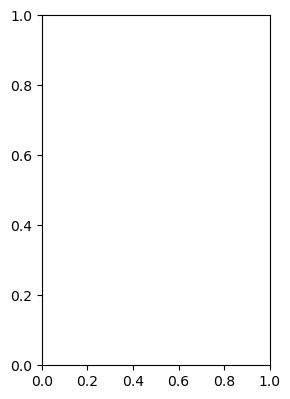

In [ ]:


plt.figure(figsize = (10,10), dpi = 100)
plt.subplot(2,3,1)

bins = np.linspace(0,1,15)
real_hist = np.histogram(cosmo_sne['zHD'][:1635], density = True, bins = bins)
plt.plot(real_hist[1][:-1], real_hist[0], label = 'Real SNe', color = 'C0')
sim_hist = np.histogram(simdf['zHD'], density = True, bins = bins)
plt.plot(sim_hist[1][:-1], sim_hist[0], label = 'Sim SNe', color = 'C1')
plt.xlabel('zHD')


plt.ylabel('Count Density')


plt.legend()
plt.subplot(2,3,2)

bins = np.linspace(18,25,15)
real_hist = np.histogram(cosmo_sne['mB'][:1635], density = True, bins = bins)
plt.plot(real_hist[1][:-1], real_hist[0], label = 'Real SNe', color = 'C0')

sim_hist = np.histogram(simdf['mB'], density = True, bins = bins)
plt.plot(sim_hist[1][:-1], sim_hist[0], label = 'Sim SNe', color = 'C1')
plt.xlabel('mB')
plt.subplot(2,3,3)

bins = np.linspace(-2.5,2.5,15)
real_hist = np.histogram(cosmo_sne['x1'][:1635], density = True, bins = bins)
plt.plot(real_hist[1][:-1], real_hist[0], label = 'Real SNe', color = 'C0')
sim_hist = np.histogram(simdf['x1'], density = True, bins = bins)
plt.plot(sim_hist[1][:-1], sim_hist[0], label = 'Sim SNe', color = 'C1')
plt.xlabel('x1')

plt.subplot(2,3,4)
plt.ylabel('Count Density')
bins = np.linspace(-.25,.25,15)
real_hist = np.histogram(cosmo_sne['c'][:1635], density = True, bins = bins)
plt.plot(real_hist[1][:-1], real_hist[0], label = 'Real SNe', color = 'C0')
sim_hist = np.histogram(simdf['c'], density = True, bins = bins)
plt.plot(sim_hist[1][:-1], sim_hist[0], label = 'Sim SNe', color = 'C1')
plt.xlabel('c')

plt.subplot(2,3,5)

bins = np.linspace(7.5,12.5,15)
real_hist = np.histogram(cosmo_sne['HOST_LOGMASS'][:1635], density = True, bins = bins)
plt.plot(real_hist[1][:-1], real_hist[0], label = 'Real SNe', color = 'C0')
sim_hist = np.histogram(simdf['HOST_LOGMASS'], density = True, bins = bins)
plt.plot(sim_hist[1][:-1], sim_hist[0], label = 'Sim SNe', color = 'C1')
plt.xlabel('Log Host Galaxy Mass')

plt.subplot(2,3,6)

bins = np.linspace(0,2,15)
real_hist = np.histogram(cosmo_sne['HOST_COLOR'][:1635], density = True, bins = bins)
plt.plot(real_hist[1][:-1], real_hist[0], label = 'Real SNe', color = 'C0')
sim_hist = np.histogram(simdf['HOST_COLOR'], density = True, bins = bins)
plt.plot(sim_hist[1][:-1], sim_hist[0], label = 'Sim SNe', color = 'C1')
plt.xlabel('Host Color')



In [5]:
cosmo_sne_phot = fits.open(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_DES_PHOT.FITS\DES-SN5YR_DES_PHOT.FITS")
cosmo_sne_phot = cosmo_sne_phot[1].data

# New rate calc with SN corr

C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_7572\3672077391.py:47: RuntimeWarning: divide by zero encountered in divide
  H_eff_err = np.sqrt( 1/(H_sim) + 1/(H_dump))
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_7572\3672077391.py:69: RuntimeWarning: invalid value encountered in divide
  N_SN_err = N_SN[0]*np.sqrt(N_SN_err_sq[0]/N_SN[0]**2 + 1/N_SN_no_corr[0])
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_7572\3672077391.py:69: RuntimeWarning: divide by zero encountered in divide
  N_SN_err = N_SN[0]*np.sqrt(N_SN_err_sq[0]/N_SN[0]**2 + 1/N_SN_no_corr[0])


1374.5092024539877 0.7777777777777777 24.16666667 -0.08 -0.5
163.0 224045.0
[ 0.          5.96259702 11.98242558 17.78687309 11.01364637 14.15344522
 16.12620446 22.7821047  51.22735248 13.00626553 10.81385453 26.02461574
 12.53328113  5.76620175  4.15790313  0.32554444  0.          0.
  0.        ]
[   0.           66.9609375   165.27901786  249.06144322  572.51513819
  888.9477372  1385.18341535 1777.94550518 1848.17540902 1424.46190823
 2073.39290209 3078.8797459  2703.65324383 1167.03425001   73.56034441
   18.86291973    0.            0.            0.        ]
Max Galaxy survey dist 7433.642700501226 Mpc
Galaxy Survey sphere 1.72e+12 Mpc3
Galaxy Survey Volume 1.12e+09 Mpc3
Max Galaxy survey dist 7618.8687764960605 Mpc
Supernova Survey sphere 1.85e+12 Mpc3
Supernova Survey Volume 1.21e+09 Mpc3
56530.5
56689.3047
158.8047000000006
sn frac err [       nan 1.00395676 0.58188428 0.34089778 0.22443278 0.14829911
 0.09737212 0.08431273 0.08354314 0.07077766 0.05835735 0.05465253
 0.05365

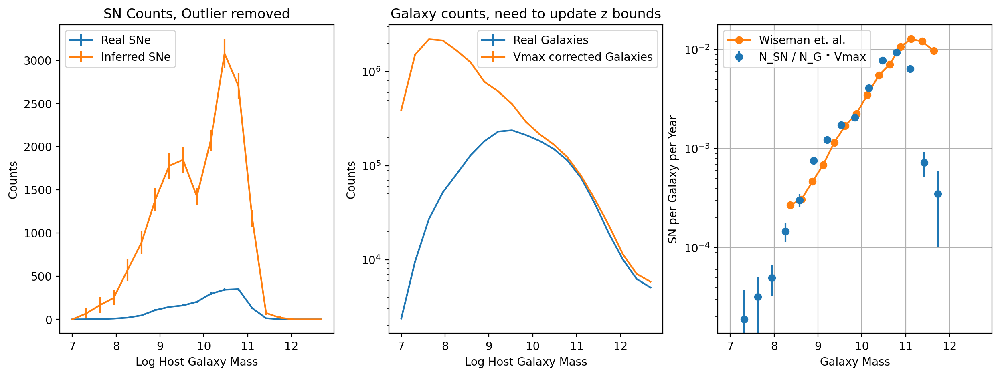

In [64]:
import scipy
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from astropy.io import fits
from ColeUtils import contains_mask

H_eff = np.load('efficiency_map.npy')
H_dump = np.load('dump_map.npy')
H_sim = np.load('sim_map.npy')
plt.figure(figsize = (15,5), dpi = 200)
plt.subplot(1,3,1) ###############################################
host_bins = [12.,         12.16666667, 12.33333333, 12.66666667 ,13.  ,       13.83333333,
 14.83333333, 15.,         15.16666667, 15.5,        15.66666667 ,15.83333333,
 16. ,        16.33333333, 16.66666667, 17.16666667, 17.5 ,       18.5,
 18.66666667, 19.,         19.16666667 ,19.5 ,       19.66666667, 20.16666667,
 20.66666667 ,20.83333333, 21. ,        21.33333333, 21.83333333, 22.,
 22.16666667, 22.5 ,       23. ,        23.33333333, 23.5 ,       23.66666667,
 23.83333333 ,24.,         24.16666667 ,27.83333333 ,28. ,        28.,
 32.        ]
host_bins = np.array(host_bins)
z_bins = np.linspace(0.0, 1, 10)
c_bins = [-3, -0.08, 3]
depth_bins = [-0.5, 0.5, 1.5]

cosmo_sne = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_HD+MetaData.csv")
bins = np.linspace(7, 13, 20)
N_SN_no_corr = np.histogram(cosmo_sne['HOST_LOGMASS'], bins = bins)
plt.errorbar(N_SN_no_corr[1][:-1], N_SN_no_corr[0], yerr = np.sqrt(N_SN_no_corr[0]), label = 'Real SNe', color = 'C0')

hostgals = fits.open(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_DES_HEAD.FITS\DES-SN5YR_DES_HEAD.FITS")[1].data
cosmo_sne = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_HD+MetaData.csv")[:1635]
mask = contains_mask(hostgals['SNID'], cosmo_sne['CID'].values)
hostgals = hostgals[mask]
hostgals = hostgals[hostgals['SNID'].argsort()]
cosmo_fields = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES_5Y.csv")['FIELD'][:1635]
cosmo_fields[(cosmo_fields == 'C3') | (cosmo_fields == 'X3')] = 1
cosmo_fields[cosmo_fields !=1] = 0
#Just for fun we switch to x1
real_array = np.array([cosmo_sne['zHD'], hostgals['HOSTGAL_MAG_r'], cosmo_sne['c'], cosmo_fields]).T

z_bin_locs = np.digitize(real_array[:,0], z_bins)
h_bin_locs = np.digitize(real_array[:,1], host_bins)
c_bin_locs = np.digitize(real_array[:,2], c_bins)
d_bin_locs = np.digitize(real_array[:,3], depth_bins)

H_eff_err = np.sqrt( 1/(H_sim) + 1/(H_dump))

correction = []
corr_err = []
for z,h,c,d in zip(z_bin_locs, h_bin_locs, c_bin_locs, d_bin_locs):
    if z > 9 or H_eff[z-1, h-1, c-1, d-1] == 0: #not yet binned
        correction.append(0)
        corr_err.append(0)
    else:
        corr = 1 / H_eff[z-1, h-1, c-1, d-1]
        
        if corr > 1000:
            print(corr, z_bins[z-1], host_bins[h-1], c_bins[c-1], depth_bins[d-1])
            print(H_sim[z-1, h-1, c-1, d-1], H_dump[z-1, h-1, c-1, d-1])
            corr = 0
        correction.append(corr)
        corr_err.append(corr * np.sqrt( 1 / H_sim[z-1, h-1, c-1, d-1] + 1 / H_dump[z-1, h-1, c-1, d-1]))
correction = np.array(correction)
corr_err = np.array(corr_err)
N_SN = scipy.stats.binned_statistic(cosmo_sne['HOST_LOGMASS'], correction,  bins = bins, statistic = 'sum')
N_SN_err_sq = scipy.stats.binned_statistic(cosmo_sne['HOST_LOGMASS'], corr_err**2,  bins = bins, statistic = 'sum')
print(np.sqrt(N_SN_err_sq[0]))
N_SN_err = N_SN[0]*np.sqrt(N_SN_err_sq[0]/N_SN[0]**2 + 1/N_SN_no_corr[0])
plt.errorbar(N_SN[1][:-1], N_SN[0], yerr = N_SN_err, label = 'Inferred SNe', color = 'C1')
print(N_SN[0])

plt.legend()
plt.xlabel('Log Host Galaxy Mass')
plt.ylabel('Counts')
plt.title('SN Counts, Outlier removed')

from astropy.cosmology import Planck18 as cosmo  # or use your own cosmology
from astropy.cosmology import z_at_value
import astropy.units as u
#Survey Volumes

from astropy.cosmology import FlatLambdaCDM
import astropy.units as u
cosmo = FlatLambdaCDM(H0=70 * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)

#TODO this needs to be checked

#For now I made a manual hard cut at 1.3
rsurv = cosmo.luminosity_distance(maxz)
print('Max Galaxy survey dist', rsurv)

survey_sphere = 4/3 * np.pi * rsurv**3

r_inner = cosmo.luminosity_distance(minz)
inner_sphere = 4/3 * np.pi * r_inner**3
survey_sphere -= inner_sphere
#format in scientific notation

print('Galaxy Survey sphere', f"{survey_sphere:.2e}")
survey_volume = survey_sphere * (2.7) * 10 # 10 2.7 degrees squared SN regions
V_G = survey_volume / 41252.96125
print('Galaxy Survey Volume', f"{V_G:.2e}")


#TODO this needs to be checked

rsurv = cosmo.luminosity_distance(cosmo_sne['HOST_ZSPEC'].max())
print('Max Galaxy survey dist', rsurv)

survey_sphere = 4/3 * np.pi * rsurv**3
#format in scientific notation

print('Supernova Survey sphere', f"{survey_sphere:.2e}")
survey_volume = survey_sphere * (27)
V_SN = survey_volume / 41252.96125
print('Supernova Survey Volume', f"{V_SN:.2e}")#Time of the survey
start = np.min(cosmo_sne['PKMJD'][cosmo_sne['PKMJD']>56000])
stop = np.max(cosmo_sne['PKMJD'][cosmo_sne['PKMJD']<56800])
print(start)
print(stop)
print(stop - start)
dur = stop - start
total_time = dur * 5 / 365.25

plt.subplot(1,3,2) ######################################################
Vmax = scipy.stats.binned_statistic(hostlib['LOGMASS'], Vmax_correction, bins = bins, statistic = 'sum')

plt.errorbar(bins[:-1], N_G[0], yerr = np.sqrt(N_G[0]), label = 'Real Galaxies', color = 'C0')
gal_frac_err = 1 / np.sqrt(N_G[0])
Vmax_err = gal_frac_err * Vmax[0]
plt.errorbar(bins[:-1], Vmax[0], yerr = Vmax_err,  label = 'Vmax corrected Galaxies', color = 'C1')
plt.yscale('log')
plt.ylabel('Counts')
plt.xlabel('Log Host Galaxy Mass')
plt.legend()
plt.title('Galaxy counts, need to update z bounds')


plt.subplot(1,3,3) ######################################################

rate= (N_SN[0] / Vmax[0]) * (V_G / V_SN) * 1/total_time 
print('sn frac err', N_SN_err/N_SN[0])
rate_frac_err = np.sqrt(N_SN_err**2 / N_SN[0]**2 + Vmax_err**2 / Vmax[0]**2) 
print('rate frac err')
print(rate_frac_err)
rate_err = rate_frac_err * rate
print('rate err', rate_err)

plt.errorbar(bins[:-1], rate, yerr = rate_err, label = 'N_SN / N_G * Vmax', fmt = 'o')
plt.ylabel('SN per Galaxy per Year')
plt.xlabel('Galaxy Mass')
plt.yscale('log')



x = [8.366934932446702, 8.620967291793225, 8.874999651139749, 9.116935630167202, 9.370968687234226, 9.62499965113975, 9.872984866907489, 10.127015830813011, 10.387096729179323, 10.63508054950606, 10.883064369832798, 11.125000348860251, 11.372984169186989, 11.645161447872372]
y = [-3.5696322907036198, -3.511605428268646, -3.3326885718235055, -3.163442859117528, -2.9361702839765758, -2.7669245712705974, -2.6460348561686864, -2.457446855984384, -2.259187712060919, -2.147968861789915, -1.9690522842530296, -1.891682576523221, -1.9158605753252544, -2.0125725705333872]
x = np.array(x)
y = np.array(y)
y = 10**y
plt.plot(x, y, label = 'Wiseman et. al.', marker = 'o')
plt.legend()
#plt.xlim(8, 12)
#plt.yticks(np.logspace(-4, -1.5, 6))
#plt.ylim(1e-4, 10**(-1.5))
plt.grid('True')

In [9]:
from astropy.io import fits
from ColeUtils import contains_mask
hostgals = fits.open(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_DES_HEAD.FITS\DES-SN5YR_DES_HEAD.FITS")[1].data
cosmo_sne = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_HD+MetaData.csv")[:1635]
mask = contains_mask(hostgals['SNID'], cosmo_sne['CID'].values)
hostgals = hostgals[mask]
hostgals = hostgals[hostgals['SNID'].argsort()]
cosmo_fields = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES_5Y.csv")['FIELD'][:1635]
cosmo_fields[(cosmo_fields == 'C3') | (cosmo_fields == 'X3')] = 1
cosmo_fields[cosmo_fields !=1] = 0
real_array = np.array([cosmo_sne['zHD'], hostgals['HOSTGAL_MAG_r'], cosmo_sne['c'], cosmo_fields]).T

C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_25384\3295564546.py:42: RuntimeWarning: divide by zero encountered in divide
  correction[cut] = 1 / H_eff[z_bin_locs[cut]-1, h_bin_locs[cut]-1, c_bin_locs[cut]-1, d_bin_locs[cut]-1]


[2.00555393 3.20229914 3.89714994 2.05585023 3.39472686]
[0.04197618 0.02367486 0.05437052 0.0442739  0.05319621]
N_SN BinnedStatisticResult(statistic=array([   0.        ,   66.9609375 ,  165.27901786,  249.06144322,
        572.51513819,  888.9477372 , 1385.18341535, 1562.48409522,
       1256.64089275, 1359.29582715, 1857.31920458, 2887.5274674 ,
       2570.97544994, 1076.25428463,   58.65173514,    3.95431046,
          0.        ,    0.        ,    0.        ]), bin_edges=array([ 7.        ,  7.31578947,  7.63157895,  7.94736842,  8.26315789,
        8.57894737,  8.89473684,  9.21052632,  9.52631579,  9.84210526,
       10.15789474, 10.47368421, 10.78947368, 11.10526316, 11.42105263,
       11.73684211, 12.05263158, 12.36842105, 12.68421053, 13.        ]), binnumber=array([ 9, 12,  9, ...,  9, 13, 12], dtype=int64))
[   0.        ,   66.9609375 ,  165.27901786,  249.06144322,  572.51513819,
  888.9477372 , 1385.18341535, 1562.48409522, 1256.64089275, 1359.29582715,
 1857.31920458

C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_25384\3295564546.py:68: RuntimeWarning: divide by zero encountered in divide
  correction[cut] = 1 / H_eff[z_bin_locs[cut]-1, h_bin_locs[cut]-1, c_bin_locs[cut]-1, d_bin_locs[cut]-1]
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_25384\3295564546.py:74: RuntimeWarning: divide by zero encountered in divide
  corr_err[cut] = correction[cut] * np.sqrt( 1 / H_sim[z_bin_locs[cut]-1, h_bin_locs[cut]-1, c_bin_locs[cut]-1, d_bin_locs[cut]-1] \
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_25384\3295564546.py:75: RuntimeWarning: divide by zero encountered in divide
  + 1 / H_dump[z_bin_locs[cut]-1, h_bin_locs[cut]-1, c_bin_locs[cut]-1, d_bin_locs[cut]-1])
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_25384\3295564546.py:74: RuntimeWarning: invalid value encountered in multiply
  corr_err[cut] = correction[cut] * np.sqrt( 1 / H_sim[z_bin_locs[cut]-1, h_bin_locs[cut]-1, c_bin_locs[cut]-1, d_bin_locs[cut]-1] \
C:\Users\cmeldorf\AppData\Local\Temp\ip

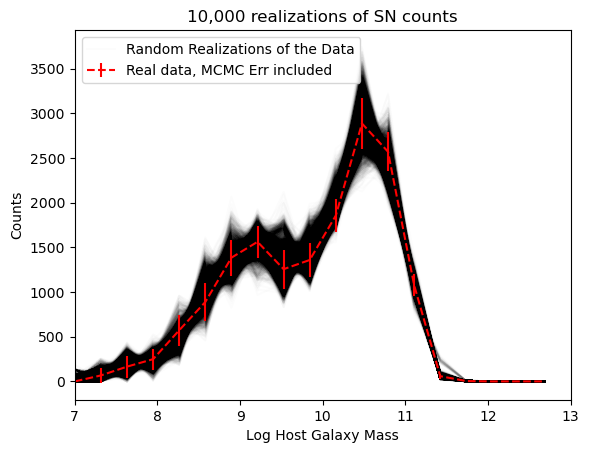

In [17]:
import numpy as np
import scipy
from matplotlib import pyplot as plt

host_bins = [12.,         12.16666667, 12.33333333, 12.66666667 ,13.  ,       13.83333333,
 14.83333333, 15.,         15.16666667, 15.5,        15.66666667 ,15.83333333,
 16. ,        16.33333333, 16.66666667, 17.16666667, 17.5 ,       18.5,
 18.66666667, 19.,         19.16666667 ,19.5 ,       19.66666667, 20.16666667,
 20.66666667 ,20.83333333, 21. ,        21.33333333, 21.83333333, 22.,
 22.16666667, 22.5 ,       23. ,        23.33333333, 23.5 ,       23.66666667,
 23.83333333 ,24.,         24.16666667 ,27.83333333 ,28. ,        28.,
 32.        ]
host_bins = np.array(host_bins)
z_bins = np.linspace(0.0, 1, 10)
c_bins = [-3, -0.08, 3]
depth_bins = [-0.5, 0.5, 1.5]

H_eff = np.load('efficiency_map.npy')
H_dump = np.load('dump_map.npy')
H_sim = np.load('sim_map.npy')

real_array_with_err = np.array([cosmo_sne['zHD'], hostgals['HOSTGAL_MAG_r'], cosmo_sne['c'], cosmo_fields, cosmo_sne['zHDERR'], hostgals['HOSTGAL_MAGERR_r'], cosmo_sne['cERR']]).T
from numpy import random
bins = np.linspace(7, 13, 20)
loops = 10000
realizations = np.zeros((loops, len(bins)-1))
k = 0
for i in range(loops):
    try:
        c_realization = random.normal(loc = cosmo_sne['c'], scale = cosmo_sne['cERR'])
        z_realization = random.normal(loc = cosmo_sne['zHD'], scale = cosmo_sne['zHDERR'])
        host_realization = random.normal(loc = hostgals['HOSTGAL_MAG_r'], scale = np.abs(hostgals['HOSTGAL_MAGERR_r']))
        host_mass_realization = random.normal(loc = cosmo_sne['HOST_LOGMASS'], scale = np.abs(cosmo_sne['HOST_LOGMASS_ERR']))
        z_bin_locs = np.digitize(z_realization, z_bins)
        h_bin_locs = np.digitize(host_realization, host_bins)
        c_bin_locs = np.digitize(c_realization, c_bins)
        d_bin_locs = np.digitize(real_array[:,3], depth_bins)

        correction = np.zeros(1635)
        cut = np.where((z_bin_locs < 9))[0]
        correction[~cut] = 0
        correction[cut] = 1 / H_eff[z_bin_locs[cut]-1, h_bin_locs[cut]-1, c_bin_locs[cut]-1, d_bin_locs[cut]-1]
        correction[correction > 500] = 0 #Cutting  extreme outlier s
        correction = np.nan_to_num(correction, nan = 0)
        #plt.hist(correction, bins = 100, histtype = 'step', label = 'Realization %d' % i)
        if k == 0:
            label = 'Random Realizations of the Data'
        else:
            label = None
        N_SN = scipy.stats.binned_statistic(host_mass_realization, correction, bins = bins, statistic = 'sum')
        plt.plot(bins[:-1], N_SN[0], color = 'k', alpha = 100/loops, label = label)
        realizations[k] = N_SN[0]
        k += 1
    except:
        continue



real_array = np.array([cosmo_sne['zHD'], hostgals['HOSTGAL_MAG_r'], cosmo_sne['c'], cosmo_fields]).T
z_bin_locs = np.digitize(real_array[:,0], z_bins)
h_bin_locs = np.digitize(real_array[:,1], host_bins)
c_bin_locs = np.digitize(real_array[:,2], c_bins)
d_bin_locs = np.digitize(real_array[:,3], depth_bins)

correction = np.zeros(1635)
cut = np.where((z_bin_locs < 9))[0]
correction[~cut] = 0
correction[cut] = 1 / H_eff[z_bin_locs[cut]-1, h_bin_locs[cut]-1, c_bin_locs[cut]-1, d_bin_locs[cut]-1]
print(correction[:5])
print(corr_err[:5])
correction[correction > 500] = 0 #Cutting  extreme outliers
correction = np.nan_to_num(correction, nan = 0)
corr_err = np.zeros(1635)
corr_err[cut] = correction[cut] * np.sqrt( 1 / H_sim[z_bin_locs[cut]-1, h_bin_locs[cut]-1, c_bin_locs[cut]-1, d_bin_locs[cut]-1] \
                                     + 1 / H_dump[z_bin_locs[cut]-1, h_bin_locs[cut]-1, c_bin_locs[cut]-1, d_bin_locs[cut]-1])
corr_err = np.nan_to_num(corr_err, nan = 0)

N_SN = scipy.stats.binned_statistic(cosmo_sne['HOST_LOGMASS'], correction,  bins = bins, statistic = 'sum')
print('N_SN', N_SN)
print(np.array2string(N_SN[0], separator=', '))
N_SN_no_corr = np.histogram(cosmo_sne['HOST_LOGMASS'], bins = bins)
N_SN_err_sq = scipy.stats.binned_statistic(cosmo_sne['HOST_LOGMASS'], corr_err**2,  bins = bins, statistic = 'sum')
N_SN_err = N_SN[0]*np.sqrt(N_SN_err_sq[0]/N_SN[0]**2 + 1/N_SN_no_corr[0])



print(N_SN_err)
N_SN_err_plus_MCMC = np.sqrt(N_SN_err**2 + np.std(realizations, axis = 0)**2)
print(N_SN_err_plus_MCMC/N_SN_err)
#plt.errorbar(bins[:-1], N_SN[0], yerr = np.std(realizations, axis = 0), color = 'g', ls = '--', label = 'Realization 0')
plt.errorbar(bins[:-1], N_SN[0], yerr = N_SN_err_plus_MCMC, color = 'r', ls = '--', label = 'Real data, MCMC Err included')
#plt.errorbar(bins[:-1], np.median(realizations, axis = 0), yerr = N_SN_err, color = 'g', ls = '--', label = 'Realization 0')


plt.xlim(7,13)
plt.ylabel('Counts')
plt.xlabel('Log Host Galaxy Mass')
plt.title('10,000 realizations of SN counts')
plt.legend(loc = 'upper left')

In [143]:
plt.errorbar(real[1][:-1], real[0]/np.sum(real[0]), yerr = np.sqrt(real[0])/np.sum(real[0]), label = 'Shallow Fields', color = 'C0')
plt.errorbar(sim[1][:-1], sim[0]/np.sum(sim[0]), yerr = np.sqrt(sim[0])/np.sum(sim[0]), label = 'Shallow Fields Sim SNe', color = 'C1', lw = 2)
plt.legend()

NameError: name 'real' is not defined

Text(0.5, 0, 'Host Color')

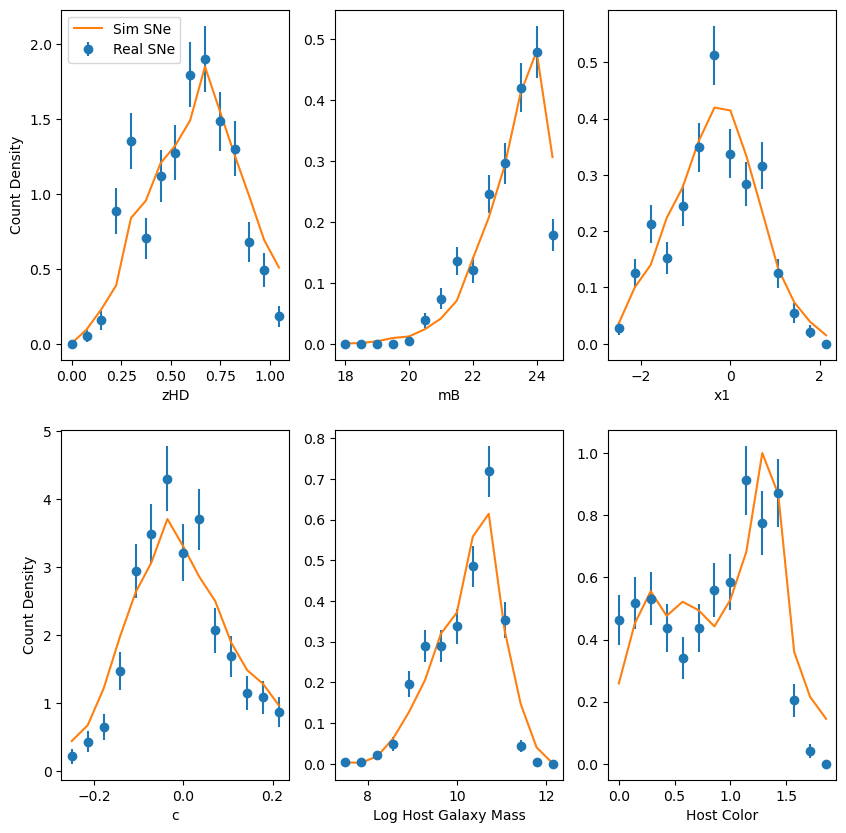

In [ ]:


plt.figure(figsize = (10,10), dpi = 100)
plt.subplot(2,3,1)

num_sne = np.size(cosmo_sne_deep['zHD'])


bins = np.linspace(0,np.max(cosmo_sne_deep['zHD']),16)
norm = num_sne * np.diff(bins)[0]
real_hist = np.histogram(cosmo_sne_deep['zHD'], density = False, bins = bins)
plt.errorbar(real_hist[1][:-1], real_hist[0]/(norm), yerr = np.sqrt(real_hist[0])/norm, label = 'Real SNe', color = 'C0', fmt = 'o')
sim_hist = np.histogram(simdf_deep['zHD'], density = True, bins = bins)
plt.plot(sim_hist[1][:-1], sim_hist[0], label = 'Sim SNe', color = 'C1')
plt.xlabel('zHD')
plt.ylabel('Count Density')


plt.legend()
plt.subplot(2,3,2)

bins = np.linspace(18,25,15)
norm = num_sne * np.diff(bins)[0]
real_hist = np.histogram(cosmo_sne_deep['mB'], density = False, bins = bins)
plt.errorbar(real_hist[1][:-1], real_hist[0]/(norm), yerr = np.sqrt(real_hist[0])/norm, label = 'Real SNe', color = 'C0', fmt = 'o')

sim_hist = np.histogram(simdf_deep['mB'], density = True, bins = bins)
plt.plot(sim_hist[1][:-1], sim_hist[0], label = 'Sim SNe', color = 'C1')
plt.xlabel('mB')
plt.subplot(2,3,3)

bins = np.linspace(-2.5,2.5,15)
norm = num_sne * np.diff(bins)[0]
real_hist = np.histogram(cosmo_sne_deep['x1'], density = False, bins = bins)
plt.errorbar(real_hist[1][:-1], real_hist[0]/(norm), yerr = np.sqrt(real_hist[0])/norm, label = 'Real SNe', color = 'C0', fmt = 'o')
sim_hist = np.histogram(simdf_deep['x1'], density = True, bins = bins)
plt.plot(sim_hist[1][:-1], sim_hist[0], label = 'Sim SNe', color = 'C1')
plt.xlabel('x1')

plt.subplot(2,3,4)
plt.ylabel('Count Density')
bins = np.linspace(-.25,.25,15)
norm = num_sne * np.diff(bins)[0]
real_hist = np.histogram(cosmo_sne_deep['c'], density = False, bins = bins)
plt.errorbar(real_hist[1][:-1], real_hist[0]/(norm), yerr = np.sqrt(real_hist[0])/norm, label = 'Real SNe', color = 'C0', fmt = 'o')
sim_hist = np.histogram(simdf_deep['c'], density = True, bins = bins)
plt.plot(sim_hist[1][:-1], sim_hist[0], label = 'Sim SNe', color = 'C1')
plt.xlabel('c')

plt.subplot(2,3,5)

bins = np.linspace(7.5,12.5,15)
norm = num_sne * np.diff(bins)[0]
real_hist = np.histogram(cosmo_sne_deep['HOST_LOGMASS'], density = False, bins = bins)
plt.errorbar(real_hist[1][:-1], real_hist[0]/(norm), yerr = np.sqrt(real_hist[0])/norm, label = 'Real SNe', color = 'C0', fmt = 'o')
sim_hist = np.histogram(simdf_deep['HOST_LOGMASS'], density = True, bins = bins)
plt.plot(sim_hist[1][:-1], sim_hist[0], label = 'Sim SNe', color = 'C1')
plt.xlabel('Log Host Galaxy Mass')

plt.subplot(2,3,6)

bins = np.linspace(0,2,15)
norm = num_sne * np.diff(bins)[0]
real_hist = np.histogram(cosmo_sne_deep['HOST_COLOR'], density = False, bins = bins)
plt.errorbar(real_hist[1][:-1], real_hist[0]/(norm), yerr = np.sqrt(real_hist[0])/norm, label = 'Real SNe', color = 'C0', fmt = 'o')
sim_hist = np.histogram(simdf_deep['HOST_COLOR'], density = True, bins = bins)
plt.plot(sim_hist[1][:-1], sim_hist[0], label = 'Sim SNe', color = 'C1')
plt.xlabel('Host Color')



29.98427045830003


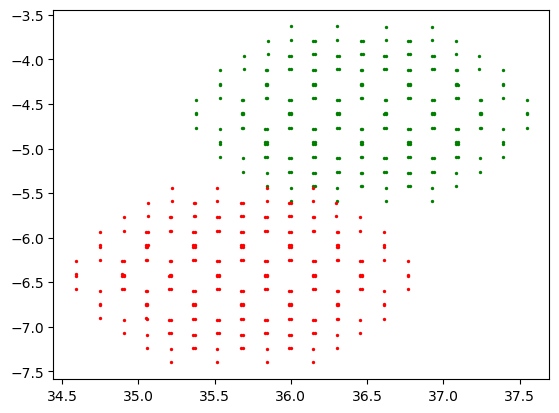

In [235]:
cornerdata = pd.read_csv(r"C:\Users\cmeldorf\Downloads\cornerCoords.dat", sep = ',')
cornerdata['Area'] = (cornerdata['RA2'] - cornerdata['RA1']) * (cornerdata['DEC1'] - cornerdata['DEC2'])


print(np.sum(cornerdata['Area']))

plt.scatter(cornerdata['RA1'][cornerdata['FIELD'] == 'X3'], cornerdata['DEC1'][cornerdata['FIELD'] == 'X3'], s = 2, color = 'g')
plt.scatter(cornerdata['RA1'][cornerdata['FIELD'] == 'X3'], cornerdata['DEC2'][cornerdata['FIELD'] == 'X3'], s = 2, color = 'g')
plt.scatter(cornerdata['RA2'][cornerdata['FIELD'] == 'X3'], cornerdata['DEC2'][cornerdata['FIELD'] == 'X3'], s = 2, color = 'g')
plt.scatter(cornerdata['RA2'][cornerdata['FIELD'] == 'X3'], cornerdata['DEC1'][cornerdata['FIELD'] == 'X3'], s = 2, color = 'g')

plt.scatter(cornerdata['RA1'][cornerdata['FIELD'] == 'X2'], cornerdata['DEC1'][cornerdata['FIELD'] == 'X2'], s = 2, color = 'r')
plt.scatter(cornerdata['RA1'][cornerdata['FIELD'] == 'X2'], cornerdata['DEC2'][cornerdata['FIELD'] == 'X2'], s = 2, color = 'r')
plt.scatter(cornerdata['RA2'][cornerdata['FIELD'] == 'X2'], cornerdata['DEC2'][cornerdata['FIELD'] == 'X2'], s = 2, color = 'r')
plt.scatter(cornerdata['RA2'][cornerdata['FIELD'] == 'X2'], cornerdata['DEC1'][cornerdata['FIELD'] == 'X2'], s = 2, color = 'r')

In [ ]:
'''
#Cut this array to only include SN-X3 tiles
X3tiles = [t for t in np.unique(desyr3['TILENAME']) if 'SN-X3' in str(t)]
#check if the TILE is in the list


desyr3_X3 = desyr3[desyr3['TILENAME'].startswith('SN-X3')]
print(desyr3_X3.shape)
'''

In [120]:
#Binless approach?
import numpy as np
import pandas as pd
from astropy.io import fits
from matplotlib import pyplot as plt
from ColeUtils import contains_mask, load_dump_and_sim
from astropy.coordinates import SkyCoord
import astropy.units as u

dumpdf, simdf = load_dump_and_sim(20, maria_cuts = True)
fields = np.array(['C1', 'C2', 'C3', 'X1', 'X2', 'X3', 'S1', 'S2', 'E1', 'E2'])
field_ras = np.array([54.2743,  54.2743, 52.6484, 34.4757, 35.6645, 36.4500, 42.8200, 41.1944, 7.8744 , 9.5000,])
field_decs = np.array([-27.1116, -29.0884, -28.1000, -4.9295, -6.4121, -4.6000, 0.0000, -0.9884, -43.0096,  -43.9980])  

c = SkyCoord(ra=dumpdf['RA'].values*u.degree, dec=dumpdf['DEC'].values*u.degree)
catalog = SkyCoord(ra=field_ras*u.degree, dec=field_decs*u.degree)
idx, d2d, d3d = c.match_to_catalog_sky(catalog)

deepfields = np.where((fields == 'X3') | (fields == 'C3'))[0]
deep_bool = np.zeros_like(idx)
deep_bool[np.where((idx == deepfields[0]) | (idx == deepfields[1]))[0]] = 1
#Just for fun we switch to x1
dump_array = dumpdf[['GENZ', 'HOSTMAG_r', 'SALT2c']]
#dump_array = dumpdf[['GENZ', 'HOSTMAG_r', 'SALT2x1']]
dump_array = dump_array.to_numpy()
dump_array = np.column_stack((dump_array, deep_bool))
dump_array = np.column_stack((dump_array, dumpdf['SALT2x1']))

#Just for fun we switch to x1
sim_array = simdf[['zHD', 'HOST_MAG_r', 'SIM_c', 'FIELD', 'SIM_x1']]
#sim_array = simdf[['zHD', 'HOST_MAG_r', 'SIM', 'FIELD']]
sim_array['FIELD'][(sim_array['FIELD'] == 'C3') | (sim_array['FIELD'] == 'X3')] = 1
sim_array['FIELD'][sim_array['FIELD'] != 1] = 0  #What about combined fields?
sim_array = sim_array.to_numpy()


hostgals = fits.open(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_DES_HEAD.FITS\DES-SN5YR_DES_HEAD.FITS")[1].data
cosmo_sne = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_HD+MetaData.csv")[:1635]
mask = contains_mask(hostgals['SNID'], cosmo_sne['CID'].values)
hostgals = hostgals[mask]
hostgals = hostgals[hostgals['SNID'].argsort()]
cosmo_fields = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES_5Y.csv")['FIELD'][:1635]
cosmo_fields[(cosmo_fields == 'C3') | (cosmo_fields == 'X3')] = 1
cosmo_fields[cosmo_fields !=1] = 0
#Just for fun we switch to x1
real_array = np.array([cosmo_sne['zHD'], hostgals['HOSTGAL_MAG_r'], cosmo_sne['c'], cosmo_fields, cosmo_sne['x1']]).T


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_17180\2299314328.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sim_array['FIELD'][(sim_array['FIELD'] == 'C3') | (sim_array['FIELD'] == 'X3')] = 1
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_17180\2299314328.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sim_array['FIELD'][sim_array['FIELD'] != 1] = 0  #What about combined fields?


In [128]:
sim_array = sim_array.astype(float)
i = 0



real_array = real_array[real_array[:,0] <= 1.3]  #Cutting out the very faint host galaxies

correction = []
corr_err = []
for z, m, c, f, x1 in zip(real_array[:,0], real_array[:,1], real_array[:,2], real_array[:,3], real_array[:,4]):
    if i % 100 == 0:
        print(i)
    
    ztol = 0.05
    mtol = 0.05
    ctol = 0.05
    xtol = 0.05
    
    if m < 0:
        mtol = 1e2
    if m > 24:
        mtol = 4
    dump_array_subset = np.array([])
    sim_array_subset = np.array([])
    mod = 0.9
    while np.size(dump_array_subset) < 10 or np.size(sim_array_subset) < 10:
        mod += 0.1
        ztol *= mod
        mtol *= mod
        ctol *= mod
        xtol *= mod
        dump_array_subset = dump_array[(np.isclose(dump_array[:,0], z, atol = ztol))\
                                        & (np.isclose(dump_array[:,1], m, atol = mtol))\
                                            & (np.isclose(dump_array[:,2], c, atol = ctol))
                                            & (dump_array[:,3] == f)
                                            & (np.isclose(dump_array[:,4], x1, atol = xtol))]
        sim_array_subset = sim_array[(np.isclose(sim_array[:,0], z, atol = ztol))\
                                        & (np.isclose(sim_array[:,1], m, atol = mtol))\
                                                & (np.isclose(sim_array[:,2], c, atol = ctol))
                                                & (sim_array[:,3] == f)
                                                & (np.isclose(sim_array[:,4], x1, atol = xtol))]
    if mod > 1:
        print(mod)
        

    assert np.size(dump_array_subset) >= 10, 'No dump data found for z = %.2f, m = %.2f, c = %.2f, f = %d, x1 = %d' % (z, m, c, f, x1)
    assert np.size(sim_array_subset) >= 10, 'No sim data found for z = %.2f, m = %.2f, c = %.2f, f = %d, x1 = %d' % (z, m, c, f, x1)
    eff = np.size(sim_array_subset) / np.size(dump_array_subset)
    eff_err = mod ** 2 * eff * np.sqrt(1/np.size(dump_array_subset) + 1/np.size(sim_array_subset))
    i += 1
    #print('Efficiency', eff, eff_err)
    correction.append(1/eff)
    corr_err.append(1/eff * np.sqrt(1/np.size(dump_array_subset) + 1/np.size(sim_array_subset)))
    

0
1.5000000000000004
1.3000000000000003
1.6000000000000005
1.1
1.4000000000000004
1.3000000000000003
1.4000000000000004
1.3000000000000003
1.6000000000000005
1.3000000000000003
1.3000000000000003
1.4000000000000004
1.4000000000000004
1.3000000000000003
1.2000000000000002
1.4000000000000004
1.5000000000000004
1.2000000000000002
1.3000000000000003
1.5000000000000004
1.3000000000000003
1.2000000000000002
1.1
1.6000000000000005
1.2000000000000002
1.4000000000000004
1.5000000000000004
1.2000000000000002
1.3000000000000003
1.3000000000000003
1.1
1.5000000000000004
1.6000000000000005
1.3000000000000003
1.6000000000000005
1.5000000000000004
1.5000000000000004
1.5000000000000004
1.4000000000000004
1.4000000000000004
1.2000000000000002
1.7000000000000006
1.5000000000000004
1.4000000000000004
1.3000000000000003
1.2000000000000002
1.4000000000000004
1.5000000000000004
1.4000000000000004
1.3000000000000003
1.5000000000000004
1.2000000000000002
1.5000000000000004
1.3000000000000003
1.600000000000000

[0.00000000e+00 4.25000000e+00 1.20144824e+01 2.72253605e+01
 1.12952623e+02 1.67949885e+03 9.45083958e+02 1.45135430e+03
 1.38927476e+03 2.02866571e+03 2.11109367e+03 4.36633667e+03
 4.25475256e+03 2.35338594e+03 1.96315013e+02 8.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_17180\3837858078.py:7: RuntimeWarning: invalid value encountered in divide
  N_SN_err = np.sqrt(N_SN_err_sq[0]) * N_SN[0] / N_SN_no_corr[0]


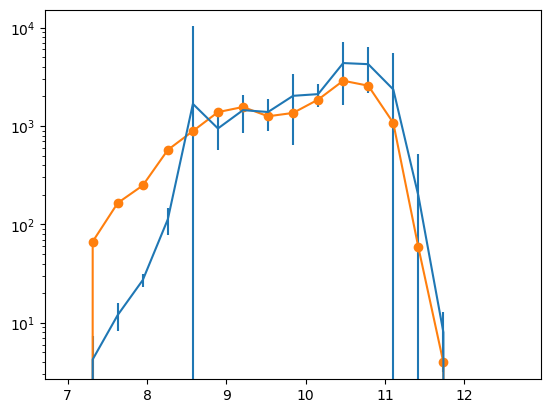

In [129]:
import scipy
hostmasses = cosmo_sne['HOST_LOGMASS'][:1635][cosmo_sne['zHD'][:1635] < 1.3] 

N_SN_no_corr = np.histogram(hostmasses, bins = np.linspace(7, 13, 20))
N_SN = scipy.stats.binned_statistic(hostmasses, correction, bins = np.linspace(7, 13, 20), statistic = 'sum')
N_SN_err_sq = scipy.stats.binned_statistic(hostmasses, np.array(corr_err)**2, bins = np.linspace(7, 13, 20), statistic = 'sum')
N_SN_err = np.sqrt(N_SN_err_sq[0]) * N_SN[0] / N_SN_no_corr[0]
plt.errorbar(N_SN[1][:-1], N_SN[0], yerr = N_SN_err, label = 'Inferred SNe', color = 'C0')
plt.yscale('log')

compare_array = np.array([   0.        ,   66.9609375 ,  165.27901786,  249.06144322,  572.51513819,
  888.9477372 , 1385.18341535, 1562.48409522, 1256.64089275, 1359.29582715,
 1857.31920458, 2887.5274674 , 2570.97544994, 1076.25428463,   58.65173514,
    3.95431046,    0.        ,    0.        ,    0.        ])
plt.plot(N_SN[1][:-1], compare_array, label = 'Bin Method', color = 'C1', marker = 'o')
print(N_SN[0])

788135385.9539456 Mpc3 1212463644.7765832 Mpc3 2.1739178644763943
[0.00000000e+00 3.23521682e-06 9.14575428e-06 2.07246928e-05
 8.59826416e-05 1.27848069e-03 7.19423887e-04 1.10481079e-03
 1.05755414e-03 1.54427610e-03 1.60702253e-03 3.32377549e-03
 3.23883460e-03 1.79146206e-03 1.49440384e-04 6.08981990e-06
 0.00000000e+00 0.00000000e+00 0.00000000e+00]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_17180\892823599.py:14: RuntimeWarning: invalid value encountered in divide
  N_SN_err = np.sqrt(N_SN_err_sq[0]) * N_SN[0] / N_SN_no_corr[0]


(0.0001, 0.03162277660168379)

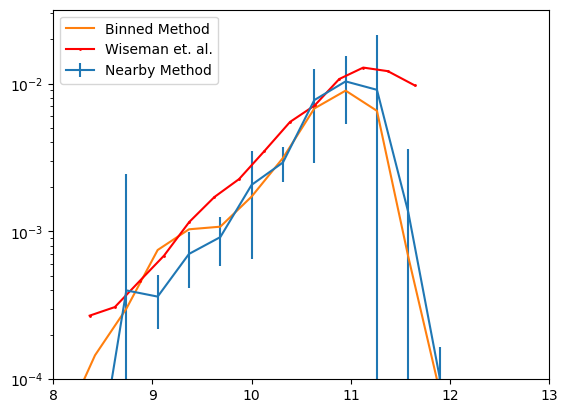

In [130]:

Vmax_old = np.array([ 275805.79681076,1063748.60251459,1551160.50350688,1506187.71805177,
 1178232.97655521, 885574.98050986, 553067.26816527, 451883.85314793,
  348938.00870752, 236094.3783704 , 176855.34122423, 127219.60776361,
   85754.68145404,  49196.24926018,  26011.76295494,  14149.70018215,
    6715.78827318,   4140.28324137,   2997.98667302])


bins = np.linspace(7, 13, 20)

Vmax = scipy.stats.binned_statistic(hostlib['LOGMASS'], Vmax_correction, bins = bins, statistic = 'sum')[0]
N_SN_no_corr = np.histogram(hostmasses, bins = bins)
N_SN = scipy.stats.binned_statistic(hostmasses, correction, bins = bins, statistic = 'sum')
N_SN_err_sq = scipy.stats.binned_statistic(hostmasses, np.array(corr_err)**2, bins = bins, statistic = 'sum')
N_SN_err = np.sqrt(N_SN_err_sq[0]) * N_SN[0] / N_SN_no_corr[0]

mass_locs = N_SN[1][:-1] + (N_SN[1][1:] - N_SN[1][:-1]) / 2
plt.errorbar(mass_locs, (N_SN[0]/Vmax) * (V_G / V_SN) * 1/total_time ,yerr = (N_SN_err/Vmax) * (V_G / V_SN) * 1/total_time,  label = 'Nearby Method', color = 'C0')


plt.plot(mass_locs, (compare_array/Vmax_old) * (V_G / V_SN) * 1/total_time , label = 'Binned Method', color = 'C1')
print(V_G, V_SN, total_time)
print((N_SN[0]/Vmax[0]) * (V_G / V_SN) * 1/total_time)
plt.yscale('log')
x = [8.366934932446702, 8.620967291793225, 8.874999651139749, 9.116935630167202, 9.370968687234226, 9.62499965113975, 9.872984866907489, 10.127015830813011, 10.387096729179323, 10.63508054950606, 10.883064369832798, 11.125000348860251, 11.372984169186989, 11.645161447872372]
y = [-3.5696322907036198, -3.511605428268646, -3.3326885718235055, -3.163442859117528, -2.9361702839765758, -2.7669245712705974, -2.6460348561686864, -2.457446855984384, -2.259187712060919, -2.147968861789915, -1.9690522842530296, -1.891682576523221, -1.9158605753252544, -2.0125725705333872]
x = np.array(x)
y = np.array(y)
y = 10**y

plt.plot(x, y, label = 'Wiseman et. al.', marker = 'o', ms = 1, color = 'r')
plt.legend()
x = np.linspace(7, 13, 100)
plt.xlim(8,13)
plt.ylim(1e-4, 10**(-1.5))

NameError: name 'cosmo_sne' is not defined

788135385.9539456 Mpc3 1212463644.7765832 Mpc3 2.1739178644763943
[0.00000000e+00 5.27173677e-06 1.34612777e-05 3.08412827e-05
 1.23777721e-04 5.32254539e-04 7.82609866e-04 1.40802177e-03
 1.57784588e-03 2.73714645e-03 2.24375825e-03 2.87584731e-03
 3.78331387e-03 2.37334816e-03 1.46500803e-04 3.13047721e-05
 0.00000000e+00 0.00000000e+00 0.00000000e+00]


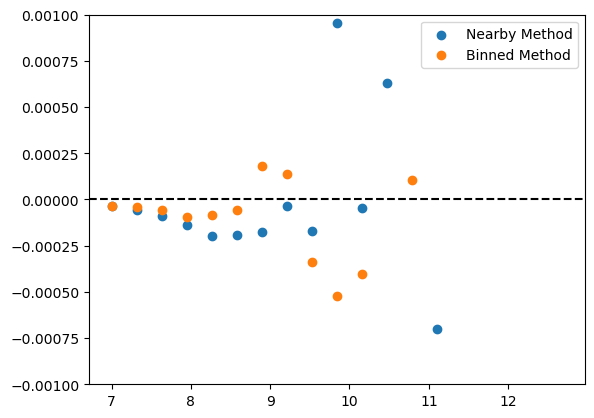

In [53]:
Vmax = np.array([ 275805.79681076,1063748.60251459,1551160.50350688,1506187.71805177,
 1178232.97655521, 885574.98050986, 553067.26816527, 451883.85314793,
  348938.00870752, 236094.3783704 , 176855.34122423, 127219.60776361,
   85754.68145404,  49196.24926018,  26011.76295494,  14149.70018215,
    6715.78827318,   4140.28324137,   2997.98667302])

nearby_rate = (N_SN[0]/Vmax) * (V_G / V_SN) * 1/total_time
binned_rate = (compare_array/Vmax) * (V_G / V_SN) * 1/total_time

plt.scatter(N_SN[1][:-1],  nearby_rate - 10**(0.63 * N_SN[1][:-1] - 8.85), label = 'Nearby Method', color = 'C0')
plt.scatter(N_SN[1][:-1], binned_rate -10**(0.63 * N_SN[1][:-1] - 8.85) , label = 'Binned Method', color = 'C1')
#plt.plot(N_SN[1][:-1], 10**(0.63 * N_SN[1][:-1] - 8.85))
print(V_G, V_SN, total_time)
print((N_SN[0]/Vmax[0]) * (V_G / V_SN) * 1/total_time)
#plt.yscale('log')
x = [8.366934932446702, 8.620967291793225, 8.874999651139749, 9.116935630167202, 9.370968687234226, 9.62499965113975, 9.872984866907489, 10.127015830813011, 10.387096729179323, 10.63508054950606, 10.883064369832798, 11.125000348860251, 11.372984169186989, 11.645161447872372]
y = [-3.5696322907036198, -3.511605428268646, -3.3326885718235055, -3.163442859117528, -2.9361702839765758, -2.7669245712705974, -2.6460348561686864, -2.457446855984384, -2.259187712060919, -2.147968861789915, -1.9690522842530296, -1.891682576523221, -1.9158605753252544, -2.0125725705333872]
x = np.array(x)
y = np.array(y)
y = 10**y

#plt.plot(x, y, label = 'Wiseman et. al.', marker = 'o', ms = 1, color = 'r')
plt.legend()
plt.ylim(-0.001, 0.001)
plt.axhline(0, color = 'k', ls = '--')

-0.017609337138663278
-0.01816497712544367
0.03672128924771063
0.03651992496305952


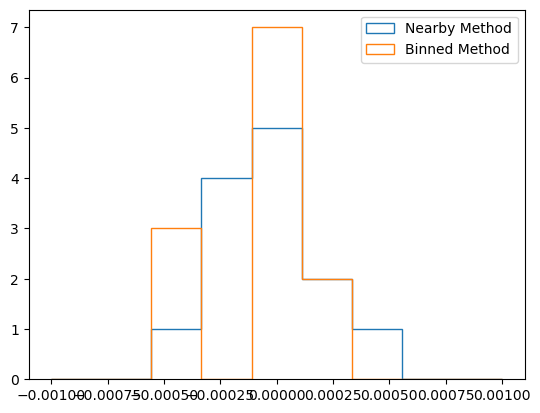

In [190]:
plt.hist(nearby_rate - 10**(0.63 * N_SN[1][:-1] - 8.85), bins = np.linspace(-0.001, 0.001, 10), histtype = 'step', label = 'Nearby Method')
plt.hist(binned_rate - 10**(0.63 * N_SN[1][:-1] - 8.85), bins = np.linspace(-0.001, 0.001, 10), histtype = 'step', label = 'Binned Method')
print(np.mean(nearby_rate - 10**(0.63 * N_SN[1][:-1] - 8.85)))
print(np.mean(binned_rate - 10**(0.63 * N_SN[1][:-1] - 8.85)))
print(np.std(nearby_rate - 10**(0.63 * N_SN[1][:-1] - 8.85)))
print(np.std(binned_rate - 10**(0.63 * N_SN[1][:-1] - 8.85)))
plt.legend()

In [ ]:
import pandas as pd

cosmo_sne = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_HD+MetaData.csv")


In [ ]:
#SFR from hostlib
#KDE?
import scipy
import numpy as np
import pandas as pd
from astropy.io import fits
from matplotlib import pyplot as plt
from ColeUtils import contains_mask, load_dump_and_sim
from astropy.coordinates import SkyCoord
import astropy.units as u

MAX_Z = 0.6
MIN_Z = 0.2


dumpdf, simdf = load_dump_and_sim(30, maria_cuts = True)
fields = np.array(['C1', 'C2', 'C3', 'X1', 'X2', 'X3', 'S1', 'S2', 'E1', 'E2'])
field_ras = np.array([54.2743,  54.2743, 52.6484, 34.4757, 35.6645, 36.4500, 42.8200, 41.1944, 7.8744 , 9.5000,])
field_decs = np.array([-27.1116, -29.0884, -28.1000, -4.9295, -6.4121, -4.6000, 0.0000, -0.9884, -43.0096,  -43.9980])  

print('cutting SNANA data to z < %.2f and z > %.2f' % (MAX_Z, MIN_Z))
dumpdf = dumpdf[dumpdf['GENZ'] < MAX_Z]
dumpdf = dumpdf[dumpdf['GENZ'] > MIN_Z]
simdf = simdf[simdf['zHD'] < MAX_Z]
simdf = simdf[simdf['zHD'] > MIN_Z]


c = SkyCoord(ra=dumpdf['RA'].values*u.degree, dec=dumpdf['DEC'].values*u.degree)
catalog = SkyCoord(ra=field_ras*u.degree, dec=field_decs*u.degree)
idx, d2d, d3d = c.match_to_catalog_sky(catalog)

deepfields = np.where((fields == 'X3') | (fields == 'C3'))[0]
deep_bool = np.zeros_like(idx)
deep_bool[np.where((idx == deepfields[0]) | (idx == deepfields[1]))[0]] = 1


dump_array = dumpdf[['GENZ', 'HOSTMAG_r', 'SALT2c']]
dump_array = dump_array.to_numpy()
dump_array = np.column_stack((dump_array, deep_bool))
dump_array = np.column_stack((dump_array, dumpdf['SALT2x1']))


sim_array = simdf[['zHD', 'HOST_MAG_r', 'SIM_c', 'FIELD', 'SIM_x1']]
sim_array['FIELD'][(sim_array['FIELD'] == 'C3') | (sim_array['FIELD'] == 'X3')] = 1
sim_array['FIELD'][sim_array['FIELD'] != 1] = 0  #What about combined fields?
sim_array = sim_array.to_numpy()





cutting SNANA data to z < 0.60 and z > 0.20


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\3653414994.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sim_array['FIELD'][(sim_array['FIELD'] == 'C3') | (sim_array['FIELD'] == 'X3')] = 1
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\3653414994.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sim_array['FIELD'][sim_array['FIELD'] != 1] = 0  #What about combined fields?


In [128]:

hostgals = fits.open(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_DES_HEAD.FITS\DES-SN5YR_DES_HEAD.FITS")[1].data
cosmo_sne = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_HD+MetaData.csv")[:1635]
mask = contains_mask(hostgals['SNID'], cosmo_sne['CID'].values)
hostgals = hostgals[mask]
hostgals = hostgals[hostgals['SNID'].argsort()]
snid_array = [int(element) for element in hostgals['SNID']]
cid_array = [int(element) for element in cosmo_sne['CID'].values[:1635]]
np.testing.assert_array_equal(snid_array, cid_array)
cosmo_fields = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES_5Y.csv")
np.testing.assert_array_equal(cosmo_fields['CIDint'].values[:1635], cid_array)
cosmo_fields = cosmo_fields['FIELD'][:1635]
cosmo_sne['FIELD'] = cosmo_fields
cosmo_fields[(cosmo_fields == 'C3') | (cosmo_fields == 'X3')] = 1
cosmo_fields[cosmo_fields !=1] = 0

real_array = np.array([cosmo_sne['zHD'], hostgals['HOSTGAL_MAG_r'], cosmo_sne['c'] - 0.1, cosmo_fields, cosmo_sne['x1']]).T
print('SUBTRACTING 0.1 FROM C')
print(real_array.shape)

print(cosmo_sne['zHD'].shape)
print('cutting real data to z < %.2f and z > %.2f' % (MAX_Z, MIN_Z))
real_array = real_array[(cosmo_sne['zHD'] < MAX_Z) & (cosmo_sne['zHD'] > MIN_Z)]
real_array.shape

hostgals = hostgals[(cosmo_sne['zHD'] < MAX_Z) & (cosmo_sne['zHD'] > MIN_Z)]
cosmo_sne = cosmo_sne[(cosmo_sne['zHD'] < MAX_Z) & (cosmo_sne['zHD'] > MIN_Z)]

SUBTRACTING 0.1 FROM C
(1635, 5)
(1635,)
cutting real data to z < 0.60 and z > 0.20


In [271]:
dump_kde = scipy.stats.gaussian_kde(dump_array.T)
sim_array = sim_array.astype(float)
sim_kde = scipy.stats.gaussian_kde(sim_array.T)
real_array = real_array.astype(float)

In [272]:
real_array.shape

(1032, 5)

In [273]:
a = sim_kde.evaluate(real_array.T) * np.shape(sim_array)[0]    # I think we need to do this.
b = dump_kde.evaluate(real_array.T) * np.shape(dump_array)[0]

C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_24244\2508087764.py:2: RuntimeWarning: divide by zero encountered in log10
  plt.hist(np.log10(a), bins = bins, histtype = 'step', label = 'Sim KDE', color = 'C1')
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_24244\2508087764.py:3: RuntimeWarning: divide by zero encountered in log10
  plt.hist(np.log10(b), bins = bins, histtype = 'step', label = 'Dump KDE', color = 'C0')
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_24244\2508087764.py:4: RuntimeWarning: invalid value encountered in divide
  plt.hist(np.log10(a/b), bins = bins, histtype = 'step', label = 'Ratio', color = 'C2')


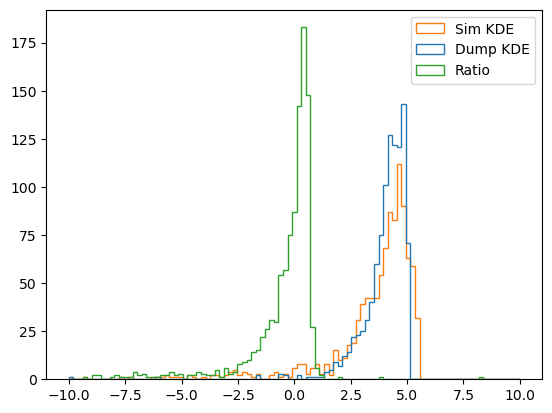

In [274]:
bins = np.linspace(-10, 10, 100)
plt.hist(np.log10(a), bins = bins, histtype = 'step', label = 'Sim KDE', color = 'C1')
plt.hist(np.log10(b), bins = bins, histtype = 'step', label = 'Dump KDE', color = 'C0')
plt.hist(np.log10(a/b), bins = bins, histtype = 'step', label = 'Ratio', color = 'C2')

plt.legend()
plt.show()

nan
1032
0
[12.99092848  0.23143167  3.18838707 ...  3.88332173  0.75813845
  1.40698493]
[           nan            nan 4.08536247e+02 6.64801067e+02
 2.72688354e+02 4.59180262e-09 5.70866543e+00 1.80548713e+02
 5.49848204e+01 3.54271724e+01 3.50453736e+01 5.88734172e+01
 5.84725083e+01 6.88403494e+01            nan 7.19333025e+01
            nan            nan            nan 1.77940728e+02
 5.96151736e+01 1.24629735e+02 2.74141679e+01 7.70018206e-01
            nan            nan            nan            nan
            nan]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_24244\814689659.py:1: RuntimeWarning: invalid value encountered in divide
  correction = b/a


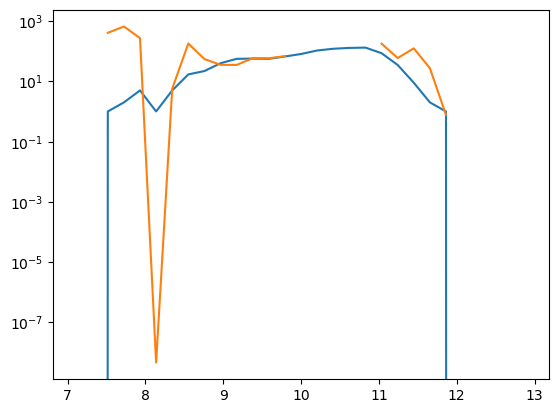

In [275]:
correction = b/a
#correction[a == 0] = 1  #Avoid division by zero
correction[np.where(correction > 1000)] = 1000  #Cutting out extreme outliers
#correction[np.where(correction < 1)] = 1  #Cutting out reductions
print(np.mean(correction))
print(np.size(correction))
print(np.size(correction[correction == 1]))
#plt.hist(correction, bins = np.linspace(0, 100, 100))
plt.show()
print(correction)

bins = np.linspace(7, 13, 30)
bin_centers = (bins[:-1] + bins[1:]) / 2
N_SN_no_corr = np.histogram(cosmo_sne['HOST_LOGMASS'], bins = bins)
plt.plot(bin_centers, N_SN_no_corr[0], label = 'Real SNe', color = 'C0')
N_SN = scipy.stats.binned_statistic(cosmo_sne['HOST_LOGMASS'][(cosmo_sne['zHD'] < MAX_Z) & (cosmo_sne['zHD'] > MIN_Z)], correction,  bins = bins, statistic = 'mean')[0]
print(N_SN)

plt.plot(bin_centers, N_SN, label = 'Inferred SNe', color = 'C1')
plt.yscale('log')

(-1.0, 3.0)

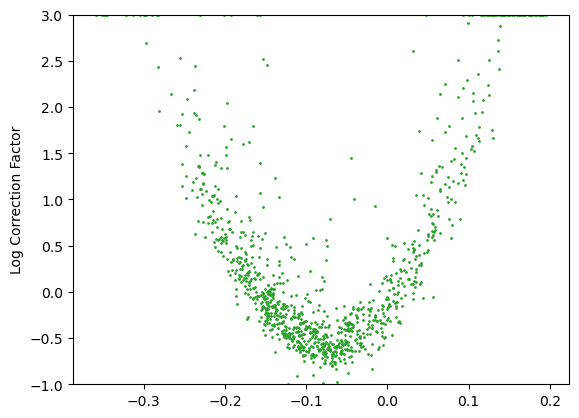

In [276]:
plt.scatter(real_array[:,2], np.log10(correction), s = 1, color = 'C2', label = 'Individual Corrections')
plt.ylabel('Log Correction Factor')
plt.ylim(-1, 3)

(array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  1.,  1.,  2.,  2.,  1.,
         0.,  3.,  2.,  2., 12.,  8., 24., 26., 45., 28., 25., 36., 37.,
        41., 30., 39., 28., 30., 25., 33., 26., 15., 24., 15., 17., 16.,
        22., 17., 16., 12.,  8., 12., 17.,  5., 10., 13.,  8., 16., 13.,
        10.,  7.,  4., 11.,  8.,  3.,  4.,  4.,  5.,  9.,  7.,  6.,  5.,
         6.,  4.,  4.,  7.,  4.,  9.,  2.,  3.,  4.,  2.,  4.,  3.,  4.,
         2.,  4.,  4.,  2.,  2.,  2.,  5.,  0.]),
 array([-2.        , -1.95959596, -1.91919192, -1.87878788, -1.83838384,
        -1.7979798 , -1.75757576, -1.71717172, -1.67676768, -1.63636364,
        -1.5959596 , -1.55555556, -1.51515152, -1.47474747, -1.43434343,
        -1.39393939, -1.35353535, -1.31313131, -1.27272727, -1.23232323,
        -1.19191919, -1.15151515, -1.11111111, -1.07070707, -1.03030303,
        -0.98989899, -0.94949495, -0.90909091, -0.86868687, -0.82828283,
 

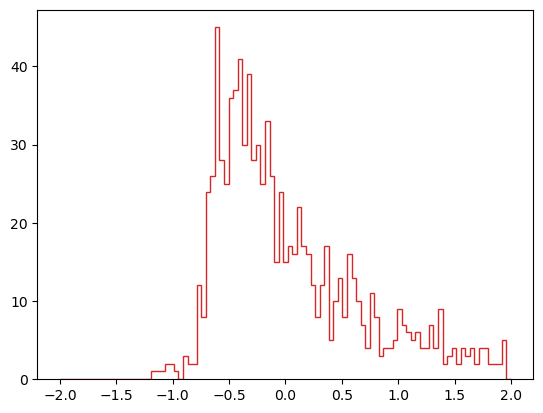

In [277]:
plt.hist(np.log10(correction), bins = np.linspace(-2, 2, 100), histtype = 'step', label = 'Log Corrections', color = 'C3')

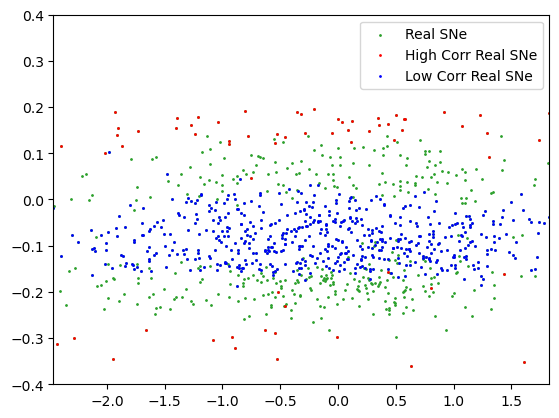

In [278]:
num1 = 4
num2 = 2

plt.scatter(real_array[:,num1], real_array[:,num2], s = 1, color = 'C2', label = 'Real SNe')
plt.scatter(real_array[:,num1][correction >= 1000], real_array[:,num2][correction >= 1000], s = 1, color = 'r', label = 'High Corr Real SNe')
plt.scatter(real_array[:,num1][correction < 1], real_array[:,num2][correction < 1], s = 1, color = 'b', label = 'Low Corr Real SNe')
plt.xlim(np.percentile(real_array[:,num1], 2), np.percentile(real_array[:,num1], 98))
plt.ylim(-0.4, 0.4)
plt.legend()

a loaded
b loaded


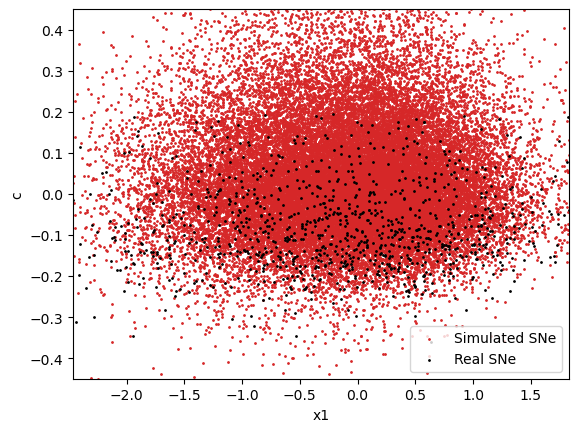

In [279]:
from scipy import stats
plt.scatter(sim_array[:,num1], simdf['c'], s = 1, color = 'C3', label = 'Simulated SNe')
#plt.scatter(dump_array[:,num1], dump_array[:,num2], s = 1, color = 'C4', label = 'Dump SNe')
plt.scatter(real_array[:,num1], real_array[:,num2], s = 1, color = 'k', label = 'Real SNe')
plt.xlim(np.percentile(real_array[:,num1], 2), np.percentile(real_array[:,num1], 98))
plt.ylim(-0.45, 0.45)
plt.xlabel('x1')
plt.ylabel('c')
plt.legend()


cc, xx = np.mgrid[-0.4:0.4:100j, -2:2:100j]
kernel = stats.gaussian_kde(sim_array.T)
dump_kernel = stats.gaussian_kde(dump_array.T)
positions = np.vstack([np.full_like(cc.ravel(), 0.2),  np.full_like(cc.ravel(), 20.0), cc.ravel(), np.full_like(cc.ravel(), 1.0), xx.ravel()])

a = kernel(positions).T * np.shape(sim_array)[0]  # Scale by the number of simulations
print('a loaded')
b = dump_kernel(positions).T * np.shape(dump_array)[0]  # Scale by the number of dumped SNe
print('b loaded')
rate_kde = a/b


[            nan             nan  6.84936151e-02 -2.16366304e-02
  2.17253904e-02  3.90854437e-02  4.20587997e-02  1.48357638e-02
  1.54321865e-02  2.62947237e-02  2.97356353e-02  1.36308996e-02
  1.23463305e-02  1.24740736e-02  1.65935557e-02  1.28637623e-02
  1.33074079e-02  6.54354431e-03  8.96304653e-03  1.09231245e-02
  5.08420772e-03  7.95027289e-03  6.93542353e-03  4.69234524e-03
  9.19922743e-05  9.73521103e-03  8.77279400e-03  5.54952742e-03
 -7.15768184e-03 -1.83604876e-02 -2.55384504e-03 -1.70716652e-02
  1.14352520e-02 -7.53532388e-02 -6.27089796e-02             nan
             nan             nan             nan             nan
             nan             nan             nan             nan
             nan             nan             nan             nan
             nan]


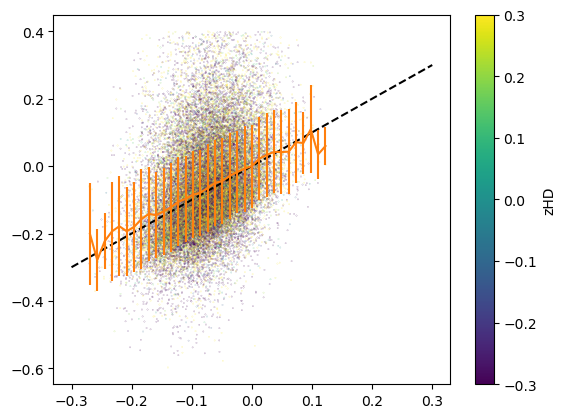

In [280]:
plt.scatter(simdf['SIM_c'], simdf['c'] - 0.1, c = simdf['x1'], s = 0.01, vmin = -0.3, vmax = 0.3, cmap = 'viridis', label = 'Simulated SNe')
plt.colorbar(label = 'zHD')
plt.plot([-0.3, 0.3], [-0.3, 0.3], color = 'k', ls = '--')

transfer_fc = scipy.stats.binned_statistic(simdf['SIM_c'], simdf['c'] - 0.1, bins = np.linspace(-0.3, 0.3, 50), statistic = 'mean')
bin_centers = (transfer_fc[1][:-1] + transfer_fc[1][1:]) / 2
err = scipy.stats.binned_statistic(simdf['SIM_c'], simdf['c'], bins = np.linspace(-0.3, 0.3, 50), statistic = 'std')[0]
plt.errorbar(bin_centers, transfer_fc[0], yerr = err, label = 'Transfer Function', color = 'C1')
print(transfer_fc[0] - bin_centers)


In [158]:
hostlib = pd.read_table(r"C:\Users\cmeldorf\Downloads\corrected_deduped_with"
                        + "_magauto_logsfr_upto_4.HOSTLIB+HOSTNBR\corrected_deduped"
                        +"_with_magauto_logsfr_upto_4.HOSTLIB+HOSTNBR", skiprows = 2, 
                            comment = '#', sep = '\s+')
#, usecols=['ZTRUE', 'i_obs_auto', 'LOGMASS']

max_i = 24.5



hostlib.columns

Index(['VARNAMES:', 'GALID', 'RA_GAL', 'DEC_GAL', 'ZTRUE', 'ZERR', 'g_obs',
       'r_obs', 'i_obs', 'z_obs', 'a0_Sersic', 'b0_Sersic', 'n0_Sersic',
       'a_rot', 'LOGMASS', 'LOG_SFR', 'a_DLR', 'b_DLR', 'DLR_area',
       'Sersic_area', 'g_obs_auto', 'r_obs_auto', 'i_obs_auto', 'z_obs_auto',
       'obs_gr', 'NBR_LIST', 'LOGSFR_TRUE'],
      dtype='object')

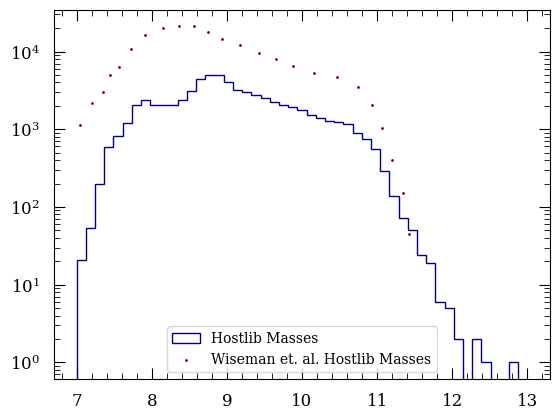

In [160]:
hostlib_cut = hostlib[hostlib['ZTRUE'] <= MAX_Z]
hostlib_cut = hostlib_cut[hostlib_cut['ZTRUE'] >= MIN_Z]
hostlib_cut = hostlib_cut[hostlib_cut['r_obs_auto'] < max_i]


plt.hist(hostlib_cut['LOGMASS'], bins = np.linspace(7, 13, 50), histtype = 'step', label = 'Hostlib Masses', color = 'C0')
plt.yscale('log')

x = [7.047789818077926, 7.2102748136431805, 7.353644267876959, 7.444444260682686, 7.568697897942348, 7.731182617864964, 7.912783706046972, 8.156511337216173, 8.357228242372296, 8.562724239593267, 8.744324776489998, 8.94026314086655, 9.169653495841207, 9.422939311140103, 9.657108758179609, 9.881720572374695, 10.163679837492126, 10.46953401164852, 10.75149327676595, 10.937873457012806, 11.066905635052041, 11.200716905156122, 11.339307267325053, 11.420549627286361]
y = [1132.540765804203, 2143.292994929668, 3018.074830946204, 4965.307582469544, 6270.435393930947, 10808.95843950722, 16197.933716284108, 19828.839972178033, 21102.029679612348, 21102.029679612348, 18061.62933265445, 14526.544191823114, 12241.57508354335, 9693.640935300697, 7918.600975101953, 6468.607034015782, 5366.975513727014, 4665.721857553848, 3471.6886712951996, 2045.5531516076105, 1031.6050532848835, 405.60982495523245, 149.8566984255766, 44.529645577932406]

plt.scatter(x, y,  color = 'C1', s = 1, label = 'Wiseman et. al. Hostlib Masses')
plt.legend()

(1001,)
name = 'HOSTGAL_LOGMASS'; format = '1E'
name = 'HOSTGAL_LOGMASS_ERR'; format = '1E'
name = 'HOSTGAL2_LOGMASS'; format = '1E'
name = 'HOSTGAL2_LOGMASS_ERR'; format = '1E'
15
15


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_12232\213881719.py:11: RuntimeWarning: invalid value encountered in divide
  hostgals_cut = hostgals[hostgals['HOSTGAL_SNSEP']/hostgals['HOSTGAL_DDLR'] < 4]
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_12232\213881719.py:13: RuntimeWarning: divide by zero encountered in divide
  hostgals_cut = hostgals_cut[hostgals_cut['HOSTGAL_MAG_r']/hostgals_cut['HOSTGAL_MAGERR_r'] > 3]


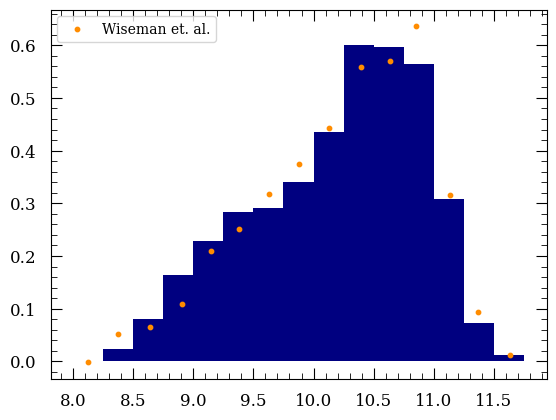

In [124]:
# test cell
cosmo_sne = pd.read_csv(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_HD+MetaData.csv")[:1635]
hostgals = fits.open(r"C:\Users\cmeldorf\Downloads\DES-SN5YR_DES_HEAD.FITS\DES-SN5YR_DES_HEAD.FITS")[1].data
mask = contains_mask(hostgals['SNID'], cosmo_sne['CID'].values)
hostgals = hostgals[mask]
hostgals = hostgals[hostgals['SNID'].argsort()]


#Cuts.
#SEP/DLR < 4
hostgals_cut = hostgals[hostgals['HOSTGAL_SNSEP']/hostgals['HOSTGAL_DDLR'] < 4]
hostgals_cut = hostgals_cut[hostgals_cut['HOSTGAL_MAG_r'] < 24.5]
hostgals_cut = hostgals_cut[hostgals_cut['HOSTGAL_MAG_r']/hostgals_cut['HOSTGAL_MAGERR_r'] > 3]
hostgals_cut = hostgals_cut[hostgals_cut['HOSTGAL_SPECZ'] < 0.6]
hostgals_cut = hostgals_cut[hostgals_cut['HOSTGAL_SPECZ'] > 0.2]
#hostgals_cut = hostgals_cut[hostgals_cut['

print(hostgals_cut.shape)

for i in list(hostgals.columns):
    if 'MASS' in i.name:
        print(i)

bins = np.arange(8, 12, 0.25)

a, _, _ = plt.hist(hostgals_cut['HOSTGAL_LOGMASS'], density = True, bins = bins)
print(np.size(a))

x = [8.127837336112362, 8.371564967281563, 8.643966599554576, 8.902030955633045, 9.145758586802245, 9.379928585127026, 9.633213849140645, 9.876941480309846, 10.130227295608742, 10.397849284531631, 10.632019282856412, 10.85185200498665, 11.13859036216893, 11.367980717143586, 11.630825267857457]
y = [-0.0016259631403337978, 0.0520325086337578, 0.0650406826850605, 0.10894309425996965, 0.20975609146109098, 0.2520325398956665, 0.31707322258072684, 0.37398380820693883, 0.4422763233869402, 0.5593496084914847, 0.5691057155835301, 0.6357723614089242, 0.31544716565466663, 0.09430895706833332, 0.011382117125242404]
print(np.size(y))
plt.scatter(x,y, s = 10, color = 'C2', label = 'Wiseman et. al.', marker = 'o')
plt.legend()


In [133]:
mass_correction = y/a


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_12232\2100685999.py:1: RuntimeWarning: divide by zero encountered in divide
  mass_correction = y/a


[94068175.23938495 94068175.23938495 94068175.23938495 ...
 23449490.36554935 23449490.36554935 94068175.23938495]
Volume Factor [1.25453314 1.25453314 1.25453314 ... 5.03258884 5.03258884 1.25453314] Mpc3
Total Time 2.1739178644763943
Z cutoff 0.6
Largest z in measured_z 0.59981
Luminosity distance at max z 3529.995873640599
Luminosity distance at measured z [3252.91571721 1068.05973874 1557.03266366 2703.65148775 2315.44262174
 2719.46956257 3275.57725509 2819.55923486 2315.44262174 1239.21278051]
measured_i [23.11023414 24.00901561 24.11285264 24.2045508  22.88228205 24.44883127
 21.09989655 22.40671059 23.52389017 22.06167181]
rmax [ 6169.15926525  1339.03651848  1860.91782293  3097.70850723
  4877.27915332  2784.31231049 15678.64536064  7393.31321848
  3629.57678379  3809.00482354]
[0.52728671 0.79763302 0.83670146 ... 0.46588585 0.1149301  0.5742241 ]
inf redshifts:
[]
and robs
[]
>1 fraction 0.27492375276308795
max and min 36.096874053403496 1.0
mean vmax correction 2.3227941172

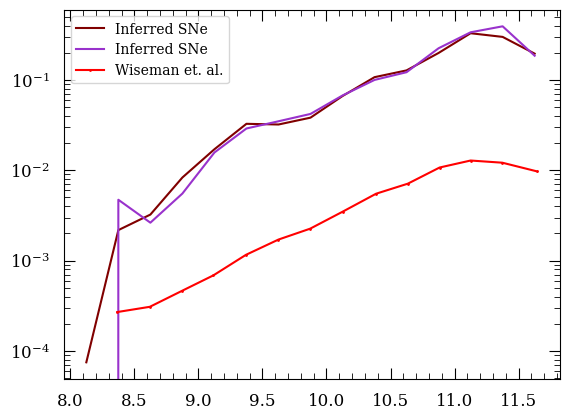

In [163]:
#Plot cell
from astropy.cosmology import FlatLambdaCDM
cosmo = FlatLambdaCDM(H0=70 * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)
from ColeUtils import calculate_volume

start = np.min(cosmo_sne['PKMJD'][cosmo_sne['PKMJD']>56000])
stop = np.max(cosmo_sne['PKMJD'][cosmo_sne['PKMJD']<56800])
dur = stop - start
total_time = dur * 5 / 365.25

max_z_deep = np.max(cosmo_sne['zHD'][real_array[:,3] == 1])
min_z_deep = np.min(cosmo_sne['zHD'][real_array[:,3] == 1])

max_z_shallow = np.max(cosmo_sne['zHD'][real_array[:,3] == 0])
min_z_shallow = np.min(cosmo_sne['zHD'][real_array[:,3] == 0])

V_SN_deep = calculate_volume(min_z_deep, max_z_deep, 27 * 2 /10)
V_SN_shallow = calculate_volume(min_z_shallow, max_z_shallow, 27 * 8/10)

V_G = calculate_volume(MIN_Z, MAX_Z, 27)  #Volume of the entire DES-SN survey

V_SN = np.empty_like(real_array[:,3])
V_SN[real_array[:,3] == 1] = V_SN_deep
V_SN[real_array[:,3] == 0] = V_SN_shallow
print(V_SN)

volume_factor = (V_G/V_SN).astype(float)
print('Volume Factor', volume_factor)
print('Total Time', total_time)


bins = np.arange(8, 12, 0.25)

Vmax, Vmaxbins, Vmax_correction, counts = calc_Vmax(max_z = MAX_Z, max_i = max_i, 
                                            measured_z = hostlib['ZTRUE'],
                                             measured_i = hostlib['i_obs_auto'], 
                                             mass = hostlib['LOGMASS'], 
                                             bins = bins,
                                             min_z = MIN_Z)
#Vmax_correction[Vmax_correction > 1e4] = 1e4  #Cutting out extreme outliers

N_SN_no_corr = np.histogram(cosmo_sne['HOST_LOGMASS'], bins = bins)
bin_centers = (bins[:-1] + bins[1:]) / 2
print(bins)
print(bin_centers)
#plt.errorbar(bin_centers, N_SN_no_corr[0], yerr = np.sqrt(N_SN_no_corr[0]), label = 'Real SNe', color = 'C0')
#Vmax = scipy.stats.binned_statistic(hostlib['LOGMASS'][hostlib['ZTRUE'] < 1.3], Vmax_correction, bins = bins, statistic = 'sum')[0]

N_SN = scipy.stats.binned_statistic(cosmo_sne['HOST_LOGMASS'], correction * volume_factor,  bins = bins, statistic = 'sum')[0]


#plt.plot(bin_centers, ((N_SN_no_corr[0] / counts) * 1/total_time), label = 'SNe / Galaxy counts', color = 'C2')
#plt.plot(bin_centers, ((N_SN_no_corr[0] / Vmax) * 1/total_time), label = 'SNe / Vmax', color = 'C0')
plt.plot(bin_centers, ((N_SN / Vmax) * 1/total_time), label = 'Inferred SNe', color = 'C1')

corrected_N_SN = ((N_SN / Vmax) * 1/total_time) * mass_correction
plt.plot(bin_centers, corrected_N_SN, label = 'Inferred SNe', color = 'C3')
#plt.plot(bin_centers, ((N_SN / counts) * 1/total_time), label = 'Inferred SNe / Galaxy coutns', color = 'C1')

#plt.plot(bin_centers, ((np.mean(all_n_sn, axis = 0) / Vmax) * 1/total_time), label = 'Inferred SNe', color = 'k')

plt.yscale('log')
#plt.ylim(1e-4, 10**(-1))
x = [8.366934932446702, 8.620967291793225, 8.874999651139749, 9.116935630167202, 9.370968687234226, 9.62499965113975, 9.872984866907489, 10.127015830813011, 10.387096729179323, 10.63508054950606, 10.883064369832798, 11.125000348860251, 11.372984169186989, 11.645161447872372]
y = [-3.5696322907036198, -3.511605428268646, -3.3326885718235055, -3.163442859117528, -2.9361702839765758, -2.7669245712705974, -2.6460348561686864, -2.457446855984384, -2.259187712060919, -2.147968861789915, -1.9690522842530296, -1.891682576523221, -1.9158605753252544, -2.0125725705333872]
x = np.array(x)
y = np.array(y)
y = 10**y

plt.plot(x, y, label = 'Wiseman et. al.', marker = 'o', ms = 1, color = 'r')
plt.legend()

In [55]:
def calc_Vmax(max_z, max_i, measured_z, measured_i, mass, bins, min_z = 0):

    cut = (measured_i < max_i) & (measured_z < max_z) & (measured_z > min_z) 
    measured_z = measured_z[cut]
    measured_i = measured_i[cut]
    mass = mass[cut]
    print('Z cutoff', max_z)
    print('Largest z in measured_z', np.max(measured_z))
    measured_z = np.asarray(measured_z)
    measured_i = np.asarray(measured_i)
    rsurv_gal = cosmo.luminosity_distance(max_z).value
    print('Luminosity distance at max z', rsurv_gal)
    robs = cosmo.luminosity_distance(measured_z).value
    print('Luminosity distance at measured z', robs[:10])
    print('measured_i', measured_i[:10])
    mobs = measured_i
    msurv = max_i
    distance_modulus = 10 ** ((msurv - mobs)/5) 
    rmax = robs * distance_modulus
    print('rmax', rmax[:10])
    print(robs/rmax)
    Vmax_correction = np.empty_like(rmax)
    Vmax_correction = (rsurv_gal / rmax)**3
    Vmax_correction[Vmax_correction < 1] = 1
    print('inf redshifts:')
    print(measured_z[np.where(Vmax_correction == np.inf)])
    print('and robs')
    print(robs[np.where(Vmax_correction == np.inf)])
    print('>1 fraction', np.size(Vmax_correction[np.where(Vmax_correction > 1)]) / np.size(Vmax_correction))
    print('max and min', np.max(Vmax_correction), np.min(Vmax_correction))

    Vmax_binned, bin_edges = scipy.stats.binned_statistic(mass, Vmax_correction, bins=bins, statistic='sum')[:2]
    counts, bin_edges = scipy.stats.binned_statistic(mass, Vmax_correction, bins=bins, statistic='count')[:2]
    print('mean vmax correction', np.mean(Vmax_correction))
    print(Vmax_binned/counts)


    return Vmax_binned, bin_edges, Vmax_correction, counts

2.1730543266234754
nan


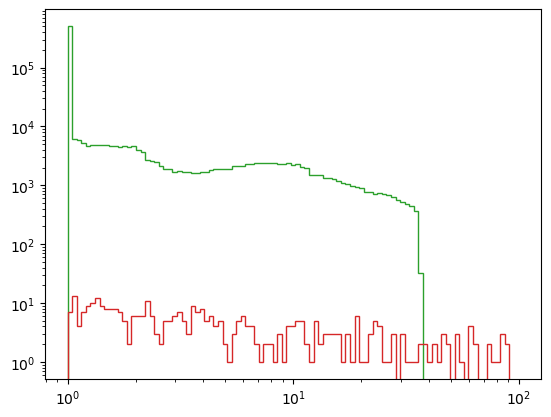

In [283]:
plt.hist(Vmax_correction, bins = np.logspace(0, 2, 100), histtype = 'step', label = 'Vmax Correction', color = 'C2')
print(np.mean(Vmax_correction))
plt.yscale('log')
plt.xscale('log')
plt.hist(correction, bins = np.logspace(0, 2, 100), histtype = 'step', label = 'Correction Factor', color = 'C3')
print(np.mean(correction))

In [ ]:
#Vmax corrections
from astropy.cosmology import FlatLambdaCDM
import astropy.units as u
import scipy.stats
cosmo = FlatLambdaCDM(H0=70 * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)
#This still really needs to be checked TODO
#Wait should I limit both surveys to the same redshift?
#Manual hard cut at 1.3




In [227]:
np.max(hostgals['HOSTGAL_MAG_i'])

26.81

In [3]:
import numpy as np
from scipy import stats
def measure(n):
    "Measurement model, return two coupled measurements."
    m1 = np.random.normal(size=n)
    m2 = np.random.normal(scale=0.5, size=n)
    return m1+m2, m1-m2

In [ ]:
sim_array = sim_array.astype(float)


In [ ]:

kernel = stats.gaussian_kde(sim_array.T)
dump_kernel = stats.gaussian_kde(dump_array.T)

In [284]:
m1, m2 = sim_array[:, 2], sim_array[:, 4]
xmin = m1.min()
xmax = m1.max()
ymin = m2.min()
ymax = m2.max()

X, Y = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]

positions = np.vstack([np.full_like(X.ravel(), 0.6), np.full_like(X.ravel(), 20.0) ,X.ravel(), np.full_like(X.ravel(), 0.0), Y.ravel()])

a = kernel(positions).T * np.shape(sim_array)[0]  # Scale by the number of simulations
print('a loaded')
b = dump_kernel(positions).T * np.shape(dump_array)[0]  # Scale by the number of dumped SNe
print('b loaded')
rate_kde = a/b



a loaded
b loaded


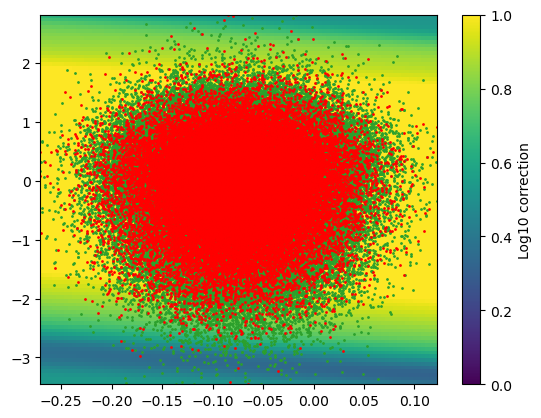

In [285]:
Z = np.reshape(b, X.shape)
plt.imshow(np.rot90(np.log10(Z)), aspect='auto', origin='lower',
           extent=[xmin, xmax, ymin, ymax], cmap='viridis', vmin = 0, vmax = 3)
plt.scatter(dump_array[:, 2], dump_array[:, 4], s = 1, color = 'C2', label = 'Simulated SNe')
plt.scatter(sim_array[:, 2], sim_array[:, 4], s = 1, color = 'r', label = 'Simulated SNe')
plt.xlim(xmin, xmax)
plt.ylim(ymin, ymax)
plt.colorbar(label='Log10 correction')

dump_array_clean shape (128368, 5)


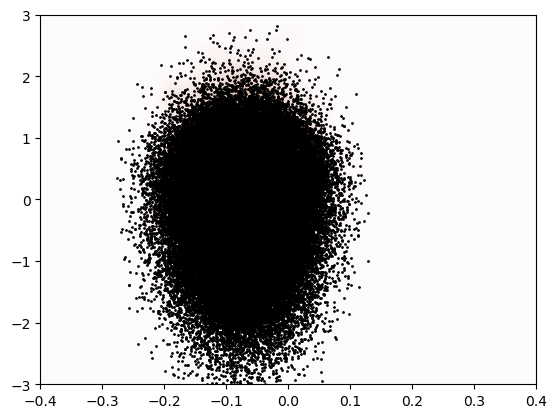

In [5]:
from scipy import stats
xmin = -0.4
xmax = 0.4
ymin = -3
ymax = 3
cut = (dump_array[:,2] >= xmin) & (dump_array[:,2] <= xmax) & (dump_array[:,4] >= ymin) & (dump_array[:,4] <= ymax)
dump_array_clean = dump_array[cut]
print('dump_array_clean shape', dump_array_clean.shape)
m1, m2, n1, n2, n3 = dump_array_clean[:, 2], dump_array_clean[:, 4], dump_array_clean[:, 0], dump_array_clean[:, 1], dump_array_clean[:, 3]

X, Y = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([X.ravel(), Y.ravel(), np.full_like(X.ravel(), np.mean(n1)), np.full_like(X.ravel(), np.mean(n2)), np.full_like(X.ravel(), np.mean(n3))])
#positions = np.vstack([X.ravel(), Y.ravel(), np.full_like(X.ravel(), np.mean(n1)), np.full_like(X.ravel(), np.mean(n3))])
#positions = np.vstack([X.ravel(), Y.ravel()])
values = np.vstack([m1, m2, n1, n2, n3])
#values = np.vstack([m1, m2, n1, n3])
#values = np.vstack([m1, m2])
dump_kernel = stats.gaussian_kde(values, bw_method='silverman')
Z_dump = np.reshape(dump_kernel(positions).T, X.shape)
Z_dump *= np.shape(dump_array)[0]  # Scale by the number of dumped SNe
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
ax.imshow(np.rot90(Z_dump), cmap=plt.cm.gist_earth_r,
          extent=[xmin, xmax, ymin, ymax], aspect='auto', origin='lower')
ax.plot(m1, m2, 'k.', markersize=2)
ax.set_xlim([xmin, xmax])
ax.set_ylim([ymin, ymax])
plt.show()

sim_array_clean shape (35089, 5)


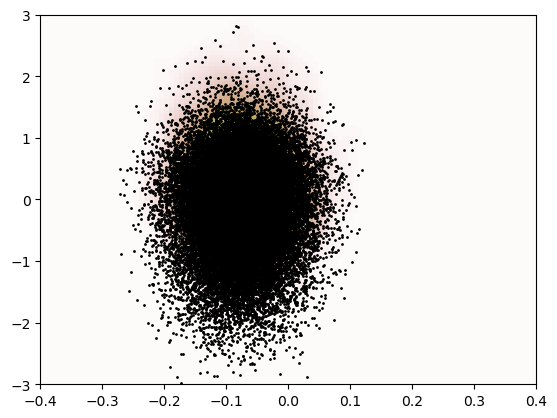

In [13]:
sim_array = sim_array.astype(float)

xmin = -0.4
xmax = 0.4
ymin = -3
ymax = 3
cut = (sim_array[:,2] >= xmin) & (sim_array[:,2] <= xmax) & (sim_array[:,4] >= ymin) & (sim_array[:,4] <= ymax)
sim_array_clean = sim_array[cut]
print('sim_array_clean shape', sim_array_clean.shape)
m1, m2, n1, n2, n3 = sim_array_clean[:, 2], sim_array_clean[:, 4], sim_array_clean[:, 0], sim_array_clean[:, 1], sim_array_clean[:, 3]

X, Y = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([X.ravel(), Y.ravel(), np.full_like(X.ravel(), np.mean(n1)), np.full_like(X.ravel(), np.mean(n2)), np.full_like(X.ravel(), np.mean(n3))])
#positions = np.vstack([X.ravel(), Y.ravel(), np.full_like(X.ravel(), np.mean(n1)), np.full_like(X.ravel(), np.mean(n3))])
#positions = np.vstack([X.ravel(), Y.ravel()])
values = np.vstack([m1, m2, n1, n2, n3])
#values = np.vstack([m1, m2, n1, n3])
#values = np.vstack([m1, m2])
sim_kernel = stats.gaussian_kde(values, bw_method='silverman')
Z_sim = np.reshape(sim_kernel(positions).T, X.shape)
Z_sim *= np.shape(sim_array)[0]  # Scale by the number of simmed SNe
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
ax.imshow(np.rot90(Z_sim), cmap=plt.cm.gist_earth_r,
          extent=[xmin, xmax, ymin, ymax], aspect='auto', origin='lower')
ax.plot(m1, m2, 'k.', markersize=2)
ax.set_xlim([xmin, xmax])
ax.set_ylim([ymin, ymax])
plt.show()

C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\3489249282.py:9: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)   # Scale by the number of dumped and simmed SNe


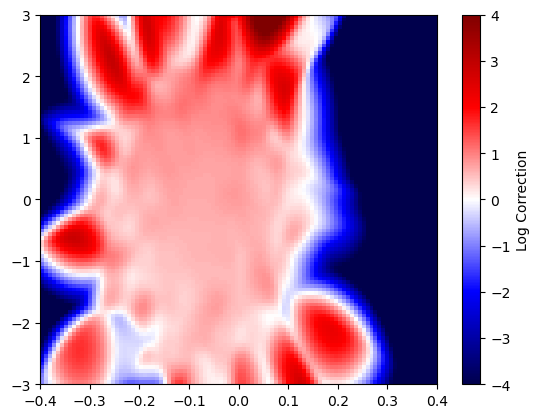

In [14]:
plt.imshow(np.rot90(np.log10(Z_dump / Z_sim)), cmap='seismic',
           extent=[xmin, xmax, ymin, ymax], aspect='auto', vmin = -4, vmax = 4)
#plt.colorbar(label='Log10 correction')
#plt.scatter(real_array[:, 2], real_array[:, 4], s = 1, color = 'C2', label = 'Real SNe')

cxfirst_realarray = np.vstack([real_array[:,2], real_array[:,4], real_array[:,0], real_array[:,1], real_array[:,3]]).astype(float)
#cxfirst_realarray = np.vstack([real_array[:,2], real_array[:,4], real_array[:,0], real_array[:,3]])
#cxfirst_realarray = np.vstack([real_array[:,2], real_array[:,4]])
correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)   # Scale by the number of dumped and simmed SNe
#plt.hist(correction, bins = np.linspace(0, 30, 100), histtype = 'step', label = 'Log Corrections', color = 'C3')

#plt.scatter(real_array[:, 2], real_array[:, 4], s = 1, c = cosmo_sne['HOST_LOGMASS'][(cosmo_sne['zHD'] < MAX_Z) & (cosmo_sne['zHD'] > MIN_Z)])
plt.colorbar(label='Log Correction')

976.0
850.2968730940269


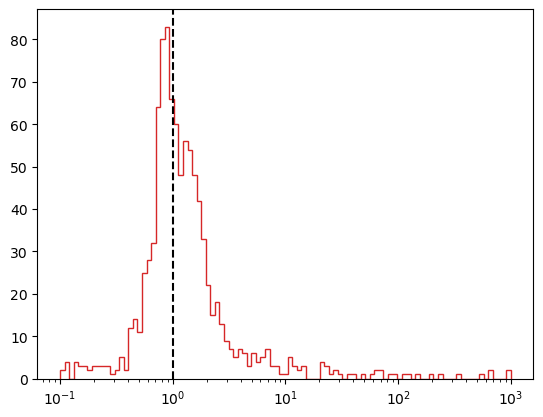

In [15]:
#correction[correction < 1 ] = 1  #Avoid reductions
a, _, _ = plt.hist(correction, bins = np.logspace(-1, 3, 100), histtype = 'step', label = 'Log Corrections', color = 'C3')
print(np.sum(a))
plt.xscale('log')
plt.axvline(1, color = 'k', ls = '--')
print(np.nanmean(correction))
no_fix_correction = correction.copy()
 

C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:7: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 229.18041131   35.17718243  424.62576625  444.76310135  516.1973446
  222.41325286  583.63533689  242.5585679   561.26186808  346.91411142
 1130.21654633 1362.22898174  134.29296708  135.51443863   17.95899478]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[251.96455199  32.04509068 139.52281209 501.40711303 733.45633032
 418.17329531 400.53745539 179.24602814 777.03418974 732.97899411
 747.17168505 785.504197   986.21199138 222.9491563   10.57581176]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 247.46415136  240.66406431   93.84887354  304.37276249  366.81182138
  318.57335032  238.27272992  658.68589118  554.19286788  628.92826402
 1391.27457066  851.72560922  206.26071636   70.55119177   90.86925957]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[248.04383802  53.72266163  90.87628748 756.54260052 391.64047388
 121.57818572 283.78784708 668.50618653 139.27539747 513.40994823
 421.0309099  635.65249056 365.42744553  61.74818615   4.2747407 ]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 204.12446525   10.61136438  314.99121662  340.13433784  703.38533931
  330.99482656  207.98012876  117.36972061  216.38647781  376.58489403
  986.11355012 1125.17087299  237.85383756   31.08801846    3.92159206]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[   2.          131.76608037   99.41422418  173.10815507  393.62101985
  752.49293639  522.98164261  168.26564002  464.93064947  281.56851336
  780.954251   1327.66203238  623.37379336   23.61576928    4.68829449]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 50.09109444  49.38370273 123.7051738  183.94120509 358.27779009
 338.67745105 646.88969008 118.21627724 439.69385894 490.38552721
 490.95180393 535.85711183 521.57745783 155.16494035   3.82096366]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[3.03864105e+02 6.93432811e+01 2.02016867e+02 2.38730666e+02
 5.71093832e+02 3.60038235e+02 3.02923045e+02 1.21706349e+02
 6.15305026e+02 6.05182562e+02 9.97069976e+02 1.04649547e+03
 7.74140143e+02 1.76476812e+02 1.00000000e+00]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 48.5243801  290.47535563 109.11652364 540.32384509 577.86564453
 460.47679308 390.19474162 427.22302174 328.15856147 941.16755854
 866.45504191 878.84245957 561.63283707  23.79344819 203.21252077]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[  4.47513074  52.18598891 117.07358603 568.35048871 204.16880956
 436.93275199 446.33862269 183.41821458 330.80013395 612.4335669
 451.41166797 941.89641257 374.50669028  59.32293193   2.        ]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[278.56740757  40.0699246  373.17858035 180.64792611 197.2043858
 474.12830622 266.07134828 406.17376648 442.76094882 470.88046631
 667.36349982 878.8799212  592.8468979  228.55775567   5.07444932]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[232.38424625  55.43874218  76.49657815 576.36776178 331.15572135
 323.66705507 391.21055713 103.40430721 678.68641893 323.11167733
 577.45747327 751.40616939 339.06393409 225.13915278  12.78172231]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[  83.033078     43.98892005  543.04480836  365.53722971  111.20353709
  381.51523341  654.21907726  317.94520813  187.06185229  765.65107997
 1242.90838481  794.73574661  127.44671118   65.40228219    5.91141782]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[  8.46155829  35.68714964 124.87560206 228.46382738 397.23260405
 535.3135325  442.51023521 142.84742323 626.4511039  578.31183663
 932.19901982 710.81793389 523.67047291 138.13067778  82.17099689]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 233.93965964   29.28238817  186.54964442  308.85010163  577.88686592
  250.25304836  263.13516419  140.06101243  579.10943577 1070.04942664
 1095.89191141  705.9706065   589.386454     48.83586867    8.27884827]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 401.           50.09576921  221.94042546  312.58061613  571.7698124
  443.32573635  342.75923656  568.53638798  662.65811125  634.81239328
  864.92339271 1096.44076472  443.08963302   39.70789427    5.08559814]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[  6.85703153  17.59902729 416.74079466 202.24601625 145.03386854
 311.50166418 353.32762805 143.54291724 148.42037544 586.46448108
 734.22410047 784.74323732 350.26039427  95.91427868   4.9773497 ]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 112.22886178   65.99934331  242.10038277  201.62810057  525.54237963
  130.6468958   508.02944466  194.61356791  525.91697427  714.38868551
  768.87177831 1263.51089299  227.52554574  262.35746311    3.48159032]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[201.          42.89617883 154.30297949 418.30042071 388.62159375
 210.24510209 224.08941553 322.34857978 215.93242032 450.77939432
 640.90359824 942.50422449 483.61060765  51.63732184   1.16176993]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 201.          334.37380384  151.34787667  686.07023073  381.32646518
  350.58110702  608.42238894  576.53685166  352.77707009  806.9112665
 1190.4775678  1160.15435307  559.92656397   52.40147572    6.84925204]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[311.66941205  57.52542787 274.58457554 291.72722285 315.34636481
 160.54278995 843.74584445 119.25920997 242.43235071 850.19296587
 890.63014154 870.24533399 672.92326707  39.27400337   5.00707446]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: divide by zero encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[  51.70335635   94.60306845  124.85282607  477.92516407  539.78414119
  126.7246362   412.87216428  348.26389283  186.16605953  383.95943157
  927.94596332 1070.18988338  160.62477784   47.90075381  202.        ]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 602.01907146   20.75366049  514.48897079  332.72166367  359.68526168
  136.32064082  492.67444822  122.26652731  326.10067035  296.4644878
 1180.06126792  845.22714098  135.5422831    26.77116321    6.79458249]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[  27.3114076   123.1921253   126.74503759  168.55855062  868.2060268
  333.35559553  309.7185261   194.10683122  369.02951034  435.45036901
  962.28842251 1492.73573471  428.59534362  114.2798196     3.73134018]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[551.80992472 249.43393627 100.87389465 562.37928566 246.87428764
 664.01090375 311.81610808 183.82611448 204.3193694  611.82143317
 752.18421577 532.12463666 623.92627083  77.89382622   7.08519022]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[245.13342543  37.10655345 519.73125005 523.64149589  95.63023526
 345.67351379 168.82089833 371.73434733 429.2666868  573.14295374
 721.70082679 572.1334086  464.86150756  36.47080891  11.3647571 ]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 316.87151081  206.30734893  138.30225169  339.03992062 1097.42551691
  135.99725908  277.33067547  139.89760053  267.97198198  969.74275242
  323.4281857  1257.15443992  181.42750903  325.85846859    4.80447418]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 324.21704471   75.29295861  168.47181226  166.38911443  585.16083367
  268.70130547  282.92936894  143.96133489  179.62905521  444.73698862
  699.10302556 1123.42306343  682.40781721   84.56166011   10.25796967]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[1.00000000e+00 5.27334285e+01 8.78563884e+01 6.08646990e+02
 5.07696516e+02 1.55495853e+02 5.00273634e+02 3.28660990e+02
 3.52432001e+02 4.73177913e+02 5.69077539e+02 1.12377218e+03
 3.86372600e+02 4.78675774e+01 4.67627829e+00]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 190.69279562  118.73667246  345.37026699  217.48620864  141.51323244
  287.9061478   455.69186717  117.39618553  922.3906392   993.16404413
  895.4679186  1122.28956735  350.92284886  183.27648125   63.90135623]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 275.69053694   47.85965692  492.95963403  303.10272011  335.34395692
  155.35664439  301.32114761  633.28610642  361.42517764  382.85956487
 1427.75036363  716.69675233  348.50222951  126.27660993    5.53154895]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 10.69406859  32.54046095 160.33969497 237.64459096 784.62275248
 328.68153663 512.57471501 148.84699518 196.04161142 379.12939938
 831.53004509 700.19987551 483.14583937 244.20709783  10.39813576]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 38.61214748 236.44038886 116.30697788 864.22358855 927.88621551
 141.31812576 233.64850063 117.97583077 460.78154045 510.56943571
 646.3334248  895.6744715  117.66145755 247.50613387   5.66269621]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[431.42433744  53.55672666 290.93268111 678.13921153 492.61410811
 316.60022037 444.95345051 148.3313614  555.54272589 845.1644785
 879.88296894 895.84551517 596.35090935  38.17430589   3.36865046]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 66.12413016  52.5660218  153.75365303 387.897232   334.09813432
 328.42130487 524.55865869 131.9469524  535.70567613 493.82849022
 527.49401669 456.34072633 622.88035087  37.97062457  12.49257606]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[372.26193941  45.59806506 327.43580558 327.17170164 341.88927697
 294.00856001 565.11831535 293.52435039 210.95577754 208.16704533
 734.48004074 748.06790843 838.29645547 230.72625818   3.30277705]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 28.37165674  60.49707292 231.49295297 661.48277544 757.32184361
 376.92056076 628.16123839 291.28654936 404.80464505 726.45255359
 899.90691747 732.76577958 475.07838997 373.10341827   2.        ]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 71.32019565  33.05499745 134.45541141 142.96493393 263.53263825
 510.95182272 363.47454508 342.47005058 210.7332452  980.24952792
 499.34167321 942.33879821 849.47722626  71.71393489   3.0434549 ]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[  4.0532385   36.96904259 139.75184422 164.2158214  118.49644537
 171.99954201 285.68988402 294.37908276 583.90529681 713.21997609
 948.50826322 714.47354462 146.21763161 322.33171394  12.13412767]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[329.98784601  97.43626654 110.11444348 387.00267196 170.29683843
 381.0209343  197.02505164 185.07333643 511.34241172 438.01085843
 821.75276369 763.54251637 379.63020851 131.13422967   9.83937954]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[219.91654032 120.11469016  95.59602789 412.63233701 382.95377524
 384.36369912 249.89967098 523.93598253 300.84580248 732.98121281
 956.2070881  506.39074528 475.27717602  37.1107809    8.08989211]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[297.12655636  33.6045359  104.31319322 444.83045957 381.15855382
 574.4721847  458.10285131 134.0620863  553.88931116 852.4327245
 807.32812848 478.37680004 503.12611665  47.40021183   7.36821558]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 213.96336125   63.5635211   319.62105354  228.98825879  586.61480795
  730.57516496  108.85181897  120.32007072  229.95074635  518.36618555
 1083.64323476 1174.38150273  129.94127411   83.89272711   52.11365127]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 398.76681889   34.00328185   93.51803578  922.10036682  698.35239005
  507.30712338  235.8767722   330.6419128   504.71680239  915.07458108
 1065.87748062 1098.42818394 1015.48294084   25.0774604    27.11082585]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: divide by zero encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[   4.52340165  293.42313233  201.49248938  167.92250834  380.71228339
  120.71211037  294.16340528  523.54366425  618.37998441  749.82962912
 1146.61106541 1144.01800965  238.07734577  199.8767534    46.6572384 ]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: divide by zero encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)
C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 32.12349102 242.69366387 362.88507126 363.03065353 519.04398405
 318.54418701 326.42999941 133.22260131 340.41330473 660.1631315
 548.57734155 733.57815223 471.42154072 224.55711674   8.28226349]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[   0.           28.40427472  285.69443115  508.13004244  346.33330036
  166.7252654   441.87281972  196.18232435  811.66519841  810.41441361
 1046.9955092  1253.89267177  608.47815391  130.33838029    4.        ]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[174.99822661  24.04277215 229.86571458 390.07536457 752.98023801
 402.23361587 288.94898122 257.52841858 360.04005712 473.86669729
 737.79151667 513.27551328 638.00979165 468.46681542 105.2803635 ]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


[ 219.26052248   70.80886048  359.14267664  342.6840045   454.26755463
  262.62149585  267.91664094  128.03207415  340.84209063  244.88896389
 1034.69905523 1624.70580115  105.38604784   61.9579582     5.87525934]
[1.00000000e+00 4.99430824e+01 7.52663044e+02 3.34804712e+02
 5.57996433e+02 2.54582130e+02 5.06051035e+02 3.38104920e+02
 2.20232580e+02 3.38891423e+02 1.08190994e+03 1.47609260e+03
 4.02336432e+02 2.88752402e+01 5.37601713e+00]


C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_11532\66149776.py:31: RuntimeWarning: invalid value encountered in divide
  correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray)


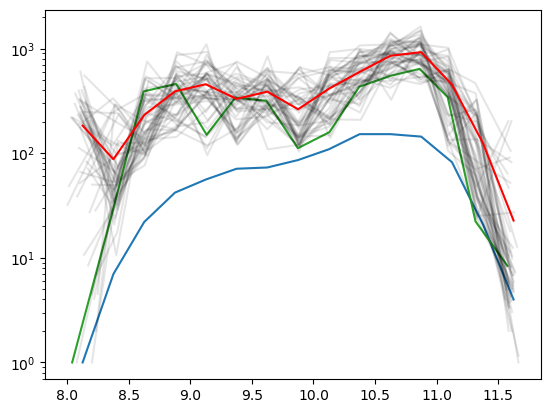

In [28]:
from numpy import random 

real_array = real_array.astype(float)

#cxfirst_realarray = np.vstack([real_array[:,2], real_array[:,4], real_array[:,0], real_array[:,3]])
cxfirst_realarray = np.vstack([real_array[:,2], real_array[:,4], real_array[:,0], real_array[:,1], real_array[:,3]]).astype(float)
correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray) 
correction[correction < 1] = 1  #Cutting out reductions
correction[correction > 200] = 200  #Cutting out extreme outliers
bins = np.arange(8, 12, 0.25)
bin_centers = (bins[:-1] + bins[1:]) / 2
N_SN_no_corr = np.histogram(cosmo_sne['HOST_LOGMASS'], bins = bins)
plt.plot(bin_centers, N_SN_no_corr[0], label = 'Real SNe', color = 'C0')
N_SN = scipy.stats.binned_statistic(cosmo_sne['HOST_LOGMASS'], correction,  bins = bins, statistic = np.nansum)[0]
x = scipy.stats.binned_statistic(cosmo_sne['HOST_LOGMASS'],\
                                  cosmo_sne['HOST_LOGMASS'],  bins = bins, statistic = 'mean')[0]

plt.plot(x, N_SN, label = 'Inferred SNe', color = 'C2')

num_realizations = 50
all_n_sn = np.zeros((num_realizations, len(bin_centers)))
for i in range(num_realizations):

    c_realization = random.normal(loc = real_array[:,2], scale = cosmo_sne['cERR'])
    z_realization = random.normal(loc = real_array[:,0], scale = cosmo_sne['zHDERR'])
    host_mass_realization = random.normal(loc = cosmo_sne['HOST_LOGMASS'], scale = np.abs(cosmo_sne['HOST_LOGMASS_ERR']))
    x_realization = random.normal(loc = real_array[:,4], scale = cosmo_sne['x1ERR'])
    mr_realization = random.normal(loc = real_array[:,1], scale = np.abs(hostgals['HOSTGAL_MAGERR_r']))
    #cxfirst_realarray = np.vstack([c_realization, x_realization, z_realization, real_array[:,3]])
    cxfirst_realarray = np.vstack([c_realization, x_realization, z_realization, mr_realization, real_array[:,3]])
    correction = dump_kernel(cxfirst_realarray)  / sim_kernel(cxfirst_realarray) 
    correction[correction < 1] = 1  #Cutting out reductions
    correction[correction > 200] = 200  #Cutting out extreme outliers

    N_SN = scipy.stats.binned_statistic(host_mass_realization, correction,  bins = bins, statistic = np.nansum)[0]
    x = scipy.stats.binned_statistic(host_mass_realization,\
                                    host_mass_realization,  bins = bins, statistic = 'mean')[0]

    print(N_SN)
    all_n_sn[i] = N_SN
    plt.plot(x, N_SN, label = 'Inferred SNe', color = 'k', alpha = 0.1)

plt.yscale('log')
plt.plot(bin_centers, np.mean(all_n_sn, axis = 0), label = 'Mean Inferred SNe', color = 'r')

(array([0.02517146, 0.0617845 , 0.11670406, 0.21967823, 0.35011217,
        0.37986027, 0.34324723, 0.20594834, 0.0617845 , 0.02059483]),
 array([-2.9801 , -2.41984, -1.85958, -1.29932, -0.73906, -0.1788 ,
         0.38146,  0.94172,  1.50198,  2.06224,  2.6225 ]),
 [<matplotlib.patches.Polygon at 0x232c744a950>])

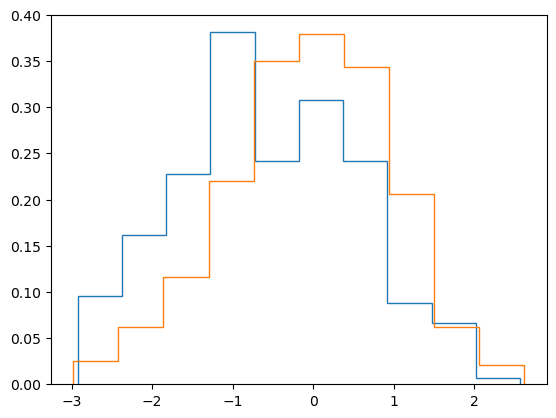

In [36]:
plt.hist(cosmo_sne['x1'][cosmo_sne['HOST_LOGMASS'] > 10.75], histtype = 'step', density = True)
plt.hist(cosmo_sne['x1'][cosmo_sne['HOST_LOGMASS'] < 10.75], histtype = 'step', density = True)

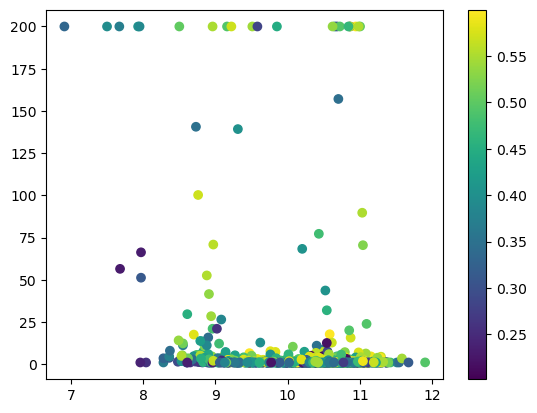

In [ ]:
plt.scatter(cosmo_sne['HOST_LOGMASS'], correction, c = cosmo_sne['zHD'])
plt.colorbar()

In [267]:

start = np.min(cosmo_sne['PKMJD'][cosmo_sne['PKMJD']>56000])
stop = np.max(cosmo_sne['PKMJD'][cosmo_sne['PKMJD']<56800])
dur = stop - start
total_time = dur * 5 / 365.25

max_i = 24.5

max_z_deep = np.max(cosmo_sne['zHD'][real_array[:,3] == 1])
min_z_deep = np.min(cosmo_sne['zHD'][real_array[:,3] == 1])

max_z_shallow = np.max(cosmo_sne['zHD'][real_array[:,3] == 0])
min_z_shallow = np.min(cosmo_sne['zHD'][real_array[:,3] == 0])

V_SN_deep = calculate_volume(min_z_deep, max_z_deep, 27)
V_SN_shallow = calculate_volume(min_z_shallow, max_z_shallow, 27)

V_G = calculate_volume(MIN_Z, MAX_Z, 27)  #Volume of the entire DES-SN survey

V_SN = np.empty_like(real_array[:,3])
V_SN[real_array[:,3] == 1] = V_SN_deep
V_SN[real_array[:,3] == 0] = V_SN_shallow
print(V_SN)

volume_factor = (V_G/V_SN).astype(float)
print('Volume Factor', volume_factor)
print('Total Time', total_time)


Vmax, Vmaxbins, Vmax_correction = calc_Vmax(max_z = MAX_Z, max_i = max_i, 
                                            measured_z = hostlib['ZTRUE'],
                                             measured_i = hostlib['i_obs_auto'], 
                                             mass = hostlib['LOGMASS'], 
                                             bins =np.linspace(7, 13, 20),
                                             min_z = MIN_Z)
#Vmax_correction[Vmax_correction > 1e4] = 1e4  #Cutting out extreme outliers

bins = np.linspace(7, 13, 20)
N_SN_no_corr = np.histogram(cosmo_sne['HOST_LOGMASS'], bins = bins)
bin_centers = (bins[:-1] + bins[1:]) / 2
#plt.errorbar(bin_centers, N_SN_no_corr[0], yerr = np.sqrt(N_SN_no_corr[0]), label = 'Real SNe', color = 'C0')
#Vmax = scipy.stats.binned_statistic(hostlib['LOGMASS'][hostlib['ZTRUE'] < 1.3], Vmax_correction, bins = bins, statistic = 'sum')[0]
print(Vmax)
N_SN = scipy.stats.binned_statistic(cosmo_sne['HOST_LOGMASS'], correction * volume_factor,  bins = bins, statistic = 'sum')[0]
print(N_SN)

plt.plot(bin_centers, ((N_SN / Vmax) * 1/total_time), label = 'Inferred SNe', color = 'C1')
plt.yscale('log')
plt.ylim(1e-4, 10**(-1))
x = [8.366934932446702, 8.620967291793225, 8.874999651139749, 9.116935630167202, 9.370968687234226, 9.62499965113975, 9.872984866907489, 10.127015830813011, 10.387096729179323, 10.63508054950606, 10.883064369832798, 11.125000348860251, 11.372984169186989, 11.645161447872372]
y = [-3.5696322907036198, -3.511605428268646, -3.3326885718235055, -3.163442859117528, -2.9361702839765758, -2.7669245712705974, -2.6460348561686864, -2.457446855984384, -2.259187712060919, -2.147968861789915, -1.9690522842530296, -1.891682576523221, -1.9158605753252544, -2.0125725705333872]
x = np.array(x)
y = np.array(y)
y = 10**y

plt.plot(x, y, label = 'Wiseman et. al.', marker = 'o', ms = 1, color = 'r')
plt.legend()

[1.17585219e+08 1.17585219e+08 1.17585219e+08 ... 1.17247452e+08
 1.17247452e+08 1.17585219e+08]
Volume Factor [1.00362651 1.00362651 1.00362651 ... 1.00651777 1.00651777 1.00362651] Mpc3
Total Time 2.1739178644763943
Z cutoff 0.6
Largest z in measured_z 0.59996
Luminosity distance at max z 3529.995873640599
Luminosity distance at measured z [1151.78188039 2344.76414096 1487.88128139 2388.52835831 1640.79287793
 1665.74988331 1017.82571243 2866.08795271 3208.60703905 2344.76414096]
measured_i [23.88354765 23.2925036  22.12079497 20.7668644  21.39410828 22.33076605
 22.40679326 22.46588662 24.32007761 23.80357101]
rmax [ 1529.89178284  4088.8242504   4450.50493424 13327.77098152
  6858.54679079  4523.31237952  2668.79223327  7313.27981238
  3485.7883117   3231.35714309]
[0.75285186 0.57345682 0.33431741 ... 0.63612102 0.28082701 0.88450978]
inf redshifts:
[]
and robs
[]
>1 fraction 0.2626418212690658
max and min 36.096874053403496 1.0
mean vmax correction 2.1730543266234754
[17.80714388

ValueError: too many values to unpack (expected 3)

In [140]:
dumpdf, simdf = load_dump_and_sim(1, maria_cuts = True)
dumpdf.columns

Index(['VARNAMES:', 'CID', 'GENTYPE', 'SNTYPE', 'NON1A_INDEX', 'GENZ',
       'GALZTRUE', 'LIBID', 'RA', 'DEC', 'MWEBV', 'MU', 'PEAKMJD', 'PEAKMAG_g',
       'PEAKMAG_r', 'PEAKMAG_i', 'PEAKMAG_z', 'SNRMAX_g', 'SNRMAX_r',
       'SNRMAX_i', 'SNRMAX_z', 'SNRMAX', 'SNRMAX2', 'SNRMAX3', 'NOBS',
       'TRESTMIN', 'TRESTMAX', 'TGAPMAX', 'CUTMASK', 'SIM_EFFMASK',
       'HOSTMAG_g', 'HOSTMAG_r', 'HOSTMAG_i', 'HOSTMAG_z', 'SBFLUX_g',
       'SBFLUX_r', 'SBFLUX_i', 'SBFLUX_z', 'SALT2x1', 'SALT2c'],
      dtype='object')

In [141]:
file_path = r"C:\Users\cmeldorf\Desktop\SEARCHEFF_zHOST_DES-SN5YR.DAT"
#searcheff  = pd.read_csv(file, delimiter='   ', skiprows = 23)

df = pd.DataFrame(columns=['Year', 'Field', 'r_obs_auto', 'obs_gr_auto', 'HOST_EFF'])

with open(file_path, 'r') as file:
    year = 'test'
    field = 'test'
    for i, line in enumerate(file):
        
        if i < 20:
            continue
        print(line.strip())
        line = line.split()
        #print(line)

        if 'Year' in line: 
            year = line[-1]
            #print(line)
            #print(year)
        if 'FIELDLIST:' in line:
            field = line[-1]
            #print(line)
            #print(field)
        
        if 'HOSTEFF:' in line:
            #print(year, field)
            new_rows = pd.DataFrame({'Year': year, 'Field': field, 'r_obs_auto': float(line[1]), 'obs_gr_auto': float(line[2]), 'HOST_EFF': float(line[3])}, index = [0])
            df = pd.concat([df, new_rows], ignore_index=True)
spec_df =df

PEAKMJD_RANGE: 56300 57500   # Year 123
FIELDLIST: C1+C2
VARNAMES: r_obs_auto obs_gr_auto HOSTEFF
HOSTEFF:    15.400    0.720    1.000 ##1.000
HOSTEFF:    15.400    1.570    1.000 ##1.000
HOSTEFF:    16.200    0.720    1.000 ##1.000
HOSTEFF:    16.200    1.570    1.000 ##1.000
HOSTEFF:    17.000    0.720    1.000 ##1.000
HOSTEFF:    17.000    1.570    1.000 ##1.000
HOSTEFF:    17.800    0.720    1.000 ##1.000
HOSTEFF:    17.800    1.570    1.000 ##1.000
HOSTEFF:    18.600    0.720    1.000 ##1.000
HOSTEFF:    18.600    1.570    1.000 ##1.000
HOSTEFF:    19.400    0.720    1.000 ##1.000
HOSTEFF:    19.400    1.570    1.000 ##1.000
HOSTEFF:    20.200    0.720    0.983 ##0.987
HOSTEFF:    20.200    1.570    0.994 ##0.987
HOSTEFF:    21.000    0.720    0.966 ##0.968
HOSTEFF:    21.000    1.570    0.971 ##0.968
HOSTEFF:    21.800    0.720    0.972 ##0.948
HOSTEFF:    21.800    1.570    0.892 ##0.948
HOSTEFF:    22.600    0.720    0.817 ##0.816
HOSTEFF:    22.600    1.570    0.814 ##0.816
HO

C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_12232\2586313589.py:29: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, new_rows], ignore_index=True)


HOSTEFF:    29.800    1.570    0.000 ##0.000

PEAKMJD_RANGE: 57500 57900   # Year 4
FIELDLIST: X3
VARNAMES: r_obs_auto obs_gr_auto HOSTEFF
HOSTEFF:    15.400    0.720    1.000 ##1.000
HOSTEFF:    15.400    1.570    1.000 ##1.000
HOSTEFF:    16.200    0.720    1.000 ##1.000
HOSTEFF:    16.200    1.570    1.000 ##1.000
HOSTEFF:    17.000    0.720    1.000 ##1.000
HOSTEFF:    17.000    1.570    1.000 ##1.000
HOSTEFF:    17.800    0.720    1.000 ##1.000
HOSTEFF:    17.800    1.570    1.000 ##1.000
HOSTEFF:    18.600    0.720    1.000 ##1.000
HOSTEFF:    18.600    1.570    1.000 ##1.000
HOSTEFF:    19.400    0.720    1.000 ##1.000
HOSTEFF:    19.400    1.570    1.000 ##1.000
HOSTEFF:    20.200    0.720    0.995 ##1.000
HOSTEFF:    20.200    1.570    1.008 ##1.000
HOSTEFF:    21.000    0.720    0.939 ##0.941
HOSTEFF:    21.000    1.570    0.944 ##0.941
HOSTEFF:    21.800    0.720    0.866 ##0.844
HOSTEFF:    21.800    1.570    0.794 ##0.844
HOSTEFF:    22.600    0.720    0.873 ##0.872
HOSTEF

In [142]:
from astropy.coordinates import SkyCoord
import astropy.units as u

fields = np.array(['C1', 'C2', 'C3', 'X1', 'X2', 'X3', 'S1', 'S2', 'E1', 'E2'])
field_ras = np.array([54.2743,  54.2743, 52.6484, 34.4757, 35.6645, 36.4500,42.8200, 41.1944, 7.8744 , 9.5000,])
field_decs = np.array([-27.1116, -29.0884, -28.1000, -4.9295, -6.4121, -4.6000, 0.0000, -0.9884, -43.0096,  -43.9980])  
c = SkyCoord(ra=dumpdf['RA'].values*u.degree, dec=dumpdf['DEC'].values*u.degree)
catalog = SkyCoord(ra=field_ras*u.degree, dec=field_decs*u.degree)
idx, d2d, d3d = c.match_to_catalog_sky(catalog)
print(idx)
reduced_dump_fields = np.array([fields[i] for i in idx])
print(reduced_dump_fields)
deepfields = np.where((fields == 'X3') | (fields == 'C3'))[0]
deep_bool = np.zeros_like(idx)
deep_bool[np.where((idx == deepfields[0]) | (idx == deepfields[1]))[0]] = 1

[7 3 8 ... 4 5 4]
['S2' 'X1' 'E1' ... 'X2' 'X3' 'X2']


['C1' 'C2' 'C3' 'E1' 'E2' 'S1' 'S2' 'X1' 'X2' 'X3']
C1
8005044 55327160
[4.70588235e-01 4.97498749e-01 4.88267893e-01 4.58675424e-01
 4.05450371e-01 2.91430984e-01 2.44428024e-01 1.69507831e-01
 7.76646053e-02 2.42149371e-02 3.42180556e-03 4.61314901e-04
 3.62169203e-04 2.43275798e-04 6.02315300e-05]
        4         3        2
-3.669 x + 10.99 x - 10.7 x + 3.192 x + 0.1899
7339320 46709640
[4.78632479e-01 5.01233553e-01 4.17207238e-01 4.20638675e-01
 3.97223391e-01 2.45555841e-01 2.18934583e-01 1.32215473e-01
 9.23225836e-02 3.41034103e-02 7.65042461e-03 7.88741381e-04
 5.73965293e-04 3.36721430e-04 7.71649594e-05]
        4         3        2
-2.332 x + 6.976 x - 6.58 x + 1.585 x + 0.3496
540908 4790760
[5.80645161e-01 5.17350158e-01 4.42687747e-01 4.40922190e-01
 3.70699652e-01 2.61972724e-01 2.10050950e-01 1.12040459e-01
 2.79922780e-02 2.47191011e-03 4.71876180e-04 1.78173719e-04
 2.18738607e-04 6.91993634e-05 0.00000000e+00]
        4         3         2
-3.667 x + 10.39 x - 9.3

C:\Users\cmeldorf\AppData\Local\Temp\ipykernel_12232\282333433.py:45: RuntimeWarning: divide by zero encountered in divide
  error = np.sqrt(1/sim_counts + 1/dump_counts)


510168 4043120
[6.66666667e-01 4.87437186e-01 3.73856209e-01 4.16785206e-01
 3.61900098e-01 2.20803911e-01 1.88232786e-01 1.00449294e-01
 4.96102055e-02 7.83012608e-03 1.22669284e-03 1.01522843e-04
 4.21185638e-04 9.00414191e-05 7.49793807e-05]
        4         3         2
-2.852 x + 8.128 x - 7.267 x + 1.645 x + 0.3467
C2
8144708 56848400
[5.15086207e-01 4.92082826e-01 4.81170599e-01 4.47569281e-01
 4.02615479e-01 2.91917314e-01 2.42024859e-01 1.65097600e-01
 7.55348009e-02 2.38099801e-02 3.17584756e-03 5.10054831e-04
 4.06158845e-04 2.54744619e-04 5.90015753e-05]
        4         3         2
-3.715 x + 11.12 x - 10.84 x + 3.26 x + 0.1737
7333636 48074440
[4.52282158e-01 4.82869811e-01 3.99245451e-01 4.15650173e-01
 3.83719035e-01 2.44164598e-01 2.11632771e-01 1.26872306e-01
 9.11030223e-02 3.18958281e-02 7.21360339e-03 6.95685035e-04
 3.56447350e-04 3.20060964e-04 9.38139107e-05]
        4         3         2
-2.336 x + 6.975 x - 6.577 x + 1.602 x + 0.3353
566196 4887200
[3.5897435

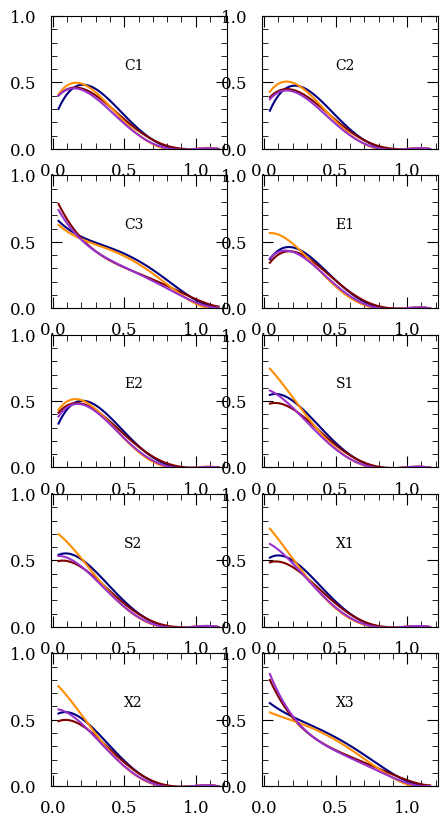

In [143]:
#Trying to reproduce Wiseman Fig 2

c_cuts = [(-0.3, 0.0), (0.0, 0.3)]
x_cuts = [(-3, 0), (0,3)]

bins = np.linspace(0, 1.2, 16)



reduced_sim_fields = np.array([i.split('+')[-1] for i in simdf['FIELD']])
fields = np.unique(np.array(reduced_sim_fields))

plt.figure(figsize = (5,10))
print(fields)


poly_dict = {}

for i,f in enumerate(fields):
  plt.subplot(5,2,i+1)
  print(f)
  plt.text(0.5, 0.6, f)
  for c_cut in c_cuts:
      for x_cut in x_cuts:
          simdf_cut = simdf.iloc[np.where(
                                    (simdf['SIM_c'] > c_cut[0]) 
                                  & (simdf['SIM_c'] < c_cut[1])
                                  & (simdf['SIM_x1'] > x_cut[0])
                                  & (simdf['SIM_x1'] < x_cut[1])
                                  & (reduced_sim_fields == f))]
          
          dumpdf_cut = dumpdf.iloc[np.where(
                                    (dumpdf['SALT2c'] > c_cut[0]) 
                                  & (dumpdf['SALT2c'] < c_cut[1])
                                  & (dumpdf['SALT2x1'] > x_cut[0])
                                  & (dumpdf['SALT2x1'] < x_cut[1])
                                  & (reduced_dump_fields == f))]
          print(np.size(simdf_cut), np.size(dumpdf_cut))
          dump_counts = np.histogram(dumpdf_cut['GENZ'], bins = bins)[0]
          sim_counts = np.histogram(simdf_cut['zHD'], bins = bins)[0]
          bin_centers = bins[:-1]/2 + bins[1:]/2

          w = sim_counts + dump_counts

          error = np.sqrt(1/sim_counts + 1/dump_counts)

          eff = np.nan_to_num(sim_counts/dump_counts)
          eff[eff>=1 ] = 1

          #plt.errorbar(bin_centers, (sim_counts/dump_counts), yerr = (sim_counts/dump_counts) * error)
          p = np.poly1d(np.polyfit(bin_centers, eff, deg = 4, w = w))

          

          zz = np.linspace(bin_centers[0], bin_centers[-1],100)
          plt.plot(zz, p(zz))
          plt.ylim(0, 1)

          poly_dict[f + '_' + str(c_cut[0]) + '_' + str(x_cut[0])] = p
          print(eff)
          print(p)


C1 -0.1301 0.1846 0.24605
[5.33999977 5.33999977 4.53999977 4.53999977 3.73999977 3.73999977
 2.93999977 2.93999977 2.13999977 2.13999977 1.33999977 1.33999977
 0.53999977 0.53999977 0.26000023 0.26000023 1.06000023 1.06000023
 1.86000023 1.86000023 2.66000023 2.66000023 3.46000023 3.46000023
 4.26000023 4.26000023 5.06000023 5.06000023 5.86000023 5.86000023
 6.66000023 6.66000023 7.46000023 7.46000023 8.26000023 8.26000023
 9.06000023 9.06000023 5.33999977 5.33999977 4.53999977 4.53999977
 3.73999977 3.73999977 2.93999977 2.93999977 2.13999977 2.13999977
 1.33999977 1.33999977 0.53999977 0.53999977 0.26000023 0.26000023
 1.06000023 1.06000023 1.86000023 1.86000023 2.66000023 2.66000023
 3.46000023 3.46000023 4.26000023 4.26000023 5.06000023 5.06000023
 5.86000023 5.86000023 6.66000023 6.66000023 7.46000023 7.46000023
 8.26000023 8.26000023 9.06000023 9.06000023 5.33999977 5.33999977
 4.53999977 4.53999977 3.73999977 3.73999977 2.93999977 2.93999977
 2.13999977 2.13999977 1.33999977 1.

(array([990.,  19.,   6.,   4.,   1.,   0.,   1.,   0.,   0.,   1.]),
 array([  1.92788003,  17.47152382,  33.01516762,  48.55881141,
         64.1024552 ,  79.646099  ,  95.18974279, 110.73338659,
        126.27703038, 141.82067417, 157.36431797]),
 <BarContainer object of 10 artists>)

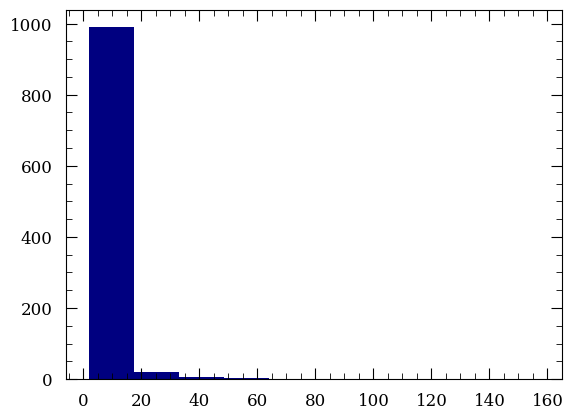

In [144]:
corrections = []


for f, c, x1, z, mr in zip(cosmo_sne['FIELD'], cosmo_sne['c'], cosmo_sne['x1'], cosmo_sne['zHD'], hostgals['HOSTGAL_MAG_r']):
    print(f,c,x1,z)
    f_reduced = f.split('+')[-1]
    c_index = -0.3 if c < 0 else 0.0
    x_index = -3 if x1 < 0 else 0
    p = poly_dict[f_reduced + '_' + str(c_index) + '_' + str(x_index)]

    print
    spec_df_cut = spec_df[[(f_reduced in i) for i in spec_df['Field'].values]]
    closest = np.argmin(np.abs(spec_df_cut['r_obs_auto'] - mr))
    print(np.abs(spec_df_cut['r_obs_auto'] - mr).values)
    host_eff = spec_df_cut['HOST_EFF'].iloc[closest]
    print('Host Eff', host_eff)
    
    if host_eff == 0:
        print('Host Eff is zero, skipping')
        corrections.append(np.nan)
        continue

    correction = 1/(p(z) * host_eff)



    corrections.append(correction)
    
plt.hist(corrections)

[ 8.          8.21052632  8.42105263  8.63157895  8.84210526  9.05263158
  9.26315789  9.47368421  9.68421053  9.89473684 10.10526316 10.31578947
 10.52631579 10.73684211 10.94736842 11.15789474 11.36842105 11.57894737
 11.78947368 12.        ]
1032
1


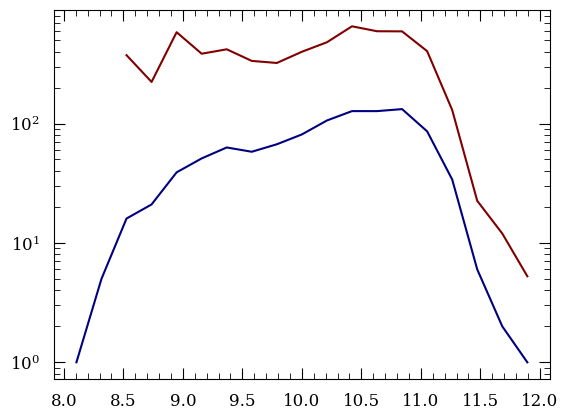

In [145]:
import scipy

bins = np.linspace(8,12,20)
print(bins)
N_SN_no_corr = np.histogram(cosmo_sne['HOST_LOGMASS'], bins = bins)[0]
bin_centers = bins[1:]/2 + bins[:-1]/2
plt.plot(bin_centers, N_SN_no_corr)
plt.yscale('log')
print(cosmo_sne['HOST_LOGMASS'].size)
print(correction.size)
N_SN = scipy.stats.binned_statistic(cosmo_sne['HOST_LOGMASS'], corrections, bins = bins, statistic = 'sum')[0]
plt.plot(bin_centers, N_SN)

In [125]:
for i in simdf.columns:
    print(i)

VARNAMES:
CID
CIDint
IDSURVEY
TYPE
FIELD
CUTFLAG_SNANA
ERRFLAG_FIT
zHEL
zHELERR
zCMB
zCMBERR
zHD
zHDERR
VPEC
VPECERR
LENSDMU
LENSDMUERR
MWEBV
HOST_NMATCH
HOST_NMATCH2
HOST_OBJID
HOST_ZPHOT
HOST_ZPHOTERR
HOST_ZSPEC
HOST_ZSPECERR
HOST_RA
HOST_DEC
HOST_ANGSEP
HOST_DDLR
HOST_CONFUSION
HOST_LOGMASS
HOST_LOGMASS_ERR
HOST_LOGSFR
HOST_LOGSFR_ERR
HOST_LOGsSFR
HOST_LOGsSFR_ERR
HOST_COLOR
HOST_COLOR_ERR
HOST_MAG_g
HOST_MAG_r
HOST_MAG_i
HOST_MAG_z
HOST_SBFLUXCAL_g
HOST_SBFLUXCAL_r
HOST_SBFLUXCAL_i
HOST_SBFLUXCAL_z
HOST_SBMAG_g
HOST_SBMAG_r
HOST_SBMAG_i
HOST_SBMAG_z
PKMJDINI
SNRMAX1
SNRMAX2
SNRMAX3
SNRSUM
BANDLIST
PKMJD
PKMJDERR
x1
x1ERR
c
cERR
mB
mBERR
x0
x0ERR
COV_x1_c
COV_x1_x0
COV_c_x0
NDOF
FITCHI2
FITPROB
RADIUS_POP
SIM_GENTYPE
SIM_TEMPLATE_INDEX
SIM_LIBID
SIM_NGEN_LIBID
SIM_ZCMB
SIM_ZFLAG
SIM_VPEC
SIM_DLMAG
SIM_LENSDMU
SIM_PEAKMJD
SIM_WGT_POP
SIM_x1
SIM_c
SIM_alpha
SIM_beta
SIM_gammaDM
SIM_x0
SIM_mB
SIM_AV
SIM_RV
SIM_HOSTLIB_GALID
SIM_HOSTLIB_r_obs_auto
SIM_HOSTLIB_obs_gr_auto
SIM_HOSTLIB_LOG

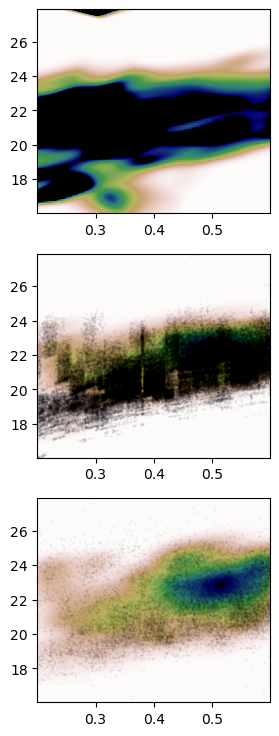

In [93]:
fig, ax = plt.subplots(3, figsize = (3, 9))
#rate_kde[rate_kde > 1] = 1 
ax[0].imshow(np.rot90(np.reshape(rate_kde, X.shape)), cmap=plt.cm.gist_earth_r,
          extent=[xmin, xmax, ymin, ymax], aspect='auto', vmin = 0, vmax = 1)
#plt.colorbar(ax[0].imshow(np.log10(np.rot90(Z)), cmap=plt.cm.gist_earth_r, vmin = -10, vmax = 0))
ax[1].imshow(np.rot90(np.reshape(a, X.shape)), cmap=plt.cm.gist_earth_r, extent=[xmin, xmax, ymin, ymax], aspect='auto')
ax[1].scatter(sim_array[:, 0], sim_array[:, 1], s = 0.1, color = 'k', label = 'Sim SNe', alpha = 0.1)
ax[2].imshow(np.rot90(np.reshape(b, X.shape)), cmap=plt.cm.gist_earth_r, extent=[xmin, xmax, ymin, ymax], aspect='auto')
#ax.plot(m1, m2, 'k.', markersize=0.5)
ax[2].scatter(dump_array[:, 0][::30], dump_array[:, 1][::30], s = 0.1, color = 'k', label = 'Sim SNe', alpha = 0.1)
ax[0].set_xlim([xmin, xmax])
ax[0].set_ylim([ymin, ymax])

ax[1].set_xlim([xmin, xmax])
ax[1].set_ylim([ymin, ymax])

ax[2].set_xlim([xmin, xmax])
ax[2].set_ylim([ymin, ymax])


plt.show()

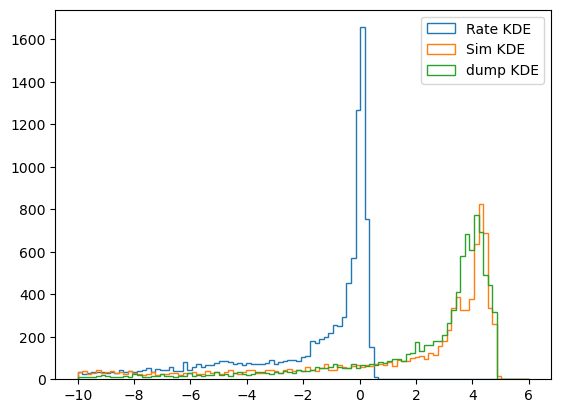

In [94]:
plt.hist(np.log10(rate_kde), bins = np.linspace(-10, 6, 100), histtype = 'step', label = 'Rate KDE')
plt.hist(np.log10(a), bins = np.linspace(-10, 6, 100), histtype = 'step', label = 'Sim KDE')
plt.hist(np.log10(b), bins = np.linspace(-10, 6, 100), histtype = 'step', label = 'dump KDE')
plt.legend()

0
1
2
3
4
5
6
7


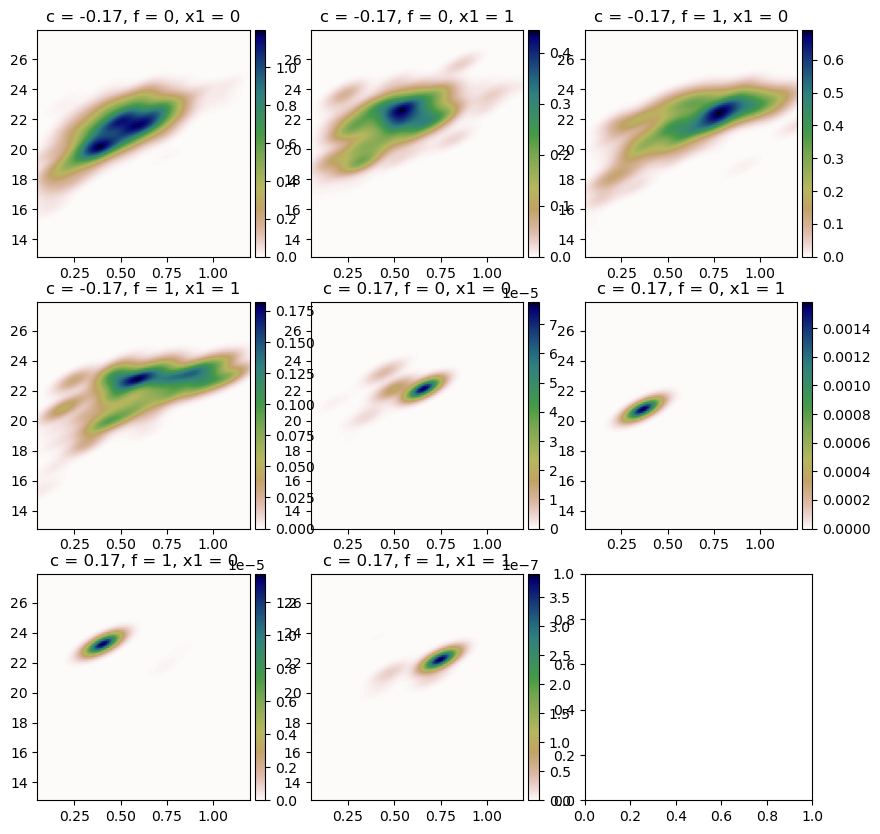

In [217]:
fig, ax = plt.subplots(3,3, figsize=(10, 10), dpi=100)
ax = ax.flatten()
from mpl_toolkits.axes_grid1 import make_axes_locatable

plotnum = 0
for i in range(2):
    for j in range(2):
        for k in range(2):
            c = (i - 0.5) / 3
            positions = np.vstack([X.ravel(), Y.ravel(), np.full_like(X.ravel(), c),  np.full_like(X.ravel(), j), np.full_like(X.ravel(), k)])
            Z = np.reshape(kernel(positions).T, X.shape)
            im = ax[plotnum].imshow(np.rot90(Z), cmap=plt.cm.gist_earth_r,
                    extent=[xmin, xmax, ymin, ymax], aspect='auto')
            #ax.plot(m1, m2, 'k.', markersize=0.5)
            ax[plotnum].set_xlim([xmin, xmax])
            ax[plotnum].set_ylim([ymin, ymax])

            print(plotnum)
            ax[plotnum].set_title(f'c = {c:.2f}, f = {j}, x1 = {k}')

            #ax[plotnum].colorbar(ax[plotnum].get_images()[0], ax[plotnum].get_xlim(), ax[plotnum].get_ylim(), label = 'KDE Density')


            divider = make_axes_locatable(ax[plotnum])
            cax = divider.append_axes('right', size='5%', pad=0.05)

            fig.colorbar(im, cax=cax, orientation='vertical')
            plotnum += 1


In [ ]:
# add KDE weights
# move KDE method up from plotting section
# try using a lower z cutoff everywhere